# Title
## Table of Contents
1. [Introduction](#intro)  
  [Description of the data](#description)  
  [Questions](#questions)  
    
    
2. [Wrangling](#wrangling)   
  [Gather](#gather)  
  [Assess](#assess)  
  [Clean](#clean)  

3. [Exploratory Data Analysis](#eda)
  [](#)  
  [](#)  
  [](#)  
  [](#)  
  [](#)  
  [](#)  
  [](#)  
  [](#)  
  [](#)  
  
4. [Linear Modelling](#lm)
  [](#)  
  [](#)  
  [](#)  
  [](#)  


<a id='intro'></a>
## Introduction

I picked this dataset so I could ask some basic questions about how AirBnb prices are related to other properties of the properties.

What general properties on an AirBnB location affect the price? e.g.:

- what neighbourhood is a listing in?
- number of bedrooms and bathrooms
- whole apartment/whole house
- is rating correlated to price

Sections 
- summary of the data
- data wrangling
- exploratory data analysis
- linear modelling

This project is part of the Data Science Nanodegree from Udacity.

<a id='description'></a>
### Description of the data

[Inside AirBNB](http://insideairbnb.com/get-the-data.html) provides 5 files (I've the filenames to avoid redundancy). A data dictionary is [here](https://docs.google.com/spreadsheets/d/1iWCNJcSutYqpULSQHlNyGInUvHg2BoUGoNRIGa6Szc4/edit#gid=982310896).


- `listings_summary.csv` (was listings.csv)
    - condensed listings file
- `listings.csv` (was listings.csv.gz)
    - full listings data
- `reviews_summary.csv` (was reviews.csv)
    - dates of when reviews were.
- `reviews.csv` (was reviews.csv.gz)
    - full reviews data
- `calendar.csv`
    - availability calendar
    
Inspecting the data dict, I decided to use only `listings_summary.csv` and selected features from the `listings.csv`, as the `reviews.csv`, `calendar.csv`, and `reviews_summary.csv` are pretty well summarized and captured in the `listings.csv` anyways.



<a id="questions"></a>
### Questions

<a id='wrangling'></a>
## Wrangling

<a id='gather'></a>
### Gather

In [1]:
# Standard imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import seaborn as sns

plt.style.use('seaborn-darkgrid')
%matplotlib inline
pd.options.display.max_rows = 5000
pd.options.display.max_columns = 500

In [2]:
# Drawing circles
from matplotlib.patches import Ellipse

In [3]:
# Map plotting
import geopandas as gpd
import contextily as ctx

In [4]:
# Use this is stitch together custom scale ticks
from itertools import chain

In [5]:
from IPython.core.display import display, HTML

In [6]:
# Linear modelling
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, roc_curve, auc, RocCurveDisplay

In [7]:
# Correlation metrics
from scipy.stats import spearmanr, pearsonr
# Two sample tests
from scipy.stats import ttest_ind, mannwhitneyu, mood
# Multiple hypothesis testing correction
from statsmodels.stats.multitest import multipletests

In [8]:
# Read in data
listings_summary = pd.read_csv('data/listings_summary.csv')
listings = pd.read_csv('data/listings.csv')

<a id='intro'></a>
### Assess

#### `listings_summary`
This is what `listings_summary` looks like:

In [9]:
listings_summary.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,10080,D1 - Million Dollar View 2 BR,30899,Rami,NaN,Downtown,49.28872,-123.12046,Entire home/apt,150,90,16,2017-02-26,0.14,40,346
1,13358,Monthly (or Longer ) Designer One Bedroom Down...,52116,Lynn,NaN,West End,49.28201,-123.12669,Entire home/apt,85,30,430,2021-01-01,3.27,1,98
2,13490,Vancouver's best kept secret,52467,Iris,NaN,Kensington-Cedar Cottage,49.25622,-123.06607,Entire home/apt,145,30,88,2020-10-31,0.73,1,203
3,14267,EcoLoft Vancouver,56030,Peter & Alison,NaN,Kensington-Cedar Cottage,49.24922,-123.08139,Entire home/apt,140,3,33,2020-02-07,0.26,1,123
4,16254,Close to PNE/Hastings Park and East Village,63238,Jason,NaN,Hastings-Sunrise,49.27721,-123.04086,Entire home/apt,195,3,5,2019-08-19,0.15,1,289


In [10]:
listings_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              4299 non-null   int64  
 1   name                            4299 non-null   object 
 2   host_id                         4299 non-null   int64  
 3   host_name                       4170 non-null   object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   4299 non-null   object 
 6   latitude                        4299 non-null   float64
 7   longitude                       4299 non-null   float64
 8   room_type                       4299 non-null   object 
 9   price                           4299 non-null   int64  
 10  minimum_nights                  4299 non-null   int64  
 11  number_of_reviews               4299 non-null   int64  
 12  last_review                     34

`neighbourhood_group` is all NaN, so will be dropped.

I'm going to drop the `name` of the listing as well. Although there might be some correlation between the marketing value in a title, I don't plan on doing any text analysis.

`host_name` also will be dropped, as `host_id` will suffice for tracking hosts, if necessary.



In [11]:
listings_summary = listings_summary.drop(labels=['neighbourhood_group', 'name', 'host_name'], axis=1)

<br/>
<br/>




#### `listings`

I'm going to grab only useful looking features of out this data.

In [12]:
listings.head(1)

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,10080,https://www.airbnb.com/rooms/10080,20210412154228,2021-04-13,D1 - Million Dollar View 2 BR,"Stunning two bedroom, two bathroom apartment. ...",NaN,https://a0.muscache.com/pictures/55778229/c2f7...,30899,https://www.airbnb.com/users/show/30899,Rami,2009-08-10,"Vancouver, British Columbia, Canada",I will be happy to host you.,within an hour,93%,87%,f,https://a0.muscache.com/im/pictures/user/55302...,https://a0.muscache.com/im/pictures/user/55302...,Coal Harbour,49.0,49.0,"['email', 'phone', 'reviews', 'jumio', 'govern...",t,t,NaN,Downtown,NaN,49.28872,-123.12046,Entire condominium,Entire home/apt,5,NaN,2 baths,2.0,2.0,"[""Iron"", ""Dryer"", ""Bed linens"", ""Cooking basic...",$150.00,90,1124,90,90,1124,1124,90.0,1124.0,NaN,t,11,41,71,346,2021-04-13,16,0,0,2011-11-15,2017-02-26,93.0,9.0,9.0,10.0,9.0,10.0,9.0,18-476608,f,40,40,0,0,0.14


In [13]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            4299 non-null   int64  
 1   listing_url                                   4299 non-null   object 
 2   scrape_id                                     4299 non-null   int64  
 3   last_scraped                                  4299 non-null   object 
 4   name                                          4299 non-null   object 
 5   description                                   4272 non-null   object 
 6   neighborhood_overview                         3074 non-null   object 
 7   picture_url                                   4299 non-null   object 
 8   host_id                                       4299 non-null   int64  
 9   host_url                                      4299 non-null   o

After a cursory inspection, a number of features related to the host, the properties of the room, and the reviews seem interesting.

In [14]:
interesting_props_dict = {'host': ['host_since', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
              'host_has_profile_pic', 'host_identity_verified'],
                          
                          'room': ['property_type', 'room_type', 'accommodates', 'bathrooms', 'bathrooms_text', 'bedrooms', 'beds',
               'amenities', 'instant_bookable'],
                          
                          'review': ['number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
               'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin',
               'review_scores_communication', 'review_scores_location', 'review_scores_value']
                         }
                          

<a id='clean'></a>
### Clean

I'll now look through the datasets we have and clean them as necessary, i.e. checking for duplicates, dealing with NaN's, and adjusting datatypes.

For clarity, I'll break the cleaning of `listings` into three parts related to different groups of features before combining them back together again with `listings_summary`.

In [15]:
## .copy() prevents SettingWithCopy warnings later on in the pipeline
# Features related to the host from listings.csv
listings_host = listings[interesting_props_dict['host']].copy()
# Features related to the room from listings.csv
listings_room = listings[interesting_props_dict['room']].copy()
# Features related to reviews from listings.csv
listings_review = listings[interesting_props_dict['review']].copy()

#### Helper functions for data cleaning
First, I'll define some helper functions for converting data types:

In [16]:
def convert_percent_to_float(string_percent):
    """
    Converts percentage strings to a float ratio e.g. 95% -> 0.95.
    
    For applying to dataframe elements. If element is NaN, returns back the element.
    """
    if pd.isna(string_percent):
        return string_percent
    else:
        return float(string_percent.strip('%'))/100

In [17]:
def convert_tf_to_float(string):
    """
    Converts strings of "t" and "f" to 1.0 or 0.0 floats.
    
    For applying to dataframe elements. If element is NaN, returns back the element.
    """ 
    if pd.isna(string):
        return string
    else:    
        return {'t':1, 'f':0}[string]

In [18]:
def convert_str_to_datetime(string, format='%Y-%m-%d'):
    """
    Converts strings of YYYY-MM-DD format (by default) to datetime objects.
    
    For applying to dataframe elements. If element is NaN, returns back the element.
    
    Uses pd.to_datetime.
    """ 
    return pd.to_datetime(string, format=format)
    

In [19]:
def col_apply_inplace(df, cols, f, **kwds):
    """
    Helper func to apply a func to elements of a column in-place.
    
    df   : input dataframe
    cols : single string or list of strings of column names
    f    : the function to apply to the elements of the columns
    kwds : keyword arguments to pass onto f
    """
    if type(cols) == str:
        df.loc[:,cols] = df.loc[:,cols].apply(f, **kwds)
    elif type(cols) == list:
        for col in cols:
            df.loc[:,col] = df.loc[:,col].apply(f, **kwds)
    else:
        raise ValueError('cols is not a single column name string or a list of column name strings')

#### Cleaning `listings_summary`

For `listings_summary`, `last_review` needs to be converted to datetimes.

In [20]:
listings_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              4299 non-null   int64  
 1   host_id                         4299 non-null   int64  
 2   neighbourhood                   4299 non-null   object 
 3   latitude                        4299 non-null   float64
 4   longitude                       4299 non-null   float64
 5   room_type                       4299 non-null   object 
 6   price                           4299 non-null   int64  
 7   minimum_nights                  4299 non-null   int64  
 8   number_of_reviews               4299 non-null   int64  
 9   last_review                     3499 non-null   object 
 10  reviews_per_month               3499 non-null   float64
 11  calculated_host_listings_count  4299 non-null   int64  
 12  availability_365                42

In [21]:
# Convert to datetime
col_apply_inplace(listings_summary, 'last_review', convert_str_to_datetime)

#### Cleaning `listings_host`

`listings_host` is an all string dataframe 

In [22]:
listings_host.head()

,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified
0,2009-08-10,within an hour,93%,87%,f,t,t
1,2009-11-07,within a day,100%,57%,t,f,t
2,2009-11-08,within an hour,100%,78%,t,t,t
3,2009-11-20,within a few hours,100%,NaN,f,t,t
4,2009-12-15,NaN,NaN,NaN,f,t,t


In [23]:
listings_host.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   host_since              4170 non-null   object
 1   host_response_time      2991 non-null   object
 2   host_response_rate      2991 non-null   object
 3   host_acceptance_rate    3099 non-null   object
 4   host_is_superhost       4170 non-null   object
 5   host_has_profile_pic    4170 non-null   object
 6   host_identity_verified  4170 non-null   object
dtypes: object(7)
memory usage: 235.2+ KB


I'll need to convert t/f columns to 1.0 and 0.0 representing true and false, convert dates to datetimes, and percentages to ratios.

In [24]:
col_apply_inplace(listings_host, 'host_since', convert_str_to_datetime)

col_apply_inplace(listings_host, 
                  ['host_response_rate', 'host_acceptance_rate'], 
                  convert_percent_to_float)

col_apply_inplace(listings_host, 
                  ['host_is_superhost','host_has_profile_pic','host_identity_verified'], 
                  convert_tf_to_float)

In [25]:
listings_host.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   host_since              4170 non-null   datetime64[ns]
 1   host_response_time      2991 non-null   object        
 2   host_response_rate      2991 non-null   float64       
 3   host_acceptance_rate    3099 non-null   float64       
 4   host_is_superhost       4170 non-null   float64       
 5   host_has_profile_pic    4170 non-null   float64       
 6   host_identity_verified  4170 non-null   float64       
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 235.2+ KB


In [26]:
listings_host.head()

,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified
0,2009-08-10,within an hour,0.93,0.87,0.0,1.0,1.0
1,2009-11-07,within a day,1.00,0.57,1.0,0.0,1.0
2,2009-11-08,within an hour,1.00,0.78,1.0,1.0,1.0
3,2009-11-20,within a few hours,1.00,NaN,0.0,1.0,1.0
4,2009-12-15,NaN,NaN,NaN,0.0,1.0,1.0


#### Cleaning `listings_room`

`listings_room` has two columns of note. `bathrooms_text` are host-entered strings describing their bathroom situation, whereas `amenities` is are json formatted collections of various amenities the property has.

In [27]:
listings_room.head()

,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,instant_bookable
0,Entire condominium,Entire home/apt,5,NaN,2 baths,2.0,2.0,"[""Iron"", ""Dryer"", ""Bed linens"", ""Cooking basic...",f
1,Entire condominium,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Iron"", ""Dryer"", ""Bed linens"", ""Cooking basic...",f
2,Entire apartment,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""Iron"", ""Outdoor dining area"", ""Ethernet conn...",f
3,Entire house,Entire home/apt,4,NaN,1 bath,1.0,2.0,"[""Iron"", ""Dryer"", ""Cooking basics"", ""Hot water...",t
4,Entire guest suite,Entire home/apt,4,NaN,1 bath,2.0,3.0,"[""Iron"", ""Dryer"", ""Bed linens"", ""Cooking basic...",t


In [28]:
listings_room.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   property_type     4299 non-null   object 
 1   room_type         4299 non-null   object 
 2   accommodates      4299 non-null   int64  
 3   bathrooms         0 non-null      float64
 4   bathrooms_text    4297 non-null   object 
 5   bedrooms          3987 non-null   float64
 6   beds              4263 non-null   float64
 7   amenities         4299 non-null   object 
 8   instant_bookable  4299 non-null   object 
dtypes: float64(3), int64(1), object(5)
memory usage: 302.4+ KB


Inspecting the amenities, each property has a combination of many amenities. These aren't very standardized.

In [29]:
amen = listings_room['amenities'].copy()

In [30]:
amen.value_counts()

["Heating", "Kitchen", "Stove", "Microwave", "Dryer", "Washer", "Wifi", "Long term stays allowed", "TV", "Hot water", "Smoke alarm", "Oven"]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

Pulling out the individual amenities, it's a long-tailed distribution (i.e. most amenity types are present in low-count, but there are a lot of them).

In [31]:
amenity_series = pd.Series([item for sublist in amen for item in json.loads(sublist)]).value_counts()

In [32]:
amenity_series

Wifi                                                                                                                                                                4226
Heating                                                                                                                                                             4138
Smoke alarm                                                                                                                                                         4112
Essentials                                                                                                                                                          4001
Kitchen                                                                                                                                                             3986
Long term stays allowed                                                                                                                                    

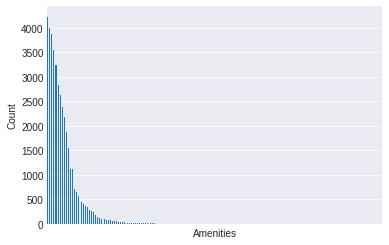

In [33]:
ax =  amenity_series.plot(kind='bar')
#ax = plt.bar(amenity_series.index, amenity_series.values, color='red')
#axes = sns.barplot(x=amenity_series.index, y=amenity_series.values) 
# Turn off x-axis, otherwise x tick labels are a mess
ax.set_xticks([])
ax.set_xlabel('Amenities')
ax.set_ylabel('Count');

One way to deal with this would be to pull out only the most popular amenities.

In [34]:
amenity_series.describe()

count     495.000000
mean      243.573737
std       760.174209
min         1.000000
25%         1.000000
50%         1.000000
75%        18.500000
max      4226.000000
dtype: float64

In [35]:
amenity_series.index[amenity_series >= 20].size

123

In [36]:
amenity_series.index[amenity_series >= 1000].size

38

An arbitrary threshold of having at least a count of 1000 might be reasonable

In [37]:
amenities_to_keep = amenity_series.index[amenity_series >= 1000]
# Make an zeros df
amenities_df = pd.DataFrame(np.zeros([listings_room.shape[0], amenities_to_keep.size]), columns=amenities_to_keep)

# Fill in the df by for loop, 1/0, basically dummy columns.
# Seems pretty slow.
for i, item in enumerate(listings_room['amenities']):
    amenities = json.loads(item)
    for amenity in amenities:
        amenities_df.iloc[i,:].loc[amenity] = 1

In [38]:
# Checking to see if correctly populated, by comparing to next cell
amenities_df.head()

,Wifi,Heating,Smoke alarm,Essentials,Kitchen,Long term stays allowed,Hangers,Washer,Dryer,Hair dryer,Hot water,Iron,Shampoo,Dedicated workspace,TV,Carbon monoxide alarm,Dishes and silverware,Fire extinguisher,Refrigerator,Cooking basics,Microwave,Coffee maker,Stove,Oven,Free parking on premises,Private entrance,Bed linens,Free street parking,Dishwasher,First aid kit,Patio or balcony,Extra pillows and blankets,Elevator,Cable TV,Luggage dropoff allowed,Air conditioning,Gym,Backyard
0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0
2,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


In [39]:
listings_room.iloc[0,:]['amenities']

'["Iron", "Dryer", "Bed linens", "Cooking basics", "Elevator", "Hot water", "Indoor fireplace", "Dishes and silverware", "Stove", "Microwave", "Long term stays allowed", "TV with standard cable", "Refrigerator", "Hangers", "Pool", "Air conditioning", "Hair dryer", "Cable TV", "Gym", "Washer", "Wifi", "Carbon monoxide alarm", "Dedicated workspace", "Free parking on premises", "Smoke alarm", "Heating", "Kitchen", "Coffee maker", "Dishwasher", "Host greets you"]'

I'll prefix the columns in `amenities_df`, then drop the `amenities` column in `listings_room`, before glueing `amenities_df` back on:

In [40]:
amenities_df.columns = 'amenity_' + amenities_df.columns.str.lower()
listings_room = listings_room.drop(labels=['amenities'], axis=1)
listings_room = pd.concat([listings_room, amenities_df], axis=1)

In [41]:
listings_room.head()

,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard
0,Entire condominium,Entire home/apt,5,NaN,2 baths,2.0,2.0,f,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
1,Entire condominium,Entire home/apt,2,NaN,1 bath,1.0,1.0,f,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0
2,Entire apartment,Entire home/apt,2,NaN,1 bath,1.0,1.0,f,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
3,Entire house,Entire home/apt,4,NaN,1 bath,1.0,2.0,t,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Entire guest suite,Entire home/apt,4,NaN,1 bath,2.0,3.0,t,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


Next, I'll extract numeric values from the bathroom text.

In [42]:
listings_room['bathrooms_text'].value_counts()

1 bath               2442
2 baths               610
1 shared bath         409
1 private bath        290
1.5 baths             185
2.5 baths             102
2 shared baths         62
3 baths                51
1.5 shared baths       44
3.5 baths              29
4 baths                17
3 shared baths          9
0 shared baths          9
0 baths                 8
6 baths                 5
4 shared baths          5
Shared half-bath        4
5 baths                 4
4.5 baths               3
7 baths                 2
Private half-bath       2
5.5 baths               2
3.5 shared baths        1
6.5 baths               1
Half-bath               1
Name: bathrooms_text, dtype: int64

All the values have a numeric value in the front, unless they are half-baths. I'll code half-baths as 0.5 bathrooms. I'll ignore the "shared" or "private" status, as it does not seem to be totally correlated with the type of property. 

In [43]:
def convert_bathrooms(txt):
    """
    Convert bathroom description string to a float.
    
    If the txt begins with a number, grabs the number by splitting on whitespace and returns it.
    
    Otherwise, it's a half bath, so return 0.5.
    
    Returns NaN if NaN encountered.
    """
    if pd.isna(txt):
        return np.nan
    elif txt[0].isnumeric():
        return float(txt.split(" ")[0])
    else:
        return 0.5  

In [44]:
# Testing the bathroom text conversion
listings_room['bathrooms_text'].apply(convert_bathrooms).value_counts()

1.0    3141
2.0     672
1.5     229
2.5     102
3.0      60
3.5      30
4.0      22
0.0      17
0.5       7
6.0       5
5.0       4
4.5       3
5.5       2
7.0       2
6.5       1
Name: bathrooms_text, dtype: int64

In [45]:
col_apply_inplace(listings_room, ['bathrooms_text'], convert_bathrooms)

`bathrooms` is all NaN, so I'll just drop it

In [46]:
listings_room['bathrooms'].isna().mean()

1.0

In [47]:
listings_room.drop(labels=['bathrooms'], axis=1, inplace=True)

In [48]:
listings_room.head()

,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard
0,Entire condominium,Entire home/apt,5,2.0,2.0,2.0,f,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
1,Entire condominium,Entire home/apt,2,1.0,1.0,1.0,f,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0
2,Entire apartment,Entire home/apt,2,1.0,1.0,1.0,f,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
3,Entire house,Entire home/apt,4,1.0,1.0,2.0,t,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Entire guest suite,Entire home/apt,4,1.0,2.0,3.0,t,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


`property_type` and `room_type` seem to encode similar information, except `property_type` is much more diverse.

In [49]:
listings_room['property_type'].value_counts()

Entire apartment                      1012
Entire condominium                     816
Entire house                           642
Private room in house                  561
Entire guest suite                     513
Private room in apartment              155
Entire loft                            112
Entire townhouse                        91
Entire serviced apartment               69
Private room in condominium             63
Entire guesthouse                       50
Private room in townhouse               34
Private room in villa                   26
Private room in guest suite             21
Room in boutique hotel                  19
Entire bungalow                         14
Private room in bed and breakfast       10
Shared room in house                     9
Entire place                             8
Room in aparthotel                       7
Shared room in apartment                 7
Private room in guesthouse               7
Room in hotel                            6
Private roo

In [50]:
listings_room['room_type'].value_counts()

Entire home/apt    3359
Private room        915
Shared room          21
Hotel room            4
Name: room_type, dtype: int64

Rather than deal with `property_type`, I'll just drop it

In [51]:
listings_room = listings_room.drop(labels=['property_type'], axis=1)

`instant_bookable` is t/f representing true/false, so I'll convert that to 1/0's

In [52]:
col_apply_inplace(listings_room, 
                  ['instant_bookable'], 
                  convert_tf_to_float)

#### Cleaning `listings_review`

In [53]:
listings_review.head()

,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,16,0,0,2011-11-15,93.0,9.0,9.0,10.0,9.0,10.0,9.0
1,430,3,0,2010-06-22,93.0,9.0,10.0,9.0,10.0,10.0,9.0
2,88,4,0,2011-06-02,98.0,10.0,10.0,10.0,10.0,10.0,10.0
3,33,0,0,2010-10-03,95.0,10.0,9.0,10.0,9.0,10.0,9.0
4,5,0,0,2018-08-04,96.0,10.0,10.0,10.0,10.0,10.0,9.0


In [54]:
listings_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   number_of_reviews            4299 non-null   int64  
 1   number_of_reviews_ltm        4299 non-null   int64  
 2   number_of_reviews_l30d       4299 non-null   int64  
 3   first_review                 3499 non-null   object 
 4   review_scores_rating         3474 non-null   float64
 5   review_scores_accuracy       3462 non-null   float64
 6   review_scores_cleanliness    3462 non-null   float64
 7   review_scores_checkin        3461 non-null   float64
 8   review_scores_communication  3463 non-null   float64
 9   review_scores_location       3462 non-null   float64
 10  review_scores_value          3462 non-null   float64
dtypes: float64(7), int64(3), object(1)
memory usage: 369.6+ KB


The only thing I'll change here is converting dates to datetime format

In [55]:
col_apply_inplace(listings_review, ['first_review'], convert_str_to_datetime)

In [56]:
listings_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   number_of_reviews            4299 non-null   int64         
 1   number_of_reviews_ltm        4299 non-null   int64         
 2   number_of_reviews_l30d       4299 non-null   int64         
 3   first_review                 3499 non-null   datetime64[ns]
 4   review_scores_rating         3474 non-null   float64       
 5   review_scores_accuracy       3462 non-null   float64       
 6   review_scores_cleanliness    3462 non-null   float64       
 7   review_scores_checkin        3461 non-null   float64       
 8   review_scores_communication  3463 non-null   float64       
 9   review_scores_location       3462 non-null   float64       
 10  review_scores_value          3462 non-null   float64       
dtypes: datetime64[ns](1), float64(7), int64(3)


#### Putting the dataframe back together

Let's put the cleaned data back into one dataframe.

In [57]:
df = pd.concat([listings_summary, listings_host, listings_room, listings_review], axis=1)

In [58]:
df.head()

,id,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,room_type,accommodates,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,10080,30899,Downtown,49.28872,-123.12046,Entire home/apt,150,90,16,2017-02-26,0.14,40,346,2009-08-10,within an hour,0.93,0.87,0.0,1.0,1.0,Entire home/apt,5,2.0,2.0,2.0,0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,16,0,0,2011-11-15,93.0,9.0,9.0,10.0,9.0,10.0,9.0
1,13358,52116,West End,49.28201,-123.12669,Entire home/apt,85,30,430,2021-01-01,3.27,1,98,2009-11-07,within a day,1.00,0.57,1.0,0.0,1.0,Entire home/apt,2,1.0,1.0,1.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,430,3,0,2010-06-22,93.0,9.0,10.0,9.0,10.0,10.0,9.0
2,13490,52467,Kensington-Cedar Cottage,49.25622,-123.06607,Entire home/apt,145,30,88,2020-10-31,0.73,1,203,2009-11-08,within an hour,1.00,0.78,1.0,1.0,1.0,Entire home/apt,2,1.0,1.0,1.0,0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,88,4,0,2011-06-02,98.0,10.0,10.0,10.0,10.0,10.0,10.0
3,14267,56030,Kensington-Cedar Cottage,49.24922,-123.08139,Entire home/apt,140,3,33,2020-02-07,0.26,1,123,2009-11-20,within a few hours,1.00,NaN,0.0,1.0,1.0,Entire home/apt,4,1.0,1.0,2.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33,0,0,2010-10-03,95.0,10.0,9.0,10.0,9.0,10.0,9.0
4,16254,63238,Hastings-Sunrise,49.27721,-123.04086,Entire home/apt,195,3,5,2019-08-19,0.15,1,289,2009-12-15,NaN,NaN,NaN,0.0,1.0,1.0,Entire home/apt,4,1.0,2.0,3.0,1,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,5,0,0,2018-08-04,96.0,10.0,10.0,10.0,10.0,10.0,9.0


In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4299 entries, 0 to 4298
Data columns (total 75 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   id                                  4299 non-null   int64         
 1   host_id                             4299 non-null   int64         
 2   neighbourhood                       4299 non-null   object        
 3   latitude                            4299 non-null   float64       
 4   longitude                           4299 non-null   float64       
 5   room_type                           4299 non-null   object        
 6   price                               4299 non-null   int64         
 7   minimum_nights                      4299 non-null   int64         
 8   number_of_reviews                   4299 non-null   int64         
 9   last_review                         3499 non-null   datetime64[ns]
 10  reviews_per_month       

Check for duplicated rows:

In [60]:
df.duplicated().sum()

0

There are two duplicated columns:

In [61]:
df.columns[df.columns.duplicated()]

Index(['room_type', 'number_of_reviews'], dtype='object')

Drop the duplicated columns:

In [62]:
df = df.loc[:, ~df.columns.duplicated()]

Rearrange the columns to put some properties from `listings_summary` next to other grouped properties

In [63]:
df.columns

Index(['id', 'host_id', 'neighbourhood', 'latitude', 'longitude', 'room_type',
       'price', 'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'host_since', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_has_profile_pic', 'host_identity_verified', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'instant_bookable',
       'amenity_wifi', 'amenity_heating', 'amenity_smoke alarm',
       'amenity_essentials', 'amenity_kitchen',
       'amenity_long term stays allowed', 'amenity_hangers', 'amenity_washer',
       'amenity_dryer', 'amenity_hair dryer', 'amenity_hot water',
       'amenity_iron', 'amenity_shampoo', 'amenity_dedicated workspace',
       'amenity_tv', 'amenity_carbon monoxide alarm',
       'amenity_dishes and silverware', 'amenity_fire extinguisher',
       'amenity_refrigerator', 'amenity_cooking basics', 'a

In [64]:
df = df[['id',  'neighbourhood', 'latitude', 'longitude',
       'price', 'minimum_nights',
       'availability_365', 
       # Host properties
       'host_id',
       'calculated_host_listings_count',
       'host_since', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_has_profile_pic', 'host_identity_verified',
       # Room properties
       'accommodates',
       'room_type',
       'bathrooms_text', 'bedrooms', 'beds', 'instant_bookable',
       'amenity_wifi', 'amenity_heating', 'amenity_smoke alarm',
       'amenity_essentials', 'amenity_kitchen',
       'amenity_long term stays allowed', 'amenity_hangers', 'amenity_washer',
       'amenity_dryer', 'amenity_hair dryer', 'amenity_hot water',
       'amenity_iron', 'amenity_shampoo', 'amenity_dedicated workspace',
       'amenity_tv', 'amenity_carbon monoxide alarm',
       'amenity_dishes and silverware', 'amenity_fire extinguisher',
       'amenity_refrigerator', 'amenity_cooking basics', 'amenity_microwave',
       'amenity_coffee maker', 'amenity_stove', 'amenity_oven',
       'amenity_free parking on premises', 'amenity_private entrance',
       'amenity_bed linens', 'amenity_free street parking',
       'amenity_dishwasher', 'amenity_first aid kit',
       'amenity_patio or balcony', 'amenity_extra pillows and blankets',
       'amenity_elevator', 'amenity_cable tv',
       'amenity_luggage dropoff allowed', 'amenity_air conditioning',
       'amenity_gym', 'amenity_backyard', 
       # Review properties
       'number_of_reviews', 'number_of_reviews_ltm',
       'number_of_reviews_l30d', 'first_review', 'last_review', 
       'reviews_per_month', 
       'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value']]

In [65]:
df.head(1)

,id,neighbourhood,latitude,longitude,price,minimum_nights,availability_365,host_id,calculated_host_listings_count,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,accommodates,room_type,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,10080,Downtown,49.28872,-123.12046,150,90,346,30899,40,2009-08-10,within an hour,0.93,0.87,0.0,1.0,1.0,5,Entire home/apt,2.0,2.0,2.0,0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,16,0,0,2011-11-15,2017-02-26,0.14,93.0,9.0,9.0,10.0,9.0,10.0,9.0


<a id="eda"></a>
## Exploratory Data Analysis

Here I'll answer several research questions to guide our exploration of the data.

Before we begin, let's define a helper function to display links to AirBnB listings:

In [66]:
def display_link(id, prefix='https://www.airbnb.ca/rooms/'):
    """
    Displays a link for a given AirBnB listing, opens in a new tab.
    """
    display(HTML(f"<a href={prefix+str(id)} target=_blank rel=\"noopener noreferrer nofollow\">{id}</a>"))
    
display_link(248014)

<a id="q1"></a>
### Q1: What neighbourhoods are the listings in?

Let's use [GeoPandas](https://geopandas.org/) to plot locations onto a map of Vancouver.

First, I'll gather the coordinates of the neighbourhoods, and the latitudes/longitudes of the locations

In [67]:
# Make points out of latitude and longitude
# Use EPSG:4326 coordinates as a default
locations = gpd.GeoDataFrame(df[['latitude', 'longitude']], geometry=gpd.points_from_xy(df['longitude'], df['latitude']), crs='EPSG:4326')
locations.head(1)

,latitude,longitude,geometry
0,49.28872,-123.12046,POINT (-123.12046 49.28872)


In [68]:
# Delineates the locations of each neighbourhood
neighbourhoods = gpd.read_file('data/neighbourhoods.geojson')
# Drop neighbourhood group as it is empty
neighbourhoods.drop(labels='neighbourhood_group', axis=1, inplace=True)
neighbourhoods.head()

,neighbourhood,geometry
0,Dunbar Southlands,"MULTIPOLYGON (((-123.17909 49.21708, -123.1791..."
1,Renfrew-Collingwood,"MULTIPOLYGON (((-123.05888 49.23286, -123.0588..."
2,Hastings-Sunrise,"MULTIPOLYGON (((-123.05660 49.26215, -123.0566..."
3,Oakridge,"MULTIPOLYGON (((-123.14015 49.21935, -123.1401..."
4,Downtown Eastside,"MULTIPOLYGON (((-123.09988 49.27604, -123.1022..."


In [69]:
# Check the coordinate reference system
neighbourhoods.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

A [coordinate reference system](https://en.wikipedia.org/wiki/Spatial_reference_system) is a set of rules that converts locations to a set of points that can be plotted. [EPSG:4326](https://epsg.io/4326) is a common default, but because I want to use `contextily` to grab a background map for the plot, I'll need to convert to another coordinate system [EPSG:3857](https://epsg.io/3857) to the `contextily` maps.


In [115]:
neighbourhoods.head()

,neighbourhood,geometry
0,Dunbar Southlands,"MULTIPOLYGON (((-123.17909 49.21708, -123.1791..."
1,Renfrew-Collingwood,"MULTIPOLYGON (((-123.05888 49.23286, -123.0588..."
2,Hastings-Sunrise,"MULTIPOLYGON (((-123.05660 49.26215, -123.0566..."
3,Oakridge,"MULTIPOLYGON (((-123.14015 49.21935, -123.1401..."
4,Downtown Eastside,"MULTIPOLYGON (((-123.09988 49.27604, -123.1022..."


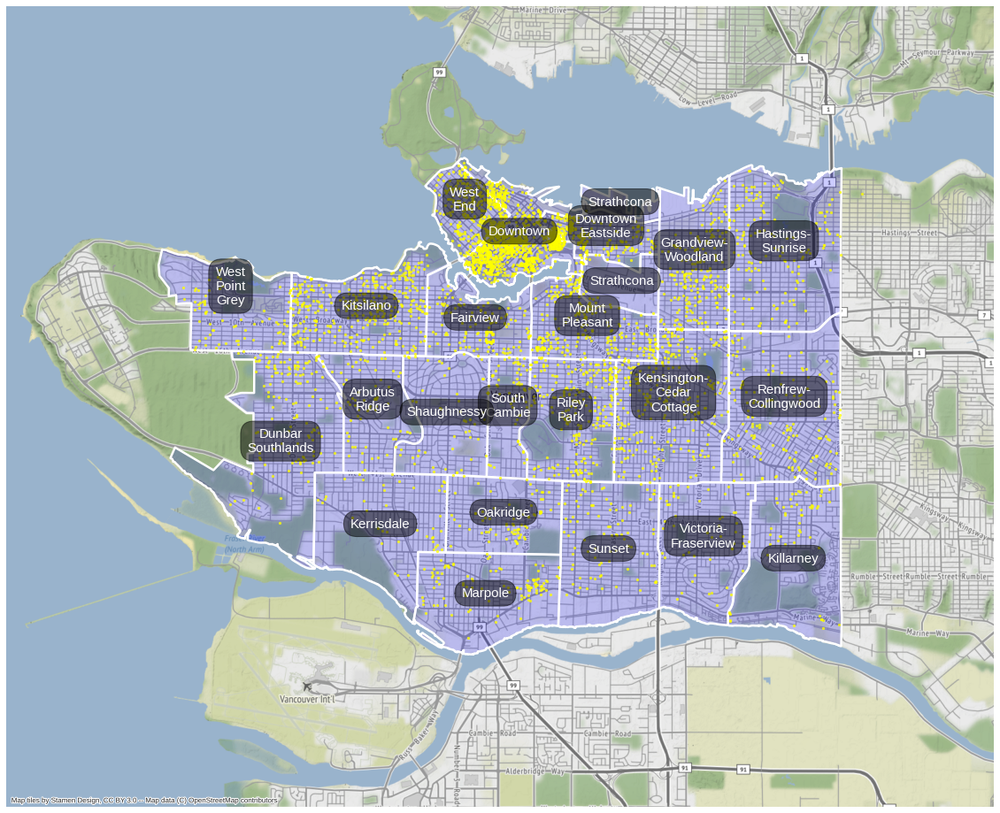

In [123]:
p_mercator = 'EPSG:3857' # Pseudo-Mercator projection, as this is what map services background is in


# Plot the neighbourhoods
ax = neighbourhoods.to_crs(p_mercator).plot(figsize=(20,20),
                                            facecolor='#0000FF33',
                                            edgecolor='white',
                                            linewidth=2.5)
# Plot the listing locations
locations.to_crs(p_mercator).plot(color='yellow', markersize=5, ax=ax,alpha=0.7)

# Set up the limits for a larger view of the Vancouver area
lims = np.array(neighbourhoods.to_crs(p_mercator).total_bounds) # xmin, ymin, xmax, ymax
margin = 5000
lims = lims + np.array([-margin, -margin, margin, margin])
ax.set_xlim(lims[0], lims[2])
ax.set_ylim(lims[1], lims[3])
# Plot the background map tile with contextily
ctx.add_basemap(ax)
# Turn off seaborn theme lines and axes
plt.axis('off');

# Add neighbourhood names:
# See https://stackoverflow.com/questions/38899190/geopandas-label-polygons
# 1) Get points within each neighbourhood (tuples of xy's)
label_coords = neighbourhoods['geometry'].to_crs(p_mercator).apply(lambda x: x.centroid.coords[0])
# 2) Plot them
for i, nbh in neighbourhoods['neighbourhood'].iteritems():
   # Add \n for better text placement
   nbh = nbh.replace(' ', '\n').replace('-', '-\n')
   plt.text(x=label_coords.iloc[i][0], y=label_coords.iloc[i][1] , s=nbh,
            horizontalalignment='center', color='white', size=15,
            bbox=dict(facecolor='black', alpha=0.5, boxstyle="Round, pad=0.5, rounding_size=1"))
    

Looks like Downtown is a hotspot of listings, let's confirm:

In [71]:
df['neighbourhood'].value_counts()

Downtown                    1153
Kitsilano                    348
West End                     347
Kensington-Cedar Cottage     278
Mount Pleasant               246
Downtown Eastside            232
Riley Park                   227
Grandview-Woodland           199
Renfrew-Collingwood          159
Hastings-Sunrise             151
Fairview                     132
Dunbar Southlands            128
Marpole                      103
Sunset                        88
West Point Grey               75
Oakridge                      74
Shaughnessy                   69
Arbutus Ridge                 64
South Cambie                  58
Killarney                     55
Victoria-Fraserview           54
Kerrisdale                    42
Strathcona                    17
Name: neighbourhood, dtype: int64

<a id='q2'></a>
### Q2: What is the distribution of the prices of the listings?
Prices in this dataset are whatever was scraped off the AirBNB website. It does not account for complexities such as surge pricing or fine-grained host adjustments by date, nor additional fees and taxes.

Here is the overall distribution of prices. The prices are right-skewed, with some a smattering of very expensive listings, while the median is 115 CAD per night.

In [73]:
df['price'].describe()

count    4299.000000
mean      151.511980
std       152.606141
min        19.000000
25%        83.000000
50%       115.000000
75%       175.000000
max      3250.000000
Name: price, dtype: float64

In [74]:
df['price'].median()

115.0

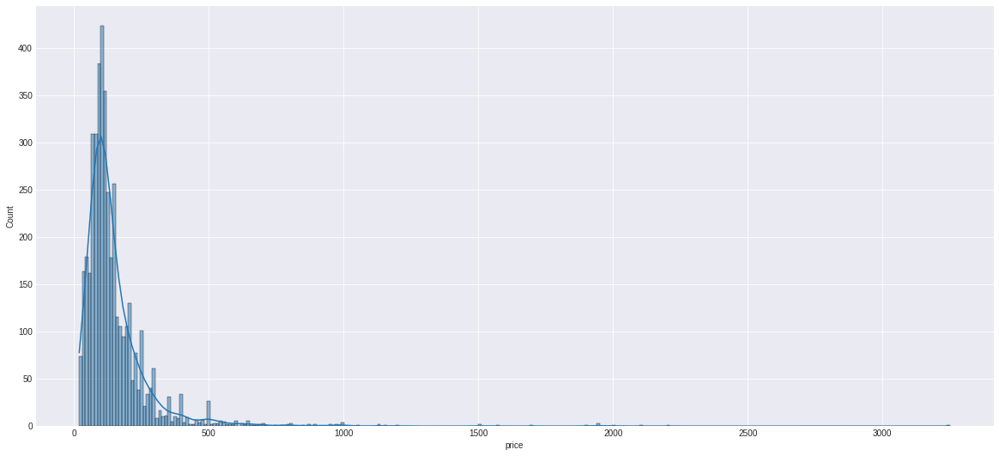

In [75]:
# Linear price scale plot
fig, ax = plt.subplots(figsize=(20,9));
sns.histplot(data=df, x='price', ax=ax, kde=True);

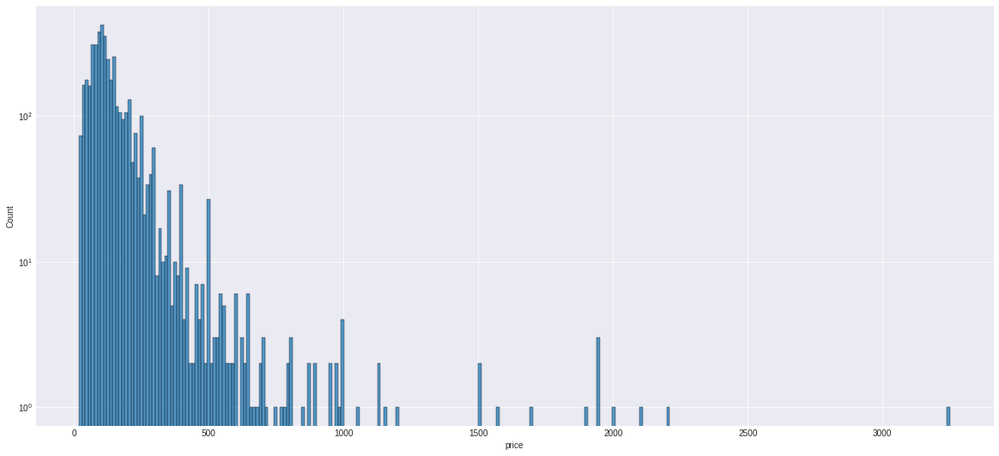

In [76]:
# Log scale plot of the above
fig, ax = plt.subplots(figsize=(20,9));
sns.histplot(data=df, x='price', ax=ax);
ax.set_yscale('log')

<a id='q3'></a>
### Q3 What is the distribution of prices by neighbourhood?


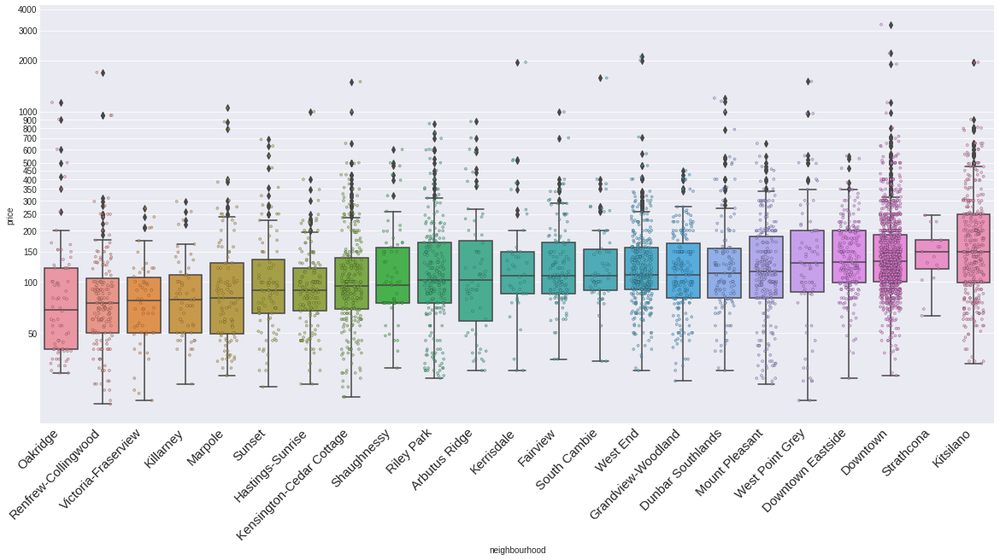

In [104]:
fig, ax = plt.subplots(figsize=(20,9))
# Plotting by median price value
order = df.groupby(by='neighbourhood')['price'].median().sort_values().index
sns.stripplot(data=df, x='neighbourhood', y='price', order=order, ax=ax, s=3, alpha=.5, jitter=0.25, edgecolor='#333333', linewidth=.5);
sns.boxplot(data=df, x='neighbourhood', y='price', order=order, ax=ax);
plt.xticks(rotation=45, ha='right', size=15);
plt.yscale('log')
y_ticks = list(chain(range(50,500,50), range(500, 1000, 100), range(1000, 5000, 1000)))
plt.yticks(ticks=y_ticks, labels=y_ticks);


### Q4 What is the relationship between quantitative data variables and the price?

Here, I'll make a correlation matrix of quantitative variables to price.

In [124]:
# Summary stats of the quantitative vars
df.describe()

,id,latitude,longitude,price,minimum_nights,availability_365,host_id,calculated_host_listings_count,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,accommodates,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
count,4.299000e+03,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4.299000e+03,4299.000000,2991.000000,3099.000000,4170.000000,4170.000000,4170.000000,4299.000000,4297.000000,3987.000000,4263.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,4299.000000,3499.000000,3474.000000,3462.000000,3462.000000,3461.000000,3463.000000,3462.000000,3462.000000
mean,2.930888e+07,49.263773,-123.112936,151.511980,19.002326,126.424750,1.147540e+08,5.643871,0.921792,0.837606,0.359472,0.997362,0.874101,3.362875,1.292762,1.569852,1.780202,0.329844,0.983019,0.962549,0.956502,0.930682,0.927192,0.905559,0.902768,0.857874,0.850198,0.822749,0.770877,0.758316,0.753198,0.751570,0.722959,0.710165,0.660851,0.637358,0.630379,0.610607,0.595720,0.561061,0.556176,0.540823,0.533612,0.508258,0.482670,0.455687,0.434752,0.411956,0.387299,0.359386,0.324261,0.290533,0.261224,0.260991,0.260758,0.260758,34.227960,4.371947,0.411956,1.241252,95.052389,9.692085,9.531774,9.789078,9.803350,9.780763,9.420277
std,1.415329e+07,0.019886,0.037472,152.606141,34.112295,125.528629,1.170448e+08,13.494667,0.207237,0.249665,0.479903,0.051299,0.331776,1.918289,0.610889,0.880362,1.179865,0.470211,0.129214,0.189885,0.204000,0.254024,0.259851,0.292475,0.296308,0.349220,0.356919,0.381925,0.420317,0.428154,0.431200,0.432153,0.447589,0.453738,0.473475,0.480819,0.482758,0.487669,0.490809,0.496315,0.496892,0.498389,0.498927,0.499990,0.499758,0.498090,0.495782,0.492245,0.487190,0.479876,0.468153,0.454061,0.439353,0.439226,0.439099,0.439099,59.378906,9.308805,1.223835,1.392151,7.831887,0.822566,0.921979,0.696819,0.699319,0.576081,0.870973
min,1.008000e+04,49.202960,-123.217570,19.000000,1.000000,0.000000,6.033000e+03,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010000,20.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
25%,1.913710e+07,49.25183

In [125]:
# All columns with numerical data types
df.dtypes[(df.dtypes == 'float64') | (df.dtypes == 'int64')]

id                                      int64
latitude                              float64
longitude                             float64
price                                   int64
minimum_nights                          int64
availability_365                        int64
host_id                                 int64
calculated_host_listings_count          int64
host_response_rate                    float64
host_acceptance_rate                  float64
host_is_superhost                     float64
host_has_profile_pic                  float64
host_identity_verified                float64
accommodates                            int64
bathrooms_text                        float64
bedrooms                              float64
beds                                  float64
instant_bookable                        int64
amenity_wifi                          float64
amenity_heating                       float64
amenity_smoke alarm                   float64
amenity_essentials                

Many of the numerical columns are actually T/F data encoded as 1/0's. Some are also ordinal. I'll pick out the true quantitative variables, then plot their correlation against the other quantitative variables. I'll plot the correlation coefficients in the top half of the grid.

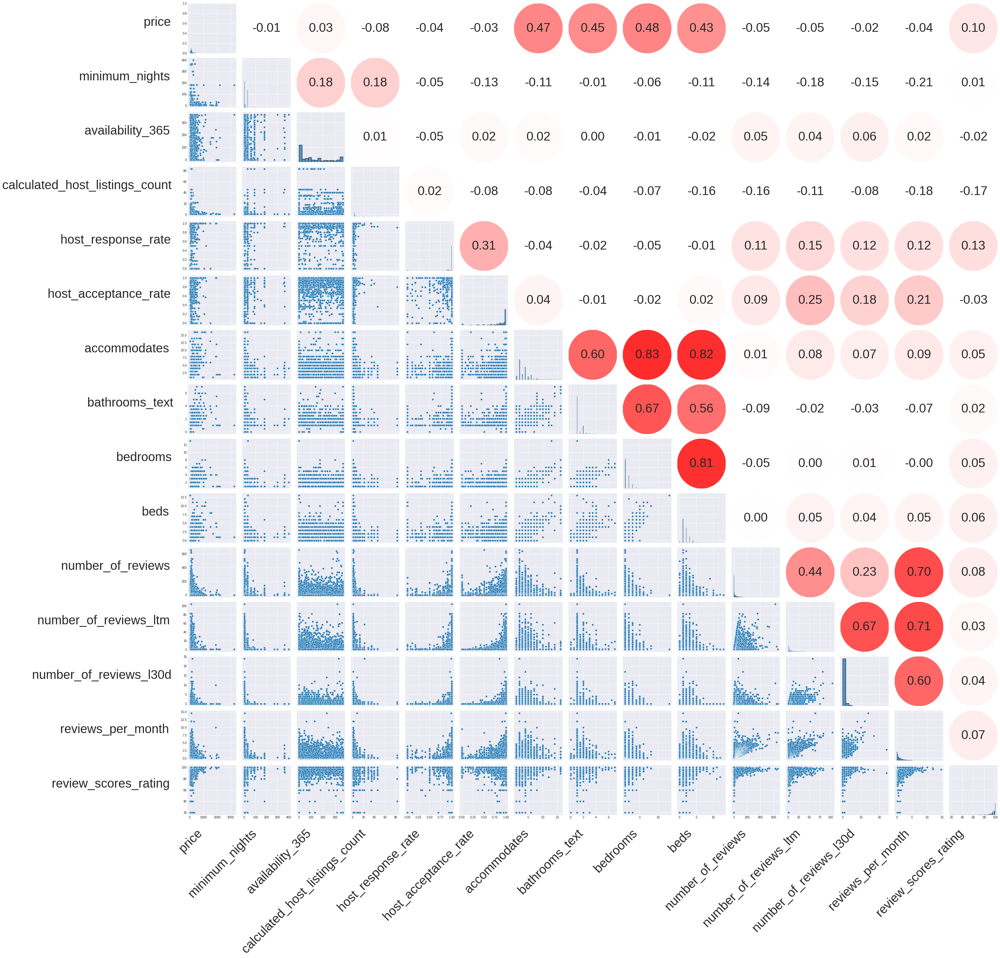

In [126]:
quant_vars = ['price',
              'minimum_nights',
              'availability_365',
              'calculated_host_listings_count',
              'host_response_rate',
              'host_acceptance_rate',
              'accommodates',
              'bathrooms_text',
              'bedrooms',
              'beds',
              'number_of_reviews',
              'number_of_reviews_ltm',
              'number_of_reviews_l30d',
              'reviews_per_month',
              'review_scores_rating'
             ]

# See https://stackoverflow.com/questions/48139899/correlation-matrix-plot-with-coefficients-on-one-side-scatterplots-on-another
# for correlation plotting onto the grid.
g = sns.PairGrid(data=df[quant_vars])

g.map_lower(sns.scatterplot)
g.map_diag(sns.histplot)

# Get pearson correlation to draw onto the plot
def draw_corr(x, y, color=None, label=None):
    corr_r = x.corr(y, 'pearson')
    corr_text = f"{corr_r:.2f}"
    ax = plt.gca() # get current axis
    ax.set_axis_off()
    # Get the midpoint of the current ax's limits in order to place the text in the middle.
    coord_x = (ax.get_xlim()[1] - ax.get_xlim()[0])/2 + ax.get_xlim()[0]
    coord_y = (ax.get_ylim()[1] - ax.get_ylim()[0])/2 + ax.get_ylim()[0]
    ax.annotate(corr_text, [coord_x, coord_y], ha='center', va='center', fontsize=40)
    # Plot a circle of that is more red if correlation is high
    w = ax.get_xlim()[1] - ax.get_xlim()[0]
    h = ax.get_ylim()[1] - ax.get_ylim()[0]
    c_scalar = max(0,corr_r) # Use this to generate an appropriate color
    ax.add_patch(Ellipse((coord_x, coord_y), width=w, height=h, color=(1, 1 - c_scalar, 1 - c_scalar)))

g.map_upper(draw_corr)

for ax in g.axes[:,0]:
    ax.set_ylabel(ax.get_ylabel() + '   ', fontsize=40, rotation=0, ha='right')
    
for ax in g.axes[-1,:]:
    ax.set_xlabel(ax.get_xlabel()+ '   ', fontsize=40, rotation=45, ha='right')

There are a few patches of higher correlation.
- the number of people that a listing accommodates, bathrooms, bedrooms, and beds are all highly correlated with each other (as they all indicate the size of the listing)
- `number_of_reviews` has several similar columns (`number_of_reviews_ltm` is reviews in the last twelve months, `l30d` is last 30 days).
- price is most correlated (although only moderately correlated) with variables related to the size of the listing.

### Q5 What is the association between binary variables and price?

Let's take a look at the binary variables (i.e. those that are true/false for a listing).

In [92]:
binary_vars = df.columns[df.nunique() == 2]

In [93]:
binary_vars.size

42

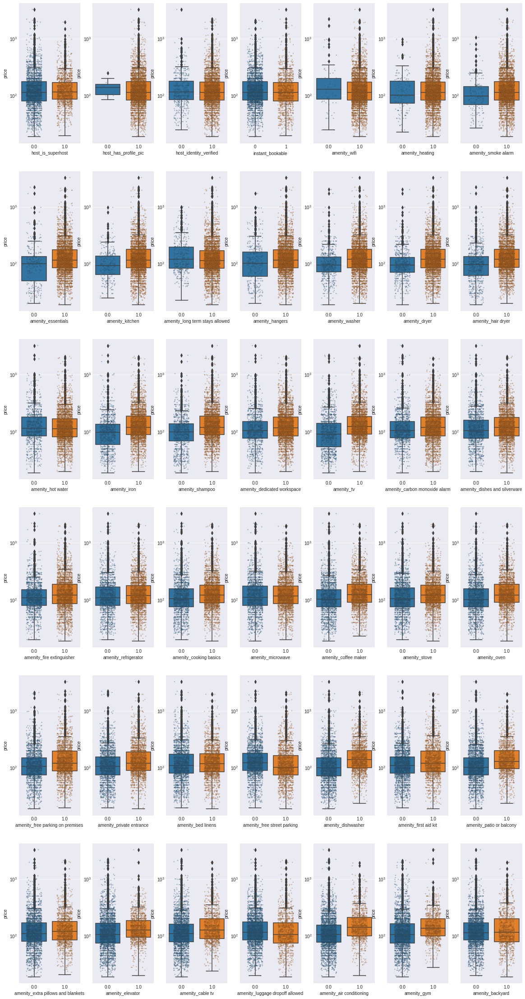

In [94]:
# Note: Log scale for price

fig, ax = plt.subplots(6, 7, figsize=(20,40))
for i, axis in enumerate(ax.flatten()):
    data = df[['price', binary_vars[i]]]
    sns.boxplot(data=data, x=binary_vars[i], y='price', ax=axis)data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAABIwAAAioCAYAAACxyzv7AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjQuMiwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8rg+JYAAAACXBIWXMAAAsTAAALEwEAmpwYAAEAAElEQVR4nOz9Z5RcaXrYef7vDe9NZqS3cAlvqqrLowroqjYURUo7Dc2pkfZI1JIy1HI4ksizovSh5yzPnF3OipIOOdqZM3KH5GyPSiSaEkVK7G6ggKrKquqyKNgEEon0NkyGtzeu2Q+BDCCQHkgTmfn+vlTdiHsj3wg81z33fZ9XMgwDQRAEQRAEQRAEQRAEQVggb3cDBEEQBEEQBEEQBEEQhPoiEkaCIAiCIAiCIAiCIAhCDZEwEgRBEARBEARBEARBEGqIhJEgCIIgCIIgCIIgCIJQQySMBEEQBEEQBEEQBEEQhBoiYSQIgiAIgiAIgiAIgiDUMG93A9YqGs0Y290GoX6FQh5pq/6WiEVhJSIWhXqxlbEIIh6FlYljo1AvRCwK9ULEolBPlotH0cNIEARBEARBEARBEARBqCESRoIgCIIgCIIgCIIgCEINkTASBEEQBEEQBEEQBEEQaoiEkSAIgiAIgiAIgiAIglBDJIwEQRAEQRAEQRAEQRCEGiJhJAiCIAiCIAiCIAiCINQQCSNBEARBEARBEARBEAShhkgYCYIgCIIgCIIgCIIgCDVEwkgQBEEQBEEQBEEQBEGoIRJG65BIxPn+93+DRCKx3U0RBOExYt/cPuK3F4T6JfZPoV6IWBTqhYhFoZ7shHgUCaN1uHjxXe7dG+CHP3x3u5siCMJjxL65fcRvLwj1S+yfQr0QsSjUCxGLQj3ZCfEoEkYryOVyaJoGVLJ/V6++h2EYXL16ua6zgIKwkyiKQrFYeOrtxb65OUqlEqVSacV1xG8vCJuvUChQLpfXvZ3YP4WtoKoq+Xx+xXVELArbIZ/Po6pqzWsiFoV6ULn3Ke6YeBQJo2VMzMzw0eA0n98eBCrZP8PQAdB1va6zgIKwU2iaRvjWFVJ3fkImnXqqzxD75sYrlUp8cHOID24OUSwWl11P/PaCsLlS8RjZgUvM3HofXdfXta3YP4WtMHXzAwqDl4jHZpddR8SisNVi4SmK9y8zfeejmtdFLArbTVEUwjcvkbj9Y/79//kHOyIeRcJoGboOhiSjG5Xl/v73q1lqVVX58MOr29Y2QdgtDMMAjMqByFjfzdCC/n6xb240wzAw4OHxz1h2vf5+8dsLwmYyMJBkA+kpjo/9/WL/FDaXYRhIko4kgaEtH6P9/SIWha1lGAYyBuhazev9/SIWhe0nPbz3+eSn/TsiHkXCaBk9HW28dqCZl44fAuDs2XOYzWYAzGYzb7xxfjubJwi7gtlspun4N3EefhuPL/BUnyH2zY1nt9t588R+zp3cj93uWHY98dsLwubyB0M4Dr1Ny4nzyPL6LtnE/ilsNkmSaD32JtYDb9HQ3L7seiIWha0WaunEfOAt2o6/UfO6iEVhu1mtVhqPv4332Ld58823dkQ8ioTRCjweT/Uf8cKFd5Ckys8lyzLf+94729k0Qdg1bDYbLpfrqbcX++bmsNsdKyaLQPz2grAVXC4XVqt13duJ/VPYClarFbfbveI6IhaF7eB2u7FYLDWviVgU6oHdbsfhcOyYeBQJozUKBIKcP/8WkiRx/vzbBAJP1xtCEISNJfbN7SN+e0GoX2L/FOqFiEWhXohYFOrJTolH83Y3YCe5cOEdJicn6jb7Jwh7ldg3t4/47QWhfon9U6gXIhaFeiFiUagnOyEepUrR2foXjWZ2RkOFbREKeaSt+lsiFoWViFgU6sVWxiKIeBRWJo6NQr0QsSjUCxGLQj1ZLh7FkDRBEARBEARBEARBEAShhkgYCYIgCIIgCIIgCIIgCDVEwkgQBEEQBEEQBEEQBEGoIRJGgiAIgiAIgiAIgiAIQg2RMBIEQRAEQRAEQRAEQRBqiISRIAiCIAiCIAiCIAiCUEMkjARBEARBEARBEARBEIQaImEkCIIgCIIgCIIgCIIg1BAJI0EQBEEQBEEQBEEQBKGGSBgJgiAIgiAIgiAIgiAINUTCSBAEQRAEQRAEQRAEQaghEkbrkEjE+f73f4NEIrHdTREE4TFi3xTqhYhFoZ6IeNw+4rcXhPok9k2hnuyEeBQJo3W4ePFd7t0b4Ic/fHe7myIIwmPEvinUCxGLQj0R8bh9xG8vCPVJ7JtCPdkJ8SgSRmuUSMS5evU9DMPg6tXLdZ0FFIS9ROybQr0QsSjUExGP20f89oJQn8S+KdSTnRKPeyJhZBgGt+4P89XAIKqqPtVnXLz4LrquA6Bpel1nAQVhL3ly33z39/+/TN7+iGIhv80tE/aatZwnUvEo07f7iUemt7p5e8JO6Nr9tKLTY0zd/ohsOrWm9S9efBfDqMSjrovrlq1UORZoKCYHRd3MxYv/frubtO12874pbA9FUZi88wmzI3fWvI24nxM2UnR2gunb/WRST3dc2ynxuCcSRqVSkZmcRky1kUyt7ULrSf3976NplWSTpql8+OHVjWugIAhPrb+/dt+cvNVPtz1LfHZsO5sl7EH9/aufJzJzI/S6ihQiI1vbuD1iJ3TtflpKbIReZ57k3PCa1u/vf7/6kExVxXXLVurvfx9F1Si7mihaveK3Z3fvm8L2SERnaDMlkJJjaJq2pm36+8X9nLBxlOgwPc4Cqbmnu6br798Z8bgnEkZ2u4Mev402u0YwEFjzdoVCAUVRAHjxxVdq3nvxxVc3tI2CICyWy+Uol8srrvPkvtl0+FUm1AYaOw5sZtMEYZHlzhOKopDPV3q8BToPM1Lw4m47suXt2+3W0rVbURQKhcI2tO7ZOdoOM1ry09DRt6b1z549h9lsBsBsNvPGG+c3s3nCY86ePYfVbMKSncOhJHjzzW9ud5O21eP75pUrlwiH57a7ScIu0NDcwazcgtx0GJPJtOx65XKZXC4HiPs5YWM5Wyvn5eAaz8tPepZ4zOWyTz1yar32RMIIoK+3mxOH9iPLa/vK6UyGD26P8OHN+w//MYya9yVpExopCEJVPDZL8f5lZm5/gGEYK6xZ+57F6aPj8DewWq2b20BBWGTxeULXdWZvvU/u3iWS8Sguj4+Ooy/hCzZuTxN3sdW6dmuaRv/NQT64PUIqld6OJj6TYKiNjiMv4nC61rT+hQvvIEmVax5Zlvne997ZzOYJj7lw4R1k2YRVL2GTjT3/2y/sm4ahs9+e5Cf/x/+n+kBWEJ6W2Wym49DzNHXsX3G96VsfUrp/mXhkBnE/J2ykQKiVjiMv4nS5n/ITni4eo3OTKEPvMX27/yn/7vrsmYTRej15g/r555/WLH/22Sdb2Zy6JMajC5ttLcdNsW8K9WLlWFwp6SlshP7+NXTtNsBAwtgD/x6BQJDz599CkiTOn3+bwDp6WAvPRvz2tfr7H+2buq5z797aa84IwoaQKvd24ppRqCc7JR5FwmgZPq+XN4/v442ThzCbzSt2GdN1nQdjE8zMhbe6mdtKjEcXNlOwsRXbobdpO/4m0gop9yf3zedOnmR27F61p4EgbKZ0Yp7p4duUy+UlzxOyLNN64hyuw9/GHwxtUyv3htW6dptMJs6e6uPc8V78Pt+i7XP5PHeGhsnvooL5b7/9Xex2B2+//d3tbsqec+HCOxw+fHTP9i4yDIPw5BDRmfHqvilJMoNZN00nvi16AQtbpv3EG9gOvk1DczsvvPASDknBZFRqHokhacJ2WnQPc/pM9ZpyJaGWTqwH36L9+NnNbF6VSBitwOFwVE9omUym5r1s9tFyJBZjNAO3p+eX/AcuFgu74ua1VCpVi8rtlGkAhZ1DVdVFXdRdLhcWi2XF7eLx+er/G4aBNfWAUOEB8+Gp6uuPx64gbKT0xHValHFmRgdqYhEgkagsW61WnE5nzXvFYlHE5AaLx+cxDKPaQzgej1EsFmvWsVqtOByOJbe/MzJJDC93Ric3va1b5fLlH1EsFrh8+Ufb3ZQ9JxAI8pu/+Vu7tneRoigr1s9Ip5K4EgOYIjeJRiPAo977qaecUUgQVqNpGqVSqeY1i8WCy1UZyhufm+CEv0C7o3JvtnCeFoSNoGnaouuOlTx53WjMD9NlTBOZuLfsNrquUywWcLnc1TqFm23PJ4ziiQT91+8yNDax4nrXrn1Rs/zVV59X/9/n8WBXMzTYTYv+4YbHJ/ng7iQ3769tVpN6lYrHSN75CZM338cwDDFdr7ChNE1j+uZV5m/9mGxmfbVFbt26Uf1/SZL4amiGmZIDt69SIyYemyV958dM3f6out7s6F0mb1x56mkwhd0rn8syeeMq0w9urmn9kuzm7t2bFMLD3Lx5vea9J5cXxMKTZO9eYmqgPrse70SpdIbP7g6Tc7ZRsvkxDIMvBx7wwZ1RZsORNX1GS8AL2SgtgcW9j3Yi8WBH2CzZTJr5Wz9m+ubVZRPfTpebuOEnaw5y584tAFxymePeDKN3Pl9ym5q/kU4xeePKuqZMF/Y2wzCYvPk+8Vs/YuDTHzFx+5NF8Xnn/gOmcybcpjItthI3bny9Ta0VdqOpO5+QuXuJ+fD0iusZhsHUvS8JD35aUwbnxoNJxrMm3IHWZbeduX+N/L3LhCeGNqzdq9nzCaOZWBzN1cBsMrvierphUDI5UVlchd/hcHD2zDGeP9a3aOiMUtZAtqKoO/tJsqar2GQdk6FiGIaYrlfYUIZhYDLKWCUNTV25G+Zq0pqNrtNv4XjYo0NTyjhMBmiPei/pqSn82jzDX/yIVDz2TH9P2F3S83N0OoqQnl6l2HpFY8cBWnuO4Hbaa16X0GkwF0nOLx6qvBCTkvZssS48MhONoduDaFYXhlQ5TxuyCUw2lDXOItLV3sqbZ47S2dqymU3dNJqmMTX4JTPDt8WDHWFTqaqCTdYwGeVlj5MWi4WuU2/Sdfy16rWxSTawmwxMy4wyz6ZTTA18Qjw6TSo6RbdLQU+tfOMlCAsMw8CklzFpJVylCAE9Wp2htEqSCSt2LCYZi7z20R+peIypgU9Ixtf2AELYozQFh0lHfXgvMzt6l6m7XywagaSqKtb8HF0uBROPcgQ53UrH6bdXnBhF1xQcZgOtXFp2nY22Nf2Y6tih7k6MsUnaupbP5AHoJhuquwWjmMBcSqxYU+Vxffu6aEom8Xk7NqK52ybY2ELa8gYhmwNZljl79hxXrlxCVVUxXa/wzMxmM41Hz1EuK3i8/g397FBbFymnhxbHoyFBrq6TDH91ied6G5iYuy9mrBKqGtt6mB4v4OhsWNNx3hdoIGM6h8tiRZL+t+rrAbPCIV+J3Ox9/A3NNds0dfSS8vhpcT7trBrCkw50deDTkpTSaWTJQJIkAmaVF3sCBPy7c0jQk9LJBI3lGfIFiVJp/5IPdn7pl355W9so7A7+QCMZ0zkaLdZ1DYlIq1a+ilswljm2Jmfus8+RY3R2iKYjrzExpuLu2pkJXGHrybJM6Ng5lFIBIx0jpxs0uxefZ1XM3Eh5MJDWfD+XmavE5sjsEP5g00Y3XdglWo+dJZ/P0uQLoKoqcnKYJrtEPDZLqLWrup7FYkFqPcmdpAMN05om+VnQ1vci2XSSFn9w47/AMvZ8DyOr1cqJQ/tpCK58Qfny82cwZ+cwlyrDZV5++bU1fb4syzQEg1s2xnAzeX0B7PbKU3QxXa+w0ewO51Mli55//htPLL+4aB2fP4DNZqsu+4PN9Dz/bSYUH56WQ+v+m8LuZTabad9/gmCobc3beLx+7A5nTSwmVCtG0wlcrYvjS5Ik/P6gKPq6gSwWC//4134dswzywxuAX//1f7JnkkUAXn+AmLWdoqcXm83O2bPnqtce4sGOsNEWjntrsXBslCQJZJkXXnhpyfX8bYcYKbhwtB7CYrHQcfDUooS7IKzEbrfj9QVo7jxIS/ehRQmh6nlakpEkaclrxqV4Wiqx6W49uNFNFnYRq9WK3x9EkiTMZjO6fz+zNOFvXNwxJdTaxdHnXquJ0bXEo9lsxh9sRJa3Lo2z5xNGa/W3/9bfw6blMT/sNvY3/+bf3uYWbS8xZaxQL/7O3/mVFZeX4w820XH0VdG7SNgwj8eegcz/7R/8T+JmZwudOnWmWlzc6XRx8uSpbW7R1jKZTHQcep62/ceRJEk82BHqxlrP026vj46jr64rYS8I6/G014y+YCMdR18VvYuEdWntPULHkW8sO4HP08bjVhMJozUKBILVrPTzz78oEiSIKWOF+hAIBDlx4jQAJ0+eEfumsG1ELG6/f/gPfwNJkvm1X/vH292UbRcIBHn11dcBeOWVsyIet1giEef73/8NUWwccQ0t1A9xnhbqyU6JR5EwWgf3w3GwHo9nm1tSH3b7lLHCzhF8OKQ0GNy68byCsBQRi9vr1Kkz/OEf/sme6120vEpB4jWW6RA20MWL73Lv3oAoNv7Q3/k7v8KRI8fq9gm6sHeI87RQT3ZCPIqE0RolEnE++eRjAD75pL/miVGhUODG4ANi8fh2NU8Q9qyV9s3V6LrOzMgdwpMPNqt5wh6yWizGI9NM3f960WwZgrAZnvbYGJkeZXr41rLTpQurSyTiXL36HoZhcOXKJT6/fpOxqb0925d4yChsJcMwmB0dWDT1+LNcMwrCWiWis0zdv4aiKCuvt0PiUSSM1mil6WmHJqZJyj7uTYqpFgVhqz3L1NGpRJxAfhjL/D2KxeJmNVHYI1aLxcL0bbrkMLHp4e1onrDHPM2xUVVViNyhqTROPDqz2U3ctR7/7VXd4I8/+Jz74cyqNw+CIGyMdCqFLzuENXGPfD5fff1ZrhkFYa3y07fpNkWJTAyuuN5OiUeRMFqj/v7F09Mu6GhqwJSP0R4UQ9UEYav19y+/b67G7fURpYG8vUXMWCU8s/7+lWNR9ncynnfgC3VsfeOEPae/f/3HRpPJhOJqZ07z4QuKgu1Pq7//0W+vq2WGr31Ik8u0bOHTvUDUdBK2ksvtJiaHyFqbqzM8w7NdMwrCWpn8nYznbASau1Zcr79/Z8SjSBit0UrT0wYDAV4/dYTezvbtap4g7FnPMnW0xWKh6/hrdBx+YUunpxR2p9VisbX3KJ0n38Tpcm9H84Q95uzZc9XpeiVJWtOxUZIkOg6dofPEWZFEfwaPHwssFgvfOfsKpw8fXDTF914iajoJW8lsNtN17FU6j7xYc333NMdFQVivlp7DdJw8h8vjW3G9nRKP4g5pjSrT0z76BxUzgwlCfRD7plAvRCxuP9GL4ZG33/4uhlEpem0YBm+//V0ACvkccxND1aeawsarHAsql9iyLO/aY4Gu68xNDpNJrby/JRJxrly5XK3pJPZPYSMkYmGisxPr2ma546IgbIcn4/H8+beZmxiikM9tc8tqiYTRGgUCQZqbWwBoaWkVRfsQF+ZCfQgEgjQ2hgAIhZrEvilsGxGL2+8HP/h97t69ww9+8Pvb3ZRtd/nyj2oSmJcv/wiA2IMvaSk+YG70znY2b1cLBIKcP/8WkiRx/vzbu/ZYEJ0eIZS9R3L4sxXXu3jx3WqCslxWRS8j4ZkpikJ54nMcka9JJubXvN3CcXC5ZUHYSk/G30/+5P9HS/EBseEvt6lFSxMJozVKJOLMzc0BMDc3K5IkiO7FQn2o7JuzAMzOzoh9U9g2Iha3VyIRp7//fQD6+6/u+d+/v//9mieXC7URTK4GprPg8DZsX+P2gAsX3uHw4aO7tncRgNMbZLYgY9hXng66EnvGwyWDDz64sultE3Y3k8lEweRlXnNid7jWvN2TNWJELArb6cl4/PzaDaazYHLW1/lZJIwATdP47NZdPr15d9ku2hcvvsvCyc4wjD2fJHl8ytirVy+v6cJcURSm7n6+aIpLQVhJJpVgauCnJOfDQGX/m7z7BRM3rlIsFPjBD36/5qZI9CwQnoWmaUzd/5qZ4dsYhoGiKEzc/ICJO5+i6/qK24pY3DjD45N8fXeIcrm85m1+8IPfr/4b6bq+pt9/cHScD78eIL4Lk0vL1dRq23+c9ud+hoZmUXx9M+2FaeRzySg4G2k79Fz1NVVVmbjVz8Ttj9A0Daj8Fo8LBuvrZkjYeUwmE92n3qT7uW/VFLVezZOx6PcHmLj54bLneF3Xmbp/vXpNIAgbaSEeHZKC11TCE2ym/bmfQVdLTFy/QrGQX+UTtoZIGAHFYoGEaiapWSgUCkuu09+/M6qYb5WnmQYwHp6kwzSPFhta9cZLEBakpu+zz5ElN3sfqNzQW4sRWqw5sul5Pvrow5r1P/rog+1oprBLZDIpGpRJnNkRCoUCuUyKkJzCqURXTV6IWNwYmqYxEssybziZi0bXvN3T/P7hZA7d1chsLL7udta7vVJHR9geqqoixYdoNSIkojPV1wuFAn49jk+dp1isXFNHIuGabcPhuS1tqyAseDIWo+FZQnIKlxJFUZRF62fSaQLFcVzZEfL5+rh5F3aPSCSMYRh0u0oc8haJhqfRNA05N0e7rUA6sfZroM0kEkaAy+Wmr9HBwQYbHo9nyXWeZSam3ai/f/0JtGBzJ5NqADm4T8xIJayZt/UAo3kHjub9QGX/M7WdZN6+n2CojUfd3BeIJ0DC0/N4fMyb28g6u3E4HPiDjSTdfRjNJ7HZbKtsLWJxI5hMJrqCTvxkaW5sXMeW6//9j/e0EpIyHOzuXFcbd4K9UkdH2B5msxndv58ZoxF/Y2v1dY/HQyF4nGLDcVxiRkihzhmSTMrTh958csmeSm6Ph4S9g4yzG6fTuQ0tFHY7SZKYzNsYStvRMWEymbB3nCZs66mbnsDirv2h3s4O9nctf8EontTVepoEmtVqpfPoy7T0HN7s5gm7iDfQQPux1x8mhyoamztp7T2CLMu8/vobNeufPXtui1so7CYmk4mOwy/QcfAUkiQhSRKtPX2E2rpX3VbE4sbp6+3mhaN965ra/Wl+/2AgwLGD+3ftFPJ7oY6OsH1ae4/QefQlLBZLzevNnftp7txfXRbHRqFePBmLb7xxnpbuQ8ue400mEx2Hnq9eEwjCRlqIx5xuJaXZqvfTwaZ22vYdw2QybWfzqkTCaI3Ek7paIoEm1Iu/9td+oSYW/+pf/Rvb3CJhrxKxuL3E77/YXqijI9Q/sW8K9ULEolBPdko8ioTROogndY+IBJpQLwKBIG+88SZQeVIkYlHYLiIWt5f4/QWhPol9U6gXIhaFerJT4tG83Q3YSRae1AkVFy68w+TkhEigCdvur/21XyASidRtZl7YO0Qsbi/x+wtCfRL7plAvRCwK9WQnxKO0U6YIjEYzO6OhwrYIhTxbNrBYxKKwEhGLQr3YylgEEY/CysSxUagXIhaFeiFiUagny8WjGJImCIIgCIIgCIIgCIIg1BAJI0EQBEEQBEEQBEEQBKGGSBitQyIR5/vf/w0SicR2N0UQhMeIfVOoFyIWhXoi4lGoFyIWhXohYlGoJzshHkXCaB0uXnyXe/cG+OEP393upgiC8Bixbwr1QsSiUE9EPAr1QsSiUC9ELAr1ZCfE455KGGmaxtDYOMlUet3bJhJxrl69jGEYXLlyqa6zgIKwWxiGwdzkMIlYeNl1xL4p1IunjcVMKs7s+H00TdvkFu5+O+FJ3VapxON7GIbB1auXa34TRVGYGRkgn8tuYwuFvWKtx8ZMcl4cC4V1SyfWHjfimlGoF7lchns3PuXKlUt1H497KmE0NDbJZNHGjeHJdW978eK7qKoKgKqqdZ0F3CriwlzYbPHoHP70AMWJL6v735PEvinUi6eNxdTIl7SWholMPtjM5u0JP/jB73P37h1+8IPf3+6mbLuLF99F13UANE2vicfI2G069AnmR77aruYJe8haj42pkS9oLj4gOj26lc0Tdrj06NrjRlwzCvUiPvwVU5+8i93IA/Udj3sqYRQK+CA3T9BtX3YdTdMolUqLXv/ww6sYRmU2QsMw+OCDq5vWzp1iJ3ShE3Y2p9tHRLFTtgYxmUxLrrPcvmkYBsViYcvaKux+y50fFjz1ecLVyFRWxuVr3Ihm7lqqqqIoyrLvJxJx+vvfB6C//+qef5jR3/8+mla5MdI0lQ8/fBSPDl8TkxkJs7tpexon7CkffHClmrxc8djobGQmb8bla9jC1gk73jri5mnO06udewRhrRRFqSYsze4Q731xl6JWub+p5/zCnkoYNQQDfPP5Y5w4tL/mdcMwKJfLAPz01j3evzVCJBarWScQCNYsB4O1y3vNSl3dH1cul8mJLu/CU3I4nXSd+RZdx19B0zSy2cWx5PX6AaoXAD6fD4DpoWvk711mbnxwy9or7C7lcrnmwnLy1ock7/yYZDy65PqPx6JhGHi93jX9nY5Dz9Hx3HfwBsRN0nI0TaP/+l3evzFEIrn0+eYHP/j96k2prut7ppeRrutkMunqd1/w4ouvPLH8avX/G5o7aD/zHVp7j2xJG4W9K5/LcTSg0mHLVWN04TwNtdfgHYdfoOPMt/H4AtvSVmFnWk/ceL3+6jnaMIyaWFyKpmlM37hC9OaPyeUyANV4FYTl6Lq+aGRELpclevPHzNx4D1VVad13jLSjC5VHD8SfjEdFUcjn81vS5pXsqYTRcm7dH+bqzQeMTc9QVnUMsxWlXPuPHA7X1lCZm5vbyibWnYsX38UwHl2YL9fLaOZOP8r9y8TC6x8GKAiPm7nzMdqD94jMjNW8HonM4ZQU+txZHJJCOFzZN/WygsNsoKniqZCwfrG5SRK3f8zUvS+qr8magl3W0cpLx1QkUok9h1zmjD9NOT6+JW3dCwzDQDUkJiJx3r85xPD44nPKRx99+MTyB1vVvG018+AG0shVZoZvPfGOUbMkSVvXJkFYoGkqpWyCVluJo94skqFXz9MAkwOfEb/9E+KRmW1spbBXRCJzuB6eo/1mpSYWl6LrOmbK2Ew6uqYRnrhP8vaPmRm+vUUtFnYaXdeZvPkB4Rs/Jpd9VDdZ11SssobJUKsPIxeuGxc8Ho+qqhK+eZns3UtkUtvbY1okjIC8ooLNRb5Q5NUTh3ipp4GO1paadZ680NrrF179/e/XjAF+vKt7LQlDkoA9/oMJz06qxJK0xGHLIhv4rDpW+dENUlvfNyi1vUpr77GtbKWwS5QLWfw2MJTKkx1Jkmg69ib0vElDc/uK2xpIGIb05P268AzMZjOvHdvHwZATd7CVXHGpoYFP/uB75R9AwljiFPv555/WLH/22Sdb1B5BeMTj9XEn7WK6ZENCWnw5WM7it+ooxdy2tE/YewzWfnawWCwEj5zHtv8cHq+fcrFybaCVxOiJp7EX6t/quo5Zy+M2lVGKxerrHq8f+4HzBI+ex2KxrPo5kiSBJD+M1e29jxYJI+C5vn2cCNno6+3GZrMR8PsXrfP662/ULJ89e25rGlenzp49h9lsBioX8m+8cX7J9dqPn8V28G0amzu2snnCLtR29FUsB94i1NZV83praxtJ1cq1uIukaqWtrXIzbzab8QcbkWVxmBPWr7m7j0zj8zT3vVx9zW634/Mv3+W9tbUNgJJh4XrKg71p36a3cy9xOp28euYkx0NWjh3oXfT+Xj1Ptx04ibTvLdr2n6h5/ezZc9XabyaTadnztCBstrb2TmZKLgYybgzk6nkaoKnvNbKhF2jq2L/CJwjCxmhtbSOvW7ie9NZcM67E4XTi8VaGCrXuP0Wq4QwtB5/f7KbuSnuh/q3ZbMbfdxa941UCjbV1Aj1eHw6ns7q8cN244PF4NJlMNJ/4Jt6j38bj829qm1cj7qQAq9VKa3PzskV1AX72Z//yE8t/acXPLJfLu7pA2oUL7yBJlfCRZZnvfe+dJdczm824XK6tbJqwSy0XS7/4i38XSZLQJDOSJPGLv/jLS24vihYK6yHLMg1Nrdjsy0+S8KRf/MW/Czyqp/VLv/T3NqVte5nFYln2fL3e8/RSNE2j+NgTwZ1AlmXcbvei5PiFC+8gy48SRsudpwXhWRSLxVWnM184T0sPu+c/fp62Oxw0NLWKhzvChlEUZdk6Q4/H4krXjMsxmUw0NrevqYeIUGul+rc78dy7EpfbuyhZtJR/8A/+0YrLVqsVh8OxoW17GnVxdO7r63utr6/vD/r6+v6or6/vpe1uz1IuX/7RisuPK5fLfHjjHu/fuF8Xhao2QyAQ5Pz5t5AkifPn3yYQ2D0FCndCPAqPfP75T59YXjzsQlVVZm++R/TWT8jndk63950Qi3uhe/Faff75T5ENjcOeLE3W4pKxuFPthFi8fPlH1RtSSZJWPE8v5/Pbg3w4MMZsOLLRzdtygUCQEydOAnDixOldc57eCbG4V8QjM2TuXmL6zscrrreW8/ROJeKxvhSLRSK3LjF389KSDwlFLG6flerffnZ7kA/ujDIbWXpSkd2qt3cfvoe9h/z+AD09i3tP14NNTRj19fUd7+vrG+7r6/uVx177zb6+vo/7+vq+6uvre+Hhy2ngbwP/FDi7mW16Wv3979csL1+zp/J0WTMkVGR0feWnLjtZZQYWqWbmlXq2m+JReKS///2a5aX2TV3XkfUyVkmtTjO9nXZTLO6F7sVr1d//PrJkYJd1LJLOBx9c2e4mrWo3xWJ///s1s9qtdJ5eTlk3MGQrirr9x4mNcO/eAAB3797Z5pasbjfFIuyNZLqqKjhkHUNbufduf//7NctPs29utd0Uj3shFhfouo4FFbNRXjRzJIhY3E79/cvXvy2rOshWVHXvzUCXyVQKY6fTqW1uyfI2LWHU19fnAv4X4L3HXjsPfGNwcPA14G8A/xxgcHDwFvAW8D8Bf7hZbVpNuVymUCgs+d6BA301ywcPHgYqXegejE2QTKWZi0SZj8exWq2c7gnR6gS7ffu7kW2W3/u9f41h6Pze7/2r7W7KqnZiPO4VhmEQmRknHputvlYqlZgdu0dxmf3xcQv7poyOGXXRvgqVLp3Bo9/EcfCb1XHoUDlhbXUvwJ0ai7quMzIxSfyxC86VuhfvRUePHkfFzPWkm0jJwsGDfUs+4czlMsyODS6acnWr7ZRYzOXzDI2NrzqV8UrTyK/Vy8cO8mJPgK621nVvu5mS8xHCU6PVhNha3LjxdfX4ls/nuHnzxqJ1FEUhnU4TnhzZ1qmid0osrsdeSKY3tfWgdb9B0+HXmB2/v+xMPstdQ5fLZYrFR+d5RVEIT45Uj5uGYRCeHiMRq52peLPttnjcC7G4wOl04u77Jt4jb2F/Ykh5dHaC3q7OmtcWYhEWx9/jnrxHnA9PE52d2ODWL7abYnGl+revnDjEi70NdLa1Lbd53QtPjzM1+mBN6y7E2pUrlzEbJSR0dF3nk08+2uRWPp3N7GFUAv4C8Pg8meeBPwEYHBy8DbT19fU5+/r6vgH8GHgH+EdPftBWMAyDT24O8sGdMebjcaKxGNncowr4d+7crFn/9u3K8sjkFOMFMx/fGuT6VJIvR8IUi0UGp+dJmILcH9v8g8l2GBkZZnKy8t0mJycYGxtd1/bbcGG6o+JxL0kl5nHFbqBOfImiKOi6ztzQV7SrY0RHvl51+9u3b2IYBt2OPCd9Oe7eulbzvqIoxMLTWG023B4v8Cj+pm/3U7x/mfnw9MZ/seXtyFicnJ1jJCPx9fB09aZ1pe7FO5mqqkTnJmuehC31pPJJt25Vzgsus8pzgTzWiQ+J3Lq86OIz/uBLWkrDzI5ue6+PHRGLN4bGmSrZuDs6Xn1tqX+TRGJ+xWVd15kNh6t1EnRdX5S0s1qtBPyB6tC2eqCqKoXxL/Cl7hCPrjwF9OP+xb/4n2uW//k//62a5XK5TPjWe4y996/xJq4THlmcUNpCOyIWl/NkLCUSca5cuYxhGFy5cmlXJ9N9/gDJ8DitpWFSI18uuc7ia+gb6LrOzK33SQ9cIp2MAxB58DXBzG0iw9cBSMxHcMa+JnbzR1td36Ru41HX9VVrRj1uLz7Ycbk9uFzumtcy6RTW8DWk2Ws1iffbtx8d9yLD12nK3yPy4OvKw8zZSXLZDIZhMHP7A7J3L5Gcj1QSRzNfYQ1fI7P5vULqNhbXa6X6t5Vzr3+bWvbsMpkMuet/hHHz/2B86NG1nWEYlMtlVFWtibvwg2s05e/xR//mtzjtz9NhqyQjf+d3fnvVv2UYBvORWQpb+MDbvFkfPDg4qAJqX1/NU4VW4PErkijQDDQAv0dlzrgfLPV5brcNs3n5otTPStd17E4rEhayhSwTORmzFufbL57AZDItujDVdQ2/30lPZzPxoUna2oOkChoWk5nGRi/dLX5mEll6O1vx+53L/NWd61//zv+TPneW8bydkmHhX/7Lf86/+Tf/dk3bTj24gzT/gFLDAToObM2U5xsZj5sdi3uN3R5iKupHdtkIBt2MXf8QNTHClMtL476uVfefhYRFumxGM0AzqNlm5OsvaJMTxGJ5uvpOMXn/JnJiFKXxEC6nBQ8WDI9ty/bTHRuLUhPhzAi+kJtAoFJ8/KOPPqhJqvT3v8+v//qvbU17NtHY7c9o12aJzCXwt+4n9+ATyhYvB55feZYpRalM9a7oJqIlEw5Jxe004/M5sNls1fUiviD3b/8EU0jF43lxxQkXNtNOOU93twWYnM/S29mE3+8kmUrz+f0RHGaJN184US2W+2QPmps3r9fs13fuDzOWk3Flpjn3wgn6r90mXdR58VA7ocaGDW/3RjEMg2SghaySpa29Gadrbceq3BP12nK5bM3voSgKWZcFxe8nrVtoaNm+65WdEotLMQyDD7+6RU4xePlIF8FAgD/4g39VHf6sqip/+qcX+dVf/R+2pD3borOTxNAs7qbmJWNo8TW0js/nIO4048KC3W3F73cybihMj91Fa3Pg9zuxWZv5+loUv6lIPjpEy4mtKctSr+dpVVV5/6s7KJrBm6cOrmlSmT/4g39V82Bn18fiMpxOMxNzjUQKtf8Wuq5XYzbf0kImkiLQ0src+B3ke3/KiBTktb/yP1SvF80eG76gj7HpEGVdpaulAavVumntrtdYfBp+v5Pvfvc7/Nmf/Rnf+c536e1dfYa6ncLpNDNu8uCSZRoCzmpMjd35nMzkHWRDw9F2lH2nKj2fc82tZGIZsmWZuYKZlFpJySzkF1YyOz5MKHeLSMJG60s/s7lf7KFNSxgt48k+fhJgDA4O/ghYsTplNlt66j+qqioDw2N43U562pfv6nZmfw/lsoKq6tyfncBhgnS6uOyTxmQyj8Vk56XDB4FHM+NkswpdLW10tVSe4H3w2U38bifdK/ztnSYRmWWfR8dc0CkZMD4+RjK5tkxnMhqj2SgRjsZwN25MdjQU8jzNZk8Vj88Si8LSGvsq02Gn00UKqQTNPg/F5udx+NvXFFeSJDGv2omVDSRJqtkmXzYxlVNQfBq3P/2AZCxMXxDC8zGael4kEZ9HGR+hUARfsPGZv8vujUUzLx4+BFD9fV9//U2uXLmEqqqYzWbOnj235uNAPSuUzUwnFVS/mXJkHle5QDqnkUjk1tTzRMXMSN6NXSoT1/14sgqFgkZ4YohyMYcj2EpLxyGymolEIlftor3RtjIWYfPisT3UQnuo8v/JZJ5ILElaMZHPF0gkcism3B6PR12TyCXmcbksJBI5ovEcqtXNXCSBxVzfw8cbeytTOCtlUNa4j9ntdvRSBrusk1KtOBzORfuno+d1zKYWyrqC1d2yqfvvU8Rj3cUiVK717o9NoGkah/f1ABBNFtHMTuYiSWTJxqVLl2rqaV269BP++l//W5vWpm1nchE4XEmorxhDho7fXCatmslkSnj3vUa5rCCZ3SSTeUwWD6Huo4RxVT/Hv/9VLOkxyoZtw+Jzp56nFUUhnlbQZAuRaIpAefXz0eXLl2se7Fy+fGl3x+IT4tEZ8rFpGnuO0XjodaJlB0+exhfiyhnoQvd1IMsyM1Of4dHKFJUy92/doKi7sLafxmb1kc0qNB6oDIHO51Xy+acfXr5TY/Fp/dzPXeDBgxF+7ucu7IrrxccdfvsXKRTyuN2e6nebGR2lMDlAMBBEc8Srr7sautEDnRSM3yFakpClyrniyXuYpZRUE8lEGcXq2vDfcLl43OqE0Szw+BxzIWDTByZPhyNENAeRuSSdLUtPxwuV7nALWeLzpw8jy3L15sBms1EqPdrRHn9avGCpG4mpuTAx3UlkNkFna8uumTbU1rSfa9PjqJiQJOjs7Frzti0Hz5CIzdLSuO01IrYlHoXlybJM8PDrlAp5Ghub1739Uvtg+8EzqOoJwuP36LbE0R1mksFjtDS2YjabUeIT7HOkGZ25iy+4bTUCd2QsXrjwDlevVobVP9m9eCdr7T1CuXwAi8WCYRgkzBYanJ51D1PqcZfokMIkYmF8wRDy/CDNNkhpIfSOV/DZ7JuWLHoGdR+LTY2NPA84HLXnc4fDUVNjwuGofUrX2dpCa6gRk8mEJEm8dHQ/2VyOpsZnTxTXI5fLjVeKEXJoXE/IuN2LLwRNJhOOzBgBO8SjIUItnUt80rapy1gsFAqMJUoYspnWdIqAP8DLR3ooFIo0NlR6qjU2hpiamqxuEwqtPr3ybma12lCUEj5zmcO+ItMl58PXrTW9M1r3nyARC9ESCFVfa9t/nHK5rx6mMd/2eLRarbzU10W5rKx5+M7Zs+dqHuw8XjdmLyjM3KPHrTI2OUjHoTPIslzT4+3J+7KF5f3Hv0E01MoBmwt9/BP8FoO8svZ7nU227bH4tAKBIL/5m7+1+oo7kNlsxvOw9MUCp9NB96FDjJQCHOyrrbO4EGsH3UXMssFXybUd4/wNTbh939nS3ulbnb34c+AvAfT19T0HjAwODq5e1fYZtYYa8WgZ2n3ONf+4ZrO55iDyeLJoqeWV/rZbTdMZdO2aZBHA3//7/w80yVy9gfrVX/31NW9rNpsJtXTWw43StsSjsDKXy0PwKZJFy5EkCYvFQqC1h/GCC1tof038uVt6Gc3ZsTdu61SWOzIWA4Eg58+/hSRJnD//9q6Zthuo3pxIkkQw1IrziXoIazGdtzKnN+ALhirJSU8Xs3oQbyBEoLGpWlOrzuyIWAw1NuJ+4t/k137tH9cs//qv/5NF25nNj85bLqeT5lCoruoVbaT5+RjhopWRjJWSbiIWiyxax2KxUPZW4tIX3Ljj7gapy1i02+20uGRC1jLeh/uw2+Um1NhYjaVYrHZq6Gh0b00V/aSF3yWtWRjNWomX7UuuZzKZaGxuXzTEpw6SRVAn8ejzeqqJybW4cOEdKh1QKv8Ou+XBzlpZG3sYyzvwt+wDlh4euRRZlmlu7cIfCFJwdRCVm/D6g5ve3jWqi1gUVuduO0TS1kX3kZewO5buyTyWtzGcXfqYuJzHr2W2wqbdsff19T0P/DOgByj39fVdAP4b4EZfX981QAV+cbP+/uOsVisvnTi8+orLSKUzuEOdpCOTyA//bdra1jbu0m63P9Pf3i7R2QlKyTkae04sGeD+J55s+Hz+RevUk3qKR2FtFmIw1HsSm335A2lTUwuRyKNCsM3NLUuu53J5cB1/HYB0Yp707BC+toP4g034g1v39He3xeKFC+8wOTmxKy5Ci4Ucozc/xtBKdB57DY9vfReHj8eiJEm4Qt10HX80U1f7gZMb2t5ntdtisauru2a5s7OL0clpktk8x/Z3b2qdia22luNja2sbs7Mz5MsgSctft9RDXO6kWJRlmVN9B1Zc5403znPp0o+qQwzefHNv9ep40pkzz/Pppx9jlTQKmszxFyq1iHRdrxb/b9t3vG6StzspHlcTCARpaWlhamqSlpbWXfVgZyW5TIrE5F3czb2ETjzqPb7Wa0ZVVZkbuYHZ5qbj0JlNb+9ydlMs7gWapjE7fAOTxUFr7xEaW7qgZfmeac3NrY9dNy4fjwtS8RiZuQf42vvw+LZuX97MotdfAeeWeOsfUYeV21fyYGoWT9dR5hNJbGoGgNbWnV+oS1XVatf8Jynhe3R7DMZnhunYf3zR+z/4we8vWv6VX/n7m9XUZ7ab4nGvUMJ36fbAxPQw7fuXL45eLitPLK8+A1965h77nHlGZu7j9r2Mpmlb1uNNxGL9ik0O4U8P4jaVSE2H8PheXtf2a4lFwzC2NN5Wstti8eLFd6vDDWRZ5uLFf0/PmTcxuYNMhyP0dnZsdxM3THH2Dl0eiakVjo+NjY3Mzs48thxacr16sNtisTJc9zLlchmz2bwrEurPYmhoEMMw6HCWaLBpjA7eAiqF2X3ZEQCy2R48nuXruWzlsXM3xWMiESccrtyQzs3Nkkgklk0aaZqGJEm7YkREYmqQfY4Mo7P38Tc86j25UIz+0fLSM84lYrM0q7Mkc1Bu27dtvdx2UyzuBfORWRpKk+TzJkqlfUuWsHnceu9hsrP32OcsMDI9uO5r1Gex848IzyCby9J/fYBb94dXXK+3NcTErZ9iLmerr12//tVmN29TJWJzRG/+mMk7ny75vqVxP2MFFw2tSw/T+eijD59Y/mDD2yjsbZbGA4wVXARbe1ZcL5GI1yzH4/OL1skk55m68R6zo3cBcDXvZzTvwN2yn+nBr5i/9SNicxMb1va95OLFd7l3b4Af/vDd7W7KMwu07yfh7GbS1Iv7Yff19VhLLE7e+SnRmz8mOb94eJBhGEzd+5KJ61coFnZXMcit0N//fnV4ga7r9Pe/T3eDB7eapr1599SQKRYLpGJhvhwYwte0fM2hW7dqpzK/efP6kuvFozNMX3+PyNTK10LC2lWG676NJEl885vf2jO9OpYzPx9DkiSm82bmC1DMRDEMA5fLRdLRQdLRseqMX9ND14nf+hGR6dEtavXucPHiuzUF2Jc7VydSKa5cu8unt+7VTP+9U/laK9d5jqbKuXzq/jUmrl9h/omhuU8OH13gb2hhjhBlb0+9DIkU6lgmFWfokz9h+qs/485ElKK7a029mtdy3fg4Z9PC/cv6r1GfxZ5OGEXmE5TtASLplYd9BgMBbGoOk2SgGhIqMjv9WFoq5AjadHgsCfa4po79dB5/HYdzuRP4kz/ADv9BhLqzegw+xtCxS8qyFzmp2AzdLhUtXXnaHmhsof3Y6/iDTehKjqANlHxmI5u/o6iqytDYOKn0+n6DRCLO1avvYRgGV69eJpFIbFILt4bL5eHoaz/P0Te/t3nDFJUsAZtBKb/42KvrOuZChFZrnkxy5YsGYbEXX6x92vbSS69yqLeLF4/3LXnhls5kGBobr84gtFOUlRJtIT8dHT1YrCs/vVyLfHyGbo+GkpjegNYJCy5ceIfDh4/uyd5F0blJonOTi15XDDMBBzTbVVRVRZZlOg49T8eh51ft1WKUsgRsUC4ufd0qLK2///2aWdI+/PDqkusVikUMq4t8Wd8VCSOPv4H2Y68TbGqv9DrNhWm3F7BIS/coMgyD8OQIiVilN5bFYqHz6Eu0LTHKQhCelI7N0mrJ4NUTNLd20Lb/xLJDbIuFPDMjAyjKk5PdrS4Qaq3ev2ylPZ0w6m5vo9VS5ET3yuMFAZqbmzEMA8XVQsnTRmOofrt2r0Vzxz6yoedpOvzaU23/+utv1CyfPXtuA1olCOtntztospU4FSjgNSs4lqi51dx9mHFa8XSeWvzeoZdINZyhpefIVjS3Lg2NTzFVsnFjeH29rCpPLh/16NgNvYyeRVNTbdHgpcaihw6/Ti70PE0di3tvmkwmLG0nidp7aWje+cOet17txdlq9zw3hieZKtkYGlt8Y1vPPF4/cvdrOA+8vmJ399bWtprl5WoYNXYdY0xrJtCz+PgoCOuVy+Uwz13DEv6aXK6S3LHbK+dlDRO3kw7mNP+6e200971EMniKlp6jG97m3ezs2XPVCX9MJtOys6S1NjVxqs3Ny0d6dsWQtMfJsoy9/RRhaw/+UO3Q5IXzdCIWxpu6gzLx5ZpKGwhPJ5GI8/3v/8aOf8D4pKauQyQDJzEf+Xka+l5fsR5bdPganfokkeEb1WPjgqXuYerB7joirJPJZOLI/l6aQqtPqbvQZcykpDEVU6SSyU1u3eaSJImGpjbsT0w7vFY/+7N/+Ynlv7QBrRKE9dN1nWzZxGzeREEzoWmLZ7ywWCx0HDiJL7h4X7fZ7TQ2t++6C6T1aPR7MLLzBN3rO1H196/tyeVe8bf/9v/9ieVfWbSOw+mkoal12YuJhuYO2vYd29Px+LQ+++yTFZef1OB2YGTnafAtXzelXvmDoVULXv6Df/CPVlxeYHc46Dh0CpfHt2HtE3bXcN31sNlspCUfKcOD9WEPuIWhopIkUTQqs/atl9VqJdTSuaVTSe8GFy68g64/GpK2XI83SZJoDoUWzT65WwSb2mjbd4x0OlXzevLh/ZzT7SVatlO0BkSMbaLdelxcuM/oPnhs1Vl1rd4mJjIGNl/Toln6lrqHqQfiinSNTp9+HkmSsKk5bEqakydPb3eTnlk+n3/qLPp/+S//qWb5T//0PzI58BnTD27uiq6sQn3SdZ1MJlNzgPV4POQNKxNFNypmvN5HU5XPjg4weecTEonEjht2spVCDQ188/ljHD+4vjHRZ8+eqxYgNZvNyz653I00TSObzdYc7/7rf/3PNes8ubwWmeQ8I19fYXZi5JnbuNMZhsHAgxG+HBhc8lyVz+erXboVRcHxxAMQt3vli7ajB3r55vPH1vTQaCfq7d33WM8CMz09S9ckFDZeNBrhypXLu2a47nqYzWa6T52j+/T5ai+iJ2fWXUtNp5G7XzN680OKBTFb+LNaeD6xUDh8L/P5KolxGZ2QpUDQU5ll0u5w0nXmW3Qff23JBzalUolisbilba13mqZVexGuxW4rY6AoCpN3PqnWR11pvcJjx7HmrkO0n/kuobbupzo2boc9kzAql8uUSqV1b6coCg/GJrg3WAkGwzAo2fx8NREnNr9yjYnbQyN8dH2A7Dp2pq2SiIXJD15i5vb7T5XgebLo9ScfXaHZiGDLjD/VmExBUFWVidsfMXHnk2UvaGYe3ISR95gZvlV9bX4+VrPOQgHDTDrJ/P1PkecHyVz/Y2YGFvc2yOfzi7L7wtpduPAOklQ5jciyvOtrdSTnI0RmxjEMg+l7n6MPv0d4YgiAbDrF7J0PccmPzjNfffX5os9QFGXFY2Rk7B7u8KfEvvrjpzpn7SblcpnB6Tg/fRDmi5t3at6bj8f5YGCcj29Wkkkf3xxkumRFf+x8tlwx051MURRmxwbXdJ4dHR2pHks1TWVsbP3FglVVFTdJT+F/+Xd/QM7ZjGpIu3q4bjw2u2StoieFw3M115oLs3YtJzIzhjT4nzHNXCMRmawULL5xVUwG8BQuXnwXSZJRJRMFTyf/6+/93nY3aUNVjlG1SUVN05ibeEAuk1q0fi42Sastj1susd+jYKRnFq3zpFKpROzWZRJ3frLob+1lX9y5T//9WcamVv8NYfeVMUhEZ2g3JyExsui+RdM0ZsbuE5mbIXzrCumBn5BJLU6QRSLhmuUnj43TD24yeeMKudz21lndEwkjVVX58MY93r85tO7kza0HY0yWrITTtRdM2Wxm1TLP4VQexR4gMl+fGVQJMHSD8PQY8djsurZ9MsekGSYilg7UwMFVpxAUhKUUCnmC2jw+NbbiDYqEtHpxEiA5+hUdHngQLS0auhGZGWfwxscoQ5eZHvzymdu+V1VmAnoLSZI4f/7tun0yshEURaE0/hnu+Rsk5yuJiMpT20ospmPTdLnKBK2Le7Il41HmJocplYqEb71H9OaPa542Pc7fcZBoyY490LpZX2XHsFqtOCQFj9dPyXg0lfZ8PMH4zGzNDaiBwZM1jHajyINrtJVHiTz4etV1f/d3f3vF5dXous70rauk7vyYdDK++gZC1cDA7YdDC6RdO1y3WCygTX6JLXyNTHrxjfkCwzBosRY44smCoa44QcXjzL52YrqbQHMXcnaOdluedGL3JYE3W3//+9Wp5DVD59atG9vano1kGAZTtz4gc/dyzcyjkckhmgv3iT/4YtE2QWuZLlcZRZcZTNmJKWu9ZzFIp5JEpsfFSIqHKmddqZoEWk1//+4qYxBsameGJkxNhzGZTCiKwszoXYqFPJHJIdS7/4XkJ/+WRDz69Fcn6Wk6HSXS67xP32jm1VfZ+QzDQDckdGnp+iYrCXpcJMLzmPTKk15JkrCVklBKEmpoWHHbY90tJFIZutu7nrbpmybQ2EzO8TZaJoUr8iU5VUbxfntNUwBCpQj47OyjjHJraysdh85sVnOFPcDt9hAOHEWSZJqXmV637cBJcrn9tK0y/S6A5GggpymcfPMMFrubNnul23EyMY8zdp3Y9AxSSxOGvre7Zz+rCxfeYXJyYtf3LjKbzRRMPopKkWaXG+/hF8nn8zQ/HPbU1HWIW0k7Jc1ck7fQNI3c2BeE7DpRQDY0zJKOvkzcNTQ24frOLwOSSL4D33z5Be6PT9LaEAQqSYyvR6bB7uNAsERPZxcWi4XXTx7mfy+G0R+rDWUy7b5LHIu7galYHGvT6sPopqZqe35MTq6vqD2ArGtYZANdE0N61+Nbr77A1auX0SR91w7XtVis5GUPea1Mq33l+ndm2cAqGzRaSuz3qtxLrXzD3dTWQ9b7Dq12O2azGVv7ScK5FM3NHStuJyx29uw5rly5hFEu48nN8NZb397uJm0oydCxyDq6/ugY5fAGmR4bRXItfog1U7Azr6gUDCtFbW238TabDW/fmxgDl2goDJGYDxBsbF59w13uG0cPUiwWVx3+vWAhFlVV3RXHRYvFQkffC9XlyPANuizzjA/P42k7xGxRp9HlwXngRdzNnTid668b7Og8xXQ6TnP7+kpGbLTddzW1BIvFwtkT+1FVFbd7fcUtezvb6e1s5z+GQkQilW5ikiQtOfvNk1pCjbTUcW0El8uFSZYJzzjAbMdnGEwNfonNHSS0SmDG47VPG+dXGZ4nCKuRJImWroMrriPLMh7P0vuwbGj4zCpJtVIzoePQaeD0ovUcTjdzqhNX+1G0juO0PzF+WFifQCDIb/7mb213MzadLMv0nKqdHfLxWDSbzeR126JOLrIso1kDhIsZgt1NmEJtaJqGa5miiPHINPn5aRp7xFS+UOlldPzg/uqyLMsEHBbSxRStPd3VhxxWqxWTyYyuKzXrLkdRFO6MTBDwOOlpb1t2vXrT3HUQVjlOLujo6KxJGnV2ru/hlSzLNB0/T1lRcC9z3BWW9t/+t3+V99+/AmhIkrQrE+rRySFMDh+t+0+uWCRYkiSmik6migYOWWUub5DXVi8q/PhNaENzByCSRU/jwoV3uHr1PSRJwmw281f+yl/d7iZtGEmSaD3+JvORObToBGazDW+gAX+wCX/wZ5bcRpNM5HUTK0xitSSXy0Xc2US0XKDJJY6HULnuWWuyCB7FIuzOMgY2b4jJyDzWhib8wSZO/MVfpZDP4fX5n/ozg6E2CD26RolMDaPkEjTvO7XumSafxZ4YkgaVKT3Xmyx63K//+j9+YvmfPGuT6oLd4aD7uW/RffIsifAkHVKUcmRw1e6WoVCoZrmpqWkzmykIy1qYyjxkUzjsL9ITWvnkZbPZKjF/6k2CDQ1iNgxhwyzE4oLm5hYkSaLr+Ct0PvdtXC4Pdrtj2WQRQGHmHj3WJLHJ+5vd3B3r+WN9nH/+OJ4nzunNzbW/f0vL8g92JmfDJHDzYC65a4cX/Oqv/vqKy2ths9lEsugpBALBavy1tLTuuuG6iqJgTgzRVJ4iFV99mFjlWChTNKyMF90ERU+hLbPbh45brVa09Az7HBkyMysXH4alz9NrIcsy3Sdep+vMt556hum9brfHYqi9h/Yz36W56xBQ6bCyWrJoPfGo6zpa5B7tRIiHp565veuxZxJGz6q3t7bHzW6cbSTQ1MFk2Ysc6Fl2yucF0WikZvnJol1QGZ8qZqYSNlsqlQQgrlgYTluZTdcWCtZ1XRRi30SJRJzvf/83dvxsF+u11PFtIRYXJJPr/02soV7GCk4Cbdvb/Xg7GIbxTIW+13JeWtDeHMKtpugKulc93+1Uvb37amYx3I3XLVtN07Q1zS6bSMSrxUvn5mZ33fHRYrFQ8nQTlprwBlbvSf/kVOZPHiuFzXXhwjscPnx0V/XoKJVK1WS/u2Ufozk7jqbVz5sbcZ4Wnt5ujEV4+uuX9cSjLMsQ2MeU6ifQ1L7uv/UsRMJojW7cqC0wefPm8kXjDMNgbHKa6bnlL1brkc1up/PYa7T0HFl13VCotkfRkxnSYrHI3I2fMHvjsrhZF56ZpmnMjg2SjEcWvefxeAEoYyZSduD21tYWm7zzMcnbPyYeXdssDsL6XLz4LvfuDez42S7Wo1QqMXvjJ8zeuISiKJXZMEbv4nHW1vHweHzr/uxQ+z46jr+Oy+3dqObuGLeHRvjgzhgPxlafdWkpwWDtvt/QsPyNrN1u58XjfRzqrb8agxtldHQEVVUxDANZK3Djq0+3u0k7mqZp9F8f4P3rg6tOoFKZDahyM2sYxq47PkqSRPuBk3QefamalFzJ0aMnapaPHTu5aJ3ozASRmbGNaqLwmIWh47ulR0dkaoTMwE+YHvwKAH+wifbjZyvDd1axcM34aHnxeTqXSTE9fGdNyWFhfXZbLC6YGblN9u4lZkcHal5XVZWZkTtk08klt1tLPD6utfcIncdeXXPN4Y2ypxJGpVKJj68P8NVA7ZCrRCrFTDi8Yrf0f/bP/t81y7/92/+vZddNplIMzpe4PZ2ozCKhaXx26y6f3rxbdz1ukvEocxND655aPBqt7YIcidTeyGuahpUyVpRli7sKwlpFZ8ZoKj1g/OM/ZOLG+5SKRfK5LF9f+SNIjVdmaDB0zKhEo7WJWkkr4bYYlEXicsMlEnGuXr2MYRhcuXLpqZ6i5/J5JmdmFk1Jul1KxSIzI3dWnL5Z0zSsRhmrUTm+RSYf0FYew5GfrlkvFluc4NQ0jYnbHzFx+yPK5TITA58xcfNDkVgHSqqKYbFTeMrfYqFHh67rlDAxObO2JHE2l6P/+gA37z94qr+7GSpx8jETt/qf+rphYVY0GYPj3jzv/Z//VMTZM9B1HUWXUGUz5fLK/yb9/btrNqDlzI7cYfL65SWni37cnTu3MKPRYc9hk8rcuXMTqPymcxMPeHDvFunBq9gi18lktnf6aKH+qUoBtxX08vIz6kLt+XbhGiM7P0WvPY1kVJJBS52n4yPXCBUecPfLK3VzbSLUN0Mp4rboaA9j0jAMYuEpRu58Toc+SXzkS+Ymh0nE5ojNTXH9T/8lN67+4aKe0UvFYz3YUwmjZDpNzuRivqBXs8aapvHl/Uluz+WJxGLLbpvLFyiZnOgPc0qFFW4mXE4nTgr4LDoWi5VisUBCNZPUrctOpbwdDMMgN/oFodx9orPrmz1ltRpGLpcLx8FzuPvOYV9l9gxBWE0hHefavQkMQ6fFkiWbThAZ+oID6iC9ziImdNrsBc4Ectik2gv55iNnUdpfoamte5tav3tdvPhuzU3R0zxF/2pwlMGkztBT9irZaNHRm3TqU0RHlp+23Ol04jx0DlffeSwWK5lEmOvDcyTKq9fDKhQK+LQ4fm2edDqNsxQhJCfJZZaflnqvOH1oP8+1ujm6v+eptl948FGWreRazpBztS97sT80NsH1ew9QVZVoPIFi8xNJl+qmnlGxWMCnxggY8ae+blgoeK0jMVOwMDiTXlNvEGFpFouF14728vL+FgKrTJZw9uy5muGAO302oOXo6Wm63Srp2MrJ2VKpiMuk0uFU8VtUisXKTdV8eJpA9i6ZW/8ZS36OsbhKKjLJ1OCXdfeAVagfLT1HyDe/REvfiyuut3C+9WmPjqNd9gJnm7K0WpcfPmT2NjNw/wHdpijh8cGa96LTI0zd/Vwk35/Sbi1j0HLwDLnml2ndfwqAeHQW2+yXxAc/4trQNHnVjD99F2XiS+anhjjiTODKjG9zq9duTyWMQg0N9LrhWHuw2pVLkiRcVhm5nMPldFAoFJh/YgYwgLLFjeZppWxePflhtVo5e/oYL588islkwuVy09fo4GDQuuwMT9tBkiQ0RyMzRQtu7/q6BsZitT2MnsyQAni8vj05rELYWIqi4FHmOHWgA/eBs8w79hNobMbub2VYb2UgZUPDRE41ESuaUI3aw5rNZsMfDO3aOiVbRdM0orH5mhvwDz+8WjPs4oMP1v8U3euwYuRT+L1rn2ljM9m8TUxkwOpZuZC/x+vD7fGSSSfpNCfoam0go9lW/Xy3200xeIxC8DgNDQ0YzSdJug/hD9bvjJpbxWw2E2p89kL0Jl3FnI1gLqaWnCmtXC4zOp8jqtkJx+bpamulzapwvLu5bo4TLpebYsNx8oGj675uMAyDxHy0WjxTkiTmFCf2pv0rzhwnrM7lcq2aLIJKnQ5JqvzWu2U2oFKpRDIeq0mqurpOMym10/SwyOtKkqqFW0k7kdKj46TLGyBcsqM6W5FaTtB16k0s6RFa9TAJMYxcWIYsywQbm1YdlrNwvi0Gj1Vn8xorOPgo7CSiLD/DVGvvURqPnSNnacDu8de8p4QH6bLEmZ8ZeebvsRft1jIGZrOZYGNT9frF7nQznijQ4Yb2libaDp4motgoWYN0HnmR+/YXMPW9va5rDkVRSMxH1z0qaCPsqUdNsixzsLd70WuvnDxSGeMvy1z98haK2cWxYomOttbqeuZyDrJzWLSne9LX21mfM0J0HV05O7+cN944z09+8ufV5Tff/OZGNUkQalgsFhRvLxElT8/BE9Wntt6mLqT5QTpcOveykNLsJPNG3dzw7Ta37o8QVq00xxKcPnwAgMbGUM203U/2PFyL04cPout63dzIhtp7oL1nzet7vH5mLW1gX/t48ubOR9PEh0TPtw1nlsGTGUeSpCWPBxaLha6Ag2wxR1PDPkwmE0eeslfTZno8TtYjMjWMJznA/oBM+LERuq2tW1skcy9bmA3o0qUf7ZrZgOYGPqTRVCBSOEnzw2NkZfrytc2SK0kyOd0Gj+2STpebrjPfousM1fPAbHofM4UMzQ1rm71KEFby5HFUx4TPLhEyNGZX6CTU0ff8ktcm5sYDjGeihNrFuXu9KmUM3sMwDK5evcz3vvfOrjg2LsXl9nLote8RfvA1ZZuLRq8P75lvVd8/8drPrPsz5wY/JSQlCacP0tq7er3hjbSnEkbZXI6B0SnaGv10tDwq0vz4RaXNYkIpF7FaKz1jbg+NEE5Vhp/Z1FylCrrZjWRUCkkubJfL57nxYJwGj5O+h0mpgQejpPJFTuzrYGBsGqvJxMm+3fGE78KFd/jJT34EVH6D3fD0TNheqqoyM/g5sslK26HnkGWZ6PQIxeQcoX2nySSihO9+jKv9CP5gJYuvYKGgPbr6XOrmUFVVpm9/CIZB2/E3sFgqT5Xuf/0RhanrBI+9Tee+w1v2PXcqm8WCVChiczx6OryWnoZrsVOOiaVikcjQF8gOH7GZUaT4CI6Db+DQ8liDwRWTlblMisTkHZyN3QRXmN0iPHGfcmqOQM8pXE9RNHunymSz3B6ZIuRzcqC7i8mZWf7805s0B9z87Nm1FdZ93MK/RaGQ5+oXN1FUlZeP9zEdi2MYcObwgWfuyVSvYrNjJOaGuD8yCjzaX69fv7Z9jdqDLlx4h8nJiV1zfRQNzzE38Tlpzzh9R44T6D2Nx/foZi8enaEwex9Hy0G0cql67l5tCvJMKkFq/CbWYAdNHftp7T0KQCoeIzp9B2uwu5LIF4QnzI7eRStmaD5wpnptNzX4FUY2QtawoRXSuN0e/F3H8Tc0k89labQUKagGZWP1647YzCjTtz7EEWhh33NvYbVaae46CBzc5G+2O1UmA6j0jtF1nR/+8F1+4Rf+Fp/eGkQzDF45fmjLizlvplIhSz4VQ9dmsLq8NLYsP8mGYRg0W3I4zTrJ+TD+huZF60hmO7mihMlWGe1UKhYZ+PAiEjqHz15Y9Vj7LHbGVfoGGZmepWBvYGRu8ZCzBUd72mhxmvB7KwmjRK6I5G5AlysXqzoyqiuEZvPVjK+eiUQp2QJMxyszZ+i6znQyT97iY2RikrhqJVLgmaYM3kiapj1zITdZrlyQix4dwkbIZlKEjBjO4iyKUtlPlOgQPfYM8zOjpKfv4U4PEp+8D1SGmrWe+jbjBdeyMWgYBtlsBo+RwStlq58LUJy6zkuNeWLDX23+l9sFDu/v5o2j3Rze/+ip2ksvvVKzzssvv7bVzdpUqqoyPXyHdGIegFQ8TJsljZSaQI/d54Q/z+zdz+hxlSjHVx6LnpgeoteepTA3tOJ6pegInY4cifD66srtdFPhKCVHsHoOHZ2epeAMMZ1WlpypZi4a48HYxKpds0en55gs2ZgpmhmemiWmyMTKZnKrzHK1U2maRoO5RHfvAZKKqWb40MKFurA1dttsQG5fgONdQQKlMZrNWVLhsZr389EJej1lCtHRmnP3alLhMXpcJZTYOHMTQ8TmKr1WM5GHr89X/k65XN6WoRhCfVJVFVNymBYiJOfnqq/r+Tgt9jJ67AENufsE9XnSs5UZI5Phcbo9GjnNTFKRsUorz4JWiIzSJc3hzw+RTkRXXFdYXX//4skAyuUyWd1MAVvd3CNvlNTMA1rVMQKFCUqxR9eIuUyKqQe3aupgmSWNA54izwXyJGeXHu7Y3vcCnqPfpqmtB4Dk/BwhZZxufZx4eGpTv8ueShjta2/FXoyiFbMMjT26GJ+YnuX6vQeUy2UGxudIWALcG628f+ZgF90OFbNe+UeV0bFmZrAU5qvZbICe9jYayHK4vVKHQpZlDrc30GQqcPjAAbrcElomwo0H49teKK1cLjNz4z1mrv/kqXfOixdrx57utrGowtbz+gIkHPtQAn1k5sNMDX6JFNjHeMlHQ9s+SqpGXtHQtcrJxjAMRm5/Rrc9g4WlT/ozw7coj31MlEa01udxuR7VyQkce5ufZjvoeayLqLA8SZKw2+1PJOckdAOKFg9lyUKd1AveMOHxQTqNSdLjlQLYDc0dzJo6sLQcp/H0z3FDPsnJt/87xtQgrvZjQCUuXbKCU1JqbtYD7QcZLXpwtFSeTOYyKabufk4q/miyhXhkhmImxlcPojR19W3hN91++zvbCehp+joqw1tOHz7IMU+Zbx3vweGorR1YLBb5Tx9d4/2BSabnwkt9XFVvewt9PoN9HoOTh3rxGQVKseldVfw5EZtj6u7nFPI5TCYTpuZjzNt7aGvw0OfOVm+KQqG1DR0ShKV0nniTEe8ruE7+ZaKWVho7a3vmBjqPMFLy4+04hjXUx83pPKX4NKn4yjfajZ2HGVOD6J5WvKm7MHudbDZDWSnx9VwZc0Mvdz+7xMTH/4GJWx9t5lcUdpBsep7ZZImxko9A46MSIsH9LzLvOUrwyDmyra+SsHdRyCWJ3PwxmtnObE4mWZQ44c3S586tONGBr+ckM+7jFJpfJtAohkg+q6UmA3A4HJzqDHKy3VtXdX43gq/tIFHXEeLeI3g7jlZfT4xeJ5C9z50P/hAZlRZrHrtUJqlIfDFvo6n3xJKfJ8syNtujXsONLZ1MWQ5yOxvAE1zcI2kj7Z4rpjVwu1zsa2ni2oyD0XiBzpYiNpuN+3MJZFeAydk5Ql4n0/EozZ3ND7dx43a5qzdJkiRhMRYnfCwWCyf7DtS81tnaQufDY9jB7g6mUkUykov5RILW5s39h11JZUroIrKko6rlmuBbq/7+96tPenRd58MPr/JLv/TLG9tQYU+RZZm2/ccxDIOZr/+cDrfEnOSj7ejLAIS6DqNELfhb9gGVm0bTzOe80pjjSthEVF1cwFBXcvisBiWzi8bm2jpinfsOi6Foz+jzz3+KJlnQnCEoJvj880+Av7/dzdownmAL42OzmLyVC0WTyUTHwVPV9xfix+9/oWa7Q54CuiFxPfUoJl0eH66jj3pkJSbvsc+RZnTmLr7gWQCUYo6ukI9I2bmrumWvhdVq5dRj51Cvx8Pbr7205LqZbBbJ7iFXKOBxrnz+cjicnHvxueqyIlnwdx9heGqWE4cOrLDlzpGfGaDXrTI6dY+OQ89Xh++UskmanDqmfOWG6MkhpIKwHi63hxOvfnf59z0+XIe/AYDHF0CZH6PbpTAWW7m3pN3hoKPvBRRFYW5gDiw2SpFJ9jszTGomyrkYzUQo5CfRvU015SCEvSs3fY8Xuj2MKvaaBwBurw+39+Fw7u5DlREfX/8Yj6nMZGSKVpeO21ymyaExmF55WLI/2IT/9Z/bzK+xp1y48A5Xr74H1E4G0Nq0/vqXO4HHF8Dz3OIavxZ/K0PXb3G0O0SLuUiXW2MmJ+G0mJkvW3C61jYJjMlkorM1RM9BP6NzD/B4n9/or1C1p3oYAQT8PhrMJVrcJmw2G5Ik0Rl04SqnaA01crCni3PPHSPg8zI2OY2iKGiahoqMvsrjc13XmZyZIZvLYhgGmUy6OuzLYrHQ1+Kjw67S1Li9s+HY7XacB97Atu+Nmh4XmVSS6OzEmqYVPnXquZrl06drg9QwDOKx8K7rXihsPkmSkAO93JgtUijraJpGJp0mPj9P07Fz1THANpsNvfUbfBxxElEW31wrioLsaCDuP0Xr/qWz9cKzefHFl5F1BVN6GnMhwUsvvbrdTdpQ3kADHaffwuL0kk1Xpr3XNI1MJrPicXI4bWUku/wMLAC2YAfXxhKYAp2P/l5DK+N6Kw0Hlk6U7AWKojAyMcmNOwN88tVXxObnF63TEAzyxqFWfu6FQ/j9wWU/yzAMorFYzTCWrpAPa2Ge7tbte2iz0awN+xjNOfA176t5PVp2cC3uIqeZ13ReF4SVZDNpMg+Pg8n5CPHYbM37yXiU+GMzm7k7jjOmNdDYeZSlGIZBLDxFJlUpE2G1Wgnuew5HQwfBlm4mim4kfxcmV4iMrZ1817dpPPy6SBYJANhCvYzlHfhaHh33crkMkZnx6jE/OR8hGQ/TcPgsavurHDz1KgMpO8M5N9eTbiYKbmSpEodLKRYKDA1cZ3py50x/Xs8WJgOQJGnXTAaQiIVJxJbu6Vy5XkxXz7+V4+YczV2H6HrlvyFmamNOsXMnZWeq4OSrhJu5kn3Zv7UwA2qpWERRFMKTI8j+Tm5M55Adm/tb7qkeRlDpAvfC0dqu/n29iyvd3xwaJSV7iGfG8DhslLxdGMU0ZsnAWkwgP3a+mglHuDsVhWIWw9+OeXacjgYvwwmFgGWGF49XnkJ3t7dt6ndbD4/PX7Os6zqpB5/QYNOISRKhls6lN3xofHx0xeXw5AN86XuEp9x0nT6/IW0W9g67p4EGNUz55k3GM+dJjN/iiGOegeQ0p974y0Dl6YTD7aHNDQoqkfKjG/RCPse9936PoEVF734FU1ttoblyuczMnY9Akmg/9vquGp6ylXTdQHE2oltcWNITu25IGkB0dgJf4iaRGTOu577L9L3PCJQj3IgrBAMBQn2v4nC6qutLGHS6yxRVmXR++c8tzo9zrM3NdDYG9BCdnWDms4uEAj5SLgcu97HN/3J16ObQKPeiRW4ODFC2+fhGrMDLR7oZi2XoDLo52NOFLMtrmtWsZPHwp18OYkfl7ReO09TYQE97Gz11dC7eCMvN7Nfc3MLs7AyttjzNdpWYfd+idQRhLYrFAiPv/VtkLU/gpf8r1sgNzJJOxvpNPF4vxWIRZeynWGWDjO0cHq8PX7ARX3D5B6SJ+QiO8DVSqgnHye8gyzLJB5/QaNPIcBKrv5Xp65do8Zgwtb3Iwcd6dwpCPhkjOnSNdDxM7zf+AnaHk/j9n9LqKBNRy/ib2imPf4pJNtAPvEWgsTIkN6NVeqWGFTAwOOjMYZ/7ioTJWl1nwczdT8he+yNUiwnt9f+erv2iV/qz2k2TAeRyOfSJn2JIEnnnt3A4HEze/RypmCLY9wrx8QEC5TnmvAfxt/RW4zFpfpPMzH0wdDTJREYzV7vwrJQOj0wN403dJaw6kaxOOkwJ7ibMdHll0pEByi2dNeVyNtKe62EESxd8LhQKNUUwfS4HRj6J3+3E53YhKxmQzGh2P7pU24VxPpVB9jSi6EAhicduRpLAQEda8Z++fkiShGrxMq+YcTi9q64/OztTszwzM12zbLbZyZYBy/KZUkFYjt3pJqHaKEh2ZJMJk7uByayEw1t7Mrd7AsSKJnLao0OZYRhMT47S6pbJ5zKYHItnmiqVSvhI4zXSohfcM/j8858iqwVMShoJg88++3jROpqmkUwmdmyxUofLS7RkRrd5Hz7ZllA0HbuaocGUI5tJ1KxvADlVrpm9bylmZ4C5nIHVVXkqVEqG6WpwEE1msbv9m/NldgCfy4GDEn6rgbOcxO8wkcjkkd2NzGcK6/osWVfJ5fJYfM3MJ9PLrmcYRs0kFrtFPF7pnWU8rDWWSNTGaqlUqvYYEYSVSaAWaXQYqKU8OVykdSc2e+Uaz2w2k5dcpDU7VtvarvvsDhdx1UpJcmEYBpqmkVJkokUZu9NLKR2hxSWh5Jffd4W9S8tGaTOn8ZTCzM1Moes6hs1HOAd2tw+z2UIOFxl95SHeybKJhGrF7lw8DMjkDJBSzJQkJ2br+st3CIvtpskALBYLWVxkDScWiwXDMDAV52lxlMmnEyBJaFSuGy0WCzmcZHQnhqHj1lL4yazp7xSLBXLZDBabk4wigdmBxelnLmfgCjSTUK2UzZ5Nnfl1zz1WL5fLfHTjHroBr588hM1mQ1EU+m8PoxkSZ4924XZ7ONjTxf4uvTrds70Qw5Bk9NI8JkOFx7rEHu7tYnRymrbnjuF0OKvbtDRmsdsdS7aj3kiSRM/J19H1ynfWNA1d15fNVLa2ttUkjdraaqeJbmzuRAk00yB6bghPweF0cuxbf4N8PofD4aTr2CsoioLdbkdRFMxmM7Is09jSxXC+dpa0TlsW+92L3Jf3cfyN/wvB0OJChW63m2hLZVhlwOVa9L6wNqFQE8XJCSjnkCRpyaK6tx+MMluQaXPOc3IH1ozx+AK4Tn+nelxvP/wixWIBy9hdxqdv4bFF4LH6WJIkM5p3Pfz/5ZNGrb1HUDsPVhNpTftPEbO5OPhc15rHr+9GlXNvB7zxAoZhIMsy5XKZ0akZOjqW7vlaLper/z6Ps2gF/rtzz5PIZOjtaF9iy4ov7gySKuqc7G6iObS9Q8Y3UijUxNTUJOGSnXDJTlfXo9/AMAzmbn+Az1Qg3v4NgqHd1etK2Fh2u532N/8mxUySzp5DSFKlp8XCMc5sNtN9+ps1rz1+rl6K0+VGPnqOyJ33mb35HmXZSo+zRMpzCI/Pj8V6mpjVgzvQQiCw/NBTYW8yBToZH79LPqvwUvMAMw/ydB19qXofA9B9pjYmnyRJElHFTuupby35UKv78HOEug6jqipe7+oP04W9xWq10nbiHED1ftnV8wLz2TRNzR0YTe0UCgVaXJX7lO4zb6FpGlO3PiCbSOPteX7VIbaKohC7cwUbKo5D53Ef/3b1uKp39VX+q59AkqRNHa675+7mNU1FMUwYklwt+CxJ0sMhZgayXMnOzccT3B2bIKfotAY9lX8IDECjbHZgVh896bRYLBza17Pob7l24EX/QrJo6uZVzHoR/+E3cbkWV63v7u6tSRh1d/cuWmevFW0Vnl46MU86PEKw80j1ZlmWZdRSnrkHP0X2ddLae4To7CSEb1Cwhug6WqnzImHgNSlkVfPD3n8GFrNMwOdbMlm0YLVhl8LqYrFozQkqGl1cVNckS8iGhlneuaebx294TCYTLpcbu91OV0cTc0pu0fqSJGEYBk65RHjyAc2dB1BVlbmR29g8QUKtlSGSM/c+x1GOI7edoaG5ndbeI0zd+4JYMU2o75WaoW67naIo3BudoNHvxe10cG1oAr/TyunDB7FarfQtcY4FyOayfDIwhlU2FhXDlSSJxoYgjQ3L32yOTc8wODZNqGMfucL6ejDVu4Ui1wu/yZP7pyGbKOsSlh28bwpbpyHUAiucUx/f9+YmR0jd/nMUTycnXv/5ZbfRdR0HJUCiZNiJzE1TKLho7enD7nDQ2nuE6YFPyE1ptB59bdOGWwg7j8Uk89yRA9wej1I2ZGRT5Tj2+Pk6EZ2hMDNAsmgQaGqntXdxPS1Jkpi5/xWOUgRaTlXPzwucTmfNcnhiCK1coqX36LLJUGFvKBaLxO5cwZBMNB8/j9VqxR9sgmATuq4THruLyWLD7a7MjrtwjLRoRTobvKRkEx32HAnFTE63YUHFbtIol8vVY50syxiYUNGRZLnm3noh/rYiDvfcVYLd7uClQ+1oulFN6FgsFt44eYhCocDo9Czdbc0MToWZzkGuZGCxPBqyUjZ7UF0hyFaSJcViofq5u4VhGJRzSXLJKYzGviUTRje//BirVKakm5EkiS+//GxNn62qKnPT48yPXMfT3E3vkdWzq8Lul5keoNdZYHRiAOeRFykVi0Sn7lPMZehzG4ylZymV9pFNx2m1GBTKj27svCaFM/4cY1kLY0UPE0U35ZN/jb6WTuLROeLhCboOna4eZPO5LPGJu2hmOya9RFPvSZHcfEpvvHGeS5d+VL1Rf/PNxfXKjh3Yx75CYdHU6PVoIe4CLT243IufJpbLZcKjt7B5GmnpOUos4kNNRJgcHiDYUqmFZxgGNqmMWdLocxXIjX6G0txFIjxFuzHD7OwMenNH5QSvFnBbDNJKJZ51XcdUiBFyGCRT83sqYTQ6NUNc8nLn60GaPFYMfzvz2eSiJFA6k+Hm4AMO93bR2NBAuayiyWYUffGQMsMwKBYLNednwzD48uZtYqk0b75whvtzKYKtXbRYCvR2HtmS77pVTp9+nk8/fTRM9MyZR5NTSJJEx4k3UVUVu335IUTz4SmUQpbmrkPi5khYVrFQIDZ+G1djJ6VcisGvP+IbrnkGo8VqwVczGk6TSrJsRpIqseR0OlH3nyUZj6Bnkjh9QYL2HPl8HpfLRalUwq0lsEoG0+MPUEs5ug6Kc7YAzV2HiEc9HOkJYABmXUdRlJrYyCdmsWdGmfv6c9zHXyEdXKanqVrEY4VEKU8qHiObCNPc3VdT31JRFO7e+Jzi0FW6untI+VsINOyeHqnC+mmaRik5x/zcBPaOk4SaWqvvReZmcKQGMWQbxabO6nnWbDbjP3wWpVjElIrS7iij65BTbHQ4ijQ5NKaGb2MxVBRDolzIYrF48HYd2daOKHvy7O/3+WgI+Gtes1qtDE+HieHl1vAUHQ0+2t1mPKV5stkM+sNiriY1jzkfw6wWKRaLfHBrmPdvDlcTR1A5qHx26x7X7w6haRrRWAxFUbbwGz4bs9mM4WrgYHcXUmZu0fuFQoFeR5pj3jyVih2VG6m1mLn3KcVrPyAY+xRt9GOy2bWN3xR2N1tjN2M5G+7mHgAGPv4TtMEfk56fYULqwNN5ksjt93BmRom6DtNy5NFsXGnNQkkDv7VSl0yWZTq69mO1Wpn67I/pmPsR197/Y6a+vsTU/a+JT96l15YgOXCFbvM8kcn72/GVd4ULF97B9PCpntlsXrKIoSRJOJ3OHZEYjo7fpkeaIzF6Y9F7iqIwMnCNduZQZm8jyzIm2UyLNk3q6z9m/L3/naCcpd2W441QkgOuPEGrwuzQdSJjt/E1tjKleMDXVb3xbj7yOsXWl2nq2A9Uei/Zu84Qcxyg4bFhbntBe3MIIzVD2ZBQnI0EtASn9rVhGAbX7t7ns1v3UFWVK19c58t5mf/6068BCPj9vLy/hVeP9tTEmGEYFJ1NfHCr9vycz+f5eDjGvZyDu0PDtLgtWArz7O/q3BExuh7j46PYJYUuew4z6qLJKcxm84rJIlVVUWdu0FB4QDw6u+x6wtISiTjf//5vLKodtRsNfPSfmP/iD7l96Q/Ij1+jt8HCbe0ADUffqu5XLfYiR70FjrgzHHDlKBaLQGXYryk5wn5rjNmCjbS1pfqAwel0ojWdJhs8Tm7oQ1qm/ox7n/1k277nTrUbY1GWZRqb23E4nZRLBQr3LxO+fbVaozY8MYSaDvPprRGOhGxMT0/i9ix+AA7QcvgVso3Po+SSDL73+wQzA0QmBmvWGf7yx0i336W5PMZUOL5o8iBh73E6ncQSCY42wOztD6uvK4qCMvUV05NjxOUANpsNVVWZuPkhEzc+wGZ3UkxHCY/eIVHQscs6hmEQKVkZzVgximk6TDHU4Q/wRz+lQZkiExldoSWbb08mjJYT8rsxMhFaAh662lt5/cwxmlrb8LT2osmVrmFmNGzlNLLEw2FqPBzOJlWyz8OjzMyFSeEgkte4NzzC1zNZvrj7YDu/2rqFuo4SoRF749JDzWYLVqbyVlau575YLpumZFh4UG5EDR3DuYeeoAvLa2zpov3Em/iDTWiahktW0GJDGPExyjpkEhE03QBJxhcI1RR2M5C5m3Eznncu+lzd2ch41oIkmelwqZCL4mnqZSxnx9ZxmvG8A6e/menhOxQLK0xpJSwpEAjS0lIZotDS0rrjixg6A62MZ2Ss/tZF780NfEyTOsWtqTRyoJKc8AYauRtTiStmLOU0nW4VydCZL5qYyNt4kHXSs+8AZKPYHQ46T5ylbf9xAIqFPLGpBzhdnppERbCxldaevj3Xm8PtcvHm8yc52dtMyKpy6ugRAj4fd4eGGY3lSOo2MtkMbQ1+zMUkLf5HF/4Bvx+3y41hGLXTxxvGwzOUhK7rPBibIFco0OM14Vdi9HR24LLbwNvC9eGJrf7Km252dgaPWaPNqeIya4smp1iNyWRCsYeYKzlxe0UNmfW6ePFd7t0b4Ic/fHe7m7LpnBaJRjmN16QQmx0lm4hy5LWfo6vvNJqmYRgGsZKVkawVRTdVamiND6JpWmUIr7uFmZKDg994i84jL9Yc/0JtXbR07ielWbkfzmN3L57IQljZbo9FSZIwkNGNR+fScjrM/qAZb2svg+UWWp7/uWWLAqfmw+SyKWzpMazZMe4MDGB21l7P2OxODFczk9Y+Ol/4C2J2XQHDMNDtIe7ETXjba2dgl01mGjoO0n7wOSRJolQq4dUTuLV5isUiybGv2V++g8+iYkgPJ9/QJaKKjWDnYaaKTtTQCaKOQ8TlRnxNPdvzJR8S0f5QdH6eezNJPFaJ3s5HXRZP7e8kPB/HrCs1ha41Q+KzuyN0BZ30drRjs9m4fu8BSdmLNROj0+PEEfBgkmWmMynsDhOJVIqR6TD72psJ+Or7hOdvaMbf0LzkeyaTibhaeSq50gPZYrGI1WqtnvgNw8Al6/h7+2gMnaG5Y3EyShBMJhOBvjcYL6q0NjaQnRvgUJOLqeA+7I1tpB58QgITbSfPI0kSPrNCUZcpGZZF8Xjy3AXi8Xl6PF5mZkbw9jThDTTg8r6Kdu9TdGQyM0Psc2YYG0nReezVpRslLCmRiDM1NQnA5OQEiUSCQCBAoVDg7ugkLQ1+2poXF8KuV8Gmdmha3GVd13WwOFANK23HXqSxuVL/KpfL0uOVKHsOkXbuY+g/fIJTVokpEk4LzJVsyL1v4vKFFn1mdORreuxZxkdzdBx5cdO/204gyzKnDx+sLo9PTTOrOVGy03S3+fF5fbx4KsCxA4snlIgnkxQdIWQ1j/VhEXZbPsLrx/Zht9sZn55hLC9DbI6f/+br1fNSUVGgHMduq1wORWPzTETmOdjZineZp9E7QSoepderM5OWuJFwkNctuN3r684uSRKdIjafSiIR5+rV9zAMg6tXL/O9773zVAl1Xdc3vZjp01BVFcMwqnU2Wk++zZQjhM8bQMrOIcsSNpuNYrFA9M77tNkKzJQcFBQzXpOC11SiV55letxC276jdBx6rvrZ5XKZ2Xs/BdlC++EXMZkqCabO1ma87V5yweXrKAmLJRJxrly5jGEYXLlyqRqLCwn23fBwwusPYjnyLfwmUzUp1LDvDBOzYwS8cbyOIoXS0iM9DMPAFL6GFJ1mIqui2NrpOnQSf7B2uFnXyTdJd58mO3UTtSBm7ntao6Mj/I//4z/mN3/zt+jp2dn3gfHoLM/vCxLJBdANlfDEEM1dlbqLTSe+RSoeY/7+J5h9bbT0HOFW3oo5F6YhFcXRcYqJ+ymG8i4SqhO7SeWUP89s3oQv2LTsPfjCTO9bPSx35x8lNki+WMKwOimUa6vk+31e+vb1LDpZa2Ybw9EMV28Mk8pkAWjyezCyMUJ+N0f299DT0U5nWyvnTuzjzOGDPJiaI2dr4MHU4mFeu010eoTcvctMD35ZfU2SJCRPM0k8uP0N29g6od6F2ro58+2/TujUd3E17WM6byEQasNsNmGXStgpoGkq8cg0h71FOh2l2p4FD82N32f2w3/HwKV/R0PbPryBStwVCnkCWgyfFkNyBJjIgM239MFZWN7Fi7VPKxeeXg5PTpOxBBiand+OZm2oeHSGuRs/BtmE79h3qskiRVFIDn3C5PgwGbzs6ztBTrfitho0WMt0u8oEbRqtPYercfc4m69FxN0qAj4v5mKSwz1tHN7fW72xcbnci54UF4oldIsDQ65cROmGQcnZxGcDw2iaRoPfi7mYIuiy1twgtbc0c+7Efp4/epCBB6P8Uf81xtMqQ5M7ewhWJjZNh6NA0KZTMKxIkoSqrm3ouPDsLl58F8OoXE/quv5UPTuyuRxXrw3wyY2BJWdw2i6KojB74xLhmz+pDivzBRs59tJb9Bx5jvYz36b11LewWq2UFQWnVMJtrgwTsskqR3xFvFaN8bSEO7D4+JfP5WgwkrjL0Wo5B0mSkFxNpPHgC+6chxD14OLFd9G0So03VVX54Q/fRdd1fnrzLleuDZDNLZ64YSdyOBw1N9EOp4v2/cdQlCKm+bukhz4gv8x3zcoBYiUzx/d303H6PG2nv73ohtxsNqMpOdqsOcy5uerQN2F9fvd3f5tCIc/v/u5vb3dTnpnLE2CuZCNegFZjFik2WC3RYrVaKWWidLtV1FSl7rHf42Z/ewPlYpaeQyfo+/bfIqFWSjaohonJnAmrrDFx/fKSpV4WJqWav/VjsunUln7XPdnDKJFM4rDbq2P3s7ksMtBqyhHPZigWi4vG9esPb0Z13UCRLKCkKcZnsQdamYvGaGpsoFDMc6jZR3t77RPqcrmMoiiU8hkSkSiHjtV2W9tuyXgUXdcINj56apPLZcHQlyz8mpyPIBk6hrR0vjERCxOPztFl1smpxZr3Oo98Y2MbL+x42UyG2ckH9Bw8jlpWyCRjOFxeioUsjc0dhHqOUyzkcXt9KIpC2tGN3e0nHpnFbLHyIGOjpEnouopV0lExE5mdRJbNzEwOY83HsBgaSqlAIZdG01QkycRU0UepUGB/ZwhzqAWr1bbdP8WOkkqn+cmlHwGVJ3QGcOnSj/ilX/pluttayIxM0ehzMD49Q1tTiPlEEovZTENwZwxby6SSFPJpsokY3Xad6VIai8VCdG4Sp8uLyWKjmJ4HqwvVEaJYLCBJEqM5O5Jhw2XRKWkSmVQcTdNQ1TJKIU86naKlvRurO4C38U2mR++hqCrtXfurf3s+MoPVZsfj29vDgLweD+eeO0YqnSKTSROeT4BWpq21jZKiEPD7GZsYR5JMtLe2YE1NIGNgSDK6AZpsJZ7Oous62VyBE72V7VKpND5f5dyWSqewmM3EEwluD42QUwySU6O8+c366W2oaRrz4Sm8gRB2x6Oht7quk07GcXl8WCwWcrkM+XSChuYOmnqOMmvqYq70aGa0trZlCr5SuZGcD0/h9jWSTcXwN7RgW6G+kbCy/v73UdVHN+kffniVX/qlX17XZxQKBVSzk7xaqJkqfDuUSiXy+RxKIYeqKlDOo5VLpFNJdM2D1WYjm07i9QcpKwqlUoFiLs18LEpkVmEsawHJoKSbGE6bKKoy4TzosVkcbm/N7Gden49huQ3dUDlotxMLT2Gzu+g4/MK2ff96pOs6iWQSn9e74vCoDz+8Wn2gZhgGH3xwhV/4hb9Frmygm50UCgXcrp1THmLhuOdweZidHCGXSRFobEcppjCZrFisFhwuH2UlT0NTOx0n3+LuT0Ywo3Pji/fRVQWLCVTMgIRkGLQdfZXWI6+QikfoaGiu/p65XIa5sSF0w8Du9tPc1kmkkMEa8C47vE1Y3ujoCJOTE2jIjE9MMDY2uqiX0UJcez2eup8V0eF00n7ymxTuXufW3BihjgMkojPYnF4MDEJdhxmfAG9XpSZlc99LhGfGSScTFAbvkEvGwNAwkNGQmC06OOHN4NCyzEwM09zWBZJMIj6P3W5jdvw+5dgcbkmhFJ7E7a2MVioW8qQTURqaOzYtLvdcwmg2HOH6TAq7VuTc88eRJIn/+P6nxAowNjqE0bCPZOFzjuzrIZLOcbynHavFTMHZgiJZ0DBT9ndhSU2Q0yzk56PEGxyMjY9z8asJLLrC33zbwd2JOZxWCx6XneH5InNTYyQNGx6ng3yxuHpDt4BSKjE5+BVyfAif30/Geh6P10upVCJ97womDDj8Vk1V9lwuhzrxU454s9xJexb1vMpmsxiTP8WvSyRDz9MSEk+ChJXd//A/cNgyzZ3wCGajTEgZ50baxgvHDhAzDPKzgzSY8kQLZygmZmhWZrn99W0CVgVnx0nmFQuHPTmaLAW8Fo2Uaibx1UWKJQWrVqCQL6BoDvKf/CnMXEOSZLKqGbeWwCRLDE18TOfBk2hWL+1nvrMrumdvJsMwePdPf8yN2TQ5awBHIUbBFqTsasSRHAPA43bzysnDfDkwSKpoZWz6JgWLl3w6QcBlpysUYH935/Z+kRVomkbqwccU5u5jdfq47z1Iz5HniMyM443fZODzSdytB1Hmx0jOjtGVHODGrR68cpGQQ8FmhoGUg9OBPLG7H2I3GaRiM8jZWUqJOb6ydnHm+DFuhjPsk8aJFs14/f89Hq+XZDyKde4LMmUT9pPfqfsLps02n0jwnz8bYGJykrJhUDB76bDc4MiJ0wT0ET4aSWIymXi5ex7F140pF0V3+Cs3SGoRs93BzOwctyJZYtPjNLbvIzJ7m4MdLfSGfNyO5JgPzxAvmfjq+i10u58DAXNd3QyEx+/RXBpjOuqk69T5mtf9uQfMGkG6TrzO/OBPaXWUiZQVWroO8GBmnsc7ko+OjqBpGtP3PgOk6nAfgLmR2/hyD/jy0g32d3USCR2h88TZLf6mu8fZs+e4cuUSqqpiNpt5443FM0iuJtTYyAlNw2Fv2NZ6KcVigbmv/5zM1G1UpYTZ5iSSk+juaEUb+HPKnkZKZi+t5hRTsW5M6Skyc/eJRWbJT90Cw+Dn2qKMZGykymaeD2QBA77431Ca93F76DDNh1/H4WtCKxfIJmax5mcJ2mHk/h1aSiMkyyacp79bV/vldhscmWAiBwFThBePH152vcbGUHXoOEAo1ITZbOaFgx0UikVCjTtrpq+50QEChRG+HInC2Pvk5md4YA7Q2dmNw2bG13mU8VSeA13tzAOGodHiVJkcvU5f/gYv++J0eHU+iXlJqxYOuAuM3/mExs6jFMP3mS/laO46BMD0zauU7/wJ0+E4B/uOMH345zGhUcolySfDOP3NNLbU77VMvfnd3/1tNEyUvB2YlAy/8zv/lH/xL/7XmnUGRyeYyBr45QgvnVg+ruvF1PBtnKN/TjkZZyIZ5fS+Ju6NTNDd3s605wD7jpyprDd0A6OQZHroOvapfq5NJTjVbOIbngRWq4nP4x72e8roSEwX7ZxUhpkenGFy+DZN2btcy7r4RruN8USJlNVGp99HOtWO1xcgOvQFbZYs4UKmWidzo+2ZOyNFUZicmUGWQNbKWORHiY6ComNY3VgMHTkfx++xM5vIojobmJqLkM6kkTQFzDYMhxc5F0G3uiiV8gRcNrxOGw6nE5uWx45CNl8gJ7uJ5FVKJQVdknHYLDj0Ik5Dweuuj0x+ZHKQ/fYUifg8Wc1efZooSRIqFhQWXzRbLBZyhpNEaemLF6vVSkZ3UpBchJpbsFqtlaJgddSdWqgvktNPOC9j8zSglPJIGJR1g1hRwu50g8lKQZMwWSwUNZnbwxM41TiR+QxFXBiAoslkVZlI0UymbCKHk0QR7LJGtqQSclsx5ocwlXOUinn8piJZBVKqGavNQUmT0SQxTe9aKIrCRKaMYvZi6JUpzw1JxrB6wFSb3PA5Hei5JI0+LxatSC6TAncTM4nsNrV+bWRZRjV7yCgSbpeDQGMzDqcL2WxjKJxBy8XwliOkdAdli4e8YaGYT3HYV8Is6RRUGQOZeMmEYfVSlN2UrQHShodwqkSQGLPReeweP9NFJznZh9VW6eFms7tIlq0oJveeTF4ahlHT1d8sm0hlc9jcAUrZNDaTjEWWkDUFl8OFXVKw6gXcbgeSpmAYGoZSQFZymHQFr9WEz+thZmKMaFEmOjNBUVHIyS4mZ+dAK2M3m7BJZWx2B7pWxub0cL+OhqTZXD7CBQnZUVv70GSxU1BlJPPDY5fdR6QgYV+iZ/CCfD5PQI3gU6MUCo9mj7O6fIzOxdkfcpJMzmNy7oyegPXqwoV3qlPHy7K85AySa9HWvP01L3XdwIRONpdnLqviNas0OAxkqxNNsqHLVmSzjYIqYbba0SQziuzAIan4bDKxsp3JrIVmh0avRyFatDBXsBAue5gryHT4rITvfox95mOmvvwzek1xYok0ibIVm9PNTFpFNbvrro7TdrNaTaCVsK6SRIvFojXL0WhlOeDz0da884ZEy2YLBVXC4vIjGQYOk06DSyJZKDOv+5jPSxiuZuJlC3aHB4vNRtHkJak7Gc05yWoSsZKZgiZjRqfbWSQ1dZ9MbJJup0Ip/tgECDYvyQIY5kqyU1E1Go15mLtNkzpDaeb29v0QO9DU1CQyOiYli6SWahKZC2wWM2gKVvPOSA473H4iio1UUacnaGIslkezeIhN3kOe+5pMKoFhGEiZaTpsObIljWJZxSnrlA0Zq8mg1a5iQSejSCQVGW9DW+Wc7/RTSsXwyEVKqspE3orkbsKwB8kaDqw2R2XiALuXSAFsLv+mfc8908Po68ERMiYPzeYM507sx2w2V08+z+1vJRxP8d2/9C0sFjMH9+3j1t1BRicHsQb8TBdNmJUMpmIKXTaDWkL3tvEz3zjKqSN91aTK3/3585jNZmRZJlucwN3gp6O1hfZ0Ctfx7mrhwnq5CQg0dzM1lqTt+Z+lqfNgtV1Wq5XAodeJTt5DKeRriotarVY6T7/FTOl3ljx5W61WOs+8Xf2umqYxeetDTFqRxiNv4nAunslK2NtOn/se+XwOl8tNNn2GkdufsM9XwHA14/EFcR5/HVVVyabmCWmzpJ0eWrrfQM+bcTR2IUkyIwUXhlGJLUmS+Mc/80sU8llGvvwxsjVPKnEfwxnE9tzbNPr8lAp5zMU8rfuO4nC6sVismEymutk360U2l2Nkapbe9hY8Dwvm2mw23jrRy2x0nrFiDMlkwlGMYQ2nMKPWbH+wp4t9nRomk4kjuk6pdIChyWnau+q7aKkkSXSfPEvbkZcpFvIEvT40TaM4fYNyfBK5nOP211/iP/gip3/272IYOsFkjP94+SOyZRNp3YYsy4wXXPSeqfQsWEiEjN36mICUoejvo/XhMLTHzwsOp5P2M9+py0K3m03XdT69dY98Weelw9143B7cbhfPtfspqhqv/MW/SqGQIxBoQNd1bDYbB3q7MZlMWCwWHLlZShYPht2HKT2NhTJvPncMWZb5xpH9RPI6vQEHToeNq59fZ9bq5hv7PBx57jXK5TLfOnOQRCpF0bDQEaqfhInZYifnbKK562jN641tPUxkU9hdlQRR19GXVh265Ha7Cfsrn9PyWBHspvZevA1/ndjkIC2eBhpbOjbhm+wdgUCQ8+ff4tKlH3H+/Ns7egZJp9NJuOEwXu8DrGWVYvc3aQu14gu1VY9dsiyjKCWCdgdqx35adJ3h25+TT0b4iy+8zS/8wjv4cyUUw0xeM6HrOn/vH/47yuXy/5+9/46z40zvO9FvhVMn59Ddp3Nu5EASBMFMTtYozsgrr+SVLUuyvd6rtbS+1tqfz7XWurvX2vW91pXsa1u2JEuysjQaaTSayBwBEkRooLvROZzu0yfnUKfi/aPBJjEAOSSHIACiv3+hqqvqvPXirTc87/M8P0qb83g9ddpmFSnUx0IVgv0HsJ0eype/TXcsRsffQ3rpIvGBfXuhklcZHeinN9H+ruH099//AM8//+zu8cmTHyzcdnM7gySK9NxiIYvuwUnUrgHuVZzMhrqoFrbpTvbjCfdgpC/iwMC3/5N4PF5EUaS9VUbzDfD5z0+xZcW49MK/RmjttFsHOosND48M7CPWP8WZ5y4S8Lhp1Kr4AkEmjj+GP9aH1m7i8AYwGiUK0jDS0DB5tYwcvl7QYo93pq+vn83NFE51J79l/8DgddeMDPSRfA/t+nYhkRzE86l/yMqll2h5gkwc2Em9svjqV6k2CgQMA0EQcPUeJt0o8/AXnmRz+TH8agu3N8grr/4veOpgCAI9nhaqZqGvvog9+ABjE8eRnD5ya7Ocevw4nXoWX7SfQDiKJEnkN5ehMI8UHiFx5OZ6YN41BiO/20mtUsXfE8LpfKsRdjodSoaCKvuZybcJuhX6VZVM00AMdpMrbOKJuhAEUEQL0EAWsJtpjh3Yd82E/u15j/aNDu3+u1Cp8fwblzhxcIruxO3TuXj9QbyHHrnh3yrbi4w7y6ylpgmEr3WlFkXxXRcyb5+sWpaFYjbxySYdtblnMNrjOtqtJuXtFaTeMXyBILHuAbo6aywUt+l0OjidTiRJoi3J6JZAtHsIefAI4st/gCyUkDExBfmaNilJEi63l66Qh6hVoNSU0EXYd/xBJElic+ECk54KG5l5YocevYVvf3uS2s6gaTqlRouWM0pnfYv73pZ77d7DOy6v3/zy75PN7kwiJUwSXd1Ua1WCgbd2xN8cwERRxO12c3hi7KN9mQ+IYRjk1i7h9EYJBEM7npeWAFoVyzAIiXUG9CVatRLdfUMEgyFkSeCgX2O6ItGylGuMPm8urEaPPoKmacTeZdFztxoubdumpVuYsodWW8Xv85MrFOj4ezCbZRY30sRC1+Y7efu4KwgCoqUj6S1ErGsMcUcmx9C0zu4GiCXKVPCSzpc5OLmjrDM8MMDtqNlS35xmxGuwtjFH38Sx3fOVUp5uc5N6AbSu/mtUSdutFm6HgG10aFuOnQmry40gCHQPTtzwd1wuF33jRz6Sd7ob+OIXf4xUauMDexfdToQiceq2TSLoxtXdh+J0k1+5SHhgH17vjprgm9+WLMuYpolc3+JIt4dCNY8kSdSvbupIErtGXl3rgCjRP3kPgihy0Oli8/IL9IppZmZX8dpNak0nprHAgYTC2oZ9jaLa3c53qkXeiM53qIN1Op33/Tv1ep1LmTqCZREK+HG7v/vv3kxcLjdrC5dxZM9zoLsXaWg/TqeLbHYW0xZ3N++bzQbN1dMMuOpsFCE02nXNolqzJdZbCtGhgyhOJ92JBBHFoNWu7+aH6RnYmbNsXnyaYZ/But1D39jhW/Ledzo/93P/lH/2z/7n3XnRz/3cP73hde+lXd8OaJpGbuMKar3C8S6JtWaHzOYqWjWL6PZyKOEgnV0mEo0T7eqDrp2NmNH9b+vDJCctG0TbpKTJYOp0CUWKxSVs+zg9gxP0DE6wuXCeUaXMWqZBNLGzLtfbVXo8Aul29aaH6941BqP9Y8NMmuYNQ6yiLnDZoBs2bnlHJjTiFHhlYY2QR6adXtvpgGz7msn/e9n9NU2TZy/M0/T3Y88u8oO3kcHo3fDH+lnbrOAI3XiXUZKka8IG3qmhOhwO/GOn0LUOkcid8e57fLSsX3yeUGeL7WaN4SMP0TU4xcKlGgllk8zsCwwe+yT1apnG1iyWf4T+kX1kNxbpC4qkiiUMRG70JUqShO7toa3LuPyjhMM9u+3UHYyxubWNHLqzYvc/ClRVZW67gi0pDHgk1Eaenu4bJ1/O5bK7/7Ztm42qwauL29w3YhMNhz6iEt8citvr9JFjK5vFTg4iiiJ9R57AdgZBb1GtVanK0HtVAa2jqtiWRaYloFoytm3jlTRKuS0iibeSDYuieJ2owh47SJLEfRODtNptElfzakRCITyZZWqdOpVAjFKmTH+y+x3HX8XqYLdz1/19p97fmoSe2DfC/GYOn9uJ+ba5QWo7Q6OlMjHUf9vkS2lZLt6YeYPQVM81532BMJntIILLRextRjTDMCjMPccDgSwVXeFSzYuOA1Vtf+ej97iJhMMRfvmXf+VWF+NDIRzrQvrEP6LTrhPr6iM98xIjXpWVjTm8+05cd31mdQa5U+DlCw36xx27Qim2baMIBiI226tz6I0CI542a2tt+vbfD4Dsi7NdbiFGxxA9LmKj99IqZ1irpPD37eWLuRH5YomFzRwD8RD9yWs9eF9//fQ1x6+99ur7fr7T6cRrdxBF4bbIq2eaJs76Km6HwXpd4oDbgyzLdB/+xE4bUxRM02ThxT9DqG0ixiYZf+D7rzN0hWSdfcEO1fVL+A8+RGj8QVrtBuFYN5mNJbzByK74hBzsZb22TXBwz/vygzI8PLLrZdTfP3Bdwus7jdzaJQalAjPNDmuSj7btQrz0Jcx2jXr4MNtSCOd3eOQZhkF2fQ63P7I7N7Rtm4BsUNEkCh0npcQpXIHENfOYnXV5+Zp1effoUYq5Lbpi184NbgZ3jcEIbmzUEEWRe/Zfr1p2aHKMsmqytL5Jyx1DDfRDPYXT6ryvMAFJkhjrDvPqzAXSTvjaC/DEieO33YKhVi5Sy64SHdiH2+MlGIkTjDzxjtffd9/9nD79yu7xiRMPvOO1d7vSzx7vjq1W8dgVSu0WsPPNdPUOYqbyCNKON2A1u8GQV2O9kUOSDhLpHiDfOELXQAzhD5654XOzG4tIDjexkaM0S1vE+3d21cv5bdrVLM6eg3TqOVJLM4iCTc/w/rvWs+PtKIpCSLHRDZXRwTH2Ke+c2+lN5ZVdLAPRMlEct8dC+3shGEty7uXXcXjD9F7t8x0OB55AGNPwkQgkkJ2u3d31ailLr9ei1JEwbQGXaHAwpNLenIbEtepUmfUFLFOnZ3j/NeNJo1alkl4k3DuO139r85bcKoIBP8GAf/fY6XTy4JH9tNttppfWCYY933UMfvvfL87OsbKZYaCni3AwwMhVtZJ9YyMU6iqqO8zC2gb7RocxDIPTs6vUdBu3IjHUf3ssTj2KyMFDU6y0atecVxSFgRt4CQuCgCU4yHdkch0Z3ZZ4u1VdbTcprM8R6BomcNXgucce74ZpmtQLKRSXF0EQcMaGWC2s4U+O7F6jtpsUNubwx4eQZIVAvB+pOEfc2MIn6dQtJzImB/wtQo4O5vLTZMR+pIgHIRRmc/4svvgAPcP7YXg/b+81/X4/DIx/9C9+h5DKFjC8MTYLhesMRly3pfb+Q50VReGR4zcnme4HQZIk7NAwHWeEfRP3Yeg6meUL+OIDhCI7C/RyIUPQLGMrNr6p+3eNRTImfqlDx5Jo6ALZlkBd3ZEw9wWC+AJBMqll4s15tgsS/uOfIbM+j21b9B567K4LFf+w+bmf+6f80i/983f0LrqT8IR72NgqgycErgChYJzZMzlEvUWkz0vv8c/uXlvOb9Msp7ElD/3mJlubm9jx5O7fh71t3JLBS8UIo/d88rrfCkZiuDynyG/MUClmCV1V80skrw/ruxnsrY7eAUVRePToFH/ryfsZkBtIWgPD34Mp7OwcW9+5UHoXemNhkv3DLDYUZusOZpdWbmLJPxj1zRmGlRLFjdn3dL3Tea3B606JNd3j9iM6eg/1+H0MTN2zey4ST+Iaf5zgwCEA4gOTrJlRvH0HAHC5PfQfepjuoX03fGar1cJVuUKwsUhh4XWGpCLrV96gmEvT3LrMkFQkPf0USStLe/FZYuoKlWLu5r/sHYAoipw4uI8Hj+5HeRdjEUBPz1uDnSAIDEe9PHZkHL/P/y533Rm0VZV+v82Ap0Oz2QTebFfzCJmLuEuXcRSvoF5VvXR5/FypKKw1nQiCQMeSWG84IHCtsajVauGszBNqLlGrVq/5WyV1mRFnmXLqvfXDdxNut5v7D00xNTIEvCVk8aZ0+Y2wbZuXFraZbzl5YSHDYr65+/8FEPI6sZslolcNVJIkUa5W6NgOyrXbJzF7eGA/K50wof73tmCTJIm+I08w04qR1X1wNfnym5tmhfVZhpUS9c29hK17vDfKhQyJzjp2dhZd14l199N78GGCkbe8dAvrcww7dtqV7PbTjh1mqD/JdqlB1djZnzYRyakSS3UnjUaL0aBFaPwUttZkSC7R3GuTH4jJoT6CRoWpG+QHfOihR77j+OMRhp8cPcjAwQdRFIVCau5q+5nZ/bs/GEXqO44w9ikSPQPAzpjQpbQ5Ga1zPNwAASJOC1d9nVartXuvNxAh3Zaw3RGazSbuyjyB+hL1WvW6cuzx/hgeHuH3fu9P7njvIthZq/Qe/QR+GvSxTT61xPDQKK5gnFD3yDXXtrZmGJQKaK0aKdUNgd5ropZKHRHDFvFK2nW/06jX0TSNfGqeIal4TTv/qLhrDUab2xk20ul3vcbhcBAJR/jipx/H1Skjt4oIlk7HFUX1JqnWau96P+wsDubzLWrVCv1OjYRVZagv+V3v+6hRIgOsNRR8ifdmqTxz5pV3PX6TTuetxdYee9yIrsFJ+g4/jj/01k63bduUFk9jrj7P6vxFyrlNesePE4q+N0UPl8tFXemmIMbx9oyzUncg1NO4s2fJtWwWKiLBweNsddzQdZCsHcW35wn3vvn5n//Fa45/4Rf+1+9qZLoT0DSN9MIbVApZ1kra7s7km+1K9fVTc/XScnXjdO6ENNWWTzMa0LDf3L0VRLKah97vyHXgcrloOq+2zbclHc6l12ijsFp34Il/NDtGdzLTS6vMVywuLa6+63UTMS8xq8a+hJsuj3hNDsNDE6M8ec8BEvGdRe9WJovTG0BulxgduH3CDry+AH1T9+7m1HgvSJJ0nVe1KO6oxHVsibWGghJ553bWbF5rXNvj7iYQjpMxg2i+XmT5xsEJ/sQgaw2Fhi7jK5zDyMxiRydxD5/cVYxDECkaTmJuaDpCtDy9uN1ugokB1poKUqif7bV5KqXrN3Da7fZeWOU74PV4ODo1RjgUuu5vP/7jP7nrPS2KIj/+4z/5EZfu5hOID7LWVFCib/VpTpeLwSOPMXLw5O7CPLN2hbhLY6XuYL7mRrdlKh0BQW9QSi/TqFVZmD6Dw+mm//hn6N93ArfbTU3ppijF8X4MNsP2+PARQ4OkOh4iyTFqzTbecA+h7rcMYqZpoioRVpsKXYNT9B9+7Lq5YabjJNVU0K1rx+1yIYu29DSZS8/ij/ex1lSQwx+99/NdE5K2lcli2zZ9Pd20Wi1mtqvYgkTYX8flcrGa2iLZFcfnvbHkvcPWcBgatiBgWyaWYNDpqMCOOkmj2WBzO4vH5SLZ3bU7oMqyjFeGg0NJHjz8+G25mCpmt7AFgd7Dj73newKBEKqa2T0O3kD21TRNcpefwSV0aPedRGuUiPQM4XLvJb7e453JpdeRJBnDtNnMZnAoRZK9CVauNPAFQiSSg9e4BAu2iU/sUDWdiKKEbduUC1l6J+/dnSTZ9iTr0y+yUUyTcNSxiZIcP4ht2+Q3lwnEem7Lb/N2Z3h4hJ6eJNvbaZLJ3jt+x6hSKrI6c4Z2aZOAkUeO9tE9cvSayXb/DfJ1iKKIKXupaBLWDfZhdF0nv7lEKNGPx+ujb+o+DMOgUsxiWSbZ7S2CpQuEwz1493/6licUvR0wTZPV1BbRcHBXVrxQLDK7tMK+0RH8bhflUp1AbMfo1mg2sWwQ3xYtIAgCn3zo/uue3W632NjOMdyXvOa7FwUBwTIYiIcI+G+/hYFlWeS2VnF5/bthF++Gw+FA1/XdY0mSkXPniQHS2JP43mawfDv1ahl16QVUHPQc+dQ7Ggj2uHuoFLbxJEaIdvW+4zU7qQweo1oqUFw9TaXeYmh0aLetKoKOYYnYAui2gCc+RCi5o9Crqi2ciVEs0yTauMT8lRzSA1/A4/OTSy0he4KYqTNYtkjk4Cdvu7QOtzPhcISHH36M559/hocffvyOVux7O5qmUdhaJtw1QCAcJRB+7B2vbdSq1EsZbEHAsGWymkLVcCAKkNNduOIjSN4gK6f/iilpjcuZRfY//COkV68gyTI9o0d3PJmyabaWppk4/ujeOP0BKZdL/Oqv/l/8/M//4semLfaM7EQ/6LpOZ/Aogm1RKWyjNtxEu3rZXr5At7HJSsuNp1274eaPZjvo8aj4FRVN07BMg/TaApZtEbBFbFHCHwgTPPwYuq6TXp0jlOinUSuTWZ1l4vijN7VfvCs8jJrNJpfTFS5v12k2GzidTvyiiV/QcLlcXFndYMtwc3Fp47s+SxAERFMFp4+VTHn3/IWlDV5eKfDUXJrLS2u75xVF4dHjB3j0+IHbakFqWRa2baOqbez0OTz5C9Sq5e9+41VyuQy2be/mMMlmMze8zkLCsgWKG7P0Wynyy+co57fZWr78rqEEe9ydVCtlPPkLWOlz2K4QU8PdtFSNVF3CUVnCkT7L/LkXabzNLXjSW+cH+ip0Kzs7jwlFxV94g63ly7u7kW/KpHcdehLF7ccSJARBILs+R1JfpbR89pa878eBNyV6H3jgwVtcku+dtTN/RbL4POLqs1RLBYTe++l6W94M27axLGv3WNM0NE1DEAQGDj/CSsuLLVw/rGZXL9NnrlNceWP3XGbxPJ7sa+TO/iWO1WdQ60VSxcZtNU7cSlZTW6y3ZS4sbwI7df/UG7O8UVZ45o3LTAwN8MTRCUYH+7Esi9Nzq7T8vZi2sHv9dTm2rjK9lGLb8FwzVgO01A6J3iEct6lCSymfRk6/xvqrf/GePC3eHmIBO4ayuhCiKgTfdWIpiBIWAlztJ/f4YJTLJf7lv/xfKZff+9zqdqReq+IuXMBIvUb16jzxO/vCtxOMxJC6D7Kvy0lr7eyOYhomh4Mthr1tOpbMpaqPsNCgvfQC+XweOXOO5vwzFLbXubSWJSi1qayeJbt+hR5theraOUxbwhLeXaV3jxvz4z/+k+zbd+Bj5V2UW9sZVwvLb7zjNcXsJumVGYpLZ+jRVsAyuVTzUzdkjoQaDLjb1AyF+OFP4w8nsN1h1usyLn+M/Mp5wplnkTdeILd2CYDU6T/nuHmO+TNfw7Ksd/wG9nhn/uAPfoe5uRn+8A9/91YX5UPH4XDQf/RJgqMn8FdmELbP0W63AYlqU8VXW0DcPnfDyBsL2G47yHd2kspf+NbvoV/8I1y58wh999N76LHdzcvs6iXi7SW2r5wmffrPONA5y8IbT9/Ud7srDEZOpxOvYOAVNBRlR6L71NH9PHh0/45KWtBPYWOJUqmApl0fO/idSJaBrFaJ+t+aVEa9HhSjid8Bbue1CgKiKCKKIuVqlfmVtVtuKKmVi2yf/zqpmdM4HApNMUDR8uJy39i76kbYtk2Ps82Ur4HAjTtMSZJIHn6c4IFPEekZYaNuowQStFIX6TVT5DeXP6xX2uNjgtvjpWh5aYkBQl295DsuYpMnkWSZXGaTpa0sk946lfWLu/fkOw7mKk5qxo4Si2VZlFoWla0FmnPfppBNATtGo3A0TmD/J0keeoxqKUe9kGa5oCH5vvtu/R435stf/nMAvvSlP7vFJfneccYGWWt5aDkTTAwPIttvheSYpsnG9PNsXfgW7VYLTdPIXnqK/PS3UNX27iImIHVwYFxzX6PRYC5dR35bO5NcXhq6hOaM0XQlUHqPMnzvp24bZa5bTTQcRGyXCXt2DGiCINAb8SPX0yQjAQRBYDOTZXM7gyAIaK0apuBAlbx0kFDdcTqu8DUeNm8SC3iw6nliwWu9iKKhAE6jcc3Yfjvh8YXY3Eoz4NYopBbe9/2CIDBw5FEGjjz2rl5DPn+A4IFP0XXw8b32+D3w53/+x1y5MsuXvvTHt7oo3xNOl5uC7iWVStFefJ5SPsv6+WfYuvDtdwxbDIRiZDtODCW844GJyHZb3pGNZqct6pKXDk68Xi9V20+lkCVWu4ThjmGFRihWm9iSk62miCvcS+zQJ0kc+uQ1YaV7vDfeVOz7uHh0ALgDCVJ1Adl3vQJzIbPBxpXXaa+/QaKzSrVjs9UU8YTiV0UBRKqqiG7ubCzUqyVqs98i6PXQ84mfY+r+T6H4E6T1EBUhhDuwkw5BCg9xviDiiQ6QOv8UqYtP33CM2ePGlMslXnjheQBeeOHZ921Mfy/pZG41tXKe0tY8WVWhLvhRFIXk2GE8+z6FEN9PXQjesA8TBJFtzUPZcFHcXmPY3aBYaVCTwgRD4WvGbFv2sjA3TWb5EmqtzIuLZYJdQzf1ve4KP2NZljl5aJJ2u4WqtpEk6aoLrLojfexy4vO4EX0RljY22T/2VqIq27bpdNRrdiplwUTulBgfeiuJ2r6xIaZGB3dirDsquq6jqiput3t3wnVuYR3LE8Ve32RqdOgjrYO3027Vibkscp0qkiQxeOT6BHiFTIrO9gxiaJBo7yiCcL2UpkOwUUQbbEDYkeN2OBy772vbNg6HY+e+aBdyVx+GoVPUVFLNApHe2y+X0x63hre3ncDQjoqg0+mi4w9j2zbNKymCQ0O0IgdJVzZQor2Uy2W2Zl/FIcHZanhnQelskvTodIIjiJ1VHJi0DRPYWbgbhrErrb099xrdLpVGcJRwchTDMPZCL66i6/quNO278c1vfu1tRzZf+9pX+MxnPo+mdbAsG5fL9bawQPu23xned9+TcN+TZNauoFa2cAZi2LZNZjuNQ3FAu4xZ2WC1XiMwci8YGpIIlrUz6VRsjXGfSl6VWFe92LbN1toCo+4KGcuDJ5LcbWfR3jGMriGOud10Op3r+s7bva5uBqqqoigKoigSDgZ57FiA+tVkj5Ikcd/BSR48fphms0Eul+XSdh2HCD63k8FEDMEy0b1d2Hp9xxuYt5T83vz+nU4no4P9jAzYV8PK38Ln9XLqwNhtuyD1eH10HfscxdwKfk9o97yqqsiyjGHoOBwKuq7vehC9+f5vtqfvPP5OFs+/iGI1iU08gMsfvGvb4vdKqVTk2WefxrZtnn32Kb7whR+7YxfriqIweOwJJAwUUaVeryF1Krhkm2ajDux8X2DTbqtIkkQ4HGbg+KfQdZ1Go45p2Wyqbyoc7rSp5JEdCXRZlune9wCbqTXWFk5DN9jdD3A0mGV2fZqRE5/F5XLvfsN77AEQ7e7D7urdySFYq2HoHXz+IIqi0N6aodulM9uyaAsu+ifvJRAMIUkSlmXtqP6JAgM+nZqhUc5vY66epyQn6D/yGPV6lWhymK6BcVS1jcOhYNs2Bx78PjqdT+ysC9dexLQFDMO4bn20x4353d/9TSzL3DHaWRZ/+Ie/yz/+x//kPd27k06mhi2IhP01/P7AzS3sB6SRuky/s03Kl6B38jiWZXHl9afxO0XCo/fh8wcQRXF3nn0jb2jFF6YYPED3w48wvP8+CvkcHo9nN4eW0xsklBxHLRQZHdlPzdFD/+j+m/ped8XqSNd1fuPPvsrldIWYz8lD+wY4sm+S1xa3ePHVM4QTPZQKOSxR4v59QzTbbcJ+P71dcc5cnCGngir5MFwhBLODopZwsLMIPT+3QLGpEVRsFrcr2HqbaN8YufXXyHdEhkLKjmVQsFnfzFLTtzjw8JFbWh/Rrj5ml6dxuoR3XCSrtTwDflgsbWGWVrARd8J5lLd2ezdUDxuqjSCIyBjU575NSwoxePhhmo0apfmXMR1+XMEESnme9VyVwUQQOTpFfOSxj/it97hdKeXSmFtvUGgJ5DMp/PUr1DURyRNCMjs44iMM3/d5BEGgL9ZF2lBZfu1rVGaeQjbqTHhqqLpNWNGZ8jUoag7mXvoKcWODF8wY9//AMQBSl17AYzWou/owLYvi7DepNLKUQkfpOv83iJ4Qhz77D+/6kCBN03jh4jw2Ag8fGnvX0JXf/M3/CIBlgy46+Pd/8lVMT4S6KdJs6RwZ7uLEwSnmltbYqraYTEbo77lexeV2o3toirnXNrHmn+KFV3TixVfIWSHiI4fJZOsMJCTWn/9v2GoNd9coUjJHZiXHAX+dgKBRReGwt4MNaOtnmG60yaTX6bnwNeShBxm877O0ll4itbWJ3m4RCgXx9+5j4OCD1KsVqsuvYipBBg+eutVV8ZGRSm8zu10j7LQ5cXCKSrXKf/3y37BaNjG1Gr3REAcPHsKs5lmsGrTLRcKhIDGPzNdKZSrlErahYYsW6G2cWgVJFFGUnYn+qxfnaJgCSZ9ITyLBdrHMdtNiOORkYniQVDrN1148S66l88j+fh69//pcVR815UIGQ9OIJwd2z0WSI1BahMwFmqEY7UYJ0hdYzxYZ7o6yXmjSH/XSSO7kURj3tmgYIumOm4Cscelbv4OIBYFe9p345DUeRJn1BcT157A9YRq1Kaq5FNRSKD0HiHUP3KiIe9yAM5dm+auvf+OqEWUnBcCXvvTH/PRP/6NbXLIPjq7rtNQOp1/6Okn3X1KTwrh8UfrbGhuZNdrtFqbaoLw5T6I7Sc9n/hk9/cPMv/inbEy/wCeiOVZbToqaQswDqbabeqVIc+118nWd/pCE0ShhlNK0iwW8fQd5YfY1tOwSrUqWY9/3s2xefgmPWUUauI9IrOdWV8ket5BauUgpv41dWWdzYRq5UyAe8VMffpTBo49TrLfppFcwvMM4mltsvjyPbomoOHkwlCEgm5Q6IoNuA13XyazPIxVzNOqL/OV/XGc8oNOJH8IbH8bfTpGptIj3DNLUDGrzLxDqHadhe/AEY0Rv0w2G242ltRRPT68gSi4UqwPAiy8+954NRk6nk4BkYNnsbvzejmSLZbYWn6GjhKBVYGH6NSKVC1Qj+zDrWXKeOJJgkV6cxhJE9nlKSCK4RRtJgs2WQuncX1FILZBOp5h/Nk7MZdI2ZQYe+QkC8SGWv/5rdAwbw51gubTCphGhsjlP95FPkOgbvSnvddcYjGptnZYpsporE/J56U0UWS9UqRgi1VwF0bQJB1xsVVS283Mcve8htmbmmc9WqeLBRMBweLBdYZCdiI0dl7hqWwdPmJm5NygHRqinN4gmBzFtMCUnDVXFJTjpmBqJRIIexUkwcGutoq1WC2czhctw0W63bmilTQwdZGb6ZWwEXFYNAWF38vMmOztFVyUBsXFLFi1zpxNoN2vEnAalThVdDxKUbSxdxS0HqLeapM4/BYJA8tBje5b5uxzD0HEJJvXUDHp2habZwuHyERJkbFSatW2q2TW6hnckpc1WGY9dp2a00dQ2CiZuySIgGwx4DAKKTa2Y5qAvTccwaBbWifUMIJg6mlrH3bxIXTWRFR+ynMdVuUJxq4I3MUyr1brrDUaWZWFcjVZ+L/H5tm3TcccxZDcCAqpmYgoyuiCjGzv3V9sqgidEud6g/zae55fyaZqlbXQTCnMvcCAGzZqHQVlAa+gkgl4qZS8O0UTWaiRcbUSnSaOSY/2Nb9LrUQk7DEQRLGsn5tsj6XQSI0QqW4T0OtuFDVKXXyIqtWjlVjkeN7mSyeMI9pK6/BJNzWbYaZDvVO8q7w5NN0B20OnsxPafmZ4hK8XJNlYIKE4apoKqg97RsAQXmiAzPDhAwg3zBQ0DEVtxI0guRKuNZIiYosxLZy8gOpwUqzU6okKlJbNZSeF3AI4QmmHQ6XS4uJ5nPt9AdQS4sJrjgWPaLe0LNE1D33gdl2Ayn0sRinZhGRrtehHBFGiUi7TWZ3F5w/glC8FQccs2ttbGLXloXA2vd0kW2tXPOCJ3sLankengo052vZ/k1WSdAJapE+oZYbPlZKBngK2Zl+jz2GzVy7BnMHpPWJZFo2Mxu7KJYNrIAhiGwQsvPHtHG4w6aouA0MSn5RC0Cj6/haRLSKaOYncwbQ3DbuOkhdAusrlwDl8ggNasEVDTTARaeGQLzepQMtzkVI2509/EWV0iX6kRGRlACXbh8IfpdknIThe6YTPsKrO+eXkn9M3UcEs2bW0vBOhuxrZtaitncGllzE4Lp13HMlpkt5vI0gIOf5xIvBvLKlDd3sAn52mrJqFQlHa9QsShcziicrHkwiPb9Hl1jGaRkNeNYjcpZZbx2y0Ws02OH21jNbbR66CKGpV6m5hVpr69SO/YQRRnB03T9pKwvwc0Q8cWle/I8/je5zeSJPHAkZvrRfO9kt9aw8jOYugqjfIS2WAXHqtBIuBi2vZyKOQnXW8R89gUasv4ZJtup4okCBi2iCwLeASDRm4Vu7zKsLNBu9lGt0J4vEHsVoVCPk1I30Y1BYq6F62aRq6vkHAGqOQm9wxG3wvZYomR4SFEfQbVPYBbEZkYGabZ7tDjHqNYbRBJJHG2i+jBATrlLcx6kZ5wEBBoNJuc1qs4SzV0hw9Bcuzs0AH3Tg5SrNQ49PADPPPGDCfvPcSx/QOwf5B8sUAkFKbWaGJbJrpuEAwG8HpvrEzyUaE2ysQDLnItcL+DYpnD4UCobZGwc6w69xMWmmQXXmfw8MM3XMDoODAGHqbHs/Nu0UQvBcsi4PHh9YeoVXo4MOZDbTWIKk46C2tY7Lly7gGJ5CBVTwA70+JgwGKtE6H3+OfA0kgvzyDnL+Epz7FSr7D//k8RH7sXzREkbku0t+fZqk7TtmXO19xstpz4ZIOf+fwRplNxon0DdHAx+8rfkNx3EsMwaG1ewhVQGDvyfWxvrBCa/wZiLUVkdBJL35ORdrlcPLx/ENu28Xjem6KhqLeQTR1Hp8wPPHqSeqOBbVsErypBHBkbJFMo0t8zdBNL/r3T3rpMVGyTz6ToCblZkod46Ee+j3x2kwe6+zFNnaF4DsorhJKnMAQJl8eDrauMdvs5r8rMVjy0bAdhxUASwB75FN56DjmaYK7ex+RgL1MJJzPVMAMPTbGZuoDldlMt5xgN6qxrsOnuJzE6dNcYiwBGBvrQtCXWijYXriyyf3SYTHWOeyMD9HXFCQWDxCIRAv4p0pkMHtd+nC43fp+P0XIZ2x7g2T/6dSxBRhZ2XLxVV5zpdJWB/kHiIYPhnhiXVtMsbeUZTHZzrFehu6sb27YJu2UenuqnWikzNNB/y3P3SJJEWwqQKecZCWVp5YqYps1gQGbLP0FUsIiTpeLsxhh4mKkxFx21xf4xH6raIhEMYwsil2q+nahxQaBtSiRHDzCTNXAFeggEY9f8ZvfQPmqhLg4EQqzOvUGzUsXuGSE5NHlrKuEORBRF7hkf4OGpJK+fXsE0d9IiPPLI47e6aN8TgWCYzvDDBMdTeNtpGoEx+o99mnAsQaejYVom21trmAsvY7TLHO/zUMotM/rI3+b1Yo5X53K0TQeGIJJqu0m4DLrr59nKFejqHqbmGeK+Bz5PavU41VKemK0RHr2H7Q2BWP/hnVykfYepaR2SyT3j5d2MIAhYrggaAsSOMTT5GbYvv0hQbOMWVYTaGkZ4H7o5S3/chd89gWW68I2eQGrW+cOvfoOLFT91S6Gu2yQ9Np859iT5rUHs3Dw+R535yhrdsRC5jhPbd4hYsEOX18aIH0Rr9BJKjCP4/FiKa89Y9B6ZGhni0akkZ06vwNW5zUMPXZ8S5U5DbbdoNxuEonE6rSpHDx3m6RfKHB4NoLptxMd+imq9xqcPHkdtNxl2usmmlmiHNzBkmc32HEmPzsWal5LuZNKv0jtykCvRo2wvvYIg2ISjXSjDJ+mauo9Ws8FC1yN4Q3H6g3ECxSjt2cvMmL08MHXfTXvPu8JgZFk24XCUUiiMxx3AZzaYW9ngviMHOSlJzK+u09F1RpKTLGykd1wN2xqRYICp0R2Z6N/59xIS4LBaO6nMr8Zf+rw+fFcNQCcPjrOyuc1rM4tMDCTp7+0DwOv18vKFWZqihxGrSugGEvQfJcFIF0tLYXT5xgoysNMhq7pJRxARdZVYSGB98xLl5Dh6u4Fb0GhZjmsWNKFQ5Jr74z1vDeqhyM7E9M2OVR84hSQKe7KUewAQDIU59sQXyS1fZCQQJ947BIDdKiLamzz/8gvsn5xk5oxEON7FwOg+NrU6TUth/vQydcOJKEkUbQdts0NvdwLvwFH6pu7jwpd/lX2BBi98fZ5YV5Kx+z+H37/zDcYT3dTGpkgtXqRU3kKq5IjEb/+QqZvNezVqT03t58qVWZxmC0zYd+AQTqfzuhwwbreb4f6+m1HUD5WW6Ce3toTt7yHef4J7Ju7ZyasV2NnVMgyDRj6FO3kYJzZqYR3JESZ75VUK+TaWKGNKTjJtDzl9p3/t7R9k5pXLdIopjiYHqco+1joeYn0DtMtbdJ36ESoLL5NQXEynVRQ0+lzr6Ppt7Ip1ExAEAUF0IPvd1NpVokGB+6aGmBwevM54MzRw7YIxFo0CO4t1S1LA7NBx+LFkJ367hVvN0xYlbEQeOXYAW17CtiEcCu/m2Hrw6AFa7RaLG2kGumK3hcFo8Mij6LrO9vxriB4Xasfk0vosPYcOogcHyXTqOIFGbo34wP7dcVaWZbauvI5H7NA0ld1xOqu7YfSTPHKq74bvJ4oioUiMeq2CvfgNEopEp2twL7fb+yQUDPBTP/lTvPHaq5imiSiKfOELP3ari/U9E+/ph4d/lE69yP6RI7seeH6gXMgRLF5gK7cG7gjz6Qr9R+4hFAozcfRBzr70bVbabhq2C0EUqOkmsxmVsNtPM3qEY/d8ElEUUaw2VLcYjscRxTC9j/5vANTrdezUaSQE1Fhib5F+lzNw4OQ1x7Z2D418iktXziHkVxmMFyinF3GNPYYzHCHii2BqTTr5FcaCsN2SaKkuLFlmU4Pk0DiYHQJ+jajcQz27TJfTJJWvYDcq5HHTMoPse/gkzr2294EQRZGf/vs/y9nXX8WyLERR/Fio9mXnXibuaDO7FsQfjFAOH2H/k0Pkll7HnxhlcGQSURTJbizQbjVwCDadVoNPnjjIakNhrfN12nYLpyggihKbbSdadIIHTxxle2SU+qWv4TBr6A4HmeWLqJvTTPUncYw+jKK42F6ySTj7iXQPv6MTyIfBXaGSNjLQx6mxOCcPTzEcCyAF4mQ6Evl8jksLS3RFwhyeGMPn83F8/wStjk5ZDHIllX3HZ+qCzNPn5ljZeEvy9/TlBaZTRTbbMqvbhWuudzkk0Nu4Xbc+1lVxOgn73RxJuilsr7/jdYP3fBqr7wEm7nuCTSPExEAv5ZVzKKU59gXa7GS7fv+0220Ut4dQ5Hplgz3uXhRFoW/ffbvGIoCu8XvJWyEeHPJi19I0Ni6iz36VuZf/Gk+0l1OHJnA6xN0QKhkD24Jy8CC2IKFpGnJ8lJmymx6xyCTLbC+cu+Z3A6EIiYFxRiMO5OrqnuLF++AXfuEXrzn++Z//xXe48s7ALQvcf2icrniC/n0nrltUF9Jr9Nlp1PQ0anaRYU+L1fPPcMy1yUhI4vVyiI22G0EQsAURWxCxLAtZb1LtyFyYXaC+fQXTMlDzyww7SpTXZ1ASU2TFHvY9+AP4or00LQcOx903KR0f6idiVqg1Wjz9xixpzUk6+87j8HdiSk50fy+6M4iEiWyqPHbfUSKhEI7YIKvZMi6Xi0cPjfLoodHrNizm17aoSCHmNjIf9qt9YEzTJDJ4GFcgQSO3yr1jSYzSBn0TR+k/9DBadoEhqUB+4wqwMxdZvHQGpXCJQc+1qq+CIJJIXm+A+05kWUH39rNthIn3jd20d/s4Ew5HePzxJxEEgccf/8Qdm/D6O4n2DCEqHmqla79Ly7Yobm8w6a4yGTRIREIEYzubL6GRE7RMmcmgBux4//V4LCaGkoxN7Gegrx+P10chn0epLpMMSsxVFbzJSbKpZa6ce4HizNNsZrbRBOeukXePPd6ka3AS/D0MaVfobc6ysbZMbzyKLxjBltxkUqt0axs4LI31ukTEaZN0thDtt1JtdA/vxxp6jN7Jexg+8f1o/Q9i2SZBo8Cop0FXNIjjLk9Z8L0SDkd4+OHHAHj44cc/Hv2iw8VGsUnmzJ9ROvtnyIqboamjHP/8zzB+7xNIkkSj0cBbvYKx/Dzd1haiZbDSDuBNTmEgIYkiIwEDj2ig2gp9Vzcrk2NH0bvvw901QX7xNULqJma7Sr6uo3V0nC4X/sQQE2FQajd3/XJXbBsJgoDfH+DYPj8HNI2V1DaGZZIu1ak7wjTW0zxw+K08Pn2JOJW1LXoi/nd8piU6kHwRKlcVIkrlMnhCyM0cvYrKaHJwd2dJEASO7RvHMIzbIj+KIAjY/l4222XiA++8ix2OdRO+OuAPTByjsH4BT1c3jXadtaaT9xN7+iaaplGaeRqHYMLkE7sZ3/fYA97KmfPmhFBRFLom7iV3RUMOdOMRHEiVacIeiWC0m+1GgVRrZwfdtm0GPCoxl0l5+XWODYZZX59j/6nPo2kaKxdfZKG8RX//xHW/q7UaVHIZmo44PXshku+ZcDiyW/eCINzxg3+wd5KVrXl8yZEb/z3WQ2p5CykYxR2IsJrfYOTeT3HxwrdxxnswhReuUaMSBIFKMYPYTKPXtjg1HCbVziBpQzi697NWWMHTM0AknoSrhtK+Q49gWdZdGaorSRJOtxu3I4JSv4LHqBELD733+00NuZVHNNrIlo7DaNOf7CEUaDC/kaY/+aan67WGojfH6v6uKFdSOXpjt4f6imma5GeexWm3qbY1RkNwIaPTt+/o7jVyqI+Vyhbhq6qt1XKRfjHPerXNasP5gcIa3R4P44//BIIg3HJPqzuZL37xx0ilNj4W3kVvUspvE20vUS6LGLGeXe+zcDRB8eBnKG3MgMuPJzax+ze/309GdSIKO5K6giCQVR1osUM0fRESA1NomoaWep1WMYvUd4KxQ/fTarUgdRpPYY1grBd6J0keemSvTe5xQ2TRpubpptCWGTn1RYxWHsEVwpr+E3xmhxnrfiI9k2xpPky7xUhAxxRUNlUvsDPvDFwNo/d4fXi8PmTph2mm5ylpBtHY2DXGStM099riB+D7vu8Hee2103z+8z94q4vyodB/4EGunH+Jw3Gb5WoFxXW9l4/b7SZFFDUosqm6CPdNEe1+y+s+03FS02Valszbh2xRFBmYOsra6TXuGY6yWGoROvhZxOoaxvorNN1PEIom2K4kkdyem2pjuCsMRm8iCAJOp5N9Y0MA5PIFrmzl6Y5eOzkMBQM8dGTnXLVW5+LyBproRLE6GIgYSgCxU6O8uYg3HsW2bfw+H4MhJxOxIY7tG6dcqfLMuTkCLpH7D+1naX2T7UqDff1dJGLRj/rVr6N37PD7ut4fDOM//FYMfslw8U7zULXdIr9yHmew+7rkW4IgYAkSum0jinsd7R5v0el0yF1+FkuU6D30OLVSlnZ6jrbkJzYwRa2lEZZNhK7PE4zsuKT3Td6Lar+l3JfXHDRNkWByivVGkcBAH6IoUtpawu8UCJ38fvyhKJVSjsbGNFKwl57hfShON+7kCE458l1KucfbuXjx/K4cqG3bTE9f5PDhW6sC+b3gD4bxB09imiYbl18G06Bn/6ld443arCGaGqIkE4kndww9QHfypwAQfvU/7DxH6tDl7NDSRTIrM0QSQ3gbJmuijDR4gODovfiDIXKWQTO3itsbRJIdZOZeAclJ3/77b00F3AbsGxnCl85w6vGTu+7Vqe0MK5kSI10R+pPvHDIqCuDUdzZx3hygltc3ePrcHMlIgGOT145H6UyWNxbWqKs6Y8kYJw5O8VDk9uoDLEGm0zHJFsqowTATp57cDYnodDrohVVsUcLt3ZmzeP1BtsUI/pEe2vY33nGc/m7shaF974TDEX75l3/lVhfjQ6XdbHL5pWcQvHGihz+ze14URYYPnSJlG5Q3Z9EKq2i9oyjKzoaOhEHUoVPSZGwkXKKFPxSjd99JJEnCMAwQHQS6hgmMHkQQBFwuF0U5jpkI0gj20N1941DKPfYoFbZx1Nawk/dz4p4ncLu9XHz6j2kvnkcwRbyeGP0HHqKRmSciq4gCrDUdlDsyXUqLjdkz9O87cZ2BPZEcgBvkzMqszyOUlrBCI/QM7/uoXvNjwVNPfQNVbfPUU9+4o4UA3kQURfpGDpBuPkZkspfAVWErwzBIz74Coohp2jjNOi1Jol3YQG3WEUSBSKIXRdAJyCYFTUF4W0LwjqqSvfIqKB7iB55g8eJXkaPj9I7sJzOdxrANRFFCkiT6Ju656e95V8wITNPk/PwSAnB4fASHw0Gj2eTc/Cq1VpuugIvf/8o32CzWOTLcTampIYs2PV1dCHqHmYKGLnsQNIOWOwEODw7TYDHfYi1b5ND4MB6Ph7HeLp47P0M6V2QgHmIhU6aRTyMIIqlMntWqTWpzkx964kF8Xu+trpb3RKvZoLjyBrIvcU2naNs2CjoWAqZw7U54Mb3KkKvBRn4J3mYwym2nSE+/QHjoIF3D+24Lb6s9bh+0Tge5UyK7scDpF55G3TxPIhpG9HVxqC9AtmTjlzps1CXCfhfB7lEG7/00UbmFXzbIdFzUDAXR7rAy+zpWLU1ga4Ph409iVtO4q/Ms5gscfvyLNIrbDPpM1uvbbK9YtEpphNAYA0Pjt7oabkvmV9cp1locHhvY7bsazSb/x//319EFBw57xw323/7bX+F3fuePdu9LZ3OsZkqMJmN0x2M3fPbthGVZbMy9xvbKDN1ui2AoyLlv/RFas0SibxhdcNHXnmEts4XWKCIqLnrHj5PfWqGVW8Vlt0g4dcAioWgICvhpIg6cwt+0iXQP0TtxlK3Fcyy+tkju0lP0uNq89q0IXUMHODiYwLAc6Lp+XR6ou4W1rW2ylQbhYICtzDovXFrEUOskx48yvbhGqlBhoi9B7Kphp1ypMLuxTXfIT0Pyg+jApRaQRAFdUPidrz2H5O/GdBioapvLiytcWs/SHVAoNTpkW9DoGHgc8Ft/9S3cgsX+iTEOjA7eci8vSZLoPfw4qcVLnPCLzC6tMX/ma4QTfTgDCSobs3iMPC5PCMMwkGUZh8PBwKFHAG7oXZRevozZKhMfuxeX233DMb5SypFPr+M0G5hKAAcmod4JfIHQR/n6e9xmWJZFevE8wzEvbcmBqrbZnn+NelMlN/cSbd0gJHYw6hmCHhcL06cpLbxCIbPOAV+VyaBOVpUxkRjyNNFXXmS6VMRul7FlL4au0X/wAbxeH6ZpcvYbv087u0DfiR8i2t3P6a/8F/TqJvs/9dP0Dl3vKbzH3Uer2WT+9FcxTDjc60bDQz2/yfzCWdSlF+nxmrxeChKL2GS+/jscS1gMe5p4HQLnSl40E06EKxTnnsdERDRULFGhlF7CalcIDRxGURTWZk7jVSTaeKnlVijnNpnsDuCa/MSeweh9UC6XePbZp7Ftm2effYovfOHH7njP9FazwcaFpzB1neFDk7tjakOXsBe/iWrJGJKX/niA1UszxMxtwsPH2VzysPbql5lwlkn6LV4r+lAkARvIrM2heMM462usXTlPUe5hPCJQ3DjPX55/GZ9dI3zgUxir0xRS88T6Jui7QRqFD5O7wmDUajUpdmTKpSKr268zlowhiwJrDQvDUri8vMFi2aTtTnLmygrhgX2U8jlKZoVGfpP44BSibaE7fBjBARyVNQRToyMoyIpAOldgbGiAVK5I1vThNDUC9QZRn5taM0TJUNA1jUZThVAXW9k8kyN3hsGokt1gyK2yUdkA3uoUZQw+012iZkg8V4jtuBinlhEEgVjvKOurTZxdXdc8Kz39NMfdW5xbbjM4eed6Iexxc/AHAqScfUS9q8jZV3kkkmOtWkBwushXZZpCnP2eKnopQ48URWh02F7qYdCrMuTReL0ksqE66POoeFLP4Ldr5Opp6t2DdCQ/ubUVgkmBarlIYnCK9Q0RX18PubkXidTmqJVXKft8xLv7b3VV3HZslZsIvijpbJ6Jq31XOpunIQWQFAtHpwRAs9m49r5CGdMXJ5Ur3BEGI1VV0bcvc8y1xUwrQcMXYtw5TaawTpfhYK4VY7VSp+V0M0mRZlOg1ZpCL64Tas5zIlIn6dFZqTmIOS3SLRnV00t57iUmtMusr+Wodg0hllbxFs8TEhpUiwWS7ibefJNLwgOEuvppz79KfPwErpuYwPB2ZbNUB2+M1a00i+tbVF09ZNfToKzQHXShe2KkssVdg1EqW8Bwx5hbnkeNTmFLDshOI8sShiATnbiPxsJpnnjgEbxeH2fm1tgU4yxuzHPvoQMoaomxuBdbbdP0DzA7d46ucQ8b6Qyjg7e+L5BlmeTwPmZenKMnGqJZnicQksmnKxzokrmY66Zv9L53TQKsCDsG3Y4lQ3WDPi/kihlcfcNUcikG3W1SV8d427Zprp7FWVwjEvKzkqpx74EJVjav4Nt/8h1/4+PK9MISr7x+ltTcOeT3ORmvVCoAhEKh93XfE098kkcffeJ93fNRUMxucrjHyeXFCD1HfxhdbRHUtthaXmBU3KSp19C8PUhdSTreJHZhke7OIl1CGk0xeKPkRsJmMqRRbwvosofW6mnGYwpLKxmODkVZWYBk3zCNeh1f6TxDjirzr/4JtewqytYr3BeqM33x2T2D0V2OruvkNubJbqwwaS2w3hC4mJ4g7jOpp2YYkTJc9vYwnd3gSCiPR6iy3fJQ10fJqArjTgOHBG5JxyVCva3S18nSrqTJb6zhsBoMR31k0zaOUJxo4woJL7y2UmFI2CYmyCTEXrTbIC/tncR/+Z3fpiX5kLQSlmXxpS/98R3vZVTJbtBnpehYFrX8GqLspluscDG1RRSVbKHO8ZOPcyndZF/CTTUrUtNE2sUip7xFLnk1ZEkg6DAY9Jm0DAGzskFoYJLnMiqjASfu+hr1eoTt9Q3c9TWGow7Wl7wMee6h31hBaLpotQ7i99+8NC93hcHI5/MzFCyRW8ux6eyhtrBGf1cMs1mmz+/k1NEDBJyLvHp5gdHeJJKZx6Fo1PJp9h04itKp4NRq2FiQu7yTm0J2cCQq4vVG6e3aWQhNDiYpVWbwKC6OH5hkKZWmPyAR8YsMTY7i92VIBF0M9yVvcY28M5nNVbbPfx131ziT932CWN8Y62sq7mTimussW2C96aRh7LjP2baNnDlHs1HDFfgifftOXPdsyxHgmctnEfoHP5J32ePOY+zQSRa1Jq4JmWfmz+D3+0kEuqkqEfYd/yzpzBKGXyXVqhDpHWf44APM1TxsNUQiTpWwJLBYd3Gffx9W4SzVdpZKdhU52EdXcoBUW8a49G022iojD/wQtewKPrPCxaLExEQ3irKn2ncjppJRCtU6w2/7dof7ewnoRTqd+u6571RXm+hPsrKVYXTg9u3z3o7H48E5eD9X1i7Rc/AI8f4JVqedNO0+SsF+Yj4dp3aFhtoi7xigUtmia+E5ih03W60Iiw03TQ1MYK7qJKu5GNl/nM0rFtOzK9SbObJf/jcgyRA9BM5hdMOkXKsy4WviM0oINYlkuItiOY/Lfff1lVO9cdKFEhuZIleyNezWOoeGerFlEUmw2Lxynu54FE3TKJTKZMsNTL3APfvHcRZ/A13xYLgjiBg4a2l6jSyPfvH7SVw1WI51h2mlCwTDXrrdIgeOjaPIDnq7onzlmZfRvBK51TlOPX7qFtfEWzhdLvY//CPk1y5j+tu0AjESoTir2VWGDu3D8y6qhrZtsz/YwrQEpmt+HD0H2WqU6b5qGI/3jbGx2kaKBMhurRHr7sfyxNB0mw2ctDB4bW6dwROf/6he97bBsixydQ3NGaZjWB/AYLRjSH+/BqPbFW8gQj7jo2vfw/QOjpDbWiefzSOG+rm4baPWU8Ti4/QMTqB4gxRL26zaYxRKKo1Olrohk9cVYp02BU1Ba6tE/R6WpDHoG2ROrRIbPQRAIBjEGv8+zs6e4fhkL4bHw0z0Hl5qppnY99Atrolbg6ZpbOfyJLsS35P3o2VZpDNZggEf/js0j2huY4EBe4uq3eBcXsZoVBDL5+m+73427F4yWoie4x5i7Tar82/gUEs4k4dQxg9S1P8Gd9OmqsuYOHipAP/3B34UXZKYe/HrxKQaW+4D2L5REkMHkSWJbEtkSa3j6stxfq6NYUGxa5iHJ26ejPnHkTPTs2jOEA6tiWh0eOGFZ+94g1Gsb4yV0jFMXWO0fx/VSoGF2TWKhQob+RKiK0BW7iPWa5JeyJMVYDjUz5H7P8+ls9/gbNWHR7LRLYGZipOOLeNOHqTdauFzimwUJcTeJ3AJGuNmk421Cqumj8GTX6Bmm2TrG4RCXg763pu68QflrjAYCYLA5MgQoiDw2nKa/kScjgGK083+sX4S8QSPBIJY3giCw4VXr9Dt76WaXmY84mJi+AS/9es7yfrcZoO2txtDVAj4PHTHI7sJNH1eH5889VbuiUMT1+ZLmBod+gjf+oNRWrvEYV+FxewMuv7ojnLVxPHrrrNFmYv1EMBu0tv1TIGI3KacXiYQuP6ecCxONBmnY29TLuQIxxLXXbPH3Y2iKBx44LMceOCz2LZNdmOR4tLrHB6MsSEIHHroB2g2G/h8fnLpFAsv/TmGJeGQBT7Z0+Bs0eKlUownfux/YeZv/h3jrW0amk6UKi3JT3j4CK6tF+lxGtQzSyCI+EMRpnpPkBiYuOUhKLcrye4ukt3Xegw6HA7+p5/5WX7t1/7N7rmf/dl/fM01wYCfY4E7a0I6MH6IgfFDu8exgXE8wTDdQ/spZlOU1p3EPQ4a+XVkUcYv6ZTK6wwle8l03Ez4OzhFm2cLPjTbgWVZDOw/gS3K9G6+TCu1Slt3IbunmPrsz+5IwVsWl09/g/1+nZWyQVYZoqur711K+fGlKx4jHo2wkS3i9IUYG+jisyeP8sKlJQR3ELuTwnRH2M7leH12EW/XKGFvG6/HgySYCFiIahGn0USS4Ec//dg1z3/85L10r66zUWjQdIbYFwnteiudOnaA+YqF3arediGBTpeLvql7rzkXCL83r73NloJl7RiPIolepJ63cnI4HA76Jo6TuvQ8SUeDjFqn/+qGTz6TYsyvUmoLBMJ3n6qpKIrs743SG3Qz8cOfeN/u/r/0S/8cgH/1r/71zSjeR47H62Pg2Cd2j0VRJNHTh0sI4nE6GB+ES3WDiXufZHP6WQbMNQzJpGesl1zzMhs5CUUSCToFdBs0UcEjwdCBEyT7rxUaEASBQyc/ycH7P8HqwjRGNcOJz/0E/lDsrh2nLyysUpf8PPfyl1mZPf++7n27t1uzo1NzxpHUKgnXd1c7vh093gLRbtbXM4SHjuDpnqB25vfwhBKs6hGmjt1/TXJqnz/AkFJmrmAiaHUiikHMLZDpWDQsJ9u6j/7RfRiGQSLRjd+QcO57mIP3PEir1UIUBboHdzzasul1Dg8l6JS3MHruwR+8s8OpPmoeO36I5155FcFUkR0OHnnk8e9+022OoihM3fvk7nGr6aCrZ5BqvUV/l0Is6KBo2eiFFUYCNt3hQaKJIE6nk2NP/ndk/tPvE7A77A+qrDYkipqLQKSLxbPfZkjOk40lGXrwM6j1Mlp3N42+BuFoFxOHT5BemeGx+w6z3pQ/kMDF++GuMBjBjkVd1Q1Gol7uOTDF3NIKljdCptpkzLKQZZkDyTAdTae/Zz/LG2mOHN1H+G07Q7ogY0kKjmYOWxDRvV1s1lRGNe27Ti6X11MU6y0Ojw2+q+v4R8G7JaXunryPS5c7hKf2v2OOIdM0CUodDBsa5lsJh7v2PYhYSyEHbzyJ7Zm4jzMXnyfhbtOol/cMRnsAUMqnaedWwNsFzSzuxAiReBJB2BmkPYEoG6VtEgOTpBfeIKxvM12B/MI57o+UGHHXWWj5+MaWQV7bkdx1e7yMPflTVHJb9PaMUF4+i9MZonvqMJcqeTKlZYbDSWKJXtrtNkmv96Z3th9H5uYuX3M8O3uJU6fe++5vrlBkNVNgNBnfXbTfTjRqFTZe+TMGumPkZSc9Q5PYx36QzJXT3NPtZKnppR4dwKn7qRo6JiIXyh525qoCx0I1ti6/RP/hR+gdO8yFrRWqHptYJIYn1r/b5irFDAG3izXdT//Rw/iuKrXcrYiiyKdPHsV55g1Cfi8OhwOz3aBTLXFqahgbgXy1SbB3nOLGIg8/ch8rmxlsbxy5VcBpNN7xe3a73RyZHKfVmaOjt/C43lIKTXZ10e6kCMS77kjp7jfzGL0dQRAo6G68Yod7w3XSC2/sGoRs22Z7ZYbNhYs0cotUewbpPvyWIEY00UtWbeKMBu7aZMPJ7i7uDP/Ij5bt1TmMdhXf4CP0+v0o2+u8/sw88YTMlde+hdMfZ6EgMJ7ws+Uc46/+5jUMZHRb4lLFjWYKRIaPoVgtgqG3hGAsy2L6hb/E0pocePRv4XQ6UcwmU3GRldwKkfg7K/t+3Al6XdRKFTzK+1+6vd3bzSEKCJ3G1dyDd+Yy0B+KAkeppGaoV+tEhg6TbVocOnRyt+9W223yK+exFT9rdjcoFYbcLUBguuKmaTquEQWQZRn35BMUM8scmDhEq9WiNvst6s0GcrAXd3yYTilFwzmAc/QIyaHJW/LudzI/8RM/yauvvoQuCIii+LFSkHyTSKyHmvIE+0YeZv71p7DsJpFoD2orja6GqDkHaZZaxDYX6L3qUVk1FKYroJsiMaXN0tlv4aiukRMShA48jD8QxOlys5ZZxdqeRtYilAcmSAxMsrZm0TQKbC6cJzl25KbNXe7MnuJ9kisUOb+4QbbeIpHoodlsUqrVeeH86xzoS/CcYWALAg8d2vEwOD+3iKqbjPQnd6WRbdvGcAUxFR9Ss4BsqvQ4dZx+1w2NRa1WC4fDgcPhwLZtVvM1Kh2b1Rde54EDYwz03rpBbzcpdeHapNQAkXgPkcd/9F3vr9cqjPlVVFPgcu0to1Lv2GEs6+A7NlaXy8XgwVN4rTrSHeoGu8eHTzu7zLBX5cWLTzHgbrOWWqIxsA/0Nl1TD+ALhjEMjdU3vklL7eD2gatVpCcoMl+00G0JW1SYb0euWSSGIgn8wShbc6cRJBlXfJy1i89B+nV6IyE61SLpSgZbayKOncDldt+Ri8QPk+eee5ovf/2bCNgEnNJ3NaJduTJ7zfG3v/0NUqmN9/Rbtm0jxYZJHrgf28relgajSnqJ0biH5UyJ7gEXi6/+NfVqAU9sgHXNS2xoEn8wjNXTj2VZCMK/J+nRSTh1zhQE2jqsvvbXlDavMPXkTzIQdRPrHaMQOECs+y2DUTu7zETIZL7mQFZuL8+WW0VbVSHUS8002M5kEEPd5FaXubC4SjAYwa9AIb2N4lBQ1Q4jfT3IjW1ko7Nbr7Zts7yxyWaxzngySrJrZ5NCkiQePHoA27YRRRHbtplZXMGwbA6ND9+RxpHc1ip2bgbNkyTSN4HeadHnalLsOGjbCpYtYNoCwtvUSXVdR6mtIm2/zhMDAc4ZIrG35XATRZGeoalb8Tp73MZYlgXlFdxala3tZeLjJ0j0jqAdfJB2fpmkXGdleYno2H1oboWxgcMkvf8/XLLG+bJMVNGQsJCNJpH9j+HxvJWrrVarESxPU8ms8lJqgfDoPbgdEgt6iMjA3d0WJ4cHGR+0EO/Zz4/+8I+8r3u/09vNsqw7fr5T2lxATp+lVWrhHbuHgYkdA87G5VdxBqJYls2AUmOzXqX3+GdpNussr14ioyqYwvXL3/zWGqVL30Bolzj/9TIHnvxxTCTa5TyHe6JcmH2ZQ30hLqSu0HYFcZhN+g48eEeOF7eKcDjC448/ybe//Q0ef/wTd3zC6zcpZjdZP/8U/lAMb+9+iue/QkdwcfQTP4kNbMy8Slu1CCXvpT/aR7B4lmZjg3Z7DNjZ2GlZThJKiwl/m7WLzzPaFcDuuo/+kZ38weXsJl1ikY6WRdAVQMDhcBDqHiLcXsVq12m1xvHdpNC0u8JglCmWcUaTOKpz9Hpszp17nd/48reourpZvHwOt8uDITn48z8o0zYlDMWD0+3hvzZKOBwyMeeO0cjRqYDWwvR3YaoNfvO3foOgU9ydcFqWhSRJqJpBSfDjMFrEXPDkk59ieHiCr79wmt7xg2TKtVtqMIr1jrI4X8YTfW/7Zmq7xdyLX0IwdcYf+gL+QIiFugvTun4x+d0GoL5Dj6DrOm73Xq6YPXbwJidZyazg6d6Ho3kR2ZQQalsEHCYLZ75GyOtifWOTUW2anDyO+76/jz+zSnrxAqK7h1RnEXgrNDIoa0y/9FU8LgXNFPGpm0TDYbY2ZonZBVrtEpmGj6QnRPmNP8OybAor53E4fcT3P0L3XbxAUtU2LSWMYJl4zep3ldYOBkOUyyVs20aX3YS97z1Js2maeLxBjEaZvqnbc6cu3D9J2TIYGB9gffpl/IWzqHUDUWsy8pmfQVGcWJbF83/8/0aubyFYOk1DRHILOGSJpYaDf9Lno9TJY5oGDUeC7dQVnKFFzNwccvcBWrkVtjbX2VK8RFxlCtPfxDv+yMdmIvVBCQaC9LpLyKKDnu5ucpVFsk4nRdVmq13BZbYZ6I7TkX38zelpDg4lcZptuDos2baN5vDyjdPTCA4njWph12CUKxR5/coyttYiGEogGC1e26gQ8Ljoi4eJRaPvUrLbD7XdIj13miGvxlZ6m0A7xXpdos9jgG1RM2wquoMLVT/J8WO79ymKgh4awx7qcE6t0Xf0sVv3EnvcMdi2jR4YZPHC8/RbKa5szHHwc/+Q6MRJtiyZM/MXGGKTjdVplL4hyq4YgmVQagl4RIOk2wTboF3cYOvis3TvO3nVYwSCwSDLoaM0tzaZcBc4e/brPPLoE4h9JwmE76zv8mbwYRl57nRjEYC/e4zsymn6+gYITD6Azx/kuS//FyJbT1H2jDP+yb/Pty6s4FJLqEqUnuH9NHNrHAvVyKoKDhHqhkjR2FmPqJUtBkMi+UaNgM+iUc5hOMK4Jx5j0+iQPHSIuZXLJMJezPoWXi1Mu92+aQv0jytf/OKPkUptfKy8i5rpeWKNK6gVm/lMlqHyNLYzSb1aoLwxi7L5Mi3diZmcIhrvYrvWR61ZJnzlWbxih4apEHN0wDTwCBqJoIdA1xAu91vfaadZYXUlgyp30xJi+PQO55/6YxLj94BnGASB5E1UYL8rDEZTwwMsrqfYf89BVjMFtotVZMHG4XThVEERDCTFR63jRPV1obQKeFvbtFxxTAFse0f5R7ZNJKuFVt9Gd4VRPQlcaha3U6Sk2miyl5DZQAAEQeTtkcGyJDJy8DjZ1CqfePz+G5bzo6LVqOI3S7RKBrwtbrzdapK/8jK2w8PAwQd3d2mrpRxRbYugYlLMbNA3eoC6ubML/n6jeGRZ/q6L0D3uLkKRBKFIgh7T5KtfWmXutW8SsCt0rJ224vc4WSnqPBDKc6mR5tvT25imSVRPkXCDZUu7i0RFMJj0tTj/l/8W1XIS8ntYbThoOWJYgoxf3SLqssgYNYzXlphy59EELw+NBWgacfRW5ZbWxa3mU5/6HMmRKSRRZP/oMIIgUK/XURTlhp6U5XKJf/AP/i46MnZ4gB/52/8dP/DI9Qnv34nV1CYAfb23Z9DH2bOv88wz3wbAq6bpk6ts1TX6Iin+4pUrCE4/pmky1XyZEZ+GT/Cx2fFR0HUahkxC6fDr31rBUAI4Lv5rnGqOMZ9KuqqS8DuZqfkYViqErTwqTrxDxxnrDmNZBtbwSaJdvbe4Bm4dL7743G7dv0lb0yk1NUpCEI8iEbGqaJaF6evhzAu1655hyW5efO0MLduBz2zw6lN/jSiKVFSTrLMXvV0n6JSgWWLw0EkS7vA1Yei3A8XMJur2ZcTQAD3D+294TSG1yLHBMGcWswTiw0hCk0jPMBfLTnrdOkl3i7WGg6alXLdQ7BnetycLvcd7ptmo89Rf/BbbC6+z1XRwxLWFisLL8/8KzZY54K+xla9g+xoslm200gavPHeZyYBGTZPYKMrM1ETapgRPvcRQ0Gb2L7+K7QoBYGtN/J1tLFPnrF7nYMziP/1hhQd/MMajjz6BYRh3bQ6jPa4lEovjePTv8tJLz3H6//N/YlkWweoMj4YzzBW2uTJ7EUWvcyiq8ZVzb1BwDzMmbOCTDUzFwiUJDPoELlUkfumX/jmmoSN2KtgdnfDyi1SfusDBiMFG00FN2dnk13WNE0cOMjXxCdyxnj1j0QcgHI7wy7/8K7e6GB8q3uQkc7Ov0mmUOXPm26w6VVbVDsz9e5RWmrBQIeSwqVyYI+foQxAEpE6ZCU8Nt2TRMG0GvR1cok5Oc/GVly+TeOMiOTuE9SdfwdvJEaSGqLhw2CqKCE9966v89Kkk2+0yR7//5icOvytW7oqicGB8lPnFJWZSBXr6J/iX//ggb8zMc2jqcVTdpNJUkSydV5YLDEQO8eOfe4L5pWVCAT8Bv4+/+Is/5a//+i/R7Z3Y31PH7+W+B05xcHQQUZKYXk4heGN0Kx0E2+Tc9GUOTU3g8gWx9A6p1Bq24eDIWD/+W9zBGIaGU7Jp6G1UVd3NqdRq1HC1s2SzKp3xe3G5XFSKOdy+EKWeB8jXysRKq6RaJSzLRBZsTCQE20TEZObi62CaBF0WgZ7J3d0gtd2i1agSjnXTqFWxLJNgOMrm+jKiJJHsG7qFtbHH7YKuaai6jam3EWwVSXKRarkx6ha27OX5ookle7DKWZxmE5erwWzejWFZCKKFbRnYtkm2adMVFKkZMumcjkfq0G6B4ItRNL3IloUue9EFF3NNk8nBHnJah5oUZXjg4K2uho+cdrtFvdEkHoshiiKHJ8awbZt2u021Xuf52XWCTolPnzx23WKz0Wzh8voxahWOjSQ5MLgzqSqUSjgVB36fn2q1wmpqi7GhwWsmV5qm4VYcRMJhMtkskXD4HfOmfVSYpkm5kKFWq5PdWmV7K0unsI7lDtORQlQ6TiSnyHytielSkIFOu0HZ8nG+ZlEyRBTJpGaIBKUOI74OksumKDppVIu0KmmWazpVy0fOciN5w6yrIpV2nYRHoEqIpitJl2hgGPotrYtbgW3bbG5uUq3XWF5PYZomgiDQMUxcDhlFlnDIMgGXC7u2jS2DUwS9miLkd5OxbEwbREFAxL66+eOkbXnpWG2WdBdRt0jIJVEpLYEJjo6NUxbwN7ZJBpNsprdotlT2TYzfFnnN2rU8/T5YKm5S8kWo1cr4/CFiibe8lH3xPi5Mr9Dl0rBEHWv4MSKiiGo52GqL1DSBfp9JpaOhaRq5lYtITt+uoUjXdXLbKbyBCF6vl8zWGjYCPq+XcKz7tqiH2wlN0yiWyyRisbsqHKVYyLL89G/T3JhHMjsYcpAz6iCSVsf2enA4HMwUa7SaAqrppq6JbBaCoPh4OuVDkQQsy6Zl2cjolIUwtVKTjiAg1Irg8BDU8wwoFQxF5pIa4FzFpCZ42E6t8gf/7v9BwCFw72d/Yi9/zF1MPpMmu/wGcqCHUCyJaUGnVUeSHeTELv50w8YlasiGTlASOZ13sS2FEfUOV6wYnVqOXk+HxYoCkohqmjQKabxiG78iULN0Ei4oVFq8vNJG9kZxeFrYtkWvkIOKn3jf51D2wsc/EOVyiV/91f+Ln//5X/xYeFKn1hbBFglNPMgr3/xzig2VghYAQYLcKj2eOhtakJbWxJI0VK2GaBs7OS87bnIdBcnSmKnIiEhIgkgyHMbtKNIp1/C5VZJSEUXQmWsF0UyFPqVGy3bwYlrg0BOHvnshPwTuCoPRm7x0aZHlloPt1St83fJSLhU5n9cIyDYutxdTrePwxXBINtPzC6yUdLbfuERH8uLx9dO0ZFpdh6FTZ1PpJ3N6hnOLG6iSl/GuECe7TWZzOr//V1+niB/f+af5wYfv5dWZZVRB5pHxbh4/fuBWVwPx7n7Kigdj8QzVmW/xXE7g1dOvYGgqA/o8HtHky8+9hib5GZK2qbUMCs4BJNtkTMlT6kj0OFX6vQYXyy7uCVWJKhrz/+1/xkak6e5hUw/Rce4kv/apGXrcGnOtED1ikeGYB2XsMeL1Szg9Pjye/5FQ5O5TYNnjWhZO/zWHzYsojjQeUaUsdzHkLzPg7jBTlJhKeiiaFgFrG6ujUjdlImKT+/fLvLTa5HCwjoiFN5akd+pBhosbaNUMYiuH5exQtTvs77c4q41zeHCSqW4PmfQW89OnsZUCtnuAzOJBxo49equr4iPl9OwKusPLlK4zkNzx9Flc22CtrFHeXiGluSlbzevuy+TyfPnMPO3EIRT9PD/30z9FOBymWC5zdq2IZHbY3xfld7/xEkUxxPH1DD/+fW8pSZybX6EmeNDnXsMRGyCQW+HkoVsbDri9fBFP8RIzz36dEWcZPS/xD/aLLDYtgj3jxHuPsLpdYtLXoOqfxD1wlOJTv4rVidIY+BSNv/7PJFwd8m2RqMtmuuLmH/2tT9Kol5h77s+Y6C6zUHPzaFKl0T3Bp/7B/0lqbZHCy7/N/OxFhvSLGNsFFpu93Hfs7vMump6d43eev0S+WMQdiDDUf5B4dw/+YJT9PQEabY0GbjrZRV5cK7OdK6NqOj1dcU6Ox+gEBjm/uo3YqWNbJgM9Xfj7p1DLFerlPFqglz5vm//hhz7Nr3/1VdRCno5DwhuLMdNU2Z7LoVxcITowTqM9zYmjR25pfTQbNQytw6IQ48LZr5H6/X/HmKdBRveyKk8g2TqW5CKopRFsE68iUjedNJTnCOsZjoQaXK56yepe2nWNjiXyy7/0z9jvylHVRdJCL2CjlJc4Hiyz2XaTt4Mc9FaQfBFOPvIpcurDdH2HgtXdzvn5FWqCl+7q2nVquB9Xms06L/zhv2Wy/SpCRaIn4GWoy42mOzio1Fi1BIL7HmH1+f/GYDDDatNJ90CclsPLsdEYv/alOVZaHh6IlIkoKrYlktwfZyIUY355hYBVoW5IIHtpqSEUV4RP9+yEVLrocOX8H9Ml5On3mpz5a5Uf/r/9m+9e6D0+lqRe/wqhykVW1jdI2yaaI8GPHwiie+LoqpficoqYXeRSyUV/3I9tmcSDQfZFoWk5udxoo5kmD3frrDYVepwa+7t0ipqD3kSClmaTqsuMkaI/3KIq1th/5CQFO4y/qVGvzjLzjf9M3/AE9f576O4f+ViE+H1U/PZv/wZzczP81//6n/mFX/jFW12c74lMegvj3O9xeXkbn1smUDjPT/WpnG9E6XWbCFqVlu2k2yfSHxDYFAI4jDIeq4ZPcSAGevjVDY0fGSjSNmyybWnH8200TH5pkSfCbWpijGggQM10cl9kCC2/TMzW6MXH2FAvRj13Q8GLD5u7qoUHfW58dguHLCHKTjANKvktyvUmtWoZpzdAxGHjiiRZ3S6ylc2iKmEK1TrVRgu/1wWCiDOYoFbKU67VWdwuU6rWwGgTj8Zw2Cai0UZUa7gkUCwVh6ki2RZOybptwrHcHi+KaOMQLbBNAARRoiN4adoKmmFjI1BpaiSkGr5ODlFxc6UVJi9E6VgSVV3CtEWckgVATnWQNTysNl1ohgmdOgAaEhVdxDQt2s0aCbGMY/05lE6JbMPGoezlM9oDZHeYXNsGUcQp7ngbNC0XRRViLp3Nqk2+o7BWkyjYQTTZR9In4PIFaZs2QcXCsKDkGKQZGMYXiGAKDjo4KagSDc2kUKkRL57BmP4jNq6cJ7c5z4i/TUGFesdAcr73HDwfF9wOEUFr43mbeqNhmliiRDgYYn+3n3vGB6+bELmdThyWikNvMtDXv7tT5FQcSGYHpwSmZeNyu6FVJuR76/mqqlIoFNDrZcIBH3SaH0j55cNGdnppWi7quoRka1iCwmrdieQOIEoynfwqXi1LW9VJZws40q+TL9cQnH58gSCjE5OUOgJ+h0FU0RndfwxnqJultRQdrUNTF5AEm1LLpmPtvK+pdwg5LEIKVFo6pVwWn15gK7V0i2vjo8U0TV65vEhNNdCadRy2gWXbKIE4tXIBwTLJZNPUShkikRhOh4Jg6ciWRqtaoiwH6U32ILQrCFob09eFnBhBq2bx2B28bhdOOvTHwzRaLWzRgdpqICsuRAukdgW1lCbsERHaVcL+wK2uEsobs4x7ajitNopeJuFsk1Nl6oYDn15kRNzCUU8xphRw2h1Sdg9VKYppaHRsmQ4uTMSd0FLTieQKIMhOVto+skZwR1FSK5BUqpSaGh3dRDctipqDpu2maTtR3Hdfn/jdcMoiRquK13X3eBhUSjliIRcZ3UdLcHNPuIlQ3cLESbEtoHXaSOnXEfQ65Y6AbZhU601qQpCFjMr+Yw9jWgJO0SQsm3g8LrKZDPnMJsWGQaVt4pRkLFEhGokh2CYBoYloqlham6RfpKA6yGouvJGuW10dH1t0Xcc0zVtdjHfH28VivkmhoRJyWsi2TrrYxGs1Kdfb1E0nm3UBn6TRbreIyB1c6jbNUoZcU8DbM0JZd1DSHJQ7Mo7YKCXTR0sMkTZDlDUFBY1uZwevQ6fSEaipJg63j7LSjWGZFLeWyG0sE6nPkN9+b0Ife+x4F50+/QoAr776EuVy+RaX6HvD5fGynGuQ0Ddo59dpmwJFVaJtO0nVBcqag62WguQKoMseAopNp5LH0DqUNJma4eAzn/osmw2R7YZM0xA4NRHDXZnncKhNTQXB4cUV7gdTp8fKIjSLWFoLXVRwCh2CUgddv/ke6e9rhj45OSnPz88bN6swN5svfPJRvvrS65TULvzbS/jvP0C2YWEDR7rd6JKLkFOiJUC4J8Fwl8HZ+VVqWp286ScQ7aVXKvNTP/WzPHN+jqYjhFpO0xcJEonEubyyxcGBOH/nb/1t8ltLfO7UPegWBBL9GPUCn33oxC0PuYCdXcvK/Itotog0/CifORbmM5/7IWBHlje9Nk+svcy26qZhiPRWXiFtJxi4/4dpLT5HplDm/5i/QklXEASBFwpRwOZ3fv/LSJJErZwjXL5ISYXIoc8giiKmaZK99AxKO8fs0gqi04draJwj46fwfoAQvY/CmrrHR4Npmui6zr77P8HwkYdYWpyjtn6ZYGGLHo9JRogzFRVZSpeZ8moEPPtZaXjojnjYaLk5FLF4aeX3+dMNB49PRnioX6SeP4cw8CBdk59DTU/jbTeIBbycX8lhll9kf1hls1TiyNQIqdYkcnGbbr+C/gF6tzu9LZ44OIVlXWvMnhoZoqdWJeAfxLIsqrU6c8urjA/2715XaTQYHBxi9swzuJ1v9Ws+r4/Hj03txGhLEn/vM24EBILBHan4C1cWOTe/Ss/QBEG7yamjB9A07bbIS9E9OInWM8xjffey+eqfMjWZIDJ+L6It4I8kyFx5hajLQ1t0s09do1UtMPzoTxAePka7kiNw9CRL87OkNZmqbvMPf/JR1qp1RqIK5aiXcltCi4wwcuox3OEdD6KB0f2smT+BrH2DQHMV2SHTqJaI52dpdvXj9b6//vFObY+iKDI52IspZDnxxAEGe7pxuVx869VzRONRctUmW2YAZ7vB8eEefu77+zB0HVl2sLqZpmY5OJ48yOnTr9CoNDmSkOhOJjiYHOeh4wfpdDqUKyVEh4vlQpOQXqLnxEnGXSrDAwP88csGssPNPeN9nDx+5BrlpluFJz7A2vYCnsQwhx79EQT1SXxD99Fp1Vg++zSH/EUuVdx0SVXiuofPHXoCsZUn7tJpx48hyC7+p//x75F0NqnqMv/bL/8qstmha3Byt41Mv/Q1emtnuVh08P37hqhaPkKTD+F2e3fEPr6H7/JObYvvhmEYlJsqWBbdsdtP2fFmYRTXGOxNsur8JEfDcRbLOcKJYR448UneeOmb9Jk5tGaZkSf+PpsbK/jLa0Q90HRFOHhglG7NzZ+/cJ7Fmotul44jMkR/yKbVqHHyyCE2yjq4/Az1j9ButYlkX2ez5scz8RCx/lH8mSt0t/IUVInHf+hn3n/5P4Zt8cOm3qhzem4dpwQPHd1/23rNTN3/Kcz8FXyKwkxdILn/EYYnDuFobHLoxCiBeB+v/uH/zrC3zVzFSc3rJay4Sbqb6NkSkUSMzY0tXil50FH4lV/6Q3K5DPVSHmX7DMWORKPVob52lnMNJ5///FEKTZ1o7whLazJ++xW8kkFdcFPQFIK+97+58HFuj5ZlcXZ2no5hcf/+8WvWvb/9279xzbV3updRKBRi6KH/nuLz/wGzXKdr8gDC6AkedhtoqTdI5WvcHw/SDu7DP3wcYfYpYi6RgmuIA0/8D5hak77Xf5d5f4eFqhNdd8K9fx93rYKJyWDPYcYnD5DfmCGZucj5y5fw9YyjGirx0UfwHn8cXWtTuPIyoj9O79jN84p+T73B5OTkY5OTkxeAS1eP//fJyclP37RS3SQEQcDuqGRqHTJNi3xDp1PNcWK0m1A0gbdrGNnt48l7DnDPgUlWM0WyukytrYEko5oWfq+bQwcO8Oi9RxgJOzhy6DgBv5t0ocRWvogsS0xfOoeqmZyZWeBvXjqLrbcp1tu8OLtKuVq91dWArmt4RB3F1mk3qmytzJKaeRm13aZZr2JaFsW6SjN9GYdepRo6ghQZQhAlCrk0/UqVg71eDgUbBGUNW3Iwvu8wHo8Hp9NJMNLFth3DCAwhyzK5jQVyl5+hqlq0lChDp77Agz/6Txi+//sJR2Pvq+znzp3l7/7d/56f/Mmd7Pr/+T//B86cefVmVNMeHxGbs6/QmPs2xdwmm0vTaBtvYCPhps2+iEnQ56XchoisUulY5E0f7lAc3Rbp6htkY2OFLg8cGozzxMMPkqoLaIKLREAh0TvIofEB2tlV2luX6BuaYuLIKVJaANsyWNnYQg+PoKt1WoVNXI0VVFV9T+X+uLRFURR3Jy6apvHCucucuXSFgD+AJEk4HA4urW+TMdysbOwkqd7KZJlbXkNyebGl6yc9sizv5vYIBUMUq3XWt7axbZtio4MnnKCeS9ETDdFut3jl0gKvz1zZkWu+xbSbVWq1CgMjEwwnPBirrxBtL7Hw0l9gXvk6G2uLRKJxPP4IRve9JA88THl7lT5ri1q9hiQ7cMsW0fH7WSvpeBUZty+M4R8glhxk8Ngn8Q8cxt09AcD8G8/S3Jom7FVwB8JUHTHqhsT6xtr7mrDfqD3eSeO0IAgM9sR5/OgE9x05QjQa49zsPFc2ssynsgiGikMt4xAMTi9s8OK5yxTqbTxeL0f2T9HlV0ilt8HpxRdJsP/gIXp8AugdLMtEM0zi8S6m5xdQLZFINIrPITExOooty7Rxky8UuLRVZjWdudXVAUAknqT38GNEu/sYPvwwg/d9Hy6PF191jqG4m2LgAP2HH8WRPETCbdJrbVEu5mgbIoriIh5P4HfJ9HkNjo71IZVX6LdT5DYWdn+jd+IYa20vXn+IMiG201tkXvkDcpurH9hY9HHpG2+EZVlotoTgcKEbOoZhvOcx445GVKjWqihqnqjXwb3f/w858vD3c/Fbv0848wqFconQ5MMcfORHOHz0Xh548BHSVQOtmuHS3BLp2Vc4ErfocpvUo0dRgt3kiwXaOJnbKlMq5fDqFXwOm3arTtt2E/C4uCcpEIlEGDj2JJnUBo7MedaunH/Pxf64tsVSuczpS1fI5Asf2jM7HQ1TctIxuS3G4nfC7fEQGz+Bw+1jn69Bd/UsjVKG5PHPojjdZC89jbtnH3nPGImBCSSnFyQHFWcv4YCfStukKgUxcfB3/s7fI7t6ic1X/4TUK3/E0szraFsXsZtZJgeTPHF4kJXVZTaXLkF+Fo/dpkKUguGme/Qovcc+gz/43g3Hd/o4/V7Q9R2vrLbooVqv7563bZsXXjuHqoSw7B1ZqFdffem6+yvVGs+em+HClcWPrMzfCwMTR8j7DpIIexFlkaljpyjmsmxupjBsAZfbg45AXE+Rr9SoVPJUV15n5Y1vEIp2kSdGyXATdZqcPHGC7vH7OfWDP8OBJ3+c7pAHhywRjPaRKjU5eugwBJKMJbz0SQV0o8PmygzUNilvzN3U93yvs9H/J/Ak8OYs6teBf3VTSnQTyeQLuJ0S9UKa9Uye1e0CVmyUZrPBwdFBhOIasmBhmibL6ynWt9JUOhIDMT8TAQFT8VNpdgA4OjVOT9DJ+bOvUCsVyWoK5VaHpc08gidCoW0wnSrR8vcRknWazSZnL15meX39FtcChMIxhKGH0JQAkeo06y//CZH2Ghde+CvSz/5H7MxlhL4T9PQNEfQ6EZ1eEnqKjdnXiB/5PCnVz9967NiOupyw89H/i3/xLynldxaEiqLQv/8kydGdBMJGPc+AH2S3m2bHJFK/wvQLf0lq5Qrbq7Pva2D6zd/8T/zar/0HIpGdhNo/+qM/xm/91m98l7v2uJ3pNKrkl8+xOPMGpM6gz38TLv4Ork6WF8o9iIVZ1i88g1zfQPX0cvCz/4BILIHTbFNYu8ThqXHczh2ltJxnH0p0iIrlwTFwL3q7zmKmheEKEvIpWHqToh3g1EgYt5qh161TPvNHjJlXKGRTzM8vvOdF0sexLbbaLdqCm5ohouva7vlEwI3YLJKIRlhLbfLU2RmEQA89cpvwOzhNprYzXFleo1wu8fJ8ildm12i32xwa6uGe/jBfeOIUw/291BpNdMVHVbVvuSt8vV7j4lf+Pe75P2M13+Ts7Crt0hbnL8+hNUsIzSyuwk7CYLvvfjxajjN/8v+iffHPeen8ZTpKjEd6LQbCbh584nMcSPoQg72Yyfsxw2PEe8eIKR3apkSpkOGZv/gttl/8bToX/phas0ExeARXZIAHxqJEFQO11XrPZb9Re+QOGqdrtRp/8vxF/uPXXuHcxWlmlte4XLJQkQmEY8TjCX72Bz/B48em2KyofPXVaf7izDyvTs8yv77JTK7DU7ObmA43bRPmSybPX1zgTy9n+ef/7r/yykqB3/vKNzm/3WHxwivcMz7AqdEYByfHOD41zqcnwhzsjTAyOoau354hGYIg4HK5qAohiIwwfOL76R6cwvR0oyVPslhQaakads9xQtEE1VKB7kSc+VaIH/qZf4EqBXjx7GVM6a0+TnH7iAVcxCiixMdRJOh3VCmtX/rA5fw49o1voigKp/YNcP9oN36fn5cvXuH5yyuUKpUP5fmVao3phSXa7faH8rwPi56p+/ElJxkZGSOnKqzMnePpL/0GtbXX8DWXcXkjOLxhVmZfpyMFSEsDODoF7Moapuylx2eTdKl0h1yMB03i+ga1loEz2ItPL3BMWmCzUKTl6vn/s/efUZJl130n+rs+vHeZkd5UZmX5qu5q72FJAgQFkKKRqBEpakYarSfxSUsarTVPehKXRm/0RsMlaWY9SSOJpCgOSBAECUMAjUZ7U93lXWZVep8Z3kfciGvfhwIa3USjOwvoQhny96U73I0dJ3edfc6++/w3xydSCKofXQlyYSlHdeU8C2efQ9W3GVQq5DYXPtjg73Av+qJhGLxw9hJl28tq7kdLGO3kC1xbWsW2bRLxOPePJnhoZgRBELi2vMZOLv8hWf3hUS3tIgXiSFM/Rb7rZXN7h6xap1rKoddyeKvXCbZXSWk2lVIOOX+RTOsyJSHCSsfHZMgg7FM4ODHIxz/2SWiXMAsLDOlXyW+totSXqBQLNCyZkhTH77YZVuvk8gWUSAZH9jGUDKMo6k03BLjb4/Re0DSNA9kocaFNrlzFMG6sJR3HwVYD2J4wzvukH8q1Oo43SqX9vc9dX15j+w70xa7eYe71r3Ik66HUU8nKTXZnX6W0foWo0CIllFlqaIwceRyv5OJDp9YymJJ2UHbPsL44iylplMQUm5799B95ku78s1w79zKV9SvEmrMsvvk18ltLxMQm+XKN6Ud/hmrfM5TdEJtnn0Vd/CoLL/wW1fnXqJQ/vATyn2WvCaPe/Px8GW50ip+fny8Ad+aK6gfgOA7nFzbo+lJUG01M2Ut9dw2vXiIWCrCwvkW5a7FUMZi9Ps9SzSScyDAdF7nv8CHi0TC2P4GO8vb1vn5mgYKcZnFzm5BsEfXI9CfCCHaPRCLNTCbIkFRH8/jQZT85N8BiqXtHLAQi0QSBSIr1fIVwIMDiTpWIXyPhFai2DdJ9WTyTTxPb/xS6LdAobBE2cgRiKZITxxieOMCqHqZiakxOTlG5/hra7hnKhe3v+67Y2DHmewl6W5cQileZW1hkwteifvWbxPUVqqW9TwKKohIOR96epKPRGJJ0Z5bN/gV7wxFVApJNRl9i2/CT0yVs02Kr1MLv9xDtbWJ3yuRyOySa1yhsr9KxXHxGjj6/SM4zzbwzQlATEbbfRCldZVxY5/y3/xBn8wwjqQCD0/fTJchQwCQQinLdzGBlH2JLzBLxqVzcMRgMuIhG84MN/g73oi+GgiE8RoWUx8Hj+Z622IGJMZ44fgC/z8tCoUlP9rO5cAmv1/ueVTCmaXJ9t8qGLpLLF2h0bWrdG9oIqUScydHhtyuQUokEExGZI8Op234srbK9xGjQYqdUxzR6zHhL6IUV9g2l6Z88SnPgafr3P4jeqmP2etTya4Q6a/jam9BtEI73caocZN1KEIymqPYASSVYu8pjQyI5XQVTp3H289hzf0y8fhm5U6bVA6GRY6B+moTc5uXlFhW1H/9N6Oi8lz9yF8VpWZbJFYvoUpCzS5v4NY3BsMbh/iCjATCMLvlikUQshlzbwQ6kWNvO0ez06ItHKW4vo8oKVmUX1eO/IXgvyZRKJXpSgOvz15AFl4Ylk+8IzLYkrpcNlta3UFWVn/n4R/j1X/4cD43GObTvzhN5rhZ32V6+CsDQ4ccZOvQYkiRRXrvKTKhDyCNT2VrkhHeL3UvfBqC5eYnDUZ1sfz/DIxM0c0s8nDEoXn3p7esGg0FqcopIZgzXaNN//BNseA6iBpNcP/8q186/SrN5c5XR9+Lc+E6CgSDRSATXdbEcF0cQcT6kZPfs+jZVIcz8+vevpW4niqLQcPycubbCqL/H5jf/dxIb36Dck9j0HkBJDBOoz8Pyt+l3d7AFmZDQRrYaGN40Be8EyB6KhoZpOWyW2kyETeJunrobYM2IEUqNkBmaYqupoPhDeLsl0h4DtzhPqL6Ao/rZctOkk3vXMLoXfXFxfRNfcojC+gKT2dQPfR3XdZnbLLJjamx+p6oyHo0S8AfYyuXZ7inMbZfvuGojffMSQ+yieDSmJoZJ9A1RMLx4fEGiQwfIKwO40TFK+R1S1dM0mzWWNnYJbryMWrxIq15C6tYYUyuU1mcxvUkq3gnmOnF8fj8eRUYw28j+OENHnqblqJRtP1Z0ivGEh7CkI2FTzm3SrN+cBs/dHqf3SjaTpmWJlAmxvHFjLpMkCa9RRWtsIuF857nvr1AfGehn2GtxdOxGE5Z8scimLjG3XcGy7ixVnNLaLH1yg3yhiE9yKFUqXDr9CsMBh4WKg673mNKK6O0m3f4H8Y49giecpqL1kbdiRDoLJCrnGPN36EghfJpGoLuJUlmk7Wqcv3gRWc9Tuf4K3vYmui0xMHGQTCrB/myUcnGHQqWOYQkU6i3kW7iG3usBypWpqal/BiSmpqZ+AfgMMHvLrLoFLK5vslvvIJcLDIVlCl2JgaljPLx/AFnzUpMiLK9dQEsOMhjwE5J6HBrOMJFNEgyGqDUaPPvcN3HdGw6RiMWIaQLr5Tp9qWEeHk9y7MCNM7+f6Bq0uyZHJoZQVZVWu831zRyK0WYwMnhH6BgB9I3OUAmlWD39NQLpUfrHD9GozHAoO4qiKChKmHqlRNRtsCEmyCQm6Oodai0dOXuCvonD9AsC//Sf/gvmXvsqpuKS9Hy/3obPH0ARISqblE2Zvvt+ilpzi4Yis9n1MhiJ79nm/v4s//k//wfq9RrPPfdNXn31ZUZG/nx0KblXifaPsV1YodVsMj4YYHHqSVorrzPsF3HVII3oMYzKAiFvk46jkfUFmTj8MNsSaJqPgX2H0Lx+SnWXvpDGbLOf3UqdY5l5rl2F4Yd+hsjgKBs7CyjNLqFwmlT2UfyTjxEIxzj9pX9D3OyRFzzERk7suU3yveiLhVIJw5em1Gtjmub3JXBkWSblk7F8DqQOsFrRcRzn+5JGsiyT9Mq0ey2GRoa4zwRJFN9TF0YQBEYHB27p79orscwwm8X7CY0kCMczlM/VEYcnsELDRGKDjB7/KJvL11C232J+u0AikaKZfYidVhk5mGJU3ORKQKFp+ghlRhHFSdxWnW2tj+2tMmpilFZlDvQOBd3G37+PaiLCYMCkrvRhhlRKLZOPPfYAJTt0U7HivfyRuyhO+3w+fvGpE5xZ2OTw2CATI4MMZzMoisJzpy+xXLX48ulTRFSb/olpCpcvEw5ozIwOEIuEeerYDG/MrbAa68PQdY5OjKLIEjs7O/hiaR49OMJAKsVvf+M1bCVI2KwR84XpS30v/kiSRCK+93j046SzeYlswGV3W6VveN/bz/sSA6zttulYMJH2cWl9jdQjB2i3GnSlAOstFUu68e/Onxphfm0HT9/wu649efKT1IvbBMMJmuVtUvsfxV57heL1U6QCMmvVDQ489Qt7PiJ5L86N74UkSTxyaBLDMAiFPhyR9P5oiK1yif6BHz4RcCto1Ov4i+d4KNHh7PwGktGg1OkS7ZskMXECMNhYW6Qp96ERJd0/zII6wr54BykVxmiYhDSR5ZYHN30AWSvS1rx4h/fzwP6H8cf68Pl8iKJI6KFPsXDxDUKayPrKAsmBSUpiGjGqEfM6SP69Sxnci77Yl4hRaeeYODxFIvbD62gJgkA65KHeqZEcHnnXa6lYhM3iKqGgdudpGYWybLbLjE4dpqRJpFyL6OhR6vOv4ggiB574HJZlcemreRq1Ah1NxZAdWsUGB1J+ZvMOw+E6W5UaeKNEatc4NhKlETtKvVrhesPlSGKFTn0NXIfDR49TzOeJHn8cR/PiuU+lXFhnyG/QWXoF5cDH3nWD7f242+P0zZCJ+CnUy/SNvqPjq2PfSDx8J2Fm29+fAJIkiYmRobcfR8NhfLsr+H3KntfnPy5MQaFRLqD7h+k1mvRKOwzGNLqOxIkTJ9kwIlT9MoOxDHOv/gkH+vzMjtxHUBXITj5CJbfCitlP3dohIbUYPvoUKxcl/H4/iuQyMz7E5fkVfMEoO4yT3f8AAFosy+qZ0zzzwCFemOsj2ziLGRpEVW9dI4a9Joz+FvDzwAvAA8AfA394q4y6FZiWRSwWY3khhyhrHB7yoZgN4qEgfn+A5XyJE9NjtGwRn6pw5MB+XNelVq8BkIzH8coiZqCP1d0bdzl/+ac/Qfr0ZVzHJhIIvO3IR6cncV2X1y/M0nYEToxlODE9gSLLTI8N33QJ462kU9nmvok0622bYDj2fWdxbcfEqwr0D0/St/8hZr/+/2PcW2fNaL79O4o764xGodDz4gsE3/N7Iukh6t2jJEIZ+kb2kV93uE/tUnDUm9oU/YN/8D/x/PPf4vjx+5mbm+Xxx5/kqac+8sMPwF1KtVrhN3/zX/Hrv/6P3u5OdbeSHpwgPTjBxsUXiYoNpu57hvnWDiPeAptOm0Of/juE3/hDjOIy9ehhOo0KwUic0WNPvX0Nx3EIawLVnosnGCUktFjZzuMPpDFLq9QcidHBQUqlAj3TIuCRsewbooMDBx+jHQ7SsBQmjz+5Z7vvJV9st1uAQCQUwrdTwuuV31OQURAEju6fZGZ8mDNzS3hU6T3ns+++77s8eHj/rTT/Q8NxBaJKl9LKi/Ts+9n/U/8PZFl+14JZ73QQ8nN4ejb9qWniBx4nmR2nUS2ydeVFij2VpNRk8bn/jFdTicWitOsdHn/oAc7Pr5OdOsa163Pcf3iUXuIQiCKh9iobZozU+CGkrSXmNmdJTE6+j6Xfz3v54wsvPPe3PuwxupU8ePwoDx4/+vZjRVEoVyps50ssryxSkZNUSyUmpw4wPjLEyPg0guvy8oVruMBHj+/n7Osv0FMVEFwSQ1MkM1mOj904PuS6LtMTo4iixOMHRt+VwGy327iuQ+AHxLDbTqifzXaJWLbvXU/HUlncZD/BRp26bDM4+jTJ4Rmqs9/CrZWp2l4U7cYicmTmJK3BKWLx5Luu0a4V6LUqdCtbTIZtVvI9XC1FxTNCz2wRCKVuat1yL82NH4TH48Hzjg6TPyqjg1lGB7Mf/MYfM/5AgNXACPWGn8jIGG7xNZptkaBPIXf5RWxRYf/RBxmcepqOrlOcf4OT9z9MU/CRGDpAt1Fgt+vhsWSddFBj+MG/hc8jE+8bQRTF70tKpIcmaQo6PjdMo7hMOB0hkD5MQrOw4ntPpt2LvhiLRnnsQ1r3Hdr33skzr9fHo0cPfCjf8WGTnTgM3Oi2mhg+QDAUplIu0Syu4Yv2USnu0imuk+wfoufXCDQqxK0cxbZAy9tH/MAw22/8HlGPgN5u0XPD5AsLGKUVIpkRDh15BGPtTfBnSGYGyNcH8E1Okx6cwHEceoUV+hIjXFleI+rPEHuPKpkfxL0Qp7+L67o4jvMDkzhTo8NMfef/c8US82ubhMJRGu+oykokku/52Xfi8Xh45OjMh2Hyh44/FCU5Oo1R6jDQH6PYDdMLpIgc+gidao4n+yOUlX7WL3ybkd4V5uc8TH30vyc5MM71M98mZOXZNxjnWwsSqtpFbzUYPfIYlZ0VZE+Apj5FoF8hFgoQ2v9R4skbc18yO4bZ/TiVVp4DJ49iXevQEf23NKG2Vy9PAcH5+fm/BzA1NfWPgQxwZ9XMvg8z46M4vVkWfHFE1+bBlMbpNYf/9spVHtmX4eOPPohpmjx/bo6dDow0GpSqdZZqJgF2eeTIDAHJptXKMd5/4w/Wl0rys089yLNnZlnIN0BYJRmLEw6HbrQE7xmsl5t4zSa6PwMdg9Fed8+Z6B8HaiDOxVPfwvYm6Dtwo6LAcRy258/iWl36ph+iqz5BUvUgSRIdVOaLBrHjg8AN4UDF46FlipR21lCFbxIYfYBw7N13gMKxJKHoM2xcfoXcpWcxfP00TAHhJseiWq3S6bT5u3/37wPwu7/7W1QqZTKZyIcxHHcNX/zi73P9+hx/9Ee/z9/4G3dlrPk+MjOPoHfa9IcjzGthruZ3iA4kEEURLZRCr+wSq17Cn6tSEKBvZPrtzwqCgCl6kJPTaM0GA0GDM7qCJ3+NTjVPcKxCTW+QsHZpu37WEp/lSKof0zQRPCHaSpL9SZt6aZ3YHsvd7xVf1HWdV+fWwXV5/OAYRyaG8Pv977tBVFX17QD+lTsoAf6jIqsKLQNEUUJ2ze/byLiuS8AqYQfSdLUI9egBipdfoXjx6/Q9+LPMPPUL/M43TzFmLtEsbJCY2Mfyyiohu8IbF5r40hOsb6/gCycouFGGs/votJuceu1PibhVKqWr4NrMjE7QjvW9j6Xfz3v5I3dZnP4uO/kCy7tlRtJRJFEg3T9EqVLBaLTRfApCu0wy6OX60hKRsQSWoNBsd7BtPxkv5HQLfySFXtxAcGzObHgIkCcR9OHYFnHVpVipMqBpSJKEYRi8PreKjcjjM0M33Znux8F3N0nvxfbiRZT2Dp70QZL9w5imSbMn4tQ2mfRUWDJvxNndqy8TlToUzeMkM4Nvf7587VX6nE0utdMoI8N07DbheJpH/9LfxrIsRFG8qYTRvTI3/gXfQ5ZlstMP4uSvst10aYanUSMivfh+MrnnabbarM7KuFWHWP41Ku0e3mMfp3//k4RjCdz+YQpunHC7hrm4yJjxBYKDo1ybfxNDbxMfmqJ//8Nv30C8sWZ8mpr9JnL5ClZtncjxTyLIEvHw3pMlf+GL9x62bdNut6gvvI5fMqgNPUw7t8RIdoAtM4JTWCRaOseZ1QbeaB+pSJzN7RaFWpmIkWOqL8UpPUjSa8HKC3S1GAG/F00dwI0OImDhn/4I/lAYx3Worp4HXHo9nZDQoSNGyfU0Bu//VVHRWgABAABJREFUDJFE5qY26fdSnD4ze5161+HYWN8HVrpdWFjlekulYGporvt2PLlxs/LuJdU/TN0Xwu9eo1JYpJ2+n0PP/AKJVD+5tes0CnMUCyu0Cmu0TB237yTRzDBnX/hj/LVZNutdJkYHEHFQBYuF099A7NU5PjXCjh4jOHCQ4uoV3HqVXrOAkPre/qR//CCd9girr/0B1a7E5GM/fUtlHfaaMPpd4D++4/GV7zz39Idu0S1CFEWGB4fwnL7M2OggisfPxvZlKl0HqV1mIBYiFArRadW5trxBSu7gSiquKaMbLfLFIl2jh+jcEJybX5in3bPIF4ucWSqhmC06R06w/epZpodSHJraR0QTKPr8rBfLpAybbq+HM3Vn3DkyzRubIa8/RDSRRlS9mKbB5uoC9XqdtL2D0Szx6uo22aERJg6dpFYpMdUfp22nSY7sf/tccylfoNELEU44xDSHZrcNJDBNk42la6QHxyjmNtA0P7XiFgnFxFBTdMJTJJI3tyn6jd/4J3z60z/z9uOxsQl+4zf+CZ///O99mMNzx6LrHbZ2dnjhhW/jui4vvvhtPvvZn7+rq4watQqVUpFOp4E/GOHMGy+wdPUSw8Eu21ubZPI7yMlxupU69Z2rtMs24ajJ/NwVyrltVNnB6lTYrlYpLp7GCvRTnvwI4fYp5NYsrU6FzY0NtHCSRtdDn9qilN/h+twlqltL2MsvYnRq7E4cxL9/79ol94Iv2rZNrlCgXq0QCgZ488Jl2nKI8biH/eOjVKoVECQioSDFcplQIICm3ShR39jaQhLFt+8yFYrFGxtLUcKxLWr1OhNjYwiCgG3bFMvlG/ozd3ArWVlWcWNTeDNHQZJwXZfd7XU0zYeiyOidDtdWNwjIGoMRKFx5kfbONbxilZe/IXDowaexOg1M1UNLDLJmJdkobDDm0akZLYRgG39ni7YQoOTpo3nlPGljlZCZQ++0WKlVqEgZzMQhUgkL9x0Lqw/ivfyRuyhOu67L66dPU2s2CUfjmIE+ri4uowkOtWIJnyoRDvlxLYfVXJn9QxnGY1nOXHyLRDRIsWNiI9Lq9rBMgUalxPrWNsFwiAlPEMNqk8sZ2P4US1fnGZxQmL0+z9hgllq9Qa/rsLmbI610GR4eJX6HzKldvYPebhGJJ6lWClTzG7TbPWSPl/F9B2k3qpjtGnJ1ndVKj1a7gwsk9t1P1eMj9/o87neq1G0kcsUy4eSNZhWGYVAu7NDV4hSqOXy+ID3fAMHCOSgU2Za99GWHsCzrpiqB74W58ceFYRjU6nUS8fidd/TnHSxcu8xbz/4+Y1odJBkneQhfbBhNldCtQ8xvnuL+eINLixdxenna+LiyWkQrPsvg6D5yuR38+gaBoEPQq1Bp9Vi5NE/SJ1PZXsSubrBVbBGNp0FwEV2D/O4u3sZ19FoHNbuPWLdDpVFD1bx7ruq613xR1zu02h0EUcSjqQT8AQzDoFKr4fVoWLbzoc5dlmVRqlRIxuN3zHGg7WtvojbXOXXhOrGQD2O+gKk3SEd8JPYNUqh02dpp0q2sgaiyGz5O0avh9V5GtOoszV8jolp0ei5b21sk0jYd/xBu/3EWrpxl2LNKMb9LyOcnr2RJNRbxKhKrXY2M0sLqfwAnliAevvkxudvj9Dtp92zQArQ7OokPOBk5ko6xVljG6bWBG/EeeE9NX9d1WV7fRFMVBvtvbo94OxAEkbX5S0zEE/SENKsL19hYXcK1LSQ3gNw4z/L8LBuBBF6pTutL/4lY7QItx6YTv49TOwIOEq2uhZY7y8J2iXK9Q3zsKMuv/1cixjYVx6Sc/wbJa3NMHbqf7OAIlmXRbjWoLJ3Fp0q0qjnS2eEPNviHZK8rd2l+fv4L330wPz//tampqX9wi2y6JbTbLX77q99iWexn68I10mE/u10Rvd3mrU6b7a++ziMnjvOnX3+OmpLgwtKzPPP4YwxqBlerFm8u5VjsBXG0MP/mi8+yuVtADaeQzDY1R8Fntym/9gqbdZNvLVWZOjPHgZEMixWTertDQLLxpMdpvXiKX/rJ21sOq3c6lK+9iI2CnBhDEkR2GibsrLD5tX9Jv9rmFWMMf6/AoFJGLA9y1bQw67v0ll7CTRzA5EVCnTW6toDx8r+kWWtTjh8i+BO/RqZvCMdxeO2L/5YJa57nXojx8KDK9e0qyWSCK4U6duvbpBWD3cGHePBzv75n2x3H5plnPvr240ceeYzPf/53b8Uw3ZG8ObvMs6+ewrox1+I4zl1dZdRqNild+jpnX/wSaaHB1UYbx+wSdwyUnkDQLDFXPENKNbh8fZOhiEKruR9j/pvk8gV8okkyEmSqWyEU6CIurmGoSXY2z9HWu6idLtWmzpD1GnI7xLowSEDKU9z6b6gXeyxVXAaDFpois9l7hKcnju7Z9nvBF68urXJ2tUDPFPDJTbZ1aPQKjMYGuTK/xHNX1ogFfUynAhQdDzvr59k/MsBQIsQfn1/DNTtsVdo05DC/8+wbeL1eRgf6uba8Ar44H9F7HD04w9WlVfKmSqK0wvGZfR9s2G3i+utfYbBzia+f2+TRIyN89TnYH+rQtGSy+45z4ZVvsE9Y5HLFSycUptnuEjLzvNEUmIzMc/7KF/moV+diSWWoWmFp7U0eDjU4syEQDa/QWH2WSy2NY30yu5dfxScYVMMZlPEnCHh20bbeJM4G118qMOr/SxSsw6SzI3uy/b38kb03trjtXF9c4rdfvEyhbTMcXiUb8bFe1SlUm3RlPx6zScjvpVXZgcgQ9UqR9UKFLSuIa5Xwm3UGxi02WhI6Cp9/9QpWt47mCZLRYLbSo9Q0EPSrOKqXuc1X8EQS5F+6iBLNEu9uU1cTvHx9l48dr/GZR4/d1qRRrZyntXmZ0u4mk9kEK8Uh2DmPUFmkuHCV4XSE04uPcf9UH2stiXa9Q7jzOoX5P0UTXaRDn0RKH2Ag6LCrV25cs1Yh2Vpj99opzFaJ+de+xGTYxQwdQdfSeGvXaJ6/hutX2azDSZ/K1bXL9AUE3NRBUtnRPdl+L8yNHzamaWIYve+rXjszt0Rb8jPa6jA5eusW+z8KhmFw6fP/Lx4Ql/j2tofxhAwrb6EjER87xpabIi03KS5t0erGaattGrqBJzdH1Nvl2qkoYafOfsWm1NSwc5toLJOUWsxXYV/E4drZFSbjL7Oi35A3iYd8VDoC/VKd1arGvvIcp878MQP9fTTXH+P4J/7anmy/l3zRdV3enF2mojv0jB7JsI+njk5zYX6Fiq2S37pCpn+I+xznQ9Niu7SwTNnxEtm9xtH9++4IDVbTNFh942tkqis0N2SwuvgFhx0xzPLZZxlJeFkqWcSMbaTqHBfe+hb7Q21ajoI3Gsdol+hzcpRMGaUq0DTLxMZ8XP3S7zHgblO1VVqdHppqElM0iqaG7ir4favY3h6zbz7HkWyAb3iP8On/4TduKml0t8dpuDEfWJbFyf1jfPOb3+A/nntzTzcCHcfB77QwkTD8SaReA6/b45/+03/87uubJmU5DpZBSmy/a3yffvqjPPHEnZNbc12X137/XxHOvczzeZPBkIArqug27E+pnG2mkasLBC2DrGmgl1+m5viIJv0stMJ4d75Gljw+2eaqnqS4uUC/Xae7vEVp+VnC3QaWZaPbLknlNUpXVBrnx1iYeJh+r8F80WKwOsdqS2RodIPxgw/cst+614TR+tTU1P+XG2eQROAJ4Pb3h98jW7s5ru42abU6uFYRWZIRtABRpY5l6iiqguIYaKKFqGi4ngjUC6xvbdMNeRAVL5JrItldBENE74Ro9izEWo0+j01UsIj3DxKRelSb23TtDi5erq/lWG9aeEWLWMSPZLQIesO3eziwLBOPaGE4Lo1qkcLqEkNxH/VSgo4t0zRFVLcDgsNGLwCbZSLOV/H4IxwZTbGoZOjUdpj2VbhW95DrJXCdJiMxFUlWqJbyaL4gIdVhp9Ak6Fosbim0hAiBWhG3USYpNrBMgW63d1O2ZzJ9/J//57/h4MFDOI7DxYvnyWTu/Az0h4VXlViYvYBgmYjCjbs/r7zy4l2bMJIVmXKpSNypstPskvWaNB2bQk/CFUW8bhC90sSw83isFpoh0qluoIsWsuDStkWqVbBtsB1YsGTESAB/tcihYI1ThhdVlil3bUTHxlZNCl2QnSY1y6bPL1ITE0RiWcYP3n9Td3jvBV/0qAqqayFKArFQEC2gINs6M+OjnJudR5YVbEMn4EuxW2wiqxqGCx5NQ7F1dgoF6lIIy5eg0dGJBTRk1yaginSMFkFf/9vfQ6uD4HHZyeXoS6ffVTljGAaKotx2fTfZH+bs+TWm5G2Wlmw8jki5XqMRnCDmqvQkD7mOiinIuFoErbWBKtoIyAQ0gc2WiSsbuIjk2wpVW2OhLmO5Dq1Wg7jXxXFtWoaMY/ZwhC5Or0Fq8j5ko8755UXSQhmvpFNoGkT6v18k/AfxXv7IXRSnw6EgmtWGbg8hPUwoEsKru0hWAcm0aXQa1C0Jqd3DVXSu1KtYagC6VSTHJBQJkfSIbClerGYLwetiix4wO8xvl+kG+rH0VWLhKEgCHqdHoVnD6jSwFT8918alhYyDaBto6u3t2Ncq7zDot1jaWWLZ1gnNTGFpYZYrNj3TYaNqERxJ0DQEktkxqmaDjmVRt7uoQFDyEvD5aZgSPVfEtm0kEWRJwEWgtTXHkL3K5paE79BxgtE+qq08liOjpoaIR1RalgSuiV8WqfU6e7b9XpgbP2zeuDKPjsKRbJS+9Pc0eDyqRFvv4PXcGRVt74UkSTS7Njsu4LrMVjWOxXusNywC7Sp2YBDd1Qh4/HhsCY9gEwjAfEnEdTRsTaWi3zg6nu8oTChtaq0ursem52hUTREbl3a7Q00XURUZs27QlaPs2CKIOn7Fpts0UPU8zcbeu/bdS74oCAKaIiHrPQTRRRVuVKB6NRmx3sWvyoh2D0378JI6XlWltZ1nu9OlZc7zxLGZ215ppIYzdF0Zx5Zouh4cyyYgmbiCSUyoITZrYPho90yCqkVS7qAKFs2egiwlqDbbjGgODdNFx48ppvCLXpqdJiXBoSt7MCWZtqNjmBo2Ih7JwRY8VEwXBBO904TaOV778n/k8Z/5H/a8drnb47Rt27x6eR4DmfvHUuy2DIpugLjZQlXeP6UgiiIDA0Osbm3hShquKDPQ9/16ZLIkofTqSK6D6Lmzc2mO41As7NLntAjKAnpPwJIg37CRrA41KU5KUrGtHuWejG6L6LhUiNEX91GpORR7GlXDwdWCFL1ZvPV5BFxqukUEKHYUIppJzZSISBZONw/5q0QH/Li1LoWuiOQJ4w9/sB7Uj8JeE0a/xg3R6ye+8/gt4A9uiUW3CAGHR+87Rswn8+rFOfJdh1984ig9FBzg0ZkxQqEQj00PcfriZQxlnDevrWG4Ij95cIj+TJrlS28iCAY//8yDPHf2KltNi4mEh8ePHWS7VOOBg1PonTanri4wlIryBy9fwFA9TPgMfvWnP0I4FPpuC8XbSjAUhrHHcQ2DzM5bqPEgSjRLLD3AwN/8t6zMX2Fq7Xka7jijT/wyuy/9B1Q9RyP5GNvxOPunj3Pm5T+lrfewDZHk0DR1fRx34in0yiZ9lCgog0RnPspWRyfQ3sGJTXDi8b/C1uu/Ryw8jBaI0XK83Pf4p27K9n/0j/5nvv3tZ7lw4TwAMzMHeeaZj92KYbojOXlwmo/ff4CXXsphWTdEmx9//KkP/uAdisfjJTj+ECsXXsKVYFPsw5NNMTM+g5g+gscosvjm10h6YtieFC3bJBhLU7U0iB4iqVg0qgW6hsFc3c+njiTYCRxBauVZa+0wcPgYhi+LvfoqWq+A5E/QFxnCK3bZtpMM96exYhOMH34Ur/fm9LTuBV+cGh1m9DsiuoqiYFkWkiQhiiLH9k8ymIoRjUTQNI2pMYNmq42mKQT8AX7tp57gtYtzFLaWkVpLfPr+p5gcG0JTPSSDGiGfh/HRkXd8j8Hnv/UKhcUyjwzu8vCJYwAsrW2yWmmTDanMTNzeduYzJz9KI79OvHONjaKKz8gTiySJHPxJJLfN5PGnmb3sJyBtoCtRYv0yuUKAiSeexD9xmOCrf0Jj7TXiXpHY5AMMH/4Uc+deZczOYYheepbNsQNhKmtX8IZ91HWDwwNZQrLNyIlPMnLkCdbf+gpBv4fg1FOEw3u/wfBe/vhHf/SFv3GrxurDpj+T4Vc/83HeXNgmJt/oFPfm5WsYhyZI+0V++7kzFDqQ7EvRcAQsvPhDUcaiHZ6+/xAHxkeJhCP8j1fPYSf7GAxrjIzso1YpowXj7Ev42Hf/E6iSxFC2j9cvzvLNy9uE/F7GM34eOHwfi+tb1HWDTz50jMBt1jFKjRzg4vkyyUw/vkCI/LmvIYoCwyc/Rdw6SVXNMnH4hvZiUlUZHJtm/do5UkPrWNFJBsZvbOy23RRJscDW5RfwBSLU7XGGDz9OtbhDr1vHqyYYOfYUO9ffJDT2EAP7T95Y2Msy9WqZ0NLrLFUcZvZPfbDR3+FemBs/dFwXAb5vY3l8/z5M07wjKjd+EJIkcfDBj2Fd+1OG/Apy/2FicoNu06Engq94ATk2iJ49xnT/JK2lN2j2DMaSOaxmEcaexMxdo7V+HjWURM5OM6KpVEIHmCrPIbYL1J0ErcI54ppJXswQzAwyFhJZLnY4MeayLQ9z8MmjpKxd4rG9V6nea7744KFpbNtGEAQEQUCSJA5NjjNtmkjSFK7rfqjHvmcmRomHApxfL3KndH/XVI3xmROs5CY4+cTPszP7Gk5jh1ytR9BaY6NcZ2okTqHsodCqE4pB07HwhVWGRseQu162L+5Qsn0cvu/nCMXS9BafJ943ii3IhBNDZI99HNUbwDZ7FK6+RCW/QSqo0g0M0d9tszx/ivsyAk53mVqlTDS+t859d3ucBhAAXBdREDgwc5Dx/Ud4YLKfWCSyp8//3M99GqG+TjAQ4F//6//j7efLlSq2Y5NK7L0L4u2muLPOY4dGeeN8E3+ohasFOXbfo7z6wp+S8VchHMcz9hk8hbMYlgO1EmNSlU07yGOP/QR5aZB6bplzX/sDNNdgIBlAOPSruDgcaZ1ns6GgoSK18xSUUayd10j4RKy+Y1wWfPjFlxD8CcY/9uvMHH/olv7W951VpqamHpifn38L+ChQBp59x8sfBb5+C2370BjoyxANBbm2vMrLC3nWd8t4UiNUmy0+9eSjSJKIx+NlfnUdvWvwsSce5dXL82QCMhNDA2yU6rxydZGGHMHvdji4bxxFFHh2sYZAj2KrS3hgH9VmC9Oy0WJZys0KcZ+CoEhE4yn+4MWzROMJPnX/NNn+/ts9JATDUXy2zXY+jpgN4x858vbmZHB4FFE8iNfWSKVSFAdOkJaqhINRBg4+THF3E0/1OnEP5HoSKa9NwBuk2WlSufAC21qA0YcnCIYCTI+PsbrYQXW7zL/wX5nwt6n6x5l5+q/cVDXH7OxVDhw4yJkzbxIOh3nggQfffu3MmTf59Kc/+aGP0Z2IKIr83M/9Ii+//OLbjz/72Z+/zVb9aOj5JU4MeckXWrh+L0oshic6wOjBo5z/0m/SJ9foeIeRE4Mc8pe5stkkQoNeq4ASSeBVBKJ+hZWWjKT4obJKKDWEFQgQyY6TDcB8QaboRAlbBZp6H9KBj3Fs6jgb184ypnao59dwkkN4PJ4PXGzda774zo3KOwXzZFkmk06/632xqMKZ2Xl040Y58hMnDvHS136frs9DVY5wfmmboXiImhShUi4zPvI9DR5VVXEdBxFwne9tmpY3t1hr2gTEyC3/rR+EIAic+MRf4/Wv/hcOD1RY26xTIUR/fIj65a/Szc8jVUtklBqNRgs7Ps3Tjz5CJ3WUgQMPEbDrfGv9KrJsst2wGerofPK+cS4vaUw+8nPYDmyf/wZh8TS20KAjeGi2LSLajZbcPp+PsYd/Btd19twc4f38kbsoTgO0OzodZGKKSDgURvGFEWWNicEo/8t/P0a9Xuf8wiqn5rcJBbN43C5yYAApPkqt02NtdxHHtvDYFT76k3+JRw6McmVlG10JMxoS2a02aShhIp0uCGC4LkJ8hEwyzIMH93Fls4waT1Oq1N7l+7cDVVWxKht0Nq5wqePlUKCGLzGMEk7hSR1j3OdDEIR3/fsVXRPVrLF06ks0ipsceOgTCLgEFQfJ0jHaOlGpi9HrMj5znPbwFN1Ok7Xn/yN2YQFh9CTsvx9VVel0OrTbTUorl2kZDt3jzxAIvn/r+HttbvwwefjwNIZh4Pf73/X8n/0b3onouo7R7bBsRJnIZtAGp3EUmYfjGi+/eY6Yu4JY20QKeCCgMTUxQr5pUrmyzKGkwGub10hqJqt2iIhPwPRmCN3/SSb7Brn0e6dIeEwcXww5fB+t9QuMhSQqrkzG77C1UcQb8ZMcmmH62KPU63VSezhuda/64nt1lPuwfahQKjO7kSMd8jEzMUo6leTJ4I1O0Le7ugggNTBGfWOER/odrl95Fn+vRiSbxcMa9V2HaP8+WoqHWH8SRTSJnvyrrJx7FpZe4cLZN+gLqWT80BIlpG6J2m6TYY9NLZai3LF5POuyUFhg7Omf5+yX/g2R6kU6pkxK0mgFNCS5zcGThzhfEJne9zD+D5gX4d6J05Ik8ejhKWzbRpZlJjIR6q0OocDeb7AMDAyxubnO3//73zuK1uv1OLuyiyPIPKwqhEO3/zTOXlC9XtzsIdJVi0l/h7mqAsOPMXSkQ2/nTVJKm2JhAZ/ZwgmNE598EnXtGwx4+5DHn8J7/WVqi9/i8eA6m22JPjsBQpYyEVxPCi2QIdTZxRcbICoG8IhxukoMXRaIeLqs6W2ODfjINYq3vEL/g9LQT3Kjmuhn3+M1l7vEwQH8fj+NVoeVqkG93WPMqLPeDPP7z77E4fFhBjMpXjo3SziepNVqEvaoTE4fICnpdOQohtTCK5hE3Q6BQJCjhw5SbZ8mX9HB6OJp7zBx8AC7uRzrl5YoF3aRfFHSSpPpkSxvzS7hVUKs7eTuiIQRfCfIxIcwGhVURWHj8isIVpfUzGPoI4/T5/PfuNM4dYL61hz51QU2lmdRI1kCoQh/WgziBFKY+z9H0OtHXzzLfYNeTm3qhJKD+Px+qvJH8Yp97PPXuXJtkbbrYWVlie2d/5Wx6eNEh/aTyAx9oK0XLpzlwIGDvPji8+/5+t0a/H8YotEYTz31DM89902eeuojd7XgNUBy3/1c3Vqi642h+WMEuzX8xSusL6RoVvPobZOOxwf5Vc7pBdTxJ0jbS+hNBzcQRxh9gle/9kU0uUpXjaH0mtj5q/gCYWqFDYKB/UTu+xzdfIHRzlmW6yqGq7Dywu/QbhSpj0+xuZZnyNPCTR9h7MT7a4z9efZFy7Kodx1cNUClVsfnvSE82jZd8hvLTA31kU0nKC6uE419f6e1n37sPi7NLXB0ZuLt50RPgJSqEg3c3iNA3yW/s07EqeEKNl05TDaRQlNF8k2TB7MBGoRYa9Z4MKvwylodOzTAyfsOIMsy0ekn2HF/j0GxyLBSxVOf54svXiAbD9HKryBbLYRulQ0jwoBfI2xWKJZyVE89i9HTyQxOUC/v0qnmGDn0KJ49VL19gD9+jrskTpumSaVWoT8SYjB2oz3sQzMjtDs6lUaLcMBHudGiK/kJRaMMBCT2D44iSyI2OoIrcHmnSdvXT7C9gam3uLiaZ2aoD1EUiUejzK++jiM10dUUXm+AR4b8tLsGotPj2uomnzw2SqPZYf++iQ82+MeA3ihzKNKjWGux1tRQAxFORhJsLVwklBpCkaUbYq9D+6jktxG9MZb1EFPeCoWd83Q6jyMrGqtGCiM4RLd8CSnopVEvkxkYwe/3Y+gtKpvzaN08rQ7MeLysLV3FWn2DluMhpRlkAwrlrSUC+4+/r71/nufGD0JRlFvaweZW0mzW8JlFjkZ0VKnNZilPIBBiHpXpp/4Kb/3BBkMy5Es1gt4SqV6LajeOO/YMpys5/OYF4j6JkuUj1HV4MF7n9Ftfhvt/io6jkHd8WFqCnmkSTo2gWTX8CR+zRghxKMOyXiIpC6yf/yatzasUxx7lwH1PvK/Nf+GLPzylWh0CCcrN8tvP3WwF9q0mPnk/5869gVK4juAJ4w4+jLdaROvLUhdi9MdDnLt6nay3h9frJzV+gtzcV5n26rTUcV7dsdG1FD+birG5tcU3l5p49ByDap1vXx5k/yd/koUrb2EUl2kVtslJo4j+k0xNnMQbiFDZXeLooT4kSdjTv+t7JU7D924yvn5xjnNrBfqScUR5Y88V4sFgkJmZgxw+fOTt52RZxiPY2K6Fpmrv+3nbtmk0G4RD4dveKMAfiNIIDjH24DiLZ7/OyX1+GkaL+z/9t3jruST+xlXk0gL7Ehbrbo2pk09RGhxHkBTMrk63uEKxZVBvQMdy+NaGwDFW0NKTLPVi9NbPI+sVQsksbnKUnLof1efnuL/GtaVVRH+SN3tZPv3wJ275b33fhNH8/Pz/OjU1JQBL8/Pz/+KWW3MLMQyDRruBsXOdUCSOYXRB0VhpW3R3u5yfe52rdZHWlVf4zKd+GiO/wUbdREmoTI0m6VYE5nsVvAGNar3Oa2fPY5o2nlCSl+cWiQW96LrO8laBy9fWKXbBr7WZiUqEFIG44rB5/gX6jhxE1/U7YvK9+sY3aV39KuOjo6xVcgRoE/fL6J024ViCpctvYpk6+449Qas1iHDhT8m4ZZrOISShx1TUpivU6HXaDI3uwx8I8Y3fO0tabDP32p9w38d/CcvQEQSBqyUJ78hJdBeOtL9AoVimfXkNrJ/aU8Lor/yV/w7XdclmB/hrf+1Xb/3g3OF87nM/z+bmxl1fXeS6Lq1aiZF0hJXiPM2NTUSfwtzsLJntEnY9x7inzpWdqwiuwWQmwKrpsNRUEOQsR4fGeeXMabytDY4mbcqWl4APrOIuO2WBA302tidOu1bF01jmlYUcIauE0MmhOT2GQwqvnypRqxSxsiGCYoYPCnn3si9WazVeP3+ZyaF+TAdGsn0E3nFHXFEUDg+naOs6u5UGZatLqW3ihPtJp9Ic3z+JLMvcPzPJ4tomxXIZRVHZyuUJej2cm18mOjDF7Oo2Q+k427t5AqJBrVIiOXnkfSz78bC5ukD+ld8ioFpcKyokWvM0VlbZ1DUGlAYvr7nERmYIe/y8/tZXyCgdtPwZTn3FIpzdR7eyiWB1qVoWs9s1jJ03ORIoUMgJrKydIOG1oTBLNupnvuYh6xfwdBtkyy8ize5yfXmM9s4c/Vqbs6UKj/7EX/5Am9/PH3/zN/+3X7lVY/Vh89Jb55jrBKgsn+PQTzyFYRicOn+FZrOBkhqldn2VQGKAtYWzOJKHK7ka3mg/QrvA/rEhPIpIr1bAbZXoKCFev7bBgUkZS29weHKU3/nin5B3fJiNNS7PXmN4+iiJeAK13eHsbpfGUo4jaQ8eXwC9232X398ODMMgNHqcK5sqoWGDYHsJq36Fs1//LR4M7TB7ScQT6ePogRnWVmy08ix2vYDs30+1HqMrRfD5fDiOg9hrEK1dpdYusVDskOk3eHXlGqrHQ6vdRjFq9NAIJwfZWJqldu0V4naBqjLMqpXG5w1zYOiDjwHdy3Pjn2fi8RS5qY+zelahcPUcQ6E1eqEMTSWKtX2OgNtkueLSH29QW7/M9VCUevk6R4YjLDsxRlJ+3ri6xpjmkNMFXrqyyVA6yqWv/h8cSYvsdBR8hddpV/IsixkykQwD1WsUzASjA/1UCsusPjdHVw7x9JDDxqKLfezR9612udd88Z2dozLJBEvrWyRj4Q9sZw7QaDapdy0C6gdvrnVdxzQNwrbO+PgHr81vB71ej631VdzFb+D0qnTEGMeHxnj5TYWQ66WZW8AS4sQ6C3gcOPfKl+lWCoStDiUTzu+WmQj02DZLfPv0VcTSPJMBi7Nb2/QlTbyTJymtnCdDmYYlkoz1MdKp4Gy+wsLuObxjD3P8yc/Qnn+egALVcohY4v0rUu+VOP1nCWgKdGrEwj+aLpgkSTx+/CCu675nEsgwDBbXN+lPxlnbLVIwZPq9FQ7tG/+RvvdHZWf+LO3LX+L62i7jo0OUazb5xiJnXv0GVJap9WoQGuD59gCZgWGq+Q2auUUmogLnL24hdZp4ZAHZA/s9PeZqyzSUMFojj9Rt4TYbmLgEh0ZwrALDSYcLc2f403KRFj6e6e+x0IbNubcYO/LoLU2gfeBB1/n5eXdqaiowNTX1EeAsYLzjtb2rIN5mLl+bZ8WI4AaTpCN+HtrXj2ubPH9xAaVdRFYEunobUZI49+arDMV9GHKaue0GPl+Rkhij7kkhGk3OzS3y4kIZNZIgsTVLo2OTb1s4rsDC0jIdR8Exu7Q6bYqJaX7n229RsxSMjkxvx2To+iIPHTt8W8ej1+vRWXuLuFjn3PUVZg4naAk+9OAwo8EwleIu2tYrpGST7ZUkcmsHRdVYKsp4VB0hO8l8+wJ9XotYb4N2ex+2bZPyQaC6gVUOkN/dprv0Ot0LX8PSYkwee4CCHWKu10ep2eK432BndY6Jh35qT6V0giCg6zpnzrzF9PTMn8nqB2/dYN2BRKMx/vk////cbjN+ZJqNOubi81TWLuHvVZAdk1ZBZ8zrEK+/ySVrhEv1ICP+DuV2j7weJCJeZjrUYyPyMOevLnKg/RrBQB3DVBFCWcTOBrocAV8a0+hy9a3neTjZZn13Hr1SZl9E59KaS+rgk2w3K6j1UxzztvF269QatT3Zfa/64vOnL5JT+7n40lkee+IZ9LUt7j/wbu2SdPLG+fLW/BJCz8KriDh6kYl0+O3jfCsbW+RsL7n1HJosYXhivHXxKoFoiuLGPCMz45xf2OBaqYPZKHHi2AlWckXie1j83kqau4v4RIOFtRx2cABTr1Fve/Gq89SaC4iGh3BdoFvXODoY5s1LG+yLCgSsHsWVF3l8IsoVu8ZooEe/t0K943B63eZQ1EBf/Dob4Smms/tZn73CJyfi7NYjzG9DQNJY3mozGF+hUtxFVXU8/ut0u909tY/+Qf44NXWf726J04loiLU3Xse04NRynmK5wuWGxupigZGWwKE+PxfmLpHrilT0DuFoP2+dPU12eILmcp5Wo0anZ6IpAnq1QD45TOncJZ48cZBLX/s2JTHB2toyjtXFkxhm9flv8MTDj7C9W6DTESh2dln2HaZdabKRe4ufeOwkwZsos/+wKazNMultsCgaGIkBGvlLZLwWu7UcK4KGo/qwvQk22wrRkX6W518nKZvYehkyh4gEMpRLeRy9zrS/wfXVDfw+H8mgwsbiVdJiFS89Wl0/ouxB03x4JQFP8QKq1aCeOEHUo/FQDNbMKL49ajrdq3Pjn2ckSWLyyGOc/eK/ZkLapVyVMFs6sXCZtW2XB/tMXmkKdKu77I/aXN1NM6pWWVmt4RlKcH6pzEjUpVkpMxBR0CWNeiXHmGqwUI7iCwbJb28zIlWJaiIlzyC5epVEws/ixi7+6g59dp3lTpKV3iGCg9N7Ohp1L/liqVJhue4gWHUq9QYVKUJhLccTe4iZs6vb6P4+3HbuA997bXWTphJHNcuEQ3fmGOVmX6Fy5qsk3BqrjRbRjMa1868yIa4xN79EJpVgvePF8PWxXstzuG+T0/nrqIpCqW7xy0M7fG3Dy1S4h7T1CvenLX73usYnM022DR9tKY27eIpWJ09TzLDTdhn0QG13ixMZqG07XH4zRCwcQLdc0sHInuy+F+L0O3ng4D6OTva+75jtzdButzFMk2gk8rYu13sxv7ZBWQhRWd8l4lURbAtZuv0Vm/ncFr2V8yQMnYtX26Qnj1PZeZkDznXWaj0iqohP8VO1FB7wCcyd3SIWDrGjqzQLq4zbS5ScAHMNPy3DJeOtsZU38fh0BoIi7W6XmaTE3HqZmcceZ/baGwQb8xyJmryRkyiUZGIRD9bWGfR9x7+vC+eHyV6V0T7HDdHrODeOolW+89/bq1B6Ewxn+wiunGUk6OLxyOiWw8JOjdjoQfanZKZGBin/6Qts9BTKUoRyoYOgz6IF4xTKNcrlJs1mC1mx6eltnF6bzmaJXthDqdbAY+us9gIIgRipbhHNdem5Iu1qBdEyEB0X2dHxt/MMZm5d27u9UivuYIeHqGghRo6fxCvWKOVKHGCL3EKP1PgxFu0o69vXEfXXiPXvQ80eZWpMQAgN4ro2o2HYbmu01QRBRaHTquMZOkrRsIinDxKJJXhleQWhVmbX7NENFTHNbR4ci3DZf5RObQEE8abOXb700vM8//y3qNfrCAKEQmFA4KWXXrh1g/UX3DJ8/gCGEsE7eJiV+TkEs4giGmy0JPK2n5lDw2w0VBbX3iKoyPSFfGy0BZ7frTOwL08omeXaepBWV6fsRviZmMBCrkkmlaDnSbJZ2GWfs8sr5zo0uhZTUZeVlsaBPh/V/BW8ok3BcFnQVYJCiP3D+/ds+73oi9ND/RTn1pgZTEK7RDoZ+YHvPTg5xmSvx+veG+XJY0MDb7+WTsTJLW8QD3nxqiqblTIT6TCiKnLs2H0E/H4q1QbLO3lSsSCiXqVv8PZqxgCE+ybZXTtNKBSlpoZxwmOIih8le4D51+ZJyiUuXhfx+fxUKyUGo34qnTqVyi5dvLyxZWALClXToVIPMOZr4ggypizTKa5h9aAYf5RwZpRzOyVCXo1QPEM4HUPsWoi9PE6vwa4h49MljtyEXsR7+yNXuUvitCCIxONpyo0mEbHH9Pg+XvnSsxjNGj4pySPHj+DaNjtNE6G4Cm6L/oEB/HaTTt1iudBip1CmZSlo3iC23kL1enj90jyxcBjV3CAaCmK3ezR2rtIKDnD++jwH+qLkSnlCfRl21xaotC0ix44zu7rNg4f2LvT8YRNIZFk4P4/SzmGZJtrIoxRKK0ye+AnGDj4AuKiq9vbGefDYR9m99BxJpUmv2qK1u4S2+iyB3jYoDnIgSTQ7TKu6i9Iy2C53QI7QFFRSoTCeeD9yMEFl9Spdwcv++z7CyrXzXNzM0zdz4KZsvxfnxj/vXH7hC6TFGrbtUrM0EkENS28yHPbwWjFEYHAYs7zMYq2MaTfJWSJNQULbXED1eGk2i5QNlXwXQmqRTjhLNBLC6EG9WiHrl1gq+VA9aQa8CkMDh9g1fMwcu5+L3zRQc6fxmDV6eoOh7OSe7b5XfDEcDBJw82geicFMmvraNonQ3rpoZqJBpE4Jj+h+4Hv7kzHmt4tk4h+sy3PbkD1I4SxvzdfwtUrEd85iDByl1BWpmwK+apFeJM3jz3yKy1sdlq4/SyTgo24qWFKVF3Muh2I9rrbCeKQAV4o1kvEoC6ZEU/AR0/PYtQ0Eu0tc0gmaPbYbLpFIlE03TKFs8qDv6+xuxRh+5OfRtPc/QvVO7vY4/U5kWf6RBNYty+L1uVUcSeH+UYhHIz/wvX2JGNX1HOlIgMmRQSb2eDPtVjN66GFOXfg6orHNaFzF3HiZIVvnfMXFdWTaeFDaGlODKm/tuIjBNIFuiZzrRcVirQ5t0cu+uEChrtFr2XikDn5XZL0VpScn2W6WkeVVeoV5YmMn2Nw4x0a+jiNKVG2BkJqkIqWZ8t3aqui9/qX/BfDPgQ1uCKT7gP/5Vhl1K/D7fPz8Rx6hZ5qcWS+ztrpMW++hGZtM3f8IqUScJ08cZn5jl6vLazT0HjG/h/jIGKZb48DkKGeuLSPZTcYGB/iJSJp6cZetWpu4GyNsN+iL+rEVP49OHOfM8jbzuzUSksGB6WNsrC0RTMzw9NEpBvoyt3User0eQuEK00mNvPIA+448eKP8Xb5C2ywg+j14vF6mHv4MlYtfJmrnaYldpOwkvU6TwX0nmH3lj4gITdaFFEMHH2Fr4TwJY4tkeohjT3z27e/qmzjCdv4qA3KHfd4KO4KHfKmOZfuIjxwhGb+5OfKXf/lX+E//6d+TTqdxXej1uvzar92dLeX/ghsBZ+bjv0q7WSM0Mcfu2a/h6e0yEojT9Q0hB6M8NmQz64wSUEWa6ZOM+RW07VfBa+I//BDDU0c59cXfZLfqIOslUh6TZtMglfSzvSugGAYxv5+xhMNuGUxXZ6vWYThqs9ORiCVihDwKwZlPsu/Yo3u2/V70xYPT+zg4vbcONKIo/sCjteFQkMePfW+TOfYele0nDs1weHoSQRA+1K4uPwqpgVFKiXGSVo0QdUpdjWiin+knfpbO9jxjznWudMJMaGVWdWhbCol4lqjdxRA0OuEJrPx1Gt4MJ5/4CdzVl0mG/ZiKQ6CxQjQkslXcZtirE0xnsF2X/XGF7V4Qr09FtYKM211qTZ1jM4OUd9fIDO1tc/Re/shdFKf9Xi8jCT8H+/185pnHqDeaTB44gr9aZyThw+/z88h9x9itd7msevDRY3LmECPBG224e29cotPt0TVtwk6dn35oP1VTZDeXJxzy89j+GV5aKBCV4hRaFpc3S8iuQziRQV+vcHq9xJjf5cH7TiI7HfpjtzdOR2IplIc+xc5pA7+qkjz2aXy+H7xBTGbHMLuPIFQWafUceq6FKIIoyrREP6mRafr2P8Tu2nXG++Nstk4SGT1G7+qXyS9dwPAk6RuaoGMV8Io+SuuzaFuv4domW1cMhMOPE0vuTX/xXpwb/7xjuTK+xABrRoyHP/4wrWqOpetXUZ06iUSc1ORhOoMT+Dtb1CtFHNXPiFum1rWI9I1jt6LUZ+fwWDoxyiQTQ9hePxnjKvluhVAkiHzkSUJ9E4TcOkXLgxoJ4vN5eOqv/RNe/Le/QkCpgNFE8ex9Y3Sv+KKqqjxydObtx4+/z+b6zzI6mCWpuexly5dJJsgk7+wuVd70ONqFrzBADtEv0rREJvtHKDUPkGiZ7EvJLPSCmILK2KFD1KQ6Pj1PXszgXXwTs7ZJu9ekIGb59IMP4hau4k8dY2DmQUqlIuL818kLCh1XRjK6GKbNM4MCF50Y8elHUEyZevki4bAHu9e8Kdvv9jj9YSIIApoIhm2iqe/vm4lYjMffUU13J8i6AKT7h/j0P/xtlq9doHz+j9m9dpEDMQ1JjHI05dBxPLS0DFo0RiJ5CEVwMXJ1IlaegtEhlB5B0xIY7WusOCr3DxiUuwquL8LDh6Y53+rDs/pNAk6D/OYq3q2r3H94P+vCCF6nTcdy8csiPs0ltz5P38j0Lfute12l/z3gyPz8fBVgamoqDjwP/N+3yK4PFcMweG12BRuJh6ey3DcYRewkaDtVtlcX+ZOX3uLg5CjHpyfIRIPEPCLrLRu7WSbuNtg33E8yFkOsb9IVoNrqkPKqPPHkw+wWiuSLRYb7M8TjCXq9HoFAgJpukMkOMx6RCPk8hNMDrC9fp1hrMthn3lbxw3ajwvbWGvXCDuPjOrMvb6H6IvSpTeqBSYYmj2BZFs2tq9RtDdN/CNWXxt/aJOD0aDaqqKEUua6GKXoo7KzRqNfxKSKC990Z3/ETH6GwdA6nssxGL0hk34MYvS5PxWwWd6sM7t/7Bh3gC1/4PL/9258nFLpx96Ner/F3/+7f5pd+6b102f+CuwGvz4/X5wdBJEGNjVITU4tTnHsFtVHDHpqhokPLtJHz8zjhDMHQfkzRx/jwjTays3UflqSw0/VRa9uMjU+ztr6OzyyiBhI0vaMoA8Oo577Cx/sszlbDbGnDRPcdxtNcRfZFSAxO3tT53z+vvmgYBpcWVwloGvsnRn6ka91pIrD1Wplao4lHSdFuNhAcm0Fvh0atTHzmUa5daOMLhbjcDhFSNoiFgzTDM1gIaJXr9JtrrHsEtu0Ig/vvJ5TxkNJFQpOPMnf62zR2LxHWArQsgUzYx5oRY720Ttcb4dBTn8U0LS5+67/i8TbZqPSYPLz3pMV7+eNP/uRH/iF3SZxOJ2L4RJuoL0Cj2WR+YwetW6GX22LTCPDSOS8PH9rHR+47QPf0NRrVHkqrwOTMMQKBANuFEplElNPf+iKxmJ9nHriPL7z0FoZhEE+k+corb1HsSkynvEwPZAmqApmRSbYWrtKp7OCGhlCDAYaCEoPZ8dt+YwdAwMWJTuDrG33fZNF36Rs7gDEwSUIUcRyHUmGL5pl/T0sQGTzwCI7j4PRaLDQ9jB9+CElWyEkpAukJgqkwHl8Az8GPIUkS+bVr9FDptmtMDEKzuLbnhNGf17nxXiYW9qMe/Qgj2RNkJ49i2zaRfee5/q3/SMYpoTXXMLQMoRM/z9TQOI1alfN/8puUyysk+wY4+sm/ydUr/4RBZ43BUIpy28VwHEJdm4alUrf6ydomqmihjH0UY/ECnTd/jwVDY+ihz3H48DGK+R0CD/1N+ob2Lkr/F75479HT24jtIqpgk5NTDD/4S1TWZwm2ljH69rEe7mP64MOsz52itfwCbrdNcupj3H/0Qa68GKK5dpHLV2fJBKDVbGFYHjxaBEXzIpQWqHctXNUPtk48PUZF6+e61cITGiDml3DKdaJP/z/xqBKRxM3Fibs9Tn+YSJLEo0f34zjOHbcWvBlEUcTv0XAHZ+gGhtiuVXjoY8+gGBXcrsOBQI/tqo6++gahWIRuYj/m1nmsZp5qL4DaN8CFZpKax0e9vx/LlyU7up+lzauMzpxkLr8E9VU6+TVG9w2x1AowPBJA7uhcLSkYW6fZcWCoVUZWPCSzI7fkd+41YbT13WTRd6gAO7fAnluCKIrIgku1UuTC9Q7Tw4Nk4yFOXZ7DSU5yLV8iNSxz+uIVWo7MTtNiN19kYiBNINlH2XAwiyW64REsx+Hsepn9Q33MCAIjgwOMDA5gmiavnb/Mdr5AKJog4VOoF/PU1Tj7x0aoL69S8AVoiAFKlQp9t7Flb6/d4PDkOOcFjfX5iyQDKudXy+h9AaKPTSMIAt2uTnNrloCi0H/kZwiGQlx44Q8RSws4DZFoJEo0FGC7ZuEtXiSjSIgjj5Lw+tiaews1lCA1MI4gCBw6dJROZx+Grw8tGEeKqWx1m8SmD+1ZF+G7pFKptydauFHOmUjc2XdD/oL3p1rKY9smifQAs2txrOYqneImA9XXMVwPG4bDjLhMrdUj30wQcZu0RS+TM4co7GxQWrnAgWCD7bZIwK0SSMfZ1mUCZpGQXENXwqSDCngjpB78RS5uXCGU8PGxQ1O8dfYcJzICb9Q82N7oTR2PvFd9MV8s4boumVQSXddRVRVJkqhUq7R1HVyoC35q9SaTlgWAZducmZunLxZhIHP7j5b9sGxc+BbT1hxvrtXYNzXD+vIuVws294dj9EIRwhkfIaXDtcgIUUtF03Ns93Joskq1U0X1BynW2zhhmdbONeYXZqnmVglceBnZ42dMrVGLTyIG4mjUCDRhLBSm5zisz51G6FY5MhCg3pIITD2I3793DYn38kfuoji9uLZOSctQKpcIrG5gh7Ncfv0UOTnN6kqBgVGZbq+Lz+vlyGCUq66Nkhhkp1CkvblLu9Mlk0nj92oUOg7/++/+IQs1EIwWirZGqW2zRQhnt8aBk0+QMa9x4fw5HNXP2PQRKrkthoJBLm432GxYfDoaxuO5vXcxK6sXmQm2Wa9tQ/rdoqKmabIz+yogkD34GLIs37hjq2m4rouu6/RlR5GkG8s8URSpVyuk3QJBj4ggiqiqyvTDn2J35SqC5ntXa+6+sQNE+sbotOs0S1tEbuIY0L06N74T0zS5urRGwKsxOXJrxIF1XWe3WGKwL3NbN1SO4+C0iwSp0RAk2vUy7eIakj/GkYks8ysOG7PnGUsGWC3v4tEfoiMESbgVjsRLXF58Fs9HP8eg0sQjylR7LlNjMRaLbbzhFMP9CTp6h6i+Qr4QJn0kglBZpF8s0TUVnGtfZkkZoO/oX2ZoePSmbP/z4Ivvx/L6JvW2fkP8/s/cECtVKqzuFpkYyBAN3x1tzAES6QG2EwfQOwIjiX7aW3P4girF1cvMFi/wwMwYb1w/w5PDcOXaLNNJhdkrHQ7e9yiReAZl10ZyunRMlcmUj3KrhlZ8nfxGgOFkgBW9j5KpcjTd4ZLRzzM/+/doXHuBbu4as5eWOTDah9nMkTr00E3bfrfH6Q8bSZL2pEd2p2O1K9jFeYRShQcmBtncuUpg4gRpSWZte5Xl5VkG2susN2OEpseotA2mM0F2dIW4r8NqyEejpZBO96OkpzFEL2MJmdrueaJeCbnnEBZyzC077HvmaWYvvYhYWaDl+jiaaXO1JKHqBXaXL9/2hFF7amrqAvDadx4/DGxMTU39K4D5+fl/eCuM+7CQZZmRVISLS5vUbZmlzdMMTh4iGwuRpcXIWJZKaYtWZoTCxiJb+Ro9LUItv0UmGiTk8zDal0GprqAIMpPhB2mXd1jbkPBoGuu7RXyawuVch3LNJuF2WFsv0/PF0YtNDrVb7BseRJVF9F6TVOL26SIApIcmKe5qxGcmMSSH4voVTvRB3ZWQvUFs26bdqDCQilPWLVxutDGMpbKY1atoQo3N3TYLNRVLjVC2Q9guZD1etleuIeRnWb+YQz/4KMmJ+xAGTtLLrTPtb3DxyjfYP72fnDyEP5zAsqybOo7i8Xj563/9Fzl8+CgAV65cJp3OcLf44q3ENG9v5doPQ6fTYevUFwEb6ZFfpF3e4HC0zYuLbfJNL4prQaDLmRz0x2OUzSRqT2Qk2GFlq0AmsEnWa/BCTadieuhUC+TqXaJjWXRHQgqOU1BG6Ns5jdJYwTnxqzxw/EnatTIbtV2aQojXV7YJJSOkrR2ajTEi0fiebL9XfNG2beDGpsA0Tc6tFbAsi4lalc0WhESTk4emObe0jaP62BeRSUoGwWQQQRBwXZe26dJRYizvlt6VMHIcB9f9nm6CJEmYpoksy7iui+u6d9RiIZCe4sL5bzAQ8bKdLzKZjSMn+6nl14kMHWKxUidvGSQzQ7S2rrDrRJFEgTFpgzP+PhZNP0PxLov1IjGpS97pcF+4ylqjRrUdY1ns0utukJjqZ+v6aSraGM7wDLuXXyDtW2VwdD9Xtpok9j3I2E3oacF7+yPQu1v8cf/4GBu5cwTSPkb70lxZXCCeHmZrdZORsExG6XJ5foVcq8NKoU0iHKK5u4wxPEDR8iF7fDw02c/zjk0dLz1dxHBs/JLIeDpMu5JHqW1hSjbd0haaLOEJhsBx2Vhdwo1k2W5Y+BQLxb7R3e92o4RSbFRWEWNRrO8kZwVBoNFo0Ot1Cdg1EER0vUMwGMJ1XSzLorS1hLexSMWbxXEcBEHAMAwkRWWHDGrAR0hWcByHQm4Lu74LkRsaZPVqidruMonBaRxXoFvZJpAaIhCK7Nnue2Fu/O7c9YPmp3yxRNn1Uio3Gcma73u01rIsRFG86Q42l5fWaQh+mvo6R6b2XlXzYSOKIv6BQzQ7ZaKpIeZOfYUhrU3TN4WYeYLO7rc55m8yt7VD0ytjjQ6xuVOiIQ9zfaPAUMrL2ee/QEw16NZ1plIq8wWDQY+OKoqUUw9gr72MKfro1fNU515AzBzlej7PTqPKtCOyL9ij195k680lmtNPMDRxcE+23wu++H44jkOv18Pr9X7fGrDb7bJSbCL4wuimjV97t/8tbRcwfEmWtnPcfxcljDRNQ4wOMalZXL16haFkgDeXLfYrDkmpTXPjEoHQKK/NuhRafkSfiqEo1Ot1vOl9LL7xZYZC8EpJphY9xIZYwdOsI+yu00mOMTjoRRLhWsXDwaTDxrU3EaQ4EV+AQLwfWwnQrhbZ2dkhkUi8K9H+QdztcfqDcBwHx3Hecy50Xfft9eb78d014jtv4P5Z336v99wubNum5XgoNbqkkinOVIJE5Cprb34ZfyRONihhaC3clst2w8G39jrhWJZ1O0MsVKERPsBCJ8eQuIPS3ODK3GVioQBidpS1lkI0mma1VMNnFBmImoiVa2itdYJuhZ7t8HwhgSeUJNE/SicSvWW/U3jnYv4HMTU19SvAD/wrz8/P/86HadR7USw2P9jQ9+Hf/c7/zes7JkZuEfwxOuVdBC2Aaus4njAeR0cJxRgJe1jb2aFqAK6L6DoEFRHRH6FUKiFLAgOJKCVToV0vY1k2ri+M1q2iBkJ0KkUcxUNQhlQygeoNonea6L0ekuIlHgnxVz/2ICcO3pyI5IfNG3/6u9TO/D5dW0AafQy728LTLZIaGMTxJMn0ZTj10rNUd1dIx0J4+w+iaRq9rYtUCPHQgVG++O1TuJ44jz/2CPbWBbpqlEp+m+b2HANam4qUJp4axPHHyM48iqSobCxeQd+9Tqvdoj8aILb/MSYe/iyB0N6C1de+9uX3XMD9i3/x//7v4O7wxXfy8ssv8MILz93052q1GgCRSASAZteiLfnx222CnvdPwD399Ed54omnb/o7bwWFfJ7z/+FXMVoV1u0wcrOA6YoENIm23sUj2AiCiCzZ5Lsao2GRoimTDanI8TG28kWixg75tkNQcZFFkYGAzaWyzHjA4GrNRzboEtIEKrqIKNhooo3uKvQsgYDYJe512DDjDIztZ/9Hf5XxAyf2ZPu94Ivdrs7nv/UaxWKJeCpNo1JkdSePHErwxESahuSn0WzzxMERWp0eV1c2kGSNbrPC/OYuHlWlurVA3CPwmV/4G2SiIZKxCBcX1wh5NErNNgsb23T1LvvHhhjJxFkpd0j7ZWrtLoYj8NDM6G1vYf5d5i6fZe7z/xM7lRbpgMZ2wySgiQSCYVyjgWybdC0XFxGvKhINqLRN2G7BsKdNTpdQLR3TcTBEPxG/RrXjILk9Yh6HliURUwy2OhoRuYdHhgZBokITFYOFhge/R8WryQwdfpxjn/l1QntMYL6XP37XF+HO98dSqchv/F9/wOrWNqakYfd6CLYOmg/BdgmHA+CN0shvoIXiJHwiXQts06DerBOPJ9DsDsvlLk6njuQNIwoOotVFUb2I3gB6p4OiqJiGge3YyLJEyKvSdWUs0wAcFNdm/8QYf/tnPs7o8OCHODo/HPmtZdaf+/eUOxYTB09y/syb+ItnKXQgMDDDwMyD+CWL4Yd+llZxDaG6Rq4rsT8GixWHV7/5Rxg9nRMH9uG0crhaBF3043XaVNoOYmOV4ZgHO3GAwIGPUzjzRcKyyZYVI0YNj9Oi6x/kvp/9R3sWd72T58bf+q3/i7W1lff9rOu6lLpgizIJ2UB+j9/iOA51w0XGxXBFTEklKnTRlO/F37W1FWzHJZCdQnIM4p4f3AXovdht9GjIUeJ2hUTwgwVeR0bG+Ot//df2fP29Yts2b33p39FZfp2lXIWoVSTfFvHILq4goyoCPculY4kktR6ljsRk1GFT10irXdqmSMd00R2IqDZ1y4sUjBOzijR6IoOZKDUd2p02fsXBpwisN0T86KRDIlXDQ0/0ElEs/B6Zw5/8NVLHP70nf7yTffHD4I+//TIrVYOs1ybWN8xEMsjY0ABzS6ts1bvIRotQOMSXP/9fEEWRf/bP/uXbny0US6zly0xkU8SiURrNJrOr26TCfsbvgLnvB/Hm1/4LZ7/1+6ScXZqGiCK69AUcLhYV4h6bgGyx2lIZC0PdUrEdAVmwQNUQBQ2fXSfXcuj3O/Si+1BlCblboNtuIDoODcGHq0aIOBV6lkVAgZYYxPXGcDp1BFysboeg0GbLjPA//ptn9yzAfLvj9K30RYBTl+ZomS7Hx/qJx96dvDh99Tr1rsO3/+i38Kjyu3zxu6xv7zCfq5MJKBz+TpJ8ZWOLpWKTbFjjwMQY27k8s9tl4l6JEzO3twCjkM9x5o9/k/zcKSJig5W6xmBUotNuIYs2dSeALz6A2SrR1btEpB4ILj1HwRFEhqMKm2YEobGFV3LJdVVOpnosNz2IngCK1UYSXPK6SFgyqFkeNJ+PkF2h2oGIz0EVhRsnLCJJPv53/h2Do3vTIf1BJJPB9wxSeyrtmJ+f/y8/0rffAdiiTDQRoVLZoOdPYdQbWKFROsV5HF8/WmOLhBphs9mgJQVwI3HMTg3HdtAFF02KYIgNJEmgbCuUDQkcCWQV15URPGGQfBhBBVvxIrQLDPrDCJF+WvXr9KQgluRHQ2NtJ3/bE0aV9ctkpTKGqNLUt/EJXTxSlepaha7rIWDPEGnMMuUvUe/6qeQUQrEYR9M9TtUFfDIEhB5xv05vZ5ZxucT5fBOjXkJ2baKKRadXp0/SqLbbDHi7VNQEYaFJzF5DFxzMRpXu5kVq1cf3nDD6qZ/66fd8/pd/+RduedC/k6jVKsD3EkYWAq7iw7Lvrs6c/kAAs9smrekUi20eSHVYbnqIqA54LCqGxEigx3pTwnJsnko3+NJGmIykU6mtEjMbnIy1+GpT40Ssy7W6B91wCMkwFdKpGgIHQhaLbR9DEQlT7xJRTZqmREcS6VoCKdXAEDo8kGixtXER9pgwuhd8sdPpUDJEavho1w0sx4PtiZBMDeD3K6R8XurJNJ2ewYNHZjAcl0vbDRZ2qmwpQ9jFdVQ3gN9skAj5KTdadI0uuhqhUS3iuFDsSThikFKzQzzoQ9ACtPQ6hiNgSxqGYcAdkjBanT3NYX8Fr27gE9skIy5hTaTpmnQkUGmiqtCxRGRRYLPsYyTpxeh12edv0dI14l4DTXJp2m1i3h4SKlF0BnwGrxT8hLxdJnw9Kj2RrNeh1dKQFQcZi4eTLS5WvBxJWHRKl+m0m3tOGL2XP95Nvnj28iy7nixNrYODgq2IuHod159E6zWomy5en4qr+hG9EWyhR0tU6NhtLDlKuWUguGAEBxAdASGUxjE72I6A7pjIghdBtrFch14wg2N0cHDoIILmQ6RJ15PAbhdpejKsbu3c9oSRYRh0GlWCxi7Vho5VSdOrbnDY10QxXcLOGr1yP8N9Chuzb+AYOqn2NWQnwmLgPix9Gb/UwyMbaL0iklHAwMK2KhxOWVws1Uj5ery12uGQc53dns1IwKZZ2CJAi1RIZLdYJRJMUi/nSPUP78nuO3luXFtbYXZ+Adv3g9uRu65LTw6C7JLTy+9bGeS6LobkxVEldtsVJOl77xWcG1VcpYaFaOhs252bShiZyJheH+1Om51a633fK3Uqe77uzWLbNk59m6TcoinWOZFs87LlZTzUY6ejEVAdZK/ERlPikWSbc2UPKdVirQHTCZ31tkpdEBnXDMKqy0JTICCWGAp2WEIhJZSxkckELRpdi5QCoYCJJEHXEhn1GtQsgz6lS9XyceX6Kp98cG9VHXeyL/6wLK5t0O4aHJwYoa6b4I9Trq4QHwnQ7vYAKNXqrJQMpqMi981M8dX38OFUMkHqHQLXW7kiPW+MrUqJ8WFotlpc39hmKBknfQcJYTeK69CpM5XsUjJk5usaXtFgPAjDgR7FrkLWZzEeMMjpNrbjokouktij6XhIaTqqK9Hnt9js5BiIahhSl65sEFZMqrbLfM3m/kyL8yWF6ViXbd1mt+VyMtbgSkHEpcfj6Rbf2pEoF/NkB3/4ufFu9sV34rouumnjKH70bvf7XtcNC1cLYjs/OGfV0XsIWoB273vzXbvb+866sf2d93QR1AC6cXOC47eClYsvk6lfxBLrDPp64Jj4BOgLOdR6AvWOQcLcJhtsUJAgqDj0bAHdspkIG7yYCxL3F0n4u/hUMF2RmGax1BHJenQ6XYsxbxvNVUh5LBq2Tc22mQm1WUAlojqEVIeOITPtK7N9/cyPnDD6QdwZrWl+DPzVn3iG//pHXyb8wFHMboPrtpeikUcJS/T0NQbiCqaik+xP47F0ZEXFtQTWd4v0XImWvkuDFiFL59jIMGc26+iiSkJxsKwGY5kUhyaH+OaZWXLVHMlUhH3pIOmwy9iJp5lbXMQVJSLhCM88dPJ2Dwd9owfJdyuUuzLZ6CB+qU25HsXn05mK+bnS8VFy0+SaPZzgIMP7P4LH3OWMNcrMT34S02mzLa9SqHWJDafZsCT8mQCPPv4EX39znmuNDUKZOMXhE4QT/bSCUaLpMYzKJoVankYogBrKMDIxgHQT5Zz3Gk888fQPVe3zT//pPwZ4O0NvWRbFcplkPH7HdJzaC36/H2H4CWbXLhEO17nQ9lNQh4jJJtVyDr1nstISiYY8tDSVPyqptLweqmqHXFskEgrzhztVZEHnhbyG7A1jaDKKU+cPt/2kfAqv1WWmhgfZtTzUPApWq0rYayFhUiJGIxBGtiq82chw8qmP3O4h+bESi8X56Ew/7U4XnyazU6oS9mcJ+DwcnL6hZ1YolYhHswDcPz1GzLPBoDrKW1cXaGsdduttbMFlpdhA8EUIiSYJsU10KEU44Cftl+iaFvtHhwiFQt+53j66vR6GYRCL3roS2pvloY/9HH/8v30b2c3TaKuIHj+C4yfUN41hmzitElZ9F0GUCEttMmODbBpeUn1Nnq+DLeUp1fO0UBmdOEBeCOINWuRbRYpmA60vyWZ9m5DcxSu5vNUM0X/iEzi+EHNv/AnBdg0jEOSq4CM9/ZdIZ/e2CL0XePzBk8yu/TE1x4MoOFxaWMW0Qe2ZyBj85ScfplDX0dN9eDLjqN0ahXqTjZ0aeihI2CNyMJvgm899C69kcnCon3LHy1yugyTaZD1dtJDKSF+GRqNJLt/EE81Qb7WQVYNkIorjdLGTGUYDOg8eO3Rbx6PVqNNYfBXDlFj1H+fggEk9fIDjP/sML335P6FoRcToGJnDHyfXziGabTJemxfO7NDn24RajUdPnuArz/kxlSxHpx/H392hLkYYyk5zef4Mdl+OzVaF0XEbyyhhI6APfwI3USEqqTREDd+wgRyMEE8P3Nbx+DCxfTH06Z943/e4Zg9cm576wWLjrmWAbWKo98F7JITcXhtbkunKe2+/DYBjgdnFVI5hfsBxNu/1r9/ctW8CVVUZ+/jfYf7Cy7S0Vb6yvUBVqGC1i7QdDVsexi/riMODfGF3BY/ZwOi52KrE13M+JE8Q0xtlLrdKUusxGAtQ1TKstTuk4gEuilEi/hK7lQq2HKDc6eAYHTRFpij2MarouJrEG22RI2mF2MjkHXEU5ceF4zg0Gg2CwSCO47BabiN4guRLZT775EnWNrcZe+ITNFptUokbwvReTaMv5kWSrT19R7vTodvropltRgdu6KUtbe6iawmWdop3VMJo+olforG7ylsb8+x0NbKpCFdsl6LRYrkm0LBEJsI23y47eDUPluQhIPRw1DB9iRivbxUJ9taZa0kcv+8kDUml40lQ21lls75Jo9NiJOGy2PMQTCd5sWXhuA79qSinq0WmMx0W2gP8160a2ZlH6cveudVYP04EQeDk/jHanQ6p99AJO7l/jHqzxWvaD96j7BsdIlIqEY+Ov/3czPgIiVKJePSG3MH48CCBYpFIKPnh/4ibJJadZOkNETmU5hsVD1Gxg+rro13ZQTctIuPHEVpXOFdzsfBQ74gIShCcLlKvhiV7IZrg1AqoIoSyU7zmCIwfzCINP0B9bYFXF18lJFV5qSwxPJCmKqZ4triCY3WJ0aXbU+kgMxjpI+ILfbDRPyR3z87yR+Tq4gqLbZVOp8snp7P8yskH2enJVNfnKTV18vUOMb+fff0xGh2dRq3Gxx9/mImhAX7vGy9waWmLpuEgmjYfe+JxJja2Wd/epW7YVLs2dijGwNAgPxOMsFqo0R8Ls5SvsNWVGMbFCmZpV3N89uEHbvvxi83la3TWTtNqtfnIRz+FHpogkB4l0azQa1VZmL9ArDOPq/YIjk8RSQ1SLc8Si2nYsQna62ewBA3BE0YyLFIene21LbxDJ6h7h3nkp07iD0Xw+kNUFt8ESaVv8jiSJOF/5LMkD38EVdEobK/g+Pyk7qGF6O1CluXbKqT+ozD90Cc4NBLjwsWLWPUKfX4fUcUgEN6PX5NpGC77x4ep7KzSaVQZ9beZr8lI/gQH+i1cQUDtbFM0VGb2T/D6fI7poEFmdAD6TiK4DpX51wgpBvsyEXxDT6EmJmhXdhhPaqzqIQLbL5EvlmnsLpHsG7xprYm7maMz39PKOfYer7/Tr7xeLwf3T3Fw/xRPPXCCL7xykZ3Tl+l1dxiKBah3mgz2jaKqKtV6nTPz6xQKOdKpNIqqIEkS8WgURVFu6tz/j4tINMYDP/uP6K28hNzOEQhFkCMjrFx4Dk3zshPP4PHL2P4+rMoKpVKZfYEOOxULyQ4ykvDQESQWzBSf+Nv/mkgkRqmQ49IX/xfqzSAD+x4i1Fri4qVLqHaLjN9iWL9Cx3OAQ8dPMiiV2A0d4+RH//KeumLdS/h8Pn7lL/0UX3n1NOevLRGdOIHHrPPAvhFS0RBvXF0gOjBBNtxFt9rY/ggBJchnjhxhdX0ZQ/CgqCKRcAhV1fibv/QL+L1evvLci8znqigihMJRsokIw5kEBydGuTA7x1rdYndrk+F0jInBDG3DZWY0e9vH3zJ7eEWLnc1ZRr0m690o0yeOM//qF5jJRvGIIXqCTF//EInMw7z5zd9j58KLjAcsQh6ZjWaRs9eWsbUYitMjLFsYgX6m9j9EIJKgvXoaQaggDo+QW1+gbiocHu5DGtyH0yzgSwwQS2Upbq/Qa5SxbfuO0hu71QjK3pM7gqyC/IPnM0H7Idd8ooyg3VxjkFuF3ihQX3idwyGb8v5pHj1xlNdf+hoBRcRxXWw3jDj5JMObcRrzL9HBQzTRR9LcQvLFGPj43+VPfvff0WnlEDwSfUGFSHISn8/L2NQzdC9/AVWW6A9p5Mo2SZ+fi0WBUa1FsS0y/dhPcnj8MPnlCwzu21sV8L3C/OoG602HuJzn/oNTDEW8tHptUvExFEXh0MyNTaL/HU1kJoeyOJu7DO5R4HtubZOOlsQnVMh8Jzk02p9mfnOXwfSdc1MHIJnJEh89wgOTSZbbAXqCl0Fvh+WaxJh5jcVCC6nvKAeGxghLBusNmBbWeWtumWxIQjz6KHOnakSlNp3qFo4W5eSBGRqHH6K2epbe4ksMezuc6k0QDQYY9W7gNwqslZoYaJTsMMnpx/jcz/wq/uDdo/304yDg9//APa7X68Pr9b2d7C2WSoiSTDwaefs9kiR9317mzz4niuIds9/pHxqnfvjjOFaPz2ZGiMsmCy0Vweqxz5nnujVAtyCSVpbwR5OYepvBgMGpah+GvsBAKkhmeJpy06ba6ZIOKoR9GpVGhWhlkanhfjyJB3nj1BuMJ010LcaklEfJqtSaFuMRP9eNPlJhjbqpcOLwzQux75U/NwmjTreL2W0jiV0iwREEwC5vsVMssdiAoNdLWnEZ74vx304tUSg2ab58mk/c38avyUz8/9n7rydJrzRPE3uO+JRrDx2pFTKhgULp6q7unu6e3h2OWnKNNJI2NCNpNJJXvObwgmO8If8CcnnBm7XlDrnLnZ3dmZ5pUTVd1V0aKOgEUqvIiMiIcA/X/skjeOEojQISVUhkAlmPWcISAQ8XB8ffc8573vf3O3mMva3r2OY6r1zfZbWmSNZPcvPSuxwOhjRaHV69dpe57rC2soktR1zaGVDImDUx529vzQik4EdvXuRPvvblhzoWRZ6yHBQcO93lMDzBhSe/gFIK211m98qPqdU76GHJiTbcKsBXEa1WhF45TjYYE4/eYnVlBVFNyVQbq+s8e+YEdnWV6fgQdfP7hMeeIt94iYabsL3bo3/zDeicInIp9VgymGSsqBl7Yon1Y2ce6nj8jofL+okneO3Sj1gLZpxtDpi6lFkKDaFZDwJWw4DrV+dgKgJKrg0haXZYrXr87TVJtx5zWAUIqRn2dvmnJ+ZcGgQMc83z6VvszBVfWq94d6eP6w/5wTtXWV/uYOIVkpOr2CO/R8+1UX4PN9nFGPNIJjMeBM453rpyA+MdL54/+5Gq02q1Og1ZoEd3SGqS86d/0SloOJ7gkg7707ssH28xns4ZTmZc2h2yUlO89NSDKZv9bdjfusbZcJ9v3NunJQt20hw/63PEDdg7sNTVLs9t1nn53j1+/1jE91LHcDZlPPM83xrz7kFCTUdo6Ulv/gB19qs4U9CtB8jJgPjwbd68s8+ZdkWsQvbyhDTNWXavkIVdivYmKj3g3W/9S1ZOP8eJJ7/42CQv+4cD/os//ya3hgXT0kGQ0e10Wep2uLg3ZBp0KYcThvMD9kYZIqpxfrMFecjluwPuHY45t9EmI0aFNfqDESvnlkgJaJ56gd7lH1KoGoNqxo2dA/b6Q144f5pzJ0P+63t3+ItLPeLXL/K/+0/+jGbj4R/SO8trbI2eYpq/w2o0ZnP1BLPxgO74Ispm9DnO6RNHyKeHlEtrtMp92k3L3XnAXu00X/z8SVTURLy+Q+wmnOgo3t0ZsXfnEuJGSZDuoWstdlni688c59vvbHP93ohq+//DsyeWyao5B2XO/qv/PU+cOs5gr8PGift3Svsdnx3KsmTvzW9w2t0k3Z2zX4959Z0r7A8mZG7MaJ6z0dAE3rK/N2BTZZwJptwNV1FWkrgp+9fforCSo6GhGShadcXI5nzh+Ao/vPsWR2oBu32BE6BrS1wcpoR2wmnZY71Rh/23mdfrfL454Pb1H7F+9ME40z2KBEohfYV+r93xybOnPvR3Ou0WX27ff7XB5lKHG3t9Nn4uOfRRn+OTonfl+5xYrvP2ZUNH7tBPYV53TPo5u/4Q0jkr+9/i6tbrBEFEo7PK28WMo7JHOaoY9m/xQq1PgaZLj3YiePPv/g1WxRx74gXE5pNsR6ucLg5Z8gMu9wxkGacTy8hUPNN23JHlwx6GTzWVMfz4Th/pPX/4bHzfGlCPGo1Wm83n/xgzHzA1mle/859z7vQp3tye4apb3Jrt4Aa3qIWCKlmnmGbofEajcZSXzjzNnZnk+B/9r/j26/9HvrhU0FGHlEXEkzVI93+IqM7Q37vBs9E9tPTcHRZMogYXoj77c8XfDiCu7XEuDnjyxDkmkynt7oOpBnxsEkZPPXGWf6ISyukhPhvz/bd77PQnTOcFjVqDcw3HV55/kpNHj7DKG1T1hCBp8Z23rrF54hzH2GNdTMiyjNm4T3v5aS698i12UsfKiacJpndZ2zjLvfGQ/p0Znec/T81cIRIFzdpJ2vSY54bV1sPX6jj79Eu8OfqfgKg48/Tnf3pruLO9hehf4dRyjf3lf8beO9/g+fUGbvMlmseewWRTjjfu4IMhN+YBRo4JgpBTf/DP2Nu+BSqkNbvJoKjYOswIdv8tZrzLwNb4T5+O+PM3vsULT55jMvWMxoJ22GdzOWY2ndJ+T4vndzyeJD7jbia5XmwStDfZXHI0VMG1ERwLCsoypx16bLDK08+/xKvvXENMtnkyMUw6L3D10IKDuP0Ed6pt+rUWG3rO9sGI6/M6s7UzTNsQyQFPL90iclu8e1gSn2wyy0ZMbcSpboeD4ZALj0myCKAoCg4y8CpkOpvS7XTx3jMcjWjU6x+YODPGkHQ2qDe7JIyARQJqOBrRajY5efQI7Oxy7ivPIJVipdvhrUuXIegwnY/Y2r5Lt9Oh2bh/6/gHTVRvcudORpcxk+GAqe3TFqCPf57s1jabK13eyKB+vMsPDnexUcDYVKTSMXMjNhqKSQVFqRnu73C593d8/Y//Ifubz7KuYLs/ZaWpmbtNDqJVOk88BePr7M2HVMFxgvGUar7DE8mE8Y4nO/ks9UdE3+lBc2P7Hqw9ge29xqm2or56HCZ7iMYKcnaNaNjnSy88y+3RCjdmh3SlZ23zGIPJkNRJcpUwyi21qs88W+VwPAbgH33tc/zw9Tf4+3/yVd64ucP2vR0mLuI7P36bOAw4vtqhso5J/x527RivX73DkbVVOg/ZNch7z6x3m6+++Czfe+cm544+T9Ros999FhkknPzcf8zscJdO1GDv7W+RBSsUzSc5c+E09ePPkhtHGNdx7u/ol4rvvHmVF47W2L7zKmdPHOfH0XGOHD/PE0sb7Bxu0T6xRCO7y5Fwyu2dnGNn/5Tq8A4by0tc2st5+sLv2i4eV5RSLJ16gUt33qUVpVzoeHqVoNZscVrNeSuTHKSe1f2rBGqDPbfG0Hm8FTSayxz09nHv/A1+csDJtYpJ7Tz95udYCTKu9ob45hmW9F1OHV2ldvLLjG68wVnVp1aOuTpoM3IN1sQGR5zi1kQiTz467VGfBOdOHefIWvqhh+rZfMarV+/QrUU/FQz+ZYajIXEUUxmDkvKn68uxjfWfOpzO5jPu7uyB1Jw/ffyRqyx0QZORi2m3m8jxgKVIQzVlrR7TbJ7n2tUtun6KLCZ0A42Uy2zTIdE5N8eaNT1jnEm28pizx55m3jpOdvgGJ+Mpk51rbPzB/4YTZy9w6/v/ingmyZsJbZmxN5myY7tMZqv8w6+eZrh/h3rz+Yc9HA+dt6/eYDjPefHcCVrN+9vPKSmJfIX6AHfJTwPOOdK9y3RDy6Xr+xxvSi6/8yarRy/QERuszW7w1OaMy8OAoa043SxoNJZRG0+z093gyIknyPOcAxPzd8NV/t6Lf59s/xrXDofoehc1jignivF0laYuWKpJstZRLhct1jt7LOczGknK27Nz9Ivj/MHaxgP7rJ/e/0sfkVNHj3BsfY3/8//9P+e26xD0r6OWj1GORywVM7LGJtt5wA+++V2srtHkkKAKuHtwyFvbQ1rKcJMNYpfTywTZlXeo1xOSIiO7+SrbRy7w9vcu0qnF1Gt1Dn74I05sLHE9r/HG3QHPPvU0B6MxW5OKJ7KMJEke2lgIIXjx9/7sp/9ureXVb/1rxNb3saYkOfYCT/3pP6FV3cPPdrl18yqn8gmrT32dWrPLVpZxYXnGD197gxmbtLqr3HzlL1k3Oxy2X6B+5DxqcI9i7yKUOaL9Av/6jX1MXvHmjR0aZ3+PLz5ZcuOgQ+3452h9iuw8f8fHz+HeXRrpLexgi2eXIyan/5QT559nNjpgY+8uxe5rBEWfdtnnzrzGj3LDC8dbvHIXTiU5890rLAcBB1XCHx4peXuvxUq6Q2O+y42h5+tHBDfnF3jhS/8Ykw54+ds9TogpdT9gd3eb3r2KRrXHHWs5+cd//2EPx8fC/TgB/YRZbvACvhcqhBDMi4qxXiKfj2kEkqXQ/opLkPeeWZqza2vMJxPKcp9/8S/+OdPcMI2WiPIR3QgGBTgEK5HnsJRUYRM1vcfchaTRCg034Xjy0VpdHpQTEMDS6hHUC3+fd77/73CDPZ5bqrg5jpmufYkoGVCLQvLaCsujt7haWuK8z0Y0IRJtZnIZFYTcHGRsNkuufff/x4ubAX+XDokpOdjaQ+QjfJmysdLh2DN/Sv3Y55CXt7k2LmC6yzm9zW1X483DIzzdNEyHB9Trpx/IZ33UeObcKf7i7/7fHI5S6DY4aS2HvsnFv/xrDmcFNu5ir+7yj7/yLIVTLEeOP33mFLu9Bge9EXVp6Syv8vLViDJZ4tuvX+ILzz7Nzt4+ZX2DH169y5iESeF5+c4eTioGf/6XnP3i38Omc86fPEox2uOVK4fcOZzyP/3Dlzhz8uFVMexvXWNTj/jB6zd46cJJtvduYXt/yUajSf2F/wFZ7w6n9IAr17b4/MkORp3g1H/0z/DeM5+OCW/+HbOhYrm4zdFgxPF4g915kyxY5vLFH3Pu+Gl6vVvUB6+zXyxxfjXhB68XDKOI5ee+zuaJswxrdeaHLZ76/DNEn9Ib4E8dzi10kB4hjR6lFBe+8g9orJ/h7f/wL5mMrhAO90hWnuDHd0Y81xry8nbFcV2CUdS0ROcThnnBloqIPFzgOrW25eog4Uywxcr4DW5nTY4eP8XpmuZ2+ysce+FJmitHmdz6Ebbs884oIi6nrIaGtcH3mJXbbDz3FbrnX3zYQ/Kx8FHW6fthXlRM4g1kPmItNL+g83T79k0yI/jf/9/+n0TFIVHSQHrHWlD8QhWrtZY9EzF1Mc1QsGQHJGHwfi/3gTzIdbooCurpNrNZn2mlMdaRTkaMTUSepTy/VHBlWONkM8dYGPX2ORtN6E0NrcYRBAnDXLGawNkTR9kdTFmSI7K5oXZmg/rkCm//5XcRJufOqOCFbsFeEaPljDN+l013yN+90uHZr20wGhzQWVp7IJ/z08LBNEfUlzk4HN53wkhKyR+99MxP//5pZTQ4QMwPuXXlMt2wzcH+Fvk4ZTAcYJcbmGNf41vbN3DtGl9a82zt1ui5DZ6o7mIHfe7sXmL67l/zR2pAT63QPXKGc5Pv8Ob8NmHuKYuCurKsNmocpiVRWRGNr9K58PvsHnSYiJRjTUd3Omb98Ae8/jfrfO0f/i8eyGf9VCeM7jfYGmuYVIrxbMZ+obDJErV0j/ygRyUke0GNu1u3uPjuOxSzEWm4TGkdNX+d8TzDyAgdBFTplLm1vPzyd2lI0L4klzFKCCZX38VmM0ZKoKIarVDw7vAe02STnh1z9+3vs5cL3vhBxA/+nbqvjOqDDLg/z3jQozW6yHh4hzFNNjZPo7VmUklGhymrskd9NGQ2fob+vVvcvfg97Ooyxi8OecYYZDnh7pUfcVvs8fSpDcbznMbm81SDu9Rlzrknn+Tl7/0HEjWnmg2oukssHz3CkTMP1y3udzw47vf7WRQ58eEtjquCe6Lg7b/+r3j9e3/JYXKWpP8mG/KQeW5QjYppOic0l/mL7RpBoChCSW845ViS0hvH/NV39ghdybR05FHJpFBsH1Zsp1d4+douzzWn5HNBVoe9tOLObBdn7nC6njN0Db793/w5+t/97Ye+50/qu/mbcj9OQL8O5zxl5LFeciA8d4oxGouSP9t8Wucoauu4qiS0JTMf8tbdPtZ5ytCBydHVjKKxiXCWO8UY78FHBbaymKSOKMak1ZTxIEeI+9swPEgnIID5bMbb3/gvwJQUaG7PFcN6gNp6h2z/OgN3hL35Ll6M0JMRo1IiI0kmNEQdEBCICdpW5Dbg5t6Id3e+ydlmxTE9ZccYgqRO5gJGN68S7O/Sihu4oEXDTPjW7RlLLcvG+SPES5uo8COK5D6C3G8ccM7xzsAzjleZHLzD8MprTJI1imyOjdq42Q639nr86+236Yk2spzy6vf+hnnQocznVMahLr9OmhzFzwe88/pt/i83X+NOqpnJBs2iTxU1SeczSup4FXJn9xZ3Ryli2oN6F21TJvERous32H/rW3TqH65j9KBigQoinK6jGsvcvPw6V3dHrMSOUXOVoycHjO9eoTc7gO4Zfnizz1ozZnS4x9LqESbjAXde/x6ucYTSKYwK2I9O8vQX/4z08C5jP8aqOoP9IXF5nVJtIo8+x4lzz3CsCT+6+HeMdq5w4ukvcezC5x+5CoNPHd7h0kXFm6x1fm0yyFcFpsyR3qDqS49U0mj7znUu/uX/C9M4ynA0oMqm+DLBx0vsTe4yJ+KdachmwzMpLKowVKZHEicMwqNcTyv2Zim1WoxBkRuPlHDvoE813oEXzvL6t/8bZDEn8IZ6WMdGmq7fx1YFmJhpmjEeHKAPe7Tbj5auzm/Cb7NO/zLWgRUK4S6hBOz/0iFcuIBCaPLUoGdz5KxC4Ni32S8klrx3FKqGQzG1GX3Mfa/PP+FBr9PF+B4NM+Ogt0ddSw7mnlU7paZKZqZOGNQIkpBShcxNBekhe+M5qUhYbmRMS6hJQ1YIfLjE4e5F1vHItSfpVzHT1/+O7f0en2vP6E2XUHHJvumwrg+ZZyXbI8fU7tCYXmG6zWOfMHr+1AaHoymnj3+0KtRHOVF03/mFMmd5fo16ub/4DiLpBgVlJTlkzvXtbyOtoZPAn28p6knC4f42u9cOSY2i8IILQR/wpLMh//Jf/bccmd6g6WY0IkeAZ+oVuZ1inWM7E2g15eqrL+ORtGoJ372XsuyGLBWGb974c/7q5Xc/9H3/JvuWT3XC6H6DrfGCsr5OYdqY7gbx9o8pogZ50sJ6ibIFsyzFpSO891R+gm2uk2UTqsZRnDM4kyKLKdXakxhTYYohGIeoRTDtYWKJEwpnLXraY5gOSTvn8Ram4wPGUZesc45Zfki5dQcVfHDby4MOuD9PrdlhUDtPY23KytGnWT3/FdI0JRjfpJHu0Deaw/AEX1je5PBH/yV/2D3grbzBPFhGAVEUkddP0G4krI7vEobHqMkO+ujncNT50tk1vndlh1aseKJV8tbskHLtTzi2sfmJfcZPO9578jwnjuNPjTvI7ds3uX31LU407Ac+ruHmPFmfMEgFbxxojtUPicoBO70Rp+sjvr4y4dV+hDGe1cSQhCn53HNt3GBnWqPuMo6Eni+vzLgyrvFUp2RaaMoKLjRLtuYBa1FOS+YI4/lcu+Tf7XRYCwWNcMoz3ZzSK24PS/z8Kk598CK2Nft0HJ7uxwnoffEeqhzhLS4dU3VOItM+ut752UPKFFMZpCuw9SUy+bMxsZM+trZMNdrGNdcRo7uYM19Hzg+R3lCKCIoZgS3x3RfJgwhsBVJ/6AHpN3UCuu/k5XiPP2vepJxbwjDiIHe48hbDfsGpZM6NG2OSOOHVkeXrmym9Wci9HOaMOF3ucZgLnk0KxkbxxmiJ55qOhrlEZBU/mgY0Gm1uDyWB9pxOfszxesX3Ri1yUedENCKwc466Af/+G3/Nv2ufQanvf+h7/qwkL733zEUNZ8fYsqAft6jSDKcS9OFNRNRhLCOy3gQXh1id4D2QplihqdrHiPffIcy38CrksJoynXqKsIut1ShHY2BE0dgA7xBVhhWaPGhjawpfX0ftv4uNFb4w3J5PkIP0A9/zg1ynV4+cJF9aZ7P4D9S3r5OLfZq1dWSnQXb9+zx36hg3rtzj3JEa1/slm52Iw/kUVuHu299ns2bZmh4wjo4xMTl/enSF9HCbo09+idJCVaYsHe2wUlqsPELj6T/jyJEhN77xn3GWbfxgi2TUYTY9/7uW8d8WU2KCOnhPaEv4dW5prsIHCb5KAQ88+LX+fmOjOrjI//zoXb71Tsy5ZorWhq3DW2xlDU6swNG4YqeIKMqKYRmz5OGlpTl3M8Er/YzusibW8IN7gi8mNXrjVXIf8ETQgzLlzjf+MzZrBWeann+z3WG5ptnJQqJAkxrFzp7hTnaPZHKLv/rOj5i3PlxP61GPjfBbrNO/hJmPcMkyOj9cJCXfB28NKp8gNs/jpcQjyL371bXXWYQ1mCrDRnWE+mgVRg96nXZlTmN+i6f0XQprUEax2nVcmShup5IIwVo0Z+QU13uOkyojCQ01CnqDIaUVnKuV3JgL/qt//w3+YG3MzhwuHhzyRPAOx+OccJZzY+6I7QBqktD0+NEkpGYTvriRoWY3+Oa/ucdF9wRh8y8/9D1/Gubib8rq8jKry8sP+218rNzv+cU5Ty0c8UxryigXGBROKEonuNb3XGjv0YwNB5nGuZDtfsaxuORkLWPPauoBXB2FfHl1Sr8ICPoXOdaa4a0hNZ7MKd4YxPz+ZkYkLbGEvVyyN8p5pp0xPXR8rZmD8/zNdp0qHKLy1z/wPf+mZ5hPdcII7tMe1ZSY8T5ueA+ZjiiPfg5dTsF6VDHGdk7iGktkzS4GjZjtAwIftqGcI7zDR21cfQUxOcQrSZWsIMIQlbSRq+dgPlwkjlQDZ2PQDZwQeB1TtE7jhIfZPbz3FKf/ENH44NuR3yTg/kblrcWElWoHI2PGNHA//huif/tXFEZyQu/T8CmZqDO6sc03Xr2KygfUqj6FmDIazoi151/88/8DRkY0+wOeaM555S+/zcZyk+CVb5HLGn/z/Qa6mnJS9XjtmmepOeT6q3/Drj4J0f3rl3yWA+6HcfX2FneGJRsNwfPn3783/VHkRMPyf3pp8oGP+evrJTUMVSRpRY4vrJa8Noz5H5+eMMglP+o3mFYeiceXEp9LjtQLvrRecXOsWAly7s4keaaIZMVBEVALHCsxDKuYWgipkTzZyflxP2RuYv5wfcag1DQCx+VJTD0UfHnTcqY7Zan2wZv0/+trj54I5MeJTUdYFRPgkc0V/GQH7z0umyKTxfdVhDUC7UA0f7rRdPkUZy3C5PjZIcIWyHkPmbQgPURqBbpGkI5AeAhDqqpE5RNM0EDZGar+YG6N73fx1/mMO/mUvUwR6oKarAiFo28VeyOBVhWxKFAu4vWe5vZM87nulMBAUXqqEu4WCiscR/WY2OfECt7pacYWquqQk4Fhkodcnmi2VYVUOTjFNgZrKiap4Hh4h529QyrxwRVGn7nk5XAHHFRRDaocK8ALTdXYgLiLjWvgDdZahC0R3iKSNuRzZD6GpRMQ1jDphFIfJ5OSEAtSka49hQsSgnkPH3WhyrDNDsI5BAI12cFFDcT8EKI6xfmvPpAE5kddp818yGp+HWcM5Y0pq7Wr7Js2/22yivOC4JW75KqJcAbkt4nyA06yw81qRuojdKrZL2L+9l/9P9hJIwbRMdblgGa+C6bkO6LJQe0pgu+8jSlS1stbzNM5NS2oLv5/mdR+gIjuP+Y9zuv0r0VH6GxRYUT461vwRdQgKOYQJfARqzp+U+43NspiyHe3HUWV8WoWILyiGWW4vOKNexa85dnugIvDhElZkirP3rxGbgTPN3Z4ezvkQqfkxfaQfJgSWUFXOWZZQc95Yjfnak/zRi8glClHZUor1FwZKy40MiqX0TIz0qlDpBVuNvvA9/tpiY0fF0opRHaIiH+9YL9QGlH/WeLeZVOM0L+69kqFzabYZBmV9R/YuvzL3O9cBBgUBTe1Zy1ybM80/TTgXiF4on2bSJRkKTgFtVLQahbspZpGYNmelxxLSi7OA6T0HAt2ePWWoRM6OsWQZqPkzYFGSXiiZTisJDs9RytM2ZBT1muW1/cC2mFBoCuC7BpuuvWB7/Vxm4ufFe7n/FJaeOOe4+2DGjXtaUeQGk1NVTy3VDEtJHiFkHAqzrjQqlDSUZj3rgO8YT3x3JhGKBynognrccWNiSaSHqngf3ZuSj9X3JyGLEcGtOJ/+6zhWs/iKkNWwbDUfG45ZbOjeHb9g9eO3/QM86lPGN0PQofIIIbVc4h8DAKEkMggxEYNFBUySsB7nKsQ8TJ+foCL26iwgfcOJwTCFrilE1idEIy2QAq8c9hsgJAKH9SxURufj/C1NchHICW2voawJT6SmLiJMxmKjz8Af5Rg+xOaMuNsc8bNWUieNzgdjfnC8pzvHtQwwhPWDOPUE6oCP5hg8RgyVlRJJ/I0As9Bb04qalhKKlOR5XNu7+ZoXxHIIamLaSpHHqW0lECmU2pSYtM5Qt2fwPDjHnArY/BKU5nPnjPDRgN6E8Hz3ZJr84Qrsxpn2p7lsGBeBDyz4jGmQmLZnS9C1om6YZgFWOOpJw4hFE92CsaVRArDrAItBccaDik8de24PGmwVPO0xZylyNEvNN3IgfAEynO2VjKvFEs83nMN70FqvK2QCKTSmPo6Lu3zC8vQL5UTO2txtRVUOUPU2mAyfPckpH3Uz1Un6dYaeI+Zj/BS49IUL6OFdscD5H4W/3/9bsWXl+a8M0po1iBwhmkFq2GBE5qLo5hjLUcr8ZzsSI60HN+/E6B9wdZU06l5/nB1yjd3azQTi60kraAiaHliZRFKcqRe0S8cxks2a5ZhITEoIluQOwFScbxZ4lXK0Xbxge/3M5W8dAbvDN5JfNjEI3FBHW9KlNKIQCKrFNVewxUFTkUoM8fXl2FwFxk2cMUYF9Yhm+G9B6GxSQdRzPFUiGkfrzVCa6SV+O5JZDaA5ZOwfwmz9BSkQ6R08EGVIL8FH2Wd9t4TuIyNRsoIWI3gSFAyT3Mi32cnj8hEiHrvuyhMwcn6HGssBZ6TjYxRVscqTzmd07RA1ucgl2x2ptQCw+HEwfwyTgoiX7DcyBllHkLL2caYa8MZU3d/+kWP+zr9axHi11Z9/MpDo09e5P7DYqNx8O3rBZtRyX6myLxgbhUn6yWn2p7V2DPOSioraWnHheaUdgj10LOThjzTzqkQPNupmDuJxVJaSSsWFJVjkAraNcuXNxxDFzDODNILlhQ8HziOhI7SWlIjmRnJPzljOdH94Fj+mYqN94GImx995+IdKA3vE4qkUrj3zjafJPezTs8rzzduVihnudC0LDUsv7ee8dqhJTNQGke7YdmoOV49UCAUxxqWVqLp1gwNaRgXgm7imHvBgbD8o6Nj/mKnyZPtgiN1y7CULCeCk13BsFCcrU/5/r2ApciSuYClyFF5zz9cnfPseoH8gLuFx20uPk7MS8+phmWcw4W2pV8GkFpe7BT0coEUIdYJlICNxLNbCNpxjPCWp7qGmIq5hawChMBYwSiXaAHd2DPIFZmDoQn54uoc6T2Xx5Ld8eJssxRZjBVMS8HnVz0z54AHc9nwWCSMAFRjmXjWh1oLMz3AtE+gZrsEcR0RRsi4g03HyPEehHVckeOjLmK6hQjq+MYqWjqknaEOdyhXnyKY38NGDfxsiIsSlK3Q5QxZTBBSICIN3mKVRGRTlNLgA2TtwYk830+w/XlGuWd3rDjarAj0lLsjy16uOd3ybDQUsRZcUIKNuqMWTrkz9mzqCa8eBCxFFeNS8pW6ZbllqGlIK80/iQxCGC7uV3yuM+OtcZ1zKyE7EwnOYpxgXnieW5ux0VS04w8vu37cA+7TZ09zZDyi3frsCYR3IkkaKW6lmnoc8PlNzbyCq72K47WMS0MFBFQmwAtLKOCdUcLZtqUZQuUkzSTk3WlAbhwRFUcTw9VxzD8643h3FLIULyqSKhHz3Ts17qYVWgvmRnGiUVE5xaVxwFMbj25P9SeFqrWRpgAhKMsCaSp02kMEH3x4VkGEnO0j6stIKmh28Wnv/W88hUAnjUX1Z9JdHKj0RxfW/Lh5Zk1yfVynFJpzSyFXBxqtMi6PY2qR52wHjtQ9G1TkhAwzjxQC4S2nWiB0jW/eg5XEUBGyUl/cfmohiQNP6SUDU2Naec42S+5MJLlxICwrocc4cCIkiCSd5NPRevpx4bIpLuzgvEenfXytDZM9pJAgNa62jCwmyKRFwBhfZcgwxBdTTK2JLXN83IF0CGFCUKUI5xGiCaJaJCeXT6OGt6CcgylguofuHMFM9rG1VaLBDbyz6KVjizaNB8T9rtP7c0d/klMYx9kgQEhFWii+tG5ohwWtOCPzEUdbi0Pd23slTVFwO4tZr0tiqTix7FlKcg5TwTj3PNGeMzUB29OQuoLNjqMdj2mEgnHhuNx3/C/Pz9ibK1xQ52snClrx/V1UPO7r9GeVtPSc7AhevhfT0RW1wHCmXjKzAudhUAXsZ5JJ5Xi2nXNYxuyWmsR7RCD463uKLyzNefUwYbW2OAy9tFpyO6vRqEWc7WRcG4Xsm5DNuiPAsRzBVqpZSxQ/3pZUpuJ8s2C9Kcjsp1/b7bfFlym2KheVRfFv5jQqkxZBlSGSX/3eirjJw1+R35+Le5bPtabspYI3hgmrdcWrgxAhPF9Zz7g0DHC6xs3UsdbIMQYqvzBKUCpgnAccrRe8O4051VacaVv+y5sdEmV4bVijmwjaNcXUCQ5nlvVaxcuHDbpxRuEUZ7qCysLJRknqJKVdtFv+jsePWiB45xCkq7g9cWhgow6vDeusNCRhJDhXG/NGP+BeEbDekJxe0oRKszsLuNKLSMsCZ8F6T+Yk1gn+9MiMl/sJL23AlaHmaN1ydRSRV/C5tZLCxmgl2M0jnmgW/H7HMRZNXlh/cAnex2aK+yrDqRBR5Ytby1kPqhIfGOxkhipyjKmwDggbyPEesnedCo+wc6RUOCUROsHXJXqyhfQeOT2gkgpfzfFSIUyBbx5B+nJxS69DpKuwjTVElRM4gwg+XEjzk6ITLzKTy8pwcyZ4cd1zZaj50rrh1kxROs0wc7RCjxDgneNHvYQolPRLxaAAi+fysOBoU3CiG5BVnq2xp7CC7x/UUErSm1lCCavNgOuHltuTigvtnHuTmPbvIu2HIqVkqfvbCyM+igwLycFMIKVlUkreArQW3Js5BvOQUHtSI6icxCHZaFUMx4LXepojtYpcebQ3LMWShqzYWnSb0ok8u3nAWkPyRj+gox2N2NKOHJuhYVgK+nnArJKkVrLR1I97bRGwaC3z3kM6xagQVc4XVUE/X1HkPTgDP69tIBVWBogyR9daIBUf1FHlTYmdDcBapBD45tInoNjxwWw0JHvTgFHm+M6W5WTH0SsiznQKSguZV4xKwf7cUw8rejieaJXcHCmkgLtTw8mkYmACYg3jSjEzEi082VwilaTt4GhS8tqBItEO5xaxcpAtDlJPL8157V6NZ1clR9uPTwJTBBFMemhrUHEDV8xxQQMnA2TaQxzcxCYNuHcF2VzBVRXWC4KkiZgeIr1D+RIHWBliKBFFhjQ7OBWgiyHkQ0Djky5WTpD5DFfOqNIZHtAqQCbtT0I65r7IK89S6Hh7qtgMFc5JQq2wCN4daTqBYf29s57zcG/iCesOa6ERwGHmaeqSoQwJteTssmCYSyYFtBNPf64RleDZpZx3hyHSG040HG8PYiovOBI6poUnt4q1+iMyKJ8mvP+pNibegVSoZBEbP00kgWBSBRxvFuxNFfupYGuuaAagped0q+LsesleJrk8jKlHAd0aSOuxruSFTsWtSUCIJZGG1Nf4/j4IV+GBS0YSBJJzCaRGMMgF7x4qrK041ao42QnwFm5NIm6miq89PPPCRwZXlbjaCiLt/cK+5ecTSd45vHfIqI7Q71PNLwQifHTOI/dLPZK8ehBjvOPJTsW4AGcq0krw390MOVI37BxWJIFHq5hxYTjTrLg0DEhNxbiQ3CFCS0fiKw5tzKlWgcJTCwy5jNFKsTMteaqVcmsUIpRkVAXEWtAgIA4D7mYR7Vj+Lll0n5Rl+b4GCv3BgCt3Dzi+0ubY5jpvXblBYSwvPXmWIHhU05YLhABjBbmRhMJyLxeoQlIPPceaknd7Jd/djXF4TgQVP7gruHaY8eLRiEQLarJiqe7YSUOKwvN7aynXJiHfvVcnNfC9HU/lHEdXK+IgwCC4k8YkgeLLG4ZpqRmagJ2R4kTLkpaLys0HweMxzZ3FzkeY2jJycgBhC/LBwqa3yDCdEwTDmzgR4KsSJvtYFD6uY+MuwfQetnsKMdvH11cQwzuIlTMok+LzCYQ19LyPDWo43UBmA1znCGK6D0FCkB9iRIxTGi8j4mL2vhn9h4V1MPMQa4EKIo61YSe17M8sIRmnGhV3R3VUoDnfKpBeMzGCJHScaXlujAUnkoJTDc/2tEkgPefqc350ELGWeNqxY1pKOqGjl0Z4V3GhmTPIJCr0D/vjf2x83BapH8RPXudf/It//om83oPUpejNDF9aTXmtH/LS0pztVBMLwTNtQ4FmZ6Z5vjPnzixECYglNFTF11YL/m4vwThYrxVMq4C9THK6nnNzFnK6WbE3C6gFFb+3mvJKP6LhSpqi4vZM4T0sx4ZOaJmW0FKavXmNVvzp2sx/rDi7iH1RA5GN8WETaQsWAqw/w6YjnAzRIv+5200PQuCRv/L493sdU1VUyaJqRCRthM0fUCHt/aPkovX4723kbM0161pySMQ7w4CnWzmNoETrmG6UUhlPWnpenoUcrxluzwQvdef0cgkOnmqnvNwLeaJZorAMq5AzLcfWTDErPQJPQzmMgI3Y4oHKey4ehjyzNGN3HLHWSAgek+koggSRdPBhHVmMMaKFm48XLeG1FZwKUSbDGQu9u8jOEby1yP4dfFiHqIFFILIZPh3jULjuCfRsH1vfRHGACOsI71BpH1/mFMtn8NuXsKvnEPMBHoFNukgB0pSIMHmoY9IIBf2p5itHHXemsBln1LTn4iji6dacSAvmXgGK3IAUlmkFndDQ0oKR8yyFhtszxWZScVgq9jPF6UbO5aHi9zdyftirc3UcsD/zPLNkuDYOOLsECkvlYDNxHOQhj8t28WPFO6zQeB1BMYWwiazyD2478w6bLqrPVK31iWkZfRCBAu8tp+oVu7OAJzslxgsWUUtxaRiwE9fBVZypl0hZkpeKYSkwFnyk6JWa//TUhL/aafHcSkFRVmTGU1Oe1CqWEo/zAZWPKSrPl5dn3JxoZrkgiAQCyT84kdHLAxK5mPOPMzKuI9Ler8SonyWS+jgEPllCFKP3Txj9BO8WS/Yj7Fr18yzFnn/6hOBvtgK2Z5assrQix0ZsmZqYzbAibBjWE8uPD2O+vpbx+mHM19YzfrAf8kdrMyaVIjWSramilVgGpWQlNOxlirquaEQZTzYNd2chpRU8Uc+5Po15adVwN1UURiK8oTfXnOwqgk/H0D00xuMJP7x6l0hYrLW/kDja2utj6itsH/ZZW+5ykDnQMaPJ5JEX0/bv/XMpcXinONqAI7UMITXfuyv5fDdnFniujgKkd9R0xTOtgksHgnNLmiO1gsNMcLRu2POCV3sRSwlsJBVLsWU/kxyrVVyeJCwFhnMNy8QoxqXiu9uKdlDxzFrON+/GLKuK68MmL20+mNj4WOwAXD7FJh387kWMiqHqI4RAuBJRDFC9Am8ySJZABwhTYhtdZJESzPaQ7U3U6DaqvoTLhri4g5zuI5sdyrJatKMFCw0OmQ8JhIFihFcKJzyVjME7ZD5BegPNzsMekl+gHUmKKqAZSeqhoB6C9Zq9WUFVwSv7EQjLyVbBK3shy3XFks5JK9grA4SwbKcBM0Je2FRsjSzf2wvxzhFIeKOnaAYOvKcSjsIp+lnM6UbBwDoqx2ci2H6cFqkfhnCLrPtbd/sP/LUetGNfN5FszQNyJ/nmTkIrgDhUJFqhlUIpyZ1ZSFoKpm4hjD0uQ/ZyR6gEkZb0ckk7qDBaMXQRaQW7qUSJgkB7vrcfE0mHNZZpJcgrz3pdMLKa/kQTKsdKUpGWjsd6IyoVWoJLe/ggIUp7iDDCZtP3bsbf+6J6j9cRvpr/tBhD6AjNQh/uQ9t5hETiCLI+3pQIaxDJJ6/d8cuklWdYCr5/kJA5RSEERxqGjjKUXnAwV5yLHNNK4q3hRNvRzyxnWwUX+zE/7i3m2WbD8r29ACU823NNTQuk8PxgT7NRd9yZRxyrFzSV4cf9GvXIUxjP011DHEoa2nEwB/0ZiIsfBekqzOEdKjzOe4TUBOUcb0ucThAmo4q7SB0jRtvYICZPushiiqgKZL2L9R6bLKFm+6j+FXRnEzW+hUlWYLKLdw7qq6A9crBFFdYIBrdAKGxYg/3riGYHsXr6YQ8HyzWJlhGzwtGJYWxCBkYggb1MM8g1Xzu1+K5VznOy5bFOYVREDnQbgoF1rNahl2pONi2HhcQ4Qe4UrxxEaOXBS860SnazkEakWE8qro9D2oliL/fUwt9VF/1GvBdPvU0h0FDNFiLtH4SpsDoBBMqUENyfftSDJtKSzL1XkRtKKieYlhBqiIUhlp5eIbFWY51ntSGJA0E7qdhLNUfrjr++18QTcn1k8M4jheVyFhIpQeYcSRySzizCF3xjOyFQgmboealheetQ8oP9GI/mpcZjvEa/h1AB4n3EqGVUg7SPDGOkM/h8iPygljVnMekYWLSJ8xEd0R4GkZbcGGsy46gpQzOAwijeGWkutAveGMbMS89+7pkZwdVphJSKN4cxB5lgbmqURiCEoBN5lqKKWyPFkU7FnbnkXhowyhQbdc/ABJxvl0wrQV1bdqaezDnq2nCslnFYxUxyzfKHmKU87hi70GG9dOsuByZkyRVMZzMu39mhU4vYv3uNvCh4xVSsRpo4huXuJyO2/tvgPDQjT0d7rs5ijjUklwaazMAXV1JeOwiZloKTjZzKSYalZjsTHI0KDuca4xtUzhB42Kzn7KUB3dhyc6TplYpZLhiXin6haLQ8bww0GlhOKmJpyVzEq4M6naiilyvqD3Ab/VgkjIRU0L+DiTuLG+x0gKsKVCdGiZAyTFDFFOEqRDlFSomu5kjhqFyKKkaYco7NpvhiDkvHqQZbBIMIU+8iJ7s4myKrCt85is1miHJ/EXgn93AigHwKzfXF4v+AxV3vh17myQqP9Z5xCdYJLixL3u1bJrllta4ovWC5JhlazbIu2Z9D5hzdumBkQoQSbCSKuyPLmTboSHCYOoSrSJTDKsm1iWY9KXHOcnMScbxRsZpInNCkzrNZf284PiMHo4/LIvVR4je1SL1fzi4r/uJ6QuBLYmE5Vq+4PIlpakfhFRaHcRHt0FIPBImqUNrz9jCkq0ve7C82OM904PpU0gw1R5qWhsz5xm5EJxL86ZGSl3ua2+OFaGE3cowLT6QXrZXOLg5aZ1Yes42oNXhbIaTE5fNFW5BzuGyCXzmP9LsYFYEMYbyLjNsQhOAqdD5EJh1cNkLoGEyBNwUi6eLLFBEkv+Ay5fMpOAs6QugIyjk+G8PKE1BMUA9Q2+1+KazneN2RG8urh5rCS97sSSobYJ3AaxhXlq5yFFbyyn5AEgpeP4wpS8efHc34y50G2zN4Zrnk6ljzZNczyBRjI6grx2pY0S80PzgIOJoIYg3d0DIVnh/1Y9qhZTsL6daCDzPp+mwhBEoF5ON9TNQiSPt4BCKuY53BBRHKOXQ+BOewrsLWVpB7l/FCINeegPEOQsfIKsPGbRItwFvC9iaudwejaxBo1HgLsXQKPzvEx23MsI/QMZXQCFuhijlYC/rhbZG8h2HuudSz7M9KNuqKRqxwQGkshRGc6lj2U8+88owyx6SIUMoTSEdlFVp5urGkHgkCJbg+kxgHt7KYJISWdmjtuTHynG05tFS0YkGvDDm9JLHOYzxU9pOxeP+04W21sCD/gKSOiJsfbeR0iM4mgP9AR7VPEu8Xh/RrhyFHW46b44BYWlqh4+4s5HQrZ5B6Sh9TGMFSKEgrwduHkspHnGnCkTjnTi/mK2sTLg8jpPQcZgotLUJCUTle7wk6oedLKxVXneLuDOIADvOAhrIYDOt1zzjXbP5msj2fPbzHVxlCR3hbImTwCyYTHzr3vMfLAC8WLWzil7dAP3l+IfHwgXP9k6IWCH44BGxBM3C8Oow5XjeU1rE9AyUdQsJuCsPSMzeazZbiyWbGvFKEOGQI6IBO6LjSd9ydKqxLyCrJiWbFXiawc8kod7xWBkTSUFhBU1W83A9YigXfLGo8t6I4t/672PhhLC8t8WUpmPV28TrGmZzX3rnEXh6wlhRE9RZb6ZQiU5yNJBvLbaqqIs1SaknCjbu7BFrzxKlHqx9VS7g6UsxKRaA9W2PL8VoBSvHKXkg/sxxteN4aLDQIEYpLI8mJesXUGU511EK6oHC0VIDEcWmgONWseONA0Qw9K1FJbqAZGN4dxigM3chxZRayXIPNhublHpxoeb7yAOfiY5Ew8lWBRSNMiR/exYcJduU8oneNCotXyeLWcXwPs/IEKu3j4kXrma9vYIopqASvYoSuw3SEqa1BNsBbh58cUG48jRrewU8GEMa4pEMwO8DqGug6LllB5COYj6DxcLOmvbln+3DGMF9U9gRy4Vjxt2ON9JbV2PD6lqIbC2wpaIuCWHkuDwK+tJrz2j3JSmzI7aL9ZDMpuXqoEDIj1pLKOc42De8MA1pBxuVDz0a8cPoqYslh6lhPSg6NQhnN8cdiFv6O96Mw8B+u56zqkrq23HWauRFEGBoajoUp80pwZxbQih0W+OZ2yO+vzxgUitxJTtYsJ5slr/Uj/t5GxrujkIs9zeeWBc8vWZZCy6sHitONin4hmVSS042Kd0Yx66piI7KsxRXTSnJxL+e5tRr6MckbmWyCkxG+fx0Tt5EyxZcZPqyhd97CCXC1DmK8T5G0kLMh0pZUURtlC3TVowzqqMnOe+08ywS9m7B8Bp2Nf+oM5PMpeVlBPkXGTeTsNnnURXqN2ruMWDqOS8fIT8i+99fRn3ne7CtC4bjQzCgywVog8IHnXqp4qpFzZ6apPBRG8PWNGdcmAcfrhkkluTIO+MLSnGuTmAvNlGlZ4+5Uc76Z06oWt+Wv9UJy5/jSUkEgPdcmsDeD5aAiXvSlMUk907KiXNeEj8lcBMhuv4apraFtQVVbQ1ZzCgJs6xhqvEUV1JBSQRRivUQObkNYw7SPwcF1fG0JV81R+RjRWCWbZYiojhz1MUENkR4iggYmbBGMdnFJG4oZLlrCRbVFpZsMKbxC9m4SbJ5/aGPRm3sOxin3ho6NxFDlcH2iOdU0TLIALTz3xrBcm7E1VxxvlIzTEImnHRhe6WtOt+BirunWFNIVHKSCtajg3izkfKvg3X5CTVuULLk3hj1jeaZdMDGaWakR1tBPPSdanr5IWKl9Rm52Pg6cxeZznAwJyBYJ8o8Dsah84Cd/HgFSA2VRcLqW8+4w4HTdEkjP3ZniaK2gE0DfwjwvWIstudEMMs+JpORk03J5HHBvArGo2BpLPBUna4ZEKmoa9lLFoYHfW0vZSRXvDkOagefsuiF3kkBUbM0CvrpeclhoLvYUT6zEqEdjeB4qLhtjdB052cfFS8higq5373/uKI0OAvDuvQsj87OWyHoHl00wuo4Y7+EbKwRu/lCc/H6eV3Yq8rygHXjuzhXHogLpJS92C94YRhxPCmYu5A9WM+6kEYkusVZysQfjwlEPPO3QY4qciyNFZSTPLVWsxpYro4CmqrBRgHWOtcRwJDEEwnFlnDCrBOebOZNK8UdrJZeHEVf7kqdWf3eQ+TDmWUHQWcOnE3zo+du3b3F7VPDVMyv88Reew5cpSWwJheDlO0NmB2/RWDuOn15BNNfB5hzfyIjjh9sq/vN843rFmp4xSUNOJzk9H5CIiv08Yl56XlxetO8WiWI1qjgoNN3I0s8UJxpzfriV8B8fm9P3AVeGktXEEnjNjYGkEXgC4NYsoKk9tyaKWFo+v1JykGs2kop56bk3LvmPjpRszUMuHWjWTj2YdfrxWP2lRrDQjDDdUwgVIKsUL8GLhXOXa65TNdeRozuQDmB+iKgKxOwQignkKTLt471FTvsoqfBSY2trEISIYoYPasj3OhqDyS6YfNGvnh0i8yHSWpTwDz3YFnahWxQKyzAXTEtFagSbscEhyCrBclhhnSezksNcsZtqEr1IMFXW8rmlOd2w4kS9JDWaRFtO1QvGuQAPd+eLg383MDgrSbRHKEEzUiShYlYJ2qGnqhzusyNj9JHwxQxfZr/4Q2cXVRfWPJw39QnjPD9VvJkbSWUFk1xR1x6BY1Au2s1KKznRKBgUkpZy9PKAreni1jFzUFloaMu9VDMsJF9YyVDSY6ygsIL9TDE3iswovrg05+okIpKOWSnYniv28gAtIbfisbpIF3jIJ9jmOsLmYHJElSPLDN9cw+kYojZ4s6iSzCcIPLLKkFgQoGyJQCCcg2KKNyXY6he1N4RA2grhDMJbEBpR5QhbIoT6lWqkh0VlDOeaJUoqCieZGsW0WsTLuvJkFoTwTEqBtY5RoZhVkkkpqYxke67p5ZpuWPG9gxqx8ngvuJmG3Jxp0kqyUbN8fqXgsJBcPIwJBDzXySlRrMSeVuiph57NuqP4cOf1zw7e42yxmAa2Qk338UEdB+jhTRwgyglUc3TWR+cDTGvjvccbBB7vHQQ1TGNtkfyxJSZs4l2FlAKCGjZpo0yJjOooBDKf4l2Fmu4hTLGoNK4KxEPW8xDC472ncgLrobICgaeXK5phRTt0TIxiUmksMDGS0i0E1hPt6acKaw1NVZEoQ6QclfUMikXEHVcK6wWhhFh4pPScqBV47xdOpqWgISuEgNRI1CPw/Xxo+PerCheLQ7Yzv6oz5MxHXsd9lWPmI/y0TyUjKhEunPweARINExtycRCSG5gbQWEVpZdEEmZmoQl4tlmxknhWwpJuVOJZXOrkVi2MU7znXqYoK8XtSci0kBxkitwIKicwDtJKMa0UG4lBCkFDOvbSgI2a5fYsZD/TLIcV1eMUGz8IIcEZBBLhql/9794v/nzQUwTxT8WvvamwYWPRFunse89fgS0R5eyR0NRKFByrV3gBs0qiNXg8t2YB0gumRhEpw+15QC+TTAtJ7gTLkcH4xT6zNNAI4UTTEWpBXTsyKwDPlWnEkVrGQa7Zn2sGhWInCyidZ1AoSuvxzjOrFMfqFaNH42v6yBNoTawlkRYoKaglAd16xHq3zeljR/iTr36Rr33uuUUrmqmIQw2motVoshyUbNYlYfhoOSSGCqZG8WI3491JzLSEtwcx8XsVaQ7P7UmAsY5rk4C6trQCy9QIVmJLJ7TcmEZszQI2aw4hFKtxxfFGRSf0nGmWnG0YNmqG0kq8E8yNZFIInJcc5oJxobiXSbbTgEQ/uAP1Y5ESlfUOsTXY6QHKlnhboZVGJg28F0glkeUIbyxVcx1RZYj6CqLK8Y0llCkQSRs5vYcXArVyDFuMcQKC/iVUe4VAaihzTGsT7SuipXVQEeV0QCUVqpigogZhZ/2hH4w2GoKdcczB3PLFTcfIxCgtwDpEaZlZQWYDlmOPVwEn6xlCwC0RcjsNaUSSVw4beKlZiyV3Mk/o4E4a0IglS2EFCEovGBvN2Y4kiGt8/agi1DA9sMwrzd0Z/OGJisNUs/qYObD4MqUiRJicQIc/dU2x2RQbd1D5EPWQqy0+CZIAntoIeOueYlg46soQh45RodnNJd3Q0tAG7yp+0Es404ai8vQyiZKCfq45UbccVjGpk9SClFoQ0qtipoUglJZG6Hl+TRAJ6BWSu1kNIRXCO5LIsa49h0VEO6746rHwsdKNUbUuUs+RVYmsdXBC4DpHCdIBPgwgXAKbYTtH8G6xV1TCEwQRqHBxO2kKaHXBWtTsELN8Cj3vIZd/VjosogaRDKDRWugbtVcJ0jHUGlBrAx7Uw781ckoydZr1mmU7TWjoklB4ZkaSWcmVYUQUKjainF6hOcwNR+qevSLmTKOinoD3C92tvbmkV0Ica55tl+xnAXfGIZGyZD7ACUkt8rTDijeGCZt1Q2Y0WmuimmazK2l+gE7pZw5boToncVWJzEa4jacIxtuIsEa1+gTR4U2q1SfRsx1YPoPcvYgyBbIqSOYH+LVzC6OJbICpLS00CrUmqOZoHWCDBKoMHybouUHXO/jpANvaQGcD1PJJ1OwAU+uitECvnnmow7Fal1w/TOg2HE7XSDAIBwGW1ZrmsIrYbBi0cLSSmI2W5LyEWyOLsznrNU+gYGRCjiQhd8YBm42SaRnSDgPiRPP3NgW7M8twZhhbwYWuZG4ET3QkaeWRVtNMQo4vaeqP01z8OXwxw1iHwv20YhIAKdG19uIwrn5xK22z2Udex32Z4WqrMDtAVfPFD4POB/7OJ4UU8IUjmrSQHE9yXjusY6ViqQYFhpWgpJ9pvFAIJ5gUnqY2DEsorKYymu3UsVk3NCPHm4M6ofJESlBUFec7FdcmEbdmilEpWa3Bfh7RzxfJzAvdimuTmCjUfGm9YGLix6ry8oOQSYvQlNBeRzkLov6zM4b32PkAj0TFv8Yp7ZcQQUyQTxfPoRJkEhBWGVV9CS8jPtTQ4hPgqXXNy9st7mQFz3QrLo1DYgmDHJYTiENoY9lNJYnypDbkSF0wzgRPLRle74UIYZkYR0VELVZcGUsCKek2FNiKO/MaGzXHiUbGdhozzkO6QcnZbsU7hyFJBNtzRTPW/P7Sp3/T+EmZ9lhrme7dZiYESnyf0Dle2X2VV7/9b3/lcVJKnHNIKRdVl8C/+g1f90EZ9/zx6YD/5t0a/Uzz4nLKm8MGG7WcWEtOtwzvDiI2G46DecDRpmGYKaZG0Y0lrw5btCJJPTIMKkkttPRyhTUS7zyHpcJ6yb25pBF6lPdMyoB76SKRO6k8Z7uCZ5YrXuk1+YenS1Ie3EL9WCSMfDGn9GJhzxs0UFEDskMKoVHlDF1robrr2GkPV8wRxRwhFd6XqGyIKHNwFc57XNBAFgN0nFCoBkYplMmodIyOWhCEyKrEqwCUBJejswzb3MCXc7wzD72AQUvoxIKNqODVvYA4WPSFH2nAtoSlyDGpAjbqhksjT1YGJFpgvaepLa2GIAkhR4ES/NnRMT/aC5BSstGwvHMYcKphUVKgdchKJ+R4c1F7ZT1EsqQZZmRFwKXDgKfXH/KAPAxUgMxmCNwv3NhIpXD55OO53fZ+oRsj1UOvavsgGgH8j84b/usrkpqAmoK4ZqmXUHkIA0HgJcNUMsosNQ0VilAL4hByL5gZydF6xbVpREcbzjUtr5QRo0pxbaxYih0Vmk4MlQg403bcGkue7WZcHUWMS0iNpvO4CRdKiYib6Hhxw82kh5QamkvIIAHvcPkUZSqEzfGygQg0RI2fPcdPWjGkRggFVUmlE8Ssh6wv/8xCOojwpsQXC6FsLwSyufRI3Fj+hJWaxOaCUanZrFvuTAOslTzdKZjZgLlR1BPNdK55YSnnyjgiURaBJrWSw1JRDwTtQNIODc+2Z/zVdsJVJyitZ6XhqZympgoGOZyoFxyWiz51COlViq8seVD+M2EE8JGQClmmi0ONkLh8QiglpspR4228SWG+j8+m+MMtXNJGVRW6ewShQ0w6QtgKp0OCxhL0ruNqK2iXEh65gMumlLlET+5hhcdVJQKPi9oE47tY6yBq4qPgvarXh3swmlVwvJ7z+eWK7bLFsWbIlV7FSuwYVRHrIWhbMMgWG7nKRuAFjVAwzRWtyDArJVI4ejNL4A2dqML6gKW6pBF5miGsxIK10LE7k9waWryQHGtKGsEiVi4pSfzo6+A+MLw1+LCNL0Y/+1mV46scGbfgl22ivYcqh3If8ZPWCWdAqA+8LBRxA5X2kVH8SFqd784cgxykV6w24MVNxWvbOYGw3EsV3ciihMQJRzOAWaUwTrBSL3my49jKQnqlYr/w1ALJRtMRCsuVoaJwjpXIsJMG/P5myV4eIIRgaDQ1VREqCJUjEobDDITyyMdsqf5AdLioBpK/NMe8W7g/6wjlDPgAl08RSv/6OSbEr7o46xhZpHhXgGq8/+99guQGJrmgrSG3kppWPNXOqJxjexZycwwXOjB3mm4EsfL0c4EQmp254mTLcDQ23JhFRApWG3CyrdmeeDoqY2ollVc4DDtZROYV3WQhrH1lFFJ6ybkkZ9sHLEcO/RmYjJ+oaY8PwcO790a/8HNrPUJ45Mdc3fsgjXvmBlYTw3Yp2C8SklAi0Cgs/VKzmliWIk8v1yQKak3LQao53TQst+LFxeJMY71jLw94btkwKAOuDcB7x/NLOVJGP+2UWEuqRUW/gLXEcWOiEF6Rlo5eGbDW/J2G0W+Hc/hsjCfAKY0oc8rOKRjvULWOIpzBjw+w+RwbNJCRQlcZtn0Mpj1ccxOiBDnaxkqFUzE6T7FNhR7tktfbCLuwCpRRHe8rqqCBH2xhVR3b7KKmB9ham2o2JowaD73KKFSC3jzkWN1woZ3xt/sJ0ntCb1kOLFtphJ8JNqOczZZidx5yvJ6yO5dkXmNsgZYpE1/n+6MaG3VL4RVp5Thet3QShQwUL65U7GTQTx2RqJjbgJkJeGdf8NJqzpSEZvTpD7YAo9EQlR7et0i0f69MWPzSXPDe/8rPfhOctRT1DYQtiMrRwr3qN0Clh4xGD+Y6zzgWJZx7gvWo4Gyj4Ft7CbVAshmX3JyGTKuAr67O2Y0C+pmisosyzeXIcXlS50K7oBtW5NYRS0ekHT/qxXSiirP1kpvThCNJxc484EzbUAskl8cxZ9ol39urUw8qjtUyvrBW8fZhl2Otx+2kvsCWGa5zAp0Pf6rH4fMpJmwj3RC9dGxxGPqAuanaqzAf44oM0zqBzgcIHeKKDKEWopqVqsF0DxprRPnsVzenD5FEeZbrknbiuDFw/NHanFcPF4nHaeFZrhmaylApOCg0aQWJlixHjlP1nJrUaOEZpopIe17tx5xuViQKPJbKQukl1kBpPO3QcmkQsFZ3jHLLf3JsxtvjGkeagLUUJiJ6PFZpfJXhcLiggVs5i/SOMqoj5gOq+gYBizYAs3wONbmHj1uLirVqQlUWWC9x9TWE1Mi9y7ioSRk2CKdjitkIkXSQ0YwyWkLMerigiR7fQ9gtqtZxpMkwZYr0IGqt99qQHl4ZQ13DbRMxmIY8sSzpp45nliquTiKeXNUMcs/uMGJr7jkmLO/uFXxu3RGiONES3HIRtsooCofXGUIqekXM6ZanVyye6/YswnuQePqp43wrQyI5mNY4txIyKwVpYdgde4621WN5SJdxi6CcQfyzg7ItM1yyjM4Hv1h1BLh8gnlPa0uGIb6YY6xDugrV+PWHMaF+Uaz4UaM/MxxLSvCeWzPHm7sFbZWzO1fUFZxuFPyoV+NIw7MalZQm5O+fmPFXu006iSEJBWeiisJ6arpgb66R2rEeKbammrOtkpVayaVRxNFaxX4qudDIaAWWq6OIY/WSzZqjV2o87sOWoscKX6YYY5GuRDV+zoZcKnQYLlrWwvpiPQ+aiGJCEHyEARQCVV/66d8fNq/vlmyGc9oNy5VxgsbQzwX30pALrYKWlhzOFc93cyalxCJZjwoujSK+uppxbRqQOUUrcBxtGhLlGZaKMw1HYczinKgM/UIzz+B405Aax2pdMK08J2XOvVSTG6iceARqrj4eHqZpj69yyqqCIiUMw/d1APxNeZDGPfszx1JQcWqj5M3DmBO1grlT9DPBkVrFsJTsZZpYOramikB4VuOSQaa5NnGcbhZsxJYXu4Ybk5Bro4CatpxvGQJf8cYgprKCZ5YK1hLFrBSsxI6DTKLwvLhU0Msl55sph1nM+dXfVRj9VoggRNa7iEkPKosvpmjr8OkQryK8mWObazgZLZxRbA5hhHeLUmM13sbHDbQAMb2Hj5sgBTqfYoMaqsjx8zFCWEQ2wGczpBCLOl4hCeY9nFYLHSXBhx66PglOLymiIObOsOK7PY0SklZoFz3qbmFXfqJesZ9rBmVAs6YYpwqHAC1JC4HwHm8KNmqC62NFpAQWwXIgOCgCliLBm/2AMPAUlWcptNycSM41CwbNgG4jYvkxVi303uMRSH4xQfRxJIsAhBSoYoxwlkdVmMd5WI4cg0hyb6J4x9WonKKmDNNK8nRnkTS6NE7IDKwllrl5T8sgFYQatrMYJTzeV5TOc2sUshoZtAQpFFI4frgfcbTpuDOPSUJJajwjPM3Q0daWS+OYwoecWXk0x+mTQALkA0T43q24d6BCZDb82Zz8sLkpJKrRXbiuZQOwJVU6w0qNihroYoLMBjipkdkA2qsP8iN9ZASSSRUwLiwGy6RaaHCsasN+GvJ0UrA100ShIpSCZizInCS3nu/tRSTK044ssXI0ApiWmq255FTTsptqViJDKC235yHDDN4ZRmTAiVrF9XnE3+7VKAmYVJJ47PjSCU+kH4856Z3Fd4+j9m/ggxjlDS5p46OEIB/goy7BZAdXzXEmQ9kCFYSY7kn8fICYbaPDGj6sgZTY+hrh8DZe6UU7Ze8aoFBMEflwkUAPYwgbqHyA0xGEDYRJUeHazyrjHhJCwLPriy3aMPOkBvZ9QCeW9FOPknBhLSL3JR1ZcJAFXD6UOKCdKNYakt5U0/aGwmlqYUisBb1CMDeeH91btER2YkllAtqJ4OIQGpHgZEciBIxyT1VZogD8Q0yePVTeq8L8hR8JAdnhrzpGOYczC8t44UqINxZ6RkEdX3y6dQnroWJnrEmk4XSjYFwG9J0mtbCiPVcmCTVluTrUvLQicQgujmvE2jMyMd1EcZgatuaSpSigtJ6rE8WJumM5XlQpzX2ARzEqLGfai9afPRkgtSD1EVcmC+OLeqQe9hb60cJZvI7x5a/OsV+YozpE5qPF2H3UAXyEBlxIRW4Vd0ch7dCjpCOzimEmeNtFOL/QZt1oFFjkotnDw8lGyff3YqIQpITMKS6OoBs4Ci8pjSc3IUfrFf1ckWjHDInxnktDydG6I/cBlXIMS8WznYKhj0iCR2dsPmm8KfFliowav9Ka+1EQSiPHB9j6GtZkv5Cc8KbAlxkybiwkDR4hlhLB1jDiylAhcMwt3JkpvrSS8YODCAH88ZGMVw5iNmqGUHmGRUggPfNSUFSe7TTg1jSk9ALhBSfqJa/1QhKtWIsNMxVwa1YjUQXDUjEyisO5ZClxaCEZl46leCEXkVuoP6A770dr5B8UOkL5MU4rKhlgZQ2tJMHqSYT36FDhhQNhIZQQNhFSI2Z9XNKCzfOoWR9shakKhNKoKMFauwhEMsa3NpGuwKYTTPsoUbqPbq4iZgNsEKNtgZAe3VxaRKpHgCNNAV7xojIcpIarI83/+smUVwc1KmORUuBkxNlljfWCvtdQepbjgpF03BopOpFld7IQzF6JPKnTGO9ZCnN20oivbFa8eyjZTCxXDx1p5dgXnrONgplJONP67GxCO50uW1N73xl6Mx/ikqWFPfkv3VJ+3Pw2W9Xk8r+n03kwekqhgnocsN7wRIGiHkqULDhfz/nOfozSIStJyWZieO0wwTjLpAo4ljjOLHneGWo+v1pyax4zySUNWfBiraBykstDTTt01AI40nQcaTj2csHxWs4wlfRSwbGkpPCajXrJqZYikB7rFt2kjxuy3v2ZC4KzmHQMSHTSAPXRelJEEKGlxs4HmPoKanQXHYbIxgqhdwub3iB56IfyX8Z4j/AVTzQrXi1iZiwOh6WXbDYr5kZQAaHQjGxAIAuyUvBUO2daCULpKZ1kUITUapql2HC6lTM3Ae1Yshpb3h4EfGElp7KSlZri4lAx8wHTUnKs4TjTzLg5VZxrWa4faj5/5NEaoweFjFvoaZ/q6NPo0Q6sXEDN+4v2iXyKczm2exTvBWRjXBDjkiZ6uo8vptiNCxhrUfMD3NJJgsEtKp0ggwQx3qHonkCnQ+JQUR55DjXagrUnCNIBVjQhm2G7R5DlIaq5/OFv+BNif+6ZZSUnm56pi8iMJ8tynJBQCzne1uyOAtoReARfXi3ZyQSHGRgPSaTJvaaylqoqCKUk9IK12CJDTS0QqCjAC8OJtqabaOJAMMo946xio2ZJffg7R6qfQ9Y67+8Y895BXOkAFTZBSETcIihTSB5+K89vQxRKurHjMJPsTSPOtUrSynMkdMyqgMxrIl1yqlnRL6BwHoKYM1GJ1GCFYKNmWKkJStVAFDM2axAIz16qWI4dTzcK0kpSGsuVcczpZUEnMARaM/Mxk+mcjdgw9sFju06/HyJq3NccEzpCNx4t0eDfhD85rXl5t87pBlzpVxyJK3qp5A+O5kgBaSVIjebA1LiwLMhLxxt7ms2kZKXuubAM/Vyx5CqkELRCuD4RrCeL9se7U00sDedbJe9OFm1DX93IsE5QOc12qmloh1MRT3ZDosdjiX5fXDHHxsuo6Q6qvX7/EgPe402OUO9puEqN7qwjixQZvrffNCV4h5kc4OMldDZF1rt4U+KKFBmED719N1Kw0lAsBQWDzKPwNANL4QSdyHOiYfnrnYUT2qv9BGMEsdYYb/jKWspBLliJFcuxpZcLnPf0M8FK4jnZsoyqiOcanrkP2BpL/odPpPyHuzEvLmUY55FCMrcB/SriVGdhTvWgeDwSRrbC6gTjM+z4AITEVhJR7ePjJlXcgSxFhxEyrmPjLjYdI5Y7BOMtTO8mVTnH1VaR+RSCBCEFxE0wFcpVyPkBAk+VjsELbNrD6TpORlgZoJxFWBCjffTK8UciS3ow90xyx4FVZKWkkwjeGMQczCWFcUyVYu5hluVcGSpW6hqt4SB3hIBFsBEX7GQRd+cRMwO59TgPzllKY3lnoLBCcXcm8TZjWigyozneEhytq8dauHBxSzlAhPGHP/gzTGHg7qjkVCPnzYOIUeGIZYwhYG8OAZq0FGgq6oHnWK3g+706g8qhRMlf31bEuuRMy/HuSLIShcyM4mi94N5cEumFbXlWCnJnGEwXLi//9PiEP99uEiqwXjEp4XTD83AbUT5hrMGXcxZ2ZwtdA59PF4u51PiqwI7uITtHwBrM7BCpFDKsQZgg3ieR5GY9KgKUt6i4QVjMEfUOQulF1ZJUiJ9oID0C1ZY/T2neS2pbQTdyCBSrNcv5huGH/Zh7M8Fz3ZypcYwyyROtAuUDro8DAgmNwHFjFrKZwDAD6TxlJekVktOdhb7CiVrJW4cRUkq2c1A4rgwVp5slq5HhO/sNlsKKnZlgc/nRGZsHjS9mWOMgneDDGiodoqI6VVliVR3MGFuV6OFdbNLGhzWC0S5WJQtx1ukBwntAIdMhrrkBZQFVQdVcg6rEzw6pwhCf72DiZcJ7VyGqo6REeI8YbeGVwI3vIVsbD31u3pt47o0K8IYfpxHPrHmsddSk5eJA0A5L5lWAkyEb9ZJxqfjxYUKiBNqXnG5V/KAX45zneK1kXsFWoXm2a3j5IGKt4TlRz0h9iLAG6z0GxVEt2J9ajiUVd9OI093HZx7+xngPQqJrHcD9bI8nxCKuFrOFhmXw8MX9PyqVg7fvlawGlkhI2lFGZQU784CnuyWlsTSkJTWSr65l/PVugyO1it2x5ux6zuWJp/SCHRvSiRx7hWMzEtybK0CwnBju5SEzJxhkjqaEpbqksoqdwpJVjmGVczTxXB1r1jvysWyPhIUmqzUVSuufraNCfLBOpbP4YoYI6x9YBeKrHEy5qKh7hNblX2Z77KmTk5eethJsxhWDTHB5qKm8phsYvHAshyn3xjVeXKm4HQlqatGO+05fMS4FzSCgGxTcmgYkssJIT0165pUn9YJrIiY3gkA4pqXi1jRgOVlIH9S1540DTT1x+NbjW/EmpEKMtjBJB9LJfbfVunyKUTEqHf+0VVfoCKXCRazMpxjr8dUcF3UQVYp4zyHNFSm2toJP++iHnDAaZo6jYcE3DgLmhefF5Zxe7tibwTgXNDqGugq4PI7YT+FsyxKrRYHGPAsoveTzqwXXxgHPdAteO4w527SMptCbC0ZeM60cichIgL+4HTOoYJjFBNKxnMCw0PyDU4b9Uj/QuPjwsxafBFIjpvvYIlu0UTkDOqTyEjWfYGWMcBU+HSODAFVPUbbEWUNeW4PpAVbVkOUMG7aQUlAVU3xVIUyGQ0KQ4KsULwM8HhMvIWd9RDFDOYNPuhA2MVohstkj0as+K8wiWGaapchwexYgaiEBGdPK4y2s1FLe3VecbObcniSs1yXHOgG9mSQOCt4dh5zvOp5qRNwYOV5sp1wcxiTaU1hLEkRIKRhUjndHIf/4xJTXBg1iLTmYGbpJ8NiWc/7aW8rHjDfvlUzzisuVpC4LVKRQviIRi2z7yWbFu6OQRuC4O1fsIViLSkIJt2eKF5ZztqYBuzPPmXrJjWlEKC05goNc84ebc94cxkhhOUwlzy5Zernjv9tqIAQkyvHccsXdokG7ph8rsWGbTzFhE2aHyLiOHO5QyQQpHFp68mxIEa0Q7d9AxQ3KqIMa3Eaur6Dy6a86ADmLqSwuiFAmRTSX0WENOx9ShS10PkLWOviqwGUTPCCkXDzPIyB+bbygchLvWZQMV5689PywF1LThiXluD3TRMLzZCvj4iimcIJnuhU3xgErkeVko+DJdsWrvYTnuhkXhyHrsWF7qqm8oKYElfVE3jEvPEuRp6E818aaO1IzyipqTc+tQrH+4PUnHxlcNsJmk4VQq68Ilk5gihQ77QMS7z3KzClXziOqOXq6j9UxVbJEMLyxaDGTEo+kshXKWaQp8VETNR/ghcY112Dax0dNfJVR2grpHd5JPAIfdxBCYrKcRBwgWw/PkWFaeO6MKloyYz8PObNUsT8TTEo4mCoauuLlbcW5JUtTB9QjzUHmUNayM4VuUvG9eUI3qFiNKi6NI853DJvLAQdTyZ8eTfnWTsBqYNnNNMsxzApHaSt6c42wJddTiQolpfU8qm3NH5WPqjV4PzjnKIMm2qRo8auKJgs9wXWEyYmq6cfWdv7zPEitwbyCSBT0C8W0EAwLyTPdiqN1w8VhxMkk56AIaISOH/RqzAuPqwmOJAUXhyHaW5TMqQeW6wPN+aU5mZW0AksncgxKhXMe4zwnmwWRgDcHnpPNnJ1U8bluSrNUKCGYoyhKiyN4fC52fg5nKlxtBZH2UR9WLOQsvsoxswGuuYl+vzX7J3iPzecYa9HZFN3ZeOQqgH/CzsxBWXFnokFUfP8gYSmsmBnN6VbJtXHAclwxL6DyKX9xS4GAVgBjI/lSK2cWSW5NNN5K1pOSuRHszARbCI7WDKFw9EpF/T3B7E3lWI0sbW1JLfTzkKWw5NKBY62RPHZOzz9BJgu9Py81wlb3/XtCsBBqFwKcfU+MfXEBWckYUcwQwoOKCGyGtwXWabQ1yDCGtIfUD9+NYWviGE4dLWWY+hAlJJkRdGueJ9sZf7sT8/WjGW/1IzZrlvW44NI4IgkceeVRAt44DNFYrk80HsncaoT0eA8XahPeHoR0mgbhQeOInKKmHQ7FWlQyrwQ/2nWkrqBw8Pz6g0ntPPwd+ieBEIuqoCBBCIGoZri4ha93sUKgyinYiqqxjrUWW8yoZIBwBjk7wJuSIB+jTIFyOcJk+LCJQGC6p7GNVYzJ8KbC1lcXt5s6gqrAxR2q5XM4IQiyHiqIPh4HrI+BvVTwdl/QT2FvVvFkc8QoM4DnXLOgl0kkglGpuDWLMMajbc6lvYzKQSzhQrtkax5RoUjzkkEBvRxS40FKpJQUpWMlLDjfNlwaJ4yMoqFKBIY7I4txD3skfsfDpHSCC50SjeDaJCSUC9eJUFmWEkdaSbqRpabg+W7BXqZpBZZJBeFCyh6JZ3uu2J4HtLVhkDua2vF8N2VrHjIvHKkVLMeWw2JhEX2yXlH4Rc/vu8OQw+K9qq/HCCElMh8jqhnC5CA1HossZoiohTIVskoXj9VqoefW2oDRXYR3iw1pmS5u1xdPiAoCApujau3FTVGRLjo18skiJuZTbDrGBA2MlwtHKvdoBIFpDsdqFUJ4ssph3GKBrysHznFzrgmEZVRK7uUBWQV4QT9XlFawNdfcnga8fRhyL5PcnSnSCmLtUN7xQieldJJYWsCyHFlmlSdRjm5k+ZPNOUdans8tF2zWDOn9778+9Qgd45MOpnMcp2vYbLIQFA0a2LgD1QRfThDZAJWN8FIhqhnB5C4uWcKoCBc2MEEN0Jh4CaEifNxEeIsIawipca5AzA5h3kNZi3vvkkdUM+ThbcRkG5/PsUX6UMcjM3C2YzkoIroRHGSK3UmFsgVnmxXOQTcqKSvLsBTkLuBYE2K1mFtrkcchmJaeg0wgpWfmYjbrilYkee0wpKYl/VyyElvGBbS0Ia0qiqKksqCkQ7uMm/2cfvpZkXb9+HEIfNTCyV9zgBECWc6QJv9k39jHRC2A/TQkwHGiUfG19Yz9fNGWMy4Ed1PNiUaJEp79XBJpT1s7Sgt3U829TFEYxzBTtCLPcmTZmyumFeymmk5g+MLKHIXhXhoQSE9lHdJZvHPcmgZszTR7meRIYlDqcTm8/CoyqqHTHjL6kEo1W2GyKdVsiK2vIKb7iwO6KX/trwhbLhwqo+bisT/hl9f5h0ysHFeHAQ1tME7zTCfjaN0wtQJjBElQUTl4cxBQU5Zm4DjTyMmNQHl4ZxIxqSTN0KKVxzjJIFecaBQEeO7OFf1SIr1nWgkU0MsUB5lgP5XcmkR8eTXlSN2yGleYR2NYHhoyrKGr6ULH6D4RcYtQK1StjStmmLiLMQaUXsRK4dBxk6DWQjWW8LUlXFDDuwoRxKh692cVdg8RJRYVaJtxRawcW2lELB2XxyEOgZALcx8LZEb8/9n7s5jLrvRME3vWtKcz/3PMnINMMidKytJQqlKXqlxVbrjb7bb71mgYbfvGF75quGC40Q24GjBs+MKGYcAXdsMGfFF2Gxa6quRSq6SWSlIqU8lMkskhGAwGGfM/nnlPa/LFDg7JZJLBzPwZkcl8gQDi3/+Jfc5e8Z211vet93tfblUJPgq+tVkzTgOPDxvGxlNoD0QuFDWvTTUDFThuJVcXCUYGFq3g+tKwaBS/u7NiIw00PnC3FATvAM8Tg5ZVfXrB+OVgGAEqG6CXx9ikh0gKzOwWPhsS8w1CO0eHEjqTc0LbEkmgXBJNATpDJDnpcIvKe8TxDUCiZITpO0Qf8cUmXjtUvSAKifItkQj1CmNLXDokyIAmILPxwx0M4M4yslw1PN5reHOZImPktWnGzlAxLXOuL+Fiz3Fcpzyz4Vm3cFAF3p5Lnh5W3C4FG72UYRJ5rpDsz1ueGFhem+U8NhI8Ow781aHiTNry7ZkiJSFqRdl6nh02HFSaTCsuj1qOa8XWl83O/FcAOiHC8wN4e5ZzVCn+0cWSbx9kzJpIIHIuL/nLgx57maV28PbccKbwXFul/PpmxZ/e6zFvA7mGcdpl1wel4qmR56SRRDJKG9nKA1tZ4KRR1M4zrRXjXHK577i6SHhq1FL5wGsHgq+fSb40LCOZj2B1ghtfQLZrogjItgFTIExKuvs0enlINAMakaJ0imjnhHyTgCdWC7zpo6sFshh1+h39ze60cj3Fhs6BSRuDkZq6iVCuwLVIZ6Fd4XWOdDVqcu5hDwetj7xXS04q6CeBvgy8Ns+5VFTUQTPUkbO9yDBx3KsNF4eBRAYy07GRvrlR85cHOdt559a3sp2t6rW5YZB4XjlJiVGwmUd6OnB1qrk4sNypE85lLf/moGBlJX95UCCl5MWLX555Ufa3KNqG5t7r+OEutqmhWkI6QFXTznWvXSGdR0YL+TY+yYmrGcLWRN8ShUBWC2KSo8sDdAjdZsoUXQtHu8YPzhGbCvIJLO8gFwcEpYkyJ25soVaHoMwntlt+kdgqBLcWGU9OKkDxzkLQE5ZlDTOVsbSOiQi8cix5dlKjvKQRGTLV9FvL9VJjaDEisHaS7TRSaM9hqYgCXpg4/mo/IUcwUJZ7PuXEKxTdCXobFRIwwpPpwDtHlq2Lp+fA8kXh82oNPhBCIDZLnHker3/CGN1vv/Wf/NufGaepNagkbPcFAxG4MuusyFMdCCHy3LilDZFZq1hayVB7dvLI945StovIuTxwWMF2FjisOvfIHxxlFNpzsWd5Y2Z4zxlurQ2T1FF5yb+5l/GNrYZUBC6prnZxpme5u07YrxQXt5MvbwuQThA/KcY+ihiJQoFKunkzy/HCEJoKI+SHrWkx4ssZAGq4i2zL7pD9I+/hP1jn56eut/kgmFWwnQdGBm6tRcfMiJK/f3bNX+0XjJLIVm7p6ZZMC26sNI2PrJzhhXHF9VnCrVbzlVHNSSu4vVaIGJm3CVEozuceFyJrJ+kpQSNgnDiqoHhhbHlrKfjOUYESkTw1bH+Z85cYsMsjnOlhVsfo0e6DtzPejzFhMmR1ghSi09nqJT92D60sRIcwD79I9FEkQnDSdPEzSR1HVcJXJ450HclkJFORazPD2HTC/tuZY1or/ny/YGQ8pYssWhinkkRE7tWKF4YlB41Bhchu4TmoOtOszTQwb+FPD/rs5p5JGpkkgZXTNF7xN/uG33ns9JKXL0laBDLro/pjVLMgSgEmI95PfpTKEKM9MCkhGyObjhonRCRKBUKDbyEEZFsShzuIwTZ6uIMyve4Es5oivEfI7r2EEMR8DEmC7e2i2wU+G+NNDp+DtndaMKKzg1w5CVGwmSsmWcJXdzQXx5JxDkpJEJBJT+VgO4NcR26sNbWTXJoopMkYF4oYBT5qtnuKC+OE602fi0PJSQM95Tk3iHgBlwcNi0aQKEmRGW5XKaPsSzzZ/grUXvD1ScNGGnBB0k8E39j1DA28dJzx3Lgh1QIhBamOPD1sGSpP5RRGBFIZcAGaoPBRAJK51Rgl2EgjQmkyEbk6T+gph4+Cc4WncgIlBEop7lWm6/2NvyyNF58DQnTukFIQnCNkY/BNl+Bog9o4h0hyZHBgclTWR2r94TgF9+Mnj0JACIjgifG+C6AQiOAQ3iHTHJlkKJ0RetvdyXx8+CyjUSroG5ikkd3Ec2NpeGoYmLkCI7s2tfeWmhbDXiGICKZWUFrJwsJRLRBCUDtJ7QXDJBCCQglJojVPjzzne47DSuEj9NJIP+lOPXMNi0Zyqe/4e+cqLg4j8ssk1CEEcvM8euMcsdhGmPuuZTEQQ9diJpoSeiMYX0JqkOWcqFNkNSPkI0LSRxajrrCJRhajjtFrMnA1RAFti4geXIUUHtkbEraeRMWWaDJIUpQSyI85Y33RkALODQTaZEhtyLTsHEtTxbmRZqNQFEbQT8DHrshZWc+FoeS5bcnFsSFTGiUgN4KZ11zqtayagATaKBmkirN9wYlL2e4rhplAKsk4FRRGMjCCRMrOuTL70mwXPz+kROSjT0/kf8ErHEZLci04UwSIkAp4Z6khRg5rQyrhq+OGYQIbqWeYQN906/LFQWQ7C6ydIFeQaElmunnTSEkqI7uZI1eCJ3qeSQqlEx3zdy25uVbMakXtu2L7MPnFHsvTQFhPcetpp0MEoBN0kmB6I/Rgq2NjxNAxg+HDNdu3eJ3jTQ98g8j6n6yHFNwj0TYOEAEfBWsnGOrIxECqBPcqwzgDqQRLq6iCRsvIVu4otOS5Ycud0tAKOFc4bpaaECJ16ATZzxWOrdQTESxcp7FaJLCRRaooyWTHdkuEYDNz7BSBUSbRj8awPBxEIEaEs/d/eP96/PDPR699Aroi0eTDYuQnzJUiKToNrkcMWsMwAY9kYgKlFexXBofiTqVIRZdTnCsCjw0Cm2nkuYnjbOGYWcXKSuqgyRQkSrCRBOauY7dFAZWTZDoSY2eqsp2Bc4pEQqoib80MmYDWSy5vBvQpdpF+KRhGsV7QrmaE2T18fxe9vIlwERU80bYE2yCwqGqFyMcIIZCHbyD6u+hmju9tEesFpW2ItkLKrtpXe49IeyjfENqqK0B5jxAekj66nROFQbZzosmR5QlKeNi69LCHhEkh2Bkk3FgItISXjxWFbnnlXsQGiUNxu5SMTOD1E0WiJFFqdCLpyZbMwP7CYmRECEmeSK7ONEo6bp1Y5laSyIiNiotDz1/fVQwTywmSO6XixiowSiomhWSYZphfFY2+lAgRZlXkjWVCqjz/6qZmZAIvN5LKd6JvmdJsZ479KuVOqdkvu+/f1aXp3C3WCdZB4wSpkZzvORovGOSCaavZLuDuSnNx0HJ9kbJoBW3w3C01EhB4Gh+5tjBcHP/C7+s/N2IISL9GZD1kGtGhQRUj/PqEiERlPVQxRrmm0zRQBuktiJzoW/zRe7RSk0SP7HfuUrFe4ZoSET3JeJfgWmxdIWwFOunmzJjh18eIaoXsjx6JzahSgpU33CkD+0IhFRyUkTpKTlrNpgmctJK7pSQ3gb08UmiBFJ6BVnzvOKenI7dLwYVew621wQVBIj2Ha0lpNbNWkBF4+ThllDhenqaMjeP1ecpe7rlVKo5qRb9QDH/xDW0+F/x8n1am6PktYnWC0AUxeJhcRB6/Q8iGMLtJSPvIdo1IeuimJGYFenXYtZRK0elySYVrSlS5IAaH1SnS1cgQELYiqhRQiLZCz24iY8AcXet0kHSCX0071txDwrSKLGvLjQUsm0BPWTaSwA+OUnbWJRZJjAlPbRm2eorjRc2Gafj2bVhWjlRGZi1oDEKBEYG/vqcYZLBsI8dSspEJ0Dk7KTTWM7OKlpT9taOnLVOrGSSC3VHG89sP//v5KzwctB52MsFbhykrF8hE6BxFUdyuFZfHlqszzXEt2S8l7640F/uBdxaCM73IftU5R3oROW4EiMjdtUEiOVN4Wi+4VynulILnxp6FjaRS0kZFLgMp8NqJ5olJ4K25ZNj7UllTPBACELINZDNDmM5IRQiFqxfQrJFSomJ3ItbODxBSodIcmQ/RdtEl8/nwE++tijHKW9CPhmC7FLCVtrx0nPPk0PLeSlPIwBsnhq0icH2uuDSAaSO5s0wZZRGLQImAj5FMwp2q06vcziyqEdxeGd6ewzCFRSs4M1CkicCHyNzColYEW+NFVzhVAp4eOxxdy9GXsWgUvcVXK6ROMGkGZgJCEF2Dr0to18RkgJIRIRW2LpHBoidnP/d+L1QLfAQl7usmPSI4N5DcnkluzGC7ACkCbYhYL7hXG3o6Mm07UfR7leIoUUgcNggK6dBS4COcWMG9tSJKTV969vqe40pxtwrULtAzghAlAkGqO5fydZDs5oFCO2YOcqUYJKcXiF+OgpFtcMkIoaZEBC7dgFGfGCC2K1SMtNkY6W/ge5uIaoFUCValkI+6ynw9J0ZBGJ67v/lMULPbuNElZH2CYEooJnjvMO2cUGwRTIFAEtuSIDUxGxBC9Ugsc85DYx0Xipq1Fez0Ay5KUsAGw9c3LYtK87XJmh/OcvZ6kUI7BJAbuLHKeHJkSVVgv1Gs64bHei33SkWmPLmSDEzkZpXR05GtzPF4v+Gvj3L6xnImC0Qig1RRuYxH5+v/K3yRsB6a1nJ51JJJj6Rzm1ISvtqz3C4M21nLYWW4NLCkEnZzx7wVVF7TU4FcBwodeHuqSJKO8vn6zLARAxd7LXMrudDznMk9IlrmVnA+d2xmno3UM7ea3v0+94SI98mnGYn8ciFGopCErI9ql6h8fH9+ioRqTdRZt1EE0OmH1bT323WaFm96uGILXR9/SFl1NSGfIHxDdC2+WhJ1QUz6HSNzcQeXJkSZ44dnSGL1hT72T0JjHU8PasYycreUpCowSSOFbnn1JOcr45o7leFc1vLKNOdM3vDDWYFGsZd7dnPXtTOKbpMw0p4zPU+uAn+xX/DcuOLdleFi4Thquk1EcC17PcetUpObyCANXCwsb5aPwkrxBUOoTstofA7aNXZ8HrU+IsYA+Qjf20XObuKKXaI4IqZ9ogkElSCjQ9RzYtJHuBqfTYjtiigdQhlcCIjeNqpdEZI+0TU4t8YPzqLXR/ikj59cRC/vYCePo5a3H+pQNB40jr3UMZSRa3PNcOC51GvJdefSk2hBGzRbOcxLxUEJqa8YZoHt3LFoJQHBndLw71xc8a/vDci0RwXLk8OGvz7WPJ+03FsKDhrNE72G28tAIgKXeg03yi4pamTSiYr/Cl9K2ACL2vHNrZqXjg27mWWgAy4mnMkd11cJEPnN3YobK8PCanYzS4iSUSpYi8goieQ6oGTkoDI80fcIYForNgtPrgNRpOxkjhg7Xahz2vL0sGXtFUYa/u7umv/mXkHtflUw+jhUkiGb2Y8yI4Mn6BxhKxwGjEbVU6IpCMogQ7e2fzwBD9USou+uC/ljLWoPG4smsiEle7njG5OKxhUIAjs9z4ZxxGj4nZ2aq8vuMPFObTifOXrakSjFQSX53d2Saat4d6n5zZ2Su2vFyisuD2teneYMtWNtFUMD50aelxrFE5sWFwTne5Zri4RECqTy+GC+lAUjvO3yXN+gTPahSLq3hKQPzRqyIbGZfeBWHmQPVS26vPpzbLRjCMRsTKyn3YXguyLnQ96sZwbaAF/fbBkYTyIi53qWOkgQmhfGDfcqw1ZqUTJhnELjIjup562l4SuThsGqy2M2TGDaRBId6WvH5tBiJNxdS76+WXFlntF6KEzAEHhrmXKp3/DuOuWxnuX1E8M3TlHG4EuRFsn+Fsm9K/hoMfUxIgbCYoVfTdFZH2wJaQ+hDHp1QEQgtEGGllitkYtbxKgQ0iDLE6RvIR0iXIs5eI1wP3ky03eQaR+/9QTq5AbSpHjXggddzxC9F5BmfGrPOZtNmS4V//Slzy6/xBgZIDmbRq7OFU/2Gqat4l47IGrDH93po33NUS2og+D1meFMEbhTGzLpmVvDnx0UNGgyX/G1ScNfnAyIAvYqy7QRrEJGGQ2/Vi25sVR8+6DH85OWeytYtIEbq4RG90mT5DNdQ95bKiaz6c9rqH6FRwS5gSwzvHwkqAM80W8ZpvDKScZBbchk4G6ZcrtM2EkdSkWsN9xrNEZElExxNhCEY5J47qzgpMlovKR0liszzSCBk8bww2NIZKANnv0q5alBy35lgMhBnfLM2FKTkPwSzIqfxwkohIALEZdvIpoVCS1SStL7QtRRSGy6gW6mHzgAdSKPXYuZ9BEnE1JqzMHLnWMQmqxtu/1DkqOLLeT8LhpHiBGfTWB2lxhastnbFEYi9j97oTtNJyCAICXfPzIQwYfAvNVcm8O5Xics/Me3eygZkONIjJHry4zzmSUKaBy8sszJZEQrwVYSuL5SXF04jBJ4H3n5OMeGiJaSuTWsbWQztfzJvQIpIiMTOW4NFklpBY2D9JcgHh8Esa1xq0NUtYSkjw8BUa8QEcz8FiHrQ3mX2Dboo7eISYFaHWJVig4tIgRE2uvsd4Uk1jOiUESTEV2NqRfgxlBNUUIhgiOOzqHbVccArmYdsylY0qM3SM6/8FDHY7sneG+asQgO5x1nB4J3qwGZsqyc5HYTSEXgme2OJbw30LxWRoxW3CwNh65AxMhm5miF5g9ujUiNZn8N00pzZao526/57l3NuZ7ld3cs/+ydnH/nwoq/Oc54uxzx+KDl6jznxQu/Ss4/DbGtCLZBJtkH7I5fJvQMHFSS4DuR9FWdsXIwSgLDBJYtTJLA/+vdPqmEQkVilBQK7pUGiee4EayspG8EmXYc1Jp5I2g9bBYQgmSga/7kTs7vnam4WxveW2purDQuBlIl+G/uFRzXmse/TK26Dwhx39jnR2BSTFhDkhBcC7ZB9TaQzRpoEJ/E1AgOjyAmQ0xbPhLCwh/Hb11I+OdXPE3T8H+/NmSSOIQ0ZC7y5knHHP9/XBthhEUgGBgog+SdacGTg5qVlfzJnYLGRwzwUkxwXnJ52PDHd/soIfnW9orvHSuWQrFeCoiR109SEhN4d5kQhORmGbm0ob80a/THIZIC06zAGJD6I9d7mHYNgw1wS8j6CCFJ5veIKsHFCFRoYx5svowRET1qcRs12IEQcOWCKBQ6TRH64VGxcy14ZivhtUPF7WNofeB2qTEycG+tWLUSJSKzGm5XmjMO5lbw/RNJKgO115Q2UqjAMA1I2dXBrk4NUUR8EIDgxjoBBGcLyztHhkEG53PLcWPYTCwhQj+Tp6oz9Asd5g+aFIUQiGaMUAnYGhEtwTkY7uBH50lO3kbP3iXqjEjoNptmgJ5eJ+iceud51Ml17PYzJLdfQmQjdD1FDyeY6oh6cB45fReGZ5D1FHnnVcLGY4j5bejv3nclGGL2f0jiS5IHaDI87cRI+ZoywvebMRuqJdGOHoJt2bCwjkRFRplHCcFj/YCKNTcrQy49Xx1XLGzLmoI3l5In+jWXhzU/nObsFB1d+ffOtPzFsUG3kbFpGWxIvj/LuV5CKizn+5ZlkDQC1iEgxK82pL9seNACZlnVPFuc8HhhubUyeOCOHzEgsJtXHJUwSh1PDWumNqGJgudHNR7Fnx/k/NbOChE8N1YJcyd5etJwd61JpeexfuTyuOXqPOH1WcJe4djOPdNGMm0NmQpEAVuJZ1op/mre5y9OPn3x+WUrXkopkUIQdEZUKa45IYkWed/N0QWIUhFFJ/IUQ8BlG0SVkq7uoNKc2NuF1T3AYUVKOzxP8I7E1+j1PmF1RJAKosMojXRrnMgJ44uo6dVTsZn+KB40FmU94x+eaXh91rXhfmXSclArCuXZzAPTGm6tNW8tUlZOM8ki07Xmm5sVL69Snps4ri0Mjw8s760Vv7tX8cOp4clBzfVlwvl+YNpqvjcbMU5adkyNUYJnJ451K9jMItu2praS7cTyn39vRGJ+cjz+IsTig67TjY+E8dPEtNMEdFtPo++9SsxH+HSAtl1LoytGRKE6NtHwLFqACA6Co508hpndpFjdxA7OUuk+opohdUKqJU5K7PAsIZ+QnrxFMrtOtCVxdIEgLMq2RAHSObK3//gz4/KnWac/z8FOCIFcWKwP7GQ1qQjUPuWNRcZXhzP2eo7/zzsj7PWEXDpMFIyM4nrVJ9ECHS3nYou1luc3W/70ruSZYctuGnhn2bVx3Lbw5jzlr440O5njX94ecG2Vc6GomdaKfqr5v76e0fDZm/JfhHg8DQTb4HvbnfPe5ykYxQiu+VH25heMB4nHECOPqSN2hoG7aWQrsRQysA4SIQSTLHA+dyA71rAWYKPiytQwyBSP9zwheIap5NVZxgujmkR6No1nO7d8f9pjnESUStFG8eYi40LP8q1dx7VFysopzuYtcyf55pblL+/1+MN7n64x9ksbizHgywVC3Det+Iy4eV+PSH3k6/u+1lZs1gS3QiZ5pxkHIBQqOmIzR+RfrI7b55kbvU15bjCn7x0ywmbmKJ1kIw3YIMlUwzh1HJSKXhLZrxKeHLSsXOcK+bt7JW/NU16bJkShGaWO99Ypz48dr81TXp5lCBE5rASbiaefdDIbL243vL3M0DiGqeflqeY/+24PrX7yOvBLG4vwyQVFIX7kerQVvm2QvQnCZLj1nCD1g+tWeovTPQKauDpG9ze61jepTs2570FjMcZIYx2P9ypaKTk/cNR1Qyrh13caehpeOUnJjeSFsWXpFNsanhlb7lQGJWCUes7lnruVpmojm4VjM4FB4vneccFGBoLIXt7yl4c5z4xaNjPLSdN1R1xbGkZJ4EYt+F9/r//B3v0n4aeNx1/ogtEDI0ZwLbEu8dkYIRRCtkTfkN57mdSvsOmY1vRQ81soqaBZIdoKZVvSOz8gNBVaJdB2GhzSrlAHh0QtMPZtWgRqeoMQPNKk6KOraF9j6hmt74R3Yz4i0NnfnQbG4wnD8l3+yYuLT31daeGdwzUXipY3V32MFOACjQu46Ng0Lce1RqrI0moQEi8E/+CC5c2pR4vA2ime3fb8/sWa61PBW8sev38pcHnY8Ge3JPeahCeGlstDx/cPNY8P4d/bbPFEkmhZNxGtHb9zbsp+nXBm+Omh+E9fGiJPyQHklxbBgXed4OsjjE1d8sygofSKzSTwnaMez28suFdrXjnMeX4853zW8Ma8wIVAExNurAxbmUV6x3cOCnazBkXkW5s1B7XmyjxBi8hBrbm1NlRe8JVhgxSBdxYJhYa/Pix4rN9Sh8jzo5rX5xkPX3b554PP7QQUA2K+3xWDisv47P5i733XjisTXJLjXI1va6KtEEmP5sI3ia4mVCvi5mO4fEisl7CeIaMnJGdohrvYsiTsPoNf3kZvXujuPb1DFAmuP6Lqb3UU408pjsDpOgEBbOWWWQMHteHyqOXbBxmHtnMwGxjPrJGcyR2Jdrx6otFS8voyYdZ0G4fnJy1PDRwntUHHwEnTCRUG4KQWvL3K2c0j3noaPJsDx82V5m6VEYWgX1laFzmbW8qgiV+itgtNIDl8A2/6hGaFCgKPQriAqKcgA2G4hzq5id16BhUDZnkb5SqiMLSmR3rrJWLSx6ocPb9JKjO86aFCiwwWs7yN9IFoMlR5Qrv5NKqdEQFdHiNji0s3ISmIzRrxkOnuMlh2syXvVYpWRozx6Bi4kAVqJ3n9JGXRSDYLy1PDlpsLQT8VJG1kJGs2TMvL0z47ieDa0tN4eGve0eRzFfmTuwW5lnghudS3tEFys+3TSwKP9xrenhveKzWtUCQP1zTukYZUCua3kO8n2MF35iafsfaGcoYzPXQ5Q/Ye3f2NFIJrZZ97paSvLPPaMEwC764SzuSdrfhxlfL1jYrvHhcMTORrk5r3VgnbpqF1gWuLhN/arTmsVOesFCKrKKi95kxuab3i5eOcX99cEWLgb45zNlNPz0RmjWBkJNNa851GcRgS0i+Zvtv7iLbuBKqDI/H2Z2oV884Sii0oj1AfFIzEI+GE9mkIIbC0gu+f9NHR8o/Ozbgy10yM5V6dsl9rZhU8s+EQEaS0HNYw1BGtJVeONQf1gBDguDX85rAilYFrrWK/VmgCrx8bchXZzAL7pcQikFHwBzeGzJ3isZ5l10d2M8u98mGPyEPE+3OdNNAsIB3Cx4pnof1IQT0p0HmfaGuETD/5Xh8voAuBrk9wQRD6W0TforMeMYQPC50PC67lG8MFwnsWwXDtKJJKOJs5Xi0zvj5pmVmD0Z5J0rGO5l7x65OK16eaVCle3HJcXaYsWsmi7SRcXp6mPD5wbGYty8aw8orSd6YBR43muFHcXcEo1WgV2U4tloSbrgVOJ+f7hS4YPWhSFNZT6tkhIUBslsh0gPQNYvIYlIc00ePQRNtgkxEu7SZjt/08enoDKQKh2ABbE/s7xOhodl/ArU8g+k6ToykJMeKKCWp5B5kOcVoRdU5Yn2CH59CrfWy6R9g8i0iKT/3Mp5kYFQbWPuOdZScCV7WRRQ2114wS+M5RQa4ciYC1vW9nWhuuzBJmdeDcONB4x/EaDteanhGcH3gyE7hTpez0Ayo6jmrJ9w80ZwrLSWtIM5iVLftryXOboGzk9cOITARnTuVJv9xw5YKgC0xYPRRa8YMUMCsL/+KNltu1Zr/UaAH/+Pycd5YJv7Ox4mWRcaGwVF7ymzslN8qUtbNc7FmOGsX5XkkbIjeXCb+xV/PXBzmNjfzDc2uuLhKeHTbcKDVfGTjuVprdLDBOPHWQ/M5eiYyOvoG5Vfy9vTVXV5H/4KvFpx7a/TIWL6OtcVHidYap1whvEVITyhltvolZ3kMVI6xIIERksYE2BuR92fCkT/QNOgZENsDc11GI5Yx6UWHzMendV5B7T+HXM4TohDRDWxNjglseEkwPE9wnO7T8jHjQYvqfXJfcmqV8a7vmXpmwWzhezBuuLQ2TJPDCRsu3D3L+/vaKu5Xj+UFLXzb0tGPRSF6bpjzet0gRqL0ixECmJIns3DT+B+cXvHKS8Y2NNfuVprSdJpcUNRcHnnULm6bl7WVKz8D/6qsl6hc8Fh94nV4d0xzexAsBg3NQTZHpAD/chcUtGtNHtRV+dBY1v0mUGt/fJbnwPM2dN/HJCBZ3EVJR97eRoUG4Bje6iDi+Sp2fJ4rYMZgOr9Kc/TVEs8SlW0ST0KoCoWTHXvKWuPMkcrj7qZ/5p1mnHzQWAf7NDUvq1pxNJa2PnDSSy1uCozogBUgCT4yOiWjOjw3nisiicfz+bsvdVWQraXm837A9LjhZG7bTNSFGbq8NZ3oeqTxbacNBrXh+7DiyGf/ecw0/3He8dyL41nZJS8Mwr3h8KyP9jPrlL0I8ngaCs/hsjPQNAL6c400PUy0+ue3nfYiu1eVhOi08SDw2HmbrlnvLwO2ZI9eBawvNb22vub5KuTSwLBrJ6/OUrdRxWGlurjTPT2omxnPUas72LG/MDI/1K9ZWIYTgq6OGP7+bs1s4pAx8c7JmaQXf3LQc1ZpLfcfSCs72Ik+NWhIZ2Mi7fPI3zqedXtxPwC9rLAqToct5FzPqwUT5o2sITdW5m35kL6i0QZRHyPR+K1sM9xlv2UOJyQedG//sektBybwVHFeCN2aavSxw2CScKSxnC8u0kfSTTny4dXCx53FREoLgbM/z+NBxXCvOC8/NpaQwkpH2XFsm/MPzS96YZezkjkR5bq5Snui3XF9pdnNHpiPTWuERDBL4nz+1ZvQpOfovayzC+3NdH3l8nXZ4FjO7g3n/UPA+ZJLB+hBp3i9uCpwPEGoMfFD0fP9epl4g8g9j21VLQr6BKqdg192cKiWn2ZjyoLF47dizLi2vH8MTvRLRgxtrxV4/sh0bjmvNU8OGJ0aOl44SUhP5755b8Kd3C/79iwteOs6Z1praQSDwtYnF0TmjbWWed1cKKSIXew2NjwxyQRskPgh+/0LXPfEbWyU/OMnYzRqeHlT85vn2Uz/zTxuPXw6Zrvdpv74mSk10LaR9THlAUAaHIXpHkIrY3yDcb714n+buVIadPNbZ+kkBUiO8Q3gL3ncuLtyvjAZHDAKaOT5IvNBQL+9rI8Tu34SHz2M4N4yMM8mtlaBtHc+NW54ceoLU/P3zDYOkoxk/PnSMk0Dj4Hy+IlOOe01CGTXeBb4xXtFTloCkcdBGSE1nMbiXWzYyhyCwm1luryJbpmZiWg7r7tT94iCQyIc/Hr+0iIFH2SheCBhmgrGCv71TMUk8SkQkUDrJXu4RRCrXuVRVPqJjIAJKCFwQaCEYZYE3poZxEnCxcyoAKIPgyX6LEBEpoImCwkTO5g4RAwKBlOCDIMTOJv1LCSGBrk88uhqfb+Kd7ebOZoWXKb6pEEqhXIkK9kPhayE6m/L3LVWDu9+G27nghWKMqU4wkzMIITuRbJlC8AhlAIf3gdDW3QnTQ8SFoSIiyBRIIobA0kJPB45qxbKRFDrQBk2mI0XiOa4EAcFm7smlpw2CSerZzjy5hJ7xrBtJIiIr1zliuACZ8vgIlYNnBhWrunPrWzjJ44OGTMVPLRb9siHaposp976YpYJoicT7gRSJUQESPzxHGJ0DW0MIHQVbCKAzUwjSQNsQdI6sp7ikh5eazhVthc8mBCkgWEKSIZoVQmlEW3UaHiohPORYBNjOJU3QVE7gEHxjq+Xlw4R1G7i38jjr8M6TaU9qFDu548l+zaqJ7GWOTAfaAJkW7PQlS9fZ96apJDWKrcxzrmjJVGBmNU9MDC7Ahb5lKw+08f7mNIov68z44IjhR5Psj//8CZD5iETdby16hCGg0+BYhfe/iuQ6EJAMdeDuStFPPEYKvjJp2clalIRCwmvzlEQEdjOPlhEjoQmRGKGNkgsDyzCN/NpWRehEIbi91hT3hV9XjaD2itYrXBSEIGjd6bSh/EJASOT7FuQPWNSJTYkvtvDO/eit0h6qN/5AA8aXC9qoCNX8wxeFALb5eX36nwsigtKBFpGI4ELPcb7n2M09IKgcuCDZSH3XzyEETZCEKFAiUhhYWkHpJVtJp4/14qTGIvj6RsP1haFxAh8Fs0p35hR0rZaJiigCu7ljK/dIpSi+7OzL6IkiIn7CmilM1sXZR4gSgvjJxfLof8xB7f3XymKA6o3vH1Q+GnhiQ3HQGISIbKaBiwPLhZ6ldJI2dHs5FwWLRjBU3Z669IraCda+208+O6zZTC0bxhNiRETIFCxaSS4CiYqMk0AIku3M0TMRo+ForQkRri4ylIiAID3FoXkkGEaXL1/+W8D/jI5H9b+9cuXKt3+e9xdSIQc7iON3kD5ANkR4B2mKaGpiOiD1FbacE3TWUeM3z+EWB/jhNqo8Rq0PUFqAByt7mPU+2lt8voG2FVInUB3B0hGVJKoeNHNo14TeJgqQzQw3voxbHmKyhyskt7+K3J57zmQ1pVe8dNLjsZHi3FAws4ZeKhnkOfvryL3as5EHYoiUTvLsbsY4E7xz3PI3J4pRnrCZQHCOS3nJD2YFQ5NxVFpC6KryRksmReCgTqisZ0c3WDPg2Bu2eo/Olx9OPx6/KOhi1CXgj5C7xceRaTgzTvjebcFhqzipJVMr6anIe2tDJiP7ZYKL3URYt9BPIm/Mc3qJwHtHLj27qedurRjqwFNj+OE04Xf2Sl6dphwtU9YetpPAohYoZRgYx8pKtrLAyyeGDaN5t835h0/ph3nY+2P4wmIxBpTWGKkQxTZ+eQfvIyLtk/sW1xshXINREjYu/MgiL0yGiRFkJ8rnygVBZZjgkCYhCx65sYsoNgDQ9zejIulhogetifYEfIMwD/cULgbP8xPPq8cppYWzWSCV0GrJpom8PDUMNXz3pMBIOKg6wcsYBMetAiW5XRsu9Fv6OvLGMqWvA0oInhm2vLc09JVjZhUbmeBcP/DX9zS3S0MiAjp63lkavrHZMTxr131HHgWcdizK4TZ6dQztihhaQj6B6jZJNScEh4iu20w2Dbo8xumcSKR59yViNkQu94lCQ1OiwiFSRPAtLA9wxSZycReRJOjeBBksYXaXUEyQ9Qxlq+7AhwjpAOMb1CMg9vrMlmKYDbg9d9hgea/K2Mosv75Z8d2jjMsTx5/c7fOtYcQ6z1tTRUrCds+ASojOYqRkpycQCFzoYQN8Y2wppOW7+4Y3FpLzPUcv0wxzgQLmNmG3Z5m2ijO5QJuE5BHrjnyU1mlVjFHBfWA7/vGffyKE6OgyjziMhHkD1nkuFZ2deWmh9ZILPYuQiq00cn0peHWaclgrhhis86Qy8MOpYS/vDoIigig0Rnp+cGiQUtIzge8dFSyd5qlhy7KVlC7y5izl+XHL908k3z3IuDh03K01T/b1p7KLvmg89FiMsZu/lPnEIpJIe6jyCKk/vbLxQRL/EfhyhjcFulo8Mnbmz+0Y/vx6QtVEXAzsB8X3TzJ2U8+5nmXlDKWDeSOpbWQzBxFhK/O8cZLw7Ljhe0cZhXa81SrWDt5YZKytYpx0ZxV7/chb85xhGkml4JWZpi8do8RzfZVgpGCYCX7trHqkzmS/6Fj8YK7beaoTwM52OymMn9TOHQIQUUoSbEuM4YPhU71x58qrf1Q7q3sPDzon1Eui96js87msnRZChLXrijtvO8NJk2JEV4x8bsNytzK0LrJoofaSM73AH9/J+erYo6VEKcHNtWZhJV+d1Ly3TLhTGbQOjNLAYWOYW0lPeVZecmXVRxPYyCJLC1upZ79RtK4zEdr49OalnwmnOtqXL19+Afj/Av/7K1eu/B/vX/vPgN+nC+b/yZUrV/4GKIH/KfAs8HvAzzfAhSQ2S3yxTUgGqPlNwnAH2a5gfAbVNnggTC4hpAIRcMERL/0G6vAt4vgFUl8ieps0+9cgQDQFtt9DCI1zNUpAzAb48QXU/BZhdAax7pKgkAyQ7bLbACcFLB+++JmQgnOFQ4kASrM3Vlze0kgB86bHYwKMAnVQsztpeflIc2ITLg4jsypwYajZKARf27R891DylZHnz+4mSGHoKc9v7Hr+q+uGCz1PTwf6BqSJ3K0MQgR6OnAYIo9Pvrgv/BcRj6o8eSBnqp8VwnY25PHjrhinAFWeAFuncu/Wg2st/62zS64uDFtZNzEOksDbC81Jo/jt3Zr9WrGbBd5aJDw9bJjZSGY0iQw0LnJjldA3nkkaaLwk14or807fYy93DJOIUZGjVpMr2M4imel0U359s2YdMr6xF7FR8UWs/o/M3Hgfwbb4wRlY3iM2DVGajn8qJaLYwsQAaf6hbepH4S3WtogY0fnHToaSAuFarMzQ1RxZjJHFmGhrbFshgkOnBTEbgVTE4BA8vOO6OkiWrecbG5aTRrK2gkTDai35u3tLiBlP9BusSDhqBJME6hAZGMGucBw1kTuVIgbY6UeGPThYCy4UDbfWmjO9wMhEpkFj0VxZCC4UNYHIWNv7xabIZgEz98XsQh+VWBRCgjKEnadhfYxIMtRoF7n1GPHwKm78OHpxC1SKyyfou69hdy8T2jUCQYwRnwyR9RSkIWw+QXL0Fu3ZryHmdwjZCL/zHPLwNeJwD3wDUSB8i+sPCKYHtkIJSSwmRO8eeh4g7p9oZ9pzPpO82oLRkX9z2Gd3mHDHZXz9jMSolqOyo60PleXtMuH5sWTVKJ4tLMdrw7L1NFVNExVJP2W/ivyjS47vHBgujeBeqZiWjkwGtnuGsk1oCez1HMsvkAT8qMTj54KU9wvmP+Hnz4PgQKiH2qb2cQgBlfNsJo5bZcJjo0DfBG4tBRtpYN5o1k4yUJFnxy3PjSK3q4zJILKVtkyt4rgS7BWee6WkpwO5Cnz1XMXVZcEwM2zmnnllqV1gYCJntyKvzhJOrOS5sUWIiMPw/MCiVWDdanqnfBb2ixKLoZrjZIZu55+oPySUeaAEWxZjEt9C8nHG26MTiwC3Fo4nB453guQ3tmpenqa44PnmZsOtKqGXwONDy0mjGCeRs73Ay1PDi5uW40oyt4p/dHbBiTWcNIpZK9ktPLUXGAlD4wnAN7cbbDQoJfn13HJnEbhXaYSI/NZeSyIVTcy+kOLlIxuLUgL3BayTHFcuiUJi0vwTD6t9OSWoFOo1cXKx0zV6v2gu5CcX0KXq/sSI94GYTxDN/JEoYK4tPNa3XMwdAcm69WQq0njBolVMreLZUUMEFo3h6eGaURp4a5bQRs3AeLYywSsnmoPacKbn8Ei2MoeSMEwiv71TUgXByUnKY+PAPz634v/8ep8Lhad28Hd2S16Z5jw58tSnSIw+tWz98uXLPeD/APzxR679W8BvXLly5XfuB///Cfg7V65cefXy5csD4H8M/JOf92eJriYKg1rcRKZrUAmiXqDSAuoSfIV1LVGWnaXv5kVoV4jDtyEKYtvi6iUiamSIiBAhG6OqKXFwBrU+weVDhFTo9SHK1rC4gwgtrm27RMlkqOEulAfIj/V3PgyMM0XlNdeWKWd7keN14FVneWbT0NeAACnA30+gtVSMM2i9p3UtN2ae40pzZ96dIn37DljnWAvFRl9zdaEYpZFbdca81ewq6CHZygO3G831OuF3LilcAP3FTLanHo+PPfbEz/lT/2S8++473XteePBYijH+lG5UW6f2bEbCwklO1jnvLjW5lAQVScpA4z1P9RvenCcsneK4Eaxt4OVpgSByqS94Y6HZzgMrJ3iqJ3lvlSOFAm95d2346mZNHSQ315qegWmr2S4it+uMURK5fiJ5sl+zbB2vHyb8xsUvpFj0yMyNQEf11QaWB0ilcREQCqNkZ3mq9AenjtHWxKZEZAOENt312FFhIxEi6GLYiWXrBGIkhghagf/IyWXwRCQiCpAGTUX0FpE93NaMx8aS1/ZzZnVD6xVEyAeOQSL413eGSGH57nGPjSRw0mreQ/DYIFKGyNsLw1g1PN1vaFG8s0x4YSvgfOTNaYqQinUQ3Fl7+plgL21QUXG7UpROIkTXUonQ3KsTntk2p84uepRiMTRrfDpEHF9HqQRVWkL0xOkNjEzRi9vd4Y8r0SdznFTo+R2kKzG9LUJoCMvbBN8gA8joEUqjj68Ro+iE2MMPiVlBTIfow7eQ/RGuGBMXB6hwAmmBjBE53nlkGvbXjed84XinzOgZx1h5vDD82hlFbhQ3p47zReTKQnBcGd4pFXtZzTtHml5meOtYUqSBECBRARckg0RgneKHR57KR+6tDaNcsW4cVkYGCs4MJDt9SWk121+Qb8KjFI8/ER9vo/g5ahDFZo3zARksqr/xc7nnzwt9o1lbzTCFk0YzayRSOH440zResCMUWSJ55UQSfORsL3JjJTmuEw4aRV8GFHBznrA1CNxeSd6dDbg8cTgfeXva2W1vpYL9FcyNIBOKd1aGs2kDQhKE6jREheLS6ZxhfYAvIhYf1EESfvL+LcaIRyLzLUx1hBY/3q5nA/hkiGnnKPnJsfpp9yeG7jD9AXHaLs/BB1IZWNmUf3Vb0dOWvvC8OUuZ5HBYJwxV4LDWFEpy4AWXxorvHCnqNlB7T+1y5k3XrjtvNZup5e0FvHWieHxDsbKCzTQQnCfNA7fWOXdKx1BZllFxZZrgkbyw5wmxO2w/LTzS82LwuHIOQqJNQhSyW6d/gsBDRBClRitFXB92+kbv/64tia5FZoNPPpyMXZt+rE6QjwADGGCQgBMZN0rPRqaovWVed27M7f22yYXt4qWXRn5w0iOEyDMDz8IqlBTsl/B437FoBT84zOglgbtVyigJzFvNXx0apArsForSwn9xpc9O4hnoyKvHGQdrRRUEudF8c3R6G5fT3I42wH8b+I8/cu3foquQcuXKlR9evnz57OXLlwvAAP8b4J9cuXLl6Of9QexiHz8/QUVBWO5DNkJUJ1Q6Q3iLTwYI2yLKu7gkRdx7s9M2EBIlDVGnhOBQyxNCcGBy4vIIISKhmuND7JIdnRGs6zQ/nIV0gHArQjaE4BAnN5FFn2zy8CWezw4Ef7SvWTaBIxnYyjwny8C/Om6wUTLOFefHipNKcGeuKR0snWbdCL4ybrk5F8zrBoPjpNWsXcfKOllLrhxblOqkKIYmsrJQtYJBYvFBsJG0NCLn+oknwaETw1Mbp853P/V4/A//w//o5/hxP4T3nus3b7O3vUG/102S/8l/8r8A4D/9T//zB7rHD964ytG65WuP7bGztXkqn/OnxUkZWdURhMPRyd+0QnKp6MTW760FW0Xg5lxwaRy4sYBxInj9pNMuicEig+buOnBYCs7kDQ2KcQ7vLA0Xei1tUFxMLIqAtZHKOe7OBU0QfOc4oacFylluvg7/w2+eenb0yMyN0TW46T6hXROdhayPEeCkximNVhp8S3NyG2EbCJ6gUqQ8QGWDzgXI1uAd3jXEMkOKSIi+22QiEGkB87u43ja6nBGbNbatiW2FMBlBeHxTIZPTZ8t9Fr5/x2FEw3EtCAIyGXjlWKKFJ9edAOEkCbTBY0Tgib7jlZOUoXJopVgEzcEskCjIled79xQj4zr3vWjxbadFsxEaXj9WbKaeVMLMRVId0dFz3Ahq5zhaN7x4oeDS6FTnxkcmFnEt4ehdgpAE5wihxA7OIZslcnUPUWxDPcdlE1Q1hWJCbCucbwnzfaLOQGhEWuDsmrg6RugEsZ7iJhc7/YNmSWxmUC5oiYij25CPEe0SrxJksyJIBbdegYtf+7k/4ufFzXngxtyxv4Rclxw1mt1cc1wH/uydGmMUMVi+d0ew22s4qiU3F12x7N4a8iTSN555C30DDgNI1rbm9iJyqd9iXUqRWa4eapSUaOGw88jaC2KIZDLQBsU3zyWcHZx6Qf3RicdPQGxWOBdQIiCLMaGc46NAK4HIfg4W5MERTY/YOKJriLbuEqPPkayfFt6ZeVorKC0MEstJrRkmgegjjde8chjIE4cMkBrBzMKsAWJAxm4OvVsrzg5aEIJUCTZTy0GtuFtFNpKGTAVeWUou9uGwEoyNQwRN6QU2BGatoDf2GP2FtI4/MrHoQ8SaAcauUB/JB1sXOnF1tyZd30PcN6H4KGKMOJnhVI6MM9RHfh9j7Mx6UERTkNjVj1lyCyGISLwPCMFnWnZ/EXjjGPYSwdI6zhSBVesJypCqwJWZ5muTJT84Tnhu0nC3TPjr9wTPbTYcN4qeuq+9ZTrZg6eyllxH/tWtFEVkkHmOK7i5lNxRkd1e5PoyME5rTmqJzEDKwFEl6BnLn16HixP9mYYAPyMemVj8McRIFIrQloT1Cbo/QSQZQmr8/AAhYuegFjxRgEp7KAFiuPNjt/K2JeQb6Prkx5hyfnobW1forEDlfWxToprw0N0lby0CV49aEuE4bCJrL0mU4L1DzcW+Y9lo1o1ip+eorUDGyEkjQEQWrWdaS54cO96das4Ukd2+Y38taOpOE3MvazluFLNKs6VKai85qDQui9wpNTK2oAQbJjKrIkdlZLt3OpPjqRWMrly54gB3+fLlj14+A7z8kZ8PgV3gPwJGwP/y8uXLf3HlypV/9vH79fspWv/oN/LjP/8kCFsTkz5usIuY3SD2JkiX4dINZOiSHXxDyHdASYLKkM0C2hJXbBCVQR+/R7vxGHJ9r2vX6G1BaPG9bYSrkc0S4Rog0EyewDQL3PAcupoT8hG0FSEZoJs52OqBrM61VozHD96QqLXi07XRO9gAd5eesvX8+5dm/MHNMaNUcFDBi5OK/cZwaQDX5hkj7Xi+X/HDWcJe7nlpbahc5L2F4ELRokXgyWHLSaNovGCYWA4rQx0kT/RblAgIkfI722v+5a0BL26uubJMeXpc8s4s4WuThltL+UAFo887Hh/FzzMePykWTxOvXnmbYzVgcXufv/etbpJ9//0fdDysgN72Lh73U4/h58WDxKOP4IPna5OaRSupg0QKuFtK7tSar08qQsz43b2SP/QDfn1jSWkH/K2tFW8sMjYzy1h7bq4VT2ctxMizw5aTVqElnDSS41azauH2WrFygr08cG7QctxoMu25tTK8sFGjROSlY8lJBRufUbt41GPxgePTtXiT49CgWkiHqGaKN31iu0YujwjO4aPEjx/H3P4bmvO/Tjq/jYwB2zRIWxOVIuSbICCUU2y+cT+p30C2K0KxjRSya0WLktaMUPUKOzhLOLmGL3bQbYsKgR/ZEX8Cfpqxf9C58dYy8PVRzXsypfGBy6OWw1pz1CieG7fEqNlIQYjI7ZViaAKFCmQ68sy4ZmUlIgZurFN+e3fNH93uoxPLxb6gpzz7lSEKwU7mab1kM/McNYbnxi0zK9EiMtSWx4YeEeGto4JLn0G6elRiEX62dTqsjgmDbSIauTqg2XiaZHkLL1K8zom9DehtoZb7xGIDW2xh1gfE3hYuhm5jahtEs+raevpb2MEepn0JGVtisYkd7KEX9wg6IaQ9dHA0G09gjhwhHRCFJOoUZUtYT+EB7KVPa50GmFeOpwYVR0vD18YVV5cZJ43gd7YXHDQpB3W3hr4nEjZ1yz2rOZ/DC+OKEHP6xuOCIMtqXFR8ddTy8nGC8J4LeSe+vnKS22vJE4OWV6cF5wuP9Z5MRyonGGjHJI28djDi7OCz20UflXj8mefG4Im2QpgPW3Gjd8RsTKinnR5PDMRsQqynP1XTTmzWeGeRUiLzISIbYtoS8j5uto9PBpj2EDXae6D7ndbcGCNUNvB3d9d8/yhjr3BsZ4GnhzV/eLPP7+2WnLSKo0ZgEDwzaVlbyWsuwUc4k7ccNpon+y2T1PHKNGcrcyQycFhLzuSWp0eeygrqoHhxc81fH+R8dVLx7jpjN3ccl7BXKFIZWIQHG+1HPRa3trYeyEHSr2f4bIKrT1D3E+TYVjRNRZQJIdTIwY9TrqKt8HVJsBUxHeL0c/j0w/GI9QKrBzC7hU/H2HaKnpwn2hKhsw9a2GKzxooE4WpMVnxmATN/81+wtbV1aus0MfLixpr9asg3Nir+6FbBV4aWC72Wl8gIQvL02GKD5HzPsp1Fnhxa3lmmbKaW68uETDl2MokLksvjhtJlPDVoqYKgUCCi4be217yzSli2Cb9/ZsEf3+szMZ7hoKWyksIE/uZIER5Ag/1Rj8Xlcv7AbLePI/GOWuS4zSdR732HJLRYJO3kCUSzRkRHiAqpNbo+Jomf/L/sAgSVImxFSAqMKz8oUK5FTpw8iTi6jmlOoH8GWU/JsJ/5+VR5zHJpTmWdPq5gK7WMEsesloyEZ5RA7RR9E7ictBAFW6nr2iV1INOSx/ott9YaQcJvble8JHJaB4+PGhqXcrFomTlN6RRn8s5EoAqSp0cNVYSnBy1KxM6Zd9Byt9TMGkHpAg9Cj/6p1orP9eqfHR8ffwHEK1eufCZtbrX6cZV+5x6sWS+58A38a/+aNsmRbQ32LkgwJzcQQnWbxMEusl4g7JqgDEEXSO/g4C1Ie4TtpzBHbxFUjrYz8DUeiVodoQggJUEaRNJH4ZHrYxLfEnSGaBbgPJLQWf0mD0alc84zm5UP9NrPMx6rNpLF7jTnD24McEgqDKOk4v93t8/FfiCUmklPUTWCvznW3Ksjfd0ShWAr9wyriCByZWaYtYo2KrQIXJ0nPD1qeWxo+cFxRp5IFq3gT/cHVEGxChnTNuFWBeeLmuurhL3Rgy3+nzYe29s/1eneTxWPnxSLp4lUJqz2b7M7Kj54/vf/rx80Pp67cIbj2YKdye7niqmfBQ8Sj1KAMZK/OSqIwSOl5HyvJUbYzjtxwdsrxb++02ekW/7k3pBcBb5z3GPdwCtHhnECsxb+yhc8VrS8dJzx5lSy3Ys82bOUFp4cBrZyz5/fzXhi4Hj5JOOoEjwxiowSz7fv5SgVaHx3Ev8gz/Yox+KDzgWoBOWOkc2aKCTaS+Roh3j4Hn54juhWxPEF1J1XUe0a398hnd3AJCkIhagXhHSEcWuksAipCVmBLA8ggvAVkoAXDuUDcrCJWh6RlDNE2kes9zubcxxKqwcSMfy88+LnGY/tAuat4e2F4VzW8Gf3cnyUDJTj5SND6QWTxHG7NDiv+PN9TekiWgT+65sZ+7Xmq5sWH+EPbw8YmkDjFFcXir5W9BIoLYRg+OE0Y5J1tubvtYbzhWfaKG4v4c5a8/TYszf57LnxUYlF+NnWaZENUPMTYnmHIDTJ4RsIWyH6O8QA8s6rkA6I2ZCQ9Mju/hAnwKyOcMMdRLVABAu9bVw2Qh+/jV7P8N6RnNwimMNubXctYXIeOb/bienf+CtctolZHxKRxOgg7SH7Fx/oc5/WOg0wKRQ3FgXDPPIn+yN2+wq059UZHNea8wP47rTPRq65UWm07Aro/+L2iI0sEqIhBs84aZiuJd8+7qEJGOG4URmyRPPCFtRe815d8I2zcPMk4d66YxYtHcyV4F6teGbnwZgFj0o8/qxzo6+W+HSIqhadMw8gsyGmWcB90xKZDZDtvLN5/sQ3az/U3/gEBGcJxRaiPOwuCIFIe/f/DsFkUH2+2DqNuVEI2Owp/uBGn4EJrOaGw1pwfTmgdZbvn6S0XnBQSUZJ5MqiM6z4zb2SHxynzJ3Cemh84L+6OWQvq5kiaEPKOHHMreKv9g0QMUT+4N2ctVW8NR+RCc/bWnNcS35zr2HlFM/sPZjO3S9LLKq8j2xmP8JiE8qg4wrqKXJ8v6Do7Yei1Toh2obQ20bMbmLUfbYvdHoz3oJKkfWMKAISS8wnhPIEl05Q9QKpDcE5hJJIu+yKouJnnwc+7d88CJ7ckPwXb09QBN6aJ5zUku8cJfzR7YynBzWN0+QmcGetmLeCb2xY/sXNPs4FhpniyYHlrUXG72yv+LP9HtPDgtZHri0TfAhY32nQ/OCk4PWZ4SvDhv/yxohFA4sk0qsVB6UkURCEIn+ATPpRj0Xvf3qhOqU0qatQs/cQ3tL0d6Gao5cHiGDxCIQuEPUa6dsfqWfED2QNOudjHRtakxHyTcKqQd533zWuQhy8gQ4VQun7sR4eWF7L+3Aq6/RXdyT/78OCa4uWnurazC72LetGcWwEWkROGsW1pSaGQOkTDJ6/vNdnO4tUNvL/vDqkSDy7eeC/fGfIc+OGW5Vhv1RcKlpulBnney0/OEyoXcbdUvDKUY8zeQARkSvDkwOLUAmPDR/sQOSniccvumB0F/goD20b2D/tN43BIs9/Bb2aQ9ZDmoQ4OIOc38QWO6jZDaJUkPS61rGsj4qeEA30t0AmqPkNGGwjZIJwFUGMkAGCEIQkR0eHiJHYrAk6QQy3CGaAciXEgO/3UUKj+Ozq/GlDCYFDMkojlzYa7lSROyvBU4Muub44DMgk5Wu7mqNSImPF2V7knWXGZt7y5izhfM+ytoav7CQMMsmqrMkVnB0nhKC510S+uquYZI5FHVi1iq/vQRV6/P4GLJvIzWnCyHiieGjj8VDi8fNiZ3uL39/+2Rr2+73+B+1sjxKWLVweep4qLO8uBPulwEbJJBXcqDLG2nJ55LARNjNB0gaGaeT6UvOtMzWvnRgGCTwrIysHAx1ROvC3zwXeWWjeWmbs9TzTFsog2OoFhEmQEv7R+ZKXpjmjxLHT8+xXiscnGvVwwvHhzI22Im4+hSyP0L0x0bW4aoXPx4hmjkhSdDOlzYaQ9slii+xvIpIce/ReZ1vezNGTPcR9NoYEmJz9kfdRH9H5kCbHqYYYAklaEAGJQPUffqtkqiUDJbnQjyxsytMjx8oGjhuFvK/rpnVEKcVO3m3Oz+SO7x1nXBzB5U3H2bzl+8cZe7llM4vcWCm+udFy3BjO9T37tWGSOJ6NjkQLplXCRurYbzQjE/jqduCthUQnmt4XpB3zMTyUWJT5EFFVhCZF9LeQ1Yyw95XOnKKZ43efRcSIWt5B9CbI3gDZ2yaWU0iHECFIg2pXqCQHqZGJhuIMsS1BGMgHyJNbqKbs1ul8gqhTdFIQKZCu7dqCignBlUh+Dm1GPwPODRU7PcXBOnB2FDjfc1QxpTAJ1449j/cbXj3yDE3LLZdwYSi4vU75tT1Bz0h2hppX9iHayDOjhvfKHl/fdPzgOGdnpBiYwLQKOB/IRMO8MigpeWZiMTLw9jxluyfY6sH58ZdrnRZCIGxJbNcEITqBVSl/pDgklIb8QwpgbNadBkc+INoGGwTSr9A/QY9IZn1EdfRhIv8R6ME2ylbI4fbP/+E+J0KEjUzyzHnLO0uJ83CuF6gCHOuES/2Ge2XCTt8zNBEpFdeXmqU1hKj427tr/vXdgrlLeXbUcnOdste3nNSCXAlSFYghkBvB8+OWbx8W9NLIC6OSNxcJ4xSeHDUoIjdWGX8re2gizA9nzyg1Iv8Y1VRp9EdiI9oKZ103HxaTzqU0GyCn7+HTITH4D3JrX87xOkcHi+5PiCbFl1OkkgidIlyFoHM+9r1t1PrwJ8bww8CyFby43XUwvDbN+NpuZC9rublOKFvNThHYrxQvbLS8t8rY6kvqGHAxUshAGwWVg5tlxiCNnC0cd+qOpSkEXFukSBnYKxxGRkaZYCN2LXm3V5pEefqJ4JvbNW+XinUb6SVfeEz+XGNxPJ48ENvtsxBshWstMlpUbwOEQJZzvFCI6LHFCPt+UVMI/OoEjyQ6i9IK3d8g2obYrKiLCcFbVG8ToQ02CLyvUTrBhYiMjuoBWtLyN/8F4/HptK6t28jjE8E4FTRWkhrPZhpY9gSpll3nTSroG0cIgjoI7qw1v7Hd8Hjfcdwqrsw6WYztLPDE0CIlnC08SkEZu1bJgzLhXD/y5KBlmCi+lViuzA2P9QPvrg23KsnZXuDuOrDZO521+otuRv2XwL8LcPny5ReBd65cuVKd+rvGSBQJJH1kNiD2dhD1jLieEuk2mUiFsCtIMqJK0dEj0xyUIWZ9vDTQ1pDkIAwiBmJaIFzdWVnGQByegSRHtWtENkb2N9B5H50PMYNdjJYkG2fuq8o/POQalt7QYDiqU04aTS49MXbOaNsZH1R8j8vIIPHEGNDCo0RkkgaOa1hZuDiRbPYEe71AagQXRopcR/Z6nsYHJKBEZ33pg2fdRqarhlVjMUqy1+dh2vU+nHj8FT5AqqDFcKdOaaPkG1sV01Yx94bdIjIynipIgpAsrKSvA9YJ+lrcn7y6hT/XgQi4EKmsgADbieWpQc1Ye54dNdQOzhWROyuFDZImCjZTz7SVBGArjZ0l5QPQi08BDyUW37fbVR/Y7UZQBulbRD4m6qxL5HXSJeD5AJQmVvNunLIhfKRl45Pg1zNsuSQ26+6ClJDmxN4moV7iEMQYfszO92Hg4kghpGYzjxQ6MG0hM7CZBX5zp+bCwDFvFZkIJCLy6jTh+kqzkwW0EGzkkauLjK9vNBQK3lkkNE4yd53Y+tynaKEwstOWyWVLbiLbuUfLQKYFhYbdHjw1CqiHkxc9nFhMMtR9oczoanA1Yn2IXNwh5ltQLxG+hnzSrc3ZkNDfQShDDIGoEkS0RJOj6gWEgM8mCJWDTIhp0a31/U3C5AzCFEg6ZxfpHUEX4C1u4/Euph+kz+CUESNcOXIoX1K2nWvb3WXgykHDyDS8PjUoIVAiMkgEZ/uRjVwwSGFaB946ssQIAcFLxxnDxHN1Yfjtc4GtQqKVItUCJTy7ecO88Ty36TloUtZWs1c4JKET0n14w/FQ4lEWI4yShGILp3Jwn80s9s7i8i384rCb7z6DjSGURhZjxCc4AwmTdjoej4B1dAQGqWDqJPul4l4pUSqSa9hIPItWc6nf4HzEh4iKjkR59lLL2Di+e1hQJJrSS1wUnOt1SdUoDdgICwsBSQgwbyXjxFJ7OG4lkkjZRpQUlF7x2MBCsLgv0LnvI3gosRhdQ6wW4G239nr3CS+CKAQguriLEaTqipIf1weM3THN+19q71rC+BLEiMgGmDTrHE1NglofdvPtI4QYPUPjWFrJ06OWvdyyXycM0kCnnBgwMgKRofHcWUtc8BQSmiCJSJ4Yeu41hlESMKIT0k4U1F6xXXi28sCttcYi8STsNwkrK3ly0FA6gRAd42Lw8L6ej2T+IkyOyXsfFIvg/lyaZshi1Ilkr6e49bRrHacTwkaI+/G96AxVhKRJRrTpRtd05toP7ifSHiYrUA/QMn7aeGfq2TZrFk0ncD0ykbtNyjgLOA9PjjqmUgyRM0WnSyQjjDPHD6YZR7UikZGzPcfAeDLT7YFsEGxnkUkCl8dd8TJEeG9tsF7w9lIzNAFEYJR0EuNRiFMVXz9Nl7RfA/53wGOAvXz58n8f+O8BL1++fPklwAH/o9N6/49CJAWZVLh6RlAJYnGLkAYTtPsAAQAASURBVA6Qwy1MNUPe75f0SR9MRs+vkZOzhNWUmA1Ij65hiy1cf5Ps5F1UMcbJBKUTdFaAL5HjXUKzxNuSmE3QsUGFBmdyQtonWR0g0kFnl/qQcVwGXpg0+GDQImNLwRMjy8vHY57Yhlp6dlLFjQW4IBGqoAT+8ZMtf3yzYFI0tD5ydtjy5lHKr59VrPSAIKC23Zdi0Qj2BpKlM8xcQGqBjQ0nlWVDtWQanEq51yR8c+P0C2iPUjz+Ch8i0zDpJdytAi2atxaSVEVSDRrPMPEcNZqvbXi+P81ZhEBfRUY5fOegx6/tlFyd5dxqcmL03F2lGA17eYkW8O4qZZR6jhrJRhZZOM25vufJvZb/25UBz4zbbrOAYVhIHt9IPktC52fGoxSLQihUknXF8LBA5EMMgjjawXuHvN9Okfb6IDUkPfz8Lt4MUDGStnNUlv244GuM0CwhhE73w/SIzQqhE1Q+Iq1XxFBDMSYWm6jy5BMtWL9oXBxLroYe7xxZtnR3yjoxjjfKnJeONTtFZFHBTmoJIvJ3dtdcXfa4NAzcrFKOrCZoD0pwq0l4fBywrcVFTb+XM9aCeRX4wX7EEBBC89xGw36pcTFjb+h4tyx4ZkdBAk+csmncoxSLMUbwFWG4C9UMlw2ROoPeJrHYJj95l4gi5GOSegHjs2i7BCJ6vU/cfBxx8i5eZdjxOUgHmGZJ1q4J+YBGJ2hbokUA3yDoNAhVeQLBgiuJJiGdv4fK+sitZ7+Ix/5UtL4TXl+0itJ3p4g91ZBoy93SMO5pcpPQOHgmhTdPNEZ4XjsWvDAqcTjGacrdVcKzE09qBEeN4aDpBIcrB1dXhqEKvLlQnBtqDhrN4xM4Kg0xOLbSwFGdcuEL0BZ9lOIRAJOhynn3948zPD4BUkpY3cOpHGFSElooHr71888KJeDsUPNH+ynPTypurhT3qowkSfAKLmRr7qxSlFbsV4FzPU8TBG+vMlZe0dOCQdrF5kB14rd/cqfgyaEjN4KV0zy/2XBtrvmLo5RCQiEtd9eKF8YN9xpD6Q3zYHh8KFk7wdaXaJ32dUnIxsjZbcL4AuojWkbvQyQ5iWtgtN0l1veLkLIYd9c/Er+qGKG8haRbt6VSUB4h3neskvr+PQtU8sVoXn4enO0bvnenhwvw9NgxtZpeLyVEKMyaGCUHlWTZZjw7bri+NEilSbWjdQlnipp3VymNE9xoDdcwjEwg15YfHHXW5l/Z8FxfJigpaIPg6aHj5WPF2HTOaud7jr+Z9fnWueTU2UWPUix+KqpFR6pQn9Ayej+mOuOU7IO/fxCLbcDVNba/i14fI3RKUk8JbYnsbSCKIYm7P58K0RVNxYPJGJwmlBIclvD8uOGl2RAVLbmOXOoFXrOaOsBWITiqDUvXMLOCX98s+ee3e/z2douSESUVbyx6bCaeuVOME7iyjAgp+e0LmpPS824ZGCeWc0XLQaXJIjw2sFxb5xQ6sGkc88Zwdnx6z3qaotffA37vE371H/OjSu9fDJynbWqCMkSRoKIkOA8mJfS3iK6CtoHW0ChFbB2xqUFZmmIToRRitU+bjLqTx9Ail+8QNi4RfIs+eg+kxqmc2FbY4JHNEVEIRHmV1uQIuUBoSTY5i/wEhfgvCqkWfOeu4qjyDEzgpIbpGp4Yl/iYc2GsefWeZV1VhCgIKuPCWPLqccJYW96aCtZWcFIbCl3y+h2Bj4JVG1m0ir1eoPSSYR1RsWQgLfOQc9hGJqLmvbVBREA6XtwOXJ9qLp/y6v/IxeOvAEDr4LW7azZMw80qYSPxFDqysoEjJ9kYRe6sBbmCC+mKw1pw0BieGra4YDipIFMtR03gqX5N8AmJDBy3iiYoBtqxahVlq/FCkChQIfDHs5SvTdaEKChMZOUiwQX+6mbk3332x097f554lGLRV3Ns2xLrNVElpOUc2d9AZP0PFge/OsGbAhNtJ5JpHb6dQbOG7ccRvkHROQhFZ5H5kLCe0pTLzj7VlcSewHmPqLuE3fW3Ue0aqTWs7qE+QbDzYeDNo8D1wzVDEXE+oiQcVBodPduJ48o0ZaAcIcC7S8MgNRxVgVR6tpIVR2vFM4OGlw57vLix4PtHKXu5owqKe/sNjxUtb84UTw0sQsArJwlHa5hbyVDXfOeWZJSV3LKKJzclJ1XKRn56m9FHKRap19hsjFwcEG2FVAkqWlRvglvcxEVPGJ1FnVynHpxDH14n1EvsYA8hDWp2Az95HHF8Hbk6RNRLQoyshmcQiwOQOWJ9Qp1PkIvDzlHt8B3abAzeEUwfZe+LdUZNvth/YLHh04AL8N3bLa3zpMITQsm1SiEjWBLOFI7FsuS1tWKvCFxrBbup5U4p2TCB95aKymlKF0h15G4LRkZSVXOlMZwZKqYrz26+4qWjhL97ZsX3Dwu+dRZWjWRsHFdnilRYtjK4t0g5e7qOfY9WPAII+WOJ+U/EfS0OqXTXAtksiKMdhHz4DKGfFY2DP3q7omoDx7Wg9PDkcM2bU8tW5nnjyJCqyI5uKJHcWsFe2vDuWnN50HBQazZFyTtNwmbP8+o04+/srbi+0FgvSKTjtUPBIHVcHngyHbg2U1weW66uUior2M4cGRFhPSdlzvmxPFUG5qMUi0KAvN8iLur5J1rcx2ZF9O5HLMmjrQltjUwLxEdt5T6mqyWzwae2m8S2JNoGkfURn1QM+ILx7qzl8UFF4+HdeUqiHc/qkjdmGU8Oar57mDM0kUDHrlw7yTeHNT84yXhxq+SvDzLGieXrE8dLRyk91TAxniszw69tVxzXkv/6VsKLWw1rq9gvJXjPwUpQthlnspbba8XZvOHeAh6bpA+kY/TT4lGKxZ+EMLtLYwbo6V3M1of6f7Fedvqk+bBjvukEc59Z9H5RMzZr2rYlRIGa3iJoQ5QJeriDNil4h6tXnc5m8MRyjnMeKQV6sPnAulqnge1C8Md3NEYGhCvZzDw3SoO1gky2LKqIDQKi5PtHko3U8+Yi46mBIxGOa6uMoXY8lluqoDiTtcxqyROFBSm4elfRRNg0kRgl0xoEgbXT/OAk4/FBzdV5ysIovr5Z8+ZxwoXx6Tzrw/dH/IIQXUXMh0SpOxq6rRBC4ZN+1w6BBJPih+cIOiHWM4IQCG870etsSJQpUSdgW6J3OJ0R18d4nRN8oO2d6fR4hCAog9caoseNL+JHF0Bp7MbT+PdPrB4S+kmXvF3KSxZV5IVRBQSWtWO1LvnOzZprx5a91LJsImeykuW65Ymi4riK/ONzazaSyFNDixagRKBsI4VyPD+pWbTw4mZF0zrmjWSSeFzwGB1ZBMXFnqMwkkEiyYxAyYdP/f8VHg5cgLUVtF6wnXm0gNZLpIQzedcmuVdYpIDWC1rXWZE/1m8ZphEfJRf7lkIG1k4wTlzX3iMiQkgckn/7wopnJ5aBDnx9o6SnA+dzS4iSO2tFX0d6OtBTjug91SewvX+50VG3CS0um+DdJ7hOfPAVFQiVdMwjnXZJUvDEeom3Dpd3bWaxrYjCEEJASP1By4W4f6PYlvimwpZL/PA80dZfyJN+Fn544Hms1zBKuhacxgmGxtNLIk2Q/K3Nkl4S2c46/aF/sLfkYj8wbRQ94xkaz0EjsQ607Nghl/ot26mjJ1qeGFY0odPpan1EishOEdhIPIMk8MJGw6WipVANd9cPezS+WIi0QNcziAGhU+z5byKyATEEXDrGS0Noa0IAqgV1ukEzvtituTES0hH4tmOq1SU23yBKRbQtwaQEKQjSENI+rreFNzneDAgqIeisa+lAENICER9Ov8tHcXsZOZfW5KIleIfCU7eBgXIMtKP2MGsiXxmWFKKldQEbBbXvnCY30sDcRv7W9pJUWJ4dW54b17gQ2TI1+zOLDw7rA7nuhNtdiBgct0vJnWXkyV7FjZVm2gq+CB/zX2i4GhvARtG1SW4+QWwfeofIzwU2wEg6nhvVrF3EI6idJFGRs4Xn8UFDGSTbmWVoIk8PHctWMjGBs0WnQXhllrKXWeatZivzbGcehKRn4Ml+w2YeeH7StZq1DrQUICWpjPzWTolREec91sOy/XLtGVVvgi5GqME2phh0yfdHESPOBVw6ITarDy6HtsYXW4TmZzM68bbFFdvEevXZL/4C4CKEKNBCcCZvSGSgcgIfA1JKnh217OSOvcJR6ECIdMLLAmIUeB8xUmCjYJx4nhm2bGQeCaycQAl4caNGIqi8ZCvzaDxPjy3/weMzciMIUTAxDhcs7YP7GPxy4yMC1kDXfhbAJcMPJQnomGvio8w1ARARJsPkvR9nm7+/9ETw6zm2XOKUfiT2je+cBJ7oW54f1qQ6goSJsTQ+goBERjIVOJ827GSOf/v8irM9hxKCqTU8M6wYpoJBEmgcpCLw2KDlpO2YbakObCWWTAe205a7leHxvus0iPuW7dRzrrDsZo7KnW7r+C/+0ccDIkZBUi8IbUXYuAR2hWgqlF0jfYMInlZmmOU9EhWx+SbROFgcIOu7HWXTtoR0SEgypNKd1oeImPktpJRkzQwRaoRKcc2K4B3gEdEjvUVIiV7cRE3OnNpz3lgp/ulLn06Bdj7wVNpQiIxX5gm36gQjAu+tUzbSgBASIx1XFhlXl4YDG5nVmjN9w3Et+L9czfARTqzmjVnGKIHNpMJ7iZKO/UrzZ3c0VmrqIHlvndIzgrtNgneeKDq2B0j+cqZItIR3P/u5Hvt5DdIvKbzvVi31kFSbfxpEAbmWXFsYnhhars5TmghP9BxGwp8f9Hiy15JIz6vHKZMMnuzV/KtbI7TwlDLwZpszt4KtzHJzpdlILCuv6eeG3azhD2/1WVlBzwQOK82dUiMFJMJzoR/49lFGrqDQKS/sadJfnOH7maGKESqxnaZQ9AS6eeoDBA8RdDtHDLYRCNLoAQFmE6LHrkusytDtCiUiIu0hkoJ0dg8hFHJyHmyDVxLhHSiNbOaE3g6yPEHWJx2N+SPC2A8LF0dwfZZyY60RMuEr44qVhYNS8pWNlqvLhINSsV8ZeibyvaM+81ZyaRC4s04oZOTQpTy3EfjBcY4SnlurhHfXhkzAv7mbM0kCTwwa/vBWj0s9x0ljOG41dRlR0qCBS0PPID1ddtEjB52g+luELCDWB6jDN7r2b6FhNUU6j2iXyGxIMDlmeUj093UNkh5aSowWuLSgNj30egp1iZQJMR+jV/sEb5EnN+5rEw4xvkGUC0DhRYXwFmUMuj9BDHcf6nDsFIK/Okpx3jFrJaPEU2hYBc04ldgoSI3jvbJHFSN7Bci0xxMpHFaenoHdwnK3SjmsE5IElutIoiKrAEoLnhlZrkwTvrKd8tpS82vbLbfrnHMDQVtHDmrNr+1AGQ27/V+e80VVnvxU9tGfBu8dPt9D+JakmRJNjqlnSCmI5vQ1YFR5ApwOU7Nn4KBJ2cy6dojdXuSwVqwawVvzlGkrGWeR/drwxixh3vM8ObS8vSr4swPDixsr3pgXHDaGo1qxmTi+c5jTipSoI2+tDEPd8uY85WapcF7w9UlFaTs3KhtyUuVZWs3j0pKkp8sueiTx/tr4SWukECgRiPXJBw5+0LWaxfVhx+R9H+F+K8/nWGs/bFl7NLSM/sGTGf/stciWsawd7KSBN2YJ53qOHxwl9IxgkgZurDSV96SqO7iOSJZesVMEetLzp3cyXtxseWWaMUk9OwVcmycYFeiZwLVlhhASHx3HTuIj/PHdAQel4EwRuVHmPLctUEQe2K7rlwneQfSgU+T4DHm9gI2PGJ4IiYqO2Mx/XLYg+O7fSoPIhqTKdMWOJEd7R2eze39MpUZnfSDiKk8c7GAW99Cj7YfKLgIIRI5ryW2f42IkeBBSYq2kpyylFbw50wxTw2YW+Oe3RzROMDKOZ0aW12Y5zkdeLVNe3LbsV4ZxDBy0GiUcWkZu1RmTxFEphQTeXOW4qDiuIjcWGiScKyyvnBT8d547vQTmS1Ewit7SrI5wxTbK3UWevIuThiglql3jtp5Grfc7C15d0JoUvT7qxDf3nkUcXyPojBAjqq06Wla7Ap0RBfj+BkFliJNbhP4G0rVE1xJ7myglMDrDB8//n73/DNIsS+/7wN/1977eZ77pXVVWZfl21WamZ7rHz2AGAEmQIEGQABWUSEmhlTZ2FaEPWgoRu5KwG1xJIVGrILkEF7skAELAwBDjXXdP2/K+0vvM1/v3vf7e/ZDT3dOYme7qwVRn9XT/vlRk5nXnqXPvOec5z/N/fDWOFLoI92lBPzU1c0/HSb5Hw97G6mxwdgiu9IeZ0Ts0nSQ1NUXCq5F0SxhSiCUneDTdBlHktVaaobhNW0pjSUm67UWmUwEVfRZPGlAbQL3b5ky8xq4dZRCdIE4f3wmQFI+YEUVwTTJCh56YpGOM4Wv3Vnlh6l207/3Ec899h+9855vv+ryNjTUA/sk/+a+AA/2PqgWhKJOVHeS36WPPPvspPvaxZ3+6B/4Z4wegiB7DUZ+bTY3ZuIsVitihxFb3YNK40dd4JOGyZcB43KfuxcjHfCYMh4s1jazuISMy8CUSWogZKEQVj1oP0inww4Anhx0u1CNUHZGoHBCRXeIKdFyR2YRPPKIwElc4mvv58Rb9LBZFQeBjRYbxAx957zqha2HHRpDsDtGwTxiEhGoaob2POiijSCKiKOIH4GoJZKeLXL1OEARY0SKe5xEiIIgiSmUFCQ8ldHHVJKJvofL24V33c1EEkNRELE1gFA/L9djqCiQUAVUKabgKoSRxNO3RdwFBIBRDpuIOWz2ZrBZihgIDJ6BlB2T1g6o02wOFs3mf8kAiIQf03YBvl6IYUgiygitKzGd9ZEnEtENWmtC0QZJtuo5O/PClnd4bwhC/to4XSiBpCJKCOGhD4CP4AYgCvmuB7yMM6nhyBNH18SM5Qlkm6FdxvRih1UeU+vhKBEGPIYY+SmhDJE4gRRB8l8A1UewmvqwR6FkkzzyISEyOEnT28TwHrd9APMTKfWEYMhIXGFiQMTzajoIqeiRUh6WWii4FqCLEdR8dBcQAxzFxvJARI8RDYzghY9khU2mBjB4yGpcwVAVNPtAyPCgzLZDWPAJEUBSyskjbCui7B6l5ZUdmyPAo90RGEu9/p9H9mkd4vk/dFRFDhZxeQBAENjZqB/ccH78v93wrufvWtr4LKcOj6cjoEmQUh7agYCgChuKjSQE9X6Jti4zHPHwftvsyEcnDE0N2Bxq+HxBRA+YSAVVbRBHhTLKHIklcMg+EiPd6B+cXdJ87LQ1FFhmO+ZQHAvNJMIMDuYNK2+OhkQ/E8uWeEX+MALCgxxEHLbxQQLK6BxEaCEih92OP/4nXfoeUtfcaVQJdgq4rYQcQigc/DzyRqbhHyZTouZDTXSxfIqY6fK8cYSpm43gClieRVENG4yGiJJDVAwRBoGWFTMddSqaIJMKRhIPli0QVj0pfxAlAFsALZTTFQxQDJFknpn3wnEXBoIXbbRJICqosIqVGDoqg/DCCgPhjUnpDz8brNQmCAEXVDsbZH3aqSzLBoIUvyEgEBxF1P9AqkjQD0Wzjx3IEnsthz9jjmkgk7tMwQ3a6Eo4skpQDqqbIckdBEWE4GpJUPXJ6yFoHJuMCbUdgtauDIHAyaxMi4wYHGq51R2Ai4rHdFUnrAccSFoNApDSQmYy5bPcVZhMOpYGEDuQ0jy1T5eHi/a3W94H44obO4GCS6dTwBZlQDAklnUDRkAUBpbNHEMsRBCB4DmEY4kWyiKKAaLUIBBHfyIJnHZS31GPQq+PFhhHcHrLdwYsmDvSQ9BSC2Qahd6CJYDcQFAM/kkFq70Gq+Jbylj9LfvM3/+E9H7u9tc7Sv/0/MhO1ce0ZPjNcZdUtMv7MP6Rz+xt0r/0JSCrFyCxRemx3BZ7Iu0SxkcbOkph5jL/43X/K8YzLY098nlPFCKs7+1SXLjFq9tCZ4OHf+KfUL/8Zze2bxEWPimdAv8RRxeK2kyF35CQnP/2bRB7Acu8POqnUWx1tYRgSSBqBqBCG71zN5b3inSLegiAgF9o8nrNpKCKGFOB7AtdbEmczFjMxj9W2RkQOiAkBTiBwpRlhPNKjJYkQwpDhoggSaTXADiS8ABJqgBcGFDSPm4GKFwhk1YC+LyIIIS1bpuMEGKJAIeJyra7zWk3H23rnHbT3Q7Tbu104hGFIGIYHoq0/hO/71PoDBkoaXVTptRvUEnmitshCVEWSZBY3dvD8gOyRc8hmk7we0rY8Bnoe1ZTJGiJBENCyLEq2hKsliPX3UUeGUH2buGDRVnJITpe8FrxVa+FH+OkXRfcSfRn6LscNm6PxAattFUMIOJqwWezqxGWBUlckIx9URIOQli0iCiJ2IDIRM2k5IjtdlbjsIQgCtn8QYny7pdHzBD5WMGk5KroQcizlUHEUdvoKFUtkf6AxZgyYjlvYgUjdFPmnV2MHEZhv06apn8oa7y334rz0/YCBkiM0sohWmyAU8IMAxWrjiwqhEiOUFTxdRWptg6ETejai2ydERxQVQs8GUSIUZUI1guyayL6F6gJWi1BN4ks6khAgiBKBpBNIGqLTRxg0EEIIPQfJbKPUbqO+gwL+/XRgOgEMGQErlogqiIzFYGBDw1EYjvhook8YiiRVgYrlYcgBghDii+AHIrloiI3CZNRntx+QM6BqC+gKEIYYSkjdU0hrHqroIQkqc0mf63WRrOKQjgU4QggSFCM+JevnY7r4buZJ7xbf9xEE4Y3v6OsbOr/1W//dfbvnz4J3+jY6nse8blKI+Mhxn9ttnYmoz1DEo+9KGIpPWjuIPHUCAT8I8UIBO4C4FJJSPfxApucKxCSfgiHQcmCvL7He14krHjHFRZcPdLh8RMZiLj1Xo+EqFCMHDs2DNCCHm/XIO37L3y/fxvtNGIaEagSczsHPaoLQPlxZjLfjXsZp0etxPumQVj0W2xo1SySvBzQdgWHDZa2jcCxp0bRlypZAWglJx1xMXyAiBShSQBiEpFUf2ztwNHnAQsIipgSsdiLsD6DjKoxFXRabGinFY8hwf5BiFP4g5Vfl36zG0LbeXtfp564vhgfFTAJJI9DihG7r3Z0f+AdrFVH8gSTMj7nF6/32L/VVQdHBdwhFg9C5vymS95Sx49qcjlrs9mXGog4tV0bAYzLuHWh7CgKqENDzReomxNUQzw+IyBIDDzqOxGZPRpZE2g6Mx1xalkhSDejqCpNRh64n0XcFolJAVvPY6KmYnkBC9cCRicg+MUniZlXhT3ciqMrbj9U/bX/8+ZgBvBNhCEYaadBCkAU8MXYgvhp6qNEkUmaM0O7j+iZOoCOEIHs9gugokt1FUKPQ3UWSVUQjSSDLiEYMyaoiR9OI+THk+hZBJIpYXSSIZJBSRQQ8tOwYopFENNuQm0AQhYPrHTIqHsn5Z1h0NB6aPcHdy3+EMnyU4fEZZPVLbFgxJETOPP4MttlHW7vMEfsaX7tZZVzQUUsXSKs+36uk+Y3xeSr9faTECKMPZVjaPstoPkO4dxlBjbJw9jw313Z5dGac19ab7HSWGLgu01qLpUvf4ezTXzpscxwaH/vYsz+zaJ9Ot4vreWTT70E5m3vgXhb2IrA/6PG1xiKEAZ1ej4jsUYgrdEKRP9mRsQOJW+0AR1B4uTuMNnqEjeYWY+I6cxmR7zWGEO0Bw4ZDxUuR0XwsW2GdUV4rWwiCh2Z10GTYC2PM6Q1iqsDdpkgUn1ttg4XxNAMzTqC/cxrK1D227TB5N4siz/N44eodvFDgIydnMIw3c8vvrGyw3bFJig6TxTyXtpqsr63y7OlPs3D8OHCwKLJdj0/9wufIRFXOHT+K7/tUajWy6TSq+maITKlc4lsXbpAvDDM/nCCXzRGNRKjV60QiEaKR+1OR5V7/v8Iw5FJjn+3aGo7tUtAdXiirrAZDjMYCCsmAS62QsymTG3WRdFRi4Ik4eoR/33Co9nwmtAF7pkzdV0npkEuJbATD1OQx/rCyjIzNbFphzR2w4yUYK2jEwx5aXKbcMUjJDut9jWZkDj3z9pOVqXfRtsPiXp+vb1ksdaHb30WxO0ikUIwoY0no9NsMpADBtpEVmW4sgt/fI0wMo/oWGWuNrpyir+XxujXUzjojQgzd0IgaGqLoIQhRVroBQWiTCtoEsQgds8GgU8WPF5GcDrYWQRMDpqUq+cn8Ozgv4X5GdaR0gRYa09mDkuJ+CJGIRj6EthnScUNSmkBEgbzskzccNnsG6aiAJkF1EFKMOOyaCkNxgaoJZzIW2z+QkpiJuXRsBcs5EMZORSR2TAlJcGk4Ml1HYiQekDJEmp5BLvrB20V/t7yf0sFf5176rw4sVldwepv0HB8pmua5fuRgQdevEZM9coqPH/iosoDvu5zLeVyuKQxpPnd6USIqJLUeFVtGVhQqQZLRmICmRTEdm7bYZ8kSiCoiZVtG1iNU5XFIZFnqtYj3K0h+HyVUGCSGEJOTb9+ue2zbzzuSEUd0Bwg/0D1SnAGCEX+Hsw6He/3/ijVuoRo2F2oiNTFPwfComTZC6LJmqiBLbJsCrn8Q3XG1nSOqghH0sAKZaCzGne6AqajHBkV6IhzV6/z5ToSC4WKLGruMMp7yudOp82je5LlyjlpXRfItjqQCLnbiOJEhopPvvGEw9S7a9sAThvj9JoEgHWj2BD3E5LuTWRHUCGoYEHoOov7jq09KRuIH/fZH/y5ocRRnAMb9Cza454ydbomkEeIoAfvhMCnD5m5fpeBV6NjghiIRGXJRmS1XI0BAk0NyssmWF0eI5/C8OhmpyVJHoe4LJLSQF1o5VEWm1K4geiaqdFBt7c9rRfr6KCu+gOD0WDCqNIIBiYjPINQQUicR9bff+J56F+37Yd73DqN72bn0fI9AihNKGnK3CrIOkoDouPiyCuW7SJ6LrOjIrgOKguT2cBrbB6lrkSxi4CF3aoSdPYgNIVkNFN8lbO/g+x6eGoNAgMBDECSUvRugRRGqNiECIQoiPob0Tjvob7brfu1cBkHAytXniXa3GJ/7OFFDQRwepadqbC9dY+3Vf8+40sXQdb77r58ntNuMPPRFLnQzzKYbtLaucCM6Tt+XyAZlrOf+BwZzv8jZp7/I7sp1FuLDKG4bxTfZ2t1mT9Hw7IA/+fM/RtFjJIaSGIpAyxaJjR5eyP/PG4n4gzUJuFenRbfTonnza3zzj/4VhuMSNTS04WMMxAQfLc6wd/HPyPptTEHjXF7ENm9SsS2qArSVDM987pe48NV/i4hLjB5xVSdTmOJoKk2nPyDn7tPzM6AleUy02bOH8dprTBbT9D2FubBDxxaYyRqcePoTnHz8k/fZMg8OQRBw7e4yN5ZXQYkwlY0yOzVJGIZIkoTluqAYqBL4QcigWebIUJK2C3ulMiPDQ4RhiOkLZKIap4/O4HkesixTHBpieWOL9b0yuqZzbKJINpMlm81zdWWL0p7A5z96Hl3TyOfub5W0e+2LL/7Fv2X1+7eIp6MEgk7Mb9KU8oxlJ7Baewhmi8lMSNeVGEsEZAyfumcQ+n1EXaGYjJCy29RsiWRmBEO06SkaY6kxptQoDj75/DDq7NNUtxc5BaTywwxCjXTlGlP5AWvVAbmUwRMLo5z5/H9EKvP+/kbeq+0rtRpffvEG33ztOrFEjEeKcRJRjUbX5Op2HdUyKcg2e10bxQvx0xOMaD7ZZIFnH36W526usrO/R9k2EGNpyE5Q6/WouhpJQ8TyfEQlIJ9KkYpOkIhHScTimD5UezYbKzZ11ycbVfhHv/lfcOb40ftmk3vZufSDgBgmIgGDUCMQBAwxoB8oSHjooYOHQIiA5QukZZmBLyKEAin5QIDzmiixZUXo+hpxBnxH9Wk6AnEZ2l6EISMEfPK6wGJPP4hI0ge0bYlAENgZeOwMZOxARJTfuXrkz91OOgffyBvLByngp47MYNs2N1a3SMcMjkxNvMPZDz738n56nse//K9/jbzpEkSGGR6fo1DbRJP6yHoeyayw3xVQPItsTGVfO871+i6G2CGjB3SUNBHFZq/hktY8WmEUTVPo2y5KRGMilyDl+iRHZrAlA6deImI3SEl9IrkkgmEzqkncrsVQVIkvfOnv8djTn30PrPOAEIb43RqBYyFFEoiRg0V0aPcIPA9R1RBk/WBz/PUo4TAkGLQIQ5CMGKHnHFRMk+U3S5zfy61fr7Qmywja/c0GuNex4saF57n19X9BVJXIiy6TGYWNvSqDQQdZUogkUzhOByXs0whiTM0cwSqtongHqc0nPvUf8udf/l2igwqJhM90WiPmBDw25NC1QI2ECBELQxLw1Rja0BjPnjtPIpGhU16nVNoh1SoTim3mzz7CI5/7+2i6fl9t8yARIhIqEQRFQdBiB/3Q8hBV/SAC6G1PDgnM9g/6ZeqN/hr6HoHVRRClgxQ0UXprf3v9PP8gklGQRET1/mwwwr33xY3l26x87X8h5kImOYzdKHF+4gSR2hWu3VknLXVp29ALNDK5ApmYQbXTJ+Ws0hc6RBWRzNQcd25dJ6nCyckUuiwiWyl0waG875NSA3puyEhcJjo2Qv7Yx7Aqi3TsAr0dl72mSST0CeNx/vP/7L9gePTtnek/Le9rh9G9esg6lsuOpdK0BYRYmjA+QuB7uP6BWJeiakjdbaT0JHRKaPEUYWsHR0ziJieQmmsosoSdmoZQJGruI2bHCHotXDWGK6jgO/jxYaRuCcUdICcLeOlplO4WvhjBlQ2k0OeoWsHQ76Vs9/3buTTNASNinXhKpSQo3L17g8TitxBTI5QGLU6lB3z/+gayrDDjbzORcLmy/iJScpjS1gqaYRAvHCchuaSiXTSvyfrSa1yq3GGwdZlkMkNw9POoiQIfH7nFi7dWKVjrROmSk2R2G+OIcoTF5UWmtDT7iTTF6YX70tYPefCRZJWL125RkLrM50wWrTi27XJ2uE25/CqC1SCUQ6YiFo5XZSTS4YYl8qlin2/sBVSufZUjkS6i4DGnOAiiRa91iyHbJuX4tByJhKqw303zsemQyr7DZ/IlLlQrBL7KyZTJWltEdxRWvl3jyLmPomn38o6+/zFNk5ongxohnkyzWW1S7Zr03ZBHjoxx6sg0G9s7PHd9i8WNLU6fe4xar4oxXmCjUmVkeAjf9xmoKSqWyAuXruJJBmemhshlMmzWumx2fJJJFb1cp5DPMZOPcXvXoOSK/E9/8BeMDhX4+597msh9ii56N7RufpWHtE1eKWssDCnUbRHP7zPZuYhjdWg7MgXJoRWEaGIIrkiBLmMJHweVOw2Fgm4ybgT0tAay20Pzbbz6FjUz5ES8z9WNOmFfYMZfoeNK6GaSrpAlJ5Z5cWPAQqxLZxAy0nbZuvswqSc/c9hmeU/IZ7O47TKiGOK4IZH8KGvb27Rd2C7XCI0Epf0GfmYaubuCMjFLubVDPxLhX3ztReTsBH1XxNbSOK6L1VfwSePExqluv4qTmkAUoNvsI7kRnGqHoYRHWoNHp/PUmyPU2y5NRWGl3OTEkQPH58+aex3XvX6LBXWZgmJysZckLtl4iKwM4hyJdigqIU3LIyuZLHYMjmQULNenaop8NG+z3td5uT/Fjn+gRXYmY/JU1uVWQ+J4NuB71SjpZJqbLRld91DVKDYxVNbxlDhdrUjTGTCTLpGXOlxz8pAYe/u2vYv2vV/o9/uUBgebfDP9PuV6k56cpFOrMzcZ3tMG4PudaqXMHBsU4z3c+jbZ8h636xKfHu3y0n6chC7zSLTLSluiIHQolQZMaR5G1KNjyxg0OB4bkI6HNByZR1It+k6brObS8aqIVo76wCXsLTI9UsQy93gyWWdnILG5uc3TIw4Xm2nSvsmX8gN+/2v/7w+Ww8hz8EPwEqNg1RHsPogyvucRRPPQq4A9IBBkZFV7I23Hk42DSmm9JlIY4KfGCftV7sH3+waBY+FH8+/6vPtJbfH7nAlv80olYDYbsLQzymzcxBYGGFhIpo0geOgGiEIfu79ExGhiiC6GavPyV/4XJunxN6Y73G5b1AcJurZJUnbIxcANbRSnhSaJpDI5rvaGedRw6a9/i9rqEjGnzWTMZqWjEy5bNB56huLk/dtgeKAQBCQjhuS7COqBQ8f3PIJIDgY1pHdyGPkunqiBKCN61pvV0pw+vp5BsNqIP64ASuDjCwqBooFnI4gaqu/+aEW195hIPE0+LlOwu9xcu8S8VuHW9RKjusmo1mEm0j/QvBRttrpNJkXwehDXLPRQ4azS5MLtCsciHgNPQHEl6t2ABX2PnOxwSws4kTK5WDfwHZ9o8zYb313laNImGHgciziU4wcFMXylwe7KlQ8dRj+Oe/UAmqbJ//13/oCrLQmxvUMmlsBrl+m4IeGgwlhmhOHReSzZwBhP4PkgTY2zX61Sq20wPJRkdGSU7796iUCLEh+bRRQkBMHFjeRwXRNt0KFvVQgEj3RxBEMMsAgwxChaukil1mS6kOa3/vH/AcM43EoDkUgUb+wp1vZWkW2TYOcymhRQsiQWTnycjdXLHH1kjlRM46XL11npVJh/+kuYa8/jGzo9QScmBTiCzqJZIBJ/lOL0o0RKr+CLPrV2G3V/mbHcMK/Ukzi6SdNpse5GWfPyzOY1mpU9JkYLxOjjPyClOj/kcNhbusC5QsDLmwm+3khSyOc5mpK4UleRXI9MVGG7LVEsDtGQJ1nfuIxrD/jefhRDFmh5EqGvkZM99i0VQYmg6ToX6hIZycb2BCYjCoKocbkpE48M+KP1OHnjoALYaxUVPxA4FfXoqJEf0fH5eSYSiTARVyAfYa3RpYVKKEiEWgLTskgnk8SiUfY7NqacZPXWJR5dOIpf3+TYzMGgJEkScafFeFyg1FQI1Ci9gUk+KzBXTKOGDqrqMTd6UD1jdmqKh+ot1nd2CTJDDJAxLfuBcBiF+RPsLi2hGyqWFGXgddG1kO2BjmjbBJKGI+i0fYeiIbDZlciqFs+Xo6RSCSzBom712TZjjJ95jP7+CnJvB0FWaQhxjP4unTDCEd2lXFNIKQ71vkdiJEPPlTCiJRSxi4/Ma7UYXzr5xGGb5D0jDENmZuew5SiC2aS6u0lcsLhTGRDVFTArdKJp8BwMQ0esL5OMJxC9AehR+u0maSwGjosnG8j9MnEc+r09rMBHau9ALE9ctFCDNp4ggC+SMBIMjYzxEden/toN4lqc0bhyX5xFcO/zFtu2ufn8H2N2WzydzqNbZbrLL3LayJIZe5LdepeUaZPq3uT0eB5LSTGRjKAFaZZbOyRPTvFffvJv8//4p7+N7/scPf4wu/UNGBplPRhw/MQsMzGLSTvGrN6hoY8T6mnGmy9wu6UxOzeP44fcuXOHRxJ1po0znPvs378vNnlQqTUabJaqZCWPSCRCLBZD0zS6q5uki+kPhLMIYGi4yJ+KR7i9d4vxqEvLFhBDWOxoIChsWgmsUKUXmlxoRIjJPsWoy3ZPoelpRJMZyr7AtQ4kRIfrLY2BrxLpWkQiGmp8ijBiMplRWCtXcN2A58oJGp7EyXTIcxUdNT9Bs+fxrf0tIpkEYfjBcNYBIKvIkojY20WUNVxkBMdClmSEfhVRM/Btk1CJgG+BohP6HkK/ieS7hMlxBLuJ1K8iKu9ugS1qBvwU591PLNul6uoIQg/LF2kIKUbnv8DW8k3c2iKq12Uy6nG9rjOXlWg4Mm1xmJ1an7GExJGMQKUBv7ucQjUixJMZTqVlLm8PMCQPSQTHkfBDCd2x6Vl3qMctmoOQiBCwbamocsDAF1ga5HiseH8W6A8qgqSA9KZuk6SoCIMaonYwhwt9l8DqI8oKgvaXJFgkBdkxIbDfkm4maFEks3lQke/HvdeSjMQAybMPCtIFDkhvH6X7XpArDHFbGyejd1CjAaLYJa0lCOLjlEp9qpaCjUqEAWEYcrcjkjUCagMPSYCdgYJHwETM4bvlODGiNLyAZlukaxt4tk3JVml7GslQ4HTOxQ5htaMgiCqVpobt2ISCgJyd5RfnH7lvbX1fO4zuFV3XOVZM0nK7aEaeobhKMzWK6JmkM8dIqCLJbJ6UBhPjE/iey16pzKUNmU5CZSibZjgZYVHq0/F8cnqeTn9A+th5CoMtMtlpLLPA9bVtEAxSis3xyTFu71RJjp3ACHoUjTRPLswcdtVoAARB4MjZp1iVZdL9FazsEHcaWZ76hV9nbGKG/Ng0oe9jWyZPH/0U0WiMSqVCrV9HUgWseg9BT7HGOF5U5qm/9V+iaRo7G7Psi6OM9a4TyAO6N7/C3PhRurk02KOksmeYmp1n+9v/L1wpxlb8GPmTz1AovhcVRD7kQaVvuty6s0UkO85oYZjhoXEuXb6IjolpDGOJEYyZKfTJkwx3S0xG2mxubmEhkEqmSep5+t0SLzeyHDt5hsTEKWzLZaH9Gm6nzM5Apo6PlJ0nzCSR924wNxXhZk1gZjTP8XCbUj9gRZ/jqS/8IxTl7QUMf54QBIHjs1MUUgncu+ukojqnZ8cxLZtYJEKtVmMon+MLZ6e5vrGPa2uImXH0sE8hl33jGnFNZmFuhsnBgE63x3AhD8DU6AhTo2+WWb2+uEK9b7MwM8HjpxfY2t3DcRyUtxF2fi85+vDTbNoVwo6LGZXp+1VieoRjs9Pc3txHVjViioAu6uxZCll7D7mzzrmZEfqxCeprl0mYTYxQ5eQnf50rz/852a0qrhojNvNZss1X0YlgZk6gpFpU6ut06g2SYY7U1EdxvFtcrK+jGAPOPfwp4onDnxC9V4iiyHwxQ16H11ZCwsQEtbXr5IdHUJoOmVSB5d0milMnMXWM0v4O+eIoT0xl2N7dY2UgY/QdvI1lGkKcsYeeYUqos1yqsycWiFRuM5UVeerkOVb3anRtF0EEx7EZ1Eo88/g5RFlgbWubcsei3mweqh6cpmk8/Km/DcBgMGBrfQm71sAPA8KpjzOzkMAwdCo766hByMmpOYTQ46gRR9O0N75jnuchSRIPffE/odfrIEgKhcIQ1d01vP2b2GWTlmoQzY4iiDI3trNok2fYWHsZT5A58/n/kEppnfnZk4dmi8NiaaeCF80To87C3DQAqqpy7viRtxzX6/UwDOOn0jByHAfXdYlGf1Tb0rIs4GAOe5iEYcj58+fxlrp8b7nN8cksrttgx3XwUnN84fwJ7pb7GGqSUJDY2NnlpfYeRsIiNzSNXjyG19qhVrlIVq1SSMjkhidY7ekI3X2MdBEvMcZWu4IkNjmWDrgbjJPMHmdg7RFVNU4fm+PSto1oJRmbf/qD4yyCg2pTsSyiFyMwu4T9OkLgIWTHkQQBXBtJ05EC5400Ht9zCdNTSN09xNBCiOXeXIiHIXgOyMqbZcnDEDwbZO3gON89uLWsIT0ooUU/4MTTf521CwbNSy/haj2GUqOkM1msmdNMnjnBpVdfZCf0SM0UCIMKftdDGTnOyXOj5Jxtbq5usWmV8fQ4//CLH2W1o3FrcxE7UUUTTBJ6gCGp7EjjzPtXUb0eW/UOjpJCn/4Uoi1S7m5SVDoU56ZxXQ9VfbBs9F4iqBEkSeWgDJ9L2G/hx4uEg9obUWlBr04QgKQbb6RUvgVRRoqmfvwNPPsgIkk1AOGNimkPAoPBgKQhs3p3C2HqKfb1OPFUBhmPOatJu91BLp7C2rvFyVzIbekkjUEfr7qI7TjsIJLPBvzhnkdLGWF87DjdnR0ejpQYDExcB+RYkeOjp2jsLnPHhLH5eYJGFc+12R8oJO09hlSTs089jGt271tbHxyr30eef/Uiz+0FtMr7RHSV6/sBjhxHd00S7QqSYuBduIEyMs/wpbsUhops1XuY3TblZgu7qSA2b2Mb4yi9CuUwiWQ3EXsVipPT3FpeZrvZxxSTDMrr7CaLLO/fxIkXSe6/Rnp8nr29Eq9uNHh1rcx/9qtfJHrIlcEcx2b3yjeptFdYq/Q4lTRZ+o5Ec3KeIcNDnvko5Y1Fhmov8pVbuzxasLm72kMJHKZTIWHZxbMtnkiUuPGV/43xhz9PLJHG2XyVveYqG12RuYTD6soSozMn6ZTWODZTYrmyyNraNvnebWT5Kp3JUUYnfr5C2D/k3gnDkGtf+ecccW+yX5HY3YtiTIwTtLoc0Xe4uScTSBpS6RqlG/+O+gByBgwZIVVHIya7VEo3iQk9ni2EtPdfhL3vkzEUVu0Io0qPSSkgcEJau3XsfZGKGZJXLYY9gc5OhZXcDLqzhWKv0du+ind04b5FFzyIhGHIzY09RMVgbiRHIp5A1xx+5y++R9uX+cLJcc6dOoEvSrx4a4MLF1/j6YWpH3ut6A8JV9caDbZ290gmEsxMjCMIAvW+javE+MaF2+RzOcaTKt+9u4e8UuVLj84zVhx+D1v+o+yu3GDcXaJZ75MNdZrtPlrfY7e7TCQAQVYQdB2lV2PEs0npMndbEv12C0fdoWB43GjITCf6PP/P/jGh3SUXt5EGTQbX/5Aly2HYcNlZ3+Ch+RlWy7c5bfS5eW0P9e4fcUx1WO8qHM94rLzs8NAnf+XQF4vvFRvbO/z2H36ThgUJu0YQrzCqWvStPq4Z0FR19vsuvpJHuX0TK1TY667QLSmkJhfYXr+Al5rClTNg9thbuU3HqdCwJDypQU+Ala7Ana99H1fLEKoGimciKgZ317dJ3dinXt7BEiKsdC4hCwFf+PhHDtssAFSXXiVlV6g4PdKaSO3611Fby8SLR6iJI6Rbl9ncnWTi8V/GXvoWd8o9ksUZFCPKrLRLyYkQSyRZeuEPGQm2uT38NCce/QSvXPo26Y1vUBFixE79MgyqzAhb3L66QsqQcQYWmxf+nLOf/nsfqG/i60wW0mxVqkyN/+RiCOvbOyzVLFKyy/lTx9/V9cMw5KUbi1ihwkNTOQo/pOVm2zbP31ghBD52ahb9HYRM7zftVot2L+Cjow63dnYYUV2ymsdyZ4VL399FUnXGoi6vrjYYMTxUWTooEb22S7r2ChVTZFoYgOMQcx2u3+xihQqnUgOEjW2arkZUlWgOfOyIhWBukWivoCsBDVfntfVXiEghhYxBa3/4gxVhxIFekRtKCLaJkJ5ENOsgCARmB0/UkJzeQeRH4CFICpIkIQyqiEbiR3RlAqt7cM6gjfSDsuf+oI0vG8hmG1GL4lomEKLo0QdqgQ4wceQk20sXWYi22az2Gep+g5X1b6NrGku+C45EOq7g9Zrs1erMxU327i4ziA/RFE2KVp8jWYe1rsrlb+1TMWVmI11CExYSNmtNg0IiSrNXZc23MDSd2qBOUd9Bbt8iK0bR9AiOlKTjqx8YCYOfSODjWT3CIABCCEWk3j6icqCrFZptvEEHLzGG2ikhRlxEPf6m3tbbEFpdXBREu3agmxT6yEYcxAejwMD26h0ufOMPOR5tsbF9i0BXcCWRVhAjG5QQ3ZBeYw9VCLnYADclc346y2JHRFDAcOuoQFGTmZfv0rtykyeSHi/sJTid6OE4AeXmAL1WY1JrEwkVNm83mc3qdOp7PCb1udXS0XI6N66+xompj9+3tj5YX4H7iCyJxHSNeCJBq1dB6m2DpONYIQYBZiSHZToU9JBKe4ApGGj+PlFFxO/s4bkWfrSIbLfQA5NMvsDZ+Wk8c0DJUnB8EFUFUVIIlBih2UBWVEDAcT1Cz8VJjFHvmodtCgAa1RIZGvgy6LqGgEl/0GPW3sHpm4hTT8EPyh3arsNurUNG7JHVHJp9hVhGAw52v/rtOiPuOivr6xi6TCwRpRzI5GMd+lKcbKFIv1mm3aiya/kUhSqy4NAPXVqN6iFa4UMeBBTNoN6T8YKQUBDoWi5hLM9ivURM8dk1Q6ZjDnbgYkRCkrpExU8gGTotMYsp2qTlNiIH5XzHIg5dJAQtScSAnmnTtjx0OSAuO4QqJGWHhCxQtiXsALKqwKjcxi3dwXXdD9ziKCRElKS3pOOF4cG/nudy6fYS+5UakXiCRCxKJp164zjH8+h5EqVqjeH8wYLH930urexya7/LaMolomsUh4Y4Mz1CqVYjzKYJf+geAg/GxL8/6GNbAwaWQ63pIAYuihCCqGHIEn3HxbFCqn2RyYhE2THwRIEnc3XW+wGSnORIRsD3RU4n21S6AeWBhIVMPOKhqBqyHHBcN3GsDooiYQXygSMKn9fNUDYlgtThLhAPA9dxcYQIvqSQzhVQvRaGJGD7IUK3iiYEOLKCKEgEehKUKH27SizwiUcidARwgoBQlPCNNLbbhcI4QnsPVRTxfZcAES9aQKmtIMdTKGKIqiogCPi+T5hIEPSrFPP5wzbHjyCKIqIkEgKW7eDsr6FoDXSvSl0fIQxD2u02UuUGBXGDTWHyLe9WGIYIYUgYHLx4/XYVv9ejYnsUaxfoGONseTly6QH9bptMUENsr9Fpt8lk39/i6z8No8NDjA6/feXMMITwr3qjn+D4CEMIhb/y1X8mpLIFgkaGVqWFKDhk1JCGLSJ4NqEbEAo+pXbAxwo9ljoKIRICIQGghA5jakAdDycUGNJ9KlZIXPPZGagUDQ8R8AOBbCLCvq3hETIa6dN3BYYMh72+hOuH3G5pzJ+6v0US3kvupXAPHIivi3oWwekiV64jECKKIn4Q4kRyCGaHMJZH7ldQ8H7kfME9WHuEivHGObLZQhF8ALxQwDWyKIMaEgGCmoAwRPO6CMK7iwC+n0V7AHY3lqgtvkavD44nkFdsVi2NmGrj+AJjUZuWDaGiIgkC4uuBVa5DIxRIILLY1oirAVNxByFwUaQAVRDZGGggyOzbKgsph6opk8vnaGw0kfEIPBEPi6LhESTHKEwc/0DJGNwTsoz0A0djaHVxlQRB2EQe1ECW8fQUstVEjKQO+0n/yoiiiKHJSBI4PozLJr4o07AlZNmn6UuEAqiqx5GEy3XPpNG1mIqaVHsuPV9Glg4qRg+pNiEBji+gqjpR3abr+cQjGpGIynZHw0Nkfgj2ByGtAWTjAYbk4/seop7C93/03f9Z8YFYFT19/hHiusKWs0BodfjHv5Dm0s2b3GlBMaFzspji1fUKjfI2H3v0ERRZZK/axBqepz2wgICBEOHCy99hSPf5r3/zF4hEDDRNZ2l1jW6g0Klsc2JulnY9zeXVXcamjuJ1GtTyxzmajfDQsydZrXRYmB4/9OgigGQ6T+/oJ+i7Ip869ST7+3s8bGjUl19FiuWYGpuhMDJFpXKOx0fvkDQ3ubtVoV7bJZkdJjL5ECPr/5ZXOkX+9thRbm6U0IaOc+bv/Ldsb6zxaHeDmiXz+LmPIEkiQnaOKbVO6cVXECSF2/4Us9PzDM+cPmxTfMghIggCn/mP/we++2f/PzqbN3hsyEVITjB67NNc/84fMCzXkPJPIKo6mZ3naXd7VIQkSmKEh+dHkONDLO40uf3t32XLVJk/93EaUhMxf4wvPPVZnvvf/2fiiRaeZ2DJKt1EBqV2k93qPrZlMp6U0canMKMfpWeXKS48+YHbLRIEgSdPzb8lLUJVVX79M08xGAzo2w6rXQElYvO5IylisRiJxJshxX1PwI0Nsb7/psNIFEXSEZl40CUhKyTiceqNJlfX98jFND5+9hhhGKBpOqNDeSRJfMs1D4vp+TOs717CV2okEyCk0rj5UxSmTtIrLdJdukjOEIkkc3SKp1h45OPUd9dYv/ZlGMoRmTjF5W//BU034IlMHEFYo1R1+OiMQax4jEU7R7VdYvbYGfSho6QjaZrNJo/Fk3RbVdZvvExe7DFRzBE7+QsfmOgigKnxMf4vv/55Xrm5TCYxjxsKRLQi49kkV5Y22Gv2iUgepVqd4bNPYPdauGGInziO12/wj//BL9Nud/h//sEOXS/K6Yk0BT1JJplgNDGDjUI9iGHWtri1tk1kZIGRmEgkGkXSouRjGq8pfa5ul0lkIuSShz9Ov87IiY/gODanj38W3/eZ0XRWLn+XmZjNxSvXqBpzxKcexdm/hZOcQx7TuLZxndTwgGU7h6wZ9Pt9jj3zd+j1uqTa+9z89u+RFvvYo+eY0g3MICQ1foLhubNYlk1j7TL1jRukxo4Se8AqcD5IzEyMUcj0fiptyh/37X0dTdP42Ok5IDz06CJJkhg7/8u0XJnlskdKXGLfkmkZE5waNum5IvnxY5TkMSrVG5jpJHOf+DV83yPjDOgvf49WzyXtvsp+x+USRwjGhjl9/ilK3/gDBKHKvp3m6BNf4sjDz1It7VG++GW2uw36xJkZTpNPzjEll7HVHMc+/qs/F9FF71Yg3vc9BCHxIw4Kz/Ow4xF6gk80GiOm/ejSbmPjoNLf1Pg4YRji+z5SLvWGHYMgoDpwIJolr4eEP9jNkaTCT9Gy+1e0B2Dz8jc4q66zkdFpjx5jubSMKbvoc8+QGp2nu3kBx5WYykY4VSjw7RWPyZkZ/Ot/gO51Wfey1OwSt70MyZSB7e7TTA9DIYo+8xgz86eorVymW7lLYuxR4sVxJq5/j9LN73KsGGO9F6WWSjN+4mmKpz7+ocNIlJD12EGQwevv5etRabKKaLWRInEkI0HgDMBsItyjJpagx1E9G9QcBP5BCuUDEl0EMH/qYeT/9F9y9dIrHB/cZn/1FkEkh2uoJKUVFL2I/vg/YufqN9ntr1OcfRpdg+0rX6fpDFALx4mcfIrVb72Ca99lanSIxtgz/P0v/XUuvvICzuLLpBNxYuOnmHc22N1eIzSSjGtR5kSbV577DguZHhtWlCeLKZz7qAn8gXAYCYLAxMQE1VtLaLLId6/eYbdpkcwNY7V3SRyf5NxUSHNslKXdXR6eHUUJbW6Vq0jxEezSHQI5QiqVIUmbsbE3K4WcODZP1/a42a/g9hrMz0zSUHJ0Bxa+5SEZWVqNbc7/6i/z5E+R336/MPstMjMPk3Bt+u06Ki57L/we3d27pOY/iuN8DFVVGR4eJqorVNchfWSawgmDVqOMOKgyHPFotAdIVo2thsOjCZ1BXUcOBgypA3xPob+/SGfjKpUwgZ/PMLBMhmSHbDzOQ6dPsVfdwJk5jqo+OIJ6H/LeomkqD02lWGnDvhPBsqLkalVGJ+foNnVCRFLDU2xuXsVyXR4d6tKU2rTVh5HFNK3aLTIRn55tkmxcwo1kmDw5THXzJgVrlQljQKeXRlUk2qU+Y5k88wvneOHKDUKpwfLKKsdnTFKnPs/8o584bHMcCqqqvvEONppNBqbFaHGYaDRKynVZ27lGv9nmmqQQ9jb59JOPoaoqjuMg+i5yd4/Z4ps7ioIg8NjJ45yem2avWkVVFPYqVYikafabb3HKpQ9RJ+YvIzh9MlGFbGQY0ws5unAeMzJGeuIEG4t/gTQoU+lJqGkdZe9lrv7xRU6dPov60JdID0/QqpVo2BK66DI8Ps2+7/BErMp2T0Jxi0S7iyyMpbhc7RFx1sgFZVw7ZPToHJd3tnhkNsPdNZvdgcw84Qcq7cLzPMrNDsfGh3nx8jUmR4apBincUoNHTy+w2oXFWzcx8gmu7u5xopjiFx8/w7/5xku4jsPFnS5zhSRFxSQn+PzSk6eIqCLjwwX2KlW2draxaltMF7NUOxaS4BNNpan3XGRZ5e7lGzR6DmLxGKLSp97p8qAUTVcUBUVR6HfbmIMOum4QSCpLTYtIbpTxiMv1pQuceXSBLcsj/+Qvcq1bZyJrIAQuTq3E93/vtxGNLI997tdo1bcJ2tvYfkilH1Iwt9nsSRyZCShvrzI9f5pk8hk8OYpixGg3yuSGxj4wffHdEov9eOei7XoE4dtHCP3wt/cv8yA5jMvrt5C3vk/c3EYXA4ZiIbYgEkkWqe1XuL3fYfaxaYqPfgLh9mUar/07TDmJi0RhsM3Y/Kf42naNMDrgV37ll7lT9alZAqHvkY6HDBkaZm0Tp9eksb1EUaiyFYace/gUfn6BZrPBhRe/hpaa4OQnfz6WLvcqgP9u6PV71FsdxovDbzgy2p0u/9f/9r/BUBV+67f+ux97nm3bPHdzjVBUOV00sNyA8eLwAxltreXn2FhLY+k66eOfoNNpMjWRxU4MISsaidQwsdoy1VoPcfQcU9k9CqkUVUliPK5RK7UYhANqQYRUPIsuFtmvVvjoWJVL5SRX9+4yOzrMdF5js7PJSmmV6GCXoZjMcnnA8ekUNT1Pxq9RW3qV+MOfOmyTHD6SfJB+ZvdAUg7SIznQwJJjb873RFnlx7rXAv/g3B9UTQt7NQQthqDHeV0IKfRsCEOEByhFMgxD/H6LqBQyGAyYyCdo2Q6BHMGSR+mFETIKzB2ZJ9vsslxbpFc4QUp2Md0WWVem02yiuW3KyhiPnHmWz33yb2GbA8oX/5hRd4NSb4KZU4+zsSzQ7jicnR5l09JZvPF9srksfuAzFJfYrrWYOn3/Nl4fHKvfR4Ig4OLSFhfW9mm0ejQtF8/soqwuMrJwnt/+va8zPDFHe+0yfrzIpfUKpjkgiOZQNl6mquRx+1ViZoV0Uuba3WUgJB6JMDMxxvL2Pt9dqdDzJM7VbU5mNdZDkPLD7C3exhua5d/86V9w8tgxhrMpRoZ+Go/9z45up4Ow8xrVRpuhVITy2jJDYxPc2NlgRijT2L6ObduoqkqjusegsUcY+ET3X6G0tcyI0mVPnea1kshTsRqtm1/H8SLc7G+SfyRLcrDK8xdeZW72GJfvXOOEsE4+lNATn2E0n6G2ucOxYoJvf+ebPPHEU1RWrzJ2/LFDtcmHHB5mt8Hy0m2OJV2ulW0yzkUi7VdZq7uIQkhgvkz9qk0MCFyBy30NKRMn1+5hXvozhPo+0aDH4zmfbtfiqL7P2iWBzLkvEtclXt60OFqos1+pMqYIuMEwz22sMSpUUQWH6XCb2t1VzFYZIxLnyOkPbl/0fZ9Lq3sEioEsV+n0TfqDAY4cpRP22dnaIxoxuLmywUMLR7mxsoEZH0UbVCjk33QYOY7D7bUt9qo19Pwk3bVNTs5NI+3ukS6OcXtlDU1VmJ14sATv71z8LsreMmVbY/Ijv0qlazIprPLqn78IextMKE3sUMLsDUibJqWGwtXybU4tzHPzFY+kvcejYg0vkFm80qcotbhlZ/jIdISt0svM5ySev9niTHaRzs6A3Z5FoMR4rbKCaLbY3Q44GfPY35OxL5WpJf5T8sMPlo3uFy9fusyXb5RZvPYq3vApIjdfY3RsgunRYc6fijIT9ph/8hTf/P5LvNp1aPXL9O0LdDyRZsdBLbfQvB4dJyQlByzeXeSllR2iks/E7Alu7tQI/YDnr71MR4qhOW3mQ4NSvc6gdolGbBqpPyArbDE3mubE3OFq6w36PRrbd4gXpkhm8lT3t9i9/BWOTxW5cbPPpL/K2vY+jjbE4soqR8bHud6OEY8aXP/uHzAe7nB7RUex63wqtY66vYUQybJzNYdlDvC7FVKxBIFuEKttkXQGuK/+r4hjC5RjCfa3loms/hlbjQEPP/0lmrJCJne4GmPvJxzHoRFGCWWFZqtFOpU67Ef6K2GaJm5zi1G1S3Pgs9E2SBdCLmx2OKmW0Jr7VL6zyW5kiLSzC3aLYV3kVkNiMjXgRqWHMPDpezLf/vY3cbtVsmGVGbHPzUYSUbc40/4ut3//AojQ8NpogcDmFRvXuIZfW2E2rCI3lrn2/CM88om/cdgmeSC5uLiJpydx3R3mpg5c3peWN2lrBUL7J0tAaJrGmYk8ruuyXm5hqkn665ucPDL7Xj36PXP2yU9x2ffor17l7vf/mEfVFZaXlxhrXCHUsrhhiNhvEBEkLnx5iSeGbe5cEDk2NcG371RZSFhkIz1Sdh+labNVdyjXu7zQ8bHDCr847fDVy2PU0nkGpec5nbG4UhFJSC4TWsidO23CtMUTQx7rZZHpwzbIz4h7TY/8Sfh+gBMbRnS6qN7gJ24w/HB65Ot4oYAdGUYaVCHwsVNTyNUNDKeOIIqEQYCtZwABzaohvIsoo/uZIrm1tkR49f9LZucmLSHHug3TcgXZEKh5ERK9NVov/w5GLMNzt6+QVQO2bl8Gs8XxhEmlHkDry3w21uJKM062/D2++a+XsAZd8r3bqMIAqe+xfvsyka2voPQ7XH95j8CxGadJNiLy/XKM8SSoCMQzb59C/VfhA+EwEkWR1dUVVso9NN9GDx16ggTFBRZvXUUXQ1ZXl1AEA9E5KKkohR5xp4GjqXiNMqGs0ItNsOfUubReZXV7h7iu8fc+LYNn0+32CbQoutMhmZpH7VXpNmsMTJtBeZ8LXoqBvMsx2zt0h5Gm6zTCKL4h0fQFLC2LpWQYeeJXaa2/RGTkBPagTWf9IpW9bYbEBtstibgepyWkKG2XEFId4qqEGSjsDxTODHk0NY1Oo0Jj+y5J0SGoLRLzFDaDGEo0S8TI48c97ESPuqcwX3SwmyW0sQ9O6egPeSthGLL+/d9Haq1z1bRoWSG2rtDql8gYEl0rJCN2cEKJ9Z7OWCwknVRpqwL20jdJ2/ug9HmtqxKXPAJZYn9HIhPfoH/7ZeJClkCzqYcajcBmSOmz2emRCm0k0WHXFMloEj0XIpJOxNzBsk4/UDu77yWCIBBTBAZOn3LN5PnlGlFNodsokU0myUs2rZ5NwjiofJaKGghW+0Dn54dY2dqhJSVo97dRjAbJYhpJkhgvDvOtly7x6vIOxUySYi5L5Aci2Q8CoWdT0CySikvM2qRp+eyV94kGOrFoSLmdpGuH+IJESxA4lu7jCALljo3pSSTsHrYbkjdcdvpNjk/4bO2brNVFyl0Xy3EZOBLXd7r4vo8uBsxlQ9abFWbiDktmFmsgYve7eLbBRPSDUyVNVxTq1SqOFCEoLeJLHmanybZnsrM/Sa3vcHNxiUq9iSH62I6PK0Wgv002X6Sg2DQGAr3sMcz9WwTbVbbDNJI5wNjfwLBd9qt1+oMejiYSS2XodZtE4kk6zQq+2Sbo1uiKWa5XHVY31jl+dP7Q7NHYvsO02mRj1ySRzuHs3yStOPz7r34Fr1tlL5ZFN1SOF3yud9M0hAwTE0cwSq8gyF22WhGiw7O40hYr/SjJVJqoXkRyoL+3SEoT6YppxhbOsbc/i7p3jVqvSejHOBpLgWcRwcYMJFq+Rs54cFL03g9IkoTim/i+g/FzMJ4EnX1cQWWtozGkW/Rsn5zUQYzGqPZ0yl2Ph0c63KmZDOIRagONCVWlafZZRqYXlHg84bLYEBhqLbPRhgrghALHCwF3+jJLLZlar89EHHa6EtNJD9dqImkJCuko1zb6zOV1km7/sM3xwJIwFJr9FqnhN6uTJjQZ0eqiSAcL+Eazye2tEiPpODMTb2ZMDP1g06c9MBm0W6RHH0zdMkmSkO0aH8lUuVztc7es0nMDgrZEqIMZSEimiCE4xEWH7UbAkAqlepOIfKD/givStkJu7Q+YiXQYzVj4QciaafBSRQcjitXYIS2b3Cp5iATc7ajkNJ/PH/F4aeBST51mZPznQ1bjZ5FC6HoeDU9ACXUyxo9WfXydH06PfJ2uabOLihobIuE0aQoDjFjISDSHKIoEQUDdFggRyOXz7zIN8P6mSK5UB7QbYIkmqYjEehv67QYxpYIm9NjeWieX73OuALdKDkWhTRUQBBE/FFBCl4ET4ApQLe0zMyRQd2q0ApmVpkY2o9OpbNGq9hiLuLRabR4f9rm641Hz4syN5hiR6uy6AZFY6r618wPhMALIZDJEqxZ52ec3vvg5Xrxxl71yDc6eYb9SQalXEGJ5zgxpHJ2aJJ/LEtdVrpVNrl16jXK1TKVrouIgOF0EI0UoupSaXcYnZzjXgV6nydhQjjCe49TJIqsri1A8Qefuy8xODOM7NmOZw590qarKxLlPvvHzlCBg2zaFMET96GcRBIHduxeYjrlsDroocZfJkTEmnvhl1u9eJbryJwSiwmulEjviBL/8K/8Ic/8OshThaF5hx51iR4xRdnrMTuVpRo/w8Cf+BmEYMvjqP2dmOkU59xHS8QiiojE6u3CI1viQw8R1XXyrTzYVx4gm+OjkEN+6so5qxOjJEaSxGfb27uAGIrPP/hK67EPgo1o2o0KZ29saYxN55MFd9joD/qOH41zY7PPkaMClfoWjx07wxMIk1fyTPDo8x9U/+R9JdfcZtKr0fA87W0SOOIylx4nOPUmYnvrAaRj9MKIo8sSZBcIw5JUbd4lHo7T2Nzj18JN0y2us1gU0VSGTOtA0mZ0cp6C4CMJbh5KJYoH26g6PHZ9jZuLNVJZOt0tfUOlLBqEkvaGT8KDwyJf+Ebe/JhBjQNVVSUstPL1AqngC3LPk6lssqCaikWFzr8Jur0ssPcrsI59gNjnM7a/+M8LeDW7aBhMnnuBmf4uhhVk+Oh6ytbMHosREr0lSUthsOMQiGpXkAvEMCOqAUwtfYlBeZE6pUM88QjR++LpO7xVnT53kC5UGF+6GqJE4KcGiLiZIptLcWN2k7Bu8ulolkc5zNN0kk05zbmGK/FMn2ao2OT41xtZuie989ztIksR0Nkp7fY90Jsv5EzOM5fN8/c4+l27eIaHHePpIlvPHZ9ko1bnKgL1Wn2DkMaqVEkZhgvX9OsePHp494oVpNnZN1NwUgiAgpqfo2wJi/7t8dqjJi4Mko3OP0jQyPPPpz6IbEcIwZK9exMmlOPv0eTRN48sv3GAzyPFb/+QgFWX39kukkhbLdZ+Tz/wdItEYk6cgCH7pjfdUEATmznyUZirOo9lJciPTH6ajvUskSSKrC0Dwc7EBUd1d52ROpesPMxkdEHdkupERItEM4chJ1MgQncU/opBQiB79GMPjD9Fev8inp7fZ3tnh4fERvnN5kZoLMT3E60EmN4zouyi5HKdPn6feMTnXukDHDsmffIbu8tcIFZ3pJ/8OyajKl/Iz2OVljNyDkiz64PHQ8aM/ksr8yMlj/JnmvTFO71Tr+JEcu40aMz/GlCfmZlh4wNOhxcQYF+6+iJk5x8lPf4p86zLX725wJAMbW5vIYycQvAG+pFO3RBIRl20rwmxRIKXL/PEL1ziZtnnqzBTfXB4Q2BUKYp+5yWH0E7/ElCrRvf0NnKbDvp3gs2M9EjWHzMgcLzY65GZOoqZGGB77+ajy/LNKj7yXNPp/8k/+K4C3pEcGQcD1pVVcL+DcsVlEUUQQhLdc6/X54oPULyWvy2NPfAyzNoVpOfSbe/TCCRJBE8Wqc3E/wacfO8KiPcRWZxQpvUXCLePEkki5LAUjS1QKuXX9Io42gnLiE3SdDk5EJJ9dI1rdRDYSZMaHWOtkqAsy2aPPsNO6zekzMg1bpFEvsyfqTDzyGMp9lHf5QDiMwjBECVzmJ0Y5OhRHVWSeefg0yXiM/+0P/gRf1ChkMhw7cYKPzOZJJ+NomoqhGzj+Jo/8wsdotNv8i9/5V6iywCcfPoFy4QqaKqPisbmxiuYNGC6kyY/P0NtZQpBEZnNR5NI2f+0XP0XPdBCEkOFc5rDNARy8cGvLt2lUS6QyBRorryAGDiMP/QKGrpOdPMH6zl1OPPMQvfoehhqlWSshhA4bPYWNpofnu/SNIebPPA5nHicIAhavfh/GhjiV32Z9Z4/qwKTd2aTf7yOJInZrn+1BFTHep6PojI1MPVAv/4e8t6iqyvBjf42Nm6+hJXPctU1SRQGj41MOxxnOTTAtttivNWnWa3z6V/8xe1urmNtrtLVZpqaTWL0G669s4ckJvt7MocYt/qTUJ3vkPDcHCt3qPo9MDXHhW/+OsHybbFTGnzrP7NmPoUSSdK98mWqzjtQrkRj+zAe+P/b6PUzTYmFqjIhWpnDyI9xd32IkGWGvOSAqBiTiCerNFpL41gHdcRzqzSZD+TwPH5uh3mwSBAHSD/Tb0qkUJ0fTZBSPQiZNbzAgEok8MDYfmTqG/5n/mNq1r7C9vs7ssUl6xggjJ5/h9pXvk0q2ubRuohsWjxRU1jNHmXnyb7J+6WuEtT8jlGMsuTlCNc5fOzaNNP4rBIhcuPwcfc9nLOKwJqYRQoFAb1JzXR772K8h+Dau1WP86DleXr3CS9UaRz9x/0KLH0QUReFvfvYTnJvf4NbSMvNTE9xaXuWly6+Sml+gU98lpzhEJIuH5ucYLWRYKrV49eYiKAadVoPHTp8gq3i0BYPpsSK/9sXP8Ltf+R7P39riqRMKH5lKETMzqKrMX3vmPL4fsrS2wemzDzOxv4nvWmy7LkdyAR956NSh2iOZyZHMPP3Gz8XpBYzUEJXb3+Ubu1sMnXicsbRBMz6Jquk0qvvEUzn6bgjVFbZvuqTHj+O5DoTBG5Pv5NgJbl/YZ+z0o0R+UICjUa/QqJSxzR7Tx84QiUSIJ9OEE2foddu0mzVSmQevatyDzoPyXftZMDp3ghsv3abrhixFn6Af1DD0Ec5kBaq2gjE8jdA9QSywaCk5tDt/glVrcNnyyI8c46WmwU2zSSiE3IxOoQzl6XgB0VgMcWKa4clj6JVtEt0oohdlavYR6kIZy4e1tVWGxieJudtYfZezCx+MNN2flh/X717/XavdJpeIQbvNyMRPHmMe5L7r+z6t8jaFCPhKE7ffZFuaYdvco3/nNiulBgu5Os3MOR599lc5lh2mdPnPeTyToUwO03NovVrlQm9Afz9J4ewz6JLA6u1XiQc9orUqpz76JYRogZ2b3+dT50dZLjUJC1GaQkBiYgi1epGVK88zNHMaTXv/O4TfLZ7nUa3XyWezb9G5+sv9JggCytUq6WTyxzrOq7UahqETi8Y4e+zIO94vl8mgKMrPriF/RXITC1zf32O/UaEwcQpBSGE1Kqx0ZeJGkeFZgecqKgg2C2Mj1DQJI3aW8498iWZ5B8UNcPst5OUldGQKxx6jXq2Q7u+xvLdO00yR8X3seo/TT36Km1st8kmVqnCCZcckM3OEfPhNAtem6ic5fo9i4j8NHwiH0cr6Gmu2gdkoEaQVvn5tHUWPIJsNdroeDU9iISbw6ESCRrvNcsNCCT3OTA2hKzIv3Vpkpa+yH8SJRJP83je+j5OcoHL7Flf3TVp9C11V+dzxSRqdBs+VoVvbI65JpJIplN0Bnfoerp6hYy/ymSfOHbqqfqtZo/7Nf4rXq1DVEljdFkO5FCudBgvHjrMhDDFx7AzRaJxkOsfW9efJyG12KhaObTHfu0BKafGqdfbNa9bLjMstGrZIy3QZTuosXbnAQrzLpa+qPPqF/4BINI7jdune+SY5rcvixlnOfek/+VD0+gOM5Fmcn8vz6tXrnD4+zyvlCGGnyZDYYaKzw8uLOzyabrGxVubKn3rY+zcYDffZZYRkMo0Rdng2ukTXCTkj5rhcDhmJiIzXv8HtksnpjMOrv3cbObA4qbe5VNF5Zi6gIynsrVzDKN/EafVIxmzuvJjm/Of+7mGb5NAIgoBX7mzgyxFOF6OcmZ/jxau38eLDrGyvkM0PM5+RsSyTC6slBIKDais/cAhdvLvKZmNAcX0bIxqjI0QZ7W6y8AM9GFEUOTY7zfzMFN+5dJNdq8sJ12NspHiYzX6D0uJrDPn7XFm+ymPKFnduNzj3d36Vref+FYnyFeo9hwl/gOBo3K5rSNE621/9bdzqJppbJ7QkzkYktq0eWXOdq5c7TKZVJs0bbHQ65KIJGn5AUvEotzY5Fmlz7Y/+ez7+qV+kaXq8/LW7DJa/x7nMgPWlixxZOHvYJnnPubGyyfUqXNi9y+7aIiVjnNULNzk6NkQiO4QhS7ywtIOz2kK0u+zVW1hyjEt+n7qn0BqYNOPDvLrRZLhQYrvepeLKbO+XefwT53lteZe+muQbL15itdKh4kioq5d4+onH+cb3nqMWFPC2a/zdByhV8nW6lW2KMZnE/AnEoQl6VolQ61NavcqQX+L2HRu5dpd4f52V/R0mjAFD9hrJWIR6ZZfc0Bg7a7c45t9i7cIGoxP/Z7qdFtWLX8ZeexFd17lbOs9Dn/8PGAwGdBe/S2/7JtL4Ap1jnySRfHAE6j/kvSU//yS3nvsyT6d2eW71RR4tuNS2LrCxZSCIAiPtm/Rmf5nC1CzWnYv0axukunvo6DS3OjxeCFD1GiNGgO1FqG6uMauU6NXS6PFnqLtd5oYirHGcREQnuvM9tppl7PoGcbNGZE3irpnk/KjEVbfHo8/+8mGb5H2H7/u8urRLgMDTCxM/Upnv/UJp4w6p5lW29stksnnk9ZcY1LYoVFZRvB7n4gGdgUqEm6TNDWR1itHzf53F7/0+I+kedy9+h1/L3uFiTeO0U2b/0hUiySijnRbRsE+ru0kvLaNMPsmxRI/tzZs8+bd+i2tf+1ecUPf5yktfZ0qqgJzg6rcLnP/83ztsk7znXF9aox4Y5BrrnDv+kx09K5tbbPZEjP1VPnL2xFv+Vq5WubrTQfJLPHPu+BvzyB/HzZUNqp5Gur7GIwuHlyr+lxn02lh3vsmCvcLlvbtMHjuNVL7Ck4bDy/spzmabvLzjMxF1cLtxhJGPMTI6RiBqJPefp7S9SlPIkRL7LLcUut/7H9H6JZZbKgvKPpsDj5QYwVdnqMrjjLrXGCxegoHJRMKgZ4jIokCjU+eUe4O91XnGj569L239QNQCjMfiqO6A4XScbDqF6A2olvYQAo98TCMZ9jg6NcWVlV1uNz1qpR00KeT6xj7btoprW8hODzWwkJwembiBbLeIKhATfSZSBjMZnVPHjzEzMYrhdNECi5gSYog+Ecknqgi0K7tYZu+B8Nyrqk5XjFN1VLp9k7Yn0dQmUGJ5tvdLzOlVGmuX3zhe1KK0bIHi0YdRJx6jZsu0HQnfDw7C4Ndu0Sxv03JEPCmKnhpFzUwQ5heoCAXcQKC8fpuKG6VJgo4dstUFQU+87UfiQ37+kbQoWzs7SGaTxZuXyBQn8fUMlhSn4ScRY1l2bR0LFU+NY4pR1roKTUekK0RoBQl2BipVS2K7B4gKdT9CxY9ji1FWWjJH0iGSrLAYjCNlp1nardHvdgj6Lfq2x/5ApxKk76tg3PsBQRAwZAHRHbyxG2RoMqHdIx01yBgyxUKBcr3J/s4Wkme/8T2rN5qsra+zXm6y1/cRQ4/Q7hExfnRXSRAEIoqE6Jo/9u+HhRuK7OzsIeaOUAoyKPFhdEOn2TXZ7Su4apZGEKXhG6TzRUQjgaWksbUc63aWUI3ScyW6QpJNYQxR0em4Eg0/hpAYYcUdwsRgu+XQsiXW+jqmaHDr2ius3LrMKe7QHdhsmTEiqQ9WRIfjOFy9uwKeC06HTmWX0DUxrAZJyUFPphEJKWYTxBWRCDZHhlIsjGbI0iEX15A8G1+OgGPSb9XwPZeTY1lOFCJ8/Ow8K3sNPNmgW91jr1qh4StY7SqjmThK4ADguRYK9qFv6vw4vACafQtPipLMDaPE83RaLdZvX2Ztexc1mkVMjdKIHSUxfpK19XV6rkDHFdH0AwdYNJlhry/jqQf6WIqi4ipxGmGMmqMiRg6cQrIs4woG5a7NXrmGJD04u7of8t7T2bjK7NQEi2YKK5TZ7wnsdkPMQKTjKZRMGRUHr9dk9OhDNGPH2fTzDNQsfX2MrY5I3ZLZNlXKXYdxpUm771C3JBw5hhxJ03EkitNHcC2bjVKLUEvj6FlqjsauE8URomwNDKKpw9UBfb8iCAKq4KPiPZDVz+4VQVLxQkhkh9kSp2ibDs0wQtvTqLsazSCOGkkiRTLs7O5hDrrY3QZjCYFGrYSjpljva3R8hY2OSKkbstuFlmdQ9SIMxCiumiSaSFFpm0Q1hdL2GorbpVRvYApRGqZMqR9Sr5QJguCwTfKeE9HVg/md/vab/VHDIHR6RLQfHT90VUPwTHSJdxxvoz+4X1R9sCQjFNXAkuOsVgfMqftoYkAlSLPVFUHPstyWcQOJdhBlxcljpMcQowWisQS7bRc/EPA9l6Yjo7hdNmp9ynYUOT/Llp+h6aqUgwzxuacwO02qJtTEHJoWpWmGyLE8UnKEwMjS8KKoRvy+tfX9+8V4FwwXCvzjX3oGURQJw4CN/TL5QoFiNkYkFifd9dAkj3ao0W00+JUnT1IcHuLL3/wuN67c4mMnpplVddo3QzTF4u//0ue5cPMOxtkZ4hGD/UaHE9PjRCIR5mdn+b/9wxGCIHjjgyyKIksbm0w5OqLZeiAcRpFojKd+87dptZrsPv+viSgCsXO/QnFsknp5l0rlLkrqzcWzFs/RNzvkElke/8QvcjcR5+Lv/2vCSIZer0uiu0IUgXDuaRKJg4loEASMPPR5Go0Gxqv/jvqVP+V4XKAXeEQmT2HpRWYe/+IDOTH/kPeO4ekF7lx5Hr9XZ/r4w2Qf/RTqR770Rg7zad9n7doLTAohUw89e1B++8pXGE2prNgZDMHlhbUuR5I+4vQZps09RmcWUI5/gczuCnu3X2C3uY+h9zk6NY4nqWiCTzxmc1nSyWSKfHwujzL2MKPnnn7nB/45RhAEnjh9/C3fr3PHjuB5BxNM3/eRZZkbF28xfvQkE/qbC+vFnTIjR8/hLV1nOhfn3MKBlsJPCh8+f+rYW+7zIKDKMrNHjyLlIeBJZocmsTtlPvPxp1lrPsXQqWcJgoB+p4G1e4vmwCWVTpMYO4HvOWxe/Co3v/EXWPEJkoVxRtwK19fKyMlpUskcJ/IyN25cQ89I5E/O0kqdId/v8Hhsj393cZcLaz3ypz7Jsc/9Bun0g5G+/F6xsrnDrilQswJOFHRedYfJZEf5m9MJRovDvHJ3g1MTEzx29iBV7Icj2xzHQZIkBEHg0kvfRjebfO6Tfw8rGPAbv/x5Vja2qLb7XLx2g2arx+PHp7HUBGKjw/mHJnjo5AJXl9b55MMLaLrBU6ePPRDj9F9GCU3OP/UpNqwIxcl5Nm9UobvBglrFjM6ROv4Iuv6RgzSA9euMCxH+7PnLVKRh4smD/jQ5u4A1OvPGe6cbEY5/7G/hPfXX8TzvDRF6VVXJLTxNVLIxZAHXcw6t3R9yuPi+T2X9JprVwEpO86VnHuHW+j7nYzYdRyL76N9g69U/JbX9dZzuNC1f4/y5U9iPPIUwfIq9C39MWhjju/U1+qrPP/jcL3L5tedJjGgMLfwC2eERKiuX6CijjMfSpMU2UyeOsdiNMWEoaPk5EokEsizjeR7x+P1bFP08I4oiT5870Ax9P2/UDk/MUTv6GVqv/gnFaI1CQqeROc7k+afxAgFn+DSli39BvbLD7MQI3dYW8fHT7Ggj2JrGyMkj/PlWEyIS5z/xELWdFWKFaeyRJ8lPHkfTNAzDQJIk3Kd+A9FskRqbwQiepd6ociq7T7+8zIJYRUmbtNtN0ukHUyD8fnFsZopZ133H9LDR4SEK2cyPneclkwmePXfsjbn+23FkaoKp0Xe+33tNPJni+Cd+nd6NHJW9DXL5aY4+miDmVlDJM6/OIe8OiA7NcGoiwcbOHr6RIZcvIP/S/4mNy9+Abotbq5s8W2ihpkaZ/pX/HlWWuPvSX3AuMmBtu0xz+w4nok26xRyN3HkSERU5mmHmzMF473kekiTdVw3WB2emfp953Yjbe3tECpPsbG0wOjtEt1VHjiTRIz6n4hHMvs5qpUV3YHJzs4SfO8KllU1GZ45ScjXGZI9Wu0NXTtIdDLh09w6lnsPa7h5/85MfRdN0bq9t0e73ESWFXqdNMp3hyEiWdqlBPvdgVL2xTJPK0qsIWozCmc8QOCaF4hiSJFEYmYCRtyrhObVVjiQ81ksrxBIPc/yxT/D7f/EtJCASibKnFhEEgZFE4o0F5Ov/xuNxGlJIJhFlI0yjpaKE0SGSQxMfOos+hE6nQ7Zzh2jUZD/IEOs1MXduYIwcI5M/qPSRHpqgfvs7rF1ViMZi7Ndq7KyV8fyApx55iEBU2DJ1zhx9mIyVZa8XcqIwTPXSH3M23mRjf5O+G7BinWB06jim3ceVhzgzK9HaN6kESSYLR1HuY/7v+wVRFN/yXgqC8MYg/fqgb/ValHZ2eOjpR944bjyfYrva4osffYxs5p1TV24ur9ExbR6en8YwHoz0n8TwNLu7Fg4WZ3JwfeVVlFiGu2FIavTYG4tp37GwZQXd2mFCkyn3W7idMpI3YDajcqfTotOssVNaZTbq45q7qASs92cgkkYXNDacKDOTJ9hbvsK37jZJpfM8Vkhyu1Jh5aU/ZXjmJGPHHnkgHRf3g4mRAle+9yrJoQlqe6sovok9cFmtyzhik+LUPGv7a4xWqkyNjrzRJ03T5OryJlFd4eTcNIQQkUXW7lyhbfsUEzqlrkV5AGVfpx+NsdrokzFsPjI/zSML82zu7WHpGeJp+OTDCw+szaP5KfZKyyiJIe48/78zFTXZEmBDmiGbmntjkQOQGppmZ6vPQEr+yDj7l7UkJEn6kclmdXcNu7pGx40SN5IUYw/G3OVD3nsGgz5SYGM2SmRTYyztVAkEhb16jcyJTxKPJ0lJFlYosFtu87HHzrFU6pA/doTQbjATs6m1LHRVYSAn6RsjpOc/guR0mD7xMPW730crXcSs3qY5PEfLM9jeuI3TLTMymsdLjxCPjx62Gd43bO3us1FtMVfM/khV5vezo+h1RFFEjcb45Mk8ry5VKTcccnGLuys99MwoE/ESWjDgCycyvLy8w8JHH6VT3cbuNZhPOdRrN1mI9dm2E3RiR9kLW+gtj5OPzRKLRikvvYovaoi+jaIajD1yoG2Zynwc6fZLaJS4sWuz2BdIDxeZSKQO2ySHwr06b97uuB92JIVhyLXFFfqWy0Pz0xiG8VPd771G0Qxalo+SmSQ7epSqeZliVMdVCrjRGSbVTaaGklzZ6ZFXJHJuiX6/TyY3jDk8jiR1qKZctgYKeW2cXK7A/vIVHpnJ8OqVbRKiidct88KmixA4zPW/yY5QoHjsPHt3XmJ4/vH3pNrwB8Zh9DqFbJbuldt4vQZfe+0mWUPm9ESaqWKRfDbL9aVVXlkp8/u3riMg4pdexBgp8Kd/9qfULJF2Z8B/8y//EN+zeHR+Fj2Rorzfod5oMLC+w7Nn5nlhcRd70EOOJFhfWWT2yDy+3afS6HDxjo0qS0yOHe7g123X8Pev0+8PyD3+a1idW5SWLjFy7FFkWaZVL9PfvAKJEUbnTmMUj7Fe3SY7dQw42NGNmPuIToeLf/rPMJJZYpEYpXWDkdmT7K/fprz4KmZ1A1OMkc9lUMdOcmb+YaqLL+MLCoWJ+bfsEn/IB5OdWy+xsbOPKnh0q19n/bnf5XhOpRw/SXZkGsNtUO97PD0W8MK1rxHVdexmmajQp2upvPCtHSS7jedrNNcvsW9aHH3219lZW+Lupee46th0+zYFqYsn3mFy9ji9boNkOoeZmGZ7aQ2ldZnbzX1Cq8Poiac+cH3y3byHvu+jx9NMFSbpW/Ybvx8vDjNeHAYOBv6LtxbZqTRQNZWZoRzH56bwfZ+tvRKrpQaVZpvC2BTPX7iKGk3w0JFJkonD3TmOJTO0tkOsxj7fWdnFbteI0MeW4xAvUv/m7zCwHKxuk5RfY63cZnM1Shi5xlQyQPECdkp7ZEOPzdd62FKUhpHEC1yGE1GOnHmYm1t3uHHz+/iiSijpKGYZuvv0tVG+t6MRC02UO/+enU6J4bmzD+wk6X6QTsRpNXc4OTEMokizVGKtVGe/tM/xyTbZ8SP8r7//p1T7LhPpCGOjIxQSMbTCBO1Wh8Wvf4cdL4rbrrL03CUEWUW0+8TicXYabeYLKTZ2t7lcFpFkhYSuEjcMtqotltdW6doBOg4fefjsoTuNHMdh/9YLOJ6HLICoxxg9dp50vsje+h1Ojme4tbpF8eznsBrb4A7e8h7HU1niqY8R/P6fkHb22Fm6ytjRs1T2dth9+fcIonnyU6fxWjv0LYd4usDEqY+84Vyym3tMxjw2tQxjxx87TFN8yCFjGBEczyf0LGqNDlPxGv29LSZH4mxtXMXuVNnZWAcEksUkz7/0fXqWS3n9Jjtbm6TEHmbhHBGrgizDzVe+idxYQoqmuNqqUW/UUBqLFIdHqO1vYO4tY5UWEd0+5WSGrGzw5//Tf4ZTXydZnGP8/C8y/9DHD9ssDyx7jQ5hLM9+vfEjDqOflp1SmaXdGuPZOEemDrdKXb28Q+X2S1y/cw05f4RMbpy93csMxdtsr2xyPHoMJzHFhb5LcayA1WtQWr6Mt3mRb/Uk9GicUqlMWtnj+9/8A3JelURhmGuvfAt/+zXE7i7dXgdNFFGz49x66avofg89M0Zu/gla6gy2d5XJQhK5MPaBmy/+ZeqNJtfW98jFNU4fnQPg7uoGu60+JyaGGM7n3nJ80/RxBZlev0cs+mbl8CAIqPZcthsd9uuXefrMMQq5g8itMAy5cGuRvu3x2PEZog+IxmAYhlz79u+T2HsOXTfYeMWh0bFYK98kPmUx9oV/QN8VuHT7IpFEiqW9BpXdNdy1MhOTU6i5I1y7dolS16VlqxSsBl/9n/9zfKeP67kMnf4Md++8SKyzRkzW8SJ5LLNHwZDo3/k6UvEI33rp60idLZLzH+HUM79636rrfuAcRmEYIutRluu7dN0BE5kYQ7kk37hYQxbh+FieZnWfnppH7VeIxhKULZGuJ+BqaSzXpqWk0RSPQDMIBl0yfpNyEGHXFNmrNSjmMphNBzd0QBCpNxrIE2mubpQwoyPcWlo5dIdROlekFBqMjya5c/s1ZpxbbHZlJLOGPDSP57qMxkK2+1UAMvmRN6I9ACxzQF6zUeiTDqqIA5t0YoJe7+B4r1sl7lUpak2Wm01mTs7QSY3g2CbNO98h7Fd4rVJmqhBDGjpOfvTnozTlh7w7wjAk6OxwfHqUvXKFhFOlI7QRPQOhuUapsc2zMwqbVZWvVwOSqTRxQ0EMMmimSatU46nZNLfdGqOaj1BTEYUIW9/956zuNXkq2aQhprm27fFUweKKVWP7+nMolWvcXSkye/6LhL19HsmaXKlvYfjtN0I7PyjcXllnt2VypJhianTkHY+XJImF0SztvsnI0EG1mjAM30hbg4OBv2X5NH2ZpKBR7w+4u7bBdmOA1W0QGz1C1h4worrs6jF8I0Wr0zl0h5HrOkSDDmFYI56Oocd9bt3YZCLdYfW7v8N4OkokkiKbUNjf88jHJCKDZfb2b1ArHqUdm2EyBlmhh2zv09VHCRt7xIWQ6pVdqksvIwk+x4wauwMZf/sCpMeYTgbUVBHPSFLeqfP4WI7FUPpAOYuarQ4bjQG27TI7onDsxDnW/NdY2bWwHYedRpfN0kts15pUgwT1Xh0hnmdoJMOwZKKkdV4qy4haFJcGdmYS0bUJfIcbOw36SpKhbhchlsKuVxERqfRssu0eYiyDL+9RM31eurXOuWNHiMVi7/zQ9xHbtkkJXZr9FtFIlN31VcJelejkQxTGj1De9Jh84hG0SAKlfgtJCLBt+y0FJBzHQfAtRmMeTqdEGIY0KlvMxy02e/uUbrdJOjt0mn2c/CRDRx99Y1fXV+NcuXud+HTuJz3ih3xAcByH0vot9H4HSXFZu9sgFk+yM1AoHh1hd+UqM0YLjDy63CKIh6y3qwwLAyw6fGpS5t/u7HBEqyDLEmp7hWm9wYVGwAndwywvgyRScgzGnR7pZBSn5lD1NRphgrjZIeuVSEaaSEKFQXXjsE1yKPi+f7CGeYc07oWpETb2y8xOjf3M7l1rdRHiOWqdBj9Z4vi9od8sM6J2KA6J1IIaLTNLLJ5hc3eZUI1StlQWnvoSVqfKiLvBTr+BI2qcGo3RXu/TrSwypJvMJ21eKG/y5JTInVoTa//3OZHos9RWGYv69Bwfw+/irH6LhmXhyAk00SUy8wRn5mepNlto8dQhW+PwqbXaEM3Q6DXe/F1vgBjPUW223+IwCoIAW9QItRjNductDiNJklgYy1KtVkiNHaXe7r7hMAqCgLblE6oxOt3uA+MwajcbdDcuEqPH0kDn5IxBZ3+FMbHC9uYFlq/NI3d2SAQNskJI1+9wfibGc6srmEKLyuZdwtY2J9Mum50AvbOGaPYQJAXLg8G1P0bxJKKSRz5rsOKo7IVxNE/mSN5gbWMFpbNDXunjdXfpdZofOox+Vui6Tl4X0CNJrOouUTSubVa5u98iRADP4enTR4ivl+nUTY6ffphXXnqOYmGY3b0dIpJNxq2Tj8o4vRZdLc30+DhDok4EjyceOsNOqUL2zDSNRhNVjxAEIQvT42yXa1R6JvOzJw/bDMiyzOTjf41Bt8lIt0bY6GJbXYoJib1+m+Ej59jfkcn8IGLgL5NIplgdJBgWbBrGLBMnn8IMPDKFgwEqO/swVT3NfrWEkrfZKpeJ6j2GJ+boBgYnizlutvfJTx1hv996D1v+IQ8SgiCgF0/R6zWInHmK5uYdJGOHzYHF9NxRys0Ot9pdfOCJ2STX912coXMUhibZufUyJ1O7dFyLBk0WIgP2/RQF9WChldddrppF3PgEyXyZr9UEhqcXQNYYS+tcqbRJehUKpz7BxUaVwvFjSCPj9zUH+EGka9oIkSSd/uCezxkZHuJ111IYhlQtge9euctTJ2aIRCJIksS5mSLT7S5+EDA6nOfOxi5iNMWQCknZZPKRM+i6znCzSavbY3zknZ1V9xtdN+iPPISSPoboWoRBSEKeoV2+yTB9WlZAcu4JhGyeaGaP6tLLVCtlBMHH15PMP/pZvnL5eyyaKg+dnMczuwi+jxeYJLQARckQZqcpt2N0VZfjC2fwRh+nXt+nVd1nNljBSSZY9HRyJz9y2OZ4TykOFUjpy2i5MYqFLLZrkz99HEdeZ3u9SsnTsHsDDElA9R2KuSyPj6c4NZVndHiIxbUNDEMl1dtkOGJi+7sYUY2/+6Vf5P/z9ZdpOiBHEkwk0oSCiOo7jOVTdAYWY5rIFx87wdcu3CQ/NIkf+IdtDuLxOJX8OVqti1itNvVGkyGhTlVOkS9OMDp76o1jB8WH8P2A/A9pu5Q27iI1lxGBmy2dJ50Ou4uXmDv5GHev2CTmioi7t9i9WyIr9GlXtyivXGHq1JMASPicmJtk17P/8qN9yAeMwWDAWEKi66nENZ+a5TCWSyLOf4LM8fOYjo/TyuBkjhMbn2HQa6Eat+i3btGxbP7YzlEc8WBzk0vtDB/96JfYrd8lE/dZa9fxpRgZoY/t2lirL9BS0/9/9v4z2tLrzPPDfm84Oed077k531u5ClXIAAGQbDbJZofpntDTo7WmlyytsT22ZUmW17KltWxpybJGY8mesccztlqe6ZnOmc0m0SSIjEIVKt+cwzn35HzOe97oD7dQYBFgQJNAXbDq9wWoe9641373fvazn+f/oAXPY++/h7+xhKmewnbmN9jcWyU5OMbU6YdrbIQjZ9EbN5bom3BpZvi+hfb34/f5OPFT1nmaHc2yvZ8jMz70U73u34TU2Ak2ewp7thl8epWzw4NcXvYxHM+z2fMRPfMLhCNRjGCI/L5EIBHjzIyLtWtJbI4a4eu/zY4usd2xkw77eaufxkeFkaBFW4wQPPsFyr0uVjtPw5RIeFqgtjG0FmIrjy8Ype/6Eh6t/4lVpPosMT40iLR3QOx7pExOjWfJFysMD9wfjSaKIiFRQe/3yCQ/vL7MJBP8/JNuCpUqo4OD9/4uSRKnRpJ0ugrJ+PERvde1HrPj4+wceAiNPIPgsjCiszSLHUKSSLdyyNxQgje+c41Ks48RneblzR28/hjlZpvBmERqbpZ/ubhDzx7BZfVI+2ys1CDpMgl4HDh6Hcp6kq5thEvnTpDb32Z8YoY3bq0xFOlTMsKUXONk5n6eWOqTi/576BxGAKfnJsm1DazBAFGPg7ZlZ3ltHbxR/G4HZ+emGUonCPq8VJttYrbH2WmbvPJHtxC8XkYmZ0n6nIiCgSXauDQ2jglEQmGcTifjd8M1Q4EAPp8XSRQJh8P8/NMXKJQqjAz+9Lz+Pwn+UAR/KIKmDVEtJjlzJkqpXiYRzyDLMqnhH166ULLZCTqdpDMDpIfu33Nwe7wMTZ5gaPIE+2s3iGtwqPcQBIH5n/8P2Vu/w6np05RbVZKJ49Eej3gw2Ow2JienqNmSTJx5jv2ld5kMaKw3BMYXstgK7+ExXKzrIucuWFQED7HBMYzyGuWGg8ETz6Kt/D94pdPkH3z1aySsIosVk1hSJeEyqLRVjIYTIRMlnp1EHXic9WsDXJyTKNrizF548aGK5Ph+Tk2OUChXSCeGf+SxmqZhmuZ9TjXLsjAlO7ooo+navb9Hw2Gi4Q+Em09OjJAvlckkJu/bIQ2HQoRDx6dcdyRxf/RnenSGw/3z1FdfZ9znpNYvIje7+EMpJk6f5HXTJBv1w+Bj+AN+ggE/PVkkM/80CbnJ4vIquqrgjqYQBs4xPnMK01DRDQsBi1hyADjB/up1zLyJaXa5ODtEUXy4+qQsy3zp0hk6vS6peBxBELAsC5/Hzf5ghJt7FeoODVvmBPOmyngswOeff/pe6livrxFPZxFkO4Y7xr//t77K2OAgkXCIf/hlJ/uFAmPZQZqtNtrsEMGAj2ubeXTJRSrmI5WI82uBAIZpEPB/Mjt0H5doapD+4RIhWUbBhuDSCccHP3zc982hhmHQbtXIOsCGjmVzkAi6OVS7yLLM/PnnAOjEUqiiA1t1hbBhoHYbWJaFIAgkR09QLoRJxh68I/cRD5ZoNEr4xf8tzWvfwe1SibTaaJkZFi5+CZvNhnXm5xDQicQz977b9NgJNi7/BV+96KPqHkcoLfL765t0AkM89cVf5XB/CyN/i1Zuha0ti56lkExliNgUKqZOdnKGrlTGY5MR0Tn/3JeALz3opnhgWJZF3wRDdNBXNbyeT/f+drudydHhT/emPwCbzcbU6SeYOv0E9WoJyzQ5l+zRvGEw7k4TTQ6iKD1k2UZqaPLeeQuXXqLZbLDVz/HuwTcp9zV+5emzbCsept0JrhRFxi59lRPDkzSrRQKN25R6MtdvebF6rxL3OalKCRayE4/0V78HSZLurXvhyE60yTYmRj7aueiwyTj4wZXR/D4f/o9weMYiEWLHTFs8Es/Qu/TvMdHvI+oKA2IBd3ySRnOWqLaLFp6i5oySzCwx7DfZEWXSk+MIukLbNoZ9+DSiAGZ0E5coMv3s49grd3DoMoIrQFOxGPYoBFtd4sOzKJFpIqnz9Bx2Zn2TWLtv0QqdIOxyEDCKKL0ebs8nMzg8NA4jwzCoVqs4HHaCgRAXRuOIIjgdLuqNBo25KZRel0qzyzffvc3nzsygqipep43HTs6hvv0OmuzBqbb4ubnUkVBvOILXH+DO5h4dy85pu4OA34eqqqhqH03TiYRCdDpt8vkcG/uHtAU3qrHD7PjIg24S+v2jnUNd1/EGYzgcDjyZ4Q8dp+s6mqbdC1VX1bvVUuwelvsyvzB6HlVVsdvt9Ho97HY7kiRhGAaqqpIanadeiZMKHYUlqq0KWXuDZm6Fgenzn8q7PuJ4oqoqYvuQlUIR+8AA7et/heyOknNOkkxFabXa7BlR7O0DHJFRNhptEu4q26u3CcoQCfhBsiMIIpYjgDM+yn4jRGIyQKfdpJa/hiXImONfwO/zYro9BHwBTj37S1SKOabGp48MsX4fXddxuVwPnSHgcDjIZtJ0u10EQbiXjtftdtF1/V7VQ8MweO3aIq2+xnOnpu5N6KIoErTanBuOEfAHME2TWq1GMBi8L7XPbreTTafodrsfEtY+LhiGQbPZwGaz0+12cLlcOBxOUoOjyA4P5dIh3tYGltolOjnB69+8QTSeph+fITs8SzAYYrnpJiE3kL1R2qF5RjJPASK6rhOKRPH4AuS2lzHzN+k5Ejjcfvp9hapiIXQNEokM+7Zx4qkPOwZ+1vH7vMiSSKVSodvt4na7WdnL0zNEzg1FiEWmKJbK3D6o4HA6abVaSJKE2+1mdmyIQD6HTTDQLAGfx39PfD0RjyEKoGsaNlnkjdub+N0uzk2PIYoisiSSy+0TDIYBi06ng9vtfuA6RgDuoXN0VIVETESWBVwe/z2tovfnWMuycDgcSJJEvV6ntHGNEHWWjQg9WwhRFGnHzpIMHFnbzWYTSZLw+ALMPPYF6pUz7K/fJqiVWbz6XWbPPoMsy4TjGRSlh2maHxLKfsSPh2HoPxNajfOnLzI2fZJifo+EJNNTVOr1GrmVqzh7+3R8E8gOD51Oh9z2Ev21VxDtbtZDTzOYSdCze8iJ38UuykiSRGpwlILNQV+BDDYwVOzZCyzv7pLxavRUC2v0C3QlkVR6CE3TMIz3bVH3saqu+WkgyzKXZobpqxqRuxsslmXR7R5pl/X7PaLR+H1jlmma9Hq9jyWIe3St/n3n6LqOrms4na4fcuanS7/fP4pQd/vodNq4/WH0ha/hdHlYX11C279CS3cyeuZZYrGjiBRFUWi3O3S9w4T8AbZ7bhrDP0fM7iantHnm+XkOl95g9S/+glBylDtyCknvMR00OJx8HGIzjM9fYHNzk0gkjMfjfTQ2fh+GYfD6jWX6lsjj09l7dmKv18Nms/1E3+339ufjMDfDUZaEP5zg+qt/ilvQ6Q2eRLQ7kUMBmqSwWRqx/iad7Hla8SxTyUEa1SLtTofB7Ci+u/a1ZVlYlkVy+hJbG2FUtU92aISpSJxCfh+nqkEggHqwiM1o0owu4PYGaKcv4tm9TH37BuHZUxiG/om960Mz4l6+tcTvvbWIR7Z4YjzFn93YoVouE41F6VYKmJ4wammXtjNO1LOL1Wvx6moOUxD50okhXlnOs686kTWDf/rv/pT9joDX7ealE0Osl9pILj9Rm0EyFuW1G8u8vbgBkp25hIe3Vg/IVRr4PU5S0QiZSw8+JU1RelRuv0y1lMflkDGVFnJijvTcE/dNCr1ej8OlN/ELHbrps3iDUUq3X0awjj5eUbbTWHsdwQIhNo29cos9w8Pk+RfZv/06PqtJJ3WKaOKDxY9p6Dgki9Yn2LEf8dnAsixKu4tI+fe4dfkbnIyarHQDTA4PcGd7C0evwH5DY9DZpSf5sGKzSH4JRXDRCw9R3VvG9/ZvE+v0cZg9tv7NP0I3TPYqHUaDAmUzyIDPZK/+h7iiI8TjceqHW+iqgs8pU9l6kaFUlHphl1gsTi0wxsBDGGK8c5BjudAmaDN4bGGGTqfD//cv30A14Zcen2NoIINlWWzmDqnoTga2dzm7MIdpmrR6Cm1bmM1ckVgkwstvXeZGQWXUa/BLLz13333WtnfZaqgkHHBq5oOoxO91ND9IVq/8Ney8ytZBCZ+kIDj8ZE69gC66KFz7Ol6tyG0twtjcaRb/9F8Q2vpTdrsyttAg4uYQjVNfw65WOeE6YPGb/yOTmRCVjoZsk9AaJdqRME3/LGp9n1TzJstNG6UbI7Tya6B3iYYiNHyDuHO3kQYmseY/jy8QfKBt8mmytLHNje1DvvXONbp9nUgwgEc26eNAFgyG40HWdw8p9gycEry1dsD0aJaT2QTtXo+NQp1CX0Y2uyQjH0QJffedK7y6VmLvYA9J71MT/Nh7JSzZxWTMzT/7+ltUW13Gk0ECbieZwWHmMyGmH/CO+sHKFZztXTbW1wk7NNqBGcYidiq2GIOzF9l479vQ2MNpE7FCY0jeGP0bv8t+oY40mMFtLyPrbSxHgHAsBUCpmKf86r9AsRxMfel/gdvtxhsIQXWN/NbriO4Qi6bB9Nln2b/x1/R2rmKPjZE8/XN4fY8qpX0c2n2dlhTg2vI65+Z+eMT2cceyLHK3X6O69g7dVg2jus6tpoJk9vCabQq6k2o8i2x2KFRbuMUekihh33qX5pse2prAc+Iy2+0ApcI+vdoh2spf0SjUCfgDxFID3Nm4jW/rL8j1NKzQOJbaIuwS6SQmsSemsVkqNPZxDp1n+MwLx2bR+Gnh9Xjviyxa3Nji1l6Jy9dugTfCV04M8uzFDyqX3lrb5LBnMeT/8aNVryyuUtckZpJesuk0lmXx+o0l+sicG0kQ+Z6o4QdFp9OmufxtGu0+pVIBW/E9uniIJDI061XE2gZ7B3n8ThFp59sUT/0yU2ee5cof/99Q1l/DtCwkRSVJm/0//S9Qej2GR8bY0f82pRvfJNzd4Pr2Jj6zjk0SORB8hGjSblbYW/kDyqUCwfgggalnSMYiaONP4wscnyjpB4llWRgIWIiYpglAoVTm2m4Zr2jw5Om5v/G1b6xsUOzDSMDO5A+IXvq0KRf2eff3/xvYeZMWModigoRVwtT72D0hfBNP4M4OYNa7iFKfSnmZjfe+RVzucCfzDBe/8puUC/tkyVHoiNz4t/8HqptXCdo0rniGiY8u0G2UiUhdKrYQfR3cZpNq9d8RdWqU3ZMIlVWiLthrneXiJxgd/dA4jAzTxBRsmJZOX9MwkNER0SwR3bSOcrAFO3YZAm47SDIGIiYSqq7j8weQRQsQKCo2+v0Oos2JZlrEYnHcaKTiMRRFQdNNdAREQUQ3dHQLDEHG4/Uz4LMxdwyii0zTQsZEtHQEU0TGoLJ9C5/Yozd4gVA0QTG3jVy8SWVvl/DQAKplYlkWkvWBo+f9fwuCgG7qlPfXkdAp5SbBMpAFE8Uw7x2vqirRgQl63QzpBywq+ogHj8PhQEjMY2vt420e4vA6cAp+7IKJZKrYRRPdhIDcp9UVcJsdmlKWmNeGZZdwSCYO0UC2LGyChV0wEAQLGwZ+m8iOHsDmsnC3CwiWhlI9oFsv4BFV2j2RYPkWh8YINktDFkw08+F0YuqGAYKEaR1pt1iWiS4ImOLRGAZHO5xzQxmKfQG3+8hqvb2+ScX0YpoChmHdvZaJJdtRzc6H7mOYFggSuvVB6tp+Ls+dfBO/bHDp5Own/ao/FMvUsFk6aquIzdFHFWQky0A3DUR0nKKBqTTxtDdpl3tk3Q5kzYZoGcitXTZuvs6Qq0tZkfDEXdgEHRGdI3Ndxy6YYOoEfX60ng+PS0A0NERDx2sTMBwhLH8WWWwgWTqWZf6IJ/7ZwjBNDMvCRMQQZQxBIBrws5cvUrP5SKkaksOOFwOn3YFuChgmmJbJxm6et3ebdC0HHgu+dy2p6waGIGIhIkgyfo8bSXBTb7V5q1Sg2lYwBJlqvUnDsCEUisymHnxammXqyIKJYGo4BJOmrmETbWDqHG4vI+avUuv08aQHMCwD0zSwCwbBSIJWcJ5xXw/BMrG+55qmoSOYOpYp3OtfpmmRSGS4thXjTNRL6W5qqWAdWUoCBtYx0HX6zGFZIEpH497PAJX9VdydLXLFFkmaFDSLpEPjoCHitWmYShXJIeOyi7gkFx3TRtgOlqAjWgIOycQmWhi6jmWa2AUDm2iRHBhCiZ/G21vCk7PR06Av2AjoRZoNNx5XCdnoUxc9xFwmWPq91MmHGcM0MUzQLQFJsKF93yasYZhYyPcW7j8OunE0Rxt37fajyAewRBHjY1znk8QyTSQsDtauEemscdhUcIWdSJaFYOm47BII4JZNdE3BVPscrN9Erm8iaD0iQT+v7VnMhRQs1cBmGQimBhi4whkcfht6xU5AbYLNxUFTYtTdp9ZtYrcb2AUL0dTA1JFEPlb7/qwjyzJPzo+j6xpe71F0kWEad8fBn8y+NiwTBNuxGk9VpY/VKmAXLEzLxG820HWNkKzSUvuEwyFakTPEXbsYho5pmujNMnZ3l3KzgqIoGJqOTbQQsRAtHYdk4JINyoqCo7VNraViD8noGEjRIfR2BXujil3QUVsV3BjIDh/OT1gI/KFxGF08MctQLIDN5iAej3NychtV1ZBlGZfLzcvv3kByzzHmlxgZHsbt9nB+ZgzTNIhGY1xotyhd+XM6Apx+4jT53V1mh2J85XPP0m63AYu+ZvDm6j5um8D//MtP0Wo1SaUyPH2mTqvVwOFwEI8njkUqhtvthtkX8c1aaKqGZZlYa+9gE1QMQz8KQVX7uEWL0MAM4ug5Ync9l8G5lzAMA0F48ygdZe4lAFwuFyuH60QdCqqhk5p9kr7SI373vHa7RW3xFZBtJOaff+hCih/x0Zx+4gvkh+c5L0n0lR5PRuN0O23OPCtSKh4yk99C2/gmWkNj8vTjiEOP4w/FcNjtBE82UXo9Dv7VP8MwDJ7/5X+EoRs46nUMWeLnR8dot1q4e23CkQT5xdeRC1u4bRYH1R6xpI/t7Q2C8QGUxAVS6YdTT2t0cIBooIHnrpCm1+vjH3zuHKqqEo8ngCNn74UTM7TbLfx3v2nDsLC5XDi7Jc7PHUUMff6Jx5je2SGdTn3oPtOjQ6QaDXzfk5+uGyaI8j1n1YNk4txLlAYXmEi+g9WpImYvEhgcxmaTCY2eoVFvMNku4ervcXpskK7160y7nOidCr72OormZc8d5lYjwv/q7/+f6CsKIUHCtEw0tY9hmJxPZ1D7Co1Gg6goUtm4QmDkDF3PKANDo6gHV1A0E9/85/AHH65dy7nxEQbjEZ6ZHqTZrBMMhpBlmTdXdlC6fZ49OYEsS3Q6nXtpALJsIxgM0mh12OsYFJ0WMaFD8Hva7rlL55nM7gOzuN0uSqUyhmXx3laRpi7ytcemmMumKLV6FFWZuF1/4NFFAOmpC3Q7syxM/xzdTpuBcIROu0nM6aaW2yA+MIFhhvBPnsV5N02n5P8PGHO6cblcNBt1DMfbWKaJYRiIoojbG6Qam8MtydhsRxXVHA4H7qnneHzyGTqtFnOZAURRJHXiBdojj+F0Oe+NDY/48fE4ZBx6hbMz4w/6UX5iBEEgMjyHJxGkmdQJiR0ycga3kideLuB0ufEkhgkMLpDQLUzLwu6wIYkiWCbDDjf/7T/5P2N3OUlmhjGSg5RCAwzrBl6/j3QgyPD4LMsDk8z4gyj1AvVrf4TNtKjpHjJuDVvqAqHJM/h8/mNhRz9o5sdHycajfG4uS7fbZWho+L7fT06N0Wq17qWV/zhcmJug1+vem+NFUeSJE1P0+/375u0HidfnR5h+AV+xTaKrU9YHmX/h1xAFgQFBpFarMLz0Fm6jhTh4jvGZk5R37zB2+nnWxr6IJzOBc+v/iCxpeC79JhgabpdKID3G8PwTtJsNvhqJsLezjcvjwb97G6uxy/TABexuP5RKpAcGCYXDmIaOx3s82uW4cDQ3f5Cml04k8LpcP3Hq3ump8fvsz+NANDXI2GNfoXCYwybYmEmGWaqAV9vHHhwhc/ELBIJBer0ZLOvI0dUybCiNAon0HJ3ll+nLYdaNFKJbYv7X/tdsbW7SabcYd0CKArLhwz98krjLhcvtZu/ay3RCWfTkSYa6OcJSm5Ity8nHnv5E3/WhWbHLsszg4AchbMPD95dx/5WXQmiahs/nY+cgx43VfWKuIy/1ncMtZtJBvB4vHsviV588iWnO4/F4cDicVGp17uRqqM0KtlAaBIPDapP9Rh/VOmRiOEv8GKm6v8+9HOX3/3Pqc/SVHnbZRu76X4Egow4/TtYfvE8U2G63s3fjFWJ6jqKYuKdtBDBy9kW6nTaJUPjesaZp0ut2KN78Ju38CuHBuXsfziMeIYoimcEjwTzLslBVFZ/PdyS8mkxizp+gsHCBrKah7l2G5gHBkUkqh3vYizcxnUnspkLK3sRJn2JxD2nxD2i7BnAv/GcEQx+EUHvOfx5dO9LgGpNtXH359wiLdSzFjcfreeApUQ8KQRAIfF/qk98fuLeDu7K5zU5NYTDgZGZ8+N4xJyZHiRlVbB7HvTGiXK2xXlModbZ5bGHmQ/cJBu+/z/BghpC/fi9q6UFis9lID2Rxe33krn2T3tLXWVq0kR6eJDT1JGMTk5jmOI36NEOBDzSaTNOk1Zwj4fXyey+/ieiTCIYiCILA/uo17K1dapqbuEOhanXJjJ8gEAxhmiZWcRFfUERPT+JwelDKIg6bA9cxaI9PG1EUCQaDd/vIB2nMn7+bCvX+nBWLHWklvHrtDpol4mSXrmXnSwtZqu8p2GzOD113cPADUc5IJMrOQY542kGsXeb5C6ew2+0MqyrtdhuPx3MsFqSyLOO/+116vUd6GfXt69jMHr6xJ7AiA4z7fEiSdE8DIR4/qjyzffM1XHodQ+0RpUbuxsuYrihiYxtRrROIpjBNA9M02bv1Kjajg3f00r2xGI4cSQ9b1cifJoIg/MS6HccFy7IYmH2cdrvFKZebrRuvMunQMKIvMRdLo2sqDqcLu92Opmnkbn4HsaehiF78NJEzp/F9Twlyy7IoLb6CXN+iO/IU/jNPI4ois/Mnj34fzLJY3UNZ+QbO1j6V2JNMzV38WM6Pn3XeHy8h+JG/S5L0ofn2R2Gz2bDZ7l+Q2+127Hb73+gZPyk8Hg+zT32Vtdc1RoIRfL4AsiwfacoEgqQzWdS+QruSo7X0LSzvEPapzzOptGksv0pCrFHqu3ji1EVqu7fwV6+TX3mX1It/G+/d7Ifh0XFEUSQWS7C3fhvKS3R3a8Qy86QzmR/xhI/4Xn4a360kSR+yUx80drudoUtfY+B9XUFdZ8TjZfHtb5CS+1iGimEYuFyue1p205e+RK/bptes4GrU6Oh9ZNmGZVnE4gl8/gAr3/k36PkNdh1hklMjZAazSJKEqqr0qvu4GhsUazlS8Rj60OOcnT39iUdcfvZnsZ8STqfznvezq6hYNhc9rUuz1WKxrNOrl4AjA8Dr9fL6jSUsC4biQd6+s0FPdDEeC3JiOITHPcCt9S1wuOn11Qf5Wh8Lu92O1u+Rv/5N2oerJLJTuD2+D1WQsiwLm6XgtRkU9ftDMfMrl5HVBtL4JXyBMJ1Oi+ry6zQVk5RLQkhN4Jt85pER+oiP5J1v/BuErVcx0me49NV/H0EQjna60xlq5SKi10HL6GNZFprSJmKH3c0bhPUCXoeIqfZQWmXSco9GcZWdO28ycfpZAKqlHMredUx3nIHpozz/7NgkjpBFzTVM8K4o+yOOooneuLmCIMCTJ2foqfrReKYq9x0nSRL27xsfekofbC4U7cMpaT+I42QEKIpC4c6raMUlvKKBYsm4RRVNPSoScLi1iNDYQUvMEs8cpReLokjgrmEuYRIzSuwtXSY7+xjtSo5g5QaHDRcTp6cpqL179xJFkfD0U2xde5nA3k28s88gTDyPV5KPnYH+IPko0dbDQpFrm3ncLidDISeSP4zTI/3Y7TaUSeP31PC4B7Db7Wzs7LGSr7G2toLg9PNz56cZHz4eOgnvY1kWstnHKxkYukYoGr/3952bryEbHUKTT+Dx+hG0Hj67hWXouB0GdqtPu99h0G9n27mAb+IkTueREWupHRr7t6g32zgf/9qj+fkRH2L3zpsUVi7TruQIeF2Y3jSjoxmagnC0afg9G4emaeJAwdQVyls3cfpAD91fSdcwDGxaC0mtUVt9nX1fgIGJk/d+FwSBzKnPsbx3k8mYRmf83CNn0SPuo1Wv4mysUdq9QluDsFtCMW04BB1TsjN44lkah10iDujrfQLBIIe7ZeyCis/tZEsLkhocvbuB3SHiCN1LdSwdbHNw+Y+QHC6Gn/hbOGwSAio2UUG4a4M+7CmRjzjio8TgvXaJkF1kd2+D3s67VBSRiNOE0AiuQJTO9hV0Rxh18EmSbi/W7/wRMaFGbuM2gcQQktHBJ/XQndAsbFIyGhTaJnGviOiN4pF6+BptgjYdwy59Kn3xoXAY9Xo9/off/mMaqskT04Pc2MpjWSYuWaJQaxKJRPjaU2cYHx5ic3ePf/fNNzksF4j5Pbi8ftLJND3dZLdt0lNU/vE/+VeUa1UGE3E8osVOo4fa67IWC3NnOUKtqzCaSXN2YpD9cp3/6l/+WwwEJrJpnjs9Szz2YBemnVaD6vo7WM4g2ZkL6LrOwZ3XAXDGRkj5RHLGMK7xp+4LIbzx6h8hltfwL3wRBSfFtoDH2ue9P/rvEEMj6LUdtG6b2ZkZtm+/RchtwwpkCdlUlHabw6YNR2SY/NoVtvau4R25yPjppx5UMzzimHD7ja+j7r/HfkOlcvtbeOij7u6jdpvY+lU8I+fR2zV6jUM8oRQHu5u8/rv/FEEwMbyDhOIpfHKfrZqTLyXG6L7zdV7f1xmbPsPyt/8tO9/914jJOfZuvoa9u49qycRnnyV54kXa13+Xqi2N21qhcPVPmPuF/4RYIvmgm+SBo6oqimBDxEJRejTbXfqtAjMXz7C8sU2u3mE2myAZi9JTdZqWnT/45ivEolEuzk/gcbXwen50O763tEqzq3FmMvuRZVQfBOVSgdKNv2B3dw9nMI4qetna2cYy/pC+ZpKMJ5maPcWVd/5fiO19rPg8an4Rtd9n/MJLeLu7uIQW+6/+Fjo2ql2LW2+8Rq2rY1XWiZ37RQp/9W/YevuP0Hst7ME4mqKS9JisbW0yOTqGd/g0rk84H/24869+/89YKTT5+TMT2D1eVMPisdlxVLXPP/uDb5AvlHH4o6Ds0Qy4KNdv8K7fx3ZNAdHGH37nbWSjx3qpg88u4HU5ubO1R7nVxW2qrJebuESLX/nC5/jc+QUanR4NRWc5XyMUc1JrtR90E7C/eh3aBQr1Dp3da3iCUSxPmr3aNsG2iTp2Du1wid3tLfT8dUTZTrnexBuM06lXaGBhF032rCQdZwqpW+DbN24T9coEk0N4PN6jXduxi9S3r+NrrNOs15BEk/bODUqlIlavSmj4JMMnn3loIzB/HNqdDleWt/A5bZyZnfzYBrxhGFy+vYJqmFyanzxWDmPLslh+51vkbr6MzexR9YZJzT7DtnEWYfNdLv/+f4OmdHHLOpYvw4kXfh0tME5l/SqxkJ+uPUj7YIds4zKlrsXL//x/iWnzoXaaHG7cwCmZrN54E49dpNI1CPtcdHHg0moYzhiFSJYTAwVajdojceGPydbeAVulBt2+jtvxg5d8i2sbvHJzncGwl889dpory1vYZYEL89PHItryeznYXGLnrd+j1WoQ9gcwRBf5d/+E5XIOVTcYiIdRpCArr/8h7T7Y9CaKKRJ5PUUoPkCx2SXfgc7dSNR+q8rqldcwTJN8sUgqFub29XcR8lco1drc/Ob/j67oxm8z6ct+7J4lkm/+EdmX/kNGJxcecGt8tljZ2qHQlwgIfXq9HpeXNnDZJc7NTrGxvc033lslG/Lw1c/94LVhvlji1WtLaKbFEwsTjAykP8U3uJ9qKUdr+zqFwwMkvUMHJ+bBdeqaRCQ5hOzKIVkVbt26TcplYg5cJDY8h2PrW+zVVFLzzzB46kUErYNT2+fVf/6P6AsOUlMXGLr09ynld9n8+j/FLfTpBqd56uQYW1tlaOZp9OHWe2/glv4EZ3KauUs/R3LuCXyBT0aY/qFwGNUbDcqajOqJcvX2CntmAEmUCMoGJdONyxFhL19geCDDq+/dYVsRwZXgoFXD63Qh7G3hcjupmw56ogPNCiJ7JARRwvL40FoWRihKxdIpbuxT72qUNQkJg9WDIjs1FbvbS9KyU6o3HrjDqN2skXZqHHbLWJaFoigErAYWUCgVWL9zG8/QGcaD93c6s7rDmZjOu/trJAMO4h4TSWky4mqzVNxg0tuh4YlTdI0SsHI0196g0HuHwce+RqHxDsOuKroWolne5WRIYbGyDTxyGD3s1DbeZUbaYPuwx3xAQUKjYgPy1xmNOzmobOOxOni0Q8xKFbm0zrBcQjVNqoodtxXGVHvEJJXv/Ov/kkD5XUZdTta3dgjqBabCGrcLLgZsNWK+Lj1DpJy7xlqrxdeyHb55cEDKq5LwmBRzm48cRkCxWsfsNJgcTCAIIl3RiS14FI1QbnURfFHK9QbJWJS+KWC4AuTaOp6Yi16vRyx6NMZt7OyRr7eZG04TCtwf5m5ZFrWOiuUOUmu2jo/D6GAdp94gae8QtxfZ69bJuHUa3TaaaTHk9vH20i5xscN0oMZbhRWGHTU0q01//XVSQomyInFhIs6d/BpK1+SxhM7tfJdToR6vv/H7OCyFMVsZgQ4tzaCq6EwFTb519S/w5YJ0N9e59JXfPFaLxk+aXq/Hd67cZO+wSCISYWm/hJA5wZ3Nbcam57BkJ+1Oh1a7RdXyoPpkvEYTxRnkeq6CIEgYAR8d0YvN4aItuCju77DVlqhWS8QDHpqKgO6IUs5v0vMNofZqVFSRSq3BwsQI7974YxwuD2GzxemZB1/VyuqUyXh0tpdXyDoaSIZBpQsjvj5Npcjqm3/OoL2Csr3G/ICfd7bqBOtbiKJKxGriD8dxmh0Eo0/7YJm5wSA5vcS0N8T1K9+mPzRCfPICgWAId2Icn81AwKBbK5J0aRQKt3F29sjXi4SHTxAKP4rC/EE0Wm00h59qr4Vpmh/buaZpGk1dAMlNp9s5Vt++IAiYhk7abTDqUtgXRGS9webrv0PM1kMs3CIo62R8MqulLoe3XqZjOhjz9slLaSbPvMh73/ptHot1uJq3yEoVCoVVbJrCiKeDZQqIqKSFDu/23UyFHaw17ZwONclho6/J1C//Nss3r/D8r/+njyLgPgalRhvRG6VvCfywLYh8pYbiTXLYrnB9cZkb+w0GQl50XT9WfRGgUdhlSK6geHSasTP0dZGs/mccinWcLnDKPhSzz4yjxe2qQkaqsNW246AAnVXUnpMFb41rbZHlN/6E5bf/kkx/mb5qUFnUmHnqc5jlNUJWh5KuMORRKKoqZ0MWG10DxdA5FfSzuHnnkcPoI6jV69zZyZMO+RjN3q8LWml2sdwhlE6BdqdDX/bS73cxDIOtXAErOMhB4+AjI7gsy+Lm6gZ3NndpmXZMm4tyo8XIA5Qe7dZLxBwq+eoGPjXP9vYh8xETq+ci2FaQfSdACpJxC2SdLa5tX8Pt9YDoJ+2t4DVq7Cy9i9Qr4hKajPtUWoaLhFSi36qy+84fMu5ukXJpXBXB5gnjbr/LiHzInY6LqLNFyqmw23XhNuu06+VHDqOfhFQyyZfPDJMvlKk5E/TKTVwoPHlihp6iYXPIXDp9gna7TSSdZbbeJOmyY4oZ9nsCHk+Gw2IRTLD120Q7O5wcG+DxcyfpKn2u3u5jl0U8Dh+38lBpHbC/toiw8IvYnS0WJpN41RrnsyGmjkEpwFgqS9HQ8CSC91LstlwjdEvb1MvXeHZI5Gp180PnZS78Ite27jB76VmUTost7RsYQohc+EkmTk9SPtwlEIyRzI5RLSUp3f4OlzI+7pTzzA+GaVQ03OlZAtkTvP7WN4jFk6iqeuwmo0d8ugQHplje6dNxKdxqdlBtXsamLpIJ27nVsDh56at0W3Vuv/F1si4NLTbPZsHLgKuPJ3YST2IIeeU9VMNkynbAli7QUmROTodQND/vtgQkl52ia4aV/hQeucdgxMuTjz3FN26sMvDYY2zdeYNt3c1Lc+d+9AP/DKOqKrfWt9nOFYgOTdPRGng8HuZTfrAsvF4vJ8ez5IplRu9qnfjtAlKvyBdOjeFwOu5LLzuotrC8MW6tbuBye5gcTBPwf+AYcksmteIO6YkLn/arfiSVw32syhrugTOsqTmiKS+64mWpWWZ40KLc93DgDPD5U+PcKktcKR3g8uus5DZwD43j6eyQ9m+zpMZZdFxg/NTTzNjt/PXvlWl5evzZ7jZJCkiyzE3HY3jiAeyagj/a4mp5l5jXIiC2cQl1mrUy0cSD2zn7tCnXaux3RXa6MqJP5OJ0lm43x+zCNM1uh+Goh3AoRDgU4kuzBar1FpOjC7xxfRmbEMROn8mgQdNqYfWanE17CE09xf/lt79OOBwh5RGYiVs4ZJl+JMsrV28xkozwzGSSwVSC2+vb1BQTTySF1j2k3ekSDDzYFJjg6FkKtSJTz59ib/UGbq8fSeuzWsnjCwxyNlHljdfXCMWHuar4GJl3E/M56MRPITldtAyVjvUtFuxl+q0yB7bTJJ7Icn1ziaBxQNhw0awViSUHic89i9prE4mn0cNxSnsOxHSb3p5KNuZBaVXhkcPoB5KKx+irB3gScZY2t48qS32MtBWn08mJgQiqrhM8Rim673Pmy/8B3/qtEjUMFMtFZHeNszNDXN63yETCLNdFyn0ngidJ0CGyf/MyGz4XWlREkiSGTj7Lb337r+gIfjLRzyEJS4StKjcrMobNj8to0Glv4wh62Rn+HD63lyvlHLHUCOXN24idm0z6cpTLRTKZwR/9wI8AYGEsy3buEL/9h/fDxxZmkO8sMpSaZKfcIJVIERaPl+PyfSJDsyztLNMXLcYTowTtDjSzyMqOiV/QoZ9k6okvs3q4R6N5G7Fvx+ZWKdnTBKw+cZ/I1ZwDnwP622/jocOh6iXqd+EKZ1nvevH4AtTbFkOjMqWujhqe501TwxmRcPrC3PB4eezZX3jQTXEs2SuWMdxRctUKo9n7fzsxPoink8djl4hGIkz0FNzOODabjafPnUa6eoPx6dmPHDd1XafQ1ginRkh1Dwn4ncx8/w0+ZRLDs5T2bMhDAtvX/gK3XeJqzY0tMU/YY9ByZshOnqIdmuf2O7/PhUk3NacdefALR5VHgxEC9V2yLoW0ZHK9m0KITZM69WsY5S1+5bFR/t/fqHNTijExd4o3bm1j9GWaJBCjA6wrfQqyCcExypqbyfgnNzY+FA4jgKcunGdxbZPtNuSb7/LYxWeJ2RXmJ4+qVxiGwdZ+nois8cvPX2IsO0in22VxY5ubi0vEggHW+g1MX5zh+XOcmkxyam6W26vrnHj8ReiUeXJhksB3vstes48nFKe8v8mXHzuBZlpMDl36iRXif1qIokgye38+uc3oMuKoc0u2cVkZIXHywwvneDpLPH30cTqdLkSHFxEYnb9AZX+d7PgC7ruVVCLxJNUzv8Ry5ZD5809TO9zGEZ4llkhjmiaj8QCO3hoHW3FGpk5+6F6PeHjILDyNUi8wrS+STKTYkUaY/+Lfo13e55nsLA6nE1VN4qivU9m5SXzqcaYe+yK1wx1Gps/R77RxOJzUdZNlcZpY0oEYHoeRixi1Q0azbpxbLzM4JbEe+zKJwVFajSotp4PP//pXObj514xk7XRlD+1mjXA08aCb5IGxc5CnKQeQbDVCZoPJoaOtm4HUB1FXPq+XKe8HFZNEUcTnFJkYHfnQ9aYHExxWa9QlOz1nlI39PGdmjxxGiqLQslyIIR/tTpvQMagIphRWmYh5eHezwzN/6x9jKlWs3SUCpp+KlOC500+jKT0qnQaZIQlfMARLf8ypSS+diScxrMf51/8ih+ANE0llaVTySCJ84e/8I/Zvv0ZvsYpUPmBLcfPl5x/HPf0SmtIlv3mbbqdBp90k32sxMHWO0EPWD9OJBGerdVK2HuGAk2gwgW4Y7DdVBE8cr9t1FOlgmiTjccaHhkgnEwT9AZY2d4iHA0QDfl65uYyoKYwPDeJwOPj1ly6xdZBneCDN5NAgHrebf/I7Xyfz+NewV5ZAsChVa+x3wW534u3mWTj3BJsHh5x5wA4jXyB0LwUnlszQ6XTQ1/8a26APJT1PvZ4nNlwnLVfQ9ST2gSkOqwdMZcdx3tWUMR0Bir0Kz6ZiCN4A2eQgzn4Ft2KyWhM5sXDklAxFP/jGbTYb6dFZfJEUu/4wuidEOjP64Qd8xD1EUWQ0O0i73ebaQRMsC8MwPpbgdSpx/IqjvE8wFOHUM79IIb/PjHaTfE7metVJcuEZintLZBIWp4ZCbJppCnvvcTYlkK9VGfP3qR2sYleazGX8LLZ8PP8Lv8HSle9SPVjhi1/9Coahsbd0lU6zQtTpYe7i5/GHIsBR5GHVr1Nab5GLnOeJ1COx4Y+iWquRL1eZGBq8z8njcrmYGRs5qlb3Q/B6PDxz4TwAHrebfKXK9PDxjJ7R6ns8NjtEJbeOzyphJZ+iJcDJao0pYZNdwYeslEhHvJwIj/HO9S7TU7M0vON0Cmt4JJXqUpmeGeP5YIyoaZGLnsIIRRifu4AoCIS7q6zuHxI982VmkgMkBseplg7xFt+lpQl4Z158FOn2A5jMDrC6s086++HxzOvx4nN+oHtpWtY9rV+n08nnnnjsB17XZrMxlQzQ7alMLlw4FinS78+V/vggtsoq9fUC0YETWOEJkq4O7UASu9NNIh4l8ZV/RHFvldToPImBD+zlWjnESj+OKWnMLJxi/pf+MwLBINXSGDduSDz/0iAuutg6BywpmyQTEhsdLy9+7hlulQXcbg8+m8FwyEausItr+JOJjn5oHEYAIwNJSrdXuDCWRGwVCA5/UPZ5/7DAgWrH0AQygsBeLk88Eubs3DSlVp9OpYvN4cJmdhnxWoxmjj6E4UyK3vY+yXgISZL4/NNP0uioVNsdvvrsEyTjcfYPDjg4LDA8OHAsOvhHIQfT7K+/TioYJ3T65+6Vz2zUylQKB2SGp3D8AIdXZfsWw44m2zsd3LOP3/v7xMLFe/8fH5ygUjygryg4XS4qfYgZFnRKn+yLPeLYE46lWbd5sJxxllWRsfM/RzAcxxeIUC7sY5oWoUicmhAkFg4R9lnobi9PTMTYaR6QnXmKP1S8BJ19fJJJPDNKP3mWYDjEqZjJe7tNdqUsFcPN3NxjdJo1XP4o6ewYoijiSc2wXa/jiwySeMiFrwdTCeobOwyNZD4USvz99Hpd6s3WD91Fj0cjxKMRDktldgtlRgc/GHOdTicZv4SmG/h9x0PM1JEYZ/3qGo/PjVPqVRiYOkdjf4WgbGBGBrA73Bi6gdMfIVC5RnlnlZ4mUarKnB8Yo9dpojgTBPo5Qu11dnY2iURitPwxfOkpirld6noYpz+B4hsh7HTicrlwn3yCWjlPIJzAbrfTqFVoN+sE7i6aHgYkSeLs/CxnOdrA+fa1FVoauPsV4h4b4dCRYyNfLLHTkaBSQZZlup02Z2YnCQUC6LqOS6kgC9a9RdPZhTnOLszdd6+LExlev76I4HSyWurxxISfdmEPfzhGxOYnLvcZyRy/1FS3282BewgsnVQwSDAUol6vc+3aLrMTKuX925yfzLC9t0Rm4jTVUh5RgLKURA1Nkoym6HbadOUAptfB5NzCD7VJfIEQcxe/8Cm+4Wcft9tNxg0WHFt772/CzuI7TLgatJ0Sbxy4cHrmGc5miTgajEwm2Sz1aIZOMDNyglIyS27tKlpQICe6CVlO2v02i1UJ3e07qu5l1zmxMMJWo4y9vcfJlJ1l7whDUpX88hv4L30FuFuiO7lANDbFwvjpY6enc1y4vZPH9ERhZ4+5ibGf6FqxSJhY5JNJa/lp4E2Os7fRpikPgytL3O1BC8TwTz/PrRUnciDBmNNgv1zFKaukR08gD54m7Azgj2ZQNr7LWNTJ7a6NhmuEvtfF09k4t0saycFxauUi+5qXJ07OU3fJJAaPAgv8oSiHlSSi00X4GEZePUhUVaVUrZGMRY+iJafGf+CxumGgGSbNZoP1ioqASSzUweP50ZVhhzLHM+ra4/FihUcYmemQ16OEB6dRUYhmpulsXSYkK+wywIknv3RUIfJwj0A4QadZo1atYMheNFuQSHoY6e4mQziWIPzCr5HfWqJVzVMTIijuLrYAOONzbPS8hDjAKwuooSl2tTbxwU8ui+mhchjJso2uZtJ3RihVinR0Ab/Hi8fjwetyYC8eclAp8XKjh650mR2IcH52gqhbRrTs3BYV7LKNFy6cRBQFWq0WtVqFgbCPQMBPv99HUXr82pdeQJZlFKXH2tYOL9/epquoPFGu8Njpk8fCiGi1mgiCiCzLOJ1OYokM6uhFsKyjihdAv99n783fJyPk2a5fJHvyWWw2G51OC6/Xj2EYCIKA4ImwU+vgiB/t/Oi6jqZpWJaFaZqIokj9cIuYskW+4CU99ySpibNoBR/u8KPQ4oedbreLy2ghOG2Ezv8i3nCMra1NmoUtgt116NbYj58kmj1Ne0+lo4mkQwl28lUsVxRFUWhoMhHKuJqrtIUogVEvnnCG9e0y5WqFbDyMGpqgnNuG1b9AkGQOza+QHp3DkBwMnfsiodCDj3B5UCiKgs1mw+FwMD+a/bGiId9d3qIv++j0dbzO+yulKYqCqqr3qtokY1HC3xetIQgCc+PHK2ohmsyiLzzP1u4SmhcS2lEa7V5pm1AgTmXlDaJ2lYpnikPNQ1u1iHjddCKn2dlYxlG4QqSzRsIDl5c2sVs9dG0fKbCL1x/EM3SOkOsasiTjiWbRNA273U5u/TphZY9CNYktPIK+9RoOh52u48WPrBD2s4qqqtRqNRwOOza9y16uwXgiwMLECLIsY5omLrsNsZtDNDTeXOyxmKswkyjy3OkpfD4/fhuAQLFYIBgMUSjk0TQVj8eHz+fH6XRybn6GaCjEy3f2yO1t4zk1ztmpYf7k7dtIPjfPDyYIfJ/m1nFAEARi2WkkSUKSJA531wgWXuewtUHroEnLd5IrWxUS05Psba0Saa8Q0Eu0HClSk2dR1T57114m6TaoB+boqxoOXUeWZQzDQNNUBEGk3+/j8/keVQH6GyCKIguTRwv2P/gh7dfr9XA4HJ8JB4iqqui1HW4dLFI6LDBlr9ISJ6j0ZQynh8b+BiGbRke18CgK/sQwyZFZHA4n+9f+itqN38dDl4Stw66uUa/XEHwp1mr7ELBTbELXciC7QuyuvIHhCLGzs40giNjtNiRvDL/fj6L0UBQFvz/woeq9DzuJgIdCvUwim6DX692z438UvV6Pfr+PaZqEQqHPxDfvD0ZpiQYDCTs1p5+N66+Slht09g6YGRui5ByjrlQQQ1HqZh/J7qbS6qFd/VO8Xi/twAybLRsOrUykcpm87uWdtxaZS8jcfFUg4z3qdzkzgiB4aDYb9yphJcZOUa/XURTlx27jh4H3VjZpiV7q7R3mxkdRVRVBELDZbPfmlvfbsKZJ6M4Ih+UqfklFFLjP5nxfW9fpdH4m+uP7z5uYOEdtQ8CoFvG1NlATp7AEmUJXYn13jbkJnc1FkU67SdLMcfkqeIwa9vIipxw77CkezMgEdrsdXddptVqIoogjkCCenURVVXypMYpr73Iu5WKlXCQk1VhcqzP6xBlSQ1OfaArpQ+UwunxnlbVchUqlTKXRxmZ3IAsGIY+LlmVjJhnC77LxJ69dJ9/oUC/n2S62yJdKiIJAWwri1Fr8V7/3bRrVEi6bzG6phuz2cyYbwm13oDn8zMRdnJoYYfGwhdGusrO1wUZDZ2Njg1Krw1efe7BCzwfbq7Su/i6FSoWJU0/iGn2CUDRJdv7J+46TJAnD6Sdfr9BrNVFWX+bq2g5pqcySnGGQA9ptBXtlCdvQRYKROKZpsn/zu7QPVxH7TWrNNul0mn54DkkUwOHm4NYrOK0uvtEn8QeP7y7GIz4dcjur9HJ32K00iOytsVzNY2kKss3BVmiCdMBObbfA8O5bLG6XmPD3WMqd57Ev/ya7V/+SKy//S+bEdUzNpFmT0CwJh9LD7QuxVc7Teee3uNXv4fQEEGPTBNQ8LTnKmTNurr72dfqX/z+YkoOJX/ov7u0kPUyUKhXe2yriFo+q0xy0TAb8ErM/wpnjscv0e21k8f4JXVF6/NY3XqOjCXzpzDhTYyOoqsqrN1cxLXh6Yewjy5AeF5RWjcN3fgdZKfOXb58nHfHS2LkBO2/Rj59EigbwpcMERiZpdno0bvwx1YNDlMIa9n4Vb1/AsOxY+Vs03XGanQrC7f+UTqeJ3y7QFEOkhsYolkskB4aIzb9ALbeJ2Vxm39YjvPhNCsUy2TMvEfgY6SyfdVRV5d9949u8slIk6oS/89x55oacOETuLapvrmywXe2xtLqBw+3BI6hUSm2uV/M4PH46tRsUDDeNRo3/8o/exixusNux6PX7+NxOLs1PMhzx4YunMap52l0FtdXgrdtrxH0O8vUea9u7BAIBXjgzfWyE2N+n027SXHkFTXCSOfk57G4vGx0R0TQp1Pt0ct/BUPIUl15lYPIMlU6DvnXUhw6W3qKfX2L39ltsmSah+E3qehUjdZYzX/gHHCy/g9jcJ7ezis8h4V34eQbHj2dKymedjd09NsoKMRecnpn40Sc8YARBoNuo0O31kM0e63tFDIoEc7cphCcQtQ7Vxjo7l18nG7LRw8HME1/BO/ksOzs7GHuLHJgyLUPGr+9Re+W/p5N+GrHXZPlP/yMGHG2WY08R8NiRaxtsVzX8V/8cUe9SU2SC4RDe+DCGJeG22ogDZzn7pd980M1yrJgaGWIKuLa0RqlXZSziZGzoh2/INhpNfveVy9xa38UfivHMVIwXn7j4Q885DgiCgCF7KLRKFFf/lG7uNl2nzEG5Q2+lScd0Irq8hO0me/lDHGjoahdV1RAcHuKhdxlQC2iWxNJiD8nhoaWK7CNTUw8xNtfo9zvo4SyN/O9SD4WR0qeIx5Pk8jk8h2+z4Zti+sV/QDAce9DNcSzwOGw0W008wSDdbpc37mwiCvD0ySmur2xS1QSm416GMmlky8BQu/h9PqbGPmxnLm/ssNfUSPsk5ieO16biR3G4vQyH11ldWcQqLlFqtLGlopTMN3DRwWgdgmDjRrNAt/l1pE6OtU6HgN1iz/Rhtwko/T6CIWM7eJtd2UanmkPce4O9So/hRIBb7glG0xEq67dQum0Wt8v05AC3RRti4Qaba3/J2ugLfO7v/SefWFDKw2ONAq1OB9WwcMtgS6Wo1ess7+aYy6YQfFE0zWB+fJT9coPbB3WCkkpH1divNnFgYko2TF3AEGzolkDfAMUQEHVQVANJsrBEG6puoBo6liTjDwQ4OTlCc6OGzeyhavqDbgZMXcMhGuhKm9rOLWqW7z79gveRZZmF534NTdMo7izhVHcxtB4eu4mpKtgEE1k0sIsWuq7dO09CR7J0ZEFDtlRs6DiCYSJDjyMIArnr38ImWeyvXMFrF4mMn8fjO367uY/4lLBMPA4RS9exOmVkvYOEiWxZ9CUHqZlLmNsruMQ+mD28kkFV6x1Fr1kaNkvFJYOBRDCaIjowjjuawDB0agdruCUNUbZw0aXcqBAPuzEi44TiGbaWruKWdHREzO/pww8Tum5giTK6qaMZJpYkoxnGjzzvzOwkhmHw+p/dP40YholuihiCiKodtallWRiWgHX39+OMZag4hD5O2eCwU6WtlTDaZcymhX3sBRInn783IcdGFpAOLtM5LIDZpadbBO0WRd1GOuig5ElgyqDWVrCbCj5ZRne4CcUHUdFoF3dQb3wLm91OeHiBpuLHV1hBjSWJzz17LAVHPylM06Sv6+iiHQMN2WbnuZlhWu02r15fIui2oxkmBgKqZSEYJrVyCYfDQzISBdlO3zCxRBnDkjBkJ61eD8VwoQs2dMGOZgqoug6ijNfjYSwTIF+wMCywEEgm4hQtDUuQMH6Mb+CTpl4t0tm9juBLkxqdY2/pMsbeHRyJSSzLIhxNYT7z65g7b7KfP0TevoJdNegYfXxuF67IIP3rZQQAXcNmqiTCAUqKhNMu4TJ1OoaCZVlg6MiYyEYfh2DD0NQH/fo/s6iagSlKaMZno40lSSKUHseoHxAenmCpqxJS9xH1Lr1GAb9TwO2wY1cE3JKGYYjIaJi6hjcxjK/mY0MNU28KhK1NvLJJQ+3jMDVslobfZpDv99D7JUxE7E4vru4hdkmnJ4Jd0JENBUGQcIo6qt5/0E1ybNEMA1O0o+o/evzSTRPDAg0RXZRQ+p8NG0gQBLILT7K/vYGx+AZ2dHzRYVJyC7ENoqKgmn0cgoWMiqx3kUUd0S4i2iRcoo5D0HDKFu7ECCG7idxUcQWDGOEIAa+C1iqhoaP1u2iNPm05TioWwdIUvLJBU+9jmg9+PXdcWJgcY+ZutGq73UJHRLJMLMs6sidFJ/rdPhl0iliWQir+0c42zTxaP+v6Z6N9TUPDiY5o9LELKl6nTK+vYzTW6Lnc+AUDm9uLGR3C6jcImCaKIhJxGRiiGzk0TH43h2S0Matb1J1ZWntLRGprKB0XnrSHQr+HXTCQUYn43PSkKKFAmJWDCjFBQxAl2nfXRY8cRj8FBiIBNmo6fq/MhclBvvHOLQZGxhhLeomGggQDAQRB4IVz85wbr+P1etnc3SfodVPI51B338PndfIPv3gKyzyBJNv4s+++jcMd4OmFEZKJBPVmg3g0jsPhQNc2aXQsvnDxNHHvbcq1JoPx2AOvDJYanuKNxTGUkI+hsQHqWD/wWFEUcTgcZMZP0GxmuTD2ItVygSmnk5ffeo+eHEccfYaIP3jv+NjsM/hHz2MYBgHDwCbLBILhe7vEsblnUfs9Ahtvk3LrFOvlRw6jh5jR6VPc2n+Kxyd0dvaLBD1eimKGiLFHRDTZylcYPP8ryG4fzz7n5jB3wEIqQ3nrJo7MaeK+Uf586b9Ft3n5j3/1P+dwd43SrTcpHmyRHZ2hGYqxUjKZGvFgK1WZGMuwWrGo5jY58fgXuNpXCGYmSA5PP+imeCCkEnHcLgdOhxNZlhlqNX8sTSFBEO4JuiqaznuLq0wND+DxePh7nztHu9MhnTrKN3c4HDw5OwxYP1ae+oMkO3cJOZDhML/PKa8De+Eal2/YmJ07hxUKsr38Hs39ZUYf+3kSqUHEZ/5nKDubGEsBDg8LrO3nORTD2J/+33AuM0h+f4tuMkutrWBmzrIwPIbL7WJ3+Qqr736Ts9M9tMTjWMPTLASCFA+nGXK67unIPSw4nU7+zuef44mdbXx+P5l0hlq9wdu3FjG9MYx2n6dPTjHeafPMVJK1zU1e90VRakUmUhFSHpPnn3+cxde/Tjwk8nceH6A0G2a91IBWmUtnFvD7/OwUqlSLO0xNT7Lg82Aag/T6fW6tbTMbsvjV808RDoePRft3akWCtLh+5a9olg5wGE0iw+M0IyfvfXvReIqW80Wm52Qa9a9ymNtnfHgUm82G0+VB+LPvApCcfYJiKIvpWmR6eAGXx0Or1WQwkUYQBFIzl+h22oxOfx6l3yMeP34aTj8rTI1kSTYb+LwPvo/9OIiiiG/4DG6rTVcHe9OOXJM4EFI8/tg5MOFOWSMqy5i+EEPZKfzxOP5AEHcwyl5zl4VgkO/uXabmGqO38PeJKk10K8nU3/3vaDXrDIsWrP0lumVj7swv0+8rtBpNQs0CDn+Q7Ogsld1ldJuLmbmzD7pJji1npsdptVsE/D/apo6EgvzqM2f5ubMTaLpOduDBVpz6OIiiiNIoMDyQZM9YIHrx54mLEq1mA1VT8HoDKL0uvf1thP2r7BwWcGAxPDZCN3KSzd/574m7LAZGn8PyBwl3qwwFRcrOIQo5F4oZZeLci5iZm0y4apTEBHpogLgjSkd4Gl+3zO7N1zFnLhJNPZLWAO7NSV6vj6dmBhFFCbvdzvnZCdqdDsG7ad6CIPzQVLO5sREGf0w79DiQGp2nGR1gbuqLLF17C1uzSmPnCp97fIJ3OgOEJi7gCwSJROM06jWq5QJDmkpxe4nk0AzBYIA3/8X/FdNmR4jOcri5hFtQ0UKTDC2cxph6knmPh8reMvLkl7DMPkPD8yi9Ds+M3GBnfxwlOs9Tp89/oqm6D5XDyGa3E/I5EXoqd7bzRAbGqeyt4sg+ds9ZZBgGlXqTWDhCr6cQCfox1zYZmpxl5dZlJMlieOgDdfNffMlFs9XE7XLj8Xix2WzUGg0SsRillobhTbCxd4DpT7F50MPeMQjsHTAz9uGKQp8WlWKecWETe8RkvRcimhmmUav8UIFVURQJ3k0fywwOs3/nDWZDGmutLr67zqL3cTqdP1QD5f3fzeGzFJpV4unhn8ZrPeIziiiKDJ39PPXyISF/m3A0xXQoxs7qLfau/ClPZuDWyhs89uXfPNLF0vpU9laY8bXZrrcxGzVORAxWuqC06yibr3NK3mWnmEcdeJyB8xc5kRyitLfK1EKA1aX3yIZa9PauUczvci7rYbuZ/0zkSn8S1BsNdF0n4D+q+PE3qVbWMm207GHW93IMJqJYpkkmfX81m+PuKHofSZIYHBphcGgETdNYObjNF566xFrXy+zICdb+8n/gbETjtTf+jBNPfoVYPEk/fwfXxBx17xjS4Z8yauvj8njZ215F7ysEZ18g6fYQSQxgmiYbK7cwN77LvDPHxp6d7JCDwN12TzzEVYCcTieBcJRIMIAoiqwdFPCkJ2nsLnPy9BzNVgvTAlU3OX3iJMbNRSpOF2Ygw/LeDtPjY/cMpvnZebq9LslcgeH0k7hcLm6trnPQt1PVnHgKdZ6IhiiUK9xc3WGnJ+B2hpg0rGPhLDIMA9HhYWm9x6DPINRfZs82QTc6QXrg/jB9312tMLfbTSp91McqxQPs9g/mYbvdjtDOc2HQyWb7EEd4FizPPR0Om82Gy+2hUSkQi6cRRRHDMKiWcviDsR9Y9OIRHx9RFI9FVciPQyyRpqidx2g2GEo3EHQ7tlAaLbpAq1rg8eEW3dwivrAXPRxG7bUxvD4MTaflTBNMTyHL7wHg9fjQcm+j6yLZ81+jWa+wdfkvcQoisaAP0eoyNLXA8tVXGY6rNCUwuzVOJ2Cn1X+odN0+LrIsf6y+FQqFPrP6jQ7JwOaNEbQPEo4cRatIoki/38MydZKpAfz+AOu1dZ6ehWZfoi56mZqe4c+9Wba1Pr8Uk3HKbWqZCxzWCtTKVRKtm5j9Nuu3/UyeeIy20iKVzFJbehWxvkvXNUmiu0jQalLYcT1yGH0E3u9xhttsNkLB4I99riRJn6nxURRFvF4/ud1Nso4WleYturE03zmUeeaX/y7e76kq7PF4iMbi3HnrL3lyyE7VriB1e8wE+tysuzisdzgZamEJMnnXLBMXvkQomuTg9mvMhQ1u3llkcDDDlSvf5sSll9DtZ0nGLZReB6XXwePx/pAn/cl4aBxGpmkykIhRbfdYbVZZLSq0m7t4nS5evrPPi4LAYDrN0uY2edWBK79CVxfZyFcIBVN0int40AD5npizJEmk4jF2CxV2ezqV5iaNnkrf5qPT2ycbC3BQKTM+lOXm6hqSoVLI53nxxIPNyQzHktx2TSJYBsNz59A2X0WtCHRnXvixJ2JPfJSNloOu+DfvnMFwnGD4+JaRfcSnRzASp7m/yLi9TUkNUFl5g0B9k5Kgc2X1EOfUUZnIUn4XX/Um5abGphjDcPpxVzbo9nqIphNr6Y8R+w3ebIeJDE4zOXcBX+DI0ZkYmqZRLTIVMlhdz+N32XB7NVYPcgSjMVrN+oecnz/rqKrKO2v7WKLMJZv8Y+1KfhQeQcPeLZNIhri8ngNEnnLYP9HJ69PAZrMRn3uGajXHxPRJHA4H0uBZXlm/xkjSpLX+Oo6Fl3DExumUZAajRTYFFZ+os/3eX+EvXcUtGtQnv8rcY58HoLCzgrT6F9RLu9QEB85MnNjg8dcx+TRY3d5jvyfhKWzx+MkZhpNRtg7LPHF6DofNxhurB+TyhyQzg4RLNZ68cIZOt8vvvPwGjkCM1e29+67ndrmZGRvBNE10XWcgHqPW3MHtMhmK+riyvMXt/QqGJSC0iwxFsgymjseclN+8TVLfo+EL0ja8dESB9PS5H2vOLOysEO1tkC/c76R1xUfZKmzgSgxRW3mNoKxTNs4RiR9FGRXWrpASq+RbZQYmT1PYWT4qVlH0kT3xzCf1qo/4DCAIAg5viHjlDiv9PoYjScBlx2oeMBs0WCwJCJ4pLOcg5uE6A1KVfOOQ/J3XWPC12Ng/sp0BZLuDUrkAko1GvUbr8m8TaefZE4fwJ+YIJkcprL5DqHaF9Xob21CYsakRtrdbOGLHs0rSIz59fKkJeqJIIn1kH6qqSmvtVXrlXYLhGDt7IUJiD79TouKcQvBKRJQS+u5bmIKM5HLQ9QzSMXTS6QFu3vwmC3KOP1ktkLC1CbW+heps4j/xZZxONzulBoOVG+hCDWX2CdYLW6TSn0wJ80d8tjjcuE5Sy/P22h1svQY+uU4ie5JWaQ+vd+b+Y1evEKrfYHGrhWMqRnJgnI22C8sRIHPmixysvI03GGNq4al7cjGu+Ci7xU3s2bO89fYfccFX5NqfrfLsb/znbF7/LuHD75JbC+F87h9+YpuzD4XDSNM03ri5jGnB4/MTqJpOUzkg6Y7Q13Rcgob7rgirz+0i16zj8zixen08ko7XBjPzk6xefhmA9xZXqSkG89k4yVgUj9PGlVsrlNw2BiIBMNp44jFS8RjZzFEZ6bOzU2iCE5cM3ge8026z2Tj9wq8BRwNsARcmfCyB1VAsRdcR5/jX93jEZwXR4aXa62AP++l0PHTxEMpMUDl04dbqlPK7OF1eaqqEMxhkcOEplF6XUjtHVQhhyW6aphNvchxvcJCAzcS4mwO9v3YDubVP3zuEZNoJDp/Ejo6BiM+bQBRMbLaHRy/mfURRxClaaKaG4ydIk3XbZS6dmEbTNBy7RSyMn5n2DCWy5IqbVFffwr7wHP5AGNfgMM1uC6/oQpIkYukhrFSWnZuv0caHpSn0a4eUVTsO0SIe+GCRb3f7KJhOPIkpwoMTuFKzeDwPPqLlOOB1O6Few+s9ihJKxqIkY1HgqGqnzdLwOyRErYfbcxTx4nG7OTs1QrGtHZ3/fRiGwVs3lljZy5OIhjkzNkA6eQKAVm8Vh6Xh9Xq4cPYiw8eoZK/d5aNSAl88S2b8xMc61+byUq2B6L6/X4VjaYilMU2Tds7DYbOA1XqLdiHJ8IknkZx+Ks0qtujReXa3j2pDQHR/th2/j/jp4HC4KBs2ItkZ5OwEgmTDkN3UtToOp52w08QVz6K0qlTqFSrNPZRGieWOhTghEdMPaBgunE4X7swcpiXgcrk5lHzgMJk+90VSQ5MANIteWnIIT3qA8MgMHq8fz/cVZnnEw83749n7GIZBbmcdtVPB8sSxhQN0FXBFsowsPHekoXrrFXrWUfVmQRAYmDxz73zBE2G/dsjQiadw9g5p1YooB/vU1W/gCwSwSRJt1wCiPcbE6WeAR070Rxxhc/mpdw/xZWagn8FQ26iyj6D7w7ad5PJx2LVo1ipYV/8ce/8JOrYIkigytnCBsYULHzonHM/A3Urk9eIum5t/jRSOIggCdneAfM+B7gk+Skn7SWm2Wiztlwj6vGiaxsX5KdRel06/z0A0SrvfZ3U/xyQwlEkTCwV599YS11fWsUkS3UaFt965zEG1x2DQwfp+jptbh9y+aZJMxPE6HezubHDoCRJySqTjEa7cWmSnWGEiE2cwncayIO5zMDc+cmzKqLYaNUpbNyiVq3icTiJK9z5tJU3TKGxcx+YOkLhb0q+4cR2HP4quKkj9Krr9KGywfLhLeWcZ3dCwyzLxsVMEwnHym3cwTYP02MKxee9HHC/6/T5XvvFbHKzfIZoZZ1j0EUhPINjc1LZX6GkWu5urXL/+v8cVjOP1h4kPzeHY32Ln5uv0GkWKbYuMcZvL1xWmTz2BPb9JyN2n4ogTjMSxlCYBSWFp+waKIdA83MThCSGKOqmJ8yTHT1Levo3DHyeWGX7QTfKpIUkSMb+bpfUt/viVAidHB2nrFqPJOJFwCFVVub2+TTjgvbeY7nS7XLmzQq/f59zs5H3Xs9lsPHNmDsuyfqjwXqVaY/OwiGDoyDYH8+PD9/LfHySNapnt69/B7g3h9gbQdBPBVOgXNmlVc7z9ytfp1vZ4+sIFzNhpBLsbta+g6xrXv/XbdBoVqoqFIPQRlRpGbIHQwBCHm3doHKwydenLWLpGYPwiibFTdFs1cqtXWbvyTQxLIjtzjrETT3xiooXHGcuy2M8XWFtdxzY2jKZp9xk/DoeDZ07NsLy5g2GYVCpl/sn/dI1nTk7RN2BzbROpn6GlaHR1k3/z9W+xMJJlZCDNG7dW2MoVmBkbZTQeZGs/x9L2PiGfm2btELcQploPovRVvC4nh7UmcyMDuFwPLvUlPjDKldWbtG79KdVyEVGwKG7cxBNOcPpzv/pDDUOt12J1ex+Pq4auaziNFofby5iIFJfeJDr9OP7MLHuNOn6tyMHNJVS1z/CJpxDF6Q/0kZJZ9Gj6oeyPPy61ep3V/TyG2ifoDzAzdiTUvrKXQ9F0nLYfPa4VyxV2imUmB9IE/MfTeWyaJuX9VUqNLq5Qgs3bb4PSZP6l30CSMzRe/wM0q03/sMzCU7+AY3AS5c5rRIcGWTyoI+xvQG0Tu2ryrX/9XzM0fRbdknjzn//HWJbFxIUXsHsCLL75F3Q6LbRODTmQIuTzU9xdpbyziIoNq3XI6GNf/qESCj/r1Op13rx5B4/DxcWTszidzo+cqz+K9+fe8XTiXppQtVZjI19kLBUn/BlIT7Msi9zmbSzTpNPrs/HG79O37MTSQwRcbpwS+CaeJBpLsHjlFUqr76C5YyiNMp36IYLNg6uxRk90c/PVP0XtNrEEG774AOvby1SWXsHnDzDx1K8SUnNU9tfY23oP3T9AfOE5tLbKX/+P/wWq4GBgbIH5J37uoZU0+F50Xef2+jZuu42+riOLEtNjQz/1tlEUhcXNXaIB372gjAdFp9Xgnb/8n6jtLeFPjZGZPIepdthdfhfaRYTwFp3yLho2HCLEx04i25yYvizK7hpacZuyy4XULWIaBm/+8f8TX3QQl9ePomrUt67TUlRkTPzpaVKpBOH0GCUgFc/y2h//S9r5NVInXyQS8NBrN7GHo5/Iuz54C/1TIFeuMjg4BO0yPp+PnYMcay2Rbtdgr7SFPZTALXcxzQPmZYmd/QMWS11utpygKejtGg1FQ7fF8DRzVCtVqoaTaq1JHh2lXaRvupB0G7tNjYpaYWW3QssRprBW5JwtgADYXW5Guh38f8O0j58mhmGwt3iZtLFNfX+RdDpGfT+Fd/axe8cUDrZxtzZRO26MzBiV3CZZW5XN/UP8DpExV4tF5cig7h+uEmiu0GqUScYjtPJubE4PntYGsgjt9vCxeO9HHD/2N5YZqF/Gp28gVXM4a04qfYWQVSNSfANdU+k1tjljb9NrbWH0o0CFtVqege4t3KLG2/0Nfn2sxLs1BdeBTtMxhBEew2b1URSFnhzk6k6eIafG/s1XmLE3WS+YDGUSdLc0ql4/Q7Yau8UaPEQOo263y3ZD451cj3g0TvHdO5y6+DTruSKRcIjd3CENyU81X7lnhG7sH42fuioSPCh+6Jo/jmN4I1ekYwuysnqLsfEpSpUKqUTip/5+H5fa3m0G9XWK+zreVJZ8Psf4+CTXOl3Efpv5/tt07HZu3Fli9qlJRp0C2/trtBp1guV3GNCrVOxVREHA3S9ia5u42zqHK68wNpzl2lsuUm6LoZDE6uoNvJKGI/8Oo81lSoqI5OrQGJzBZrchy3ZcD5FWR7fb5b3dMht9H0ZBYfAgR8Dnxef10my3CQUCHORyrJU6HB7m2NzZwcye409ef49UKsWaHqC9X6ctuKiJDnY1P931HAhguMOIHhW7y0PI5+Gb19fJGSGM5TXqYoCtfp+2ucNgdgSxXMceyrCxl2N+cvyBtYdhGFib3+bxUJcrNwpEQn4GeznslU12NuZJDY7h8fio1yq43F4cjiMNMkVREMvLDDXfxiWlMVtFxiI6Un2d/MEBF0N13l7+Lkp8mFF3l7fuFAnRwZZ/l0o0Q2p4mlazjiTZcHs89LodJEnG/RnRIPu0WT8oUDNcbBxUGRM8DHW7bOwf0nNEaZs2nD+kqMj7bORKaJ4YG/t5zsweT4dRvV6jtPhd4maRrR2RQH2ZrFth+2qC7OgUWb9Iv1ohaQ9R219hYOYCkbFzvHrluzyZ6PPa0gqPhep0VAtb7lXqZoNSq0uqdYOYR0TYd7LS7TAglbByq8h2J5XiHbzDE6wub3JyOMpuocJzcyneuvZdzjz/iw+6SR4Y6wcFttsyNlUgeXDI9NjwfXN1yOdFkkS8H5ESvp4r0ndFWT8ocP6uw2gjV6TnjLJ+UOTCZ8Bh1Om0MfK38Djt3H73HR6Tl1jOtQm46pTtWR5fGGG/tI2ha7D+TS45K/z1q39Axgsjbo3lrQ4vRg6503RjK1whRYNCx2Jt00W0vYqvu0/YEaS6kmLgpX+P9Z1dxn0q7+7eYvD0FNff+DrPR4tc3lUIBPs0m08SCDxa3xyWypQMJ+39A+zeCDY0hhXlnk7eT4ud3CFNOUi9UH7gDqPa/iqe/FuMsI9aL1C7U8IpiUz1lqh2dSp3OvjTCXZzJU7MzXGw6UAtLJF0mah0GEuLvH5YZMDRxWiXGGq8Q0XJY3ncFHdzDLtaHB7mSYecrC/tErVOUajUGfX2KW/ncO++y5i9w9UrXR77ylfZyi8TCH8ykZgPhcNoJJOkt3VAanwIgFQsyrB7i/cOa7iDPuytPHXJw6HepKlJGFqPEb9Ex93F0DS2FIG2ZWE2DihGs2yUmrgECZvVQeqWMJUeLoeLiYDBfCaMx+3EYarsFkuMD8cYCbswLRNBsI6Npkd+7T1SYpnbeQNFd6EUVcZPD9x3jFraxCzv0wyfJClJhBJD7GxWcaWi9LQ+Wz0v4t20E0dsjFJXQbcPkLfbiSXGcLnc5NxDgEHqmLz3I44fmdEp3l06RUGyEQqO4/KPEclM0a3l2ZH3iXn32CwnaCkuWrhJu+wILYWxlMVKLY7WaxFyinx930vLlSYkunEJCtVaheTUiyy+9gcMdG5zkO9Rknsojghvt/2MhlRW6w6G5y4QTY+yvdnAEXu4KgO5XC4GfTJnEw5Uq8mJU1MovTIjyaMdioFknOr6DpHYB9UqRjNJipUVFEm/d9zH5X1tmlPZGLLYJRo+Hu0eHJhhu3iAnAxRsbvo6AXWN7cITz1D7tpfUSfDTsfixIlxrF6N5XqQ1PQYnc4NDNHJtW6atZ7FtL9DxZ4mmjnDRn4HOypv3Fzh5KxJvhKnXHQyMaBQsJLk9TC6EqbYVDhlyRQPNoibBRqmTPLk549F5NWngcvlYiEdwuhsMxMJclhrsdG0aOZv4U8NY9xegUCSq1cvc6C7cfV1YsUbxKJx+rrFoF5kZijLvtUDrU1KqLMwPMjE0CBTe4fELBcnhyLEolFODISw7+QIT6TZ2S+hGAYaAVxai2w6SaFWZXh04Ec/9CeIJEkIw0/x5u5NgjMX0USL/NZNJFeI0foGrc4utcgMwcYih4aboTMvAkeRWHp4gj3vOZyyC8HbZ7PXQvMNE5se4e3lN/GPnqO7e52l7XewDCc9rUrN0ogj02rW6W98l74hoYxcxNh5HdWSkRdeeqDVXY8rI6kY+n6BuYSTiEfE5XIxkk6wspfHIxzpXv7oa0TZKZQZGXjwTvMfxM61l0l1l3n7UCIzkGUj50KzJLxZF3JklGpPQ3Vk0F1uMukjR2vtYIWITeP2Vh45fZLvrG4w4u7R7Xi5ZBXZb6mYsp03q35m50+S9FjsH/ToCGkSeplOYJabGxvE1Q02d9pYw8/xVq3L0IUnHnBrPFhGU3FyhRIup8hQ+ijd+f252uWReHP1ANEyee7kxIe+2ZG7c+9I+oOS5iOpGBu5EsN/w/n806ZVOUTslrm91yeTTPDq4j6KGGTclIlMXuRQENAahwTUAp3oab5551UGfTU6LYlFxwzu0RDfWTqgK7k5EZ5nW2lTU6qMxhW2qyI93Y+u+3AH0/iDYcTAICuv/yEeJL7xxlUymQx/vZLH54+zJw0x6P9sVPP6pElEIxzWNkmnoqi6iSyJP7QA0t+UbCpOY2OPWOzBO+kC6XGWo2fYP/AQ8A7jio9h1Ve4XHER9zlpFovo+ZsYkodVGQjUSTlUDtrA+Od5e+MqU+NZvvPGW4w4NK4fatiHYgzpTVRdpaQIrBspDM2kanpJ7d1AFH1s+eeIDgyzXVHo1a/hSw6y2XHiTX1yepgPhSXq9XiZHclwbW2XZreL3+Om2OhgF2EwFibjd/DG+iGGDhIG1XqNUqVGsdHl3PgAwyNe8vUWl7+zSqffI+JzcXJ2Fqeg0bdsbOztMT6UJWQHDZHRTJKOajA6mOHk1Bg3VjZQdIPzM+PHJrRbsDmxHAEGZ2eROkPU6nW6+7cpmQax1FFpTdWwUPsasnQU+u50uRice/zeNTRH5J6GUTQzQjQzQn5rCaOZw2ZzIIoiA5OnPuU3e8RnDafTyZkv/Aa526/SrRewe8OYeh+x38QbH6KzuYXL4yERjJKMzuCRTdqlHQxHgMxUFqtXZ3/jJh3DTnZ4HGzQxwZdjcraZZq1CnvNFl1FxZfIMDxxntn0LGLxFglbmOz8kfE5OPfwGaGiKLIwOcbC5BgAuwd5tkt19LvaT06nkwvz94s6ej1eXrj0k5U1jkcjxKPHL6UgGElw6sW/i2mabN18A1mWaCga1p1XqB7uYld1BheeRTXabN18HU+qiqa0cEaGiJ3/Mj4xzMpv/d9pizJPPPFVBmcusHL1O2BvUd7Js7G9izPpJjRyEl3sEk4M4vUHcLWm2K12iIfcdNw+lGYZQ7A/VGHuoijy9IUzXDw1z7tL6+znDgnGZWwSrGxsEhC6JLwRsqkY3WKPRDjJP/zKs1zfzGFaAvPZ07z87i1KPQuPw85LF06RTh4twH/pxWcoV6ss7hyyc5Dn+UsXeP7S0X0ty+L1a3fomQLz4xnCwSDDD9ZXdI9zL/wK8Cv3/r0fH0BpHLK5eh2zfUhgVsDuEUE6WhSWD3fpF9ZxJMZ56pf/EQB/fvl/h0aE9Ng8AIJloDYKSE4vpt2LrGgo9hhOQWb/1uvsAR69iCs5jU+20TNtmKLtUUr5DyAaDhMNh+/7WzDg57GAn6/bfzwT+3u1uo4rstOH5kmRmRsjEw3gTYxhNzus37lKq7SHEBnHr5dRnfM0t6/TDmQ42FikWcnhDaeZv/R5Xr+xRlfcJzYyhxiSCQsWo7EZIsFTjJ99jvrKq/gsN45uDa9nCEsKU2rn0c04PV1G27oCkQRKowix4+tc+6SJhEN89fn7owjen6sVpUf+1gayYH3k/PFRc+9H9eHjjM3pRI6NEPEIJNwWfUcE+k0SyQF8YzM09pfIbd5Bcct4hx5HnjpDP3cTyeFm9MJLpLPj/PmbNxFaeWjsIfgypEZihBw6DU0i0C6j6hZb736d7sESsTNf5sAdB6WJPZBgaCxDs6cRD7mJnX7+oZqnfxg2m41zs5+8CLjL5f6QXfqg8AVCvPB3/6N7/95cvo6ytEP2xLNE5B7q1jYQweWP4UtPohgitqALvZ1Dr+0Sy05hC0WRzFcoqjbOzT5B6tQXoHgLudTEHYuQjToISi20rki9byLKDiLxAaKDMxxu3sZoeegrPTBU+AT74kPhMAI4LFXRnGH2K4eoeznqlgt/zI/cb1Ks2ZiemsXWr/H4/CRff63OG00LwxFnu9LiH//t5+j1etx651VsAvza5x4nnUxQa9SxTIvnT09hWSbfePsmuuzCv39AGzedvsLO3h5bpTq+UJxmq0U0cjwWSenRefr9CUIOB7o+j7F8mXFPh63aPkY8w+H+Fi1FZ2Z4kgb9e+cZhkH5cI/AD6jUYjQOGPIa7Fby+IJH79pq1FB6baKJgUcD6yM+kmY5j69fxNFeo1/0YgVSjHh1tldyZAN2lHaDkN1FKOZmu6Jw7vwFDoQBgkabqKfNv1OjLATbpMQaPm+ctYbEiWiIfmWFTHIMM5XhhZCdnG2I9PAUlcM9mvYBBseOqhd8b792PkDdkgdNvtrE8kS5tbGJ0+kg/DFKof4skd/bxqzv4HS6sAsWQS2PaRwwGNZZKa/gzQwxnLDT66/jUXzInnncwy+glvMMB+Cg4aJnylSKOWJDs1S9MUZ976IXlxgcH0FNjuCNpXE6nViWRSEfwO9qoLp9uCQBR+wJvD7/sdlg+DSpNRrs1HqousVTaT9qwoe93MdmKDw+M8jzJ0Yplors7OdptjsMRbxYCBQrNWqWh5YziSxr5KqNew4jgM29HCXVBpUGY0MflEEWBIGz06PkCgX83uMbCWtZFkI7x6Bbp2ITmUo52Grm8J//DSJ39YyU6gEjPp2t6gEks/ed//4Yp5Y2GQ7bua1HcY9e4nzSyZWVHBNxJ6VKmVLxkIG5s/TiMzhdLpqRCaLJwYcm0u0RH83841+k2XycAZ8fXddJShKbt95mJPgeUfshV7ernB8P8sdv/DEvPXGOrcIhbqvLwECYimuQ6MA4huQE2cuZ0+cpWEHigxZyKstYKEp+bxNHdAqzfYvT41mW6zJZV5/s6bNsKCHCW3+Nv7ZIp9mgU1iD8YUH3STHEqfTxXOnphAE4Wf2m40mBjk0BPqbi9SdSWSxxGA6yb4VwitIhKwaSUefcHKAXHWbs+NpvlUu8syZOUqdKnA0noatEjPOIrdLLZIzZ3GOv0DcFsU6eI+DrUVG7DUykojq8RB+7O8S7OygBVIE5j5Pptklbu+hGv0f8bQPJ5ZlsbK2gSXA9PjYQ7P2s5tdxuYW2FL8WL0Kzw+PsC+PkMqO3fseD3c3MJR10sYugqmxWQswFZUoKXZGnvxVQqEwzUCE4VoJpdchZLMhiUFOJNxsVqMMJYLk9q5zkM/hqq4yGhK4USuQdvTJlQ8+serjD82W0fBAmpTcQzI0pFCGgF4nZetwuyFxq6jgV8ssDGcwTRNDsjMSkJl3Nfj5x09ht9vxer1YgCXZcDodqKrK9f06Nw9qWJaJKEr0dZNWp0MqHmfULzIUsLFW7dPXTNJ2lcgx8uALgoDT6UQQhKPS0WOn2NLjhIYWyG/exlz7FoPKImvFDp7sqXvnFXaWibbuUFq7/JHX9WVPskOK2OCRGK5hGDTX38RTuka1lP80Xu0Rn0FimVFKzmFaYhhN0/APzLFtxInNPcVez4XD4aZpj3Og+ZlMeLmzV2dg4iRyeJidXJmUD5baXsRAhrWdQ86HeyznG3jcXnRTIzb9OGXXCINjs1TzW8jrX8ex8y1Km9cBONxevNuv332wDfGAmRvNINb3UEQPV9dzaJr2oB/pU6dWLhKo36J0sEXCI2IEhqmkP0c3cZFrNR+BeBYzOs9+5CmUya9hDFwklh7G6XQSS2VZ6gSwLBP35p/TuvFn1Ba/jat6B5vRwXRFqftniKWH7oVq93o9zN3LiIu/T+3Gn+A4vEJj6+pD6SwCaHW6lIoFDtomq/kag6kkwz6R2YEobrcbm83Ge6u7vFmE3/rmm3zr1jY3Cj1Uw+Jk3EZa2yegV5n5vjChdl+n1ajh/og11K2NXXYUB3c2tj+dl/wbIAgCrsFTVFxjJE59idv/f/b+OzySbD/su79d1TnnbqCRMUABk9PubE43B2ZRpKhsWaKpl7Rki7Ysv5Yo2dYrS7ItUZYlmZLNIIoWKcbLcO/esHf3bt6d3cmhMMg5dDc656p6/6gezGAGmHB3ZoAdnM/z7LMAurq6qubXp8751QkFLz6XnVartREr4d5DTLXihHtvb0xfv3dXmjqXCy76HHnsaCzQydCzP0IxdIC8vYe+7hRzuTrJ7gFWxj8i1RgnM3PxUZ+usMtYLBYCgSCSJGG325FlmZ6RE1R6Psc1/4v0f+av8K1LqzwZyvLe6dN4m6toWJish3C5HDQaTWSbg6lmmIzmITL/Laznf53G1LvMnnsd7/gfkHn7V+mwVzk3X6D38DM0owepRw4yeuRJnL44s60INXcHun73eaH2MpvN9tgmi8CcgH35g98mOPFblN7/fwhYyly6do2DgQrl1UmyrkGqzgSZXJnY/hc5O1fk5GgflxbzRPvMnpZyPU/A7eTdbIDwkR+A5BF8Ph/oLcqVMtFQgDX3MDOxLxBNdJOwliivqMjNHJVKGQyNbKGK1bF7HzLspPnFJb5xcZZvXF5lZmFxpw/nkQn3HmaOThL7jhHof4KMe5C+of243W7sdjurM1fo0qawaHWq7k4maz5e3h/lg4yPq61uQiEzT9BqVGlpDRqZaXx2C634MVbzZaIBB5fmc7jXr2Cd/i42CT5cs3No/0HOzeWI9x14aOf2+JYot5icW2S1UMXvcVFoVXnh5FH8Hhdzr32AwyZxYGiQc+OzWDCIeB2ER/bxzKHhjYkkLRYLbkmjZVTxeT3YbXYcegOLBRaXV/j6h5dpVMsc2T+C1+MmFo3SaDRYXFfpCvuQrFa+d+YKB/qSu7Lrp8vt2Rg+VvGGWMWNxYDE4LFN2UqHJ8BKzoLFu/XY0UA4RiB8Y2y0JEk0rT4yjTJhsTSvsA2r1crggSfIWOvosgtfIEggFKZcLiIVTpFfGifcdwRPch/15UvEBxUK2WVqS1do2f2UDSea04vFGQBnnmU9hMsfYq2Yw9PbQa2QoZ6e4drSBLrsQNI81FsSSXcQAIcnyMri3LZxvVd4PV5OHBjh3UsTOKx3XunsceV0e5krtqi3dJaKLZIHD5LsG2E2GGLWacVqqROMxAjGj1JfVrF7b/QEkmUZw+7HqMxx4bJK4lAXPn+ImqEhh72Ekw5Sw0c3XVebzUbN6iWr+7G7Eqw3bch7eE6EkN9HdyxIplDG57AiyzKjg32bton4PcgrC0RcNnyyjr1ZIRJIMNiV5DftHiRLC88tE4aHfG502U5Px+1P3wJuJ8VcjkAy+BDP7JO7vox0q9WisnaYwvI1bHNX8Y6eBMDt8eIePoqmacxefItKsYintkjN4sLpDbIybyGQ7CPUuY+s+jaOUISu4aNYLBZkyUJ+cYz1moPIvsPIsozNHWQ5m8UWDe7siQs7yjAM5q58AI0yiZFncLST3Q6nk2MvfAWAK6dfQ9dbTBasBHoVdE+EVk3D43LSkP3Y7e0htg4/yYFRLp37Ywq5On148PgjLK64abqc1CQvncooHo8Pj8ecAFzTNHzdB7H6EzgcDmzB7VcBEx5/FosFwx1nftmNHEjSKtbRLFbmcnXc3SESiR4oLZKen8C5ohLrP0Q9P0V8sIfV8Y/AMGhgpai7GT71FbqGjgBQq1Yprs3R1K3Y46McOjJCz8GnaTabtJwRmoEBPO44LpebpuyiXlnAllsjmtjZiZd3I5/Xi4s6htYg4NsbbT/DMMjMXsaoF4EhwvFOiHfSaDRYuPgmyDacwU6WV+fxp0aJ+Ww4NRfrzSpNTweyw4emaVx++2vUVsbBE6Zuj0OxSDBlR+5QwAI90RCZ01PUHC38yX76+qNYg246woMPdZ7BPZEwMgyDsblFbOEuQvYa/ZEw+WIBm83Gz/zYF7BYLBQKBQq6nfVsmqPdYYYG+rHZbCyvrJIrFvE4HNiMOkG7gdPhZH5piYFkiFQyyRvvn6bsjEKlyovH9jMxNY3H4yIRizOUimExdM5PzFGxh1hcy+yqhJFhGKynl3G6fbjbE1PHOnqIJP48cPuKR5FEF/VgjML6Krqu33VeA4vFQu/h5zEMg0a9RmZ1iVA0IeZDEDZomsZ6ehmPP4yj4wCBcBxJksitp2k1Wxj+LgZHnsPQNZbmJtEJ4TSsZMbOcbzTzmUjQR4fhq4TjUYIB31YBj9DIn0ZrWqnILuppaexlhZYXV4j1qvg3v8KsZuGWUST3ejxlIhLwO128/KJA1gsli27EaczGWw2+6bln1uaxvLqKrFIhNV0mlAgsOVkh8VSkVqtTiy6e+frcLndeDr381LMxVzRgsMX5aO3voM/HKHr0AvE6rMst2rUsot02Cuo05ewWJ14/UGcLje6rtPj09jX10XaESHVc4jluQki8S4c7R4hucwK/lCMfHaFQDhBsPcYseGn8PoCGIaxZ+NQ13UazSZfePIILpcLi8XC9MwsC6trnDx8EIfDQbVaxeu08sVjg/SkOqnWGzQbTbDAlYkpGo4gzfIa3/7emzx94jhOp5PltTQH9/VTq9cpVyqs53LohkGkvSLQyGAfw/dwP9sp5VKBRq1GIBxlZXGWUiGHZg9y/PAB5kvmEIv19CpWu516tYxsc+JtZakVFum0FlltGYTjKfRox8Y5uo59YdN3vJhd5nB3kItLTrzRFADJvlH0HmXXXhfh0Wi1WsjFReTGOjPjfgZHjwGwsjhDJp2mWspB9ho/cLKPs41ueo59kezaEpUr7zLakWTNHt1oyOi6znpmDX/3AVKdOfI2H6nOffTsP0U+u4rD5UXTNK5dOUM41onNasMfDBMbeoKl+UmiHb34A8Gduxi7kK7rrKytbXvffdxYLBb2nfoya/1HqZSKrF/9Hof6Eqw6O0lG2mVcoAf78hSB5gq69wCR/i9RrVZpjn8HCQNdsrOkh6g04dzpd0h0dHLt8jmC9RzuRDddT/wglWKWer1OMZcmPvoc7s4RvIEoxdwavkgX/Z0u5irrO305dqVgwM9//kOfZ2V1DUd7yPTdlCsViqUSiVhsy7pnJpvFKlsJBHbXAzVd18muLeHyBLBW14i6IJfPUMivszA9TqlUoIsFAtEUrvBRSrKV4dEostWKNbuC1eam0foj9EaGmQkVR2GSLleO9/NuwokRRoJVMq08Xcc+S7PZ5NrFj4g99ec4PmBOcJ3PruINRB76d39PJIzmlpZo2jysT13h1PMn+c65CSbWCuzvDPG5E/txOBwEAgFsVZWF1TWyNYMWEl3xCL//wVXS+QLNpsaiFCfeWOfi+DTvXltCtjl4vtbi5MERPv7DN4jF4ly8fJlXr+WQWxWeU1LMl3RW1/PUizn8oRaab3fMYXTd2tIsvux50g07rmOf3/iS3qmCuDZ5joSxir2Zo+W4e/LreqV0VX2HhK3Kam2EZM/Dm8ld+HRZmb5CrD7NxbNZDnaHWUoHCfUeRp9+m4lLH6OEdMaudeCSNepTb+OxGUzXvewbHOJj+QgeqcEB6zS1lsTkRAC/XCfui5E2ArjWL2FbXyZt78CRncOnlViYsvBU2MVaq0FH342J80Sj6IbtrkV2PcfpmSyy3uClI8PY2hWBbFPmwkoFeXyKlr8Dz9Ikzx7dv+m9rVaL967O0JIdnIRdnTRK9g6zNKPj6goy+b1fR5r+LoY/ykLXl9At62g+L5GRJzn32nncUhP9WppVTxc9xz6H1WrlYi7KaN0gUrrMla+9zoB9nfEPXRw99RJXL+gc6PRx6XKNAwkn41Myna46hZYN19G9syraVsZnZpkpS7iW0jx39ABzi4v88ndOU7B4WM29z4987gW+/f5ZPlyuQ3GNZ/cXMBwexueWiAb9FMtVmsUspXqLP5qBsYVXee74YVaaDpYykxSrTSoWB/n0EuFonGeHreYwBHbv91/TNHLqm/isLdTZCNaF95CyY8jhA6jWJ0j2DrOeXkVeeJepxTWGumKsaT6c8cNUSlYaOlQ1c183n+Ot5xvvGWZ8vIGbK7Sm3qJk/Qxen2/XXhfh0bHZbGSrOixN4as3WXKY5X5d/Rb1K9/F73ExG3iW86EjxEcPsfzh72BZ+BBvU+PsjMTxF3+Q3HoagFYlT2j8dxi7OE7IXkeXz9CQvsqUb5hObYFs08bKrEq3lGH2gp3UviPYRj/L1Idfp6Nymfn5fpSX/9ye7P26nevlpnuL++7jqNVqkbnyBrnL38FaWqRVbvD2bIRTT+usXi0heWI4Jl4lOzEByV7i3U0kScLj8bAaO4yhG3iMPyZpWaPx+j+iVte46Ogk3FwiVyqSOPEDzF/5gEFPmYuXyhzo8HDxzCoHe+KcP5/hcE+EkhFhji5C/T13P+A9an5pmbH1JtbFNC+fOHjX7T+4MknT5kVpLNLbldr0Wr6Q58PpNSx6i5cP3776305amR0jUhlnecmNt/sY6XKBQCDK+f/0/8Oycg4fdWadPcSePUB4dY5IdZzlVQ+SO0yiOcfpC1c4YVVxUUe78jVKkaNcPf0n9Do+wCjaOevto/fZU1gsFq5+8E3cE39I02In7fhZDK1JrD7N8mqA7kPPP9Tz3BM1U4/Tidcm0dGbwu32ILXqZFeWKHksqNMzNDSDo8ODKAO9fHhlgovTM1iLnXzxuSdwyzqF5Xly9RZ6JYfVZeBx2rEZdWqFAtfmNbLrWYIeJx0hL5FQGHtzHqfVwO9xYS3m8EgtAgE3kUiQwC6bVNPh9JCpWVhZW8KinqZj6DjlQo7iwmWc0X4iSXMeiMJ6huLCZVzxAbC5mLg6idGoYNhDrK8tUVkZx9MxTDCy9coVawvTpBem0YIBAnHPozxFYZczJDvjE2OUNS9XpubIrF+gQ7Ngr0usF2u8u7KGFLJTsuiUyhaCHg8tq5+y7Kd35ASrU+cpVppUmxrL8zMs6g0y5RbJkz+MFOimmM8SiKTQpBat4hrgZWJcxTXaC8Dy9BXqhQyaYcHuctG57+iebCRdHp+iXG9wdHhgIxEEUK1WOD8+R9TvJhkNY9Xr2Cybe8FYDQ3qFSJ+Pyv1Eh737U+UJEnCKUGtVcfl2p1PQRuNBuMff5tWMUvP8c/hC0aZcgSYXDewFtdJdBm4o7007GFcbg/hboWVsQ9YWV7EE62juaI462uUHH483YcoF9fRXBHmy2Uy5RaXzp3GiAwzsVAjl85zfq1GumEnW5vH3XOcjj0Yd9fpus7la1OcmUvzzLB533E7nXhknWo1T9BnPpzwOqysTHyEpLVwHduHRgtrq8rCYgG3XcZjg1ZDw1JaJtYbwON0YJRKuANOWppGvVrDY7diNVrYbDbml5Z5+9wVbDJIsh2Xw86pgwrBXfIU02Kx0JTdFFsV3IEw+SU3lZYHt81HvLOP4uJVdEcAqWXFcATINyQsbi/xzj4sBrxtcWPoLeavfEjH8HFkWUbTNJbGPqbaqOGwGLgiXcRSA3T2j3Jl/D1y+RxdXRVyM+dwhlJEU/07fRmEHWbzhFgrV5haPk+s1CIx/BRlw8Vs3oIllyPUHSfRM0Q1M00dNxUjgCG1MDw+xi6fw7ZWQdOaWKw2prMNatioSg5K1RbuxSW0WJBl9Q0cHQfR7QHUGZWGK0FYt1OZusTsxBVy2hr+4YN7ZgLde+VxuTCyGdxbTdD2GMquzDM3eYXFhQxuvU7DsCN5bawW6sjWJkZOpVrQsHgi2IKdZOfH0OolUoOHiHf2AVDXLNQaFa6tGNRbLayOVbKNKg6Hm4Dkobk2w3TJit2b5KNz75LJ5gh63NjcYZZyVYrVaTpGTuHx7e1pDK7TNI0LY5NgsXB4eABJknC7nLCcx+O8t+SuyybRalRwuza3Iydn55lbzaDVm3idzl2VLK6US2TnVEqNDM7OgxvDxpfnJ8kWyjRqNoxqiYqjRLScZW59hXR5Dmf3CQIuH+tFsLgjZOoOrIZBCjfJXoW5D/+Qq4sFAgEfhqVKevYKzfUZVhdn0Naq+CMRoi4PeqvFegGyhTRcepv44ImNIcMP2p4oXSLhMC/7/UiShCRJ9Kdi+Dr6aWTmWSppWOwesuvrdMZjdCbi5FwpskaFlVyJH33hJOVKjWakn7N/8Ev4XXb29XaTCAc5PzlHyxPn0qWz9A3tRwla6OpK8TM/HEWSJFqtFrGgn2AwhCRJaJq2qSG2kwzDoFwu4/YFsAw/j9f6OvbmIqXiEMXlSQY8NabWJuF6wmh5wvzb6iTezlH8qS46PB8wo+uUV83tJ1cmtk0YNdKTPDnajVoO4A89nBnchU8nWZYY6N+HrahBo8I+2wpL2WtY+5/j+acbzI2dwer14w9FKI8eIXH488iyjCzLWK1WyoUu7C4vDmONp3vsTK41eK5X5lJulp5XfgrDMLBarei6TqvVYu3aB/Q4y0xWCzQaDfT1aUJajrVsAV88SbWq4PHsraRms9lkPl/D4vCSzmbpSNz4Hs8urVJ1hJjJpBns7eblY6NYLBYkSaJer2MYBiGnxMtHh7FarZsm4b2ZJEk8e3Q/hrF750bKZ1fwrKvEbFWW567g8T/L/hd+nCBlkpZVZm0agdGXkSSZRqNBUjmFs7lOYf4SqZSfa+MfsM9b5VLRRt/zf2ZjeNnK8hJd176JvTBFKeDB4vAzYm9hs9ioqBM8ORDgQlPbk4nK6yqVCitNG4GOQaxWHTDv3f/1n/1harUaTqeTZrPJUE8nA/uPIRka/Yko0WgUv9NK3hqC4gqL598i4nDxX/3EK7jdHhwOBz2dZkw2m01kWd5ocMqyzOTiGiu6j8zqGgGfRNBrZ2Z5ddckjCRJoufwixvfm1bfMK2WmexamrhAn6vCTKlB8ugX6bRY0HV94/sVS/WxQJJ+zxIRbYliMY/PF2B5aZFgY4H1mWm6errIrjUhNUCjXmOwO4lmWMgsTTLqqzCdngKRMNrzPF4f8eF9zE2p9HsrZLU6o1/8azRqJU5E65yzuKitjtHjl6l3HWD05Z8AYHXmKtapb+G1LWBtljGcQcIHXuLEUxoXszZG9DSyZGEuPcsTvX6uNhuEhp4n2uVnvWHD0XsCeeEdjiYMrJFnqcZGdvhK7D6pZIJENLJr76sPWjMzzaGUB5/eSyLiZ6oW4NmDfUwVZTSLndEOG2OhJJ37n2ZteZ5Q7jzlwjTV6j5kWcZutyNhkPBaOXnqGcZmFnlmwMelNZ2e4ROkdT/Hoi0myi66lCeZWXiPw0N+rtmiHHryFa6efYej8RJza5OQGtjpy7ErVCplVmoShgX2VSp4vV5ikQgvBwL3HJenDo2iadptvaxn0gUsgQ56jQL79w3sqnpSdmmSw51OxtaidI08sfH36vIkL73wIudXW3RXzrGeK9LlKDC9usShQ4eYl4LEuwaoRTs5uh/+8L0rGIbOX/zyz7A4N80LwxEmFiE1coJCegm5OEbU3UnZWiT5wleodz1HJJGi2WzSDMWJXn2dlK3A8uo8yZ59D+Vc90TCCNgUgMO9XUy/fZqmzY2/mqfDZycSTiHLMqdG+5n51lvIHi+rq2vkGxaUzhDpwiKxdtLu3NVxVqs6URsYzXWeGelFs9RJJfsAcDgcrGUy/Ovf+zaFJvzYU6M8fezwrgryuWvnqVz4IxquGMpn/iLZwBBlXaPD78dqVZicvYL3pkpiqEthcu4q3s5+/MEwi5lBFpoBZIdMIDXC5OI4gdT2w8xcnSNcnR9Hri2weC5P55HP7OmhF8INgViKy+e/hcvhxNF1FHXZQbRboaO7j+VGgfHVt4nlr5FzdNMzcgT3LZPZ6lqLUi5Nh7XIa5fX6DjyGc4aPvoOb46x60kmf2o/E3NXaeSXWL3wLbJNJ9m1Nar2KC7/Pjpu2f9eYLPZGIx5KVfrxKObJxTt7+qkPD5NrMPs4XH95j+zsIi6UiBX0wm55I1rfafv9W4qA7cSinaQjR9Hza3gKqRZOf9NIvtfxrHvBU6/9zVCwQyz7/0e+fU1unoG8O57joI9Sb5xlfxCkeTBl/ijtz6iZfNuug7Jjk6mc4dQr03gT3+E1HkSI6EgWSwUHFXeP38WeV+XuXT6Hn167vF4ONETYnY5w+HhGyt9WK1WHA4H3zt7hZZh4dn9fRyOWAArktXGm5dncOhVtGaJXE0jWzcwkPij9y/h83jYlwxyaHiQ985fptC0cKg7Skf8xsIMI72d5PKXGR0IYiDhdtrY1727JtXd1JvPar0x91r3MNPTDdwdqY3v5a3fMavVynwjSNbZR8Lr5+Ibv4Nz/TJXqi7kZplSdonQoS8D4PX5WfLtQ5JkUolepmYu4e7YPDRA2JsiPaMs16s0OiKcW5uh2zVPpThMcP9nODt/hY5DT5K79C2++eEFBuNeruUWOPzCD5PsG2U8s0TOotOypZGBUO9hFtZmcblbrFy8jCbZsXY/wfvXFvAEarSWL3K1WECy+0jNvceaJUwzegpdN4jlxpm/UqLnwFM7fUl2lb1Un3Z3jrDW1KlGYywVJ/BEosw2w9T0Cu76Ch/mLAwcM+t/jbUJppbnsfc+SeXKW1iNOp6BZ/C11ig0K0zVIsSPn+RKbh7f/n6qHj+WFZXTl1bpfvrHcDpdFAKjnJv/iEgIrrz3DWwL7/JaK8ChV35ypy/FruH1+uj2ZbBg2fTA9X7i0mKxbLn9UGeE1WyOfQM9u64OGU0NcfqtC/jlFiuzYyR7FaqVCmsTp1krLhF5+i+Szdpo+DXmGjY0a5aPJpY58PLLAKyo72Nv5vDVl3DbLTTqVVI9/VycOULeN49zvUDJ1Ueko5/xzDwWi41z12Y5IH/EQqOCkRlDx4otOsR8LU+io/ehneveKWHams0mS6sZOqJhcpKXhL1FfyrJ7OISPZ0dDA/08+wTFZqyi2Z+BWwOEt4wfV2dnHtTolRrUSxXwB7A5XYwMtDLxasqMuYXo1qtsLiaZm0tTbFap+EIUKnWdvq0b9Ool/FamxS1Mvn1DLLDQ7KjB4vFgsfrx7P/1KbtPb7Apr91DR3BcJhPYH3BCL7gnedmCsc6sTt9VK99h5bRQNf1B39SwqeS1WolluymVVxBcnhIKU/gdHmplgvMLy4gW630J7wUOvqIb/Gk22JouO0S/d4W+XCU4ae+hMPpIBK/feWKmWuXqddKdA8dJ3/5W0g0kW0BvF433nAnnQMPb0nK3W6wpxswuxZPzy0QDvrx+3zY7XaO7x++bft6o4khO9EeowSH1WpFOfEitVqN3KVvks+tIqVX6B0+TCu3aK7KVy1h02q45BbNRhXdgFRnNy1XlK7+YZqOCLc+T2vU69icXlJ9+/BXplgyGvgTvUQSXSxOXsTTCJDOLm3qHbLXWCwWTh46wHBfkfV8YdOiCoZh0DQkdCQMw+DYiPlwolZvYFjtWHSN4Y4gVzN1cxuLTN2QcFpk6q0WAA3NoNLUmZqdIx4Jb1zneDTCD75yY+z/ej5PZj2Huz3p9m5QKZcoZFeIdfZRq1aYUc/S0TdCKBKja/TJTdumV+aRZRuhqNlL8PrKVKl9h9E0DZoVwnadrOQl7nDgtNQxfOa9XJIkUoOHNvbVNfokucwq6ZV5oomuR3fCwq7j9ngZOPoC8vhl5otpgm4bmtZg34GTcOAkhVwWWyRE2uuGZpnLp79H7+GXCASDHHjWTEjKr74NQCCSoNGoU1q4RjIapNCQWS8XiCS7cTusOGUNe7Kblm7BY61hRLpJpPqYUc9TX/gAXfbd6VCFx1womiQUTRJZW6QxYeGiOoYzMYjH48FjwLruwu0Lmr3LaZFKddOMdVGfX8MltWg26vhsGhG7nZRyhMEDJzf2Xa1WmZ47Q61Wx2ozV8nuGT6CL24jrUmUsuv49BJVzc/a0izBaMeevWffzGKxsH/f7fXztUyGZqtFZ2Lr0Sf3oiuZoCv5/b//YXK6XEQ6+wk1l5mcnyCU7EPTWvidEi5nBKwSQ8//EAArc5P4ggZpzYPT5TJ3oDVwyRoOSxO3bKXVbOLxWjny0o9y7nt/QMRWoqEFcLgDFHIZuhJJWpkiUqPIxfdfJ+qsEu/oIdLR+9DnddpzCaNLEzNk8eBE4ninj3AoyDsXVBqOILXpOUYH+3jmwCDVWh2vp4d8sci1hRVWDC/LFQNrMIlslTnW6SMSDrGwtMSrV5axIBENB5lczrBc1skUGpwY7uNAV5iRYeXuB/aI9e8/xaIvQdIfpDL1PlGnRtpiIdbx8CZw8/p8GPteQmp3CRUEMHu3WOIHcDZLrE9/QDjiZb1pY3Vtjd6172KzBUj3/RT79x/d8v0dAweZsB/gcq7A3/qrfw8yVwk1zHiOd97ItheLRZoXfpuATSPtCxNWXkLXDXwTHxDyeci6ds/qhTtpcnaemaoV69osLx3fPoG2r7eb0Po6bz2GX2Wn0wkdRwk238GydoF6vBOLK0BfdydzdR/9T/0pLBYLerNOr7zGgiGTHH5m2wTD2vhpuh0lrsWHaPmeJbF6EU/6HOPZNMMdQa7NrjPSG2Ju4jJ9w4e23Mde8fHYLC1XkGZrnn195v3Ibrfz7P5eNE3HYpE4O5cB4PmRLnyeBl5PCrvdjte9zlsOA91o8iOnRjEMCAXNOSZO7d/Ht94/Q8XXxeTcPEN9tz+J03Wdj67NoTt8SJZlujp3x3LJmfEP6XJWWZyukZm7xFDrKhOrV/B//q9saqwUC3lsSx/RMCRq3s/idLo27UeWZYae+3HSK0sc7UhRKuTQdY3oFsl1gHq9TmPmfVxWnbzDQyAYeqjnKexuuewajQu/z7CjxoJxhAOxGz3x/MEwxX0vcbD/Bd78tV/CtY84AAEAAElEQVTgx3sKvPUnv8SLP/Xf3raf9PIcofxFahawHvlJtIkz7CtfItey0+x8inDPME6nC4skUy0XiYfMB5KWRo5IwMuaQySMBPNB9LvvlThqHWPy/TThL/88K2tzHIhZWJlR6RzYT3T0RRr1GrFQmIo3QKtZJxwMM2sdYqrR4AdHj2/ap8UCrVKaIXeOZfUDgk99kXjXIHlPkKTXT5N30eQSkakLJJYqTFrtDB08uc0R7m31ep2Pp1YxZBtup4PgY7q6YafyJGOnv8OhaIuFiY/p3v808ef+MyrlAp1dfRvbxbv6yXv8JDw3yq/E6HPUahUyjndJaxqBdlmXXp5jKAQXrywwEF9n9cIlIjaDkr+bwed/kkvf+lWGG1fRDQ9118lH0qbecwmjsM/DtavTWGlyeKiXRqPByuoqmrTO8Gg/H18ewy5BVTfoiUXIFUtkM1kcXg2XpNGq5okEfMSiEQzD4OK1CWbGLhH0eSiVugi5XWQLaYJyC7skcWlmiYvTizxz9CC9qd3TzV2WZbr7Blmavsry6iqtaIxoz8OfvK1WzJFbvIZssxPpOUAgvHtXShIejXKpyPz512hV8kR69rNcrpFfX6Zp9aCWvFjDPaQiIc5+6z/gjQ8wePipjYZ5q9VieeIscqtC0l4lPT+GVlim4HIil65htdkIxzqplEuMffgqM2OTBMNRjj8XxuM1n6ov6TamFtcIBsVTIoBQwMdsZpGgx3HH7SRJIhaJ3HcX4XQ2y9TyGkOpjl0zT8ytDMOglk+znilQ18sw/ytokou6QyM4eJBg2LypV8ol0nUbkjfJ+vwVyp7gpv1Uq1WuvvW7pDNZFikhhXoZ7lZYL0bJtqqEO5Osramkmy6qCzmi8WVmmyWaugWny03HwMFd1wX7YWm1Wlwcn6aYX8dtGISSN4ZClcplrs4s0hkJEguHcNHEAOx2B/lShcmJaUJOO7laE90wsMoy0UiESrXC2bFJOsIBUskEXbEImXKOUMfW92JJkrA0q0zPLzIcGH1EZ353+XKF3Owk8eMHcQY7eP/d71GV6nSur1EvrqM1K3QMHsXhdLGku2npUJk4h3OLVVmtNhtSPUsxYyHeNXjb61c/ep1aZpahZ34Ep8tNVfZRbTZI3JJ8EvaWldlrlLIrrFv8ZAotmrWPmHDYGTzwBIZhsDR1Gb3VQLI6MJxB3pxaphyXmL/8PtH+wzeeqANub5CVJRlcAeLJFOvLM3zw5nmazjgH+p6ltDSOvfcA1z78FnqrycHnf4i1WZVsNoPs8eENJ3fwSnx66LrOlclpgMd2uHO0Z5RLb75PupzDMX6OYLSXlcoqVr+H6QtvU8pnifWMEAiFcXs8gDlcSrbasGsVliYv0jFwkOW5Ka688f+iYcXjD9FqaERCZpytry1SSc9h7z2IzR1ivVRlreUhp87iNsYYGD0mehltwWq14pF1mloV12N8/yisr9Kql5nJGLi7ImRXF6ik5wj1mg9c59SPySxOEu8dJRDvZm3iDO5YjzlBNgar4x/jrC5Tc5hD5auVMusL10gXyrgSg2T1MplKibVmFbdRoXD+LbJry5QaLSLdnbirVS6+8w38/gCJfcfEpNcPSk+qg5nVHLovxsT8EjZJItZ/AL24SlPTyEk+JtWLDB84xtXZJeoWO7ZoN0eSHt7yOjGMJkq/+WSyWq1yNdPC33uQbq/BYqHOC0dHGRk0X3/13Y/5aKWJgYFvYm5XJYzArKBL6+Mc7YuRCRx8JLP9N1ZVouWrNGUfpSWZQPi5h/6Zwu42dfEDTnqWGW/J9B9/hZWZq5xKuJkpWkh+9l8gyzJj732dI7YpxuZWqew7vDFGOpdZIaEtkzIWORJrUb3ydZ5/+ct8MJHhVI/O9JIKsU6yC2NEi5fp67Oz7OvHcdPNy+1yceDgCNOV7E5dgl0lGg7zSij00CqX1xZWabpjjC8sc3KXJoxqtRqBxgLxngQX1TEOuTNMFmR8Hc+Q7L+xbLHb48V1/AusLc0SKVwknVnbVDGfHTvPQWmCM4VlBgcGaMp5isvj9B15YWO7WqaPU0+cwmWUmU1fpDM4wNTcDIFUL+Vy/8ay74+7lXSGNc2JIxDh+UODm56YTS4sUbaHmVhaozMR58UTN3phTS5l0bxRLl8+S59yhHLTINCuu0/OLVK2hRhfTpNKJjg6OnTXhpPf70eJ9bNayND3sE72PoWcEl0j+1hsVoj3HcS5+D5hW4P58TNEHS0idshlUkTiSXqOfZbVxRlipcuspDO3nW92eYYuOcPCahojNbDptUajgTH3HkdDGhcvvc/BU5+l98hLj21jU7g3mqZhpMfoc4P3ia+yNHaaZ23jnJt4E2P/SWq1Gq7iJDaarOQbnBpKYHWNsLi6Sp8jz/TCOF37bnxnvf4AnuNf3Iip3MoMX9xn59x6DYpL9CVcnL3yMYncx9glg6nJgySqEwyFJFq9zxJ4THsqPGjlcpn5ogGw5WTCj4OhI88g63WeyLzDanEMz9ARIvETLE5eJlKdRM7PY6QltNTApqSOpmn0OwsEylOUy32sXn6DI/p5ck07Rc8XOfKZv7rxsKa6pNLvazG1cA1ZtnPswAi6bGPY6Wa1MkUxv05QPPy+jSzLPHfswGN//6guqZzo9jJZD5HoGWbh/Gv0e1tMzY+hdw5hT1+iuzJOddXCcinPiLfE9NIYxDpJL4wTr1xmxL3OtaaZ6MnMX+NAWGNKTtB17LMYhoHnzKv4jCKl9VXWZ97glX1exltPMvD8T6BPvk5p5RwB1wHSC35Sgw9nao3Hr/S4C8MwqJTzzM/M8dVnjjG9tMzHF84QCwVxGnWm5jM4tRpjl85wtL+D9PISZ65OMhaPUarVsUoyb5y5QnfER393igNJN9OLq1RzDb526Rz/6Vtv8vz+Xnq6u6iUS8S0NbLFOuvuMN87c4njw714Pd6dvgyoH79JdfZD0iWdUMBD9MAg82e/jS3cQ6Ln9vlKbjZ35UOMehFNayHL9xdCttg+Vuo6drudcHL7SbKFvcEwDGxWmTenKgT3PYOutWisL/Da1GVC4QTOtSVkm4PlyfNcmp/AEehg/Rv/llDHAJ0Hnmd56gpXLr7BQtVBc75Kp6XAax9fJRhJ8NbFaby+IKWzb2Ipp5lYbVHNgds7S/b3/jmdB54j2DHEzKW3mayVGH7lL+z05dg1ypUyZ8ZmCXjsHBoa5L1zF7kwscDhwRSnjnyyZY37k1FmVtIMpHbfaomNRoPlK+/QxEpuMY0FC4Gh57k0/TENrwfLeobi6e/gt1lwp/aTXZxg7vQfU61W8ST3US8XCGU+wCJbOff672C1OfnGhTUcvhgXs1b0WpqoPoXsCtLRP0q5XKSYXWF5fh2X1cDWsZ9FPYzRGSLn8tK5h1bri0fCLGUn8QScXLg2xXJ6HafLRV8iTH9nkurUAmvZVf7Jr6tE3HZeefIoFkPnvYtXsGPw4vERPr58hkZLp1Jv8saZK8S8dmqrU5SqDa5OTHFGnaDU0Pjxl5/CZrPxkTqF32nn6OiNe1F/R4yJxTUGOmN3ONpHY+rqWQpXX6NojTLXKqLVL2NzuGjiJSO76Bk4TL24zmqjQrLdYNE0jdLqJBcvfEQknkLXmsjWG8k3f6STj15/g1IhS8Owkhx9FpfbjDO73Y6ePMG7y+PYbDOc+eN/S8/JLxER8xftabIsY4QGGFudI3vm/2UtnUEtZnFbWzS8v8+xl3+Y6YaHqXd/l0Y+jav/CQZHk8yvjXHtP/4asb4RiutpXOmzRKw1rp55m5Fjz6LrOvNXP8TpcPD6Yi91p5/S+McsznjpOfZ5xvMyVdlDZPwtFtdX6VCeYp93byTQv19zi4v8yXsX6Qy6+PKLz9DhNhNGj1sPGMMwmLn4Ltmpc0ieGAW9F3skQSocJ708RzM7zbWig6XZdfzp9zDih2isjZFeniPWNYjFYmGu7mXZiHD51/4nyvOXOIOdUCzC4Z4jXP3wO+Svvo4cHSDSf4wLqytU1s9QKpZ4b/JjjEaVpcQQXaNH6Qns7aG6rVaLDy9fQ7LAyf3Dt8Xa/dYXq9Uqp69O4nHaODYytOn90wuLzKzmGeoI07lL5jVquRJ8+7VfxhYdpHP4OI74PibTszQlg7G3/4Dc5IdULF5SjhbO1hpvT87hCneSaLVoNVtcWa6jFjxUbFbe+4//hCn1NKc9QVIHnke/9C6yK8j05dPokh1HsIO6FGa94KX38JO4XG7eOHuRpfFzxGYyHPrhEw/tPPdcwkjTNCRXgJ59nbQ0jXwdvOEOnKEwU8sL7Nt/lOmr5xgaOUK9uIgnFKPuKVJyhCg3LThsFvBGWcllGOix8LlnTjEzP8/bk1nOzq7SCA5wdTGNK5zEHevigM+NJdSDeukcTWeItWxuVySMqitjHAtVeWe9yLHh/VxYuMbxTjszuUW4Q8JI0zSs1VWiTgNLqwF3SBjpuo7FYtn0ZY93DW7ZDV7Ym3RdJyCVGXjqaXKhw+Qyq3R7W9RdFg70RpnLLtC02BgNNVirO7H57DhaM9hbfoqZJVqZcT6zP8L756/S44FXht2cqVU53hviQ7XE4e4Ap9UrHOiLQyqKHnFgaxVxtGap5+ZYM6wovhoNjw274/HtMnu/VjPrNJxB1gpZNE1jdq1IyZ1kPlPgiU84MXMyFiUZi6Lr+q578lQqrBO3FlnMlhlM+NElO67hI7iOPMW8epo+a5bTl1W6R/YxnZmnmZ5kiBkKdhuZZpWEtUjTU8JnA1v2KsHkIAd6Y0R79zOXaxDFhuTUqBcW0XWFYnaVkbiDetrO8YOjzDWDdO3fm6v/2Gw2Tu5XaDQavH5hgqWahbjbyXK+xGBvN6cOKfz6H8+TdySoFddYzhao1SpYE/uwlVeIh8N09DpoOQNU6wXwRslXM3TEwmQtfuZXZ1msWNBdYRaWlvH7fdRtPlZLBTRN24jpoN/Pkw+xh939KMxf5mSszltLGTrjEYyVaTBcWFIn6DzxVfOY45tXMatWK8SlAprPQk8qhKTV4aaEkaZr9HfGKGmL+I0ChfW1jYQRwIGnPsfidC/2a39Es9Wkml0EkTDa8zr6R8nlc4w4Vgi4yiy1LLzUa+f9xQvo+g/i9frpd+YIeTWuGBUSw0+gT7xOo1rDb1lhYfYC/c4iRyM10pMfwbFnabVauBprRMIy3Qd/hsXxsyiVD7lWAGpZXnrmKT6czNBnmaMadaCHoo9d4uNBm5xbpOrrZDa3iKZpHFbMJbZ/ZxeUZw9Ss9nAUlygV16hJHsIP/nD+Hx+dF2nlp1jMGxFtyVwJYIMBlp8PHaGQ5EWzdo8AS2EYRhojjA2XxR/aYrP9Rb49noPX/nKV1lxOsivXOW4P8uVohWH9Tj2SBex0hXmmhnc9hzdYY3xQIjRp7+852OyWq2Q1+xY0KnVaptWSft+5AoFajYftXLptp5xy9kieKMsZdd3TcJI13WOpdwsV1epVCpEkz2Q7GH+/HdxlOd4KiVxTQsTDbjxyzXW/B5iAZlqtYq1meeZ44d59aMJbEaLbmMKmyOD3W3FIVXxNNKsFnLsj1ooW2yUPD72Dx1lzpKia99hSqUS3d468UidaNwgtzZPZ9fDWSltzyWMrFYrB1JhytUazZZGoVwhZmvQH5JIDR9mOZNHOXWY3/j6d9DtPk4NxDkWgoXCEg7ZwGe3EKVAd79ZSbswNsFivkrKXucHT+xDnZ0jHuvE3qyQDDiZL1soTlzg88dHaGgNejq7d/gKmLqOf5Gz6scknu1l2SozfHKAmYVrBPvuPOm1LMs4uo6RLuex2N/adrtqpUL66vfQJCc9h1/YM/NwCPdHlmXsXUdZKeaozl2hMHuGKWuIzoNfZE5vEu0fIpdd5exCndJaCXstQPexrxIIx0j1DGNz+3n/yvukXUus13J0ep/jwHMvMp1fpfeJI3zw8TdxurxMN6O4RkZYGvuYRnaGpucA8WYLp15lKfgELk+AZHjnexTsFr2pThrTc4SjSaxWK88eHODqxBSj+/Y9kMpRqVzmvStTuKwWnj48umvKh1AkznJpGF/YRb1VxyLbcLXn3oj1HmR6fgwprHP+2iTRIyO4D3QwrrloVAooT3yOQnqR733vKgk5x/6chu/IYVqePlYliVbrCmdnlgglHXhoYDnzdVy9J1lq9GD4S5wbmyb1xA/t8BXYeXa7nQOpMN1+O5ph0JW8MZT7yZE+rr36Jg0sNBtVnjyo0Dh9nt6BfpKJBJXGPAGtiN0pETHy9A12YbfZuTYzR2r/MB77OB9enWattI9ELMbK7DnCXtdG/L139gLvq/MMJoN88dkndnwIR/8TX+aDj1+n9+ljGK0GaXsKq00m3rX999Dn87MSPoQkpch63GB/f+O1+bEzyKVFCnIMej+H1RcgkdxcJ5m9/AGUV1nzHsJmtTLQt7cnYRdMS1OX8TXXuCQdxtEXJBXt4O3xc/Q++QLz516j0WiwEH6Gc1fepm/Uy/rKAlk5zrLNQl/PKfYNH+cPX3+XK4t1/suf/inA/K4vlwzk8hqdKRg8/DznP6ii2daRKiU+Klvxu2yohSTBjgEGekZ2+CrsfqeOHKT2wcf09g8+1ovLnP/2b9BYu0ZG8zHQ1cJfrzC/NI6WnSWdzbGs64y++KdYcfi5ml3i6IlXyC5Oog92UQtFsVrNcrGrb4iF43+GP1ZPs++Vz7Nsi9MoZpDdQd7OHaFr/1ECHftYu/Im42U3roEj1COHOL06TyqUYPHi63QefAmbzbbDV2Tn+Hx+lGgBi0X6xMkigEQsRqkyhycaue0efHCgi+mFJQb7d89DjFiqj48/9mB1+Bh0uzf+Hug9Sk3ycHVlnpbeYlH9kFlXjK6jn6Nqt5Hw+agnRzhz+g9xGHXKjhhrXS8xX7+EPxgjhs5iySAxeJDLr5/DHooRjQ1wZuxdgv3m/IROp5M1uYOMPEol/BTHDz653WF+YnsuYQRsZCUvjE0QTHTh1YocGTF71UQjZqPR7vbT8HXQaFVRRhQSFi9zlz9EliQODN3oIVOsNZA9IWJ2Ny8+9QRjU9PMVGTkcoZoOMBC1ULU4aSvp2vXNIoAookU0cTmJ5PxnpF7qiCH451A58YT2EajYa50ddMTjHqtTNBap9hsmb26dtG5C7tLOJ7CF4qzsHqVDluZgjdBtKN348aj18vs64rTsq7SDAQZPPYcDoc5IXMs2UUs2cXvv34anG5OfeEnzfkWIjEkSSIUCNLps1AIdZsrpq1Pk+jxM9WK08UyK+U8g0e+gPumQl4wE3kjg30bv3d1JOnqeHATjRYKBVqSk0qztmn59J1msViId+9D1/XbKoAOp5OufYfRS2ukwj2s1MsEe4Z54jM/iizLaJqGPxzF6ksw6i3THbQRTvbg8XhZWZgm1pjGVnISS8UpNFrE3Bay1RId/fsxcrNEHC7KhrZDZ7476LqOpmmkkglS7fu0pmm0Wi2sVisOp4thZT+r5QYtbHjcHr7wwtMb7x/sMZflBjg4vG/j79fv2fuHBsnhpa63KFXKxFK9yM0KervXXLZQoe7wkyk3Nz5zJ/kDQY69/MMbv3f03n0Yd6PRIN41QKLbPOeb78tGrUDcDbrNT7JvFMMwbk881Qt0eC3YPX0ke8SwccHUquRI+a3gP0yXYq4Ktf/o05TLZapj1/A4gIH9DLtLOOwSa5lFjo/2s9I3RPeJL9JsNrH4uzCsVsKRG/O9BDxOOiIdZMpF3L4Qwyc+Q3PiNTTdIGsN02PVsPtjJEdP7Zr7xG7mdDr5wgvP7PRhPHRydY2jnU7O5D3sS0VZzWdoFjPEbHXqUoVAshu7w8ng6DHgGACdA/tv249hGDz58g+hv/gDGwm22TPfZjQVJj10io7eYQr5PG5Llf7uTvz7n8HpdFEul6ip30Y3KrRarT2dMALo735wCRxJkhjq37qXjNfj2XRv3w10rcnhUYW6LplzA0sSzWYTXyCEL/AkHHySsXe+RiAA63YHkWQXnvZII7vDSV9ngoC9RcUicfT5r3D0+a+wPDtOpKyyULHR0pqcOHyAlTLIEhwa6GKhUabRaNBqtRjq6WR/bxLr4MsPNQ73ZMLoutGBXvwrqyQifbe99uMvneCtD8/StHfhtErs80DAfnuXzmNDfaxl10klzeAe7Olm9r0PKUsuLlybpNiUUZLBXX+jS6/MYSyeo2qP0nPg3odEGI0y+cvfpO7qoEu5MXYyGI6RaT2B1+7c8wWpcHc2m43w6MuMt7xEyLA+dwXPiFkpTfSOsGpzkYkeJ9bZs5Es2kqr1WLh/HeRjQZ1OYBDrzLT7GK4w+w5Fx55lnxhnX3xFFPqOYozf0R+eZp9r/xlfGIizUdiNZ3m4uI6WjnHqSMHdrxRfjNd15k7/zo2vUpg6Hm8/tsXAogNP0UmlyYQiLB87ptoFhvJAy+gvv0H2NdVbJY63ysP8HNP/ORGpSDW0UNGkvBHj2PzBUg6nOQL68QT5oOEwL5nKFWLRG8ZXrSXGIbBO+cuU2lZODmUIhwM0mg0eOu8io6F5w8N0dPZwfOGQbVeJZW8/wRmwB/gRG8TWZIIh0LY7at4nDeGuTyxf4Cl1z8g6Avsqri8Vytz40jpK9Q9XXQNH7vt9djQE6Szq0SjHcyfew3ZaBAZfRnXTQnz6PBTrOczxJO7oze0sDskhk6ytrZI8pbhiR6Ph0a3uXJpry/Ioj+GZncy0tnL+toi4Z4guq5z5o9/CUW7zNVm36b3R4afYj2fxaK1NuqS7q5TVHJZ/LlxLmebdB04yer5V2lKLnqOvLzr69PCw5d67s8xtzLH/hP7UM98E6txGptsZ0Jy03XsB7HZnHftYaVpTVbOvsryyhLdyRhGbD+JnqGNMvB678vCyiTNahUt3EO8vWCKx+Ol0fM0ssWy0QtZ2Jv8gRDZ1BM4ZTsOh4O5Kx/irK9gxA4QT/XTarXAAgt6gsToZzfqhTe/d9F4A/mmci3eNUB62Ua9NIZz7RKXy3YiUg69USETOohdN1i/9E1q1gCBvqfRdQ3fFvXVB+nTVyN6AJrNJpIkIcsyHbHoloVKKBCir7ePlYaNlq7TGY9tPKkzDINms4nVakWWZXpuWv1MlmV8/iA6bvJL64Q6BpDlBo1GY1d3D23VqgTtBtVm9b7eJxkt/DaD1Ublttci8d21Kpywu/mDYZKpLiLVBivNyubvafcAsY4ems3mHee90XUdm1HHYWlRrpdIeG1ULdaN+XKcTjcej49Go4HH48fhhrJWodmsPeKz3btqjQaG1Ynb7SMUMG9wjUYDq9W64w0BwzCQWlXccoNmo77lNi63B5fbQ7GQx2lp0DTMXpRGvUjE0cSqNdF9STq6+zfeI0kSsXbSstlsUiqVCEQSG+frCwQ3JSy36rX5uDMMg3rLQLe5qNcbAOi6RtOQ0S0WWq0WDoeDVEcSwzA2JXTuNX6azSaRUAhZlmk0GnTE45uusd3uoLNvAMnQ0XX94Zzofbrbud1cTrYaVWJ2WG5UNuopN3O63DhTfeY+9RpOSaPVagA3EkZujxeH07Wrev4JO89ut5NI9W35Wih6Yy6RVO/wRjzGOnqo1+tUq1WkRhGvVIdbYtLj8eHx+FicvITfqlGsFOhSTtCs1/BVoSH5kSUJm15H081yQhDiiU7iiU6zTPd7qWTmCPgc2Gw+/KH4tu0tXdfNBrz5C1atgl7L47NFydTNdozb48XdbtQ3m020epnOiJ85fXPs3Rz3wsPzaagPhWM32ruNapGgpUGxHU+6ruOWDYKdCVzByMZ2mqah6zrhWCeybfODcEmSiCa7Kc5fxm8zSDusJD1uVrU6wWgH2ZV5fFadWrNGMBzDMIyHnmfYcwmj9XyeD8fmccsGAY+T5bLGQMTNYO+Np2mTs/OMr5VoFNaoGTbKhpPXz6qkaxB1Glwan2Kp2KSQXsIXiXOsL0EsciMIjo8Msp7L4R96inyhwOxKmdcvTHAgFd7oZr/bJHqGWM8ESPiC9/U+3e6nHH+CRCD8cA5M2FOSfaPkMhG8kszq+VdpSS66j7xMrVpl+u3fRCuu4N//GXpHtx6na7fbCSgv0Gq26LTaOPO1f4m18HUyEx/T0ZkCqxNrMIUjP4Hm7UE69ucIWe2Eow9uuJVwZ90dHbjsGbwe85qvrKU5O7NKwA5PHb69y/ijZBgG1aZOudKgz33nxQl8/gDGwAu4rFbcbjeDz/84V99/lbBrgqVGecv3NBoN3v71/xE5cxVnzxPse+XPb6poAKwuTGFZvWj22mz3stsLJEni6QODVGo1omHzfuJ0unhK6TKXlfV40DSNt85eoa7DM/v78Hq8LCyvcGkhS8QpceKAsu3+S+US71yexiFBbzzItbUSEZfE8dEbizwE/H6e2qdjtcq74gHP2tIsLJ+j5kzQvUWZV8xnKY6/Q0P20HvkJZJ9+8lnYyQDYRaufYyjvIjRKGGxb45lu91OcORFWs0WPn9w02utVouFc68h0yR64BWcTvH0XLg3pUKe/LU3N3oCFdbTzH/wu0j1InNLKxiNKtZmccv3JvtGufTONGF7nuzqIvHOXtYdLhIeP6VCmkq9TtMd3vMTDAub2Ww2ShYPVneQQmAEyuusX3wVW89JwtGO27afu/AmTq2A3qxBq8ns+Hk0q49c+DgdHZt7+JZLBXLq92jpdt5bypBqfczFYoaDz3zpUZ3ervfGG6/x2mvfuq/3TE9PAvALv/B37rptud6kKPlwaiWCTiuvvPI5Xnzxle/rWB+FfDZNef4ilwrr9Dxr1mdlWabUsmBp6nhk8yGMpmnMn38Nq9YgOPrClvuavfAWNq3CqnOE0f0j5LNrWGtl8pe+Sd0WodZxioTHXDVy/uqHOOurED9ErPPhTHq95x4fNRoNNMlGualRbbQwbC4q9camp4m1RoOWZKdcb+GPdVKtN9BkB5pkxTAMao0mhs1FqVrHsDqp1W88idY0DZvNRjwWw+l0kojHqWk62FyUKrf3wtktLBYL4WjijsN9tn1fLLkrKtfCp5emmXO3SJJEMBLHYhh4ZA1Zr5mrWWhNbFoFn7VBq2Y+Pb+1B8D1J48er59AKIwkSfjtBhF7A6OWx27UkLUajWoZvx30ZpV4sptEx+6ZPG8vsFgsxKJRXC6zV0OtXsdid1Fv7XyPDl3X8Tkk4j4n9brZ23KrWAMzZv3BMC63F8Mw8Hr9xGNxvFYDi97a6NV263tsWpG4vY5dK9Os1W77jHq1hN8Oxn329nwcuN3ujWTRdQG/H7/Ph66bvX7qOuiyjUbDfEpcrdXRZQfV5vbzP2maRq1WR5dt1HWo1GoYNhfV9j5uFgoG8e2Spbtb9Qq+O8RCo17DLbWQtdrGfETX78d6vYrfDtJN82JdjzFd13G5vVsOw9U0DYeljlMyl/wVhFvdXLZd/1nTNJqNOl5Zw6rXzSfe9SpOvYbHUsNJnZRXx0Hztv1d35fP7SDkkmjWzXt8KBLH6XLRqteIBTw49lyLRdhOs9nc6CnktEJHyIPX5cYutfDb2bi33krS6nitBug6GBodXitBh4E/ZD70v14X1XWdRq2KR9awW5o4ZYNOD7RqhUdzgo+xYDBMMHhvnQx0LOg2B5qxe7/812MGoNms4ZPqxH1W9JaZGzAMA59DJuaz06iZ93Jd15G1Gi65SWObWLW0akQ8Ntwe78a9XTJ0HJYWNCuEowlsdrPNbjRr+G0GrfrDyzPsuR5GsiyzODdJrWXw/MF9HI24mFku852Pr3C0P0ksEiGfL3Dm/CQHOkMcTboIBY9RKJV401pHkqwcGR7g2uQU9UgUWzVDV4f5FHhiZo7JtSJ9US9DN602dmr/EB+ev8Rs1o7DsUhfSgzVEoTrFsbPIxXmsCYP4glEyFx9E012Eeh+mrDTba7M53RTc6dYx48ycJSZM68hGU0SB1/G4XCgN2vEjTRzVz7YeBLv8XjoeeWvsTw/zcH+fcxfeg97q0xksJ+S1s3qx9+hdOU7OEa/yOD+E3c5SuFh6Ul14nbe6HG0k673UFucvIx36j1qxWHq64tIrTLhkefxtJ/mrC1M0lq5QkHy49WLaI4wPQeewpfaz1LZQKbM/MffQLe66D70wsZTcZfLxdBX/zaLM+N09Q0STXSa8yZdeBOpVUHzJLGXFpiSwwwceGInL8Wu0Wg0ePu8imSx8MxhhWf299FotAiHggDIVplybomOZGjL918Ym2BsYZWWZpD0OzlxYBi3y000kyEYuP0J9G6S6Bkmlw2R9G99bqXVaSr5GpHhE7cNH0sqT1LKZ9Htb2MB1tPLVGc/Jt+y45VqLM3P0NGzj9j+F3E6nRvvczgc+IZfRNc0vL7dkTgTdo9SIU/u2tu0bD4S+46TvvImK0vzdCQTOLuOYel9lrDduTEkzSL/BM1mjd7uRf7gl5eouG5fjXTu0nsY5TVyxQpFq0xXKsTi2VfRZHd7lV2ZpWwZW1zMqyXAwtRVJr77y9gtOqnn/yL1psZktsrAQAop3k21XCQe2XrV29joc1QrZSz2d7Dgwjj8U8S8AUqZBa6d+yYOu4Pg/s/SWhtDs1jxdZ2iPHWeeCTChGOU0f3HH/HZ7m4vvvjKQ+3xo+s66UyGYCCwKzsmpJfnaC6eR/N20jV8DFm2UnF10pB9HB44CJirs3sGnmLhwvfwzpzD43sRgFJNZ2pxhv6WhN6oINk3L76T2G/Gaix8Y5EATTcYu3gazdeN7I0iF+exdhwiOfIUpXyWRCT+0M51zyWMCqUyktOPpklUmhrxWIzLc6tYnH7yxTKxSIS1fAF35xDr9WXiMbPQiYRCWGXzctlsNuwOJ66gC6lR2BhXmS9XkTxBCpXSps+02+1YHS4sso9Ceff2MhKEnaBX8yTdsFTOYbW7zNX1NB2vP7QxYXqz2aTDL4E/gK4buChjl3Qa9SoOhwOL3iTi0jBuefoTikQJRaJmDxC7QdRhp1SvEOvoYbqaYV9QR80u78RpC23XexztFh6vH6esE7fDfHkda6tEwNaiXiltJIzq5RwdblhbWqE/6WSlasad1mqQ9FpYKTfxy3VquoamaZuGUSQ6Okl03HhooOv6xmfMrq/SE5bQNeuurBzthGazQd1iA8Og1Wrh9XjhppV7i5UqgXgXtW2GuhRrDWqGlaZFApvDfD9s3Nt3M0mSCN9hngypXmAg5iG3xep6drudcCy5UT+plfLEXAZrC6uEYi5yrRw+qWb2ArkpYQTmd0AQtlKrFgnbW2QbRWrVKn65Tq6RJeqMkank6Uze6LFrsViIJcykrFZYoT/m4lrl9li1NAoE7XVqepGwP0GllCdkbZJrlsyeHpU8/YkAC01RfxaglFsjKpfxyi1qhTW8Uh1f1EWjXiEYjuG8wyTUTpcbp8u9US5295srQc5fmSEk13DJLXLrK8SlGnXdgtsbwCu3CLss+OLd9z0KQ/hkJEna1ffqetlsvyy22x61Uh6lM8Bizbmp3md3uEj4JKDSnlvQIO4xaFlrRJwtZKPJrbOzXY/VmxWzK4zGrFwr5WmV1+lww1JpHXtHD+HYw33ouucSRn1dKSTMYRB97WUATyp95PIFOtvzC33+mSd54/3TlK1OfuubbzDSm+KwsnkZv45YmHfOv0WtqdEbC9LfnWJfV5Jvf3gOf/z2xo/SneS1jy4QSu7ewL8ul1mhNH8RW6ibRM/w3d8gCJ9AbN9J5ucnMIpLVCwWnB1P4nOYq+uVCnnWp04jexO4e8zls4OhEHnjGeqNGumxD7m2NI6s17lSjfLDw1uv8Le+tkiz2WRGiuBeX2Z2dZLOUz/GxPIMHivMnnudxMjTe74ycKfx6IW6Rt2wErC2sFtv3AjvZzz6rXbrePTE0EnSa4ukEl1UyyWW5sZwL1xirdUk1tFDcuAw6ZUww31J8uurNPQl5s5+m2D/CcbqcbDL6F2ncN+yUkt6YYr62iTOpEKk3bCyWCysFFpcnDxNJJbiijzM0NHbV7jaa6bmF5lN5xnqiNAXsDGxlGFueY3hfrP37rXpWZbWSyR8DvJLUyRSWz9ZOzbURyqcwQCioa176nxahZVnKJTyxBN3H1ab6BkivexkX3eYSilHJHSUxUUV7/Q5HLeUfWMff4/q3Ef4hl5gYI/2vtQ0jdOXxzAMqKTneeON1+57H/dTNrY0jfWmjA2NH/3yF3dluQgQiadYbjapzF9FXx7H3XGCYOAAVyY/QrJPYhSWKeHESw1XanRjjrbEvuNcqkTA5r5tn2HlGSqFHNGUFdlqJRqKknHY8Tu9rK8toBXXGLeG6BvZm7H4SeQKRc5PzFKoa/gdN+7bjUaDDy+P47TJHBsd+lRNcD946GnGLDbKFguDo8eoV0s06jUi4XtrX63OT+BvLJGzmPeDYj5Lq5Il6xkhEE/hqKVZ0vx0Dhyi1ahRrrcoaD5G26uY6rrO/NUPoVUjOfK0eLizhyX7Rrn60QoOo0Qxl9m4z0Z7Ipu2czgcTFZtYGiMOBxYrVYa3U8TjR9ntVbCZXyNWm3z1Ae3xpnVasVmMXhrtkl0cABbIIU6fZrwoIdH4dNTQjwgkiTR19PNyNC+jadqXo+Hrs6OjQLT6XTS0ZFEd4ZY1Zyslhq3zWGRzReoOyLUHBEWM3kA8qUS/o5+cnV905hGgGKlgr+jn2xVu+213aaUWaDPq9HMLez0oQh7gNPlwm6z0edtQWGRSLwTX3sS9UJ6gV5PE6OwSDASJ9jubhkIR7E73ThK8wzY1ghKFSx298bKFreqZBYYjjlxWJo4a6skrEVsssTggZP4WlkS1iLlQvaRnfOnUc2wobkj1Jqby8L7GY/+aXF9RSCr1YovEMQlafT6dGrZecDsYpxI9eF0Ool19OBs5On1tihmlpDtLmSrnXCsE/8t16W2vkCvT6OavVG2NhoNfI1FDvqKxI1VAg5DVECB5WwBPFGWMzmauoEn2cdK/sZk4su5Mro3ytjsIpHuYbLVrefbcblc9HZ10dfVhdfzaCpWj4rH6yeW7L6n1WMkSSLe2YvH6yOW7CaaTBG1t0hYi5Tym8u+8uIVTkZrFOcvPaxD3/VqtRq5lpW8ZqfRaHxf+7ifsrHR0mi5wtQlx65eCcxiseDy+OnyNPE01vAGojgcNg51epHWx+nyNKkuXKbXp1HJ3Cjn7HY7ksO7ZWLC4/ER6+gmEu8gGDZXJI4muvAFgtSyCwwGwWOz7PkHOt+PlXQGzROlZtg2/T1fLFKyuMnWuW01xd3OarWy/+hTjB45hd1uxxcI39eqzI31BXo8Tey62WOtkF5iMACJgAO3y0WfV8MvNwiEoxQzi4zG7QTszY1yttls4qqvEpPylIv5h3KOwqeDLMsE7AZKxEohs7Rxn721LVKr1Ui5W/R5dapVM+5C0QTJVA92q5Veb5OAtHmuwlarhauxRlwuUCqs02g0cNSWOZmyErPVqeQWOdwToVV4NKMk9lQPo3Q2y+xyGqWvC4/79qccNxvp6wFjhh4v+N12zl4dp6W1NoaldSYSPJkrsl4ocGiwe+Nv5eoc/kjstpUc7vTablCrlknPXMYb6yHed5DpmSsEenvu/kZBeABiXYMszDRx92zunRfvGWZuRsfTYyaKNE1jafIiNqeHeNcgld6nWVjrJmPJbNloKhfzrM+P4Qh2Ml20Ex/sZ2l6jMW1OUYGQ9jtdiwdR8jWyiQiu3MFw0fpTuPR09ksq9kcQ73dG0MF94pI32Gm568R6du35evO1CHe/vBbuD019FYDybp1wifUf4TphQmi/Td6bjqdTjwjn2N5uhO3N0BnzyGWp6+iay2S/fs/VU9+H6QD/SlmllZwuR3kShWC8jq9fTfmHDrY18HCWoYnTh1nenGZZO+9zUeULxSZmF9iIJUkGLh96FUuX2ByYZnBrg4C/sd3Dh+73Y7U2S77bhn2ljrxZT5UT9N74tkdOrqd5/F4UGJuNF1n4OiX+eIXv/JQP0/TNK5NzxHweeiI7+6e6IFgmJXCCJLNjtPpJK81ubDSJHLgS8xpNbqeOMx0bo1o7/Y91NcWJs3hHAOHsFqtZs/2tVmivQc2DcO4XvaGe7cue4U7G+zpQp+eIyA3uLnJFw2HGSiUcTr8j10i7ub2THCLel2w9wiXij40e7v8l2Q+minTc/AZ/MEo8zMtPD3mdzDeozA3Y2zUQQHWl6fJ1J00g110hHfPcHphZ/h6jjKTXSTRs/UqrWsL09TLWWq2bsrpGfq1zQ+34l2DXC0FaFpszI99jMMXJdbRYz44TBxmvV4hEY4hSRKO3lMsy2EiyT7isU6m58YI9Q08itPcWwkjdW6VlifK+NwiR5Q733zsdjuHFXNs67sXrtJ0xyg2LYTauR5Zljmyf3NwyLLMyGDflvu702u7QXpOpd++zvRCieDhl+kaOrLThyTsIVarldTgwbv+fT29Qrw5S75soZnoobN/hM7+ESx//J0t97s+d4UBV5GpbJ2uA88B4NKyKF0eZhcmSA0eIJoUE2nei2g4fNsKVnuFy+2ha/jotq836xWGnBn0+iKuVp66desGn8fjw7PFfjp799HZbhBVq1Ucs9dwSDqFQudj13vrXvl9Pg75fLz20SUsvihd9hqhYHDj9VAwuPH7gaHBe97v2NwiVWeUsbklntwiYTQ2t0TNFWVsbpEnDmxdAXxcbFf2xTu6iXeIcrGvK3X3jR6Q3V5HvJnFYiHZTgZpmgZplUMJGxmXi3jniLnRHXp8aJqGtnqVDpdBeiVEItVHeeES/d4WU3NX6Rq+MbHw3cpe4c6sViuj+/px2DY39ywWC0P9j+dD4fTc1RvtmS0SRl5/AMMZQsLs4WvPj7M/bqOoG7fVOW/9vVarYV+/xqBXp+KL3FPvTuHxFghHCWyTODQMg+bKZbq8Fs6nqzzR42Ny4Qr+4I2HMbIsYzgDyPUiXaywsLSM0e45HOvY/B2NdfYS6+zd+P1Rlo175tFls9nEazWwllbpSWyfEdY0jXQms2nYWE8shLW8hlu+927CxVKRYmnrSTh3o0Cij+mKC3uk9+4bC8IO8YeiLOsR6h6zl0uz2WQ9k76tC3+j0SCXTeOJ9zFVcuCM9m28Jgd7mam6cfpjFPLrj/gMhMdRMNrJqmOAJSlFVbr3XimapnH5/MekV1c3/uZwOCg7OsjISXy+wMM43E+FarVCLp8jFfbirGVJ3UOvi3whT+suQ7574hGs5TW6YlvPZ9STMF/vjke2fH23K5eLlIpi6Wfh0ZBlmZavm6vrEi6f+Z3SdZ31THrboU6yLJMnwFTJSTBq9gy0R/qYKjsJJPoe1aELQLlcIl/49JUXhmGQy6a3HC4aiPcxXXZij/TfdT82m426u4tlPYIveKPMb7VarGfSt01H4nA4qLg7WbVEbxtyLgi3slgsWIK9zNW9xAeOM1Vy4I71bbltEyvXClakUN9GIrLRaGzZxqlWKo+8/bJnehh9dHWCvO6iz8+mp5S3ujg+xXLdSmI1y9FRs4dRKpkglUzw6u/c2+WqVqu8fWUWgJcODeB0bj9j/27hC4TxBZ7f6cMQhDuy2+30HHxm4/cl9QNiZJAaBQzHjcb18uW3iMolisH9pA69sGkfyb4RNG2IpbOvYpGb5HqeIXiPkyUKwlacLhf7n/shAH73rcv3/L6Pv/c1Omd+l8v1CKf+0j/G4XAgSRJdIycf1qF+KmiaxtuXJmla7JzsDaP03/1Bxnoux/sTy6RbDuKW7eecScSiJGLbPzRKxqIk7/D6blar1She/S4SBpaRz+J5zOZsEnYnuzdEb3mKzLX38R3/HMvTVwhVJlhaitBz8PZhjemVeTrlNFndtTFfWyw1AKlHM7Ti0+5Oi1NsZ6sJ2HVdZ7XpQJesxCxFbNat2zi7cXGKldlrBIoqy7qfnsMvbnrNF4zgC76wzTs3s1gsW/bSWBo7TUxfZWm9j9S+w7dsf/y27QVhOx0DB2780t235TZaq0m/dQ03NSKpGyOgltX3iFlyLBeG6OgfNbfVNDJXXsctN8n1Pksw9GjqK3umh5FNtmDR6jjsd557wy5boVXHbvv+c2mSJGFFx2oxkKTdN1+RIDwuJKuDStOCYbmlKLM6KLcsyPatx+ZbLBY0yU5dk5DlvTUfj7B7OJ1+MnUbTat7V85tt1MsFgt2CSSjec/zZdlsVmS9haS39uwwAUmSaFrsNLCKeBIeGZvNQUWTQDaTP7LNvC9L1q3vv1arnUpLAqt9z35XH7XtJmCXjBaS3vzU/TvINgflJiA/nPmXLFYHlZaEbHu85ncSdimLhZomoUuOzfNWyu04tDs3ba5JNuqahPURtl/2TA+jYyNDNBqNjZXRtjMy2Et/vYbDceftrtN1nTNXr1Fvapwc3YfdbsfhcPDiUXMc916bHFYQHoViLkN+9hySN4mn73Ngf2fT6137n6bZbG47maMkSXQdfhlN08SKVMIm82Mfo1cLxIdP4XQ93N6hh57+DOmhIwx7vVi3ebq7F0mSxLNHRu/r++n1eHnxyDDf+5qO5dYE8mNoafISreIKof4TeP1m70q73U7H4c9iGIaoewgP3cL4efRyhsi+J3Af/AKRdpIy0b2PWqyL0Dbf3WAkTsP3BZHU/D7daXGK+9VqtdB1/VNXD4p19lKPJAk/pHIuNXSUen2U2sI4c+e+S3jgOJ49PERceLhk2cqapZOOw69s1AWXp69iaZTQO44TT3TetK1M1+FXHnn75fGvVbVJknTXZBGYTzadTtc9Z9ubzSbZGpQsbvKFG3MW2Ww2UWEThIckn16g19NELy5t+b2WJOmuK3/IsvypqyQJD5emacilJTrtJYq5tUfymdFo9J7uTXvN9/P9tNvte2ZVOT2/QK+nQSE9v+nvVqtV1D2Eh84wDCgs0O2qUcgsY7fbNyWAnE7nHb+Lt24v7Ayr1fqprQddH8L9MJhtQSdGYYFeT518evGhfI4gXCdJ0qYHh638An2+FvXC7XXRnWi/7I2a1ffBMAwy2eyWE6rdzOFwMJzw0ePR0Q2dVqt1x+0FQfjk4j0jzOhJvN2H7vk9tWqF/Hp2y9eKhRyVcvlBHZ7wKSXLMrbOw0zUw7h9Zvf9VqtFNr26aSEEQdgJmqZtxKKn5wizRgex7q2XLr++7a2TZQrCg2CxWHB1HWFB7iLa2fdIPjOXW2d+ZlLEtABAIZelWqnc13uuT5Z962TW23F3HWbW6CDePfT9HKIg3JWmabQatdti0tWxnwvrTqLdu2O1VpEw2sbk7Dwfzef54PL4XbftTXXS0HTOLpU5Pzb5CI5OEPY2u91O19ARguH4PW2v6zprl9+AmTfJppc3vVYs5KiPv876ldfvmiAWHn+GYZCyrJEeexeApWsf415+j6XJizt8ZMJetzRx1ozFax8TjCToGjqybW+ipWtncC+/h60hVoIUHo5wvJPU4KFHMpy22Wwy+9q/RT77q0xePfPQP0/Y3XKZVbSp75G+8vp9PcxZnZ/AvvAOvsbq3TcGQrEOuoaOiCHjwkOzNHmR/Y4VHLfcq8urkwy4CmQXJ3boyDYTCaNtOB12aNZxWO+ty6zDZsPSquOwi0JFEHYjTbJT1SWs1s3dOGXZRl230pL2znAWYXvWWyZw3Zj80vrp7LYvPD4kq5NKS0Ky3X1uLclmbqshhv0In36SJNGUneRbVuxOsfrfXidb7dR0GV26v4nTZbu5IEpTlIvCLiFb7ZRbEtotKRnJ6qDctOyaiddFdmMbqWSCaCh429M7Tdd566NzNBpNTh5U8Pt8ACj9vfR21KhUq5y5co2hnk68j+mSttnVBSq5ZXRdFw1sYcesLUxSrxSJ9Ywg1dbRNI35a+foGDh429wIkiTRffgl6vU62XmVRq1ENNkDgNvjwXr487eNHxb2plA0QcNvTuBazGcxWg3ofoqOyI2lSw3DYHn6CmAh2Tdyxwrr2sI09UqeZP+BO8ZXenmWWiFDcuDRPLHfbTRNQ52aweVw0N+d+sT7W1xZJZ0rMNLf86mdo+NWHf37qdcHCW0xP1ur1WJ56hIOd4BYqo+OgQPU6/vQ7W9xL82pZrPJytQFnP4Y0WT3gz944bHRaDRYnb6AK5ikUc5zL+XgrdaWZqkXsyQHDtJqNkjPXsYb69m217Asyxz60n9Bo1HH6/U9oDMRPq18gSCOQ+bE6Xdqh7RaLZYnL+D0R4gme/CHEsyvxakYLpz1LNnVBcLx+7vf6LrO8tRlJKudZO/WQ4IFAW7EimxzkOjZPKxxdX6CZr1Csm8/M0YHMmWWpq5slKWdw8dpNBrYbDYWJi5gc3iIdw3s0JmIhNEdbTVpbqmhcyVnoDV1fHOLPLH/xthCp9PJmbFpGu4oYzMLHN//6ShI3njjNV577Vv3vH2wsUTK02R5pkTD4uQXfuHv3NfnvfLK5x7YCg/C3qRpGvrqFTqcMHalwpA7T6taIN6YJbsWJrZFg0eWZQrpBbpYZmFxCSPRvVHBfVwalMKDcT0eCvOXGXRXmVwZJ3xTwqhUKuEtjIHFQrncjdfr3XI/mqbRWrlEhxvSKwESqb4ttzMMg/riRbq8FpYXfSR79j3wc9rt1jIZ5mtWLIUiqUTjE38nry6kkbxRpuYXUQb6HsxB7qC73af1eokD7gxrNZk1a2qjbJuZmQK4633aqBc54FlnuSKTtafEfVrY1uqsSq+c5srEAp1uAx3uWA7eyjAMmsuX6PLAypKXZrVAvy3L9HyBYHj7mLPb7eJeLWy4l1hIL05tqvOl568x5MwR1ZdJ+e1UFy/BfSaMCvl1QtVJqi0LtUQ3TufDXU1V+PTKZdOEa1OUC1CLd28scNJoNLCsXSbmgPV0BIBBZw534RqVSjcej3djsa70ygKx+jT5goVmonvHFrUQ3UPuk8tqIWmrEbPW6Y5Fbnu9Ox7CVknTnYhu8e7HQ97wMFVy4gokCAbDO304wh4kyzJNbxeLLT+p/v3MVt3MNEIs6yEC4cS27wvGUszVPUjB3vt6GirsTc5IH1MlO95E/6a/u91ucvZOcrYOXK7tK4uyLKP7u1ls+glGkttuZ7FYsAR6mKt7CcY6t93ucRYOBgkYFRLeB7PKV1fIi72aIZWIPYCj+xSwuZiuuMjqvk1lWzAYvqf7tG51MVV2sm6I3hvCnYWSvcxUXPg6hlm3d5C337kcvJXFYgF/N3N1L4FoJ4F4L1MlB/ZI38M7aGFPurXOF0z0Ml11kpXCTJWcyMGe+96n1xdgzRKl4uzAbt8dw4WE3ckXCLFqRKh6Ojd1QrHZbNQ93SzrYfyhKLIsM1/zULAnb0tA+kMxlrUQdU/XjvY+t3xaVhtYWys+sAO93x41101PmxNa9/XdW5ewSr1FBRtffuEZvvLlr9735wn3LhbzPbLW/4OMRWGze/1uGo0yXqNEQQoi2xz3/d282YN+ki5i8fFxp3jUGxV8RpGiFECyOTf+vldjEXb2Pt1otSi2ZDJL09gtxn1ff9Gj5uETZePj4fupQ2tai/LCZSq6lWTf/vv+zE9z2Shi8cHLZVcpL1zBHu3n8tj4fcfjXr1Pi1h8uB5UfkGqF3BQo2wNI8nbJ4keRr1lu3gUQ9Luw/32pqlgo+WOki7e37KPgiDcmc8o0udtcLVUpoVD9HQTHjm3UWbA12CsWKLOjYSRiMWdUWlZaHri2ANVgpJY7VAQdhNJq3EwYWOtKlMxDNHDV/hESisz9HvqTKenv6/3i/u0sJvcGo9BS5GkW+NSuQry7uj1uyd7GD0q6WyWuZUMSl8Kt8u904fzWBMZ+r0ll12ltDZLtGc/zl323RKxuDcU8+vkl8YJpYbx+AI7fThb+jT3MLpf1WoVdWaBzmiIePT24eLCzhNl495lTj58EYcvTKzj/ocBPWgiFj/dqpUymdnL+OL9BMKf7ilARCwKt0ovz1ErrJHoP/TI5yzaLh5Fwkh4LIgCV9gtRCwKu8VeShgJu58oG4XdQsSisFuIWBR2k+3iUUx6LQiCIAiCIAiCIAiCIGwiEkaCIAiCIAiCIAiCIAjCJiJhJAiCIAiCIAiCIAiCIGwiEkaCIAiCIAiCIAiCIAjCJiJhJAiCIAiCIAiCIAiCIGwiEkaCIAiCIAiCIAiCIAjCJiJhJAiCIAiCIAiCIAiCIGwiEkaCIAiCIAiCIAiCIAjCJiJhJAiCIAiCIAiCIAiCIGwiEkaCIAiCIAiCIAiCIAjCJiJhJAiCIAiCIAiCIAiCIGwiEkaCIAiCIAiCIAiCIAjCJhbDMHb6GARBEARBEARBEARBEIRdRPQwEgRBEARBEARBEARBEDYRCSNBEARBEARBEARBEARhE+tOH8BupSjK/wh8BnACP62q6umbXnsa+N/ar/2uqqr/884c5aOjKMpB4A+Af6aq6r+85bU9dz0eJRGLtxPxuHNEPG4mYnH3uFNs7lV3ik/hwRHl4u1E2bhzRDxuJmJx54hY3OzTGouih9EWFEV5GXhCVdVngb8I/O+3bPKrwE8AJ4EfUBRl8BEf4iOlKIoH+D+A72yzyZ66Ho+SiMXbiXjcOSIeNxOxuHvcQ2zuOfcQn8IDIMrF24myceeIeNxMxOLOEbG42ac5FkXCaGsvY2b/UFX1ItCpKIobQFGUASCrquqcqqo68EfA53fsSB+NOvBlYPHWF/bo9XiURCzeTsTjzhHxuJmIxd1j29jcw7aNT+GBEuXi7UTZuHNEPG4mYnHniFjc7FMbiyJhtLUOYO2m39eAxDavrQLJR3RcO0JV1ZaqqtVtXt5z1+MRE7F4CxGPO0rE401ELO4qd4rNPeku8Sk8OKJcvIUoG3eUiMebiFjcUSIWb/JpjkWRMNpa45bfLYBxD6/tReJ6PFwiFu+PuCYPl4jHeyeux6MlrrewU0S5eH/ENXm4RDzeO3E9Hi4Ri/duV18PkTDa2hIQv+n3GLCyzWtJ9nZ3b3E9Hi4Ri/dHXJOHS8TjvRPX49G6U2wKwsMkysX7I67JwyXi8d6J6/FwiVi8d7v6eoiE0da+DvwQgKIox4HJ613IVFWdB2yKovQoiiIDX21vvyeJ6/HQiVi8D+KaPHQiHu+RuB6P3LaxKQgPmSgX74O4Jg+diMd7JK7HQydi8R7t9uthMYxd09tpV1EU5R8DnwNawF8BTgB5VVV/T1GUF4BfxOwq9uuqqj7Wq7EoinICc5m/PqAJLABfA6b24vV41EQsbibicWeJeLxBxOLucmtsqqp6YYcPaUdtE58/qqpqdieP63EkysXNRNm4s0Q83iBicWeJWLzh0xyLImEkCIIgCIIgCIIgCIIgbCKGpAmCIAiCIAiCIAiCIAibiISRIAiCIAiCIAiCIAiCsIlIGAmCIAiCIAiCIAiCIAibiISRIAiCIAiCIAiCIAiCsIlIGAmCIAiCIAiCIAiCIAibiITRNhRFeUlRlN/+BO//U3d5/Z8ritL//e7/YVEUZVpRFO8neP8LiqLEH+Qx7SWPIO5+RVGUr36/+3/QFEV5XlGUKUVRfkxRlP+oKIrrQR7jbv2e7XY7Uf4pinJQUZTXv4/P2ihzFEX5g/b/DyuKMny/+/p+KIrylxRF+ZH2z7+vKMrriqJ8UVGUn7nH939VUZRfeagHKQjCnnNzOXS3MvkT7vsXFUU52y6L/8GD/Bxh9/ukcaYoyt9XFOVnP+Ex/KCiKHZFUZKKovxfn2Rfwu7yMMux7+NYXlcU5eAD2lf6QeznUbHu9AE8jhRFsQH/NbBtg0tV1b/5yA7oHimK8iASiP8Z8L8Cqw9gX8J9uJe42wmKokiqqurbvPwS8C9UVf0d4Hfa2z+wz96N37PH3Q6UfxtljqqqP9T+248Cp4GxB/g5t2nH9q/c9KcXVFUNP8zPFG6nKMoXgX5VVf/1PW7vB55SVfWb9/k5d32foihpVVWj97PfW97/94G0qqr/8h62ve2z7uf9wuNNVdVv3PTrf8cDrBvcsu+vAidVVV0HvvegPkP4dHiYcXYf/mvgNVVVl4Gf3oHPFx6SXRJfO+YubahHRiSM7syrKMp/AI4B/xH4PeD/BAygAPxFQAN+C3ABbuBngT8PHFIU5V+pqvrXt9px+0n6zwI24F+191MHfkJV1S2zjoqi/G3gxwAZ+CNVVX9BUZRp4KCqqiVFUf5X4CIwB/y3QAXoBX5XVdX/WVGUUeBfApabjv8Y8POYsfD32h/1c4qifKV9bJ9pH9cvAYOAHfh7qqp+89bjAd4Cfhg4oCjKj6mqOnsP11i43UOLu7ZXFEX5OaAP+ElVVc+0Y+dpwAH8G1VV/52iKJ8H/uf2Zy0Df0ZV1dqtO1MURcaMud8DDgNp4E8D/19gAEi19/WPgOcwY+3/AM4CfwVoKoqyCPxj4OBN+7UC/xoz7hzA/6Cq6ne3OiFFUT7D1jH/evvazAO/DISAUvtcine4RsKjKf9ywH8C8sCVm17/UcwKoA68r6rqf6Moyl/BjFEfcBQzXua4qcwBPgZeBv4LYE1RlOPAkKqqf769338HfE1V1a9tcUy/D/zvqqp+T1EUV/t4BoH/ETNubcAvqqr6m+3jPwNYFUXJYMZ8P+BTFOXrwG9ilss/ryjK/wf4Scwevf9JVdV/rijKIeDXMONy6Y7/CsJd3VKhvBfHgc8D95Uw+gTvE4TbtBOQvwF4McvQnwP+N8z4+gxQBr4O/FnaCXFFUXzA/w1EMeteP6eq6nlFUaYw63dfau/vs8CfwrynrgBHFEX5XaAF/F+qqn5HURQHZjk3rKpq65ZjG8J8mPMlRVGeAf4ECGOWY2cxk/TX950CvtauR/x5VVV3tBeAsNlujrObHFIU5Y8BBfhZVVW/sU09IAX8evs9Nsx6yDPAU8DX2/WE31BV9aSiKG8C38C8f3diJjaXgP8A9ADfAv4y0LsbGuSfRlvFlqqqH7Sv/a6Ir63aMpjtkxDQDQwD/wAzFjqBz6iquqooyj/hpjaLqqr//pbzvh4/Bre0rVVVzd+07W0xq6rqxE2vf6Z9fA1gHbP99Aw3tc0VRfktzPr3jwMfAWuY8fyOqqqfqHfevRJD0u5sP/BXMQuinwV+Efjbqqq+CLwO/E3ML8OCqqovYDYK4sA/BdS7NNqv+8vAv1ZV9TngfwE67rDtzwPPqqp6AsjeoUeQhtmg+rOYDaz/TFGUMPAvgJ9WVfUVzEC/fnwHgR9UVfWD9u8X2scz1T6/PwM02uf4I5hBe9vxAN/BrEj8ZZEs+kQedtzpqqp+AfhnwF9oF7ZLmAXj85gFJ+3P/nlVVZ/GvCHEttqZqqoaZtz+sqqqzwNN4Ivtl22qqn4GeBYzmfQsZoP+7wPTwK/QboRvseufBJbb8fpDwD+/wzltF/PX/ZeYT59ewozTz95hX4LpUZR//yXwH1RV/SKwCKAoigf474FX2vvtUxTlacx/40PAT2EmiX5OVdVvcUuZo6rqBcxK4t8B/iFwSlEUZ7u8fKb92lZ+F/iB9s+fA17FjKWe9jm/gnnjdra3uaqq6s9df7Oqqn8LyKuq+qXrf1MUpRezt9MLmN+vP60oSjfwd4G/q6rqD2B+X4RPoD0s8J8pijKuKMr/oijKm4qi/ImiKJKiKMcURXlXUZS3FEX5jqIoUcx72E8oivLXFEU5pCjK24qifLf9elhRFHmrfd38vrscz//W7rr+e4qi2BRFCSiK8ruKorzRPo5j7e3+tKIo77f/9otb7Oc3FEX584qipNrH9932toPbfdYt7/+H7c98R1GUn3gQ11p4oBLAv2/fl/52+z8NWGr/bQAot+/Bw+2y428Ar7bvi38ds7wFs7EypqrqZ4EZzLIZAFVV/ylm2fSjmInq67HwGeBPtmpkqap6DehSFMWCWW5+DBzAvM9+cNN2/xSzEfYlzMS/sPvs2ji7SURV1a9g1jV++g71gA7gH6uq+jLw74C/3m7IX4/Bxk371IBC+578Dcx78ecx66VPAx8CKZEs+kS2ii3YXfG1VVtGA4Kq2Sv9DeBL7XbR28AXFEV5gVvaLO0k1/Vj/FXg76uqepnt29bX3Razt7wexKzDvoj5EPUL7b/f2jY/g1kW/1T7mJ8EfuoOuYAHSiSM7uxjVVUrqqoWMK/VflVV322/9ibmjfM94FlFUf4NsG+rJ9d38YeYjZD/CTPzeuEO234N+KaiKD8N/NpdCrnT7WOvY2ZeBzCfjv679tPxPwck29ueV1X15kL2rfb/5zED+SRmIxtVVZcwe4SE7/N4hHv3sONu079vO0bC7X1/HbPRD2YD+t8oivLft49p7g77LKuqerr984eYT4mu/wxmDL2mqqqhqmoZUIGhuxznE8CPtOP1twGXoij2O2y/VcxfdxJ4F0BV1X+mqurv3eWzhUdT/u0H3m///Eb7/8OYvd++2f6339f+HeDddoJyDrNsuqP2tn8EfBk4Bbx5S1l3s69xI9H5Q5gx9wTwdPs4voF5Ha4n9T+8dQdbOI75Xfhu+z9f+1y2Om/hk9Ewv/O/0U5cRzATjFs9lPmnwG+qqvpLmOXd32pX5t4E/mw7brba183v204E+K12Rfl68vxvAB+2K4R/A/hFxZwr8B8Bn20f24CiKK9c34miKD8PTLcbQ9tVOLf6rOvvf47tk53C7pABflBRlO9hxlak/ffr99IVzEbC9Z/9mGXSz7TLpP8TCNy0vzfb/79T+fgN4Ll2cvGHMHtbbOcCZnl8Cvg3mAn0ZzDLMuHTY7fHGdze7tiuHpAG/gtFUd4A/tZN57KdW491P+26IGZ9905JLOHutost2D3xtV1b5vrxLd90fMvt47tTm+UXgDlVVb/e/n27tvV1d4vZdeBftV//zE2v39o2P91Oiq0DH7V/LmD27HroxJC0O7tTQWLB7KmxqCjKYcx/5P9KUZSXMG+s90RV1W8pivIk5pPt/6goys+rqvrH22z7VxRzsq0/DXzY/tm4aZPt/j0t7e004GVVVTfe0z7eWxtQN5+3ZZv96dscj/DJPey42/TvqyjKy5hzCb2EGSNFAFVVf0VRlFcxe3N8R1GUH1ZV9ewdjmvTMbZ/3q5xfvM2d/KPVFW9W0Vju/0bt/xNJMjvz0Mv/9j873Tzv88ZVVU/d/OGiqL8Je5eNm3l1zCHK85iPl3akqqqOUVRFhVFGcFsGP005hOeX1ZV9R/eciywfWzf6uuqqv7VW96/3XkLn0xBVdXz7Z+vVzb/EPjXijnE5rdVVb2gKMqJm96TAf6xYva0THGj4rnVvu5FVVXV68nA68nzk5hdzlFV9SPFnJB92Px1Y2js9SQsmN+nnvb7wKxw/g+KovwdzOT+R3f4rOtuTnbCjWTn1D2eh/Dw/Q3MHpp/VlGUU5jDbGFzObdVmfc3VFV9e4v93bV8VFW1pSjK9aEiB296CLCVNzB7mLqB14B/gtk4+W+56cm/sOvt9jjbbp9b1QN+Ffimqqr/qt1r8kvc2a37vfnee2sdUbh/28UW7JL42qotc4/Hxy1/u95mWQc+ryhKRFXVDFu0rW/xD7hzzP4y8GVVVS8pinLzPIx3apt/P3XhT0RUVO/PRcUcyw3mE7vTiqJ8FjNQ/gT4HzAraTrmnCt3pZgrA/hVVf1V4P/BzFRutZ1fUZS/q6rqRVVV/x5Qw+xWl+dGNvLm955QFMXdrgQrwATm0I0vtff3k4o5bvJefEB7CI+iKD3tv+nbHM89n7twzx543N0iDMyoqtrE7LIrKeZqE38XqKjmRLJ/jPmEfTvumxphT3DTfDRtH9CuYLa7dQ4B1+5yXO9jPjlAUZS4oij/8C7bbxXz150GXmzv66fbyQfh/jyMOFSB63Hz8k1/G1FurHz2DxRF6bzDPrb6vI2/tZOc3ZiN77tNyPp7mEPZ3m0/vXkf+KpiDlFyKoryL+7prG74CHipHZcWxVxNyMXW5y18crcmOS2qOWzxSWAc86HMV27Z5hcxh8W+hNl7Z9t93eMx3Fxp3Cpxfes2N297vUIaxbynPt/+/XqF80Xaiad7/KxfVlX1pfZ/o6qqimTR7hLGjEsw56a4Uw/a626+L+5XFOW/usfPunm44r8H/ifu3lPodczhD5OqObdmDIjfpbexsPvs9jjbynb1gDAw3n7o8mPcOJd7rXeMcyMR/1nM+XOE79/3E1vwCOPrPtsy192pzfKLmImx6/XBs9y5bb1dzF7nBaYVRYlg1gfv9Ro+UiJhdH/+JvC/tLuNncQMlmuYT/7eaf/+jzDng5EVRdlqXpZbXQN+v73PL2PO6XKb9rCQmKIoZxRFeRuz8jiHOdHWf1IU5d9iduW8/m96Ffh/Mb+Uv6Sqag4zE/x32l0H/xI3uuDdzW8Ctvb7/iPmWM3tjucN4DcURTlwj/sW7u5v8uDj7mbfwhwO8RbmxL2/jxlXM8Cb7c/tBf7gDvvIYM4bdD3L/+rNL6qq+hZwtn283wb+u3Y3zzv5LaDQfs/1SdXvZKuYv+5fYHZffQPzJvW7d9mXcLu/yYOPw1/EjJtXMXtwSKqqVjDLqj9px1OEO08MvVWZ8ybwv950434Vswvv3Z4o/h7mnG2/DaCq6juYT9bfwUw23WuZSfv9s5hzhb2BGZcrqqpWMRv9/0QxJ/lsIO7FD802D2Vublxcr8w5MSeRvFNl7V4aJTcnz5/ETJ7f/NDlaeASZoNIaT8MsmBWFK93kf9NzAUB/s92gnG7CudWn3XdJ012Cg/frwB/s90L7A3M4ZE9d3oD5oIRg4o5qez/zY3hG3dz+vr9WVXVjzAnfN22x2V7OxWzl+U77T+tA5P3+HnC7vEr7OI428od6gH/GrPe8B3MnhnPK4ryOczk5ncxk+138ieAv73P5zHrrsL371e4JbYURfkL9/C+Rxlf99OWob3vO7ZZVFX9ZSCsKMoPcfe29XYxe93/gTl30v+NWTf8b7jzfMY7wmIYokfe40Yxh4X8rCpWqhAeEeUTLiX9AD7/JUTMC1toN7K/DfyMqqpjO308woPX7jF4EPhL18shRVF+GzPx7cB8GpjHTPj8Bcz5Er6JudJTATMZuoC5Yum/wBwi/toW+0pff5+qqv/7FschYw59/C3MHmQrmJPBezEritd7A//1dvfzH8dcPEID3lBV9e8oivL3gbSqqv9SUZT/DnNS0W9hrmq0hDlPxC8B/zlmAuzWz/q7N73/H2ImqiyY8zj98vd1gYXHimIOify/2nNiCcJDsRvjTDHnX31ZVdXfUczVq76tquroTh+XcP92Y3w9zkTC6CFqD9/6tS1eekNV1V/Y5j1PYo4Tv9VvtrvT3cvnvoRoPO9Z30/c3eN+fxBzidNb/SLwbx9FwkhRlL+HORzqVr8KfEXE/O7xsOLwPo+hF7NB/duqucLGnWLoL4shO4IgPM4Uc4W/v4aZXL2omAtJfHOLTVVVVX/60R6d8LjYrXGmmJMk/3vM3vQWzNVKX73zu4TdZrfG1+NMJIwEQRAEQRDu0Z2S56pYgVEQBEEQhMeISBgJgiAIgiAIgiAIgiAIm4iJNgVBEARBEARBEARBEIRNRMJIEARBEARBEARBEARB2EQkjARBEARBEARBEARBEIRNRMJIEARBEARBEARBEARB2EQkjARBEARBEARBEARBEIRNRMJIEARBEARBEARBEARB2EQkjARBEARBEARBEARBEIRNRMJIEARBEARBEARBEARB2EQkjARBEARBEARBEARBEIRNRMJIEARBEARBEARBEARB2EQkjARBEARBEARBEARBEIRNRMJIEARBEARBEARBEARB2EQkjARBEARBEARBEARBEIRNRMJIEP7/7P15dGNZfth5fh8e9o0ACJAECe6MYOwRGZF7ZWRlVpWqtFitPq3UdNqyJbflpbvtUVszPpbmzJz6Q6f/8Jn22OfIdo9d3dY2KinbyrKsli1lVS6RmcyMzIzI2FcyuBMkQIDEvgPvvfkDQQYR3BlcQPJ+/sl8wHvkBeOHe+/7vbsIgiAIgiAIgiAIglBDJIwEQRAEQRAEQRAEQRCEGiJhJAiCIAiCIAiCIAiCINQQCSNBEARBEARBEARBEAShhkgYCYIgCIIgCIIgCIIgCDVEwkgQBEEQBEEQBEEQBEGoIRJGgiAIgiAIgiAIgiAIQg2RMBIEQRAEQRAEQRAEQRBqiISRIAiCIAiCIAiCIAiCUEMkjARBEARBEARBEARBEIQaImEkCIIgCIIgCIIgCIIg1BAJI0EQBEEQBEEQBEEQBKGGSBgJgiAIgiAIgiAIgiAINUTCSBAEQRAEQRAEQRAEQaghEkaCIAiCIAiCIAiCIAhCDZEwEgRBEARBEARBEARBEGqIhJEgCIIgCIIgCIIgCIJQQySMBEEQBEEQBEEQBEEQhBoiYSQIgiAIgiAIgiAIgiDUEAkjQRAEQRAEQRAEQRAEoYZ+rwuwUdFoWtvrMgj1y+dzSLv1u0QsCmsRsSjUi92MRRDxKKxN1I1CvRCxKNQLEYtCPVktHsUII0EQBEEQBEEQBEEQBKGGSBgJgiAIgiAIgiAIgiAINUTCSBAEQRAEQRAEQRAEQaghEkaCIAiCIAiCIAiCIAhCDZEwEgRBEARBEARBEARBEGqIhJEgCIIgCIIgCIIgCIJQQySMBEEQBEEQBEEQBEEQhBoiYSQIgiAIgiAIgiAIgiDUEAkjQRAEQRAEQRAEQRAEoYZIGAlbFo/H+P73f4t4PL7XRREOORGLQr0QsSjUExGPQr0QsSjUCxGLQj3ZD/EoEkbClr377js8fHifH/3onb0uinDIiVgU6oWIRaGeiHgU6oWIRaFeiFgU6sl+iEeRMBK2JB6PcenSh2iaxqVLH6ybFZ2bDRKbC+1S6YTDZK1YLJVKhCcfUcjn97CEwmGx2XpxNdl0kvDUCIqibHMJhcPk6XicGBsmGppE07S9LpqwDyXmI0RDk1u6drvqRkF4VtsVi4lYRNSnwoZomkZkZoJUfH7Ze/ulbhQJI2FL3n33HTRNBUBV1TWzoulUEkPoa5SprykUxI27sL3WisXI6C1aCsNER6/vVfGEQ2Qz9eJaYsNf4cs+JDI1vJ3FEw6ZpfGoKAqX/+O/xjZ3k/h8ZI9LJuw3pVKJ4sRXWKI3SMSim75+u+pGQXhW2xGLpVKJ4vjC92Fuu4soHDDzkWmc8Tukx75a9iBwv9SNImEkbMnAwMdUKhUAKpUKn356adVzTWYLCdVGTufAYDDuTgGFQ2NgYPVYNDkamc5oGGyNe1M44VAZGNh4vbgWyeIhlNNhdYq4FbZuYKA2Hr+4PcR82YzV5tjTcgn7jyzLFGQn82ULZot909cPDGxP3SgIz2pg4NljUa/XU5CdxMpmLFbb9hZQOHAs9gaiBT0VYwM6XW3qZWBgf9SNImEkbMnFi2+g1+uBasX5+utvrnqu0Wik47nv0Hn2DWRZ3q0iCofEWrHoa+uh9bmfoaXr2F4VTzhENlMvriVw7HnanvtpGjze7SyecMgsjUeDwcCZiz9P4Lmfwmyx7nHJhP1GlmU6z36TjvM/hdli2fT121U3CsKz2o5Y1Ol0dJ79Ju3nvyvqU2FdNpuDwPnv0XnqG0iSVPPefqkbRcJI2JK33nobSaqGj06n4xd/8e01z3/6CyII22W9WBSxJ+yWzdaLaxFxKzyrleJRxJXwLLYaP9tZNwrCsxDttLAXVouV/VI3ioSRsCVut4c33/w2kiTx5pvfwe1273WRhENKxKJQL0QsCvVExKNQL0QsCvVCxKJQT/ZLPOr3ugDC/vXWW28zNTVZt9lQ4fAQsSjUCxGLQj0R8SjUCxGLQr0QsSjUk/0Qj9J+2Q4wGk3vj4IKe8Lnc+zauFARi8JaRCwK9WI3YxFEPAprE3WjUC9ELAr1QsSiUE9Wi0cxJU0QBEEQBEEQBEEQBEGoIRJGgiAIgiAIgiAIgiAIQg2RMBIEQRAEQRAEQRAEQRBqiISRIAiCIAiCIAiCIAiCUEMkjARBEARBEARBEARBEIQaImEkCIIgCIIgCIIgCIIg1BAJI0EQBEEQBEEQBEEQBKGGSBgJgiAIgiAIgiAIgiAINUTCSBAEQRAEQRAEQRAEQaghEkaCIAiCIAiCIAiCIAhCDZEwEgRBEARBEARBEARBEGqIhNEmxOMxvv/93yIej+91UQRBWEJ8N4V6IWJRqCciHoV6IWJRqBciFveO+NvvTyJhtAnvvvsODx/e50c/emeviyIIwhLiuynUCxGLQj0R8SjUCxGLQr0Qsbh3xN9+fxIJoyVUVV31vXg8xqVLH6JpGpcufSAyo4Kww9b6Pi4lvptCvdhoLG40tgXhWWxH3ShiVVjPRmJEtNPCTthK/SRice88699etEd7RySMHrv54BEfXX9AJDq34vvvvvsOmlYNVFVVRWYUMaxQ2DlTD64SuvkeifnZdc999913FhsRRRHfTWHvbCQWg0PXCd18j1h0ZreLJxwyz1o3RoIjhG++R3j84U4UTzgAUvF5Zm68x+S9L9c8T7TTwnaLTo8SvvkeobH7m7pOxOLeeZZ76blYjI+u3+f6g6GdKt6e2Q/30yJh9FiqUAKri0Qms+L7AwMfU6lUAKhUKnz66aXdK1ydEsMKhZ2iFZK0WDTy6fUrz4GBj1GU6ndTUcR3U9g7AwPrx6Kai9Ni1ShsILYF4VkMDDxb3VhKx/DboJwTsSqsLJ9J0mRVkYqJNc8bGBDttLC9itl4tX7KxDZ13cCAiMW9MjCw9XvpRCqDZnGRypd3pnB7aD/cT4uE0WPnj3ZxpEGit6N9xfcvXnwDvV4PgF6v5/XX39zN4u2qdGKe8NTIBqbofYCmaXz00ft1nRUV9h9T0xEeZh1423rXPffFF1956vjVnSqWINRIJ2M1deVGYtF39GXmHCdp7jy2K2UUDr7EfITIzDiaptW8/qx1Y1PvWWat/TT3XXjmMh5G++Gp8bPytXWRaDiN58grq54Tmwvx3OmTNa+Jdnp3HcRYbO4+Q8R6jOYjz696zvzsNHOzwZrXRJ9x7zzLvXRPR4B+l47n+zt3qnh7YiP30/lcltD44GKybS+IhNFjdpuNzrZWZFle8f233nobSar+uXQ6Hb/4i2/vZvF2jaZpJEev4M0+JDozsep57777Tk2WuJ6zosL+omka5dn79NvTxJ5q6Fe5ouZIknamXILwtOTIV/gyD4lMjz1+Zf1YtFhtNLd1rdrWCMJmlMtlihNXsM/fJj4feerdZ6sbjUYjLe29GI3GZyvkIbUfnho/K51OR1NrJzZHw4rvFwoFlKmv6ZBCoD15CCna6d11EGPRYDDQ3N6DyWxe8f1sNosUuoY88zXZ7NLZI6LPuFee5V5ap9PR0daK3WbfqeLtiY3cT88Nf42/NEp47N5uF2+RSBhtkNvt4c03v40kSbz55ndwu917XaQdIUkSqrmRUE7G5vSset6nn15afJqpaRqffCKGdArbY6MxuOCrr76oOf7yy8s7VTRBqKGaG5nJP4lTEYvCbpNlmYKhgWjJjNXmqHlPxOPeEQvrVhkMBnI6J1/cm0DjyZ35V1+JWNwthzUWTSYTaRykcGA0mhZfv3Kldr0tEYu757DcS2/GRu6nZVsj0xmwOBt3u3iLRMJoE956622OHTtxYEcXLeg48SLt538au3PlJ0YAXq+v5tjn81GpVJi6/xXBoevLhsYLwkalE/PolAJm/4k1Y3DBSrEoCM+ikM8zeeczQmMP1jxvoa50NFQ7PSIWhd2m0+noPH2RzgvfxWyx1ry3Xjxqmkbw0S2m7n+5p0PdD6LVFncNhmf54vZDYofkpl2WZTrPfpP+V38eaclQjoO8rEO92Y5Nex6OjPPVnYcUi8XtLt6O0ev1dJ57k87nvo3BYFh8/eLFN2rOE7G4uw7LvfRGFAsFutx6rFJp8bWV+o2tvadoO/8zNDYHdrN4NUTCaBPcbg+//dv/7FBlRDOpJHOz08sSQLOz4ZrjcDhMJp3Eq85izU1TLBbW/LmKohANz5CMrbwrnXB4JcNjdNsKlKKji68l5iMkYtEVz58NTSNrlcUYDYdrY1PTNEql0kqXCsKKEtEgHaY0WmKcbCbF3GxwQ0nwcDiEnsri1IunY3GpUqkktogVNq2Qz/Po3jXi8yvXh0ut1E4vVSqVMGcmadIipOJzNa+L2Hw2AwMrL+46GYlTsnoZD63/77dfrdTeHj9+qub4xInTy85RFIWp0YcExx6J+NtGAwPPtmmPqqoEEzkyeifhVXaSrgcbrbeWxqKmqbT7W1AUZdl52WyaaHhKPADfZofxXvrp2NQ0jbnZIKGJR3jKYVrMpVXvYdaTy2aIhqZ2vM4UCSNhVYqikHj0OdbINeYj0zXvPR2YqqrgbHATM3dRbOjDbLas+XMfffVXJD7/AfEHH1Io5Hek/ML+5Gk/xljRha3tOFCdh16ZuEx5/Avy+dpYURSFDnOG064sMgtP0Gob/ulHt0jd+zGzk4925wMI+16jv4ug5kPvO0Zs6DK26A2iocl1r9OrJc65sgTM1Th9OhYXJGNzxO7+hKk7A6IzKmzK+K1LeCb+gvDVd9d92r9SO72UyWSi4jlK1NhJg6f6VHN+Nkjy3k8IPvhqewt+yKy2uOvRQBOOUoyjna17WbwdMzNyl9S9Hy/b6vwHP/jXNcf/9t/+q2XXhscfYBz6T1Tu/5+ivd5Gz7ppj06no6/FhVeXo62leSeK+MxicyHid3/M1L31p5ctjcVmU5GHf/VvCI8vH00cG7yMc/4mkenx7SyqcMjEIjMk7v6E4P0nUyGjoUnsczchOcm9hJFgwbQ4AnO1fuNq5oa+pCFxi0hwdP2Tn4FIGAk1oqFJpm+8R3j8ITqdjoreTqykx2ypXRvh6Wy8oijodDra+s7g7z6+5u/QNA2zrKDTyWRUA3q9Yc3zhYMtEYsQvP4ewaGbAFhtdgLHX8TVWO2YGAwGspqVHJbFTs8CSZJIliTiRRn18foIT8emWs7hNEK5mNv5DyMcCAaDgUD/85QLaeanBhmPprA8tT7MSooKzBdlskp1QeuVnloClMsF7LKCriKS5cLmGOwepnMmyibPsvrwaUvjT9YU2gxJpodv15zT0tlP4MjZxUXYy8U8doMGZRGbz2K1xV29Hg/nTxzddwu3FvJ5Jq6/z8SdgTWfZKvlPE4jKKXa9vbphz35/PL22GRrIFq2ktAsmDZQ3wobsx2b9nS1tXK2v2/dOmevlAsFHAYNaY02NR4NMX39PXTFxOJreUVHKK1gsi1f/kA1OpgrypitIhaFrSsXcziMGiyJTbPFznxBQrI0kKwYKWlP7oMVRWHywRWmbvyYTCq5/i8wOZjL6zDbnDtR/EX1+c0X9kwxFaHDAZOZOSTpGJ1nLqKq6rbu6KPX6/Gd+halvldocHvR6UTe8jDLJaIE7BpTuZWHOhuNRtqf+w7AsljR6XRES2aiULM+wlL+oy+QTszj94j1ZITNUbNRzh4/QpA2HA3rL8CuSTpGczZg7Z1XvM0BEgYTPott1bgVhJX0nnqZcv8FZFneVNtpkhX8VgU1u/aUkub2PuLzTpodrmcs6eG2sLjr+++/dyAWd81lU/gMedKVIpVKZdWd81r6niMVn9tSe+ttacf1M/8jkiSJXSS30UGLxZU0tXWRMNtoWiPRmEvNEXCAQ6+QfTxrMq2YSGWNeFval53fcfKVbb//EQ6fpkAvcYuDpiUJHae7Edu5n16xDdc0DV1+Hr9FZS45v+5aru3HX9yVOBV36kKNpu4zTOu78PaeB1i14b5w4YWnjl/c1O+x2Ry4G5tEskigufMYIVMv7p4XVj1Hp9OtGivPP/9izU3307FoMBjw+FpEoy9smqfnecLGXvw9Jzd0/oULLyBJ0mI8rlUvujy+ZYsUC8JGGAyGDbWdS9vprGKg2PICnp4La14jSRIebzMmk2nN84T1HaTFXd2NTaQ9ZzC2P79qsgiqDwRXam832mfU6/Wird4BBykWVyJJEm5vE2bL6sthNHceZ8bQTcvxV2tef/75l1b9mSIWhWe10KY+HZuyLCNJ0rK68fnnX8LZ/SJRWz++tq4N/fzdiFNxt74J8XiM73//tw70lpRGoxF/17F1b2T+wT/4R2seC8JGybKMv/PohnZEW4mIRWGn2BwN+Lv6NzwMX8Ti3jsM7fRGLY0/SZL4H//x/wubY2v1rHC4SZJEc1sXbm/Llq4XdaOw1/R6Pf6ufv7Hf/gbNa+LWNxdoo2utVLd6HQ30tLRV1eDKuqnJPvAu+++w8OH97e0JeVB43Z7FrOiFy68eCCHuAr7g9vtWdw+2uttErEo7BkRi3tPtNNPiHZ6b4lYfELE4t4SsfiEiMW9JWKx1n6JR5Ew2qB4PMalSx+iaRqXLn0gMqNUs6DHj58U2XlhT8XjMRKJBADJZFx8N4U9I2Jxb4l2ejnRTu8NEYvLiVjcGyIWlxOxuDdELK5sP8TjoUwY3Rka4bNb98nmNr5r0rvvvoOmLWzbrYrMKNWs6G//9j+r22yocPBomkZw6DqTtz+h8HjXlXfffQfQFt8X301hq2YnBgne/ohUfH5L14tY3FsrtdOapnHz4SM+v3mfQqGwxyXcfaKd3hsb6TNWKhW+uvOQq3cHV91R8SARsbg3fvcPf4+cbEfRdOL+5TERi9vn9uAwn9+8v2wnxJWIe+mV7Yd4PHQJI03TmE0VKBpdROZjG75uYOBjKpUKUG3kP/300s4UUBCEVamqiiEbwq9Pk05Ud/sZGBDfTWF7lBNBOm1lUnPBLV0/MCBicS8NDCz/+yuKQiRbJqu3E09uYItaQdgGAwPr1wX5fI5ExUCsrDuUyUxhd3x5/TYlkwtFbxLtkrCtFEVhNl0iZ3Ayt4HRQgMDoo+0Xx26hJEkSZwIePEbCnS0+jd83cWLbywufKrX63n99Td3qoj7hli4TNhtsiyjazlN1NyNp6kVqH43ZVn/+H3x3RS2ztF+hgmlmabO41u6XsTi3lqpndbr9Rxv9dBuUWn2bX6r7/1OtNN7YyN9RrvdQZ/HSF+jGZvNtttF3HUiFvfGN188jyUbQl/JifuXx0Qsbg9ZljkRaCRgrtDa3Lzu+eJeemX7IR4PXcIIoLWlmRN9PZvahu6tt95Gkqp/Lp1Od2C3ptwMsXCZsBd8/g5ae04ufn/feuvtxSGumqaK76awZQ0eH4Gj59bcNnotIhb31mrtdLu/heO9XXW148huEe303thIn1GSJHo72+ntaN/t4u0JEYt745f/xt/CJCnoJEncvzwmYnH7tLU0c7y3a0P31OJeemX7IR4PX+9pi9xuD2+++W0kSeLNN79T1/MMd8PcXJSrH/8FZop8+OFP6jorKhx8mqahaRoOXZ7I1KO9Lo5wiGladQ0jnVom/Ohrstn0Hpfo8BDtdFW5XCb48CqP7l7lo4/eR9M00U7vMhGLteLx2JZiUVVVpodvMz18G1VVd7iUB5OIxVprxaKmaYTG7hMcun4o1hXbbSIWl3s6Hsce3Sd4/8u66zuKhNEmvPXW2xw7dkJkRIF3/vj36LVl6bIVKZfLdZ0VFQ626iJ6GjIKRxwFbn34x5RKpb0ulnAILcQigM9UJHz9vxAPDu5xqQ4X0U5DPDqDnwhf//iPKJfLQHW9CNFO7y4Ri0+8++47NWuXbDQWs9ksDdkxGrJjZLPZnSzigSZi8Ym1YrFYLGBKjuAtBUklRIJ9J4hYrPV0PH7y579PtzlFfHpoj0tWSySMNmE/rGK+W7746isepcxM5qpTNz7++COgmp0XizcK22GjsfTJJ9XYU5AZTpl5/9rIlqcUCcJWFYtFPv74w8XjuaKRP/tiCJf/yB6W6vA56O20oijrJsRdXj8zaiMf3hhFkqTF1xfaaWF3HPRY3IyFdnrBRmPRZrORsLSTsLRjtVpF/3KLDnIslkqlTY0GWisWTSYzeXsnc3o/TtfB+1vVg4Mci1uxLB5vDDGWt+H29616TaVSWXwYtFv0u/rbhANBVVW8xiJqSSFUtCBJ0uIiZtOPbmHJTpFwH6Gl69gel1TYL8LjD1HiE5j9J2lsCQAw/eg6llyIpKef5o7Vb7r1ej3FYhFJkkgoJmxm+24VWxAAiM5MIM3exmMsEX58L19GT0qyY3c2rHnt1IMrUEjg6XsJm2Ptc4XDTVVVpm5/jFnLY+t9FUeDZ8XzjEYj7SdepqK3QfHJqAynvkzwxk9o6L6Aw9W4W8UWDihVVZm69zmSUqL5+GuYTKZVz11op5ceb4ROpyNw9DwAMyN3MafHiTf04O8+8WyFFw6EbDZN4sEnVHQmAme/teI6OrHoDPngHXSuDvzdx9eMRUmSaOs7sytlFw6PSqXC9L3PAGg7+VpNzD0djxgsBE5+Y9WfVSqVmL37EagKTae/s2a9u53ECCNh08rlMg4ytFrKSI+nX2SzGQC0ShGbQaNSLq71IwShRjkdocMB+dTs4mtqaSGW1n6i+PQw9YVYFITdUinlsRk0lGK+5vX1YlHTNHS5OVrNZTIpMfxdWJumachqCbNOoVxef9rt03WjqZIiYFPIJOZ2qojCIVKpVLBWEnjlLPl11tvYjnZaLeex6lWUcn79k4VDQa1UMOsq6NXSqmtc5eKztDs0KukIIPqMwu4rFgs0kKKBFMVi7T3NZuNRVRWMWgkjlV1dZ0uMMBI2zWQykbX3MhqeRpMkJKC9vQMA/9ELpBIx/G7x9FLYuMae80zNTtLU8WQIpr//BdLJOH6Pd81rA4F2gsGpxeOFWBSE3dLS2U8i1ojB95cwM734+nqxKEkStu4XiKTjNPtF3Aprk2UZ34lvUiwU8LhXHl201NN1I419hIw9NLWvPtRdEDbKaDQit10gXSrStE6fbzvaaf+R8yTj86J/KSxyNLhJ972BRTZgMBhWPKe5+xTBKROe3upuhKLPKOw2m81O1HcOAJetdhbEZuPRbLag9L+BpoHVat32sq5GjDAStuTX/2//T8oYFtdH+PVf/ydAdWidx9u0oe0VBWGB1WantedEzdpDBoMBj7dp3a2wF2JvtWNB2GmSJOFu9PGP//E/rXl9I7Ho8vjwdx49lFu+C5tntlhp2ECyCJbH3//0G/8P/F39on0Wto2nqZXmQHfNWlkr2Y52WpZl0b8UlnE4XVhttlXfNxgMtPacwGZzAKLPKOwNX2sHvtblyaCtxKPN7sTucG5b2TZC9FCFLenu7iEQqGbr29s76Orq3uMSCYeViEWhXohYFOqJiEehXohYFOqFiEWhnuyXeBQJI2HLfv3X/wkWi1Vk54U9J2JRqBciFoV6IuJRqBciFoV6IWJRqCf7IR4l7fGixfUuGk3vj4IKe8Lnc6w9HnobiVgU1iJiUagXuxmLIOJRWJuoG4V6IWJRqBciFoV6slo8ihFGgiAIgiAIgiAIgiAIQg2RMBIEQRAEQRAEQRAEQRBqiISRsGXxeIzvf/+3iMfje10U4ZATsSjUCxGLQj0R8SjUCxGLQr0QsSjUk/0QjyJhJGzZu+++w8OH9/nRj97Z66IIh5yIRaFeiFgU6omIR6FeiFgU6oWIRaGe7Id4FAkjYUvi8RiXLn2IpmlcuvRBXWdFhYNNxKJQL0QsCvVExKNQL0QsCvVCxKJQT/ZLPIqEkbCifC7L1L3LRGcmVnz/3XffQVVVABRFreusqFDfIlPDTN3/gmKhsKXrRSwK26WQzzN1/wsiwZEtXS9iUagnS+NRrxT409/95xSLxT0ulXAYrVc35rIZgvcvMxee3IviCYfIVtvpxPwswXufk4rP72TxhEPm6Xh850/+kOD9L1a9/94rImEkrGg+OEy3OUMp8mjF9wcGPkZRKgAoSoVPP720e4UTDpRy9BGdxiSx8PiWrh8YELEobI9YaIwuY4pydOV6bz0DAyIWhfoxMFCNR03TaDbmKIx9SSxcX51Q4XAYGFi7boxNV/ucxdnh3S+ccKgMDGytnc6GH9FjzZEKba1/IAgrGRiojcebX35Alym96v33XhEJI2FFjYE+xotOjM1HV3z/xRdfeer41U3/jthcmFQitqXyCQeHoekokyU3Hn/3lq5/8cVXkDQVSVMfH28+FgUBoLG1h4lSA8amleu99WykXsxm00TDU2iatqXfIQgb9eKLr4CmYpAUpvMmdG0XaPR37XWxhH0on8sSDU0tPgnfrPXqRk9bH2MFJ6bmI1suoyAAlEolIjMTVCqVFd/f6v2LzX+U0bwNp1/EqLB9no7HY+de4+ZMHtmztXuinaLf6wII9UHTNOLzEaw2J2aLBYvVRuDEy6uen06na44zmfQqZy6Xy2aYHr2PpxQkLxkwn/oeRqNxy2UX9remQC/Qu+Xr4/F5TjlTaJrKrWTDpmJREJYymc1r1ntPS8xHKOTSNAd6kCRpQ/VibPAyTaYSEUWhua2LXDZLqZTH5fY+c/mFwymdjCPpZOwOZ81riUiQNlMOv1XhVsJKRnKItlbYkujgZfzmEpFygZaO6g1zpVIhFZ+jweNDluU1r1+vbrTa7FjXqXtjcyHKxSJNrZ1IkrSFTyEcVEvvYSLD12gzJAllYgSOPldz3kK9qGnaYgxttM/o8jTh8jRte9mFw+3purGcmOa47xQzmSir3RuVy2UiU49Ab8bb1IrJbN7xcooRRgIAkeAYlvAVIg8/29D5N258XXN8/frVDf+u+ZFrdEohpkIR8pJ13Y6GIKzl1q2b2HQl+u053IbCpmJRELaqUqmQn7iKK3Wf+cgMsLF6UTU6mCvKmC12FEVh/uGn6CY/JzYX3pVyCwdLNpOmMPIJ2aFPKCxZBy4xeg3z7FUqGswXZSqaLOpGYetMTqJ5CZPVsfhSaOga9shVQiO31738WfqMUB01okx9jX3+NkkxMl14ytJ7GL3VRTQHJlvDsvMW6kWLrrz4mqgXhb30dN145+EQczkNvWV5/C6YHbuLI3KFwu0fMfvw850uIiBGGAmPGSwWUlHAaN3Q+U9Pp9jM9Aq93Us0WSDw/M/haWpDpxN5S2HrJEliPGtF1WSKqoyGmOoj7DxZlikbPUSKaXwOF7CxerHj5Cuoqoosy6iqiiqbyVQUHIadf0IkHDyy3kBBM4Ik1zx8kWyNhHJ6ZotmtJKu+jRdTIMUtqj9+IuL9dYCndFCKg16m2Xd65+lzwjV+jYnu8gpBVqs9k1dKxx8C/cwmsFCa+8pFOX4ig+jF+rFoqqHx4PUxPRwYS89HX8FzYD37M+sOZjC6moiHDJT1jkx6Nevf7eDSBgJAHi8fkrO76HXbywk/P5WQqGZxePW1rYN/y5/z0ng5GaLKAgr8vtbmZmZJpS0IUnSpmJRELZKkiQ6TtXOPd9IvShJ0mJHQKfTETj9OqqqYjAYdrbAwoFkNpvxn/1uTVwBBI4+R9l9BAozC/dFom4Utuzp+AJo7T1NuXxsQ9Mcn6XPCNWEUeeZi5u6Rjg8nr6HWe1me6Fe1Apbj0VB2E4r1Y3rzbzxNLXhaXqbUqm04fv2ZyWGdgiLjEbjhkf7/Nqv/fdPHf8Pm/59qURMTMMQntmv/dp/jyRJi/PRl8aipmlEw1Nks2JdI2HnrVQvxudmScbmVr1GlmWRLBKeiV6vX7GDuZl2ulwuE5mZoFQqbXv5hINJkiRURSEyM4GiKGueux19RkFYy0bvYf76f/s30GlP4lXEorBdioXChurDpZ6lbtzMffuzqouEUX9//zf6+/v/sL+//0/7+/tf2uvyCOu7cuWLp44vb+r6UqlEfuRzdMGvSCXj21m0ZybicX9ZKxajoUkc87eIDX6+L4cd74dYjMdjfP/7v0U8Xl/f473wdCx+NnAJLfglxfHLFAr5PSrV9tgPsSjU2kw7PTtyk8bUXWaHr+90sZ6ZiMX6ER2+QmPyLrPjD9Y871n7jPVMxOP+USwWmfjyP3KqIQuPd9YVsbi7xsZG+ZVf+W8ZHx/b66Jsu8ijqzQm7xIavbvha/ZL3bijCaP+/v5T/f39I/39/f9oyWu/3d/f/3l/f/+1/v7+5x+/nAL+PvC/AHU75lTcGD0xMPBxzfGnn17a1PWyLJOXrKQVE0bT7sy/PEjxKGLxiYGBj2uOl8ai2epgviChGh11tavKQYrF3/3dH/DgwT1+7/d+sNdF2XMDAx/XHH/x5edkFBM5rOj19TmK6CDFIoi6camBgY9rjtdqpw2PF4pda6HNnSZicf+RTE4ieTCusMDwUgMDH9ccb7bPuBcOUjwehljcCL1ez5W7Q8SLMtrjyboiFnfX7/zOPyefz/E7v/PP97oo204yO4nmwWRzbfiagYGPa47rNR53LGHU399vA/4V8OGS194EXhgcHPwG8KvAvwAYHBy8A3wb+J+B/7BTZXpWP/zh7/PgwT3++I//YK+Lsm1UVWV2epx08smuE5VKheDQdSYe3SF4/wvmwlOL7yVjcwTvX6ans7Pm5xw5cmxTv1eWZTqf+xZtz30X8y5sB3jQ4vHdd9/h4cP7/OhH7+x1UXZEPpcl+OAK8Who3XP7As045SKSpmCgTF9fP/B4y9/QCLi66Dj56k4XecMOUizG4zG+/LK6Q8OXX35OPB5nKhTm6r1BsrncHpfu2eWymcd14OSGzj9x4lTN8cmTZwg89106zn2L+FyIxHyk5v1CPkfwwVVi0Rn2wkGKxQW/+7v/7kAmMMvlMsHBr4lOjy6+lk0nCd7/glhkmlKpRPDBFWYnhxbfX6gLFxw5coxCPkd4cphKpVLzXnPHEXxnfxp/9/Gd/SCrOIixeNDbaYCmrpNonj6cnmYA0skYwftfkX5q5PhKsbhUNpsmeP8L5sPBmtcTsQjB+5dJxed3oPSrO2jxeBhicTW5bIaHX/0V9z77T2RTCRq6LjBZqG7wY5VKHGlvWXUEeqlUIjz5iOKSHSh3W73GYiwe5+q9QeZiG9+1cGxslGCwek85NTW5oVFGmWyGsangpqZ57ZXAkbP4zv40vtbO9U9+7OzZ8wDoNAWXXOT0qTNrnq9pGjMjdwkOfr2rf5OdHGFUBH4WWNoTfhP4c4DBwcG7QGt/f7+1v7//BeDHwNvAb+5gmbYsHo/x6aefANXs32ay9KqqEolG63JtgLnwFO7kXZIjXy1WmLHINH41RGpwgE5jktjoNXLZDADp8BA9liyR0Vs1P+fu3VvVRNOjW8sa/NVIkrSbO6QdmHiMx2NcuvQhmqZx6dIH68ZiKp0mkUzuUuk2r5DPE5+P1jTY88FBuk0JcqG1h7kXi0WU2bscdeTosaQ468oydO8aAPG5EC3MYkiO1VtDc2Bi8d//+3+HolUbME3T+L3f+wGj4Tg5o4ex4MaSIPOxOLcGh8nn62/KVmx6mG5zmuLs8OJrxUKB2Nzsih3M+/fvPnV8B51ORyoZxzx7jeLEVzXtwNzUEF3GOPmZhzv3IdZ2YGIRFhKY1eHcX3zxGfF4nPl4nNwBSF7GwhMEpCjlyOBi7MWnH9FtTpMPDxGPztCqm0Ode7RY3927V7vd+Z07Nxi/+REthUeEVxgyv3QdpMX2fHZj7fk22HexODMb4c7QCOVyedl7m22n95NEfG6xTxgZuUlraZTZ4Wq7mww+oMeSIjld23Y/HYt379b2IRdiuRAZolKpEIuGURSFbKja50yFhthl+y4eV7NaLK4Vv/udoijEouFqLE0P05ofxJsfJRUa4v79OwBImsIRRx595DaZzMrrXEbGbtNSGCYycm03i/+0uozFkZkIebOX0Znohq95elTRRkYZXRuaYDSjY3hiat1z68HT6wnOTj4iNHZ/1aTk0FC1rmwyFTnWUCA0fBOo3t+MDt2l8FTfuFgsYk6P4y3PkNzFRPqOLa09ODhYASr9/TVPFfzA0lYiCjQDjcDvU93k8Icr/Ty73YRev/aq4TvpBz/4HbTH811VVeVP//SP+Kf/dGPfxTuDI0xkJFzpIK+dP7X+BbtIlvxEU8NYGj243TYALJYeZh7O03yqnfH0HE4pSnHqS5qe/1kC/WeITA0yX3yyJSVU/yaF1Az91nmmk/O4jh3do0+0su2Mx72OxT/8wx/UxOJf/MW7/Pqv/08rnpvP57l1P4yKju94Hdhs9bcd7fDgAF59jrz+DP7OXgB0R08QGbuNt6cDl8u6xtVWJjJGfEaVZlOZZEmmrEq4XFZsth6mB+NYfQ68XufufJgNOEix+PmVqxQbOpBzMcyVDF9++Tm/9vf/AdNzCc709WK3r/VvV3VjeJSKo4lQbI7zJ/vXPX83GU6cJjpyC19fYDEOh69+RpOcIy0fp627trxPJ73y+TwulxWzSSI460LWm2hsdCx2KPTHThIdKdHYHVgnznfGQWun/9W/+l9qjn/wv/+vvPLzfxO9WuR7L51ed+eRemY2H2HmQRxnu3exrdafOEt07A7NR7pwNjYxM5jC6W2gsdEBVNuHBZqm0WnOYi3OMJ300nSybc2YC44+rLbniXlc/Tvfnu/HWPziQRKdw8t8Ksax3u6a9zbTTu8nsbkItuhVMqqBpud/lsbWNpLhFI3+ajypR04SmR6kte9YTXwtjcWF46XvG46fITp6m6YjHWTC92kqh5grBWjtP0skOET7seM07GIdeZDa6dVi8csHKXQOL3PJGMf7utf5KfvL+N0rNJWnmSu20n3iNKPFGJVikZ5jZ1FVlSZjgQ5riYmMTBkDra2+FduHgr+VZCiBp2Xt+nIn1WssnjvWyaOpMH396/XTn1gYXbRgampy3WsDPieRdJbO9r37N9iqbDaLuziCQQcSvbhc7mXnxB6P0JovGdEyEpFStd949S/fpb3wkPHZI7z88//d4vmaZiGYOkahlKejK7Bru6Ttzm954ukhNhKgDQ4Ovge8t9aFmUxxxwq11Pj0DBORJH1+D20tzYuvf/TRRzXnffTRh/z9v/9/3dDPrJRU8skMDptMIlFvTzqNuPu/hSRJNWVzd1aHyGXSKZJDOVJ5iVSqgE624+q6gCotr3BkcyMPp8eQrY0kEjmy6SSxkatIVi+Bo+d29FP4fI6tXLaleNytWFzNBx98sDidoFKp8MEH7/Mrv/L3Vjy3VCpRzhVQNchkypTL9RZ/kC1JRMankGdS5EsaHl8rYMbd/SLAut+ZrGqkXJQoanpm80ZUnW7xGlegOrRzdjbO7IPLYLTSfvzFHV3P6DDFIpqKVCmiU6vxqGkaDXYXDXYXlcr6/3YALpOJ6eg0ro6WuqsfI8FxktNBlPFHREPHaOs7S64oM1suorNJGyrvwjmN/d9EkiTS6aX/ZoYNx/lW7GYswt7H46efflpzfOWrL3nujf8ai6yRTOZRVZUrd4eQZYnnTxxdvEGYjc7xMBgl4LHT29m+F0XfEE/3C8DSWDHgetxW53IVXO1nnnq/VkHRoXe0Yu/9Bkare82Yk82NPAyOIdsaty02txCPdR2LbqOB+fkw9r6OZX+jzbTT+0kup5BMK5QlIw2pAgZbM5HCMNL0JCZnG7LRhau7utbu0r+Jpmn4jEVAI1oyL+tzgv5JLBfDhFMlyi4Jl96Bq+sCGttbRx6mdnq1WHQZ9czPh3CsEL/7Xb6sY3q+wEz8NqlYHP/xi4SHbzJx+ws0TaWk6sgqOpKKiTKGp9rlJ8zOVkwO/wrxun32ayxmMkWisSxUwhgNa69FqygK1x4MUTE2IBcTi31wvV6/7t+1N9BOj6bt6L/BTlFVjdmKB02p0KqsnQMoo2e2VE3LJBI5iqqZ6aRKqdG87DpHUx8AmUyJ5aHwbFaLx91OGIWApiXHPmB2l8uwptlYGuxewrF4TcKoZjjNiser625vo625VLdbJ69182x3ODGd+R46nW7d6WMWq432099cPE7HI7Rby0xnwttW1m1W9/G4kosX3+Cjj96nUqmg1+t5/fU3Vz3XaDTy+rnqmhS7lYXerPaTrzJZKdHnrDAem3mcMNqckmYgVDSsOsk2m4rTZMiQKmQpl8sYjcZnLPW225ex2O5vZmZmunogSbS2tm36Z3S3t9HdvvnrdkMpEcKpzGPQsuTT1SdDgRMvUalUNh1D9bTo+jr2ZSyuRCfBm+eOLrZf2WyGlGZCKisUCgVstupInXAsgWZvZDYZo3ePy7yd3G4P8Xj16aUkSZTsAXxnvrehvojFaqP9zDfXPW+H1XUsHuvtWvW9zbTT+4nd2VDTJ8xmMzSSoFyRKBaLWK2rjwBos1RvbKKltdet9PecpFQ6gslk2tayb4O6jsfVrBaLa8XvfufvPkHc1UL35GfIWoxsNoM+H8Fr1tBLKomKkUTauKF2uU7b7j2Pxdm5OKrdSyQ1x4l1zi2XS8RLOoqmBizFxOId9NNr6a2mTv8N1qXT6Wg//uKa55jNZgpL1sgym6vJtxOv/iy53Btr1qm7adcWkHnsr4BfAOjv7z8PjA4ODtbVwhUnewI0aklOdAdqXn/ttdefOt5cR8po3FjFVI8MBsOyoZqnT5+rOT5z5rll1/naepjRd2DrXP5enaj7eFzJW2+9jSRVv7o6nY5f/MW31zxfr9fXbbIIqp/B13eBca0FX+fmp2x6PI01x42NjcvOcTU2EbcdRdd6th6TRbBPY/E3fuM3kSRpsW77jd+ou+Ubnom7+yz5pnOkml7F1nkOqMbrajHk9fqeOm5a8bw6ty9jEcDvr002t7a21bRfDoeTfq+JY832xWQRwPHuDnykOdlVn4nLrfqVX/m1muO//bf/Xt0+uFrFvo3FzbbT+8nT36ms5xRl3+k1b2waG708SFt4kLYgSdKK7fQCSZLqMVkE+zQeD3IsrsXt9lDynibnOY3L5cYUeI45Sy9Od1NNv2WtWKxjex6LfZ0BWuQcp7vWf8hrNls40eKkw6rUDLdob+/YuQLuE3/zb/53Nce/8it/B6h+V+12+26u9bumHbuL7O/vvwD8f4AuoNzf3/8W8N8At/r7+68DFeDXVv8Je8Nus3HqaN+y13/5l3+VgYGPUVUVnU7HL//yr+562XbK1IMraIUU3qMvY11njZvQ2APUxBTzs7XzUOfmIsvOlWWZ1p6T21rWrdqv8bgSt9vDm29+m/fff4833/wObvfyObH7jc3RgM2x9s4Aq3k6GbbS9uWJuRBqYoKKq9o4RadHKUUfYfT142vr2tLv3aqDFIvd3T00NTUTiczS3NxCV9fBWgfBZnNg61894R0JjlCeG8bYfBxNKeOX4ySpUH7ctMpyfTT0qzlIsQjVhOU//af/U83x07rbA8teMxqNnDyy/8cWKYrC9L3PQVPxn/jGsh2R3n33T3j11dc2/PMW2ntr4DRun3+7i1vjoMXiQWynnzY9fBstHcbReZ4Gj3fNc/V6PSXNsOR49cRlNp1kfvgKOoubwLHnVz1vJx2keDwMsbiaprYnfRJPUyvQuixpvhCLiqIQvHcZVSmhSjIGNFpOfGPPHzLWayzq9XqO9268z9fe6uc3/+//tKaN/vVf/yc7UbRd93Tbu5kHM++9959rjv/qr/6Cn/qpn148TsQiZCdvIjlaae3du3WQd3LR62vAGyu89ZvU4S4C63G7PVy8+AaffPIRFy++eWAq3FKphJqepc0hEUvOr5swqqTCdDk0UnMzwJMnQAvTUoqFArlsGpfHW1cjqg5aPL711ttMTU0emidFa4lEakfhzs4unwKZS4TpdGhMpCPAMYrJWTodMDw3haelHUVRyKTiuDy+Hc/mH7RY7OnpIxKZpadneaL9IFNVlczcFEccMJEIUy7lMRbmsOnMJNRq07pSLNaTgxaL3d09+P2thEIztLa2HbgE5nqKxSJ2NQFqhdD0JFNTk0iStLg7y9TU5KZ+3kJ7P5GI7HjC6KDFIhz8dlpNR2g2ZJgIjiwmjFRVpVwuLxshtJF2ekEmMU+bpUQ4G0F7vHbJbjto8XjQY3EpTdNIxucwW+yYLcvX1lktFsvlEg41gaYUmEsVafE6yeUyGI2eXSn3ag5SLHZ39xAItBMMTtHe3nFg2uiFttcgqRTyOQyGBgAK+RyFQh6Xe/VRbEsXAtc0jcnJiZr3M7EwHXaVicwssHcJo/p+/FlnfvmXf5Xjx08emNFFlUqF2bsfU8qnmSKAt2X9xT49PeeZlALkqK2EFxcPffgZ5tCXRIJjO1Jmocrt9vDbv/3PDkzi8lk8PV1ypZ0umrpOM0kAd091tIi3+yz30070+QhTtz9m5sFlrLNXmJ3Ys+3N96V4PMa1a1cBuHbtyoHaOno9wQdXMOaj3J7T4+06jaooWPQaJe3JzU09TwU9qH7jN34Ti8V64KZHboTVakVpOsdUUqMpex+HobozklNf4qQjg1VWNvXzFtr7ps7jO1HcA++gt9OWtlM8nIxiLwbJPt6WPHj/C1L3f8LcU6PQN9JOL/C2dhIx92Hrfr6uHjzuZwc9FpeKhiYxBL9g9sFnK76/WiyazRaU5nPMlOyY5ArjOSsNDQf/77Xbfv3X/wkWi/XAjC6CJ21vznsOh7OaLFJVlej9T9BNfkYsOrPqtUvjsUFf4pQry+zUo8XXmjuPE9S14+6+sHMfYANEb3YTFircg0JVVXRqEZfDirmte82RFYV8lujoLSwuP229J5dtkaoojzuieguZcgGDae1FDQVhuyzG3irHUJ1y0tb7ZHqk2WLF29bF/LXrZEphXF3nyJRAdq2908Nhl8vnuDsyRYvbSUebn3fffadmu94f/egd/u7f/R/2uJS7RCnS6DCjd7Rjtlgw2V3MF/UoS57DbHRBR2H7dHf38Id/+H/sdTH2jK+1g2IqQiYfoqSogIxB0rDqVSTtSTwqikJo+AY6vRl/z8kVb8yrU4UbdrH0wn7S4G4k39KFolWQF5LjlSI2vUa6VLsb00ba6Xg0RDYySkPbMfxd/cveF4SNMBhNZCoS6Fe+D9GrBRr0CvNlI5Kkq4lFn7+dQiKETykzZ2wUCcsd4HK56OrqpqHBtddF2Va+1tr1mCRJQpHN5BQFq2H1e+Kl8aeXNCySgvK4/lQUhdmRm+gMlj1vi8UIo02Ix2N8//u/dWCeohuNRlzH38Tc98ZiRnQ1c9OjdJszFKPVrOfTlejCceDEKzSc/O7jucLCTjlosfgsVovF9dgcbqwOD0fam3H6e3Ge/F7NfHdhubFgiLzJw1ikGncDAx/XbNf76aeX9q5wu6zl2CsU/C/T3HEEgLYjz5F0HqO4ZJ0OsaDj7hN1I7T1X8Bx4ruUqa69MV82cS1uJ6s+mSaUSsTxlmcwp8coFgur/SjhGRz0WDQYDPjPfJuWs99b3Nmn5cRrlNpepSlQuybYRtrp3OwwPdYcyZnhnSv0IXXQY3Ept7cF96nv0X7qGyu+32IuccRZxKqr9l2ejkX/kfPkWl7G37u1dTWFtf3wh7/Pgwf3+OM//oO9LsqOkiSJ9tOv4zn1XZyu1ac1Lo2/alvtoKW7uu9cMhalSQljSo9TKpV2vMxrEQmjTXj33Xd4+PD+soUk9zObzY7D6Vr3PG9bL+NFJ0bfUQDOn3+yEKGmaZw//wKw9g5CwvY5iLG4VavF4npMJhOy/wxJWzduj0/E7Qb0BPxYyzF6mquN38WLbyw2dpIkHZitozfCaDTibvTVfP6/83f+Qc05f/tv/32AxTVkhJ0n6sYnu0ydP//8YuxpksyFC0+293W63MwZ2yg4ujGJEcE74jDE4tO7sBqNxhXXsFzaTlePn7TTmqahaRo2/1FG8zYa2o7sbKEPoYMWi+u1qUajcdVZE56eCzxKmcg9Xmvw6T6jXq/H421ac9qksDXxeIxPP/0EgE8/vVSTwDyI/SRZlte9t3jppVcX/1+SJF5+9fXF2G3w+Ijo/ZQaevZ850iRMNqgeDzGpUsfomkaly59sG6WPpFMMTo5teKw2/2kkM8SGh9E1hsInHh5cUephQbeoy/QacmhVMrr/qxisXggK4TdtjQWP/zofa7fuXvopr5omkaxWFz8fwBJU+kwZyE2SiaVXPdnSJKEv+ckgaMXRMdggywWKy+c6Ke9tQWA73znp5/ckGoa3/nOk50dVFVlbCpIPLn+v0U90jSNyMwEifnlO0Cu5oMP3lt2nIzNMX39r5i8f2XFa0ql0r5vJ+rFZtvplSSSKcamgsumXe9HqqrQbCwQMOeWtb2yLBM4eoHW3lOrjsosFoukEjHCk8OHPkYLhQKPxic2/JR3O2JxP9E0jeDEI+YjoVXfX0mxWGTyxgdM3LyEw+UlcOJVHA17u8jwQfOssRidn2dqZqZu+u/BwWvM3Pgr4nNrbyoRn5slODa0rNySyU6sYkaSxC3wbvvhD3+/ZhmDhVFG49MzfHj9AYNjEytep2kaE9MzzMdiu1bW7TI/O83cbHDV97/zne89dfykH60oCq1HzuN/POJoL4lvywattFbHWq4PTzKa0TExvfpCV/Uil80QvP8l8ysEdHT4Gq3lMWbH7tS8fv361wA0GCp4TRXu3Ly65u8IjT0g8+B9ZkbvLr5WyOeYDY4d+o7oZi2NxYLOxruffM3DVSrZgyKdmOfuZ3/B5OgDoLqdb/r+TwhPDC7GoiypeI0lWrN3iQ2vfHMubK8PPnivZoTN0oTJeHCakbTEjeGp1S6va4nYHPb5WxQnr5BIxJidHl+3rvryy8s1x1988Rn5TAK/VUMqxknMzxK8/wWZVAKAZGyO2N0fM3VnoG464/vZZtvplVwfnmQkLTEenN7u4u2669ev4TZV8JoUJDSuXVu9XpwLTxK8/yXh4BixudBimz1y+T/SlB8iEhzZxZLXn7sjEwSLJu4Mj2/o/O2IxXqViEUI3v+CdPJJ4mH04U24+cdMf/kfVkyqLbTTCxZisVQs4NLlsGkZyuXlDx5FP/HZPUsslstlboyFuR8tMDc/v1NF3JTY9COUuWHikdXr6Eqlwtinf4R25x3Ghla+f5E0FT0Vvv76qx0tr/DEZ599WnM8MPAxAIl0Dp3NTTK78vTo2WiUwfkS10dD++oBeTabRQpdQ575mmw2A0A+l62p037wg39Tc80PfvCvAYiGpkje/wnBB6u326qqEnx0i+mROzvehxQJow0aGNjcWh1uqxFdPoHb6dj5wj2j2PQjus0pCuGhZe/p7T6CaY10MkHw4dWaL6okSYznrdxK2qiw9ggNpZzHYdBQS/nF16KPruLLPiA8/mD7PswhMDDwJBa1UpbB65/j2Qdx9iyCg9foyd8me+8vKZVKaOU8amqG0KPri5VkWZO5l7JxO2VHZ/fucYkPh4GBj2tGGC2tF90NTnT5BC7r/pzqZ7HaiJbMFOQGkmM38Kbv1eyip6oqwaGbBB/dWnM0SlOghznnSTx9L5MNDdFjyZCYrta15XIBm15FVourXi9s3MDAs6+p5Vpouxuc21u4TVroCAaHbm55tJMkSTxKW7mXssI6T9OL4SGatCjp2/8Zpq6QTsVwGDTQm5nJSticq28LfBg0Ou2omXk8DtuGzh8YOLjru2VnBumxZEhODy6+JksSyHpKmn5Tu0M6nA1U/M9j6HwZs3n51MiFfuLMyB2Cg18zM3JXJNc3aWBg67EoyzJOo4SxnMVus+5MATfJbrPhcbnRy6uvV6nT6UBnREWHwbjyVJ42c57n3FlMuo0lIMLjDwk+uLJiYlPYqKf/zarHJ3s76bJVONPXueJVDrsdQymDwyjtixkBc9NjBO9/iaYqpHGQwoHxcRzODdfe+0YiszXXzs5WR85VijnsehUqq68xmMmkcefHsadHyeVyO/RpqsQuaRt08eIbfPTR+1QqFfR6/bprdTx3/OgulezZuVt7GR3PYmlevkCrv/s4pbZejPd+TIOaJRmL0tjkX3xfQ4eCjvXWGfb3niUZa8XvfnIjL1lchDM5zK2u7fooh8LSWLTIGt9+9TytzU17Xawd1dh+gqGrD9C7O5Blmea+8wzPjnK6zYFJV6GkGZAkiRImJgomAkef2+siHwpr1Yvuhga+dWH/7rBktljpvPBdoJqwDGdnsTQ+2WI3m83iyk+goZHN9uBwrJy01el0ND+eylts7mUsMkpDW3VBWG9zgITBhM9iE7uxbIPNttMrOV8nbXcul6MhP44Ej+NrawksVZLZSLrJ6Otjem4CzdNNWjPR0X+eTDrJ6X7vphIAB1V3exvd7W0bPn87YrFeWZv7GIuM4Gx9stZQx9EzJLx+zjjda+64u5LG5tX/rgv9xLIZ2tQZMjmJYrFvxeSSsLJniUWdTsfLZ/Z+OsxSjvYzxONBvIHV62qdTseJ7/0ahXwWl8e34jmZikw0r1FW109AKIqCFB/Bb4H56AxNrSsnNoS1vfba63zyyUdLjr8JVBfQ72lvX/U6m9XKm8+f2vHybZdidIhOB0xGpug8V/t9k8wuwtn8uve+LZ1Hic+7aVljnWGbzU7IHABkWi07u8uz6AVs0Ftvvc2lSx8C1YroF3/x7T0u0fax2Z3YTr226vtGo5GKq5dIMUvLKhXvUtPDt1DTUVw95xfnosuyjMfXUnNe4MhZVPX0pjsXh91BjsXVNLUG8P1Xvw5Un5rLskxj7/OEM3GKqn7dhOVqZicfUYmNY245TmNLYBtLfDhUY/EDoPrvchBjcXZyCCkfw9R6Go/vye6PNpuNGUsnSBKtto2NOvD4WsFXu4Pkap1ZYfMOUt1otVqZsXSBptFqs+/47/O1deFr61ocvREef4ianEKnO4ursXnHf/9B89Zbb/PRRwezbnT7/Lh9/prXdDodHu+zxUlo7AFqMoit4ywuT/Uh2EI/UdM0QsMVdGYznj1e/HW/OWix6GvthBUSNolYhOzkLXTOVvw9JzFbrJgtq4+KSihm4hVtQw9rZFlGc/cSyqdo9oldoLfql3/5VxkY+BhVVdHpdPzyL//qXhfpmeSyGeaGvkQyN9B+/Mni6SbfUSaSs3i7l++8HDh6DlU9s+69ryRJeLxrDwZYWItwN4g79Q1yuz28+ea3kSSJN9/8Dm63e/2LDhB/9wkCx15YfNK41hapWnqWDnuFdKx2mN1KRLJo8w5rLEqSVBNnzR1HCZx4aVkMbWakRjk1S4dDJZ9YeaFOYW1utwevt5rw8PmaDmQslpNhOhwqhWRtfabT6QgcPUfgyNnFGNzI1tHCzjlIdaNOpyNw5CyBo+e23E5uJR4X6tlKKkSHXSMTW3thWWFlbreHlpbqQ7KWFv++jsXtsJFYrKRm6LCrZOZr22OdTle9Mep/fs1F2oWVHZZYzMTCdNhVKum166yl8fN0v3ItLV3HCBx/EYPB8EzlPMzcbg8XL74BwMWLb+77WMwk52k1F5ALczVTx71t3QROvLxqwnJpm75f+o3ibn0T3nrrbY4dO7Hvs/Pb4bnnajOaS7eldHSeZ1pup6l95a1RK5UK0fDUhncbEZYTsfjE0ljUNI0zJ09SyG9sLq+7+ywTWiu+rtM7VbwDLR6PEQ5XO/eh0MyB3AnI3fMcE1orTd1n1j33pZdeqTl++eVv1BwX8jnmZqcPxA5c9eqw1I2JWJR0cu0dY9Zqp9fj7j7PpBSgqfP4lsp32MXjscW1KMLh0Lp1o6qqTIdnyefza563X61XNwK4uqox19xVX1Og9rP5eJyx8fFNxeJ+1dx5nEkpgKvr/JrnbSQWhZ3zy7/8qxw/fnLfjy4C8La0E7X0YWl/bsUHO6VSiWh47R3Tn6Wd3k0iYbQJbreH3/7tf7bvM6Ibsd5Wz+PjY4v/r2kaY2PDi8cNHi+tPSeplMtM3bvM7GTtYtrh0Vu447eYHb6+/QU/JA5TLD4tl80wdfczotOjQG0smnUV3MlbRAYvr3itpmkUCgVUVaVYLGKzOQj0ncYk1kPYkFKpVJPs+OEP/6Bm0esf/vAP1rw+lU7z5Z1BpkL7Z9TCQowYjesv3v30YpgLf69isbqodeTh5zjnbxz6Had20mGoG9OpFOrE5+RGPluMraVxpigK5XK5pm4EGB/feNzZnS783ceJjN8jOPi12KVqk6o7Uz2pG9fbmerR+CT350pcHxxb87z9KputfYiTyWRqHhpm00lSwXsYrY6aERyapi3GtbA52WyGqyOz/Ls//YvFdnsjsbifKIqyGEcGg4G23pM4Gtau+7PZHJJWwavPoUchm83uRlGFxw5SG63T6fB3HcPtbVnx/fDQ17jjtwiN3KFcLq+4w9tG2ulSqcTU/S8WF8pe2t7vFpEwEmpks2keff0+w5/8CcHbl2o6iYqiEHx0i9nJR8Ri1e01NU2j2VigsTBJMjZX87Pis5N0GFNU5mqD32B2EiuAbNr5dRmEgycWGqXbkqMUrcZVLDYPmopLLqKpGsH5PBirCxCHxx8ydf/LxQ7FzMgdcg8/4OZHf0rq/k+Ihvbnlu97IRSJ8vGdEa7cfbJT2NNbpH722Sdr/ozx0CxFSyPjs/X/hHNxF7Sh6xseEXTz2le45CI83sL4+vWrzAxdJ/PgfSLBUTA6iBUkjFZR9wlbZzAaCcdzTE9PU35ctwUfXCF1/yeEg+MEb31E5PaPic1Ha66b38S22IV8jkfXP0abvoa7OL24JbCwMQMDm9uZym61QDGD1VT/S4tW68Ybm6ob79y5WXMcevglibs/JjZXHaEaD43QZclRig7XnDc9eI2py+9wZ+DPxaj0TTIYjBgo8+je9QO5Y5+maUzd/oTY3R+TSiwfbVm9yf6K0FjtTsy3b9+gz5LhNV+KBn2R27dvEIvOEHxwlcIBHeEn7A3ZbGcqmiA8McjUlb9g+tZHy5JGC/fTC5a207OTj6qJoslhAnIcLTZarX8ft/e7eQ8jEkaHUGJ+lukbP2Fm5O6y9+LTw3Qak8i5GWS1tnGOz83SVJ5EFxus2dbUqFOx6hUqldrzG1u7mao0Ymzur3m9ueMIntM/TWvv/lnxXqgf3rYjjBcbMLU8iSunvsyxhgIeU4VHWRvtx19EVVXU2CgBOUZstlqpKsU88ekhkpO3MKgllJLoHGxUsVhC05soKUu3NH56e+O1tzvuDbRiK8Xo9df/Ft35fA5HfhJ3IUgmk97QNV5jkWMNBRr01ZFGmqahlgvYDBqVUp72Ey/hPfM9PF7/itdHZyaYvvljMQLpGcTjMb7//d86sNMuAMxmMw6Xj+eP9ZAIjVKpVIgMXyMRfEghl0avljBLlWUbGG/G3Mwox10l5osScUsXdvvKuwAKK7t48Y3FNR83sjNVW0szb549wrljK0/lrye5XI6GwiSu/NSWE4kGScWm1yg/fkruaTvKWMGJpaW2v6hWilTmxjAEL3Nv4D89a9EPFaPRyBvPneB7rz6/OGrrIO3Yp2kaslrEolOX3X8AJOZCtOrm0MVHlo2QrGgyk1kjsXJ15HDo7gD6iUsMXf1gV8p+mB2GNhqozoLIhEiXJM75jeTjU+gpbWpJgsr8CJ3GJGgK05oPuelYdeqbUsRuYFfvYUTC6BDKJiK0O1SUzPJFqRsDR4noA5iP/zUaj7+BLFe3m8ykkmTmZ5gqOijZOxbPlySJqYKFW0kHjU21OwcYjUYCx1/A19az7PeIbXqFzSrk8wSHblIplwiceAlvy5M4TCsGxjLVxn9hEUOdTofsPcK06sXTXN2u09dzBuzNXHjuAjHnMZo76r9zXi86A61caHfx0om+xddee+31mnMWFjNcjc1q5fkTR2ltXnvnh3pgtdrI2LuJmzs2fLMcK1XjMKU8mVLhP/YSueaXaOk6jiRJy+q+TCpJcOgmhXyeYiJMhwOKyf0zZa/e/PCHf8CDB/fWnR6535maepgsWHH7uygUCnQH/FjcrfjaurH1vcqczvtMP9/b2stkyUXb6W/XLOwubMxbb72NJFX/ZhvdsU+v19ftgqdLWa1WUtZuEtYubKvs4BcJjjI79ajm4eJSM0UL5cCri9uTW212AidextPUVnOev/9Fko3P0eD24bbpxfpvmyTLMr/0S39907G4H+h0OnwnvgmdF/GsMCXI7WslpDWB9+jivQxU71tGCzauJ11oUrU91gxmzEYDVks1gaSqKqGxB8yFxSj07XZY2ujC4/6c3mgjrHnxnPsFXMe+uaHlDRbovUe4MZVBNloIHHuBpkAvAC3HXqHgf3lX72FED+AQau48TlDXgaP93LL3LFYbgRMv4+/qR13S0CcmbtEpRzCYrLT1nUGnk5dcJSHVHC+30rxNQViPqqqLT4bmJu/RLoWJjd2oOUeSdGjoCBfNFFW55samueMIgeMvLlbQFosF94k3yXvP0t13AlVV0TSNUqlEKpXcvQ+2z1QqFSRJwuvxYFqypfHFi9UnlZqmoWna4vF+paoq6XQKVVWRJIm23tM1u1Stt46LKpuZLVnQWNg1rfpfj7dp1RvuxMQtuuQIc5P38PWcZZIAvp7ntvFTHR7xeIxPP72EpmkMDFza908w14q3pkAvgdMXsTkasNvtKP7zmHouYrPZyUQnOWZL02ou1tyw63S66qg3VV33xttssRA48TK+tq7t+jiHykHase9pkiTh6zi2LJG40F5nMhkKE1cwRu4sjs5cqAsXyLKMy+NdN0FmMBh44Y2fRzn6czT0fUMkLrfgIMei2WKlwe2pWctogcFgoOXIc3jbep+6SkLTQH1cNep0Oo6++DNkO79L64nqAtixaIjG/DBK6La4f9lG8XiMgYGPAZ6pja7XNfWWxoqv5xyTBOh54XsETl/EH+jCZnvy8FFRFDRNW2yXFywcK4qCwWKnv8kEkTskk0/uUYxGI+5G364+YBDDPA4hvV5PLDxO4uafMdv5Gv0XvlnzvqqqhO58jE2Xp9z5Ki6Pj3QJrnz5V5TtARo7jqFpCwvoqXRachQVHYqi1GTxF8xODsH8EKqrF3+32HFF2JhKpcLN9/49hkIc/8W/hd7u5caVj9E5WmitVBZHaizEosdQxG2oMJZbeRvLBR5fdSRcOhknNXyZkmwnOTuBKz9GqONN+s+/vub1h83oZJCRaJpAg4XjfV017/3+7/9vAJRlC4rRwQ/+93/Lv/6d/+8elHJ7zAzfwJUPErL30NZbu3NeJDiCFn1Ixdmx7L0FivKks6BpKkctcR7+xb/A/9rfRC0VKEeGMDQdXXxKBGB0tzExP4G1tRWT2Uxb78md+XCHwA/+939H1upHV0pjLqf54Q//gH/0j/7xXhdrS6LT46iRe5RtbQSOnlv3/KbWrsX/T8Ui3J6+g1KpcMSWZTxnRqepnLWn+fq9P6S5qRlNkmk9/YbYInoHvfXW20xNTR6YER0L7gz8OYa5e9DxKsefrz4kUFWVqTufkp4LkknGkKav8sjcymunfg540k4v2MxIoWQsgpwYJV1I4fY2b98HOUQOaiwCZDMpHn3yJ8jFJIqjHXejl5aTrzM3NUj83vtg9dLxws/jdHkAsEt5vtGc4m7SwnTJgaqqGI3GmrbX7vQQDjuQzLYV72uErfnhD/9g8buvquqW2ug7QyOE0yX6W1x0tK08vX8vPH2va7ZYaes9SWjsAWpiArP/FI0tAQDSyQSp4c8p6x0Y1AI99hKhvJGsaqzWpfe+RF+KofefZaZoJTlzD5lLyMe+hd3h3JPPJ1L1h1Q5McNxj0YuFly2sw8AUjUDv8DuaKC7zUezVUcx/2RHAQlwGVXsepXJu5+vuC5SOZ/Ca5YopueZj4TqNjMs1BdFUTAXY3Q7iiTnQtgcHjq6+mj2OGuy+EapjFefw0IZp15BL20svgr5DG6jglzJUillsRmgUhALuz4tnS8gWRykC8t3ZAgGq8O1Vb0J1WhlOhza7eJtO00CaYXVX0q5NF4zKPnUhn6OBDSaFJoMBTKJGMVUlHanRDEVJZ2Mk05Wn6w1BXppO/stPL5WoqFJpu8OrLtdurCyq19fBUCVdBT1dj4d+HhPy/MsSoU0jWYNrVi7flYhnycWDa861QfAbpToP34CWQa3sYJBUrHICr3OImoqjFnLYSVfk+AUtt9B2g1oKTUTpcOuUEo/WVRdVVX0lQzGYgy3vojTZsbnq50mpGkakqYsSx4tUBRlxf5hMZeh0axRSIYJLtkhVdi4gxaLS2OlWMhhUzN49FmMxQiN+hz5XAYln6LJkMeqpinmn/TtZFSsehWj7kkcJuPzhKcnCd4ZIDozgdlioePsG7Qff2FfTBOtd6VSiSt3B7n0ee0OxuttlLKSTKGEZHGQqbMFypNzMxjKWSpP9RErmQgBO+RTUcrlcnXnx0L1/kOvZDHqVNxGBdOSeKSUxmvWUCtF2k+/jjdw5PFyG7v8oZYQI4wOqd5v/BL3h27gdnpI3P0xZWfX4iLUOp0O/6lvVqehoDF580MqspVpXR9Gu4kez5L1RyQdd5J2ZEmhw5hmLpVGUY7XZORbes8Ri86gzI7jmPuaULKDwJGzu/2RhX3GZDLR+OJ/SygWpe/Yc8iyTKLjVSyyHrPZvHhek6FAhyWHz1RmNGPEJlcz9OsNXfc2B4jpZBptDnwn3yQamuRIoHunP9a+c7K3i3AkSpN3+d/GZrORzWYxFhOoxRRO2+qju2ZmIzyamae90UFPR2Ani7xlrX3Pkcv147fZlr3n7z1NLOKhpXHl7VOXsulKuI1lvpq3cRE/3nQIT/+rTM8FsXuaKAx/igoYTn4Xs9myeF0pOkqXvcRYaBRHg2c7P9qhoJdULJlpCkYXFVsTSnZmr4u0ZS1dJ4hFXDS5fTWvRwYv02TIMZs/Rssq6xf4+l8lmZpnrmTAIqt49EWyqp7/NOXhX/7Wr6I3yEiSrib2yuUyofuXQdbTdvxl8VRdWFXva/8Xpice0d/3ZESGXq/H2fcahrZzKIUsuaKC3+ermcKslxTONmSJFPSECyamb76PwdtDU6AXRVG49d7voivEab/4KzQ2PalnmwI9xKJmdEqQLkuKiegorLA2pnA4lEolZu9Wd3prPvUmHm8L5Qu/RCGbxudoIKcqNLkbsdpeJGxtxGax4W1pZ2bkLkoqTEIx8uczjVQ0HTpddfRbZWyA+dAUx3t7CM2NwOO1tZ6Wis+TmrhRHekuNu7ZsHB0jpTOTtnoxFjOL0nCrb1RykrO9/cQnY/hb17532gvlEolrJUkqWwGZ2/tFMiSZuDW2Dj2dj/xOz+mZPfTduQ8MUmH22onpfwbrsf1VDR5MSHk7X+VVCZJc1MrkiTRfPrbqKpS02ZDNXE6ff8yaBqtJ17d0fWBRcLokHI2NHDyhTcIDt3AZYLwU08xjUYjRqORyMwEbaYCE/EEx5qtoNNRKNRmdTVJR1mTCMl+DF7nso6mXq/H5++gmImTzKYw2NeeMiQIC/ztPfjbn3QMXY3LF0suqTpAoqhKtNpUKroKpVKpJqm0EkmSahZq7+jpX+Psw0uv1xNoXXnY78JIL50koUNbc8TCbDwFdi+ziXl6OlY9bU/pdDrs9pUXcZVlGZ9/YwV3Gcq0WSvEimZ6A02UtCIGoxF/17FqZxcjSLqn1oIDW9txxiITeDqOPfNnOYxee+11PvnkEoZSGlUt8vorL+11kbasGm/ty98w2EiW8hjNy5OaCyxWKxarFZMs4TGpaMYKaQUepO14m1dOeOZzWTxSglJFolQqYbFYVjxPEBzOBhynn1/+eoMLR4Nr1etUTUeqLJNXZex6hU6HxngiBI8TRuZChBarQmxupiZhpNPp8DYHsDsbGR+/i7W1ddXfIRx8iqJg1oqARqVSwWg00ty6vG02Go109D5ZBkNJhel0VLDKKnnNiG5xtIZETjVgbOxisuKhwd+16u9Ox8J02CtMpsOASBhtVGtzE/HMOC+d7OXm1cji6+ttlLISk8m0ap90r8iyjKK3one2YLE8ucfVNA1zOUFPp4+782ECLo3ZYq7m/kOSJBT0NaOHrDY71iUbCqy2UHahkKdBjSOhkc/ncTh2bjdTkTA6pBRFYWroJsm5EFGjDSU9jd42hNPbRmjkJg3eAL7WThqbA0SKOVxHGpiLhMnPT9GjPhkyvDAsXpIkAkfPr/k72/rOUC4f39QK8cLhoKoqsxODyCbL4locqqoyM3yHsqLQfuQM0akhcpkMBlnF2dKDy9NUvfkumUkrMvmyhEEGTZKXJYvmwlMUEmF83WdqnnhCdZeqdCxMU3ufeKq+Sd/85rf4yU/+avH4jTe+veq5x7sCjExN09FTn6OLltI0jdDoPZAk/N0nkCSJTCpBIjiI09+H09244nWyLKMoCjNFC/FyhYJkRtf1GjadHp1ORy6XQydpqCYXmtnJ0NX3sThc+LpOY7FYcDU2Uy6XyGXiNZ0FYWN+7uf+az755BJ6SQWlwC/8wi+ueJ6iKNwbGcNuNtftaLfVtPY/T3hyGJPeUF0bQSnj76neuORyOWw22+LT25Ri4uuYDoe+hKrp1pxa4XA2EHGfpFAskwuNYTCYaG7vJRIcoZRL0tJzRuxuKtRIxuZIh0dwtx/D5mhY9n54YpBKqYC5wYuBMiX0PMouJDo1xrUW3N3VkauyLKM/8deIFjL09Z9lfi7KyNfv0dRzDpvNQTEzR1P3GQLHX9jFTyjUI4vFQrn3NQCUcpGh61cpKSpauUjn8edxulfeIdLZeY7BmXGyip6lA9AlScJ/7ntIkrTYB6xUKsxOPMDq9OL2PUlOyCYL14ZStJ14leDQTQxmm9htdwP0ej1n+/tw/tLb3Lz6xeLrP/dzv1BznqqqPBydQKeT6O/u3DfTAVPxKJLJQUP7cSzWJwkjSZIwtZ9ldC7M0QunSCXm8Do9PLoxQKFY4MQL30KSpJop5pIkkU7GSYTHKCsqFosVt7/64Pzpexubzc5s42nQNJp3MFkEYg2jTYnHY3z/+7+173deAYjPzSKHb9CVv0H2wYdcMAwSufsRQwP/AVfwEvOPvgSqjbi/+zgeXysWLcuFdivxqYfVH6KpHLNn6LTk1lxPYYEkSSJZJKwoEZvDnRtGN3uHYrG6Vk4yHkMOXsb46C94eO0S1uQj1KnLtGphstMPKJVKRO68zxF7npxqAr2JsmSiskIevBi+T6chxlxweNl78dGr+EujzE483PHPedC89dbbix0sWZbXXFDTbDZz8kgvjlVG8NSTTCaNMzOCIzNMNltdsy0RfEiPJUV65sGq1y2sqaChI/d48UKX24vd2cD0nU/ID77P6J0v6bOmSdz7iI7cLcpjnxO98g4zdz4mnU5hmL2BHLq++HuFjfvgg/fWPF4Qjs4xWzIxHE2vvIZfHYtHZ2gujpAY+hxDfAhPYZxUMs7M8E3UkQ+ZGa1dR1CR9PQ4KvQ4S2u205IkYbQ4UMO3qNz9M0zz96o7BkYe4ldDxCLTO/3RDpyD1GdcSWbmAT2W1JM+4RLFYhF9bAhXbpTkg4853ZBDh/p4HQ4JSdIR6DuzuGvQ9MOrNBfHafD4qFQq3PnP/4az2Y+Zv/Mepdn7BKQosfDEbn/EA+OgxaLT5cHp8jB17zKu4IeEL/8R3emviD78fNVrcskITcoMbsPyOl+v19c8MIwGRwio0+SmbtWcp0Qf8XxHA3PBUZoqU+hig8t2ZxNWt14bncmkmcyoTCQr5HL7pw+Um3lAryVFMrT8HiM/P423PE1sZhRvcxv5TBL7zKf4418xPfpgWbusaRrJids0FcfRJj5Hnn9I6PpfErv7/rIZPgDNgW6a23d+iq5IGG3Cu+++w8OH9/nRj97Z66I8swaPj4Kzh3EtgLntFHeSdowtx3G4GolXTOhcy4d3Wpp6GMuasbc8WctEJ4G0hTmoAPPRWR5cHxCVrYDd6SKiNJA3Ny/u2uNocBGhkZzejd1mJ20NoPhOM6O4MfmqlaOkaeik5fGXSadIp55sQan39DCRt+Fu6UTTNMKTj5ifrd4ASVYvwYyE1eVb9nOEtbndHvz+6rDa1ta2A7OgZjYxx1haR9LYhvXx0yJ7czdjWTMVk5t8LreFn6oiSeDwtjOWtWBtP8skbaSMbdgdbtA0jEYTSc1BSmpYNhJOWN/AwMc1x59+emnF83weNy4pR6DBtO92CbM63YzFyhRkBwV7B3NyCw6nC9CqUyxWSAqNZsyMZVaeoqsoCqHxhyRiETQ0bGYDc4qDpN6L1WpDbehkuuLG5a2vKQD7wUHqM65kpT7hAqPRSMHewbzcjNTQTjivR9F4vOj1Sn1GFVkC0NA0DU9zB9fmbcgtp5A93UwUbI8XfN+/65LtpYMai1ZvOyms6FzdPCr70Df4ScSipFNJpkfukU0/6Qdqmoa8Qn9xJU6vn8mcEamhdgSqvrEai4EjZ5jFS8nese/akL00MPBxzfHTbbTNZqfZpNJs0WqmdtU7o6+XsayFhpbqvYmqqoQmhohFZ9BUFRmNhfWanG4vYUMHU4qPhlXWxDR6AkQUB0X3MTLmNowGPRIqmgapRIxsZmObr2wnMb54g+LxGJcufYimaVy69AG/+Itv7+ubI4PBwJEL31o8zufzGI1GFEWhXP42thUWffU0tUFT25MXJB3309XRAusNG6xUKsTnQri9/sVh7VOX/w9OO5Lc/TLB2dd/fhs+lbBfGY1GOs7Ubmev1+s58+YvMROcwGq1YbLYaO0z1yxm3XjqOwxm/m1N/GmaRnboYyQ0dMe+g822MGS4Omw4NjeLKz1Iag5Kbt+GtqwWVhaPxwiHwwCEwyHi8fi+rhcBMpkMlvk7dNhBa+llPjKN2+vH1dhc3Qlo5gpzDyZpe+576y6svkCSJPwnv0m5XMJjs6NpR8jn85jNr6HT6chmM7gN1XXjOs+9ucOf8OA6e/Y8X3755AnzuXMXVjzPaDTywsn9uWaZLOtpMOvQkcHa9vJiW93a9xzZ7BH8T01llCSJpGJ6/P+1P6tQKDAXmqC1NEpobJSWc99jOnOG/qPfweGsTjESC7tuTTwe46OPPkBV1QPRZ1zJsj7hEpIkYfe2IetkHA1uZko2nPoix5wFRjMmYpXaBGbbsZfI5bI02x1IksTRN/868NcXF3mdm3XinL9BbGqKirvpUE+P1LTqeiUWi2VDU3YO2v3LUl1Hz5Bt66HjcfsZDU+hD15mcCLMCyc6mRiLYjvzBgD+7hNkMu0kKv/bmrtNqapKPpumqf9VTE9NAWruOAocBcDZ8MoOfaqD68UXX+GTTz5acvxqzfuyLPPc8f03xc/n74Ala1zOR6ZpzA0xPy/RcuqnKBYLtNiroyn1ej3PffdvUSjkMRhWnnXTFOgl4/TiKBdxNTYtjiwql0qURz8lo+kxnP7urs7aESOMNujdd99Bfbx2j6Ioa2bpZ2YjfHrzARPT++NJSGRmnPzgB0w//Aqj0bjYAZ0ZucvUrQ/JLBmp8bSF4cXrCT+6gTt+i/CjG09edPgZShiwe1fucAhCLpfDGL3JzFfvkr33l8wM1w4PNpvNK8ZfCSNFDOj1eqLTo0zf+ohYdIZoaJLk2A1GonkKpsZD3encqFKpxOVb97l2bxBVrd0O+d1331ncIllV1QPx9NJsNpPUuRmdTfDokz/BGv6K8Gg17gxGE5mKjCKvHHdrqdat1Zv58PhDikMfMDN8E6g+VRPTdTcmlU4zcPM+94fHlr03MTG25vFGzIRn+fTmAyanQ1su407S6WRKGCk8rt+evK7D4XBuOImZjM+TvP8TcqFBJjMGNHszkalHtOQHiY9d36niHxr/vz/6A7JmL0Wjc90+40GUTqVQxz8nN/wZyUScZmMOk1QhW9FRUpfXnbIsU86nmbl9iej0KGazpWZHILvTTbhkoWT2Hvq1Bh+MjPHZ4DQPRjZWvx3Ednqppe2nwWgmW9FhbGhiKi1jcDZTqVS499mfc+u//K9kY+F12+7ZiUGcsRvMDn65G8U/UG4NDvPZzXvk86uNwq4d4bVPlihaVyGfZfLmRwSHqm2no6GRcNFC2ezFYDDgcDhr4i46M0Hu4QdMP1g5xkqlEqlHA2iTl0nGY4v1oV5vIK8ZKEumDbf120XcLW3QwMDHi+tTKIrCp59e4u/+3f9hxXPD8wk0m5eZ+Xk62+pzN4dyuUz40ddIBivxaAhX7A4595mac7TUDJ0OleDcNGarjUqlvNiAa5qGSVehoupQpWrjnU7Mkwrex9jYic/fQXR6lOija+h0GnnJRjY3janzyd/j7JtvUS6XxY2SAFQ7MpqmIUkS7/3e/4wSHcR19DXcDitFVY/ZoKO4yi5cmlYdxm6VKxQ0Pf6z3wGqmfxifIYue4XxuSBoFY426hiztRM48TLwZNFrX6BXJJBWkM5kyEgW0oXSst3nBgY2Xi/uFzqdDp3RSiUTo8lpZiaaxNlffTLkaPBgOv1dZFlGkiTmIyFKhQwt7X1rdkI1TWPy/hXmx2/T0NyNbHXRIGukK2WmHlyhlImhSHqKpQrdp17B7ly+gKxQFY7OU7F4CCfnOfHUe6FQ7UOamZnNr7sTiiXR7D5mYvN0tO39NKx0Mk589BrJXImO4y/S4PHiP/sdVFVd88Y5n8viNeTJVGQKWrWN1TSNyXuXQa1g9vVg0GlYzGbazn0bnU7H9PgQt65foWjvoKRo6HQynadfO/Q36Fvx1VeXqeg9yJKOSqVyIOrGBaqqoigKsdkgepOJVCQISon2Ey8vtqGqWmZqYoyiZEI//5ccteeZzpu4l6ouym6QKtx5/4+QDXr8J7+J2+cnNz9dbavjM9BWuyaH2WLF3nqcSqW0bxbC3SkVRUXT6SkryvonU22nF3Y0PSixWCjk0eurSfNSqcTk0E10uXlMnjbkplPo0tdIpzM0NtvI53MYk+P0WVJMRcZX/nn5HLHQON5AHxUkhgfvUbB18PTiHJVKZfFGfWboOpqm0nr0gqgjqfYBo5kSWBqYiydoX2FK2ZUrtQmSr766zD/8h/94l0q4c5KxKC51jom7X6NqEh39z9Fx7skmMNHpUXLhYQxNvbS296IqZSw6lUxyDqNUpqTqaDaViJUMlNGTiM4wO/kIg72RnqPVEcKzE4NEJ+7haD1OoPvorsecGGG0QS+++HLN8UsvvbrKmXC8O4BHS3Kyu35HzqQT8zRrc5gzk9gM4A70Y/bUdo5tHWeZktrwBvqYvnOJ1P33ScbmADBICmdcObqs+cX56JP3v8KZGqQwW130qxibxqVEsURvkHn0Cc1OM/rKk6yzWARb0DSN8MQQM+NDTN78iJmbP2ZuLoI9fodvuWfQIoM4m7o4872/jdL1Bv4VduIzSWVOO9METFnOuvM0GYvo9frFjqu78zTjShPerlO4O08zVvHR2HV68fr46FVay2PMTgzu2ufeTzxuN90OmWMtjmU7NGymXtwvcrkc+vmHNFamCWYg8NrfeDwMvcpoNCLLMulUivDA76Lc/lOi4bUTE+VyGVMhTJs2g60UwepuptR+sbprXz6CLTuBGr5LIHOduUdfEhy+TWJ+dqc/6r7U0xGgWc5xqqN52XsL62ktaG3dfBt8rCuAR03UTfudnp/BVZqhIX6b9PjVxaT6zL0BQjffIxQcI/jo1rLFu2OhcXodJZpMtWsE2stzeLQ4ZosdQ8+bNJ18Y/EGKJOKc9Krw5wcQR35mPLoAJlMetc+60HyxjffxJ4PYyomMBgMvP76wZlqOnnnM4Yvv4s8dZn4g8+oPPjPGCc+ZH4uunhONjbLmeNHMet1PNflZipnYDJfnVIuSRJOfYVGbY5WZsnGqvWns/UoV8eT6F3Lv3uFQgFl+hrWuVskErFd+6z16GRfNy92ujjVt3ztqJVcvPjGYn9Ir9fv+1hMJWIk7/2E6duXUFWVyMhNHLF7uDKDkJpBSQRpl8I4SyEKsSnsdgfGo99m0HSe5qMr77IXHb1BuzpFZOQmBlnPkaMnsOohOPSkbk3G5ojc/jGTdz6rbmFemMZTDpPNZnbz49ctWZY50dZIwFShtXl5+wzVWFy6Ucp+j8UFOp3M4KNH6LQKcja87P38fBBd5A6pm39BMjZHU6CXUts3sBl0nHHlcMlFuu0lGo3V9joxPUiX14LF24H18ayfzPQ9jpTukhv5dE/W/j1UCaNKpVKTZb92f3DFYe0rKRZLTx0XVz3XYrFy+mgfzh3e4u5ZNHh8RIwdKI39ePteIGE/Qmvv6ZpzXI3NtPWeRq/Xo9NU9JK6+GTJoisTL0CsuPA0SUHLRJhPZykZXQC4u86Q911g1tBFoLOX6VQFvX3l7S6FwymdSmJPPkCO3oVCAptcxmQ0wvFf4P3KS7jP/1foGtrQNA2Xy7NiRl1CQy8pGKQK83lIV2rPsTkaCBw9h9lixWZzYDDbmBu7tfgd1tmbCGYkbC4Rm0sVi0VUtbqrzZHujhVHS65WL45MTHHl7iCFQmFXyrqdbDYbcXOAor0Ti6wxHxxcTIqnk3Ey6epig6pSRjOYmS9ImCxr7/xmNBqRW88T87+B0nwWb3MbLpenugaF/yzFtldRfScI6ztJpHN0MEP2qd1ZDrpyuczX9wd5MDy++FqpVFocwbZAr9dzoq+HJt/y76vf37bm8UbYrNX2ux528yuXyxRzKR4kDGSdvaiWRiRJQlVVyukIxkqW5NgNOqUwkcmhmmt97Ud4mDITKjxJ8kqSRMV3mozrBA5nAw6ns2Zx9dau4zws+1GbTkJDKxV7K1br8vUMhfW99dbb6GU9kiSh0+nW3EFyP9E0DbmSo8VmIJTXodoaKVhamdf5Fte9AqoPGmmi+cxPMSO3M5m3UdZknHIRu67IfMlAxvc8IcdzeDtOApCaHeeYu8LkF/+RcGiy5vcaDAbycgPzig2rde+/m3tJlmXcLveGRxi89dbbSFL1du8gxKKqVNBLGrrHC6iXMRKaTzBUasLW+Rz21mNEnWfIes/S2HUWSZLoPHKKM6/9HI4G9+KI9KWMjiYm02ByNuFr6yZq7gFZplP3pG7N5zJUIo8IDX6FTqcj13CEpK0Hu71+7/V2W2tLM8d6u1aNzbfeehudbmM76+4nSrnAqZOnKNv8WDueW3xd0zSKxSLurjPMK3bcTa1oWrVf7fY0ki5JZEoqqYqeh0kzkWK1PdZpFfIVCU0yEBy6QXDoGta209wttCB7esmk4rueNDo08y9KpRIDt4fQgIunjxBPJplXLZDM0VcqrTvS5erV2mF0V658sYOl3XmyLBM4cvbJC5JELpPE6KnuFKWqKqlUArvdiV6vp+nkG5RLJewOB6lUkl57CZOuwnyp+ncLmAtYlBRps58j3ceA6o1675mXCBw9Szo5T6fPv+tzLg+qeDzGv/yX/29+4zd+c18vXmi12ZmRPGDV4249iqYq6HR6Xvz2W5jNf5PQ+CDu7APC96foeGox4FKpRPjBZRy6MpkS+K0qs0UDeW3177KmacRGr9PmkInP+mjpOEJb3xngzKrXHEYT0zMMzaZptEicP3501fNWqxfHoilkRyPBcIS+ruU7LtY7gywTUe0cabIgZycpFvtRFJX88CdomoT+1HdpcDeifeNvUS4rlAppVNW55s/0+dvx+dtXfB3agWrCPpNKMjF2Db1z5Sd0B1VkPkZctRJLZugrl8nlC3w1OIlJp3LxuZMbajtu3apde+fmzWs7VdxdkYxFCOjmsTc7aDjxZIHLbCqORYa5nEpDx1EmshEaOmsTukajkWTFhE5TqrurPL5hbGpbPipB0zSCD6+iFdOc+PbfwmyxkkomyOfzYqrFFrndHl599TU++eQjXnnl4r5up5eSJInGY69RyKU55W1BkiRyuVeQJAlZlkkl4zgb3BiNRgL9zy9ep0oyaCpHHAWKisSdlBF3UytS5B5zE/fwH3mOkqrj+oNxOkwxwlf+nMaf/e+ZHbuHlpvD0/vCso0xhI1xuz1cuPACX375ORcuvLjvY9HV2ETG+G3sj0f7GrQiL547xVjWjKux2m42eGp3vZ0evoWaiaLaWzjuyDBbMBBfsvB6c8cR6KgutlwsFnF4A0iSxHgqhKurWreq6JiZixOwlpm8+wX9L3wLYXMOWiwuaAr0Ep+zcazXhXnJVLzp4dtYslOUXX24j7xIOhbE/LgtliQJl8OGTS9h0yskFAs8nm1rb+6lkjRj8wawzt1CljTUlje48Nf+PiP3b2CY/pJw2EPH2Td27TMemrt3VVWoaDoqmoSiKPgaG2k2lOjyWDY4LerpOdMHZw51oZCnMPoZyvjnZNLV4efh8QcYpwaYGbwCgMlkwv54xJTd7uBRyohO0mgxV4dqljQZe0sPgdPfrPmyAJjMZrzNbSJZtI0Oyhaper2ejtMX6Tj5Cg3uRgDKo5eI3quujWMwW0mXAOPyudC5XIZGKUWLpYTVIDFX0DNTWHsr8kw6iUVNMz0zg8298naWAhSKJTS9iWJ5vTUSVq4X+/xuGpQUHa37729cLBYpjHxKtzrOWM5MsaEPk8lcXQ8LIyXJtPiEzNXYRD78AFfs1rZNabQ7G2g/+y38PSe35eftF83eRnz6It2NNgwGA+VyCUVnoKxJq2zDvZKD1U67GpuZlVtQXH01/RSDyYxkdmBz+fB3nyBw5ls4GpZ3vCVN4YwrQ5c1t+bfUFEUDPkoLaY8mVR1uk9q5hHOuavMjNzZ/g92aFT/5gdtyR2rzY7H519cS8hqtWKxWAjf/wzd+KfMTo+vcqXEUNrMWLZ6o14u5rEbQS3nCI/fp0ObxNbax7w+gNnXUe0zZkK0W8ukYmKK7rNY2ABgKxsB1CO7w7E4OtIV6Gc078DmX33nSy0VpsNWIRmdwSqrGHXqyudpGuG7n6CMfozR2kD72W/jaHCjKApq+DYNJh0zigerWGdwyw5aLEJ15F5jU+uy+1+tXMBuUKmUCujy8/T7jGTiT6as5XQ27HIZl762r93SdYzA2W/T0tpB1t5DwtKF3e6ojnAPXSc0dpeyZNiVz7bg0IwwMpstvHKsvbowrrX6D3q2vw9N0xiZmMJsMtLWsvoT3aNHj/Lgwf0lx/2MTQWRJB1dgVamw7PkC0V6OgL7IjFSyOf5/P/891RySc79zK8xHQpjMpkxB0cYjQVxejvIl0E1V2+MSqUSQ1feI1Mo4/I0omlwL2FBUcEtZ0mXZGg5w3xojLuX/wutfc/R1X+m5umkoihMP7qFbLLS1n2MQj7L3Ph9bL523N79d2O5Vza7RWqxWGR4MkiguYkGZ30OnY1FZyikE1gafEzPhJiNRoiXDBTiMxgampFTYeJfvE9jk59KRWXi/pfoZT2qbGQ0bURCQ9brULTqd69cLqOqCkajCU3TmIvMMHj5PyPbvbS6WymWosxND6NrP4rZbCY0eheDyVp9yiRwpKsDTyxOg3PtRfvPnn2O69evLh6fO1ddY6qrrZWuJbOBEskU05EoRzrb63rdskwqSSw0RsXRQVLL0//cRdLzM1z98M9weJoxGRuZj0wz/F/+gGPPf4dyapZsWWVelcgoSZxykWTFuHgjpVMrhGcmUAsZJEnC6mri3md/jk5vw9fRi95kYXb0HsVsip7z34JKnrnQJJJa4sSrf+1QLcIuyzIOiwmTsdoJ8jY28pJOxmQ0MDY1Q7FS5nhP15rta3t7B+Pjo4vHLa0BHoyM0dcRwGBY3rnK5/OMBmfobG3G/ngHu/HpGVLZHCd6uuri7+/rOo3BYGB2cohyMU9j4Cg2uxP9qZ9ibnqEeHSGxubAsuvy+Tx+fYpUXiWnyPj1acromBi6g0yJ5u4zKJUy1y/9GXqtQtvpi4SLOdq8fiYf3eHLn/wftDpl2l9e/rOF9cXjMS5f/hyAy5cH+Bt/41c39DR9cmaGckWhpz1QN4s7a5pGePwBmqbh7z5BLDJNPhGmqfsMer2eSqVCNp3iwbWPcehKyB0Ktz78DzR2nuDcaz+DLMtomoZNLpNXdNhkFdBw+tp5dCfI5Mh14qFh2pt9ZBU9gRMv42ipxp296wIziShefxczo/cxO1x4fPW5mUy9iMXjzM4n6Ous1ntfXrnCVHgWWdOYmZlmfHyMrq6NrX9Uj2LRGXLz05jdbRTS83gDR9A7m5mZGGLkzhco6CAXp+Pct2hprcaRo+s8j2ZG0UgylZZIKDKKqtBqyGCTK9z4/CdUcnF0BjNaKoTqtOJsfdLWlMtlyrINS8d57M0nIRclnZjH4Wrcqz/DvqIoCo/Gp8gkY4ubU2wkFjVNY3QqiEEv09Faf9/7UqlEePw+uUIJu0mHbPWg5GI0dZ/BaDTiP3qBVHwOv8dHJhnjxv2rNHXbmRq5z/3L76F3NDKVN5NWZJxSHrNUAk3i0z/7d3Q/9y2kQgJv5yn0BkN104qhW8xNjtLYdYZA//OUSiVG714mE4vg8vnpOP7SjvWx9743tItWWlNobj7GcEJBp8Txedyr/qGHhmqfHg8OPmBwroCEhtuR4N50DIxWHPPzNPt8y66/+fARmUKJC/3dWFZYOX63hcfv0RL5iFabypVLdr51tpdoTiNy7z3ONFa4FZEoyjJmZY5CoUBkcoj23C1u3HmAMdDKGVeajGKi0ZDHZaiQqBiIDX7B/KOrdOuCzISuUoj/NU68+rOLnZ5YdIby8Efki3nm7X+PfHyGblOc8Zm0SBhtwkpbpK6148XD8SkSugaS49O8eubYbhVzw1RVJT91kxarRiRnplJIc9oa44vP3+G1VoWxoJkmbwOhWAaH4VVuXb1MpzrOYEKHw2bjRW+WdFmm0aRwL60xkzcz8umfoGQiOI++jqaqRG//hKb0IMask0L7P6RbLjHz4D0S8SGK7mME1EmSGSi1dNZ1QmO36HQ6fN71O0Kh0PSaxwvujE+jWBtRxic5c7Rv8fV8PsfXD8dosJo409+34rW7KTF+kx5bES1wjJbeM5RKJRL3P6YjcZXhhyY6Tr6EdPcnBOQCN6OjnOlqQcmrGF7569imb3CsocDNuI6SVm3cTzekSA78AK2hnVa/n7HgKEcyXxHPVZgOupDQ0ayL4TDrGPsiTktjA5lH1zjZ7Wd68iSdPYcngRmLxxlJVtDKGXweNyaTCY/bRaFQYGQ+BwYTTbH4mnG5NFkEMDKbIKxYYTLI8d7lndK7IxPcms1z9cEIf/Nnv4UkSTwKJZCsDbgjEdr3sIOazaQI33yPRHgMe/s5PIYS+sQUwem72DvPY7A68RVGiSclKo0t6PV65manKOdzNHcc4asP/4y/0zfHUMrEl/M6XvFmKaoy8Qcfce74UcKhCQrJWRojn+F3SNy9b6Gvycr43QSz9wZ4rnKNaMRGuSAWdN2KzbbTUE3yPQhn0HQy3oYkDQ2uXSjp+rLZLNbUMDIamUw7hdB9Oh0a45ODKJl5MtP3SCcTHFUeEclb0I18QLcyizY6TKSzD3/XMRxyiVOuApmSgt0ocy8JieAgHaY08cE/4ailzMe3m/j2iSaKD2fIBH0MB8/SceGnSYXHePjZf+KIz0QsYUDz+usmmVaP7oyHUG2NMBmkt72Nf/MnP6Job8OSnECS4Hd+55/zL/7Fv9nrYm5ZfvoBXQ6Fq9fv8PzRNm5cmyagnyN/9ytazGVG54qc9BS4+mfXSL76S/SdeYUGj4/09ANM4U94oznNvZTCvaSNX+yYxyipTH347zgZcJJULHSe/iajU5Pop25ib/CQSURRpm+SzctYKmlGP/jfeOn0ERLTZRyu1/b6z7EvTEzPMF0y8oe//0c1r68Xi6lUkkexEpKq4HPnsVgsO13UTYmM30Oe+JzI/WvIPcfJ6r1cONLGVHCY1p4T6PV6PL7q/W2lUuGYR2V+5hb3b13laPoLhoIu4iU98ZKBn/dH6LAWCWZ0cP8/cWfqDi+d6OLG8H06/F5yqh5d6A4vd5h5IFsxmUwEH93CH79GJDSGRXeSyJSbQO+pHfms9T8UZoc1OB3YtBxuk7Tm08SnF95UFIUGuUyDXMFms9No1mFVMjSskJRSFIW5bJm8oYH5eHLbP8NWNLb2MWE4yhfpNrrPfYvbwQRFix+8R7mbtNLYegSXScMql1EqZXyBXkbppOTooGDwMJS2MpE1kirriZdkRtNGZiZH8LtNXIsayOkaMGjlmmHwTncTyYoRa4MHtVKiobmbsawZY2PX3v0h9qGBgeVbpK6lxeOCzBzNDfW5eKlOp0OzNxPMmyik46RUBxPxCq0+L19nWqh4+5lUW8g3HGFOdaG4upnFR0JtoGJrZSylYzRt4FbCSrRYnSpp0vK49EW0Ug7KOdra2nhYaGLGcoz2jm5S5jZyejdmkxGb001YbaRo71hxFIKwuo1uY97stCFl5mjx1D5hj8YSFE0uZtPVBbb3msHlZyhSIJuMUSrksFqtlBztTFY8FO3tFJ3dzOg6mNcacDT1EM1qNDV5UdUyZauf4aSeovpkVGW+osNms5KWnIwlwdzg414lwIz5CCaHD09zK5NyN4OVALb2s+RSMVzOBm5lPDS3Ll/v6CBz2O3Y1Dwek67me2gymfA7ZBrlIm7X5qYByOUsuswcLY0rj+xotFvIJmLIVifZbAZZlmlzWXAoaZq9e7sIfqlQwEwBp66ISSqTt7YRKtloa7ShFLPYnR7CJSslsw9ZlpmeHCP4xY9oSD8kMR+h+8TzfBhycituZbZg5uqcjevzJvJSA8MpAy5fG3ZfO7PGLm4XO/C2dtJg0jBoZYxtpxkpNRI3+HH49t8aZPVgYGBz7TRU151yGRQcFOtqsXGr1Ura5Cdu9GO12sioFr4emsHqbkFW8tjJ42l08aDcQs55FKn7mzwsthKz9WJxVL97OUVPMKdnImtkJK0nUzHgaO4mXHEQqjQwmDJRMri4m/UybzlCTrLgNKkUiwUsxQidDTAcV9DszSJZtI5mpxU5O0+zx4Veryc1M4acjy1OjZyamlz7B9Q5g7eL8ZwFZ8dpJtIyqk5mMpIiZW5jQgtQdB3hRtxJg1GiKT9MdGa8el2DnxldO9diViZyVlRJ5iehBj4IO2hoP06ERjKNZ4nLHjyNXkxakdDkEJHgKE6TRqWQwlSax+8y8Wg2i8W3f0dp7bamRjeGQpzEbG3srReLVqsNB0VcBqUuH+baG1uZSFSgnGF+8iFpnYOJgg17YyuJ2FzNPbDN4SJcslYXxvYfZ061UzZ7yCgG0MncjNv4PGInWtCDwYyxoYVUAcx6FauuhFkqU2k6w718E2395x//fj/T+AmbeslYOnG3dO7YZz1UI4xWYjQaee3ciXXPWxh2u8BgMPDKmeOLxxdOrj53dmGrwVQ2j7/Zv+p5u0lVKpx59XtI9hYiD7+gy20gL1U498Z/g6ZppBMxQhEJg6sD3+MdADqf+w5urx/Z3UHsT6qL295Mm9CAFlOB5491MTGXpv+nfhpPcZyUbKqZPmAymTj+3b9LPpfG3diEJEk4TotFDDfr4sU3eP/99xa3V15vW8pmn5fmFXYUqieBoxdIp9Mw+iGenmZCHb1YLSbOH38VWZaRJInp4duo+Tgv/vzfo5DL0IvG+NfvcaRhgHipzLWkG03SoWkapmM/TWT0Jl5HM77WbrLpE/xXF/8OiqIw8/AKChKuwDFiSPS2BNC1ipuirQgE2gkGpxaP29tX/jse7e5gpaWz21qayRamaGj01cVU3uaOo4zFw3hidxm7nuLMm7/E+Tf/a7Ivfgej0YTBYMDqaiY+/YjA6YuYTFbyuTT5RIS5h5/QbiuTSpmoUN06+mHWifmF/45eWY859CWZUgj59JsYDQZc7cdQlQon3dXvpqZpTD1wQylDb/8rmM3mdUp7sBiNRr6xQlssSVLNqLTNMGhlvnl+9bWgero6+QW9HkVRcT5ek+LEBreq3mlubxPSiZ+h1DJHJRWmweGi9eRFbl/9S2yNKo0dx+k4V110VdM0wlf+FFt2ihtDep4/8j08vhYuJ6vtLDoYLVnwm3K8fqqVsYoHs8WC2dLB63/jN4HqKJjEfIRmp5t2o5GRBhc6rYKnefM7zQnVdvrDD99HUSrI8sa2MpdlmZdOH1/3vN2m0+mwNraRDw0Sj05j1+U4caSVyUSExmMXybSdxqGT6fv/s/ef4XZd6X0n+Nt7n5zzOffcnBMiQQLMLIYqlVLJZZVSyS1bGtluWSOPPfaMH3d72mN3e3ocnkfWOCjYkluSJZdcLEmtSLKYwAwQRMbN+Z5zT855x/lwyAteggEgC8QFgd8Xch2sve/e61l7hXe97/99KrIrQ1A7/mXKG+fpNCoQjKILEsmWnQOeOhVFRDNg8+LLaHKb2R/8JTKJVf7W4RHSHQf9R5+iViljGDoen59c9BBNucXs0Yl9MU/sd6ZGh3i/L/lIPNSdp9+1GH3UPH27EOkbhb5RoOuV51x6HutQL3L/T+LzBQBot5qsXXqDmhk6hR3kcgqTJ8ZojxeLBBpdkfaVTtdj9R/91D8BDGy2rgdLrVKmWikRKJwntbPGFc84Uyd+kK2VS9SVRYaOfplA5O7YeL24nC4ePTrLH8Uj17VmfA+z2fyh64L9gi8YZfDED1OiRquYZMAn4h89Rm75bUJCmUxtitjgBO1Wk9zK20iuEL1jh+ifvo/8sS/h21nGeepfIKsSCcVLQgEMnYeP/xzW4hplzygDk0cQzFYCVhv9zr1OKb5ABN+T3/xc3vXuyHud/OIv/v095V/6pX9wQ9d/UqrBz5tafpNhl0Ju5R1GAxKJnSRWb9dtThAEqrlNZiMWLMpVj6hmbotxn4HYzO3+ZggiCCJFxUzVFscUGCa/foF8ZgdDumoNrlVKJFYuIplMBEJ3T4g+C0899dVdq7VhGDz11Fdv8RN9b3A4HJQtcar2XsaPPUHvzEOIYnfjnVg6R+HiM/jUHPVSjmCkh1AkTnz6ATJtE1XVzHt2fEEQENQ2R3usCOV1rDYb7Wqe7StvUirmCRk5apsXMWUvEqR8W6Z+3y/83b/7Dz+2/ElIksT06BDxaOR7+VifGlmWSW4s0SlsYhM6u9+Z0+nCbDZTLmTJLLzJTNRKo5jB7nDgD0aguk3IrKEZBoZxdWwTRZFQNE4ltcr8yhqZtomwkcenZhBFEz7/VUOuIAgMzBxn4MgT2PaZ2/V+o1Quc2V59Zq0st///T+4p/yDP/jDQNfL96M82Ib6ehkd7N+Xc5IvEMYi6Ex6ZeTsMko5yYy7hl/eYenM82ydf4Fmo6uPhTMM3jhD93wZXddIXH4Nu6jsuV9BNrNet+KNDl3zt0RRJBCOYbVakWUZn1EibqlRq5Q+p7f9YvGNb/zkbkiaYei3ffroZm6LIZdCO79FRTFzbquELzqAw+kiEusjGOnZs76tZLYJUyF99s9Jrlzc/b2tici6iFVU6e0sE1e3UBHoHZpguyYiurtzgdvrw/Pu5j8cH6RnaApRFFFV9QZE8O8Cn32e3s9YrVa2ygoL6wnUTmv3d5vdwczxp4jNPorPKBMVS7RbDQqFIkGrTsh6dWx0ijLZlXcQhKtbYrfXRzjWy3ZTolQu4upkECUJj1Hl/okelNb+iBa53fgbf+NvfqD8t274Hh83n98KwrF+zAMnqJpCpAqVroe0ZKGlCojm7j64nE/RZ2kg1JLUKmWSq5dQdTCnzjDuauy9oSBiayZ4JNqGVpFgtA9fIIzTeWs1aO8ajK6Thx9+dDdkzWQy8eCDt3fcaqh/hnU1SO/Bx1ku6di9ESSz5X3/Ps1S00291SGbWCexdJZmvcJS04O3/+A195MNM9GpBwlbO4zYygSjfTgCV72pKpvnGRRSZDeufC7v90Xmj//0j+lYvLteDM8//8ytfqTvCZIk0T99nP7p4yiKzM7559i+8AKqqiI0sgz39bBSsxLsuXoiER+e5kLNz2LDDe+b7IPxYbYUH6bQOKqqIlU3iEtFDFWmaB/BYpYQzTYyRgDD0EjMvUkhk7gVr31b4/P59pT3i+bGp6WcT3FsJEzV3IN76L49RgRZltk4+du42tu8s1Un3N/VFxIEAWv8ICX7IKmWBQGdoKmN8D79EqtS4sjUOJGhAzT90zR9Uzid+yfk5Hbj0sYOOdwsbW7v/f3SxT3lixcvUKpUePHsPG9dWrgtN5rB+AgbHQ+WyDjegQMk3EdoRY8RsIv02trUSt0DnCNf+RmGvvr36R2epJTeZMBWJ2zpEDG3cIodoDtP9x16DLc3QC65QWLuLdqt5jV/02q1oodnKdpH8AX2t3fqfuY27G4fSWDwAOtKAFtklJi5wWjIgaIqH1k/PDDJQgnGB3qg1s0KpCOQbJmoqyId3UTGc5iM6wA+G8yERezRMXrHDl1zL8MwSCyc4eLJPyR77s9JLp+7ae/5ReSLNk+/H1EUCfr93Dc7RruaByC1Pkdi8Qya1g1jMsKzLBQMpE6R4L3f4ELFSarV9eA1DIOYTabPXKGcT+25t8ViwWRz4zIaqM0qqqpiiYyzIXsI9OwPT9TbjdOn3/xA+Y0bur5SqfLiuXnevDC3b+Zzi8VCcGiWRx68n75Y1+DdN30c5/SXicSHAAj1DJIUe2mYAqy98rsEa3MUNi5icnioKNcGewWmHuNUo4feg0/s/ibLMom5U2S2lj+X9/ogdw1GN8B7XkY36l20H7HZ7fRNHCPc00u4Z4CheIRaucDWxZMkFs5gtdmwONzMhgRa6XmsjR2GXDLucD+ud133TWjErU0sQnfRYLFYEHqOUOl5FDkwQah3lO3502xdfAXDEWazJiHrAuf+9Fe59PLTe0L87nL9vPHOeVR7EE2yYxjGdWkj3G4ocgen2MGmt9E0DefgUVabTmwmkaW3/ozXvvPvuPjsfyGztdT1KBIE3FKHiKWFYehYLBb6Z+4nOjDeNfSGpkhLvQSjvfSOHsA1cAQjMMbw9DFKyWWGbTXamaVb/dr7hmqtxmvn55hb+fi0p08//a095e9851sfUfP2IBDppWDtJ3rsh+kZmkTXdbbnT3PuL/8LS29/F5vFjCHZGDr44J54+lCsn7DXwZhHJWptM+5u02er45O63mu2/iNkbSMEo31o7TpyJX2Nd8xdrp+o14lYz9MTDOz5/f2u7tDVR2i22ugWB01F3zcLzBvBZrfTP/MA4d4R3F4/M/d/P+OHHsA1fB8ZyzB2t4/tCy+R2ZjfDWMM9Y2xoQRQNBh1Nolb2/RYGliRSV54kVxyAzm3hDl/mYWTf0C9eu1peaRvhPjI7N0QoHfJ5vK8en6e9cTOJ1emOzaKYtfgLAjCbT82OpwuECTqyTlKuouC4f3YE2+rzcaBh3+YkvcgzsEju7+Pu2Um3B0EQWDmgR/g0KNfw9l3iC0thD82yNaVN9m6/BqqqtJs1Nm+8BJnX3ya6vwLmCqb2PU6RueuEPtHkcrmePX8PFvJq8aPL9o8/UG8g0fYNOKYHV7WzzxLa+MUETVFpdg1pgd7BjEqWwg752jVStQ0Kz6zgt/UnZ+3W1Z2hCjBaB+yLLN18RW250935Q1QCER7kd292O12wr0j9M88cNcL+FPy6qsv7ynf6P6l2W6jmxy0NfaNl1E+uU47tcB624ep98iuhE126TRnn/tdNs6/hKaq9I0fxi4o9AbcnD57nvz2AqmWhY2m/RoP576RGY5+5WeIxK9mKS2mN+kzFdEKK7dkLXN3JXADzM4eYHp6lunpj9ZEuB2JTD5ANXgUwWxF27lAO7uEpmmE4iNstN3YopPkNRerLfeebGZuSWXAqeAxXTX8hGL9TB97lP6p7um8rZ0hKlVwekP0HXkKrVVjzFrE21ij9SEnm3f5ZB47fgxbI41ZbSBJ0nVpI9xuuD0+xIEHcYw9jNVqxe0NEvVY8SpZXNVlXPV1BsQ0SrkrsmwYBhGrwqBTxinKJFcu7hGqFyQzFldgVw+pb+red0N/HPjjY6y3XVgjd05Gqo+j0Wzy5rlLtCxe0pWP/0ZPntw72b/w0oucm1++bb9tk8lE38Q9XY0Euic61laKmLZFzFTDPPoler70PxKOXZtq3N53iLmKjUzHxnLVQsCiE7cryHKHQDhOz/A0hmFgaaaJmWvUyoXP+/W+MEwOD/Lo0RmCHxBR7+vbKxTe3z9APBrhSNzN/dNDXyjjhz8UIz4yQ72YJiIUyS+/haJcPbwJDswQsevoGJQ7EoMulbClw5BbpVNKYAmPka60ODgQpJLb612Z3lxkZ/XyvlmQ7weS+RK6M0S6WL2u+q+++vLuHKRp2m1/sKPrOmI9Rb+9jSs6zMDhxzCbzd1T76V3KGavTXhgMpnoHZ3FF7gacrxat7Jc36vPFu4ZoG/yXjRNx63kCOgFmo061UKafnsbc2WVkNdBRrHT6X2IyPjxm/6+tys7+RK6K0yycNUI/MG+98F5+/1omsaVlTXWtz88gcV+xO310zd2kE45RUjbIVOVyUoxPO+GfKuqitftQjJbsLm6B94Dzg599u6hjWyY6Zs4hslkol4pEpUq2NoZFEUhNvMwliPf5PDjP/6xiZHucn088siX9kTr3Oj+pSca4UivmxPT+0fipV1KMuzRcNosBKPdtWGjVsVaWcWUPI1XzVItd42XvoEDFB2jDI/PMG4vMxp20DGu9ivDMLAICoXMtd9fIDbItupHCo7dkhD6L87q6XPg6ae/xcLC3BfGOl8uZkleeY12s0Yo2ovQqRLyOJANMyaTCZvdQf/sg0gWG6OOOn6hsceqWVLNXKnYKMjWD72/xWKB6CGKjlF8we6CoX/qGOuOw1RC91HL71yTfe4un8xPf/N/wKS1EYXu4HK7ayN8FL5gBLfXT7mQJZdcQ4odQIsfQx9+EmHs+9jx3oenv+u+LggCm00bl0s2eu0KYXmTUr7rBt9o1LFkz2PJnqfR6J5M7qxeJjF/GlVVcbo89M08SCh2Z2Wl+igurW5jigxRTy4zOxD92LofnLQUs4uq2c/S1vWdwu93bDYbRA9Rij1GOzjL0MTBXV2NDxKI9FLTrKiCmbxqZ7lmZaNhwmq9ujkym80IPYfIW4cJhGPouk5i6SyJpbN3N+ffAz5Mq0MQBKLhMC6n6xY91c0ju7OBZHFwJVllMOQiszG3+29Op4vFuoPzFS851c6Vio3ttp11NYx/8CDh3hEGH/xxUuZBIgNXJem3Vq5QuvBn2EpzVO/qF+0yNdSH36gwPRi/rvqfdWO03xBFEWvvITLmwT1zZW57mUExT2tnr9xAZmuJ7Stv0G5d1ZURBIG6bqWmWT90w+N0Oqk4hlmvWbDZ7YR7h0lK/bimv8pOy8z9Ez2IooD1DksIcCNMDfXh18vMDl8VZA6FwnvqhMPhD162SzafJ9k2sZyt3n5esDYfxUqTcChE/F0DEHRDbJ3jjyGOPok/EMYqKCxUrCzVr/Xs8AUjFB2jED2ExWLBZncQivYiiiK1SonkldcopO/KF3xavvGNn9xtc0EQPtX+Zb/N576Bg6yrYUJDV51JfIEgmZYJZ88Em3UbgXB33nB5fAzNHqcsRVhhmETV2BO7LBgGBzxN9J2zdDqdPX/n/ZETt4K75tLrpFQq8tJLL2AYBi+99Dw/+qM/id//4al6bwd0XWfjnecYcdSpGF2ld290mKrSIBzYu3G22l1cWkthC/RRXzhHbesCoqGiCyZqmhXeN96Wcika2TW8fdMonRadchJ//yy6rrOz+A6Szcmhh3+IxNln6JHXyCRNxAY+XQacOxlB+OLoIxiGwc7qJQxdoWf0CACp1fMIkoXo4DTNrXcI23TKvoP0jx+i2ahjkgx8sTE6zRphUwPdEMgrVhxmg6pscHkjw3hfd0KxWm0UBB8AcasNWZYxV9fxWqFS7Apo36nIsszFlXX8Tgejg93vPux10sqXOX5w+hOz67XbrT1lrVHC3MzT3//xhqZ0Ls92tsB4Xw8+r+ezvcRNJtI7TKT3w/UKDMNga+kileQSPZP3Yhg6QbNMXRXpc6q4TDrrS5ewaHV8fTO4PD7C79PgqtVq2CrLNPPbbEt2Bkf3X4ak24kvslaHpmmkVi8giCYC8TG2rryOpbKON9SDf/Aw9U4ep7/73aU3FijsLOMQVaqKiZBVoaBYEESRvomjZBNrVHIJYkPT+IJRcqkt2sUEwaFDiLUEPV4bqyWVw27vLX7r/YPdbr+hbH3f+MZP8tJLLwBdY8sX4WAnGO2Dd0/Qi7kkzdwmlsAAm7kCmt3D9tyb2LxRwr0jqPkV+lxw6ezLeIJxgqY2FdWMioQJDa9JoV6t7EocvEc9OUefkCax6KN/6l4MuYnd5sY8cg+5dpWg98MN9nfp4nQ4rumn+XxuTzmXy37k9UG/H292DYfb0hXv3cdkE6t0qlkiI0ex2mwEo30sLtgw6u1rQnbem8O31xY45q+RaZlZbbl5v71I13V2ls+TS6wS7B1Fj/Xv8UqtpFYZtjfZyK6wnNmmnl1n/IEfxuW6tWLEtxN+f4BoNEYisU0s1nNb76Pfw+FyUxZE0uvziIaK2eGlZ3ia6NT9KOUdokOHkSSJzNYScr2EasDRqMDZfJmjQz04JY2mIWEYBj6zTLYl0jIHCL77/dXrNZZf+0Osvh6mT3yZ9OYioih97oajux5Gn0Cr1eLNi/P82m/91m7GC13Xb3svo1arScghkik3Eb3dkwiPP0jvwcdwB2LU3qdpUM0lOD41gM8h0Vh9iwf9RSKWD88s1cysMOJoUtlZoZVeZsTeoJRcplzIEDUymCpr3VMLZ5jFXJvO7XaCsQ94+ulv7WZzEATxQ/uiLMu8dWmBS0urn/fj3TCtVgtnY4OgnKRWq1Crlgl2EjjqG8iyjGoNkGpbcHq6C8Xi5mWGTQXKW5doZ5c46G1y2N/Ea+ow6ekw6JQZjniovhtmYTKZ6D/0KPbIMO1mA4vFguobI2uK73q+3akkMhmqooe1XHV3gTU60Mfj98zQG7tq9EmkM7xxcYF8sfix9zOh8eChKQKfsAhYS+Vp2UKsJdOf/SVuMu1Wc894+H4ajQbttdeYZoHq9mXsosqou0PM0ibXNpFqmaGWYcTeoJy8VqjQ6XSSqJuwOnyI1S+GV9ZnYW5lnTcvzn/qkMbf+73f/tjy7Uy9ViPQ2UZPX2b+7GtMuGWqtSp10cvA5GF6j34FpydAsZCD4gqR6hyjrjZxW5txTwe/qTvXdjodxNwVAq01ysWuSKycWWbYVqeYXMEam6YevpfZh79+NwTjM+D3B3aTozzwwCO3/cZoZ/Uy25de3RVJb6VXGLE3kMsp+g4+imQyMWStUtw4T7vdxhKd4u3NOj41TX35JBOeNkFLtw+GLB0mvB3KO9fqBuqdBu1Wh06nQzmfooccYnmVnvF7GDj61C3PFHQ78kHvtscee+Ijana9GE4cnOLgxOi+zBz5fpTsEoOWCsX0RvcHQWS0L8yAT2Ll9DPXiANXy0VyiVUCFhWLcG10Q6PRwFpepqd2gfb2eer1vVpZ/r4J1tseTMER5PXXOGpZY+vKWzfr9b6QlEpFdna6a52dnSSl0u3vxdpqNXE3N2mtvkpr8XmaW2epViq4AjH6Dj2Gy+PDMAy0wir9piIdRWWrDuaeQ2x2fDT07jxrEVQmPR1sJoHe6ft3jZVbC2c5YttGSJ2hWCxgK8xRXT75ubfdXYPRJ5DOF2iavbw9t7SrD6Cq6m0fj+5wOFEDk9RFH51iklqtG5evqir5uZforL5MtdzdHHrDfWw0LIjeflzjD/BmOUhWtmEYBk6xg1e6mn7aER1jreXEGx/HHhtnreXC3zuOLxglI0ZRvaNYLBZio4fxOKwEm8sU85lb1g63I6+++jKa1tWN0rQP74vZfIG65CJdk/d92J/dbqfhGqZg6cPt9uL2+ChY+2i5hrHb7QzMnGDg6Je7opuAIzzAQkGlnEtSaalcqji4UHJQUa0sVW3k2xLV3DaGePV0LJfawlO8QHHpdRLLF2hU8oQGZvdNDPStoi8axavXGI14P3ZxuJ0toThCbKXze37/4DXXu8Ac7Qlhb+cZ6Y19cuVbSHc8fBl55SUqpa7mkKZpXWHWS69gMpkQo7Ncavfi6puhpZtIN0T6XQqCIJCSHfgGZ1lrufD1Xg37qVfLJC6/RnJzmZF7nkQJz2Lvmfiox7gjMAyDnUqLlsVHKv/p9J1ee+2VD5RP7inrus47VxZ5/fzcbRdu4fZ4yEg91KplYkKWubKJ+PG/ysChR3fHsfTc61iTb1KQrWQ9B1ir29hp21irSAjouwkB2vYYWd2Ly+MDwBobZ6PjJtg33tWTmTlxV9T1e0Cn0z1Yk+XOJ9Tc3xiGgVHZot9aJ7ezQbvd2l3f+eLdcSsUH+FSVsfeKZK78jLuYJy414JWyyF7R1isWCnI3UQBednKUsWKv/faMa/n4JfQBh9lYOpeGoUkl5I18rKVzOWTFHN3jeqfhm98Y6932xfB2w3AHJlgS/YRiA0B4HA4qLuGSTQkpsMSanFrt66iKNRX32DY0eTNvJvVlhuzoNNnqRG31KmWCjidTjq+CRbqTmxGnXphb3+TTGYiY/cQ7R1AiB3mQiNCdPjA5/nKtz1PP/0tdF1DFq00RCf/7b/97q1+pM+Mw+Gk5hikbfYRC/oodwQaKyepL75Io9EAumtjKThGQg0wMnMfvUe+j5njT9A3c2LXAUA2TCxVbSRalj17E1/PCC+sdqjYhvD5/KznaviMBtXE55t1/O7x0SfQ3xOjvrbJQ4cmOfNWDlVVvxDx6IIg4A714qiusL7wMnr2CheNCL5wDKti0KgXEWzbVCoVPF4/kakHqZayBHwROqqOpv93NENnyNXALMClqkBmZxNDMBEZu/fdDEJ+7C4/5976LmbJRDA2iFxtYM4kCYR7UCQXJaVJ0H43vfSN8MgjX+LFF7/7sX2xJxqh3NjA5fXue6NItVImnd6hf+QAa4uXyKc2uefhr5LYXOEvvvXrHHn4+3G5vSCAJJlQFQVLYIhR7ybJukZOsSOhYRJ0SooJm2jGHhlFlkykkgk8Pi+NepVqVSNbbhAqbGEpr3AxtcWhx38Us9mMKIqsLV7A7vAQHxi51U3yuWGxWDg288mGisn+KJvpPGMDcSqVMh1ZAUFgcHCYjY213XoDg4MkdlLEY1GarRblao14NLLHrdswDHRdY6I/jtezv06LDcOgkE3SbLZoVPOE46N0NAMB8Jq6BkhFkXF0ctTLBdZ0O8NT9yHOPsDa/FkMwyCr2LC0BVoamPQOmdQOvYPTe0IvSsll2isvs5nOETvwFSaOf3k361omlWB96SJef5TpQ8duRTPcEgRBYDIeoFxr0BftJ5FK4/O4cTmvf354zwv4o8qKolBoGxgmB5VajXAweM09svk8JpOJwAfC2z5vDMNgc3WBSrnM4Ngk6a1VSrkkWsdE8dJbWCa/QlvVSSfWCUR6MZlMFEslipUt5MAMEwcfoKD+KoIo4DB3iNgV6kXzu6L/91EqZFldnGNobJJQbABiA6S219leLxGJD+Pz+9E0jcTGIpJkIT4w8oUSDb/ZFAp5Xn/rFIJhcOrUG5RKpdvWy0gQBKzxA2wUM1BeoVxexj31JIGZBwCoVco0G1U0i4dWM00plWGz9Bwhh4Q1egCnc4C6IqBhIAg6qiBRUCUEUSKd2MDpDZLeWsLuDtBo1Mnu5Fjdfp4DvhbVapJis8n4aJj1zaVdLZA7lf0yPt1KVFXlnTeeQ5Is9A5NcPnsm8QGxnDYrDj9MWZ6x1lbvUBDV6lfOovDaScUG0QxucmlixRlM0gmwuYWRwJNci2JQnoTm9ONYDITHb8Xl7VNqpino1xiYHSGYiHP3LO/RWRglMDEQ5hdAWLj9+By7++Q+v3GyZMvdr1tLC50i5uTr7/K3/k7f/eaeo1mk1K5QjwW3TPv6LpOKpvD63buGx0jRVFwhfqRddjIbmMKhrg0/xp+rwePbRGH3U3/yDjRgXEK2R2a9SrpUg7dAJvTh65rgIBTVGhoIrLRzbJWLORQ5RbzL32LKVeFlFKjVCwSmzpBeuF1zMrn+553DUafgMlk4uDEKH3hn+WdU28AX5x49FoxS3P9IjsbSWz1HczVDDhcLIgj9PksqPP/krJkY9MWRXWEuXdykPNLG7hyp/nReJrNuo0hd4fFqo37AjVSb/w3fGaV9OBD2KOj1HNbLL/zIrbMGXpcOisXBxnwaDR6DmK+76cYOPQohmHcXYTeINejjSBJEgfGRz/vR/tUzD//O4x3znFxPopc3OSQp8YrmTXkrbc5Yd/k+d98mSe/8oNk8kUyuQIHR6JowcMknQM4BoLErS0OeeukWiaaqojLIlB3DFA88yf0mYqcU2OMx3zML84RtcmsVky42xmKa39Ga+cyvuF78A4ewLn0R5RVE77Q/x2H484wYpYrVZYTKQajISKhazfP7xHw+wn4/Sytb7KUb7KZSDI62M/a+iri+7yKFpNF5ksarc42yVId1eKhIyd39ZEA0tksF9MNJCXH40en95VBM59J4MydY+7VZ/AJFTbtMTTvAAYSDetl7GYBe6CPjObGVruMrZEhq5UpVcrM6guMOuqstTws1wSmXA1m3DX0N/89yyuHuefrf2/XA6smG2QWz+JSSiTeqmISdZy+CAoWcqe/hXnnNLI3yqr1nzA6eeecYPb3xOjvgbWtbVarBqaddR4/dv3vb7FY9+hqWa17EzJYrVZ6nAKryW3EvmuznRZLZc5ulxA0mccPOXaNeLeCtcWLbD/7b3E0tzlz4SF8yg4DthYvZLw8ES7yzsnfgsUo4Z4+MmNPYnaH8XRSZNbeJJh7h+Wdt4la22RlO8m2lYKsYRE1Uuvz+HuGWX3xtwlWL3Fh4Sj3/dW/S7VUQL74bWobV8jaYww9/n8BtUXznT9A0toklJ9jYPzO6YuflV/9T79O29OP1CoiKlV+//d/m1/8xb93qx/rUxOKDeAJxMheyoLR3akYhkFi9TL5+VexaE3KO8t0DDNSPUW/o0Wm94eIDU1Sf/0/8KP9GRYrduqGjYWaC1EUyS28jjlzlte2q4w46qxlsnTaDaRmnrDfxV80YkyHJfoicZ4/Oc9EX5jkZh+9g3em7mW5UubsVglBl/nSQfs149tH8Xu/93/sKd/ufXH+zMtIZ/4Tdknnndf9jIubLLweIzxxnFjfCLbZryAJAu3Lf4ZUS2DrGSQ//n1YwiO4lr/LA8EKrxcDVGS4UjQRt8vI5STZTQl37m2yJY3G7JO45v4QcUcmaagsnn6OWOo5Xj9vYWjkFYb9EhvzUULjDzBw5PZ2IPg8eS9TsaVVRG9Xsdo/XCfrncV1cm2Q5ld47NhB/O8aSLeSKZbLGqZEjsfv3R/zUerKKxiZeTTMmOs5SslFepQ8pcoQjuoqqtNB1vm3yK2eJ6AkyNVkrJ0CrcwSJdnMw8Eil8tOZnxt3JLMYtXJ5Vf+CNP263REO7WNRd6Ra0QGDMqnG2y17PTXz1Kr5WhMHkVROjid7puuOXZ3p36d+P0BHn/8SQRB4PHHn7ptT4reo1opUUhv4aSFRYSSc5SqOcJaukzUSLOT3ELWJDLVDnphBT35DvObO6iik0Jdo6mKyLpOqWOiJFvIyxZaogtZcoAoIWcWcdfX6TVXqbR05ooSdU0iq3qoS16sNhuCINw1Fn0Kvmh90eQOcymr02i1qOkONuoWtFaNSgdOpwx0pcPGxhobK/OYSktsrC6gSbZuut5glIYmkWyZkQSDfpdKUwG3L0StXiedSdGWVZKZLHGXQL5YJjA4i8kbI2RW6NPW0QsruDwB0rKNuujFbL51m8TPm7VkmpYtxOpO7pMrA5IkIglgFzUsuswHA9BETUZoV3G7nLitJox2FY/LsaeOw+5AUpo4zeK++/5tdhclWaKk2shWFQStjdZuMShl6WydJtDaJHnqaUySCd03xHaxQzW5QFvWWa2IVGWJPluTI94GFVlgu2mhgR2se0/CwrE+6pKfomxiMOohtbWMu7nB+jvPkt3ZYKGgUVSdd2w2ILfTAe0aHtuNLYA+KMLearWuraNBYGiG1dS1fd5us2BW29hF/ZYbMu0OD01ZxW0GVe2Qle2sZNt4vEE22178fj+5QpHk9jYtRcPm9NIUHVREL1nZRrlUwCe2iJnryLpIQzUx5e1gqqyi6zodyUFNM1Mt50ieexZFUSgLXhKlFv0umWpuC10wsb29Sb5UpVW7/bUmPk/OnzuDKNcRdRkdeO6tsyxvbH3idfsZi8VC+MBTeGe/D6fTRafTxllfIyzW2MjWEBtZ/HqBRLHF5YyO2R3BZLbTxEq5IyEYUO/oDNubmFDRLW6KLR2vx8NWvoHZYqHcNtipG6wXFMwmgaLuomKKYnfYCVpkKtk7N0OV1WLFrLexCfoN6Yt9MFT31Vdfvu5rt5IpXj0/TzqX/+TKnxOeQIRUx85aw4rhCLBZN2O22MiWO6Q2F0ivXcLs9NLGQhUnedWJYPNQ2JqnkM9SUwQEdO4P1hlxyUTtBo1KCas7xE46T8gO2c15NndyLKfqiFYXbVWj1pQZ92lExTJrxQ4mmwfE/XPgdTvQbHY10CTBwIzykXqFLpuZbHoH0d/Hys5V2RK30w6dGi7bPvJ3EU1gddLCStMUoGq4WC5qZEs1CrqTku6mUczQZ60xd+EMyfUFNvJ1qroFQZJQdIEOJnaaJtJNM8NumWZ6CVXuUEytIQgSgVAU3RbEMDsxmiXMkkil3iC1vkDzyl9y8dnfYuvyGzdVgmQftfj+5xvf+Em2t7due++iYm4HKfk2PotIytTHww8foBq+l3D/L7L88u8RFMpI9hk8bie93hjZt/+QHodMCjvDvTF2/N+ktPwvGXYrnCq4SatuDNng+I/8Ap1OB6vVSim9RSVrQhyL4rSNcmzQT1Vw03Pk+xDF/bdRvN34ovRFgGNf+Sk2wlFGPQrLDRfWQD+TubM0Z2bZWr7IIY/OphHjwIEgajVL1T7A8PQ9ZLaWULLLoGvMV10IooCnpZGXzYR7Bhg69DBxcZqsKY4jPMTqm39M/8wwpv7D6KMHSc69RVJV8UQGMNQOsz/yDxFF8ZZvFD9PhuMRlhIZBns+Phvae4wO9BMLNrAeGUcURX71A5pFFr3N40cmkSSJaCiIrl+78fZ63Dx+dBpRFPedqKbb68dx5KvMqCJS7jJF9zRTB+8nvzmHw2RhKbPGYDRMS2wRfuAb1DrfZtCrUXENEh3/Ovnff5MxaxWbSSEre0gpLn7pr/1rrFbbnnf1ByMce+xrFDcvkxMDzD70V0mc+n0iUgXb6DDMHsF29KfoGxi6dY1xCwkHgzzh892UeWK4J8zqTo6R+LWppe12B48fm0UQhFveN+MDwxg//v+mklrhxMQ9tBtVpMxl8ooFQzRjt0hsL7zDaMSB4Q3jDYRxP/kzjD/2TYrFIsL6y6ycf5Wgrc2pgsFGy8ly1YbiGcbhcHDia3+bYrGIZ/0UMYdO2VDxT34JMb/IctHg+FfvpVHKcu+DT7CdqzE4fe8tbY9bgWEYn7ofSBjYWjkEQUARLKj2IKlSnfGh7+0zfl60mg0KiSX88VGcrm4YjtVqo+AeoeAy6Dtgx1yJspHM8gMPyazXrRx67GtIkoR/8AC/9d2/il3UOORrUNd0coqZoQMPUB88gK6pdFo1apk1/CYvpq2XWVpd4amxKOt6Lwe//2fJJlbJF5KMTJ+4xS1x67Db7Tx+T9cz8sbGxg/24evv08lCBd0VZidXJPYJWVM/L/pGZ0lPnCAiljEmfxjdZKOW20JXFfrENPV2hdjMcfw/8T+hqgo2mx1JkjDqzzJ4/1f55ec3EAWRXMeMoUucKVn42sNfx+F0oRz+IdR2g2gzi6k/hmEPoDZLHDl4iJJHZLvUIjhxlOMHH8Fiu7VeqF9kjk6N0xPwsZUrKjlBOgABAABJREFUMdpzNTlNMBDgCa93X+0h+w48giyfoN9iQRAEisUCyed/hahToDX944SjcdYvn+bKmTcRZJVHD/WS8x7DO3Ivmg7/7uWfQxRFtjoWDF0jJCv8yP3fYGfpLEcmqiQa3TE0NnoETdPw1YoUtxc4NHSI1IVn0IvL2AQrPi1Hq9XC5bo5oXp3DUY3gN8f4J//8//vrX6Mz4wkWag0OpSzKfwjx6m53cSGpjGbzQw98HVajRpH3pdOMhD+RSq5JMHsMtbqOk7NzZWKA6epRsyu4FArSIJAYuUyeiOLLTyGaKjYjBYNReHJQ0OcW8tg8Xox5t+iZ+rEvvrYb0e+KH0RuvoIodF72Mps0Dsxhc1up2AxYRdEemxBZLnOSHwGpVXFKlnpdXQXq3K9iE0pczTQItE2WK47KahmrJJC4vyLlMpViu0aoQk/5ZU3qRdSeAUPVpMZtZqlb2AQwzdIT3uFc6/9AWazidChr9I/cuekNvf7fJy4QS0E5/s0ZXw+H+Vy+X1l/66B6MrKOpVmhyPjgzgde72M9rNRLp9OkDr3DLLcJnpwCJMkMX70UQCUqWNkNuZwBWKUcjtMxhy88upJItEMFm9XwNtARNZNGIKEKIo4342zL2QStDNLWCPjhGL9KIFJrMUkByM9SHY77sF70Dp1KrKJYLSXvv7BW9YG+4FP00fuv/9B3nrrjd3yAw88fE2dUCBAKPDRqbn309zUOzhK7+C7ocWBMO1wnM78qwx5NJZaXsaGB+g0azTSG2ilDfxjD+DyeInFYiQah3gz76LfLiMaBoah45ZkMnOvUKuWcekVpMAIwamHKdbKdEop0ttrRN0uVJcHu92JJMZZXrRgic/ecd5uzWaTt+ZWsZslThycuuF+EQgEdtOZm/QOXmrMDvbcjEf9XChsXGLYVmVto4HzQPe7em9zVD77bZqKQOzw93H4y19lZ+55jJCb7MLrmL1xooOT1A07mi6T7mgkW2YaWndz5fa8qwHjDxCJD1KrlFnPzGHvsdM0G3hcUSRJomdwAgbv7MQA8OnGp8OHj3L27Nu75SNH7rnua2eHe9lIZRgb7rvhv3uzUFUVh9nAZOgoogiFZeLlC6znmuRig8hKkY3zL9F/8FGsViuZrWWUcgIpOE5TElHo9r25+lVdwfnX/wSlsMno4z9DfPQAhUyCZEfApFYhs4IlOEzwyA8xO9QNo8+nt6hvX8AemyQQ6b2FrXF7EYlEyWavegxFo3sTnxiGwenL8zRkneNTQ5yIXpvJeL+tHyVJwm63o+s6ycUz6KoMPcco6i0Ge3opbc7hqK1wLNBgtSzxZsaCubRCMLNK5Mj3737ThqGDIFJULQjlNWIDo+ieMBPeAE731b7qdDoJx/rRdZ16sI96p05Vs5Az9zN6k4xFcNdgdEOUSkV++Zf/FX//7/+j2zoMyBsIUQpOcCzkJtlq0jt+dVHt9gZwe/cupt1uN273FPVQDyun6xwY8CBjYr7qoq4JPBRqIApQSS0j5eYpX3qWVmCWCUeZes3KlmuSwOi9uBrr2IUijXoVn/+j9VLu8sl8Ufrie7i9ftzeq+8RjHYn4GCkZ88pb2LhDO78Ejv1IaJj95DZcnOl6qCjvy+jgEmmmbxIbmWOSLiHYirOiLmJEXAghscIxofJF1fwW3TKZiupuptmrcRXJt2cWjt/RxmMPivtdvtDy4ZhkKq0EJ1+soUiwx8wGO1nytkk9wz5Obua5kCvg2Rue7dvms1m+sYPA9BuNUmmnHhsZgalHCvzpwFYazoYtTcYdzVZanQnb8Mw2Dj7PFJ+ASWwTuD7f5a+oXGSrSI1AXqdTjyHH/tMHg13gZ/7ub+9x2D0sz/7t27h03zvsdnsmHz9bNbSBPuGqaY0sHdwyTWiNijXy7vi6np1hxGvjqELOCSdAaPJqLNFTCyxk11ncijIdqOIe2gKs9VOI3+Fg71O1tUfwoFKo1qiXqvgVTI0Cy00TbuhMJjbGVmWee3sRbbq0B90o2naDW/UC4VuCI9ugGL2oJcLBAO371ztCPWzkVrEFhnY83snPU9EKJGsN7HXVrDZn+TAV/8myZWLDIppNssJGJwEoGVYuFzrhpl+1DjXalSY6vWR8vqoCW68wf2dSfN2IJVKohsGitmFqCmkUslPvEbXdS4uriJrGvdMje2rb99qtdL7wE/SajUYGRhl7nSJpm5Fs1rRfaMMWBsoeg1FUZAkCaW8zZBT5ez2ArHhmd2+995/DcOgs3mag54qF95+kcjXfoZgtI9gtI/EwhmGzEU2GjK9o1c1c9qFbYZdKuv57bsGoxugWq3sKVcq5T1lXdepdXQMq4tKrbFvhK2vh06ng7OTxiaB9/BjeL1+BEGgE+pDrpdZbwqItg4PjvSxdPkUo34nqWIa6BqLplx1zGhsNS302HV22iWifcc/9G/Vq2XKGxcQXFGa2hpHh8PkLTdXw2j/jAC3AU8//S0WFub4zne+xc///C/c6sf5TPSOzpLYEHD2RXc3KfV6nVajTigS/dDJ3OXxMnDPl8lUi9hMMOjRWamaeSXnQUfg64ce5fyfXuF43M05WaQuuBjpDWLqPwy6hmyx0tFVAg4XiqLcdIGuLzJfpL4IV13/2+0WFosVTdOoVyt4/QFEUaRWrSBKEogmFF1AFCUsFgv9Y7PklK4xQhC697GJOqZmmphLwm5WsIYitBwjmAMy/mAUi8WCKX6YiqoQ6x1C6B9Gc4Z5c/UCY8e/eotb4vbi0Ucf57nn/nK3/NhjXfFHQRCY7QtRrjcYiN9enjKjB4+zhE6010oSE5GBKQA0TaNaLuHyeGk0Gng8Hkbv/Qq6Lcj6lWcZcWtgaBiChCaIGEb3foqi0Ol0cJt1HGKZhtWg3W7jcDgYOPDgnr9911j02fD7A9hsNtrtNjab7QthTIeuIVZVVVwuFz3D00DXqG0yWxAE0DWVUr1KONYVlxcEgVZHo61AomXHb1YZdCms1G1kAyeYOniCdCFFZKBb32azUQ3NUFHaBCQrkeYC6Y0z4BvC53HTUez7asN4symUSuCN42ptc3gg9KnWKsa7A4AmWVCdYWgVvteP+bnicPsxWY/i8e79pgbu/WHeSmUJBzXakfvwh2J0Om3CA1Nsbuq4+t+3mTb0bjCUsNf4pmkaqqpitVoJxfpJtNuIdpGh6jytcpV2ewCbzd69xV2j+g2TSu2gCxKqI4yoNEgmP1kHqtPpkGkZIFmp1Wv4fftrLA2ErxoSp+59jNzOEIfcPtxeP/lMApNkxmazoWka1sgkl3bW8CsriKn2h/Yh8+ADrFRWiY8dpFgsIBgGXn+A0OAsG9vzeAf2rmP8gwdZ31khcNfr7YY4ceIBTp58abd8//0P7fl3SZK4Z7SXRqtFPBqhWCpht9mw2+2f96PeMHa7nWpwho6qEHvXWAQQiPQSiPQyAuQzO2Rz23iOfIONVpXxmashtqoOI26Zpm4iYRrGFvOi6zqy3Nkd/wCajQY7q5eZ8XQ4s/AmBwc8LCTLzDwxeVPf785ZAcBuGvJPQ6lU5KWXnscwDF588bv86I/+5G29GDWbzcRHD9Jut9k69zwdWaW8dYGoTWZr+uvEh6Z2B1XDMJAkiXIhi5Y4g4yDpmoi2dSoqRJtoxvD6/YGOfq1XyK5cYWDw7PUiylq9TrKm/8VQW3imPoKwf5J8peeR0MgcuAJTCbTrmr+Xa6Pbl98AcMweOml5z+2L3ZTmN96AdePo9PpkL7yCoV8hr6Ag7ZzALVdJyaV2SmN4QrG6ay8hCpY8E09jq4P0/NuKlNVVXfvYxMURt0tCi0Bvf9hlGYHweoi1jOM1Wrb7WvZxBqm/BVq5jBGfJBapYSjsooRCOLx+m5RK+w/dF1H13UEQdjtPx8cQ7sZ+57fNQC/p6mlqirxWJSed/vfB3nvPrqu744v+wWTycTM0WtDmZLL54ioO7z54joD5gqrrimOPvENRqaPsCHX2Fw9zYy7znzNzXqzG7ZnGAY7556lI8vU2grzBRs9HpVwo4zt3RAfURR3PRh0Xd+X2k77mfd7f6yurux6ubXbbTY21hkaGr6Vj/eZqdVqzP/lf8QldAg89DeIxbseHq1Wi8bSS+i6gXf2y0R7hwDeNbaXaSQuMOBokmxbSSsOWjUFRdPps9Qp7qwR7p9Af8+qCYR7h9F1nWazznbOTL3VwaUss6VHiE1efwjLF4FIKERvbZOJmWFi0einu8e7oReS1sFUS9Lj937yRfsUTdPIzZ3ELckU+07g8YV2xVWVZoWHjx+lJIYZPnCCreWLOOvr1O39DM9c1b0yDIMpZx0EmK+5dteWmqaxcf4lbGoN59hDyJ029soSFcNJVnAimW24BbG7Tlh4EzSF2Oyj150h7C7Q0xNnZyeJpb6DoGv09n58eJmmadhsNsZCdmRFw+vZf31XVdXd+VLXdYKxfgRBQFVVfMHY7jolcflV7FoVtWOlWkixvLRA2NwkK9u784auMelqEgr68R//BZZf/B3yrywSGz1IPnYfw9NH6Zvojn/G+9YzdocL58SdNS5+L+h05A+UO9fUeS8rbyKV5nK6gVVr8qVjB/asiz7Lfv57jaJ0s0aazWa84b7dtd17z6iqKqqq0m432Xrt9xBFkf6H/xq+QAhJknbX2csNF6mWBdUQqC2/giwX2XaOMBJ2UvKOERmYoNPpUJx/CafS5KIcwD1yjEInT3Tq8E1vj/3R2p8DcytrJCsdxiIehvtv3H3w6ae/tbs5VVX1tvfsUFWV5KWXaNYq+KQ21e0lchsr4JTYXv5VTK08nlAcRbThtYDsiuOUdNqlFCabC6ekkGpZOOarkGpZKCsSmQvPsLa5jdeoUAvE6B2ZpZjbIbXyAqmlsyjJDJGhWdTCOrrVRbWYxmKx4ohP7w7Id/lknn76W91YV7qb+o/qi4Zh8ObFeZqKzn3jA3i9ns/7Ua+LVrOOT2yQ2L5IYqtGqmnGbtRZqpfRwrMI7QpyeQeLN4rt4mlCwSBDj/4PbFx+HVN+DqfQoWFYkQQDh6RiWAVkkxOzWiL19ndYee4/4PIEiB/+MkPHfwhNaWPRZYpLb4Fcx94zhVzJ0Cjm2HYFGZg6dqub5HNHlmXMZjOvvPISL774XXRdJ98RqStgswgEJAVZg6bowGM0cVivTh1mswVFUXC53Pzbf/uvaHZUqoIDu97EANqiAy9N7JbuNfWOSl1wYJEruPummRwd4Se+8sjuJLsfyWwtU9s4iypqdOpVStVLLJTmsZsM+o99PyatQW5rkbi5gd3dYavtoqKaGHI0uPTCf0VEJzJyGJ9NoMfIkFyZo7F9CR0Re2wSPX2JsmbDLbZRTG4GDz1y12h0HeSLRc6tpfDaJCySxL/51V9DRcREd3z85V/+l/zKr/zaR16vqiq1eg2vZ3+JaL5HNrHG+T/6N1QS84QDPlruYQKhn8BisVDK7bC9uYFVa9AUXAzf8wTlQprO9jnmF+ZR1t8kYJaxCgptrDQ1kQPOCluvf4ukZRRHbRVVsDHxQ3+foclDJBbeprh2nlq1SHxklnIhi7t6ip2qm5DbSs3lviZc/YuKJEnMjo18pnuMjIySzWbQBAu61Uus9/bytHw/giCgCRYacofNN/4MoZqguL2I2mnhHjzC0dlJKuUar5z7LnolSa1RJRKJ4/CGib773oZhYBdVDMOgz1rDY9aZP/UsemGDpXMnGbAU2T5/jqmRQdqFbeo4GZ+cpdA2UXnhtxB1DcliIx4N02417xqMboDBwSFSqR3Muvxu+aON6IViibNrO3isAicOznxej3hDVIp5Nl//fQrJVXSrD6FVQMVMeGAKTZWhlkLsOcyRJ34MNAWtWaK4lUEobyG06xz1VDldMlAw0+ts4TfJFDcuIGgd9E4dSW/x9hvP4Tb+mNXoIR78qf+Z1OYi5e2LeN0+BHSs3hgDhx7dl/PGfub06Tf3lE+deuMjaoLVYkbQOphN4q4xsFavUao1WM3WiHutn3mc/qxUK2XWXvhPqIaEFJ7EmT9LO3SY2Mgs1bUz7GyvIrTKKLUcTVuUqaBAudJk6bn/RCDai+oZ5IS/RKZlJtM20+/okG2bqGdWaclVWqYy+YqDsqNILXGFSnqVtqyjlzZoGyaGT/wVgoceJTd3ku3iNvGDX7pp0Tt3TE+vtWQEu5tas3VN6t3r4ZVXXtp1MTYMY49L3e2IpmlISo2gUyRvG8YXHyfQN4EUP0qfmCeoZTDlrmAU14iYagj1LH4th4SC3WbBYTKwiDp9DoW4vc0xfwOlnEIvbTDhkSmmu+ljA+E4JdsoHp+fiF3DLpcYjocQTA48NLAZTYxO7Ra3xu3Fq6++vMd4+corH94XDcOgpejoZifNT9HnPy98/iBlzxRWXwyLw4fPbqHXbcLnMGGqbjCqL+MzCgy7FUyVNfxig2azhlZJMO6RcYoKZhSaqsilop2gVUXafoNOaYuIqYFPqOFopShnVqlVS8SGpqn4DxON9WDTW3j9YWreSfzhXvT2ndcX17YSnLy8zqWl1d3fDMNAk6zIZge6yYGqgWKIGFYXylWnhHdP3DQEQSAc7madUg269RBRMGFYnKjvczJqKxot0UZdgY4rTFGBjnztKdN+QNM0Op0OzWqe8b4e1OA0Awfup6JamXSUaeU2aDaauE0KfqcVSTQYdHUIm9v0OzpMeTv4pQ7TESttRx+hyYex+nuxewLYhTYOo0WjWiRoB7lewKTUkGuF3bnmLh9Po9nCsDhptFXqHZliQ8bgqrfazs7Ha3WcW1jl1EaJxbWr6c5lWd7juXgr6TTKePQyR3sdqLYQA2EvmqZ1T7nziwxEA1gtJjrlJLIs02nW8Ugy9fQauminrkmYpe4yz4xKzKGhmBxIapuokcYh71ApZgGoF7N0MguEtTRiPY0kGJisHiyigc+k0G41bmVT3HZcuHAOAEOS0M0O5peXbvETfXpEUaT/8JcQ40fpkco42yk8WoGwqQ7tEgXPDILSxFRewaYUCFHFZxPpNPbqlTQNEw3DzLhLZsbbIrF8Ab2WwGoy4bPbsKoNQnYJk9mCS1Khuk154SUobxK2qai+Qaq+A3j3WXjUfue9vvge58+/85F1660WWJ00OjcvPfdnpVWvYFfLBMQGcmGDflMRZ2MTtbRJp5aj31JGaiTZWjiLJlmpeGY4MD5EOBzD7PRjlQxiVpkxZ4NxdwvZkJAsLoI2g/iDPwUHfwKfN8gBn4JFLpFYOodj7c+x5y9TSW8glxKY1PqHek/f5ePRdeNjy+8nHAzy+KExHjjYlQV4b76+sryOYHdTb8kfee3nRbNeJSg1MHXyJFfOM+jWaVfSNKsl9HoWr1YgoGeIWJuErSr1vicQBx8maNexyQVqxTQxm8y4q8G0u8EBbxO/RePA0ftpuEYZGhgkUergaW5R2FkhKLWweKOEvE6G7Q20VgFZ7mAX2thpoWk3b+1yx3gYHZ0cIZsvkCtrnJzfZtRvZ2yo/7qvD4XCJBLbu+X3Nke3I41GjeT5F6kk5nHFJph+6ATV0gijE08gCvDOS1Yclos0NRPW6ChpdwRJMJMtLSBZBBR7hGTbiiCI/PFOCJ+pw5Czw1K2SX/fOGcUJ8fveTerkKIwEXPQth6j4j2E1e2i0aniCQlo5SVqpjCT43dumtRPwyOPfInvfveZ3ZDBRx99/EPriaLI8alBmq02kdD+SIf6UUjtMtNjQywWhxgaO0I5n8bRaWPkNsmX18m2k7QLTSzhKbKh+4lUMvhnHmepkCYnv8GxYJNiR2K5bme1ZsfVM4UtPEu+/wT1jSWG2aLQqCFlL1Ky2lDyq+TWrqCHpwlKEi67HUtTRZHuvBSpbVlGN9toyS0ee+wJHnvsCQCK5TL1eh2T2UwsHEZVVbL5Aj3RyG4I2cLaBr/8m79LSK3yL/7Fvwa6RpZUNkfI78MwDIqVKj2R8K7r+HffvkSlrXG030up1sLrtO9Ll3eAxOXX0KspFLnDAhbsHivWdoG6yUfQ76YVniEai1E2P0ivd5Zvv3KRIZdCsmPDECTezIsc+LGfJ6d1OHLfU5hMJraWLmITVYyee1k+/SwOcw5j9Dg9MyHq889itnRdmO+m6/1kBnrjWMxZ3K4wkihirWwioXcFza4DsyQiyhpmU/dErlqr8ebCFlZR55EjM7c8VDI+dpjyI/9XsqkV4rER8lqbyvIFhPoOO6kUdncQh8VNJ7NM8vxz9B75Cq++fZJZd4m0PcB/eTuILloBg6BNI9m0MDX+NSYGxkieCSMbIvfd8wgAFouZvr4B1ttuxme/yqzVSmL1EtMPjdI2mwiFb98MX7eCRx75Es8//yxmtYWpts1TTz11qx/pMyFJEpGePpZzJ6hVNbSRYfLVBl86Mk7TbMJwuYjOHOPcdoPR3jBKYJK+sa5IcGp9noPeOpt1Mw3dyk7TQr+tyQ+0kqgdAz0wwnbPJMdPPE6n3cTh2KApq5xbOkuvuUPO1E9g4qs4S0lsxTnyNguh6PWv3+903uuL74VwfdSaEWAg3oPF1B1T9yvtchLF0cuOK8TUiIlL6ztE+200mnV0rc28ESUy9TBuOY3LrFMLj2MYPYjWYWyFLV787hx2SWPW3uJC0YoiWOm970dQzRIDoRi9/UNsRQdZXL7EyOQR6rl1ao0GO1qAoMUGapWOa2jfhETdTkiSuBvO+l75g+i6zsLaJpIoMDE8uOtt/d58PTHUj9MmEQndWu8igFjvAFvtb1J+7b9xPNLh25c6zPSkSCycwtXJUTdcWCYex2xzEYvE6B+aoNlscvG5LFoxT/zeg/yHtI8RVwdVN3gh46GkWClbeonNxpHqSwgmMz2RALrQixSfYiYUI7V9mEatzPjsvbg8XsqDDyII4h6to+81d0xvt1gs9MV7SJeqIFqQVeWGrs/lsnvK2Wz2I2pey34T6WvVKwTNbTBr2B1WdF3H4w+TvPwq6Cr3PvmjtLZHqWsWTILKTFDg9FIKb3yYrY1VPGY7othdSGuYqWoGCCphu8FATwi3Y3TXJc5sNmOEpxGdffjNNly+IL7AIVLrc/jMQST8d1y63s/KU099dVdo2DAMnnzy+z6yrtvlxu1yf16P9qlIb8xTTK0j2630jR8m0jdCvG+4m12g0yGX3WEkdY7C1hyh/km2CglcopmGMM7sfY9jiP+GVMtEU+umMU/KToJHfhCbzcbg6BShUBTT9muUEknsJoOm0kGTW0SdOtvpOdbPPIc10IvJFcHq2J9hezeTyeFBQsUifl98z+8Bn4+Az7dbfm8Mfb/3i6Jq6JIFTb06vkmSRF/PVUHKuM22O/6JokjIZcNiUoiGI4yP7O++iS4jqG1amRUMTy8mrw+f20H/vT+IQ1IYmHgAAF8wQj2/jSRKXK5aqeg2BEGkBtzz2A92b6XrZBNrUFphIB5kMSswJCaxAjXA5fYiu8Loovmum/t1IggCPe9qzBiGgUUS0PWrffGT2vHQ5OiuADmAoqroooS6Tzy8JEni4D0PAg+SmDvFiL3F6bkLhG06hyJQcgZpt11YOxWsYnedEfB70doRihUbAw6VRNuMiohiiLQMKwfvewS3N0AwFCO/PU926TTRyRPYA73oosb0wBEC4e5YMHPv4xSzO8id/euhul/p6ru9gK7rWM0SP/ZjP32rH+kzI0kSg1P34teKANRtPTTlIpoh0FFUakaIJ7/5twFjz8ZFU2VskoFJFDEMkYZhpa6ryCYXDrHBoYgHU0+QUORdo+TAKIm5txgY9rKyXcUkGuilTTr1GmE3NOQbW7/f6VztizImk2lXa/DDeP+Yul8RdZXBnjC614HX1mYmcpDS9gKCBu7GFjabi2jPAO26i43FUwRaF+k99Did9BIHBt38R5NEVTPR1hUQLWQ6DiI9V6VKJElieGKG4YluSF7CaOMwPYDN2kN14zx9Lgsl5c7zRv9eEIlESaV2dsvR6LVZEGu1Klt1AwGVvmYTp7OrCfnB+Xo/UKsUERtJBLONiiITD9sZ9HS4UqkR8jlxiy7sg6NIJjNmuxNRFLHZbFgtZsZcJgqVLdqCnfm6FR0QBBFBgr6Z+2k0ahQXq8QP9lNzunCINkyVNWqojM/es8eu4PWHbrqd4Y4xGL3HkclRKtUq/vdthK6HcDiyx8MoEolc13VL61tsFWpM9AQY6N0fJ3TBSC9Z9QS28FEsdjeKopC88hp68h1C/ZNYrA6C93SzRRWzSRaTi/QffYpaucAxr5PVtSV8UpuSagHDwGVRqCsGzuETrDWb+OQtitkAgUh30RntHyOT3CBUvUJ6fR2P76tEB6eoliP0uPenZ8F+5vnnn9n9f0W08J+//Sf80s/+NWLh/e1F9FFo5W2ODgXYoo9I3yjVapkrz/xnZEXlvr/yS/T1D1N2eYgMPIAoiYRbf0mtkECIvptuUhBJdpwYhrFrnH1PDyebWEUrrFAVAgw98CB6ZICoz4/XH+HsKQv22stQWMQ9+QB2+yT+O1AXQZIkItfpMZnO5bmymSbqdXBgfISZ0SFCahaz9cNjppc3ttjM1xjr8TPU2x0Pjs3e3EwO30tiM4+SWF9k0O2gophx9B8iufAG/nCMgZm9npF6s0TEYZAqSYCwa1hTFIUrp54nu/Q2A44mHUecdV8fkcFR0s37UdQOMyPTmEwmIoe/giAId08ub5C1rQRr2QqeYIRyLr37eyz28XOuKIp7Fp9Bv58Hx0UsZvMt9y56D03T0DQNS6CXxZ0GganHaDZrKFoNwRmld6wPQXgUQRSxWq0Eo4Nkm1W8+g6TnibpjhkNK6mOnZ22gc3RNdI63R5krYzfDOViFqVZRhQkbA7PbiICxRBw6nUckkbJ7iIQ2t8byf2E3x/gwQcf4uTJl3jwwUdu6yQp78dut6NPPQ6CSNTpQtM0LrzwB9jS71DXvdQKOwRig7RaLRJXXsMi6ISnHuKdohtDEHad/7bbDu77if+ZfCZF+tJz2DI7+Bo1nM5u/3RFh8k2qkiONoNSGZ9aJKtZWM3WCLvat7AFbj++aH0xPPkA+VyG2YOD3ZDxxBInJnu4vOPF0gljttmwOlw4PV4slVUsQotOu4U1NMx6MUFdNeEzyaSaJmySwqSjQmp9Hn/PMBaLZc9BQz6XpppcZrVUYaDHjL3vEA2zQPjd7Kl3uTFKpeKecrF4bfZIl8tN2JLBJEl7sqN9cL7eD1QyW/TZ2jRHDuAeOMR4u02p0+Ro3witRo3y1jyttXPEnTqKxYfq+yq57SWcHh9nt/K4lBToGoYo8UFzj9PpxnnPVYeAxPIFel0Cl7bmUYrrmPyDhAemqBSzyMmLGO44fRNHbtq73nGrUpPJRDBw48KN+XxuT/mDHkcfRaneQnQFKdbqDNzwX705CIKANxhl/pXvULryAvbIKIGeQUyeKA3/AUKerpeFLMvouoFNrVBPr9A7/QDzpxP4fQFcJhW7pBG1qVRlAZekkzn7l5itFsYOTFOoFeBdg5GmaTTqFcolDYc/tjsY+wK3p4HjZqHrOpqmfaJg2fs1izTJyuX1bUqV2m1rMLL3HmCzlCEyNM7Jky/y7F/8MVPKRaJWmf/1nVUku5eYkaGlS1TNUexyHhM61Td+A1FtIRg6AgZjrgYmQ0ME/j//z5+lbYtikYuMOxus1O20LWfRNRVBlDA0hYiyjkVtEYoXuT92CufBJ/aVJ+B+pFSpIbiClBsloGtsspg/OnRqd/yrVBm68VwDt4T3BMDfM9z0DU+STwg47B50VWE84iDTKqJpGrVqGU3X8Xr9BMePc75kY8Aho+ttTOgYgsSZP/11XLmziJUmFbsJpXeI8YnjFOdfwmUWid7zFVrNJmaLBZPJRLmYxdC13RTpd/lkirUGoitIubbXE+bDFqOfxH4Kj1RVlY3zLyE08yiqTr2UJjZQo2fqcUxmC+Urz1HJX6Fk6WNk6iCGYVDLb+NSMjRaFbYaFlq6mff2P0OOJpmLzxGafRJRFDEiM2Q7DcKBCJ3EBUxKlVqliM3hJmBq0pRhI5XHpebxeKbvGoxumO58sk8c1r5nnHnnDC+++F2gu26JKAn8nW0cNjP/7uImZsEgINZxGnU0UaLCb2MTFVqGGcMAp9ihz97hP/y/fhar1YJhGIRs8O2TF5As9q6xXWmgCWYcWhWT1mZ41kOPz8qsLUdiw0x8ZH8KMu9fvjh9ce7kfyfY3mAx/zhT9zzK5YUV/uDVP6as2QhQAkMn9yevI4kifqNAUXchOU/tXq8j4rdouCWVgFlFFwV+69//b4TsAhnZTltyI4gSuqYS1pKMWkpkaioJh5VVvY/HfvCbPHbw9ja6fRYURUGSpE/lCX3ixIOcPPni+8oPXVNHkiSOzdweB4uB3nHOvnwKp8NBY/002a0l/vxSDkHqriE9chq/UEPpNCgQoON6DYeco9/WpFHJ4zGpjDk1VptuDKHbnrqu84/+H7/UbWNDQxUkTCYLgiCgdypElAwRh8JqJ8CDR2YJBMMcGIqQat34eudGuOMMRp+WRx99fDcMCNjV+fgkDo0NsJPN09+zX8xFXTRNo55aoFfMML9jxuVyInh6GB2ZALrZWYT8HG+fu8iovkbRd4DBQ48SHZpBWd5BM0A2RJqayEbTisPVwVU6T9o+RVIaYnBwmka9RnHzIpVKjdmgTsLpJDJymPXlOXzBKLXNc2B10z99/I7fqL+X0ayhwL3jvXtCgT7I+/W0LHKViMnDxPD+6l83QiAc3w2BABBMVpqyhWxLJSKVyVRb+E0boNkpu8N0bBE6gNipMeMoUrW1yHSs2CUdyVDwmXU0sU1T1+mY/VxpWDAsThxKnh5LnUJDpyqD31KnJQh4AnEMpUly8Qxmm5PesUN3bH+UZZlMPk8sHP5Qw+XE8ADW5A7YXbx09gq9/o8PKTs0Nkgyk6O/Z+gmPfH3ltzOJoWz/yd1w8L4Iz9OefUMIirh2cex2ezouk7OMPDGvaQ35mDjFdLZPJ6JRxk/9jiKYcYutbFJMiGLwkbDhkVQETwxZEFkYHIILXaUYiZJafUdDHsQS+8hzKkzZFs6OgZKZpHeoSnKVgc+f/BWN8ltwaHxYbZTGZ586AQvvPDc7u/XO0/vR2RZJnXxBXbO/CUSKoZgAYsdqzCEqspIJhM7W6vsXHmDqf4gC/mHsAcHCYp1ko0GY9MH+LXvXtlNX24YBlbRwIxKNrmBtbxEMlsk1DMATNI0+XA303SKCaLxB8k0j1ArFQjEnfTZIpT3h8PVvkHXdRqNBi6X60Pni1KpyGuvnQTgtdde5qd/+q/f9p4dqqqyeeEkO6eexlXLUzT3IIkiaUI0BBW7ouEQFfrNJZqKSFOwk28YDPgVRh11PBaDs2U3UavMAW+TpNrC7jCzoQQptEG0dD2DDbnBjKPATtNM1RanIXew7LxJM2OQnjqKd3jsFrfE7UWpVOTVV18G9vbF9/qw0+m8vcKglRYBq8FmuyvEryltHGadqgFWkxWLWsYlZci0LPQGRORSGbFRpyT4CJta2ESVnZaZWXebuZqFomJjxO3GYarirKWZta+xXrMQcdnIywJrbRcIMj466LpxRyelKBRLvLOWwmWGBw9/GqPt3ra73ZfaFquVSKwPGwq5JrQ0EV3t0CfkKKo2SlKAUqnKYVebmlxFFgTqpgBzTStRs45NL2IStW6ferctRh11HncucrlkxSWp+KiyXfdQ8R1EMDuxme1kZBN10YtN1HG7vVxK1gkM3txMnHcNRtfJ+3Vj3itfD3a7ndHB/XdS7HS6iEw/ipyNIS8ssHj6WebbEb798gUAhHaZMXuFYqmE4FN4+1KDZy7+Y3S5Ta+URTUk8rKNvAwIUNfMJPNVLjVWeWPnv2OWfx2Pku26sqtOnrdaqBp2hNZv8LVpB9uh49w/20+h1UHX9X3j/n+rMAyDtqJjmBy0Ox+fMer93m6iIFAvF78w7ffYY09w4sQDZC9+l9zaRYbGpji/nOCAamKtbmH8G/+QULh7yl0p5qltvM3St/6I5HqK82U3I/YGEb+F+x95mIFH/hru93kLbM2dwlTZoF6vUsklcco5CvYxeo9+mfr2WWylt3H0DNNuT+xxg72TuLiyThkXufI698xMXPPvkiQxMtDPxaUVBHeYbDX/sfez2Wz7cvz7KORWHa9QwSY4qJXzWGljEg1URQVb1yXaH+mlXi0hiBKFUgWnmqOeWgIexxBELlXd+KUmoggm0SB+349gc7iZcHlo1KoocpPE4lk8Zmi1y+iKjKKLKJpOwG6Q0M3kFRt9Dtetbo7bBovFwuhgP4Gf+GlOnnwJVVUwm80fq9Wx39F1DZsg43S5KBcy2IU6zy0KPLPyJpLpDKqq0m9sY2tmmKulOXc6xYDPjK6pJBUPylwDXTDjlTqMOFss1+wsN5z8uz98FUl7lkFLiU6tjNnhZt34MyRdZsBcIqWcQrX+KfcenOIHZkNsiVY68QeJ+m7cM/uLzKXlNdJNgX53jpkPSe389NPf2hV31TSN73znW/z8z//C5/2Y31NarRbWVprjYZknpmbY0MIcGB2g03Mf3kCEdrvF3DO/gVVrYD/0dTzeAPLGm7TLSRznztLeuYIGVFUz7skn+LHv+zkCkR7cHi+5nS0MdCLxIWrlApW10+j2IAPTx0lsr5P5k/8FsyTRiT/I1E0Mu/gi8vTT39rN6PX+vriwtsF2zaDHYXBo8vYxwk0/+TNk0wlmBkcBOHxgli9PuknrQYLDh7j00tOMSglSzkMEekcZO/vnjDqrnKkE+L7js/z+C+f47gvPMezsIAgij37fz/JjP/ZTVEoFll/9A3oa8wQbdvr7+5F67yU+eS9bi+cRsnPMtJt4Infu3NzqdDBMNtpK41Pp854+/dae8qlTb/CLv/j3vodP+PliMpkITj+Oqsr00g2XnH2shre6QFaxY/b10Tj/NHJ2gRH3BMd+8p/stlmjUafdrPN/+zt/nTFXi1TbQkO3oOgCs0cfwNIOoKSuYK8uM+p2EPjKjzM0dZS1hXO4fWFivYPUqmUyW8vcZy+xWUsBB2/eu960O9+GbCR3aLVlJocHuu7ahsHl5TU6qspLf/6d3Xq6Ab/xO7/D//QP/gEu5+03cMiyzMrZl6nVazSlXsrFkxRyLRpiHYw8hgGmaoKLog3B1c92poLLoqM3cmB2sqVFaWlZJBSCpha6LpBpmXijHEG3+bB0qki1bQKmApW6SFupYrj91FWZESlLveqiIOV55tU8Mw9/7Qtj7LhRFEVhYX2LiN9LNBzigdlRGs0m4U/IaHbkyDHeeuv13fLRo8du6O/W6nXWkmlGemO4Xbe+/y5eeJOthXeQTDZCsTgHHvgq4YNfpm6NsZjfwRMd4ZkLaVxKmeRv/y9YLE78M4+j5papaSYODvhYWFnGbhJoqCLR+DC5nXVsqS0UOYwoiPiCEXon72Xugs4bf/IryKrCtFemLJRoYmVATHFuM8t08ADTd5gIe6vVYnkrSV8kiNtuo1SoUJTrnLq0wKGxwV3jWbvdZmkzQW84yNTQAKvbSXpH+vnux9xbVVXm1zYJ+Tz0RK7VSXrv34NeN/Ho9enC3Ux6hqe5mH2A1Noc0dULDBx8FF1XyW3NcXFrnU69gNViwShtUNBdKKIdRxUmDh3g0pvP4xdqtDQBQVBodnTsZp23X/4zZg8dwzw0S7NZQV57k87y25xOZugbGKZ4+W1EXSUU62Or1WFlM4V1J4Nm9TN28PjtdfL7GUmmM1TqDSaHB3nttZO7YS8fhayoNDUBlxlM784jFosFVVVwudz823/7r3br6rpOuQNmUcdtNV1z/Ve+/NV95ZFks9npjD5CbiVNwKezmm3QUGpY9AwYOh4lR1rR6Fh6EHQTNrFFWRbJN01YpDaqCRxGnSAtAkKbEXOblY4LcztLCyeLdYEJl4VSpYKs6uiY2LKKKJKGtbFKclXjxYqNliowpIgcOrF/2ma/kSsUMAxjNxtpqVzmmZdOomBCwsCExosvfpef//lfYHsnRb3ZYWK4/0PXPrqus5PO4HG78Lj3T1KA7fUlVs+9QLVcQ7AepbW5Q73wNnPnXmfmyzYK28u0qmlcSgkEiSmrDdDYSmxjM4uYIlNcurSAT2ijKiKhieMUEktkN68gmqy4akvYnT422w/TKmfQKyValTaZnT8CwaDtnaAqhTjW07ub7etOQ5ZlFja2iPl9RMIh2u02mXyB3lj0Gt27i/MLFAoVhgbie7wuAV544Tl+/ud/gU/ykymVy2xn8owPxLHb9492TLNeYe38S7z9wh/SSF7GHhkn1jtArTRP7bnvMDR9DDl8mE5dYO7sayQ3Mry6fgav18+fqiKK3GLMUWexZiHRtPAVW5nttUVErUHfsR+iVjrOdDCG1eGmkl5j7fIpvIEwbesxxpUNEtUsS2dfoVopMjB+kEjf6K1uks+N3lgUq7mA0xHbNXwYhsGFuQWSuRIPHp5mbm2LbLFIfzTC4emJPd7qwWCYRGJrtxwKddd96VyeXKnC1PAApXKFdKnM1NDAh2aLzReL7OSLH/nvnyfFYo4Lz/5XfIMHsDZ3cJkFUrIDf2yIYLyf1YuvUk5VyJY9jE3ex87qZbYvvYJudjF69Am25k9xYjKOpXCJVseG39Rg5siDbDmO0apu4O4/Sm7TSl/AyYWTf8zpF/+Ig70eqhY/svwkzfIOc68/w4LTzdjRR5Bl+aa1yV2D0bvIssxSugoWO6FikXAoRKfTYaemgtnKm2+9gSR2Pw7F5OT8VpH5jST33UYCru+R3V4inH+d/MICNIsMCDLH4nUMSaFsFkjXdYbdRfwWhUx8FodqZiDgoFBtIPUexNl3kPN/UebK3Bz3hRq0VYOC2MPBYxPYew/gF2qcfXENnyLTsmlUDBMHhgXmCgpec4CVjodw6hQP9pu5dMnF2MzhW90kt4SVrQQF3OS3M0TDIRwOx3UJuq2trXxs+ZNY2EzStAZZ2Lz1/bdardA4+9+IlVZBU3GoR0mlDiK0K5jXnyeYuULL7MOaXqHPWWehKPL4mIk/f26eH5my8NJCgR+a9ZAI1ulx6mx2fLSLmwyZXey88+d4JyfZSSXIDpxALqd4+8//Ez/iXeFyyUql7CQg7VBfg025yGEfyNXkHefxtriZpGLyUdtO89ChaRzWHf74jW1iMRvhXJ6Rga6H0NJWgpLopbqV4eEjU0yPDn/sfQ3D4NnX3mK7KTIUqH6owWg9kSRvOMluZ/eFwcgwDCit4955kbhpgBf/LMHi0jw9ehq/lmfC2+HZhJNj/jK1ppmQTSdoF/jVXy9xv3uHr/cWWK+ZOBRss1I2gSgRXfhNXr/wZ2zrYSKmBuVKlXFnFYehsXNhBePii3htAsuqF6/HzYi2SVmWqL2jUO4dvmN0Y3RdZy6RR3T6cabSn3wBUNVMqM4wNNL43v1kDaO7mQx/QMi9o2h0HFHkTh2X0UEQhD3X70catSpHnWlW8wX6/W5mPAIm0UK60ibSqeOymln0juMxQ6+Y5UzFx+MejWlvi1fzHuqGTL3aYMQtk7RqTDqcHJx1s5EuMRy0cLng4InRBueWthlxd1DCR6jpNo74FU7NvU1EN6jpVtrnUrQPP7ibTOAucHB8hJFGA0EQ+O8vnwEMfuyxY7jdHua30jQcMQxdw6y2kJoZFEXpGshTJQSrG08uT2/s6redzuVZTuYwaR3qlgBSapMnjh24dS/4PmrVKsWzf8jgzms0DAvFmo9eNQt6kg4WVv7sXzPk1JmwdljvOJgISCTe/lN6YlEiRpadbAdj4wI/PVzidMHGUE+ESOq7yIYZRRdwO20UOxKZ1A7WdBq1kcemVSg2YDZm5Y2NGpPOGo22C085TrpVvanirvuVlc0ERcFDcTtDJBzi/PIGDZOHanOTgxNXjRb1eo3nriTIFGv0pGtURDcOtcy7WxhUVQVgemSIgXdD0j6M+a00iiPEwuYOB0YHubK6ic/t2E1gcau4+Je/wRH1HH98IcM3R6s8u7aISZkiUttm0tSisqPQGf2blF/5N8SUTZRcjRF3m0qnirBzigPqJrFAg9dyDn5k1kmofoW1t9s8dfwA61WZiYPd7KfprWWC7U0K2xfRa310nKOsmyOUd84QaS1BuchK+jLuv/IP7hivdEEQrjnUbjQavL6SRraH2Hn2ZYqGhVzbxCwN3K4kkyNDu3XfbywC2N7eBODKVgbRHWJ9O8lOuQHuMKvbyQ9dZ85tpjFcYZY2tzkwfmuNdZde/Db366/z6sk3GJm9h/mVNR6airG9U6JhNImVTpHPL3LUXidxtkNrOUJAzzAQdPD2cwnudSWp23NkTBpT3iZhq8akv0zi7LeYtaY4ux7gqR/4cd46dYrp9hlK9SabSRHF4qGy9BqqpjCprLOachCd6Se7YqLvAwlZvlfcNRi9i9lsJuKQaKstvJ5uZpVsoUSznKU37EfA2BWLk7QWNPP0hj45Hr1cqZLIZPE5HQQDvn1hpfdH+rl8KUrbWKGjiKSrsKJ7cNokDkTaNNxBllIOen0igmSlKPRQKHbod1loVguomVVGjjzOM2dWEfMaVVni618ap1itM3pklEa7Ss3eh9Gpk2gINEUrajWITyrgspsYDfhwdtq8tAOBgwEatQrOOzBbWm8kRHJuFbnVoNFs4rxO9f9sNrOnnMlc3ezk8nnsdts1nm+L65vUWm0OjQ3TG/Sxls7TG7v1egp2u4OGa5RCuoiiaNjLJiaLKZRajkLHQrVqoazDuF+g2THT9I7wSqGKFAixUK9Rsth4IWcnrWtUq3UmxvsJK1tcSLUYGu3n7KUrhKsXaTdrmAWdET88s+VCs3mw2TxolgaKPYjZ4WNZaTEaGr2jjEUAfZEA9e0s8WD3G8yU6/T0DyMXk/T3TF+tFw5SWkvS7jTIF4uEPiZ5gKqqpDIZVJMdxZBxCDqtVpNLq9tE/O7dBWdPOERmZZOA78MXrJ837XaLeuIKmiLzwkIRYXCKZkejqEG2YyMl25HNVjSxTVa2sNPWcVQNDKuNlaoVWlbKHRNes8Zmw4KKiGC1ktKt1DEYE8tY3DbmG0E81PBZDEzo7LSs5DQLmt2J3XAhmkVK9iEOem79N/p5IYoiPV471WaFSHCQwb4nOHrPfSiK8qGJKrL5ApeXVpFsDg4M9RIMdNvqn/7TfwzAP/tn//ue+qqq8vbFy9itVo7Mdvv1emKHZKHKVH9ktz93Oh0kSdoXmeoC4RhXxD6ySpGIRWOraUNRFZqqk6VikIBdYPTEQ5QWTrKYSTEzEWO7aaVVV/EOH6RezkDtTcqyxGbTzOTMfezUOzjsNlqyRt/IDFv1ArKRpqhKbBd0XOEoL29WKbSsSGKHtZpG3O3i3lt8krvfEEURt9tNuVymKhsYiMiyDEA86MHcyGMYGpKh7l4jSRIxl4V6p07IvzeMLZkrorvC1DLrdJppKpUKiXSYvtitNxhbbTYM9wBzai+CJOEKDZDKWii2VQytQygWJ1NKs9UwIQVGON9o4xUs5ApFEhmVSY/OakegKFhQRQet8FGWmzqGxY1uCDjFAPVOGVmXCdULDAZsvDWfw2vROLUpo1kDtLQ2mmgm2zBwBny3ukluCb3RMMX1BJF3tQM9div1Shnv+9ZylWqNK2tb2OUqXqGF1jGB1Yum1BFR99zvvT78UcSDHhL5PL29YbbTaYo4yaWKDMZ7bqnOoz0yzvn5NWpmld9b0UCyIRouWtIwa/UiAxPTeAMxOpYg240SO7qZQXIkVS+ujoVC3Y1ZbnMwZsfui/JOWic43cfb86tED34F6GaIruc2KXdMVKR+Wqtr9ITLpFo27h2Lcur0GibVxKBLolmv3DEGow/Dbrcz7LOxU0xi9gZQSk3CWo6ozUs8ctW41G63PjKMrdfnJF8vEB8bAEEkWy2Aw8LKxhajg/17rukNuEmV8/QO3VrDJYCvf5ZXXnyRXF3FlsnTdvZxvijRoIKXHfIlO4VKG5thomNTuWe0l1PLZjRzhPDkGIurHUp2ieV2g1xN5eDEELXwUerNNQrtIoLVS1W3o7l6eHt7kU69TdBpxiEZ2IwGac3NSsWMyeUlUagRjt68vfQNrYgmJydNi4uL6ifX3P8srW9RrLc4PNaP3e5AEASOTI/vqbOeLREYmMJJFU2yoThCmJs5zIaCSal+4om4YRhc2kiSrqtU1wuMhIo8vg9OjJxuL/d97X9k/fJR0m9/h+OOCqt1J/F4P9mWzpHpR/DGxyin1mmr4Ey8REnqx9s/STGT5HCfk82mlYYtxtu1BgenJvCE/AR8g/SMzKJpOj88eZzX/vDXOJp7g2qlhGEUCAwfodJWCEw8SjAcwSc3GbfX2Ni4iPPgIzf0Dqqq7osF/WfB43bjcdppBXqZ29jmvs+YFSCXz/POdhlJbfPEPdO7hg9N09gqNBAcXjL5PP3xOPF9sAiFrqH24W/8XarVCvLCM9QSc9Tn/pLhiRk64SEePTrL5bKF9MXn0cwuvn/6CA61TFrqIeg0MxYZIRCOs/CP/zoRyYbdGyHscOCzBvD3xsi2c8QcPbydKzPYEyTTNPPA/Q+hH/omcqtC8eKzhHsOMHjgIeqZVTz+G880d7v3xVAgwMPv25BPD/VReOcCpoCXdqez604c8PuJ+SsklRCvnp/jyfsOf2TIxKXldfKaDZsu89RUDxND/Syub9KyBtjI5nYNRi6nk4c/lXDizSGfWEYXJGodgQenghTEMhMPjDLonybf0Ajc9+NoOnRy60yHh2id++9ELTLLruOMOJssr67xv//+izhbIkOeDoHJE9h8cZ6YmqbZrNNJnCdnHeGbX/+blPMpilvzYGhY/H2YW1mGPTqnEx1C8WH6Rmc/1aL8du6PB8avbqJlWeathS000cwJQSTg9+2pe2kzjRDop9em7BqLPk6MVFVVqrqZcgtGazXcbjfDfXGG+64uOiuVKm8ubWMVdB49OnNLjce6rpPfukJgYAYMg2FbhaT7HpyFi3Q23qTqjqAHRhiavhdHfYOi0UIPzzAen8EsV/AOHGD2/q/wj37hGyiFFvf0Wjnc66TS81U8viAG4PQEcPsjrFx8k635d/hGT4vXLi7zxP2TvLIUZiRkZcQVwxoa+1QhQLdzX7xePB4PX5rpw9ANfL5uPxzqjWNTq1crvfsdC4LwkVoxU0N9rCZ2GDo0xVoijadnhPV0jpDPgyhKtzT0wmKxcPjLP8XhL/8UAKn1Oar5HQ6HBnF6vDRSi6S2VrhnNEpSGsRWW6NeLWC0athcMoVaC19slLPbVlquCD/81E/iK57lnYUNDkyN8cbbZ5h01hGFNpt6nBX6CbozmOtJpg88yKZpjLglg9fWR3D2CVyuGw/V+yL0Ra/HzcOHrx7izIwNM/WB8Lz1ZBrVHePwjMiDhybJ5PK8/n/+H5gM5WMVhjVNo91u7/E2GuqNM9QbxzAMPB0n+com3uCHi7x/nvQPT1C3qnjCCwRql1kuiTgGDvJDX/8FDMOgUilTWXiZmfuewjf+T5BbdRLP/BvcjTLxnigbrVG++84Klo7M1weniRaW6BTOMXbgXqpa1+jbyqww6mxzcnkVp8uFw25DT76NzzvBujzJwNEn6egikteP9w5cN74fSZL4gcceQNd1Tl9eYCiqc9/UYxiGjs3WNaQlUmmu7FSQTS6sWuOae0yNDu3+/8SwiyFZ5uTlNXRJwlso7PFqGh3sZ/Tm6jtfN7PHHsIoLDFcuES+Xufw2DiZSpux2iUam/OYqhpfuXeCFX2AePwAm+08X/qpn8H17tpZv//LZDYXKJb+BUbQzd/8579GrVJksFolv7POw/2jBGN9lAppnowf4/V3LhEL+tjyPoxaOEdEgILvcTxeN67B+4gNTd20d72uFcDk5OSXJicnzwOX3i3/b5OTk993057qc2C7WKNl8ZLM7BVtlWWZU5cWuLS0ykgsgFMpMdLXgyEIGKJpN+3dJ1Gt1XjxnSvkslksSh2/TcBu3j8x18n1eVrNOr6DP8j5Zg8VWSKVL+HsnWVg5gQms43+yXuoZtepZbfJrl+klEsTHD7EW9stah2dvmiY8cF+vjLhpJ7fIdOC7Oo51OXnOfUXv4tQ3iRTqJKvNnHTIk2AyeFBwrYOrkAP7XKa8+s5LL6e637us2fP8Df+xjf563+9K2b6G7/xHzl16s2b1Uw3nZ6gF+p5Yv7PbhW2Wq1IWhu7xJ4JXZIkRsJuAjSIha8NC7rVCIKA2+2hbO0np9q5srLFi3/5R2xdeZMzl67QUgxmZg7iM2vMLSwiF9exq2VC48epb19h6+JJ6s0GtAr0BtwkFD8lxcxOYgtL7yGywQfpO/AozUqJwZCTRE0jFI2zdv41QrUr1OZeYPOV36Ovcpr0/KvX/dxftL74Hk6HA5vLhynQz+bO3lCdaDBAZXuZkmLm9MLGrpDmB3HYLBidOkP9caZHh5AkieHeHpxKidHoXm8RTdOo1+s37X1uhHo5z0TEge7qYa0ikctlaJZzLBQlPP4Y1UKW2qU/Jb81R6dWpmiOsyKOMnHkYS4ubdDJbxCQGjQUkbxsYtSjELfWEXSVsmoDs4thS5GNy6c4+8zvMP/6H1Fttgm0N0jmipxcyKJkl6hsX0ZRlBt69g/rj7fzPC1JElbJwGzI2KzXbpYjbhumVpFIsLtJr1RrvPDOFYot7Zq65UqVt+dWKBfzmNE+NAMggKrrIEpo+yAJTrvdppM4T/r0d6BTI2seYGDsIFnC1HCTLlcImjpcefnbVJOLGK0KCmbUwgbuyiWym1cwAO/AIcIBD5NRKzvZPOH+SQYnjyAKJnJLb7P69l9iSb2FU2qzUWyjueMs1x1EjvwQjdhDXF7a4sK5UxSyqet+9i/q2PhhiKLIkalxjs5M7DEwftDYKEkfvzk0SRJehx2H3c7YQByHXCDssnDy0jqvX1zaFdC+VQiCQL1SJLHwDu30Io78OWzJV2nXS/QdfJTx+3+YU+tVFk/9BXNrCZKr82wsXWSj0GInuc2RYAvJbEW2hdEEM6+cuYjSbrE4P0fE72Ex22au4kRpNTGXE7i9YSrmKJe2y4TFKum2k3QqRfLl3yS5euW6n/uL3hdFUaRcqZJMZzAMg5G+GPZ2nrHecNdrMxrBbMifaOR5+8oSry0m2drZ2fP7e3uZC8tr3Dc7weTwrd+pFzPbuMqLbGarvJkQKZcrePUyudQWmqaRv/IScvIi6a0VVl/5fUrpdWzhEUz+XlZKMBKyYrWY6bj6KdU7FOodMqUGyyUIxruHFvbYOK/OJbjHU6C0fp6KbmOHXgqyFafTga1wmeUX/gvpbO6GDD9ftHn6/YiiyP2HZnjsngPsZAu8upTi/GJXMkNVNZDMGNdpbDSZTASsAi6jidfjQdd1zs0vc2Zu8ZaPhe/HZDLRd+z7qVjjOD1+1ottJLXKmbTOYrqOQ+xwqWBi+IG/Qr/X4MhAgHMvfZsXf/9fM3fuDbZXLpNen8Mi6uidJi89/eu88bv/lNO/84+xrf0F+e1FRFFECE/yykqV7YaNhOJl7MAxzP5eqm2NIyMRpkMC1k76I9fk3wuu14LxvwJPAu/tHv5/wD+7KU/0OTHRE8Rv1BmIx/b8niuWqApO0nWZnnCIe2cmsNsdmLU29uomZq2NYRh0JCcXFlc+8kSzWqujWd14/EF++NETfO2hezh+4OZZ/m6ERqOBsvgcQ9U3kASD8SOPMuKWyWwvU0osc/KPfoO5//ILvPLtf4/PKtA0BxgM2ok0Fkid+RNC6ZepzT/HgLxAvDOPIFcoNWU61Twb515m6/JrdHKL9Ik7WF0+LA4vSdVDvH+MXLlGUzOzfvEVXKk30Q2NSP/1Z2f4z//51/iVX/mPBALddNM/9mM/yW/+5q/frKa66fT3xHjs6DT9PbEP/fdKtcYbFxdY3dze/e3ahWi37HG7efzIFA8emUEUxf8/e/8ZJUl2HeaiX5iM9K7SVWV579p3j/cAZgDQAARFik4kJepShmsJFHUpUtTTFaVLSUvmLt0rPcrwUhIl0UAECBIA4THedk97W95mZaX3LjLs+9EzPdOYnpkaYHq6p/m+P92RGRG546xdZ5/YZxt2szleOr9IrlBkfHiQI3NTb/uidCspF3bJXHqeVqdDfv0y0+IGUTuLWN3E0dwhWDrD4naWEWeVkFVkt6ZTaXY598JXqZz7MqWll1FMFUUS2KyoHJ0bp0fqMGht0+dsM/vQZ/C5FNTyFulsHr/HQ2Z3G6W5jUsyqBsilfw2K5kKSnhoz3Lfabr4ZiaTEfx6hfHB/qs7lOcX2c3mCAUDfOSugwxFvPgU6YaLUNM0aXZUArLFxNDAtc/dbjfH5qYY/K4599SVZV5cybCR2rnpz/VuiJJMwfQTmTjCoUMHcesl+kMOnIkxjIG78YYTqJlFWunL1C98GSl9gnwuzdILX8Bql4mT54mBDmFF4+DRBygHD9LyT7BTrOF0SJS7AoIzQGr1Iq6tp7hbuMjmmSdJr11CLi0hZ8/gzp3GWH+Jeq36nmS/kT7yIbbTkiTx4MFZHjs8e8PabvunxqlWyvzpM8ep1+vUmw1sZwBdUN5il1O5PJY/QSIa5bHDs29biycSDnH/ZJIH90/c8tRUWZYxdQO/3UTolGjZLho7lxk99DCJoz/M4N0/gi576PMYYJsEvG5ko4lumLQ1KGTT5J79HTyVBY54MiitLBc28tTyKVbOPMvlr/wbfOln2L74IrViFqNRpqQMkBg7QlHzsP7yFzj35B8wZq5wxL7I9tmn9iz7nTw37pXvfqkxzXcOzj+3vMFzKwX++FvPIokCd81Nk4hGsBCwboM23qZpcvHbvwcX/4h8tUnR0Y/qjCLITnaWT1OrVQg0l3nAcYVufh3bUBmL+7AMlRF/lzMru7S64FTzlK88xaRfRa6tUqoU2draxO104RW6yGaLgZBI0dGLs2eAI/tncVl1bElBzp1DyJ2nUi7tWe47XRdN0+TUyjYXM02efvkkC5tpDk2N0Rt7b1EvlmVjixLWd3nL680WpuKj0bVum3byzmCCdKGI36rhs2pMxxQuX77I5qWXWTr3CoWFF6gJfiRF4VioRmfzJLorgnfyMSY/8nNI8XlcepUpc5G2AZLiZSQWwGV1KC69QqWYpSeWJDZ+F0+dvESruMmIs0kwEufu/ZOsnPgmTz/7HB+NFsi++D9QO509y/5ht9O2bfPiqbP83le+w8rm1tueZ1omCCLrqV2OX1ykNxbh7pEenHpjT79z1RE/gSJLXFzdoNVqkVehpDtoNvd2jw8C27Yp7KzS6HRR+vYxML6fuZk54j6FoNBCFxy4I/14vF5q+Pn2i6+in/9jJgrfYvEb/5HdZ36HyTBcaQYI2HU829/CXTyLWc9QzW5Sye+wc+FZnALctX+We2cSjPfH8XrdJMf2cfe9D5K2IpxaK7C2dXPX0Ht1GHWXlpZKcLWo/tLSUh64fVx83wODyd6ryvhdYb69sSh9To3JeOA6r7EgCIiCgCAIWAgY3gi5lnEtZ/276e/rZTbi4OjkIKIoIsvybdPVwe12UxCjnNmsY5gmmuSh1GgTc3ZJurs0di4RMdJU1k+R3t6kqUTRhx+j6JmkpjuotVSyxQZ+h8l0QEcKDiJHRlGa24Q765iiC9ndQzc0Q9qOM9MfZnR4lKDUwet00bad2PUsIvp7jixwOBSCwdC1F9VwuAdJuj3G9Wawk8ujuyPsVN4Yp7cuRN84frOebRcqGN4oqUL5gxH2e6Rd2GLUr1NbfoHhHgcNUyanTBCcuI+u5UA3bWzL5FxepGGIHDt6F6JaQln9c8qVKs2OhgF0BRfDBx5jsxvE7JkiTYKdfJXs6lmqqsWwu4PLVtEaRfJnv0Z/MsmKOE0omuSesQiGf5CJw4/uWe47WReTiThH5qZwu92cvLLM5Wydhc2rxigYDPDY4VnuOTB7Q4dRp9Oh2JWoWS7a7TdCjzdSaV6+sEi1Vr/u/Ktr0Fsb4v46HrtFr99Bu6NzYWGV6Mg+tjs+jvbKVBZfopVbQUxM0zc4Qb7axit1ibUuM0AWJbmPBXuSqqEwE5Vxe/10RRc9rWUCtSs4Kis8dNdhurH9DIzPIQWTPF9JEBrch0uGSsfA5Q2Q1bwI4WEKqeX3tEC/kT7yIbfTkiS9reOm2+2yWupSURIsb27S39vLTEQmLHffopcTg/0EzRpzg4l3dQQFAoFrYfS3Etu2yVS7pNoK/aOzOOophr0qeqvMwNEf5PDjP0M3dpgyAZKP/zLee36OxL7HcEYHyTctdMPGqZXokVpstxQKmpuZhJP8yknEwgLTUQcnVnPM9nmpiyH2jcRIOpr4W6sY6VPssxdIWAVe3elyOi8TGNx76uidPDfeLAIeJ6ViHkcgRqZw1SESDoV4eG6IBw9M3XIHZqfTpl1MUSmVUDwBDn/sp7HDYyw893l8hbMI1Q2s+AFOahOEEv3EhmY4W/XRVnV2yhoep4KLNqPeDi5ZYlOPY7pj9JgVjsV0OrU8SbeGIblYrLsYVmoMudtstFw4D/4EsXiSYDhKx91PtHfvtUvudF0URRGvQ8Tu1GjioGq5qNXr737hd3H3vikeGI8zMth/3ef9vQlmo8q1d5nbAdHs0hEChPQ0XUHmfFYj4hHw7TxL9tIzPDwTp1ipo+Pg1fYAmq8fpbHD7tKryLKD2MGPI4oicZeGx+NFCcTJ1rs0VYMRn0Yrf9UR0q1sc/94mIRXYqemI8fGubhV4sEBm97+IZ7MBukbn6dW3Hv05YfdTuu6zkKmTt2TZGXr7Z97anSYe0d6CIRjNCUfxXKFcCi053RG27ap12tcTBVYzlYQRYHRkMKQT0SSHbx8YYGljbd3WH1QtFot3NmTHI1qNEyF4QMPkfdMIzmc9AS8CKLMqE9ld/kU7Z1LJM0Uui1zouDEKQn4vX7WKwaCKKJ126gG1F1DhIbmCc9/lEAwyIi3S6NVY9cxTs49S8U7QU/vCNWOQVGVUKsFpgMaSamIqqo37Vn3Gke3Pj09/U+B6PT09E8BPwLsPSb0Q4QkSTesun7vvQ9ca2UuYnN0OM5E1IfT6bzhfQRBYDB56wty3QhRFOkf28fQRIxUS6J33z2cXjuBq5MhQy/OqIO1rQzuYIQhY41ssUPBG+HYwz+Mf+k4gbaMQxzh83/Wxd3t8NMHnoDsWepbFWzvGDXdSfLwg8hWl4POE+xmbPxDD9CUQ3iKT+Fs5XFOPkFqU8LTM/Ceil4nk/381//6O9RqVb7znW/ywgvPMTJy57a0nBgawNhM0dv/RirZwMAgOztvRBwNDt44KmZmKMnGbo7J4dtTD18nPDjHenqZwMSDFLcuEJn/y8yNz2MZGt1Ok04lx6HWItsdlbIcYMeOU2pvMeqAnC1hiG4eiDa4XJawqxvMj/RRC30Uh9tL6+LX8Ki7TB54lOMbZ/COFNAtk+EeN2lVYfjexxgScrz06qsMP3j/e6oT8RdFF50uFw5Lwq1cn+b4dni9XkZDDmzbvq7WRKpUx/ZGSeXyhIKBa58fm5tEVVV8Pt+NbveBonuTNMubJFxNon2DLGYauHvH+NozLxE0cvS5VLT4fgKxXub2CeTWzmHYEgWvl2N3PU567ADPLL9CTjWYi8VYWzmN5jcouMbon3yMjAhDs1cdbW63h33xEYqpRSL1CxjRQXx9k4j5Xdrbp+lVN6kUx+mJ7S1l90b6yB1qp+FqCu794zHylSoHZu5FFEUGk0mUG6QHuN1uDs3sPZL1dmB3/QpxY5OaR2KjBoMHHmerWyc+MoMkSWR2ttEuf5GAw6LgDjNz90cQEChsXmGyL8BytsSKMEEwuEC6k6Dn6N0MSgVq8REcfWNsVLv4+ys4PEEUwc+qIRGMDaG4nHgD01w4+RXCfpWjw3GSvTHE91Cn4y/K3PhO9PUlyWTeSO9JJvvf4WyYHR/F63ZRbbYYSr7xN/92Haw+aCzLYmhwkFLGoFOrcen4txGbOY72NLmwUmPskQcYnxpgxbIRPCHyyy/ziRF4ttQmmoxheuLIzQJbVZt5Zw/HfvQnqaaX2dlYJ58/RWT/GNVgH4PNdXyBEBcXVxiPeukbGKVvYJiq20VTNwj6o8SS79yh883c6booCAL3HpjFtm02dtJomklP+PpmCfF44rpmKYnEWyPaZVm+YQHs2/FdRmvksY0OcnwWtBw/fv8IT17O4OgZJuob43hTo0dZZsRaIRv+GILRQU6vkdQ1do//CbWpxyiLPbzSDPDZR36c7JmvMjWmkPXOcnJjk9jEKO1WE4/Lwzl9nOChjzM2Ok917QTe+AireoLRRxKEE4N0mxUifXuPTP+w22lFUXhgpp/lrV3ump9/2/MEQSAUCjPT36HR7tCXGNnT/W3b5sTFBdqaSV/Qg+zyYqpNXC43U6+lQ65sbtF1hkmXS0zvfSq4KbjdbjrRg2xeeobpWYNWvcrI1H66rZ9g++ILiJKM6PFQKpWZDyucTIUR4xEGRo4R6h1BLW0zeugxIl//Evf0gyN5kPH7/zKVzDqWO0ByaJIzS6eZ8msUNIHZkT58DpsLJ56m3y6xkqlwz+wYly6VCPQ/uKdO298re3UY/W3gJ4GngXuAPwO+cLOEuh35hV/4G9ccRoIg8Pf+zmcJf9ek/GEiOjjDpYsV1K5KWO0wcPjjVHZXCLqCRKmS9UWQY6NsVbax2jnm22c4+1QHLB2f0CVxdA7B+wIqMDx9kAuFNK3wftzhBCFbpd9Os1IV8Lid7N+3H3HmKLLDwcpqH7rp4K7Zo+QdIqOuGhtbF/Hue3BPcv/qr/4Dnnrq2xw5chdXrlzm4Ycf5bHHPnZzB+sW4nQ6OfhdRTI/+9lf5dd+7ZevO74RoWCAw296Mb9d8fqDSCP78KhPMTo7Si0wRrT3ja4IjWqJxRNlbGsFf3ub5fOvMhz1kl8PED30AN5wnFfPfQtLlDENk5IqEPD5qaZX6ZR32d5aZyg4zcD8gwhmB0tU8FTO0ecPkJg6xqnv/D6z0/MUs6sUMgPE+gb3JPedpIvbu7tYFowMvHVheHB8mFixwvTwO7/wvI4gCNcM+5uZ6Y+xW6oy8V33kWX5tnAWAYxOHySryFj5LPX8OaZ7QywvPEc3u4kcdHPm8gIP/8JfxfuavANjs9ddL5ga4YCHnbpFx5RIRELkWhoD93wc0dYJ9o7iea2D4eDsXXRVFVF2kvfvIzE8h+RwsnblDHY1T1HQSc7s3YF5I318+unv/O33b3RuP+49cvBWi3DTMLtNHIKNoDWIRXvweP2otokkSWiaRmbpBO2OTqvR5dhBlfLGebaXL9Appcm7vdy9b4odO8GzL4YwHEEGDnyE2uLTOFweeocmaS4/j9sfYkccIBh1czSpsNZ244wMMzp/L33xPugUyVRaFAM9zMT39vcPd9bc+L3yK7/y69fZ6V/5lV9/12uGkn3s/dXzg0XvqmxUBeLBJKSfJ2bH2Qncy6oxTuLIDKVMioWTz/CRRJUrWSfh8bs5ff4rtOUe1MggfYc/QXH9Dxjw1hiL+zCAUHKS6PAcV56pIyl+Dj/yaXLbK6Re+QJHxqKU7DAu/9XUnVAkgTBzL06X6z3VjPmLoIvCa9kP40M3Xrv86q/+w+t08Vd/9R9+UKLdFKq5HbyiRlEZZ/+nf5bTWxfZ/5mfx0GXaGSAcn6XM5dPYlZr+KIdJIebrHOcejvH0aCDys4Jpn0NlrQ+AuEY3cn7qXfKKLLC9GCAdGmNiqExFbFwHjjM8NEfYPHVpxiytlhdX2fyh/8+nUqGem6TQN/k962PHzY7PTc5wdzk3jZghvvfm7PRsiwamo2t+HEpAhMRF35X4LpNypH+JJ31LSL9773Y+PuNJElM3/UxPC4Fw+hQTq/QSp3DExrjwcOz5KpNSlIUTzvF6toK3nAvH73nEBtGBGyb/SMhVjYvUNdlns14+cnP/DDVYpYDcZGdlkowHKPSk2Rx8UV0hw9jZD+7pTTDSpX1i2eJxYc4vpylb/7jzB6+/6Y+6161PA74l5aW/i7A9PT0bwC9QPomyXXbEQ73XIsyuu++Bz/UziIASZbRMpcYEHJceK7I0OzdjIUEVooVZEtFETTCLh3pkZ9n+Zk/YD1fw51sEhEbhPrG0aQ3og00TSPpNTE6NVQDtjeWOa93OHjwEJt2HH1glr5Ygk6nQ7ddw+UQaNZrNNodTqfS9O17dM9yVyoV2u0Wv/zL/zsAv//7v0e5XKK3N/Q+j9Dty+joGIqioGkaiuJkZOQWu9jfBxTFSV6JUVh5lclhgfyOg3BigPz6eRR/jEMf+THOPmXQXnyaY94sF2oJhu/6YXyD++jsXmG36+FQuAWuIH2HP4koijTLftq2woCrxPEv/nuGvF06/jEe+pl/yPkn00Rlld31S+wf6mH1ygVCji75V/OEfuCze6r1dKfoYqvVYiHbxBYlIsHGW3YZ49EI8Wjk+/6deCxK/D3WVfigkSQJ2ekh6e6S9g6hImHWUvi6BQolH1PHDtFVW7g9HmzbppjZxu0NYBoa6aXTSE43Fzt9GC43Iw/9BJX1s7gtGWPzRSJSlXL3LvxHnrj2e4WtS0y5q2ziIRCOcvqrv8tY8XmWGyLSvsfwB/ZeDP9G+shfMDt9JxEdnCLXfAhfu4roDNDePkOv26aYdWGbOv3WNkYohjL9BA0ZDCWIvf0Ss64al8THKTuHERsFxnxdlhtNatl1ZsZHKOgGq5dOUts4TdEWGN4Xotntsl7rYzu1xNTmk1xwThGN92G7o0wMH8My9feUEnWnzI3fD6FQ6LrjYDB0w/M+LGyd+BIPxes8u22jmApXtgpEDkvsf/TnWLl4grHmCUytyYl8HF9yGn84Tmw4ibVTZGDufgZnjyG5v8KOrpCVB0k/9UfM9XpZ03sIVi9jdFtc+I6Kwx1kamqS3XyF8cd+Gp//6qZXuZhF2jlBwXLSf+iJPadH/f918c7TRU9smH5fk6pvBKdV4/BonE4wRKx3kHIxh7DxNPu8BXKal1arwXQv9E5PkCrEKWk17Mg0afUS2BrVS9/GdMUY2v8IlVKRc8dPosTGGOsf5/RTL+FxKjTrNYb23cfT/+1r9Nu7vPqn/46x8Uns1HHyO5Nw5NPEkntz9f5Ft9PvFnkpSRJHxpK01Q4DfX2M3iCFzeFwvG23yQ8a0zTJ76xjSB4Udwi5kaHfb7OLQdk9iuiESH2Tlewy830edqQ4G90QkeEZ1HaDrXSdVrvNrK+KCKy/+nWC7Q2+rLnoP/gozeNfQ8yfx6NphMhS29EITjyE3VjHMfYg7U6NCXcZO/0ipeQwkcTeN3beK3t1GP0+8P++6fjia5995H2X6BZiWRZLG9v4PK4bFiH+hV/4GxRLRT71Iz9+C6R7/zBNk/OvfIeLp46zIdYZ6CvxwsYGYuYUu1WVUN8Qca+Tbt0k980/QNDqVDstFLtEtacHbTmLu3gco7iBqbf53P/3HxL0+3DodcKRJJLZZbvcYuELf0Jg8AChXI5Lz36eVKmDr3SenpCb0//xH+NvrpJI9NF35If2LPtv/dY/5lOf+sy147GxCX7rt/4xn/vcH96MobopNJoNVLV7XZvI90KlUr5WO0vTulQqlQ+1A7PVavH8F/4dXU2jVcmSuvgyvtFlIqNHsBe+zEa2imvsAax2mRZRapstnL1uvvOn/5V6pczo8AhSq0xRNJFrNZ75wn9As0T8wSC60EPTUCnuXqTPneV8dQ3NN8DmuWfx2BqlzjcJBfzEBycJ+QQ67H338k7QRQCXy0VAMrBtA7f7jdottm2TKxQI+n243deHuZqmyU4mS6XRQtUMXIqMpmksbaboi4Zptjtous5AIs7qzi6DiRjh4PffCfCDoJTdIXPmGXbKKi5vGJ8cQJfbVAlycqPCEF9Cb5RIpdaZDhlUbT+G6GLI1SSeGMBWa0h2heNf/H/YXl9BR8LvduFxyrTNNJeXVgmFw6yef4luu4Mi21RKOSL9k8T7BthZL9LwDNPrCr2nGkY30kc+5HZaVVWWt3cYiEXekmbxdlzdobQolstEe3rQdZ1nj79KqVJnbGSIo/MzN3R+pDJZmm2VqZHBW14vBq5GVOT8AyycO4O1eAVF8ZLo6yU2O8z2hecpr68S8QqsnnyKbnEdzVKwdI1uIoinP8TK0hXWz32HanoDBz7s3BX++GQFSRYQKlu41CxFK0ix/TK2q4ds5VmERolywKLmqTLdH8J2hujsXMTnMKk6f5xQz95s1p0yN74Z0zRZ3kzh87gQBYFyrY5pWeRKFXayOaaGBrj/6CEEQWB5Y5t/+S9+87rrf+M3foX/9J9+j9XNFJIkMvamhgBb6V1q9QbzU28UW7csi+30LtuZHAemJwjd4vmzK7o5u5rGN/gwTj1C5dI3yZ74Q6r1GpV8hucWXgXJSWLfELnLZ6mUvkFY6lCq1hACC7QFF0a3janrnPr8v2B/xCLVncI19QSLu3W0TgNX6yzR8SP82ZPfpt2ocH5hieT0XWRXz6E1ywz3JxF9MZzJ/cR79/ZidKfo4uv6J2LT7KiMDyYJ+P2sb6fQTfst81Yqk6VSq7OdyfG//uf/i2Xb2IiIWPzGb/wK//k///fr7l8oFml12uxW2vQG3TS7+nXzrmEYLG9uE/L7SCbiH+Sjv4UDj3yGsy84WblwAlktMtDbR1q9TNDno9Fs0UhfxqpmCUsttjey7Mzdh9EoEwyG0NpVqkvbVNsmXmOT1RNfo+kbppDL0KgUmXAW2U5bPLO2gJpZIiI2ubK8xv2f+utojjAba2doCE1KlQoT7ibIdWTlxqVJbsSdaKffzOs2ezAeJRy6uoZZ3UwhyyKjgwNE4wm2ciVkU0UUBHr7klxYXiXk8VBtt5kc7CfSEyZCmGyhSKZQBASSsR5KtQY9wQC9sSi5QpFCtcb0yNAtbeazfP44rVO/T7rYwCGLFInQG48THrWob11ADCTxO21aGrySBm/MYvOlJ2l85Q+IDE0zMjGHrXjZbQk4rTaFpcsMO3Ioio/W+S9zttDF1NrolkA8ngDycOUKSnyKxvZ5pMAAa+00ZrtGPwM88kM/fdOeda8OI2lpaenzrx8sLS19dXp6+sZ5MB8CnnvuaZ5++jtv+byj6VSVOILWIi6rb9nBqFQqVGwv/+q//RERq4bTsbfh+8hHHufgoaOcurTA0bnpW/5yv7u5TPfMH3JMWWG5KmJXdITqEq1GlR9J1DlVrDI98iCvXnqe+8N5nt4W2NdjkE+nqDYn8ZsVvJtFBs0OhyNN9NI27VoPc7Pz7DS2USQbdXeRnxiqcSaXR6p6cIgw2qzS49Y5vhvmaE+GltVByxQ58+yf8fEf/xt7kt2yTD760cevHT/wwEN87nO/f7OG6n3HMAyOL2xhyE7uEgSikXeP3Gi2mmQKJUYH+pFlmd/+7X973fe//dv/lv/j//itt1xnWRYbqR1q9QYjA0l6wmEKpRLtjspQf3LPxeduNqef/hKTlWdpN2vk2yKKoDHe6HB+UUfbWGXcWSV7fpWRsEJOddPfl+Dsua8yqa8R7emSL+zS75GJOm02Tj/JnK+Eoqu4wwnC4UEW6i7Ckkq3qzHjLHD2q/+Zx/vabNRtHg0YFFtuIoYTdeBn2Lfv6J7H5cOui68jSRL3HphlezdDqVIl8VoU0OZOmpWKgZLK8+jRfdddc2l1g/OpEhoOapYTFyarWzuUBD+5lW1M2Q2yQrawgB0eormV4f4DQWzb5szFi8iSg4PzszcS55ZiWRabJ77MVPMV2kWDmOljqxthpMeLo9miTz9D+sICUaHKlGFQ2wa3Q8DhUFjsuEg3ZUYcRbyiRrJSxe4WGPHq5Kxe0NzEKbJ89hxNt5NYq06PQ2MhL/NTyRovpHap1ZKMuFQE4yKdi18m6wswOLl/j7K/VR/Ze2OL2wbLsthK7xLwekgXylTEIKlLK+wb7d/TvNXQLDrePq5sZXm4p4eXT5/l6a0WuUyBY44IfdEcg8kku7kclmUz0NeLYRgs7lbA6SNQKNLfm/iAnvbtsW2b7PE/JJg+QdTRZrnpp7Lrpbb4PBNBDYfZpb9ngvr5l5mSqxiWgSUr1KVjREun2F6+xMOOLDtBm4WahrT9HMFSB6feINsW6QvYjPlb5OoN6tku++QGLkWgqIbodXsZtJrsNDvUVA8NrQFTzT07jO6UuRGuFntOZfI4FZmdjoRVKgI2+ZaOaBssbmZooVBM1RkZyOGQZbY7IkVdxvUmh2+pVKJWq7FeN8A06I228Xg8aJrGs+dXKOgOqo0mD999FICziyt87cQV7ECCVPEUP/3Jj9xSmx3w++kfG2Cttsl2oYWnXYZmDlxOorU0494iXcPk8skM+yI6XtUiXZd4NNHmzOkcwc4aY0KGQqNC0t1iaVskMvFTlLbWiEpNNCtLpFvj9AsbTIgZFI9GQs1y4fmThNFI+kx2UjnuP7qf7Vf+hNiPfHZP43Gn6OJuLke6K3Pl0gVMb5xzq8fZN9bPi6sFesN+Al43vbEoG6k0oYCPhd0yy1sp6mKYghDC4TCwPBGc9R2KxSL1eg2v14ckSRSKRU6nqqS21hifPcSJK1dITuyjtp3lodfeV7Z3M2QNN5mdAn3x2C3VRVXtUFp4hv7ci3gkk8VLMWZCJmJBw2hazDhrrCKCYfBEYIWLCzl63SLrW06SQZn9Yg2vKOAPOFDLFgNyl/aFM5SbMjsRP7XSKaJSE6+kU2o7mOrRWHrqfxBuLBF216jpTbayBkZ/mLbgIxzdu724U+z027G0tUNVDFLfyvBgKET1ujmvw6nLqxj+fmjuopgqx89d5P4fC3Hq9FnGZw+yuLnD4dlJAC5v59iptFDcXpZ3FogNTbG1vMV4o8lGvoLSk0RJpZkaG7llz7t14Tn6CxfIpAx+aMzk1YKb3vAsxcs7DLUvsrzipOLpZTYiYhgmlaXTxNsForpKt3GKcmmWSGIQW2sz6m/Q7DYJixY7FZVmtcS41MIWdIZDsKFZGJbFg+Euf376JEd72qS3T1E0vBwItihc+CPqD/8ggfcQmf5e2KvDaGt6evrfAK9wVbEfAW59efL3Gacs4VDLyJgIwlt3GKvVMqqo4vG6kfaesgrAt145S07pJfvSaf7KD93a/OlQLMmCZ4T17TRBt4MdO47u1hFaHc5XPJRMD1t6GF1ycSpjU9aclLsWqmVSrTXwS2Usj0JRMziRd4Gk4B8eRRHGCEUM1lNZnKEEX9+1aLsSjDoFFlJFwk4XqZbCkZEgp7ddyHqNZMRLMjmyZ9l7e/v4D//h37Fv334sy+LcuTP09u6tKOztgCiKuGQB1ejidCoUikV8Xu91kR3fzbmVbXR3D/rmNnMTY1y4cP667y9cOHfD69LZLK+u5cm2dMqqxaOH/ZzbyGErHlzOIolY7IbXfZDouo7DbnO66qfRknDLJq22SbWdpG/fPTRbm2zkoCsrVOs2pidOLqOSaZmk2yGCQotowEVONZAdEPB1EbUGC80QkVAvjlyFsaEpLtXGWNhqMObrMuAzWWy4qXZMRMlBRvdypNPEW7iEIN69Z9k/7Lr4ZkqVCotFFcGo8WgwgKIoeF0uBC2Px/XWyc7ncuIwVax2BbegARLJeJTSZpreWIiW2kUzVIaH+lnLFumLXjVgu5kMT6/WELAY7EvQ09PzAT/pO2PbNqbs4WLdjWp1yRZlQokAzrCbSi2PpQo0BS+SN8ZuNoNkWzgMHasDQwkPstwmZThY67gQgyEqWpe0LuONj+LwBtnerKOIFkKnS8eQWGr0YBgqJ8oedjsK8aDE+aJAsidGj+QjEN17/v+N9JEPoZ3ezeZYrVmQy3BotJfyZoZqq8NSWd/TvOWWQW8V6AtfrRU1nOwltLKLJXdJOg2i4TDtdpuL6Ro2AiG/D6/XS9znoNlpEAmNfRCP+a4IgkCBCGHbYKEiozgF/A6dQrvD2bZE23DQtQdpRSwu5haxuy0CLgW3t59CdYeGIfFkOQC6SlZ3syEMY5lXaOkQcNqsaBEU3UZxubBkJ6agcrHhRYqM4DR9nErVkftncAois31utNouDI7sSfY7aW68uJaipYRw1/N4kPAGnAgCSLYOtoR3IMh6tkjS4yEaDiNJEt7MKlK3jmXbdH1JBFPD2SnS6nTwWU2cTue1hikOhwOfw6ZuWigu17Xf1QyLSMBLuZomOTB6yzd4gn2TnDt+maRfJhSUaRaCWLpBrulCFobQWiJes4miODieFRj1dymZHi42ZFQlQU0MUe2kKFseLEFHCiYIaxnCxgrP5ZsooodOWyLmtklVFHabTgZ6PIi2hlOE5/N+RoYjnFrJ452c3vN43Cm6GA2H2c5vMBTysNWo4g94MUzwu104ug0ioSDrqR22Ow5SpQxxr4IZ8bOZLyK3C0i2CXobwbYwJCcvr5focxc4OD2B2+1CMlSGY2GCZpXhmTFWM1vEA29EFscjPexWtggH3bdcF10uN7LTw3bLyYCrjSzabHW9GEKcslqhrFqUNQlV08hrFl3JhWzVmfd3WGzFqAkecirUW05me6dJpbK41BIJn0jNjCFEJljdvozT3YMdGMRQFHwD82wXcrS6ftItkHxuRqMeVp3vrcjwnWKn347+WA/17RzJnqulDfw+H0Ehg8Mp4nQ6kcw2dErIRhcEkIwuYrPAVF+EixfPkAz7mR8fRlEU+oIe9E4TSdJIDPVS75YptxqkjQE6zRReV4m+iVtb9W1g7n7W156lx9/lmSyYtshuvkgtuJ96SUYRbSQBdmo6bdcgthLGaFpUW3Wme/2U7B6KuTa9HoGaCl7JoKBKSO4wpbaBZhpU2wqrbQfR6RlA4IVagaqzy/nCGl6XRK4jEpAltk14yHPzmiTs1e3xi1wtev3Ia8cngD++KRJ9ADzyyEd45JH3Hv33m7/5G9i2zW/+5j99zyHrr5w+R3Z9k8HhW/+Sjm0xfexRIsMz9IfcFCpVfJLOUu5eeqrniShhrG6FoNQlGo/gk0K0nf1IapmeWgpNdLLhPYI/eJl51y64fDTdDvyJCcyNb+PWG/Tse4ix/fcSiA+z9PT/YF84hWx1yEpDSD74zD2DWCOP4HR7icb27p3/9V//Rzz55Lc4e/YMAHNz+/joR594l6tuH0RR5IGDVztabO9m+MrL51k88yJx19tfU++adGyFoNTF9TZRbb/5m7/xls90w6CgiqiWyIbD5Pk/F6moFjP7D/PgxKffr0f6vtB1ncnBOH7po7RqZRTRxNOTJBCO4Z44RkkxcBeLTPSIVMUInW6X1vP/ngOxJq80BhmanMdhdbDPn6cl2+iGi5orytzhYxTsINHyqzSaVWYf+QmcF7tcznYYPfQIsdHD5ApFqgtPM9G/H6/SIRB5b1FXH3ZdfDNetxunkcYpS9dS8uKxKI+FQzec6+I9IfyhKOEeWDtzdcxCwQAPHXxrkfVk7xvpvaFgEL/VQBKFm9rN4XulmE3x8N2HOB2M4y8tM2jUcA3M01GCzMc0xPIKLWcSMTrGQdK8/MIz9DkatEyRsh3C5x2jTZ6QGw7MTaEHP87A3T/KxWe+QNLd5ZziQSwt0at0KDgH+eGpWbaWzpJTFUb2D/Oge53LxjEOfurv4HA4cb+HMbqRPn7xi5//327WWN0sQkE/8u4mPpdMtKeHh8NhXr20SEdvEvC9eyqEIstEZZgcubqQHBka4n//qSSSJF37+zYMA6+gY2PjdDoRBOEtzQVuNaZp0jc0TmpnEDHZQ2LiMJVyCZdewVG6woGkj5bfy8f+/r+nWsrT7aq4fSF8Ph8v/K9/zay2zZojBFoTiDH3yb9J9dyXWLtwHNnlJTn6EEPmCrrko+fBv0Fu8wp3ly/hCcXJrZ8nYnbI1xbxuRys6TGm9701Tf/tuJPmxojfQ7NYJNkbZah/b46GBw7OoVgqliAg2ObVl3TRyeWiTkBWODY/fe1cQRD4zEcfplypXJd2dmx2gqmBBAG//7ZIkewbncXpj5C58BRW7jyJB/4qtWqZuxzb7IpDjN7/z3j+y/+V/soJPE4VjzfEfDREYmAU19wPE+jukFo6i6aZDO5/AEEaoYpMaWuHUCRG9MgP448MkD77DWaDCxx0yFQHn6CVOo+i5plQQihanUPHHkDtmdyz3HeKLrrdbh44NAfMUavXcMgOHA4HM8MNwqEQoigSCQZIlXbp8V1tlnJo5uo4Pf35/4Rt2zjaHQRBwLJtsM1r86HP6+MjR6527+x0OkiSxGqxQa4rUqvXCQYC+LxeHjw4dwtH4A0kSeLAx38BV2QEobhIrzPMyD2f5uJzX2RMfJJ1Nch9d99HrdFkMOYnr4yxe+Zr5FAZ2X8/CZfF0898kwMhF7377ke++Ic0CxVKei+98WH6Dj6Bs7KMxykhjT1Cu1qgk1+nEhuk2K7wYH+X1YbCFfkAo3P3vSfZ7xQ7/XZEe3p46E0bgbIsc++BN6LJZdtE1mrw2lJbEmweOjSLqnZoSW4sJFRVRVEU5iZGmZu4vkbr+naAzUKRQ7PjjLzHgto3g9H5oxQu34svc5ay3EfQKBJWDDpeHzPHPsZKtkYs5CXmlQjf/4v4/AHOv/ItDtgNOv4hIoULeLs5/nA5iI2Xjw27WCuLxEb3MWPtsF0xidoqfQEHrcHD9E3dhcMdYGR3GeHSF1ivwYivH2vpqxwKtTh/8nmO3ndzshvf0WE0PT19z9LS0gngcaAEfOtNXz8OfP2mSHWb8+qlJXTT4t59U3tuw33f0UPcd/QmC7ZH6sVd5MoyYqOFcOBnkLRXaWbOI1geclIf0dgQtc0zeN1uSsF5JiYmqaoWnp0X2KmZOBAJarukdZ1l3cm0R6ZPquAwqlRaXcJWEWftMrr1AN1WnZjPyUrZQ9AX4ujkPLkWaIpIyBcgEN5bMd3Lly8xP7+PkyePEwwGueeee699d/LkcT71qU/erOF633k91VHEplLMIJo68PY5uAGnRACTvft3r+KQZZLXmk9dXXD2uCX2DSVum5d1j8dDKTSHM7dLubiOGhpBEj3s7O7gkS4RkGwCioWKF8UXRvZYXNCixPUWfqOAs75GfPYRnMurGN0ydw8JFFs+NrbTJK2TdDBoeWbwoeHxeIgk+xg69AShWD/pK/+JR/s1TnbyTH3q1xEEYU9/z3eSLr6O2+3m0aNvTX16u3pODocDl2ghvceNRq/Xy9/6sR/4XkT8QFA7LUrpHcxWiX6hSNWEfD7HgTGJxbLFoL8Hr6RTMLqUNIuO6EEzWzR1mcGIhRRw4JREfHadvO5hcv5jZNfO4tv8Cmu1Ls7hjzEy9gS62mSk7wCt4gqS1uDuZIxs3zyXtspIiUECwb2nLb+TPvIhstOapnFpdZOg181jx95IgbzaNvr7e1H5bj2WZZkHD799S+DbAVVVEfOX+NhMkDP1MM3NE/Q4LLK6j4QvTErz0hcfI7W5jL7+IqGeCOXmBDWjTs/IQSrFBQJGnd2ORsEQkTFg8AFm9SrlzBbx1km2jQi9E9NE431Y1RTlvEk9tUpViFC1ZFyySLNRQRNN9K76rjLfiXPj+PAg429t+viO2LaNgYiIjaudB8AUZNBauH1vtfWiKL4lPd3hcBC5jSIw05dfwmtWSK0vEW1vU0056QmH2N1aoeIRCF38Bn2dK9S7JnXTSaT3EJ1Smkq9wVwsQSPfpdToMujqsF1qcfCAk7zhQ5o+TK5QRnF5CUtt2qNHyJwrENJruFo79Bz9IYZdNS6ceglfcoicMsLQ4L53lfdO1MXXCb4p5eTNOhLw+xmM+Oi9QZOKN2+GyZbGQ1N919UmlCSJ1c0UaxWVsKyjCDambeBUbl19mHfC6Y8STw5h9Q7gFbqU1k9iZ87RVFUCNliNLB5HAMG2ifQOMfyjf4f42CFSqxdIv/A/ESyTlbqLsVCCZTWA29lHJDHG1EAvWiuFPHw39Y7KUCBEZf0sxSvP4Mlepj8Q5WymSUxpoFRXcNVH6HYnr0UMvh13ip3+XimUSrTaKi6XC1V9w5a8roMul5tjowl0wyQQuLrxaBgGG6k0ffEIvte6y44NDVxX/+1WY2gaIwMDbFbWibjd1LpD9EoplNomu22JIzPTrGWbdAwLZ6OC0+Um2l7FbTexesYxnCFq7Qpd0Y2p+HGPTPGD9yc5n+lSy2QxnX7k1iadUoaWeYbLF77FSFimNvZpYhOP0lMo4pQMCikfKA667fpNe9Z3ewN9lKvRRDeq8mxzhyp4vdHg8kaagWiIweT1u2qWZVE3JBCdtDvtPTuMbidig5Ocv/A0AadEZu0ipm7RabYZ6C4TDkfIiBaJmftxlS7S7pln7OGfYOPSCZYWXkHHSb6uMu4q0ZU9FN2zzE2PUNO7RIcOomsGKye+yohSZffsN9CcEQZcJsmIH59s8cIz3yLQXGFBGeCB0BjNzVcRgkMkx995AXD27Cnm5/fxzDNP3fD7D5Px1zSNc8sb7GRzPPTYDxB89EGOzc/c8FzTNFnbThEO+Im9tqB88cXn+Xf/7t9cO+dXfuXXuf/+Bz8Q2W8G8eQQV85rmN0Odj2LPno3ST1Fa+XrbLREYskRmu5ePLaFJfsYnr+HZj7JnLtNy91PcP5xdp65yJBVYDu1zboe5UCsS0PVMGUP01GF7Z11imaSxP4HKb34u1zKl3DP/gBbjQbBgXl2L79Eq6sxeuABvF7/O8p7J+kiQL5YYi1TYLwvtuduaC6Xi0cPX901+vIXLCzbxjCM99Re9nZEr6aRBJtWq0HL14vVM0CyfxqfsIOdq7CYy6J4g/T2N9k3NUGx1qa2+hKqYZLN51G6VyjV28zGO0iiiNGpUcluoxpeLIcDbAtPKI7l28/I3D1ktgbZWl9lWzVppy6RbG1i5nXOvvwdxHaBiXt/GK/v+9LHH+NDYqd3cwUqgo9SocLooIUgCFxaWUczDA5OjX/odeu9IokCNV1htaZjigYe2nhsm7DLhx09xsy9n6aY3WHzT3+TZlfDPXw3TussktEhZ0eJDxwh0H+Qpz7/v5hzbmBc/DNCB3+STONeils5HF0BaeQoitni1S/9Nu5QH3anRSSWIBoYpFwqUivtopslDva7qVYKvNt+7p02N75XOp02F1ZTSJaGGRpG77ZwtXMIgoBHkXh0//gtLdD6/WBbBma3ze7aWUSpRKEdxB8dQJdj9A2OUuhA1xAptkwmJqbIt3XCPh/u6BDVlVdodzWcsoDfARWhh1SuSLVbYTfbYDpgoW++TMfRJb2ZZ3rfMdKpdWaG+lATAzTsPiY/9SDNah633UbcQ8TVXzRd3NjZ5eTlZfy9o2Sr2zx06O2d7IIg4PX63vK5aZkgSgiCxcOHp7Ft+7acdxuNOhf+/LdRM5cJjd7FdjGNqHWIjx2hUBgkMjiBpbeRgkm68QkKp/+MBAXOPT/AwOgUvT6BlMfNltmLWVxl/9w8Z1d3aXdMjr/6InLPONYzf0okGkdRfpGG7aZaqxDzh0j79jEY6RCrnGJH7dARfHsaozvFTn83b1cT+M1YlkXecGI7PPREE+zuvJGB19fXd8MMCYCaatDx9CK3i0Rfy8L4yEce/54yhG4WwXAEjv0YdfcA/t3nOLOwRiYUwR8I0hMOs7i4RL1rMTDSS6uYondwDCE+T7HZwCsYtCUPNTFBUjpBu5mhE/gEjfAow2wTG3yIb79ynka9RQcBr1+nVK3Qa9RZzv456uwxXK0dcuU8rdA+nPE4x+59/N2F/h55Ry1fWlr6V9PT0wKwurS09M9vmhS3GZuZHJonyma+cM1htJvNUeqCT7Q5MBBGNw1CH9LWlLZtUyqkQdsmffkcttahUy9x2RDwBTSG77mXwtYCjuI27kqbr2wsEWytkzCKpPU2R0Md1qo2puolKGwhVjQOTE5T01SmkgE6/f1UW00SgkZz4Qt8J9PF5XYTi8bptnQeidd5cneLk5/7P5me3U9k/q2G67v5K3/lr2LbNv39A/z8z//1D2CUbh6ZQpGG5Ec1svhbJeLJty8kur2bIaUqpEoZButNSo02h48cu/a9JEkfamcRQKdZJZUtotSzJJUu2cwG5Y6OqMFYxMHi6iX8qQWm5vbzzAsv0WekKLYcdHsniCaGufjcFwnXFyi3u4y5dQatHQpZCYfioNRx4N1aQ2+3mPaU+NYXX6VXanDvWJBz6csk7vokPS4XUuplguVV1tplDnz0nbsM3Em6CLCWznAl1+HMxcsc2TfHocnht3RFe52ljS0qzQ4HJ4Zwuz20223SqoIpKezs7jIy9M755FdW16m1u+/4G7eSdqOKvvIiAcuNFn2Mmft/GL3bYeHlFTrZRSKdDTa3bPLLp1g5P4DpHyAiGgz6mjSEAI1OHVGCmmqTunCKVnYVXyhCTQhiCh06G69ycvGbGN5+1s69gNAq4LdrhNolMo0qPlnF1PJw+Uk+Nh3g3IVXOHD/O6dPvJM+/t//9//1CzdzvN5PkokopxZeQRJFTNPENE0yTQPb4aJSrRG7gTOzUq2yuJ2lPxJkqL+PUrlCqQtuwXjLuWtbKfK1Fomgm2ytw1hflN7Y99ap8oOgkE3Ro2isbLUZSaqUBz5GubDKnLvE+dQ6m5f/Ed1WkcOhFhXVTWPjCjG/kyFhh3LJYGp+gldOrBHWM1iyzqXlVbSNf0+yt5det0m2WKWrvYrlMuk3tnjljEG/0ubKQozRw49x2F8g7yhT6Z+l0jvD6Oyxd5X5TpsbTdPk3NIqkiByYHr8XVu5b+7m6DjDbCycQ1dbyFrj2neapr1lg7HZanFhdZt6rUI43MORmdvXoVTuWFx68jv0imV6ZBWvs0z64rP0ew2KXSdHPvqXeHZzkbiwjrp5nFbXRzIisVpuM5ZbQDd1Op0OZVtAzG6wWexidesc9LYolWOovffSzF/i7p4WL5x6keFkglOXN4gbcSrrp6nlU4iCwNzUBOVykf0P/cg7ynun6eK7sV2o4uzpI59aY3jmahqPYRicXVyjKyjYgoSEiWx2EQSBYrnM8k6e4Xj4WpH/qdFheus1fD4/giBwYXkdy7Y4ND1xW6RFvo7a6RDS07i9HS5sLrMvYnJ5Z5tcIYccm6CWWcHr8eFxeVl/5Qv4ayukLRPVqNLopsj5xlhqZZlwLNNeLHO50GAw6KRWKhPwOtnaWeGIv8B6rZ+N4m8TUjfoNIqsaAHuekhkZ6uMVu9SlmzwRd91XoA7x06/HZph0jBEXIKJ1ynT7GgUdJmgqBP2KiimimHpeD1uNNGJISiIWMiOq3NiVzdoWjJuwcDtkKiqFjVVx9CKRB3vnIVxK6mVizTTV9hNbVE4dYqDCYsrFREnPnLpM/iEDrIUILvbplUxsGUX3p5R7OYl3JVFxHoGUdUYFXdxBmH3xJ+iqI+iKwFePf0Mcn0Dv6iiyQH6EzEapQwb5QoReQn7/CLLNYupqILhHcPvGbqp9cXe1S26tLRkT09P+6anpz8GnAK0N33XvmmS3ULGB5Isbu7Q3/9GvaGtQgXDG6fdzNB3i1tKfr+U8rsk5DbFnQwdw8NuvsJDvR0q+tXWhVcWXqZPXaNfqXA238ErbZFwdbhUU3A4PFxuKvSFnYTqTYZdTWq7LZ5vmux75ABbYhJZkoj3BNi24tBok1Q69DrreG0VIzjLH1cO0GynOeYusLhwkU/98N4a7r2eX33y5AlmZua+a2H1zrvwtxP9iTiVxiZj8xOMDr5za9hYT4itwhYhn5OdSgvBF2EnmyeZ7Gd3N81nP/uhbVZ4jUZ2g4iZBa+H81mT2b4K03NjXExVObt+DrmZxdHj5+WzMjGxjt4sMeuRsIUAzewVQrmTzDpLtAWLjgYO26ami+wPG7gBv15gvSoiNjtMO2rYsps/XxX45A8OkLnyJD0HP8V6tkPUEHGZ3T3JfKfoIkDY40Q3m9RthYbkZzdfYnz4xs6cVKmJ6ItcO8eyTExJwXQFqTcbN7zmdS6vrvOdc6v09g0QyxWZGLm1xQpvRNuUcMsyVr1GaesSGaFNOpOj162itptk2hLzvjKrzTY+TaKh+SmYQTZaLnw+P/cPOtnJ1+gIbiaUPFarxXatwSND8OcLDYbIEJXbnCl0aVt1RpK9bJRyCHIXDw503xAj4zOsFzucrAUZu//wnuR+O32cnj7m+fDYaYFgtBdb8VCqVOiNxxkJu+jqBj3h0A2v2M4V0TxRtotFhvr72MoW0D0xaBfecm6q3KBpK5x++TRzRx5gO1e6rR1GQrdBzOfA9qrEHQ1agsnBffs49dK3CNg5oloGh8vmRMaL26kx7C+zkTKpBnzYEjyzVEXtdoiINTZaXmYHoIdtXrq4hdPpYMTZJKxs8kpzCKctEqZOSNKpaCU8osa5dj+lpsjkzP30Tc3jdL19Y4br5L6D5sZms0FRd4Bt0ul08HrfuaDo+GA/ndVNvG43gtOL3C1dW8Dbts3a9lWnx+jg1ZSKVDZP2+FnqbjLbNhDpVolGAiwspWiPxEjHLw53W7eK61WC3P9WY74C6RVkcutMP1BL71SllqhTVN9mguBGC6zzk5TxyWBZqmslxUmB7tcXM3QF5SQBAtD1RjS15hy6xyvuVgxZYR4ktHx/Vwp5FgznUTcRVxWg8lEjFr2POP2OkvNNH6PTLcoEhz8/ubFq3y4dPF1LMtieWMbv9d9XTfHib4IuXKNJz5637UmKrV6nbLpRHeGQXFhGSpyKwvAylaa9apOu9W6dh9BEAi+thHeajXJqwK2INNut/D731qf8FYRicY4HzhKPvUcR49Oc+rVV1C6HT4y1OWlTIMjww6e2pAJlHO40ZC6Fc53BhiPyoy6GpxulIgZOQzTROs0mYx5uZhR+fhUnBObLWSrzW7bQVpVebx/h8VchpDUpdfXpXz5OXBEMLUOQXuT3Mkv0hPr31MHyTvDTl/PAw88zNz8QXaLJapSGKFV5OFDs3z52eNsWiF8rR1+/pOPXovC0jSNv/kP/ynpusYPfvzjfOLQGNPjY5y5skxD6UFpF5kZSnBio8yVjW1mR4eYi7sZ7k9i2zbr2ztspHaI9YTYSGcZG0jivYUlNhq5DUa9Khczpzg06GUzWyfgKBGtZ8G2qekOWv5eomEPjuISi99eZ3J0lFpDpSrKKP0HsB06m90XaVU6DEoF7NVvkZdHcOsl9sd1XtpxsG98jKVMnUazxbxX40JZIuKCdlen1QHT62B8IInabt60kiN7jTX8Ma4WvY5wNRWt/Nq/t0c7kfcZr8fD0bmp6z6bHkigNDP4HfbbXPXhIZEcYtU7jBWsM9Ndx6mL7Kou8m1obGcI9IVoqDonmyGiA0Ps1C0ku0h0sI/wzKPoeofGxmmk9BlKjRbz/S4adhlr+Rts60EUy4Xf08Pw2CFWV76DbWY533Djw8dwv02vQyXTUnFaTcb6Jq8W4Nsjzz77FE899W1qtRqCwGvtAwWeffbpmzdg7zOyLHNo5o0Cq7ZtY9v2DXcpfF4fjx65Wmsjnc1RqDYYHRgiFAoTCoU/9NFFALrkwjRNRFHi0JG7aUgBFrMNjEaBeWeRjNqlqXq49745vvOqSaNdJmpZaLZFxO2irvtINyvYCCREE0WRaNhhstEDtE0JrbLIg4NwrhDF0nTcsoMHZ5K8+NJL3NXvpLrwHcb8GlrdQEke2LPcd4IuAkyOjaHbIo24C6+sMpR8+4Id0/0RrqxtYiQT2LaN1+ujlyqGWmN28o05cyOVJlNpMDecxON2cXZpnc2dDMl4HGq7BKcPfhCP9p7Zf9/HOVvdpdU6Sa9XoJq6xKjUpJDvInnCdB1him0DzTav7tbaOvsDRYouBUeoh9PpDoo3yHrTRnL2M+Us0HQM8NT2Lgm3xU7BQUMSCcoacbfFjnua4MQgdvoM4z0h2vEDpHIZBhNR+u77MULhvTs0bqyPXOJDYqcVRWE86qPd7RKLXHWkT42+c/GYyaEkixs7DLy2uTM13I+zlcUjvdWmTCWjfOfViwyOz1PZXuDI3Ufe/4d4H4kMzbJaypLN6rQEgf7JQ2wuPMdIzM9mrotqKmCJBPonGVfKbJVU7gpUWVYtrNgc/k6KcW+V1VabsidK2TvDlSsvMh/RuNx0syTOMKh4mAkHyWVVKpKAyyjid8oIloGsFbk3kGH30p8huYrk6vP0jc6+u+DcOXNjIBBkyFvl3Pkz/Msv/pc9RRIAtDUDR2MXyTLgTTu+//J3fx/BsogLNSRJxrIsii2Dpimw9OJXedHnpNa1mLrvExzs6Nw962ZlK0UyFiEcCt2kp3x3XC4X7pH7uLhTJhxNkDBNdIeXbLuNZZmMsUNn8Uu0DAdeh8SkX+VSJ8pAxMF2Jo9P6BCRJC5bMgHFwJR9nGq6MJ0Sk3OTVNzjDDXPEpoIsNwZIxYt0ux0qBlhXOEIl5qgKFUKLZW8InAkPPruQr/GnaKLr5PJF/jWmUUun36ZuKxiAy3dxiNfrVv5Za42PKkbEgoGNgKKWkToSgi8Uej6D//wv1Nx9eLrFHjhm3/ylt+xbZtm1wQBXJ/4BI8++tEP9kHfgfzOGonaaWaGRc6mS8TDQdyeNt9uJPEO9rFSv4hL6nKw18E3L1a5268zJ9fICjNsNDNUizs80Vfl1aKHbM89DGnLTI71seIfY+AjY+Se/y+I3QyJ5DgXuj5qLgmpnUOWAgz4A1RKVTodgbi7i2HaON1770z1YbfT38355TWKposIBgFqJF+zxXfPjmFeWGR2ZuS6lD1FUeiRNUxFw+VUqLQ6wFXbvbyVZnggQTAQZNhfwzMYIOS16X8tSKPZbLBa1hCwSOVK2KF+ups7HPuu9/UPkp6hWTa2F/DOfYJzJ7/OvgMHWF7boGrZhOwaKC6k2AxFo8rK5lkGgg7SyxWcDpmh6cM4BgbwxMZYe/ELOG2dPrlBrdxFlSWGewK8VAuTnEtgCQ0mwiJFPcTibhfbG0IV2+yLlSibbtxmkxdffo5j/fe+u9DfI3t1GP1z4P8Etrla29wD/KObJdTtSE84TNh1+4Rkfj9IksTMAz/K+ukARkbGsFSSyT7cqUskAgprrQ4TyV4ulmWivYPE730QIXUcMZDEDA0Q66apTt3DytJlnA6RvGsSwxkmkFtCbuvMHH2AbvIBWttneXjfACdTMSY9Pqr1Bl4ZrmRUol4fW85xhieewPcuNTrezM/93C/wX/7LfyaRSGDb0O2q/OIv/u2bOFo3F8uyePn8FVQT7p0duVbY7Ub09yau21G6UwiEIvgH5immVzEJkRg9yKhSZklvsK5OokR0fMk5qv4Z7hvdpO4ZJJMvMd3rYkuQCPtcmD4wbJuaFUDw+Lj78Z/l0COfYWt1kdxz/4mi1mJwdj+SJKG26uy0auwbD1MtZ2mGIyhCHVd4hGjinSO+3sydoouSJLF/anxP50aCAfD0sFEz6a3XCAZDxPxXk8vfvHu7U6pjeaNs5/JEAn7qgpdAT5SZ3iBreYFTqSqHTPu2i9aUZQceRcQR9qBpOu3ANCvtGrKc5+7JXnb0IH4jSXtrB388geRKsJU1aAsyw6E4yf4+No+fQAuEeexn/y71E39Es1hEdloEbYG07CPsl9jSQrTD+5m995PY7QqbXZV2tJ/+I58g/eR/xKjsoGn6e5L9RvrIh8xOv9dilh63hyNvWiz6vN63tdO9sShuh0Bqe4NP37efUPD22TG/EW6Pl9l7PkGPC/yyyW6jwD37Jjh+ySYYmKeaWSEcS3Dw/p+glV7AfPkb5JuXcAgmAbmD4nay3B4kZ2URsHH7Agj+BA45z9zYIGOf+SeomSvkdtYY9TqJBAN0Kw5cgRh4omjZVzhfSqGFpxkxHUjKO7Ty/C7ulLlREARmJ0ZYvHKevKHgsrqE9rAO9CgyI71RdnfTANdSUcxuDQEQX7uHKIrIDhlvuBepdbXWkVuyEVsFeoMTLG5uUxYClLcyPHQLHUaSJDG0735o5WiVs2i1HEKnSM9wlOVyAsPRQndGmb73k1z4eousmSO+/1FwQLS6w+5umpIkU7I7yLaD0dG78bijzMUEMh2F2WM/ROrcNykUNxgedLCREvBKEkMhBU80SGzwh6if08ltLTI/4EZvvTWC8O24U3TxdXqCAYR6jo6mU7GutjPp+vowWnkir73RtQ3QvXGsdpGY00bBBNsEruqiIAh4HAKWUcHzNpvggiDgd8nX/n87USvlKbRhx/QQiroRDRHTO80TP/BZREFg8Zu/g8dvs6WqRMf6KZYt8pqLo9NDNLMaE+EwT5+p0LSdPNYboV2ZQDZrTI8OIAwdQ8qewyqtoPQeYO6Rv0zh4lOYlU3oO4CavsioY5Xibo1kyEPW23ctomsv3Al2Gt7QI0WWsdsdqt06B6YmiL8WtduXiPOjj8exbxAQ4HPKYMNwXxyv6+q60ef1XmfLZydGmGXkuuvcbg9BSUMUBRKxKFvFAsneW9sYwOP14Zm9C9oFjv7gx7mUVTnwA5/AbOboqV/h8vIqETtD25DocQt4RJUVYZi4w+DS5YtENC8HfuAAKSOCZdr0eYM0ujbxeIJkCPwHHsEX6adeSNEs7qIEpxh1n8SlVch7jqE2tjHkKFFnjXCPm1opT6Lv5kTv79Vh9HeBg0tLSxWA6enpCPAU8Ec3RaqbiGVZbKbTBLxeordRB4oPElVV6eRWiPaP0O0doS+bwmtV0ULTWKEgY4jUV57nyJiTVFVlzqrgOPajLJ58ivaL/4ygy0Yf/iiqHOGK6eSXf/IfUFp6hcvfOU1E0bi8q5L012g2mpxs9uALG2BbuIQSQW+AgeEJBuMhzLHHmT5w93uS/fOf/xz//b9/7loV/Vqtyi//8i/xMz9zo7rstz+WZdExwJLddDoqPq+PQqlEs91huD+55x3NDzPR3kFWXDHGXWfZqaxT2HKQa5YYOfwY+z9zDxvnX6S6eRbq22RJIEaDuKQMeETcpkRZVygZHrqik5mjj5I88Bh9Y/t55Y/+OXo1TTASp2YNozRLGKZO0i9QD45TsV30jQ/QH4tRNseRulks7d07Ab3OnaaLb0e90SBXLDM62I/T6SSsWJiWecOima8zPRBnt1hhcrgftdslvX6BHr+T4cF5dkp1TFNHuQ1rdTTrNZytHRqtJuMH7iNVbnHs6N2c3KxQ1Ks01S6m7Kdn/xPkTn0Rj2MN34EfYX5kDF3yIOlNmscvIjmcxOL97HoGkYQyPf2TWGqd+ZCFFBnjQHQYa/lbbP35v8QefYwH77uL9Wyd3Plv40DDcA8Q3kOI+5u5kT7+4A9+7Nf4ENrpd6NYLlNvtRjp73/bOdK2bS6trGNaNvsnR7Ftm3AkTjDhxvUuHW1uF2RZJjDxIJubqyw9+//waqfN9NFHceplBiaGYOg+5No6hqkzOpgku1akgxdHNYNqmcSP/CTbT38Rr2gx6mkx/MD9rJevdj5q7Vygf/+j9O9/hAsvfA1H+Rt0AsOIwwdIzj/CZjVFn0/AHDhEYO7x9xTmfqfNjTPzB/FPHMWt1V9rbf72NJpNFjbT9EWC/L3P/iK64MByB/nVf/BPGOzrfcv59UaDtZ0so8nENSfmqUuLbBXrDEd9VCtFesPvXufxZlOvl+mLBEnLHmTFSaXsJm256B8Jo/TOsP/AgzgcDuqZdfqtHUqBSQ48/CPUalV6lk/TXn+FyfKL2BZ00ufohvex6p0k5FEQBBtnYhoptUB76wz13QphpcL5dJzx+3oZn5rGqh6jriSph4Mkeve2wQF3ji6apsmF5XUUh8Rf+sFPMH3sISS9zUDIzYuX19k/lOCew1cjpFVVZXFzh95IiN5YlF/5lV9iZyeFJjoxFR+DAQcf/9Gfx6tI3HNg9rZzCL0bPqHN3MwUa1s7GNUUitNDsH+My1/7D0iiwMzsLCtLy8SivfSERlGUu4i0alhqlWylw/BILyn3HAmpSh8ZSr0juIOHKJSLNNZ/n91sgUDvUWaGRxEwGHvwL7F54QUkvYHZdwhXch9Fx2nyNJg89vH3JPudYKfPLixTbmkcHEuyb3IM18YmW+ogF7ZyfCTSc80mn1tYodjqcmCk7y0NVWQJ7G6brXqbjmZwYGIYl+udNyVkWebeA29EuQ4P7H2D92bSqFVYvXIGo7CK7vCj7ZxFj8zjGn+UcEtC6RYQPRHKoSmccS9z448jlRaJVM6wWlzj7B//Fi69QiU4xv6f+ntsPPW7tDpd1oVhYmaXYN8YAzPHsG2bRqPBC/9rm1GhjtPpIHnX30Kr5cATpYPJ1Myhm/ace3UY7bzuLHqNMrB7E+S5qViWxZlLl8joLlx2nY8Eg7dVIbcPiq7aISx3yBWKhEWN1NKL+BxtuvIQ8z/4r+l22qy2i+zuriN3dqhfzIDtQtQaJJ1NyrqCXE8x4KjSbgfZWjxDfzd1NWXDaiArThqpi4xIGbINg/tHHJxZzRGP9FKUo2gugVq9TPnlz6OmLzB49JP0xPf2hx+Px69NtHA1nDMavX3rULwbsixz19QQHVUlFo1eLbK5kQWnH6dSIJm48yKKboRl6BRbOiXB5mElgxoUUGKjbJ1/ltrGGdxaGX0nR2DgXvpnjiHvvMxuucmIP4EYljhZ3aVatZCtFrsn/gQzv0LUzCFIJdKtEBZlJlwZnl/Kkg8PkIhJODDQNA/feuVlopQZn5xGTUzCd+1qvB13mi6+HefXUhjuHvTNbeYmxrh73407+r2ZeDRybYFQrtXpH50EtQnA/QdnMU3ztuww2Wo3KOcz1HSJ1bJBCJ0Xnn8SwRVgZGwUPbuA3y2ztJgiRhWvQ2G3kGJoKsqFjWX2DcfpEWuUOyZLZ1+gtXEcqbrFhtCPbDbp9diI/nsJR/vIXtYYcLboUGa1PUy1uESks06qbuFwWexcOcHIgQf2vJi/kT7yIbTT302+WOLSVpbeoIe5iVFM0+TseubqHOkovG3UZbvdZrdlYQsSI40GoVCIu6eGaKsqiuJkZzdDbzzGlfVNnA4H0++S/nYrKBd2yV96jvVLpzjm2iKDAyF/hUJpF9sbh5004WAQOZig12sTGYqyrYfpZmsciJg8d+rrHAlUeKEYZr3pwtmqIQku3M00za0uW90Okcm7cPoClOQwpuzi0X0jbHYKJOYexs5dxjV693uuiXAnzY31RoNGRyUq2ExPj7zr+Ru7WTquCBu5AslkPxv5Gvc98aM8feoyjxyxGOm/vtdcwO/n8Oz1Udb1roHtCiJLIg8ffmcH1QeBaZp0dxdYv/AiDWc/Hz0ySaY1TamYZUTYZmnjLBcrOfTUGdqaRf94ElFyUClmsW2biJHDoaZRdSh0nfzQwQDPLp7BqF2gPXSEjDtOsL3OgFsnW7PQDBOvW8NpNNG7DSrFPJ7mOkqriGd49Fqh3L1wp+hipVolrzuwWh2azTYB22BuapyNdJbJ+cPoreK1c10u13VlDz772V/l137tl7EkJ5YS4PEf+ASm00ej28KyLDSty4kr63icMnfNT9/2DiR3co7F7W36/TJni10UKYq73cLR2CQc7uHs5VUmPG12sjpJbxSnVcPnD7NZanHfsELaNpEcChkjzJnVXVzGEj33/SyR5Czlc/+KGavE+eUix0aClHMpEERK576Go72LY+wh7L6DhNwSjsAU0cS79Y68njvBTtc6OrYnTKXeINrTQ18izu7yJkGfct0GTrWjgSdMrdG8zmFk2za1jkG2qVGvNvAmJ9jJ5hlK9rKbK9DfG3/H4v/b6QzFWoN9EyO3xTqy3ayRDLmQLYVcq42z28Buecgu1xAEB+LQI/iaG0wPJ8DTg8PtJtPSWE0Z2EKV+4e75JwNGpZGYXeDXo9Ox9+DnOhn++Uvsv7ynzLxyb+L1m2jnftj6lWRVtAPsgdr4znmQgaryseYOfTwTX3OvTqMWtPT02eBF187vh/Ynp6e/tcAS0tLv3YzhHu/2dxJs9MUWVk+z8NH5ilXKrhcTvzvISXq3TBN87Z3QgWCIU63fGSrdTyNNG3Bw1YujdMLLz3zTcr5HfocDdZ2dtEru+R7eijkvoM7EKVejBNPjjKoeCjUWww5VcqXvs1isYju7MPt9ZFfOkFb8LIoSsyMj/LllRJj/fPgDRGcfJD1b/we1dIlJHeYeMBNvbS7Z4eRy+Xmr/21n+bAgUMAXLx4gUSilw+bLr6ZUDBwbWdRFEVCLolmt07A90aevm3b1BsNDNMkEg6/6z2v1gQSrxn+VquFqml7uvaDplqt0q2XEfvuwtT8fHt9F68/yGy1gp5ZQlU1dux++rrrlDaucH5xBVmWuPfRT7Kztc6ZSzXS2x2mQgZbS5cZiXpYXxaoi8P4Wg008uS6XnKmhthVaZZzxMNBNnJ5oh4Jf3sHl2JzYiXHj316cs9y32m6uLm1Ralc4cC++WvGutVqUS/mcPp1omP91Op1srk846Mj79hKttNpU2+2rr7MigITQRHL76PVbuH3+a+bIw3DoFypEOnpueVzZ2Z9AVpFcpk6kYEp2oZGW+3iU1O8cjxLvW0Sc9eYnz3E0orGkualtpUmtXKRycOP8GcvXWIx02DYW6Wz9iKb6QIhq8luY4tBn0nL9iJWCoQG91Hu+wiru5sMOAbQNpYxi1l26yoOf4JYcYmd0yWSM3fh3GM0zI30Eeh+mPSxXKmiKPJ1qblrqR00R5hivYFpmpSrVdyCjq7VCfrfWsvk9RB4p9NJTNap1oqomo9avY5lW0iSyEsXl5ADMVLps2QMNz6nyUiyu+ex/iCwbZsrp1/EV12lXivz540+IoNzuEyNvojMi5t1htx10qUmZsgNmoZX17Co4/QMsGgJ9EVgdTVNtiORK5bo9cvIVhlLhsubOQaL25y8eAW9sou/sUwg0seXXglRzmzio8PU+Cirp75NV20ze+j+PUe83klz42oqQ8cZoVVKUW+2aDRb9ITDbzv/jQ8kubKRQtPbeLxe9o35me8L4ukdo1htMPKmpY6qdqg3moRDIWRZvmavj04OU2s0CAV8lCqV28Jul/JpAp1tqs0OZzKjtLUu1UyJpVqDZNikufAc464Ga02ZheoI7fUXKV15lmbkEOXN89DR2KqDKNu8YB6hrn6DPrHK+Y0Cn/n4QTbPV3h+RSMeDKG6ZL6eMfAoMol6mqe/+sfIagGtsku2WGKorXLsIz+2J7nvFF0M+P0422uUimVITtKs5Dk4LTEx1MfCVprBZBTLssjl81imRSIRv6ajo6NjSLKMpFYZjPj51MefIJsv4PGEkSSJar1JR3Sjtjvouo4sy7d1dLs/HCc6fQ/nT3bo96QpVjb4+qaT+2ZmSUlBAmEPBbXERqWItZuhJUdRPDrlQocdo4dMJY+wu0RLjtHxSySkEoUz3yA7cC/pRoB9Yo5stcqTzx9HCW/hkGxCnSprRZVm4Xkk10WOBkpkynFSm/cxObt/z7LfCXb62PQwpUqNgb6rKeQ+r5dHDs9jmua1VLUbnQeQLxQo1xt0RD/dVoO4o42eX6f/2GFOXl4iVe3Su5vl2L4Z1G4X27Lw+3xIksT65ha9iTgr2TK2K8R6Ks3M+N7rmd0sGvUapy4tUTMc9I0fo1NcR81b+KrP4nXKNNwjWHWBUY+brXSWTuE0MxGJhqAhiAJfuCKTzdronga1xWdZy5VRhibxtiTq1TwPJW2efeGraJbMhJalk2uxLu4jEPRxYTfDwlqW0GyKgYkmPt/Ni0bdq8PoW8DX33R86ibIctMJ+rykM5fxxwdo1Kr8z+VdvILBX//UR9+XVqYXllfJ1TVm+ntuGHp8u7B4/gSpL/0T4mKVVTVItWNzf0+JU1tV2PonzIQNsipMKjoNQcIs5xiTF+hmYNZjsrG+SmpTZNTRotp1sHP5OCGli1e+RKrjZdjbxS/prDedpIpn8TlcrBbCRBwqy8//ES6jQdypkcrl2bEaiMP37Fn2u+++l/vue+Da8czM1d23F1549vL7PEy3BEEQuOsGERyvXrzCy4sp+uNRHpkbpKKaCFyNmvtuw14slzm7niHokrh73wymafLKlXV02cVR0yR+G+2uaZrGn/3Ln2XATLFrykjYeDCpWk4uLX2VjmbhV652r1prF7Esk5jDxCELfOXVP2ZQaXBQMYiFRQQLAsYuS+siHmEZl1Mm0eNhPd/kkbDG6ZqbSX+Tstri5Vfr3BNrspZ10OsyqKg2A44qX/q3v8TP/9M/3JPsd5IuLqys8q//5ElUXNyzsMmPf+Q++nsTfP6plyjJEea7LSI9YX7vq89QEbwcK1V57N4bt9m2bZvPffM5VnM1El6JyX1HKW0vkes6SAa3+UuP3nPdi/n55TVKppve8gYHpidueM8PCr2eQy1vERdtcue+Tlf0klSaFJoaQdlAbUNZcHDKcCLpNaTcCaacGtgiq99ZYMyn8hGfSMxl8PS3stwf77BclXggpLFRlbiUcRBOb9E++8f4JJWwarG57GHUq7JVg5BDg4JM2x8hGYnRbjf37MS4kT7+83/+T750k4bqfadSrXJiPYtsGTx8YBJN02i225RNJ+XdZUbjEf70meOYspu4z8FjR+ffshNuWRYl1UazRb55/Czbu3lUyctOawVZsAARX7CHbK7AoCCS7poU6gX6RyK3xU7lm1k4fwLnxf/Ble0cI54OKzUFW12nacKqZTEm6/RZGrttGbvwKm7Roq2L9LhsttpuRI9IoSPgtDXuViqEUivkLIWCpjAf7GK3LLZNE9MyGfYa1DSRYr2EvrXIvLfCVtvNs+sLfGZS5+y3z9MTjuy56PWdNDcmI0G+9NJpqo0my7kq4UiM8Z4yR+emb3i+1+NBtAxe2tVYaTgIu2XaqkZ9Y5G7HnpjzlzbSvGtU1fA4cIr28wMxrln/9VxCgb8eD1unjm7iCEq3D3GLXUaSZLE2uYOjq0UurFNZesCEbGFaIJLciE3ZPJFG8PRZVfzEcyu4bVapE0J3X6KiNOiR9FxeiSSLoPlE/8LWxRQJZWglObUF/4N50+/wA/2lbiw6qKrinyit83ZkpvnvrHK/rBKviPT5zTodmRWTrv37DC6E3TxyuoGlzYzbORKiK4ApeeeQglGifqcPHbPEe56TRcX1zZ5YWmHriVy/1jzWk0YVVWxopN0Ojo/97M/gSzLDCT7rt1fFCxOnnwVn1NAtg0kSeKBA9O33Zz4Ol//3X9MaPubbJYEDK9AsW3wI/EmL74SIhqN07IaZOsqI0qbrXUHHodEyzLp9VjkOhJDos5EyKJjFwhoEVLtDtX0SfZln8HS3ByvyQy6t7G3U9RSTga9Otuqg7pqMhNs021JHN92ElBW0Bt5oonfIbzHEicfdjsNV5vxfHe91UqtxumVFD6HyL0H5254XrPZ4HPPnGRTGsQyulxcWoVAHP/OOg1DYDeTZr0uMBj2UGh0aOo2AZ+fmM+BrrY4UzCJLGxia21Wih0+fnD0ljuMOp0OL37uXzDauQBtiUb2FSTZBZpG2N1mNeNASv0z+n0C36k7mA+2UQUv39YTzLpzFFsG8w6VwxGbpXqZzKkr9LpUcrkFmoKI02zwufMKh/qep9ru0hG7CG2R4eK3OLf8EmG3TdDRRahe5OTuq8w8/r/t2U6/V/bkMFpaWvpvN+XXP2AiPT3cMzNKpWtDu0irayIL3bf1pOu6/p4cSU1VB3eARuv27o5o2hYyJpppo9hdjkUtNuoKUadF1wLNsumYIqbqQDPB7YC2DqWOgCzYNA2RPrdJULYpagIty0lM6OIQbPwOg82GA4cg4JZNQopF21SR9TLjXpUF1YNqiTQNkYYmEsFA6xp7lv2HfujTN/z8537up/7H+zU+t5pWu0290aA3Hn8jQkgzkV1+9E4TXTdQlTBYJp1O+y21ZBqtNrbTR0u92uZcEASckoBlaDjfQyj3B4Gua4TtOl6HzUZHIeQwCDkNam2LqNSiKYOhi1QaNm4grNg0dRHRFJBMna4BHUmgY4r4HTZuh03QYeKXDSQZTpV8OPUu6ZZFw3SS71pIts6Iv4sDG69sYdk2piUiCjrdRmnPst/Ouvh7v/e7bG6u7/n8UlMlpwfQLJFXy1tsn38Jv0smVddoOSJsGAVeefIrpBombTlAijLPfuOLACxupDAlJ//w//P3cchXO/+sthTqSoxAc5uLly9hqE3a3iTuVpaFF7923ZxbVw1akg+/2cDnevf5dmRkjL/2137xvQ/KHnB6w1RFD7rdwSEItAwomjYWMppl45Y1VFNm2N1iodKh32OgAMt1GRPwSyY5w0FBhYSiU1YlOoZEuiXRNkQOhlQ6lky1adGWRPwOcKKRbcs4RQ1ZsOhYIiUpQXL8owQCoT3LfiN9vB10ca8oDgeybeAQba6sbZLvygRp4rBlTE3j+MI68UQfdreOMxS74T1s28YQFUxkWqaELTuQTRVFkHFKAqZlIlka+8aHOTY7wUsXlgj6fByYGrvt0jBkxU2zraJbAk1dwi0ZDLm6FFUZXRQptEUES0Y1BURBRDMFFAFELFQTIi4LpwRO2yTVEAk6LbSuSdLRRDRNdE2ix6lR6Eio5tXfaAoyMcVis6mQ6UhEIjJLDRnTH0Z27j0t7XaeG98rfp+X4aFhtI1NHFzVn9XtAh3N5J75yWtrxEazQUftEo9G8Xs9yNouWCaWM0TbEulLJhHFNyIoG20VxRugnM8SGh6l1TWv+92rdhswNRTHXvd2bw7NZhOhtkmfopIxJXySjVu0aGgSuiBRbts4JZOpsEl6V8UtqQSdJnpXokc2yasCAhIyNqm2Qkju0MFF0CPRFCSCQh3Ftqh2RRq6RMsSyHckdAsiTh3TgqBiodkSDdtFNL734vh3gi42Ol0Ufwh7J43idNKXiNOwHHTbzevOc7uUq53RbHC/ydkjiiKi7MAZCpOtdd6SCVGtNXHHhjDaJTqmgENyoOv6beswMtpV4s4uQdmBW3agmQIVTb6a6lRv4HPWcVgCkmgiCzKiYBN0mXRMEd20cSs2hY6EhYBuetDcIRR9l0JHoGla+JwSIz6dqi6x0YaqJhHxOsm1ulRVBy1LJKSYRJw6xWqRZiW7Z4fRh91Ovx3tjoqleGlqrRtuZMPVEhweh4hktHFaOm7RYjO9gyqpOHzHiIZa2IpB1OdmO1ugZUC/1qFctAg7JcSujcsnYUgeYgN9tLW9vzveLCRJQrIMbNtCQsTn0NEti7olE1Isej0GqY6CU9Tp95hg2wSlLi67iSk4EGydlgFVS6JtifSIEqotU2kZBFw2hi3iUxxUNYmmaoFDpGtCXZMYDXSpazJVTUa2DMJ6A/O1976bwa21QreAI7OTGIbBekphUi/T47RvmAZxeXWddK3LeMzH+NDgnu59eHKEUqVKX+L2q4XwZvYdvp9C6m9hFlaQqnVUr0R6u8QEW3TsMOWRexiyM2xXbXqHJ8jVWnRS5/D76gTdXaToMaIHPsYX/uB3sC2bR+85RDm1QFV24U5McFDIcfniGTqSg4oUZiom0Kx2eLobxpNIIHWLNNUcQY+Ma3CeYN+tDym8nTi5sI6m+Lm8ehx/IMzh6THunh1nsq9GPBrB4XDg1coIAng8b23nOdyfxKkUCPiuRhKJosj9B2exLOt9iaR7P/F6fcQf+yWya+e49y//GAiws3wOMbdN066SyuwStMsEoj76vRaXa17UVoVHp6I0ilBqNch2NWq2jVvTkOPzdB1Ruu0iw36do4KNWXdQsXzcd2SStiWzWWjh7exwxQoz8/EnKJ74HOSXudTu4b6f+KVbPSTvC5ub61xeWsb0vPsixrRBd/ix22kkV4BavUZbEhAEAcuygDK7osxutYlt29h2iZQokSpdPdYkH7YryKV0Eem1RYJhWthkqJsGzUbp6st4pUJXEKjX31hIWJaFZYMolCiI756OJrXL3/OY7IWB6UP08NdZvHSexPAUoVYbqbxIWhql6QoQaG2Qz+QZnD1GPayh1sdYqwn0HZxBdjr59jN/itTKE3SCb3AeLdTDUG2Vrm6jdUXSahEcDhzxERyeHrrRSfYHLLbLTXz1FVLZLB1Pksf/8mcZntp7mPudgNfr5dGD04iiyOXVDQD8fj/7euP8t80dCCUJO7o8/sg9KIrzhg6erXQGwegSEps8Nj+ELI3i9bgRBJFzS2uUOyazyTCDyT5E8Wp9GNu23zG98lYxNjXPcv+jzAyWWSnZaJrKjqBRcwu4ewboa6/Tym8QCseoe0YJOGVyuV26os6xfYPknJNEon189Wt/iu3zsP/TP0H9yd/HXV9j0xWhYemMeGtkRJHzqsx42KJvcI6KFMVTXqBPM4glR7AnPsqjR+6/ru7GXyS8Xh93jcY5NhonFAjQarU4vpajaUuoageHw4FpmpxY3MKQ3RwFpsZG+ZuJOMVz36bdyTI/EGV0oAe//43yB/smR+kJeAgH9tFotwn4rrflkiTxwG1it51OJ77ECIVUHpcvjDZwH2ublxifH0LzDTAvLPHM5RxPC14GYpsIRotiaBzP4GGM8gYh02Sz0iKX2qTV1Xlkwo9TM2jFh4lNPoHDHyRcc7JQ3MA5NkxfaIDFi19jJNihIfjJuPoJRAfw9I6T9Po4+sAnbul4fNAcnh4jWSzyxP4fQBQlcsUCLy2lEXx+NE275tgZ7k/yU7Eotm1f5+xRFIVBR5MCEqbi5/LyKvNTE9fefaYmxvmEYRL0j+D1XO345fXuvVX8B82+x/8q3/r9LCFvDS0+wvBYPxd2lumbjbGdSlGyQfY7WDDDWMl+QhP7QHFSz+8idttstuuU1k4RkCzGgmHoO4pu6oRyL2MTQPdOsVFdwK/IHBkcp0wPii/AR50mlzezxKNxspeepaWl8cTm6R3aeymDO4lypUKhUmNieJBkIo4o5PF5o28bhOFyufmrP/RRNk89RbNr4Pc6me0bp0/ROdwfIHHwYUzTxLIsXry0hmHZhBwGm3Ubr8Pgbz2yH6fTyaWlZUqVCvcfPfwBP/FbsW2bwf4Bapk2JdFJyK3gNSuMhXp5pRPG5WoTD8cptHapd20qlo4z2MdMspdW18Avu8muvIqdW0P0hYh+4pdAgEO5V5DVMtkWxP09OKceo77wNKnMDmMDTkqaA4/LQ1uHeqPJ3EAIl8uBM3zzCoHffqukm4woiiiKgt/rJeLr0OMWb1h3qN3VEZw+2qq253u73W4G3kN7xVtJNDlKYfVJoqEBnH1zfCp8nnPrAnfNTJLrunC0HUzNjGPKDpK7J1CVKpW2jTPUj+4L4e1kCEhdpvwN9ruyLAe9xA5/kqF9D/Gtf/9LTAV1trpu7n3kUc6fPk4yaOBsFPFqLXwODZdismlEGfaDrtZu9XDcMmzbxrKs6/TP45TpdhrUugJIPnLFIoPJJL43GfDAO7Q7FUXxLcWyJUlCFG+s67cS27YZGBzGIepw4Q9Z2trl0EiUZc0g2RuluZlmLqjySkWiERljX6KHeKyXXNviiR/9S1QvfxOrvMXnn7tALORBqSzhsBep2CGagotqy6DH5cCbGKGY20JxBwmLJr1KhdFICIdTR/LLmERxRO5i390fudVD8r5henrozPzAu5/XqmI6AwjVNLhDINmYig/2WMPA1trYho7t9oPwxjW2fjU6AttCkSWQv2u30rbR23VsVxBHt4bgCb7rb7kXv/6u53w/9MT7MWpzhNoOvEKNlaVTBKgiaikG/RYrNZlPz8R4dWGdWHKMhMMHRo1Zfw1Rktn3Ez/GH//JF0m6yyDrBCSVcDTETkWlT2zjCCboenoxOy3GfS1qZo5SK0A4PkitcJnpuBv/yCSGJbznCNc7gdefd9/kGKOtFl6vF8uymEz2UKw2ePSuY7hcb7Wxtm2j6zqXN9MYvhhWJ/+W1FvVsBDdfnTDZHlzm5VUFguByf44cxOjpDJZVjNlRmJBRgdvffeV/PYSD80P8sLLKWb6EkyOH+D8rsZRR42Tr76MX6oRjIYpyAliXgmtXefumWFWshVGBwZo76SJt4rILi8Od4CR8RnsizJ2cIhc9F4GZYGd9AaDPU0mFIlO6ixa6iRqzz3sT/g4s7CGma3j0BusqhnmHvkJXO73Vvz6TiEaeaNgazAYZK63DQL4/VedaIIg4BKho3dwueLA1RduhyyjGk7KYhAxnSEWjV2z2bIsM9R/Vc/e7Eh6M5Ik3Rb22uFwcPjxn+PidwS03CWEla8ylxjAMzxPFwcnnvtzkrJBSE1TbhuMxv0I+x7jrsc+w+VXvsHGq3/OJ5I6X8no3BXuoPjGCfp9ON1hBlwNOqkzjPgMguE4qtmhkH+Z4aQXHR8NK8Yjh+ZJ103am88yMdrP7kqc4F0fvdXD8oGhKAqDyTeKKyeiUeLZGg7RfsvL+dtFBXncHqLdNpbepSj0s5FKMzEyRLvdptVus29m6lr9mdst2vK7aZe2OTQQoJ4vEbd3Wa3aRH1OZLXMXEjDsAM0bA9DoRjJaAAvK1TMOHFWsNwSrfDQ/4+9/wq2NEvT87Bnrd9vv4+3eU6e9JlVWZllutp3zwDgzDQMAQ0jMCQhhhAhXpAyNwpdCMEgGLpQKKg7BRmhkABSoggCBEHOcGYwmB7XtrrLm/T2eL+9+/1aSxenOquqq7rMTGdldqXem4yT+//33v+Kb6+1vm+93/vSbmu6o5Sx8B5Ry2bu0t+mWx2jGnc5NbrOdqVCx5nG37kB5RVqcwvIzR8wkWdMLn6F48vLdDqHzBx/5olbp+FozX3r/jayPAkbW0yPj3F7p8lYyePi6V+sC5znGe3Mpp9LFqZP0O93+PpzZz8Q3wDfvnQGYzRrW7usDodkJmdzr8Fw2OdWO6PVjTjZbLG0+GjXJGMMSrqMz66w9Nzv0H7tX9De7eFpw5lKysWlScL5b1JZvszVP/wvmS5K0rHT+N07tJRh7it/l6UT53n5d//v5HHOotynPYw5OGzgpx36qcd4yWXrpX8Bg22WCzZ2YYVTl/86zv7b7K++w9fnJFcaIadf/Bo6//Q1i8+KJ65g9DPMTE5wZ2ufN+/ucdiPefHsMuNj7/WIP3PqOK1Oh6mJz6aA/6uAKAzZfuOPCNIuhcxneP8lOqZLZeESlmUohhvUSgW0k3L7nR+huxskScLFhQrbJqBOj+rOHaboQJrwo7fvcuncabprr7LZvItvC4xxiLwpHBWitGbG6RNnXYZJgX0CipZGTlUZ+nPMLT6cfsvHHcYYfnrlJmGmeeH0EtXK0ST7woUzKKXYPjhkMIqYm17+pXzea9dv04sVz67MfSDWHyWUUthRA7V7g/bObXwR0G4esDR1nJs9j1y6vNXKWZmQDAaHlOUhNxo7XPrOf8TM3AK97eMMtm6w7HY4aNscn0oxOifLE5y+xPEWmJmsspcoVpaWcaIGb+2usTPYJd3v4OWT6FaDk4WIPNmms/YWpae/8aiH5XOFFZSR6QjtBhidYbQm1yMsFLJQ+8T7he0jLPcDxSIAYTlYybvFYPcj3kcIpM5RnS1yx8VRRbAe7ZLkeR6LT30d4ZVZ++F/y4XKkLc3B2QKUltjiRrbZhLj+Wzdfp0zzh6ybxgGETtykXGxiSuPmFPHxC7bQxd3boXpYkZv6wpp1MVJhqRRytuHinHvOsXlF3A8h2fPLPLariDzZnlW3Wf/7ojF859e3+2LBCnlgyRaSslvfOU5jPloNrDWmj956VXevr+DERZJv83UR5zbvHB2hd5gwNTEBC9duUVPu2hh0egftZA3On1EeYLDbofjn45U/FBRqs9w5eU9Zv2QXmuX16Ocxt4msWlScy2yXNCIHLxCTLb6FkNZJ7U7eP0+b720ytCb4sX5E0iVovOUzu2fcLi7Rc3RaO7x4okCf9J4h/mpgLVkkUFicyxIyayY3tgl7AkbafdwyJmxhzS3brFw+tlHPSyPFD+/Zv8MUkq+eun8R8aoR8r6vZukC4usbW2z8ikZ648b5pZP0b/4dTqvrFGw2mw3D8j27pOs/ZQzfpPbLcF8IaNvYL5SJSwVuPrj32f46v+XxfSQV1YnSQwoBDu9hIXogN1YMmht0ewOWJieYNtMkx1coyhCbrQdJmoVvv3UAtumShpto/s73LnZ4tj533nUw/FI4fsBv3b5HEKIzyROXfQczhybpj1sMzG7iDGGl2/cJ3OKrPT6bHRCfAlfeebcY1Go/EUouBa7rT022ylRosnlNt86VeL7tzvYKiKxSpxeGqfuD9kcluhkEduHr1FLdollicKEoZfaCKm513PITcylqmCiMMF+U9JrKQquRdRfo06HvPMah3ehuXfIpcIea1d+yHf+1//4UQ/DI8UrV2+ysbvPVD1i6unTNDoddGGc1vDjZR16gyF5UMXWAxYLiumlE5w6vvyh636m3TgzNYFzf4vtYUQ70kzWqoxaW5TKYzQHEY+6nydLE5594SukCnbDFof7u5xwB+wOJNmgy0/3bnAg15iU/wW1kkOrfozJ08fJD69RiFqkO1e58PXf5l/97r9ixlona96m20qYq5cYHDSYnZjEFhq/d4dLlS5/ul9nsS4YK5Tp49PuhdyPY3Jq3Lh5kxcu/fZDe9bHVwb/ISPPc1LhMNQOqXQYhkebxjRNGY1GuK7L7PT0L2XSXNvaZmPn8XFNbLebPD1lEZQnuJsvMhj1uT9wOPHCbxEWl+hGmp/sKF67epfpWsDs1AyRN8VdtYiZucy+maJXWKKZF4iNQ83LefnGBnvdDDqrxMbFzDzL4plnef32Nl55gpcaFZqqRDu1GSu6nKokTJkmG32D4zy+C9PDhNaaMNMop0AYvad7JYTAtm2W5+d4+vSJX9rCPYwzjFd6EOuPA2zbpm9Psr7XZL0v2Ils3jh0eHsvZt5pEbg2kTtJbXIevAo7kUtBKBob1+g0D9DSppMXCKTG0op0/Cna9adJvXGUdMB2aJfOcm5ljg09y08OfKIoopVYHCumuGZEZXqZVzp1qrMnEZ9Bp+MLA2khvBLGstFeGZOnGK/8wG3qQ8gTUO/2jhtDHnbJkgiTRg8uMVmCjgdYQQWrNPYL2UpWoYIo1DBeBaMffT/6aDTgrR/+a27duMJu7LMtZlFukcWy5O3hOEn9NNnJ32JG7WKHh9wNKxTHZhlUz1Ct1piSPeIs5XZLcuVQYE+eYOmrf59R+RSHTHG751ELBKkMKMiUcxOCPkXM+Am2x7/NmW/+NqNhyBtXb5Oax/uU9/OElJIoOnLwMcYwGPRR6kjzxRhDZxRjShOoPKUoMmzLYhSGXL19j4PDfbTWBEHAzNQUURzjojgz7vDcXJGLJxaIogihc8pJg6dOPB4JfbFSIy/OMBIl+t48xB3q4T3ScMCOdZywdIKCIznY2+X0dIFYC3aZJnBgturi+GV2Z79DpkHsvcEP/uC/YXdoUJUFGoOEf3N1l8mJSdpinAvf+Y8pTx1DBDUOhoK8OMtv/sf/N+rf/N/Qm/wS/cIJqr+kg4tfFRhjuLe+yc7+wYP/01ozSn+2ZkcfuF5K+YG1utlu048zKq7g8qljHOztcGtjlyzLABiNhrTaba7fvU8cxx94L601d9c22H3fZz8OWLzwFQ5Kl/lJcpqGPcOkm5LJArd6Pvbyi2wFT2FKi7w0WibWktGgSzfKud1zkZZF1dW0Mo8LE1CSMWkcYbobuFmHY6eeZn7pJLPjFTaGPmePzTNe9nmtP8n85d+gL+pY2tDICtiPWNPpcUCr0+XO2uaDefCj0OsPHsRXnudkeY4lBC+eO06tWuH26gar27vE/SOJg9zyGWaaG/dWabU7n+PTfDaM3BmEjnh2RjAwHq7j8KPWGLlXY2GiyNTEOCEFXhtMUTz1LRqphcliLq1MkQQz1CdmuRvV6dgTFCYXGauUudYwvHHlClbcRD7zD+gE8+yGNq+2itweBniDDXKnSC9zGPUavPm932X15ls097ce9XB87tjd3+elt69Tqk5wcqZOvVZjZXGBBTfm4vLHkyymJiaoxC1mnJRf/9JlZsequO57xh5xHHP97n36gyMtnnq1SuAIBonicGeVqkz5937zm3zt1AxPn1x+mI/5qVCuVEmnn6UlJ0jb26TY3OhI9rMisbY5Ne6Q9fY4ae/QaTbYSspML5zAffbfo+nOc/3aFW6/8xKVrMlCIWMvr5NNXOD6dpdRZtgIPZJjf419Ocv3G3VUfYXnnnuBndUbiLjD7FgRxk4RVMe4sDRGPOo/tGd9Ymddz/N44eQcp6eKuK7P3PQUSileunKbBIcXVqYYf5+I2S9Mnj4Bg0Gf280EiWaiNnos+oInp2Z4NamRFiyWsxZke0zXiui17zM04xx3m2S728wXDXf2x0gqx/nq8x6dYUb37h+w4MPesb+JqMxSZANLJXx1IqMjD9nuCL59XPKTO3cpufd4vhpzr2W4eKzMy6sWv3ZMc60Zcycv4wwO+NbsFe68/G94/jf+/Uc9LJ87LMvihdNLhFHIzNTUX/n93m9n+VH40rnj9AYjZqc+WjD2l41PI7ystWZO71Do3eUr433eaHqcrSSsbTlsbEhyBcsl+N5bA5LcYqU4YLJgePN7XX74vT9hyR8idMZuP+XZesLB5nXaiUPNTjFuTBga1vZa3Cs4mCxmWjcIrIzUU2x0bK7vvMnTtZBnKop/+dJtCjf6CPGvPvHZHqbw8iOBEFiuj6UTRGUKmQ0Q/odpxSaNyJRCqhC7WAUEIDDCBqMfXKeSEF2cxA4bIC0wGulXjgpHxoAQR/9aDradAwbhPPp23sbd13Fv/49UW9uIOOf48hKHjTKTxQjjxDyzmPDSG39IpbPJhJ3gLD6FPPsddOs+1eEa270MSyV8Y3ZAInOm5mdJDu/Sv/8Sl7nGbsUncRaolWOKWcSPGgFTc1NcSF7lh28fQLXIRG+DsVqNPPvSox6OxwLGGHYPDrm626dAwvx4lXvtlJq9y4tPn0VKyW99+TKrm5vs9XzW798izfvcWNviRjMhvL3N18+OePr0CQBurG8RFaYpZh0unD5y5Xvzxh0G3iRu1KJYeDyKxo2dNU4EA9Kyxag/ZNjvUkBjDKx4HWoFi/5wj6Xlcb7bO8ZvPlNgY6+JtfQ1Njodvn75HHvdPcaGt/j1qQaudUDkjnN3U/PcfIHJyRne7M8we/wsxXKJ2Zk5WrshF637uNcPWa3PUTn8KbVsnZ29EcuXv/2oh+RzQxzH/OnLb7I9MqxM15kcq+M4Dt1ej0vHZ8iVZuYT1tEra7uEhVlEuMdTK8foJCDdAt1ej1xp3tnpsLm+RnV2iXtbr/G3v/21B2yRg0aD9ZGAVoupifGHqrH1WQwS4n6L5+U1LthD+rnDd/98gwifc5WQzp2f4PhlXBIq7U12vvs27URg0pinqwO2ByFFZRilkiu371NyoJdaPB30aI08/snv/QVpMM0ltcqlUsgPrvfwXcnpyh3+5dt/hk9G2eniRSO++0//M3ack594mPaFW6ffhzfvbpBaAbZ11Fr2Ubi2vk3uj3PnR6/QkGPkgxZNKsRr2zx3/jS73RErZy8yLUecXFlh55XXubN9SGafpj3a45v1GvDR0gcPA582Fq3uGl/2Q95p2xwom2+U+vx012W2qLl2YOipHnX7kHPlAdf+p5c5Ux7RiSX/5U/GqAddyv2bnHANJpcM9g45XtHc+jf3mXZjmq7FTzsv8aVal8nBgAk/Z63jkOZwY3+M+mxCZ/gWw9EN3um7xP4Eu2L+E5leX6RY/PM3b2KmTnHt2luUy9/A3dpiZXGR0yvLwHv58vvj5v3tjqV3JTWurO0iyxO4O7usHDtivN1c26Jv1+iv7fCVi0cuzxvNEQeJxWJ1BlyfSrlMuVR6qHH5WebFLOxzxt5hNOjx1do+d3OHmbTLWlThn+1XmHNTdvuKUTTi1OEf81/8n++iHZ/n/U3cLObmzss0WglTecxPfvImX6nsMa+HGEA1DrjVP6QxyHimmHOrfcD/4//z33HSbRPZmoausaqr4BR4af8Q5/V/+qnG5S8Tj09swQhgrFZjrFZDa83LV24SpjlZkoD/wWG5cW+N3W5IlGYE7mfrVQ2CAlUrRQrwff+X+fU/hE8b4Hkas5TdxaiEKErwdcRr2yn9tdeQWUg93UbqnKSQ0kgistaQ765lJFoyZY84zBP6d/4pk0JwPXaYDAT3mgkZa3iBz537KWURspbZHASKg9hmvTEkzTSvpBabQ5cL1TZhZvgffnydzaLFH/zk2id+7y/ShPszVCvlB61ofxUMRyNevblKwbF48eK5j5wwSsUSmzt7vHz9HpdOHuPE0sM9SV9fX2X9zhWOlX7xCZjSmlCOGCnNW7hsDywGqYsxYEtDpAT1LMfNBwRC4xjFVkcyTA8Z5Bb7XkqYSop2xr2eoJUkTBVGDDNDZyjoZz2Wyy3aLZtRBoGfcjeyKLsWjsxZthrca9oc9A0i2cTEB3xSaXhz+MVixJlkhIoHaGFjW0dsI2F9dEzqqIfWEkkO1I4KTRJMNsTYDgJQwzYmjRFqF+F6ZMLBGIXVb0IeQ1BBqBRtediW/MjC1KNCYeIYb3RtnHaPbu6yf/uAqNvg9Y7CLpVo3djDnzlPHMxx0G2xWJzh7JnLdF67xZ2NNVQSMlIWa2GRHIvuj/4FfV1BZB0ObMWtvmHK9AidGhPuFE8vzNAe7fNWv0uaKTbu3+CwH7OyXOV87YvXDv1ZoJTip1dvkeWalek6wmikFCDAoJFCcH9ji/XmgJWpKpefforBm9ffpU0LZsaq3Ny4QbVYPLrvXQwHA65tbfDV0+/pFM2MVWmubbHXH4LRDwpRDwOfdp1WKqMY7jCjtsnynDE75VYoAEXaukeaSy7UhtzYizFOl9/f15RcSbS2hxTw3997h418jHk14u22S64FgRvT1RY/HoyQN/eI8Wlc/z4v/97/k1jbNPOAC+WIYZZyeOMfc8ztM8o9CvU9/vD1DSz3k4u6X4R1ejAcYpUnUa1Vqk6NOEm4evsODRVQ0DHffPbCx96/s3/A5u4Bg+Yuucj4J3/4QywV8cKFU7yzNoAsBq9C0bXY391lZmKMXr9HvXbUKl6rVPB3VykWnYfeGvRp1mljDAWRUtAJFEbcHR7FYZL0mXRbjHqKXEv6g4iRdnClxpFDjFEUhOadhsSWioPIpuJJ8ixFipwkdvjxnoPROZNyFdJNtnNNfySx1ZBoZNEWCj/eJUfwdmYxFWQ0Ovtgj9Afkxh9kdbpKArpDYZMT76ngdVodWirESdqv/g5G4eHbHU3OTVVxqDxhIZhk5nZo8Pw88emaXR6nD5+1NijnYCZ42cY7q8jCz7/5Pf/jGohYHmqRrFY4NzK8kObF+HTxSJAlozYL+UMYk1VNrm2oxm3RvQjSYZFxRoSxpq1LOdgFCMS8BzFuGizbGdkMWwPSwSWpmQp7jQ1o7zLHWMjRIZrDrkZp3hCo7WhG4EnFAX6bHYMw0Szlg/ZiQtoK8GIxhMTiwAeOc3V6yzWSkhhkO+TI1jb2uHHV+5gWRbfvHSGhZlpGq0WV9b28EVGbBzaYYYRFjv7+8yrjKnF07x+7RbdOGexVqA/aDIzUUEpxctXbxGHfUy7TyqrjBVWHlz7/Klj1KoPx4zh08aiMYYJO0K6Ca2h5LXEQ6LRGHQaMWFSWqGDpWzCFNKGJlDrVF243VYgDMrkzNoKx+T4w23a5OxqC6EMJS9mbWsN34b1JMMTXcgMlhOz37cZqQEz9m1GfYOUDoNO8Im/0b9sPD5xBSNjzJFuyvtObLTWDDPQbomLC5PUazWC94lXd0cxsjRGqgWf9Qzctm2+cvHz0ej5tAEuVI7t91BKIZXgRCVhJ9HsHm4y7YXU/YQpL+NKJyCQKXPWIf3cQmuXjZHg+THFpJ9RtDW7URm0wROKqq2AnDTXXJ6O+PFhwFIxoxFLJtyEckHx/YMydS+mOTKsVDKIIWuu4gy2P/Y7f9Em3F8G0ixn/7DBzNQkw9GI3C0xSMMPiWj3en1GccTs1BSv3Fqn501j31t76AUjgGMlxT969hdTJAeJgTzhjUMgh28uZoS5BAPHarA58pj3DLaVo7Vh3Fe0E4uT4ynrXcP5WsobTZ+LYwndTDCHhW1y8lzh2gIhBUWZEeY+cyXD+XrCvaHHhK8JU03VTdmIijw7kXCzo/nykk/gfHx1/v/y5hfLLUjlGblXR2ThkWPZz19gzBF7SFoY20M6JWTaP2IJAQaBKU5h4jYYgxESU57GUSHCK2GFPUwyRJdnMP19hFdF9HcwpWl0bxspLITtPnL9IoCphRPUV55Dqy5lP0DFISfY5M7A49R8jUq1TjhxnPY+LHgQJRmlcpnrSYlBYnh6zOFW1+EtscLXJno8X9jlzaYityXzy2fYWe3w64sZbzHNwld/h7vvvMxktkU/NHR0wLN1Q9lxKZ78Gq7n/0J72icBeZ4zyiXG9qmUS3xjfAzXdbFtm5nxIb4f8MbNe4jiGJ1Bn+NC8NWLZ/jT3x1iWTaLszP8g+kpwjCk8D7WkOsXOXd+lm5vm1EYUiwUmJuZxrEt3tzpM8zihzrun3qdBnp5jmNl2HlKIcgZsyHDomRn5EpRd1P2Q5tz5TZvtH2GkaBqZ4x7ilC7tHt9xispVdcgkLzetIiNYqqY81wtZHUQMWPnCFuzO7Jx8Xi7WWS5HLNAj5NewiujEvs7BuEMPzYpgi/OOj0xPs7ZKOLywmU8z+XPXr1C5pYw8T616U/W/2v3h8wtnwS/TCQthrJA2ZLUyiWGiUvY2KZMk3/721/h3tYeqVKUS+8VzoMg4BuXP74o9cvEJ63TiYJhdHRKbrAYZA5n6ynf30gZdzOMMNRdgxKG6YrBk5qDULI7gOPliJ/s+HxpOublps90AI4jiBPBPzg1Yn3kgVbsDXMWSzHYAWGqqVgpO6lPPXAYCyOOFRJ+1ChxdkxxWuZcmvt4++gv0jr9yo1VUqfEyWSblcWjfVu54DEcZPiOy/bePq4tCOOMhdkZbNtGa02pNs7Z6Qpn6hY/0l2sssu3Lr+Xj8xMTjAzeWQO0B8MmC46zNqSU898m5ev3eHu0IYw5G4zZNwUWBwOqFQ+2Zzir4JPikWAq/sZE07OjZbNpBexNbI5VcnRlsNe7LNUjNkfSQyGcxMJ2wMb39IcKyokik7m8LU5TawMU3bMtbbPpcmU7YGi6EpmCxmNCHwr53jFYJqG6UBT8FJO1yX7g5yyo1gi4/k5gSWTj/2+X6RYBJifX2Bi5SnGGXByce4DnTOdwYgRHtLyaPcHLMxM0+p0yZwiV668yeTcIikuRjrMLJ5gLsiJ4oRulEFQww8svnVyBTiSiBnmgrPnnuJ4mlIpFlmam+JPXr3C+l6DqqN54ZmLD+05P00sAuwPNKPU8NSkYb9rOF6M+YOtIn9vacjtfoC2JC9Mat5pOswXMraGCa4FQSWj5MJu6CJMypSfY4wgzCU121AvKWYKmrHgKCbTHJTUDJRDQQhOjSnC3KC1YhgbHNdmsZ4zV3k4Ocyj36F/znjr1l2aYc6F+XHmZ46cpGzb5tmVGcI4ZnZm5kPsjMunl9g9bFF2H/+N+6cJ8DiHN7dysiwjsHI2Rz4rtYyi1WXCzRmkku3I4xuzMdc6LhrNcjlGyJxG7JIYi73QZ66Q8cJ4jDGakq3Zjl0WKzZfnU653i5wpi6wpOBUJSFTFkh4fjKlaKc4WnGj6zJXyvnbiwNeXPh45tYXbcL9q0JrTdsEvLXT5UXHYXpyknN5TsGvfaBYpJTi1TubaLeA0ftMlFzM4IBLzz4eQuNFV/BG08FWIwqOYWPgc2EsZT9yMJbHl+YFm70ARYLrGNqqQDvNsEVGzYNEC8YDzX5o0csEgaOYDXLuhzYFrekkFqNc8s3pkJt9n9d7VRYLCa3U4zDU1JUiyjR32gJPJLy2Y/HN5Y92GfmiwrIsRD5CoBD+h39nKuy+yz4SWF4RKwsR7xPDln4ZJ+mCV3yvtU2NEF756O9iDQpVTDzAFCqIrA+Vo2JRbhcx7T2kX8QOisiHxDb6tKyONIk4PXwFTyQc5FW20yrHtMtSOeHu2iYt06avtpmlyZgd4+3e4T//P7zBieKIuhhwb1ugQ4dp2aanDf9tZFMWISVf8P9+rcup0og/vqW4Gd3l2bX/I1Yesm8MniuJoiKvZn1KjuGVP/jvWH3zz7kVjSG90sd+5y8Co+Oj4Hkel5cnyXJFvVb7wGvF4tGYPHNqme39QxZnl4EjN6f3z39SSkqlD47fpVNLvPL2VbLyNG/cXuOb7ybmE+PjnE9TCn7tobYAwadbp7uxIUkSNtuKvdhgGUPJhWZuM0gy5gqam10fjaGd2JypC4qO4Hgx442Gh1CK5ydjirailTn0EocL9ZCLYyk3B0WE6/PUlOFOR2LSlOkgo5DB5bGIkZaEGWxGDs/UIrRIuDBXYKLwZBTThRCsLC6SZRnfe/sOe/2Y2brNVy+eZGryk1u6z60sUdzdY4IBWkt+bbnEwuwJFufnCXb3+G9+eI+WP83G3l/wv/rtv/M5PNFfDZ4FLeNQcjWdKKMkM/7gns2kn1NyNBsjj0jDbMUHS3Cvk5HmOUkGd7ou1UCzNnAIMBSkpmwLbo4cbnZs+spilBieqYa82fbxXYUvIZUWS6UUx3W41rPpdwUOmoJQbCcKZWysJ0TmreDZZHFIyX9PuqBcqVGcqrG5t0tflnj5jTeYP36Srw1Dnjp5HMdxeO7UIv3h6EER6RfBGMOrtzcwXolzZQ/Lsrh0aomSvUExmGKY5IB6MO8+aiyP2ax1ynRVRiFL6CWSnbiAwqFkx2z1BJ1E49uwHzr45LQSg5YSoyWe1CQqYtxVXO07LBYy9oYSRxqOF2Je75T48lTM1Y5Hswm2MFQdhRCGgSriuoKiK4hSyf5QMVm0cL8YtfJPhUunljhotjg2t/KhuHrq5DKeJbAsycnlJQ4bTTY6MXubq5w8/wzD9j51JwUyZp2Ye1347juvcWq6yvmpKouzMw/ey3Vdnj0+TZKkR/tUIfA8n7WdQ24ObNSV+zx95tRHOqd+npgpS67u5dTtkP3QpRUVOFtJudL20Uaz5A95+8Ch7KeEmaHoCDxbMohtDnqShZKindh8b99jpZgwX9D0Uotm7NBOJVEOaW4TayjbmoIdsx1LmhEoI8iVxbFiQiu1ybTh6Ljpl48nrmAUJTnCKzH6OcHC8bExxn/BPUFQ4MRS4Qtz0utIiLEZpDl9HDSG3ZGkFxtOFHP2o4DJQNBNJBOeZmtgUXAUrURQslJO1DNqBZui49AY5ThGgRDYQjJXluTK4XjV0E9h3DY4UrA9FBRdSTuFPLE5Vsw5XlEgJdZjbuH5OEIIga0SXBUT+C5CiA/ZUsK7CZMrCbOQ/cYQf+o4S+UuS4sLj+BbfxjagC0UrVzSz0AIi4PQohYAGG4f5ti2ZKkKllHc7GoWCjkSzV50tEntJ4KlYkZuLFIt6GcuZVcz7imqnqEdW9zte2RasFIUzBYNe6FgMgBXaK41LTJtiIyF98X4iX8mCL/Mx+11jAHjFTHpAOm5YLvve0GBtBHBe6eOwvHB+bn2WyEQQeUDy5gs1hGDLtrxUU4RW3884+Kvgk/L6iBNqFZHKGVYcZpE4YiCp0m1YJTkCDNk0e4y70c0EpssyTGjQ1KRs5pLLKE5UxyxOrSYsFIibCqOZtzWRI7GpJr10GbBb9DoZmA02ggOE5uqM0Brw3yQMiFatHZG5NnBx270vyiMjl+EqYmJj31da4WUn9EpqFDg3MkVrm0eUikexbIxhmt3V0nznGdO/9X15H4Z8CzYDCWrA03R0pTsnOlAEo00QUHhCY0RFnXP8OWpiJ82BLZlcZj4VAOJjWKYSTQS2/Z4qpSw0TOsD2wsebRWtyLNdGCIpSHVFrkx7EUSgWE8gDC08GxFxcuJskc9Ip8/pJQULMOZ+Um+dHaZSuXTFcRs22bl2CL1wlF8fe1Lzz94bWlhnmrRox0OCaaOEvA0TXEc57G1M1caslzTzyXrPZflUkzF0XjAXmijsZgpCxCKbnjE7Kg6OUpJjAFPgGdpjLToZhLbAWE0NjnDxGLMgxt9H88yuCajbEOsJYkWBLZgrCCYd3NeOghIOEocn6Sl+mfOue9fC07MjtHsDZldXuTlm/cpFEtkoz5r2ynNUc6zK7OMj9WpVz+ZESSEoORKhsmQYvGIQVcsFHjmwjnyPEcI8Vi5ppVdwcVpQWMAni2xLJsTky5JZtjrHzHiUg0Lbs5hz6YQCJaCnINEMlFU7IwkxwsJe6FDzTWM+RnbcUBRaHYiG9cy+I4ksAwrpYT92GEr9PBFzvogZbJk0UscAplSxNCLC0wWH8/f7sNAsVBg5dhHa/25rsuFM6ce/D2KY4RXZHFhkbFAUz2zxK0fHxEEVpaPsfbadSzLwvFLLMzOfGgtnxx/LzNvtTu8ev0OVd+i2u0xXqph259NJuaXDWNgf6jpxIZcwlTJkCtJwbLYCV1KTkYnE1i2ZJTZjOKMoqPRwqFUFIyVFM2RQBnFXKCouoZmYhPlgvlSxkEomXAUoXKZLWgwimYkkWjGHIVGYBAcRjb1gkLphxeHT1zB6LmzK3R6PSbHx1FKPVaT4OcFS8J8STCS4sg1QRoCWzEKLLaTgPmqzShJ6aeGYQaLxZxM20z7hnYiaEWCrQSembI4VrNoxx5ZrpivWkwEglHuEJDQSiWxKuATc7KacqfjcKqWshu69FSJRMDxcYcz9Sdnov1lQQjBuA+/9uwFhBDkeY5t2yilPmC1KoTgyxfPcX9ziysbh/S7t7l48qMFEh8FbAkawaXxhFttB9tJuDCWc29UIB8pnhsf8Xa7QKId9ntQdHPKnmF1WOTytMK14KCfYcujWJ0qSs5P+9w4SLGkTXNgcbYacqdnc3ZcEBlNOxIgJBNlmysHkovjIWsDC4mgVnjy5oNPghWUsfIQEXwwWdJRDyVsLAwy+OzMIOEWcOseJhlgjEIGD5ed8GlYHZmCV7c8sixhMsgJ3BTLsUELvjEfc70bMF3QbPU85iuaWiAYLyvOjyludySDVBIIOEXOuJeTakPZkeR2wJeqgpqraIaaLMtoxA4VT3CmprnSVlyohqz2LAa5TcUVfHMxIsEwW/7FqdEXhdHxi/BRLeTvx1t3N4icKsPVjQei1j9Dmqa8c3eNcuBx9l0xzp9hdmqSqfGxB+t/ksTsDXOM7dHt9ZgY/0XHR58fAkdQ8S2OVxJOlGL+eKdEF4elQkaUwX7k8TeXYn6wX+DtTpFjpYyypykVi5QihVOC1baFkjYnx2xakWG+qtgaSISGw27EZKBoGY+SZ5MoQYjFV6dH3Oy4KCM4Xcu507Ep5ZKvjT9567RlWXzt8gWMMb/UA8P/6Hf+Lrv7B8zNTHN/c4vV5oi5isuFd1sxHjcMU8NMkJHncGE8I8osXMdlP7a4NBbj2ikRPtN+SpxornRdJgs2RhtqviQSDjaG86WcVmIxygXn6iO6oeBcJWYvDbg4Y3HQSziIJYMMUmOx7Ak0hpoHuZDMlcFyC7w4ZfGY1tYeCn7mnPsz5HnO8vwcy+/KsP29mWm+0Wrhug5v3t0idwKin3Pe+yS8+PS5D8X5YDjg5VsbeNLw9UsXHqtD81QBUuJKmChYaK05GCikMRgEE25Opg3PTGj2I5cYScUFJS3OTWrutCvMVzTdYcq9vsdKBSLjc74a00oFxi5SK6QoYSNsj2NVQaOb8fWpkK3QpZdbjJdz3mk6XJr/xK/7REBrjTHmA3n18sI8rr1PvXqKQuGDpk+lYom//c0XaLXbuK6H6753gPPz675SitXdA5JgnImxFv/o179KtVp75Dl8qqAgMyZ8Ra5g0jKEuBRMymyQUy64pErQChVlN6fsKiqOIhM5lrEoOJLZssTWGmlprjTLjAUaN1eUHcXIMUz4hkgpsAOMTnlmIuXVhkvgal45CCg4hkvjCRn2u4ftDwdPXMHI931mPI+fvHODMIcvnVqk+ksWzdrdP2Cn1eXs0jzlUolbq+uEccrF0x+m7z0KjDIoWxlDYbEeWqTKUHVgeyiZ8BXbA8FU0WHKT1ks5dzu+MwEGXcGPq40jHJFQSTs9TJqBZdUC9rRkR7Mn6/anBm32chspgNF4Fjsjmw6oSHODd1EkymNaxmqtqYzgrzm8gmyMV9IaK0fuAb8IrTaHe7vHrIyN8nEu659Gzu7tCNNxT1a3L/38hvcPujy3LEJesrCtwRffebcB4pGcZpRGptirlbg2fNnPpfn+7SYKEje3vexhKEV2nQiSFSGEYKNjkdmJLZIqToZ2wOHxZLNfAnq3tFiHWUuG32XipMzUhn9SKGwOFYVvDBnc7dVYLyQsju0gJxaMaEZC17pS1wyXjtwqHialUpO4Pzl3BB/lWHSEJ2lSMdDfISorbBssEqYLEGnEdJ2EF4RnUYop4RMhyiVg87BcpC2jfiENqoHkBYiqD0kAu1nhxQwU4bGwOadtsP5eobjCnqJzc2Oppsqkhy6qaSfSwapwRjFq/uSQCRECSg0O6HFYeKyVEzYHLqcHMuZKnvcPpTcbynmiobZIGZrZPNGotkYGvLcpp3YfHtecbeTs9kTLIx98nd+3PFZ3EZ+Hp1IkVgBNUJ898NrZz9RRMKjqEMsIfAci83NdQD+k//0H3EgaqgkYtFPiNTRSVzVkw/m3Fzl9DMLXyqUBg285FmfienxMFsC94aanZHFXlhiuqCYsBMORhZ7I4epguJPtxyKdkovsYhyh7q2qRlFP0xoJDaDSDPpJ7yxb5gqCDqhxeWx0VELb2qzMZAgDbg2M4WUUSZ4qVFAak2YS+LcMO2ntFObRqQpP4EUzJ+t0X/VA8bNnT32O33OH1+gEAQPWL5hnBIqyZ++/CY7+w2+/aXLDxKnxwVlT/D6jsNeP0UYiRaSST8FYJBLdoc+04HiMLQZxIYzlZhBBnuRRaZzXMfm9IzDzQY4aOJMsZdZrA9cprMMV6T8ZNsjUS4rxYhuaqFMSieUVAsWRtqs9y2eHk9ppRaO/bisGJ8vVje3uXpvDadY48RUhTPvilVLKanXavzwtbc57HR5/twJ5t/X2gOf7PT8/r2oMQZjDEmSoiyPRCWPlZ7e/lBzvxHRGggWxhWtKEM2DWmuGPMVO0nARKBopTarQ5uT9YzdoaBka3qhYJRA2UkJc5tOLrlQjXmtVeDcJNwbeAQi5SAE3xJ0tcNkQdIYZNzpWNzrSmaLhsA1bAxtnp6ET3RKeQKgteYnb98g1vDi2aUHmmztTocbO23KjQ5fvnj+A/fcXttgEEZcPHWUG+/sH1CvlLm1sU0rVFyYH2NuZppef8CrdzbQ8YjecJfMq/Lf/+BNnlmZ5yu/wOTn84JnQzd2iLEYJoaDUGBZOQWOcmXQVD2YdI+EsA9Tj73I4YUZxf7IoHPN1sgm0xZnxl1mihlzQcobDYc7XYscwXboUnI1XnqkT3uv61OSOTdaFmNOzEwJbnZcFqoPt77w6KsXjwDGGEZJTjtSbGxvcaF09jNvBNI05dq9dcaqJZbnP9gKtLrfQZUmuLu5jdFwY+uAqbklbty5y/nTpx550ciR0IgtuknGl6dzNgeSMScjyV3O1FIkCW93K7RGPr6lSLRhpAVTXsJ0ETqxxBXQjaHmxTQGFpO+ouYoqo6mYisS5VDzcu71LYRRHC+l3MwdfCmolzLu9myerkdc7VukOTiP1/7ooaPd6fDm/R0qnsXK/DTFwCcIPkzxXN07JA4muL/beFAwWj3o0PMmiAd7KKVYO2yTlea5tbHO5PIZ4jz60Obg3MoyE80mY/WZD33Go0bJlTw/J9npK5xYMUw0z47HvN3yuTyWcLPnYTQsF1MyLTlMPcYCi9W+DXmKA1weV2TaIIXBt2A39MnSnJ+2oO7BTEGT6ZwoNawNHQSaKTdl3Mt4JS6wUDK0c48TvwI6Zb9s6CxFFSdh1PhYFySdRqjiJGbUwPZAWC7CdjBRRuaUEHEfObaASQbY3nv3GZWj4+FRIckJUNEAIeVDZxT9ZXAw1AwihW9pnpvIEQK2I4GtDctljRkK5gsZdzOH8aKiEdmsVHIakcQRmhDJM2MxGQEV52jDuVRStCLJcC+lRIQtJcMMRrlNnMPlqZi7vQorpRHGSF7at5lwYpqhw7mZX/14XF9f5frtO6jCZ69+JcJF+w57ozbWRyQrWmtyYWOMQZemcUYHOPqIot476BLLDOUW6Rw20JVZDBL/YB8hj9b73Aiy0hwybOGZGKXBCIGF/lSbUCtsf+Zn+rRIcyjbGc+OZ+xHDhsDiwNluDiW0oosnp+I+N5uwPFyyp2eZr5o4diSza7mqxMhv7dZ5GwpxAhBnhqSzOFMXfPyvk/J1WTaou6l1N2Q272AREnO1xOudgKenYjZGljc6Hp8eyYkMRbFJzRJT9OU1965TojDqbmxB/u9PM+5dX+VMNOcP75IqVj82PdZO+ygC+P8z997idmZWc4tTOG6NlO1EgeH9xGVOe4MJGcaTZbmHy+HRCnAFhm/vTzkf7hfoO7ljLk5zdhhsmC401McLyT4toX2HVItaCY2SMPlsYirPcl6TzLvhzRDSZpLVmop3UQy7uY4lkBaivliytZQUnY1E47mejtgLNGcLCekymetJzlZT2gMJTMfw7z8IsIYw+phj90Qeo19HJVw5vgSjVaLUiGg1elxp5OQ2hO0+hHVZpOxev1BvtGNFYn0abXaaHPERHy/uc/PkOc5L125RRQnXFyZ5/mlcXzPfeR5y/vRCGHCy+i7gvWhC2gsk6EN9FKbM+OaUXbEOprwU2Z8RSu0KFoK5doslVMOQpuloqETSRIlGHcyeqFmkNnMBTn90DCSmhNVWO1ovjWbkKaSsp0zyiz6sWCm4uD5DlX/yZwb3w9jDJGCxijh1Ss3+erlpwmCgGEUY9wiUTr8wPVaa968t8OVnQ531jd47swpNmMbd6951G7qlRlFRyy5JE3QVgCOpuanvHL/Pk5QIsyOGE2PupV3uiSPGG+JZm4s5Yf7PuenMjYHDsrA+sDH6JSqJ1iqa0qWITEORV9wMMioyAgpDZu9EtMFydWG5HgxoZ9Z2MJgyRxX5IxSG8c2dLTDdCGjnVpkyuCLHM8+MiIIMxeCh/NbfXxmgM8RUkoKtuHawT6DdALhrH+Izv5J2Nzdp2dVaO+1PlQwWpmps9NqUQ5c1kMHLSy6O/fQcyfI76zy7PnTv8zH+cxwJEwEgkAK7g1ctIGDRJBpw2vNgJpneHYyphEKPJmT5oJuYtHJJEoYUiWZr8BgCP1IMeVnWMJiNSxhyZxMSMZLNvsjmPJy3uxKtCfQwkLZHlsxjAdHJ+9TvqIVKopPkmIcMAgjtFdm62CTdu7gqohfe+6pD018xybr/MFPXmd+vPLghHOhVkBFQ1RxnG6vx7/1/AVeeucaXm2Mct7n4tmTHyqAXr27ylajS8Xb4bkLpyk9JuKFAGOBoBP7SEczY8UMHHitVWI+yLjTc9HGIjIW1wYeBRfKjmCplPLdpuDFsZhXDn08y+IwNGgEJfeoh71iK3yRMe1lvNH0GfMkv7YQ8cdbPpNeSiOyaac2EwWLSiCxcZl7wjahANJxYdRAut7HX+cFR9e92zMuvQA7i5FBBZUMwbKwwhbS+2Dh0yRDVGEcE7awTIjyqoh0iNQK5OP1u2+HOYGMOQwtboUOE54CETFWMNzqelQDi63QopGBDgWeK1kbegg0k74htz1ebjtMFxS+bbPac3i6FtIduGByfNtwoqzoKZdhKjhXi/ijnQrfnsu43fOpuIbxIMWTgqGy8L4gK7QqjBGd/c5nvs+oDPKE1H2Oj+pByUdddGEC2VnD+DX05Emy9xUi9bBFnmv0xAksDEhJXHj+PYe/PEUnIWbqBJHjkyUxxik8cPj7JAS3/ugzP9OnhWvDSNn0M2inFmdrKb1Y00wcAk9w711Wx422jUbiS02cKwJpeOnAo2zl7MQOljHEwmauZhMheGYqBQG7kYWtBKPc4nhFk2CxHRlcR/D9vQKzQcLJSsqb3SozRSg8WqmIR4bXbt7jncOISqCYHoYP/v/Hb17lz2/tsTRZw3Nsnjlz8mPfZ2VmjK2DBpX6BO1I8dO72+zsH3Ly5BnmxsdZTg8p+Dazkx+v2/WoUCs4/LBRwXU1Uhr2Qw/PcWhGMRNeTpYb9hKJ7wqkZXG6qnirZXOt6+PYNiDYGDjUfMW4kLzZKnCqFLMVe/i2jW1JtkNJJxVorci0ZqWaM+YmrPVsLtUHbEQFjHCeKIHhn0EIwYnpGs2DXSbmp3E9yfbePtcPQpx8l69fPMPpsW0G4RCtyry9HzHeaPPcu4zyTDgYr8Tt9Q0GdhU32+PXnn8aOGKybx22OLM0hxCCSFtc3+2SGIcXTk4/OKx8XDDuw0bbwQg4OyF441BQtDMOYo+5goOS0Es180HEzsjitYbHqWpGL3OQxuFO38GzFPupzULVsNouMOmlOLZG6IxGJDhZini5UaRkZ6S55J12kVhCJ8yY8hXLQUZPWRiesNPu92Fte5fVgw7HJ6usHFvgy+eW+N7r17AnT7K2vcf5Uyscm5vFcxqUSx/UBpRSopIQIST9BDzPQfQGlHyb8yvH6Pb7TE9Osra1w+phlwnHkLmGP7k7JMw1XxoP+PK55ceC9ZYqiJOcjZHNhKd5ZlLxertM0c6puQJPZqQKRrnEyxyUkJyoSSwJ/QQOejlzhQypMqRlM1WSdFObXu4yXRQcjjS+SGjFNgbDiWrC/khScgypsYiMZLGkuNuxmas9vPH4gmxHPzvGqlUsdhi2G3gnp8myjCu37rC+tcvlp86ycuw9y3GlFPc3t4izHN85GrL56Uluvvwm9fJ7Ffo0TXntxj1c2+K586dQStG7u8rCyQWkhI1uTOD6H/oujwI32vDWnkWmNJMFQ6wEGouypdnqSXaGhoIlqDgWB5GgZGmqLmh1VNF9Y8/GkZoAzU7kkBrJdMmQac1213C1CbbQJJlmsZjy6p7HfCHjtR0ou5DmFs3E5pl6SpjnHKs9WTuAY3OzWGIfVTvO7YM+nn3UJhFFEavbuyzNzVAqFnFdl8Wlkwidkuc5vX6fTBsmxBCTW3R6PV6+sUat4JO4ZXbah3zlfX3C7U6Hrf0D3rm3TV8UmKy4/PTt68RJwtcuP8VY/dFvBNa6mk5oOAzhcGghhCRKDRbQDG2GuWC+EBNLSZYa3t61+SMjKNmG3x8UGaZQdQ1DJShbikYo6KaGRujhSU0gDe1Q0Io0m32PfmygJuimAikV2uR0YxAyp+LC0hMUi0blmDxFegHC9jDJEKP1A7cyk0XoeHik7CdtpF8AaaPDLsItIC0FWuFYoNURM1sNO1jSRtgueWf3SBchjRFojHagtYkRFroyibBdhFdCx32EtBHex5/SP2x0IsH9ts1KKSPPBdrOuNf3GEU5O7HGEopOZDg/npMqwU5bY0lA2KS5TS/WlH2bu23ItKbsC364V6Ad56RKcqzkohEMUsl8MWNtYNMIDd9dt9HSMBsYXFvSSSTTpaNhf5K0On4ewnIwKkOHXUwagxRYlekHg2JZFrRWMckAkSUoYaNHXWShgklGaCxEFiH8IiKoYLIYo3OE5Tx4f8srgOWgwy7EQ6QdIcqPfl5sR4ZbhzlZrmknkmYgGPfgzZZLYGm2HYtJ72izWvIULx8ciSanmaGTSOoeWFJQdhWuULy9L+hGmtRIlkuazWGO5N113IVWKHh6PMdCMUosroVHgtpaaBamFYPUpfzxNeUvHNa3d+l22ngmwxm0uX6vw92NTb588QIH7S6W7XLn2huY0XFGwyEvXnqa/mDAfqvDicV5hvGRRqRSir39AzZ29nhq5RgH7S79VLO1fp+76xtcmBvjd/7Wb1D9FALFjwq7fcPNhkFpw6lyxu2eR6IyliqGTmLRjD0WSgqVpbzatslzC8cyqNyiEcNCYYS0Jbc7ElsIAkuxOfJY69uEynCmEhEpyXTRkCnB/b4gblmcHpPsDgyD1CEy4DoWp8aevEkxz3PiNGVxaoz2sM/UzCybu/uoTFIObBrtDstzMywvzPEv/+i73Ny5RsEk/OH3fsz85CRWHuKNQsqFgHtrG5ycnWR9Y/Ooxc0vEEwf587mLvVygWlfoSZ8HM/GKM31u/c5NjvNYauD5zoszD5apno/AWkUaS74H++4eELRHLgIWzJqa+aCBIzhL3Y9xlxFkit+OnKIFRwrZwgBibJpRppcG3Z6gju4zJdyhplguWR4vVVguRhzt+MS2AmHQ4dBeqS5uTN0KLkwSDRr7Yi/dS6g+nikdp8L+oMB1+7e58rtVUxxgtu3b/Ht50MCP6B1uM/G9jZfvXiG/UaTWrnE5Pg4lmWxtrnJq1du0BnFOPJIEuJcTfPihVM4jsuxeoGTy8eQUhIEAVmWsd/qIMuTmLyHJ1LCcISHIo6G5Hn+qIeCUWr4wXpCe6SZDVJud10KrmSmJDkYWtxoatJMcr6ecrNts5IlNFPJtT3ox0drtC0sUiXAaPZDw0ZP4Fvg6Ix1XyCMpOhYlG2FEhaZkmz0XDKg7kI/hV4iKbk5teLDO9l5YgtGp5YWWD/sIfwS5aLPvY1tfnhri90soPHGbf7D+bkHLI3t/QM2I4ee9vHMkVVInuc49RlGWjEajSgWi4zCEUPhQ5KRpim+7/P8+/RijqfpY9Gbvjs0jKKY3zkecrvnUXUVmiMx7H5qUXdzDiILSwhcaZgODO3MZt5Pudl3+cpExI7n4lmaVAmeriXc6rkseDFrA4dfnx3xRitg3MtZG7hUXc1MSeFLw1NBxCC3wIWvTh+5BF3tP/ox+bxgjOHqnfskmcKWBmUE37hwHM872onfXNti4NQZrG7z5afPUK/VuDAd4ThVPM/jp9fvYUoTSHkkiPr67XV65WPEzTt4BUFtYp7DZpOZqaNq/pW1Xda6Odr2KcUd5ss1rt5Zp1Nc5Prv/in/27//Nx8p22iYQncYs9PXzAQZExVDxVXc73tEueGvz484iCyEMByEFp4UPDeRULQVt3oeT9USQiUJbE3BMtzsejwzlhApiWsZtIbdyOU35oesDx2WyxlvNl0EUPcUs4UcG0MjllS9jI1O4YkqGOl4iCpMYIUNLGGRazBWgJNF6DQiVwZyjZES3AJ2GiMQR/cM9skN6DwBc+S2RhJi/DFEMkLmKZlfR+gcJxuhSlPQWierLsNgFxWHWJ7E0V1yp4LIQpxHzDrqJoYvT4bcH3hIciwJZ2spiYIXp0aMMoviWM5h4hA4mhNFxZsdj+fGhvykUeB0JeL+wOE78yN+sB9gKcOMb3i6rsm1IM4NC0VFN7U4CCW2lPw7K312Ru67p00SSxp+fSniSrdIL3GpPeF0d5UlKMtD6wTjlgniwXsC7NImExa5P4mMu5hCGcsSWNEI5VcReYzw6wip0Gn8Xqy/6wSkox659LCTEQoLU13AzoePBfPttZ2cb00NuTtwOFtNMMKilUh+bSZktqhoxBaONLjSsD50+PvLXf75apVjpYxnJxSZFmwMHU6WYjqZQziCr0wlNCOLmq/JtOBSPeLtdsC4n/N0JeZKx6PqGr6zOOQHByWeqqZoUl7Z8Tk1qZkrP/px+bwwHA652RjRCBWT0/Pcun2L2JYoYwjW9hgvB+j1e/ScMd7e7iKqM8zs7rLV6KNLE3Sv3WDgjUGWcOveKt+9sk4vmGLz5Su8+I1fZ3DrbToU2A8NzZ2c+A/+lP/9v//bj7y94qMwSmGvH/Nb80NePfSRQlBxNRdrIc3sSKvt9VaJTBn6meDpWowrDceKGde6HqcqMcPcZqEQcQuf4+URw/ToJDwpGU5XE7qxpJMahDnaF31rJuUwtpHA2SosFlOu9QKqROz2SlT8J4vydndji/WB4dZWn3PHF7i3vc9ebDHv5zx76Xl+eH0NnIBO5xrXm4q7zRglJHmasj06RAUzuGmfg1AzOb/MoL/PP33tOs7UCSab21wslRmfKHN1r4+QAV+/vEihUODq3TUGTp3dKzfRxXHIh0yO1R/sWR8FtvqKOSfDwuFsdcSMb8jedRuVWuFIwbijSDLNZAFaieRyfcT6yGWQSY4VMm71fcq25lQt4YbwGGWSL00M2Yt89qMjXbteKjlZTSjZ0MkUC4WcO10Py9KcLGfc7TlUPc39jsezs4+e6fJ54crqFj+936KdVzh4601WnvoS//qNOxSEYiPyCZMUf6vHWiuiWCzSbR5wbG6Gt++ssRq57MkJ5KhNvKsJsj7VWhPbi7ALZertNpMTE2RZxg/fuUWc5iy6bU4uL/Ev/uRHlMoVurtrtE8/z5+9/Db/zm98+5GOxd22YcaJwJWA5kI1wpKSw1ByqqSQCG72bFxLUbYVX5se8kqjwGKQcN34/PpsyI2uS6YEQkArUnxz1nC+GvFf3a3yrYmIg8jmQj3i9WaBYWboWRbnx1PO1WJePiywXE4JLHiz5bHR05wcezjr9BNbMLJtm+lqwChNqFXmcR2XmYJNuH/A8sLiB1p6xmtV1g/X8UyMEEdDFgQBFRKEdSSkDVCr1jhZG+I6wYP/ez8eh2IRQN0X9DOb7+2XyDRUUot+erQB2I8sztWOXAY2hhapERQs6KeCTAnCBH50WMAShqpjsTsUGGmouxrPMvRSyQ8PAw4il82RRZIL6q5F1da0E4GUR5uhndChnVhkGs7PPDmb0CRJ2B8pUi2JB23K49OMwvBBL/n0WJXBXoPpifdOGhfmZmm1O7xx4w5F2zAaNvGto3F87sxxXr65yuXzJ0mUYZRmFHyfTrdDrVqjbEOQNCmXSpy78AwrxxawdMrvv3qTU0vH2Nw75PzJR1cwsgT0EsMoNVyPHWwh8WxD1c7ppRZ/sV/Ak5pMSyyjmXU0u6HNTCAYpYbXGh6xlrjS4FoCpQ0Km0Zk41lgScMglWA89mNJP7fRWuE4sD6Q+LZFM5bkCiJjWBp/cmIRQNoOJmwikJg8QebJEaPDaFQaYxwfmQ0QtotMFNINENLChE2kAFQOaYQwBlsCKEzaR/glDBp7cADSYNUXMfEAYzvYwwNMnmFK04ikC7VpZNw/Io2IR7vpKrhwpx/QiASxMiCg7mm2RhaHkUOoDS42oRakSlL3NGl+1Np7vJyCOErEr3U9Ui2Z91O2IhtLCqJMcphI1gZHdqmNxKagNG80ighhmC/mbIUOFUvz/f0SQtq41uOXPD5smCxCpwnS9RHOUXJKMkTkISLOofoetV3YDlYeQz5AZikiaoIbIG0bmY8gi8ErIe133VfCJtJ637bnXeacUQLbtjBp70NugI8Kx2qSV3YCogxiLThZyRkkgtWBy+ToiHo2zC0qjuIwtvjjXYsoF2yHNq3EYrGUU7ZzrnUCYgWBpXijHZAbOCEzSpbmlaaPxNBNBJm2KNgGQ8afbBcZKbgjXFINE37OKNXAkzM/+r5PTWbY1QBbpswULXZa+4S9PnvOPJfPn2VuehrTHZH1mixXbKbG6sRJTmPQ4vj8LDJsMUoU9w46VAhpbF1n4eQsYthkvOhipUPcXgtXTuEXT7Ozv8/63iHDUYhj21w+e5Kxev1RDwW+DXFu8xd7ZdqxYMxPmPAyrnYDUi2ZKUiWyxmdyGI8SNgYusQ5rA0dDkYW82VFlhsaSUCcSRzLwxWKKDvSXM+U5E7fpWxnDHOLfiJwLZftoY0jDZmS3B44BJbhft9jYezJSc5/hrLv8Pb3fog0muqJaVpGkQmfYTjiyu17dPZ2GZsY4/ipZaZvrtG3YmIFBA4n6zbXdtu4MqcoFT+++jbJsE+5VCFq3ufipZP4jmRj75D1jUOmqgHFp5ewbZuZd/ekS7OTHPZCXE/gOI+2WFdyJfuhQ6agkbgMco0lJEVbc2/oMF2EzZFDNwZp5XQSi580CgwzSZhDK7GIc4tBLhmmgrKb0U5tfrhfYraYk2rJQjFla2jTH9qkRuCiGaQWjUjgWZJhGlD3crZDl7/+hLmkTVdLTHkKmQyZXJzEydvMjBUp+y7de5tUbcN0YRLfhUw6NMKc4U6XjfU1vKBEMW2T6xjV2cbyHCw3oOYacjWiXDpirxlj2Gt2GaaKL59dwnVdisUipTxicXmWsL3OqbNLj3gkoOzA9ZbFfiixkVhSUHcVArjR9fAsTcU52mp0EnHkdhoJ2rHHQSj5g60SSQ5fnox4s+2DhnsDQZgLJOrdvaShlxXwbJguaFIt2RoJVgdHuVsrCVgq5UgkZx9SsQie4IKREILnLrzH/gmCgH/3b/71j7y2VCzyrcsX+Ivfe2+4bNvmq5c+qPguhODE0uLP3/7YIc0Nz84IkiQHo1gfejwzmbI1dHhmPCPSLiVf4CaS/+WJIW+2PCqBRck6stjNFMwUDbuJy0pBMi5HtGLJ9Y7HN2ZTUmzKgYVKFc9OjPjBboFUK8ZcTaIsaj6cdXJ8T1JxBN4TdILu+z4rYwWSPMMZmyHX6gMbwvmZaeZnpj90352dA7LCJEVafPviab73Px/F4qnjy5w6vgwctU4qpXjtxj2GwmfBO+Slm+t4rsvf+dbTFApH2jJffe4S0xN1rt5bZ2Hq0dpHBw70M4e/Nt/jSsenXLCp+BKBx0RNUJQ5a13Fl2cSfnoQECvNYiVja+jy1LSgFyvG3BRtoGAbtsIC7dTl5KQgShXjTsxyMeWNjs+CYzhZjrnb8zheU0TaYj+ESV/z5amYl5pVLs08WVOi8IrYHqhRh1y42FaOVaiSDztQnsaJmljTJz/UF2UDJuwihx1McRxLJdi1mQ9cp0Zd9OQKsrsNQmKX6lA6inWTjNB5hqzPISwbu/R49Lqs1AQDF4quQmnJmJezHzlcmtQYJEVXs953mPUTPMuQmCPRwd2hwFGSXmpxdswQigLLBYvWwFDzDRiYKWlemMm4N/BJhMeKY5BAzcvYDl2k5/LN4zbHCjGrfZf5qvNE6sboNHlPhN3xkYXakQhmderDF0sbd2IJo7KPdPj7efz8r1sWqjhZjChUQMjHxq0P4HjNYqtrc9GL2ItswLBQ0TwXaCLhUfZdtnsZPpp6YGFbLqe8nFjZ1HzB7tDhWFER+FC0cvIcMnIuTyr+fL9MwYo4UVX0UgvfdhgkmoqrmSpY3B/6zNgpF2sRrzd9ElwuTjxZc+P23j4TlSJfeeZon/dTx0aOxfTWtujKCitzU8yOldlr9ZmbGmfmXe2hnx3AjEYjlF0ix+AUa5w/sczcqTJO3ONbl89z636B354+yfrtq8hinZWKZOOwx92eYHevx+T4GKWdQ158DApGloRn5x0ulCLeaXv0VIkiMDch6Seaoi2IFQzznNmiZKqoOYg9ylbEi1MxrcimlXtUPcNqDzxL4EnJWFGw0ZdsRS7HqkcSCINUMF8SzJdtqgVBXR6Jv6ZGghE4vkP9Cdoz/gzrewcEx57C9A+5ePIYUh7n9eu3uLNr+Is7DYQWFOuSUqnM/+7f/bvAUXdEszug6Nnc22likh4nj83x+lYHtzbD0+MW33j+Mv/mRy8jrXFae1ucOvcU4zLCtm1GYUh3MOJLZ48TBAGPVn31PSxVYejaDFo2JyqCY6WcRgxJKjgzLjlbTbkzCvjOJBwOJYNEcTiCY2VFxcmpeYY7/QKOY7M3kLRTyeXxmN3QYbbqU84lddtQ9Ayu65HkOQLJalfx5emEt9oBQirqAcxVDco8WQXMU8vHOLV87CNf+81vfe0Df3d7XU6P+/yzP3+ZhS/9W5wwh7zavEMzdvibv/WblJIWz50/QfHnOh1s26ZeLlL3ywzDiPGxMf7tbzxHluWUy+WH9myfFe1Yc3lC80bD4tdmI15veDgWHCQez8/kbPSODh8PY4enp10ujY3oRkd7x0gd7Q1TpdlLPGYrFqdqho2+xShzmS0pTlUSdkaSZuJypm6x4EbspjbHahBFCbbIud52Kfk2xyZ95qv/fw2jR452t8swivGcX/0hi3LDuJvzgwObobIoWppbHYdISU7Vbd5p2UyjSI3hn98PKLoOC7agMTrSmzlWzrnVsjhdi7nScelbNnVf08slV9s2qbbIjKbmwk8OAiqeoh3bDJWm5EAjFAgJ0yZjLbTwI8XxsV/9cf20OLn82YuKS1NjXF/bIDGa/UbzQ68bY/jpOzcZZJqdrQ0svwIl2OiloGNa7faDghFAaxBTP3aeO9sHPH/+0eomLFQlb7YDBplkzB2x3nSoBBaZ1twauEz6itcPHMoy5TCz8YRACkFjqDkIQZYkW6FNYEEn1pysZ3RDm4qjuNryuN6GlarGk4aXDwqkSpAYSWYsKr4gRfFH2yXmqkcaH2OFJ2vxfwCdP2D4WEEJK4sQlamPFtFRGblw0NU57LSP9I+0h/SoA1qjwi4mz5CjHro6g4qHWMXag9uFV8R6PGpEH8BhaGgPJHe7gpWK5iC0j6yhlaGbCgLHoepCMxa0EhttHGxpKNoZGwPBTMnCdyVLxYy7zYQoBU8asCU3upL1gY0vFY5lGGqLY2VNO7aoWDlZmnO1p7giJDVPUS1YTD5BjI6fQdrOkbj6p7XOtGyE9eH1w6QhOkuRjveLi0lCItzCB+5BWAjn0QdnNzJMeJp2arM3snAdi3YIg0SRSUN7L+NcLUYKQ5SAFBlF+4j01zU2rhC0Y+hnklbkslDIaCWSraHLUg02hy6pykk09GODtCQaydWmZLKYE2eaq23vyEGoYOE9QaHY6/X4n165jZYW/0HRZ2pqmqWpOml6QFIS1AuKMI6ZGBtnrz2g3RswPTFOlmX83l/8mMB1mBqvkSQxRctwdsKn0ylwY/WQyUqJKIo4tbxI8eCAwvIcI3xWpstYlkUYblOdCnBsxdL0oz3Q+RlyDbvDnKv7HtNlj8kC3D5MGCXgSVgfCAQKG8Mr+w4lT2JLw17icVt41AKBUYa20pwspawOPRaLhpsti6qrcR3JYhCz2ncIrJwws7jXEXRTiSddOgmcq+W0U5fvzGe0cwE8Wev0+RMrXLn/AwZxxg9ev8JvffMrXD53imFukayv0eqPaAeGw2aT6clJXNdlYWaahZlp0jTFDZu4UjE5Ps63TkxwZXULxAR319ehMsOdG2+xPF7BHezx1LPPAHDt/haxP0a8tvXIzXreD8+V3GtKFgsxB4nNa3tHupXfmE650S9wL/QJXMmrOylowc5Q8KXJiJu9gFT72BKEsMDkTAUZuYSNoU3FM1xrGOqBZi+zqLoKlcBE0aYdHel3jTJBkoPSFmtDi+lAcPwjzjK+yFjb3ORHV+5yaWWBi+fPsLW3z26zx4WVebYPmozihIunVnAcB2OgPYp5dnmK9mCL5798kVe//0eUpKIuIk6fOP6hYlF/MODm+i5lxyBFxMb+iL1Gky898zS+/8kHQ58nyr5gs2cxygX/crVIrgQnqwkqV+yPDJ6lOVlM+bO9Igs1xVutAsNMEZBjpKBgGepOzn7uEiaSwMpRSuHLjLmqZq0vSHJBzcm53RDsOBZGGKaLFllmoZRgrpRyt+uzZHLGA8lU6eEU1J+cLP2vgOFwwF9cuc8Wk1Tz0dHk+5i0l/1lUPUl1zs2x8sxthQMUkPBMXRSi0bqcmEsI8tyXvQUndSiWjBUCx67uXrS7AwAAQAASURBVOKpsZSibeikkl5q+MrEiDs9m8AyvDiu2BoKztZTYgUbI4+pwHC75/LceIKQ0I4ljmVIFHRzybMTMW+2nsBj9E+BG/fW2O+FPHVsmrnpKfZbXYbeOKt7jQ9da4wh0YZeGFOeXqbsGi4uTbHZegvftZkY/+DGc6peZv2wwfTMoxd3vThj86PI47g7JMoFBs1Wz+Kr0wnjVkpPe3QTcIyhIHMOI8lXp4a83fR4eixHcuSOtlDM6KQW/VRitCKQGRfqCcYI1gY+Y4HgRCVlzFMobbDsnEbicbyU0ksEk35CY1R64gpGOuxijMExKSI4Kh4Ky4F3hYFNMkTlOVJK5APtGAupEgQCuzIJ0oYsJreLmLhP5pQRgYsfdxB59MBZ7XHHKBGMuylhUbJUSrne9vnWzIjrHY/L4xHD3CbULp3I4u8fH/Kvd8eY8BVPVUa80SxQDASlgstaJ8WXGb4tGfP1kTUqRzocuRGUbM1+4tGJJROBYncgWC6l2IEi0ZIpT9MfGFpuwHjhyTpN/2UVE3WWvsdUcgMwBh31EZb1kQ5oJovItECoBMeyjmL6EaLqw65wcB2BYwvOVROGATRjyUohoSgsjIH7I4eaY1gpZ6wPbCoOFJ2MwDY40iDR7HgOS4WYjYHLVCmllzp8fVJxvS2ZDTKasUPFMUhx1O6hFPhSI5BMFgW/PhexFlmMBU9G1ci2bTyRkasM1/WIooi7uw081+Yf/i++w0+v3OJ6I6W8e4O+Mwb9iBNpyub2Nht5mazb5qxXxS2UmNQdkkxzSIWyPODEdBnXdbEsi8W5OeZnZkjT5EEitPAuw/iw2aLV6zNRrz1yS/PDEBa8hFO+4iAz3GnCxXpElEv2IoflQsatrstvLoS81CjwzHhCPxUMM4unx1K+d1hhphAz5iQcxA4zFZsoF3xpckSqJa83A6LUpRkZFooCSY4wFr8+G/Nqw2M6gGOljFbb5Z2GYPwJdDMdq9f529/4Ev/yR1f53o1tMvVj/ta3vspfe/Ys+wvjXG+l7G1tcP0wYbN5j689814HhOu6jAeCKIU7a+tcOHuGwxgo1snSLnYyRCBYSwoE4j05jalaiY1mg6nZx6Nw+TMYDZbQ5BqkyvnaVMKNjsthBGVHc6Zq2OhrjhVS6k6GxGVj5JJkmnNjGfuRTc3NOVlOeLPlcaKc8E47INKSF8ZDLAntzEFoQ8kfsDvysI3m8ljK1Y7DcxMhzchiLBCEsvCwXMwfSxhjeOnKbQaV47x+d42L58+wdtDBlCa5u7FNIzIIv8xhq838zDRru4ckwQSTU4a/c/Hsg/fxXZuvPH32Iz9jbfeAOBg/0oCsFfizO4eEoxHVyibnTix/Tk/66eDKI8Hp+SBhvKa53vaoOoYwyxHasBUFHEYOX5+NOUxsZks2Wa4p2IqNgaDowO2+x2Ixw7MytkcOv7Uw5Lu7JTxp8C3B8+MRm0Mbz9I8XY95vVngdCkmVJI3Gi5VASfKCQtli+ZIMlV6OPvtJyjM/3K4tbpOo9PlYG+PZNQjshVaa6Io5Or9LSarJY4v/mo1sPo25FjsRy6+ZdgcWkz7GcsVzXokMMZmtWOxUMjYCyXOyOL0tGAvtslSwSgVzBUzdiOPg8imbGveajqcrSeEyuZqy2KkJGMelJycac/iVtdhoZST4ZGrnLJr2Bg6vNlyKBe+GJvQ//q//n+xvr76l7pXa00vNVgYyp6FEIJmDHlhgt8P96n6NlmecxhpLCEIG5tIIfjH//j/9OA98ndb0iJtIYziB5bAc2yEEPxfX/+Lj/zc733K77e8vMI//If/4V/q2T4JncgwjFM2YwetwbNtxouCVxsBlsjJjaQSOPhWRD+TtFOL7+2VGCWGupdxvRcgDHRSi6kgx0ibupMfJVN9l6nAMBEolsqKt1oeG0ONb0G9YFPxba60De3YcK5uKD9hyTmANubImjxuf2RLjs5ztF/DdLcAkEHlyDlNCGy//F5ibbnI/g4mi3GNgFhjTR9/UHj6VUDZF6w1bUqW4nrLp5tbvNH0KEjD202fiqsZKTBY/LP7VSaKEOPwJ3tVbGFwlKRuZzQsia0lQgpaiYeQgmGmaXcKeLYh1wJloORAkmuaiYsRoLQhziVKC8Yr1hNpH/3LgFE5wuRY/T2MyY8KRVKSO6UPiqtrhYr6CCEQbgExamCSIVqPI0tjj1RTS0pBtSC52bT5ynTE6w2Xsp3TzSSFzCbWkt2BixSGViLYCy0QgrqTkyE5SG36saHsag5GkmYsKdqKN5oeythEKqWbWkz6in5msVBMaaRHxVBjNFNBzmHsUsTiT7dsLs48OXNjsVjkP/iNr6G1oVqp0Gg2SewSSRaS5zm+azGKRszNTBEMQ/yih+d5LC0ucnJ1G69UZGGiQDnv4XgOhcDF6vV47twKz5w5+YHPklI+KBYZY2i2WpSKRa5t7CNK49jbO5xafrRaHRM+3Gl4xKkiySV5rnmn7dDPXIqOYTeUKKX5VxsVbAnvdGxyfdQOdL9vU/Zhc+hzT7vMlQRjvqAXW9zsB2ilERqOFXPqnmDSz/jpYRGJIdwzIAxSCH6wW6ToQdHRuFLzpDGMABbn5lip3yS3JkktnyzL8H2fuZlp2sN1ytMVQp1Q/AhBcK01PQpsjCTlZpOpokV3sM+5Zy5wKs+xbJf9g0OOT8w+0Cg6vjj/WOY3UsIokwgFzdjmhwcO2mhsIaj4krWeojGCe7lP1Q3I8oySrRgqh6KdITG0U8H3D8poBFe7Dp4nKDoWrzTBlpqiLQmVpJAYZgoZt9sWqbKJcournYC6p1gdCGpFQaqO8qonATfvr4NXJlt/i1978TIAJ2fG2G23Ob18jNJhk1EcMz1xpEW0sjDL3a1dluYmCcOQMI4/8TNOLMxwc2OH+dkxJuo1xm7dp1ywKfqPnvn78zAIxr2c212HxOT0lWQntLFtWBtanJ4QhJlNklscRi7LY5KDGA5GklQf7flcCRXXcLXtooTF9w8rIAXboaSXKr6/X6QTwXxJcafvkRjBTw9dXEuwUBHMeymvNAJi4XB57uEF4q90iH/aBD1Oc/rGpUBKyfvwI3fjnAyHmp0xyiATzlFVWkgOc59MOESZYqRt1CjiP/3P/hO6iWIQTFNIuywU39tIGWPoxppc2NTsjGEmyITFmKOwrc+2+39YSXqUw8UJxbGCJlaCqpcjjWIjKjLuKxb9mINRgdPVEEs6jDkpVw8Ef28lZmtoc6MhKbuGw1gRa4vfXAgJdyws6fDNuYxbfQ/QnKykvNPyGQ80Ja1pZzZjPpQCGGaChaJiuQyO/8XIitbXV7l++w6q8NlZO1opktIcQiV4SQMhJFprDA2k4IFzSmIVUHYRdAlbCnqbjY90VcmwyINJnPAAC00mXMDgmOwzu7BYYfszP89nwUY3x5OaM+UUxzZ0VBGB4EQlI8zAdzMCS7EfOSjgNxeG3O05pAWLTARcHk+ZLWT8m60yWBZnaopbLZtj1ZTrHY/5YsLqyOONlssLkyGhshikFqnWhHnO31iIWetb7KcBK6UvRix+FlhugIzbSP+j+8ItvwS9HfLyNOQxUmuU0mgDpneAVZ0CYzBhF10YA8vBNRm4hV85T/iyJ1ksKbqxYKmiKCSwECg6mSQWglNlxfpIcKKiUAhqniDwHdolm6qd8k4TDoc5SWZxGB+dCKUGyjKn4At8W9DLLeb8CDDshRJbaBYKKZNBTieVFIpHG9vJokvZ+9Uav8cFKhqQCw8ZHWAqcxidYzveA3F1k4xQWiNVgipMQtTFDvsgXVTtGMZkeHkCzqOjv3cjQ55l+CZnc2hR822i1LBQyDlIfWaKkstTEQcjQ5oZMgPTfsZPG0VCbfGV2YzN4ZHl7vMzhmFuIbXha7MhPzoo8ZWpiDdbAYkscXEiZZQ5KCU4U0/px4aCLRjzEkLt8tXZjK30V6fw+8tAuVQmTVNu3l9jYXqC0/WEwJ/CdV2ePXf6yCnXcXi/kofruvy9v/GtB39XfJs4y8mynG++zw31F2Fte5t7HYWvDpiuBqztrHPPttAGzhx/dEUj14ZvLHtsdhT9MGLcSdge2uyFirKruTSmWBtYQEbd1WTCoZvAUjnnqbGEG90Cp6cMjUgQGY+Kq/BMRjeyyXXOt+aGrA58XBve7pS5OJZwGEksJIvFhPWhy2TJYqGUEtgQqievWPQz/J2/9m3Wt7YpBO+Z69i2zaWzJxmORrxy/e5HauoIIfBURJAPCLwSe0OFFj5pmuJ5Hn/tuQsI8dQHDH/gXWffW7foDyNevPT0Ixe8BojTI6bQQV9TclNS43KynHG95zAZZDRD+BvzEe90i5yaCtjvaYahZqGQ88N9nwnfIAR8eSbnVtdi3k/YjR3SHL4ym7HVtzhTjdiJHBwv4LBveLp+pC046RtsS3GskHK773OhGrEzsDhR/9WOyU+bT3djReiNY48O2br+KsV3D7gB/uB91/3uz91njOEwkSi3yGj9Po48OvBOspxMGYqe/ZG5SZwcdRm4JuH2S85f2kXyYeXTMwXBD9c8lEoRGr45E7I+8ihYGlGEooRWZlOvaRaNIjUuM4WcYkmxMwAEnK4b1ocBlyYylBSMlwLut1Pm3IhtSzLuZQxTsCxDN3VIc8npcoy0JNtDl/WOz9lqRm7ZTDzEQ+9f6YLRp03QcyPISnPIURtHJRhpYYzAEhqAxC5ivABnsE/uljFegDs4xHrguiRRSLCKpFnC7f0RqeWT5wlO95CWLR8EsTGGxC5jXBd32CTzahjHZXd0gPwMVr0PM0kPbLjVcbjbtujHmm6kcC2H2UKGLzRX2zZJlvLH2wHKwHMTOa7I+b37LtqANDm95Khl40Y34Mf7Plobeqnh+/s+g1jwrbkRP9kP0FhMBAZbGxxg3E3pJJJBYpjwMnaGFlPOFycpUoUxorPf+fiLtAaVgO0/SKj1qIuO+0i/TFz8OZFLrUBlYHuYZEg+aJPNPIOV9nALJcS7SY2OBkc6NIBOhhi/hhYnkbZLqgUYg7IF2J+tSh/c+qPPdP1nhjEslnJe2vPxbMPJmiZTivs9wd7IouYZYiV5fipmvevx3a2ATiJ5YTKjoxx2wwK3OwkLhZj1rkWWQTt1uN4rUXEzio6mk1icr4Rcb1m0Y5v5Ysq4p7jf8/nXA59Ya56ezPF/RVqnfpkQjv8u02KA9ItH7WgcsTR0PETaNlZtBqIBQlogj5wgTJKgi5NYeYLOM1R5FtlZRzoF8IvvFYvyBIQFP6cz87N4lX7pKG7f93t4VDg1JvnjTpH9WGHICCx4u+NzuhrhIXj10MV3FN/f8SjYYNuSui8Ic4NSknP1iF5ik6Qpy8WMREvu9CwuVRNu9HxqbkI7E9yNJY1Ycr6asjmwCRzNj/d9jpWOWi4LQtEc5izVnqB4NAbyGPIMlWcIozGW84GY/ABUjoqHSMtC/FyxUwgQaYipzCBHTYRlo7MRwvaRfhkdD9GFccTwECvuodKY3CshwgNsFWH5RbAfrbBmzRe8vCU4WUh5q13g7KQkywyeNKRpjnBz/njdoeZoxvyMa20Pz3L5tdkRb3cCXt+HuquoS8UgcRhkAmEM/3qzjG3b/MFWmYqjMXnOAEk7gROlhP2Bzfa7LRsVR9FMYKgCvvbRGqe/cvgsTOBurIiLMzijQ8bfFVrOlWKQQSANvvuLt9BplnN3a5fMLvKf/1f/HGuwT8G1KX0MFSFKMlo6IDAx4wWbXpwTFWewR00mPmy8+yE8TCawBO61FcNY8FZSIM41L07F/OSwyFpfc7yc4Em407OpOpqCYxhkgh/uBTQSOIwkRZkjrZB2aDPv51SdHN/T/HC/xPHSkSFF1c4p2Rl7xqfkZNzre9jCMObEvLTtslhW1MqKM+O/2gn6XxaWZXHi5xhnxhhu3l/nsNFEl2foRAO01kh5NEaDwQBjDPXA4uuXLnDz7ip7ezvMT09xfXWdTiJw8iHLc3MPjHuGwyGu6/DmtVv88dv3qM4sUbq7yqXzZz70nT5vpBreOnTpxZopX7ETSla7HvVAE0vF9sjmDzcD9kdwu50wSgUVz+HXZ4cEHY+FUkonsXnj0GOQapJUUnYyAivjzQMbW8IP9gIqnqbXV0y4GVsjh1hLOhGcKGb86CAgVJKS7/DlY7/6sfhp82ljDFo1yLwqxvGx9/cQwsYS+gPFHKUNWlhIkyE5YuLk0kXbEZ52kAjeWj8gcavgFnF2d1FCoKWLaxJsyyI3kDoVNNlRzt4cIPMIaUkkAkuYT1VAepj5dCfWnK6mjNsJ39srshs5hLnFyWrKQpDxo12bS+MjbrdtBkqwOYyoOIL90OF8PeZ+3+Fe36boSsr2URH0ld2U5XLKemKjjODttk/BytgZHdUQlksZYQ4qhW6qOV1OKTqaN9uGpxPz0A4af6ULRvApE3SVo8P/H3n/EWtZlqVpYt9WR139lNkz6W4uzEN4RHqIzMjKqszKrM7qYrIBsifVAAcNgg2KCScEAYIFjgh0DwgCBEGiOSOnJIhGgVXdVd1VXVWpIiMzIkO5Nnc3N3NTT7+rj9qKg2OuQribZ+Vzswj/ARvYfVece7Du3nut9a//n9OOLtAITRAKkeQYLCIpiG1JdBZ76UXC+pQoFO3lr+OXpwRbIdMCmY+I80Ps8By0y+49qznVld+mlQI96GZ8o21wq1MkkfbKN7r3tg31znOdboJ8tIXlLJN0KaBsHb81WfHTU0MiYCMJQOCdacJm6thM4flBwEdBDJDKwLnMcann2askuQy8s0x5dtCyXyt2MkeIio28RmWem4uEGCNbecu8ghAFQgRWdeSwEvz2+ZofHGV8aRK+cE5AvprjTQ+9nhKFQMSAlwlxdAnl1j///HKON310vUTmQ1Tw0JyipPygWETw+AjR9KFewPAipl1+oElj6gUgHnsS9IswyhQHs4TLfUehA3+9n3Kh8CQ68LUNy07ueW2asmwFW2nD1UHg9tLgQqRsAt/YCfxkPzAynrtovjSqWB0LXFBs54F/dTejMA03F5pCRb6ztebtZUpjIrUT/MGlFT88ydB07MBh+qu/+X9WeGcJxRaiPEL03ncyW+GLLWJ5jE7Vx0SrZTHCKE0MNSIbIMIKWZ6gihHeeZzzGL/G10s8CqU0ujf6cP0LAdfWBGnQx3cIkyvoao4sxj9/cZ8j7i4C39hs+YEVXCgsr55mXOvXrKyipzytiVyfNPzFgeLpocUFgQuR4CRDEzguJZWPDLXnr09yxonjXBL5tw9yRmnEyMBBlfGNjZJrg8A784xERS7knlS02AgjY6mD5pVDx5d2DMWvrlzeZ4JfHtF6ENUM+jsI1yAGu3BykyA1ujdBpAV4h1scEZslYXIVsT5GeYdMewjd3SxVjJGmIroW2d+glSmhXiLTAaJZdUWo6gSRD7rXRIezDXFymQSPSHuP92YAsyZyLq14bZqgsLx8ELncC6ytYDtzbKaWSaKYWsFzeeSbWw2vnSbMraKvPZeLljcWGctW8/sXKr67n7GRwNPFmqU3eCHQBI4rxW/t1LzuUk5ryWbWEkXgsBJs6oARgQtpyRtHPb5z+Vd/bfwsTOAQIlbXyHbNLZMhbIVXOT4bYdoFSWw+8tyuASmEQAhBg6btPwVtyZ077+KzDagi+f4+6heItEPX3GwMSFtyNzYIIQhxiiDy4FPOjmfNBF60MDYNE2GJQTNKItNWM0k9W2lLoSLvLBK0CMytxOCQQvDCoCKXKZd7jr1K01OBozpyjGDpFKmSvLhRc1xJvjKseHeZ8GCpyFVg5TPaGEhUoPWBnnE8N2i4WWngV//g+O8jY/BROOc4lBNiDPSaEzKj+bN/1sVY1VpOYp/D+4ek0vO//yf/W04ZEHTKpD1iHQ1rNaSqKrSEp7KaxgXuM8bUc0xvxKz2pD/9S/YK+KefUCT9KM6yeHl3atlOGyY6MDAR7zun0egt7y4UQ+252nPkUnF93PJgbRAi8ucHBTbASZ3jBWwmlqc3LD4I3poZChPRIjBRkTWeWaN4cVRye204l1lyLSiU5e5a8+KoYR00I+NZtZpe8qvf+H6kfBq65vN6il+dUvXOIaTBKIgmQ2mDSHu41Qyf9pCze8ThRZRbo4oxxEAVPH55THANsdhC1HPc+DLeWtz4Im5xH7NxEb+e4ZM+4vQ2Lh1ihUaWU4LJkPmQNNGPxAI+y3w6INgvJccy5Xze0FMwU4aTCo4qQ087fIBZC9/crjgoFan0JEKztoKd1HOxaHh7bqhdxAbBb+2seOXEcHkQSJQCFfjqqOHlE8NObrm1SLi96rSDr/VbfnSccKkf+J2dOX/y3pj/6PmzOTT+yheMHglKI4sRYnEEImKkJdqAeCjgKpICYSKhnOLybWQ9AwTBW+zgEmZ5D9XbQOV9ZLMgxoDPJsRygTcFqp5+8FHRVsTxZWJ5DDEg0h7BtTgzQNePPyGCrpF7sBbcbRLaGGi8YLeo+fPDARezhhAkDyrN3UXk0iBwb9Wpsh9WhttrQxsEQx2RwvPcsOVBWdAGqH13AGic4esbFa/NMn54YHhxs+s89ZLI7ZXhYC35a5FwZBX9KuHvn//VP4R+ZsRA9C2+t4OwJco3xMYh8mFXZPSW6D0xQqznRCTYNVHKzma6+Jn3kwqFJ7ZLhITYzD+IbwCUIdoG8b52xxOCGGGcSd7wKZlwlE7S+MidpebvnK94fZ5ycxExAu6vNCeNoAmBtZNsJA5C4Mf7mmWj2dpoUULw6jRh2kjOFZavjGpKlzPWnldmCd44XpsnLBrJ0grmLbwxT1g0itpLvqBNS5QQiPUh4n23s3KOq1eI1RQ53PqFrxFp7wPNI5kPEM0avzohxNixRLTCy4zgG5SEjwkkSYn0DSEdEISEckpUj//AVbvInVlkZQUhCpYW9kvFwkl8kFzuOyqn2EwdRgbenhvOF/Clcc33DnNSGUm1JJMS78BrwbEV5AZ2Usv9tWGSeKZWc2+tKFvJOG15d6F4UBrOZ45GKgoTeH5oKX1G8USZvZ8dom2J2QTqJdoukNIQ53c69s+5FxCz99DpFaKr8SrFDccky0NQGp9vIupTEIJYLRFZv9vXkwJiQJULpK8RVUAUQ4QyiGz4AaNN9bcQ1Zzoqo+vm48Rg0RwanNGSY2RgdJG9teS3ETurjVHlcQiSKTkxyc5wUd28pa/OsyoXWTRSgodyQvPW7OEngmc71lenxpSLXEhMkkCfSP43kHOQHkaIfiLg5zr4wYlNKmKFCFgZGDh4+O+JX9reOTE6CHseobPN+HwDcLoInI9I6qLuMEmQqcQA25+iNc5iZaIbEAsZ/jlCWJ8idgbEhYneJ1DuITsT4jeIpMeoVkhTIYwGWE9pbUOdIq3C2Rvk+iablz4U/bts2YCHywD3z9I6KnAV0aW7x0W7OzUiBiZNoJ7peHbmw3/Zi/nNzdrZq3Cesm9KuduKelpOGkUlYNLheXdVUqQGifgnWWKiJ6DqtOJK4Ngb2XYyi2/Ma75s4OCt+eKawPHG/OU4tdEfP1vKmPgHxYnleykC3yEKGZIIRAP3U6l6NggrQu0Obj+ZVR5yk9uH6KTBVFKjqIjxIBz+7TZBjEpWBwdA5H1eANVRdL5XRACj+ft5aPtRWddvLRBEtpOB9VFwaXC8ZVxw5215isbLbcWhu8eZAxM4LVpipGRZaORMlI5RT+BF4YtKxv4yUlGT8PYOMa5Z9kqpPI4bzAx8OeHGWPdMm1SjhvB5Z5hpBy3yoS+DhzMFC8+eTJPZ4uHje6QDqE6JeRbhIe5L4v7SG8Rdk20NaGtOuawt4RqjjAZcXVCW+wipu+iq1lnimJLQrUkcS2q1zW2VT5AtmvE1lXkekqwK3z0YDJUNYPi8d/4SSYYJJ2gvJSKN5adWH/j4cfHKU+PLD4Klq3kxtQwbQSnbcokCSRGUFnBxcKy9pKkhpNGkCwVjZMcr6EMEq3gv18VZMJStYajRrGbtSxdAtGz2/O4CD88Kjg/Prsk5otRMAKiq4nFBqItkb3hxzdf7/CrUwIR/HFHfxcC4VvkydtEk+PXU1S/W9Rjsya0K4TSSFehPjJCJNI+en1IbNdYJFp13SbRrrpxjicAszry/KjBOctrp4ax8RyUGc/1W+6Xhkka+AfnK14+TdktLKmEK/2W/dKgVOdC8O4qYaI93z/O+PpkzeuLjK+MalZOcVorbixynu63aBl4ftjww+OChZUYEfj9CyX3y4Q/urDmpDWclprt3hcjKYKu+618C4NtRN2JsYr+QxeKGHHWEZMBsjnAZ2MEIOolbnQe4RqMdz833gN8YjHStzUh30TXp09E0fJ9LJtIIRsGwiKEZ6/SvLjp0QSEhAuFY6ADd9eab23WvLVMsVHy4nbLDw4y/uGFBX+812dgIndLhSByPncMdeC1Wcpr0nC8loQM/sHuiu8eDtjIHL+xWfGgTGjmivO557AxfHkrsI5fnDh8H7Fe4pAoGbvkBwjNGje6gp7dRT4i28KtTrGjp1B7r+DPXUct9kAalJDofPChgLB3Hdsj62F8TUwLQn8LqtkZfcNHx7wOXOq1xKD5wXHGH+yuuTHX7BSCN6eC1inuO0kiIj86znhxw1J7uDHP2M07XaOn+hWHdcLXty1GBu4sFX0dCFFSO0HPBPo6cLkfGSeeW8vOfOB/dGXJ24sUIwJTm6BJPhiD+SJAjc+RrqfI4QYiG+CqBb6piNkAdXobkXeHSJEU6KZEN6fI0TYER6xOkPkQN9vD6gF6tofZeji2ISSqNyYI8Cikq4lEfFNBDOjeuEuwnqB1EaAwcGGoWFWd88lm5rjUa3lnlfMPL9QoCa8vB1ztNVjnyaVnYSXneg09Hbm/1mwVndbYG9OEzcRxWks2Us9O1vL6LKUwgoG2nMhA6SXDxPMfjhvulobtxIIUSAFzl3Fl/IU5Lv4cZNYjLu7hkhGc3EGIiL/wIpTHKJ12DF/niMJ1rGEgAmLzGrI8RiQFKq8J1uNNTmhrYjZGLfa7Ud7qBBUDMUIiLM56XLaJLGfE4cXHvm9XDt48qPlPr835p3cGJMrylUnNa9OUC73AyAgOq0jpFS8MW/YqzUmjeHoU2R0IgoicNIqvjBvulYY2CiapZzvv3DcXLQy05+ZccrVnuVsm/N7ukh8dZ3z/JOePLi94Y5aRaMH5IhCyx88A/NvCZy1e4lpa50EojPSEtsYXW6jyBNUb49ZTQr6Frk+6gpHKEItDKGfUV79DnN8jvXgdvMUJSVgcYlUOs/uQDSi3rmHyAbqcIjYu4ooR0dY0bY1M8w/OCJ+Esy5ejnLJg0rxhxfX/Hf3+wxMwEZJiIK90hCE5D+4VNJYwSvzlHEK5wvHwASOW8PlXs2Pj3tsZI5vbDXcLnMap7m/0oxTx51VwtMDR2Pgd3bn/Hf3h/zPnpvy/7k14oVRw4PSEJzkG9stb60SUv3F2affh/cWdA/lGoRwyCSB9RGBiMs2UK5BWkcYP4Va7xOkJhY7yGaKykeY9T4IiBtX8Ce3CU2N7+2QNAvk4GGTMka8c9DO0fmIqAyi2EJXp+iNC4/VlOJ9LNuIVnB91PLqLONrG5bby4QHpeT6sKXycHNpuDZ0PNWz/OlBzj+8uEYImDaGhYVXThNeHFUcNQm7WeiK5i5wrhc4l1veWxku9Rz3Sk0hHRd7jrmVnO813F8bdouatTNs9eHK5tnVGb44JwCVwPQBMi0+FmSxrXHLU7ytEYMdEvmQeRQjZENEKojBEV3bac9IiUh7mCRAPui65h95P6E0IQasTBDeER8eROXD1z4J6CeCH5eGo5XmtAqkSrCwYIOg8QIbFWuruLuGVZuyDIrjRjM0nv2lIteRmRU0acrKCn502mNl4a99StkKNgtNiJEbC8OV3PLj45zjWjHOFFd7a6at4Z1Fwspp+pnk6S9OFHYQH+oIyWJMbKtOw0VqEAKJJyweILVB2jUBiUgzYr3sBFu96jgHv4TW/osghYD1EdE38Ajdys8LuRG8vCe5XyrKSnBt1D4UHzSYSiGQ7BOorOLlhYQYuZA7fnSYIfH84Ljg7lqSycgwURQm8spJRh0jPgYeVIbTVjNvPUrmnEsb7q1SbBBMG0k/cRxVEgL867ua3/s10el4ZMRIaNbEYovYLiF4YrMCBOb0XWTW77SMmnVXIM8G4B0xuA+0j6JrECZHCFCHb6CSFLE8QHbetwhhiERwLUInhGaFK7YQyz1MMSEEB+UC8QToRw1SxV8+yOlJyzPDTmz1oFFc3/DcLhNmbaQNEKOgZyL364SqDRQykqnAtE6IJCysQTeCvrZs5IGbc0VPRQ5qxSSJ7FcJIQo2U08mHXdWKcd1j8p1Cfo3djzDvEv2nwDi1ecCoQxquNP9JzgiCoRE1PNuLUwf0iqFRA13iLZGSN2tpaICBDhLkA/36xiJrkZIA0oTYySmPUJ1ggiBoDOEa7q9/gm9x0WieOfEsHKR6bxTgmii4UdTQV8LEh347p5kIxX42LnrgcBH0WkvKsG8CvSUZ6vwvHqaMjKOV6cJ5/OWvVLyrsuQInKlH7i/1jwoNctWksiIqiJeSHYnhnP9J/QmfQ4QyqAH2/jpA9zoIqwOUYv7CJUQ1qfItI+SAkRAZB82EGV5jDTdeIDMh6i4RLy/ZnoHIhDne4TgiM0al45IfEQZTfQ1UieE6hRhHu9caqJg1gpemWWcNJIfn3ZMoHESMFpzq5SMEsU7S8e8gSt9xwjPzYXhqBHk0nHYKPwyY9UKllZSBcE4s5yuBAelZLsQzFrJj08VNkhGxjF96Mr7p/t9Gi8ZpXDqFH+4/cWNRYTopiB0hsg7/T+5OkJqSShnyBihOkFoTWxKdFMSCYjEIFYHHQO9XuKcB1uCyQkhItIBMe0j6wX0xsjB9gcfGeoSlw6R0/uY8TkwjyCodYaI3mNU4E/2c1oXeGuR0DeBhdXUERIB3z/KWLWdxo2UgnVURAGSwHvLDC8ELgremSdMeo6DVnK17zlsFFIL3ll1JgALqzmqBf/Pt0aULqJIubcSnO8r7tUFWj8ZZ+nPFcF3DLb6FPrb3dmvGBERsCrxp++CMghXo9oZIRkgpUQs7yOTApH10VLilx6ObxGkhrYkji5Cu8TP7iPTHrGtCXQOeCyPkbrLedRg64nJYaQAFyWvzHP6OvLOMqF2kq20kxi4VyZcGWmOK8lerVg7eH2eUXvJVhZYWMVW3vDqPGe/ErwwtGgJ91aaIyvIF5E2SJbOsF8GfFAo2X3uJQEuRo6bFAHcWRleOHd23/ULk6qH5VE3/lMdoz4QY21xtsFVc3y+QTK/i7jwpe5vQqCSlLCaEV2Ly0eIavGhjoeQv/iQ6S2+bQhJn6SZIweXAIjBge00kx63sOthGciwpFLw5Ymj8orWR54ZtLw2K3h66DktA1pAi+C3BxVvzQ0uRq4NLMeN4lo/cFApfm+34QdHmknadYhOlGIzs6yt4Jlhww/2My4OLMMkcNoqAoLjSrKVO54aOILQHFeGfvpk/Pg/b8RqgZUZslyi+91BUwDOFARbkY42OromdMn98ojWB1S7QPcmjxxLshjjT+7SFjskswfojctn9I0+G4yCw3XkxVHDT31XRBwbTzQwNJ731pqvn4N3p9BTnuNa8vKx4fKgZd5040J/f7dmrzYkIuJDpN/zhNg58V3tWbbzyHbqubnQXCgk9ytPX7vOgtVE3llqRonnkqn43t0B/4Mzmv/9PDGbTVHlyad2+lwQxN4Wyf0fYkSkxVDn5yA4kvqEXHp8iLSDi8h6RuI6wf9oeiTVMV4YXL6BXu0RzAiXb6Jnt8ml/+AzYgg0yRgIpHZBjNDKBG96HeMzH5PUJxjCp34vVZ4wm53dWqEIXCgc0QdaD++tFFf6nh8fSgbSEZLIb40b3l6k7PQ8pYeNfssbM8XaK1IVKFQglQ17pWFiIie15ELhsUHwG0XHDJm2mu0ssFdpDhvDb++U3FxlvDjpOvBvThWbtcekgWd/xd1X/kaQGhkavNLEIHDJBmJ+9JBlFJFSd3oGzQLhWqzQaD9FDbfQziGLCbFedmtrs0D3N1DZAFnPcCIBBCY0kGRPzMHzZ1FaeHWv4VJecygk22kkIli7CuslaxsgSC4U4qGGoOC00fS0Y+kUu3nLYaUJPuAVvH5q2M4dm2mgdJHTxvD80HKvDGxnjpvLDCU8m1ngQu6JSA4q+PpmxUktyJ8Ad6THCqUxxQjmh4R8iJSK0Kyx+Sb68DZx62m07Zjn0TV4FCiBTB6yYaRG9yeEaoFPBzC9A4Pz0J50I0bLI9xAdJpx/THJzrXuZWf8tWazKdOl4r/40S8fxfQhsCsb3ltKxklkO/M8WCsO2pwt6/mtrZIfHyd8ZdJwRyQsasE4g4lpsTFgJORKdBo5fcu8Vcwbxe1FJFWRp/otVRD0jWAnd9QO7q0SrvQD53PHe+uMtU/JYov2kf/yZYNXPzuX/3G8t1RMZtNPfM6vIly1JOSbmNh0TGAMslngGoHLxhhbose7+HKG0zmiXkE+QcgJul7g1QC3OO60YVDo0GKiQCg6dlKSEcopsvfhmFx0NWF1ikuHMD/CbFw4k3XzUWIRQLqKy4njS6Oal6cZL23VPFhpkp5lKw3srxVSRLYHoJVj0UruVBmpalh7QUKgtoELo4YfHPVIRMNAefYrBUSsg2sDz7vrjJkVvLTRkulIaeF+qfjmjuPWUvDjQ0GQmj8+7KPUL/+l/rrFoq8WWFUAjhghNBW+aREmwbcNUSaEak3YfJpkvU/SGxPqJT7fIFRT8C2NdcTWIgnI/hbKpCRhhXU1TdxEHtwBkyObOaK/hU36GAK6GH8uOfSjxmJwDdfSllxGDkrJQHl+d2fNnx30GKaCloSXpwkv9JY8P655c5YxSgP7pUDLyNJJZm3OZtLwW9uOd+YJLgquDS19A6UHH6BxihfGjuNSMUw9p7XmwVoRkXgBRM/VrOb/+uMe0ZzN2vjFOYlK2XW4PzKGH13bzY8HjwwWZEJsyw/+LnSKTHKkSbuxIT5hhj8E/OoUv54hTYbxFXp87gP2ka/XWJE87N4/XhyvIzuZQ4vIQAdqL5g1ipNWU3o4qeGoUSgReW5gubU0HDSac6lDq0hfBa4WDbUT7JUKGeHL4xobJU/1HRPtmDaStZNoHcg1bKeenvbMG9U1dCMsrEQEz7L59Gv+dUS0Na5eQr34eGxJhfCdS9BHF8bYLLEqg/qhMPb7DmvVEreefSx2fyGEQPj6iaBxfhQ+CmZWsJs7NjLPymmu9FtcFCTC0xMttYuMjeeFUYs28Hd2KpCKAKysREQQMeKJpMrTetAqcmoVlRWd3kcQ1D6yncIwCYBkr1Rsp55Cek4azUnZ6UZ9USBERHqPFBIhJOKhU1WMAm8KnPNYmSKXe2jbxZ2IoWPExQjETjMBAdGDlATZCd5/+CFAdHjvaUXHrEtCpzdF9Ijgu899AvBgFYghdu4cQXB14Hhu1CAlXO21FMpzWGvmVrC2EusFCyepvOSbk5aBjsQQ2Mw8G0ng+rBibSXzVjJtFAsLlReUD1+j6cQ5Z9aQikATJVpGzueWr09q7syejPvyOCBMitQGER2yOgHXYNsGJ1Oibx/GHURvCflGNwKUDUjSHN0bd2Po1RzaqntDpRHZECEiIgZE0kOYLh5jvSQsj4juydqMbIiMTMB7uLPSzKxkZRWJCigp+dpmjQDWreh0BEPH3thOPZWXIAKjtLNFf3GjIpVwa2HYTDxadnEeItRecqXX8lTfMTaOmVVYAqkKLFrFovkCMzo+AlmMSCY7qGzwkDEuwLUdDTC4j+zXotOw/Jk9HDpR7Fgv8bogtmtUdMTeFlEqsA0hnxDDk/W7F0DjFeOkW5s2U8/VvuPFcUkiPaelxMjISa0xMlI6QRPgsO6aMq2X9HXg2X6DjV1R6NvbFRd7LZWDJkoikkRFzmWOtVP0Ek8EFm1XmHA+8vygZqwdMXx6c+HXFQIQwT7UkYlEIOgcgkP49qFFZMc07HThxp1TaQxEofD5BCm7vUcSOjMeZfD9c0gR8b3tDwTcP/jMJO9yofhk3PcqKEormLaSXAUqK7izNmgB99YSIbpEvNDdfn6lZ7nSa2k9bKWOpwYtX5m07FeGTHlyA1t5pHSQGvjyuCFVgdZF+soRgMpKVq0k1XBSSb6zXfL1SctY2yeWoXqWEN4ilEJF17mgZQPiQ3dTEVokEVVNO/Z5UiB0RqwWuKSPr5ZEXXTPMylGgu5PkKNdhEoQoUYEizN9gumho+uYXLLjuETXEOslT8JhPUSYN56eDnx5UgOCeatJdSSRkVQ6dnKHUjBtOqFr7yOpCNxbC16alHxtXPGg7HKUngnk2uOCwEZQwCiJbKaOWS1pgqDxkit9y5WeZZR4Gh/QIiIEuDO8JV8YhpEa7ZI3a+h/KJIVg0MMd7sZdG/xo6u45R4qb7t5canQxRBCH4jwM9a+0TX4uuzoeEmBkwkxtiSuRg53PjYyJAgIV4E+u1v+qBVR5xypBxksd1eGKBVaRCrbHSLvrQ3X+jX3K827S8W8lRRS8GdHA0IM9I3noJbsFA6Fp7Ip//puj4Bgu5CsnSaTgXcXCaetgoXksJHUVvCNrZpl0NRe0reBG7Ocg4OCf37/k+eif90q9ABhfYo3A1Q1RW19yPiR+ZBMJd2B9KNjZ1Ijg+8e/oieQQj+ocPVMSop3n8QX86ICHTeJ7Ylur+JCR6KXfx6Soygsg+dhf628ajx6NuSlwYt+2W3GRPgv36vz+WewwnJd/c0RlhurlL2Ss3aSf6r9wYcVZKdLPDq1HC5H/neyYCeciTKs5VFCuk5qjWFDCyCQITIe2vNutUsvcR5iCLyoDRc7Fn6IlI5yX/+w/4HdrS/CL8KsTgeT7iz9J+qjRDWM4J3hDTHmoxQLzCRrkukDRUQ+ufQ5RHhfa224CEGGmW6DdtbnE6QriFZTxGbl6izfreh66xLyl2Lb0pcOsK7FSLt45dHRBQ6y7Emxz5C1yh/818wHk8+9Xl/U2zmirWPHFhDlJrawsvzhGkb0UJyd51wPnfs5pYHqxQpoGcUhQ58/ySj9oJMKd5ZdQn4P783YDNp2clASMe7Dy2ikYKAYJRGKieYV5ql1dTOMck9p23Gj2eSP3z2yWS/fB6Q2ZDEW1x/3I1YVXNAoKsT5OQSMjgQBTHrk5YnyIfxKR6OS0SZIPJRJ4b90fUw63Vr6/uHz7ak9Z4QDaZcooefrtHx74NHXRcBRCO4szQo6bmUt8xqhZSB1/dz8iRyUGo2csvby4RcRg4rxW7P4x8WjgYGVk7yra3OhMIGwbnc893DHn0ZuA+8carZLCJPDxw3y4RZo7nWa3n5OOepgWXaen40LXjtR/1Pvd5fhbXx3xciG6KXRwShUIMJOgL9Z7qCkepcSYVOMEJ2ibtUhHpJcB7sGkyBjpZQDFC+RfQuYmZ7OFOgY4Ool4j+BmE9/SCmzxLj8YRheZt/8o3FJz7vrx/ArWNDZQM3F5rtPNJPIrsF3F6lXB/WvD03XOh70iThWm/Nj09TjmtDqiLHrUasNY2L7FWSVHnWrcAFmCSROsDaCd5ZpHiheGYUef3UkErLU72G0kaWreBepfjHz1uuTT75ev+LHw2RZ7hXfJ6IrsXXa2hWkBRoHCIdQQrJ6oSIJeYjkmCRgx386rTTw5J0RinpEGFSvK0xywfI3kbHQEqHiHLWJfW+RQ02kHaB/BmNKFWMUWmv2/uVOTNW5qPG4vfuWDZVxZ88yPAeDrMeO0XnlNt6xSjxfGkz8u5CsmzhoE7Y6HVFyUXd5T3nckeUkq1McGK7safKG3IH90hZVIFnB5al75jsFwvHUWN4bmh5a66YtQUOwQvbkn98ZYX+hD7sr1MswsN4cO2HhUnfEtoGOZh0EgcxoItdkJLoHXb2AHxEuZYQI1FqUrcgpDkqyYGIne4hpMRsXiGxFbF4Hn16DzfcQSiByfsgurjzdUlIh5hmhcjOxvn5UWPxlUPHOweBnna8Mk1Z1uCjpq8jowRGDtZtTWnBOk1tJRQRpQSukbw8TRin8BtbnoBi6SSTNLLwmrtTGCeRXhLItGIeFF/fbDmp4Z1FipawkXmuDQXfP1BM8oT/7EstF0buE6/5bxqPX5iCEQA/I94qswG6XiCyogvE5R5+eBHRzj+kXkn1yxdH13WDWJ8g2qqje2ZjQpIjP5Loh2pBQKGJ3UjaY0YMgeuDmt284e7akKrAzaXhzkpzZdBAonhnmfLSZsmyVQgh+fKk4uYiISC5Pqz4wWFKIgX7VedkEZBsp44HtWGnaLm/1Pzubs1PTnO+tVXz7sJwf6252ne4pSRToKRgt+eYr/0ncbd+faFT0AkiSUHI7lBQraBdo/obCP3xOXGRFBjtIe9/rGupkhxZHiGyAaGc4yNoETpHFiEJ6ymut4Osp90YWwgEoYhpH+XWcEYFo0eFURKjoTCdO1WuA79/oaEJklvLlCIJWC/4/fMr/uKw4LBOyLRgtwg8NbTcWqaM867C/0eX1ry1MDwzsPzZQU7rIC/Ae8HzE8teZRBpyyTzrCxs5/DdA82VgUMT2a8DIcQvDPUyEAn9c8j6hOhtJ1ZYnaJHnZZM9PaD2PoAUtH1PQAhCPUSV5dIrdHDcx3LqJrjkhGymqJNF+fat8R23r1X8ARTEFVKxCLOmGL8yEm6rXgqt4x0y6wOHNSGF8aOF0YBHyL7dcc86jrmnnOFRUnJ/lrSEPE+5SuTJbeXhr7xXBtEQhBkKtBEwTgJrKwgk5GDSvHs0PKTk4Kn+i0rG5EyMK0Va6F4azHm1Zc/+WD+a5mgf6S4o7JeJ3xpesjgUdGixhe79e9hA0dIhRpuf/wt1lNi8KjVfjdaEdwH6yExgPzImqcMqlqCbRHpp1v0fp7wwnAuW/PSRsVr04REB86lkb1csztQvDWFbw2mDI0jxMj1sWWvVmwmnr3KcGkYOZobZs4zbQ1Xi5rNLPCCELQ+cqln8THy7c2G12cGj2Ana8kTz3YmudxznLaCp/ot91zsdHq+QIiuJbYlMut3BUZn8ctDvPew8RSyPkUU4y5Gl8e4tkKmPVSSEUJAAKo36XTgeptwOCUmQ5QPCNcgemOwNXF8BbnYAyJeJl1BOT5Z+1AvEezknqznmDWCK/3AzXXGub7g2Ynj+3s539heU3rF2nv2moRJHmmCZts0fGuz5qjRTHIYyopBCtNW0bpOkPi4MWQDx35puJR47pcSISNbeeCg1pzPOjHt7dSxt5A8NVZ8YcLRNYRsRKhXSKGQ3nXEXVsTgyc4jxMCUa1IYiAkfaLJUaH5mGlFTHJivtlpz4hOn9XXJSYbYB7qu4bylFDOkX3dGQBBtx5HUGmO+AzamWcFJQXvrRL+4cU17yxznp9YfnIsWTjFlYHlqE64sUhonedyryXSMG0NSsD1scPHwL2FZpJGLg0Fe5Vi27Tk2mOjZFZLdjJPGyWjJDBvFT0D27lnt2dZWslu0TLMFf1C0nrziQWjXzsIAebDxorQpisoekuIgqh0p5ulu6mdoAq8jCREyPqgJohmRuxfwM/vEVc1LkRQmqxdIfpbCEDvPI2y9UMW3EcJGBHZLruR8seMVd2d73wEI+HKWPC752r+9KDHqZUcreDbOw3nMsdfHPXZ6jlGBnaLBoaSO+uU7cwxt4oQBdt55EIvYIyjymEz6f62Xyv+0aWSP9nL6GtLP/E8M7C8PU/YTlqeHRieGwYWreHCGe0cj/+X/zkiNisIoUtYHnZ+Puo8occXkNUcoQz+9B4i6yGLrgoX24pQr4i2QvY2ugOESpHzeyBkZ1kZO1oYQuGXRwgkohgSgycWm4TqlLPsFz9qRXRvGXnlQeSo0rgg6BlLzwhSAZkMvLdKGCnHD45zdvPO3eJf3c8Zm0BmFH9y2Of5Xs3tZUIdBJkWXMgtN5cJSjrKVhBC5Hv7CW2AWwvNe8tOdPTlac4ocRw2gjpovrHj+PpuzbWNs6mIPslQ+QjRrBDvz4r7Fq9SghFEazGqJbQlIvmIM8VHi5cxdrRkk34wWhFi6A4E1QkG11GSY+jEN99/rZRorYn27Krz8Ojx+N27jhuHCmJglAR2MsfKSaZWoYTH+sBRKfiz/ZyVEwgcL45XvD4reOUkoZcIojB8c9vxo2nOvIms28iqgd+/sOJemfHyqWGSRjLleXOacq80KBlZ+0DPKH58nKNl4Mtbiv/s6fUnXu+vUyyqtEDWJ8hsQLQVopp1xRspu8JitQBiJ5r+S+C9xffOQTuH6Il1CbZG+m50LZQzhDSdjlsI2GqF1qo7YPmqi8GHsfy4UWjPubTmvYVmO2vIpOfW3GCUZGk1T/VrjtqExULw/LjmB4cZ07ZzrrgyitxdSo6rHi9tlLx2mnJkUwoReJB6aivIlMN5QX/geWuuebDuIYSi8pbtvGLWJMwaxW7fEp2DL5CgZvQOP98jqgyIxGID2SwBMMF2wte98YfmEb8kZqJr8E1JHF5AN92obgwOHSPCpAT/cKzDZMS2IvoWPdhCR4jtmth0DLizwqOuizHCv3u34WDpeGtumLeQWoFAcC6v2UwT/uCS4KdHPZCWncSzX0oO6q45NUk9e0uJFI57VYYksHaKe8cGFwTXBjX3VppI5J/e7tE3nklqSXSkZwKVg4WTHFfdGeF/+tyCy6NP/o3+Oq2NAKFe4/MNdHWK7E1w6xPa/kXU9D3U6S3EqFMYjbbCmoIQFdEUSLvCmxGiWaC8Q+gEcfQ2Lnjk6piYFp1Lmms7Z91qjuhPOiF3H6FZ4VuIyyP05CIiO7t4fFQcLAKntUChmbWSV2aa8znkquUvpwm58rw8zXFR0k8VO/2WqomUIfDqLGE7tRzVktpFBmmGDxKExAfLXx6mJAommSTTnrtLzdcmJfOY8IPjHoV2PNtzGO1JBcys/uIUi3jovlwvccF2DnuqMwDxbYVHEXWKmL6H723SWkciym6qIf94g0QlBWK934kJR1CzB7D7FWI7B6mIzQrbenw+IZnuofoTRDboxt6yMcouHrvgNcC1DcUfzzO+f6Q5qAVHjWIzrXmw1txdGYbGMsk9O0N4b5qwW1gu5S03Fik3bMrKB2IQDHPHG4sE7+HV4xThA5mOXMgs76wSJikYHFWrmVaR2wvNaS2IUTJrJcsDybmx5B9/5XHfkc8X0db4+QExWFQ+7sa9VUKoF7A4JAhN6I2QtkdYHEI1R2YjQlqg6hlCSGIMiOO3oSm7ccjVPRicw68WCGU6drDJoK1wh+8i8x4xdHu0Hl8kNEuCqzujjMcos3FxJIhWcnveOQ1nIvLnBwXTRmJES6IUPz3WzNucZ4aBC33Hdw8ynI9sZpEW2EwidxeSb5+HvUqy8CnHtUaFBmtAEVEx8OqpwoXOoKpQgR8cZzw3rHlrYRjqwA8ONd+5cnYL4xenYOQdLkBUOcZWP8/0+UhXU5QzmuEl1Mm7JEIi8hHe1jjnCMV5zPoIIQRuPSWOrqDmd5DVSae3kA3w6ymOlGgSTL1GZn1EPUXmj3/TB9gsBC4IRsZxY5Zxfdwy1DWVi7w6yxlox1NDx07w7JWG/+TajD/dK3h+ZFk4zdoq3l0YvjzuBFz3S0MiI+eKlkkSeWuR8A/OrfFR8qBUaAQXe47zhaNykVmb8tzAEWLLm1PD009AovhYoPTHCpbCFMj5e11RMx8Q6oBN+qjlMXpy4WMv/WAckoj6iPi1THuIeoowaafRFSEMLvycLa9Iiidi7PqwhNBWfHurpnISGxS314bdIuCbyPODhjoonuk5Xl/kPD209JXn39zv8zvnanZyRYhwb5libeSlzRofBTfmhv/Niyf8v97e4KvjhpOBwIfAwER28pbtPLKReY4qzXa6YukUv7HZcGM9ety35PPFw402xk7L4CNNI0K9xApD1Alpvfylts66N0HM9xBC4VdTnLOI/iYGR3Dg8k3E6W3i5Cpieps4vkpsph+8X1hP8Ui0MWfGwHzUJP2v7nv2TxQvblS8dpoxyQP/ybUl//zugL93bsXCKgZJy1GbkpuO0XF1sObN0xStI7+9s+ZCz3JcKS4UgT/amvP2POFc0dIGSWW7sYtrQ4eRcDFv+N5xj+dHLe8sDN/abHhlZrja84ySKf/g+eILQ3UP9QqXDAneoes5mkhUhjC+iqpOUL0PWUSxLXHWogg/N7bjm5LQ30Yv7kNaYGXykOELKnhcvoGsTtE6xduGkI0xzRyUwaoc4RuMd5/JhfIsMG8iqWjJJTw/qnljlhFi5KvjhjdmGZeTBX91lHO5sLRBcL5wvLVI+MamZSdv+avDjEnm+NKkZWk1t4Xmq6OS7x32eHaj5aDSHFSCaz3POg882++653++X7CZe17aamhDZCuVfHWj5vVjzeXRF0T4OgT86hg32ydmc2LSLYzKZKjlfYQtsdkYf3SHZOsyKIMOa6IrUVrim5o4PcQPz6FWJ0Qp8cUWlHNi9EgRkaECJO7kDgGB0Ckq76PKOSQJ1kfqwS5ZeYpJe4+1oL6/Bm9LJIKVE/zhxRWvzzIGOrCykuujihAlpZdc6ddUXvLGSQbR88yg5aXNyLuLhL+/u+a9VcrFouHVacZRrfid8zU9DTfnhlTBJPU0fSitJBWB//GVGe+tDPdWhkw5tIGB8livMV+UeroQyHwIiyOcNHB6B+9d56AZHhbA82HnDpkU3fiabdEmAamJzRp0BrbGLU4ICPz4MkmMaLv8oHHolseEpkWc3qEd7aLqigTxkMV+SNRZpzf4GGMxRrhz2rCbWRrr+c1ty+uzziXqSs/y1KDh9jJBq5bzucF6w71lpHKwlbUURnJjZvi982t+cppzZbBmmHnGQpKogBCSm3PNt7dqjirDwml+59yKO+uUb283LKxkYBwXCsteabizhv2l4eLwSThRfz5wi0PaZEgIsZMh2Hm+K1hGsONrqMU+7XoJyyludAURJdFkpNUMN7xArBfE/jmY3sFvPos6vkkYX0GtD3Djy4QQSNqu8dgsZ9jxVdTsLsI1tDtfJtv/KXHjKlGnpNXil55NPw8MEoHUhlHmKJTtnEqD4mrf0zjBd3Yq7q4MPeNofKT2gt89X/JgbfidcxX/8l6P2sPzo4bbS0PtJJcyS09HnJdMG81eqdjJHW9PNUY6Nownl/Fh8UiydoKLPbiYthysUq6c0e344hSMpET6lujtQ6eVDtFbYlMiTdaJtaoEFSzq9DZRaawwmGoB1RJZr6CtkInB+UBIB8jl/e7AKiSxmhPKOZgcUU4RUiAHW121tHhyElEjYWYVX9r0HNSWd5cpifD4GHmqaElV5NVpwlMDxzhx/Mt7fWSM/OQkZTMLPKgk10c1764MWgme61e8vcipPBzXEELktWlGHTqhcBkVgUC7TogRLhaOu2vDTu74+qRhzuPvWDwZiNDfhBCIvum63a5zksM13Qjb+/CWkA4Q7Rr1kQ1c6AShk87tIt9Ezu4gq9MnwrL8F2GYwKw1HJbQOMHABBIVWLYSayO3ypTnBi13y4w6RA5LzX7UFMrz49OMb2zW3FqlXC0si6YbraycZNpI/tX9ET5K9mrDs8OWozrh1lKSSYsQcGeZMmtgkEgyFbgxT1G/+gZpnwmhXuHzLVR13BUePwJhUmR9hGglYvDLixJCp5AN8WYA5SnRZMhqRiyGhHoNzRopJbE6ReYjRDv7GLMtADEbEZvZYx/Z3czgLa9QdYITgjtLDRTULnK7TKid4JmBxdGJsk8bxbLNOGrgt3cs+5XhxjQlVZFce26vNCcNVD6l8pFlA5mBcqqYN5LnhpGN1HN/bSi0581FwtLCSSNQSuADXxiqu1QK1Vaock7IBoS2RPY3HzZjHh5VQiA0y44ZJDNcPceY9GNxI4Ukrk+6tTDJkdUSaVtk1kOYDFmddoRtIbr9qZpCWiCkQlbLzoBAPv7R8VwLDirN1V7JD09yYoSNNLBXGQ5K2C0kuQyMU8/bi4zLwjE0kb3GcNQonu5b7q41PzzKkErQusj3j3ps55bFQ5HsTAWyJHJFdRbmR00OInJ7mTFOHKmIHNWKd5cBq75Ag+PR473DTa6hQkV8GH+iGJOYtBvfjeDzCdgakUzQw20Ybj8cAd+CetXpA0ZLsC0kKbpZELafJfoKkfSxy2Os7kH0KJUgyjlhdBm9PkAs7qDrBRjz2NmXiYTSKzbTlqM65QfHfeaNYJx6llbS05Ge7gphN+eGSRa50m95sBJMW8XKaqTw/OC4oNCBl6cZ1wYtD6qcV05TjBQk0rP2ivuV5lzWOf1VQfKjY0kduiT9qDHkxqMlfIIp1a8vpEC6mpAOiL6zNtdpTkSC0YgYUULgYoobXUCUBwid4vMtxPFNfDoiACEZkczeQw62IUbc0W1EkkOU+I2nMas9oi3BbECwiLSHUxkxGWKaJSL7dP21s4IQUHvB2LR87zTlfqlpg+Rc4VjUmlmjmFrFViE4JxWT3HNcRs7nnpenKTtpQNGNmR1UXdHxAMlR1Rn9ZCqylXnenGXsFIG+DLw+L4jARmpZrA3HNeyVmqGJPD2wuJDxRVG+js2K4D2yOkARO6LE+gh8A96R+JboVvjhReT6GD27DfUShrtIk+KaFfgWubjXFc6X+wgtEVhEMUJUUwSB6HNcOoZ4hD68gbANQgjMybvgHWp9TFQGMT7/WO9HPxE8PZaUDQgElYe+8SydJgQ4qAzzRrBbODyCudUc1oZ5A/9uv0euAprAUa3ZTi3TqFi0QAhspZG1iwxTwWYaGJiOBDAwgVvrjK9ttLRR8swwUHtJVSkub5zdwvhEFIyuX7/+W8D/GsiA//ONGzf+8m/9Q4RE9Te6kYjj9/AhoJMUkfbw+SaqOkW6hlAvENqQblzAVUvi8ogWScxHyGKCbhZE00NUc1TaI/qW9uQBUQiCSoiDHdL1EWK4Q5QG5JPhKvBRHK4DwyTw7x70yLUnRkEVFWsnuD5suF8lbBeRO2XCS+MSGyTbecALg3VwpecoEoXRChkcb84zItBPQMbAKnZim2mMnM8s9yuBjYrnRy2HbY42kh3gsE7wVco3LjxZbaLPJR7pFl7vHFLKrnskFVrrjnExukRcH2Pe34Pkx3+qIulhmhUkyYcjGiHg19MuSSciQui0kH5BEh6bNd5ZpBTI/PEVMzMNv/t0wr+5KZikNUYCXrKZthzWGUn0VF5hLWykkReGLbNW0maCaSP4yWnRibA3CYrAdtayajxtTNirDef6go08pbWSXAd6xvNgrTmea54etJwzgs3E8u4yY5BBL3myTqFnHYtCaWR18gt1CYTJSDYu/4JXdQjVArdeIoTvXIPsEml0l6inm90o0OAcwtWoLO86nbbqhDMfjkdGb4mu7Qqb44u/9LM+LygpuDAA7yRPDwMHq66IuZlLvjxsubvWOGGYtgqMY9EKnhl5+gbemGdkKuKi4FJuuVNlXMogloG+cSyd4Rs7De+tEgSRq4OGV6Y5EZAykAjYTCypVPSNYJB7jtaBS6MnIybPPBazASYbEBBYFFEYTDXDtY5AwEx2u0Q9nXSddiMQUcJyikwq1PuimG1JEJJo+iRIzHDnww/xDuW7BAj4eJE0+A/dKmN8Is7/QgiOW4MPkueHDTdWKdsyopTivVKR54YFGd/ZrfmT+xmZDDgiT00SKmewBJ4fWQ5rwTODltemGZmGl08S/oOLLW8tDHtlZJg4ThrF+Z7n6lCipeXOSnPSwtV+ixDiTMfp/yY403hUBm0SRLvokppk8IGQMETC5Arp/B5CCpBpN0pmsi5ugkOujgjDc5h2hdq4BKtjhF2jJrsIX3UFy+A7VyEE2q4QsQcPx8eF1sRsjO/toOb38OvpzxX0P09s5JCmhlx6LvQ8K2e4NJHMas3XNit+cpLSonhpXPLH+z1S3VmUDxIYpy0HjeCrI8thrTifOb53lHNzAS9ttsTYCbOD5MQqdgtHpiXHVnFlEDltDOcLy95a8+3thlvrjIvZk6Vf9HmcGWNbEaNAhgYVakK6QYgeYzJEkuPLOYLOyU+tThDrA1TW6/aX6oSIJ/gaiULbBbq/gV3Pcasj7IXfwFRHJL0R+eo+Me0j0hRpzAcSHsLWxGqBT1L0YywYAfRSxc1pxuW+Zyt1LENC4wRImFnBpcLipaZIU+4uA9f6lsNKo0Wgnzim1nB7lXCu8FzpO24uDC9tNcxaxeunmkES0BIGaeSoyWhiRBO4udI8N7ZUURJVhomWRAs28ycnGM86FqOzkE9QaokZ7SB0Slie0PbOIcspOi/w2iBchdaG1lvczpdI1w+Qg11YTYm9bRK3Ro7O/xyT1832sDIj+pp4+E6nOZj2Cf1tVHWC1Aoml/Am70bWvX2sY5JGgdSayQBOqoTp2mOjYyMNWA/vlSmbaaCMiqASvn5O8OqRR4qWTHT598x27mepjmAF7yw053LHe6WhkI5nRy33VwmnTUQJqH2gsZ3+0TjzPFhJXtqoubHI+a3Br+hI2vXr178K/P+A/8uNGzf+7w8f+z8C/4AumP+XN27c+GugBP5XwAvA3wfOJEEP1YJgG7z32M1nUPPbSKkQ1RSpFJ6EIDO8MpimRPfGWJVAW6OqOTHJiDESe5so0Y0CtfUKO7qEWtxH2SVxBSLLEL4h2hqMBpV+mNQ/ATitYsfM0BIfIFcOF2FhBWtvuNCDca5grTi1CYUOKCnYXyu0DJxLPQdrQyE9mY5o5TltNF+bNBxUkq2oeGpg+Wd3+0jg+rDmoEnJtWCiYWQMT48say/YykGZz2exfdLiMTpLyLcQ1fEHj4mkQOkU0cwQ+eCXO5gJ8fP6Q8HhVYZPBEJJEtk9z61nHxSGYr3Ee4+wFWF4Carjxy6sab3g+obnYCmQBJLgWbSK39quOakVPkI/8TgE3z/JuVBYNtNAEyPbhWW3sCxtYO40hYk8KBV/cK7k7WWC1oKrfcXrU0kTAi+OG9qY8bXJilvrjJNa8nTfslEIntvwrPznU+B9UmJRZgMk7xd/ZiiTPDrLp17gxpfR83vIYvxzOkfC5F1R83071OBw1hJVimnL7nNcQyy2wJZPRILuQuSbW5bv70tkDLy06bizTtnJPW8vU6LUGCTPTixD5Wk8PDtseW2aspF5lICLhacMmiJRzGvPdtYxNXMdeGuZ8qVhQyRyUBkmaWDtBJdyxzuLFCkdnkiIkVWtmHwOU8xPSiy+D5EWqNP7iBCJxuCGF1DNHO3aTq+tnkGwAChXg+4R8gnKrQnOYkVC9A5dnsJk92Pv7eslPpugqhmqNwa68TZvW2RweNON/ijvzswJ6FHhI1zuB3YSS89EFj7hhbHHRsXVXs0ghbu1YqPQ3FomXC5KvjquubHISKNnkEoG44gUnuPKsGE0F/OGQsFLWw2HjQGVsJs3HK4lL244Tm3KIA/cXUieG7bM60DpBctWsTn8fHaKJyUeZX/rw73RW4JKuybg7D1oSkRvgoiBuqkQsyPS8TkQEZdNkN4hlYHQdo6kUhMHGwhfodN+51BVLVE6QSqFzHOcGSLsGpN1hSPUArN4QBxeIBA/xiR+HPjNCwn//buRTd3wlfGSt1cDLg8FjZM8NejGIu+UhmvDliv9wFtLBcGxbMUH+lmzNiLQfGuz4fY6ofGCKgi2k5all3w5bxgmgXeWhp5ynM8cRM2Lm5a5zaiC4YVxoMjj5yJ796TEIoBfz3BCI4JHZGPE+ojQ28L5gHENXnf7tgoONdz5oMArAAl436LqNWiDHm7hl4c0xRaibTAn76B7I4iRWIxRSfaB2+T7UGlGGJyD+vGbLGwX3c1/sBSUQTOziuf6JTEYdnNLqgNvLg0hegotGBrBD08SXhhW+AjPDDzHjeSpQcvcakYZLG3n7nyx79nJun8/Oc35o8slf7Gf8gcXS/50L2en8Ly7lDw3ajmqFBc+p9rZkxKLMhsgF0eE4XlwFeiU4FoILUEbQgjE3hYiRsL8PjHpgV0jTE4QEtHbRKxPseOL6Hr58UJ4jESVIEIgrqaEwXliCIjqBOFaQjJG+hJpUkI1I+ZjgvePvZnhH07OqKjI8Vwf1Pzxfp9hKvjDiyW3lglJonl+WzNMBcdrx8Vxzc2F5vYq4auTmjenkh+eFnxrq+LZYWDmOjalDIF7K0VmFCMZ+fpozV6p6SUtiYwIJDMlSGVgaBzTKjDJz+aOnFnB6Pr16z3g/wb8m4889vvAt2/cuPE7D4P/vwR+98aNG69cv359APwvgH9yVtcUQiAMzqPrNergFeTkYucgUC0gCFSSwfKUKHsIKTvGh5KQJojRVucq4Cz+9Day3wkV694QprfRvS3kcIvoGnANPkRifUojJphmHzXYwa9OOkeWYvhzjJHPE89sKP6bN/vcnAeeG1j+eKq5PmyYpBCi56BSuBhAKN5c5qwrR98ExpnntIbjOiWRkUx4jitJ5RVRwt17OTJCEyVvLRI2k5ZFKzoBsFbiQ+DK0KOU4nyucCiOmsi3PgdG4ZMWj9E2SJOjVnvIpCC2FUIIoui0DD7K+om2QcRAlPJD8euPvpdru1xbCLQvkeUpob/dETloCPkmVCcI1xDahjA4j1odoOsTRPr4Ry9KC2+eBB6sJIqUZ0c1d5eSW2uNC5pJ4miDYzMTDFPYqzLurRyZhhMEN+eSYRpYWcUdMhQd5f2VU41UkvuVx7qIwvJvHxQct4rTWnZz/Hj+9b0e2kROasWVkeT5M/6+T14s1gRnCb3tbi0bbBOj7/4oJEIqYowf2pXbumMmjc6Tzu8+dJn8yMnd1kTXILLhx4qasV4h6xVBKHi4foqkh6kX3drqLeIxJ+nneop/9lbGwSrS04IbK03bCnIDW6kgFY53Tjtnnzpoaic5tn10FHgBQ+OoveC4SRiYlp3U8eYiYWUFR40mk44fnqTEEBglnuNGcW3g+PGsBwSalWKvUTw3dHhh+DtnzC76PGJxNpuiyhPyN//Fpz43BN/pafUuIILHTA8x+69C9CTGdKONMdLIDKlOkcsjYtZH3vsRRgaCkKB6KCEw7QL2eCj2HxGi+81b3cfY5QeOXy4KbP8CYnWAsWtCEIg0w8SO/flJUOUJs9nZxGxhYBkS/uI9yYUeHNZwpee5tVCcyxIOKsmFvOHeqeXGUqNFwk+OUxIV+PJWJFrFu9NAXytisPz5QcbTQ8uDKrK3ljip+f0LNY2DRHeJ+3Er6DUZd1eWG/OcvmgodKD0mj/cPfszyxO1NnrbrXUP91zZzpEmx/V3iNkI0cyJ5RRaR8yHxHaFKCZd19tZpNT4YoL3ETG7gyxaYpohfIuPArxH4lDZEFyLro4RSa/bz2NECI1Ie2hahCkea7EI4O4qcD5refVEcW9VsF+Di5Hdnqb2ikQKVo2jMHBjJrpRxzxwIW95d97jr0uDEBG857XTlI1CskIjY2TWCoSIvDHVpEbztY2Kd6aaf/Ugo2ciJzZjs1ActZ5GCa5r9XkUi56cWOShMaStHzZX+oTeFjq0nQyhGXTNGQDVIzZl9xplCM0KqQ2xWkB/F9EsEEqjdII+vY1LeyRZD7ICt14QTIGoD1CbV7v3i5HYluA9anYX2d88i6/3mTBIFX9x1/DaiefqQHJ14PnuQUFpNTcXilQLUhX57r1IYwUiakam5tZC46Jgp4gc1poHpeB8AbNWMk4iNxeaXMHb84TrI8v5vOUnJ5q5Ffy/3x5gBayDIdPw45PIZiGog2RLn20wPlGxqDS6GBLWx5ANwLWAR4SIKmeIvI+yNaGa08qMBIeJoAab3Uh4W+NFxB/fQgy2ujVWCKJ3ECLSNZ3LZH+CsCskEUyCE4bYLDrJgxi6pnmzRD7mkbQQ4a1jy41TwTODztHs+4cDzheBdxaCt2Y559LAOen54UEgV3CwVvzptE8dBdeGiu8fRgSRF0clPzhI2e4rrm8ZfrxvKWLLg0rw5Q1L2WheOc2YOYkSXU0jUzAxDX99nDHOBNkZTkmc5QmgAf4I+N995LHfp6uQcuPGjVevX79+4fr16wVggP8T8E9u3Lhx/HPv9EvwWQ6i8LBghMQjaIsd5MENRHmKHV5BhIa0npLFjn79UZvnGCOeh64EwePG1/BHb5OFChEjsreDWtxD3Wtp8i28rVH5kLA+IY6voqc3EQLavAvsbHUHrT/51p/lQdRHqG3LP7xQ8+/u5fwPL1XcWytuzSWX+4ELqeW9lUbS8HzP43LBohVkKkKQhNDSOsW1kaf1knO5I5EdrTgAiWzZrxK2Us+0VXxzs+TWyrCVBGZWYohM14LSK7S3/Lc3C/7ouZ8vhPwt48zj8VER2xIbgMURkUhcLxGDTUS9RORDNCBUAsERvcW6QKzmyHzYOfm4hhgCKu/syV3bdLRM1yX+9LYQziKMgRgR09vIrIdrWyIRNbtFVBky+QQG0+eIH9xrMXh+c9vxVwedw55Uka+PGta2JZWe/dIgY+B84mkayeWRZ20ViYpYH5lkgRvTzgb67YVBx8CXJy1beWBaS9LMc3edcj5vuTYU1F4SYmScBA7qyCTpDrbfP+nxtV3N8Gxvy5MTi826i8VyRlzsY/sX8Kf38cJAW4LW3QjP5lVMWEMMtFEhZ/cRWiOzEfKjmnBtSXu6h8/GZO4EOdjqHi+n1K1DVGvkxmXC8pAoJHiHzIf4akkwBUnmPxgXehz4r99qKETNt7YC1gluLjTXR46d3PGT05RJEnimb1l7xawWxMxzIQssnWIjsZzWipNacKlXYVTktFb85lbFjUXCs8OWNghOa8925jm1mm9v1txcJcwrz8XcMy4CF3qOyktyWfPageJr58+0iPbExGIIgTbbBNeglnt4YXAyQQmP6+3i61MkXSEz+JbWjJH5BMaXkMsDkAJfzQkyQa8PqYpNQjokXe4RB9uoekqCQ7plN0r0EAoPywfYANXG81AtENkAuXjvsbIv3zmNTBcVvzG2nLaaDQXBR740bAGQUTJIIrMG/qNLa26vNMMk0jpB3cBxA1tpwKhA6wUD3fLGVPKlUeC3z1l8tLx5LEm0IESBc3A+qbhz3LKTdtT30kW2skAia/7sTsI/evbMC7pPRjwGh13P8SGiZA3rGa3pYRade66oFsToqWUG/gRTHiEmFxEI4uwBrfOIMEXGmqgyXDpAH95GbF9B27Zz+2nWMNol7L2FzSYoLTHVAt/bhJNbRJlAu8LHEeYxjqMBlG3kveOWaSnYTgOpDHx50vBgLdkrE54blKy85svDlneXCU/3PMTAT08y4iRybdRggyRXgf1K86WJY9UENk1kahWTwiMQbGtoo+fBQnGpF0hVxUmtWFUe4aHxkSzC27HHZvEFicX3oVOitnjTR53egoeFbVVM8KtjQlujiwH28CbeQ0z7qPIIN34KcfdN3OgCau816G0Q2zUyBqSAZHWCbUu8uIhYn+JHPQQa5drO5XQ9ow5AvQapMLN9zPbVx8rA/OEDS922/KfPlPzgOOfeHL692fLD44wLPc/dpeTasOXWKmAdnM8DSgisg3HqqK3iQtEy1p42Clof2UktizThUs8DkcNKYqPipY0aHT3rRHKp57i9MJgQWdWSsgqsK8Ol0ZkX05+oWIzeYnWOqNYId0wIkZiNcW0N1iNCC22DH24i3AJRjHGqwLgaIQVtkICg2b+B2H4GUU3xOoPVjDA6T7o4ImZjBKA3LuEXBwRVIBd7OJEQVg9w575CVh6iH7M5xWuHjuW64UoaeP1IM0o9L466xuHuIHBcSyZpZFpKFvWKzRxMjHx90skXzFvJ+TywtBIjYWgC14qKH93PeH7YcmupuVwEdvOW0zrio6AnPYmMDDPPcatIlKCnA+s2cmcauND/FWMY3bhxwwHu+vXrH314F/jpR/5/BJwD/ufACPg/XL9+/bs3btz4//7s+/X7KfpnLIbVZ1S9k1J24xcBRPDdDDkBgiX4gMsmqPoEjceGiKTTtAjBY3s7iOgRi31Cs0LoDCsy5PoY7x0yeoSIBAHoHLHcR0ePOXkLIyMeg2qXRJPhdYbmk23k3/9+4/GjM0C0VrSP8LxX9n0ntCWgDpLSCRAwSLpiUuMEG2mAGKmsoNCRp/uWuVOdyJkQVBHqALuFpfKSKMAQkBJOW83f3SlZOsVbC83F3KFEZO0lIQo2s5a3FjmZClzKLX/+iEua1uoz3Y+P4m8zHn9RLL5/fY8GgXA1TidEJDLW0JRE2xBlBdrgmzlepah2hZDJwzgNQMRHusV0ddC5XAnT6SH5QHQtWqeYrECkfWy9Io4vQ3VMZ4+uiLogqAzmB+iNS4/Uufyb3PtHjUcIGAEaQa4h0xERBWsrqB0c24RIJ/C4sgKPZGhaSieRD+NKtRIbBYUJ/KPLa354klO24JJI7bqD6re3Sm7MUy6lLQ9WhuNGcSG3CDQ+St5ZZlRePhK99dcmFoWAdo0vtpDtshv1CYGoRCfkj0JIUG0FeQFIRLMmCEXIJujgkO/PBsRIWJ8SQgBXE6MkrKcPWUYS6iWRSFge45sVQWdEU2BO7hG2n0PWs8cei6cVfGnUJdiVl2znnpNGYWRgqByL1hAMfGVSc1xrbi4Ml3uWN+eStRVs5oEgFImMhAgP1opUBBonWDSSp3qWe8sEVUQm0rKwmlxGfn+34rXZQycmGSFA7Tv71LO4H+/j89int7a2uLP0VC/80SdeS3QNrm26vTmCl5qoU9TqkNjbwvsa93CMzB/dwqdbsN5HKwWjXdq0j18c4nauEw5v4CeXEeUcV0xw2QAVavz4YufQEiIyHxLKKaFeoYbbuNMHONNHSo3M+thzz+CS/BOvOX/zX7C1tXUm+3RpI5GuGHmlZ9mvFImILK3kpNFsJo6eCRzX+uFaCDbA2ksuFJY2wMgEdgrP66cpgyTw9Y1I7SKlBRcl4zRybdBya5mQa8/KajIduNRzvLtISKVgbgWlU5x/xNGLJyUe//3WRoGI3Z4bbYOPEZYH1JOnSJoZcuMCfn6/S4yEJG4/j53dIYQTXFUSiw2iTFDNHExGDB5XjNFNCXmBTPpEuyYuDwjSEGWCsBXCJGArfDIAEQnpLiEt0NUC8QhFo7NaG1sPRnqMhC+Nat5epswbgVSCQeKog6Jy3V67nXkcgZuLhKd7jjZE5k03Lt7TkY3Ek6jIAoVRnuVaIIViZAJRRAQCIyM2QIiSvo70jWcj8fzoJOWZfk0khUfYqX89YvFDCCKCTgPQ9bdRs1uo4RYuCPzwEvH0Fi4dE51HtGucMIRqjgwObEk0OV2JXBDskrjzJVgdIoInlnMIAbU6QGQ93Ol9XIhE33buaN6CMvhijLYVIv3keemz3KetAxHgsFasW8EwjVgPUkSuDxserAsGSeBqv+Xu2uCAzSQgRaTQkf0qsmgkGs/9sjOEkQLGiSfE0LE3oqB1cL/S3FgkPNVvu328FQwEfHNrTek0pxb2VilXP4UN/OsWi/jQ5dAhEvIxen6PKAw4QcQhrUUujwimOzNGoTsHD2UQ9QxvBggk3vRQ9QrqEtffRs8e4HojRFsS+9voh/IFyjmCzhGhxfXPo0/eRvUeXX/1s97/Rz4zloHNxHFnrfm9CxX3qxQfI5UT9I1g7RXD4NhKO8mCTMFBrUmlxwVB4yWXe5ZhEjs2lYB5K9lJHVJEch1ovGKvNCgiz/Qtt9em01uMgoGJJAq0iCAFtX80c4q/0e/zMz373x8/e/8FEG/cuPGptLnVqvm5xwaDEb6wn3oQ/TnE2FE7lSbWK3AB1cwgn2CzF2nWpzRmhPYVWtDNZ3rbCRNvP49I+ojFAU4I/M5XQUpEbAj9TWQ5I4SAC08RBhdQ5TGhN+7EDOs1IXi8NlSf0kXP3/wXDAYjZrPykb+Wc/6RntdPO4eUP9/LuD5puTHV9I1nJ3O0QfD9k4zttCXQqbz7EOklmoXVaNXZ/7ka3lgmRAQBwbqBKyNP00Ry6fiTvR6ZClgX+MFRgvcSbeDvbpW8PC1IVeRKz/HXxwVf2X60wp9z/pfej+3twS98/FPwN4rHXxSL71/fo0AkOaotOyFMnSD6G0itHyYnsXM0cw3ITkDYpB1duMvcu85PrE7xMiHmG5j6hJDk+ChRbYmWApF3p3slINZTZDYgzA+Ipoeyaxw1MRujXI0wn5wUvf/dPkssfpb78dXzGT+5H3n7QDPJIloK+trzVwcJL222tFEwbTQ2RCYZ7OSevzrMGWrHJBesWnhvqdkyntsrw16liS6wcpKfnhhOq07I+MYiwXu4V+bsZoHSSv7qOOeFUU3tFbXTfOdSQu8R2EW/PrFYkEiFXxyBUqisB/0xanqfICNCBESaoYv+B8KCRghC9ITFgw8szf3qhIjqtDqKCWZ2h7hxBV9so8sjZG+CaVZ4OYDZPXy6gSyPCToDk2CqU6TgkfSTzjIWv76ruXmo6enA0ipSBV/bWPOTk4z9OmEgOvHV/bJHoT0iRv7ssNcxV13Lpb5nbWG/Stg0jlQGXJRcKix3y869yihJCNA6xdsrgfWCeaM5KjvpkqM6JVeeUd/wG7ufvjY+KbEIvzgeHzkWpUaFNcIkD/flCnyF6k8QSkD64eFQjXfJpg+QxaATznQttl4jextkp++ihpuodtnty6YA74mmB67FRUU0KaZd49oWW5wjObkLxQZaJ2ijOpveR+xcftZ4fNT78dym5MZhQq4qbiwy9qtO6+qg7pxYxkYwqyV3lpLbi4QQBJu5p7ICIRJWLbw5S/jaRstRI4lSMNKOE6+ZrSJXCoeLgpenCce1YpQIvjWpeX2R8W/upzgfuTZsGRjBIPM8v/UF2qelQuUDVLMk6pyQjhB+D7PcRxmNWO4Ro0cLhYgWUZ3iYsSbHqLwqOUemAIx2kGHFtoaqzNkaFHJgFjOiErjTA8VHLo+RaYFwWQoW6HSLkH31QzcCvEJ5gM/+93OYm1MjeDCoBtt/Of3BkgCdWt4ehSIdKzJWQNzazACfJTkRjAPAmrJTu45rBTHdUKmAisv6Cs4LAVbaddorNz77mmeTMGqdbw1N/zGpuPdlWFoNN/ZqXhr3eObm4/m+vprEYsPoXpjVNqDtsTWPcJ8j4DEzfZRAuSiRA83EItTYr1AFROiSfDKEIoJ2teopEDGFi8kIhvB/A74GqFSnKsJw12S+pQQXGc8YCtI+hi3Qg83gdgV9R7zmfEr5zU/3Y/MW9BKUEjHy6cZWjn+m3t9ygb+23t9BtqzkQXWFo4RvD1POJ875k5Ru67BeG1ouV2mvLMqSEXLa0cZlwrHc2PL/VLhfaTQgWWryGRglMKzo8C/3RsSQuBcD3qPMJL2pMfi8fHxI0/sxBhJnMfpAlz5cO+2hBA67SIk68FFZGiJjcO4CnnwOolwQMSJPkEoBNB77y+QBFpUN2bmGkQ5Iy2P0Kc3MHhCCCTe05oeVvXQ62OSdkZeKsTx6596vao84fhYnck+/eUdzX/1ak5fN7wyzXAeZm1C4zvtISckhYKbc8ko80T9PvsywQXY6Um+d6RobKRnIhtp5LjReB95b53yd3Zqbq0EVRupvObPDiWSztGvpz0njYYQGaeB1GieGZ/dPv15F4z2gI9YlrANHHzO1wBAsDWxjRBDJ2Sts65aKVWnM+QbZLPAmh5O5hhn0dmg0+ZYHHTCmMUQqhUo9UGCLooxis4Bi/IY+b6duZCIfPDYxbkALvQFb0jB371Q8a/u9Xh+5Lsig4y4IPmt7Zo6SArVMkolp7brjj+3YdESGhvYziJBdm4/z48abi0Mzw86i/NESkZZS6EDO16yv1acLywXi4Y3ZhmbeYvAoI3ihS3J+bOnc/4yPLZ4dOsZ7eazmPqUtBh1mjFu1QkHK4PKh0jXIPLRx1gX0TX4etWNmkUPoYVigpKKdHGILcYEfMf6iKHTmskGhHKGSwYgDXF5TMwGqPIEkT/aQfQs8eyG4GhteG605n5p8FKxkXm+sdOSSsGXei3vrTRP9xp+clrwVN+xnTuWrWIRFNcnNQaPkZFX54ZzuWOvTPhyr+GNRco3thqeGlh+eJLz4qTh5WnOc0PLK1PBM/2Gu+uE01qy2wf36cS/s8Jji8UYI763hQgOZZLOIWjn6Z99ErEtEbqzMBeuJQ7OEx8KYEahCEkftaqQ1Yz23FdIFneRSn8onhk8XilM0kMNt9CpQSYZ0oxpg+jGWV0Dv0Cn6/PCVhY5SOGr45a/OEhIlOXWOkNKyX98ZcEr04zNaOnpiBGRU2t4ZuAZq5IQIjcWKRuZ4JzohIqTh+OUtTT0NEgZ2c4sC6sYJy27vQQjI0MTUMrw9y403FxKzo8SnttMUI9HtuSxxKKvlljdQ5y8B1tPo+3qlzpDRVsTNq9BeUJcnXaaHbFzD9PnroFQhHKGNz2CUshqhpJdbMtmDU2DKEaouCDMHxD6O+h2RgiGIBSxWqCK0WMduyjbyG9eELx6nFN7uFpYJllgJ48YGTltFT0j+YOLFdNWdywYYGUVL026UcenB45x5miC4fqw4uV52uljRc/aGnq6a/k8N4hMreBBY9Ai8I3tlpGJvL1MULJh5RXrX5O18VGlDFoMvtjCLPfIou103IQEAW3vHM5a2mwDESC/85ekIuJFAnZFHF0mtEvM0REGhxCCOmpCvkG8/Ze046dQy/ukUpE0J9hih9BMYSGQviZ1a3wU2P4uanFCcvLGp36vs5QxSBV4YQgi8D95Zsm7q5S+hsNasmxgt+dJRKd1NUgCy1aQ6ci0lYxUQMlIogWnbcLItFwWLTZKHlSGURK4X2pGWvKPLlbcqzT31oYrvcDf262ZWcWVvuepXsu9MkUDufL4IPmMQwZ/G3gssfhRxBgIoo/IN4kxEJeHJG6NaWeAwKsBfvI06fFbZMLivevkOEwP5Ruc0KhsE+pTokqQaR81vU3Vv4CcvUcQkbg8guE5kuV9RNontUvM8vYjX+NZxiLASRn4O7sNO1mXU7y1Mvz++Zr31gm/sVmzV0qeH7X8dJrTN4JlKwgRvrndIAlc044qJORKcFJrvjlp+P5xyt+9UFN5TRMUWlpKr9hKAi+MLa+dZmxLS64D760NG5njO9sVD+qcx+SF/djOjEIIkJI228CZXXqrfYJJCdkGyepBp8/mKmx/F3N6C2EUodjANXOkb4hpD+UtWgZS6VBSorxHrvc74tJgC1+e4nSfUJ1AMSHqlGy1RxYqLJp2/DTN8j6ZerxO5C5AoeGlLccf7xmeGniujRpcFGyYhrfXOc8OA0WmGaWK3cLy13uC//jpNbdWCauQ8bsTy825IhII3tM4hVWCb41q3lmnTBLH2sHXRg3vLQ3XhiXzRtJPPLeXkq0eiBAoTMtBabj8iEWjz4rPO1P/l8B/Dvw/rl+//g3g3Rs3blSf8zVADHihiWkP3c7RAgSyY3AAshiTtBWiuAyrE2I9IxZjCK4TZx2eR/gWmSQd6+gXQKR9lChxyxNks0INz32OX/CT8WAVKRS8Ns14abPlQZPTUwKco/IwSi3zUjAw8No8I5GR72yvubU0HFRpJ/AaIyHA0wPL3tqwtnC3TDisOoHRRIGQgcNKUQWYW0G7ymijZMcEpm3gzVnG184J0sc3gvq3Go+fZfMXHsTiENMuyA4dPkrE4AKyPCaNv7gDAB3bK+TnCSZFVHOMCKTtHCElIQS0LpC+xYhAGyQ2HaHrUxIBUuXItiQkfayryFb3SU4erTp/lpu/ktDaCEhmDSA0i0aTKk8bIieNYmA8b8wLNjPLnXXK9VHDqZGgJe8uM1Ll0UKQKc0iaLyAJNFIBCur+Nf3DS4q7qeBysGdlWHRCO6IBKMEX91yPD8K7FnDo1DdzwCPbW0UUiObxcP/5J01dAwfS5ZDvcCpAlXOUf0NhDKIet4VOEVnGKB8hRifJ4R7iOoY1d9A9sbdqFo5I9gKmUwQSUEqPGK407E4gkeW8+6DkkenGJ8FUiPRCPbLhH7muZgGQoSj0vDj0xwi9HTgtDFcG1pulQqxjsxEwspCP1M0TlE5ugRbRJSQyAhbhePmPGUz6cZ4fZOiReS0lnx9s+XdleEnxymFiXgUn5Uh/reIxxKLUilEeQL5CLk6ROS/vOsqdIKo5x0Lo9ggWIccbqPq2QeGEiJ2FG/tHeKh/S/wYREqeEhydIwQLVFnRJ0TfQvJoCvYP6pj4BlAS5hVkbF27G46bi8U00ZS6MBhbYgCZlYxUIJZCy4qfvdcyfeODN8/zlg61Y0BmW5Mbb9J6Gu6IpAAIyIBaBw8N7IP9xBBHRQHjaZylhgCt1YZX9tsWDWez//ICDyueAyO0CxQInaOZ3TFdReAZgXWI82A2K5x+YToHYlbgU5o2xLtaowMH+hhquigneNdS6yX3XhFM+3W33aFoDOtEEIhpETGiGgWSG953FamEbAeEuCn05zSCm55wfWxY+0UD9aGXEdOWkXfduPJA9+ysIojp/FRsNUDpWBgIvfXKbmKXO13ttKZUfgQmTtNRHKpcGznnnurhJVTKCV5eZGwW9j/P3t/GiXpdeZ3Yr9777vGHpF7ZmXtC6qwAwRAkGySvZDsVveo1a1lpiXNyBpL9vic8bE89sg6x8df5DP+MLZsHx1rxjOWNaNtND3qlmR1s5tkk93cQILYgQJqr8rKfYvI2N/93usPUQBYJAiCLRWymtD/S52KeOONfG8+eZfn+T//P4GcCA3Lw0mm3wdnGIE0CVKnyLiDKyxYSxbOorN40go52kGaDJRAKQelAHIy5VH4LUR8AGETdI5I+whhcLIBpDGmNgfE+L3VyeHe9ZAm57AG/L0QZZaDTPDGQYW6V9D0oJM5eEqwNnIZa8HtIQghWSxr1qxiZywpEBRGEKg7BgklF6kMe9lEruT20KPmahwJu6lHP3PYV4YoVxyvF/hyss9MLDgCXj8IcF2X8gcjvP3bxr/VWGw0mh+odfwdFBl29xa4JfKZGiKoYPOEoraAkBI76KCUi5g/ja3NUhR6wk5zPMToAJHGCG+OrPXJd4riCrCddchiiuo8+fJTmL03cSotrJDY5cchT8h7O5jyNGllGttaeP+fk0nHTqNxb3TgtIXFSkFuJJ4ShMqSGpdOImknmkQLxsYjyS2DxBLnCikF27GLEBO2sLQaV0qSXFEYy3RJ8+aBz0wIZaUYaYck19wYSOqO4eV2gDYCJQUVD3qJoe4IogLK3r37O72XLmlPAn8HOA7k586d+3PArwOvnzt37hWgAP7n9+r7fxC2yLBZjAwqd9zPBDbtI4RAOWqSqS9ShBsglAvhZAZwGvPI+M5hyvEnIlzJYFJpkgrz9nvWvnPvt6FHPfL6MWT39oSVpPyJQOwhOwE1Q8EN4ZBpg+9onFQT5QpXKvq5IBnCOINWWXChpRmm8EonxJOWUW7JtYNEM+Nl7McOBR5KaqLcslSeHIYy4/JwM6GblSmsYD7MWR+5VF1NP5MYY4kKzTgVCO79bHu/xWOgwMs7SDURf1NozGD9DgvDmbTn/ICei7UWrTWqv4kjDLlXI1MeQhtcJhpdno4n11mB0QVF2EBYg5t3JyLtrqQoRsjhCCUsh5QcuQv7kWU3gkEiWSxpaipH+YrcOpSUpellrI5dtHWo+BBpibozNntDzbFKxkGuqHmCXDjMegl11/BK2wejKXkwLX2qgWC1b+knoLWh4U/6jF0Kvrvjs51Inl7+UJyA7qtYRDmTBTkZofs7IBSFNiiTokoNrAAz6kGYv5NUF34Z13vX11i4wbsta1PLE72ttx2mipTCKWHLc6j+KqI6M3HCsgYT9RFeiHPHNe2wMV+RXPI89lNNOwFTCHIjmCkV7IzVRJjZdzFMDixzJcvZWs6lrk/gCzxiNlOfQksebeXsJh6JNWQpTFcn+jNR7rFYLqi4Ao+CbubwWidgpiSY8gwj4+LKyQHNvcd/nvdTLIqgiiediWuK30I4LjYZTmjqb+tlmAI92EO4AY7jAx62s4pwXFTSu8uVT1VavOO9bQwm7iOcAOFOEkc2i9BhEyEdXD+kiAcIQGFBR4jgQ/JL/hEouYJeJgHLKx2fui/R2lJow2yoWYt8Gr5hd+TweCvh+kDxciegF1uWa5ZCSOICLnUFOJZ2otBa8EAt58YwYKGU4CrYjEK2ExclMnypUI5gzs840yh4cc+dtAIUliL9YNoI/yb4MOLxJzoYWUsqBLZIMcMO5Ck5EiHAdT1UMkLWWhTGTNjoRTI5SM2cxsQHEzmCO9DjLgaFiLuIeAxenaI2jakvIu5oZWVM3CRtMhGKFW5ILgT5B3iue3koGiQWdI6RkOQ+D06lfGfPZVRMnEsdnXNrJGn5BTXPpVX1udUWPD6VIAW83gnoRJbUQE06k+Sw0BignykqUrMxtnQzF8+FXqRYGzk81ExxlaKdSlpeTi9TNAKXZiA/DJe0+ysWmYgNm6iHGR8ggyaOewqCGsXB2uRAHgqoz+PlI3TtGaJkCMqZJL6Npuhuo50AV89jhUIoia3Okva3KQqNUC5KJ4ipY2RFjkzHODPHyX5CYeF7GYswWRfrPkibMywkR8spvdRFeCG1kuHJWsqLux6jXHGQWQIlaJUclLEcLae81SvRDDTtYc5u6lLzHMqB5fZoIpXRyxQ7I4eSMpwu51wfSUa5oF14XGgWXB8A1tJPFQ/VnHt6SIf7a51+B8pB1WeRwkHaHKEcChtiS1PIg1uTdVanSK+E8Mo4IsXqFOEEuM0l3Dtrs436mCJFlhsI6WCcAOOEuO4IufkiQrqYURsQ4AUU8QjbOo4z3Jms8YeMqVDSzQO2Yo9WUCCkZJBPHNafmsn55ia8uWup+TkX6jl7ieJE3WWYBxgUdd+wmfj0coemm3Krr1gMNVIYNkYuzbJDwxNoz2GllzEbZNRdw6BQjHLFiVoGGHqZwhcuH5u5d5vGeyl6/TLw2fd46//A3UrvHwp0OsaEU5Neca90p9ooyKUP4w6UZ5BZH+ft9ok7sEWGMXpSSX+7HUhIZFjGJkMKr45t38CUZ3B7Wzjf12uuynXc3irWGjLhIVSAmwwn+giHiM2+5ngY80bsk+SWYaK50IxYH/s0FDwxHXNz6HHtwKXhGx6op/RTn3Zs+ez8iFcOQh6oxdwahhS2IC4EP7sw4hs7ZUIjOFPN+F5b8bXNgIab4HsOkNN0NUIKJJbcCB5rJsSZYKXn0Qzv7cnow4jHn3TxN+MuBlBBBWENWa7Rg11EUMVVAnXHvtTE/UlvsC7I3DKiyFDjXTLrI7IBevFhHMxkA2Ut1lpMaRonbqO0xjYWSN5ubdM5erBH7lSQ2QBv6se3pN3rxf/yXsafOdrld1Yr5AYGmaTh5eynlnauWAwtdUdztJKwGysCB3YiRdUtmPM1+5Gi5BqabsqrbRCVgt1Y8VgzouFrLnYCAhVzo+MSSMPpqqZ+R4AuMYKskHxiLibRguvtCsu1e1vOvd/mRgCMJk9GFOV51P41dGkKnafIUR+yCFOeQhYat/QD2gV5MhGF1TlSKKQfTlrKvs+O3FqDGHYgOiCffRDZX0VW5pD9dYpwGtnfxa3P3ReOfRt9zWKQYlyNsIpHWxG3xwFpMbE0T61k1s/ZiBzGuaUTW7quoekljAvFIBd8embEN3dKBLJge+zw84sxNwYez+96PDMdYbAcJA7tSKBxeXZ6yLVhSJxaBlYwzC1pMOJbgxI/e8K9pwej+y0WhRe+c3i2eUIuJk6PXpGB42GGHTK3gYg6SDHGWiiax3CiNo7rU3S3ENbi1GfAe9eK3EQHFEETmQ5w7iSMhBuiku6k+KMclOOg8xzh+nclng4L+5FFmoRxBg/WY64PA35xccTvb1bY13CqPCZ0LEXuIdDsx4bFsuFsQzMTGN7oKk5XMiquZjfxOFbOeePApexosDmuMPQSybw3olu4SGuZ8nPioUsvhd9ZCZjyC46UCgSWcarhHhd37qd4NFEPYy1SCopRD50maKeESIeI2uykLdevYuM+RjrIeAetAky5ibP9FrZUn5icjPaxeYHwAkxQR0QDTGUG0d0gWXgIt7uFU21N9oU6J89SCqeK7O3ilWr3hY25pwSDTDPjZPTGORf3FReqEVJYVscegQAMNHyN1Zo4EZysFbze9okt1BzNmWqGp+D1jocxmtmSJsphWMCn50ZIAs7UYm4PHepScaScc7nv83grJdOahVLOTuTQlAlfuhHy5x8MPzpzo7WT80fUp8hSDC50N5D1WWwRk/otjErw8xH0NimwiFEX21xGFAUOMXrYQQuF6e+QKh+kQFan8McHFElC5tdwequYqVOo4Q55aQbhu4jBDqqx9IEMKT4sJBqabkE3Vsz7Ge3MZd7P2MsktVDztVWH+TDjidmE5/bLVFzNvJ+Qa0s7dTlXT9iLBVOu4VQlYSdxiQrB6YqedENoy4lqxqlywnfbJY6XM2ItKITDq/suxhqOlAxLjYK1nuCpZQf3Hm4b76tYfBtC4ngBaE0mJmutMgnm4DZWG4QTYJyAzK/iRV2KJMKUmnj9XWSlBa6P6e+QGAlG4/b2cFtL2KiLKc1gshjrlsiCJrK/TVGewt26jgzrCL2Das5PyB2HjFe3Cx5v9lgZeqwMHMYZHK+kOErw9Q2PI9UMrS29VPLGgU8/U3w8SFjv+zzWiminipWuw/nGgHbsUHUlsbYcCQsWSgm7iSKOITMSoxW+NMyElt0Dh1PVGF9Ybo8c5sOC43VLP3EJ71EwHjLR9cODyBJEdw2sJs8S8iSaJH7SIVIYZNp7z8GweYIJWhRZSpblFEWBDurYIgHHR473sYXBZgnW3j2hCr+MO72MKtdR2QiZDu+LAO+nsD5W1L0CpWBcTGz5mr5mUAje6gUoYTleKfjYVMKL+wHCas7VMl49KLGfSN7slWh5OVGuiLVkZeABlp3EYX3ssVTKOVEt6GQexyoZ40Ix0oqap0nNpDp0kCmG2URU7iMHayaLd9CEPAHpoPLxRLVOeQj77pgYYzHhNNgCJ+pOxFwFWMedaG+NO0hrMNJD+zWEzpHJAcIvTSoApQY2jzHDNlk0RBc5VikE98cGwHcU39ip0PAMxkoKC8NcMRsY5v0CR0xa1dqpQ6wl42TCMkqtJLOSU/WUkmPZix1KrmE2KJjyM24OPd46CIgKQT+XnK3lPNScCD6uDH1uDX2SQrIau2xHLoEybA0Ptx/60CAkEoMz3EYFVZy4C1Jg3BIWizAaVUTvtPXApE0tTWKyUZdclSjSMZmR6P4OJupNWEamQA/bmNrcRN9ttI2yBSLuIR0fEfWwfg3yD78z+b2QaMsoNbRTQWIEl/sluqmi5k0cMGf8glsjn6QQdFKHT0yNWRm5tBOHab+gl7kUVlB2LTcHHrOBZmus2IwUs6WcmqtZH/vsJROtj6avWR2HVFzDUrkgtVBYQ0nlFEVG9sE1UX/6YArEcBeZ9t9tM/PCieCwmDAzBQXuaBtlCkjHFOEUmROQxhE2Tyb30cWk+j7YRep3hXhsHiOEQN5JDhltMJVZjD48sZ7vh8CSG8koV7QTh1k/53I/mJhQOIadyONa36Pp5dweeSyGmjO1nKGW7KWSllfQSwXt1CXTgu3YIdaCdqowcKcdUnFr5PNQPcVzICkUFdcyFxYsVwuOVHIcKdhJPNQh9kgeBowFE05h4iGmMo81Guu4CJvjpD1IexRpQq4N2li0V0fZDDVuY70SpjyNTQZkIiB1K5h4gEp6FKXW5FCvQuTWG2ht0NmdNnSpkDZHDbahNIXGmSQLDhkCiArFQabQQnK0nNFJFduRR8uduJ4tVTQ1d6LjlltFZgQPTuWcqhkWSxkrYx+FpeYZ5kvFhDAgYT5I2Rh7rI8V1wc+7cTBFZq91KHmCTqFS8XR7EYuO2OHKT8HM3GL/ajAxH0yK7HxEOOUJ/96FQptMEmMGu/jjvbQWU6eJySlWXKt0f1tRDKcFHWqs9h0jPVKaK+K9crIwR6pttjoAJX0J225w11MdQ432kPGBxQyxCRDTDyYrOuHHI/WgoMmsQpjJ1o6VWXYjH1cCbtjQdPPOcgkrx2EFFowSBXdVBEqGBSKg8yj5AoKATdGPlgIHfCloZ+5LFcKOglcHwcYO2n9NULx1FRC6GpOVouJkPsd97+fQLv8pwY2j8m0pSgyVDZG5hEqrEK5hSk1EEWGk42Ro71JC66Q2P1V0iInG3UnrE0hELqAZOKai85RfgmV9tHlaVAO7mgH41dwxm1MfQlMjgqr98VZGmCUwWudCdHkfC1lNswZFg43hy4nqyn7kcJayUKosVgebqVsRw6OnDDO+ym4wtD0NDupiycNw9wh0oJhoThIHDSSR1sJSMm1gcPKQPFYKyLREiEtS6Wc2yOf3cQldP8EtqTdV7AG41ewXgWRHAB37CmVi1P50Wr/No8RysFJu+A4aCkQtkClQ0RpwthwpIOVCpWnOMF720yqcvNHinceBk63JFd2FftjOEhdDBO6+lakMMJhaDT7kYOUDlc3Qo5XEjwh+IOdMvO+ZrEiGGcFl/sBuTEcKae8fuBT9zQnKik3xmV8aXGzAiEmlOPN2EMbi0okmba0fIPEElmPc9MfrY0oMMnOK4lNexPBdCFRtRmkN7HglX4dE/UQUqEcF5l0kNVZRDJEW4HUHm4aYx0XVW0iwzoM90AnyPrcO9UgW2STQ3ueYUoz0FtHBDV8nSCqh0/nBJgpQZp7FHnGKIdUSzQT5k+rrJDSkBiBJEZJyZFyTgbcHk7YB1Hhsx07KASBKtgaOWzHivlQExnJsUrGRuRxkAkuDwKKXPD4TMatkYfn+xzzBVECUeEwV/rI5NCBCcWdOwdrpzY3sYhOx6hyDUfrSQuaO4e1FlWZf5c5ZDQ2i0E44AY4URuhHIzVaGOxeLhRd9K2W19G9jdxqlM/pAnjpWOszhH+4bb/vI16IEhjxWAsqHiWbu4zFUKO5PWOwiPjXDPHdxwMgq/tV1kIciqO4ebIw5GWVw98pryMa4OQ2XDijna2VnBt4HF1AOsjKLkQF4IjFcNu7LAe+xRGUgssrjC8uB9SC5x73pJ2P+LtOcsUBXbqFDJqvxN3IqwRBNVJe5lUdzOBjMHrbqLzFFGdnTj8CIEQCun6WAQyuBN/1lAUBUa6eOkIEdaQfgkR7SP8w9Mt+n74SjAyDlFh2I58So4mF4KyBM8RzIcpr/d8RrmiQLA9VuylDoEjaMeas7WCV9oecyWN70oOUoEjwXcEWMWb/TJRrrnQSHluLyTTgsCdyJe1M4col3ScSZtk2ZM8ufjR2C6+DeV6k8JLbRaZRjC1gB50MNJBeSG6cCBooLbW0OVZlNU4rWUKazHSRQ62wQ2Rw21wQiwGIQVq3COvL6GSAQQz2KAO+fdJG1iLqrUwxXjykg7uStQfBpSCUy3JTl+RasFBIVCuotAu26lm1s+52lOkumCuqgg8wSCS3Bi4IOBU3SE1cGtcYjrMGaaCXqp4uBHz1iCkiqDiSG4MLQ6WyHhMBYLAEawMXYx1OVWOWR0qvrtfYars4HyElmqTjDCqwPUCPD2g8IJJO21/Db14ASfuYgVkhQbp4ox2EUIivRDhKGw2wilSjJJYFeKM9xA6RdTmJ3Ics2dxe2uY6iyiyFEmRc6cxGQR2gkhH08csZSDm8eHqu0mBMxVXb5yc7K3GxYOrhK4Fg4KxYPVnN1EsNH3mPM1rgu+L2mnis3IoeJZhsXEmXQxFJQcy+2xS8sxaOMQFYqxDQl9yzg3GBQ7icNsmPPcfomDRFJ2DJf2Q841Clol+f2E6o8QBMKaO+Y6EpOl5PFg4i4pFZQrWK3RpWn0YAeZjjDVKWw6BscFBCpsIPQBolIHzwfXx2kdQaURJhsjynVEuYGKuohwGqsjRG1qYiZl7T1nva2NFP+XV95/bxqlKQ+VEnZjh1v9gNP1jIpjWR8KduMSFxoJV/suRyrQSRWBsowKiUVweeiyNXI5X0/52naV/Viw74QcCTICR3Ol69HNLBuRwygPJywuKWm5BVeHPjdHJYKBZdrLiLXkX69V+Nq+j/wxAbk2Uhz/Y4zHR2MHICQKjU17ENZxsYB41zb37Yy5EO8Eoc0T8sIiTDGxNXdcZJGBv3C3BpFycMMahHxgG957iQ8S4ABVbXm21WMrdniokfNCO+Qzc2Ne7UKgJhn7pj+m7zjkBsba8unZCIsg0YpAGeZDQ6IFR8oFe4nDYqlgWCim/ZxO7PDETMJbPY+9yOFsNaGbSOZDw0bsooRkI1JMB4a/81qA773/huiPG+D3M4Rf+SGOjwiqCCZ6B3kxaeHzHPNOG6OxFhs2Ienihw2wGtxwIkocTt1hzN25qzXoNMI4AapIkUkXVW5M9GY+pFj9IPE4Q5enWhEv9l2eno6JCslm5DBXSgHBQao41ii4OQyQVpM7gpFWPNzMWBm51DyYDnO0tsyXNDcGDqErOFnLeakdcin1+cxczAvtgAv1DGNgWCgyq3ilE1L1NNJqtOdwfVjmxVeC9/15f5piUccjNBKBRemJNlsuFDZNcRyFcl1y5SOL5Ac+N5i0+Ay2cMI6oj7zbsujEuR5gpGgXB8x3J6894MVIWsnjmv3E9U9h+kSrA4lgSp4rDHk2iBgppLzqblJVduT0C8g8BRPtAp2oon4//rYZS4oCJSml7s8MRWxE3k82ExZGXm4aOZCAxbmSwaL5fUDn5P1gscrKUoYhoUgw+VCPWclvj8qaB8qrEUnY4xXximGyKiNdL133uOOyPp7tnVLiZpaRukcm0XkIkSmMU5YfbeYI9Wd+0hENsL6dYzJUdwR0v6Q2iI/yLwodcKnWwNaVUs/KyYMTGA3drh84LFUle+0d7tYjtU1rrBMBYZ2MmG1fXohoZO5DFJDzTVMB5Pi0IVGzCCXGDtpN8oN/NxixFc2Qn5uMWJ17BF7ilBZ4kJxc1jilbeqqB8jfPvTNDcKr/SOfbgVMSCwFvLmCWx/DaF8nPYt8tYJlBC4gTdxwh13kXmBcUvkFpg6gepvooMmJk3BCXCKGMdxsLagyAYTLUNr0b1tYq+O09/GegFIB2c8xK0691T78sfFozaWGSmoSk3d0dRcw/Why3KYUCtZhpnkmbmc9ZFHmsGNvYQT1Yy6dAhcy85AMRcYLtQTvr1XxpeGU9WMN3shSEEoNI1Sxum6BQurY5eaU5BpOFc1bEcu41wxE1qenkn5rfUKLw/fv230pykW8coTt9v+NoXXgngTb7SNaRzB9rbQ5SlI9qA6jzPcxQmrFI6HwlJkGbnwcMZtZKk+sT3PEnTzOE42ICj7aFsgqjMYA5gM7U5j8hTXCyd6kV4LFfVBJ+84Qt8rfJC50cZ9fnmpz/rQoepZrvVdTtYyGq7m5U5AzTGcqBsKDS0/R4qCRmCIlaXhW7Zih0eamk6qKDTMh4a4kBTW8PBUynP7ZU6VE87UEy73POZCQ9k1XM19zjdz6o7B2IJQGt46kHxxu4Tr/ug99U9VLN6BcANcqSiKlNwodJ6BChBaI4UmUWVU1kFlG+RCQdBERR1sdRYHjXA8zLiHLs+gsgHqTlzZPCa3AiE9hM7Jtca6DVw9xp06SjHskAsPNx3d09bx48dPfqDrgmGbBTemH+d8vp6xPRZ4ruJIGXyVUXYt9ZKi5GkenynoJoqHajl7sYOjBEdKCdbAXgIPTRUsBgVbkUIbyfmWpp9LjpZSbo1cZmTB0apmI/Ip+Q4frxTEhWQ+sIwLzZNBwrejRWTz+Ps/20/wfN+Pw89wfEj4kbpBRlPccehRSlEYgRIG4ZeRJsGmY3JrUEpMWBzvhfsgUQQ/WQBEvVu8OVojIKaTTYQ+v7tfRkpJYRxqqqCTSbSFpXLObiQAydWBz1zFZSuV7MQxNdcghYeQgm6uKIyiUwQICeuxj0GSWtgYe5Qcy7Whz209y1Evx3FHTJULhHMSWZ9935/3+E/4fH/SIQCRDLDSxTgO6k7sKb+ETHsI5WKtfqfSI6RCFMkPJNzFJPtfpJONgvv+iZB/2/igv6+9zi02inVSm/NaB5Sw9DM5qSDesTHu5AGV0KfQBbkpUBK6ucvY+ESRZi5ISLTDViTYGPu0yoL12NAMBX4OqVGMckk3d8m1oHAqoCStskchfMaJxvolRHkeGTTe/7l+gmc7TKjo4Mc69uVWkbslhDG4xRiBRXo1jLF4JkGZDOmUoUjw0O9ULgojyJwyNqjj7F/B1xH2zuHKGEPmVpEmwzUZmQox4RTuzhs4cpKct9aQqXAiyG6yD5w0UtEBMP3HGo8PshEtsoRHazkHqeJcPef2eOL8KMS7tPNRLhkbj1x6zDgxmII3DgL6mUJhCR3BkXLO5sillwt27rQCjQ2kWhBph63xZAPqCFgZ+dy2grlSzjgXDLVLkiuujkK+1Xn/hNpP3UZUCARmMpeFNZw7ekYm6qOZuILI99kk2nRMUWhkkSAcJnQZIScOP0ZTjLsAOKXaxMlUSqT4cLWzPujcUaRjXu5fxC+GtLyC7eFEH7CvfcpliZIWR2qWygVv9nwKK6h7FpkZPGVJcdnPFd1UkFlJRRasRi5V19DJYZhJknwiIBsZl8tDh7JvuDoIGeSSyHjU3RyNJChXGZfPvO/Yw5+cufGDwEQ9tJU45JP1QgiEsKjR7p2So8ZMnUAOd5FBBeGGE1FinUORT6rgykVEHUxYx8nGk7Y2JMINkWEFm0fILEdrjR13J4ziZAgUUOTguog8AnHv2MAf6PdlDGm0ho22cJ2IsTGEQchOURBITSQC9ooGWwS0nIglvUFhBP1CEaEYEyKTEZcIOEhc5quwV7gEgaCfSdZTn4rMaeiMvcRhJwupBTk9bYkzy6AQGJVTIHi+1yJqniOsv7/z8PEP+mx/AqCCEjKPIKhgkhHar6KVQqRDlFIIDBqLiPuoch3jBuighRxtI41BZgNMdQGZjXA8n0I62NE+mAwTTphDFot0/YmvhS6wyYA8rOF4PogC6TgIr3xPWR0f9PeVbV9hP4vZSFyWHPBdTa/wKYTLlpoj9IcMspxFP6Kbu2ircIVBW0MUQz+TjLWisIKS69HLXU60HA4GEdfGk06LROfsJR79XKFx0LHECkHPhKyOJA035Xok6boLODNn33FSfM/n+gme7U8STDLCZAnCcXF0hhWAKE1MKNIR0hqkHyDzYiI7ICd7KRx/og+cxdhkDP73dfoIhdQRNh1jtIF0DMoHionua56A1lB6746ef1v4q3/1r3+g63bWbnD1y/8NB1ubpLYDFOxrh9PNbYaZJfNmsO4scbGPcDUjW2ItG2JtgidccqOYDjJOkrMae1QCj7HWaKHwvQaxTtgrIlKh8CSs6Drh3DREfWb8mO2xwNTKpIlhZmaKX3/iN3j80x/Q6e4nxP2R6ThMGI1Rk4O0zEfY8iw26SKVixNW0dagwwY26d79uQ+BDveT4oMGOIDWml6vR5LEfP1f/QOObXydoBjRaDbYDc9yerHJWx1B1fepLJ9FJSm9vVU+Nr9MuVLlZ449yH/zX/5Nlkp9dr0GP38i5YWDMufOP8LwYIdZs8NA1NnfS/n8QsztrE67l/BsdcjxyiOcWmwyvP0qfXeOv/ln/xZTM++/+P/U4f3ix1pkqYGrczIZYLPBOyw44fgIBHmWYoXCzeKJrodfwTUFiPK79wec0p0k59vVyQ8xbj9oPGZZxspb3+PoxlWquk2UWoY2ZBSlNJbPkrVXIBsz26iwb+o0bn+R9a0tEAHPnD7CKCvob93iYOzw9C/+OaaZ40j3m2y1I3pqiiBs4LPHM4tjMqMpLT6ImjlH+dbvIZIeL3Y8Hm3uUpRCHvpL/0fmFo7c45G59/igmxP7tki6MYyKJo6wlFyJtRYpfYQQdOKCNDxCKWlT8wRSSrTW5EXBUEf0BgNcaTm+vIy19p37ChEghCBKC2KbUK/XcZQzsabWmn1qSKOZlmMc54MuRdN/rI3XB/2Ml/ZJ3TY94EURosSIuWaXA1GjlylOl7rIBDwtscJnzS5xJEzZiDPcasHZWo/LbcOXdz1OT3ksl8Z0UslyQyNGEleOma04vNSp8FRpSKxKtKam2TUtdmWNWbPFlBjSUyVMeQ4V/IgixdvP9RM8258UqHILZc1djAprNDZsYZPe+37W6gLr17CmwA0rd89137fWYzSq1EBZ/Y4+0t03unfz5E+yTg+HQ773z/42x+0Gz62MmZmR7JrjiO4Kw/GAqVpK6hScPtKkqCxSOvYUFYb0E8O/96k/h+P6/Nd/5/+EyIb88i88zu2B4tiUz3pS57FHP0N0+csMO1s80lqmyGJatoTfX8PbWeNsI2djJPFFwYmjRxif/GUefPoX7smY3I8w1mKDGjY+wCkisCBnTuLEXTLbRIzbuGSo1sKkcOO4k4SldbBC4kT9iVOQ60N1ATVuI5UiVz4iixFSkjtlTD6cVOYROOUpQmuAKaxOMHk+KWCIe9fz8kHjceXlP6DJAW9spkQ7l5lxBUtLRxmXljn+6KeJxwOcrRfojDIuvfhHxNsXObvgMT73Zzn70OO88Lv/iCPxq6yLGb7wt/5bVr75T5geXKSXOTTOPM2odoGDV/8lR50x4+oZagsPUJ1dpjG7zPU3niO89JscRBnVT/6v+Guf+ujEIdzZ9ykPhMA1Ghn3MLKCrEzj+iFYg63MYIIGohgh3QCZDpCNBYRUOOMeRTpGKoUqN1AC4miIzQw5LsKCVMHkXk4NrKXAYPwaFCN0mkySnuMesty4L+bGlZUVPlmrsvbdf0l682v0hglHTl7g4xf+NHPZKi+/9ioPNWKeu9nn7KnjXO+7TE9N41WnUULw+lf/KZ1Y8cTHn2BmqsHOSHBSDOhv3eLxaI3tnk/ZF1xYmqbxzP+MvH2dhSAnXf4080dPs3n1ZebFHoPwGCce/sQ9GY/7GtZiABpLEzOpuZNg9B0ChcD3cmzqkzslFH3QGtNYwsn6yLA2SQiVp5DZGPV9ci5COjhhFYOl8Bs4B6vY2gIyH2MsUFvESQ4OtS3y+zG9eJzhA89w9sGCeP4Jms0Zrr/2TfRr/5T2ABaPnqZ/+VVOLtYpHvrLfPbZL/C1f/xfcDZ6iVf2XeYf+DiByLn18neYqgumnv11lpJt8p3LNGaOsBJX8X1JurPKk9UBz+2FfOyJJ7i0foApupx7+DRLn/pL+L6PtYJm897J3/y7hJHjTQ7agPCncbMBfB99XZXqyHRwF/XNFik6iSZtHOXme0+e1mCzeMLquIdU4j8OOrsbPP8//d/Yu/ES/VSy4I+ICsPVIUwP2owrPsXBKugCbSIuXfwS0vEJlKFzC+JjT6HznKN2m81ege9lfG+QkAmPa9/bwtUxW8IhKUtqKuW5K208uc7e2NKxOZ67w8rFEk23oCiNOd7Z/UgljEzUR1uBo8Qkrr4vVkw6RhtQSiC8AJHf0YQZtiFPwWQTvZdkiC1SMifACctINwTXR0iBHnexxoDJQboo1wM3wKbR3d97HyDPc9Zf/zpX/ug3ybrraOnSGcRUiHj09BJv/ME3OOodsJtXWDE+S8fP8Jo9j0jWsdkBKwdDqrUaOsqokPGNb32LhYUlLkUDrt7e4HTpTdaigFvKpeVrsrxgdGOLk0cvM04SRJFi+hu05Rgre9x44znmFv79wx6Wf2P8JBsvgI3tHV7fGpGP+/zKJx69K4Fz+cZt1vsxYnzAWztD+u0t4kIwHo85fewouxe/QeB5/Lm/9Nd48dJNPM/jkw+f4cTy0jv3sNbSPjhgbXuPg1hTxEOirMCTUKo1eeb8cSrle1cx+qDj8cof/hbXv/r3OV/OceYexdoyo7V9mnqHRnWeWM5QS9fJbcxcIIkLy8HAIqiyUA/o2RLGKTDhDM26IR7EDP0ZLkUJnhnTtyFrcZkHZzTtkWbOTzHRHicXpghaTSpbF7nVg7nFWZ569hd58rN/+p6NyX0LIUC8u2bqYQedjCHqIRvz7/tRGVZxoi7aFOioh3QDiqJAYlDl5jtrvTUaRPGewpl63MUiJu2U3o/WOLzXSNOU53/7/8H+9Ze5Pk7JrcMlKjj56zhpG2lgY6So+5JU72NFh+bebbazhASf9u036R60OTJuE3gOX36lxQm1zXe2jmNHbW688LuU7YiqTBiIGp1xTqgsTjYksYp0UGEwGtGq+PRli09/7rFDG4vDgAoqyNE2WoUoO2kHLPpbCAsmGmKrMzhxD5tFCKMROsNojehvY9wyGQKMRUmBW6yBF5AnMSbrTJhvfgmRjhHKmTDiCkmSpTgU4JURGFR16r4oTGZZxuWX/oigd5V1FlHtS1yPNOPNt7jWd1j40t+jGwsWKpaBM0Vl8QFuXr1MmnaIn/tHrD7/r6jIhJfGku0853v/8G8hdMIbiU+p2KO18T/Sceao+IJovEUu11l75cuUPI/MrTLdanFlV1OLNtn67b9N99arfOE/+s8Pe1g+NNg8pRgdTNrJlAv1o7hpF+H5WJ2hhwfoURsRDzCui04TwOApgUFS9LbQ0kU4AX42nrTfSjHRz4q7YAwGS+ZXUK4L0sEkI0SeoJkUlMzogLRIcJIBbnPpUDsr8jzn5jf/B4Y3nyf1W+SFQzkZ8cLVLWa6/5wb/W2y8hK/NyoR93dwv/e7jDPJvqpTcizjaEyNiGauWHlxmxUsUZpTFhltmpw6dY44HLA5TJhTkt63/gmNapn21CwrN36bG53XaY8yyoFL9egjzBx7kErt/Ys7P02wyZBCW6Q1uMUQUW5i84QizxHZGOtVkDoBqbCjNibpYZ0Ssr+GbE0KssIrIbubGKMprEFYg81jCuFOEvReGQbX0UIiu2sTVzXlYkc3sJX7Q38VYG9nk5d+/x+QxxFzpx9iK/KZUz32Rg2ybEj00lcJiNlcd1i79V+z8bX/FwemRlqMGEc5O6/9HkVlgc1+wSONMbfffI4kHtIoOry1us1GFPDQtCUPFrgkatRFlyvf/X2izJAIy3Yv5qVv/WVqDGH2Qf703/h7lEr3Jpn27xJGcFemUgQ/0LIg1Q/37BYZxq8isjE/KhVk4gGFW0XFg/tK8BpgZ/UKrd6rzJXbrBQOoYByYHBQnG6kvNLd5YmlkNe2NQ05pOEWpHiMEsPphmazv8b+DcnPzPZ5cc+lGWS03BxjR6yNHAIHZv2cN3vbfPZIxHN9j4fqKU2hQRiMyRAixXUEgavYu/kaJx945LCH5UODtQYbtLDJAYK7YwW48153cvjRA6wUaL+OjTYxbhmpvIkmR+5ROCVsMgAcnCLHKTewFoxbhmyERWCMQMZDhBDvfq8xmGTww8KxHzKyLKOkB8yINmV3i5s9l4YRnG1kbO918IXEFTnjQY+fX4x5eS0iaD3IyeqYItdkVvPmuML5cspSOeebu7epBzvEhcNxr8/DtTG9uOBYWeMpQ6wUhRly+9aAc0t1KmHBwFqGY8UD04Lt9TeAP/kJow8KrTVXV1ZxBGyu3sQNAvrDIVPNJqPxmBtrWxxbnOX0sSW++eIr2NocuyuryMoUPQybkSCKcwLPY7835OpBjOvBqc7BXQmjlY0NbnQLbl1fZWZxmRs31zh/4SGSUR/fqzAYje9pwuiDYrRzi9POLhLNlb2rhM05jgYjmipidZxQKpXwSzG9uGB/NHGafHIq45vblhPemMbsEr2ow6erWySRy7PTY17cLzhayVgfuxwJcwokx9wRnRBqbgZCcdB5nWF3hSeb+8RuwHS+jtl7C61/GaXur4LDhwprsUJSlFoom08O2u8HIRFugHUcjE4RRTqZ8+IJQ1h4JWw6IsdFxiOc96iWWwsmqCPzIYLDSxhtb64iVr/FOWebXmhZH5fAaSHyPk23YDoouD4MOVKFflJQmIkb7GKgSa3D7v6IJ2spO8ZytBbzfOc6jx/r8eWNHkten7IseHNYZ7pW4MQpLZ1zMsjpWkvNhTe6GSeqKUv+kIPwPH5weGNxGBDKxTghNmhiRjto5WNQGGshqKG66+Sz51CjXaT0Mf02eXMZd9jGTJ1E7l4BkZHXFpFFhDAWrUKsMghr0X4dZSyyeWTithv30WETNdjEVmYRRTJh2onD//tPk4RWKFgwOb3rL+KaiMARzBVDurHmfBjzclJlriKYCxVvXf8ep8MDqk6BUoatOON4qBlIQStNOJvtsZLVmSoU8+6IsogYjTVon6W6x/YwZVoNKCnDVjymlQzY1RZHpDzdHHNl89U7LNbDT6Z9GLBRjyJoorpr2OoscrSLbC5OtNoKi0kTitIsSoCwKaZUnzA6tAadop0KhVfGzYcI6aCLHGkFNh2CG1CUpxBJH+uUsDpHWo11y9iwjhztYqtz0N3AVBbQGBxTIA4xYZSmKd31tzglNhkkbUbODOfrA94YblPrbBONDhAH1znn59wcwLFWxqZx8IqclpMzUILlcsr6yMfRfWqewQSG2TDnYt+hs7fNg3MeXZvg5/tUZMLKTpV2f0igBxx19hEKPBwW8hvsbq5QqT12aOPxYcNojQ2akBy8c2a2RYYNGhANKFSOyDVKaUS5gbUG49fBZhP3XAVYfUfwP0O7ZcSojTWWolzDJmOETbB+DZGOyGpLE82uygxCTQws7hfcvPgiD5Xa7BYp2doL2H7OdDMBMUWuoVlNCaXmrZ7DgnPAs9UxX9uNeGQ255aAph+zPlrnsXrOyZrmVrzDsp9T9sasa0ngjXkoSLk0TsnVMk7aZ6qkOeinnGpJLrdXaeoODzcSrg1W6Pe7/y5hdE9hLegM7lA+fxyEX8FNRxNV9x91vZCIPMLEwzvtQQILqKD8oQlr/ijMHTvPRTPPqDcG6TPwp0i1Zcrb51YE3smneT5JkEemae+9Tm80wrglhGt4M86RzSUefvZX+d3/9mVsNmDghNzs99HGsFA2bCQ+jvb52Lzi9jigaJ7kG6MBi3odYTXbSUipUqapJH64xKNnHjvU8fiwIYMKMuu9m4gU8o7+kEC6Aba7Cl6IiYcTZ5+wijIx2nMwjoNTRIhSA+nEqOEBxgmhSBDuJH6VX0LpFLwAm8eT3vYf+F6bjSn8BiId4L6t83EIKJfLpKc/iRm4fPeLf5dztZg32i3GkWbugaeZWrzA+tXnGOsObw5uMM7Bj/doO4u8tJ1wrO4w+8hn+drzf8R0L2am7DLKBHupQ+iUeL4jsdaQqjJXhi4zbowxhodaGVtZgK02oVFnu12g9C6hU0Zr/ZE5pO/st9lMPXTU4/TyPBqFd0e88drqJkOvxZW1bZ59+AE+/dQThG9c5PN/+tNs7bVJ4yobseTl0gxaD3j87HG29toAPHLmxF3fo4QkH/c5f3SWzqDLhUefIoz3+dSTFxhHEQuz769h9mHhxCf/Al+8+ALxsMszTz5KYuDy/hHo71HxA6TfYFA9ys7qZaqlnGEy4Pk9B9d1eblfoRW22E5HhJ6Cxad4pXuVsF6wMhphXclKrnBcw3OjJgtqwHpWRZmURtmlVm3y8tij8AztuKCRqY/MgehHQgiUH+JHPUxeYCgh7RCtNVKp99TUEV4JNxmCoxBuBTcZwNvuaMag4xFW68l8+TaMniSjlIsKSqhieOgszHK5QuQv8vLtITNeih/4VE49SzXf5+KlK/T3I+qVgEE4T9y/RVkPqYcOz/VCZms+A+VQd3Iuj4dcyQLOnX+UP9i7RThbYXPnGnEhqUzN04571MqC8WjAblHm9WGZU5WYMPToxAU7usrJxx8jCD5cDbzDhi1SrC5QvTVkYwGZDtHKwaZ9rB8iSzVkfDBxy82HFH6AO9zBLVVxurcxwlL4NZz+OoTNyWG+SNBCoAQom0F9GvIBGkNRmcdt38CZPwU6nTgJ3Sfs9FK5jLvwMC9fzsgDSzLeZari840tmHYjnu9M4dan2KvO0pqexY23OFVt8+UVQWtmDt874PXYoztKabkJV7I6qr6EHnVJ3RKXewVHyxnUFtnwZ0i8nMFwH9fEVBaOsJX0ONZKeGNHkZsSp5/5sx+puVEEVZxkAJ6HcBykDSbzlVSQ97GVKbzoACcIkdUjBOMeYBCVGWwyQuYJQbSDU51B5wk2i7Cuj/ErqMEm8k5C3dEJorGIsjmO9CAfY8sNxGgfqxRO3ke+bZxyiNA6Z25+kRvXdtD1ZVqLZ/n6tRcpF31eH3gshyGjZIwSikI4XE6m2XFnma9ljJMOeaXCV/cGJFby0LzDxnDE2AheHgVMlSXLDZ/OOKNny+C2cExK0WpQUi5HPcmN8SxZKaSRbLAtFnh64dihjseHDRVWkeM9+D5dXxnWcJMB1vcx2mAFCOniWI0tVSCPJg6k7h2DI+lM2sx0gZNbjOtiVYlgsEahNdatI9MhjuMhswFOWEOYDCstIigf0pP/MBypeatXYRA75HgcC9pc6fmEU3W86ePcKHwkcKyxzrW1PV4YN3Hmlni9cYq+HzMcXafkbTGMDF/ebvDYF36D4ebLrMcFUXqAzDZ5tetRXTpNbgUNGXB1IBD1GaJahW6vj2+6fGmzypEHzhIG985R8yOXMLJFhhnuT0SAvTJmsIvJU0x1btJb+aPEse++y51Kp5hkVfMY6VfuWtxlWEPEA/LqPDobQzKCxiKqGMMhJ4zyIqfiu6jAY5cW5YWHCeIBYXicXiY59ehncYfrlBnzvegUQQOsCggGt1iYX+Cgs8HlP/zHbA1hxlMcbTg4lYC3RjWqxxY5Hhgub494pdPBlyGlakzVGbLRkwi3AuUWo1KTyFrO1ufJs/hQx+PDhpAKU+SY4gCpPIRycB0fZAmbx5jaAkJniGyMcUqIbGL7rMI6jhvesaQEobwJNd5O2GGq1MDGfezb36MUOD6u64OasDfsnZjFDVFJd7LpOqRk0dsISnUOtlcYqileGhWcOTHNXL5FHLc5qvY48Ut/hf2r32HtxX1aQc763ibrssqRZsCpesGl1SsUFtbyJq2lc5TEDsVOF3/uAYpkzGiYsqrKzD76AEfMOt98+S18L6dtfHrjOg3hMTc/w+NexLihyLKMMPxoVNNdpVh78zsEgcuvf/7nUUrheZP56cjsFNfWd5Gi4MqNm5RLIZ948gm2d/dotlrMTU/zyuUbXPruHyADRbPR4Fc/8zSbe/u433cYt9Zyc2ufa7du89mHT9FcmuXG5ibPPnaBVqNBq9E4pKd/D5icpmsQyvL8K6/y6HKN6aVzLPvzrOwOGcw/xMmzj7K0fIwbt25x0NnjSH4Dj4whMa1kldQZ80anzs99/AKlhz/J1e/+K6ozi2RuDXewQkWMqYqQykO/wsef/Tme/yd/G2Vjbvdgduoou50ei06XQbf9jibURxrWTNiRjUWKwQ5q2MHMnUPEnXcvyWMoskm1U9zdcnsXQ9jkE50PzMTx644zahH1MShkNkD5FUSpfuitQFMz8zQe+jx+L2dK7dGmTmigq+ZJ8ossB2MqAch8B3+xhdRliiyG3KHuRBwJHVbdB6h4r7Md5cw/9gUG29eI44RjP/+fcLB1m5sv/g7SmWGz0wHVpOLXKDVLrI37lFzDqWmfsTsLfoMsTQnvUeXyvkSeYMIG5AkSkKUmmAOsnIirG7eEMAW6PE0x2JywflVAUWrCcA/tVRB5hHR8bH0eTIJTncbJU/T4AGMKxPgAvBChMzAC65UmtXMvxCRjUM57tk1+2EiShLrt4yW7iNo0UdigU1vmY60bxPGY25WPY7IDitCn+sifYb72Fq9dcigte1SSFU4cXaD0xL/Pb/6zf0whe4ybj+I5iqy5yNhJaRY3SVBkOmDj6kXOzgXs0sSdPsVOEtFZ7/LMUYeK79DRFX7m3FOHPSQfKoRfmqypuk5xsEFRZBido8I6UidIUSAqTYRyMKODiZyBG2LHB3fcrAT4VYzOSYMp3P4ublDBZBEoB12aRXslvPRgoiejHNA5eRIhkjEGCc1jOMW9dab6oBgNx3S3b9GYXcR/6M9QrH6X3J/mkekRl/dSdlOPesllu3UBZlyaYp8kVix98jdYf+t58iTmoLeF6/qYY+eZ3f46B5FlrtrkwdPH2Iw9fEYkq9e53DM0Zo9TK9UJRZvv3eqT+k2mZqp05SzTC49S/Qi1o2EKdH9vwgrau461oMrTCDVxkVRhHScZYdMMaQV60EO4HrLUxJoCG/Un63mWUHTWMI3lifmEtdhshHUCbNpFRwNE1KUISijXQ0wdnxj9hHWEcrDpCJgQOA4TrZk59HwLpVNeHk7RjywHJkckHotpxOkHn6Y8vcjOtVcol1Mg54FHPoUz3ma2VeXqxjm2X/99nGyN1KkwVw+p1B8jn7qA1oZw5Xd5dSNhVDvCzo1X0I7G8ep0MoWJHJYrBfNOBa8o8ws/93PEgwMazT+eMcyPw0cuYaSHbbLyIu5oG5VFJF4DkWyjzI+hun8fTDyk8OvIpDuxQA+ncOIO8gdazyZVgSGmiNH1edRwG9Fc/Lf8RD85xsM+5WyXqBhz3h2y0LtN11bZ7XucaYQcfOcm3UQyowbMacPxlst6J+dsU/DlK10eqfbpdy7xyVpOahw292MeqGWccsZEuwnNmqBVZHyq1ebSoEy3H/Pxxj6NusvVITwbttkbK6RUHN136a6chIeeOexh+dBg4iGpCiEdIjFIYXGZiKwKN8RJhpMNaZFipIcUiiIvsG6Ia3IEkw2kSQYUVpCXppBJB5mOyL06treBaCwj+hvY+hGctIssNbDJkNwpI7IRruvfN62SL33pH7O49lscCToYJ+Di1i7VaQcnvk26EXPl+iqiv8rpaspzt8d8bmHApYM+DWUY9SRh1OaXpjMKJHEvZmWY8PFmn7c22ziuz0mVUJcuMvW5sXqbz8932YsVx/QKM+lNSsLl5o7PpVKD0txRLnxEkkUAL19b4VrkEZiQVy9f4xNPPPrOe7PTU2RZxsWdMc+9epOzJ45y8epNXru9y+L8HH/+02Weeugcvxu+myh/6/bEFjq5tcZjD5x+5/UrN1e4rZt85ZVrPPPwOeqLp+gORkxPTX2oz/vjcPul3+c4m3RlROAVDHdDau46O0Zi45Sp6Ca29x02egVHvTEla6irnGEGoUy5sWc4FkYstyJaN3+T1azJOb1KU6RsZzPUpqd47co2Pzu3xf5Wzrf/yQvMDd9iL5L82lLGl9YaLLsJ54OYzQOHzVuXOXrmocMelsODLigKjQ0aqPEeushIm8fx9q4gp49PrrEWnaUYv/bjrXYdH7eYtP7i3d1qbnVOjkshPLx4iCwd7iGgvb9DevVLnJbbtMSITm/EmfV/ykvtgEYW84m5iG/tpyxWFUdrDV4dtliizS81+3xv36deMwS9F5l1Iz61mLPx9b/H4kyTcnHApW+8xUm1g2v32R/nLJR9hC4omT1GqaUSWJqBYXMYUKspToy+y/UXFI989s8e6ph8mBB+FdHbwlTnMMkQVWqQR33yyiJisI3xm3gH17BOaRI34SzuYAPK0yjHwaYxpjKLHbeRcQ9ZroNUFMmIrLKA3LmMbh5DdjeQ9UXUYAtTW5g4ByHQYQsVd+6LdToMQy6+8h2O59fYGhpa1TpNmXFlkHEyzNi//UU+NZewcdBk9esHBPEu06M9wjhjPix4ZSXniQsZHyut0xBjiv7zZLrgXNPySrtOpRjQ8jNeWdnjF6b79EcKI+eZGmzQPuix6Be8ccPjdDXniHeLr/3T/5Lf+N//3XdcOz8SkA7FYJ8saGLjEUKD7W2iG8eQyRCFIcfBWgdhJU7UI/MaOKN9cjwIKgTRLrJ9k0J6WOGiXRfhllHDLZRfRdcWkOkIY5mMrSnIcVCOxYk7iPtEO+atr/1DKvEG5cxw44Xf4tcW97mxH/FKJyEvDNJY5ksON3cv8+B8iOqvUUVx6V/d5nPHCq60M5YrKR1dorzTQdqC5YomcLusdI9w5JkvsPKV/4plfYs0k9T2riL6IRWZcUFm9MYOy87rrKcNFvuW9ZVPcezU+cMelg8FOh6hvSpFdx3jlKFIUXmGHCfosEqQDBHKQYdNsnSMVWWELlDDLkYXICRSOeg0opg6jzPaAqdJ6pYhGqGVjzAS7YeYmj8pnodTuDvXEbNnUMkQ5ZfJrQIEXp6+y1o6BATVadqJQzLs87h/lZtxxL+3MOZqf0gtDohe26VoLDGTd2iM9jixOMsrb8Q8cmyG3m6PUjLgiDegK2IeL7dJb30d3xNMVUrsOUv0DrrkeyvM7L/Ak9WIF/dLzAR7HJOWjX2XZqtFr/ogD59/lNtdw8OPn7pnz/qRSxgJ10MNtxBSTCbKzioIcE2K+EDsIhCOi0y6SJi0E8VdhPMeVSAhkOHEccDmEarcOHQ2B8DS0dO84J0isSOGsWFTuygpGHtTnAkNW4MxD017bOzlpFrw6r7AENDr+UwtHePq1mWqpkeiLQ+3Er7b9kG6pFqQIFhPQpJM8GJUZqQDhk6DK/2IXmqJRYkrA8nRcsZq5BPpZZ458xGrFjkezugAqwsmRW4D4k7l9k7M5NpggiZquIcIyghbYLMhhNW77qOUREV7qHIdHP8Otdhikx5Sqole0duTqeMhk8Gd5sj7h87dWn6ASy/XGPdjXK8Ecw/TqSrKzRleuvQ683KVRqPKyqCODgJe2C1IDOxnkkKFzPgJW9GE5j9MCk414NogIJcOC4EmFJbrQ5f5I9PE7pD1qM/VgU+rGtCPClTq4AUBuV/ngcc/ddjD8aFiulamZkYEOmdu6vQPvd+oV3E39pjyLHlvjwEhByagNBgCguFweJeWxFQ1ZK3TYWphkgjK85wsy/iFpx8lfv4iy7NNWpWAjfY2ldP3nxtd6+gFXn19GalvU0WykYbMKJeaU9DDJVQ5NzqaUGbsDjKcsMz1QQN0xkyzhqt8rN1kK5Z0RlVMpclOtMvVUQUvKBOlitSp8kZXo2enKbkFgTK0U4+LfYdWAJ2x4oYqkUxPU23OHPaQHC6kRJoMm8SosI4pMpzxHqo2+25rtxAIa5BJH/wfwYApsokdtVA4jrq7KikETlhDjrsUtkBmwwnD6JARddZpuRlX4pRyNWRsDNuJx2KYcmAtb/YDBqKO71YRpsbSQ8/y+nNf4YhN6JkSK5nHQ/Uhr267dDKX4Pg8m2lIdDBkZr7Jtd0+2Vgy71t6VrBb1KjpMVWZ8WbPYbokiWzIVGmB9aTC/OxHq+0CKVGl+qSVQjoT99IiQfU3kDqDeB+3NkehM1Q+hvEeqjaNFAXUF2DUxhYRNihNYvVOvCrlonprWB0j0hFCKuR4D906jogPEOX6RNw47iKsAVO8t5PfhzoUkvKRh9i+vseqdjlSWiDCpzJfZm37IpqYb+2VKZSLF29Q2JSqzehJl8hKji/MMRiOSDS82A85tjzFMMuJBwX94Aij3i3GBQwJePkgw1eSKKwwOBhwwssZpJIgDLDK8lo3oDVX/ki1pL0N4QbIQQeKBCVKSDfEjnZRUiGFi0p7mCxFEoDycOI2AoFK+1BEyMYCatih8KqIuD3RMfKqqOoM+OWJ/pER6OocjPdxvRAxPkA4PtIJIM/AO/zW1HD2FNdelDiOR+XMSb47cDHONh+fT3l9T+IrCBzJVNlho5+wN2gxF2Sk0ud72wVRKohyH8dzON0IeWPD0Cw7ZHKBBx//HJ3Vi2AKvnvQxNcRU2HBrZFL4JbIkxGxluSeh3Ic1qIKzzbvj5b6DwNSKUyhcaQg80rI8T5KWrRyQbqQDhBhA/IYmQyweYZEI/wyxqshrEXmQ7Aa+ms40iK8Ms64hylibBZhvHDihKYzAIRJ0fV5ZDbC8UsgFbKYMIzwDnet9sIa036B5zlc3PQZGc239xTaCrZlk+OL07R8w5W9giwNGfXLuEdPYWaOUJ4+w9pX/zt8I7g0KON4PvXmBbYGe2SdIY2zUyQz55ne36Q38Hih69LLBVYK4iTnSNWylYY89st/hYoaUG+duKdyGh+thJG1SOXh1SqTHlxrkI15rFcBHX1gCrrwSjjfJ5T941JAslT/sdd8mOjvb/LxR8/Tna+wk/rMyCHLDzzJdl4lrDd42A05uPkKkbuFSvZYKLmcnQ3ZtNOc/Mx/yODat+m/9Qd847UbfLeX8dDDj9LzZpixCaXxCjSOcfbhp1jf2mXz6ssslXIu7zh87GhOf+FnOP2Z30APtnl87hSNqY+OO9rbEF6I21p632tkEWGKDBmUJk4p73mfEm7r3Ti0yRDl+YjK2xXJuydS4fg4lcPLxP8oPPTUZ0j3brKkb3NdnUX21yhNnaJ69Bz57lXoaQ4O+jTnT3Pqs1/A232VYvtVdu00R5/4HLGo8vLv//f4WYenzp/nrc0RZz92iqJ5Eokl3nyLC6WQo2cfZvHCJzlq12mudydxWzpFfPUPWb1xmeVT5zHp8LCH40PFUw9f4KmHL/zI9yvlCr/w9KPAo2zt7PDG1Zs0jtWYm6rz3KsXMeUZRpmm6k+WkjPHj3Lm+Luf/+7Fq8S4PLLU5H/3l34VgL12m62R5trGPvOzs/fVxr9Wq/HY05+i6J9G14/yyMM/x/ZX/yvS7hat+WP0sj4PukMubkU8cKTJdtHkV3/tT7HWt7SSNYr5x/jnv/lPqQV7fOb8A+Rulccf+iWev7zFQ6Vd1swcJ59qcqyqGbYeY29vl52v/l0+c2oaLvwq9fEttFPGnz3H4rmPEXyE2G7vCSFRpQZFPCQvCpz6HML54TlMvU/l2+YpRZ5hkzE0l7FJF/GDt1AOsjbD4TaL3w2vMkNWWqB2pEbaOsqv/cf/AW98+b8jX38RbQ1i9gz/61/+ZV7fjml4BQWKmU8/ixqfYKHxKKV0l3ywx1oU47mKv3CiycbGJgtHF8mqc8zOnye/+vtYa2ke/wS//hf/Jt/5ym/j3f4DlucuMFsSrLVHnP/CX6c59dOVuFTRAeGV3/uJPpMXmrx+gnC8R0gC0Q9cEG9C++6XRD5pt7fuu3/HhRWIcAo53kVEbRCGwm/g9m7jm/Qd1kxRFGTBNEJH+Cb9sfOkig6Ae9OKAPD5v/yfMx7+L3iiu4/jB2RZBkXGygtfZLmcwAO/SvvKt5lqv8ALVzfZcxapLJzAWzrD1PwxqvOnab/yrxBOyDN/8T+nmWzS9pfZv/Rt8ku3ib3jPPToz7O9scKFo3NsdCJs5yrjYROneoJzy48wa/eZcmY5/vAn76t148OCKjffYZzZLCLXoHSC45fJsxQcH79exmKxWYRTbYF0+P5ytiNAaY2qnsLqDJNnSM9H3IlRm0Uw3kd6wUSuozyDGO6R5xkg8MPSBy6u3ys055Z5cLlFURQ4DzzNnDjG9MIqq8Oc8MgcJU/i1KdYHG7TjNfoJZp85mEenWrijjdZv3mJyzfWWVNH+OXP/XWe2t9gwRkwnvs4y6cf5NXf/r/y7Cce4bL/18iTAeLWH/JkbYm9LOTstILjn2V3/RqVaINw8Tz15v3BvPowIIIqLmA9b8IsOvoQwg0xcR896pC6dVQa4dXnMF4w6caJu5Mkpy6QRYozffSH1nE3KANLd7orcqR3/N1itynQ8Qgh5YSEATj3CdvNFglx7SSbgzFnHvTp93tUQ49z5y6wL6ZpHn+EYXuHX3p6SKQlsXaoOgX+qU9Sa7TYfv0IRyt9ntu8zSNzFscr8enPfJrVg5RBe4cyMVu1szzxzFnS6UcJb3+ZrZ1dovEIP95hce4k80tHCMs1okEXY8w9Y15+pBJGNhmSuxVk2sdxfDAGkceoPELU57FZjMlTBGAB6YfvuTn9sd+TjjBFgQwqh+ok8H5QjkPYmMVefhVlt/knr1/nwpEmO/WjnHz8szRas9T6l3hhe5f+9pCtvTnmmj0u/fP/M9WnfoOVgUXZgrEJcWoz1GYfIbv6ZW51DUXnBrfaKUcefJZBdw/V6bCXtHgzL3DtKuqN5zjY2yTe++858eQv8vhnf/UjIzL8XrC6wCQjpOMg/Mokw64NlMpgsh/9uSLDpBHScQFBlhcIE+NJFxwXm44ndtRCoMLqoQsVvheMMWzfepP+wR4tL+bW5S9zwd/k1Zf+kE997teIZZ1IpszUffa312kXz6Glw+BgipKnGLzwDYLZ42yMLHnRYHFnjVDWSMY9/IUa3a0b9Pd3caUliiKyYIbe1CJuYHj1e89xffU3WVQ9hnGCjLZJ6idZOPGjEyg/jVjZ2KI/injw1DFc9z1sxrXmtctXeWujQ7XWpCT6rHYTvnPxKk7xBoMopbCCOI7v0n5a39rh1vomM/M/nBwdDYds9jo8cvoozXrth94/LBRaM9i7jTCavh5QG/SIvFms3cYKQRiUydIDRNqjc+CwbxSvfPNLqNnz+GHGred+h3y4z0Izp71xnf2iym4voT53lFt7Yzq+Zjpe5dtX9jHeKjtrV6kYy+pmgnv77+M2jzJ/8jz+4DWMVJx48JmP9NwIYJIhJh0j/AomHiFkNNk0/oAgsM0TisE+0vFQtdkfKgAJ10cl3Xc2nD/02WEbqVxU/f4oYpQqVWZOPUHxwr9gKkv57h/8NvnuKkIrJAVjbfkHv/nPqdsh5eYcKqhyZHGJ7bxCvn0dZQ+4HdeoFPuMejGvf+91rLVElQZFOEYHLWrxkN2iysfPPMlBe5f2xT8gi4e4+RajU49zdM7npf/xv6B+6mke+cyv/VQkMI8fP/kTXV9ozV6kSdKMoOJTUiHHa2UGqUYBSkJiBNU7U+cwh1BaLLC6leDZlNnZBQorqPuSfmqInDJJME9YrhJEO8SlJl5sUapCIC2Bq1gdGnruNI1sj2O16gdIkEz/xM/2QWGM4cqLX2Xz4jfx410GUUbgWqJM45XqrLSWeGrxJDu3r/LtbcXRhQVCZRhVpzlx/kmc+iIbr32Vt/Ytys249PJzJKsv0o4FFRFRyQpurq1ya++3aC2c4XkdUBNjYvcobeMxX8Tsrl3Hrwlmnvw55o6euSfPeRj44yQvtbFoK5BBHbIxUudYr4IVEjc9oHBK5OE0aryLR4EWDiqPUMLelbw01qCFgzR6oun29uvGoKULOkeWZxBxn9SpoMvTyO2XCZz3X5PudfKyVm+y77YwNmGwcQUph+jBNsPMx+6tsDVIeOrX/wbHnv4Cz//W/51auk3voEOeF8Tap7e5Q0v0uBnXuPjc79Hr7HJDWRJexQurlKfm+cZ+jcbMCIoUZ+Yct6+8Rr9/QFKt4O9kRNsXGQ67nH22zr35q7vP8bZjqZxMfDKsT/RRjYAiQ0d9VFjFTQ7Qupict0stGGyjR50JOw6B9EvvsoV1gSlyyOOJaLZy0IP9yfof1lDB4bfn/iA6O6scddocDA44Pl3j+dGYhTDkGy+9xuOnlnj+te/Sml2gOP9JHJvR27jMTtwlunaT8WiMzRJs8zi+eYt+N2Hr+S+xvXWB2ak6cyWP7Y3rjHf3uZh0GRWvEMoCVWrCaJtu7tEoLVBtznL5K/9flqZr7AvB3JETP/4H/2Pg/sxm3Cs4HjLpT/aRQmCSEYVfQ8ZdvCLDZAm6Mos4uI1tHoPRLqr6AwkjoydtZe+zeOuiwJSmEHHn0DPx74X5Y2fZdsu8/i//n+x3enhexlP1MY10j7WNXTpuQW+cEow3CJNdnpgp6KC4dGuD2ZJmewQnnAOWpse8OfIYHWzRXrnBx5sdtoZjjgcjRvsb3PrOBt5wn9xJOe9uMd2Y5uL2Dbr9a+RG8qm5nLVLMf1HP0lr+v7YpB8GbDoid0LEuIMnJDrPsM1jOMNtZKlGMeoiBT+kkWXTMbo0g43aOFJii3QSlyYHXHSRU/j1OwLaCerthJEx6KgHMKHcH6ITy2DQpxHd4kjD5fpBg6lql1FnxJLvcfm15/CF4dkly++tGp6sG/zsFdaHkiMM6PYUMgiZyW/wUCljZ2hp+CG7GzepV4asvnTAGX+PyDFERjFY36IoMsZunZNnznP50kvMiT5SGBpCMeso4vbtQxuLw8Crl67wz7/+EgsLC6TxmER4HJ2qcWL53SRPu9NhX5cYjTdIxiOOn3uQle99i1grvNIsIxGgyvPc2tjiwTPv9k9f3+5w5MxDNHWX2el3WXKz09PMlDeZWniMm5s7nDSaLz73Mq7j8Cs/8xSV8uE5YAT1OWbmjrFx6yJy8BY3//W36dDik/MOL7fbLJxY5qUXR8y7CVGkqKkdyr0tlEo5KE3zUPE6iTdmpVuiXEo5km0wWFth7+AILdfiBDE74z56sEEo4XxxgO+5rA8lzzT7vLq/Rknc5uTSNP01Q3fuGNNz789G/KmEvWMsIQQaCZU5nLRLoQKsV55oFf1A4seMe+TVJeRoD9NZn9hDeyGqOoXr+eCHEzHXH/wOqTDjLnntKGq4jdLF3dcdEhqtGd7Myqx3I7Z2dsnFGp+Yz3ixU7BQk3Q7r+Lm8PNHDV9a7/CJYwEvv7lN3YP93U0ylaGNy1Nejx0fPjUjeKvnMYiHPFGLeHV3ndmG4YiXERuXV//oX7Awfp0oipitj2gPF7gxbHMsv0L3eoed4w9w/IEnDntY/o3xV//qX/+Jrn/lrat8+3YPrGE6a9MrBCWZ0/NnWa4H1AKXXiZIB/vEwx63Rw4nmi5nThzjf/idL+EPN/nCn/+PEX6FenFAZBwW6wH7w4SsMDxz4RRaa1Y2t+mqJozaPPvgKf7Zl75OT3s8sljhZ5/52L0ZjA+IwaBP9ua/RK28yvZIc6RqWRmX+fQJyYs7uywFKd/513+fE6xz+rFjvGFOUa46yPEAt32RV//on/GxOcPDpTahJxhf+gqzqs852WUnq3CxI/j49JBB3mN1dcyMl6BKIeUjT6FNh/mojU4CpqfOs3/1eUrlCvPHHzjUMfm3gZ80wWetpRtrDsyEEeRGbVSthSw30b0NVGORogs9WUYYh9b0HDoZkQctss465eKAk8vLAPSijEEhUPU53KTHrP+ujuvWyDAqzVEbrTMVFvTLFXZHOdJJaE43ma/+OC7mvUteAiyfPM+1U59HX/0ycvVrXNNNzs6XUO3rHHX2eKAmuPSVv4fr/W859cAT7L35B0z3XkH1DFu7I2oywZMJx9imvL5NNY/Rbommm7I1rNNMAtaiAH0txy012BCLPFGJuLa7zdPzIb9zLeM8NznmO4yH+x89tluRk496mNIUXjxAlJtgDaoyTZiOyEUVXZ6ZMCilwlSnEdEBbj4kK02h3QBnvIdtnUBE+xMdwmQEeYSpL09Yb24FJ+qSSw9dqeEUMTId3W1MZfShO0nW50+y/r0c3455az0nmHuU3BnS0mu8+dINTJYQtx2ef/HLnD82jSrP0N5exUs7pBlcWJ7mhdUTfH6hx6V9wS/Or/B6O6dq6lxqDymrnKenxry+N+bhasrANtjYO6BFjxNlTZKs8fKX/hEnwzF7u2OOP9S4Z896+LuiDxHCDXDcAHSBzROE6yNHPSyKPOojTIEa7yPcAN29PVGBjwfvVCRtOqbQBmmL9xUilFIhojbCv3+s/74fxhhWXvs6J5I3mZsRvNmuk6QFDSejVTZ0dlap1WocUEXWXJ7vdNG1JWaqqyx5EUnL4eq1ESZ2GaCYCgXxKOZGVxMbj6gQVFxDNxtyopaz2lfkSHrDEnVnwEMNze92j/PNvSFTxxbxgo+Q88p7QHglZH8PwgY2T1GOi4g7yFINdIYJm9hkgLT2rkSl8EqoaB9hCnI8lM4msapcbBajpIS0C0ikH2LT8URzSwi0U5q0e+j8UCfcarXGhrNAIrb42LlpvkuJNBsS6h74JZz8gOdvdKjlBVeGlub0HCsH+5wp5XRSh0BKrFuiM85ohIqLmyklV3J9N2G6NeKVHYH2mggkZ5w1elnBUDiYbMh0SfJEteCrWxUq9Qabic98WEJr/ZFhdWy2+6jWEsPxiLzQ0Jhmp9vhxPK710y1Wky3uyw/epq5ZoPrW3v8B5//NL/1lW+yNepTMinueI9ji/N33fvYdI3N/Ta7ac63X7vMpx47/864nju+xMpOm6lawOrWDl3KSCPZP+geasJoau4Ia6ZEIRS3tzb5y494fPF2zHOXtpgJDS++1uP8UpOiF3EQBZycckiTlNWxQyvZ5sU9w/7Y8Om5LjcGHhU3p+E7bCZjZitwIKrYoMnxcsGNtW2ujeu0Sg4d1eCL21BSsNNVRIFLpVHjVOujo43w/dDjLkY6OI6DwmLzIaLURI676KiP8TxUUL1rPpSlGm5vDVvEmOoiWudIv4TMkvfUJNLjA4xwcVx3YgncX0VKdegb0O+HO97i/JTg2pYmKuCFHUWtLLnYtnzhuOVb2wG/te5zbtrlWregUvM5Wc8ZtS3HyynXh7A7tkSF5JsHM4ip06hswO3xLqVKlSsjQ6vs0ty5zM5+l3a3QGrJ7nZGYxpCG/NWz6c+N0Vt5uhhD8eHjqIomKqWqKfXWd/vM/YDvNkTdLevM7skcYuIU/Mn+MbrV5g9cpJXL3+VA1Fh3g9YbJRxx3tUfcmRekCURsRWIaqzjLMen3zswbu+68hcTvvqCp4r+frFmxyfn8ILy5xdOvxiWrVaY7VnOR7CWl+xaWr49Srf2RriuS7r7R6N/A0uU2epeZSnfuZXcFyP69/8Z1x84WtMVyu8sZZwZVxhLo946LjHrXaFSyNLI3SZnvLp5QnbY0Enznh4MaGbGPq9ESYpsGFBOw+5tDXk6Qd6pL1N4E9+wugnSV4mSUySJLxwc4f1dp/Oxi0ee+Y/xBnsUKnVWWzVWO/0iUYDbsceo60bLM1O07YBq6vr3Lw4pBo2+c/+s7/F5u4eX3pjlWroMxsKHj59nJNH39UU/PI3v8taJDnZcPjkYxf4xpu3ee3qTVyh+dVnH+PUicPVM+vs7RBf+Sr14U2EcikqCxgrKdVavHBQQkUppRLsfvFvkzTO4Tpl4mLMqLvPqXrByoHgIK7S0yVGOsNzalzpuSyXFFdHHuddn0U1QErJMB1Sj1/hrUQzshWuRjUaSxfwhyNu9DSPPviZQx2LDxs2HVFkOVbniHSICEp3rdciqKKsRXdXKYIqyuSouINQChE0cIZtbD5GeSE22kd4JcyoQxZM4aRjVHyAsjlkQ2TYwOnvIqMuMigj/HeLRCbqTZhzmPdkDX9YGPb2SUZd+lHB5y+cZKV0gv72ddxiwHCcUPMM0hScKaf0O4bIzuLhsFzRXO8Kru/HeA3Ji3slFClf2q5RalXQqcf5+ZAdvciLvQTldohlzI1xmUcWS7xyfYBSiq3VLX5xcZobw2nOPvNLVOv3joX1kUoYvY0iHmDcMq7NcUuViRhm2EBk4wnjQgjsuIv269h08M7nrNFYt3zXa+8FGR6+7eT7wVpLKBIGzhRX+oJffGaeS12XqXyTzf0ejYUzNJNbhMceQNSXOdly+N5btwmHglumRNWd5czyAZdWcrbECZKjn2WufIVu5vGpx6t878UXOHlsiRNoBmlOX/V44mgNdeRjHOxtslYM+KU//VcoD2/hSoP9CRzqfhohHA+3No3NE2RQBeWg3ia2OR5O3JuIqr9Xi4XrY5MBVpWQ1qDKDfToAO1VcMhx6pNDfDE6oLATqWtXKVwxscDEP9x2IKUUjflTdPsjLnfbnJgNuTY4ykx5jngEc8fPcJC/wVGxiwnnKE5+jvOlr9EYX2fPn+Pxn/k8o36PjfQ1NscJnzg3R2Ai9irnCYp9PnaiQjT1KPNBwWuvPE9cGnPm6FHS6jKLp36FyxtXOXl+Fq9c4ngpxoYtjDEfmYTR0+dPEagbnDhyisXZGW6ub7J8/G5Gi+M4fOzCuXf+Pz016R3/hU8+w37h8ztbb9EMxA8lek4dW2a6WeO7N3ZIjb4rETc/M401htc3+6gs4dEZl9D3OLq4cI+f+P3heR616Xkq+5ryqaN8TR+nesIluvplTrQKOuIEg8UzzM5vcz4bsxH5LB7zmUkdLtTGrIcOnSu3GWqBDqYYTT9AP7WcPf8gg8EuVZmDmuYgeIILpyIqGzs8sDxFOvUgnf6A9PYLOJUpHj9/hrYz954tgh8FWATWCcEkd7mVSb80WZeLCH5AvF8oD8pNhG0g8yHKgMgt8r20DqzFGrDkWApkuYV7HxZ4Zh/5Bba7a7SSy9SNoOvNs7BQxneXeaPX4RM/P02cZozSHKd2jNbcUfb2N5DZVQrWSVyHwF7GtZZP/oX/lIXH/xRbK1e5+J0v8vSpaTYin/a175GuvcjZaov92hSuiQnmjyJUzunZCuX6J5h67FdoTd27FpP7Fa9euUmncMkteLPHqOcHHC2NWf7k46AUZ48t43keU406K5tbPH7+DDuDhM88fIwzJ44xFQjA4cLpSYvAYDhkbXuXU8fvFvy31vL6zU0yr4bM+ohKhcAKnnn4/kiKKKU487N/mdtfSyjPJ5SWHuPRE9OsX36RqsrYty0aNY/awuOI8jxZOtFumm1USRaOEhUOH3viPM+v//8IPU0/OMaZn/sks3aXtW7K0sOf5sYr3+KT+Vt869oeF6MRQWORk2ceQQ032e2NOPnIU5ydC9nZ2+PI0kfLOTLLMr558SYayYmGS2d3TPnkGSpph2eeefKddfXI4gJxHDO3vsnyx75AKQy4eO0Gx72M3dsV8iziW1fW2dndoVmvors7/KnP/6kfWmc+/dSj3Fjf4vjiPEEQcm6+Snu/ytT8EtXq4c+TukhpVitIOc+Ge5rHfu7PkacRS6MVzjSPM3f+U3z1//2/4bgcs+3k6OOf4Igcsr+/y97OKifP+wwvXQPbwn/ssziuz8P9Veaz24ikxcl6waaZorH8MMXaReZHVyhGPWT9KJz7Jf7U0z/LtRe/yvnKFEvHzx72cHyosEZjg9qkxdEPEEEFO+pi3RIUE2E3GdawxqD9GqSDieHTHThvO4Ubg02Hd9yhA1Q+RjouqtzEpg4oD5SD8yP0Xq21WK8Eaf9eP/L7YniwxyNHp9BBi/XZz+F7FYKoRzVtMcwkzWqFLbVENlqlPnuEc7/wn9DbWmHl9iWYjjjmdpHz5/mfNjs84O0yffJjfOZkyFfe3OGWqWGcCk8+MY/nSvpFyKdbC1TjVbrNx7jgriIPFGN3juUzzzJ39N7G4kcyYSSwCFOAlAi/jPIryCyCoPzOoVyFNWQeIb4v+SODKm42hrDyo279JwJKKdy5c7QvfQ+SPf7oissjn/uP2L3xEmfPTdFXc2Q7ATdXd4hvrHFdWWYDza39AcHSEZYbdVbaLUJvl3rcZf2t7/DosSlEa5nvvfCHzLSqDDOLM3WGbv8KDy032Dc1KrkgtwJv7lF6Wzd48+ZVgrLHx09+tDL07wXhBmA0Jh29q6EV1rFZ/O77P/KzJdRwH5tn5KMOSAlOAHmCziJslkwmZacEUkz+75WQ4eE7ARVFwfbrX6b7xh/RjgoaTcuSX2Ft4FAKfDruIk//xV9n5fqblJTl6IVn+MNrL7BTLPPw2WNsDgReOMfayEd6NbbUMlurb3LstOWg9gCJ57O4eIHXvvMv8JafRBU5ezsXUXIWT3fobK0gy30e/cQXKB0/h+MFH6lD+uzMNL8wM82ttQ3Wtne5cPoke50DVq/t8sDxo3jeu9TzOI65trbJkZkp0iwDq3mgqfim98N07O+/9qkTszhS3XUvAKUkwhYEnsvPPPH4PX/WD4Lrl15h7fpbqNKDLC43GHYG7K9cogiO8cWe5Omjhmj/ItvTD1KWB5QrDk6pwtTUFDcyy45JWTUZG+0xDy8WZFuv4QdT7LfnqMyeQo1u0MjWWev36Rgo+z65NuBXWFqe5paWrL36FW7vD3j6Z//MYQ/H4cBaBAYVtxHVu9kVwi/jpuNJe9kPOo4KgcgTrNHISgvp3c1ctelo4kwZ1CZrPwYb1DFxD8ZdhF/6Y2kW3kucOH2eZutv8tV/+Q+Y3/kqru1w2zzAkYXT1OdPsnX1a6xu7RAuPEJFt+msX+NoMMSXIbc4gdcoePXWBoVbZWGnx83f/Yd0V96gVS/z/HVQUpD09mmYA/pujU7lAfI04ZgIqM2cYUM5TM0d4fiZB3/8D/tTCKUEIitoVqukwxGuzWnWylzf2OFnHn+Im+tbCKtJtcVzFGePTPPzszNk2nD5xu27HCSNMaxu7fDqlWsMhyOeffKxu79LgrAFD5w8irWWqebhM4u+Hw889gk6N17iSPs1nr/2Cr3uMaypUJ4/jlekvLm7S7b2TX7uuODijSXOf/Yv0pEzzH/6f0mpFJLlKXH2Lwi9FKMztm+8gvPIz/Lwk4/z5jd/G6EUa83P8WT4Fr39DVbzabZ2OzT7V2nHPuXjBbcOCpYf+hxTM/fX2NxrCCFQWLIspTcqqJbLqDDEkLOz32Zpfo4sy7i8ssbe7i5RlhElCYHj0usPWVpcYMb2sI7FlXB8YYbtrW2y2jzXbt3mwXNnePXSZdZ39vn8J54iDEs8fPZd19TjR44w3WwQxwkz04efOJ5dPEb2S3+DXrfDic4Wa5dfpNpaYGNvRGm4Tqy/w+nP/ad8/Xf/P9RLPj/TUqxnizQuPMjy/Btcu3qZTqTR9Jlll5XNEcPcYZDm/3/2/jzIsvy67wM/d3337Xu+l/u+1L519b4BjZUAKe6kZFIcSaEZOTwzli05LHI8ImBTomM0YY0jPB6FZcmWJVOmSAEkQQFEA93otaq7a19z3/Nlvn1f7rvr/JFV2V1d3UA3gOpMoPiJqMjKd++7+e7vnftbzu+c76Glb5EJncDfN4WlN+idfoqN5Qj5yjXCTeD2BdrlHSzDYDyySsltEHj0yw9NWpqohXbXweEeBGl3rixpPoRmAbR318aSN3jfGhp2M3VcywDXwfLGEVt5aNcRHQs5Obor0SH5EY0GsuzBNTu4Znc3EEOUd9dJegNRFBHtNsI+r2MeefZn+Pr/ehsl5GBsrzHQnkX0j+A++ndonH+RIDm8Hj8jh7/EWrZM5+1vE0uPMjBxnGopSydwBtGo4woK9a5Ae32BN/QkzeIO6bhCpiVyPXsTPTTJE5/9qwxNHeHauW8jq1vMex7FP+FntZIhtrNGangGr+/BOXQfSoeR5IsiuTbcMXYE4f70MfF9pXf3zvvJdhbdRc+tMiLs0O/ZxOdp0Nm5xplDE7jDT+OvbGM0bjFt3USiyXpFpeiqfDnd4nq+TGLki5QVC1SDRnuHZwNNri/nyFqb/GzoFtcLEqHkAJvXb/BYj8D6VovRviGKS8s8Hmxxe32NaETCqWzTK8dZufQSJz/9S/vdJD8WfhgBw7t0RS+OJ4xrthEVDU9zB1MJ4ngjqI3MPaKE762+Yjsuhr8Xw3awgmnUyjr+3A0sT4iuFsUVVGS9gs8oIQCGFseVPXiaO4gfIZLmQQoYiqJIp1bC293hWNDDmtFLpG+CpJLlsK9C2d1B0otMDKYZ1Rq8+Mr/zuPxBhm7TbmUxbG3GZsc4YS2gYHKSHGRUW8btZghX+oh2T/C8vdm+Zl0gVdWF9C0AI8km7ySuYKnschTcpErW1H0mx20I7+Hpv3ki7p+XHS9w2KxBZJKolpldjOPEEiwvJnh0Pi74nmLGxmqYpjGZo6uZSP44wQt8wMrMizsnZvl6ROHPvDv9iQSPBfwI8sHx0G3c/7f8flYkW+se+nEzjJVex3VbhJVTDreIFauQUCS8QoG8YCMoSZQBIVgAFq3LvGL0QWanibRgE3AKGEYHUZ8TdoNL7SXud32Mp3wECtfIKRYuPRQq40gRmpMe2tcvvh/8MuJbV7aUpE247RGpvH7fzrGnI+MZWArAVBAsg0Q73WWf2iqtyiBJOMGUrupuO91GLkuluXgahGUbh3BG0L0eBHNDq5tYIX6kNpFpAPmMAKQFI1pb5WGINBxBUaFDdTMJpLgsLRyg18bbvNSpoBfkxn3we3VLpLiIRVQiUk6yWSdstUisfMSG9kix7Qayxs+fL44h5ISt7pZ4kGVKxvrHE2YBANdPIFhsoUFHj1xhHw7g+Mcf2CVVw4yJ6cn0HUdx+njD75zjlpkiq+/cYnBE0/xrTfeJjV6iNX1TcbGJlmav8304aPUW23Wq11Q/XTNXYc47GrBvb2Q4UbVS07Pc2y6SSCw+2wLgsCTxw9hWeY9Y9DqZoZ8tcnR8UH8vv1N3RdFkYHDT3Ltj17i+XCJSn2dRDTM4sYqsYCXR4R1bpt+lrciKKkE3a1rzIQkcoKDXi9S3FriTKyB1ZUoby3xMyMmb53L0KzsMNN4k3K9gRX7MlbyME6lwml3gWqhid1t0mOYOLNdekeGoBSGkZ8e0euPgqIoPHtyhmvzS7Q8CYJujr6wjw1D4/ZWkd6eJFdnF3h7q8Hi8jqRaJR+q4XerGJrEfrMBi4CXo/K88cnEUWR/yNfwLAditU6tm3z+u1NiA7y9tWbPPf42fs+Q8AfIHBAxiJBEAiFY+SXrxDOfI9QM09x28doSEFo6QS9j3EjZ/FXR2tcXm8xuzHEU0eHWChss762itjO81i0ynJTQ9i5QrjeJiypePUcmhChXyph77xBgDbFfJCYYXA2XWIx20B0tujZvkJDCFLTU7hqLyMPibMI+OB1sNnFDvbi6HWUu9IZ71lDu1Z3t0CPJGPbNo43gVTPIOg13HaDbiCNaJtI7QoOAoLdQFC1XQ1D08DRYojVDUQtiABYngiCXtutrLbPbV/I5zitriHbHTaLJhGtSdYcY0DqcsyXI2Ftsyr6KFcbnFTWsMtrZGoD+IMBppUOtwoxHu0xeMfeYspbosdfYzVf5ZGow2JNIyS6jGk1bMmmfPNbJAbH8eYvcogNbhViBAM++vVt7Pw6ueU0I8eeemD3+lA6jBBFOFCF7j9ZurpOvZyn09XYafWQ8KdJqXGanjS9oTCKJHKxarFZ86J3BI4NRdjshnitsIEuBYhKaeS+IPNL85R0eGPdQeibYMDv4dziEkUhzagSJ9Xb5XrTwo5O4U2M0mk0uNAq4ElPsSM4FFWNJmGmxk/sd5P8WPhRRf4aXQvdMRAdQLSIRBO0LZeu2yUSjiG/x7mztray+zcHB7Fsi4ph0urodPRNwgGbeDJOXhfpmg1cUSQcdOgJpnFdl1rXxnYtorHkR1wEPDgBQ1EU6T35OW41ddq1TbwDJ/AEPLRaDd7OdfCH2vh2tsAyyTazqKFeMk4XRr34BYdetc5s0WFD9xH3iizTR7u5iWaFCPj9yLKIf/RRXs28jR5PYrsur23NUdd60I11Nks+mlqMvp6TqOrBWyx+Eqiqh6RXwLS65EoVsvkCkXaDgfdpbPQn49Q3s/THQnS6BtVWhfTQB2sZDCTjNO6c+/04aA4678hZvnn9RU5OD1MSbG62YhQ6Ljm8CBaIcgzHtvBrg/gVk66jQmyavK7TJMB/WFPZ6XrZsRReGHbYrFoseAbwq2kSZJlJ+bBTJ6gZCoV2k1BgBL/mRTI6vHLuGo43ydc2dVpo+Bsi/cpBKvT+CSErSO3dMHNXlLANHUmSELQfnOotKip0q/dHZAoCkuDg6pW9XVDBE0BRXVxZxm4XEeWDOR3y+XzYqZMYbgi/bbPdqGKKGnErg6PF+WY+iO5PUbYtcqU8iDINR8Iiwka9Ta7i0JajBDwzuOo11nWTgjZO39A0s9UMem8/G0abwyMW5WaLbSFMROghPnqWb3773yPaXc6kjpHuf/g0jERRxOfz4TgOU71xXr9xk6gGammF00cnaHZ1ppJBZLPOdG8ErVulf3CIxY2rZGubuK67d61IOMxoMkixsMhYrHevouTdKCRZlvdSi+6+b61QQwgm2NjJ3eO83y+GDz/C7NjzXJr9DoaoETHj6KqXlq6zZY/iyCqRyADeUC91R8M1VBzFxLjx5ySCQb5RD+IaLidSMt9abDE248Xr83ErN0RH6DDTe4i+qdOs+MKsXPgWbkShll1FkgwCcoSsZ4rh2P7q5+wXiqIw2pdmdjNLfzJKOhGlsLBOKKwhiiKmbaMIEBN10qrFgA9EX5BKq0WvL4bnTmUzj2d3nvP8qaOs5StM9yeRJImJZICd6ibTR09w4eY8hm3zyMz43vmtdptL86tEfB6OT0986Of8JNhZuUXu9qukgxoX811MN0KwZ4xKeR08vQyLKYZOTHL+7SIMpjn1wq+xs3UTkyZnT5/k3NtdNjJbOKJCIfEURXMdp7ZDUEnTlUJ0e86QXZ/DaZmER4/QqRd4O1OhLcZwTIuC44I/RlyJMzj4cEZfwm6lZltvITgmkmPvRll9gAPH7bb3CvSIogCdImIgiiSpuJKEW9nZfa8/ulswSq8j3cnkEWwDt7iE5Y0iCiqK6CLpld1k9APgqIsnkix5ZzDqRTxjg2y0q4wMjtN2PBR802RKHoKpw/RNPsLK1Q51SyTYM0XD56NYzWHKHs4vzqHICvOtAFUUdDXKghDHMzpEq1bgamUVuyni97RIbd6kG57m0g6oqXGqtsX6Thmr3GBisIRlWcgPaC5zMGdIf8kDpVmv8OiRUbbCMgPBIcY9NZZ28uQ2Xbavv4xuOrS353jq2BjZwAmGpk8R1U1Cxcusba4RTA4R7NWoXP0TYkqTE4cO0Yz0IoYHGR+IUWhaqPFRYj19PDJ6As3rxXVdNm6dQ+zWiU09iSSr5G69SteVHlgJwE+aj1t9xXVdDMPYG5DfSyab4/ZWkb6IlyMT9ztrfvd3fxuAr3719z/w2gsra2RMDbdZ4tNnDvaAlh7ZTYMYIMNrb7yGVGsz2jNMM36I6ZF+FtY3CWoakYEkecMD4Wka5SxqbARiSYb661y8tUDLbDI0MEpgbIKAKlCrt3AmXuDpRz6NJP0qAFu3zzPsOc3LF2eRGUCaPMPkl/8z4omHU1wYdhdFpw/t5j6/dvU2veOHSNAgGLh3Fykei/J07KMJ6n2ccw8SZ1/4JUrHn2bz/B9SN11SYR8+u4KUGGJ4ZBy9VUO0u3iO/jzZ2TfweRT6p8+y9eYfMN0bhMFPU3zzbdbdXgZ/7tcY8fjoHzuMYRjMnfszRMXLsce/gOv+OoIgcO07f0DaybC6M0uPzyFp6WwHZzjZP0Ak2YdlWfel8v3UI4h7RSXsVhXHl0BoF/goqmKiFvzQrSDxgyqW3okulj2Abe1WTjsAk9D3YlkWJz79q3S7Xea/9T/g2iZlW6Fv+BiBY6Mce+bn6Ha7zH7nX6K1NugYDqYWZztf5liyRrGr0PWO8bnf+m2uvvp1epw8Y6FRKuUyotwhcvgzCK5Lbe0iwdQRZk4/gyiKFLIZqq9mSIlVrn73D/jsb/wXD4222/sRRZGzx2bQlQC27RBXTHbqBkeHU6ST9+sMhaJRAgOT3Dz/He66xFVV5YXHz/DC42f2znv7xm0aXYezU8PYtsWV5Qwhj4Ru2liOy1AyTK1VZeS9VQj2Adu22br5BoLVYebRTzN4dpq8LhOafBJWXqbe7lLqinhrS8iSSGooRV4M0DtzluzyVSLxFJtNl054nHBrhaeP93F+Q6d3aIYCEmNHzyL3HiV/+zUaS2+SevSXOPT4F7AsC4Dc0lXy26vEw0FCyYEf8Gl/OjFNk0g4tDeuuq6LiEuu2mak1eTo+AhLmXc4cXiGLzxxEq/33oi0l//8D+/5fbAvzeB7ClX8zHNPAqDrOlc2yixv7VCs1PncY8fxen1cuHGLKwWbtKfC0cmxfY04dOrbyK0sl64vMj19iODoI7ihIXrNVeazbcLhIJYM6cPPUF6/TmHpMoPHnyOodyhk5jj+V57kzf/+93EFkb/9V/8+mcXLDLg5rixtkTr8LD2DE/Td+DYhyaSePE27nGXs8ZNsdjwUMqukybOkx/jU8RHW2t9f0/YniY+bIWHbLkawD6Fbx2M1PzQtz3EcbFFBdCwkUbgnQwLAdR1AgArYiAius5dRYbkCXW8Su7SBK4qIZgNFlnFkD4rZ+kh2+CCzJFRV5Zlf+bsYhoGiKGRm3ybeWeGdKy8ST00w8uX/Mz5/cDeFTi/S2A4QGTvL2Mln2dlaI16/yVomyVvFC5iKxDPPHefE5BCbwgBOu0xl7TqiPQTVRSzRJORUiDzxs0Qiv4kgCGQ3lvCPRNlauU2/36bT6RAMPhgd5b90GD2ERBMp5jJ9+GZmSMfT3Dz3DXojYS7cuMaMskOjopPyuFyarTL62AnqroZVWebiWoXpwUnMjfOUujL1VpeO6WG2EWCix4ekeVlv9TCRdnA9KsH+QyiqSqVSQRAErFqWVFBmdWWetm4hrV/DYzfYjvYxOHGwnRoPghuLy2SbFuMJP+ND904IK40moj9KrfXDCbqNDPTRnFukf+jg5/pblkWjVuTCxhwNV6PHrbBc6DD06KeZXXydSq2JnIiSF3sQZJWUvki1tIoUTtESQoTIElRs4q5OZ+0iwXiU2y0PJ4ZC1GolcrksgUCAUChMfOQ4q5sL6J0rSK6GE5zEo/kwDINqtUwi0fNQpl7c5ehwLzvFMpPD79pjvV7HdV3C4Y+WK95qtfB4PA9sl+NBY7QbRGjgtMvk2116FIOt/BYrloUl+ZgcHWTp+pukjA0ct4d8dotkIsF6royn5wTrxjyWYLG+cJPeRJhqrBefz8/YI1+gVqtRrVZoLJ1DUjz4fD52NhpsFC1ybhu1qzMQr7JT8OEqfrRuB/Y5FWXfcBxEAYTmDsJ7q6DY5q7I290Kj8odh7vrgmWArO46fWwTbBskefefY4Hj7B5//5/q1LGRkFzzgx1L+8TGwjXa6xdp+4Y5fOZpRE8IR5JI9/RT8vRy5NHPkV27jVBaQna6oMXIqynqS+fps1YxxRQ5U0PwOFSrVQ4/8SXW5q/QsURKc99g1Fujnp/Cq3kYigdYz86xdNlm4PBjlCpVSqZGvq1x6GQfpmk+tA6jZrOJaRqInSqFjk3TMYgNTLCZyRDye3EcF7/fv7dgOjyYYi2zjVd0cByHZrOJz+e7Z2xxHIdG18FW/OQKeSRZwfVGKDcKIGs4kkw8EmJ8eP8ju2zbxm0VwNSpVarkSlvEjn4Wn2VzI2fhaxeIemzqUgTv4Cl2JAk9v8q2XsY/+hjFjoFjF0k7W2wRYT74NIETXkq+IN3Vd+i0ZskuzxFyGvSFJaqVAqXNeUS9QmTqSaRwP9L1b2G2VBp9h/EH9rdYxydNs9Xk3O01VNHlmZOHkSQJ0zQpNDqowRjNVptIKEQ0EkH1R2l19PscRh+EaZpUKmVisTidTgfXdVFVlZGwTKEgg8dHq6MjSTKiKJP0CaS88r7PkQJDJ1m++RYvnJnmnWqIaOoI2a01tjYX0eUoo3GV+Z1VNi99i7CZJy/76DZKWOV1QkPHiU49gu2JYNs2hmHgjQ1xZbFMkwDp8iJVX4jFqoRYWqazWCAdkHilaTB29nPIpRKu1SA1dpzFrkIw/cGizD9pfJwsAtu2AAHLMmmbDVSfiKbGEEVxr7iJ67q4roMk3TsPNE2TjY0KoigyOjhIs2vREAP47CYhj4Rt2/fMHS3bptSosRNNYmsRejqbqB4PjhYi1C3g93wUSYMHlyUBsLF4Eyd7Ayk5SWLkGDfeWGcgpNBpb3Pla/8drqwx8exfxa1uEraL1LKrrM4FobjA9a7M6PEvoH/3OmmxiBQe4EYtwPD0CLVbC4T9Hm7eXGEq6acdnGapKhK49A1awycYmDyBqAW5tZrDsYN4feOMPCBnEfylw+ihZOXWBZSFr7FUNpg+8SRCu8jFC28w7m3w1naQuNRmPdclHRRoXP9TrOVXWdkpcCQhcsN+mqMjKZzyMprsIrod7GYBpellfv4G/VKJhcAY4ckn8S58m3fyHfz1JYrVOj0D45xbaqJu/I80Wg3yuofHZvppVHLAw+cw6nQtXMWLbpj3HZsZHca/kyWd+Ojh14Zh0Gq3iUYizK9tknc0PLU6qeT+ixR+PzK33kBfPYe+ehGnbZGNpwj1eenUyvSJZSrtBqYZxN78DxSqTd7aKTLtrXHt6lVO9CvMBh+lZsqItkDd7uJzNmi2PZRcmc21Ktrad1mWE0x99m+RGpzEEWTcrbdx2ztUCzusKxW2qhYTWpVc31Mce/rL+90k+0YsGiUWfTcyqFgq8a9fvozgOvz686dI93z/SKydfIHrm2XcTpVPnT35gdFzBx29vMl2voyjxYmnh5md10mpLbT6Cm54mCvnv4ffrVGWoEyUNF7a7S1qhQKD9UX8rS2GlTLuxbe57RvhpGAyX+nQ3rpGyCpSkdMMJvz4B46zuDiLfv1bYDuEU2mk8CBFU0WKxPF7FEyzu9/N8WPh4+5cuq5L13Kwgn3IRgPNbiIIIq7j0FWC2JaFo/oRXQdvt4QoSViugOmNoTa2kVwL3ZvCFFQUt4NqNjFlH66koXYr9y14LEfA9Pcgd4oo2B/rvh7UzqVlWcy+9sf0Zl8ia4Vo5FYZS3q5sRWgp2uhuAWW3/oGaiiFVMuTLZYI2jXyy6/QL5VoeyIU1ENYao7x7m02/vy/RTz0c1hrb1LcuI3QynM5KxBX5pgcHeF6sUPcKVG8tU556S06O/P0uHnKWhCiY2jahxde+Gmm2+3yL775OoYrc7jHS096EE87R3FtlustePnaEtNTUxxKBZkeGwFgebvAQrbOlhNCqFV5bS7DcES5J1pYFEXOTA5y8eYsy06CQb/JZMRLZHACwzQwLYtIOLI/N/0+JEliZ3UWn1UhW9MZFHK89acLyHaLyaCBp+84GSfOaMJL09JxXRlf9Ra6nqJtQnHpIlRXiJkFOoSoLJ3Dyc9hygI1S0YXDRp+L65qUdRT9PaaZM/9AWmxyqWFm6i2TkBsg/cYw8n9raS5H5imhS3KGI5Ft6vTNQyWMzkMVyTSLZFKjnBjcRlTUAmbVRKxj5Yy9rXvvM56VyXceR1CSQTXQXZt+tJpEj6JetekUmtwYyVD0xQ5klI5OrX/VcHCsSQnvvSfsLxwlemjk2xe/hb2+htUSyUanj5u2IfJbczhqa+i+jWWt3Kc7G7h2g7teolqpYyglxnXmtx66V9jlTfIrVwlLFus158gd/EC6dJ5FioOUQ+UpS5NJUlVX6Hc9eDEkzjtNqpZI9DJUJWeIBJL7nez/Eh81AyJ9UyGiytZVpbmaYlBgqJLWFOYHBlkIOhhqyMQV210w6LpyAz6wetRSMQTlOtNXr65xtpL3yYutvnqV3+fm4vLZHSZqLAbdVQ2JSbj2t4m+qXb8xS7Ek41gyyKPH7mb+LYLvVWk/50et+dl91ul9Vzf8yEu0Km3qZ34iQBj0hT7WHbCBAp/wm20WH2W1V8okGllCMaypFZvsZxf4UO/ehTjzDcnSehtpm9+F0eGfRzO7dEOuzh0o0FRsUMt7IJHn/uC1z833+HMbXGatvGG+1n4c/+37SyywSSaTrFSdzJYw9MgP2hdBi5pg58/8pTP82U8zv4i5tUSw61RoNWq42ud7AUE1fxMxy1UWUXf6SPescg5hEwDRPNNhHqG6i2l1gszpUmPB7rUNGzrOhH8Mt5rFaFBjrx8iLlbp5OzYTyHK2OSzAC7bqK02nid9pEFJGy1MOhwf0fgPaD0zPjVKpV4rH7yz7Lsszo4A8Ove50OjSaTZKJBG/dXKAj+phJtnc1ENzdDfWDjqF38IYSbBMiHdFp+3vwKwJWK4cZnUQ2G/jkDquFEmknS8lxCKkOUkPH123Srd9gWOvSaDrEvRK5Foz52+i6Aj4PejWD5unQqNdIAbgOoiRhOw6dWgFz9TzNdgCt1yZbLu13cxwYiuUyzVYTBO7R4vi+uC7lep18uY7nxgLPnzl63+DV7Xap1Gr0JBL7Pth/EK5jo8oSpmsiWQYTKR+thknFkRGaHQbdDMWmznLXy5G0w9bCFc4OKOQ6Dbqaj67RAdVBVj3YapRsPo+YuYBVLuGEg2h+GSMyiRSeQGm/RMKrs1CVqRMk2TOF3MzhyZ5jsznAkRM/t9/N8SPzw+zsVXWLvBOiY7uEvQGGfLs6HW1dZ9v00nRVBCCouPTL4FFkqrpNWw3RaG2iOCbxWICmJRGSFJKKh7KlYEkacQQ8yr1TH9d16Zo6aiz8MW3ywe1cuq6LP5wgu+UloHlwXAejqzOi1dgutOkTyzQcD9tqH0NCFqer4PWJ2LaJqMg4okyws86Am0c1G8idLLMXX2XUuo3dqlNpwYi3zsLtN0kn40R7BsktZxnzmixWq0S8MlUjRjQ6QDASfyD3+JPA3b7PEWBmpB/XtZnvBMh3SriuhOO4uAg493SRLq4gYtoupuhndTvPYKjvvmtHw2F6Egl22iCIAoO9afLFIrFI5EClorqui0fTCAoBRDdGLrvDSOsqLcOlLA2TCI3S2ztOee7bxKNVisoAvelD1PwjWOUtfK1NdNsmb/lQ3C5u7hZGu4ESCKFpYWxXRTdMElqTTKlJa/ENOqaLqbi08yvEyFJygviO/pWHUmswGonw+DgoisyVhXWagoZZLuCP9NITlhEEAdcFv99PIvjR+y+H3Y3GpZ0STtVivDeOeEeHJhgIIEpB7g79sqLg83iwLPNAVJINR2P4JBt35RWq5QJCvYpk1Am5NqqR2o08ifRRFX2MChmKBWjFjjLYKlK59g0idgnBVRBch0Zhg4BTo6XL2KVN2rkCZaNOryIieKJstxVi4SBg41El0BuIC9/AcAXqo6d5mHrHlc0dVioW+UoD7x2NShfu9IEOIHNn+UG+VOHmbI6dls1EMsALJycBgTu1ygE4NDZCT7lMwJ/k1YvXcH3x3Te/B9txiQSDPHry+F70UTh8MKIMXdclGE1QbrSJ9E+RXZ9HKMyhd03Gjz5OpX4Du5ZDVlRso4VPldAUCTsYpyWpyEKArbkL9Hg6VDo24+YOzbyK2TtMNJTAaJdwydLu2Gy89UeoVoO64iPaP0nm1usY29cQWiU2Wm08Azv3VOb8cfPwOYwsYzcv2nVRBPEDw9N/2umfOEou8xYDfhe/KhHRHISBYRSvxOH+5/CrJv2ujK//BEMSZNfmOOp7g5Vynd6x04geEdk1EGSZQlch0psmefw5fO0JNmYvcGpskroJzWAfw30CG8sBoopKK55g2Nem4bEp11sMxkN4h04RTaR/8If+KURRFHqSP9quxIXZFbqKn/GOjiKJ6LaBKgc4OjnGaKv5E1FhSRIgmkgifuk/xxeJY7ZrhFprtDw9hIYOM7K9iK+1hbxVxq12SPZHqccGmRi0yXY79AZi3JxdYMdocCQEjXASU5JQFJWhwaMIzRiu4qV3eNcxOTJ9gs3jP4+89j20SoaCG2Xo1LO0PC7TRz6zz61xMChVKlxcKyE5XX7z+ZNIkkQ0er9j8/30pnp40tC5va2hSOIHDlwXZ5dpSwGGWxtMjY48gE//o+FNTRJefYMuEt3ICXrHRDbKOsnGHHVDxg7IOFqTgBik6dYIR2J004cYHO6hvL3E8wMrvFrs5cjP/j841V7BaJWpBgfxRyYIP/LLpNJ9FBbO02euUhk7Rb7bpr/HQYmN0Nc/QLERx1mrIXtDPxUpQB9X2w3g1tIKGzWTCC1OHp7B6/WRzRe4ul1nZ32ReDxNTLU4dWRmr49zHIdWq8k/+Sf/GEEQ+Af/4HcwDB2PR0PTvBiGgWma+P0PruzsjxNFUTj7c3+H9RNfRFEkBgeHyawv4QvFadUt7NYmHsvELLYJaG3kyCE8fQOcDqTJthx89RXc5g4Ru86i3cdTY58mePsCqgp6aIKBoQCl9auMBDvouXl6QiH0QAB6JugZ7iMxMEm/IODxeIjFHqYl0b1omsbf/OJTGIZBPJ6g2WqyUlpnaqiPY8M9eL1+BAECgXdTAc4cmuTwSIfL3/53tLxhjvf5OTLxwVqNxybHGLszVi+sbrDZFvHtLPHUicOf1C3+QGRZZurz/zG63uZToTAXX/kP6O/8T8iqA+MvcOKFXyNz7WVExYcpB0mPncAXS9ETCFIujlKTLZq2SqFwHn9jmYBPIhxNYB77DdJ2jsbcd/ErCqXQSRLKMlZ1hYHJ45hyCH+xgJjNozg2mv9gLBL3g2gkAoAiC9A1OTo5Sjwc2rO799rRR+WXPvM0a2ur/JmjY9gOXzg5TjqVRhAEVFWl3W4TCAQYGTBZ2dhgvS2yfXuFT505+iBu8WNT21kmKuWQwgMEhUOUC9v4YwP4Rp+g74VHyF9/EadZRK9s02618Xc2CHk9bLQNOq5G3krzC0/9KkYtjy7LBAMJjPIWsYAH0xognEijTX2W8dETeL1eZFlBVVW25i7ibL6N6I3gn3r+Jz666OMw3Jem4ZR4evBJxvqSeDwakiQhyzKapjHSbODz+XEch571dd4wOuQbeVQJxoYGSSfiLL32x3vVcSVJoieZ5MKtecRIHxGnztjQu1UQT05PcP7KdZqeBDeX1jg5s7+C6+9H0zRmPvM3aLVaRCJRlm+8RceVSEc8SD4v5pEvEjJybDQE+vVZ8sYA0Ud+leODw2xvrDBVu0UmX2Bb6KUqmDw2cgQ9OMKjn/o1CtkMx8YvkV0qMp70Ut9e4vDMIXZCpzh65mlWr3yPFW2QhNulKQZJjD/6QDdhHz6HkSAi2HdSgISDVaHnkyLVP0Jn6mksvUG106FmKgQHjhCO9zA49RTBaA+O41C69RJh2aIbixOJPEPMP0w4nsIwDZKRBK2X32bdqTB5/ItMzJxAEE5iq2FkoUNP/ym8/iDVwg6PHP8ciqJQq1bIXn+Z4KCX9OgTeGrLuIr/gXlDf1JotlqUqjUG0qmPvUDUVAm928bn7eHR/l2dibupA8HgT8bkSvIGsE2bVN8AkfhuypOuTxJTPYiiiBHrpeuLc/jRILmFIIPRFLguriAzcPoLBAJBXvzKP2A4ZqJ7QvSkhxAGnyQht6jqDsnBQXRP4h7dg+NPfoFNWae7tUJ65mkOP/75e9ruYcejKkhOF1VwiUZjH8suhweHSCX1D92F9HpkWu0WPu1gimIHgmHqsQlsV+HEs7+A4zikBYGNqy8RFmy0oUc44vWRmXsbZ+klSkKY1JmfIxAIcPOcwa3LCih+emJhmk0ZVw0Te+zX6R8aRxQEqoVtRNVPw7IYPvVZklOPI5fnyOXyKL4Ih099GevJX0BVdzWOHkYOj48yputomrY3PmgeFcnsMDnYz+mZcbxe7z1jhyiKBIOhvde8Xu9eJSrYFac8SFEbHwWPx8PUe1JAhsdn0PtH6FEUut0uhtFFWbhCp7XDZGoSoVtDUlQm4hM4CLSvfZ1c4RpuZIj4yS+xurpEzVXoPfoMo1GJ9Ynncddfp97qoHQc4qMn6TpwNNBmp1Wgf+rUPt79weG9Y2nAH+D5E7ulyT9Mp02WZYLBIGG/hqLXmR4e/NCJ/F27BfB7PbjVKn7f/kdwvJ9AIEDgTiGEJz77C8ymBpEry/j6JlEUBcHjI9o/TVVO0NvTj3ZHQyeeTBEI/cLuovLlCxhaHG1kBF8kRfr4GVYvfJNGVyYVCyAfeoagMcFOZoPU6BS+kceYsC2WXoSQKBFODlDKbxPvuT9a66edSq1Gu6NzemYSyzLvqzD6Xjv6qKiqytjYOCcrbWwE0qn0PWPOXfFcVVWJR6NsVnN41YMTFZwYPUGntcOAr5+Q2YPf9jNy9IldexQEOvE+5GgM5/TPE9+5RXl7BVJpAvUO/cFrLHVNfD4f6cnTbHkThLwK9egoSa+CLIIYG2Xi5LO0GjWMbptYLIUgCEyfeY58/xTF7BraQxbxNjY0QF9PHPXO/Pz93LVBSZKYnphgeKAfXdfx+fzIskwoFEL5gOqvPo9Ctd4hkYjcM65LkkQ8EqVTb+MNHMw1u8/nx+PRuPXWi4z7dG5qPWjpHgRvgHC8B0/LIuzR0He2kYMhPKILrkNPupfszlXEUC878jBiWGTkZ/4e7WYFvVUnEo0jTpylGz9Mwi9jZfOYUT8Dg4cAGDr+LHJ0kPbaO8R9SUZmTj7Q+3z4HEaSjOy7I956x9jdbnPXkaQ+HJNzWZYZOv055q5fpLX+F2iiS85Isb2Wp1+ap5R/mW6zjoJBt1Fm4vEvI/WdISTKLL76B6iqhPzEr2N4IuyQQIwMMX/tHP5gjHrHoBvoIfv2y1RWr3Kkz4c+8zOIniA3vvtvmEwFaVsu+uYlQkc+Q3Fzbld0znswO4JPgssLaxieCGublwgGfBydmkJVVUrlMl3TpC91v3C14zh0TJvjEyNUalW6XZ317W0GPuDc99LptMkWywz19R6Y6AVfapJrb3yLaOcag+OHqBR2KBd26BueINYzCJtvU9pcw+49i3f4LCMzp7n12tcI2EWyyzcwBQW7uEpR6nB8eoyKkCQhyzTVHvwhH/lqif6hUUq5DFur85i2g96sYrZgZmyIuurhyrkXcRyYOfEooYc4/eIuqqIyEg/Sm4xz6cZN0okEQwO74o6FUgnLsnFch52dLNVWh7BPwzAMtnI5BlKpD3S8tdpt8qUyxyfHcF0XRVG+r43vB/ValeWb7xCWBYziKtnMOr0DI8xdPY8r+vCmx7j2+p8zMHOGQrFMSO9gORUuv/EtAoEwqjfIdXMCWQVp6zzXL9/A7HaYGdtipfkEenWTmbhMVxsiNv44giBQvP42hhtl+lOfpVLKcfWNb1KrV+kbnubUY8/vd5PsC4Ig3DcmRMJhPnXKv1tt5GPuohVLJbqmhes4+P0+wsEgWztZPIpMq9tlqLeXWr2Bbhj0pw+GLQKsL96kVCxgG21sG0TJ4fijL1ArF9heX6JT3mLU12LNCTES6yOSOM3sK/+WeO48Bc8U9uCT5N9cQdKbvPon/wyttk1weIzY0ASrO1sY7QotzyDDgTKF4iYdOYxrW3z74kWk2Ai5XA7bcVBUD6eeeGG/m2NfME2TzWyW/p4e6s0mlmUDLtvZPNMTYwTeE7HmOA4bmW1W1lbJFSu0Ox22nTAvXlngl54JfOA8p1Kr0Wq16e9NM9jXi+s4aNrBW4SuLtyg1WyyuXCFWN8oJ84+h2lOUy1skVmdoysFWV29ztMzJoVFC29qHFlWkRSN9dmLdHQDs5HHlbzQexpfeoCd1Vv0+izKkoRuuXhtBzMyQWO7ztX5NXw7dVL9w5z6lf+Seq1C7vKf45EczMNfJN2/v5XjPkls2+bt2TWKbYunJ7pompfs4gqmYxOPhFnb2GR8ZIThHyBj4Lou61sZKpUKlm0TjUXpiUYZScfo7+nZs89KrUaz1WKgt3dv8Z6Mx3k+dDCiXm3bJp9ZwVaCdDSR/M42b1w7x8QjL1B54y9QVJXe0UMIoX5cwSUUjnHtRh1HG4D0YcK+HDs1E90sc+viq4Rj/YSCFabSfgreKSTVi6JqlAsZ5m9eorNxhVZ5h/DhT3Pi7LMIgkB+7nU82XfYyh3C98Jv/cRtRvwotDs6xXIVn89Lu92hvzf9oRv/muZFUVQ2tndQlTspvO9Lm9rJ5UlGQgwkFcr1BpZlUSiVEUUB3TAZ7E0wPvTuhs/duWZ/T8++62Q6jkNhZ4PC1gqsvsyrFZ3Q+BPczhrkLv4hXl8IWVFJ9Q2gDD1FK7vBTPM21158BeITlGav0Ts4hmub2IZFbmuFUGsZU5BQZz5DVU7Q1Kskxs+Q7rxGJpsj6Cuj+NYQBBGvz0c7Nk4gFHug6WjwMDqMYM9RBOAabUxUBKuLIlm71VQeAopbi/hXvk5u9SqmYdDr/R6mC9eu+xhVa/SoLksdP8eSIsXzeaJnvkC2UidQeBtX8rD2jp8jvjKZioFw9V/RqNTIOhIzPRq3MjVSbgHWMa6aAAEAAElEQVSp0WA174eWF6WyyAlhnatXNYYHUjiCy+yL/z+eH9G4eq7AqRd+bb+bZN8IaSpr+S2WtstIfgvbXeLE9AQXV7K4sgdNVe8RIgaodsHwpzl35SbZuk5VNxgcGKJcX+WRI9Mf+rcuL6yjq2E6q+scnnhwVQM+Dje/9c+YaV9mewVWVk4RsCvEG2vUi2eRn/hrbG8V8BRmKS1c5Ilj41x5dQVv7gJGdQO/IrJ0/s/5O0ObvJILUsnMkwisUlj+DooviuL1crRH4ebKG4SDAZTsVarFAr0hldmKRG1kgBWryHB3AQ8tVjo5jn32Nw/EpGg/ubm0RlUM8s7Lr7MjJlCWbvF3fjbB5vY2t7ZKWAg0Gi1ubRbYUQcR9B2uLa7SkEJUl9Y4ffh+XbIri2t01QidtQ0OT4xhGAaXVnZwJQ3PnR3M/WbpzT/iqGeHP7+4xomUTO7yn1HJnsC49odEVIdLr8k8pq3wxo1vcer4IVbrddTOEmrpMrboQQqG6JcsMm4PNy+8SiR7nQFflxuX+hiq5ZAlm8VKkv4nTqEoCgvXzuOZ/XcoZpOr+XUozTPcusxctoO+2UN+9DA9P0Bo/GHih6m81+12ubyWp9Joo6oqAVVgLBlitSGwvHiDyUPHqc4vUew4uLKGKhdJJva/UECpkEO4/TWai9fp84us5qocGoxzw9AJ2mV8pesUSzqzjoMQjCPHVbaaU4iNbVbWbmJrt+ihxKf8a8zVPMyUb9NodVnLeDB6M0QX/5Dc9gapQJiFmkWQDvHaTTZrDmNSgYuLb2AE/ASELkODfSwn+hmfvL+E/E87V2YXWam79GaLdEUN3XTYyqzT0Xood+b47ONn9s5dz2zzzlqZr3/vJlo0Tb1qYYU15tcylI+N0f8+h5Ft21xc3MJVfUhSHq/m4VahjWjXeS4QODARr6VSCeHWH5O5dZUjgRrLSz52giqy6sWbfZtKy2L+1hWOxW3euTBC/yNfxr/1DoVKmWLTIFy5QX1rlVNSh6ajElzq0tkMo0aHWVu/iW1bBD0yrL1MtlwkXbnKesXA6xMwt2ZoDk3R3rqBp7qAYbm0wkPwEDmMRFGkVCpQsj3Mr23RFn2cu7VMwO/D6i7ScFQGMzX+019O39NH5otFAHru9GdNw+ZqpsZrVxaQFJkzkzb2zSXSY4dobWQ4MT2B4zhcWtzE9QQQxfw9DvSDoF0EkF27jS9/ia35W8hul8b8JZ4J1Hn9a29ycjiC3x9gfXGQ4YFetHAfr33nD3jaM8ulzRaN1lP4Dn2OQ/4qrtGES/+SvOhHjo+wKo2g9dvEqjdY2MyRMjdZWFlFtNp4zDrNbpHmoVMIrkNue4txu06xUX+o5ouWZXFpeRtb0miWlwklB5CkPL3fZ9NvYXWDTFdhfvYaU9Mz6KaFV921pcx2hr+4soQmi/RF/DihNNkbN6nip5DNkuwbwJtb5/nT7xZGurW8TkUIUFxc49GjH77e+STIZ1aJN+e4cPFVRozb2CWDbrdMtbDNUX+V9bpIb0jB2krTlDz09w3y+hsGfV6d5WvfYlwpsVbZIGpBSmkRqVxmqdBF0QKE1pcpv/k/c8yT5Wp+lpRfJJi9gVSfpVp9Ar/qUm20CNCm64ost77AxJHTD+xeD05s4X4hKYhmC9Ex7nEk/bSjBaOUxSRtbx8tb5oNO8ZKy0dYFcm2BOZqKnVLZbUhUXJCdOUQ3ugAtcAUncgh/D0j5DoydddDqaHTataxHIHbeYOur5/1bojNbhBRUvAKNqa/l+VuBLvnKGbiBL70JJ74CLfLAv74DxZ3/mnm5KFJPvvIEfoiGjTyWEYXURTxyy4eq433AyaNquBAp0q2UqdsCIidGrLZIhr4/lFyEb8Ht10lEjg4Oh6e+AhzDT85N44bHqJEhNVuhI4SJRJJMHz2i5iRcXRfmsW6Qig9QsX20VFiVLsibU+aC0U/2a6P/mScYl1H19t4aVOxA9wqQa2po1pNlusyRSHJqh5CCg9gp08xcOhRduwga90ISnj/qy4cBCIBH3azzEg6idIuEPMIbOcLLNcFtnJFfIJNRJMIil0UvYwiQsTvxW6WiQY/2LbCXg9uq7Jne5Ik4ZNBsdv4DsiOuhzqY6EmE595hlZgBDncj2O2UJwOqxUHU4mwVbPpCB52Ogpq+gjN4BhZK0reibPtxGhYu7vqdmySJj5mmyHE+Bhds0vEIyCmj5Ps33XWqv4QizWJ5YJJSm7QsDXm21Hylp8CiZ8YvZ2DjCzL+ASbkOLgFUyCikg0HELQa/QENJxWhXgkREABxWrhPyBpgD5/gKIbpkqc9W6QshhnqRMi3DOI7e8hYwTpikHSyQiG4KHm+AjHkkjxCVwtiOjCmhFjteOlgY/VboyCNsbkk7/C8PhRMkaIHStKkRjEp+gEBti2wnT9fZzPyvQqTYxmibopMF8WiMUfTsdltlwhW65QLJVoVQpobpdUyIvSLhIP+LBtm83tbTqdDuGAH6/bJSIaKPUdgrJLwG5yeKiHcOj+cseiKBJUBCSjRTDgx6t50Wwdv+QcmMU5gM/no+BEaGlpbtX9lMQYSiCJ4o9SsIJs13SiXpmlqkDy6AsMH36U9Z0cilFF7xpkqy18ishGSyZvBchaARpKCvxJDN8Ao2OTtNUEHU8Sw5tiRQ9TsxSKpsaW7sXn8yMF4jjp44j9p/BEHi5bFASBp04eZjyqocoifskmLHXxo9MbkNG6FRJe6R7HRavV4vJ6icvrRVqtFgCKAKqlE5V0gm4Lj2vSFw/htCqE78wdBUEgoIoI3SayKLC5vY1tf/TKkZ8Emj9KxfajqwmacpIyca4UPfSHFJabHtaNEHagn4oboep4CPdPcbMWoEyYtpIgEE2x2fWz2fay2vQgiuAIMv2P/Cw9/aOUDBU5lGKhoFPXTSRJJGf5MX39eDwa5aW3ODqcoNP7BKOPfOGhchiJokhAEVCsFvGAF8loErwzp6vV6uzk8ve9Jxz047arJPzKnl3d5fZGnrmNHKvlNnq3hduuko7H0WydhF9B1uuEvff2hXfnpxH//mem+AIRch2R2PAhCsoApuQjqDoUnACzdT85K8hKJ0LOjVFVeqkSJXbsC5iBIWpOkA4qhuijjZdCV6NOkEBiiJPDEczaNm0lwfWqHy0+hjZ4hpp/goKQwFTDtOQ4pjdF1tAoVysEGgvUKuUHdq/CR65+s88UCo37Pujv/u5vc32zSGfmZ360i7suHDAdHe/cNzk+mOCrX/39B/Y3XNfdqwDSabdZX56D2hb13DLR3nF0R6JdWCd5+FlGp44gSRLlQg5V0wgEw/zDf/gPcF2Xv/nzn6Ve2iIcimL506SGpvEFgmyuLsKtP6Lm+jn8pf8b1VIBLX+BhimRPP55FEXBcZwfywI9mQx+Yl/gB9nijwPHcXj50i1cLchMXGWwr+9DQwx/93d/G9d1+dlf/T9R0y1OTwwQDYc/Ujjigw5b/GGwbRtBEO5U+9ht3ru/V4p5FI8HfyCE67qIosjG7AXa2UVC44/RNzTO7/zO38cxOvzq8ycoVqpookMkNQChAaZ8dW6v7dDTO4Cn/ziJ1ADtVgu9XScS39WNcu6Uk/tLW3yXu3Zy9xmt1GpcXtwk6JE4e/TdSIPf/d3fRhAEvvrV3/+BtvVBxw+aPd6937s/C5kVjOxthOgYpg3F2VfAn+REr5eM4Wfw+HP32OxXvvI7CILA//X/8h+Tu/0a3tQk8f4JduYvIDttnPAI6f5hwtE4mzdeJS3VubbVxCe7RKeepKd3cM/Of1R7/CRtER6sPX5U/sHv/H0kUeQf/d7/657X3/sd3f39bn/z/tcOCvXq7uQvEIoAu7ZZr5bQvH40r49CZgUrP48QHaV39BCu65Lb3qSduY2kyPQeeZb/5r/5fyJJEv/wH/4egiBg2za1ch6PN4ihN4nEU3vtUKsUsV2Xrdf+NZ35F1nXA5x89ueJTj1FeuhHFxv9Sewb51fXmdvM02hUSY/M0KsaHJ4Y23tGZ5fXyHRlvGaDp04cereqmuPwX//X/xWu6/LVr/7+R+4XD5oN3sVxHFzXpZTfIRiO4vX5adQquxUGO02M7Ru0xBBaKEk81UezkscuLCBER9EbJexGkX/xJy8ia8F72iO/uYhVWERKTJAensZ1XarlEltzFwgqNvHppwmGI8D9z/CPwk+iLb525RZdNcyAx2R6bBhg79l9/1hhmibnrs8D8MSxKf7RP/pdAL7ylX8MvGtngiDsVS5NxGKUKhVCAT+a5uWNq7fR1TDDPuvAFah479rVdV22Fq4itXZQeo+SSO9qhr3XXpqNOu1mHUGAcKyH3/u9f4jruvxn//e/S3vjMq6vh8FDZ/euJwgC+a1VSotvUy9miIyeYuTYUzRrZRr5NaROGSs8Qt/QOJ4fMRLwJ9EW3z9+WpbF967M4cheTg+G74vSfe/5X/nK7wDw1a/+PpduzXN5fpVkPMozx6aIRSP3XPfD+sOD0k+6rku5mMPnD6J6NDZuvolkNolNPYXH69t7LgVBoFGrABCOxnEch1o5z9qr/xvpkMo/e2kRVw3yla/8Y2avnMMpLhGbOEvf2GEcx0GSpD177na7bCzdon90hm6niaJqlFYuI9pdeg4/h/YjSrx8mD0+HPlXP4gDYHSfNI16DUVV0TQvnXabm699jRlxhXVhiLO/+HfR9Q6zL/7PRMqXqV0tkvd68IZidJdeoiH40B758t5gM3J6V9ug2ajTXX6F9lIO5cjnSPb2U6qeIaL4kSQJfzBEKaPSNiHc7aIoyl9Gc7CrK2SYFuFQiIBHotltEvDvhlu/v0NsNhuIorR37OzRmY/tdDsInez7ee8OzXs/X7mYQ868RdVS8J78/N55qj+G5oVOYQmGxneF8dwi3uocPUh4+04iyh78xiZrukp85Dj+vin8gSCCIFBaeoeU0qLQmSY9PPWXdvgB3P0e7rZNNBzmU6eD97RVt9vFsiwURcEwDNqdNpE7k/vvd80f9Np+cvf+7v5M9o/h9I4gCAJX/ux/YIht5lp+CroPKbBbhr3dauG6zp59AZh6g4l0iPV2DXP1DaKyQ6FlEVz8U6qlMaTTv4jgCbFTqdBxZA7FFUqFRaSBkf269QONrnfoGibh0IcLu+7k8pSkGJLRuq9ffL+d3f39va8fJFvsdDpUbr6ILEvIx7+Ez+ejXNhGy12iZKoMnP4Cyf4xqv4I4XAUQRDYWb1NorOCoYUYOr6rtSFJEqZpsrO9QV//MFu33yJqbLGQb3JkJE1BnyE9NEmtUkbYPE/bEPD0TGDbNqdHzjB++lM/VCrgTwvDvSlWC3UKVQm9WiA01rc39wEI+b0sZ7cJ+t4dl+HdMe29534/KtUKAX8A13VptVtEwpEDZY+iKJLdXCZcu00hq5GceZrO8uu4jo3T/yjRQ5+ic+FPENe/w1bmKONP/iJi/9jeM7h++Tsc8deY1yU6nTYAfn+A1NAUzsDE3nmdTgdz7U1SGvhnPrMXZal32pimSTAU3p8GOACEvCrFVp1wPE6j2cSjKmjau+L/tXp97zVFUXj2ThrPB/Vxpmnu2dmVhVXqgg9h6SJuII1m5Xn29BGCmkq3XSdwAFJ038/772lo5vSeU3Nrc5VkTy/eO8LrrutSWTiHW1rElT1Uw+N7z2Us2Usk/sUPHCt6BkZBlOiPXqZmG+QW3iEtVdG9owj+CD3tJXLzeYZOfOqTvfkDwPvHT1EU8cqg2x283vvT0z5ovAU4c2SaU4cm967xg85///H9ppjdxFe4SsFUCY6dpf/Q4zSbdRBFOu0mofCu1EK73cZYeQNXEOhon8Xr9RJNpKkfeh70Ao6whigIFLObqFtvIJpNHB7dG8Ph3Xueff3rTDnzvHnlO5ycGKQqhhk5+zMfeaz5YXl4ZwEfhOOA3gDXAk8QZPXeY44JsgccazcqSfoBIcNWd/cc4WAtRqvlAs76m7uhmpNPkrn8bcqbCyz5HJShCOVyiaXLL2FkF8nmishRP+FOl+X1K4Qyt2jLUaSBbVqtFpqmUa1WARdJkslWdWTVC7UqiUSS+KHn6HQ6bG9v4fMF8I+cRVx8heXzf4YycJJQKEQqlX5oJ6SWZfHmrRVMJE4PdTg5NYaiKHsdhK53kCQZRVEoFoucW8igySKdTgdZlrFtG0mSsCwLwzDw+Xx7x94f0m5ZFvl8nmg0sjeQHgRc16VcLtFut0gkevY6yM3NTQTXxm1ZNAyHYLOJ67pomofttVuwfp1OZBIntrJ7z6ZArlik1TaImBKGJ8Lg8AThicdxzTbm0kusu2ESU2cxBZW5rQ2Sh2VarRadThufz4fP95cpQN+P9w7oruty7sYCBSlK1Khw7sY8uujlaFpnoDe9d957bfMnBcMwMIwu+XwBj0clFArh9footkzym6sYiQDGiedJJOJ0Oh12rnwT0bWIHfvC3jOpmzbLO2XKdpAGbSKRCB3LYadg4EdHqlXwJ4eZu/kmwdoSF3eC9B1/gbffPkcwGGZsbOy+Sjg/7dwdU/Q7FdJEUaTdbqGqHt64uYwlyJwdsz9U70qWRexWFdExMU0Ty7LQtN2yv91ud69c9F0cx7nz7Pv3dtodx8FxnH1PB2zUymRXbtAyXR4//iUAVI+PjbKOoygImQxrC9c4GtFZl9ME0pPIHj+bGR3TH8Y0TWq1KoZhkOgsw4V/zvWtT2GUt5DNdUqdKNtVA0G16HTatDptTFOk0rEZOfkpdhJTSIrK5uYmvb29B0ZP55Mmm92hUy8z0tfD2cl+NO3efiwZiyKv5yhbMtVqBVGUUFUV27ZwXRfHsWk06rtpVe/ZGDEMY0/8/+bcAhttCLKOLKs0BY3xcIPeZAzve3ap9xtJ9bBVbGJ6NXoE2C63qeXXmbF0FoQ0mhog25aRwjLdbhdw8fn8mKZJ04Bi20E3DZZe+2M0r4f40c8iiiKKoqBpGt2uTr3eoFTTaes6xw+L1Os1bNshd+NlvKJBuf9RetK9B2oO80lQq1WZGOhl3HVp6zrnF7eRHJPHpocIBIJUajUurOSQHZPnTs5gGN298uaVSuUeB7qu67x9Yx5dDTLsLyPhQLdFQPWQrxUJhbwYhsFwOs5hfwDLsrAs68DM013XpVgs3Kl8uVuty+Px0O12uXnuLxhpXuSylebYZ39rb0Or1nXI51vIrVVCaZ1Op4MkSWSzWYLBIJIk7TnXXdfBdXcj37umia675DttBMnFlXWMiLWbPmVY8CEp+D/NtFqtvTlduVwkFktgWRaPH5uhXq/zfpdFu92m29X35td3Mwpg97tst1u02200zYtlWUQiEQyju7f2ee84ffe7j0ZjByJtV/X4qJkihVIJr/0yV0otBiMaC5kMiViSwsAZ4j39u32gLSPLMl7LpNsVMYwu0YFpdH0YV3oVAElWWctViTgVzLlLJPvH0DSNUqlAs9kiEokieMO8fWkLw1XYMjdo+yfpPa4jSfIDFV8/GE//j4DULuOd++aP5VpdG5reHhA9eDo5/HT3jNpAxpE9KK0CljeGKyqoRnUv2uP92I6L6Y0j6TUU4ePn/0rtMvBgvPqSJKPbIrVOl9qFP2fj7T8lobTRo8/jCyS5+W9/G7k4T1ZXScbCtB2XG//+HxExsux4IrQCU0h/9Pd4wt3gdjHKxl/8UzrVHEZkjLRYYy5T4mjuIqveGRJym7Xrb4BeQgslSZz4MtsLlxAz71Bo24ynI+SP/9WHVvRaEAQkXPRuh7fmNvB6vTx3fBJJkqjUary9sIVHcDgx1ssbs2usbRcQjQaLbg9iu8PbN+Z58uRh3ro5T8tRGPC5bDYdvILNs6eP3ONt/pOXXufVlTIDXpu/9xu/eGAG/63F69z4s3/KkFLjtv8oR46fZnZxmdjWi2QNH2pyEo+e5+KN7xDvSSEHeyiu3SZQX2FtdRPP7T/kWLdKSwhgCNME1TbN/CrBUJjCuonU3Gar66fXWGNhuwwbbzCb63DIk+PG5hIDvWns7E2EniOMPPube+Hvf8n3RxAEFFFAtE1EAWRJRLBNlPfZ1fkb87QcmRODMXp7knuv312YHxQ7vItlWexc+w4rF75NK7dIj+awPvAE3vQ05GYJtVZZ2N5kq3qF8tiT2KFhrOXv4doOhUqdQTJstAIUz/1v5FZv4bHrtCQvpZFniFpZGstzSNsXmJ3/Lmp0kGqzQ6q7hK6mef1P/zmn3Jtcrnspn3qBE7/w9wmG918M/JNgeX2TpYqOVcuhhFKEZYuQ18tGw6LHYyMLLpZjI3/ImOs4Dq9duknODSFYOl97+U0iyT4iisOp6VFevbGMCDx3YmpvUnVraZXtlstAUGR8oJdXbyyztrnF4OAI0yk/40P7J6zb1bs0Vi4gujZzV85x4vFPkc+s4WxfYTObZ/XF/56wW+f10GG05AiHwt8mEziBr3wbm1mu76zC+iv0N9aQMMksz2J0Avh9PkpSjOGIxPb82wTXLrDyhpehsMCWk2BE2OHb/+OfMmCvU663UHwRMoc+zyM//588dE6jy1ev8U+/dRHRNvjKb3yBdxYyOMBzx8bvceYqooBhm7x+fYGFnTJ+yWVgaIRiw6Al+flXL1/msfFezt4RaDUMg1evLeAgENMEZrN1llbX6EsmmekPgySxna+wVOmS0tjbgd9vdmbP01k8hz8Y5vzaHMHiRdqlEq8tBzk5EqcYPUt6cJLqzm2WvrtFX18/5egUZmmNxvXvELLy+O0NcucWsL0xFq6dYzgsYfp76aoRwqKOkZvn+vwSp9MS3yvkmIlDqSPQztzENLvEei5SCvZx/Of+0wM3djwoNrYyfO3tebrNCuMjIwQlBzw+ioU8b4gqaV+O8b40ODayuNuv5XSRwaDE+vYON4sWmabNYEik1Wry+u11NrZ26O2Ba/k6oXCUmVSQN+eK5Go6UY/Iv3vpHJmGxUxcQYv2EhAtnjp5eL+bAoAbb34LeflbVG0NLdZPamAcIX0Ud/NtcjfeoOuWwFPhyh//PgGaWL5eWrkVGsV1EkEf64bISW5RrXfJ/Pv/grp3iNFDZ2gYAkp7G8sWkOwW+dwOffEQy2ULKXsFv2xz0zdFWPwmTrdJs/cEJ3/x8/vdHJ8orVaLf/XtN2kZNmazzI7hYdDT4ejJR1H0ClczNVTX4m//7Kf2HDr/y5+/Qs2EoagXWVbIWl5Upwvspvy+eHWRrXwJu10jPTTFibQXRwvhweap49PcXFplp+UwFvOykclyvWwx6jP55c/tf2RXOJZA9b5A4eJ3aay/xc7iCnJUZaMqIEsFtt76Nql0HwG/D+/IY4SHTtGYfYlsvojPbdIsZRCxiHYylDzDbNx4jQGvwXLBJb19ntVX2ngmPs32N3+PVmmL2OgjFMQEfU6RUsWl7kbwS3nWX/lf8afG6TvxmQemqfUT3duOjPx4qzxl613WHQ+WoBKX/UxF3k0vKOou27UOmmgRSoRxBYWEKN23OLpLs2tRV8J4uhD3/jC7Q4kf+/3dJRiOsuEEsDKvUKp2UAMR/KoHQ9NoVgs0C5sknQYdK0Z//wjbToRCYQ2bLrIHFNFCchwEHIJ02Fq4SkhsUunIeLUOdqNCu6Cz3aqgxUQsvYEmOIjYqKpM23KJm2XaTRG7IyDf0Y95GJEkiWdOHqLdbnNubgOXd3OzHcfFRaRQLvJaxyBfKjM91IvQ9fO9G6u4gsjdZGTXdXEEAdO2cAURx72/dKVlOyDK2Lb1yd/o92Ht+uuYpXXsCBhym/LqNcpL88TFJrgqhe0VEvoqZcuLIp8iHkggWBbddhWrXsMOGYiugypDJDWI2vUjdU3CoSAd20XCwe62EASbRqOBsbVGtexDG/fiGhai4wAOruDiug+vLf4wPHHiEH/xtTaSpPDEsRlM07xvUem4LgjifW174dYc9S6cHE2RjMc/yY/9famWC9TXr9Gp7OAaTVzBoVtap2WB3amgSqDIMh7BQW/V2Jn7BmmyNINTJCQBSQDB3e3vcCxkW8cGatUiwfY8erOKadmY7SamaeJNH8HDGJ62g9rNIKg2Ig6ia96j0/DTju04uIjYjouMiOOCi7NbjEJwefrEIWzb/tAyuq7rYjkuriiBdKd8ryDi3NktdhFwcXm/9gWieKfU7+45jgs24Nj72/a+QADVH8Tj6ujdFmvvfIOb57+Dt3yLrmHtlnf3GrhWl3ajju3kqbZihDWwTZvGzhxqowSOSViDTnSagf5h1ECE7VKdYP0mjewKrlViRw8QHYhQ1gsMhusYzRqCoiNjIjgmuCbw8NgiwPLGJpeWNtENG690R1+PO3b0nqZQVZVnT85gGAavXZ/HQcR2LRwEbMHFFQVcdsfk9+Le/ec4JOJxjEaZvv40J6b68Goaq5kc6w0bxz0Y43W326W1cR29WkBwTFqVVczWNk3dAqmN3VEg4qDXC1ilNQxfCnGgH9dxEFwXSbARXQev0KXddVDdMo2mQa4lgXGTpiFQ65sh7LQJ0MYyFFzLRBIUJMHBF46jGxaaImM8ZOO0w7t25wgCms/L40cmWNrQ2GyB41qEwyE+fWISURS5tbwGoshqZpvb6znKrvfdeeWdnyN9fZyd6ufi0g42AqIo4DgugqzguALlapVMDfyGwXis7z773U+ya7Ok8vMUuxEGwikkwcW2HRzLIuyxyNb9jAds5havMRq2MVMhJNdCNnUU0Uet2SLhlDFcgU55i65XZPlKA+pbyN4wvr7DhFQHvdPEqZTR6xphwUEVXUTBQXJtJMFFEl24L57mpx0XGwEXgXypQlmMErW7CIK4+x0gYrsi8ytrFLoCQxEPuXKVkiVjtSq4ih/ddlHuNJvjONiugONKWO6dMdtxcBGo1eu8cn2Rm7du4gTTeAwNy7FxRRnHMfa3Ge6Q21xCLM7RLGcR2h08VpOukyI+OImYLeDqdWwriYSDJEKluIOQuUa96uJPhO7M9VzsbptD8m02bjk8OhJAM8MoUg09O8dqrom3vInT7dCuF9CNOl6viC+SJDI8id/nxXEdcJ0HOmf8iXYY/Y2/8bd/rNczTXM3/LjTob9/4J6QdNM0+cpXfgc5NcZ/+V/+DpduL2ALMo8dHvvA0FjXdWk2G3i9vgO5C+KabQZDIm2xh2DiDKW2zWAiSNNRifaOUi2oDE2ewf+pv8VhWaE6MMLqdoHJ/hhqIEbOiXPt3/x/6A0YdAUNS3IxlQhVy8KjeVnqJjky2Ysv3IM7/gVcxYvayeJJTdE/3sRozpH0QHH0c7zw3C/td3PsK7IsEwqFeO7YOILA3oI7Ho3w7GGFxTWBN5dzCN0uTx0ZIxAI8PI3v4boEXn0yO7O4+NHp9F1nWAwyGSriaKo94Wx/+JnnuGxzBaJRPLA2KTrulitMgMDA6xoRxmemMHdvsjwyDB64EnGDr/A7Zf/LeFSAdsQUAZPM/L8r+JEXmH5lSqHUlnW1dNcrul4PAGennqa/NybKPFeWt4genaBsm+cob4Y0vprKN4ADdkl1Z9Gf+pv8dzAEIZh0mo1CQZDBIP3V7J5mNnO5ZndKjAQCzA9Onzf8bth3O///3t54ugUhmEQCATueb1jOLhqgHZHfzAf/oegnM+Qv/E9RNWHEB/H9YRYMSVGwlHqZgf/wFFKwlmG/CHE1CTxcBSj/i/xdT3UgmmOfOav8+/PLSL5JUZ+9j/HWbiJtzJL1fKTTvYhL0tstubBKxLyh4mPHGe9UCPbcSE8yJd/+bN8b6HG5NQxDh06QiDw8NhjKh5leXuevkSC6ZHkXirOQLOB3x9AkqTv229JksQvfPopLr70dURN4pc/8zSG0d0bg587OoYgcI/D6ejkGCPNBoHArjbXc0fHeObwMI7j7Hvbx+JJ/Gf/OqWddXybl1nXG/RHJGrdKAPpAFmxD0d1eeTQMbbqLkpQYMw3hN4o4+JhwtOhvBPD2P4epmjgSU8RP/HF3fnK0iW0sIDfCCMVrjGeDuP0TNNnmCxvzdEzNEU99jP4rSrlYp6eUIROs/ZQpUi29C4jMyf4jaCH04enGRwcIp3q4LrgfZ+oqKIoKIrCp04d5tGp3bRK27a4GPBgWW3+o2eOEHqP9o6qqjw62ceF2TUsRSVKC6k3zaG+MNHIbkThzNgw/Y06fv+9/eZ+YZkGYzMnqPZP0pRjnKxeZjETRag2OBysc8sd46988TdZuXmeuBYgW64wt56lfzxOz7EXCE48wR/d/q+Y9BbxxKKE5AaqmsAODCBtvU6PZNJKTBMcP8bo6RUWyiKf++JfY3N1gfatN9C7eQzvAOH0EOGBwwdmDvNJMDLQz2/5NDK5PJvlFr3RIB6PB82j4uTzxOO7mjF3IyePTowy2mqysGEgR/qRG9t8b3F3bA4Ggjx7ZBRRFNE0jWeO7aat+Xw+fikWQ9d1wuEIYb9GX0WnN6hyfDx9oKIL08MTyPYa9laJQiGPLz3NWO8gdX+YQUGife0taO/g8QWxo734e0YQj3wRX+4Wqqoy0WyyeG4OS5OoR44QD/nZzm7Srwg4PRMkz/wc0XgKZ22BUGuJw1IUOzhIfukS/fEekmMnaLebpNP99/UFP+34/QF+6zOPYRhdLi0kKLYszowm6U8lyRZVuu4Ok71xWqaD4PFh2F2ePT5FzRahWWK7LeB228Tu6CrPjI3Ql4jSajXx+QJYlkksFufK7TkWDANLt/AHQyR742wXtpkY7OOvTYRIpXr3uSV2MfUWKQ9ogQiKZ5JBj4+y5aVv4gTtWIKTfpVW9CjV2y/SzKzQM91LZPgYVn+Q5OQjOI6LYeg0rv42Z/xZAn0DZELj9ARNipkVevyQcGUakREEOYAw9hTH3G3W8r0c/9nfJBSOIQjcSe1VH2i/+PD0uB8BRVEYHBz60GN3vwhVVdFRQfVRb7Y+0GEkCALB4IeLc+43U2c/x+bqMEnLYFLJc21xg5QqUt3aROo7ycDwUYT+R3EqGzRQwJdg6sxRYr3DyJJC4/Y5Tse7XKkFODl5nH6xgGD6GVZNmvkKBa9C5JFfRxLhaKyH7OIlUgEft26/TmziLM3kb+M1TWZOPPpAcy5/kviggcfv9zM1OshCvoavL419Jw/97rl3Qz4lSWI5k8Vytjk1PfGBC3dVVRkdfTBRaz8sjuMwOnkEoRUnNfl5KC8RmjjEmwt5Io6JTxU49fizXDwPpyf7EFPjNEvb+L0+Isc+R0Ru4YuMc7P+GgCy1eRI1KYm1Ok6LqPhDi2hSXT4GTLFNR59pI96YYve3il6h8eoZNcwazliY6fwHZCJ+X7jui43FpbRTWs35SyYoFT/4Ut17uoM3P+MP3Z4jHqzRc8BEtRsV/McGY7zzqLNmZMp8ivX8fgCKL4wwWaTUGqUmhTlRMLh6noBLSjTiBzGU2oS92kIgojPqmDbEvF4kvgTn6JSPMRkIIwkK2wl+jl91qVeyZHsHQIXEq//L/QpdTbsCjnvOD/36ycfqjK9d6k2mijRXmrtKoH3iIeHPobIraqqezoJHo/nHufQB/Wvoijec/2DNPm3bZsezUFvrjHmb7KjpHEHn8BWb9H0BDjxyAt4/UFs2yCW32BlYxG/kWc84tJExT/6PA0hQDJ6kXK1xfGhOKZro2ka6amz1CsjnDzkJ7u1jubzEgiGuf36n5AMSAQTQUKPf5Hixhxj0Wv41BbtWoFoIv0DP/dPC0fGR0kWiySmn98bZ3+Qw0zTtHsW1oIgoCgKsVgc27a5dHu3atXJ6QlMy8H1R2maHSRbQI310e7q97z349j+g8br87NBDCEc5cjRpyhkp5k+o5BduYmRv86Q5KPdqDF29AkWrtocj+a4eeVt2utd7NHTJBJJtGCUddPL05//a4QKl6gJQbyDJ1l7pYIW8DLy+OfpHRpn/goM9FvYloWKQY/SJBlrcrMOx/qOsGU297s5PnFisTgrO0V8ySFq7d1qS6V6G19ykEqjyuh7zpUkiVAozMkZP4VSieSRR3ntO9/YO/5ePcH32quLwEKmSKLR5vihKdLFIvFo9MDN0Wce+yIvb2fpj76Dx80SExssX3uDgN9PcPrTCLevEQuHKSamCPRPcGrAy7ohE576lb1IwW+cu42gKDxx+vP0skMwGKAt+AiNPYnSyuFGokwfe4RKcZDhUJR2q8GIE6Nh2ETiCSLhMMXly9QDCXpHD+13k3yihO4UnjjpOFyaX0NVPQSDIW6v7RDuHUO3qpycGqNYLtOT6GN62KJSraIqw/yLb76BoPpx3BawOwZHIlEikXtT7zuWQO/IDEpzh8++8CSZbJZleYir69v4NZWBgf3XLwLoHTtKZt1DLJrBlPqRh5/mUHMOUTZwznwJRZVRa2X6wgbVroWgeskUZULpPqLR2LsXCvXy3Zqfv/fcb2BvvYNRr9A33ktRFxiYeh497EdVFeq+NIWFFZ595Dhl1yQc/uTGiIfKYdTpdFjYyNCfjJGIxX7wG+7gui6Laxs0dRO/Z1e06sRwDy1dP1CLnY+DqqqMTx+j1Wxw5dI6gbHHeevKixwbSVOSkoTTYwiSQrJ5m1vLW5yYGuLm2k06Xi/pkUP4NI2a40FSfIw9/xssXnmdZLKfUlfHti4y1DtEOBpD07y7IYcofPfKImf6VJYv/TnRqac5dObZAyPmeJDx+fwc7o2wXazg1e6P8oDdcPF8GxxRod6o7+1SAqxltml3dKZHhw/cQlSSJCLTz6C3atimTkeJIsXH6Nv4OmdSNt+9+CJnhgJMjo+jjJzCNjoUly9zfCiKqx7F6/MT7x+Hb+86jDyJUW5nC8T6xsFsMdtV6QkMEA5HMA4/T2bhMp6xCYJDY7uO38ISamOT1bbBkcde2OfWOBh0u12yLRtkjWNJDV+rQ//EBzvSfxS8Xt+BEy5NjR7lxqUSkf4ZnEgcX/QQqqIhuDZhQcLnD9Ib62Fra4lAwGTEp3OrlUVSPPg0iVw2w5CYQzctFq6eI9bTT7J/ZO/6Ab8fo1Nn7NHn98Tq57wDLGwVeOpokuL6DSqJHhLp/dPO2S8Ge9NYVoZIun/PWeQ4DvMrG3hUmbGhgQ98X7FcZitfZnr4p2u3V5Zlsh3whhMsWGlGH/0yUn2N0ZSD7fPRNeskeiap12sYlUXkwg2mh55msakxPPMIltHB4wuz2I5he1I0Y8eh0+LKS9/DE0oRCIVouw7xeIp4eoBOp8P0YJK6NEZWm8LbrjB+8mm2lsJ0RZnh4YdrUSRJEr2p+6v9fFws2+bq7CKJkJ9Cd3fK3W63ScTjTHW6eLXdaJGl9XWalszN+QUkSWV6bOhAzY86nQ69niaq6KJ3OiiCg2t2OPr455h7tcLJ3gC3rrxE39QjDM88wu13/gIl0kc6GcPoNODOIlN2dGKJHtzoZ+kLhGjtLPD0E49yuwi20eHm+W9Dc4dDo71kCxn88X521H6KyjADJ2bYUUSSvaM/4NP+dKHrOnNrm3RadUyjwpHTxwE4Nj7Ixk6e0ZGRvXMr1Srr2SKTQ334fb6PZcOb2TxdLcZWucjkyI/H/h8EqqpyZGoUuagz1wwQSZ6it7WIajco6b1MTE4xO3uD8U9/nsHhSbZ2VhF9MlsLV/EHQqTGjuJRBFzBYeLMp1mdu8pWp8bAzBmCUpcRn85qbg1F8dApZ9C8PiKxBPnOURRNQ1VVdrZXGPa22Ky2gIerb7xLodrAnx5js1xkbAiOT7xrj4qi7NmPJEmkUym2drKMjE1w69o7yO9bi6xntmm9Z51yYmKQbKHE4JEZFje3iYcjJFo7dJNJCm1rr7jIfiNJEqJjMBa2WW+06T/0JPntEBaQW7yArHqZeeTTLNZeQJQ9NLIrpN0iRsNHIRtm6/Z5UuOnEUURNRAhkeyhLJzBabXI5TeQwwrp3j5K0ufpdjokyrewNYlrFYVetUkxu0Ei/eOfn38QD5XDaHEjQ1UM09jIc0xWaLbb9KV6fmAZularxUrNoq7G0Oxdz35PMoHruuzk8/g0L5Hw/dFEpmmynS/Qm0wcOA99q9lgY/EGEiaPDgZ488abpAISb99YxA23GJWDaP4gWxmD1KFneXPxJrXV22A0aekGgcQoKy0/bcuh2zXwuR3MrctIvado+IcQiWDMXqOcz4CkEK5cJd7O8toFHadTZ/72DSqNDuNTh4j19B8Itfv9plavM7u8wrGpyfsq9JR1B09qnPNXrhMLB2i0dTRVZj2zTU8sitfrZTTmwbIcQsEQmWyOgNeL16uxkK2Bx0+sWCR9pwPPF4uIgkDiAGjHaL4gNy69TtzOk+pJ0TBDeMaf5UJxjeShaeZv/SmBYIxavc6AsUCp1mKxM4wWiKIFwixefxu9mkX0BFk4/x/wOG1uLl1jtC+BrLcwnCIbkV4Wr5/H2r5GeuoMFa+f+RuXqOa26DOXqQhlNhL9DIxOHahJ+ifJe21iLObDsExSyR56U7vt0Wy1qNRq9KfTH6mNXNclk82hqQotvYumyLgIhIN+8uUqvckEtxYW6XZ1Dk9NEToA6YCu69KjtGnuzLJZm6Z/dBJJEPCHYqzMXeX2pTcIxHqIROPopsb3bmdIREMEbAd34CySJNJutwlJJsLKixSLwzRbj6J6vDSqRWqL58GocuXi27iOiYPAIXcRv09nYyePSZVt2aWrP0M4liRwgCIMHjSiKDI+PEi5WmUnl6c31UOpXGGzDa1cAds0UDwe+lM994wXs5s5ukqY2e+8wueefuxDr2/bNlvZHILjoCgyhu3Q15M8sGOPZVlEpS51u4vlH8DjDzM3X6e8YxMMNRlNeNhYXiCzNktjdQ2po/PKjQ2e/vJv4dgms2/8KSm/gNlt4cheGo0qhblznAmVuHzlNaxIDxYijJzEG4zQrJWw4ofAO0jx9T+jcOsVRp/5VSr5DYYmjj9UKUDv5YPmcYZhsFMo7tnPzbl52u0Wo8PDJOO70UTbuRyWbdMwoaZE6ZSLjIZ3ozkCgQCu6yJLIn6fRsAfwESmJYa5dvkio6MTJCJlkgdoQ1LTNJbbXiqlPFr5PFFjG5+msGnYDJz8LLfnLuBkr3Hh1nns2DhHkjIruoBsJ4l3OrRaDVyjxbS/jpO7Rerk3VLmApcvbFGsd2hs/HsCTpNbuQ6XbvoZOdTEqm4z5G2TFRKUChlOPPbpA/vMPiiuzc2zWjHZqbU5NNy/p0Opqh58moppWXu2ObeRxfAlmF/bYmq4j0qtTiQUotM18SgSswuLyLLMxOgIgiDcY8upWJjVa7eIh4Osb24RCYUI31nb3F3veDWN6CcY1fBBVCoVrt2aJ9U3yOTJoyCKXFoukkgPko65bHUUjk2NUdyep+L1kcvn2J49T1DPICWTvDF7lQGxRKHeZPb6BYzKFl8eMXll/g28j/wslzJV+maGWb3yMsfSKvPzVeodh2xmhf7haTqtDrValZbrJ9L7wZu4DwPjg/2Y6xl6+3eLmXi9PiZHhlhZX8e0bCZHRxBFkUw2SzQcoiceI7a6ThQdUXx3TWxZFvPZKoIWIlwo4tgWhVKFk0cPs7i2QcH2M3dzkS89cQp3fhFZcg/UPF3WgtzaKRAdmGRt/jqGbdNqNohufoetQp1rop++3j68wRjl8jwLczcw+wIYN/+AU4Eycy9fp1PLIQgyl958kWAkgShJKM1t9FqBVzNbpAZGUL1+LlyeJS4UaFUtelqLLDcthOf/Oo7dJZEa+IH+jB/pPh/YlQ8gAz1xGptZ0tEAFxfWsdUArpNloO/750J6vV6SioW3W0XS3vVoZvMFbmRbiGaBT586dJ+38+bSGmX8FKqrPHJk+oHc0w/L0rmvc1ha50I9xur4YTrNBiljDmcrT3/xNdrb36EWGmIgHkDvjqHtvIW/cYONW5uc9gnkMiEG1AbD3iKbr/xztG4Fq1OitjFHf8Cmue2Sb7bokRsslmy6XoVa28AnmKBXGfdYdN/+/yJ4/yNyzUkGph/Z7ybZd77x+gUKcpLNwgV+5XPP33NsIBZkKbPOcrbB9kKObSmFt1VkqQ7bpTWeOH6IyZFdL/N2LsetfBuhW+BTp2aIKjam3SQW3U0naLVaXF4v4rouz3m9+17ufO78nzO5/XVulyWKnSd58pCHrDfFxPO/ws6Vb1JvN0Hz0Ni8wVp1iWAkTqNSYlAqc+XCLKHaTT7lnWNdDxLaWWWnUGY6YFNdCFC0/ESyCm1dx7vwIj7azJ7LMdb3FkppiT5FYKsh0e+z6Fy3yEm/Qu/IzL62x35w1yYAnvV6mRi5P8Ll4vwapidM19hiYuQH72hs7ewwVzJYXb7O0Ng0G6u3GBoaQdTXEMN9XJs9x5XtBjVL5tNtmy8/8+iP/b4+LoqisF7uYC/fQOUSucwwU9PHuX2tjj33H0h1dtjpyPh6h2k4Kn7JJZAewx14lqljj7J1/RV8mkK+4VCpN+iWZxnrbrOSrTEadpi7ucCYVkWs2QTlLoaaIKtpdLxD+M0WamcdJ2ujm2XcvsP4Tn7+QE2MHjSGYXBhKYMrefCoCpFwiGAmy0axwIvlFr2JCJVG+56qUQOxEH/y6pvowWH+9PWLH3rt+dV1VmoWq5vbyILDyPAI5cY6p2YmPolb+9gIgkCzXsKtZRihztt/dIU0eY4YGbK1XsrtNbrtOoOeOpdWCyR9Ev0+ne35twlYFbTM6zRwOKoUMB3g6r9BkxOcz/tACdJYu8lows/CWhSU8/RpXQreSerlHOr6dzkSavMX/26dL40YbK4PkEj9E0L7vFDcD24tr1NyfeQqqzx6p8rZ1YVVGlKQSmOdqE/lT69tkS+Web4Nnz/tZWMnz1ZXpmJKBCULuVVkMBVlIP1uxMbaVoalmoO8s8anzhxlIBHhxvIGkiCR297Ed+yT2TX+qOQ3lwg15hHWXsMQ/bQ9PnZsL49Ho5QaAo7jkJl7iykly/XtW2SjfpKhCHJZQNaXKFUO48oa620vTmgQURTR9Q6lnTUihfPUl2bR/Ao3CzaHvAXouMy//A7pgEhZVWjqLiNjg9xwTE4/++X9bo5PDNd1ydUNCs0ucadJQrX30m4X1zbZ6sp4cqs8c+oIAAPJCBv5IgP9SS7Or2OpIco3LlDVUgjVDN+e3UEUJX5B8zDY18e1xVXqYpByfY1ax2CrJbDZrCPstBnrCfHp04cRRZF8scjNbBvBKPDp04F9je649PX/jiedK5y7EGY8oHPlwjmOBuvcvt3LZKBFWBMolpp09WtUKvMIO7fwFXcAuLqpcXRqnIvFAk8nawgX/yfEqZ/l5U2BsOrSXniZyaFB5i6/yGBY5Mr8NiYy0tyfMmxU2F5KkwsPcnIoSDV6ksTJZ/atHfYbr9d7z/jpOA635hd4Y7mAJaqYDgS8HlbqIO+sk4r4cSMDGOK9ARSSJJEOqrS7TcKBAf7lt97A8CVx3FvMTIxy8ZW3cb1hri2u0XJkHMlHrlAg3dPzSd/yfdQqZbzFa3RNm3p+i+DWSxR3cgSTw9xc3MRnV2m99s+YfO6LlMv9rKytE9O3qc5/jQG/h8urZfzBGE+pi3RMUK82aQkKnlg/q/k2aXcHoVFH2Iqy2vXR292mq7eJ+iLcWHcY6wky912LM8ePUnTdXamDB8RD5TCKRaM8Fd1N1SlUGzSNJkH/D05NkySJM0em+TPvvR1kMOBDMvP4FfEDJ/Vhv5dSoUow5r/v2H6jRHpZ2Noi3DvOwPFP0ex0Ka0ZWCEPG/VNZCWCk9vBKDskBmu0PUlaJJHjE9SEMEqoh6ql4HS9TChR7E4Tw1DoRtJs1LfBMmnoAjXDwUSkpSTRUkH0VoV2y6be6uINxuhzPfj9D0fZ6B9EMuynsJMlNXz/ruLY0AB9PQma5y5TrZaRjTqaYOO2q4TC94oR+r0+JKOAXxXZyRcoWwohyd7bgVIUBY9rIggciJ26ZqPCQqGD7p/kyJEnKbS2UHuiiKKIo4bx9EyiJZKEHC+OV0b2+VHifeQ7WYRgilxxnbW2Rtn1UxSi1Kw2K21wVD+a6qHruFiVKnrXg2pbaCMT6LJL1Q7hlb0Q9lJyO0TEKD2ByH43x77wUWwipMmU2jVCqY+mYxLw+xG2y8T9KkK3QVSTUW2dcMBPuV2lLxlnPlPCNJtE/f0/ztv5oREEgWj/FJmb36RQLeORekiYMlokzZYQo9msYVkOer4CggiaiDD8JEdPPIMsy8j+KFUxSVUTiIyeodlsUbY72D6NrNVCCPaTMTyUnCZ1XcfjiZDsP8bU0WdZv/46ttHFwgdCAEkOPtDdooOIJEn4RZeu3cGreVAUhcePH8ZFYDmTQ7F1wv7IPe8ZHeznmROHeH1um3jUy/qHXDsU8CMXs4QkE0WWEI0W4djBHXtEUSQ8eIx8p816dhk/ApttiXxLwZENjGQQNC83cg0CXh95U0EgzkAgTrfp0tAGkRWFvNnCdWyKRIkNHOXQqc+SnT3H6lWZnFkn5XMplctI0SCeWIBqZoF8W8C0fHhiA8zVc5BM4jlAorefJGG/l2K+Svg987iQz0O9UiXcEyYc9ON3WvjdNkF5V7MoHPSzWcmjsFvV66kT929ChPx+hFyGgLY7DR/sTRMPh/Boy3hE4UCJDANogTBlMUTejeG6CrHENAEtSMmQ8STDhJP9rPl7WKnrWJ4oengYV9MIqGHKjkDAE0aSZDpSD/0Tx6mWC5hr51m5fgN7a41uu4EupfENTbO29Q5mp0Hbtij6kgTkEB2PzVpbYyB+MMRuPykEQSAV9ePzeTkzeeye6J5QwIdbKRAMvLsAH+xNM9i7O0Zv5oqUO3VS0RBit45HFtDsDjISgTtR7GGfl1q5SjgZwnEcvIKJKAkIgklAEffGIL/Pi2jm8Knivo9LanSIGwu3sLy9bBZbGKbFtez/n73/CpLsSvM7wd8V7n5daxkeWkdG6kQiExooFEo0u1oOm6KbZBtJG84Yh7u2u2NrtmZrNmO7fJiH3R3OAzljuzOcGbKHNk12N6urq7sURKGgEkAidUSGVh6utfbrV+yDJyIzkQnR3YWMqEr8XoAMP/d63BPnnu+c73zf/+thHYlQVC1YfUna5Sx9tUddCVDXvTTEPlbBRBFq7GRL1C0BNpoawwSIuIIM+2RS+/tINj+lnoTiT9CXu0QWTtKs5Fi56UNvq/RdXpR+n71MDmvwaKXUHzY31jZZKbTplHN4fH48rmFcdgXyGdx2Ga/TTqpSREYH7u6nBUHgxMzA8aTrOj6bSLlVIBw4hsvp4ulT86xnq/icdoR2h1a/jct5+M4iAJuisFZqY23s0nFrdPpOaoIXxRHFM3mBVuoqhhKh3Lch+/zEps9Rvp6hZeooDj/K+CyS0SG1naKvCQQ1F4LNjVFqodgsZNoB+p0a3bpJ3xmgVc5gGHYsugtD6lEyHNh8QxS7Il7Hlxul/1g5jJbWtyjUOxwfj/PkiXlM868X1uZyunjpzAKCIDx0Ap0YSTKWNNjNZPnplSUmYoGDifywWTj/dbQzLx6EmXtCSTrlLPPnZ+jqMn2tT+XanyJIAnbFwcLf/C8xDANJksjvraNXdqjJMWr2cX73N/4ZlVs/BkPHt/gNqvk9XJVlioYHo99Czy3R884y99S30TSNwvUfIZh9/IvfxOVyPVYn6J/FN565wNc07b7Q/xurG5SbXU5NjeD1uPn1Fy5gmib/9X99GUFQeOn03AP95/W4efHOuNxJpUGQ0U394PPVnRQAJydHjoTDKD48STY/ikNxEUiM4XQeP3imkRPPMXx8cIIjioNym/f+/5Aooml/mx//V/83RFHkwj/4P9NZf5OWLiEColoDUabY6GD1u7B7Q3iPf5vd97+LzR/j+Nd+D9M0ufnqv8UUDKzK0XPuPgqsVisvnF0E+NTF4JmFWYw7outfBL/Xy0tnBk4P0zQP/vvx304URU4vLgxSM45QukuvlsMdiiM5vCihKM7x8wyH48yf/zqVUhFj5x129/dw00ESoSXJVLI7xMfnkSwKXWNQnnh35Tru8BBzr/xDjjud6LrOaUFA13UEQSCztYRZT+MaPkEgksDmieCs3GY1U8YXGyY0ceLQF+aPGkmS8DgVbm7u8fqHXc4fmyQUCHDxxDwXjg823Q8bf+eOL3Jqfg5ZlvnoZ3/+0HsnY1ESkUHo/L1j8agiCAJjJ55FdnjJXfsxiXgCc+gJetlV3HIXafQZSrld9t77YxJ+J7apZxlZfAZJkkhv3GTy7Mu4Rk7xw43/F7Zeiejsk8Tnn0FRFEZPvcjIyRfYvf0BgW6KtUyVvjxE2B8mHovjf+Ip6qaLMxd+nfDIPLIsHwm9iMNgfHiI0aE4G7sp/vBHP8Vqs3F+dpyXxu5qDP3T/+TbCIKAKA420/FImGgoyFvf+/R5LRjw85LPiyAIXL61wvpeGp/Px4mJJLFw6Mi9+/5QDO9Lv0to/lm6mVWU6CSR5OTBexSMJhmZ+Z/QNG2g6yHe71gY9NWfYPS7bLz7XVZvfEBYbmGzRfFPHsPojmAdu8jk079NtZRn/63/GZvWoOObIzx5lqHJYxiGcSTWLI+a84vzrGzucG0jxfxwn2h4cKiYiEaIhUMPzGPb+2l28lUm40FOR8KIosh3/+jf0ZEd/MrFEwxFowfXzIyPMDV6167fG70pCAI31zYpN7ucnBz+zP3Oo+S53/jH9Hp/j9zmdaqpJc5ceIH9hkg07EMKjBOPj2Ez2yjmJNbJ53C6B062jWtv4dx7lYIYRWzuss4Ev/Kb/wW3Xv0DJLNIx5ZkeCRBaP4pkopyz3pnkYlTz6NpGoIgkLvxKorZwTZ14VD74aih6Toej4+nT8zS0aDebJOMRrCLaVRNJxoOEYuEeet7n25LJEni93716+i6frAuHBtKMBIfSCGYpnmkbLdidxCeuYCz7KRiehh64bdZACqFDL7MLbj4qyTuZC1omobWKCCd+jXiwqCKnCRbMDtVvr/SRpRkXvjP/zmiKLJz5TVClha7Wghp+w1akpf5r/8+hRuv0WkUadSrhD0OGH4SsVdHM03szi/XYXQ0evwRUai3MVxBcuXqgXH/LPYyWW6sbqBp2qe2+aRRfNjn+UqDjuTke2+8w6WrNw42vYeNYRikVi9TKWTQG1miYpWQUURpp4kIJZJDIySGJvAGo0iShNptk179iOzWEkJ5A0lvIooiDoeDwOIr+Be/AaaO0W3Qjpxh5ORzCN4R9nNF1L0PqVUrOJ1OwideQfOM06nmjsxLf1T45Ma50OiiO4Lky4MqVaIoIknSwZjbzWRZWt9E1/X7rvt4XI4ND3FhIsj5hYH3XlVVPry9SUUTKZQrj+CJPh93Yo6o106wt8eVN/4jmqYN8uW3lrn57o/IbC0dtBXFu9F8H//3482MIAj4g2G8x17BcMbY3dulZksiJc/RqlUI+VwYwRnUToNRa5URsUC33aDVqJAQS4xbitTKhUPpg6PAF1kI/mXf14/H4b3/vfc+uWKJpY1tVFX9q/3SP2e6nQ6d7Ap2u0LXM8npY3O0K1mqpRzZjau4PV5cC19n4tm/gzF0npp3kdOTEVI3fsq1N/6YZn6TqNLDreWIm/v4q9dZvfE++yuXUXtdJEnCarVSSm9S3b7OuF+gU8sPNpljs5jjzxOLhBl2qrSqpcPujkeOYRj89MoSH6VqVPoi2dJgjvp47Hza+KvW6rz67ge8f/0mpmkCg1SOlc1tVrd2Dn728T0+vt8XsfGHiSAICM08I4kwew1w+0PgDFC0jNCuZKinVvjGnIeCZmf42NMHTh29kWXcC7mdZWS1il/uYWnssXXr0oHDUhRFhmfPUQ2cYjYZwqVXMAyDsQu/gTzzqzx97ixCq4DNZntsnUUfI4oihXqbgiqxnO+wtrt/31i81wbde83DSGVzB2NOFEV0XafY6rOSLnNrN8ulG0sP2POjgiiK9Gt5Jv0Cai37wDpalmUURaHbqpNZu0K3077vvTU0FaWbx9vPMCRXiAfdRE58HXPsJZQn/xFjF36dcmYLvVtn5MV/Qi10Hls7TXblfQBK6c2Bo/3O+/y4IAgCxWYb3GHW9/a5urxGs3W3ytS95Isl3r12G9XiJleuHXyuImM4ghRrrQeuufffH/+9RFGk3+/z4coWpZ5AoVL53P3Oo8RqtaJVdvGrGZZzXTRDx9ncolfNYLFYCB97Ecfcy3j9A53O7OZN/LExpCf+CdMv/v3B+4rJrTf/GHsni6R4UEQNLXuTem2w3q6WsqRWL6Oq6sHYttlsRBZfwjH3ysG9H1dUVeX6yjrZwkDO4NTsFBfGAgS8HgxXiEKzR6fToSEo1HWZbrf7mWvIjd09lje2H3qI+PF1X2Tv/qiJDU/QipylWCpx5Wd/xt7tj9i+9lNcWgVapYP3qd2sE5IaWDv7hC0NHFoFoZVj2NmHfgdbJ8P20oeIokjyxPMI4y8SS44THZslEh/GZlOInfo6lvAMT56Yp2GJ0O80kdpp2pklLv/gD6jXql/acx6tXv+SOTExRExqMz36+RVoDMNgJV0mr9vZz+X/Wt97bGKYWmqFlmeED3fK1Oq1v9b9fh4YhsHmjfcYJk97/xa+8TO0E0/RTjyFZ/GbyJNfo5V4CmPm2wSjg3SRyt4SE7YK/VoalyJhvWf02O12HE4nld0lJpUqei2FKIrY6lsMCxn8QoXy/iqtZp1atUiCDJbyMp1O55B64BeDE+NxEpYuE8MPVggyDIPVbI1UV6ZQLH7qPbxe30E62lYqTTAxQbtc+NSqQ4+acDRB3n2SlmnnuG2fwt4azWYTa+kmoeI7WEu3qNerdDttGvXq597P7nDSXX+Tc/r7mDtvUdv6kHFnh3K1gjOQIJQYZ9txkuboK/hDUULRIdrJFyhEXySWHPvSn/eXnX6/T6lc/lTHuGkOUmBUVWVlv0hZ8LCxt/+If8uHU9xbYcjRxdT6DI9NkrWMERk7Rit1izG5THHvNk6Xm055j5MhjbBHYbUTxNUvMtVfpqVCuiGSDLpZ7Schehwhd51xa5ny7sDx2W63UaorxDxWluseImMD7YlOu40kibjGnyCvTBL6EnPRjyqFYpG6qWA1+/iFBjNfwFYDLG2nWG1IXMl06KoD50+z2WC7prNV7dNutx64xjAMbu+XBjY+m/u5PsfPE/foafK1HudGPWxffZ0ZZ53e9lskyeAbWeR9fZ65538HURTZ3dqg2WziGzvNrpDEKXRZ8LTI9izUmj0SZKkUswf3liSJ4dEJWoFjmLFTB2Xh5848TdY6gXv0zCE++dFicXyIkNAi4Xdiin81B5ppmgdjbi8z+DvIskzUKZJIJKjUGtjCY+zsZw7alyuVI+NQBwiNn2DbjBMcP0W71aLZqD/Qpp5aYlgqsH3znfvsgEuvMukz2e750Ge+Q3P0G9itEqcjOi61MEiJqtzG3VjDarMSctuIUMBtVMllUgefNZuNR/nIR4Lj48NEaGIKIjWLn5Wdh9vMlVSewPA07dwWC+N350+vRcfRSjM/9sXXfcsbWyj+GN1q4aFr0MNEEAS6goNas8NxZwmplaXeBcE5iCJVFDu6rtHttClltkmSoZ9bIpZI4LpTYEPqVZlXSoh6l87QRRz+IaIBL73aYM/X2b/FqFQkv7ty33crinJwj8eZW6vrpHpWbqcG/SVJEj6fj4mRJEPWHifH47jdbubCDuZjrgeK+dxLt9thvdhmtzmo9PeLRju3yYJ5G2H9h2g77zDh7LJXrOOfOHXQxusP0vDN45x6npbvGNbkGdx31ns2ejzry6Gu/ohKpYzVasXt8RIIx+kFT+AaP3/HaWlnZOE8e0ISxeXlmLdDrW+jlEtzwbnF5uUff2nPeHTyAB4Bfp8Pv8/3hdqKokjcq1Bv14gExv5a3+t0OHjhiTP86P3rBHwKbtfhTzTpjRuEtDRX1pvEF5/D7Q3gPn5XdDaztczxEBRM/cCb6wiPspVZJTj9JA2tQVe8ySfPGhzhEbYyq9gjg9KIgn+MrOcUik1hODpO8/brYOik5AB2hwufzfYIn/oXj1AgQCjwcJ0tQRCIuS10eu0DQevPYygaptTYZWZ+/MikAQmCwMlnv836uzopwWQiNoKiOCjbk5RsHQL2IeJ2J/mbr+KU+lRHnsIXCH/q/URRpGEJ8+GeBYIKUyMnKa73ccZiRBKjZJffYiFg0ApED6JqZk8//Qif+Jebj25vUDVsjFXrzE6MPfD55m6K9Wofl5llyO+iWC8xPHU0ysh7o6Oki3PocpvwyCLhoTEALMFRtst7eEcHFVE84VG29uo4oiMkY6Ms13OsVjOMnDhDy/YT9noN/u53/jF6PYXRNdhuCriGBtcqikLJGsOUdabmzg+iN1WVyvLrWEUNZepF4mNHI3X5UeP3+ZgJWFG9fl548okvXF10LBpkZz+Hz+kgZRls5h0OJ0FrBkEYbB4+iSiKDPnsVNs1IsGxn+dj/FzxBkK0Zp4i3S4TmRhmp7KDNX6CvZ6FoakZJhdOAbD0wRtE86+x0g9z5tf+KW5fkOy2xHZTwbB5UA2D3dQeQ+P321xBEIgO3y/8LcsyQ5PHHtUj/kLgcbt5+eJ5bu/lGA791cS/BUEg4R2MuVjobnWlhekpusYmMZuO12wTDw8+20qlWCv3cZhpnj11NP4eit1Ocuo4qqpSuP5DrIIBMy/ict+tFGwNjvLR5b9gJOggs3WLocnjALQEJ3ttk2+eeRFfcCAA3mrU2NmqYfHHUBQ7aVsc09AZcjhxx2fIlLNYg8MEwzHyjTimYTDkePxSx70eN16Pm1Q2x06uyHDi4RX0kkEP6Uqd8+dOYrffnfdkScYj8ZfSxsqUa5SKLU4MeY9klGFs6iSZXoO8KOEYCSLYJCLJCQAqxTzsvUPBsBGYfYa9ahrJG7gvQqonOljLt7A4IowvPEG3VqBa3ccXHbx/km+YnXoO//jjd3jzeaiqym65xW4hxXPz96/fJEm6b+03lkx87v2sVhtRu0hP6+L1HC3n5BfBm5hkJb1K0+fHGZigIsuEhpI470kTG9ja6QcvDsXoWzx8VLTxvAa1vVsEAs8Bd3wRY/cXzbJarSSnjlMpZNjOrOAfP0k1vcHba7tEnpv50p7xaOwYjxidTocPljdRrCJPLs4+NPzt3as3+Gg9xeJolOfOnf7cMM2Az8vEUAyBT9cIeVR0Ox0KW1cxMzcxAtOU8hlu/vl/Ty61Tig+zsXf+3/QbjVJX79MRxMQbS6SM2cIhBMQHrz4l1/7I4ZaN6jVbVz53r9ClV00Nt+nXK1h1NLoFjvJhWdxyjrhqaeo7t9m6T/+N1i9cWyyQLXVoZnZwOV2Mv3KP2F8/uyh9slhsbS+Ra7eJuFVSNe6RDx2jk1NkC0UWdrNMRRwMTs+MF6lcoXr22kinsEi4F6huIeRLxS5tZcj7nUyNzkGDISInzo5/6U/11+GjZuXKN/6IZVqm1BilLUPfkLh9jsImFhD49Te/z7pm29S7WiYmev0+d9oGU4CSh/TmQBBIFi9StsSJJ/do5u5jdvrZ+j536RtDSOYfQLhGI2uykff/e+olzOYtRy17h8QHxpGCE4zOj5JcObCfZP7V/zVkCUBoa9is7oOfqaqKu/dWsMiCoQ9dlbX1/FY4MKvfI2ZI7QQdXv9+EZPcf27/2/WL32P2NxFHJEpGiuvgxJk1DPEj/7l/xFaBaInXsERqZK69Me0NAvuYIT61ofIvSpqv8yN/+2/pCyGmZmaRhp/ArlV58aH36ec2aXZ6dIubmMRTTzhUXyT52imbiG1cwipGsmxcRILTx0Zp+6jQhRFEtGBmGUqm2e/2mE6EbyvutTDSMSiHJ9uUWx06OsGtjupu1PJOFc39ri1vsWJ2btzZafT5v3lTexWmYvH5w7dJn8aG7c+JP/hH9GTPYSHpnCZAkpwDMf+DUrZKqZgwRQEBLVJoVCgunSTvHUE77W3aWxewppYRG1XSKjLbF5awRKexhF7j9S6gpD+iLoliktUqdeqZHZX8OhV9NhpYkEv+6l9xOoGNdHLsZlpAouvMDJ76rC75FDxeT0IuxnevHKL2H6eszOj+H0+VrZ2eOvaCkGvm5fPnzgQFP4kHy2v8rOPbqILFhwWkUQoeGCjP9bouhebxYqgt7BaDj8ZwDRNrr/xHzCr2xjBY2iZG+yu3yAc9BM0fOx/8F3kbpWyHCRu61C3DuHWi2i2Sf7iX/9z2HsHuSrQCC/SLGVY/vG/RjJUlIln2Hr7DzGbGeIX/xZPvPw7pJbeZf/GG0TnnyE2+o9QVZWbr/07msUdMHVK6W1Of/1vHXaXPDKyhSLLezniPidzE2NYJYlbeznK9ebB2u5jxoeHkESRqxv7jIWbjA9/dkGJdDbHSrpErZTn2laagMfJ733reXxeH16XixnFw/RwkBurGxSbXU6OJwj4D7dYwPKlV+mlPqBr8aMoDvzBIO6RGXzBGHtL73L99T9EzW9gVRx4kgu0cdDav4lhAjYP2Q/+GEvlNh7RpG9MY5EVNq+8TsClUK7W0DWVtC5S3VumnttCe/v7aM08pXKFZDSMY+5lRqIBcEVJTp881L44LARBwO1QGA15efPaGu/dWGFqfIKo38Xi9AT1RoMPb2+RzmYZHR7iyYXpTz0A0jSNSzdXAXhyceZg3XNleZXVvSxup4MTk8Ofuw44LDRNo5VZQ/EnsKs75G6+SmD+RerrV7n1g/8vfbUHVhfR5Bh9rBi1FJupFDGqNNxTnHnmG4iGChYF09DZvPwqWqeBKQy04HRNpZbdwjRMut0WrfQqFl+MwNyzNFZ/huIK4IuO4JuaJzDyEIfUz4nDt0JHkGarRVd2Uu3xUG0D0zTZLzXoOuOkS82DfHPDMFjd2ib9kPD2brdLw7TSMCS63e6X/gyfRbtVJ+IQKDY6uIQWq+//iLi2x4ytzKiQolzMotgVwrE4frlNfX/t4NpGrUJq/TrN9G1O+5sMWyv41H16uVXi2ja2+haztjxjUgFrbYVpd4v89i3qm+/j7OyzsrWDbHXgqa8Q7O8yLedppNcPsTcOl2KjDa4QG6kMuEIU64MUvVypQq7Z5/Z26qBtoVIDZ5B8tUW926fX/2zdjXy1Bq4QhUb7S32Gvy71zDqzjiZBdY8gJdTSBr5eClf1Bvm1D/D10oyIeWyCzpS3T8AoINfXmZYzCOUV3O1N5t1NopYWxf0totYuUbeFbvAEhewelf1VlF6R4uoHuKtLjDr6NJoNktYGwc4GO5d/iNTYp3Unb/0rPh1VVbm1tvGZIcOn56Z5bmGUseTdhWqr3aYj2KlrIk67wvjICLHEMP1+/xH81n85ytldJuQsk3KWxt4Sm5d/TETdQqqucvuD1wh0dpi15envX6G4fplRSwUhdwVra5+Q1MCrlwiYNU46i+i5ZfzqHunlS7TL+9hqGxi5G5ilVbxqhoSRI2rmkJsZ3A4rC8kwlvY+LqNCr9c77K545AzspIWGIbOdzpGqttlJZz//QgYVgXYrbTr9uykw+VKJVEPj8vIGa1u7GIbB1l6Km6vr9GQXtZ55ZPViAJqZVcalAvsrl2mtv4WtV6RZTBGxNPGoBSy9EkK7gNLJ0S6lOb64iEOG7Ss/5rivTTO9is+osOhtciakogh9Rr2we/1tLPVdaltXCAs1vP007k6K4448lY0PcbR2sTQ3eTJQxdneZd7TppnfOuzuOHR6vR4NQybT0tksddi+kzqWrzZpyW7Kmky19mCKlqZpLK1vspMtUuiYdNxDbKayBza6+Ck2eigW5bmFMZ44NvvQzx8lhmGgF9aIa/sUN6+QlIq4zAYTQYX82vu4m1skxDxGbolZpUpx6wY2/zDl3A71nSs8HygSlRsYvQbV3RtEjTTjjhbptY/wdrZICCXSN9+m1+th6RYRi8usXHuPzPZt9jaX0XK3iagpRuQqUn33sLvjkVKo1BBcYYr1wTj5tLVdp9Ph5uo6O9k8gjtEodb83Hvnqw1MR4Cbm7uk21A2HeTyA4mD84uzPL84TjwSptTsgjM4WIceMp3COvNeFT1zk+rqz1B6FQq7a6xcfYf86vs46+uc9xaRRZOQ10GvvENCKhKlxK1LrxFQ08TlOhOuLj7FRJRFLM00frFJY/syjl4RtbSNnr2FXlxDy1wn0tvGb5Q44ylS3bmKrZNn9Z0/o1p9PNeN9UaTsFvBL+tkewK7NRXV6qbYGOxhKrU6PYubjXydzWyVpdU19tKZg+t7fY3l9S00TaPX69Iw5IHtbzS4tbZBuVKh1FIp63Za2MiXD3/cfRq9XhdHv0R7+xK97UtE1F0aqVuI9T1GLGUmxD08/SwBdR+9vEO4t461tslT4QZq+ga2Tg6b0SbmFqk0u/TKKco7V7F39rF1soOiFUYGR2cXIXeDOVsWub7Hzo13mVBqDAlZXLFJwidewe748ir3PV7Hl1+QUDDIVKeD3RY6SBewWq0H6uyCIPD8qVlurW0yOz534A3N5Ats1k2EYpFoOHRfCKfb7WYh2kAUxM/M43wU+AJhsh2dWNCLUdtnIR5ku3aCuu0U4cQkz41P0+12WM2mCYX7dGWBfr+PaZrUdq4x5lQpT5zhj996j2GPQU4ewzU1Qm/XpJO/QUbykrKM8MyF32W9XiAWsqObOWobac5H+tSbFfr2BGYfLpszfOvJbx9qfxwmJyZHyBVLjD55jp10lujkILQz5HHSS9VxOZwH+gUTwwnEVJq6VaDtiNNtf7qhUlWV6ZEklv0M8cmjke7zaUw9+ausX3HDGTtNm41EOM6H+xkmvSIJXaLmGkMcvchMfIorP/4DfN5txkICl8s9ZudmKeou3tj9EFO28+3kLLlGCWfER+q9P+fpYImfphUKHg/TySCbGYNau8fiE89we7dIppHhV6e7vH3rFt985u8ddlcceVa29ygJbsrbGZ495XtoG1EUHwh79/t8zIXbyJKTWDTComZikaUjVzoaYPL4k3xYzJBWrzIbFFDMDnslP13dwrMTPr53M0KlZ8efGGZodIbrpSKJqTgVa5RtI4zLaafagp+UXJycVbid6fDs88NkJCeFjkgs6ONKxclMbIh0RyY2/QLJ6UVMw2B7b53Q3Agdq0LgkO3EYeByuTgWdSIgsJPrIZoC5hcM/pElGUmWBqfIdxAFE63bIlvvslHTsOztsZTvIIgKI44u4Xj4SEdxTT75N3j9f73OC8NlVttdipqD6ePnKOz70K0zmB4/EgKFpVd54eQ4b9zKMuxuoti6vNM9TWgkhtv1E14rWrl4/JsMHXuK6/Uew7EQYm6T5NgFKuFFzICGaZnh+v4ljk266SsRwk+9xKXNm4Sfm+SmVWbu9POH3R2HjsPh4FjcQzMr0ncqtNWBc/L0zCiyuY7f4ybxkFPwla1tMn07siTzK6fGqbXbPHPmDBaLFbZ3GfkMG31U5khJkhCCU9RbIonhc9xOrTG24GWpLnBieoj38yO4fCZDIwu8sfoh3znn5/WrN/j2ixfpbQ/zg6qTJd3kmKWMywKF5LcoqB3OPv0Ma39eppm6wYmFeQr7WzQMNz6rA2vmXRRxkk6zRzwxxK55FrvdTuRhaR2/xMyNj7Cxu0/izjiZHRvBsrf/wNpueWuPhsUPRouo2GLsC6z9FiZGuLm6xvDoJJZiiTNxhenJCVRVRZIkbHdkI05OJimUKkx+QV25L5OxC7/B7aVLdGwfcS7W5PLmPuMzQZT6KlYqFNxjvNsbIXbma9hHpnAHwhTTWzSqFZ4J6dy6HWaVKcSWyph3jPGAnbxrjs1qjhPHFthpmvRtERz+KHKnQKWv0FFilO0hPnROcua5v8Hyj/5Hnkvo3PjgB5z++t857C555NzczmC6QuxWdkiGQyQsLSY9AuHgIJ0sGY9RLi8xFA2jqipbDZNcr044MIhOq+lWsoYDYSfF3OQYizE3JiZ7+SIFw0V+M8XiSJSoq4IoyUx+IlLOMAz6/f7B+DxMnE4Xm6oDp1WiLsvs9QNEw+M4E7NkNkYQLRJWxYUeDGHJ7qE1HLjFRb5XSnH6wijZnpWuLcxGLc2JRQ+GnsKmV6k6nyU2NEan3aCsjNDIrjMcGuG91TQnRhyMRcfZqEsEQzFmJxa/cAr/X5Wju1I6RARBYGJ4GNM0efvqEm0dzk4kqHQNVNlBJl8gHgnzQvB+hXyrLLK+ehunVcQ8/eCJ0Eji8/M4HwWiKOIZPcl2o4OtsUNhd5fE1Gl8Wh9vd42lK+8QpIIiSeihBSyKl/TNN5CNHpozwXajzMjsSQz/BFVq+EZm8ag50u4ksZMRxFaGZ+Lj9HO3iUZiiKFxKs0S+c1txP0sQtCLZ2gCd3yKuZNfx3kENJ0OC5/Hjc8zeP57c35DwSDToSqKRaJYqXIzVcJjMblwYoFqvYHULmETHh5hlC8UubpbwC2bXDy58Cge46+F2+Ph9PPfod1qUVl+A63UY+bid8h++B8wZZnhY8/i9AVpL3+foYADI3IWRXGQiDRxSjWUyTOIVzfxd7ZY/zf/Oap/jvGLv4ZktPnpWgP/yadxu7x0Srv4lTHk7BqabnL2m3+fq29+l8u7b6KGbUeu8sJRJB7yU9nJEvW5Pr/xJxgdujv/fZGc9sPCarUyOjlHxNqhVG2g2RTUzh7O5h4f3Vxi6PgL9HNLWBUnzsQchi2NUbyF2RPwuq3k+g50XSPss5MuN7EnpyiLYUR0HC4PG/sVogEXjVoKl2+U4xe+jt3hQNd1tNI29ZXX8Yfi5ASD6JcYXnxUGb5jJ0VRRMuWSYa/mF7McNjL7avrtE0LPsNgP5tjJddAb9eZDLtx08XAxc7eLk4ZXvn2S0faWQTgcns49uJvs/TDf4VgsRAYmsKmKFisCr29q6SvrqC4/WiuEQqGl4vffIGNt/+Irqlz/qVfp99r8z3NTcwv47BJaO//j+xlc9hcQTzDp4iPncQbm6C/9wHKxATy9AT1QgrfyDGS8+cRn/0mu0uXsPfytOsVnC7P5//Sv+Qk75R3XsuUSAQH/eFyurh45tRD25umyVamyFauwtPzo5xZvGuT37m2RKMPkV4Pzy+AiG5i+jRaOYjVGcXWzZLdyWLXOmzevkzi+HMEg148SphGZo1LH13H5opx6epN/LMXmAzFufpv/i1iO0N26yaO5EkCfi9Op5Po8VfY6+ts7eww57mB4h5Dt4xQLmv0dzdpyz7io4ucm7t4JDaIjxqLxXJf6pnFYnmoPmAs6KORKTISDzP+BW2s1Wol6PPRWt0n4bXz4jMXqVRrXN5M45BMnj51bFCB1uvF7/2raXf9vAmEIgSe+1WWHU6Wln9KxO+g0WzQFsOIgSjDfgFfbGxQfr26TiF1BWdgiOFzz1PY+JDo4gtYruaImDl00ULLNcr47Cm6rTrN/ZuUt6/h7l2j1GrRl+N0tDbdSp6YtYHP9NNvNxFtTt7d2CX2zOFH/x0GUa+DXK3AzFAEFYkTk4sHexmArb00ub6MW9KJx4MIIigWDpwaitBHahWJTQwckMlEHE3TuLL6AZvZFbx2K7op8NyJmYc6Qq7cXqPUNZmNeu5bWx4WsYkTrG28S19yEZo6g6n3aC39gKHQMKHjL+G5U1EvkpyiuuXhxPEYminSuP49JKOLIEr0bSGk0By7mQLWQp2Yf5WCoSKU11D3VxAdEcThc7x47FdRK7sUUpuMOg201h65tcuMLH65WqxHe7X0JaLr+qCcc7fN+n6BYxPDLM4OFuebuyla3R7zE6OouoEhO1D7fXRBwpRt9Hr3V6xotlqs7uzjUixMTowjmxqGYbC0vjnQURhJcmtjC5eiHJnKVMmZM/RUDWm7iWRzEQ6HSe+s4bPr7DVr2D0afavM0MkXye2tU9h4j0Q8gTM6gs8/qJwiWB3UceD1hXCU0nRaDQysoARxOyxUay2sqDhDCWLDv0O/VcbfWKZqi+CfO8fIsacOuReOLjabjadPDRaWO6l9TNmGqg1CPX0eN2HFBO7XfskWiqQLZdyKjCnb6PYfrAx0FGm1GlR2l8ERwEqPcnoT3/zX0CbOoeg1sLnIr18jqLcIOO1Yxp8kOXOa3RtvEhFrFKxepF4ZxWzjQSRT26PTqDESj7Auu6HfRXaOUd+9jWhzMTY5iywYOOKjxIan8Mn7ZJUg+xs3EEWZ2NjR1TQ5bEKBAM99igj7LxNGv0vApbC9v4/T7sMTHmUuLrDLEFPP/g6dtdfQTBE8Ico7NxlKTFBeXcaoy7T7Ak6ticV0ICkO4qNzYHXRq9dYmJsFdxwfDXqWGl2Hnbf++F/i8AQ5942/jWz2sBldbEIftX+4qcuHxZWbS6zuZVkYS+CzW0je0TT62GY7FdtD7ehwPMZUpceNyzZMs0O3p2JxeJgZlw8Egzf39piamkbR20feWfQxIzOnaOw+Qy+7RLNZo1rOk1m9jF2tYTc7KDixJcZIzp0DIHHsGQy9j9VqxWaz0TTtRKwt9E4Dj9TBJaq4PXY0RxBVVel1O/TLO3Q1Bye+8fsIgkB2Z4X0xg3iE4ug9XBZTKrqVxVNPyYRjdDu9Gh2uui6/pmCwKZp0uoO/h7DsfuLNfT6OshOeqqKqqosbe4S9LoYjh9N0fvoyDSMTFPI7uHzOrlWquBWc4RH55g49Sy+YIRGvYpNNhAkE4dVRbN7OfXS79DrdrHr/xKbLOKxWynn1nGJSVLLHxIYXsBDlfTuNn6nlYqikJx+EltoE3f1JkXdicUTpbi3Qnxi8bE+3MkXS6TyJWZGh+7TytJ1nVKtwXDAfZ+zSNd1bm1s0expuGwPn/M03WBqagaHMZgXe30VQ1ZQtaMpZ9ColSls3UI0BfTgLKWN1zEjJ5g+eQG7L04wNrAPuzfeRG1XaaQ3sdldWG0KI6deAsA0/x0OycDn9WFanGh9FX84jicQIb+zQsgiohsKFn8SxeGmtvI6VrWB2m6QXvmQZDKBbXqO4Mzxw+yKQ2NucowHVdfu8s5HV7iS7vCNE0meO/ugzpPHJvHE3DjLWykSqkosHMIwDBSnh4lhO5quo5nCp6aMD+ZOB70jUkHS7QswOX8WBHDNvUxx+Wd0m9vY6NLv35UXcHv9dELj1EsZup02vnAcwe7BNE0QRNyREYaPv0T55l+wcfMSkmeXuEvAJatoDhtyeILc1jW8oSECsVHszQ26pgDaly9h8IuxYvoSKBSLZFQLH1xZxz08T3V5m8XZafr9PuuFBoLNRahU4uKxSTrdHgG/n6DVoNsrkIzfH3K8tpumYQ3QbRa5MBnDarHQarfYawkIuorEHrm+QrZRZyShHZmFqoU+gaEJ2h07voVnsU8+Szazx/HpBTrtJuE7lWXM0hqTySGy1jEm/Q9WZoiOzrKc2SUpfUinUsDp8dEUJvCfehGb23OQgjf94t8jl0mR8PjwBR5e4eErHmRkKIHTUcHt/GzxwtX9AqYzhNSvcnY4iNMef0S/4V+Pyu5txm1VtusdWp5pxkSDavE2DrsNr+wnX1jj9HiQ66UYnugo/uhgMRSbvUCzXsXSbTHj7ZNtBigMP8P5iTBVT5h8WWPOVaRbX2b78i4nbXvs5SXkp/8ximLD6XITSYzgdZ6j2fPirq2iixY6nVEcX2Ie8FccfeLTZ3jze7d4yldmM53Cc/zb1PxPMRNP4nC6MKdeQBRFquvvc3oixqVUj7m5BcodnQlrkZizj98GBEYptDWeG6qx1TVpRS+wMOWlUasgtV+muHGbU9k/oVk2yWWexzf1NPbRJ+l2O0Rjh39qdhi8u5rCDI7zg0vXOPPkU+xnc4wmh8gXi2RVK2ajwXC8j8Viue86p9PJU7NJ3qSJIMhMjCTxlMt43XfnzfFkErejjMf1i9O3sizT77Y4N+zi2vYVWnqDs2NebhR8BE9+BxAIRwdzfbfbwVZbQzb7VMoxbIqDCWebvmZl/uV/QLNeIlBvorUKLPRv0SlkaLrCWGUXPsVGp9NBlmXk8ip+q0ku4yUyc552s04s+OmVKR83VFVls9wCi4NouUwk/NlVOz0uJ67IMMVak3DobtsLx6ZodToE/X7Wt3epiG7K6eKRdRh9TDg2zHKxwKRHJy7BrnccX3Dg2HV7fLicbiIjw2z0gozfiZIspNaY8ImsVwKcj86z4JBY3i/zdLLFRn6L8OTzjE0+T6/fJ+4PYpom7mCMrt2F12JD33oTRdTJ54LE4p+9FvplZm2/gOYMsb6b5tT83QjUT5sfs4Uiub5CU3DiMB7u9L07Vw7mxUQ0imK1YlfiR/LwrLZ/G3/9BrlKm/bOJl9P9PiL3RuMnpthN1uBOw6j2OwFNhs1zpwNsN0P3BepIltsbPWjvOAIMeNssrl/G6f7Sfp9lZmX/j6pnU0StVsoskgn+gTi0DkEQaBb3OTssINbRQHX6KkvPQ3oF5F+v89KvoXhjbOdzgMD22S13h/Jv7aXpmHxs7pfIBYOYbVaeWphFF3XEYRBu3sr/d3LufkpavUGwcDhCrB/jKLY0WZfBAapy56J89jix1AcDnz+u9lIuq5jFm4jZVYZCQbY0j1MzT2P+L23cPbrTCg13u40GPJZsPWrhNxOzNhZSPwnDMUSVNfeZai9hJHPoE99C+vIIlbA6f7yo/+OhufiEAgGAviLm1ycTrBd2GN+dGDsLBYLQ14brW6LoD+K1WrFbh9sHnuaTk3y8sGt1ftSfcbiYW7vZhmO+PH7fAAoukLIkseiSCTjMUpr27i99iPjLALwxKeoZQxiyUmcLg/p5R8j7LzLVnGZiad++2AiFPzjlFoVkpMPT28SRZHk3Bm2WgUKrU38nhG6lRL20v/CXvAk3md/HQCny83E9NGq0PWLgCAIhL5AVMdI2EumVGJsbAiv5+iHt3+MJzbB9v4StvAo4UCMnRs5OsU1iqUKwz4Lmm+WVM+FI+Ch89G/Y0Vyc/xv/FOsViuBUGSQH912oklWjl38Js16jnBykn4oTm5VR5d1EpPz3Fr6GaLPz2Q4crAI8iemqBsqYmef7b08yvAZpo6IZsRXHB7lfIqJoIV3V2QsvgWCoUlGxu+ep7k9PgBaoXH2qxnmzz5JPb2C3e9gVwuQ64iYIQ/uwj7BsWfY6TiwhaMEQgM7Y4vEgBj+QIQP/+QqmmhhLn+NStmFLTyBUloiXUszcuzCITz94bKYDLKR3ebk4jgWrU4sPA5A0O/HW9jE6bU94Cy6i0AZJ2Kvj2EYhD+RNi4IwgM/+0UgNPcM19fexT97HpvHy25xh+TswkGY+8fYbAqbqgM9exOneZOxUy+wp7oQMIlEY8QTg412tVRg+8Mq2Fx4S2usry0zFIvRKOeIDI3RdY2QTm8S714lX48zsvDkITz10cVisRB3Wej1O/h9n38wMzMUplBvMxK/X//FbrcfbIiSsTCl9T2CwV8M2z05s8iH6ydYaeaZPf7MfZ85p54ml75NbGoSV2KQsuOPj7HVdqAqCu7hE6xe/ylSeZMf/GSN+eNnqVutJGdOH9wjs7WErbZO2zHC0PRJ9h1JNlcvk1Q/oCgahKKHr6VzGIxEfKQKRUZH7x93Qb8fX3ELxyfmx3DAj7e4hcNoIYoP3388bF487Epon4UzPM77b/0ZUT1N1zXPW/UqweNn2ek4sQTuHuhbrVbCE6fJF7eIjD6495AtNgKj82zlNnDFJ0gtvYezX8KInmBm4TjpdY2urqOVdwgKLaThcxAJs5PbQDc7iKn3yLZmiY0+nmlpn4bFYuHcWJhbqSzPnT/Lxu4e66UOUUW4z8k5GovS2t4nfk/aucv5xeQOrFYr4dDRsuUu9yBFOb1xE3tzC8M1jm/o/nlKkiRquKnU2myki0xPTVLNbgLQEFxstRSSx57i9hu7SGKHPYaZHT1NYnIRgE54klSljNubZDiSeKQOy6PjvXjEWCyWT608cWxq4qE/N0xAttK/V1WTgaDrxTuOIlVVub29S9Tv4+zC3fs/+ZCSqYeFaZqs33iP3PYSQ5MnENst1q+/S2rtGp7GHuV8kY4UQOt3KGwvM37qOdxuNxvX3iIYG0GQZAqZLYTKOqJpsL+9xtDYNKe+/rsH3/HT//1f0FEraK67Jxr1Som92+9jc/iwOpwodieR5ORhdMEvJWNDCcbu5PLuZbKkMjlsisLEUIzdbIFY0E/kiE2wAB5/EI//2YN/x6bO0hWaNJo1ZGlQtapcKJDdvklcrqGKTt76k/+B8RNPMzo7OOFRlTCGodPvNnDFp2lVi/S7TSbPf4tGrUR26xalZo/e/nVq1TLeQIyh6eOEE6OI8ikK2zcJhsK4x+Yf63D3rxhgaH3CPje1sUVis0/iCSVI3f4QR2iY/ZXLyDaF4NAs+8vvE5u/gNcXILdvY/VHf0DXsNB3T2GV2tiNJorNRnz+Ipdf/SPWPnqDmQvforS7Qr2UJjFzhhf//v+djdWb3PzBv8IWHseSSuHqpvFOXzzsbjgU5sZH0Q0Dh93J8ZnJg82P1Wrl/OJn21FN1zEEC4Lw8DD2QSXTXawWmWQswu3tXSJ+H7Hw0Yx4Xbv+PrntG3gjw/imziIIAqnVK8THj+PxB2nWq9z42XeRrArTZ16isr9Kq14mGQrT0nqkVj9CV/voskJm7Qre+CRurx+b3UFo9BiCM0T20h/RrJZpe3241C6CIJCcPomBRGv9J+y19nAEEoRij+cG/V4+Xt9F/D6OzwzWLsVymf1CmajfQ7ZUY3p0COc9Eaq9vkaz2+Pk1MinnpYD2O0OLhw/uhtPVVW59uZ/pN/rcOzit3G4fYwsnMfhi+ANxtjfuEGtViO3+j6iK4rHG2f0xPO47mgzOZ1u6qIbRzeHKduRbA68VpW+LYbPaSNdyrL0wau0Knkkq4Km9vHWb9H0dhiaPkly5jSV/XUahRSO8OIh98ajp1KtspsrMjWcuC8Crd1ps7abZiQaemBP0+/3WdneIxn241E+f7uXzuYo1ZvMT4weqcPtT+IPxwklxkjoJnXVydlv/WdYrArLl35IY+M2O2u3sNskps++TL/XwlT8NMpp1F4bXTe5+bM/gtI6mqiwv3KF+QvfwDRNNi59H8MG9eZ1JIuF0PA8+Z1bbC29T8iiEg7M4/YFact2LHIfuwxd7ehVen0UdDptVnfTDEeCBPx+ut0uKzspgi47pWaH586f4dhsg2qtwcZ+FtEbo6fdb5e9HjfJsI9Gq/1Aau/VW8t8sLTKk4tzzE6MsbK9RyzoJxTws7K5i91uPdjvHDW67Qad9BZVRcXQVWyeKPXCDgIC3tgY9XIR4U4EZcjvZy21htlrINrcDC0O9kL90y8QZpG1uo3NpQ/ZuPY2oyefY2RyntjYHIXMLlu33sOuOIiMHUP5DNvy8+LozgiPCMMwvvAG0WmzYOmXuHBs+qHXGobB+m6KsuChvJcjEgreF875l/muL5Nms4Fl+3VGqpv0NstUlBD2foUhh0q77yLcbaKu/5h+q8YT1gwbVyqEFk7gzG9hUqVngLH5Ps+49pAFgcL1HxIbnkCSJAzDoNfrsTA5TLfhIHTsxYPqctW964y0rpLJD7Q/RF+EXjj5WIoYfpkYhsFKusxqvkfEK7OzfxX/2DyVO2PyqGIYg4ozbq8fYfolIh1ol7ZI6ls0d5eJWmW6oouibuG8+SFrSx18sVF8vkH0ldirMSYVWd0s4JBUQlaoFAP0siu4ilexbrzGoqPF+noIRzRE32mgR5PU9lc4OT3MZsPKcOCrtIvHHcMwiA5PkTJlRrWrGKUldgv7HPP3eOeDW0ywT98wWNq6yTeGOrx/tU48+Z+y9dq/5jdDW+zpLbb1k/jFJl4LtEwLqa1VvPuvEVFUlt/u4aPGnJlmf6mMNjpLYfktXow1uJRdZtiexJANROfRdGJ82SynCtws9PB2rbgdaabHRz+zvWkODnAEQSDo9xGihiALD9WVqVSrbNcNRLNFo7VJRQ5QSeUPHEb33uuw0TSN/tqPGGvvUK9exTJ6ilwuy4ynz956k2B8hNTSe0w33qXcl1h/r82Mu4XD1KiJM9g8cXy16yzYcxRUK6NykZ29Dg7XU5R2bjFuq/LB8gpBl0wgpGHYdMR7H9s00CWFWUeRXvoGZjR5JPrlMNnY26eMh+Jujlg4hGmaLO1kMV1hlj66SWLqOCvbKc4szBxcU9ckqqKX1d19Ts5Ofeb9j9L4+yTbK1dJlt6k21Mpb8ZoBUcYEXPspXIYpkmkt8PKu3/B1xIdvn/5dV588QJXrtg4+dyvHdzD1cnwUqRM5vL3GR5O0lHOMD79EprdjmP7Izp77xGq7yDJVnJCGLddQ+9maDTqeDxePE6FkC9CHeMQe+JwWN7JoDpCD4yvle196hY/rd0sT905uP6Yrb19irgo7Be/0Hcs7eWRPGG2U2mmxkYe+Pwojc+Fr/0eN975Ps8PO9nduYkuKYQzr+Fu1djfMVmcn2D9potha4NKqUjI76FRs7G7u8up7nt0nCnauoXR1oekt8eRRTg9EeHS0iZPn0iwl7pJy+7HXV9jSNvC7ozRb9ep1NJMurqsqk66iRPEfL/8mo4PY2UnTU320drL8ZTfz+puiqro5drVG4zOniC/soWu+FjZyjM7MYHXqHB2/q7ek2ma6LrOSroMdi/uXI7hROJO9TOVV29skdL8NK9v0Ov1aDmiVPZyzBo6ex0RajUSd9LYjhqSxUo0Hqextc3YiJsPr14hYuvjsBjsF7YYM1I0HRr98bPk3WEmuUlSLrOrDw4aDMMgMXeeRr1Kf/uPGK28h67pVG52SYwO/A965gb2zBL+cIz8DgzPnv3S38vH2mGULxS5vpMj5LTeFyb3WVgtFqxWK9v7adYyFUaCLmbHR9nP5ljeL+GxGMhmF4dV5LWPlnBZBZ48vsDufoaVTJlhv/O+ageHgcPhZNs7y/ZWFkcnh93To6yE8PqHkTyTVHJ7WDxBtGaN9zMWHMPTpNI5ik0Bv1AATMp6iPW6QteUuSh5yV77IelSHUttG1viBA5vAtMaobG/zP6lP8IdjIN3mC0jjuj3ITjciHYvwSP4sv+iI4oica9Cq17FI2uMTI+RrZeIBv7yla0eFanVj2imboEo404eY2jqBK7ELDXRQhk723oTI72JYXfhd/T4wUafiWfmcd2p2iP1yniEBj+9toJFa1Gq1ggoEvELw9j8w2SLOTJ6kGJFpu+KkV/bxVn6Uy5MPEVPF1heX0FMnDnkXviKwya1dg2xmcYWP058aJhb65co79xC6LfZ0E1iQ+O8u1tAoYstZOP1HZ3IsYGgoxia4Y9vLVNTZURrm4zqJC9beW76GJnVy2zXRXa1KOMXL5Bd/4Bsag/rsANZlrHH5vj+D3+Cze5hqQQ+USXePxpijo8au6hRLWSw9WrEn/jsDXan0+bdWxtYZZGLd6J465qEIUh0Ou2DdPKP6fZUtrc3CDpkzl84Q2N7n8idin+apvH29duYpslTx2cPfSEqyzL94DFWGxp9VaO4m8FA4LVb+yQm/TRrJSy+OK/ezOCU+oRf+BY52U9f7xEZXaTXbbO+m2GzIdOVfazXRNJr75FfvYR75gW2mxYCk2doZtep1FTc7hHikUEUUWZrCb20RsVw0bK4CHlHjsQm8bAZjoUpr+8RCrjo9Xq8c2OVYrlM1DQ4Pp6k2iqSTNx19LZ7Gm3DSnbrFovnHhR+vRdVVXn7+gqyJHDx+NyRi/Cw2Z0sF6FtOjkXmcAdjLGzkUf2h/H4I2TzXmyjF/j3l79Hp6Pz55e3GHn2uYPrVVUF0+RKFp57+SR9lx3JHkMSBPbe+NfsZrL4HQr5koHDZSU8e4zrax9g01fg1tvMX/gW5UaXSmOPWPj8IfbEo0dVVdL5IqXGLr/61P3jKBkJsprKkww9qGGSiIYprO8S9H2+JmOz1SSdK6Dtpzn38oPVltrtNu8ubaDIIhdPHH4ktt1uZ3TuHB998F0q9TZ2oUu5ZmBzjNKy6fz02ibBCQ/poWNYfBNsljOYnSKiK8SV7BBrtTyYOpfTBk8+M4KJyf5GgcjsBXbabTS7GzW3wfrWBkZbQZIVEp0mRmWbqxUHiC1krYky9yz2x1DzMhkJ0NrLkwgN1uDDkRD1nQyLozE6rSLJoQjleptxnwWn2WJ+cvJgTtN0nVJf5tLNFcJOCy21Tsg/xvZ+mh9/cJNitY7W7eDUcswuTpOpNslspnn+5BwBnw9PbhO7y/IZqemHR7/fp1PcZam4jxw9zkZNpKPqbJUr+JMzeEbmWPogjdztoHizhNUSy1WVbreLTSyT211DL64hhaawOjwIWperFTdOj4dQeJb966+DIGDaY5QtdbLbe/S1ffR6gfjxF77USKOjZZEeMbVmCxw+at0qAN1ul1K1RiwceuB0cmdvj1q7h8smk0pnKFXriE4/tVYDgEqjieDwoak1njk5TyqdoVjs0ew1MQyDarOF6PRTbdcf9WM+gCRJHH/+t/B6fXR33sftcKAPncKTmMEwdI5/Isoiu7uOr3aT2+kasaAXRRbI627K21fZaDpIjowQszTYXNtnwt1hJ79OZPpvovY6GNmb+KlhF3wUum1mnv2dRxI697hzbGrivtTKo5z4V8xluH35Z8z4NLqGTC3nZGjqBOHhaWTFxcTZryPYv8t45wrX99ucGfOTI8zQqWcPDJCCStQJTneApGQiay1cNhu57WVGFp9m5NTLRPwe5H6NpaJEIvcjBAFa9TI2q8TE/DFS6lfOy8cds1Ml5jDJtCoEY0kC0ST25g7V3R0qqhNFMkiOThC3ttHtQequGQSLQr/fZ+7kEyj+OqXX36HTa/Grv/J3SWlerDaFfjXN81/7JjX/CaJDYzgcdiKzwyznerSadaKJYbznn8EltNkyR5j2G9S0X4wqhz9vAl4vFy9cRO7W7qsC9DDa3R6q5KDbqbOXThMNhdAkBUO20un2UBQ72XwexWaj1enSaLWZml3A0qvi83p55uTdTVa/36djyiAI9PvqoTuMAE6+8Bto2q+Sv/5DhG4dDJWKU2RsfJRas4ZisxPxOZkPS2z2WkROvUy/2yYQSZDdXubUieP85PIK2KIEp56A9EfYxT4dSWRo8UV0XWfXMMAZYWL2xIFt7jfLjAXsWIJjJGfOHnIvHB1cThdPnxxooWRyGXL1Nv5AmPMLEygP0b5TTQHZ6cGtKPh9ny1K2u126Qo2RENH0/pHzmEkCwYvvPxt9ntOYiPTqKqKavPTbrYJAsPHnyW5+AwftfeJdW5T8czhcQ6ix9utJoVcmrBbwjDDTB4/j3KnqMpH772G1MgQkLocP3GebKlCIJLENf8y6/QY66+RahcwDAO/z4fd3qPdqABjh9YXj5p+X8UVjOAKmPg8nvs/NA0Cdolw4MHx5XI6D8br59FotogkR6kVMsgPic5stdtospOWNqgMeNgOIwBPIIo4MkZ/+QoTHp1CaI7Jr/1DcutXYfNVREufhuLCHR6iWi0zGXZxO9/i1G/9X9nc+k/xiW2GFy7guKOb4zzx/MG9S/k0Di2N2gwyP36ajO6l02oScEi0/VMo7RQuqUu303osHUahQOA+bVW/z8czdyLcmq0mjWabiWNJhMUH02w13aAvKqSLVX79+fMHc121sU9PclDut5iMxvnaqWni4SBvre4z6vLjtltodTpcOEISL/dimibZ9A5eWSUyOo5t5mkEQcBBk0bNinvuacKRGLTyeNUMt9M5EvERakaQgNuO3lFRm2WCYosPr7yFJzrMybkpQqPHGDn9Mq1Wk97qqxiAY/QpwiNztJZ+QDN1AwdNet3OVw6jL4uJkSTWbI6gbxDy/tHqFi3RRb25x/zU2EG7aq3Kf3hvlbQUwVvPcLuq4zNNJlwG8fDg2vmJMVzpLNHQ4N9D8RiQxeUMIIoiC5Nj7GWyxEKfHV7/KFFiczSz65Q0kWh4gu7mW4gYtGwv47xHeCySnODG1k3GQw7Shpvo0Dxj3hD/9t//CabVQXjqCYrFLIsvP8nty68zHdTZfvsPOTE7ybY1gnLst8jld5m21civvHtQ1vIrvqLf77P96v/AbHeda/VxJoaH8EtdWq0mlf0V4nqWraybIa9EtuVj9MW/Q1HrEghGcXvuLpAacoildpfvXPw1yvkUoiOFnnoHW/EGzQ93sQ8dQ4idoHj7DY7HHdy2fQevP8zEyBSGYZDLeAmPHM186K94dISnn6BQyhGLD8LxI1PneG/tNgmXQmEvg6VmxVz8PXpOB6Zp0l/6ETFrje1endGFC1zL5+kJV1CsMjnHLJHwEPnV9xnyW1lt2FhcGNw3OjrH+s0mCdcOlZW3iJ74Ojn9V2h0W/ibRVqtXXT3ZztLflmZGEliyWQJjn6+rQz6/ZxQVW6ul1mrC7R7GfxCG0NrEfD72dlPs1pW2V67wvjcIiFBY9qrEPSNPXAvu93OmdEQpsl99u+wkWUZ18RFet0WAgK+8T4NBKLxEa6/+adEgkHeyGv8ykmF9Z/+AYsz42QaReKTJyhknDTkICLg8fppnvhtGs06EzODKIXM5i1qb//PRCxN1urf4vhzvwFAdPocucI+sfjRWa8cNW6nSkhWB2HFeKizCMBjFWjWC+AKsrGz95nplR6Ph9PDPSRJPHCmHCViYwsU0k7CIwP9nPTSO/Su/zF2CVYb32DxqV9BEATE6AKFkowemCYyeQqA0so7RG0q220ngs118HztdhtnZQlTUKnFz9GNXyA4YkGWB8VmRs9+m/2dFYZGp5EkCdMdRejsIbYLh9UNh4LT6eL0cBBB4L4Krs1mgz//4BaFvpVT1SYvnz/9GXf5bGKRCCtbu3Q9Qa6t7zywKQ+HQhzXdWwW/5GJ7LDb7XRHLpAML1IsFYgOjWG1WolOnSIlWqiX84z2U2z89C8IWAzevpbnmZko6x/9iI6pIJngSDzc+RAIxynqJ0nGL1Bs1wmHEqSuvYqgdbHYFOyRC3T7XUJfVY+8D8MweG95G93iwDBNhmLRB9pYJBGj20WwOajW6weOp2OTo4imxmW9icXtw67YcLlcnEoGaLWbXM80EM0qLxxXjqSUSSGzS6ixzGZHID51/qBCeEYZxd2t001dxQx/A0t4kvzSBoFAkKwyzezkOP/7n/wppmQhOLbI1e/9jHj9BpVqko1zv8nQzCAF1el00Rs+j4R4MA/0xp9C9C8gud14/V9ueuRj6TDqdDosb+0RCXgZvUc0y2Wz0Go2cQX9NFstbu/skwwH8LldOEUVS6+BYhExuw18ARfjw4PSjc1Wi5sb27RaHTRdo9Xr47TZmBq7KxIpy/JB+6OCxxekFx7BEGVcLjd57IgYuCR5kJohSsQnjiGKIuHkFN36NiDRLu7j8oYQbC4EQLE7UIYH0SzTJy6iZ64jOHT2yh36Qp7w0BgOp5Pq/jVMm4PU6hUki0J8/KuKaY87oihSNxQq+T6u2RHskVE00cRisdJVDZY315ASZ9E1C5rgwOlyEk8+KHgpSjKG4CC9+iGdRplAcp5SIUipsIFd9KKk9xmKHsPuH6Jlqpx+6vmDU6FqKUdm+V3aiRnGjz3xVerFY4xid6Akxw/+bVMUhqdP0lneR3dA0xrFI0tUdm/hCiZRZQ/Zbgenw4fVamVy4RyXfvzv0UwbAiaFnZt0DJmtm7doSz60yj6RhaexiAKi0aNpKGBzIssyybFpcrtrpFO3sftCuL2Pp4aRKIqMJOIsb2wBeeYmxj7zNNtqsVBtNbEZWdyTQ9gsd5c1LrsCvQo+pxWz28ATct9n8zudNktbKeIBL4lYlEgoxF46y0dLqyxMjHyqI+BRkttdo9+pEZs89UDUicMfxShHGA0lqOsyhsNPuScg2O1kVj/C5gkiSnevSYzeTfErZHYpZ7bZKLbY65a5t1K5TVGIDR/luNTDx2mT0UydkcT91ap0Xefm+hYOmxVRFHFaTCxGH5fT96n3yhaKpApl5kaHPjeq7rCQJIno8N2oZdHupYaHcqeNXC6wt7mM0K2hOD10azY6pTTVfIpIcgLD6qTc6yPY3EiWwUZv6dKPaZVzyIIbyT3M8OxxovfMvZ12i3p6hUh8GI9voL3oD8boNKMI1l+MSnI/T6IPEea3WKy4rBK1Zh234nnIVfej9jU+WFphaiiG33t/RJIgCEwMJ1nJVnHaLJQrFTYy+fvaJqIPbv4Pg1q5QCO7gXdoFn8oip8oiXvmK6vVysTcaUq5FPnlt8iXmxT1NpIzRLYrYUtE6YhOEG14Aw+3s4IgEI6PYJomm5ktbr/zPbrtJkMhL7EZ16de97jQ7rRZvmM7DeDK8jrRoJczC3M4LSLNfgeH/eGaqaIo4hB1vIqMco/jx2KxcHxulqZq0OqbOB0Dx3IsEqbbdXPp9iWajRaXZYORWITkQ5xRh4lNcVJRJVyhBIHQXbsQGRql3s2gSw4EQcDjDaIFhmh0NazNIq26F9HmxDB0ils3kJwBcmUHgstLcmyOdqNEZWeJ0PgJAqE4rVaD1NJ7OMIjBML3f9eXyWPpMNpKZahbfNQzxfsG3PGZSRZ0HVmWuXp7nZY1wHq6yDMnQ/yjX/s6+1ffQBQVXjwxfd/CbSOVYbduUGhAqZ3GFxmCZpPRof6R8cQ/DEVRSJx6ZXAqJIoMn/oapmnSbDQIdLfpGwLt9jhOp5PE5CL9/izajR8zJHXIZncees9QbBgtFCcsiuwuXeKUs8lWZpWhxWfRgjFq1RLO7CXabZFud/xILMi/4vCQJImp4xcYPrfInhEiOXce0zSRJAm70GN2YY4dVcZ0xVmIWNgtbcE9i8p7EbQ2/up1fGqHbitIcHies3MTvL9Z5YlJP3vFTUZOvXhw/4/JrX3EorzD7m6B7uTxz6xk8xWPHxOLT9CbPsGMKGKaJqkrP2C0v0q3VMB//rdxebwHp12BSIK8NIQpmhiFFRJOgSs1WIzIrK1+wKnELFduvM5wMsmEIlAInyCSGOjD6LoOpVVOJN3knPOEh8YO98EPkWazyV5jILA63Grhdn/6BnEtlSc2eQJ7u8DwJzbvwUCAl7xeRHEB/Y5tv5eNvTRNi5+1bJHEnbXAWraM6A6xtZ9hfvLhc82j4uMxEVeglN8nkrg/QmXm5EV6c2eYtVoHQpmiiK7rFPY3iUtF9nOfHomh5paZCxg0g0HOJuPs2o/eie1R5oljsxiG8YB8QaFYJNe3IrTaGIaBTxF56fTsQ0XYP2Z9v4juCrGZynDic4Sxjwojs6eJjR8jtfIRs846Hyz/lPMLk1yva3jtFmbMAoX9G5hD44wce2rQV999CxhEFtky7zHhMtkKvcLE/N96IAW0lFplXKmznVmByMCb6QtGcPu+eSTSoY4CNpuNX3/hIoZhfKEUxqYh0bGFWE9lecL7YArbyFCcRDSMLA/0ZXr2T297mDQzK0w4Omzur+D2XvjUdsFokkZxjKdOlGm1uxiRk4Tnn0ZRFP79X7xOh0H1vs+i3W7R2nibhf51SppJMPQKpv7wKpyPExt7aZrWAOvZAmpfY6Nrp5xpMBwtceHE/EPnxo8RBIGgAi+enn+gjSAIXHzI9VarlVAwiCraSHet9DOlI+cw8gZCuLzfeGB+cnsDOE7e/bnD6cR28hWMlQ+ZstfZSq8AIKlNxpUaQiJB+OX/D7IsI8sylbV3GHObbO+vkZw6QWVv5e7cGH50mRGPhcNI0zQu3VzFNE0uHJ9ldChGY2MPv8/Bz67cpFarY3e6GQl7mb5TGWAsEWVlN81Q1A8MIoQ+/mN/cmIei0ept7ZxGRrjiSgttYPTaz/SzqLC/iblzY/Q1S6e4UWSM6coZbZR82ssr6/Tuv06gjvGk8HjOJ3jZDZvYdT2aUle9voCkZH7S+yqqkp26S1MyUJy4SlEUSQwNMNWehl7ZLDoLqU36RbWyXQlbE4PraWfIrgiJGf+6mG0vwykszlW0iWGgy6mRh+sTPHLjisxQzq/iTs6webVn1LbuUZHdNLcvc4tUWL+m/8ZgUiMnZ0utsgIu0vvQ69GcObCXWOvNvAadbb6IXrNIuatD1AbWXa9Mcaf+i12avso4cR9E3mn3Wb9nT+mnNlmq1HBG3ERN75aCHzFXSqFDO3UDUTvEPGJYwA4YnNs1+t4A6NEAkFy28uY9TTO0VP4AhEEQUAQBK4tr9JbfZWeZ4JmwEXHf5ZrLQeWyAxv/OB/Rek3GP+V/wtqeRcMndjC02TbErc/+DGu0QaJe07zHzecTic+scPyTobbssq5xbmDyL9KtcrVzX2CLhsnZqYYjQbYzRdw2CRe/2iJZk/DZZNZ294lVW4ymwiSiEUP7LZhGHy4tEJXNZgfidLMlIiHvQefNSpFirspTj7/xKE9/8dIkoThGyfdqRMNxdE0jf1bb5PZuoWotTEtbmJDowSmz+P2Bmi1GpRW30MV7ezJXqyhEPCzg/uZpsnerfeg30RwJ8l2Krjmnme5niE+NM/u9TcxDY34wjNYrdZB++X3oVcnNHPxQOvjKwYbm4dtiIKBAIHSJg6P7cDefJazCGA06mO/WGJs7OimRTcbdW7/5H+i0WgwPn+WjmnFbTFwhGe4uVekb0h8sJ6j2TPopFbYckVZmJ45eG+1fh9nN4tqCuRuv8deS6Ei+xmOJkld/TG7Sx/g8odYePkf0CxnUIvbXNEgOn2WQmYXNbuMHJwgOvLFCtQ8LkiS9Lnj62Mcoo61XWB8KPKpbT6eJ8ejQTazn932sLBHJvjg6uu0ih+yt3KFeHIEZ+LYwSHLx/Oc2izTabfIVg2cwQli0amDQ2pBEJC6ZXav/JiuYMNhdukrYazdPC3BQy93m+tv/xk+q4k88wplppGCfuyuERKPKKLjKDOWiNHa2sdtl7mZz9Pe20Xx+6nUo8Sj98+Npmny0dIq19a2SETCaLqGKIhcurFCr98HwG6z8MSxWa7eXqfR0xjyOdgpNalWSsQjEZ5cnGE05EYRNCSpz1DkaFankyQJXddJLb2DoPeJ3bGln3xH8zu36ZRSXJeshCcH2TZ90cYHN1eRfEmSNhuCIJBa/YhKIUtLDZM8NlgTeuOTbKcG+yEY+DjSt97GxCSx8PSX5nt4LBxGvV6Xal8E06TX6+J0unjy+CyFQoH1cp90S2cs6CVfbZBotdA0DcVm44mFacQ7J3b6Z3iUvR43z54ZlAtUVRVRFB9wKhmGgaqqRyaiplvN4qWBRajTaRVot9tU8rvMe+Dq/i2eTZqstVrUC3s4fSG0Rp5Rt8GO4cQbG0e683y6rlOv19C1PkGxSVsT0DRtECHi8qBMnz8ol94s7DFi75NzDaGLNhJajUzr8cpFfxj5agND8ZEuFBmORT8zN7fX631hMUxd12m1WtjtdnRdPzJj75MEwgkIJ+h2O0itHCNSiZvpbU742lQNFyJ9nG4v0tTZQXnN3auEFJ1ybh/H+CyCIKCYXZIujUB0BOvQCOrmm0j9Oi3nKL5ABOfwOO12m3a7jdVqRdd1SsUM9tYuY26VgmOIEwuT1BqVrzZFX3FAq5pnxG2wXkmjabPouo7NE2Ls3LdxudyYpkmrsMO41yRXyeP2BjEMA9M0MRs5nhs2eCe1wRNf+32qnnkSE8dYu/4eQ9Ymo94eKzu3SIxHkE2dXHafvqby7Iyfy/lNOp3OYxvtJooiiVCAsuGg0m3TbrewWCyIosTWXgrN6iNbKTDb6xEJBkhEI1y9vY7gDtEzJVxAplzHdIQGdv2ek0hd16n2TASr8+AQ6WM0TcPuCzMcVtCMo1G6Oz6+cLCu6PV6OPUyjnYaj0WlUMsTmYhRrRSwKk7q5QJDikq61cM9+jQul/tAoLbZbCJJEha1TFAxqbt9eEamSYjiQSljuXADm2jS7bQRRRFVVanurzEWUmg95nOjeWf9KMsWDMPAMAysVut9hxC6rmMYBucWHhR6Beh2OwfX3xtRMxyPMRyPPdBe13U0TTsSeh2lQpakVCbdSeNmhlK2xOzsKDldxeqLcy4ostuyYu6vcnbKx5o8dZ/sQKNeJap0aagCDr3KibkpGH+eejGFvV/B1doh4odcdg+5XWQ66mBHC+L2R9i//T7DljZbuW2CifEjJwj+qNA0jVaridfr+9y2uq7Tbrex2+0H/WWVRM7MTtw39gzDoNls4nQ6Bw7qO3uVSDhEKBhAVXtf1uP8lfGH4mRdXk6afW5ntghbo1RqOfTYMLquo6oqlm4Ri1HHoxiY42MEFr+BJEl0u10URcE0TdxCG6dWIZOpkRwNs55Z5/Soh7eWbuHv7BIxi5wNiLyv9bjw2/8nLBYLuq4fiYIIh43b5eLM7DgbO7so3gjhUJephZPkK1kmuh1AwGKxYJom3W6XTLlOSZVRVJG+ZmKVDRqGRLPXx9A1xJbKbL1OpaOhWZxspNII/iTZVh5b16DX65II+ZlIJo50MAYM3lOHVsUhmbRbDazWIJqm3Tfva40883Enu2YcXyg+sCm6xrHpMUpd6cDG6PUcx0dDZKzjB/bX7fXj9j6Dqqrouk6v18Nt1hAx6fV6XzmM/jpYLFaalTymCbI88NA1mg2ubOdpVwq8vDhOr6+Ryrf5b/7Nf6QvKYyFXJyZHuPcsRneubZM2xDp9bX79BE+SaPZ4J3lXWyiwbOnFu7zKF5ZXqPUg9no/RoKh0V44hR5i4uuYWJ1elj9/r/A0DRuzr1MeOYpfrx0iWg4zN67f0h37TWUhe+QEhUatSLqrf+WqjI8CLfubJN79V/A5Dfw+BeRrTZsNhvdbofirdco7m8Riw/R9UxSXrtEqllh+PnfRy6vca1cZeL8tw+7Kw6dyaEo1978gGqtQVMTODcZJ/KQfPVMvsCNvSJu2fxC9/3+m++xWuri1BtMTs8xH/M+kLJxlFAUO+6Zp7n0Z2v4BJM3UxLx8VFGY+Nkd1Zor71JdusWNc1KxO9CcaXY19okZ87Qlv2slLu8qBVo28fZaLlQaga4rRxzOinn06Te/reIgOgfQ21WsJkddtdu0+sbRI5/nZJjlmhk6HN/z694fIiOLbC2qiF0Nth473v0SrvsL7+H22pinXoeTzBBc+cK1xwBZl56jtTSOyTUDXRTxDX8a/zgzY8wNJVX3/gpF//2U1TLBazNFGsljZ7SxznlwYif4sbP/iOuyz+g5xjlJ3IQRyfF1k/+exJP/y6+wOMpqrmbL1PKlgjY4PWbJoVCHqPXpaDJ9IrvMzc3z7/5i58yPhTn2ZOzLEyMsLG3j9di0OubVNo9OtmbPPPyc/fd12KxcGIkQrvbIRy6f561Wq0cHw7R7fXuqwBzmLRaTaq330DDytDJl2jHz9GrwvbKa9gcHvbMGEGHh9qtH9EVXOQD0+xuvM1Q6r/juhZkhDTZhsn+j/5bVPcIofnnKBsaLoeHwo0fUWt08TllVNmDM36Klm4QcrlJXXuNlY/ewJW/zI+NEN/4P3zjsLviUFna2CLV0Khm99BEKza7nfGgm7PH7jqH3r+5QkMTOD4cIh65/71d2dphu9KllN4lGBvi3ESM4OeMsXdv3Kati5weixAOPlwP5FERTYxw9bKPhtFC39xAsnm4utdi7KQH8stcKdWYvvgdNCXMjWvfwzN2V4tJ13WaqeuUWxoFMYKQOMveyiWUD/49gsXBzVuXsTabZLeKnIncoONIsEsSV3SI5T/7FzTLGZaaXfx2CdlQGTv3zS8cVfPLxB/95GfsteHCiI9nzn12ZP4bH1zh6m6FiZCD7zx/AcMwKKgSb1xb5bnjkwfC46+/d5mr6RoTPhu//rVnuHJ7jWIHZqMuqo02+Y7BVMjJxMjR0WBNb9zAL7a50h8l8eRpqhaJQGyM1PXX6BR2cLo8NEQvgeR5DMBqd2KxWNi9+Q6OfolG7BSCIFDt6Oxc+QnFhsFqM473zG+yrkJ547uojXXWzHEqLQejIY3KtT8jW+sSD/lwTj6D+ws47X6ZqTcavHt7l5s3b3C71GHIKeJRJKp9gdupn2JTnMwm/Ki6ya2tfSqNFrVKCZekgwCSJHMs7mU71eK1q6tspIssrW/yW8+c4PLGJlGfhyFFpeMcHHa8c/ka13IdworJ7377pSP9/ttsNsTEGZpqj4gvgK7r7F97DRkV39zzOJ1uAhNnSBX2iQ5Ps3fjTULdDayyyO2Swcj8E/T7fYq3XqXdarHjnSc5fH+qcq1cpLv1Lh3RyeipF2lHT2OaBhHXl3eo81g4jAxDx+sfGNuPI4XUvo4hSnj9IUaGhpAkiWy1hWoKaKKFrg6qpg8q4RgmhmTB+Jx9+sf37Bsmpnl/456mg2xHVbUv5Rn/sih2ByMzJ2jU6zSbDRxCD0M2sLqDuPQSMc9TNOpVmu0ULknDlCQSEwvkfvZ9lG4NBD+maWITNWS9S7VeZvrEkwf313UDK4PPjH6HerWEpHeI+ZwYfRWnxUSKhHB6fIfXCUcEWZaJRqJUWj10UUa9E6L5SfpaH1OyoWrtL3Tfbk/FtDhptysg21D7R2PsfRq9Xg+r4iIWizOk9bB5AsTHx6jXqrQbNQS1iUPo0bdYCfs89HUNUxv0lSjJYFGQjS6yKBCORBn3DbEtDYStVbWHxVDR1A79ThO1XcVtNwk4reiIGIZGIDb8lTbCY45hGNTrVRwOF+12E7fbS2R4im5vj2qjjWx0sYsqbtGkr7ZB6+G2muCwo6pdmtUSdkmjb8rY7QqTyQhCY5+WQ6ZeK+N0uXFYIOLzcCzmZttQCUaSWGURp9ilZXRRfGECcgEFFb2vHnaXHBp9wyQcSyK1i7SQ6OkifVUHmw+r4kBx+yhWG/RNAcMYVKqanxxHliT6eh+by4dHsT70tC32EIf8x3xyo3+Y6LpOpVzARh9MgXqtjCcQIT48Sbe+hCjbcIRiFAsZXJ0Gol0hNjJNduUSXsFAr9exCn0kTES1itp04fGHcTqd5LJp6LdA17CJIvqdsSiK4iBK2FQR1RYRp0mzL2A85um6al8H0UJH1RFsIjLyYF13bxvNwJQc9LUHbbja10Cy0u7rBCTr59pj0zTpawaGrNDXDt92m6bJ+PgkRUnF4fIgSBbaNju9bhe7bGB3OnG43HgDQSILxyn3JUzTPEhJk0wNt91KSbcRTozQzd5GzaSoNJpYzD7xgJsCChazR1fv44uOoOk69Oo4BBXBreAROohG/zP1UX6Z6ah9TNlHp9v93LY9VUOXFbqacbAfMUUZHfG+jImOqmLIdrp3xqymmyAr9NQ+PU3HlBR6R2ztaGo9HDLEkjNMzJ0ABnOlZPSRjS6dloE9EiM2Mk271cLEpNvtUCnlUWxdjP6g/yySQNhjp9ppEva7wCLjj0+yJWkkvRId1wzj46OotTRW+qB10XotWs06FpuNvqreV633caKvDfa7Xc3A5g6A1CMcClIrdek1qkiCTE8z0EyRviEgKk48AQFfIAR3tsfJeIxGu4vNHUBwqHRNEYfDidvrQzV0ZsfHqLZUmoJCK7uJYVHo6u0H9tdHkWD07uGzYRjQb2PoLQxdp91qgTjYU5umiairKIKBIoE/EMYfipHLZdnb3iQej+MJJuh22jhdd/W2dF1FkQyqzTqdTptwfPhhv8bPlcfCYaQodp5ZGMU0zYNSdEG/j4vTAhbZchCueeHYFDOJAO1OF5/Xi9fjQRRFLh6botvr8Z71s7sr6Pfx1Cfu+THn5qdoNJsE/P4v5yH/CtQqJbStn6GZVtwX/yHZ9SuMdJbJO4dRpSZRi4Dq/i0sYzMMJcfQNA25laHeNSE6hCRlSMtjtFwTxGwd2u32Qf86nU7MmRcJxs7S23gDubaKPzlJ2fRycuEUjfoYDvnhi/nHDbvdztPzIzwxEUUQpU8dIyOJBC57BadjiNf+9PPv+50XLrKfyRANL9JT1SM19j6JYRjkb72BW+wSO/ESvb7OTDBEduV9Yvn3yaWLOB0hlIsvMhIbwjRMDMPAH7y78bPQp90zkO1ujj37G2T2TjOfHIjERofGyEVPEjIr7Nc0xkeGKdhGcU98i+L1v2BI22b/1ttMnPnaYXXBVxwBMps3CXS3uZluMB93kbEOkZw9B1MvMiTJ9HodLHN/A8PUmUiOIssWtlZHCHS22H3/T5mK+/nDnp++1cfvP/drpCdPk8ukCIk6cXWTUj2Oe/prnEk+RamQ5cz8cZr1KvFImF3xaWRBYLR9nR1iTD3x6wSjhx+NelhcXJyh1W7j9YxRqVaRZhPIkki+WCLoP4am64jTUWxW6wPptnarhSfHgtiVoV/oqofp1cuE9Cx7chS7J4S09w5Zw0ny5EsUHAEsio1WegVh82e0JRuO5HkEQWDh+b9Jdn+XodIOaytXaegK5baBqZbvpGV0MPc/pKcaxE4NUjXCNuU+ncbg/IucGTvP5tptFofH8DzmJ+onZiaoVKvYp56mp6qDlJZPnOZeWJym1W4/1NYuTI4Rr1Z5evIZ+pqG3+f7zO8TBIGLi9N0ut3PbfsosNvtGHMvYp14BkyDYnaPRG+bemmTat9L3Fkhs3mT5PRJajYnUcV+11kkSYQXXmD7j19DslgGorezT7NSyCEXXsXjCLLrPcvJuI20quCXG7RWXqNhjREdmSVnBBgfX8TEJBiKPrbrxt/5+rOk0mkmxsY+t+3XnjzNQi5LJBQ+0GANSR2enhvGeU9q6StPPcFCep9YJIogCJyZm6TeaOD3+dB1nVq9fuTWjr7kPOkPVnE6swcpZpIkEZx/gV1cBNVdmrKVXq9H7farmLpOq29iy1+j6I6TmPEB0HMm0c7+PrOKA4vVQigcRRRFFn77vyK7v814v0RA6lKLvoIYHSI5ptFeex1j/yqZlIDHolMbf/YgIOFx4uP97sXJb7OT2mMonsDjdrNYqwGD+cvr8aBpGqfGI/T7BqIoYLVauf3G3fd3dnyEf+B2kM1liYQj+LxezO08hiihaRpPLAz2zr7FF9nZ2yUUCP7CpaTKskzXkHAJAo1aGSF/ExETYf7rOBwOIseeZ0f6IYIBf3d2IOOy+qP/H8O9W2x0zzBnsaIKJsx/7eDdDYQTpNrHcXU+pLz8U6wnX/nS++UXq9f/Grgeknvv/YRn2G63M2R/MCXFbrc/VEuiVqujGQZBv+++78kXi1gslgOj1rqjnRIKBo/U4lUUJfpIGIKFSCyBVs/Q7mTo6j1M3UTVTaKJIRLDA9FqQRBAUnB5/WjuQd/JsgVvOIFuGg9EZ7jcHiTZQjnjQ+8aWJ1u/PZBSpT7q8ii+3C73OD6/FKxfxnDrSgKk+ODv91RV54QBAFdkOnq0Gu3SI7PYrVaqbp8qN0uosWGw+nFcDpxOFwoD3kfTUFGcXnoqBq7G0uMTC4c5AsLgkAwFMfeNVG0PoJVRhJFYskR9HQUrZVBlh7PRehX3IMgsl+oUK13aAQdCPbB+Pn4FNHhdOL/RDndSHwIIV1AF3pUGy1EScFiVZBlmZHRCUZGJ8hsLdGtN6l3mviHZWK+BLF4glazTqNexWJ3MJT00+60aefS+EJRQuGjVQHkUWOz2Q60W0L3pOO43Z9fPhr4QpvsUqWCRZbxuN0UikXsduWha4XDQpBkuqqA0+Wl2+uQqzTpWwcit7GhQYpIK7eJaso47B7s9sGBjc1mY3Rimt1uGdMUMEUZt8dLG/uBndaQsTo9OJyuh+rb2R0O7A4HgeDRibg6TCRJOhiHTqfzoW3uHbOfdf0XRVGUI6U96HR5+PjJda2Llt6n3etjilZMyUq73aZRq+D1PbhOUewOJPmujbU7HLh9AaqyE1lxEg5FkSwdPK4g7XqBbs/E6rRh9/gJ2xP4gyG6ndZDbf/jgt1uZ3py8vMbMhiLYyP3V1WUpcFcdy9Wq5WJsbvVIC0Wy0GqpCiKf+kx+yiQZRmHx4dhct++4+MxJTVryNaBw1JDBgRM0UTFiqYJFDIZNK2PqWtYrVaCofB94yoWH9jnrSuvU6lWccfc+IMhOu02qt2NZgiYgkjfNLGKj1+k28d4PV6qtRrDyWECPh+NZuOBMWO1WnE4HPfZ2nsRRZFoJEI0MhBX73a7OO0KIiaiKA7+PnfG473j9BcBVVWpV4oEwjFsDhdWwwSLjS4WRHPgQIPBPG+xDuyGLMsDHUzZRqtjw0Sireo4bJYHoip9gRCNooIqWB6Jb+GxcRj9vOl2u7y3toeJxDNzEq47m/2b61vk+zb8pU3OLcximiaXljboW5wcU/skj5CGjNvrw3rslYMqC0Oz59hZucqwusX6zjp6Yhx/dOygvSRJzL/4t2i3W4Pn/bNXBy/78ZcBHioEZ7fbCZ94hYggoOsaVuvhizd+xdFDEASGT7zA7uo1kvo2uZUqw8efJTn3BL1ej3lZJru7RqR1m9zKLiOnHowE6trCuOZfZu/Vf8u0nGEpt8GpF37r4PPEzBl6vWMs2mxs3XyPCblELr3G9PN/F1XtHWy2vuLxRRBlzHaVOUebhjDDxOTxz70mFB2m6w0REi7hMUsYD7HbsbF50ik7yfJ1KitvoZx8BdM0qa78DJek0Y2fJRmOIQgCrdaLOBzOxzLl4lFSrlR5fzOPbGrMJ/zczLWR9e5DS/0eFkPTp+l252mlVol0Ntkqp4iNOmm1WgdOi+TcE3RGjyFJ8gPOBU9sEhORYUef+Nf+GXa7/cBORz7Dbn/FV3weoegwLZcfx9JP8Vu7ZJUJ/K0N2hsFLAuvfK6jSxRFxs99k+bcM1QK+0S7G6RbCpGJM3RWfoxmCgTHZjHNWTxWK+mrPyZgUSlqpwnHvvz0i684uiiKQuT414EH56/4xDG63Ul8ioIgCAf7E1EU2Q2MYUu/S2f9z/F2UwSsfbj578gPXXjomtLqixMSKlTKWzAygd3hIHz8lYNKqLquHwlB+sOi2+1waXUfA4GnZuD91RS6ZOMJUSR4z+H2wNYWkA2VF049vCDAxyiKwgsnZ4BffNuUvf0uMblBtjXO8PHn6Pf7KIpCPxjBNM1PfT5RFHnyN/8Z68vXuChmyfWshE+89EB7l9uD5Y6Y+6NYszz2gh2qqpLJ5Q4qeX1Ms9WkUCw+0N40TbL5PKraw4qBjIZ8z6mJw2YFtYXzHsdIt92k36xiP0InRQCNWoVep0Wv2yafSVEuZHC4/dRVCc3iAav7gdBfWZbxeLz3efWtVivtVp1GrfrQ77FaB6lnimL/SiPmDqVKleqd0M3HnX6/TzG3T7VSRJQs1HoCgm3gvBHFgb5Qs1bB6fZRVQWwOKlXy9Sr5fvuIwjCYIw5/GTbYHMFuH3jMmtL1w7uZbcPxqDD7aeqgqS4sFqtuFzuI7NJ/IrDw+ZwoVnd1HQHgsVBpZgdVDwzTcqFDN1Om0oxT6vVuO86RbGjIbGZKaEbAqZpUspn6HY6wMBuaL0epY6JLg3GoCiKaJKdXLV1UFlTkiQ8Hu8vXMj1UaDZalEoFr+QvkGlUmJjaxOx38UqmjjsDiStC1qPQql0ZDQSBEHAbrdjUZw0NAFDCdATFJq1ysEYFEUR50OihHRdp1mv0jZkWrqEx+M5aDM4+RxUKC3m9ul/im7eVzycbrdLJpd/YN34OKFpGu1mFU1SqGsygUCErmmjayoHtrTb6ZDPpMhn9lDVHrraQdfv6uHIsjyQMTAMKj0R2eHFZrNRauvUewKiKGG325EkiR4Wdop1ZPnx26Druk4ml0NVH19Nu09itVoRBIH1pas06nVgMK+V8mn6/R6VUv6gXafVIJvaxqbY6UluWqYNFStNTaaqKWB5MGLQMAy63S6VLvd9/vF+Rpblx9pZBAPhaqugY0HDYrFik0DSe1gtMtl8nk5noLdqs1qQDRW916JyZ9+j6Tq5QoFKtcpOKkWxVKLb7ZLN55Fl+RfSWaRpGsXcPtodzTnR6qTaBYt9sL/42P5aLJaHPp/e79GoVYBBhGA8OUxTE5Htnk/tD5vN9sjWi4/9qvTy7Q0aopNqc5f5yTFgMDlfWt5Gk+ycMk2i4bsh2e2exvVcB6Vf4LnTCwD3bTSnx0YYTagHf9xUJoPoDmNRmwTuSV07bLrdDu31N8HQaaigFTeIxeKo4dOET/0K4dMDD/oX2UQ36jWM7bfomhK2xW/8Qr7oj5JWq8n76xlETJ4/bj2oVvG4kl27jK+zw142RyA+gWP2RUJ3tLB0Xady+2d4LX36iScJLH4DVVVp334VgPb8ywe6WR9z4oXfot3+FoXsPt3X/jltQyTj+38ST9xNN42Pz6Oqk1+N1a+4j2A0ieeF3xscDNx4HXvuQwr9Exi69v9n77/jI7nSw977V10dkXOOk2ryDPMwDMkhuUE5URbltZWttWVZ9urqSnrfa6981/IrS5a0tpxWsmWv1t41V5qVLaddLocRzORwOHlqAnIO3QAanbuq3j8KwKCBbqAbA6AbwPP9fPjhdHdV9+nC0+eceurUOVTMXufW1QidlW4ChhvviU8v1o+maWIGx6iP91HNFP4olE6eZ3S4iLaTzzDae53GeDdDnlJajz25eIWypOkwJUaA6OAFktV1kihaJ9M0ef96D4armGgiic+9+u2l33z1A0LeOk5WRHnixIOoqsrTJ4t588I1Lo7McSRpFNRo4PrWfcTr26hzOJiemsA9+gGBESfek5lXixrpvkJ9YoCw6SburU3ZblT/gEZ1mivXohyt9zI6VU3r4Ue36utse+dvdBNWSwiG+znQ2ZHv4uTFyK2PabDGifoaqN//FE6nk4qqTwN3+8Tj+js4J69jql5uOKrRPOOMRlPb3DH9PZrVGUbL22nbe5TQXJDaEhfx+cT7ArfHQ0ttKZP+YSpr6rbuixaAa3d6GY27KRvv5pFjB/NdnIJx/d1vsy96geu3a3ngB3+JMf196hQ/V/tGOdDSgN96CLe3lKnL38bpv4XZcB+ND/0IrU4n3/r4HzFlWez77C+n7QeO9d+ixRxg2FVKx+FH0ny6cLlcKefBT5w8jGma9A+PcHvGxDs4wZP3H6G4uJjHj+zhjct3+LhvkkQySSDp5KP+AP7RYUbn4hxoa8RlhHGVN9Ie2p716ujtC9SbY4z662k59BDN2gMkk8ms5lxLJhO0O8YI3+laHKFZVdNIovwzBXMxe9cP9yjyuCAWoth7N1PscDjwOBUcyQjeZbdQqQ4FJR6myOPEMAxmg0GmZ6aJLlm1YGnlU+T14TTjlHrdBTd/UQwvUcVLOKkSiKsMTccIRWM4nc7Fq91LhUJzTE2ME5pLvbrucrkImW5ieNOOIIrH48xMBzb1+2wnTqcLN0ncioGqygmi6ikhmHSRdJYSUzx4vV5mZwKMjgwzF5xlLuFgNunC7bZHZoTmZgmZTqJK+sz6QqLTAiaSPiZibqb9d0cezAVniUbCkiwSablcLoxkknBSYTruwO0tImlYdI/6MZ1FDE5HiRgqszOBxREGiqIQMRyMxzzETCemw0kgBrhLMAyDaNLAH1Vw+VJHZ3qLiojiJeG4O/rSNE2mp/2LV6nE2hRFwedyoCTCqI707WwikSAwHcCyLMq8LpRIgNrK8sV2zuVyUeRx4UhECmY0cGguSDgUsi/KmAZOpxNfcTHBpJOkw7dqn8LlLWY6Bqaysu/h8JQwHbNHYU7HwHJ4VrTRiUSCa1cu0ttza1O+23bm8zghEaJ4F8+n4/TaMeTyleB0OgnOzpBIJFL6jXNxCCQ9RBUvnpIqZhIq4QQpI2UUdzHTUQVfcTmxWIw7t28wG1NIqqm35cYMB0P+OUzH7ptrsNjrwYrNUeKTPstSruJK7kzFsbzz89G6fPSPzxIznMwknbjcRThdLpKOIvzJIixX8eIIIUVR7HM9j4dwaI5IOHX1YbevmOm4QgInkXCYSDi8WB/7pyYJzk5v/RcuQEtvh7Isi9ngLF6Pm9jMJDOB8cV+t9vtxucE1Yjbq3AaCRzJKCVelSIliZskFUVeIjOTqBmataVteCFSPSUM+sMY83WUoiiLySLDMJgOTGUclepwqISSKlF8KfWey+UqmDtzdv3Z6vEDe1dkABVF4bHjhzBNc8UJqdft5MyJ/aiqytsXrzM6GyUcjdFcVcKZ+4+s+MNWV1XydFlpwfzBF7jdbppPPkc0GsF1/RUUD5izI3gH5xgrKaWhbX/K9uFwGP+llwgOXqGs9Qgc+57F17y+IppOfgYgbSZ05GoX1Y45xkInqG/u2NTvtR14PB6evn/l6LTdqmnvURJtGvXzv5GZwATj7/8FzugUk64yqho7KTvwHCUlpQzePE91bJBoaRNN++9Pe/xM02Ti6utUOKI4v/f/Zui9s1R2f4vbxGlo3Uf0zhvELBcNJz4jIzrECvF4HP+1V6lyJnB3PoXqUAjdfgNfsJ+QK87e1mpuDA/T4osyPNVOy/4TTI0P0V7uYML7IOGrYZyKQtVRO74Gr39AoznGeHErbQdOpnxWcUkZnhOfWbxFDWC09zqV4TsMKzW0HXksD0dg+1EUhVPHDmKaJm/9z/S/6Y+u32bW8rCnLMgL3/MMsVhsxWIWj8y/RyHUC6HQHHM3XiUUCeN1uzCdRTSc+HTamEmnvnUfiYZ2kp63WN7/bt5/gmTyCLUuF4lEgvCVN1D7BhgPn6SuyZ4o99LrZ/Fd+68MWqUYn/k19h66bxO/7fZy38H9WV853qkaOw+TSOzH5XIxPTWO2f8O04abpvvsK+ITw/20eOaYrGml9cSzuFwuvvbNs+wrnmLk6hu032fPQdN84P7FY9n1zT/gQOwiVznIk3/91xd/h9P+CZzTd4hN3EEtqsA0DxVcn3oz7WlrobUxsavjLZ2SIg8l+08yV27PeYPqwTnTTalShLv5s5TOr+y499EfwjCMxdXilpoLzhK5+RpxS6X2+KcXLyRW17cw7Smm7NYbTF35LkkLvIrBbNQgMX6T6tYDGPvPUFG9u0a7rebyzW5G406afAZDY2MEnZVUfPQxpx96AKfTyemTh7nTN8C0pw5XdJpPPXAYRVEwTRNFUZgNBnlXH6J7Yo72luSKdvjDa7cI4mVfxRx72wtvHjNPSTlun5PQ3CimmboQ1Mitj6lOjjA8afcZl3M4HATcTbSceKZgzwt3T42bwdIMYDKZXLyXP5lMZrx653Q67f1UBcUycTnAmeGq5sJnFOLVYlVVcbncGDhBLcJQPcQtFw7nykbJ4XCQdDiJK24MxYmqOla8V6YgV1QXUdOxONdTLBbDNE3i8Rh+f+HMF7FVDMPAMIyCrRTyweVyLcaQ0+nGUFzELCdx00k4YaGqTpLJJKbpYDZm4lA9qx4/Q3ERtxyUlJTi9BQTNlRcbi8OVSVpqRi4ME2TGZlHSizjcDgwFScJUyUej2NiEU0qxCwPDrePuKWiurxEDWVx1R9VdZGwHLh9RYvtxsJVTMXpIpIEt9ubtk0xDAOAubk55ubmQFGJJMGhytXk5SzLWhzNG4/H59uROIZhLM4DlYlbdYCRwOVSF+czW26t99hKqqqSRCVmOEhYCsaSlVCWn/gstKnLLcTgcqZpYpoGsVjM7v84XESWtNEADlcRIcNF3HLjchfGiKutthBfyy3tNy63EI/ZSiaTBdk/TGd5nC0cA9XpImGqmOrdeFPdLmKmA4u7sepQVWKmAo67ddvSY6m4i5iOK6jeElRVJZFI2KMRVCdJVCKmiuXYnfWiZVk5xRWkj8WFOnQn9LsV1UkClXjC/o6q00lCcWE6PHiWTPWgqiputzttktHhUIlbdptvGAbxeHyxjfF6vRiKC0NxYSku4pYTnB4SipskTtQCaSsKhao6cBhJXA4nPpcTJRnF5079rSsKWMk4DstcbMcWLtK4XE6cqoJTsdK2Wy5VBSOB06kWVAwv9kFUFwlLJW4qK8uvulP6jOlkmgYm1zZls0i0z0smk3R9cp2EpXCivY5LfeO4HBanTx7OeGL64OEDnEjEURQHqqqmrYwsy+KdSzeIGPDgvmaqsljqdyu53W7qj3+KeiwSiSQOh5J2tSiv10vzfd9D/bFP5TwhWfORxxdnh58Y7kMZu8REwof/5juURAbpP/C9nHzqhzfwWxUuwzDo+uQaCVPh0cMdnP/oA1599eWc36e3txuA3/qt/0/O+z7zzKd46qlnct5vq5RVVLH3mZ9hcnyI6auvERu9yejtepyJOeamp0i6HDhc/oz7OxwOWk88TTKZxOPxcPx7f5FoNEpZmb0ct+uYfXX+8utnqZq7yVDj4xx+ZOUKGWJ3cjqdNBx/luvvv0zR23/McLwYbd8+wqUPsX/fYeLxOMePuYnH41TM37pUWVNPtOTTVLlc8Jcvpbxf076TxGKHqEqToJgY6kYZv0rPZBhl+COMRJz6R3+SSu1TVOzyCTXTuXKrm5G5JKVWhCAenIkQSWcRHsXg9H0rR/gudd+h/cTjsW0zZ5zX68Oq3EMVtwj7GmjVHkjbF5kY7oOxS0TctbQdObXm+5qmyeCl1+3RwtWNeNsepOXoE4tt9IKTT/0gYwcfxuPxUlm5cpn03eCjazrTMYWjzZU0NdSvub0/EOCjO8MUOSwev+/ImtvH43HevHQTLIsnT2gFfZv0Qt8t7KmjbdmcLqXllbiPfjqlH1xV08gUp/D0vMvgpVdpOf4MDrePQaOZlqNPpP2MUz/wt5ia+hH21dQSi8WYvPoKFir1x57BUd5CnceNs37/rhpdBBCcC/Le9b41z0mWmpmZ5b2bA3gdJqeXxOKNO30MzMZoLfNwaF/HJpZ681U2HeDG1TfxmjcY8vlo7jxEsKbFvnU3y9tFi4qLcR7/DMlkgslrbxAY6aamtgFH/WEaOg5Se/xTiyf/lmUnMhIJO9Z3+6TXyx3dv4d90Sher5e9bU1EIiHKy++2Heev3aJ3cpZEJILbaR/Ti/ptxsMm+2qK2dPWwpkT9u87XYw/cNhuw4fGJ3njah+NJSrHtX1b9v3SCc3NMqO/ScLhoeX4M0yq5ZQYM/jHh6muvztvavO+40SjBxb7jNkKzvgJ3XmbqFJM+8kzeZ3aRhJG80zTJGkpmIqTaDRK0uEEK7lqBtMeEbF6pWRZFnHDxFC9xOOFuRLJQidlrSXv3W73ujo0S0cfJeMRKlwWo3Nh3GaESleCydhc7oXepkzTtK8WO5wkEuu/qlhRUbWBpSo8Xq8Xt9NJkdPA5TaIx6M4iaGaUco8xYSSq68WsjTmlsft4r/jc1R5DQLR2U37HmJ7crlcYESp9JgMBeco8zownPbVn4WO6PIOaaZlpDONZgFIxqNUuiERCVLliGOoccxYOOvO7m4TSyaxnB7mZgNYpWWE56Zxul0kTHPNq40Oh2PbJIsWKBiUexVilpFx5FMyHqXCBREjltV7WpaFw4zhI4abBMl4JO0IYUVRaGgonIm/8yGaMLGcPqKJ7FanisUTmKqHmBHJ6uq3YRgkLQVQCuIK8mrsOLMIJ6NpX0938qyqCkUui7ARXzweq41Gdzqd1Nc3APZKdG4SmBiYpokLg6oSDzNmYfajN1M8YZB0OLHM1c9JUveJYzpcJMxYyj6xZBLL5SWW3P7H0TQNSpxJPGaSRMxekbS0tDTn93G73ViWhYs4HiuC15EknIgtvrac3BqY3sKqnpD+fDGWNEiiYrm8mNjHN5YwwOklFk8u7pfJQhseiyfA5SGaSF8XbaVEIo5XNTDn6zi3YlLmUZiNp5Zt6bHJ9f19DpOEEVtMWOaLJIzmud1uHjvcQdIwKC8rp6xsGvf80on3wuFw8NiRvUSi8YJaJS0b8Xic0Rvvguqh5dDDWV/VGeu/SSIwQEnLUSqqU6/KNbRrTI6X40vcwNzzGLMlDRw9vPJ+zp3K5XLx2KFOkkaS8rJynnrqmYIe7bNVTNNk8Pr7YCRoOHiKyYGbGMFR3AeeY3ZylCJrDqP6AE37n8IwktR7V46Cy9XBM3+d0cE+jnTk9wqFKEwHH/1+RgaOcn9tPZF4jIaqmpz2j0WjjOnvoriLaTn40GJDn0gkGLnxLjicNB54iLnZWh7YV8rIYD+KQ6G+sZX+K2+DZdJ06NGCuUWqEJw8sJfA9AyVh1uYmZ2l5GAzoXAEr8e9I2/xbew8wrS/nsbyVUb4WCZ9gQTV+1fWY4M3P6Y4NkrQWUNobhb/nQ9RimqoOfQ04bYHUBSFihzjejc5dWQ/s3NzVGc5wqqxvg6P24XP68mqv+Tz+XjsYNvivwtZQ/sBpv1VNJSWEwmHmLj5Ho6iSloO3J9xn4rKGmaV01S7vRnrsUH9PGZkhtoDj+ArWrq8uYk/7sDhq6bB66Xh8OOEgjPU78J4ra6s4NRecjonqa2p4RHVuaJuPLa/k+bA9LY7H0mntKycusd/htBckCKfl8GLr+CqbKW+7cDiNqG5IPqrX8NyFnHi038z4/HzeDyUak/j3fM4pmHQWFm9VV9j13j48D60YJCLLwVxzf8d7j+4l+mZWaqr1q5jI5EwH93oodjj5P6mGiorWja7yGtaXseVtZ/k/Ln/QknxOGVV9RQVl9zT+1fVNDCjnqbWm35Rqa0kPdElipf8YSs38NYxn68o7W1ehS4UnKXWMUsobp/kZDv8MjE9REeJQe/U0IqEkaIoeItK8KqzmCXg3H+ooIdhb4bi4uK1N9pl4vEYxfFJfE6LcHgOa3aY9lKTQSNGmceiw6fQG5mhtGzjlpT1+Yro3H9ow95P7Cxut5v2vQfW3jCD4MwUDe4QgWhoccJNgHAoRLU1TSxh3wpdWV0LQMf8Z4VCc5QbUzgUi0gksq4rpjuV0+mktsbuyFdX2aMsd/JtAQ6Hg6o1lhA3gqMcaSqmLzgJDXeHwJumiSM0RmtRjGvhKLNTo7T64gwFh/EVncBXtP36JFvN7XZTU5XbaN6qHG/fK9smv29FURbrqrGJYZq9UcZCYysmd12ubJXR0Asx2uizmJqeTEkYBadGOVjtYmjOHgHsdrtxz3/+brSec5J0SSFVVRfr0J2gsqqGyqoaBm9+bJ93TA/BkoTR5NgQe90TTEUdhEIhysvLM75XcUnZVhR513K73dRWV+NZcs7ncrmyjsfJwDQxTzmxyCwnKisK5iLR0jouEvSzp2gOjzLLrH+UouJ7vyBdXlkYd5TsrhuBV2FZFnf6BhgYHsl3UQpGRVU1M6UaVv3xtJ1yMx6GWHDFZJvl7SfptRqo6zi6+FwymWTozlWm/eOUlpYSrjxKtPpoSpJO7F5erw+j/hizZQcpL6+kuP0kNyNVJOIRfA0H6DXqqek8tq73Nk2Tkd4b3Lz0PiO9esFMlLfbGYbBjTu9jE5M5rsoi6KRCIM3LxKau/fbFKtqG5ny7kVtPJFyVbOsvJxgxSGStcfSjipwqk76Q24mXK2SLNpE0WiUK7fuMBsM5rso96S87Th9ViN17anJb4fDgbflBDfCFSjuYupa9jLsbKOobeVqZ/F4nMHblxgf7mfw5kUi4dBWFX/XiEQiXLl5m+Dc9r8Fv6ahlTF3B96WE4vJomn/OEN3ruQ0gbcdoycZ83RQXZ86WqC2ec9ivFqWxdjALcaHejb0e+xGc6EQV27eJrRsGfntaKHeCs4EqOs4Sq9ZT3n7yZRtWjsPcF05xJjvgLSneRIKh+8p5gaGR7jTN0BjXR0tniSVboveweGC7MvXNXcSbHicibrT1DZ15rs4G0pGGM3zBwLcnk5AMkxtVWXG+Sh2E0VRaGhPf4U9Ho/TpE5R6rSY9k9QVXN3JFFpeSWly4bQjw/cosUcYLBvkIqqz1DfundTyy62n7qmjsV/V1TVMTd8kw5XmN4Jg5ZDD6/7fQOTY5TNXCfUfYXizqMESirXvGq/W73xxqs5T8K+3gnYQ7EEbQ9+isOdrdRVV+V9uC3AZO8VOtwBenuDFGeYmDVbDoeDxs6VI9gURaGhbX/G/Sb6r3JfvYPe0PZOZBS6G72DzKjlBHuGePT4xo1c3GqlFdWUVqS/QltV2wSechTskQVNe9JPxDzed512xyjnz3fx4OH99PZGaDm89gTaInvXewYIuioJdg9u63iD9LEU6v+E1hKTgT6F5r1rT/i9oKquCeqaVv2M2Zlpiv3XSFgK4cp6imR03Lpd6xkk4qki0jvAQ4e1fBfnnoz3XqFDnaS3z0/L8afTLlduWRbttSXU+iymxoaobSy85dh3uqvdA3bM9Qzw0JHcYi4ajXJ9dAacHipKZ+lsaeSNqz1MzSQp9/upqS6s0XKqqnLwgafyXYxNkf8eeoEoLSmhyAxT4TJ23S1S6+F0OplKFDEU9VBStvYQ7LLqJvpDTijd3ZNoirUlEgkMw8BT2URfUMVXubIzmYuSskomzTKmfW0ElEpKyio2pqACsCdgX88k7B6nA1c0QE2xqyCSRQBF1XbMee4x5taSablugOL5uHdVSF25mRqqKyA0SX3Fzh/laprmipHAS5VWN9E358RTf4i+oANv1ebG/260EG8NVTvntpd4/O5k1kqpHUNlNRsfO0XFJfgdlQSd1Tv6FtSt0FhVDnOTNFZV5Lso96ykupneoANXReaYU1UVo6ie4VgRRaUVOY2AExujsdqOuYYq+3ZAM4tFKha43W6qPArFZoTSkhJcLtfi4+1yO+9OISOM5pmmQcyApGGseU+2sK+eJ7zVJFh9VvsFJWXllJx8bvMLJra1UCjI9PU3SaoeWo6fQW3ec8/v6fF6ab/vWdo3oHw73W6fhL2qrhnqmtfe8B71X34LnzGDp/0RKqpTR7tV1jZSWSvJos3WUFtDQ+3On0DXjEdockwxeO192o4+mnab8qpayque3eKS7S5N9XU01e+cka2jvTdwBm4RK+ugee8xmvYeBY6uud96OJ1O2o49uSnvvdu0NjXQ2tSQ72JsiIrq+hXzpKbTcvBBe1qMi6+ikqDm8JktKJ1Y0NrYQGujHXOhUIjxhBuHmcQwjDXnIXI4HDy4bFTS8sdia0hWZF4ikSSJk7hV+MubCrFTJeIxfM4kzmVLwQqxkyjJKCVOi/j8UsBCbBbFMihxGZDc/nOWiMKRjIcpc9sJSSEKnWmauInidSRJJBL5Ls6uFU8kMFU3psMp59rbzK5MGA2PjXPjTm9KsJaWlvLIvgYeO9S+IUNeh0bHuNnTu+owcCFEqorKGtT2J6g4+OSqy8f6J4YZ7r6a8hu2LIuR3htMjg5sRVGFyIplWYz23WRiuG/xufrDTxBvfpTaxraUbWf8kwzeviQdWrGmSDjE4M2LhENrTKLsLuZGrJ76g4+nPL04Yez01CaWUuxUjXtPEKx9iMb99xOLRhm8dZHgTCDn91lcaCA4swmlFMLmdrsp057G3Xma0rL5W6PiYUZ6byyep1mWxWi/TK6+GaZnZrly6w7FRUXUWDNUq9F1T/8Sj8e5cusO0zP3vjiJyN6uSxgZhsG1wUkGok6Gx8ZSXqusqKC05N7viUwkElwdmqJvzsFYAa0AJMR2UF5ZTXFx5t+hZVlEBj6hIdHH5JKTcDMRpTp8G2Pkopxwi4IxE5iiPKijjF0iGo0C4PUVUVldi6IoKdsGBy7Szgjj/Xo+iiq2kaney3SoY0z1Xlx1O0VRcLq9eJYt5DHed512ZYSZ/tX3FyIdVVWprmvA6XQy0X+VDscYM325x9Jk7xU61DECfZc3oZRC3FVcUra4BLppmjQ5/FSGbjE9NQ7Yk6uXTl/HOXGFaFRGzm2kK71DTFHGjZ5+3C4XrlUuCK/lRk8/U5RxpXdoA0so1rLrEkaqqlJT7MIbn6GmsmJTPsPpdFJT5KTImKOyfOdMcChEIVAUBaukkcGIh9Kqu3NCKE43o4kS4t66VUcnCbGVikrKmDDLCbtr17yippY10hdyUlolcxiJ1Xmr7MnRvZUta2+cxsJE184yiTVxb4qrmucn6s99wuutWmhAiKUURWEq6WM8WUpJuZ1EKiouYUqpYM5Vjcslix9tpMaKEpS5CRqq114kaS0N1ZUocxM07oIFKwrJrjqrGhgZpWcswFT/TT45/x7nctx/PctHfxd45plPFfxEsn23LjN99RXczcc49NDmTX45MdRNfLIXX9NBe8lfIdah5cB99Nz4hNvn/j3u1vsBcDhU2k48DYB/fIjIiI67Zg+1zR2L+8XjcUZvvIfi8tKsPSiT24usxeNxRvX3QPXQdOABhm+eByOGs7Se6Z7zKKqb+kOPrdjP7XbTdjy7CVsbOw8Dhze45NuPPxDgm//7u9y6/BGl3ty6Ketpp6Gw2+nh25dJBMeJGgo+j5MG7RQ1DW3Q0Lb2zhmkm+h6YqSf+PhtvPUHqG5YXyJK7HxvvPEqr7768uJj0zQpSkxiWgoxT82KkZMLlv82zUSUcivATNJDmRonhA/LU353h3iQUuaYUSp57jM/ULC/T5EflmUxpJ/n8vl3ePv6AKqavq0wTZOi+ATEQ1juYiLuWvr7ewH40798CUfsLygmzIxahcO5kCj6nxk/t5Dbiq3UMzDEwNQsWnMt9WssILG3vZW98yvPzMWSRCwXU/4A1VXZJZAMw+Cja7cAiwcPH+DJmup7LP3mWF43ZiuXfosSm6WEMNOOSj71me/fsljcVWdLw5MzWCW1BELRde2/3uWjtwN/3xUerI2SGL2+qZ8T8w/RXpIkPClDCcW9mem/wsO1caLDK2M2PDlIR2mSWGAw5fm52Wnq1Bm80TFZXlXkJDw3S60yTXFsnFBojuLYOLXKDNPDt2lilPLEBGH/cL6LuSMMT/oxi2uI4sp5353YTluzQzR5QpiTd6hVZgjPbc7cDdGpfjpKk0T8g2tvLMQ8w0jS5InQ4ImsOm/n8t+mywzTXpygyJihvThOmRJK2b7YitBenMBtyoTtYiXDMHBFxmj2hsHIPA2BmYzT5Imwt2iGRncEw0imxGKJEqKtJI4qCwPkZDQQxCquYWRqOqf9IpYTo7iG4cns58+LRCIEkiqBpItweOf9nXLptyzEq9PY2tsmd9UIoyN7mukeGuUnfugHKP7Jn8h3cQrKngc/ywcfv0LDfQ/kvG82SyMuqGg/Tu9oDzUdsiyiuDcdD38v7378Cs33PwIf/ruU12o6j9IzcIvK9s6U5yuqahiZ3YOz3LfuCffE7lReWc3o7AFUl4eKklKm6o4wnYjT2trASHc5quqkue0I8K18F3XbO9DeCsALT/3fWV+B3MmK2k4yPjNB+aFDTFsGDZW5X13Npp2u6jxBz9BtqjsOrLeoO0oufZvd5Kmnnkm5qm1ZFmP9t1AcKvWte7N+n1g0ykT/DZ6rbiQUGKOkMnWZ9OBMgJmxPn6w7eCKObhE9gzDwLKsjCO/tiun04naeJya8g6+9COHMo4YN02Tsf6bzPgnqaiu42fa9qccixn/BMGpYX64/ZD0C3NwqL2JgbFx9rU3Z7X9Qn1ariaJhEbQOrIfIVtSUsL+arsOKC2997mGN8vyunEzzPgnCU4NbXm8Kttl6eqJieD2KOg2dC9D6FxmjPvaSpkwSlOHEq9iM4Zz1taWbllLKLG4ee51OGdHx55Vt7Msi6LYOB4lyZSzHlV1bng8SizuHOni0YxHqVMmmTF8JLwrT9yzjcV0tnMsgsTjZrqndtqKcV9rKZPJEkxvRVb77fZ2+vLNO4wG4xxoKKf39o1NbZeWk1teNt92isXlcqkLkkaSqaSHqdFBfGaYzs7sE3oLJB43126IxWAsSUgposQKMznSDxRGH0mslCked9UII7GxKiqq8CRnqfIYTIfixPNdILFrZTuU07IsStQERU6DyaQBGe55FyITxUpQ5TWJRhKkGwS/026HEttbRUUV7mSQKo/BrBFnfTfk7z6hWALFV0owvP5h/1IXiHwzTAvD5cNbWk2FIqO0RH4kTQWrqIREJCL14jYlI4zEPUkmk/jHh6ioaczrUM7tnKEXWys4EyCRiFFV07Ap7y+xuLOZpsnU+BCl5dV4fUX5Ls6qZISRAPtWAP/4EOXVDdJOZykWizEx5aexvk5uS9uBtlMs3quxiQm8bg/lsmpzQdoNsRiPxxmbnKSxTlYxLnQywkhsCqfTSV1Te76LIUTWSstlThSxfg6Hg9qG1nwXQ4isqapKbeP6V1TbjTweDy1NjfkuhhD3rL62Nt9FELuc2+2mtUlWxt7OdtUqaUIIIYQQQgghhBBibZIwEkIIIYQQQgghhBApJGEkhBBCCCGEEEIIIVJIwkgIIYQQQgghhBBCpJCEkRBCCCGEEEIIIYRIIQkjIYQQQgghhBBCCJFCEkZCCCGEEEIIIYQQIoUkjIQQQgghhBBCCCFECkkYCSGEEEIIIYQQQogUkjASQgghhBBCCCGEECkkYSSEEEIIIYQQQgghUiiWZeW7DEIIIYQQQgghhBCigMgIIyGEEEIIIYQQQgiRQhJGQgghhBBCCCGEECKFJIyEEEIIIYQQQgghRApnvgtQqDRN+xLwLOAFPq/r+kdLXnsU+IP51/5S1/Xfzk8pt46maUeBvwK+rOv6v1722q47HltJYnElicf8kXhMJbGYPxKLqSQW80dicSWJx/yReEwlsZg/EouptmssygijNDRNOwM8pOv648BPA3+4bJM/A34CeBD4AU3T9m5xEbeUpmnFwL8CXsmwya46HltJYnElicf8kXhMJbGYPxKLqSQW80dicSWJx/yReEwlsZg/EouptnMsSsIovTPY2T90Xb8CNGmaVgSgadoewK/r+oCu6ybwv4BP562kWyMGfC8wvPyFXXo8tpLE4koSj/kj8ZhKYjF/JBZTSSzmj8TiShKP+SPxmEpiMX8kFlNt21iUhFF6jcDEkscTQH2G18aBhi0qV17oup7UdT2S4eVddzy2mMTiMhKPeSXxuITEYl5JLC4hsZhXEovLSDzmlcTjEhKLeSWxuMR2jkVJGKUXX/ZYAawsXtuN5HhsLonF3Mgx2VwSj9mT47G5JBazJ8djc0ks5kaOyeaSeMyeHI/NJbGYvYI+HpIwSm8EqFvyuBYYy/BaA2mGlu0icjw2l8RibuSYbC6Jx+zJ8dhcEovZk+OxuSQWcyPHZHNJPGZPjsfmkljMXkEfD0kYpfdt4IcANE27H+heGEKm6/og4NI0rU3TNBX4/vntdyU5HptOYjEHckw2ncRjluR4bDqJxSzJ8dh0Eos5kGOy6SQesyTHY9NJLGap0I+HYlkFM9qpoGia9rvAp4Ak8PPAA8CMruv/TdO0J4F/iT1U7L/our581vcdRdO0B7CX+esAEsAQ8D+Ant14PLaaxGIqicf8kni8S2IxvyQW75JYzC+JxVQSj/kl8XiXxGJ+SSzetZ1jURJGQgghhBBCCCGEECKF3JImhBBCCCGEEEIIIVJIwkgIIYQQQgghhBBCpJCEkRBCCCGEEEIIIYRIIQkjIYQQQgghhBBCCJFCEkZCCCGEEEIIIYQQIoUkjLaQpmmf1TTt78z/+/l8l2c1mqb9oKZpbk3TGjRN++NVtvsZTdN+fyvLJjbXvcappmlf1TTt+5c995uapj06/+8fW2Vfiac824y//waV6wc1TXNv9Puu8nlbUkcvHK/Njn1N035f07Sf2az338k24DfxjzVN++WNL5nYrQqlP6lp2uuaph3N1+eLwrSR8TnfPn51QwomdpStbJvn+2g/ksN7T+ZankLmzHcBdhNd17+z5OFvAmfzVZYs/Crwqq7ro8Dn810YsXU2I051Xf9nAJqmdQA/CXzrXt9TbI4Crqd+FXgViK+2kaZpDl3XzXv5IE3TXPOfVyjfXeRRAf8mVrURvwVRmLZrTILE5W6w2fG53hjSNE3Rdd3ayLKI/NnKelDX9a8ufy6XOLyHmC2I+lISRktomlYGfAMoAXzA3wP+APgu8CwQAr4NfA4Y13X9hzRNKwX+FKgBVODv6bp+SdO0HuBfA98z/37PAc8DR4Ex4ISmaX8JJIE/1nX9FU3TPMB14ICu68k05WsC/j3gnd/vF4BR4L8ATUAx8P8C/2f5c7qu/5WmaX8XeAF7ZNlf6Lr+LzRN+yfz5WsHjs1/51rgFPBtTdN+HviGrusPapr2k8DfBwzgqq7rv7ikbK50n7mOP4NYQ6HH6ZJyuubL8U+Bn8auyP8O8LCmaV8E/gj4T0AlMIedSAJomv/MY8Dv6Lr+HzVNewL4/2HHXj/w88BT8+8XAU5ix/SX1nVQt4l0f3td1z/QNK2Lwvz7/wmwF3ADX9R1/bvzZf0O8AR2ffH9wAjwdaANeBn4WaB9oZHUNO1vcrdOehb4W6ysy74KxIAKTdP+BPhl7Lh6DPgt4MewY+pv6br+2pJylgN/Pn88i+b3+5vAMU3T/i12J2T5760G+Eld1//m/Hv8B+B/AIfmP0cF/peu67+17Jj8PvAo4AG+ouv6f8hw7P4+9u/BAv478JfAH+m6/j2apj2GXcdXzX//T7Dj/9/NH2sP8A91XX9N07S/Afw6cAtQgCvpPm+72yZ14jFN0/43oAG/rOv6dzRN+1Xgx7H/jv9H1/X/d77NfRQoxf67/u58Hfg57FjsAYaBD4Cvkf7vfhs7KR/UNO0D4Lex685R7LiNrvtgi6wUckxqmraf1euTx5aXfb6d+Q3S128vzL9PDfB9uq4PaJr2T7HreBfwL3Vd/6amaa8DF7DPPf7ePR9ksW6FHJ/z5TuGXb8NYvcPFi44fn3+Pb+qadqPp2mD/azsK/4N4HuxY/xn5t9TbLJt1F/Ntm3+x8Akdj/q17DrsS9it8Vomuac/771wPklx+F15us9TdO+Bzip6/rc/HnNr2KfH6X7vneAN4F3sM/980puSUtVD/xnXdefBn5j/j8DGJl/bg8Q0nX9UeCApmmt2AmUl3Rdfwb4JeCfz7+XAtzUdf05oA/7hwGAruv/HJjRdf1HsSvEn5h/6VnswMwU1F8C/lDX9WexT7b/IfYJUK2u66eBTwEV6Z7TNK0d+FHgSexG/K/Nl98A2ubL8ivA53Vd/8/YHcvvIfVqfjHww7quPz7//Y8teS1dOcTmKPQ4XfBl4M+XnpzPf+4b84mdX8EexfY08Ap25c98+X8c+AHudir/JfBDuq6fAcbnXzeAR7BHwD2OfaK/06X720Nh/v1/Eojruv4k8CPAv1lS1lld178HO3H0o8CnAdd8mT8EmpdeUVlWJzWSvi4D8Ou6/hPzn3ECu7P4/2AnjP4adp35N5aV81lgaL6cLwB188dH13X9l0h/zF8CHtE0zatpmgP7BOs72J2Ix3VdfwDwz78GwHzHZWS+zKexk/sraJrWiZ0wOz3/308AJtCiaZoy/1kfA0ewEwofzJd7dP7v+0PAv5jf9p8Cz8y/x950n7dDbIc6sVrX9e/DrqcWRu0q2H+fU8BPz3ewDez29K8DPwz8vfm/5e/Mb/uTwGexY2LF333+fZ3Ydetvz3/er81/929gXxASm69gY1LX9VusXp9kamcy1W8LMfh/gB+dPxFq03X9KeyY/aKmad75bW/oui7Jovwr2Pic94+Af6Tr+g8AiSXPn8S+WP6/Sd8Gp+srArQAn9J1XZJFW2e79FezbZuXOgr8oK7rHyx57tOAY77eexGoXvLaQr3334EfnH/uB7Hb5EzftwP4PV3X854sAhlhtNwU8IPzI3F82JlPgI/m/z+GnSVc+HcZ8BDQPH8FHOzRPwu65v8/QOYEyneA35u/Gv9DwFdXKd9DwEFN0/4RdhZyHNCBSk3T/jN2IH4d+0rj8ud+ADt7unDyXoodjNmWEyAI/LmmaSZ252LpjyFdOcTmKPQ4BTtj7tF1fbUkzoPYSVB0Xf8y2PcIA+/pum5omjaIneysxI7d/6ZpGtiJy3Hsk+/zuq6H5/fdDQnwTH97KKy/P9h/31cAdF0f0TQtoWlaVZrPrAYOA+/OP/dt7CtEmdxP5rrswyXbXdJ1Pa5p2ij2iMjE/L+XN/zvAb+jadpXgP+u6/r/mL+SuWDFMZ+Pz/+FfdVyBOia/6z/AXxX07QXga8tS3rF5r9/1/z3q8vw/e4D3tF1PQGgadp72Mmvy8AB7CTpV7BHoXjnj8NDwLOapp2efw8fdmJgTtf1yfn3eTvD5+0E26FOfGv+/4NL3jOBfaXVwP57Lfw+3p2PsYXPrwaCuq5PAGiathD7K/7u2t15vhZ+C38JfEXTtP8CfFPX9YE1yik2RqHH5Gr1Saayr6jf5tvkpbFdPf89Hp2/sg72xenG+X8vraNF/hR6fB4G3p//9xvYbS3AHV3X/QDL22DsvmG6vuIE8JEut6Jtte3SX82lbV5wSdf15dMjLMasbo+kiix5baHe+zPsEb/fAJ7GHqH0N0n/fUO6rl9fo+xbRhJGqf4+9pXmz2ma9gjwu/PPLz15WfpvZWE/XdfTdcbTbZtC1/WkpmkLQ/OO6rr+brrtlvgJXdeHlj6hadqD2FeiPw/8uK7rLyx/Dvgm8G1d1//Wsn2fzaac81eH/hVwYv7k79vLvkcozWe+sMZ3EeuzHeLUAezRNG3//NXM1bbLpjwLVyMWaZr2NKsnFnaiTH97KKy/fzoK9qiIdJ+pYN9+xZL/ryZdXfbzpI6IXOt4AKDr+rCmacexv9sX5uPqK0s2yXTMv4Z9u1c/duOPrus/r9kTwP414ENN047q87f/aJp2BruD8DR2JySYxfdcKK+J3Wk+hX3b3KvA72F3wn4dOzn3O7quLybqNU2rJfVY7uSE6naoE1PeU9O0PdijLO/TdT2oadr1TNuS+vuAu78jWPZ3B5g/WYrPl/Ormqa9hD1a6RVN035Y1/VP1iiruHeFHpOr1Sdpy56uflulbP9J1/V/uvQDl8alyLtCj8+ldd7Stmtp/Kxog0nfV/wZJO7yYbv0V3Npmxeki6fl7fTS8i20x5c1ezGph7AvZEbn68V037egYnYndyDXowq4Pf/vH8eed2Mt72NnMNE07bCmaV/I8rNcS/79n4F/wt0r5tl81jOapv2kpmn3YyeRXscO8IfSPYd9P+XTmqYVaZqmaJr2LzVN863yWSb2SKUFxUBiPlm0F/sq+OLxyfCZYnMUepyCPTfR3wP+dNnIn6Vx9RH2PERomvZ5LcMKTrquBwBzoXOqadrfmz/B343W87eHrf/7g31rw3Pzn9kGoOv6dIZtb2MnPZjfR02zzULs5FqXrUrTtOeAM7qu/x/sW9YeIjVO0x7z+ZPu1vlyv6lpWpmmaf9I1/Uruq5/EYiSevtPFdA3P3LoRwGHln7Vt/PA45qmueavkJ3CvgL3OvZtSt3zo4Zqgbr5ESNL/751mj1/yBRQrmlaxfz7PL7eY7QNbIc6cblK7DkbgpqmncK+ZSJTuaewR/BWzsf6U/PPp/u7p9DsEclhXdf/HfZtHMeWbyM2RaHH5Otkrk9WlD2L+m359/h+TdNUzb5l6I+y/B5i6xR6fOrAA/P/PpN2g2VtsPQVC8526q8ulUvbvNRizGr2qtDeDNv9OfBvuXsnznq/75aShFGqrwL/YH4Y7RvYtwy0rbHPvwL2avYkXn/K3eFya/lI07R3AXRdP48doN9YfRf+MfDDmqa9iT0nx3tAN/BTmn3bwv/EHt624jld1/ux55R5Azs4x3Rdj6z8iEWvY//QaubLOAV8R9O0j+Y/+3eA3+fuDzRdOcTm+CqFHafMb/8acI3UyS2vY09M9/vY83A9oWnaG9iV5V+u8nY/j518egv7xFfPsvw7zVdZ9rfXNO2nsthvy//+2KMaXfP11Yusvtri/wHK5j/rNPYJ8nKvY9dJYXKry9ZyC/iHmqa9gx2Tv4M9xF3VNO2brH7MX8K+LdLSdX0WqNU07YJm3/713WW3/7yMPeruLaAT+9bdf728MLqu93H3b/QW8Ke6rvfpuq5j3zf/zvymAex6F+wOyOz8d/hfwFvzt8P9FvakiWexJ2rcqW3+V9kGdeIynwAz8+/149hzfP2rdBvO/y3/CXY8fBM7GZskzd89ze59QNd8PdsOyGIUW+OrFHBMrlGfpCv7D7N6/bb0vd/BHrX0Dnb9cyHddiKvvkoBxyf2bTu/p9mTEcfJ3HYttsHzj6WvWDi+yvbpry71CVm2zct8G/u28Dew77AZ1NJPlfFN7CTUQjJrvd93SymWJbd05pumaQewZ3RPm0UXohBInO5um/n31+y5fc7ouv4tTdOagXO6rh/a6M/ZSJo9Yew54O/oun4z3+URW28r60RN057Hnsjar9m3mP3jdd4aKnYwaadFIdvI+JQ2WGRSyPWgpmk/B3Tquv6P8l2WXMgcRnmmadovAr+IvdQj87cofDfNprqu66tdoRdi00ic7m5b8PcPAj+uadqvY9/3/Q/WV9KtodmrTv45cFY6qrtTHurEIuBVTdPCwMeSLBLLSTstCtlGxqe0wSKTQq4HNXtxlU7g+a383I0gI4yEEEIIIYQQQgghRIqdOp+BEEIIIYQQQgghhFgnSRgJIYQQQgghhBBCiBSSMBJCCCGEEEIIIYQQKSRhJIQQQgghhBBCCCFSSMJICCGEEEIIIYQQQqSQhJEQQgghhBBCCCGESCEJIyGEEEIIIYQQQgiRQhJGQgghhBBCCCGEECKFJIyEEEIIIYQQQgghRApJGAkhhBBCCCGEEEKIFJIwEkIIIYQQQgghhBApJGEkhBBCCCGEEEIIIVJIwkgIIYQQQgghhBBCpJCEkRBCCCGEEEIIIYRIIQkjIYQQQgghhBBCCJFCEkZCCCGEEEIIIYQQIoUkjIQQQgghhBBCCCFECkkYCSGEEEIIIYQQQogUkjASQgghhBBCCCGEECkkYSSEEEIIIYQQQgghUkjCSAghhBBCCCGEEEKkkISREEIIIYQQQgghhEghCSMhhBBCCCGEEEIIkUISRkIIIYQQQgghhBAihSSMhBBCCCGEEEIIIUQKSRgJIYQQQgghhBBCiBSSMBJCCCGEEEIIIYQQKSRhJIQQQgghhBBCCCFSSMJICCGEEEIIIYQQQqSQhJEQQgghhBBCCCGESCEJIyGEEEIIIYQQQgiRQhJGQgghhBBCCCGEECKFJIyEEEIIIYQQQgghRApnvguQrYmJoJXvMojCVVtbqmzVZ0ksitVILIpCsZWxCBKPYnVSN4pCIbEoCoXEoigkmeJRRhgJIYQQQgghhBBCiBSSMBJCCCGEEEIIIYQQKSRhJIQQQgghhBBCCCFSSMJICCGEEEIIIYQQQqSQhJEQQgghhBBCCCGESCEJIyGEEEIIIYQQQgiRQhJGQgghhBBCCCGEECKFJIyEEEIIIYQQQgghRApJGAkhhBBCCCGEEEKIFJIwEkIIIYQQQgghhBApJGGUg0DAzxe/+JsEAoF8F0XschKLQhQm+W3mlxx/IQqT/DbzR469KBQSi9uTJIxycPbsi9y4cY1vfevFfBdF7HISi0IUJvlt5pccfyEKk/w280eOvSgUEovbkySMshQI+HnttVewLIvXXju3IjM66ffz4TWd6ZnZPJVQ7BbpYrF/aISPr90kFovlu3hC7FprtRPLxeNxBq9/wMRQ79YUcIeIx+N8fO0mvUPDKc/nevyFEJvHsiyG71xh8NZFpqYm5be5hRKJBBeu3+JO/4DUi6JgrDcWF9r8nsHhtTcWm0ISRlk6e/ZFLMsEwDTNFZnR20PjRDw13B4azUfxxC6SLhZvjwWYdVbQOzSS59IJsXut1U4sNzl4mzaXn/j4ja0o3o7RPzzKjFrG7ZHUzmaux18IsXkikQhFc91URXv5r9/4mvw2t9Dw+ARTVhHd40H+4i/+qxx7URDW20YPjIwx7SjjzmgAy7I2s4giA0kYZamr63WSySQAyWSSN998LeX1zoYaPJFJOhtqt75wYlfp6loZix01ZRTFA7Q11uW1bELsZl1dq7cTy1U1dtIXK8NZvXfzC7eDtDTUUZyYobO2LOX5rq7cjr8QYvP4fD7mfG34Xc28/8G78tvcQo21NVRYc7RVF/PWW2/IsRcFoatrfW10c30tJUm7zVcUZfMKKDKShFGWTp9+GqfTCYDT6eTJJ8+kvF5fW8MjRzWqqyrzUTyxi6SLxT1tLTx8VMPnK8pz6YTYvdZqJ5bz+ny0HnmM+rb9W1G8HcPr9fLwUY297a0pz+d6/IUQm0dRFFoOnKTl4IM8+eQZ+W1uIbfbzYNHNLTOdqkXRcFYbyxmavPF1pGEUZaef/4FFMU+XA6Hgx/7sRfyXCKxW0ksClGY5LeZX3L8hShM8tvMHzn2olBILG5fkjDKUmVlFWfOPIuiKJw58xyVlTKSSOSHxKIQhUl+m/klx1+IwiS/zfyRYy8KhcTi9uXMdwG2k+eff4GBgX7JiIq8k1gUojDJbzO/5PgLUZjkt5k/cuxFoZBY3J6U7TLb+MREcHsUVORFbW3pls2CJrEoViOxKArFVsYiSDyK1UndKAqFxKIoFBKLopBkike5JU0IIYQQQgghhBBCpJCEkRBCCCGEEEIIIYRIIQkjIYQQQgghhBBCCJFCEkZCCCGEEEIIIYQQIoUkjIQQQgghhBBCCCFECkkYCSGEEEIIIYQQQogUkjASQgghhBBCCCGEECkkYSSEEEIIIYQQQgghUkjCSAghhBBCCCGEEEKkkISREEIIIYQQQgghhEghCSMhhBBCCCGEEEIIkUISRjkIBPx88Yu/SSAQyHdRxC4nsSgKhcSiKCQSj6JQSCyKQiGxKAqFxOL2JAmjHJw9+yI3blzjW996Md9FEbucxKIoFBKLopBIPIpCIbEoCoXEoigUEovbkySMsmBZFn19vbz66jksy+K1185JZlRsmEQiwczMdNbbBwJ+XnvtFYlFkXf3EoumaTI9PY1hGJtYQrGbrDceF+pgy7I2uYRip4jFYgSDwYyvSzstCsVGxGI4HCYSiWxC6cR2FolECIfDWW8v9eL2JQmjLHT3D/Lv/vIloqoPsE90JDMqwwo3ygdXb/Fe9xS9A0NZbX/27ItYlglILC6QWMyPe4nF6929vNfr59LN7s0qXl5ILObPeuPxw6u3eLd7ku6Bwc0sXl5IPG48wzB469JN3r45xFSG43r27IuYpjm/vbTTIn/uNRYjkQhvXu3hzSt3iEajm1FEsQ3FYjHevHKHN6/2ZJ00kvOX9LZDOy0Joyw4nSo3rl/BSCYBSCaTvPnma3kuVf7JsMKN4VAAM4lTze7n2NX1OkmJxRQSi/nR1bX+WFQdDhTLQFWVzSlcnkgs5k9X1/riUVUVFMvE5VQ3r3B5IvG4ORwKKJaJ6kjfbnd1vY5h2LFoGNJOi/zp6rq3WFQUBQcWDsCRId7F7qMoCqqCHRuO7PpxXV1y/pLOdmin5ZefhfbmJj5z336KiAHgdDp58skzeS5VftnDCu1b9F599eVVs6KByVEGr71LcKZwM6f59PBRjScPt9HS1JjV9qdPP43T6QR2fiyG5mYZvPYu/vHMo69yiUWxse4lFrXOdp440MTRfXs2q3j3JJvYW05iMb/WG48PHj7Ak4daaWtq2szibSrLshi6fYnBWxcXRxNIPG4OVVV55PBeypwmgdm5tNs8/PCjyx4/thVFK2jb4Sr6TrRaLFqWxfXbvVzSb2e8Pdzr9fL0iQM8deIAbrd7U8sqtg+3282Txw/w9IkDeL2+rPbZTecv2cq1nQ6H5hi89h5To1s7IloSRll64YW/gcNhX310OBz82I+9kOcS5dfZsy+mZIlXy4qGR2+xxzfHzPCtrSretqKqKj5fdpUtwPPPv4Ci2D/dnR6LgcGbdHqDREZvZtwml1gUG+teYlFRFIqLiwv2imU2sbecxGJ+rTcec62DC1EoFKI01ENFpJdQyE5iSDxunuHxSaK+GrrHpzNskToflrKzBlKuy3a4ir4zZY7FaDRK/2yc4aiTmdmZjO/gdrslWSRWyDUudtP5S7Zybaf9Q7fo9M4SHcu+b7oRCrOnXoAqK6s4c+ZZFEXhzJnnqKyszHeRNpxlWVlP+vnmm68tbmtZFm+8kXlYoa9+L93hIsqb9m1IOXe73RSLlc376YkU463bn3HbXGJRbKydHIvZxN5yq8XiwqgPsXkqK6t47LEnAHj00dM7Jh6ziZ2ioiJmfe1Me1spLi4BpG7cTC0NdZQkZ+isLU/7+gcfvJfy+P3339mKYhWUpX3KQMDPK6+8jGVZvPLKd2WU0SZJV1e8//67KY/fe+9uLHq9XlrKnDS4E5SXpY/lnainp5uf+qmfoLe3J99F2VV2aht9L3Jpp03TpLJ5Hz3REjz1W3tOLQmjHDz33Gfxen0899xn812UDZdIJOj/5Bz9F84Rj8fX3L6mpjblcW1tbYYtoaq2iZYjj1NaXnXP5RS2559/gYMHD+/I7HwikaD/gh2LLo+PliOPU93QknH7XGJRbLydGovFpeVrxt5ymWLRPz7M6CffYfDm+Q0to0jH7njtlBEdo703GPvk24z1rz5C1+Fw0HLgJC0H7l8ctSd14+bxer08dERjT1v6+uH06adTHu+2Wy+SySR9F16h/+OXicfjnD374uI8OjLabXNM+QO8+vE1zl/VU55frR5QFIUj+/Zw8tB+VHXnzeGWyZe//LtEImG+/OXfzXdRdp1YzJ44PR6P5bkkhSHbdnq09zpjn3ybualRWg4/Rk1D21YUb5EkjHJw7tx3iEYjnDv3nXwXZcNMByYZGxqg7+r7qKEJSpUwicTaCaOxsdGUx6Ojoxm2TDU3O8Pg9Q9lPqN7VFlZxZe+9M92ZHY+kUhQrIQpUcIkEgkAQqE5Lpz7r9y+8sGK7TPFYmhulump8c0v8C6302LRNE2mxkfwT4xz7Z3/g37+tayS6JA5FqNzAep9FmY485B/ce8CAT/vvPM2AO+805X1KIZkMskl/Tb9QyObWbx1SYSnqS9WSISmc953fHws5fHS+Oy7dYWbH7+edWyL3Cy/sLjWhcZIJMKFG7cZm5jczGJtqOCMn8HrHxIKrqzXkskExYQpVSPEYzHeeOPVlNdff/0VQNrpjTQTmgNvOcFoMuX5iYnU4zs+Pr5Y5w0MZ9d3345Cc7P2+cb0VMrzPT3djIwMAzA8PERvbw+ByXFCc7P5KOa2ZVkWek8f1+/0Zn13SiDg5/337dGX77//jow0ZL6dtkzK1RgOy1hsp6cDkwRnphe3S4Rn1t0X2AiSMMqSPSnVK1iWxWuvnVs1yE3TZG5uLusfUL7MzgQw+95m4vxZ9hUFCTorUFpPLQ5nX83y77awTOJapgevscc7zczgtXWVWex8RUVFqK2ncLSeori4GIBbH7/JQ95eIjdfXbH98iHYpmmQTCaZvtGFMvAu0/6JjJ8Vi8WIRiMb+wXEtjbWf4vSyfP0vvffaI1cptR/icnB24uvJ5NJQqFQ2n3TxSJAfftBpsqPUnvgkc0ruFj3kr0DI6NMmEXoI/6Cu3Wwft/9TBQfom7viZz2SyaTKMuGWamqPdloaC5I5Mpf0TjZxdCdyxtWVnHXuXPfWTz+iqKseaHx9sAQs2o5+lDm9qrQzM735wID11e85vX6cHU8SqT6OG6PZ8VcdQ6HuthOM/Au04HtkygrVB3NzWhVKg8ebE95vra2LuVxXV0dAyOjTFrF6CP+gj9XWa9Avx2fs0Op8bl8VNEf/vN/gmPwHab1rsW5ZDIJheYyTg6+24TDIXqnE/TNJpmbC2a1z9e//tWUNvob3/izNfdJJBKEw+F7Kmshc7lclDkTHCqPUueJ4XK5Cc5OY/a+RehO1+JFnYW+QP2+k3kppySMspRLR/TKrW7euj3G9TuFfW+sy+UhbLhQylvoD3uo33uSypr6rPZdXqmuVckuKKptp2fOTVFdZ87lFbtHZU19Siy2HnyADwOVKA0rT5qWN96GYaAoCkmnj6DhxOXxpv2MeDzOxJVzBK58d0c3RiI3bl8xgRh4atvps5rxe1qpqL879Hf42jskbr/CxHD/in3TxSLYkyrXNbXjKyre3MLvcl1d61uyt6GmmuLkLC0VhTcJu9vtpr6lM+cJZ4euvMl+9wRO7rbNkYhdzzldbmK+Jm6GyqhqlLZ4M3R1vZ4yL8VasdjaUI87MkVrddnmF26D+Go76ZlzU1zXkXEb98QlRq68saKNjUTCKIpCQvUyZzhxuT2bXNqdz+Fw0NrURMmyi76Tk6lJyImJcRpqqilKzNBSUbQisbxTlNR30jPnwVvTkfL8wuiixcdjY8wZLpJq0ar1/9hgD8lbrzB0bffNR5aOz1dEndei1mNQlGXf5q233kx53NX1+qrbW5bF25du8Oa1fsYnd2ZSORQKETRc9My58SdchEJzuFxuQqabmOJdjMmFvoDL5cpLOZ15+dRtqKtrZUf0F37h76Td1gKwLKCwK2FfURGNJz9DI+R873JxcXHKVfZsRiWBPZ8Rtdt36WKRH9W19VT/wN/OentVVWk9/jSmaS4u4ZmJojD/exUCqutbSFTVU+d0pu9IWyaKZWFRWCNRhD1vzKuvvkwymcxpyV6fz8epYwc3uXRbzLJwLIvfhXj2eDwc/dRPAbm3/SI7ucZiRVkpjx7fXjFYVdcMdc2rbqMogGmtqEsVRUFVVdpOnMGyLInDTfTkk2d4+eXvYFn23+Gpp57ZmXXeMhXV9VRUr7wIrihKyqgqxaFSf+IzOByONS8Y2GEs/UWwE5T3Hcp+URDb8j5VlufJys7tpre0tDI4OMBY3F6ptbW1Da+viKaTnwEKp40urEtpBez06acXTzzXavyP7d/D4/vqOLinY4tKt36qqq4rGL/whd9Iefyrv/qbG1UkIXLywAMPLXv8MGA3Zqsli9xuNzVHnqX88KcpKpaRH+Iul8uV8apr05EnUPc9S11Tx4rXMsWi2BqyZO9dTUefxH3gWZJLrgueOvX44r/X2/aL7EgsQkVVLb4Dz9F47OmU2IO7sehwOCQON9nzz7+weDuq0+nclbG41COPPJby+NSpx3E6nWsmi+pbOnHsfZamQ4+tup3I7Iknnlz2+KlVt1cUhceOaZw+2Ep9bc1mFi1vfuVXfi3t40JroyVhlKVcGn+Hw0FpaVnBDW3fSCdO3IfPZ2dDfb4ijh/PbX4FcW8CAT9f/OJvyoRxwOc//8urPl6N1+tdjGOxPrstFp1OJyUl6UdU3kssintnL9lrn4g+9tjuXrLX5XLxi7/4dxcfK4rCz/7sL+axRLuLxKKtuLgYt9vNz/3c3diTWNxalZVVPP64vZT5448/uWtjccG9xGJJScmao9ZFZp/73E8vnhs7HA4+97mfXnMft9u9OJ/pTtTZuYeWllbAHl3U0VGYt4nv3IzGBqusrOLMmWdRFIUzZ57b9RUuwOHDR1P+L7bO2bMvcuPGNVmaFvu3uTCy44EHHpbf5haTWLxLYrEQ2CPDdurw9VxUVlYtjuQ4depxicctJ7G4QGIx3yQWF0gs5k9lZRX19Q0ANDQ0yrGf9yu/8mv4fEUrRhsVEkkY5eD551/g4MHDu3I4p2EYKRNbBwJ+Ll26CMDly5/smtEFG800zcWl47OVy4p9u8XnP//LHDp0REZ0bLF7icV4PL4jV2eRWNwY64mPQMDPO++8BcC773ZJ3Yh9Nf3QoSMyomOLrScWDcPIuT+wnUgsbo3lcST14koSi+tnmubiyl25CgT8TEzYk7BPTIxLLM7r7NzD1772zYIdXQSSMMpJZWUVX/rSP9t1GVHDMBi4+BpjF18iFLKXTlzv8sXiLsuyePfSdV6/eAt/DpWmHPuVdutvM9/WG4u9g0O8caWbyzfvbGbx8kJi8d7d7h3g9cvdXMtxpVGpG1eSeMyPXGPRNE3evniN1z/RmZnNbonq7UZicfOliyOpF1eSWFy/j67d5PXLdxgZn1h742XOnn2RhUnDLcuSWNxGJGEk1mRZFi4rRpEjQSIeA9a/fLFIFU2amKqHaA7Z+q4uOfbL7bZ5dApFV9f6YjESjWO5iojEk2tvvM1ILN67SDwO7iIisdxGW3R1Sd24nMRjfnR15RaLlmURNxUMp4f4fD9rp5FY3Hzp4qirS+pFsXGiCQNcPiLRaM77dnVJLG5XkjASa3I6nVQcfBKl4wkqKu1Z6k+ffnpxFSFFUbJevljcpSgKjx7ey/1tFTTVr1z6M5NcVuzbLWQenfxYbyxqe9o52eDjPm3PZhYvLyQW793hvR0cr/dy4kBu8SF140oSj/mRayyqqsqpQ5081FFDbc3OXA1IYnHzpYsj6a+LjfTQwT3c11RCZ2tLzvtKLG5fkjASWSkuLl1MFgE899xnF+eXsCyL5577bL6Ktq0VFRVRW12d0z6yXG8qmdMpf9Ybiw6Hg7raWtxu92YWb8tJLG4MVVVpqKvD5XLltJ/UjakkHvNnPbFYUlxM9Q69RUZicessjyPpr4uN5PP5qK2pWUz85EJicfuShJFYYfDGRwxc+C5zszMZtzl37jurPhabR1bsS3X27IsYhgFAMmlkdfWy/9r79F84Rzg0t9nF29EkFlNlisWx/lsMXXiJydH+fBZvx9tJ8TgbmGLwwncZvPnJut9jPXWj2Bg7KRazNTHSz9CFlxjrv7XiNYnFzReLxXjzwlXeu3QN0zQXnz937jspozqkvw49Pd381E/9BL29uc2TJ1Ilk0ne/uQab39yLWVhpEzk3DG97XC7riSMRArLsiA8QZMvwdzMZMbturpeT3ks96Furd28Yt9yXV2vY5p2R9Q0jTVj0TAMnDE/jd4YoVn/5hdwh5NYvKurK30sJmbHaCuDaGAsf4XbJXZKPM4FxmgtMSGU+8SiC7q6cqsbxcbaKbGYrdi0Xc/FZ1fWc11dEoubbXZujojDx2xCSTl57+p6PWVUhxx7+KM/+n0ikTB/9Ee/n++ibGuxWJSg6SRouohmMadRV9frKY8lFm3b4XZdSRiJFIqiUNrxEOO+/dQ2daTdJjgzzeGDB7Esa7EROnnygS0spdiJKzyEQkGmxkdyXkr7xIn7Ux6vFYuqqlLU9gADSisVNY05l1Ok2omxuF6ZYrF6z310JxtQSmqZ9q8/ASDWtlPisb5dY8jZTvmezPWZZVmEQnMpJ4NT48OLq5nmWjeKjbVTYjFbdXtP0E8LNXvuW/FarrE4OtyPf3J8Q8u309VUVaFVeTjWWpNyu/dunNstODNNIEP89PR0Mzg4AEB/fx/Xr1/Lud8pbMXFJRxtKOVoQwklJSVrbv/ww6dSHj/yyGNpt5uemWFiMvOghZ0gmUwSDoe3ze26kjASK5RX1dDYfgBVVVe8lkgkmL39FqUTH3KkeJYql70KQ1+fDOsU62eaJv4bb+Eb+5DJscGc9l0ee9nEYiwcpCrWy8jND3P6LCFWkykW3R4vMf8A4Q++Suj6y8wFd+ay2WLjqKpKU+chSsurMm4zfOcyyVuvMHT7EgCTY4P4xj7Cr7+NZVnrqhuFWC+3203z3iP4iopXvJZLLA4P9BH/4E8ZfuM/EI1GNrycO5WiKHS0NtNYV5vy/G6b2y0ejxO8/RbK4LtMB6ZWvL50VFG5M86r//H/YbT3+lYWcUdpaWqkpSnbi6+p8x6ly9PF43HevzXIR31+pmem77l8hWro6ltEb57jG1/791iWfQupaZoFO8pIEkYiJw6Hg4SjiIGpEKpqoc7/9oeHh/JbMLGtKYqC4SwmkHDi9a3sbK5mZGQ45XE2sWhZJk4smB8iL8RGWC0WXQ6I4mLOcOPaYZN9i/ywTAOnQwHLrse8PrsONdQiFEVZV90oxGbIJRZdLifBpIuY5VpMdIj1223zaamqStzhI2i48Hh8K15fGF0E9knwTGAKa8mcT2LzfPDBu8sev7NiG1VV8SomLiuOZyf3lSwTFYuPPnp38RbSZDJZsLfpOfNdALG9qKpK24mniVQe5vaQPRJEUaC1tS3PJRPbmaIotB8/jWmaaUe2raalpTWlA5BNLNa37mOusp4mX1HOZRUik0yxqKoqTSc/RfzwUxQVFeUc40Kk07TvBHNze2gqKQWgtLyKohOfweGwT7LXUzcKsRlyicXahmY8n/4VXC4XHo9nK4q34z3//AsMDPTv+NFFsHCecgbLstK2tUtjMZB04yvqpHHPka0u5q50+vTTvPLKyxhGElVNf3ukqqqcvu9Ixr/fTtF05DTRaJTHnhzi1VdfJplMFvQto5K6FzlzOBz8g3/w6yiKsrjywq/8yq/luVRiu1MUZV2Nw/LYyyYWFUWhtLRs8b5+ITbCarHo8XgoLS3d0R0gsbUcDgdlZeWLCSKwO9uZ2mVpp0W+5BqLZWVl+HwrR4eI9dlt82k5HI6Mbe3S2FMUhV/91d9c1xLxInfPP//CYnulqplvj1zt77dTuFwuSktLt80to5IwEuvS2bmHlpZWwL5S1NHRmecSid1KYlEUColFUUgkHkWhkFgUhUJiMX922+2R2dgux0QSRmLdfuVXfg2fr0iuWoq8k1gUhUJiURQSiUdRKCQWRaGQWMyf559/gYMHDxfsSJp82A7HRNkuSwlOTAS3R0FFXtTWlm7ZeFKJRbEaiUVRKLYyFkHiUaxO6kZRKCQWRaGQWBSFJFM8yggjIYQQQgghhBBCCJFCEkZCCCGEEEIIIYQQIoUkjMS6BQJ+vvjF3yQQCOS7KGKXk1gUhUJiURQSiUdRKCQWRaGQWBSFZDvEoySMxLqdPfsiN25c41vfejHfRRG7nMSiKBQSi6KQSDyKQiGxKAqFxKIoJNshHiVhJNYlEPDz2muvYFkWr712rqCzomJnk1gUhUJiURQSiUdRKCQWRaGQWBSFZLvEoySMxLqcPfsipmkAYBhGSlY0mUzSd/F1+i68Qjwez1cRxS6xWiyuZaTnOkMff5vJ0f7NKp7YJSzL4pt/+vs0OmfAMnOORSE2Wqa6cfDmBQY//jbT/vF8Fk9sE9FIhL6PX6bv4hsYhrGu97iXdlqITOZmZxj4+Dv0X3s/630kFsVm6r/yLgMXXiIUnMlq++0Sj5IwEuvS1fX6YsfBMAzefPO1xdfi8Til1izlyhyxWCw/BRS7RldX5lhcS3JukpZShejsxOYUTuwalmUxcOM8dd44qmLmHItCbLSurvR1oxWeoqUEwtOT+Suc2DaikRDVzjA+I7juhFFX1/rbaSEyCQUDNPgMHFE/lpXdivFdXRKLYnOYpoka81PvTRAKTme1T1fX9ohHSRiJrEwMdTN46+JiUJ84cX/K6ydPPrD476KiIqzGB0g03E9paemWllPsPstj8fjx+xi8+XFWo4Zq9z3AsKuTuo5jm1U8sUs4HA7K9p7i0nQRpgnlaoxjR4/nu1hih5jxTzJ4/UPCobms98nUTlftfYhR7z7q27UNLaPYmcorqwnXnMTV9iBut3vx+UQikXVbu1qfUYj1qm1sY6rkIGWdD6MoSlb75BKL0UiEwRsfEpgcvadyit3B4XBQ0vkI/pJD1DS0ZrXPiRP3g2VSrsZwWEbB1o2SMNrFZvyTDF59e9Vh6dFIiL7rHxHpO09jcpCpsUEAurtvp2y3/HF1fTO1Wf5YhEjHMAwGb3zE8J0rq1456u6+jWoZFDtiWJZF/+0rtCrjxIavrvkZXl8RjR1aSidY7F7T/nEGr77NjH99I876B4eIWy7qvXEOlUcZ67myYpt4PM7grYtyO5DIydzQNTo9Afz911OetyyL4TtXGNQ/WjH6I1M7PTc9CZaFwyFdQLE2RVGoa2qnsqYBgDuXP+DCy9+g7+YVWhgjNryynlturT6jEOsxOz1JcnY0bR9xfKiHkZ7rK17LJRYnB27Q4QoQHrq2MQUWO155VQ0NrXuzbl+7u29T5kxwqDxKnSdGd/dt+zbgy29x9b3vLp53DT8JsAABAABJREFU55v0Fnax4Ogt9hSFCY3czLjNZO9V9nn8+OeiDCXLqahpBGB8fCxlu7Exyb6LjTUTmKLWGMYz27PqrY3j42M0+qIcrYhS5EgwPDlNf7QYR2XH1hVW7AhzI3adGBy9ta79F+pFf8JFz5yb/sngym36b9DuGGVu4PI9lVXsLu6aDnpDXkrrO1Oej8WieIM9VMeHCM6kTpaZrp0Oh8O4p65SMnOd4Gx2cywIsSCZTJK48wYnXb3MjPcxECvBUdm55n7SZxSb4W6bnXoeE41GUMevUBG6xUxgKuW1XGKxvL6D3rAXd03HhpVZiKXGx8cIGnaf0Z9wMTY2ytRwN1WRbsqmzhMfuoRpmvkupiSMchEI+PniF3+zYGcwz1VZ4wG6I8UUNx7IuE1RTQu9QSfNR07TduwJGYlRIHZaLKZTXlnNhLOJWFknHo9n1W39MRf9IRcxy4miOGg9dprGzkNbVNLdbSfFYul8nVjakLlOzEbccjEW92GlaWLLa5rpC7lwljfd02eI3aW2sY3mY09SXlWT8rzH4yVa2smUp4XS8so138fj8RB01eJXqigqLtms4oodyul0Yjbdx8VQNW2HHpS2dpvYSe30UiWN+9O22W63h5CnjgmrguLS8nW/f2l5JS3HnqS2ec+9FlXM26mxeC8sHIzFfcQtFwDVTXuYcLfh9+7BKGksiNHA+S/BNnL27IvcuHGtYGcwz1VZZTUthx+joqou4zZVtU00n3iG2uaOlOdPnXos5fGjjz6xGUUUGey0WExHVVVatAdp2nt01XvTT516jLDlZiRWhIlDYnGL7aRYLK+qpeXwYytOyrOVTb1YWlFNy/FnaOiQkyxx7xRFoWnvUVoOPICqqimvpYtHVVVpO/IobcdO43Q6t7KoYoc4/PBznPy+z1Pb0JL1PtJnzK+d1E4vVVFVl7bNdjgctB1+hLZjT+JyuVJek1jMr50ai+uVLh69Ph97Tj7NiWd/gpYD9+WpZKkKImGkadrjmqZ9TdO0v9A07ZHN+hzTNLl2u5vbvQM57xsI+HnttXNYlsWrr7686zOjP/dzn095/LM/+4t5KsnG26p4XK/1xmI8HueTG7cZHh1be+NtRGLx3hmGwdXb3dzpz61utGPxFSzL4rXXzkm9KLGYdzvp6mVweorB6x8Smptd1/4/+qM/sezxX9uIYuXddonFncQ/Mcyg/hGxaHRd++/UWIT8x+Pt3gGu3e7OeNuKtNOppJ3On0DAz6uvZn/+YlkWN3v6uH6nN+tV8Lab7RKPm5ow0jTtqKZpdzRN++Ulz31J07S3NU07r2nag/NPzwK/CPxz4PRmlccfCDAYdtDtDxONRnLa9+zZF0kmk4B9D/duz4xWVlbh8XgB8Hq9VFauPRQ+3wotHtdrvbF4Z2CIabUMfXhq7Y23ETsW7VvWPB6JxfWY8vsZijjpngwTj8ez3u/s2RexLLuTapqm1IuVVYtDhx0Oh8RiHnz963/G9etX+frX/yzfRblns0PX2eOdJtC/vglXz537zqqPC81Oi8WdJDJ0nQ6nn4l+fV37b7dYhO0Rj9FohDuBCAMhB/4MJ99nz76Iad5dtlva6arF0Ziqqko7vYXs85cEYK+yuFYshsNhembi9M+ZBIPru3BS6Corq6iutkfI1dTUFmw8blrCSNO0YuBfAa8see4M8JCu648DPw38IYCu65eBZ4HfBv58s8pUUV5OhSNKQ7G6mOzI1ptvvraY3bQsizfeeG0zirht9PR0E4vZV5qi0Si9vT15LtHqCjEe12u9sdjaUIc7MkVr9c6at8KORXtS7FhMYnE9KisqKCdMfYm6Yvj2arq6Xk9JXr755u6uFy9evLB4ldc0TS5dupjnEq2uEGPxXgQCft5883UAurpe2/ZX0r3VHfTMeSipX3tS4XSWtw2vv/7qRhRrU+y0WISdNdrNVd1Ob9hLZWPHuvZfHnuvvfZKhi0Lw3aJR4/HS2ORgyo1RkV5+rl6urpeX1xB0TAMaacvXkg5HtJOb51c2ySfz0e9B2pcCYp36Jx7gYAfv98PgN8/VbDtxWaOMIoB3wsML3nuDPBXALquXwGaNE0r0jTtIeAl4AXgNzarQE6nk4ePHuS4tm/VOVHSqaysSnlcVVWVYUv7JP7V9z7iP/zVdxkYGlpXWTfbwPUPGfz4pcVVVcb6dIY+OYd/YniNPW1f/vLvrvq4ABVcPK5XLrF4u3eAi/pt4vE4V+70EU8kaa6r3ewi3pOp0UGGPnmZ8cE7WW2fSywGZ/wMfvwSg/r5eyrjPSq4WHS5XDxy7CDHD+RWN54+/XTK4yefPLPBJdtakyMDXPgf/4Yr5/4zkXAIwzDou/g6fRdeyWrk1e///u8se/xPs/7s8cE7DN74MKcRXhug4GIRYGxiko+u3WQuNJfTfl//+p+ljHj74//wx7x6/io3e/o3o5ibrrqhheZjT1JRXb+u/VXVsezx3TmOZvyTDH78HQZvfgxANBKm/5NX6b/2Qb6G/hdkLN6L//gf/5jr16/yn/7Tn+S7KPfM4XKD04vqXN/CJ4aRXPF4UD8/3w/1p7w2OdpP7/t/xScvfY2B6xKPq1EUhePaPh46qmWck+zEiftTHp88+UDOn3Ozp49L+u3FRMt20X/tfQYuvMToYJ/d97v58Yo+4h/+4T/L6T2Hbl9k4JNzK1al3ETbIhbBvpPnw2s6genptK8vb5NMh8qr56/S3Z9+6XiHw8HJQ/tprq3m9U9ucONO7waXeGOM9Fxn6JOXmfaP57zv8n5LoY6O3rQZD3VdTwJJTdOWPt0ILE3lTgD1QDXwVUABvp7u/UpKPDidarqX1mVoZIxAcI6De9qzmvhx+bKLo6MjVFQUpd02mUzSPx3CqOrgzugYx47s35Ayb6SAMkdNucHVK6/R0HkItzHD/gYn/fFpKir2rbn/yEhqYml4eCjj8UjHsiyGe2/iUBQaO+5tRaJsbGQ83mssBoNz3O4fZl9bE6WluWfMs43FRCLBWDQBnjJC0SBJlxfV50F1Wjn9rbba9KCfww0ueqN+KiqOpbwWj8cZ6b5KeW0zFdX2ZO3ZxKJlWfRd+4jR3uscbSpiPB7M2zEopFi8Vz/yIz/Md7/77cXHP/qjP7zmce0fGiUYCnFwb8eKSXrzbap3ks6SCKYjgarE8PmKqfNFcWIRnh0lPDOIr34P9S32iinh0BzjfTq1bQcoLildcatzJBLJKs4sy2JG76GjRGEiNEZdnbbmPhuhUNvpD69P0jMHjr5+nnnswbV3mPfWW2+kPP7g44955if/NgPDtykt9aDtaS+I1UbWy67HPsSIztFy9PE1V48Mh8PLHocW4zE4NceBOheDYbsuHI/42Vtp4I/OUlrq2fIJsQs1FtdramqK9957B9OCN9/7gL8bm6W+viFv5blX07d6OFxpMTA7REPj8Zz3X55oMAyDIoI01zmZMOaoqLg7gfb04CytJTHM8QESYwa++07h9XoZ7b9NdKKXsrajVNVu7rHcSe30wEDvisertUs9A0P0jgbQWutoaqgjFosxHjPBXUI8GaGxOvNCOYXENE3KHEHqqh3os8McqXMyGAoSCoVStguF5ohMD2GaJk2dB9a8aDaVnKLYGGJsqIjW9uc28ysA2ysWr/X24qhqZmR6is6OlSvBLm+TQnGDkvpmIsnplJgcHh1namaWQ3s7cDqd9I7EKKlvIhINFOT5i9/w017vZDDmp6KiI+0201MTzEwM0tB5OKXtXt5veeut1/mH//D/m/Gzkskk/VfeAcVJx7FTW9an2eolMpZfOlUAS9f17wCr3tA8NxfbsEKYpsm71wZQiiow4j20tzRnsY+14vH0dDjD1vDo/hZu9A5x6ODhVbfLF2fDcS7fvsq+CoOp0W6KOh/l2tQQdW371l3edPuZpkk8Hsfr9WJZFrFYFK/XRzAYhP7zJHEw5Kq456GGtbWl69ltXfF4r7H44dVbhD3VTF66xf0H95FMJtfs+C+1fGJD0zQz/s2qnA5CkQAlvj3sr7GIxuO4nL6Ci8lEwr6n2eVy4a3ez9WhW1Q2dq4o5+DtS7QrI/SNDcKJZzO+3/L9kskksfEeOsrdXPKX0rrvyKYdg+0Ui/fqz/7sz7AsC8uyUBSF//Sf/oz/6//6zYzbG4bB+9cHwVeGleylpalxC0u7tuL6g/RMzeAtraLSW0k8DuHyY5iGQWxilE7PHD09t/CU2Ccrg9c+oNM7S89FPy1HHk/7ntnGWcTTgj7jp662bsNicytjEe49HmOxGE6nk5npWWZnYcJwLB4Luy2J4fX6Mu6//KTUkQhTHJ5gNOHg8kgU1RqgrrawR1iuJpFIEB/rpcJrMdDbT0392n2X5RaOZ1FFK3fm4pTU1zI9HcbpqaDfasNTWcrcXJyVYXDv1hGPBdFnBPtihaIoWd+y+y/+xb+w9/NUYPiq+O3f/TL/5Iu/lfNnOhyOgljNLu5r4erkCDV7GjesfnI1HKd7epK68uaU9yyqO8BQFCbNSfZ43PTd6aa+uYPJ3lt0lsTo6b6Jw1V2T5+909vpaDSCx+NFURSGlt3pMDg4uOrf8EbPGPGiGm50D1PkLcGyLKqcEInO4FJrCq7/uBql7iT9c9O07G/nznAPJQ0r63/Lsoj2fYxLMRlQSykrr0h5PZlMYpombrc9ui6oNhAM3MJjjTM+Pr34/HrtpFisKSmle2SQ9ubs+jGuZITy+DRtjfWL20ejEd653IOjtIbEtTvsaWulpbaexMAQjY11TE0FMQzjno/7RnLVHub6xCB1bXsyfu/BK+/RXpLk1qUoLftPLD5vGKnndIaR+ZwOYGY6gDc4TNSAsTENny9zn2g9MsXjVrdCI8DS1HQtsOVLNjkcDupK3cxGpqmp6shyHyUlaeRwrJ6B1vbuRdu7916KualKK6rR7nuc0d7reKrLKa+sorwy861N6zV4/QOK4xPM1h0lHpqhKDxAoHwfta37GVZrQHHQvMoJwCbLSzw2VlfQPTpBY0MVH1zRCSYdHGutpnETbhU7tK9j8d/1tetbKnyzxWIxxi+fA6D++Kfw+ny07Et/BbO8ppm+/kmc5bklGpxOJ46G4/gjQbRDBwtuZAsFUjfm6p133yFa3ICViKK4iuh6/wP+r1W2V1WVulI3c5FZqivXNy/LZvL6fBx64OmU56rnT8qjldX0DOhUtO9ZfM1X1ULv2E08da33/NkNHQfv+T02SF5iccrv56PuUYodJsf27cEzNEFz1d2OyyX9DmMRk301Rexty+54K4rC4f37iBm3iMRCVORYbxQal8uF0nCMyegcDbVrf5dTpx7jvffeWXy8dPloVVVpbL87utfhcNDYsTUj23JQEPViNBrlzcu3cSjw5PEDWZ2oLBx3NRFCsUyuXerO6TNnZmZ5/9YgHsXkiZOH8t5m1bXshZaN7dOWlldRWr6y3+l2u2nbdxSHmSAcmaa20u4blbcfo2esl5q2vNWVBRGPa7nV2093IEpjkYPj2j6Ki4tTRtWsdYH2UEcz/SNj7O2wR30pisLhfYXXXmejvKqG8iq777u0vlsu6KwBM0nTsmNjGAZDF1/FacWoOPQ0xcWlNLXvYzQySdLlzWcytyBjsa6mmrqa6qy3VxQFbU/H4mO9u5femTix2WmqXCp1re2A3Yff39mOaZp0XbhG1FI4tb+V8vJ7SxxvlNLySkrLV5+s2lneRN/sCGWtLSnP55pfKCuvYDSwH4fTRdUGJ4tWs9WR/m3gnwL/TtO0+4FuXddzW65sgxw/sPZtV0udPv1UymRd232uDrA7jM17j27uh5hxilwwnYhhGXGKnBbhZByn00nb0SfW3n9z5SUeWxrqaWmw56S4MzyBpXpJzK8akA1VVVOupOe7I3mvTNPETXL+36vfH19aUU1pxTMpz2V7PGob2+6xpJuqYOrGXJgoWKoLyzDs/ytrD409oeVW9xYKr6+YlgOpc0FUN7RAw93Gf7UT9G0kL7EYSySwVDcJI0JdTfWKBHcsaYDqJZ7IbQ4NRVG4/9Dm3/a8VWqb2rPe9ud+7vMp8Vioy/WuoiDqRcMwMCwF07IyLl2eictKQCJhX//PQdI0MB0qyRw/r1CdOvU477339uLjbOrGlgP3pTzOlGDaQgURj2tJJJPgcBM37NEkyWRqnbmwUEUmFWWlVJSta9TLtqAoSsq8WA6Hg7Yjj6bd1jRNVBJ4VBNz/ri53W7ajj+5JWVdxbaIxVzFkwaobloa67n/8Mp227IsEqaFpbpIGqvHcaFp6DgEHFrxfK75BUVRaOxc+T6bbdMSRpqmPQD8AdABJDRNex74UeCipmkfA0ng5zfr8zfa933fD6f8Qb/v+34o630tyyIcDlNUVJTzZNuFqq6ugfHxu3PpZLo3v0E7RXhulobKagzDIOCfpKpk6zPChRqPjx49QCgcorIi+2UUn3jiKd5449Ulj5/ehJJtHZ/Ph3nwDCiOVW83yeT48ZN8/PFHi7+tXCd0TCQSGIaB15vbyonrVaixuB6tTY0MDQ+AZUFEobk591tktqtoNILT6Uq5wvjcc59NOUF/7rnPZv1+hmEQj8c3fHjxagopFpvq6/F5PPi83rTt5AOH9jEzO0tlRUXG98i2XdrOwuEwXq83q3kLppdNPDozM73mkr25vP9GKqRYXK64uJgnDrfhUJSs24nGxqaU+fWamnKrG6srK3lUdeB2ubb9RSGA5577DO+++xZgn/BI3bh5Du7poC4QoKLcvpjx1FNnUuYafPrpZzLtuuMYhkEsFqOoqGjx8aFDR7l27fLiNseOncy4v8vlovrQGZLJBKVl6Veh22zbORaXW6tePLy3g8bp6YztvKqqPH50L/FEgvI8/T3uRSQSwe12k0jEF/uPp0+fSckvnD5dmANSlDytPpCziYlgXgv67//9v02pcD/zme/lF37h72S177Xb3QwEDZpLHBzdX7i3qeXiD/7gd1ZcSf/VX119Qn7TNBn45BW8Vhjf3tOUVWzclaLa2tIty8TlOxYDAT9/+2//LKZp4nA4+MpXvrrmScBO9g9/+cdxhCbQg0WYikpTUzP/8l9+Jat9DcNg8OKreK0IRftOrzmkNBu7KRZ7err59V//+4uP//k//yM6Orbn0PVc+CdHMPo/JOwopf3k3cb9C1/4JQYHBxYft7a28Yd/+G+yes/+S29SYs5g1J+ktvHeb3GDrY1FkHjcbGMDt3H7rxN01tJ25NSa2+caj2P9t3D7rzPnaaD10MMbUualpG7cObGYqy984ZcIjtymtSjG7TkftS17c64bzcaT1NRvv7ox37EYCPj5pV/6BZLJBC6Xi3/zb/501/QZ+6++S2lykkT1Eepa9tB3qYv/9tU/4P2BGMn5MRO59Bk3w26Kxd1cL04M96GOX2QsrFLjNQhRTPt9z/Crv/p3191v3AyZ4nH7Lheyxbq6Xk95/Oabr6XbLK2kaWIpKoZZeMk5wzAY7r7K1Gj6JQ0zuXDh45TH5z96n6nx4VWXP7UsC4dl4HKsfeuRyKyysmpxOfPTp8/smoY/GgkzePMTQsGZxecsy2I24MflsHAoduwNDw+lvD45NkR4leW5HWYCp2JiSEzmrLNzD42N9koYTU3Nu6bhNw0Dt8MC8+6Q6Hg8TmD4Ng7rbhwNDNxdzn16apzZ6dTlo5e9KW7F3LV1YyKR4MqtO0z6VzlGa6hYdlWyfNnkpdudaSRxKxZY2cXI0k4opMZjpvd3WAmmJ4fXvG1lt5iemeXyzdtEo9Gc9tvpsQh2nTcx0p9VrAwODqAqFm6HhYK1ZiymMA1cioG5zZZ0LxSVlVU888xzKIrCM898asf2GROJBIO3L6UubW4mcCsW5vztS4qZJDTrX+wvQmqfcS3T/glmAlMbVubdZqf2Gf0TwwzdubJi4Y2lFtpv04jjVEyU+XY8XTttWRZT48OEQsFNLXcuJGGUpYcfTr2a98gjj2W979F9ezjVUcXRApw0zj8+TF2sh8TwxVUDfbmlyzJalkV7cRTf2EdMjmVOPKmqSt3RM7j3PUNF1fZdqaYQfO5zP82hQ0f43Od+Ot9F2TKTvVfoUMcJ9N0dSqwoCmPJEi7OlCxeLVo6fH9ipJ/iiY+Z0t9e8X4L29YefQbP/mepqCzMScEL3Re+8Bv4fEV84QurjzDcSWrqW3DseZrGo08tPjcxcJMTVXGafHdPLBdicS4YxOx/l8idrownng2HH8fseIr65o5NLXuhut03yKRVytW+0bU3zuDrX/9qyuNvfOPP7rFUhaWhXSPZ9iRNBx/Javvi4uJlj1ef7Lah4yBDiTIOVDoY7b646ra7xbW+YfxKOTd6c7uodvbsi4u39TkcDr71rRc3o3h5NXb7PFXTl7OKFZ/Px1TCw/npUsKmC58v+6WxGw4/Dp1nqGvquIfS7m7PP/8CBw8e5sd+7IV8F2XTjPffpJ0RQv1347Hp0GMk256kvm0/YMfSxdly4tbd1Q6zveUzHA6T6H2HeM9bK5aHF9nbaX1Gy7KIDFykKdnPxFBPxu3qWvZgdjzFgVPfj3PvMzQeexpFUVbEn6qqTI4OUDR+Hr/+9qoDMbbSrkkYxeNx3vz4Cm9duLrOK2epI7Ry+fs5HA4qKioK8j700ooahuPFJIsbcirf0hUXFEXBH0oQSDjx+opX2Qs8Hg8lpTt3Mj2xeYpqmumbc+KpbCI4E2Dg4+8wcP0DTNNEWTLZ8tLEp8dbTCCuYroyx6XX65WYvAednXv42te+uWOuFC1nWRb9V95l4OOXUq72lJaVp6yWVFbdSE9QxR+72xFdiEWX203I9BBVijKuquJ2u1cs57ubNNRWoYanaKhYvQ1ZcEm/zSvnr6aMSHrrrTdTtunqen3jClgAFEWhvKIi65V5lvd11ur7KIpCRXUj0wkHLm9hrD6Tb42VpSihSZpqchuV0dX1+uIE2aZp5jQqvRCFgjMMXHiJ/mvvLz6nekqZjFpZxUosFkNRFBTFgaIoxGLZL+/tdrvzNn/MTlFZWcWXvvTPduzoIoCymkb6wi4c83M3zc3OMHLpHDPDNxfnxXO73SvO37K9WO50OolYXsKWL5+ro217O63PqCgKVmkTg1EfsUiIoY+/zcTQylUxFUWhrLwCl8tFaVnZYv9xefwZhoG3qAR/XMVwFhfM3Me7JmEUi8UIKx7mTCeJRPYrUi344IN3lz1+J8OW24vX56PtxBlatNwmCm5pSb2P3Fe/n4YTn8n3Cha7xte//lWuX7+6466gr6aqtpnmE89Q27yH0KyfpiIDJeJfUZkufVxeVUP9ic/QdvTxrS7urhEI+PniF3+TQCCQ76JsCtM0UeMB6r0JwsHpjNuVVlQzGi8mbN1NIi3Eosfjoenkp2g9+ax0NDOoLC/n9MlDaJ3ZrQLmD8VQiqvwT88ueXZ5x6owOlr58tRTqZPbZjPZbdPeo1Qf++ziFfndrrO1mSdPHsppqWiA06efXrwIp6rqtl9ZNxScpsGbRI1MLSbCcokVZdkKmoVyErRb7PR2GuxV9FqOP7O4glRo1k+Tz8ARnUoZpbFan3E1breblvs+Ret9z6VcLBK56enp5qd+6ifo7c08Gme7adl/gtYTZ3AkQ7SWKcRmJ7PeN108lpZX0XDiM7QfK5yVdndNwqi0tJSjDaWcaKlc10oLC3PGLNjujX+2DMNgZnp6xVKyP/Mzfyvl8c/+7OcLcgTVdjI3F8zqqlsg4OfNN98A7Lm0dnIHIJO65k4mijTK9z684vbQU6dSk0OqqkrndBOdPfsiN25c25G3XIAdPyUdDxMoPUx13eorHd1//4PLHj+U8j4Lt6hEIhEZ0n6P7tvXRrsvyd72uxcvnngidanjJ554avlu2048HmcuuL55DJavRJXtylSS1Lx3zz//Aub8vJWWZW37W4FqGlqZKjlI6Z5HUlbQyzZWHnroESzLwrJMLMtaMc2D2Fw7vZ1Op7apnYmSg5TveTilD7i8nT5x4j4ikexWpHc4HFu+guRO8+Uv/y6RSJgvf/l3812UDROcnSEej1O75z6GnB3U7T2Z9b6Z+o2Fdu6yq6K+pbGBxvq6de378MOPLnv8GHpPH59cv7U4zNswDIZGx9Y1gqlQjdy6gLP/DYbvXE55/ty576z6OBuh4AyD197FPzG89sY73FRgmrduDPHWpZurDo/t7h/kD7/ylcWJcU3T3FWjjBY4HA4a2vZRWl6VNmGUTWwFJscJzc1mfF2sLRDw89prr2BZFq+9di7n5GXv0DDnr93MeULZrVZeVUN96541O4rx4CTlamzxamYiESc0N0tg8u4knNFolOlr55i9/nLWnVSxUnlZKXvbW1MuVHzf9/3Q4r9NCzoO3c/YRPZX+gqNaZqMXn6N+O1X6L5+gcFr7606gf9yL774n5c9/i8Zt43H40yODeU0l6GwDY+N8+FVnbllf5sC6uvfM4fDQUPrXsoqcxtptSAUClLhjPNgZZASNU5oybEa6ruD/uF3mZ4a26ji7kiGYXDp5m2u3e7OaV6Te22nt6vRoR5mRu+QSKReiI3H7z62LIvqaA/T114u+H7IdhKJhBkZG1sx2KCnp5uREbtfPjw8lNUoI8uyuHa7m0s3b694v3wLh+a4+vb/ZOr8XzJytQuvz0djx8GcRqAVyhxFa9k1CSPLstB7+rhy6866Au5P/iR1ibs//uN/RX8gwoThZWLKnjH/yu0erk0luHhz5b2L29HEUDeB7o8Ym5jA4UgdPfTee6m35L377ls5v39g6CZ7fHNERm7eUzl3AtWhoFgmjlU6mJZl0T0xy4WecQzH3at6XV2vb3bxCtqf/Mm/Tnn8la/8UUpszQamGLz2PsEZu5MUmBjh2ht/TvDCWab1LjlBugdnz76IZd2dpyPXq5fdowGCzgr6htc/0XGhMAyDyOBltLIobsW+iHDx4gWm9S7UoXeZnrKTRg6HAwMHhqWiKPZS5kMXXmJi5O6qQRNDvQzqHxGPx/PyXbYr+8KFXYkmnT7eu9nHnZHtmzBSFAVTUTEsB0l/D53eWfxDtzAMg8GbFxjt01fd/+OPP0p5fP78Bxm3HdPfp3zqAn03ztN/4WX6r763bTqy+dY94ifsqaZ78G49dvbsi4u3YSnKzpz0OheXL1/CsCxMw8CJwaVLnwD2ggChi/8d6/r/4uZrXycakZGXmQSDswyHHQwGjZwuNtxrO70dBWdnCV/6n1RPfcRM/9WU1y5fvpTyuKdvAAOVRCLBxy/9Fy6/8g3mZmcQubvZ08flm3d4/9odrozH6BlIXYFu+aiibEYZRSIRBoMGw2EHswX2d/EP3WKvb47ozBg41neXTbbtdHAmwMCFlxjUz6/rc+7VrkkYRaNR+gJxhsIq0zPTWe1jmibvXbrG6+evMDqWekIzPj5Ga4WXakeE2mr7ikuJ14MVDVLs8Wx08fMiOjPO8f3tmBV7adxzZMPfv6JpP93hInwNMldCRXk5Tx3r5IkTBzPe2qcoCp01pbjmxlHNpZOX7qDLmOuwvOMUiURSYis4fJ09vllmhm4AEJoep7PSxXQwTAwv/Zffou/CyzlNwilsXV2vL46wTCaTOU/s2llXQXEiQFtj/cYXbgON9Fxn6MJ3mBpdfRXIwYibW7Ne4tbdhG5SLWI26cTltW+Fdrvd1B37FLXHP43X6yM+O0ZbKcSm715dj49do0WZYGqkd9O+007U1fU6YCc5nMkI+nvn2NO4fVc/VBSFluNPU3r4U1TtfZCeaAmVzfuYnhqnLjmIGri1alLRYRm0eUOUqmvXbYqnmEAM4kmDBm8MZ2yq4K7mFqrOhkqKYlN0NN2tx7q6XscwFkaf5143bneDN88z+PF3mF2yBHnUUHGpDqq9xmIy0ulyYZQ1MRWF9oZqwnOFdUJYSEpLy2j0mTSXqjlNrdHVdW/tdKEZun2RoY+/s+qINJfbjVXeQn+slOLGAxm3UxSFO+Fi6o59iuDkIB30UxntY25m+15oyJdoNEpvIMpwVMWIhSE2R5HPm7LNwuiiBcPDqQmldHw+H82lKo0+k9LSwlqMobJpL5PedkpP/igtR08DdxdK6f/4uzmNCF5LaGaKliIDQhMb9p652DU3qnu9XhpKFBLJGOWrrLYQj8dRFAWXy0UymWQ2AZazCCvNSfnBPR0pj/e2t9LWlMDlcq3Ydjuq7TzB4HA3LYf3rLiPsrGxKeWH39S0+twe6ZSUVVByRCYjXuD1rt0B2NveyrOPPcQbb7y6+NxOmKcjF6ZpEovFVu0wLY0tv6LQM3aHksY9ANR3HGZiwEXHM0/h8viYu3EOn2oSCc/h2SHJ3q1y+vTTvPrqyySTSZxOZ85zu3W2NrMd1slIzo3TXgr9s+PQ0LJ4kr582HHUchM17t6KoigKrcefwrKslETw0v1q995P/3APdXvvJs7Vqk4G5qaobU1dXECsbmk8ul1Onj19ioba7ZswAnuOGKfTibehDRraAHC7vYxO1uIoKVq1v+F2GDQWJTFCEDTsui1T7Dbvvw/DOE6Nw8H4YDdFdWUyL2GWmhvqaW5ITXrfa91YyCKRCB6PZ/VbdENTtJRYjMxMLt7GlsDJ7TkvUcOx2Kf0er0cOP3XCBx+kmQsSmVNw1Z8hW1JVVVOaPty3m+nxaIZmqS1xGJoepKK6vQXm7xeL3se/RGANesxRVFwu91UNbTTN3qShOLiUFPH4utLzwtFZh6Ph2qXgUmUkw/dj6IoK+Y4UxRl1QnI01EUhSP79mx4eTdCcUkZxYdTp8UwTRNnPEC1xyA4N01RccmGfFZtcyejAwZldfnp0+yaEUaKonD8wD4eOKxlrDxCoTlev3iTros37A6n283JtjoO1ngp8qZmSTOdrO6kCsXr89G89wjeNN/1C1/4jVUfi83zuc/99GJHzeFw8LnP/XSeS7S1Bm98SER/mfFB+9bP5Ukejyf1t1pV20Tz0dOLHQuXy0XTnsOUVVTh8/lQWx8kVH2C8gpZ4S9Xzz//wuJtFw6HY9tP7JpJzd4HGVTbqe88RjweZ+zSy4xf+u6KOQ/SxaLD4Vi1w+r1FdG890jKCXxDxyFajz6Rtu4VmdnxaHdAFUXZsfHocrloPXyK5n3HV+1wm64SLviLGI4ujG7zMH75ZcYvrxxRudC5X5gfrqJ6ffM9Ctvzz7/AwujfnRSLY4M9RPRzDF7PfHsjQPmehxjx7KWu1U5weDweFEXBn/QSttwp7bSqqtTUNdPQuregJnndKXZavVi150FG3Huob9dW3U5V1bRtb6Y+o9dXhPbo93L01KcW9wuFgkxdfonRy68tjtIS6Y2OTzCVcJA0TVwuV9oJ8WtrU9uVurrCHl2+HqqqUtTxIIGytRdKgZUL9Tz6aPqV0VRVpbFDW/c8cvdq1ySMsmGYFoaikrSUxaHYdbU1tDc3sTDMfcFuH6rd2blnsdL1eDx0dGyHcQI7Q2Vl1eKqfadPn6GysjK/BdpqRhyvCkYy060Yuc27UVXTSH1zh3RU16GysoozZ55FURTOnHlux8air6iYps5DuFwu++qRYuDCyKIdkDlgtlJlZRX19fYIhYaGxh0bj9lSFIU4LqzFJc0tnCRxklyc00RsjsrKKmprawH7JGmnxKJlJPA4LDBXn1+ttLySxvYDqyTLpW7cKjutXiwuLaexQ9vA1Rwzx6JpGDgVA8VKyJxua0gaSSzFRdzI3LYsn4NoJsspYrabiqq6rBPgP/dzv5jy+Gd/9hczbJlfkjBaoqy0lCe0Zp44smfFcO1Tp1KHnGXKAO4WgYB/8QplLBbj1pXzDHdf3fWJtK3yuc/9NIcOHdl1o4sAGg+eIt76BA3zV5fuu+8BwL5vuFSNceLwoRX7SEO/eZ5//gUOHjy87a9aZsvr9ZKsOEDQU7/iSuVCLC5YWB51gcRh7nJdDWh01J5vcHR0ZNesBrRgtE9npOfa4jFb3m957LHTlB58ltKDz2Z1C7TI3fDYOJdu3mZiYoyxsZ0Xi/Vt+4m3Pk7jwUfX3ngJ6UNvvYV6YLfXi8stj8WHHz7F4M3zTPtXzolUWlaBb/+z1Bx5ZkfdQbIZWpuaeGRPNY8ezTxn1PLbIZ966pnNLlZBmpudZvDGR4TmZpmenk55Ldsk2lb3JyVhtMTE1BQf6P3c7F85CVcsFl/2ePdMkGtZFpNjQwx031j83n/8x/865fV3/9u/oSJ0m9nZ6TyVcneprKziS1/6Z9v+SlG2gjPT+CftxtzlclFSUsbk6CCJRIIbN64D4FWSHC6PMtf/yeJ+lmXRd+VtBi+8RCgok2luht0Wi6Zpos7cYY/bz+TowOLzlmVx49olWDJy4/r1a4v/Hu29wfCFbzMxlLqKpmVZTI0Pb+jkiDvFzZ5+zp2/Rt/Q8NobY68GtHC12LKsbb8aUCwaZWJ0IKuVHEOhORJ97+GdusLsjF3XjY2Np2wzPj5GcXEJxRs0p4JY6cbQJFOU8pU//dPFC2imafL1r//ZmvuapsnI2BiRAlwpLB6PMz7cT+/FN5nr/pBEPLc+cCDgT3ns909l2FJshEgkzOvnr/DOxWv8xV/8V3ZSvbiW4Ix/cVXSdJbXi9PDt+lQp5gbuLL43NzsDP5JO8lWUloqCfYsVZRXrLqk/HPPfXbVxztFcCZAYDJzDE4PXKXT7SfQf43f+73fTnntd3/3tzPsZYuEQ9y+ep7hj7/N8J0rq267kSRhtMT07BwUVzEdXjnU9sMP31v8t2VZvPnxZT68ou+KETX+iRFmPvkr3DfOMqrbx+H8+Q9Ttnnz6iCTSi0lJStnsJ/xTzL48bfpvfo+0Wj2S4EKkUwm6f7oZW6f+2PM3reYDtgrV4zevkDV9CXGbl9getq+WhazVAbmVMKhWcYH7wD2b9UIjlPljMrqKyJro703GPrk5bSrsDgcDqyyVrpnVYL9l+m7/JadVB8dYI8yRJsvsnjlZ3raTzQaJR6Pkwj5aS5RiM2mnihNjPRTNH6eKf3tLflu20lgLoJaUk0gmN0JdFfXzloNaPzWh6gD7/Lxt7/KwPUPVr2iODs5SiI0TffgOMUldkJo4OYFOrxzuLCPybVrW9e53K2aK4vxRPxcvpA6x89bb72x5r49A0NcmYjx4fWezSreuo3e/JBy/yeEhq5S40kQCQXX3GdipJ+hT84xMdTLpUsXU167dOkTwE5EpVvpb6T7KkMff3vVlSlFZqFIlLhaxFzC2nH14mpisRjh229jDrxLMMMS7NevX6HBHabObbfVV+4M0Bty46q0FxVIJpPM3HoL59D7BCbHGR+8w9An5/CP3x1MYBgGoVBoS77TTnLu3HcwLYi6y0koLs6d+06+i7Th4vE4oTtvwcA7zM6kH83nq26nd85NUW0bk5MTWJa12L5PLks0LZxDD+rnAZi48Tbq0HsUxUYxwluXeJeE0RJ72lrYU2LyoNa+6naWBUlvJf6YSSKR2KLS5Y/bU0TUUcxk3IvqLV3xuqIozBge2o4+lvae4vDsFA0+g8CNLmaufpdghh+QEMvF43HKlBAlThN/VMHtticndHpLmYpaqfGoOAgbLhqKLOLTIwDMTk/hNCPcmYxSXd+Sj6+w4wUCfr74xd/cUcPck7MjtJWazE2lH9nSvO84le3HaClTcCVmME0Tj6+E6bhKKKnevW/dMglceYmxy69S1X6cUe8+6vaeSHkvj7eYQFzFdBVv9tfado7va6Pdl+DI3tXb5AWnTz+9OGeKqqrbfjWghOLm9vULlM7qWLPDq4408pWU4a3fR+2+Bxbb4WKnQX2RgVdde4SS2BhaZzuPnTiEY8XUFWvfPlBc5IPoHMWewlvAWPWWMp1w4Ot8hGDVcapq117NLBYYpr3UJDqdvh6NxWKMX36ZiUsvr1hAIBmapLkEIrOyvPl61FRVcaShmAf2NPLkk2dSFkrZ7vXialRVJerwEjLcuNyZV72t8yap9djnbxYOWo4/TX2bvVKpw+EgoRYxm3Th9vmIz8dxODCyuP/QjQ9J3H6FsYFbm/uFdpg333wNQ3Fh+KoxXMW88cbOS16qqkpMKWLO9ODOEIPVDS00H3+aqtomvEqCY2VBKp3p54ULz07RXGxhLSSH3KWola1MlByhZu+Dm/U1Vii8VmmL3bjTSyAU4eT+Dnw+H52t6U8q6+rqF5eRVxRocsc40lS5K5bhLi2v4OAzfwPDMNZ1D29d6z7GBhSK62OoDpkwfCMEAn6+/OXf4wtf+I0dfStQUVER0daHKW+6n+q6ZiYGbjLVPUHN3gdwtexbkaAMJF1cmoa/3WmflFumSUlxMSxb5VBsnLNnX+TGjWt861sv8gu/8HfyXZwNUdFxH33j/dR1HMy4TVVtI+OJoxT5ilFVlbKKKu6E7aTP0nkOVQUMDNweDw3zHdKlyqtqKCn/zGKHPh6PM3rzQxzuYpr3n9jVk7H7fD72trdmvf3zz7/Ayy/bVyxN09zW82rNBqaworMU13ZiKSZq49FVJ3mtqK6jtOKzKUudj8c8TMedxCwnuziM8uKJJ55MORlaWKhiNQ21NdRUVqy5DHg+NO87TjJ5mPolMTjWf4vEzAiVHScoLi1fsU9N5zF6h+5Q07k37XtalolqLaw8lZpQq9n7ICMTQzQ0F+Zy2ttBS6Od1Hv++Rf47ne/DWz/enEtTqeT1hPPYlkWY73XMcIBavc9mLLiqKIoXJstWvz3cg6Hg7bjT2FZlv1b7DxB72gvte1L5uaxTJyKRSSL24XFXTU1tUQG+mF2ANVMUNtmj+q6druH2UiME/vaM65Cvl2oqkrriTN342dNFi6HhUNJf1GhrnUfY0MqlY32IgqtR07ZUyNscTuxq0cYWZbF4HSYiLuCkcnUqxj+QCBlnqKpqbuvK4pCaGZqsTIOhcPc6unbtqONLMti2j+ZdljwAlVViceihMP2PBstLW0pr7e1pb8CPDUxzujwAE0dB2h/6Pvx7X8Gt7do1c8Sa/v617/K9etX+cY31p4XYTsLheZweYupbWglOBMgNnGHdl+YwGjfipMny7LwOAwipoviYnvkUWVNPe69z9Bw7O4VtkQisTiUOBIOMzTQw8hgvyyZug6BgJ/XXnsFy7J47bVzq44yWl6nFrKSsgpa9h1f9V58RVGob+6goqo29fklQ4tRHDg7nsDVdN/iCmuBqcnFtmJ8uI/hgW6SyeRix3VkoIfKxDCe0MC2bVO2SigUYmbZbQcLx367TzA+O97DgQoDw1dFy+Ofo7ltH6ZpEgwGCc3NMTo8wEivnlJvqaqacgJkAXFLzZh0XIhHqfs23uc+9zMoyt1RHX/9r2e3QIXT6SzYJPFCm2sYBoGpSeJTPXT8/9n7zyjL0vSuE/1te7w3ccL7iIz0rrzvLnVLgFDTEgIhQDDDAmbBncXMXWv4cNf9wrozd2AArYELC4QRI0YgpJZaEmraVHd5X5U+IyPDuxMRx3u77f1wMiMzMiKzsqorMyMr8/elasc2Z++d737f533e5/k/7hap1dldqReWZbGxMo/sCuJyezrfo2Xt+C5NQ0cZfIbgoW/s0ohxuT10D07sGuebzeZj+/FzcjtRXdu2Wd3YJJP77CguwzDI5fN3pad2PzAMg2I+t+cCtCiKHXuvsk6/o0YpdyPCrVTMY9v2tVqRt3fAi6KIrmmUink8Xj99Y0dx3LTwGBs9QdYzhTfc/eU+2FecbDaDIAgoto4odHT1LMtio9SgLvtJ53ZqnZXKpX2p6bYX1UqJZqNzr6IodpyWWxsU8tkd/V4+vUF2a217O9g1xNmSj7zeCUDp7b0RuNJqNTEMg8TAGF5/xykvCMK2s+j6GH4/+sRH2mEkCAKTPWGiYp2B7hsffXJzi09WCrx/aW77b7Is7/gHl+UbkTYX5ldJ6k5mllbvz41/yaSTS6gb75O68u5tj6nX6zTm3qAy8zqtVotkcm3H/rW13c/ebDZIvfVvMD7996wtz+FwOLBMk+rMa6Qv/WTfDDz7jZtzWfeiWCzw9tsdPYS3337jK5UKdDOaplGaeYPWwhssz15E3XifSq3JmhUj2je263iHaHA82KDfuVMny+vz7Zj4b1x6m/b8j0lvrrL66Z+Q/tE/pf3Bv2Rj5qN7/kxfNb7znd/ZLs9tWdZtxTTXNzf5ZLXIB5fn9tz/MGPb9rbR6hJ1ToWrxNXW9r766qe4Mp+QT2+QWpnBlfqArdmPKZeKiBsf0fjkt0ie/T6aplGtlHEWp1lMZtCC43d0WD3qaJrGe1eW+WBua9tpdKuw8O2Ehm/+N9uvRAem+HSlRJfappzsCPtvLV3GWvgxs2/8FsWPf5tA4Ryp5ek9z9c0jTF3g4P+2g4h9ptJLV/BlfqAzasf77n/MV+cUCjMiy++BHQqA32VIoG3Fi/h3HqPStNkSQsi1FKYS2/tEHldnbtMaPm7ZD/4j7TbbRKOJidDVRxixzlp2za1q29grn1w179bq1aoXPkR6Us/eezk/Bz8+q//wz23c/k8s/k251czn7k4cWFukU/XK1xZXLlXt/m52Jo7g2vrfTYXL+25XxAElMQhkiSIdncWtLNba8hr79Lr+GwHhG3bZK68jbT+Lrn0bh2t5KU34eJvs/nJH9JoPBwOjf1ALBbfsR2PdyGKIpPdYWJSg77uru19uXyeDxYyvHd5cd/PFyulAvriW+Rn3tjum7bmPkU/8x8ofvJ7ZDY7c+RmswmbZ3Bkzm1rbKVSmwiCuL1QsLHRaW/1eo3i5R+RvfyT2zqE0quzOLfe39YXvpc80g4jgP7uBEcndqa2qKqCYGmo8o3XU2m2abni6ELHUdRo3BA7i/jd2NUc0cBufZ/9imma26v9sqpSNwSQd6fX2bbN1spV8lsraMjU9Rt/F2zzjo4NSZLRRCc1U8HpdN+T5/iqYZom756b5s0zl28bjfHbv/0fsCwTQ5DQbIHf/u3/cH9v8j4hCAKWqKJZCqrTRd0QCMR66Js4hWWaFG/x2uu2xFZDpqhJtFqdVci9jKDri7eCIIDkoIWDOk5E9XHa2uflnXfuTkxTVVQEs40q779Ui58Gy7JYu/gWG+d+RLPRwLQFGoaIbgkItoVtW1iSg6YpIisOEGWKdR1RdqA6nGzWRLZKDdqNjuEgywoGDiK943T173aKPoo0Gg3yezjFRVFEEWwk20CWOuP3rcLC77775q7zLMvig4szvHH2CrV9XJnO6fKQGD2G4g4gKDfGZkEQsAUFXQmw2VAwbYHk3PldBqUoirQsgZYhYt1mEUJSHDR0AfE2Ogs32wmP+fz86q/+NaamDt11dNHDgoXI2sIVWsVNukaOYQrqtT5OQdM0TNPEG46x3nTSVkLIsoxuiTRMEcu+ET2lCQqaLe9Io7wV27Yp5rOsL0yTWZ/nIQ8cfCBcl9O4zuZmR7zZ63Gj6nX8Cp+Z3rKRyjC9uEyxvD+Khwiyg4ZxbVy9iVazQamQBSDWPUDfxInt+Z2sOGiYIprdaW+3W5xtt9vk0kmymU0qLXvXbwCIgoiJjIF0x/b7mJ3kctkd29lsZ3ugt3vXXFyRFSTbQJGEfRt1Cdci9eYusLi+iSmo2/cqyA7qlgMNGUXpLP6pqkpN9FO0vDj2qLx3c5ssF7KUVi6Qu1bER9O0XY5ySXXSMEQE+d7PXx55DaO9iEejvOz37+hALUHBcnix9DqYOyehk8ODTA7f77v84ti2zfrFt3DZNRxDzxDt6qcdjBPZQ5+oUi7jr8yh2QJF3zD+6gKZxXO4RJ3DgSZrDZWMtne+qaqqHPzTfxfDMPB4OtoevkAQeepnCErSvszTf9AYhkHTlrAkmWaruadG1rvvvg1A29uJinvnnTf5u3/3f7qPd3l/UBSF7qOdXHRFUWh3D2630czse8TkJpnGoe3jbUTW2x78Upvixe9TKJXwRxJ0HXl1R6RGz+EX0TSNsMdDJN5L6/jXAQG3+7FT8/Pywgsv8/rrr2EYBrIs31ZMsysW5eWA/yv3zZumicOs4ZVN2q06OgpXqjKibXI0WKOkiXRPPQt0olSLKxeQbfDGh8jMfYyilZg6cIiqeK0UraoSO/oziKJ4R72aRwXTNHl/ehFDdnLSNIlHo9v7ZFnmheNTWJa1/X3fugq516qkbdvUNQtLdVNvNPHu4xLz3cNTtFrDhK6NA90jh6nXhzl6yIlt26iqysb51xjwWayuSfSNHdk+V5Zlkq1OnxZR23Q7deZrO43KroFxWvH+7evfzK12wq2pl4/5bEKhMP/gH/zvD/o2vnQivSNUSuOEJJlceoOA3KIq+PFhU7z0Q1qii/5jXyPw8/9PRFFEkiTyuoO87rgxmRIEEkd/BuCO2piZ5CJy+jz65jzxwYM0B58mHAg97h+/BFwuNy+fOnxXx0YiEdSIi5Brf0Rm9o4fo90+QPimNLFOVNA7hOUWWe0kscRO/btQtAvN/02y2r/GIeqM+5psNByUzBv9X7mQo7XyPsnlOU4enmJNGNiz7xs4/jWak0/jcrm/kLbro8qLL76yracF8NJLtxdgDwT8vHx0DEna3065zeQa8fTrVHQB39Bf2LZze8eP0+jtpNVen8tJksTgsZdve62ArNHvbpNem0cE+seOkNIc6HqbytU30XDQd/zr278R7x2mFekmdB+i0R/3uLfh1lSA508f5/2PP0ayTRAEnnnm+Qd0Z18OoqXjlGwMo+P8up14t8frZVOMgCjjVBW8qkjL0DBtkZohopl39vo6HI5d137YBc3uJQ6Hg1PDXWi6QTAQvOOxcqNwx/1fBW42Cm9uR7bkpKq1UPYQs5YFG4doIVstZFvflXqiKMr2AC9JEp59PGHc7/zSL/1F3njjJ0AnouFOYppfxfQqRVFwDz9DS2sSvWZUdiZEInVDpGV2HD+iKHZECm0djypiWQZYGtGgj1RDIDRwQ9j1q/ieviiCIKBKYBkaDmX3e7l10nj9Pd+8fSuSJHF6op9Gs7XDAbVfcd7Ux4miiM+3M5JZCvaxWkkRGNxdsOP65FwRbZyStUflrp3XvxXR0nBKNqb5WEvrMTfweLy0R55HQACthVsWaFompmGgSBaaqW87NK+zV4TA3Uy0FYcbDZWiFEeWYvSGo1+5hYd7zcmTpzl79tPt7VOnnvz815gYJpMv0Jvo+uyD7wOCIOzquwRBwJad1E0Nx20ixlW1EwEiYuOUbGTRhpvWFUxTwyHayK4Aaw0X0YmhPa/TsSN3C70/5s68+urP7nAYvfrqz97x+IfBHvIHQ8wbISzZyaD3xnxCEITtYIm7RRY67dI0NBJDU+Rkle5AGMswUEQL09J3CV7faQz/MnnsMLpL/sbf+B/4+OMPt/NZ/vpf/5sP+I6+OIIgED/0Elq7SSRwI6++UsxTWT2H6EvQM3oYwzDYnP0YRIVMcp765iyxkz/P2NQxdGRmqt5r1+t49lNr8wSiPQiCQGb2A1B99E890Uktsiw2Fy4C0DN2dF97ix80kXCYi3MLzG1kOTE+gP+WCcL1in0Os5M3nejpfRC3ed8pFfJ88If/CodZJTj5PCGviy63f9dxed2BOPoKPRMyoiSht5uUc1vEega3J5TJmY9Ab5E4+NxDMSDtV0KhMK+88nVee+0HvPLKq18pnQ7oRKh8+qP/jLZxlvCxP8OhJ762vU/XdS69/p8RtQoDz/z57b9fF1+fq7mRsShkN4l29SGKIrFDL6NrLXz+IJZpUli9TN+xEwTD8b1+/pFHFEWeO3YQy7J2TC5r9Rpn5lYJuFSOH7hRea6rK7Ej/SKR2FuQNBQIEArsb2Pftm0uvPc9SjNv4ew/QW93Amd8jFj3zoITsf4JspvqtsDy7utYlDSJVMu7fczGwkWsWobg8El8gfCe53XshJfR2k3Cga/Wd32/+CpWM81uraGoTsLRxPbf1jUdK7tAs5zFO/ISAQQ2Lr0Niou+qSepVUv0qVXKhkzNctDjaFLSP3v6UauUaKTmsQIjxL09iLL62Ha8SyzL4tMrs2iGjdu9c9Lq9X5++QyXy8Vg3/6zNU3TZGv+HKLiJNo/gRJI4Aodx79H/17IbFDfmsVBi7al8GnBB4Kwo4JkONZDRX2RyQOu7Yl4qVRg4Y3/SKVaZfTwk8Qmn8X9iC401hsNzswu43MqnJia2LGvUCxSbTQZ6Om+bQrZ9773h7ds/xF/5+/8vXt0t/ceTdMoLp0lNHIa1R8nvXAGEwXJbKIEezHzi8jhIbr2qJC7FzlNxaxY1HMbbNgCsZ7hGxX+Rl/GIysPLKLtcc97l4RCYY4c6ZTqPnr0+EM/+DudTvy3GIHVwhYDXgOzmgKgVqsQtbI4G0m0tTM86U2Sn/94e4ItCDfySj2SRqK1QG7hE2qVAglHE7WV3U4JqNfrBJurBJor2xWqHnN7stU2pjtMrljata9Y3BlZVCjk79NdPVhS028y1T7DoL1ObfkTRv06pfTaruMEQSAYiuDzB/B4vJQWPyJSu0JmYxnopP259DwxuUa9uj/y8R9mpqYOY9s2Bw8e+eyDHzJ0XUNPTfNitERt9cKOfY16DX8zybizSDm7vv33sKxxPNQgrLSZCjSQNj+lVuto5TidTnz+IACt/CqHYyK1rfn79jwPI5Ik7TKQ8sUyuiNIrqbt0KD4KvWNpmnSXDvP06ECzeWPGHC10HIru47LJBeJ1a9SXNxbtD+utjkRbhJQblTis6spBr0G1Xzqjvewl53wmLvn3//7f83MzDS/+Zu/8aBv5UuhVMzjypyjvfrRDs0s0WwxFhIwqyl8/iCG1iImV3FpWQzDYHXmU17sqjLsbuIUDPo8BiH1s0WrS+lVhjxtWtkFosYmnvpKRzT2MZ+JpmmUNIG64OTjT3b2DR9//P4Duqsvn3IxR8zcxFFdYWPuLD3aEuW1i3se28iuEDG2OBGqM+BqXnMW7XZs+AOhHVEbua11xl0lQs1VYlKNaumzq8p9VSmUSrTVALm6viPl27Iszi5uMFvQ2Uilb3v+dUmN67zzzpv35kbvE41GjYhQwW+V0bNz9ElFmmtn6ZErZFavMOiz0Su3fx+3IggC3W4TqXCVSOUy2aWz2/t8/gCuByid8dhh9DlIp1M7/vuwYxgG61c+YmPhIrZtEx+YZF3oJzh0AgC/P0jJM4YVO4T3yJ/mU22cgYNP73ktzZLZqIHoDhOO9ZB3jaP2dcTmMhvLVDJrlJwDlN3DnztE71Hk6FCCHqXNYG/Prn236sS89NLXdh3zVUHXddavfMjm4mU80X6SgSdYcJ9g4Lm/wJoV37Na2s3Ytk2+XGM2mcfj70x8VFVF6D5G2X+AYHj/p6Tsd/7tv/2XAPzGb/yLB3wnXz6WaSL1HOe15lEGnv7Wjn3+QBB9+Gucq4SRbyoY0LREMk2JpimRa8tU8OwZxeZLTLDU9ODrnti17zF3pq87wYBL5+hg1w6D/6vUN8qyTNeJP83H9km6n/lLrNtxfH2Hdh3n9oXZaohUmgbJy+9SvaW8ecsQKLVsmsYNc883eJKk2E984HHbu1cUiwU+/LAzMf/gg3d3VDNNZ3NcWVh66Cp9OZ1u8oaLlrRTjy4+MMma0Edg8DgAoUicsn8Koec4utZCNtt8knWy2nDRsBQuFV1stD5bmiDWP8mKGSE8epq82kfdO/xY0uAucTqdHOwOMhZUeOnFl3fsu53W4MNGZmOZRjlHVuqh7R/GG+lho2Yje/e264L9h9igl2TdQVmX71pIeXjiMOuBZxCO/jJl/xS+YIz16fdIrVz9Mh/noaA3kWDIbXJksGtHHyAIAn6njKxVCfjuNMe79Z3vXzHruyEQCFELTWEljuPpPcyGGcY/+RJbch9jJ15hxU4QGj5219cTBIGFmot27ChFy4sluVmffo/02hyappGcv0C58GAclo9T0q6hadq21sReLC8vkcmkO6lXqS1WVpYZGnqIlK73oFzI0WVnqFRB1w+gqiq9ozcMUlEU6Rk5RKWYJ9yuMf6t/xGXe++OwECi58TPbnfA3UOTQKfagJi5TFixaXU/QygSo9moUylmiSb6H+ei34ZYJEIsEtlz3+fNAb4VXde3hSj3M5qmUcql6BZyFMo5Yke+Sd+BJ3YM8rVKGQkDw5b2HPzL5SKjIZnkZo1yIbudfhHt6t917GM63No+TNNkdnkVr8vFQO/OFJ8LF85tRwzWalXOnz/H8eMn7vs93ysKq5d4cTzEcquf7r6d/b0gCITCMQ4cHmaruo5lHQLbwkBgse5GFEXSmsrgiZ/Z89qBcJTAY4flF0KSJCaGh3b9/cknn9nRNz755LO3vYZt21SrVXw+376twDIydYK+0UNkVi7jjfTiD+0eEwLhKB7/z1B85w/oEnTS6SV8gVPb+yMOA79DQGqCYd8453HbuzcUSyXW0jl+8Ef/ecfff/M3f4P/+X/++xiGwYXlTZRAHCW5wfjQ4AO608+P0+Vi8NQ3dv1dFEVi/eM7os8T11IwknPnOZJw0LBVypYLQYC6paAKBu1WC8cd9DccTid9E9factduja7H3Jm+7gTNZoNDx07zox99f7uf+7w2436k1WoiZy/jlWy0/ucJBju2nZ3ov21/7vUHGT/1Mmut/+PaMZ0Oca/jdV0nvTyNOxgjHO/l8DM32n1qbZ5+pcJmsYI9OLlvx497gSiKjA/v7rMEQeDJwwc6FbT3eB+5QoHNbIFDh49y8cKNqJnjx09+ofuwbRtN026rv3u/EASBrv6b0s16R3bsd48d/dzXNJCZOvUy7XabbHKBATnNeq5Cpt1kUEyxup4jEP461XKBdqtBJN57X9rg4wgjYH0rxZuXljg3c/vUgF//9X8IgCE6aHq6+d/+0f/3M697q9jufiMYiZFR+jBC43fUcamsX2JYzpNfn9n+m23bWJa1Ix1AEASazeaO51YUhaazi6wdxOPr5BRn5z4kWpkmszZ3D57q4UfX9TuuPO6VA3y3VGtV3jw/y7sXZvasILRfyKXXKU//kHpujZTUjR2dQFGUHZ2ibdsU59/nRLCOIux8lna7fa1yl8pSySKsaAj5ue1nvt5+H7OTWr3GG+dneef8le13lcrm2GirzKZKu9rl9X7RsqHljvO//Z//bM8ytQ8blmXRbrdxhvtYqco4wzsnK9dLR4fifWwQR45PdhzsziYngjWc4u7v93YlfB/z5fHv/t2/2v5/27b5N//m9lFvb3z4Cf/mtbP88evv3o9b+8Jk1q4yJOWorV+67THZ5AL97jaXFzcJ905u/92yLLJthfW6Qtv67AWC6+3+MXeHbdu0Wq0d3/XMWoqSFOT9szvTYj744F10Xeft8zNspLPo+SSJ6N6LQg8Ttm2TvPQ2uYs/pFreXYgj2j/BihYkZ3q3+0C/rHE62iY9/+n2O3zMveHM7DJ/+O55DPGGjf8nf3L3NuN+RZYVqnKUHEFcLs92v/VZE+dKqcCEt0GvWmfKW8UnaXset3z1Ar1s0tzY3e8G4/0k7RhK/NFyFt0Nt3sfV9ZSFMUAKxs7M3S2tja+0O9cuLrAW9PLrCS/2Pn3k73mGpVK+Y5zsGq5RP7ya9Qyayw1/ahdU/ijfazWFeRAD6ZpUpl/H1f6LMXc/cl6euwwAtptDVt20tJv/493XUjTEgQsQSKVu7M2wvmr8/zk7Ayp7P7NdZUkib6JE0T7xkitL9K6TW645Y7y6dVl2nYnIK3ZaDDiqnPEV2bMXQe78zHMXfiQ9e//Y86/9p+2z23Uqgi2gbdrdNspJToDpFsiDu/+Fh19ELRaTd48P8vb52fQ9b0r0/w0OcCabmBKCprJvpy8VstFktPvkd9KolgahdVLqO4gXXukTgiCgOXwk2tJmNe7MtvCRZvS5R9y8bX/m9b8G0T6p8hICfKpdTLXwjovvfVd1j79Aa1m4z4/4f5G1w0sUUazhO1BLhoK4jWrdPmUXVWprkcX2QhYsoOmZuzLdvV52Zw7S/HCn1DKp1GjI7QKGzQbnWetlAoUL/+Qq+/9V3KXf4JlmsT7RgGoGyKSbRBWbmjrmKbJypWPOP/9f8fa2dd2aH9Ax/mUWl/c9ffHdPqobC531+/mZsFrQ3KwVLGZW17d89hqvYXl9FJv7+/3Hoj1s1iVKbUFFi++T3Lu3C4DVHK4WdvYxBQEFLWz4rqxcImTgRK9rhbpthNuI4p9nezWGud/+H+ROfvHZJJL9+x5vkpcXVzl7SurXF280cb6IgHkeg7Z2O0EsSwLzRKoaBZNk6/EN2/bNtX8Frm5D7n80Wvbf6/Xq5SLBZwuN31TT9LSbfqcDRJqk5YpkmmA7A6yMX+e+sxrpFZnt6936f3vc+6Hv0W9Vn1Qj/VQUKvX+WR6luQdNGP8LgezFz9GsG7Mb9599637cXv3jFqlzOonf0K5XKD/8Atszn7C0tv/N8nlz9YDNPQWTsEgorZxSSaquNteufTu9xBn/4g3P7mAGNgZjZ6cO0vhyuu4gglit0STPOpomkY2l9vTQdLlc5Fbu0oxu7nj75ubX8zh0zZMkJ002/u7gmepkGXr/A9Yu9LRETNNk3f/8N+w+gf/by68/ru7jhexiCot8ql1ZKtNK3kWoVUiEOvBH4rQd/RrJIamyG4skVmbY2kjg8N9fwTYHzuMgNHBfk72+nji4NhnTnYEywRRwhbvnM1XaWoI7gClSu3LvNV7QmrpEl2NWbILn+65X7QMTk0O42x1nGSGoeOSLbyyiVOytjNQW9U8A14b2qXtc4sbc4y46jRTNzryvgOnkaLjNFPzVIoPryjpvcAwDAxBQreFO0TAfPEc4EgoxJPDXTx7cHjX5H8/UN6cZ8TdwCNqpKRuTo4PoGcX9jzWtm0k1UlZlzCvvapeZ5MT4RqNUhpbr+NVQRJtQj2jHB4fwmiW2Jg7S3ftIu3sPO1bVocfdULBIE+NJnj24NC20LDD4eCZo1McnditF+W+JsAnCTauyjpBsf2VqGJj6U3M9AwkPyY3/yFDjir5zUXgmsEpmujNMlGnidAubbehsuGgaqq4bvq0qtUy/voaES2JwyjtcgRnFi+QaM6xduk91i+9RWplhsd0WFxd58xGlY+v7N0H3AlbkLBlB21972jNn3vxaX5+zM+3v3b7tLX9gC8QQg1006+WEFfeJNhco16/YVeUChkq6zN4gxGG+rq325fZLNHt0nHLJpLw2dGUWnqeYWcRvZLB0B4LC98NbcPotLGbIi8Hert57tgBxD2GZYfDwbNTA4xEPTh8Idq3WRS6zuLqOu9fvEqlun8dJ6Io4oiN4lUFuttLFHMZdF2nNPM25srblLeF6G0iDpOgw0SzZRbqHnpGD2MbbTyKjal3IkQajQbOzFmOKKskF688uAd7CFja2KLhiLCU2h3ZdZ2jk2O4WjnkHX3Aw23zNOpl7PQ0geynZFPrFDcWGGaD4tLec5ibCcd62GwpeFSRZEMlr+9MabJtG6Ndx6EVsfU24d6ddo/VLNPltmnXHxdMuZVPZhY4u1llYXV3MZpqSyPUO4at7pQ1kaQvNg85MTnCiR4vk8MDn33wA+C6TdiqlYm7bIRWp73UqlW8zXUSSpl2rbTrPL+kcyhQpzT3NtXgFJHecZyigWXtDGgxmmWOHpzE33cAj+fzVz38Iuy/GeMDQBAEopEwH12aoaGZPDk1gmmY6IZO9BYdGREL0Wwj2nc2wE5NDlMoleh5CLRSHJ4QW+ktBF+AVquJ07lTVDDSN87KSgtnoiPA7PMHuFL1YttWp0zvtZXLg09/k+XZbsaurbanVq7SKqxxzhRITD5JanUOQRTp6h/DKK4z5NVZzq7uqcvwqOL1+nh2ohdJEm+bm/v88y/y1luv37T90uf6jXAo+NPc4j0l2DvBUnIGT/cQMV+IjaXzOOJ7lxxvt9u4G1scCdRYqhlsah5qhsxmw4E4+AKTiT6a7SaxQIhceoNk00NieIz5M69Tt0JIPcdoVfMU595F7ZqkZ2hyz9951AgFgzu2NU3jg8tziAI8c+TAtqOx1WoRT/SxvDiLIAiIgsDw8OdbcdM0DVEU953zsvvA08yUisRc0PQOsNJuER3u9GvhWA8l+QUmxh2UyjnqGwskz/2Q8MSzIIhMV71gW/gVjaqh4PMF2AqM0pS68PZP7BL9V31hNjNZmq0mkwGJtdIaMPUAnvrBY1kW6WyWoN+Pw+FgdnmduXydJ0e6Pve1FKOBVFrh4OjQnvtVVeXA5MMh+mwJMisbKVpKP4p7iJ6bSjrX0qtMRQUu6l3IA09tO3G7xp/gtXQI3ZYQxM9OR3MkxikLKrYrTDOzxEI5y+jxlx6nXNyBI+PD9BZLn2tM9fv8vPrkCZqtFuFbqu22223mVtfpjUUIh0IkCzXwRllPZTjkuz+Tgi/C0NRJ3pt5H0elglgu4A9FMCSVpglBtbPwIAgi02UP15cY42qL1bOvEZ18lkazTnc4iqZp1Ct5WrETXG4UmBg7/CAfa98z0tvNzGqSnkT4jse98MJLvPXWGzdtv3yP7+zeEu3qIxWcxCdb6JqOt/8I6wUnoe4DO47TdR3btndIbtQqZdySRbZpU9F3al9Winkqyx/jDXeTax7lmYE45XyKeM8NzZ74xFPkChm6Evt/bne/yeVyLBY0wpOJXftCXjfFbAGuRV7ato2JiG18sQghVVWJRfefDp9t26xNv4+oVQlPPke8b4RcSiE80PlGfX4/oeM/z9JWimNPf33X+RVTIdUQGe2OURYMWuEDNNp1ospO2ZiukWPk0km647335bngscNoG8uyqGo2tuqjUCgyky5jizLPKDIB/43UKRkLqf7Z+YIetxvPAyx/93mI9Q5hdQ+QvPIB9ZkfU00cJ9Z9ozN0uT303VIdzUbALVnYWLTsTkOWZZnxQycp5TNsrVxFq2YZj7lJ2jFUtx9H6gwGAvVwN56+Qyxn14gO7OzgHwMBv/+O+3/1V39th8PoV3/11+71Ld1zdF0nszaHP9pD38Fntv9+a7u7GafTSSk8SbKhknBb5DQNG4GlhpvBsWvtyutla3WOSH2OlOZC1wfoc2sYPX2okydJLZzDnb1EJrVKrHdkV/nurzqWZbG0lsTvcROP7T34appGw1YRrokMXnfunLm6xHROQxVUFDqD/szM9F3/drVW5f2ZNVTB4sUTB/eVCLuiKBx+7s9gGMae+m7Ba05up8uNsTVN1GFRqV5bcRREomqbMZ/G1ZJNZm0WSXExceLEnpPveN8oVs8wUcNgdeUy7p7P7xz5qrC4mmSlDs7NJZ45MonqCzHhizLWt7u0e3IrhW4YDPXtLfgoCAKSwL5qV18Uu5bm5IExVrUgfeM7K65EBg+yvDZD78HhHYsvDqcTQ1C5/mqua8cUMhuE9zAyo4kBookBtpLLNGYu09ZNaqMn8X3GePQoI0kSsdvoEEUiMfL57PZ2NBoDOu3WMEyG+nf/G8yurlMUApTWUrwQCjHZFyNdKDG+T1fRr6MoCn2jh3GkPqE4+yaJ/hH6jn4Ny7J2jKmmcO1btG3CDoOw3MDQNcLROPVqmavv/AEjMTfhril6x/7UA3qahwevx8MTBz97oetXf/Wv7XAY/aW/9HDbjKIocuiFP0er1aR89U1iogGHXiUUuWHDGIZB6tLriLZO6MAruK8t1DRqJeIuA7egI4oac3XH9vhRr+TpdltsNhsET3yDfKNM901i6416jcL6DIHEyFdiXPmyiUajuOJeHI7dqbajg/0M91v8ht2JlNFlN7qnC6X21ag6fh3LspDbJaJOm0q1hMfjI94ziK7rJOfO4fRHGZx6gsFra4K6ruMSNNq2jNUJSWGx4afsH0VUvHD5P+FweMhFEnTdVHhFUZQd2/eDhz934EtCkiROjvQwFVXp6U7gFG1kU0PdYwIpCMJXbtVNFEUwNJySjWXcjeilzZS/ybh3Z0qPbdvUVz4l3lpEcEVJOceIDx/F5XJTkCJU5ChOp5NgOE7f5GmcrofDqbafmJ6+vGP780zS9yvplSsM2ElKK+c+13mJgXGWWz4ulNzEnAZTgRYeaWcKisPlpdgCVC9Op4uyHKXu7MLlchMdPEJDjRJO9D2SqWkbqRTLdZGLa5nbpkB6vV6O9wU53h/ejl4A8DgURL2OwBcTTzdNC1uQMGxhX757URTvWAzg+jG+kacpBY8QTdwwLCuGwnpdpmLK+CrzuMtzNK5pIN3pt/omTu45mX9U8Lgc0K7jdsjIsszJkQRHe3zEY7Edx7VaTaY3y8wVNErl0oO52fuII9THWl3BHd1dKcrl9tB34PRnRuq6RJ2DgRbNjct3PC4S70FzJ/B1DfMVM3PuK4VbSh/n8zmazSbTW2Vmcy3Ke7Tb3mgEoZ6lJ9iJIEvEohybHPvMfmg/EBo6TkONEYl2YVkmkiTddgFGEATmq25a8ZMEgh1ncHH9CuMBnc3NTVTX/dHkeFRYW9up47a+vjtl6GFDkiScThe66KJuO3bNJSzLQrR0VMwd6TzRRD+zZScuGYRbMkW6+sfIeg4QGn2aWO8QfePHdjiGCmtXGFaLVJKPUyX34uTEEKN+gYMjQ3vuv1muQLBMRL2BYN++wM/DiCRJ12zCw0RvcjbmNpboF9K0N3eOv+mVKxwNNely3NC8M5DomziFJIuoLj/5toQ/vHemxf3kkYkwajabfDQ9j0uViAX9hAMBfF4PZ2bm0E2bJ6bGiIRDRAhh2zYH+uK4XS5cezg0NCQ0Z4zz01c5fugAzWaDT68u43UqHD8wjiAIFEslrq6l6IsF6e/eHZ6336gU85imRpIoE32jGIbB0tnXqeVW6Zp4mvjgAVLJZazqJpWWRbfSYKsGAcVgWM0TcVh8/OPfpyvoYWVhlozHyfjLz+O9VhnNNE2wbbBN2u02uaVz5HIFhEaa2OTz9I0+upFG9UaDM7PL+J0qx6fGd+2fnlvg46srPDExgMPp5J/8q3+NaNuI16z5f/7P/wnPPvv8/b7tLxWHL8Ib3/8dmrYDJTaBXt4kt7GM3+ena+pZVKeLhU9+gKabHH7+5xFFkU/f+C7l5bMccBdZazipazYV0cSwbFYvvY9u6KhOD4XMGnZxlcTJSSRJIjJwiMLiJ1z56EdEPCrqyItsXv2A5O//E0Zf/st0dT86ocahQAA1vYLPrewYzNvtNqqqYlkWF+c6ArhHJ3ammx07MIazkbmj81zTNM7NLuF1quiGiWlbHJ8cQ5IkNrMF7FaFQ2MD+yYlrdFocP5P/iUNzeTkz/33hCNRCtktls/+BM0wMFtVuidO4w930S5s0LJlVNEiMfFE5z3YFt3OFjVDYqPtwcamqCRAEHCU8yQvvkVm+RKeSC9DJ7/B9Ov/Cclq0RKdqFab0Rd+FVGw2Pzku0jBfo689O2v3OLEnehJdBGPRraN9Eg4TASYWVxms1DhxNgA4VAIRVEJqha62cLj9my3M11QUOy9Q9wLxSKz62n64yH6Eg9PFNfipY+pLL6HZ+AkvfFe8ukk9eQ061tpegbH8ET6+OD3/xntyhbxsWfo6umhVspRr1fpd1TZbDqIOk0yLYlCw2Lxwntonl48/iCb8+epZjfwiBruviPEh6YIReIMPfcXME0Dr+9xdBFcE2KeX0QzTI6MDnF+bgnLhicOjt+277rVCX49NSaoWBhmG5fLTblcYWF1nZopcHAgQSwS5gmXkzOzS5Tqs5ycmthX33+9VmH93Gs0qwW8vYewmxVsh5fhQ0/i8wcoxA/QVDw0ahVEUeLKm7+H1Soy8NS3cVo1DvobzNa8iJKEVzZxuH3kM1v4Q1HcsUGS2S1yzTr5136Tq54Iw0dfBNvCMHTmz7yOrFc5/u3/hVD4zilYXzU20xlW0wXG++JEP+ezW5bF//qP/w90QUG2NARB4B//4/+V3/iN3+LC/AqNehXR4WW8J0JPV2dSats2uXwej9u9Y5FovyFJEv3HXulUzM1scuG//Vs21pdx+wI43F5kvYLuinPAcYGM7Gfrk+9i2CINS2Kl7qSi33AGZdYXSE6/j1ZcJzj+HAdOv9ypAHj1E+x2jfjkM9RbBp/Mz2HHpqi+9Xs4YqOEugcIhvZfatS9RNd18sUisUhnrF5ObpIqVDg41EtXNES5WqVQrrJZrDHV30WrrTGzmkREwEBCsg0sSUbQ6siWTrvdYmktyVBfDy6Xm1QmzR+9e46o38WffelZzl6+ylvnrxALhfilV5/B591f6bnZjSW07BIVTcDlVDENHUVRsBL9lPMpmpklxEAvZ66mkRQHcb2zPzl3lnJqmY26RFmTEWyDAUeNuimTTa1hZBfQ+59nrGeYVqOOy92JkqtXyxQWP0HwxOgbP8bS5U8oLX5IcPQpRg4/ec+ec39Y6feBzXSKMxtV6rlNnjh9Gkd2jWcPjVLSRGxJod6oo6oq8ytrzK5ugCuIWzR45dThXQO2rgTQwiNMr25y/NAB8sUyLcVPu1HFsiwkSWI1lUNzR1nL5B4Kh1G1sMVYAFbrTQRBoFLK46stEBELVIrrpLQ65sZZXLTJbSQ5FmqwXJU5FmljGG0m/AbJ6Xc48uKzmEERX6If1XFDC6nZbBIwO8J86c0VBuQSycW3ePlAhI/m3n+kHUaFUom2GiBb75RZvDXU9dz8Ko3QCGcXlunr6abtjKK2G4h0PPO3ljp/GLFFmZGATLu0TOrsf6M/5kXZ+hRfy8+ibtN/4DSO7AW6HBap9cMIsohj+cccaq+Q8rZQBJugwwZBpGG2iVlpCtk1HKFe7NwSh0NtltMrdA+MUymk6XfrrF85RyzmJV+qoxRmmHJmOf/R9+n61t980K/jvuH1eHjpxKEdf1tJbjCXqRJ3SYz1d5Nuiwh2x5niu0lH424iLdO5HFXJRzabQVLdCJJEo1HH5/OTrTRxxgcp1xv03JOn+/xsrC0TKZ7D3yiRPp/A+8KvsH7pHSbrH/HeQoHxiEjygxU4+jXGIxLnZ5cZHhsgn9si3jOIKpr0u3WyLYtKQ0UQBPoPPtW59uV3iGjriMYGQkMns3SBSeYp67CarzMVh/lP/hh31yiH/XUWS4sYhvHIpUnuNQH/9OoKOSmI0bzKN198BkmSeOrIDZ2n9c1NqpIXwxlEvo0T8+Yx+WFyGNW2rnIi1OBSeg54iWZhE4rL9BbPoplbzKx0M65dQhbLrKS8ePwtClvr+BtJToZqmDYM+ixapoOQw+KJXoXz575P3K/iKa7RzKYZHhlkcTZLt1wkZ5wm9lifYwftdoutmoktOUhn0pQMGRuBZrO5o0/8LG5ut+12mw/m1pldTzMxMsRWvkAsEqZcrdKUfDSatX33/VcLaaJWCk2osnDxx/SJOSSHh4zLgeT0M+Gpc/7SB/TaU6xnBwlrq/gdFrMX3uF0qMY3e2t8Z1WkYjmJOU1WL77HZNgilY3Qf+hZmtE4/vyn6O0U5UaDVmGNuFugWK7R1Zgl7mhz7o3f5dQrv0Qg/OhM0lczBXRPjJVU7nM7jCqVCjUlhCCbyNUk0LHHt7I5arKfuc01Dh4eJJUvbTuMNlJprmSayPrWnnOg/cT1ha5qbp128jzjrXkUUyHXGuFowsnlfJkB1xgfzswxJm9SMxVUwcCjgls1SZU619FKWyilRYblFJfOl4gPTuAPxVGbGUIuWF2axlx9h6GAk7MLH3Kkx+STj84QOvEMJZ57pJxG5+eWKNouuksrHJkYZT1XxvZEWU5ukm3omKIDu1nCFR8kVShSaRpcTTeo1irokgfJKGM6g9iiiF2p8UdvfsCG6WdsI83Pv/wcy8lNmp4EG9UilUqZ5UKTTTsIukwqm9t3DqN2cZM+t055fY5IXy+5cpVAKEyr1aSZXWbY02K2sEF/V5iA2gnQCMe6EGopDsSdpNsOdBS61SqvdlfYaihklq9wLC6yVKtSWfyIkNImZ54i2tW3PYfZqG4Bx2htXOR0qMq5jSvw2GH00xP0Bwgrq4SjPqRWhaDPidPpYirhR9MNgoEgAOv5KpY3Tjm9Rri3a8+O0tHOI6Qv8fLxvwZ0VkVrzVV8kfD2ZH98oIfZlSR9vbFd5+8HtpamMZplusZPo6oqqifImbllBg+eACAQipLsfpJsPsPg6JPUCpsI/gTJio7aE2a28ikrDQemDaIlc7kk8Fd+5a+Qc8hIwwfAH9oOo7YsC6fTST5yBLDp7x5ka6mF9+DP8HFpg/ihFx/gm3jw9HR10Wyv44vF98yLfuHYJB9emuOp4xPIsoqznkK0da7nC9ypyoBt25imuW8iOG5HLNbFxa7nKLf9DHb1UvF0UQ40ccpNAuEIoUiMtcAULbPFUDSO1m6TERMsGE7eyTaxkGjaBpmWTN2UubpZJJfXiFlV1JHnma7lGJl4Auhoxmyu6nh6m3jkHCGXj+LI1zm7fpbe0ccim822DrKTttHC4/Ew6Ou0Sa/386cJdMfjFKsrePtiaIaBbXWE3QEOD3WTKZQYG9idZvOg6B0Y5l3nIQQjzag/jiiKhAYPM1daxYh0cbW4wES3RrFlsmbECU8NsGW2SFxLI2uZEnNlmaap7Bg7MslFyuUSonucal8Xoa5+4vEe1qoF6m2T0EiEmdVzdA9M0j31LFfO6IQOj+6ryeKDpC/io54u0hBFms0mLtfOwgzX25nSKtx2cjM+0MPc6gYDfXcO7TYMA0mS9s0kqf/ENzk/8zE9J44DEB06wlypiBjUMNwJRkZOMLt5iUKlxuTpP4cZjuGo/xjR5+eDD/OkdRcN06Ssy5wt+phznsTbY1LeOM9GQcRW+mnrA4R6ozQsFbfquvMNPYI4nS5Gwi40w6CvdwBLSGHb1udyFt2KJEk4BIvhiJeE0uLAUKcaUzwaZaiexO2K7LvvP9Y7QrL5PI1aEVtbYXWrhM8RZtAXwRfuZm0ph+UfoKIJhPrjFO1vsF7O09s1QK4l891VH5cqHgRRIdWy+NXeUcrlBURvZ+Xc1zPFZqNNLr1JIN5PZOQA9WoBwaXTaDl4f+Z9Xhqok1q8QCC8WzD2q8pkXxcrW1nG+rs/97k+nw+lkelE+N9EX6KLytIqPUdGMO0Ko8M36ZY6HAh6Aaeyf/rB29FqNsglFwj2jDEfP87MQhNZUIkOvsScy0VopJtVTWHkqePMn/UiSgoNa5m5yg2bWLAtGo06Rd8k2ZzC8YMDNDLLhGM9yL3HyTdreBAg1sNisUH31DGupKZRunqpmzJBde8CNV9V3A6FUqWB29/5bid6Y2xmC4wN9FKZW6FttTk40kepVmV8aIBSucLVpVXUaBzBaiMIAmo9DUKnxrNTVbGLVZx+JwAnDx2k+vEZugd6CIcjHB2sILZLdEcDjAzsPz230PAxkhtL+KYGyGtNHMN+WrJCl8eL2TPFUmqR+MgktWKGTLtBd6TjF1C6D5NuVtFsGUGAqiHzQdZLTlP484efY359HkPLUy1kkaIhvA43tm3T1jTeOj9HfOAAPbZN5OArnF04S+/xZz7jTn869vcs8kskEg7zrWePoygy3psqjPT37OyAx3si5Ms1Jl5+cle1sOvIooBsVum96dxsuc56oU7A78Xr8eJxuzl5cH9WYDFNE6G0Qo+b7ZXxxtp5QrU5Fj8ucPTVX0FVVQanTm+f4w9F0AcO0Keq6LrO0r/+XbxSmwMBjfWmg/PlAJNHTu36Ldu2Wb/0NrJRxz/2HL5rjrm+iZPsn2nig0WSJCaGh267f7Cvj8G+G2/r+NQ4ly5d2N4+dOj2To4LVxfINHSmesL7OtLNtm0mTr6I8tSrQGfVyG6W0atp4r2TCILA8Vd+afv4Rm2NF548RqEt85/fmQegVO9EvdjYjPdG8LfTDPQGybi8GKLB6vvfweUNEBx/mp6RQ/ijfZQ2Zol2jzIcjKBpX9t3BvqDYHJ4gGihSMDfgyAITN2myhTAkSPHdrTFo0eP79gvyzJHJ8fYi0g4RCS8W8z4QeJ2u/n6X/77GIaBLMtIkkQ41ovWPUGtPk1bFGlJfiKxBH1TT+w63ymZTAQM0k2bleYNp1F59QK99RnmK/088XN/FcMwsCyL46/+xe1zjadfRRRFRFHkyHN/ekeK4KPOC6ePo310FjU6yMzy+q6x9Xo786gy7fYNvYqbK016PZ7PHJO3Mlkur2UJuyROHXrwVRM3Fi5AZYuhQ08SjHSiopwuF0ef+Saa9gqNaonG6ieMPPVn+NrRF7bbjNcfoF0vkf79cwiiQNGQGHTXMSyBQ898k3RyGb9Pw1e16AmotE0Bx8SrqKr6uA+8DeNDNyYqQ32fHRN54MAhrl69oS84NXVjnLYsC1mWefHEQWCnMLsoivtW5FqSJAYnj1GtVukWi9TCx/Ef+wX81wrD9B96jt4pC9M0URSFcKxjc7TbbZwOgZjTpk/XQLRYbbqJ9Y2yll9HrGSp1Wr4QxH8T+x0BJUEEVY/oaenh5D3a+jtdcRHTHA4HArtqqh3t0iSRNznolQqbi8yhkIhFEXh2C1js2VZiKJIJBziZZ/3oRB2zi1fZMhRYXmrws/8yv+D1TOTjIZg1e6mb+wo0JnzJC++QW/UR+zgy0j/+jdp2J1nEwTwiBrVqz+G9ArS5M/RCB0g0NN5N5FrOjS2bVPyhTniC6AoCvX6aRRFQZKkfb8g+2VzcHSYcV3fDgpIxKIkrhVNee7YFLZtI8sy19UY47EoXz89xY8/ncGSZGy9hSyYYAOCwM8+9wTlSnXbHnQ4HHzjhWdv/N7YCAfHPl8F3vuJx+PDM3GM1OocjsoyuqrSNdSxNfyhyLa+oMd3o4BWcu4sam0TuevQtp1YtZxM1ztOM4fTiTcUIyxssdxUaBo2VmYZQZRwZs4w5S7Roo6u63T1j9DVf+/fzyNjkZqmid/n2+Es2otqvUlbN5Bl5a4NdsuyaJpgyA5arZ2C0e12m2w+v69EXSVJQohNsiUmtgVW244I1VKOYG2W5Yvv7jpHEIRtTZPNK+8z5G7iFC1SLQdrdcdt35VlWUhmk4BsoLUb9/S5HkYKxRKNxud7L/Pzszu25+au3vbYelsHh5d6o3XbYx407Xabiz/8LdZ/9M/YnD+PLMsdvQda9IQ9GPpuEXZfMErG8GG6u7ZTozyiRlRpYdsWVc8oxuDzZJwjxAcmkYwGLqNIl7NNq5IBOpOqvqkn8QU7nbmqqvt+Ne1+IIoi0WupEZq2u9rFzfyVv/Lf3XH7YUSSJBwOx7axXCvn6PNYOLUcY31dVFzD9I4f3/NczZJINhTymkJEaeMV29i2je3vI2t4CAUDGIbBxsU3yJz/PvVaZftcWZYRRZFCdpPUhR+SvPrp/XjchwJZlpkc6kNsFEiEA7c9rt1uY9nQln0YiLTbd1PA4QaNZqvTX2r7I83XqmXp9drUS7ld+1RVpd1qEFItFKu9YwyO9Y7QN3Hypv7MxqdYeGSLXGaLdiXD+mYG09PLTLLI6lYWUeCxs+hLpKsrfst2x+F3dWmF189dZWVjE0mSHopJ+a24XC6SdZX1fJPC2pWORuU1RFHc1Y4cDgdbDQephkpQNfEqneM1rU1YbmBtnqN46Qdkt9a3nenXaTdqhBw26HW6DjyJ0XWSnvET9+dBH1Js2+bi7AKfTs/uWelT3SMiZnVjk9fPXWVmYQXo9AUPw6KFJrmYy+k4Q50FrvDoaVbtbuI3VWA2TROH3cIj6eh6x6axbXt7XlY1FTYLDY51K0jNQscuDOxM/RMEgVAkhqqqNOpVKrNvkpp++5G0Ga/PB28lVyjsqKR7M36vj/6hESR1pyaWJEmoqkosGnko2tvtqJYLbF74Ma3UDFa7tmu/aZokZz4hefUTTNPEbtcJOUFv3Tj2elsadtdJXfwxnkCELSlBSw0zGpKhnsfpctPyDLLpnMTRf+q+FkR4JNyimqbxzsVZROC5o5O3fcGmabJRaiK4A6RzOfp77k5ZQ5ZlnpkapNVqE43cqFRi2zbvXbyKrvqYbLT2LKP6oOjq37myMHHsGWZMg8bS2xhr5ygMHiAc2/38lmWhmDXCDoPVuptiUcVARBT3dohJkkRo8nnazQaR6MOjG3E/yOXzfLKSR7E1XjkxddeGYzQaI5lc396OxW6fYnHqwAjFcpmu2P5MjQTQ2k0cVgU/TerXnIrplRmaLQ3dN8bwtXajaRqK0onacLrcDBy/sRLpFlqcDFaxBZGy7qdn9DA93NB38o0+iRgdo2JqxPtutH3DMDrltx9Co/1espxMslA0cJopXrxF4+hmfvzjH+za/ht/43+417d3X4n3DpOxbTwnE2ytXaBn4sSuMeR620QQ2Wy7ESyDA+EaNUNC13XGDz9BMdGP0+3rCHSmVgi0N0iqESaPP7/jOq1qiS6nxUarfL8fdV8z1NvDUG9nTLq5L7gVQ3ZheuNQSyMbuw23OzHc34s7myXo3x96FOHRJ9jKp+jqG921zzAMIl195BCJBPfWNbFtm25HE8MWma546HY0cW59yOULlxkNSZiqSn8iikuyaLdb26Kaj/np+fDD93dsf/DBe/ydv/P3qDTaCO4g5dqNhaI7tWdd15EkaV9MpjRNQ1VVKqUccaWGYmUJG+ltXbq9yCQX0bPzFAyVXNWJaQs3Fnk8XhqJk9SLOt1ela1iFn3rIprkY+hYR6ogGO8lj0gsEsPl9hDcB9WC9jvtdptU3cQSVbK5HJlMesf+dHp3KfNyrYHgDlJpVnbt26/k0knirRWKipNoT6fE+M0RHddRVRXP6POYpo7PH8S2bfxii7jLZLXhxBBknv+1/w8z59/h0LHnsCwLwzAwdI3c7Pug+ug/9DSCIGCaJq1mC4dgYO3TCq/3i/mVNdYLNSZ6ItiWyZVMC9XY4JXTR3YdGwmFOGWaeI0K+k393J0cHtftd8uy9n2lyGa9il/SSOdL9B6Ko18Ttr5Oo9EgqG1iC9BsTtE1+RTlYpZE9NbMDxuHaCPZGpLUqZYWa7dJbiwRGEmgKApDx1++r892nUfCYaTr+rUcQXtHecVbkSSJ8e4glXqD7vjQ5/oNn9e3S4jr8vwSc8kMHk+No937Mz3tZiJd/azNmkRDCo1Sdk+HkSzL+Eaf4XLZQ1jVOeKvUtZFkq1ObuVeBo/H48Pj2V8iZfsBRVaQLB1V4nOtUuRy2R3b2Wz2NkeC0+mk2+n8wvd4PxAQMJ0hVrQwJw8+DYBZyzLZ5WLtWtnT7OYqZC7RcsTpn9ot6uaUoGnJJOsKmt3p1jRNI33pJxSzm0TDYYTIOD03aRS1mg1yV97AFFR6j77yyIUV3wmHoiIYdZzqnScp77zz5o7tt99+4yvnMBJFkcTAGFuLF5hQ82wkZ2DqRvrt1vIMSmkBzT+8/begolPXbNYa6rahE451UpiTc2eQ9RqmK45LvvF+02vzSPmrGK5e8oHDxIL7w2mx31hYWWe50KDHr3DoljD1eLyLVDoN1Q1ks0VX1+dLwxVFke6u/bOw4fEFdoSxX6fVapKbfoN8NksiFqTQGMI9fmzXcYJt0+PSqZsiWc1By5RYX7iMoFXIVRwE6jnU0afQLYPILZOsx/x03LoIcX372PgQqWyO3sQQ0Jl0rRSae7bnfKHImaUtPLLNs8cOPtBohs3Fy6iVZfTgKN5wgrbspukdoOobo+cOIrTtSoYhn4BXsimaMgidTJTrxBL9BMJdNOpVfK063lySvFbHtm2yG0vkLv8Y2W7DxNdwPdYYvCucTicjYTfnZhe4qMdRXR60Zn17v2ePTIuDo0NspNJ0RYfu453+dMiKg7opYkmOz/w2rsthZLfWmfRW8QltPA5INhQMZELhME9/7RcAWLvyEa52hqLcxZBLI9cqYVkWgiCQvPQWitVEiJ8gEo490nZjvtpE9EbJlSr0RINglHAot198jUWj6NrOqN9ms7nnsa1Wi3cvL7C1lSLS1c1ozMvk8OCXeftfKrHuATJzPUwkulmc/QhyV/GNPbsdqeb1etnydRaruz0eBEEg2rU7iEQVTARs6lKIHoeDdrtN5vLrgIBjj4Wj+8kj0dI9Hg9PjnUjCNxWl+g611cwvwxausHwyDgxuUV3fP9GeFzH1JqMTx5gOa9zaOjgbY/zBcIYyDiFFmGngY2EU7NYv/IhijtA93Dn3PTaHHpxHW//kcerQnsQCPh5+dj45149fPHFV3jttR9sO+heeumVe3iX9x5da9MX8VMzlW2jOjx2mtmlGVQ9w9bSNAgiYcWmqe+dWpfXHVTKMoYtEFWaFLKbOD1BHGgoZg2PHKSq7RyYdF3HKejotrUjBP4x0JvoIhYOfaYx9MILL+9oiy+++HC3xTsRCscwizk84Z2DdmZ9lkD5Ks0ux/Z7cEo2LkXEEHZ/11a7yejICGdWyvRY1vaqvaE1CanQMFrEe/avYfSgaWoatuKi2d5taFYqZUQBVLPTT5TLpft8d18+lWKe6uYMrvjI9iKOaRg4BA1Rr+KVfBT0G+/i5oUbWxC4VHZjIyIIAnndQWjwKPhyBD0OBNneXo1fu/w+YNFz4OlHehL0ZXFrqnmj0ZmwOxwOFEXhzNVFJvq6brRnbXd7busatuSgZTz4dH5Lb+JXIaM18AXCOI58k/hnpNTZtk1s+DjrW8sUDIW95vTVcoHSyjlkfzeJoSmKskLE7UMQBPR2E5eg4aCNpT34d/AwMTbUz2axQkvyoJs77RvD0HcdL8syg337JwvibgiGY2jeb+5qg7dbvAYw2nV8soVtQbktImLtjhLSm8h6lUa2wLy/h96JY0iS1KlibLbwSAaW04XL7d7zNx4Vjoz2k0xlGO4bQFVVXvH7d4wdlmVxbmaelmHyxNTY54oSMgwd3ZaoGxZhxUlL291m9xOCIDD21M9TKeeIWJfwyvou51jPyO2j9T1iG0WAlingVWwc15q0aZo40LDhjgEv94NHxiqIhII/1flPP/3sjhDjZ555/g5Hdzg+MUKxVCISfjhK1AqixGbLw+hTz3+mloFHbKPK8N82IrRtEUm06RUL5Ep5DGMCWZbRSxsMeU1WcsnHDqPb8EXCLH/pl/4ir7/+YwxDR5ZlfvEX/+Jnn7SPCUXjzCYjSKK5PXB7PD7cbg/9doH1ygbdR1+llA+RCOydeiEIAgYyPWqNQ8EG2fmzTD77ZzDHXqJn9AVMXSNxS9lTnz+APfIiLlne9+GuD4K7eSevvvqz/OhH3wc6Rtqrr/7svb6tB0bvwWeoliYYDu90/od8XqK+IWaKVQ55S2w2VTZaTlJtB9YeMoGJyScp5bOMameJK2UK+RSx7gESw4coF+J0Bx9HetyJg6NDdBUKhIK7Kwa9+OIr2+0R4KWXvnY/b+2eUNlaYMTdZDm9CNccRh6vD2v0JQZGoa21SVxrM416jfzse1iKm4HDz3fSbQVwSzp5XUAURQJTXycgCJimjqo6kSSJer2O38whYdFsNm6bXvSYL4eVdAHDE2N5M8OxyVEShQLh0O7Fyp6uLlRFwe3sfuBaKYmxE1SKObqv9X/lbJJWKUVs5DhO1+6JcyGzQTN5Afx99I4dRdjDeQ5QyW0x5DFYK28gCAe3IzEBuocPkveEMC2LePzzVwh71HlyapRqrcarL73Ea6/dSB9/+eWHu8KcaZpszZ9FUJz0jBze8W2sXf4AQSsTGnsGr393dGbXwARnSz5sy+R4qMGw12C6uvOYxNSzzF98nxPDLdYb4vb8RZIkwgdeRNNahEKPI4A9bjeTI0Pb27fajIZhkG/ZoLgpV6rEondv23i9Pp6Z6OGpsUQn/Tq8t+2/n3C6XDhd/TT9EdqtOuFwjPTaHNn1WXyyhRwZpveaEPvN2LZNv1vDq1icybs5U/TyPx3oZFu43W7MsRdBED8z4OVe88g4jH5avv3tv7DDYfTtb//yZ56jKArxa9oxpmnuS50UwzDYuPwOYNMoZ/HXVzj3w2W8Kjg8QQaf/Pk9O12vbNLlNslqCpqlYNo2W2IXSuSGhzkweIyV9BrxwSlM02Th7Bs0tmYIDZ9i8PAzrE9/iKBViUw+i/szxMgfc4NQKEwikSCZXCeR6Cb0Batn7Bc0TSNMCbuSZPadDbqmXkCrlzHyK0yLbrpHDiOK4nbFldtiW0RUDQUTXJ3BxRcIdsTmLr9DNWnQfehFVFXtRL+VNmjgxq3nWWoYhDwqgdHdYoePuT3f+94f3rL9R/ziL/9lptfSdAfcHBwb3vvEW9gv/WNy8TLpy6/jjQ0xfPpntw2gZqNB9uq72IqbYKRjPFqWxfr0e9RrFYzQCIqS5kSoiSzaFCtubEFgrymerrcpzL1Ldu0q6Z4DHB7vTBQ7Fdn2byXD+8H1SL87RVxKkrQ9rt7KzQ7M69sPO8G+AywlZ/D27ExX8gV29/u1SonWykfkMltopoBT0Dnsq4Ao0iiLtGwVX6Cj4bE+/SGVrXmcbi/+wWNkWy6MapaRoRurmMnZM1DP4h9+YpcuyGNuz9rGFpY/gVnNodgdHQ6X64axP9YT48rKKlttC/vqwh0r8kX3yURpa/4cQjOPonbGSC07z5AP1jaX6R3trJzXazVmXv8tBElBF1yMiasU2ibsMUm6TnxggtVVE+9Ap+/LbSzTTl9Fjo7SNTBBLPFwRb3sJ5xOJ06nkz//539lh8PoYV9kLBfzOAvTlDJJVnWDoQMdEXTbthG1EnGXSXJjhfmf/ARTcnP0Z/+77bFcFEVsQcISBHItCQkb+5r0QXptHiO3gNo1yfjRZ1lfncF3k/ZsamUGs7iK0jXFemoJ29DoPvDUI10sIF8ocmU9RV/Yz/AtOr2qqjLVHaDV1rcroDmdTlqtG5kCzjtIZrhdLj64PIckCjxzrR+0bbtTTGkf2Iu3w+V2b0efGbkFwnoKSTfYuLxEPjlHyOtGjY/TNTBOvV6lz9mg2BLYaDiwBHmXqPj1sf76uF1YOY8nlKDr4Iv3dVx+8Cp695GfRpzs937vP+84/w/+4Hfv+tzL80u8fn6OlY3NL/z794p2u42PCn67QksOoqgO3EKLhFwlSp56pbDneem2k3MFF4JtExAbiIJN3+RpugZuaDX5AmH6Jo6jOhw0m03U6hpjah6jvNWZILYLxB1tGrXSfXra/Y+maTsqjuxFsVhgY2MDgI2NJMVi8X7c2j1DVVWMwCgbDQeTCT/JmQ9JL55lMCjhC0TuOjpNtE1EweZqxcXwodPbf9c0Da9VISjUaLc6Yf96cZ2AkSN35rvYhUWs0jrdbpN6ee/2/pi9effdt3dsv/POmxTKFQRPhEJt79z0W7k0t8jr5+dY29j68m/wc9LOrTLiqKBW13dU2GrWy8TUNqpe3nZqGIaB0ygzFJQJJgYZO/V1vr8VYKXmICBr21VYTNNE0zQymyukk8s0KkVCVoGRkEIoHHmc/nONdrvNG2enefvc9LbY5efle9/7ox3bf/zH30XX93co+2fh9QfoO/j0XfWDvmCEvOFmKB7CrKRwSyaSaJOpSzRMCZ/UJr021zG4tSJhO0dIbqFVsgQdcHI4QjmbvHHBRp5ej0W9vLtK22NuT75Soym4scQb1ahu1uqIRyMMdydwBBOUmvodbdO7sQnuB0KzQI/H2h4j1fgBVttBIj0jtNttNhYvs748S7C1QWX2TfSti2QNL2r4zum1iqLQN3Z0u323Kln6/QJa9XGb+7IolUo7tq+n6lqWtWPy/rAQCEVYb3nwhBJI2g2RbkEQCIw+RdF/GElVGXRU8RuZPXVyBEHAJUOvW2PI2aTdbpPfmEeqbdIoplFVlb7xYwTCNyKJMivTCMVlyuk1PO0MMaFArfJoFqcwDANN00hm81juKBuFvcXS+3u6GR8e2F4EurW93an9tVpNmoKTmimhaRqWZfHehSu8cW6Gaq162/P2E2rXAbToYbLewwz19aFlFrHyCxRTKwA0qiW63QZuBSrmnbW4ro/bXUKBAHU2lqdJrc3fN+H1R8ZSnV1eZT1fY6I7zEDv5wttzRcKvH15CVHx4jA6eegffPAu8Pfv6vxaS0Nw+ajW724CdT/xeDw0u08BNsdivWSSowyqLkqZJE6Pj949tDRqlTKqaGJaAgcCDQbcGh8X7qwB4/F4qAw/w1pmkL7xY8iyjGf4SUr1KvH44xUkgGqtyoczqyiizQvHD97Wg/6d7/zO9oqIZVn8/u//zkMvNNw9PEWwa4DlpRmGAqtoupNFs5vB8dvn/AK0Wy0c6LRsGUEAtwI1U9wxCXe5XDR6TqHZFrFr0XLe/iMsTX/I1OETrBWaOHrHmV2fIzJ14HY/9ZjbYNs2piAhYiEBE0MDqMlNEv0Dd3V+va13+sfbiB/eT8Kjp9hcUAn1juLz3RByDUUTZLQjuJzu7balqipq/2mq7RbxSLyjEWO4GfPUiThaXCzYdLkMzn//33UqtygmLocDe+hl6iOvUq8U6R26fWTBo4amaWiCgnitQs0XcaTd7MC0bZsff3qJg+ev8sLRCRyO3aWkHyZs2ya7tYbqcG1Hud2Ky+Vi7OVfYX1uGrddAdtEN0VCTpv1tsWkv4WYn8VMDOEZeoJqYJiWYBPrGaFRK7Fa2CJ+U5sMjDxBupwj3juy5+89Zm8OjQ4S1DK0jRrXhXtuFRru705gWhsEe3pvO0kolct8PL+BQzB54cShB1opLTD6BJlygVhvJ2o01jMIPYO0222u/OS3iFClKUWp2BFi0Sa+YIhq/Aj9Y3cew28lPnqcjc0lYr2Pddy+LP7ZP/vHu7b/6T/9F/yXH7zOVt3im0eHODS5/wvzXEeSJA6/8C1yG0tEYjvnD75AGF8gjGVZzFW/ger2EgjszpIQBIHFmgvZZ+J3mOiahtAq065noXt3Sq5t2wRcMk5dwfRH0NVuWnqbRGh/RADeTxqNBv/X997EFAR+4ekjCPUyfQNffnS03x/gcFcDSZJwuVyYpknTsLEkF81We1ehqf2CYRhkN5YIxnqJ9Y4Q6x3Btm0ym6s4GwoRR5Gs2olKi8R7uVhyo1vSZ6YdS5KEd+hJcs5uZEUhUlnEVylTKgQJRe69TvIj4zAq1ZqI3giFao0BoNFsMLuyQW8sTDwaoVAssrKVZWKwB+8tA3tb1zFEBVFQUazqXQ3almUxu7RGs9XELYsUM6vosSiWZe2L8qgAlXKJi2/8F1yRPmTbol4pMzjeqUJxPQx4ee4SH/zBv0D0hJk6/hw+fwCrWeZIoMFCWWapqlJsSTSNTrWgxNABWs0G+dUreLsG0VpN5s68TqT/IANjU1it2vZHIcsqtVqeWiW0Z3j9o4aumxiiDJaBbdtsptJkSlUOjgzsCE98882f7DjvjTd+vMthZBgG7356nrZh8tLpY3cM+3zQWJbF+vwFVqc/RFQ9tMMxgtE4/UMHmTv3HpJg4U+MsvDR9/CGY3hjQ9Q253DFh9mc+ZBDgTrLNRdFQ2Gl4aKmi6zOnCG9uYJLdZDNppCNGuH+QxTTmxQz6wRj3UycepV6tcDEoRC5pXP0DyZI1h/uaK2fFk3TuLK0RjzoQ1UV1lI5Jof68NxG3DEQCJDJl2j7+xG1KhFXRzxzbKjjLMrm85SrdUYG+m7b752cHCGTy9Pd9eAnCLKiordrXHr/v7EVTTB28musznxKaXOBrokn8Pj8FNZn2UyuIOp1Jp//FrZpcP717xAZOkRQqKPrOvMtFQSBLqeBrJXxKxGW01UcjjaHD7oJBMaBzneanDuHoLjYXJ6Fepr+419DVh2YhklX79CDfSH3EZ/PxxNDMURJ+sL91a2ikJYgYSDSarWYXVkn5PfS3/3wpP1VS3mqxQxdAxOszl+iNvcGgiAjvfRriCIU12fxJ0awBIE3fufX0cppug+9gF4tIKsNeh11Uk2VNgomEktVB5pvkI2laZbOvYkgy4wceZ5KMceV9/4r8cEDdF9bqKhVyhQ2Zmm1OmXdY4+dRnfENE2uLq/iVBVGB/oxWg3EmyYAtXqdNz/8hJ54hImREURRZKT/zvqWuq5jiQq6tYcw733GFwhTL2VJrVwh2jdBdnUahy+K6vKR8DvYmJ+hoiWptC38B5/G7j/IaP8Yl9/9Y1RPAMvQGHDWyekqCDIuUePt3/+XRIeO0NU/yuW3/xDBMnj6W3+b7qEDLM1dZvXjP6b/1M8xNnWiE82wcBGr1SA6dOCxLiY3xle/100yU2Csv5tUNo8oQqWh0R8P89Glq8xtZJFRUGwNQRBYX18DoNQ0sL1dZAudKBnDMFhcSxKPhPB7vcwsreB2OIgEAywmtxjpTRAM7A99M0VRcPlDFJfP0YgO0a6XkGQHourk6kc/QHX68IW7KBc3WRcF+kYP7ZqQW6LMUt2FIli43G6a9RJuQWDmzNtc/eh79B14Bo9DJtg7SjAcpyEGyFdL9I4FsU0dSytRzGwSSfQ9oLfwYGi2WjQlF4YNC2sbJOIxNjJ5StU6bpeTRqvJcF/fHR0gbRN00QmiyPpW6rbjcl/PjQAPSZJ4cmKQVrtFPLq/NKRyqTValSyBxDgLn3yfQa9FqrCO4gnh8EWJdQ/g8QVZR2ahrNB3vGMDbq7OE1PabLQcOGnTpTRpWRKrV88zeOA4AKnkCskrH+IKRBEVle6hA/iDUabfW2JpbQ05WcDhi3LomZ+7p/6FR8ZhdHRskM1MjoFrETPza5tUlBCL564QjkRoVMv4+yaYXd3k1MGdnvaQ34+Ahe3wgXZ3KSvlSpnVmsXccoqB7hi5pojYlmg2G3uWtLzf6LrO+Te+w2n9Iz795E2mJg9Qrc5S7xnC4/FSr1cpbi1z9c3f5bh9AUdNY/lijcEjk1wpuzE1jVPhNpcqPhZbHk4GK7jLs5RKCUobVxFW3+XqFZV6Kc1Ae4aFq6+z9k6A8YEeStqz+EMvU0peYcRVYyl5BV/guQf9Sh444VCQZ8ZAEiWW1zeYXtkk2DfK4voGU6M3tGBuDU83zd3RXWtbW1zOtbFkJ71rSQ5PjN3z+/+iVEoFWkvvM15+j5KuIHq+QXzo61z54PsEV79HRYNPml5OhevYKZXV1bM8O+Tmh29/wKlum/cMk4YlgiCy2XIh2CbS8mv4N+fQJSeB4hajcQ8zV1Nk6mV6xDzFpThrZ3+MU8/jO/B1Djz5DVLZJPHEg3daPEiWk5uURD+FzRxOWUR3R5lb3eDE1PiexxcKBURspFYZwWxTaN6oZGNZFueXUwiuAI5Uiv6evStQqqq6wyh4kJTWpokkf0RjbYWE1stV00Te+IDjapZLHy9TD8WIemRYvMATgx4unfVglTcI5j/l/Q88vBAr0+s2+J1kjLopc6ms8gvjr2CGu3Av/CvkTI7lmSkmjnZSJvPpJN32Jm9+73uolRW6u+JsTjsY7ArjES3KngCB4KPjTN/Kl8jVWhwbtgnfhTbb2Zk5Kg2dkxMD+H0+RFHc7h8FQcDdyvLsgQGyhRI520tmI09fouuBCwjfLeXlM/R5TBZnm/jqS5TSs3T3DlJKLSMYLUZcFeZWLrCVXOap1lukdIvk2RzPjvj5aAlOhmtYtsgfbXSM64LhJDF8iPN/8I+Jr/+IQtMmazVISi6OmNMU5hcp9I8RS/STWTyHNfs9cptJtJHTBOP/4yOt1fFZ5AsFkk0JoVInGihRVcOAgLuZRhRF2qLKuYLIdCZJdyy2I4LxdiiKil4rEg64HrhmR7PZIDf9Omp9i/Wl4zw96GJjK0X0xM+hjb2CaUZxn/1Nhl0mhvsleoYPsDp7jsH2DM0aTLgr/LWxAm9seSgZThKOJpGl71BKnaORfo6h6sc4ZJuVxatMTB0l+dF3+DORLf7bB99hbOoEK5ffwzn7xzRFB3XZeuQdRpZlcWE5Be4AtcWrOKO9rH34KYGBKeauXODAkVP8+MOzbFk+mpGDOLQCUnmFm1vRn3/5SZJbWwwPjDI9v4ih6xSkIFuLSQ70xdhsKwjVGlv5Ipqni7n1LZ7cBw6j5Nx5qKWpGwJHYgLnly4w4rfYTOdYXZxmSlhho+1A8/cxGITiaplG9zAejwfYKU/S72kz5G7wzu/8I7rGn0Y3q/iXvssga0z/5FMOnv4adTSC4Th+uc3UWJyPPvqvCIUFvF4P+tATj5zDKBIO8wsnh6lWqqRMFxfXc7h9IZRyCdu2kN1+vM7cbbUGbdum5e2lER5DtE0uLKzf9UJOwO8jwP6LLKosn2UgKHLp3CYHgiZzq+uYEQ8nPRoXz7zPugntehmfXcUj6WzMhYjGe8ldfp1vdFd4bctLTNX4ue4iSzWVyvxbFOP9VFfPsnL2DY56s3xyvk6sZ4hMM4fv6V8g5JZo1jYJZlewIhOUi08Ritw7R9r+CHW5D7hcLkYH+7cNnoGuKGojhyKJiN4oTkVCrmcZTOx+2Q6HA7VZQG1m9xQx3Qu/z09U1Rn0y/hEk6mYi8GAjNvt+RKf6otRLRfIXvwhMgafFkM0IidYMyI0faM4HJ2V3eLyBaL1RdqWwKelEB83BlETh8goQ8guDwM+g5ouUDU6w89yzclSto629A6Fcp1iagmrtE7I56OgqdQtGYdeIrd6iVK1BoAnNsRyzYE7NvSgXsW+IxgIUqk3WK2L1No6Si1Lf2Jnp7vbYbRb76M7GqXPZZEQagx0d93Te/5p8fqDCPGDXLJGWag6qJcyGIaOIhisVkWW8jpDg4NcaSdYVSfR3N28nRSpGQLTK1m2WgptWwHb4qC3xpC7xZYdI+sYIO8epxA4wjltCMfIMxTqBkarTqoh4jTKnAzV0XNLOF0uEgPjj3y1tN6uGI5Wgf6wl/5YEKWR27NPvBlREHBqJRxmc8dEXBRFwi4ZuV0mtA+MzLvB0zXCkjhEWu5hweqhd/I0Gc3NmRRkGhbF1BqVfJq02MW75QTxiSewXBGKuoJP0si2RN7K+CjpKoOuJk+EavhbnTSiSlPH5VCopFfYXJqm2WxSz20wvVlHF1R6Ql4uldwkpl6gJgUp2H5c+2C8uJ/kay1sd4Rs8bN1IWzbpljXMFxBiuWOfsKtfaNtWfh9PnriEdx6ib6w56FxFgHgiZOsS0S6+mg54ojDL6H1PE24ewhv1xDnVsvY5SSi6uJTbYQLzW6k4Rc4lxVwuP1Ml9xkmjLHAjW8UkfLSZIkxMQRkrof2R0kmclj1fO8n3aw2vYhip11xJbgJJvN0Gg20Wz1gUe47HdCwSBBmiS8MprWRvfE0L3dmLaAjoxoaLhaObo9wl1H0BXKZdyxPmrGgzfVS5kkm5feJLvwCfXsKuttL2JoiPTqLO1Klnj3ILozzpV6BE0OUp7+IVa7xrLZTdY9QVp38KNNP3NVF6m2ymzZQVNwU27qhPsnWHYd4Yp4kFiil1arRWTyJX6QChKYfBEA05bR1ACppoIavbtiCl9lRFEk7FGQW2V8TpH51WSnKmc9z3gihNLI8eShCbqkOo7SInItjcjObzgaCXP88CFm17bI4SdfrSHU80R9LsLBIAG7Qcwlki6UmLl0jnhgf5SRt+s5+n02kjvIYsOH5IkyX7AoGg76e3r5tBIm5z6AHhpn3h5FiE1ti86X8hkO+6v0OxudSP66gkey6FMbGOU1FNVJPXSYsyU/oifGluHfbm9icJC1lhfb4cNuV1lfWaSSWafZaNzpdr+SjA4NceTQQWIOk5Gol5iq0xNwEnYrOPQ6Pu+dAyOkdgWltIYjv8Boz8NdUKFeq9Aspbh0dYHusePk1T6E8BhdDoPL6TaG4KJHLqPWkiysb1HWZRxiZ97mGzzJB1k3qZaThZqTt9IeNmsShWqLdrNOXG2jeoN8lJIJxbvZzBeRyivkUkkyNYNiXWet6SIt9eELBO/pcz4yEUa3EgoGeSYYpN5okExlGD59/LaTRVEUUa1rAqh3aWxKksTpg5OcPrj/NCp0rYVPMenvHyT6zV8jt3IJ2zLpPfDktRK7VQrpJCtbc3zziSnORuNMDHTRCk3RP36E1atn+UHdwXLDRdNSEASBkukgmhggKJaouUJYg6cJiBLqyHOo6q8QSG/QvPzHuBQJb7yHer2O6vbjP/jcA18522+EAz7UrWUODiY4cWD8C01wXC4X3/r6C/fg7r58ZFlm4tQrDB5+luL0j5AwsUwLd/dBxvQ0DcGFe/QFjg6OsbE4TZe2xGymTSjgR9tsoZDanszotoAFnPjmr6G1WxRXziO5w/SMHia1sYIjdYZqK8xTP/N3MNotzs+epe/AaTRNe+SdRQBej4dnjt7QcfqsVR+3203jJmPpVof4nar/7EfC8V5e+pW/vy3oaFkmB44/g4ejbFYtPFoG1eVjLGzRHY/jjvYQevmXWe05QG92nvevbjLX8IIg4FEsNEtiOV0mbH9K5Km/SK2WJ2rXSeirXL6QYsJTpRD0EfuFv8fW4mW+efoVVIeDzWoKUXU+coLYx0f7yRaLn5mqA50IouMjvRQrVfp7Oiu8t2uPLpebp4/cWZ+sWq3idDr3VRRN38Tx7f93eQNERg3Wpj9g9vX/SNeJnyU8eJBwYxE0L71f/2Uc6AgDz9BeHccWBH7rzav0OusEVBuHCI1r/rQTL/wpcpPHKObShC7/MQHVYKvvRZ4dCbCUW4F4NwOjU2ykX4B6g9CRrz9ybfHzoigKTx05QL1eQ1FUPPl5LNtGd0exHT4clTX+9re/uee5mqZ1ijPcMska7O3BWt8gnNg7OvN+IooSvkiCiKVQjvfSf+QFNE2jfOVHhFWbFXqZfPJnaIg+HKFufPV5MvkK8d5hHPERqraPt4pebNvu2DS2G/HwLzMSG2DkyLPEBw+xMf0uuY//C6K3m7HTfwrHk69s//7E8WfZ8Ic4EU3gf8RKmpumSaNRx+v17bAHT051siHWNjcxXDWCislTR6Z2nDs6PMQf/of/s7NxG1syEfKznMkyPtC3Y8x/6sgBNE0jXdMZDkQJ7aEF9CAIjpxis5hheGSMWrVCeO0d2n4J+fjPU8ut8+rX/zZO197OrWJuC6+oUbI6mnZ1nPwwHeFQ70v0OWu09Dqn/tRfY/PKKGErh9l7jFp2ldzGEsOHn8bpnEIJLGArJcTkCr2JBIahAfvDmXY/kSSJU3eY49brdWRZ3qUfKAgCXquG55pw9dToQ57uLIiE4z0YKETiCZTefqzzrxOW60j+A3j8Ya588gY1WeOJ58Yoqt30TT0BwOjRp7jaCIIIZUtmuiow5W/S2z+MPxQlWe3HP+JlbGiAtarA6AE/PkVj7tMfctDfRPO6OXjiIJXo6Xs+Rj/yFoDH7WZ8aOAzV8/+3J/7Jb773e9sb//iL/7yvb61e0Y41kNJepao04NlWfi0FIoA9VoVfyBIKbXGicEQ0+oUV3N1HNVlrr7zLnr0CL2jh5BEEUkScYgmfe4a6w2VuuWga/IpauUCw5E49b4xsG18gSC59DoOtxf34VdpSz58sUEyZ/6YSnoZ//BpBk58/bHT6CZcLjcvnri9UOTJk09w9uwn29unTj15P27rnuNwOPCOv4RtmWjNKkpxlnRDIjoyRXd/Z0BRPSHe/fHruOw6W7qXLlGn36uzVbKwBYn5emeCqKoqxfQaPXKVrVIV2z5EfuUikiggxKbo7hsCwBsIYa9/yFZxhf4Tr+4bfbEHgXVNJ+PWb9E0TURR3NNx+a1v/RL/6T/91vb2t7/95+/4G6VyhVSuwNhg376egLZbDaozPyG1No8uqJgBL97IJKG+ryOrDoT59zExEEQRj8fLwVMvoGlPMftv/wBBEBCA2ZoXbJtfCAXwZT8mJ/cw+cpfJbNymWS9QGHlMpdr80gT36QvbtEfgMLGLN74EFE7S7st0m63d5Tj/qoTDPg/l0ZGJBzaLtcLcODAQc6e/XR7e2rq7gR3Vzc2mck08Akazx0/ePc3fJ8oFwssf/AHxEI+ts6+w+lok9krIU5941co5cN0efzkr76DaRv4XE58R34GQRBo2f8SRIWVhkjBUHfMF6PxXkTJySc/zrBs2Rz51jEWKpv4+0YB8PoC9D3/KyjL08Qb82wutOmbOPGA3sDDQS6f59OVLA5bR0FHEAU0vYZl6Yj23pXObNvm/UuztASV431hEvEbEcWSJG3rwT1ouvpHkb71/6KUS3N8tON8VVUV3TfEZr2EXlxmqZBm4qW/SDAYpFQI4THnGfI2WMl3NHMEQaDb0aTLaTBdcXPyZ//q9vVLmVUGvTrvfHiWgAOqpsTxF//sjf25LZzVFUp6/ZFzGJ27ukBOlxn2F5gcGdq1f6Cnh2iw8YWF/Qd6u3cVA7pZz+jZqQEMwyTg3x+Rwr7ADd1Tt8fLlh0AWaHX48Hvv3Ofr+oVLGQUwWLE3WCl6aaFgxPPvkqlVKB49X38a+9iWiIuf5xcqw3rn6BkZ5neukL/Ez+PIMrMLq8iIlANjBH1B+/DUz9clMplPpjfRLENXj4xtW3v9fUNkEze6A8GBh5+GQiPx4t06BuIori94BQdf4pGo0pXtJMC3xsP0dV9koWmj0OnX9llTwu2xYS3QbEtoNlQXJ/BcgSJSlUuL6zgcDUwpG68QRd1/yRRR5Lk5hZS4knK3i5iPffe6bZ/Lfb7hGEYvHfhKoZl89yR8duGCtfr9R3btVrtftzePSMYvmGUpIKTNC2TxLUKUrH+cVZX2sQPHKFRzFBr51HtFqbX0VkdkiRsW0QCXKJJl9pmrSWjqirhWGd1wnftWq1WE2HzPDHJwhx+kUAwxMrsBSrJy7RbTRS71SkV+NhhdNf87b/9d/mbf/PXtrf/1t/6uw/wbr5cvL6OQZJayxH1SFj94wwcenp7vyQJJLp7KK5fYcTVoq3DekPFQkSAHZ2w7PAwc2kNfD30CQIep5Oa5EQrbrBw4V1GjjyLIIoYtgCi8HClqnzJmKbJ+xdm0Cx4amoY77Vc/0wuz4WVFEGnxBOHd0do/NEf/f6O7e9+9zv8wi/84m1/59JSEsMTwVpZ4+DYPl5VEkRMGwTbIORx43C4EFwuIrFOeqfr6KvYtr3DQFdVdWcbEkQQwNF9iGxxC18oQXp9HvQm0YlnyC1fYLQ3wqbXj9ZqEFNs0u06fn+QlGcMSVYJPULOoi+DmZnpHdtXrly6q/NEQUCwLfarv7i0cpYIeSqFBkrXJNONNMGecTavvI8j1Ic7lkA+/AqWZe2wYSTBwq9YNE0Rwdjdvxl6i/G+GLot0MiuE5CaWNdSnIu5FK21M5RyZSJdXgTx8Rj9WQiCiHBL2o9qtcFq3zE6XRQEsG1EcX+PQdFonGh0p3ZQz+hhWq0W89//5xz2NEmtXSEcfp5wtAuHy83y+iyBa05IAAsBY4/12fjAATIrBm01iKCts/HxdxGwOPbitwDQ202CDpuWVt998lccQQBsC0G4/ZTNfZvCFJ3zhR2L4ndj68yvrpMy3aQWk7x08vNVurufKIrCwLGX7vp4f/8hrlYc9LuaRB0aqw0ntiCS3ViiXdzE6sS4kxg7hhqIMuZ2czG9CNIWdi1H8fJrWKER+rsiOCUTUd4/Ean7CVEUEbEQhJ3tLZ/P7jgum83c71u7J9w87lbLJSoL72HIXsLRjs1YbVtkkovIgX6yG0vEb+oToTNWexWTli7hkmyCbgnDMDEFm3g0iOzuJyi6CDshK9ogqHhigwycepngfarU90g5jMqVKo1mk0Q8tt2ATdOkZYvYkoSmabscRqZpsplO8/obt1am+sl2ZapSpcpGOsPYQN9DWbo3MdgJKbRtm3xmE9Xhpm/iJADBSIJipJ/V2XP0jXZKvfeMHOZ82dcpp203mQjo1C1tz2u32xpF20sjmyHk2cQfCCILFhNHTrFQVghNvbSvUgAedkzTZH5lnaDfSyL28K7CdfWPUch6kVtNapUy3msOyHCsG+upv4zjUI3G+jl8vgQbP/lH29+zbdtIGGQzaZqVEmGHSbpeoFIqEJ14mmI2yZS6gllbodE4TjAcoyy9hF7OYZrmvo56uZdYlkXLEjAklVa7ve0wqjUa4PBRb1f2PO9WR3q9fmdHesTnIlPJER/aHyLXt9JqNqgUszQadcqmj56X/nsUSURxuHC53DTqNeqVIpGuXmrVCnPn3qJ/4iTB8O2/tf6RSWI9g4iiSPbyT+j3C2xk1xl55a+TT28yOXEQ27Yp5SN4ZAeGYdAzsn8N9P2KpmmMTh3j4tmPtrU6nnrq2bs6t7+nm3DAv2+rSaqBbtrGEUI9hxgIhtFbTWr5DYblEiu5Jegd2k6pbbdarM+dR3X70CyRcyUvpg2KaGDYHVHwfDpJIJIgnuhFO/lXaFcKSLU0Ea9Avl6FGBTzaRKShhaJIo89S88jpqd1M9ftwGgoiOs2qS7QiXh70dVJJf3dWJxc7sbk6LqjpdlskisW6enqQpI6pZSfPXoAXdcfumhCy7LIZzaQFCdVRzfnqiUmDt0QAPZ4fHgOnN7etm2bkiaRb4kYgrSjarCqqvRNnKSVXycz/TanAiaF0iKmaSJJEvG+UUp5H3Hv/kiLup8cnxyj1WridnswDIP5lXXi4eCO6Mo7I2DbFoaoIlk60l04jOKhIOmVTaL+/dkmS/kMCMKOxe+bqVYq5DJJBoYnkSRpx/EVy0nD0rdTdAG07BJDPoslJYGzf5LwTQ64wy99m1LxZdJXP2AkIpCWQsgn/gIWNl09+yMCcL/h9/l46fAIoijtCAh48slneOut12/a3nuMTmVzlCo1xof6H5qAgutz6EatSkQxKRoN2u02hmGgYmILOj2uMqnFT3D7o9vzGgDdlrhQ8mIhsJ538avP/g1CkRitVgun0ZlfK6qDRr1KTzDCRiOHYBooqoO58+/i8IUZHL230dGPzOzINE0+mVvFUjyYhoHL5SQcCuFwOHhirAfLNHE6neQLBQJ+P4Zh4HQ6OTN9hZSmUrdVHNxwirTbLbL5PEG/n+mVJIYrirGyzrHJG9Woms0GzZZGOBR8AE98Z1rNJq1Wg2DohthYMZfCXn2HxWyVg6/+VQxdp1jIsDl3nuPdCunSJma0i3w21YkKEgTyupOrZZGSJrC6NI/b48Pr86G12+haA9Y/IpepMBj2EWgssrXhwRcfotaMMDmZeKwbsweVahVBAJ9370oA//Sf/sMd27/+6/+Qf/AP/ncAri4ssFwTcRbTdEU7/7aCIFCr1zBNC5/XS75YJOj37ytHnWEYNJtNTEMjEAxfcwDZBEqXyW1Ba/hJFNWBIAqIkoTL5cRz4HniiR4E4f8A28IGXKLBYX+N3Jv/Py7nZA71+9FLi1Rm30QdepqRp77F/Pl3ESyVRCGL1+tl8+qHDLsapFol+iZOPehX8UCQZZmxqBdFVYiGb6xWDPX14nRkCfg60UDFUolGo044FMblcqGqKpp2o1+83fesaRrVWo2p0SEO3mKsmqZJoVgiHAo+cMMgM/cRMaHC2pm36Qu5SCsqh0+/iGmarC3N007PMhwWWa+VWfz0xxxzrHNpbYYn/uzfRFFULMtCsG24KYWvUa+xODeNNxCkbvso55uMnRhBVdUdK0O1ahFr7SPyrgTjT//cg3oFD5xWq4mqOnakh+q6ztLKCgN9fbedVM+urLPWlNEVHw694+Dc3EzuOq5QLOJxu7cXd2zbplAs4vV4Hnj7uxVd16mWi9iKj7qrm3apQCiaoE0bTXCy3Arg7t5ZoSezfIn65e9hOxXcok7TVvFIOocDDVbrKluLl+i2NljamKNr/BSa1sRVmCFdaRMY/CahSBcr8zN4Kwtc2Cpy8MWX90Vl1wfJ3Mo6G22Ztewqh4d7kSQR723eyfX2eXO/CKDrGoVikctL62iuMNXGKr3xCLIk4/F4kGWZcqVyx2s/SFrNBtVKBUWRCYQimKbJ4pWzDAgpZpY3GPKCLLdol1OYiX7KxTyBUGTnN2UZjPtrWJaNQxHZXLxEpG+cpYWruBwuIvEEwbGncPUdYWv5Moo7TCa9SSTaRbVcpF6vI4gSqsPxSKWPS5K0/Q3Or66TstxkVrZ46S4dRpIs0dJFdH8fUqOAn88WaY6EQ7x87frXx2ivx42iKA98Ya1er2OsfYBtQ8P5M7jdblrNBvVaFVEUCYQizL3xHxhWikxnn8Md6cVefR/NtLCf/DaCIJBtKYQVjbDcIm95abviXMhsEe6P4HA4aDUbtFstAqEwkiThcLrINgRciTEGhiewbZv1lYVHLm0coFav0W5r+H0+FEWhUCzhcqo7nOnVWhXbBr9v57u5eOkClm0jCgKWbXPuwjmazSYul2v7Og6Hk7ML62iCim0t09MV3zfpkLfDtm0215YIli/T1GTqvScI+QKkZ94jINQoFqoEPQE+Wa1zoFuktPA+7uPfvNGP2WZnmUsQEQWbUCR27bv3UKtaFPNpFNWFbZkdKZnuSVSnmwvvv8Zw7UMq+CiF4wTvYbruI+MwEkURtyLS0OtMr+bAE2Gi3mC4v49wMAjAO+enaYpuqqmLGLKLU8MxFtJVNot1BLO9fS0L0EQXn64VCctZEgEvyWKO7t4bnm7Lsnj/8iK67OSkaRCP7p9oD9u2SV95h4jcJNs+SSzRERh1uDycOfs+zvo6b+Wy9A2Mkvr49/Cq8EnhWUafmmRt5lMcSz/ggKeMR5VItWQcgsWpQI3sH/0viF2HkCMjDCUilJV+GkuXcVWSzGa66Tn4LO76GVqKjP/gNx5pZ5Gu6yysJemORnZodtTrdd67uo6AzctHRvdc8b569cqO7etpGM1mk/lsndVUjucmejkzPUu5ZXB0sIuzKxksQSSuWuTxENjM8tRniMDeL0zTZOPC61RWzxDvHeaS5iYYihLom6Koy2Qz6yiN75EslxEEiXjIx9LsBRLRCPILfwvBtjjkq1EzRdbqDjTDYPnSe4y7Ta5sBegdmWBpbppjqsCmkMBXvcrWzIf41wa4OPlLuEuLLCTLxJ488qBfxQNjOZlkvmzitmv09dwQWBVFkZ6uTkhtLp/nR+cXSRWrHOuP8PWnju+YFFm2TbOt3RA1vYmPryzQEF0MlcrYCMRCge2y6RfnlsjoCt35Ikdvcrg/CESXn3y5RpEAYiaJ4tsC/v/s/We0JVd23wn+IuLG9d7f571Nb5BIAImEqSqUZ9GJFEU2JY1alLS6R1SPRqalaS4uttTdo5Gh1GJLGhqx6IYUy7GqUEDBm8xEevu8t9d7H3Y+vMTLTJiqRJGJTAD8r5UfIt69cc85uePsfbb5b5g5/wod+Te5mmrj2v8o+cJllLU3uVRL0nRus37KTc10ciJUoKGJTNU8KKaMaZrc+P7v4lp7jg3dic0TpamZCGoNWbYj22x07nmcdrtNfe4VjM1zVH3j9B/59H03yu8HVje3mMvUCNu5g0zzuTffYrZmp3NhnZ/7/NPv+d1EOEB26Tqi1sQwTXTRyuzc7B2f2djeZjrTwqZv8sThnfd9bXObuUIbh5H8gdxx9wPJ2bMY2RmSC5cpZ9YZS3i4tvZZXM1NXKKCsf/nCEY77/xOMkl7+Twbismou85KE1TDxCkqSFiwubyktjdoZpcp1TZQ2i02r75CNBwgl54gu3gRv1jj+rkXcQhNNgJRfCe+/D4j/GTA63KwVcojiRqn57YQMXhy/w/uqlmp3NnpL1+ucH6tSGorRWenBSwyZxaSiIbGkwdGabdbnJ7fQjR19nWHcDpc+B6Q7pKmaZKdeQN18xK2YCcbBNGKG0ScJjeKDRqKSasJ4VAIj8NHcvEyYXWbZK6DrrEj6LqOU2hxIFglaG2h6QIaIqtzV0nNnSOw9l22FB+5zgm6B8cJ73kGvbhJce51qrMZ1jxjeLUcjfwmltHDNLsf+cRmYcbDQbLLm4S9d2a6mabJyuYmNtlKZzx2x/2a4ERzuaBZQbN6qbXe3Vn3dui6TiaXIxQIYLVaubG4wlpFI721zlBXgscPTtxX57osy+TMnfn7LBYMwyA78zr1jeuEY3FS0UOYFgebqTnm5r5Hl7VEqZAlEfKyJtoxTRNT0Nnjq+OWVF7L28ic+q+Usym8hx5hq3YMoZ7DKykU9GMEw3Fe+91f5WHLDU7NjNH7P/5rrr3xbfqbl5md7+bg5//WfVuLDxutVotXry4wu5FmrDPMgYEObqTqWIw2Tx4cR5IkWq0mp2fXMU14fLJ/t1xS0zS26yamuxNbdZOmM0ZFDPPalWkODvVwebOEUskz1BkhlUlT1u0U0gqJssqJMQH3+wTRHwRsLV7DzM6yXCnjSYwRiXchCAIZ06RYymNxR2mmtwhYLKTWFxFjMp037WTDMDgZKiKLJheLboa9KmvT55CUKioSm9deI9haoyk6CcW6SLkHGY87OXvxCjFtnUvpEp7OPfTY7i3x+ifGRS8IAsf3jfPkwXH8HjeCpmB/h7K3WURQ26QKJTbqAlNL6zhkgf6wC9nYOQhppkhb9qH6OskktygUCpTqTR4eHyD6jhIgWQJBVx6oTA64WU9qsZGptqiVS1TLJfKZbVxuL0JklLZmYKltkcoW0dt1DMGCf+RRYj3DCJKFlr7jHW7oAqoh0tYFmoaAgUyr0QTZTVMTCcd7MDofwu7vxN81SnjoKApWFHbWI7kyQy61cZ9X4/7g7frwa8t3zl+SJCwYyIL5gSNooijitslM9nWwd3SIclvHtPuoNJrIgoFk6jgcNky1jd364BxGDcNAV+qIJpQaGl6zTNjMYmLiG36MYrHA1tIVqrkUqmhDEWy0sbKYKlKpVHCKKj6LgqKBhkTbsNKQwrQkN4Yzgm4NIFicVFoGDoeLlmqgCFbKioDD5cET6cY18DCx7vvrrLhf0HWdQqGI2qzt7IHvA9kiIws6FtT3lB/FFqDl7WF9a/tdf7Pe3FvTuQLbqp2rK7c+Y5MlBK2NVb7/Mtk1cpjEoc8zdvJnMBOHEOQdh63V4SJZUTFFK5bEPir5DH63F8MexumNYFYylLeXkAQDxRAwzFslkvnkCpvFJlXDThMrDouJR2ji0Aq4zSqKouw0EfDFaboHCXRPUq9XMQzjfi7FfYGiqiBZ0fQ7SU5cdhuiWsdpe39dGg4GsSllZFNFszhQvN2oljszNayyFUFv06zXyBdLANis8o78STuZmNvp9APTQl6UbSimFVVwUGqLrKRLZLIpKqpETZex3hZQqNer5NKb2DwB7C4PFneUtmlBNwVMRIqKFcUUiXQOED3wWXyJIRTBhmj3I/h7kbydFBbO05p/iY2NdUybh46gh0opfx9X4MFAZzzGkwdG2Tc6hEXQkQXjA3PeCaaJoLcZ7u3iyQOj9HYmkAxtV9dbLBYkU0dp1ri0XuCt+Y13ZSndT+iilaZpo23ISHqdmEemrQsojigHR3vpHd1P/8lfQGk3WZq+TLGuIsp2kiszZK8+h1dsYxFNaqpEQxOoaRJ7ohK1Rpu8ZqMp2FAMC4ppwTRNMpkUa8kcJgYWSaJl2mlgo23akOSPHvXDXxQCPh+PH5xkYqj/jvuFYpGFgsqNrQKr6xucn5qjVq/tNGEwNCRDw9YuIpkqAu9NwP42ZpZXuZFVuDy3TC6fp9looLdbSJIVzRTuu26yWq1ERo9T0yRSC5dRVRVdkGkLdlqGjMVqZ/CRnyIycYKIC1wyYA+CvxuLfUcnKKaFdMOCYogIpkqrXifkNKk1WkiyAxWZVL6Aru/MVXB4SDYtGFYXG1deop5eJtsQwPrJKtUVRRHJ1EEQMEULkiQhGiqycCtQKIoSEiYWdvhpi6US56fmyOYLCKaOoO/sa6KuIqpN7JKExWJB0BW2c0XSmguXVWYoHsDUVQRdwWKxoCjKu2gQHhhoCmGPHV//UXr3ndhdi2K5gllco1XOY4RGsDkdjI1PEol3IwgChVwKEYOKKlFVJTRDpKGJtFUDITdNa3sKQ2ug6QaFukK6VEO0Oqm2TRqaSUNwkhg+ysAjP4HjB/CY/UXg/lvoHyIEQUCSJI5OjqKq6rv4ho5M7Nzv9duY3szSEQiTaQpg7mwYmmhD8XRAs4TcyPOZQ2Pc2MhSkbysJ1MM991iexdFkUf3T6Dr+gOZSePr2cvKi6fxl7fY2ErQE3JSEI+x96mfY9sp4rLbqNk7UY1jZBoWDk/ucBr1jh2iGOtl5vfPIQi3DpdbeTufe+J/IBAfIBRN7M577/FnqFYfoVzMoy69jiBZiUw+Ra2cJ9RcolgCLZz4xEXTo0E/mdUkEe+dysZut/PEgVEEQfjAa2Kz2Th5YGz3u4eGuqhUa3R3JOjt7MA0TWRZZqDVeqC4thSljaSriOEBuo58gVo+SVlXifsCXH3j25xMNDmzqNN55NN073t8p4RECNJbPs3mtW9jEw0UUwLTYMJdptiWeORTXySl+zlq1XEUbiAGIjQDA/SN7qMQ6cJzMEcslsDl8lCvDxF+QLlLPgzMraxRkoN4tDxHfkCLVJ/Py489dvh99zRBVxC1Jk7Hu9fyyMQIqqrSaLW4urRJ+LY05fHBfgba7QeGP0bXdczMNCF1E3BTKhYY3vcwF1LLHJa2mDrzLU4cHOXSvJOxzz2J3e1HW3iJvZ02/s9vntpJKb7p7DVNkx6fFdF/ENuxv00s3kGtUkAUQBREBFGgkllHL23gG3qYxMHPkV2bQlp9nW1nH13D++/vYnzIGO7rJVwqvqsc98mHj3K4Ur7rCKOoq0itIpLRuuN+LBLmoADnV+DC0jZP7HWQiEUJ+n1YLBZevTyDbnWj60m6O+5/K/OOkcMofXvpOv7TLL31bRK1a8xl0ngTE8g9x4l37NgcpmlSmD1FxK4hKAIdh76IRXMyc+53AZBR8VhUOu0m9XoNl8tN174n0PWdg2P3sR9HURSap7+Jtw05UaTn8b9OoZTm0NH3zuj6pEGSJJxOJ0/sv3v9/LbjURAEJGEna1iSpN0So5P7R3YOYJKEJDl48sAozWaTc3NryKLwwJRICoJA997HUceOIwgCmqawPn0RXSgSFXKk00Wcew7Tbrdpr5zmsCPLmpZgYmCSzZmzJBwmfqtBTZfIN22EHAYrdSsVOcbhz34RRf2rZNdniBkZtvFizW4TEYp09rpJefay99EvszV3EXejRGD02B1UCn+JHXjcbpxmEqtVZCNXxfBGWdpMsX90CKtaA3XHeWSpJ3/os1x2O2algiBpXFjNYhoST+3txqQfqyw/EEHwzPxZ4vlTNGpxyoE43fuewNNzAFmWcTqdbE+fZnUjQ0dXDwUOcvQnnsFud+BwOBD+w2+jYedC2Ue3U+dQoIkvHKdkPUj/Yz9FMBhiY0EjIdfJZZYg1sEzv/jPSCa3+ZTfT3v+JUaHBjC6HmYwEv3hg/0YwWq18uljBzheqyLLMi6Xm1AgsOM4uo2P7IkDY7tnjutLazTtYVYzWWztEgCCKOJQipjtAicO70WSJJ7c56LL5yBbzfPEkX0sbaWwDu8hLO6Uqb92aYo2MkcHooSCHw7R890iMXKIamWADo+PjZlzoDaIjR5HFsFnE0jlFunpOEhj8AtUtBaRWBfVSglh4y1G3E0ulrwEZQWXrHOj4iTeO0q9Oo/LYWVg9Cka9QqTrSQ+q4HWfZRSZo3jB/ewVrczevTpD+VM98k6pd/E2y2i3zacbr9vs9kY7u8lEvDicDh5a2px9++CqSOqdSx6A9lQSMRjtFSNfKVMT1/fu37nbcPgQUSrXsbrkKk2mlgCPkoaeGUbyek3US0ebMMnsBga1eQF9nV102w28Xg8CIJAMBhGvK1jimmaiKLE6MHHd++9PW9RFKlmVtHmX2I1k6Fr8gSyLOP2BkmlXAj2B4834sNAOBjkiffZ8H6YMh4bm2R29lY3oImJPe/53YDPR8C3Q6p2e7bSg3Iwvx02hw0RmbNnz/DKKy/uRrDMdpWEkSRv+jCSLyF8Z4csT6nlGRS2yBkecqqNSsnCiLvOpK/NxYKdP/7Wd2gbEi3BgYMWqrBCy3YdUfxj/EoSl0VjzYghtWs8fWiQiZM/9a6uBZ8UeFxOzFKBoNd9h5yYpkmtVsXpvPWO/iDnt1Wrg1YnEnq3Mf/23mqz2Xji0J2kpYIgPFAyKUkSmuwhpzhZvTpD8nvPUTUcoCss2kvM1dycvniRmunCvLiOaZpYlBLAbicp0zQxTZNOR4u3Ll4i3ZRoXfk3CA4/mqbtdBC5udaudpo+d5vZmodHPvXj9EW9mMLddbL5uEEQBILv0fFDEAR8Pv+77rdaTQDs9jt5EiRTQ2oV3vM3PG43NiGJJNzSU28bWy6rSE2p4XZ1/3mm8RcGURR334342DE2bqi0bNs0l07RyG7Q6PnHOJ1OBEHAsHnIt8v4431QtdMR7EEQvgqAz6JhEUE3DDLL1+iZOLZrn2iaRrvdxufzsefJn2HxdZPJiBslGscT6UT4BHHF3A3e1rHVahW73f6++trt8ZFVLYhaC6taIxAIvmv/fOe1fPMw/uShHfLSB8k2UlUVwzBwOp28+OzXmH79G0RdArmGjmn1UD6zvZPNUksRs1TICCnM75/CMAxMpUFOteE2DdKqhbIhUNSs/NY3XwJ2GspI7SIxIYcdlTXFi2Tq+KUmGXOLr718nqfGIzx+aJxCswZ/6TB6F6xWKycO7JTpbafSbOXzDPTulKverkvuRq/0d3fSFY9iGAanrs8hiSIul+eBCuy2dJGtZAMxaqM5O8/L/+Hf0WfJUFRlimKYETmJ1m4xK1nJNeDyqedJGT6w7gQdTNOkqtvItNuIiFy8eB7R4eXFiwtYZCtmu05UKpLXXGjW72CaBpK0M/+Hjz7E8eOPYrE5dwiNH8CkgHsJi8WC33+LP+ud81dVlXa7jdvtptVq0RnwspHP0RcPv0sW307kePs5k8O3uucWq3XqhTqB6K3SXJMHI/v3nZAkCX8gRLVaQaxsEfHI1KslRo9/kfTmBJH8OkWlTeH6KyjVHNYn/hoeX4CSYaes7jjb4k4dr2yQVcDrD1CP78VmsZO4WX67MXOestrAZ3OiGSLZlRuIjvhu84R7jQfn7f8QUCiV0DWNcCjE6etztAQrB7tD+DwuBEHcNRpvLCyz3RTodJZ220n+hiBgQUdqZO74j+nv7qT/PX/twUa0o5eU8nl8Li+haCeGYVAqFRC3L2BDxOb4LJX1a1i9UUr2fuKeW5tsPrO9k3UliJimSYetSdimsbI4RTAUx+MLkM9s4fbuGP6FfAafViEajlJpCzRqZTy+ID37n7yfS/CRxf/0P/0j/vbf/sXd61/+5X90H0fz54fL5Uaa/AyiKDH/xqu46htE7G0UXaCii3g8Tgpt5+57p7XqdFuKbCs+2tYwFkroSMzXXGw2rNQNKwHJzZBfYbZqoWHbicJL7LTmrbcV7KKIRakwYk1SS4uk1uY/sQ6j7kScjmjkXYeThdV1lksqIVnn6J73zjyKRmNkMmlgR/nHYvF7Pt57DUmSiAwfxaZVSRXO4bcaNGstWqKDmXactiyjqBqCzYF4s8uPbtsxngRhC6egMOptslS1YZoCquwh4YA6NVItiSFbkVTbRk23YUoWSqKX6/kyusONkbqO2zdEvfMoifiD2UnuQUGz2eS160uIApzcN4zNZkOSJHRdRxcttN2J3Wjm7bDb7Tx5U6+/s+z32N7xnYYOD9BBvVIqoKkqDm+YfU//VbY3V6id/Sq6KMNtxnN8+AjF7DaBYIyaw0Uw2olpGlgEg5xi41xBpMvZxti6xI22wdD4flwuD9szZwgYedLBSWLdw3Qc+DSNRpXs8gzx/JtMCT0c+uInh6PjbrC+vc1Uuo5XUHn0wHt3pqnWqhjujh0SfLVGpfLenSbfCU3TSGYyxMLhB0YOVVUlN/USMhrm6JNYG0n6XQ1SdShYupGsfsS37WJPgpQZv608RQS7m6xip6QaaIi0dJHbzzeGrqFhY1UN0yemiJInJ4bZNDvoEbYpNNu0vQ+RtvYjI9BqNrD/gG51n3R0xGN03MZjFAqFyedzu9fh8A7fqq7rJNMZIqHguzIU3naEPnFoJyD5IJGMm6ZJdn2Og112ppot6oVtwEQ3QdV0BIvKUjsAiBjYcMgFfNYm2aa2W4wXltt0OdssVG0oBoxKTnJ1Ccm9M2/B5iJjOkECn5LCLSqst7xIDh9Oj49ms4Fy7Tvonk4Gjjxzv5bigUC73SabL5CIRZEkibduzFHHxljYzux2kVarzacOj+N2fzAy/7GBPoZ79d198NF9o2iatsuJ9KBBURQqc29Qq5VoeQ7gUdqYhkH3wBhm/yi1WpXM1/839tiSzJ79Mx768i/RefAzpJT/E1EUWKrZsQk6urnjROsavdVhslGv4QgmcLh81OdeQWipNOxxGk2FcjFPOHrvbe9PjMOo1WpxfnEbU5Qwz7/Ft195E83i5EW9SEX0Ipg6UVlFFEUKDYUSTvxmHb9DpqyYaIKExdTvaN/9z//5P3pfhd5WNVTdxGWz8PTTn+Hkyac+zOn+UIiiSMfABPV6la21RWwOFza7A0tkFN2U8Hh9VAURfyiCHu+lUiogCCKtZhV37go9jgZrzZ1yKhNoGybS9kVaZR9FzwAd+hqppB0wGfW2uFTbTyO9xIm+Fpm1q3j2PYmmabvd6P4Sfz68zXXwUY10mIZBZvkqMbnOzzx1iHqrjSPUSalpMNwZIi930VZVJAEq6TUG1GmuJdtMjI/z3Aslri1usNxwIgKHDh3ip3/yZ5HUCp/t2YPb66Ner5NLb9O49jXsugd19Mdw2mSM1A3q2RVC1ibrq4skOnsfiHTrDxvvtY+JggiYiD8gcFEul+64LpWKP9LvN5tNbA9Q5xtBAEEUGNt/DG/f3yEze5ouR5M1LURj7QLDPoM1JUCif5zo3k/vvnf//tf/FTdOfw9V33nIxGNf4ud+/m9S2Z6j0VJRqhk81Nko6wwZixRVGbnnIfrcKtuWXlrpRZKpJF5nCvNj4Hy7lxCEnX/cxjek6/rN7C4DDANV03fbct+O95Oz26OdDwLa7TbNpVNkN5fIZpKcnt5As/poGhYko4l57h9jEQ2werG18wy46qyVdHr9EvN1NzFrm163wlTZTl23UWyqnHr52yA+y3Oqn6qjC4daIG5rsqa+hGDdMegNw2C8J0ooJqDo2h3tz/8SICIgmiaCAPliEdliweu5s1xSMA3slU0Edrg9DOMH88a8jRuLq+QMB+niCkcm379E+MOGibjbxefAEz/JRjDEyZAbPbaPeO8Iuq5TzKXxh6JYLBZ0XadSLqMqTRwuL//s//lLdBmbbDZkkm0nsVicX/rFn8flj1Feu0zc3ma+5kZIXmZ56iL7IkHawUmOeWPM1bxMfuZLzJx7gT5Xi0wmQM+BvyyVvFtEIrFdh5Fpmnh8QVRV5YVTZ2nZA3Tkyzz8Pk1QHsT3PrkyTYwslzcaWL01Ho4JjP3cX6NjYILs1CvEnCa10H4iiZ2W94qiUMqneKLdwupw8L/+y39BPb2AoetMemvUrB387M/9d1TEAB3jx+84lxiGwcaVl6huTNPbFaNo7yPcv4/lS68gbF4nrW3Qe/BTD5Te+DBhGAbPvnkW3e5nrN5gz/AgAgKCaSAgsL6VpIyNwc1t9o6NoCGiSzZkrXHLyfyO57VaLZxOJ41G447zodVqfeDPONOz00xfv0Sx/TKDPo2ttoum7VbZolbe5oacZ8t8i+9eXN29L5g6LkljzKcwXxH4lV/5p5imia62ESQLfi1L3KFyo+wkJlZRNA2XDA/3u8le9eB67K/c0aXuXuAT4zCyWCzYBQPN0DFlmZDNxDRrmKLMO/nfBEHC5vBiNFUaik7bGcN0FjFrSQRB2PlPdIbI6E6CRh3bO8haTdOkpNswHD6EVvpDnOUHQ3JtnuTl57BXV9EFG/axT9H90FcQxR0Cso7JRymXSlQy6zhqZ5EkK1L3UQptkbpm2XWeJdsOtlt22pKH3OocUlTA5pLAvmNA5VsKAa+LPcFeZle3ie3fQya1zeKbf0o0HCB28At4fA9WPeqHjXKljFWW7+qF/+3f/i93XP/mb/4GB574MQRMHt8/+sBvqO+F/OY8/fYKFxtFrPERRP8QkY4+um8S3RXOPY8x/ywBjwc5fIBqcD9OocH62hL9gyO8ObuFgMmkt8GP7wkQrM+zUpORXdvUyzkasy/SblTZ3k7is4FXa9MxcYhKpBdz7RobyVX2OKZJLeTpnjh2v5fjgcBQXzeJSO1d5T63IxKJsrl5i7g9Go2972ffD8vrmyzmmgRtxgNxQNpeuoFZXmdxu4RcXaeFnfLqZXQ1hxoex2E0WC7acIZ3Dtf1epXM0jLe+AA//qlHUW98i9mqjbJm5e/9vV8GwOs9yta1VxmL23jr6gqhQIT1tIxg9xFx+sk1c9jjXgxZwqIm8dbmyW77iXd/MrPe3gld19na3iZTqTPYGSfg92O3Ozi5dwhBEHaj44Ig0LSHwDSRGnkMb4Ibiyvsv8/d935UWCwWaoaVfGYLWzNFxFLFahdYrLvZ52+SLKTxOW0stUEVrBTaLdpYyVRrBIQS24ZBsS2hGhJg0u3VERDZrgn0+aosa3matgjLuobVqKO3q2B141bSdDj9bPmPM+hssr14ma6Rw/d7Oe4rsvk8jVabno4EXR0JAj4vzVaL8ysZRF3jif3DNFstrLJlV49LAsAHKxXwOGxkcxU8wQcnii7LMnJ8nGZhm4BkIdLZRzD+C7RaTdR2g82Z8yiqQrelSKoQpWv8ITauv05z8Q1K1RpW0eRnnznBt775xzS0nYP1//Df/y069Q021rbA5iPXzOENxSltavjcVka9CosWgS3XIQwly/Xv/1eGY05W1zMERnvu84p8tHA7hUFb9nAj2+K1cxepykGSGxuMHBh+z++1Wi1eeOsiXreHxw5OPlBOkVj/HspeHbEwz8rCBvHJCJVcgFw+B0YAQ8pjtTnxBcM7jgabE3fuCvUC/I0vP8F3/nCabFPikFth6PM/gdB3EmNrgRuv/jGJgBtl8ARef3AnuL73CbbdcRr1dUr5LF7tRdptDZfdy3g4SrmYJxj+ZHEZvY10NkvRcFDcTnOoa8d+e3jvKO12G5fLxb5imWxL2j2XaFYvuiOIWNlENN9N6n9lbpFcU0Bul1BtfiIOODj+3vL5oMFqtSIm9lO7Ns2wu0SmrNKy3qJgMHQNh93GvNKF7PDsOmDkmx37Km3ItyXaxs3EFKXOmD1PqmWlZcqkawo9YgqLqeN3u6hWyswldSbC6+Q2l+gevrednj9RDqMTB3dSh0VxL5/61K0UwlareUdJ2nY6w8J2ju6Ql45omGuLa7Qqj/If/u2/3P3Oz/zsz+OL9XKoJ0jsHd3RAK7MLlBqKBwa7nlX5OlBgKZpkJvDI9RZr2p0hFxIgnnH4dBisbB9/SWi6jqrNSvx3nE6AmHE0GfJqf/XbkrxjhPNIN8SGOnqpmGxEN57qy20YRjYckkqyRli+w/gCsRYefm36W3doJjr3yXe/KQiXyxybjmNbKg8eeiHtyt9661Td1yfPXuGvU98BRHY2E6RqzaZ6O/E8wHTP+8nAp1DrKw2SOz/FMFo5x1rYLVaaTbrRCWV1XyDPY8eI9I9gqeUR9w4RUOTaL1wHdQ6vr6DpFU7+eU1uoIunGWTgr0Ph91KrSbg7NnHZG+YvGCgKAoOhwP//sex+WNUigtInk9Wx4sfhts53t7G7dkGtzuLADY21j/wb+i6gSlJ6MYPbvX7YUFv5InZdOa3LrAnWOP6tht7oBNJ9yDFRvC6DxEZeRhJEhEEkezyVQbsZVa2plEkFw6bhK+pcfDxT+0+U1EUyqpEcmUFh9dP0Oeh48j/HbfbvVtGJQgCK8kF0jUolzVGJt6tVz6pmF5a5dTcNnaPH9VIcdzvB97Nx2YYBqYoIZgmoqljqE2cth1DVVVVri4s47LaGB/q+0hkzUiSRM+BpxAEaDdqPPKQF7Ve4NMjRyG/xMr1M4yEZaq9zzA4cWg3m2rt+pv02qq8tlDkP/zOH94M7pg89qW/Se/AEBZ3FLk4z6PuTrpGDlHIpXGlz1JTRZyjT5ObeR2X0GStIWKXoaU9GO/m/YKqqlxZSWPIdpy2PJFwGJfLtZORpqtYRahUa1xYzWAxNZ448N7ZGneDwd5u+rrenRV3v6FnFxj2mKxuztM1tG+XuHtr+SL9rjYX0lVKfhuix4lhGLSbNdqNGtlClcG4h0A0zGrLh67rJBIJQvEeLp87j+jrZu+BT++WgtpsDoTgJVKGQu/AAfyxHqrTL9CoFMhoXiIHjhLvvf+BhQcZb+91bpuNscG+O/4mmhqm2qQjGkauthnd08+e23hjbsfV2TlmKhK+Uppje4aRpPcPHn2YSPRPUKv10OHbxBUwWdr0YLrjFBZOE7cpFCU/o+YW2ZVtPP7PIYoiTreXlO4Bqw1vsE0TGzUDcrYIn913nFatSExbp1xYRgruxdBv7XmyLNM7shddn0Bduoq1vUG0qxd6BtE1Ba//kxvw9ns9DAbtOOJd9PfscP9ZLJbd89/RyTEajcZuOZpFqSLoKpLRhvfIMNJ0A0O0oqgqpkNC1R+cTpF3g6ef/gx7RwdJnv0a3YkoStdjxHt2Alabs+fx1pbJJ1dRQ6N4e/ZjKA1++/cFaktnKOsSuaadI0eO8U/+yf+LYi6Fsn6BluynZ8+jrM5cQl59me1iDVfnHuR2HkNp4PJFyK9ew+70EOnsu2dz+8Q4jOD9UyvfGUHviEXpiEVpt9tcmlvGZZM5evxh/vN/tKEobbzRTq6vpugulnli4gv8/ndeRBThs8cPM7OewlRbYHHgEA3OXZ9FtjkZ6gxTqNRwWK0M9d1/Qs18apOlrSyytYuiy8Xzb54nfHaa9h9+lZZgw2vWaJoWglqaXnuNq1U/uvAKXvHfUJajOGnQ72pRVi1UNSs+S5vqi/8H/ylrR5KtyMK/Ii+G8QpN2oqJ4QwhtvJ4qWLtfZiEVEbLr2Pp7WBPMHK/l+O+wDRNrs4uki9XMLFgke+Uz2KpxNRakkTAw2BP1x1/U0Qbpigjq1VEQeDERC+iKHF+bhXTHWFlO8W+kY9OVH1j4QbXv/Xr5BsagVCE/j2PsueJn+TS81+lsD6HKMrk6lBrVqn+t39NKZ9DbVawJkYZ7BtixKMixsJ8+ef+LrMv/T5+M8+1ag/Rth1HIIMe3I/dWSF16SVOrV2B+D4a3/1NBGeQwSPPkFybx1DrjD7Ueb+X4r5gYWWVb752DrfTzqGRflRBYqInzvxmBrtFYv/YTibH1blFZtdSOO0yD43fmf1imiaK7ObKzAJ7RwaYWVphcX2LRCzKZH83333zHG67g888eoTp5TUabZXDY4MM9XUTKZc/cH37vUKhpnD96ptYHGEuNoOodgvBoaN4fH604gapdJr587+GzRUgNnIE2elhpWajLblZvvgypiiTCLn4wpMnWLr0Mlfe/B5SZR2L1UY0HGZbs5LKxgmksmxnslSXzhGeOEnn4CQrp7+O0qogri9gSFb2nvjxj2TG4J8X61tJ1rNlRjrDRCNhZItEyGNHa+bojdzijDFNk+n5RaZWN4kHfbRFO3qrjmCxYTUN5HqK4b6dbIRkKsX5pQyS3mZmcZG57RxPH95LIhrk++em6Ay6eerYIS7PLWORBA6ODT8QDqXk0jVy6S00VaWw9RadfhtXV6dxyBKLc1NsNLdQQstkFo4gmgZIEoGOEdbs3Rx7+km++tXfpsvRYrUVYKC/D4sngmnq1HBgdwY5/+3fpNFuo2saSmkLeXaFcrlIfe08fpeTVUeE8Sd/9iPhYLtXkCQJjxWaagO361apqNPp5MmDO51J640GzXqNVDaHA4WGxY0IWG/q6LdxY26BMzNr7O+LMdjTxfRGipjXQaHWolwqEQ2H2DPU90A5jEzTpNg0WJi6jMXmpFXJoVg85C99g1RdZMXWwrvvi3jGjvHCV/8lzfUruKO9lKs1YvEubuR1QsoUPYkIQmGJcV+Vb/7vv0jYpmKNj1IqFvCYFQR/N8FIAkN2kp86TTqTxu0L0Kzk8cV6EQ2R2vWXEGUnsc6/zDJqNhtcnl/D67SiG+auTs0WihRNF9lckUJ1CkWyg65jyHbEVgXRNOnt7GDC6aRSrfLmlWkiPhe6bjC3tklHOMChiVH8Pj+9XoW4M/gDM40/bOi6ztKll1k8/XVE2cHg/pPkCnmKU28gxONsFyTW187QUg3cC4tI9Syq4CQY7yS1Mk0luYjDaqHdkNmz7xAXvv5vscUnsVVXaesGjTwEm6dZxYFQXiUy+TSLV14jN/8W3nAnxUqDcDiCK9qDxWgR7t/zQBGC32vMr6yTKdfYM9DNejKNikSnx8npa7M0qkVaqomqaYQCPhxWmZ5EjHK1xsuXptERkLU6qtWHqNYxJZlLN2bYzBVx2OyMdscYcbvwevsoFgusp3O8fOYctbaKRQCb04VSr3BxcZuDAx184anHf/iA7yFK+QwrF75LtW3icPpRGwVsgk66rFJIncdVcxDp7Of6698kM3eWUlPBU11El6/hDp/GJSkcSbj5kymJsmZDEEx+7PFDXH/9z/D73Gxmq2jlRZLLN7CFevEnDtFuLyNVcyxnyojNNFLExZhllfXLNSKdv3TP5vrJkfAfAbliiZroplqrMqHrdHZ2sba2wqFjT7IgJthqFVhbXyep7Wyki8srtF0dLK3eYHh8H6+9+Sqa5GBsoAdteR3dE4NanZ4O5b4eAqqVMtWr3ySUuU7F2U9Eq3LQtolTFsgaGi0dxr1NFqsyJirVRotBS5KK5uBAQGGt1UR0qTwerXG9YMMqtcg2BDwWg4hDIW5v0O1scS7f5ni0zUpJpGLR8Io5Jv0tXslcwR4Pc2LQ4Kryw1t8flyhKAqZpg7OEPvDNmLvIB7ezOTQnWG2ClkGb7ONTNNEt3kxZBdSuYGIsZsJMhQPsl0o4PU4OHdjjqHOKMFA4J0//cBh7fL3edS9ylq7hV1NUV4yuNKqEimcQ65vYrU5aKMjO3VajW2GrAXaMszkBDp6rBzzbrJiJMjNncGp5hj2lCgpIYZCNtqFi2SyblqNGtb6GnGnyZkbZ5gwZ6kXVRYrSYJ2jfGYi/W1TrpHDnziOlQtbWdIGy5KuhPr6jYDEwdYWF2nYglQbbZQVRWr1Uq50aaggOZws5W9swuVYYLmDJFp6uTzOZYKbRZrEoIHjJk5tglgFkocLRVJ11SwuSgUi5QbLerNNnuHH4zsLiF1lUdDFVKShy2xk7HqaTLnbiDu/wqW7HUaC1N0S3lUM447b8UijRDZ/1mWL73MgLmC5G2wpjpQ8ivY6lt4ClfY5yrxUj6MWc/xUL+PV6dvkEjYqKwU+Gw8z2vTbbYaWU7405xbTNPtE6nNPUey7wC9g5+8aPpWvozuDrOZLRCNhBnt76U3EcNut9/xbjYaDaZTJdYUF9tLSRRfF5ohINrcaIUmNr25+1lRsmCx2RHbCte2SpTsXVxfXKHRblN1xlnJZ8jmcpQMG2gqitK+74ckVVXJ33gJR3GBalNhlByZTRGXLchEyKTYXOZ4pMmr6esUrxfpjofxeL20CxIoeVKNApMxGyNykYneE/S6FFaL6xQ2ZnG2s1w7/zL99hJBtcxCAfaHDZLZTdLbRZ6J5nhrwyQRLlCeeZlq/x58NzO7PmkQRZGH9703ufXbB0Wvx0N/2I032sHVqesonm5EQ8NyU0e/jamVDZTQANMby9gcDgxnmLmNJWyBBNPpTYRAJ8+/eRaPP8DhkT7crvu/LzYaDbocTRy2OjapTnX5dRY30nyuo8L3N+o89dQxXl67xppSwpM+x8OhAi9s1Bn3K1RW50jIDkYDnZxTCzzUWScsL7GGQp9FZzMv0WwVObBvmLVkhkDgKIvzN+hni5XFWZzdI4TtVuyWCIvz19njyLN03U+s86/d72W570jlCjStPir5LKJFBrubfLFILBwiW1pFtUNRcKHZ/Ah6G8PuxzBFTFeIpY1t9o0OsZXJoTnDbBcyaAas1UVaVpNoKs1ofy898Sh2u33HOb+0gqYb7Bnqv68OzXqtRmX+NPttSTRdw6UNc+PqFIfDLU5vF+lxF8g3Uow56yzMpuiJ+8iVyvR4Rilm5zjuytGhCzQtfQzIWSRxlbn1ChabjUTIT2P+G1TbFdar8OWHhjh3ycCTOkfIXKVdTGJtgy8jkclGeWyym62VOQbHD9y39fiwkSzWMD1httNZyo02OPysbm7SdkW4sJTF4Q1iNuvkDRuxgIPWVpZsOsl0w0nD3YGznkZzhjHbDgSbk2fPXEH2hulJOPGXa/R07QRuG22FPG5ubG0g2Ry0VY2ErnP9+jxG71HOLc7whftMD5xcmcK5dYpSOkugI0ZdMfHYbai6yFhcZC4zzcr5Z2nMvcB+1ngza9IXaLNUN8islfA7ZPb0Jbjkh8s5k0eGw7jqa1RrVWLhCdLb5xmUSxSbLjTqeMd/kd7UVVxmjXxhns8M2fjm0hXsvTZaxdQ9Dex8Yh1GpXKFtVSGoe4OXE4ntXqd+bVNao0mhVIFt9fPeE+MLruGOxhgK5kio8gEE3382KdO8O2X3sB0OxBkG4ciFiRJ5OC+vcytrtOzf5hyPU84FKRuWvEbVQ7v3cPiVhqbW77vpLo2u4OSKuJwBKhbArSrm/R0dVLzTzAZ7aWWWcaUZJ488DQLr/4+0eJFNtpOnLG9JEWJI71R1l45z5+uZ5BNlQOhJrI3TuvozzBqkSklF5krpBg7epxUchbd3+bgvmOsrK1zfvEU3cODiME+Xi4n6Tn46H1di/sJm83GSNRDs60iiCLlSpVQ8JZzZ7ini/m1TTp67iS/FQQBuVlAbxbRLA7M21I23+6O8db1WRRnhOVkFr/Ph2mazK2s4XO76Ix/cJ6Ze43Og5/luT+6AEoDWfBgdfl53GcyW+ohLXvwSBq5horDKqP5/BjpKSqNJt0P/RgbVom19iIZw0F0/DGmc3m+t3yRxKCLzbYD0zkK9SzjQ308mynjoERH1MnsepQARUKWGsv1IKVqB4cff+wT5ywCODI2RKFQwOOSODC6l1K9xsjEOMubSRx2z66De7w7Ri6bJuJQGO271R9SEyQU2YFY3mYk6iEUCuNb2cDWSOMX7Djdbtwrc/R3xImEI4wqGo2mwmYmz2sz61gsMoVigacfOXbf1985+ChvvlXBZlEI7hlm4/JFak2F+uoMWnGbWCzBXDFGID5Os9nAVtOJSxLB7nFmtpY5W96khY3P9h6iWe4lY7nK1bYLIzaG21Li9c0qTqeTlqpihEd5JTsD/jDRyae4sOCi3a8xXdpkpGMc1wNYzvxhYLy3Y0c/9+1kVgqCgMPh2ImoT89xeXGDoNvJT33mJENRHxY1SWd3D9//ZgZJbSFZLMh6446U90QsymONNi5H1072WzLHsckRMpUmntIiR/eO4fV6Uecu0x2L3HdnEUCtXKBRK9CsNEgTp2IItOwBuvae4PLaDCVHk68n80T9fkYDCtNaEK9tjFauxEAzT761hiI6mVI7+Rs/88uslbeRY0Hc5TT5tW0e2jfBhdllMH30jQS4sp3GFojgDdh5Zf0abY+Cw6yh5rLoaut+L8d9wXY6Q75cZXyg94dmEUwMDTC7uo5/uItn/3QTUWsjmfodcvjk4b28eWWao4cmCAcDLKxvMTk5QrZUoeW3YBQ3Ee1uFKuPYrn8QDiMHA4HRUc3zYTM8to8WvIabpudr6+6SBz6PGebIr6uCI7KDTJmgNm0G2eog5n0ZQRE6rKT7GIF2VS5VPLSPzBMqZUHm4HgidHR08ebKYWOkSPU/X34Bmyce+Uqox0JMnI3oc5xHB092Ms6udYKvkjH/V6SBwLdiTj1lTWCfXFUXafRVIhFIoiiyIGxIQzDYHZpFWsjg2GArmpIag0BnZ74DufOYHcn6uo6sZ44uq6jNkqoaon1DPg9bgI3ncSNRoOtqo4pWuipVgj4718g0uvzET3yZa69YaJbBaIVC5IzyHQhjbVzH7baRQpSnLauYnVoXG3FcCUOknIGaMRcnNq4wXahjNVlpZw4yWJaptPdwDRNZusBjPwaQr2I6Yry+raFkac/zdplgalMG18ogWEVCPhFZHsvC2KI4d6PBsfOXxTGu6OkiiVUw8DQVfqcKo5AL69emqLXLWGzKfT1dGCRZVRDpyPih1aF9vQ0ktrEojcRqltgqOiqi+7+EZrVHAmLitfuxTR3GgXEwmG288sc6QtTLJXZbtUob6ZwWURWr77CY3vvP8djtG8PS1MhdL+HtL0L3HZangh2q4VXb7yFLrQ57BdYtHZyuSogOnPMtn044/0c8jS4ulLgctlPSY7R70rxlYcGKSkinvHPkBFBHv40V5YuILcrePwjBAJBKv1PsplZw3/0IC+uXSfU42S6kia659F7mgX8gRxGo6Ojlrm5uY9FMfvM2jYte5C51U0OTYxwbWGZ+UyTSrMFpsFI2E2l1mB8aOdQ9Iffe4Wyf4hyaYszU4vsnRhD88Qp1cs8/egtktw9w7cE2C5bOTeziMURw+FwcGB08IFIW7RarUx8+m8yf+FFpI0Z/GIVb7gH7/CjtNcu0CMkkaxeBFGk7+jnEJdt+KUEE4/+BFoti+yJ8fMHf4a//8t/F7vZpqarPPWFLzPe62UrV+GhY3vJ1MbRRTtC92fo3XcCQRCYME3WL+/FJzaoeMeJd/X9yJlWmqY9EGv550VfVyeFYomzq1kkXeEJt2uH6LRWxe32sO99yFot6IBE2x2F9k673nKlSqlSobsjQX88xHo6i89h46VLM+iNClKom+1ynkQ08sCVFtjNFj/x1DHWczX8HcMsXnmd1DZ4B07gDW8RokihYdA3uoeSox939jypcpvRT/8tshsLvHjmIqYzSGffMNlrdvaNBqlJZZw94yR6R8hnklw6810e3T/K4soKJw/tZ6b8aRbOPU/eqPKFE3vYarsRBeOHD/Yd+DjIYjgU5Oe+9Flghwemk52o+vg7+A82MgVCA/uwNHO4bmttqkgumsFhbNUt4uEQkiTh9XjZ99BJtNwayZaF7qFxjg3vtFvu7dwx+F+9OIXbbqXQUFGtXhRFeVd73w8bQ/uOs3XtZfYIs5y//hKd459C3rhC0KkT7NrLmurncz/5RYqZDaSN06ytXeT88zV69p1k6MgznHrlOQa9Bnq7TufwPo499jSl5QuoYoCE34cjYcMmW0Eweeahn2L17J9h1cp4/T4O/uL/DOy0UFXaTfw/Qrnux0Ee/T4vfp/3XfdnV7eYy9SYKuj0SxKNRp2D4yMcHB9hO50GZwBJqWFt5t7leJQkifGhPnRdp6czwTPA/PIqgj9Av2Rl39gYF6bn8XSP02rlP6SZ/mBsLVwhEIxilWUGu0ZQiluoWJDsNmy9QxzaO0Zd8JDK5tDqSwSsPQTNPIlAmZmsgdcbolvOoQhOLBJERw4CsFLdhymEqIc6efxnfwowyW4sMrnHiijJmKZGIeShlllFrWU5NhAkl00SjHywzn0fB1mc2cgguMM4NrcZ6ruV6lsolVjeSjHS07nLU2m1WndLwR1adeeD75DDaCTCw/vGwNzh4Hpbx7ucDtaKTUxBYCLiRDV0OuMPhmNEFEW6Rg/TNQqiWiPqSnN+ZpWxri4skQQDe4+zvXSdtesreGwCwx0JdFNHt8aRLbAmDvCZAZk/fv51GpYAX/of/y2YBs16Davdzvb6Ep8Rttgs1ak1GiSkAkrYS7Zh0vPwSUb37sitL9pNIblCuPODl9t/HGTxnbBYLHecOd6JqcUVUpUWmCaKM4IS6EdIX8eqNhAEWNnYJBL030Ff0FJUzk4t4PXEWN5Ocfimw8jhcNDlsaAZOl7Pu/fmDxOCIJDoG8ehlShuL3JocpQ3LulM9uxhueEi3vsE9gNRdEGmU8xRlEJ07z2Joiikf+uf0xO14tBM8nqJtmLwuUf3cebUq+ztdOHSWmSjvexxuFjRQ0x8+R8QDEeJdvQQ8LqRBR0xNomSnmOk/xAd/eM/0hw+yvIYjYQJBQO8fGUewRnGZhVJFSt0jx1AbmQ5flvHPdM0KZdLXGoaBEIhRK2JJIo7HEaAqVXY2+HBbQ9zZWmD7HYZjzuDTbZSrdd5aM8ogiCwsLqGs2XlrbdOo/q66A2KdHfff6Jxp9OJf/IZOsO9dPYNUq/V2Fq+AZKN/T1zhG0KlzcbHPvK3yGb3MDYOE/NdGC3yswtzXL0QJymLjI7U2CyFzYrMPbMl4jEO9leukHEaWLpGWE84SYp9yGKIv1jB2HsIK1mkyW7lYieIp1RcYkKrWYTu+PeBLvuSlpHR0efAP4dYAPGR0dH/1fgjbm5uefvyag+BGjNGjfm1jjYG8IwDEqVKrW2hlcvc3B8CLdTprczAewI/L6BLp793nfRNZW8ZsWrwYDcorvnFh9RvlBkej1FR9DDQHcn5WqNui5SqDX56rOv0tY0PvfQPgZ77z+HkdPlJuAPYFx6i7VMjYV2iEN9dUa7/Lx2wcH+7n5qtRwoDbaFBGOP/gR6bpEet8q1jTLV5dOMu6pIgoHk7yY0+jjFygqSJ858oUny+ikCXjcd48d2yQwFQcDTe4Dl2ct0KVfYKq7Rf/jTH2jcly5d4N//+3+Dqir8wR/8Kf/lv/wG+/cf5Itf/Mw9Wql7h7cVhsNuxaq3sJg7qYQ3FpbZqJl0OFIcnBjdIXI1zXelAEumhqW6jaSrAFxeWEdz+Elnr1PWLQQdFjTTRHD6SG9vUctOMxz1PlDOIsMw2Fy8Rnp7jVTDg3/sSa5NnSEhtiiUG/SMOYn7IiymrHj37GW7XqWVusrCxirdXpNTz/4BneYWI6ySrhdoNuoEJ5/i6qkqTleACaeH1MYilaVzWJMXWFzI0+57htm8gGC38eigh2QR5pRO+px1xPwsSqznrhyZHydZfBvNZpM/eO5VDAN+/nMncTrv7NTTGQmysJ2jK+LfvWeaJqYgIlW3EZTqrhE00tvJ1NIaia4Yp6/NspXNIanjnNg/uktWfHC4h66Qm1qjhdNuv+/Oorch+zuYX5ohFFKwq0X8vcNU3YPUPR6CqkJm/i28PftZqluwW0Bdfp5rV78FosyEPc1qLUC9lMXu8tO2hrHZrEw6mqzmWkxO7mM+r6Fl52md/Q4WXwfh4ha5pfOow/tZvfoahfQ6/Qc/9cMHehveSx6/+tXffuajrKffhmHsOHK7oiHOTC3SaTcZ8hh4vTvZk7qu43I4kZQqptKiZXEjyjbk5p2On2tzi6SrCuNdITqiEQq1OtubSzw0PsiV2UXSqRRblTWOj/Xej2negUajgV9LU6kmydINYphm7iqioUPTYHCgn1b0CPFYnLCmcf3N7+LefpO5gkJzYBzP0ATFuVeRBZ2iLtGqVWh7/GzNXeD6879Nr9dg2/hJ4v07jRYkmxN/ZZrV+Ru4/VFKK5fp9klsJfazZI8zOTR512P/OO2NCb+LYr1IvPuWs0jXdZ49fZGc4CdfmuaZ24KGhmGgqur7Pq9UKnJmMcXadpZDfSFOHtkpgd7p5KthmjuOp0KhQqPZwG6z3/eDpa7rbM2cpdFoYIh2TqXt2J0hioUSscXnuTh/ipaiYigw6G5zZSPFaE+MFTVM58gxHj3yWc6ff5mycA23BNVSDo8vRHV7BtHuweH0cOPSDHML80zGHGzYB2gIYfZGG+S2rsLeg2iahs3uoHNwzwfKQv04yKJpmrt29N3gbduy0lQQnH5M0YKkVLGUN9FFKw1fD8+eukS0b4TN3DonDk6g6zqaprGYrWH1htmeuciCLrG0keKZ44fxeT2MDfS+py36YSO1Okvq8vcwKxtsVgQUycXAoz9NpVmlef1VLk3PENr/eSaPPkpydY7lSy+xcuM8ru79DMhpFrJt5qpOOvwy3sJlNhtupI4DzFW2wOHFN3aMy/NnSfRP4A/uNJ9QVQWpVUBplmiLAQ50+tluVT/w2D8ueto0TYaiXt44fYrXblzEMA0qCqiqzu9bLATtAqIoUmtpVK1BGsU0uie2E5DQzN13WBAEvvXHv4OqqqxoPnQTzgl5coaLqsVDqJUk5nVgmiYVxaS7dwDRrhFz2zg0fOQ+rwLkN2YYsJe5evHPqGT301q/gKO+iRzuI2UbIKtWEZxeVl/7AwR/L4n9X0RbvYGruU1fXz9tT5hCao3+oJ3FssTx7n2kp15l7bKK0qhyYLibxXKN15evERgx6RiYQBAEcql1ti6/QE/IwdX5DRySTsys027dO4fR3Z4cfw14GkjdvP73wK/ekxF9CFBVlYVUnnS5yrfPz/Inz71Ctd5CbdY5tneC/ePjDPZ27yrp81NzbJab2CUTt9NGf8BG0GVjZKDvjjboW7k8hivMdrGKqqrUsBGPJ0i4JJLlBssFhaX1zfs17XchMnSElZafQZ9Bl7VOrVyg4hrm0Bf/DvSdpJbZQJz/Np717zP9J79Crq5x4fosyYWLdGgbHIjptE0Lhx//IqXrf0apkKHvwBOUigUOOdaoJueoyeE7lEt94yre4g0W3/w6i5de+cAd0n7zN/8Tv/7rv0EwGALgp3/6Z/mt3/rPf6Hr8mFgbmWNl6/OM7eyhsPhZE9vnDYSF6bnubG4ymsXrnFueol0JsNrl6Z47fI07Xb7jmcIgoCAiOoIkcnm8DplhEYRUZIQ7F5mVjdZKzZwNrP0JSKMjk8SCYfu04zfG6VikeLlbxNMvkp30MHqmW/gTJ5DdUaw9hzCEARWszW8fYdwtdOUpl/gsGMdXW2gNCt4S9cpVxsIps6wp0G5kKFncIJwIMiws8j8hZfJXnsBuZ4km80QsupQXudorxuvDTbEPjRnHNlqJVMosF1S7rpk9OMii7ej0ahTMJwUcVMul97191gkzGP7x+ju2Mk0ME0TExCsTqzoONRbDqNGo87p2TX++Ptv4In1YTpDtAUrbeWWHPu8HuKRELmGSqZc3XUM3E+k1uboiQZQEseJjj6Cc/hxXKNPEu/sQyqvUph9g257k3xylaDPy1rTzVq6iFDL0CpuUmqo5Os6E36V/PJFclMvspTMk7TEccaGWVqcJT/3BrH6FNH6DSqlIo1ylkJmi1Ipz+bl7yNc+yOuf+1f0mw2f/iAb+K95JGPsJ5+WzcoirKzB16awudx88jkEA/vHeHE0YM7ROyzi7xyZZ5ao4HczGPKNnR7AMXipOWMs3ybzq21VHB4qdaaKEqbimYh3DlAqVyhKHpYKzYZnTyA+QA41e12O9mWhOSO0KMu4Ng6jcMdQJIExnsiLG2mkXI3WLp2hoXn/yPZhTPExBKdPjt9j/1VHA4HVsGgbrpZVkNsnfs6r/zWPyN36rcRS2vYa5usvPI7vPrVX+PC1/41GxefZ7tmUsLPxsYaos1D2jHK0c//DQ4++cHI1z9Oe+PEUD+P7h/fLQ1rt9u8enmaqYUVNtbXaNZvHRo1TeP/9+zL/Ma3XkV9D/NaVVUuzK2ysLiAYGq0dXF3z5NlmZOH9nDy0CSrmRI1W4jvn7nIK1cXWN3a/nAm+z5oNBrYauuUrz+LkL1Ol5hhtMNHxTVEttrGlr2Co7pMPrvNatlEsYdpNOrE/VYS/RN4fH72dHkJWjUk2YqSX6VaytEhV7HUkmitGuFgEEtlHTM3j83hpGPP45T1nYy3rcVrrJ76ExZe/iobU299oLF/HGTx0sw8L1+eI5nJ/tDPrm5t88rVBaYWlzk00suwT8BiKNj1Bo7qJqLNiaA2iAfcUC/gc1nJZHO8cmWOawsrJDwyXV4Zi9XKXEljs6qznc2hqur72qIfNrRmlQ6/jMXuwSs1IHODtRf/Ezfe+Aae1Ft0thfIXHmWzQvfJbN0hR5lmr7yKVKzZ8gYfhzhblrOTrI1g82tDQoEOPyZn2fPoUdIOBqYSy8yJi4j5aapVnfeb6vVRqOt0q6XqM29yBvXVogOHvjAY/846Onr80u8dHkOQYDeeBhRFLFIFryySVnykBO9tJWbVBkCYOj4HVa6zTz2dvE9Hb6SJOHRK0hqk6ouUa41KNeabLRtrFV1TNPEb5cY6e7g0MEjdA8M4X0AGqV4In18/5VXIXmR7elTRH1OlrdybGcKTDz8WeKdPdgWv0d7/gXWX/8qK6e/xoRfYXH2Kkp2kboh4fEFWSqalKUAEa+TTmMLR3GG4SAsVu0olSx7HduY2Tl0XUfXdZr5DSa7gyylKiQSCRxWme1MDtO8d0Vgdxu2aM/NzeVHR0dNgLm5uczo6OhHthd6s9mk2DQoFAp09o9SqNcY7uvFF7cT8Hm4NDNPW9U5PDaI1Wql0dZYSxcp4sYjmDw8MYDf53/Xc0d6uphf36SrJ47VamU07qXVVhjqHSffUChqVhLR+09ArOs6yeUbyHYXD/30P2LmtT+h215D8HrRZRfWwjyKt5/eRIDLmwFUpcxgwES12Onu7SfWbnN9xcZWewN7tJNA1xCR5CbpZgrD0Ono6mFmK4ZmM1A2L1PuGcLrDyEIAm3BzvLqMkarTV1JsjF/hZ7Rg3ed9SLLVnw+/+6GEwgEkaT7b9x/UNSbbUSHl3qzAUCj1Qa7h3qzRDgSI1xuEkp0UyiVqbR3Imuapr4rA8OwWDGsTmrNJofGR3YO8KZJMpPF0gpRwcrcdpq4z47ZWKNrcuR+TPd94XQ5ERweqkqcbF2my1bHa5NY8U0wGg+T3pphYrCXlWqRHrfAkr+Xt9IVrLKDrZrJ2PgYTc8QixfX8NebPHrTOekKRNBbCrLkZiTi4ZUL19BMkfmGm649h1msyLRUFUcwzv5oglffeI3esBfNG7jr6OXHRRZvRygU5lOjYQzdIB5PvO/nMrk8p65M0XCEsbVL2Gs7B5rb3+NKrYYqexHsOj7qPDYcZ6Args/ru+NZzWYLzeKgqTUxTfPeTOwDoFnJI2SX8PhidB/+HK1mg4Vzz6GWt+kJ2rH5Y2yKnXi8IezqOk7q2KNx6s0Abd2O21jAKTlZaThoCCL91gIxn47RvZ++kX1sv/G7hKwal5dVbK0mwfASG3URm6XG0ulv0cCFV7bhshgo7SaOu4wWvZc8Ah9JPb2RTDG7VSDmtTLU1UHrpqmiaRoHxod3OQ4A6m0V7B6q9SaCIGBaHGCoiEoT0x2k1rrFvXNwpI98sUQilkCSJEaibhRVpSs2yLWlTR4a7sJqlhl5R1fK+wFRFBl95CuszV5gfXUVMstI4RG6D/4kLSp4fEWs7Rwb114n2N6gv2OCaUaJd/bhcLnRzSJVm5MtxYlPVLEU5lCLdXAZmOFx5mUHB7uSbNTTDEYNsppKbPIpwmMKyuLLzF+7gOtHLD35uO2Nr732Mi+//AIAqqaRNb1UGk00c5XsjMLFN15AFEV0XWelYUVxRTEEC5h3toT+1V/9Z2R1JzoCXr1E9qqF0997txm+/9AxEv3gdToxb8r2/YTb7eZGycAnGxQUCdM/RshvZ/+Bx1g8/TUwFAxdI+5WSPi9yGIATySC0yqhVLJklq7Qagkk9SA0KqzfOEX38U7WjDiKXsVf3+TGRp69nR6WajZGR44iaXXQJsiqAq1aEYfZolZeo6AZdE8+/InS0/W2tmMfNu6Ug0KxyNR6ig6/e7dyoVpvgt1DrVnD4XDS2+lEEARUQUZ1+LHWM0iGypMPH9ndR5fXNzCtburtCkf37JQTaZpG1SgQkjWGerrQdY02Egjie9qiHyZiQwfIuUPY4zWEU7/H8uoSTw3YKZXcSAP7WZifJR6JEbQb6Li5MutArdr51GdH2dI8HPFpnFn7M1yCwJFeH1Plbbauvkg1u4FSKOxk+udFbOUtHBvz+HxHabfbdB7/K0yf+jMOR7MsqsKPRKnxcdDTqVyBqUyLSiHDTz/zFCdP7jBPX56e5dmzU0TDQX768YO75+R6vY6m6yxtpkitL/E7v/Ubu8/6B//gH/PII48BkM3luLRRBqXG8voWM5kaoiAwnPDzC08fw+vd0UepTBaHLXLfMy8BPP4gdocToZlB8HVjDDzCXmeUVqtBaeZl8uUGqj1KW87isVvxeVwslCVsTg+DIQs3kgsMumoEpTrYrGSyWZI1C2LoEBann46BgzhocmW6iFHPc+bbv0NvIki6olEPhpl4+tPUSlmS119htCtEpVGH4L2Z692u9vLo6OivAuHR0dG/CnwFmLo3Q7r3kCSJ3niY7pCP7qCD0f69WGSZZqtFwOfj2kYBZAflSoVIOMzR8QHqtSpelx1nM/ueziK4WY9+Wy3w2zwdAM8cP0K+VCYeCd/r6f1QFHMpYuoGpRpExj/FdiBCu6VTSW3iyy5iFaFlL+Lc+wQP9T/OyuxVSpUMQ73D5NZn8HfvZ1+sTmHhLM2mQe/oEZZVlbbSJrtwjnD/AWyhXsqLZ+jw2Vi7+BzecBfde0/g9IbYu+8Iq+dSuKQ2gcYS5WIvgdDdrUtHRye/9Vv/mXK5xAsvPMcbb7xGX9/9Jz77oNg73E86myMW2eHI6uvqJJ27SkOA8USQ4bgPm9XG3GYaVdcZ8Vh2O6HdDmu7hNmu0Hezq4AgCAiCQGc8RiQYYHZxGbmjh431ZYYnD7KUzBEJ338ZfBt2u4P+k7+Ipqqo7QZzZ+rUPR2MDY8TbS/TNPtoRA8xEoxSzCWJ9Xoprl6i12cgO0LoXccJWi04ZYOox87W4jW2Zs7h9IeRBo+wP9LB+uI0QvUFjsZU1gQvEw89RateIZG/TLahs9CMkujbgyQquLvvvuzi4yKL78ShPT98DeY3s+TwostuDKWGRXi3vTPUP8CXFB2Xq2+368V7IRIOcwiwWaP3PdUdwBnqRKwEqRdyrF57E9Ei4yxM0S6nWHE9xd5HPofz5rtYsEg4lzYIuXQskeMc2XuM/+Nf/DNEp4uefY8jb6xw5nofsl7lgJrFYrEQPvKTXH3zOxwYkqi1NIxmFruoIkoiHZYCnoMnadYO0tk3js9/95r/veSRj6iertYb4PBSa+0QhD80mADT2C2RvP2weGi0n0K5ssPNJgjYa9s0PV3gtGIrrzM5eIuc3eFw0HWbA67vNrl8eO+D1Y0ul1oneelZ1ja2GB/bS2HhDMOdImW3l86RR5G21pg58x0CYh0dic2Wnad/5v+GLMsYhsF8RaeltOn2Wcg0dALDD1EPNokFrBRTTdxim3ToIYaG9pCvZHH6InjeNsg7H6arbeB1O1CV1m4J6d3io743mqbJwuo6oiAy2Hun81C2WAipFXxWlZzpRZbdmGYVEJEkiS5rk1ZzmS2j/S7+IkmSCBp1TMDmeP81Dfm9HN83ttNJNV8gEX1/5/2HAUEQ6OruxRM0kOVeOkcOkt5YQtIb9Aztw292s9z0UV6/guKWCPedINo9CCZUU4sMu2osiyFqjg4GpBJ9zWuc+cNZ9h98CCEwSMgOuqpQdw/g65mESpKqoiLoFg73+VkXg6juGLIJQZeLarWC9x2Bh/fDR10WAY6O9VMoV0lEb3Ha6brOm5ev03bGwKwxeLOKdmKwj0AmSzQ0cMczDNGCaXWBUkViJwvh7X20r6sThy2L13PrO0cnR+iNF0jc7N4ryzIPDXVgGsZ72qIfJmRZxiKKFJYuELAatGLdbLnihHr2YI93MpzYT6xvDwgmenKLx4d8VFUv9fA+9vYNU8xu07KeoqG6mDb72LOni1y+QNQj4+46RE73ISWXGNWnuXz+WZrZddzNdYpNk57ecTYsh+jv/9H0xcdBT/d3RMhrZQK3xbIMwyDfNNizdx89tvYd52SXy8Wl6Xmq1iD+jjuzyN92FsGOLXiQHVvw8FA361tbSJJEOOAnnS+RyhcZ7ushHv3g3I73CqIo4vSGcFlrNFCgXcI9+iStrWU65ByC3Yv/4S+Q3lzFarfh84eoVUtYVq5xsRVn4tFPkb74LXSLm2Jdx1Zfp6N/FC3+EGLqEq3180QmT5KrNDlsXeLi2ixWdw+BVpNGsY3d4cTp6sftj1CvlYlG7x3v3d06jP4u8LPAy8Ax4BvAf7tXg7rXcLlcPLlvEMMw2M6XWEvn2TcysEtcOBr30mwphII7xrrL6eTpYwd57Xtfw+760Uia7XY7nfEPZnTdK3gDEZLZIKLbhVPX6AjaaZestASBvs4uZlbWOTzko2BotKo1jPIaA3KZ+TPf4on9g6xUUnSMPcR0MwIWKwtX3kCpF9DKSQqbdUp1hfEjT9Ku5tloNemPlGjoNXKpTdRKmorcScE5hL+xwNkb8zy578fveuz/8B/+E1566fscOnSU6ekpHn/8CZ588oNxfTwIkGWZro5bRqAgCLSxIvkjVJoVJm8SGS5sZXC7PAQD/vd8jigIgPmeGVpWq5V9E2PEsllGgqOkqwV6YvfI9fzngSAw/dZzaKUNDo0PU3Z0kugbJZ9x090Xwn6z7DMS72btzDcYsJW5rPfS13sQq82BtvYGPrPI5WyYT1mqtFMXSaU8CFY3oUgHSrvBxOR+zlxQcEciZObOER46TNIIInocWJpl6qINV/9xwpG7J9H7uMjij4KuiBdD13BWN+7oAvROORwfvbvuIdEHyYnpcHF9PUO9lObhrh6urjVJLW4z4DMQWmVE6ZbaDIRiROKdeAjg7BjGHwxhde9kkZqmSXXpDM/0qlzZUMltzmP6ewnEerA1M5SreVZaHmTJz2R/ghxBqqEw0c5B2rUC0Y4PxqPzXvL48ssv/N2/0MX5kDDa34s3nSEc3HH2hN5n/4MdJ1DnrhNIQBRMrM08CGDh/vNt/Kio5NN4i1NMOFVWkjJS10ky/g66uwZIbyyxePl1+oMyV8oddISDxC1NVs49S2TsESq5bdyVRcKdnXzrShKnXmNb9dFz9ElE0UKi/i3GvSarHi99Q2PAGNmtZbYuPYslPIyhtmnKQSptGeP0t+g89BkiH8Bp8VHfG2u1KislDRODRKTOyZO3oui3I18oAuaurXg7/vAPf5dvfONPd69/8if/Cj/7s7/wgcZhtVrpSnwwovF7BXuoj9nNDUKdDrIr18ksXqbLqbLd8mOdOIZ3e5qwX2KmAGN2J+38OpHBQ1hkC5dnz6GhoqsKi60gS20fnd42qlIn0r+PjXyWhw+0yZeqSL4Rcje+ScRjoxQ9zpXlFL4OL90Tx0hrNVqmQfADOCw+6rII4HA46byN/uK1117mu889S8ESQqnXSFhbvPgNKy1Vo6zbsNPGZ7+ZlanrtCUXgt7CVl5HYkdf/8qv/NO7/v19Bx+iY2Ccyf5OvDdJsO83lMIavS4FxQwhDe0n3LeHYLST9I2X8RtpNuba2JxeUkuXaTfqbBPl6a5+LBYLkUQPFrWKxVQ48MzfpN2sEBvYyeI3dZXhUJzLp55n6vp1sLdwtDM0UovUVYnurh6s4TFki4yiKB84y+jjoKcHe3txOTJ43Lc6OIqiyERniFKtzuh7EIH3xiPMbabpiQbo6Ohke3uLf/AP/vG7Pne7LRgO7eyrlUqF7166DAbEgj5875O0cb8guYIUW0U6HS0c9Q3q9RB2h4O8YxLBoXP9W/8OBNjzpV9GqZdYfP1PeKLb4Fq1RizRhfPEX+WPXp+jz5MnkuijHT2IXi9Q3ljAHu6jvDiF2C7ySlZm8OhfoSJaaM+/RNhmsDh1Aa8vQKx7aDeQea9wtw6jKOCZm5v7ZYDR0dF/CsSBrXs0rnuOUDBIvV4j1QBTEGk06nhupl/fnhn0Nux2Ow7bDreJaZpUqhXmN1N0R0IPRNbQB4HVaqVnzyO717mOY9Tqp4l7XExtV/H5AqwoAYIWK7bkOarr16nYG7TpYrE0gqe7B1EUkWxOVFXFkz6DxVTZbkp4jAx2M8/a3FVGHEXenJ1hSqng7n+YYHGdYa/KstWHPnmczrLMtiX6gUiYi8UijUadv//3/x8A/N7v/Q6FQp543P8XvUwfOsa6oqQKJYb6bpGiP7p/HEVR7iAfliTpDu6nH3YgikUixCIRHtSY2tqVV+irX0BD4cKMRM/eDkzTJBJ/Nzm8t2OYZmObPfueRM0tEaomObOWZI+vCbUqi9t58mslhqIa+syf8eb0aQ4OxlgXvBw+8Qy24gLO9gqVXAx/9wSCKJG7+l185VnyqxYS3f13LY8fN1n8IMSafZ0d9HV28AfBAIXCLWLhm+nVH2mUCxnG/W1SusS19RJ7rElaUhOHAOlShsbsi5QCw8R7d7p36O4OtlJLDAbudDYKgoA9PsbcQgmhZw9eM035xnM0K0eICnnWC9sMeb1YRBFBHuLwiZ/Abnewee0Vel0Ka6sGXTe7Wt0N3kse+Qjr6aWFGf6/N8uA3guqplHSZGQ0/PYdmfX5fJTLJazGThmaz++/64PRU099mhMnngDe7fi8H+geOcDFjUWUwgZ9cS+BSAT7yEkM08Cau06wPkc5V8IfPEjk8KeQti+R3ZxCs+m02+APhEgRReIiJyNFrBuv447I1LxjqO4O3ipk2XfwFmlou5Kj2yOyWkpjVQo4ymssLazy5T1+Ll5+gcgz/91dj/2jvjc6nS6CchJR3MmCfT+Egu9PMfBzP/eLdziMPqiz6EFDa3uKcWGJ5MoWFm8Qm1JAFSDcymIvB6jaA4imyr6Ei/LKG4xM7mF27ipqcY3K6kXi1iaDwhYrjk66H//rVOsNEsP78Xq9+AJh0msiNp+As7xCxmZHc4QIxHoIeFQkIc/y3HWKs2/g6d1P9wdwAn/UZfH9YLNI2JUSLtnEZt05myi6ien0ozZu6eSmauyQDTdLWNsFQPih5Xy6rmNiYrkZHMlUFcLOMKvJNPtuBtbvN1wd48yvLSLIXYzvO4nD4UCSJFR7lNT11xAkC01dIaGWUZ0hJqNBsstX6Z44hqqqRKUqPqtOu1l5T1uzwyORD3cQDnrJCB6k2F72Bl2sqF661k9z/jtnCfeO0/XwT32gbqYfBz0tCAKJWOxd9zviMd4vvyUUDPDIzf3S7w/g8/k5duw4sCNvP9juNDEQMUUB0zTZSKZIFytM9nfdwSN8P9BqNjFraZx2O2sNJwmhSDvzIvuHe5nL1cjPv4W5dYGwR2Zz7hJ+OxzbN8YrU8sMPrLjuPb4glgdLjZUC47RpwmEY2xdfp7JsVEupzRsa6foU1bIuvtJDEzidLrYkqFczBNub+AoJqkFYrs+jHuFu3UY/R7wX267vn7z3rtDLg8gdF3n4tQ8p69O4fN5+fzD+1E0nUQ0So/XgmkaOJ0urs0t0lA0Do0OYLVaeeXMed68vsCBoW6+8MSjwM6h6vTVad64eJ2i6GMsuMrf+LFnqFYr/OY3v4/TIvKLP/55ri2uspFMEY9EODDcy/x6EkXTOTw+dN/rLvPZFFPP/l8Ua3Ukqxs1PUWpphAOx7HJArlGiULrFbw+Hy5Jp5hPs1YpYlq3qNbq+LxnaFv8iJnrCKbI917TQakjOb0Eo13E7Ukcfvje0iXqlQJHowqvffsiomThTU8UyR2hvnqetwQrRz9/9/xFAL/2a/8LX/7yrYykgYEhfu3X/hf+6I/+4B6s1L1BvlDge6+dwZBtfOGRQ7vRyVgkTOwdzkeLxYLFYmFpbYNUucZkX9eus0hDQpddyEqFdDbHwnYOrxWqCvRE/XTfjEwahsG1uSXams6hsUFkWaZQLPLc6Yv0xsM8evjAhzr/d8LijXH+bJ1irUVEOs3M3Pf5/u/aGNr3GLGxh5l/7Q8xlTru4ccoTb1MualhC1zG21gi25KwSwLbmTaimEevJEkEPUylFbTcafweF2fzI9RaCpX1a1QbbbweJ5bAKXw2qLdNqrOSl8YAAQAASURBVIqATygTH3N9IA6dj4Msvo2tVJpvvnKG1VSeIyPd/JXPf5rVzW22ChUmeuIEAzuKXlEULs0t47BacDtspAsVBN2g5Ywgai3M3HuTci6tb1AqV2nqJjG/h+G+HuZW1rg0t0w04OWRfeP3XfEDnH/pa5SnXyJTrGCIVmzSm1StIrmawWYySau5ysJb30bXDCx2J77EMHK7QMze5tT6AiP7jkNxGUFXeO73/w3FjWnsok7bFiFTXqCzp5+N629RXlulociYyVVEiwNX6TQLN85T1a2o7TqJSJDxz32woON7ySMfIT39Nta3krxydZ7N5UVqrTYtwY5bULFb79SbuVqbtCOGt5XFfzN5NxqNUS6XME0TRbSjOiNkayqSCAgSXnknbT7bMrGYKgG3k4DVwGqx0Gq1+M1vPE+lWuXLJx9ipL/vQ5/77ZBlmQMnf4zz3/uvvPn812loGoGul7A6XJSWL6I0ajg8XvoH7cy/pVEpZqlnVlldW4PQMH6zQPcjR5AEuLCt4yussLD9p3iDMWjVSGe2ufHa13DabTij3Xg6D3INA6tWY3NjlXhzHq3d5jfXAgweDVKvV3G57u6w+FHfGyVJ4uienZKT6/NL1FoKB0f6sdlsnL50ndnNFCGHhXJLx+uQsTtc6IaKqup0R4O0DZGw10kgECBdbvDIiSd3sxFuzC/w/bNX8XtcfPnEsd0oOkAmm+W1SzcIuR0M9PXQk4iTzGTxedy7pNv3Cw3svHVuBkEU8I6cpLW1zZrVTU/fEK+/8hxCI0ehJSJpdSxGkxuzi4g2F7HmPFsNC5t6ja10k17bFt/49et4wl0Yn/5JVi+/gqxVEMKjeDwecusLVLenMCMTDBJiqZQFQWB75Vn2qZe4ceqPyGz9PZ78yl+/q3F/1GXxbTSbTc7emCOVK7BvuJ9f/dX/jfPXpnn18g2iPjedsShnr9wgKIo8efgEr99YYaQjTE9Hgt/7b/+N5YUMhmGgyU4OHznG//zLv4zFYiFfKDKzkaIz5KO/q4NCscDzb10lV1c4PJgg6PNyfSVJZWOOow/ffQDjXmLx+nmSl74NaotYOMCf/r9/CZeeQ47vwx7sRN3eIOG1cmZmDZ/QoCj46HW/hRGaolKrs3XpOfLJVQqixFvf+R3CAR/Yg0gSVLbmaaompUoZsbiGp2OYztFurl58i2uVdbTgCGuSgr+5xmJ6lZaziyNPfOmux/5x0dOwcx6+Pr9EQ9HQ2w2uLK5zYLALw+IgtbXOK1fmCHgcfO7EwxzfvwdNU/lvL77Jcr4FFpmvv3oWq9Hi2kaRvrCTZ44f4eUzFzEFgdm1LbbSaT778CF+8vOf4eR4N6a50xn1+XOnmMm3mZpb4Oe++Jm7blRzL9ColQjZdBaWl6koq2SVGpVak+unIFPV6LUW2ayJBN0OhNJX8YViYGh4A1HyW5vMvfFNbDYrZiWF1Wal3WqwfP450sl1LmUyNPKbKMVNNESGR328/NV/gV0rUxMDUFojX60x+siX6eIKZZuTztHDH6iL5AfB3XoupLm5uT95+2Jubu47o6Oj//CejOgeoNVqsVlps9aykfC6ePHcVUI9o6SyMxzdvxfY6V6RqqkINjf5YhGX08mLF6cpWkNYkhWevo04s6GZVDUJQ9ap1FsYhsFzr53ielnGIxssLS9TUK2sVXQcYQdbqTTXVrZY3MpiKnUePnz4fi0FAMnl60zK6yzUMoimhksokBRl3IJEq2Fg1xt0SyUyVR8lzcGBuJWq2MJqaVMqX8PelEnlGnwlkmaubCXitDIQrDBVNxAaOkEzhFpTSegblO02XpsvYKmnGApZsEt1rq/McMSRpqDK1GZeo3LgKXx3meZqGDpPP/3p3etHHz3BH/3R792jlfqLh6ZpvH59gUt5g0jQyspW6j3T2d+JzUIV0x1mK53Z7UylyQ5UexDNFFnaTKJ7Elybu0r36H42s7ldh5GiKGSaBqZkp1ypEA6FOD81R87RRXF1nYcP/DDv/r2FR2zz6GQfZ8+epkMoslBqcSKgsbz8Jltak672LF7qvH46zWORGlWtyWomyZO9Jt9aFDkYaoBN4lBEZW5tmoOHjtFsLhOMShRbTVzhEMLMm+wL5lgSTWKOCqlqDbllwSVZaBUV+sMmyWzqA63DR10Wb8dmtsBWtU3enmAh36RWq/H6lRlswU682TwOu52p5XXQVCqil7nFBWoKtNxxqOVQ/INYWgUcpYV3PbvZbLKYa7KVqRCNhtAKVYb7YDNfJW140Ko6yUyegd777zBqrJ2n35Ii5lEoNGDQZ3Ax58AvifR6K2TFNm5JxSpCSWtiazbJNCWUVhtVuUbFI9EnbBFyKBiz38KrNOlymcxn7QwnHFxbXqGvq8XhcI4Xl02+MiHxwqpChAxD1hovz9XwWaHb38XS+e/T2f1Ldz3295JH7r4T6gODSqNBQbMSHtzL5Pg4gd5xnO08Ryfv5Iz4nT/7PpuqE2d1k8ePHmS0pwOvx8Pf+lu/QKlUZPjAI3TseYQO5w7RqMcfYMBt8MKVJV5br0Ilw/HHjjIRseN2uRB0hbcurJJXHExvZOnr7PiRSE3/olDIbLF59SXM5Vd41JdisSQSrJ6mWg8QdeTxOxtstdsExA5mrz/PoLuNIDWw2mLMZzQ+/dgwb61fJ2xVsOsiT3YpLOfX6ZN1bqQqDMkZNFOhz62xXG5Sr6cR21UqmolsmGg0sFgs9Dka7HVmyG2t4BrZd1dj/7jsjbquk6q0EZxecoUi0XCI+XSJsjXC5toCuEOUVtYYGR7FaNUx7F4q61kiiW6mr87hC0QQwl4OnPwi2VyOdKnG+RszpIUg5brOajKz6zDSdZ3ff/YVspYw4mYK3eGn1Wqx0bBg2cry5OE993UtbEadfk+biRD82do0x7wl0u0meuAZ/MqzHHQsc6bhxWYxOOCv8noB/F47CUuR+ZLEoSEvhUKJL3WUuFxs4jcKzJ710N24giBKzE0ncXV3Y28UmfCXWalcxbXZxKpDZ9BPVilwOaXyeLzBucvfgbt0GH1cZDGTL5BsSSznmxSqN5AEkwsL68wVIVvNU5PcLNYtBOKdvHjmMvXOI7w2dZ2HnTGc8X6MjTSGWsV0hZk8/gzVWpWAP8BmNo/uDLOVz9HXmeDC/DrTW1lKDY2I14UoSgQSPQSp43wAgjoAtfVLHPNmuJC1Mr2yRUJZJCTVWV+v46h6sWgGhhpi0FlnzF3lUlFlwA5bjS3Wz32dcH2Rx8JF0g0Jcfllon0JimKYtmYwoK6SLlagJfFop8Zb5TVctTDx1jwjvhJXSy06uweQBAlZaVFffBP10c/etdPi46CnFUXh1IXL5MpV2oKVaFcfr509Szu6h6nvn2L/0eNcuTLPlrWLTKVIdDmLoV8lHnCTMjxUrCFkm41CU6dRKlK0x7FUC3znlTeZbzkpZdPkmiYNuYPnrm/wpU+1GR/s2/19wdBRWk0aTu/umeZ+wR+KMStEEc0leqQMXluROgaFukZYbuGzGDg8VrqDkNe28as1LHYvDkFn6+rX2efMkyq7SQhp3JKVG6/9KQFqVNJbOLQyweoaLVRKho9yPo+oNXk4WuPltTUG5QwjXom1jRuEewO0m2UURblnhPR36zBaGx0d/VfAGXYE+ySwdk9GdA/gcrnY0xFAK2dwuyEe7uHU9CyFoI/EdpKujgSyLDMa91FvtoiGO5haXGZ4Yg8LU9c4PDbC6nYKwzAQRZGHhntIOEXmNrMcnhik0WjgiPQSXj7HoNfD8NAQls1tvH0hvG6Twb4+vvPGefK6g+cvznH0wIH7ekDvnzzO6cUbFO0pJFOjWtjGGUkgui24bDLT61nCcoVyscTQ5D7mWyJZ04GIA4cvTqg+h9ct8FbSRdFwUA0OsK1WqesthqxWpjYrhDsCCPYusvkyPreLwaCXc0U/4c79tJvrnEkpuC0aoXaNSm7zrh1G8XiC//gff509e/ZiGAZXrlz6gd2cHjSIokjI7WTYJxJzqxRTG/zKn95pvKiaRl0TcMtguSknLVWjpQt4rQKaZENxxbE0MghqE9MV4I//8HdAtGAVdM6//jxOi8lzX7v1etfaGiZwyirx9NOf4cDEXgoXpxgYiN93jo8GdmayIPh6WKz6ydvqXKoUiPhNakKAWttLqaizfyTKC0t2QnKLrpCFPyuFqDoU1ttbBB1N3sh52PPMZ9kspkh0DTOT7UHz2XCWa9RDR/jegomqtVmWffS5DRqyi6pmI+SaJ9/SUUXHB6pJ/6jL4u0Y7+uiVatxY2GRUMBPMpPFG+2kmN5iYP/DrCfT1OQAejNDt98gL8s4rDaEVhXcEeTiEnal/J6RDZvNRsQB7pgbp02nI7KTyjzZGwd1BQyD+XSJSrPFgbG74zy6V4gf+hLL115HCHnJbS2zkdlmtMMLusb1wj5KlNFVA6VRwmJ10T34EM78NQxRA+8AWnmblbqLqixyJCizVG2TV2WCiX7WGmX2Tkxyai7JtbxJXZf4bjqCc/JRNK+XV2fO4PLMYRcNkkaIRDiwq3PuauzvIY98hPT02xjr7yWZTOJyuRjt72MjncNul5lZXGGkv2d3v/rU4UnOTS0iB7tp2EIsb6Y4MO4hGo2hqgq/+JXPkSnukGHbZAuabtDf28vxlsL80svIATf15ArnUpAXgxyKyQzYFXpsBv2xwH2NWgI0Smn2dIf45kw/Vzbq+KQWJTGKr/8IW2tT1NPL9IZszJYsdIR9bDV1qkYCW03ANXCM18t2evadoPjc8zS0CNG6im43uZbWUDy9bKhxysUFMsiUXf3IksgXYgVeWjEYitpItePkHH3IWp3yTJajE3fvPPu47I2SJDGaCFBrNknEepEkifGEjyuzSzx8cIi35lZJjAwTEGr0DiVQFI2OaAeX5paI9Qxz5a1X8RhVehwmqm5QFNwEQhH21Uv4vV4mB3t2f6tcKeOLdpJe3WQo7CDqshD0edkopnHb7383IEd0kLz3IC/kU3TuPUF65XmSTYPDHX1suXp5KSegBzvJtDXmV6dBElDie8jmZ9k/aKfQqLGhBvitdTcusc2kQ2Q7uYHscFGpNjkyEeBSyYrNN8H5rITg8uM2HRREL9i7SOwdYq6ucLpcInDo8bse98dFFrsScTq2tplq1NANN69cWcDUVXqiPnptDSb7I9SSS/gsRU58+iTfP3+dkb29bOaTWCQLgsWKicCJvUPsSXh2SYlHejqYX9+mqzuOIAh47VZiPjedXWHcNo09g72cvXqDxFD/Dx7gh4jE/md4440GVr9AoLuTRnGexapASXDRabVRt3qpR/bR1CO8lNnGkuhitrlNwm4S7Bnk2oxKuZwjYFWR7G4u1BP0jh0lv73OlYUNAnYfTYuP76QV+iceJmcJsS72U64naTgSRHqfoloqYC3N05GIUa9V8AfuzmnxUdfT9UaD77zyOlezGoqicbAnSKdN5bHxfs4szBGORbAYGsdGuri8nicRlQk7BAxfF4peYX/AZF5PIytWnhjvxOsa5vWL1+ju6MbvdLL1xmUEsUWXz2Q1V+BQ7yBW650OkKce2of3xizxcGg3+/1+YYf02o8jGuHsjRoWMYrFGSDozFHIZ7lRMhFcfuyuLtKaF717D5g61dw60cExrm0v0LY72dKaHDBzyK0chtnAa+SZLVsZtdlJVS0cGXSxIriwDZ/gdGGD4EMDnD37AiEziXdklIp7GNnmuKfdC+9WC/337JBen7x5fRb443syonuEkYFeRgZukYjWWgpNrEi3lYfdzl1UbTRoVUt86bFD1A0LKc1BU9Fx2UV8Pi8+3wTjozoXpufZypXp9Fj4hc+eYHJohwNldKDvjt9/4tAkpYtL9MU60DTtvh7SXW43ExOTuJte6qqJ6fkUrr7DXHjhj6GdoisWRlW9nOhwk1QrjE6cZF/ChjcQZrnpIW4GSLUsXCxfYNSn8shP/RLx4UN8/f/zS1QrywRCNqhYKKlWDnS5mKvGUPq/wAH7/5+8/w6y7M7yO7HPNe8+79/LfPnSe1O+gAIKHt1A+54esz3DHY7jDEmJOxJFrQwpaZdLriSSEslYahWxoSU55JBicMgxzZlpO42G90D5yqz0/pl83pvrr/4ooBoYoIFqqqsLqPlGVFRkXpO/3y/OPef3O+Z7ohxLCKxX76OfmSBz43UUs0u13uCDFcQfjr/zd/5bnn32+1y5chmApaXjPPXU5+/cYv2EIYoij509ziOnl5AkiZdeev4D97RN6WZb3m6R2Dti4nHJeN45v4iCgOBYCI6DR63gmB4CqbF3nEsSHxYDCrhlHMdB1U16/T6DySS//MUn79Q0bxuO4+AzGzxwbIrX3qoxHvKSHjhB5sozjEd6bDe3mJyZZS97hKJ4OXZ6EY9g0Bc8jEXSjBg7ZKoTXN7cpxFK8/m5c5h7L9M3BU4/+jTVV/8lCbmHFplgPvUEw2MTXFnfI6Ho9CNzTPQO2b9eweeVGBsOUDpYY2T21G2N/dMui+9FKBjkiYfO4fIHMbxxWv0K40GJE4PzBAIBxiSJ1t4hiVSMyZE0HreLarvLt/QalqMjWRryj+gMK4oiZxfnPvD7WDjEo2dPspc9IqvJtPvNOz3Nj8X86UeYP/0IB7tbjKv/jJxhkW/ZRKbu4+GnnyRaX+by9WskpTaRWAL/o3+DRm4LQXSxde0V3K0rDAYl2kaYOh4G4h7GhwYoJh5C8viwtCLu3gUeSVZoWl6aA2eYu/9h0rNnMD73l3j7uT9EbxTwJ4dJLj7+Y5Xrfpg8fuMbf/DX7tRa3Sns7B9gBVPotko8FiUSDvHc5XX2az029jOcmpskEg4xOjzM6PAw+WKJXKXK1NhN++1yuZiYmOLk0geJNwHOHFskEgpxcXWTyMgc3/n+93AlIqzsHnD2oc+ilw84PjN5x9K6bxcDE8e59MYRoyGL04+eJCeMMH3/5xAlmUjit3npT/4lvvzrdB2F4bklJKI8MBBBPbyAYe7TkebRqodM+3tkTJuhhUfZ3FzhsSkvZdNPdP5R8rk8wZCfpcd/kU6ryfXv/gsEq4o7IRD2TTBit6G4wljKT+VoGyYXbmvs95JuHBseolSpcm1jh7nxYVRHZuG+R4lKXX7xs2kKtSaLE6feVzIWj0TYzOTfKaV0sTgzga7r1Nr7jE2PMDvx8Af+TjgU5ux4gpCoM5wa5Nj0BHuZQ9ROCyV497sCDY7NceKJnyPcukGmZVJwJ1kIH7L76u/z2b/y96lnbmC6QhSvfY/92lXujzVY7+0x8OSvo1YzuM0mC/0VdvUoD9y/RKJxjdbeEXGxjzwwxPWKxLkhFSEi0D/+q0RjcYKdLSrucQYmjtEpHbDw4Jcx1A5DE7ffoepekcV8sUxHd5gdTXFUKBBNn0TuVXkwlWRpcpR6o8nZhz6DbHQ5vrjAiXf0334uz+9+5wWk5CS2Wuev/cZvEX3PIdvr9XFq/mZ3Z8MwSEYDfPX8CcqtHtPpAQ6OikgDU2zmKx/KW3M3kEyPEY3FSQk11FiY7IO/QXz9j8Dlpxw+hdMt4dZbPPpL/zWDw+Nomsalb/wT3GYXPTBGakJgpH2V5apCMDjCsbE4ptUi7eQYTekIkkTJFePxJ59io+PnbNIm5PsKFgIjxx4jOTSC4zgc7d7AtjSCochtj/3Tbqc39rO4EhNIueskRANFimM5Dl/67ON8/gmL7cMs3b7Gyblz/JogIEkSh7kjis0605OjHJ+f4dUf/CkA89M3u/L9pa/8kNhft6EpRRB7Vf7PJ+YQRfEDtjgRi/HFxz+oQ+8WPB4fjtVm3t9kaTzBfvpLJJIDbH7rH/Ozk0WerXvwzn2GB0anyb/5Dda2d/ilhxfYFwxGzn+BFBXevr5Bvu9h3CWxnulzLu4mYvkxEo+SnBkgY/YZcvfRzQazP/fbRKJxkokkKQqUxDSO1sWbuHMd0uBjHEbz8/MPbmxsvAV8DqgC33/P5c8B372DY7ujePjUEqZp/EhCQ1FSmJqcJuJ3CDoO9W4dt+uHm/d8ochOrkhVtfH4AhxLx4lEomQLRTZzFUZiQeYmb0aP1nf3qesCXz+/yMjQ4B31AN4uxMgoFd3ClBwCoRE62TXmg336Rpt6vcpgapQDeR53coB+s8z25i7+uIblH6TfKSMNn8ZwJPY78HRihOLBGkm3yfQAvF5u8GA6yeWiRrdRIujxMHD8aXr1AkfNXbo9k4HJ41SKWSbSfgyX/bHjvXFjhWPHjnPhwpuEw2EefPD8rWsXLrzJ1772pTu5XD9RCO8oUeBDu69kC0X2CjWmh+KkBz/YtWt9fY3/5r/5PyAIN8kL/8k/+kdMTLw/+tNut27J9vLWHn6vG6/iYqNmImgtHMe56wcieKeta2iYfNnCJYLP6dDuFjk9GmE9YxBYPI4VDhAPtbAdnTNRhXrPoqtqJMQMZdNFeP5+GlkJwdIpX/02itbAHH2U/eXXcHo6e30JV6uNLNTp17KkAkEMS2Ji4QzZy0Vmx4fZ3M8iZzeQ5r/4sWO+l2Txz+Nwc5nvvn4J2ejj8gawTe1mG2n3h3fikwQB0exiyH54x2n050mG/7ys2bZNWYW2KXL2xHH+l7/0s/iaLZKxux/BdByHcrlEv99DtRSams3SVBBNP8KsHbB+mCft5ChUNerBBWb7fXp7byH4BxgaiBMiwpHaZSbY575j81xpx+iFvAylp5kJ9rm6Z+IKptno9ihbYU7Fkww5BWrlPJ3CLseTEsuVDkGni+K9vY4XHyWPfMrsdLXe4Mp+iZWtHU5NDQHHkSSJuFdkq9Og6fPw2kaegXCdp+47hiRJpAcHPlRPvoura1vU+zpnpkfxuF3YtsPESJpwwMeNwwJPnpiiq8PC2Fkubd0gmhxic++QxbscUe93WsjVNSytw/VMjei4l6PdVSZ9bVZXBRR/golEAEcTUeITDIfH0G2DojSGYlYI+7144sNUW33G3RrdwgY/d2aI53c0/IrNdGcL98wplNgknVaVWGKIx37l/0TuYAuxlUdUQd16nhox+sIsizMfX0p/r+lGVVWxLIutXBnTn2D7ME8q4qfSqjA0NUokFLxV+v1ehENBzh2b59vv4d1SFIWzS3Pous7G7j7Dg8n3OZkkSWJufISSJtJyRI4KBd7cKlDWZVy1Dic/ATa71euSe+tZCoYfwxUlpJt47QMyaxcYXnyA3M4K4eY6liOx0vBixmRikRBTT/6vWX37OfJXtzBkH8c+88usvB7hlO8KN3ZyKNFRwsEUR3YXpdFlJJwhu53Fa7YIpILsvP6fmEwE6AkC6bn7bsuRfq/J4lGtiX9wgpAvz2g0SLaS5eGzxxl9p9uuqmqIRg2v/P61mRhO88Uz89zY2CY4PInH8/5uzXvZHHvFBhPJMMtbu9QsNwuDQc6fXEQQBERRorafYzByZzsw/Tjo9Xp4jAaao1O3fJiZS2wVmvgibob9R2haiRNTM1y9+gr1/DaBgQlGYgFaqofhM0+SeeOPuNqR6TsixycG2Kz1ObHo50Y5SqYTYzxogCiR0/2MTJ9kL3+D5PQZhiYXb/FcCoJAevr2y0TvFTudTsbo6mV+/elzIAgcqgrlVg3HudmRdH7yZmLGpRsbtPoGp6bTxMJBxoaHbtJpvPOvpZpcXd/ixOxNp9Hy1h6KLDEzmmYrc8TwyACHR0WOylXa7Q5uf4AHl2bwen90E4K7Bd/AFEf743S8OlfafpamTxCKDeCafopn154jMTRMKJFC6zQx81d5Otbk2eUAx77wBSR3gEarApKblh1gKCjSi/k4MkSmZyaJT54iOPMI+Y1LFN/+AwLWBrsvwexTf5WQ0GO/UEPt5fAlguwe7XPsif/ijvEkf9xbn+RmNtEvfsg1h0+JgL8XjWaLZ968DKLMwydmGUl9uPDdtzDNUbHIZr7G2tYW0XAEx7GxbQHDMNgt1OkoUTKrbyHLEj57mkdOhyhUagjBBNV27da7MqUaq1WTpNPk2NzMT2uqH4nB8Xns0VmyK6+SX3sd2bEolHuIlh+Pq0W/22Lua79NZf865avfxy8alA9XSXmuMhyA7eUs40qXjg6dah4lmMA//RDbRwNE0xaljklo/DQubROjI9B/85/TsTy4hpY4MSCSJcEDv/x30Sp7RNIfH7W8cuUix44d54UXnvvQ65824//n8W6XAMuyGEkNMpL6YSTnvd2rLMsi09TRQqO421mCgQDj4xMYhoEsywiCwGE+z2qpTwCNicEYJUNB7Pc4OzGIqOUJeeS7vvF8L4ZnTmJOLNEp79MubXNwsE/byBEZnGNkaAB/eglfZJDMlT9jv9Nh8MQX0Au7rF7+Hi1TJlJ5hnB9H0kScRcPqNlBRGkNobLGRNxNV4xxMq6TyedRlDDbOZVkxIfaaTL+0M+zdfEF9MILdNst7M0LzMyf/MgN6b0si7Ik4Q7G6HbaiG4/miODW8GyG7cclHBTJjXdwA4NofU6OIEBnH6NoKTfuu44Di3dRhU8REQVtyzhOA6WZWG6wtR1i+v7JdY3N2laMtlKg/MnFu5qh6rDjauI639CvqITDKZQZmZZObyIX12lnysiI1Bvl/EMn+T0079CYfc6454mW7U+yTNfo2rZTIYOyHTdVEe+yBfOPIwoihQONskV10nNP8Dxz/4y1XKBeDLFxpVXeXtjC8M4oHV4FcG2kXtHbB0uI6ZPM3fygY8d88fI49f5FNnpar3GVraA6Q4RjA/dKhE9vThHtlzlxm4GyZ9Asbrvk5PV7V16msGpuZubT80weWN5nclUglpPx/FFKVQqHNZ67GXzqP0eZ2bHePzcWWx7Htu+GbRQ3B6O6l383rsf1Ok2SozEA1ze7eNy+5DzF9kv5qnbFTo9g8TIDNdVP4nRebToPHJjm1Kjw9D0MTzJKXw+H15fgI6tMCN30HxD7BoRJu+bZ1Bqs11pM+BPY+2/QmZvnYPICLjDjIRdHDW62GqLxaUT5MRhZk4+dFub0HtJNxqGwSvL25iITEQVGv0KmqlT6RksDseJhG4SgFuWxZW1LRRF5vjM1C257Ha7GKaJ6z3rZlkWa3uH1IUQla19zp+4ufd5N4ru8XiYjXtxHJtkIkE6XMFVrXBq6uRdt9nVYpZ2dg2PL4S6t8+XZyt8P+dnOj1N5fp38fVzVLQAcqOGFE5x6vzjlEsFOoU9Xv69txh0qRiaiseuceXb/zOi41B2JQnOTBCnjt3aQD728wQDQRpHWyyN+Li8nCWb/QGLcZGdzjAh/wLL3/h/oPvTnPvyX/nI8d5LsggwNZTgO69fZiASRPCESQ5PEAkG6HQ6LO8cEgv5eWRpkjdXt3nlygoPHptDlmUkSeKBs2dI/+EfIOK8z2F0fWObt9Z2SQ5PkStV6Tpuqj2DaqXIc5dhKOzh2MwUDx/3v68z791GI7+FZajsV2s09/6YwNGrDCsO290Y00aNmivK5WYEtb5MWt5mvV7BZfuxzAaHG9cw+21qhsJ4BFaO+oTjSXaqOqmTTzM0kAC9g5A6yeSZp6iV8mitCtVChl5fxa0WMOQgEyce+bG+yXvFTqeSCbq9PqVmm8WxNL18gd1Wg9eurXJicgRRFPD5/NT7Jo47xAsXlvEnUiwN+Nk6quESb1bw7FsxvndhndGBKI4jUNBktla2MPTrHB9Pc3JuimuXbrBZaJCv1FmYcLHY7mA7Dss7GRJBL1NjI3e9o2mn3cLT2EL0+EgOplCGjiOYGtLBi8yefpjG2Bzh+grFSoFE0EPONYUtayx85jeZPf0IhqGTbVUQsOlKUfabDn3dIDkyj3v6IfYyW0hv/B+p2x4ioShWu4tk9Knmdynlspi2xOJEmuWVZU6dTlA8WGN4+sQdmetH7gA2Njb+n/Pz8wKwvbGx8Q/uyAh+yjgolKhLYSytR73Ved/B/L1QFAW3orCcrXA10+B4aJRSS6WOn3/wb/+EL52ZoV08YnB8lgs3NtH2jsBUeWuvSlhc51e++gXgJjlYvVajkqti+L28fHmFx88ev6slacVchqO3/xDTl+Jo5UVqByvE/AoD4/P4Qgmy5RYpv8zutZcRM2/iGB2GJpdor7xBvlQnUxRQfDaFFsyFLTJv/jH1egO3XsEz8yRybZtC7oDO9hYtR0UNDmE3JQSjS/3gkF7AwBo8jdvtIzV9H57bINL71V/9KziOw/DwCL/xG3/1p7BKPz1kC0XWc1V6zRreUIzZoQgT75RHOo7DW9fXaOs2D8yNcVStsnpYIBQMYXRF/t7f+4e8eOEy1/ZKLI7E+dxD9yMKIoJtIYrw6pXrvLqW5ZG5FIn7FvlsLHrXN54fBlmWiQ7N0q/vkDIy6ChUilkGlecoWyL69lW6l3+fTk9HlaPU9y7gz79Fve3h4cUAValEz4S9A4dgOErNCRFsHPBmxkCNzlIbXOLI6DLkiuCx8iiVPS488+9JDyTpVg+RbJOo16J1tPqxvDH3siwuHDtJXQgyGvUwPT6GR1EQgGavT76hMj8UZWx4iD/4/vOsZco8/XCK7/7+7yB1CkiWxv/4L36XUCjEd158g51alzHRZHLxNCOKzsW1bSp9m6+cm0MSRP7jC28hRkd59doaTniEhXQEy7Lu6gbAEUSOchmKe7tER2IUWmGi6gE2Om4hgyh5iERDVFxh9l/9PXqqyeWLb2IafSLZAxx3mKhdQ3J70Eub7K95CEST7F76Pq39y9hSgKFTn+HMk7/AylvPsvnNf0LQatARY8zFDHb7QQRsxqUCmdf+PVNLZz/2oP5R8vjP/tk//a07uV4/aYiizOmlBYrZfSZivlt8YpZl4Q1GSQwJRP1uTo4mbukxXdfJtXRQ/FRqNwM1XUvE8CU5KFY4Mz1MtdFiJJUmW9/moFCm40mhrmxy/tQxnr9wnWvbB7jdHgYCCpuZIjf2ovzlp5QPdK38aSKUHOW1l2uEXRbbuRrDMQ2rvEnZdvCJOtn1GpIAjeoqO298B1GCoaCEd3SO1sAxkkuP4/b4CEkqHVVHqBWwgy5Mrc/WxkuUOjp6eZd632FcKCC6IF8u096tkYz42Cn1KSw/R1OXyLwxxvzn/ipjcx9drnsv6UZBEBBxEHAYHUqx6A/w+rU1BE+YWqvD8Dt7xzeuXuPNwy5hxWEiNUAoFELTNF5d3aNi+xmwugDsHGTYLbfxo9Pq19nY3OTlS8tEwiEWJ0bwKTIH5QaGrtHTTRbH2zx5/4m7zjH4Lmr7ywxU3uCtvRqaFOZqxWRw4WHEUIQ5j87B7gr1ah1Xu41kuri+fBXZG8RdeIaQVWW/3ibUtRnwS+iHNWKKRdHyI9gW15sdTgy6WX7u3zM1McXI43+Fzc1LdI+2sDtlNjtBAjPjNDYuccbYYTX74d0434t7SRYBEARSI1OIlsZcKogkSmQLRX7n2y/Rc4V4ZGaQwWgIXfSymz3goFhFkV0cnxzi2MwUUa/0zmtu6k3Lsmj0NEYmZ2kcrtOKDRIUdZ6aTyEKDhUnQLPbpNNp84/+1X+kqdn85pce5b4Tx+7mKgCQ2blB6eorBN0CtupQVBWm4i7CgofDhoHjsZgJOOQy+1y+rJGVW0TUQ/ReHePyC8yffBC/3cXsGnRyNxh2jSCrWTbWX2eYAusthUgij2SpbK1cJli9QF+OoRbWSabSdDsdDkyV0VOfue3v816y09uFGi+u5/nT59/g3OIEtj9Bo6vy7NUtDgoVzkwMcnJqhHavz6EaQbNtGs0mr9zYo1StkWmJmD6ZntrH5/WjKAqpco09u4caSFHtGdxY3+SNlS2alQLhxCDV/U0ueUT0XpvwyDw/uHSN2UqL84uTd7WDpK5plDOb1ItFToaaXFl5Aa28Tb6dpylGMVtFimqFas+mFQkRah9R6/rxV/KsPfOv2V2/TEjLM63V2eyFiBgqfUdmanyE/eIW9f3LTOsHlNUwqm8W1QziEWN4Msv4Wxtkqn1u2CdJnP4aHamPL3znypc/NmS0sbHhzM/PB+bn558GLgL6e6717tjI7hBmRtP0+ju4xBCL73Aa3djepd3/YdvUdxGNREgHFUpegdr6W/QsCc0ToOsKI7lkfubxB7mytk19MEg8GqFSb9NxFMR+G7/vphNEVftUNQcvFunUILrguuscRuXsBifCPa5V99GbZYbcXaIeg72+n6nxOYYcAVFx4+hdUOvolsJa2aSjS4Q8XuJuA396gkutJplOjSHLRG4fMOSqs7b+GrbapVI8YjJs45Gh2JFpWUHumx9nv67h9/q4dulZFK1Gt1nl2EO3V08uCAL9fp8LF95iYWHpz5GS3l67308iWp0ueENUcjnGUmHa3f6ta47j0DVsHLefTr9PR9VZmF9g660fEF88xvj4BK/f2CbX0nDljnjKthkZShELh3C5XDx/8TquoXlqnR9usHYOMkiSxMTIna13vV1YlkV+8xKm4KLqGsIXLrFfE0n5HEwHcpsrKEKfSq3D/YM2V7cu4OllGA/oZKwYr/WmONIb+J0uODY+NJpam15fZ8jrkBdsenKERNhHvVyi0erg8siEhBLqwT5ewcbUNHaaOuFh47bGfK/KYk+3mJxbIin1mZ24qR+7vR7PXFjGFYgyFL6pH2sdjcDILKFuFq9gYps9jh87TjQaxTAM6j0Ny5cg4e4yG4KBeIpnr21iBOJU6m0eOnuSX/+CzG4mRzt1kla7zfGRxF0nGvb4guQNP4Nuk7XDKo5dxeMHU4mhmg62K0wkPIDQzFAoryH7owTsJoPuFge5ZeToGCYuqn0Hn2Cg777MWqlIs15lwVhlo+kiU9sBV5DC7nViYhvJMTg0PVTdw4xPL3LYc6M2r+Hz+W9lvnwcfpQ8zs/f7/s02empsRFcrgKxpUcJBn74HemGgaP1WEr6OLM0h+8d+5rJH9Hra/QbZTQjT3zuUQBEy+Bg7SqPn57Hth1KrR6Kq87Z6WH2dtapmV2Whoe5uLLOeqZI03ThV1xkWyYNKYxoyzRbzbvqMDJNjVTUTyanMxDxcL2p4JVVPI5GQHGhdk0CokazaeFXdHyyRDQywnbV4POn41R6TVq1IoZhokoi0X4eWpBdeQ2P3UNUopwIe1h2pwnG7ufV117Cq9dQPApC/PP4Qk1mlEN28lWiukBp6/LHOozg3tGNsizz2Kmb2WfvZmWcmRunUKkxOvRDPkzdhHIph+5W2DjMc+54CEEQqNeqdDSDiHLzG252+wi+MG66TPosrvoGKdabSIZAvaextpdBswQ8Pj9N1eHabp50LMzk2Mhdmf+fhxgeItfQCQtdhpJeikKamfnzdKuH7GoJjloV/HoVUZJADDDu19iq9Ah4BbbLKi7HZjHco6R7aCtxYlEfUrOD1Csimj0qqpsBV59BdZvCwSY+j4LHapFwd9m1E7iP1mhqcDk2iDs5cVtjvldkEW7ythzXDTxKjHjsJgfRyxcuI4SHoF4k5h0iEolyatjA7oUoqBI2Fu2+/r73NFtt3ry2jCn7GQoqjEcUWp5ZipYHr97i5NwUjuOQOSqQSoxTrlQ50mUagp9XL17j9NLCXXdiSrbG7FCY/dwRAU+E+OApNpsmX3ziEa4tLzPhN3j99VfQTYPFOJjFGyykDZbrDRKBEJfXtxnwmvQMh+GAzb4WISC6SXlq5EsmabGL3rao7l3B1JrUmh2C7i724CQ3bqyAZSDnstRrFVJTJxiauj0n2r1gpxvNFs1amW6tiOyNYvkSROlzbGqc5y+vsnVwgGJrPHLmGAPJJOPDaUzToN3p4mENVbexIyOIvRpPzA/R66s8+/Y1wl6Zx08ucnl9m7OT86zu7GN6I4wMi0yNj7O1t8/VgwpercYD0TCxoA9T9tLv9++uw6jXZHpmHt2f4o1LzyHKCqmgi6YTxSwc4W3uoOJhJBJgOVvkkWiNhq3RreVwrBZSaQ1HMvGINnGXimPZVHs6z37vj4n6XKRiCdYLSUwbxp0KesjDeFTl8l4eqdlhMgS6YpOeOkYkdme7xd1uodvXuUl6HedmKVrtnf+n7tC47hj8Ph8Pnf5hupZlWeQbKoIvTKlaJeD3ky9VmB0fxe128+TpeQ5LVerSNE6pTlwt80unBjhz7CZp8cNnTzI3PowgCPR6Hd76zpv4QwE6nTaBQBBBEEgkB0gmk9w3GiUUCt91DqOZk49w4cUCbl8XQ/GjiaOsSYM88bO/zeDQMEfZHXLrF7Dz19BcMcZDJpnSChMxm2wViEygznwFZfNPSQcMLP8gNQ7JV03OzflZWdvlyVGLnB6gHZoiRY/js2NcZ4n5h55g5dl/w1fni7y+fYH5RIpy/pBkeuxjxw3w4ovP8dxzz9BsNhEECIXCgMCLL36QPPrTgvnJcYLFIueeOEer22No4IebUVEUOTc/TqfXY2hggGQsSrFS4dX3RItmRgbRvQYDbudWNsK7B6qfeeQ0l9Z3eOLMGQBarSZbdR3RthmI9W7ddzehqn1CeoGoyyHjyIBC3CkRReDiAXzpeIX1bIPIyHH2+keEAxLe8CwXMzKhkWEmAwZO1sQvSRSsKI4QxxZFBlNDtNt9hqePEzIrdGWIRyVE00vPN8zcxCjNdgvTFcI82ODRVJkLTuC2N0P3oiyenpukWKkwNDBx63e5QomR6UWahQMW3yHz//qT97OfzYM4y4tTZ2hmVvmlX/5NXr++ztzIAF999AyH2SMWZhbxvpNB+AuPnKJYqXJy8WYZxkh6mJH0MNXazfr3u9ka9V208+uMBSwKdR8el8a5iMpL1ThDyWHuiwtsVh0wuoQVmyAdtnp+fIlpqrUd3N4Qw+PTfO/1OpJjsbFxA6N5xHxcIGPGyHnmaBR2+JkxjT/9/r/iqScf57XGZxkLmDw+PINr8mF8Ph9LA8Nsrl7G4/H/WG3dP1weWeFTZKdFUXxf84l3kSuWUZJj6J0q/nc2h6qqslZo0tdMdFeQYDSIpmkA6LKXsfmTdPot6h0Vw5cgW61Q3dqn5x8m3i1x/tgcb+3X6ZkCM0Gb+46NIkgypWqVgWiY2am7u2yRaILc4ALHjBItQ8IoN1h01riQAWdgCtPuILs6uCwX8bCP3shnaQYjzI9Ms9Wp43L3qWx+i5DPjV/QCSVHWD9qcSpiUeu7aEROclmPMXTiEUqZVcZCkFQbVK0AvU6DU1/6a+ytXabm3qPdy7M0unTbY79XdOOf//68Xh+To++3mT6PwtTQIIbp4HbJt54bSsbxBUJ0uzfPgSdmJymUywwmJnAch9PFGiRkFqZGaXb6eKMnaBcOeHBpiuWtXcToCPl6h8nb2xrdcUzNn6K2/1m8pT3q1TU8Qpbst//vyKFBTCXCZ6fcXNwMMHL8IZy2wF6tzNcf9fGHr21z//wEl490tktZRsMi4bNfY2ByHnv7GuLOM8TcGTJ9CSs+y/VmlcjGD9g6OsLqGMjRFFL8BDFji8WIyaqmk/S70DTttvbS94osArey2t7Fw2dO4hYFPMo4xxZvEoEPDQ4QCQUoVmsIwGAigWVZ6IaBS5ZZ3c9R0BV01SQZ9DA+MnyTkP3yNVqazgtXNzg2msTlcnFl65CZdIKnZwe4dlhicv4+VLWP3393+Ywmzn6BH+zscnZUotrWUUIxvnTmGDf2DvFGUlzdvsbPT2m8mTVQwpMMSAabSHjDWUqqzWTaT6kTYrcPI6FxQtFBjk2kuPBmifREko5mYKo2owGLUi9OIDqA4vFS0AM8OSexuXKJoBRAqVzGjoVwnKXbztz/tNvpw0IR/+AEZzpdJlIJQjEP8xPTBPwBot4txpbOobZyt3SnLMvIsozH42V+bBCfx8Nz+ysIgsBqoYPi2WGnr+BqdZlQTcaOP0CrX8YTGWBEr3J+ep7UwAAByeRirk0gMo7X6+PzD06iqhrJxN0L6gDEh8Ypqi0cv48njw+RbVhYM18hLEkUn/vXJJU2ZXGIhneYzw8XWN05oBlZ4NzkEtff+D6LqRAbRZ013UvPFachBQnZ+xyP9tjuBsnpQRIjUUaULj1XhIN8k96NG4yMzSMPP8TyXoah7Bo7y29w3xNfvaNzvV2H0T8A/q/AISAAPuC/vVODupNwHIe9bBaPSyGdGsSyLIZDMhYq6cEJXl/ZxPLFsfcznJibZiCR4NhIgr1SnZrZIBZyc+706VvvyxaKZMp1FsaGkGWFscEEkqUjyzc9x4riZjriIuD3MzE29okoB/J4vYzOnULceZa6F2RPmrHZR1CKF9hvFJk6fo7ayg+YSZi8UIpgiH7keAjTbuPxBvDPnePU41/gu8+9yGbXxt/ucDKic+SNs9928CQnWNZUQktfYHp2iU6jzJ4kMRMN4/HIzJz/GV56xULzt+m26wTk249W/Pqv/xa/8zv/M4ODgzgOaJrKX//r/9UdXK07D0mSGE3fPCSF32l1+l6EgkFCwZvRMEVRGE2n31e2c3J+DmU/Syr+wWdPLS4wOTxEq9vjjevrTKZihEUdy9JxnNvLXrjT8Pn87EjpmxsReZ2Ay6TijtPUmzy5mOKZ1TKLMzNIriB608fs1AQHDYvZhRAxReVgdwtHUlhXI0wtPUDcPsKLym4ryMPn7icjjmC2tmi505Q7DYbTHUreY1jD8yi6wcjEPJ6hy2wcrHDfk79y29/ovSiLiqIwMjREu93G4/GgKAoTI2nUvUOOH5+95UxLxJMk4kkK5QqK3mB8MElLtzF8CQ4LFc4uzRGPxoCbXCD9fo90KkU69UGC2Hgs9lOd40fBtgw84UHQvKhdlT2xzehokHNnT/L2RoHgwhzRoQkO1i8jH71EyA1G9Dz9wCSBZJqmIBLzXCIt1BnvXSXnHqXvSTA18zh6q4DbNcW3CutMxn10ejoPfeXXaZcPOcpuk2pXGR6fweVyEbBaRNUC5UKYZOr2ekh+mDzyKbXTcNNWt1pN/P4Ak+/IYDL9Q6eiaRoEBQOfVyTqCyDLEoFAAMuy8DsqYavJ9MQIlm2zeZhnbGSQa702QtcilRogkRhgpFSjHPOTSk4wPz35I5tg3C1Mn3qMQ8WNYugMD5vsXGozPinRH7yPdNpi0M6wnyvTNE28ipupiEN56wUGU2n2VjYIuRwOum4q3iApX4SnH1vihas7uKJenr5/iXIhx5C+h50cpzL0KLuHSRI+m4fmx9i79jwub4ykecBiyiJfy9/2uO8V3ajrOpqmEQz+6GyUiXQK3ZEYDLiZm5689czccBK1UcYJxMgVigynBm/ZeYCvfeaR9/2d9b1DEifmSKcGScSibBzkGR340WTuP20IgsDY0jn6ySTl4gjZ1Tc5F23y+lGBM6fSXKno9EOzHHZcnB4L8kYlz7N5Pyd+5m+SW3mewaUQy/W3KWs2f/vxr9AoHuATdWqRJbbzXR6a8JGXAzh+NwH1kEm5hCsuUE4/xlM//19x4Zn/SL5V5eQodIwuN2PWH497RRb/PHq9HqIo8OB9Z+j3+xwVi2SrbSaHEqSSCSZGfFiWRafT5sbOPhU5iV+rkIoGUQ2TiFvk2NxNYv/9bJauEmM3u8V0KEWhWKRnS5j+JIfFCvefPMb0xCjRcBif7+5lc7wLvbzFLz51nlcuXUMMegiPTFM2BMYTPqr5fRZPn+O7qyu4BwYZOfsk0UCMSm4b9cofEKHLwFCaV9fz+H02sYALOT3EQdNiOh2nYrjxxAcRbBc9scTs3BhO+PO0KjmG20e8mOnjHnoCQe4jRueJpY//WOe6T7udViSR7d1derrMqCfE6YWZW/vC+08sUX37OsPjSbrd7q3gzrs4MT1Ot79FIBSi5vgptFQExyamlUnGYpycHqXUrDMzOcpWJo9bCNPsm9jFEjMjQ7QaTUJxH6l4hGg4DOG7sQLvh8vlYmTuLIOTBmtvtOm6dAZCAQaHJ1G7P8/e9ddYfOBp/MEwuZVXicUeZUgWmQppFJJJNo9aHD+VZu9Kjq7tIz4yR9vycLlbxXZJ/MwjZ3k706csy4iKl1j+u0wH+1zNVzj5uS8SPPw9TkYNlkubd3yut+sw+t8CpzY2NuoA8/PzceA54Pfu0LjuGCq1Gtt1E4wO8WiEl6+skmv2eXJpFEmS8ElwZfUaiYUJ4GbE8ytP3kxz/3s3Xv/A+w6KdUx/goN8idOLs3z9EYlsscSrKzvMpCLsFmpogot00kOv1/vAB3S3EEyOs3kwBd59QsPTeAJRKvk1kkMWB2sidSfCajtC3Ccy4OlQDYwiDUwgrb9CafMylXc6VZjuGCGaFOot6t4kA14XoYCNOf2LpN1tilvPE0nN4BmYYVKps3m4RnzqNGdOHqNR2CGQmiUUuf2ayz/4g//Av/k3/4FQKARAs9ngb/2t3+ZXfuXDeNk/vdB1nTeWNxFFgYdOzH8kj4nH4+H0woeTqe9lsmxWNPKZXaaPnSVTqXB6doIXl3d5dXWfJ0/O3vWMt06rQenqd5BaGQpOksWx04zMTWMjs3X5DziWUhCSswyPzDEmFLmRrTMymaLf69ESPQS809w4/D7E0jz2C/8L1r/zz6DTJuyLUTADBCbmoL6MUNzFHx5EN2DQuERlNcdAJEg2dx3/4DjexBiJweHbHve9KIv5QpHXVrao9kzm0zE+c/9JFEXh5PwMuq5z8cYG0YCP6fGbToxUMkHS7QAycyODHBTKzI2/fw3fXNmgi4elwS5j6U9GGeSPQmhoDlXxMBytkm4e4goN0pWibHdbzC+dwKdIBGdPMTC+yP5LJtrhHo/FKqwER0jEk5j7r7Giq1RxEba81KUYwfAsotnl+PggR5EQXaVKtdFGlIdx33iJdmGbEwmD4touh2afqfufRjVMVARc8u1nGH2YPH7lK0//bT6Fdhpgez/DTtMgKhV48MTCrdbPAM1mk99/+QqyY/IrX3jslg4zTZOK4cKSAkwMJX9YSvSOfnzi3FnmiiXi0QiCIHD62CIjqQEEUfrEOYsAPF4fc2efBKBWzhNyaVT6Amp+F7F5wJYnhS20mHAO6WZe5kZjjISaYae4S7nvYmlSQJYEulKUscd+HVVrc+7zD6HU19it9PCEJ7BEGb2a4cygjDWwQDd6jN1qAfHoIlanQrXeZ70tkp6//W/3XtCNjuPw2vUNNFHh7FicgXci2bZt0+/38Pn8CIJAKnnzgP7eZ1TBjd2uYLkDmIaO6z1BsW63g8fjfV8mq6IozI4Ns7x9QKPVYnF25pbMfpIQTU1wtLuKR5G47xf+d1x/5l+j+LuocgDdajFh79Aq27y4B6dDbcqazOzx+xkcnsBTeIurl96gIg9RKxzQKmUIakeYZoWHz93Hwc46o+MiPWWIo60KbWsEy5vkgelZDm+8wfm5QUriabB6BFxeFOX29i33giz+efR6Pf7srWVanQ5fuH+Ja5kq25kcAV8AVe3fksdrGztsVnpkdjdR1T5BESZHh5kc/aGN1nWd9WyV3UKVIR8sX79MeXic44N+0Gu4XSIZTQFT5IGJT0bQWw4NUWpkue+rf51gOEE5tweyh6vfv8EkTbKah/Nf/isE+xm60SSjMydIpie5vv0iA2GDva6XtEfDsB068TOMzT5GyDbQ1tpIjS7nl8bYytdR5WP4B2YZHB5lV20TbV9CNDOIvhPETv8i7ewa/U77xxr7p91OBwMBxlMx8qUq7zbkq9XrFMplWqrF46fm2S7UeXntkIdm00TCP/TqzIyPEfb7ef0Hf4JMl4XBM9T7NsmRKRaTHoZSKYbTN196dnGOrf0Dlosqb61lcDsGS8dPMRWwiYaCvHBxGbdL4sHj83e9RBJuOo6m7/s8xvZzCJVlOuEkVq/J4kgUURAwLbCNHikrgyO5+bM/2yIxkOazT3+NTmSJ2it/l1OBIzrOWRY/9xt4m1tkCmXe2sgiFq+hCwqmJ85oxM3bBZvHnriPnuwhPTrBlbzB+JNfvuNzvF2HUfZdZ9E7qAG3H276BEEUBHa21gl7Xcin58gVS9SlCJuHR0yMjiJKMnPHz9LsfJBUz7ZtWrrDXiZ3S+HODifJlqrMvHNIikejbOfKiIEY9XYLAYfcUZFyZp/BsSmOpYKMvNMG826hmNmmtfYcua1dHh4Lsut4mDv9NDc6XcqrL7KvXuN4wiDTN3APLYFVIZYcxAkl8ViHSGaPoxsvYts2PrWAag+heIKcGBTJ9j144klUt5v6/ht0Cgf060e4dJH9+hEzwwmq5TxhbwASC4TnHvuxyi4GBgZuKVq4mc6ZuMspiT9JGIaBKIqoqkpfcINlYprGBxxGjuNQV21evnKD88dmf+QaSpKI4NiMJiL4tSrTI2kMwyB7VCDoc38ijH+n08YsbyF39vC72lRLGqLPJOxXaOHgIDIwf55oNEpxt0FwaJaIVcI2GwidGrVqg/GgxYHRx+3x0TK9BIQg4XAUv92mvfkslWqbhbjCkeDFDqRxejmsdpW9o00SyRS9xi7DHp3V1/2c/eztbSTvRVmstjo0VYvNQgPF1vjM/SdvXcsWi7SkEPVyjamxD7Z4jseit7gV3oVpmmTyRWzFjzQ0yeXVDVqqyf3zE3e17vxHYWhykVYshXPxGxSrGQiOMBGyUUQ/2bpKu1ygpsuIbj99TScQCLK1v48QFugFwvi8QVRXnBYS85OnmVaruLIvYVgWW7lRqlISf/mAUbfG9sEGx7Q3OCgYXBTOM5waRJAkrj33B4TELt30aSYTH96U4cPwYfLIp9ROA4iSgOjYSKJAv9/jwtoePrfMfUtzqKpKU7OQEWi327ccRoIgIODgWCbLmzvMTYy9j4dIkqQP2N9EPM7OYYZ8ucrS9MQnYvP556FpGr1Wjam4h4PX32KufZH1fBNREKj3JexBiVKrRygRxOUdol+qMJGOsdwycUsO8+487dXvE555mObRDsL2i4i+FOPn/xYen5+4f4vC+mtE/V7yq28guP0MuGVqHZmFsQQdV4rJpftve7z3im4UBBAcG/E9uu7G9h75rsNIUOTYzAerSEQBBMdCFAUCLoGQ2aPSaLN6WCTociioIkmPwAMnFt/33EG+wNVck063g+xSmJsc/8C77yZs2+bwyrOYa99meChOvbdEIBhmzrXN81d7PD4b5+XLDaYSCh7/AAVHwjcwiyiK+IMRrr68y4BdwKW2CTdWb3bkcg3Tt9vYvTZybIbY6Cx2xyAc9HJ61MebBz3a6y/QkuN4BiJ0KDP9yC8QDN9+Vuq9IovvxfZhlrfX95ACMeLrO+xWOhxmMkjREfROjUdO3+TUWdk95KDaZXx4gsCNiwSUD+o2QRDw+bwsTo7gEyyaUoheXyUeG0FAIFsq4xg9EkH/rW68d7szVWpiAVjAsiyyu6vEmitcu/I2YbVOyYZBX56DdY2Efkgj0GZ05gTBYJCRh/4SvVaVwNEhttdio+4ipGZpXP82A/f/F3RDY4jdfS7vVbBsB7n8OoWNl2DyGO7oLIfyNLK3S8wrcnDtBZ5Ktbm6mmd05vaJwD/tdno4NUg8EsZxHFwuF47j8KevXabcs5keHaavVbFNE9Hl/oCc2LbNtf0jzPAIg1qZX/vq07x0eYW9QolGw8Ur17ZYnBrlvqU5BEFgPD1EtnCddMiLqTlI/TrxkTH6qoou+dAN7VaH6U8C3G4325U+lt5lcsxAqqxilq9zeJgn6pOpHq7SlByqHYuFqEGxrFKxH0XodznnyYJho5W28QzGsYfuI6m9xX6jgqtbJurz0PBMontDLDz9GFVLJVq6yn4xQ2RohoHbpHX5/we36zDqzs/PXwFefefnh4HD+fn5fwywsbHxt+/E4H6S2DnMAKDIEr5AhI2dTf7kB88zO5yg3FJJxeI4jsPU8CBvL69RKBbJZg44Pj3GwdERoihzUG3TIsC3XrnAI8cbhP1e3ri6TCISYnFylO+88Ar5apOgz0utep0HTizh6D26nQ675SJ1Hcymj0g4SOAu1gB3Ox26h1eRagX+7dUiuMPsr12lawm4W/sUuxJOM4TmHmR2YJ6OeBKjVSB/cJHd1TaobeLaBvXMKm6nRNHJU++bZEp19IGzhI+fxxeKUxKTbBbX8XltPEd/gCRYOI1Z/EsDrOUKdArbFOsdHv/qr91Wy14Aj8fLb/7mX+bkydMALC9fZ3AwxadJFt8LXde5tLJGt9fDJYtc3cnh9yh87YnzmI08s6NpFMXNn37/efLlMg/fd5JeVyVb66Hi5vWrq+xsbXF8YZqT83O43W4q1SrX1ze4vLbNselRTi8uEAmPsL53wLOvvUmr1aSiybgs9ROhaE21y1ZTRi+LuJUy3XydkGeFlKvPnhpio+DCl/v7WIKLiYXTpOfP8tpLL1ErlJhQKtQ0gXyth0adP/rn/zdC3R0cGfTEfWiNQ44O1nHJCpu+WTQlit2y2d8sEPV6kHUD2+eQr6sEnQZD0dvnHbwXZLHT7bKbO2JqOEXAH2Bxapy1zQ3c/RrttpdWu83m7j6hUJCJ4TSN7X000eD6+iYjAwn8fj+6YaC8h0xU13U2DzJYhsFrF6/RsiWiAY145DSr2QotA/7o+8/x9IP3M/IhfDV3E+12i2/+639EbfNtJuIi7V6E8uQiB8uv0K5XMNUOfvFbiLILXyiGIrvpmg5JvUpyKMhy1qTR7dN3vFy4eg0JA8XWGPJoaNUNSlYewYARuUOzucy3Kz2GPCqN/U0K1Tb6xasMyk263R6xY23G5k7f9jf6YfIIaJ8WedR1nTevrtDuNMkclen0e5w7tsD8zDG29vYpq+DTVf6/f/wdgj4Pn51PkStWaPc1rFKJCyuruBUXktFD1XQyPQF15xD12jIuSUCSFUQRTi8uYNk2F1fWCXpd9DWL9WIDdzCGXxGZmpi820sBQL/X49Vv/isye+u4TBX8KXS1SalaJyNq1DqQUlT6hsRL5TQBp85h6xJrtkrM64DkQh45R1tbZafbQLz4CnKuymB6gsODAp6wze4f/ksqhzdw6w08Hi997zDnA1nWGzIXmzaRaJKUHCI1svBjHRLvBd24urnJytoqs8MpfvDKNpOjQySTg1xf26Cq2nTDXkTbwREF5ibGkGUZQRA4f3yOcqVCIj7Jc9/6j0iSRLZUJd+xONq6RkeOcLRzjbfm5/hf/eavUWs02MlkWdveY207z8TECL1+n9cvX2Nrb5cHTx5nYXb2rq6F4zhsXn+b5/7099A7Zd7YPILX9jEsnbpPpWOYfPONArLZ48CTwpseRg3GCSTm2LhxjcLaq7RLR8hmH8eSeXsjSy6zg+Ly4G6sUzb9dHWb9RuXUJUYqHUyAYFY0E/n6IhdNc7lCzUSYT+5WpvHf/a3CAZvrx7lXpDFd2FZFldX11nZ2kXvteiW8+TEUWYWTlPOHVDI7/JyLU+hVCYdCaB6QqSCChF60G+y3xFY297BsmFte4eR1ACKS6KazxCPxxBdAsWt6wwlogjOJBc3DxG8ERYSPkRJ5N/94A1mB8M8fv/pu7oOtm2zef1tXv/W7yDoXYYmF6jkikRocuQkGemtcmgkGHNV2C9cZWPlEovnv0irWSe3/CILgz4uHolokkCxVKCrl9muGnQ7HaLtDbruBK1Kjllvk5odotzW2cn/AN0w8Ht8OAcbhAIB/mPOxczZH28tPu12ut/v89LFK4R9PnRdQ9f6rG7t0e2rJKwGbx7kCCVSnBhL8uLrOTYyRU7PTeD3+FjbP0TTNbRGhaaj8bt/9McEFAXFcajqfvrdNs3rN0BXmRwfIRQMobgkYorNscVF3G43a1s7iAL0y1VOLcz8WAkHdworF15h7drrjE0fR6zsUjpcZ2f/AEFrUs+UsMQmiktixltnvxfGExvmQvYQPNBbWyE8ME7HEtmuu5gtt1FXrtN68ftEPQJ9x4WmBbhR7tArrKP0ilgvv0ynp6J43JxbGCezvMvl5VU+/5f/a4ZH71yg4XYdRt8Hvvueny/egbHcMXQ6HbaqGgJwaijAfi5HzvDSzGicl/qEg0He3inw5vUNJifG2StUuJTXsCR4+cbL9JQIXqtFyT9J31G4vn2IOzbE1tpb7Bk+PP0MWwcZ6sEJKoUWolHGjgxTfGuZ6dkFto4qaHiQGk08kQRr+znOHZu/a+thWg6OY5E/yvH1kTrXqk0GW3n6hkPPsEm6bOolN/FIhf4rm5RUNyFJw9ss8HSwT9sjkTl4js+F+0RdFobdQnAUTnh1qq3XOfzeColwANEyOR2ocFA3SHt6tDSRg06byfoWSqfGkN0jYV9j+eI4Z85/9rbG/sAD53nooR/W/i8s3CTifOWVF2/cibW609g6yHA516bQ6kG7wo2KRtwjgf0areAYhRv7yLLMs9tl9ooNrhw8z1AyxlFgGrlfZadpkjU89HfLuD1e4qEgL60d8tIbVyl4Rrnw4jI/a7qJuUxeXzuk4YrTLVXQvXH2szmOz21x//GFuzb/Xq9H6dp3GextMTPY5mIB5vw6+a6LjiRw2t+gbHhI6B3cskB9ZZVLy8/zaCjHvtPH7MGcAqmgjUsSiLYzrNYkAl6LxvU/IZ4IMk0WdJWrN4qciFu02m0WbROaAoIkIx1lmY2kGXO12C/cwLbt2zoc3QuyuHaQpafEb+mkRrPJdtWgQBDB9PHtF18h58TwWBX+WmqQU/PTPH9lnbc3jkjkW3idPhUpSlSvs3uYpdLqImNRlyN867vP0pND9Ppdzs7FKVaqzA2E+PbLb2KmjvH9Cyv81U+Yw+ilb/x/mCj9GbNhDV0Tae48Q+XgBR7w19nRJTwuG6/sMOAxuVwu4vEqjHgcBjSF1Re2mHUKLCX7XCx7uE/u09IlGoYLyTKxDZHjfgFDlrGBtL5LOiKja32CnXUS5nVqmkTbkHg4DZnS21SLWQbSt7cB+DB5/Af/4O//yZ1ZqZ88Ng8yXMzUWNnep6qJuBQPzdU8b20cYnvC+ESThKRzqRVCKLf5a6MgR9PcyFY4OMyw3bKRbJMjeRALk+39Q/JWm0M7RrWYxyc7+AfGKLWuEvAHuFIRONq/gT+WolvNMzygU0gFPzHMo1de+x6Jnd9HrzQZC5hsVb0MuSwWJZ3ttsyU26HSd3Fu0GS9dsDPT3T5TzsFZkIqLt1hcz1DsLjBOXcFW3EYETT8nTabaznO+o7YKR3hLl7Gb5sk3TqG7mK1tMsV2WbEazHqtum2FYJKiuahG8f5YFbhj8KnXTc6jsM3XrlKVkzy+otX6bpiuN7e4vT8BH1HQdUtDFsnd32b4ydO4crmbnWVvLFzQNlU0DfeYs8MIQsKzUaTfMNgs25RKa/SkgfZ3+zw8NVLdAQ/G8U+b+3U6FsefEc5yuk4L6xlKdhB9l64yN+dmrqrwZ12u0X2mf+R+51lmi7wSzaK5LDTdzHgdjA1N7KtshDRuVrvIVtVBoUqK294GUvFGIl42CiU6egwE+xR33qdL0eyfHPdYCzcp99wWPDpRDwWV6pu5sMmpu1m9yhI0m0w7dTwhTRcWGhFka1LE5x98udva+yfdll8Lw5zed44aJEt9dhvmOiGSETzMNw4wh9P0WiVaHtGKe83SMcdRtIBwqKK7Y2zpfoxEjP882++yKnFOa4eWUSPtunZMtWezkxXYnd/n5oQYjljsPON7xMfGqPRKhA6MUWn06bjirKTK/D47Scb3hEUcoccfe8fMtzYYy5q8cqOyqJSpFjv4jML9EUbr7mF4ZP5SrzOVrPC2jdXGHH3mJUsCusCD0cduoZAbb9JrWfxWfUtbpQdJiIGrx14OZ/ssdsM4E9EqOVXmNaqJBWdti4TlG30GjiuAIVl4PHbLwf6tNvpaxvbbHTc7FxZRfF4aLfbqHgJxRJc3s9S8s8gHu5TN0QOCxU0JcRGeRW3201T8OPRe/QdiY4yyPfWa3QsiaTY5r6ZUbKlGm0pzFrxOscmypwZS3Kt2CdzVOd6rnmzKUWrR7vVZnphCWE3w+TY3c3E7Pf77D7zP7Fg77G58wNM22JUqpHWtlltB5gSj4grOnk9QJsgA5QQqkdIhk3E3mcic50rO9O0VJtH4w38tRfZzEX4woybFw4FRsMu2pUK9wc67NR3OBtXea3oZsZr4xIFuvkeZqfJSa/Kq79zwON//f/F0MidWZPbchhtbGz86zvy139K8Hq9RGUTgEKtieg4+NUiI9EU44lx9ooVdrIlgrEkoZ5O1OsiIan0+zXi0QDlnkbC76LSzSPZLiZmT5ByWxgDYQq7ZTyChq6EaWc3OT2cQFAibB+VGQzKVEpFIpJOOBGnXS9RLx+hRu9uOmc4FsMamEX3HPFyQUMQoN72I7tkVLVLWNKRXTKljsUADrLjkNMUwqKXqw0JCwHdllFtjbomYgkKsiRzsREgHfUhaF3QBVoEyTYlLNukY7sp6RJ2MIgky5R7IiHZRasf5uxtkroCfPWrP/uhv//1X//lf/uTWp+fJhzbol4tIva7DISDNNt9okGF+dEhrmZLJGJ+UgMDxKwmOUtF9ETod7u42kcEUEnLfRrNJoHBMdKJGI7jEPK4GA55UMvb+GQBj8vFVu6IthJFO9piNhki02kTSo2iqXe3k6fb7UZ3D+D4Y2x0BWq6SlC26dgeDNFDz/QguBSKbReSrSEoXjyDMbbUPgfdFmGXSb0n0lVVdFsgoILt2Oi4wFQpdbzUmz78toll9NhteOnoIaY8TaqGgG660Aw/iijQkV1IidhtR9LvBVkcjkXYLpQZSt1M8ZdlmeF4iNzRKm53gPHBY+Q2MoSCHtzumynGg0E3+7ZKyBtGNl0IpoEoCOyVm4jBBCG1TL9wQCI1Su7oiLSiMREW6fZVMm2LSDDA8uZVRhPB2+5089OCOzrMbttNXxNxSQKW5CIm2Gy3PRypArYt4hFN8j0XfVvC0F20Ucg5PhxfkoNGl2pLom84bLcUTEeibrgIyiIDisl2240/EKCj6sguD5IkM+ARWS3rOIKNYYFLFniuECR9cpZQ9Pb53T5MHj9NsphOxIgKmwx6RUS1iWw28QlDBGIpjkplJiaGOTWWYPvFC3gUkdTAAC+9dAVFEkiEPJSaZaJemaJexRI9nBiO4vUMULu2TUutY0gyAbPNUHScgXiM7cNrSFE/7VYeRXAwui2CntuNof00INMxJeqGm2ozRNP20tJrJBSJriGS9FgIskBG9dK2bL556KdsyIhd0AyBZMCh2jLwWA4dy027FyMhu9FCA7yV96KbGhHBwhEl3qhECXhFuo7AVFBlv+sjYNnULQ+LeHFpJfKblxlZuL2T4qddNwqCwHTCz+HaFhHZQmtl0SyHZrPNUMCFFQgQcjuMJoI0stv4k5FbpRGyJOKoGtVmG1MOgN5ldmKY2o1NgrEUWruO2qmiSCLD6VGafY1arc5oSOag1qNGkGeXD3BbXQKOzthw5K5nAsuyi6omUWor9C3QbZmgbFBVJcJegZrpRrZtLtRceEIhSroXxxRJeVXqpo/cYRu/IOKWbfZ7XqLJJM9my7Qt2O8Y1A0bve9Fazn0DIHtrou642dp0Euu6UKTfRitKm5JZCg1wMLY7Qe5Pu2y+F6U6g3a9SIevU3MbdMGIoLKw2cexeI6pfwBBc1AcdsMR9xMhSUmBkfYL1SRPD7sbo2x8BhjES+FfIahSJCG5uB0W6SUAHbCh31UwtB1NCWJX4ZAPMjOYY6wV2bCJ7F06u4Fu9+FKMkUOzZqXyajBnGNjbBXquBzLIKKiF+0adpuWlKU5yoyhiOR8Dl43C5WqxKO4EIyLNyCwZjLpO7YrNUkjqwA9ZoJgs7FepBAah4lkqZX7WIbDSxHpqT5cBwTv2wT9VqojQr9XhfvbZKBf9rt9ER6kNWDa0Tp0Wj3GAx4cTSVbrdLIKAgaTniSQ+JiIt6yYROAV9AJBqM0D3YIRKNYDl9LMOEnkhHE2lLFj7JYTSZIFuu4HHLuASHkYEkmXKdjqgS9UcxbegKGl63iatfY2R85G4vB4qi0HcnWD3KkAi7qOkecp0u7Y4AHpm86qGmibQsGcfnQdJNEm6Brg0NVaQruRATSTpHDUpqj0FZYCDk5ZVqhGPzCYrlGqrUY7kj0zN13q7KZDs2iiggiCKmL0S1q9ExHBanJbqVQ7ibDqNPOyRJ4sETNw3Mn738Op6Bce4fjPJrX336Ji/RxRssSD58ZouTI1GGh5Y4d6LBdqlFULIYGYihmTb97A0EAX75i09wYXWHU/NT/NpXn6bZbPC7z7zOyMg4P/PkaaKRCACHRwW2qzqhpUnOzE3w8qVrVDSBxF3uChSOJuiO3c8jXx5GXf4m1UabmphgcHyasQd+gb3Vt4kLdWqmF7twjXIHjj/8MEdHeUY8ftITszSyq9x44Y9IhWzsyac59aXfIjkwzPKLf0Tr4ApKYpJoaJTQ9nN4+0fUxARLk6fwpRep7F3DLW2xtDCDk76PkYm7m259NxHw+ZkZG8Mn6Hz1iYfo93u4XAqKonC8Xgcc/H4/f/NXv86fPP86YY+Ef3CcZnGfAZebpx97CMsXJ+60kUSRjUyBE6NJvvTAbwA3uS829g9pVBT87Sb3nZzhL3/1i2zsHdDp9TizeHeNvyRJPPSVX2M1PUPpxgsE9rOMjfkYnniSpfs/iyAIbF1/g34tS0zLsLJ9gBwaxpN8hHm1STW3gRaYoLH8Ij3V4MmTw2S6MsrS10gcPE+/W0cPTuCrXGNUMUkv3E89+QBas4SZW0cUFSJjc6StHDU7ROrBr9/V9fhpI50aJP1Oq95er0cwEOCXnjpPt9ehrtpcXN3E8afweoRbjrST8zMcm5m8dUB69fv/6eYBKxWl1mxyfGGO05LE6PYemaMwweE5xG4Ft6LgiDojw0NEkkM4jv2J6dT3Lu575AtcyryFZZqQmCMkdDiqtgjFh5kKiDitItfzHTyhIMFgmojbppxZZzbpphQ4hrs/z7U3V3G8ImdOT9DSBOKKi6N8Fini4fzELI4vRmb9Igv+FivOPElXg8m1S7iDYepOgqTcZ+m+zzH9yC98ItKtf1qQJJnRsVGmx9I8cHye1d1D+v0ekqIw/uACsUgUt9vNfzc3B9wkD54aG8E2NJ48NcfTmobP5+UfbV/CtnV+/unHsSyLh08e49XVfSzT5LHjk0QiN3m2lman0TSN62sbvJrtU8vvs9cwSBSLDA3ePnfUncLo3DF2d88i+w1EScZr9JClOfwBL8GmhopGXICC5eOxEwot3yhf/fxvcv2Vb7L35p8iCG0EYYBaw8WumeCXHjyPXt3F51IY+exXufLWK4wHepTd0/zKr/z3bN+4jLr9Kl63xJMP/pfEh0bwev2svPEMU/4e7U/Yt3qn8fUvfY7h0U0UWcLlGFzcKWJrLX71q5/DrbhRFAXHcfizt5bZqBm41zeodFQqrR7pqJ/PPXSO115/DZ9L4/TSAsdmp3npwiWOJiJE3QKPnztLKBQiBcxPjvO1J8/z6tsX+LNL6+h4+eK50zx0+hhut+duLwW9TpNTC1M0hgepyinETo5YOMxgcR9vMM78yHkM3cSvOHgTozSrBbLLLxKMjxIbniG0+womEpeXtxkQWoT9bmKRJcZbGTqmiyFviCYBbNHFzON/GVPrIbWyHKy/zfCQwuLcFN3BBxmdurmPd72nBPovEtyKhzMnTpKQ+gi2iSxJTIyNEQ6F+LmnnuDnnnoCXddxnJsd5N4NxjiOw8pr38dx2vzNX/87WJbJUw/ddP7quo4oisiyjGEYCILAa1dv0MHDXEwhEgzw7164QsMK8LNjg7cy6e4m9FoGX2Kc+0Z9bPSjzH/ht9h+/t/QyK5jeAaIn/sio40CIY/MwKnPUztYQc0t0yDIcLpB1CrxvUu7uCQBIz5KalTHii9wNj1CbfMl3HoTwzdE/OQXiCZHmDr5CPvLrxMO+pkWHBRfkNX1GzRKhzx231la9fJtO4w+7UgNDPBLTz3ES+uj9DodpiMSBdPH5u4uc+OjnJ1IkBpM4TgOT2zuoNsOLlEgV+8wmx7AF47yQm6NoAf+xm//Bv/qe6/g8/r4wmP343e7OSpX2a92GIv5GR1JMzqSxrZtDMPAcRxs20ZRFCzL+kQEGyVJ4twXfw35IM16ocfk5H2YOy/TrmQIxZIUPF/Ab1VJOTpSfRNF9lHzTDE1/QihQAAHh/TUCbb/6f+eG60g4uRDKFabweEZWmqF1CNfZCo+QmPrLSxXgJ5mMFd8nStrWyiBGIHEJLPhCEGvjDb+MEPTJz9+0P+Z+AvhMHov5seHyV1aYXT4ZntnURQZifkJeWQs08vLGwX8+2Xsbo2qGGVA7tM0oN43yBk+AqjsFmsUnSDdis6xaYtSq08sOYzVa+LxuG8Zs2Q0jGOUqHdtDrJ5+rYLwTFIRn50i9afBqr5fWZDOpeKOhVxENstccrfxW/vs3/1B5ycSFFhmBlFJJ99jlivTv/QzwMDbvLNOuNShE4ojekfZL3d5Ct+lXp2C0HvExA0AoMpDqtlJsQWFU8A3QzR62mMVpdZufYyIVFn0ddje7VFXIzhOI98IsiX7waSsQgedxnJ5aff7+F/h9sqk8vxL77zCsGAj19/+jxH1SZzZx5C7pY5NT3K63+qI4oSJyaGyZcqTI0N8+bVZZzYGLlanfGRmyTsoihQUkViozOEB/oEgmGOCgXGhwbx+Xx3dG6/+7v/kv393Y+9z3Ec3M0dTrv2CBkmGxWZ7NvL/OHv/ztkSeaJWIVsB+p9m5PBBrWDi9guhyPVw0TAQCkvs9uX6Jgyv3tDwhZcpIvfQOweMeTqU+nuEXFpHFhe3mjuUnP1CBtlBlw9XILJldVVpoI6O2oM9XrttmRxYmKK3/zNv/6TWKa7CsdxaDQblGt19hsWMbfN9PAAKh6atgV6G0/Cj+103/ecJElIkoRt21R1Cd0R8XvceGSR3b1dil0Lv2Rz7tg820dl0vEQEyNpEpEmHs8IL1xewXBEDNPkp3Ecul1ZtNQWx4VtXOiUj4q4sJDdPt7KqPjVLEuuIyxdRA57Oegq1EQVo99i59DmjdYaPz/ZI9jWUNxutlYq+N0S5X6PJE30Jvz+tTUQRIaVJlVZQBP3WekLnPTXKDXrFGQDwyfzwrdfxvvC1b9Qstjr97FcPjS9R6vVpmwqCILD47NjtzqYrW7vUW33OTk9iiQJqPUijjfEN555if2mwVAsiGpYeJWbWxtJkgiFQnzm1M2ghNf7w05otXodTdOYnRxHtQ+5UDTYOCwQFLRPhMNIkSROn3uEznf/A8POEYossG8MsFdzcTpusM0EY8IhQ/YBKxs+Tp0fpd+qMnP6CeorzxBp7+N3mRzabR7wdui2Zoi6ZZRYlHKjxvjkJLlihdRAmuzhHk7+AopWQAjNExlIo/Z6KC43px/7Mu1Wi/RHtJa/F+F2u3nyvhPATT3psExLOc7ybo5HTy/duq/bqtNzPNzYLeFKjnPtYJ9G28dDp0+Q9gHcPNS4XC5mx8ewAzqS3gZBeF/raUmSeOKh81S6Bht1ncNChcddyidib+Tzh+gIYWSfjKzbpH0OO9UOJxfPUHISRM0spYNl4rEgWj+LJ7vC/UGdqhjBLKzw5Hyc19vDyDf2ORVpY1av0okdQ5YTWIlpBEdD3niGgKTz+u9tMT8zS6/XQ2sUcZk1lvsNPKk++YNNFs8+hs8XwHuH9y+fRJyYm2Ki3eZPX3qLTN+Fx+lz3hR49PQPSZc/LMggCAIBnxfbtvmjH7zMdrnJQ7MjfObB+953f19VMQ2DarWC4lbo+JKEg0Gm4l66lkMsGvlpTPNjIegtHjj/EC+9+CJLkRbZN/6Q8aUHCNs1BtLjdCNJhsQChztr9Pw+nPIO7fwOUxGZy90UIbPM5weK5LoKo4qES5Q5auzT1Qu4vAHqqkFE8aLf+DalxCyLX/wbHGSyJDpvsdr0MH7uZ0j4thiZibFZ7PLU526/SuJegNvtppDZZztbYicSJOn3EFVA0tpcz7vJl6ssTk9y7D2dTTvXV1nPGhwUNyk6QSq6hG7a/G9+4Wkcx6HV7fPybpFOo8LQ1BJdrc72zi6jI8O43e4POIdul/f2pwHZF6FYqjMk62xceZYht4nL48Xj8TC/ME+tsE+3fIAnOkuhkmc8KRMQS3SONgjLBllEEkKDs9ES2d0XORXrU7pxhYGZU3i7W1RNi5nBIM3iHlUxhjN6npNDZzDz19GbWzidKn09jqCZeP13zk5/clb8p4TL69sctm2Uegdd11EU5Vanizevr2EKIqYjICte7E6bhseH0qiB7SDJLhxLY2k0Rbe1ychggnAozEBPQ9T3CEQjlGtNQsEQ3W6H19azHGYzOEoQ3azSKefwRgfpqepdXYPE8DTLVzJk198kKqh44wGyZgpBdfBYR5jZDKYygXL6y1QqdZKKRqYrkwgsUDd7rJUNfIk0fr+PbreLYtbJlwtMB1RK7QrdeokTcZlc18L0JplIp+muLdMs7hHTOlRU6HQUAq4MRnEDVVXft5H/iwS3203c5wJsFMVNvdFgO1ckl8/Tk0IYrRaGYTIzOsTGYZ6xoZtEw++mqEfCIXxeD69dukrNCaBtr/D0A6ff834PExEFzTARBRedbpdrOQ1XrsaTp+fvaKRuf3+X/c3rjAWsj7xPsnUmvC02WjbjfoOO7jDkKnCfN8elmo/Nvo3pSHR1kbxt4hJM2paIaPQ4bEhIokYQeHKwz/MlneGgQ6/h4BMNNMsgpdiMBUyeKyn0jC5J4SoTvh7bFTfH4hYVU8bRHOyuhdPv4nzMvA47d58o/CeFg2yejZpGs3BIODWGYRp0+yoPTCWpNtssTS0iCTA8lPrQ5x3HoWfa9H2DvH55he2GRq3RZjI9QNcSuB+JR0798HAVDkcwTRNJduMgYVk/nayF25VFwTZpeXrU+xZhpcde34NLanAscMBBW8Af64Eo8Nahw2ywQUuDuFsn7TbQe21e2dfwSyYKFuW6SVN0GHD1KJmQ8FkI/TpPDnYwbVhve4l5dfo9NxVMoopOs3tIq6Ow5M2wk/MhiB9tou8lWUwNJAEHnzdJwO8j3WihuDzva3dfbPUgkKBQqdLqa6juKI1Wl3q9Q0uO4eu0wXHoaiaXVzc5PjOBoigfsC/5YpFnr25T7Vk8MBknGvQRH52mo5p4vJ+Mg+jA8ARZ06Ji/Cf0nsCR5ubUsEXPbiMbFqZLpCnHqRabHB/30S9uU1p9ibbhIqjAgRpCEmPYgorg6CTcJiUtwJgIQmIed/EivkCYTm6DxtEuEaHNbrnH9NApKle/g1DdYl9KkD7xWUZmjn8iHBd3C4IgMDac5sZBgVDg/XxO9y/NsldukgolqDY6TAyESSYSaJqKbdtUNJFXrtzgoRPzjKWHkKUSOG5eW88iY/HEqbn3HdoXx1KU2gckk8lbmSJ3ErfrTFfUIgmhCf0qkrfNYcOLmr3KRtvDcFjB7jXY87jJaEeE7SpeVFRXm4oZ4tqKxpFQIlu3EXse0hGb4tEGUwk361kLb3OXSXeLnCYyHd5h7WKGiYBFvgbnBzVeuKqS8F5kxG/w+99JYPiGqMhDH1s+fq84099FuVYnU6oiCmD1m3giQSz79mXEsiwO6iol3U2u3mH/8JB0ahCv10en0+bV9QyXr1yh5IRwWVWe8A/QUIt87TOPYJrmJybjNTb/MLtXXmEgHkOtH2FHDDQpgN+jkK/3Sc4nWHv1GmK/xKod4mS4zVZbRXJcRDiiZCh02m46pozLCKGobRx9G0uawBx/nLPRFS7tVZgfFrma2eDorW8QokOh7RCwGsitQ/zJUSptN9MPfe2ul4z+tCGKIuPDQ+yWGti+JN1unvTUIrlynpDoJ9usU1MdPnNm8dbaOAhMj4+xsVKlbYgosp9Gq8nMxCi6rvPc5TX22w7HEkHmIwJvXCvwaibE5PYhX//Ck3d3wh8By7JufheDx3Hau0SMGzS6BvgGUDs247KfIbFGYFBipQyp4TFacpRevYvQqYI/TMwns90L4RFLeMQ61ysefAODwABLHh8+j5esLiHqDmp7n0ceeYLnrudQmjkO8hVG/BaVWpOZytusvT3BsfOfuyNz/VQ7jH6cDIaGauPYFmXbS0cMsHmhyPPf/yYeSSDmEZHfiZYb5k2uIwSRQlunJfgJ2F2ifoVWPkfHsfjv/vE/xcHBtmxUXUdEwJbdBAIBbrzQRUfEti06lgvVtBFtA8sVwO63cflD5C98G99tpNLdKWNnWgbFnaso7RyGaOEkH8PvCGDp4MB2s0epcp1CoYDuCtFyeiSHRjDcMYJijamgyG55nxstHy4pTlYPg97hxqFFsdJkLKhwvZfEF4wSi0bpeKMIoQaF0h4dK0RkdIZI0EtMO6Tlif+FU7bvhSzLPHbmZnSo2+vxrVcvocSG6TQ7TPptHpiZpatqFGqHWLbD1Y0d6pdX6OkmPkWm2WrzJy+9RV110LQCnzk5zUAijmEY/OkLr2PZNj/3mYeRJImrmzsAiJZJtljgqkfm7NLsHV3/sYDF/+Vs6yPvKbRtBNtmoybR1lycTBrcqCm0DJuY22QubNIzHaq6m0GfQLmroJs2sizglkDEwS3ZeFwwFVCRHAuPS2DILyAKN/k+DroSwx6dAX+FrmqT9Fj0LZ3RsJuTQwKWLfBln4lL+uixAvzDy6GPvefTApdL5nB/laN8ntOSRVlUWD1qovfa/JeffZBo5GYnmo29A8qNNpapU6o1mRsf5eT8NI1mC8mxcPUr1Do99E6HeNBHwqXT7ahk8zr2ifd3WJJlmcdOTGOaJoHATy9r4XZk0XGg1LXZr5vEXAaZrkFbA7/kEIiJ6LaIg8zTwxqObSIGQLcd3q56OZvoEnM7pP0mhb7EpKSR9Ars1wUcxcbrVpiPWpgObLZl5iM2kktkJqazVZXoWTfl+GzCJKKYPDFiMxT86APRvSSLhmFwWKoT8HY5NjPFibnpD9xzbCxFtdFiemyUUqVKXzM5k/ajTiU5KldZHJvmH154ma4jUyfAc6+/Ta2nYao92rrF+NAgZ+an6HU7bG5tIbh9yDNJXLKMRxaxrTbjybk7Os/b3bfYto2rVyDQOsSW+9RUm8tZh57p4rDnxhb32RdkmuYwezeKdKwW85kym6U+ZwMljrp+Wl0DvSvTMRVqV5dpqrDqC1GwIgzbGdRemwBdTMvGLdiEFYdnnvkuUbmPaegkPXDpuT+kLsZR/WOI7o/v7nqvHdLfRSqZwLIsbuRqmOtbnF28KSdTYyNMjf2QS2P4MIMoCPj9AVqqTtMJU6g10TQVw7Q5LNUJuSWq5QIhnwdRFNF1nb1snuHBJEtzs4ylU1xd2+J/+v1vMjKQ5LPnTtyiOvhJ43ac6Y7joNo6ZbuPG4MrDQdJ7FKpdZj1iayXguiWiKutYUsOpqUz4enRb6tIQp1GW0J2Kky6LJoaRLt1grbD9T0vGnVmQg1s2+GwLeGVHPqqTVs2aZtutlsSpqExGFbJNkX6eg2928WhiP0RTsx7yZnearf5F3/wTZa390lNzPHEbIqfffI8cLPrlmmaXN3cQQIsB2RJwoXJsxdWmBkZ4IuPP0JXNXAcC/p1PJUSveAkl3It8o0ej505Rr3VYv8wg+PoRF0mMbdBKbtHS7TIDkTIVlt02k2i0Sin56buSLDxxznTya1DotRRJJHy0T7C2gEppc1uv4dz/X/gpLxNRNbZyb7BvjdI0wkRLudZCLTIqWG2m0GmAiarVRunp/F4osml7Qzq7p+Qk5vkjCjLu10iLoPd3S36rhg9IcCw3ODK0XMcGSGidhX1xv+A7Rv4WIf6vaQXdw+z5I4KnB2LkSsecmkny061x3jEg19ysEyolIt0OqOsHR4RDXg5tzRLq9WC/jjPX7iK1OsyOTLE5u4exVqdTk9lOuKjUa/xnZfzeBSJcq2LZTV46eJVHAdS8QijqQGubx8yEPYzPX73M7tyOysI2bex8dALzBFMNGmVqkyEBCKDAxzltmhXTER3HMHI0xEDREfG6TbKCLKfqu3HI7jxuWX22wG+vuRhU00QWfos7aMNLjZKBBMGhtrDyt2g0bO4mJxhYHwOvTKIq+ngGwih1yAcS4HnzpVGfqodRvv7u9zY2MTyfTQnkG1ZaP4Ugu2AVgWhRsMBLTyK3GmSLRUQBRFBFBCEH27QdcOglxyh1VYpaA6ikkTQW1R1P6boBrWJGRxD0rpIkkg3t05ZENA8cRBEBLWGFRhAalawvQKm6MXVM+j0W0jiRysXqVf7iazRh6F+tM+JQZmLGQWv30e93WYi7kFxuvTdg2iNDkFPnQHjgHXFQ8jtRW/u0K4uk05GuXTDYHZuiWPuEj1HZSE1xVFlHUMYY1RpY3V0DCWEtvU8utvCnngCRbJ4ZGGAzZrI6P2PUOgYuPohlODIX8h69F6vhyiK2LaNJEm43W529jP4Y4OUCwckY0nCqVEqlQMabond/TLhUJhypYntT9CxJHzAXi6H7fJQOcqzOD0J7zh/jopFdhoGsidAvlgi6PdRNd3gwOmJMH3doGLItNotou9wetwt+BWRQtdDyq8Tddl0TQUci9mwhtUUETFwAY8kTa43fYwHddIejUs1L37J5MFBg28dBGiaClG3yZBbRTMFOraHeNCFDxcTVpuWphN12+xZHhqayIMJld2OTNAj0+rbqKbAWFhAuruc9D9VJKIRKrUG9cgcr95Y54nHHufw8kWGh8fIlsr4vB5M0yRT7dCxXWR3D+i7I/haOvOaykGhjBIbxqzmGJo5xpRa49jkMLZtY27k8Xl97yu1hJubPcMw8L1T819/h6srEone9SwGQYC2DqM+jesVmXG/RkhwCLktlms+ziYMrtYEbMtEBIqGm5j75kH7qVSHYl+mQxCfbJBy97hR9TLs0/DKDqYk4JNlTNPFsbDNTNTgek3ibKTDQc3DYriPakkYlocBn0PTlIC/OMJYrtVpiQGazTbzpvmBlHNV7RP0+4hHI/R6XXwehbGYl3g8gdvtYXFqnM3dHVq+NLph0DpcpWvLrJY02sU84eEpmvkO0XCNRruJPzVDXOxxfGoMv99PrlTFGjxJrtYgPXTnStJuN9vNsizm/A0syWDar+IXNaqagWb40XSdcV+ZoMvioCszFdJRRYHlvSAh2cBWugQMlXFvhaZf5rVSAKtVJi6L3Mh3Ma08fU+XqMtEER28ikFcManoMj6zwUOJDjVNoK2JJNxdRKHJW5UmmvDRBaT30iH9vXjXXnf7fQTFT6ffZGt3D03XmRobuaXLAKbHRjFNk3a7hSZ6EUQ3hWqDld0MLgHaYpD93Q3Cg+OotQJb+xk0w6AqBMleX+Oz5+/D7w+wnq9QIEKvaTN9VL5jDiP4eGe6YUG2roGp0jNtyj2JqaDBUV+iJ/h4SOkwEzEwRQ/DIY1XD3RSLhWiApqtE1Ac6qqITzZp6DIzIZPXS24eH2qR6cmk/Ta5vpvPB01kdI5F4WrNx68umKzUZJ4KaxS7IoNem5MJHUm2mUyA8hHidi850zf39rletSjIg9jVBvVBH6FQ+Nb1aq1G1XDTbZQxRRdel8TG9i4bHS871zOIwmvUXXH69TKOkqbjMjF8SY4yh8y+Q2JdbHRZOH4apTfMialhirUmlzMN8s0ef/bWdabmj7NWyrMYSVOt10kNDPzE53m7utEwLRZDdSxb4M1SgJS7RdRt4mg2Ya3KbFCj3hc4UEUeGayy2+1j9xvMBtr0dQjabTxyhK2um9NyDrdbJ9cWqbRUjkcayLaNV9ORBYNpxcAlwrWmScfscCBYKFIXv5XnwcE22203e/XcR57p7jW9uFuoUHPF6Rld9itNeoklukerjIycQ/MF0WtlkhNLvL2yhhQfp1WuEA96Wd3NUKvW8EaSCKbK6sY2LU+SzZ0SEyNDLCUVvnGpS7YlMxd0OJEOUWhI5No2JiIdrYqmalR1ieLOAalE7FZJ708at+u8FDoFHvBlOGyYxEJe1qoix0Mdlos2W1cqLPifw3GgaHhZCvfIdQVym2/SM2RcGAjeMFcvv4Wnc4Rb0nlx20B2mjTy/2/SAYejvkJbVnCJDpLRISDD9555Bi20hWWFCBtdapk2h2aMjSs9XCvfgj/+1seO+z/HgfmpdhgBWL4Y/YWPaWnoONj9JggCojsIgoCj95B6DWzFS2dgAUfrIru9yL4QiO983KaBWN7FTMwjNLKYwSlcWhNEAVt0IThBJEtDxET0xtFnnkK3bOx2GVFScHwmODYMRLAlN5LaxIoNo3vPwseUGnjXv/sTWqEPIjkyy7W1t9Ath/1snrC3yOsbDsmIDyupMLLwKHXNxXalRDjkotCuEy2tcaS76NkumoaLw/UrNDsdZFlhuRVCV/tEeitUWj36ko9e6w0m3Tk2yyEWjkdpqTb75QxtzwDd+hGGPIjVzOF02hT2jzE0ufTxA79H0Om0eXXtEE3tIcoKXlnk/OIEh/UetXKFz923gCjKtHt9fGPDHFbbLKYCREN+uuFBSpUGh2iAh0ZHRTPhgakkgYiPZOhmxkaj20c0NQJqh7HhcwiCwEi9iVv20eypNFUTR8sSPn13m0irJmxXVERLZ78lkw7CdlPg/pjGm0UvIa+MhsBOV0bDREJko+Gi5nawLJuiJvFMRkYSBZIek5WaRKHrwe9ymPDrrJcF4m6dI0umrUt4uxa2Y+PYNjfqMl7FodY1cEwdyXTYNP0sJu8t4/5RkGWZY+OD9Dd2OLkwypDH4jc+9xD1Tp/JdIpXr2+iCzKjQYVMoYzs8+HrFphNjuDxeJkbT+PuFnAEk/39XcJOn8sHJexek3BsEK/Vw+d7f8bG5t4Bey2LuHxEMhLkOxfWsEUXXz49edcjRo4DPd2k0hc56joookSxJxLTLPqmzWbDISxruASRUl8krBh0+w4zQYNvZUIsJkUiLgHdNrhcURh06+x0XHglgfGEQkhyOGoKeASHl47c+GWbPztU6BoWu00XquMiGZRo6gIu118cOYSbGRy11j7+YPBDnEUqLy3v4Djgl0walpvnXn2NvhRgNurm1PwkDiKa7eDu5JCQkKJDtPc2iYaiDEpRdLWEKxhBsDUsTaPTaTGRUPD7/ViWRaenkcuv86X7b78D038ubifbrdpzKLdN1irgV6DbkbkvodK1bYZDEhoStbaNK9ijbwgMBEQeUdp0dQvBcRgJWRgmJBWVzyU1Yj6QXG7SbpVBd5+DtkTcY7HZcuOVoKy7aJsyM1FYqXtwiRY2Em7hpp74q0saEa/+kWO+lw7p76LVbvPa2iEu0eGxE7OEmk1Wd8v8pwtbdE2BpcMiP/f4A3g8N51pu4dZLq9tEUiMIBt9/P8/9v4r1rIsze/Efstsd/y53oV3GeldZXnTzWaTzSE4w6HEGUIzgF4F6EUCAQ00L5Ig6EGANIIgDSQRGkmAMNBQLdF0s5tkVXVVdVdVlkufkeH99fcef862y+jhZGVVdTe7sjmMjOwM/YF8iTz3xN4r1l1rfd/6G5+BULx1/S7ri222ew/QvmJndIOa8uyUp+lWU+7eu4dK2ly7c5/L507zlWfOod+9yubaMudPbjzWMQgUjErJg0GAlJbKCn64H6O1Zymp0AoOZ2AljPOSsy3DO8d1nHfUFDzIBKHwTCvPTqqxSCJlOUg9sTT0ipCluubOYY6Smkml2KiX/GRPYrzHWUlNW3qFhJkniDQXnpxeOovtNkHeJxj1KVyDSp4my7KPpLbdTocT/SG3exnDNKeWwIvnNjn60Vusb2xy/d4u/fGMQMdE/dssNROC9JjlzZO0GvPvuHhinVsP9zh9epN2u8vt7QOGB9sU4wlxd5Hi+CGfP7NEPaxYXtx8ZO/6cdbGYe7ZHlgeDD3/3c1DDjLFet1xfxryWxsFbxyGbDUNJ+uG3SykmwgudQve3A8418gxQvMPn8roZ5bxrOT+RNAMPb/TmmArx16mebGboqRjnAumVvHa8oxOlOGFpKEte3mIqSRPL1T8R2sTgr9gPn7W1sVnT29y++4PKYMaszTDjd/i1EKD2E7ZqtdRzRVs2kdJycNbH9AJFf+PP9rlaJzzzMlVmpMHIAT7JmZ49waumNEfjuhceIqOv8LO8IiBXqY33mWpu0BXzHDWMUg1s+mQt+4cMC4MlQz46y89Rafd/vUP/ZfEx21eemd5fzRjNcw5OhizEWjuHgsWYstZHqDzilg6doYx27khUJKHo5SlsGJsFL1eRmk9izoD6ZgWgvPNnLtTjS0chatQasbDLEYi6WjLpfotruwdIWRMZlJeWRyiij22Jx3cx1CM/Ns2MP/KN4w+FoRA1jq/+kdRHRXW8MUUZwE8eIcvUkRUmzeNdIBsreDlXLOOd/Mb8KSDAoJ6E9lYxlcFrszwpkSgESqaUz9tiQhqIDzoCBHXkToA8Xh3uiiOWTr5FMWNb3Jv33G5OSPFk1hLWDxEm6f5wt//h7zxL/+fBMOb3E4XWU8q6s0lGkunsNtXkGWByQvKADZf/lu4/SuY3bcYlANMOsM5yzv9mFRqHnzwAzbXNigay1jToCVm3Lv7E6pihogVk2Gf9cc6Ip8shBAYUzGbjAnj+CNWUBgGnNpYY6HVxCM4c2K+KZ8//Yuf9d7zhz/4KUPVRZcTkjjizGadS8t1Tm/94lCplebcqROMe4e8d+MOL16+wInVZW493KPMZxRVRaNT+9gR8o8KAigMmNLjcORWooTHOCisYq0hqWt4NlYsR567Q4sW89/DxUQwLCVPdy0PZo5JAVkliJWnEUgOypCTSYHxgoMqQklPv1DUA8dSDJPKszN1TK1Aes2FtkGIR+8Z8WmCUoq/85tf4+/85p/9f9ZapADhHQvtJtuHxyy2GmydWuXimXlSSqPeoBsrRoSc2driePs2orbIzp3bzKzkmY1zHB0fs7iw8JH0saoq7m3voRYSVheaDEZDJnmFffbx04tHuac3c1gnONP01LRl10vakaOXC7wTTI1kaENiKUAYwGO8ZCWpmOaKcS651BYoIXHC4xBEoWQpkby+XTHO4ELLEWtDYRU1ZViNLakNCaXm7IJmrfEEVUMfQinF1soiQfBnjyVCCMSHvjFKSAQeLUDiEBJMWZCWFbVmhxMtzayC4aBHlaWcW13l1c9/leF0xl4K3aZiod0hXjR0Vc6/+uHP8Kak3mhwptGi0/p0mDtrCe1IEms4qGLasWBiPIeFoHCep1cEaaiY5XChVXIvb3KyXqLikrvTEC2gERl2Z4pJJTmtU66NNIl2KC/wSMBzouE5nCki5TnbtqRVhRSCKBBEgUbgObcg6SRPpoeREB/+x3yOtptNiqKgqTwmHdFITiOE4NqtW/zknStMiCkJOJmMiEJNN5CcWFvCoJkO9giUQHjJchKT5Rl7t67w+d/4IjKMOcwF1lQcHh0RBYrf+cprrD4CJse/DeqB4NKC58FIYAQ4CYuhZVQoLnThKNd4acjzivulYrOtOLcYst0vqAeGm6OQWFqSUNIMPZNKEQhDr1DUI8+9XsWs0ry8UrBfaEIgDi13ZxoJNGqKVgTdCJbbil9D0v9MIY5jfvNLX+DND25gKoP3llk6+6hhJKXk6fNnMdYRzDwtN+WlZ57iN157ie/+5E3ePWgQ+reI44i/87XPcf7kFjce7jElRn7I6h2Op3jn+PHb79IbZ0RJwonzT9HavsniiTOcX4g5d/Lx79EAgYT7Y4VzJcNckhrBVsOwPQtphlALHS1luDcNOdP1SAVbdctbKCovSUvPnV7JMPfE0lEPFFtNwa1BwEpcIAtIrWQpVCzUPVnl2RvDvrAUXnG+ZTnKLZF0rNQVT9BUBOaell959Xmu7U847A+59PwGa0FJf5rTikNeffFFAP7ojSt0V1sM7l8lVA0WYoGfHREEARWKKJA8f/4E+70hw8Jz68EOz126iEUxzSviZoONpSaprjMdH7O4skA1cywvdDH9ERIQj3D0P07zEmBn5Ii85UpPsRgXDE1EWkE3qDhKBbmTbDUrTtZKjquYTs0SCUOiHI1axr1+RUuVhFpQolgNPYV3NLTDOY/Wit8+mXFURdwewGpkCNSU80s57x9UTErYqll+68yErdavPzv+2zYwn4yG0Z8DOxvgEaggItQSwkVcMaPSNVQ2RtXnMh1VayMmx5iTLxONtlHNRQrrEa5ExMsAuDKjUglisov0hjBMMNZiFs8RTrfRnQ18NsaJmErG6Gz8ZxpY/y7wcSl0AGU25Vl6rKmUtw4swzJg1UyJph9wZXvEd/71P6PrjtisVegi4o+qLonq0314k7odsJPDa92MXhnwr/7P/xn79TlDqDXZ57X2MdePS840MlbUhPT+lN97f4Fz4RFSel6XIcY6mm3NB5MmP7v/f2X2T//Fr33mz4oGuF5v0AjALqxzeLDH+uoKQki+/vwFrLX88IM7GBnxqnMsLS7+ys8e9/p8561rHJeajjS8+vRF8jz/M7TMy+dOY6vrHHSeYpCNALjxcI80WmTv/janT5wlqKaf2Dv/mxBpWGpFbPcMz3ZK7mYJv33K8eZBzIvLFU1dMasklTP84EixlZQsR7BUA6cSWjVHbj2J9jwYBXxjdcKVUcLZluDYJPQzQSgtJ+uOWOTohuOdXkhPBNRVxTOdlAeziFooyKjz9OKTV6j/m6CU4svPX8I5y437OyTrF9C9bV579tKf+WwrUnzl4hri0gZXb9/hu/11WDrDuzfvMg66bAzGPHfxHNZa3rl1j6zQeKFYW1qiGQao1jKH/QEXz515DG/6C9zoWS63U97vhUysohFaLrZKOrHjYKZYrTuuDAO+upxycxywXpcMooRxVhLJ+YEg9xGlqHNxyWKqnE5ccZyHXNtPebqR8YAQiaejDCKwCOeZ2ZDUKb6xNuPuOCI3Mcs1QT18co6io/GIH9/eRzrDN/6UEXAURXz9hTlTTWtNnmd8/fIJxuMR3e4CP3zvBnHS5cJiwOtSkRU5b1y7i24usukcJzfX2XKOc1n6kXzoZDpjPJnyg1sfYFH8h6+02Fhd/RWT7ceJdizop4qzrZy1pOJf78R8aaUkOxJcbpTc7jU41VXsjDRKe061FZWLiJRCasVWI+PWUHG66TjSglBKWrriuYWKD0YxizVBv9JsJiVl5VhOHEeFZpjB55dnfG+/wWYj4/MrBVfHbTZbTxbj7edoNpp847mzSKnQWvODd68hWqv8xsYSZ0+eYjKd0h8O+f0ff8CPd3LKg/d4/vxp/sGXL/Put+dH7BdPrfC9K3cJkhbLtQZxoAhcyna2SJFNuf5wj5efukCWpbx54z4/u3+Xu9u7LHRb/CffeInF7uOVjQM4IXn3WOGd5RtrM94fxjgES6Hh9kBRDx2xt7QjS6QsCY7S1im9oAHUtORMvWJmFUuJY1aBQeEFPNUqOQwgXoDdvM1CzaE93BvD55ZzhoVmpalIfcJSTbD46fCl/8SwvrrC3202uLSUcO0442Aw5p/98F2+8NQpnrnwC6+3Z86fIbxzh3uzNj/+4BbfeOU5up02l3Sde2HBjIBrBxP2iz2WY8FXLm5Qr9fx3nNjf8CdXsob79yFWovNeIK9eZfG4iqfa4hPTbMI4E7fspXkRMLQKxX1esR2EfH0imQ7V4TS0AwdsXZEUUIoBQczz/OLJTVlCbTgbKPi+9OIr20Z3h5GrHUCOjXHeweSFxZzUAEFEQ8GFQtBRl1B4SRn61NuD0NO11M6sefhpMHZpcc9Ip88nj1/lnObKa+dXqIoK/Ky5Nu3B/zx7T5bG0esrSzz3KlV/st/8k2ixS2+shkTRqtMo2UmP/gZUgc0zBQh2qjmCnn/FumJ06S7N3n3YY9C1/idp7p85dkL/PPX36cg4FLkefXVLzKdTvHekSTJp2K/XqpLtkc1TnZK0lJyuTXj/WNJUznulQFLiQPvKJwkEpazrRLnLP0yojcpOVcvOC4kkRaEKmTkAp5aMmyPBIuJYWcqeTCxTK3ldMMgnSGIHNcOQ87U5iFaIyNJRMWkCGlGj+bc+MQ2jLwHF7eR1QQRfthtMyXC5L/qoyEkotZBFUNErQ1SoSqDdCD0/EArlYL+A1w5pVy+TJgeonSIKobIpIOrckyyiBzvIkz+yBhGH5dCB4C13PNTatIyKAOW44pR7qlSOMwPWE4sQ2fZ62sMUHJEJ8oYOcfMCXCWdwcRAk9D79KdDpi4gLVkxsOeReMwTvDWgWbmQMsBIiiY5pKxUUwqwfbYkLkJVpUg9/7Cx/2saYBb9RrpuKCVBMRqXgRFUTQ3OhUe70qC4FcTKUbjCd964z0CHZDYlDhWWGuZzOY3Tb/MFhJC8PTFC9R3duluzQ05T64scnP7kFYtYLx/n5eferxytJ9jpQZX9hWh0OQVbE8VhYde7rkxlGgluNgquNCy3BnPb8iPR5rnVix7U0EoFUt12J1KPhjXmBrFQakoTImXULiA3Fn6WYTCsZB4lhqC7XEAwnKcz+VsR9Oce2HIuYUndln8M/h50X5ybYXZ/V3ObK3+uSbp4kOTV4BXnnuWySzl3tERZ09vkVcZcWN+wrfWUm8vEtgZy42IIAg4sdzmILWsLv3FXnSfBCLtuTEKyK2nsoKdNELh2Uk9mYObo5B64Hi3p2kEjv0ZFN6xHFkGxVwuWSFZiDKMlwgUTT2/rVyLDfemAQdZyFHhWYoNmdGE0gGeQCuujWJSK6ipjIeF4txy/BdS3T9LCHQwPwgJj5SS6WxKUVYfFcu/HKv787nW/DDqvR6H2MrQai6QV4ahXiCezliWnpNLczaclPJXvLTq9QZJUuN0+yZWBnTanU/F4fOX0Ukk741C+oXEO8/rBzHHGaSVZlhWOGu40PGk1ImVZ1ZUbE8UW7WKwmkMmrG1VAJSpym95uooYKMF0jly6xgUEiUFIyPZy0K0q3izl7AUV0wrxR88bPDC+pO9JsZxQp7nvPnBDSaTMXvjI2a1kHajyZXtHkYGtJUhyo5I2l1Wuh0WFn5x2bOxtsqJwyGVtTRCQbMecXbzND9+532KepskDD6an0moiaQlEpZYWMI/h3H3SSM3cDgu+Pxyyrd3Y350lNDLFUng0EJwumHolZKZDdhJNQuRZeoCuh4qK9ibSY5zwywPCDXspiGZsXQjgysUPzvWTEvJWlPy4prk9sCQGjjT8tyZREgdsKIlp+vzS6YnEbVajdXVVX565132dncplpZ5MCxZODhgpzcCUzEooRt6pFXEH0qaX7x0nrIseP2fRxS5YTbosb9/RLbS5CsvPQvM9++tbo3jwwNOL9W4+/AB6sQmKk6QSfMXNh2fEjQiwWEZ8N6xph7Cl7csQgcY59lqGP7pQHB7HDKsNK1I0p9ZNJLjSlPlAdpV/MH9iNNdxY97NZqBZ3tkMdZxqmE4yAKiMEALQ6IsoZQMKsmJuuHqIOZMq+D2VNMtwSpHZeeyzScJP1+vfr6nTmczfnrtHsMs48HOPqvLSywtLrKx1GFc5aytnmB5YZEP7u3QLI7p20VuDwpeajtC6Ti10qHlpnRWl4nlDWw2pJVssr66yhcuDdmbWrqdOqPxmJ/duM9oOODzzz3Fqc3Hv2e/uWsIfcmtsWIhctwbx9RVRb9SGOG50Mr5zn6DMw1HhWIn1QgcWsFyYhlVIWMXcKIm6NQVSsC0EMgADnKPw3J35AFHEUkkAUpBaQW5E2xPA5YaAZWH2iM8Lz6hSy/IIITxLqL2C2qWTFpIa0D+6vWF0CHSWZAKITXaTxHBAniPL1OE1IhaC+cM6vjGvKm0cnpOnQ9i3PQY/BQRNdBhBOrRDfvHpdANM89gmuNsxfURfHmz4mcHIS8upLzVg9WapUbOsUl4eVNyb1iwHOZ884Fio2YZVwItFK3AciLJuD2FnJKuLimdYlZ4WpHj1TXPajOnMJJxFfNcS3Aw9Thb0daWMNSc6FqiX7PYftY0wC89dYGqqj5q8vzcs8M5x4WNJSpjeOPddwjjGl986QWUUkymUxbWTnFmOqO4MyHQNd68focxNU6MH3D5l7VrQJZnLLRbTNKM63cfcnp9madPr/GT+zEtW7G+tPinH+uxYFzAiboHDx1gowFTG7AcFCxGBqEDhmWM947VpmAxllReshwZtieSZuC4OQzoRBXt0BMZTekFz7Wn3JqEdJqCUWrASUoizi3O5RZBALsjwcvLhr1UcaZhqMynIzb2ceD63fsYa7l89vRH8zLLMg4Oj+h02nzx+Y/v7fLVz73Cwu271OMIBdw6HFPZuzx9/gxfffo0WVGytb4GwN/9ra9RVdWnIrL3wkLAH48NryylHJYSKTX10HG1J1lPCozz1ENB5hXjQlEXjqeaGQ9TjQWSEOresJVUHBeKw1yxVQcjFJ1GQlSTnBMV08KRaEXuNDf7nuUoR2ro1kKyqWFWOgqhnyjZRa1W4zdevISUEu89P/zgHlaGvHYWWo0Gw9GIhW73o4blZDrBOU+71eK1Zy9x9dYdjodjAikIbcpXX3iWrz1zgotnz1BVFcPRmFoSM01ThBB0222G4wlbq8uc21xh4RGaCv/boptInl0NUM7RDOF4Zgml53St5I7VHM1gXGjWO46jmeBCvWCYKSalpFeGfGXdcHuseX6p5O1ewvNrihMdyaTyHI0rVmSF85JBpVirQ7chiLzgR7shZxLDYuIonCOQlkkhHtnN5V8F3NneZRx0qDdKziYG31hmOE0JJeAq/uN/76/zm58/5qg/ZGttlaIsgLkEt6xKvvbiZYBf8ef6a1/6PEVRfLT2lWXJiZUFnjt/GudeREr5K43Sx4XKelqh5yCPWGsEbNUKLoiKK72QpzsZNycRSmueX6w4yiSzStMIPKNpxqQQnG4WFCYgkp5a6KnXNOc7jp/uaSLpeG6p5EEac64Ld4aGo6mlpmBvJjnfNjTqim4kGOSe/YlhuS6fOMbbvZ1dhpOU8+uLrK1tMj16wFY75OHRgDxZ5sGdt9k4/zTSTfjGU6fJ8ozhaESn3aasDKPSE9qC7voWpj9iZWV1nn6X58yyjEtnTnFybZnxZMKPP7jJqBQ8tdJgeWGBxYUOo/GIduvfvVfMvw3OdBWdJGExzuiEFTt5g+dWBFePLDuF51xjLvfpCsmkcDRVwdgoTrQV1gNliZxVTAtACNYTy6yy1LRjZ6pYrgumFdQDS6gDiiBkvS3YrGXcHEsagcDLgMV6hfOO0j15DaM/jUa9zn/nN1/j+7eO2C9KdnZ32drc5K+/8jSmqjh36hTWWmqRRumAKKkRCctLT1/GGEMUzZnr3nuiQHNn5GgGltF4zOnNdZqDAfd2D7hx/Tpv3t8n6m7R3e1zavPx+rvNn9myGuU8lDFfWcv45l6LUy04zDSJhu0sZqmuqCeQF/N5KBWU1jPNHRe7FfenksIZtkdwsq1oxYrlmieKLePMsJtq1usF7VrA9WHExa6iU1hkJVmvO5ZbEh1IkuDR7dFPVMPIzQY4QAUxVAW2uQrFFFUVuNkAKxQ6CP6MXMyXKZUTyCpFeIuNOqh8ghBgggaqnBBIgU06UKQg5xNBuQxlK0zUQeYjVHNxLob/FKCXOa4eC2pashHnvHOoySrLB32BdiWv7yo2a5q0srQTy2JU8S/vSuqqoisLHsxqbLUzxibig0mDpjIEVGxPFScajrGOacUVTmpmpSfPC5wveWM75AsrGXfGAe2a5dgEqE/HkHyiEEL8uQXyOzdu8/5On3t7R9zdPWKh1WI0mXFyfQWpNNHsiNbiGqmsU/eOJNRMZinJQouyLHn9/RsoIXjlqbP84IP7eKEoZkPuTRU/vPJDVrtt6qHm7MmNj/TvjxPeQ1YYppXlIJ37EixPLQ0F23lCIiwtJWiEAb28QlUWQs+ggLSUFIVlJiooLa3E8HAcsNbImRjFz45CLJJKasaZQeK41J7y9kGdkw3DzkxyolZwpReyVjPcHmnOrjwhdI4/hSzLuD8o8UqzMR59lJz3/Xeu8tbujK7M+Pu/8Xna7TbvXr/FT6/fY6FV52sfNpHyyvDtN64Q2IJWq0U7CTgoI/xkykpNIhsLDGdDABYXFnj3xi2u717hhTPrLC0sfCqaRQCV88RK8L39Oicaju2J4VyrYFJEuEpxpllybdbgbNszzC1lBVeGGuMUGzVDZizNWHB9UmOUGy63Ut46qHOqW3E0E3gvEaFlWgkcgt2ZYyvOaIeGGxNNXhmUMzyooBkaKhs9yvuFTx1+npj5xpVr3Lz3kM3VRaJwg7dv3KHvYjYHI569cI48z/ln33+LvDL8/a+/ihBw/XDMYW/EYSFZDUv+xivnkXh6vWNu7R4z8jFHD96i0jFB3OBs95AH+4ccpvCvXn+Dy2dOs9KtUfqAVy6cpNP+dFxSdGLB6zua4axiKSxpBJrv7Nd4upNzmGnOtzLuDBTnu5Yf7EW0YgPWshHm3BnAzkwwnHpW6zkNralcQihASUlpBHcniqfahqvHgnMdz91ZwN89l/Gt3Yhe4QkUnGiXZJWm+fh7F48NpzbWGN9+SBAIDgpL0H/IpS9+jkt8GPOtNc1mk5WlCd+/to3cHVCUJT3R4fUP7vH1PyWz/DmiKGI0nvDGzfvcffCQVDVYkhm//aVXsA7ee/8WK82Y5y6e+7MP9QmhGQlkGIMt8N5wpa+40Pa0a5LdIuJc07CbCd45FGhvKJFILznK4EIz4+Yooa49mXXkmSdzFX2pCGVOJB3fehix2YB3jyRFWfJ8Z8YbvYSGsgxSuNIraEceaxxPLxiOJjGrDYV+QrZr7z039waoxgKjwU1+cPUBT50/z8byItZabu8d8Y2XLlM6w9bqabz3fOuND4jiBl9/9jQ3H+5RNtZxw12WGglJOSLPU370zlVub+/gwgYvneiw008pZMgH9w/JgyZPrbXZWFvlu+/eJC8Mnz+/wtra4y/QAToRvJ9pdqeCk1243XccTQxaeJyHUaYJQg9pxd1cE0uHlgUVgt2x4vluxt3p3NvovcOAzSbcHSs2k5I390PONVM+GCpOtCoSPGGo+elhwGYtZ1gKAiE407BcnwbUPwNBzx/X0sRYS79UmKpERTF1X9KINd57+pllZObpz/8kadCs+hzKRbwKWC0PGPuQMmwzG6b43nV+/J1Dbv/0W7/y/c45dqeOsY9o+Ck6aSOEYJZlzOpbzHq7mCCh7m9y/0dTvv/7f3Fy58/xKC1NhNS8049YrVn+mzstnu6WvHEgEDjWanMmeaw8q0GKq0IGeYDyHi88/VQyzCSIihoFR1lIKAzGC2IteTCtsTsu2UxKDrKAvTzkC6s5t8YB9VDx417IpVbJnX7F1+rQSyMWa/9/Sdp/azjAxV1kMcLZCsYHCFfg6FIlC4gyxXn/5wQZCxjv44RExbUPZWsgpEKYAkyFUxpdDHA6QggJ+QS8gXr3o8+7bIRQGhE1/uzDfYKYFp5JWqFcRU0Y7k4jTjYtsxJi6cm9YL0GJ2vzOMkHQ81NI3hpIeXmSHNzHLEQlaSVIgk9ZxYCrh5YTtUrrg8jXowq9vOI40IBjtwKjmeC9cSQl47SCkaVxgQ1LnfEE7Pp/zKstWRZhlIKpdRHB8k4DAi8o66gISuqWQ+x8Dl+cO02K2vrjHpT+qkhLwtSBM9fPPcRO2M8HnFt95gsK8kmfb7z3j3WFtr8xguXeLj7Adfv7TBVbb5ypsHzF88/5hGYQwh4MIG2tJytG0Ym5N7EUwstizWNcwKBpbCGi62cG33FwzEUCJ5fqDiaCmalZFQKKqdpR55ASozTXOgUhIFjPxesdiy3BpIrg5DCOs43c3ayBg9mEedbBbGyHCLIjeNJijJ3zvHTK9fJS8NipPHCIoXAOYeUkjjUpMMjSq146+ZdvvHqiwxmBaluETrB1Tt3OSwkVBZRX+Dq1fd4qnsCNzumIyT1dsTF0yd58733cCjevXqND+7tcTwa89Tzr9IbjllaePxStJ/jcOb58nrBu8cBeenYSiqmhWBSSpLYMjSauvL0MzhRK7kxCtislRxUATVdcZxpcgOV93NZbxUiAzjXqtiZCAo0s1LQDjzTSrIWV/QyxYNpyKmOZ3siCfF0Q0/Bk8Uw+mWMcsOFy89ypm5o1BtEWrF/d5tUZBxPC9ZaEUfjnP1ZxTdff4PT6yv0ZxXHRwdMRUJVGMaDPn9wZR/pK55ba3L1KCWoprQXIkSVcufONnfGlqPhmOVulxEhtjdhYessg/H4sTeMispznFoGOXRkyXq75O5Ys5oYDjNFrD3d2DGuNJH2KObJaAfpnAY/qiAIFG3tWYoq7k4jUjTntKcmC4aFZDX2dEtHIAzdAO4OJGPruTmOqGnB060Z7/UC3tqFlY5jpfHkXKNba0nTlEajMZfc1mp84blLXLt9jzhcQGd9iqKgNxwxSTM2lhZoNBoEgUZj0WJ+MSRdiRb+z5Xy/hzD8Zh+7rh6d4cczW6k6Ju3ubgQo1bOMpj1P8E3//OxGHkezCzWeF5qF/x4UGezbllKBINSUzlYi0p6haQjK/bSiFqgOS5iHJJx5ZhVmqe7GeNybuQ6yCWfWy7ZTQO6UUkrqLhlFG/3ExYjy84sYEsXJMISeIcFHkwDklh9Wu5ePxEIITi52GA4HXG3lIQblzk42CEMFBWeKptx++GESkZMZzm2KngwrBDZHdYaiuVuCz07xHuLxnLp9Al2ipDD4RH9KmQ8GnF0uM/RaMZLF07RrUekQjIYTfiTd29wvL/Pe7fvcXh4gn/w200ajccfDGA9LMeWi62Cb+0ourrAO89my/L2UUIgPQvSUNOOZkNQ047DTDJIFSfr84J8mEuagWclceQ+xDg42zS8eRgivUUhuDcUbNRhWHnWapZxrlkKDV56jk3CWvOzUUbfu3eHK9dvYGt/8XnMVIassQlFhYhDZFkRm/n6lIsEG7UgG2OrmGg0wNUUXiim+YSysYGdjQmLAt9Y5NawZKc//hUbmKoylFEXGwpGLkKODpA6wFcFZeaxVYm3jsxkbI8n7A9//fir9NGun83A8PR6yff2amzVDcpVBCi0FHQCy3GpONly/OyoTicUuFSyWS+5PhC8sjjjrX5CN5aUVqCx7E4VGsf5ToWWIRe6UJSa5ciTSbgzFjycek4kGZuxJ5YeJ2BWSfQjbF5+Nmb6x4QKa6hyhEiauHyMFREIh7YF2s+NrGXYAu9+xWfIlyk2aCC0JpACFUag5saZgTU4b7BRB2kNYW1O2azKDBc0UL4giGJ86amCBqKcETgHjzGdKjOeUWFZSiz9QmOFwklJpOdJF1pKFhshN9MAjeWZTsmtkcR6hY5iViOIRUlWegyO7Qms1+Ew15xoeRySTmh4tluxm0qmlaRWszjh0YHiqIp4YckihSPUT84B9Jfxsw9usDsuGU/GbC52+MZLl9Fa8/S5M5w/sYkQgj9+4x0OJoait8PZxYRA5IRLS7QnA642lpjYgqqq6A2GFGXFqa0NFuIAubTG3Qc3WTpzmaYZ8czFc4yykrK2Stl/wPPnn3/cr/8raIaeBvBmP+JE0yONYyNy9ErNelMRYXkwCdiZJlxqpOxmmlMNg1chWnk26zmDSrHVcBzlmv1MsVyXTEWNupBsNQV3BwkrjZLSSrYaJVeHCRcWQxIy9icB18cBi7GbU5SfIFRVxagUeF3n2Y0Oh/0xP7rTYzU+4sXLF/jyi8+y2q5xq19Si+eb+rOnN4i5T7vVYFoYXG2RYHrAybhi5ekzjLMeZ05t0G23yfOMe9vb/PjOMSJpUw3vsJMq6lHApeN7nP/yFzDG4L3/iF3yOLHSkPx4P6GXChajkp00IJKOv7015XtHTSYWvrae8sf7MV4FrCQW7wWdyHBQ1JCBZysp0bJkZypoh9BsRPRNwMhAI6rIK4EKFKBYjQ0TE/G5Fc3+zLGS5MQS7k1Czi1HhE/m8siLZ7fYPzrEuYBef8Bqt8XSxHLnzh3i9QaTPOMrl7d4/eo9gvYqpSk5tbLIRpDNfWZcg9/94RWyqmS53aLbavDU4il0PuLpzS5/9NZNbvYzppWEYoZIPS+tnOLkifOMJlNObT662OiPi5mBldiwNxFEEm6ndTa6kocjw5c2Sq4MGpxoOhCKmoOMEITl5eWCd3sBv3M6451+g3ZNcf1I8o2Ngod5iPHzg+VKXSFlwIUlz4NxwHFeECnD72yMuTZr0dSe9/shs9Lz/FLFQWGBJ2dCvnXtFseV5my7/1EqJMCF0yfQD3dQSYM/evcOt+/dY3Vjk5/eOeTiaosvvvA0X3n2HELAd38vYMWVfO2lp1FKcf3ufQ7HKc+d3vyoIWmtpShLxPiA8+cvMigM4/17VLpOBZyJK1Y2Tz6mUfgF4lCihGAtNtxKI2oKTjcNd6cxn1sz/GhXUg8F749CXlzMWa0X7OSC811Ijxy/uT7j9x7UqYeau5OAL3YLhmXEXpFwpu3pFSFWK9ZailBBpCRri7A3VAwKx0a94GCccG6lxpkOTxwz/fzJLay1tOKA5OZdvvLVr9BsNPmTd67y0wcDdg+OOLG2jDYp46wi1opWLWASLeHHAxYjOPIxsr0KYsqlxZB4/TTr+z2mkwlvbx+zcWqdZ08tcPHsF0jTlLdu3MG1Vrj7k59wLw+ZPjjm309nj71hZBzsTyy501ydhoTScrpV8Pp+TK8KubzkGeSWwkKoFSkR98eObmBYrCmyUvKjo4AXuwVjG6DjGpdaJefbgrcGbV5YLUj8vAxsBPPwi27d4pwgCQTGBjyz4MhEwonmZ2ci2toC2VN/6y/8jJsOsGEdNevhvMO01vHFGGcrTFWBCvCTBra+jEpa6KVT4D3WOxgf4aMW1pzCBDUEIKIEPvQDxlmqPMUhUNMjrBCYlWfQNgUdEUQ1Ajx2fIxtb5HnA1S982vfK7n2B//tB+cvQC0KeHPYINCCUFgqK1B6Pi9UGNLSAZlX/ObJgsM8JK0cqZmvYe8PE55bdMwI2BlHnEoyHs4kYWB5+0jz6qrhsNDocO5N+F4P2oGnJisOU8FKYjkoY55bj2gkgvgRdnWenIaRd5jBLjafIkw5XwmUxpgSn01wUR2pFQQDJIKgs4KrCkw2xU+OcEkHlY0oW2vI8RFEdYT3c4quUPjDu9j6At4U6OYSEg/FGC88ZnyAsx7Ku4haB68DRPjxaHSPAtMSpgVcm4RYB6v1kjtHgkA64gB6M8icIi0MxsH3Z5KOtvxootHKczDxOCdIqw9ZQ26GAOqh5/5EsjfVlAbeOwpR0tMI4FRdcGMYslHL+OBIsa0dg1Kw1pR840xE/dOhSPlE0R8O2Tvq0Yo1D3Z22VpfYzAa8gevv8PZ5TZ7B0fsTCxLkeM4arAQpdzaPiAOFCrtMZzM+B/8L//3aCVYXFrjb7xygd94+TLf/ckbfP/NtxgMvsP5rVX+38rzyuVz+PevUQsU79+6j7t+m6+8+tJjlwIZB7MSbgxDpgZEUtIvAga5ZFxZrh9ZjPNc7s64Mw7pzUKUgGFm2M81oXdsjwJGRpBXiso5nunk3D4OOM4UlQP7YYpaFAhGJVwLNODQgxnjwlMPJSMjeL6T0zMBT9KyGIYh6fE23/7JO/xwYYHPXT7L/Ynnfj6kVYs4GKU8dWqdk5shQRBy3Dvmf/N//10GRnB+tcvmYofq6B6pCri7vccXX3yatz+4zj/93o+ZDXs8GFswOeOsRDpLmNSw2QiiBv+Xd37GD954i8NsPg/+J//p3+bcqdOPdTyyyhNRgPEMrGNchIDk9x9Ituol/VTyzfuKw9SxMxY4pxiXgtJALTDUAsFNLwkEIOYGrZXLOduC4wK2R57FyPDmXoASFT9xAikq3j8qOVM3GA/Hpea5dsb1Y8nTy+qvvDfCXya9c3s44yjXKGdQtTpSBRRZSuRLZlZghaTxvW+zqGb0TMI0y1G1NuejGc1aTF5VZP2cMmjy05sPCIb3uRbE/OxnP6ZRDZlVMNBtjLEIZ4koIYi5nSzw0zfeoJ0oNhqK6C9hNPyoqO7ewz++CloYTjYdNw4FNw8dRoAoHf204s6xQIeeli5BhEyr+WFyUnn+62lIP6+oqYqZ9YwzxbgqWavPb+eNg41mQT9XaAF1Zbg9UuxOEkpvqcl5ctqwCvijbcVfv/DkrIsA/eGIH1y9z/fHR3QXl1BKcmKhzZu37jOazDi7ucLexFHkE2oU3D6asr8d0ook/+j3vkurkdAbjjgoQv5X/+V/xTe+/AXu7Ozx1u6MP/zWtzmxuYEOY14+f4IrPcPbV+9RzqbEsSZQinTvNhee+QrnTz/+ZpFxcGXfcncoKEzI2UaJE57rPc+DqeVmf34ROakrqspzdTgPmOjlnnsDqHC8fxSTW8/2VLFSl/zsQHF35FDSsxB5nLMcZ4pmkJMXjqFRVF5QVZ6NuuGD/jyM4M0HU362G/AfPxv9lWcZfdy18XCcsV9otFZUxiIQ/PG3/iVLNUlvknJ/phHtVQ5vvom1nlH7LEHvLuDw//pbKOHJh328FPwf/9f/M4hqLIdzP7TtIkRUKUmgGaY5fygTFkKLCkLGokY+PKTUTXxYZ1z0+C/+i7c+1rnxUUqADqeO4WTGrZ7iKBdUVrA9jBgVggcjSyf2nKgbDsuQtlcMMsMsd0wCS+4co0KyVp/XN5NC8OBBzvsBTErPpHQsxY7ShzQjyclaxY/2NKX1SOHxHoLA896RYKle0D0X03yC6hcZN5BHt+c1rQAxHVDkY7wK8R4kFpxF2grrKpy5gUkniKrAIxBhhFEhst4FV5EfThFKEbRXsFWJm/bwwlMWOUIGkE5xWkFzFXV0D+I6ZCPc+BCCEJW0HisBY3fsuH5QMcoNhRE4POs1we2RZqUOP933GFMxrgwLkWNcVWjhOdeq6KXzumdQSgazinrgyHPFbipYTjxdnfOt+zGlswSi5D0naUcOFRhmVUhDWd45DkF4ynLKzGl++8I8YfdR4Mk5AZgSg6RavIQ+uo5tbyCLKS5weBVTLZ4jHNzFB3VA4LxEzMaUK0+j0jGmfRLh7+OTDrLKEabChTW8F1Bm0N7A24ogauKrHFXvgq2oyhLjp9jWKnJ6BHEbX2WPtWFkPMTK8Y2Ngrd6ERdbJfenITVtWY0db+UxMQVLDcN6XPHNnZiNriHJHVPjcAJeW0jZTUNGBpp4tIQzjZLKJnxxJecHBzFfX8s4yDShhAczzVOtjIM85OVOzgfjgMudDIHk/UPF57eenKkI8MrlC+weHrHx4kuMd25xN9UMb91j/+CAtH2G77z9OnrxBL3RHmE3odAhuw93OZSL6KLEW8uwcZoiWqaYzZDE3D2a8toLCb1CsutblK0uH+SazqDiqdkUGouMfMD3P7hHbfkEydWbfPGFZx7rOKQVrNcqAlvR0oaR0XQDQz3wrDmoacfuTNMJDFuNOX14NTbMjCBQcLJeEErP7WnEl5dT/vHdNoFwTEr4+vqM1Ej2UsWg1Hx1Zcq7g4QzzZKdVPN0u+Q7+3X+5uaEHx8n3J4EHJaSLz3WEflkURQFN/aHHIfLDMUyp6cFs1mBbG3y/bfe59Szr3F/95AXL18A4Ls/e4cd36Q3mzF70GPiYwpdo2qd4Hovw797jTfuHlIkyzy8e4XGmZcYPrzG2tIKwjsmhGhbsTcYMt38PG/cf51o6QRW1bly6/5jbxiNC8/eRLBRqzgsNF9emSGE4OFMsxQ7yBRLkaUdzuNN700VxgkWYk9uoKEsvVJhvKITzFOAro9jvHN0Qnh6KeftfsJCVLGeWAIFsfLspgENbRhUAdI5QuURrmJURCw9os3/k8LHpbp77xnrNmXzBNgCaS16tE/V3kLYEictylXkQZ1hb0q2cRnhdiDqcv3wbSI1xSKxyRJ4SbF/k+niRciHTEdTDoiwQYLVXaQZ4uMFCix6uo83I8rmWcbVhP7u/Y+dTPcoqe5Xe45zzZylqOTmOOK3tqbszTRaWoRQPBtm3FYx/8GpMX+0Vye1ht/aSLk5DBlWgleWcg5TQe7nJtivLGa82a9R15ZJqXDOIo3BlhKpwTvBl1ZSvBR4B5mFgzzg750a8cE45mAWc/7TkZPwiSBJYqZGsZcl1PqOdrPOvfdvcSTajKhRHOdURcr585fJyx5ZfYUwkHzvp2/TC1c5HI3Jc8Vx8zQ/3sup39mn6O2T2jajMmLStyytdlneO2B3b0S/lMyidWIzJY7adBbXaMQBg+GAeq3+WC93Brkn8DOeblsa2nJnGpBbWIg8LyxkdELLfqE5kRh6RUCoPQeppBsYUiM53Sw5yjSX2wV3ZiGZtXQCx+dWLMNc0gg9rcByY+yZFXCqWXJROfbSgNwKXupmvDtMaAQlncDw+rGkdPzasJRPOz7O2ui9ZxZ0KJNlKGY4HeKlYjQ85u4ox1lLsXiRYHSPUTXECUk1u0ruwLQ2YHaMXb6Irm5jW2vMsjG+vsqodx1R5cw2n0P17yKzAtM8gY1bZP1baOMwYYgNurjGCpgcWz/B29vXP0pg+zfhUUuAvPfcnmg2axnnW/BOP+TLKykToznKFCfqJfemERtRxVItp45AxI5GYLk/DVhPHJt1x+1xwKVmxqSmaAcVvVyzGDuE8BykAanVODxLcclrSwV7WcD2VHOxU1BYyYM04NZxwEsbf8Un4l8CLhtSBi1cIJFpD9faRBYF5erTRIcfUC4/hxrdx8VdRHaMFxGms4B3FpkeYxbOE/Xv4LwFY6haWwhbwPAA01jFN9YQ5RRTWwPnCGaHuOWnUYdXKVYuoSaHCGMo1l8kGNwjMDkirP36B39EeDBynG2k3LSKZ7sVV4Yhq7FFiIKTdcv9meb8Ysl+rlgIHcelYlIKAglfW51yfRKRYNlaEAwKQSdwFAk80065PkpYizMSLYik5TjXDCuNjAQXmwW9UrNWM7QCx0pieG+QcPPIsHzq0bD1n5gq3XuPthnq6AO8FOjpLsILyiBEpH3iaoqMavjJAd4bpNxCBopw7028LQjHD1HCIWb7oOvIIMAWI5ypENUM7wqkkghvcGGENAXoCOVTXJUiD6/hEFCMYOnUr3/gR4jTbclPHoYIZznOJHd1wO2RJpKSWwqslwRaklnBUT53eU8rwfYsoPKSxcjy/7nXJFIOnKcVSQ5yye1piLPwTj9mUAW8eSzpl4q1hie1nmHp2U4VkzJiUAq6oSd1ms34r3ZB9JdFrz/gj964wt5gSmt2k89dOsPedEhzscHZl55j8vqbnHvqJB8cTOnnI9ZaC5xca1C/9AI/fvcqjVrMG7cVi9kxzdJz6dwWm2ttnj1/gjev36Udwhk94Th1nFzsciou+enNbfKjAy6e3KSxsMywKug2Vx73UFAPYFCFXBsKAjQlApBo6aicRH2YQLGbaSaFZK1h2Jkp+rmgFcKkChmWGongSjgvzO9MQyIJPzmKCaQgEIZRKXijH7MzUwgR0Cskd0Z1Ztbz+w+bFBYutksuLz5ZczGOY37r5cvk3/0RtXjAN178Ku/cvMtgNuS1Zy+Rln3On/qFPOe582e4szvg2PQQrSWCrMeiKkgnd3l6+RW2eyNil7Fk9/nC119m53jMM7/9CoOsRAnBH/3oLXIZcmGxwcP+27zy8gWmRYUpZ3z5pece40jMsVoXvCM07w4EpXHspQ0KA93QMiw9/SJgL/NgLXtpwLDwOCfZbFpGheI4EySh56lWxZXh/FIglA7l4dpQc3sUkJaSy52cq6OIpchSOElqJDeN5uWlHOMU7/ZjZKDpfkbWxo9DdQdQvW2CyRHeW9AxNJeR1QyvErSdIcM6JG38yll0doQ3GarwVCc+RxE2EFkf8hkiiBArp1FljoxXsXmdoraGHj5AlwNc0kKWOSKqI9aeQlhDMOsjojrVxd/C6I9XnD9KqvvFBcm3b0e8fRzi8IwrST8XRDKgcJLCgMPzL3ca7KcBUSB54xiOMqiFgu8d1NgZCy51DZmB373fRuCoByEvdVMGpeTaKETiWZSW3VRye9ZA4knNfH+eVZ7fTTvUI8HvbD45RRHAUyc3OfvBDTrOs9LVRKHj1FMv8JP3bvLg4IBaUOfsU2dZCCoOMovbv8nFZ87zjVe/SvHNP0a3Bd89WiYa7bB29jwtN6V5coP81j2mfoKdGla7it/68m/z4mDEH37/dd6+fo9GEnN+oc3pRUVWWt49HFDzu3z1xcd3udOJBYd5RFYZEJLUQFNb3j6OiJQjUmAs3AsTtHQEWjLIoBNVfG4h5V/tNpDec5wrepXiVMPzs6OQzUaFd3Bn4pEyZLUmyZzgT/YUrcCROogR3B41iUNJgGU1FizV5F/5ZtHP8bHWxsEeYnIIwiKyIYQNXNyk2riMP7wF1QzfXKVc/+qcmpiPob+DjzsoLDof4GstfDEB4dHZMX7tKdAhweFdTFCHxgp6tItOj1CNJWRrET0bImw5r1tshWuuYLdeIutu/YWP+6glQJ1EUtcBdyeGhdgxM5J/vdPAI7AI7qUhrVBwXAr2cg/CMy48C6Gjn8NRHrKfeXIrmJiAYSEICMmtpRkKeoWiGzq6Cdydxljr+c5+wLQShNLy/YOEQIG1ko3OI33VTx280EiXoWY9fJggRw9AQrz3LqreQg1u4qqcAItKWvg8nX9GKFwxQR19MJeiBcuIqiLo38arECsUwWgbHzXA5IhZf67GMSV69BARNfD9+wjml2nB3jsoKRDB6cc6HusNyZ3jmINMsBxbRqXijUGAwjEsNMNKsDPTpBU0A09TWw7ykNL7uaeqEUTa83y3YFgF5M5hveJHR00mRrCVwP1ZSG7gcrdAo5m4kN2pwxjLtPQ8cJrLzjMoBRfCR8e2emIaRrbK8WvPoLMeMmpgsgneWWI8orOOTJr4bESepdi4gyrGyKiG7ZxEZSN0GFPpBKqMIE5AapSpKA/vYBbOEQmDqnUosxkV4Cc9gvYqMqojF07gnUcUKS5pI8wUeHwa4EDB57cUh0PBs4sGL0N+p1sxyS1earQ0KCHYziPa0Vy7LnTI37occjQpWdIl96eQVh6J4GI7Z8+2wVtiKiblvLAflCGtmiCShnYAi4nm5IKmPy34m52cn/ViXl3xqNA/trF4HDjsD5GtZRinPHV6i2cuXeDyhybDAP/R7/wmAC8fHfHWzlMIW/G5Z88QRREvPTOP5r355p/QjDz/i//5f/bR904mY7ZvHdFdPcH/7n/6PyYMQ5RSvHvtBt+5n9JYjfitL7zI4sICeZ7z3u37XL11j8vnT3/iY/BzWA+nWw7hJYmwFMZSU5bjIqCXeS53Cu5OQ7YanrFVNAPF7tjS1J7z7ZJKhZxZrrEzttw4EnxtK0cqxcxFVF5wNs64Nw04uRTTzyx/c2nG7kyxkHiSUOCdJzeGpjYcFwmnu0/MkvgRXn7uGV5+7hfFyJmTJz4yvf7TuHTuLP/wzGnuP9zmRw9GLESeH+xfpysEF8+cxrYq1rIxf+3lpyjLkvduP2ChmfCFUydJ05TDXHCrl/HSWp3//Msvfyp8i34ZufF8YwvuTyO2WooHE88iQwaF4CANubiqWAodg5mhMp5uZLkxiWmHgkutDCsVY1vD+IAX6wXd2PGz/ZBWYnktLjnbqPjWdsxKzTM0sBALNpKCwzIkEo7KSiwBz69Jlpsh6snxXwdAddfnlPNihkkWsfkE8hGy1iZQy6jGAng/v63MxoiFDWTSws4G+CrDJx18UEfGLYR0BM1lAFx/l8AV6FoL1VrCOJC2nDOBAZcOcYtnkGkP8TGbRY8a3sNrq55QZOzNAmqBpF9qWrFmd2KprOWFhZx744jNxQBTGtaiimmlMEISCkcn0pxqwt1JwmtrM2rKc3saM5V1JlLx6soUay39XPHCsmNsA76yPOOnvZhOLIiE5e5YsN4A4zzw2WhgfhwsLy3yP/zv/T2Oej1u7x1zZm2JteUlvvraq3zv/TuUTpLkR2ROcndiOfPcGV57eoWtzU3+R//9f8BwNOLda/9bFlvwn/+nfxvvPbcmgpeTBg8GGTbp8vJGQKPRoNFo8De+/HnaW5c42N/nhXMrnDuxwWA05vadO5zoPN5E00DCxdWAUaq5vKx4fdvybGNApGK6oaUbWq6PY+qB56ubFftFyLAMiCm5N61zaQGUkGzVK24OJV9annG9llCLQ+5PJF9bzhiWirr2RNKwn1gyI1muOQonaYSKSmhO1y1XhzVeXv907RuPGrLeQSZtbFmhTIZXCmkLAlfA4gkMAmnnBoy+nGF0A590UWENHSpUcxm8p5qN8EmHoBwhoiY2GxO0VxHZCGxGsHYWLzUyqiOUwsoQ0T05/3uUhqpAxI/f8BrgREdQ2oBYe75wIuKV5YK3jwIQgldWSr67rVjWGQiY2IjdiWcpNDyzaOmbiFBajDH0C82XNkq09/x/78Q8103JvaUeSmqBx4c1YulIK4E1lrx0dHTJ1UHERqegPxNkJiF5Qo6OKmmgTYHvPofOevMmXWMVmfXRtQ5VOkbEbYK8j/USkbSI4/P4KqdSMaLKCIIIO+tjVs8hew8gn2Cbq9ikQSwsImqCd/gqBeeowhYMd/ChBlchkYiFkyibPf7kcQHLdRiWcFDW+Pxaxe4Mnu4Ybk4ifmOxxIgAHcY8HJRcbFve7inW4wxnKkaVorCawzxipe54dtGzX4RklWcpKhgUAWYq+M2tjA/GDb5+WlGWhvsjzzPtkhsjzXHqUVLyyqp7ZHI0eIIaRsJ7RP8+RDXs5JiqLJAIZBjMvYpmA0CgqxnK5OikCVgY7OK1wiuFyKcoKTC2xBdTBIIqaiGqFG9SijzFD3dAhhgVIKSaG2TnKdIadBDh8x6i8/hjKdux4kgHJNIx84q+0exmjkQ7phU0RI6TgkoK6hpiaXnjoWVqJNaGOOc//D317KcxxhvAshI7erkitZJnF6ZMSoUWnl4ZISSMSnBE/Og4YGbg3WM4v/zkHEJhbsJXL475e198jrXVFWazGXEcY63l9feucffBLkg4s7nO2U6TWtIgiiLGkwn/4nuv02h3KSrzKz4bh8c9fnLtLm9ducL6QofkxfMfFfwbS4ss3rjN6Y0l3r2zTfhgjxNLHUaiznA04YIxaP14loJQwbiULMcVV3oB2JLchWRGEao5A25UKZasYWfimZXQDT3We66MImpacphmdCNHK/C8cxziBaw3PQjHvz4OCLHUo4w4kDyYBmxPBKFwWOEwTtFUjkMV0Iktd3oVy/XwiUqneuPKdYZZ9StR4n9es+iXP7vWjLDTPvVam6KyHFeKN67cYKXbYDRL+eZP3mY2HvLGgwEP9/b4jefO8Z/8e7/FVy6f5OTOHhdOn+Sw1+Of//AdXJFy5tQpzq4t8NTZ05/gm/9Z3OpbYm+4P4WiMoxyz4MyJLOSsy2PtJb3jyWdQLCXhRyXgvW2ppdVPBzHzIzi+TXFvX7FgZXEEmqB5cYwIC09t8aasREUH8rX9lPB3iwiN55AKZqhZ71mGKaK1FrWm09Qx8h7qqM7VEEbLTRy+BBflYjuFrKcIuvzQAmEwJcpJmrC+BBtDareQRUpzuQ4HKIYImod3PiQ0liULdAqRCYtRNRAp0MMAjHrI3SInY1w4z4inEsQRFR/7I0j4zy3RoJJnlB4yeWuoRVaBpknxJIoy9uHIZkXdFxOWjl2xwFTG8yljhhiabjRE5S+4M0jzaRSnGwYZrlkmFvSNCJ3ntLA6ZalEIJ/fLfOVq3grYOQulZ0w4rdsaSZAPXHOiT/TvCX8dQC6GWGgVpA5iPWworSwbTylMZhwhph3MCOj4ijgN6PPVr9Yi8tdm8D8F/9o//DXFpUGJSE0lgKI9iLBf+n/5sEZ1lvao7Tiky3+c63J0T1Jl07xHc2eS8b8LPv/otf+6yPyjfGeahKg7CGH9yDg5mgKCJyA/0ypKUNdWVQQvJH+wnWCVqhZUxCLYHetMJbyxtpwCD37M1qSASdxNIOCo6m8DCFxchiHPRShZMCgeewAOcly1HOe/uCZljyg8rzm+eiJ2afFkFMkI/RPkfE0dwLptZCBBHYCjk5wlmHN/s4U+LSEUJqZDHG15fwZYorM6gKZD7CxC3c7gdYXUeUM3zchriFSA9xnZOo0cF8Dcwn2KrERgm6s45D4LMxMmk91kL94cixEuTcUwHjyrN9UHD9CE61ChIt+cFuwLS0NPC81w8JlCcWFfemmjvTkIXEklVwsT33bf3uToT2Fe2g4n6qcF6iCoUQkk7ieGm55OaxY1bCIA+YlCFbjYp70xALWPfYhuKThwrQSRNfzZBxm3K0h5heRQQJxfgI7wVqvI+vd/EyxBUZmBJVa6NNilASghARBIj+Q1yQ4JurqOPbKFdAZ43y4Da2TFFBiKwtItIdvHcIKWB6hAlbqMF91MJfzHT7JKClZ1ZaViLHTqq52lds1EpujjReK948CpkVnlqUklfw9kHAeq3gVi8gFJrSSVZrBuehGcGP9kPioCAErk48iTb0ZopeA45Tw7v7BuEs/UKxPY05nEAzcGgtWVYBW4/wyPjkNIyEwC+cxqXHgMc1V5HjHVzQwUmFTwfY2jKRFAQfTkIzPsS2Nwimezgh8K0N/HQPF9Zx1iGjBuF4GxHUEHETZz2muQk4FOB0DJNjbNRBoFC1NjJ4fN5Fv4xQgZQaJUtebld8MAx5ebnAWs+1oWJcaF5czDkoE2IFkXecbpT0csVmkvMwU8wqTV1btmqWQanIrSRWjoV4HoF6ZxrSjQyRFMTKsxxZ2trQiCQTF5OXBRcaOddnGhY/I/ziX4OyLLndS5GdTcIw4P7OHjd7GQuB47nzp+inFXenBqkj2rOS155Z/8i74PtvX+GNw4qkf0xlPaU1vP7uVZ4/f4r+aMLER4xoUVctjo6PWV2ZS85u7B1z6pnXkKOHZKpOZUsWux2WZ3s0l5uPrVn0czQiyThTbNYrAl9xfxoRajhZKxlXilPNOXX4hYWcQS7QOO7NAmIl+cpGwfVBwGJkOZwFvLCUzzdvqcgrWIkkcWDRePaykIWa4EStZDmxGC+4PY5Zjj3LtYr9LGIhrMhMSP2v+AXmxy2KvPfsppBGXf5Jts9i89+8PnnvOSw0Lm4ix/v4ziavp8f09naZ1Lf4f333p0SzfWStS+EgyEccVYq8sckf/smPuPWz7xB8ONe+DQzTkp1gg2IyoP3Wu7RFxtLHkGA9SjNN5xxbjYLtCZxMSr47jPnScs7EKKbU8FKwUTc0Ao9XknOtin5hmaSe042KSWU4GlkuNAu8h3tTRSOQqFqFrDti6cmM4MFMz31oFgoKA5UTtELH1EhGJuLVFUPqKmZV8Fd+Ln5sOIvV9XkgxXgfs3AKVY2RrkKGEUL9YiBkVEMeP8TFbZzSKFtROYeQAUpLDBKfT6EqcO3TqP5NbFDHmJIoHeAR+KSLHTzEBw4b1REyhHyEqS2j0mPUY24YTSvP052SQeHZnUUs1eDWOJgzdpO5f1agHJuJ4SjXrCWGjcRyWHoklppy3BppVmqeU/WSwyxg6j0nagX3pgEvrpfcGsecaTuOM8/JhuVHvZCthuG5doFxmlA6rPdo6QnUZ4Nh9HF9Y6yXeCERJievCyRwNC7wcQfKDC80eIkc7hC5nFkqOeo5jIxQrkJJEH4+h955cIRzHinFr0RIPzy2TJqnEbZgr7eHCCN80SfvnmdcCtJBHzHOUM6y/2u6I4/SN8Y6aAaQFo5LrZK1UNArFaWVfHGl4NZIsVE33EtjXlgw2KrAC0nP1gDPl1Zy/mQv5EvLGTeHmnro2Es1v7We8ofbTdYSw8V2xaScr5EqEXQiy4NU89XVgmtD+PzKjG/u1Hl5IWe/FDj/5DSMEAIRt3BVgZ0O5gzKELwpMPkMUxp8fRmdHeJR2NoiQoUIV+CTNqqa4GSIUx6Bg9oCvr+DSxZQVY6MEtRsH1dbQsyOcWEdEdRQJsfXV7BVjiozjNCgNEGVPVbfmEjPfY4D6dlqZkxDmBnJRmy5Mq7zN04bXt+bX1w/1S5ZiCzXxgEvdQoOi4ilpCKRlt00QgeKzaRgM8kpnaBXakrnOdWsyOcJA/xkN8Rby5lGyWZNkhpFrEAIRyUljU8HKfUTg4jqCMBnI2y8iIgtpH3K2gqqnCJsjm+soSZ7eB3gwgYyGyEbiyDntZ6tSlxtATneR9gMt3QGLyXCe6z1VK1N/GQfrUOImwQ2Q6QTquY64JFBiIge3xz8ORYSyXUXshGnZNYRSsdmYnlnFPH1lZy3jyXPLRbcG2meaVfcnIScrpc0taAdet7sxWzUDM2g5N1RgxcWMt7rhTy/XPBmT3KxVVLZmFA6VmPLRlwxLjVWCLSv+PpSytVRhNIBr20YDotHV0s/OQ0jHUDvLl4IVFJH71/F6wgx3keFCbZMEWKI+5C14at5N16Pb+OCCJmNCazBFDl+cgcdxThXzbW+9S4+HSIne+gwQZu56bWrZpj6Mr7/ENlcAj490quf7RhiSvolbI8EyIqyVJQEtMOS07WKtwd1GrGiFlp2qxqjiWdSeLZnmnEJncBzXMQcFg4v5kkasfJMK0FbzxN/7qcRaw2BEJIrA8VWreS4ELQSy+4sIBSe1mfEp+PjFOnee4b5/BbtTxJJWjrGYZeoGNEOPf20oqwsSmkmieSNb/6iSBpMcw58nbCcIsa7zII2/+i/+SfYbExXGySOcW448vDTP/kWkcupR4pp6Ukrh9aaBVXQjDU/+EtKgR5lkR5rybWx5+ZAsl6bU4qTQLCYaG6OI5ZrlsJpro014wpayrJes+zlmj/areOsZ+RihDa814vpRpapDTnRcnOjXDwHWcB6YjEIrk4S7k4teNhsegZWc+coZDHxDCrN+c9A7/LjGg0DlNZjaoJhUbAznOK9xzsHAqRUODePj3Xe4wDBkKgaowcTBB7pQIx3GBYTlCkwx2MAlM9wOkEPDkil5X0pqXRtTqUXjgpN4e/hgoQ0nTE0I3bV4zXTXK0rbo5iZsbz3Z0I6+Y+HSOj+btPBwxzqImKwzzmZFvxgx1HXVWsxobDTDGtBOc7np8cJoTSEWvB3RG0YslRKnl+IWc7C1BhxKmm5+FMMS6g8tA/cpxqCi4sh+yXEc2IRxqR+qmD0gRa4ssJNBfBleikhXeOUsXw4F28CtEywGuNlxHC5OigOW8yVQWuSvFlipURQkpUGBP1byJayzAbYRvLuGqGVBI53IYgnMsvsxE6DCEIMce3QEfwMeJ6HyUWYsGPHkR4V7GSFLxxEHFhSTAuQq5NFUtBxf1pgJCWViy4N6lzdThnCeMUTnjiIGBQScaTiFklqQeWdwYBgxwKq9mZSVJrmVnFUanpBiXWeb6932S1Bi3tOMxCFhJof0b2afgYvjHWUAz2MUKhyxFSx3ilkVEDh0cKEB5smcLKeYq4iRntY7MUX+uitUJKgXWglcRZiw2biNEOMq6jal2QEp+NYXSEjTcoGouwehFxcB3P/HBun/sPQAjMx3inR+kbEyio0Bjh+dFxQmUrRgWcaTluTRJQ8LNeSD2oeH0vpB3MjZmXGoKVqOL7hzWk9Lw5rIFxSGUprOBbO3UckkoE3ByDtw6LRzG/5K285odHEfXQ8nvbXVrK8ieHDc4taNRnZzp+PBQzjBWU0SKBzdHDA7xSICOU8IjhPYgbSJODCBA2RcdN7OwYH8SIYohVdXRVoYsRvr2Myo+QjRbOFsioOW8w2QLKKcwkvtYmzI6RSiPCFiqfgAWRtB7rUGy1FTvjOrktuNKPqGvLfhZgpCMvPb9/2+G9Z1IExNqSWsWoDLg700it6duQvaFjJbaE3lPJkD8+0BhgMRKs1OHGGIa54UzD0MsdCwH85LCOko7VmsMHMc57TjxJLOAP4dIRVTpGVhlKSFQQ4mDuf+UNurmCS4/wgLAlYnpIWVtEHd6BuIn3IMoU31lENrro5iLVYA8vFE4pVKARk/357/j0EHSMsRXWOZRNCeotRFL/qPn0OGEdnG1LdmZN6nUYTi03MkEzhvuTiuNMsJ/GPN2ueKNfw1jJThqyHBYMS0EjFOymAf1S0dQWgJ1UEg80u9MAgWJmBffSJloJHs4UxljGlaemFP9i3KCyivMLnh8dBLz6CL0Gn5jjqFABNJY+nMAZrr6IqS1gBw+RyuNlgNcJfrKHi+q4fEZZW0ZVFba5jiineKkw3uPCBiIfwcY5XN5HwrzA6qyjZ8cEK+dAB/jRASIbIzpbcypp8Hh16D/H8cyzEhV4Z3gwDXllMSd3gkEVUJOOqQk5mim2GuCV42yzZGc/YiUqebpt2S8iLnQhFIbUetAhJ2sl+6mgrj156XDe08thJZA0khBblTRDQ6QkqYOOLgmbgkYsST4j7oUft0jPrcTGTR4cHaKlAt8DIbknAkx9FT07ICDjaPxnf9a7EYWQSB9i8pSd7Qe4xgpHwzERFc45KmPJV06isj10WlGJAO88qCbjwZBQ/OX4s4+6SJ9W0AxynulAEjiuDUNOLyh6tsYrG7CgCw4yhUVx9Xge9TwqFJFw1GWFVtAvI17oluwpKJ3iqaWKG6MAKecNSSvguNCsJyUbiaAbWfYzSU1ZNhJJQ8PljmEq9GfhEh34+EbD3pS4IoUgJAtruFmfsqxQ3hK0lrCDXQpjcELPN/kgxpmMaOPS3Nfgl1BmI4rJAB82CV2GXthCANY5iuEulQxhNkDX2gitsVEb0buL656ksDnm1xTpj9pM88yiZpB7vrA24/ZAcphLXlmc8cG0xiiPmBSefiUpvCCtSjbiAoVlL4/oho5Li4q9MuTfP5/y411BOzTgPKtNzweyTi0OWPCav32m4vX9gPOtgoOZpBtaHmrFSt2ThCHnFz4ba+JfFqq+QFkd4L0gVAqRtHGzAWraowwbuHgRhnew0SYy7RHEDURUn8vUqgwTtsE4RNwAm2OqCllbnJvGKk1QTpFRgjEW31xFDO7jrcPHLbxwYB02aiHyAY/7X8A4ON91VKXl3lizkpRkueBMR7AeWx6O4VTDEAeC0kk2G55L7ZKHE8FybNhOI9YbFQ+nmhNNT+okaeW42Mh4bxDxwhJ864Hgc0s5t6YxSajJC89q3SKFYrPuuTrULEQOFUbUw8/Iwvgx4E2Ol3PPFh80cXEdKRUyTpByvua5dIhrn8RP9hEyxeYZVW2BIB+i2is4W+GTBXzWR0iFyIb4oIZTEcpbQCLCGlFSx1UzvFaIyd686G+sIovB4/fn+CU471kPc26ZgEQ51tqO9YZABwG58ZxMpmg8b/cVzy0ZfnIcYKuK7RLWYkMYaGZWsRhk3BoHrNYtK3HFoBI0Q09WSVqJQQtwKgTneGYx46dHdb6y6fnxoWA9MHNvEyVxniemaeSyMUYEiOyYwDP3H6oynF5CjneR7TW8KbDxIjo7RgUxXjYBh68v47M+UoUIoRAqQMZNSFqo9io+n2CcwvQfIKSYKyOURpYZosjAWZyTBIMd9GMO7Pk5rPVMC8tGXFKvW66OE15dKbk90nSjirW4ZH+m6DagGWlUGDO2nt9Yn/Lj4zobzYiacpyuu3maHIoXVzwGydnFEOsFg2nB9lhwqW0YVgEX2xWlE2zUDAbJzHnOtQqKSjHO48/MxffHgTcFLlnE2gNkVEdh8X4ukww0iLiFH+xRlQUiriNdhi+mWAToBIFACtCTfbw1OKUROsLJEDs9hOVziP2rmLCJVxqRTfGA7WwQlRMIk8fKcPtlZAZONAxZJam84sSy4cFEkQSeo5nkYqciNZKJDdhoeGaV5dXFnD/YrvFsx+OVZiMuuNEznG5VXBslPL9YsR6X9HLNcuLYVJKFWkUYhBzMFKthwa2xpK4t9RAmJbS1RSiJEo+urfPENIzQETo9wOQpRoWIfEgwPcQFCU4FBB5seoxZuogsRwgdoYbb2PEeYnSAk+DWLiGzAaa5hWWK7t9HNj70/AgTKDJc5wSunGEnM6wIEVWGFB4+BdS5n8P6ubnrO8cR3nr+8EFCrB3SQ7dmiVXJauQIlOIwj/j2UBOqilZU8fp+SCuRtFTBeyPNWmKZTnNuHQpq2rKXBTy7YNmZBTRDy0a94EpPcqZZIp3n7eOASMMgF6wkjkJoXln67Cy0H6dIL/s7mMY6frpLEdbA2bnG3HtElOBXzmGiBgDeVvhiNv/u4QE+iAhaS4iwhhkdYKyHcoZLWpikhREBPp8gBrv47klsXJvPQ1Mi0z7F6rPkMoBiilcROqkjPzR+/TfhURbpzkNeOt7txSyFJRSSmfHM8pwHY0UgPP0ipBVYrHdE0nA0m9PZlfD8tY2c94cJo8pznEh2Z/Om5dUjy7gSbDQc7w1ilFSshTPAc5wLnmqX7KYx7dDxfj9COoGSjnosn5hD6M8hdPiR/MZXGTab4p3AKUk17WOLFF8VCCGQCJwRWBFQ7nyA6Gygw2gu4Rgf4fIpXtfwxRHGlXhr59ThIAYdI4oZrt7FeYeuMmQ+xQcJanY0Nzx+zNgeWfqp424e0QwqVsKK7xw06IaO79wpWUoMsbA8TC0SwWbiuJ8mxNJQVHBjJFhrGr47CmnpgsoJrvQDTlWWlYbhcOIZFpZ/elORlpbMSgaZZKUhWYsqSiO41bNY60hCxcn2k3Z76ee3jM5iZz2kUnMWhy0JiikuGyJUgCumczlQEIGUuGkPsgneeVR2jMz62LCFEB5na7iwidcJcTnBTHuYqkIpie2sY8cD5PQIHzUQGLyM8CIAZx/rDWYzkryxo5iUMSeTkrSU3B1Z7o4lzVCA9YTS8e4o4ETNUSD43l5MHAiOK4kU8JP9nJqqqGO5N/PUQ8/vHYV4DwcTKL3lB/sxkbI8nJREAm6MNGnlOZxYzrYK9mYa4QsGWUI3eUIWRx0T6AyVpcigiXA5Ni8xs2NUvYtI2oggRhzdwKQTDB6vFKrK0Y0OIoxhmqJmh4ggoRrtgwhRWkBRUmUOFdUw2QzjQWUTxMYzqOwIK/z8e1WIG+yjwxC9dOaxN48qBx/0NEtRyWrsyK3g9f2Y84uCQeooTUxmBM8sWm6PBDWf8XAkKazguQXDvaFnXDp2lWRUejbqgntlyMjCWuwY5xBGnv0y4Ey94vYkYHsiOdPK+f3bMf/h6Rm/eyfibLOkP4PnH/928cnBO1AaVV+CcoapCpgO5jVHsoCbDqGY4eURwuU4FeDSMXZ6DPHe3HMIgbZTZNL4xVyyZr6/H9zGNFYRVYGe7eMWTuH9GGprMDnA+QibDWEQIIIYVWs/1rXxKPVgUj7oKRwBjVCQloKNpGRmBH+8X+e5xYJxpbh3rFiJMzIjefM4ZHfqmeQpxjluHYdIKUm0ZT0u2J9obh1b2rEjNQotJH980GCQOw7ThJWamadVZgKpK245QagES4+XcPWJQyqNPLqGD2pIHWKzITZqIfv3KMM60u1SqRpUJSKuIz4MfcJUBNMjSOrY6QAX1HCNNVzew0+OcUi8EMjdD7BCgDWockaVLCBHD9Hbh9iwDkGAGB/gwyY6jJHNxcc2Fkkg+K+vSkJfEmv49iTg80s59yaaaSUQTiBVQKQsNVlxfxRyQ0lO1ApmuaBXeK47TSQNk15I7uBEXfLN3RovdjOuDkKkECzPJN2GYK0puTpoUIsEg7SgG5QMMxikjr6Fs4ue5iNqXj5Rp1GvQnzcxgR1RHsT0dlALp0iKCb4lXMEUY1gvA3OIX2F0yGuvkS5dB4Xd3FRE9VcRrsSoQNsY+kXKrMgJlCSwGbgwdWW8LMBzgtMUJt3Vk35WN//51ipC26OA15eyHh1OWOrYXh1qWC55mhpw1JgyA1c6Wu8LWkGFi0co0KQW8VWLefaQPF0O2NWwXJsaYSO042C9Vo5l2Iow5lGwc1RwHPdlL2Z5NZI85W1CS1ZUJcWIT0LNfXEFehBXCfMjlD1DsY6qmxKFXexXoLzuDzFpUNwFjM8wKAw6YSytoQ1UB0/xI0P8UFjXlhJiVE1jEwgHeI8mNY6ZVngiowAiw40NJeoVIyzBpNNKcI2Znz4WMeislCWOa8tpmwm87m2kRjWwpyWLmkGhqW45HNLUzqhoXSSlcjy6nLGi4s5rx8lhMLyhZUp40oQKHhlMeOwVJxtlSgsi6Hjb25MuDMJuDMSbNVKbkwSBJLSazZrho16yWpkKCqL+/QoRz9xuNkQE8yp6cpX+MYKyBC/fB4lA2R7DV2OsfUuNmrhwgbOGmw2oWifmh8AlAaTUiVdqnxKOZtSOnBFhlaKUAqCMMJFLVyQYFWEQ4J43JwOmOaGls4528ypDPRLRaINNW04XcuojGNm4MVuwVpSUqFoBo4LrYpEOZ5up8SUnKunxNJTU5YTdcNybLjWE3g8z3UyAgyduOJSq+Lvnp7hrKBfaFqhQfqSjSgDWzLKn7DJqCO0tDigCprY2QATdqhkODdqXTiJXzgDJgclMdkYPxtgjMMsnkVkI0z3LA6Ji+oI4Ym0RpcTdDXD6xgrAsz6s/MG6GAHZsfzRDY8ViWI6SFK+MdeoO/OHJ9fTumGFcNScnsqeXkxYyGoSA20QsPYSD63VCKE45WFKZtJTltVbDYqBoVjI654vpOxmypO1C2B8FxqllxoF3xpdUpLW3In5z5uUcVqUvLV5ZSXFwuk8EyNoKUNk8IyLp4cZ1ehNDKM8auX5utUZSjiDqUVlNbjyxlCR6BCqvbm/IwXtPFhAxFEmMEeparjygJbFZiwg6kt4GWALVIqXccYgyhTbHMDryNU3p8nACZL+CDBhE1MsjRnCFfZ4x4S7g8t0wqO0pD7M81Bpni2W+Ks5XQ9529uzmgEkDtNagWBhJqqONvKebsXMSkFT3cyLjQLFqKKQDgOcklHWkaFoxlY1mqWUeloh4bXllNCLQmEp6kq/vndgNWkItGwVTNU9nGPyCcHEdYQw+25JLzK5wqIlQ+TTcsZFk8VNfECbNjCCYWvSor2FmXrBKYqKYIGJlnEmRI7G+JNOfdAUjG2vjRfU/MxVkdQTBEqQk0P0UIgpcU11jAorI7BfhyR5KODA/IKTjVKTjVytKgYlXB7GrIYWV5YLBmWAZmVnGtleGAhNBxnko3E8NJCRk1DJ6g4XZuSyIJ3eiHN0PKl1ZTVqKIbVDS04XQj44urOV9ey4gDhfUeKR0r/z/y/iNYszRJz8SeTx31y6tDR+qoLF3VVS2q0Wg0GmhgmkOO2XDBBZc0ig3XNINxxcUsaDTjgjQazbjjAsSQM2McgNPkYAA0WqC7VJZMFRmRoePq++sjP8XFyQILIDorqlFRkaj03RX233Pc/Lp/n/vr75u0TJLIy5OI+ZRdYtxmgdt+FRAo3+LTCUFn/fr49iu4EBGuIugUsT7DD3aJviOMrxC0IbqAHV0lIDDrp8h2jR1fw6VTnPfYbKsXp0gTzHQf7Vv86BJhfBk7uUorNLbpVdeCrV6oL+7NLFNjGZrA37q05nLesXGQysDNYUeIkRg9yxYaG0ll5IOFwnnBUS35/csrNIHdXPJruw0vDzsel3Alsyys5CDzfH23RgrHlbTkZO35tZ2Guu3IdOD2UlNayLTnUlbzeP386vSnB2EEiGCJs6cIb4nKgFQo16KGU6JdI4dTojBEJNFuEHmB3pyj6g8RUvUM78Md4uKIEBzi9APCYAuEQOYTRDogNL16mu6WeF/j0gl68YSgEqrZITI60oPXEdmLkxspbSTGyJNKsew0QxOonOC0UWjgIIusfC+pW7vIr203/HeHA1at4erQ4yxMEmiCYmkNMXasOsmjkHLSqP4iFQTvzTPWHr55nFI5yXbqeHuWcN4ovrrb8s4iZ5zHfp/1U5RvRTFFA6FZE+slUafodomvF1i5i3JrRPEK4vRDrBkiNzNUVyHbE7zU+GxENANMtwYRCfk2sjxBGI2e7GPnT7H1hpCOiCEi8zGhWYPvUG2NlwZshXQ1yBfLqJtqOG0S7pwLpIjUXpCqSO0SWi/ZOMVQRf74aMilwmKD5L1l2nNlOcXQRN5dag6bhFuTlqM24Y8eD2kDON/x/YuEvdzzx4cJ+2lgbg2JdsxqQRcUP55JUhWorMSFiDaxbwJ/SuKxX0cr+wtSNiIICa6CEIm2QZzfR2JJNoegBF21RKgB2fIRYrRH3JwRkwSCw1zcJXpLalLs9nXU2T3CYB8ZHGpzRih2iNUMLRRRKqSvEbYmmAFSiU9EEvAojmrFUMLDUrGTBq4mnijhqNQ83mj+7tWK95cJs0bw+tQjRGTVCZ5UmrPWkKrAB21KjAEbDLkJpAp208hprTgqU0on2BkoHtaaR4njvBYcZJF35ilOaP7Zo8gglfzW8EV75Jds3hGRSCmRzQqRJOjZfWwIyBiQoUMgkSLgpcJNrmC6FUoImH1I6Cqo53gpkUKg8wmBiB7vE+olfn5GbDaY9SlivItNxyBTdHWBkgqfKsL0JUK35EUngasDwT+9WxB8x+XM4rzkpNE82mheHrUcV5rjSrNoJZ2XXLSavcxhpOeDc0jwnDWSu8teZc2hKG3kFEiU452LEdeHlsopjkrBymlCjHz3XJCJiNJw2miMCLw2sdT2hbrjl286RTZLhOhX1OTytB/ILA1u+ybClBAs6fIpbnCAqmYILfFa9gheXUBwSKUw3Zo4PyIg8JMriPUZwhjUaI9s/YgoY5+HEYTmCUp40qAI6xNiOnrh9JcugBKe7cRzMHKcdYYmRL55mnFt4Lldp9xZJ4wywYMliChpnMJFQ6ZaAoEYJe8uNFMDMSiksGwnkKnAfhK4vUp5dyHJUPzpoWRoYOMFxD4GRYRMBn48y/n164bs0yIGAMS2JAx28cH3/E6uwszuIqo5jPYRQaPLU5Q2qPEBwhiCiDC/j4ggh1swvw/eEfJt/OAAtTxFD6YYW6KyHL9Y4pIcl2+RbY6QJqXbfR1TXZCYBN/VECNaC8j2X6g/Lg8l9y8y7q08msA3Dmr+9DhnrB1vnedIGfnyTscPzjQGzaITTI3gsBRcNIp35gNSCUoGFjZhL3FMk8AHy4RHpaJ2ion2XBp4bs81DkmQmptjwfkmcrVoeXeZk2uYtZ/COi01VHPC+oRmchWpImb+CK80ydPvg9YgDCo0/R35/CEydIS2xhF6rt8wIwoQkwNE8CSLJwRv8emY6BpEPUfvvdQPEpsFynZI16E2pxA83cGbJOUZau+lF+sKKSitZNEI/st6TIiwbBU3h447qx4d9Nltx2GpUYmidLBXREYmcN4q/ssHQ7QI3FlIHq0LnI8c5IFREjAS3pknHNUao0DMJedt4Okc1jbytT3H2khWAj5cpwy04vUrzw8H9KlqGBE8YbCHS8eoeoEQkvjRFBLA6gG6XfYM8Mk20tbEvZvYdIxsVshi0kNDR/sE2xEiSFujg0DG2JNt5juIeo6SBg7eRJQzYjYiNGu8Eth8il6dorOXX5gbnqwiX99reX8uuV50NFGx9in/8Y2af3mUsZ05Qqe4UljuryT3NgmvjPs9zM9ttXznPOeVoUNIzaVh5FpmebDyZAr2ikBuAkIIvrBrebDSXCtqMgUhCj5Y51wfOmyQHGQdZSvpguZXhMbo5zK/WRKyKaqeYw5ewtsGXEvsWuTsASEZgsqQriZmQ8L0GiwOEW2LWB4j9l9Cx0gsL3DbryBsCWmBGu0Sil2wLUILiBEvDLEYIbvHOJ3B7muYZo6ZHLxoN7CdRX7joOVq3vKtixG3Ji0P15Ld1FI6j5Qw1Y42CBoreGPqGBg4qhO+vlPx1nnGbur4cJ3006Odhv/i4YjTVvM39mvWTrOVee5vcm7mgc4K/t6Vku9cpIxNn7gLHTlrDUUaaAPknxLsZewqfLGHrM4RtiUGEF0Dgwm+Lgn5FJWkyHpGnFxHPv4+butV4vIhqpjg0iksDgnjKzB7iLz8WcTqEOMa3OgAUAgFyeQAuziiG18lVufIfAuhUiQSmfRE2J8E284FX9iJnG/g67st+5njnz7NuTX1vDp2JNJz0SleGnbkSU6qA18e13z3fMjfuVaysZLzWnFzYGmDoFAeKWBpNfup5eVhT/baBMlntgLfPE35g0slf3KakWtJ6+H6oEYSWLiEi0r360efEnP1mjDYJ60vEMMrWDSBc2I6huUT4v4bhPUZIoxR3RrTzJGTA3yzxudb+NGVnsB6uIfEI0yB+6gm4z3d1k1iW6Px+HbRb3qUJ4irXwERMe0a1V6gssELb2AWRnB16Hlz1PKff1iwl1gu557DGnIN23i+tlMzaxWPy4QbE0HZCXYLR+0Fu6mDGFEjx9Iqvrjb8e2ThFdGPdfHN66v+fZ8xMvjlhRIbeAzWx0hCm4vFF/eabloFC7CvDN0nx6AEdCv6uqP5I/sZo6d3oDBAcq3/RqtVJBNkKN98naNGN6gbWu6Yg9jLSopUBJkMUXEQJ3vwuYMFQNSROLe64TqHDXcwfpeXU1ujonFLjF2qMGEmOT91/U5gudDa7BYzJmvFf/Z9/7qvRoXIteUZddYDhvDrBNczmE/j/wnN1b8s6cDHrdDbi8l/5PXTnlaamonGBqovWAn8wxU5INlysBYbow7Plz1XE7vlilXC4sUkWkaeHNiubfWfGm75bTRlE6gRICo6ILg2qDlH92dUDxJP/a9Hq4VW4v5L9pdL8aUQWxm6GrRK5zle8jyFHflywg8SXmKu/pFXFcicSiTYscHhHxKVBm6PMXtvIaoVyiTIOaPCNs3CbZEbV1BASpJCbNjYrCE8QG4FtGW4GrU9hXC8oSgsxc67P6JJQqkUvzW/oZHa8nTynAlt7w+sWy84+4qJ0bJK2PHfmZ5f5Hwm/s1f3pccJAHcu25MbD8+VHBZ3c9R5XizZHnwCq6Dr68teJPTgdcH1hWVvK13Yq3LnIOksDOFBat5vNbDZcLx9KmXFQJw09RnVbDCfLkPnbndVS7RPsaP71KUAmyuoDhPj5EhC0xzZJu+zqdTFDlKTEZ45oZ6uANxPqUkE4R7Qpx7cski6d03vUN0v1b+OoCBjtEYXDDXXS7wGhFM7yEWZ+gs6Jf/32Btp0J/vCVwNOlZdkKvI8kKmIjTPLIKyPH+7OEofK8Pm4JGJYuZSu1fOOg5s4qhRjYyToUcL9MuVxY3lnkXB9F/tOXNvx4YXhp6Hlcaj476Qi+b6aXXhKA10eORMEwM2yayP5zWh3/VDWM5Ggf/fRd1OoQoVKCVpDmiGD7hGwbovfEatmjMqolPoJcn/WSu4MtQnlBXByjTUYwRR/oShCiJVRL5HoGUuKaDdFbdFog8wnRJMjFU4QrUQevvFA/3JhI/uh2wVBV1EFxZ2G4NNL82amgc56jEo4azWnTy6ZG6bmaez5YGqYm4ILkQV1Q24gUgsfLgtMaMi3QRKKUXM1b7sw1R7XiwXLIxkcyJbkyiNTBcFEHZp1gauHXr79Qd/xyLUb8/BDvLaL7iMOl3dAd3kZ6T5AJrthFhxad9Op8BAeuQW8uoKt6ZYw4xh6+j1QJJBmEix5ibFKEyZDVEURJjL0ym6gXSG2Qox302UMQAjXZR+SjF+0RxqninUXCt08zpJTM616y96CA8ypS2UiqEl6agDSSd2cJmfIcNYr3Z2MWDXxhR9C6wHul5rwryLRgoOEvzgpEhDZKbg4tR5s+pv+beoSNEjloubNO2bQwzCW/u6XJPmXNS3H8LnKwDcEhokMXI6iXdFGi5g9AaqJrEV2DEgKxeoyQ4GdHSDNHFRPsxUN8UqCe/hgx2UcPtmBxgrQVyqSgNDEZoqoZWoK0JaEp+130ZkWwVf8ML/iSLoTgR7OE80pinePqoGOSSJ42mlkNZSc4GAQEMG8UEnhbJcQY+Gd2gIoCFxwDrah9RAlD4wR7A0UrJVVjOS89dTD8cOZJlOb/cmdCJuFy4Wk9/Pk6w8jIQQFXf4X43Z7FBBHqRU+EuZkjhUDYCuEd0hji2V1EvSCYYa+mEkO/xtOWCFcjqyUqdqj8Uk/wmhaoeoYUgjjcRh99QIgBpQxCKQKKOLiEObuD3L6MHO32QhXZix8ZB+DeyvDWyRDnYS41352lCOCtixTn4N15QtPBa9uWd2aSOhqSjcG6yP2lwftAlIIQBD+eC7ZTz6MqY9MJnlQJmQKZSM5sBGH4V2dJjy4k8EdPEtYtjJNIkQp+Y/op6aL/lEVnidWcaCvM8gi6FpkV6DwFDCIGRBCQ5D0iqV4TZ/fBd2jfIIq+CRPbDao87NV6q5boOzh+G1lsEaNFdh3Sd70ClX2Cb2uC3Sc2G+LxHbj8xgv1gxJwbIc8WidkqkUB06RvPP6f35tSe7DBI6LnT55mnFvNshEIKRGiV0q7MeqHiXeXCXeXPZlrayVjbbm7TPrGkDIUOnCl8PzR0yHLTiGJXC46atcr/+0kkIpP0T4agK0J+RYqLfBn91DlEqE0WkRkUvT8f4tHxBAJg23s6YdgBuhmTUwLlNTE1SE0q57wOlrEyW281D3npRCo0R4mmSOC7Qc50SPsGqlT3PIQb33PQ5O9eD7Wp+vA2cbijOT+JmWQKNYu8LhMkBIuDwJ/cmjIlOA9keEC/JNHCfMWJqbj7XnKN08yBJqsFBxuAo/LyKoWNEHwcDOibCVPNwNqB4cbzdWh53gD7y8NW5nEB8/ddcbOQPLm6FNUp/tLBVIq9PIpwm6I+bgXx1G6P+/FFlmvCM7iXYds7qOVBm1wqzX4FrF6ilAGf3qbKCQqOmQxRB3fIWzmUJ0Tbn4dVV0QVsfIvCO6GjHcJt0cIRCon8G/+suwRAtuXxgON5rjMhC8QMqAkZKtQnFcR0oL88YjRcqylaSZ4sMVvD03tE4gibw2tpx1hi/vWi5qjYgRi+ZfnI5YN5HvnsFB7tnLJBfWMNSCtobjDdxZGsaJ5Nokcmv3+b3rp6phRHCEcb83KZVCdUvQplcPSApkvaDTOV5ITLXCJaOe+DIKYrEDZ/dxEdz+50nmd0gGY+xwF78+x1mPT7dQ7YogUrwMiCztYfHeY0Zb6O0rL9oDQC+jPUkc0UsGxvHre54HpUYg2Ms6umD47YMNlVfspp5vXww4bwWfm7bcWRu+sVfxsEq5lAZ+a7/mH3045huXOnZTx/urnN/eW/Anx0NGynN14BmbiIhwc2h5a5azV0RuLyT/0bWSR1XC948NX7vy6bilR1tjVY5TA1S1IpoCP7kGQmK6NVoEfOjwSU6SFtDVtOk2lGdErQFF3H4ZeXa75+xwDao8A50hsyGszwgRQtMQh3sgJX59Rti6gVwfYWdPacfX0etDYjpFNpvnJpH6LJNLAOs8O3g+Py0RsV8EuS4EK2u4sdtxJe/45lnBadsfAJSKjBPPq+OOndRxb51gVMSh+Lt7Fd89L9CAFIJx0he3X5/UPCwTbo1KPljnbGWRh2VBrjuqNvCNg5aVlfxf399Hpx8/sfhVmlz6psTufxYW95ACghkgyjNijIR8CxkDQUjczi3M/B5qcgmlMtzyKb7YR9UzFIGYj4lthcunRDNA+g6hJSHZBdsQqzUSh8wHqHxIWJ/Tefq/VUxgeLVHfRbP5wDwrLE4dHN+/9KGe9GwmwUebQxNkBTS8zcOWt6ba4amb0b+1l7Fk1JjgDL2SlVvjPvD6Je2a96dp1wb1jzYZCAEf3k65NV8xY1x5A+uXPB/fzjh9VGfZwfac29tuFpYTpqMr+7W/OC84C/eHWLUX50bf5ViEUAmGd6DW1f4rRuoi/uIfKuX5hUJTueEqAjFFmp5SKsj5vwBcfc15MltQrFNVIroW8L2y1CdI7XG+YiMFrVznRDAITCbc1Q7xydjvM5R3uOXJ9h0C708wey82EnG7fPIZ8cb5NDTBDiuUyKR3aSjyQSLVvHl3ZYfz1KuFo651ZxVlq/sdDxaa1LlOG0SNlaxlXV8dmz5wSzlS7uW40Yx1JGzVvLSoGXVac5ayRe3Wk4bg5eQ4zipFVeKgFUJtYPRx4M6fuXML47posQXuyg1IGYjFBb9UwT9oZzj8h1kdY5SBpfnOJViZK/OG+sVbbJFVAP04jGdyonpFlIbYr3BZxNkPkSUZ7id64jzB/jRJXy1JgqwB1+E03dJX/rKc3nH6XSLcfWAf/DVf4cs60/8EOH+zPNk3nAlq/jmScGtiSU1igTHjaLmnUXGtcLyqDL8nd2auxvDbuK5VDh+PMtZe8leFnhz0vC0MvzaVsX/58mQa6PAlUHNJAm4KDhpNAJ4YyuiYsu6jeQ6YJTgh/Oc37tW83K14TdufDyPzn/2vTFy+uIvlL8IC0IhfyJcYibYm5/FzO6SIoiDHWK7IqRT4ua8J+1HElSGFCU6n0C7JOy+jrx4iFNJL6biHXKwg6jmxJ2bpNUFcryPSqeI4/ewRU8kLGwFRJweoLoNoatRyfNRfH7WOr0VZ/z3r6z41nmBlvD5ackP5xk7eT9AGCvPF7ZhJ/Oc15r3VxkHecvL48j9dUqRRF4dtAhp+XCds5s4vrJd8p3znCu54+1Fyk5u+fyW5bRTqBD5YGXYnvie87JwHNeGN6Yd/+xkm+/9YIT4mGHXr1Kdjl2FkwnB5OAtdvIZrGvRru5JkbMheriD9x222CM2K4QURJ2hXIV0C+zlr6CW95DDAj84ICYZ2lX4coH1YK99FdksSM8/RORDYr6NG13GzD+kNUOU1r2quY8krgX9iy9MzxqLwXtujSsWbeC10YYrRcf7yxwjI4s2MkosV/OIdZqh7ukLTLTsFA4tIhNteVobtBRk0vJPHg/ZMy1/98qaPz8d0gXFa+OGshMUKnDUGConqLvIJLH84bWW71xkvDFp2DjDf353gpXPB3356WkYeQfOoZsFztaofIweTBHpEGLAr88JKkVU58gAwTdoseqVAKQmLB7hJ5cRi0P07C4qGyCkRiwO+/XyZo5QOaKaIdIhKjhEM0NmQ+LkClQrvCiRSYrIXiyq42Qd2Mkcbed5e57TePjctOMgt3z7NCfVkR/PMwKChyKynUUEcHngeFxqaq84rgRaatZ2SCSw6uDBJmdgIj+8yIlEMhW4vzAsjEQQmHeSeSPoHAh6RbXjWpPnnx5iV6ESNBvk4hg3voJs5qjyFIRAFCPM+DKqLonNhiBFPyFfn/aH0ul19OYUtbyPlBExvw+xR0X4YgvRLBFJitc5BIEqL5DZAJmkUJ4Tu5owvoJaHCFVgixPYbD9ol2CxDNOHEbCk7XGBoGUcFxr2oHnuMo5qQTrkPC7lzasO8HdRcJJ06sELVrBdhpoXeSbJzmJikjp+HCpyFQk05F3lxmKwJM6JVP9yuRFp7m9THDRclQpjmqDUeJF00X8Uk0qjV48RCpDbCvCYA8VIQ730IsjlNZIWyJO3+uh7LYihIhqKrCPiPmE6B0qOKJ3iGaFjI443AJhEMH2E6jxAdprRPZR8bUdhA639RLp4h5CCphcerHOAFoPRxvFnbnmvpbs5j0R69NKkYhA4zWVA0RPWDjSgY1XvDZuOapk31yvBZczi4+CD1cZuQoc5JYnpSaEyN2VofRjjlaK2qYUGkJUFMrz7jxhkjg2VtG+cGH3X74JnaK6JYGAWDxEEHAhQBRIX6N81/OvVQ66kmgKwMPi6UdKQgrZrRBCEE7eQxRbRCGIyYhYL1Amgc2cKDSoCE6hujVSKoIfoIQH1yCeYxJ45ka6tRyIjkxbdhPPWacYa8+dVcqWcZzVkv/2SUGuA8suZWgCh7XhWu35cJMwNpIvbDXMGs2TRnPaSA4rhRCRoyrhc9sNtRX8aF4wMoHDUlG7jCDgrDYUyvGZScedteFePcKe5ij58SijX6mLUbsh+A6SEcnqqEefK4WQgGtBJUDsFUhXR8gkQ04OMOePiL5BFH0+E0mOnh8S2hpfHCA2Zz3yUirIh4iuRClJFBKzeNxf/k3W83W5GjH7EF6whHQIkEnPvIls2pRJ4tlYidKa80pwXEIieoTHWStxUTNSvdLZ3CoK7Vi6nBAdikiIkbcuBjRRIGPgpNE8rhISGblZdASpeFollG3f7PUxcn1oiT7w9oWh+bSQDH5koqt7wvQYke2K5Okp6IwoFZgCvz4m6gGx2EI3C3xbEvUQLSUxG0OzQp19iHAtQrbY4CAdo5ZPEQRYPEQOt4lE5OaCoBOEb3u0ZTpEuhYRW6RSCPXiyaMubMpfnI04rQUTHVhbifeBo9qwm1hKJ7m31pw3Eethy7Q0XnJz0PKjLkMgOJaaxisWVrFqA94X+BhpgmRiPK3v6TguGsVB4ShM4KhReA8/nidUTrDxGUqKnof1RTvll2RCp8j1KU7Inn91fg9iIOy+BrZExr54iqRALg6hWvY8RuUMl/Xqenr+ECn6DRVVnhPbBJGmeKERocPMHiKjRU4vI0Z7qNkxojoj6IK0PEOOdojlR2i5/MWigYWUvL/Ksc6R0nDaSE5qDRLeHLesO8GZlTSxRw3XXnCx0WRK8cqg5XurnJGJNB6kgG3VYaPkT46GjNPArva8Nze8NHQc1oaRdgy0Z+0MmYgc1pqjUmOjpA2GNqrnpmb2H3TDaLGYo6qLnyn7HWOgERk2naLaFVk2QZ88wEhBjJFOJHRmhPIdebegNWNaXeDSCfn8Q1LR0ZkJfv2UxNdo0ZNG18kWIgq0VAi7weU7RASmPsdU53STm8jVIXrxgM6MiCpB2SVZaD62Gw2gqgsWi+dzYRimkmWtuOg01yeClI51Fzme9dDNV0cwdynXBpYypAjfcbgWfPeiIEqBFWCU5Hcv13z7NOONiWPtDK/kCq0Cy05yJfW0TnN9qhkoj/P9RPTVseNq3vHfHo5oQsc04blJAH4iTWn0eA8v+sIv0gK/dQ3latRwG7zFe4cHiIosRFQ+JkqDWj1FK0Ny6Q3s+hySEdr1RISUZ4jBFjIbkvm2v6xvv4xfn2LRPam2LlDdmmS6ByLiRU9kqE32XFaBnmVyaT2crDoezCLHVUqWCrwVTLQlUZbKSraN5dYWdKHlooahCVwdeaZZxJiMYeX44qTqCYOJrK3iZt7xxtjz/jrhza3AaSuxTnI5dzwuDVuZ5xsHHY3zpDhqK7g+9PzapOLLlz+eT+dXaXKpJgeo4HHViiANanNCzCao2WPc1k1oFgihCdKgcchs1JO57lxD2gYG28ToiM4ippcQ9ZK4dQ0/fwTpEN2sCOMr6PriXyPZQrXAmRxhG9LqFHP5M899D/1ZYhHg//W+pQ2S17csG6+5NvQkIjIwjrcuCl6bWEpvGGlPG2DtNIlQnLagjeC/92rK28eWZaXZzwJCSY4ryQdLza1RxXYWOasVe5njUuYZJYEHZUHjJdpYPj8RPC0VF1bwuzcUt/bKj33eX6VYBEAqpEkJUvaSubKX4/UmR6iMZNivTob1GY0PRHy/Pp4OIRuSC48Y36RbXeDHV1HLR+jRDqbdQDFCKIMa7kAMuHKF1imc36eTGWZxCFtXoF7g8ah20w+UXpAZYzhzW1zRJQ9rx37i8AFem3RcNIpBKih0oPWR0kpWzvDSyLHyinESeH3c8S8PC1IVKTSsnUSKyCQVnHWStxcjLucdCsmTEnbzgI89+f/npy2zTrK0ktprruYd95sEfkbD6FfJnPPErRuYszvEySVECIiuRCZDOh/R3ZLQ1ljrEaEjNSnR1sTJZZSrwXw05VUGs3WF2FZ0m3MwGp0OMds3icH1q8A6JdqKzkWCSknbFXFyCSkViVYvvGFkFFRekmjFUFg2VvD9i5Rb0w4jBFmmyGXgamG55Ax745STjUIri4+hVySl79E+rRJSGTlrFW9sOTZecdYqPju1NF6z9obSJvydm5H3LiInG0euBEoKEgWvDFveWb/4psUv00Q+hChhfQaX3kQ0SySBKCRy9oA42EOuTkAIvHc9ArNbY/auIWTAmYxohuAbZFcidc8BJ7cu40MA19H5gGwrojJ4UyBtjciGmHyElwqFwGQFPMeG0bPWaYC785R75y21DT2f5YFl7hJmlWDtBC8NHcYIEjwfrFJkCPx4kfGb+zUnTcrntj0PK8OruqO1gYdrwfXCc9Yaro8jD5eKQRI5GAUWlSDXkQh4L3ht4klkAGW4tuW5OV1/7LP+StVppdHTK/ijD3D5BKUTVD4C2yDyASBwyxOiSlHpgLh9g1CvEGJN7CqEbRGpxudTQtcikhTSMVZpZL1EbV1FCokuxv1quNKkV29hN8v+jJrn4DusnKJc89xUtp81Fl2AHxxacuW5v9S8Ma64v5F87TJ86zDjYNAy0pbvnKW0QfLZrQ4XLZsOnrYpL00j+2nL984SXh53HOSQGZjXIKTjSZlzbWz7NeAsULY9xcY08ayD4fPjljMb+fzUsnDwhcslw/TjnfLXjcf/oBtGP5d9hBSSvsPZBnSB9iU9a4KAdITcnPb35mDB5Mj6ou++I/p/Ejw6RIQQxBD6zwwCugoVO8T6BDu+hpk9Rgp6BSqpIVq87rkHZLdBmOeTcJ8ZQhcCwwBvjDZsmggmctFoXh535CN4UKYctoqhDvzlWc6tUSDXlh1pSRR8sDCUTnF3qVl2gt0UVp3i9tLwxrjhuJL4kGB0z3+wqiU7qeO40nResuhSLuWW0sJebvkvPtzhH3+aCAxdiwuCkO+TtjMQso9B6Js/BGKIiM0FdjD5aJppEMUOXitiNQeV9FNKJfFoRD4lBghdiRpsI3QCtsFFiQ+R2FQwGCJ12k+SuoroQeB4kbJg1kfOK0+MgUsDwSBVfLiAG0OLDYLHpaRD86VJx4NKsbGKnbRl3in2U4+j4dRJ3rrI2UkcDkkqHU9LhRoGdo1n3ULTBgZp5FGdYqOgC555ZXExIhOJlnBz5Fj4TxO+6KdMCDA5KnpsBJ+NEKFDpgZbtURZ4OslMhugulUvWa4TtILoBXF6A7l+isoLYnVONFmP2IwQbEvoSly2ha6XH8W6RIwvoUR84aSFP21tkHxt0vKwNIjOc7RR7KaB01ZQ2p7LQwJNlFzOO8YuMrOCG0WHjYoPzzokAaMDs06iBIxM4MtbFQ/LlIcbzcgIzlrDxsLrxqFF4MbQY4Rj3ih2DezknkWj4FOIMvJdg023oF5g8gK9fRXV1SA1fjPDby6ISJACoZOeu81eoJKcmGSEpkQREPMHqOGkR2/+26heIVFZgQqejgjK4E1OaBtCUhCl7lUCn0PD6FkPoj7AydpyXgYikcMV1DYyb/uYKEzkzUnHw7ViOwkc1ppUBAYqsJKSpTPs5IK/eVDxw3nGwAhuDgNDHXh57Pn8rmPVwu05fHm3Y6A8d9eGg6wlVZLcaSZZJNWWl8YdX9Xwuf2Pj8dfpYuRkgJWR7jBPsJWxBhBZ4SuhmTUoyRjIEiNdDWdD2hbQ/ZvonajbXH1CmxHdBYml1E4UAqhFHjVc17GiFifEYKgNSNMvYbRdh+D8sXngUTBdhpZtwKPYKgDY92xl0W+N8twMuFJFbBRse09SMPOwHJnpvnCVku7FuymHhdBSomVYJ3gs9OO81pigySEwHYeSYn84AxWVmGBzwxr7q4TQhSct5pEfXoalwAyGyPP7mOnN5Gze72iYzIkRgtSEaXua3g6Atchmg1xeqlfOxvuIKoVwlWIZABtRVQan08QrgGVEZEIZI/GFBIhIJgClEbW614ePX3xZNc/MR9gWVl+a6fiv3qQ89Kg5d4qYZL357jzshcG6ELkzsrw2e2GO+ucS2lDomDWCTov0BI6G1nbwDQRRKEJwLoN7A8Cs1YzTSNdgFeGlpXVzJCUXiCE4nIOufkUDbx/ykwxJkZJCB7pLHG4h6jmeKVA533DUWlkOUfYuq/T2RYxHfRNHiEJXdNzbdmSUFxFBks0BSK6nl/1J3lPSMT0Kqa6QOVjuvPHvbqub1+4qvHROhBtRQiB2g1ogqKxkXfPHK2XbCWCR2XCTmJ5bdTxuEo4LA3XBh2vmIYnpSaVhnEuuTSQ3N0YMumZpv3aY6EDl1LHUS2pHLio+Y29mkWnOV0kPC011kXWXa+ctu7iz2wY/XXtP+iG0XS6xaO1p/7MH378L8ZIWJ8jXQeX3iC2NW2zwWmJTHKic4hugxtfZhEuI0KLNClqvEMcH9BKRahm+PkxjUrQ491e+aKrCCd3cVLTJFdIpEAaTXv5SwSTY1yF2LqECxHZlkSd4A5eIxSTn/lu+ft/xPR5HbyEoA6SREIJvL9ISUTg4dpQBUnwglw03Jv3c6EHC0GmDTFKdlKPDbBoJe9eJOwWlttLjRCC00bz+YlnP/OMk8DtRcqJg4WVJCISQuS8MXQRLqeWWac5agzh03ZH1ynKNaA05BPk8pDgOrxtkFmB9B1SBGQxQGiDkBIVHHZ9QfBQBY8k9l39yX7Ps1WeE5zDC4VenmGu3Oqho64leAu2RW6OYbCDL+dgG2QIqGJCj7F/cSYQNF7yaCExEoIPfKdKybWldIbPbFm+eZ4zSDUuCt6eRd6YWL53lrJfQKYiiMhpqyidZGo8lVXcWQpGJvJ0kzJIHZkXZMJxeRioukBtBZcLz2GluGgkj0vNze3Yw4s/JWcAvzzB12siEZVkqMkVwuk9bDJArw6JwwNo1qiqJ9nsZIranCGbDd52dL5DSAPypFehLLYQSYpUGukqbFPh63Wv/uc8eIsshoj1BUJovBR0hx+gkgxz8PILX9f9zWuKf/lgxMNl4A8u17yz1FxEwRvjhkImzFrFIFOsreJbpwIbIxNlOSlTBJHdopeSujaI3F1JGiuxNlDZjM5HvJIMipSqrrlaON6fG1ItaK3nsFXYEMmUYisLDJ6T0sUn3ZRSPcG/UoCgO777kTy5xg/28XWJVwZdXiC2b+CrOX77VVg/RSTXiEmBjh4hLL6cIwMQLH5zAUIjPkJ+xK4m+q5vX9YzhDIIIPUVQg+Rg70X6AVofeTOzIHv1VG2kkgXFCdl5OWJ497S0NiEJxvYKxRCeG4MO+5tMvYzWHYpNjj+4izjtNIYCUPd4WIkSMm3jwUr69kynvsrxU4qCCGwsprzpSYxgtJHlIBFIz51BOwyG/VCJtEjP2oYeZUSCYiLe3SjK2gseaYJsujXyKzHn9/FS42UClFMCM0KKwyiWyN0T1tANiJUC2IElRY9cbttIPbce0FEsDVxc4FzLWowRTwHno5nNR/gvI48WAparxkqj4ye75xlFCYwTh0TA200bKWCpyvLo2Vk7SRbxvOnhxlRwMJqFg0IAoWBykpKm1I6wVGlyKWjCYI2BL4wbVm5lKuF5/Yq4aJS+ODZOIX8lDWMYnD4ZgObOb4pCWlBjAqUQKFh9gDalrA5RxYTlJZ4nRCbOW52iECgfUtcryEE1OwCn22BiChdE6NESIEaTAntBrc8IvqAEppw/cvEk/eI61NcNkQfvPqi3cGTleds5fnRUc5Lo4ZZp3BRsGojjxc9B1bdecqoOcg8q04wkI7jNqXxHgn8xXGCUjDSkEm4PnAc1RqJACHYyzzLNvJwLdnJ4GGZ0oTAutNc1Z6FMwyd5Gbyor3xYkxOLmGWx7h6ga83xHIB0fbKzr4FnROThLC+IAiNIGDCCUJnRCGQvsPbligVarSDbFe4ekmcP+nzbDFE5VN8sySUa6ROIBvgFkcE10G1hiQlBov4GZw9z9OUgDsLTRMCNngeKMX1ouHhWrHoLFezfg1tSzv++HjAXi4YZ4rWO2Y2MlWeO3PDK9PAnx9nbGfQhkiQA7LUMcTzpDRo4RgowbmFb58XnDeSr+52XB9FZq2itoEQIheV5/Lo+eTH/6AbRs9stqYTGpEYlJRIAj6bYNMCvTn7/A7DAAEAAElEQVQhZFNAEWOJH2wh2iWimBJcBfUaqQ1ufkKb7SC9Q9TrvmEE+OE+wYNwDXa4je76y5c3A6RtEAji6ADZ3SeMrxDb5XN7zWedXF5UkXVZ8XABiYy8PunYTz1rG7lcBE4rRRcj20ngvHXspp5lB1tZQBBpveQ8d0wTR+sFr4w6NlYzNZYnpcRFgRGBTDm+tNNxXGuuDyyjJPLGxPPjmebGwFI5iVGSa/sNB4NPzxoQQqC3r6G9JQaPDRG7/RrJ+W1ECMRsC6RG+wqZDSAEbFvix1fxwqDmD7HDfVw+QVRnRAQuGeEGBXJzjk9GcPEAmQyhqyAZ4XQOkyskdg3plLB5gBtdIl08wVx6/cW5QgqKBKx1XM4jE+OZt4bd3DLvNF/bK/nm+YCXC0sbLE5Ktsee95YJX9ppSKTgtE3oAvzmtGXWKdZt5KDwHKSO78wKXpt2zBo4rAy3po5CRR7WCZcHHUMToJL82k7NyyPH7U1O4w35pyMz4rzD57vEGIjNHFktkCaFdETwHd51/c/TIapeIi8e4caXENUMN7pEtL0UqGgX+OFlZHWKHr2CshWx2dCN9lHzp9jRZVSzoB3som2Fn75MbDfQbYjT6zjXIrsG/YIbRhHJV3c6JjJSx563I5GRH84K/vblDX9xNmBqFKnt+M2DmqOV5rTT/M39DaeNYdYZtISjypCKyN7IUVrJtcLznbOUv32p5C9PYVt7NlHy1d2Gu6uEsXEcVQn/8bUN37oYIEzKldGLRxW8ENMJDHeRtsb7gPMBu/sZ8tkdRHmOL7Z6NKWpiSEghSHW57hsSmoriJ4YAp0L4ALKX0Cxhct2Ed2GKDPU8il27xbq4t5Hk9ElPh2Q0KF3b75oDwBwWsKuafn+QnNrXFMHSd1J3tz2GBw3C8nfv7bmH97b4j+9ueQfPx7z/VnBF7ZbKqsYGc8Xp5bSwUBFXh52IODBJqHqLFuFYyIFu5njISkvjyw/nBk+v9XxdhD8zkHFjxcpF61k1Sn2P55j+FfPXEcY7BGXh7jxNcTmBDW9ArOHBJkQdEZsKuRwFxk8dDVdW2Gjwmf7sDgmycc9b6HQyEQT2ho3vYZfPiYUO4AAe45OR3SdwGVjdD3HSI3buon1HiUFsq1eaMNo3kRc1/HayDLQlh/MCt6cNmxnLT9a5OxmkaF2HFUC20bmDfztKxuOa82yFVwfRWov2E0Cp0YzSQKayEmjuT60HJeKxkuigK/utNwvI4hA2fZTeusjv7FX8sEq5fWx5bjTfFquLwCxLSHfxqZj1OqYgACpUM0Ct3ODqHK86ghJjhYS2gWsTuh0Dq7uc1y9ARdx2y+hZg+IOqUV/ZoqJkHmY+LmlJgMsHqE37qEWT7AnN7GIbG7t0gWD9GfgInapoPt3DE1HiMjjyvNr19ynJaWXe3ZySx/ejTgDy+XHFeKZaeRBG4OPDL2KnsDE+i84ObQ8e2zhExLFJGv7rS8s8y5vU74rb01D8uEMqa8Nm743oXm71/d8M2znK/ubKhFzrxRXP6Uooz8ZkY7voYQJwiT93lwsINfHeK3XkItnxLzHbxriPk2op0jnMNe/RLm6fdx+2+ilo+JzhJcSzu+gfBP+o0KkZNUSzwKO7mKDLGn1hAaFSN+91XE5vijrYwXZ52HRAXeGHXY6DisNe/Uhi9uVRw3KY8qzZemNT+apXx5qyYIRWklufIIBF/cbvnHDw1X85LoEowKTCXcqzW/dQnePut5ko7KhK9sN4y0ZK/wvDdP6LznnQuN8x6ZSC5nlsY9vzrxqci40bte/rSpwKTIfIQuF1DX/YW8WRLyKcqVqOqon0L6Goj4wR5sTnvUW1simjlM9oi2RQiJdg2yWiFNhvBVrzQkImJzTBzuo5p5Px1NB4j5I2T64mVGJpng4SKhtA2NgzYoaidZWcl5C6WFaeI4qaBIJIcLSSYDHywNHkGiJC8POxat5LDWBBLeGFu2U0ci+4PBYaWREn40TxiowDuzjJXXrGyA6Hl/kbL2gt1ccP3ThjCCngsiQLAN0uQkhz9AmAzhO+R6jUgHRKUJXUXwntg1JM2S0PXrPer8wz6mpvsIZ5G2wVRLgm16pb5iiy52SJ0jfYMgIhePEPkYsTlBuIrQronyxXIBZAoSnXDcet4YdRgF551iExSpDPzJ8YDtLDDJPN8+zRmawOtji5aRh2VCoQRVEKRC8S+PBxjhESKysYr7KkEpwU5uWXeG60PHLOQgBDvDjvMy4aSB/bzjB/OM2yvYKhTpp+iebrRBbE7Btzg0XbUk0Qa9fELsati6gZ49JG6OkSolDLcxi0f4wQ7J/DFEh0gGPbl1M0dGj26WSKUJSYpanSFsidk4Qr6DmT9E6gzVrojeE6InVjOUUqjRi2tc/sRSBR9UirO2VwYaJoEYoHaRHy8yrI+MZUcp4K2zgkw5fn2v5C9OC1yUfHm74+7a8Pq446xVuCDYyQOrmJIbzZ1lyqvDhiYo3lkmVE4RECy6wMgE/t+HE0aZ5CAXhE+ZcjQA3kLoSelRGlFvELYiPf4RuhgTkwHm4jGhXhKLPXRXIaUgqgQZGtTgGkhJLOf9ZWp8BVGeI+oFenFCCJ6YTaCtUCfv98i68w+JJkcGixyMe/Jsb5+L8srPYwMD760TthOLEpHDUpJqGBvPD+cDtozlH97b4uVhw3/9aMxZDb9+YHlS9Wi32gnmnWHjJEl0vLtMaYMgU4JGiI9WMyRLK5g3kre6nMu55cezhKUV/NGTAcjI1EQmiSdRn7JCrRO0XRKkwvkWLSWiXeHSISQFSXWGGvdKUjF4fLUktBWEiF48wOUT5PwpenKZJDrYvo5fHuPXpziZIssZsdjBWUfQrj9zeoHPt5FYdLch+haR5Ihi+kJdMU4Fs1YinOCH9ZCdtONb5wVGRDIjeLDUbGeGKCL7RY8a/qMnIzIV2LQRoQQvDy0PNwYtYNlJjmrJThK4aBWPS83BINI5uFum3F2mHOSOIhMMREuN4M9OC/Zzx7fOB7y5/+mCdYh0iKpW5Iv7uKYEoUEZJKCjA+HwzYzYRGQxQZgEFyDk25iz9+kPmx0iWijPUe2aYCviYBvRblDaIFxDGF9FzB8gN2eIatGLYQwnyPU55vBHCDx+eYiaXn2h/rgxUfzTs4ynS8+1YYsAzktB6RIergKTVJNKx6ON5mGZ8I39mrdnKZsWhil44LzpubMuuv6s+ag0XB94vnWW8zuXao6ahH96NGSgItNc8N5ScyWzfPc8RwCHlcZrw2v7n8JmUYx9DbYNavYAbANbA3S37C+QAsTyIUpEQrlBNCsoLwijfRQBdfo+UirS2T2CUIRyBkqTnLyDtx1RGaTYQRYFsVqTzE6RyhCEgmyCaNckm5P+Xv8JIGHfzeG4NfgAWgomaeRbFyMuZx3O9+i0ZSfZSSRtFHS+Xy2btZFvn+ckGj5c53QukgZJHQTX8pY/fWJ4eWAZadjLJXdWOUPjOZlrfOzpcbQQJLrfjLi7yfndl5/fBeYT0TC6devWbwD/SyAD/ne3b9/+5i/y84XJkOWC4Dpa7zHeoaeXiF1FsB16vNc3zPObPSGrzlG+RZgUUZ4hk5T04FX05oKQpcStm/j5A8JgByklcrjVcyBF10tFC5A6xVdzOt8SUQi7BOsIUZD7p8itF5dwtQQfBC4IPjPpuF+ljDPFa6rjvaVhnME0BaMElweBi04yVoFZGxgnsGg1T2pNoSJf2elYO828S1h3goGy7Geez21Zhibwo3lOEIpJ5jhQFiUFtVfs5YHjMuKjYJh8shLu847H0KyJ1bI/GHqHUgK//zqxuiBmE6RUxK7BtxXCOlS0+GIXowQyh06+hFodEnSGkCkqTZHpBI2FpsQWu4RqgWw3kGTgLDofIFSCy7fR3Qp98BqyWiKznV/kq/3cJgTsFIL9vJfTDQgKo9jPPSe14OWRp/aCB2vDl3YqTirNDy5SPr/juLfW7GaBLECiI7VXvDG13FmkXBk4LhrJOIEPVxkD7Zk1iuvjlmUpSXXgK/uB+5uUK2nHysLNkccK3fOPfULsuefGJIftEXL+hKByYuiwTYndexM9u4sOLQymtHpIKGfErgOVIoNHDqfE4T4Gh8hGmGYNOsU1G5zQ6GIL07bY6eehPEX7Gnvpc8TQkRmNUJqmXBA8BFdjuxpjG4R5cZxGP9l0+J1LDT+YZRTSU6L40l5g1QpujB1PNgmZUfzWpZZvPpV852KIE4aRcRxVChU9pzUoKWmD4mITuVFYlOgV+B6WBkTP62akRBIJQnJlGLgy7lcrD+vIS6pj0SRMPyGiAH/dWHxWcYoQAq0eQfAUdo1UitqMkcMD0vO7EGvE8Tl+eAm7+xrSVoj1MeQTsqPvQzaCxUOwDTbt81y6eIA3OT6Z4JIBeIvoSkI2Rm5OcdPriHaFLKbozTHp6g7uJCOkY9Lmouex+Rh7nuIURSIQSiCi5KiRTHNFQKGM5uZEkkrNIAUpev7BEA1lB85HXppETivBy5PAWSPpnKC0mr1C03SeN4uOdxY5CsdZW/Dq1FJZzziLlEHzje2GHy8Lbgwd0fW8ND5+MuLwJ/a8cyNCIIspMhujg4XJDm4zQ4SI9i1q98a/JgGPbYkrdoloEltCTHBJjk8HKNf8//hfdAp1SVRJzxnXrQlR4uslWoDWCuEahEkQSYZMt3vE3Qu2RMH+MCULLa9u1dxZZlwqPIV03JpYvnWe8zf2S96a5UgUX9jz1KGXf55XkbHpOKsNWsNOHrkz13xx2vCwSjguYZDAbuK4ZxOGSeSVbcFBJvlwKahCH99SS1IJg0Lz2f1P1kraLyM3+o84WEMINMUlgqvRWNTj72KLPUw9IxEO3RzjIzgfEFIRlcGaFNFuSJsL4uI+9e4tTLMizu7jx9eQqyf94Gd5iCpPcQdfRvgGPXuAFQJsiQgeu3cLeXqX4vD7yI8hwH+eeRHgqAxcKxoOEs9JpbmcWSYJnFvD379ec3dtqI3hfgkpjpMmoQ6SLeWZt4qtNCBDwutFYCAtrZekNuCE5s1tx58eZewXnp3E87Xdhj8/LUhlpEhgHRW50sgkMEwix5vI9Yn4xJwbn3csAsQQaNJtkClSJYgYUBd3QGqEkIjg0EqTdgusHtKMtglmiFoewvgAM39EGGwjNscImWOLKdIuEMGisgLZbkgv3sVcBJw0dINLuHZDFAZVL4lSopePkUqTvncbqT4+1p5nPEr1k7NeZDvxSNUjJ//mpYbvnhnG2hGj5OUtzfFa8JlJxZPS8LRSjEy/1VOkkpERnHjNK1Pb8wDTK0Y+LQ1GC4aZ5s29nvR600qiFGynlkZovO/Xf9/cCoTnWKefa8Po1q1bnwf+a+B/f/v27f/jR9/73wC/Tx/M//Pbt29/F6iA/wXwGeBvAb/Ywi9Vr9Aj656vJQSIEW97yDHlGWowBegJWYUi2h5hpH6KeEtNLyPbDaE6B50QncNbS7ANQhpksKBSCB9BPD8iIY6xRUSIQoJKiPHFY7u1iEgRevK2GElkZO3gzWnFw2VPal2YyLoTrKymbAW7mSXEXvL8KzsdD0vDh5uca4OOvaHmplGcrxwXnWFZGaaJZ5rCSyPH/bVilDi6qBlpwdM64Y1xxcYbflk8w5+IeAwB72MvgepahFKowS5ifogd7CCbFUopvFAfybtLlEqIWkMXoGtRdk2QGiElulmisiE+OgIQiy1UM0MGR0wSlK2wWzcJrkZUC4JIia5BTFLUcPcToXrThV4VIJOB3TxSo4kqZV907CUNp03CWatonaLzmiLp+bdyI0mMxDrHpgMjApWVTJKAC5JREvnMpOWdRcp2AWcNVK3jolIMk0AmBYNEok3KVgGDDKKSvxQOo09ELEIP55WKKARCKlTXYIoJ4uIDfDYkNkuCcwgPEMBkEB2YDKFVny9/AoXJRsR2Q2yrHsURA9IkqOqCkI0+Wq2YQQhEOQQiynXgLTEZEokvHF6sBAghOa010wyuDSRPKs3uwDNvAgMJyyiYJpb35oavX655WGaMC4lxHZWD2iserhO+fCly3kheHzUQA9PE0wVJrqAwjq00MjWePzsd8KWR56gxxCrhlbFl2UZclJhfgjs+MbEI+Chw2RYyOkxo8c4hygURiTMjjJqT1OdQz3tZ6Y+QmAgJQgERJ1O8SgnZDrI+Q6Zj4vqYOLyCJEJXonG9hHR10a9hKomMnojC5TsEqUhfsFCyFHBpIEli4P5Gs5tDF2FoPHeXgt/ct7y9yHlSCj4zdgQix41hJ40MTAABlY3kKjDSnoM8UAdPqiPEwNBEfu+q5+1FgneBbek4aTW7WeTeOuNaAaOsYNF4vrjrf2lS5p+keOwtEroa4bpeLMIMkEZ/hBIO+NUJ0XdoUfWE68Mt5HALtT7HN0sY/JQIiRCIYoqyLTpNkPkEWy5xbUMnNUlXoia7WD0gNitkW6G6GvkMvJfP2754SfLdJwNwDkWk9DArNYmC1sGfnRRcKyz3S41QCV/Zj3ywMGjpiHgmaY+ivL1KeWXU4YRkN4+cBMlnpzVntcGjeWMn8ngD1wrPou5XPh6VCYXybLykrgMu9IPP522flFgMQmGLA3xbYVyJ6kowBQJFUIYunUA6geYC1c5wxR5RKEx5hAiRWJ4SzfCjO4hGVzOEbwlKE/C9AqDUiGCRScHgokclWZ32g0nfopsV6vw2kvCLfLW/lkVg1QmIEql67qxHpeD1YcuP5ympElwdBW5NO+4sEoZJYJwZXt3y3F8JhonERIGJnuNKkcjY0yNoKHRgbCATnpmXPCwTUi15edBx0SpujqEwgfM6MhItvjOs2uy5D3Y+KbEIgBCoZobWQ4gBESydGuKnN0gWD/DJsNdRqT0iSzDlBVHMAQ/lGVFCVAk+30Y0a2S3RtuqXwMWiqgzZLfAqQQvE+TqmJhugTaozTmh2O2BGUq98PXI3VxylikG1rLsFJ/bC3QISqsodORS7miDooqBr16Cs42hC5LPTCxLp8gTON30CMyDwpNoRZZqlJRsapgGz81x5KgVCHqVU0dkqgNLn3FzJHi6dlgHUgQa+/xYwJ9bw+jWrVsD4P8A/POf+t7vAV+/ffv2b38U/P8n4G/evn37x7du3RoB/zPgH/zCH0YqlJTEegH1DCcMnD/ufTp7AsMt3OYcoTNCOUPmA3znCCyQ7gFquIMsJsQYcGcfAho13EZuLrBdi0diyjkhSdGug3ZD8LFXICi2kKFDmALVzBFNRO6/eNI4R+RJaXiyEXgMT6seVndvodHSs6lhY+EzU0/VRE4qw49cwk4WSJVg0WVUTrKdRW7PDSE6UIGJUf3ePY7ORxoreLIxtF7ycCWwAX7jikcj+G8eZmQabu48f5r7T0w8xgDljFgtwaSEbECsV4gQkeUToq/xKkGYvL9M2wU+GyB90yurITG6R7BFqRBC91K+wwMoz4khgu0QriUWY7q2RM2foPMRTmnwLaJd03z4LaJKMaNd9M61X+gr/rx2VgYmaeAHZwkXreO8ieSJp7GKRzrFOdh4uD9LGWWCaRr43pmmi5HTUuC8pPKClwrL+wtDKjz3Sk0iBBuv8EjuHQlujRrenUl2ssiiijxeK7T0CC0ptMQHz7Ut+ctoFn0yYhF6AvbqArRGb04QweHSIUIq9OoCO9ghhg2qniOVgfIEVWwhjMHNDwniFJtPkV2D1Aluc4G3FrV4Srz8mX4dmNg3jZRGIAgh4lR/IKBZoYIjrE5Q+RQxPfiFv+LPY7M68ngZWFvNqpO8rQW7Q4VWgoUVfLAyJDJSeUHnBGsL783AnbVsJYYuRCZJpItw+yLQBTjdJBgFL48jHy5gYhzfPjZsF+BDhOh4b9FPPd87DxyuFEIKdgeSr1/9Dz8vPrM4BeBO7uKEofWW1mR4mRJcQxzsQ1R0k5eQJuvRGaFDJBl+PcMdfL6HwStNtJZYr/BCIZIR6Byx8yomOGLXoKeXUeNdgrdE54i7LyOFxzcbmvUZIoKUiu71vwPm49Edz1OcIteQpQl/8kCSS0sMkaNK8EBBFz3/6olg1lmGSeRfnBSMNLwxbjhvDO8tMk42gbrrOCwVTRTYxrM9EGxlHRd1QhcCb58bJiawNTCcbBTWw61Jy7wV3FtGJknNyioerAT/g1vP5TX/Dfsk5cawPiNsLoi2w4+uIBb3CMUEobKPkJYJ/vwhnRkikhFJt8JFCBcPSU0GKsHJjDg/Rg9bonMgIVGG0LXgBMHWmGxIWDzGRY01CWFxCE1JtDU2nRCTBJPkvfLpC7LWwQ8OW07KyOFGciltqTrBOkrurRQLq1Eict4pdrPI6cbzfzuXDE3Pf5lpw0UNEyO4PArcW2kqrxmlgnXt+WaXsZV55rXnH74tuDIOfPOJIpOeRZdgdGTVGK7kgd++1vDemeILB893d/yTlBujbfCbOU6tadlFb04RwsDWNVQ6QC9PoK3x40vUxZuEZo1fHFEPXyYdbiGnlwjLYypzC9oK2SwRSdHHeLOmG13GJAmhrvCDDLX7MmE969HwIiJCQO5cJ0aHkCntpd/52GHjcxXtoUcNCQR3lprKCbbziIyBeaVwMTJII5Nhzo8WmseLQBciVYh88yzj2kiy9paTlaUNgmWn2DGes1bQRYEUCbu6o3QKheePn2quDRzfKjU2RKozwe9dbTirUo7XijrA/2jnU1Sng+/joqsJqxOCGRAvHuIkyIu7RAFBFMSkoB7fRJiEmAaC7Qj1CmFSlC5gMyM4B2mOcB6bbROdRYiIHk6phCR2Nb6YoL3F5KNeQGXnlf5zJleJaUEcf+1nrqU9z3gsDFQuwXqHDZH/6k7Ca1PJvTZlP2n55nnKjWHAx8CfLRVSGtZNz9F2Umq8D9QB7m80IDguI5lqqb1mK4PTjebtueDqyHOzcLy3yphXjq/vtdy9UHwwg5cGji0TaINmLJ7flPF5Ioxa4A+B/9VPfe/36Duk3L59++1bt25duXXrVgEY4H8L/IPbt2+fP4+H6S6e0MkMsjFy8RQ/voRcH+Gnl9FnH+K3rqEvHtFe/iLZ2ftEk2OzMTIZo4JHi4Rw/C7N3ucw53ewPiKqNXZ6A3PxIUHvEazHB0sYHGBO7+KGe8h6gczGBJWCTAl7byDKM/T08vN4zWe2Dy8c/+PXlvyjDyd8dVoSiJzWGqsUzkt+53LFd84ydtLAxkqGSeCLO5adzNN4wVmt2M0j25nneJ3wjYOaizZBxcAcxcujhu+dZ7w8dFgf2cs9QsK3TzJ+dAI7acsfXLGsrOC7x4rff/m576F+MuLRd/h6iS22kMEjoiBaT8yGiHqDH1xFbU4JW/uYo3dxu6+Ct6jVSX9oGF9CyqTn4hCG4B2YCeL4PdAZLhkh25qYT4hmjPIzmu3rpGfvI8YHCFvRBUGUOd3eZ5AnP3rhDaPSgvCeg9SzlQTGxnGjcFy0kqM6wRn4/asVf3w0YC9zvDbqOG7MRxK7kitjx5XC8menQ5wN5EnkP7m25sN1SiECT6qEVwYthRYc5JIvbFW8NSv4ze2a40aTq34X+JWR4+5qxGd2nzuJ0XOPxWeFF3cixemcNt/ti/NoD1VeEFXaj/HOHxKyAVJqvGtxgz2SzTni/C7twRdR8wd4mWKO30WM9/HOEaWhnb6EevQ9YrEF3uODI2ZbqOVT3PYrqKN3ccNdfLqFWh1jJ9dJylPyd/4JWv/VZel5Q93vnFsu55a/eanl3tqQysjKSeZrTfTwxanjsFL87l7FWxcD3pklvDZsEVKymzoebxQHA/hKUvPuMuXNScudpWGsIz881Xx9r+G41rw+dexnjuNKs/aC397d8C+OxvzazpK7m4zf2G45blPuzQfc2nmuo/RPRl78yGSkn5gnE0RX4vIR2q2wZkDUCVJq6CpiMiaJFpzDZuN+7bteEKVBVRe4rZuoi/tUV75McvIOcfsl5PqYUOzgXYVanCKCIwqBH+2Ds3SqII6vQ7VE6AHx/D7J5V9Cl+SvsMNV4J9/2PD3rpQ8qQ2VhVcHLQtr+Ny4Zd5KXhpbNlYwVJ5EwdR45q0gCY69VLJlHDZr+cyk4Z1lztd3Nvzx8ZAbg5bt1GOD5KBw/LOnA7620/Bgk5BIR6oUX9ttSUXkqDbsFYE/fSD5wzc+JXXadbTrOc5MiO15r2Sa7aLbEtE8oRlfQT59hy6bolanyNgRBlOi9zTT14hP30HmU4hghcJXa6LKED6i1sd0QYNfoycSXT/BB4kbH2DmD2lHl4h5ThwYZLfB6zGyXKInL061b9FEVGgYSfhbB5Y7K8PVQeBW4mhcIJEt503aE6yLwMuTjncXKWMTuJzBq+OWd+cJUkRWNuHNaUftO/aywEUumbWSm8OOofacNwlVG7icRnITiNFzbRj5wvWG717k/OkTzRt7lhjV8x7ufDJiERBSg2sJRFid0oyvIrVGVxtCW+F9JOy9jq4X+Cj6Zo9K8emUcP4IefGIMLqCPH0HN9oHmaBWp9jtV1GLh3ihca1FCkm39Qbp47dwe7fQdUXsWtz4Cr5ZIcyQkAwYro6R0yu/6Nd8ZvvOIWxJy9UCttPI01rzpa2OWSMonSIA7x7VjI3na3seESMb5/ns1PLNiwE+ePayXm341jhyXku+tOuYdwoZPbVTGBk47xRf32l5Y9zyxycjPjvtKHTLw7XhvI78zkHFh5uU984Tvvh8G5ifmFgM1QIbBKEucduvIs7uEXZeI+gMPX9AufMapjwF52iyXSQekgFic4afTIkqQVdn+OkNRFfjxpdIz27jrMcPDzCLh4RwjtMFIttCNZu+jj/4S+zua+jqgji4gosOY0aIpvzXG0IvwkoL67rhy1sbvnk24HculWgJhdbcW0puDjzzRvDmtGE3FXy4UPzB1Y7DSnOGZ9MFXh23XDSCk8bw2WlLqqCyLbNWQjRcyy1P5hpbCy7lJS9tOe7ODdeLDkuPeF90hvlKcmXy/M6Lz61hdPv2bQe4W7f+jQPXZeCHP/X1GXAA/E+BCfC/vnXr1r+6ffv2/+Pf/rzhMEXrf/Mf8t/++q+04AjegwI9f9irqNQzZFcj54/wJkOWF0QpSc/fJwiFsiXat8gYUCoB10KMJOd3iF3Vd0mjw9uSmAyhWSLSIbKrEEhCMiCYAlOdE4spsq2QWiHXR8h8+EyPrbViOi2e7R0/+v3uGX/XaMmdZUrrI2snOKoMiQ5cyjqeVobDOiGi0NLiEexkjmuDjrcuBoyTQBsC3ilEG7k+cNxdZiw6yY2RwwjB/XVG6wVD7fnxOmFmNTHCdhJ4c6vlL05z4kKwcpLX956t6v+8/vhp+0XG478rFgHW6+XPvKTH4GnEGHzEbI5JpMfKHKtSou9QbYm0JVQX+HSEOnoHEyzOZLjBfi9p3i4gGRB1jm5XBGkI2fCjdbWW6CzKN+j5Q0LwsHiCcg369H1iOqITKSFYssffJm0vyN8//VjfqeqC9dr83L5/1ngUMXJUa1LZseokjzeaWaNZtIo/uFZyd2X41lmOkZGRCXxvVhAj3Bh0dE6xdpK3Lgp2E0tIBFPjOK4THq01v3WpJdMtXYBZpygdvHWRE2PkSaU5rhS5BoegiZrp4FcjFtUzyg7L0CK6gG5KbDJBVXPM5iku3SGkA6KrUU4Tg+0bl9WC2Kx75Z+z20Sh8D6ghSTYDtMscDJBNit88MjVGeAQekg0Hu1K1PwewSTQbpDVjNB1GPGUaPJn2khTSj63WLw60fzlI8PGKeYdjIxn3WmuDztSpbhSOB5uNN85L3AhMtQwSiJCeFZWUznFsgtcNAVPS8mXtjuklExMQ64kXYDjWvMHlzf8q/OcVAUuJ/DWRcF+1jLrNKtW8s4yJQjNzWe4I35SYhH+Pes0oCcH6POHOJkjuhKdZIR8C1meI3yKEBFBv+otXIkfHiBXp9CuCFITZUI7vkQ2v49PR5jTd8FVBNch60VP1ilN/5ndGoppj7DzHdoHfLNBSIUd7SHa5tme+TnV6dMyMpSe00bxdKPxAa4OLCNjeW+R4j5SZ5ECjIjMO0UXBdaBEILWB1adRBA4bQzbxvLBKmc/dSw7ycJqtAgc1prt1BKFYJp62mBYd4LbXrKTBmovOF8YXtt5tsnlJyUe/6rc+CzxGH1H9AHiGmVLYlKgqjMYbkPjwHYEVSClRmhFGL+K6paIdo7xLWGwD1rD7DEh34Z2gzAtUWp8kCAFUU8J5RxvK3wyRlf93U67mljO+1WLKEEqZPps6pF/Hd8/SzxOMsG7zmC95cO14bDUvDK2vDdX7GWCi1bzyrijqRIuFb3K1KYTDFTAA395OqTQlqNScWvScdb0SkGHVU8Am+nIYZ1QWclXdmouGsnSGs4rhRaCJ6XgrO55oD63VVO6ATb03Eq/aH/8xD4psQjgmzXODPFNTZhcx2yOiVLhgTDYJmZjzOIxKsnwXUX8yXmyXuDTMT7JEQRIh8hmQ0wKgkwxyyeEtiTqAbgK2hWauwQzwFx8SMzGEAJq+QQExBgw1QXi+md/5jM/r1gEuDSMrCtFoiJt8AQv+N5FxrwBF2GcRD631eCC4sE6YTf3lE7y5yeGV8cdD9cG7xwrr2hd4KKVlPOUGKFyhoDgat6xcYJMSf7F8ZDaQeUEHywN2yls5Z61kzypEn79pZ993vpVicXgXZ/72grDMaGaIW3d0wm4imR+H0EkCo2pzxBSQmwR3QYRVwRr8SZFbc7Alhi7JniPUCAIRJ0Tsgnyo9g17Zrk5G2cTpHdGlGd9QTu3iEVyOH0mZ77edVp53su3turgpWVqEqxdppbE8tuKrk5spQ2YeUErZMIIXlaKlZW8vnthkcbTW3BBsGVzHLWKOatIlWRV0cdIxNIJSyTyCDxnNaSymUc5JahgSeV4U6bsptFXh07zDN2df5a/58/12//+9u/7X8BxNu3b/9M2Nxm8/8vu+7cM8rICIkpBoiuQw5GmOkVQjnDhw5vW3SekyQpYnAdgqNtLcK3ZErjR/uI+UPs6BoCMEIgBqOeofyl3yB9/BZW5TC+htmcQjEldiUdnmz1BL19BaEV3kt0vocspv+aE+lnmXOexaJ6tnf8efwBfH5P0XYpN8aSkQk8FbDqNJmCa0PPSaO5OnSctn1yOdwEHpUJuYysnCI3htXacWEyXhp2XHSaREdcNLgI14qGkVY82CT4CMcbQWb6C1NeRloP543m71yrOQ/Ppkbzcf7Y2/tryXH/teLx3xWLAN7/7N1uIRV5O+sVziaXEO0S026ww31QGdnFB6A0Nhlii21E9OAgq05BGfCeqHNUu+x/BuhuTXQVPh0hkYjQIFDkfoWQEju/02+dS42s5xTBIZVAK4lIn21i7H34uWIRnj0efYxkOvJ4mVJZeGXiKJ0k05K/OC1ofeQg9xgJP54XjLLINIULlzG3vU83VjITCq0k541hmASUkjxYG+6tFTcGnntrxfVR5OCj1TWE5PrIcdYkjHSg6gT7k3///81PQiyORhN8YZ8JXuzrNdQLCALR1Yjdb2B8h1ud4rMh6JQ4eQmxuSAOd5HtCKUNoeuwukDVC9y1r2OaGfr6F1He0p09pNu6gbAVtCXRB5JYwc2vIIRGdk2/NikUYnyFeH4XkeTYy7+P+wlB7L/D8vf/iNFo8txi8fJQ8tKW5vHCkUrPQAmsjrw7TxkkkTakaAEPSsMXtzveuegRQonoRQJMorHRclYrpmngu+cZT0tB6zOGJvDBKqN2kT86HJFoTcCytrEnV5aStU0xiWduNa9tq2cSBPikxCL8+9Xp6DpcvUSEiJKOmI1QwWPyFBGGuGIbKRWyWRGMQRX7PcHmaII3OU5lqKc/QAtQgx20SfHFdfzyDCkE5GNMMsLZGlUeokfb+PURttjrG1C7VzGbU7ooyS/uoK997pme+3nV6Z2B5PXtyLvzjARHh+JB2a+QrTqF0YJERrSCtQ1czVtOGkMTFfvG8uN1wjR1rJ0BGXi8ht3Mc15rpOyRRZcGkbfOU8bG8bQUbLqIUpI8kWylHaXT7A4El4aSy9NnqxWflHj8q3LjM/lfJZjxDqYrUaPX6KoFMYkkxhDNFqGtEUb11FmjHQKW6B3y6ud7yfJmhu9qfLbdKwQNdxHlDFkMUVpBtSSqmigNvtjGVHPUcIrefwm8I073e74jZSA4RDb+mY/8k3d7HrkxUZAnmlkNLgQu5ZHaKrog+0s7hqd1gtSR716MMRJeGrV87yLhShF4adhxZ5Wwn0fWTpOqyFFj2MrhtS3L6UbwcGWQEr5/nnHaKL62U3NY5fzu5Yb7a80ogXcuFEubMHhGvphfiViEj8j6qx5dkU8QEmI6QpWnhHwLM7+P3rnZNy8vDpHZCOMqQr3qL+PdEj3axStFyCco16IThdq+jivnqM0MkQ3Qey8RNsfY7EpP1q4UYjMjTK723Jh5gZm8isj+6hr90+/2vOr0laHhL+aeECJC5rgQuTlq2U57DqLKS75zPuAg79fOTiqNp18hH9YKGyVPmoxceh5VmmEqyFQvBvTZrZqNhaWVdE6yN+lYWkVEkunIQRE47xK+sed4ezHkN6/As4znflViUSY5OoLcOgCdIrYOCNUKl23D6hgvJHJzjpnuEpWBrgKVoEY7NB5UtSC1G6IpcF0KXY0fbpNi0dUZMTpCdU4wA5SvYbSHkBptClR5ihju0E1ugq2QKiJM/kzP/bzqdKIEo1RyuEoQRAKK1kvOWsPMan58IVlbWFnNdh4ZpZGF05w3knEiWDqNrD1GRo46wU5umOSBHd1yb51y0UikkOwXlquF449XA4YJGO15Z2EYJ7CX94OjuU34bPr8cuMvu2F0BOz/1Nd7wMlz/6tCoidXcbMn2GIPMXtKNGkPs1QpabdEbV0GqXAXT5A+4PMxwrV9sTY9kiMKiMM9vE5Q7Qq5ekq39yZi8RghVT/hNAWM9jHlBUpp1NZlYrOGnddwswcIYdBJ8kKVgAASLTlaS3aLwN1FxuemDZWTCBn5YFnwe1cq3pkljDPBtrS8PAy0TjBJHFoGzmrDOpOsOigSxT6er+xZ3jrPuDzRLDtDi2Ocer5xUPHts4IvblccVgoXIr+2F9jYyPsLw6B4YUS3v9B4fPYd4IAu5/hyjt+6ClIi6w2yXeNv/Bq+rRFKk6yP8cMd2nSECy3a1rRmRJAJyflt3N6rqGpOGF9F2RojA0Kn2GqNN0OEWyOyIT4KfNcS0iHCt8joUb7rCbIlyOzji9Xz3kffy6GqA//Dlzf8Px+OuDqwHDeGr+2X/OA8Z6gdB7njnXnKl3dbhong3BbsZR17eUBFx3ElOBhEIopFp/nqdsvDjeakknx2yzExnpfHjib0xHGvTyxjE2mDQMvIF7YaQuybmC6oXwqh5r9lLyQ3hnKGFwZCJKZjRFfjJ/1aJCFid17FLI9ImgVRC2K3QvoOP9gBtyDt1sjUQDuDYkqwNaGtcVs30KcfIPIpPgZCNsDrbaLtENNdpD/Bji4jqzmmPsOPL8FgB9z6eb/yx9qy8Xxjt+IDI1m1Ehvg1sAxMoqD3LOyilEqeEV0IODVqWPLeJSMeJlwVke+Oq359lmKkj3yY5oEvrRT8868YEKHHghqJ9gqHKtGcGPYkmrNaZeyO4jcnwfeHNccNwmzesDl0S+d1PGFxGIs53TZHqLcQDroJ5MIlBB0yhCcw/glausqIh0Qg4PVOdYHhK8xvsVf+wIxRGyw6LaEZIBqlj0B+3AbGQNhdB3pG9RoG+8fIYTqEUblKaoYElZz3EvfQJVHqBcoZz40AmMUv7bbsraSq3nD2zNDYSIHeY2WgptDx4N2hN9oau/5jd2G7y9yWmH44q5DCw9E3phY/lyk/N5ByXcvcraSQOUEAx25NXVMM8nNouYHF4ZEBAYJvDL23F5nvLwlyXXAvDh9hF96PAqdYMa7+FJhu5agUqL3hKbEHLwGvqOLikgkkSDaDa3OoJrh0yF+fA1RnhHSCca3PaJodEBIC5ACIRRxsIdcPSWiiDuvoIzs1dTaCltviCYnlQo+poH+yzIBEAP7H03A9/LIRQ1/cK3kw1XCXtZRKMHEeP7e5ZZ//nTAyAS+umNRMrLsFEZ6rgwCre8Jq39tt+NLu5b/7knO9WHLQSHIReBBpfntac2iNYwywWljyHWkC4pfP7BEoQhKvogaDS/qDqMSxNZWT3TtGrweEHSKj4Fs/oCQjuhEgirn+GxCyCeYTiKKjxScZ48Iohf/0baB7esQLaKYYIoJeusKsS0R2hDFAaZrUHlBRCLyCUIlMLmCyQfP1Cx63javHW9OGhadIteOzAjmnWI3scwaifWC/y95/xlkeZJld2I/d//rp1+80BGpVVVWlhbdPd1d3dM93ZiexWCAgSAIgy0BcEEY1wgzyl0jabZGMwAkbbFmS+MH7BKL3SUUAYwABqNVa1FaZVbqzMjQES8inn7vL92dH151j9qprh5MVvRMnY+RGfHCb3q633v93HN+ZHZCL1c82cz52n7Ep+dGdFKFtVM9mEILTpZyrvUDTpYLGr7mt3fKrI08HFEQKUHD1xgr8B2DRTHWisWowJGCmz2HxchwrprTzlya0UfjnpZhFWkNhS4orER1tqc6v3F3KvJfaExYRQiFjloUxQE2aOCO27iOQvghWdTEDvanj0SlWZSdShmoehNTXUDtXacIm8jBHnn1BLK/i/ACqC1D8yTe/nWMcChmzyCyMTI8PlOASW45Xco5GeW0xxZXWM7WBEeZz8V6DlazGGm2E59WIBkWDrN+zP7YUmj42GyMBoSFo9Tl0RWPqzsZhYWmn3O2Jlgb+USeQzs1nKukzIbQyyQfm0vZHitagUGj8PyHqwH+YTeMfhX4+8A/unjx4tPA/Vu3bsUfyidLMbUvzsYI5WJKs7jdTVylUNVZUA42HaPLs4hJF6+YTP9jOA40lkAXGN/DFCkyyxFSYt0SarSLcB2kScmrc6D1tOtfXUToFKEc8CPUpI1VDsbxwRyvS9o4s6x1Cs6XEr6657MYFKwNXIaFQ+jDJ5YKbgxCFivTIujaQcH5UszWxON2X5IbhasMl2sZSeHSCCyDIuDWQHKpoZlYiTWWQFo2+w7fOihjEFwfleiMDAJNxbP0M4dn5xO6xQdjGD0EHM9+lBLhBdjgNDqf4CiJU+RYmLIuTDYdZ2yuoAAz6mJrC8ighNvbwxY5xfyjqLSPlGrqeqYnqPqJKX09HWP1hCKsI4wGJ0TFPVScggATNjCmACeAYvzQl/v9sDOy7IwdDuMKhYGdicuDkUvZcwg9hbaWgwQ6mUs9txzGMFeKGSeW7ZHkZNlS9SS+NEysYrnu8kY3ouZZWuFUfH03celnkrIyWAmOUGyNBZXA4DuKb7cjrBWcbAjU8ZguHMteNEiKQqPiPtIJka6LGrWn9PWoiUr6KEegarNYY9BOhEmGGCSSAubOoYrxlMkmA2w2QjkOMhsim6u4vo+Ox5h8gk1HSNeHozWs4+OOdhGOh/RrUGSQ9hDhH+ml7Y8NFV9ys1dmpC2pFezGGiEyJlryYORQ9Qs8MX3BLKzgZKng9SOfmcAyX5ZIx6GduQwyh6daMYPc4a0jh242ZaWuljT3BorZUHOv77NUSni7W+J0Y/r61Aws96VDO3UZG5/GQ3Ze+UNwLHtRRHWc7ZsURk9ft6MaYCmiJqQJQifoygKmKJB5B6sLdNTEDI9QXoS0BhF3QRdk9RWcwQQR1rGlASZsoLIRqr6I7e5ipcLqAicoI/IUVWshSzOAxRl3sYNNZG3u+/3KDxW1AALPZ73nkGSaB0OHYQEX3BxtBVePPDYnPiVPUHMK1oeSdlziTLVgVAhO1Are6gYIC74rSa3Db+9V6aaSnm/IrSTIJU/N52yMJNf6EaFIOUhdjjLB9sShETIdRZEupQ/AdntIOJ57+r3M2/plVPs2WvgU5TquydDpBJmNkV4E5RnMKEEIicpjZFRFTQ6wGBw9Rs0sTe9s4SLjI6zr4yiFsCmEZQpcxOQAEzWQ1mKyyXSct7+DrS9M9WvUh52q/8FQGCSBA+drOZ3cR0jD1/ciCiO40sxBKO4MXLbGilEh2Jx4NH3NUeYw4+a4Sk7H1FzBburhSMErHZ+GlzLMFXuxZC40uMrh1mDqCrhUlsT5tHFcDl0OM4eS0gTOe4aaH/6WPJa9KD1/OtaYDTFeGZWOMYMjjHCQ5RrC8dFopDXYZIhM+8jWSQQWmY3I3YgirCNHB7iOC3EH+bsaP8LxpqLqusAO3mN3YDFuhJgMcPIhwoYIr/Wwl/rBIAWHqSJUlt2xg5WKczXNThziygyhBe8OIpq+5uVDn7O1gqtdn14maXgWUolUHjuJIVCG632X0IHFSLMYJNzse1R92O46zFqLFJKn5zS3uj4HiSQ1U+0abQyjIuSTJz869zQAQk73onUp/AaudHHshLw0iylynKSHKVWmkxB6gu31sfVlSPtoa7HpGBwXcoUz3EU4PjSWpoLX2RAxcwJlAW8FOe5MzYGQYBLEaA9RaWFyjTh6gJg7/aEs+Q+DowTXe4phpsg0xLmh6Vs813K2YnjzyGcmzBhlimqgUI5gUij2E0UtULSLgP1JQcMpKPmC7d50PDy3DlWv4P7AYbVaMDEenlD0M9BW82DsMMokWoDNfGqB5ETl4d4TD9Ml7RngvwJOAfnFixf/IvAXgLcvXrz4BlAAf+thff4fgHSmyWE8wHghctRGBCWsztDxAJtN0MkE5XjgOAinNG32OB42jym6+5AMMEhIh4CE+hKqOotTaoDOYTIApVC1U9g8xuRj8nYfpzaPKjUpOpuI3hYcs8jw7tAyTjVvJIo8t6xliooHVU8wE2S8vOuDlPQSTT/JWS3nFFbRKxSzniXXhsCxDHNFbi2HqcvleYebh/DqviZ0LSfLmp0BlDzLuYZhY+jQSyCxEAlQQlD1pkXTyZmHnwz9MO1Hm6foZAiTnakLT1SnUD62KHDcAJI+ZENwPEzcBwQeBpMn2MoCMp/g6RiT9ED6uFKA66PHHZAuKqygdDEVKcROm1Cuj3BDbDJADPZwKnMImyGOsTMPUzkIaTVPt1JGWhJ4EUk+7ci/ti9wMMyUFLmRrJYLklzTLyT9rmQxmtrrro99rJAMtSG3gtwY+qlgvWcJXZdUw0KQo1BUPE3ZE3RTSaAsVhs0mrIjmIsMrUihLTgP8f7/YdqLElA2g7lzOIN9TJFhxn1UVIJSHXd0AMKBPAUhUXEHq3PM6BB0gTi8i/HLqKiOOFrDWI2qzOGIHEyOLSR60kMKgajNU2iL6G1CqYVyFHbUIUtipF/Crc0cu0VqLZDT8Z1BQaGnLzxpLnCERYmcu13BbAixUQgEG4Opk8XBxLA7tpyuxNwZ+IS+YC8N2BwJZgLB5WbBtY5D2cm41MjZGvvMR4bMBpyZcehODNfamsiVBK7gaOyxXBVI+dDdV35o9iJYpBSY5gVkbw3FdNzU9LaQRYIKKgibY5IxZuYMor+JU6TYfIjOMyi3kJEzdULLxgjHwezdnBZaXgkT98l1DkF1Ksaej9FxH5MliKiOyGNMFmMap3CywbGzgAGMmNbEjrRcbmbc6Prc7LtgBctRQWYUNU+zPRCUXY1jDe/2HSIlWSxP9dmkdNiZTN1cCjMdlZwPctaHHmOj+fa2gzGgpCVSHrk1eMKgrCFONLtHlv3M4+MnPGZLD5fW8WHsxw9iCGCtJdUSaTS+0RT1ZeTkAG+4hrNnMN6UcavyEZ4wCCuRpTnU5BDRBcfmKKXICotRDqqIwUImffJwBhH3UDZHSHDSmLS2jOxt4W1NyK1EhnOQDUiTEW5yRGAznO+jS/cfYgiwMVL8gzf+8LE3ay1OPqKiBEoJernHKIHVaIywmnc7LjmCTAt+bDHm9ijg3UOPsqtwXMv9YQkfi6emoxf7saQRGHb3DItlBw/oZpJ2bLHCJXAEgTa8vKl4tJ6zM3YwAsZa8UxDs9Nz+JXdMvJ9nLo2RopTf6RoTPHDdDYKN0S5ISooY5IBtjaHdFzyLKXQBs8V2OHulJmmQnAC3MEheRYjpEAKhdvdQOiYwilDvYHz3SakMYDFJiPy9hp5OgblIYMI1BFSetiZM9j2HfLuNk598fu6Uj1sLFRc7h4otGumLHEs2yPBuIDlULObeCAlnic4XxKUHegliuWK5Sh2uVjVXO8VFLkhKTSh5xK7CkcoeolPqh36ApYiw8bIwVjB1rAgNSCFSwEopfmxpQFfadeR4uHG44dpL34XJp1MBaeNQQQRusiQRYG0Bjl7Buv4OIGPcnySww3szg2skNjKHDI+mhpYOBIjAlRlFmFShHxPdkNPp+30qI+1GnQMhUZHU5YweYoRPtKNprX3MTpIDlPLlWZOLxPsJSE6T1iNct7shHxjJAkU7MUu85FF2ILrB4qmA8McfKkJPJeao+jnMCgsl90Uz0KiBTEhH1/OeX3PpT0xhK4idCVD47Lgp5ypZqyNPIapZTlMuHngU/Ie3uPOwxS9fh34zP/EH/1n/F6l94cPoykmA7TW6GgGlY0pwiZCp2gjkcJF9ffIK4s4ox3wy+CWcfMM5UXozjZ5mmFwMV4JIRyK0jz+4W2UnFr7FWmCEAKnVAchIYc0SSicEuHBGu78WQoNuryAHHdRtYUPNQS/G70UHmvEXOsoPjWfsJe4SGFZHznownKmPGFr5HKlmXAUOuRaMM4lp8OYiZbUPMMoVyzVMlLrMc4N1/czfFJOlyxHqeLNtuRcNSeQmm9sl2h6OXN+wXJgkXJ6eJ+oFCTWZbb80F2pfqj2Y364QaECcMsIaRDDNkIbLAI96WKiFjaIMJ1N0vI8CFDjI4rKIlZrpONiJh3S+llUNiQ0OUVlEUZtiBrIpIuUClOaxY47COVDnmDSFDvoYatzMDrEW7zw0Nf6/RJRYy0qEzQUnCpnbI1z5sOcuquxZYdIWSapZSaAM+WMb+6HnKm+R4sPctqxojCGuSCjHUsWIoPJBTVlWWkYLtQyXj2ImGh4rB7z5pHPC3MJ7TEsRIZhJliNcjIj2UtdvtyOcHfeXwjuPzQR/WHai7Iyg5eOMOMeufDIPR+pPLzREY5fQUtFVl/CbL+DqS7gSgedZZgiJw+qoHxUkaF6+xgkeW0Ve3ALGstY6VEc3iNvnsUZtnHGHXRuIJqbOlk5IYVwEZMxXtyHauuhNoy+314EsEXKI9GIp+oJo0Jyf+iSFbBYNpQcgxSCi7Wce0OY93PWxx6rUcbmxOF8NWc/dpjzckI1FVd/rJmyGuV8Za/EY7WYr+6FGCuY9TUVT5NayZ0tw7PNMScigbawPXJ4opVxu+fz5f0yrvuHMzD/NO1FkyWYhUdw925gpE/uV1H5BKMttjyPTUeIeAxy+iopK7PocQ8tPfLKDKq3SVFfRBiDkAU2HZHNP4Ya7qKSAYUK0aUF/O59HNfBphNSXIwfoQqNN+5hkVjdAf/4EtDvYpJDkcScLyVc73nc6bl8bmHAtV5ApmGlVPBGJ6QkEhYiSWYkB4ngz60O2Rz73OoEXKonrI9zzpVz7g8VkZCMtKGTSAqdc6ZsGOtpA/0nlsb82m4JgeSnTgz4t+sVqm7BfuJwsTrhzpHL7EOeRvlh2Y+6KIjr59Co6X2axkjlUjg1TDYg86tTNkZQhf4WuRthswnGKorKIm58iJf1SbwGeWWJoHMHISRx/QQinVCUFxBFjPQreL01THkR3Vsn1Qod1qejbW4Z44SY0gIyPsThg4mw/6A4derM9/07k9GAz7ivsDk0KLeCV1gerQ5oOgm9RNAKNVJKpBC8ehSxEhWsVA1PzozItGQ/9dmZBAhT8Fg95bFmRsMt+IoNeKaV0Uslj3sagUTJmNvjMuPUcL6a82h96p6WFFDzBZtpiW50Dqe2+v7r+oBr+8Pww7IXYarvpgdtrF+FLMbWlrG9XYryHDIdk/UPKYQEFWH9COH4pJ11spVncHobKAzWK2MmBaY8j9dZR5x4AnRB0W+DlFhdENdPIZMeIu6Tu1WMTnDyHLl9jbw0i4iHiPwBzsL5D3P5fwBb/YJHm4ZRpsm1oBEUzAWGd3sOo0LwwuyQ64OAc5HmlaMIgcOpUoqxFomln1lm3JxmZBhqxRONPi8fRgwKwalSzrs9yUopY2+iOBlpQkdzb+jS8mMqHhRWsDeW/PpmiUpgaI8ty9WHl7v8MO1FYLpvhEM2/xhud42iSNFITOM07uFd8v4+jgBRblAkIwrpY8ohwiu9p+m2hMxGUCSY2gIqOUJX5tCFxvYPeU+OCWstpryA098iXbiCv/8OuZRIa7F6QI5EoHEf9sX0PpgNBb+06bMQpRyOMh6ppWyNXWb8lEvVgsWw4NYwYj92WPBTLtcMWWGp+YqFsODtTglX5rw4F7ObeLzW9ni0nlFoySSD19oOjsg4XzUsRSnfbpeZ8wuOcslbhz6LoWaxNCHOJK0gpZ8oSt/PDeCPiOPluX5YsAYrFRQpwgImw017mHQM2iC9COl6YAvAoZABXncL2VoFa7FBBWPGCGtxRnuQjlFFOp3TdBQYjVUe6GzKk7WaYng0LabyGLwQmyUQVKaJbuv9L7qHjYUSvLkdIMl5pxfSSyUzfgFWUGhLYRVlz/DNdsR8YCiwCAQt3xI5ms2Jx2JY8E4nJC4sF6opvcKlWwjiQmKloBlM7dHXRx4vzE9458CjLwWRsmwMPEIF7Y7DUlny+LFNpB0DjMa4IUZ6qO4GIqxTVGYRcW/qvFJfQXU3UaKBmlnC219Dl1rYoIZrcxAaWW5S5CnO0X2kyRBLF1FpH5SCpDsdo1Qusn+AKdWRky7kE7RTxrg+5DEgMJPeVIT9IeGDJGsS8Ds3OOuu41tYiDQV1zDMpw4YLb/gtXGJODXsTDy0nRbtO2OFIwWRKzECSg4YIzlKJSXfYTe2tBPN1V5E0zNkRjMsFOdqBW/3yuzHLvPRiNgovnXgUXYshfQJWiex1fdnAJ76gGv7kwLhlxFZAkritm9Nddq8Kjas44gueu8m2cy5qah/McG0ziMO7iLzBDnpYEtNCCqI4T7O/nW08pFpiswPKKoLOP0dHJOgwiaymEzHeqUid1zIEoQU5GETNx0gwvpDWeMH/fcy/R2GWvPV9pg5P6fmW3a0h+fkXO1OtQ16uce8n3O9H5AYQcl1cZXg9U6J/cTj0cqIXaOI8XkwkmwmZXaKkNNWcKlpiXyPYe7iq5x+6pM5DttJSkkacgsLkWVnPNW6o3IZWfrDx/RO/QBr+2GH9AKcbIxsnaAYHKGLZHonewEi7mHDKtZapHKQQYhw3KkOHC7y4A66dQanu411PHTURBiD6m+idIqqzEI8QnbuIyszyLCG1gaVpYjeA0RlHj0cIFrncExyrJoI30Xkwl7ispmBxDITaH55u0bVyQmdqfB6oQ3jQrI59qh6lkwLbvUD1kc+l+cE3USiLKyPXRJtOVnKGOU+z82O+dWtMjU3Y5B7OOT8xk6EwiKE4Vc2yxwmikfrKW91Xd7pR3zm9PGy//648IG0BnWOPHiAKQxEM+AFmHRMPnsB5+gOKA+Eg5WWtDRDLkOUyZBpHyN8Uv8ERbmF2L+F9UoUzbOgHIRwESab5qHKp6gsILHYdEgetSjclWlTIOpjhYMa7WPL8+hKi7j5/jbmf1Stwb/xN/6T7/t3drY2+PY//rtc8rfZMyXKtRMEh++QZprYCl7tBJR8HzcsI7wJYRgjMsWbnRqxcbg067DkC1pmxNrIxw0r3Bpl9LOCzVhihctB4tCPM+rVEOkIPjPb52ZXcGNcpaIy0gIuzRQUaY1P/9Tf4rHnPvsDr/VPKkw6pohaiHSMkg70ttGVBZzeDpQaIN7TINQx7ngfW12CUgP36A7EA3TzBBaJchwo4mneV6SYZEieTMAW+GEFv/8AbaYMOdIOhQox0Qwy6SKKBGshdyNUnhwrAzNyLWtHikwr5vycw9ihHYNFMEgMr0xKjHLBHU8hTcHjzZS3Oj6BY8EKyi6MC0EncUEY/v24wokoR+IwLCSPNxLG2kFJwf2RS+g4PF6P+dp+iUuNnN3YpelbCq05VTXoY5NhPSYoBweLbd/AKA/hhgihkKN9kO/JXuQjLAIbNlHjI9xxFyYueD62UEibTxvv6RALyGyEiccYJ0ROplpcKu4gBwbSMf7+OxQqwCkKLGY6qutFCPnBzZ4eBh70C85VU45iQdU1bE08XCU5iiWDTHG9H7JYd2mIjNwIdoZTNmbFKXhzEuBIzZxf8NXdMhMrqbqW2MC4kDzaSOnlMMggNrA29hHAUpixPQ5wBXQLxV7qUHEhd3xOBg+PBfzRaBgpFxnvobVGSoNSHjYfY6tLyLiLIwTaQJD2sa6HibsU0kG018D1EMrHsxnCasTMMiZL0FmC7ylUdR4QqGF7OrohFSYeoqWPyGKcoo8sr4ByUGkPGZSm85rHCE8Jyq5gmCn6mZpSiYXLuWbBO4fTWd5J4bBa1UgL93oeiIKSkhwkLtrA+tij4hYslS13xwFfXEl4pe1jhcVVknYMa/0SviMYFg6p0SwouDWYWmevlnNm/IJ3ehFHiSZ6SB3RHzoIiSMsYnKEXX4c2V3HDvYRJsOL6uSDXajMoioNhBvgLTkU48HUyrw+j/AbYC1OUJ42Qusr2GKMKtV/7+eYAuWFiMHe1F3NDVE6RokCqzWp8NH79/FmVlDVh6PV8UESUYBf+W/+z3Su79KbKGJVwWhFEJUpck3fJsycXqJ2+jl2r36F8/kNupmDX6oxsDmTaIWlmstXbt2n6gvOLJ+mO4zx50/SLJdJrWD/5kvMuV0GVnKUB3iVMrOtGQ5LZUw0x4mNX+NiNOI7oxn+9v/h77G0fPKhxOOHFjpHCweZD2D5Mcz4CHu0hsjnkbOncI3Bdu8jrMGZPYvKetj6AtLzsQjIY6yOp2enlFgrIO6AF+HpBFtv4fjT1yVfbGN0jgoWYdTFDNtYL0QEZYzWPKxT4IPuxbuv/gZHr/5LXr25QzebMB/ESGeRTVOQejl+Y5bL9Zi1pAbuDHW/TDs+pBG6nCoOyTs5UXaTNFXUag2CUBDWF/l8NeDB7hFpmtPNBiTGoeNGfPrRkLd3E7b3LMOJJgoETScj8iTB/AX+3n/+X+M4H41rWrgB6r0ixPFL0N2BZIhVHqLIcXQ6PctsjnCbICS2yDBhGSUc1PCAojSHGh+gxkco18GJGpAnU6cWq7F+hC0S0AXScXEx2LBGXiQYr4LT3UAtHu/r+XeR5pZxLmj5TG2gU4srNL3cQaDp5oqqbxlqjxN1hS0y5kPDUe5yriGJfMVa39CPDeMcZgLDvVFENxH89naZSWH55c2ApZKlkwUoK2iFsFgu2J94XKjnXOsEJFry+bM+s6U/HQ2jDwTl4rZO4OQxNk/BaBAlOLqFdAKUdDBFCgiEAc9lyvzNHWyeIIsEkSfosIkYHVFIgSoS/HID2TqFTobo/sHU9ccLMU6ISCcwPEAVGcKPEEWKKDXRpSpSHG9FurRygubjP8nROz9LZiRJoqFykiIZ0gfOLoZE8RYjpRg5FbZEjfOPLrG7cY9iXLAhVkgkbHQyBJZz8yfxc02jvE2e5xzKWVR8xFxoGIoKSdDgmwcFI1Hh4id/mvaNbyO9iG9NDhF5n53rL3+kGkZYgxzsIHSGjJoU6RCRHSIwOEqQKxc12kW6JVR5BltMUKUa2IICg84muCZBlhoQlBBFTGYkYthBexVEkYEQuI0l5PAI4VSw1UX84Q56tAdFMh2JFA6ycKdyHceIXmopOQZjoZ04VLyCXuowFxZsTnxmIo2TSQoEiS34xl7IKIdHGgW9XHA0ckgyQTPMiRTsJIq+hiyHe32PmUgwLgSLfs5WrhgX8HpRIvQUvlNQ9gSeshgrWR+7fLx5rOH40GGTIcIP8eTUFYwiBWFR9Sb5UYwY7iKMRpYbOONDcB1M4ZOXF1GDHdygDGEDd3hEkcaYUgPP8SgChYxHmDwFr0BIhRMGiGodGw8giWE8ADfAcRTSc3AaJ441FmkB/VSyNXFYKAk2h5ZPLObMll26qcOlGYfbHU1uDYexj3Itl0sTrvZ8EiN5cS7hlaMI5cBZL+X+UFFWkqPE4drAxZeQWfCmbTWaFcuvbERUPVippNzrh6R6Kl9Q+/5G3f9B+BOfiapJ531n0QGsMcTBDMqr4u3fpagsoK2F0U1kPsJ4ZYryInK8jxMPsI1VZJ6R2wITNnE7a9hSC5UOUXF3erjWT+Af3sY9vIXFkpUWEUbjb36HFAfpN0FnSDdAddZxhrtQXULGPYK9Nz/QuuDhCMzNlAS5VVyuJwxKhkpgSY1ilDlcaaZMCoWrNJ40pIXmL56e8O2D6SiQqyyJkTRczWop52ovZMY3XD0KsMayWi4ouQZlFQszBcNc4EjB2kjxWCNhc+zweCunMLA5cvlLJ3q8ftBgtfpRaRgJCCpQXkD11xFSEDfOokYHCJtDbRlR/A713OYZuQHjlLHjIZ4bYYsUVaohXR8zOUJWft8+MQY9PCT3algzwEoHYQsEEqIWjDsok5LNX0H27j+0htEHwXg8oiGHlIMxoRWsVlJcZbnRj3hkziVPYjwZc5CfQ9WX4OAmmRWs1hwqMsdVO9hE88XlAe00IDOWv3ap4JX9NdzgLOHwHsuNAdJaRrlhpRKDo4lUB6rn2DjYYtYd8dqhwzNzXW589d+w9Nf+j8cWjw8dpsDm8dTCOawhxwcUox75ynPY7hquznHqixTKx0QtmOxiwgbWK6OKEVZrdO0EZu8mevYiaudtTPMstruOri0hiwlOEIG16EGbIsugdRqV9XHLddL6CnbQRhQpZmKRQWUqvnlMyKXDxoMH/PT8Lr+5HdDyLXeN4pGwzZnZIb/ezjhxeoGjdsrzzT3aRz1Ol8d8ey/g8qpLcnDEfuphNHxyfh9dGA4SzYUTp8nigEpyiB3uMS4EuarQ70QwmPDx5oDSXMGkcNgaSS7Xcm5NDkiTBKdcPrZ4HBeEkFjlk1eWob+JCOuI6hJifIgOm5je3nRffddBKqxgvBoqPsCWZpBBCScMsVpTRCvY/jY2bEJ/Dz1zAjk6RBc5xq9jfZDddfLaKiLuYnX+0DU6Psh4ZJGlfK41wBGWXEvOVDIavqWTSmquRsYec75hrOFBX9LyLHEh2Z9ISg3NSzuCJBP81OqInYnLV/dLPDmTc7GWsTV2eLKV088UVXfq/jfWktkg591uyKlKTjeBkmt4shXzL26UyNzvL0j/Hzoi+cME4fgIx6cwPUy5iehvo+unIB2hJ1101EQVGdJ3cKTA6ow8akE8xApJ4YVTfRiTY6JZjBugHIGIathkhD7xHGrnbQq/hhzuYf3qlN0Z1gmVJQ+WscM2wgnB/n4H7Q8f1WqJixeXee3mFuf9TUZa0lEeH1/OudfuIoopW+Xyygx74SPsmAoXg1foWcOMGzNqnOLB2HCubjnCcJgqlvWAWbfgnB+zmRacqWS83t3j2eWUxfKQB4kgOHqd8/NjulnKWprzozNdru2/idYapT4ieSMCHc0iTY5JR2ivihY5hFVs9z6mfgrccHpm6gRTP4U/2MBU57G5wXFcbO08Iu2jSnXMhOndH1ZxshRsRpGDNZYsmkXFHVQ6RngRxqlQuGWc0T6i0prSwsXDYzF8kLNxhg5fnI955SAgM4I89ThVThkXCmPhTCljzXrsTRxmfMOlmZQ3D318afGwnKzFtBOXlp9zkDosBAVnahlXj3weq6e81QmZ8QoWw5RJYXisEfOb21Uu1yZsDj3OVBK2xy5lZyqZ8A/frryvxtifpnMRa8knI4ryMrK/gWyeRhzdwbYuYHsb2PoqMu6Tl1qowRb5wuOIrTcxQmHyHCFd0nAWb7CFrS5jtUbkfbQMEHaIMBm6MgtuiOu56GgGkwwQpXmQPYyuYIMqBo0T1VFZjPg+Ts9/VHyQvRgnMX9lZYSJDDtjlxfnYt48DNmdCD61mPIvb/ucDBKenUlZH3lYI7k38vj47Ji3OyHbY4ejWPFkc4IvNReqhppvWCxrXjsq8emFhK2Jy3YaEimYxJqyZ/jc4ojf2C3zsdaQ9bHHUtkipeL//dYMxgm/77pO/RHi8Se6YfRBqfjWWrqJxdgeleUK3TylP44ZBTWoLFGbbJPEOSaqUqnOkI53kVgSbSjGKYGXY1RCNm4TKM3KXItYHCJmqhTlFmF8hBEaiaU222IncRg5FVR/CyENFV9RrdTZ1A5O1OSkn36Ai6710EYNlIAzMw53DiOMtQyMRFtBN8nR2uVSvWArdtGFAiH52p4iLuDNjo+QLkII4kSzE3to4fBoLePByDLIBbcGHkoKpNV0EklcSJ6a02TG5WovRCk4jBUT65IJ+Ea7ylLjT/Q2/IEhBZjRHiacQY4P8btr06+XGwgKVBAg3ACbjqaufnoqJIcU2GRI7oTIyRAhQEcziHT0e0bLdNx/Lwndx+oxOigj4hE2bCCFwCnVyIdHeEd3UMH76/U8bARBSE/NshvXmaQpfTwCx5ChuF0sk9iCZUfhl2eo51enY1Ouz6j6CN3xIUtexo29MTo2ZKrCpz7/E3zl5m9TVOZxVIX7vS1QJzFCMpwMmFGWXqpYDAt6G0e40rIRR/QKyc2kzqMnHz/WeHzYKCZDjFvCZYQIKmhbIKzC23kbUZ2jSCc4pQaOSTHDbURlBpWn2LQHQRkpc2x8hC0yZHcd5fmI0R7Gj3DGB1glyROJBexkiIlmcDv3EY0VcAPk/j1EnqG9iNyv4uTpsQoYLp5+jLcaZ/nt/YLtHDzd4NSVj3P1zd9krQfj8iobahn/xCz3R20GxmH/yKG0sMrXj4Yo0yfWlq6NuJGUyKxDpXWW9eAMwrnKW4cKPwmxwrIyX2PozVGp7LLeTZjYMl7zBLHbZyMfMXvyAmkypvQRbBgh5NSFKpmgwwZONkIOdkEK1PgQ7VewgzZ4EW46wQ1LGFtgHRchLVIYhFeaPtokHcBgkt50RHewg3b8KatusIMN6lgnwO1toN7T/3iY+KD3ukwnXBvfppto5rwOE23Y6ChG2iHyFIWZCq92cg8rFOtphBWSvqowTgWhO6ahYn5jp8K4kMw2aqxlhq5JGWrodAtiLTHKI7AFc1HO1X7EvonIYoNnJ8z5GW93K1CZQzYvff+1/QDr+5MCKeWUMWk1zmAbk6XYoIEzOUQCslCYuQuI0T5eNkTnY1AKYQp0UEXlQ0zcQWYusj4/HQUXAnVwc2pbno0QeYzwKxihcOMjxOxJVDIAz0cpAe77Fy0fBpYvPc9Wf5N+6GCSA4Qt8Cp12tmIrt/EyQdoBfv151g4+zhnxpu8s73AYDxiK1qmNR5jheIrh3UuVgLmxS6B73O1X2M+arKR7jDoTIvujazGvZElFSEXipzXui7RzDK5N+ArHcPcE5/+CDWLmJpO2BSRjqb24qMjLA5yuIuePYvsbU3FrYtDcreE6twD38cMD8EJcITBpH2kmrpDYgwuCdYNMFKhE402GmsNbtyG6uJUuL0yi9PdQYwPEUqhdIwU3kNrGH3Qs6M92OPrnZtIkROWA9pFhdfjnCLTSNflm/0cgWGu6fFgAAeDnJ5V9McJGkNvWFDkOYepS9+GCOmyOYw4LBS1oo3j+9xNFJOiTyALfn2nQSWUvDv0iAtJf1ynrAoOU8PAX8RZPv++AuynfoC1/dBDCJTrwnBrKjnZ30Q7Eaq3gQzLuFlOMXlvhFFK1P4NdDSDHO6ivAypE0zcx3oRSo+R6QTphZCPp46U6RjPZigETnWO/Ggba8ExBbJI0VmMNRlKiOnY/u+frvhjwgf991LJhJdG71JkMRbJ1w58YhkwWxds5iEjf5ltuhwepgz8BtoIPLvJywcKIRU3JhVGYYM3unvkeUo9CijGllaowY/49qDJuJCkXpNAGS5HG/QGljvjgMM8YC22xEbwnU4JNyyRz57HDd//vjj1A6zvd+NPdKX+QccMvgtrLb1eF5gWqv/o53+dSa750pNfol6tEec5tUqVZr2GlILvXL+PKM8SxfvUKhX++f/wjzDG8F/8F38fgHdu3uao8Gg6KZdOn0QpB8dxuL++TpYV9CYxeWkeOdrn+csX+fb1NSzw4uPn8f2Hk5R+kI4oQGASykqxGfsIAYvugOebGdf6Ab+yFVFxDa4EXxhCJRBSsp94dIoSCQpfaIaFICsEd4cJn5/v4wGpdbg5KmGtYcbNGBuHn9sOKDsGrxjTCHJ20pA7kzKTBKyA2ZHiV3fffyv+aerQy6CCSifkRYYptfBcZzoPbg04PmbQRk+2sVis38Ar2uB7yLAKRQ7JCGFyRD6BwE47UJPeVD/LCxHWTJ11HB9ZbWF0gQgWpq+dSiESjarPQn35uEOBUorm0lnOlj/FK3cPqVVL5IVhtRIiT3+Kc489x879dylkQKW3QT+LCVZO8/FLZ1lrL9HtHPLnZne4upbw9fgsZ574NIeliBs3b1M5vMXF1Rbi7OdZvPgC9175NfTWS8xECww7bVYXfLL+Nh0p+eSZCs2Tj+GUjtf948OGwILJ0ZPhVM/ND/DLChFVKL5rW1ykOF4JXB+kQrw3DolyIU9wdIKoNDBBDUfaKatDeiidYHVOYQqElEgB0qY4ynnPDdkiwwZ5vYzT3UDmY0TlePdktd7i0R//Txnf+Rontl5nuRFweOoKrXqNK6VDvjVcxoYRo719Zk69wCc+Jvj6y2/gzZ7iZLlO7e7P8uaDDuviUZZf/DT+4VWqzXne3olpJV0enXWYLS1yf1Km33iUICrTPeowVnVOnr3C+c//TRw/4Mbr36J59gKNmeO1dv/QYTSk46keoBsivCqunkzdgUqziHyM1Clm3MV4JaQQyFIVVWqghABdTF1TvKl7isiTqYtpWEUP2hBUcB1FkYwQ0sOpL0CRU/jzyGyMO7M8/RlGP7TG5Q+StxhjeOPlb5B85e+RTwYszl9h4VN/k1GvTefea1RG90l7DldOzLA5cmmpIalViOY5SqPb3O9Y+rvbrA8d/sonP000s0Sc5CTdLUTrIvNLJwknmyROleE44XRQI4o36N1+mV77AXdGFa5canBm/hE+/ef/NuKYXQw/VOgC4h5SKKQXotMx1E6geutIz0Xi4TRWQIAZtxFRDYHAqRrIE+zkCIoE69eR5RYyGyBMTiYCpApwnAwd1TC9ffTCFbyjWyi/hPRr4PioyIF0BFIdu3skQKUxS7h0mS+0qrx56y71osdRBk88/SNcqp8lcZpIV+GWWzx4+1sMdrZg5gz+Qp1KIHGSfcY9w1jM8fTpWd6+OWRcO8UTn/kiH//sl/jqz/237L35i2SFZOaxL3BitsTenbcoEWNdwQuPnGD3oMP86ouoU5847nB8qBB+iMpzHCGRURXjBZhCI/opKpsgBRSNk4h0gIdF2mleKKWLcD2EzXG8AHSB6W5RBNP96ETV6ShlOsEqB5nFOLUFpOchjAYBbn0e18xM88fvU4j+h+KDno2333mJja/9fxmmhtlzT/HZJz+P8EIO773OU0seb+5N2cpb734bz3pcOneGaPFROje+zO3bt6kxwG69hlYuZx/9cS5VYu56l3jyR77E2u1rhG/8Ej+5WuX14Ryzi/M84lew13+Wtfv3uXTxEmvh40R6xKMnWuQzj3Di0tMPNS4/bFBRDRVWp07Oo0NsmqGyMUKAE9WwlSamfhI12EYGJaYexS1MeQ7lewhHIkothJBgDTqdYCZ9VBHjRhVEcxl0jhl3sbVFmPRwPAcxewpbJBR5jkiGqKg2zUMfAn6Qe7p7dMjo1X/Grbt3uXD+Aru9mKwQHOmQJ+58Feu0OPkjfxnH9Ti88zIXnRnujGucPHOO22+/xNlLj/Otb3+TWsnnC3/nv6TRWuDGb/9TDttt1PITXC4P6AxjNlhi6xv/lHn3AdeHJc5cOIHLCGUtP/ljf5aD6AKXrjzz0O7pP9ENox8U7965x79/6V08pXj6zBytRoNvXL3FP/qlPWR9gbMV+Kufe4Gvv7uGwEA8YNBuc3JpltlGjVxrOqLOt965hRKWsQiJ0iO24ohf/le/ypULZylJwyt3NglchVIO+wdv8fjlR/jyy29w/sQSp1dXHlqz6AdhXEUHL/NI1GcpcLk9KfNCK+ONw4CZUBBrzZP1MW92fOZKOUulgrWRT8nXtMyIR2opLx2WeNKPiZThQVLjpX6TBWdAzTNIYXlypmBrYHmmOWY7V9xwnmCcvE1dFQwKl0fLI7Sf8lgj5zeOlpBLT73/2n6A9f2wQ0/6FE4IgzbCdcFfoojHaGtwig55PEB7FTi8jy23UI5LEFYQXoTOu+AF6E6bwqsiswSDJjUAEpmlOI6LU0xIiwLZ2ccNA3JtEdYiBSRpjHVCwsN1VOt49XqSJIHxLu17byEO+jTGCRtZjbhewq59m69+uU6tFODlR0xig7P6I2TC5dZ3foWNwxELdZ9XkoJ0MuE59x3e+Gf/Gc54j/KkO7Wl7MD92/cYvP0L2HjIYa/PLC8TTzwOrY9xQnyZc2vtiMphl1P+EtnlT+J5x++S9GFAlerIyYBEuNg0IbAZstQiz6Y6L44bkvb30VYhsl2UGyFcD4IqKh6Spim2SJFS4toO1BaQnoObjtDJkEKD43o4YRVKNfLDTSZuCbl3D+l6iKJAjjsYIfD8EN7nle7DwHd+/V8Tv/xPSIddMumxuV9nsfgm1cDh39+LORs+4PaNa5yJRrRvtvhld4ZmvkdjVOetfpUz/oC1TsKl6FXEy2+z2c+5f1TwzILmMHPJtOG2djhf26U4uk8thM5gwopnGN79Ou/uXiPWDi13xNadBRZPnGd2bv5YY/JhQg8PSSdjbJ5MNVzKMziiQDsVzKiN0DmFE4CUU01BC8atUsQjTDpGJ0OsX0UVuwhdkKsQr7uDKM9gwgZuPi2MbHkON+khlINNY3SaooVAdnYw0sUCXrX50JLRD4qde1fJ3vxn7LS7DHPFxdmMq9/8JWbMPnsjQaVVY6a7QXvjCJlOOBodopFM5JuUVcZSqNjoan6qNebwW/foO7PMBJrATugkkq4TEEYhnSKkpcZU9BFvxk1mKyEq7bISrzO5K/D6e9y79iTnrrxwrPH4MJF3d8iyqZGJY/Kpe9nBbfCqeEmPvDSP6e0hgzLGLSPa99EoUApjBdZoRHYE0oV0jDA5uVfGZPuodEQ2cxp1uIkG5IOXyGvzCFVCGoHMEvSkSyYDnMEmbmMB4R0fGzhJEu7+1j9hvPMue4MOhVF00y6EC2xubROZKle+8CU2H9xm61//XdrtDp7UeHnKjGtppy5Dp4RrQGZd3nh3RDLqUpocEt044jvZALX3Kgt2H4NGv/4/8LbTIhIpW8MRC2XBV18uqLgS1b1HWDrJwsrpY4vHhw0B6PGAXGeI8Rg362OUP30kzBJIY+ThA7SSaL88lc0oNXHiDiQFcTiL015De2VMYWG0hkCT2/cmzOIOJpxFxH2MF2AHQ/LqCs7BA6jMo3u72KhBaDUi+sGF1f+4Mdm/S80OmNV7oM+wv3kXffXf0BvF/Lv6Rdz2a6y1E84GfSJr2G6fQ5Xn2N94gMi6UPJ5+ShkIbKod1+jUh/ST17l3335f6QVCapywrfWPLQbMXkwS60xz+TOGzTUhFde7bFae50DHXJts0X9Ke+j1TDSxVQoXUicLCbv7ZM5EXk8wkoPNVrHKh+xc42iMoOjPDwsWVhHHNwljWaQ1uCnEwoEVihsUWCEg05icmtxt65DcxWBnLI20yGJauLs3UaGVWwyIver2FEXtzoD8vhaGUVR0N68w2tv3mDeHPD6K/scjVJKWQdhcgIyTpZS3v7FTepeQSd3kXPzOBWX9XdfZim5yYPv3GK7V+Voojlq77Jz+y1u3F7jsdFXuHPrK3yzfoL4YJNVsYMcwJaWnPX77K23OVVP2E0DfvHnupw99wi1Soml0488lLV+pBpG+4dHjJwqYnSAUorecMi4cBge7lBTIbJWwwKmyDE6h2CGwWiPrqhxbX0XEGALhJjSlG1R4Pk+7e1DUuGyc9jhzExEL8nxtcAlptKcI59MeHn/iI0R/NVm46E1jD5oR9QYw7/5e3+NWnpErjxO1xdItWZ1xsURmsIktELDSsWwPXIYacEgU5xrQobAqojA9ViIxmwNJc0QPvZn/iq3vvIvqDkJp4VkoQz7iQeyYLFV58oX/ioHv3wb0ownF32WPM3VPctsUNColPjf/9/+7w8lJj+0yMYYv4zIxggpAQt5QlGeg9ERILHSm+oX6HSqP/Q9CBASUaRYAbaIwQmwQoH97mukmDI9ghoyn5D7FVSeQDEdcbN6TKEnqObK9AXzmCCEICg36csKki5JrqmEPqPBmEV3yE6/IB5JqiJmqSJot9/m1OlzbE/6nK9mdDNLWJnHpAlJAeG4x8EwYdmHScFU/ylLmBxtUnct+/2CUzOaipNCnvN0tcPVXsh81aUjBKX6zEfqFd0WObrIYHiACSpkucH3s6mzSpoglMGkKTaoQZ5T+B4inaCEAkchrJ66RFpD7pVQvX2c+jw6HpKJAGyM1dnUFlgXWFNANsFYgw6auOMDivIcwhiKdIz7+/W4PmTkucZkMUoJlHRZDhK27rzFiScusVQRJId7xHlBPxckNkcXXfxA0B1OmPNLjEcDfrQ15MFI0s8ixlnMx+ZHOEJgVIWlCviex8FIgzLExpLqlFDmSGEJ9QENJ+AogaVqQr93+JFqGKFzKDK0G6B0jnR9hPKQQoHxsLrAOD5Odw0xew5himnFk6cYN4LJAOOGiHyCdSKscMj9Om7SB68Crjd9KUdgEWgnwro50kywQk7ZdsqfnqF5euwNo/bWfYY795gPQYVVTOtRxNpbVNU+c4mge9QC4ZEnHUIzwnpwEFt0kTJxJBXPsBzGxIUglDkH4wG51hQmp+UZbgwMnyn3KfKAdt/QrMT4JibwqozHhnOVlPvjgHKliTzGpPxYUKQgJNoJkKMhMrRY6by3hzTCaqwpMJMB1nQorKKon8Dv3EUoD5uMKSpzqHwEwp2yMtMRJmgiJj1sllC4EdaNwAkwbhl3fICsL05Zw0JAFmOcAJ0lOMfYMJJSYqXCMwkqihi191gIYtqTPTpxC2/cZePeDY7WrxGPR8wFlv2xZa3v8sXFMfux4lIl5nBSIJVDA4NRA+JMMBpFSCR52CLRDiGacZpT5EPCsGAiLXmuaYQOjknQ8Zg0O35Npz8ufBAd1jTXUF5FFAlOMcYd7mGri+gsIQ8a2KiBzCaIdDx1g9YZspigJl3yoIowXUR/E8fxKNwKxuRY5aOOHuAIg0oG5NaDLEaPjlDZCDU6RCUDZHcTEzYRvQlysouSEgf9vnnSw9RgBTj17Jf4yo03OFVRbB2NWV5y0emQqlOwsbPGc3KXroWqk7KXBOgipDLqMmPbGGJaOJyrKE7VwJQ19wZlGLf5VGvEG50A4bm4FCw7R2TpmL3dISEWzxFoGRGqhKqNCW3MjN5jOBxSqTwcHZ0fSiRDDAItwETvuTwbgygKKHKMW0META2mkhGFdDDJmMKvIrIYIRXWEWhtEdLB8X3MpI8BrBAUQRMnHSPem5jQYROSEXlYR+QZtjyLmPQQfgQcb76+v3GHg5f/Jaezm3QnBUI4zOQJJ8sxtwchh3nAvC7I0pjzzYzdiUfqeNRI6CQD1oYOoSz4RO2IoSjTfu3f8sKqz7ujPcbaYRjnLIQdhJOR5BZXTqVean7GYQrWGqwxnKtq9HBnakTzkPCRygCef/xRjLxNLZzluccvc2Z5h8OD38Cc/SzL9oi//md/jFdvPsBaw7PnT/Bgv0NQL+FkfRaaVXzXYU5P+OQTj2CM4SuvvsPAC3nx0jJnW3VckXP2xCrl0lSIM3AksRboyZDrO5KD/R0c54ljjsKUYfTI81+g92CGxM5wZvU0t77zi5yv9nlzModQbV4bVcncgAtLMfvDmMDxcco+98YNttOM1TMz3NhYp+4OeeF0le2hZeWn/wHdB1ep7t3iXqZ49qzLg/UNls5eJnShcuJxsmGbQeUSB0oz6nyDLTLOPPLYcYfkQ4WK6khTkAx7WHeaSDpRBYnF5COEH6FIENUW2uRIP4D33INUVEPpHObPUvR2yXEppINrM5zqzHtjFJY8TXAFCDKEH+DnI6zycMqLyIM1Yr+OsQEUGXjvL5D2MOH7PrOXPgnjQ7zaPBvtPudOn+DW/XVUoRg5gseblqO0xO08pH7mWZIooH7pRdp721y48hxbnZh+9gprfY/nn3yUzc0tDrVPTcZQ9PCKOrO1nM1OwoULIa9t7uOZhEmR8CAP6XhNormzzD3yWU499xO47kdnLM3EPbQREE4bira+CNZi0xF5NIftbSBqyzhJH6feQmuNqSxA3MW4ZYJqC3SK1ZasSDHlWcjj6Q/3Apysj1OaQ08G0+9TQ1Q+AUBNDpClCjIbYYscWT5+q5FP/Jm/zHdMxuH2GqM0xzl6Ca8YcbUTsLR6isyv8mxzg3f3NWdX5tA6ozMxaL/BbGS4sxaSdd5FC5fwxFOUbZ3t+9/AVpf5+F/6P9E72MZNu7iqxuLJc2itiX/xH7GzdZPMGFzls3z+GTy3ir+4xMrqnw5W5QcpirSxZE4Fx1g8U+BmA7zJxvca6tZaCm1JnCq23MJ/8G1857t/BoVwMEVB0VvDCIVjNFaI98SGA7z2NRxn2hy3xmCBQnoIaxFFggCEUhTvefW5wnzf5vHDLoxmaxHuI89zdW2fix//s+TpmEvpOjfvdghciSnNUT7zCLVsi3s7B4z6PTQxL54wvDFZZncyIAzv8W7H5fTqHOVA000yZsoGApdyUOZ2Nsar1xFuxmFkEWGF2pXPUGzfY7NzD7tymSs//beZnf1ojUc6jUXo7WLyEcydxynGqNkT00aOt4iTTbC2TGoVdtJDmgK/t4YTNTBKYXSCkw5QrgcCdGkeMdhDxIfY+vJUT1AYbNpB5zmOF+FWmlN3K+XilJvYoy2scDle3iV4nscjX/hfcu/dJ3DyAcPtXe5c+21m6j6RjIlMj61v/StOnTpB/8xnSIVHdf86Zysd7mQV3LJgw5nl2nBAWKowN3cae3iXziRBzz7Lc09+gvKLP8nd629x+9v/jpn0AalWbMRw+XyDBEnYOsVR94jheIdKMj7miPzx4IOy5uMkZT23CFxW1JBodpZxPKJrJ7SHCZ7rUHYtaRgRhhG1dETkGzqByyE+drxH7LiQ9ig35xl2O8hyifmky6lmQGGq3B0MyGp1vPQIpz7DSEu80KfsgcyG+DYhmV8mkJZ5N3lfzZ6HqcEK0N94hxde+BTv3rvPE2Gf+1s3aH7sf8Xu3Tf52KmCq28O0Y2AnUoZp3WeT/3k3+TtX/snjLKMg0GKqJTZbB/SHkg+9tQXWREe2dab3Nq7ybj1CIsnZsl3b7Khy/gKVhZO0hleIHMLlhuX0cM76EmKWTiNXHycMDy+HPqPEx/IRMpahCphggrOYBfPDSHpkakqNuliHQeZDpBFjCdyhFCYyhJOf4fEq6G9Mv7RXXxXIOonkePDqQu5EGR5hlYBQrl4OkZKidEFNpxDZDH01xG2QLkeTjZGOQ5i7/s3SB7mPe2W6ijHY6QFsQipzCySJCl3C8PCj/00xZ13iIdv4ViX2yLEbYbMn3qM4aDD+ZOXuLrZ40I15asvv8ZAVDm9fIWvb92kNTtPFp2mtXmNyCkoTvwEw9xge4fU68tMtr+CTQ/YCpqYhdOolQXC+Yssn/7+WoN/VHxkGkZFUXBva58T8y0unp6O4RQGPvX0o3R7fSaxy9deewstfV69vcHmg3v82Cc/xsce/x1ql7WWQWr491/5FlfOnQTH5eW33uGqMvzkiy9wr2e4ttPnxccu/Z4D5N0797iSBzRkTLV6/OKFWmsmBWwcjNF2wtqwjcnH7HQTPDnk0XnJO/uWSqOBf+I59K23YHxEOokRvSN+dHHMNzbn2R37ZMDX7k+IN36V1r13cNGYqIUo2rx6r8BJJqirX+al73ydUuATkdDo7nAkZ1g9eYaxtjzzZ/7WcYfkQ4UtEnQWY7wyMhuh4wGmyKd6HAISHKQu8Guz6FEHm04oOjtYKVCuj8mz6QukNYjeJqa+gi1SdJEjsVNROMu0YA8ixO+bOxeVOeTgEKVTmDt1LDH43bj91jeJdt9lPy6TjrvsXt+iSF0S3WExKPNmv8VF+YChnaUUP2DvwSbp0jNUZs/x1rXrVFXG1s4eoYTvvGmpihE90WQwaZNbhV8JyJKMVIQ8snqa2AYszTU5sC16D14jajRoHxwy7P88K2cvc/Lswztwf6hgLVY42LSHFRKFRnS3yaxGYJGDPWwyhPQ2KqphtIsQEnl0jyKdQF8h6vOo1qmpTXlnCzob2PK04PFNCmGF/HCHQrk43dcwQQ2dJRghkTrDuj42i6caDaXjp7p7nseTn/1pbv/iP+TowbscZYLnZw0vHTzg7vgIRl3G+KzMlrm59gAtI9xyFbX9EvnsKZ597uP80i9sUhYx0eAO4+ozzH/8L1AYQ/f2N+mMDfG9r7HSqnJ//wozK+eZr0dUWGKjVxC60N7f5LGWIApPEvwpSEQ/aOEwSnI6skJcgFeMKVlJV7tUZM5CNaSfWVxhibOCoSdxVYOyY7DKQxYZ3WyqxbrfHZPPX6E2vItfqpHkmiAIWMSipCS1gqonUL+v4MmKgm5iAEnDB8/9IOnRwy2MKief5KA/YcVdx5qMg70d2revMZmk7KaWeGdAtTOkFrgU0uORU7Nstse8tbnGrh1wYXWGB70e41KZ+uVPM7j262inYCdvsNHrYIoRrZOLTKIVlvQNDvcPsG6N13/jnxMIg0vKUu8u3/4FxWf+wn9CrXm8DMAPG7I8i3Ic7LiPyRNMnqDCCjYZYfIM5QeIJMFgEVIgAGNzdK7BLUNQQY/2cbwAMWpjdI4TVbDGID0XETQohh2UYyAbYJ0qCIGNBxTjLkWaIogxNjv2hvruxj3ufO1fkeMwe/ISH3viUa7duMX8ygr3tzZJ23e4dv0arVAzGKXMBjlWC7TRLM4vYVc/gR5eY5wO2NtcQ+cZqxeewBltcPOf/+/Ydk5i0phJ+w5hWXCoK1yeU9zf3aczzqjsdphozePlIaPtG8CfPdZ4/HHgB9FJ+drLr/HyO9eRygFriaRL0o255AouL8/wyOlVXn7nOg+2dnji+S9ycXWBV26ukTkldjcfcOPuPaBC08kJVk4iswlf/NTnefaxy/zsb32dyuEEm45YWj6Pspb7wxyTWhorZ/nJZ87ihyHfub3DYmj463/uSw8vKB8AW/dvsvfqz7M19igamoWlVfbGPdx8QKe7h2qdpRSVEDrl0rMv8uC1X2d4tMP8ymmSTspIWPLIYaRKHDy4iqszOnHBmVNXCKMV+sM+Z88+ho19evdepr0+pJ046N4u5doabqtCUFvhmS/+dUqV2rHG4o8LH/QeS/PpPWmLAWamhicFedFkK4uQSuC7LnFuCKI5VvQBRgj6SZf6bIndxDKyGUgL0mXJdiha81hTsOonuI7D4SglsYpQ+jgS9HsjayKC3aIGRrMaFqTGJ7OCuVDgfd9H3od3T8/NL7L72H9Eu71PqR4yLq2SZmuomXnWXv5lFvJ7PBhYCq+KK3y67W2So3WOioC9myn1xixvDOrsJwLfHPDmb/8bZlTMShRzPVtixrQ5lAHBgoOcbPDYcoXt3i4Dr0E0W0GFDRQZh/2YE/OaoihwnIfT2vlINIy6vR5fef0ancLjRKvCbK1DtVrl3n4P1TxJy9zj5SSifZRzzh8ggwp3EsOZ/QGnV8z3Oul5UdBTddbzEv72IecX6/wmAT2vwWvXbjO3sIDnur+HoTAejzl3YoXFVoNq5fibRQCd/Q0qe9/hdPYuSZoxHrg8WTNsjkAa0JOUOVfyeKngxoHPvJ/x7MyAn7nlcKWecL3jUlETHvEHrJYyhkWKEANqo11O1xWvbytOlQuudgwLJZjECc+VLKNMEFtFmFhiPSZOugTzZ6jW68cdkg8VJs/Q1SVk+y6UZjDJkLx+Chn3EJ11dOMUYnKIcFyscskbi7jddQo3Qk4OQbpYL8AZ9zAnn0dsvkYRVhE6x0lGGK+MGbWhsYgxhu8OnNlsgs4zmPTQjROI8dGUdv+QXYHeD2maMrz5Zap2C7qCBRIerUy4lklO1lI2E4WN+yw2U0ajIzqbIy5WY67tXuWp0wH3iyPMcMKCG/P0bMphPqHiOzj9bZ6bT3kw9KZOF0XEkwtl7q8/4PnVEpkesHc04c+sjnnp3hZ1MeRS1eHlb/wcJ8/+X44tHh8qhEAIgVDu1NJZFxRBDWMFFAmyu0ZRXUHkyVQA20hcDLq8gPEStF9GTvZR7zGSdGXhPaHYLra6iJMNKIY9CiGm8+ZGTz/H9gBFUmnhDvfIGqdx8yFOMkT8EDSN+geb7Nx9m9Neh01viXcKj/nsLmGRc7Lu8E6/Rjjs8kw14XDcZndjzNOzOa8fQK+zyqP1HI+czaMJy+EG1Z0b9GPN4mzArZttnp7JWHuwTa3Vpd2+wRL7TPoDFicdQqVxlET2W+weHHLhuIPxx4APWhRZa+n1e+zs7bMeu3zrm19HRMtkB+usnG7RCmY4UfVZna1xY32LsD5H7/CQM5cuc+OtV9hIA5RUZN/4GYZ5h8tPvUAUlTjsj3jhykU+//gZ3rq/i/arzKsJjz9y8fd8/qvXb/HO9gAjPZ5cCHju8sU/5Df98HC0t8XRGz9HbfSAgazQGUCUDvC15olajicl7+xd45ElWJtEzEV1NhK4MgPzowcslEvc1oYT3pDk9pdpmEMcp2CY9rk8P2FtIMn6Gc1Sg8l4yIkoZVgccCbMaQWadw5dzkQZL9/9JoPdT3+kGkY6zzFBHSfpoq0mc8oIIXGLAqM8bFSGpI/QKbguuayg/ApytA9hBatTGB+RVVfRvQ1saRbhGoxJIarh5hNMPiFrnkd1H2Arc2hhUOmEIhmRN84ihq+SnXgeDm7hWPNQ7cy/H+6/8ot8OrzBu/uG7M4u70zGyHzE62+lLCyucLk2otbv4gkP36aIVODhcnp5jv1c8CP1Q97Kt2nS4ZwZkSHZeaBYbQT4WZtWv02cpny6OeRaP+RUK6AoCsy4zxV/zIq/ybVhHWFc5HuM648K3r1zn5fvbLNeVOj2xkS+T9FvU1jBIKhQGRbEm11uDl220hKTO3s8OOgziha5+9o3Wbn4FNrZwXplktYF1LhLfabFm/sFb975VbaZYTI8hKhFoj1Ebxs5d4FRe51mUKMzHDEjLPglVCgwxnwfhtFDjsfr3+THSxu0Coe1YYvhxjaffiLi9dvb5GmX+eAQfzhmpVnipW9Irqh7LOcjDnYrnNJ7FCrkyHE5SvqctglFOqASztLf7VKbSbi41ODqxg79QZeP+w+42vV4xLVE9TG9vE9lUqM+W6P94Dqnr3z82OLwx4kPek+/cu0WW2PDa2++jeN6NOtV+sMRYe4w7+acnCnx1uYBoRfw7MrTmOYprt25T+RJLhcT3u4K7t7wMa7DCx9/ApSDKtV5eqXOI6dX+e9+7Ts86GWo8SGnl2a5cOkKbj5AJEP+5avrjNOcZy7N0rUR1g15ft7h408dr7vxaOcGT84kXN/rMqP7nK/1udO+jzEJVTkg9X2sHNBIOpgiZ9YzPFmGa90StXSTM5UD/FKPs6UJWo642nHophYvT1ldqdBNc/z1X2POsWxfz5FeCTOccKLqYIdrGJ2xswlO0GF/9ymWV88+lHV+JBpGR70B5fkT9O7dRCaWVzY8mk6b03M1OsM+1YV58jtvEyrD5z7/Ywy/9jK60JyerfyeQ9F1HOpxjxU15NLqOU4sLfDs0hoPdrYoWic56g340Weu4DgO48mEq++5qJWU5jPPXDnGCPxe1FrL3PaWWMt2WPT6aEq8rpskrmApGLNTBLSThHF7wic+cZFvXfP4d+sTnJLH3UIzVGXmS4Jlf513eyVEOMckM4QiZDOuMCm51HnARFm0HXKky2z2HVCKUxXNncRDleY4XytYbVo23n2J+id/4rjD8qFBuh5OPoawjDU5wotwe+tgDKZ1Cr+zhYgq4IY4QqLGu+AqZJFMXQaO1jDhKaxUOO2bEFYpwllk1gMsenSEDaq44y6yNvu9z7VFhgkbyHSCO2wjHTkVTTxGaK1xoibj7iYjWUNJybcni7C4wqt7tylHERfnq6wfpHRLJ2gun+e1O99GVlt8rVumMxK8MJ8w2d/hra4kq56nmR7Sk4bfamt6pkSpNotunqRcnWX+7GnWDu8TNWept0J+89UuunmSnc4eD/qSj33pLxxrPD5sqPJUm0TGfYTjotI+Ohlgyi2UF2JNgUwH6NoCbtxB+iHKZBTjLjIfo4TFjDtYa3HS7lSnw2p0OsSipwLZXkQw2Jhap5oYnY+xWqOKEaJUQ3bXkEGEqM4cdzgAaC2epn7qSTrt63itc/jDGwihuDkuccs2mD/9FKLeZP1wncPBFq3yOpsTSda4RKB7vNPz0ZT59OUVOr0ho3KVjjuL6W5TmT3BHRVQtAyn50M2dhNcJyJWsEvERa/Hul1kYf4Kz//oXzzuUHyoEEIQ+AHS8ZiRMSdaVTbefZuF5ZNkwicKI6q+ZpRp5k9eIt2/zxMn57F5j48/ehr79nUOun385hLRpMOPP38FYyGNJ8zM1KlVa6w0+nz57Rsksy3OxzFpXtDp9Ti5vMTZxTl6vQGWjDOLJ447HAAkvV1W6iF325ZOkbBUElgUE+3y1rBBbiUzQcFObOn4p1lvXGZuZZY33v4tcsdlIs/QqPXIJn3KUZXMZNzpaVoLC/zm7hZ5kfHocoO2iRgE59gaHuCVG8S9fYJCM3Jcfnu/z5lLy8T6o6PtBkAeY4sCq8BRLrrIkOkEJ6pRDHex0kGFVfL6Kk5/GzftY/Mh0g8RFOD5YCuo/ga6Oo+a9BB5jLUaHdYRjotwHbyjW1OTlfH+VLOjtISDgd4alGqo9nWk6x5rswjgzHNf4iu/sMaRmfBorUSKgzvq86i7xZ66xGvJWRYaBRuJQ18OeKxRcG9c4uqoxumnPssb4z77ic9M6HNvlHOiVNBqzeJd/DT3Xv4FZiqCzVGXXlvglhr07SKXWiWsG3Bw8Dq7Yxc9e4nMMbzw1OeONRYfNrrjhJXlVdLrb9NwUyIn5+KzFzjojXA8l0dOLrN/eMRu0SYWMTOlFo/MV/nVV1+jXJuj2LlFPT9CI7lSPcv8yiJ7nS5uq0ns5OQxZH6OJzqEBCxfWOUoHiAXI2rBhAurp1jb2aeMZb5cOdZmEcD84gpfvXOfTix4fgXuFHVePqoQnfsM2eE9Gl6P692ANiWWzj9J2rbspyOCRo28q+kn0Ek1A1VjX1p67jICh+WozVArbuQrPHKp4M7tm1wdnCYJNGNjOZwUzIaaVDVIo0usSJcknhCEx6cv9mHjzNIs915+i3qtzs5Rl9PNjMvn5rm5vsNjZ06w1R3hmIKSzBDlFrMqYU7G+K1T5AcbnHWHbIkCURRcXGxw4dxZtg97nF1ZJAxDLi9W6B7dw63VmAssFTNkab5BtbTEV994mwe54OCoy5MXahwNBlw6/f6GSR8GygvnODh4GxGlJPUTfONoB1urEg/26B3sYqSiXK7h+pr9YY+DxCEM5nEWa6wVBW/tH3LYz7k7DFhYWIQazJe7GGeeu6qFW/Np2QNutw9xm+dxh9ucqDrEXp22XYLuHVaqBXeGIf/RwsPLXT4SDaPTq8vI7R2e/8zHOOr1udNJATh7YoWzwNbuHs8/cYWyyKnV6vzHP/nF/8mfI4SgEbn8pS9+9ntf+5/9xI9x1OnwG2/eYW8w4c37O3yuUeedu+vsZx7to0MuLhz/q/nvRhiGLD3941RPPEFp9gT9wzZ2uI0/d45y7ybrWxucT/dJehm31h5w9vGP8fjT87wzrPLcT/1v8H2fb//7f8wbX/5ZNlWTv/PnvsjB3de4strgTvQs1XKJycbr7L/9Oq3Ix/EWWf3c30E5PpvvfJX/+YUVduUih7sb5GJArfHDUSh+WBBeNH0JV/73hFWFV0bqBOuVcOZOIsMpzdVpLH7v+9ToCHSKmVlGCIsMytjmaWR/m8BOENUWxaiDCSJkPkI4LibPpiLXxiAdDyftIaozUx0ka7+njXRciKKI05/6y4it0wy2dvn02Qr33cs88dm/QFEU7L79m9i4R8f5j3my5JI5dcalCcP2PQo75rlHGrxtLuC1vgV6wk/+2Z/ioL1LJkPwa5xS+6QyQi8/i1QeQkqWPvuT5HnOmz/7/+DFcyV2Fn+Mp178k09v/6NCRFXcqIrNE0yW4DQWpw4/tTmc4SF54zHcwTamtgRBGUfoqci6H2GLgkxbRFjFVRNkVEePe0gnROgYp7GESifI+vQlCcBJFyjiIbbUxDEpwi8fcwR+L6JSiSd/8u/y4Nq3ucgBD95ps90r84Wnligqy0wqZ5lbvcD8iQusX/0W8eYbDPwVLklJ6da/4lIt5zV9jovP/yjrb3+dSrVG07gUfY/zZ59j+eN/BSnh9rd+nh+/EPLyW9c4eaLGyuwVmvE9ss02C+eepFT6CIlovoer9zYYe3VqbsHK0hJXwnmi+JAvvfAYFsGplSWGozFHvT6nHvkRlHpPk8haupmg0hmxtr1LLXD4xFN/8JHm1MoyZw5HmPeEId+6u4EOG+jNLc6fOsmPfeK5D3W93w+nnniRb26s0ytlVFWOjAImVUXz7LN86Sf+BsZobvz6f0ey+y5nHnmRUx//aQ427/CZRxe5utWjNneKb9zYAWp84fFnePvmHX702VPEzUe58rEfY39ng52v/fc0h5toBtSXKhQrLzD77J+nObvIwd42N37+7xPZIa5fOu5wfKgQXoR47xyT5RZBMoTqDHrYoZi7jNPfQlbn8ZIBNBYQboju7WF0jipXEG4I5SaquYRNhhhRQdsa1hqUACEkqjqHU1v8g58d1nHD+oe/6PfB6YuP4/75/zXR3kts7ewRnPk0t176FRabE4qVUzTml1A7L1NxfH708z/Brpjj2b03OVtJWC/PEWnFi/MT3jqs8PzZkwgdM//CX+bpH/kCKysn8bNDVnY2EXrCXhxwfkZiheLzn/sCyvtPcTyP8d49TgYjNorJcYfjQ8WT508wf3DEowufoCtreEmXH3nid+Qybt57QF9VaI4lFy+HLEYgmic5uXVAri3nzz/P1782JCpG/O2f/hJvPGiziGLOTVhoXWQSp9zaO8+t9pgTrQp/5okzVKu/M2r15dff5SD3qVRcTiwuHEcIfg/OP/kpyqca3O0K7OAuT/sK4Y3IS7Dwyf8tu7de4kcf+Rizi6torTnYfopTtRmklKxdf51HnD5v/cwv44gKz3z2MwxtiVG/A5svUZl9hPOf/ev02tv4aQ0z6PLE2VXwK0ycBs6Nf0tPO0SrF2m0v829w3Uuv/jTxx2SDw2tZpOf/twn+cpLr3HpzCon6z5PXDzHZz9W8J033uGtW3fIZURNBSjH5ZlHz/OxJy7zlZdeJb/wOBdtzNbN1xi4DfKgxtxMk+WF3zH2+NzHn2dlbobXHhxQrlZ46uKZ77kWf+a5p3lpY8RskPOZF5499sbld/HY859jf/EkM2lKnsac9Q65e5hT9DaI9l9lkCnmnvpx1kcOpcERC4urnH7y08STCXd/8f9J3bvFO7bgdf+T/Of/4B8yHvbZun+Np5uLLK6eIcsyrn31Z/jkc4r1nR0is4qgIMkDPvPiX+b6b/wT/HSX5uxJ4tEA9yHV1B+JhlGvP2DjcMD+YYfDUcrB4SGV1Tl+86U3aFZKPP3oBRrVMr4f8O7d+2we9NBFzmytzDOXL30vKQUYpgVfe+M6l08t0GpOZ8pnmk0+/8Rp3ry7RT1ykVLSrERMshGzswGjNOfdO/e5fP4MSZLg+/6xOjEZYyhlh8xVDZtpwfo3/iktvc+7RzHWShYbIa91NXNhytLKDBvrNxikB5RPPsMv/Df/V8L2G2wlASuyywQYUqJdRHzl1XcoakOWnniR7tYG42GXO2NN38/Y+zf/Ja7UjArJ1jsZYWWG+twJ/OUznF0+fur/hw2bxTAZInU+dYzKU/BCVJ4hggrFuIfEIh0PnSVTertQSMeHNIakR5GOIRmjXJdCecjhEXbcRRY5QjnkXgReGSfuYqpLiGEbJywhHP9Yx9B+P2qNWe7dyglqy9yTLfzmCu12mwdvfZX17/wM0q/gV1rkQUon9xh092kqj3ESs3M0YDy5ihjucKAj1rc2cGfOUV88y3DjTe73od/fZXzjZ1iOcva37vL1icaNqgyTnLyp2Lr2T9h85d+y+viLXP7sX/3e5fSRgbVgCkyWoEuzmMO7WDnV0TJ5hp08AL+MFBbSITqP0dJHjnsIx0EZiR1rdD5GTwY45QZKAl5tKhDrR9MGUdJH+DWU501dd4ZtCsdDGYsMSlP3KnW8V5K1ls0br5AM2sT9fV65/i26nTZxmvPKYJMD02Be/ixX04Rx4wqnZ0LkwmN87DNfZOPudW4fWXb6OWV/n700ZFw6SR61CDvv0O8P0CPN7i/9t8SdLZLxgDcO2zhJl7gakYZvApInlkPk/mv0Ok8z8xESGt47OGRtexdt9zl95Rynl+Z4/V/9OwZW8u79TVrNBqdWoNAFv/3GdSrXbnP57Arfub7GybkGzWqFiipIh12OMHz59Xc5s9BgdWGeV67d4t7mDrVKGWs1osh55aZk0D1g4/4m7olZ3rhxlztbbVrliPm5WT7++AUWZo9vBEtrzVf/9f+Lyc3foh4FjIqAwgl54fJp1vbu8sYv/2PCeovgzKc4jGH07ktsH42pV0tcvfsWOhmQDP4tq+Md2kXE26+npKMu7XSDzqxm75WfJ7YSnWWYcRdtDKWigReMya99g03hEscTyukOqVEY8ZFIF78HgUVODim0QXR3MNqAVAgpUe1bU8akEAi/TNHfx6Q7aFOgK8vYvftTBx/XR7kBxoLBoQDk+ACEg3ZcbJGBE2LzCdIvoYIyxaSLHvcQTjhlFkmFEzXAOV4zhs7BDr2tm9ze2Cc+3GS0vo/vulw9ckgHr+AdXEXohEIGfKMwLF94lt0Ha2yKnNlziySlOvdGAUXUYPbZn6K3c4d6oCiKgsKrsn3969y5dZtWrUzhN7nXH7L4qf8FB+9+i6y3T1wUdB9c5ebcCo/++N851lh82CiXypx0PX71W6+x11njhUdOAdDpdnj73jbxuMed3QH5ZEBGidd2MpTZQEV1HuwccutXf5Vuaqk5Dnc3dwmsRiN57MJ06Pmw02VtfZPNnT3i/RItXyB0xvXtDk+fXcIXlrjTZlikHDQDzp1aPdYapjJ/gr2d63jlGv3wRR689i8QecylZ6s8ePc7tA6+za/86v+HSuCilp5maXkZi0Ioh1F7jV23hmNiwqzP7fsPWLj0MbrdOyS9Ca3TK3iex61rb1O58c+RzgzvSpeyvcHmbofq+B7u6U/Q391ieOOX2LbzXPrkT/2eOvFPOzzPY3amwevX70I6RzVweePOOr/52nUOxhnzVUmv3eW1yYAinfDCo+coRxEv37rB6UbIYeGSZjGRKIjjCV959S67h0dcOLlMlqW8fW+bwFWcaVVxHIc0TXn79j3avSGnopxaOeLrb93g0RMLzLWOl3DQ3t3k/tf/Jetr9ykxwlt+ild37+EfXKNdlKmoHJSL1/8yi/6QVrlEqS55+ef+a4JSg+2+4dZGyt5QM1u9wdb6fUqlEiUzJhn1eP23foaNb/9rtPSIL79IqiUm12y3u1yoJhxtvMPq019k78Y3+eQjS+zu3qLa+MRDWetHIgNod3vYcov7d65hy3McFS7/+mtv4lVn+dSlZZ7QmlJp+sp9MIgZEnJ41OHm3oDcWH7kyd9x8RrlMMTl1r0HVMvl7xWXs605vtD6neT+4umTZPk9vvHWOvsmpH7/AUYX7E4sc5HkyUvnP9wg/C5IKdlPA/a++t8j3YiGp3H6Hc5GmqPU5WhgudKwdHKfd9f2aUa7zASa7RtDGOzx4kKH/9+DOvWqZlWmVGeXORPWqNyfcDgYsHP7LQ63NznhdAjDkP3RPfI8oelq3EIinIBZt8top8v8co3J4Ihq/YeLhfWwYazF1pYxvU10YbCOT+GWcXWCHHexjROYw7uYoIFMhxjpYKTAyfvghNPCXvlYN5qKaVabyGwAbkS+eB53+w10bQWnfRNdbqIG25jqCiYfHrvjyu9HZ/su86Mb3DrM6McrbPz6/8jJusO9uMIVcYdRLImdJwhdTdN61CJDvbXKcOmT7N34FqfjN8miCWuJwhQF4WSdtW++yokwZlOcINu7zkxxxN0tF9fmPBIOmKR79IzP9fY8n1gGG99D9laIJ5M/NQ2jD+J4AVBYQeHXcEdtXDfEaEs6fxnRvgmVeYTwUKM24eE+xhiSaAFH50g3RCY9/PQIgWTYuABC4O5fxVVTnYPvIo7mKYxAOH3c0TbG8SlwEX4ZNTlACIFxQrys/76vRg/blSpNU/KDe4Q2YdZJsc6Yhmqjopxu7jGTx5wojVCO5ZX966zUW7x1a8ha3WN4tE9qFGcrCX19wN61r1PN9xCVT9I3FU6vWF6/8TK1bI9ApPgmYziacLKUsNcfEemMkguv3J/jwiPLuHt3P1INo/1Oj/kzj+LHHU4tL5GmKbXWEolTZr2f4NWmiePOXptxMMto3KG8e0ActNgepnzyyRNkyZisvEg8PMKEDdrdIaHrsNuPaSeC1BOUghK9QZtgsUYcb/Do5cfptdd5Z32f+xMPtbfNZetxptM71oZRlqWw+wYXywM2xhPmyjMsnZpnq5cTZYcMbq0j3ZxXt8ecjwZsZmUWe2sMJVTyEe1BQWSGXIgKsn5OyfqIvMdoXCG3dzghN0iThEOatKoWohYP2iPy679GdhByP5/jyWd+hO3KeVzHodH6g0yYP80wQBHOwNEGBWrKGFIKGdVRcReCMpgCdEGe5xhjQWvUYBcjJVo4UFi8tIup///Z+88oydLzvhP8XRfee5PeV5avrmrvu9EACZCgEzmSKHFkZjWaM9rZ3Q87Z1ba0aFGR9SRZvdods9od2dHZ1YSNUMRpAgQBNFoAN1oW13eZKW3ERneuxv2mv2Q3dVowtJ0ZwGl37eMuHHjvk++ce/7Pub/JJCGJRREDG8Sfdg/6oSm98DqxDB0TNmBNOqjC1Y0e+jIMTVso9vdCJ0yki9xrPbo1vP4tBJdo43DJuBt7mEqTgSzTbF+iGn0WfD0uFfXMcvbNEQd9yCPOhhQ24GZE+cpi1GweZm/+DKjHRHB7FCrlijt3cFXvYOjvotTt1G3Jlk8tUC23SRz65sklCYYFs7Zq9wrDlHzW2hjM5+YuOuDSEdVsQViaM0e++Um3es32K+0qetW5G6LuYVFtjdWSdf62KMThESVQjaL4gvRqVTRomMMcjcoVOs4PAEeX5pgK50hVe2hVrLEJ2YYSHbM4ZBqz6Ccy9D2zPD6tbtMjI9jtTvYr1vQ1w85szCNy3V8GbDteple6hpaM0u2JbLgVKmJdu7ullhWa7x95w5RucayReetAwFPa50AdepiBKsENleEMVufnqlywtWi1inRyO/yaKDPRmad3Vs2SL1OvS/S6WZpN17nxLhMpqby/IUEa55JSoc7xGUdt2nS7/dxOh+eDMx2p81ba2kK9SEtscdB9jbloUSl0cLmT+LUyvQcAYrNEZ6KymS1zna2SGlkIbu2S9cSxCIJzE/E+fb1FTZKPTAMAh2Nvb1d2tYQcZ+V6ViQ/cMMd9MV3rtxC9mf4MxElMNqlbnoPMVa49gdRrt3L5PobpCpHxBymWTWS7S6In9tqs03UgMiToWGrjPs5fEoOtstH56DNGPkqbXS+CWRiekxpL09gvYy1/7wX5KcO8u4o091/U0yqRQn5BTZvpNh6gr1WpUJj4lWaGH0DO70I8zHfdi0NiuFIVPn5z6xsT4Ud9v5yXGEVIZTj52lWKvjGykMB3GGI42FmJ9MoYQsCowl4pyZTlCo1imZbsq6jZH+kcaLrmtosoO11VVOLC5ya3OPx07/4I5KA03DH4lQ2tyi5/RyYztNbHyWwWjwaQz7hzJsFYhaRmjykAPHJTo9B85+lrItxNRYknJtD5tFZ97Roj4QKQ1kJoIGGWWS/y3nJhz38c5+loDXiTYYMH3mad5LbeMVbqMX1zhlzbNZl2n0PSy76+SHEg3Dgt0iUBja0XUbPrvCblPgyeT0cZvjU0e0uZDVMrqoYNpdiM0ckmw9KpSwe5G7ZXRJwrB5kHp1RAwMxYEwGiJbrEi9NvqgiaYPEVxBpHoK0xnC0LpYD69jBiew1nbRPDEQZWSbDVPrIFgevK5LwanT7K/8IRathr2xgdXoErHaOLCMUywdMERGCJ5CPHWJYXGXmNSm45jg4rM/z6pFQb2WZafYBkEkqGe5uy1zwVNnLatjGx/H5/WgVav4o1PkewKbeotiJc+jEYOhI8pup0Gt5SHu05j8KVmA/mk6QtR6Bl3Fy9Blw2ZR8Gk1st09lFgUWa0hCwJOjwVHKERJs9LXTIJCH83o0PGGaZaGOId1JuwNdA0CE0FGukFN8CLoA8LygKrapSO7kLUOiaSPim5HEyQcozour4t8T0CwOogIEjbLD/sffLJdqcp7t3FKOjktSHj+UTodmUrvMgGhSanRJ2Fv8O2CD5fDxtjMHHmtw1jEh1otYG/v4zOr5PsKuiQwqqfom20stUOiS0/R2fg6CbEKZoucEWbG0QdFRzV1XDaZbEfg8bhGTbBz6uRZquboExvng8iJ6Qm29tPoMmzu7oIg8dKpSYq1OhPxWWxWCw6Hg5OL89Q7N/FOjjGVTOBe32AiPo7L5cKQbegDFYvNilhPM39yiavbWXqDIY9Oegn5g5iYOGZCvHNnHW9kCqO2j25KeD0exroZlKCLSbfEienj1TGyWm24F57n8o03mba36Mtu6t4zLJx/mo13/5CheICh7iKaQyadI1KqRjKZ5O5BlUmnRL87RNNFsq0W016D/cqAMz6B8lAj6HOTLrnwOMLohp2mmmagljH7AwLWAbWmgdvRoVM6YOzpv4rb4yMQON4uXZ82ksWGoDYwzBGmaAVDQ0FD6NfRrU5MUTrqNGnoMFBBkBCsbhTZBMEN2gBTEjEH/aNMIsWJ7HCj1/OAiNBrIdvdmL06siQjMAK7B0uvgTRoIyi2o4wmYwTy8Ys8R6ZOs7q/SnJ6ies3rjERSHKozDLK3mbM3eb9op9G08W0p0/VAKfRoNlq47AIDNQmglphTCzT0/vYbHbU8BlGgyFS9gYxj4Vv5WDCLtEdgTMYINVzIR28RXSwS1W1kFIWaTn8+BJ+nBY+FpB4GPD7fMx3OnSrVlKVNsWmgtNmQW4W8EXGKB/u0h0ZiHYvSa3Ic49dwvvsJf7gm2+iB6b5+utvEPco2BxuVre3cYt9JIuTrWIDt2Ah2MzjczlpFCr0jTG8Tju9Rop6d0BBtxMTGsw6TUKR6I++2E+YXn4drdtA7Y0IWyRGkhvTlPDLKkmHiw1PkFzTYD87Yn7cpNAeIXhDjKwhDFHAkjjHxvYAbeBkU14m6IiwEJK4egDJZIWDa3/EiRPneacjMG7bI6B3uZL3MDU5yZvqOI+98FmiXhsbt1UCJ198qJxFAMORTjIawSpoRFw61uASlcvvMDU5Rb9eYG75JKVyhWanT7taYmdPo9HV6ZSKzI5PUt5ZwWOTCPoDOF1enFWVkH2ERxpQl7x0i4d4ojPcLfVp5ffYb8EAmTGpx5xfJnniFE1VZXZ8/LhNQXJmmUZzC21sjHr5KhPOIX3Ry2/nJglFIyhSEV2I4PPF0Cw6py7+GoqaZVjYpFfr4rWJtNM1VMNKvyvwvDXD6q5BSpN4LNpl2xDIiwnSrmnG7TIua43BcISGgiJreIZ5jEqZRDSMlljAF/jkgow/HbujH4EsyyzNTgEQDoU4tTDP+VwWUZRotTt8/fYeYyEvAZ+XgN9PwO/nxOw0tXod18duBAIWNCYjASRTw/YjNt/nFmaZjDR5bCrMeq6KyyKxlHQR8I19coP9MdB1HVmAZvgxVGuY8+4+h/I4C74kResUS8/9FRq1MsXd2+jFdUDGtAXxuCRORE9ywhRJff2fczE0ZGsoYXP7sDscnHriFRp3h1iNHMWKhuBXmD/9OdTDG4SDfcTxRzEUN2e7u+TqHWbCInVFONbU1uNCkBQkTxShUwUkJH8c0eYAE4x+G8PQkWxepGEdMTKNMepBv4dgdyPYvUgOH4LDi4CE2G+ie+PoVjeyOUJw+UCxIXiiyIKEYI4QrC6EB6Te908SS05wMPUcYfsN6j0D/6XP0p5c5tcuPMG3/vVvMWHrEX7qZ5iYXUbXn6JRq2BpFMnu3GXq7DOkR22quT+k1+0iuxMkglM02/skoyGcc0+Qui0zMtzMeE1isYsoWhvHynsIoRDR+CPohRXOxoqkFdtPTcTyT9OuV9M0ypUKq4dFQOTp0/Ns7B9S6uosxjxEgwHW9tL43Q4OinU0U+CpkzNous6VjRR/8KXfJmQL8I/+0T+9f86O2uHVq/dotVr80vOP4vV4qdRqeN1uLBYLHbWDrut4PV429w44UEWG9QI/9+yjn4A1fnwExY7s9OEwPQhDlad+9tfpPvcLGIbOdKXAzh/8I37xvMB+7Ge59MIvUt58D7tsotqTDLJ3cTqyFEpXCMojPFIfqyij+adYeuwVvlMqYun2aVnjxPxR3LEEYz0RsZ3FRCTRHzKw9pmeeYnh2CViPyXten9cLBYLPo+LjeqI1ZtrnDx5mkmHwEtPPv6x4yRJ4rlHP9Iaev7xj+aM02rBLWlYRJGTC3O4XS4sgkHE5+aRUzPYv0uctNho0xiYnBif5fLKJn6Hwhd/7iU03aDV11B7vWPNNhRFkUd+9m/gtlsYpS5THDkYWzhLKDrGpc//LQ5317CVbqBNdFmpNzn72AnsU2d45jN21E6LgG6y/f4fod39Cs2RQHR6iaoxxO0NYHV6wRih2UKMn3ge485vIxg6tcB5BL2P6Jkg0NlE8UWIjc8+lHpagmLHVPqY8WWUZhbJGTgqMwPEUf+o3FZSwNAR7U4E3UBRZCRfFNPQkbQRWreB6R1H1AeIioIgWxHsHrB6kDpFNGcEQR+gWGz3y3EFuw/5Q/0i00Qcdo+cR8eMxWLh5Av/CZVinnP2MNlimYgoklFbVPtWTl2cwzV2glEtRUSw4KWDbk/TEEJcvHCGiuZkIG3THxlk168QnDyJJeygUD9AtIs89jO/wf6N15gcH0eX7BiiRKOUxVBCqLrI2ekIMwvLjMaewheK/NRkAv+4CILAzPg4yUiE71y9DXY3M34bDvskq7kmDp+dZLiPOtR48ZEn8biPfrO/8ctH+oypjdsAuKQRfXuEq+km/+mLc5QrVWRnhJmQkyvbGbpWCyGXFYczSjhpp+i24HLDmakLREN+dN041uwigMDUOcRhh+7+BrHxWRrKOAm9iCiYrJkeLv2l36DWbDFKX8GuZnAElxG84yhDlaRXodEboSGyFNCYCVjQvCHqvgXaZh1aWXyKl6Yc4hf+3j/nvS//fwjpBXTHLFNjQSZDiwRDIazWz/Dkyc/gekC6X3+aBP0+Xj4zjUVZwGazUas3mPM8w6s3txnZ40wnYpxOBvClq7SaNYauJFI3w8vn53BZLew7rXisErIsc3EuQbs/wOUJ4LcO8VkaJJIRJsfipBs9ZpIJHJYKc+ETXJiJM/mBk+h48y0/YnzuJL1Oi3NzJmo6TPvgFtNRP77kIqFzX0DtdJh2uXB7fGijAR5fgH5vgf7c4zjqZQ43buAf12jl+lR1B484xrEJIku+PjulIfincAZtPL30PIIgMSyuk1UlLgolqrkDErE5lOAMwuQpJsenPtGx/nTsjn5McsUSe/kaQZdCtTMAfcjKfgHVlOnUBlity/ePFQSBYCDA3fVN3t885NxkhO7IoDsY4nfZePr0LHb7kcOoWquzli4wFvQwPZ7EMAxubWyj6SYXlmYJh4KMJxOIovhA1Lk2qiWSLoHDcgqld4M9m4Nmd0Sl4MTh1enW/we8i89xeO3LtNURM+efR3J6uPPe7yMrb7D8hf8DpmnS7Q9J9x0k58/R73UZNHJ0nJOMn56hvmsj2s1Q3PgaNVVHstpxjq4Rmn+U4LkvoGf3ufX+l5BdHRL5Q6LJyeM2y6eDoaF16pjDHqIgoAOSAJIvCaKI2W+j24Po7RLmSEMx+wiAAIiShKRYwNQZVXMAKN4IeGPQbSB2q+iCiCQISHbHUZTTNAABo99C63UQRRHZnzjSrXlAHHWZrVu4XU7qjTDu6DgTpx4nf+9tvvb//HfogyEpVwR95Q1C8UkquQNKt7/OsFnEYVNISz7y5QqymkMZ6lxd32P2wgyidwL/7EX23v8yjsoKxWqbjhxnMILOzh2GgwHbe/s4mkMCsSkORk78k6dQlOPViTgOZFkmHosRCYePfte9Hu3+kEGjyr454O0bK4xcMSZ7I547v3zUEU2WqTcayOiMhkNqgsJwOGTz4JBWb8iFhUmiXhf+2ARfe+c6S9PjnF+aRxTFo/vlYQG/TWJlP4ve67CXqzPuP/4oXXLuDKPRCW79//6vhNr3uCLN4/BHERsp2oYVVR3RGVlxuBrc+vf/HUJwmuTEPAojJG+EkSHS0u/i6LXZKxtMT4wx7LR589/+Y1qFXZRhg44S4ZVL53l/I0NA0VDDc0jDFqbdoNNroG29Szt9i6VnfoX41MOl7+b3eqjfu8ag20QtHeA9ucB7d9ZwWBTOLs19LLjQ7nS4trZDpdbgxMw4pxdmOX9inmn7CEEQiIZDdNQOkghhp+1jziKAi8uLaJqGoihYdjPkyn2+ee0ey3NTyMEJdrIFLnmP12k37KsUCxkqqRyRSJSV13+Pu/9hH8EewBGepF3cp1/YRA7NEZg6xbC6z63r7yBVVhHHH8Mla6Q1Gx0cPPfz/yVbb/0uujGka40S4yblRg2tHMO28Fm6/S7trRs0D1cYDjTcbjeTT/wlFOXB0bv7NNHbFfR2DZplcLiPOj4CRq+JrjYxTANZsSJ5YyhWF6apISpWhuU0Zr+NaPciSiL6sI0sCZiGhNbIYwz7CO0q2qiHMOgj2N1gc2L0mhiGgWRxoLeKaIPBkeC23Y/s8iPYjrc5QLWYobJ9lZ17V3A7Xbhjc5xTdmkPM0xFHNTii1x6+VfQdZ0//tf/lNzuu7SHCtGQSkt4lkA4yKDfQ8Jkxt7mILPF2IlLBBaeoLR9DbWdx+3x0xqaKE4nSbdBr+ujYYuQTIYR7T5S2RJK802khUdwzh1vK+3joFSpspUpszCVJBmNfJckRhhZltlNH7K6n+W9OxvMT8SpNDtIokC/q7LbBteowb979W1aA52fefwMNpuNQMCHALhdTjb2DrA7XcwGrMzPnKDbVbkpaMiCwX6uyLt3N7i0PIfXc7xOkslTT2DxRSkU/19kUnv4o0O6FjeuQJJkZ4/Nr/wzJP8kU+efI7b4d7BYLey//r9QT93l7eaIk54+Y50M7bbJ2++8yfmnXVRrVV6ZkXlvs4rsD+CulBi98/s0slu00Rk77WDonUHoq9z6+v+COzyOaLFTE3TiS088VGtHXdfZyRQxMTm/OEu6WOEwV0B2+LAoMs+cnsNut3N2WeXVty9zbeUmwkjFI09SdQTJDB34Rx06qkqmWObmyj1E0yDoduJ0OvlLLz5NodZAMVVmx6c4uzSHYRgPpI3brSZi5h1Gwz720Ek09zhKcx8xtEA4GketvE9m43XskVmEQZMbqU10E1xuH838Nn6xx05zRLc3wiU2uLMxpNOokVU0rOE5JqJ95Oxdbq/fYObZv8bJZ/4y8ur7qJkG0Uf/Et7oFI39W2Rvf4P6jpfkmecJhD8Zd9qDmXLwCZGrNtAcAe5s7aM5Qmxky4QTYwTkET/33GPf15mzup+l44jyR9dWKfVh4Bkn1dLQde3+4jVTrmI4Q2RrLeBIe6DcM6kMJTpqBwBFUR4IZxGANxBmp66TtPZYdrdodIa8NCMTt3aYs1WZEjKsX/km56Q9Jo09hPw1hukbXHDkOWk5pHS4SU+TmPSYBMUGgiBQKRwiHb5Ne/WbuIqX6bcq5JoaUblJUmlwTtlnjhTWxjZmK4fS2ONieMhJT4fi/spxm+RTwxwN0GUbmj2ANuihecbRROsHjh0QLHakQRNx2AZDx7AGYNTD0DUMVxRD02DYRbMFjvQVtAGIIpIrAKKAHl5CNwwQ5SOHkCgdOaJ6bTT/FLpuoHVqaGr9SH/hmNF1HamTI2KWmEnEiAZ9tDKb2A9fJ9haY87cwl69g6PwHrff+H2ya+9xIdijXC7SaHWYGa7hKF7jhKvD4/4Gl2wpBoU1pi1lOoVtHKMGE/YeLq8fS+I0bqvAGV+fuNxiwTtkQsgxIZWJemxMuAX6/d5xm+TYkKSjiE+uVEV3htmvdalrCkPFzaBVIu6xYRgGsiwzHA45LJYZWLy0ZQ8Dq596o0mxPaBv8VKq1plNRjAbGezBBNX+B5osQLZcxXCEWDvIM7IHyTS6LJ08i91z/DpmgiBgsVjQWiXs9AkNU8iFWzziyGKvrfNCrMe428Ao3GGZVeTyOhGjQDu1gn54FUv+Gm5J5dlYl8WYk641xrhPYkrbJtbfZ0qpE7P2uX3YRNZUznk7aOlrJFo3Ge6+RVLIkVDvYiveIH3728dtjk8dp8NBIhrhsSdfYDIWAUw6opNyT2c0+niJXiqbJ9+F3ECg0OpjGMb9oMyHOlj5D+ZysfO9ZeCiKGKxWBAEAZeoM+qpDF1RLCJYumWmY+FPY8g/lEZhn5h1wFPRHn6zQb+4yaS+h1K6i7+7C50inxtTiQ52KO/fJSqUEYq3+Wy4zCj1Po+eXkJRZOI+G1vv/xHe/JtMd29Ry2ySb/RotRrMB2UCyRmsFivB3gHL1ioX3BUetWeor77GwcYdhsPhcZviU8cY9NAjS5gWO4YzgvmBlIChaWiSDd2VQNcN0EeMtBFD0Y7eqqK5oowcIUY2L0a/je4IYiKiy3Z0FEy7H80eQHfF0N1RJKsNBAHDMDHsIcxRD13XGYXmMBAZuRMY/c4xWwO6lTSWxja+zi4n5DRYPNzpJ+lKflwOO8Ne+74DVsnf4OlAnRh5nnIf0jm4SfHm11iwVnGII9ZrAtbAGKZp0qoViCstRoW7PJYU0aoHzCo5Dut9mpUCv7wk0axXGYgOohQJDtPQymCa5o++6J8ysuUauitEvt7BYrEcaQr2+1g+aCRRaHSpmQ6KfYGtgwx1XaE2FFk9LDL0T1PuQTcwhxyc5MnTS3R7XVrYaeoKqUwW0Zsg3+ixsp+nUK7Q6qj0LF5yjS7ptk5d9JCpNI/bDIiiyKie45Fgj6StzzRp/J1tJj0G6/uHnPB2mRis0916i5XX/z3t7XcpFAvM2xsklA7VaokJe48nwx0stW2sjQ1CoTC36k7G505y7uQSXqOBv71FsL/DOVYYZW9gNHNY1CyR4T5C4wCtvENYaNBpHb9NPk16vR61kURNU2g06lQHIprdy6jbwOGw0+v1GA6HdDodepIdPDE6lhBlzUa/XsCUZHq2CIVylY10EevYSVRd5GZxwN7AQblaId9QETwxCpUakiQ9kM4igL7awmZ3Uam3mQ9K2GWTC6dO4JF6DAYDzOo+80qR7uEKwUGaSP+AWHeDUG8X17BMt1XlorvOnL3BrK3JWWuWJXedl+I97JJBbQBap0J4mCFz42tkN6+jH7xLPBLCG59Fa+Wxdw/x5d5Ezl+lU05/YmN9qDKMkgEPr1+/hd3lx6yleOncIldWtwlG4jTbKi7n90Zwnj67yFe/8y7LSyfJbt/F0drjydmf/VhK5sJEku3DLGMTR+0mbTY7vXqR9tBkOOH7tIb3YyPLMhdf/lUuf8Ok0igSGQ/y3uEtxOgCSjjMXmqFyYkk766fJuTpIAbOMn3mKe68LjMYdHnMZVJ3+rlZcNJX/JimSSO3TStTpGsNUtMd+JMxIpMXKW7fotmska4VsWgDvEKUUL+BHphna6DgCIQ4c+654zbJp4ZgcaCoDcxRF8ETRKztIjm8H3WHEmUkdxDRYsPoNhEYIVh9iNoQoVs+ijJKCpb6UYYR3tiRjoLWR3QGsdS2EW1u0D5Y4MtHESjRE8ZS30e0KGjS0QIVQz9yLB0jkiShJM5QLfjpH95A1u1YIvOMQmc4yBjEbRYawxb9fBuz8Qb+QIiv3t7DYnczVBx8OzdgYuYJvvX+DQamhaeWnmLh7JPk9RFjs+fJu2NsblzFNhbCah8ysvk4CL+M6uyjjwaIgokZSmBRc6Sqfc59n3vAw8bsRJLRfpoXTk9jCiJSMIJVVkhVWmRub3JyLMRKtorYV8nUWiiairPXJhwKsmwY1FptXHY/fr+feCTM7dVVXM6jbExVVVmYHGMrneHEhWVKjRbzZ5dodFRCE8evjTAajej3uiSf+Q3Wr71KdP4CNsXKW/feRQqPeHsA9mCCRd+Id9ckpubGyYhjRM7M0lp5FbvNSUUZ8Yd5kXOzQXzBMA0CNJSzOCYmWa838ScXmAh7OLD5+U5hB1tohs1yGlt8jLx7jErDw4z1kJ72cGkYfcjyRJzDYoX5ySRWq5WJlord5jly5GkaqtpBlCRu7xyymasxE7CwPLZ09BxqNDBN834wZ3o8yWA/9SPn1rOPPoKsKBi6waNnTj4Q5S6GYaCpDVTJy67jRXyRJHItT6nSgtgcwsLnmDxh4bX3/xDf7AJnLn2Wen4XceZ5vrL+TRqinXdvb7GpTxBuV5nSVJpynNzATvz8U2ibHWwjnQwJ4r44s9FprlXLrG7coKOquEcWzi4ukdm4gndUwDb9BN7A8YmAf9rILh9CM4UoyzBqH5Wo9VoYhoY0aCFqXUSHFwwNwdCRRv2j52y3jDlUEdAwXBHEfgvBakM2R5iiCSMVCRNGQwQZBPuRTSXFgtivItpcKKM+QnkNyWrHVPOInuMXvx8ik93fodzWyNVifPbzz+DxeAifeJbc9jWCNju1e6/hnH0K/xN/kzevfAUzEeRNU+bk8gv4WmvcuGZjKMrkM/sE5AHpahRdrbOztY7VFeD1vEkkcZJ8r4/HaUOaPs0fVUtMv/ICjn6eQVWgYYkxmzzzUEoZLE0l2U7nGJ+MMxgMuH5vHVWwsxB1M5VMsDwRwyrlWN/N0wuE8HSKjMWjLFw6xbW3vokvYCVmbeD2WhlLxFEUhWlPE8G0EPAGeLrb59DqwRufotHqsDA9wXjnEMf8BJ1ul1y5ypmZ45XU+JDw7Dk2KiWG9g4ZAbTGIWq+xcLLf4t7V7+OaZOZkho4Gqu4zAj+xSfY7yyBv4uAxPVXf4fNVpeLZyIUjSD2UJx5m42yqjGILKEEDFq9Dgf39mn2fTids/hmLrC/eYdGRUdpHOBKnqLhnCPqf7j03VwuF3OBo8zTUCjMXG/ISFc4k/CzmTrk8laGze0dBKuL0zEX1pDJal/DI/T4wgtPsHLlOygjkamxBB6nHfnWPZoJH9WhgF2oMzP1HJ5anVK9ycz4kZZgtVoFTILBB+sZFIwmKXSfhZ6bzf0UztlnyIgyjrHgUcw+cZaDkpfw/Cz5YgY1GWVkCAi1PVSnD+fsNPv9Diurb2GYI/Av0jRL7BTzjE8FmH/pP+Xt/61IQs6iK06kQQOX1896qsiScgslcY5KtUrfVUYdyVxMfHJZ6Q+NwyhXLHI336Y1MAiNh5gMKEyPj5OptemJDvqD7x9B2yvUmV48S8gy4I5Fw+Kwc3Lh4yrkdrudM3/iNZ8vgENyMBppVOt1JFHEd8zp7d9No5LnkUkP9ckJmo0qpxQfqz2TM898kc3WPq7OJs7P/DW6hyt47BK+YJzP/sZ/zdrVb6F3DplMJkjnioykOKZp4pBhZLdjmCaa7AS7n+TEPLNL52mvf4u121c4E5VYUSViATeSFOPiC188bjN8+ggCgt2FoCiY2gjTP4E5Uo/eMzTMYQ/B4kSwOpGsH5XoCIoNQbFhagPMgYrki98vKdNbZTTZjmyOkIMToA0ZDftggvKBzoKg2JCDR7W/ykAFDJAfDAHsUGwcxepEN8t0DZnI/CnqvgA//+xvUC1mGNt+g8OVNwmSo9iWcDtseJ0y1U6VJ2ImKc8k4WAKQRD4zF/5r7DZPhqXWvfy5MkZtusGEwGRw46A22FnMe6iYZ8lPjFHdn+dQN+gIx5/hsuDgKIonF6Y/dhr/X6fnUoHE4H+oI8pWdFQScTi2O0OXFIPURRJxKIU6y2uHTYJ5QrYFYn9hoFYzLBf7qALEk8tjd+/X0bCR1kcD8YSFPKr72DpFSikK7z4xCOUlDHCyVkS8ThhvcBGxWA2AKvZDomTIRYm/fRCs8Qm5mm4vIxGAxw3/yWCxeTc2bMUDnewWTRO/dLfpdso8VgoTnn/Du3t72DVZeyxORbDMtcVO7N+map1nLGpOXprr4Kk06iW8AWPf7P4aeL3+fD7fPf/np1IUqrW0DSNmxs71DSFsNhDE0R84Sjzkz6SsSi3N3Yo9EVaAx2v7WhpI8syp+Znf8A3HaFpGsVKlSfPn3mgNMxM08Qmw8mTpzkx9hjNcg7r5h+wKp5m5ulfY3L2BI1qgaVzv0WrXsJqszO+eAFjNGBgKbK7uUK4u4pkCCz6eljtNrwv/B1CsSRWm5OtVpblhJ/9eh19+zW6Y4/z9M//LWLTJ5hQWmxWdcTMO8jNXWpeG+Gx42/W8Wki2NzItg8Cg/qIUb+HOeyCzY0oWZCdPjA0Rv0egiQjmRqi1YFo/6hcxxx2jwIzih20PqYgojvDyEYfwW05Kg3/IBtOsDgQLEdlk6ZkwfQkAQ3Z/WBskKyKRNTvwGOLMnKIFG58Ff3c50hOzhIbmyJ3+zWswgBtNOKJl3+eJ17+eXaufxOlk0Xx+ZCjL5NTrvCItAn736Ftewwz4WXYKePzuJElAdms4Qn60IInENOX0eqHzJ7+HLNnLtGqV+mPnWU+PvHQOYt6vS7NdodoOMyZxTl0Xec7t9bYSJWIxRMMPti/uF1OkuEQ6kAnW+9SUHuINpUXHpkh6T3a4H/+xWdJdwzu7uxzcXmRhekp3r29xl5TZ2FynCfPn6FUqzGZmECSJE58oP8KcHLh+Lo7/0mcLg+PvPQrALSbdYqX/x2jZpb87TLTXoHQ5CL5apMxj8LOwM+Es83IFSZ+7rMIgsCdK28wba0hJc5y4qmfp57fx6fUEX0+FE+I0fo3QXFx5tJLWLUWwUe+SO5wH3I3Cdt1JEcAhz9AbOrEQzcfAWYnPxKcnpn4aAVXbqvUBgJdDWwOC7IoMh2PYvMnccgQ8PlwWSWs8lFGeyQc5pdeeQFN00jn8sTDQSRJIhoOYbUotDodhsMRv/vOHQxB5lceX2I88eB07JQkCUEUiFPGYRXBqpCcPY2qquy/+7t43W4i51+hnt8jZmZpJWaITJ1h9/V/xaSrgRaLMXvpFd6+cYcpa5snP/truMKTFL79P2AaGro24slf+i8R9r6FHr9AzzCwYsHrc+CQdaqtGqGxeYqZawTkEe3KId5PqOv4g7M6+oQxDZNSucxk2E9M6uF1+gB4bHmedqdDwO+n2Wxyc3WTS2eWcTgcpLI5+v0uhuzA1E0EQO2PaLXbeNxuOmqHUrXOZDKBJEn0+30yhRITiRiPn5yj2Wqxvb/PfkMjEvTz/GkrNtvxixcCiKJEud6i0K7R0SW2tos8smCjerhOAy/lw9uonddI+G0ExC6VQhpJzePOvsW13Rye+CKHmh9ZMinnUtiTp8gcbGJrHzDqSMi9GvXbX6YbWMbeG9DTBVI9KyNB4TtrBRyuLvbgJKNek2B86oGI6H5a6L0OhtWD1K+BpoFgHLXmrR2iO0Io7QqixYpgdYMgYPZbGAMVBBFTUNAVO0qrcBTxHPTQtQGGaMPUP1jQCwKYJgImR+pHHGUh9dtH5xkNEJ1+zH77qAuLxfEDr/XToN/vs3btdUSrh0gsdvSwSE7RVTu0G2U0/xJDb4H6IIdqjeOmQFZzY/NHUTwdMCX6wxGiICAIH6+y1Q2TjZ1tTO8M/fjj9G58DVtjjzsHAh73PocrbxOw9LlS6/H4F//uMVng+CmWKwyGAzTdYDTsU2t2OHNikY7aRTd0EtEoT52YwDTB43bj8zaw2xKMNJ13vtJFkmRM0ySTz9NutzAlF7d2UzQ6Kvv5ChOJKMtTChabC0n8wNGp66RzeQJeL17PAyKqK0rcu/4WnmGJ1/Y8TEzPY29ts1k2aE4u4QiYFPO36GfTOPsZ3u2c49zTp2k0avTVJqHEUcfHviWIeOKLVA7/DeX1fdqe73D2sRexO5xEZi9wa+VNQkaBurDMvh5Gsqmsb1yj3buNJTSDP3CCqYgfQXwwypg/bQ5zebKFIqcW53nv1ipN0cl8o40kCgimgc/r5YsTSVrtDvFoFNM0qVQrqIaCgIk6GLGzv0+uVOWRU0s4P8gcHAwGHOaLdNQO1UaDhekpyo0OVdPByuYVXA4rj507+0Ckv0uSRHj5OQb9PuawR1ftcGe3SqtWYCz6ba7t3OKRKR9rq31OxZ3spiyMDBhfukhR+Ku4e/+ent5DH6TItk0SgVnmTl7g8mu/h17ZYWZukabvDMVr/wqHR6dYHuG2WZmwdSgMwOqeRnYGQO3itivoD1vGm66hV1Noah3FlwCLE8FiRxYMsLswh13Mbh1ECxg6mjOI2Coh2b0IVifmoIM56iPIVoxuE93uR+gWMHUNc9hGt3kxFSeKNkCQrUfPY0FEsDoxeg0MyYFhDBBF+Ugo+5ibVsRnz1F0hNFqFaylOwj1PW6/+m9wJxaZOfkIujOBHojhcrrYuXcN3YB7b3+VSXuXYrbJ6cc/i2BxstFwEZwKsVIRmE86iLrt3C438FsNZDQa9RqakaPXHLHokinWKgAIooihax/LIHxYuLq+R20kI9y6QywcJhEJU61UmIhHOBF3MjN5lIVxa3OPluAkaFMoj1oUWwOU/QOePbeM2h8BOrV6nb6mkC2VQRvic7sQBRMMHUkScTmdH2v2o2kad9Y2MAyNSr1OMhLlzMnlH3Clx4Pb62fHvUh6fQ25V6OiizjjC/gmL4DHy2IgjLr1JggynVaDXqdBVQhQbNv5e+dfQm3VaDTq1IUYnXoRa2aL5sqrtJUwy2cvUlQNytffwFl8j2G/T827yGDkZ1xwPnRzEaBcqbB1kGZhaoJas4VhmIwnYhSKJVbv3WVuIslLpyYolEq8cTdFoTPic+dneOKpx9lJZ2hYIlj61fvna3c6lGt1IgE/2weHWBSF8XiUK9sZdFPEPqxSK+Vx+0LID4i0y3cjCCKBxDT5oYug4qBVr1LNbOJQD6mpbuTxBqntVaK12+x1dxgNNWqVMrVeDauwjytxgGnCQIeDrbvM2NwEn/7fkbr7JqGDb5IahVi89OvY7E4Obr+Oz+2npTnJCQGmtDQHhS6maKVUyuLX9E9snA+Nw6il9lAUC4f5Q2R/nPJejhd9PiwWC8EP2sV+9Z1r1B1jFN++yqXlefZVEUmx4hSHbNR0su0h1sA4t3fSPHv+JLe204xsfgYHh5yYnWJlN0VH9lJYWcPvcVNvtbmS1zjc3+T8dAz5/IMjYOryhejJMv7GDbRChojQYzvv5sx5F71ahgXzkO1Cn6ryKIHICQSg2e5RLdXxDPIEm11mzAGtrh1j6+vUBS8WwSAe9JGxLyO1D6gdrODsdthrGZxPWNja2WLUGxAy8rjdXr698m3OL80y6DzP1MnHf+Q1/yQgdWvYN/74hx4zMkV0xYnYb6C5E0i9OoKpMXDEELstxHYewRPF0skhYNK3RxgJVgTBxNLOISpOBFlGN8Bw+JE7BazsomhdpPzRzdT2oSbSBw4UQ9fpOyNopoxu92NL30C0ORG0IdZR64c+9KRuDfjkopx33v4qpxt/zJVUj9Ov/CprV/PEppbZuPx1SL+NjR5az0rC1cMYZglZGlgkE9+pXyTfrOOrruPVawxkN5m9LWQZBNMgEJtk0OsQ0oocHhTZsTjo7N7CKplEwhPolXU69SE2ocGUy8HGW1/i7Cu//tB1BOr3+9xOlylUm7icdm6tb+MOxrm98UcIrgCxSIwX7TY8no8yJAN+HwB2QJFl1MGI92/cZK06Iuq2sOAXudtssdsS0SwetL7K8+dOYLF85DTfO8yQ7imkSmmef+TkMYz8e/FOnMYUv8Sg0yQgdEhvdilnd5iwdhl1tzFjp/DZPKR2Vpm1t+hUhnhOTnDz3R0unpyjMOjeP1dq9X2au+9xyVki/XaaTWHE+Rd+GYvFgjuxhFbsYuscoHT36O6uQyuHe1DHO9xi5PgivlO/9rFsuYeFbrfLN29uUhPcVNt3KHY06v0OS4ExTi/O0e/30Q2DTKHM3OQYFouFQqmE5opibdcRTIOmNcK//sZlgtOnqF+5xRdffAaAlZ0DSgOR71xdpS/aOFMfYh226GMhXSwTmD4Dt+7w9KMXj9kKR9jsDva379FdfZWhNiTSvI1X67L3foPIyRfYTrXp6A4yNYH83m1enBJ5+/VN5i59jtGpnyF39Xe55EgTtmmIjX1ufOt3MVZ+j4BZ52a9Sniixilrias7fR6d65HJiRxE5wmffpmTc8t0Oo8jbF5HkvpY7ccbWPi00ZsFurIL0+3E6LWwO3xHJd6SfBTgGfTQrAGkfhPZYkMfddFNCcMUUXothiMNo9dGctsQtSHUDzEkC4ZuMLT6odtEMhuYTh/YnIwEC4IxQhkNwOrBRMZoNxhavchqDemYM40kSSIxNkFibIJqOcn25T8kWvg2Sm+FteImj5+a490338bt9TJpHHJ5ZQu/ekCxZBCblhnebRDSS8gOheFwxCuRCre23qbr8ODtHSAbTjYLHYzmBiHHuwzsUfZDCULTR9kLjd0rJOw6pSzExn941uBPG3ZFYmdtk3JniKNhwb+ZZmpmHrFTYiK5fF+zzWmz0Gx18Ec8xENB9joN7F4bazv7NK0hOr0hbdGJoBbI9iVe/c4aCa+Nv/rcOZb9PnKVGvVmE6/bzW7qELfLSbFa5610l9TGHfrOCJHDLmPxKIFA8Fht0uuqVHO7iFYnxf1Ndq79MV71AHnUZCwYpt7ucT6So1Qt4pyYYTDxKL1qltr2+wwrKcaG2wiyjKV0m9W315jxmmzkmjy1EOLVtSLzVg3NGFIulnFqNYaFNexant2Wm3lfE1flBrX6TdTFs/cDEg8Duq7z6rVVynj59rWvostOwpE4C+U6X3nvDjU5wNXdW0STY4xaNdYrA0zFyp3NfU7NzdLtdRGGKjIGB5kjaY10uc7I5ufW5g2KhgMrOpe0ERZT4/bGFp2hhuwKcHoySjz64GVcx6aW6EYmCDXKBJr3KJVFLL4JiJ3C6Zkid+tV7K08N3byTHth9xYk+nuMuk2Uoo6YcjAYGex34VflPfI380x99n+P2W+ipq4g6S5utyq4LAKnZ+NsVuGxWSdr1Sp1i4gjmCS7d48TEQu1/AEsnf9ExvnQOIxcDhuFSg2rI0S3nCEZCd6/yX7IeNBH5TDF2HQEv8fFQSWH322nWm/QGEqYyIi9Bj7HUWqnz2Gl1KriToZY2drF1IbovSrNVgfdk0TtFBE7JXzBKP5w4qid/QOS8q4oCrojQk2Okx82sTsFvOExQslZBBN2VTt508avnJwiYwYJdveoVrZo2saI+uqk2yKi2EXsNWjXipTaeWbHwlSG48Smlynva3RNB8FhHlt/yGbNR3Vkw2q0SasWfBgI7V0qG2VwnWDqwdgv/rmYmpr5sY4zTRPTNBnqQZo62FwOZAGKwxGSMcQVcdDR+whuJ36bSNvQKfT6aKKVQCSGW2tRaNQYmSIeh0TQZyHgVBCEH+zo0HSd8gDqvR7ayMDnlrBaBWQUArbQj4iShH7ssf1ZCCRmuLYhU9Hs7BbbhJxdOruXsbb3aNczYHPQbQ8pCSJtxYWaOIvD4SaYmKSyf4tR9i4Wc0DIAp2NbxD32RFtXhr9Gu7gDNu1Lh5Fp3zzS/iNGmkSOFxROiOJsJJFbQgU2ibTwTLl7Rs4zz3/iY31QURRFJySQcAKMiPiLpFc/gDNF0ardZCMLLZHFn7g5zVNo6kEuHJQQxBlxG6NUrmCOxBmbJRHUiw8f3b+Yw4ngIDHQ7qaw+d4cLIL7Q4nibMvkl1zMzi8zoVol7WuA10bUcPPuC/B9r3v8MoJP2/cU+nbJN68dpf5qIvd/X2STz8FwKjXwXHwKsNOnffbCtOBLrWDFXT9F5AkifiJp1jNbKMbOuqoyYQb7vZCaF2IOyRqpvlQOovgqH13yGlBrZSJTYzjdpsYusaJuRkkScLpdPLe3Q2G9gCj/TRnF+dwOZ1YRkV8HhtWWaQ7aGE3hzTSawzHghRKZeptlUG/izgUiFgN6r06aktH8wax2F14mg3EVo7k8oPzMNI0DX3zm/j7+1ytutAHHoy+gC+eQJJF8M/yfFTk6k4JdQTv7XewuSwMdt7kYL/IOUedP+4LDEwr40MBxS7jFvscNgQksY6rd0hmYMcXCVJRVSrtPs+edZM6XCNljLAoCnPnjzQGH5S1y6eFYLEj1wuY2vCoO6liPWoiASCKCKaO1K0iKlZEpx9RH6FhgtZDsLkQOgVMmxdBrSK5/BimG7PXQhp1wRgimDqaJ45h6FgNDVHrgzZAU4dgmlisHgxJRDMFJO3BKgcMhqOIT/8Sq1/LMVQb+MKT3Li3zoJUZTdzyGEwRqM7JKYYFLpWXHIIQYlR664T0auU205WalHc08tYzR7dppXNYptZextL75C1ihWvu4tIh4C2RL/fw7QFyPeqeBMPX+n4wkSS7f0Uw76KQ2+SCDjIZtOMTy2wsZ/mzOJRifep+RkWRyMURSEWCjBkC5tFJuL3IPbbWLUhdnNIJBZh+8YK/U6Dom5H0zUypQpl001lP8dUxEuqJ0GtxGLMh320R8ip0BxWCXkDOBzH29HUNE223/8aU/YOd7YOCKhbiKUCdcPAY7VQMdzEo1MUugNqTRU5vc2omWPcovLtjRVq6VVOe1tcrbo5LFaZCcrs5OoI/iluZKs4kieodT2IigfL5CU6qat0FQsYQ6ank/QdcSrlElIgjtX6YFSNfFqIokjc66CSztDqDui5Y5j5AxYCszjtNkq5fZx26LY7DAQHEauKYpGYT45x0JXQVA2r1kYSTDbKR3IcfkFnpNYYCwdoZ8vYZZmQ34/frZGqd9jZyuPVe4S8D2bQIpfaobR3C3d8kczmHprsZHnucRq6xqg/ICq12KoWWIxa6Q0NHL4QrS709QIWJYKsisw5W7R6BtstC5I7ijYaIto85CwzjJol4r1NlIHBzo6K98RnubVxg2KzS3j6DA4MwtYRjVYLy2LsExvnQ7MCSMaiPLPcojvUePTE7PctDXvu8Ys8912JLi89cvRgyhVLWHIVUg4Rl1W/f3P+UOdjc++ACi5Mrc/LF0+yl85wWC1zbmmOl5+4yJW1bWyy/ECkuX+ILMtMX3iZ6Qsv01U7VLavINq8R5uZiRkmZn349HH2y00syVkO0nuE9QKKw0owsoxLifKtN99mJtSlL3tJnLsIDJkYO4WRvU5i3EvN8zSFO19nLmBQNAI8+/gj3Fnbwj15BrVZgcv/Dp9DRAg9OPWofx7+xt/4z36s43RdZ2M/hd1i+Vjt74eMRiP+129dpi75mZCa/MILT3J9bYutgwzxSIjHTs7x3/yj/46hM8rf/uXPc+nkg5O59mdh/uQj2I2/zivOHtuqk5E+pNXu4vcHGI2dR/DEmXUGsWotHp8ep2qdYGzpEu12mym/Qk0Nk94bYNdtzAZmqYkGiqDg9MSIJifRXv7PKKy8jn2wQa6pcH7BixyJc/rFv0Ju7T0QBDrlNHE9Q7b/kJVdcBQ5fvrcd2+SL7KfyXFzO4VgOrmwOP1DS0ZFUcQybDEdsOPxeDG1PumBFbGa5//067/wfZsJAAQDfl4KPFiLf4vFwsmnf5H5Rz/Ptd/9LWrdIr7xRwhOznBy+SksFgtWT4D8nT8mOOnlUqDNdrtKTRhj/MyTBCJJACR0JF0lEY+hOqaIu9u0LTq1co5wbJxucYtzYY2WaaPpeQKHDV4aP4PW7zIo7xCK/mT/pv88yLLMz7/w5A89JuJ1kK1ViI4dRRtdTicvXjwNwNd/XyEojLjwxDNk83k8yTGurG5hD48DNl66OMfnnjgHwPZBmpW9DJI04MVXnmUq+cm0o/2zIkkSQ980tXqZzz//BE3P38IbnaSxfwPRFcbhjbB7cAehccAr0wJbwjkUdwQ9d5nlpIfD5imKlgEOh5MvfOavIggiFZ+L6q03WfBoFCUfU5/5K5jagHJ6g0cklfWtTaLxCTLvXOOxJ56lVnITSUwetyk+dURXELvrB2RRCCKy908IqcsWZNdH4reyy4tomEj2MIJsReo2kaw2JH8MRBGj24RuHUGSEJwRZJuMVs8x9M8iN9MoLi8j7UgbThAfvLIXfyDI03/tH97/u5hNk7vyJXSHROzcz+KYuEDpyu/z1MU5lPmXScws8+1v/jE/G1fZc1hZ/uL/GYfDyf7qNSyODR49mWRtP4PpOIdglQkIGarNGrm2wSnFwsTyo8c42uNlI51nbPkiS3M1Hlk+Ct5sH6TJ1VWigY93c/xwn2G323np0bP3X4/ZDbDLPPfIKQAmYhG++s51bBaF8UQctdenclAg7HMQ8PmwFPdxOxTGkwn+8198sO6LnU4Hj9miWCzS10VyLRgPuimIEYILF4nPP8LY0iU6nQ7+vW9jNDboWsZZ2d/ndFSmRoD3b7up22eYfuIX6OfXWT43TSg5Q/H21/FKA3IVJ5IAzcIdzp08yVbDJDw4pDCwceFzf/Ohc6B/iCAIvPzkJV56wuSb715lt9Tg+dNPMp6IYXN58dgsTMbDvHt3k4ba5cL8EyzPTaN2u9zY3KfbaTJwJxl2KnjFo/X2IyeX79vzsXMffVev12XC54QJD8vTE5w/8YMDl8eFaZrU7n6dR/wqr9/Y4fy4m54xJH3nLRZDMoXekH7oFEHXAuKwhawbzJ94ilBy+v45hsMhr37rW4wkmQu//F8jiiKZ9as8PhtkP/Zz6JKVzMrbyKJJ7ORzWF1+xDycF9bJru8z+fgrXBcCOMeXWDxx4RMb60Mz40VR5OKfcWOdiEZIRCO8/uXvb65kNER5J03Id+R1n5kYY2bio/efOffgRCw/RNM0Cnt3kG0etEEXxZsgPn0CgMSZF+lWD/BqFpY9AdKdJpHHv0DqugiCnYoxRHZ4aVjH2dUaPH3hC0TG58nvr9FvljGsUXpaj1g0geXiz9EvbRFyxsipRZTYMjaXj+SJJ9AHXQaGztL8g2efT5JqrUa2J0Ozw1hs+D2bcVmWWYj7WD3IMb80gyiKPHpqiUdPLd0/xi4a6N0KyaDvR35fsVwhW66xODWG0/FgeuitgXEOqnt44zN4g1HYuk2l32L8qecYW7p01DI2vcPW6puIAR+sXcEensCIncUXO8do9ytogsCZ537xe86dnDuLxemnsvU+tkGfrs2J3zeGLMtMnHkWTdO4Vy2RZYLpkw/vovS7mR5LMD32oxeJvV6X5tDEJRp88cWnAajV6yjpAonpkz/QWfSgoygKkxc/jzHqElt8/GO/0cn504zPnmT9/W9w5frXSEaDuGJjJOfO3D9GsLkwF5/B1qjhcYXI1zIIgoTlAyF7wRnh3a0Sokvg2aefxP7dEdvvWkj8R74/02NJuoN91F7vSANtL0004CUZO9rEi6KIXxphCzgRdZXxsSjNnordKX9soT8/NcH81MQP+ppjRxAELnzmr1BMX6TZyOIJj+P2+nGfe/n+Mb5QjJFkYzWzSnBpEUmSKNWnCMQmePQzj/Pq2j+gBfiCR1pP3dg8k5fcWBVYiM0Rih2NPzBxgsr2NcyBi2b5HjGfg62aztzMg1cC8KlgGBi9JojSx4Ssf1xEu5f7OeymgSCKR/qCH2S2iw4vgsWOMehiakMEi4yAgFReR1LsIIhIdjeCoSM6H/wuTNHkBMqzv46zeIV2bZPJ5Vdw+8JorSLe8JEjvSmFeK3c45GfeRmbzU6/10UWDLqRc5guBy88+7exWCwc7qyy+9b/imcqweJjn0N6AHVLPk2SIS+pYoVk8qOyxPmpCRKRLpsHGQCi4R9cslit1an3dVyyef+1UDDA3/jiK/f/ttsdPBf4aJ49e/7BXZc7HA7qsWWssZMsWRw0c7s4HDZmxk8Tio1TKaTJbl4nOHmKshwBBCYXztBLzpC79yaaGCO9biBZ3QSjYxD9KHCru5KUu3VMf5Bm+jYhj4NbuwUc/ghdzyzxxAkKO7ew+aL3750PI4Ig8MrTj33ste+eM1949ui9QrnCe7dWEEyTpfEEtrkJXvvmq1hFjSfO/nAtLLvdwYuPnvsLv/a/SARBQI6f5GZ+leDcMvlREySBwPhJCq08htuBLAmEI16i40fJJtVChsz6NcLTp7HabFgsFrq2o8wgURQpZ/dotRrsWAQckXHCySkmv8th3uuq1L3TrBVLyIEY5aGbUCzJUtJPqZQlOv7JVIQ8NA6jH4Su66zu7mO3WJifmsA0TTb2UhimwYmZKYbDIWt7aSKBH9zhzOV08fTZ5Q8+e4BuHH32w5K3erPJ+n6a0WjE7HiSsdjxt4+ulbI4G9tcvXaFoEsmXyjSlgJ4XG78yTnsbi+lvXusdWp4o5O4yg3aTZV6aRNLcw9BH0LLSic4hzc8zs6tt9BK63QqWYz4BWKxOFu33yF992300ZDQwqNUNt7GaxWInzzFZj6NhoLNE8bykKV0+n0+vPkKu9kD/qhW5OXHL+BxuzFNk839FMPRCNEEra9Sa7XY2Nnl9naKp84sMZ48Km0caAbVVpP/+Q9e5ZVHT5OuNFmeGuPU4kddLNRul8u377GRLrJw+gLGXgpJVvC7HQ9UJD2/v04lf4DPH2LQ67J5/Q0cjU16W9cpWn+FcL/PvTd/j/29LRJSg9buCqpT4bBQJjB7ifmzTyEN6pjC0e3MNE0KB+uorQYWCdzxWcqH2wxHOs7YErXdG5iynVq1QnXvFvV6FY9exeYfw+b4yXRw/EUwGo1Y3U3RajUoNVTOzE2wMDNNo9liJ1tgOhYm+F0ZQZdv3uHa+jaqNYg2bN5/PeD384z/6LiOqrKZyhLxuri2to3PaSMYDOK2275vdt1xY5oma9fepLT5HoInhqQPKOSyNKsFKtk9JDR8yQXmzj2D1xdg+rm/Tv72a+zeucm969/BGRrHbOeRRAmLJ8Igm8LaOaTZ0jnh7vLOV/7fxBOTNNQ+FyMma9k1ttfvEnBIhKZOI8ky+3feppjaIDJzhrkzTzy0m6Vavc6r793AJgmcWVpgbuqjriy5QpGrqTo2c0hwP8Va1SAgp/nrnw9hmiatoUnI42T29BJqt8vGQYbpeJjYB5uqVCbD1966xmQsxGeefuyBb7qQ2lkndfVruKKXOfHE55GlIwFvGY3eUEMbDHCPn6ZZLbD/7u9Rzafxz1xE9kShvIEDlfde+xLR2BjeUZG4MCLX99LaX8XQRniCCQ5Xr9BuVpAaB2xs7dHXDIKzVhrFDA5fhBNPfv7jjs2fcsxBh9FgiNmtI9saoNgQRRF91Eey2BEUG3qvDaKIaIKuDZAEEa3XBASU0ASC1Qm6xrBygGHzIYoSZFfBANHhBkFCt3qhtI9kdWEIIoY9ANpRqYYgyQjGEITjFbwGKKa3GfVbxGbOUsnuUiumkQWJXGoTqyKx/Mwv4XB5eetr92g3aoyXVdR2g9Ggi217hYmzLyK5IxSI8OgrfxmA3O5drAffIpOuEFx6hp52FdHUkCWZ+IXP4nL7H7r14fdjPB5jPP69pSY3VjfYaehUmh0m2yrreynsikhdHXCQTjE04IWLZ7i5naKgu1HUKnc3dzg1P8Pmfoq17T0ESeLSqaXvOX+lVmM3W6RSqWAi8sJj5x+YgKMkSZSqVUobl7F5x5g5+yRTS+cwDIOr3/o9ste+zKMXHqGmOBhffoL8/hrrV76J2+ena1opFQ6ROxmGAy+ZtSuYFjedSgpZsqC4g8gOD7HYHDe3bpCt1PD7A0S769xYbSI67zHnF7h3mGHuub/K3OnHfvQF/5RhGAb3Nre5urLORCLGk+dOsZXOEQt4SXywvzUMg429A25vpxjYAojGiIPSPc7OTRK0mgiCzNr2Dq+9ew273c7PP/8k+XKVmxvbTCfjnJ6bIl2uI5s6O9kiJ6bGObkwS+GDALjLpqD2RyzPTBx7M6mxhQs0nU5soQn61SxWbwSH28d773yFwsEGz55fgvgJ9MQ067evsPIH/4SIS+GNkZ/I1CKRiUWEXgPD5sU0TdoHN+isvcVG38LcJYm9m9+iVmtgdiucePHXCYRjuH0Bxn/p/4jL46NSOKRWr7DXsZKc+OQqdh5ah9F+Jkez0yXidVIYWKDTZTIxZDQakW6PMJFItlrkq3Vaio/DzT3qfR23Yv7Ac3a7XVKtjz7r+6A18E6mwEFTozsSMeXqA+Ew8oXivPP6AeNSibtbbS4FW7Q6W4zMMEJqH8PqJdHNYPQ6WHo91L11HGqNRXLcao6Iuwyecou8NZygkt1m0dPjjVtpgnqW7at7+E9doF/JcaK7xkCH9ctbvJQccbMssrLrZW5Mw6zexBxGqVfOE4o+OA6MTxpFUViciHP1oIqhu1jZ3AFRIFesIrsD6EhkUnukDB9quoE7U2IYmufde1v8J8kE9UaDquSn4rKza4b4vTeuMnHheZpbmfs6HwC7mRw7LRNVdFJNbxGdiFHFSbVQZzIRfyC6O/T7PSyNLdzlOwTtSxxk1liejPClN27zXKTH9ua3OHD7mFevozZ2mYnY2O7aMNs1nnT0OUi16HgVpiwNVLXLjW/+DrGlJxmsv8awWcLmC5CplXE37jHjMHjn8h1OBfropRyp6oCT1hx3GwOCYpuRTWE4HGK3P5zaMdlCiaph573Vu7iS8/S3ssxOTrCdzdOzhtjOFu87jPr9Ptf3K/T88wzr7xJwfv9HyU46R8cSYO3GNUqWOOp2igvWAOWdLXqDActzMw/EPPyQfr9Pc+0bPOnIcmPnBuNhH4dlK3E1hb1dI2nrkUkf0lQGzM3OsnrtOifDIqn8XWI2jUZ6hTlGmIoTb+UGuWaasLVCud6lNVQQh03m/FX29AhXD1qcjNnZu/PHXHjuGQ6y2yhWF8beGzgKW+hSh9bEEv7gg9FW+9PmnRsrZAwflWIRV1hlIvFRNqZuGEft47U+XdlBqVbBFvRQrdXojzR6tgh7VZXx+JDdTI69xojVvdv85c8+h6IovHt3i5Tpo5Drs5grMPcAZxn1+z26K1/mtLSP0tyjuWljenKKcu4Af3SMYe4Aiz7AarejdYe42ltMOGpIzbe496aHC/YsZ/1dbr3720Qee4H1oYNRv0fEsovfqlGsp8nYo8RGafyjJjdzmyxaC4RcfbYOa0xbp1EHPqqZOcYWPrl090+TH6c5haFrDJ0TIMoYvRZipwS9FqY3Cc0sUr+O4YiCKGF2q5jeabTGLporBpKCdfsNZHQMbQjhU4i1NEonT983g25zY2mXsQybCIbJwDuB0GsjdPIIjjCC3sNauIMmO446p3ZyyMIPXnt+OKZPqjmFpmlQ3SRuE9i6N0TPXMM66lCvFukcbnFiNkJpdwZXYp4FOYNmK1Pfb+Ea9XAYbXz+IJWN73V8a5pOI7tHwuyiH76D3ojgdLtRZAlBbeObWKLTmfge/bv/yBEDHTTRwmjQZjVrstOzUdvaRnH5uFuR8bjcDK+tYtj8dLBgtYVIt3RCxQJb+To38l3c/giOg9z3OIy2syXyKtw8VImE/CRTh5w/8WCUShuGwWj9NV6y7HD58ICCVjrSFHP66d3691x01blx9x4vPfW36Xa7OFrbmJXbYC7Qu/cey0IW01UgM2zhrN3hyr0t9FYBt8uNN3mCkwsz3LiW5qynQbmXodXXSVXrnDAzVHohqvU2i26FxtZbaCceeajK03q9HtdXN7i5l2VftVEtDrCtrmMGpmjny/cdRp1Om0MVDKuLqNDBlEyaopvDtnFfz/fy2j4bXRuK6cR97RYd08ZWz0G70KXRWSU8c5rr77+FGJpF3SswNznGO3fW6Yp2tE6D2RNn2TvMsTz/yWms/jg0s5vM2NtcvvEtYkqbUt6HxZdksvoW8442q+sm88mnGW3dYPUb/xM/Fynw1W04nahir+bomQUmrXV2dBeCIJBr9HC19njUKXHr8u8w4dTxF3eYS0ZYufoVLBeeY8bRYy+zgWv5cdTMPaYsFTIjP7ZPcP/y8Mzy78IwDHaLDQSHD/dwSEDqY7dbUBQFWZaJ2wV0Q8ftdqNYLLR2D6lpGkNXnHYn/33Pt7F3gOVPfPZDJqMhOt00g8GQyVD4ez5/HFgsFqKTJ5AzNWyGwpqm0lE6OK1uPNFZHG4fB3fewGkLYwjjOGJROvU81+thVL9KWxuw2+mj+BUC8RnS+y1CZ3+G9u3fZ96ZoVpIY4w/wVpXQDdHeE9f5L30NWyTM8w//gWG1TSFpobdFSARfPhS3t1uN0shhXKzStQ/xWurWYbWEOF6gaWZScKWcYz1XU5ExokFk9zd2+eRU0fpjD6vF49Wp98pEh/5eenRU+SbGU5Mxj+WjTAVj3KQK5G02XnmwilsFoW7Oyl8AdcDs0m3Wm1UnJM0PSPUjkJfFNnr2Dj5mb/Jxp2v4py7xPjcKVbTJ6gHXNw1deREjOFI52Z5F0tkkvjYGfbVd5kW6yyzzZ17IybtDnZTA3xBGUSRTuAM6+0K0XOT7Kbv4PYlsYdc3Du4wyCikTdNorNnjj1ScZwkomFKzX0uTkepdkqcmRtDkiSmY2G2syWmYh9tRqxWK6cSHrL1ChmLiWYeZWv+yWyYqUSUjXSOx08tcXV9D8+YH5fWoii7OOwYTHW7OJ0PTtaCzWbDMv0kr916DcM5gab4kH1eMpUoueo9Sv0+hnuM6OyT7BY2uLAwwb1UmV70KXKFHTxWiYqWo236qXtO4JhLsJ7dJjGrU6mUUMZOsyU5cCdnWVx8nkbqFtHoEgc9mcD0DLJiIWU4cLsDVIUAC17fcZvk2Lh4apHK+7eIBUXc4oB7OwfMTyRwu1wkohHOt1RcVutREwFtyFg0TMDvxypLWHtVkh4rFouFyViEd1evEowmOcwXmJkY55GFKfLv3cCuiLTVzveduw8KVqsNefYFVu6McLrGWJh5kpYsoUUD1GUYhTx0B12GNgemB1qRFjs7Nxh3RwjFpnn1/TCH3QYnLyzSLB1y9uwT5MoN3FqPdTXAYkDH6hySbsexKFGCZxfJbrzPRjWHPTzFruzH7omQiP10dKb60zSnKHTadIcmVklCtoLFJqMaFZwusHndNEc9RAFERaStZ+l73XRNDVsvQzzkJNu3Qr9JhCqyDXweN4edEiO1glc28bktmIZBuZ9HFg2GPg9DScKvjwgGAtQHJqLUwefxYZF/1Pz85JpTyLKM7pkiN2jj0Fv4A3ZuZEDR8owF7LxfsfH05DIef5gb7gs0eym8kUk67Qa1gUpFspCYugTXMx87b3L+DNvVz1LNbWMNjNPRRjR6JpH4JAObiWwJEP8JLWv+NDg5PYarVMNnd7G6d0jc7DM/F6PZGaI7VQx6PLm8SGdgkLtbQhZM4g6IhCNMNVVaVQVBajOf+F5H0GQkgJYtcjok01ZLdPt2hsPvlVA4DkRRhIkneWNHwAjEiXushLUMB/kqoeQs1/ZTzDz/qzhdbgzDoO6YoOrW8bjCyHMvsLp3k5vtER3JQ7HeQhyozForDPUeTednyZtB5s/Nsfd+lbY7QmRiCU2tk0qvIzv9OPwxUrkNwuMXHipnEcB2OsNBU2fQUZmxSIx7nZxZnGfjsEg07Lt/nNPpImIpEU/6OfWBQ+fu1h5g3n/Wnp9JUizexCHrPHH6UfLVGr3WDrP+OGfnp8jUyjy2NM1+vszyVBxRFNEEmc5AZzHgxNqvMTFz/JnqrtgM+7lNJE8E57BGU9MIT57kys3zqNVDpp/6S9itMtOWGquTZ/jGTpuOz8GOaMHuiBMOL3G4+haS9cgup5/4Ga5V0uS7LSyxCczqFTIkqXdDTD/zEvbIBPvFXVyJI7t2dBm5p2GX1E90nIJp/vCoxYNCudz+C73Qjb0DWt0B5xZ+uKDrh+QKRf7Jv/gXuEWN3/on//zj11apcjPXRtAGPLs8+ROz6ayVsvRKe7gSS1RLBVK3vsHiU79MYmKaw70Ndm+8hmKxMnX2eZJT3/tA+Yf/8L8B4B/8g39E8WANmyeIWsmyf+UrzIyPoSy+Qnxi7lMZSzjs/tQ8IH8Rc7Hf77OVzpAIBfB7vbxx5TrlpsqLF8/80Fr0D/nQ9n//7/8mGwdpYgE/kdD3F+jcS2fQdI35qckHxlH03WiaRmF/FTW/yXzYyZ1cl+nzz+ELfNyRaBgGxdtfJ+oUKDtPYLU76FRzRKZO8pu/+fextfZ46fnnmXn859Hqh/QMGYc4wplY/J5zfZL8pM3FPwu9XpftdI6I38t/+y/+JaZi45/8vb9FOPSj566u69zd2kMUBU7Pz3xPt8rjpl6tYMu/R08TcCy9fL9bWaNWQs1t0jUtOJ0urC4/+Xtvo/iTLJx7itFoRHH7Ov/q3/42ptXLb/7mb9GolahmdhGNPo5AkujEAv2eSuVwE290Gl0fUsvuI4gCwcQcHn+Q0uEOw2aBwPQ5HH/OzdKnORfhk5uPl1c2GDnCOAfV+6KvP4gP742/+Zu/df+12+ubbKayPHv+1P22vIPBgO+s7JKvNjmX9HLu1A/XU3hQ0HWd7Ttvow37LFx48fuuX8r5NMNqCkd8kf/HP/tvGRoCf/ev/2XaAw2Xw4EpWTGGKkh21EYRbyhKYu78/d9irZSl26wQmz75F7oh+mm5N374/E6GgvezLk3T5N72Hq2Oit1mZTwS5Df/2X+PRdT5v//Tf/4jznjEd69Lr6xukmpoxKwaLz956ZMayp+acnaPQT2Hf+oM+Z27FDbewzNxlpOPvfwjna7f77f5Iaraob/+Kmo1i7z8RRLjUwAcbN6hnt1i8fHP4/gLLIn6aZmLAG/dXsd0hgiYTU4vfP819w+z/Y/i9ZtriK4QUUnlxOyDpbFnmibZ7duY+ghXeIpuYRNbaJpgbIx+r8vuyvs0iwfMnH+B2NjRtY9GI/7x/+W/AEPji1/8FSqpdTrlFMGxeZ78xb/7qTco+kmai4fZQ75y6xCfTeJXnj7zZ+rm+ueZi2s7+6TzRRIhPycX5h6oQE9X7VDbv81IcqBIEBpfRFasFA7WMJCQ+jWsocn72lf51Bblw21i0yf4H/+n/y/wkU0Mw6BwsE4hlyLS2aIueDj92b95/7vajSrNUorQ+AnApLx7E8UVIja19D3X9aflB83Hh8s1+l0szUz9qY5PxKIErfD9TOb3efEXyticMlar9S/k+j4NApEkfNDV586X/298LlLl97/6P+L+9b9PfeVVLjmL7LcVxNoO+vgczVqRgdoiOrHwsU1e+XCbCSHPYa7A5PnPYrG7qGa30NJ7iJJE9LtEXDVNo5TeBNmGMewSmVh8ICIWnzbb6Qx1wUsjXeDZcwFefvJH10HnS2U2dvc/puWxnTqkJnioHxa/r8Oo1+uxXemCJBNuNvD7/LTabTKFMnOTYw+E7cvZPcbMHCuDHndSPU4lPRQPV/AFXgKONkjF1AYOXxjTO0m2WycyGae88Q6Tbp1UWkLo15nzm0xOzxFNTCAkf3BXn3IuhaGPiIzNPpAOtJ8ENg6ytBQ/hd0DzF4D61DG5/3xygYkSeL8ifkffeAx4fb6yBcjCA4Fv9VGs1ZBbRSJTCzicD1Gc/U1vL0SRXGZ8aAdwSyzs3aTYCTO+Mkn0fkdhGEHgM7hCgsujZQZJzpx5Ogo7Nwh0F6jUMtjt9sItDbpGwrZWgZ1/BTRiXnE8U/H0f6TwmTYz0GpzETyz+b4NUyB2NwZDoqV+w4ji8WCVVfp6VDoGgyHQxRF4SCTRZYkxhMPZvfOajGDPfs+8qDGpgGnn/zcx95vVIuMeh1iJ56kmN5i1tqgoBpEl57AWs5j6EMiY7OUcilC7VWKNoHYdzmLGtUS2Ztf59R0gkLGRvz7BIsedrY+eH7X9rPE6k3Cfi/BgJ/TC7PcWNuibQmwm68StAv8qGV2uVql1mwzPZZAEgSmosGj5/JoSEcT6EkPTlDXMAyKmX2sLg9jLg/JxUfQCvdIKFXqlQKhaPLPfG673cFWvU9UVtCqe/CBw6i9+g0eCevcvPkG557+/F/QSH5yMQyDvXQGl9NBLByio3YYdloo2oiJhU/GmTMecFFp1RifHf/RB3/KCILA2ML5+3/7Qx89IyrpNaT9b3NabrBze4jN8Ut0G2V03WDeUiagDBCbKc6MubBNLtFwLlBMbeCPTuB0f//1TL/Xo5LdwR+bolMvIMo2wvEHzy6fFPFonMenuyiyhMXy6e935yfHeO3aXbJd8HqKTD4AeqxHe5RNHN4gkYVHWXvjdziVdFM40JFdAZJ6hpwKifM/gyAIGIZBevse7c03mbZUqB50MAzjY/vqRq1CoLeHoAzoRs4Q8n98PVLeuYFDTXPY7TB/7lnGTz39iY/zoXAYGYbBYb6A1+XC5/3ebhfFcgVd1+moHQ4Os5gmzM9MMjM5efTZXB6fx3PUYWSokTrMgCgiiyJbu3vEo1GSQR8HmSx31tYJ+LzYbTaCfj/pXB61o6KbOslo7GOiscdJrZInn9pj0OsgKlbSdY3fznSIjke4+50vUasP2ayqCDYX0zFY+cq/xqhnWJqKk9Z0vL4Q+rCHZLHjjYyR2ish+yLouk61VqVbKxDo7pIp3mZ08ZcYmzzaAK1ffwv98H3qnT6nFuc56LRYOPfUMVvj0ycZDtJIF/BYBG7dW0Xt9ogEfKzu7nN2cQETuLWySqFc5qUnH+cgl2c7UyJvuLi6cUBL7SOIErIA9dQm82Mxbq+uY7daMEyDe1vbLE1PMzc9Ra+aQzNMlNkIHbXD61duYQ2Pk3r/Gp958rFjT6n1hhLcu7GKEphkfOokG7e/iTs5ycHOGsO+iiiIyPmr7FZVJi79HOrQJCZJyL4xNkt7aNY+EaXNcDQi1xigFDIYoz6aIeBye/AFI+Qz+2R2VolMzDPYv0y9UqS2+ByzyxceCKfZg0CxXGF9e5vVrR0cDhvnl5cJ+HxUm028TgemIAImjVYbEYFqbgPDMDE9cQb1DO/duMXpxTkC/sDHzmkYxv1NOhw9XNO5PFZFotsfAmC3KBjAWPx4tbVM06RezuGOzYJpsrV6h9vf/Dc8ef40r19/h+T8OYSRjWK7zexMgrJaZuvedZzaGubYLPL5nyVKAWMwoFIpIXuTpFp5vJNHadODfp+9nQ3ubX6HnnOcRz/7l8k1G6QPD9A6+5w1VbZaTdCHeMNJ4mMPVjT30yZXLKKqXWw2K0+cXmQwGLCbOsRhlXnv5gon56apNFqMxULIipWxeIyRpjHUTYbDIdliCdPUqZWLrOxd5/zCNOlslm5vgNrvkggFGelVwh4rkiRx4/Yd3lk7IBaN8EW/74HQM1M7Le5c/iamKBNLTpGYmGfXDKE0soyGt9jyRHB7/dSKh5gC2PoVpgMWbr17gMsXotZSmXCZ7K1do775HookcJg+i93uIF9r0xma7H/r94lPLBCfmENN3SBg0Xl3NYVha2EIMpJg4AuPfaL6CA8ao9GIK7dXkNCxWO1MJqLcWt9CG3RZ3z1kenaGQr5Aff4s2VqLabWDCLRrVa5uvM8rj51HHYxQBJPt/RRdtc3d9W0EERamJ/H7gySjYb51bQV3JEmldo+a4CZ37Q5feOYS4YCXyUGFmbEHx3G5v72K++Dr7JRUdB20fodW4YCDlMii7yyKYsUbOMoy1XWdcu4ApzeE2qygmyajTg1BBLXdxOn2UilmkGULhqHRaTVxJ0+gD5vYw1PUK0V6qkpTCnCl2MQ57aXf6z1Uc/BDOmqHvfQhGzsHzIzHqQpequv3+MLTj/DW9btUBgKzNgOv5yMpjEKxyH4mSzQQIFepUGu1GZoiqqqyvbfH5Zt3Obe8wFgyiSiIZAoFxuMxOt0eIFCr1wn4vSzMzBx1kzy+4X8PhmGQ2r4HJkwunEIURQaDAfViGsXmRtcGFHIHVIt52nXIyh7GHjnF4c1v4ha71CwTpPou8qpAwj9JgyHlYo7O4RpzgU1KB2EuvPxrdFpNmrUiAhCIjmOz29m5+Qajwio33xFxalVmFs/g9v/CT0xlyZ8XURQJ+9wIps4fvvYt4pEgc1PTBD/osJc6PCRbrBAO+vC6XTSaHRAEKuUS11bX+KXPfgbTNOkPNbb397FarLRabQxM7FYblWqFO5vbPH72DOdOn6Raq9HrD0jGYxiGwXfeu0y+Y5Cr7/MLFx+MWbm9coXQ4AC17qPjimId1fnWO6tc+qX/Cl03uJtTcQbHWb/xNu5AjFo5h6u5RbFcJjUYIDgP0fstTKubYvYAh8tLt9NhfTOD4g5hKgNsgxzB5CwWiwVd18lnD1mwFhnJYbL7GwwHA+KTC/9Rw+jPy2Euz3bDgHyalx45+bENSb/f41aqTKvdYS9XYCtXQ7DYOFUd8jd8XuqtDrstEIsp+kONljXMly+vMD05Qeoww1Z1QHS3RCLg4U6qhM1qZS7qZzIZZbrZYqXY4/b6Bnank/OTQ16+6D72DXqv16O79SbmvVdptQZo/RYv+nVujQJYB2Xq67ucT9hZ6xQ56XPzR9/Y4zPBPDstmWw7gcuwMVJEpqQi+1oSWbYgB6axWK3srN1mvPxt3ttJoQoaLkcdsjdRQ3EMXaO/f5lg5T02q3babgMj9JOTkfUXScDv53GXi6++dZXrB2Usbj/lb76PMnmWN65/mVA4yrVMkxES13b+A8GFi7TyDdR+HpvFRl8IYJXgOyt7zMwtsne4x3pliCmAWq+QHtq5lV/jpUabrGpiyjbu7R1SqTdoSx42blxh4eQF1nYPOLN4vNkMmq5j6xWxij1qZR8nx3xsVzLomWvIRp+6aw459RYRp4u1L2/w9GKY1V6Hc0//LIfNHNPWEr83FGkJAT7v0anf/A+4/WG0eoaye4zm+KOUr36JaOcepdJJ2tUik2KB/p7GTq9BbP48Fqud4aCHy+N/KB1Ih9kslzcP+aMr9yg1+4g2J9fT7zOXjGBYPWjdFtOTk+wcpLB4Q9AqMjM7h2vQoNdu0hc8vH7Y5+7+W/ydX/5ZLBYLvV6PW+mjDitupwOX66i8avvgkOzQwubaHazeMHYJmrUycwtLSFKJRPT4mgKUClkKl38XiyeKIsP2u1/lc/4S/+GPN3h+zkXxnXeInf8Cfo8VbTTAFZtF+vb/jF/LktV07JOPMmzXuBjssnH565x88meJTi7ef+aUdm8QKLyDpbtDRMtQzT5CJDZJZPs7hKUCG7er2Ly7TLkGVFNh/KH/4s+U8v2TTLVex2pRGI00bmeabOwesDQ3gySVyJQbdGQvr/3+l+mElnn1xh9z4tILvHH3Mo9efBSrpUp5IGA4grx55QaaO8rmzi7bh3lwh8nf3OHCUCZVatDt9Qj7PSwlQ5xZmGUvneHtnRJ3qzrNfgbtsdPHbQoA7r3xJYKFNxg0CgzLj3No/Aonn/9VvvNvNnDXb5MuHRBOTuDqZRgaIgXnIocpDY9exsgL6KZBX4NSeo9o4y6NVgOzvIsj4KJvi9Peu860a8jefgwufREUH22jidDbZrH5FpfXXudzn/085VbxU4liPii8d/M27+QNUpsrLC2fYXT9mzQcE6xev4F14gzbb11m4vxzZO+u8OhshC2Lm+29PbZ29yG2yL9/7W3KhhNt0OO1W1vc2S9QbnfQRCuRrSpPnlvCvbZJzbBR39/lkacvcPVb75LpW/nSm9eZm5nDavcwM3b8EfQPkWULW9ki7mEVx8GrbNYlQq09vHY3+uY36CYWsTlfRm3VaVfzeBor3HyvyuPLU9xeuctTti3ausz2tdeYeeRlulvfoa+LWCWd+t5tYgvnESefwR2I0F7/Fu2Du0z7IqRaLpbdbVLb13DHF3B5Aw/Vc/rmVoo/vrpGTfAQP7zL3EScjuTmG5evkW/ppBo9bBx1WOqoHfr9Pl+7ukpD9FB693WskRl2Rz4kX4wvf+st3t0rkx1Yubz3Lr/4yvMcZHKYzhDC6vs4fSFG/S6pjknUWeY/j0bpD4f0ez3a3S4LM8dfRl7K7CJu/zF2SWddbeMNxTA6RcJalndurDI3NU73zjew9xtMji9QsU1jdQcQMldo5NZwTQxp4+K03yTokLAlLuJs/FvWDzYZ1Npo7jka9Zdp71/D0tjBVFyU27N4Js5Q3HyfKfUmUlFlLuZg9e6Qyad+9Vjt8WmSLRTYqI74xmtfp+ebwby3wi88a+XFcy50XecPr22Q70lMeVsI2gDd4qFXL/D+6i698CK5L30dhiNKppvff2+NqM9FqTNEHWpEXTaur9yl5ppm5dV3+cdjCW7uFTBkG1ZrjWqjTc8Vx6KlWZ6K3W8sdZx0Oh38/TTV/AHG5FPImkgzs8a5oJ397Xv4zBYLYSvvrFwm2lnnel3j5NwMaiOPR7TgHmRQhrucllU2u1ECrVWyWZPSwSrhYZbt/S5Bo4LD6+S9YpbnvvjXKKS3idqGHLZlFI8Fc/d13EaH8qjF+OlnPrGxPljiEZ8QHrcLYdDCb1fuL9xN00RVO4iihFMy8FogZJXwmD08Woug1cRus+NzuxB6Dbw2BVkSEPstwk4Fqzki5rHi1uoE7BB0ytRKOYq1BrXSIQ7JwO/zorXL9FWVRrmIQ9AZDAbHbI2jLl0DS4B0E2RzSHboY6XtoW+L4HW7GUoOdlU3BdPHld0aU1KBN1MjKn0LGCPKqXVsappWd4AoShQ33qV19d/QvftlDG3EWklH0E3sdgctKUILO6IoYrXZkQKT7KgOFFmh0R3Q7OvHbY5j487WHuW+gdmpYu1WiXoU1MM1uoZIupDDaJcw6lksioi1W2Yu7OTibIKJgB3rqI2idYm4rQi9BjV1QL3RwDpsE3ZbsHdLeIU+DkUgV8iTPtgln89S6Bp06yWePbOERxrh9xy/oGRm8yZq6gaptWvYXD7yHTCsXg4LFbrtBoI9SNd/kpYlQd8SZDNTYdgs0um06WgKqfqIrhKmZ4ugih56tigd00a2b0NsptFyd6l3hhRbfZoDEffURYqWKSqdEUJ1k8b132H3nd/Fln+fwsbl4zbHp065UmEl1yZfruAXhtgGNaRmFn3Uw2IOsRkqEZeMjT4Rh4jYLmJjxEG+wlCQCcoD7AzoFffpDA1ubOyiaRqj0QinqGFn8LHFfcDjArVG2GXFbfawMyLksiIOOnhcxyuAvfrm7+PKvcnGtdfo17KopsJ7NQ9y5ATrJY1616SDg4bhxGpzkEttI3bLbNRAsnkY3vsP+JQRJVWgm1/HmrtMKZe6f37FGUD1THPYd1IdWWnUG0gOLy3Jz6E4iWXsHIqhspMu0hQ8yPKnq6Vw3FTrda7ulbm8doBFUbAZfbyKgUVT8bic+Jx2etWjjlHt7BZBq4jQzBH12LFoKrVGg57ooNvpMBaNIA3auMUBIYuBtVMk7lZwSTpesU+7UaFarWIxRwiCgN/jxmcxSFoGLMUDD0zE2BGaYKdlZXcQIlXrEettc/1r/wp39xCpsY9W36cj+MnpfgqaB5sCcaFAMbNHp1qgrSkUzTDJuVOUreM03Quo1jAVggytftrWOHfKIlZzSDGbQtZVEh6Jqqqzkmnh1Oqs7+4jO7+/Rt5PK8lIGKmRwSf0sQxqTIUDSPU0fkVDqe0xk4ji0FpcnIlz4cQiYr9N0Aoxp4JY2aPRN6gIHtSuyloqj9Zr4+w3cPYqCMaAbDZDvtmhPxhxbjqGx+VkORFCb1dR1S7SSMWp8EBpdETiYyTOf4GOb5GS4cWXmKfjmkP1zNEUPDQ1C6X0Bq7SNfIHG+zcegvKG+wU2hiOKLuqg1LHwNNPc7i3jlFPUS0ekt7doV5Ms712D9nqQNN0qn2JUqVBau09lG6ZzWKHZquNs/T/Z++/gyxNs/M+8PeZ6733N72tLG+62vseiwFmABAkRIAgg6RWEhkbG2SEpFiKWoRipRAjdleh4O6GBGpJESIJgMCAM8D4me6e9tXlTXpvrvfefWb/uNXZXd09gwEHXZlg8fmnsm7ez715vvOe93nPec5VcqtXjnooHircVhMBs4CxmSYZcPPihVMMmjVqPQmPCcbdBkYjfgaDAe8u73Ftu4BdUpFbBWJuG+Z+BbPawtDIMBIOELbomBoH+C0iZlRiTjNyu0TEY8MqDfBYZZxaHbesUWs0eHcjy//rD77HNxcLvHfj9lEPByari+26zHpVprP8bbrX/iXFUoW7N97H3dxgaW2DvUKTfKPPalGj3engbSxRETykFQ9Cr4qkdMm2RdpYMFkdbJZ6+E0a2zUJRdNpt1o0VBPZvo2abkW2+yhvXSds11mqW2iLLlaaVsInnjpyAu1hwmmzc7Czjmyy0cuu4zeqOIwCsixjMBjwmwUcShW7pBF2WqnmD6jpJuy0MOVWSfiddPoD2oKJdqOMzyJhF3p4pT4OaYBbUrFUtwnaZWw2GzYDGJU2dqsFj9OOsdfgl545z1/74p+tmfYwYDQa6Zp8mMcuY0Yhpu3TsY2x0/diqm7RLOywspdnkFtlb/UmUnmdnZoK0bOYo6cpCAFSfQe7LRN90UyuI6KbPXSbNfb393H30qyma+zuH9Dd/DHZg20a1QL2QRHN4scTnaKqW8koDmT7Z9tR95HIMPK4XLxwzvlAZtH6zh5b1T4Bk8bTZ0/waeLfgiBgMpl44bwLQRD4piwTlFR+/UsvHX7/l1/SEUURVVVpdPrkWhovzMc5e19A85VLZ3B7fJglHXR4a+WAU3HPAyUaDxuyLDNx4RUkk5VWeoUXLQYU1yju+BzdnSucWnBSKZd5OXaLt1YcyJ1tRmI+hMRlHCYVmyOB0WunLm8jiiLtvkoln6HR6pCc/yKhxN8n8/7X6XcaeMYexydUyC69xei5lzj90l9jzx9i5947DGpbwBLdbueR20UHMBsNjEeCvDA/QqXZoqyc5GI9x15dQWnVuWw209fg1GiUx0/PIYoiuj60t3/8j/8rQOerLz2Dpmm8c1skGotzfiKK1+1ma2+f9VKP7dQmyCbK1RIr+wXOnj5NxBHk9OwUuq4fCw0fq8ND25vEYQ0TCMWQokky3/kdvGaNgXeG2YsvYnf+MoqiMFWv0Nl+l3ShQvbKv6W3d4uGJUSIIpoqEZh9khGrFV3XCdVrNDbfZiBamH3qy5haZ9H9c4SSU2iaxsHGHdTcKp1WDQx2Km0Nwfno2aHRYMQgqJybHuXv/+oX6ff7/LNv/oi2JvGlJ+YYSQwF+lRVZW1nn73aADtt2roBq6jjNsu4TDqPLUywUtYoFoq8e1ejpcmcToQIB/wP2Fkw4OcFv++Bmm1BEI6FPdq9Qdr1ALbwON6RBSYtIaJuK7l8FqHrxpY8TeLcKxiNRgRBwGx1YHP5wW0lOnuRzv4NugY3DWRGYlM0FBHZMOzkpWkaoZFZQiP/iPj5L5G78m8x1+9SS4V59m/8Nrqu0+v1eP/3/jsCNgHdGzrybNSHDaNBRtb6mKRhx7rnL5zkhYunDm3DbKojmW1MTozzRCjKhfEIfp/30DcWiiVsko6s95mbnsCaSqMbLMxNjPPYwgySJA3T4btd3r67ho7ApZPTCIKAz+vht77yOW4urVHoS2zup/7cWoefBVw2E+ef+jyFWhv6TcodHaGVxyALlOUgjsgE5770W5hMZnRdZ/fWa7R228gRF3pjlYipzZY4gckoM3/qIk1zjPjshcPznwJy+5sUrv87zGKDvb09osouwXAceyKKrDSxzzxLZGzu6AbhKCBIJGIRXD4/pxMBIj4nrmgbz1NnOT83hSzLD/iwWCR86Mf6/T7/6juvU37rXSwWkclogNHQNJ+7dApFUXhvdZetnV06goWwVcDvcvLtq0ukih3GIx4WxpM8dXr2WGXR6LqOyWxh9OIX8DrMDDAQOf0ykvTLAOze/BE2WtS6XWoKeMMJGs0pPOjELnyZOZebb799i2nzAU3FgMflQ1RPEpac9Do16lodg9VCZuMmQUMHo8FM/PTzlHbv4I/P4l94nmalQL20jPAXKH79lwGnZiY5OT3BYDA4tInzU3EafY1z4xECPh+CIKCqKkZRo68J/MJzT2I2mxFFEU3T+L9tXEHXFZ567AJPXjqPpmmH/vADXZUP/ChwGGvWanUO9m/RVMCS38c5e+YIR2KI7NZdRs11clKETuYApd7FOxul2TmFulXB67AhhUfwSl38L/0XyIMq3X4Fm8tAYCJJV7DiNdxBVlXcvQzVfQNTT/8acmUdLZPH6w/Q3HoPPbeCPXqC6LkvYLFY2V9u4p+8iD76HCG5RdsaZ2T23FEPx0OFy+XkyYVJEvE4EZvE/OT4IXEjiiJ/7YsvoWkagiAgCALReyvkWgqzQRtOl4egWeT63UUMgzZfeuI8F07MHK6hf+fffZ/o9Bl+az7M6RPDNfQTp+cfsFFkI5WOymAweOji5J8Go9FI8sxLCILA3tIVWr02J1/+TyinN9B33qZnixFceJ5aYZ9qyoDXLOKafoz5+00CTr7yN7j71p+ifu+fstypEjs71CQU9QHF7RCGdo5AQMKl5egY/ZjMFryBKAJnkIpNHLUlxImLRMbmP/P4+ZGJRj8+kLqugyCio33q73/SsR/8/PF/JUnir37uOXq93gNtot1uF8+fsSKKIm/fXkZHRDsmnelEg4W+qiPoKqIo4PYF6Ts+hyzLVH78dQyCTnLhccprEmP2LoPpx5hauIQy6FFYegMjCl1dJzJ1HptSI5XapXtwB/fUk5j8Y5i1AZZgnMbyXer1Bjl/kvDIDMkzLyC4knRu/B+okoVjMhwPHScmx5i+HwC8f28FEBhPxnkhGnkgE06W5UOH/HG7g6GTfuL0PKqqfuhABQFBEEGUkQQBTZAwW608uzB2uHN+1IvzDzA6e4Z2chqj0Ygsy+i6jqRpBENBKpGzOFwemvUa1fW3UWQ70VOfR9m+R+/gFrKgoegqoqAjDJoU7v4Q7+xTOFxeHC435pOvIIoioigyGJw8DLZ0XUdtFtGNNuKnv8D62/+O8u4a9pOPnmaMy+XkudPTh+MkSRIOm4VWo0+93UEQBA6yOVZSJdrVIkZfDIfFzmPjI4iiyHe/rlEayBRqbWZicSZ8Fgr11tC/6tqn2tnNlXVKrQEnR4aEEhwPe7zw0q9Rq32eoBmUhQABAABJREFUOYdjaCPb9zDUN5FFcI+dwj3//AONDeKjk8inP09IkvFPn0OcvcDvXxm2jj77ub9Bs16luf0+91ZVvFYR1eInOf8Y0YmTlHfv4m5v0taUw+DKZDJhD8/g6UnUxKMfj4cNh93Bc2dmDu3wA3xgG5qqgyQzlYxzcX7qgQW1IAgEA36CchfBMFzE6zroooSuK4fn63Y7vHNvE1kSeHxh5oG/pyAICKKILgjo2sN44p8BuoZBAhEVTziOaexJps0WBt0zTE48g9vjeSAbauTM8zQnLzK48i36G1vD93mQp7D2PiMhN4LwyXctnJzkYDGItbtNvdrGKVQRjTKui79EIDH1l6qZx18UNF0DQQRdRAc0XUcQJXRdPSRyP5pZ8NG52WQy8ZtffpHNqz9Estr4z37xeWRZPjzuhbNzWCTYyNXQBZ1cuYoGiLKBhViIZ87OHyuyWFVV9u+8jqQNsCbPIgowHBUOSYZ2vQS1VQZRG64zn8NvMNCfu4iqquTX3qehdhDQ0YwOnGPnkfQBmgaWYIxk7Gl23DH8/X1SXR1JBAmR2JkXiZ5+EUmSSK/dQO4WESOniYUfHZHhD3B7ZYNie8CJRIBIMMBUPMSNjRS72SLB+91JJUni6TPzh3HjBxBF8XCOgaGNfjym/OjmzUf/dbmcnB5PEEuMMmKHhZmf3qXyYaBWziNX9ugYZOKnX8KgdeiUd3A43OgnXsZikHBFp7AaRQLxESyWORRFobv6Hm4nVG2TiK+9gaS2EQWNWn6fgKtCzzHGmdNfot/vk7/9PVQ0BF09HAuj3cugmcHrC+FKTOM/BoTFUWB2fJSRToery5u8fnOJJxemHpiDPrClVDZHuaviN4NR9DBAQkPBYDRjU4soqsbrN5d5bG4Ui9kCiOiiOFy7fASH87+uw31S/jjhg/uLz15EURSMRiPt4i6qzUVXVZDQmHnht9joN3FoFdrVLMU730P3jBMZm0MHDOKw5OuDcyVOPkN0fth9d/6+xIPBYDgc534wQWfjFpKSgYe02Xp8ZqSHjOmxEaLNBlbrh+SOruvcXtmg1R9wcW7yJ+7uqKrKjeUNNF3n/NzkoWP+aEDwUXywiL+8ME2/3z/U8jhqCIMms/EgN3cKRH1GdF0/fGZfdJLdlEBi5jFibit7qRQRvU2nWUVHwGdScWkV9B5Y7U6Ehc9RKP4u/fQiRdcIDnmASdSQnB4a3nnCxjUy915HMtvp5DeRZDPK2MtIgwaa0gcevcwOQRA+3C2am6LdbmG3O37ii6/rOnfWNml2+iiqSl/RefPWMpNRP93+gINijZl4kKDfRzwUZDt1h7FwgGK1jjPu48uPLRwLEdePQ9M0ijt3aVYL2MxGzP5RZl/6LZZvvouUucPqDQO+2Dheo0K530SWDcSmztKKTtE99WVMJgt/fO+/w6NnCdlF6q0GrUoOpZ7BNXIGh2soxvfR91lRFKx0MJk0dG2A1Csz4dLZqeePahiOBP1+n2vLG5gMEmdnhwKCBoOBqWgAc1Pj5vo+dqudbr8PFic+UefURACbzX4YFGi6Tlc0URvAgqnP3MQck4MB2VyWb717i4Ddwi+99MwD1212B2Bx0Wi2Dgmj4wBRFPF4ho0JStkDaJVpuucZm/s8uZ0lKlvXEScuHLa7N5sthM5+mWoxS3ntXYz+cQCsgyKZ9RuYPVG8RoVSoYjfGyDXqwPDMZ5/7q9Sq1UJu4fX63W75Nau4E3MIPpeZjpwdFmoRwFN07i5vE5f1bgw9+ntciNBP6++/wMk2cC5mfHDzzd390lXmswnww8s4kfjUbrdTXI1jXQ2RzQcotPtM5DNqGr/U33tqenxQ198HBCZf5Jut8uEYRhbmM0Wcr2zdFL3EAYNzOYIrVaD8sY1JHuA6MQCkigyGrRRNL7I4ua7zFnLRII+lMTjRLyfXlrmjY7TuX0TvVSB5CThYIzC+jX0Xo3o7OVjRWA8DEyNJrGZDNzb2sdlMTKeiBP0NLBYrLTabW6u7+CymDg5PTG03ZV1+srQdnVd59ryBo2BgFuCzYM0lWaXM1Mj2G02ZFnm8VNzcGuRntWPjRZfnI2gKApms4nryxuIgkA84GYjUyYRcDF6hN2AVFXForUxSRqi0Yhl7mVEUTyMbQVBwBScpFvdoZ3fRpZfPCTOFEXBoDZxySqKbGVNdfLX5y+z/N63cdVWyPdF+s0y8qCHNvIMM0433W4Hu8H4YEzdqxOw6BT73WOxufCw0ej2KbUGvHFriadPz9Hr95HsHprd+gPf+7jfVFWVa0vrlDsabhNcX1rlIFfA6XAyPxIl9DPMv5dOzh4rn+gKxGhUx7C5Rkmc+zx7G4toa99HNdjAlcQSnmM8kkTX9cOY12g0Ep17gk6nQ9LhoGyIoKl1aoITwSQTsKqklc6hzYXPfoHO7LNoqkph9T0kmx9N6xNxyKS7dSrZHQbVAxzxk7i8gSMekYcPURRp9FW200Vy2TTxaJzTk8kHhNfrrQ6C1cVg0ODpU+OoqorZbOYbf/C7iBaZtgqpYp32tbs8c3aB3/zC0zSbTUKhEOlcns1MidGQh0QkDAw3lJ45MfaA7zku0HWd1Oo1muUspdQmWqeO5ojy1FyEbKtKfPoc1fnn8MptMm0DASukOzUAFp74Iv/6T1/FYBk+UzmfopNZxRicJBAZZvg7HA++e0ajkdjMedrtFhG7g2Jqm15xG0t0Fm/gs5krHpkIQFVV3rl5h2qjzfOXzmC32Wh3+6zvZzFKoAsSk4ko+baCYLRTrlYJB4cBe7FU5AdXbrOerSEZDBSKRXaLDa4vrXDlxg2eOn+GM/Ozh4Gqoih8/60rGGSZF5+4iCiKVOsNtg4yjMWOTtD14yg3Brx7/T0emwqh5Je4mtlFHXQZdFtISpek387dH/wLDI4AzewePmOfW+v3mH/mqxwoAfR2kaCpSb1aRpYktEEXT9hHV5bYa0Bh/SYnHbP4k3O898ffx6r3SWV+h4XpcXKpXUqVGo+dmqVWSP3EFpb/oSKdy/PmjTuYZZl40Mu33rqOqPfx+QKcn59kfnKctd00sYAXp93G8vY+bquJtxe36GCg3u7R1I3slptcv3MXn8uBLznD69fv8Mrl83R7XdqinZWNDdz+KI12i3KjRaVaYzudYzQSwOs5Hh37+v0e1m6W1duv06mXkL0TnHzy8/RLWzwT6PH2znVyu6tUUmtEz36RtX/9PyKYfcyef4rw6Nwws2pQp9lX2ew66a9coVM84OnzJ7izdofU4ltIZhuXvvA3cbjcAJhMJurGKGvvfRv76i7RU8+zP+gxNXf2p9/sf2CoNRqkWxo7u1s0mw0unz7JdiqDw2zG0yohTy6QKpVxW00Ym1nOLsxj/Vg5gCAIqM0yQa+Hjj4k5Tb2Urz+7hVScphGr42iDDM8VraGej4nx2K8efUW60YTPrfz2NgiQGZ7mWopx9rb38BtFhCD0zSyMZqZVSydMld+9A3Of/G3sNrdpJfeRDf5qe9c4+KJCd789qsYMtcwygOufPN/ZfrJr6KLFioDifeW9ph/5mvous7dd75LavU6VoeTxMmniI7MsvTe92mtvwGOIImTz9I0ybi9jw5p1O/32Cw0qLT7jAQKRCNR2p02K9sHxAJeQgE/yxsbrFUGeF1WCqUS8WiUla0d7m7uEx6fZ313j0pXRVAVbi6uoCGQKZRwxKe5vbHBbiaPJIkkrEZur2zzzzfX+eqLTxHw+Vjd3kXXYHZiBIfjk91UjwK5/Q0a5RyyJNDrKzg9AQxWF0uv/ms8ZpXlK9/FFp5DVLq4DF1qtSbZ1B56r4Zs89FqN7DV18jW+7z65ttY5LdwJxaQtC6yIBBdeIqRyfkhWZnep5kvc2o0TDb8GGoohnPzNYTMLZqxedwf6X74KEAQBOqdHqbgGMVmAVVV2U7ncdqt1Ks1bu0UKKT3uLeyQq5cp9Tuc2J2jsHNuzitJpZzTQ56Bjr9JulKG8nh4+7KGnc2dgm47fjcbq7eXcFuNfI3f/kXD7O4Go06FUXm+s0brKwsE0+O8LmLp4+UMDIajVgmnkRR+gyaFeqtKqGxk6Q27lHO7tJXFHKbd3AKbdxBOxt33kMWdDrtOq1WG73fQJt7Akl4HZNao9/r0uv1yWQzaHqYuF3HLOm0FYWD1esUMvtUCikauS2ic49z6aVfJTDzONVaiVAofmTjcJS4MDvGH//wx3TNPrYOMgz6PbLZHCenJ/iTV99kPB5hbnKcH71zlW5/wHgigihIRAMe3ls7IKOaaZUL/MH33qLYaHJmfhanxUSz06Hd7TM/MYooiqzt7FFvNBBEmfFYCK/HM8xSPCY+EcBmd2J32ljLbpDeXqa1e4OI28FbN5c5Mw80vZjNw0yo1Vtv0y7uMf34V2hWSyy/8Qe4E0MZEmc/S335h+TFKDuiGbX0ffb29rCaDSiDHpqms3HnLcbtPUJnvkTy4pdZvdXAYjFSWnqbcadKveh+JAmjdqeD2qoiiRqLqQpV0cmN299gemKcly5fwGg0MhoNsXf9NoFokOuLK9RbHQr5HDvVPh6zSMgq0zAKKFY/r125wctPXqTdV7i9ss6b12+yW2wyGnDz6198Ac99gWuTycTS5g5Wk5GJkeORadjv90mtXUfJLaFnV6nu7BCy9KnKDr7/XoF+68fk0nv4ohPsbt/F7g1wO9sgmHSR2V5iZ+UmtvYeA8nO9u23yKa20HOL9AxXSZ55HkVRyG/fo9MoM/PEVxiZnD+8di2zyX61RL+S5vxEiN3iwX8kjH5elMplbqcbKCYnoc0dLp06wVqqQM/oZGdjg0RylFCzyVzETavTO0zxBPjxjXvsqG7yljgmu5vFjW2qhTwNwUauIWDZKTIerx8qth+k0iw2ZASlx9lyCb8/wPp+mo7Zz/p+lkuuoydHKqUixTvf4QuBEjdTGraAhUj7PcrVMpLSRnGNs7Vd4IyzRS51m2l/gOtLt3nxzCTpjSvUSxVm7C1aaodur4tW3iHisbJek5lbiMKb/5xnHSXeefP3mTzzDGdCMrvLt7kwN8sba9vMWcuIQp13727w4sXfOOrheOi4urTBasfGoF7mjZtLpOQgrcI+EZMNZbNAvz+gJnvZv7vKeDxEw+BhaekuqmSiU6vT0A3IjgCrS3dwT14gX00jZbYIjp1g/SDD+bkp1NurRMZmoJpGtMjUDV6u3FvGGpli7SDH5WOySDebLewZoli0Ogu2AzarHfzKGZrhca7UnRh8ZoS7f8BjrjZ/8MN/wa/OCSzu1zGOBzjQDSiDLiNykbC1RXP3Dgv2Ertal5WWk72VdzjReptWw0x2/TSOCy8cXre5e5NY5zYuRaR54Obky795hKNwNPB5POjNu/QEM5tVBc/WFpmuAV0QOT8zQaZSw+GxslrVEQ2f7rdaAx2zL4HabTI/MkGz2WCj1KFhiWCp57k0n0SWZRqNBnt1FV0ApZ9lr6VRrw3w7Od4/JjYYqfTwVRbp734FmfNuxSqbQSbkbAxx3qzQ7+4yFNeMxtX/hhPdIKLlgP+9P3X+Ny5Mb59fQlvY5nn/QUENKzqJuL+W7RFG/bqHmenYtxbu06/N0/z7jeIdw/QG0bKWhujKGKqbZAwZVguNQn2kqTWyrgvf+moh+ShwWy2ICodXHYnhXqLaAQ29tI0jF7WU0VCAT/5eheX1Yhfr6JoOrl8jv2WgMHswNYt0BdketYQzWaNpUIPk0HEJBlwq1VagsxyWcUiq1jVMrdyPfIDE5a3r/K1F59mp6YAEG82jsXiSFEUhOIKcn4LCQWlXsMyfZ6N1SbPxPp8+/X3ORU3s7e5y5kTk7y5mOH5U3Hev/VHnBkPs12xY22meNqdIWkZsJR6j0tJifXlNRIBJ5LZQXmpz8jkPLndFU4atlh2u9g1n+Dy5efp9Xpkdowogo7wCIm6fhSTyTjqzh7BZJhMPk9etZDLVLGIKvl8mro1wg9XdhHsQYxal/2tFYJPvsyt9XuUaw1aoh3B5CJkBVnucDdfYWPg5MZiGr/pgH0xgqtYYXNri/m5oUaU3e5g1FHg9w7y5APn6OS2ebJZO+KRAKfbi6qqFG5/l4gVdraMeBpLuAt3OcjmuWwu8l7JRTSexFC4zkA34upk6ReynBiLslvL4dSqjNr7lA5WoF3khF9jdVBD8T9FTelDu4a7sUJ57waG7DZP2OrkN0sUTz+NxWy+X2r/6GUXAVgsVnz+ENm+AbXf4Xqmg2AMc+XuKk1Hgtp+BaflgNv5HgNBptY7wB+J47I2qNZqdEU7mqzRb/bp2+Jkq02cJpGr6wd4g1ECpRJOu53dap/NTJ3RaJjBwfGZmz8KX3yKm9e/xXn/gI3b32J+do43r93i5WkXm7k9oqe/BgyzPgZbP+asT+f69dcp7dzjCcsm+zv7aN0uPrmLq72LaOixm87w5dE+//bNbc6enEPslMmVm5zRM7SrBm7cXSZ06mVCchO5k6dLl2xVwTd9PEiLh421gxyu5Dxr775BJBQmu79NXTMzqIjYb9zi5NwM2wdp6pKb62v7tDBR76rc3apS9i2g1jbIdnQemxvjx7eWCY/NsrqzT6mj0VIFVos9iroXe0dh7SDHY/fX16VymUzPgNBsk4j0j4XOW2F/nYRQ5Pvbu4yFIrjNu9itNjL1CrPSDnb1gNyuSlupMyVmyWXzxO0GunkVs0HHm/4RFxw5qoMq3sYSe4UUY+oOTalNc/XH7O5sM2osEJcUCncth4RROZ/C095hkL5LODLB3aqR8RMnPrPnfGQII4/bzYTbSLVVJuafRdd1EgEX6WKNE1EvBrGLxx391DS3C3OTlN+/h6uTxqCUODn9q8RCfhrv3qLT7TIdTDyQLhYJh0gsbSCbBNz3yw1Ggj42MwWSkeNRftHYuUbMb+e1tMLMU1/E5vSSWpEollYw6U1kUwzv9ALrW1dRQ+M0GOA7FWVNa2P3T2GVyxQ0I/s9Ky+6vOxld7B2GtgtXhwOJ0LiMq/d+FMWTjjo6QZqlmnqYRMrgpeF558nt3qFbuUdEhEvvW7nkdNIODEWJ1+5i2BVqIf8FDMNPHKbEaHMTHCM0UiIb76/hNvrxyRJGJoF5hNBSs0eVZNKWdbo90p86clXWN0vkBj1c2JijK1MkUTEjyiKPH3+BOsHeUZOz1NpNGl2msQnRtkrFEiGjtdu8djsGRqZl7ix/A5SdJys6iA+dRqH20etXODa/jKv1zKMPPY0b++/T9c+jqFnY6y5RLkDe30HuZ6RvzJzmeWd2xhCbnz+KHG7ys0NAc3m5Znk7OH1ut0ueMdprVkoDGQSobljIbr8sCGKIo+fmkO4u4bLJjGRTKDtZVB1FZvNxgnv0E7K7Q1kSfrUzlFWGfqtPE+dnMbvHS4qYg6JvlNnZHaBc3PDnT6r1UrQPBSGGY1H+f71FVRNwiweD58Iw92rgilK13+Ke7s6usdMLH6e1KCNdcJGzRriRn6b8NkncIZjvL/cwj79HHdaTRaef47Vd7/JzeUCZkklZAngbpmYi5i4V4twsx7AtzCFsXgHwezmTmnAgk+lL5txh8doFOdZbQ/QYgHS6QMGFgVFUR6pUqALcxNkSnVG76egJ8NBWrtpYoEhWdlstnC4/dj0GtstCXO5jN8oEwk7WZgap1iuYOgUcas9RhyAAG67m5mxEawmI8LuASaTidHICLeXVshUNQ5sAURRIGzWUXXtgTL1o4QsywycI1RrKhTu0u6ACR/h2TmuXM1hjUyxWCujeUe51/NinZ1nRemix6dZVrrYk1OU0z6uVhdZrA0ITixwpd3DHJlhW9IwSjLBkaFgqy8+wcbeCMaJGU4/+RVkWR6m/cdOowz6x6YU5WHDYDCwMDVBr9ej2dRxqEWcbisuh5Unmk1W99LIERvVdhWn08Yrjz3OZmYX3WCh2c5hUpoY+m2mJyYBHVkS2H71bWSzgNnmwpdZxmC2s1NXGG23EUUBs9nCzMQ4j0+HeevuErPxII+fPXXUQwEMy5001wipTo3oxAT57RZlu0LXF+XK3ntYfDH08Cm6gz66MqAhuWjqUZYGMiOJGZqCg41Gkxc8MQLTBtbWwDt9kWB8WF7a7XRIl1O0fQPaipN3Svv4J88z5fRQXnoVj1GlIsl4A5EjHomHD1VVGQt7cTa6zCYTVDt3aXXrzJyYYnU/x4Q/TCgUZsKxRWfQYTIaRjao+P1BLk5E2Lz9LrKmMBWw0tebPDE3y3apTbuv4yinsI2eRFEUAmYd2WvEpHcYOUbl4h+F1WolfvbzbG7dwDoxRUWSmHziq6xtXsU4EcEfHM4fgiCgB09zo3qA1a0RSTh49ZaRwMx5NPkm6Z6XA9sMgs2HJI/zJzvvMT0WZXfgRh/IWO12bqd1dKXFKyfqbN19B5c7SrdVRQqGsFisj1zm5QdIBDzs5ko8fXKCnibTD1pY2TnA1MtRk2a4traP2m9RrA5IWkW8RpGK1kZxQ2N7GZdRI+YyEYuEeUrTSZVqjI1EMBfK1NsdHhvxsZEuMB+Pkwh8SFo6HQ5sB1mcduuxKUvzRka5++pbnB2PkOoaEWe+SFdUGQ1Os3PnVdp9EyHfSXzJMxykVjH47dRkGYsnRFfpk3Oc4V6zQE+yUzSN4JudZH3NjMXpp5lb56y/zVvrw67WodAc3W4Hg8GIyxcmUwxSc51AdsSZnj7/mcaLwnETj/pJKBQafyE3endtk0xTI+EyMDcx+uc69r/9b/9rAH7zb/3nbJQ6hCwCZ+am/iJu66Fj7967lNbewuWP4T3xEm7fsPQhs72MXtmmplkIyQ1apjCJuUuHx2V3VzFWVikoTr79R/8/GgOJv/vrXyNX6aCX19EMduZe+TsIosDaD34Hvd8i+uRvEgjHHri+oijc+t7/jrufwzD/RUZmzvxczxMIOB7aSv8vyhb30xkWM3Xy6V1ikSgXppK4XE6u3F2m0hdQ6kXMDjeX50ZZ3U1R7Apo9QKiM8D3f/93sJtlfvu3/4e/iFs5Nmi1GtRXXkcRTEROvfCA82vUKrQ23qTUGuCzydQHMmZZQDfY+N/+6DsIgvDAeLQaNQ5ufI9mKYV/5nFGTlwGoFzMoO5dpaqaMEtQLORIBl107KPEp07/3M/wl9EWP45SucK1rQxmQeWZcws/lUj7B//lP6Qhu/h7v/nXODUz+TOdX9d1rtxZpjnQuDg98kDd+1Fj8a0/wZB+n3xXYOTEE4RPvfhAYHKwchVrN8PAO+y493H8N//Nf4m9l+Hpk6MIvTpGV4T45V+hW9xC7reoK2C12LBEZhhk7qFbgw90req0WxSX30STLSROPv1ztex9mLYIn509wnDB9K+//SqFtsr5ES992UbMbWV+8kGh+g/m6d/+7f+BdrvNW4tbSOgkfQ62qn38Zp3z8zOs7+zw7feXCTpM/OrLzxxbYq7VarHynX+KAEx97j/D4XDS7XTIL/0YTTJhj86Tf/Of0dMl4s/8Tfp7V9EEmQEyDqHN//yHryEazP9ec8Xu7R9j1epIsfN4gz9/mvtfRt+oqir/6x9/j5Zm4GuXphgfHQXgIJNlMV3DbdR47OSHHeSarSbvLe9QKxf53qs/xEGPX/+Nv02xBzNBO4lImG+89jYr6RJWkwGTJLIwnkQUoanKLMQ8xMIh3rq1SEsVOZMM/Ew6M0eJfr9P5u7r6KJE/OSzP/Fd+sf/+L/C0cvyG3/la9gmnzksEf+zoGkae3ffQlLbeGeexGb7+eeLv0y2qGkab95cpKtLXJiI4vO4/9zn+Khf/ADv312m0VNJeGy8u7pLvafx7HzyZ57HjxMatSqtjTfoCRbip1/4hJbTwdpN+vkNBr02XQxcee1bFAYW/sFv/1OKiz9CR0C1BDD2ipiiJ+m3G+iVbeTgDPuL72BsHuA+84vQb9Lfu4YmmbGNXSI6sfBz3/tfJlv8KLb3D1grtvGbhnMqDP3fleUdrAYRi1Gm2FY4kQjgcdr5t6+9z26uzNLdm3ikHv/vf/I//rmveeXuMtW+yImoi/j9jaXjgPTmPajtUay1iLjN1AxhPIMsLYOX5MKTf+bxH30/u93uoU3m611MxUUqooeR0Skk/yTm8tLPfN5/H/wkezyeEdJnCEXV0CUZRVV/5mPa7TZ/+KO32K0rxG0CfUUFyUBf7QFQKpf4+htX8dksfPWlZ/5SZCkkTlymWckxKK2Q3ryDps4NRbYCE/jOfB5hdwVzs05THQBQyOzRz29Q78GoFej16KsCDNoUd5exBKcwJxcwy6BpKugioegIigZOzzDYUVWV1PIVANzJeQRUzA4HPILdgAD6A4Vao0lXgYmQB4vFzLt3llnb2acn2/EIfey2Pu/fXWErW6ajaHRaDRJJE/rPMWTlSoXvv38bQRB55bHTeI5BieQH0FQNWVDR9MEnOiGoqoJR1NCVHkZBxGyQiZ15adgB5OvfRet3Sd1+FaN/lEBsHJvDxdTTvwJw2LYztfI+B1tL+JQsfecEky/8GqzdwjrYp6P2j+KRjw3SuTwbmRKjATdmk4GeorF5cIDLauLM3Kd3Rmm122Q70BH7FMplcoUiS7sZqrUKI9EwZ2enPuEPN3f3SVUanEhGSBdL3N3a58xUErvteDQDUPsdPPKAoqKxs3yd3O4K0YtfJpoYBtGaMsAiQ1f5dHsRRZG6IYTZ7kPoZOhbA/ijo6Tza1hMAtaJy7h9wWGb2FD8E4SQxWojfu5zwPHoHHdcoOs64XAEvy7itotUexp+t5NSucLiXoaYx8F4Mk61q6AgUamU+b3vv0W+3ubSqXmKlQorqRYJi8b5+RmmRkf5e4kEpUqVd++tE/M6GIlFuLa0DsCF+alPFd5+WBgMBmRW3mWgQCgxjSwKSNJ94WuLhcR9GynmM5gEBV3XUZQ+BkGhr+vomo7RqH1qR5lGtURt7zayM0J49EOy42DtBlqnTnD6EmaLFbQ+FlGjrQwezkMfM5TKFe5upyhUa5g9Mbr9D8ehrwxANrC+s86djT0SHismu5tKpUwsHOT5F5/m9lvfpafAzY09zDYn4x4LkiRxanKUnmimUO8wG/fw1NkT/JvvvEahL3OwuYRmtOOxGbD7EwwU5QhH4EM06zUq29eRHSEi4w+WPRiNRpLnXgb+bJ8lCxoGQUPVfvJzpTbuoLVKeCcvYLM5EEWRkVNPH7Z6fxSh6qAJMqqqkC0UWUsVSN4XQ1/d3iVfa3FyLI7b9bOX0146OYemDRsCqEgogsjg/tpoZXOHQqPNyfEE7mO0ofNRpLZXyN/9AcbABN3egMHGaxj8U0QWniW1cgV0jdjc4/S6HfROlZ7ZT8hWYy9bwSRqiGhomoYBBQ0BFZEBRtr5A0xaG/fEEzhcboLxicNs3727b2ISBgx0Ce3+GvBRxUBRQJRptuu8fWsJh2WoW6QNuuwUmpyYiDPqt3NrY5duu02uXEPRRbqaSE0TqdUbD2wWbu0dcFCuM58M4/d+eubWQNVBNgz97zFBbm8NvZnHmjyHa/8eFrFFodfBbNBpqZ9+n+VCmk565XC9AqD3O6Ruv4pqj2DSFTTgxONfRJa/chiL5A+2KWe2aPS3CU6cw/wQGxk9coTRqelxavUaLufPvkjOF4sUNBttc5CBkmFmLEm4XsNxP017c++AhiVKvZJlcL9N+nFHMXtADyMzo+NUNIV28YAxh8J2eR8xOkJ4dI5aLUzUPpx8uqU9xh0Km5KdXvwMptwucVsfVWoRiY0wSFzE5fIyGAyo5fewOH2Yxp+hmdqg125iMpnodDq41QI6AoXUDmfGY6zlW8xMnDzi0TgajCfjHOQK+MOnyFZrOGwW6roZbyBMt13HYA+RbnVpddokxqbZXr3LhceeRq8eYDf++y9kUoUSJdWEKJnI5EvHijCyO5zkTUlMVvsn0k3d3gAN+XkmjcZhAJA/oFbK4g0Os9dMeosRu8JOOQX3HfBHg8tut4tTKRCgSig+StkYQxAEopOn2FpWcNo/vXvQo4JMqYpuD5Aul7h8cobJUgmDeZpiu4eqqp+6eM6Xymj2EJKm4nY6SRcrNLCQblewd7RP9Ye3N3ZRrD7cxRKFehfB7idbKDN5TAij2ad+iVzmIuNGM6Urv8uMq8XK/tohYRSdvUSzWSfsdH/q8bquI6stRP8E47EAZTmEJEkETjzPoN/Fcf84VVXJ7a5idrg/IVL4H4miT0KW5WH6e3/A4k4a7AHSxQqiCLotQLpSJBHpU9PM6AYLi2vrtGwxTFqec6MhCrUGE3E7Nq17eE5JksiUKmg2P5lqkaDXTVWR0QWBdrv9ic4kDxOtVgM/VbqCAJPPYDKbHhCc/8BGAqEoPPmf4pZkfH4/LacbhyghShK9bhvR8B70alTL+UMR9VoxxYhtwG4tDQwJI1VVkZoZzK0MO6smZs88TuTEs3Q7LYKu46dj8jCQKpYQHEHGQz6mojbmpz/MKByLx/E4avwgb6WAlzu7S8wtRNlvFrENJHq94WKy0lFxBxM4aTA5OtQ7mRhJ4HM76Pf7FCp1csUSPo8HMwZWVvJYvTFGzA0ujftx/4xZOJ816sUUI7Y++7UU8EmdjJ/FZwmCQEkOY5x8HsdPi8HrKRJ2yJayh9lEwiOsXySKIk8sTNHr93A5XdxYWkO3B8iUiozGomQqzaE/LBQpVWsYDTKJ6M9WtieKIvFohF+ymBgMBvh9ww3ebK0F9gCZQvHYEka11BonbDXWcos4LC7cAQsHAuxtLhIY5BEFaLdbtCo5EpYuKUXHMPE8fk+e1R+9h2h2YbVa0WdfRECgsvY2CYfGjY0lpiejHJQzh1lwH2TNRWYv04jOIggCzkfUL36AqdERArUq1brMZlOk06xjyBWoqkZyqhl/vYdZ6lFUjGgCLIyaOTkW4x/ffRPJGSRTKGExm1jf3ScWDJCuNIZzeaH8EwmjS/OTtNpt3Mdo3TKophi1K+yU00ROPEOn3WLO5aZWqxC2DuNaTdPI7a1hsNjwhxK0ix8c8+F6xai3GXUobLdL2OeGNvlxGQhfJElrN8K8y0i9kqda6CMZTIfd1D5LPDKEUafTodfr4nA4MZvMP3HnsN/vH+5iqKqC2WwhGY9zPp1js5/BZDMOmWZJRlEGyLLM3MQYhfJNovPxTyyOdF2n3W5jsViOzc5Iv9+H7C2S5i6LdQdjMwuYrU7ubdzG7A5Tr9cYDBScTielUolut40rOst2cZ/A+DSaDg5/ksWqBUW18KL/JCaDkXQmjah1CbTXyaQ1JE+SETFHdq+OZLyMIEDDOYMsS7itXtZ2GvinTx2bcXnYEASBCwuzLG5sMj2SxGoxEzeXsPv9qAMXxUoFk8OK0eCi1WkSmknQbWeJRgN8v9dDlmUKhTwul/sBu1NVlV6vN5wI79ufogwQRRGHw8nMaJJcPo8g9BmLH31K5wfvnMlkolTI4ulu0azpZMwOjEYDgiBit9sxGo2HQWatlMdcukc5Z8Tm+gUURaEv2FjruHBHx+l0OhiNRgaDAaIoMBgoWK1W8t4TyMYEJXWAI5Sk2+3S7baJ6Rm6xRxdfwSz+eEx9scJs6NxNg/SjI5G6XQ6TIyOwt4Bgm6kXq8hSTI2m+3Qd7ZaLTwOG75+hl5PIep1YrPZ6axv4guZSYZdSJJEqVTC7XYjSRKtVgtFMLC9dIsTlxeYS4SoNpqMxj/7ye5ngaqqqKpKMByl1+tRSDzJ1fwOM6cuHn5HlmXc7k8PZhqNBkq7xmlXHaesUXfP4QuNUq1WKZeLBIMfvm+ZvQ0clTvUSzZEg5V+v4/tfsttQRD+Umw8PAxomkY2m0GSZEKhECCQ8NpZ21knNjOFwWBAy+RIjoTpdDroooTeb+N3OZht5vFFo9jtdlwuF+ynCPseLI+eGYmzvneAN+DGYrEw6TOB/sk2tg8bLpeHbHUaSTYS9Plot9tUKmWMRiO2j5GrNocTg8FAtVqh0+lgtVrReioGgwm912DGUqa89h7uy19B0zTs/gQ7eQ3Z50FVVQRBoNvtUpICUF7DKe6ysxPG6/XSHyg0m03s9uNB6D5MTCVivHfjFkaHj6JqGYrim0zs7e3hdrvwuD08uTDF+3eWOPH0eQrlCv6kG5/bwGDQo9XpMrD4qeQPmJ+O0Ww2EAQRk8mE0WCk1mix1xZZ21/i3Mw45Vqd2KkxNvd3GBudRNeG8/fHO1MeBQKJKXa2eih206HeX7vdPtSf/CDm+ODndruF576+S7fbQZaHG0CSJOFwuuh2O6iqhsFgeMDXdTod+s4xNvtN4qHjMS8cBxgMBvr9Pt1uh7mxOCvb+0TDw/GdT4bZy2TxBr3cyrRpVzO47FacThe6rlOv1w8zZFqtFmazGVVV0TTtcEHq9XjRNO3QxhMeK7V2kcmxD0nSbreLKIrHZm7yjJ3lzvIAMezD7vOztx/E3M3gba2TkuIMBiqhVht/dIzUbhdL0ofJbEHP3mHKUmela6TT6SAIIoIgYIqdYK9ewj6e4L30AacuPVjuXCqVht3VnC5arRadTgez2Xxsy5k/K3S7HSRJHs4dCMTCYbr7aQSDgWjQz0BR8Etd3EaVRCyGPZtH12WS0WHmkN8s0OsUiIf8LG5sUjP4OFhcYyYW5CC/x9TCUNT5o2sDGMZniqIcdkw7LrBG5rh3sElsYhKj0YjRaKTb7WKx2Gi1WjQaDZr1MuH2OvmcQtlgxRGZ4u7WHSKjw2fVNI2GZuFOxYw/PoEoitRqdQRRRNO04ZyuaVQqFWxjlyj3WuiqgK10h3pHpWS0YjZbsFqtnxmx/khYebfb5Xe/8wZ1zcCoAxyBOLMhOyMfa1M6GAx4484aA1VDGHQRTHYem47hdrl47vJFXvvO19E0jTduLXN3O81YLMT50SBL2RpWp49TczOfuPbK5i57zQERq8Cp6eNRFyzLMvmuTHfjOmaLg7bfSyO9Tu3Od8mVU6xpIvF4guuqD23/Cl6twu7oyzz9V/8hhfQOlbvfo1veJ6luE7TAzspNmne/jU/NkLGeIGAX0Y12RPMmbVmn75tHvfENOtUMlvgpBO8o6e/+T2jtAsXuF/CH44/szlG2UKKimlnbTdPsK/R1kfM+F396fYl0vUvAaWU86GJ1N81SuoZV1qg2mhx0vVjUOv/kD19jIebhr3/pxcOF/NXFNWqKxHzYQbvbYzFT5dqde/h9fv7mK5cp1xqUNTPlUgnD8ibPnDu6DK9+v0/u7g+RUXHNvkA9vU5na5Ht7R1Mb38D2WjAYpRxzb/E+OVfOpw4Dlau0bn9J0hmB41Oj3F1k74mUtu+Rj+3gsthp6ZZcRsGZHNZEuEAFcc48anTdLtd8rd/wMHrP8KfmMY69SxF3QUGA27joyW+/lHYrFZOTU+SyeW5fVDBLioYZZHvX1um3O4S87p45uQkFxdmaDab/G/ffhNFF0DtUTEG+H/80Wtcmk6wU25hEnXOLpzgu29eYak8YMYt8ZUXnsJkMvHejRss5Xtc383yf/rCE7zw+GNH/eiHSN17C7lboFZvUNq6DWofs0li/70W1hd/81NFvz9A7mCb4rU/ZFLYY7vq4kn/CPGp02RTu2x8479HKWyw7jvJy//5/xNd10nd/C5C7h55wY/v9mvQLSMHZvFGxzBanYRPvXRsRB2PEq+/f4PffWMRIwP+9ivn2av2eH9pi2yljufKPV544jIBq4zX42EwGGCnQ63T4v/z6hJuscuvvRjnrfU0YYvA6U/R5jCbzTisFu5lGqRKNS4tzH7KXTx8CIJAZHR4L4X0Ls3l75PfuoM1OE7i6b+O+34r50J6Fyl/mzu7GfTsHbR6jpbkwGW3YotMo3fqoOU4WL2KZ/IxWsV9HL009Y6FaHuPVC2FaLBC9haltUXERpqNFYmY5RvcbBlJuARk3zjx5/4W/kespfnS9h51LKxvreF1OdEXRvlX3/wWr25UcRs0/otffIFCrYE1EGcvk+NmtotTbxGsd/jd126yrzoxDWoM2jX+5TstxN4NpkcTWEQFdziBX+rx5lvXyPdEDnJF4okRbiwus5Eq8K3FNH6LyNxogt/64tNHvpFhMBgo7S0S7Gxwr/A44bF5pNxNiqIbALtWpRU8gz+S4M63/hcCQpnq/NfwBqL0d96hLVgOiaZqKU999cdUMxu4R04TOf3ykPjVNBa/8/9FaGawhybIDpqMnH7uSJ/7uODK3RWubqYIupy8dHaKZk/h5n6Zs4JIu9ulNDDQzxTJbu2xWO5Tq1X4G7/wMus7e3z35hq7fSveXp23VlM4xQFtRUfR4an50UMC+vbqJvkeNHIH7Dd1QnaZiXgcl8tAo9ng7eU9jILGM2fmjpwkye1vYCkvkd+5xwTb7JunCMw9SWP9e7yzNMAWSOIo3WAZO7GX/z7TJ4dxRmZ3neLBJoNGgUm5xt1v/VMCHi8qAsbAJCbfCCt/9H8nqOW5XtnjyV/8O/ePW2Xru/8zFkGhaRvBodeRbT6c4xcfKRut1mpcWUuh9pqUGm2KbZVL42EiPid//P4WZjb4G59/mh9eucVO28DlRIZf//LnHjiH2SAjiypvL+/QbjXQlTw3NjP8uzeukhyfRJBWubgwz49vr6EDz5ycwGy2cG1pjepAYi5sJxn9bFrH/3mhKAqVzfdR929RaKcxnP8FBr0u7c032N/bZVDaQeqWMIVm2ROdmDolXKllsm2RuLVLulnA+dRXMbf2mZHyVN6t0/COocpmzJU1lo1Rzpw5R805SX5vhXDzHln7KRLzj6HsX+HmnZsYtQ62vXu4QuMY4mf/QrRYPw2PBGEEQ8c4GKgsbqYQ8h2cQuyQMKo3Gixup/DaTGg66IKIpoEkiKjah/X/rZ5CWxPZO9gnU6wR9DgZqBqaLlKoFHj37gpzySg+74dpiqquoiOh/Tk0kz5riKJIZOoMtfoWg3YNXVNB15D1AUZBpdPrUCumaZuMWHUVSe/TKuyys7bIwY1vU9lfwa1XkLUeJsmANujT6zaRhDZoAzTJiTYYYLaLBJJTtB0j1JZfpVvcBfc4jUGKXvUAg6Cj/5Q69kcBqqYO7U3XDm2vXK2zmyuSqbZJpxUO9o3oQF+XqRYr1Ot1VGXAQAcFAU0fasksbqfwOayomk6r2+fG8gZ2qxkNE6ouoiGhaSqqpqHpAtr9Y4+6O5ioa4iCxu7aTbI3vkvE58LtclAvZtB7DUw2O4KqPKDFIUsCbo8H0Wijpykogy7SoM3q7ffx2Q3os5fQnUZEdERNQUIH/QNb0xEYIKEgChoGWSJ56tmjefgjRqVaZWUvS8znIhkbprCrmoYuiqi6jqJqaLqOioyiC6jasMvZ1t4+6VINt8uJrgkgy6i6iKJpaEhUaxXeu7dOo9kA0c5AGfo/URTxOBxINRFN67C4tUe12WMyGeXk9MSRE8eDQZ/qwQbN3gBd7ZHP55AGDRp7RbqqxsmXfhOr1Uq1lKOVXsUSmjgsiURXULotbEKHlhA9nLRVVUXSFWRRpU+fW6/+IWqngqYqxMNhOj0PUmsHARVBHdDttGgWDhA8I8TH549wNB4uBoMBX//RW4DO1158+pAsU1UFTZDQ0OgrAxRVp1yv0Wr3sEsmtjN5qkZ47OQsBoMBv1lE6QogG1HUHpqmoTPU/vgAqqpya3UDSRA5NTOBqmrogoiqHZ95Wtd1Uuu30fptJLufdr1Cu1ZEsAeoFjO0UstYwpN0Wi06e6s0yi2cKAiCQr2Uo9eQCFiCOIQGKjKSprK7+A5KvYhg7ZMty/Qbi/SDZ4lNn0LSNWQ0bC4Pgy6Y1DwiCgZBBF1FV7WjHpKHDkXVEQ1GYqEQkaAPURTpD4ZZGHT7dLodVB10UUIZ9EGUaTe7bBzkqNardBVwSCrRoJ+d3SaqqrCXzWOXVFzh0eEuvabSbHfZOajQF430egM6/T7dXpVWuYfHbuW49KbRlQEmUUPXeui6ikHUQVNBEDAIGgN9aCPNegWlukJHfRfHM19BEjRQFaReBRmVfr+LKAztTURDUQZk16+jIdFtNVFKeQxmF+bg8XkfjxqaDpouogCqqqFpOggSqqaiaTq6ICKKMjOjMfJiE1VrAqBqOooKLVXEpKj3/ZzGfrZAa6BzYTxySBipugaCgYGqoQoSiqqj6Rq1eoOrS+vkqy2i/qMvwxoMBmQ3bkJ5i2Z+m73ePi0LOEfPYRA1ECUkQcXEgJam0KpXObj7BkZPDAGdWGKEawYzBkGnXSvTHpTBGaNTzlNbv029lCfk7LO7dAWlnmHyyV9B1zQkXcUgqqAMaLWrSO0OxvDx2GB4WFDv29pA1Ujl8lR6Av2Yh3vr2+QrNaIuE7quDW1IGtoSDDUyd3JlJqPDjY7eYMC15U1kND53bpK1Yo98pUq30+P26haFco1qXyfkD5Arlljdy7K8vUcwHEcJHJ8qAFVVKaa2ECo5LKEpQEfXh35NVRQa1SKGQQ1rFHzxWQz1baRGeqidJah072scCWgYRB1RG9Aqp+iJVuyySqOUZvVaFfO8FV1VMQoa/U6L9PIVBtm7oOt4vD7UXgtBV0H/7HzmI0EYmc0WfuOVJ7hx9x435BiKZEITP8wk2M/m6Vt8ZOtFnjk5DB5lWWbwsXaybQyodj+iZOLZxx8nIDYZH0kS8je5tqyg2kPsZgsPEEbzE2OESiW6/cFP1AE5Crg8QeoTL2A32wiEIpTyacpzX0NUFMK9An49jz9wDtn+G+zeeZ1XZoK8dec1Tthr7NtVjPYxivt9FjsJ/q+XX2FbVDFJA0YjZ3C1dhG6FXqJp3EkxglaLNzevcPojIu0YMZj1DGOX2K3ZeTpi1868kXiUWJqdIRQvYbd7mAwGNrIZirDpXMXeP/K26iOGKIocDLmImkT+OaNHTJ2N63MOgFhwP/5CxcJBkPsZ/N0zR4OKiWePjnFtbuL9AOzCI08L0/EeHY6jCRJSLIRt93GF864UNUR7Hb7kY6/0WjEt/Aig4FC4d0/4vGkicWui5mv/U0Olt9nzFJnp2Vh5LHPo6kKpXwabyDCyKln2LVFEAwyTouFXP+bPOXrYbD2OTcT4/3GgCeef4VOp43HW0R3edHrZfa3VglER6jKITyXL+Dy+pBlmbW77xMdncN+xGUoDxu72SJ9q5/9YvGQMIpHwtgtZg6yWWRB4Jcfn8Vptw9byLqHvq3Y0Tg1O0XU2OP1VQf2Xon/y6/+bdxuN41GnWtre4iuCL5+h4uRAInEsLRAFEX+wW98jXfefZt2b4DiTrBdqGFrKUz3uke+i26LzuKnTFOVaTi+hvTuv2DOsMetVIeEusvq3fc5c+lZmrltxu091tLrFPMZwolJPKEkW94TtAx3sPXbFLL7eANRYslxDL/y35NO7eO2mCm/+TvMx1wcTHwJQyTOJbeX9ME2/b5CLDFCfneVWUOWbD0FPDqEUalUYLdrRLj/czg83NB54fJFRgJuTCYzIyOjFItFJMlAs9vlbNTO+9t5NEGm1WricAw190IuG7/5wix+fwBVB3O5jNnioNvtYjababWaFAcG0FU6nQ7jyTh+d+0TpV5HicFggKm1j8sEBTFMx57k4nNJDjQvstJizN5jK7+NZPVhM5sJhv2Ez/5dUns7hG/+Hj5jjx2Dn5jLzF7TwlOjszQq20xEwuzWzMhakVMjfu50ekQmztAMTjAz/2U0TSOi62yvLhESVCyBGP5gCK/veHfq+iwQ8zoxlgo8cfkEVqsNs9nMX//K5+ko38bo9FPIFzh7ah5JFHE4xjmdTbOf91CX3TgXr9GqFDD0FL787JOcOdgjnS+wVQev3cJjIy50HXxePyaXjF0aMDszy/mEB9+SxN10DbMrScRtPRZxY6fdIrzwHF39BU7E4kiSRMPuIWIZlqF1O21C90vGQ5NnCRbbVIwdDEYL0uSLeIGw4f/AbtCRDSasC1/EPqdgNpup12qI+TsUq21MyfOcnZ9mtaRiic4f+tHjMAZHiccWpplNBDGZzDgcDrxu11CX0elE1/VD/yWKIslQGq93SHDOTYwy6DZZvC0hqW4ujXix2WzUuwq62U671+MD9cazM5M0mw0sc3Gq1Spms4lGu0u2UMTgSxDhgKcWJo88u6iUz+CTWmQ0eOzsSUpbCvFAElMgjkW5SCNXY+qZX6fZqJEQRXJbt/BY6hQyLeqiHYNtik1hHF3XeXL+cWJWjQOC9JslYmKFkYuXuNkIcap7C5+6yua17/LYV/8+4i/8I3RNI2qxsPXu15nwmcgYjo+WzsOAz+PmqVkJRQkhGO30FJWE38q1lsLZsRDPzI/gcDj5e7/2ZQ4OUoyNDcv69gsVSgOJ/s4uAH0MOL0hJBSQLfztl87Qak3z7u1lNO80uUaTpMfI0/MjvHXrHnstCYs3it8mE/B4uH77Di6ng7Fk8kh9g6IoTIwk6IcCSJPPYTZbMJsttGZeYjTWouOxU63VaXhPMjN2glYziaYLTOoaSEamIhFEUaRtTXJjEOL0i3+L6fYyrYFA13eayO1vcsHf5ma3xslnv0Y6dQlTZosJW50bG3UmR8boxp4hEo4hitJnuoZ5JAgjGOoRKJIFk9zCLzaZSXzYCnEiEaO/c0AkHnhgwfJB+cvhOYQBnVaW5879FSrNDrOjw9pem83Ownic3WyB6ZEH9RFEUWQrW6Iu2qm2djg5PfEZPuXPjtzuCrH+Npm2g6LSwZC/Bbd+SCgYZV8ew2XQECWZ0fFx3G47u/trBD0O1lI5tOQrVGsHJD3bdFpdrPnrmC1mnIkzhMZPs36nj7ldxtDYx2pdoFzI4DerLC0vcv6Cg5VyH0N2lWmvi2p+n/CntKZ+VCAIAq77onofOL2pRAx154DPP36afLmGQZaYHosSDwV5az2HJkA53cRlMzE6OnTGY/Eona09AlEfBoOBM3PTrOykiCZCh+cfDAa8fmsVVTJxccyP7yeIyj1sDB0s+GaeYHnDQuzMeQKBIFbrs1T2VhibGMNisbB/4/v4jT0O2rMYyivY0rfRFJ1Ku0PM0uXtkpuXnvwV3t+/xeysh3o5R7e4S1iqsV5xYt57DUGH92+HuWTPsZQJEf/yf8qt1/6QWWWJxd3bnP/y3znq4XiomEpGWd05IBEPPvB5tljiB8tZ0vkSl09McsYqkvAHDn/vkFS2Om0U83CBbTaZCYeH+jxms5lziFy5u4zoCpFp9Jj4iOaBKIqorhiSBgGphztgJOm1HTlZBEMB4UxrFoPJynR8gtXOV7i7cR19xsZWM8UpU4Vi7gBPYo6tgzVy+S1OC2+wtOEhMH2RaXuH2502Vr2HvXCdXLtOdPwEwVCIQDDIzW/9L4RNbd5JO3n5lXMYDAYa9Sqe1jp9TcRsniUxdYrMroj1ZxQt/Q8FwWCY094d9Ps/fwBJkpie/nAX1+/3c2qkhaKqWIwG0rU0utYlXSgxc58wEgSByclput0uP763SapQwe/14ctXePLMPA6Hk6StgiiKhzX/rmMiLvwBjEYjmm+WfK+NUthgzCWw2TIwcXZYWrGVWsUVn6KY3qZ8sIlktmOQReKJOHu3FPYrPZKeNjvdHi1jkqYiEHAY2WwasYktRgJO3q2ambjwCpIk4fqILsTB2g2c2dewKSVqnYt45/7WEY3C0SGTy/OjpX3KzS5nByLPnR+Wbvf7fZwuL7eWVykkJ6nfWuUrz1walhBGYrjdXlZ2U8w8eYml6+9gEnVkWSaRGGE116AzaBG0iXg8PpY3tvEFIhgKezx7Zg6DEWR7kEDbwNRgEVHoYg/OsH2QZmZ89EjHo7DyNkFTj6pz/jBW+ahwteEjC+fo3GPs3uljDyRxOJ2HOpUpxYM0UHF5/A8s8rJr19hcXGTcWqegG9g1TxKy5Ei982+Yn5ok26oSe0Sbo3wAg8GA/yNz8AdaKcAn/Fcs9mHpqCAInJidw6n8SwwCeO/HffMjIeqtNtFQ6PC7kiQdnicYDLKyucN+R0LuDHAbakQmEj+1LPthoVfaxaK2wT2BForQUb1YQmMkxmd5672vM2evU1h7h5PP/jIr115nunebqzcURP84I9X3yCoOkmIGSTJiiy9QbpcJhSap3v0Wxa6OKXyOl198lrtvOdm88S1OjWZYu/4jTlz+PAB7N75P0CaxtLXLxIyDVqt5rDYbPmt8kEgxG66jqjq1Xo8eMk66RCLDjR6bzc7MzIcyLX6bkZs7KaIuM5qm4TDAQsAAGJhKRrFZrSzu3cMSHoV6nkTAyVg8Sr5coWf0oGU3mEtGODE5yrfevMr1goJb3+arT+rMT44fwSgMYbVaqfvmQVMJhj6MW2w2O1arjZsDA+1qnrH+n7Kev8nk2AT7uQJzIzHyugfjyAgwfPckycrU7AKZLTCarCSSU+zoXW7tLTJxaShRYBIVpqx17qzvowx6VA5WcU18Do/3s2/a88gQRgAOm5npZJRTyeADCuxms5mzsw9qG7x/Z5Hr6/ucHo/wxNnTqKpKSxVBGO7Aj36EYW+2mtzbTeOxmrDbbA+cp1SusL6XRhVkJk8eD7IIwGBxUK4JiFY7JquDhmqkLrgQVSv+5BgWsYHoHk5Obm8Qu9PL7e8uD9P6m2kMZitlxYommaj0JRyBJM7gGIs/+l36nTayL4hkGjoVg9FCvlxjIBio9kVkk4nGAGq5BsHtWxjN1g/LOh4RNFtNrq/t4rGaiAa8fOvt65gMBn7hmUvYrFbOzn2SRFMUhXMzYwx0eH3v2gNi4as7+9Q7PbwOC6/fWMSgD1AEI+98/zWy9R7jITeJWIJup4XF7sR0TEQL4X4r51YZ3/RjREY+bN9uszmwzX0oNqwZrFT6A6w2B42yhYbgAnFAX5ZoY6dvj/L4y7/Mzu0AmtLAZLHTMzkot2rYnT5Kmh1dU9FNFpa3D2gHhiSJZHWzdDtDzW5B07RHSoS9UKnS6Cksbmyz8eY1UPqMJeNYRZWtzQ2anQ71kI1FpU2t3eHc3DSr27ss7mYo1Nr0qnkKXfAYVDqdNtdWtrGaZM7NTXN+fpqlVBmb6UEdHlmWMQkqsgBnT8yh6xrXVraptVc5Nzd9pBlvkiQ9UP89d/5p5s4P2znv3nmThtLAabFhc7iwzV2krWjsbayB3YdkstMR7TRxoAlQ7UsY/B/u9qTWb1Ir5jBZI0yefuWw5MpgMFJVjWiiYRg0GI3EZy489Gc/amTyBcwON8mAm2arxc31Pbx2MyenJ9jc3WcnX6HTaRP0urgwP0Mql+f9e2vUyzmcNguOTxEGlmUZvd8ml88yaDdInhjO84IgMDc5+sB3K7Uatzb2KRYLREMhLp2YOnINqdD9zZS9pSsMugMSc2ex31+k252XyO6s0M6u0DN5sDv9mMxWJEmma3CCUUQxeagLLiSjBXtonPLmOxj8Zsw2D7LeZXR8Cq28RQ718FoABrODtmCj2WthtTya3SN30zmWV1ZRVZWkpc//9G+26XfbvHTxNBGfm1LQjaa20fo6b9xaxiqqdPShvQkGK167mQESuqoeln3bjBJOSaNQ73CQzeG0WxkJOAiMnMZmMZEqN1heXmanrvDcwjSRYJBCW8FuPXoyHaODSm+Axfpn72C7fSHcz//KJz4XTA40+ERGgMHqwhaIU+vmMXoiJOcuU1t/C8WoUOkJGD2PVubvz4NWu8311W2cZiNn7seRsizjMssoqsobNxexmw2cnZ361Ln27trmkCSdSmK3mqFaweOwcWb2eGiwAshWF6hJRgJzBOMTjJ168vB3nsQ8xcJdaoUDDtZu0G43WEsVaeoenL0Oey0DTU2n165hlA3Iskxw5gLpnRUyBzuoio5ZNFJcfZvoyCSi8jz5/StohRT1WpXq9nXyuTRhXwBPwoMi2g4F3R81TI8NyY7N3X2iHo1erc0bN5c4M5nE9bHOeqFggMlSC5M4nH9lUeT5x84/8B2rUaavaVjcThTRiEkWubm8y3ev3EPSFeYSfn584x5vXLtJWzQTTgaxWY6WwPzgHdIaWWqV4GEnUoB2q4GodulpBnIDEdHuo6kZweRlN1ug3c9hDYzhC39I8H48Bh2dPcPo7JnD/xutdupFI4HJs5R0hXppBzG1zCAx+pnHK48UYXTxxAyqqv6Z6ZSZXJ7F7RR99whbmTRPnB0KZ/cNDnRRoNPpPNBBpVCuopg9FBrlT+jB5MtV4lML6PUcY4njQ4oEIkmU+2m+giDg9P4CkfNfolGrgK7i8gYPx0nTNCqFNA6Pn7hUpFJK0xEDpDQ/RquV8JnPIwgCme0lgnoJs12nFZkjPjnM4jJZrEQSo8yMJ2kFLuAv7XDm2Vd4794WCWuPcjH1yBFGD9pMkapupV2uk85mCAWCNFptoqHgA7YkyzJPn51H13Xe/JMHA658vYNg97G2s4sUGGNzfZHE5DzbxSaKZ5TVQp7IhJOEy8LJqYljk96t6zpCI0vcDvlynkGvi65pePyhT3w3ufAkmqYhSRIeX5D4qecOdY2+s/SPDomeyOwlKrkUZqsdx9Rper1Z6uUcUy//XUxmM7mNm4QnvWSU4cIrPnkaDDUGGFAU5dh0AHkYyJbqlHuQ2tln4B6hnN4mJFrot0vMz86iSAYiNhXJG6fcbqCqKvl6m4HJTSjmp98oMzC7UPpFyrUGXYODbruJpmnEwiFCft8Dttbr9ciXSjxxcub+jopEJpc7PO5n8c9HAUEQSJ58Cl3XH3ie6ZOPUR+Zo9Mo4QslYGSW+rffR9d1Aqe/cPgsg8GAys49zp9eYKvrYmr+0uE5zBYr0TOvIAjCI0VWfhy5cg3sAXKVMqqioFq95OolfLkcW+k8XaODbLuF0S7Q7/fJVmrgDDE5oTMW9BAOBj5xTlmWmYmHkVwRtGaZUz8lwzdfqtAzOkk1sziDJjqd9gNZE0eJxNylB96NerWMMuii1DOcSvrYCE6SmDmHLMusL9/GHUqwEI6gjz5D692NYQZCZIKAnqer6TjmnsRgMJBZv8GIQ2OnlgU+JIxCySm8kX9Is1Fj0Gs/ckQ6QEsTiY5N47VKDJp5qgY/jXqWUkfhhQsLPHlyilQuT7neomsNsrZ2h8T0KTaXbjExn2Q7tYdidqP229xbWcViNvPE6Xmu3F2hbw2QLVe4MD996CPfubvCwOwh3x4QmpjHbBpwenby2PjExInLh/fSbjXJHmzhdPvwh37+2C02eYrQ6DyKomAymRAEAcuZzxNmGCMch+f/y4JytUrf5KLYrn/ivR0oGj2Dk367cRhLfRz5RhfB5iVfqjA5miQc+DAbLF8sIonSA7IbR4HY5CkUZf5T7WL+qV9k8aqbS+4OhWaOoMtK8KkvsLKbZnokTsn5i/Rya1Sz20iSTL9RQg3GKO8ukggHMWht0uVtkpMxDpoFpp/8Kt0VGyajgXI+TVhuUpNAjp8lJEl4/OFjE08fFSZGEozEFN64raFafeTL5U8QRnabnefPziEIAj/8xqdvCl64v0b/4fu3aaGztZ9CNTlRjHYkd5DlrRSKLYA5Os2M18ZfeWKeSOiTa4WHDaWeZtSuslvK4PYG0XWdUj5NrZTj1GSCg1CC0MmXkGWZUj6N22KjsnuXeXuPnUoawnF0XUfvt+l2OpgtP2WDQNcxjVwi5PXjHz1Fb+1VrEadTruF4TPOkn6kvLAgCH/mxFMoFrmTbuCw2wmJRc6cG5IeNpsNp1oF9ZPtdpPRCP3dfTz+8CcY+8mROOwdEJ5M/IU+y18EPjoWsizT7/cZ7F/FIio0DU/j9gx3FnP7G/jb65Q0jUbseXK1t5j02ZBJAR/uFgWTM2w16jTRGR+bOxwLo9GIIX6WeqdNKBSl63STymzhCPQo13Jo9kfKDIEHbcbtcrK8vk3d4yZTbbNX3kUz2dG0DImPdQL4SUH7ydEI5VqDsQtn2TpIM39xgVKtya88fZatvRRz5xYwmXQmR0aP1eQmCALWkXNk62WcnhCd1VeRRJ2W5cVPpPgKgnB476IoPjAWH/25sHWHiFAgs1kiPneJ4t4KES1FuuQkcfJp/KMnyabW8SWHaaxur59c6xSy0fxIkUUAXpuRpWyBsMeD3znAEprA6TAytnCWe2ubKKrOqZkJUrkCjlAQSZI4ORrDImjIBhmnxc/6u9/DZJKJBAO0OwfYg4HDv9PH/e2ttW0akoNqc/+wPDcUCNBsD487zguDn/TuVffuEpOrZFoV4tPnEAThE3NNbvseIx6JG0vrPHH2BLmNGyTmLx/+/ji9k0eFubEEWwdpRsbjWMxmlJ19VKeRu9kWfUVnxANT7iD2+1oyC2MJzHtpJh1BQoHAT/z7JGPRoa8NRn8q6TGRjKPt7hOdj+Owm3A6jwdZBA/GLv1+n/bWO1hEBcF7it1+i9jUzDAYLRYwrPwxvWaTdOQscx7f4Tzs9YfIdRaQjebDspLA6El2DtbwjI1+4poGg4HmznVC5gEFRSGUOLq0/6PAqdEwDknFarUyFpvHfe0WutfPmfHhRtvSzj5V7Ng0DT915h87Tb5SY+qxBaqNJuOnF/iTr/8e/X6f7y7lEDSFv+P1cGpqlJ1UhvGx4a7yB3/XhdE4qVyBX3nmLKl8hcdOnf6ZYtaHhY/eS+beG5hy12nZQhiMv4LL8/OXt8uy/MCz/kef+O+HaChEp7ePMxD8hL8zG2VGbdoDc/THcXosQrFSZywxXLN88Dep1Wvc2KsgaAOes1k/IdnxsPGT3ov85m0WPF0WM21GzzyPJBsoFNMEz5ymMugTiY/QcrlY7oVBkPil0RPkdldIOjRWMyKBiWeIe4KkWlVsIwGcTied6Hm6QCKS5N6PF4nZdTLXvk4sMUrb8gIOp/PhPvwxhCzLnLpvO+OJT1/v/lnv9Ac+RlUVGgNwBT0E/Abkdox6s81zl5+kVK0SNXaZHY8TDgZ/6vkeFtyjZ9krpgkmhxUSlWIWS+46nZ5Ayj2CcyyEyWSiXMhgLdygphjwTT7JTn4X/31pG7FXZcZWp7BxlcTJZz71OtVKETl9lbYqMXC8gsvlIh87S0tVCD6EeOV4zEQPCd/58TscVJp8+fJpIuEPWclqrc7VpQ3urm0ScNkJRiJEvE4ePz3P4sY227ky56ZHPlFaAcP0zXqnz7npESz3xf+arRa3Nnbx2izMT44xNzH20J7xZ0W9UmLv5g8QdIXA3DN0SzvoohENCwO1T8BsodNucXDvLYr76xTMMu6xcyTnL2GURUo7t7GpVTqtLouv/xGNWgG1VSY4+xSTZ58+DFLTO6tkbn2PjiqSmD6Lpk3QqlfI3XudbCZDPBIk7DgeWjoPE5IkMTM+SqVa5U/evEKzP8DnkHDbLDTabe6srWBMhoiFw4eTfqfT5sbaLnaTTLmjoWsab99cxGySOTs7RdDvYyeVJl9vs58rYDGZ0HQB0WDk+1fuEgt6GYuHgeNFinj8YTz+MIPBgJJoQdA07IbhPbYaNcpbNyhV6+jNLNbAKONnX6DbqpNdvUpm/QZ2fxSl18ZNnfzBJp2+wtr2IsSG6a5Gm4vV5VsoWh57eBJPIEJ88hT9fp/3/+Sf0cpvk3jsF5hcuPzTbvM/SFQabdq1CmPJAM89dh5FUbi+vMEb1+9gstgZj/ixWq1M3U89BnC7nJxbmOPm8jr5ehurUTrMjpkaSz5w/t1Umv1CnamYn1DAD+qAP/7edwiYBaaSMfqDAXc29/E7rUQ+JUPkKHCwdot6ZhNBHHYVdEXGiU2dIbV2A63XQrP4KC+/SrsvkJw5AyYHK9srdNUszcI+equIgxb3fvRviJ58Bm8whsnmotV04x/1UO7qyB4XqqqSWnmfQa8HusreylWcDhezL/wGNvujo4fwAYxGI52+wuLWPufnJpmdGKXeaJBd3cXhtHJy5sMSCl3XWd1N0eoNuDg3eUj0bu7ssVxRkbU+X//Bj2n2Bpwai9McDM+/ur1Lodbi5HjiEzugsiwfy7m63++TXX0P0WAlNnMeSZKodAUy2Q08xjitWonS0usEz3wRo9XBbq6KLpu4MLlwOF6q0ufN3/sn0G8TvfhLlNavo2l96h0Vcy+PzsvYJj8UWL/75p+glLbpmkOUO/tYx32PHGEU8PnodLr8mx+8hc1i4tc/9yytbo+V/TwDRcVpsVAp1Wh2W6iixEjUwgm/n539fd5a3CBbKGI3G8h3u9y6dRWzoPPfp7YwGkT+k88/fxgv7qTSLG7ssZMtEPO5+dKzlzkxM4w1i+UyK3t5Yv6hnsdxgWTzkBtYsMkuQj+Hpk1qa4n84o8xB8eZOv8i+YNNtt77JrIsMHrplwgnJ6kUs7TTSxh9owRij5YN/llQVZXvvnmFfK3NK4+dJBYODTXfPoUAhuGCfGpshO39FL///TewW0w8cXIGj9tNr9fj6tI6B5k8o/Ghft4H8YAkCsT9bra2NnBbDMhnZz71/A8by1d/RD91D++pVwhERiisX6VaqyPbxCEZfuvH9KsZ7JEJBoqC1+WkVffjcPvA6sfYK5NZuUK1WubO7beo53dIr93g8q/910THT9Colbnzvf8dXZSYfOIXkSSJ0PgCveIGikmmpVsIHjFxdpQYDAbcWNlkL50hEghwfm7iUO5lJ5XmoFBnOuYnGPCjqirXltbYSWUodDS8pk+un1utFr//w7eoVqvYHC6+ubdB2OPi/IlpTtzXKYqGQ5ycPR729wEcLi+13C651XcJTF7EZLVTUQxoRivx8ROk166TXb9Os16jn7qDNXGagNmC1m2Q37pNbPYiutKn3mjS7MHq1R/SzqwSXHie2Pg8B+u32V+6wqA+LK33JBcInL6fqBEdRVEU9hffAVEmPnvxM8sGfmQII03T2Cg20T1xlja3CAb8lEolTCYjmUKFXF8mpZjpd0VeSASIRqLouk623kW0ecgWy/QHAwz3WW1VVanVamRqncPfu2xdAIrVOn2Tl0y1yIyq0mg0cH5E+O84oF7Yw6vksMkDDnZXmXB2afbBMvMCzUad1ME+KG3s3TReW5W27zTx+3oyyflL0Ckz6tQpNav4Bjs0y1nmHS1y+WVarXOg69gdDir7y0yZKuxmsshVJ/lsksLOXeZtNYyGEiMjl8DhPtrBOEJsH6TJtkFwRBkN2BiPhYaK+qKDntqn3+8f7gbny1U6BucwgJJtDPodin0Rs6ZTKBTw+/2kS3Uamont9AFutweHzcJqoUsZJ1pbJFcokYybqdfrOByOY7WLZzAYSJx+EV3XaTYaSJJEbn8TTz9LLrPBnE8gVx+SSMX0FmLjgIS2g6E3QOtUGPEr9Mt7yKKJ6NgUFXEYdLv8UUq2IOdDMtvFA4zW4XM3a2U8zWXiconM9k14BAmjpgJzJ04RtwxbexaLBfJtlVSxxfhEjFSxhstmxWx+MPuq1WqxU6wjSDIDRfmEJlar1aJarZAqNlDtAXbSOSwmI6KmInviVHSFQrFArlShZ/STqVY4Ds1pNU1DbKbwD/bItcEp9pAcZgaDExjbGTwmuLW+zQlTic1SAVPTjRR+BVojxNpb1Dsp7EqRSecAn5anXdzHG4wRiI3TcAYQW008Xh9Go5FWq4lLKdCoF2j2NDy1JZLOEbKpbSZmHj2B1263S6kvogsi7XYLp9OF0+HgwlTisEzlAyiKQqGtoMk2tnZ3mRofRxRFbi2v0nKNIrUqrBS62N0e7m0fkJg5TaZcot5sITlDpAvFTxBGw3vooKrqsRIwbdbKhMQaxXqJWm1IjvVlBxOjSYq1FI3dJR4Pq9zZuYd/ZI6nnnuZVANsdge1anVYttut42k1SDgFrlx/lRMRC0a9ze7aNr9wLs7V7dskPkIY6YVlLgQUfpg38cTJExy0G0c4AkeHexvbFDQbxbZIqlCi1VPR7AHSpTLT8TBWg8hqVqNv8rKxvYPXaefq4hp9zxir2S0AOpgIz5yjuLdFRvAht+tspvLMTgwXQOlSnWxb40BzoNYV1tfXCIVCKIrC0uYOTaMfvVg9VoTRyInL+EcX0HUds+WT2mE/DYoyYDAYYDAY6Oa3mbMU2S+rdDqPU09vEFEOcBs0KrktSE7SKuwzZlfYLh/AfySMHkCn02G7rqCYfOwcpIl9ZCO80+kwGAzQNA2TycRAUTDIMvV6nd1ciRI2un2dVKGEx+2mXK1S1UwcdMDY6FMulzGbTVQUGUHQMRTLzC6cgVbp2MSNg8w9zvta/PDmG9Qb55iQqggWGUPyEv1mE7FwjzFLj0pZRR8MSIRPclBM4XD70DSNkKFJa38Rq9WGU2xz0lshr2vsrN4gFI1TKxwwIqQptKFwsI00Mo3DH8ecmCYqiui6fqzWdQ8L/X6fbreLqqmUFQN7TR2rz8D27i5zMzNDiZJSHdXuJ1WsEAz4abfbFHsiBy2Bruyg1sqxX6pjdAXJl6v4XCo7e3uURS+C3YgwqNGyRtiq1wnkq3isKfz+wLGsAlBVFamZJmiFUqWAzeXHO/sMFouVSqWCobGPvZFG7KsEEh6agSDdThufVqKvQa1WxSopuB0OTBYL6t4d5qwV7q3fJJScRmyksNTWSIoN8mYbgeBQruRgb49AKES30xmeSxXodrtYP0XP8S8CjwxhJIoiz50YZTud44lzF7i7vsXri7vYLGZeOTXGyaAZraRTG/RZTpUIh4Z1qSfifqrNFtXGgKLsw9YrA3BnbYtcT8KkdggZrZTrfV5dOgBV4XTST8ik4kkEubu2RbYnEbOWjk2HNIBAco6dZoOGpjI2d4FKfh/JbaG0c4fce7+PuZ2i5T2Ja/4FsI4QSs48ELA7kqdZbTkZiAZa0aex2CusN8pEp85TWX0Tq9BDGX2S+MJTrN8Y0DSZaKzdJibIBEaeYHWjgzp9jpZngvAxSv1/mOj3++TqPbR2lVmPRMwf482VAyR1QMJrw2axP9CRIh4O0e7s4ZiI8cedOrrRhV2poSsCNzNGAqUqUzE/33z7FhaTkRMhKyazhZApzm4qRzjgIhGLsrq1x25TI2DMcX7+eDH1oiiS2V7C2VhnR3XTza5Qz9yj4znFli2OOxDHZLFhaqWodVpU/M8gDdrMOJdYrRh4JbZAcf1dspU9jDMn0DSN/OLruLQqt0thQqNxWis/pI+BwMJLrHkvsrt1hUDi0RR2nUsEqdQbjCVGaLWa3NwrUy0VuTQRRDZ0sRhMvL2exaz3eO78hxkL97YP2MyUkQWVtiry0T02RVH4V997gwp2LkdMuE0yuXaXdzZyzAUDXPSnsBhNqIjkFDPVg2VeunT602/wIUMURYzRUxRFN/2dqzR0Ew7XGEajESF8ikKnweRjj7F25w1aEQVjvYJp9ybusbNUsi6K5dv4rSI3ay7mfWdIjg6Jn263w/aPfxefmmU/+SITZ5/FZrOTdc9SrItYWrc46Nkp1508MzF3xKNwNLDZbEz6zGiqjuN+t7NiqcTVnQImfcBz504cBucGg4HZsJt7G9tsK0Gaqxt4bFZwhbEV/xS3QeflhRi1RpNT02fIlqvYXVYOinVaxWWefuWpT1x/MBjwxt1NFESemk3g/Azb0/554PYF2SvFaFduoCz/iHIpj622wc02CO4kMY+LV1MtLvzCc1isNjLbHewjAbI7yzgbG0jtHBFTj4phkgPFw8Kon91ciXalhM+k8811hce/+rkHruk88TmupTY499KL7Od3sSfCP+Hu/sPGwsQI761ncBh0ppJx+oMBO+kcyViIf/7dt+iKVp5OOmiXdrlWaLCUaxKzaoyH9pk/Pc2/vv06IavAlKmB62SEq5sZTEaVC3MfEh9zIxGMqIRMJYrlMv/unk7ph1cxW2z0FB2LtMfnzk//lLt8+BgMBtRW3sAgKIgzL2Cz/2zvitZrMmUqk1l8i+SZ5/FNX2R9ScM9Oobd7iA69xirzTZVWWB6eij87x89wfb+Cq7k8cv+O2rY7XaemgySKZQ4PXfm8PNut8sb9zbZ2E0Rj8dplHIUdAfOToV3NjL0W20WXDJWq4XpkWH5UNDvZ6LZwRgwka5XubUj8tyZWSY9JgQRkpEwK9t7BJPHxxf4T3+RP/nBvyIp36Z6dYV7sVNYPDF6t75BZ/862Y6RztSThJLTSDocoBNMDremJElir6LzSm2J3XII59lf5uqdtzE7vDzz2EsABJOz3EvtIjYW8VQ2SVd2cZo0lNGncH2k3PdRgq7rvH1nla5g4kzczYRbwjfhZz+fZUeMIWztMjcxytxIlL1snqnRocaZ3W5nNmDFqTm5+UaNhilKNpflgtuG3eLnzeUDJE3hhL2Hy+mh1jSR384y6pLZy+a4k6lxNprmlccv/hl3+PAhSRKG6CmyrRpOh4fm8g9REOlPPk1/+02KlQqW+ONIqkKu3yaaPI3D6SLrnGagqBi238Eu9Fiqu/jq1GkKVgfvXv0u01GN7NZdLNFTKA2dzc03MVrdyOE57r37PWLVd7l3J8G5L/1tss5pREnG8xmRRfAIEUYAJ2enOTk7nHglUaTbatBpN5GlCU7PTZOIBLm6nkYW1UNHEA2HiDJMnRPUDz+XRAEBlXAgwNzEKHdWNxB0HVHUMBplTkwNyaFSrYGAiiwaSGVzlOoN5sdHj7wu3WQ2M332abI7K9TyB4RHh5pDB40iiijT1WWQjSSnTmGzf1if22rWqRys4giNowsiIjoTJz4UcFVVlYPKLsVSitLBN5i4+DkCiSmMahsaUKlWsVh3mX38SxT3ljGa7Y+k0wXIFopk8gUmknGeOjPL5t4+mUyakZCfqZEEm/tpNvf2mUgm0HWdjd19qvU6PUXBLAtIMkyNJel0++zUBsiSRLPZQRYhGPAxPT6K/f5O+ePnPryuKAkIuookHo9dIhiSZ/mde1hcQQRRotFqUypXMAK6IGG2WDj5xBeAoXByf6CiIzB/8RU6lQOWr/8YxejC5fVTM1mxhsYwuIfCjJogYrLYiY2dRjYaqSOiMxRcnj7zJGLIRlN8NEnLaChIp9fj1XevEfA4aDTq9JUBUyNJHA4nhVKJXnqHXKnIbauEyWhlIhlla3efer1KPOBB+tjru5tKU6lUEVwm3C4/p2enePPGPVqagtlk4q//4pcAOMhkkdEZj0eG5WrHBP5wArc/QkatIzPAGUqQ3lpElGSi4ycA8Dz/y1RLeQa779FCxuUN4PYFkfQ+t95/7f/P3n9HyZHlh53vNyLSe1PeoQAUEPBAo920NzOcGZqRoRe5EqnDJ7crLbW7kpZ6b0VS2tVZI612Ke6uLKXZFakdUU1ShuIMZzjt0GPad8MHUEB5n5VZVelNRLw/IqtQWQaoQgNVWajf55w+jcqMjLwZ+ct7b/zixr0QSKKff2lln7YNSwsZVDtPcNWKKh0HjmJbNUx7nkOeCMHeM7veNuymw32Ncx+omoZq22irF5KYSzGVXkA/0MPh3grDCxVcioqmqYR9PtrDPhJ+lSfPnFp5TVtrCwuLi0QjOZRakRsj45wcOISmadi2zc3hUUzTRMVCw2nfm4WqqnQePMlcfopKtYqiuimaYFng9QRJdrShdrWyOH2LSrRtZYWV6ZEsVRusWhXLWiSc7OL4E1+hOvouHm8BLd5GyNSo+bvQsCkVC6RGrxJq7aNfP0u/7uwn+pAn0mxmwVCYEwd7qRSzzuIg4TBn9DAfXrzM8Ng4sZZ2FvMavV3tTCwUUO0aAX+Ar7z6IsPjUyyVqtg2vPr048QiISIdk3hVk9bknfouHo3yxBmn/Xnv00vMXJ/GrlZZKC1gKQqd3e0kors/R8rC/Ay51BgtfSexbJuZqVH8/gAhZRsjLBSVqgnU+x6xRBux57+y8nQk3sKTX/yJhpf4/AF6jp5HbOzciWOcW/OYqqqogFsFBds5X7FNFMCqVlnM5jh35CR9XZ0rr9E0jeOH++lpT/Kda6NoijNh9kD/nTq5mS56A3QdOMLS2RdQB/8ALBdVSyE3eo2oT6OcK+MNRDj7wh/D5/NRq9WYHrrC4vw00WQHWjmNqWiooSQhVwfnnv0ynb2HKRcLpMeuM6d50GpF+k48SXkETEshu7REeT5FW88zu/3Rd5WmgmqbuFzO7Y/VapXRue+wtLSAO+GMcotFI8RW1VuKonD4QC8He7v5zX/7b6hSIxmPc3zgIDeHR5iYmqC/vYXPv/gMmqbx8bWbnA/ESE8Mk0plcIXiuNUIoxNTLOYLnDjcXPOxtnT0Ar2USkVqqFiKhqapmLZGrKWTtiNn1o2Oaus9wqjxMfn0PKbmwXTH8Hg8dB88BmaFUH6Y4fk50h9+m2j/WQ6feR5bUUm0djF56wqp1DzlSCeKotDZ//DH6O/bnumpI4cYmUnjjraSK5YBSMRivHTai8vlXjfM8NSRQ7Qpi6gebeXvw8XiytCvU0cOcbinA9umYTjYqSOHOFQo4Pf7ef2ja6ihJCMTUxw+sPuTYOdyOcJLN7AVyOd7CYVCdB19nHDnEYrFErFYrGGEC0Bm9CqH/Fk+Nd7lsG+BkqlSKhXx+ZxZ3TVNo+v0y3z8n/4pr7bl+NZ3/h1PH+/HHY/iPv/DFG9doMuf4/ql73MqVmJ8agZWLSm4n9yeXaDv6CnalByqqjKZt2nr6uN4d5h8Ic9ozgarSHebM7R4aLHG9dEFjh+K4lYs4kqWvi7n1smeQgGPx8Obn96kvW+AIxFWkkVrHe3vo6cek80iNXGLPnWWsck5uh/7EoOpMZ7RTT6dVUjEI/j8fgqFAoGAM9miGm7jdFuQ8dmbdB1/hiGrC7U+l0736Zep1aorMdl9+pWGv12nvrQyuV5Ley/FSAvRJhzmuhMqlQrXJjJcX1DoM4sEXQrJgRMMT81yOhyhNZmkLThJIHaS7xkGhw8fJn/NoBJIkmzxcLAjwqT3TqNdrVa5lcpz5rGnOBiqceyoM4LtmTPHGr4DgJ7ODpKxaFMOMXa5XLSfdm6PLBWLxPKDVCyFQmvvSv0eS7ZRCv4AcZd7JendffxzjNj/Hs3T2JEp5pc4e+o4s0sVOgYea3iuo/84hbYDxGFdfbvfJWIxXjrV2CZfn5jDDrYwODrOqaMDdOfz+P1+VFWlLVHgHd/GyZ5YNMrzx11cuGIyawaIz8zQ29VFLpfj9mINgKcOdxMMhnZ9Qte1vF4vbad/YOXvW5+8xYuRIuOVOO7D53FPDdHHOGOTc9DutKcdB3QnXt3/lj5/jbirgtvnJxvq54mYj+FFm4Lt4/lkldHxq9ieIAfdaYbHsw1LA+9nyXiMWMiLq7uXkYkpjh7qJ5/P8/7QLD3Hn8SfuUWg9zhLhRQ/+ern+OF8nlAoRLlc5tZCiYwaRVXgVirPSx1tvHT6EC6Xa9PbWJ44fZIjfd18dCPJzZksisvLkYSnKebWyo9foT9UY3jsOi5fiDOHe5jI2fi3cUVb9QQYMbvpPvncvTcW983j8fDS2aO8cHoAy7Jwu3WufOfraB4fAy1+XMGjGJNpejra18ViOBTm5dOHV1YxbXZHH3+FhcPniJsWM9/7TT7XmuPD2hE6HvsSEb9KMZ/D5/MxPzNOlzXB9NQ4s4Usx4I5JhUX/mf/C05Ho5RKJVyp65QyM8SiIQbHp3nyzAmG5mq0nnZWMbUvvkF3MMr04jS07s86UlEUnj1zvKE/NzIxRbz7KOXMZEOCcSOqqtLmU0iai/zgM+dRVZWJxQrdfYc5HL8Tc2f1wyjXDW772wm3R3i6N8RjJ0/w9qVB8EeJ1dvvZuPz+Wk944zY9Xg8eM98ceXfa83PjNOnzjAZiTOrdjb83roOn6ZQOEz+G/+cz/uv871rU0R+4lfxer14PB7aWtsIBV/Fp+3cHMD7ImFUq9V49/INAJ4+dRSXy+VM/tbTxvxSge52Z6LWSzduMZ8rcfZQNwvZPMNziwx0Jujt7Kiv0HTncKmqSjAYBJxRNe9dNqjZNk+fONJQASuKsrJddyxIppCh68CdCWR3UyAQYFRJMj9yhaT9If5Tz6NpGtFojGpxjKvf+g08vjCHnv1RAvXkQ7D1AENTBomeI4wWA5iKhsfT2LlWVRVL8/KHV4Zoe/onmbarqFE/HckkkwuHmCwu0T1wkkuX3oJiGm34Oh07kB1tNl2xEPPZJQ4d7sHj8dAe1ChVarQmnaGucW0Gj0fD7fbwiXGbyZFx+gJuglYB1bZJ1dxcv3WbuWwRt6rw5EmdrpiPizdvcauQIJlIEouEuTU6zo2JOYr5PAc6Wzl/4uhKTDaLWFsvI7dnccWcRjjWrTM6e4uOgSPkZoaZHDVo4Xt0nXwBj8eDJ9bJJ5/8Aa7Wo/SoasNvc+1qK+npEaqpQbwdx2np6Ft3MthMibOd5na7CVJh+MoHjCrQ35YgnF7k7ItPrGxzqKeTwYk5jnZECCkljvYfIFMcJFCDge42vrtq9IfL5aIj7KZYrnKo/xCfXLvJQrHC+SN9G97i4/f7yRcKfHD9NiGvm/MnjjbNiMPlBl7TNCbVNhSXRveahM7qBNjytsujVgY/+DaLY5eIHXycnuNPMeNqx9vhY2F6mPTCGP7ukyTauhvaCOEoFgu8d60xJhYWl/jk1hil3BIRVUELennjo6v0tUQ43Occv+VkXrpo8vbHV3jymDOK6PtXbuLRnDqyNxEkW8zSmuhfeU2rx0kYRaOxpj1JWt3hbD94gumpm4Q7DhEMBlE6+xm5Pb9Sf974+B3Kw9/Fc+AZCmqY67kyByMD2IMfUFM0xl0B/K0dxCNxhkausLg0i9vlYTAQINDWHP2TZnGwPcH80hJdfU4/0e/3M9AaYnw+zfnHTpLNp+hpieL3+7k2PMbiyBRKrczUTBp/ZQFV1WgParjd7nXzcL13+QY2d/qlqqoSjyfob89x5dYotVqVeU87H1+7wfldvH28UqmQmptmZnSRQ8+dx+cPMLU4hael8bacSqXC9NV3wOWl+/jnVn5LpmkyfuW7BEoz5Dwbr9BVq9WYvPIdALpOPrevR1p+FheNQdL5MucG+picTTGzVOB0fyeFmk2xquLxeAnns0Rj/k0Tl3vlwsVyXClWjWj/ORZKFl8fTdOnl5kp+BgbNghOzFF7/IeIJtqZSI+hRqIkOg4wlPdRxEdLizPaz+VykQp0UbFCzKk2nq42hrMqgc4DeL1epoaukctMc6MYoe/s/q4j1/axu9pbmL05gmlV+Y9vv0etVkPv6+TEQGOiu1Kp8O7Vm0zlTFweD6l0xrmLJ+YjWyzT2d6/sq2qqgwc6OXW5MdYPotjhw/j8XjojPpYKizRmtj9JPpmVrfV2cwspamrmIFOKMyCK0DPiadRVZVoop3J+VHUZBRP7Q8I1Mrks4sEw9GVfmHbsWd543sTlLQI6Vvv0XniBQBC7QfIj+epeWJMfPJNlHAXXYdPbVakB2Jf1MilUpH5konb46VcLuFyOckP/WDjjz6VK0EwyVx6gYVCGSXcwmxmgd7OO/fsmqZJPp/H7XavBEW1WiFTtjHRKBQLm14xPz7Q/3A+4H2oVCoAxPtO0EaaorlEtVpdacgXZ0ZoVxbQ7CL5pfRKwije2km81RnGWvG1YpomtVqNarW6ctJTKpU40BYj1PcCtZ4BVE3D6/VgWRbRjsNOpt62ibT2ctATYCQ7C00x5e3OsW2b7rYEnS1xAv6AU8Ee6G44AT139BClUolSqUS2ptJzSOdsZ5D21lZ++/91YfkTDI5OoEU7qRXzVKtVTg4cYmaxCMEE85kFwsEA47PzFNQAC9Ui4WINy7IwTRPbtpviSnqlUkFzuek9fecWnmR7D4VwAr/fTyiSJFRL49fyFAo5PJ4ELpebY4f6mCnWnEldYSUW13Y0ywtT9IdhJDNNPpzE5/M17UnhTlMUhVDQT6TjIJWaSU6zOX7gENVKhVwuh9/vp70lSTjgx+/3oygKhUKBlx8/TaVSoVgsOBNFqyrFYhG3282ZowOAE+Pz+TIEE0zOzOKrXxlZrVgsMp/OUPFEyJRyWJbVdN+Ny+Wi7+T2hqBbloWnOEWPlmZ+fgRFeZq+U85V9fFLb3MgYjOyME2irZtyuYyiKE050mq3LCxlqbgjpIs5TNOkXC4zl85gBRJ4gWfPHOP7n1zGCrQwu7DA4VWL89m2TUULsGS6WFxawu12sVBR8boUKpUK/Z3tKyOSlmO22eZyW1YoFFb+rSjKSnI70doNrd0rz9VMi/jBxwnVV9fLjF7myWiRT2dugi9Kzhel4/BZwqmPyJRVgodexO/343K5cHtDhG9+G02xUA49RbhJ5m5qBrVajUQoQGs0jMft3EqqqipfeNa5Dd+yLIrFIi6Xy5m0PVdmsQLFpRxd/UcIf/cPcakWJw73r0uEl8slsrYbG6fPFFq1MmJLPIJ+/DTz6RTBeJL5Qnmlnt0NhXyWgbYQBTOMLxDC7XaTOPS4k/DP5wkEAk7bkM+SVHMUq/mG/mS5XMJTnKHNW2KxVtvwPcrlEhF7YWVBmWRyf84r+FnNLhWoeiKk0hlS2QKEWphLL1K2XVjBBNlimWfOPBrz5OVyObzlWUIeF7NzUzx1WueKoaF3x7gyXeZwR5BKNUt5cZrW7n56T79APp/H6/NR8DrJ9VKpSK1m4vF46NEfJ5/P4/P5qFYrqKpGPp+jXC5TzkxwrCfOlOsAwXCETCaNZdnE4/F9OfE1OPWWqqr4vD7OHu7j45sWs0sWNbPIeGqBEwON2+cLBQr4KbjCBH1+JlNpErHIygpowMrx1zSNgD/Al585v1K/AJwcOORMS1GpOHNONkG/abkfsfrcwzRNSqUS+fkpOj1FBueGOBhTWaoUqdVqzugjn4/e0y8458NKkXZ/jdximmD4zhQZAyefpHfgDEtXv4nbWmBuZpK2jm5iiTYCoRgTty7RG7IYyU4DkjD6zCbn0uTyORKVLMHg5pMHnj3YRSqzyOEDvZQrZUYmZ+g/eGd4XbFSI20F+Bdfv4B+oIeXzx7F4/HgcrnJL8xTtkDTujfdf7Mol8vMXfoWCpA4+XmW4qfQPO6VqwrFYhFXfpZbBT8d/S8w0L7xLWNmpcgBbY6L3/gNDvd1k2s5TXvPQTJjV6kWcszTQ3D0ErXh71ALtKNEu7HnbkCthOaPoLWfYNTTQ/xQ34b7f5Rdvz3Cu7emqVVKnD/YyWKxQsXWePpoN7Gos+T2Gx9e4vLoLEc6WzhzsBPLtmmrXw2JehQKmQlq3gip21fwJTsYn55joL+Xswe7SC8u0d/Tw7uXDBYqkFQWOTHQRjIWwzRN3v7UwETh+RMHd3V0Q6VSYebSH6HZJvGTX1g5IZoevkZgaZBJfzc9Rx8n13WOXKVKW9SZl8gXCDF4cRZ8CScBVinRq80yfukt+h/7fMN7tBx6jNGpYWy3QnXw28y7Wug7+eyOf9ZmVKlU+MAYobo4y5EWH8+cf4yZVIpvX01TK5c50ddGyOdlNFujO6jiUjVGc1UWZ8ZIZYtMFWAsa9Hut3jr6ghB1eSFx5x5fhRF4eyhLsamZrg9X2NyweDFc8dXGtXZVIqPhufw2RUOtsaJtLc1XbLofmmahm/gBYx35umNmOSXMnhanHv744ceY3R6lLb+I87FjMt/hK1otJ3+QlN0fppBe2srhdIEoUAbxvAoY1mTTr9NrxcSbV1MzcwyX4Ls1BV+5MXG1Q1VVcVbXWBhbpZBrUrI72VpKc2BmI+x6VmGFiu0em26knE+GZtviNlmMjsxhDnxEXMTw5iWSVvPAIHDzxFvaW/YLjU7RerCP6Noe9B/6K9gVisouRm+fmuCYz/0o/D9mwAkWjuZLR+j6CrgGnyDeYL0P/Z5gsEghbZzVLFok2RRgz/8znt869PbVE2bV88c5keef7zhIsvH128yuVQhk87Q1Ronn5njk9F5uiNeznsqpGpe8oqPtz64yKtPP9aQNAoGQ5xsD2FhNySLwBnpdqytgNrWS7laIxLa3ZPSaCzBbO5OP3H08ncJ11Lcyrs4EKwyGT5E9+HT67Zblh6/QTWfZTjvxR3auI4LBkNMxk+SMr5LK98h73u1qVYr3DOqJWbnFjiePMSZQ73MzKc53NdL1FWjmJvi2MFHo79tmiZLt75PfiFLqe9x+g8fY2pERfEvcH1ogs7HvkJuaZ5SIU//QWc+tpmxm3jT15h3Ockis1om9dF/YH7qNrG+c3haD+NbuM5I0U2rt8qtkXE6mGHI1YU30sLVqRm6n/4cozcukvv+b5At27Q9+6c5dOqpuxX1kZTL53jn6ghuLOIBD3NVlRYXnOvwcfnGFDlfC+NT0/SsGnARi0bRk3k6lUWsYpZMtshbl4ZWzntujY5xa75EwmPxxEmdi8YtZsrQH3GjH+oHnATfH31wlesTc5zsa+fzj5/c1X5TOjWFNfY+OUL0P/bqyuMT198jUptjerZAwUzjO/g8C/4AHl9gXXkVRWFeSZIuVPjJzvW/T6/XSzFyhNGL38Rz6xrl/ifpOfsKM5dex20WuRnspu3gkYf+WfdFwsi0bJIt7STd1cbHTZOpmVmS8ZgzkiEYJF8sYts2AX+A9mScbH1+BABsG1tVsGwFGwXLsuoP24QjESrZApWK8x6VSoWZVIrOtramG1pr2zaaYlEqlpifncDnC1DM57h1/VN6+nXyuUUW0jO4VBdmzaSQzzIzOUZ2MUUk1kq5sES/fg7FtnGpgF3DrdhUbOfKkW1ZtCUTTNhBlhamiVLDVCyK+SxLU2OEfCouS8FeTHPg1LNNd3x2gmVbmLaKhYJpW1g22IpKNp8nXyzREo8xv7BIsVxjLp3Ge6SL8Zk03e1tVKsVUos5SmWLSrVKLBbDn2hldn6e1ngUyzLBthgeHWM+kyFvuTnaGyMUDBCPRVlYXGRodJS29k7A3u1DgWpbaFhYlslCeo5yqUR6doKQzwTT+Y21tDfeF22aljNxfTlHqVTCqhbRNBPFtrBtu6Fj7g8E6T58kumRG7gUGyyzYV/VapXM3CTx1i7cbjf7iWVZLOXzeEMxzug9+DxuKtUqmYUSuaUFBtpjmB43KBqLS4vY2NiuGOVKlcziIqYrQdWyKVZq5EtlcvkME9Mz+L0eBodHUW2bXCFHtuKhyJ0ry/OZBW7evk2u6MLt1/C6XYRDD291h60qFQtkF+ZJtnc3nKCVikWyC3Mk2ro3TGqtjqFlrR19FA+fIKLkse07MRcMhgkedhIUhUIBFxY12/kuUjPj+ENRgsH9feKuqurKPH8zmQVQNBTF4sjBA1QqFT69eg00L13t7VSqVWZTqZVkOoDP5SLW0sJcOoW3rQV/KMZSdo5MZhEt0Y3pshkZH2d0dJaE38XoRIyu9naq1QrzC0t0tm1828xOsq0aLixUTLBNMKvcvvYxh048TjzZurKdaZqYlTK5Yp6hG1dQFQXNKtHf00UwHMaqFLFVDVVV6eg7wtjt65SyGZSQf6WudPmD3Lr4Hm5viGg8wdzUGOVSgY7ew/s2iTkzO8vQyCimrWApTjudXlhA0zTaWlqwbZuxyWmGZpdwu1z43Ap2pYzL5SUUjNDX3YWtaKCo5IoFrhk3SMRjTM/OYdoWxw4fwrRMVEUll88TWnPhJhIKUq1W6e3e/Xk6FEWhvdcZBVAulZifHkF1FbCUJLVykcXKNF2HTq1sl11Mk05Nk2ipnyxaJm0tCVSXl2qtwvzsJIlWZ7LWSqVCenYCUAhGk1jJJBo1sK115cgupqlWK3f2K9bxB0J0+JNgKysTD1cqFXLFCn6vC7fbTWp+npnZFKZtcfr4sYb+UrFYYH5hia72NlRVZXEpS6FYpKOttWluFwfnPAbbJBGPUdQ0isU8HX1HsNJD+JQQ3kCQ9q5e8rksNy6/D5qL6eFrnOsIQMTCrJapFZeYGhskv7RAtKdKzaySSc8xky7ji7upFJaoKFksf80ZqVqukF1cqNfNJhpgY96zrI+aYrHI6MQEqcwiViXHSD5HoKWbql3gxJFDFEpFJhaHaPOYDQkjRVHwujRMy8LvUVjI5gjFfJiWcx5imTaWomLW++imbYHixlpVFdi2M6LWQmF9DbHzLNPEpdgotolpmszPjBNr6QTbwqXYqJaJprnJLszTe/gEtVqV659+n55DJwmFw6TnpnB7/KhuH+Bb2Ueirbvh3Dje0o6djDM/Ok0+54zEXMjMEfV7aOvVCe/AauP74kz92KEDdGeX1l2tuDk8xljJRWB2iOfOneDizSEWlBCppWFOHOzl/cEJLMXFsx430UgUv9dNRy3Pz3/xc3g8npUrKG63m5jPhelpZWQ6RTKR4JMbQyypITLZYc7oAxsVa9f4fD5iJ36AyUtv4pl6n8WFFAuTg3Qm44xmn8Ot1IiUJ5gdGuKAMsqloYO4UtdoU+b5JOXlpeOtXJu9jeoNMFjr4qe/+AvUajXa6kurdulPsLCQITT0XVrCNgvdf4rezk6uvv5b6PEa19JuPC6TxxMwffvivlwB4/ihfnpaE9i2RTgcpVarUatV+fDGCBV3BM/oJWJt3UQzl+nqP8VX/9NbeHtOMZV+j6VCkdvuPmpujdvDw/yVH/9BZmZnuZEJ8dYn16iicWNyHhSIuS1aO3t43xil6/BxZjO3uTo8QcbVQiyb3vUreB6Ph+Spz2NZNrZtUxv5LnMjBgf6DjNJDwObxEYhM0XIWsBdg5vvfZMT4SxjWTedp17atFPT3neEbLadrkBjx3xm8BM6lVmmFmfoOb6/rhRNzs7R2XsAc3ySwZkF3h/LUaqUqRTyaMEkNcvk5MBBOuZTfDBUANXFmVYPY0oP0c6DePMz/M4ljaIvTm4hxXzRwj2c4qZxhbQdZGouTSISpttfY0A/xmI2S9Dv561PDW7OlzgYdZNIxri+YOGfG+L5c7s70mPW+B6d3hIz5XzDqhOzN9+jy51lpphdWSlttZnBj+lU5phanFl5TFEUOk+9RLlc3vQ2n0AgACd+AFVVWErPEE5fJDXuJnD+S03VOd9NpwYO0Z/LEqq3L5cGh1n0tBCrzXJOP8I710awFDfPuF3E6it6+b3OXG+V1l4UCliFNG/fnCbS2sNjnjnCsS5evzXDzaklIgEvhOY5miuyVCxTdEfJFcY4drh/9z400NYzQC7WTn0VaAY/eYvjpe9jvH2N6B//xZWEZntnD6neJ2lfmsC+/FsslKBHP09abcXj9XPYM8dSRaVWq6EoCmrmFprbh6tDX7k9/PLX/wmnMbg88TH9T/8JXKNvYudzTBeepe/087t4FHaHZVn827c/pBA/yOdbMzx19jSBQJB3ByewFDfPetzk80WuzOSYzBQ4lvTiCfUxPL/IiUO9nO2OEg6H6faWqVZzaJqH/3Q9hZ35lFk7iGJWODE4hi/RQaFqciiR5pXH79xOUKlUeO/mOLbq4SnNRSIe272DscbszfdpKw+xVAyQOPY0c9MGveEC87OTtLR3U6lUyN/6Dj7VYlF7gWg8QeeRx8jnj1DzfJdkbQrf9AfM2+dpae9hZvBD1LmraLU8i4njtJ38PKZprhv5vHq/S+4XidRHG4tGT510Rq6Gw3dWqHrj+x8wHdHxLI6Rz+d499Y0337/Eu2dPZjWVR47dadNe//6EBV3hGJpjEN9Pbx/YwTL7XwXne3NM9Gzy+Wi9eSrzEwM0V66xdz1UXrOf4m2U69Sq1VX+ra3v/fvSEy9zqe3ZjnXF+bT7Gme/pM/TI/yfxB1z2CmLDqS7RDpweMLUsnOEF6ag0APbo+PSPfjuBInWZiZ4Lh/nsGLv8/ZP/5XmY3/d0Rsi7a2/Ze8/MgY4namRHphkcHbwyhtA3imLpHs1XnnP7xJumyxVFXIVic5NpCmJelMzJzNZvm9964z6enBm5/ihdZuDgRNkvX6baC/l/bsEoF6H/2cPkA+n1tp+8GZQ+6LT57kpXIRv3/9aJ2d1tLeQzYQpdPrZer2ZTpr40zMj9F1/HMUCnlauETl9jt0qEWmb0eZHzM4ziCXx69w8Omv4J56j6Wqa+WW45mbH9ClZpjKzTecG4ejcYr6F4nbCl6fm5mxmxxqCzFZcO9IsghgX9x4qSgKkUh03RXDcNAPxSWCPmdUQTjgwy4uEfF7cblc+BQLj13Bu2pSZ5fLRTQaXTdRbjwaxmPXCAecJFLY58UuLhEONOeEun6/H084Sc7yUHLFmK/5MWbzqP4Iii/KkhJlCT/XxjJUVC85NcxoOUTO9vLJRJl80bmn3uVy4fcHCIcjKyc4mqYRiUSZml9iaqFMZ5ez8ow70sbIgk1FC+JPdJEqwML8HNnFzC4fjZ1lmia3RsYoV01isQSapuH1egkGQwQ9LihnaYvFcNs1etqSuMwSLdEASm6WcMBDuVREK6TxlDJ0RJ0VfVxuD3OTwwQ9KgE3hJQqYaVKIuglqNkkw34ntoN+kkEv7vICHS3NMUeAz+fMj5OeHmEyXaSoRhmZnsXldpFbzDB5+wqm2XgVxxsIU3TFKaohAvE2MiUVU/PdtfFQFIVqMcutK+8yOXRtZYSgyx8mVQSXf/eXLt5p4WCAmFelJeIjEQpSyc5jFRfpjAUIKlWSkeDKRKzl3AKZ1DSJRJJ4JIRfMTnUd8AZXZhfxItF2GXjtsp0xEJ4q3miahmfnactFiKggd/r1K0hj4bfzGFVi1SqFSguEfLt/kgGxevEgjcQwbIspoavk05NofrCpIoKnsDGMVI2Fa7eHgd34ygpj8eDYptM3LqyMm8cwMz4ELOTw4CTNPL5/Pj8IdIVDcsTkmTRKqqqEolEVxIkIb/Ttra3tDh1h2rjscp41/z225Nx1GqRRDRMSyRCxGXjrThXzqORMH61RsRVI+4Bt10hHPAT8noopGeYS89TrVY3Ks6OURSFcDhCJOL8F2/rYyTrwvTEmBm9SXp2cmXbSLIbO5gkbUcouOLYnii+SJz5yWHSZZWc6WLy9hWK+Sw1V4jFmko+PU2lUkFRFExvlIvTFfAnqdRq3J7Nkq550PyRhljdLxRFIeZz4SkucPzoUbq6ukkvZsllUvVY8xIIBIi6LEJU6EhE8KsmMb+LeMBDS9xJZmiahs/nIx72461mSYR9qIU0xdQ4Zq2Ex66iFpdIp1MN8aZpGgHNqUv9TVAvAvX60CBbrJK2gqQLNUrlIrl8gYnFEj6/c4KuaRolJUDWdOboWH4sEnEmci1abhaqGj6/cxKoecMU8DFf9TOfTlMuZDe8TV7TNEo4+1270Iq4w+12NySLANoSMdT8HF4quN0e/JiEtRru8iLJWOPJZsjnhnKWcMhp+wNuFaWSJ9CEi4PUKmWKS/PM5q2VdnO5L70wP8vk7asogSRjhQA5V4yhnBdT8VCrFFmsqMwUVbJ2kLK3Fbc/SGZ2nKwSoeSKYnkTeGLtXLk1yq2L3yOU6GC84MXytzijNTs66ezceMTxoy7s9+Cjiseu4bareIopuqIhfLUlEn43IaVGwMwR0UwC/ju/VY/HQ8Rt4yot4LJNZidGiay6aL18rr48sma53lh7O24gECAeT65bdGS3hMNhZ06iQJixhRLjY8OM3rhIIBDEG05S8cZZsAJ4AlHc4TaGFhWUUJL07AjjmTLZqoJaXsSyTDRfhFQJPIHG32V6bpLi4ixqsIXZpSKlfJ6lmgdvZOeSuPtihNFmujva6WhtWfnB6wcPMNBnrvy9PK/BVu4dX/va4wP9HDXNpq5Meo49iWU9DkAo+g26gibzoSTtvYfp0p9Eff03OcgoQ2gc/c9+ldmJYT5XusGlq1d54lQXb3zvPUzvxld5FuanOdUTJVUET/2e/wOnnkeL2JQsjcjJLzE3co2z2izDwx8TPvvqhvt5FI1PTTNacsP8FK8mEw0nh+dPHF2Z+PeIaaKqJ5zM8/ljVKtVPrkxxMCZgxx89wJxr82f+WNfRFVVbs0u0HX4JL3eMgP9ffzAU04yRFVV5xZETcOsx+PAgV6+UK3uemZ+tcz8LK2lW7jjQaoHz9FevMlccZql4Tn6wjAxqtJ18M5Eja3dh0h0OJPWa5rGb/7uf7zne1QqFSrjHxGZ+gRXcoCUN0Bb1wE6+o9h9h5p6t/qw9KaTPLDz8SciYIrFRR/FBSNZwZaCYXCK7foWZaFPxzH7/aTy+cb6ruQy6TiayXe3s0fP9mPx+NFVR+jWq02JJGX4xDgC587z5OLC3z/dooFG5452kEksvsJO6dOdH5/s5MjtBYHmc1odJ39ErZ9dtMY8dQWGRjoY2yDQdKZoY/oD1YZGanRc+Qs2WyWQPoiNUshH21dOTmKxJMEI1/atxNobtXatvb5cycaYmvZiYFD6PU6r7+nm+fPnQBYiek/80MvN0wkvPz6zPsXqUXbGRwZ5/hA86zEcvDYWSqHjrOUSRFOfchCRqUab8XtdtNz7Amso+exrB9b+TxTV97hQLDE/2v7QYGD2jQjI4v0nXmR0U++zSFfhpGRa/QcOcvho2foPH6AKdpQ8hN87uwppjyHiLR2w+3XqdlqQ6w+6hRF4Wd+6PMrk5PmcjmMdIlgopOnjnbg8/nw+Xz8xR/7wZULZ87tfac2jMVnz53iqVPHME2Tb314lWszeeKtYZ7TuzDGZrFCrdwYHuXkkcOAE4vPnd04rnfL/MwELcVB56zhsT/G0cVLGMMfc36gi7G8m1D9KremafSdfWXDsiuKQsnbSse5L68813X4FGb/caaGDbprw0wMf0Q08aV1769pGn3nNt6vuLvHTp3giK+AqnrweDy8/MQpXjzv9C3X9gMfO3akYfGJZ84cb8rFKAAywx9zMlJmqNpNn944Gj0/8iFdQRu19whHnvgHPKGqjN34lAFvipHxS1iql47WVo689KfoOf4UU9e/z6lIgduHn+CU/gSKojA1OU5o7NvEFItU+QRHvvI39uUUGmud0Qc4cbif1z+6xqETZzkYqDFwsJ9arYaqqpimiWVZ6yaC9nq9/MyXX8L43jdIl7wcOHKCmcVFepp/6t8tae0+RGF+nBOF75OfXGDG66X78Ena+py5kzVNo63nMJVzL5CauEV3bYThUBjVE+JUJIuRs5z60Dze8HszTZPS2Cd0+y1Go4fo10qgzqEefGldcvhh2vc907WV4Oq/VVXdVuf9bvtqRoqiMDZ4mYtv/S6pfI1Lw3MEIgls22b85qek0gtcSrvxth7E4/GQaO9iquxHaz3KWFalqm6e3Q1Hk8xUA5iB9pVjGAxHWVDilLyteDwewq3djOZUXJHOnfrITSEZj+IqZUiGvE4HqlTiojFIKp1GURQ0TePWyBi3RycAJ46WV1HqiEcgnyLgcrZbPrYtIR9aMU1bMoGqqivLXk7NznH99vBKsghoyhWZgqEos9UgFW8r1XKB6+PzWMF21EgnozkX4cT6Yb/LS5gDKNUCamVp3Uik1VwuF1VfG1O0s6jFCcfuzHnS7L/Vh0nTNKrVKsbIOJ5ajqjbbEgWgXPskgEXZnaOD68YfHjpysrqdG6XC3dlkaRfw+v1NcSr2+3G7XajqmrDMS6VSwxNzqEVF4ioNabm0twaGVvZ525Z/v0BhKJJJst+TF/LuvKv5Yp0Ml5wEdogTl2RTkZz6spzfr+fDHGW1Pi65YuXj524Y3Jmlks3bq0bgbFss++mXC5z5dYQqXQaVVVXYnH1PtxuN5qmMTE9y7VBp57sTERQc/O0JWIP9XPdD4/HQygSZ6YapOxtWemML8ft8ufRNA13rJPRrEpVDVJVg4xmVdzRDie+/Ek+vjGMrToXc7zxLgZTRZaWFqh6k0yUvMRau/D7A5vG6qNu9Qo8Pp+PqFIlSJHBsSlm51KAE0OjkzPcHp1Y6S9qmkYun+dTY5BqfUUwRVFWVtZtC/to0YokfBCPRmmPh1Dz87Qn4+vev5napVA0yVTZR83fSizRxkw1iKvlEON5D4uFKtMjN1a2vVvZV9exyzRNI9rSyXjRA6H2da9ZyswzfuMjKuVSUx2TvWT1ucxyH3GjfuDa72ej72u3LczPMHLtA27dvsWFj64QiLWvazftUDtjBQ/+cJK50esspWdIdvYzltPQwh2UVD+TRQ/h1j7njpJ4FyNZhUCyC5fLhaZpJJKtTGm9XC0maenqx+PxrBzHUjHP+I0PyS6md+MQ7DqXy0VbxIevlqWro22lvnS5XHi93pVVONdSFIVMvkyhVMTOztKe2Ph2qrHJKa4NDq2sfnz55i0mp2c23LaZ+BPdjFeTLGjJlfOW1ecq4LTj4UQHozkXWqQLb9xJupcV/8r2pmkyeesycxPDzt/+FibLflrbu1nSEiwpMYLBnR2NLqnSfW7pyjd5srXGGyMWzz35GHPZBWrVCox9j6fbCswmnqH/sZeB+mStj32B5Tnc1d97Y9P9+vwB+s41rlbl8XjoO/fKyt+xRBuxxA884E/U/ELBEC+tWpXn5ug4GTXKwug0LyYS5PM5bqZLgEJHLtuQQe7r7qSvu5PX/13jT/f00cPr3se2ba5NzKMEYgQnp+nvbd40vtfno+/cqxQKBco3/oj2zgS1jgGisdg9X1utVulQM0Q9JpnUNC3tG39OVVXpO/k5+k5+bsPn97OboxMsueJ4gybPnV2/5K6qqjxxUuedT6/y4WSJyVKWRGyag709aKpKqw+eOLn1pcmvD42T9SYJR2xOHezmO4OzKNRoT+bXrRi0WwLB0Lo6bDOdh04CG8+/1HnwOHDnmLpcLvrOvPgASrg/XBufQw0lGZ6Y5Ej/gS2/7sbIGBklysKIU69uplqtcn16AbxBYqkUxw73c2zTrXefz++n79y9R+S29x2FvqOov/c6AN3n7rS1mmpxXj/IcH4KOOZc9UwNcSBsMmL76Dl5Zy63vrMvPfDPsNe4XC6ePXeCqzdvM0uIxbEZ2lpbyOfzDGbKoCi0J3Mrc5VdH5kg70mQNTUSq5pqVVV5+swJnj5zYuWxY4eaO96W+QONfbrlf2ezSyRuv4GZuUa+peu+50UMR+OEz31hw+eWxi5xMFRhaPQqPfoT97V/8ejIjV0iVhghtniV7rY4pllbt83y/C/TozfpsSeZmJik67EvE10+5/CEWSRMssNZBbq1+xB0H2rYRyAQ4OWf+5UNy5AavspBb4ah0Tzh0/uzPT93bPsrcy0uLpJyt2KFIrSHffR0rE8Q12o1rk8tgC9MeHaOaq3GTM3P9HiKzva2pr6o1tZzmLae9edja4WjccKP3anvFj2dDSN4MqlpWsvDZJag1t5D76r5VcO71H/cNyOMNspQ5vI5PjUGWcpmAeeWlYs3BleuHm2kUKlxdfD2XUcybGT5Kmmttr5i2w22bTM1dI2sO8EHmRCxI08zUQkSbekgFE1QDPVzs9xGoLV/w9ebpolSWoBKftvvbZomE/XMqYCetha0QorueBjbtpmcnaeUnibuqhEIBJmZS3HxxiATU9NcvDFILpdjsVSjVK2xlM3yqTFILp9r2Of0XIrLN2/TGnDjryzS3tL8E0TmlhZJjV5h3oowr7YQ3GLiwOVyMWcGGC36icRbN93Osiymhq4yMzb4oIr8yOhuTaIV5ulJ3ElOLiwu8akxyLVbt7k2OIxlWfS0xGhTltDyaT65ajA5M9uwn+Ur6wuLS+veYz6d4aIxSKlUoqctiZZP0Z2MEggESLprJNzmurnhdkutVmP85qfMz4w/0P1KDG5fdyyIu5SmLRHno8vX+NY775JZXLzn61bq1cTdV5xzuVwE7BIzQ9cZnphi5i7t/15SLpUYv/ERVrUELLe7lxi9dY2lzDzvXLpFkTujhtzxXkbyHqKtvZvtct/rbm/FVZinK+7EVGYpS3ZujLhaplgqc9EYpFgs0tOaQMul8CkmNdPkU2OQdMaZq3G5HiwWi84+Fhb41BikUCwAzvd0dfA2401+NX1m9CZTQ9fw+fzcTJW5na4+tDlFvMk+hnNuQq2PxpLwO6VarXLpxi2m63VarlTj2uAtLt0Y3BOjNTbjivUw7+4m4+nlyryGy7356MdoSxdjpQBKtBfLspi4dYm5qdFNt69UKozf+JiF+cbjszziY3ZiCAB/spsPBycpmM01+mo3FIsFPjUGySwsAJDL5fi9P3qLqzduAnfqtLGpaWqmhZqfx7s0gqIoXL05hHF7mMHhOyPMXS4X7WE3QTNLSzxGR0sCf2WRzph/JVm0tt581ETirUybUSrBrqYZ4bdvRhiNTU0zU/MzMzG/kqG8NjxBwZvEGJ3kyZM6t8YmSCsRMuOztLW2rNuHbdssEWCy4iE8M0Nv19aXO70+PocSSjI0PrGtq6QPy9LiIpHsTU70teE98nlntZ5VTjz3lbu+PpOa5mhgkYWKRq1W29Z9vZnUNG2rMqf7/Z7geCzG8/WRNPl8jtsLVfyJLk70O0s7XxubgVArlz++TNeRU4y+9zHFYCfl/DzXRyYp+pJcG57gyVUjPK6NzUIoSZe3yNnj278KsBsWxy5x2F9gyIrQc2Lro4CcSVsTFOGut9otLaSJ5Qcp1hRKrd1NM2FeM0gm4jyfaEwqXhudpOCKcuvKdfoPHSY+N0d/dxedLUm+9sYHDCshlKuNiQ9jZIKcJ0FhZJJnzjTeW311bBor0MKN0XHOHB2gbdWk60+e2vropJ2QmhyuX5WcwG7rfmBXtBYzyzGoUmrt2Xe3+dyP5dXKJqZn+HA0Q0H14x8a5/lzd18ZZHW9ejeKoqB4fKiRVq4vqpSZoX2D9n+vmRu9Rr+WImItkKOD+ZlxOiqjXLkxyIGWANFgBaw7id32AzrQXL/DZhONhHm+PgLTsiyMqQyJXp32kM2NyRRmIMnN0QnO6AN0tLbwrd9zsVAyWdBi5MameS4eX6kHl7e7NjpNNdCCMTzBY8ePMD49w2TFy+TEPF1trU05p1mhUMCbuYZbgbnZEEdavJgolErFh7Ly6kajP8S9DY1NkCLE3NgstVqNrCvK+7emSbZ3MptN0bXB6I69oKP/GPQfwxOMcdC3xNDcLdhktTJ/IEjvGWeU5NzUKB2VUeYWqc85tr5dnx29Tr82x/DYPLHkneOTSc3QUh5icUmh2taDZdY42dvKXHGhYcqH/ej6yCRLrhj50WmejcV4872PmHR3MX15iBNHjzA1M8tkxYO9kCbognBbD+7sJOPZKiWzSrFUIhYO09FyZ4T5maONq4s/u2bk+9p681Hj8XjoPf3CbhejQfO1RA/JcoayI+pbqSS6W+JouRTdyRgAXa0tuArzdMY2bvAURcFvFQjUsiurYGymVCrxh29/l8GhYWffsSCeUobOJumIBkMhbi+YjC2YeL13X3EiPTfJ1PD1lVWlwFlFaDhVZCq/fv6XuckRZsZubbq/SLyV4ZyLiYXStkdqPWosy+Lm0MjKFSCfz0/SYxJzVZhJZRifmqYzHsJVTHHyYCeuwjxnjh7GlZ/DT4WelpgTw2tGEHXGAriL83S3N0e83Ut2Mc1ivszggkqgfhVxdnKYmbHb67adnRxmZnxo5e+5yVHscm7d/DemaTJ5+wqp2Ukmbl3BsizmSJL3tssqK3WmaXL91jCpdON9+BPTM1iVIu5ShgMJH4MXPySVXgCcSYOPtIfxLYyiWlXK1QqLpRr5QsG5sp5P0dMaW/deLrNCavQ63S2b3x7ULHyhOB8PzVLyJh/o8OdQJMqcnSDvbWu6ecSaXUs8Rk9EI2ll6L3HiEnLsrh+a5j59NZW4OxKRGn12rS7SyujR5pFqZhnfPAipQ2upM5NjTEzNriu7ssupskXilyZqZCvWphmjUi8jclaGFfHKWZdXdxe0siajQnLQj7H4MXvcevKBw2r+u1Hq+vG0clJhscnG55XVZXOqG9lBG93IoxaSNHd2rj6qF+zV0ZTAvQkImiFFD1tznbdyYjzfKtTL7Yl4gSqS7SHvU2ZLAJnTqesp4N5tYVkSxtpVytpJcn85BA3L71LanpsS/sZNj7h0nf/kEqlsrIK2+rV/9YqFQuMD16kWNj+yPb9qKu9BXdxnq5owFmxr7pEfzJAxC7SGQ3cewdNqljIc+n73+TGtSt85+IgNW1rScrlOrAW6lrXrs+MDzE9fptSqcR3jUkWiubK+cns5DDFQo4ZM0Y52InL5WrY135KFlWrVa7dGmoYRb7c7+tKRqhWqwR9Hqxpg6MdTp3XkogTqGVpj3jobU/gKqRwUaO8mCKuVemLuEl61o8wn5ufx6jPwTo7l+Lm0MjKd7K23nzUrNSHc+vrw7mpUS59/1vMz07saJn2zdAOvz+wLkPZ1d5GV/udJelWXz3aTNTn4tkzd98G4DsffoxRjTH40Q0O9x9YuUraLKrVKt0RFx7VIp/LEonGNtxueXb2Nr9FatpPW5czOmro4ju81JnnUsZsqHiLxSLa7Kf4FZulSHLD/Xo8Hvw+P8eSCiMjV1buNd6PJqdnGM6rMD9DayKOpmk8cVInncnw/mgGJbPAiyf60Q82duxbfAAuujraN7xKdOxQ/46U/0FZGPqI0wmTUaWbRGsXhUIB1+xFPIpNNtayMo9TPp/HM3cRFZtcrBWXS0Od+ZQB7zxGtfEEfHZskK7aKJ988D0eP9rLyMQ0fWe3NifNfnF7bJzJqo/JoSlerc/zUqlUuDKRAXeMx7ojXB0sUGk9wlvXRtAHDuF2u3n2sTOoLi9lX4LZ4n/EHe/kyu0xnjqlbzg6o1QqsmT7CLWEUdXmvf98WW7mNk8OdDJcfLBLq7vdbvpOP/9A97lfeL1efvD5p7e0bb5iMlXzMTU8ySuJe9+Oe7Cni4M9Wx8xvJPmbn/KQV+OoaE8vSeeWXm8VCqiTn9CQLNZDCeIxe50nBeGPuJEyOSDuUVOxmvcyC3g8/vprc+1kZqZ4EDEJl3MNYwQTg99Qsv8exQsL7NuhZ6jj+/sh20iy3Xj0LXbqIEoNgrJaHZlniKAkwN3Rr0c7A1wcIN5Ar1uF8+fPbZqu+6G7Q50d3Gg+07s+f3+dX3VZqOqasOcGn0nn2Vq2CCS/oTZ8VvYtdOU4213vRhZLBapXv8DDgVMhq5FSbR3kyzeJJ1WMJPtG56Ep4Yu0e9dZGgoS+/J5x7KZ3uUhIIhnj/rzJelKApxv8aLTzy2y6X67GYHPyY+9g3M+QytHT3Yxa3dXuf1+VbqQPjtlcdzuRz++YvMpFJ0JmKUihMcO9hCanqMUKwVz9xFfNgoh15d+f037mv/MIZHSdlhUrfHeeExJ7Zakwlak077c/nmLZSWQ5zzR1ae9/l8DefNLV6b2VKQUPcR2t0ljm5yvnJxaAqCCVzjEwzNZSEQwzM1zYGe7nX15qNmftZZlTKVBjNxpz6sVCrMX32TQ+YwU9dmiSV/escSls15+WIXzKfTpOv3X96vUqnExPQMpmky0NeDa2GUnpif6dk5cvnmuiLi8XhYUmPcTldZWsyQXVwgnZomt9Q4N4QzO3srk2V/w6pS7QeO82nGz5wZWbffnCtBmij+wJ0leCuVCnNTYytzOLmjHYxmVQLxjYeR7hfxWBRvdYlk0N1wNdG2LbLTI1j5DJVqhenZ2YaryLZtU6xUKW7h/l3btpmamSFfuLPtbCq1MndXM1hZSSruJL+8Xm89jmINt475fD6WlBgLirNqj9vtIe9OMFnyoWqN+e9wooOxghtf2wCjORUtvHms5ZYWSaemH86Ha2KtiQRKIYVaLVBYFR9mPoOnvEQ0HKa/uxNvdoKk126oI9vjYcjNEVQt1MI8batGZuQLBSamphibnKJSqeB2e4h5LEJ2iWCg+Zfm9ic6GckquCOfbch+djHNwvzshs+VSyXmpsf2/SjLjdRqNcanpldGuSwuLjGX2vrcQl6XCrkUSqW4MlfMsvTCAvPpvbOyjS/mrN7jizauJqooKpNZk5lqgEAghG3bzM9Oks9lyZturs+ViHQfa1h9ZVkoEme67Kfia21cvSXWyWQtSUZNEIjvr9VL12pLJNAK83QmIkTUKhGlsnIFfDaVIpvbevtZqVQYn5rGNE2KxSIfXrxEvsn6hJ9VONHBrBUl4+qg6G7B7Xav9Ps2quM8Hg8ZVwefzKkkOw7gC0S4NpWn6E5sOrLKV6+XfbH9HZt3k81lmd1GXbmZ6dlZBoeGVubHzCwukpqf/8z7fRACyW4m6GJW7WBG66bqiTE3PdZwF8Ra6dQ0+ez6ue8W0nNUSgUWlDhWqId5O0w1cpDJko9wrAWfz8eiEmdBiTfNHIu7qSMZR8mlSAQ9jE9NU6vVSM3Pr8wr2JGMQ24Ozaqsm1sVnLqwWK7itUso+XnakpuPEGoN+3AVM7Qm4rSEPLjLC6gKe6b93qiPVyzkSc1M3HNF4PCqVSlX14culwstfgAjH0GNH9jRUaj7ZoTR3WSzWd4fmkWxLF467b3vuU0+ujFEXg2xlBvj+EA//3lvL2OTk1yayaONzfDq46eaZnZ3TdNwB2N0lyZZ/PS3mQ730BLxs2h78Z/7ckMnsvf4k+te397Tz0zgxLrHNU2j79T6K+gzgx/RpcwztTRDj/6EM1/CAZkvIRgI8OJjjasrWZbFh4MTjORVetwu/uj9y4RaOjlRM+npcjpK+XKNrK+V968PrXv9WsPjE9xcMPGMz/Hy46eYTaX4eGwRzSzyymPHm2I47dpVpjaLI03T1q0w1XfqOYq+31+X/Q5FooQ2WXVlNdM0Wbz5DlG3SZqnSbTszfv670csEqYvGeX2UoT3r9/mpfOnuHp7FHdLLyHyeDweDvR08+c7O3j942t8PLHE44pCa0vLyqiM1/+dF7DoX3W15/1rtxlKZfH6AhyaX+Rzp4/x9Onmvmq+WrK9B9p7PtM+yuUyhcF3cKsWWferhCONyfXZm+/R6VpiOr9I9+FTn+m9HjWXB4dJWT6m00OcOXKQd2+MYWkentJcJOKxe77e49LojIUYK0b5yBjiuXNOW1UsFnlvcBJQecHrJRhs/uRla3c/dPeve3xu5DInWt1M2iE8Hg+zkyOE0xe5NZOjvzXAguKhUz/HoqeTtb2OjVYxha2v8LIfRCNhXjq/vm1dbj/VWpFXz2+t/fzkxhCLSpBMdpjrQ6OM2nGMiXf5mR+892p3e0UoEiX0xJc5uOqxmZsf0KmmmcrOrRtJrqoqnR2dtBxoJWdVWRi/zqnOEFOqe9N+cktHH3TIxNebMU2Td6+PYGp+HgPaWu5vSoLp2TneuDrO1HyGU71ZXjh9hPdujmOrLp5xu4muact2Wmv3QVp/4q+t/D36yetEM58yU8rT2b9+zcF0ahrPxLss1Fz4Vp3f1GpVrJHvUrUV2k58cWVOwbWzzB4401xzyeymlkSClxIJPrhiMJWpMTp5mUV8qLbFy6d9tCQSHKlUuTyT5/vXhnn1/ImGpManN4dY8LXjL87x8gb162pn9DvzGJ07FqZUKvLm5SEgywtez0OZL+1B2qiPN2d8l3ZPiZlKiY7ezdvazdpoVVU5cv4lOL/zq5fKCCOcKx1uu4rLrmJZd8/63U3I64ZyjlDwzu1DQb8fpVIg6NGaJlm0zOMLkzPdZJUItjfCUs1NVQs2lNO2bUqlUkM2tFKpbPuquMsfYb5k4/bvbkOzFyiKQsCt4rOL+DSLWMCLUs4TCNxJZLpUpR5X9875hgJ+1EqegNfZ1u/zotaK+DSaKibvJ67upVqtNqxMuNF7KIpCVQuyUNXw7sOJsMMBP0olR9DrBiDk82KXsoR8d24nUBQFv6agVYv4/feeqDnodeGnhtcqrewX1n8fzeyzxqOmaZRUP3nLi7s+X9FyfQqgeEPMlxQ8AakT1wr778Sgpmn4NAuXWcLn3fq8T+GgH8q5hvhzuVx4MfFQxe123+XVzc/tCzNfstG8IarVKprby2zBBn+UxaoLUwts+erjw6h7H1XL7afftfX2M+TzYJeWCPl9tESDKLkUydDd2xrLsiiXyw+iyLtG80WYL7Fhv09RFEx3iHRZxesPYbv9zObNlW33UlvRLBRFwedSnPj03f88jX6fj4Baw2dXCHk0XC4XPsXGbVbwNuHce4o3RLqo4A1EGtrYZV5fgIWai5oriGVZKyNXVVUjb3ko4b+vxXf2c4wu9xPjkRAeq4pPsVYScQG/D7VaJOhW19WRIa8XpZzDpWz/XFvTVrffzReHa6308fxhSqUS5XIZSwuQLqv4AlubK7FUKt115NxOkhFGOLe/PHfqCN+5aPDOldu8ePrwfY0yOn30MCdMs6HiScTjvPpYpCknL2zt7qfW3kOPoqAoysqqAavLOnX7Cr7sMJnoIToPnnAm07z1HUoENl1lYCOdB09Qqx3d9yuibYWiKDx79gRPn9JRVRVVVbEsq+FKps/jos0qcf7E0XvurzWZ5JVYbOV7DYfCvHr++LrvejdlFxfIDV6gogboPfvKAylXsVAgfe0NLMVFx+lXqZSLLBpvU1W89Jx9deV4qqpK35kXsW27KUZb7bS21hZeScRXjvlAfy/9PY0rH6qqyrNnj2/5GD1xUuf88SPYtr2yn0KhwDtXbuNW4IVzx5q6LrgTj356z756X/HocrnoPfv5hmM2cfMTAoUJFuJH6D7yGKZ5pqmPw245fKCXA913YvD5cye3/fvs7minvSXZ8Bq3281L57e/r2bU3neUWtchTNNk+tNvUiyV8WgQ9vpoPf0yLpdrS+3zwvws5ZF3KWlhDpx9+eEXfI+7n/bzxMBBjtbnijrY280zpdI9Fxt57/J1lqoqp3sSdK6aa3Mv6Tp8ilpt87r+wOnnnRP4chltcYyS7aa36xDlcpm5y9/GRqH99OdlgYAtUlWVZ89svZ3eTDQS5keeexzLslbqkRceO9G09WbPsScx6+deE4MX8edGV85ZAIKhCL5zX0ZRFMYuvY3PzGJWy2huL13nvnhffeFioUD66htYqpvOM6/uu3b82OF+Bup12lHTbDiG8WiUVx8LoarrE0bHB/ppc5VQ1e0fr73Wfi/38ebGbjD5/deolpbwdZ2i7eyXt1T+mbFBXKlrpPyd9Bx7YgdKfHf7K8LvQlEUaooLS1HvO2OsKMqGlUYzB/a9KjmrWiTgsihUnXkgqtUKPtWiam5/BZX9VqF+FsuJomUbxdBGlfFm1r6+2WLSrFXwqSY1q3zPe3u3vE/TxKNUqdkWtm1Tq1bxqTUsS1n3Hs2SONsta+Nho9/qdo6Roijr9lkzTUw0sM2muWKymeV4NO3qZ4rHtcfMrpUJuCyK1fKm7YVwrE1YftZ9fNZ9NSOXy0WlUsGj1KhYFXxuFdOubusEqFotE9QsSrXKti4C7Wf3036ujsXlW1/upmLa2C4P5cqDnXh/p92tjltuJ2q1Kh61CpaGZVmYpombKqBgWTLybTseVP2maVpDnDdzvbm6LbWr5fo5S+MoI03TnPqtVibgtsC2Vh6/H8sxW7Gspu/PPCzLx3yjY3i34/pZYqmZ43Ct5bg0qyXcVHBTxjLLW445s1om6oF8rTlGmkpvtc7r9fLciQOYpkUo1FzL6u6mziPnWczM0xl3loBNtHSwqL1Ai9eL9tv/Hhc1p8O6hStAU7evUM3NU1N9uKjRcfQJuXK0TZZlcdG4RaZoEvNtXHEub1OqVrAsiIUCnBg4uOG2zSKWbGNJe5EWj++BJbNC4TD2wCuomorH48HjSZLVXibp8siJ+kNm2zbf++QSg+OznO7vomSrdCYjPKt346p/H81sOR6TDzAeATqPPsHSQprOxP3NLfGouz06zsxCjtOHeyiVK9wYn+VAW5zuDVaCfJCq1SofXb9FwOvm1JFDeyppEggEsI6+QkihPhLVva3b7Vo7elnwBmj3BfbU595p03Mpbk+lONzZsuFKkMsqlQofG7cJ+dfXcZMzswzPpBnobKHtLvsA+NzJI2RzORLxe6/yt9eFI1EYeJmA5qq31R6so6+gKNz3nKL7TbFY5NPBEWIB332vyjwxPcPIbIajPW20JPbmcuWdRxvPWcBZRGHqxgcoLjctx56nUimheb7/md7HidlXCGha0/dnxM4qFQvMDX6IK9RC58HjdB4+y0K8G1AIRaJb3o9lmQwtqvSdPbfuuUqlwvSN99F8YboHzjy4wt/F3knV7YBQMLTrk7k1G03TSLS0NZw0ReMJNJebNleOg4ECS5m5e+7Htm3shRE6XUuY05fpVNNbep1oVCqVmCnaFH1xqpuMhCuVSsyW4Ha6TKqiMrFQ3BPzU0RiCfyBwAPdZzgSJRgMr/o79sDfQ6xXLpe4NrVIxtPGu1cHqfiTjM0tEo1Emn6iwmUPIx5dLheJlrY9dZVsJ43NL1HxJxmdnGV0OkUt2MrobOahv29mYYFFAkznalSre29ERygcIRiKEI7ECNzHRN6xeBKfrAB0V6Mz8/V4vPtKUXPpDEtKkInF8rqRB2NzGWrBVkbm7r3alMfjIZlI7JskXjgSa2gblmNabM10ap68K8JYJn/fI15GZ534HJ3+7Kus7ZaNzlly2UVarFkChQlUTSW2Kpn0WTj9y73RnxE7JzMzRp8vj5UZBpyYTLa2k2xtu+etyMtM08S9NMrRBOQX1/8eF9MzdGkZ3NnRHZtHa9/0WkulEtMzM/t26OCD5vF4mLZi3CxEiLdsvlz5MkVRcLefYMbVRXDgOWbcvVt6nWgUCAQ4GPcSrqRxbzJKxu/30x/zcKYrQl9E40hnDE1zhnpPzcysTPgnxMPi8/n53EAnfdoCX/zcWSK1BY52tzZsY9s2c6kU+UJhl0opms2Rrhai5iKHers4eqCLUHkevffhr1qYTCTo8lU51BLY81eLTdMkNTMh9fwDdrS3k1B5nqO9XXfdrqO1hQ5PhSNt6+euPNrb4eyj5+77aGa57BILabnY12x6OztoVQvonYn7viCh97Y78Xlg78bnRiLROGn/QSpx/YGNWCsWCqTnph7YFAqPqlw+x1xq7yYg70dL9yHG7FY8nXdfBe5uNE1DbT/BlNrtrNq7RqK1i2mtB1qP79gdE/vmvowPr9+moIXoy4+iH+rf7eI8GjxhLLZ+D3Brdz/Q/xALtD8cPXiAsPfu8wIcPbh2YVAwhkYZK6oEpwd57uyJh1lEITh5dICTRwc2fX5iaporc0Vc1SleffzUvrmSLjbX1d5G16oJfrcyqf+DoGkap448GsvJTw9doa0yytRsjL7Tz+92cR4ZsWiE89F7j3jRNI3TRzeOpXg0Sjy69VsSmk2lUmHp5gX8SpVF5UWi8b1529KjyOVyNSxDfj8S8fgjeQukqqp0Hz79QPeZuv4OLZ4ys5XTtHf3P9B9PypM0+T714apaT4eB1pb9set+G63m56jj3/m/bR2H9r0OU3T6Dl67jO/x3bsmxFGfq8LqnmCW1gSWohHUcjvhXKeoGdvLyctHg1+n7P0asCtSbJIiAfE7QuyUAbVK7dKiAdL0zSqipe85cHtuf9l24XY6yx3gIWKitcvUxxsRlEUvCpoZgmfT+qLvW7fjDB67NgRarXatiaDfFTllhZZGPkUT7ybtp7tXVWdun2FWj5N68DuL/H3qBufnmF0GxMQWpbFp8YtLNvinD6wbuRXb1cnHa0tMuGz+EyWJ3X1e5w4ShctYvfRF0gm4rwSCct8PkJsQz67SGb4U9zRTtr7jqx7vq3nMNX2vgdSz69MFqu56TrymPxW71Mun+PSrXHaokEOH+jd8uuu3xpmoVDi7MAB/E0wx5SmafSceWXl30I86lZPmN195DyKojAzYqBYJsHDzxGJxna7iE1LVVWeO3cCy7LkvOMBm58epzR3m2CXTizZzuSty5iFDG1HnsS7hVU478e+af0VRZFkUd3C9BD9gRLV+ZFtvc62bezFUXq9ORZSkw+pdGLZ2GyGaqBlyxMQFosFZksKcxUXhUJ+w23cbreM5hCfyXzGmdR1PFNgYrFM2Z+kUru/SdVdLpechAqxDZmZEfoDJWrpzdvvB1XP53JLtFizBEuTlMvNsbTvXjQ2PUfZn2Asnd3ya2zbZnyhQMEdZaqJ5gBZu9y6EI+y3NJCfcLsScrlEgC1zDAHQyWyqYldLl3zU1VVkkUPQWl+mIOhMrmZYUzTRFkcoduTZWF++qG9p/TU96GWXp2hahytZfP7IzeiKArutuOM005L5/o5cu6mUqlQKt1ZratWq+3YzO571dGedsKVNEcPdDc8blnWhpO3BwJB+qMuDoQ1QqHwuudXv77ZJ0Qtl8t3nUywUqnsiZXf9orlmNhKbLS1OJO6Hm4Nc7Q9QqA0h9ctHYLPqlqtSkw/ZHv9GFcqFRKdhxmuJfB3bz4P3b1+x8u/9XuJRGJk/Icox442xQiXvciyLHrbW522vHPrqzMpisLRjjgtSp6+zs6HWMKdY9v2luLONM09uVphM9kL/bzPYrNzCNM0P/Pntm17JUEeiSXqE2YfXZkw29d5kpFaktbe9SM8hWM738Py7/1Rj9m1VsfZdkW6j3O7FCPed9xJ4refYFLp3HCC7AdFevn7kM/vR3P7cc9dZqqc58bYDK+//q1t7uXfMjx8G4Bf+ZW/edctzWqZVnMKn1UgrSZ58gd+Cj3udBraT39+z69K87AkE3GSifUTEH507SazZoBorfFqpaIoW5rQ/b3L11mqKpzubaGzrfWe2++kt956nde//jt0uRaZroawfOs/v1mr0GHPkjNdFLztKIqy5VjcyKuv/gAvvfTqZy77Xvbx9ZvMF21quTTucIITXXG6OzZenUrTNDwujZGFMj0RiPoe3Wbkrbde33bdeD+xaJpV2qwZBk6c50t/6r+UK/gPQaFQ4DtXb+PC5oVzO7eyyIPyh1//D9y88NvkTA8Fb9tdRxB5S7PEXBWm7BZGJ5zRwMvxaFfydGlpUtUAVd/mCYzlerHr8KkH+0H2kVKlRsby81t/+A6HD/RwKh7b1uv7ujvpezhF+0zup14EyIxeps1b4W/9zV9E9Ww894tlWUSrM7gUi5TWsVIXSju9PR9du0mmbN+1Ld+rKpUKM5deB9uk9dTneffd7/L669/Ctm385VkiripTdiuae/N75e/WTqulBTrcWSZrUfCun+heYvGOjeoC27aZL9nUNB9xpbDuguLqY29ZFqmyiqVqaNUipjdM1M6vTHmw1qN07CdufowvP8FCy/FtvzYcSxKO3Wm/27oPPsiibWhv9ZjEA2NVS4TcFnPV4n3vIxbb2goZim3iU02iWpWcWcOyLDw4WeS9fLV3t5SrJpbLi1nO3dfrKzUb2+WjXG7OTL6GScht4aqabFRC27IIuE2qlsLyguxbjUWxsXLVBHeAXLFMLO6jdI/YKFVr2G4fpYrcprLW/cSibVkENAsPVVmm9yGp1qqYigvbqm1plEOzMWs1Ai6LqlVbqfc241ZMQi4Tyua6eFRsi6DLYqFWQ8ZwPFymbWO53JRsjaql7Pv+TiwcpM3vYsK++3HwqTU8qo1tW4Akz+9HqWpiuwL3bMv3IuccooqqWOt+Ux7FJOCyoHL3Ov5u7bSLGiG3hVYz2d+/2PtnKRqWy4tVWz89xtpjb2luLMWFTRlcXqz7PLfZa6xKibDHJlW5//PwnSQJo3soFguUKxVij9jEZp1HHmMx3UNnopUeXXvoGduF9BzlUoloPInPHyCXXQKQYe734ckTA/zHf5PC493az3dxaRGX5iIYDALw1InDZPP5LU2kvdNeeulVnn/+JRbTc0Tim0/QvZCZx+v14w/IChUPwhPHB1hcyhI++gzZXJ6W5J3YqFarLC4tkYjHV+YbOjVwkM50mkS8m3+/W4XeAS+99OqOXc1aWkjjcnv33MiXZpXP56mZJtGIc4U4GonyuQFwubQ9Oar1h77yoyw8/9KW6r1SsUipmCMab1k3Esm2bTLzc4QisT15HPaCWq3GwuIifreGy1zkZ14+h8fjJfCItFf3Wy9WKhVySwvEk613HSGXzy1hmSbh6KO3xPtOeerEAKl0GrfLtScT5Hfj8/moHX0J27YJBoMN8VgqFiiVCsTi97+Ee61WYymTIppoldG+97BZXVAsFsgXS1s6z8jlc9RqJn6fj6VcjpZEYk/PtZrLLqGoCsHg5lODAHTqT5JdTNOZaK47PTaj7JWrmXNz2QdW0K0Op7Vtm9myhuXyk7AXmZoYBaC/f3tz/zxKQ+iaVWtreMdql92IxbWWh3TeKxar1SpzRFGtCm3uCqqqSjw+ZHs1FmHjeEwXLUq+OOHKPOENkpRbjcWNSCw+XDsZi9A8daNt2/i7dCzVTauSxb2FJJzE4sO3V+vG7cZipmhS9CXJjlzES036jE1or8YibD0e54sWZV+ccHme+en7O38BiceHbS/Homj0zW9+ndtv/SaWrTCpdm054Xi//eiH8dvcLB7lUuY9qLaJbVVQVbntRTSPLd8OqCqotQqqVdvTGXuxe1TFQjErbBY9Ui+KZhKLJbBtm6rlTIiquKTeEztLVWwUs0wkGMLvlrVlxO5QFRulVkFRpJ0WYieoqkrJ0rBsBUXbet9jL/w+9+UIo+0wTRPTNGXodpOTDP3mKpWKLG25gx61WFxeucLn8z3stxIP2F4eYfRZ1Wr1+fKk7W4aj1rduBln9ZvSyqpKovnsh1iUtntv2A+xuJ9Uq1UURdmz51wywug+aZom97CKPU1OmMRnoaqqdDjFnrNXO2ti71MURZJFYtdJ2y3EznO73btdhIdCxsoKIYQQQgghhBBCiAaSMBJCCCGEEEIIIYQQDSRhJIQQQgghhBBCCCEaSMJICCGEEEIIIYQQQjSQhJEQQgghhBBCCCGEaCAJIyGEEEIIIYQQQgjRQBJGQgghhBBCCCGEEKKBJIyEEEIIIYQQQgghRANJGAkhhBBCCCGEEEKIBpIwEkIIIYQQQgghhBANJGEkhBBCCCGEEEIIIRootm3vdhmEEEIIIYQQQgghRBOREUZCCCGEEEIIIYQQooEkjIQQQgghhBBCCCFEA0kYCSGEEEIIIYQQQogGrt0uQLPSdf3vAJ8HfMBfMAzjg1XPPQP8r/XnftcwjP9hd0q5c3RdPwX8e+B/Mwzj/1jz3L47HjtJYnE9icfdI/HYSGJx90gsNpJY3D0Si+tJPO4eicdGEou7R2Kx0V6NRRlhtAFd118BnjQM4zng54B/sGaT/xv4KeAJ4Cu6rh/e4SLuKF3Xg8CvA9/eZJN9dTx2ksTiehKPu0fisZHE4u6RWGwksbh7JBbXk3jcPRKPjSQWd4/EYqO9HIuSMNrYKzjZPwzDuAx06boeANB1/RCQNgxjzDAMC/h94Iu7VtKdUQZ+CJhc+8Q+PR47SWJxPYnH3SPx2EhicfdILDaSWNw9EovrSTzuHonHRhKLu0disdGejUVJGG2sE5hb9fcc0L7Jc7NAxw6Va1cYhlEzDKO4ydP77njsMInFNSQed5XE4yoSi7tKYnEVicVdJbG4hsTjrpJ4XEVicVdJLK6yl2NREkYbq6z5WwHsLTy3H8nxeLgkFrdHjsnDJfG4dXI8Hi6Jxa2T4/FwSSxujxyTh0vicevkeDxcEotb19THQxJGG5sC2lb93QrMbPJcBxsMLdtH5Hg8XBKL2yPH5OGSeNw6OR4Pl8Ti1snxeLgkFrdHjsnDJfG4dXI8Hi6Jxa1r6uMhCaONfR344wC6rp8Hbi8PITMMYxxw67rep+u6BvxIfft9SY7HQyexuA1yTB46icctkuPx0EksbpEcj4dOYnEb5Jg8dBKPWyTH46GTWNyiZj8eim03zWinpqLr+v8M/ABQA34BeBxYNAzj93RdfxH4NZyhYr9pGMbaWd8fKbquP46zzF8/UAUmgP8ADO3H47HTJBYbSTzuLonHOyQWd5fE4h0Si7tLYrGRxOPukni8Q2Jxd0ks3rGXY1ESRkIIIYQQQgghhBCigdySJoQQQgghhBBCCCEaSMJICCGEEEIIIYQQQjSQhJEQQgghhBBCCCGEaCAJIyGEEEIIIYQQQgjRQBJGQgghhBBCCCGEEKKBJIx2ia7rX9Z1/S/V//3j9/H6X9V1/S9vcduIrutf3O57bLKvbZdVPFoeQOz+kq7rzzz4kom97rPG1ib73HJdKfaGBxknuq7/iK7rX93Otrqud+i6/k/u471+bBvbvqbr+svbfY977PNNXddPPch9ir3hAbTbfbquP/XgSybux8NoK7f4vsO6rod26v0eBl3Xf17X9T+5weOpz7jfz/T6R8XDaJ/v1eY2Q9um6/rf13X957ew3S/puv5MPQ7//g4U7YFw7XYB9ivDML6x6s9fAl57iG93Hvgi8M0HsK8tlVXXddUwDOsBvJ9oMp81dg3D+J/WPqbrumIYhv1Zyyb2th2uF8UetdtxYhjGNPAXtvMaXdf7gT8F/M7DKNMW3l8uEO5jD+A38yoQAt57YIUS92036sBHpQ4xDOOru/n+j/r50cOIzftpc5vV8jmQruv6/e7js8bQ/bxeEkYb0HU9AvxrnMbRD/wVwzDe03X9Ak7S5fNAHvg68LPArGEYf1zX9TDwG0ALoNVfd1HX9SHg/wB+sL7PLwA/DpwCZoCzuq7/LlAD/olhGN/Wdd0LXAOOGoZR26Sop3Vd/0+ADvxlwzC+oev6TwL/DVAFPjQM4xeB/xOI6Lp+wzCMf1r/jH8OSBiG8T/ruv7/BT5nGMYf03X9WeDPAf8A+MdABbCAnwB+YbmshmH8qK7rfxd4HnADv2YYxr/Rdf1N4GOc2Por9/0liPu2UfwC/ytNErv1q/mv1d/rh4AE8PP1q+9/CrCBf1ePzf++/r4HgNP1cn1j7T7FztgDsfVF4H8ATGAaJ55g47ryv8ap11TgDwzD+Nu6rv8CTp0Wwkm0/03g54AjwJ8AysC/AQzgMPCJYRh/Udf1HuBfAN56eX/BMIxhXdd/kTUxfZ+Hfs/YC+2nruungf8HGAemVj3+XwA/jRMT/9YwjP99o23ryZ/XDMN4Qtf1V4H/HqfN+3/rr/lTwC/ixOEVwzD+PE47/JSu678M/G+bfNa/AfwUcAOnXlxd5h8AftQwjL+k6/rPAL9kGMYZXdc7gd8C/iTwL4Hkqn1+rOv6LeBt4LtrvqNvAX8WeBz4L3Fi9FPDMP5c/bt6DzgLRHB+JxP1/R+of69/2zCM39d1/Qzw6zj9gO8YhvHXdV0/Xv/OFGAJ+DnDMBbXfg/ijmauW3VdbwV+Fajqup4AXjYM49X6c78KzBuG8esP5cDsQXukDuwD/jngA0Zw6oLjrO/3R3Dqlxngq/WX/5Ku65+rl/FP1j/LP8VpEz3ALxuG8c365/0GTpvaBfyIYRhjq8pw1/bWMIyrG7Whm/ULNzr/0XX9XwD/yTCM39F1/Tdw6r1jQKr+Wf810A58uKpcd62/dF3vBn6z/qe7/vytVc9/HqcfUgEywE8CzwJ/Daed+GVd138bp034ifp7zwE/AnzXMIyHNiJ6j8Tmvdrc/xb4sXo5ft8wjF+pv/Sn6+ewLcAPG4Yxtsl56p9mTZu35v036xs+A4SBc8D/bBjGv9B1/T8D/gZwEydeLq/Z10Z90n/MqiSaruv/O/CRYRj/T/3vG8Dn6tuu7Y98FacfGtN1/Sxwsv6+GeAVwzA+0HX9D4E/j9OGPIPTL/3HhmH88zWv/1ngH+H8br3Af2cYxhtrv49lj0S2+CFoB/6VYRgvA/9t/T9wvvCp+uOHgLxhGM8AR3Vd78XpIP5hvSH9z4G/V3+dAtwwDOMLOBXz55ffyDCMvwcsGobxozg/kJ+qP/V5nEDdLFkEkDQM44eBvwz8Bd0ZJvo/Al8wDON54FC9M/v3gH+znCyqexMnIMGpqJX6v58F3gDagP/GMIxXgAvAz64uq67rzwN9hmG8hHPl6Zd1XffV93HdMAxJFu2ejeK32WJ3WQ/wAziV+Z8FXqj/91O6rh+ul7uv/h7/JY/IFYY9rNlj6y8Df63+/v8aaK0/3lBXrnr/V3HqwZ+rd6RMYACng/fPgP+8/rp/gdNBMYEzwF/HaYgfq3du/g7wL+v14f8F/B1d1w+ycUw/6vZC+/m3gL9lGMZXcE4u0HX9APCjwIs4HcyfrJdr3bZr/J84ycRngS/ouh4AgjgnPM/VP9/p+ud5yzCMv7PRZ9V1PQb8xfp+/hxOR3C17+C01dS3mdV1PQo8h9Oe/yLwfj0GfxH4tfq2/cD/YhjGP1t1PP9v4FcNw7iKE8s/ZhjGU8C7q34HU/Vj/lWcujcBXDAM40WczvTfru/vf8dJwj4LtNeP4z8E/kL9832r/hnF3TVt3WoYxhxOHPxaPX676vEKzknu7z6IA/AI2Qt14K8Cv17/PU8BT7BBv7++7Tng/2MYxn+o/32pXpb3gT+Nc2Jbqe/rT+LUicufd8kwjB/ESRz96Joy3LW9vUsbuq5feJfzn78O/A1d158EugzD+Nqq9/8ioNbrzK/hJNvh3vVXJ07C4BWcpNva52PAn63vdwH4Uv3xU8AfMwxjeZTexzh1+c8AbwFPAT+jP9yRXHshNu/V5v414DnDMB4H0quO13S9fH8A3O08daM2b7XN+oancb6rPwH8FV3XFeDv1rf9KZzEy1qb9UlX+13gKwD1CzBDOImpjfojAGnDMH4KJ9F4Cuf3+T7wTP1YtOEkp6bqr32BO+316tf/9Kpj9sdx2vJNScJoY/PAH9N1/W2cH0Vy1XMf1P8/g/NjX/53BHgS+Eu6M8rm/wSiq153of7/MZzKZCPfAJ7Xdd2N8+X91j3K+U79/+P1fR4FDMMwsqve89xGLzQM4ybQVw94H3Bd1/WjOCdBb+Icg79d/yw/S+MxAOezPlN//hs4sdRZf+79e5RbPFybxW8zxe6yDwznVrTHcK6sVOuNyPdxrm5v9f3Fzmj22Ppd4B/rzqjJj4w7VzPX1pXgdES+iZMgb+XOiI4P6zE5DXxSf2y6/lkAbhqGMVnf5gOcUUtPAN9e9ZnOcfeYfpTthfbzBPBu/d9v1f9/Hue7fKP+Xxgn2bLRtgDUR1uYhmHMGYZhGobxI4ZhFIAs8Nv1z3KSjdvPtZ91ALhmGEbZMIwcq654A9T3W9Z1PYjTof894GnuXORZiUHDMD7E6Q+A0/G/tmpXvwKMGYbx9frfrwG/q+v6X8W5Er+05rO+Xz8uizgJ0gvAv1r1mY4ZhnGp/r5/xjCMkfqx/Of1z/efAR2Ie2n2unW13we+XD+BKRmGMbHF1+0Xe6EOfAL4HoBhGH/DMIzvs3m//5ZhGOlVr10ehbBcN6yue6a4MxJtK+W+W3u7nX7hhuc/hmHM44x++n3W3/WwUrfXkzjF+uP3qr9SwF/Udf0tnBFNa+v3DPB/1Z///KrnLxqGUVm13Qf1z5WpH4cazogm//rD9MDshdjctM2t+w/AN3Vd/wvA/2PcubVqbT9vs/PUzdq8ZZv1Db9nGIa56nMmgZxhGKn6d/edDcq6WZ90tXeAc7que3COzWts3h+BO+fYb+EktZ7DuVD5NE4C6SPDMMr1cl/AGS3Wtur9ll//JPAn68fnNcBfL8OG5Ja0jf0iMGEYxs/quv40sPo2gtom/14eofOLhmFsFDQbbdvAMIyaruvLQwJPGYbxvXuU8177VHCGlW7mBvBl4DrOj/MZoN0wjFFd1/8VTgb9D+rD/zaqwP6lYRh/d/UDunNLZmWDbcXO2Sx+myl2l20WK6tj957vL3ZMU8eWYRhfrQ/H/RPAt3Vd/xMbvY+u64dwrkw+ZhhGVtf11SfU9/osrHls7dxbm9W796qPHxV7of1c/b2tvnD2dWP98PTNtmWjx+pXMH8dOGsYxpSu61/f4DWw5rPWr4CvjqWN3us7wCs4Cal3gR/GSU7+0gbbLu9rbR2bAb6o63rSMIx5wzD+jq7rv4kzgu7d+ne22vLn/xmcDuiLOJ3P5Q79RuU0cYbHy7x0W9fUdesavwv8Fzi3fuzKnFxNbi/UgbD+t/trbNzvX1uHLP+uN2r/lh/fav9tu+3tVve7etsOIIdTbw2u2cZe8zfcu/7628A3DcP4v3Rd/ymc27FW+5fADxmGcUXX9X+06vG1x3E7n/1B2Quxedc21zCMX9CdCa5/EnhfvzPZ9UblWHeeijMCvKHNqyc62UbfUGF9/GxU1s36pKu3sXRdfwN4CadN/wrOyKCN+iO/wJ04egun7ffj3IL2czgXkN7Udf0V4OX6fyZOn2HZ6jj8Hw3D2NKFAhlhtLEEdyqVn8C5J3cr3sXJDqLr+gld1/+rLb7Overf/wpnPoRN7yO8C8N5az1S7+S+gpMxtnDuT1zrTeCv4lxl+B7OsNLr9ecSwGC98/sj3DkGy2V9F/gRXdc1Xdd9uq7/w/sor3g47id+dzt2PwSe03XdXb8C8TnuXOEQzaOpY0vX9b8FFAzD+EfAf8IZQryROM69+VndmYuhh63X8wO6rnfW69jHce7Ffw/n3n1whid/wP6N6b3Qfho43x047SQ439fLuq4HdF1XdF3/NV3X/Zts6+zEuequ6breVX/N7+PcjlatJ4sO41wl99DYDm/0WW8Bx+vxEl71nqu9iXOV/D3gU5xbGEr1q9YrMag7q1Be2eSz/xrOScI/1HVd1Z05Hsbqtw9cwhnpBE5iCJyrkNdwvtdb9ZOo1d/r1XqyC13Xf0PX9RM4IwV+sP7YT+vOnB7i7pq6bqUxfr+HMwrgh5CE0Ub2Qh34Ac4JKrqu/x3dmSNts37/Wst1w1Osaf90Z24kDMNY2GLZ72Y7beiG5z+6c1vbF3ESFf+bruuuNa95vF7uZ3DutoB711/Lx0nBSTqsPU4hYFjX9WS9HFv9/nfCXojNTdvc+vf7twzDuGwYxi8DJTa+zWu5zA3nqfdo82B7fcN5IKrreqwen8+t3WAbfdLfxbm9M2s4twBv1h9ZYRiGUS9ftD5KahonMfUGzvc8YhhGFefWNnWD0UOrv9O2+nHZlCSMNvZV4K/qzjCtt4A2Xdf/zBZe9+vAYd0Zsv0b3Bmmdy8f6Lq+PDT0Q5yA/dfbLbRhGHmcbOO3cK5EfmwYxjvARzj3A//Xa17yFs78Md+tDyk+gdMhBadT+bvAvwf+PvCzunNv5Qe6rn/PMIzvAq/jTKT5NvvjRGiv+Cpr4hfou8drdjt2R1a97zvAb9QfE83lqzR3bI0AF3RnKPgBnPprI58Ai/X9/wTOEOtf32K5buBMRvse8K7hzAPzqzgTt78F/DzwK/s4pr9K87ef/wPwv+jOROgVnHksRnEmo34LpyM1YxhGcaNt1+zrL+G0ld8H3qzfAvENXdc/wLn963/EaUOv4UwA+vc3+qz15NNX6/v5FzjDxte+13dwrhh+t94RDHNnMutfB56ox+D/hHMleUOGYfxLnA7lV3BugfhQd25RyFC/TQXo1+/ckvEPcYas/3B9u0WcE6L/H85Fp3+g6/p3cDq7V+vv/Tfr2/480j/Yiq/S3HXr94D/Stf1n6knDb8LxOq/G9HoqzR/HfirOHP/vI0zyfQbbNDv586t2Ms04KSu69/GGd34mzgLQbjr+/oaD2iuye20oXc5//l14G8ahjEM/CGwOtHxdZzbcN7Cmc9lXHfmgLlX/fWPcI7Vt3FGE71QT7gt+/V6GX4Dp/3469yZsmO3fZXmj81N29x6YqRV1/WP623ONze5zYuNzlPrt69t1ubBNvqG9X39Sn3fr+FMeL22zd5qn/TbOAn4363ve7P+yFpzwHId/C5wyDCMcZzfwSFd198BDgL/Dmdy8tV+G1jSdf27OLdsvsNdKLYtI4abie7MI/RPDGcyNSH2DIld8bA0S2zpq1bq2M1yiI01S5zsdfWTib9sGMble20r9jb5zTxa5PsUzUpic2+TOYyaiK7rfx7nPsSfr//twZl4ay3DMAxZLUo0DYld8bBIbImtkDgRYnvkN/Noke9TNCuJzb1PRhgJIYQQQgghhBBCiAYyh5EQQgghhBBCCCGEaCAJIyGEEEIIIYQQQgjRQBJGQgghhBBCCCGEEKKBJIyEEEIIIYQQQgghRANJGAkhhBBCCCGEEEKIBpIwEkIIIYQQQgghhBANJGEkhBBCCCGEEEIIIRpIwkgIIYQQQgghhBBCNJCEkRBCCCGEEEIIIYRoIAkjIYQQQgghhBBCCNFAEkZCCCGEEEIIIYQQooEkjIQQQgghhBBCCCFEA0kYCSGEEEIIIYQQQogGkjASQgghhBBCCCGEEA0kYSSEEEIIIYQQQgghGkjCSAghhBBCCCGEEEI0kISREEIIIYQQQgghhGggCSMhhBBCCCGEEEII0UASRkIIIYQQQgghhBCigSSMhBBCCCGEEEIIIUQDSRgJIYQQQgghhBBCiAaSMBJCCCGEEEIIIYQQDSRhJIQQQgghhBBCCCEaSMJICCGEEEIIIYQQQjSQhJEQQgghhBBCCCGEaCAJIyGEEEIIIYQQQgjRQBJGQgghhBBCCCGEEKKBJIyEEEIIIYQQQgghRANJGAkhhBBCCCGEEEKIBpIwEkIIIYQQQgghhBANJGEkhBBCCCGEEEIIIRpIwkgIIYQQQgghhBBCNJCEkRBCCCGEEEIIIYRo4NrtAmzV3FzW3u0yiObV2hpWduq9JBbF3Ugsimaxk7EIEo/i7qRuFM1CYlE0C4lF0Uw2i0cZYSSEEEIIIYQQQgghGkjCSAghhBBCCCGEEEI0kISREEIIIYQQQgghhGggCSMhhBBCCCGEEEII0UASRkIIIYQQQgghhBCigSSMhBBCCCGEEEIIIUQDSRgJIYQQQgghhBBCiAaSMBJCCCGEEEIIIYQQDSRhJIQQQgghhBBCCCEaSMJoGzKZNL/8y79EJpPZ7aKIfU5iUTQLiUXRTCQeRbOQWBTNQmJRNAuJxb1JEkbb8NprX+P69av8zu98bbeLIvY5iUXRLCQWRTOReBTNQmJRNAuJRdEsJBb3JkkYbVEmk+aNN76Nbdu88cYfSWZU7BqJRdEsJBZFM5F4FM1CYlE0C4lF0SwkFvcuSRht0WuvfQ3btgCwLOuemdGrg0O88dEVUun0ThRP7CPbicWrg0O8KXEo7sOtkTHe+OgqE9Mzm26z3XpRiIfpfuOxVqvxnU+u8p1PrlKr1R5mEcU+8SDqxhtDo7zx0VUmZ2YfdPHEPnI/sSh1ongYNorF6bkUb3x0BWNoZJdLJ+5GEkZbdOHCmyuVZq1W4+2337jr9qlsAUItzKUXH37hxL5y4cLWYzGVLWCHWpjLSByK7ZlbKqCEW5jNLG26zYUL26sXhXiYLly4v3gsl8tkLRdZ202pVHp4BRT7xoULn71unFvKo4RaSC1sXgcLcS8XLmw/FsvlEjnbTdZyUy5LnSgejAsX1sfiXGYRJdTK3FJ+V8sm7k4SRlv0wgsv43K5AHC5XLz44it33f7MoV66XEWO9PfuRPHEPrKdWFyJwwMSh2J7Th/upV3Nc/LwgU232W69KMTDdL/xGAwGOdUR5kR7kFAo9DCLKPaJB1E3nh3opV3Lc+xg34MunthH7icWg8EQJ9tDnOwIEgxKnSgejI1i8djBPjq0AmcOyXlKM5OE0Rb9+I//NIriHC5VVfmxH/vpu24fi0bQD/Wv/DCEeFC2E4sSh+J+BQMBjh8+iMfj2XSb7daLQjxMnyUee7o66evqelhFE/vMg6gbQ8HQPetgIe7lfmOxp6uTXqkTxQO0USy63W6OHe4nEg7vcunE3UjCaIvi8QSvvPJ5FEXhlVe+QDwe3+0iiX1KYlE0C4lF0UwkHkWzkFgUzUJiUTQLicW9S4YdbMOP//hPMzY2KlfRxa6TWBTNQmJRNBOJR9EsJBZFs5BYFM1CYnFvUmzb3u0ybMncXHZvFFTsitbWsLJT7yWxKO5GYlE0i52MRZB4FHcndaNoFhKLollILIpmslk8yi1pQgghhBBCCCGEEKKBJIyEEEIIIYQQQgghRANJGAkhhBBCCCGEEEKIBpIwEkIIIYQQQgghhBANJGEkhBBCCCGEEEIIIRpIwkgIIYQQQgghhBBCNJCEkRBCCCGEEEIIIYRoIAkjIYQQQgghhBBCCNFAEkZCCCGEEEIIIYQQooEkjIQQQgghhBBCCCFEA0kYCSGEEEIIIYQQQogGkjASQgghhBBCCCGEEA0kYbQNmUyaX/7lXyKTyex2UcQ+J7EomoXEomgmEo+iWUgsimYhsSiahcTi3iQJo2147bWvcf36VX7nd76220UR+5zEomgWEouimUg8imYhsSiahcSiaBYSi3uTJIzWsG2b22NjTM3MNjyeyaR5441vY9s2b7zxR5IZRbLEu+VusTgxPcPw2AS2be9iCXeexOLu2CgWS6US124NkS8Udrt4u0JicWel0mluDo9gmmY9Hv8I27Z5/fVvyXcgHohcPs+1W0NUKpUtv0b6jOtJ3bg77jcWa7Uaxu1hMouLD7mEO09icXdsJxZt2+bWyBjTc6kdLOHu2AvxKAmjNVLpNIOZGpfG5xs6B6+99jVs2wLAsizJjCJZ4t2yWSyWSiWuTGYw0mUWFhd2sYQ7T2Jxd2wUi1dvjzJjBbl0a2yXS7c7JBZ3jm3bfHp7kpGCi/GpaV577WvUajXAOdmR70A8CJdujTFjBbl6e3TLr5E+43pSN+6O+43FwZFxJmt+Pr01/jCLtyskFnfHdmJxZm6OW4sml0bnqFarO1XEXbEX4lESRmtEQiF8ZoGYF1wu18rjFy682dARffvtN3angE1Crp7tngsXNo5Ft9tNxGURsIsEA8HdK+AOk1jcPRcurI/FtkQUO5uiLbp/YnCZxOLOUhSFZNCLq7RAPBrh7bffWBldads2b721v9tp8WC0RYOQS9EWC2/5NRcuSJ9xNakbd8+FC/cXi63xKORStEb8D69wu0BicfdcuLD1WIyGw/hqeWJepeF8/FGzV+JREkZreL1eXnzsJE+dOo6q3jk8L7zw8krAulwuXnzxld0qYlN47bWvYVkWtm0TIcfv/fO/S6lY3O1i7QubxaKmaXzuzAleOHcSj8ezm0XcUcuxCGCazhWL9OwEEx99g6mha7tcukfbRrHY09HOK+dPcKivZ5dL9/DZts3o5e8x+vG3KBbyG8aieLjOHT/Cy+dPEgmHaWlpbXiutbWVsalpXv/oKrdG9ueIt70w1L3ZHT7Qy8uPnaCro33Lr3mU+4y5pUXGPv5Dxq69v+XXSN24e+43FpOJOK+cP8nJgUMPs3gPnWVZjFy6wMjH36JcLkss7qLtxKLf7+fF8yd58tQxFEXZqSLuuHvFo23bjF59l9GPvkkhn9uNIgKSMNqyH//xn14JWEVR+LEf++ldLtHuunDhTUzTyRLH3RUywx9TyC/tapn2C4nFRhcu3IlF03SuWBQWZumNQC07e9fXis9mv8eiZVm4Kmk6vGXy2YUNY1HsnFRqruHvublZ5jJLqKEWUkv7c06t3/qtr3Lt2hX+9b/+v3e7KPvKo1w35hZTdPlrKMWtzy1y4YLUjbvlUY7FrajVagRqC7RoRYr5rMTiLtrvsbiRCxfuHo+WZaGV5unwV8gv7d6FH0kYbVE8nqC9vQOAjo5O4vH4LpfowcsuLVEqlba07VNPPQM4P/jbOT/qgReIJ9seZvFE3X6Ixe1YjsU7fz9L+8FTjKt9JA8/vqV95LJZSiUZIbdd+zkWK5UK+dwSgQNPkgkfI9HauWEsip2z9mrlSy+9yqmBfjpdBc4M9O5SqXZPJpPm7bffBOCtt14nlUqxsJBeuZopHp5HuW5s7epn1n+EyMGntvyaz1I3mqYpcfsZPMqxuBUejwet+3FyyTNE48kNY1FibGfs91gEKBaL5HPZlb/vVTdqmkaw/wnSwWMk27t3pIwbkYTRFmUyaaanpwGYnp565IZ3Z1KzVG+/wdyVN7dUYZbL5ZV/m4qG7fI/0kMGm0kmk2ZqagqAqanJRy4Wt6tcbkxyVipl3G43XYdOEAiG7vn67GKG4s1vk7ry+sq91WJrHvV68W6mrryNMvI2lXKR9t4BVFXdMBbFzvnCF7687m+Px4N+qB+/P7BLpdo9v/VbX22Y0+lr//zv4R1/h6nbl3e5ZI++R7md1jSNzgNHicSTW37NZ6kbp25+hHf8HSZvXdrya8Qdj3IsblWirYv27n4URdkwFiXGdsZ+j8VKpUL6yrfJG6+vJI22UjfGEm109A00TJWz0yRhtEWvvfY14E7Ha/U9hkvZLBc+vsrlm7d3qXSfTT6fZXb4Cov5ErPTY4x9+sY975N8773vN/z97rvfe5hFFKs497uagHPlbXUsXrpxiwufXCWXz+9W8XbE9MgNpoauYds277//LrZt0+IukXCVePfd725rX6qmUbNVLFyS9NymzepFy7J4/7LBdz+9+sisblEqFhm/8RGL6fptGKqbsqnicrlXtnn//XcbXvPee1uvF2u1GqOX32H08juYpvlAyrxfFItF3vnkCr/1O7+zkiAB+KM/+sYuluqzsSyL0SvfZ/Ti21tezr2QzzFufEhuaQGAd955u+H5jz+9SKkGqvboTiDaLO7WTm/ENE3evXSN71+89shcuJidGGLy1mWq1So3PnqTVndx5fe5nboRzSNx+xm89trXKKFRckeo7tPVI9Nzk4zf+IRqtbqunX733e8wN3SRoeFhibEHaHRiirc+ucbk9MzKY9utF/c60zQZvfwdRi+9Ta1WQ1EULEWjaquoqgbcX79xZuwmU0NXG/o7D5skjLbowoXNZ3afnc9Q9SeYWdqbt7RkRi5zKlHFDrTR0tZJX6DMUnrmrq9Z/sFv9vfGr7GYGR+6c8Iltq1YLPJHb761MgrMWQno9ZV/zy4VqXhjzKUf3ax9Pp/Hv3CdcPYG2ezSyrHoDpTpDVS2PaQ4GIqQOPUlOs+8iqZpD6PIj6wLFzauFyuVMukKZPGR28VJ+j6rfHaR6dFBTNMkNXaVfi1FbtwZndFz6nlCx79Aoq1rZfu1iZ7tJH6KxSIxc55obV5uj9ym9OISRVeED68NNjy+XDduxVI2y+3RsaZJ1lUqFYLVFK3qIoXc1uYHTI9c5qB7noVRJ0bX1oVLNRfeo1+go//4Ay+vaLR+xb7GWLQsi6GxcTKLiwCUSkUWTBcLlofiI7CASLVahZkrtJSHmJsep91boS9YQa1fYNhOO909cAbv0S/QefDEwyruI6tSqfCtN9+k6vJjBpKYqNuqFx8VxfFLHFBnmBu7uS72NLvG6f52Asle2vr0XSrho2cqvQTBFqbSiyuPbbde3OtKpRIRc56ElaFYLOB2u+k48wVaz3wJf8AZ9bw2Hu9VNxYKBTzp60Rzgyzt4HGShNEW3W1m9/6eLjrdRU73bX0FjWYSaOljOOcm2nmEcP95ptwHaO3qf+DvMz87QXzpCrmhd+U+4ft0cXAUT89Jqq47y5y2tjpzRymKwskDHXR5KvR1de5WER86n8/HkqeDtNZKMBhCVVUUReH6UoBrWf99JX28Xi9ut/veG4oGm9WLPp+fY+1hBmJuYtHYLpbws0nfep/24g1mRq4TbjnASN6NO+HMhaNpGj7fg1tuOBwOU0ycpJQ8RXALt1KKOzrbWjkQNOn0Kw2jBJfrxq34+OYoQ3mNwSZZTc3n82G1nWYxrBPd4q0/gVanLfe19AGsG76uaRqBQEBGUu6A9Sv2Ncbi2OQUt5bgo8FxbNsmGAxxNOnnSMJDOBzeyaI+FC6Xi0qoixkzRkt7N0OFAFcW/Vg4sbedWysURZG4vU+XB4fx9pxCrVXxLI2j2ea26sVHhRrrY7jgJdrWsy72TMXNrPcgkcNPPdLLt++0k4e6SdiLHD94Z8Xce9WLoxNTDC7Bhzebox3+rILBIJXkKfKJE4RCTr3udrsbVrJeG4/3qht9Ph85TzsppYVgaOf6ivLL2KIf//Gf5o03vg04X+bqmd1dLhfHDx/craJ9Zom2bmhbNZFWa9fmG9dpmtZwJXYrJ+mBcIyZSTe2NyIN/31KhP3k58ZQzTu3+czN3VkZqKO1hY7Wlt0o2o7RNI3e43cm23z++Rd56603KNtOwuflF17epZLtP3erFw9037seaXZKIMlkbprggRaiiRaiibsvR3w/9eJq7b0D91XO/U5VVY4e7Ce7ON/w+Oq68V7iQS9zuQzJ9uZJtrd2HdjW9onWrob2e7luXPaC1I07Zv2KfY1/R8NhlOlRYn73Sn/oYG8PjwpFUeg5en7l76ef/zxvvfUGy10/icWdkYiGyM+NoVll3HYNFGVb9eKjovPgccAZWbm2XnzxxVfoOnRyl0r26AoFQ5w+2tinuVe9GIuEUWecevFR0dZz6K7Pb7edVlW14Rxop8gIoy2KxxO88srnURSFV175wr6c2X21559/ac3fL9/zNcFgmN7zX6Lv1DOSMLpPR/r7+MFnHsOtOCO0FEXhpZfufhL7qPvZn/35hmU6f+Znfm6XS7R/POr1Ys/Rx+g+/4PEklsbPXo/9aJ4cP7/7P13cGRZlp8Jfk+41g6H1gggEAgdKSKzMjNSV1c1OVTdtcMi29a4nNlp2k6vFafJphqOccw4XArrJmfYJJfdvUPRXDanOKziso1NsrorZSC1CB2IQEBrd8AFXLs/f2L/8IADDo3IAOAA3meWlvH8ved+/eHn59577rnnvPrqG1W2YC+28WJ/L289e45QMLhfzTtwTNt4eOykRb/Py1vPnefZcydjC4ypxcOhq7WFn/3WFayUFzLMMaOpxcPEtIsbOSp6NB1Ge+Dtt7+L3e7YUInlJPILv/BnKmFzoijyC79QmwI/jnzve99Hkla3Aa2N6jiJBAJBXn31daBcRvu4OS1qHdMurmLaxcPFtI3VmLbx8DC1WI2pxcPD1GI1phYPD1OLGzkqejQdRnvgnXd+QqGQP9KVV54WgUCwEjZ37dobNSvw40ggEKSpqQmApqZm89lT9tAPDJyrWc/8cca0i6uYdvFwMW3jRkzbeDiYWtyIqcXDwdTiRkwtHg6mFjfnKOjxxDmMsrkcS9HonkvRJRJx3n//XQzD4P333yGROL5VqHbLL/zCn2Fg4Jy5in7AJBJxwuEwAOHwAolEAsMwWIpGyeVyh9y6wyEQCPI3/+bfNTufp4Su64QXF3cs523axY2YdvHJ0TSNhUhk12Xk17OZbTzpmLbxYCgUCoQXFysFPUwtbsTU4sGw0n8XCgXA1OJmmFp8uuTzOSJLSzvOrU0tbs5R0OOJchgZhsHnQ2PcmEsxtxDe070/+tEPMYzyQEDXdX784x/uRxOPFEdB4MeRH/3oh8BqWcof//iHzC4scGMuxedD44fbOJNjwfDENHciBb5cV6Z8PaZd3IhpF5+cB+OT3F0qcnP4yezYZrbRxOQg+OrhGHciecanZwFTiyaHx+jUNHcjBb5+WLajphZN9psvHoxzJ5xlYnZ22+tMLR5dTpTDSBAEHBYJQcnjsNv3dO/g4AeoqgqAqqpcv/7+ttefBBKJOH/jb/xV00N8wAwObtSi025HLBVwWE7UT9pkn3A7bKBkcVm3r1QxOGjaRZOnh8tuh2IWp+3JKqQMDpp6NDkcHBYZoZTDYbcBphZNDg+Xw4GhZHHYyrliBgdNLZrsLw6rDEoel92x7XWDg6YWjyonbnb5woUzvHmln7rg3lZ/r117HVleTdT16qsnu8oAlD3FDx8OmR7iA+batderMuq/+uob1AWDvHH5NFcvnDnk1pkcB9pbmnnjYi+Xzmxf5n0zLZqYPCnd7a28fuEU5/u2L0O7FaYeTQ6LZ86e5vULvbQ2lSsqmlo0OSxamxp542IvV870AaYWTfaf586e5vWLvTTWh7a9ztTi0eXEOYxEUaw4fvbC9773fQRhtfrNccrsns1m0TRtT/eYuUu+Gaqqks/nn+jet9/+bmWfsGEYlepUsixXKjSZmOwWRVEoFosbXrdYLJWOfSu20qKJyZNitVp31N1WbKZHTdNObG43k4NDEAQsltXIuK1sYz6fr6ywm5g8KYXC9jpa23+b/bTJfiOKYpX924r1Wnz99bcpFJ5sLmRysJizy10SCAR54423EASBN954+9jkp4jMjFIafZe5h1/s6b4f/eiHFSeTqmpmlNEe+fTuQz4cmiKyFN3zveurUZnVqcztkU+Koihcvz3MB3dGyGaze77f1OJGTC0eHpvp8Yt7www+nGV2fuGQWnW4mHo8HDbT4kJkkQ+Hpvns7vAhtepwMbX4dIjF43x4f5KPbz+sJFnfDrOf3oipxcNhrfYMw+Bf/vv/yId3J0gmU4fYqsPnKOjRdBjtge997/ucOXP2WEUXGbqOjAHG3iKMBgc/QNfL9+i6Zu5D3QOGYaDpBgbirjr79QwOflB1bD57c3vkN0FHwEBgJRHhXhgc/KDq2NSiqcXDZHDwg6rj69ffRzfAECW0PVZGPS6YejwcBgc/qDq+fv19NF0HUUQ3tXjYTTnSaLqOjrBrHQ0OflB1bPbTphYPi8HBD6qOhx4MoSOgGXufCx0njoIeTYfRHjiO1W8aO/owet6g5cyLu75HURTO952qKp94+fKzm14bX5xj9tGNJy6TfBwRBIGXLvRzrb+F5saGPd9/9Wr13+qFF14CYD4c4c6jUUql0lNp52ESjcyyHFvc1bXm9sgnx2q18uqFU7x6rhuXy73pNRMzcwyNjm/q3NxKiyeVFS3qus5H7/0XFubnD7tJx4bZcIS7j8a23YaxmR6vnuvj5VP1dLa27HcTD41ENEIsMrfxddM2HhrrtXj5yvMsLae50OjixfOnD6lVh8c30aKu60RmJ8imk/vYwtoml89x6+EosXiChlCIa/1tvHyxf1dpCMx+uoyiKISnR4mE5027eEis1aIgCLx+ZYBXz3YQ9Pt3db+u6zwYm2RsamafWnjwbGYbl8IzLMeXDrtpVZgOoxOOIAh4PN495XWKjN6gLjNEUF51Ak1NTWx6bX7+Hp3iEtHZkW/c1uOE1WrF7d58gr4z1fk9Vvx2D+eixPAwOXu0J6nJ5QS2yNcoU59vmltnPWZp92+G3e7A6XRuek5RFEYW08zmZaKx2CZXbK7Fk8qKFr2ywkVfmv/0b379sJt0LDAMgwezUZZ0J9ML220t26hHi8WCx+Pd3wYeIoVCHnX6c6SFr0inqsP6Tdt4mFRrMVHQSFuDzMXTWK3WQ2rT4fFNtBiZGSWUGSI++vl+Na/meTQ1T1L283AmAoDb7d6Djsx+GmBx4g5NhRF+91//I9MuHhrVWhRFCZfLteu7k6kkU2md0Vj+ifPA1hrrbeP/8Tv/AkfkBsXJz2oq2MJ0GJnsGau7juGFFHl9VT7z8xtXNwEkfweTeTu+xo6Dat6x54svPl13/AkArUE3tnyc5obtqxTUOja7g3jJQV7y7MqROTholuncLywWC01uGR85/D7fhvNbafGkMjhY1mJBkwhn4Ys7Q4fdpGOBIAi0+p3YlWWaQ3VbXncS9SjLFrKCi6TuxGa3V50bHDRt42GxXotj928gZZZoC/kPp0GHzODgk2vR6QmykBPB7t+Xth0F2hvqsOSitIb27vw+iXZxM2zuIHMZgy9v3zft4iHxTbXocXsIygqNDgGbzfY0m3ZoDA5W28ZPP/+EuGqnIHmRJOlQ27YW02FksmcaO/pQgmcoGKsZ8dvbN3cINXUN0H7hNVwuz0E179hz7drrSFLZkSJJcqUsZX93Jy9dGsC9B299LWK32+l45tt0Xnp9V8by2rXXK44lWZbNMp1PEUEQuNjfywsXzmy6mrmVFk8qK1osITOt+Lj66s8edpOODWd7u3np4gAOx+bRcHAy9SjLMl1X3qLjytsbfqOmbTw81mvxzdff4OVLZ2hpajzklh0O30SLvmCI1ivfpX3g6n41r+apCwZ46eIZup5ga+1JtIubUd/aQ8uVn+Xqq9817eIh8U21KMsyV8+f4fJA37GpCr3eNr722lu0P/MzdF56zXQYmRx9/vyf/0tVxz/4wa8cUktOHt/73vcrhlKSxGOVhH2FvZTV/t73vo8glJ+HKB7P51GrnAQt7oW1WpQk6cQ/j4PmJOtxM5tp2sbD4yRrcTO+qRb3MiYwqcbU4iqCIJh28RAxtbiRzfRYi/bOdBiZPBHd3T20tbUD5eiirq7uQ27RySEQCPLGG28hCAJvvPH2sUrC/iSYz+PwMJ99NebzOFzM51+N+TwOD/PZV2M+j8PDfPbVmM/j8DCf/UaOyjPZfaZjE5N1/OAHv8L//D//NTO66BD43ve+z8zMtOmdf4z5PA4P89lXYz6Pw8V8/tWYz+PwMJ99NebzODzMZ1+N+TwOD/PZb+QoPBPBOCLp8peW0kejoSaHQn2958Di90wtmmyHqUWTWuEgtQimHk22x7SNJrWCqUWTWsHUokktsZUezS1pJiYmJiYmJiYmJiYmJiYmJiZVmA4jExMTExMTExMTExMTExMTE5MqTIeRyROTSMT5G3/jr5JIJA67KSYnHFOLJrWCqUWTWsLUo0mtYGrRpFYwtWhSSxwFPZoOI5Mn5kc/+iEPHw7x4x//8LCbYnLCMbVoUiuYWjSpJUw9mtQKphZNagVTiya1xFHQo+kwMtkUwzBIp9Pour7p+UQizvvvv4NhGLz33k9r2itqcvQpFovk8/lNz5laNDlsdF0nnU4Tj8dMLZocKplMBk3TANM2mtQOO2lxxYYelUI8R42jEMFwUJS1+C6GYfD+++/s6plks1kURTmA1h1/TroWs9kMqqpWjp9Ej4eB6TDaAydJ5Avj9xHG32N+9Oam53/0ox9WBK+qak17RU2ONqVSicW775C6/wdkM6kN500tmhw286M3Ecbf49/+i183tWhyaERmRtDH3mXuwaeAaRtNaoedtLhiQ+fH7x1G8449RyGC4aD40Y9+iK6Xneqapu34TJZji+QfvcPCvQ+3XEQ32T0nWYtL89OURt9j7v5Hldf2qsfDwnQY7YGTLPL1XL/+fmUlyDAMPvzw/UNukcnJYGO1R1OLJrXCzVs3TC2aHCoGAit20rSNJrWCqcXD46hEMBwUg4MfVKIwNU3j+nVTiweFqcWNDA4eDT2aDqNdctJE3txzDqPnTVp6r2x6PhAIVh0Hg8FNr1uLoihM373O9P1PTS+9ya6xWCw0XHgb3/mfweX2bDjv9fqrjn0+HwBzo3eYuf0u2XTyIJppcoJp6b2C0fMmsqex6vUVLa5nYeIBs7ffJZWIHUTzTI45s49uMH3rPTzBZqRTb9I68CKwtW00MTlodtLiig1t6Tlf9XqxUGD69gfMPPjC3K72hPzoRz/EMMpjbl3XK4ve+Xyej27d5+aDRyfq2V669EzV8eXLz257vb+uAcfpt2k+/xqiaE6bvwlbaXEvZLIZBm8NcffR2NNu3r5T39KBpfdNWs+9Unltr3o8LE6c8jVN48t7w3w9NLwnp8XTEHktsTDxgLmbPyEWnt30vCAIeDyeLY1jJBKpOg6Hwzt+Zi6XIcQy7lIMRSnuvdEmJxabzYbd7tj03OJitfYikcfHqXncqUeMfPRjlmORDffNj91j5u51CvncU2+vydEkMv2I2TsfkEkt7+m+1HKU5MhHFOLT1e8X2dwuaql5Ol0qqdjckzbV5ARgGAbT9z5l5sYfkMtmtrxGyIRpcxRIxsIkZoaYe/gFmqZtbRtNTA6Q8ORDhOUJBGN1zL1Wi9NDnzN3+6eI6AhCdRRxJpWgyZLBVlisyvthsnsGBz+o2g64EsGwnEqRlz1Ec1olwuEkMDU1se0xQGR6hNk7H5BOloMDXC4XVqsVVVWZuv0BUzffNXMaPQGDg5trcS9EoglK9gCLqc3zmtY6LpcbWZYrx5vpMRaeZe7mT1iYeLDj+y3OjD7Wavypt3UtJ85hlMmkiWsWokVxyyS6mzE4+M1FXkuomUXaPZBPLT3R/ev69A3Hm+HzBUh5z6A2nN9y8m+yO05SPq0nxdV5hYmsnfNdDeSS0apzhmFgJKdpt2VJRucPqYXHg+OkRTU+Q5dLYTkytaf7cstR2tzglXc3ofG0X2KKZho6zjxJM0224TjpUdd1ZCVBg61ILrO86TWCIOBov0zY0onLX4+3uEBQWySXyx5sY002cJy0+E3Qlmfodis4xI32Udd1pHyUJrtKNr284Xwg1EjMcQqx+RIWi+UAWnv8uHbtdSRJAkCSJF599Q0AGuvr6XTpnG0NVk1gjzsLC9Vjvvn5jQs3aqI8FkiuGwsoioLHSOEXMhSL5sL3XtlKi3uhq62FZkuB851NT7t5h8JmesynynN0NbO44/2l+PRjrU7veO034cQ5jLxeH10ekVMBOy6Xa9f3Xbv2emXlQxCEJxJ5LRE69RxzcjeN3ed3vngTXnnl1arja9de3/EeQRBo6jxNQ0vXE32mySpmPq1Vmptbqo5bWloB8Nc10v/yz7HkPE1jZ/XEXBAEbC3nmRVaqGvuOqimHkuOkxadbeeY1Oqob+/f032Nnf0s2E6h+rqrXl/R4np8wRBtvRexWq1P3FaTzTlOepQkCWfX8yx7z1HXsLmWAIL1LbT0nMPj8ZIPnCHt6cPt9mxpG00OhuOkxW+Co/UcYamNrL7q8FnRoiiKuLtfIOY+Q6ipfcO9oijS3D2w6TmT3fG9730fXV/NH/XzP/99oPxsT3d30drUuN3tx462tmottbd3bLjGtTIWWLeo43Q6MZqfRWl6Bo9nY4oEk+3ZSot7QZIkBk5101gfetrNOxQ202Nj9wXm5C5Cp57b8f6ttPq0OXEOI0EQ6O/pordrb53P229/typh39tvf3c/mndgOJwumrv6n3jF5hd+4f+GIJTlI4oif/pP/5mn2TyTbThp+bR24pd/+a9seezy+GjuPF1Z0VhLqKmDtr5LJ2pl7Wlz3LQYCDXRdvpZbHb7nu6TJInmztP8xV/561Wvr9emyf5y3PQI4A/W09jes2GrzmaUF2X6ae4+iyAI29pGk/3lOGrxSQnWt/Df/6W/VaXhtVr0BUM0tZ8y88PsI7vZBXBS+MEPfmXbYygvOG41FqhrbKXedGA+MaYWq9lMjxaLheauMzicOwe2bKfVp0lNWOf+/v6X+/v7/1V/f/+/6+/vf2E/PkPTND6/+4DP7jx4on3Q77zzk6oIo3fe+cnTbuKRIhAIcv58OTrp/PmLBAKBQ27R0+Mg9LgXhkYnuH7zPsvJckn5o1KC8aDo7u6hrq680hAK1dPV1b3DHUeHWtLiw7FJrt+8TyK5mkTc1GI13d09NDSUV2sbG5tMLR4w30SPhUKBj27d58YxSgB7XG3jcdZiPJHg+s0hhif2ti221jFt48ExG47w4a0HzCyU80T96Ec/rJq/mP20qcWD5tHENNdvDvGv/vVvm1pcx1HR4746jPr7+8/39/eP9ff3/z/XvPY3+/v7P+7v7/+6v79/JdYqBfwi8KvAtf1oS6GQZ1mVWdate8pdtMLg4AdVEUZHPYfR0+DRo2EAhod3TspVC9SSHvfCYiqH5gqxEC1XVBocPBolGA+S1d/m0ai+dxS1GEnm0F31hKOrifUGB00trqexsbnq/7XOUdTiVgwOPrkeE8kkeclDNKceq+S6R8k2mlqEhWgc3R0isnz8clAFg2Xn5YoTs9Y5qnpciC2DK0Q4Xl7cGRw0++n1rOakLR1yS3bHUdXiCpFkFt0d4pMvvzS1uAlHQY/75jDq7+93Af8IeHfNa28Azw8PD78M/BngHwAMDw/fBd4C/hbwf+5He1wuN/31TvqC1ifad3r16rfWHb/0tJp2aBiGQT6frwwoC4XCjkncstksqqpy+/bNyrXFYpE7d27ve3u/CbWmx71wvquZJjFHX2c7iqJw7tzFqvO1WoLxSdA0jewW1YC2YmJinHi87EyLxWJMTm6seLEWRVEolQ7PKNeqFrPZzLaVUs53NdMoZuntaKu8dvZsOcrQMAwMw2Bg4MlyotUapVLpiSqgJBJx7t69BcDdu7dqfhtKrWoRyiWf9/o3+CblaRvr6+l065xrrTs2yXV3axtVVSWTSVMoHF7VmVrW4m4xDINMJoOu6xXbuMLZsxeqjjVNI5PJbIhm6+tsp54057uOhsN5NxiGwcLCHA8f3gdgaOieaRv3kbPd7dQZSXpbG8nn80embPc3RVXVXSWi3swuKoryRMEEB8FR1uIK57uaqSfNcxeqx4zHVYuboSjKpotRe53DrGel39nvSof7GWFUBP4QsDb99xvA7wIMDw/fA1r6+/ud/f39zwO/D3wf2LdN9l1trZzqeNJ9p9Wder6o8P6N+zwcm/zG7ToswpMPyA//lLnRO+TzeRL3/4Cle+9sOUiPRmYojrzD3P2P+NVf/dtV5/7e3/tfar0sZ83pcTMMw+Dr+8N8ePM+2Vy53HsoGGSgtxtRFPn4zjC3ZhPoa+Q4Pj56kE3cV+aGPqE0+h6L85NVr6uquqW+fu3X/s6647+96XVQdoou3v0p4Ttb6/wAqDktjk3NMPhogRsPttZSXTDAQG931WR6aOgeACXJSc7Txu37Q3v+7Om5Bd6/McTkXG1UqyuVSoTvvsfSnT8gl81uOKfrW0dq/PN//luVfxuGwb/4F7+15bU1Qs1p8f7oOP/x+uf83uf3+fjO8J76lfW2cC+28TgmgN3MNiqKssFJMXf/IyLX/xlzn/6fRKZHDrKJa6k5Le6VobEJPhqNcH90omIbDcOgYPHw9YORKttxa3iUj0fCjE7OVL2H1WrlXN8pgjW8zV/X9T0tusyN3OKn//v/hENY7XN/8zf/8X407WlyZPR4Z3iUD26spi1wOZ0MnOrm1ugsH96f4NHIo6rrj9OYcQVd15m7+wHL9/6AdHJ7Z+Sv/drfqTgsAH71V/9fRO69T2po53sPiSOjxa0I+P2c6zvF5OQ4AIrFTd7TxoNHe+tvhiem+ODmEOGl6M4X1xDZbIalO7/Pwp13NziNfvVX/3ZVn7zdHGYzwpMP0MbeY/7R10+lrVuxb9leh4eHVUDt76+qNtMMrA1FWQIagTrgXwIC8DubvZ/bbUOWNyauPSi+/PLzquOvb9/mte//OXK5KH6/85Ba9c1I2gUChpW4VcTnc6A4rBiCiNdrx75J8iwlayeZXyaTnEcp5ljxNwqGTrsUIz7+GaeefauSuFDXdabuf46hG3Scu3qoyYWfph73U4uqqlIUJSx+P7pRwu93srgUY2hqgc4GPw6njVQ6zdq/TiQSPrIaXE/UacGtWyi5bfj9TorFImM3r5OefUBdex9dz357g44WF8NVx9s9j2zWoOQU0dla5/tNLWrRHbPhKgq4rKU9aWllRc4QAEGgUCzu+v6p2XkmwnEKuSzupg5ySqImdFwsFsk6BCyChMdjxeMttym+uEBh4guKlgC9z7y66b2ff/5J1fFnn3286XdSVZXp+58hShY6zj5/aMlea7Gfzmk6zlAT6fA8TpcXQdS4PTpFU9BDf0/ntvcuLkaqjo+TbXwS1tvGWGQWZeIDMvYGei6tRklHnRYKVgGDAstTXxMI+mho6zrQttaiFveKy2XDqeu4XGtsowGaPUBOK+JyWbDZbJVrc7KM22M9chq9O/h7KLO3Kfj7aWkIUHfqCl5/cMvrE3aR+ekxRMFeWXv9+usvavp712I/vRV5w8Be30xRLeD3l0uNa5qGw2lFEiSi0SXENYmGF8IRbo2O091cR2fr0Ytkiy7MklkYxtN6hrrGcrU9TdNYdgi4BBmLy7KttiKRBTodWTRDYLbgJBIJ43RYsAs6bp8TX43psla1mE5nuPFoknqfi7O9u8u7s7aPNgSBaGxpT3Ygp2k4G1rJK+math/rEQUFwS2hGAJer72qQm4xPs0Zj8JE1o5iWHYct+i6zvTQl+haiY5zL+L2OHBpVnSrbV+fyUHP4Ncv6QuAMTw8/BNg2yzSmczOYYbfhMVoFFmWCfr9m55//vkX+PDD1b2WLz//LJ5CnJbGBpaXc/vatv3C3XCaeKoBj9ePooCt5zVAoFDQKRQ2fierq55lsZFzPQYeqURKsz0+Y+C2aBRTSRKJbKUiVTabRYxNImBw75aNhuZ2nC73vnyX+vonKm/5RHp8GlqMxeMYhkGorm7Dud6Qn3Quj8tRz/JyjnsjM6StQR5OLvLsmR7s6Tl0QQZDQ3ycPO6oanA9/s7nyOfzeDwelpdzLC1M48ouUEjPUUyFiMXSlQH3dmz9PATE9lcQha11/k05aloEaAjW47RmKBSLjI7NbKrL9WiahmqIiGhY1RzWVPlZ7laL98fDlJwhrFoWdz5OV0tjzejY2vEyuq6h6ZZKm5YiMbylAolcYst2ro/cMAxj02uXlxPYUzMUdZFw+BRO5/508gepRXg6euxtqmcxluD5585itzt4ODpLAjfLU0s0But39R66YaAjIaExNR0hl8/T1FC/q0pjxxlZ0LGoReLL1Rr2dV1Frj/H/PDXXKhTmZ54iNXd8NQ//wn0WBNjRlVVWVhcpDEUqhror6ejsZk6d4Z0No/FaqOkFBEEsKVnsVtt5PMa+Xz5ufe1tdOay+J2e2rG7u0GwzCIzYzRb8tyc/QLLjW8xOSjB7SdvrLlPd7W83wV94AgVFVIOszvfRT76a3obQgRT6YI+duqnukzvV2USqWKs8gwDDQkNMlKEi9D4wv4XL4N75fL5YgnU7Q0NtRk5brwxEN6HFnGxx4i2VYj8ZxdL6EoRWyyewdtGbgtOpq+mnzZc+oVVFXFwHbgujxKWtR1nYXFJXweN3ORJRKam9h0lJbQxsjcbC5HYgsdWUsZrKUMgiDs6Xn3NjUwG1mitb31SNlNsKK3voJNksnlVHK51Sgjq6jjsehYBAPl8RByu++Wz+fRoxPYJYPZ2S58dV1kbHV4na6n8ky20uNBO4wWgLWjkHogssW1B0YyleTrqRiiofH6BccWE9LqgaYgiAycqs1M5rtFkiT8gdWJod3u2PGehr5nmV2aIq2vPiNDkLib8hE4c62qfLnT6STs7yc6P8lp6yiRR3N0XHn76X6Jb8ah6DGfz/PleAQEgWt2G651TrSG+lBVo/q72hiZmqOjvRGr1Yrk8JK3hZBzUWxqBodj57/bUUGW5aocY8GGVhYyfXDmFL62U5v+NhsaGqtWLRobm7b9DJf7iTrn/eZQbaMgCFgsMh8Pz2AIIq9Yd871NjwxhR46hZZcwKaW807ZbLuP2DrT3sh0OEpf/ylc++QweVKcro2lTBvaukk4XDS4tn4uzc0tLCysRo23tLRuep3X6yPs6kWUZAI19t05ZC0GfD4CvtVJTG9nG6WJaRrbdnZg2O0OCoU8itWL5qjDU1zky0dTaLITURRorN+dw+m4sN42euvbyTY8T6PHX3WdxWLB7/dju/AiU9MP8LbVzNimJsaM90YnieoOwokJnj/Xv+V1oihSKCrcCWcwfK0Yi2MIgoCMjt9bbTckScLj8e530586giDQ/dL/hfFHX9F8tZ5JtUSo48y290iShNPlqsoR43DUnN3bDTWhx/XUBQPUBTduYbRarVit1opdVCUbirsFe2kZbylBV8fm0UVfDU+gWLzkC7P0dXfsd/P3jL/tHOPzjwi0n6563W537Goe09jYzFBkgXJgtEBjY1PlWR0hDkWLU3PzjC7ryLNLvHzxNMWJaUKtmyex//qxjgrFWXq7yjpa0eLK4s1e5y8et5sB9/4EHuw37q3sva+DG0sLaEgIws5zGIfDQTJwhoJWosnrLzs8D6AvOWjX8X8B/hhAf3//M8D48PDwoWcZs1ltWA0Fh6hXOTzW8sUXn647/mTT6447vmA9bf3PYbFUT9xlqw3XuomUIAg0d52hvf8ZYkEsapMAAQAASURBVAUJbDU3UT8UPcqyjF1QsRklLJadOyiX08nlgb5KToNSMY9YyiLo5RwCtZqo72kgSRJtfZfoGbiypbH9lV/5H7c9PiIcum2UZQsOQcdmlHY1cPK4nGi5ZUR9daGrWCzs+vOCgQCXB/pqzlm0FYIgEAw1Yt9movPLv/xXtj1eQRRFWnrO0dS59eTzEDl0La7FarVyqb+XpvqdKyutJG0WNQVRyVIs5HFaRCQ1h9Nx8NtPD5v1tvAv/aW/TrC+CdsWW3EdThdtZ57DG9g5wvCAqAktep12jHwKj2Pn6FaHw4Gs5skkFqtej0YXt7jj6OHz+zl39W26+y/R1v8c9l1M+v7iX/xrVcdmP31wrNhFQdcQS1n0Qo4rA31Vjvm1uO0WKKbxuGuzb3Z7fbSdeR6XZ/P278Sv/Mr/CIKIIYirx0ePQ9Gi1+WEYhqXXcZqtXKxv5eWxs0Xc1w2GYpp3K5VHa0vrHCc5y+75S//5f8JXZArTrTd6LGp8zQtPecONAJw3yKM+vv7nwX+PtAFlPr7+78H/Bxwu7+//wagAv/tfn3+XrDb7bzxzDmALR/+tWuv8+67P0XTVCRJ5tVX3zjIJu4bmqYRXZjGV9eA3bFxVX0rnnnmOT777OPygaFz8Ww/mqZt6nDz1zXg8X/nUENba0mPFouFV69sr7ft6GprYWZmumJc2ttrbwVoP9B1nWh4BpfHv+eBQi6bIb0cJdTUvqVT+KCoJS2uRZZlrl05C+xOl+3NTfQGbczNrTqMTooWt8MwDGyiSlHfW/eq6zpLC9O4/XUbnO/7Ra1q8Ulpa2tndnYGq17EyC/S0dHJty4OoOtbLwadJLLZFEsL04Sa2iv9R63YxlrWYk9HG52tm49v1uN2uXjjygC/G/IQDq9W/FwfbahpGrPhCHV+H+5NIhqPC+lknEIus6FvqPW+opb1uFdW7KKMhpQr28XtuHKm78jaTFVVGX9wA2+gkaa27b/nUaGWtFgXDPKmz7erMeIzA6c36GhFiyvUuh14UmKROSSLFf8ut9GvZTkWIen14AvuvEh2kAjrcy7UKktL6UNtaCIR55d+6b+jVFKwWq3843/8vxOo4SoWu2Vu7B7N6jRzRSftF1/f9X2/9Ev/90qoe5M1x4UWJ//V/+Pv0tJzbp9auj319Z4DS05x2FqcmBjnL//lP185/tVf/XW6umpmC8G+EZ4Zoy7zkHBBpv3Kdyqv/+AHf27DNqB/+A9/o+re6Vvv0movsGjrobl7YF/baWrx+GtxK37wgz9HdnGCM94CY2kbtoZTG7S4FQuTwzTkR5kr2J7a1t2D1CKYeqw11tpGwzC40mrjL/7inyUdvEh9c3mgPn3zHVrtRRYdp2ju2n5r0TflJNnGv//3/w6ffbYaif6tb73CX/gLqxGHIxNTTOVlLMVlXrtyOOOm/UbTNMK3fkLQpvMbP7nJJ59/WTn3+utv8Uu/9D8cWttOkhZPkl0cu/Mp9fN/wEzBSffP/NKm+QF3M2Y8SEwtHi8tJpcTMPkhBV0icP47O0bsr9WjYOi80S3zx//ULxK68DNVVYkPiq30WHvZzGqUQCDIG2+8hSAIvPHG28fCWQRgd/sJ5wSSuSKzj25tKPe3FWvzImQ1ibFIkuTcI9LLsf1qqsljurt7cD1ekXS53MfO2K5QKpWYfXSTaLi8GuFw+VjMCRg2f+UaRVFQlsbxSMVKwuH5+bkN7yU6yjq3e47H77ZW6O7uoa2tHSivFB0XLeq6zuzw10zf/2RHm6jrOnNjd4nMjLKwME9BF4kWJHKauKkWt8LhCRDOCwj2o5fXpFY4KbZxt6ydFAmCwNRiimhRwvE40a2macTicUbmlrC7/VX3ZrNpZu9eJzI1fJBNPjbcvn2z6vjWreqSxz63C3LL+OxHKm/KBhLRMLOPvqZY2LgdWRRFShYf0aLMZ198WXXuww/fY/bR10zf+4RSqXRQzT2RHEe7OD92j5m7gxTWbWly+uuZzNko2uq2nGyvtYuw+ZhRVVVmH91iaWH66TXa5FhqcT02u4Ok5iAvuncVpbdWjzowspBGkdwsR8PMPrqBoigszo4xe+dD0snEPrZ8e0yH0R743ve+z5kzZ/n5n//+YTflqVHX2EbDhW8TtGq0GvNEF6b2/B5pzUZek7nQ4iK5OEU2mzUHAE8ZTdPIZDIYhkEiEadQKFc6KBYLJBKHZ0D2k9jCJG2EKc7fA8AXDNF85bt0nH2hck16OUa3p0irY33BiGra+p+l+fJ3CYS2TyZnsnd+8INfweFw8oMf/MphN+WpoShFnPl56o0o6eTyptdomkY6nSYRWyRUmECKPsAwDBTDwljORd7Y20TQX9dA8+Xv0j5w9Sl8g+ONoijkchurgZwU2/ikJFQ7LZe/g9tbdhglomHONzvx++tw+6rzFi2Hp+l05lETex8THGdKpRLZbHbH665efbHq+IUXXqo6bqgP8eYzA1we6Huq7TtocnNDdEkxlqY3OhYFQaDr4iu0XvkOulG9aK3rBo7sPA1C7FAnQSeBFbtoGAaFQv7I20Vd1yE5TZs1TTK6UHWuuaOXc3/sL3Hlu3/2G0VnRBemaDXmKYXvb6h+arIzhUKeYnFjRbaT0Efb7Xban/kZOi+9vudtnYIgMl1w0nnpNZTwEB3iItG5MUqxKbpcRZKRw+uPTYfRHggEgvzNv/l3j0100QqyLIOvg1nFgz+0edWEnVgs2plUg4gOP8VH7zB/7/pTbuXJ5saDUT4ajTA2NcuPfvTDyuuGAT/+8Q+3ufPo4q9vZaboQvSv7nFev2/aX9fAw7STiay9kpNjq73VtVge9jjg9/vp6urG5/MfdlOeGna7g1LwDAlHD75AcNNrFkZuwPi7ZBMRIkYdBddqjpInLd9uanRnNE3jozvDXB+aIr68XHXupNjG3bJeT6IoVr3mDdSzoPlRvW3lccAa6tv7mNJCOFqO53apJ8EwDD6+85CPHs4SWYrucHW1Ddhsznkcfu9yoJ3JrA1/09b5YkRRRJKqv6ssS6h1Z4jZu/HXWK6O48aPfvRDNAPy7hbysocf/ej/OOwmfSNEUcTSfJ45oYW65o05cCRJ2rYP3swurscfamZW8YC3/Yn785NKNpvhg7vjDN4dQVGqF3NPSh8tCMKudbNefytOJtHfwVTegb+hHWfrWSbVIPU7VKTcT45+b2XyVGg5dZ72C9e2rQC0lg1eU9larpZhtz8eJ5ke+f1icPADNK28TUbTVK5ff/9Q27Nf2B1O2i+8SvM2ebEkSeLZl79D0VhdSbp27XgkpD8q/PN//ps8eHCff/Evfuuwm/JUaezoo+XU+W0ndQICsizTcf5l2k4/s2HSfRSThh4VNuthBgdPhm3cLdeuvb7uuNo2Wq1WOi68QtvpKxsGt1arlbbTzxJsqE7WbALGLsY3J6WybmNHH20XX8Pt9W973SuvvLbu+HUaO/po3cHGmnxzBgdX7KKAruvHwi7WN3fQdvryhj53N+xkF2Fl/HmNllPnn7SJJ57NnOSDg2YfvZ6t9NjcPUD7hddwutwEQk209T+3ZYXTg8C00iZ7JptOMtDTURWmee7cRQCC9S3Y+t6m5fxrW91u8gQ8M9DLy6caONXZxtWr36o6d/XqS1vcdTJYa2wNQ+dCX9eGfe0m+0MiEa8kdv3004+OZXjxVjT3PYPR8ybN3Wcrr12+/EzVNZcvP7vj++SyGebG7m9YiTPZHEmSeOViP6+d7STo91edO2m2MZ1MMD/xYMs8W+sHoseluuthIQgCL188w7Uz7TTWbx8Vc9K0CFDI55gbu79pPiNTi4fH1avfQhLAkZnDpiR54YWXD7tJh8qTarFUKjE/PkQ2ndyHVh0fXC43r1/o4dWLfRsSPp9Eu7gd0cgMFwf6q16rVdtoOoxOMMvxxS2TFW5FPp/n9n/5/1CXuIFLLOISi3TYszx6cKdyjcvlOpTM7keNyFKU976+z9DoxI7XSpKEx+NBEASKxeq/l6Js3Cd83CgU8lvmxfqt3/onlX/XWRRG3/tnRCfukErEmH30NYX8xlwn8Fj/N36f2ZHb+9Lmo0CxWOTO8CiL0SdLVv/P//lvVh2vRBnNLIR578YQY9Oz37iNtcra3+QKMzPVCTJnZ7dOmKmqKlO3P+DBO79NqDDOzMOv9q2tR4lsLscHX9/ji3sPt8wdYbVaN61+k06nqo4zmfSWnzM9t8DQ6Diapn2zBh8iy+Nf06pOsbhJ/hiAf/bPfmPd8T8FylurstlMORfIFkwPfc7MzT8gm936GZ5ELBYLLpeLxWhs2/57Jy1qmsa9kTFmFsL71taDIJ/LMn3zp0zf+5TFsZt0MMvS+MY+dSst7kSpVKJQMBeAvgkrY8aVbTJPMmbMZDN88PV9vr5/dJLg67rO1N2PmL7506pFxLVjRsMw+I3f+PVt8xQpisLsoxuM3v6YNn2a+PiNfW33UePeyDjvfX2faDxeec1ud2Cz2TZcexLnLwDJ5TiT978gGV+qvFYoFGD+Fnf+0z/FMFb74t/6rX+87XstzY0zd/P3WZob37f2bobpMDrBZGfuPU5W+JBYZJa5Wz8lMj2y7T1Ttz8gVJyiVFIpaDJei0azU0XUchQKeXOVfA9El5MInhDxzO4HQ9NzC1y/NYzK6laX9aHvx410MkHy/h+wcOe9TSd36yv2Dc1nsfkaSc/eo1uOEZ0eqro+m82iqiq55SXa3DpGdmn9W54YRqZnSYg+HsxENpxTFIXBW/f58t7wlhPLtWWjoRxlBLCUSCG6Q0STOyeHPU6s1SJAJLL1ZLBYLOIxkjgllRu3b0P0kZn8FUil0yhWD6mivmdnzo0b1U63r7/+YtPrVFXlYTjBXMHC5MwM12+WJ0JHLbmp6KlnJiPi8jdWXiuVSpWE4FtVA5ofv4c68i7zo3fYDF3XkQoxmuwlssn4ptecdFb671h68/57Jy3OhiOES3aG5+Ob2td8Ps/gEdBlNr1Mk62IrMSxeOqZToPN10g2m6n6/e6mMtV6dF1n/u4HpIZ+SjJhVuB9Ur788nMU0U7B6kM3jCcaMyaSKVS7j0S+tK2juVbI5/Pk8zns6jL1lgK57KoDd20/7ZcVmgujhCcfbvlei9MP6ZKiiLklZtIisqdhX9t+1Iil8wjuOqKJ1KbnVVXlk1tDfHp7iC+++Kzq3HGYv6zMKbYinUwwPfiv8c2/R3J6tc+1WCxkJT/DkRxrc95tN24EKCQjdHigkFz8xm3fC3vf/GlybJAD7Uwuz+LraCcZmaDLYzCZigBbV+1w2KyI7Vf4OjmMLsqECyIJRSavSSTv/wEKNpovvf1E+4pPGv3dnVimZ2k61b7reyLJFJojiFHKI2srkTPHOyGfYRiIgoFg7DxIKRoWpgsW6lu7WEJnMjaNu201KWIsMoew8BVRvLRdeJWFGRl/48nt/Nsa6klOzdEU9Gw4l0ynyYtOCkoRVVU3hBZvx/neLiZm5+lo3722Txoul4sZoR6Hc4lCScfr99f0xPCgaGpooKDM4XY27ls/IkkSTR4r2UIGSXJTtHgo5ssRN0cp71Rr76WqY8MwmLv7AW4hR7H9xc1vAgxdRxYBNnfIiaKIq+s5YpkUDU3mb3gzTnd1IE/P0tT7ZM+nIRhgLjaJz2ffNIdPMp0mL7vJF8qTkVqN2g7WN7Ok5HE2evHXNUDnaSIzI6ij7zEnh+g49822nAiGhiToGPrRjQQ8bAwDNKsL3epBV9I8yZixtamJkjqHr7ml5nNOpZbjFMc+IocdV/sVUsUiDXWbj/NEQBKNqgiP9fgbOpicjOPvvEhjZ/+W151ULvV2sBSP093Wtun5QqFAyrAiGAYbtXe05y9L4Rnk8E2igpfOS69veo1hGLh8QaZiJZpOr/YXkiTRefEaYcXJXvKq13dfZmZhgvru7m/Y+r1hzupPMI0dfdDRRzwaxuptYjJrI9Ddte09zeeuUSxepcj/DwBDECkYVkRBf/yzNyc8u0WWZU73dG17TT6fYym+TGtTI5Ikcb67ncttXh7cecSKhVlfvve44fUHyfZ/G68s72kyV9/aA609Va8ZGOWwSqM8MWzuOtmdv9/n5eWL3k3PhYJBTmVy2G3OLZ1FoVAD4WgUydAQBIHGxiagvGWofwdtH0dEUUJfM7ERxe31Ggg24mAJ1d+Ns/9FXC7Xfjex5hEEge72zQeeO9HQ0MTi4urq3IoeN/uMi6d7CS8uIYki3VoWd2PDkXIWbYVAeRJkYGypx5ZTF8hkumh2ubd8H3+wAYIn15m+Ezv1383NLVVRNS0t1cnDHQ4HL10c2PL+hlCIU/k5nI76mnEWaZpGNDyDL9iI3eEAys7FxvbequsM3UBErxoOiqJYFZmyG6eDKIo0XXiTUknBtY1WTbbn6tUX+eTTT9AKSSRD2zZvjKZpzEciBP1+XGu2/YqiSE/H0XAeG4YBgo5g6ATqmra163HVSnzZyl9bk4twPW6vH/fF1/ehpccDv9eD37tx0XEFt9vNmXonoljW4meffVw5t3b+kslmSSSTtDY11bxTsoJuIGBsnuH7MV5/EOnZP0GrLG+6TW+v2B0OWnq21ut+cUT+IrVBIhHnb/yNv3qsErumUymY+Qxh4Qahtl5crq1/9FCeCHo8HurqqhM+1tU34h74No0X3jKji54iXw9P8Chp8GhyBgCHw0lT0Iu4xh39NAxQreNyubb8ni++WD34+da3XtnyfUKNbVj73qLl/KtPtX3HEUEQONXZTmtT45bXeJo6KXo7KUnlyg09Pb1bXnsSuHatWlevvvr6ttc3tp9C6HmTrouvmc6ip0BPT8+64631GE8sc2suyc3JMB0tTTTtkMT4KCAIAs3nX8N2+m2CoaYt9SiKIl6v71g4yGqVX/7lv7Lt8U6IosipznaaG+qfZrO+EQvj96jPDLE0un2+tcaOPuh5i9aBF1ZfW+e8bWpq3tVnWq1W01n0DbHZrIiCgQUVQRC2HTOOTc8wvKzz9fDOuTVrFV+gDmf/t2m68OamNm7tmFEQBF566dquS6CbPBldbS10tLRgs1UvPq7V4tePJhle1hmbmjno5j0x9S0dyL1v0XJu63kHPL05zGFiOoz2wO/8zm/z4MF9fud3fvuwm/LUsNpsZHQHWVzI8u5XsdYncEynUzidW0cimDwZXocNI7eMz+WovLZ+D/Dnnx/Pcr275ed+7k+uO/6vt73e5XLXzIrtUWdq9AGikkE0yvu3b936+pBbdLj84T/8x9cd/7Ed7/F4PKaT/Slx+/bNquPt9OiwW7FoeRyicawcJ+UJdtn5+CR6NHk6dHf30NBQdpI0NjbR1XWw2wf2A5s7QCRrIDp8214nCAIej6fqdxWPV+cgisWi+9JGk43sZczodbshn8JrP9pjeZfLteV8ZK9jRpOnx3Za9NotkE/hcx+txTO3+5vNKY6KHk2H0S5JJOIMDn4AwODg+3uOMspmMzWZENpms9F25dt0XnlzT5OW+vrqUPWGho1RCLquM/PgC6bvXt+ywpXJ9lzs7+WtZwZoWRPlcRLL0xYK+S0rpfyn//S7AMhotNhy/Id/968OsmknmrdfvYY9v4hslLe9HCctqqpKOp3aU16hFS2u8Hu/97tbXFkmk0oyc/s9FiaGtr3OZHfsxTY6HE7eeOYcr1w5V7MOo2h4mrnb7xELzx6IHk2eLisRb8cl8rK+uYPGyz9La+/FqtdLpRLpdBpN05i+/wnT9z7ZkLA+GKyrOl4fpW6yf+zFLjbVh3jzyhkuD2ydy/SokclUz7/2YhcXZ8eYu/0ey7GNhUFM9s52WrwycJo3r5yh4RhE+y7HF5m9/e6GQlLFYpFstroYzFHpp02H0S75nd/57cr+a13Xt40yWk6muPVghEw2A0A0FmPw4Swf39m62tBBUiqVmH10k2i4HPYnimIlHHOl09+J3VQDUhQFZyFCvbBMLBqpie9+FFm/l/ftt7+77fFuMAyDQiFf80l2F+cmGLv3BdE7v0/i/k/LZSjXMTj4AQAeSaXDVWL09scoilKpFLQ4O87c2N0jXT67Vnn77e9WhXIfJy1O3PoQdeSnRGZGq16PzIwyP3aPUqnE3NjdqtKmg4MfVF07OPj+tp+RXJqly1VCT84+pVafbLayjSsaW8/avq8Wycdm6HArxGcfMTf0CcL4+yzOjm55vWEYLEwMsTDxgFQyzu2PfwJrkrnupEeTJ0fTtKpJaSIR5+uvvwTgq68+PzapDDbLLTJ/fxB97D1mpkbwq0v4tSXy+erf2/ox4sLCPLOPbhBfqq6etpZYeJaJ+1+QTCafTuNPKG+//V0Mw6j8t1M/fWTyx6whMj3C/Pj9yjxD0zTS6TSxyBzKyDss3P+wMsYYHPyg6t7t7KISn6XTrZKJbtwmFQ1PMztye9sKWScRVVW3DJDYaf5yFLW3GZnoLF1ujfjUHWYf3UBRFFRVZfHee+QevlNVEXdw8IOqe/fSTxuGQWRhjqmhL8im99dOHo+/zAHw0UfX1x1/uOW1wzMLpKxBHk6VO0JBEMAwqvLOHCbR+QnahQjF+XtVr0dmRmDiPeYefF55LZtOEpmb3ODsWT/53mwybrfb0RrOM5a2YwnfYP7Rjaf4LU4u77zzk22Pd8PDsSk+fDDD0Fht7lPPpJIsTI+jhe/TqM2RTifRDWnTyd2KNhOqhftJO5G8TOTuu2Qe/JR4LIqwNER9cZLl2MGWoDwJPA0tDo1N8OGDGYYnpp5Ws74xyUSMwuwt4jMPqhxZhUIBOfaQYGGC6bGH1BcnYXGoMjhabye3c5JnUkmQbUxqjbjaL215ncnu2UqP90bGa05juyHYdZGvJpfxa0vEIzOolZTWm5PJpPGkRnCmRlgcvcGAL0/QomAYBlahZDrN9wld1/n49gPevzNC4rFz40c/+mFlIqmqKj/+8Q8Ps4lPBcMwWFqYJrUcrz4hiGgIuF1u8sGz5AJncbur8w6tt4UOinRKS+Tn7m/5edmZ28iT77H42b+pmmCZ7I133vkJqmgl72pBlWxP1E/XMoVCHnFpiNLUpywulBdfFkZuIIy/x9LsCDoihrG6OLCXftrXeZFJrZ5Qx7mq1w3DQFm4T6s+R3ThaPUr+4mqqgzeesAHtx9VgibW8jTGjEeB+o6zTGr1iIJAp7TE0sxIWX+CiE75/yvouo6AjoSKYRh7Cq5YGL9P6qsfEoh9RWJma1v6NDAdRrtm/er31qvh7SE/UmaJtvogAHXBIK+d6+Kli/014T3117cyXXAg+js2nNON6gl5fPQz6tL3WZwdr3p9Nw4jgIbWboKNrTgtoJUKZpTRNui6vqvnc/16tff5ww/3vmpc0lQM0UqpVJsTiMTop4SyD1jMiyTEEG1Xf47Qhbe3T/AtiKQ1G8ZjQ2xQrmRTdLUS1gJ4/HVb32sC7F6DKzwNLSolDUO0otTQKp0gCDS0nkKrv0RD26nK6zabjbyjmUWjjqb2HsJagKKr9Yn2rydGP6U+9xCry4e/buvE4ia7Zys9KmrZ3inK0XKauFwe6tv7sDvs1HddwNL7Fo3tp7a83ul0EZcbSVmb8Db3MZG2kFIt1FmKXA7k8Mu1ty2+ltmtPTQMg5JmoAsW1Mfb769ff7/ibDYM44lsY60RXwrjit4iPfZp1e+o9dwr2E+/Taixjcb2Ppo6dt7OlNdlJrN2JP/WlbfEQCdRxYbDa/bdKxiGsWcbdv36+xiCiCFZMQTxWGhxLVarjbnlIk41TXFxJQJTwBDAG6jHdebbtF187Yne2+ML0Hb6SqUq4AqCIIC3nVnFjT+0uwTuxx1N0zAMAxUBXZA31enTGDMeBWx2O22nr+BrO8tU1o6/oQ1Jkmg8/wa+c9/G413NA2cYBl2OHJd8WSzCHscngoDdW8dE2ooz1PmUv0U1ZqbNXfLKK69WCXv9Psy1tDQ1VuWcgXIJ1VrB4XTRfmGj8Wxs7yMTaKZ1TVsNW4BwNoqnwf/En9fUNUB0MYg2fYuZW+/SfP41Mzn2OhRF4eM7wwC8fLF/2+cTCtUzO7saHltfv/cqKud6u2lZXibg9+/53oPAsAeI5ON0n7uKN7C3waIgCDReeAtN03A4HHh9V/aplccLTdP46NYQqgEvn+/DbrfveM/T0OLF0z0kakyLXn8Qy/nvEJCkqvw2giDQ1v9s5dh14cmrWRg2P4v5BL6W7RPImuyerfR46fQpEsvLjMyEee/GA672d+LbpgxwLdHSe4Vcrp9Wl2vH7XOSJNFxbrVMcVgpl8XOaRrRvERBP/wFq6OCqqp8cuchJd3Y0R5KksRL50+hlEr4Hk8EnoZtrDXsLjcxxYImu6oWP2VZ3nPifkMQad9hEt/We56GjtOVvtwEvrw/TLKg8UxPC3XBwK7uCYXqyc9MIycnEQSob9nfieVBI4oi7edfojh/F8ldHi+2nH6GXO4Mzbuwm09Ky6nz+/K+R5FbD0aI5kqcba3j5bM9lFQVn9e74brjaBe3o6nrDHCmcrzV3C5ZktEMAdUQYQ9ybe4+S7ahk1anc98DUszRwxaUSiVuDD2qhLAfp2ojqqoyN3Z/0y06brcbSZKIhmdYmHxI25nnaH3mZ/EF1yUhM3RcYrEqPwKUHR/DNwYZG7pRWZkTRRGXx4tbzFOMPCK2tLBv3+0okMlmufdolOzjHDtQ/pvEckUezkSYXdiYD2otu8kftROSJBGqq6vZZK8dZ1+g9cp3d+UsamurjpTraGlk7M4nPLzxEbcHf69qu9DC5MNK7i6TalRVpWCIKIKNolIEyk6kB2OTLC5tXtFmaanahqzX5m6oRS0uzU+RXJxBEATuf/4ej259sm2OpVhkloWJBzQ1tQAgoyKj0tratuU9FqcXwxHC4do4qDqp5PM5vrw/zPTc7vuI+XCERxPlbdPrbWE4XD7WdZ1wbJnFZAbd6iSXz232VjWJKIq43e7VPIPLMWZH72zIEWEYBpG56q23XV09GIaOJBiMZx20dp9hJwzDIDw9wuL85FP9HkcNTdPI69X2cDscDmfFWQRPZhsNw2Bseoapua3z+hwmLpeHtme+S9elV6u29yxMPGB2YpjZR7fJ57Kb3tvWECAoFzAMHcMwaG8Mkttky4phGISnHrE0Xx57W61WHA7HhtdPKplCCcPmJpPbaMNKpRIjk1NVY0sojxEFQUAUBQRBIBxeYDYc4cv7w2Sym/+91lMoFLg3MkYqnd754kOgrrGN5svfpa2vvL1bKeZZnh/bVI9dXT1Vxz091VGb6WSiysZm00lmH92msCYvl2EYRGZGiMzWZlqHg2Jqbp6x6RlS+SKG3Usqm8fpdG7qLIKN85VwuNzXpzMZRient80HVSgU+GroERMzc0/vCxwShXye2Ue3yaaTdHefIl6yEi1KGGzU4wqpxMa+XxAE3G43y7Ew8+P39zWC2nQYbUEkGiNmOJlO5FBV9chkMd8NS7OjtOkzZKdvbnpeURT0+dsEsyMsxxYrAwNN01heTqDrOnUWhQv+AkFL9aA1MnGXpugg0sS7VRNzl8tFQm6iqbEefXF4/77cEWBoYpaY4GNocvX5OJ1OQjaBju5ewsntJzPrV/JkubwdJpvNbEg0eZTZ7arQ7Ox05d+GYSDGxwiF30e/+dt0Z79m5NbHACSiEYLZEfT52zVZsfCwsdlsPN/byrOdwcrEZ2punoWSjbtTYQzDYHl5uapDP46Vb4rFIkLkDr70MA/vfEb78sdYp98nEVva9HpN0yjN3SZUGCcansYwDM56c/R7clUraWtRFAV5eYxGI0wyvvn7nkQm5sLkrEHGF3eXr0RVVe7PxZnKikSWlrbMTTEyNUNM9GK3WrnY5KapoaHqmuXlxJHZqpacukWnsMDi1IOq1xPRMN7EXfJTX1Z+ozMzU/jlEhf8BeptClNTkzu/fzKBZ/kB8uLdLStTngTK9rClyh7uhmKxSCqVfCLbmEwmGYkrPIzUbl++vl+OLc5RVxgjcfe/0M48scm7m94npWbo8xZxiCoeSaGlNEFs7OsN1yUTMXzpYYTInaoiF8vx1deLxZ0deMeVqwPdnKu309HasuHcg4kpZos2bo9UO9U22kWD8XCcnK2O8V065x9OzjJfsHBjeHzniw+JtdqMTtylS4oQn7qz4brp6cmq48nJaqdPcuo2XUKYxclyntfE5B26pAjRydW8r5lMGld8CFvs7oaqV8eddDpNoVAgl8vxMJJhNKbQ31rHQECir2vrLaawuRYBbo1MM12wMjK19YLu9HyYtOxjYnH5G3+HwyY6eY8uKUJi8g7T05OErEUuBooE5NIGPa6Qmr5FJwssTj+set0wDPIzt2gqTbG0jws9psNoDSur6fPhCI2hOuqEHB0BJ7Isb0hy/cH1D/gP733M8PjR8y57gs1MZ2XSmo1kfGPkgMVioWBvIKJ6cHlXQ17nH32NdeY6CxP3SWsyszmZtFrtvPCE2pgo+klaQrg8/qpzrT3nSIpB8DTty/c6KjQHfZCJ0hz0V71++UwfDZYiPc3bDyxz61aPcrksuVyO60NTXL83dmQHU8uxCLOjd3asOFHI51icn9pygpdV4d5chiVrJ4+yHpz+RhLRCG5vgIjqoehoeKKcMyeBoN9PQ2hVfw11ASz5BA1eB6OTM3w+FeerodUyoU8j2q3WSCeWmJ2b52Ekj2zo3Em6iFvbcHv9m14viiIlRwMLRQclo9ylLhZkloobNZbLZlhamEGWZUq+HkaTFkTJ1OIK3a1NOEtxune5BVqSJOqcEg41jd/r3SS3XtmWNNUFETNRupvraG5sqJpY3B+d4LPJBHce1e5EaCW6YnF2HMnbwlRGxlNXPWF0uHwsKTaiWYMvfvrvGL/xHqqqkn3cV6fUzXNKrMfl8hDDT8ZSh8VysreOr7eHO2EYBp/cfcTHIxEWItURRruxjS6XC69QJGDVan7bvqIoLM5P4XD5CSsuCPQwm5OxB1sqeo3MjGIYBrOPblLU4FHSSl6XKegy4ZyE5NoYQex0e1nSveSs9VXPwOUpvx7OS+SztRnlchC4XW5amxo3XVALeT0YmRhBT/X2vc3sYk9TEGcxRk/r7vLveB0WHgw/YG4pcSTGmPZgC5MpgeV4gpm7gywuzJKMR1kKz+AiW+W4WO/EsPhbmEyLuOtaAbAGWphKSzjX2FyHw0lcDJCS6na1ff+4EIvH+fjRHB/fHUGWZfwWDa+kUFdXT1tL846R4lv10X6XDSMbo26breIdLU141OSuxwe1gGEYRCNzzE2OMjtym9LjHHfOUFlT1kALuq6TUsv9dFaT0HWdTCpJNDJXFdkueVuYysp4gtV9v67rRKIJbg5P4vLt36KtmcNoDXPhCHNFC7OJKG811PPM2dOVc+tFXhBtTBsBFm+P0N/TfdBN/Ua4vT449QKu0XcpTn5Cwflt7PbVDkYQBDrOXt1wnyBJKIqAKMoohsxsYaN8/HWNXP4j//2Wn+u+/PbT+yJHlPaWJtpbNjrN/D4vz/uebHuKKApIGIgYNV0mejuy07fp8OjMTsu09Jzd8rrF4c9oseWIFDK09JzbcN5tgTfeeJuwvRd/QxupoZ9i5EYonXqTjkuv7+M3OH64XW6uXSn/LcanZ0FTkW3He52hEJ/h+bPdfDm2yPlAgan+S7RdemvL6wVBoH3g+cf//l+B1dwx63+K0Uef0mQvslgqYvcE6ciMkpz8HK//uzW1Je+wcDicPH+2f9fXC4LAMwOnd7yuLhjg1S3yfciShGiUkKTatZup5DKe5EOKOnj6v42je2DDNQ6nk4az10j/9Ldojt3CUHqR0VCRmS24dv1ZFouFjouvPs3mnyhEAUQ0tiuMshUWi4WXLm3d99USkZGvaJESLKQb6bj0RtW5dDqFe/kBGgIpbz2W7Bztbo2bCTuCIKICUwX3pjlgrFYrHZvkNrJarfg7L+KduE5x8lMU93dq3ql20GyWP3Ur2poaadvltQAtjQ0MdKaPzBgz1NSBEmzCNvQHWIvzRIcnMDw+ZmZm+COtCd6LeAkr7k3vbew4DR2r/UpD2yloq94mJMsyHRdOnp0UJQnB0JHE8jN44cLGvuhJuHB662IOK9jtdp47u3N/X0vEFudxLn7N/MgQl85fYnZapvXUOYL1rVDfWrlOMSzMFsqLh4ZhsDzyEQGLRlwQqGsoO4iauweAjc+7UCjQ0+hBFtzsZ1mp4z3y3yP1QT92ZZlGj23H5FGWUg5ndoH+1u0Tdum6XpNh3RarlYxuJy84KluaVigU8ptWBmnpvYK1720Czd0YhrFtTo/tUFXV3BL0mN08i1KpVHXNhQsXq85fvHgZu93B65dO8+ql7RNm1zKCt4WprBXfGiO6GaLDx1JewO72b3wPQWAmZ2dabyDU0o0sW8jhJKPZECWJQqGApmlmtb49oCgKiqLQ09HGtTNtPDOwWgHn0qXqhOKXLz+7/nagdu3gZgQ6zjGhBGk68wpTWQuyb2Po/5NQLBbRZBfRvIhosSNZ7CyrVlTZXelvVqqMmGxkvR3cjDNnVgdThmFw+vSZHZ/nmZ5OXulv5Xxvz7bXHRa6riNKEjHBT8bSsG2lSFm2oDsbCBtNxFynUdnohCwU8hSLRVNn+4AgCLx8aYDXznXxzOWybVwZK1269AxwtGzhZmiaRqFQQHb6Wczq6JK98vqKphwOJ3GpjqQcwu12Izac537STsn4Zk5xq9VGWrOSF5ymg30P9PZWV607dap3V9GGa22uIIhcO3/qSIwxdV1H0x5H6dWfZdndh+SqJy+4sNR1MZy0kS5983iJYrF4ZLYyPy0CPh+vne/hlUsDT5RkeW0fDTAwUF70XW8Xj5KdNAyDfD6/aZ9qd7iJKzKqq5WpnAVvaOvx5Nr7NdlNoiRjd6wu9iiKUolQWovL5aLgP0PacxqPZ/9yYpoRRmtwOJy8cnljxAKUc8ys3Qrkdbv4s3/49R1/MHeGx4jkDXrrHJzq3H5v50Fis9lou/IzFPJ5wo++xhZopr65g8X5SeTFeyxa6ug4962qe0RRpFTIUZj8hDZbBocMMzkLTkkgq++u854bHyJ28z8ieerpevm/xuXa3MN/ElBVleu3HqAaAi+f7cbl2rgKXCqVuH77IZoh8Mq5HpxOJ5HI5tuAdtuJD49PUiypnOvtrqlB124rTrT1P4umaZu2XTB0ul0FjFwcQRDKVYMuvwnA7L2PMDJh8oUijrp2kpksRmyClqt/gvqm7Z1UJ5ViscjgnUcYCLx6sQ+n01l1fmp6iqLkQFaLSIJelU9qLTcfjhAtQH+Dm6622n7WLrcX15nnygftXTteH52boBh5iBzaeoUsGY9SmPwEcOHsukpu7COmI0s09r9A+6nzCILAcmyR3NSXqNYgHee/teV7nUQUReH6nUdomk69S8ZudzBwqmvDSnc8Hq/8W5VsTKQFhiemONPTteV7C4KwQde1xPzoTZy5Oaz+048rrmyNLMuce+NPoqo/T3TmER5JIa1ZkdBpc+RJlURmPv63lLJxvGdeo+305g5ek72j6zr3RyeQRYkzpzor+ctUwUrJFeLR9Cywagv7Qi56OrZOil+rzN77CKeewtb6LJl8I+7MOPe+iELkNkKgm3Ov/NFy9MX51QqS9a1dWASDdnuOuYIDQ3iytWq7w0nrle8gCMKRiHI5DFZ0KIlixUbOzc1WzquIDMcUvhp6tG10iKIoXL89jI7A+bYQd+fiOESNa1dquzKYqqrM3X0fUVepP/cGhVQUMR/H23cVjzeAKIr8L//wN3aln0I+T3TiTmV+tJbl+BLFyU/JC246L79xovQoSRJ3RybwuRx7tmFr++jycQyAr4dGSChwpslDR0tLZe58Kuigd4e8SIfNwvh97OlxEp6eDfMYt9eH4/J3aBXFikaW5ibJxecpFbNYpLKjyCaqdLiKhPMWMrqNjouvlnOyPvYx5HM54kPvoQsyTRff2pBWo6lz/yOvzAijXbLZvktJknY0EoqmgWRBUWvPCy2KIrH5MbpsSZRIOYmWXlKwSzroG72YAJqmYBMNnKJGwKrhk1X6fQWabLvb01xKL9HuKmEUkugnzDO/Hl3XUQ0BTZBQt3gWhmGgGwIqIrpevuab5I0pFApMJoosKBbiieUnbvt+s9Pq93aOLqukIxqr+hVFEVEUMbQSolrALSrIahYtfI/L/jRzo7eeVrOPHYahoyKiIWAYG6OyFuIpVHczqq2873wrLZZUvWwHS9vnp6pFdoqmLKSWaPcKKOmtk1druopNNJBR0XWNYj5Di7GAMzOB8rgCUyGXps6mg3Jy83Nsha7raAZkczlmswIzGXVDLjeoto2GILKcyVGqwb53txiGgaGqOGTQtM375PWIokipVMKZGaffWwAMrKJGk1PDL6uIap6ApYRR3FihyuTJSaVSzOUEpjMlcrncqhZFAUO0EE+UE7mrmoEhWlC1o2cLAdBLOEQdVS2BUdZmbPYh/e4MpaXRTW8xDAO/RaXZqSILW/8edxP1Jq6ZeJlsZEWHa23k+gTqRQ1K2vbPWtdX+36lVCprVn/ynQUHhaqq2I08LrFISVEQ8jFaHBr59HJl8i0Iwq6+R3Td/GgtulbCLhqIW8yVjjPzi0vEcTG+lNpztP5W85eSpmFIFkol7fFxecx4FPpvXSvikAx0bfN58PrAEmVxmGYphh4dJSjlEDCwCDoBq1aef8Pjqoar92mahlXQEFEP7TdoRhjtkhdffIkPP3y/cvytb72yzdWrPHOml1Q6hd/n36eWPTmpRIxSdJzPE/FKbpfGjj6SyRDNrs0TjwXrW0jbXmM491tYCjolXUBLldB0nZm716nvfQ67Y+vV2qbTz7Ng9dHS0IZnD5VHjiNWq5VXzvWgahpez+bP22q18tLZbnRdx+3eOhncbrHZbLT7LBSUIgF/7UV6aJrG7L1BBLVIw7nX9pxM0BBE7qfc1J97o8qpNPvoFpoh4Br4DiI6VpuTkquFm/Oj9D5/7Wl/jWOD3e7g2tnOyr/XY9EVjEwESStXs9lqIP/sQC+ZbKYm7eB2KIrCwv0PAZGW869umiy94dRl5ubHqW/t3HDOKSjM3P2Q0KnnUHteo95qx263I174WeIzDzCcXoK2ssYb23qILdqpX1cswKScu+CVs92oaomJhSiSKOBwbNTj2omARc0jpyY5e6rrgFv7dIgvzZOfuYVub6DY+jLNvs1zMG2G0+lkztHBSNoOCOR1C7fiAoouEnj+exSyGepDOxefiEwNU0qGCXRfxuU52f31Tng8HppsS0iSiNPprGhR1opIycnK4P+ZM6eOpC2Ecv+sClamiwJnmtrRG1rJpJNcboVH9z8idGnzCDhBEJguOFkoaiiGvCG3G5QLAsQefoQmO+m48MoTbXcxeaxDexRJFDe1kZKh4UhNcfVs77bvY7fbK32/y+Um4E9is+6cruOwsdvtTAlB1NwypywWfKdeYCkZp6F1NdesYei02fMousiiYt9y3FLX3M3ERBJ7/cbE4MH6FlLWV2m0O0+cA7O5PsTS8gTeoPup6eH5s31VdvHKmVM1O3dej93bwOTYPPW9G3OClSPePgRDp/n8a1itViz1vUSSYdxnz1KQLSCIZDQrNxISqiFtah/dHg+cfhO3JB3allDTYbRryn9BFQnN6iab311EjSzLBAPB/WzYE5PLLNPut2CxteCtayEamSNY34zfv317PV4/oiiiISKKEC2J9DiztNuyhJfmaeroJTI9QqmQofnUxaqJu93hpPXUWZLxyJbbik4S2VwOu33rnBTAhq1qoVA90ejSmuOG9bdsSqFQ4Ovhcdx2K1cG+mqyk9M0DbuWxmnRKeZzT1Z9QhCrnBuqqmLNztJoh8VCBqvFisPlpuvMFThTzjOxODuGkkvS1HMRWTbN4lq22zb63LPP8fXXX1aOz56/RCKZJOCrnlxaLBYC/t1PeGuFUknBI+QwjPL20M0cRlarleauMxTyOSRDRWU18rTFlkOY+4oFyUPP2Wcq9/gDddjtzxKdvEdiaZ5gQyuCIBBqrD0nbq2wYgcvbzOAfOaZVT0KgsBzz17dUx+j6zqRpSUCPt+hV74ppBM0u2A2n8Qf2FhNajsEQaDt9GVSmq0y+FSwYAgG2cgEhlpA3ERrmqaxMHYXi91FQ3sv0Ynb9NXbWFqcNR1GOyBJEpfX5Hd74YWX+Oyzjyvbp1YWGY+qLQTIZjM0icuotnLUisvlqmjT98ofA2BmfJh8bJa2sy/gXNN3GIgohlg1GQpPjxKfuEHo9LeQZZk6q8JyqZxjsNYdE7WKJElcPlPtDLpw4TJ3794Cyrbh0sUru5p0rvT9mqaRyRVwbLJoVAtks2mKuQyBUFM5GjU2CqkIwx8naTn7Ck0d1c9DAEJ2lbwqsrhNWjyH00X7uZe3PO/dgxP/OGG1Wnnu3O6LU6xlZf5iGAaK7Mbn9aLr+ga7uNncOZlMUVJLhOr21h/uN4XYNBebbXx57yOUzHmae85VxoClUgkXWUTRQFEUrFbrpknUBUFAY9WZXsjnyaTiBOubK7bQvUVgwUFhWmTKE+lUKrntNZ9//gkAmmxHddTx5e17B9G0fcXm9DBltBDo/RaR4c/wxm4QnnwAlEODY4vzZDIpYosLZLcpYyoIArN5O7M0E2rpolQqoS8O4UkNE1+c33B9ZPhz/PHbhCeH9u27HQUWo1G+nk3y2YOtS8RvRiIRX3cc29V9seUkOclDJKPUbKI+q9WKretFio3PYrPbiUZmtw15LW8X0teFaFY7wmRZJutoZTTvQU3M4Y/fZmF89feraRr5qa+xhm8QmZt62l/pWON2r5kQGAYZa4gvHs0dmWSFm5FOJkhEyyWxXS43tD6P0H61Ks+NpmksL8ertDl9613OeNJYWB2BapSjDRAElhamUdXVbSjRuRG6rAny8w8O4FudDNbqEcqr7Xvh0cQ0d5eKfP1w/Gk264lo7DzDkmuAUN8LO16raRpLCzO7KibhKERoEJMkEzGWFmYoFosklxMUiwWmx4cJFacQYw8Ze3Aba36RexPz1Lf37fi+JtX8N//NL1Yd/9k/+4tbXHl08Hi8pDy95P39m+ZczOVypO/8B9qWP2Fhh63ehmEwcfNdzhmPeDj475GtdrKhy7i7XwTg1ucfEFnYOH402TvBdRUig8G9LWIPjU0yFFW4OXz4dnE9uq4zd/P3UUffIRqZRRRFJEHAqaVodqgU449ziakqy8vx8lhRELmfdDGScW27cKrrOkvhGdKpJKlkYsPrhfzGbdEm27MyfzEA1VnHsipSLO4cgKEoCp+NzPDVVJTkDvP1g8bffo77STttbvBmxshkVrd7l4p5Mu5esr4BZLl68ao8z16Ax3OY1bmMwOLwp3hjN4lMj1TdoygKSwszhzKHO/FL6bqu88m9EYqClWc7SzSEQpteFwrVMzs7g6WURUjP0dK8fXW0WiebzaJOfYLPEBHlfkSbm0Q+i2oTmB36nKJoo0WdYSSS5lS9i3jJiuPKd7Zc9RHRETILJCJe6lt7WIhn8CoRrN4ENLeTSsRITXxJqghKIY/FK2H17b7U73HEbrMhq3ns8tZbeTZD13VKggVR15CEsoHJ5nIMT87SUh+kqX5zDTfVh0hlZ3DXBWs6isYfLP+2pm+9Q5OtQKSQo7nzNMVikfD96+QVDZukgd2P3RPiWX+a6ZyVaGll9at6f2+xWMSZncUn6SxpdSQ0sHpXJ5KaprEwO4E9PQGqj5aOnpqMvqolMtkM43NhPvn046rXxx/ewvr2m0jS7vWVz+d4MDFLU52flsbdRcvtF4qikB37CJugkbK8htcXIFi/sarFwqMb1GkLzFnaaO27jCiKRKcf8lwgTVYRmShayxX7Ci5yzS8hFLIEl+9yf/QWkpJGNFRsTQNM4sQa2hjubrI5qqoyMjlDwOepsnPDE1MoJZVP1+nx008/4pd+6X/Y9ft7XA5YjuFybowkO2gkSaKUSxBffIjS9Sz+YPm3oarqBvu9MHaXJm2W+ViAjvNbr4gLgoDecJ6EkkdNRmjWZnnwME93nZXP7j2k2VbgC9XLqWffQpkbpk6Pk3YO1HxVpINEVVXuj03icdi3Tfgai0Uf99MqkmCQTC4TCBzNiITyVvGPQFOQA20QGyciiDR2VDsSZVlG97QznF6ko2XzLU8rizsN1gL1thK/P5Kjp8lOevRjGi99F1mW+eQnP6R36Sc8uOWj4Rf/N7M/3gPReJxwLMHpzvbK7/aTTz9GkRxIagFJMPZsF90OO0Y6hdu3fTT8YaAoCvnIJAg5PO2vIAgC3p6r5PytpK0uGjvOshxfZPz6v6HBKZDv+zYAKnLV2qKmaRvyY4UnH1BfmGDw9z6iPegmdu6P0N1/icj0I+ryo4TDzkpRFZONKIrCo6kZmuoChB47KVd+/wJgTc8jCQLpbI6hiRn6O1twbxHRLkkSdsGgpJewbhLpfZi4vX56L73CzMOvyAGtjxcXC4U8hfGPEPLZcs7g+AgNF3+mEqkejcziWrpJhyPHYsHCOX+BiYyNuGoHq5v5ZIJs+AZKJkrHuZfKY8qhzxBnPmVaCnHpZ/7Mgc7lanfWeICIAoiGVpnkGIZBJpPG6XRVwtmXlhYr11r1IrFo9NDa+zSwWCzkDQcGAj5ZpvVx5anwyA16HCnuR0osGBqq7GJZtaDJW3viLaj0ubM4MhPk7EFo7aG+vQ9X0UPpcT6jbDJKs1MlMXGP8+fOs+Q4Q31rbZYxPii8Hg9vXBnYkNxsPaqqks/nK6vlks2OYm1CVFLY81FsNhtjM/OkrUFG5pa2dBhJksTAUcrnYfUQzxexhcodSD6XoU7OMR2LIeYXSCoCwsU/SlEX0PRVbRqGQbFYrJSfliSJgmhH0VQ6zz2HLMtVRlaSJDzNfSCXkJ1uc3C6C4Ym5sjb61BlF1TK7gq49RyvXjm77TagXC6HKIqVLT9jM/OkLQHSC9FDdxhJkkRRcFLSFeqt2wyOJZlkqkAs9hV6IU37hWsEuy/x+Ts/primdLSKRFvfJRYmhogtx0FTCIgZ7BTJGnnaLrwGbHwmJpszNbfAgmpnfipcsXOFQoGpRAFDtiGsq74kSTKZTAabzbbpdsL1tDY10hiqq5mt0kYuTrsb5pej+IMNLC1Mo4fvUnK10Hb6SuU6q9NDbAmkXURUreTyWJybILY4h+DwUdQKCFqJVo9IVmyhtfcimWScnFWmq/fFfft+R5GFxUWWNDuLS2k6W7feVv9r/9vfR/G2IRWSSMU4v/7rv8Y/+Af/5IBb+3RQVRWnlsQhGcxGZzkbEBiJz+FraMNisZLLZXG7PVitVgZe/5PA1oUpvLJCo71EsigQbOpE7H4VS2aWkriaS8blb2BhWqJk8Zr98Q5omlZ5/oIgcH8qjOEOIU7NcravPMbWJDslRwgjF0Uqpfa0oAPQ3d5Ke3NjTS40yrKMt+sSgl4i8Hjxpbl7ALpXK8DNj9+n3iVTyKfwyBv7AcHQCd/6CarVR+eF1fy0VqeXWMJAK5Woc6gsPo4osjk9xOMCguPkVnneDaNTs0QND7GpMK89dhjZbDby+TyCIGBBxWF3MDQxh+oKMTq9ULWtdy2SJHHtylkMw6iZ/nktSrGAmI+hi6uLK5Ikk8dBEb28Ja2kUygUKmMRu8NFoiST1WQQRAqagGaU7V37wPMsLjTSlLhDvLiMrutIkoQh2ZH0AnVOHUVRTIfRQSKKIq9cGihn1n88WH80McVEUiVk03jubHmfZn19Q6VMKkBDw+FObL4J2XSSxMQt5EA7TV1nKs4KWZbxNPYwMf8AT3sfytwdWlwGrt6XcXu27rgtoo5VEphS/JzrLQ9iW/ufI7a0gPz4nob2XmbHFTK2RcbiOp1XNq7anwQMw+DRxBSSKNHb1b4rw/fV0AjLmpW+umVOdbSj5HNIWhRRUxAEgXw+T2dzI7mpOVrq/fv/JQ6I9oGr5f3omsaDz/4LumAh1HaJQBBi99/FH7Djq2/hXqo8SRIEwNA568myePcdmi6VPfmyLNN+6a0tOxpJkhh45Y+Tz3/HnLCvIZ5IMB2JcbqzBee6RPYtIT/j4SVKuWRVJ5LP57bVdCaT5qMH00gYvHbpNFarlc6WJjITczTVH36OFEmSaL/0xgatpJbjqKVCJdqote8y8zM+TtnukFIzGIZB//Pf5q//vX+4acnn5u6zqOppfKrK4uwoad2g/vHEPZtJsfDJD8llU7Rd+78SDG1MnGhSpjEUYGFkmoB/VY82m41mt4yiFikU8pVkw6pgJZFX+GhkARcK166c29Vn1NKkKNDzPOHlRRofL64ouRQ+I8vIw0+w2F00dpRL6Ta0nUJt6txV23PZDNlUnFBzJ3pjO42yTKGQ58qp11hcmOJc9xlSy3GCLJOVrfiCR3essx80hkKEExO4fY5tbd1SeA7J6kVSy9stZmamD6qJTx2bzYbU8Tw5RaEn1Mz4xAPk3Aixe+9QkLw0isuEvafxhlpIzI0QaDuNy+3d8D5WoUSLLYfPCnNZJ84zbxO0O9C0c1ULZ5defJPkwLOcdTop5POkEovUNbbV5ETxsLnxYJR4Sabbn+B0dydNfheLyRjN3atj7FI2CaoApbLDI5fL7vlzaskurkWWZTqvVI/vZh/dopCK4qzvorGtm8bOM0REGb/LR6h+Y7J/SdAJ2nSixXJfvtJ/h5ramU7FGTh/mbGCnWcvlrcHBxtaUYONph53oLmhjtjEPA3+1d0k6yv25XI55uNJktMLnHvlStU5wzAYnZzBwKCvq6Om85opShG3WKRoqJX8vBaLhfbLZW3m83li994jO/wupa5XUJUsdY1tOC99h6jy/0YQBO6lyr8xQSgvwDY0d7Co6zid7orWWk+d4+HSJHZvQ1WahIOgNi3AAbM+4kAQBASqM6GsTTIMqxFHR5FEZBpXfo6Zia+xOj2Emtor53zBEL7gNRRFIbJwHwMVSZIRBAFVVVl49DWi1VFlVLOahTtJN3/hlZ+rhMDquo4yewufRSUuvkgw1IikF3n1bBsTGeu2ldSOM+l0iomUhkCJ5mx20zwA6xEEENCRHhtLURCwl1ZzSpUEC8PT81zu6zpWDg9BEJAkicWFWTyLXyKgI3ado7GxGbfn51FLCr5AcMPkXDcAUap6fbuORlEUwg8/Q7DYaTvz/H59nSPHw5kIJWeI4al5rqxLotnW1EhbUyP/iL2VVF35mwis2g+P282LF54sgeJ+sKEEqqKQG/8Ep6SxLL+CP1BHJhnHWJ5kXq+j7fRqYv/tdLbSz7T3ngfKidbjE7ewN/aiZBOEbAapxWnTYbQNbpebVy6frXpNEAQunD5V+TeUN6UqnmYMTaNUyCHYj+ZQx+Fyszz3iIWxu7T2XaKpa4ChLyNc6HUQiU/DY4cRlPW1YsuQbVvasuijz2i2F4koBZo7y/fb7Q7sdgce70UAinkBHQFJqq3Q/1rAarXy/C4Svna0d1QtMra3d+xns/ad4Jqts02dp4mlpwERBBHNAEGUSEzfo9uRZWL6Pq6z32J+7B5aMU1j77Pl97CU8FoFhpNWcoa1Upxis4m373HhhNHP/zOhzEOGvBe48NIf2v8vWqNomsbt4TEsssT5vtVt84IIBjri4+jK/u5O1qvTECRwBNBlK0Zu8dhFba3td1VVxZKdQ408wKHOEVbztJ66QEvX1r/ZkiGRa3iWOld5YVzTNOYefg6GDjZvuaJzY2vV59SqA62WCPh8XLu880JgKBggFAwQ9JevzWQz3Bufw2eTmMoCCDRnMnvOSXiQeH0BEu0v4bLIVVu4VzRjtVqRLBIGkBj/ii6PRqSQoWVNguz1v8vFmVHUxAw2x+pi1/LSHFfaPMxlDj5P6IlTfKGQx2azYxgGoig+TjRlVBmCvq4OWnPZqkpLTU3NTE5OVI6bmzdGyKxUdtA0DU3TsFqtKIqCKIo1ZVwaOvq5P3aDM+1NzEcmcHrrsNlslEpK5dnIskxw4PVyKPJjp0YqEaXRWCS1Jv+1pmkIgoBiiNgeOytUVS3/J7tJlHL4bXYKhQKe+k5GJpaRfA0ntkKay+XGL8wB+q7yQui6zvmedkCoci6tTbZbcnhJi27mIkuc6myvukYQBIrFwqYl0WsRRVEqzsiV5+MNhLgvtiKic8pS3ibkeVwpKZvNVlVUMRB4kHbReP7Nym9O0zRKpRI2m63KIK88n0wqQYOUJF1MUSqVzHwdlJ9NW52P8fl5Wh+vVGqahqqqGIaB1WqtspmVfenrOrz19tXhcPKt0y04HK5dbRE6bIrFAoYBecFJUcnT+Ph3lIzO0WzNM10q4fL4Hm+DLFSew1bPA1b7iVJ0nBZbgbHwNMGr3ye/vEBLzwV0XSeXy2G1Wk+sFjfrl1dsnqaVqyhZrdYt9QYgZZcQ0Hn9fM+G8tKKoiBJUiUfUK32Rel0Ek9+Ck2wkMv1Ybfb6bnwArPTQ3hby/lzVFWtPI9sOkm9uEy2KFAqlYBNtGjzEslEMBxile1ceb6iKOLxBbCc+xlEUSpXs3lc3eUksRLdCmywVSvPrVAobLCFxWIRWZYJBIJVDqO6uvIWyrXaXn//yrFhGJUxZC2x8r3tdgd1579dieZLJBI0NzcTCzuZXBzB2dRR/m2lJmmwQyIWQdd1FnIyWVUkqVoq1YBWnsfKe619loVCnnQ6RdDQEEonO8FwKp1iqWRBKKj0FgoVm3a2qx1VLWG3OyiVSkiSVPWbFgQBEQ0pu4SolzYusD2+Rtd1kskkdrv9wCMXniayLEP9AEuLKWTZjd3lp1gsVmz82rGzYRiV71/XUB7nFAoFVLWEV40iY6A3XgC6aF63uGtW8qPquUqStEFbK2NGSZLQdb0yJl/bJwmCwKsXequ2V03OhSnagywkw9TZLRiGcSQ0GQg1YBgGuVwWh8NZeR4rfoeGC9+mWCxQnHlIJL+Evc4PUGX/Vp6NqqqUlufocCqMLUzgrysvJIZaupl4lMTVtDHyd781WTtejAPg0cQUE4kCcnEZ3eKmwW0llS3wcHqW7uZGXr40gMPhQBCEqlLSyVSaR9PzyIaB+FgAExPj6957mul4hu6Qh7nYMnld5FyLn6G5BBbB2DGvx0FitVppu/IzfPnev8ZWvEtm9HMMfxsddW4WLA2QizNx5xNkq4WOnn7U3leoa2zFF6xnIdGG7Cp3VAEpx2lvBqekEVWsxJfC2JweRt7//yJIMu7GUwS7niExdR97cYkFzYsju0B+8itKqefpvvLmsVvp2A0FVWN2KcFS+jZn2hro6+ogsbzMzGKUvvbWimNDEATuDI+xmNfpDbloALK5HKquk3U0o9q82HKLCFqJqZEhXnjrW5XPWFhc4t70IunEEvZAI1o6xpnuDvq6aneVs1DIM/Hpf2Bp+FN8rafpfPlPMvPwK+IPPsTmDmInx+SH/5Lk+Z/BKgkIsp3kjX/HBU+SoawPAehw5EipclWk28NPfw8hfAeh7SoDL34HgEwqyfLoJ6iym/ZzL7GY7kW2OWtugH4QrJ+cj07OMBlLY9cLFEUXM5EYDaEQX94fZiKSQJQtuIQSfR2tqLqAKkhoFieSoWJTV0PdVVXl4zsP0XWDly/2k8sX+C+ffInF5efZ7ka627dOGFsLRBcjzF//ZxRFB4H284gIrBTj0wWZj9/7PVSrj1Dft0gvTWNPT9BgyeKSNAJWlZIhMp6rHuQkomHyMzfR7HXormb+84//NoJh0P8n/jq958q5YiZuD6KMD6J62uj+1s9XHPYnAcMwePeTz7k/PsvA6V5eOt+H2+VieGKKwTuPsMoyFklkZGaeU01B/uTPvoUsyySTKabm58k5G9EMEYtRALWEYfWglEpVK5PJZIrPRmYoppPY3D7cFnj58u62qx00xWya6EKEtODFk/hdMotT2Jwu6tr68fivoKoqc7ffQ0bBf+Z1BOBRzCDU0U/IZgNDp8+VI6uKzBfLY5tA22m++g8/pW70CwqJb9N35VWi4RnCX/57NNFG54t/An9dI3a7A0VRuP2ffhNJzdL5+n9LoMbKGe8XuVyOwdsPeTAxg9vp4r966RJNDeViDHcfjRFOFQhYdOKahYBV4Pnz5eiFhcUl7s7EiC3O88XIPBYkZMpOp1u3bqBpGp/efkBRNxCULCOxIlc6Q1y9eI4vb9/l7twyF9pDFEsaWV3kuZ4m6vZY0Wq/WFqYRl24i+5tp7X3YiWa+av/+FuEtHlGev8QTe295DSNfCpKsKEVo66fcCHF8vQw325YYiZtQUckZC2S1ayVZNqCmiOnSThFFSPYTWNzJ/HwFMrsDWyFJaYsjZy98jaqqhKeuI/TV0+w4WSlNfB5fbQ44lhlS+XZL0QWuTsbR1LShFNFJmbnaGmo5+Xzpwj5vNwcn8MlC5REK6rFhawVMJRiZdydy+X49P4YolHi3vAon4wt0uCW+f7rV+lsb6vkFDQMg8jSEm6XC3eN9keZVJLE2JcIrjoESeZUo5ucqxPd0Ln7n3+DQiaB1VNHR1snAjqCYdDnyeIVioiiyNLCDIIIzN8iZwliC56jYOgEbHYi9z4gIUo4m/opZuIIkhVxeRwCPeV8SSeQhcgityYXGZ8cRxNkLvW0cO2Zi1UOiy/vD7NchLnJMRaWMwR8HgqGhGH3IRg6tmICQRBIpjPcnl7CLRu8dOksnc0NvPe7f4DD4aS9PoBkdzEyMUFnawuOGt+dMnLrY/SJD8m7u7n87T9FePIhtuQoUVcHwZZeUsPXkUQrdefexmazMfPgC3qcWaZzDhqsefo9ORYLEnO338PbdYUvvvjPNAeyxBfnCTa0kE0v4yyGWRyZIbYwicPIYfG3kstmyM3cIjjwOu2nzu7c0CfgRLlHFVUF2cZyJo/g9JPM5smUdJK6nZRhI5nevHT80OQcJU8rqry1UFO58nsm0llKOhiilVy+gC7KqAjblgY/DCQBOhvq8FtK2FAwlDx2ySCdTEBigm5pAWduFlHJoarllUpJkmg7fQWr08spZ5aQpUCjvUSbs0inSyG2OMfi9EOaxDi5uTt02dPkwiOgFlGi49iX7lJcmsApKgjqzuV/jyOGYVDSBTKKgW51k8yVwwrvTy2QEHx8df8h790Y4qv7wwAUVQ1DslFQSnz+YJxb82lULGiynZKnBdXmwZDttLR3VGksmc4iOH2k8grpbJ4l1cZELFtZda5FNFVFyyXodOWxKQky6RTW6D265EVy6RhOsYisFyiF71FfmCAWnsUllnDJ5c5fQKfOpuGW1YqXHkDNJWl2qlBIVBJiZzPL1FlV5FIaQRBo7h6gvqXzEL/94VAqlfjwxj0+vHG/UpJ7rS1DtlJUyxMeRTNQESmUdCbiBSYzBkW7j3zdGQredlS5OopDVUsUDImiaKVYLDI2FyYreQiniygldUNbao18NknQUsRSSmNR09TZVPK5ch+h5VN0uorUiymW5ifRNQWHpBOylWh0aHhlDbtoIK/xhyuKQi6VoMGuYRRSuHwh6q1FTrkzLE7cqlxnlAq4pRKiXkDTav85PU2SyWVuLOQYz1sJL+cq+Q6S2QJFwU5OsBFNJolqDqbzFhKJOIqi8PnILLemltCRUB0BVMkJooguWzdoraSWMESZgqqhCxYUtbb65rUYmkJ3RzteXwC3lqDRkkcqJpH0Irqul1dtjRI2UUPXVDJz93i2zYFRKjtuBcAu6dik1e8Ym7xLvyMGuSVUpQBAMZukXs7hI0M+vVy5VtM0rIUlWm1Z0svV2/KPM7lCAVV2EE7mSIkuHk7OVs6l80rFPhqSFUVdLW+slEog20jnFXSrC2NdEnZN08jpIiXZyehCjJzVz2y4XEDl4UyEpOhhNryIouvokqWm7GQxk6DBCWo2UX1CLeC16JTyWdKxMB1uFSMdAaCxo4+208+iKWUHW9BW4oX6LHUWBYtYjuCyaBn8UhE1E0WPTWCd/4qh93/I8sMPyS5H8dkNGpvbcXl8LM2N02bMk5+7cwhP4HARRZELp0/R39NVcfgopRKGbKVQUsmpOnnDSkFyksoVyORyGHYvY3OLlFzNaHY/iNWL1tlcDlV2MreYJKZbyRpWFmJp3nsY4c7EXOW62YUF7oSzfPFgvGpsVUukExHaXSXIRDBKRZyyAYZKYilMvTJLkzaLXExiFTUEw0AUDJyihtOi45JU8rksmvL4PlWhsf0UTR19KMUibqmA08iRnr5Fu7HA0uR9Gl0Car62yrsfJEqphCoIpEsCBclNuqBumOcqmkFG0bg5Mc/oUprpgpWSPYguWjDWbHdWSgqGZKvY0qXlJGKwnazsZjGZIZLOc3MuwxcPqgM1apFCNkmLU0EqJcvRucU8FkoYahFNU7GKKqKhrG6fL6QI2VQkQcMq6visGg7JQDZKuL1+6pta8Dll1MdzZrVUxCHpqNFRApkRfIVZjHSE3PQtLnuXiU7e3bfvdqIijM6e6qYpkUCpP0Mml6W9u5d8UaHVa8XlctNYX7/pfW0hP3IuiqQWqhMbreFiXzcLS1FaGk6hqiWKioLf56cxlcQiW2pu+4XN4SKMjVz987RfeIUufx0Ttz+iyZYlYjmHKgaxOAO4+59B01QWZibRlBzk4yiinTq7xlTGyu+H7cjo2GX4U30XKOYzzMTPY/FcIWx4cDX14fQEmBQd+EtLpKwNeEPtm+aeOQnIsszL53q43N1ErqjQWBdkKRqlweNgMRXDbbdRMNykC+WO6Jkzp0imUgQDAVJ3H5Iu5bEIKs7UFNbcEhajhMUo8UxHHV7vapLJvq52XJEIz7/+IqnkMsMz87T67TWnw7W43B7aXvo+C1OX8QabaG7rYjL5LaL2ds5feo1MKo469iWRaAK7v4XeC8+z3NbD57/9KcLjrRO3ky5UHebuf4zsrqOpa4DTr/w84dkJOprbiS5MI0TuULDWI4Yu43d6yedz2O3bJzA9rqiqSqqoUyypKEoRq9XK+d4uFpaiNPVcJZPN4nG3AvDiuT7OZTJomsZUeAnVKGBRshjZMAYG9nwMQXw8kFUU0pksz3TWYwAej4fuZpWCUiLgtNZ0pJthGIzf+RSlkME68D2a3UEcTgeRuQns018zm2il/cxz3FwMY5OgpbMXi9VGarmDh+nfwCpq5DUJAQEer7YlohFK01+iCC7ijRcIddThcLoYeea/I5aY5syV1yuf33bxNWJN/bR6HudOOEF4vT56fSJBBF4500p9qLyN5/Lpbjx2GbvFgs87wMc37mJ3OAg87kdsok5z0IclHwVJRi4msKk5UFI0r6u8F6qr46ookK13YrFaCfj9h/BNd0djey9Jd4Defi+TD2+wXHpIfd9VktFptPsfUD9wjcDA62iaisfrI+dvY3J5Bk9beWuyIYjcS7kxDB1BMAABT2M3y/m3EWQ/vRfLeY6augaYNUQkUaqUSs9m08QWZtBczQyVRK51n96qmceOUDDIMyWVVtt5FjMKPa2riXKvnO5kKb5My+nnSKZSeNyr0egdLc14nMucDgzwn//NPy1HF60Z51itVp7rbaFYVOj1X2ByPszV81cev283M5FFXrxwEbvNTqFYrCltNvecZ+jzBTxiglhklrrGtvIWcm8Ld4qNvPbc6+XcL9MG3q7qxMLnvvVd/tb/+k+QBI3ZQomIYkUxLFitVjynvkWxkEcuPSQbiZLNqeSyKQZOdzClhvB0DeBylSuA+UItzIzNI3k3rwR70uhobcHjWsbtaiOdSRNeimGxWOhqay1vtRUjnAsN8G9/J4Elk8NiqFXj7vpQiIuajtB6joaRcTrlIgVbG4pkp86xOj0UEUjHFmgJ+Gp23N7Qdor5KRV3VwiPr47UchfN/gCapjKWiVJQNRq7L5JRFTREdARuJH3omkaro8gfTYzg6n8VxfUSTWsStqtKjpllFVdDD9nEKLfnhgle+qMs2a001p+sKLe1lLXn5Ln2OqLLy7S1NG9IvfLiuT7GJiZJX7zIUmSWFm+JoeIyFr1Y2UWhGwYBn4/nHQ5czvJYs7GujrOhGGgCz5y9yOTMHEsFcNlq02WhKAqRka8QbW7OXP02M+PtdDa2lbc8ZmOEM0XqL/bi8frQe14FpVSZi3m7n2EuK+GXS4znXEzlnBiCwA8GXsdisdB09lXyuQwNgXJ0b6ixjaTNhd/eRT67REyTCNR1EPQ0c3fmPl2X39i371mbT3+fEEURRVW5G85i0XL09ThwOJwEd+iU21uaqLPpZEqrnnW3uzr5ltVqpbO1bDwsFkslbM5XowP+Qi5LV72HhCIRqm9CkiRcTiteMY/mrKfpuVeJLy2Qii6gj/4+qqJQkH1cOdvHpO7jZsKFaoggihSBrM7j7TxuvHaJgKHg636msu/09MUXKRaLNNq2KVV9QhBFAYfdRn0oxIOxSWZyAl4KvHL5DLquMx+O4PN2AWUthR5vA7h64QyGYfBbgoAkAcbjPf0CNISqB1CSJNHeUtbjvfFZNFcTVrn2HSL+QBB/4KXKNqmei69AOQ8rqpLHoUyR1AU8rWexOxw0OdoRHq+aCYKAioxNLNFuyzAbT0PXAA6ni+7T5UTDqdgCfotBTlOob2pncuQu0vyXGME+Oi5cO6yvfWg4HA4oZkByEEumK6WRV2yZ7fHvNZvNAkZle0TDY+e6lRKWQjnyYMVZBHBjeJwUDtqdBgOnugAIBgK8HAgc0Dd7cnK5LIy/S4NVJR360zS2lAcx6dgczTLM5ZeRZZnn3/zjVfcF6kIYokwRubKQKxoa6WScklLAKWvkVZWGx5Fs82P3OBcostz4DHVNq9vzrFYrzW2161DbT0RR5Oe+/fqG161WK6e7u0ilU3g9Xv7IW69Wnb92uVxu9zcNBTkzh2hole3jmxFbzjCR1nHpMV5urN0k44Ig4A+WbbuLPOfOtPAol8aqRLELIoV8Fn9wdaGrsaMPOvoquXegnNetz13AJuncT7mpa2yjrrF6O6gkSXT2roaxK4rC8sMPWV6YxpmbRZB9qKp6orbsNjc2bHA2QjkPW0dreVyzfruYIAiomsbDmIJm9yEX4hvuXzve7F3jOD9/+hTnHydvL39ObeUdlCQJr9NKm0MjnFmGxjamR+/jHPtPCCWdWPR1QvWNtPRs3N4pyzJIMhoys0q5T1n5eXp8QSCOVkzT09XFaNrB2YCb4cUCF958uWohx+ly47z4+v5/2SOCIAgEH/epdcE66oLVW0bbWsqJyitFUtbZxGKxiMthw253YFg9NPdfor/BicvprBpTjoZjOH0NNNfVblEVSZJo6Vm1YYHHOcMkSWLgpT8MwPSdD2mQUjjEEgXDiiCISKKBXTJwyDqaqlbs7QrRqSFa8sPMj8zgaTlDZ8sAEVGnoaWzZp1nB8Fa7TU3b6w8pygK2VyO/r5evD4fbsc57k3OonmbkVLzWFDRDYO8u5VPhyZ448qZisPJ5XTy5tXLlfe67PNXciHVIqnEEk1CnOV0HEEY4NSZ8qSlVCoh60V8Pic8LhCTWhjFpywQzp6muXsAWbYSchiUdJ1ISYTHRbdWUhHYbDZsNlu5T44uEKhvwecP4PMHKBaLJO7/AVL0Lt6+tyoFVfaLE+UwArBZrIhaEau8t914qqquO67drT27IVjfRFS7jPdxub58Pk/o1LPkclkagyHiSwvYw18xOjaDPTVHpqjjv/g8U2oQV6i57CwSNn+Gy9El0BW8a8ITZx/dQMosYG29tGGwepIolUpcvzuGJki8dLoVh90KyynszrIhzGSzJDJZ6gIbHY27SWamKAq6rlUlubZZJHLFAnZb7U/WoRy2P3PnQyRdof7sq5WKeg3NHdx7eBqnX8KylePR0CkYIjN6CFvzxsF+U2c/y/E6mjzl55ucuEl7aYpZ3cPJnKJDQ12AVEnAvsVksFgs8tHQJAbw6rnuDckHNxs02WWJdL6Aw+becA7K+apEUarJCajD4WTZ0UlGy9Fdt6qhpq6zLM27qO9YHRypqkpk6iEuf30lKWEFQ+eCL0t27BOC53+GnN1Fo2M1/4OBQXx2hGVtBru/CavNhi8QOtGD0O24OzJBpCjR7Ihx8XR11b4V2ygIAjL6hokRlO1KoVDA5XJht1lITkyR1QpoWn/NDkTX4mwZYGJpBkewiVJihFhOo8e9sZ9YmhtHW3yI7l21aDlVQDVEdruZpKQUiWeKOANNqDY7fk9t5NE5CtgsVkRVQV73tGW5Orp3YnqGbL7AQG/PkdBfLptBySa5HVW48Fo5Z5PVGWB4MYPPKVMoPFnVHkVRyI59QqNdJeK8QHODm9LsDQJNTUfiuRwk+XweSXryflM3AMq5WFVV5d/99DoWp5+X+luxCjqqYdBUH9qQJ8YmixRLJRx2/zf+DoeKbCetpNGMx0VSDIMBbw7R0CmGrtAc2Jijzdt8muj8bVzBZoJ9V5mcn8IaHWUmm6Dj/Lc2XH/cKZVKPJqcprEuQGidwzyeWMZqlXG73Hw5NEoaG/11mUq+SrtFQigVy9XnHnfRoqZglTYfR66llgpHrSfw/2fvv4PtyrLzTvB37PXeP+8dPJDeu6oiixRtkSJFDRXS9IwUIY661Qp1t9Sj0UxMm4hRN7ulGSkmRhqZUZOiRFL0ZFVlVWalz0QmPB6A5/313t9j548LPOAlkJmVpUrgZYFfBCLuue+cc+/d2Gevvdb61reiSTK1IRTvwWYumaWP0DUNMXaCwdDtQOStFj0AXq+XxZoHm08fg9zqeQbEEpl6fr8DqiiK6DgwbB2f8sWPz+H9H/iCEAmHeN7ruaei+6fhuede5Nvf/rP94+eff+mL+Hr3De1WA1lx4guE2d1cRdv5EMkTZfjky4iiiMPpoaLLeCIDhAdTOPEx8+gr9Hpdale/zZyvyVLdjSWICHcEjgxDxyWb+D1+dEOjUevrxlidGikX5Fo14OENGAmCgCzY/RIBbByyxNNzQ7jdfUdycWMPzRXh+sYupxc+vQTgTuMPfef1zcvLmAg8NTeC7yYL7vT89JcqO2yaJk67hUsy6XW7+wEjWZY59tIvYlkWiqJQLuZw3uGAY1sc8TfpGiLx8eMHfq9hGFRLOYKRBKFIjGopj+5wEhqYpljzMjj91P3+mYcGjx2d+9T5IQgCEhYWAqL46WumbdtkcjkWJvssmnvds1ar8/7yLopg8vzNZgCtdptWq0Us+uADJqIocvIrv7I/z25BkiQSwxMHzi3srjJk7bK7vYc38DKSbWDQty02UNEkuoK7z+D0BaiV8yhq3xFKjR9hObPGbFDkxuXXGfDCTvIMI1+QYOGXHYosInQMZFHGtm3yxSKmaeB2uQkGPp3Ja1kW33r7fUxHgBMjYUYGBljczqH4h9naSzMxMvyp1x8GhKJJQtEk3U6bgjuCS3IecKh7vR7bq4sIZo9xl81euwr0n9+9nnv/9WfBtm3Ky+8y4hfpxE4TjMYB4UtjPx40AgE/L56c4X8Te3Q+Vo52C4Vikd99/zqq24fH5WT8E+ZfqVJBlmQC/gffTrrXaZP0CjhUF6V8mmhiELN4nem5BWpqilD4k8vEup02om1iIt41B0VRpNjUcckSA8lhXG43WjB2wEGsV8sIgoAv8OVIen0RKFernF1N48D8gZroWLZN1zOAYBs4WjnOXblK0XJjlSo4nRM8d2phv/lFNp8n4PPts9w+a4/wZcHQ3KPouo5h/zPAQrAtqj0BVRDxBe8dFE8MDOEP/Y2+X+Rw0GvWCLFHrlu/v1/+kGB1e5eC7aOwmeGFOwJGpUqVDzdySJbOiyfnkCUBQTdQ5Nt79KOTYwhmD8MdQWrnEQUBZ6fAMyfm7zmfS5UqkigcsO/lahVRED7T5t9P9PV9T971vqDVGQoqVBWJbqdNu1kjNX2aTqdN8o4qJVO497PcrNcwTJ1gKIrsClCsllAit3+3oiiEZ56k1ajicHzx7L+HLmAE93ZiPgvf+MYv8eqr39xvf/fzP/9LX8A3uz8wDIPq0lt4JZ1M9zTG1rsIpTW60iP753j9AVwnv8agKNLrdUko/RbGoiihCSqaYXM82KLYk9nr3V4QSntrCL062y2N6QWZzur3EGwb79jTlHotEjfZRZZl/UgYoM8LWZZ59kS/tGxpc4espuLPV3j82BwAqYif7UKRgcHYfpvJezGLbNum505gizLO5t7+e9g29h3dnKC/IfsyjbOqqrgnnsbQu4RDfYN067mTJAlJkijmdnHmzlHS1dstKYG2IdIzhbuMT3blAgk7R7aSwJsYh533qJoSyWNf3b/nw4rPmh+qqvLcidn9158GXXJytaARKm7wyJHZe55jY2MJAhbCvgj5+1dXMBw+FnR9v5TyQeLO1sSfBn8kxfb6HpIvTnbtIqfDLVbqTqqmA0EQ2eq4GT35IoIgkF76iCQFMrUUQzNnEEWR4VMv06xXkMof0StcoaWrmGNfDsbL/YJpmpimycLkOOOdDi6Xi43dXRYzTVa3d5kfG+T5I+qnlvBs7Oyx3hAwi1mODfXXlMGwj2q7Rjzy5eIWOl1uBk99bV8D4hauv/0HzFrXudobwHfqKySi/XKUW+vj9wtBELAkJ11Tw+l2H2CrPsz4PHsWRVH2Bdtvod2+3UFSEAQCTgmjWyUaPnbPe1RrVT7cyCOYBi+emH7gNjwUjVOyHqO7fYNU7QrZRh5R9eIdOUVw+PSBzsIfn3P5G+9wKtjkSt2NZh9kWlWKGcYCIiVNxXnzGb7zt7ZaLXrrb2LZAsqRrz6089G2Qdd0FOUHS6gIgGj22R2mKJPVHTi0DI/PjxG7o/vh2tYOa3UL516B5071ywu/bHvIT4IoitQreU4Gm5S7AkGHTVOzCTmgsn0V78IT97zuTtsSGxilJMmE/cH79K0PF1LRCMX1XWKBg93yHKqMZOqoYn99e2RhBl3XDjyvotivTLmzGcCtff3H0Wg0OLuWQcTi2QUFWZYxDIMPVjNg27xw9NNt/mFAePYp6vUq8eQQOxe/Q1ztUeou3JV4vBc0TaO+8hZOyaQuPEtqfB7TnNkfq1trbGnlfeJqj7zRIzE89Rl3/U/DQxkw+kFxWLsDfF6IooghuWmabdxuN4YvQVcNMHjsxQNOkiRJ9Ho9LMven6SqqpI68RU22v+ESbFLx7z9oHfaLapbVxA1k9jMIzidTmo4AJuEz48auZ2B2r3xIa5eHhLHH7ruVLdYC16XE7tRx+27bYjHBgcYGxygUCrx+uVVfAo8deLejAPB7CFY+r4Ou6IoPHt8BtM07yob+rLBfzPbY1kW21ffQTLaRGafxrJv1vQ63dQNGeuOzoWCILLe7huxjxsgyemhWrWRgl5U1UnZlDFF50MfLPp+8f1uFgXbxO41cQc+OdsRDAR4bl5GlmVyxRKLexVy2RzJAQW383BkkFutBuUb72A5fIwceeoTHW6PL4DnxMsAZDdvUNdFdPv2uXc69ZLDQ6GcQffdnm8ejw+Px4fq9FJZlnA7A99XoOphgW3bvHfpOi1L4NGpwX39F4/ThWyW8UgWDqzPfIbdLidTcT8e0c3YUD8geewOvZgvG0RRpNvtYlnW/lqv+iLs7QqokSiJwTEAJNtk2NWhpCs0zO9fP3Do6DP9Dmk/Ak7iDwsfXVum2rM5MhhmMPmfpnsVjUT4Sy8/gaIonzjGqqIiWzqKeLc9e1CIxAfQWlWq1TWkoJfU9Gmq1QrBYH/dtm2b7cV3EbUG4dmn8XhuZtEVDzVdwrTEuxrHOBxu6qYMqvue66wsy3RtBzYikvTwuiyVWgMEgZBb/YHmgyAIOLolACxE3BI8Oj/B6Y8ldtwuJxQLeJyHe6wbjQZO5+dv5OJweujoNh7JpGOItEwZybCRPqF8/uMQRZFY6vAzUr8oBAN+nj11t0/i9Xh54eQsoijuz09JOhjQURQF5805+FlJDEVRUDCRsLm6uknNkBgPO1AxEITDsyZ+Gm7t74D+Gtjrobrc2LZNs9nA5XJ/YqmdJEnoohPL1Iiozv33AAqZbbTMVcTgKChear0eistzz/v8MHG4V4T7gKWNLXZKTWYHIwzfQ7jrFn7jN/7N/mvbtvmN3/g3/Nqv/Re3W9se4vrKj0MURWIzj2NZFl6vF3/gFeD2ZGy1mn0RPNsmf+U7OASDxuBjhCNRFEXp/2ZBYqXVn6C3nvtapcRA0EHbP0Ny+iSKojBw4uC9b0Fv1wlJGk3tB6t7/1HA+PAgQ8n4PedOr6eB7KSnt+5x5U3j36vuv74Fx8e0fW6Jn94af13X0TQNj+eLX1x+GLAsC9WoE1It9jaXiOm7pPExevIlXMe/dtO5/kf7wVzbtkk6umxd+A6pI8/S6/V/ayg1jhEbwXuzo43j5I/1BUoNA03TDn2m4ssCxTZ48fjUPTdxuq4jCMK+jowgCHR7GihORocGeOr4zKFZR9uNKjGnQbpeoNlsIAji/ty5hVvrZGbtEkIzh2f0DDca3gPPo23bNBoNvF4vibF5toubeNub1Ksj+0FRgEAojPv012m325+bEfKjDNu26Vk2tuTsr4k33/O4nLx0eg5JOvKJGco7kYrHiIaCnzi/bNvGMIxD10Wy1+th29a+PW42m3g8HjYuv0Nr9S0CiXGip/8CHo+XqZPP0pw6yWTo9rySBIOo00SzRRrmJ3+OpmmYprm/Dv55IP1u9AwTFE9/zeKz54wgCAeSjIIgYFkWrVYLr9f7mTbY7Xbz4ql54HA4R5qm0Ww2CCbH6QZTRINBMuuL+FtrZPIDDM0/2t8L96pEnDaNRnXfWRo+8iQrLc/+mKQcHSz69tcfiuD0fIVut3vPtU+WZfxTT+HxeA6NfXgQ6GgaqjeAZjZ/YBuxn7zA5sUT03fNq16vR8jv5cXjn7xWHgbk05s4C5dYb0u4VQnbFWFk4bG7zut2uwA4nX2Hu9Vq4fb6yfccTPk1btQcVA2VdA+iwzN0bjJYW60mDofzUI/BYcRn2c9bWsDfz9x1Op3769+7l65hyS4sG164Gaw6DGvinbAsi+0rbyMaHeILz+J0uW/abxvLskjOnKHT6e99c9sreKvXSUsRRo4+c+A+t2yGJEkMHX9x//Wd6DWKDHkFVsoZRo49iyRJ92WuPvRPQ6XZQfRGKNebDKc++by3337zY8dv8Df/5n/Ou5eu0THgsZkRAgH/J1x9uNDtdqlcew0BG/noKwcog/nddRzFK+zJEQbmngBBpFGr4tDeIJ2NM3j0OXJXvsuct8lS09OnF9p2X2w4vUizVsM19cL+wnGvh7rb7SLpLXbrXUZnH95IPfQX2Fq9jiyJByjdQwMpnM4yHtfdk9LpdNLtdvcX3VvG8OPQNI23Ly8B8MzxWVRV5b0rS7RtmRND4Xt2gDlskGUZz9jjNLotAqKImd3bF1uXZZlOp8OMp4luC1R6MkOeHgomAaHF9tIlEnaGdaJ49BKmLaIe/yqq2s/QGYZB7sp3UdEwpl946FqY/6DodNp0exqhYHB/Lt7CJ2X8Nnf3WM7VqRWz+OLDTIUcTI0NMzEyhL9cJuAbOFSbs2hiiN1OB7t4jo3X/gXJ1Ait1AkSw/2W47ndDZzFy+xJYQSzx6DHJlMr3rURCsgarH+XjHeKxNg8kqxg2eY9N0yF7SV8rTXSziGGZs7cl9952CGKIk8dmaTT7e13ZFnZ3Ga9ZhBTDU7MTFKpVgkFgzfFYB1oWm//+jsD6J+2mb2yvEa2qTObDOx3CHzQ0DSNwtXvIqPjm3uZWnYTX2uNXXkAqVfFp1p0e/2Ei2ma5K6+jtPu0RCfwR8MU0hvM+PrsteWyPScdzE7bsE0TXJXXsMhaBiTzz7UOjGfhscXpqk1GvtCr1dW1sg2dGaSAcbuMWdcLhftdvuOYzeXl9bI9kRGvSXmp8Y+8zMPi1NkmiYr7/w+zvJVblghjkyPk63OIIgipi2AIKBpGu1mHe/449S7LWJ3NDf5ePlk3Glg2uyX3efXLxPQ9sh4p+7qspZePkdQz1Dw9bsKPaxYmBzDvLFEpmVz6cYqJ+enD/zdNM0Da+GduJed/ri91TSNNy+vYCLw7MLooQue3wmB/rzrtNtMBt1kOnd3I+x2O5SvfgcbgcjRV2hUC8jZ8xSFACXDQasq07VkUs4OUdVg5e3fJR7wkHYNE9W2KYkhRo4/d49P/3P8oPhwcRkjPI5Q2UHGxLLtu5Lcd0KSJLb20jR0G69eYuro6UPLwDZNE5dZx6tYdFpNBFGieOU7NBtV/G6VXF1jLOYhLYZxhFKYCHc1jrJtm2FnG59i0ahVPtEWJ8aPsbpi4zbWyC9+b5+Y8UXj8OzQHxBOTI2wlysyOni7LMqyLJrNfovpW5PTtq0D19l2n1nUM8GSXXR6Pb5M7ma1nMdu5Gg4ksRTo4Si/eBBP3MB2DayLJM49jL57DaOwhW2dpbB4UewrQN7z5jaY8TdpVJIM5SI4gh+9oZTUSRUxX9oH/77hXKlwhuX1/C4nbxwYuYAPf3jHQhu4U7Df6/jWzAMA+3mI36LadRoNOhKh6s1qmVZ7F7/APQuyYWn76LoB8JRoF/O2PZH8N/x91vR+P2yPBFWai6M1BnczSpCc/9EhE/ymOh3gKltX0ENpogPfXlLVb5omKbJu4vr6KKD0yPGvk7HLWfgXnOxUCySK5YRHEG6uomP25l3QRAO6CccFgiCQCw1Qrm0RLtiUamU0Frn8ARieO/ULrBtwpOPkqsUSAyO3/teCP2OaNktbNvCjM1/4kZAsPv3/HP0YRgGpWqdeORja6Hd7zFycWmVvYbBaKDIyfnZA8Ei6GfMvx+0NQMcHtod7Yf0zX9YsPtz4iYEG0RRIDT7FNX4LInEEG63e399L5cLCPp7iAv9rKUoCJhI+xtT27bZvtxPfg0sPHWH02j/+bz7DCiKglPtM6wlSaLe7FJp2zSa7Xuef2ewqH/cZwsLX9JhFrD7FtS2ye1t0cmWmXzq5xHiIwy43OxefYuYWKfmnyM5Mv0J97CIqz1W6g505DtK5+1PHxfbhu+7x9+PJiRJwul0I9kiLa25/75pmrTbLa5v7LJW0ZiLFTm1cLDM7PvdM35ZEBsYoRWIMDrc4trl7+EfmPuUsw/Om0o+zYirQ6br7AcyubV/tEGwsR/yefZFQ9N1HNjYto3mDNORXRSKRWLRe4vmtzs9ZE8Q1W4jiiKVWg3TMPB5vRiGcWiqJRRFwTH2GK1uh1ikr0G7b1fvmFLtdhtRyNLzTjI4dve8/SzuVWFvHa2whuJOoioO7ueT/NAHjFwuN1NjB0Uvr66sk+4IDLqL+zoHiqIc2HzeYik8Pj9Gp9P9xMl+GOF0OnHGJhhOhbix/jaWtktdeQF/IERieJJmKMHATdaKqqoMjUyRllTm5HNovTTi1HNstf9XvJJOw1TRLYGuKRGffxpPYuQz9XOcTieRo18B7IdWwPAWLq1sslpqMtJpIIqfZvQ+P9xuN49NpRDoZztr9Rq204+id4iEgj/Uz/pPgWEY9PYu46ZDbWCOWPyTqX4fn1tut5vl1m1m1oVqP1sRTQxhxwdpNkeZ8HhuOpIHO/3cCoiapklhZ5kJV5ut4jr8ecDoEyEIAooIhqX110TFh+kK4mik++3MP4ZKtcpHW2UEU2A+KvDMy09jGMZd5V2HEU6nk/DRrxCYf4nM4hucjspsZNfx+k+TGBqnGYwxcDNT6/HdO11QM1TsiZcY8HrZvfYu4wGRrWa/hj+3vYLeqhCfPNnXhps4QrM5ysAh2QAdBiyubVIwnWTKGzx6U2tjemyEVLOJ2+3mO++cZaVsYjRMTs7fW2T9+8Hp2QlKlQrxQ2THVVUldvQVLMvC5XLhvmN+iKKILxjBsvrPnCRJJI6+yO6l7zIbkdjIrjM0c4pLtX5J0J2EtoBVAfpOY6ucQW9VCM89iyCIX3rtuy8SK5vbrFd1worBY0fn6HcotTDtu9e9T8Lx2cn9krQvEyRJYurpn6Vef5mUx8Pe+T/jWNRBvlogOXJTaFVSaWkgKQ4sy7qLVQTgk3QmfBqbTYWSJrF77X2i48dJTZ+m3Z4jdY9xGZg5Q7s9T/JLNmZfBGbGRwgUCkRCt+UzLi6tUtBk1q5fp+cdwG007goYfT9QVZXnjk/vl8Aedng8Hip7S5wZDbLZLN7190YpQ1cOEp040fd5ksO0fCFCwocMug1qukHdlEh3nWR6An/vmW9gGAYxt5tmc2bfB/pz/PDw6JEZ3I3d/SY1WAaipX8qm21mfIRgsUgklKTX63F2ZRfTFjA7q8guP49Pp/a1DR80guHbVRsOh4PI0VeIYGOaFhFF6ctf7Nxg3FFms5FDkg6yKQVBYLvrhi6fuKdsl3YJ1JfZrtaIPfZ1ArJ835ioD2XAaHVzmzevLFPMZvCHo3gkC0OQmRtJYSBhax2WMi2MoLQfMLozWGQIEjVd4vrqOo2uzpGJL1dZlWmaWJbB5d0GuhLj+vm3kAtdFp76Ou1yGqOWpm0puASN4PgZZEVFyy1zo9xDUr103vj3nAg0aOoymZ5FQxcp9wTS194le+N9nMEUdq9Bbe8GnuQMJ176hb5Tnt3FLK6SqzSIBDz4hk8gSfKhpr5+0XA5nSwMO5kIKvzGn76GgMAvfvXZA2Vm6VyelUyJ0Vif+m7bNrrkAmwU83Zpmmma+/ow0M8mb6RzdDWTR+Zd2JZFPpvG0jr82VsdouEQp+cmcLkerJNgGAYrNy5jdOsMy8MEnvkLqKpKYW8TrbCGHJvEH07gcrmolEtsvPkbaLKXgdFpXJERbNsmqvQQBRtZsHBJJpmN6yRGZxFFgcV3/4RuYZ3hx3+e5MAQKxfeJL/4OqIzjCeSQNdM9PIW18pZBk58lcEHOhoPDksbWzTaXWIBL7V2h7FknBvbGWIBL+PD/VHpdDo8cbRf6395fRdTkME0sW2btuzBUr3spjMMDaTY3svw1oUr5Ood5ocTDKX6rVO39zKcW96i3aoTCoZ4dGH6UJWjmabJ8tlXWf/gD8AZIjF5gvDgNBs9A0tW2Lv4XdxDRzC0HrXVVZTYJPVyHqlXJiE1CDpM1lpeDEHut4L2+chtr9Ao5nl19SPcoQS6oJI5/8dMT05RSAcpb1/FaJYZe/yn2N1eBFMjOffEQy867HYorJ+/SrfdxOdyMDcxBvTn6lqmTMTrYHbAT9zVZ9DogoKpuFF7NcQ7fNVytcofvPkhLkXiZ158inyxxHfPXyPoVEgk4ozGAqSSqUPFeO12WuSXPgCHj8jIPA6Hk8rWZTKdNqPHn+Pct38TK30e35GvceKZn0RVVYJjJ9go7hIdmwFAESyCikZJd2DZAi66XDh/FvfAUU7MK6TP/RFht8TZy+/iU0AMjUKniBwaoZe9QampMeCXCR39MYYnH75yoHQ2xztXlilWyjhkFV80RjTSD8KF/R7adhefy8WHV5fQTZNHF6YpVaq8dm6RnuDAYfdu2uvb9nwzneWDa2uMp2K88OjJPlup0eDdy9cxDYsnjs0SCR++skBZlumWd+iWLULTT7JXLxEIxvu6a5bF5o1L1LbOI8vfxhVKMHrsWcZOPEe73WTtvT9iSK3hQKfdtcl3XQy6ewzJFa5dO4dqtqgW0wjOELGwD1dynm7uBproZXj2FD6f77O/4I8wiuUy17ayDIS9uB0O3ru2tr8flAQRwbaZGkxhKE6mk7fZmPliiY1sEcsGUQDTstBlN7ZpsrKxzehggg+vr+GQJU7PT7Oxl6HZ6XF8ehxV7XegvXBjhXZP55G5yU+UP7jfKO5tkLn2LtV6nSu5dbzhBG3bhZMO4alHEQSJzJXv0Utf4dq7f8jEo1/HrO1i2hKjp77C5aqTlqnglzpM+DrstJ302g3qe9fpxsYJx2/vAgt767TSK5QqJTqtJm5/AMHs4fH40ZHwBUIMzj95aMpHv2iYpsm56ysYpsVIPMRarspIxL+/RwRY3tim1u5w4uY8ugVZlvf9FUEQcGh10Op9tvD1FaZGBvB6POi6zodXryOLIraokAj7UFWV7b0061u7eBWotjVUR40npj9FS+Y+o1mvUln/iK2dPSrL72MK4Bk8iqO5heEf5fmf+xskxuZ5780/QJbAXy3hC0ZQBZ24QyPXdaALMgIWH/zOr9Mt7+KeeJJUPEp0+nEMXWft0tvY9QyxcYXijbdwD8zjDUTJL72P6PQzOHvmC9PAPDy79PuIG9tpao4ES8U1ZhJRNrevE504wuJmltHpeZxam9mxYRTj3lRjTfZgOkK8v7jK+MJJttJZFqY+u03exs4e2UqDY5NDeD0PLlvS6XSIik1kl82e5mI+LnPl6u9zrXgdNT7Jo5NJLiyvMzc9zG4pg6S6GHJ1KZQ3sbQKUVXBI5lsNR1M+3pkOyJJl4mjuspw2MFeNo8gKcypGTJVgZ3Vq7SL25ilNZJBF/ryBdRUnHR2g2ZinKGTLz80i+3H8eiRGbrdLtVajaLlAlGiVC4zeEdr8WypCp4omVKpHzACdE8cwTZRGrv75527vkJFl5iOuJgYGULXdUodC1QPtXqdfLXO2MxRFhcvs9lz0GtaRNJ55ibH7vvvvhOVUo6UXaDcLBIyMqxeOYvD5cZuF5kN2Xzw0Z8xNjJId/hxcnsbHPNV+WhtlZZVZW/xfUYdTeaCXUo9CVW08SkWRm2P9GoXb3ub0sVvcjrU5NzrGtG/+LfpZpeYcxTZbVXwewwqLY2gXWQ8blOzGg+l6LBpmmyXWgjuAOvX1oiNzZK9dBU1McVGocj48CDr27uslDqEFJOBSJCu4keQZJzNPQRBoOOOYnjirO7sMjSQYrNQpSr4CCVijKdu6ypkynU0NcDObh7Jp9LptPH5Do/+W6fTwc5d5qRzh7fXlpi3rnF9dZbJU89j6V0GXAal9DoOGYbdOq+/9buk1BaqP8aop8OY1yLXc1IxJByCQa1cRK+mGfZbmFKduMPNxff/hAVzkQ/ez/PoL7+Iu7rKkFdnY+MqMbmNS7JoN+uo4cPDeHkQGIhFcLg9NN1JVtJFZsZGaLWaXNmtUJUCBEWTl46M7TsypuLBdIUxtRYiBgYiO+k0tUaLqhym3mtSrde5vrVH3ZlgY3eVCcHJ5Z0yT890D1XntHIhi7X9Plv5Kp72E+TdY4i5awTau6wYJq3ND3ky1uCj3SXgJwEIxwZwe0O0GlUcTjdhRWPSr2HVBDqmyGPBKvPWdfZaIZqNOomAm1qzQdBsMuQy2d3LMhn38sa5G3wlUeFPlgvMPXuKxa0rD2XAKFOuURa8ZFplJiYGGfULnJrrM2oWpiaYMQwMQ2e1tA2Sk2aryer2Lnk5Ss+TRG1sAn17DTbtdpu9YpWGM8ZWtUe328Hj8bKZzrHdUbEMjXg2fygDRp1OG19nh06zSVkHxepSv/h7tHsaFV1BSb/HhLGNJflpVGro9Rksy6JRyhHpbXM62ELGRJYEVts6uZ7KuRsbeBwqolYi3MxQ2GrjO3aapasNxl0tantrrBTW8A4dQdSbxKce+VTNkx9VpItlLG+UbLWEW+mCJ0q2XGZssM9a63TauN2TmKZ5IPmykS3Sc0XRZTcOs42meOlEZhHaVdZqOg45T0tw0eppdDoddiodBJePXLHI8MAAhmFQbBsIqo9KrU7qkASMupU9rOINQu0sQdpEfT5y2WWmxmLcuHGRhFQmt3YRuXSDybCP7ctv8MigzG65RSE9Qdvqd2+OKDqz/i5NTWDpw1cZ95kUG439gJFlWRQ2rhC2q3Sv/ClhqYkemsYTSuJXW1Q7OgGPtf8cPwzQNI2KJoKksrGbgeAw2UqJ8Zu8Ccuy2C43EdxBMvkCo0OfnIK9tc++sZ1Bc0VZ3trj9MIMqxtbvLvVoJ7f5blnnqGbrzI2OEC+1mT+6Ela2TWiw0msXgPvIWBk57aX0et5al2bQbtId+M9poQ1KuUSS7sr/PQxHyu766xdewR/ZJDKjTeYGk5RzMzhC0bwywZDboOWLlMxZWRMxPwVjrkqfHjD4NHRr5Mv52jUqzyR6LFkCHRwcDogsFlOYyOQUtuU2p39kukvAg9lwOjp43Psfeu7zMS8jAhFnnpsgWqzw7FjC2iGwdjMCda294gE7x25FCwLW3ER9jrx6VXGx78/htF2sQ7eKFvpHEemH9zi4vV6udpxkpCKxIJerrUm0KQCE1aGjDnNlp0ideooO60KiZEZBEEg22uhW1cZVk2udiO8UwrRsWSMRhdRsLlSUfjx+R9nr9PAM57CNk02sqPYWBwX9jibXmZocIiVho0QGOJaTWRhNop5jzKWhwmSJOHxeHC5XDw+kEUQIZU82K1vfnyItZ00oxN9EUkBUFvZuzQn+rowIq12i++dX8TvUjgyGKbd6RGNRFBVB7WtPU6MRGl3dcIBibHBT+4MeL8QSwxyRRogGRNZK9vMuNZge5Wqb5ZV9xz+uEazUaG79B7h8TNcb5zBGijibi8iK258is5mQ2a97UYRBWTB5JdGT1EvbKJ1Gmiyl3ezHUYeGUcQBBInf4y1xSCu4RCWP0Tc46dazJJp1RieO/XQBYugPw8n4j7qrTbJsQFqnTLHF2bZypWIJm63TAYR2zYYSMRpd7dRO+V9VoarvoPZzPHEif8KgKlkGL3bIujtC1zfwpGJQTb3sgwfGaVcq/PhcpfxePBAhupBwuv14j36k7yfrhOLLbNdN0DKkqpd4J2cjCQXMVKQeuzrvPfG7+HrZGhaXnrJCS5UfdxoWNQsFYdocDLYprH5IYHJJ6jltxGPRCnbOhFPm9ZOjmR0jmg0Tn30WVbqOcbnHqFdr1DXeyRCh0/b6X6iWC5zZSNDSLbw2lUWhicRRRG328PcQJhMocDp6aMHNAzUXhVTbyHbOjageZMs5lo8PhbldLWG2xEiHo1yAoHu1RucOTpCptogEI0f6Gh1GNCs5DFqeQRdR++2cYQc7BJDbBXBUWZ+4ThvrW7xxC/8lQPX5ZfeIaF0yHXnKGoqRk2gaqi4RAPDFvmwmSQUD9Eu7yFNvEhEUWnWK+wV0/jHY6xXsgyfcXNh6Tt44y7O52wmvvrsAxqFB4uF8SG03irTngRBv8LR6ckDm3FZlpFlmfmkD103CQaCnJqfIf3mWdR2dv88tZkDbDweD4/MT6JcX2FkcHDfyZwYSlGs3EAzbaYHD0/G/E643R4y3gkKe+9wLJrlwladlNNCtG3cbg/28DGWdxJILj9TMR+W4iG9fB6jVaLonuOdUgDDsJjwdRj1GCw2nGBZCJZGI3KKmuYlOmRyoaAQV3ZYr+g4NJ1gY43yUo0TM6MUCmkSQ/fWivtRxtzYCCtbOwyMDeBUFdZ20oxN9O2lKN5umPJxpu7UQJxXz17AklQso41o6Ui9OlK3RFQxGEiNolsZVMWJx+NhIuql0emSio8BfSmOI4MRWp0OidjhSV6Exk+wu7NF3B9ku+dDik0xPDpLplUlGHcilUq4vUEEaZqKIDB08ivcyG4w7NvB7hawLAuPZLDVUjEtN0mXjl8vsH19Ff/Eo2iahqqq5LaXGXBpXN/p0PONkutWUSKnacsS1Y5JePwkPa+XwEMSLIK+vMVcwoum6XS7Hur1XY7MTO3/XRRFJmJ+aq0WA4kxNE3jg2srKKKwX1b+cQxFg2zniwwNxgCIhIP4xF1iyRABq0Eq1d8LLYwPsb6T5vTpo2SLZTyu5KGoUDFKGwy6Tcrb21RkE9fcVzh/tovX6DEedfHNfJLp0RFcDgdbZ/+I+WCX5b0Mj7wyia7rFHoqHVOkaSoIAmi2TG/kBc7vXcURG+JaSWR+aoxwwmSxsI37RJiZmdNspteJjE3hcLrIdZqoEd8XSr54KANG+UoNW/UzPDfPbFjm9MLMXefMT32yUVLMDkI7z4m5qXt2x/gkTA9EyJYqTHyfAaYvEvHRWVrrVUTFw6lX/hLLl8dpNndQ3REs0UmvVSE+fLvN9eDkUQxdxyyvcXroBP/yj95CEPuLw7hX43pNYeH0s+T2NmjWawxOLDBx5BEqhQwrq2cRFSdV28PE0WMoaYmGIeOdexGn0/nQsotM02R9Z5dYKEQw4OeZx07f8zyXy83ROxZkQRBQLO3Wwf77Z+an6XTaVOpNcqZFuV3n5Gxs36EPBvw8ffzwMDluQVVVFl75VYTqOrHEEfauvo2eK+FwWkyMzNJsJKnvLXM8YrJR2eL4Mz9BOb9HZdVHudam2nuVRyNdKrqDoukBG/yhCB5/kC3BTXK0jex/jvHTryBJEvHUME6nm1a9RHyo7wAMjt5bpPNhwuTI3etS5A5B6omRIeLhBi6XG1EUmRkfQxZuB3wVwUKxu/tsj4FkgoFk4sD9coUi7W6XI9OTCILAuWvL6EqQQq3CIVgW95EYniQ1dQqzFqNrQMIqs1gWiYTj+OmyVilyxOPF43IwMhDghjnCqSe+Qsjxj3DLNvU2GKZAui1hOSPoukZ0aJqh6X75p2VZ5POPMBoIIcsyMyee3P9sj/fwPaP3C5ZlkS8WCQeD5MtV8EUJiQLP3mylC/3g5pMnj9zzelEA0dbhZvtuqVfDJ+h4vV6ef/wRiuUym7t7jA0N8tMvPbv/mbeaXBwmBMIxitEFTKdG01JxWhaDIRV/eIqccxq6eY69+BiCAK1mHUEQqea20QUnVa1Hr9tFFi1KugNBEGiaCm+VY/zU1/8mqe4Sqxf/EDs6y/yzP4c/nCAYGyQUie+3Pq/Onaa6dhZZgEDw3g0YftRhmBbhgJ+Jo/Of6piM3MEI9ng8/OKPv8hrf/BvKJX6UgaKrRGNxhAEgWg4zMtPP37geq/Hw0tPHO7OiIIgMDB5FMvUuLZ5Bb9DpR1aIDQwhZnZRE7M8PUfn6NVL9HZu0JXCtHJr+Jrb+OQkpQMFzYCeV1EEsAhmpyYGWW7qjPz5Few7VdoNhsIi2+jbrxKwUoSWvgaql7E6iqsd32MTR4iI3EfoaoqR6Zvsx/v3A9+GlxOFd2wMB0BLK2Oammo1VUAHrnpvE+O3h7TO1/fwuDHbPhhgMfj47Gv/TLNZoNRj5diLk2lkGZk5gSqqtIIxpkIH6VVydEu5/ALTQaf+nHqm+cRnQGCN5lFtbaJJNiUNQcdNYySOobsTyCK/e7PhVwOd0djaPY0wZd/hW63QzAYonz1W0ScUAmEiKUevjk5OjjA6uY2BcGPZfbIlcqYlkUo0NfdmRi53SGxUq3QFlwIhoau6/e833AqyXDqdvI6Ho3yl19+FFmWDzAK3Xf4Qv5DxEp3pObZKqbRyGG63Jw8/VXGJmdZ+t6/JxiJMHvmp2nWijj9MTTFzxbDRB9/hdL6BerrHzHqarPd9SAIIsJNTbynf+JXWVv8kDlPlZ2GhCT1/5164Wf3P9czc2L/9f3oIPlQBoxanR6DI2MY5TTz44997utlTORe+XMFiwAGEnEGDkkrc9npp1jKQ3YTu7LOaMBPVvcTalwn//abDA8Nkje6DM0+sn/N6NwpdP3ogY1ToafSM0VqhkKjXkNfeQ13Y4ft6iPMPPmThGIpBOkpoq53aJo2TrePqugHnx+fz/dQsjk6nQ6dbpd8uUZad7K3tsMLp+/tAN0LoVCYSuV2G9FwuO/Uy7KMz+fH4/Gi6bv44/F7anLYtk2lWsXjdh8aevfI3Gl0/RiKomB1qiQmEuSkAUrL7xFTezS9I3ywegV3eAjLsgjHBwnHf47GN/8lX03WKfZkFME8cE9JklBaexwZHyQjj+By3RZyrG+cJek2KaQlksOHpwzlsKHdbqPpGsFA8KYez0Ej/Ulz8V7X67rO5e0CtuLC4ywSj8VYGB9mM51l5BDpwNm2zdrltxkpf49OT6cSOM7RqTOUPDM43D623vkdJpIhqpUi8cmT1PJeJoeO9bOWsolfMcG2mQu0sSwBHF5c2bPkdScjp74C9APtyeTd9sMwDLIr5xEUJwOTxx669XF1a5vNpoAnXeSxI9OI23skJ4Y++8KbkCRpv2OYIAi47S5Pn+wHmyzL4uJ6Bpx+lGyW4ZtOviiK+P2Hr8dpYniKcHIU/+pFUuTIaG0sZ5RKT0USBWodnUA4iLX1DlVTQhfdTPg0tp0xgmOPUlr8DseDbS6UPZjICNggwPD4DBtXS2jdDvHmEtntFezaLjG1R753jMTgGIIgEApF8J/6KnB42rvfb1xa3UZ3R9A3tzk6/fnsxNGjJ3jjjdf2j48cOf7D/noPBEMzpwGbpJkhY1vUd67g2X4LyRuhGYkTiQ+gBaIUr3ybtt5lp+dicsiHYFvYgsRu97ZmYlYewDca2RfI9vsDfLRxA1d2DzUexhmMIztGmCldpKo3Hrr18AdBuVLB5XTicrm4ur5LIDWOnw6mbe6P3512WtM0Gs0m4VDoSzW+t9bterVM49xv4ZV09myd8WNP4fP58Pl8dGKDNK+9CnRQHS5CE2eo716jZ0K6LbHgbTLhM/j/bcQ58cqv7NsOSZJYu36BVOE1dtoOjjz5DRwOx76WlhCbJ9uuk4p/Ph/wRwnRUJDdtR267To73Ri7a7u8ePpuOxoMBJkNt1EUz2dqYGmaRrVeRwACfv+XRsMxmhxB73Y4PZFguyHg8fioWCZPPHqaHFEsrc2Mo8S5d95kQm3RHRolMDZLe+scIamFTzURujbYFscCTRp6P2A5OnOS7a2ruFKfXAmi6zrZlfPITi+pie/fj/xB8FAGjI5NjxMvlkieePr7Fls9ffoRzp//aP/4zJnPH2g6TKhsXsBbuYbtDFJvuHH5IziCMXLVPFqnQya9S2j47mDCx7NsliBRNSUQwOF0UZdC6EYFn+s2RTMYjlG2nsRu1GisvYvoTTE0c+oL/42HFe8vrqJJbgadBkKnRcT7+erC73TQAcrl0oFjURTv6vx3J3YyGW4UeqjGLi+cOfa5PvuLxK25lZg6Q62UIxVLsXf9PeqahsPnYzruwxZqtNvt/S4zojPIVsdJpq1QM+82LqI3RraRwzt6MEvWshxcXTyLc8T55wGjT4BhGLx7bR1DVHh03CYSultX49PmommaB64PBQIEHNDRmvi8/cC5y+VifvLwlBhUy3laGx/Ra2mst30okkB88hGasUFSsRS2bdMcO4ptd1FUB8GRGRi5zVDdbLsRsLEFkaYuYdngcHmp1wVs+bM7z9SrZWJWlmZTpNebOTQio/cLLqcTyhVc7n4zhM+rr3Zrw3+vY1EUCblkGr06ocDoD+PrfuFQFIXU9CkqhQzJ6G36/aVv/Svm5D0uXc4wMJDCFB0o/gQ79V3cg0lUVcVQw6RbMiYi2BYL/iamYZG+8E2i42fQus9jmHX8Xj/Ntqu/zjoPNkB4WANFtxD1uUlXi0RHPj/L4oMP3r3r+Nd+7b/4IX2zB4vkxAkqhTiJSILcxhUqthfB9jN1s7OPJEm0NIFmNYszOkvWCnEm3GKt6aBi3F7ThmYOsqosyyLmcxC0IlxptDhRXyQrDWEZMqbkOlSi9IcRu5ksi9kWqtnmxUeOEQt4aRZqaI0S8h3BoDvt9PuLK3REF7OtDmOHpCz880BWHPQcERqNMqngQcfa5XKhTTwN9Dvq7l5fZMLdIaSatHSZYlcl33XQs/vr6p3rncsToNBTMFX/Xetg/M876RIM+Hnh9BEq1SoX1/eIeO6dfBYE4fueV+durLFSaGObPSbjQZ45ufDZFx0SeINRVq4u0qtl2V58H4cvQquloHj8eEIxdrf2sL0xKi0DSXDjdLpxzT9HJTbL9X/7AbYggd1vItU2RERRRHY6D5A27oVqKUtKKFCuFtD1mS+0RO+hDBgpisLQp0TsbmEnk2W3UGV2OHFXZv2w0dc/LxSXD2nyaWq2h+njz+HxBZFlmbGjj7N1/lWckklwYAzoZ9x3Vy6xc+0DHJ4AC0//1D3vqaoqC8/+HLquY1kmu8vncPrjRJPD+AJhdq5/yHSgR6lTpdWsU9lZwp+cwP+QaXWosohuasRjMY7+gG2cbdtGv+mAKkbnc13rUFQwajjkw+cM6LpOcW+NQGwQWZYZPvI0pmkiSRKbzRK1vRskfNt4vQsUszuEkiN8p9Cn+gvYBJUedfP2gjk4deLA/budNsWtRUSnjyMLx8h2DKDfCaPXqpOaPPbQO0m3IAgCigCWaaB8QmDdsm10xYto6ii2dtffFbF/vSzJiKLIY0cPt3Bup1El6bYxRQ+n/tr/sK9lcCeGT7yAbdvIskyjVqGWXiU4OI3XH8RCwCUadC2BrU7f+Y6nhtmq5hBMHcMwyGyvUlw9x8ipV4jEDjqigVCElS0fvXqJKVMHHq6A0XAqSSIS/oE3PW63m3a736zCtm1sV4T/+Oob/MRzT+BwODjzCRoKhxmyLO+XPZimSWb9Kj3Jz3a3TnRkjsTC42TXr2B2aiQWnqe0u8puvYLkDpDpuUAQsW2LjiHiFk0GvLC8dpVgOEFk5HlcLheh2ACmaR4KPYjDgmarRaXVZTTqJ/kJ+i2dTocbW3ukIsG7zgmFwmQy6f3jcPhHp6zvzjk5NHOaxPixA+ukJElEph8l5tTo2TJaIEHbEDHsezNYctsr7K5fp90s06k0aYUeZfb4LD2rij8UJZw8jSiKXyoGzIOAQ1XA7KHK/cDacCpBo/3p+0NVEmj1uixv5am3Oxybmdwf57XtHXqaztzE2KEN1rk9HmZf+lU2ly6T21wknBg6MBcDd/gXoaEZPvzwVZqaQNhhICoKlyseLPHu/c3AyASh2N9BlmU6rQa17Ss4wkPEBj+7wdHDhFAwyIung5/rGtu20WQvoqWh2LfL1FRZRBVMTNs8lP7Jp8EXjBAcO0WosUiuUyVx5Al6iRFWPnyVzcX3GD7yDCeOvbTvz9wiq3i8fizh5m8VRNbbfU3GW8/bx32Twt4mvVaF5ET/uNuocjXTITFx7Au33w9lwOheyBdLlKp1XA4F3bCYHB1iO1/F8ETZzhZ5++03D5z/9ttvHMgW7WSydLsak6NDFMsVStU602PDSJLE+vYuqiIzPHB4xAyH5h5lb8NPUlXxByOkN66zu7WCgIXD4aHUMhBLRTweH9sbS2y/89ukzF2UhovFD28HyyzLwiP2kESB3Y0VJMEkMjBBcXcNd/4iF95cY+LpbyCLcDwucnnPYPT0CS5857eYT7homF38oYdLUPPE1CgrWzs47ygH28vmaHU6jA8N8va5i7gdKmeOHWFlaxdsE8uGmbGR/QXBtGw67hSibSLVN7m6vMpALMKHV68zGIsSCgao1et43G4Gk4kDTLpELMoLgbuzJg8ahcw26ZWLHE9IXHnvIwaOvYA3EKW4s4wvNkw+s8NCEHI7V8goboqXv8X0QAiPbNK1VYJSjwV/m522jK7r+2Ol6zq5resIqg+9VWLaUWG9I1EOHSE0GKLdarH8xm8yGAtT8oaID3w52Ac/LGTyBWqN1v56BZAvFHn/0lX8HjfHJkZxOhxcXVljIBqm3mxRbTRJxaJYgoThiSP2GsidAgCLK2ukomHCoRDPnJin2+2ymc5imgbhO1hKe5kM566vMBAJEYtGGP2cJb5fBBLDUxQyKpGhEM16lVJ6HXd4CLNbQxBlvKEoe8uXAQHDtjDbZc4MuljfvY5r9jHiSotpf4/tlsJ2x4Mq2hTyWfxaDrdsUa+WKV19lRHSLL5R4blv/BqmabJx7SO0TovJ40/hc8gcHwuwvn0dz/yXm8n6g0BVVcqVCnv5EobRo1JrMj6YYnF9i5Mzk/QME1mWGB0coNPpsLazx0gqgd/no9VqYYgqkq1j2zYNd5LvXdshnd7j//jL39h3JEzT5MOLF/no6gpff+5xJsYPD8vtTpRyu7TqFVSXl3B8kFopR6C5ju2XCC3873G73RiGgdrcxavoXL98gXD5LHv5PFNj44w6m6S7DkRRYK3VZ78VPLOE2jeIW3sUSkHKvTaeYJRg5GDwslYu0iinSYx+un7PjyqWN7ZYKRtUWx0mR4fRNA1d1/YFhsuVCm+fv4wnNU19r0AyFsWyLNa2dnE5VfYyaUxBQTR7GKKTjXQewzDuYrXX6g2WNjaQRJmgz00iFsXr8aLrOsub2yQj4UPRNa2Y26WY6e9b/NEBOvUS7kCEUDRJt9Vg+fw5/JEUQ5NHqJbytCo51PhpWo0qqx+9RqFpUDMUVNlAt6X9oES326W3exH/6h9Do04sEMPjDuIfPYrD4XzoWJb/KYhFIrzo6wvf5oslriyt0FBCdJ0RlE4ZwTYxJCeYGhvb24yPjPDY0TnWNzd5Y6VBV2oTL+Qp1prIWHzzw+skUgPEgn5iP2By84uCaZrsbq6gdxuYuk7x7G8xEbD46LUOc6efoduskBid29/TmKZJfneNkNJmNtBjsaKS77kxkBGx2F29THxkbt9GFDLbNCoFFFmiWs4T723R6nUJJUbY2VgmPjB6oOHCw4TtdBpdN0lEgrx+9gJHJkaZGOvvmzd305iWycTw0P4z3mw2+dY7H+B1qmi2iC0IGJ4YotZC7uSxbZt3z13ENAx+6omjSJJEs91mcWWN6dHh/f+TTqdDsVJhIJE4VP7LzsYN8hvXsEWJLctm/swzaJrG4gev0rv+TYJ2jVZvl6X615hceAT5Dt+vUS3hFns0DQWXaGIJoKNgWRabS5fobp9jdiRFOR8mkhiil77MgF+mkA0iu7y460uEIip25IvfPz9UAaNcoch6tsj0YJzox7I9V7eymM4gmeUVkkNjBEolZofjbGeLTI8NYZrGgfPvPNY0jRuZKrbsJFguc3Urh+CNIO/sEQ74uJprksvn+DmHQjRyOBbdTqeNv7GMIEBaVNGWv4Nn9S1M06AixhkPK+TL10kO/11qV7/NXMjgm5fhyIgPr9QXcnQIOgvBBjFV62sqXP1T4uEAG5vnEQODrF+7wjAFute/iTjxImlLJD52lL0b55kV1ti4oTH4ytMPeCTuP1Z2s9TVKIsbezx5fA7DMLi2VwaHh8KFi1woCdjdEg71BiUxzPXFyxw9dgpxa3dfjL2neNEVN1K3gi67KQkBzr3xHmVnihv5XSZTLfZKTaLRCJVmh5NzB0USD1ttsKZpkLtMXKpxfrVHVDWwM5fIFCIkrCwffOs1TviqvHO2SsDrorZ1iWgszvUtja4lgwB1Q6am2SScBvntZQYn+/W8+e1lHNnzdMq7dBOPsOF244wPERsco9ftcvbbv8GwtUdpN0/48b/8gEfi/sKyLK5u5xHcATy53L6uy3fPXWW5LmDnawiOEqFqg4oY4Mr7F7A9EXZ2dwk6t8A0UBppRMtAEAR0QaGAj9JmhudCISRJYiudo2Dffu8WvnPuOkUpyPlLmzx51EE83DmgM/UgIIoiicExAHYvv4GSu8zelRpul4/Y0Dh7WTfe8iLV4h6K1aUmhFnzvYBnYJRidocRj45sG4y7TLqGyIyvR+Htf42VOkU4MUgqHGUjNElxY5lk0oGmaZSz2wSzb6EbBvlNH67oGBuFDbw3v8fDiKtbGSqGytVra/giST5YfAvf9KPsvnOO8dkjYLaJhztc39ihoYRo3FpLRQeafwi5U0LtVZGrW1Qa46yFpvnw8hVOzM9xdX2XVqPG71/Yoqv4aLz+Pn/vEAaMTNNE27uEo7yK7QqTq0/jSUyyu72KLvtIOZ37WchMoUJp5xrhUISaXkVrNVlevkHMoRN16AiSzPlKX8toYHSGPb1LutuATotRdtnd3sXleZ7C9jW80SGC4TiN7YuMek1WlnvER+bw+r7crOrPi45uYRsagmxgWRbvXF6iJyg8MhYjGolwdTODHBmjsLXE40f7ZanFUomNhgXlCprix3RHEZo5NP8QgiixurXL3GS/c9DllQ08DgfVdpermS6tXg+3XGIq0eClR46xsrnTXze3Mjz3gANGtm2TOf/HRBrXqYtRMnKEx+ZGyW7vEIr+GOW1jxhrfkS+HqTgDZF97zcZ9lhUR75KY+M8k9k/4udHq7ydN3E7Fa7XnTTMvtPkcDjQvENsdjwookBenGA+9Sgej5fsxiJOX5ho8vBo3B123NrbXd3KYviSLJ/7AEN2YfqHMQHTFUPsVfn21V1+zu0mFo1SavVwqApWu8ZqRqGnBrly/n3ylhczk8Xz+OErDdq58SHy6p+xubVD0u+g0dRZa9QZSXaprrzHaNhJKefdTwAWM9uMCBku15psNmXmAhpV3WKjo5BydBkVMmxtw9DU8f5+NHsJc+caTodEtWwyPOClbIlc++BbDNc/4sZSkjM/+dcf8Cjcf3S7HW5kG9iSwodX3qbom2Tv/BLPGRblWoO6KSOqDqKBGoFAEIDvfXiRD0sCveIWncAYktlFbaQRb+pqZXN53ttrgQ0TwxWGBgc5e2Md0x3B3Nzm+E2h6wsrm7RlH432FgtTh4fpVbn0JwyaaUrlKoHEGJb9PHurl5jpXeQjw6DQlBh1NvGWrlNYtRk+9tz+tbXtSxwPdrlctpgParQNkWsNmWIujXnt9ynsbNARfoJjk0kKe+vUi2kKFTcTj4VorrxBMb2Hd+w0Y+4vPnj5UAWMNnMldHeMjUzhroCRZHbZWb/OcMSHw2oTDAygqiqZYoX3r62h2RIyJuI9GLGyLBN2CHT1NgH/AIlAnXKjTDw1jMvpoJo9h+QMsJYuHJqAkdPpYk+OUClkWL38Ryyef5+wUUE3DJLuCksrAkWpzH+8/PehkSFpZciYIbKtAu0b3wHABnqmSLYtIAs2v/1n30VRVIaCKtmeE03TCVolGuIV2ufLSFI/S3n66BymHEccHiIQOXwdGL5opCLBfkYy0i9zlCSJiFui0aowOjjAUuYqDqfE6OAgjc0M41EvYrtEYuw2Q000ugiihCQqSEaPVmEbhyyg1nYZjARI+J2061Vc6Pjdfs4tLlHv6pyZGcXv85EvFOloGiMDqUNB865X8uzkKvgjSWaee4LK+jk6ihtkF5lr15FN2KlbGIKKz+ej0TUxgpMkE1MgfBvo62ltdrwEFAN/9PZYeUIJLr69TZAampTGNTqHK9Bv31nYvs7RpJt3V228gxMPXTZTFEViXpVGp0Y4OE46lydfqeMQLOrpTQaCHhKBacIBH9WdHKPxMKWuidZu4hpcwFJcqFZv/36SrSM2iySCt41XMhqiuJkh7FZZXt9kOBXH5XIzPRChubZHIqgSUq1DF8RUggPsrF1B6TZo9Vp0/BOIQptSU8V2juLspHGHhxk4+iySJNFpt9jrOMASmfL1CCoapa6ArCp4QhEGJ/t6YTMnn2VX1CnvrdB747fwDMzTElKYdoeRyCDh2AAlQaBZ2MbtDR66cfkiYds2K5vbdBo1vE43U1EPbaPG1OQQG8U1gk4ZqVPB7/WgqirJSJBGpkgyelM7xdKQOyVErd0XvbZaHB8MopslJkeO89a5S6x2HHi7VUZ9EpuZHY4+cjjL1ERRxHQnKJaruG0HiuxGVR2EB2fQhNsZSsMwGIyF6OQddDptHJFpRKmKCGQ6Cj1bRBJFdAuCSo9yIc3gVF+AudWosbWaZWdngxtXf53Hjs5R61YJhl9C8qdYK++iN9fpdNMw8yLeQ9SZ5ovGSCKKIVSYTPb3ioIA2Pa+vUwEPVBt8cQTJ/eZk8FAAM9eAadTujkHS0hGG7tVAGw8TpXXz11FbzUQIsOUaw0mwm6CcgGPrSPLDrzO/j7p1roZD7jv9fXuKwRBwHDG2NhZJF/bYXpE571LbcZO90X81fAwl26cBbFKJJ+l0aix1hEZP5XC6M5w7dow10oVMj2FkCDRs0RUQWd3+QLe6AgOWWL4iW8gCyYD80/h9njI7W6QMne5cv4sjfHTjM2dPhR7lS8LEgEX5UabJxYmeP07f4ppge1LILVyyEabqFPA5ervdwZjYa5tXkZ3ufDI0K1nmUwE6e3keHR25oEncu4FSZToin5auNmtthG8KVwjz0N4DFFysNdrEg/F9s/3hWLsFhzY7iRxtUdS7bLb6gfBK5rMVlPGN9xPmMmyTMcRJ91ZYUI2EBU3zeAcqeFj7CxfYTVdohc8HL7c/YaqOgipoJldkmOj/PHZCxwfSbBX72EpAYT2HgFnaJ+JubmXptrRqG5dx+UNITcLyIKFYvVui7CHAsSFDjY20UgEXddpVMp0SxWOnpzb/2yHaNNoVvENH66xF8LTbGYMOs4ImjpI1OnCEx5gdT1CYHqc0YFJWsVtJIdCqVjAvvoOojsMpoboTbDVlFBFi52WjG71mVMef4gb1Q7xcBBNEcmvXaJYrRDUK7QtFYfTSVOQiA5OEpl99L4wrh6qgNH0YJz1TIHJobv1i2zFxejcMAmxdUCEtdLqkmtDzzeIpdVxatW7rhVF8YA2wpGPRT6/8thx1nMVhuOHp4ZdkiQG5p5Ar/w24fpVoqrOrrqAgI1HqVCUHfQcMQTAcMXwyBpjNqyZsZuU6h00W+Fqw88Rb41pXxtnoMeqEWZFC4KsIDlkivQ73Nw5lR3eAJG5xzDaNbrLr9GIzJMY/v7ahP4oIBmLHtA7EASBo5NjvHV5mWvpCn/pa8/hdPYN9LMn751ZdAomcvkGWDaKaBP1e/EmxpjsFnn05lx89Og8pmkiiiLr5xbBFaRSb+B0OLi4nQfFhdtROhRU415miUcmY1zIaFh6j5ETLwDQqFVpNY4yLLjo9Exenq2y1vJw8vRLuO9BB25ZKq2eii9w+1lzur0cOX6KdrOGKAhoOx9RrW/RGnoEf2yEUrPI3PFHGB5I0KiWiMQPT+no/cDJuen912dvbCL4oliixF/4+k/iN6r7wsPxaF8LwDRNHpkeJl2s8Adm96Yn1YcIPHfqYDYyHArxXCjExRurFAwX5dUdnjg2y1OnT/DU6YMaU4cJiZFpQslRNj/6Jj6HQEMKseBrs+WfZfDES9RqNXqd5v6mx+X2kNXcCLaFp2Mz5DHItUUsdwz/QJ+BUCnm0LfPUkyvk3LouKwiltnm2Cu/cuCzu5lFRn2wvbOyz5R7GNBut9moaeBP8Oh4BP+jt+fH9dUNMoYLpVPmsaP9TeTHO4+KAji02u1j4O/+1V/aP3Zt7uHu9hiJB/jVn3z5UNHaPw5BEBiae4TU9Cm2L3wXtbmFbY0QOPpVRPG2BoLT6aQYmiUwZjAXU0iLKWytzairzT//j3+2z+Twyj1mvG32Ln2P0Mu/jCAIeHwBpPmnaW1+SMBe5uz7Ocae+1UAUhNH0IdnyF7+LhoGHvHwjtUXgeGBJMMDt/eKT99kA99ynmfHR/l4qFFV1f2ufKpggFYDAWSt3xzABkxnEAyTmNTBF/UyOTrM1HifBXHLXsPtdfOw4MjTf4GME8LFXSrrH3F1r8WfXEwjCiDJKi6tyKSnw/c+WmQqYLLVUvnj5X9y8+oY15r95GCxZQMw5Wnx1m/9I9arIrMRWCqLhOU2JePfonsHMU0DZ7fAmJjB997vcuHIX+TnfumvPqBf/+XDLT/kw8UlRHcIqb6Hq76JZHQRsfjZFx7fn2tDyQQjAwPYriDFyi6WO4Qltnjs6RdRe9VDGagbnD1DZ2QeX72OsfpdPD4/yvTL+4GKj8Pt8SJIKt7GMlGHRtJlMGH0KFR9dGyV6MyTlDMbON1eHE4nIwuPEx6apbp5gUl/Cn9sGF3rEY4liT3+Itne4Qui3Q+IosijR/sr39mrSzz1zAsEjBp+t4t2r8eRpx4/YFdLtSaDk0d4TNMZHBph+41/1yde3DGnHA4nv/pTX9k/XtvawZmcRG2W9put7GVzlDQRv8Nm+PvQIL6fOPbcTwF9bd/vfe+7/ON/+DfwSgYZIYEkq8BVoL++p+wMftmg3jMJuWSudeO0TYX5YJeNpkrZUHGLOv/d//2/xTI0gkIb+9LvMxMWWC7BsKdLSXfxhx8sY9s2zz//Eq/cp0T3QxUwCodCBzQ07sRw2Ee+VmZ48mAL3xOTI3g2N5G1OuLnFBe+hYFkgoHk4WPSrF87R2vtLO2uxi/94l+kEzuFYGo4/TECwdD+Q9/tdFg6910C0UH+6uxJBEHgP/vP/nfUalVEUWSl5aErefiZF3+KkwvPMDZ30Am0bZv87ga2IGJpbbTiGiltg0u5FvG4g55xt1juwwbbtjFssBD3O/vYts32Xhqnw0HiY4KagiCgWLfHbSgWYjNXYCR18Lxb/4enJgapNZv7C61f6Xer8noOx7yUwyNcXDlH2CqRvdrE/+wvIggCnVYVO36ModQw19/7U/LlbZTUY5h6l93zb2K7Ioi2iSxa9Kx+62inaBzQMHI6nbQHz+Ay+sGo4vI5Zr0uqnoPfyiCL/gKeyuXyGptksGHS4D94xiOeCnUyjx/aoFCpY4tCdQbDfw+H41mk0y+yMTIEKl4jFQ8hvg5NpKRgJfSXhHN7pLJF0jFY5990QNAPr2JLKuIkkxr6xxqKEVk8gTeTovN7SuokX7Hj/r2ZWJilWx7goE72pnagshW10fT7OERDaKhANVShm6riiCKqIKBx2yiqm7SjhmOTJ656ztIwVG2GgXCEw+XnpbL5SLuAMvW79r4R4J+0ltZwoEffKP+yJFpBnIFxocHKZYrdHs9RgYHDqVDdCdkweiLgVoGPmfwwN8yG4skuhtUbYGMEcA/NI7icHJj5Qo9U8C+yYppGzISFhGpQa1aJhiK9Esi0xt0wkdJF8qEkgO4/FG2Lr4GtkVg9CS2f5DQ4CRu94NnutxPZHJ5DNPYL9NVFOVzaTkFg0Gq1er+cSgUYiiVxDD3CKRG7qlLdJgDmIqi0FKi6GEfuYJGhWsErRIpl85KN0JLDnG1pWI6HGx26jRNAbQOonrweb31rGW7Ct6ahG20SZdMmoaXx/wNrLpGnkEkSUZzJ0k3W0RFjYgkkN1exekNEAwfTttxGLCTTvcTwon+3m44HkFqFZCNLpYoI2AhCMJdItanJgaoNppUCFLQVTxOFbtRJBI5nKWooiji8XjxeLwUxRfQbQh+zGZUy3m6zTrxoQlEUcQ2ewSjA1yvedlsm7TM20zNwvpFxhwNPnrrEgGvC80RY/LY4wwdfxHDMMhe+hZuUUeInSTfjqBG4mR31nC6fQQj8Y9/vYcCUb+HZqFINBlmZLCfaN3L5rAti6Gbmr1HJkbYSmd59JV+V/J/8X2Y2oF4hPzKFqGwZ3+96OkatqRi2D+YH/5FwjAMVj/4U7qtGhpRZKuHKmrYtnXgPEmSyGsBCh0dQYBax0RQHDQMmY2GQtMQCMs9Zvw9XMYmitPDlt3Xql1v1GhKDpZaKrYjgCwIfT/wPuoLPlQBo0/D5OgwH2+UaJomxUqV2clxBr0S5fLt0otI5MvvWFq9FhPJMD3fONLky9j5DYbFPFvpPOHI85Tze7SrWfROh9NJhc1eZ//h/V/+p/+Vv/03fpmaoWAIKn/9v/y/4Nx7h+L2JcqRGO1yGtUXR2vkkTwxgrVFFq+cIx6LUdC9yEqKsRMv0BMEEsHDw7x6UFAUheGAis/j2XeUiqUSS2UN9BovBPyfWpry8Uw79PVplta3UWSJqbFhIuEQ2UKRbKnKyZnDVX6VGJmmo+sY1/6AdsfGsiyajTruwiW6logRSxFKDOH0CriiQ7TqFVJui91miXF3h5DT5GLFQ0jRmPB0ufL6b3HsxV/aX0wLext0qhlmn/gJooOTNOtVEoEQ6fVFBEFkaObkgx2AQ4Kp0REGO232ckUMw6AkBSmtbBP1u7i+sUN4dA59Y4sj05/dVnZrL0291WFhcgxJkhhOJfE4HXy0XeXKTpFwwI/Dce9WrA8KtWoFd+ESxWaHQgsor/DGpTUa6t2sM6lXJi63SJthBNUDvQYeUaNpKsiiRcOUyPQc/Pp/eIMx+bdxSLCiJ7FtG4dRwy2Z1OQsf/z6O9i2jaKVOXXyND/+C/8HkmNzwNxdn/mjDlEUOTV/m/GWKxTRdZ2hgRTxaISXowftbrvTZmlzj+FEhGi4311N1293XVGUg2um1+NhZsKDpmm8eu4ami3yEw6FROz22pnO5ijUGsyPjxyKckBJkogtvICua/j8QXI7q3Q7TdDaSKoDyeGjoQmEU6MMzpzev85tVjgZ6nCxKqBZEn5ZZ63tQg9O4vb0ncD82iVGlTJmJETwzFcZVOrsVHYJ2Q1EbHLLZ5mLiOxmwH2zpPJhQLfb4fJuGUQFn6dKMBCk0+mwtLXHQDREPBqh0WySL1UYGxrAsiyur28RDvgYupkcjEZjBwJG0WgMURSZGPly6vHUKiXGHDVaksD8X/7P+VlV5eJrv43UzvP1R3+GaKIfSO+0W2xf+wBfN0O10cCRmGZw/il+9a/80gEHqmU5+eVv/DzWzns0LC/Rx/8Szd2LTAUHGD/25P55uq7TavTZnOH6IvkC+IM/fmi7dj1I1Os1FnNtBNvE7/GQLZZJxsI49Dqa4kT3DiA2cgiYfHDpKqfmZ/bXuFsJddM0qVSrhILDhzaAWa+UqOfWCQ/P4/Z4iSbufqYsy6K1+RFxl00xqxAfGEX0pSj3NCqmE020qBnKvk/jCCTYLjSQJQF/cw1DK5Hb8DA0cwpBEDBFBx3LJhgM05ZEcttLjLta1AsKvuCPHdqx+iIxMTLExMhtkkW73ebKboVcscTRUpnTRxdwOp3MTozd83rbttElJ9t7mf2AE4DL5ebJ4wc76o4PDSHa22i6G8uyDtXzr2kacuEKow4T19A8Ay++iGI0+OlHf4l4avDAubc6nTrcvv2Oe3/5L/8CpZ7NqVCLUkegoLv45Vd+lmgsimvkDJ3sMkogSfba24RVHWnyJQZGp+/1Vb5Q/HnA6BOwm83xvXOLiP44w+XGPuvjFkzTIp3L4VRVNMOkUKkxNz7ypeomMnXqOTJbSSbcfhq7ixTrbepaldBoP6tdWHoXuXiD5W6Iqk8iOne7m1l99xrzgS43qjaWN06r2cBR20YTLTp71xjzWZy/fJnT00MsVw2qNZNiLktA6uEe/xpDp154MD/6kKDb7ZIrlvC6Xbx69hLdVp3BudOImQrDg/0Fxuvx4DCy5Ip5Li6JnJyd+FwOTLVWZbtlU6/mcSoiQ4ODLO0VwBNlbWfv+3L67yfiyRHefM/BR1cu8Xsf/bfYto1Xy2Ei0XW8A/QNjCi+i23bWN0almlR7Eq0DNAtgaYuoQgm1976fX771fdxWk1kEZJ2npRL40/+4N/T8YwgySqa1mPC3mJ0fArfr/wDvN57U5l/1JEvFhEEgdjNIPil1W06ahDqeSzZQLV77HS81HURbzlDdHKIfLEI3GTGiQoCNrJ9e43s9Xp86+xVFI+fgMfJyM057XG7obnGZq5IQLV57Oj8oWJ3uNweMpaHSiXD47Oj/IdNkaoY4V5bQUMNsWcHEdU+K3BUqeLwtrhRdzHm1nHLFpeqbkRRoKQ7kXQLQZFQ9TqSKFHFg9CugiQg2iYDrg4JoUy73cL3EGnF3IJlWZy9egPNtHniyDRvvvk6v/3ae1iSStQso97Dtla7Bl1PCrldJCjrdHQT6Q6dGV3X+If/8O/t37+jm7gUCdu2uVFXMGQnV1/7bRRFZXT6KE89/jjFlo4cSLC2s3egPP1Bwuly43S50TQNqXgdZ6+BaJlI7iDukVeoq25o5G928uqzK21XlHRbxrAlgrLOXKDHak3GnZzZ36c4ggm2s2WkYITs7kdsp2+QOvV1hKFHMS0LX7PKbn0P9/DDxehQFBWfbFGrF1nb0ZhXVVZ30tSkAI3dPPFohAsrWxiuMPrmDrIkUsJLYa+4HzBaXV3BtKGn+FH1Bisrywc+Y3MvTberMTM+giiKWJbFXjZLKODH4/Zw7toyza7O4wsTuFwPnt3l8vjIGi6QnURkGdM0SQachOJD1K3ba39p+xoD1g7nV1YIBoPMujoUimn+1t/6O/zjf/yPsG2bgKzxjW/8MpI3Tk73sDAxRFNvsPDsz+/fp9Vq0KyW0JsVbEtHCQ2xVQfVFz1UzuKDQLPV5A/fOIssSXztydME/P0AsNPpwm13kUSBzXSWvOUhs7INgGjqSN0qlizT8wyzWDLw37HGNZpNNvayTAwlid7cC7TabXLFEmCTikUPxTwEaOwuMu7psrF9Hff8o7zxxmu89tqrd50ntnIE7QoFOYnoCBBqrzHgtRlwdRn0WCzWoG4oRBWNf/r/+nVw+DFNHaldIqCaVIUrCOp/APp7Hdu2MfXvcHLIzbNHJzi7WmLs6NMP/Xys1erspNMEAwEUo0mmUKZQLFFutHj0yBzBwL33M6YgoXsH+Pa5a0xmipyZHcP/Cc0Vut0O3/roBt5QBEVVGB8euud5DwJut5te6hHSrQoDqWE2197GJxuk1xfRShtEJk7huilKXc6nSRo7lPICRmIEWZb5u3/37/P/+O/+a/JtKPZEvvFzP0vy6ItEkwNk1xcZc3dZza3iseoI7Sb2AwrdPFQBo2K5TLFSP9A+eieTZT3XFzYcuqNsrFCp44sPkNndIZiYoFarHrhXuVzmSrqJYPbA1JCDSdSdvU+MpB5GyLLM8OQCu8vnGFJq1HJXGRyfQwj3y5aqjRaT2h6uapZTp3+C3TvEbR3RMczQFMNei//yr/ws1wsVxOg0WqlHqZCh1QnjHz/DZqtKbHSWmqqwMDfDRrrAsfH5T/pKDw0urmzSkv20blxkz/CiaT2ipTSpSHD/HJfLxdPH53j9skRN9FIoVxj8HKWNfp8ft77NVq3G64s9krt5vIoInRLD44OffYP7DLfHi2v4JPpKgX6Js0Db2c863Aop3HIEBUHAJ/YY8XZ5L22Scml0TIGa5eGjapCpUJyg2GZULWGYJhs1mW6vy6inzZrRwJTCCIKICx0nXSzLuveX+hFHq9XkT84tU2u2+YUnFxgcGCDkddEql5gZGWI4lUTXdc7fWCM1meLYzCSdToc3r22D0N9Ead4k2DZSY3f//6fRbCJ5g7TbbQJ3BOIcDgfHpoYR/HEaWhPLsg5VZk5VVUZPvYJvcJ6d3Cov/+xf4xux/hzMbS+jt6okpk7dlRiwLIud6x/yO//s/8wRocNq04GMyDMjEj/1ja+SOv4K6aWzNKtlzMomA4koSztFppQ86YbF7LFH2dKj+INBvN7DWQLwRUPXdeq6iC2r/fkjSchGB8voITskml2DDgo+ycCp9OeMWwKjVcAtGFR0hZ5/GEd9FxnzrvvXNJuuK4nWyRNQBVyqgKmoiKZE3VTZNHywtEtA6DEmiwzPjN3nEfh0vPHGa3z3u99G1iqIloGGgiDK4HgXn5Zh1KNzueJg2NWjYcjU1BS7vf4mtWHIbNZFko4ef/xP/ytWjQSy47bzZ+ga88IqUaXH79/Yoe0a5KWXvsLpEyeoNrJ06yWIHi7diC8SkiTx1IkF3rt8g6Yzyo2NXSYGkzS30qRuNqsIeZzk6yXCYym8Hhf5lS3CoYO6el01SC++gFVYwquV9t/v9Xos5+r94Eu5QiQc4k+/9w5bHYXZmJMXzxyj0jGpdkwuXLvBE6dOPnCn1OFwMHrqKwfeMwOj5Ds1EpHbc8MdHWbzxhvMT89Q8U6SkdxEY4OM1HPElA65noNxj8ZzMxHM0SO4Qwma5V0CiZuJysw2vUqaTr1Aym2SzxeIhANkM0t4/WFiU6fu6+8+jNhK5yiKAQStS6laxeV08OG1VRyKxDMnFxAEgY8uX6WYS7Mw3nesZUzkXhkDCewMg6rOUCLKtdUNDNOko+l0XTGub+7hcagUG21arRa5toWoOJmqtnjq+OHYu6vRMTaLG3gHP71kW5BVBrxu9GaXiu4koEKxZZLtqmi2RctUcAomU/4eitCgjL/fnMeXpMbtfSfc3nsO6euMGS6u3DB47qknqUeHD1XS637DsizeWVzjWr7NoLfGjz0yw2a+ynalS8H0sLGXQc4VEEWBhY8lYETbRGrlUQQb0x2mVKmSL1VwOx0HZFx2MlnevnSdtuymVywRPH3/2TWfhSOPf23/defYKxitMsFujVGXzXZmc1+LMhBJkC4GEb2+fR3CqakZpn0aMaVH0iXxUjjP0vk/JPlTv0ZkaJqzb11EdfnwjD6JhcnA4INhqT5UAaNL62ksVxB5Z4+psREAMqUauCPs5AoHAkazo4M40hleXngKxz1YHTY2kt7EIQls5fJUNnc4/sptGq2maQfYILZt0+v1UBTlUDhItm3T6XSQJInw4CyXL+bpuUeo6CpBu697MPXI11h/p4Yy6GG748B/k0pdLeWxLIu6HEUyyhiGhS8Up2v78OlpZlMBtu0o4fgg9Z0KjUqeYGqapevv8eiJo6TT63j9oUNB939QCLicNKoVjkxPYSyt4hsN88ypYwe6UWhaX6NoNOii1WsTC49hGMb+3y2rX4suCAKWZfVpkbKMrus4nU5kWebIxAiNTo90sYY0PI5iN3hkYea+/97PgmEYaJrG008/x1NPPYsgCHS7HVTVQTGzhery0ijsIlk9krOPoaoq2zfOITSzvL3060x4emiWSLVhY8gu/sH/+E/Z21xiZ/Ed4kaaE55h/IqF2a4y7xwjGvQRnX2K3Np5QDhU5Xn3E4qi0mnWkBQvxVqDVNJicniQ2fHbpkGSJM7MT+0bN0mSELQmsthnakitEsLN4NEtBAMBjkQceEb6z7llWViWhSzLRMNhxjtp3I7w/ty99bfDANM0cfsjhGIDGIZBr9dDlmWM/BKuTpbrmU0mHvkaXn+ATqdfT+9yuRhZeIynf/7/xL/9//4TKoYDwbY488LPYKl+DEOnu3MRa+8Kuuhk2VRxx8ZpVFtowQQ5aZDRqSOYprkfvDwMduJ+wuFwcGwoTE/TCYdCvPjiK7zwwssYhoGiKLx96Tq6K0zAqHB64Xa5XrfbxTRNrq5t8t//T/8zom3u7/RFUeIf/sP/vq+1t7HNjXSRmVSY2Ykxrq+sUW22ODk3zeZemrcvXqdUr5OcmWMsGcJ7D1H9B4Vb80IQBExHGMO29+eJYFnULTer9RaG6MKyexhW3z6Ilk7coVHUnZiIpDwG5WabiFqg2fXSEz1Idr8L0FInxnqrheEKgW2jaRq1YppRr8FGeRcmHh7x9VtIhLzsFHMMDScJBvw8dfx2pvzYzEGG7pPH5uj1evv/V7ZtI2kNlNI66k0hdsMw6Ha7OJ1OYi6JTq+F0xGh0WjQtmU6nRa2LiBJEseGI3z34hI13xB72ey+ltKDRC69Q33vGlIgxejkkf1ue8A+Cz8cTdJeeJler87o1GnqtSLrH/whYn2PYwNusus6p7/+16h6xkl5fbhcbuTBiZs2v0snc50hl8ZrmxvU/R7cyTkKkoTTncF+iB3zW9B1ncFYmNlMDq/byejgAOVqlabgpFKr02w2aTQbFC03qttgYvBgklHGRNZrPHFsGl3T2app2ILEqFtAq+dJxAOs56uY7jC9YgG3qCDSJeA+PKzXWGoEIzawbyOff/4lnn/+JSzLIr18Hq3XZnjhSQxdo7S1yDPeOO1mFbNZwO0L8fb/7X8g0+136TJsieWGh//r3/8HxAfHEUURURTRNO3AvsQ0TXq9Lkuv/Vtc3QIdTeXKZob58YdXUqNarSLLEkG3gtOo41dDuF1unlyYJJHO4nP0iPj8XEg3UGSJoXpt347d0tZzmi1+4unTVOtNVEXhSq6DZLWIRcKIoki322U3XyY+MgObSzzz6AlCgcCD/ul3wTCMPuPeMAgmxygt7VHv6Fwre3CFhP0yOtM0Sc4+dsCXk2WZjjNJrrXLM888z7WqjHN4Asuy6Gk9kgEPfreIkZrE4fLQarUIBAI0ahVqW5eR/EnCqTFUVf1Cg5eHY4d+n1As5Lmydp7MaHI/gikLNh+89wbDyQSpyB5jQ4MUy2W++9E16u02W5kckjuEgYhMfxPQk9xo7hC2aRAO+PlWoY1lmyytb3BtO0e1UsYZiDIacjEzPkqn02FxbZN3lnYZ8Kn8zItPPfBgydqlt8i+91sYtoQWmsJTOEepY9OIjhBaO4t39iX8kQQjI+M0nSmCw7NIosC1C+8jbL5Oq91huHke0dT54PI1Qi4RVZHpeUf47h/9b6iqylXnKEJpEavXxQ5P4FJkVherSO08F91RBo6/zMxjXyMaf/AbofuN+akxZi2Lf/Ubv8mrl9dwdMr8zh+HcFttJGxKmkhDs7EkFRcaIdXGsCyatgPdFrEEiU5oFLmZQ5IkfvnX/g6a6uuLs7sCRGkiCzZ5y42sqEStMlfffxWPItD6yo/x/PMvPegh2Ee32+Xat/8V2eWP6NaLmI4AzkCCqFgjY/iZD9sUyhVUp5eZE49Qr0zg9PhZ++CPENplfuIX/zq/+5v/H3RLwie0+StnkvyH/+XvMO7tUmxL5E2NgLpFOXUKX3yaQOkiRtfHByvXsYpLKJ4IdOsgOZBdHobmH3/g2dz7BVVVOTM5xOJ2HkkU+eDKDbbzFdwOlaPjA+iGyffOXyMSDfPCsWnCoSDfO3uBVy+uYPXatNQQkurE0SmhKx4s1Uu2UOTK0ipXCxrl3XMEEoOkHDax5ADdVoUPl/cYibhp207CLoGxwQE6psDjs6P71PoHhU67zVv//n/GLG8w+PjPU1h6D6FbxbfwY7TX30Prtnn8sUdZeed3kENj1C79AUavTXjhJURvmMmQSMN0AjaPxHo0lt6gurvEyuV3aS6/i2i28IfiWNoSwYCfbvIJ/JaG3NjhtX/+bwmJDazECUYn50kcfeGB24n7jdTHdNjeO3+Zb350jbjfxU8//xgfLl6n44+wl80RDvjJ5HP8u+9dYGs3zWDEx5ETj3L17OuoRoue5GbsxLP8uz/9Dn/pJ77C5aUV3lzJsR11Ignw//z91ynXG8wNXGR8eIhcrcn1rQxb6TT2Y6d5weEgEn7wzoBhGFz59r8i1Knwt37tbxOJxdlafJ/MxVfJ5IuMxX10vCex2lWiiRRifAGpukk5u8mbuToR1eCDIvhEnWxX4Wf+yt/mSKDNxRvrtLLLxLwq5sLPUvjgN+nU2oROPk6vkka88bss7Q6w6u6LNZfzacIPka3WdZ0/eftD9sotvM+eIB6NsLKxxZuXlkmEfDxxdJpr21ncMpxamOP9y9c4u7JHULVJpAbpyh5QvTi6JVQMLBv+9R+/zvXtLCfHYvzKT36Vf/173+Rf/sn30LptBkN+XF4vVd8glmWRTCTwqyusrK6QVEYeeMDo3T/7LQpv/wt8KnjHzqDyFxmaOY2maWTT2/SyyxQzm3gDEUR3iIBTJLuzyt6FP8W9+V22e15yXQcvTkjMxRRkxUlhbx2xeIOedxhLkKmd/x22Kwbn8ksYtSyGolMWo0w89pPEIlHakhNpb5XU+MJnf+EfIbz54XlW0iWenB/mvaU9bqxuoNugt9tcWNnhV3/iRdJri3y0kuE3/+CPUf1RPEadjjPC4uJFumoQpVdDEvpJHQORt5YzrG+sI5k9RMVFcLIvNL6UrTISdPDhjasE/QEiHgeD8QgTh6gEaP36ebrXv40enuHECz+Hpmn9JimdDtmPfg+PXmGlpzNx/CmS06f5s//3f42/ukgncpwnfum/4Re++iRb7/4uKy0Xum7z9UkP53/v15l75CVkT5hCrUn9w9+ibiiMH30SSXGwvfQhA25wHPlpbMdpjlk77Gytkr78GmOP/vhDZasty+J3v/06H6xmmB1O8itfeYoz89N8dG2F3/n2G8yODTI3Osh6scW/+ZPX2C638Usmr74mUAnMInWr4PAi6w083QLRcJhIKMQbH11kdStH3CPzDhbXbiyxXu4wmQhyZmaYJ154Ao+7r2F04foKbd3gsfmpB66FWSsXaW28z7WLH+CxaqTrFuPJIIm5J9GtLoP6Bvk9B72eRu71f8ZmpsDRuRnM8Rc5cuZ5Ln/rXzGp5mnaCoIoMvr8XyUcS/D2H/xzWstv0DUF/BOPcyTS5s1/8XeJSnXkM3+V6vJbeO0OLUvG7fHhjQ4wcOIr+9pIP2w8VAEjSZbQXEF2OgrZco2BZIJGzySYmqRHj3a3X3LV6nSpaBaGM0yuUmEwOISNCPQzeobqw3SFaWgWmmESCQcxOi3auoUhO/lweZtgsIlzor/53arqZHZ20BQfTa2LYRgPfHHR23WCcodut0fPHkDR63gscGsFBMWN3qmidz0E6LBy9nfp3vCjOaOojR10BKrVOgmnjm3ouM0mAcmBKuqULJ0BLwh2l3a3zIRSpiearJS3mIg5KbUtHvE22K5VCKUlti+7iL7yS5/9hX/EcIuNUW52MBxBWq0Wfl3AIYAuSBgOP12zh+2NI7XSmIJF2zLp+odwx+rUS3ksZxCz18SbGKanmxjOILbeQ3H4aTZr6M4wmqEjWSaqrOBUD+fjbho6itVE7pUYlrLIVoHdXBZXxINsSuxmG4Sooflj7Jkxpvwhrr/1e3iLF0lGgxRCbgQEJrxdmhqcGJBJX99hJOwgn64yngzRtWRkh0Q0EsXlmOJ6ro2zsciguMt2tQrdOUI+F4bWORTP5/2Ew+lieGKGntGmVKtzaWOPWChENOhDtyx6qpdctUWj2cTrcXFhbY/dhgEGGK4Y2DoWAraoYCku2p0OtY6G4HBR6+p4HX6q7Rw+S2ApU6XpSrC8t0F88ijFdpm4bmGrHjStBzzogFEDY+csU+46i9fO4S1c5miox/vXg7wy6WSxGmWpInJqJM65jS0CUgcoE5I7bGc2GJ9MMpRKsLab48mjMzg6Gby9Mpl0hvEwbDTCGIFRom4BXzdNMb+CLipEh0aw2gUSrgqraRV1YgzLurus6kcdt3SMOprJE0cm2SsUaSpBBEvCMC0SsThtycv11XUsd5RGfoue6KIjOig2NUZmTqNfvoRcb2IEB5FTs+SaGoZhUK63sD1Rqp0auUKZui6gqX4qHYMJ1UW10cQZG0XQ61iKk3a3y2FobWGaJo52joTHoprfJRKLU9q+jpr7iGC9gcs7Rr5hEhMKuNUKJUeSEadN26xx6ug8b5y/QdVQmAt0+PEXnkRwKJwru1H9SayND8A22Vu7QsQsE7DSNFZfR3EGkcvXCfR2aKjPMhTxUO22HvRQ3FeYpkGmrtELDHJlaZ1TR4+QKddoqgGstsV2Ok2xK7C5l6VYa3JjO0u2qWP7HMRFB6aoIChuRK0JZn+NLLd1Ch2TqztFWq0m+Z5NwxHF6OVpdjR845Ps1Wv7zMahZAJnzIkltB/0cNDKLDEXssjVNXAEECQF0zTZvPBdfJl3ubJVIii08VYFtu0Ex597kQ931/E5VLK6ymjMz7Vqh4iq4xQ00lsraLrOiZhAp9difWWRseYaUi9A1KGjyW2aPZuRQBO9vIkUdJK0OhjVFpo29VDZ6Gs7RczIBK9/8BFbHYVSs4ft9tNV3OR6Mtl8HsXhQndHaNQ1fM4QjloVX2qaXPYKhiOAaHSQbslK2DaW1gXJgcvtptoxOLeaYSIVRvZGsC2TUCRKttpC8kfZyNcYGxzos+YOAfO1ld/iSNjgYm2XdqtF5fprWIKMY/AYqB4cQpN0ZhOvXsT0JpG0GjO+NmdreZbe+A0G2tcQPF12WiqzoR4nQxbLvRIOq4todWnuLXEm3OD9tIBDr2EKHtxmkwGXwo29NU5NJfhoJYfSLOPiAtXKY8QTdzfG+FGFYRgUuzaGM0yr2cS2LTTNJNPo8sFOjZ2WxbNTcWwlTFOzUcJD9Np52jporhCqZYKkItq3WTa2bdPRTMZGRhE7NQRfnFztIqbDTw+JieGhvgbmzc8vdS1QPNTqdeKxB6uxp/XaBFULRa/hp4Qs9RBaXbquARR0dltFVL9Co5phQGlQtWuIjSylS3/GmupA1ms40ZkPNYgaG5SyWzQLW5gbbzEhZdgyQ4i1bfJXXsVptRj1dflg6RxPe/Jc3cji8ofRtAbJhJtuJQ1/HjD6T0OlWsWrSMyFHXicFvPj/fKqY+MDhFwFQv4EA8l+HfbIQIoftwxK1SajgxPohoFs63Cz/MfZLaF2irx08r/B5/USDfr7ZQxOlTfPnqfYNljeW6LXbfPV005syc3s2CCPe5zEI+EH3p5W0zQUEfZcR2h39pAKGfyJx1D//+T9dbikeXbfCX5eiDfiDWa8zJQ3uRIqi6saqklNkixLlseWxrbGXktjP4ZZ79izWs3OPp6xLe3KI4MsslhqhupiTubMy0zBzBEv7B+3Ortb3e7K8nQqs8rff6riRmTEifN845zzO78DzRxlXUJsNWnkMowc+zC7G1YC/m0Uo0m6XGZAFUkaAY7/1C/yK7/8PyG3i/z1hz6Nwx1EkAQGFDu7wX2yHnB7uPHSHyDmFxE9IdzjU4wdGmB++QYou+QaVWzGd0oT/1tBKpPhS29cwetU+alPfhT56y9SnDpAJ7/Jz3z4USIBDy+8cYFKRyfstnFk+pNYLBYu3ZpjfqfA9BMH+U+/9ivIycsI6Pw/fu4fUW9UEU1IxCJUanU0HXaaIlQzPHZs9vtWVD9IcDhdxE7/DHrsJItvfRGjlqIn5mHLEuP4s3+D4sKriN0Gcv8JhidmqdfrWMorlG1xFlzHODp1kpnIr2PXyjgmT3K72ELtG+Pl1CZ2p43thkDIBoq/h+jYMSrFfh46FODW299gOxlA7TlE8OBpGpU8smL7byoQBZgZGSCbzxMKxHBublFoGixvbJHLq0gWhdLGPKY7zPJuhng0wtTIICIrKIKTb85lEawuOhYXUreO2N6iVK3z2OEptlNpRtQpctUqH3riBIpFYSxs5+rcMgdOPkK93iIcnCEU8NNstggFg/dbFUgWBcEZIWWoRIZm6FBmvlVm7MyzJEWBieNjOFxu0ltLTD58itTeEdqtJiW9Sb+SZj3fQbJYmRzqYfgT/4i1xVukN16Hboe92HF85SV8qkBKiNPKp2hX8oi+Xir+w/Q92U9p+xyx4AD2kUex2f7r18e/X6HrOoWGxnq2QjH3NnaXj0FhntnhUZyqDYkiwy6dhjXEblOiv7cHqyVFXI0yFvFRqlW5bLfQaDn4qx85g+oQODw1g8Vi4SeffZLpuXmGBw5yeXGDPq8VpVvlJz/6FAG/n2dmB7k2v4gshqjoXVpt7d0F/kuAYRhYpj9Brl0nFEmwc+MVdMVDSYwg2hXWOz4ioweQRZOaKDJ++GFajSrtmoJTF9lurOO06CzXHTw79nFWr77KlLnAguUg3plPIVNmdvQRdnYGyM6/RrxvEN07zGa5gl8VCcx8hHooTiT0384MIwDdMJlN+FhcW8R97GFuLq9xaGwQvTNPLBRiZKCf3NvnwTRIZnKMTR0guLvO6elhLq/uIehdhGYRSWuBACImCZ9KpQBHpsewWBQ+c3KK3uvXUK0jDPXESRZr9MWGuL60Tl6TGXTJzDgVQoH7fxg9/PG/xaWXggRPTzJ+4Di1QoqbX/3/sr61y4gth2CNgW+YeieFu+cYm2YMt7qDIgSonv4FnPFe6ju/w01d47Brkvq538VlVLipfYyhwyOEV94gZYZwT5wkt7uGTU2QqwioI1PMnvk4kiRRL+0iWR3/zfnoyZibr559icGgm2PT45zLrJNbuY1Ngr0dif9j4TxWvY7YaRPq6lAS8TgUqhf/mJZswzSMfR6K+3G2LJhc+OYfoukGpmmQ1awIFhvbZhnDNCkLLky9i8us84ZmIxaPs5tK4Xa5OTAQZfg+b/obPPo0Z18uEBw8gGkamJ0mmikS9oWIP/RZttaXENZep5LOow1/lMlP/BI3r75OXO5gq++Qt/iZawQpdHU+8fiPc6tRZ+TEx3FEE2S35gn1jXMl6ycyM0J4cIJqtYQ8cIZct82Ay8PO1T9GKuRwul0I7ji2B2zb672Goig8e3SCia1t7KqVswtb9PodBMQuotbGaJocnDhDtV5n5vPPsJtMo6qjLK2ts3PxW3T8w4h6G0sjd+fs1263KTfabKV2ODkcwdXJ8rETU9xa3eLUoWGC31XtqygK0wk/zVb7zoD2+4lgtJeixcrEJw+T2lmjsnwBl9SmVdyh9/iHSS1fwpm/ihkYJzX207gHNJa3bvNIqMLa9k2iJ36SP3vpAhndyRHPCc5MHeX2G1/E47Azl4vhGjhCX28cU9dQRh5n0eLi1NEzrL31Z9Q9fganxrk+t8Li2g7R2L0br/GeEkbj4+Py4uLigxFFvUcs7aSx904y6U9xYmYSURQpV8qoNivTY8O8eekaL1+eIxFwceboIfp7++j/Lpv43QkNmf0ZCd53+ih7E3HmVzdYKNTZq7ZpN6uUmgZbeynGPvMM7U6bVsdGqlAmzP1PjHS7XXxWna5fxRAVKvUm3kgYsW1jL1chqKdI5VfQdZ3EwCjNcJxmq8kMBtX1SyRcUXJ7G4Qo4HM0qW5cInjqc+haG8veWdyo9B1+GkmSaJSfxrutkzRDeB/6SYb8QbSHP8Lu1hqe4jU0yUG3233PAYCmaQ/MzJP3AsMweOPKDfZaIjW9xfmVJLZAlNbeDmF/kDdvLqGZAm1dYGR4lImAjf7eXi7cWsRwx3GHbKhONz09vSSTe/ziL/4TeiJBnI7+OzosFPeHIPa2W2QLMstbSXrCPgRBwOlwsrGbJBoM3Pf2n+9GMBwlGI4ye/xh1i49h7D1Nm6rH8WqMPTw5+h2Orjc+z30oihij00xEJ8keuTjdNptJLuPXMvFY5P9dNML+CwZ8nKJnpEpbu7WcTnbGILE9vWX6QoKquMh7A43vsnT9M6cQVEUVIfrv+r27P3KxW9DlmUa7Q63lteZGu6nUq2h2ie5vbJEdGAUwe7D5vbT1fZ/pw9P9mPoOhZF4eUvV2krDgyrG1OU6TrCnFvNEAv6mJ0YJ99aJOa1YZEtBAMBgoEAE8PDGIZBsVTC7XJhsVhwPiAJzUYxw2PPfIK1bBPZ46fpD6GHnmT6yOk7r9F1Hb1ZorSTZ2jyNKVigWI2idKqYJUUYlIJVdSobF1jaGiE7eYu7tI8JaGJ0+/HoRXRS2n8YQcdT4Dd3RTNxW8Rf+jzWMensKn/1w5E72c+WiwW/JYuaYtASZPxilZwx+hIDha3UhieONlyinq9TjZb4MTjJ6nWW3QaFnRB4PDMBF99/W3sNhs/8/nP3Xnf9Z09tnJlhnp7KFeqzO/maAg2Dh05gMvtQRBFlpMFRgYHqTZaiIKTarN2HzWxj3a7TeH2i6h6B+/0hyjuLpFQmuh+D83ew7jaSTRHHG+4l56pE0iShCRJ2O12Fhtlxt06A0EHtMt84pOfwREdRrp9jk6pgCFtM/2ZXwBMilvz9A8MMXX4FAICdoeD/tEDdDodItH/+mTF+5mLqWweb98Y3fVtMtk0/e4E56/fwmqzMzLQjyzLhENhJtwS9k6VoK3LwSOTGCaUdYmOGsIimGh6Fx0dTJNwzyA+t4uJRIiba5vEvG78PRNozSq7DRGL3cPoQD/Xl9bBNPdtpFN9IHQYDEf5yF/5HzAMg+TaLTaWbnBALWN6DUzvIcKGSe/xT6OoThzOfbu+enEX1eVmNH6QUCSOJFuQZAsuf4BUrYgm1XF6/CiKBV9ijJYaw22HWI+XZipFX9xH+LHP4PWH9tvEo//1bXnvZy4W6m3U2CjrlSKJeopY3zDVRgOfXqBlWmjZ3BiNDi5Vom0T8CgCoihis9nItgQkqnfOMIYJbUklV2sRdu9fXkfFLi2tRU1UUYwWgvzOOcU0kJ0+uoqbalfAJqmUa837pYY7aNZKnBiNkK2n2NtzUS6W8Xs9mKZBfGAcQZTZ2TlHOVWkm1xi6pFPEe8bIXfzBdrNKJKzj/7dXWSfjUd+/O/fmVvUbDYJSWWaYgW5t49A7yjdTpNgbZGC6ab30ONUqxW60Unqm99CtzgIjj+F2/veW5ffr3wsV8o8f/YKsYAX0+rk6m4ep9rBYrQJRyN86EwIqZ5nO51lIB5FVVUS76yWr3ZBcIYQ9TaCrmOYOm3RyurmNvFwkEarg2l1cmG7ymGLE8WiMDh7kman9H1yvJcFQPcagiDgD+7LE4n30j54ksKN5wg4oFrKYxomurY/wyjo91O8/Ty9AS+bYghXdJB2JcNs1MpWSWD82OP7Pjw8gNmaYSTaxd1zAP/YSdLL13kkVmYuaxBNDJBLjBOxNklqHob6ogSlOk3uXYrmrtg6Pj7+OPBvACswOT4+/v8C3lhcXPzWPZPsR4z+SID1ZJbheBRRFMnl81zazCHrHaZ7Qizm6izulahIHvxrWxx5ZzBwoVhEfWcg7v5aRRCEfYJcnV+i2uoy1RelUa8jGBYmesNspTIYtgBRdd+wXt9Is7y5g+gOcW31Ep86fZhw6P7dpjscDjq9J1EcWdqLL1LXW0RUFy13P7HBIFvXn0dvVFi+/BIxh4kRmMDq9LFx/XW6qVs05R2CQoGoUkXWWyiVDWq3vkbZMYhUKJBObiMLBpEDT2F3eijiwbCHEUyTTGoXffcqpuRku+1CMDS876G66MqVS/zar/0rut0Ov//7f8a///f/loMHD/Pxj3/oHmrsR4d6vYbVFyNY2eTEUJiSaUORRR458RDb64vYnS6yDYOE02TCJxPyeajVa/RFAmh7WYYGffT39PCa14fD6SIYTfDq3CYeyeDw+CDFcpnlko5Va/Dw7DgvXlmihcwfPf86dV3gYF+IgemjZFa3eeTwgzMHoNPp0KhV8PgCRCYeZq1cpFXOsPL8b6D0HuPwI88CkM+m2Xr1t2iJDmzhITIv/wluq0Gr2aCrhJAGHyVtHUHNX6Md7aUWPcKx0C57a4t0S3ks5euIspUbeytEO5so0QkatQoNTNob52lKbgYOPnpXMr/fuQj7Ccy9VIpLS9v4o72kczlmJ8e58eVv0dJ02qU0nzkzi82q0NezP8PA4XBgV200Gg26FgddixNB6yC1isiiglPoEPD5kGWZY6M9ZPM5VPV7bz2u3p5jtyUTsWWYHemj2erg93nvgwa+F4H4IOefe5uwQ6Rb2uHIoYNsaGGuX3gDj1DDFhrEkO2orTSV3B7PvfUcXsqEIzGq05/GJgmIeoO9msB4yMpOaRutq+G0mFRlidiJn2L++f/ARFim6RmhWm/gqLyGRdhgc3kGu9OF0kjh7psh3DP87gJ/F34QH3/3d//Th99PfnovnWYp12Rja5fTE730h6wIbReNeo3BvjBza7fYK5S4vZklNjrN/No2RrtBqd7mZqXKWF8Ppm5gWh1sbm1idzgJ+v2kChVwBHnz2k0UbxS7CLNBmbGAFVkS2M3k6Vg9LG1t8/SJw6RyeWKhgfutDgRBIF8oYKtt0lGjCILI8s46QuI4I/09yB0HO/IAWjXFrZd+n+DAARJjh/cHa7qt7KastE2RiYBCKpNmonSDoRPPsn7DR2/AjSSJlLO7RIwkc+dfxTl8ksHZhykWsiQXLtDIbZIL9DN05MnvWcjwbvgg2Mb+RIxzV7+B6O+l2tKplMu8tFbBbO5SL+V58pGH6Y+FaG6lCARcrOab7FQKnJkaQG4WkYwuNPNoko2uuw9LI8eYz4JvYJxb67tojhBb6V20jkar2UCVZerNNqZpcmRyhGRyjz94aw1hJcvPfciKz+e73yoB9mMYT2OdiYjKle1+rH7QTZ0zkzF2KmkiiX5KxTzJzVUcWpWNikCw/hrNwsid1eShSA/tU5+h2dEIDMxSXL9CuiYQUCC5s0Nlbw6tWQSnTvO13yWTmCE+eZJquYSWW0Fy+OkZP3pX8n4QuHh8coRrc99kINHH5Mgw0WCFmb4Qor8HH00iAQ/RYIA3bq5Q1wUCRoXR4eE7PvX111/lN37j1zBMk7ZgJXL84ziCIT57fJBKq0Wu1sGtiMjBfpRmnrFEkD995TyZapujPoXZ8WHcThcIAom/MGfufsDjj7CX87O48DaB2lfodDpsesYopn8Dxd/H5JlPsT30FGZhG6lZoNvtoKp2xNhBwh4fhq7xQsNAe2c4/beHXGeS22QKBp3tJYaiKbJ7NzDCswgWnVqnwfbiZbK3X6NkqEwMD+C2CXR5bxt23+9++srcEttCiPX5FQ6P9FLKpLiWK3NmdoJjU6NYhDTrdZO04aC2tsXx6fE7/9ZlMRCrKSw2N101QNsWou0KsJAs0J+I8bnHjnJ1foF0A7Rumz6fj3PzN6j7/PQX8hgmBP3+B7YjRdd1ysU8Hl8AOX6QlZ1lpOIFspkM7ZCfvske0rdfpddpsNExabc6tOdfRnV4WM+38FhNnLU1rr26iJi+gWH3UxSjCB2TmNVGz+QRXvvD/40hj8byzTDdZhUFjVZ+i/DgOEVrgMnp4/fs+91tevOXgaeAP3vn8a8BXwHeFwQHiIaCRENBDMMgl88jAKKhY5EEAgE/dqOJTTCRmzmCnv3Sor10mhvJGlatsb8+Wnai2QMo1SSy2SFbbdMWFF65chtXMM6Y38LAoZOM9/fxh8+9Qqhngu1Uiq4p4XO7KJbThBO9NNvtHy7sXwJ8wQhdrUu+XqfXUsGse+mYdSacLXY6HR4fsvLG8kUmThxjaW+dmHyd9JVvcMDf5kbOQi3gZ7ek4bQ7SRoB/OUtysUOvs4ujsYOmS0vhn+Y3PybtHdX6NjK1GwdcpkUTocdJTJBWDUI2SXy2T3C8R++HvPb+I//8Tf41V/9t/yzf/aPAfj853+Sf/yP/8f3jfN3OJz0e60MeMeYGR1C0zTqIwkuzC3jCUSQ9RYfnellqK+HbrfDGws7iKbBEwdH7/C3UCxSb3epWoNcuLVASrcj1bK0LU5apTRWhxeLTWR5a4etVJpcpclesYZu86OZAmY1S8D/4Gy8AEjNvYVPKJOqThLrH2fq8R/nzS/9Bw7ol1ldLpIdP4rdrpLa2cBXX2SnJiF201Au0hY1ZhwF5jU7ndwqPVKVujOIu5zCZjEomiEisSo76VX2Urt0LB5cfpmK2Ua29hP3Bcglt6Fdo2sad90i+X7nIsDyxhav3N4iWywxabRZSnf5d6+8yErTSkN0Ebt9lt2r6p2tFt+evVVpNKhZw+iKEyQFqVsHRwjZ7LB47lv8yqWXAOhqGlnThWhohC1tRFGkq2nstG20RBsfnh2k1urSlW0c1rpE7nMvenZrgWFrgXZHouWeYrHupJJcxJl6k45FoVo7zVDAxnKpyfrSKofFJRazXar+BAMeLxtXX6LH1iKrhUha+qlpuyTcEtnWJNGpM2AajA6Pkk9vU+8YOEoLZAwLeXUIubxJfeEq4aCNjGB5zwmjH8TH3/3d//S/8D7y0xZZpttuE4z14PX5mRgZZbdwlbbk4OrKNumGwcJukVSlBiu36D/5SXQ9wHzqOqVKjZt7VSzdCnXBzhffvsXw8AhTtQbTgwk2k2nsPWHybQG7TSEUH2EvVyDdtZGwQXZzAasvxvL6JvFI+IFoe1EUBW//QRxFiVK3CaLMQF8veZudrm2Q/MI6lL9BSxJRZQlbUaKY78Xj8yOrbiR3jEG1SdzWBqtKQxNotytEyKAVy+QzKYKRXpa2F+g28nRXX2XV6qO9eY5OagGP1ETpJtm5KTH60EfuWu4Pgm00DAO7N4KWXCfe5ycY9ONaSbGV3eUNWaFunOVzH3qcU14vrVaLzcIKogCrWzu0DRn9naGuuuLEFATEbp3+nv2b9oGwj+1cjtHBPi7MryL4I5i1PFZ3lI3dJONDA3g8XizoCPBAVSI4HE72bD1gExjpTWHL3STVtnGrIDFyaIZ8Zo/O0gsUFq5h2CQydSvRoEGq2sbVSWERDBq1Gs7h07B1jfytbxFyypib16lbLbTqBl49g+qUKHkCeIQqte1LrGeWcNsVbEYbwxy7s3Xo3fBB4OKtjT3siVFcSodWu0tF9tDolnDqHVSHQn9iv/LKLrR549YGHa1LPNXg+HCMk7OTPPXUM/yf/+ev0lZD6IgkVB2r2cDncfLG/AYtxc2JqIyzW2BoIIFikdjNldhtilgVK7OShYEHaOi1oigEhw6xeekbmPUsJd2NKRaZdJZZ3SpRqTyBw2LQE/OzUrdjs6kk128TaG2QKQVwR0ewKQLOboGdG6/Sd+hJli8+RzB/kWpOZGZykvn1LSYGErRdTgoVDZdeYOHKCrP6DWTdR6HnYep2B1M9721ezPvdTx8YG+b8F7+FqdjwOW3MLc6zZfjZ/crXmHvjqxR1hYZpQTY6+GSNr1m/s2VupWGlFZ3FUlxHaeZAUhCqSV74wu9y4Zvf8bfdbpecrmBINsxOE8nq4CtfLIPDz9OHxvjxz3z2fn39H4rk8lXkwiI3jAAHTj5Ns7iDsHEJb3ELwXWcbDqFs+8wVWeMuCdC9dIfoVNGEqxY9RqqrnNlNUWMDJXMAnXBjaNbwFUOs+4K0DMwhjsQxiIUaJkQm3iY6rU0qthkJCixi+2ezhi7Wy/UXlxczI+Pj5sAi4uLmfHx8fflRM6l9S02a+AVWzw+O3KnhPvI5CjhRJc+r5W+RIxarYqp6QhaG4ss7q+zRUQTJBRz/6tvbW+wWeow6LHg8QXwuAOIokh/bw9PnjpGqS3gdXtIRGwIQgLFIlOrNx6InkvDMGjv3kK12VA8PXSDk/hVO6uLryEKAtdKToKTs5T9E8RDEu2N8zhiE9xqtQiGa5SrVfq9AnsdhcmHf4zmzmXMQh1ddlDGy5THRm7zJk6hgSxp1CSVRlsnFvZRkuPgCJHavkXV30v/0N2XvFssCh6P986B3ufzI0nvn41WoihycHzkzmNFUVAUhePTY1xc2UUVHUyMDL1zQDeQTB1Z+E4CY251nd2mRK0LgtQhEQnjM2RoW5CMLvlSlW6pTm/AhVdViAT8uF0afR4LTpeTJ4/OkIg9eJtuGh2NxvZNuoEukd5RNE3DqtW4sNXCPjJAe+1NDItMIHaELecMhirTdXvAWsO0Obh6u4AhGDgqq2R0F/ValVhri+0br3Pkx34JgWM4br2NUc2iW4ME+g9iUSz0HDyJIAhYHW4KnQ4WRbnrFsn3OxcBWu0We8ldbKqDQ2Mj7G4uI0kSPpo4RAGvqtxJFuVaoIsKgtaibY1itGsonTKO+h6YBpojDHxvEC8IAqLe3V91fudvoMqgamUGYkEUSUDXO1gslvugge+FZLEiBofJtm34LS1Uo0lBlCk1OlS6BqFBLw29jS/chy7Z2bqWRR2dZPDpv4XX6yNld7DbddKS3SSGZzANHcXSpKK5ad/8c3ZrXXpO/1X6pz/C2tkv0Cpn8Ub7UUYewSpCrbLLuZ0S0fp5bmoaM2c+cde3aT+Ij8D7yk8HfD5OT/RjGDqjQ4MAOGxWmrUmO+k8TVOg12vDYQkyNRAj6PehKAoHBzJcNqBZrxCwCUiGgd0qIehdFMWC2+XigMuFaZq0Wk0uizoNQ0OxKXT0Nk6Hk7G+HnItg7mtFDtNkYOdzvdtbbsfsPvCVJImlfIuQZ+bpYaV6VNTNJt1KPSSbzcwfT1srC/Rbt7E4xknGI4QO/g0cmqLxksv8mrR4J987h/QqFXoXvkGlVIJJw06Wxcg8mMMH3malWoGhw0yW1cR0vMkSw22FQ8jwX5c9vfWvvxBsI2iKOJ12nn82AwPTw1it9upN1p80xBotxrYbd+pErfZbDx+aJxcvsArN1eo1avIWgMJHamZQzR1LGb3zuvj0QjxaATTNHFYrTQNA6vTTlvQsVrtdLtdbq5tc3QoyuGJEVyu+98+bhgGlUoJp9NNz9h+dU9me4WNvW0ioRDO0UPYVDvtZoOyoVBr6Tg6Wbo1K5rHDz4vUquI06KxdfU54l4bWr1J0O1gPlnHaZFpWwPYVAf5rkE01kOkZ4aOzYW2dYNaapGSpKLIAh6/SuIuN5l+ELhoU2QkvY3bbke1KtBsM9wTZ2KwB6v1O9W7I/19LCRL3FhcJa26yOXzd56LxxOs5+t8/GOf5mc+/gw2mw1ZlhmLJ7m+vsuthsngkJ0+TcPtcvLE4UlurO+RCAexPgC++S9CkiRsvjjQRMVFyNrmjZsrDHoEbr/+J0yc+iTJ7ArBRIJmo46mmdQ7IDpseANhNjohhsQOrVIS0zTp6iK3F5ZoyS5q/s9z6ujnqJby+H1Bbjz3W/jYxbAOsNqZQAnGOPLkZzEM4z0f0N/vfjro9zM5kGCpbmEnUyDkcZLNlLEKGnndjqB3sFoU/LKG1fKdFIMgCEhGB7HTQkJHbRUR2D/beNT9dq5OV6OsW7ACkmkgmBpeSwvB1KhLIh2tg/wADF3/QSiXiqwuz6PsvEXAbeVGPY/H6yXZ9RId6qUieumt3SLXjNI/+RCVcpHm+DMY7SbF1AYx9TlUWSAY6cEhhUhqLtw2C+Xtmyw13YyU16gt7tJ/+sfptJqM9/RTKRXY6ZjUczucvenhwDOP3NPveLcJo7Xx8fH/BQiOj4//FeDHgNv3TKp7CMUiI+h1LIr4PYfCyeFBhtptbDYblWqVNxe2EQ2dM9ODqKrKvzFNBFlGwkAQABMEyYonHKbHa/D47Oj3vN+xqXG63e73rftT1fs78PrbEAQBXbQQTIxi6T9OMBzDNE1uLZ9lOiRzoyxhX3qVRn6Tw8/8NM6DH8U/+xFK+TQkr7KxnWRtaw9RlLCpKl1nlEdiLZbrk4zOuFGbWwTUGEkdfFqFphwmevLHMbQ2Qy4va2/+Cf1ilrQ8/J5ucuPxBL/5m/+OcrnECy88xxtvvMbAwHu7iX8Q0elqKBj0hnx3HInNpvLEoXEEQbhzw2i1WKDaRLWIuKQGjz+0v9bWYtnfWPKq3uFGsk5dsBHwuvncY72YponFYsEwjAfi1vwHITgwgyiVaWC/UyLsVAxGjxykkDiN2c3RxSQUCFMePsGItsPibhHVbCJ5RzAsTvxmEd07SO/ww3SadZJv/S5qaZPtb/xvWGc+xcSJD5OxdLHLBjnHEIqq3nH2oihhcfgxROWubi3hg8FFxWLlzOlHoJJmZKCXkYFeHnvsSQzD+J5tcZqm8eq1BTTRiqVdQre6GA7YOfvGS3z5y18ARKRWns985vP81E/97Pd8RrfbvcNhwzC4urBMo9Xm+NQoNpu6PxNI1x8Ibkb7x2lF+vFJErvXX6JtaEw+9CGuZVbotdRRfCE8w9MEZJke06Q08zDVYorm9nUy6xJxu0Gy7UBy7h/wTEHi9rULNE0r/VIaVTfQC6s4B4fxRAYotaoE/H5y1Qx2vxf/kz+PcPstJrXbrNeS7ykg/UF85H3mp/dSaXY7VmhVmHzH5h0aG+Jbb13A4QsyHvDw6IH9GViqqt5JMmqCxPjICOMBhVuvK4QMnZ999gmA7/HBgiCgqnZOHZxE13VkWb7jp/viBp1Oh0vzBnW9g2J5MKo6FMWG3e2lmC0RUEVMxYYoijgcLixHPkbk0EdpNhvYuyXUbp42EtVqFVVVKeezeLspmoILu91OKbXBwZEYN2QFp8OOIVi4+eZXiLgUfOOPYHd5KN1+G8VqwSLoTCccGP2HSYwfek8yfxBsoyzLPHJoEsMwOHv2TV5++QWqLY2a5MLaKXEueY3zL331zutN06TR0agoAcRmGUdl644vVxpJBEHgn//zf/p9n6PrOsU2CKaB1ybyliRx8uTDCLFJBEl+YKqLUhvzeOsr7Ilh+qZPARDuHSEQH/we++3xB1FPfpaOM4Fl4xXUok7DYqVRzhGxtVEk0AzQBYWaYWA2dMJ9w/h0N7t1mRMh2IrFSBz6ELIss3DxFbRGkaDbTi6fIzE6Dba7HzL8QeDiI0dmOT7Vwmq1Issyfa3WD1wlHg4G+avPPMxIxE/NEJnpCbK1m2QzW0J1uDnk8fLzn/vE9/jah6ZGactOVrZ26JgSrXdW1D927CAPH5rGNE1stns3SPe/FlarldiBJ7AWE6Q7DpRODkemjNdZJ78zR313lNEnfxat26G++AqSKSCPPUbi27MwFRXNsOK2K7TbLRzBBDkkhv0WZGn/MjcQ3r/MDg4fJLvWZjao0fQ9QmToINe+9TsoWg3X5JP0j0zftdwfBD89MdSHnKnR51P52KO/yNnLV7i6XaIvHuHJmQFU1f4D47lOp8Ov//q/4q235hFEARB46qln+Nt/+/8GwO3l1f2K9HqOh2fHv8euGIZx5zL3QVuUVMpnKF75ArF2kh3RjmkPQqfKiD+ANfgY4d4R8rurNMorYLWSS+8g7V5ExMnQgceZKyTJCEH2mm4+dvLDGIZB7LiIpmnsbSxi5paolgvItl4a69ehXSGFQCuzhEWSmO7xs15Okp5/E9uRZ+7Z5evdeqK/A/wk8DJwAvgi8Kf3RKJ7jKG+HuLh1veRWRCEO0ZREkUymTSleouxqJehfieCIKC0ShjtGpKpIwgCn3/yJDvJJGPDw9/n1EVR/IEG/UGCqHpotmSCvv2bMkEQEJwhklsb6LkNnJYaTqVNPptEli1kNm4zMH0CPE8jZr5AvV4n5mpy6/UvEwjHmCs2EIQC9r5Z7BNP4RRFasUMOztWet051i98ncTUKazBCILNS0drY7O+t0PiP/yH/4SXXnqeI0eOMzd3m0cffZwnnnj6XqjnLxW72QKiN0aqmGPwu4at/8Uf/uhAH73RJm9ZJQRBIJXJMrebJ+KycmBsmEcOjhPzbKFYrURCobtOftxPpLeXMXQd28CjWNodysUsLk8AwlNstloM945Q3O7cSTq4vQEo5THauwy4a2SaaWyihtOmYh04STTRv7+is/Rhdi59hcLGKkbuj4j0TVAU3OzcfJ5G8zWm+kLc3juJxSLT2buObfhRhicP33WA/kHg4kh/D7dffhPZaqdcruDxfGew+HfbSFmWOTk5QLvTxecZptPpYLPZGO7/795JGO3bj7+YLILv5XC32yXfMkF2U601sNnUO1WeDwpsNhvz555DaBVxTT2BbLHgVnQymSzB9DJ6/ziNapH63gK28DCl9WuExRI1YkTCNkTFhgHsLF1j5exXOKimWGgFuF1x4NDLiB2TcrmIIIB34jE63Q6d3Hl0PYcWmWbq9MdZn4sQjg++J738ID6+/PILf+feaepHD6/HhbS3gVu13LFdlWoVW6gPdW+H6R4/Tuf3D0iPelTmd3Jo/v0A/93873dz7tuv+/aQ2FOzEw9MAhPA7fVjm/kwfkFg/fYlLHqder2Kw+G6I6MoilyvQbtpw79xg87Ct1D6T5BLJZnytWlkTK6+8Pv4eyZY1oJYo2F8PcNsXXmBYP4SWjcBrh6M/ApICvb+48iNq1RMle7OIpZmBv/EGRyOu6t0+SDYRvj+VjCXTcau1xDtyvccWKotjYZow2lq+Lt5JKtI/of4Xt0wqHUMbNL+9rQyTjRBQu0WsEsSqqrS61eQ3/n/BwGiJNPoGGQzS4gWG4nRQ/tVA9/1W+p0OmQ2buMMJhiZPc2KoRNwZ+kPWiBX5UZXpVNrEcntsF13oNhdeBQTwxfFHTmCrd1k/tI30NstjMUrVFNrBLq7yGKH5c0UR/sdrLecHB+/+zkdHwQuSpKEw+G489hms6HrOmevz9MxDE5Nj97hidVq5czR2Ts++uyNBQxniKYhYPsLfh3A6/UyE6sx4hsi6PPc6YB40PzyX0Sn0wG9w15dwKs2KbUVBg4/Ta4rEy/NUd66hnfoMFarSkszWbnxJq7tDaY/9DdwOJ37i480O5oaoV4psPDmlwjLHa5tVzkp7McszWYTq9VK78RxVjWTxuYb1MwMdm+aoFCik5+nsShQ8PrxB++uU+KD4KfHBwfojzWxWm0IgkBXdjA8HCAut/F4vP/Ff6coCr/0S/+Et9/+xJ2/fTtZBDA20IewsU10IPZ9/BNFEVmWeePqLXQDTh8Ye2DO2KIk0zZkMpks9v7j9Dz+eTrNOjvlHJG+UfZWrpPfnicwfJxuNcfW/EW8nR063nGkjTkORGW+bjqxeiIYhkE+s0ursIPFZqe4NUeovUXbMUlg8nFyL/0uvcIeC1crJNQ22eQm9f6TeLzbdFK3aTQexvPOQq4fNe42YRQGXIuLi78IMD4+/k+BKLB7T6S6x5AkCVHcz95J0v7Bu9vt7rfBWK04HA5GYkEqgpNSrQ7wTlsGCN9VOeh2u5lyu9E0jVarhcViQZIkypUyisWCxfKdYO5BO7i3Wi30/CoBm0h6b4dwLIGmaXj7D7G9fZOBoMpczkmvaxyfzcnyq7/NQXeFhYsVxk58BEdzh5DSRuyaKMV5IoMRtlpBZoMa26UMQu84xVyaPrWFHgqSK+YwsmfpuKwU7F7U+BTZrJ2B3sn3JHexWKTRqPP3//4/AOD3fu+3KBTyRKPee6ClewPDMNB1HcMw7gSkA9Eg25kcQ4P7Mw40TWN5c4vdQp2wXWJqfOzOa7+9brvT7ZLKFRDsXirNMgCybOHA5ATdbvfOID9BEL6nwuPbz3072Lufmfp6vY41P0+lsEclehJncwcLHZYsfQy6NJL1HMXrX6dZyRKKJqjXZ1B9MQR/nJnBR9hcuEY43kfppZsUWl1+MtpDq9VCFEVGDj9KpVbDeP3XGZbXWLl5DkUSiftdXF7IU23qiGaX2u4KJ4ItrqQWkQ/cfSD6QeDifgLOj6642NrdpdfU0XSdYGB/Xta3ZxYZhoFiUVBtKvOra6TKLSZ7w8QjYfx+P4VCgc9+9sf/i5/zbd4BjAQctDptVJuVTqeDoih0Op07AcH9RrVSQd++QNhuUKvMYrU78fZMI5saETu0W3Wq6XWiYpGVtRtYRAND17CGEpi94zSFVzHaLYTiGn0RPwtlO8LgBAfylwnIEks7c6zk1hhJhFhbXccrNaiuvIm9f2p/WK7Uw+DU8fccDP0gPvI+89NOh5Mnjs3sb9ErFqjV6wQDQXrUCqNTA8SjETRNQ9f1O3wRBIF6R8Md7iVfLmIYxn4Fra7fCThN00TXddrtFqlsjtV0Gb9dZmZ0+M77fPs1kiQ9MMkigPTeBrn0HsOTR3BQI+7qsLaxSN/YQWRZRtd18pldeiwl3KrGRmkbl1MnV6szdfpj/L+//lV8Yo1RfYmF+Qx2yaSa3aTojmG1OWiZFuqOcXq9IRydbVBkjPAxpkQd0dDJtAR8lg6td5JUd4MPgm1stVq02i3sqp1Tp85w+vQjyLJMrVal3enicbvv6P/y/Ao12Y3PrDEzMoAsy1y7doVf+ZV/vh9fCjKf/qn/nieOHyQaCrK0uU3edEEty8Oz4/zBN15GcAU5GLVzcGo/Jvp2fPqgINo/zlrXZFSYo1XdIp9P4HS6sdlsd+x3ZnOeuJFkaz2HOXSMqFRG98CuGCN64Dip595iwJlFqWwQFq3MFwP4hnup7szjCYSRLTZ8wQQxa4251SsEnSrbG7u0nT30HXqS9Y1LeFwazXoVy11upvogcBH2L1vq9TpXlrdQLRKTAwlqGmCxU2809mdu2e3fFc+ZrK6tEnJYqLZyOOV9+/bt6gzDMO4klaLBADbb/uH/u3mn6/qdv2mahsVieSBso2mabC3dYFBKsbzwOmosgYaNof44Vf9h6ktFslsL5K59A+/UUyj9DzGwfRHFTJLNplHe8a0Na5ieA4+yefEbjHnatJoGAyE7tflvsdZtYq+sUpUDDM6ewe7y4usfJduQcPqj7MROkmvYGItE4T1sv/4g+GnYb63TdZ1qrcZgyEWzozHSN8LyxibbhTpDIQ+98SimadJut+9UxwG4XC6KxSJPPvn0HT62222KpQLDfYnviX00TbvTJdHpdKhpAiYStVr1gUkYuTw+pN7jjDkspCodLBYFQRDpGlDI52isX2BcynDhfJoBawlnvYqj9yCOyCBWp4+lpUUahoTR7bA7f55Ad4daJo0a6kcURHJNcFuS5DZu4uqfpVtRibpHSV/7Bqd7FTadFsxOlJjHQrtegvucMPo94N9/1+Ob7/ztyR+5RPcIhWKR25spWvUK8+vbLF55i4bswNA6eMUuWd1G05AIik1iLgvFaoONjh2VLmM+CdnhpSAGEAwNsV3B4g7xi//oH2ARRTJdhUrXwGp0cFkMDKuHRqOORQBTsvDIkQP8/F/9yQemhE7TNF7//f+V6vJbGKKE1fUlJEWlVUrSbDQQnWGcUptuo07D2OXyynmK+SzLzRoO+XVuvvEVdFGhVG0TtkO60qH55jfodtt805ARjQ5zL/wWjmAPzWISq78fXyCCXJjn1TdeI/bmn7Kzl2TAI5Kef5KHf/wfYrvLVr1f/uX/mU9+8tN3Hg8NjfDLv/w/84d/+Pv3Sl0/UmiaxhvX5rg4t0KpXMXQ2iAI1Dow0RdmZmSIfKHA23PrXLg5R0t2IaNxfC/LZ555DIBMLk+y2qEmOvjyuZucHo8zM3uAP3v+VYotk0G/HUN1o3Tq3NwrUCkWODg1xlRvmMX1Hb518RqKKDI7NcVUX5gjk2P3TR82m43FkkF36Trl61doy04sWhW9lmVJg6YjzohHZ2U7SdjtonjpJv7sefa6TvzRIaTaDoW+o0jdMiGqXPyjX6FdTtHRDFqKj/z6NXydNC8mZbor/4YRt8mrFStHh0Js5+tQfgvJ1PntW3n6vFtcVwMcPPPRu5L9/c5FgJ1kilK1wtLyZZKDk/y7r76KzRfhZ85MsrSTYTNTIuyxkypUsNntOESNK6t7+IJhvDaZVruD5I0zHAjzkz/5Mz/wMyrVKr/3tRfZKTQoFrJEfQ4k1cPi5i6DET9/+8ee4k/fvIlVMvmbn3z6vgekrWadSq3J1m6RsLqIWl2nroTYKrRJ1m9zpO8U5UqFube+RK5Sx9bcI9OwcHL6Fs9/rcXRxhKZlsjLX1zG7vLSMmXia2/wRqaJoesMhW1sFFsst0tUTSsW1cl4UCJTaaHlClz70s9hMxv4Dn6Cox/5a3ct9w/iI+8zPw37NvL5ty7xlXM30HSTwwMBenv7WdvaQbZY0TtNyh0Tt13lkdkRmvUGV9b3cJptCpqFtYqBVTD4e//7f2A04uXv/fTnuLm8RrLUZH1nh1urWyRrOpZulcGeOHabjdPTw+imwPWlNYIeBz/xzCMPxNyYdrvNlS/8Gp78Bb701V4iE6e5sn4Zq9AldXMWd2KS3M0XSG6toWNic4cIhBNcrSlYVr7Iztu/z6SwiW7Al9+8hmh106uU2U6mERUnqieAbLUxPePDNAWu3pojmcsT7/42q2WJWDRMq9OlGIhw4BNn7lru97ttNAyDr75+kc1Sk0puv8L68PQknXqZ+b0Cja5J2C7SH3KTbxoMhJy02hlu7mZ5+foys30h1tN5qq4+5GYBVB+BvnF+5xuv4fH6ePrAAG+8/jy5Qo4/f/EN8pUahq5xMRTj2Wyeg+OjXFtPUi0XePzoLJH7uFX325i7/AaZ1/49F6sdFG8M6Qu/SsfiY/xT/xPa8nOUSmXk+AyrG29QrDaIj95k+cY5HGKHkU/9E7KrV/C3Nqi2q9xsFbnZqiLLIs3NKEPjB3n5jT8m5HFQVAfY0/ao+Ga5du0s4dYKGX0DsbxBQxMIlVbZWbzM1Iln7kru9zsXAda2dnjz9iq3ltYwFAdWyeTPXruIRxH58PEZfv/5W+yUWzw+0cNQT5wbyxssbe9xfquCtVPho6cOs1Xuoql+zl69wekjB/mzF15lp2oQFBtkNJV2cQe/20NbtKE1yvRGI1gdHnZ2tkgXSqwWmoRt8C9/6efv+7zBq699hezFP+ZsJk29VmPruobTF6Zl+1v0aAvsJfcICg2Km7fIZtI0qgV2Vm7ht5nYSr9Dya0SaKxQ12XO//6/oFotU66+5mIHAAEAAElEQVQ26bYsdLtZhix7tGtvIq09T7nR5cbX/i0Ot5/QoY9Q2bnNzq1X6eomSmQMdfzp9+QrPgh+utvt8icvvMbrV+ZwuHzMDPbQE3Bxe32Pcq1O3+gUL12+hX95g9XdDIvbKYJuOz/9zGmmx0cRXGEa9lGuFmVeOX+RJ08+xO985XkubpWJWDV+9mNPUG60SGXzpCt1ul0DSW9ht1kptXVWVtZYXevnZ599DI/73iRH3guuvfZlds/+MY1yjtjYUV75g38Je5fJ5ItYBJ2mJnPLF6DT7ZJp5ilqFqbyWdxHA2yuLlJ58zfoqzWR2nYufS1NfGiGVqNC4/YthHoKwzQJB0MkU2mOfvYfIAizhGw2KoUMr135CpX6lwi7FdLBUR6aePaefc+7TRhJi4uLf/LtB4uLi18bHx//h/dIpnuC26vr7DZE6sUSWJ10TJG27MAU7KwVUtRUFzJd3GYHgBYyRmCQTmUP02zg9IfJ5RtoihsdAVP1k6nsYlGd1CUbuizSxMSm6LSqJdrOKF2tjcUi0zaEB6rnUtd15MomI+4WxZaAToNmq8m4NYNmMUnixGKzY+sUyGSLjPhL6HqdkqAw4yxzLT9HGztnok1ulR1MDo0il1fY3Ezjs1vBbGIYElQloqQQbQkKpp3peB+7G2VC3TQ5o45LsFCr7dHtdu46YWQYOk899Z1A4eGHH+EP//D37pWqfuTQdZ2WIVLVJSqGhUarg2b1gNAmXW1TKBYo1xq0BQWXx4+R20ONjbKbzjK3vEqq0uLW4jIFOUi7WcNwRCg3ujTbbUqaTK7dJT23SrhvhIBQpS07qeolNNHG6tY2F5a2yDRFFItCpW3QaHffXeh7CEmSSIwfI5u8gN5awyVDodkiqDQRhTZFwUGl46JPbWMTYSe7zWlHmWqqilwV8LSTmBt5hIYXl8vEqKaRy+vYrSrJeo2AUGXQ00WvWhAoMuvU2au4cCghCvU6lsYKrmAIi1ZjzNbh+u3X7zph9H7nIkCt2abSlcATI5nNIogS7Y7O8sYme3WTtuIhU6lQ7kIqW4ZaHtMRpdFoEQ+4WcmU0R0hmvXUnfe8ubTKRqZIvVqh2mpjl0XyusJOtYypRtgr53EoCk3ZRbkrcO7aTdZLbSIOkW63c18TRvVqmdTcq9jlLi1aZK59nZFHP0xhJ8nDwRK7VYFGtYhdBq9dQi9k8cp1DJsLvV2h22xwyFvnRtGKQyjjMAyS5SZDPSZZGewOGZfQoaDXGHS3KLY6KA4rm2URUdVo3H6DQWsJi1alXM+/u8DfhR/ER+DBKm19F7RaLRaWV3nl6hy5chnRGSbbErEWa6wkCzi9AWxGl0y9Q6ahM1WsUmy22a10kapZ7PEx2qaVZreJ3R5js1ynXC7RaGsINgd7mTzljkiznKErmyQrHSKKg1pbA1Em0zSR/F6Wt7Y5Mj11v9WBxWKh3m4ybm2Ta5ZQa+u42KVa18itQ7PZImEkEeUsFd2GTRdxNKHdlZCbOZyijqR26BgiQXsb0VIm3ZQZ8cukOxJRp0DT6JJfOovhHeB03OBLa9u4rQWkrsxEIMrmTp5RX5RCeg+v7+4WdrzfbaMgCJRrdTQUyl0Rq2TBkG0sbi+yW9OxYCBoIhupAuGRA1RXNtAVBwtbWRR3kLi7Rq0rYQ8kaKdqfOLjn8LVzmBz+qjpIpVKhYbkoGCR6DQqaBY3hqzTVd1k8hXmVtZ54cIcnnCC2G72gUgYFdNbxKUCba1BLVenRyqTa9a4+Y1/i7OdxGK2MLoGAw4Fn1mCTo6IkGXIZXDx/Cs8fSDCgFrFa69hVbpkBQOP1UBxO2iLdvR6HsVSxjRdTA8HuFYo0K/kEdodLHqVPluDtBRHjY1jtd19Jer7nYsAtWaLhmkBuw+5nsUXinC7bqLanWTKFWod6Fr9ZAolBFeY3TrkKjU0rYPR1bi+tk2+a8XqclKqNwCoNDSwh7h1a462t59atsVWXaLWLOCyCLTECh2hRbdcptLs0LQFKHUKtNut+54wqhbT2Ns5xmwlGqKOYGog1amsngPbAaKhIKp9gFKuSkLK06ikaIoVelSZXKuIKFdwUUFEZthW4lamiFvQCXu7BGyQtUo0S5sodAnbNNqtXdyNHJk5D0I9SauRQZFEurz3+U4fBD+t6xrrmQptR4hOq0GxXCDa20s6U6E/EsZvFOmEw5Qrdaq6SKErkkq3+F9/+0955uQxWoaIZg/SEmwUyzUAmu02XYtKiyb5cpmyqZJuCdQ7BslsDik4RH35Fu5glD3DSW1tl+W1TY4dmr2vuijmM2xf/BJiZYdBp8Dq8nXCfheWTh6/3CIgdzHsVso2gV4flAug10X65CLrW/M0OjrD9gZGW0ejyYg1Q6m0SyQ+wE5mHZo5NMlKxejlUNxNNbdHfHC/CjXUO4ZtSWcpvYbNFLHFR2hUCzjv0WXX3VrdzfHx8X8JnGWf2I8Bm/dEonuEeleg0TUY8Nm5uZPj2Y9+gpmRPtL5In/wymUKUpC4tse/+IVfwu1yU63VeOmtc4z0naGhS+iaxr/9N79CuZhCjY0ydvpRvLVtmrKLZiHJxx8+jM1qZzeXp6X4aBaSDMeD9EZC+HzeB6olzWq1Envs59m8dQ5nYoL66iUsRpNl6Qidepmph3+MTruOt3ydTMtGOp8k4SsiWfp4fe48o+4iyyWRF1NeqvZ+jvUepSR7Edo+oo46c+YoPlWkWU7jc/RSkMIcefQTpOf9jA5FWHvrC3SsN7giDfPE07+Ay+29a9mj0Ri//uu/yszMAQzD4Nq1K0Sjd79l7X7DarVyaryXsbCDja1tWm2NpiFQr5YZ7U9wZbeKVWtwZjTC8T4vTvsJfv/rL6GEB7m8uEbP2CwdfQGrZOITShyPSDw0M0k4GOTUSIWt3R3MkYeo5/Z49sxptnb3UGbjKKpKMi9y9GgE482XsblcTAQUjo6/t5WgP2qYponRqiJNfBzTvYZj7w2qFhub9sex1VaRFRU1dgAxMkY+v8PYgRO8cM3L4LSXfKNDdk8j4bDhNIsstfo4dODjRNrrLGWb9PUewFh5kcsbGbphH1KnwMuVOkIkzhY+bGqDcZ+bBaEfd7TFWitNz8ETdy37+52LAGMDvWB0SZedxH1ORGGGC3Or+Idm8OU3kC0WBuMjFMtFru7UcCiDCK0iwcAAbreHScWKWk/isAhcnltE000a7S5NQSXdKJAtNjC6bdwWeHbMhyHZGOwZxzRgLyUzOz7ObrXDcaXKsFfG4fj++TR/mSjmksStXd5uqNibZcb7+9kW4sw+9gzLb4u0nSpSJY/ZarJS9+BT3dysBgj3DmAc/hCzNpX//Fv/mpom8umTD1NN3iYeC3CxJdP/ySdp1mtI2cuo8hZv7aaJOQVqTYXHYg1upK4y+NhPsLKmgd3Oo4//4Iqt/xJ+EB95H/lp0zQ5e2uZc/OrNAWFqb4EY1EPEyPDFAs5Mr19eIwKn3zkNN+6OIfN4WZyIIamG+RLZXoOPoqnW2JVboPDQ5+2iT8Yo9XRODoxRLFcZvRjj/Fnr5ynkgjTLaeZnp6hz65z9OA0mq7jt2jUNIORvt53F/gvAaIo8vhP/zMuvvJlYrEhWrl11rZT2G0Qd8kEIh6uJR+iLFgYCClUTSuVpslIfz8beypVq5uza3NYZIHTrj5UC4SOPcPmrTextEvkAqMEHCpTwwlS6iiLKYg9NIGlPk+i6+BCagdT9yJYJjg5evcJtPe7bRQEgU8/cZKNnT2sB+JYrQp2uwO5M8RAF2JKl0JDoyk7aRT2GB4eIGPYKWcz2GwaHruF4xP93Hrr69ijQT7/+HFCwSBB/wIX19JUUXlkKMRKMoNDDLC2vUcw4Mdh0whF42wlt9AcEXJ7ayQeuf+JS4DjT3+er+1u4nHfYLpngNcXA4zFLbglk2LWIOC0stOsk4o/hBC0IJg6GVueBjBz+Bhb9RLnaz0klCrDI8cQBJUiEIj0Udm7jdXXg5TopXf4SXZVG75gnd38Dg7Zis05QWHsFKNjs5iGjtN9d+1o8P7nIsD0yCA+p51Cn5tI6BRdTWNuaZUuEn63g1lBwmWTOXpghrPX53CaDR6fHsC5VcItaGiSwm4ogSs/z1MP/Q8AfP7JEyyurXOuOkS5bXBwLMRauoJD9eMWGli7VUSbj4OjPUwO9HB1bpH+xBGczvtfeTl95tPcKO1QqpYp5HIYooTH7eXUcJT1ugWvK4Jj7AQHD9mZe+3PSbZLOKMW5moGcXecmsOD3bnDZtXBdvhDmIVXiTgsrLU8VJ1WTHeUqeAeN0Urlvgs5flX2CommYnrNC0RLDYDrV6maKgYug7vIYH2fvfTsD8W42eePMrL568yMTDCxOgo2+kcU0fHcLud+L1eCqUShmFyplbl97/4Na6l9wsuCoaVsE3H0ZjjY49/Cpc/wG4qzV//xDOoz72CwxHh4PgIe9k8A+4oiqWHUrnESxdvo4aiGI0CvR4rPpcPlPs/jL2US3N8vJflTYk92xDjagM9dZ2r3QSekJ+85Mbt8ZMYmiSXXKQV8yLld1lqbeML9vDQmR/juS+4eGPrRUyLHbtniLH+BFXvDNXNNH1CmZJ9COvkM7zy9h8gXJ7joU/+bfqnjuMN93KpHcFiTSKpVlI1g4ORnnv2Xe82YfTz7A+9fuydx+eBP74nEt0jxPwubNY2lVyBquxjs9Llo/E4o0NDoGu8dPE6H3r8FMvbKXrD+xUb9lAvhUqVhtWHYErEI1Ga2Qqf+exPUEtvMjU1yBevbuLvnybo8zM6PIR1ZZ2ldAVRFHG53ETCYQxjf+6Rruu0Ws37figCmDr6CFNHH6HdbrNavk7YJjBfsaLYneiNLDMnP0IpM0TY5aPVbrD09tfxu33YxQ6FrTkO9mksb+2xJesorSwHbUneNprYo+P0Wno4ElNYSEUw21VOJoI0DY2e2Ucp7y4hOb18aCrAfLGKYnlvPfr/+B//M1588VtcvXpl/3tMzfDUUx+6Fyq6Z/B6PKzspNCdYWZHPPTGY7TbbdY2NqhU21hkkWh4f51zvV7HF+slV61xciyBKjeZ+shjJG++jdVl55NPfqdNYHpshMmRITZ2dvH0H0BVVcZHvrMNJOT34d7ZI/rYKRZyDbKV6n1v/6lWyriqS+STO7STW2wnSzx+YJCljsLskWe4cOEs1sJtGsFDTIwoWNsLeE49ii04yEDyEu2BEGtrqxyPFnm92ObAqQ+T213lxOkerDaVzVCcM32XsZSWaeVKoMRY3Eniya9RUHrI+EaxOQbpr19mJaUxMnz4rmX/IHBRkiT64nFGB7/TX15ptJlbvsXjR6fpiccB6Ovpwe/bQ5YtxMIhNnZ2eXNhh6AKHtv+HI9cSwDJwlTUSaKrcTA6wvnbS2S0AImAl8mIk0MTI9/16UcACJfLDJQr9Cfif9lf//ugFbYoVGpI9T36wx7mWhGePXQKSZI4/rG/yc7c21SX3kIorMHeTVp0kMUATxxIsCu28Lh8EBjBI8kMnfk0lu0QtUaLvsEzuFwufMEYt57PckjtEOkZImFrcGktx055g6BdYWNznTNHZ7DYHMi29zbs9gfx8c///E9+7l7o6V5BFgWsisJYfx9DLoNnn3gUURS5ubjMEHXcopeeRC9PaiaCJNETj+8voHDYaTRb9MbH+fMvfRHNaPHUo49ienrYzecJBfx43W5ikQh/6zNeCqUKmCblRouZkYE7dtDp8dFpQ7law/0AtKQBBCMJHv3Ez5BfOs96QeGTxwd4/dYmrp4D7JZaHAl1yTRk3D3T2HFgTZ9jeeEGVkHjsKfChq1JxCUT8PkZGOjDOn0KuZ7BXb6F7IWqf5zFapeArcv4w5/ENE1uX/BSPfcFHNUtTo+FWLe9twG4HwTbGPB5Cfi83/O3drvNG7fX6VpVPnR6llSuwOCjBzEMg83dJLPBU1xLVpE83v25G/4etHYNv89HrV6jWGvhtClYJIGnHjvNs5LEjYUlGu4+ECCotFHcARKtPGvZDL2jo8TD97+6CPYH1h4/+QitXT/zKys89uhTdBxxWpU8M/1rbO0kCapejjq3uZkx8fv8OL0amaZEJb3OI9P9POdxkTWCHA5GcRUXkMNj5FJX8ZRXEK0O5rdzPOS7gefgJ2nlN+k7fYbLV65yZnaCVmQQh8tzZ4bj3eKDwEVJkuhNxOn9Lh/Zm0jQbrf57W++TkdU+FCvn+XtJJqh0zc6jVbY4tEjvaiSQW/Aw+6/+VcEgu47c188Hg+JWIxwSSO/tkHv2DDPnA7xwsUbyJIDp8tNrtri6OQgA/0DTE1M3K+v/32oJxeI9QywV6gz4tWJRaKcTyvk8zlazQJea4y95askRg8x2+/D03Fj840jri4xohbZVgdI1kDQOzRzm6i0sLrCjPaN0qfWub1bokWTgYCKJRFFdp0ktzFPb0+CbWK0qgWC1VvEvW4qxQyhWN9dy/5B8NMA/X39/Hd9/RiGQaPRYHygh7m1bZBE/F4vfq8XANVq4ZEzj+BLVdFymzw9HeOPrqq47XbiA4M0lACb6QwjsSB9wxOACQgMf9eljabFWE8VWS916I/04fb4sJgdZobuXu/3Cn0jUyw3PkL/hJuTA+NceeObuI0aAxR56pCPG80I4anHyd14jsmJflZqNmKt23iVFrvtOg6nk0/91C+wev0NgmKZQi7DstbFHrFwZsTHTnKM0MhjlEoVHg2VKdQyJG+/xebtczR1kceH7XyrNUxPX4Lh/sP3dO7dD00YjY+Pn1hcXDwPPAPkgW9919PPAN+4Z5L9CGGaJh67imjqzJXb0O4yFLV+p5RQsXPs9BNsZ7eJjg5wc2WDqM8DsoIkqgx5JCRR4Q2LhbjPRTGXwaEo5AQPfW4rwz6DoYF+ACaHBzD1FZK+Cd68cY1Xri3Rn4jy5MERri2sspJvcmo4zMR3HeTvBzRNo1Qs0CilkMY+QqpRxtadx1NaQdrOcqNZZuShj+Nwe2nnu/QF7GT2Fkh4VUzrabZ31mmLBVRZQIkdYH4uj62nh822SCAc5dLcBTrtBoGZpymoKrFAmOTiBYbUGrmeYS4vZDkwHqWR20brG33XYbe3b99ienqGixfP4fF4OHHi5J3nLl48xyc/eXdtRA8KWu0uK1tZCtkUH3c7+dKr51kuabi7RT708HHa7TadTgeXy8Wp0V4M02B0oO9OW2PbFKkIHl55+wIHp8buGGdRFBn6C7fjmWyOm1tpoh6V6ZEhKpUyN7au4Iv3USiWCAXvrs3gXsDhdLErhdjN3OaQsIqgSqxaJpk682HyuTRO6XW03DoBp4sd+wHMWgNVFfA6XeiCQFN0MfHh/57/9P/7FZqKm1a9AghYbSqF7B61ao1ywwJGlK47iN/loLZR5Li/yHXJQeLE51BcQW7++VUGenrQmpV3lfmDxMXdVJpbeyUcgsaZw/srdG+sbZPHxcVbC4SDwTuH6d54nK+9+AoXV3YZDnuJDE/T1Vrouk69YxB3mFhkgZ5E4g5P++Ix1ja36Zgw3h+n0WggisL3BP0+jwev2/1AtOyKqodKo01/Ik6y3ubok5+l2WigWK0oioLq72Nbu8B2us2A2kCmi2SzsywM4ZcEBpQScreKKfnopJepVWs0XcM4Vl5FCIXJaA+hRCbIpK0ERsfIlnMkam+wud3E6HYYCoXIqwN0m3USzer3bMb5L+GH8ZH3kZ8WBIHTBycZiPrZSWaYnRhlaWOLvWKdobCHyTBE/F6W1jdZL2u4qRALBdjL5LmyvEXCZyfo8+JWQJJMDo+PsLqdZKA3wls3lmgjMpvw4fd5GexNIIoihmF8T/VvW9MxJRudrnYfNfEd5DO7FHNZbKpKj71DN+zjjXmFSN8EOzWTJg6SNy+TcMFW1WD09DMs5TMMBlZptgwu72k0dBmLJNBAYbsm4bz9GkMhOxm9h4LpZlzJsZvM4Hd1KBYSyLKM1qzwdE+DF+YVXsrHOf3IQ3cl7wfJNgK0Wk103bjzO7SrKuW2wYVz13nt2jwfOTbN6Dux3+hg//52PdsugiAw0BNDrafQu20Mw2BlK4nh7SFMkocPTd6xd2MDfWTyRSRBwOPy43ZobLuCDPcrHEh4H5gtac1mk4rhQOi0GI978KgWuoEYXX8PeqMHp7eGJMssJq/RtljYKtQR6m2mHE0WdxdZjg9S0a0YJthTF6m12nScI0wND7NQ2sUwZY77qlTTG3hFmZYuspzr4B17mM3UNmL+DaqLAr2nPovT5X5XeT9IXOx0Opy9uYQkmJw6OHXnUNhsNrDbrFhlO7vZIqavn6tLl2mb2yRiUU5GJabHxpEkiZB7n0ffHo9x/votzi5sYdVq9EUiaAjEolEmhmvUJSf5let4fXHSlSYD9/G7/yDUSxk6pSS9DpWsHmMtbccVTOA3V6gICmanhVOp4vIG2Cv0U/bb8I1N4yjWKZZX6TpEwpYmEbmCpzqH4rLTCBzA6fKSX3sBWbezXNJx2ERCpowlMIagOamHY4z0TLI9f5Fkt0swNEF/OHFXMn9Q/DTs24K9dIbNfI1WrYjoiUE1DZ4EN64vEfZ5sNsdrG5ts5xvYdU6nB4OM/L4QeyqSlfTsMgyk/0JVrZTrGeyvL2SYtBh8PiJY1itVi7fXqTS6nJ0rB9JFJEUK2MJL5MxJwgyQ333rpLmvUCSJCYOP0ypkCGzfJGRA8dJ2mTUSJ0LtQKO2ATV1CqDPVGWSxLRoUnSxXW28ire2Pi+Lne2CEl13N087o5Oor2HaotzNSMiO0YZS0zi8JV5eWUaxenE16hxUFri1m6Na4FxRg6cInHoCVyee3u58G4VRo+zX030+R/wnMn7hOC5fIGbqRrLq6vYXS58Rokzx77zY91MZTg7v4FFMElsbxMfmgSpweHBOB53AkVRaLVaJNsyuiBisbvYqTSprC1zdHqMEwcmvifojAR9aOksaYeD7UKdZquNrhtcm1ui4ephfS913xNGmzffJHnlGwSUNrXgMSYe/gTV+CBL50SsjR0s9QyNW1/mZlkiSJH1rXXEThPd6KXQaJII2FlY97LXVlE9IWx2D52tq/isJjWjRWr9Fr1KlYXXChw++TTt+DBdxcvV3QyevhlGT36MlSuvkKDE3uIF+qZP/1B5r169xPT0DK+88tIPfP795PwBDo8Pkq02sLr8bO/tUq3X2M3WKSky1xdW2cmWEGxODsRchPz7wVE6k8bjdqMbJkVNpq21ubxb4ur6a3z64UMMvhO4AtRqVXTDwOlwsrC6Rk32spXKM9rXw0sXrrOaLGA0K/hmP3a/VAC8U+EyfZpSQ+fyty6hWewcP/IUgWCE9N4u3U6bfFNAyO5iOscYjXkoZm5Q3TSxexJYdQmr6mLUXsekzsaFrxNz6Fze3kTJ3aS++ApbdYX+ox9i6OATFFYvo4YG2bOGcAbGcQV7qFYrdAQri2tb9I9pvJsb+iBx0TRNTMQ721N0XSebL7Fe2EOMBzh3a4lHj8xQKpfIF4t87foWLYsbZ7nGh6J2rs1vsVEDXXHzyoWbTE1O0NOog2nS6XQRJRG3y47T7qBcKXN+aQ/VZuXkeB8mJopF4fbKKulKC5/Tzsm/YEv/suHtmWRv+Qr5vEnwwLMYiKTP/zF10YnuGiTe24fF6afHUmau7qFhWBjx+RFFC6K/l1uZHbqSA7HTILt8AY9TRexWUc0mC2ub9LU1GluLWBxBdFnFYveCzYXHLDLgha1CFrsh0ysXKC6/hcv7qXdNpr8LHz/H+8RPw/4wzXK1Qll0cXV5E1EQEJwBssU81xaWyNR1BgNubMEYG6kk5baB3iyz1XKwtbjDjY00yaZAxNqh2+0wlAijaTrVeg1DsvL24hap9CViwQCtchbBauf0gTEG+vqp1+vYjBYuWWOwd+Z+q4JOp8PWuS8T1Xe42YyxGx+mZ/AgI408+e1l7I1NOsll+n0BamaQQHOZzOUvcPRTv0B27Ra5lZtMinvcznZYrZqc7kuQrVRxCxLXdtqE4wcIuTzsLHyLiiaz2XJSfP438dlMHMNPcbFwDMeIxpNHRljcniMc73vXpO4HyTZmcxlevbqA3e3nkal+nA4HikViwC2yJlvJWQKcX00y3JckHotxY3GFdLXNgf4IXpeDUrlIpQsFdYhf/cMv84nTR6hWkgTcNlK5PHNbGXZ2tkjE45w5fIDFjR2KgoudtSUU1Y7TakHGJF8oEPDffQvWvcK1b/4mpG5Q6kr4eiaR/IfYvfYq48oei60wjxwcZilboxI5zEB7mb18l7RjiIvJm0wO6RSbOoNyjo1ih2ZdpNFsE584Q1FvYpl00yynWSjuEh46g93pplRcZzzqZK1uYSDm5dxr32DYK3AbFyc+9Ll3lfeDxMVGs8HFxXVaXQ2nBdxOB3aHk2tbBeyywMxQALtV4be/+gLbpRZWi0AiFgdB4LUrt2g06nQ6HerNBl95/Twhr5u9TAH8fZiFNbxuB4LWRZIkYh6Vr168jd5qE3O2Mc373/bzF2H3hOlRO1zcKOJyuZlqb7CzdIV5axDHgWfJZm9h1Pew57MUNm6SqN9i4cIedncUVc9SKW+QbmjohsR47BS6M4jqjeINxah0TsLuKnFLEupF2msi7cAY4yGZot5m6eyXceevQVVHCgUoFvIEQ+F3lfmD4qdbrSav3VxlazeJPxzl9vIOHk+NqYibreWbiK4gt9Z2GO+NkkwmMS0+7HY7A7EgFllmfm2DrOTDUs9hV+1MDfXy5y++TkVwEh/ws765wSv5Oo1mi/jAGKVKhdVkgS4yQw64tZFGszpZWNtAdfs5NBR/IOxjLblMv63GemaNmdPPUirm2br+MsXbLyBYbFTCwxx+6pOIoojF/hNk97ZwFm9y67nbqFqOakeg3FaZkSycaw3h3SoRsurEanPc/so1+twink6FcN8R5MRhzr21itXiwS2bKL4+fMHYPd8y/EPffXFx8f8zPj4uACuLi4u/ck8luYdQbQobG6toWodupUC8b4hWp3Pn+a6m0e5CzeZF1ToMiAaSKBDw++8cXlY2til2JXRdhGqa4XAPvf44pw5OUW80WN/Zoz8eJZ3Ns1rRUTUN1WYl6pd5ZLKPrb00SU2ls7XI2OEn7pcqgP3BrhuXnqOTXMDvE0nluvSHHVQqbXrdkOnYWJ+/jrjbYnWrgi/YYi9j4WRcYGE5R9Blx+xkcDdLzHp3uPQH/5zhhJ9KagPNYlJsbSBUk+wIGn5/k/xmhJZgxZ69TD2Tw9vcIG+cxhsdRG6uI4jvTvKf/um/jmmaJBI9/OzP/s2/BC3dWzgcDs7MDHP+xjzn0yC5gsRI05W9bObK5JoGAzGB8/NZGh2dRrNDRZc42B9kui+C6nBhaVSQuw2yHYFX5zYJh4I4HA6uzS/x6o01dKOLW7WykS3Trd7g8KFZzt5aotXtEkgMEFGbD8QacwB3IIKvb4ZGvYq8e57rm17k9ZewCR1Mi4qjm2H9yhepO1zYVTuq5Cfw8Gex715gd/5NtG4T3RDY3E3RqFxFsLhYypVxVZKEzDa7rydJr9xgWMkSs0VpBybp96usvPibqNRorp9lwFrh9lf/D8anfuuHDnX8IHGxJxZFNA2urZV5++otjk2PMTU5QaRcx2GTEUWBTC7Hla0ic7eu4VLtKJU9jh87yh+9fJ6FZImSZkE3TG4mK0T6uqTSGRYzdRbXN/E47GyVWjjMNiOD/awnM0z2hDk7t4apqFg7VaqSm+1CCcWqfl/Fx182ckvnaayfI9LZJfn6GmtygGl7gasbRSZ9JteUOPF4D2VTIeFTERGwd3apXPojjP5DjA72ouoV2l2dfoebm1spIsNejOA48eE+zPwiG/NXEFsFHFe+gtMToCoF6HrHuZpZJ2Jukb/5POVOAXsgQaTbfdff6A/j47/+1//737iX+vpRwjAM3rq1TKpYR1EseLwqs6P97GWy3NxMc2mviaHYGbEpnBzwc1XQ2drdIxhNYN1bYjOZZqOpUG0KNLvw2sIu+XyBTqdDIhYjonRIVWEtXWIh3yW9u07b4uHayhZ/9zMf5rmLt3np9gZ2i8Q/VFSmx0fvqz7arSaNYorl5G2M5iXErJ+s8vP4XAEMV5Xy1m2kbo2tnBXHkY9B+TJSbY+tt/6E/p4425VtOkIBJy1U2SSz+BbbHTfl7QaWwirZjQiOj/6POHtncQIlA0LtNYq5Ju7hx3n0c3+XlVsXefHF3yYQGyC9PUK074fr5INiG/OFAl948zoLewWGQw1ckka5WsPiixMMBPkbTwc4e3OJlmnhymYOWRLZzRUR3RFyhSJffOVtFvMdys0OplVHtjnQAc2AjYqBWtgi27Ywl2lQESscGWngdzt46aWzVFFwaUkcoRhXV3bpCWX4icePfV973F82ihs3CDRXCdk9KGYf2Ut/hqe8zJbFi61nnOtraYrzL0OrSFk3yLVlBhxtUqZArtqiuTFHxEwhSG32sipBt529s39MX8SPu5ykW+8w6aiytvwqu+EYarfAwp4D2eMgv7dKU/JS7jYozL3ETdXCgUc+9UPl/aBwESCVybG6l6fShc2tV5D9CQ4HBfqHJ/C63QS9bs4uJVlJ5sjUdaySyaGhKj3hKd5auEpdsLNa1Ki6BjBubPLUgQEeOzzF7dV14oNTrBXbaPUi3W6XWCSCLC6yUelgsVc5MbpfQWMYBqZp3tOWl7uFv2+Kq198nmlvm+vVBKIhIggSanMPfe7rNP2DtPPr1P74n7Lb8aDad9GMAo3wNB6rlfWNPU66clwpuxl56CPM/fG/QGrvku47RfDwJ9heu0114zq1RgtnsYzYUej6RtlLbtNZfJFaaYem7GbzUhWr3kI+9CzewA9PGn1Q/LQgiAiGjqi32Fi8hdXpp1KucB2JZqmKw1AgpPKfXzxHHStnegXi0QTn1nJY9SYRr5NWs0NTCXF7ZZ1Os0FR9NCul7Hj4d+9fBNBsvD4kJ9hj0A0FGJlN8tmpkgh32W31KLRaBL3OzgQGaJcqz8QCaNG1+TSwjW6gp21uSuEutusLC7QK2Upmw5UbxBZltlbvYWtuMDeuVfps1ZZzUlMe+pYtCqaICBbnfjbWXpKt7mV6uLsD1JtusmWd3AZDdaWbHxifJTuzNPUF1+kuLuIXTFZNlu4gnHCfRP3bNTIu54WFxcXzfHxcef4+PjTwCWg813PNe6JVD9iqKqdmcFeOqZIo5hGEU0s3xWEHxodwG53cfbSRdyhYabjAUaHB8nkC6wlcwzFgpRrVUzFidSu0j80xuHBCAtbaRbWNqi22tQlL5deehu7asPq9OB2SPhcThxOEbfbRbXZIuhx4PJbSUQj91EbkNpaxt3YZKXVIV2I0uMz2dtLUS1l6VRzmLpBxCWgOjzYpAo30jpO2qwXVPAFkYUy88k6IVuHribQ1UAzZTRHBCUYRNldwS2q7FYErIZMOlUimP86en6ZriOB1Rlg87nfJqLqFGc+y+ypY3cltyAINJtNLl48z8TE1F841D8Y8ybeDYZhcGNxFc00ODy+P89lI5XFa7cyMzHCXrFGodEmoYqUi1nmtlJokg2bqNPuGOT31sjmBnF3slhtMj/77OM8d+465UaLG0urHJ4cJZ3L0zIMtnZSOD1+SoUSYbuIw6agSCKffuJh1ra3Ge67/7fosL8Zydi+gGy2aJo21jY36eTeoNssYY1OEI+7qO5dw1HfQ+/I9M6ewnTHWHrtj9ALm5iBUWRJotZoY2mlKJoeAjYVf0+M9EIeWytDQ9MwkqtYol2yLQcOa4FqN0mlq2J322k6+tlt7+AM+O6qNeqDwMVvI10s8dqtNWR04gE3sz1+pMEIPrcbRVEolSsIRhePy8noaJxe9zSvXL7NZqlDs9lC7pQRrS5atTJnz75Bfq+XQkNjI5nCodpR7Xb8HhVVkZnpi3JyaogvvHqOjiFwZnoQodbhWI+L0YH4fU9gtrpdBEFiswySpUzHZifriiCJJbRGkVLDwejBR5AdIyibb9IsZ8FqRbPYMSQrbUPCFEQMxc5GWcAu6vgcMv6JR3G6XKSSPmLR56luZ0GASqVMS2ji6ZnGbhmiuHENY3uBjhrm6Nipuw7O/0t8HB8/Zn+/+GkAyTSo1ioMhZwcm5plaWObcqNFrlTBojURylukHcPcslsxsOBQRJx2Gx858xAvnLtCfq9F2YRyy+Bbb15AFQ0m+nuQZQG7amVzfhMrHbyijuZUSRaLaK7937wigdbpYNo8VGu1+60KJEkm0D/Fhi6i5m9Takk0L3+dvVYB1ROk64ziE9t0PBOMJbyk5BkGoiHSxTLzF1+msr2GFO2lLbsQzBZuXwhLQccwLDhlg0KzQH39bbK769RrJfpGj7DW8tOpblI79+f0j87Sym9zPGpyO7+LJN9dEPpBsI2iKJLN7cdCfV6ZptVHqdjA32lgd1lRFAvTY2MkM1k2tnco5NI0DZHs3BKpWJRsvkCdIIZgYVjb4sdO/RV64zFuPf8KS5kaIRsgykwnvIScEh63m+urc5QrJXSLSlNvcPPmPFqrSV9gCvkBOKSHJ07RTTrYKTTol+xUuxUCkSHkoWeZnD3K9vwFzNUX2NzL0hQc6IIFRW2iWROUK2V8wjxzNRG/VcLui2HaVLqFTZZKewSVLgVC3G7J2IJOShs3MbtFnH0HKO/MUUtniE0/zPzl15hWtkmu3nzXhBF8MLgI+/OjeiNBssktNNmKbuoUK20GWjVaiFxbWkfQRWSLFVFqI4gmtXqDfLmK2K3TqZepmTLdVptqap0bchvTMHjy6DROh510/gpXC13+1X/+c545cRiPxaRdLZKxKtTqdXRd5+3r87QNOD01hN1+d1uN7xXcvgDOxCjNxhoOp4t2R8Q2Pkp2a54IeXbSexR21nnSnyKjjVOJPUrYqNGye/BFh2D+G1RbXUyty87KbSqVIu1OC6chk92Yp1ZI47PIFGU3JU2h3x9GHnqcTvolnO4Auy0dfyBEwmejWisRvsu45YPgp61WKwmfnRfO5UlWWyQcNQYSYToYdESwijC/vsnNpV2CwQC+2SNsJdPcnNug0axzcmIYH1XaoowiS6geNzG7gOr2Iisyum5iVpIcnz6BYeg8d/46EbedmYSX1a0dksUKcrfOgSMjjHlFemLR+60SKuUy2ZUrRKQ2hfwerYaGJexEUN1UNAPD6sERGqRaKdFoNshvrqCLFiqOASIWCUWpUNFyjHp1rKqTam6PgtREtPpYbXnxSBrpjpWIP0hk+BHS6RSpmxcQCmvYFYlUNo+t9RLDJx4hswU9I/dmc9zdRuefY3/odYD9VrTCO/+9vyuW7hKSJPHIoUm2dnZZlBTkTo1Q4DtzWw5OjDE+0MLnsqNZHHQMneXNbUq1BpozynYmx0h/HwGhBmKTExP9ZPIl2mqQzUwam9Cl2iqi2u24g1GmQ1YS8QSGYWAYBoqiMOF0kQgHsViU97yG8UcNd6iXjNVDwFoA0lhsM9gSM+iN17BpGZrWHhyJI7RDI0z7L7B+/XUS9g7Yw1iOfZ7kuT/meL+b82sdNDHMo8/8LO7OLt5+EfvYY+h6l83l2wy1avg3vsxKah7V7cEdDtDue5iaJmCvvkRcNtgtp95TRcGrr77ESy89T7lcRhDA7fYAAq+++vI909ePEq1Wi3TTZC9XplS6jN/j5sThBD6zxrEDk7x44QamzYXaKrBZMwlGZBqlHLIgMDA8wNmbS2g7FXQDFIuMz+vlIydmeHslS1mw8Nb1ebo2P8PuEpNnHmZl+TaPPPUoEUUj7PfQ7nRRFIWp0ft7e/7dEEWRequLpVPhUG+ClbaNw/0+lpt9TH74b2GxWNjb2SL/9m8jKirS6JMgWBjMXsOIuMj3HmX94jfxqw3czU0UTxz18OcZ7h/nxp+WqW3dYNQukemqLFRkLE4Br2IQ7hmhYwaxhvv40MN/ne0r38LxHravvN+5+G3YVRWbYqHZhtdvbRALB3j84NidW4qA38fjDjvmzBBgcmNxDUIjeNtLHOgf4lxli3ajQW//AIWuRLal0RcLUzctOBWRfo+Vz334MURRRBRFWq0W0Z5BdNOkJxKma2TZ2M2jCXscsdnu68wOf2Kcnkee5c1z55h0Vrm+V0dvy0xNHabcanNqdBYtfhR1+SIdZwRHaBR/7xThsRO4XC4MQ6f71YsIhs7Q5Cwr57/J5uIN6DmB0zWBPxAm03MQiytMN3ac5uZl1OwN4tY6u9gxJBtHQ0UWdAnX4EPv6aboB/ORW7xP/LQoihwc6aUm2DBlkWQ6zR+++DY2l48ep42HZieZ3/RxO1NCV0v0JeLEIlHCqkC20uCvfORxxm/N85vJeRptGYvdhVuVmOgJcHi8l+feOE9G8OAPq/z8R06wvZfiVrqJbLRIxGP8dDTCzEAMTTc5fvD+J9OrhTR+m4k5foTA6N8hs7MKt7+IlivhDvaz5R9iNPYEGSlKyFbH2d+DfeQxfJLE5T+c56OzES4zSS2bomqalBJPEij+GbWuSWP25xh0QrFYol9KkTPKuKwCda+XeuYKSqXBjbdfJD4wwXZ5C9fUMKF4/7sL/Q7e77bR7XLRH48iVw3cTjchVWdkvBeHzcYrF66xWahy+NBRrJY849MHWVu8Sb5cpmTaCOgin3z0BGdvLHApFELo5Bno3W90bmoGsjdKpbDJ7OFZJoMKiViMVqtFqdHBGR/GZdRwCFbSFgt6dounDw3jcd//5MahD/0MF174E05F11lMZ3jo0BGKznHGxmZo1Gtogkw5eIQhTNKVJjaHn443wtDEs7Qv/y5KM8OaESct2Pi5n/q/09q6gpC9Ta5pkohGsNYF+iMBav4DOKvLdDpOxOgwevomsR4fWacNn9UgoEqUvXc3Nwbe/1wEGOrv4+/9mBdBEMkV8rxx4QpNS5CCYUXGQJEsnJnspdFpsbadIh4O0W7UuLiwzsTBk1x86yXk4CBidoWJ2Y+htZvUTAs3Fxe4vLhNpWOQbRo4rCqrqTyucC+DTYGhRBSbTUXXdRq6gCkrtNrt+54wAjj41E+Ry2Xxnf0drNVlDPdDBJ/8GTbP/hlH3WkuNcJsCwLBgVkOffzv0Om0sdlUqtUyEeuf0sKCarUgmm0OP/5pio0uSu8xPPnLWBNB9J5nKWxu0h9yEQp62Z17m6HmNXYcEaZ/4u9SWb9Etlag/8RncHn+r8aN7x8/DeBQVeqaiSFaiSUiPHJwBNWqcO7WMsHeYb754guo8XFmQ11GBwf4g+ffJFVtI9q8LBeauBQRj1BldKCP2yvrPDzZz7HpMRqNFsmmQLvlx+d28rXzcywlC/R5JH7248/gsUpUrQ3kZp4zR2bv+1ka9pdZbV/6KkNKjqWanb7BA7hFO5aeQzz9bA/1eg2r1Upt5SzdtdfodJ3MzEzj6j9M1+ZHXjvPXqZFxCmR0V0MHPsZjkVfQ+5WcUUfR9x6g1B7nVJsirrsw2Ez2KtoJFzQMpw0JS/+/lm8VoG1skksfu+Wx9xtwuhXgP8nsAUIgB34Z/dKqHsBWZZxOBxI+QYOdX9LQCabo9ZsMtCTQFVVTs2MUKnVWd7LYUoO7EIDazvPcG8cj9tFTOkgWC24nC5sVhv1tU2KQhfNkyCfmWM46iVX2GPN8BGLfn8/oesuBvX9ZSAYCrN94HNs53+PU748FytVTk6fYK6Sp5HbolQu4DnQS8/gKDc2rnD09NNcz+iMHHoCbyCEUjnO/JUOLVVmr+tlbPYE6/NX0KtZfFYFVfVhs9nBNHnz5jfp91lZaqo0+k7ikBykly+hKCGeS5s88uj0e5L9r/21v8F//I+/QeT/z95/BlmWnoeZ4HP8Ped6m95nVmZ5374bQKMBggDoJYIUJcoMpVjtzooTG7OjkUbSbMRKCu0qNKvdjdEPjVaUVhJoAEIgCDQBNLrRaFNd3dXlXVZ6nzevt8eb/VEEaAShCyQKBXTv8y+rTtz7fW+893vP99qBAaIIHMfmb/7Nv/2QJPWDxzAMpjIa+7sd3trtECPgE08cZ2F2AVmWeebkIbq9PqXCNDMHFZqNBm/e6TM4PkvY2meqmERSRPajiDAMAchkcszmuwB0TINmrc1QqcTESJbnDr9Az7Qo5nK8fmsNYglS1SpDA482y+2Po6oq8x/5Fe5dGaNptzl89jG2y9vYeyvsLV1h9tQzxDWR7vh5Qi2BZ/UIfZ965hzxVJbR4QleCpM0bJ2UPMzhhEGtuk+r2SCBRT85gFIcJq0WEKp3ULw2tlbEGnyc8fY9dHudlplkohDHjTyCIHigTJcfd138NnOTExwZWsNV4rhmH0WI/gsn7u5BldVKm4l8kqNzU1RbV8menWd6dJiVd74GSZEPzw+ws19hfHCQltlnMmZha1nU/BCLKyv3p/bNzBCPx5nO3neEyLLMgRmy1g6QMhp7lRozE49upPnA2DR1TWPu6UHay69TStyjY3apqlkSk08SO3Qex+yQrbzJve0qqXOf4fCTnwRgfeUOsZiOIAiIooSfP4Ibu0xWsli59gaDo9PIsow6dJTkyAKDC09yu79PTLXY1Rc48fFPceONP+DC1a9iTJ5naPT7mwDy3fSRHzM7nclkmcl2kESBaqePXhjD67d47OgcoiBSKe9TDULCIODUSBpRFLl4e42ByUNUmx0+/NQTvPj7n8eWXGY0mz1bpRPpVOo1tMII7t1XOffkKTKZ7P3x0PImtXrIlbvLnJib4tzJhxOZ+7MQRNDcvEXL1xESA4xNL7AXfJJOp0Nh5ghPDI7RbVYYArZ21hmemCedTtPv9xl97r/h9vo1Tpx/gVcv/V3yQhO79wQJWSKWCEhPTOKLGjG5yl4oYQp76MkZxjImlzaWWChG9N1dSqMfR9V/lsh3v9Ms90H4cT8bJUmiFFfo+QGaYTBczFOtN7m7usrlfZMo8Gls3cWyLMLKRX7qI09xdWWXlhcyGReYn54kacRYvPYWhiKytr1NPKYzOzqM2uhyYv4UuWyCoYH7ZSzxeJwPHZ9GvHwdS58gJdiMNu6SPnWathM8Ymncp1nZQ1cVPC+GEI/hoZDO3r8o1zeusxDrE8ycojO4gH3jGxhCG2HsSc4+/iyX+2W0vXeY2LpJWZpidGKGXrZArXKMfBBguibS/gpWILC39C7pdI7BuadJZQu4Cx+n0tjB6bcYHchxpRLjicdeeOB1/7jr4rf59v3h5toWjfg4nb01NK/D4PAQC+MjpNNpnjg0gRD4WN0Ww1NH6bdqpII2v/ixZ7l89V8Sy+eY1GwiXeH0RJbry5tYySG8+i5PTmbJJnR0TUWRXT5+fIJcJk1c11nf2ePM9CBRFJHLZh+xJO73d6tuL5MsDFPVSziiQlA4jiEEDBz5MF5vldmpUWLpIYbHp1BV9TvBl3a9iioErFsS257Bc4kB1rbbHDr7UQ6Wr1DbXMeOjzK6cJZnR+5S3duip48iOT0O6g3c2CCKojKS1iA7RvIPB848KO8HOz1UynP20BjleoPZrMpQIcf/+uXX8COJlLbBmUNTVHs9njhxGlmWycVVJkcGaG6vcur4KSqyjCAI+L5PuecRxYv0TIt238I320zMHmNtr8JgJsF2vc3g+CzdXo/HTp/EMO5RzM78SDiL4H7WmJEZoGG3GTv9FEEY0Nq8y3B7A2l4jHy+wMHmPewQ/J5DpGW42zYYnDpKv7LG8NggNyyT3b5CGE9z9PST3Il8VNXgsVOPs7t1iM2lm+BbDMU8ws42s5OHWS59hu7BFlosSX35JZZ8hU/8jb9EOvfwGl8/qMPovwNO3rt3rwkwPz+fB14GPvuQ1vUDp9luY7suU1mN9d0KyxubbNT6RFocXauSy2RQFZXhgQSdnsVBp8bs5PCfOBz/+CVKURROzM/SaDa5eHuZSIlRdwREI4eNhO+/d++JR0W7WUc4uIGgxrgbTDA1VuLGq58jNX4a+/aLHDLabC6+Scw+YL4UZ6kbZ25Sp3799+nGEpRGJjj24c+w/rv/gdFEQL/bJua1mChKbOyu0RIF0uY6Kx0JY/ppVlbf5sRElt3IZ7j8VdJCnZ1Yko8OqkTbr9KfmX+gaUAAv/M7v8m/+3e/SSp133i22y1+/df/9/zKr3y3vuw/mhyansD3HJYObqKVRpElkVvLq6ztlDl5aJrZyfsXxVw6ydcv3absxoiVd/nLn/oIH+52uXx3hd/dGKfdLwP3D6z56Ung/vS76qWb2HoBiMhmsiQTSV781gX2Gm2mhofIzBx5RDv/r6OqKgPjs8Sq12lV15AFlbPqBrdv3GS/OI61c4fexmVyeoQvSGiyyPDIccLiONsrN8lJfUTBYmj4MZabFqdHLRrrb9KwTSItRZCZ4vATP0v70n8iau/AwCh2q8z61QskRo5yYmGYnh5Dl9XvjJ19L94Pugj3z7VTC7OUW30OHZ+imM9/5+wKw/B+9LtnIsaztM0uhwyDT33oaSzL5K2by2w2XWKKxIlDs4RGgbZpstTooCQnmDYcUpLLN25WCRWdX9E1RoZHv6OvURQxmdVQnSQZI2R8+NGmF4dhiN0+IJ7Moj/2Gfbe+izhzjILapX6+te51alx7Lmf5WJV4lzapFG7gev+PLubywSX/i1bYRK3U0FQdEamj6Amfp2Nr/8rnknv8+6L/w5DFRnJxDiIMvQ6TbrtNrHEALFEDrvXIZlK8dNPH2VbyH9fF3T47vr4qU+98D/wY2SnBUHg8MwkAL1+H9M02dnpUG32efLUUc41OqDqaH6fwWKR33vzKqtNByG4zjMf/+j9lzdNxY8EYoMzCHtlbt++wfzg02yt3CV76DzrtSYf4b6z8vD0BN/subSEOJV640civf3b+J5Dv9OhcrDCXMZj7WCOQ0//DIfj97NNwjBkb+02zvpFxlIRe90DGsVJEr1NVDXBuY99hkZ5k6xf5sxAQNDeYTssoOcmGMwN0736u0wrfVazh5lMC+zt3SExc4aP/cQnuXjjLodGjgECQuUWGRWatRS54oPJ58f9bIyiCCGWJCeEFFMGV+5tsF7r0a9sktXiZDSNTDrLu5UITRHpdLscnxqmXKtzZGaSN2+v4iERlyO8IGKlGSB4VZ47Nsc5+K42plgo8MJTj3F1eZN2y+Ls4TlUI8FQLvND3/+fpt/v46y9RrB+kXUhwcTRp1Cmn8PuVLEtCyleYLnaJkRHEiOEMODYVJG92P1SuuPP/DRv/uZtThYD6vUO5a0V0oUh6OziHqzimB0GCjn2HZ15eRvXrFPZSbHy1hdJyB7DT/wy9y58kaC2x8Khc/jtMgw/WGDhx10X/zRD+QzxtR3qjkU3NsKWJaHtVxgcKGHaNjVLIC5pbC3doN0zmS6cIIh0hvSIMOzR9CXsxDB71cZ9R/y9DeZnj3Ds8AKNVosrO21c3+H8zH1Hy+tX7+DH8wTNNkdmfzSSYA7Wb+Gtvsr6ZYFjL/wqge9glpcYtNfYNYYYOPoZeq06oiyh/6lsqN27F0mroEgSZ3Mu+6//Bkdz8K3PXmQ8oyJYDTKagm4kqFkjeFKVpLWPMXGelPM0m8s38G99kVruKEPTJ//ExNcH4f1gpxVF5fjUCIEfYMWH+Nbbl+h74JptymkF23H5hadPMz56/zf68SfP8Z9ffo1g8gTrezVM18dQZVRVZSITo2f2yGUGublVQ0nkWb57k7nHT3DmyDxD2TiCJH2np/DxhQV29vdptlpkv09n3cNAFEXGTz1PEHyIMAxp3/oaoruOHkjY/S7N5j0mpTpXbIu1d19hLuPhZg7RM3Qy40dptwZBa3A+3+FiQ2X11jucznvs9LpIksToxCz7V75CSbFxCs/jpabYtEzG508yn7K5feMKBWmflOWzc+E30V/4tYeWpf+gHo2dbzuL/pAGsPcQ1vNQME2Tz770FpGiE7gWvp6j3ltlKJ9G8EIUKc6rN1aQCXnu1AILM5MsPOBn57JZPvHUOW6vrKPIEum4QeB7XLq7hqHKnDly6EdiXPQfR1I0Wmtv83zG5FXvOEbjgFH/gP3mDpZoUG92mEq12Fq+xfRAGsPrkA6TtGo3kfQM4rmfYqw0Ap/7DVz3/ourXJxho1OlMDlHfW+VdrdH9ea7nB5PcW94Bi1noPoJttqDuFIc8lMsV+6iyx5j36PB8J+mVCp956CF++mchcLDHSX4gyYIAlKpFJ8+NY3r+wwPlPjSpSWqfhJtp8LMxNgf6oxA3+zR7TgUhoZQFAXb9Wj1LLx2lZQa/RefLcsyAymDrtMhm54E4PbqBmuWhhbLsDA5jK4/+nTi74ZjmbidNlEqy9DkLBdufhOtW6d+8T/SVAYZCvbZ3AN1YAFDi0OthbH9n4hrKvGgzUDcwd+/xVg6y807DqETEkYGOVoEe1dp7Myjz3yEfq/F/JkPcfcbv8GH5tK8tnNAY3+dwYn572u97wdd/DbzUxN8t93fXF7jwIwYMQRyXpNG3+fe+ibzUxPs7pe5u7FNzRhHkSSWN7dIKgaxmMh0VsUPLD713DNEUcTy3qu4kftf6J4gCPe/e+rBy10eJu1mjaK3S88UEcaewGxVSWoKi10dza5zqnSX3bslzv3Mf0v5nc+j5CdQFAXHNmmUtzloO5yUO7RDHdd1yeWL7A4d5W5nB8PQKWkOjWYNhRo3v/wWA2GZpTubpAeniMWb5IdOcuAOUCgMf99247vpIz9GdvpPk4jHGR8scXmnS6XqkVpaZmqoyHqlQdWJ89W3LhO6DtlUnNGhxJ8o3zMUkdF4xLbbwS1NcXOjzLMnj/D64hYTw38UBDIti42VJQJB5ORHnnwU2/yv0q3vEZNChNDj9nabwdE6G5dfYvzkhwnCEMf1KVQvsN/ZZT0YRQxrDMQ8djaXKB66vxe3skQqkeDlg4gnJz0e07cp9zoI4ifoqQV6fYnk/AxrL/5zBo2QemGOvtnk8NgAUiKLqqo4So6KZ1JKpB947T/uZ6MgCBRSOnalzsp+g/WtLTZdnZH0EKdzMZ47d5xWp8v1pTXiaoKBYpF2r08zULm1uoVIhBjdt8+yJKL5PXTt/gXJ8zx2ywcMFgv/RY+yVDLJufkp3ljWCCOR0GmwVq5TyGUfWiPTB0HTNG6vbpF3e6iCj6wotPeWmZBrbCztIfkWSuQg+Sbm0qscine5tK9w/PR9q7KzdINcJsPvv5vEFWWCW1/gqpdGkA0m/W3ubJdRoymsmMrtroqUSHGCMsuVG5SGB+h1Wqhuh/GRLLc7FseyD54h/eOui3+ayZFhTrW6qIks5Z0NuoKE4uUZ29vjwq1V0NI4/Q5dOUNDMfj6OzeYPXIGJ1Io6iKj+Qx7nTqTg9NMjo6wXW1TtgTGul1SiQR6WEZTxe8EjfJJnYNOjcxQgRdfu4gRU3n27MlH2vzak3TMvTuM6DrNZgOpt8fG8i36Yot23ERNDxI7uEyASFf7CIZhIEkSQRCg+W0UIWKzr6EnZUwxybXdPY4V4nS8kLYyxHEjpLt9nUhLocR0BFEincmwogwiKot4rR2kwbNkcsXve+3vBzstSRKPHz8MoceF1TKDiSSPTWhoUo6luoOcHsZy/e88r6oqA9k0BxWHnXqHTqwEdoUoithvdrGR6XS7DCdlvvXWKqNzR+l6AXuVCmVbJKP439G3vYMKd2suotvg+TOpRzok5dtIkoQkSfi+T1dM4RVPQXYGefcuHdMBXWRv6TozrFPeCVG1cSqXXmFo6TX00dM0203ioUkhOkDvr7FkJTBKUzi2zfrttzH37uIYAcz8BNmgQSkfUjG7WFGK7MIzrCwmkZQ9RoojPEx3gxBF/+Wl808zPz//28Ah4I0//KenuF+etgxw7969/+FhLfDbVKvd917of4X9gwO++NYdlhZvYboenWYdIV5kLB8noQq0exYoGqVikY8en+Z3X7lA1/F4Yn6KQJIJfJcXnjjPP/wX/xI1Cvj1v/23ubmyztXFVU4fmuLcscNcuL2M5NssbVcwe2200hRev01ScumYDmOFPG3LpNbz+JWPPcH5Uyd/kOL5vgiCgC//63+Iufku41MLtH0JwbPZL+9iCQkGiwV61Q06pk0hlURO5HHUNNWlK0SeSXHsEGI8i7j1Gl1XRBs9RVrx8WIF8gOj9PcWafsyRW8b0w2p6rP4a68ThCGuPsjUyCCemoX6IvFMiVO/+A8YnZh5oLX/o3/099je3uTEiVMA3Lx5g4GBQV5//dV/Dj/6ughw6eZtfu/SEn67wt/55ftjs//j77/E0vo2lucyXBpkfCjPYDaF4/vstSzatQqm51Nptjh7+jw33/gqXS/AF3Vy+TzPnTmKEMFGpUFKV3ji+GGyqSR7tQar23ss71RwbAtDkxgZGKDe6hEJIb/0iY8wO/H9lb78oKmVt6ntb3P1xX9Ds7xOUpOx1CKR18HzHJKJFKqRoVfdwsAmMAroySyu2SEQFYLGFvWOiRvJFAYGKaYSBIHH9Ow8FVenvHaHCXGHrZ7G8OHHGc3qLHV1mlvXaXc6jEl1TMvFS09y7qf+Fscfe/6B1v1+0EW47/C9ubjIm9fvMVTMc2Z+mka7Q9N0ePnCO2zXOpyaKDE9NclKzUSXAo4NZ7m+12Nne4PLN+8QRBFD6ThSLE4xm+YXPvIEkWrQaNR4984ytVqdmKqRSsQYHxmj3m4hIHBkahhElXq7zen5GY4vHPpBiOXPTBAE7C9fIRRVbr7xZZx7LxGTBXbUcTq7K2QEi65aIp4pYggmUWqSox/+RXbf+m2a61cJogir18EJJEqTR/ADDzlZYm7uEJ6Sor61yKHnPsPW1a9Te/u3MJ2AgZRCM0wiRAE1GyRRIqXLJEvjPP/f/DOyDzgB5Lvp49LS4hf5MbHT32Z7d5f/9299mc39MpJn48oag+k4kzOHiKkyd+/exRNVPnL2GFHg8ubVOyiywvzkCHpM5Utfewnf9/nJ559ncWMHzYhzanIQWY+T1WUuXLvDyl4V1/XRVZlqoKCFDp86O4+WyuGYPZ45e4L5mQezSQ+L1cUbXP1Pf49s2GQ9doKJhE+t0USK54h8EzWewY8kQtciUZqkuX0Xt7VHMWXg5g8jp0q0li+wv7eLKCnEYwoJOSI19ySZdBar18D3QhRZoLl9D6/fpOqIpBQo5LOk5p4iWZqgV15DFiOmn/xZxqYPP9Da3w9nYxAE/O5Xv8HrdzY52NtBU1VOLkzx8cfPEE/EWd/Y4fb6NhDh+AGZVBI1lefuzeu0bY+5gRTXbt0mCjyOHz9Nx3FptdoICIzOHuZgY5l+JPHM/Bir+zVWD+rMZHWarnDfLhUzCGocNZ7kr37sccZHR39Akvn+cV2Xtz77j3F2b1CRR0gXhmmsXMKQPBg5j1++hdOu4sUH0VWZfDpJ1TNQett07AA58jg6M8aFG8uYtsMLczo7XQFXiOFzf+pSxxOZFsrsmWAbgxTjMYR0iVxxjLhhcGfxDubObbLpFMd/+tc58cQHx07vlctcunUPXRF4594mjuOiyhKVRpue2SebyzNSyNJ1Qyrlfc4fnsGyTbZqXdxuky0T7MoGKVVkau4Y3V6XZqdDOpVhdGSUar3KTrXD+UMj/OrPfYrf/MpLmKbNxNgIQ6UihiLwpdfepezJTA+X+PWffvZ+Se8jwvM8Ln3l39A82KHbt5Bqd7Ech0CSkQQV2UjhhhGe5zKU0khOP0Gjusve3Qvo+PhGkXLbwggtEtkccT2OZfawvQDRt4jFJHwv5MR4htiRn6LW9ym/8wW6UQzdaxFTJY58+v/Iqefeu/H6n+ZR2+k/ry6WDw74jy++QrVao2OZRLLBoaEsq1s7eH7A3NgA87NzfPSJc1y5e4+XLl5jvJBGVHX29jYJBI0rt24ShvDLn/oom/sNDpodZEmg0WxCehjBbJFP6gROHzWZxer1aHS6aIpEJhVnfGySM/MTPHXqxCNPyOh2Olz62n+gs7tM5PVxHBtJ1mjbPiNSjT5xAkEj0lN4BysETg/TDYnJAmNpgS1hFDkxyMHyJaYTLtLIKbKHnsFv7rC3s8TxwRjbDRdZ1XCNIdydK3hinER+kG6nhVVZx1ayGNh4ssGn/nf/jLHJ2T/XnorF5HcV6oNmGH0NePGP/f3un2s1P2Sy6TSt2j4bLYvAKGGpIrJWINjfREgP4utjpO19ZorD/MHb17ne04gwiFZ2sY0i6biB//pbWIkRbMfkwo1FXr+1RldO0l6qkEqlqIk5rr31FZpqEXyBEaGCEDNYbYmEgkGlbNL3QpKlSd64ce+ROowkSWKgkGdEzXJrb4vB6RPc3pd4PrPLdjtgtzbMjFhGMBy2ugbP5CtcqSmU4nXyio3oXeF2uYSGx1Taw7euIIc6lrNPvbHCC8UarzQTBF4fRVLQK1c4O9AmjOByzeeQV2WprnAu12fL6lNdfueBHUaPPfYETz759Hf+Xli4X171+uuv3n4YsnoY7Fcb3NutoRpZXnrzHYqFHFUhRVXK4ckSPUukuW+y1oWFkRJbjTpWGGen1UZKTHFnfRtCj4oygi/r1JwYqbU9lFiC/ShLrN4hWtlHFvZQ0wPUTAFJT1MLEjRqDRa7dYTQJ0Qm+9aVR+owcl2X7vIb7F/8IkZri6La4VQ+4Hc3W3xspMf1mko2bBI6dVKKRUmP2GxvcURbpyokqLkGx/MNFpGYS3e5Y2sk7TbphE7Q2CJrlIglHYSmyaTap7/9Nu1WnN5Bj8ezXa46ASNxk6ookPDusfbaZzl85rkHKid9P+giQK1e593NNst9mT27gR3J2H4EikbZgmZ6hsvlCmqiRbnexZETbO4voxfGsPwIrzRH4IdU7AaBMkzLFXn1ym1Onn+SC6sV1poRZpDE8RKk2zZV7wArlIlli2xfuYcRz9DVcuxfvPHIHUaSJDG6cJ5Wq8FQ7wZRwqHZj8i2l3i6WMcNBdZ6+ySdCoeTfS7trHPzt29ydChO3e1zLGXhKB4dT8FvXmc65bNbURCTPTw75PlB+OrX/j94VpujGZulusBgUmOv3GNU65OSQ2IyzBg+Dcdm4941sk8+2MXou+njP/kn/5cvPiRRPTRev3yNm32NnjyIbO0j5Q9h0KTasTBDESsxQlyTGEzpvLVmsqcMo4QW3a0GmeIwDX0MkYCv3t7Dcz30XofAthg5+TQvv/kOB36MBgVEyUYMwQ8j3FiGr15ZZPT4M7g9D+vayiN3GLUPNskqLmnPZDa8R6+hkLZrSM42kqowoifYCnIMxByE6iq6a+LLLqHdY9QJWbz1Lj8/XOP3WhIzyS4+Mhld4k5llemYxK3dBt1uh0MZSBgp/KDDlOYyoIds2CZyc4VY+xpho8xwPsXGJe2BHUbvh7Px62+8zYWlfVZqfaz4FHpo0jAjdkxoH1R559YGjb5DoKXR/A6nR4aImWWqnkLdGKOzdpt+ahKz18Wrelh+hOMlUCOP/l6beqVHMHaC126v0MWgaczQ2FtCShRxRBU/SBI3LcZzCew/Fq1/FPT7Haydm8jWAXnVRznY4nCsSU7qsFgRyHtbSDEPN2wjZY5gem3yzTsMqRamYCNJEreWHGYSJgmjh+dJaK5JEhtB0pnNRdysCHi+yZzu4IZdUr5CICrQ9xkKfMqNW5zJtVG0Hjt3X+f44x95oMvi+0EXv/bOTcpSkd1Lr2MlRvBDA2r7dFwFX8gQeiqSCTv1DqKa42o9Qu51GT90jJtXLuKkh+nZIi4+TiukaWsEYgnF1cgFIZvVJu2Bc7y7tcjYpetc7sZxWhYtzUFKi6zfuMWWMkx76xqjRohhPFgLiYdFr9PAt/sU5S7D9jV2zBZiCEVVJi07eJFBNUggiHAuKXB17zpiZZ1ZrcFswuVaNyKvB+iiw0DMJBIEapJIQuhhxCNuN1XO5SPMts3a3euo3S3+wsAWv7eu8syAxT0zzuKll9GFANsPOfbczz1wxtWPu52+cPUGm26clX4XwRdJp0e4vLrKdpCBKKK9UmZk5iiO4/Dm7XXWpBGW7iySHpmlVQ1IxCVsQccbPsLLNzbIDE9T9S26VoglFBj2HWRZZUMeol/fIitAs27Rjw0gOA6prsixwiAzI0OP3FkEsPjmlygdfBOjtU9MDlmpuwzoIhlkdBkSQYVMIkbfi7OpxShJdZLxPn0vomPGyAubHNHXuGjI2JHKMcNGOXiFysEearXBgakRpg9xdmaAu3dvsJBvcqPSZCRoc/PggLPxHiudOk+WLG524tx57QuMTT4cn+MDOYzu3bv3bx/Kt/+QsB0bPZFGkg+QGyuMFItEfpmPPH2Klf0KbavCsYUR5gZ0atIYe5UbBHaPZ889zsbuPpIY8qFzZ7j09pu4Xoie+QjpZAXBsjg7XOL80UPsfON1Bsdnsett0pHNoYEBJCFiVJfYqzbIxhKMjMRp9Pb5hecfvGHfw6C6t4nba7Le1+koWU6NjrPSWOX17RheGJHNwHo7hi5JVMnztj+Bl4/T3bzKaq9PTI8xPDzI23c8VvoecwvHaVk+pYSI2qvz4oZCPz7AXN5C8PrYhQW+fPcdhMBGj8W5bKaRYyKv1DoYg4d4dv7BSwE+/env7tH/1V/95X//AxLPQ+fU/CzX7q3T6NaQ1FnKHRfJ63EiF9C2bAbSCYrZBD4wlJLRJvJslCuUwpD91iaTM3PsliVSrU1sJUVMlTkx/jijg0Veu3wdN4ywOhKFuEzY2mW+oBKGCs69LSy7xlAyjxZa2MYAQ8XSI5WFLMus37uB5JtoqsStWo61UKcjSbzdjNELQvKaxrqdhvgke5HESGKNW22XvpohM/kYb2zdYre5Tt2PkcxlOfADKh2IJ8dIygbxQY3bZgrfbDI7dZpmu0w6W+dGK0RMaCw5fcq9kOOZOBOzxx646fX7QRfhfhnETNFgd61KdniS8s4Ghh4jGTd4cjzHuyvrGJks6UyGOUmg4cvEyTJWlDCGF9j6zd/DtU2GRkZx3W2GEmmePfMM3e4B00MDuI09PCHA9XvkElmOzQzguA5r+zvIyTh7u+tgtDFGMo9aFN8hmUzjzv8FVq+/glEq0Vq5zJtND98P6csFkpbLaldjJB6QT8RYYhbHEGgKVa5UXQJk5rJwpe7iizGiKEdUmuKby6+QUU2yhSyX7xYR1JCqXCBMSWSkVVbaAngS2y2D+MQJfv7M0++92D/ku+njj5suAhyZHEd/9W3CTo+YFBEzN5kZK3JsIougxVlaXWeklOLx0ycx3ct4vSqh43JsZpzVSotYZ5sw8NCUUexAxI6lCISIZG+XoyNZ9HKNeHMPRJlcXKdvu/QCh6OH5pCsHQRVYjL/aC9EAJmBCbbiM2xv+xiDM2jZJOnmVZphHD9/lI4gkMsX2GnsI0oBW41tFhJt9qIiYXKKmNTmxeYed80WS1ZEKWWgeQEjOZ9L7WG0mI/eb7HTV2hLKqFXIAxsbtkaqbFjDCsiOy0TMTZK01KYmDr9wGt/P5yNThBSGBik19inbW6SiMU4PjZFXgOr3ialK5itA6ZKMeJKjOM5kcnBk6xVuiiVNc4fm+ab77yD1DfJD+YRgia+BJoe5/kTJd6Vu2zVFjkzN0IoiLx7d5HJ8UFqrQY9IWBAU5gfzDE1kWNq7MGngj0MYrE4lj7IIC3qvkhbnWKxskhKy2AMTHCnF+L2WqipPLFgjNFwBUfQudgvkokauEHAh4+P8rtvb4BgcGTsOLZmsVdeQwtctmtpIj1Nv7lLwmqQUwMWuzHOlQR6yTluWl3C2A7XeyKhNs/zz/3iA18W3w+6ODtUoLu+x/xIkZWddRRZgZhKMqFjuG0kzUeIXGZLacxGmXgkkh0qURD6/MxTJ3jr1hJL5iaSrDAoCSgidDotBjJxnpg5hOj2ubp0gYmRPIfGh3jz2iuAz2PDY0znNc599EnKv/NlSpPjHJkeeeRlQLu332JWrXFju0G1nSAedbFFlTt2GkWI0GQBXy+QGDzEq1ad4UPn2OgpGP0+q1WFydFhNverBJZEWc6hJEsIQpPt3h4F1WMjKNFzDArpJKcOz7C4meRzS01aYow/aIEWizN7/EMYzdsYRJR3TjEy8WBZHT/udvqp08dZK79KPOXR65kMak2M8SzNWxsEQcjg2CAt0yWMIp5emKDx5hWKYxk6Xg1H8FG8Dim3hl++wsd+8qO0vYhYO2J1t0pC1ZhNZcims6yVd+lrNoLr4EgBUWudtCYzrOc4Wor/iUnnjxQ9Td+NuNrLkjFi5LUtNp040sBR1MDE1zKsmW0WxgeYVJPc2y5jlpdJSj6iJiEJAot2xI7l0IoNMzVwDnyXpeUGh+MhnSAiWRplO34Kf2acN+6+gpswiBKjdOM3KHsb7EcpvrTXR1cEpjOPfkrajzWZdIbhhMSJo8cY1QMGsmkmhwo4jks7VPiJuRHOHTvK1u4+awctFmYnGB0apJDQeerUUcaGhwAYSmkctHvYnQa/8vwZpkZHGSjer4X+5Iee5OrKNh/yTLqWS2ZsjiHFYWKwxGtXbpMcnSXltzl75NFG0OF+M02JgL2DKsXBSVYqfTQxZGB0FE3XiNQU7bEUeiLLaHGSdGmcuOSxsXIM6+AeWmGWmckx3mi/jOs7JIpFThg97rY0pMDlRDqiMXyG+MAsndVLxCWDn/rMr9FzIySvjzywQFRfJyP2EEbOMTQ2+ahF8kNlfGSIX/v5n+DKnWVWTI3u3hIvnDnBmblxmp0eo0OD34lWWJbFzv4BTxyfZ3igxP/2hRcxxQREEUcGdcaPP04yleEjZ46gyDJ+YpCN9VVm5o+yvXyT2cOnMdw6I7k0dTtkbqTIyECRVCLB8voaxeSD9496GIiiSG7mLF0ClIlBTskyvU6L5zMeS1aGU6c/ilm+x68Mabx59R66phB1s0TNNh9+6kPYuWPYzk/whd/4FzSDHoMzj1P0WgzHfRKjMzipKbTiFNmFZTrVbVAT7FkO/d17SLJKbOQkT/7EX6W19AbVVoehx3/hgZtev19wPY+4HuNjT55meafKoqsQiAanBoocnZjkr33m57ixtIYRUxkdKHJQq1PMZjAMg1evLVLMpskLEv+3f/oPv/OZd1bWqZseCdniyWPz5LNZSsUCc+MjKIqCJEls7e7z2a+9DlqCQJTRH3HUEu5nvL3xe/+GnOIQqiUWDh/DUYtkByao3v0mOj7JIx9nOCXRqB5Q63SYHhq4X1bx5AuoboNrX/w8CdFj/sQstzYrHBnJ0EVhfirPVnSMoL5BOUjyqV/4y7z6+pvEJo7wC8//MivX3uBEKotYvYM8sMCRxz/+IxFB+2HTCQQmJmdRC1OcSpuUBoZpN+sYhTHi2ByeGOX68ipffuMdxrJx8pk0jx+eIZPJIty9xzvZIlrk8tSpQ2xXOsSkkOLYLHGhz1/+9E/jej6dXpeRwcHvXHzWtnaotrrkUzqDxSKJBxzC8DApDIwwcfgc5w5P0Y2NMv74z1Dd2yRTXiURk9naq2L4DUaf/ysMT85Tufc2sd4mSrnF6OwxjNGTWI0dDv7NPyGuwMLTP8v2la+TEJtIukxfHCbtNSj3Io4eP48+cQbfcwl9l8kzL1BdeoeVq2/Q79Yozj7O3KmnHrVIfmj0el0iRWcq4/N/+nu/zsXrt1narXHy8CGOzM1waHyYTH4b7fQcw8UcQ8Uiun6/b9mHzx2n0WxS7TnIosRYWuXYwjRZdYqnzpyg07ewHQ9dU/nq5SWqQoq5gsHPfXSY+clRZFHkoN1lc3efbDbP+aPzKN9Hn8eHga7rPPtX/meuf/NzTOoe2/euo8dDkoU82cd+GjF0iBcnyRYGWb97BeluAyk3xdDgMQasJRb7KcreAagGmpHlib/43xFP5djfXMZefROtu4ZnDFHvThNUF9mrd5mfmyI3McHk+Z+nWd4lMFwqnsHU6ecZnXz079E/TJ49f5qnz57kt776Kj0xgSeqRGaT03mdT3/0Z7m7vkvHcsnE4KAxiK1mGdJ8JFFgYmSIn3rhef7u3/8/4/gBH33+o7S7HebHhpBEkZbl8eRJldTgJHFN4Vvv3uDs+cfoNuvsNnsk4y1OPv0Y//Bv/hVW9ypMD3//fXt+0CSGD3H7+kvY+gjj85M0d5dIF2f5yV/871m7+EWi2jIjmRh33SGmCOla28yPDdBV5xmaPM+xD/0FvvU//7ecSDY58RN/heMf/WVs2+K13///Yl7/Ik+OFTj1q/8Lqiyye+0PmDoxy+FzH0IVfNIzj9HYWaK1eombLZXJ8QnGMj++PbG+XwYHBvnv/9ovEYYht1bWIIhIGDEmxu6wWDEJXZMBXaDX7zM5Nsw/+JvzpJJJwjDkd37/RV6+VyaKpTmWFfnY00/y9q17hEHAQaCjWi2KQ6MUB0f5medzNFpd1rshb99c5NhgktmxQRokCEXvkfbQ+uPMnniavc4Sj42H1KIcrXf/E6oe5+N/6x+TyWQIggDf92nXy1R21jme2ST/F/42Yfku3UaF1YMuXnWR0ewmot1DFSMy849zMj1EuPIKjhdnODfI8MJ5DsWTrCVU9EyR0uw5Uq/+JkEEL8w8Rv2V/wcjhkc7//AGd3wgHEYAI8NDbN3bwbFM4odPc3P9Ls12F7cwxxvXbjE+OMjG3j47nkG9sY3dX+cdIU7u9gp/5zOfIhaL4bouB2QoWyIv5HPfcRYBjA4OMDJQYnFtk3t1l9rmMlI+x5cuXEOIZTA2X+HZM8ce6h5/4zf+NzY21t7zuTAMGehc5UP5JldXGnTX1jFk6GOz6+foSDF82WTUusSk2mLN13CNQbrtOsczNiu3L/LaKxm2OzIl1WIvWASlw56bp+IoeHqDO3dfxBINTifqdJyAzp0YBz2BQDFoSFfxrS4LygEbwRuEua880P4mJ6f563/9b/55xfTIqdZq3NzvU+s7RGaf4Xyep47P89mvfpNdU+TZqX2eOnuKOytr/MEb79AU0kwPpMktb9BFZ3tzlZ4NASGnRmeRnTYDxQKtVpN42Of4eBGDLkML09R7VUYGc5QbbRZOnEM2a9hewN1aj23HoL3V5LGTziNzkgRBQLY4TK86gBZ4TA0XWe0foAk++d495KUeQeYM76w3KWgueanJWv4IUzMp9toWduM6g2KdgahGVnMpST0SZ38RSRJwRIH88AydzWuEK1+nvnwDOV5A7HeZ0xpIgsiW06ZR2UU+uMGQ36e6eo2BoUc31v1RcH1xhdttgd7eGkdPnmW/9haiYJFVAgZzKWRZ5uT8DG9duUa70yaTTNG3HRKJBIoAkhAiiX/SsdEybTJDk/SXb7LmxblyZ5eTsyIb5TrJuM4zJw/jBz575X32/SQpp0vfK+J53iO9HN16/Yukt1/CDAUOohxzeRWa+3TJUBg/ykKwSLlzh+0DCb+2xOjwJNfuLPORY0P0pZCotMCE2qTWjziIMrzw4aPsLF1Fjkx6tocXn2A0myN0dS7eXue0UWZjo8GNr7ucPzbLRrPG8flZVswfjZGxP2yCIGBtYwvZNZmRKnzymRdIpVLslg947fY6/cCkH4ywWjNBz/Dq5XfQZ5+g9vYtJsZGaXY9sDsEBPzFjz5LqVhkZW2dz71+je1Io/y5LzNUKpAqjnDl5jcZHRlEkyVqfQ9dDNkwU+wtbfDc6aOPWhSksnkOP/+XWXz531NUA6rlHQ7uXcSurGL6PRSnQ0EPWH55jeDpX6Q4foxLX7lISbEwd2+zs3QNx+5TiPnUTOjfe5lJYZuqFSOV95EUgaF8CnIDRJkxcqNzVG58g2PaDhe+UWX61IcYjzWw+vsU3SWaB9sMjP35eiP8uCCKEqHv0bEc1nd2WWvY9PQSb1y6gmlZDJWKPH/2KG9eu8OXb+6RCJb49JMnuHhjESNuMD5QYMfp4qkpAq/K6MQUd5bXUNerOLbJyk6ZSqXGXl+g7RwQ2gn6jsvtusszh4bRJJlN1+Cdy4ts7+7w1372kw+t6fWDvjfC/elxVrfFSdYYUjusbfpU1/81Z/J9tkyVNmlKmku92UKXBZwbN5k2+rzbzjOcNdCDNmGnx7/65/+IIDGI4HbwbIsJuULXuYvg9pg2TJquwfVeF2H9LrFv/n0iIqa0JpFr0l36Fv/aPYQae2+n7vvlnRGg3+/hq0lkLSCqbtFLjLHVd7i6ssOHzxwliiJ+88VvcGl1Hz1WYUuyYegoX3zzDzg2VqIuZvGCLkZ+iGI6zmPHD/PNy7dwJIPltRvge7QimfjseZauf4tOFCPQ4rTNTY5MjzE6MkI+l33vhf4Q0DWVw9MjdJs1fEFAmDnH0Y/9VS5+9v9KUhXxEiMI6RTphonthNTbdXSnTl5sk44qXHzpcxyWtjAiif1ai9z6ElFgk8gNEYvLiH6Hvc1FxqcXGM0m2NxeIj44Ts2WMdbfZPmdC5zS91CyJxk9+5MkUw8+EOD9QqfTYc8UWd3YRNU0FNtFSedJk0BNZHj97ibZ4iDNq4vMjA5xcm6CQjqFpDv4Uowocvj6xXe501bYWFzGkw3mRsZA0el22yztBmz3Inq7y3zm6RNECLx8+S6pdJrhhQmW19bYa1nMjRQZHvjBV0p8P+di0K8yH2uw3lN4LGYT+g7/9B//T6iaTrK/iSCEtOQSo5Q5HG/xlRe/hCzLaHaVtOJRVGzqvYii2OLaq18kfO0rbCsz+JZNIdjGbe7w1mvfwPR8inGZgzCDGf0u5/UdepbP1QsvkaLN7UBmf/3z/N7XX37PNf9ZzsYPjMMorscYHZ8iGfawD9YQ4jnSEXQO7lCaWeDmxj7n52fYPrjE6ZOz2K7LhV0bUQjxPI9YLIYVQKAmqOxucn0tg+0FLMxMEYbhdyLBSSNGomUyMjFMyw5x/RCDAMHIUgs0+v0e8XjioexxY2ONjaUbjCeC93x2y/X5SlfFDEQ0qYupRHRchVDqIgo9cB0Mo4MdurhBwFp9n5mUw639iKxm8kSsji+kaJgqe5HPHgKS1KHrylj0GBW7xMQA3xSQI5GlHZ+FnE1cCNkxDzDdgPmUSbdusr/bRXyPSPpW70fDm/yDIG4YYG0zNVhArTboePD6O5epNHvUfJ2Ncp3C+haXt5qs9yQk2gQJGBoYYXG/hRDPYxklDP+AWqtNLq7y1vU7dIgxk4kzNTqMKIqIokgURUiShKHrLO/sMzqYx7RsAruP1/EYSiceaUaNZVmkvQrd7hKpVIa1HZH8/NO0YhnE6AJ9r0/BXqVR26MtxNgxA555IsPGfgXFtxjLGNxZ2seR42xZAo+XCgSJJKN/rNdGKz7EvbUtUqFHueuhCjKXWhky2QK5RI5U5QI3OwpHJmZRYo9uEs2jQpFF5NAhocnIXp/PvPAMQwMlNE0jCALCMGR5fYN3yy69XoOF0YiMYVHIZnjqxDzf+KKDKMpEUcS3hyicmB6l0myRmRqjdXudmB4woAaYchI3COh02lzaqFGzPBQlJC76PHl48pFH0hUtTl8foN1uMFdUuFkJSFt9Qr9NlD/EdXeYodmTdC9+CdVqsb29xrACS/s6oxMDdCtbpJQIU4kYmz6CmSoSjSgcLcZpJuaYVO5R3tzkzOHDvGPmafcU+p7AcaXB2vomA+d/jqvLl9GtVW5aJsef+sQHKssoiiLansjQ0cc5NSSRTqcJw5BsKknCiCOreXKyzfmJPLW+TXF6hI3qbfBNvECgfFAhihfAbXN7u8pAqcTM1CTjN+9wabdPJ6GSshz62+t0Qo3luwd0+x1KhQLzORWCFglDxvf9BypLfdhomkZqeJ5mY5f20hWOi5tcqy9i+iFdJ2BFyPALj6VZ3L6BksjxeNFhs+myuFNlzFvFDuPcbSjY+iDPDKRp73TwjSGM0hymL2KkDqGHWUbSMsnWPTa0Aa5sLjIyoSDG4nSlPIHcY1ud44mBRzsc4YeJYRhMFNMkS6M0zS6Pzw7y+Zdep5MoUr65wxMLEvlMmmRMIei3iOUzXF9cZd2No9oWnxgu8aEpgdVvVkjoKnnRYSQhkZAjnH6Thidj+x6jms/U+DjDaZkrOz363Q4xcYh8OsWwus9ur8VWP8XS+ibH5uceyl4f9L0xjCLCMGBUc2j5NooKLduiFTS5ZTpYoUggdKlIHobgoAYR+z2VhGdTwmN9L0HXEZmJ2xSFFbYb2xxK9DHdCFEVke2QE5k+ZVNkXG3gmh5RGPFYyeH1cpy6IhIGPpZlg3OX8D0yDN5P74xwf5T5WAJOjk6SThzh7Ttr9PohuiwQRRFhGLK416Qnp8kJPcZHhlk62KRre+z6Bk63hSj45MMWc9PjhGHIyelRrt+5y6qp0egLHM+J6M1VTs5NsmfLrN65zuBjT7O8V2d4aOj+ROQfgXMxOzDO3fg8tY5Oqr9OQahz4ff/Lc+l9rhTcUge/xTh4AhTh9PsLl8nKVzFq5l4us5q3yDXfZdMwmHLjDEZHbD/9u9w7PBhGu0V1hNzLAyn6Gy+SzmwiYkaZiAzoQoctHs4oY0UWty0ihTnjj7S5t+PkmQyyaBWZbVfxxSHGE0meXZuHF3TWNqrEakSstvH8TwsJc3eQRUhlmBAP6DrNQGDUFLo1XZJGga6rnN2yMDIZVFEAcc2Wd+pIZJgrVzHdV3EoUPErD2SusbXbmwgyQqGJj8Uh9H3c58OfJ+K4kAo82pdRhQEZGWZmOAyl+giEbDf32ezK5PPdImZFik1YNqw2e5JNB1o2hKHcz636j2OZ136zTZJOeJ0rs/XtpOkNJGxmIvXlej22gSizGU8/DBkJtVnsyMS1yKC3iqi+HDOxkf/y/8hMTZQom3vM5AqMTFc4uLNJS6X99lpOVQ7V/nZjzxFrdmmZroEdPjUU2cpZLeJyRIX720xkNSISQJJq4Emp/nKjW1evXKHv/5Jj1rPQSJEFEWcUMDvNnm31iGpiRwbTlO3Qpq1Kjeud8jLPo+dOPLQ9jmeCPj7Zzrv+VzdjDC9kKYVIQshqZjMaDoEHA56IV3bZ7cTYbkyY4bAUxM+u+2IthzQsAR2TZFfGG+ya8aYyIqMJiO6AWT1gIvbEnerPrIaYUcilh/xWKnHlqkykgAkH2Ieu32ZiYTLTwy0GU1975rof3ol9T3//8eJV9+5wh9cWWa2lGK8kOJmzaLR7tLvdon5DcL8GKv7VYR+hRQWUwMZfu3nP0G5Vmdwt0a/WaXudXH9CJw+hZzC9v4BO5bIa5t3afgyhhiSSyU4OjdLIaFixBPMjw9z+e4y93brHB5KMzsxzmBaf6SyiMfjHOQOs+ZfwdjeRMjHWXz535NQBKZ+5h+QzmTZfvfLhKFHzOtQsxW+8vu/jRqGqBOnyYwfIz4/hnjnOhEizdgoE8Vhoiji7ruvEgUedrdGKS5S62WI52fJ+2VySYNQVDg42GRejzMw/Rilp38GPf7BM/6nDs9jGDsMn5sll8lw5c4SK5UVhpIKa7UetXqd0WKGlN/G6tUxGxFj6WFev3YXSfqj3+07t+7S6FjU6jWaLiQFh+16j1I2TbXZ4cWD68yNDiKoMXqtBgfNPsWYSECPo0ePYhjGQ9vjg0aLoijC7YUMhyb7+1UqYRLZcZlLmqxdfJHpos4Xr91hXK6REnpsdjvMZ322Ng/40q0msiCSbPts9zV2f/e3SEQmrmzwtUhC9C2GlB6blsGb716nJhXxrASzwhZ/sF8mpqk037xE3ZV4Qt+iHsb57RdfRpa/txPt/RRFt2ybkiERhnXmps5z494KB12HpOyze1AhFjowNMLVpXVsHyZKOe7dvUfPKDHSusz8yADbTp2k6KOELpduLxF4DpnSCLO9ZZbKNUbjJT7xzON84eU3ub21j6zG8M0OxwaO8tjRaT738ptcuL3Gp544ztTYo5tMBffHu3c7DeT9y/i2wmUtjZs/jVNbZWYoolU4z1sHLeLeIlfW14jTp+UpaO0VdnwLKVnkkLBGx9wn++RvUJJlnHaFAXuZHSdJauFJBhMpbn3933Fr4wa5XI5+4Tja4CFiehy1OIMpGgwPPvgY8/cL+wcVLq7e5InpImppgK1ylQOzTE6JKNLh0vUbqIrKZCFJSnZ4e62B12vz7KnDjI+McOnWPWphgk7fpt61GB0skdUV3r7Vo729ycjwKL/04bPsNnrUG3XEsEVWlzhzdAHbsYlrCg07wKzW6fW6D3WvD/LeuNsJGNQcbjdVeo6AKggUUiGjqT7X9lx0MSSV0JjKSHRMj74L02kYM3zW+hI/OWVSbttogkfD1/n0TMCNPZeBtM22pTMck4jFVAJLIJIkzhVsDkyRvgdPDJgMp1QadoTrR/zSYJ/Ye9xe3k/vjL1+j8++dAFPUHk6nWZiZJhX3nyHb95a581by6xu7fKLn/gIJ8YKuKs7TBSLfOq5J3mm0+H/+Vu/T3ljEQmPllLiX37+JRIxlWxM4fD8HGdmxxiVl2n12/j5QYaKBWyrj9Q1mRob4p233uSKJHD1ziJ6MsPHzx1mZvzhZGE/cJVE4BNaHSJRIt5bY0atUw+W+F89ibjo4m383xH1DE5wPxup6hlkowaeayG4qyREi1ovzpaTwL38Nu2exctvXkBWdCJR4e5GmYFwH038z6x5A8SkkDffVKgJBTS7yrlsk2vtDM7eq/zuV199oL29n+w0QK9v8uXX3mFxr0ZC3qZVLNKzQ07Pj/OhP6ymiaKIVy6+y9V33+DVvktgdVGLkyiJHFudPs7yFnldoTQ0wtrOAV+8tATBLWRV5fH5cc5PDvDalVt8tV4n1jtATheZOzqFLEsM59P0G1Xmxx9eNvCDnIvb7ZDlqoMXhOiahAAkVJG8YSFLEpWugB3IjGQCnhr0GYoFXG/6pOSA3Y6ErgpMpnwmohA3UDmUExg1fIpxm4qjse/G+MSkjxPJhKFM1/aZSHbwo4iEJjFfUOh7EW4Q4AYeJcNDU753kPHPejZ+YBxG+VyWD/1hOmUYhhRTOoGgEaYLJGM2mYTBrXvLeFqWhtlCkWWeOn2Su6sbCJJCx2qhyBJxPUZ+YIT+/gFKpkS12cbTMoSeDX5IKMdYq3SoujIpSWNv9S6RGqda3kdTVE7NTz1iSdyn0gsIfI++G5KWI661BJZqAYMpgbQqMJX2WWtKfGjE4kbTYK8VEoQhAzGPrCoQlwNuNjQWci5OlGC9K5DXIYyg5wqM6h6jcY99S6YZiQzFPHZMjaGMgdUMMBQXqydxNONQMdX3dBi9n7h4c4malEep1jgyOcjcaJqN1UXk7DBq7wDLC9lt9rF7DhNT0yyMFFAUhXavz+Sho9SbLXyjSL9lkkylKWVS1NpddBzqPZN6mESNXIK4wd2NPRyzw/TCCTY336LcsWhIGXqLK5x67Dk6Vvuh7fP7uaRn+ssMCVW6G5uMqF0ysYB//S/+J7RUnjCCRNRlSGwTen1ikc2ZosPLl/a4cH0JKZZgwjORg5DPfu4LRF97myAMeVxZpGP5VIMUU7E2y704ie4Se6HLdr3H2WwPx1f4cjXObtjmD15/l0hLPVBDx/eL8Q+CgO3yAeODJQw9hu/7lJtd1usmdbmPnJ9kv9mH0OPk9Cjl8Rk8qwO+R9uNWF9bp2/b6KrKxRv3SGQKtE0PT8tSrTapuipus0fVBl8rUG71MEOLXkImVRjhyPHT9GyHNjrXlzY4NvdwJlM9cBQ9DNEjl1zCpO+GDMkdyq5Iz/bQooB6vc9AIJBWfVoWTCRcHC+iIJsI1jWqjsaA7lLrBYx7dQwppNpTECQZopBxw6PZ7VPyQxqNKkIQkUh3ESORCaWD3+vT7iqEYh/HcYlaNwi/hz6+36Lob1y+ipIdZDCukE2nub2+Q6QlufDOtwiTg/Q6TbrE2GlaaMkcl++t09MyuEGILitk8wUkUUJwu6xu71GYOsrq7ZscPf04ueQ+I8kx9qpbJAyDJ44dYsPRcerbnJifxxc0XNeh7cu4qkGj3WHqEVen1g522F25xWDQp5RIsRNpTJ57FsfzsZdfplgs0kumKexvIHZ27g/3CCy8yMJGQAl9BjWbTODx+pd+g2d+8pdwI5nL165CYgTb7KKU5vH6DVKSjR52qPW7xIcWuHfxK8wkHeqpGLlYhOs4D60s6keRvXoL04c3bq8y07aR42kUVSZZGmC7tg/ZSfbbbUrDGWo765gYNGpVBrOPs7a1zWa5giknCW2HjUqTbFzjjc0N+mqWuBHn2NHjtPsmjqiyW2/jG3kC2WV5fYODao1yq0ciVyQbkynkc49aHHihwK2aiCdAMSkypsP1WkS5G5JXHIqxgEsNiZEkdHyFkYTLxTLk1Yi8LrDe8AnDiGxcRFIjbh+49B2PJiIDqkMgyviRzKkhATmKaDoic9kQTQRDDjhwIgzBoRDzuVdPcHLg/XX2fS/6poVspGnVayiSyNrWNtdWN2i7Ar5lce3eKlLokM+k+dDj57Ftmxt37uIGAcNjU/hqnM7mbfBsWq5ByzKxkjrtlQq9dpNf+4VP8+KlOzRqFW7vVMkpYCQSVLwAJzOGa/fYa3YxpBQH9eZDcxg9qJ1WAovZeI+eL7NnS5QSJqHp0XB0ZrM9iNpsdOvIgUjaEyh3DBqiwIzRZUC30RWBr/czpFWfZqPD0YyFFbZ5pxLHFxWEMELVehxLW9Rti5QSEfoKTbNCGAbsBzau6RJ0GoSIfyJw9t14P9npMAzZ2N3F7Js0vAixMInd2KQpJjnYqOJ7FomYRjGXZXVrm4N6E8eDA0dG9kQGu/sIVgtHTiGmBtEkm5imYQYRvVgRp75LTNbZrTT5yacfp9Pp8PXFCuWWy9zEGKbrs727R3VjjWfPnyWVfLRB3q4TMRBzCYIISfTpBiIKEh1LouWGHMn67JoKx3MOq12VLgZnhwRarkJKtQiCgE0zRhjCiYLLlbLEjinTdhU+PC2x3xUYjzvsmiFtT2QqbrHckcnHQlxH4sq+SDEuEAYBR3Mem6bO0ENK1P/AOIwAPM/DdV3Wt3e5vN1kcjDL2bjG1PAsd8odomSJo+E+LSPFtZVNnj19jEOTYyQODihkp3hJFMkJJn/pw2fYLR9gaDEOH5ql0WqjyDKiJGLbDhPJQyyurFFpHFAL41S3D/D9CMQEl65d44XHzzzShl22D6bjkZFstiwVIx4QF23OZ21WzASptM69lsbhnMP1hoYkhCRkD88P2OrL+JGECDwzZHG7E+d0TkTDwQ0FNlsKI3GHJiFLXZWmIzOdsFnrqZzOu+z3JMaSQKRQdUU6foQofnBKLvr9PmMTE3TXt/n4yRmePH2KzOYOJwdP8ta9HTbtgH7PJWzvoabylLp1zhy6P53m8PQkyfIB3tQgb99dJxJklFiClb0qRn6URmWRwtAEqumTocdUQaRBinKrz1uX3qY0NE4i6GMkYwwPjzObhIHCw3Ngfj8pnRXX4VCuQ8tVebkWJ6/YPJbaIiFs0PA01joKDcnlWLrPvbbK51d1RhN9XlCu8LW9AlcClXm9w3PZe1w62Kcv6CxFPaYTNoLZ50pd4mi2S7kh4QjwVLqPH0Qs1WQeG6hTiOoInsK9hoEnfO8SvfeT8V/Z3GbXjXHhWxdpezBZzOJZbVoW6Mk4R+Q+3VKevVYPpebQrO/S77VxZg+zcuMi8tRjVIIrJM0+6fQIdnWTv/Sxp2m22mwlXa5tVpkYyPHs/Ag922G72kIwhmnt3WV0cg7FshmKG3TRGEs/3L49DxIt2usEDMYc3tyTGMt7XK7IPFEyAYGqIzKku5ihTEzTGM+JtK0IFZeGI/D0QEjfs+hbHk/mHda7ChnFZzAeIimQjcu0bZUPD3t0HI9nByzeqSocSVm8sh9HU2Wm4w5PF/vUHJXpXMB0oYf6PdTtxyGK/qCOY8d1WLYTOJ7PrNbnpf9s4AcBjY7Jnj6OY60iqDFUexFNBXn1XYT0CHKvg+G0EAONCxebVHseZblA+Z1FxK+/hB5PsnL1DRRJYMeUERNp/v4//WdkZY9aX0RQFC5+9S66qvCaLNM1TVw/pH05zpc+99626ft1Hn8/vQYH3RUm1A6/10igBNucT7/BxSsvUg4yzBktbn7rXZxYnsAzKUo+raDPoNRmNmax1oxxRO3z2r7BRNLnaP0lXv03lylbKh8pNblSFjk9GuPdXZ/JdMReL0KOPIYTV/kP777KZMLmdtfjQChiapso+sUH2t/7wZkehiFDg0Pc3LtHsjRNQvP5Wx9/jLdv3SaZUTgy+TjlepuEEkdPGzSlIV5/7QaWXOKf/Ycv8NTTH6Z1sE9ScnEQQdHZ2VpFnz5P+/YFzp8+idutceL0eS7euIWg6GjdLroosFjpc2+nzUguz18eTjMwMMDMxMSjFgkdK2AibtN0JQxZ425TIa86gMArByrHBIeM4pMUAxqShhNKjMc9YlLEZjfiiaLFZlcGNU7ghczFeyx5AgIRq12NM3kXUQrpuDGmkiF9X8KJVDRVZK0bkldd7jUkCrGI4VSAF0ooH5A4Y6lQYCG3wzpp9qo1ouQgohpHlk3kWIpqz+WlTZf0QZ2/8VyJjb7D1YOQRCLB4ZLPcClP8504WruGMXYUy3KYSwt0BQmyY2zsV4hpGt1Iw7IDdjY2OHf6HDO5GEOGSKXWRdHipHNJIh7u+8+D2Omb+y5S6LDbDzhbFFjr6kxnHAqGQ0aL2O3JPDsUsN/3OJqHo1bITNLlTlOm66rEYyIfHbKYNEyWWhJhJGL68D+eqnO5ppFXA4TQZd/UGIuHnB/02bdFno1ZDMUsrtZkjhYsjmUdKo7CUOp739B/HOz0g1KuVlltRUS2x9/46DkW11aZeu45vvLGZfpamjsrmzhykpH4JvuBjiQliSttpocKrC7uUU2O4ygpjKDPbDIA0UBMZDg6DbPNfcziONV6jSgxxDeuLfELH36SW6u/RTQ8hbN9i6GFZ/jSpSUqUoHK69f4u1OTj/Q+fSgvcXE3TtMKGTFceraILIvYPjw90OdS1UBXRTa7CglVImcIWB7ExIjlnowuBQwZHqoQsN6CjBwSEpJJRKw3BE7mfb61ryCHAaIYcc/WmEm4LHVUhgyPtNJDCyXMSGG5qzH4cDreAB8gh1EURbx5YxEbhWZ5h3e32mT9Jn/3b/wSmhZjv3OPSICphXluHfQJQpt+v8/lGzfpuQEvPHkeAC+EG/dWaZkOkwNZLl67SSmXJUIglTBIJeL86//8NewQPnZskpXqIlbQo9vrIkoSXmyenfIBEyMPb/Tde6FIEIkiLU8hrgq0A40AeKchE9dkkio4Puz1BNo2yOJ9452UwQsDJpMuWz2NpW6MUlxip+3Rd0VG0xJpTWC9LlIzVZwAcrpEzdVQCLlalziccVixVKZzKpOZCNMTGE1+QKw+93tSFAyFJ+bGGBksceHqdaZGR4hCDUeoEthd9EQCUzFwOx1ihQI3F5d45rHziKLI9n6Fe7t1hNYWSVVkZ/UugdOh6y0hIbIwNkLL8jg0Ms25I3O8eWMZuykiGnGUeIwxXWVoaBgxcNmstulaDscPPZysDngw479UDzloO9QtgZIR8uSITRBFtEyBniuQ1zzklMvhlM3lus6pQkDZCQkDgaYn88uzPRRZYqsZEEQCjxUtkjEbWRToWBJzmT5VWyQmRhDJJOWQriegigJPDFi4kYwmh+RiHk+OWBTjzvdc7/vJ+BcyafY29vA8j0DLU293OTY+yEF3m+FUHFGUuX3zOi3LZUCdJZXK4nbrXLx+i1qtT8m9hI6NoQrQ2EETfKrtDrPjoyxu7eKFArbZZ+7YHGMjI7x94zaX18qUrR5Xr1ziMx97mhML89TqdTLpR984suvAdlOgY/nctEXOlHy2OiqiJGL6ETVToBOKzMRgOiuyI4cYUYQoyaQ0GVEM2W6L1CwNWbxfutv3RHLxkICQubzMSiNivw91K6TcjxACjZzqU7NkNEGkbCp0AxFdEwijRy2RPz8bG2vcvrdEYHzvLIkwCOjGVEI9y3JlH6HhEAkiom9idbcJowiBkABwBAHB94jsfYIwwkdgtdolUCMiz0UUephWnUDUaJoRrW6DCBFHLyLZVczAYl+M8H0PT9SpRD4KHiDSFw1C2cCo7aMq3zujRjIbfyZ5PIgjPYoiDjyTbLKLZvYgDPBjJgctF0nqUrMCjmh1+t4+ZVujE0gklRZtx2M1FlKz4MKmjSZL1J2IWwcept/A9hRueg67PYW2aWNIAbf6IoookNV8DloCPctj1/JRhIgFvcdyvUwP4z2zL98vznRRFBnJpzkzOUBcF/jImdPcWl5mt2Hx1JDM2n6D9bU1Oo7PEycO4QsKhiLSrmyTSygEcoy0ESPmW3Rsi+v3Vnh8doCgvclHTh+h67iI4v1+MMlEkuEhhaxRY2G0wJuLO+xt7aB5RUZnhjnoOgx2e6RTjy6S7ofQtCN2Wwp2KDGTF5EE2O+D6QmkVWh7CkEocrchUYyHdDyJhiuCIKHKIt/aU+k6MJl20HWFshej60dMpAICWaThawS+gC6FrHQUZAHmUjaXKgq2E7DnBcSkkJopYWgiwx+cOCOCILB7cMBiQ8AyfPKWT0qNODRSolI5YCip0euX8SyRxbUEo4Mlqs096tv7nDy9gCgp9/upxnSGYwGRJvPJZx/j8uIy2YRAvdWi3WwxmpS5vryGoxfZP9hjdqiIFgRIqSL1jsn23bukpGl8f/6R9jLKx2XKXZ2ppMVmX6OoC+S0iKotUHVUIiGi3ANFhtt1mY4b0DVDml6IHEXs2B4hcN26f55pYoQqylyuxqg7EpYv4fgyQSSQ1CWarshAXKLrRtxtKdheRE6x+PqGRCEOhfj9e9UHgXQyibJTJa7LHF2Y59jhBbb39hkfKNAOFFpiHicUiEkh7a0VBrNpjh09RD+UKK/L2K5N5JogRSwurxDTNNKpJEEkcGp2lqXtMkP5DJYk0K4doGkxzi1Ms3N5nXhMpdpzCLs1RLvK+Jn5Rz4tTZZgNitSU3yqfYl8PKTuiGiCz5c3DCazIh0nwPXuO4IWayLjhsu2qXA44/HNbRFRADtQKRoRfTdEjgRSisduR6FpSRzKePSckH4goakKFiLDaQnHg5UOSMJ9x3sqFjGefngH4wfGYfTHiTwbkYhaFOeVSzf4+JNnOTE9SuoPO92nkm00Lca//dI3uLBSZmzqEPGrNwgCn46U5u3NFnoyy52ra2QKw+SrfQxNJZ9OMpXrUzF9WlKG/WaP/8PP/wRfvXtAt9NGMutMj+XJZx7txUgSYDqnst6SGIgLzOYkHD9ite4hySKmBxoOTw3YfGNb44mSyd2WRjF2PyWuZossZBwENU4gCMzHTZa7Gjldpe2E5HWBqYSN6YUgqNxtyZQMn6oFXhSSVx2qPYGRpMCRjMeWKQE//tb/QSLHQRBQCePYXsRvRwq+IJKXLNJ+m31pEMnrky0v4RgDtJoNlveHuXX1In/we7+DJEmsdaGrD+JIKbzuAd+8dgc7VkT32iQEF3vnFqqi0LgrcvEb0HN8OkoW1WmR2rpJX5a5Jwj0bI+eMYhgthiIvXcG0MOMGtf6Pgspk01RJRQiirLPSt9gMKViOw6DmsPFskLTFYkEgUgQeKbUZ8/SyOgScdWn4/rktYixZMSVCgypFpv9GIYS4YYiVVNkOuWSiylMJTxqJtQdifN5kyvNOE8O+bQcEeF9oIffD/lclinLotvrM+RbPHP2LOl0mvMnj7F/cMBrS2XqJMnMTpJLBqAbVBJ52lu3kAcOk5T7qBqoaozHjs2z2nRZrFr0rQ32eyGOkqAbRnzxyhqPt0yeOXuK2ZEy/7zjE8ox6o0WoihSKj76Ub0AihSiiwFJJcAORfbtGDMlEdsTGDX61M2QE4keDTfGclXDkH2cKILIR4wCglDhTMHjwJIxA5lDiT7vVlWmDBdRkFiqG2Qkm5GEQEFzKcQkdDGg5UqMp1xuNDRKMZ+46jNoyNh+REz+8dfJwMhhLXzyPZ+TujXEKMLPfQQPGUQZBR/Bc8DII7R3EfQUgd0liJcQOnv4AfjpYdTGCsLAYSSzihTPgmvhdppEio4Ti+OqGSJZw8DBywzh2l18s0OARKgaSL6DjIfX6+GlRxFbqwRjx7/nevXFF/9M8ngQR3rDijjoONguvDDe5+2yxOG0j67JKFKI60NKg4YT8JHRLgd9gbwWsN4RyMYi5p2AlhPxeMllqyOQ03wqrg9iREHx+aRicbkm8/yQyVu1FKcGoGGFrHVkjhQsNCLqnkAUivydEz0qjs/gewR33k/O9FMLs8yMDJBK3S9T/r1/9wW6Q2f58oVXyU8dYfHAJYwXsW9t8RefOcFgPsvY1CFOFSSmxtJMPv0CG1e/Rb0wgRD5mJbLL37sadLJJN+6tUYkx2i2WpyanyW1uYFVijM1PEDLkwiiCFtO8MqVezz73PNUGo1H6jByAhiJB6STDnuWSkIRaHsyCQUSSsBwXMAOwFAFzEAkrXr0TYXHhkIWGxIjmo2g+qy0Zc5k+7zTSPP0pEYp7pOVA6434HQp4G5LZcKwWW2LtHyZWzUJJfKIqQEFxcOJJHxBJKvDBygxnV6vhxvLoUkNRos5BD3JmSc+BM0d0h/9KDGnSSaucXGrw4FlMSgpRIHLrqvze996h6ef/0mavgyqjqNlEWIp/tUXX2bhxDnmUzoN12BoIs+A0MXQFA48jWHFpO2L3KoEJIMe9UYDLTuMGM9jWRbJR1gKNJwS8SJwLYmxpIcZqvioFBIyScljPOFyuRojo4nkFZudnkgQhBCFBGHAoZTD1brBydL9d/KkFFDzYCgBBTdCVlRsL2JCN7lwoKOnoG5JFGMulhPR8wRGYiGFGJR06HsyGemDoZBxw+DDZ/9o4rfrutzcqlKT8hRSMmfGsxRLA1SaXfSijBVYnFiYxfU8dlpP0O722N59ly0nRtOJk1KTRJ6PXhhnaa9GoGU4fGSKysYSY/NPsXtQYaiQZajQIuw1WKrZdIQ4zz51jE+dP/QIJfFHWAGkZJ9UVqDhx0hEPnMpjzstAV0MCMWAnicwlQpZbiuIBMQVmaojktYCPjHc44ubCc4W4e2yzJjhcLel8snRPm/XdFquyK4pcSrrUvNljgxqiAJU+xLnFYtv7ggsJE1MX6Jpp8jpD0cXPzAOI0EQePrEAq7r4s+NEH7rAovru2xWWnzr3WtERoFDhS5TY/cdR1EUIYkCGRWM7jYL0y/wiigRs7ucGIxzb2sdXY4hdfbw4hoHTpK0EjB1ep7n5gbZs2B+ZorBYo7S0jqZpMgnP/5xctkfjbGUfSckIbiIoUjPFVmph+TEPk1TpqbF6fkyL+0aWAFcq+v0AwE9phNIIEgBi52QvCGQ0eHV3RhxTSRhhUwnbHbaMpeqMRKSj4eIIUeYgcRIMqLjKcQkjyDyaVgKkaCSjr0/DtoHiaRHUYQvtAmCCE/PIDg2lcimHvl4WERSjHZgIdVXCBHxnICWb3FbDImiEFvNEtRuIxHhOTZ9uYNg2jhmlUAIuZEsITpd1MgFIAgjPF1EsjsoQvAn1hFGLQQiDt4javxniaJ/P6TUiPWeRsWRyWoidxohougyqMGSpXC1KRPXAlQ5ZCEXYoYKi10ZRZEoaBJdH7qOw04XTC9CFjxajkjdChmKuWz2VcYNh4O+iCsJbPZ1uo5PTIq43IwTIbHYklAkkdkPXs9rKs0u6aEp4l6T9B/L8smm04wkapwejCHLLZ4+/RSX7y5TaXSZGBkl6G/RCTPUbIlJJWIwHafT7aLIMsOFPHc2ttHMGjsHXVLpFOLM4P3PzWaZT0OnV+Pc8XOPatvfFQGBhBZRMQUUAVRJpKB6VCKFjm9Q8yPK9YDRRIAfQBCJdOwI1wuB+1lBVVtAkULkSGS9r6HLIV1PpOppzOTAsu+fuXVbB0RURaLmBGAGGKqIiEDfizjohUw/2p70P1yiCEQJIggDD8Hp3I8eGllCxyTq1vAVA7/XRCCCzh6yakC/jtjeRFZ1IrOGKP3ha42kIoUOgtlDMDJIjoXo9xHyI8D9xqlRZgyxeg8pdAi1FIgyUlBDbK4iZR5to+euG5FWfHZ7CnZTRpUCbrfjpOMy+B6leAhyjFHVY6crEkZwuykxrrsst1SOZS0MRL65GyMuh+z0ZIYSEFcF6q7KgSPS9QS+upNkNA1NV8UMQp4YcHm3IjGX8lnvyaQ1uFaTODH4wckEBri1ss6+JeI1bpLM5DgxXuDa9jU+/tQp6j0bOwF9a4vzhw9z9vhROpbDzfU97CBHNpUglUyiKDJac5P0QJbC+BzVZptCLkcuJmB7JunUMJIksduyIVFEqdR4bG4Er1vntRsrGJkcCafK1OETj1QWcQXagcpWJ8ILIjb7AmeKFpuWjCgKVHsBIgGa7FNIKuhihIDAZkugbQcokUDZ1vCigG/uJxjNifghBEg0PA1DDlhvC2Q0kRuNGGOGhS5FSKLInimjILJtaiiCz5FciBl8sHRR13UmsjphP+L43BRv3rjDgQljsYjF29dYGM4zd2SWevMmFd8lKQtU2n28KEPK0FHtBobgEXoBw3pIzWmjKRKrayv0d1zmZ6ZZ297nzdBAD3rMDxf49PMf4s3LV7FMmbgYZ3K4iN1tc2Is80idRd+mqAvc6MjoYkgoSVRdkUNpl52+wlJX4VBRpGFFbPUi9k2BubRPJIm4fkTZVCklBGIxnaYdUglCXATKfQ8/CPAdFz9S2GzpSEKI7Ut4gc+9WkTbDphLeSx1E+S1ADsQKH1AnEV/nLWtLb7+7h2GsgmGCnlKsonkCrSVcQzHY7iY5fLyFslchp3yAZ4fcqgYRx1O84V3ZRJWD1myyQkhT8/OcXVtE700wIAukJYcSjNjbOyu0JdH8AQN1Ughhn3cbp10OoPTqZGIn3nUYiCKQCakE8gcdGA+Y7PpyPRckZ4nYfs+HV+m7wms9wWiKKTclxFkGU8MQZT43EaaKPS5XFHIaAGiKBGJKm8diGQ0D0XSmM3J7NkRTnj/OxEgZwjcrqgM6S7rXQUXhfHS/z/D6AeCoigoikIURZyYmWS3fIAvqdxeWqE45OA1QhRRYKBUQlEU/uqnP0q/38N0fe7t1rDcgLgMfc8nly8RTxg0yrsIYcj0SJ5Dw1lkWeYzP/WT9Pt9RFFkZXuXUkLF8nyWNraZ9AMGi4VHKgcvgP1uiOOEGEpAxZEhgtW+ShBCKwiYijuEuoCcVPB8iYIicnxQoefClR2fEcMnoQbIyCzkQmxBRlEEljsqoSAwknBIKwGBIBKGEV1PxhZlYmpIzZEZiHncrIqU4gJnh98/uZwPGkkHkMwWURjgCRKu2ycw8giNDez0GIrbQ0pkEWSVELCcHqHVIxBUQqeLr2eQ/S5SJBPKMUJnAF8I8COZMJKRtSRSMo8oK0CELyr4qg5/hhHdf9Yo+oMSRBIDSZ9cUqIUV1irhwRhxK26hCwJFDWPAzOi4gIIGLqIoYTMpDxuNcEPQIhEUmqAH0Y0HBEfCUkQCBFQ5Qg7kkhrIR4+VqQwkb6fKScJkFIDSgmJjCG/5+SV9yNHp8e4s3I/M67b7SCKIvF4glgsxjOnj3JkYojPfvWb/L8+/zUOlZJMFVN4Vo/HzzzGqxt9yqu3iKKAhZlJZsZHePGbr/H5F2/RtGwS8QRDJ55B6WwzWcrwzQsXWZie4m/9hU9j2zbLWzuMIZJJ/2hkJmR0kUpPI6H5yGKEpgr4Ibg+NN37jowgEhlMCFRsEUEQWUg7LLXA9SXcKEIMRdxQYiYr0rcF1tsKSkJgLi/h+AIxRUD2BfTIZ6UdMiL5TCQisjFY7ykEooguhEjSff38wBCGhHafQI4hmA0iNUnUrSHaJmEsjSA4RL57P52dCEmLISYLiJoBigZRSNhvgB8Qmi3Cbg1fTSJrAoqmI8czoPyRB06MJRDsBiSLhP0Wcr+GmB1BGzsGoQfy9+5l9rARBajb93shzCRdup5I2pDxwxBRCf6wFANsN0QSBQRRpOeFeDGQZJkdO4Yc+aRiIoMxj64nkYwJbHfuR+jDUOHn5lxe2bpvo73ofj/BXUshiARuNgUKmocs3i9J8gMZ+QN0TxeA/fIBVrvJWHqIUrHIrx07ytruDtOjQ/y1n/80URTxxtuX+PzLb/D4kTn8IKDah/XtXUYGSnQ8CTM+jOlHNLfv0YnP8fq122R1le1ana++2SAUZBqVPcYnHMRChtev3ILMGJK4SiEmMzqQR/gz2O0fNKNJkZwMbQf8MGCvJyAIAumYxEbLZ0QPaDgikhPRCTQ0RSAhhMSkkIqnMZMTEUKH7a6MJEhsNH3EyMeXVFJaiOVLhH7EdMpjrWeQUSNGkz5NTySlhGiKRN0SqLohc6lHL48fBA/azwyg2rXpaEVe/9Y3aTsBrqCRjTr4yUHetep85fP/nlDS6Ko5vF4TOVXEb71LNSnx0vp1GuUtPCRuvPUNvFDA9zz2ggRXiPHG1dvofpuOnMMQXA4WRW699RLljkVfjBMP+ghRQNZQ+Q+L7zzQeh9mVnoQ3c+G1GUBQxKo2iEjusNaSyYbFxlJirgh1PsB5W5EQrsvL0kWaVmgCBLDhogsRPfHlacl/BB2WhE9K0IVQipOyEzaZ7snU3cU/DAgAFQxYt+SGU7db9MhSx+sbDeAbrfLpWs3aEs5OvsNRnIpfuH5p9g+qLHZ8RCFiOXVDYLAY3V9jfXdAw4vzDOfEUkkdJa7InIg8qtPHGZgYIBjh+Yw0veodiyGchqnDs9Sr9epBRq391rEQ5OS4mLGdPAdcnH1fjlmtcrI8KNr7/Jt/EiAKKLrCNysgRNGgMaTgy41S0LyJAZ1h7qjUDBEdMnnwIlQRI+kKpGKKUzEHG41NeKaSNuVGEpBUozwAoVETKGUEOlaIoYccrcWko4JSNy32XFFpOcJCEg8zIT0D+D1CC5du8Zvv3aNmqeR6W4xNTfP5uY6m6Vp3vnqBT566jDPnTmKpmmEYcgXX3mJnTBBxw2RZIWekkPy6uxvr3G9EpAMypyQ4+iiz+zkOFt7ewC0eiZ3DkxeuXALX00xnq7ytMcjdxjVzJCJlM9SDXZ6Es8Nt7nRMJjPiVTMAEPos9UViUvQtSOGDJ/VtkIiFlDvuQzGHJY7CqfjUHMlFFUlpYkEnkcQChRVj5YfcmAqaOr9ZuADcZdSzGPfVklr0OwFTBomKTnidjXFU2MfPFUMIgi1NJgtIhQE1yJ0XcJODc/tEsoaciwC38O3ugRaCrV3gKcY4FlIsSRiGBB5Jo7vE8RzKPUN/NwMge8gW/37XxR6YKSQ+k1kI4WgxSHwQX70E2+iCAQhou8I+JJE1wlI6QoxRSIp2bTsgKV6iBwFxGWfqgtq6NG1ZW77AjEsNCmg4ij3ddAPOZu32ekrpBMKkigzpiskNJ31uoUhOBiCRxQpmHbImGFxu67TDyDtBBzKSx+oSxHcTzH2kXH1PF945SLpfJHjI1lmpibp9rp89dItru92CVODhOUqUeRz/vzTrJa3KGoicb+L5WlEUcTNO4t8bbnF9naL0UPHmDK6qG4ZUQ74X37nq2x7cQ7f2eJ//Cs/w73NHaqBQXNli+f+WIrzoySri2R1lWZSJYrADSLu1EWE0Ma1Iw6nHSq2wlZXZyHnsNRS2Q90VMnBD30C36frRuT1CDNQaToRTxR7bPRVGibERQvLD2j1ZWQxZDIeMqj73G4ZEHlIgYMeE7AFlUwsxAsftUR+eIRuH19QEfsNotQQ4f4d3KFjyO0dCFzkKEBMDRI6fcLgfjCC6jpRfhLF7kAQYIs6Qq+KlB0lcvdBU4gaG9iZEWQxQk7/kcNIkBSEWAK328QNZcJ4Hr19gFKaAvHROosAXD/CcgMKssdWR0JXIvRIoGOFWB4MaDa+LyACXU9GCHzOZl1qnko2FhGFAv8/9v4kVvftPO/Efqv7t1+7+9M3tyd5SYoiZVmWLblcVY5RQaG6DJxpkEGQScZBhoUaZFSDzBLESCGoBEpVRWXZVtkq2bIlUZTYXvLy9ueedp/df/tr/93qMvhfCQGSkFexDzfF4wc4g4N9DrC/hfW9622e93myNKNrQcRIEzTPN5GvTDZ8vEq4PoDfeaC4llteHwc+Xml+edfyzWPDK4MNx5Wi8YKqidwf1zycG97afXmC49ZowO5OwGaK5w/eIwx3efDuAx7MPQdjePPuCccXc/7Ru0eoYsTWk2d8ejLnwwvLfCEZDQZUVUVDwnkrSfOcs3VH6wNPZhVHC8j8iqWXHJ9bHs/e5StvvI4Y7PHpu99nuLXHWpf803ce8eV5xV97+60rPY/9gWCpC45rR+ss13KY5PDDU8dW4tnJPI/XCXdVw4NFzpe2LB9dKoKHXHcsG0XTBkaqYVEJDtear2z3BdVAR/Yyxw9ngvtDRxphZ5AhjWaQeHYSy5N5JJeerSRS+4RfBBmDz6vvFmOkJqMdRMxygR3cJMbI5vKIiMWvLZ9M75KefIAqFaJewLJG+4bFqj+n6A3t8Abn84CQGlWtsDLSFTkzNUJ3Dd6UNFVFPb/kiYAq36crpqjZJe7gS+RHP6KQP3mVFl48K916EMFiCMxbwaL2BBvRyuGt4INzybXcI73jrXGLF5Im5gx1y/WtlvcXCSMdeTyH+2XD+6cFRkbO15Z5p7hRBBobWDaRGAJbpmInE3z/QlMkgtwohIBMeepgSF+i8qXrOv7L/9vv8GAlGLnH3NiZ8EePlrz3/Lv8z37zG+yOa1brNf/kzPLs0hKtQmzWnHzzT/mzoiAPNavBTXy94bffOeT+bcHj56fs7e5SJoJNccD//R/9M+R4D92tWDSR6Wtv8JvXNzyYdXx8MkfGiu88W/Hu8/f5j39VcPP6tSs7DyHASEEIkRRL9JFMQbCBj2aaMktQOnArd1xaTZomGCHQrWVEi/OSpcups4w39wwhRoaq4qO5J008o1QyySXrNnBaCU4qyZ1iw3wluDFSRBf53oXhVlFzkHiON5rrw3+7kvavjYvZJcenJ/yL9w4523imZsXr13bYSx3dwTZPVhfo6Pn44UOUktzZnfAPv/kOf/bREQf7B1RNi04l6eaI7cmYepHiZcvZxYoHZ2tS4dls1rx30hfqb+1kZPYIYVuWi0POupLDpwZ+5WrpxYNEcLw2PePCRz6Yp9RBsQkCrSLPK0PrArXX5KkCOt7eajmvBRmOk1pRB8VJHRnmkrtTxUcXjlJ0ND5FYKh8RIrA/UHNO/MC5SNPVopbo8jxRrJoFTva8c465c2fD/mSny1ihHaFqBYIrQFBFJqoDSCJ5ZSwmdGtPYRI0AkirnD5mERpkJIYPDFGIgJhK3QlEUKQzD4lygTSvP+Za4nNGpdOYDOH9QyvMhKjkYPtqz0HgBgolOPDRcdQBQotqK2hcQmbziNpmbcCk0kWVlIkkZtl4KTRKKU4W0uuDyOt0Eij+N6FpvHwuonUUXFn6Fm2kkxLni8TdrKO81XkqFa8NoS91JIETx7gvdOCLx/81We8/WUmlyEELjYdXidsqo5FdsDAXnLvM1HeM59TrVb47pv8UE9Q+ZBnn/yfKGXAZmOOFg1PKsn//H/9v6FIYGYTXNtxtj7kg7wv4is95OxyRquHhEcL/vPH36XuLIduQBYbfu+3xU8V1P1zvGgXpvNNxHnPxgoIHSJE9rOW0yrlj05zrmeByyqwbgL3Jh1lkXGyTFg1ns473pq0/OCyQOuGqot8XCfsZIG5CyAldecx0hNjYNZKjpqyL/o7yY3ScW5zbo0FxQuyRv15hlAKCMj5Y3w2Ri6PkO0CkaTIbAC+ReHw9QW+3CPQiz0C/Qra7BnBNghvicYgq3OCyfHJAF3/fylihEJsZqiuRtoVwdXYow6z9ypcsZimkr1w6KdrRUQwjpHnzzvujzvOO8MbU8ePZ0mvLSM8H1wKnlQJSydQeH79WsMPL3IyJZgYx9O1Za+InDeStdc8mEfeGNZ8ujR80+bslvCdE8XYeB5vDKWW2Ki4N6o4qRNub/0CKLD/JTAdDbn8zo/YbFY8Olmwfj7nl64N6I4fcrja4nJ5D2MMN6c57eqMv/b2v8fl+nucVo7xcMTjo2PC5AZ6vmSaeO5sT7io11SN4+buiLFUvHLjVX744QMeP16xGG1xcnzIl94c8savfZXvvP+Ak/MTxtsvzpTiL4tRBmUS+eq0409OUuZOYmSHEoHvnmcECS5EdjPL0wVsOkiFY9VAFIJhIni6VAyN51be8tFMUeP5+m7gR6ewldX8+CLhV/dbHswMwySglOKjVcletmbVwUkluVde9Un8m8PnYaWHeolbnILOicOvwvqSkE2J5ZDgHK6UeJWiJndhso8cbPXs9eUZIXiEMsh8ROxqwuoEl02Rk1to32CqFT4b4XwLweH23qSxa8LwALE8QsoEBrsgBG7rFeqDn34fXzQrvXORk0pioqW1kr3Us3aCTPAXfcRMw9IlPFoqtovAII08qRSNzfjC1PF4Zcik46QGKyLrAG+Nah6vFUfrhN3cclYLlAh8stA8WkIbJdpIYggczi2qdCyD4u705ckZQwh8cBlYZPvMqmMuHzWsk/fJYs0//x/+e2qRk4eKKDUheAyeLiq6dIR1kTKuEIsNQiQ8+2TB8Uff5/vliGFuyJsLmqiYO02jBkz9jKGJ/OCbv0cpOp43uh+Wa8NSjxnQ8PTPfpc8/enJ0ovKGzddpHGBD+ear00qjmvFxgUaJ7k9aGmV5stbmj89HHBjYBkay/EGlnXgdJ0yyQKpcCxbye0CKif4o2PFr+1u+NOznINSIJNAriNf23H8j88MSsB5ozBG83zluJ7U6Bg5rg1f2/m3K2n/2liuVvzed35MUoyJzvLVe9f4u1+9R0Sy3mzY277D3xsP+cMfPeDJbM1xI3GHx1Rtw7AsOTANhyplNbjFycUcMdzn+lbJF5YLPpjsslrOufeFHdabmrg8RSiN2r/F/ijnl9+4y9F8w7wVbFwvsnaVyu7DVDBIND8+k3xt3HBUJ7w9MmgFT5eS1sM07bg79GwwLLsBMx9onGdZC26XHfNO8Wt7Ld++MIQImRKIoDivFF/ckSwbkLHl8TphpCVfnHr+5FSjo+W1vOUHbUIdU17bgmujv/rB9i+N4Ij5FhGNai7AZFgfUMWERPdrk8532NEdxOVTlOtQSY7wHjHYghBwzQaPQAiHHl/HYLHDHaLUqG5JSCfoxSFuchOaJbFb4UyOrGaE0RZ+c3blDSMhYJIbPjiDXztoeOcygyj4+l7HcZvSekFAsT+Cxuf8x690fOci5awJ3Bs63p0rjHIcbwyv7kikknjbcSPveFbnuADnG8+sDuwNImVmqLxkK7GkSvH7JwNeGTgeLyVSRiaFx0f1V34V6PNOLgEsElvuIS9OiN7RjUY0tmN5cYFSihgCkYDPtumEQczPCW7BQkhs9xyb79GNbnPYrtB1R7p6SswnbNZLPl07ujAHNSe2a0w8YaM831kkhBAQmQMi5+drlFI/dfXiRU8ufYTDpeN67lhbw0EGHzaGRSeQWvJW4djPHT84E3xh3PLxquSVTHB323C6MXxy1nHeSoZGU8iOTig2JCTGsUfkpNa0IXCykQyN43YZiCYwVJYmKJ5VGTeHkRAFWZq+VE0jmQ1J3Tl251XE+ozEtwjbEctdQjpGhgaRleATZDpCtmvkYBsZQl9IhQ4xvgHOEkVE2poYA1Ea9OoYvXXzs+V/CJsFYTNHJClhfB3ZbdDNgjq/BkKhV6eIydVNLaF/U7skYaQ8b++0/O6TjC9vN5zXiq3ScGozvnINLmpN27a8viU4XBvuDSremxn++Cjl1bFj4RO+c55zf9yx8ilCpNwoA88rQeUke3nAig6DoMGQG88oSE4rzbQQnHcF04Hi5ujlYRdB75S2c+0Whx98zFEVyVLB9b1d3lYFTbrFYr3h61/+EkbCeDhgNBzxn/6dv8l/0DTUdU3ddvz27/wOo9jx93/zG3z59fv80buf0LoNb92+xt7uHh8/esq9O3f4n+Ypz2rJN+7s8NYrdzi/XHBzb4+Du28ytjO+/oWfD3HXGCHVkm+dZuyVgYPC8+2jhC4qvrTryYTl0cZw3AhK5bAxopVkK3U0aMpck9WWL01bfv8w486g5W7uePeyJJUd3gtyLbjoUpZt5LWy4uE6p3EKFzWnreL1Lcm18uW6iyEEwvgG4vIJghw53EF3G2Q+wtdr4miMOX6PcOtrBNciEfj5OVYoospRSiBtTbAtLt9Beof0DX77PsacoGyD37mPWF8ggwNTACB0glEGefAGiW9gvPXntPArPQ8XYZIGHs1TdrLAymkOBpHzTnPRQi4jx3XC3W3BjUFH20U2rmVqoDOamctIjOBOKfjxZcJeESEKfvdwyF5muT6MnFSGt7dq3rksuDeWbKmK9y81r4wkTza91t40DQQbCPGv/lraXyZn7NqGqNaspreoLx4iRrBuWnw6JQqDrJYkfoGRfRwNIRDDBTFGFlKSuJaOhNAsqEcHNKs1y5NztJIE76nSXSJzaq2RZyeQDAjNim7nVXRQqOWMkEh8fU6V/PRNiReZN55uAkPVsVdIPlqXzOrI9cIz7wQfLQx5EpjkkV86MDy6lBgP88bzH9yp+f3jITfHOV1bo0VgbSOzjef2wDFrNU5o/tpew5+caq4PPf98nnB7IrlYGzovmNdgo2GQtDxaZ/zGveSFymr8lW4Yfd6OaIyRw2XHYS1ogyKJHUZ4/ukfjrFIglSoGMjtnCgkNkqsDQijGURLVmasHzvOZpdUXc4/ffoQ8afvIIlkbkMzvAmr5/zvHz9E2t8mpgMS31K5iLUdMi0p7RxdTnjyQPH4B/+KPPnpR/+iOqLWwz//tOV05fmDDiZJxw9ki1GKQlrWTrLu4NE8MmtbDorI0klG2mO94IczTZHA//HHKQdlzeknhlRHPrmIHGRLfm+uSBSoGDiuJZOs4dlCsmo9j+ZwZyB5uoQ3ppZVq1l2kYNfAHrx50V0LUSIR+9j6zU2GSDdBpdN0LaC6XVcCAhbIx5/i6jSfn96dUZQGerkQ8Tea3DxmKAKqM5w+RjbrkFookowRuPCU5xQiNU55GN0dIhyC2oJ9QLnPGL+HD2+dqUJwNOlZ9Va/uGnCamyZDLyDz8RbLqKG2UgV5HZRnO99PyjTxU+NrQe3jmJDJLIXtZxWEPtLKsWQoSPpcEITxs8IgTemjrePTHk2vJoJbmWwzhruZ2Bip4YDB9eCKYt3Pnp7+VfCXwuPS3vsBdPce0atl6D5SnRtri2oxneQ7qaqFPQBiUVYX1JKLbxbkDUKcH7/upcPiFKiUUQigP86ABZL6iCJQqFMCliEAmqQCyf4rNtcDUxn5LEllrdQgmB2bmN+Amrki96cvntZ5ajecM69zysBBeZZ9N5ihxaGznrHO+cGkrt+W8/zbgxDAxna/7FrG8AzVrDkygYqoZPF4qxdgQ831lBFC2FEuwkLbuZxgXBOxeKKCI3ishZJzC0LCvw0nF3avjSviE3L0dsDO0a11a4Zx8QpUTGSEwHxGqOKJY43yBXM6JvQSjwDiEUMXQgDco7UAphO7yUBO/wXYXOR0QpcF2NiBGRFYTFMV72ukdaSfRoF+sDYn2O8JZuuE3SVYikuLLziET++BmUOvLfPUzJVOSkAiE8H5xZXh+v+ePzXlwzU57aCzbWU24HWhsoheU7x4Ym9itnLihaGzlfN2QyctpqqkTSOcFQOz6daaSyvOMld8uWo42jbgKZijyaKWLM+eLeX/3hzufNGzvneLqKLKqWRg+IruW//OCHZFi2E8uTPOcf/F8sz5uEOhpiu8IkBrqGOt+D6pygC6KN/O/+D/8AqRUyeEK5x3/1W7+F0gkOSdAZql3jfOB3spREeGofCShiFCgJd9OWa9OffhdfJPvyx2eOxzPPOLGMZMe/fJIwTQSJ7rUDv38U2S0FB1nLkyrhRmp5upF8tDZMUk3nOw6KCi0if3Cc4Lzjw7mmWEcua0diIgdlYG0tz5YCFxx08N488Ms7G9a2Fyz+dGF4c++FfMSfWwi7Jpz8mK7cJT1/jJ/eRW1m2KaCdkN0HW25j/n0W7TlFvbp9wnFNjQrRFoSlMCnJdZH6Go8Hi8MXPwBNh8TmjUqOYNgESqD6CEEunyI6CpkfEpUBiEEuphgtm6AurrysbWRpnPMa8Hppv/7O0Fxo6i4VXge1Yp1q7g/avlolbGdeOZt74I6TRtcFMwaycfnknESSGPHw6Xgq1uWj1Y51UaivOUPj1O6YFm2klmtGCWRR8uI845UwTdbickEb12tP8K/MXyenNFfHtK1LWJ5SljPsPkOMgpEMkGgiO0cZwZ02RRla0QxxjcbRHBEqRHZAOUrXIBgLSoqpEoIw9sgJME2EAMgCD7is17CRQwHxBDw9QapB0QS3PWvkw6nvczGT8CLzBtXHTS2pW4TLlqJiJFStVQi4flKMc06vt04QhTcHbR8uE6xDv4fD3IuO8vRylFZwUAHEA1KBKoWOhJy3fBff6hIZMtlFQDLR+eGwjgOModv4WRtSAJcNJ7vH1u+fs2QJf92Je3/A5+3I+pCpM526AK4wT6d71Cbc7AWgKBLvNI4WQCaqDQhMYR0SFg+pV5sWChDl20RVUoYj4negcmIZx/hshGqXrDJ91HtU0JM6ao5zfZryGqGLbZgViG6gPYNH8wufyrD6EV2ROdt5LJy/Kd3lvz+ccHtouW0TdhOOxad5FpheV5prucdmpQ3R5YPVgmvDlpmjeSsNRQKQhb46lbDu5eCLem5O4BlC6+POjyRhwvDOIVXhx0uRs6NwkfBm+OGEFPWVvO3dlp+vDS8vnX1ejo/E3iL61poNzid4kclMZ2gFo9x47vo2YcEwGdbqHBOmN4lCIlaX2AHu+AtorlEJEME0E3vYLo13c4bmIsHuMEBurnERk8wOTEpUc0MUW4jYoOMDjGYEJsanw0IPlz5xKhuPG+OOmKMnDa6Z3CcJ9wbOhSwdpK93FF7zcQ0NF5yf+CoHZzUmlQGrueW+0PH97uE/+j2mv/qwZjfvFbxdG0YGs8nK4MRga9uNxzXA76xu+b7FwXDxHPZSW6WFiGgjoLOv9gu/c8TQrvGF9tEkRA3F8ThAa7YJjn9ADu6iVqfELMBIgakiESd0O28hTj8PqiIHd3AdKv+Xk/vI5dHCKUQ3uKVAZ0RkWAydHVKKPaRqsQND1AXD5H0Gl3d9D7J5WOMt1eqrbXpIsPEk0lPZyNfOKj5aGE43mi+OKn4dJVQas+Xt1ouO8XKak5qwUHeMUoi+1l/T22M/Mqg4aLVnFaSVMF27jhrNO8vUu4NPbeGlmkq8EFw2Rl2E892atEy4hDYLtI4Q/6SsIyi9wTrcNO7RKXQyyO6yV2M/5hockRa4PIJ6uIxdnwDXZ3hdUIMBTEfw/II0gG+SKHbQPCIZEg3OiBZPMPlW8jNOQJDSCdEMyDEDm03kOS9er4pidFDMiB6e6VjjLNNpNSO3zzY8OPLjEx6nlYJN0vHDE8MkVxYJoVgO3U8WBlElFgP25kjRMkXxjVHleb5xpAlCa8UFU3iWbaKLnheG3bYKDitJTcHlteGHf/D05Lg41/kBdcKxyQJPFmlvxANo8+bN1rrafJdAjlBZeA91fAWTXVCXc2IPkE4Qec9tpiAmSIUSHtEO75Dalvc8BpieUw3voaqZggRoa1oRneIOsUsnhMxxHRCjI5OF+jNBT6fEFQCRITQPJ59yNm6+om/74tmXy4ry9+7vua/eVhyfwR7aWQnt1gvOBh6NlZyWBu6CFEo3rvUjEzgK9stMUAiA12UXDSGvSKSFp5FK3l91PD+MkVGuJ45NiZSOZCAFr3GW+U1A2MpDAxTz9HacGfy8rCMgnP47VeQzQqhDOBx+RhpO2KxjZg/AZ0RkgHd5A6J67A7r5OcvIcdX8N4S/QbGOxDPccLiU+GJO0KO7iG5BhbbKE3l7h8Ar5DSIWsLwn5lACIGIjlNsIuMdFzleVjlHDeCG6XLS4IFp1klHQYGfj2ac6tkeOVUcPaK1IZGGjL3UHP8F1ZyU7m2BpahJSc1hotI4WWtEEwMZ5EBbZLy1ElaZzgNw8W/M7TITfL3l3XeoEDRAQvI09XmtsvCQMz2AY3uYNqNxAFvhgTnUNFS0zHxErjVYpPStL5E0gGeFN+thZ+CdIQbYs3BaHICF2Lil1/f6MjmAHKboimJPiWEAGlka5DeIvbuo1EI7GIZgmTq9U0SXXkbKXJZcdU9059//hJwa/utygZOcg9UUgON5rORUbCkheCw43gtYFlJ3OcNobGC7ZSSxcijZYclB2rTnBc9wzNw7Xkb1+v+YNjye2y5bw1+Ch5Y9SytJp7g47rqeeyNVx7QSn0X/my6PPu/wahMRdPEetToklQSmGnd9CXT9BKoJIcyiFCGUJT4VdniNigt2/hk4LYbpDeIy+eIhv6aXsokdu3ybolDCeo+gyvEoQyqPE10uUzgqsxsUXv3CKWO0Tf0g22f2qB/iI7oiHAtVLwe0cDnq4VCYJP1wmL0rFqBK1PKUyk8gaU4d11TpEKvjczdN5zs+zXSKRQ/OHJkHEqOe0CCwdGe340T7ns+sB7b2j5cK45rTWFiWxlnt99NqRMFKMc3l9qBvnLEWh7CKgW/TTbWYxdIpoFMUlRFx+gywnSpMjqBJeWpF1NbNfI1KDWx8R2hdq+g5w/Qe7eRa2eIooSc/EhvquQs4oYI6HcQtdniPoMUYwQ9Qw53EIWYxACHU7Adiht4HNqx7wo7I0Nh4uENhgGSeD9dcq1IRzVCYsmcnMUuXSaaRpZ1YJVExhoweNNylbqOKqzPoGYl9Q28FsPFXtZ5E/PBlgP0zzSeEiN57/+eMydsua3Hk24NYJN7RE4vnmSMM4FX9hVL02zCEAkBXp1hm9mWJMj12fkdo3IctTlJ0iTErolwuRIqfDTm5SH38YlA0BgLh4gshI92kVujsGt0OUBfrUA2RdHIR0juxXJdB8hPS7RyPmn4C06T5HjKWJ1hMzyK2V0AOyWmuczySeNYid3/JNnA3It2C8FH6z6hzuEyB+f5tzIPStvyFND5Ro+XCj2BxIlPGeV4KxJWFlJJj1Swsxp1lYxyRQL3/HBswypIneGjnVQWBH5+LwgETBKI3enKdP85WAXQU9dl1lJMnsGtkIUU9TZu0SZomJHNGNYHeEJqPoC3awgL3rW2+oYkaSomCBXF0RpoJr17I2VR2mBWB0T0wEiWmS3Im5OiPkOQSq87dDRoYigNEp4ZHa1VMNrA8G7J4rfejyhs5FSRaogWDtNoSMPqwwtBN5GPlxk7GSWaRo59yWT3LNs4E/ONbup49bAMcwlHy9zus6T6ohW8GBd0EXogsS5wJN1BiaSGjiuU6qQ8GfnmlQL/v6XfnE6l59vkv4cFyXStSR5SWjX0K6QOqVLbxOdR6gOFxNUu0b6ljjYQY33MPMHIARy+QQvElifotfniOEu3lv05hQRQKYJQkMUKaHrrelVPsArid6cE7VGqATufYN68JMLoxeZM9Y24qPgnxyWDAvD81bTYYlIHm4MZ23EoXh1C4I0fGEYWdYwbxzPNpplE0lU7yY0LTRlIpjXkYdrw5MqpVCOjZOcdilD7dl0AmRky3jWVrG2QDQkqeZXxj2742WCzkeY+QnRtSR7r2DsBuc6RJ4j6jltvoVqlijfkJ2+h8u3yJ59G1mMULbCSKDYgmaBUpHoLX72MT7JSOaPEb4lCJAioOtTXFsjdEJUpme9d0tUNkR0l6hseOUOkokUDAz86DTjooGtLNJ4xftzydd3O87qvjF52Rr+xkHDe/Ocsy5io0IgeLzWSCkZphI0tERGeeSwS7k3sqw6yYeLjCyBSwf/7HjC3EqWlxqlBTKAko4IvDkJdO5Kj+NnCrN1Gzl7gk9zglKkJx/iRzcw0qOkI+QD7OUh6Uaix7tEV9FVC3QMkAygPSGWWwhXk9Qz0Fm/am43iCBQoUK4Cq0EPnhivSREEK5B7t5Hr86JwSPKCWq41cfHK8TdieZ8pdk00AXPH56UvDKBB+uSznsqp1FGYbTmsDEkKnLZ9GY/AcefnJbk2mOUYNEZtPQc1wYrAsdNQkHTG7DIlG9fKGqvebgu2XSRQaZ4UqdoOpYhY2eiuDP4txpG/1qQ2RB9eYgfTElH20ipiUSEtYjxAWa8A39eqNiWEEWfrLoNLkDsOpQQCJNhdm4SxzfR3ZLoLJ3KiDFgXIXSKdE66NbIfIwa7RNtQ1AZsT7HJBnI8sr3f6WAyksKA69MBTuZZDBSWCf52k7Ng6Xhet7yvDK8sa+pOsc0aflB0KQEMhmYW80oVewqz6YL3BwEpFR8Zcvx3jxllCcQI10XiRvB375R89485VYZeXVs8SZhv5TsJA3n3ctTFKE0yhislJCWmK0baGNo1wuCsfhii5iVKCGR+RS5OSMUU6TWZMW4L8A3F7jpa4j6kuTmF/HrGTFGjBRE12Fth0cip9fR3QKfjIjrExwJprpEJAVCJ4hsDO3qqk+EvUJwd6A5bzWTQvHwwnMtWaJFxp2R5I1Jx5lL6YLgZuwIWeS9ecFB3nG7DDxuBLcGks63PELQucCdoeXp2lAUME09p8owShVfzRSvjxPeRnN9qPjus4YbqWc1BovhYPhyZaJCJ+jpDWK1hHIH5Sr0ZI8YI8RAlAnStcR0AM0cMdhGK4idJdgaEXrmhx5sYYZbIBQR6FzAjm+RPP02MR+i1hVCpzhrIR2gRiUqK5FJAcGT6AyS7Mpj4zQXhLFm2ELrIne2O64PAk+6Man0XNSSJYpfv2Z5f264Vgqi9GSZ4NduOM5diZEJn85a7uYdQUqkgPcvDVvG8jevtzytS/YyRXHL8WCTsqcajjZ9o+LaUHN/0PJgpbg5Bh9AvSz9dCEgG6J3bqOTDITs2WYxEtYzfAxEXYDKEEITJiVxfA2THeKFgnQEi2e4wW6vu5VvYzbHqIM30Jtzgs4JgBaekJe4zvZ6H/WCYIYIlZAMJj0dXidXfhc9gl+/CRd1RCUp0luia9h0AicU85CSiciN0lHZiHWCKCTDLIJIeG1Hkh7VXEsd7y1L/vY0cFIFpiVUMaHpIkZFXh17zivHsuvd14wINF4xSiW/vCO5OUleugKdGAmmAJWiuyUyHyF1gh5pYrWgDhKCRy6eQZrjRzdQ3ZxssgfFtB/C2Ba1PKXrOkQ6QA8mCJMRvYV2g0wHaAmy3MJ6kO0SgsfFiJSqzyelRkYP2fhKjyNEGCeCqXakCSxcwm4WKURk5gVvTSILq/jCtue7J46dgaX2GbcywUGEsw1kNGxnEaPhyUazX0CmHZmMlCaw8Cld1Hxp3PLuZULTCQZJoBKKV4YOIwMiSUDlDK/exPBnCyGRw31kfYHMB1COCU3Vr5ARESTI84fIvVegq8A5KLeISiEm1wibE7AtlFNE7FDFBMqtPu4tDhGfsUSk3aC0xsuMqDOS1RGxmKLCCDW5fqVraP/v8AFqJzgoPftDQ54mfHHSUCaeL4w7fnsx4m8ctDysJNeHEisFy05zo2x5vlbcnipuTRLePbHs6Janteb+VCKVZqw9784Uf+Om5XAZkULzxpZiZhX3ypbOwwdzzZ285aO54Fmtuf8LspL2uaA0anKAihFfL+kmt0BIIg6fDpG+wezcQ4QWtXUbvzqDyU2YPUFmQ4JJiekQrRSpiKANzjuoIaAJuiSlQSU53kWiyXHZlGT1DK0Ucu8OohhjgwDXAJGrdExMFVwbpzxdwJ2B5/64I0sSnm4Eb48aPl1pzjuFEo4sk+yZjsoLllYzSSXZRlAawSsTz8Ol5hs7DR+vBHcnioNOcrRUdMLw795POK8Nb2LxKPZKqIOhMIJA0qctmheqv/rz8e1/wQjVgjbKfi2yusCmU2Rzifzs4tp6jWgqpIw4mePnx4R8G29XxGKbuJnhg0MUW0jboqpz5HAHhMRcPMZFjTUp0raI9QyXDmg3S3TSIOqK0K1psy3C8w9Jb7xBT7a9OpxWkZtFx/ONxAXFxgY63yCF5lwZnm8k0Us2NvLtZy03hpFCeLRM2LSRZZAMU0GRKHS0OBF5NJdkSeTBuk/KQ7tm7RRz20/cP1popIAnG8leHhmpFihYO436q64W95eEHB+gjz7A5VvE6pLWdVhdgNCYdoHWAjncRroW7y223IfVc6K32HpD7GpoH0OaoVxHBCwKt75EFhNMZjDRE9pLuqgQz9/FDg/Qq1PQBmSO7Bqi9/26UAhXyjL6+NKzqj2JgGnWclEJnoWETHiks/zJkSLIli3tWVnQSnFQBqwTfDBXbA8in64EhRC8NWl5uJA832gmxvLJutcpOd6ACI7t3FF5g42OT04aVm3kDMVZl/L37npW/uVyAgLAW8jHyNUhSmtcZ/EmR3dz3HgfufkEQsBHgTr+MTabIrMS6TZ02ahnql0+w+kC0gFpmqFCB4ffx6sMnCPkU2y9IqRDorNIoZHO4fyKYC2BgFpfYqbXrjQpfTa3FKLjaJP0dqdW8eEi4av7Ld+/jLw2tDgfebjUDHJBriyzViE0/OmJ5uag5dNl4F7R8oOLlNvjhOebwK/tLPn95wOUlGR55IOFYiQDG2d53GTs5i11HalDRPiAD1Bqj4uKl6ZWF4JoO/zlIa0ZopTClCMQYH0gmhzNCjW+BvNDkBlqfUQUEt+1iNVDglKoriZ2K2K5iygm8PzH1JO7mNVx/25Lg6+WiPlz4vQeIu1QfoMwGaFZ48wAVS1R5eRKj6MwgicXgkw5SiLfvxDsGHheSSByb7ikcYJnS8PWwGC9YN1GtpKK40pxtErIdWTWGW4MPO8vErYyy8XGsraRrTxyI/f80bOUGBy7meOsMWwncFIJtAy8d9riouCNnZfmFvYQAq0VyjdE76iPPyEW22i7guE1zOqY0LWEcpsYA3r5DD/cp66WJK4DIbBNTQgRgkOsj4jZFk4IQCFjJFSXtMN90q7C5COCV3Q29quUXQ3VjG54QOIsQlxtzqilYFYHYoCjC8hUw6KT3ClBBceTJdydWP7wueHAbPizI83Xbkm8lxjREjzMa80PLyU7uaDUjvMaZo2kTCLzLrLsPPfGjndnCq8UWnXkoqPrBM9XYFQkUWsyJXl+afhb9zP0S9JM97bBrtdEqTGXR6Q7txG+xQuNsBaixw+2iW2N7Db4cqevR7Ih6vQj3OA6KlR42xDbDSRDdPTo+SM6oUmaJcLWuOF1VLfA1Jc4ZcDkhHaF0wXm6EMoJqisQBbTKz2PygYS4RlqT+Md6zrwHWvYWPjxPOP6MPB4Y7g7gSM3YJpZnLc46/AezpeOT+eBXdPxYNPrZZ0gcEQuEwhdy589h1kF98YN33xecK9Y8XtnhkJFMlXzYac/Y8AHVh3s/gI59/0khHpJV6+JSJRvoRgTI4TKgnfExSk2HSF8wFw8A2OQqzO8bQnJAG03vcFJa7GTW3D5uF/dbWtCOkbV56jhFs6UyOUjorPoriUITYtEO0fiekMMZT4bLF0hbIAnlx23ypZnG0HtE+6PAy5G/vAsp+simbLcyjo+WORcKslAO85rwcpmfHW/4WyjUDrhCwcp3zmFUnlOa8mnlx1fm254b5Exr+DDs8DNsuPjZcqtASRssFGwXQiWbWS7FPhhznbxYmrqlyTc0q+JNUtiiPhuQ5NOsM4RmlXPAsomhLZGiM96lVojpEJtzvovgdAQHJgcn2/jluf9mlo6QAy3kc1nu74qIZiSKHrRTooJIh0SsyHelMTN5V84tVwVrpWCOmp2C7hWRnyA66XDi8jYRK6VEQS8PukA2M4llzYl05KtTLKVCQojmHegdMKZNVwvLQHNna2ExgZE9KzagBaAlBgp+OKkYZqCFQZPwsFQYJKEvZfM8QLXIU2GCJZgW3wyJEqNXh0jdUpsKwih3yE3GXp9ijIJIXgCgpANkcEi0gEIgdIpenOOoL+8Ii2Qwz1kUuAj2NFtZPBI+Gz/PULoev0YKa+yOQ/Aam35ta0Vp1XgRt4yyTxdkNwYOBIZuDdwrBrJXtpiREQrwf1BR6kCuRHEIPjatuXOCH50mZNpzcZrLl3CjdKxlQRcEOxmDhv7+xejQETPTha4MYQ3thULn35ua/dfGMQAtiVKhSx3+9glNcqu0fkQvTlFqeSzgkXiyn2C1ODaz+4SvRWv6VfU8BZcixrtIka7yCRH13Oi7ld1k26FNglCSqQI/f93NcE7gimIrrmqkwD63MMjuFW03Bv24vRfmLR8dCnJZGRsAj6ClB7nBLcGHYLA2AR208CiBSEEQgnGKdwcS7ZzyUVrGCZgjOKNkeUg9yTa8yu7NdMMhlryle0WJTwHWeC4SYnSvGTMDoHQKUEafLENzbqfioeIUBrRrFD5iCS2yHKCHO2gxvsIbRAC/GAP4S06zch375FGiyh38FKBa4gBghnhmworE3y+jWgWSKkxOkWn5WeN85+PprFRMC0k522C0oJSw3YeKHRkJ/dEIs8rDQheHToGiSA1kqNKsbFwv2zRCjItGOqIdY5ZI2m94u1JzXktqGLCNA18bbdDSY2Liu3UsZM5/vp+RSIDwXuOVj3L5GWCyIbIckpwLTEZQleDbYi2QaU5cXqLKDWpkOhy1F8dkeAx+HpFFOozEeEEmQ7Bt0iVoV2Nz6dEFLFZE9sKYTJkCKh0gBaxF8Qe3UAEh/g5uY+JAoHklUHHJAncHbRMEw8Ipklg0fYNy7GOeCSFkUglMFLgSPilPcGNsi+GRPBsZ4F744CPmv0cbg48NkCuwETB2hraoNjNHUPTvxVHa8Ne3pHKcNVp9M8WKkFpjVSqH/C1K4TUECNxcoOEFpmkCG+JCFRXodsF2m+g3O2ZRnaN0FlffziLMBkog5jcRGiNyMcI2Q8Q+75mSvS9bow3Oda22HwPX62uvIY5WUVGJvDx0iARXM8tN0rPVw8k41xjROCXtmsWTeDmQFIa2CkER13OfhnYzj2agEfgUUgCPji20hYpIkrCfua4PbDUXrJoAruZZS+zBAGJjEyM5wtbDoFgkr5EQ28B0X1mZkLoczpbIQmIZABAlH29LAQInSKHuyjfEZMBQueoYoLPJoTVSR8nvUUGi5ISU44Q+QhiQH62DUE6QOi0v/tdS2gbYjoh+J+PXcAYYT8PKCEpjWCSWGTsNS2/sVOznXlmnWY77x3UbuQdoywiiLReY7KMLM24NRLsForXx47oI20QnDcKF8B1Han07KaOvcxyt2xQwrNxkaqNffPUihdazr0U1ZEsJ2RFQbpzs6fOxYC+eEToOny9JJqCePEpPhmimjly5w6pXZLt3UNp3bsESYUJHUop5OIpYXgdu1ngkgGJazC7r2DsCqMVWXVKlmY9RT5YtLdk7QzjNjQk+MXJlZ6Hi7BTSI4aw7yLbLzkeZ1yZytDJjk7WeCgFLy3HPLL10AqxTjXfGXHMhoWHGyNOG00E7Hh0/MOEx3nte67911NqT0b30/GBwlMUpAoPlwWbJxiknhSI3n3xPHgrOHh/OfjS/8zgeuwXUNMSqSt6bIJYnWCsBtEMcbpgs452pNP6KzDfxYQAwqdD0hFJBFgBtuYrOhXgHyHTwagNLpb9zu9MSKLKaZboKozaDZIKTCjHRIR8FHiXeg1O664Q7/2mu9c5CACP1yUVBjujuGwTkEl/Hie8cak5YNlhtaSgZEcdzmbkPCFHUGaaj5aKlZOcW0g2CkcqQ49M0NoPq1y/vYteN6knLUJy0awqVsOa8O5y6hEyTATbJxg5yVrXvpqQScSVLshbs7x1QIRHUYZsG2fOOoUYQoMHanstShISkgnlHlBOd1F5wOMMSQSrOkF2ZO0QBUT1GiXTGuUyXGDPajnsJlhSZChIwqNsB3aN1euYfS1GwlHbcGzTULjoQmCtQPvLTu54HvnKdPEs7aSYW74aJmzcglPNwrnHRdVINGapRxzd7tAK8mXdzwPVhmvTTrqLvDuLKVDc9bk/GAxIjcCFwUPNhl7BTxdS76+veZw6a/0LH7WEGlJoiVmsEW6eEo0BqcyoquRtiIS6boOJwxCSLTvehOA4BC2Rtm+oeTGN7DNhjDch9UxTG5jfI0ZjIjtmhgcpl33a+hS4duajfW0s0OE1Jh2icpHV30caAGJ6hm5Ikpe3U05cUOsyni8TjiuFAcFlGnKg4XidO1ReGatIlOSmhwlEzYiw/pIYy1D7VgGyeONQUvJ7jBDKvjRLOGsVry1BZ9sShYh4/vzEUJqjlce5VY8mL1c9xEA70BnqNCQig6ufQkpIyKfoLGkSYIshsR8itAZJjQIu8KbEtEsMDrFJAlGCPxgD1lfosa7qG7VOwb5Fis07uxTWuuIy2PM5ABVDDFJRh47ZDnthdivEKmGYW44KCULcoSULKziz84zfJAIaXBR8rWdjncWGZkKvH9SM9/02kRv7ioerFNkaDmrA+eN5uEyYeE0tyaamUtpZYYlQynVN+mi57RNqGLKR6uE3dSTJzD3BYMixbxEzXSdDUjzkiJNkNpQOxDBkqQZJnbo3XvkxQjhHXZ0vWepZQWMriNdg+g2hGRIqkCXQ4SUhPUFLkTk6hSZluh8iPIdvl5RF7vEtsJHiUoykm6JNglyddgX7TFc6XkU2iOkIFWCOhg+WmbYqJmWGXsDTZkq3l9kRGk4XHs+nguqkPD1mwlVSPlknSMQKCnItGSSRi5qwYOFYRMNt7dLnrc5FQlKCr623fH+ImPmUg6KfuD+eJ3wfGNoRcrWC2J0/DxCZiOMUigRkCbFCU1Ih8hygunmxHIbHT1ZlqO3bqLzEapdIibX0YtDxGAb36wIIUBSIoRAVjP8+CYmOtRwl1gvkPUlPh0AEuFbVLMkcRtCPsEuT3HrC0Jz9ZIaRsLr+wnPujHTMuWVUcfztcZGhUfy/iKjjSkmG3IwNKxDypN6gCXldmnZtI7ZquXpRc2ThWO7EHTCcNH1jaNndUaeKBofGWeS718MIET++DTlwSplqAKzTtKokrvb+Qu9iy9PdZSUYLK+C5+PEcHixteR3oKtEbJfmfLO4zdz3PA6vl4QEUST9/bS2YAwvI5AweJZ78TiLa6r8ZsLYhD4fBs/vUtMexEvj+4FiLdvQjGGdHD1XdEImsi1PHKz9NwcBLYLjZKSexNJkqQkxnBtJNl0kkUXOVpGnq08MUY2NpBgaVwkEhibflWo8oFnq8BlJ5m3kjwVrDqNkYKdMqKVYpQGCmF5eGmpq5oiVDycXe3j8zNHCIg/D4IhEIcHqHSAkBo1e4iVab921jX9o50MCN0GIQ1qeg093CZIhT36iHZ+3O8IuxaqBa0LdEcf4pZn+PUFKikhnxJHu0TvcIsTQrPuu9BS/lzspP+tewZHym4huVEEvr7rKbTgoJS8sa1wEVTs2WqJ6CfdRvUMpKdrCSFyt3RY3xdZz6uEVwYdSyfZKxyjJFDZgJSCv3VQcbxo8T5wLW0ZSUfdedaV5Xa65sHlS3YXAYiEYAnplPgZy8N3a+oo+4e5mhM2Z8QQESZFpkNCV+PbJVEISAY9O0MleNcSbQNSgUnBGDBJ70KFJ3YNQSU927JZgrPgaqQxyGJy5c3L1ka2E8vXdlvmPmdvkLF2hi9NOpCKRGvKz4hVUgq2MsFXdyyrVrCXWqyPyFCB7bg/rLlsArMG7owdny4NmfTsZQ4dHF/dqggxEiJsZ4HMGKwHG+GkVlc9xL0amAw93kMMtghSE6r5Z6s/O73Vs4j9eqSzdNbSrmd0syNsOgFpEK5FXj4lKg2uA6EQzQIlIy5Koqv7daNiiLJraNdEoYiuQ8SIq1e0UeBmj698ig69fpWUvU7CoovczmsmpuPfvdGSaI1RgUK1rLuIEZ6jNXxtWgGR0wpS5bhTOKQSDLUgU4HtTPLaJJCbyNO5p7LwpUlNqj0XDbwyEXz9muFLO4pCC2oXadyLnVz+XCJGYrcmxIgwBXJ0gNqcIm2D6xqks4gY8es5sV0DILMSlRbEGInC4G1N8C3euT7eSUW0zWfvv0UgiOmQ0NY4nX925SIyG2KGU4LUOJUSqsWVHoUP4HyvPzRMFXuFYmIEu1nkzWnLeQNdEJxWkTtlRyIlW7rjaOU4ryIXVUDh2TjF/YGlQ/DLe5YQIia23CkasB2z2vJwDlJ4DvKOG4XjC2PLjTIwTiNCSt7aFuy+RAU6gG8rbLmLD7FvYq5OcIszQlsj876xG4UgGo1aHhEIuKjws6cgP2Nu6hy3PMWvL4jVHFetCV0D9YLQbiD2rEWflKj1KSp2iKxEFWPSrZuY3fuoJEfkQ66alp4kBikV96eRjVP8tb0NBocRvUYrQfDqOBI6x/m84RvTFdZaFIJEwdvjtq9fIhxMDJuYUyaSN0cN0nZkGrYyyUEekBIuOsFBbgnes5M5hjqgcf1mRXjJckYh/uKPcI6oM0TwPZOomCCTDJ1kyNEu7vIQOzvE2xarMiICX82QSYZSujef2Hn1M3ZSAUmGX57TlNcJm3nP6ASEbfAmx1VLQrMkOgf1Atq614S7QjQ28ujC8+qoJZGB81pxZ+S4Poh4DNMcro8hl57KRQ5K+Lt3I69tw8YpPDA2jlw5LhvYKhSnbYoIHYVsKUzEyMBBHqi9ZJBGttLAQHluDSw2wE7SofBMshf7Wa++WvwZIlSX+GpJXH+Kw6DPPsYLQQhg2k3fFBrfQDUbqOe46HtmRiqQQiG9w65OoF3hygMEEr2Z4YRG1DVCKeLqkDjcwzeXOB8gRGKagy/Rwx1kPUOOrtoGEDZRcFoFwKCl4NmyYzdreOco4dduJTxdQF23zNcwMoGzRtImjoVrGKURYq/kHkLgooV1F3htEolOUXeSr223fPssYWg6VgEWQCI7EgLfm6VkwvGwhnki2fwcJOY/M0j1GW2Ynrm2PgWdIV2FkylRSFR9SRSauD5Dxohan0AIdItjKHcQyyN8ZwlB4KNGdy2xmRFMCfUKpzSqXiLSUb9uEdYEkSCCpc530OsTUpMQhQfzgiPMT4EP8KOTjq5riULyvWVk7TRrK5HR8cNLyVR2HFeCXDls0KR4PrqMjHQkUR4k7CSRT+aC24OWJ8uEyzrhetbxcG7YygIbGwkBvnWaM9YdKyt5UsHEWKbG8ukmQ8qE7cGVHsfPHKoYo7zFD7ZRPhIrIFhCs0H4iiAVEQ3oXgsOg+mWRJMRmg0b2yHPHyPSEkEkbt1Hzx8Ry21isAjnkZ8Jvdr1El/NIBsh25pYTGgvjnHlFnozg+HV6iJAb2U+1JFvn+dIHA0tJxvFrElwREKMTIzjhxeGRK74wdpwZxDQEo5rw37mmLeK48ozqyBqx7XU8/484WtbGx6vDQsX2djIRSXJTcvxBmwbWAVP1UXenlg+3JR8Y0vgAi+NTsefI3abflhjW0JXI4sR8eIh0uSoEJGhxbc1QUhiu8RtvYJZPkE0G5q91zDdGpVkxMUJLttC1Je0CKhOEcU2UUSa5TkIDSaHEDHrYxjswuYCb4ZElfQxtLg6sWEXIksrWDvFo1M4nLd8YWo5WSVsWs2ihf2044OZ4cYwMtCwUYFHa83TjcSIjq6zHFYpX9xRrIIktpbOwo+XJYXyPJw1eBd4zyUQHG0QtNaxqARJIjjbwHbS8p3znH/v/st1EX017xs9bdWfzeqcWE56K+dcYKt5bwYQBViHqE8JEqRO0QJ89LhiG3PxELd9B2EbZJLRLS5w6QhBg+o2qMtHCATy8gmhrbBawWAXUV1gPVAtEEV+pWfhIowSz8kq8nzT8jgIxgYuO8WTleO0csQIN0vPZdCct5LLRiFEYJgEvnMIr09aKi95tDSsOvh4AVUXuNDw6TzhrXHNTiLYSMmztWQrjVw0miD7HL1UCi01m6g5GF7pcfzMIZQiXnxK22yI6zkhH2OzAcl6RrQVXuVQXxDzKTpc4HVORIDdYL1CrM5BJlTjm6j5U0RY9s5o6TY0c3znMIuHMLmOwPcNgWSAdhU2HyLOHxFDwCUFSXRX7qyb60gbNWliKBLL05VmZqGNlqYLbKcNT1aaZesQIvLfPSqYFBJ/UvHxReShhi4EzjYCcdExzKCzghANXYBnDxt07FhKwTiNXIYMFxzbieV75yk6OoKPPFoqro8Dl3V8eRxNbYs3Jf7yKTZEVLtCTG4QRYLbzPt3u1kRmiWua/Hj66SzT5HLU5zOEW2N7GqSvXtYNYHj9wjFFqldIYopfnWOOH4Ph0TUS0QyIOgENkt8NkZcPMJv3UW2a9xoH7E6R0+uXdlxPLj03Mk3PFlqnlf9Wm4IkvPWM0oDw8zx4UXGzbIhusA7lyknlSHXjjZqZq3gdtHx6SZh0HRsWsmDmWA3CXzcGlrvaaKhs4FZ7bjsYLgVKbSncYqnK8XbWy3Hc8uzgebW+MV9N1+eDCBG3PyMrjzAj64Tsxw/vNbT2esVLgp8MkQ2K8xg3FtIiwSfTJBSw95r4HtLZadSRDv/bKLuCNWc2CyJMSJG+6CSXispKQkqQbi2n9ybrNf2MFdr8VAkgrNG8NaoJREeH2GSRL4yrbmWdMzriAyRg8wSoudm3pHIQESwn1lGJhBDQqEDb0wspQoMEslppWhDRBHYOEHnBa+OGnIdGBjPftbhQiT6yL1BhwZeGXsy/RI1jGIkKtMHVdvgRzfxxTa23MPpjJiMUK4mDLZwyRCXTwjlHr6YgnWEpiK0LTEtCNkYs3hGEIqQ5MRs1E8trUM0a8TiGCE0QhmilPhiBz17hJQa1zVYVeCXp1d6HI0HHT1bmSfTgTfGLRd1YGQ8e0nDTVPTxshu6jmsE1yQfDoT/J2DFY0TfHlccdEqgkzYyxw3csvtQcfdz/Q7djOHF5qtAu4NPZp+SjlKAgMB22nktFbcKzvaoF4+PS0hQaeocop2NXHnHtF5mNzEK02UClGdIz4TrCZYXDpGtmtiUhJ1QUjH+GQEkX7FzJS4rsNtlvhmQ5S6Z8qlQ8LkJlIakIoQA4hINAUgiba96tOgMAIlBDdyx7XCMWsV/9m9FRMd+OK4Ymg8VZA44JWy4+1py5bx7OSB53VKFTS1lXxtq+Fu2dJ1gXvDhmuZ5azWZMozlJYdbRlpx9OV4nrmEARs13F/1HHSJNwdBG7lLcv2JYqNQOxq4npBDAE/OCCMrvcsXTPAFttYXeKdh2yIMDlapejlU6KPxOktVL1AtBsQutfVChFs12vGpFMEnrC5xBc74C0xnyCjJQ72cYNdHAIZAxB69twVYt5EbqUNvuswoebuyHJeS26UFhki39ipuLSGTHnGxlE5QRNkr5FQODLpGejI17cqZPSMDQTrGciGHMuiE4gIX99tWLWaKBRfGtXkKpBIT3COdde7sKnwkmnGBE+oV4R6TVAZQef4dIyPkoBGbGaf6cLUyOqCKBOiSXDJEO8hDvdQxiBiwBdTZLMg6vQz0eEVcnMGn7mw+Ru/jPeObv8L+ME+XvT5Y/SBqFOEkERhrvQ4UgUbJxkZz1B5fmmrZpwE9nPPndJxexC4U7ZUTnK3bPjyVsPdoeVmYVk1gV/aWnOyljgP08Rzd2DZTjxKRkSAiXGsOsGDueG80gwV7KWOeyNHJns9mmUnmKiKh7OWl8wnBSEV6IKockI26Z3LVieEtMQ7h88nxK7tNd9M2osKC0UUCpdvEco9UOln8bEiZBOEzpEm6+sVobDFTr/KlpRgStA5MQRCvcDKDJtNEeFqHan+HIsmoGMgV5DJiJaCt7csWbRME4uQmtZr7o48pY7cyS1Z7BCuYzd13C8tb40aMhX4pWnFWHQcZB7vI4mKeB+4Uzq2U8dFK9HR0wbBRaMxwbOXWYQUvDXt2HSB8DIFR2VQ3RqaDW77PiEbIlQv9eLLHaLtcOUeXhpIh+j1GSLt71RIJ/h0CxcksWsQQhLSISGfEGPE1r2wu1S9xmDQ6Wfx1SBcRSj3CcN9hK2JIoKve12vK4QPcN4qzhrN7cJyLfdsp479tCOXnpHxyGA5XAkOK8lv7q3oOstQdDjb8EpRc1wpChzbukH6li9MazIdKI3nrYnloHCkRMok8B/eqpi1imdrw43SM048tZO4EDha+hf6Tr80DKPYbQjlFHV52NPQ6w1BZtAtkeNrxOCR9YKoM+zxJz3Dw3cIlSLrNbFZ0gpJlDUiLTESYvS4PxeaUzlxc44MfQMmCo2IDUIKmNzAe487fwJCkEwOetveK8Kijnw0i5wZhRGO3MA8ar51XlJZgdnU+ChJpWHTKd4DzhvNDMd+KTlZp9wuHWcrRWPBIVlYyfWhoPOORQfvzgwE+OPTnKEB5+FwoylNZD/3nDWS2kv+9Dzj129fbTL0M4XSaGPorCaOrpGuDoltg3cRkSRotyamQ1S96ANhdPj1GVIKVFrStStkDMiLx0idgdSoYInKYJfPiEik8UQzJEqIF4/wpoB6gRrsIIsRBIetFkSREdOru4fQW0B2QfJsbfAhcKYS9geC01ZyuU748lbNp4uMyzZlN/OkwuIx/PFJztFa8i2RI6Lje0eCSRr43kWKd1DrhIDgshF87Zrg43lKQstlFxka+GRuuJYFnlWaTEvOas8gtVzUmp2XjO4evcWtZsRmiQoBpROkVoRmhR3uIYXu42So+6ZQMULoDLG+QNo1pAOMr8H0MVAoRYgQyh2k74iLQ5wPSHeCRBCigHIbdfEQP9hDnX9M2LqNW15gss/EDa8IGxt5vAYVZZ+4SM9vPxlRKs+T04wygSfrlFTAe8uUdSdJFVROsFc4LhrJNOn4waWh9RpF4HefZAxV5KgWvDJWXFiBc5F9GdAq8NEqQRO5UzScVYZNkMy6QOUVb71Mdr3eYWdH+HqFcC16/T7ClAgC+AxZnSFk0ieRUhCDwxXbiMtnYDLE5gI32EPYDVw+Ax8QwaNwyM0xMgiCUoQQelZHEIj2I+T4Osr0dzwWE0IElSTI7GppDLMm8s0T8Rdq07kSnHaGrbxl6STfOi/ZzQIHmefhQlN7wX7m+c5FivWSXHY8WysabxilgWXnKBQMDZTGclrBjdzy/csMSySKyA8uS6ogkCHw1qQmRM3zKmWcJ4yylycuRtcRkgFhcwgmQ9k1Mcpe+NpbXFoi2hUUOwilEHaJiBHlGkhLWJ+hx7uIxRlOJwRlEMsjbLHd6/0IjV48w8eIfPynSAHp0Y8IribWKaFZQoyI9hSRTyC5+hxp3gou1hLnAn90UjBOI42DxzH9zA03sLGSap7TISm0YKgDz1Yg0TxfC3IjOG0VQRqkctioeLoMzK3gtSHsFY7L1iAUvLfMKXQkT+DxOmUv6whB8GwBv3Lzqk/jZ4uwPMEt54hu0ze07RJhG0S9QLgaYWtEcEQgmIKEXnA42IBo1yi76ovzrkGYpNdqVaDcGi8VYn2C3L6NEhFfLfBNQ8Ti8t4lWuoMFs9wKkVnV6szCD3ToetavnUa2Ek8TsPDtWaoPCunuT1R7A/h/YsUZy2vjQKPlnCMJlOR9caw6BQ3Cs/KSZ5WmmECW4lnZSPWe755lpKpvj02zT2J0v2Ai8APLhJuFZ7nlSaahO3i5Rk0hnqB8w4hBOrsY7RvUeWEIBXy8glRafT6GKE1qtwidh7XdQhXY9oluJaoEuq5QDQrhBSIekHXrAjpCPDIrkFxglAJVhpCvUAiMOcfIqXEmxzyKcYkyOHelZ7HJFNsPOxmntNG03SBw7XmxiBwWQuerDOul5aBDHy61vzTZyXWBTSCXHu+e5axU3gMjspLHqwMW0mg9iCkIOJZdBJBZNFIPlYpJ43mjV2DVIHUKIy2FFFxZxxxEcwLeqpfmoYRKkErixOC9vpXUc9+QEgHqGaAih0yeMLkJr5Z9q5VJsOcvIfdvt9rHDUL3PQO5vIBRilkMcJlU/T5Q6IytDrrrVK7DaKc4nSBWh2hlcF0G9AJbVKC1ETf9srvV4SjKnK7bCmV59EqYbeMDDIQrmNlBbWVDFPPvZHn2xclv75v+eGFoHXw6thhlylvjjpGSnDZSt6cNHx3lnOzFBACoyRyUcNXrjd8uCrYySJGOFwQ1E7yYKkZG8tfP6j5dJ1TJC9PsIVe3FVtLhGqRA32sUMNXYPQGcFXYPLedtyucdUSu/cWyeXH+K17qId/ht15De0tfus+0W5QQoBv0bYhKIPEE6Qkeocf3wJXIVWGMil6MMEvT3A7r6OXh+h850rPQgoYJvDFG5YfzjKulRElLHOrubXtmLeG/TKSKc9BbnlvnvHqqEVJ0DJhP3fYELFB8NWthn91OuL6qEEQmZjAJyphkjrOKslXpw0/nqe8Nva4KPnGTs2PZykHg8hZLbk5DDj/8zFB+5nCW4KQ+PEtVAwIBTIdwGgfdEootzDB0k1ukZ5/3E/BfQfO4q99CV2dIbD4cp9IxNABBjbnSJNii218lMjQIYInxICM4Ke3ISkxvsUKRSD2LmtX2DCqredXdhoOq5RVNPyNa5Z/ddhraz1dw5e3Wn48L9grHLfyjh9cZNwcdMxaxWujjvcWKTtp4HmleHtaExA82+h+6pQLntc5b05aDjeKx1XBb+yv+GSdsmgjC6cRBN6edNROsTOIVC+RHwDR44Pr7aGlRtczwvAasVmhYiBqjTclsln0+kI6IruKkJT4rdukJ+8jgFDsIutz7PgWenNGTBLk6Bpszon5FnJ5ghcGrxN0O8eP9jEKRDbqBV0JIK8+NVq1cLt07KUt780zBsbzy0XkeWN4beKIKmGUSFat4O1tz8OV4pWh5ajK+Y9uLfn9o5xbQ8dHi4QvTy0fLSK3By2PVgldkFxPPdtJ5HijuDf4TB8qOooUsj+PwYPA/jjn3vbVn8fPEsJkqPkxXhlisYVoFZgB+A7WM9z4Bmp9gogeN7mDrC5gsItaHOJlAmnZO0tmA0QAtT7D7X8Rcfxufy8vn+C27yHqZc9G6hZIk+NkRmyX/Zq6d8SkwJc7aLoX9lnn80suV4r/4ns/WejduDWv5g1f2W75o1PNXh6pbaAOhmdNxm/sLmh877D18Srj0qUsvWd/ULOVOs4azVuTlu8vhjxYlvyqWVI7ycZ2vD3puGwVlVd8adrwaJ0wTKHymo01rLp+rbzQgWUr+M+/UyLlT2YWPF4ppvPLf5NHdWWIPhCSATGf9kYlus8Z3egAMX8CW/cIq5M+t2yXMNgmqBSERClFsnuDbrMElUE1h3SAjA1CKVx5gFockgynPcvDWly5j1ydQDpA+4qYZMQuJx58kTB70MffK2RgrqwgtHCrsFzPLR9tCnbTyNuT/u5olfHWVuTJQjFNG3zs39Wlz6i84ivTin95kpAnsA6Kv34jspPDnxwZ3p6s+f5Fyq2yY5pFrBc8awte3Qocb2A789wfdnw8T1g7ydevvVyxMdiWkI6Ig4AJjmT7Vbz3kE8Ri6eE4QFsZoikQKUZ3ja48U0kEpWP8esLvDL4bEpqHxDKCTEpwQyIUoHdEEYTlDLE4HrN32DxkxtIKYlSEuVnTU95tau6ANeGgu8sDK9OOk6PMv7u7RV/cpoyNv1AZuMlD9cakTj288Dro4bvzVJSHbFRcWPoeXvS8E+eFLy91fDlacuHq5yv7zasneSokoyMYyf1rNJeO+o3b0XSTBN95Eu7nuO15sYIVk6z/wLL6Zfipod2g1+e9Y2frsE8fwd8S+wqKEcwuUU8ewDzp2hlkH6B8I4gDfr595DjG8jEII/fBSl6+mazwM2/h5ASVYzQ9YyYb6O0RnQb1Pxpn5SWO2A+o9XVa6Tr4O5XXsjn/LwPvw+eiQ+k0nG00Xy4DHTBMEkUrwxaHm8k84sEfaJBGr57UaBpmRjHH59kbOXwJ0cTpqbDBcF3zxISBas6cNGlnLcJbRC8My9ZuYRcOqQIVE6wZTrGxnNaGZ6vJUEK/tX3EwblT/7i/yI9/njf21KuHxCyCco3iLYG75CDKdRzvHe4CKHYIjl9F6kT4uwR0iQkZx+ATpDnH4GUyGwAbU3nLbKaI4fbvfX56gzTzAnB9xbofoJzNTF6zOV7ve5MObnSo0gUCK35/kWClIoHCxiajvM68oFP0BF2yshlp/ho2VP1j6oB2yUE7xg4xXmbUgfJo6eGRMFylbJpHJ1XmERhvaPQjv/nowGphuMqpQuB//bhgNrBV6PlwkaOnxq+fC2yP7jSXOhniuhtP3WcHyJdRCiB3LmJb9doFYiLJyhpkMZgLh7gh/vIi4fE8XWwFfr4HVSUhHxAuPg2IhsRpjcxkx1immLPn0BbkYQASYbbzBFJgXZNb70qLvDB92yQJEeoF9Ms+ryx0TpHbCUT6fDC8a2nKVEIfnSu2Xj47mnGJOkIaP5HmzHQ8O5c4TH8q+MBUoKWgdbBdy8ShgqWXWSviFzLHRsHD5eKedfrd/yfH4wYfWbDKjx8vNZ89xxyI6jJSfIc8RMu4y9SXIwxoojEs4c99VAodFeDkAiTIZoWmIHb4PJtRLNAK41wDv3suwSdYVaH6PEecu8+8fB9vM6QRMTqmAjo1XNit4G2wcRA1AmcfkxnUmQy6BmddYU0CWb7JiK7OlGzuyPBP/4o5bxJGJnIdmm4uITrhafxgicLSLXGqMgPziTBBR4vc6ZZ4A/PCo5bzUmdUpjIYQOP1/Dxordt10qQaImSkTZKmhDYKyI/mBniMiKkYm1744FxEHx01lGkinvTl8SaSghCsOAa1PN3cWlJNBtUvSAER9quiNt3kN0a6StkmmE3M5wuEatjqAx+tEOoVgRpCKsLWH+LECOpPITQIi+fIEwCFw/6e7ieoUNHFAppkn69XBdIGVHbt676RKic5OlGsmwz1k7wu09SciWIEjSef3w4wmDZLxxPVpIbZUPjIyde8d7lEBcl712mSKMpVMsnl4raRbYTQRcEH81TzjvNs43p189Sx9JCogNaBp7WKa+NLWXi4eq3l3+mkDpFXjxAhIA0CTIf9cPpzTnRJOj5E4LrCIvnOMCvThHQv6nC0M0O8a5DSEk6OcBXp71+pRqRLp4gTI6rFn3ck8Dl4z4HsjWh2RCjQEpNfv4RYrj9whKkz13DNBveKjec1oZvnRdcNim59vzxkaaQHmMC/80nBV8ab9hIxY9nAwrtSaXAAed1isbzfNMbpfzWSc40j2ys4GhVMq89J4lh7RK8SqiD4YNZjfWReQF7meeDlWbYKH6w0HidI1+Sd1qPdgiH72NdIBJw1RyIMHuGlxLV1YQoCNUlna0R6Zik+gSVDbDnn0CzRrQ1xXALvXWTYBtoLnBt1Rv9IJFihihGhK5FOYsIHpmtCUKCkGjvCDHQEUn/Qoj93yw+713snGNK5I+OEuZdwqyJnFaCKCRjZYkIlk5zriXLTvBsI7loDJ8sBbtpwCJ5uNTUDh6vNOsg+GCe82yteGNsWVlIiMwaw1mruagVW+dwiaJUkug6psbio0CbwP/145LE/GRG6v+/9/HlaBhtZthyH98sESSEbNyLDfoOWS3g5APawXVolsikREqI1SU+yxDsgNboJMWjscUOYnMBweFH15FKErxHRIGQEqzHD3eJIiGkJXpziti+i1+f4yZ3Ee0KUy9QydV1RpVUXLoBX0jOuVvWXHaa7ayi8obrucVGw6/vr/l4VRB15OEq5fWB4+3Rmk9XCW9MOv7pYclvHtScN73dnxaRlRW8OfW8P/fsZJFhKvj+peRa1nC/bHm01kwTy04aSGTg8drwjd01/+BBQsPVd4p/VojtElfuEVSOKKao84+x03vI9RkhGRF9wI3vIC8Pkd4jsgG+3EWsznGj68QYkO2GkJQou4HJLcLpB/jRDYJvehHDZIAcHeBjwOdT9OoIO7yB2JwQRUrcukfiqxcqXvh5A27pLvlPbjf83qHi1tAz0ZZMeXwITEzgvUXBdup4bdfRBshV5A9Oh/zSlmXeCCZJx3Jt+Heu1zxZa0bG80Nn+I2DNc/rPpFovWBo4PWR46gyjAuHJDJNHD+eZxzkjvvDmm+ejPjvn05emsc/dhU+G+OTIX4wBG0Qm0vi3uu9zsbum1idoRePCTt3kBeP8LuvIS8+7XUTdNFPf3QGUeEndxDtGXLxHFstcdkWfnSLZPG0NwcwOX50C9lcggBX7KDqBVEKaFegrrYwGqqOX72+ZtNFrhUeG+C41mylkee1IfrAW5OWEOF7lxm/sl3zYJ2SyY5zlyBQDHXP3ly1IETkrDX8nYM1356VqOA53kTGSeTOxDLKIt88LtjJI+dr+Pv3l3zrtOBX91r+5ZlixtXT/39WCF1DGF6DtsJO76NWh9idV8hmnxIHu3gkuI5QL/qV73RMW0zR5x/TDQ4I5S6mPiMpp0Tf4Xdfg+AIriGaHGyDkBqnJX7nDdKzj/t4qjPU/Aku34LlIWHrHtLVKFujrrBhdFoFvrpdc1RJdnLHeZ3w1283fPs0Y9HA/+Tmgu+dF7go+A9vVXwwT+mCRJvI2Ubzd6+t+WRlGCdw3Gj++n7HohPs547LLuFZpbg3bFk7gRCRpVVcyzrulJYQYeNF3xA9K/lffLHiW6cF8JI0jAC3XtLsvE7qPiRObvfDwhCxW/cx8ycYEVFb15FJTre66N/zy6fYyT1YPiMmY8JmgTMFwhTE4R5R55jNc/z+W3hpMK7u89PhNdT6HOlr3N5bmKN3cKPbYJJee+UFsi4nkymj6hH/268t/3/+mxjhW08alG+ZtYrfGC7547MBb0w6agfbaeCwNigluZ5bHhSe+2XHyvWFU5Kk1LZjpDoqr8g0jLTnpJLkyvOjS8NXDyzWtnx5u+Od84Q3xy0XneasVuzkjsPK8Na44+Em43/1yprtn7I6/l98b4ScXL2Rwr8JuHqBv/5VRLcG3+HLKfL5j2hvfINk+YQQLc3W/V7QOgZstgWhRbumZ3wsjwnFHiJ0GLvATW4j6gUyHyNmc2LbEod7iK538GXnPnJ9TCzGRNdip/dIjt/Bj68jhEHaBnGFhimJcOxkgXuDmktnOKksO6nl0drw71yruGwV3zoTvDluuOw0r4ws94Yd13PL4cbwpDbkJjJSli4K/uaBZ5JGzhrFk6Xk37/ZUgfFs43m3abgi8M5d/IK63u9pPcuE748dXxte8nvHUeeuRSuWEvnZwah8NETY6Ab3uh1hEKg234VWV9CtyYOd7HWIuKCKDUmmyBDRze5TRQGtXyOH+6gVUQUB3jnEGlNFyQxKVGbE8RwH1HNen1MEdDNoq+D1megAkGnKNHnDeoFNIw+L1Icf+tgw9O14pO14DeuVfzg3DDSjoEOPN4kvJ51vDZo+fZFxsBEvjStWVjJ3BouWsWv7S+JIXJYJ9xNHIINr486Hq0Nt0tPINL5yDDx/MZ+v/q2sB17mWPWSN6ctDxeGw6KhvOTlMiLWWF+KRpGarCDvnyObnobyVidI4Qi2JZu71WSZo6uTvskdP0clZaE4Hprc6URzRx57TXUZgan76FkiiMibENIJ8huRUiKXpsjKRGuQbbzPjhnA2S3pJUJol5iqjPkzo0X8jk/z8MP0Hn4o8ee8zUMk8CzSrCpEkKU2JjhIpx0invbip088KvXWv7sUPDN0wIZI3NXslcI3l3kzFuBFp7d1PN0pbHespV58kSycoovb1ueb2DRKXwUfDBPEQKUCLggOK4Nv3oz8ms3f/Lv/Iv0+KMS1NlDpG2RvkUOd2DxFJcMegcqIuLiExAgnMckQ9zlUwIS5WoUAR9iL6TertDtDI/AdxtkdYksxsj5494yNclJ6wUyzwkn7xGmNxHVDFzaWwbnI+QVs4zqoPjT05TKCd45zyi0oXKR3cTS5BEX4KTRvDdPkCLw2sixaiOPFoY6CG4N+ibkP3xUksjArE14c2Q5blMebzRSGFyU2ADzLvL+MsWFhEkS2M0cl7Xk+cbwcJNy2mbI9CWhF0HvPLV8jpACVZ30lHeT4Z//kEBENYcYpXCmRF98iiomxHYOJsWpBFmfo02CWC8IAdTpDxFJRlMbxGAHPX+G8l3vtja6hYiXJKc/QuUTvNSkqydgLSGfIsvtF0Z1/7yx8QdHjvlG8WCtOWoCIfZ6CYW2bGzEB8E/e17yyqjDRsE3zwpeGXQ8rlJ2c9AmkiB5thIMtOsdlGLkXxwPyFNFriCVkVul5QeznOvWca2w7KZwvNE8rxIO8o4fzhLuDBz/y9eWqJ9wHL9IcVEmOer8EaHcJr34CG8KkqMfoQZT/Oq0nyqqz9Z3pQZbEUJLKPcws0dEWxHlZ1bSpiDpF9RQ2QjXrvl/kfdnMZpm6X0n9jvbu3177JF71pbV3VW9LxSboihpPBhJMIwZ+8aXg8HYvvGdgQHGvjJgXxg2bMCG7w3DvhEMQ6ORRHNEUWKTbLK7q7urqqu6siqzconI2L/9+971LL54izIlk1XZJKMixXquMiO/injPW0+cc57n+S+uu4ecPEFJjTz5ACkFZvqIgASt0OWYYFL89GNElCI7lyOU8txoN2fpucB/tDvn3XnKWS6RxExqRWMD//xpj2ktqYLG+daxR2nBVhQoPTxcGp7lhrMCnND8/jKioxp+OY2RQrARO/7kIuVspfESdhPHWan4YJbggK6y+CBYNPC//JMhhUiIjj69cfE3qZmujCGZPMCbFD1/guqM8L5Czw9QwqEHOwgdEco5wjXoumjpts0a4S3y/CMCskWcV0usjjH1IXK4C7Mn4D3KpAhXQz5utbeCxZy+D65G4NDLE9Tuy1f9KhACNroRPzsM3Mgq/tvDHluJ58FMUQaNDZZ1Df1E8OEsYtnAHxYpOniaIHl12zAvAzMMy1oxTBUnUnCw9GzqBiMFpVP44PjRecLxSnCcZ8QqMIxhVmk0gvuLmDgyLQrmixRKo4/fJqjWTh6b47ZeIzp7Fx13Wx3B9TGhXIBURMXHeBURJRl+/DG+WBBmh631+fYt9PKUIEGOH1ELjYhS9Ooc0i6iXuJVjJQRxteEZol49hOE9/hqhbQVpJczyHjec/qHTx3zteLjaYRRAu89O6ll1Sg+WkQclYZBHDiuIhZl28R8sDAcrhS5V3xlo+HxQoNXnJeGyMBJAcNMkERwUiUsrSBNJP/p9pxnq8BREbFqWh2ujQyuZxW/e9TF6MD/4htrkk+ppv8mndMAUiY0SYSePEAgCFFEtB7j8XiToaeHhGZN8ICJEWkPX8wxLBHVCq8iiDKCW8N6gg8BWS5JhMTNnyCiBKaPEa5CFBfIIPBJH3P6Pt47fG8XWS/bpqXwl7LG583FRRn48bOYV4cV+72Kty4yIhqMhCd5xGbsOcwNs0pyWmoGccOzwlA7RRpJvtILPCtTni1bVnisPFuJI9EOheZxHpNXlr1OYNFIFrViEHnWFlbW0DMND5eG49yQ+8D/+F7NnaH71Gf+y+bjF6JhJKIUGXdoervo6QE2HeGsh3qJzucorZBZj2Y1x3V3CFGHyNdoHC5fwd49fD5ptY1UiutuEjfL1mFISJp53SI65kctVSjKYPsVFB7vGprFaTtdr+Yw2CN4e6UqKR+NHV/uLfjDpaZxEi0Fv7G35sN5TO0NTgpu9QMNYF1gnNdsRI7f2s15bxqTGk9iNJVX3HIVmWp4stJ8a6ekCQqlNFXQXIsbtpOai9yQ6cBsKfjPXip5b55wY5RRVTW9yNPNvhBp2EYI2HyG1Smhf5OEGtXfxlVrRDqCckq0dxe/OKWuGnxnA1/O8IM9gvMoKVtQUNHy0aVwyChFblxHIpCdDk4l2PMVvn+tbQ5du4edHtLsfZlofkjUG1GXJc3oNqwmxGn/UpBGz7vh/uuPKxIst7uWmTUEYbjb9xwtBbWX9DxkyvGVYcWk1igp+Yc3cgrXovqWVtNXijvS8e2NNX9ylpBoz7KWZEaw01E03rEXN+RW8PVRTuMl+11PYRVprHl92KBNxK1RQMsvTvPS1zm2u49cHmMGLxFcic8XlIPbiMURcrCJERZf17jeHtLm6N4mTW+P6OwjwmAfnWRE2QCaEp/PKIgITUFcjCHrU/VvwuIZpjjDd0YtTbcpEHGCjFMIEHTaisheMRdQ4fn1/YbIxCTG8GRqkd7R0Z7NWHKnb3mWCyKl2YgblBQ8WMVsp57NFLQMfDSV3OhWHK8VSgS+vtUwD11iBVVd451DScGNjmc7ajjMIw7Xku/te35xHjE0NTeyGhEJGhehviDbY2hKfDJA2hrd28TrrM1Pk+JUhvhE102mQ3AlcvAa0eocpyJoNqnSDdTynKJ7A0EgFh6z2Q5nTJ2jyhV0BijvsL0t6vUYUVcIQI9uIKVHdl6c32ujNOtac1waXumVjMseY2/oxpaZh2tZgSVl1zh+PB/xjf6KRDuqBm5kDR8sUyZNws0+zPLAdg+OV5INXfFyr+K4inhW9uimDSNVMooabncafnyRcD1zHK4M39vJybTjtEx5Z2X49Gvo36CwNQyvweQpIsqAGGSMH95EBYdJs7YIL2a4bKtFZWy+hNJHCFvj4y42HeKEQi5PcP0dtJD47m38+px6/6uY8UfUO/fQ0yck2RAx3KJxHmstwVlMOUdlPdqq6+pjEAve2AmsCsH1rud7Wzk/PMu41oNZmTJKSjLtEGiudy2Nh6L2dLTj8bJ1oHx9UDGpY4TWbHUUifT0pKW0kAfBea34xmbOvE5RwRNp6EdwUUckkeRmX/HmRs1pFb5QIuxSRy1isqkwxZjQ38WUC/TuXWR3i1Dn6KZCbt0iFAsa08HUOUIqfJljR3cQ+QVSCBrnEOkAg20HjyrF5GeotEeDIQQN5QprK5yOCZ09grNQzrDJBll5caXGFAB/65bm9x9nfCkpyZTj/kLz8bI1Q9jNPDd6lkYoFpXESNiOAy5YjPSsbMAFySjydIxHS0usA18a1nyw6vHKpkJ4yY1YErznZrLmbGmYO0nPBL697fhoFXFcZVzrOl7bqDlextwdfUG6mEKgsx42X0DUpxnsotdjAmC72+jZAc3eG6jpYxi0Wlh2NcX2rxOXY6JXv0+oc4KtCDLF6g7YCt/bJQltbWythXyOS260ci/dTcTinHrjZWRoUNWSoAykA+QVX5A6seDOSLEsDNPS8dWNmgdzw8JqEuG5KBU3MocXAqU9e6nlaZny2iZ0Vc3CGnqRpqsrTGj4eJlwu+8ZlxGbWWA7KZh9opH5OE9YFIF7w4ZimvDV64YfPlFsJzXf3W0YZW0T6rLiC3IVBVyD+MQaVqwnCKmREmSUoHubCJO2/Mhyjax8W7gYA70dRDFr4cgoqFboao6Xqm0O4RFRBxUcZKO249nbRq1OCSYlFEu8ziAyiGqOzzbwTc1Vbi3dGD64iGnwBKHYjBw/Ok3YSCzbiScgmOewtIE7/UBPOY4azQ/PM5Y1bKWBPq49fLxgVkU8y1uY8cGq7ag6PNc3PE/zlhN9b1DxeB3xi2mEkoGTheVGx3JWRNzc+OIc/AgBtiGYDmp5jBztA6BMgnclMs4ITdlamFbH6HKGiCJUk+O9Bx0jdIwZXUNXS7wZteLr5RST9EBuIPM5PunTZJvEzQrpLSCI1meoKEUO9pHlA2Q5R4T66ot0Cd5JzkvJSwPLpNE8W2vuDmoeLCKudSs2dM0fniT0k1aU+jQ3EGAYg1KSTHsGkePtSUzpJHd6DSsLb3Qtv5hF3Oo0nBSawmlSWXOz0/B03aI4Vl62osNLi9GKm4MvyMEPrTDrxSOazjZheQ6bd2FyjKoPkOUKqTVydA0TWqtzH/dAKlQxo+ntAr61/AUwCbKziTl/jHcW2d8BW6OnT1BKoLZuY1dTmhBw6QBZr5Hao40BEVC9jSvPxX6q+Pk44VrWcLzyfG1U8fHCcFK208VxJai8YmUDtzPP25OUe6OAxHGcRwyN41rqyBvoG89FqQl4ZpXgbq9mXMOyjghSUjWe7URwo9NwYROKxtOPHHtJw2mhmdeKN2wg0V+Q/dE1ONNBB4fqbGFWY4IQSGehWiNM3NqUmwSNbQug3hahKrCbdzDnjwk6whRTICCShFCtW622KIOmwnX3UKtTVLD4coGLN0BAqFeITp9QLrHOo6RApp+OAPrLxnNPLiv4yWHB8VyxaBT3RhapDesq8MZGRe0lo8jxar9EhEA3CfQUnAfJszLiN/ZyKinZ7mpmpWeWO74xajgvQAaQSH5zr2FR1njrGVeGlQh8baPgWmYRJJxXiqbQ3O45/uNByTeufboK+9+YZrpUyKbADW4iygUoQyjnBJUglMRXEuc8Te8mZnaAEJ6QRwgpcZ0NxPSQsL4glorgSuzgJqwvUK7GJn309DHSOTi9T+huf0JnEYRyiayLtiCPEqruNXQxITIxqKt1Sks1RNpwVgo2o4p/ddzlK8OCWvcZJZ5NbXlWxJRO09c1Z3nEysLIOL42LPjxuMMTnVI6zd+95ZjWgthoykYzqQSpaYiD4v1pTMcE9pIG6wUrFzFKYDuuOVoq3nWSyHj2e1+cc1qPrhOdPwIkcrBHcDXE2b8V5xdR9kljE0h6cPEUa2uUiREmbYc19Ro/uIlaHhLSAU5mUM4x5OjuVqtnGHVR63O81AQVoZo1znlEtcYKhc4vkMmLIR8Ry8CX+zW/f9rhpb7jTrfmD05SLBEPF4JYeu52G47KmKMi4nYvZ1ZJzmvNtAx8d2vF7x51KJvAKIGfjWNCqOlLRy9WOCvJveEHpx26ouCro4p5pXjrIgIR+N5WyS9mMedVzN3OVb+NzzeEjtu7owiY9RleakSUEZUzMBEhP0PigYCMUnxQBFcRXANSIpIugi4+nyHWC2S1QhKgO4LJIXigqZCubkX/1xcgQTdLqAtCZwNVLQiuBDm80ndxtgo8uSggeCaFYmQETZDEwjHKPJG0PC0SbmQNG8bzdG2Io0CmHQ9niptdz9xrlo3iVlrzlWHFUZPSTQKNtXQ0vD9tqWtGeJyHk0JxI2tonObr2zV57XmwjNjxmm9ezrUF+II0jIKtaeanBHeMxxN0gggFIhsgXUN9fJ8gJARPMB3c6gSrYmgKQtxBSYHobCCLC3zTUJdrpIlw2Qi1OsenI0Q5JkiDLGt0kuIJlOsFKm+bU1on0OTI1Rg5uFpnqus9xaOJ5t6g5OFK0dUgbaB0mryQrKzkZqfmaBlYVQGEovbwzV3HD08i+rpinCseLQLbSSB3mru9wMnacKfbsBE3HOeKn58Z5g3E0vOji5hVE9BC0o88iSh5OJF04pplZRimX5CiyLfTQrm6QEQJ9eQZYfoMET75594GIZ9DU8N6hiNA2kcpjUMiyxkub50sgo6Q9QK3miOEw5crmtWEICNktSBWEmUi3PkjvEowocKbhOLx261lr4kxm9euvEivveTxtOWU/8GhJostN9KaPzmKubUhOZlL1tpwp1dzmEfsJpYIyW7W8HAZI4OjMIGjleK72wVaBO7PYxa14ij3JCpwnrdoD6SktJqna0mJ4qOFxAdoGs/L/YZnC8XNwdU5GH7eIeJOiy6bHWBdhVhNIADSEaTG1Tm+mNPkM0JTIwjU6YAwO8abDOlyuPX1f/v93PQQW6wAKC+eoFAEk9JMjmiKEtHk6DjFh0BoCoIQoAfI4HFNjVLmSh0kbw8VZ2vNT05qlg08IEEqwUt9iI0jbwKHy0AiA2dougZOSsO1uKGrHReFxLrWde+NjZqucZzlikRbSaCB1QABAABJREFU3j2TvDEqOJMxpfdoPG+PYzZiBzLQ1I7TleDRLGErsWx2HIsa+lcnFfHXErPZFJWPST/455/6OWsbrN5o6bX+Q6QyqHqFS3qouiD2C5zpo+YHLcWnt0s4eAdvshahFhxpfo4L4JIhrkxQkwN8s8LGQ6hXnzhR1ngRIcoVsu/R61OMNgQh8NIAioAjdivkZyAvVT5mNrsc7YraBjJp2U7ho7nmdrfm3YkgkoGmiRiahkUNByvN9azmoEzQMYxLSSot74xjlIZ1VUEQNMHzzkzgQ+A0j7jbs7xzBt/ZqnhcKUba8nStsbT031cHlnGp6cWB3Eo2LvEi+sKFVKjOkFCs8cWMgMTFHTApYX5E0xQEHSOmhyAFdv8NxOlH+FAjZExIuhhvcXXe6rydP4QoJSzHiN42KjQ4oQg+oCZPqFSMbwp8OkLXq3a4qSRqdtAW6J/hCPZ5xLz0TArPnZ7n7XNDJB2/mCVc6zoWVpJlhiSC+dIzaSSDqCY2MUdLReUMytd8cK7pxY5/8VDSSywOhWsUCys4WsPL/YZFo9mKHdZLPl5FfHkz8GQZKKvA01UgomZ3qFq68Bfk2kjwhKYiSINqcmy5wsd99PQQjyJ4hwi0dUm9wpsuwWT41QyVWnQ2xNka8gk+KOT8BK8UQhlCmeOygO5ukDQVPu0Q8jWizvH9PbSoCbKLKpb4qI9Irk4v5k/jycxzvKg5nBlKb6mawDvnKS4IdiNLT0nu9Ep+ehaz9oGdxPLjccZOIthIYZY3/Og8JVWexksaF6htYCMNPFgYRjFMasntTsXpOsInksdnMY2X3Og6bAj8bBrz0qbhpaEm+kJU0n8mlEQ2BV5GbZO7M2opYnEfJLh8icsv8E3Vivd7jyGg+rsUB++CC60ou26lYVzUJVpeUFdrwnqCjwcttbdRBAQhePwnSCa1cQ2HaBug6SbBlVfK2NEKchu4lrVN8uOlYFZ7OhrGpUYrSRYZ3hm3CPaX+xWnZcYylZyWksZZiqZmu2/4xSRD4IiVo6k9k0oxKRQvdWsO8lbL7WyteHdsuNnxvDup6WjBKJa8NnDcHAhKq+lc0hX6P+g0f96LqHOOmpRy5w1Ek2PmR4TOBs42iOU51eZLCFthpk+xW9uIuI+LB4hmjaoWeN0lFAtCXWOTASKAWDwjWp1Q924g1xPk+gy78RJ+fU5y8AjrAuXoHnZwAzN7jNaSJhlAaIgf/aCdqn9KXOZFtPGwnzk2TKBShhtZzf2J4GbHglJ8tFBoAv3Y8+aopnQKFwI/OTUgLLNK4L3jG1sNAO9N4NVuRe1ibnYtP7lIMNKxnTa83LWcVBF940ik4qVezeOV5qwwvNKrqLymejEQ13/leJ58DMEjohEBhY9iZDEjqAQfpVDnhOkJOj+DziaNMngUTqfEx2/jb3wHMT3Ap0O893iZYJoxMgVRzAmLU0KygVMxxhaIZY1XBo9pYaMnbxPiHjbqEnRCkp+TPPrBZ0I6LzMX1w2si5pvb5X8/CJmmDi+s7niw0VCohxPlpYvD2veOjMMjeDlfk3feN6dJERNRKwgVZ7dxBLjOFgbpIDvbVec15J5pXl9UPH7JwmvDBq0L/nyZsXDPCHREukrjLCMK8W7k4QbfUthI9L/oHfG54/gGoRv2qK7ew21PMRGHWQxx/d2UN7iFm1T3CamhR6nG7AeU23fIx7fb62mTQtR902JHd1Brs6Q1Zx6cA3V5GAyqt0vk5z/Em+iFumxeIYb3UJVM4I0hChDuRKusGF0uvIczi3f217zi0nCy33L0hmUUpwWim+NVjjfmnjtpJZypaicpxt5xkuDDZ6X+pZYacal4la35v4yw5WCLw8KfnqhaYLgO1slLkDdRGxGlr2s4hezhBtdz61OzkEeoSVfKNqFAEJnA6viNv+yEWF1ih1cJ8yPoAER99GuBCFoTA/UCpvtEHREPH1EnW1TD25BtUA2BSGfY7v71J2dtjEUHM5k1J191PyAMLiGsAU+6RDqkjrbRFRrTKjBLa/0fWSRYNFojKrZTS3OOfq6ZjP1PF3FvNq39GPP03XEnmnYxjEwNS/1BK/2Cn7vuMvNNAcHp6VBycCXhyXrRuK94e9eW/L/+HjEuNZEwiKl4GbPglT0o8B+6jBaEgn48qbj3L8YyILPK2Tax0hJ4fbxJkOtT9HlhHL/TdTRuzSj2whbIGeHMHuG14Ygs9YxKT/HhYCNe/h0RFRMKHffwJy8g9t6GXl+H6/TVsR1cYDt7BLWE4SK8MmQoGOIM1IFort51a8CH2BRNNztVvzkLKYXWW6kDU5AYgxNrqlR5KVjGDnyWrDd9YxXnt/cqzjMJQLYSiqGkeekjhgaCMHST2oezg27iae0CikCDxeG/2h/zXklUd6BV4xSS9z39I1jbbMvTrMI8OspTXcfCITpE2x3F9lUUBU0Gy8RpEZXM7AVde8Wul4gqwXN6BYiPwedErIRBIGTmuAd0jY0o5eQs6cEGaNtRQgel69otr+EPvoZrrMJFw/wO/eQ4ggxvA7N6qpfBxe5581hyWEuGZeKUWTZjDU941hbyUkuWVUJtzo1Kxf41mbOj8ZddmPPeSnYTgOFha0ssC8ssQg8WChOVpJrA8HLvZq3x5p7/ZxFBXd6NVOjyJ2kZxwDEzhoOnSM4Gxt2c4UsfniJGTwAR93cEEhvYP+NcTqFBcPkKtTnAjYzddaPV9b4HWKFoFGx3jbwXX66GKMCI5ad8F5GpVA1EOsp1gdo9Q2wtX43i5mdYzP59SdHUwxRScdfJQh1mNEerXwrlQLRpni8SriembpRoG4gC8PSz5aRgyiwFnp+dZmTeUCK6fYS2qyyJAp6JuGm6nnvaVgM3H0tEUJRywDjYvZTx1L2w6uDtYRf29vwR+cdfhbu2t+eJaxkzoi6Xlv2sVKeOUSj4svRFkkpSTJZ4gnf0QwKcaVWCUQ+RRnUvTJLxG2IHIF+tmCMuqgp08JnS3U8hhMivAN1cYdzPIY4T0iG6Dnh4jJQ2rTxasEsbogCEldNSij6I3fp3EeYRJ0MWnRJUm/napfYaQaumkLpXQhcLhoD+lfzFO+OvJIL6iFpLCCn0x6DFKBdYFRatmJK5a15KczQ+Udg8hhFLy/SKgxHFcJ37ohOZ435GXNoyIidxItNdNak1vLRmTpGXhUZHx1RzD6IhVFQhJVU5Rz+Pyc4CzeBWyctRam/esEAmr6BCeTVkxzkSBtjj37sKVh1DlBKPT6jKgao8oJJBkUa5z36NnjVqeju42oC6L8CJOfIlSMcAXi4hQfdTB2joyvFk2jJNQonIOX+pbSB/7JwYCdtIEAUksOVxFbiSdWgceriCAELw0d48rw+qjk3QtNJAVHhWI3U1xUkveWhsoL3hw2/OuTDgPdUHvJWa4oXcrKRmwkgfPcoDD40DoXLFz0pyCwL0bYCrZewRy9i6im7RQS3Qq1Tp4glMZ3N5Crc7QwyKyHLsd4rZBP/gg5uvZvqRKhzlFJj2j6kGBrwvAG0foUqSKcq0ke/EukjohvfhW7PCZEKWp1DHFGaNZoX195ceR84EbH82ARc1zo9iKuJEms2O1KfjwW+OBonKB0gtrDVur5aNFBSUhVybSRrCysakGkIiIJ+90aJSHRim8NC37vJENJ+NqwZFVL3hobMtW6tByXHZwXvLkb0f8bAHYbDkc8XTqK1//hZ35WXzwh5CvQGlktoTMkzi9w6YB6eANVrxDdWwQhEfkCt3UXkc/Aetz2a8jFMTI/h3JF2LiJ39gnrOaoaoHMRnitCcWKaPUMGSWwOiYM9/AqRiQ1slhjpUDLjOr2PwD96Vek9IN/zvCSKFiJglhLPhjHvNytWDaapRWoUjHK4KfjmG4ElZfcnyd048BxbThcS05yRcdYTsqYjaih8ZJFI9DecLRWlM7xf/twg/2sNVBYuIiXu54na8NAC7ajnPdnKRJBx3h+cqH5yu6lLPOFjbCeYCfPkE3VOkp1txEmIj57HycE0eFPCcoQrn2FSAR8PqZZT9FqiXMNrreNWV/g6yVepZiDn6AI6MOfIQc7aG8Jq0NEp4+ppth6RSjGbeNUCMToJt5oZLVCxFfn1gctkif3goOVoQkQKTitDChD4iXXe5ZVDXf7npMcTgtN5T1V0Pxy0QoNrxrLblJwXBo2UsHcxfSM418f6080ugy7qcOFwLL2vD1OWNeSh0vJZtRgg+SgiDipJb9244tzZwQQ2YB4ckxYj1tGg7dEdoXeeQnGTwjOt5qAaZ+wPAAEoimJOEDHHZQv8U2BrUtCUxM6G1COMWfvE6wlCIV3Gp8O8OkQ8+ynyGARi2cIbdCLI5SSCJdfGlX3V4k3dzX/7Yc9VnkrLzApDeNKs9fRRMpzq2tbbaNZzEUReLTsIQUo2sH4cZVQCcm4tsyq1lPq9UHFsyLmlYHl3WnKrAr8y+M+hXWUNqbygVklCRhu9y1WeC7WNTupYG0V8dUyRj/XkFGM6owQ8zNCnKLHD9r6YnmE6mwg50eI1QmynEN/H2YHkPaQoYMsp5h6huptQVXgVxOCilG+QFRTmt4+Jp+hsHgVIfMzVNIhrKYgDaFa0wz2Yf4ANu8QuFpN4ERDEhlWVjCrFYMazkrJWWUQOA7Wgq008PNxzLiWXMs8HSOYXggGCfz0IuFmZhHBcatT8wcnCUI4tuOAEo6na81m4nmlW/PR0vBvzrpMCs3/6/GIUeK5P9eMjOWNUYWS5lMdnv+q8UI0jO7du/c94H8OJMD//v79+3/8PP/d815EQ53TBAXLc3zUoVmdI1xF3dvHCY1XMdH6jDIbItcXiHQATQXa4NI+vrONLCdESmGia4QobcWLd17G1wU+X+CjLjKf4bvblL1tZNon7g4R0yOKdBs9ewrB43e/hFwfY0ef7pR2mRdRgOt9yfrC8npvzbsXEiklW1HD41kg+IZKCnZTz06nphsrdjvwwTTi4TJiO7HsdBzf3yv4ncM+Lw9htweRhH5kOa0jfBA4BN/aLvnBSZfb3RopAodrRd8IyiD42zcE+wPzwk2KLjsf/zRCuaTKc0K5wiVdRD4jSEWIMtApTWcbszjGbdygnhzQdPeQ+RS9OsX1dglxH5kfI699CTs5wNU1ripp9t6EZo0zMcE1GJsTtu8hlseIOsdtRKBivFEU3Y3PfM7LzMVYwjf2DB9NMmYVZBJ+ba9mM2p4bxJjTMVrA0vhNc/WEd/ZbRAEVs7Q8YHSa273QcmIYSP45nbJH551+U9utuLX0wq+tpVzvNYYJUhiw9d3LeO8obKepAuNC1wUkrXTNF6hXiBphL9sLj4v+tJ7j6gdVe8aITiCitDVnGb7FdKjn1Nd+yZMH6HiDO3WRGdPkN5T9q4jOgNMvST+8F8iBVTJBs45QmcHihXp6fsIEXCdTYT0VNuvQbDowx+jVYTLtjDLY6yKaNJt1OqIWDjEpxx4l4l2AxgmkmOt2TGSa0P45YUglQ3nc893rku208CiFBwsBW8Oah4uNX0T6ESa1wee33kasZcUlEbSNfDy0PFkrVjUimVQhAArq/j2VkViNA9mMaPE4UrJ3UFDoh2npeHXdwveXmheJBvzv2wu/iqhNm4ioguCrXHDWzB5gt+4Szj5EBdJlJDYzi6qmrVTxqpGEggmhnyK3X4V4WpkpwJlkCaBzOKiASK/wNYlzeAmanWGlhI3uolaPIP+dagXqLiLrxvqbIRcnaGG1/66l/jcMa8DsfR8c9vywSxioCy/sVvx1qTPjgnc3S5ReA7XEa8NHW9PE17u1uxkgkUlkUqyaqDwml/bLvhwYZg2EXdHDT0tWHsY6Jph5NDrlF4k+HLiuSgUiW6pF6XXZMKyn3nWlYEXSDfmMvMx1DllVeF1FxcNUcLQJBvt4C/utWLAvV10OScONbK/g+r08ZNj6mQDtTxCFVPM9m2CbfBIXFNikyFqeUqTbhFdPCCkPWR3FxVOsekmoSnAVkihkfDJPSpqBYz/VKPmCqJ2YC1sRA4DvDZs+Ggec63ruagUO6mnsIYHS0UmG3ZSx7g2fGuz4KLUvNmtOSgSVqWhG0MhIn7rjmFZaSpbEKOYWoEHKq+oUHx9VOGWimupxSjBmg7fGQpe6ax4uIDaKaIXZHu87HMaoAmSJtvBTx6SBI+hwtYzRHefaHGM8Bq7PMeE0Iq2K0WIO0SLA2w1wzc1pFsoO4f1hGDaJqS0OW4VsCKgn72N6WxhTR/vCkS5xBQXyM4WOj/DXDyf7P1ln9ORgte3NKJc8fFCM4gdgzjwyhDeHhtWFrKOoxvDtY7lS4OK92YpuYdfLjO2U0+PFil0b2B5uIo4dxndTOGV4MbA862Niscrxc2O49FSsRVZxpVgK7Y8WmX8oxtrfudZl7tdT/0CuQF8Hue0bxpEtUIpgZACt3mXUC4J6RBt16jRNUJZ4DdvoeeH1Ft3W9mXeoXffBldzwlJH5n0iZWhRtLILXQ5R9YrVKePSft4Ab5YUqouxA6pDAiBW04AjS4XyP7VDhm1hOOl5394a85bk4yOEfzmfsEPT2P+zn7Jf3fc50an4GYncJxrvrFZ8e68w5ujkoOl5GYHrBe80m9R5r91vea9qeZu13JSR0Re4XyDFQIj4JtbNW9PBNuJAwKpFhyXmmUTGKlA5QKdS2qhXWrD6N69e28A/wT4P96/f///8snX/tfA36dN5v/p/fv3fwLkwP8MeB34LeCvN8GVQRZLggSxvqDpbKGmT0EH9ORjRNwjEHDlghAPEM5BvUKrPkIJfHGODL4Vz0wyVNzBVWso52gpCXjC8hQpAmL1jJAMEPkMGxpcsUR5CbaAeEg0fojcuLpL6J9G1QRKG/jjC8NWbPHBs3SKu/2a+/OYG1nNygouKoOOJJMKjILfvF7x07PWIe3jZczLQ08UKZRsP3OyckSqYsNYFqXiT8YZkRY8WscIBIPEM4oCZ4ViWgquDT6/Nb8w+QjgLb5aQbUCHSEmBwQpEckAKTUogV4cIpVBNAVCa/T5+zTZJiQddLWAfILQimb8DBsEtncNnb+HqqYoE0N+gevsELxFzg9ARXjnEHHWihf27vy1L+tXDSFgr9dObbbjmh+fCFINf3TR40v9itILTquENDZsdxz3Z4Zrfaic5Ns7NQ8WMT3jWTtFompO17CoPH90kmJDIA8R00qymzQc5Amvblh+OdUYKRjqknktWDeS3cRyWsW8smk+1R71rytelFwMIVBlWzidoeYHMLgGHuKLj1CuxiyfIX2NyVcYV2C0xoaAquZo26DsGhc8jY5w5bp1EGqeYqMBXmrc6DZm9gjqAoMBPBaFaQqi5TMEoZ1CqQQbD4nKc4S6uiog0oIkUvSNZF5LQnB8bWPNj88zHs5jtlPNZmpZNoKfThLmFeQuEBnDzyZwa+A4L1KKILjTbzgrI3zQbCSWnvE8WhomNbgAAyHZ7Sq8h2/ueg7zBFV7Sq/4V0eSawM+F52OFyUXAXy5wGbbqGKMLif4KCLULeJINwukjqBagK3xTUVIhpBPEd1PdGGKCSBQShGaor1oNRWiyAGH72yizz9EZJsQGtTiBGkbtFu1A6ImR7s1vvCI7Gon6WUT2E48D2aC66njcG14a6L41m7Do4Xh3WlL2z1ZazpZxGbiOa0Mq1pQ+paWe1oKZo3hp5OE252G3AtGiWZloQyKpoo5LgRGSWbOkwhJL1Ec5DEd5RFC4oiYe0/vc+qkX3Y+Pk+R7r0HkVDLGF0sabo7Lf1hcQAbt4kvHuDSDaSQRM8+wpxHhBAgaGTQeGVQxsDRe2jfDjlcEERKYa1Drs9x2SbC1sQf/wDtckQwWNFqFQopiERABYvQBmOLK9XTypvAra5jWUviRPPerNW5lD7QVfCsMMxrye1uzdOV5GZW83AdMWliZhVobbje1xz6QF/XrJ1nVXkqC1/egJ+fGzqxpnDQjzw3teSkSvjWtuOdiwilAl/fb5HwHy1i6qA/l8HOi7Q3yuCR1aK1I1eGRipCuSCaHyLqBeBAd3BK46MOUTEnmj1C+QprOuADopyBEJj8uKU+2gZMjCym+OFtgi1RzScOVj4gpES6BsoljZctsi7Un5mLn0fsdgS/XKWUPqC9Y+Uj3pnAblqTScf9Rcorg4YPpoZ/eWy4262pRcooFuxGNQrPW+OEUay4Noz4+l77u3O68hwtLT8pYhofMFogVMSZizkvKwqvmNSC/89hhjGKPCj6nwO66IXJxRDwQuGjHsFLfJNj8nErVD1/QpNt461odYrycUvzXl2ghMLFXcTyBKTAxT2olsi0h1zPEPkU4h6iO0LYChGnKAJ+PYPlMUJnGJfjdYSPU2S9REVXbwbgA8RG8CfjDjMbg4FfLiRKBf7wNKUfwVkV82Qp2I5rfjlPaJD80XlC4+DlrEQIz/15xkYGhVP0UkOpU761IzlfOZ7MoPSSQQofLFoN0JFp+Okk5d6WpmsCk8rhhOLWJV6fL600unfvXgf4PwO/+2e+9neB79y/f//7nyT//xX4zfv377977969HvA/Af7rv+5nEcqg0wG+WOCKZeuWohN0U8JgH7+a4JEoIxHrM3xVIaTA2hoZQEQxIXis6mDzY0SxwDkHwSLwEEBlPYSKcFWJWD0ldIc0/WuI+hmUOSI4aE4JKkLoO3/dS/yVYl0F/sn9mihUnJWaeSSpvcSiOJhGVAHGZUvNkcLxYOLYTAWrRvHYBISokQhmBbw7DVxLGyovUTIw1I4nueFaplm7gHWSYez5YAwDE4iMYFom3OqW/OQYLnLHSxuaW8PLLRJfmHwMHre4oB4/xqU7qNUFEoFTcdsYagqCiRAhQzQVdjWG+QnBWbQUmGqJtw1CGVy5ou7uIieH4B1KHLR0x9WYpr9LcI5w9hCrFEiD1xkqv0DVBTKO8JMDRGcL2fkcu3b/XhQW3npWcb60rBrBvAaNQinHTy/0J3oxgd1uQ94EeqrhnVNDYT3vnkoa33CzCy4EZiV4q+hIy+OZ4qVBxcfLiFRLnJUcrz1FAxtRRdCCn00NifQIYTmxikHkqT8HOtrnkYvPi3Zrxk+xFwdtI1FF6GqNbSpcdxOSHkJrfKOozQjbuc2qaPcyISAoRxARde9aSy2Tum0AuQbflFReEhZH+GQE2Ta+rCA4lt1bxL4i1AXe1TDoI1yFyLYpb3wVEf/Fk/TLRl7+4tQyXlX8aCmRAmoX+G8e96hd4Faoub9OWNWCWEMkJN/Zrnh3EoELdETDTMCs9DRIfnAoeX3QsPaSWAmOVoa1DTgn6JvAB1O4ljXktef+VJEojyCwrCxGwrK2vLxh6F4iLe2F2Rc/ibCaYFcPaKo1UpqWElnn4CykQxpbwOQYfE2QEjn0rVPp9AnOWnxxAgS8VAQVta4/+RSbDkFJVLGAdIi0C1zdQHOGzzaxB++Bd4hsA2US4t4WIrlabYReJPjdjyMSKtYNWDy5FRzNLAcrycgEVpXg17Zzfn6R0YsltRUkur3E/rODVgPnK5uOd2eCRaEog2NdClLt6Ucl7080tfN8batmsdYcO4H1NVXTUoCnNpBJ2O8pbowuHwr8ouSjlBJZrRHS02RDZDFHKI00CWH6DC8ljJ/isx5r1UeWBV7FOCkh6qDXFzQ2wSOQOkXoGNWsEWUOSQdf5Qhrkb6gEYqaBE8A5/BpH4GkKFZo36DKimAUyRXW6CLAHz4D4T3T2nKj4/iTY81u5jFasRFbVgX8yVRQWBBB4y0crRSNc0zGsGwsj6eghGSoS947D7hP/IJ3k4bGe251LA+XKUkMsRC8feFZlJ43hhX/3UOAQNco/vZthbr8RvoLc06HfEYzfoYr5q34dRMQWR89uElYT3HJZiuo7kvw4LMedYA6RAjTQXiBVxFeKERw+HizrUniId4WhO4urC9otMFGG+2/lSss0KgeoW4QukPQEVoJ4ltfg0/Rvrzsc3pdB96/aDheBKaVoDSaIEFpy7OF4LyK2MgkHy9jrqU1kxrmteKiCqwaT2XgvXHMRuKohOed48CDC4HRmrx01N6jCEQKznKDEoFlbfFOUtSWTNQkwDT3fDRJ+Dt3LzcZP49cfF60W1mWODXA49vGTmcbO12gnMV1RqjJMcJWoGNCXUDaB98gnEWqGO8dLni4eNS6ngaB6+0i12PU8gjOwNuGMs5asfekj3cOVR9SKYOwFTp8gPANepJghEN9xpDxMpvpj6aObVPy07HGGMd0FbBeEmlPXzvOl5ZhDFUNcy94slC81K8ZRY4CxYeLlFnp8MA4D5R9CVKSGPjpkWOUwG5PkdcS4x3nuWLdWE4KTSwc750IgvRsRo5ceNaNIYv+w0MYVcA/BP6rP/O1v0vbIeX+/fu/uHfv3rV79+5lgAH+d8B/ff/+/Ys/75t1uzFa/7v/w//9v39auMUZVb6k2Xmd6Pjn+MFN/OoMT4LbvNtOj+o1Pu4RbI0f3ka6Gr84xG9+Db04IAiQCGxvDx982/zxrc2sq1eoYkG5/03M7FHLOz96Fx918LqDtEua4V3M8gg1e4bavPOZz6y1Yjh8fhiy1or6OT73aBZ4pdvatGsB26nl0TLiRlpjpKdvAhelZtYIXus3HJea/dTybK2ZN5KdxFJZRQiB7+9UxBqsh3GtGBqHF4Lf2l/x1jgjlp6NyCGI+fKwYlornq00Kni2o5pvDkremQ+fq2H0q76Pfy/+2vLxz8vFP32+zwxbYX3Aqk47kYz62LgHdY4QkmrzVfTiEFUtsMNbUM7xMgZb40RAlHNIN/E6QdcNTif47g6oFp7rBzfQk4d4mSIoCNkWPuqiV8cE4Wm6u/hyRuM8ttshmR4RP0fD6C/z7p8nH9dV61hxu1uTykDhJIdrwe2uQ4l2aDGtFA7BjcQxrxQ9UzEuFRtJTek1yxoGUaDfg0kpGUWWYWQZGsu1TFA5z1YCiEDXBB6tYt4YlNxILV3jWdUCITz92HE8l3xlS32m68XfiFwEqCt80ieYHk5KfDHBbd8jIBDFGJtsIrwhpH3U+GNCMsD2r2Omj9sJUfjExcJ08MmgpbQtT3DdHWQxbWkWxQXKOlxnSNPZIzp7n7q/h49HiODxUYoulxhtEM/hBnRZuQgwXls2TcneZuDZWmODYCuuQUhyK5mUFbc6ljvdmt85zLiWegSeu52SxitGpuaH65S/d33NO9OEj5ea/azBe3it5zgtBdNS8mq3IiwTNnVNR0i+sVnyb45T/t61nPenCa8PKz5axvzyIuY71z69UnxRchH+iue0szTO0nRvEDoNulgQJPjODjKfYoctvN3FPaSrcN1t4pNfYHdeJwSQFx9ie3ugTCtSvDoD76i2XmupRLYgRFnrPOk1treLqteIco7Ldlor9fkRdudlWI0xJv7UoujPru8yzunzAu50cm6mNf/0oMc/uLFiViuWNbhgeG1Y8NEsovKCgWm4lVlKJxgYy2Ee8VrfcbzWPJ3Df3p7zR+edXg9aThrNN47IiH49Z2Kn01iSutY1IK7/ZJh5DhctRpwWlj2UocVMUWteB43gBclH/+ivXFra+uzi/QQKJ59QEOrQxE6GoJDLU8hG9DsvIY5fItm9yttnkUZHtGi2ddjbGeTevt14tP3aHq7mMlTyuF1wsCgygU+iyHuIpuCOu4RfA0yIgSHLOcEIZHaUCYvIYsJTZQSrr0Gn1IYpR/8c7a2ti5lb5w3gRjLK8OKt6cJo6hG9TQhBCaF4k6nJsTw9Y2aH52naBx504oH72e21dsKlp1EcW9Q8WARsydKajTf3Cx4vIyYVlA6TyoKEg/7qWXWSNZonhWS726seJYbRnHgDw7hv/9ajP6MJtqLnovPuzfW02OqZATlGvpb4Bt0OaPu7xOshSCQwVHtfQu5PkM2JXZ4E5HPcP3rqHKMz3aR6zNCCFjV6k+JKEGNH9EMbmIWRwTf0PRuwPIE+oPWrVcGqHJC3EMIgY9SonyG6H262/NlntOzwjNdNNztlHSN4bVeyaNVxHmheWOzZKeSLBtF13hmjcQ7QWY8XxvlnFWGl7oND2eGv7NX8HBpGEQ1e1nDwdoQpORbWxUHC01iYNFYLkrDP7q15F8967AVO85KSd9YIuWZ5IKi0aSfAXR50XNRPSdkz+mUav9NsBVq/DE+28Rv3EVPHuG6uxBO8Z1tvFAte6JaonxDMbyNWTzDCk3o7qDnz7DSIEKDTYaIZISyBS7KMLMD6q1XW7YPHj1+jN24S9O7hjn5BU1/F5VPqLubdM7f+7Rt8d9Z32Wc0/MysMg9NzoVrw1qfnSecKtrSZVvUeoi8B/vr/i9ky6bseN07ZhWit3EMithXgi+tVNBgPsLza2s5ii3/OLIsN9pSD4ZYu91Bc/Wkq8Ncx4tNZl2rJTgzdGKaSXJveFWp+JombL9HLOuv9Tv56/06V8h7t+/bwF77969P/vlfeDtP/P3c2AX+C+BAfC/unfv3h/ev3//H//732+1qv7/foa1z0ccDXVBU+UE7zDnH4JJWifxdITIZ+jxI4S3rVOVD8ggEMUUbImUMerkHVScIXyNz4ao1Rm2WINQ8EnDCKHwShIf/qjVAjEpMnhC3EetzhBCEJ1/iPAlcuvN53puax2zWf5cn/1V3sfdgeD/eZiig+Pbm2serxNupA1eBA7ziJ3EsrSCnnF8vGz5wOPCsJkE+qa9hO5kjsdLQ8fUPJ4ZppXk3rDiKDcEPP/0YMBGXHG61pwZxWZc86+OO8QKvru9YlIZVo3kB+d9Xtt+vjT8tPexvf3pVp9/nfn45+Xinz7fZ4ZOkPURqs6hXCCFwAugXOC9Jz7+GTIEXDJEzY8Q5QyvUkSzAqlxG3fQ0ycoqQnBo/KLFmasDaG7hzl5F5l2McUYjycUM4JtqW/KlgSVIKTGC4loKkRoPvuZ+dVz8XnfhxCwqAXOGQ5yySCC7djyw7MELSFRnpWT3O44ciE5qxQ+tIe1C4q+9jinKJ1CqsBm4slU4KNlROMFlZMcFZqebtBSEEvP0AROK00qLQ/nhmmj+Nqo4LgwaPV8EKO/EbkIyKyHypeE6pgg05ZKMXmIEAqiBL14Bk1BqFf4/i5i8hQlFU4qKOaoYAmLNagYVc4RtmwpROkQCOjZE+hsIkKDWZ0gmgLwxNUEW5Z4FREJkFkflWTP5ZB2WbkI7SF6sIooLIQANzo1P7vI2Ehbvnik4NlKMalSag+1F0gByybmyUoSK80odtyfG0ZRAx3NXlJzXCVclG2hvptYHq9jZrVgM9G8M20t3V1Q/Og8w/rA0VpzXkjeuPbZk6IXJRfhr3ZOA0gTYyYf450DIZFCQj4HoYhP3sElfaLpYxAObStIN1DrC6TwWCEJpoNePEM3OUEa8BVxvWyp5iZqaSzFGh93iWZPCL5BqAiKMUEnSPX/E9uG8FzPfFnndDcSPF5EXBSK4C0/HScEoKgFqXJclIapVcS1Bw8XlaKyglUjOf3ElSrC83St+CdP+6TK88Cl7KY1E2v4YC7oas2bw5LcakLkeTCPGSaWs0JTO8GXhiUHuSaNNZ3nFIx5UfLxr7Q3CoGJU8JyAjqB+QGut4Pt76PLOebiYzygF8fIckoIm6h8DEK1Wh1KEZ0/wEVddHB4ZRC2RlVTiOLWDXJ8Ckmv1cqSLUICF/CuJkiFTweoagFCIaoFPAcN6LL2xmtdyX/XGBYTyZvDgo8WCbtJg1SKcyuZVprHK8FR2dLKhpHnOIfHC8XTtUILuCglhRP89CKlcoHYaBaV5KN5xHkpyRtF4yVCBZZNYFpHdCOPDXBeSBwZx7nk+2nBQPvn+u38G5GLtCwJ1eTgHY7Q/jk49PmH1Ok20hagIsz0ETKfIeKMYFXrFrkE1axbCQQgCIWqFgQpkLkkyAi9PG61s1yBWhwQ5ieEbLMdXKYtUsgsnhGaAt3ZRGx88zOf+TLP6dJBpALnleHJUtO4hCYIlIL3pwlCBGIJHeV4uNQsa8F3dnIerWIIgfdmEVnkeHtimFSaG5nlR+cpHeW5KBUDo3lvkfBKr6JnYCzgj84yJo1iO25ddSsn2c1sq6nzHMn4oudirzfAZc1no91WY8zRh+09r7Pb3hHXZ61uVlMgXN2epc0KfIIoZvjNlzGzJ7ioi2pKwvK0rV+osdk2ZnEIoT3HRHcPJxT6/AOkswQV40yCXJ+SzA4hOKzdbGtvb2muf52wceNTnzn94J/T6w0u5ZweZYIPzxV1LThcGzrasWoEDxcJqfI8XWv+8LzLwkpsEFzrWhaN4/4yYhgFNlPLedEaWmhanaNxqbjWcSQaah8QUvH+TJOowINVzLKROCSTWnKYRzzNDV0DcW14ffR8jb+/TD5+3qLX/37DTgDh/v37lwJv/7fhLaK/h3INJEOUzXGrs3aK7irEYJu4v9lOOPM1LopbtFHw2I07mOIc3dskRF1Uk7fFfNxDNiVCJVhnCXVJM7yOmR8jaXD9G/jTXyJcjsLje9cQJsE0K0Q6vNTlflZoI9hKBbbx/Gjcw/nAKYZhV3Nro3X+eXkAH04dpXO82qs4KCOOCs3NrCI18N405lbP4oRk7TWbmWduW6X4gGEjCZQuJtKOUeR5vErZSyypDvz0otvCmDO43vF0Lwk+9xzx+eejEMhsgIx6yOUpItsg0gorA84HdLCIbAhFDnEXM9jCzk+weoTAI2zZNp2kInS7eO/w/b1Wk8jl+I1bhGoFQqC0IZhtvKuRW3cgGyDWY7A1dnaCNCmi8+kH1WVHL4Z7WxEPp47UeHYTR6Yhiw3zss0NHSR5UBzMAzupo3CCtTfsJRWPF4aBsQQETTAE6ckBpQwLJ/HB893tko+XMUZLYp3xa3cE80pyMK14dVQwLzwPVymRknxrL/pMdNElxZXsjQJBSPqIeoXyBWHnVdTqnLBxAzU7oNI9AgK9PGxRHf09dDUHBCF4GOx/YnvcIOoc0dvAyV1ksURriYu3CbZGmAi6WwQRoXyN6m4hBwaXzwjVmhAliE8EDa8ybgwUby0UiW5onMIKgzGKlRNYJ3hjP8LXJfM6cEu01rxrC6YODFJBDDgPD5cpb+xqXN1wVGq+vl3y83GKlZI6SDLjMc4gJex3BZ1Es28Vp2sYxA1vzxO+vWfYuRqd26s5p6VEqZgw2Ee5Go8gCIlanuP6+zB7jFIRKumghvs0xQKXbRGVY7yIENkAM3vUFkSDXaLRNWydI3wNOkMES70c46sVRmvIetgyb1HFOkY2K3Qco+ME+QJoIzQusNMJjIxj1qTU3rKROKxohYMHmWfXw0gHZrXiaKkZRZ55E+hHjqPCcLfX8N1rgbMCNuN2sulNyoCargk8XhneXwgksJF6Si+Z1YaeCZSy1YrrGsF+xyJFfFWv4kryUXY30M4SpCY0fUK1xrgamXYQdYlPejRS4ga3UYunqI0bmKwPwWJXC5qmRFU5uAKTdGiSLsQdpM0JcRcpJVZn4Bxh7xUiPHZ5jvC+ddStS0K5xG7cRqrOle6NWsLLI8E0h18uO3RM4Kw0GBWIpCMPmu/sNLwzjdBSMK4E13oSr2POFw0daZk0EZmCLG73ya9tWn7/meb+UtHTniiCjnZspZYHywglJT0T2E8tyAhlIubW8dEyBikunZL2F8SV5KJOslbaIu1iqwUuG2KcwXrZoiBXc5SJCFoj+xuI7hYsL/DDfWS1xH2iOaPKKVJ6RKcP3Z0WzVbnBCkw3W1C3AFHW/RLAbJHhCfU85bONrqB1Oq5mpeXGamRdKPASFs8gkwFjivDflIzrzW7ncDTVcS0CXxlWHFSaj5eZqxryLRg7QUbsWPeGN7YqHi6VOx1AkbCZsdxtE756q7maCF4shbc3WjBAQPjebCM2coEtRM0QfHKSGOuRnbxSnJRdTfJ7n6jlW8ol3CeY61DZwOCsPjuDjLtI84/wg6uI22BKsaoKEWGBkGDDwFpFGa41w52zA18gMZZ9HqK6+9i8guaqIfMZyhXElzbnGPndczyFJ120N0Bord9mcv9zEiVYCuTuNgRSThvMrwqySLoGsVvbkfUpSMIQUBz0mgS2ZBIwUudip+NU4aJY7HWdA1EskEJSLVHS3iyNqRKspFYSis4LDW3e47zotUtrGTCmzsCb2tmjb7U+uXzLo2OgZ0/8/dt4PSyf6iIu0R1ju8OsDLClUua7h7BO1S9ROkMoRPIUqRzeD1CrMb4uIeaPMINb2DXY8TwNnK6wtoarxK0DAhfE+IeNkqJ5oc4oYl1TMgvCKPbCDx+eBMdGnBrVO+zXakuO4omMEwC39wt+OU8QgnBohZ044ZIGu5uCo6K1pHqdNGghKBn4M1RztO1REnJV0aWl3s5j9cZ391piIRj2cC1zZq3JilvjCyzSvF4pdjJLC5YNmOLloFhCkkUKK3ku1sFP5sZ9q+mb3E1+SgCgYA3ndYidXWEjfrYqEfILxAu4LMN5OoM19vBqwkuHiLxmNUJ1d6b6GJKZJc0rkEVE3w6oj3pwXY2CdUC5Rw2GxGCxxRTpKtaBEdvB1DY7i5qfXLZy/3UiBQMMsUdW5PXnnXlmTnYTxv6EXxvq+AXs4x7g4aP5oJt0zBrFN1I8mgdE+mAE4qlVXx/u+G8UgQfGMYlI9PwwcTweJVwvdPwUrfh0EXsdBT9BDIT8fazhttZTREkt4c8L6jgMuJKchHX4OIuUgqMT3BJhqtSVD6FbAs5P8GHgFcxJH3w7Z+9MqhiAlGKWF1g0z5CpQhfIKoSO7gO5QQpwG3cgnxKyPqoxTGut08jDapa0JgOXmVo2yDzOTK7Oj0tgEgGXh1YShtYNp5RDF/bthgshZNULqITR7hQksWWB3PD93cLPlxEbEUeiaNygq9sNlzrKSKpGGrPw3nMG8OKd6YRG7Hj6TJiFDlu9hoqL0ikIDUNLw0sf3s353dP+rw6tFdl13s1uegdPulB0keuL1qrZxkj6wplNCEd4rp7hPwcF28glucIHI0weGdxvesIoRGACw3B1dhkhGgK4ijCjg+w6RYh3UUvDvDZEDvYQM2fIaolor+LT4c4u8IJg6kLRJRe+rL/orhYO65lNWe55nrX09WWygqC8GymMEwFxytBZgKvDhpeFY7UwKO55NubFaeVYtykrDwULpBbye1ew2EpKJqAkYGX+g0bsSPCUQfJujHc7lqmJfzaVsXvnWbc7TmWjSbSV9awuJJ8DN4RujuEYPHrMX73FaLinJAMqXopqslRkwOatE+Iuq2LaXFO2LiDch6/nlDufQWVX6BlQMUdmB3gN+4Q+QpfBLyKUHFGyOd44Wk6u4R6jVxd4NIhItsgmBgprtaGyQXItGdvo2GSt6YcD2eC13s14xq80JyVmm9t1ZysA4tGsJ1KtHL0pUN6zx3dUDhFxyiWTUs/30wsv7VX8uOLhBudinEhMRJGEWwnDTOrsMDpSvLlrQYD/Ppuzi8XGdZzFS5pV5OLJiVk24SLBwRnCCpqKbYqRtkK39kiNCV+5x5y8hhvOjidt1Rd67HpJq63hwiO0GmHj1Exphm+BLNDGN1ClmeYbEiYn9BsvQyrM0I6QDqLKAzoDJcO0TZv0SDi6swptIBZrfAhUHrF9Y7HGE9HBmLtsEHx9281/MsnhotSEiv4/s6ai6p1LEW0Dr3Xe5baCrJI0FGOxyvDja7jpUHNeSP4/k7ORwvDtTTgEQy1Y2QsUikmNuGNDTiuFfHVvIqrOacBlEFVc4JrqEVMtf8yfnGMGe0hJ4eo9UVLiaxWCB1h4yE2uDaXjMQObqHrNbKpUd0utYgQIWCKGbK/jY27eN+gvEMmCZXsEpTEodDVgpBt0qQdJAF1xUPGna4kUpK9rOSgiPjevuX9c8Pf2l3zs2kHHwR7nUBXN+x0He+MI0ZRK6VxVGj6cctq+PpGxcIpXJAkRrKV1rw/S/mNnYI6BN6ZJnx/u+D3T1J+fXvN7x1l/KNbK/7x4wHrSLMbee72KsZFxCC+nHfyebeJ/wXwPwC4d+/eN4GP79+/X1z6TxUCEXeQSb91oPIlan2GWZ+3or82/7dUCBlnqGqNlILIFohsiLQVIR4hzu4jlSZ0dxGincxjUqSriW0J8QAlwUWtWCxRjKxXaFeguwOi7bvIbHjpy/2sGMSCu6OYH4xHjG3KpDFspZ7aaYSAHz4TLPKKeS04LBK0VjRBsXAJdYi53fNcVIK3ZgNkFFOrDlMbM2tifvtowFbi+OU8ogyKnW7MUvSI44SH64wPFxmZChSNYL8X+JNJn5e3ruzguZp8RLWXx6ZALs8IJsO4gjg/RXqPbkqkUq0WR1Mgg8O4ElOvMNt3yeaPiKkxmzdRo2uQDtHNkijtkHT7JMUY2RkiuiOi/AwtBFIE7OA6Nh2hhMMYQ1xeoLPu5S/3MyJWIKWiZ+CsiehEgrt9y80u/GTSwxjDk3XC4TrmII85rw2nuSRRku9tN4DmH96Fh0tDEhmCjFlbzUerDo2KuNGFw5Xhx5MOQ9Pw1nHNdLFmVTkyo3haJCxszE5s8bai+RyEr/+cuJJclIN9kvIM4xv01k2ieoVociwKbI6KU7j+NUzSJU47xKJp97NQEzrbyKZCdUcoPMEYgum1XPTlCT7bIgSBWZ4QR4aYCuOrVvy1yfFJH1Uu0eUcdAfiqyvO/zR2u4q1yAgqodfJaHSXRibkTnOwUtyKVyxqEEJRBcOok/DWdEA/UmQazm0HIRWlE6zKhp6qWDTQePhwaTBKc1QkfHen+qTIStnIJEEn3N7MGDcx//ePhzRBcJwbRsmVXIauZl9UBpmPUfNDVGdEFKckviAabJAkKcakxOszVLVCzA+QJiayFVK0tMBo9gTjm5YGng4RUYoup6gmp/Een43Q+RizOiZs3UHGHZJmiR7soHZfIRaOyK1bWpqr4Dn0tC4zsqjVxBFKsdURnFQZaaR5pW/ZSzxzG3NzJDguM6YupSJibmP6qeBfn/dpdI/fvJsQG83L3YpFrfl4GbGqA18eVPggCAEO8phHecbTvMO3d2oS7UFKfvuoS2YEIcoYdTTOX1k3/Wr2xriDDhVqNcaP7mJW55jRNbSWxHaNrhfQ3UA1JSiDGT9EximiyVvzic1bxGcfEOVjVNpHao3YuIP2Dqk0vr+DKcaIagUqQiZ9Ersgsjl+4w4CENWCqJyhhnuXvdxPDQH004iTIsUiuCgU17uBR6uESAt6meGlTcMfn7dyD7GCwkeUjcOIwNRnfFz06GQ9VqSsvGFaR/Qyw9K2dIpZZbBI3l1kaCUYW0Ovk5L7lK9sevrGs92RHBYZvTS+imYRXFUuJl3k5BGue41AQOgYITVGK4Q2aBMjkgRVTFFZF10v0a5AmAQ/vE7ULOmM38fgUMUM422b37MnGBGI8xN0ZwOEBASymrf04GoJ2RAVpWhjSIoLdNa78r1xXjrubcDHi9bl+cNlzEY/4WmREilBRczCp+x3Bd/bqcmd4u1Zn/dnCSurqJ1g3ijOqpQ4zciylO2u5OWBI9GCvoG+CrwzjVlZmFSSuc9Y0OHDvM/Y9VBK8Xil2e1cGdrqiuoXQCpUdwM92kdQE53fR1UzdL2C7buw+wpJEpPGEZGJMK4EAkEZlDKks49bhGA6wlefPPLFx1jA6RjdFIT+LqR9wu5XMOUF0eIEU86QwmPsEm1SgrxER5DnDCkgCMnTVcTxWjMrAjf7nnenKa8PKjraUYguhewx811uDg1f2oLXtjRLn9GJBUoonpYxFsGdvmOnA3Of8ZVdzU9nXQ7yiEwJ3p0m2AD/4qBLLhT/76cDXu5VXI9zHqwzjm2X2/3Ly8fLdEn7FvB/AO4Azb179/5HwH8GvH3v3r2fAhb4Ly7r5/954as1NDXCpIgkRZVT3PnHWO9wsxNEfxcZamxZQpQipYB4Azl7gjW7hDLHz08RJkPWK2Rnk6YpEM4j+EQBXgi8UMhyga5LHAKfL6jPHyM7m6hgiV/69pXCi0OAd88swRaMK0UiAucrQx1gK/GM4pokBN46TrjV90xrxU4WaFD0IsdRLskbQY+KR5OIncziQ+BaV5F7qINkXMDLnZK3xpLtDsQyEFCUzvPBBArvOck1L/VLHowT3ti5dJe0FycfdYQsl4g4xjYFtpyhOiNYTxBxjyAN2haItIcLHpkOkU1Ok89x5aoV35QGFmNEPiV4sHWBEIq6XuObCpZzgssJoxuo6WNctomeHxCakjrqIqo1ZBtwxRtu4+B4YZmXnnGh2Ikdy1rzhyeKrTQwiAVaeCrnuZk1BEA5waKB0tX80GqC8Pz2x4JEWs5XjkUj2EocncjQ1YEmBLJIcr0nmJeOoyWUkeWi8lgnSWRDZSVvnSuu9cWlo4xeqFxUCr1xm3p8SHnwLsFkYBucD5TLYyQRYjmjkQHVlIi4j4rAO4uoxuAbbNJFaY1ynuAtMkrxeYk4f4AXErSiKpYQbGuH3h8hZofIbIQMFhGnuOUzQplBd+tK98ZIwU4mefckoEXB0hrwgTs9C0Jzvg7MCst+2nBSGYaJxbvA0yX0Y4kxLVp/K7I8msYYKemqhqOV5pVBReEC57Xgx+cxWtZ8ODMMI8uihutDzVd3JHlZcZF7PrxQvLqpSC4RYfRC5aKtqIPAyQT17H3aRGsIzhO8QwjZDn+Cw6+m+O4Gcj0BBFLHqE4rui7yGSEEquVZO/DxNU5GyPUFKukgQsAtzoGAUApfrRB1gVcK59conaCzAeI59LQuM7ZTye8eG4KtOV0HfBD8MhekWjFIDVtpQ+0dSoJ3gZNSkxnP8VKwmdYczSQnS8ei9ny5H3DBU5QCIy0fzGPOS8lG4pjWsJt6hAh8ONMcriSbkeNG1qCk4IPzhu/seA7mEa9vXy7c7YXJxxCw46fYYoUQAmNLRPDUiwsIgVDM8EESmgpcQ+jv4uoVTE/x4pRQl/h0A+M9oreNX46x83MwGqETnI5araN0A7GeEIopQfRRm3cQsyPc8buto6rUBLOBW0/Rg71L2xufrhT/25/2P+OVBMqq4l4yQQhHXiumVrNyjotTTz/25A586nm8iDg58bw+ckgE784Nd7o1v7+0zErFrU4DWA7Xho3Y4HxgJw3Ma0lp4VxopAj8fCJ5rdfw35zFVAE2jKMkZR46/PbJp+fi05Xizl/hnbwwuQg0pw9w6xVhfoZQMeLsATbpIKo1AtEK9psIP3tGJUDVJUEIRF1BnROSHk6lBGsRocJ6j8sbRLaB9A3BJDSTZ9i6gCDAVp/st60MQoh7yCbHCoV4AZDAs8KhvSWRinkFuIa3nkEiHWdrx2leUzeCWQllJeloSydJeXXL8EcHNftJTdc4nuWOXixIteDRQnORezItWkdEHMo7BGCDoWdgvnaUteeggq2uIEkcj2aSr+5eLlnnRcpFgseOD2hWM4KvkSpF4gk+UE2OQRy3mr7CEu/dw06P8cUKVRcE7yHrYmVMmD1DJl3q2Qkh7kK9JiDxucfVeasdhyCMnxJUhOp2URJUNqSZn2HPPsSkXehenhvf8+6LvlrzUtqwGTccLeCtWZeeDjQ+8O7UoJTC2YY7nYrDQuF8RKodsfBEwbO0EhcCwgf+2SShZzyVh8w4nq0M9wZwUUHexLw6qFHC8Ytlj7wReOsIAh6vAodrwz87zD7TPOYvuzdepuj1W8Bv/Tn/9F/x7yq9fz7hHdZafLqFag4QWmH7+wTnqfs3iC4+IviAbCyut0sIDuMqTLPAj65DVeNQBB1Tbr5Ecvo+zgdC1MWLVhdA2xwZwOPxnW1EsSLoqEV1eEfd2ycaf4ybHaFG1z/3V/Cn8e6Z4266pLQwNI61VSg8XxrWfLQwnBWaiyD4te0VS6vxKuVGz/LOuce7wCCy3Nu3/GIac6tbsqgFrw0sP5tkJMqxqS0PrOLxUvNSt6ByitudmqqJ6CeeJgg24pJ3pzGv9UvenkfA5TaMXph89B5nLS5AWC9oRndRsycE6xFBYKMeuskxSReddAnrOY1J2wKpfw0fpah8Al62bn5CY7MRKlxQC4PPdgnVGukqvN4gBINXGSRDxPoEb7r4qI8sV4TBNdT6+HNb+p8XpQ3sZQ7hHOtKsJc1aGDHCxCSWCtSBRfOYwkc54L9pKaSETc7joMVJBoQgdf7JY/WMRsxvN6v+b1Tw9e3LIvC8UrX8cE8JVWC3dSSN557vZpxpfFBsJWUzK0hd5fPR39hchHaw//4Q6rNe2j7MT7dRCzP8D4ge9doTAfRrJHBY+MBpimwTYlXqqUMaY2PRy1MuL9HVM/xTYntXycAspgg8yn1xsvIYoKyC9wnQoa+e41ocYhNRoRgCK5EL86Rg53PfOy/TDzP4Q/QdUv2IsuXhhW/mMEodlSNZ1pJVpVmM2k4LQR902BrSapgO7Hsp45/cZzSMzEbpsZIS6Y8H84V/+D6in9z2uH1YU3fSBoXSLRnXgVmteQ7myt+dJFxsYr4YJbxW7tLtpOC/81P+qTxX6wd81ctil6oXHQNIV8SvKcx3ZYOkU9w/R306hTb3WldIhGoagne0/RvIKscF6cEV4LpEJoTbO8ashgjAvjaYVODljG+s41aHNH09xH5DJmfYXe+TLQ8plZxS70MFv2nZhZXGE8WgRtpRVfXVF7wYB5xq2/ZSy3vzTtkXc+4bl0ev7+d88OzDhGW725bCis5Lgz3+iUfNDHH65aKPoodfdPw4Szm3rCkcoosqxnGgdJJbnVqFlXKr+/m/M5xj+9vrah9RHCeRzPD65csF/Gi5GOoljQYbHcfVa+QWuNsgyhzfABE1DZvul2CTlHjB7jhDXzTEHyrlel1CmkPFw0wZx9QD28jZUBEKco1yPkRzjia0U10MaEOkmh+Sl032M4OPh2hl0c03V2ULS6NBnTnzkvP98Fyhp6fs5NMuJVW/HLVwYoBsZrw9e2Svbjhg1lMqjzDGJRs75RvjTNe7jleHlrG68DQeGIZeK1XkSmPUpLgHf3Ic71jmdeOx2Wf233B2Go24oLeZol1gcyAjyJ+3uxTd29++rp+lbX9OfGi5CLeY+uacv9N4qOf02y8jDn5BfXgVutIGvdASuT8kHp0Fzk/pOnsEJoCpECkQzwS4UqsjNHB4uNeq2cZBFolBNNBuAtCutlS21SKFJKwfIaLR0gUoqlwu28gp48uVcvkec7pXljwzVHr6ux8a5QShCcWjodLxX6nZi+2JGiWjeBup+KDtebBRPPmoORgpYhw+OCwpeNxobk3KFFBci21/OCiT+MDv7ZZ4T38eJLSmTe8OcxRMeRW8McnCbe7UAbHPzkYoj5F1+lv0jnt11OqqsAlG4jgcUK0shghYIe3MLMDXH8PkU8I50/aQdDmq8j1ObJe44Jr97Riil2eYDfuEqRuaeFSYaVCxqNWp9UV+OgGurjAmoRGRajxM+rhTWS5IKDRxQKRfva97leN5907RH7B18O72Kod2rw2dGwngu5gxFI4djcCX+5MeDazfGcz5/fPu1zPGp7kMS9nBUo41uuEgWk+qY0trw/r1kkttUQyYRAHbvUanpURuYvxMuGVrdap/GIR873NHI8jTRwLfQuyT79D3/kV1vdn42rkXa8kAqLJkdUa3R0iVESoC+p6hZk9JegYdAz1oi1+mhIGe0gZCD6gqhlBGFxvj+zZz2h2X0fNnyFdS93wSR8lBEIpZFPRZJuIpkB4T3LxIdZadH0fe/0bmOXTK20YdSPBRRHxwawVwjwrUyyBpVNMG81v7Fn+zTNFr4hovGJvqHiyBJzlK8OK3ztJmVaq5QNbQYTnXx2nbCaeLw8rPphHJAYOc4ORgUmtOFxnGOVIlOSi0ngko8jxg5OMX799teKin2uIVmg9uABCoacPCaZLEIDSqGIKUiHKBXRH6MjgJ6eIOEMuDgm2QXaGyNAgsy0kAeoZQivE6gwXBCGEli4pAnr+BG8yRD5G+ACdEWp2TDTYJqyOkd3NK30dvVjw0SRmbgWj2FJ7xbuLiN3EIZTmVi9iXXvSqOZBDsdrQddAqgOPVxG7SY0Xiq2o4QenHbQIICTnRUw/FsxqxQczzY1uzfWspnSKSSlY24T780DZSL680bBsYLfr2O96fGhhpl+ECE2F7W6iFq2OS4Sj7u9jJh8DAlEuEMEhom5r6bs6heENvI7RxRRR5yg1RQiJKKeoJMUR0PkYlheobABZH7k+bfOvO8JIgZCKsHhGqAui+TG1DyDCpaE6fpXDcVauCBdvcb0JLHzGydqxG3mu9TRHuaYUgQsb4Z0kd5J9teTJuuEHkz55tg/1Ey5KxUZHc9MUCAmP85R56PGvZyldWeK8J5OeorLc6dV8vE5Z+JRur8vABR5XgqqMifbeQKZ/MW30zq+4thc6VITwDQoJxYwgBDK/QH0iXC3qNUEahC8x3S2EkNjpU6RvEOZG2ySfP6PaeBm9fAYCQtJH2hq9OkMCspy3zpTLE3xdgIox09YtTQKmXCCzHsFZhHdXSr3Y6wkeFJofnhm2M0fpBJNK8mSVstsJHK0V26nnNJf8aNxl7QKZlpyVhoeLmC+NGo7KiKWXbGnJa0PLRzPNtEq43qk5LiJ6UWBcaIJSPJ4LusajpOf+KmOrq/nj6RDtarJ+zW50tUK3n2voGC0Dspohca0wcNAgNNAi3vTqmBB1IBmgd15Bri6ooj6qKNGrM3yc4NDoco6OU0Q1wbsabQw6HdJ0NwkywsyfEIRuz+w6R7kaV63QeGRToMaPUNu3Li0X//P//L/8zM/Udc0v/+n/idUpPHm65hd1Tnd3n+/u3yE/+YDzyYT7M4GzDatKoDspO9LxTt7htTt9LuqEWlku8hmnoc+OWPLD8YJbfUmWZdSqw3unFfsdx0UTeO3mkF5vyG/cSTk7O8auxlwfeN4p9/jO936Tr37pb3Pz9W9fyvt44UJKlLfE5x8ibEk0/pCQjdAnv2idnLMNRJDQ3cQUE4KraEyMXp8hVURoSoKtWukDwSeNyDPwVdvcrAqMUYQkg3yKjDu41QUu6hM6mwhXI+2aaLhHmD5EjfYvbanPe5at1qf8vDrnfL3kP9kdc7Q2CAErG1MR8yAPPCph0zQoLL99OuDOSOExPCog0g3HpaRj4KN6C5dl/N6sZCBWXHjBudxkq6f4N+MZkfL82nXHo3HNL1c9jnNBFVLe3Kp4tZPz00UPufX1VkbiL1rXr7C2Fz1CsYB0hD67j1AxEoeLPzFOqZco36DnB1ipsDuvoWdPycYfELzHRSl0rhFdfAhRCtkAVS8Qy1Nsdw9ZLlH1Ajncb+kHxRyb1MhqiRSKRjYEW6LyKaqaQWfUir5fQjzPvgjwzg9/h+PffsoqwOvbfQ5mlr/7pYwP7C3uvf4VZrll/MEfsOrW/HETKOOa0Bdsbu9SG8nk4pzOnR3e/eWH/P39Od50ea+QDHTJYSMZDjNOXQf6CRubEbKzQ2fvFRLtOP/wJ9y6Ce8cTvnS1gVpb8RX/3v/BV/6xq9fyjv5QjSMgrO46RHOekJnAyMUIhsgsgHJYBc/OaRZjQnlFNPbwdsCFwzK5qjdV2B8QJ1tI9cXRPUMufMysprgpWkpHMEikkE7TU97+ODQ06cEBLgGEfcw3QjqNSyeoDZvX9pan3eKbuuUxK2w3rG2nr2e4MNFn66y/OMHml/bXrGoFUJ4fvKsYSuxHC4lR+sIo+Cj/y95/x1kW3Zed4K/4831Pm96+/J5U6/qlUU5FAqWIAhQhCiJ8s2OVkszo1H09Ixm2kSHNBpNjNg9EzMxGjYpiSLVdC2SMAWg4ApAmVdVr573+dLbm9f748+ZP5JkK6KjgWI0X2URtf7MzLiRe90v9jn7299aq61SjoXktBBFDFntKmz3oW3HaHkSORMSYkhej9gYCEiIVAcSbVeg7alsiS4lw6cfyly+nUD6CSf0/7Ud+g8NBAFR0RE6m0SyjCxqRIpOMGgjuH1CI4swbOEky0irVwij6OBmUZIhPUaECL19BE1BkDUIHBRJQwgdQmMSouDgJVOLEfo2zsgJhP37hOGBJFPuV4lkmZAIUTUeuuziJ9VjEIaUpB4zhsettk43VIkJNqYIIRHLHQ/PlzBUla4jcr7Y505LJ6+HtDyFtWGcuOQgCjqWH3E87bHVFxn4EBFwv6MThqDaAUttibmkjyYFXG/FCNUYkRSw0usxG3e429L4YU0nlGMIP2b0/6emFjm4LRJ6dcRYHjleIrTbSM11IllBUuOAgOT2D24qxZAwlodhCzl0ESUNQRIJPQfhT9KlEgWi1g5CBF5m+sDAVRBQBY8wVURyekR2izAKEcwiQqqEHLmInosgSgix9ENZ5/t9+L/7o2+w89qvUy3P0BRtFElkWmwykkmyNowxnTpIizFQiE2dR45lab/3e6SUgLxRxkxkaK+skNEiKkKBlq8T0mEQykxNlFGnnkTcfB0hPU3WgK3V+9jIDNLzzAodrPY+J8sCyfJJpj71v2Nicuah8PHhRISYnyYatA9kVqELiRFESUSMZ/E7FYJQRPQiosAjHHYJkiWiwEf2+rhSDKw6UnPjII0llgeni2TE8SSdsLOH2G+AHgNFQxg0IZ5HCF1CQTmYIHF7BKGPGMuj2L2H5jn4fp/TnqOQVQLeaapMqB2SasDAV/FCn6olsdoVD96rAwVJjLADn11LIa1E3GpLtHydiZjLjbbMdMzDDuFCYcjFfRNRAFEI2RvIBJFPUXW501SpWiKVoYShBFi+wiDQ6VQVtt0436r8+OfFT8veKIgyoiQhSCqh1ycMAlBNZH+I4NlEahwlXSbKTCL0KkReDz8IEPsVUBL45RMHnh5hhCALSKk5aO8RBBrBoI4gGwiChOT3EaOIKLAI9pew9ASy04f0JILbPpgIThYR+nW0VOnQ+FAUhebAQ2ksMejbWIFCkNLx+x7uUMCSczxyssRWvc2Y4bLX9cibEboTsOdnkGIpQmubniMg+l0UXSKtxuiqSVraCFk54LHPfAIptDiy+ybt7oC6OU/UWCFVmqU3/zKNxh0ynkh/YDGefnhNiw8jBNVEkHSkwCKUdaLIRzAz4A5BTSBZDbAFRD1BaGZQ+1UiQiJZI1QTiL09BN9BiHwEp0egJUHLIbZ3iOIFvMY2gZmDIDjw1QwFRKeFpCXwBBnBsxHCkMhME4UhD+s+7f0+p1eu/Qj32u/y+u0tdgUZKxHDTGbJx9JMnXmWsLvHcOMyu5VtAnvImKqSzybI6ynU0dPEnB1Wr75OygAxMUJ+dI6ZR19m7cbrSLXbDDf2mTZdhNlzLL78H7F75RUWI5e7d+9wISkxEJMMhwPuu11OfOYv88uf+oWHxMiHD4KRQrL6oMYIRZkgXkRxuniShOTbCJJCJArICFBfwe83ifSDVMhI0hGa6wR66sAr0OkjBQ6hkTpQ21odgpEFZLeLGE/j6mmEQY1ATyJ4AyTfJVTiSG4XJZFHzk/9qf/wYaEwMs7Yp36JH71zhUpjnUxGou+HWI1dqte3uddROZ/qYGZytKQ8R51VdMGlEQikxhc5cvx5jMwotyq/wRvdJqfPP05eT9GobjOsrVJQLOJDm2pUZjKVxhxZQDBTbN19G02USRdHGcucZfve9/DbGi+m8w9trR+JhhGedeC6HglI7gBBS/8Hv4wI1BhBQiMy08j9Cr4Sw88uIDaXieweYRAgeDZBZgJpUCUws4iqiWAPCBQdtDhCv4Ivm4gRCLEiBCGumkYc1AhkFVFSEGQTJZn9sTfG/2vwZ+lgZ1p3Oam2GdeHPOgapE2FiivysZGQt3YEQCKhRBiqQEBEVos4kba4VDd4tjTg3bqBLkU4ociWo2EYInlNZSwWstRVMRWBylDgrmWQ1Ie8ODLkYs1gNiVwqyMyoXlIQsCdfhwhexpR/vGlOP1nXN+HGeGgRRArgm8jaQayb+Nmpg5GhInwzdyB0VTg4+XmEXwbWRTAaiH5Dm7xKHJnGzmIEMSDug2HPSLfQfAsguw4otVCTORROnU8RSEwsgcdeTVxkP4X2ESOhSApCPrh1WMUBATta6SMAXlfRlGyjAQVinqAIgTMCCotN2QmJXOxAnFF4Gg6IBuTuNVPkVQUpvQhd2suu56GmfAZE3oUNI+YDNVGnJN5gfZAwZBDyobL2lBlKiMSpQpUuzbnkxatfsi5ssSNQYrd2EnEHzNePP0+1/YXAYHn4I+cQNq/S6DG8ZMjREhEgozYXsMffxSaK8ilBeTKLRzFJFJjSG4f30wj2j1CLUEYLyDadSQOYuW9/BHk6n0iwM0uoPa2UcQQPz1B0KsRJEZQKzeIUuNEkUuQGkVyOodNB5tXvssXyjW+8cDlybk037vXoRiLaHdCplIiCVXhwW6LT0/5vLXyHcJ4jkfLEa+t+TyXq3Kj2mIQalj9IeVMh3w8pBY5ALTCiGj/Fr9wJOQr2y2sSOWlkQ7XWyZ9oc3zhRY/ag8pmHGSSQ1T1w+ZjQ8YooxEQOBbhGaWaNDCM/KIfh/VdYhSk0SB/8f7Zw4x3CaUTaThLr6sEUkRoZFGUGIIg33EeI5I1hC9HkJ9Ezs9hWJ3kAIHrBZ+/ghKfxdBFHGLx1B2LuOmphFECa2zi5B9OFPA73fv8OwBjweXiCkhP+yMMKkPmI17bFSTLIk5JjJtzGGfs9kBl2oK+bgESGiWzLl0l4arcqWXoOZaFJIRjigSo81aT2M+7bEfpGm5AmfyPaZMi+stnfmkx0xGp+0exEafiIfUrYi5jMoftsYRkj+ek+k/w/o+zIh8B0+OEwkh2F284gmU2h2i/Cx4FpKsIQshoT8gEEVCx8XXU0Sigmh1kTp7+IkiUuAQJcuIoQOejZeZQ5J1hGGNKDMJQYgfQRiFRHJIZOZBbiFGPqIoE0oHJsSCYh4uH1GEJ8dxnYDjySFRELBZ7zEVCHQiGTOZot63KZcnibVvMV8usuyPURZvcj475FLXpGhEHDO7dL2Ip4oR64wzOnOa3VaHp2bifG/jOqePH2Vj12D62DF2HINHiyku3t9DcR0WY132qnUm/T7Ll39I8bN/5VA5+UChaITxERg28AqLSPu38fOLKLX7hLEcoRZDUA2UXoVIMQiypYNwifYOKDpBfAQh8hB966BZJChIvV1IFPELi1C5cSBtk3Uiu4uXnkBubyIHNigKQXIMt71FmBxFHlZR9cSheg26gUBzf5Os2KecEAmVkGJBQdU8Br11Nrc3GQkaaJJEWukzFgtYcSJSMYnpZJ9bFQ1FUbnbUXgyWyeoddm5JlJWXJqBzaLZZjHhseQ2iEKfxWf/Eg9uvssJ5VvYHRvRGGM0leb04imqyf9lyfhPI0Qjhdhv4ubnEZvr4PQIAo+ouIBQX8M3MweSRlVDaa8Tpsp4haPoW+8iuDZu6QRKY5lQFAhSE+D2Ee02YWriQGquJ/FVHSXyIbQJjAPpm6+nDs7TZgo/NoJg7SMLhz/1Wpo6yroXYqbXGWedlhXRy57gpHSDktij2obQ80B0mdLbBAOLehTj3GhI22shVKpYO5coKn1GtAHFpEGQnUGrvocRa1PvO8xoNmvNG8xnirTqFtVmlwWpgpYeoZ07wUxxmgR3CBDw2jvAkYey1o9Ew0hQY8jDPUTfQY6nEIz/wLAtAlkErAaR1UCKZRGiAKl6hygzgee6RPECUnMDdVgjTJURhy1kTYNYCsnqEnb28NLTCG4PQg+pX0UQQsLuFiEyqtMl0OJERIjDFhzyLTrAncuvs/PGb3J1r0JPk8lPjTFfhLi4RU5KsR8KCFHEyPQCysBir7rKquMjjRZ4q3OXfNJhr+Ozacf45IkcipHAmngB/AFj7Rrjhs10/gK9jcv4zVW+WR9iTkyxJUeYxTiyt0ar3eZnPvk5pIkLjC9+RMaLAVQTERnZbiAlswiJDEZjk8A7iKAMnSGhFifKjKE27yMrcSJNhdQokdPD6G4QCjKRaiLbQ7A7BKIAgU2ULCL2agT5WWS7jVqYBHeAMKyBkUaIPDSnRegM8Y0skdVHfUgNo/dTj1EU8cZX/xXW0vfJTS1wLjZg+X7ALjJqsoQXiIiyxFoszZMnkty6eRWzmGe3t0+pHKM8NkV94FN03gbTJPPUl2nfvkirv0FHlPj4p16kunoNnV0s12VbLtNPxBgdm+LxRx9htSNQX76MmZrAVUM+eeYFZo+efSh8fBghx9IIjQd4uSkEp49qtYicwUH0bjyN0V4FVT2IUE2OIAcCYr8Kmo4vSIihj+z3EPoucuLA4ETWdYTuJmIiTSSIyK1VwuwEQuAhDeswqCJbDaREnjCRRezuI7hDopA/9uk4vJeA85/7u/yrX99GVAK+vjIkrqlsejGePHuEB9stPC1D/LGf4Ru3voEaM4nrMa7UhujZUZqSh5iMITpbRLZAVSpjqQbL3QcspDxKRx5Fz07z29dfZeKZv4oswrdf/VVMM4Yy/gi3+qu4oyrO5BHCsVnSuYfj5fShhSghGwl8q0+gp5EHDaTARgJkRUEMLSS3h68ZKM1lhDBACOJERhIBEP0hqiASOQ3EVAF8C8EbHCRWlY+j794mQiBMlhB8F9lqHNzamyZm8z5CPE3Q3wFRRi7NIagP55D+fp/TO5sr1L77K1TbFv/gf/NPuPraH7C0cpHnv/QFTj/zOd595Teob96jprhk0wLFsRkCs8Rc2OL2nZsISp//+Oc+xX/3P75BXRb5uS9+maVL32W4eYWE0acZjjKfSjKsr/PDjstoMcOqkCIVj+GHESnRYtuCydkCO1GM//x//4+Ixf/8vSI+jBAUA7ldIRRVEAXk6m3k9CgIARDAH1sVBIlRcNcI9TRiv4Hg9SFRQogUZElEQkD0hwiqjliYQd+5Ca6LMDKPRIDgD/GNBNgDIiFEqN9HSJdRJAEpM0HoewhRiGgebkpaFEUszM2xPnic927fokSdXqShGRJrXZXs+OOceObzNN/9LWq2RC8xw2f/1j/kvdf+iDt2l8kTC2xeeoXdcMDAdvmhO8Xs+ZdpqhqyvM+/v7VEzNnnzbe7nP/cL6NJIfNmkaX7bxGM7zNm3ed+NWTTnaC73UCTN4ii6MdOAv80QY5nEO0axFPIjSUEUSLo7YAsogT9AwsNv4sYSx1IJFubIEiIuTEEuw/DJmGiDIKA7A0QPBslO0oYeijNJTBjSIN9ECIkSUGu3CTQkrhmCcHrI1l1EEQiu48vKSjuAEE7vITdkdkTeJNn2LHvISdlNqwEzaYAiRwZa5e4IjLUZhkE0KgpPGg5pGcfxZEEIr/A7NOP88bqLQJfZBhJCF6PeH+LmlYifv4X2b35HvuDGtPnPkXeWkNwRVyrj6ka3O+o5ErTDErHuSfnmJw+d2g8HAaiwCEycyh2E0kWcWM5cAfIwxpBLIkcBISDfWTfRMxNIu/eR177EUoyRxQKCPV7CL5DFLhEvofg2XjJEkrtFoGeQe/vIugppGSesLpGJJuIVhchM4oUGEhO92DaKF16aHK0PysGD15nXKzzwNKIxTPMPPoZtpdG2ahuEZ92qYsK06eewtpfxpx+lH4v4l7lHlImQaH1Lo4vstI3SegNgsYacdGl22+y1VWw43NI4h4x0eNKJ0lh+kny2Rq3VleYGn2Mo49+AjOR4lptA9+xOTV79qGt88PB9sOGKIKiE0YiXnUVsVNFMBJIiSKhO8SPBITAxzMLBL06imYgxjIEnV0QQEQAzURKlQ42XyFC1FNEvoWgKETZCaTO9oHhdaqMHwYIvSZS4CMZGqKeJvB9BMkgEGSkKDrU7jzAxPwpmrWPc6F4lc21ZRQc8kdeYOn29ygVUoye+wwnLzzP/s4aN9/4Jnp3FSUKGQo+rpplw2ojii6imSf+7D+kW9sgnS0iRBGD5h72cMjm3YsYyQJ5XUUtRuy4NvOLR1ne3EE+9kXGYwYWPYoPURP9YYQgiciuhZQbR9QTEIYQgSgriImDCbTQtcG3EfQkopFE0GKEgKDphKGHRASDfaIoREykkOw+oWchDhoIogjNdZAkIt9GLc6gCALhsAOu/ceyHwGMJOKgdqhceJ5HRg1wlBjlkQx3bjxAiUCXReTsOPnIYjYV0Z54AWFQJTUZoCSKaMvfwOnv4HYMukwSFxwMZLR0iaNFnXpsgdjc4+xuLzMcOKh2hwgTNzNPxm2TCJp8//IS3coDjs4fQS6MkEhlSecP98X8g4agJxCSBRSrRShEKLkJBM3Eb20TWT3ERBEpXQZRJHIGSK6FEEsjEII3QNBU5D+W2EbOgKjfAN8HPUnouwi+g6THEcMQnD5+Z59QVJCLRxACC2qr2L6LOGggGingcJskU7NHMVSJtLNDPBHHsUP6cpJ1b4T8kaN4VoeYs8mGrzFlpNjp+0znC7jGCMP8FHHP4/5mlZSmceyZL7N6+VWOlE1Skk+j1SIVeMR1mdWbbyMZCZRwyLAzJDBaBIrGyac/RzKVIRIkWvVd8qUfb+z6UwfxIIBB6O4gRCGKVSfwHJwgg2ImkHNTCPaQwMuCFkO2WgSZCWhsHIy46zEERUOMZfDsIVHgIrhDaG4iyjJRBKHTI9JMpDAALYEQeAemZaKMbKYJO3sEzQ3E8vGDd4dDQq44xpvuKMnJMZo79xmdPcaZUsR2a4s77/2AxP4beEaJyCzTWr0PRYPJZJ6tqs94ucRYfpHtgYaPiG/ZhFHEYy//Ius3J3hw8WsYYh3J8ZF1k2RkIMQKjIwscLoo8qP3btDq1yikDGxhglMvfvkj0ywCQBCQYino1PFDH9HzCAc1RGWUSJIOUqRkDaG9BYRIoUsgyyClkbw+Sm7iYD/0HcJBEyGIIxoJtIlTRO4Q3/OJhgfebxI+khgReg6imUCUZATNJOo3Ec0UYvwhO42/D0iSRPHkC/TEFBeCHmJYopK6wDu3v49mhnR2H3Dv6psIrT5FFfrekPe+89vMFwwq/jiiJFE69SxXHmySSgSceeIlTn3ir7Jx511am6/Rq9d4ccbiWsOh22kR+D477/4aTUfg6Mwk1zZamJqM7Ha4cCTBXW9AEATIP2Ey/acGAgSd/QMPN38IooLodBFEEVGWCX2BSFCI7C6KpCCOnSDo1QjbFYTsBKTHUd0BkWUdnGWSOfxuHUGSUYqz+PUNfFFG8R2k/DiYaYJ2FazmwX4cS4EgIehJZLuJIB/u9Gs8niC28BxCZcDQq+B1Knz8kRmuV9uYSsRmyyGMl5lT1tk1BaSReRKmQFZxmJosIo3NcsfKIvo27chAjgQke8j8XJ7Y6aeZmD9FEEY41pCL736LVm0XI5XHz15AkgdokYvr2UTtDTZuOORLv/hjp9J/miAIEmKvAkJEhIBUW0JK5IgECTGMkDMjIAr4rT0ip4eSHcW1hriDHrIRIxo5TtTZIZAN1H4dUVMRnS4REqIAcn6WKPIPLpD0BFG3gqTFECXhYIJTV4AIyUgfNhXAQTO91WrR2e8wHA6wBkN2v/HvyE4tMhxanJ9OEZs+z9Rjn8Oyhrz5h/8SafdtxuMx6laVQaBhI5EQ+tiBRMU1MXtQtTSenNd44MeRU89RFDympsephHlo9SlPzVOcPcPlH36NYb9FefoY6ewYscTDSzD8C7/bSsMmxr1v/Ni/CcOQIBDxc0dBjhOJOsqwh1JdQhYiAtHAl02kves4pRPQ2iAyMweTRt4Qz8ghNbcRK3dRI5cwNQF7NwnNPKLbR1DjBHICyeuibF/DTY4S+D5+egqz8YBAlIjMHHJ7A0VR0avXDw71P2Fd8PC0iOtXXmVw55tsVTaJix75rMyN9Wsci+6xuhkhjBS5e81gePsVzPWLpK0qG32RUX2JmiWRNWDD01iMt9l7+3c5mrZZubKDLIbkTJ29eouj8Yh6P0Wr36ba6nGurHDvnTWeLgdcfe8+glmg8PhLmMnsQ1vnB433U492AHZqGqVyC03wcHwBNzNPKMVQ61sHOnNRJfCGBEYeYdhD61UwhzU8RIa5YwjDNlJg4WtJ1MF9giDATY7DsIXk9BBkmch3CMwDSYc2rOOraQJZQxx2kN0OenQXJXJQajd/4poeVi1awz7N9RvIw10a6yFiv4LgNpjOxwi8XXyrQ8WSseVVuquXeWHU4d9fucgjmSFXO0Ny7k2S0VW6tk/LT+Cv/gDrwes0LInm7jKxaMCMsM+6IzNuDljevMJLcxFvbouMmfc4rQ65f3OZGW8Lczfg7vpRnvzyf/aRefiHdp9AThDoKgwb+I6D0trDNbOEyQyq1UCwe4hmCkGLIXg2oZEj8gaEjkMYH4V2FUIX1/EQ/SFRoojg9Ii0FFEgHEgq7R4e6oF8zcihVO8j5MbwzDz0G7jpMRSnh+z0EPTDO5h2u13S1ipzRps/WPH5y0ehW99mTkiy1j+KX7lD0N7iY2qbnc2QkqihujI9T0YN+litCqNiha6Xob99k09OWHz3mk8iHSdvr7C/vsejmS7vbN4lJlnEJA9Vgq31GucWSrz5yjaT5TJa0Cc1cZzYC38XwzAOjY8/L7yffRHAD0JCySTQc/hhRBD/44lJKQa1DfSt6xiii2WWCUIfrbOJ1FnDVlIEWgqv10AiwFj5PkJijCACX0kSRiGhlkC2m8iBfWBo7fsE/QYuIYGogewjun3ckbOotTuYd76GLP/4QIaHuTe+9pXf4OXgVd68HBK0jzM0Z7hTXUayGtz60Tc4l+mx4/Ux/A6fy+zw6tv3sTZyGHKCkbzOat1k5umzHFF+h5TUoPn6r6FOH6OyUadMBc926XhDJEVlLOqTsFv0Vtf5wTWXIAxYNNo0WnEy5SPonTU8bwFF+egEVATWEK94DGHtLYajj6BVbiIGEXgBkSQhd6tExaOIjTUit0uIRKTGkewmQbeBL2v4ahbsDmIko/aahMky4d4SkWoSSTpRsow8qIKRxY/ahLEsotVD7DcIkhMogxZyBJKqHepEB0C7ssaMtMc315cYS8kMOu9xWt4g8of0PZn40j3qyijVYRe5/iPM4Q3urJWw+m0KcodlK0eRFqPSkOH973LRE9ndXGayfpspMeAP7iUYSUo4P/wXrLlpnpDvcK0q0B/cYlKKaFQGnMjI/MGtGZ742Rc+Os2iKMKtb+GaRfAdIrOI2K8SKbEDI/92Fa94HGX/Ln5pEc1qIHdreJ0a3sgZ1PU3iLQYoWoQ6Gkiz8Yd9InUJKGRhcoKjpkl6rex9BJhZQWAQM9A5IPvIoQCQrKI6nSRirOHPtmhKAq2HzKrtVhfXsHUU3z7xh6jI0W211YYj0vY9XX6wxZlMSLsd3DtFNLIBDd3h5j7f8hitMrxTB+fEpsDn1KyyK4TQ7/7Dq2b36HfbSGqOlHlNlNaSNhRkRJZUEvMyzXuPVjBGCmg2CM0a8+RL40fKicfFIJBGyc1iditEPkDgtwCktNFDFyixAh0q+A5WGYRsV9HGFSJzCxhvEQkRCjdbQJ3iGQPsNPjKP06BA7e6Bk0u4nf3iPQU1BZIZANQiWB54cotQ38/BGExip+6QT65nWU0hxi/PDPj8GwhdFeZtjtkdMBdxO980NmUgnuvKci7/cgXsZDonf72ySiLo2ORDyZIwgjTD3FI4kGTQumswq77SYvHM3ynXsNTo42SYcuG4xx8/ZdFvMrbO/tU9Zd7n17mVznBkYoUN98nSfOn2FrvcTU7OJDWedf6B33fTvq2x51IU21Wyd0h0i+TFyTGMlrJFSJm22RfmIUUYjQWyuIqorn94nCkBg+vlPFTWTxuxEEFjHRR0nniYwUaXtI3xvQ0ZJookRJ19nybKwoRHTaqJGNZ5RQ3A45zScdVyiYhfcxSpt/qF4AoWszLnUQTZltJ005cxqlJ1CvAoHH5burHOl26e7cx/VVWoMEOXlIx5NQJDBln54T0AtdRrwaV9ccYpKINbRoD1wsX+RWSwJNYVbzCU3Ys1Xc5CwXq9sIdpsTsT6XrlzjZy988aGt84PE+/2+NpoDmvE4mpBhSneoi2n22w2wI5KKTxiCmEjS6zoEoo8wqGPqGlOFBEPXp+pVcawGYhRiaCGK5NHxBaTeFmEYEGQmUawmsuCDFCIKCpnyNAPLZjjo4Wen0fo+5VIR2W5R1MKf8B8/vFr0gwAzGuJrKvvmPFJ4j6IGV5sxRpMKmpxGlFXS3XsktD5fudVjIi1xt61QLOTYb/Y4k/HYCKAXGFS37tPuQEz1GdPbbLVcdiOZlgcFRAzR4/X9BFF+ll27xW57h3giy/ZAo6AFKAmZKIoeylo/jBAlCXHYJbK6hKKGYHXwFR2xV0UMfARNR1D+WKMfheAOiUILMXQJ7S4RIpHXI/B9AqNAICqorQ2C3NzB9EckEMbyhE4HwhBxeBCLTjyLYKRQm3sHUszm+oGPWebhNcnfD2KxGDXy+L2AfCbNXVumK4TsVWpEasip8QTf6ZTZa/qkZQc1DBiEceJyiOQNUHo7zJl9bnUE4rLHa+shYbxE1fFJe138SGKpZ9LxZaJIoenKKJHLIIz40UqfxRGR1l6LQNWw5BSTPwWSiz/L3rE/jKhKOaxehzBy8DsbRIIEgx3EeB4hnmKMGi4ew7BFsWCiSCJ7fZ+OMER0h3iRhCYJnCrKDJyAbdfGDgT8wQ5JJSJpagR+SN+NaEkJHDUNVpdI0ZAHFaTGPcxwwPGxHLr6kww1H97emE4XePOOwfbApeC6WIkYkVkg6WxxJmuz3YbEaJZmR+UH+x28ENbaAvFyHoUkjWaN4Cv/FKdbZyOUSeZCNpeuYvcCZvWQTU+hG8io0YEZqWfD/tDlRMbhRjUiMCSsUCQWm8JRsh+dA/qfIHAQmusIUYhWuweSjGh1IPQIZJNQUpH6VYIwIoyViOwu4qBOIAiEkgpWF8mtEEUREj6CFiPav0+gxAjiZbTGErgDRFmC0EcKA6TmJoFqQgByexNEET9xIKGUDtkqJZYucOdun7gU0rVc0KHjimz24th+SF6HMCYSCnGm9C5WpOAYReJWBas3IO32IIKmq5JXDBLWGglnj5U2pDR46fQkN9a2kSIPPwh4s5NFFm0CMUlkDUgqPncbEifOlMjqf/H3xfcNQUCUZBSrTWS1COJFCFxwBcTARQxd5M4Wgj9E6WwiqjqBGifUbeT92/hGDj89jtJYQ4h6CK79x7W8j2S3CUQFqVsh8lyIfAI9fZBWaXdAlAgUE3XYRiBC0HTwHRDlQ1dJpEfmuFjt8OSUyRtViaPHj7GzvkzeEFl3EsiShKMYNH0XU0yQH5liRyrAra9h6CKh7/GgpyCrWaYyTYThPnv3L5McGUeu3yErC6zWY0zIAdV+yFCLYw4FFDPJ5Z0d0hrc7yc4cuQ8sUTmULn4ICFqOnJtndDtIQgqcncbQdaJRAGc/oFdhq4id7YIlBiCFicKQ0SniyIJRKJEKOsIQYja2yNQ44h2C7W5hiCKBNlpokED1DihrIPVAUkiFCQIXERviLJ/Bzc5hmB1UWOZQ61F3/cZ9DsEtk1KE7jfVUgqIX6kotoRtu+w2F+ivXoJQc9wejzBlXUHPTuO7Q0RpIj+0GG3pyBKMllpSDNZYskSMGMe222Lza7AC8+Xefe9HeyOw7ZlQG4WJWyjuiY3dh2yeY1bLZ3TuYcXjvAX+g3g/XoBeJ7Haxff4epGDU2M+OxTj7AwM/2nv7966zb/wzdfY+HMOX7+Uy9y9e4S19ZrWH7I6YUZFvM6v/b1H3BlS0GKfM6dmCOhimRGJjgznkGKQn5w9TbPnTvG2RMn2K1UePXN9zA0mc3qNHcrXVKGymNnT1NKaLz4yPFDn2CYfuwz3Ak1EpXLPD99nMy5nyO1cpVr/X0K0pCRbAl6O0R6CmPyCSamFqitL5HLj6LoMWpXX2EmvM+Wl6Y0dZRCchy1cISd22+iOC3s5hYjmRjt4lN41TsEaZ+FZ36OE2EXobHEjaVVVq0GT58oUNu4w/iRv/g64Pdbj51ul+++fYUjE5/m2MIsd1c32K3WEVJlVlfuU8iXyEgOsgAPtivc3LcQFJ0nyjLZ2dNobofv/dFvAfBf/Vf/lN945TVuVQakDYmY4LG7s42nzCLaXeanxjg2NUEqlSIKA24ur7HUiRiRxnnuwlmKmRSjpcOTAaVSGaTpp9C8PkfTM9xsr5FTtjg69gmmj51H2HqTWt9nbyCTS8VR/T6m1CBtjDD51JdZiGdYe+9Vrr97GV2VuDCf411BxdcL7Kk6ycyQqH6PXDLGZmTw6IKOXXqcx77w9wiCgOXrb2F39pk593G6tU1UM4n0Y+JRf9og6AkUPYHs5wl7DXxPIBRkBCLCwixCZ5vIGSJIKhARaUkESUUKhgSCgqiaMPQJk3nk6hJBqoxg5pAlGSWRQ5E1QqePoBuIdp8gWUL2hkiyiiBrKKUZlNwYnucSHYh/DxWKovDC3/3nLP3o9zg9usC557/IyvXXyQxXWO9J1DNFnjmSYcro8+3X3yalROjlRZxIpb11n6gocXflGoFsMDs5gZ6dIBk02KzUyGgioliiPHsCc2+VcucK37vfYTIJCUEge+wFlLBHe32Lk6MJ/NFH0X8KjK//LN561XqD927fR5cF0pkcxVSct28vUUqZ/PDKbbRYmufOHaXn+AfTau0KUm6Cm5feJCwuQnWJeyureO2Is899hk88/gi24/LqO9fJj80wnxY5MjNNpVbnlTfeY79nYzd2CMM0u7bE8cc+zd/89NPkc7mHyMj7w+mnX2bF22WivYmRzFOafZTc5HHuvfMq93/4dZ6drrIuajzxi/8Fb/7WP2Uu2CQ2fQ5t8gKu57G49h2cZgtDV3CVEuLipynvfAfb6dDNnMfPmIzqMpn8GM1Oj1xMIBiIeGGdqdkRdnceMFoqMv/UpxkZ/yil9R1AjOeQ1CRyPIkgKQSDJoJiIplpQqd3kOqoJw6k5O1dBEFFMFNEio44qBGpcQIzh+j0kBSZSJQJM9OI9VXkYQ3BzBHICoEgoQYuSiqNqKhEQQBhgCCAJ8cQh3XE5OE20gHSuRInX/gF3l19g5wB6YWfw1opsWA3mdSHrHZALZ8kMTLH9uodUuksF578HJe+9W/obdwgE3NxmgO2wjKPnvk59is7xOJNTr/wErvKDAPdZHrBoLv8Ls8fOYI4/jj19ZvoyTzr775CqnWdQJvCXHgBc+z4YdPxgUIpTCN5LqGdR7S6RKEDio5spJFTeWzbPXjmFqdBFAmtDnI8iViYIKit4bU2EFQDPwJkFVmWkMxRwmEX1ywg9yuIxVlku4uAjx9LIwXewXN92CbMjgMCvmchaAqK00fQE4fKydj0PGd/4b9k6cqrnHjmGRK6jJS5j+q1mD/7BQwzRq+6Tm7yOINuA7tbx37vh4zpbd7eE4gUg30S/J3/9L/lyjf+FVZ9hSItGKp0tBITSZnS0Rex964zOzqOm12gTANb0KlnEnjNdcYXnubE818+9PPcB4kIEEeOIPSqCKKMJHKQ2MxBEjOhgCCCZ2aQnB5SLEUU+giiQihKhK6LICmgKShCgGT3CUaOoUQHPpih3QVNJRRCJLuPF3qEWhKRAE2VCMZOEFo9EAUkUT30xmUUhZw4/ww3fJe9epWxYsjRDFwdFvn0qTJv3V5DMA20iUcolifYFAROPT6Gqcu0Oh302k0Ef8BaR6CLiXP05zk7Ns/qu69wrixyt61SPPI43WSZ9PEEe8sXGZermKnznHr5b7Nx5yIjd95mopgl99iXSKbSD22tf6EbRu8XiqKQTqVxVY+1rXU2vvY6R0rXOTE7ycWb99irddhsDrizc5tmf8iR2Vkiq4skKgz21viNa33EMEC1mkS+y4mRs0yMjvO1t29Q39M4MTdNmCjz+999k9WdGtv1Du1eH1UIULLjcO8ey7sBdx4sMV0u8sTRaeLxwx0vDnyX1r0f0G/s8GBzD/nV32EyJaJJZWqDJpVGB0GUmWSLyt012vdiqGOnaK++jTXoogs+u62QXVFlZ7+Js11FTu4iCDL1zfv023V6NQFnY59u36Ugd3nzaw2KRoisaFhiErvV5s6tqxyZfflQufigsbGzx27XIV5rkEunuHpvhVtrWyQTm5TiCtu7O4wfGaMTKOQmFsi3r9LsVZGVaaprd7l0b5Xtps+U7hMEARlDxm3vYbsG+YzB+GiZ+62Alu/g111sa5n6MKDXbRykrTgDbgkqinyTX/6Fzx8qF1EU4Qg6K1deQZN/iGhH3I5CvNp3aa1eptm3UbwOrqDTc2uM6Q5bnkk5oXHl3/1f8EQVPzbGiLdK6MKrFzexA5F4XqQ4Mc9gAM22jxDtE+ZOsK3Oovb7/Og3/xtajSZRY4m2K7B88etkCgXGH/0ZimM/HYej9yMDcgNw1QSq20UWIgaRSmjkEDq7CAj4ig7bN9GEAMG3URAJBOnAPNP38fQsYb+KGKsjugOkto/o9A/SMQSJQJARJAXdbyMAbqRi6xncIEBff4fQyBCGAUgKWuig4SD8GNPrhy3VbTf2eec3/jGFcI/VtWvsPbiG7DQZDvok86MEfsTWzTd5a/UqamSxm1zgSHyEwc2vM2nYrAZlNv0SgSBx9ep77NQ6lOQ++46KJIukMwOqeorB5k22q9uM0ifq+qz3NLb3fhtZUUikstT6MeZmHnlo6/wwYq+yzx++cYW0LjMxOsLAcSkW8vR77/HKu7cZMwVOLC4yPZLn9avX+eY7r9FuNtHNGHOlFIp3h7FCDpobNEjzRzf2ubvyR/zDX/oSU7kEX//Ba/zb/X3mxkZ45txJBmoG3V9m/tRpLMshX93l+toG/+zX1nn52Y9xfnGKfPbwxt2tXov9vV3Wb7yDLHgoybc59rEv8cgnfpFQMVm7+BvYcsDdN/6QQeU+LaHLvb3XyFx7g5Lucb+rI0YOvaGHKHtsXf0OleZdNDHgftcjpQRk0nB3Z4tJocJSx8WKjWEuniY/Oke6vEC7ss69V3+Vu0qCox/7AuWZn46D+vvZG/0gwokUAkVHsRpEiTJBECK7HUwpRBAE3CDCkxIErk1kZpCdFiICvhYncgYIQYQYhQSySOh6IEmooYMSOniRSKAmQdJwtRhifR0k9SAcJYoOUq0EUIhQareQf8K56GHvjf1uh7d+/19Q39qkqidJ2t9mf28Lq9eik5Tx0guMOm1y7avcuvsOptziG1ffoJRNMJcReftBD99ziUyB3evfIWhuEJs8znI0CdUVXHuIlsiDALvNAe2913C3r1GcO83YI59k/a0+fr9Jd+sG3dE5Mj8lfoPvV67rhRFWpCKI2oFdht1E6g0PUpFEGV81UO7eByIiJXFglyGrSF6fQMsSOhaSahCFEaEgQuDixstIzQ0it4fW3SGQZEQEFAKiKCQY7AOgdLbwPR9fSyDsL6MELZQfI9d92LUI0Ou2ad79AbYX0X1wkUYQoGfK1LohrTd+BzsUCYZdMrk3qTsa9o0/YL87pGmKDIQ8s+oG2/0+X/lvvsSI7rDlFjDzUG+uoUgSy2ESU13Dau2x4dpkfJlvX7+IYldxHI9ixuTRkz26nRbpzOFfMPx54P3UouW6BIlJhH6NQE3iD1uIRhwx9AkFmVDSDvxXCRGJEIcRURDghxF+chyhu4dEQChr2LJ5IA+3eniuRSDcAklFcboIevIg1VwQCZ02UhgSdXYJtCRC6KNbDSQzhbp35Sc27B5mPeq6Qf7czzLqaoze/SPuPFjnXmAQJnS+dW2dZCyFPfU0u2//Hj+8c51ixqD8/H9CYfwsdutd/PJ51m6/QzbYpzOMs/r9X+O9zgAlnsPJZyE3TWSWCDq7DPaW2Nre4NkRm0sXv05vaGH4TRazEOAQhg9XHfGRaBgBHJ2dYq/WpLvWw0/Nst7oUijY1G2BQbxIrz4k1OPcqbQpTUrUnIixxeOs3H0bJ7OAJuyR0LYIc1OkswWmxkdIF+sIio4huNy5dZmenKf73i38WJ720CMp2sykPPqBRC89jdzbwzXLtFrNQ28YdarbjHtLeJrFvU6Xx0seF/dkBnKNT4z7PGjZiLJOfxBi2w5HUn12doeMigNsJWQm7nPNhRwVzIFH5As0dm+zkFNJKAFOEsIgQBdr7EYBnygP+eruFheOzLHdDWkMO5wZCbDUAN083JuKDxoblRphdorNxib13k1u7nawzBEmMgaPHhmhJWVw7RYTKYOB43D6padYaoe09tZZ3dunI2cZSgn2ooDf/Oq3yMRjPPbYE1iDPu6wSzadJV6/gxdaCIHGZl8m1NPsDWrEEzJBpCKkp9npdrGsIYnE4XnG2LaNMqhwLOuzVWlyMiFytSoylxHIKw4risq43qLhqKiSw+5AQFMjmpbPQqxP05UJnCFqzCGl+Ow5IdPxkNpgk1SjiyHqOGKfj48M+KOteywU22y0khRzcfr9Hab1Jjd6ESelFl0nYFhbA549ND7+vPB+ZTKb/YhBYopYZ42JhMiDrkBLTmFoAorTYKhOIKkCpdIkvUYVJ1bEdSwShsqwWaFXPoG/ExElR9DcJkgqsuiRSaZwBJVBIKHGk4z0V9AUhQYx6l0b34ihe0nCzBj2YEBclxkT2+TMn2TY93Cluv1WlSmljuc4mMMdRhp79IU0hjdg1t5naaVKOZ8jEAecSfe53V/F25ExGHC7DucXReodD8txeW4s5OvVLhk9YlqtcKsOC7EKV67v8/Ksylt1H98XGTgR8wkLGZecFlANRQQRzFjsoa3zw4jtSgUnVmKvu0/KBUnTabdbvPVgh5paxq3e47mRKdq9AalYDK0wheXryJFNRx9B6ezyyGOP0wk1fFnBH7TRRyep7FfZbA3ZHYRYRpF9T0OLbETPx4lE9gYRimyy1ehhGWV2e7tYoka91T3UhtGwU0G3KswaXRQxIBL3cTffxXW/RDGukpg7jmQk2NrZZC4+wMTHtyJGtCFWIJNXHKbjNlXFRZVchu4Oo0mXyhASQZsTSZE7tYiZhMNa3WIh5eGzTlhXCbUAp9sisFyKchtJlKhuLP5UNIze7/7RtEI2/RiWmkJp+AiaQSDKpCWDOcNCkmS2eyGbURY/jAARTRMpxlT2mz0GqXGiSECq3wWtTKiKCFqMdFAjZ0h0BzYVMYMvqChOC1GPY8XLf5rsp0UummqQV1zi0YD8Txw2fLh746BTR2gs8bFil2sdiLt7FJQtagmdhZJBTXKwWjvsCiNIkc1s3KLd28VwUixVmzyaaGEHAu8O6uSdAWbCYc8NGM9nMPqX2HP7dCpNZgsGu3WH5O4lbNcj2oPE8ecYyWVRgg3EsEm/sQWceWhr/aDwZ/m+9gYBFT9BXzKQA5eY4CF4Gj1znMjuoUc25WIJ23VwU1P4zS3URBan10KN5xk094kklVA2CCQd2aoiBRaBkUKVJBKKj4OMrGmk5JCB49FHw1A1poJdtjs+e8UTKN1djhoQM35cQT7cWgToNGtEO5fJ93dpSUXihsKI2mKz3SerDGkPPSQ8JssSd29v8YlilzuBi5kZQet3GfYCCAIeK/RZaivMm21kbRQtEnlm1OHeQEQNG0wbVboirN/+ATNCBUlxkRSfgR9xe3WHjz+Xfqjr/KDwfr+vpbqNV1jAd238kZOo+zcRE0WiwIMoPDBmF0SiKEQWA0xZIvJdbKuLqyeRQw+8PoIgIUsCXqKMGPhImk0UusjxImpvGz03htWqEqgGQuiDYhIMmiDFkIWQhCaSHxklZlVIaD+plfFw6zGRTJHIj1JVczx7tMdOkCUlCMSsHpkYrNQ3GfX38OQqcVfEvvo73Nxb4nymw3I0SdxvMFew6W96nFT6LAUWcTNOdmwSJRajunOfhZxEy91FKaRYs2SS6hD79ivk509w30pRiAmwe49wdPKhTbx9ZBpGGzu77FkRx06d5u7SAxKGgSnBc/MFbM9n18jyYK/F4ycXOT9b4JGJJPVWl7O/+Hlee/sqc6dP8Fur72AN1njizN8lZpp8fLFEEEacP32CH15fYrNnIwU2ht8iHdc5OrOAGrk0SlnotCglAz57doSJicnDpoPizAmWCs/R371Pdm6UVystzi8qqJrJO/sDYvkEc5MTbA51wp1VKv37SMkUu+Y4gmLSJeS99UscT/YZYmJbTaZTKj05Qy1zGiOepb/yJumog5/P8HtWjJOf/wIPBnWyx+cYDzzuL11jYuoohdGpw6bjA8ULj53FuHaLE0+e4u7mPk4AbrfJaDJJMZth4/Yyx2bHWZydBg5M2xF3eG8vxChNML5+F8HZw5ML3Gl4FFyX6cQeGU3nxInj7DdaFJ55kkFzj9bAAUmju79OohhHTuVYiAdsVPYYyebZrbdYPMSGUSKRYPTCF3nnewKausdKc49jCyo7TpxWqoyfEdmxm/RCGdvxaA1vM5Mv4aQXeW/9BoPI51RO4N3lHdpRnAtzJfrWLr6axC0eRVCT+G6a7w3qxGanqCgCSmked/w4yZE2jfUfoOg+jbRJ1dN4ZOGJQ+PizxPvVwZUqze4ePU6Zuw8548fodvv8cobl5iYPUpetLixvMVzj3wBUVYZWgOubLaQ3B4npseRJfidV3/EsldF6rb50mc/w6tLDSJpmpeO5Dm1MMPqxiamEeO5J36ZG8tr1CyB3u4KlmuzMPEcF1cqbOw3mZ8o80svPkYmc7heACPTx3in8BLNnbtohk9b9li3kwh+kjBU8ROTeNNP4kRTfO3aN5mcnETKHcNVMsiYbJfmWHnwFj42X9mMk73w19nbXyGSO/T761QUmcLMUW6FDkJKI0MXVy+y7WdwGmtkhYDs5CJTL/x1svnDTYz7oPHIqZNY7hVGFhaJxWOEYUAymeTxxSlev36Ps6ePUxb7zE3NMzk6Qr//Bo1UkmoTGm6f8uQMvcomWV1CE3w+c6qMqEmIooAf+EyV83j1LV4+f5QXP/YM8WvXWMvmGDT3iEUC3lgZuecynksjDBpMnT7cScPC1Em2x88TDHvsDQRkM0teP0gUFQSB2MgC/fgc4fAy280OvW4PbWKejSggsPsUjjzBtXtvs9W5hy2n+PyX/y6X3noVNdhE003e9Q2EtIgRqwHjXO11OVmQEBNFdocyk6KFpydYduKMJVXGpk4dKh9/Xni/e6NlWbz53mV++/vvEc6eQhECEvE0L5+Z4pMfewqAZrvNb37lW2w0hzBsUCif4sLiJKP5LK+89jrvXb6EHpcoPfY4W7ff5cjRCU6NnUTRTKzhkKXlJSwxznhujoypcPn2PYZKHsnuMJIv8uTJRcrlESZGR4jHDveSsTA2gzfyGJc2QsTSDK14ASk9SbXaJ8osYJgmBbo0hQzlF8/y+t1L5MpZygWdprlLp3mdqzseAzVO1xhl1TU4ceZlIlGgOv1z7Le/zXxZ5m5fxxVUpsw0tcBDm3gWwW4xUDOUJs6xL0/w6OnnDpWLPy/8WeS6vX6f3//Wd9kbwqC6w9EzjxGPBgz7PVzXYWJ0hJW9JmPZJPGYybC/yLXdLjMjWXKGyB/9we8TRkPETJydYcD4yBTz+RhLaxscOf4oCQVcI0tOHHJmcYG1jU1+tLRDyZD43/71f8RrFy/x777zOgtHc/wf/94/fh8+rA8P+5sPCAcNNoIi5zNDtp0R4jNnEYwhZnGCzcoWmrBGTx8lPnqBj5+b5pv/9p8RZRTMTIGjo02+/9Z7WAjcdhS6eoLxk8fxC2eYSeW4U90kMzJNbXuFpbaI2/c5n62x1crSjE3SHfocSQxJZEd+ajwv328tNpsNfvV3/4imnKcetZl7ZJGsaaDpEpc3e2ihQ0zyicKI8Ylxjs1MkkzEuXLjFt+9sYKaT9CsNMFM88SRKUxZJAhDAkXH09KYVo0Xn/prfPV7b9IpH0V2+siyTKNroSZzDOJlVH/IP/j8L6DoBjPjYx8Kf735U0+im0mWrl9EIsDt1iD06YpZxo+comOdoFt3adpDHj36GNsth422R2zxCPnFp/nvf2WDoSjzWgs6nsdk+jzjxz9FY+ltjpQM1pwU+rlfxBAgcF3WLv4RR7U9lusD5p//Ehl/l0H0cO00Dp/lDwC+77PddQkiwO5SHJth0G2i5CaQrBaqM0TTNT7x5KPMzy+iKAr71SrbjT67jS5f+OSL+L5P3NAw1ABD1+n1eizMTOH7PpXKLiePLmJsbGPH5lHsNp8/P8fA8bi62wPV4Gdfeoq5rM6TZz4cN3SSJHP+Z/4ew6GFsPUG4xMt1lcfgCfw6OmTmOkCTH2MyWSS7r3vY21oSMki8sKnGJ+eB+Daf/73cYQ9zESSZDpLL5AZffqXePb4GTZX7lP3NuhXLE7OHcXNLpKQLYyjj7G/9C6p0jSPvfiXUBTlI6X/BYjH4zzz6Blc1+XoeJELx+e5/GATS9B58/pt8jOn2G7sszgL25V9bq3vMp6OMTc+Qqw94OS5T/FrtQcMrRbjMQEVC6N0HImAbDrJ1MQ4rVYTbyzF0naFvuWSS50gNXDJGyK6GLHpxdl0IjaaQ2bHvUNNvylPzvLiF/4m3bVLrNf6xLSQaXvA44vj3GmraPlZZFlm643fJJ3OY7k+D9wm50sBG/UhJ2cXuLU7QEse47Ev/x1q7/4+86kEvcxpUoUxjJld+ve+B/kjzJ5/CVVVSafT+L5H8MzLiKLE+u2LPJW02BlUgYeTMPBhRCGfo1AaZaCkWN7d58z8DH/jZz5JrbbPRt3n2GMfo2fVODU5gqqqFDMVUqkUsizz9dde5+Rjz7Jd6xAL+zz/9JOsd35Ib2CRjJvUhz5Pnn+EfDaD4zicW5yn1WqSOv0SjuPQH/Sp9mzSmsyRmdFDn7oEkGWZU898ivaDBFXPZFR3KG5fQZFi3Bpk+IXnnuLmRpMCTV54Yox1O0nx8U9idWqMyW2qQQLFzFEM7vGFM3PcdF2OfuZvsHrpm7zwdJGePkb59MfZvvkGM+UcN+8tYcaLfPzjfwvNjCFJEolEkrWbF1l+Z43RUx8jFvtoTGBKksSzFx77n/38F156hqmRIqIgcnR+DkmSuLeyiprI8PzRI1xf3abrRAR2j8XJUW7FJPKRy5HFo1Qdifubu5ydKlDKZfHtPHIiQ63RIBVPUl1eIh45COkxZBsuFLJ4kUCsNMvOfo356cO73DEMg2Mv/BUGFz7Ps/kCu1e/yUgMVm6+TUzwcLPHECWDxYRDPKNy+pM/z/JOnZTskEqludMKKT7yKLVGDV8rc/6Zl5k6corWrW9RX7rM3FiG5Z5OEGT53KNTXG/o+E6bpGmSKBxB2v4RhhPw3PnT9AOJ8sTDnRj4sEGSJBZnpjl7vMetB+skE3GKCYn5iVFarRa3VjaIJIX/6C99nigKubO6SdU3aNW3sOt9nnvyAo2NOwQRXBgz+LmzX2RxapT7G3vcbQX4ssqj5x7lkcVpDMNkaNnIsTSWG6DKUJ49QWP5Gq2NXeLx+KE3jGzb5tjcBFXF4cj0OHUhS2L6rzC5dZnRpMQDr4zevsuIInJrvcLR6VFSi89Snlpk7tMG29tbfO//898h2/ucmy1xb5hjVO0R+S5efJqjU2Uqy1cYLR9D1VSKJ/4SgRsjnsxSpko7biKnZyilptEN81C5OAyYhsFjxxdZq3VILJTpOCHTxTLH559iOLR489othqlpVpp7/NWzx7m8sseZ/DRpr8HYSJnISKL4FuPjZeyuTCYGf+tLnyEIAkRRZH1nl0rP5Uh5gsmxUdZ3drGVJEOvS6VSQZZkvvzFnycj2ofaLIqiiKCxzGQMes99icb+KuUIirksFI8wEUsSTxcoe1maUYKRY+cJw5BT557i1LhJVZlBShSp3P6/I7sdfuav/Aw1L0Zm4XF0XUdVVXY2lokay7QGO/ztp0b5/StVtFiWnpXj2PQYg1BnQumgJaC2t015YvrQ+Pigkc3mWDx6DE/UGNU8PFFH11TmR/N8fDggk8kRhiHfunSbja6L4/ucPXGcB1s7fO6l51laukdXiCG21viZ559kdmoSWZa5vbpBxwo4N/cMRBFifpqwb3GinMSWEwi1DoLTpaCILIzPMzE2RiwW+9CcH2VZJpEtkhd76JqCFksQKo9jKWlCNc3isZMsnH3mwK8zEphc+QFykEHKjFAen4LMDOPuFk8cn8UQbDbdPpv3r9FduUY/lWHh438bw4xRvfcmjqRx5vN/n81LX+VkVmPY3kI4/ixF8+Hy8ZFoGMmyzGwhSSmukdDGePW9u6QzcXSnwY0HK7yzsk+11cKQ4GcvHONv/PwX+M1XvssDO8HC8ipblSp9X6DRt3D1HP/2K9+k7ki0Ww0a/SGW7aHgkjLjePUm+402m9vbSMGQHVenZCrUttd4+dTzh00FAL1Oi52Lv0tgtRiqeXS/x/3rb5NxdnDNAvebE4y07hI2BmhjRaquRisqkew6ZKtLNMw4iqoSiAqbfZlYNEbaiHPy6c8yPj3P1vXv0926hzvo0HQE2LhN79bbHBlL8eorv80pdYuv7ckcGzGQEgUWP/efMb14+rBp+cCwU9nnR7fXeefqVeR0mU8eHSEi4vu37pCWHOrtIZlcjq3dXd66epN1x+SbP3qH6bkFPnl6higK2ByKDGyZOUXixHiB60t3cF2LKAxxOte4sbxB3RYYS+tkUklCSWMsIfPIkVlev3SVztAj5neYyh77UEQlJzM5Op1Z1Hf/BXXXRz31Rb53c5v++ns4vTaWNSCvOtwYGownJXDuoSd9JEQuvvM2o5GN0vepvvc1NmsDrOsXMfkqqbjOg4bHi8U2d5ffIdi5TLlQYFUfZ240RzR6llxxnNDuc3vnAfHjnzxsKj5wDAddbm2sslgy+MHA4+bt26x2Q3S7yYsXzrBca3Bnc5+CKXC3diC1vXnnDmtunBHpKqZdxZZMbqxX+Ae/8BkarQ4P9uoQz1Nrtdnar7Pb89DdNr6exu7e4fr6Ps1ajVRhhOmMztNnDj8IAKBRq+Lu3qK+cQ86W6yi0vEUFpU97I7GK19tks6Pkhb6/HDVJXPiBGXNZOXWu2xtvU6QXSBwBZq2wMXrd9jr3qJ+6XcxdY326FGaehLnq/8M37W47Ru4nQoFZ43bv7tCsVhCGDmJNnqG1W/9vzENA7N85CPTMPoTuK5LtdHE0FQGgwH1dgdTU+mhs76zi+c4/KtvvY2gmVy5fo31XoTk9Mnm86iqRhCGKLKM3e/y1bfusruxSqo0zl9+4ijpTJYglqfe6uL4IZlMju9cvIR7e5NRI+KaYNKv7/H4qRpP/NynDpWHdrPG1nf/JbbrEj3zS9R6PnZlmZqfYGFxlK9+81c5orV4tyZw8uRpltoiXmqG9a3r1N7+OjnVYc+RWdS7XLYNVl7/bepbq9i1++xsb9LYVem4IgnZ4/LdB0zrHVpDASmj45TOUiyVUQ2BtlImVsh/KG5xPyi4rsuPrt9na6+CIKmk5QDP82gMJb7yxlUGXojtBTx+5gSWbZPLZhGFiNWVJW7fu0tgFvGHLRpWgqRTZ63lIIhtdmpNdverTJYKXL1/nxuBxg9vrnDu6Dw6DvmpReRhg8gesHz1Tb59cxVbNOg2W/ytX/jZQ+MjDEP2bv6QjXe/SbdV5cHdGEdmp+lu3sROzdF0Yni9G9TqG1RdncLW1xEim0Z1CXfwJdxQQu+vM9J+l1HT4xs3S5xbjHG3YiHt38DnOnv9kPlEmt39KvnTL7Gyt4HTuondXWXF09CnLjC88woLRoe37r/Ax774nxwaHx80oijit77yLd66v42kqEwkRSqugenfZPTGA1p2QEoTWF+7jCco/LftDnpos99s04k0RrTLBHoaq23T82ScXgvTNPiD77/JriVg17dpEycvWayXRpivdrmzvEFjf0ilu8//+bc8JuICZxemOX/+cCcNBUEgSE7y1v3r6KZLUhzQ3ltDjrLcvPoGI/4WW7bJjhbSDmKMrN5jY+UWo/YKvxfmSJ34FDMjaca9FUJV5cH+gNHjZ2mvvIse2XTlDMH6RcLARTKzvNFUmJ5J4UYe2bBGvnub1v6Ay6RIpgccTd3FL49/ZPbH/f19fuubP2AQKZwZTzMzfwy3U+M3vv02aUPmxGiG7Y7D9u4WXSFGazNka3uHr9zax+3UWRgrIu3fxRV1/vnvvko+meCRY/MsjBWZK6VYWllhemIcw++TkTyyiQK3Kl3sxi65yQWyhkTS1Lj4oMJITOD04vyh8hGGIY3qDkYsxealV1C7a7SHLr3UIlmjS6O+jDnYpP2WiDJymm63iaYqNNbvoIge5coWjdJR/EEbSbTZ8dNYto1YuYZ163uMF5JkZl6m227Squ3h79xCdFpsbIwyXS7wzrvvMZm8y8b9K5jFGS586q+hqg8nUvOjUeHA4swU27u7/NHbt9nYb3HhxByPHJ1nY7+FpjQIkOjLKW5tN+l0OtgB9Jv7VJIazVsrpMszOG5AK3C5dG8NPTuKEgn0LJeeGxALbWZnZjFVhf2uzR5x1F6TZKFELiby5JljFPMfDmO0IPAJ7CGDxj5eSiNtSmiyhNWx8UUXvX6fjFbjdqNLSZnBdk3GdI+tepf6zXcZr6+RzpfJujuMSZscr6/TrBos2TXcJ34Wq75HUFtC0zXSpWli9jay4nF9ewDDLlVrwGNJH38oUB16BJ592JR8oKg3mmzXW7hBhCRqOJ5LKZ8jlBS2Oz0ajU3MRpu1lQeMjM/itGv0rQGVRpt6q8Vuz6MexrAlk9c3BuzXmxDLIYQqlWaLrZ0qyz0JAodCoOGFAqMjefSgz72WzzAUmS/ESckxJkc+PLKXpasX8XeWiBka9vKPGHbrlId3aQ19Gl0RP+ajiiVCD8ZzaZbCEXy9TtzZZ8R0sYdtGjt3mbTXceUemz2RuGGhehEPmuCZMZTIxZACuoGFJoYMPB+AuGmQjs/jJz868ah/AsOIYUVNrmz2mCqCF4RUexZRu821jRprlRaxDBw1bXZ6Ile31+kOhvjpPKYREPcUaqFKgMi1e8vcb/nkoj5HMgnmJqd4784D7m/uMew0KJZ8djdWWa73cWWTVq2Lb/e4cuceR2emiB+yb09l6RI5d4v1YQPN75E3VcLEUYJhg6m4z74TMJErYXUiTp8o0jUVtK03sNcvMiLW6HXBq8ucjjcJnTSa3SWpOVQGRcaL41iDgG67jm91mRgdZ6l6cPBMGz3adQilPMnmJlNssNpI0qhVGJs63BeiDxpvXr3Jg9oA3+rzoNIkmSkQ91ucPneBu8srrPfACSISeKzv7tOW88T9gFaUYKfa4E98HzVVxYglcJHp+wKVeoMT6QSxqEsulWa7Wqe6tYyvxCCyEUWfWtfDlrN0O+1DPwB4rkPU3sQZDLjz/d9hupRB8tqYvstXv3kDq7WLkqpSVIp0iJPxB+Ttba7sbqFHAzKyR8s2aQ4CQreLXL9Pa38TM/RZTHqsDGQ0f0BO9UhKLpYFI5JDKlTYsvok4nHsQZdQkIhnPjzPiQ8CURQRIBAg4IchezY4loXmQLfVJJMfIQo8ipLFuzfvUsymUTWddDyG7QVErR36vogtmMi+TCgqtLp9Li+tI2SnECr7aPlx7L0GUhCyU61yerLIqGxhyT6/e32NQbuB43h4msnAdg6dDyFyMXSVKGwRi1r0Kx6RbKIYGzRjJZLDdRKKyuYgTxR53GyIPDEfY+P+Vc7G63z30l2eznVouArOYJcRMU1bGMVMpOhtXKVoluiFEmbYpX/9K6jZCTQ5wvVsFhKwVbmO7tTQzJDQsw6Vjw8aO3sVVho9KgMP3dSRaw1aQoKuqtHd2MaNJMJ0nOmxMlVXptbtkU3EaXZ3aBopIruB2tpAEGWcSKA8Okok+zzYq7NnK9j1Bo4OW57L6HAPTVXxETEVaJp5ev0elmKiyCLp5OFZGPwJ+vvrjHfe5tLVJhcWx2hHAlt9iDqbGGqDdsPAUQTkaI+CsMRqw0JN+BhWjeO1P+TagxTTRo8tJ4mRHWP73ruEnsVMKY3n2Ghum+W1dfSRY8x94u8g7r5Lp9PGrbssdZLEDJ9ENMSQmrjO4KdGlvZ+sLy5hY2K6/s4ToBqN7mztkpNm6K/u4wTCbQjA0MQUYQQVzR5UO0RKQaCohEqOmqySK83YOgZdPYaGDGT9fU1HDWNg8TR9SrHjy5y6dp1vv72TfTRo6QTCbDaZMpz7O5vorkiOf3w39f3N+6Tt1bY2tGwu21Wax7jKRVn9w6DRAJ52EQKHRRRYX9nmQV5l6VdkAQZRQTaG1j9Kse0PYahxNTiaQItS+eHy+wO6ux7Jt16n3z799neb2IFAYt5Hc1bo9HqkRV6yEIMsXGPUWmP1etTHH3spYey1o9Mwwhgu1qj0R0ixLIkDJ1YLMYXn3+MYlzm2v1lOk7E+WML6LrOl559jN//zusImsJUPkk6I7OjwE6o4sZKPFkQefmZj3P99l1+tNkjI0f84scvoOs6C3mTK+tVxo+d5dzcBONjY8TMGJdu3ydp6izOHK5nTzpbYH/sDCcmR7ndgGiwhh1JnJ6dYsPNoWTH2WlaSJGNHQjY/Q6Z1IAdu8u5UZ1KY41uagJb0Ki7KhuWjC+bpLwh01KV645FLDeGq2Y4cvzjtCrrKPv3GG9sUxb2+cFdg1DqIUUeanKcycVzh8rHB422E7E4PUVecihmNV5+5glEUWR1dY3LQZx2N2SvB0rgk0o2OTWWQM48idSrcmRyFGt9n7jXRAsFRmSL2bExTNMgFY8xU0xxWQxJx7rM5WM8ff7MQeqUAIOhzd3dFmcXpmn2+2i5Ke5v7HD26OEfSAeDAdHm6xSSKrfsMSYkFS9S2RLG8PWIgu5heBUmNRspNYk79hgnUgmKziqv3M6zuX4RU1UIcwt0GiG+5MHIESJxkxl5H8mMU5h7gYWnv4Tr2pzO5nBsm1L64IFTPvkcjj0kl0wfLhGHgEePL3Dl3jIDM8ag1+XzT52j8Y3X6E2doN/vMZbSyJgRF04fp/rOXda1DLncBGfjHf7ml3+JX/mV/xuFYMAzx6d5+9otOsMQWfT/1IPr3OIs3714Cc/IkxWH+GNT2NI+4ykDMfJQdZOemuPuxjaPHT9cOWCqOE4vOEHqxCje1iUw4xRGzuN0FgidPp8+uUDDM4hf+BLW9lU0V6Cyf5eZySnubhkYxijn01fIShZNfwIlrrEiZZk48SRDp42SPUq0/R7lwig7+hEWP/MFOq0auD3mzQA/VqI36LO1MYVaGqFQGj9UPg4DlVaXgZigVV1BUuJ06lWeemSWC1MZ3mhVQJF5ZCyFJsEPBtNkvAFfeOQ0Q9FktpDmq2uXAXj07GmScZ230iKyLFAsj2PFRojT4/5OnTCWZ3ykxFhZohgTOHX0GL/+B99ivesys3iKVqdDWf+JTsMPDbniKNdSp4m715iMBwRGkZ42wnDtEh+biHiXNFeFGcZTPkPHR7Nr1HfucbKcoGJMsZk8zpjcx732fY7qDhs9ODk/w619H09NUcz4DC2b7W6HiakjdD0D3Bb7ZprjL/5NOje/juhbzLortDcdEukXDo2LDxqapvHM8Rnc+TK/+u9fxTBM8l6HVC5HefwY6rBKae4RVtfvUdXHuP9gn1/+1OO8eeMOJ554id0bbzBWmOTW5TcoJyX+2tNHuLe1z27Hoj9oMT5dQk8UeGIqhSir9LU8SjhgcXaaH1y6gisZWILG0+dOoHk9nn38cBMTJUli9OwnUUfP8Z1f+z9RYp+qMsfZMYVGvUaCPhgZ6lGSkWKSofAIRkxgTyhSXnyM9bvfYqqcZX2jxbpl8OKzL1AxsiyefIble2mEygMSyTSD5Dzc+ioF1Warn+XRL/0jdjeXEfvrJNsdzHiaTnKax09/tBIkFUUmnzQ5lpUYy+nMnPwZVm5dwpUT+F6MmiNiZuJ8+ZnjeJ7HnbVNfEnnWFbk0tIek2N57gUDvFDgqeOzlOMiw1BhfXuHeM/DjU8QDAfsDQWmRnL4kopoJDH9CrppcHR2gcC1MEtzrG/vHqpUF8DyAmRrSDwep5c+CTEZq7pMJp3mWjfHJy+YrK+t0ZdyrA2qnDh5hA1xFrm5xJ7fQBk9zsoDkZqQYtiq8ERsg7cqGur8F1kwDG4P+5j1FvOZEKe9S+Hox1n7zm/xpcWA1/ZOo2fHcXauIRSmGDn98Q/FlP4HhcnxcU6NJOhqecZjAcniGOLGPlNRi8efOMEg0mgObHITC5i5UaxWhfFymZetOqnEaYa+wG/+wQZe0EU2BTQzgTjoIE2fovrgDoVUnFxynLOTeb75lkc1MJio3GHm2CLDUGZc92jNHsNxLBbGDz8pUTUTNFoCTqiQk7vMHMny2vUtXp5y+EFVpDR5mvji86TSOeTdZZpXf5vMeAElkWWskGfLNpDdJu3VJpUgQ/nEc8iyzE78v2Rw/Q3G8gkqu1vYjWXmhV26yVla2bNkDJnWxg3GJgu0R18kUbtH16mRjj+8oI6PTMNoa3eX/Y7NRFLCNGNMFTP4vo/ruthKilOPPcuZksnGfoN3765wdm6Cxy48CYrG+fEkuUyG73zt99CFiLJs8ennXiSZTPL8M0+jXLtNTFfJZjKoqsonn3uGjz02xDAMFEU58FDaq9AVE7QbbeYnAyTp4ZpT/SRkxxfY33YRDAnJ2iKWGWFX8olPnOLEc1/i/sVXGB08oN6okMjPsxakUcqTbIYDYkfmmT79LPY338DSRvgb//l/QRRFVDfvsm33MctHcZobVPf36fzw35CaeYSxx79I5f47NNs7vPA3n8BDo3HzG0ip0UPn4oPGSCZGb32b5Og8kiZjWRbJZJJPvfAxpIuXWd10WK62yJRnOD1f5sjMJLXX36MwmqVQKPJSocjrX5dp2BGfffIM5xdn0DQdXdfxfZ/Z6RmGwwHv3Fnm/uYeT5w5gSAIJOI+uUwaWZbZrlTZbjQYHT/cm+MwDNm4+SahO8SV08TVPhPzT3N0PEtcCVhjkkwmz+o7X8Gv3CESZRILz5A78jhWc4ceI/yl557gn//jX2ZBa5LTIkqf+k9JjcxSufM6zb0kaukskTtEkwWsbpXR6aP4vo8gSgwGAxRFQZIkZEU7uEk9RH3+YUBVVT791CN88/V3yM+d4vbGDtMT4ziWzYuPPcaJhTngQKbxYHuffqfBWFHlr3zqS6iqius6RBEMhhYuEnG3ztmTR//08wfDAZNzx2m0O5w5Nk2tM2AubyAqOjEVxopFlnd3GZsaPSwK/hTjC2fol+cYCUP27s3R7bR5vKxRH6SQxh+lsXMTvThKKpsnkX6JYbfJVq9KWxiy8OQTJEcXefVXb7MZKDx67nEKhk+mOIMr6YzFClxfrxLLjbPthCw++2UKxRKSJNHttKkvv4tsZjjx+Fnmnvp5VFVFP8SGxWHhwrF5VisNRueepj5wyZgKJ48sEIYhZxZmMLb3mT99nusbNfLdHSZUmeefegpN05Blma/++4OJCNu2mZuZY3pyGt/32djbp95rkB/NE3gNmr19nj13kkI+h+M4vH17mWcePcPUXoVaq0YUThwqD6IosjA9hR/z6ShFjj7+OVRVZX1kiu17r6NOqkzZOzTbLc4cMWhLJYTYFN32LsnJOY4dvUCvvs3rl65io3L69KeI9l5nbrZIZGXR/Rb12DFOz57B69eYiDxy8xeQFZWdpStMZjWW9gMqYQYjcfgv5h80DMOg0WpTmDqCqO/yxaeeo2N59ByfQrJIpd3n7PEF3ry9QtpQEEWJU1OjXN/Y4+R0mZV6i5xokdY1RkplBrbH44shi+MjTE2M02y1ubG2A76DGfQppUx+cOkazU6fl44WCb0s6WyaYxMlMh+C2G5VVYknE7z4ic8y2LvL2MSzxAyFfq1G0NkGM8P0+BFmtBYPmscY273OyazPzdAlff7nad/6DhsrLex4kROf+BsYhkEQBGSUIdLUIvthkfMv/jxXApvK1m0mzn+aQrFEoVjCcR5lxHFwXZd4PP6R2xdt12Px+Fmmx8Z4dH6UlUqbl595ku2dPV67dgffcimWpikWikRRRKlYwvM8dP0MfzmMsKwh//if/BMMQeLZU3OYZgxd12nMTXB3Yw9Djjg+P8flm7cJRZWN3T12hwMonyAdtJktF4irEpHbZmTq8EN7jl94iZ2YzhEjTawwyfT+O1zb7TA3XkZWFtm2a7gjOfKlaVr1bXxdY6E0jyEuYIyf5kK+wH/9X/9jREUiNnqES8sVjNETyH/8Ljh//kUeDOtsuS7HytPEYnFSkye4tHWZ0cXHGF88y9bNOKKkEI8f/sTVB4mJ8gh/7TPP84Nbq5wcL3J/YxMjM8KposGXP/sStm3jui53V9ZwIomFI+dIJuIYxqk/tR341ld+l2zO4PyFowxsmyjwWNp5wEsnx/nCJz6OKIrYtk0mmaTr9jh/+igZJWR05AiOVSeJjaCLxA7Z1w0gVxrHz42QiyJu1Deo9RpMzSW4snsDzUzwyPE5utksyVyZ4kiZG90qcr+CVj5OlEpwZu48sizztSs7yJqIqqoATEzOEFod3MY6UaxIv1OhKxdJTZzk/DM/QxCEyPEcQRhy6uQFguAcqqqjaQ9HjgYfkYZRq9Ph25fu4Oppjk6MEyCxtlfnndvL3N7ax3Usjo8VeO7IJ7m12yaSVfwgYDZv4ngeuUwGSZKIhAisPlYQ8k/+zR8wViry8vlF2pbP7bVdLj3Y4pG5MfbbfR7sNjg/U+LssQXevbeJ4PYp5POki8lDb5BEUUTlwWX6y29iDzqsdl2mixnMYx8nnSvRv/d9BG/IXquLr2WZUV1WLn8PHxn97M9iqDIbb3+For9FPzLRdZ273/0Nos4Ouz2fqZzOet0jsf09fGC/26R37zW8AGQzxd6l/5Gw12SvPWBxap97l0ocf/wTh8rJB4l0PIYST9Gv7dFE4O3A5ZmTc6zsVKgNPXb7HnLkU1BdRgtZmp0u01PTlOLKf1A7Ea4S560H+3z7netMT0xwbqZIP9IYS6pY1pAf3d/HH7ZJxgxmxsq8cWuF1c0tZiYnuLA4yczE2KHyADAcDhk8eB1djlh4/q+y/d4rpIYPeFA9yf6t15CbyyjxDBNnXmATg9GYxNbKLWqv/ypDXyR39vMkJk5RlHr0LZepsVGcYZ1LX3uVkdobCEqR8gv/MZqqEq+/y9aNb7Bz/zJha4322lX6gcrs2Rdod3uMGjbKzHPMP/LsYdPygeOty9d5c62JfOP3OHvqFAvHTzNhhn86fVZrNHhveZfN/Qbl6XmeWRyjO7D4l199jWstCU+O8X/99d/h7CMX6Poy3eH/JDMdWA6+1WXUDFir9XnrynVEzSTwHXq+TFq4QbIwymg6xuhI6bAoAKC2t8Xaa/+aer2GIQdgZrm4qyBKEtH119GiIUNthKCxgq4bCOkpxhIC+7s3SHRusVl7knKpwFJH4/Qn/jqbb/0e9XYbJT/P6uo1+gMoJHNEQonGW79ONTHJzJNfYO1H/w7RaSEkx3nQ2COlC/hKkqkzz32kGpj9QZ/lSpPVrV0ixnn65ByGYfDmtTtYAczkYoSySrXT58R4HsUb8INbTf7Zb36Nf/DFFygVD+qnMQz4/331NcaycaIwZKdt8chsmYWJMr/+yvfpOCIzGRUvhCfjJq12l1t7Xaxug1anSxArcHtlndFy+VD5GIQqgesi0uP2d/414xNTpEbP0Y5C3PW3GUv22Nyz2KBL4fl/wPjEPMvf/e9Zef136P3w/8WObRL3O4xqsH/3dcimcaQ0MS1go2sTl5rUb75K2NkhocHdrQdYrT2E+j0eRBpS4SiNnSXyXp+GmSD3EZl4i6KIizfu0hw41NbucXl1izubFR6fzjN3ZBHXcRk4Ho6v8ciRGa6v7vCvv/FDau0Oo9k0CTNJITnJ8r1b1AOV779zmfX9NrXukFqzzeT4GL3B4MDTrbGDqqvceLDKxbUOjjPkpXOLHJsYY2Ovwr95rcLJksnLzzx5qJxc/c6/Izlc59LddWaNHkLuEWJ6Hn/jInnFwRUnaOxptBv3GIoJesOQdndAbD5EWvsRXmePY2aPnYHN5rd+Bbt0npLqsL/+gM7eGpOjXbaXbzBx9AJtt0bUWMG2n8Qa9Fh/5yvsXv02vt0nP3uaxc/8ffIfkVoEKGTSfP31b3NnfY/VrXH+9mef4+ryJre36wwEE9tIocoK99c2ublR4b27K9jWgLPHFsmpAe+uN9nxTDSvz//h//u7mIbOp89OQbxEfW+TmqfyP7z6BoKZ4cJUmnxhhK1KFd0a4LoWt7bTfPbcHEf/+PLosKEbJoX5R+mvXqS51mKp1qTX6fJmZY9stoKqKCQnHqFvWYxVv89SR2PS2sfVNNpbd1jxYWx4G4mQ/hURYeQModNn45v/D4LyY5i5CUpSh05k49gW9u4GeaGDfeRpJo49RrfTpiQPcCMR13UxDOOwKflAoWg6i7MzlJI6jU6HdS9gYFlUanWurOzyh69+F0dJcDyv8gMljhx6vPjYaZ44fZytnR1WnBg4A55LZ1E7+9yq+mzstxhGChM3bzFERxcjTpYTtHtd3nr7HXpiAsG5xLGpUbo+5FJJStkkCzPTh00Hsizjui6LH/sSre17rLzzdUYyCQYi3F3ZROzHWfrarwBgTj6CZu0x2BiQffxLNO69gRAF/7PP7HXb3P7a/5NZqUIzGOXpxx/j+p5PVL3Nle87ZHRYfu97pNWApbe+xnRaQDn5BY4/+vAmgQ/fZfQDgG07lMbGiXlt5kcL+KLC0AsZBAI9T0BU48QTaUzT5MRYhsWsRiadZnFmitNH5v/0kB6JKpJmgpaiMgxZ73hs7e3hChK9QMQVNPq2S6vvsNX1effeGivr66zvN7hd8zA0hdnJw3/IRVGE22+jOU3SooUY+pSFCru3fkSnukVM9BADi9FsgqmZI+zaJqWESE518YZN5NAmsjvEsVDwadYqOK0d4oNVgtoyGcUhiCBpKFT8BH0hiek3iUU9FH9ALOiRlIbo4YCS6uANO4dNyQeKoW0jaHEK+QL5wgiBpOD5HpbjMwxlLFEjUGOks0W+d+kGb9xeo+9GWK7/p58hSTJJr0VW8wm0JLag0e0PiFSToeNh2S6qGJJOJ3G8AMd1CUQZKxDxBQX7kD0R/gSSJBHLjRLFCpSnFtANjUTnHt7+EoFrkVUckvQxwj5JXWKqmCAaNhjXh2jhkGGnxs7mCgnZJRNTaSUWMcZPEhdsQlHFlWIogk9h5hSrVgpVElAqV4laG2C3GQ02Wb/5OmrzNnGvTuB2D5uSQ8FOrUFfyzIIYHpqmpRb58Ts/3STWK01aA5sqp0eNip9y2FoW9io+JJJYGQI9RimXWOiXMLxI6Iootlus1etMT49RzKRwhdVhoGAkR0Be0C2VKbrRIRagu5gcIgMHGBv7Ta5/h36lTXGg03C1g65dBIFH9lpkxGHYHdJi0OSUY/A7rLUVkhkisQ0hWJ5ilud/z97/xVsWZbed2K/vfc5+3jv7T3X+5s3fVVmeV9AN4CGIQASA4KURsPRBAUpQpTEF02ENArFPMwDFQqZETkckiApwjQaRKN9d/nKqvTmen/OPd57s4/ZerjVWZ2oAsDhoPLmIPV7yYxzz95nry/WXmt93/rW/7NgpE382h/icjrwedzojWbcbic6QcFktmCv3kOtZZD6DUqFLINmAZvYRhw0odfArBkiDTtPlTYCQE/p0x1Aod6hp0oo/f5JttAQhhodtWYTQTbSVYZMxSIEvC4UrZmOqKPVPtE1UVWVgSDSlww0+9DsKPQ1Jjr9AalcgXpnSE9nod7pMRR1VGo1RuoIh0bBY7diMZsxDFs47bZTtgZYbTbCwQAmFOR+A4tmSC6TZJS5h0vb41orgt3pJeZz0SxnOd64hq36AKFZIGrqoaODW+7i1SlI3QqxcJDBcMhYwIPTZqZfPMBQfECvVmQ/00Do1pEHDYK6Li6TzKBVYZjdRJu7R61SOm1zPFa6gxGCbESnN6AanCiylUq7w0jSs584ZqvU5/b2Icl8gaYyotkXaShQbLSwW83YhC6yJDCS9DTaPVpDgb6kp9EdkM7mUEcDHMMK00EXI42OnqrBYtCiH/XQmBx0FIVaq4tqcFBtna5mj6qqCL0aPsMQvdBnzmtAaZZQOg0iDiNr+T5ufwjNqINVbOHsJbDoNVy+dAVp2CPgD6CoIgctHSaNglEp0a4WsUh9HHoJh1GLadSkVS/SbzdxaBX69Rzba9eJr19DTV7H0D7GqlYxqk167eap2uNxIwgCLocT0eqjo4rU6zWyxTIuhwWvSYtHN8LucNLq9eiNRDro6KGlo0oUaw0UyUhfa6EvaOlpzBQ6Q/7wo3Xeu7VOvlJnoLNSU2BgsFOs1dFa7Jisds6srGJ1uFENduqtJ8vmSq+NbthhcHwDYytDzGPEbZZxSF1sYgdNv44siTRHBnpDFZ3FQ2FgxNQvoCltYRWbuDRtrFKPRuGYQaOAVz+kEF/D1d5lpzzE5o2QTx1RyCQQlSpqv0Or1aDfa9N0rTD0rz51wSKATq+PKhvpKAqxkI9Zr5nZWIR2t3MyTyug6GwUqw0OczUS1R7JdI5kOkO13mAgWxmIeoq1BptFhV63iyQbGOkdHKczVDoKvRGYTWYiMyuMBBGsPpANIJtpjrTUugNKleppmwI4GR93PvoWrbU/o1Y4ZjwUQHBPolhjLM9N0e/UcEgdXJoOitGHRm/CZRLJJw8Q+k30Yh9VHQFQLeWpV8sovS4Wg0xZkfD4Qhx0rdDO42nvcHj3AwzFNfT9Ej5tC6VRxCm2UJqVr7SdT0WGUcDn5bIkYpiPYDaZMBqraKQgmzt7qN0G7ZGW+fDJub+gz8vhcZJsvkCr08VmMeFxnaQDO2UVg1rj7724wO1tPaJs4PLqCu12Gxct+gOFC7MTLEQ7iKM18nWBwsiES84T8IWQnoAqQHCS6m71xdBqeyQVC+OrAQqb30JSGui6BXZGIWZe+Nu0GnVsTjcRg5G9zSVqR5ssnn8Os81Bo/UDVFFLqaHS2/kRZk+UfNNFZMxFK7LE6y/HePBtAzOSCp0ypZoFMfYcEwsX0Opk6tUyM4JEXYD56YXTNsljJRYOYdIXsZh99AcD+oMBNquNiwsGoh4bhaIbWdaQrzS4Vjcilis8tzDG5Nij2ldWk4HfeO05CoU8JqMJn9fLnbUNdEYDRdFC1FIg7LEwPx7GYDByaVLlbNSBJGrwuN2n1PpHMRgM6KdepFXNYzAYUEQ98bqWci3OpcvP82BvnNjFt7GFowzyGZK9Fi8+e4b3/vRfMWGo0jaEmZZL/Ei1Uxx6uWJ1UDjcZOr1f0AuFWfG48MbjDIaDnBGl6gXXQS9UTYSRZSWwGiQxCCq2GeusN2WuLzw9GUXAfy9X3oL4VvfJTRzgSvTfjxuN0fJ9InjY7GQaiiUS3mWZhcw0OHK6iKSJPE7Gonqve8z6ub5B2/9LrLeSF/pMhYO0+v1uLGbptkd4SDJlbNn6CoK045LHCazXHj+G2zt7aONrWAxm5mdPn0tLb3ZgWIIoPML9Cdi2GQflvEzeHKfkrEHUKPnmTJbiG89IF845LKtxAFGgi/8I1qNGlPTS4zeuYnUSODqHlKT32JsagXtYEAtv4bLP0bbHCJsdXBvP4XBPEnt+rcIBsZouZcJBMfQ6fQo3S4ug/GJqBz3OHE5HBiEPRZmpnBqFRx2O6lsjpBdh8fhwO1yUSiejJ0AZ+Zn+fvqCEmrZSIWA06cK7PQwaPWeGX5PCaTiUq1ht1q4fpBjsWonwm3iYW5y4xUuH+QYiBbOT8VxufxkEimaX22O3/a6Jxh8gq4Lowhlgtkhn303Rxt2cJQY2F+4WUES4hm7g4ui4Gm0kcxBBCDUbbCS0w8P8G//Xf/GrXR4e9d/GXi7SrnwxJ7DRnn0ps01z5GoYVdGKJp95mdDHM3E6ZgfgPaFZ5xCawfpGg7Q4RDE6dtjseGIAg8szBJu93m6tSrrK6vkcmXeP7yBXQ6HR3vIsPdDPS0aOx+QoM0F+cnePf2BrLNxdJkEHehxANtD5064o1nz9FsNilVKvSHA24eV1nb3CTqdfCrL13GYW2SkQfMBRz4PefRarW4XS4WJqLsHhwyPXG6ayRBEJh68T8hn4lz9YyH3YMNIm43VneQ/UaFV19aJDXyMP/SFbav/Rk2sYl17DkaJjNTMSvvffO/JRyapLudoqUzs6td4Morv0qnWcM/JqJs36aWvo/YV4guXiJpctD59A9ZKb7DnU4AQTVQ1o3RtY4z/uLvEIzNnKo9HjcGg4G3njnDQiiJ3WEjWW5idAaIiG1+7plVGo06bpcLURBR2ussPj+LRlDxeH24HJf48MYtmveO0Os1PDfv4N5ugvjQQbnV5j9980U6Sp/fWP15Mvk8q0sv0Wy1aOXspCoVXliO4bTZmZ06/fn5Z3H7wuSGz2Dqg0XU0LP+PGHtydHQYiaO0+MnFojxQbXBmekhfYOLi6/+Ejs3f4zfm+eHGwXseoF73SBXpr00JDs193NEe3VKhS2soUVqOjMTuiIbW3s0vR7kUIzy1oe45D4VKYTZYn8qZQyWp8cpFIu4XcGTYKY1RaPdxe9yUa/VeOvyCtVCijMLl/lgL49x2EYva9iqDnELIu7WEXoNLAft2K125H6DX7uyQDqbI98eoVNHTPlshIPzRHb3eDP2c9xd3+TcW6/T7nbZ2o+j2oP0hScjhJFPx9E1jqhXFdwXfwtJo6WbTzNusdEwWTg77eYwOI0kSsxMzrNz18rBwQbT9XWqwjxjc88jSZ8wHPQZHV+jNxKwL77J2Nf+EbVyEa8vhNPjZ+f69ylu1wn5jWRGVoTl3yRvNHFJKhCvKFy68rWvtJ1PhrUfAz/rILscdrL5PDWtg3xzm1KtxHcaZVRBQ6fXpSU7SR2sM5TNBO0G3n7WgSiKiKKIyaBncW6OUCDATjyJRqOh1u5x2JYZiSZ8mQLnFmb49Tec3FzfpjPs8fKl8xj0OozG060A9LOYnX5EscWUYwq7P8axUKcR30fTyhAymdDqDIScJzbrdjr0ynHOBzQ0spuYgm9icoep9jVMm9s0y1l0oTMsXLpKLXOA0WrDaDQRnL1Iv12lmNhC1jSZkPM0GwViU88RioyfsgVOD0EQ8Ho8APzs3oQsyzjsNtZ2j3A77fjcTuRkHYfXi8lgYGM/Tizkx279vMy22+nE7TwJdsaTKZoGL4VSBp2sQxmOSA0svHfjHm+98Cwux+lXFPgylPwWxvwDrh2uY3VHaBccLDi95AoFolPzLJ9/llT8AG3qGnZXBKPRwItv/ypK8i7VkYFqv4MiWdBojdTufpMZ+4j9rJEzF597+BvH6zeY1Dc5dDiwxJ4nJN+j0M7QbJjxjS+htQZ5c0oint3HYn26RNgBfF4fv/vbv44oSsiyTDyZYrc2IvvgDnNBF5VSGZ/NgsFsYMzlfXjOenpyEvdnmRh2h4P1fA9BGTCjO9GD0olDdrMZLPNLHGcLzE+NE88Waes9/MEPP0BvshKemMVnEk/9qC5AZGqZ40aGZb0Jz8xljEYT3U6LdFqPKvYZm5yjdHSPl2ctvK/YqIy66FxBIrHph/cQOmWMYpfDYoeFK+NYbA467TYtixdR0mH1hLjz/m2WA3qONv6YqFXgqKjn7KUFjJ9ViTM9ZboIP0vA7eTwwR6H5Sx2s5FUS0UVZQIe6ZGxE042P1aWFgEolsukCmUGwyH5voGme4Gf3LjH2YVZ5sZPsuX0Qpqw38PFldmHfdisy1HtNvAE/Rj1evKKBlV20Wo1sVpPL8toMBigpu8R06lUBkFs3TgmLRyMZCyTl1GRsPqiWH0TtIQKfdlKdHqGzdwRzwf7VIw2jHYDOoMZCxUczQ0Kgo9qX8TqDiHX9zk/4abseBWX20/uaI1i4YB5Z4+R3Cc1kkmVS9gic0QuvI7plCsYngbpUpWoz43T6wfvDPFiiatn5gFwOxzU6g3WUyW8fg/NroJJL2Mz6RAEyA/1VEQHpm6FnaNjgh4XC7OzFEolEpU4zVaHSt/Hxu4e5UaLodlPOVfAZLEyFwySLRQp1RrMTU+duqjuaDSiWUpiMRnxBQL0WwWipIknSwQmlug1k3i9ExgMRpZe+Ab9fv9h5sXGjXe4Yk1xczdHWzIzGoq8uTpGIrVFeOY8ANW8H135Or1ehsGgT2xqnuJOiONWmvDSZQpqlxdDdnLu54lNnn4g93EzHA5J5os4XC4iAT+11j4NRSHk9VCq1hEFEbPJzIOdfYaOMXrtIhdXT4KMrVaLkdnD0OKnPhpxvzxkfOEM6uE+0UCQUDCI0WhkMBjQ6A2o1OoE/T56gwFDjZFGD56ZnGTr4AizwUA0dLrHdH8WXzBMz/V14ESoPp/cp16rMGlqI3SPyBzUeHXezdZhAnskgl5vYPHZt+l2O0jf/4jRqMacR8vu9hqRi7+I0+2lcFxFo9UyZe1TMbioNuoMDQ4kkweL3U6xZCLfqqDU7tBWO+TEX8IfOl29u8eNJEl0+wN240lmx6Pk6x32qgNubfwEj83CaDjk0tlVXFYbz0gGvHqV40KVRj6NyaJl5IhSq5fQGYy8HPNgMBgQBIFsa0it08TbbeF2OdFoNMxOTfLO/V38cxewWbUk26BxBdFLIjbjk6FlpjeY6QXm6Qgm/OEYrVYTbe4WQi2N5DkRRZ9ZOPErUvsPmDFWyRfuobEMaKgurPbPhKoFkWS+Rn+gYJkbIvXb+P1BPIGT/jV5/jU2Oy2E3BHRoBfJbEMbOU/v+DYRt/Xhmuar4qkIGA0GA777/sccpAt8/fmLTIxFsVnM6JN57DqJtCVIplvlR3d2MJhMNEtrpHIl6ugZt4iEnZYTDYufiSQfpHJ0jD4e7MbZi8fJ5EsEfH6yxR7lSgWb1YrFbMIhCriczicuAh0Ynyd5AIWdG/QHA7wLL5DNZLi1u4kmUWVM0RNZfI5u6Yjjg21srX2ul1vkK3X43h+wfPXnKYse+sM6bZ0PizNCv1MnRJq9rTU65SlEix+dbGT5zOtsfPJ9Ssn3aBXq3Cpn8UWmCU4tP3U76D/lMJmmUm8yEfKxl8rhc1hpdbp8fPs+WzUBdrL85pU5wiaoNiq8c3sd3/g8u5/cZiYapNrpIwA/+OAT9o5TmIwmLszF2N/cR+l0+JXXX0A36vDdtV0sQg+/28mZ+RkEQaDf77O2d4TVqGdy7PQnunpnhCZ3iMvUpDMwYVr6GgbNCH27zKhT5GjrDrTy6FrHbFd6PH9ei9MbIlmv0ElsUumPEHt1RgMNhaaFQrWNT1/laPsuSqOMVqvhcOs+++082MY4vPMOZleA5599lv2eC9lgZP/+R6S3jnEvvEjoKdoxGgwGrO0dYZC1KIMBkigyOx4lWyyxfn8bqzPAp/EizWabTjHFixdXmRtfZD8e55P1PWIuC/H6AJs05CCZ5u7aHnPRAKIoIggCL5xdxGU2cHdvh5aocnv7AKus8t1PN2mLBkz9IybzWS7+2tdP2xQAGIxGJp/5OoIgkD7cYm/3OrIjilKvcm4qTCq5hc7mJ1HcwxFd4vheCpvj80CXqqoYlCJmqYUsDJE0JxN4q15E1dnwjC+z8c7vszDa4OaNHu2hSFM14Voap1XN0W5oqab3qJey6IxWpi++/pUvAp40pqNB/uSjuxQNE/z+u7fwGSVK3SFOYQHSeYJOO/Vmh+sP7nOcqzE75ifmd/NPv/0+ssVJp9HHJAmMigfsZ3OkB0YGisK55QVePHcSXFJVlRsP1rm+tsVMNMQrz1xEkiQSyRTvfvA+TquZl+a+cap2kCSJnuwirzRR23XS2RJ2T5Cpsy8+DCD89D0z2958+P+Jq98gc+e7lI62eNWrQ9tMYhNrKJU0fWeIvCLT3ntAeu09DK4IY4sGuvlD7KEp6qpI5ugWyfh1Yi6JgWrCSZ2b30ly4e3ffqoCmdtHSRqyk3Yiy3jATXo3wXr8iOPjOHOTkyxNj2OzWTDnS+RyObI9DQatBrWY4V/evoPBINPvd2nITrbKQ/Yz24wHyvjtZvZ2dymkj2jVyty/XsPm9BJxHnBQbLJ+mGLWv0FflSh3hxxnMrz1/JVTXSvVKiWcnQNadYGuJ4zZ4WPt/gb9IcQunKXS62AYnuhwaDQaCsc7JIoZ9HodnXabTw4b2Ax63GKFsujluCVgDH4upG5xekjseTCZx8gfraPR6jn75t/lOL7P4Yf/DtXgpBN4lnBs+bRMcKrEkyk+PaqiHSRZqdbRyTIvrUyxsbPHtaMyPqeFbKlMq9Xg/Qcf4rPq2Ts8QFH6vHL5PBZxiG7YotEdUWt02Kxs8luvX6UvSNzf2UMj6zg8OGS7rDDlMWMx7qN0O+gGXXQuN3/4/Z+QqCnMRvwEfR40mifHdRwMBux89E0kixfLoEx25zZrrT4Gow2jM4Tqc4FnFlE2kD7cYtRtYHCHod+lNNChdNvMT8UY2L00kmvMGHvcSPcRLTYCsRkKSREbFvoakVophyBJ1Icy8Z01Jl1a1FISnrKAkaIo7OQbqKJM9tObrO8csFnsMhoq2L1+zsQi5PJFssUK9Xqdg56Cxualkj8kcn6OVjnHSGsm0VRxmBr8+3c+plguU2w0Mej0mFxOut0uZpMZSZIYNCp879qP+aFG4PziScLGxbmJJ+Y4oChJYHDiC5xk4el0ekrYQFARs0dURz1EnY385kdo3WMkjg7JFqrUhiEiQStbtz9A0ysxkGx4XHbax3d59w/+b7x0do5aXUuyVYNRn8DkGewuF85Bhu14msmzcwxqeYZGP+HpM195O5+ct/4rpFAqcf24RU3R8W9/+DH/+a9YcDocjPtcFIo+yBcxucyMhkNqyAhmN+1im445QlsscydRpNMfUWn1MMkS1x5sYdZA7mCTSiFD1TKOohsiqkMMvnH203kmUcl0NRQLWUq1JucXpjEZjadtikeo7l/HXbrJUT6OJXaeSPc+XjlJRxkhpzUcDwecHbOSrscZdPKYVJWJ3gbdAXTuK1i6TboaK0tjbuqNQ8o1C3vpDJXDm0yNxWlqvVycj7F7vIfYq1HtibQK+8zr2xisI1qtcSyWp2cB+lO29o94//4O49Nz5O6tYwxMs36Y4DBfJZmv0xkIGDQC6VIdR2iC7H6cVK7E2s63CcemOH5wREUwoSgjvntrg2xbZCJoYrixCwY7I0uE3WQOi9WK12Jg46DIv/zhJ7xdKvHq1WfIFgqUVCPFYp1Y+PQr9k2ff4ndbpVyqcAFl0hdFXEvv8Xmte/h7Bep771LVRPAr/cwGYgyGPQZjUZQ3GKit8bGboKLljzXCzUCphDHmToztj6bux8hNlK0BBlj4RC3SWLr4JivTUn8JN/nODSGxRtimPgUQ+4mfquGdu2ATqeD8Ql7V78qcsUShYGO0nGCQqOD02KiXMxzvzggOj6FXTOkVu3y7Y0kTclO9fYhkiSSqbRo2Cb57//s98kZYrRqBxw3RkjuGBqjjtFohCRJiKLIRNjPfqnFt9//FKPZgmnYpi9qaVRKjOxOiiMTw0H/tE0BQK1cpJneRO8ep7D9EZdtJT7Y3GByZom1ZJXIuYtY7W7SzQp77/wRvxYp8s7uD+Dlk4BXp9PBJg/w6URks4tqIU0rt0cpfYRPKBHvKKg6O/WRDodN5tmIh41MC1PyPVLlXRTBgKWXwjVqobGHKWdn8Een/4qn/pvDaDRi8/AYu3ZEu7yNKzTGXjyBHJjm+9fXiU0vcGdrH58/zLXDKl1TgGa8zP3dI8rmGL18HDsSbp2KXR5xr9LCrqtxf6eOVqdjaXqCfr/P+zfv8O6dbbarKgfFXa6sLmMymfjxp7cpiA663RHVWg3/KVZjEgSByOIzpPbuU9l6hzNT4xRNE19aISp7tElu5wYDVYPZEybq9+A2SPzkfpwJTRZJlCjZV4iZulRSDxikd3nFW+VaUcHe8WIQ+1SPe9i0Q9x+J73kOrpiio3hHJOGOquhHrnDdSaWT1d4+XES9rrYSRXotpt8eCdLrVahbZtg/2gbW0RD+/4ax7kKFl+E3eoAnV6mkj5mvw590YSfIW6pR7ndpZ7ep9pqU2oPyBwfkOxoyerDyEqHdt9MqjzEIlUxRVfZuvUhHTXKqFGhrbUS9HlptVpYLJa/+qG/IsxWO5mME1GvwyHL6PU+Wk4vMcuA2+vXWHRDvlhiGJpgMBgg1w6wljcxe2I06mkuXrzM5vYmUv8IeaTFFFnF7vq8wEH6/rvInTz55JBzhg6NUo/b2zc42rrHr403+bSYI3z2P39qNxi73Q67+zt0qyWQTficVvzNBt+9sU622mLoMWC/8CIffnKHimqmnGsgtfSooxGdj+/wt167gkWj0mGIVtbi9E2wn8njmVjmxqcfMxQlDg4PMYdm2T88oqVzUaw3mQ37yFQ7VEZGKkMBpdN4ooJFmcMN9u+8x0VLnr1UgmPRRYgCLt0ApB4Oo56mYQZzLUF/b5OC4GB1MsjGxjHnbBVKihYpsErXZkIYqVRKBdo6PdPP/AJWh4t6rUrt/ncYlA8YOMaoaO3MhD1UDq7hFioMpTF0ttMt1PG4KVcq3NzcZ/84hctiYDtTYzdTxWKQEUUNSq1Mcr+BweEh0+xzfJxC6veod/bxTCxxfSuB2R1EqaRxSAo78SI7LYn14y42hxsKGayzz/LxnQ0Wp8cp1Ns0221yGjeqpCdabfLrP7d42mZ4hFpqG2N9j6P4GnOv/CfoDUas4Tmqx+v0k3eIeO3cWb/G854GP9xMUM8e8I2JHj8o1LkQs/Pg3gfMazPcbw3IdTTU9zdYjfi5nfATGF/E0Yxj1IyoVcIoggmnoDAeG8cemYej95EElXZ76iv3p5+K0dftdHIuaEDXyhKbWeC7H9/m9uYOR7kynolFXrt4hreuXGQiOsayR2Y5ZOPZSS9L2hLPTAcZs4hoBOjpHDT70Dd6aPTB6XQytnwZQ+0Im2aI1R+jVzhiPOAhXahQTO7Rq1cZWv0kMrnTNsMXcU7QHmlxOxyEZs6RMazwQJ0mpx0jp+gRtVruHBSxTL/AcPw16pKTumRnt2PGppew0iCsqXBnL0V+YEXf2KWX22Leo6GSTaCoAh9tpigf3WPMMqDTbjEdsLDXttGxTj4RJREfN8PhkGS1jcUdoFc45tLSLIZeGbdJh95iw+9x84sXZ3h5eZKFiQgBg0pQ10fRGPHE5lA79RMx1lYZSW9EAAIuK+Z+kZfPLTPnNhGkwlTIy2g4RGlVseokmgYve+UunU4bn9uNnSZRp/HUg0UAeoOJ6au/THR6he2iguCcRKvVMv/sW1TMs3RbDUy9NDX7Evlynd2P/4T80Qa4ZzjQzFJ3zJPpSMjikE7+AKPQ5Yc/+gH5tkitVkNtl0i1IN83IPkWeb8RY/zS1/EvPE+7cMRWPI3ZFeKoa0ETOPPE7Fo8DrwuJ5pWnkwmxUDSM+i1aIomdJKAedDEoNezPDPJrM+CpZfFLoMiaLk0N46hsofL5UEYKchqj0mnnpjcYcJrQ5IkavUGH97b5DhbhHYNq8tHfzhiIeTE53AwE4sQM4HfZnykqtpp0sgdMG7qsv7+H1DPJ/leXINh5lU6tilmnvsVzFYnn3znX/Dgj/6v6FpZ/vDIgnbypYfXGwwG8qqDO00XloVX0HVzRHVNmo06JllAlkZ4QmP0HLOY5l8joZ3CarVR7wyxG2QG7QqCzsaRNEnZPIPDd/oljB8nnU6bfFdkaukc/7vf/hWeX4gRdtvQ9xvMBhxUSnlKfZlaNsGliJXYMM1KyM7bz6wyoWa5ENDj0EG13ed+vo/O5iaqa+OMzJJuDen1uhTKFQYmL+12C5NJjzgaPAwQe1wubHotAf0Qt+v0S5n3+310zQR2k4GdiojDFyW1d5+9T7/L3o3vkzncZDQaUdm/hbT7Z5Sv/xuKaz9k7SBJyzaN3WrBaYCiIrP4zNt0zOMo3lV64at80h3HNP869+NFrq/vMzB66VliFKUApaGRPB4unDuPYeEtDjVTeMeeLq1Br9vFs0vTdEUdccWAZHFjbcY549dTSe7z4DCD2R+lU0xyJmjl2UkP05EAE24z1laaSxMnpcj1Ng9GuwtfdIp0OsPyucu4xTbjQgn/qIKs9vAaYXF6ill9i+mQk15vgGCyEXEZmXTpT/04oFarJbp0lfDchYdBG51visOOicj8ZVJDJzgnkKSTI809S4z4wMtmPEOlK3JYhYF9Gr+ux5imTDO3//DemfguvcIONFLErCq3txPcun8fW+EGEZuWP9xUqJsmGQwGHD/4gOTOraeuGIAoabHaPdjCE4zaVcIWDT2lTxMdXVXCYTaeFPUJebCZjERtMgEqUErgjkyQyJdpD0VkV5gpp8ycS+bZMwsYemV8Zi3tgYQzNE5IqHJhaQazQUY/7KBlxLjHwrCWx08Ni8nM7lHitM0BnGwudLPbWBq7fOtmnLplGq83wJF2hoLzWSqu8xz0nIw6NbLlKi6LEVFnJTV04p25yJ2qhVRDwOGLEFl+EaGZ5dyYHaPj5Mhd8v47HG18giCK5IsllFYFfWiFkuimK3sIRsdR3EsEwmN/xZP+zeIoUyDVk9E4gng9XobqCJMvRsCs4ecvzDA3McbE0nmURoVyYgtZKzPQW7C4fBg7eaYCduR2Hr9B4NLSHItTE0j1DNZOCqpJ/PoRtvohl5bniJcadHUOPHYrc4YWY8MMz5+dO20TfAFrYJrjbAFjN8vH3/p/El/7mHpmjxnbkGZfJC/4MQYW+OFuA41sYDLs4UdpGWtkgWPFSt08TrMv4hmkKO58ij26xE7HwepLv4pWGHFUqJMTfdgcLiYWL5A3zVPvDBj02jQMUar68GPxp5+cUPFXiFar5Ruvv8Tz51d4sHtITfZT6KjMeW2U6mWmxsPc3U2g945hHVQ5O/eouNtoNMKzf8jW+3X0egFTr8RY2Eu706PcaPHKr/8iiXSOjqKwMDmHKIrcPcgQnFzE2M4hD2pMfibI+SQxv3qFjMWCRmdAr9MSmZwhvHwVQR3QaneYkCuUe3pcy8+jKApubY9u2I/dMIllFKe1XkWLwOpUiLZvnvStfVYWZrl33ETrN/PSQoxbW4esTEa4fZDDO3kOnWHEdOwlwjNPZ2qxJElMem142h0WJ+fRaDS4nC6GwyHy/iGmaR+T0UfTWxcnY9g/uclopLI0eYVCrcmOTUdrUOHXX/p5tLKe+fEIBoOB8c/6maqqbCSLnDl/hXpyk1ZvwHLMh9FoQhAELiw8WToA9UqeqLGDHjueyElGhVarZer8ayQaCZwmHXlZxu8xMarHGTQt+FbfJjy1QrfT4b++u8aUq8XIOUOt1uSlKS3brQaemTPsHWd589VnOMjWWH3ltzF+NrBWq2U8FFE9RvIVH76zi0ytPHOaZnjsaLVaHDYbi+eeJXu0zWsXV+j0egTtejSiSH5kJl0t8Du/8CbHuSKqOiLkcRMJ+pmZHOf+5haF//b/g8eu59LKIpd+5t6pXIGB0UWuVuTNqxfQ6++jFYM8d36FC8cZAHSyhkanSyTg//IHfMw4InPsxzcwjupcmtBzR5hl5cqbD/9erZaxto6w6huIFiP6F/4eE3Ofj2WCIGCRNUSdNoxGC7J5jONGgfnnV6kX4/jCs9T2rnFudpy0dpxAbJZsfJtKPk2j20A/KjB0BLl68fUnaif3cWE0mohaNaiqis1m56zdgcdhpVCpszg5xqf31tirKPhsXl6/uPRIxsGVSxcB+C//y39MDg0BuxGbHX77F99m+yiBrNGg1xvwe2RK9UN+683n2U3lmRsLPjyCenV1gYA3z2TI/0TYX5Zlhs4ZBFOE2cllBEFAqCex945RNQaUqoA4Ps/Q4CTdgClbj/vZJL/63AscCw5s/hjf+e6f0pEd6HQ6wjOrj9x/OByy+a3/msUxJ+vtOlOLL1PIJHj1ucscHB9jiqwwGX0ySmmfBpIkMRd0Qq+B3+NhZeYK7XaLj/cKqNUKTrXJ+ZeuPDw2OuZ3E8kUmPzaC9itFm69/z0sSoXVMS+DkcrZ4CoDVeS1/9lvIgoqH+7k2D3YJWCWeePqZWxWC1u7e7y7eYwIXJr0s7o4f7pG+Atw+6PgPwlo252fB1cFQSA4ucSomcM2NFMvpdG7PRQFF4XbZmp1hVazxWg0QhRFhrUUSzNT3DjygnmSy+E+m+sN9Hod9YaDr//C81QUiUopi0+qUm3WGAwGp67r9DiZiIZ5rdWhVKtxZnaKoM/LcDhk2S0T17txeP1cXJxhJhJgKZUl6nVyJ56n3RcwDOrMhCOYNSqtdo7feOPv4/xMzzLk9zMfC/Hp/Q0kSeLyyjwCAh73Ma0pH26XE9QRKxcjHO+uofNESVdLPAk5r6Io0pXdmDUDri6OUzTbWPCpWEznCZ09mbOTG58yrq+xJk3SsHmYjs5jMp1k6vVkB4uWBmK7AIApNM/Nu+9iMPRod9os2Pr0FZGKPsDi6kUKIydzZy4jiiJm3wSdcoaF2NITsen6OJmOBmm19+kPBJYnx7AZdOync7x0/udxu1wcJJKs7x8ys3KRnmYdq9GET9+n0e6zOD3O2YVZPvrxd/hp+KE/HHH52RdwODbQ2dyMWUXeeObcyd9GI4rVGosXzvLylcun2Oq/HKvDhWnyOQzpD4lSx6Zk6fgucFDLMHHxHBa7Cx58wLkXX+JuRsFgeZbFRQGLN4LR4qDfbfP9lo5z1gazdoWy7xnOzl9EEARs/RxOnwk1Mo8kSUiShM1mZzyo47CUJDx/6a9+wL8mTn9F9BhxO528eNHO7lECrUbDWDjMT2PD81E/iVyR6bHgF64TRZGl6UnMei3V7oBmr0+z1SReaOJ3mJBlmanYiZNfLJdZP8qiF3rYpTZzK0tPxMLzy5Ak6eECMrW/zphpQKKZI7T6OsPhkPVr30HqNZCrRRxuP0e6AKq2z9jsMoNWhLphnwYDqqYp/G4vmktfp1lKc/XSIqPhkKPjTfxn50g1C8xevUK33aDbKBM65Yofp814JPSFzyRJYmXm0UBlvdHgzm6CarWEze7izGQYh81GJAR/otFi18Dl1ZUv/Q1BEFgIu6k0msy9+Rpre4fUOgqtdgvzE5jZ5fKFyXbqyAHbIxOwwWDEsfLz9Httxn0xCokNurooruDYQ2dRbzAwNAXZ69V448XfYgzY3b6Fb3YBhj3mps1UOzW0lCjtfsJw/DwWmwObzUG2Mk2tPOLCvI67u2skZInQ/DNP1SJgdiyIkEhz4er5hwtJOMluGB4m8ER9+D1ugj7vF65dmZ8jbP1yjR2LUc/NO/eZD/swGIy89dznwbj5qdhfezv+OjCZrewW0tSabX6c93LxzZce+btO1lORPGSlFSamrjAz9UVnriba2Wy2+YXoPDq9Hn46y3hPgmJKeIXjWhF/+MQR94/NMhr0ya+vMxcNUJYdT+yc8VUjCALzk7FHPgv7fYT9J2n/V86dwXUYx2Y2/aXHU+yaIS8vRKg3O9za3OPi4szDd/pnx9pzK3CQSPLenQ2mgyd9/Lzd/pW07T8W/9ijwX05uEyz4qVazGBoVChmE8xdfJ1KNkGpdUzAM8ux6sM7Nvsw2+MvspQkSbSsE3yY3GP+jZO+7PSGWNu5hcbgxmR7MgslPE7GI6FH5myz2ULQmKGWbyDrgo8ELpwOxyNjqCAIWHQalme/WGFKVVWmnFVm3MtMjkUolEq8d3sDn93Iaysn358cC3+FLftqMUeWqeQTlFo6dKUKztklHnQDRC11xPoxiVvfxRxZxhZdppK3cPHnZigc3GUzdYh+9nVEo54XonMUU3vILhtOb4hcu47GZnqqgkVwEji+dObRYziSJPErb73K1mEch8V8omVmMqL0B+yl8ky7LXT7A2bGT8Y+WSMha3ikfwLkSxW0BjOzYS9Gw0mm5bmFz6vQKYpC/yiB5LFysHWfC7NPTkbNzOoVtoc9OsMRs6vPkzjexhg+WaeU8yl69Ry3iioTqy9ittofuXYoW9lsqrweWSK9v8awnkUna5n3yOwqFo6GFpwTEYJLFgqJDaLu8MM5x+ULg+9/uu/m/xgsZjPPXzjRyznOZKn3VS4szjzMyJ2Ihgn7vWweJnAvjFGuNzFYfLw6GcFus7J9GCffFbFKCgBet5tII0Hs/Czd/pCgx/nwtyIBP5GAn/vbe1TaPc7PjD2R/gvA5NJFsmYz/UqBjjOAPxhBCH2eIW6LLnGYO2Di7ByGzwpgVct5Dj75Y5xiF7tRx632GJPBl1m+9NrDvpa1z6GOhvjNli/cyzX2eLOtnqpV6WEyTbxQZdhtIemMdDodsvUuh0eHtAcCQbcNSRT40bVbbCfzTAbdrM7NcPXMPAaDgXavT66n44MHezwQOuCZIp3PMzv++QCaLVWojbQkjxK4TWW++c41vA4Hf/utF7Ce4hn0n0VRFNZ+9HsIgzYTz/8G29e+TT1xnz1HFKPNy9b/6x9RrZXolVNEnHqO1j8lcu5VWsU0xqPvcfPe+wQvfA2bWqGMjUE9S3KrRaNWppe+T3rnNr7oDOHFKydHsDLbbG3dwBqcppaLc/9P/++g0RNefon5537hqZv8v4xiucy1tT32D+PEixWiXgdvXl7loNhkazfBwqyBTO4WL55dJODzUukMaQ9G/Ff/9N+ilQR+440XOExmuHeQolGr0EfDtN9OOBpjLx7n/bUD3L4ghQ8+Idce8cxUiPMrT845YEmSGCldqvkEex9/C6XbJTq1QF+2Myge0FEUKvF1BL0FnaDw4AfvI/QqGMYuYtP0sbYOacg+nN4Qd773L6km7tFMbdJQDejLm5Q7KlZtj5XVSxw0ejhNWkq1Fp3cDqVyib1bXZbDVkZFI/3+OSTp6TmWZjAYOTM7xYOdfe4fplmdjKDVavj+x7fIlKp4nXaiHjufbOxRbXb41ZcuMTsR48b6Dqr6WWp4f8S3P7hOuVoBUcuF2XF+cu06N5N1Prp9n+10nqDLTn8wIl0sU2s0mQj5QRAJeZycW5h5IoTG7/zkD0i89y8IiGU2k2m0Nh+1T38PRetk8uIbSBot52bCNCdj5BQT1//Z/4ahd5nnv/G/AKDVqGEZlhBaRd7/7/4xQ60Zs0GPd3wRW2QBX3QGQZQY1jI8+MkaGp0Rm9lIvZwj5rXw6f1NLFGZ/M4/QWsNMv/CN5664JGiKHzzJx9RqrcIeRx4bWYUNFTKRRxON+NeG9/75C5Kv4us1VEoVbAZ9fREmdWol3JnyACJQrnMp7tpjCYzHosBu83G2lEGp0mm0VFIZrJ8/GCbZDZPJDbJW+cmvzQoetrs3P2I8sY75DMJlF4Hk9GMa+EFxEEHtb7N7Z11rEYtWts4OpMOkzeKzTdObuN9WgMRq5KhqRpZ++jPGOa3cCy9QXhykeTGNUb9LmIjS1jX5Nq/+j9i8Y0RWnkZSntMjEe59u1/htRv4J9cwT39DC7/0+Mk3d7cIVeqk85lWEvkGPc5ubQwRXckcXy0z4OCQr3dYzAc0O4NqNZqFBsdXjgzi81s4t/96GNuZboIGpl//+N3+drLLyCKIplcnt/7zrv0RwJ/541nGYuc2DRTLHNn75h7G+uMB3zMxwJ8dH+T8XCAZ5fnTnWdNBgMuP/Df8mo2yR65dfoZjZBawRJi9CpsHewS//wY7TBVS7/4n9G8fA+DHrI7hjD9XcxU2T7owI2zYB410FHsuBubLN/I4VrbB5xqJDYuoGU/JRIYJx8q0wikebw2jfpdjr4ps/Ta62QX3+XZrVEdfEqU+deeWo0jbYP46wdptBKImNeO5XOkFa9Qq7WwWM3M3kpwL3Nbd67vUGu1afeUdD1G1xammHuswB8rz+g3Jf4N999B5/NzM3tA/oDFateg8YVRGlV2T7O47EaiKeyHBRqvHZmimq3z/UH66wnioQCIZaUwekaA/jJH/1Teg/+mJIxystvfIO6IrL1w3+K3hXDGzvZkG6X03jVAnf2D/jw/k8QtHr0spa+KuIKTSIrVXpaK/X4fSrpfc7OjrGJhzhWItPzD9+3zOEmhZ3rFPbvYbY7MbjHaRSTZDY+oFXOYgvN88yv/q+fmuIU9Uad/+7f/5h6q43LJKO6xlnf2kSQTZydCPLM2RVkWUYrSVRUiVy1ycd3E/yz3/8WfrcDdAaaGjPVWoH/9ze/xxvn5/nT9z7iMN/krYtzjFSVf/v99xmqAq+cnWN5boZEvsyNvRR317f4u7/wBsPBgLWjDB6rgYWp0624XcolKWx+QCGXQTNoYQzM0NZI3F7/GFVpYPKM4Zu7wuEnf8Kw3+XGt/85hmGNybd/l2G3SXPte+wXy+Q7bmSHn9jCZTZ+/K8p5ZP4wxO4567SqeVJ3vsxjomLiJJE5eAWgt6GwWgiuX2LUbuCa+byw+y5r4qnY7T9jEK1gWD2cJivMTK62Etl6etsxCtdiqKNkgK5aovjmkLLHOSgMqQ80NBoNgHoqSKiwYKo0WI0W7HrRBzmR8+Wz8aiSM0cobFJjostCqqF3WKb7350g06nfRrN/gLlYp5R6gbO5ib5VBxtI86SqYJT00LsFpnQZoiN4kRNCkKnjLaVIfXpNynlUlTbQ8alYwob7+OTO1g6KYbZdcRWFqWwx5KliVg9wDKq0Ov1aDfr2EZlfGoWoZHC1NhjVpcjoGbRNOJ0nxCbnDb5cpWtTIUHySJFwUG2p8Vi0KMZtFlZXqZdOMY7Pkeu2mAwGNCTDDQ1dkqqmbJqIJ0vES/WaMkODhrQNvm5sX3EerLM5n6C2FgMXbdMozdCdY2zl8qfdpMfYTQaIXYKmAZl3EoSS2sfbepTshsfEJTKGLp5HP00VA6xDBvYWrssmBvk1t/HmLuOX9tE3ytyeOP76Gp7TEkZvEKBfvIOF5x13N1Dxhw61nM9bEYtAX2H8uY72Cv3cA9zLDh6CNYADY0bvf7pCRb9LMVml5HRRaFSYe8ozq2jPAcVhepQy346T25goKlzcZDO0et1qY+01FUto9GIzkiiMdKSaqrURCuFeptad8jQ4qEpmigoWrJ1hUy9S3Egk2xr+O6NDX58b4dCU2H4WYWd00asHjHnUin3RCJGhcz6RzzrquEdJDC144QsAhkpiia4SiX+gBeDXdTC1sPrG5UCQX2XSUONcV0Ve3ufMSGNpnlM+s73SO7eo1XOYGrHUY4+opfdIGDooDG5OOxaeenyOYo7n2CpbaKp7tLpdE7RGqdDq90i39NQHhkptofE8xWGejvJShvV6GTnMEFdtJBpquQVmZKq56DUQjEHuXuQoDgy0RDN1BUBSavH6XJT7w3IV6qMzC7S5Rpb6RIf76TIDfR0DS5aog79E7pxkVl7H3dzk7HBATGSjMtlOtlt7BYLmlEfu9QhpqujVg6YH/NhkzrUShnCBoVObo+IsY+RNoPSIQuWOkef/ikHD65h7JdxUEOrN/HgIMu8NoWxeUwrd8hEbIwHJQlt4whTbRu5k6FTy562KR4bo9GIcntAsS9xXGxQlX1kuxpubeyxlqmzlylh9o8hjAbU+gK1gcRRpUdLdpIpVYmn0tQ0VtrmMB37GNvJAoPBiaOdLhQpqUYqspP3b93jvdvr1OoNJsMB6pUcqj1KemgiXe1RGMjU+ppTXzt2ux0cvWMm9RVS8V282hb6XpFhPUPQ0GOQuc8zzirtxE22r/17NO0s+uYRB9f+GKM0pNAGs9gnbOojawWCSy+Q68kI3TKVjfcwD8po2jks7hCJgZOQqY9a2sfd2sLd3MTQSVNK7xIRswSFHGo1Sb//ZBRKeBzkay2qqoHaUMt+ModqcnFYaFDXOii0VWqNJvFckZFnila9isqImiHIca33sN+VOkOqmEg2BhwUapRVI5mhnkSlTavZRhJFRmYXhXqbo1Id1T3Og919Pt0+Zi1RRPBO06gWCHudf8XTfvXUD2/w9WgDfXmfsHFEK73NtL6KtpWi024B4Ikts1MRMfSK+Do7+Hp7+NQsdiWFvV/ALnYQBl1Chh6ibOLGTpZmMQmNLK1G5eFv9WsZfGIVa+cI26hKt5JCU48THqWY0BSxdY9oNRunZYrHTq5QIjc0U9PYafVGmKUB3aFIx+wnUaydFKQBjgtlNjI1kqkESrdLyxgg05UQzX5GlSRtyUK8prC+s89aqkZO9rKdyFNs9sj0DTRlOwepHIIg4LMaQDahmj0UyxXy5erDvnradKpZ/BQxtFOMi2n0rSRqLY2tnyUi5DAqOXLJPTxqAd8wiaWd4JKjTO5gHb3RRL3V5sWYBuOgik3JkNi+hZ8cdiWDTyiS2btHee1H6FtpStkEu9e+ja64htjKMxwOEZo5wkaFRvmr9+meqq3LxYkI8VSWqYsLNLtdQpdWSWQK+K4sUKo28DidRAJeTEKf25u7LM3MEPDa8LjdAFhlAbFX4O2VGEGvm3KjRcD9qDCmVqvltWcv8p33rxF2m3A1amzluwy0Fsq1BiHD6VdfkiRwRubJNBXOTi+R0WjYP1onNncB1BHHe0E63g7VXBJZZ8KtHBK0yrT8K+zs2zFrK4Q8E7y/32LO0UIRDJjCq4TCZ9nav4/jQpih1Y7RaDwRgfWfp6Udw+nx0/QvE9+aRKM14F44j8VqO21zPBFMj0Xwbh5gXFmml93l/OIi4XCYt00mStU6/tVXSeVKTETCaLVa7LQxqkNem7QgCiKrc1NE/R5+fO069ogVaVjEuDQPRjMLEQtDVSS6cIFmq8XtjR2uXDl32k1+BFEUMUbP0a5XGJjGaaYO8Jq6uFweSs4QGteIgdGM02ih166jvTDGTvaAwMyIaukBuw0Zk0lixi1yrXmOhmsFg9HMwrkon959D+0FNyVpxMUrX4NRn2T2GP/UKkotQ0cewxQIY3Y4iUZm/uqH/RvKSixIsVpjIhJhbfeA2clJ2oUEFyN2wv5pwrv75MtVXji3jMlkZt53Eiy/ptFgE4Ys+czMOXX0Bgq9gcLiRBhHKk14eoJI2IPDZmE0UimUyhxJTe7JQcRBl0mP6YnJonGe/QXS5nEGtgNswWnmrDa+/5MmjplzROdfoKc3MBWKAbD6xm/zwx//f4m++HnlKE9onJ2um6FixOt/FZPDR1EdwVBhNjCg3MjiXXqZ9aN1YjOrpAUvOXmSyJkYsqwnndhhbKqG3Dqi5Tx/qpWRTgu7zc6L0x7KtRp+txuHzUKj1SF6fo6h2mP80nlMaxtI4RiCJFEqa/C5p8gUq5idUe5v7jBqFNAwZM5nYDZqZzISOulj8WP8C1P8+OYDLpxdIbt9B8lvYWEqyOUzS6fd9C/FE5mhmu6T1p1FNphpSAJT51/GbLZSso/hEkVShRSx2CJVUUXWm3C7fGTiKpGLq3zr/buMNAYC57/OJ7ff5cycidaozsh/hu5AIeDTIKpDquUEXfcqs+dfolEtMB52c5S8xkB00XaeZWrsybTPV4EoiqxEvUTqDZY8q9zf3GZiLES7D8WRkemlGUYoXDn7Au1uj3any7zHSKZY4tzcJEaDgXrzOnudPYZtkV97+f/wMANheWaKYqlMTxkgm4MMjU4K5QpTsSi/8/Ov8s6163icDsYiAfbiSXqNEv3B6Wq8mc0WcjNfJ92ssnzuCsX0IVq3EYdWS65aZPqNf8i7H36b8IyGOb+JlBihVUjw7LKXO0clHDOvoTfZ+NNbcYayhW4lSU/rQGeWCdh1FDRBPPPjKK0Gq9FpCpkEtlUflbXvMtCDHLzC9Owy8U07HVuL8PQSOp3uVG3yOFmeiGCRU4iCSCw8QzpfYvzyIsf5IhaDnZ1kHqfZjLHb4vWvv0Qqm6dcrbO6MPMwU0bU6tBptcw7NZxdmGNtb594OosjfIZRs8RzF86xf5zCPxEi5rWxdZBgYWWRjw6KaBhiosmF557D6zn9LMzzv/q/519/8/9B6NUXSUoRYlfOED/awuENYbXZAdDp9YRXX6M0rJLKOFBkJ1qtiG1iDtUbIP9RCkHWkddPYo70CKnH7G5tEI7aSJYy2J0n7XROnCc1kpGNZnqShM8bot1cICEHqRSShCaWsTtOP4j2uJgYi/J2vkChUuXi0hU6/SHGxTF2jxIsTM4+zPqLuqxk2w3GVs8zV81SKtdw2mxYbVZ+sCGTF7X4DCLPnF1ir9Aklc0x4Y/R77Z4a9pOs9fn6rkTfchzSwuoKqjqiPFI6ET0Pn6Mf/L0M149Y0ukBio64zKZXgt3IIbBbKVanKTUa2Gxe5mKTnMoACrozef5tJjmuZd+CZ3eQO7y73A9e0jfcJ+IqYdZp6Hif55C+TrdphGnz0h0MsZWcUTQ6sLtM3CUNOEJLSNJEqbYBXKNMt5g7Ctv65OxSn9MmIxGFqYnHvlsYfqLC/JnLpznmQvnv/C5JIrYDDJnFua4s7XLYKgyZfzybASTy49Jo8fXLeGYsDOopAh4PX89DfkficsTZDD3JjNGCzqdjtjcGcZmV0ht30Ltdzj34i8gyzLJnTsMOzV6XCYRf4BDY+Htv/O/opg6QGeyIH24w25Xz8+t/hwu38kZf6vdRWHvBkr75HiJIAj4IlP4Iidn8r2hGCaTmX41iaqqpO6/g+wax/OZE/a0otVq+drV8xQqNaZ/7tmHehtupxO382Qysn0WXMsWijRVLUYN/PwrLz28R8hgYHJqmoHBjX1Uw++0U2+2mByLPBzEzSYTP+c9/Qn/y3C4/TjcfkLA9Moz5OLbRF1++kqXTnYbvSX88EjEiWLY8+xv3qXVzePT75FSrRwLEc6/NItGo2E4HBJf+xinRYd7cgpJo6N6dAf31AVic6sU7S4GSpdpV4DSwS1Egc80Z55OXE4HLueJvsH8xBhaKUno/MvYrCdj5As/UzWqUquRKNQI2E/Ok2skieW5EynMfr/PO/f3MHld/PLyHP4/199i4RBaWU9jfZPl6UmmJx4dk08TDSNsFj0u2yJm3yTD8iG/+Su/xFbTitjKoDF/HlC02e289Cv/AIDMwTqDZgHn5HkEvQ2NqGE8EsIUWsDu8jEcDsnFt7DYvciyzMzVX6SSOWIhPP1InwtNLmJyeGhXiyyPPVnC9I8LQRA4s/Do2fw/7y5fOX/2S69VFIVvfevfocoqZv8YarvG3ETs4Xg6P3mSvv7qhWWyxTJTz/6dR4769Ho9bm8fYNJpWZ6ZfCKOSYaWX6QWmMLdqSLJBkKzJ5Wqet0uDXWbUiaD1xfCG4w+ciwiOLFAt9PBIPTo9rr0SwfYHC7i1RqeufN4A5/rK2i1v0CvVccXnUEURWxOL7nUEdHpFQotlbmzzz5Vum4AXo8br8dNpVqlNRQIOix4XXYS6TwTkSn0n723tp+pZDw79flY9vrzV/jwR38KQCwaoVZv8ODgGK/NzJsvPgecHEUvVeuMR05mtGg4xN/9tW88vEe5PWRocpEplR+OzafF5MLnm0z+6Oeyxz91rGMzC5RyKYrNKppWGZPNxU4brE4Bk9mCLzrFUGvCrBQo795gaTLCfn8axWJjJjpNtZRlVE9RzhvwhWL4QjHyvgDqSMUdiJLauo7JoGPm7PNPXV+0Wy2s/syY+FN5i1g0SiKVplhTUdtVXr1yCVEUWZz94saXUzPANCjx9kvPo9FoCAcD9Pt99hJJ/K4xZFl+OD467HbCgQC3N3cxDBp87coZosEv6rueFgaDgZmpGII8YNht0O7WmDv/whf6hS8YgeEvop9u4ursc//2J1A1EXzmVUT55P0NxOYYjUbkEnqsK5OkGOGLfm4/s9VGeHqZ8sFttDY/FpsTi82JL/TkaDk9TiRJ4oVnPhdaPkgkiReqnF2YxfEz+n+zU5No5SRmkxG/5yzpbI6DbIUJv4OPDDq8vSp/65XLuN0efvmlC3Q6XeK1PqqkZXnMgcPueOQ3L60+Wijpp331tNHp9UwsXnzks1q5gH7UxOqL4v1Mq3LmzJWTf4Gdux9y8O6/YGAbJ+ixsXT57/P+5v+Z9UaTn588h4qAZ5RDYkQ3sEChnmN2ZhKd3khOWcDvPY/dHSCx/jEIEqHZC49lTHyqAkb/oXQ6He7vJbCb9Y/oE/0URelR7AkgyjSaDZx/Lrqs0+mY99voKX1C0wvsH6eIzJx9Ys5bi6JIIPaoM9Lv99F1MlhlaNYrGM02atvv4bXK5EdRQpoqSrHGje/ECc8/QyA2e7KY1lkeBosURWHn0+/iGhURHFFUdflLF9z96jEx04AbB7e5NOnmsJyApzxgBI867H8ZqUKZgdFNp5Xnk7sP2E8XuLQwyXRsjMVYmGQuz9RYGL1ej8/jfgxP/tePRqMhNHmisZTcuMa4ecBhOYHi9JLbvYmktxKcXCI2s8x68gEug0qjXcThH3uYrdJsNujuvoO7n6dftCPo9ERsGrLFDIboFG5/hG6nzda1P2NMrtHuB//CPvs3GUVRuLtziFkvPzwPLsvyF4LrP0sqX2RodJOqFL/wN61Wy2LISbvTxev+Yv/r9/sUuoA9QLPTYzgcPjEOwKiawNbLYNRCo6rDFD3Lxv4a+e13cPm01IbiieDlF647ZswKqUIKAKPaImbuc1hIIEka6skNdO4xbE4P7VaTyuE9ZHvgSwOUdqf3oRP2/+fLyRWKHGSKTAY9eH8my1eWZax6LaqqIawbYHN7v7RvOWw2HLYvZrcWK1WaoplGs8HCcPhEZL7ZnG5GKugzcdq9Oocb15ElEa3Fi1eo0KvtIIzS7LS7LFx89ZF1Rj59xJQ2T05RCeu7VA+2WJxfIKeOaLUaD/uhNzwJnhOHUFVVUrt3GfZ7CN5zBG2uJ+b9PA2OPxvrNuOH5GpNxv3uh8Gi/yGkC0UGJjeZapGfuqM/3RBSVZX1vQM6vT5nZiYeBjGXYgHShRLTY5G/+ManTKfdonRwB63VhzcyRXL3PqP9H2ENzaPxrzBr63BUOYboDAy6jJl76E0WstoxJqfnH/atduGYcfOAo1LiYfU1bzBGIXXA/u2f4FTL6PR62u32U5l5CSebhYeZItNh78ONxIDXw73tT9Dr5JPMC06qH97d3kMrScSCPjaO0igjsOg1j4xpWq32L3S8O50Opb4GnSOI4wmzd/rwAau2Gg9yVSwW0Eoi7XYLi8X6he/6IhOoqsr2gx4+Qx+vnKWQyzAaDTH0y2QONwmMzyMKIHRKuCbPfUEvrJpPEjMrJKrHwJNZtfA0GA6HvH9vC8HqxaIrPBIwEkWRqdjnmxKpUpWh2U2qVDoRaNdrHyZR/DQYaUin6feH2G2f36fRbPJg/5hWq4FelhE1GgJOOxPR088u+otoFBPETH2OygkIT9Lr9cjv3URjdKCR9WRv/xkvjet5Zz/HxReeJ5lPIkkaVMn+sIpzzrUM6gCf1wde38N7/zRYX6/XcA4LDFWBbreLyWT60mf56+T0V0OnQLPV4t7OPnvxJG6rGZPZhDIY4TIbkGQ9Bq3InUSBjfv3uDAX49VnzrN+GCfX7OMyCLx/4zafPNjh6pk5bNYo3/rBT7i/F2cq7EXWm5gbC2G3mnn35n3sFgNvXLlEv9/n337nJ8xEfJxfPn2x4f216zSSWxgC05gMOgKTZ8C7yFE+iZza4YMbH5DffBetzkRobAZVaFNVjVwdb5JMrZEYjRC7VYY6G+V8iuzeHfLZDGGpwm61jUsO4VIUtm/8iFG/g6C3U935mOiVX0UZSNxMVIide4PDUhxb9MmIFD9uavUGnzzYQBJFLi3N8cHNu1y7t0HE7+G5M0tsJJIM+gPOL8wyFYuwvneIRpSYiQbRt7IMe23++2+/S7nd497mDr/19otce7CL0m1xy+7grWfPMRqpvHtnnbDTgsFiw6bXcpjOYzIZOTs3+bAqxmmSOtzk4NaPMDsCRM+8RPzWd0glj7HoJPwLz9GuF9lJbuOdvkTl1jvYO0f0DR6OOg2azRbVepvjUhePU8fBg48w6E30ui0atRJ6jYmNghZvQIcsm9m7fZuJs5/vlFVyCVZCRm6uZzB5h5jKeewu31/ytH/zODhKcOsoh9Ioc/3OPcodhV9//XlEUeKf/N7v0+8P8Ls9zIz5UVWB29v7eJwOwi4LD/YS3M+2cMiQzuUJ+rzkiyU+fbBDr9Pg9vYeV1cWCAcDbO4f8P7NewQ8bqZCfrK5HuWBhe+8/xFWs5WlybFT30XvmYJsXPsxgsFOcDpC+cGHqIMuMeuQg3SZ0eCI/vAn9BUFpy9MYGIRQRAwRFZIVAswGEAtwYgO724X8Ho0pD78FtMumY46oqDC4d338FKhXvAgG8w0c4f0VQmtVkNgcuWpds4Btg+OuHl/nVytydnpsZPqNuqQTL7IjQebNLo9Ls1NYQpNc3j9Hr/40jNs7h1ykMnzysUzjEYjKt0h3373Q2xmEz6nnd1UnnMz4zS7XaZjUZqNFutHcfxOF4N+j73jNG6ng5curhLWDzA7n4xKdaqq8uCDbzPod0BrQB0oeHVHtEtJ4k0Jg8GEYJyhfPcHwANkq4eZ+dXPrx8qtFUtDbQk8WGeC/Ign8DuKpMs57AW71EopPCGJ6mW82R3btMfDGke30U76tK2zqEZNXCHZghMnTkpD/yU0O/3ube9x9buPgfZIl6bkUJvgmKpzJtXrKztHaHXCHz/2i1K5QpWs5nJkJ90qcza3hGLsRDVTh+b/qQfjQW8bH54E4te4t99+/vspQu8/ewZwoEgu4k0d/ePsTrcRDwVStUa/+Z772LTapmYimExGYkGA6dqj26nQ3bvNun4HharnZlLb6LT68kebaPL3aOYt2PzRjDU9zFoezzYOyBqivDOYRa1W+HgKI6ukWC3MeS56HlknZ7Mzi084yuIkkShkOUwd8jsc7/88Ddzx3tk7v2YlakI9/NGREXAmTvEZFp6YjZgHwfFcpk/+v47bMXT6IwmZGHIs8sL7B2n0GokmkOJQCDIBzduk8rlyZXrmD1BUkeHJLIZVpaWyHZG6HsKqXSaXLVJoZhn7SDN5flJ9GYTpVKFdD5Hqd5mcWqclelxpp06VBXMZvNJ5eS9Q/Sylpkv2Uh/nNg9Yd795AHB5efI9tootRJzczqqpRzN3CGWwAyNwiEanRn/2Mnm9uzyBTZ7dY6VHgvhMYRBhwm5TObu98jGt8ivvUs4GOBod4Pw9DLBmfPUCym69QL2yALxdI/moMH27Q8QhgrF9D6qJDM2e5bg5PJT0x+HwyE//Pg6h4kU+VKFWn9ExFcn0Xfy/vXb9PoDVmbGsTucNOs1krkS4YCPmWiQfLXEwXGSVLUDgsC/+dPvMRUbwyRrOMjkCXvdrMxOoaoq1+7eJ50vk8xkGOqs1NsK2dQRpVoTt1nH61cusjo/zWT0yQumuyMLXP/ke+QP7lKqd/FFpwlratxfu8vGvU8YdVv8q4KP6XMv8KAgMnPh84zNfr9Pbv8uXWWIXgPNpo9GIUm33UJiiMEZxBOIYrFYSZumKKcPcefjGGPzX/lm9+mviB4Dw+GQ3aNjLCYDIb+Pg2SG3UKbG3kVbfwQr8dNDxmhfcjl8xeICQPih/scix6ETBPp+m2aejd1Y5BRPcGf3dxFCsyxvh9Hp9Xw8X6BJCH2bm9hC46TbRziMmg4wIOUTCFeu0WpXCIlByluJ049YKSqKq39Dzln7/DJ2gHjq+eploJYnH6O771Lt11gcPAeL1nTNAUjxyU90bEADcHDraaF4Ow8jl6cMX2d3YGZTmYbb+MetewRgtuJrDGz5BHZ29/AVryJUw/X7qV4I9jgj7/3z3njxecZOLVo9HocM188+ve0sJ/McNjWIY0U5I1tvr+eJN4ykM/2UIb3aWidVLsihlSBUqXMYa2Py+kgKgjY9RLxnoG+NUqjukNGtfGvvvc+qm+GdCLDtHmMT9Z3GAyGlI1Rtu7f4tVXXmNt/S4djRnjUMV6nGZ55ovlfh8ng8GAvQ9+n1jjJt3+PPffr3LOkKB89BPG/E4OriXR9wrIgoZ4Nc9YJERPFsj3B0y3b1DNpJmgSsE+ZLfWOSmN2u4iNzM4dSYOJQeL0wYkqczezjoXXB2Kmbv0YnMM+j267QbbTR3dkch5x4BsevupCxjtp3NkK020gpbrOwfYwnP86JPb2M1GdrpWWopKsS6SenCEzmxnv2PB39RTqKXZqWsouVYYNhPsposEfV7WD5Mc9Y3s7R8Sm1rAsHuEx+Xk/lGejbaVQrbJ6oyBZ+bH+NEnt+gIRpzY0afzpx4wqh9v8oqrwI3jYxS9yoJzyLEYoWCaI3/0HqHeh5QzFhwGEaU9Q80VollI0B8JSKjom/ss6TIEzCJKboeAc4goNUkXITj1Gp3kfXzKEclMBhw99If38VJgZ2uNsck5NioVrHYXJpsDtz/6Vz/w3zC63S47uTofHeQRvDPkb+/w0osvkYgfsZ/Ks9k0IMlOdPsJ5iU93ug02wdxbhxkUawhbm/u0lZG1DFwvaTB0hqh299gYA9zeG2dsel5+sdFHuzsUh/piNfz5Kst6t0+5nYHrW6LX33t+Sdm8V+plDGm34d+m7Z7ldkxHzf36rj7beaHxwyFCG2TG4+cgdGQ1J0fMjO/SimXpNus4vSPk2gb6IpmQtNnSe6vY1CK6IsZbm+meXbcRKNe4O6736TXrmOs74PSYlitEPWaWNv6LmeCBtq5JjWjAYv92b/6of+GkM4X2Cl0uJlsILmmGNbjRDwi9XaXH314jcOWluT+GmltgEqjg7U74LiZJtNRqWmilLYSWDUWjIMTQdxCpYYtMs3ag3vc308guif4/vUNlqaaJOt9GgrIrToPdvf5wacPSOoidI83GYUXMR5lTj1gVEzvYynfR7v7Y0bOCPnABEarg6PNG0wIOUSHDb1ej27yedY/yBGRywwOP0IaqsyZGnyyFucle4oGJlq1IgItxiyQSO2jkQ14OvtMO3uUq2kIRhmNRgxymzjFGu88UPFFZwmKReTWIa3W+FOVZbR5lOZOtkNV66NTruJxOvnh2hHlWhPBYGEi4KKcT1EUZW4fpNE5g7j3tjkqNWgHLnNn4x592cHAYOO9W/cJzp7l+zfeRRw7zx98dIfZ6VnqrS47xw0UJMqjLCarnZDTzE9d0FK5zFq2Rb/bIBrw/Udl2f11IdWOeOXSImnZwahUIhw2k84c0czu4Rkcc2v9NosBEwPZRrzdwO47ye5duPgqcLLuVAc9ct0Bc/024vafEJM6HG5nmYqFsTRNFJM21GocbWWPT9ZuEppYQi1s0MzHsdgcxFp7lDpgDphoNmNYnxI91kq1zK3jOg+SPcSBiN5kR0omSBYrFEcmJI2OynaWZ1dd3NzL01Ul2oYRVmuDgN3Mj3eNFHV+JEHgdqaN4BjRzB9QlyzEa1kYDZiMhrl3XCXfk6h1dGj6QxyjNqlCjbY9RqvX5Eamh8FaYjwcOtX5ejAYkItvYrC6cHqCJxtW2SMqx+u85kixdvAjdIuXOKo7SSd+xLywT1dU2Cm2sVY95DMSxxYHI6WLKOspZ48JCQVuPbjGzESMzN4At1Chvn8XUZKp6Vw4vX/vRL/I6cfZ3qNb36fbHcdg+GoL9jwZq6KvmGyhyHFHYiNVZjAYEAv68OtHmPslbFoBQelSL2ZxWs3Uc3EmYmPMBJy4qSC3ClxdXSSkG2JpZRjJBkKBAIbsGk6nG8UcJGwcEe7s49CL9BtF6DW5ND9BeJDFrVEQHQGOig2GtQI+/embXBAE5PAFbjU9mKdfIif6sDndHG/dwDFIQUeUC/gAAQAASURBVCNF3+jiVjvI5mgC+8IrZLUTRO0S0YAXb3iCg7pAvGuCoUJ1IPPpUQvZ5qeojeBbeZOb8Sq9TpuydYE9cQIpdoUfHAmYLDaygpt4S4vSPX2F+9Mk4nWhZLeRW3mmoiG8Jg32QYUJQ48ry7OMGQfMGNoo1SLFkYl2q4VXHj0cFJzygLPWHvMumYimyfT0HMPjdeYcIhGqnJ+b5NzMOP3EHc6OuZDbBS5MhwnrB0SNQ2LB0xXSBOh02sj9GkdNLXczI5yRGX58OKQtmFgvjih3VIReE6Gdw0YDuzyibZ3B4/bQV6EieUhYzrHdtOAwahi0mzTN48RHIdJCkOlLbyFEL5OrKcSCTm6WjUj+ZWRZJrd7C3Nlk0Y+wcXpAA+Ocui9T46ezuOg0WiwnUhBu4qxVybkdqGWDhjzOVmemSQiVpgUi0wb+zwzG+Js0MyEVGFC3+HllWkcagdjeRvroMy49yTYMxPx4RdqXAhZCVBmKRZClmXmgi4i5HALTTwuF2GvC3dwnE63jVQ9JuY9/eyF0OIV3s+ZMHvCDI1e9oRJ7FOXMVnsjFtG1AtJlG6To1KHZCrJ5q13CaspWhvfwz88pjC0sNH18knFjnfxNdJSgCJOrDMv4vQE6JsCFNtQb3WY8pnpDYfspQrYHD5ubexhLN5DTn7AMPPgYXWbpwmdTkfMZeRM0IIlv8aUQ4+pX2MxaON82MbYqIC7ccjXrp7n1fOLOMUOk9EQK2EXrm6KlelxjLKIcdjC1kmhb6WZ9pqQlToxtxFHJ0suuYsgm6FTYclrJGAYYRk2MHSLVNpDtnf3T9sMD7HZ7KQVMz2Njb7RR17ws/jc19GMP8eRfom6YwX35Dl2xFniBNFafKSPtmkm7hAYJDjevceEbYSTKonDbdzdA5Ruh43Nbc5aq6xlugxaNVbUNXrpBzTqTdAaUGyT7I8i+MIT3KuZUVwLmP2Tp22Ox0rA42bMrmE1aCYyzPHiyiTLfhOiJJHpSewlEuhMTnzdJBOaCn6pTswCQbWEubyJTz9E26kiCgLvX7+JRlCxjhq4dBAKhtAWt3lhaYLuEEaSjgmHhqDNwFZVRWf3Yi9vsuI1EtU0mA2f/hFVV2CcnZJKc6ijWq1SrpSo7N9gVpOm2lOR/ScboWOzZ3D6J3AYVHLVJubJF7hdtRIIRLldtXK36SQwsYBgH+NWoo7R7sHhC1M1T7M3iqCoGhRFQRRF0rU+1WYXG3WWnT2OKgqHDS2jQe+UrfF4mQx5mXdpmZIbnLWP8A7yhI1DLAYD1l6RFZ+JuYgfrcWBPOxg6hR5+dw8L82P4Ss/4JeeXcQ1qmBsxHlmZQFDr8rzi+MYsw9wGrSo6oCQXiGoaaDvVbCLXXwmmd1Sl72ycnK8v9sjldhnOIJ6o3mq9tC4JkkoVpy+KBr3FAnFisMXRVEUMvkKMblCoVhiK54mMErROL7/yPUH6zeZ1lUYiTL4ztDShdhtW9E7QxzXRmRUF85AjHxbYG9nHX9rG2flNpXMIXarheO6wK5mgbLjHA3jiS7r04LD7kSv1AgYBvjEOpO6JqLOTHOoxa6UmNS1uRRz4tAMmbNr8IzKjJlHjPs9+Lw+Jow9HL08lk4Gv9QkpOtzbjqCa1SiUa+TqPWRJA1zXhOThh7LXh3PjtuZCrvxhcPYm8cs2lWWXRKTPvupb+4UUgeEhkk6x/cAqFXK2Fu7uBxO3qsGGIWvYrXaiS1exhmMkRVD3K1ZeS0msHn3E/yjDNnrf4B9WGDU7zJQRxx0TAw1ZnYOjlBlM4dVqHcGFLNxrJoBhfQRABarnZI2SEMfplbK0qhV/uIH/WvgqcgwctltGLMHmExaJEnCarHw+tXLOBxOhoMB7XaTequLw+VieTyETqfjyuo89YGA2+tHq9PztZee5dMff4tKu8tKyMbFN75BodKk0Kjxd7/xNcwmIx/decBeKse5mRiT4zH+l+Mx6o0Gf/zuJzjcAYxCn9eff+a0zQHA3PkXgBce+Uyp55HQULdMc/atbyAN20i2AONz5zi8/xGW7Mcc1+tI8Xuc8cn8wWDElKmImPiAiwtTZDoaYiuvIGhk2Pse1v4uyvJvEYpO0u102KKM3yxRR8u0dUAlfgOL7c0nIvX/NDhMJhm4pqk083jcbt6+tMKr55e4MD+FVqvl/Moyd7b2yPW0ZOI7XJiOcWZu6mHaocWg53/7O38LgKPjJD+5tcaV517AZ5J44ezJ4m374Ij5MxcZ1rI8s3wimrg09+SI6RoMRnRjF1FUmVWnGVPxU6SQm65+ka59BpfJQf3IjFZnxOqfYOgLMjP3LO1GhY5GZWl+Ar3Fzp+9d515fQZJp8ds9zJnH3LY0qGRDYSmzyFpjQwbWS6cX8VstVOrVWjWK9h7WQRNkDIOQqtnv1Sf5m8ydzZ3yQkOSpU4y1cvMqu2KdWbDOxRlEGff/KPf/fhd3u9Hp1uh9/42pvASeam0ebm9/7VP8ehNxMNneyAh/x+/vbbjwYjW60WkxE/LeUsXZ2d/WSa+YkYYw4dlZIZ/8Q0g9Hw8TX8L8DjD3P+V/8RSmEfQ2AWpzdEvVZhJOpJHE3QcVtwhmfQVo6xKlmMowKbBR9D5zTZgZXJ5UuM7D+kASxefJ7k1g1mrAOO+y16vR42d4iy1cu8TiHZ1DC5fJaON0olvYexKyMMaxw19ETC/qfyaJogCMxPxGg2m6iOMRSlhzpQeOb8KvWJMayhScShwqWlCXQ6HZHPgt5XL6xy9bN7iKKIx6QlvLLMSDbz6qyPfKuHQYR7xyXylR6NWpqF8TG+9vLzTOzHaXZ7DHodHmSa7FcUYp3OV75b9x/CcDjEv/IqekEhNnURk+kkq8LufIXx1Zeo1yqYLTae/ZXfpVc8pN5qE1QOuFNtIuoCBGLzfLMuMa5v0zq6w7HFjWX8PBVFQ7O+hsM/gaozc6u4i2lsDpPVik4j4naEMNp9NJL3CdjDj4jAPi3IsszVsyuszkwyHI0eCg1bDDKJbAE56kKWZV6/9Co7yRxHtQHtVoOBbGViyYPQrbJ+/y7ZRoHbdSM719f5n//SGzhNMvbjPLFnZlmanebBzj6BTo+z08v0ej3qn9zFG3bw1q/9pw9/80nAYDQxffUXOJYl2tUc86Y6a3moS0FsM1OMTX8uShuYu0hxvcHY9CJzF16lPn+O+vE9SjsD0Fmx2pw0ihnOhEwkk+s4zrxM7MyLZHfvMKUtcLx3G//0eXSjJjajlqQQZLugYPRPMaEpkD+4juXsW6fuLD4ugj4vv/vbv06j0eBPr2+SbihETENGcgWnd54zMwEYjdAWagSfOYPX4+HC/BSv/4wI/r1P3gFOqlxNAIP5SYyODbYPj4latLx59XV+dP0uBw2YtapMTcSobe6iqkMkScNmtobF6SVgkrDbvqgV9Djx/UxBCF90BlWdplar4IguoBhNtLtt+t0ezzphfT9BYOW1h98fDodoW0n0apvi0MnilTfZ00nYRZlu6j5+k4oQmqbbaTFp7rBtcVOSLEi6KNaZaZqVOC+ueinoYoRnL5xG808VSZL42ouXyddaLI+HebB3xDev76LtK/zGS1eYnRjDarFSr9cotXosRqa5PO5+qG/0jVdf4OY736be13Du6hvYhCZnZqcQJYneUZFquYDBsMLLzzxq229/cJ2lSYmpC1N8/dWXT6HlX47NHeR4L4VoPdnwNFmsZNN2XFN+Vn7+wiNjVGD+Oczecdw9lb3995CiJo76CtMOkWG/h19TQJu+jmbsRerlPOFhnFIlQcQ8JG+20rSNgWsMm+tk3SNJEuG5i+RSRzjr62RzIuZzb31lR9OeCk9dr9dzdXXhkc8kSeLy8hzbB0c0RBMha4/LnznU6VyOw5qKQSvhM+swG/UoikK1B3XJSrLRR3uQ4eVzi8z9TGd44cIqL/y58cNqsfDiuUX+9KM7mGwOytX6l4ptPgnY/BMIZhOL0XNo9UZaO+8itI5pt+cwu0L0+ou4LGEkSSRVa6FqDBSVATXJgVZyMHb+KnaXl26nwz5O6j2FSasTRVHQGww4p56l36vi8ITIJ4sMJP1TM+F/GQGvG2nnAW6jhEaj4fzio4GcZrOJ3aSn1KxxdXmWmfG/+IhKPF/F4vAy6tSxez531h1WCz+4+SmyyUo8lWYs9ORUuoATcetzr/0mmcNVcuvv0Zd0qFYTrugZhhozQTVNPvB1IovPIooi/X4fALs7gNMbolLMMdh/F5vQJq64uDB+Bo3BSqqQplrI4Nc2yVanCIwv8FOxwszRFrbGDqNhn65nmahrCl90GkVRUFX1qRK9DnudBI9yuHwmHHqBi3NL7CVSVNoVHB4/qqrS7/fRarV8/GCHrqTnTKCH2+lAlmUuL8/xHcPJO/zT7/60UpOiKMiyTK/X48ONI0YIODV9ho0SFr8dQRC4vDyPIEBLaWGzPBlVJD3BMQiOnaQapxPo83cYDfU8++v/CEEQiK9/SnunSLbkJGqLMHHmlUdKPI9Go4d9SGdxkcoV0DicZNffxyG1MXhn0EoRxoJL2F0++r0eUbNKRycheheZHT+P0/NkvaePk9tbeyTqQ9rFFEqvR8Iyg3Vnn8lwAN2gjVYjfmGTQVEUtFrtQ7sLgsDqVJiWMiIY8DFjMtPtdkkWy1SrbSJhN/OxIBqNhtX56Yf3EB7sIIrqF0RPT4vs5seExDpl89TDYNHDvx1uYG3skNL4GVu6AqFxpKMt0pVDwguXcfrHUFWVrsFPotXncvMIyerAO3EGgz2Akg3TUE34pSoN6zKh1de/MB/bnK88zuY+cSiKwnv3dlAlLRfHvXg8HhamxpmJnehmjEYjZFnGUa2TK+cQhT5mrw2zxchoILJ9q4lOIyBUjnHbZRLJFGvZFvvpMrLexIyisDzzeeaWyWjkN99+cpyhP4/bF8b9tf+M5M4tCo0cEyuXv3CEW1EUwpOL+KIzD+cCq8OF1fEK/NEPH37PYHWQPk4gmB00G3U6O+/QL5eIDz3ofS6yB2vYlCylkYXQ7DKeXpxku0RO1jDSWZ+6taOiKAgC2GWVilJFESUMZhujToVERkNHdhCxmXjp/PIXrh0Oh4xGo4c2U1WVwWBAo1JkqLdgs1rQarX4HVZ0hiGLUd9JZaqlE59oNBphkQUm3WaeXZx8pBrjk0A+uYelukl9ZCV24Q0AStkklfR9fIuL+GOfC1WLoohoDZDvahg39znavo9P16M1UtFPXWag1LDbnGhlHfmhEe/y64SXnjsJNGm15OJbZPK7GBx2BoMBgiA8dZs7s+Nj/NRbCbjszHpN2M0eZK2OG4k61DbpiTqOMgXmIiOMhs91hrYPExQ1LoatAsNGAWfoZN3nddqJNXqEHH5GoxGqqj5iV4/VxG6mhKJ1Ua3VsD8hfrTRZMZ45vMxW5ZlossvfOl3BUZEjT2KtggXXvlvACgX0nQSd+ncKNHv1MkndtGKbmIrz9OOm9Dp3bSVOuboKrPLL35pgoXRbCObFVH1jq/Uf3kqAkZ/GVqNBkZttLL4yGfCaMBCLMLVs4vcXN+h0htRbbcpyWY2d/aY9v6Ha+9IoohGNtDtdNFqn9yBJTx7HlVVOd68jqadpVSt43A4T3ZsQzGOmyUMrTiqZwHP2bfR/MkHVBUNpmGTRqaOe/akVKzeYODCL/0XAGSPtlAO91Cs40SXnn3okMdLCaxKgXI+hdv/5ImWPQ4iwRD/8FcDX7rw+fDWHT49qhCzivzyay/+lYOArBGxmg0sh8MEfZ+nrztsVrQitNodRsPTz+D4iwiMz+OPfb442bv+XYob36WukxEsfoRhD8HoRMmsMVK66ALzjC0/h6TR0hlJqBodJa2XYa+N3M5gHLuE2xCn08shah5d3EhaHd2hiNM3RmDhMoIgkDncRFs96afByaXTMMGpMBGL8Q+jUURRRFVVbm/sUOqqLITc+DxuHuzsk2n0mXQb0UoiynDA3nGKtVSFGZ+FWDj08F5ruwdkmwMm3EYUZUiy3iPq0DMeCiAJKqVCkZHDgUHtsJ2XyNW2ubQ0z+XlhScuUKcoCrkHP6bVrGPWy4zkzwMIGp0B3/gitpWJh6LXP6Xb7eAaZBioIoPBAE9oAjU4fjLm1XN0hwKBiUVsTs/D6yRZS2ckMhqeiBwKwtPlCP15ZEnCbrNwfvwcPaVPsjHk4DhDvj1kIeQhHHg0ey2RyrCdq+EyiJybP8mEOQlGft6ver0eH67tYbHY+C+uXESW5S/0N1mWefH8E/buS1qOkxlkfYW0OnpkbKqUsvQzDyibeicBI8Afm0Mdm2U4HJK89xMkVWHQV7CM6pTTh9QrQ5pHN9GFzzJx4U3M9Srdo48ZCpon6v17UtiLH7OZzJFOJlnf9/PaygTzkzE+XDsgm8/i8QaZ8liYHR9j5rOKQPe29si1BizG/NwwCICBv/3yee4c5Vk7SCBqjOhEkIQna8z7H0J45vyXjtnp/TXk+iGp+oigVWTkmsMXnf7Sezg9QVR3AEEQaLdaKEiYXSH8y68gCAL3f/R72JQutsnnMFmddLMJDGYb4cUr/5O1238smVyea5tH5Ko1FsNe5sYjpAplxpweog49KtBpK8iaL2ZFjkYjPr63SX4g4xK7wOdztdtuwSJbsRpENvcPKfUExpxm/H+uuq4oipybHeeDB3vc2Dri+dX5J+pkgCjJdAYCaD9f67n8YVRf6At9RRAExpauUpNcaOkhG/QoisRI0BJduIwoig+viZx7A0EQKKTjkH9AV+fF5IlACRqFY5T8DggSvqWXn7gg2uNiKhZl8rMqjvvxJB9/coc7iTLGYYuvv3yVF8/OP7KhJmsl1L5CX5KRUAl4T/qa1WwEQSBVLJOqtNBrRJ5b/byK4oWlOdr9IYoqodE8uX70X0Yhvk0t9SEt8wRWTwiXL/xwHBx86z20vRK9coKGxs3spTewu97+DxrrLDbHV5pZ9FOenDf+K2Z9Z5c/eu8WFr2Ghckx/C4HFoOe41KDObeFyM9kXgxHKpLax2Ux8aNrN/nhp3fQW92owxEmnYGIy8pQVfnBh59wWGgQ81h4+4WTBdv9nT2qrR5np8fodHtsHufotxtMjI+jU2oPyweeJq1GjfL+DQSjm/DMKpnjA679m/8KTb+GYfw5NO0sLpeDcr1NIWdBFTX0dR7iH/8BLgP0vG16xUOGAwVt85jO0TF67zS1apH68X1Eo4PA5Bl+9C//L9R3PyIYjqH6V/nw9/5PSIKK7Bqnl99l3GdHf9n21AWMFEXh0wfbHKQytNst0OgI242k612iLismi5W17QNG1gjNTvWRQUBRFP70/U/YLvdREfm9P/kzfL4QiVSKIQLpw13yjQ7T0RDP/P/Y+69oydLsvg/8nXMiTnjvb5jrfd6brrKyfHVXG3QDDcOBQBAgJFKURlpDzTzMzNID3zRas0ZrzfMMNaPRUJTEESiCgiEIdDe6q7tcl83KrHTX+7jhvY84dh4i62ZlV3U3SLAyL5D6v924J475Yp/v23t/e///FxawWSSOS1UEw8TnvkKpUmUrWybolGgMNPxOG+uLT5b4GmA46FPefg/B5mGkC9z783+MW62xaVvi+TUbjcI+vpSMHZXTkw20o3tg8zAxvcLm6SkM6rgNndLBfSy9U8o/+R6RlVdJL7+AWt5it15mVD+hldvFHZ9lYv2rNDff4+if/CPcqVU0JPzFd6h6VohNLT81O0bNVpv37m5RabSwWiT6I4V4apo/fP0t8tUOFquFQCTOzs4ATJNIMIAc8ILdSalS46jcZLvURZG9zG1sEptd57RQ5id3t9EdIXxrKWRZ5pn5NH9aKLB5cESjVsMZiLCeCfPe7Q1EUeCZlYVzM+bDQZ+P//yfMDh8H39qGW3yGk5d580/+H+g5j6hrghYUPG6/VQufBXZ4WaYv0tg4WXC6UWcko5qGOi6jjIacnLrLygfbWHzRRj127hOc8QvfhMaB1gCGYpHG+Q/+QtGoz5qPY67LxB46TtPehgeO3Rd562Pb7ObLXJpNk0mMcU//v0/5s5hDp/LTjw9pFktMlur8+OP7lLsDHhtbYbZyQym1cFA6Z2da6BovHlrk0zEx3RqAk3TUJEQMcgVi3ywdYxFhMtzGd7fOkQfjRgpQ7ZyNaJOKxdWlrkyn2Ei/mQJ8A2bl8LxDpMxP0ZshcPNmxy98/tI7igaFrInGxC1cHL7DZBkUivPIYoihmHQqxwxzN7E0q0S8ZrYfDH0gUE7u4XUGxCcvkS31WDj7e8x6jYoFwtEUrMc3/oxnfI+nugk8ZVXcFk0/NNX8PiCT3QsHid0XecPvv9jvv/RXfxuD8qwz0c7WRr5Q65dXOPHn+xi6hrTcyLNap6PN3doDlR+/cXL/OT2Hd69d8xkyEW10aVgePm//uP/jqpuw1CHfOfZC0iGyid372HqOtdX5xiOFDZOipijAYYk0+20KNbq9EYaYb+Xq0uzrMydLzXZ3O5tzH6V4Ow1XJ7xbr826tE/vMHWzVvk3D486VWMF36dxPSjUuT1co5BfpOB6Eat7KEZBsGFF9BaBQobPyE09wyJSAhddeGdXGHUbdLRJJzRzycAngbc2dlj87hMs9Pj+OiYam9Itz8i5BRZX5ijPxxhMXWyXh939o9IhoMoBmTCPjZPSny8uUtzoKGLAke5PPlyjR/ezyL06/z2a8+hjuC/+V9e57DSQdZ6vHDtKr/x8lUWZx9yOqqqhi5YMdDRdf2JJoya9TLdkztY/EniU8tIFgtN1YIz+Giiq17K0cvfp9FqEQgnSK68cOZnjOxRTnQdoV9jZ/cQmziiXKkiiyoetx//3DP0GwXahX26rQZTfhHT76VeKVH44X9Lrqkwtfws8ZlVjHPQTv84MRgMuLF1gCyafHR/l73TIsGAnxdXZzH7TSqKhLvbQe+3ef/+HuszSe5u7vDHH95HUnp0GlXaopvvvneTmZiPk1qXUjHPraMq/XYdUXZgt4igjtgvViiVqoxME5/bwVJ6gu2jHFdWFs7FXGCaJrd+8D9Br0xg7Zfo7n+AgcD0s7+KNzBuUzvduYnRb4CpohkGdquAOhqcnaOaP8Q9KmDVethFDyNDY/udP6Kc3cUdjBGcWqNfPsJqkXDFF7DYnCjlXeTYAqNOlfrhXRzeIJHF6/iDXx7f3VOzlbl3WqKIl/ulPsWeTqUzotjsgDtMozdEFEWyhSK3tvbIlipY/QlOqw3yHQXRN4HdF8TrcZNUs6TDXgoDkY2TIlpwksPqQwK4SnuI5ghSqTco1ZuY7jCy083lCTcvXFz5OXf4+NCul0g7VYRuEYDczifE1QMuO0tohTusxO10FZHLMQFX75C4PKR2dJfVhBO7bMUrQ9qpYqoDJp0j4skZutFr2G12Uo4RQrfI8e5dyN/iq/E++eYIddhj0VbhiiOHWd1mWq5jYqIrwyc8Go8fnW6XhiZQVKwctU06tjD3TgoMXAl2ig3apo2Z+SW+OeXkmcVpbm/vnRHg9vp9Cn2Rjj3O0Blht9iih42TnsBADrJX6dC0BCgMBYq1Jp1eD098Clc4gWkaY5v0hNnNVVDtASqdIaZpPuERgU6zSkIeYBlUaJ9ukHYNiLsgIqtMzSwg2twIgog59TKqM8pLC2Ea2S06nTYTlJlxdpiw9ej3WxjDFmveAaO99yidbCHWdyluvYtfqzIlnuJXS3QaNaytI9YcJRy9E/q1HCIaXllAUZQnPRyPDeVanYYmUdFkCgOJ+ESaGbdJ17RTswTo4aRayGIJJCgrEi3JSyLk41LcgcftQrP76Vr8jMKLjDSDS3EHTqcDR3QSm8Uk7HVxc2OHvaMT4tNLiIZBdHoZr9NB2CnTMm00NQvD4fmZB1r1CjGzzLTXoNbqIHSyBGhiVja54szjHZwyqR2RVPfRK9s0j24xre/Tzm3g9ng4NmIUhDg2m41Oo0JQLZLQs7j6BRLqMSmpQvl4g4zHYNTII9QOWHeWmHarSKJIyCFQPNnldOfjp4r4ejgckm2O6DpilDsDWp0O2+UOVdHLSHQiDlsEUvMclOoc9wx63gz3TkrMT2W4FHdybflh4ntoCOAOU2qMFapcLhfPz0/w3EKaRm9EQ3DR1G1sHp7QFD2URrBb7dNwTJDtajRMG8V660kNxRka2U2+thIk37dg9UQ4vvU6K7YS7v4RzlGJawkLdrNPWGzjUmtnc5csywwsfuZSERJOlVv6HNalX8EuDBEdPmYnkwxbZRon95m3FFhz1hBrG4zqx4SUA6bJ4ijdIHv7dVIOhU6t8IRH4vFCURQOK13U8CKGxUbCYyOcXqBjyowsbgRvjGAiRdgloZoytw7ytG0R9o6PUUwZPTRNW/DQNGQG0WUqQ4ORIDPyptmtdKmLHnJ9kXuFNvd29ijW6pjuMPvlGiOLk2xX56gDZd3BRq7OvYOTJz0kn4PQLZB2qnQalbPPwlNrnDZ1ns9YCVjazISs6O38577bq+Xx9I/YefsPEGpbhMwag0aBYW4DtbjBaDTEu/gq3qWv4fX5GTZzzAUtKK3i43zEcwOLw8vsZIbJiTi63Ytp8zJyRqhqDm4fVTjtQ7Zr0MJNsS9wWu8ytHg4OM0ztDpxhhIIoojojVKqdwh6nSCAEJ5mN1/kzdubdEQ3A0+SriNK1XCyfZR95B48Hg/X5+I8v5h5pGLkSaBbKzDp0dHaY3vo1/MshCS0dumR4waNPAnbEEf3BJ9eZzgcUCmccLp948zv9ahVQqN9lj1dhvnbmIW7uAfH9Ot5aBewlT/BTZ+yECO+9BwjTcMmaqx4+4xGfSqKjM325BTjngSa7TZDi4edkyJ3801KhoOa4eSw3CQaT5L2yWQyGXLtEYY7TLHW4JP9LN3AAvm+wNARxnQGkLxRdk9y41ikp+EORjGcYTqmFd0Z4rTRoqw5yCkiFd1JQXFQHRrUhsa58Y00TcPeOeSCt8vWBz/AWtskoFXI7txi5+YbHN5+h15hl7RjhCE5SV94FWt0kVj6ob8yauSZdGu4HBZcsy9g90YJ6iWiepHQKMuwmsWrVghqJcqbb1PZu8mkx2BYP0XoFEgIJXxmg+6XvE4/NRVGL11a5s7On+FJh5hyCyxPxrDbbWSLZWanxkS327kqLU0ibR8RtrVJrS5QqtWIO2CkqjRFBVGy4kzM0s1n+fUXL7N9nGNyZZJsPs9ELMbaVIJ6q8NkMo2u6+wdnzIxk37iJHGfRTQ1S/5YxTU5zsYH/F4Ow9f4QbnB+mt/m5pDZn5iluzxNs6wTMnmZ+mlSY42P8DuDCCJIvuKjmT3stdP8UzyK1y89Aqn+xsU+3ZkuxNf+5CZ1Wf53l6Zi9/4W8RT07zxJwM0dUAwYmektei7J3n5yqtPeDQeP4KBAKvxHlFZR5/00R0MmV9/ge2DY1zTUWJ+CbcrTDwS5ocfb9JQwG07ZXZqCr/PxyvzEe6+nkU34bde+Q6maCG5nqTdG6K6U/T6Q6angixPp1E1jRXPDrFwmGAwjMfjY/c4y/qVC5TrTYLh+LnI0odiKUqjPrawl8mMlbeyJwy7bS5/7bdpuuxI7W2iyhGVvsT8K7/Lrf1bzD/7Gm6Pl2z8FW71tjElmetBF0NtiY9LDa4tpciVD+kLXRLxJMPgHG1rGn80RWZ2iYJVZHM7RiA+w2T7gFpxhGfy+rkgu31cmMmk6A8GyL0adquFoDQinV7kW6rBxv4h9YFGYvIF5F6RxYUoAb+T+ekpJEkiGAggHGdJSQ0G5Y/49X/4X6DqGlOJKN1uD0Vx0ej06NgjGIMyk16dmZcvU6o1cdp9XFiYJ1soYhgm9VYLURTPxdhHEmkaM9/geOjjufkw+b6NUfQS8RdS3Nr6CCkgUyjvEHRa8WSeo5/bZH8UxeEbV4+KkhXUPqqqEk5kOO2/RFtM4/IGUTSduqCztPocx7ldXBNhGgps4cHlDhBNziCHouj5OyScUCuHiU5MPuEReTxwuVy8vJzmMJvnwsIsoUCAlVQYW7XP1aSD5y5fxjA1FhemMLstctU8rz17GVEUiUYe5b/yWCFMm8mZhy2Tn3IerExbUIe7WK12lmYucHdnDz0UoxG0clIoM7s8SzxiP+OpeZJYuP7LfHzjB8y+cgmtusvzK1O8/olJ5sJVIpEkH73/fSbXrtP2hZAs8iNS18vPfZudj23khRpWyUI/v0nK2mK/Y2VrGOZSfBZffJYb7TbdVp31534Vj9fPsSXA/offJWHtMRV283FZIDXtOndto18mHA4Hv3JticDNT1iaXWRtYYY//OGbJCbnSUVc+PAR9vsJBYPc2j1hafkCYvOU65e/Raf7E4bVbS6trfB64QaW4vv8xre+zWmpjCwbfPW5Zzg4yXI6NPF63fR1iaVomNrmDt+4skq7P2BqOUmz5eEwl6dlmcBqt6Np2rlqA3JNXiHfqhJLPqx8cjqdLH79P2Tjgx/gnonSiyTwhRIUskcIgnnGo+OJz7G/+SbrcYm86kINXCaVWaGcv4WgaYiCgMv90GcOT1/iKLdPePrJV0M/CaxNxqm3u1imQ9TqIU5yJWqtJo22TmB6FaOR5eL8AoqqEQ74Cfp89AYjrN44pVqdyYUoRz/porb6LE0maLXavDwzFv1xe3yMRDfL3Q3cg1NcPpnrcQsLk8kz/sJP8Slx8ZNGdHKZ4xMR3+Q4dotMrXF0ukNgeuqR48JTa5RyduSFGYYuNzGXm+bOO6Q9JmavhuDwoUQvI16IcdRvQLiBrJ5yMnSxPr1Odk9E8KYQdJPUhRfGaq8rl/nR5q9z3Kjw7KQfbwD6/d5TpZQWi0To9k9RvG4ury5TPbhHOgwX55JMJiewWW4R9LiYTqfojfrMT6YJeVz8yx++QehShjd+vM1oYPLNhVd58eolDk8LTD2zwmmpwr7YYWANYXbqLCWniDZbBBURm1UkmQiQmZjAYbexc3CI3SYzOzX1RMfCarXiWP0OHx1sMBUd4lJjFGxzxMURltoWXreDU2uUgnWS5ecnaRQPmExMP7KWBqcvsdn1omgOjIlnmI2laFVy9MVJOobBRGYZpTdJqZxlPjagPDI51GOEp+cY9jvUrCFku4P45PLPudO/Os7P6vMlIxQM8Ztff5nuUOHSwvRZv+nqZ1QoRLVPpargDjt49tKYiNDtcuGy27lfHtLCTUQaEZFVUnMpZqammJ2e5t07mxQaBvXWPheXF4iGx2VokiSxMn/+ZLolSWJiZvXs70B6GU1TWRyVEG09whdexWazEUk86jCvXf8mxew+we4mpcGYA8Li8rP24i+ze+ttgiffY7euM7l+jb1al8DUC3znKxex2WzYbDauXnueSeeI7bYVr8tJYHLtie9UPAkIgsDsZJrZyXFS0TTHjlSlNaBr9TJQ+2R83nFLS69BeyBSqJvMTo2/e2Fxnqh3TBi+MDt7RvZ6Z2ePsuYgpXe4srqEpmm8e28X98QiUc/4u7Isszo/tu1gwP9Ex+GzEEWRxAMOo9Odj/n1V66S0/ykV8cs8vXsNtVyiWFiisnUJPHUwyA6YBdYi8Bxo4eFMcnry7/xW9SP7mIfHGMxBHruNEsrVx9pe0rPrJCeGfOc5HYdxKLzJOYvPdbnftKwWCyYooWy4aBZ6zOBwmj7iK9cWWVtaZ7DbJ56b8j6peewWq2Iong2hqIoMptOEvG6ANANnbvFHqLaJ+JzU9ZjNPtVXDSIRvxMPWgNmp18+NtNp1Ns7B1w2BPJVo94Yf3LXfD+MjBNk7n150kvXqJxeJtQMkE0NUs8M8/y5eeBMVeHPmwjumNEh3sUai5SC1cwTRN5VGPe3ae09wmp5WtMLqwzubD+ueuk5tY5uf1jLnj6lC69eDYnq6pKqdMgr3SJhROP9dmfNKbTKabTD5UKf+m5yzS6A9bnMmfJxB99cAs5NoXP6qUwkpjv93E6nRjGw11HiySdzXOfkrGLoviAuFTmuSsXz67x3OWLbB8cMXBGWAvHefnyKucFLpeby6/+LQDKGFSaBV79rW/hcnloNmo8vzLJ0KjgCl7A5XI98l2ny82lV36NP/jeG8xaSyjlbQ7bChbRwoxxQPP4NhMrL3Dtm7+D2/0w2AlGJ0ikpihufwihJL5hm0DrLhVReGqSlwDrK0usryyhKAqKonBhYYGu1Y8uDvjlrz7c6BIEYawY9NzX2D864l7bhhyd4ivXn+H9H/8583Yb6akZgnOXiFmGJKNBjpoKMXuAkF0kHnTxyd4JI2eUkaqxMJXBYrGg6zqXVpe5d3CCyyafq2QRgD8U+xzhNUAiM0si8/DdO731faTqFoIriF2pM5SD+Px+QitfoXR0n9jkBTJLV+h2u2gGqKZIWHqUdN7hdJGa//wc+rQgGgkTCYcYDodMJZNcv3wJgHK1xn6+wvTVVz/HO5QvlbhX6iMaFp5dXkSTHGjuEPd39ulIXhy+CF+9vMSbH92iZ1oIR0P4U3NY7U4UpcFRV6S7vc/6wsxZvPQpefaTFgWQZZnU3ENyb5vdTmpuHcMwzsQ2YMynmpr7KbvxprmX32PG2aGjK4QTGWKpcdJz++1/ibdvQYovIcsy6bkLlBhht3lwurxnghav/sZ/iCRJFHZv0hNFfA7nY3v28wBBEJhMxnE57QTLdSZWf4mNUofiSGRetvK3vjkWS/h0TbZYLESjUf7h745VnTduvgvAay9cB2BxZpJ+v89UOsWF+Vm2TwpkyzLFkZXOQKflTJFyiTx/eR2n08Xmzh7f3aoiqT3+ns//xGOZ5MwKYuOATrVKL7rGpctfoVE8oqGajGQb0czqmZCJ66ftkfFabYoW1vxtLMMqDvcqDrcPi81JZLBLobLH1JVvEp9cpHJwE2cweNbm63C6CITjnzvnl4HztQJ9yfhFPeAX5mcx5BIB+zggUhSFd+5s0+sPsFitWA0FURR5ZuVRNSuPXWZnd4+qTcbpsDM/9bPVrM4jgtEkVoeHve//1yCUCaz+7H5cu8tLpSJiyo8qtlSLJ1R3NsjrYeTdbTQT6q0cu6//U+KxOEpgAYfZ49AbIrb48lMnX/5FUFWVt29v0eh0sdsd9FsN/GGDgaTw//6zt7GLBq+uzeNojwh5Hy5IH97boqQ5cCht3rh7QNg5Jnv1upyUi008PgeKovDW7W2OTosk4wbexJPfLf/LQnb6KZWLWD6zCAQmZpC6dpzxz79bosNHdSihiFZKXRXb6Bb3v3uf9PxFRE8UXQxjG1Y4vf0jUhdf+xxXjiAIpBYufclPdX7hczlolE5pqQJhWcOTDNDtdXl34wibOK7OHAwH/PiT7bO/JUniw3tb1Ac6+d7YgbRaJCSlhwWNrVyDUuOIVy7McPnBfPnhvS2aI5O1VIjEZ4jZPS4ntOp4PE8+efwpWbDFVAgsfYXUhZe+8LhPyYfLhRzFUhHN4sXp9pLfv0uQBtWOgNX1i1U8RIeXUneALTg+ttfr0Nx6C120kVr/6rnhdXpS+GllyHqjwRu3x2vy1YU0dkE9C6Rvbu5SHxoMFBXHZ0jK7+7sk20MqVcK1PsKS5kJvnp19RGSUq/bhVkv43GdX+LSaGoWUg8Vtex2BxXdTqVaIcXrtLzTJL/AGRVFicZIwhadw5NaonK8Rb5QxBkcUPqLf0ZwdEx+9pssrD139p345CLxyUUKhxu07t1is+lmNvXiY3nO84RsvsAPbm2zdZRDH/ZJTST49rOPUgvMZFJ8ui0Y8PuxjvZwWXkkqPY6bfRaLZrGgONah4/vbuD3+Zm5kOGoMeKTuxtYnX4iy0neuNNDULqYVieyaPLypZW/tvOAIAgYsocOXqyGHU1TSVlPKR5tkll6hszSQ1lhm82Ge2IcBH22Uu5/xRg37m3xk+1T4h4bv/HqNex2B9Fw6GyD+qfhcjgRlQpu65jE2YqONmoTDvro1/s4rAKiKJJJxDCsXY7aAvlKlYCkkR0pDHNN5oM2akODS5NRIqEg73yygWIIXF+axOvxfOF1nyRONz7AodYQJy59YYzRadURmodYrFaaqswQ6yOiM/bABIbTQSIz9llkWSa98jzNeoXGve8zlLwgitjVJnLmGqmla4/t2c4TNvYPybUVZoIuLs5mePP2DgfZPItTSayfIR6/sbFNcwRr6TCJ6M9Wwf3ozn3e3iky4RL47W99lef8Pjb++Puc1g+ZCzuwqx28tgBWq8zm/hEbxRaD0jGxsB+H/cmv2fXCMdl7b2MTDSYu/BKyLBPLLBDLLPylz2GKVmpDiXIxj97+n1E0E80ewnQIYB/7h3aHg/Tqk1uHn6qE0S9CNBzitWDgbAIxDAMVEYvTw0uLKd77rvCFJdlrC7MMFIWm6WLw15T/xGq1Ep9aRBI46+0tHG6gdutE565if7C76w9G8Pq/NR6jP/hXZ98P+Hw4MjP0WlZckSSy1qVTLeAWRniFPpVRj+m5NL3QRUKxFIZhkN+5CaZJYuHKX1uH6K8CXddRTJGhDlbRQjgc5pXLi+weHaFJHUb6gIlYmIUZN0ened67s8XabJqBooPVhjo0wWpnoPQBmEpOkI6P5VD7/T4qEqlUkldWp3A6Xb/gbp4cCgf3UXsNYvPPYLPbiaZm0RNTj9hEfGaN3NYQvV3BjKUeeQ9TC5epWJIIVgHfxCKB6kec1Lu4LQaematYZDvawVsMjSG6rj+VtvbzMJNJ8fLVNfqCkxmfyML0FI1mE0OyMtLVB7t22iN/S5LESDNo9BQ6hgWnKeF0OHnt6iq9Xpd3tnL4vH5WZqfOrjNUdbC66A9Hj1w/nYgzEY2ci99lOBzQyt7FZbeh6yoA5dN9lEaewNT6Gbnrp3C43CSmV1CwYBgGhjLA77Kx1/f8pZyF1MLVR2xSVUY4RJWBwbngFjsvqDcabGdLyKaKNxzDq4z42rV1IqHw2Xo9UDWwutCNR9fogaJhSDJ9VWckyCjmuNLos0hEI0RDwXNhg39Z2B1Okpe/ibB3G796SkkZfOFxomShIU6w+OrfpnZwCw2ZhbiLtidDvrhD2G5y3G1/4XfLx1tErQaW+MpTRXr9KQajEUNDYoSMzSkwn4kzk/7Zm12xSIT//W9+A1EU6fZ61IYmdkFndW6GJV3n/t4hnb5ALBpmMplipKroFgdeX5CpTAaHXcTUJQZKE8M02CsWmQh6WPipVpu/TsisvoC58kAh989ex21V0Ef9zx0nyzLpS18D+ELl2J/2E5429EcKqsXBQNVQVY1fNAQOuw2XVcTjtCMIAj67Ba+psjAzw9zUuFJGEATmpzLMpHXetZikceIYVtko9RmYIg7rCEF2MBiOME0TxRDQJdv55XnUBritJq3RF8+FqjLEbdHRBQsNeQJBEFBVleLODSS7m8zq2E5/2v5UZYjLYjBSBzTrFSS1wMA1+dgqO84bBooKVicDRUHVVATZztxUhpfW5x7ZiBkqBlidDEejn3M26A9HGDYPA7WNaZrjuUK04HTZeWZ1jpfsDrZO8uQrVYaKijcY5TsveVhfnDsXa7ahKyTiCWwSiMK/nd8mWu2UR34ktYs40LHJThwuG4n1175wPnwSeKoSRpVaDVXTaDZb5MtlrqxdIPhTPbmf/jCqqvLmBx/ittuYm57mrQ8+pt0f4nN9McfGlaV5bnxyG9Wwfq7Xv1SpYpom8Z+TYX2cMAyDg+07WK02JufGOzrKoE+VMKoywnO4ycTUAmbjiJTL5JOP38ITiFDJHRLLLGDqOrVKFl3XEQSBvfs3cMTnyVbLXEpqbNYFDDFA8pmv4tBVLA4n/k6bdw/uM6GcomsqsstPbfPHBANh+qlFPJ7zw/H0uJAvlnDoHb59dYn+oE+n10fXdRZnZrBbrdhkK61OD03V+fHN+3iiGfqffMKwP8TZK2C3W5FaOeKpCQ6yWVKxGLIskz095dbmDtGAF4ts5eAkSzQcJhoO/+KbeswwDAOzeUzaBeVKnmA8zfadD+i1m0QTGTrtBoXTfWSrg6WQRneg008u0GvVcLg8Z0GMoQ5BEEksPcfxrpPJZxfRDB1GA3zBKMXQKoNej1rxGBMRjy+AqiiUckfIViuxzDzdZgV/OIH9KSsvrlRrWPQRMVmnXFWZiIQI+P08Ow31ZoPTQgFBkAiLfQaqQq0xVu57dnmW6lvvYrO7EPvVcRJpNCRbLBGxKlhlK/liEbfbTSQUIhPyUm/UyRZG6JpCKBBgMBzhdNgJBgJPehgA6LVqTGcylLoGTpeHXqdFaetDLk4GOSkc4fKMW5kMw6BSOMHl8dPzzmFzumnVSyiSgzsNNxabPFaq6jQZ9DrY3T5ye/fxBGNgGoCJiUGzWiUYnSAQjnO08SHOQIJK14bF6kDZ32B68elrw+h02tza3OHKyhIHJ1ksFgsjHRRnGL1b4WJYotlSKFXriKJEtz/AKgqkQ14kBP7VaMhgJFCp1RiORsQDbvzDIS/OXac/GGAaJoVyGROBVDxGpV6nVmswO52h1x+Tr8ci52OurFcLYJpYrHZGg+6ZoujO3Q9xevz02nVku5dDPUpmfp1+r0unUSGcyJw50royQNd1br/9XeytbYTgDA3PKhZJZPqV32Xr3gfIoo33f/yneH0hfOE4ycy4ZibgkrE5Umje8zEejxPD4ZByucozSTfLgQSTyQkikQjVWpWNnQNmpzNkkklOiyVki4ii6qQScSwWC4VSmRt37lETfPjMMfG6ruvYrRIRmkwuTZLN5cmrKusLbiwBB069STg4h93WQ/fFqTaa2OfnyTf7/OX3qb88NGtldE3FE4hwuncXm9NL8fQIm83GzMoV6uU8ogDBeIZWrYjFamPYawECoXgGu8OBJge417XwdW+EaukUi9WGpo6wWG34gxEqxSydRo2JqQUcThdHO3cxMcnMrtI+uUvQptOsTBBLnz+qhy8bC6kYdlFnbmqKZqdDtlAkFg4TCj5cO2v1BoPRiHgkzL/8s+8ysIXw2yU2d3YZKgp2WaZSq6GoGo1GA0GSWF2YR5IkLkxNcHdji3q7wzPpCLFIiGAgyP7RIQfHLXLFAsvJCRwOB6FzsF63GlVyh9tk5i/QaTYoHG0hyQ7wLpBOz9GslWnWyri8PtzeIK1akXBikltbTpTB+J0UBIFWvURAzbN3UMKQ7Hi8AVR1SCiapJA9YNTv4g3GKFoyJOcWUG6/ybDdxRx2nvAIPDlcWpil3mgQCiZpdTo4lRYOu41SpUqt1STkDzCZSvLsyiyVaoXbm9ts7+2zMjdDvlpH0zSaA5X9wwMssp25dAJTO8DvibN/nCUS8BKOxeh2u+wdHqMaJnVLgOb+CStTSSZsMpFw8lwkiwDiU8vs9oboosjcZzYKFUWhUTrB6YvSb5VxeMNUcgc4PX7iqWm67QbVYpZer4vareESh1gFhR/fO2Xu4stkPBkqhRMiiczPTRr1ez02bryJP5JgdvnSl8Y1+NQkjEajEbeOyrQ7XW7t52gbFuq9W/zmN175QqN78/0bfPdwhHVU5lK+zIddLyeqmxXtizOlg0Gfd46aYLHhcx8y90COst/vc+u4CqLAyy7HuSBGy53sY9v5EzQDmsH/DJvDRWPnHTzZ98mVayQSQYr9V/EmV7h3cA9P9WOad3eJCn2ONpw4HTYW3COkroJodeA6+j6qZMdpCZLLlxgWs1yP6ezuD7j6y/8RnXaL7gf/lGjhHv1TL5HV57jftLKonbJ9UOOVV89faeuXjdFoxB99sInpDBLwFhhoIj3Zx/DghIsLM0ym05zk8uw2Dfa336ekyLQ/ep+g20XFFqVquHCqOjfrEh/s3+DypWeotw9Zn5/mv//Bh+R0F667twjGEkg2NytJhW+4Xdjt44Tneam0EUURS2yZbLvGRCJDfu8W0p1/hrdXIbcZxRi2SI1OGNrC3CsscXFxhuzePRJmgbYuY1v7Br1OizlrmY4mUt97n1WvSU3to7bypOQeh9t1HKMytsJ9RrIbE4G+M4aodBCzHyF7AuwcT3N5Ns7pXo702itPelgeGzRN43sf3qGCj/L+LWILV8i9/RG//e3XsEgiew2NnYMdpqam+ejjbZzBGDvVDVLxONemBQS7l0G/j+SJcXv3EEUzuJ3v0KuX8foCjIanLGQmuKSqbJb7fPTJNoI3hra9yeqEH284jqTVeO2K91zYYzCapNit4Y34kCSJ+t4HpL06N3N9lq6PHQHDMChl94j2d9na6zMZkCkWurhlEQrbLFhPke0+SqeHGJUtgjaDG++fctVd4s7tHqFQBFkwqHb7+JUirZMMp/Y065ZD3nzrhLXJELlyDUsyQzUQJRx9unYx//TtG1RscTb/9Q9o28IIuspvX5/H7NQxRZ038yPypS4brWPS3lPi6VkO9raYn1tA75TJWpOYkpV//r23SEzNMBr0Cft9TGdcBPx+fnRzg8NSA68/yFG+QrY1pKZK5Br3EZ0+DMPkVafjc5xAjxv9fh/9+H0wTFqqSdwrU5cs1KslQtnvsn1aY3HCx1auyXOv/hLF7AZat0HaOaJ03CecmmfQ6zIrVzAHTbTdAREpz2G3TzAYIuE2uX8iMCuesvnejwnbNbqGC+fUCg3X3ycQiuBIrdNtlkmknz6y4R+89xF7aoDKzk1effkVrDYZh93BP/3uO+w3FKbrKs9W6/TsYbY37jC/tMpIzRL2ubmda/HjzVP6uoRjOFbRvb9/zG6tT609QukUuHeURwhPcXvnBzinr1Ld3OM1yYupDrG4w2R8fuyaTsz/xS1HjxPD4RD1+H0sGBycuHGXP6LUaGNvH2KxOdhoFYiaZeyyle3DMMsxG/d39ol4bNgtJpXuGum1lzFNk7Tcxjh8G8WAoSkSdFoZiXbKymU6d/+cgF6mOLiOe2IZ2+4fo+gSeasdSevRG3XwOp++zUVFUbh7WsOUfBQrVTZKXY4rbS6kR3ztshur1Yqqqtw8KGBaHXx06we833AwLG8QlHVGicsUOibTHoWPD0rU2l2OSnXsskzA6yYRi3P3MM/37ucpqxam8gf8H397HlGUeGs7z71cE7/HwzOtPr/19SfvH5mmyf57f8IFOc/NNzYI08CWvY3F4WK08C0G8TSDg5+gn95BSC5ypDhYiljZup1HvPfPmXHpKG0Juz+KLxjj3sdNAoMj1J0fkBfdJCNe9iolbMUP8egNsttOVubnaDWDjCQbEYtKR+3+4hv9GwpBEM42+d6+s8NGZYTaLeKWT9FkDwFni990OQkGAtzey/IHWx2kYZv47V0C85c4rI/QYsv8t999l1deeIFaIUtDMZEqFewejbX+iKWYl3eKOT4YBhkV9olMpMm368jBCRYC5yN++RSDwYCIdooJDAYLY4oGq5XS3sekLU1u3n2LK3MJPrj1OjOWMj1rmLL4bZTCffSDdzCaFS7JJ+x3HDQ2fsQLYov8rSMa7eusLq9Q1lXimXngYez22Rhu64M/J5z9PqMTJ9Xgf04k/uVQkDw1CSOLxUKvXuGk2kbs13BgIeqP/8ys3UQsjO3OPl5ZYCYzza33trBpXUTxi3k2bDY7PklhpAwJBB6SZlqtVhyCCqbwSG/nk4SpKeweHKHqBm7pXxNQcxR6IuZIp1WuMRwOSSRlwhOTVE/uky9XGAhRjvLbCGqVouSjGQwSkAZ0dCiMHFhcfrzxWRoFHdE85oOsSuLFsUKNbLOTb43oNgwEjwvlKMtgMGLbVHFMX3lqlFc+i4NsjkajhtxpcupNUe8p+Lw94rFxQGMXYXl6AqGYJxHwMKp0MKwSfWWEpZ8FdUBLlznauceEx4qodAgEAmNCc5+NynGBkMuOXzYx6eGxBLBYxpwK2UKR7XydmMfG2sLsL7jTLx+jdgXLoEq7UcbuDnNk+OmPVORwgr5qpdpvIVsDxKYuoXh8VE+2aOfepWJNc1UwGTlTNLpDRH3E0a0fUbJA8tUZLM4gu9ksqlqloapIgh+bxU2tmMNj66HYQwwNPw7Ng2MiTb6nIj1lbRf39w6p1Jv0lRqiNmL/zgeIqSifbO6yMjuJzRgSsAlYtT6yPpakDU8EsBHE4XAS8TjwSioWrYff5UDRNOxagYHSJZvrkD09pVjIYYxW2C9UCTlEOsMG0qhLsSHQG/RZnkydn5Jbi4XUwpWHH9j99AyNqfVr2B0O+r0uta23afdVVIeE1RPjoLCH0irTcIZBCFBTHVhGFlxeP/Wmj6rSxRuZZK9Yp2cNU93ZxiGqEF6ip/qwW8OoypD3N+7THtm5netj1VT6DZNnz8EGw+NGPOihlD1lMhHioNxBFCASiZBO26nVG3g3DmkafXyiC9mU+cmHH9DvdrCaCqLNhdqqYkoipVqIO4dv4XU5+eb1C0iShCAIeGwSbknHrveJRnx0BgN6nSYRX4pqq8V+sY5HVHnpytoTXZsEQeDw6AjR1HCl16mODNxWG8PCDvdPKvQtEbayBWqKTKkvgt9FM/8BtVGfnnBC65M/xph8ldrIiqE4SNojHA507JOLCI4ghV4NbzhFvdSiJUXoD7sMhhrDYo3AA9Jhtd9GHpRolrNEkk9XVUc84OOtd27RatS5e/8u8y+skyuVube5RamvEyXKxDNz7JWaOAWVjY377CgthhYf/XoJXdWQhnW8Dzgx/W4ntkoTrzAClwW/RWfYybE4laTQKxOQDZyijtUhc/9gm37Ax/Xlmc+RGT8JWK1WGqqNbvYOpitKZ2RHs7uo1ppIgp1kIEHhpIrUO6Fn09mutaj3wOYJ0dNNPM5xcCkIAk3Fwkn2BMMUMN0xBuVDNO8UC/M+Tg0HxeMyNiNHZP459jQ/hmkw6w/RDM8g6Cou99O3wShJEi4LjLQeIg6Osjl6nRae2Yet3JIk4bLCUO0yO5nmx/ffwyoaeOxWcrs3aY90NkUXjps3ubw0g09U0AZ9bu3nyFYayIJOMX9Ca6CytjyF1SojiiIBm4jZKtAedrCl5p/wSIwhCAI2/wRbhTKueIZex0JR92HXPSSdQWRZZiB6qRt+BNOFzR9jM7tFLfsm+WKTbjSGYJMw1CG5j/+MbvmItqIRCPoYqAbmwRZm0o0iuGmrGqY7QnlowWN3Y/aq5Bs9fImny1f8FM1Wm9//4U8Agb/ztecIOm04lDIuScfvttPqd/BJXhx2O4NBn0KtySC/gwQUBJ2q8gk2UcPoFInNBJFGHXqdJvXWgJDHgcMlE/SEmZ1M88nWHpuH+6RcAvqojzJSGNZLeNPnoebyIaxWK1WcmKZAdf8++u5fMPTOMjF/mXy9gS2Y4sb9HQand7mhmSTXpgm5/TRNmdNyi8FAozC0MbR4GXhCbJd2MXwRXPYIxYGIJz6ePyu5I/TyBpU+RBwmZmCGxPQy7lCK4x0XFneY5JeYUH8qEkamabJ3nMVpt7K+fgmn3ub66uLPzVCuLMzzX83NnvX5PnvpEv/lf3nvZx4vyzL/8W9863P9r1arlVeujAlSz0tixCqJXLj4DINBl5NWiYizx2ahQmBinsVZA6vNhj8xTbfTZlQ5ZHH9GpaZV9l7/18z23qHGzU7ied/h+qf/78we0OWv/WfYJXtlI43GSpTrCb9vPvxbbI7t+k3qsw/+3UWr36FwPMvUbJM4mxu0s1vodimCF189Rff8N9AdEcqX3nlK/iNDs2hRsTvZC3mRJZlTnrQV4d43R5evbTEztEJy9MiB9UepiQTkwb833duY7E5uLi+zkLEySuXVtg9OuG9m7e5vr7M733nG1it43a0D2/dZXNvl9mJCKmJBHd39mkIHpzW82GP5qhD1GFQ6bVJTC0R+Qf/Fb1um8bpDt7EDG6PH0EYEzSapkm19E9Ymk/xXsFKxClwNOwgiOCyiMxGHJj2AKY2whQNDN8Ui/YmG7kmpuzDm5rFFU6TtLbJCwmS3/p7Z+/40yQb/SmypSqy20fCouBanGH74AhnIEZ7OFYa+crVCxyc+BipOtFXX6BuOnFrLZwOG7VGk6DHQVA2cdq0M7L/ldlp3vjgBq9v5HD4I3hDERQszM3O8cJcHLvdzvfe+YCh1YPebZCMBs/NuNcrefqNItGpC4z6HQRBJLD0Cs4HiZvRoE/AoiC5LETWvonVauXkvkxyMkbeiJBavsaffHiIbPSRbU6m1l8a76oLAobxLZr1CpW3/7/4ZZXu1C8hSwaeSIbc7R9iSSSZTa7SEAKsxu0UiZ9d92nCa89d4yvPGnR7PcTb9zB1nY2DIxLBAO/f3eSVtTm4tETY56HdG9K2FjF1lbjTxBmbJuB8Hclqwe3zUBzoKFhAVc5s7NkLS1xbHZOaqqqKAVxbmScZj3FaKCJ6oyhq74nPB6IokpmaQRYMrHPXcXt8HB9s4VBKTK29RGVkY9Y9T9cSYuLKL9Fq1rEGfVRqGqNBj9mQwWavRluOI9gE1r/599E1BYvVhqGrxJaeQZIkzIULzL382wwGA9qbP8Qq6Iji+Lm1fpOkEwq9L+Y4+puM9eVFaorIZrbEdCqGIEl0+gPiyQwWw0G/d8KtzX0Cfi8X5ib5pNCneFxFiHgpN7a49vzLjPKbmKKVcrXGdDrJVGqslCMIAr/7K+aZitDr731IvSWSDgeYzqQY6SbZ5pB7O3vEwqEnPj9KkkRi+Tqa3EcxJXwrv43NZjvjWRNFkWIsjb91l/1ih+loGr9iZeLSNxFF8ZH772Mj5PeDIFDHwfLcOkUzjNvjIXPlGwhhNyfFEqoy4NKv/x+A8Xj5g1994u/kk4IkSbx4aZVqrc5H97dYWVrGYQ548dLDzWlRFFmdTnNwWqDRarKSDJKcX6N0vIM3DN+tFFFsXnzBCN987iqyLHOcy7PT0DgpHhPzuVhaXUNE5NeuzZIrVRiOVH7n26+Rmkhw0lRxWIfn4jeoV/L4wjE8K/87OuV9XIsXWfvm3zsbB03TkL1hJp/7dbRRD1GyoJnLrKv7eDzPsPyr/yd+9H/7LzBHHTySQirowJF6ltDaL1E+3iKuBymodlLP/vsAZ/7haDQi6nOgWpLU200O7r5HMDmLPxj9ebf7Nwrdfo8BNkzRwt3tXRLRKF/3uqk3mkTDQRamJ8986nqjQWpmnq8goZkWDk6OmEhPsZPfIG3p8Nr1qwS9Lur1Ku5IksvpEMuzU2f2lUpOMHIEiYoDJIcH077IjEfg3U/uE/G5eWb9wrnYbJRlmcylrwNw5yd/zpLPYKNbJja5yG6rjjYqIgWSXLTVyJsh5l/5LWTZRmR6nQlrj6Yq8u4fvYHD6HHtt/8RHl+ITrNKr54jnF454xAe9Vt4RlWqB1kWr6xRGjQBWLj4PHNr18/G/cvCU5EwaraaHLYNsAdIySMS0S/ufVSUsQrap6ornzXEX1T+NhqNsFgsnztuTBg7OmsFOg+ITS6Sx4IxGnApMckHf/Jfcy1yTFs9oixOMB9LIjvctE63uDCTZKcpsBydwPH13+O9Pzd44QU3bVkn27WSdgsUD+7iiWSIjI4wRY07FZMJM49YOwF9htyGk8mLr9FsVZlKTtOsxagPPcy7+wwqO5CcetJD8thxcX6aYqVKIjpLfzCk2W7h93qxWCxcmtCx2cJYrVZO8wVyIxmGHa7OJtA0ne+9f4IWXcBW3uSbKwkCPh/5/Cn7DYWNbJt504HDUsAui9w8KvPDwxYOfxTnjbv82qsONJsfs9VgeW3lF9/oY0Bk4TkarRqxB6oWgiDQzG4yY29zlNvEtzpWqvr0XZp98d/j6HCTq88sUe02QS0RcFjI92SEi3+X0WCE1VCYklscCBJF+wJ24QMi3RsMih08y9+mNmiTiCYfeceftBP0JGCR7XQ1haA3glXtkJmaQe/3mIsFHjhIQ7aKbSSbkxmXgEsYoWpW8iMr+6f7eGKTdEQ3DvMhyaQgCLSHKnZ3gJTa5pfXp0hOTKAbOl6vl42dHdwT8xTu32RybpmtXI1kLHouFv5B7h6TbpOT7C4M6kw7BxyebOJcHquhBMJRasY1PDb7WRtAeHqNSrVIIBgbBzZmi0mPQjW7STizjM1mP7PdYDjG4MrfZjAaYDU0pq01DrMt7HYH1okLtD2LLKw+Q6F4TDz15Kv/nhQ0TePe/glbHRvl0inrkocb995jGF5k68Ymz167Ti1f49VLS1hEA1VVmEylqbdapOwjOoM2E8kMrVYHizfEQVeiVC6RiCcAGI2GyLKN/WyOhuijlquQjMeIhUPoWgm/b/KJ26PNZsMx/SK6oeHx+jEMA7l1iCcUYbdu8NK8ixvHGrPPPIcgCLjcXk4UG3OZFMcjP/uyg+WVqwivv4+u6zha26ijEY1Oj2jATSeYwO9/mKx1Op2o0y88uN6Y3D22cI1arUg8mnySQ/FEYLPZuDafYjHuwWq1MRGLYpomf8fQ+Bd/8TajwCQ/2K2xPuvErTfx+cIkF9LsnJ4ysXKdRvEUCzp9R4x7Rzmu2awIgsBwOCAYHJO1S5LEJxvbfJjv01YtyNtHpBIxZqJ+Cq0SqjNEt9vFcw4UqTxeP/X089gl65mK2WfXzFhyiqrFwtSkj36vTdDp+Zw/rOs6884OgtWOYsJ80EZWzJB6IBEdik5w/8jLhSmJcn6TYCRx9t2f9s+fRmydlnHEZtGrRzz7mWQRjDfG7+zs0xE9vHVrj9jsGoW924SnL3Cws0HIZUXoHPNbL/9dbLZxp0Q8HAKzyq26zMgV53pSJeD1MBGP89b9I0yrnXCjwWo6xml5B9UbptNp4/X+YgXQLxOD3D0mPSY3bh1xLePmKNfEG4jQ63Vxuz3UilkmjByHh7tE3BZMQcQ9+xoFUSQRiJw9P7IbM/08ttgzWBxOJMlCYuYCtZKf6IP1/FMIgoDdbmc09QLV+28THhzg0Ex65vCpShgl43F+5VKfdqdDYSST3y9gd/vYy7WZM+1Eg038Pj+j0ZBgIMDFkcJqZJX3Ng7wrl9kUDpA8MWpNItUdCcbtzdxhZN0200mE1EEQaDb7WCxWFlMRjmq7GF4IqxNeBAkkWyxzF5PZr/VZn6qRcD/5Pm04OFcuHL9m+xvhJi+Mke71UI6+QnLziG7nheohn6ZiYkpZNmGpmm4vQE6E8/it9mxG3/OkrtL//Q+gdBr9HL3mXLrHGV3SC2MuTMTMxfYOLrNtQvLbPXcTC09mjD+svFUzLwet4egpYTFJlLp9Dlp57mUUYl+ptS31e7w/s4JNsH4N5YxrTebfLSXxy7ovHLlwiOTzO3tfcpDk/mQk5nM+ZCS13Uds76PzdSwWucQMDkstal701x4/mWQLXh8AQQMSvkB0bmZsUPqcnH9m3+H1vFtZP8EAzlIq5dFqx1gSS6R7TtoF7dxOf0cdaw0KzIRUSduD9Cp5XC29ykqfaKTywRlhVwui3dl6UkPxxOBLMtkkuPdRquqcj9bYe/d28xnknz10uJZgjESCnJaO8TlkQkHxyWwK1MxXn/jdUIOgal0mj/64ZvsNQ18epuM10Xh5IijPZXDWg9j0CTlkBGVEpcWrqIoKqfFAi7JeOKL/qdwOF04fkrFzRnJcFTYwRadPPsst30D16iEGlpm6eJYAtrr89M43cJUB/TFKMN6Hkv+J1SkJJb0DI7IFKHEFNl+g4MjhZB3mrjPh3gOSBvPA6bjQQb9Hh63wPr0MofFOsVRmzuFNs3+CIfNSr5UJnt8yNsOH26bTMon0zJklsIO3GYPh9FDEB6dLxdSMWrNfbRgkPwA0pJIKBjgzvYeh/UhSqfI86tz9NQRfr/jiQfnn0LypzlqlwnOZui3PRxVDnAnH5V2D0XH7+1oNKJy73VM02RoSAjV++hTL9ARXBx2BS72B/S3fkDNPYWhDnGNSrTDqyQnx3wwnVaDo+MWcnACyaOg9+vMzV2lUTzE1dqjpI1IzV987GPwpDEcDnnr7h7tVpOgOcLjlQjbDBZXF7ixe8r8dByH2iYYcCFJEvFohHc3TyhtHvDK5RU6mkBejPLuhx8QcDtwal2sA7iVDdAeKEiCyH5jQNwpMpuKU9/LEg66UVWVt25voZsCL4XOR7uBL/jQRxFFEdOboj9wM702yebJHRxGj9rex9guvEzp7o+QlA4lZYLE3IVHghhRFOnIcXLZ+9hKN7h9EuCZxW//3OvBOGkSnZj83HFPC0IBP6GA/5HPlhcX+VZ/xB++dQOXaMGjNplLR/lX79/H4bDz/FyG42qHxaUpjm6a1LodPr5zj492cxwd7iP7onxtMcavff1VGq0WH+8eUTo5IWC3MPfMS9za3qc2MAlYVMKygdN5fkQYgj9HFUoQhDPuDJf7i9siJEnidOjEEl/BAnQwmZy7cOZvC4LA5OJVSid3kYMP/eVup01n500UwU7q4mvnir/kcSIZ8pKr1VlfWcD9U9Wnm/uH3Ng95aQybvnWi1sszMb5H370FlZ9gEPr4PPamXiQNB/HLTmG7SaN3pBG4x7rMykKIyu2XIGoS2KoDPB5E7S7XXqDHqNsG8fFJ9+aKvkzHLdLTCwscVQ7xOJPcO/H/xJPZ4v8xHWm1l8l18giRxM01SGCKJF0OplfvfrIeQRBIJLI0KpXGR69RzbnZPLSaz93zvMFw4ym16kf36crCviCmZ957N9ECILA4uwsx7kcN27s4GJEOuQhO6iRL2gUQzaOilUqA5P5sItSo01bExC0Ea3eAFUTaTUb2Cx2/uL7f4bFFWCy0+HZCys4HA4OTrL86Ycb2CSJv/PaNZYSAUxM4rEokiQhWyxsn9zE73HhOYftqVar9Sw+0XWdY988G90ymfWVswS4YRjk7r6B3RjgnHtpLMIjuTjsKrz6wJ6sgQxHzRy+yYf2JUkSoZkrNPo1bOqI0f6b1CauEIo9ng2dpyJhZLFYePbCODHx4xt3MSwyiqY9coyma5iChGYYf6lzKorC5uEJQa8bm9WCIVjQTJ3dwxM0Q2dpZgpRFFE0HUQbiqr94pM+JpimiWiqyIKBYegEPC6m169QjH2FhSsPW8QC4fjnZCM9vgCe9a8wGg6xGEN0yYbf40KSRGKL1/EKPXqqQWRmnUAwwNzSRbRIHF0d4pBM+tpYnlPUFWSLhMN/PpTjHieKlSqFaoPl6TR2ux1N19ERUU0J7ackn202G8+tPZpUe3b9AjMeExjv8g0VHWwuEh4rv/TCs7x5e4e3b92j1euTDAT4B995hckHyaliucLM5CSyPjjXFTXByAREJh75zNRVHBaTkfaopKvTZkO0eRBwois9AhaDjiThjC8wbBZQQxNMrl5ncvX6F16rWS9zcvcdXKEk0yvXzk3y4nFgcXqSuUyKjf0jugOF62tLfGK1UBxZUHUNqyaRmZyi26xR0e0oCJiCxPz0FA61hUO24JHFz9nS8twsC9NTvHFzA1WyoKljiXpF17E7fcxHPKzMPXnH86cRn1oGxrvdLpcHEhmKx9vkmmUS06uP2IZpGlhNFcMw6dQq6HqLYOISyB56eHA6HThGJn1NQRv16VcOaY2cRFPj5/50Lv1p6KryYK48p9LFXzIMw8BAwOn2MOkKEgsGyCTHjtbF1c9XRWqajmrAaalEJuLDMAUMiwPNEIjEEjy3NIXNKlFRx+uwJAogWlFUBbfLzYsXHyiFKgq6KaAL0iNz8HlCcu6hal6v20Rq7mMofQzDQDRVIqEArsUXkG12Tnc+xuYZr6+CIJBefhZVUXCaR1iIPFXz3L9rPLO+SlcTUCWZq5kQNpuN9/arqIgkExFee3EcMPzhv7DgsTpwON20BCsjQ0SS7AwUhb2jLOVqFdHqYH5xhRdnI1xZXeInn2wgynbCNg+CIDAYDnE/YQL2fxPUSqcMmkWi0+uPSGzD2A5Ve5jE/BXKR3exe8ccPKqqUjq8g80TIZLI4PF/5ZHv6ZqKLOjopnrWBvc0wmqR8NitX2gPimZgd3sJaAKp8AzX5xMowwGeUAyL3sfSz2L/zO+haRqlRodGucT84ipuUUWwWDBNGUXTubj4kOjeMAwymSlkY3QuknXxqSXggV+cnMQwDIqb7+KWdCrKELvD8Yh4iaIo5PduYfNEMHUVZdB9pLVONzRsooFiaFRyhyj9JvGZ9Z9ZzRZNzRJ9iiuAYSz2OjM1ifNBa6TDZqWsyuimjqoZII3XW0UzQHQQ9HlwRALk8zkcVgmLzUbA64bQBMagRDjgHcfMioouWKi329zbPeT6xVWsVuvZdcOhEP/Br37jCT75Xx6SJLH03C9TPrqLoatnn5umiWioWCUDZTTidPc2ojGiZ4sRfSAwEcvM0/VHaea2gXk8vvEm98TsmOLm+NbrOCSDnqZ+7rpfFp6KhNFn8cLaAv3BgIB/XOI9GAxwOp143W6uz4LdZkPXdTRNe1i2+AU4yRepmS5OD0755Reu8rzVgjJSuJmto+omsWCTUDDI2myG4WiI3+d/fA/5CyDLMoHl11A1BZvdweI3/gGVUp7pifQjjrJhGEiSdOZYfvo/SZIon2yz5Olx1LYiTb50VsLOwlfRO13mpHfo+N2MJp4jFh+3/nTaGUJ257iVQ/aRSsk0qicQm/jcPf5NxnauAq4weyenXFiYw+vx8OqFGa5ORnA9UDL7dKxN0xxXMAyHWCwSgiAiy2PJ7vHkqvAbX32OQqlEPBpDkiQuTkboDWaZVUwuxhxkJhIoypiTJhYJc0UAryd97gKGT+9R0zQEQUDX9UcczsTis/S6bWIPJs5Pj4uvvMj2v/jXSLKVuWe/Tf50hYVYgtLm20y6DA537zC1cvVntqHWD26xoG2Qy2ZpT8ziDz55ktHHidNCgdOBgNBqMRENszY/Tabdwuf1IYoi4VaTF2e/zWk+i88bwO/zMRgO+Hivz8h00VcMXDbhkbZcVR079s+tTKPpOg67A9M0ubQwS7vTxulwoj1I2uu6jqIo56Lt4lMoyghN0xiNRsiNXZwWg2Y9RjD8sGrDbncwnHtlLPt+/8fE7G6ao4eteYnZi3TakyS8frY3buP2RAhYBmftUF+UsNU0jejUCv1emoTX/zge9dzB6XTy0nKGbKFAXnNTz1VJRMctuooyTqJ9dl7wejxkPCJYJtkttQjZBZROlm+99p/iNTpcW5kfy/g2m4RCIQzDINLtPFLKrqoquq7x7HwKVTtftggP57pP50Wr1YrYLhCdmKRgTWC32wksv8ZwOMBilakVjklRJlconQVGiqKQXLpGOZBk0h/E4XjYJm8YBoZhYLFYUBQFq9V6rjcUHhc+HXdRFM/mNEVRcLvdXF+eotfvEwmH0XWdX39mHkGATPrhjrBTtmDVavz977xGrVFHuZKhP+iTTiV5f7eMJjh5adGJy+EgEomi6zqXF6YYKSM2jkdocpDdkzyXl88H2fBfBsPCBpOecVtvcnb1C4+p5Q+ZMEtkswXC8Qy1whEpyhyf5hn4xy1Dn/VP7E43nfTzhN2ep7YlrdfrsnVaQfJGOM4VmE4nH0merc5OEg+MKyUdDgfBQBBN0/iHNgtWi8w//e/unL3ng8GAgM+H02Lgn19mygOTqWlkWabT7XwuXomGw7wgW7HJtnPnN34ar82++O/RblaZf1Bt8ak/CWN7SwsVjk4LOCwQlU20UR+rfZx4c3uDDKZeJmxzULnzF3gtI0qnLpJTi49cyzRNVFX9XCL0aYNpmiSiYXyePi7nuBLwwtwUrXYLt8uNxWKhXCkRi8aZSRv0+n28ninqjTrSbJjjD/8c0xzyn/3tX+G9m7cYZdbZOq2QisdYnJ3G7bDy/tYJA0eYo2yOydTEI2OuaRqDQR+n03UuEphfhH6/hyiK1AvHpIUKp/kyxDNn/m5k9SuoyghlOCCqnhCXmuSNh4lgRVFonm4w4+hyeHofj29MzfGpDSZWX6bf7xL2+Oj1uo9Fgf2pm3ltNttZIuhPfvwOh02F5ZANizuIQzK5sjjDf/PHP0AzRf7eN68TCHxxaXoyFub7f/RdiiMLFkMlnYhx2hrx0Xvv0rV6CQp9Iq0OR/UBaZ+d4M84z5OCzW6ncuc9OsYIe/oKZvE2Gzf/GE9mHVkyUfodZNmK4AiSWX9l3H5x/8eYiCTWX6PXLFFv9xmM7GjH71NVLxKOp3F7vDicLu5tCYjdBsM7byCUIviXXkbtd1CP3mO7NYJmjq12Adfi+XLMHwcyIS/FRo3M9MMywpGicD/fxCFWUAwR3TAQDA1dlNna2mC70sUmCsxPJpnwOihrNpxahzfu7hO0j1srfrJxSLVUIBibwIbKUizIyuIMd3b2KXVVFuM+au0u1b7O8oROOnF+5LoLhxtYmvv0HUnEboFKpUwyEkAPzJ1l1K1WK/7AWGJ40O9T2/wxuiCTXP8qlgcKhK3KKa72NgfFPQb7b3E7X2AiHmdU3Wfuxd98ZNEpZfcQa1v0FYktNYktmMT9lAXpp4Uib3yyw36+hNsCFnReubj0yHwV8Ad47/YGHRWuhmUcDgcOh4N0qE2z18ImmRQHJv/4j3/E+mSMtdk0H+2eclIosTSZJBP2clAvEHNZWF+co9bq8sFugWqlgNfl4uPtQ/qqye+8epGraxee4GiMUT7dp377X3O4eYtwOII4/RKRcIQJ/6NzeKVwAsU7dOxRbNF5qt0qkdhDOVNJkvAHQrz/wz/AufdnvKsEmHv221g3fsDIOUFq8dHy+F6vQ2PrLXTRRmr9q+fWEXoccLs9TKet1DZ2yZVKvHUbLk1P8P97/X0w4T/6zqu4XG5GoxFv39lBUxVy+Tw2m4PmyACbl9zRDmIyxWmhwPc/3qLT7ZGKhWk028xPpXnl4pgzzjAM/sc/+yGlro6odHD6wvzq9WWmUuejhXw46FPdeANdsKKLVlxGl6bgxdI6ZRcXc9fHyYReq0r97nfJKyru+ZfJqm4sgRCC8DaMOlRu/xnVSplgfBpH4qtn5zcMg5M7b2LVeyiuNO5hdmyfn1ULfArR7XV5b/MIWQS/08Zusckn9zdRBQuvXZgm12jTVEV+7eo8797d5vZpk5UJL78dCp21CwmCgGy14na7ubuzx7v7ZfR2HdtWgZ3dXbC5KM1OYBFFkvEm6CMEq4NnFyfJRANkK1Um07EnOxD/hrAEpzhulQjO/Oy2Hk8owSevfx+r3cFw0McfSbJ954B2dovWyQbehZeZWnsBgOLRFrX7P8IqCegrX8OeOV8KSY8Db334MTeyLdxam7VlCX8gzI9vbXF0msXj8WGRRDIRP7pujNfpGRfHuQJ7lQ7CsIVh81JoqwgOD//P3/8jFKuX5bBMsT6gunOIuDDJaUfHbYUXLn4xt6XvnFAYfBaapnFy6we0j27jmlgkffXbyLJMfv8e1vYhmn+OxPQygViak70ycjiMoinc2XyXuFijolmpFLJQvM3QHsUVSfPJuz/E3d3BnPoKyal/9Mj1Trc+wj4sQ3ydSOLpakX7LG5v71HuaSzGfQT8ARRF4Z072+SLZYKRKI1SjpJiZTZ4xK+/9tLZRvC9oyK6CaIgIlkkbDY7t/cLbBa2eHEhDs+MKV3q3RGVRpOd0yJ5r4PDxoDlhJ/0RIJ+v89//2dvsFdu8uxMjN/+9tee9HB8Dgf3b1D/+A/QdJPwxV/hxOrCEgijKApbr/8PSP0ynrVfIbNwEdXholAOUVbdCLbxJs2n9tsXgxzqNhzxh9X4ud1b2Pp5zPAK0dQMH3/vf8TXP8SY+yYL6899qc/11CWMPov2QMVw+Km2KkR8Ewz1Aaqq0FGhPRzQaDbPEkanhSK9kYrLNi6NczicREJBBpqPdr9NX1HB5kK0ylhdASrNNpIsk691cYsujrI5rFYLyfj5WPyLp4cM6jmiIT/dbhs7I+xmj8P7H5KIRXHaLHRbfSz+cYuerqnYhRHGg5Ypp1XA7XJSVRSUThlp2Ds7tyRJ2Nw+/EKNfLuDyxJAHQ1pVAvY6jmGbQOrMiZ6ze/dJjF/5amq6phOJ5lOw0k+T7vTJTWRoD8c0dcFTk/zRGJJECXQFBqDLrlynY4qMxJNRoZIozugrwuIqgZWB32lR6VW4+5BFmPUJZieJ+mVCXrcFKtVBooGsotub8jG7gEntRYObfpcJYz0UZ+QDZr9DgFRxaJ38Vj91JX+545tNep89MM/IGjtk0jPYTxoIzWUPsXjXRa8Bqe9DsmAg0HLTthhoGtdDOPRNhNt1CcimwwsXjIvfJ7P42lApzfguFjFwILL50XFMlYY+Uxird1u8/4nd0lOzjAYjs4+n59Mc3ByimYYaIKDkWBj9+iYTruB4QjQ00VOSzUY9WnhpFsvcWF+hv5wRLneZOc4z0Q0TKWrYnN6aHc//1s/CaijPm5xiFsYELSO0AJxMl/QzqgNewRlk4E6ILH8LKqqUj7ZQdcUJMvD8WsVTkhJfSrOBIFoEt/ggNIX2LUyHNKrnYLsOavufFpRKFcYjIZcXpyho0uogKIMqA101JHC7c0deoMBPrcTVbCDRSCdmEB0elERkZwePHY7naFGs9Wh3h7Q7fWwO51Umh1SmnlWRWwYBj3VRJNdDFt1Cp0ir2ttfvfXgjgcT54/RlEU1MYpmmRDdEXxOk1K9QbTEzHKlglcnnEgpw67eMUhA1HFIuqk1l4+O4eEhkvS6epdZHOIruvomsruJz/BH00j6QM8Fp1ct0HSYVIc9el1WjTLp0TS80/ljvpI0dAEGVNX6A0VVEGmq4uIDhetXo+BCrrVzWE2x2GuRHtkod7s8N03fsLL1y4Rj8YYqhqaPk7KtbsDDJuPUusIWTVRkAj4Qwx0iV6rTa2v4xQUXP4Qt+71cDideOwy+l+SJuFxo1EtMuy1iaXnHqk6iWUWgJ+f1JFtdhLpabRhl+zuXaaWrxCdvYy9d4zRLmF+Zn7UlD5OUcEhmqif8TOfJjS7PZoDjXa9Qjzg4OObN4mkZ+hrAhZDRB/00Ud9wsEwps1NfzhkMBphWp10akXcnjiqIGK1Oig12ggeO7XmgHBsEiQbQ1XHarGzd7TNqN9haWaa3mDITCaFpmnsZ3Ok49Fz1xppGAYWY4hXGiCaQyr5E6xWaTwWNigrY3uxO5ykH8yHhmFgtvN45XeoKDrasHu2jquDAQ5JI+mGotI+q87UNI3yyQ79Zpmo16T+lNrhpziLKfpD9o+zWCUB1ZTo6SZuLNzdO0IKpYnYDfaOTvC6nPi8HkamiCmMN8QHqsH9rR2O8iUke5Bqs83G3j6L01MMFA1TsOJ0WhiaJoLsIl+qMBwpGJrKaa2NJntpD0a/+GYfMxRFIbd/G7/Rxy3oWASN9No4qdXv97HpXdyyQqNWJrd/n0h6nsyFFzDsf8qnNb26MrbfkcVOcuHRjUVj1EdtVaiP9ommZhBGLeIug8Nu40t/tqc6YfSbX3mW41ye+el1Wu02Dkcct8vFpZSftuSlNlCZAYbDAfcLLVrWILJaP/v+r77yHHuHR8zPLCNJFmqNBvbLqxy1NKIRFwYC/kCY0ajFdm0EepeQ3/vEFdM67Rbe5j1Mp51R5AqZZJpmIMRey8Irvk02G2XUxFeZIUdBdTxQYPGgz7yCIIjY7XaiSy9y//f/lCl3BYtFwu572KphGAYOYYRg9+BPXoRIHH8gTPv4E0J+DyVNYDHt460Pb/GdCxI33/9jLv3yf/wER+Txo9PpsFHqI5g6Qb+PzESC+/vHTMys4FEbrMxNMhoNeXvrlHQ6RUZ2ELIaPL++SLnR5u2bTgRGXEq48HrivP7hJwytbvymxkrIgt8b5N3dAqYocS0dRtUNuv0B+R4UdA8bhRYvPmhrOw+Iz12iVU8yHYzQ77aZnBEYKEPiwc9zXO29/6e8yHt8lHciPf93zlr0klKVKfeAvG2B5ZdnqJVzTK+aGIZGOBz73HsXn16lWYsQ94ce12OeOxi6isXtA13nqxemmIjHP0ey+voHt2BijVJ+l+Srz5x9fpjNkR3JdEwHceuQV6a8fJQ1OdS8XLYazF1IcdgVGJoaRruJOzpJrlgkFQnyzlYWdzhNv1Pl1auryP0arzx79adv74kgPrVC2e4lmvkmWKwsLHxxW0VscpFG1X9mP6WjDSaFIl69Qc8y3hgwTZOFhXlaBYPM3NeJTy3TqAaJfYHNKYMuEyEf5ZH1qW27gLHDdTdbBasDj2PA8wvjSkyH3c5izMdptcbd8pCDYo2od8Dvvrg6Lk23iAxHCj9xiChKlVQixsDqRbIYzCSj6OIEwqDJxOoacZeB60HwY7FY+N3XnqXSaHJ4IvDdzTJbAy8fb+7z0pW1JzkUAGjqCKfbQ1+TCC+9wEAZsrwYpN2okgg9XHfjU8tUHF4cukE08Wh1lCb70VMvEk6/gizL2O12tj58ndneB+S37hG4/nsYgsmCP0SzVibuD1Haepcp54jjI5XUwqXH/NRPHqGAn2dnTGSrBbvNznS9znOTfurNBheWl2m3O5SrFU67Jg5fiLW4E6Weo+ya4c/fu83f+87XaJp2TLubQrnCa88/Q2TjPnvey+xkiyxNTxESB1xcXuBP371Lw5QZ9IbossL9oUJv1Mbr9TPX1XgtEDg3azWM24AGJzeJOExqJfu/cbWFLMt4Fl4ld+cNVpxNjo82xgT/F3+DXrdNJPbQfhOzF6m6I5iYJB4Tuet5w9XFOXYrd8jJfv7Fe7s4py4xubfL//Z/8y1ME965t4czmGDCrRH2ewk/aL0N1mr455+j3enwlktAUcpcvfAqLU3ihdkIbpcTdSZMwO+n3WnzzzYMKk0rez+5yfTSBWzFItVWj5bFR+vglOfWFn/xzT5GyLJMcOVrtCcuI9vsmLmPcFlM+rHrdEg/Mj9+ClEUCS29zO7/8gMsso3Y5CLNmp+4L4QgCCRXn6NdSZO69Gtnbbnlk22SepZ9yUIvepFY6Hxs/D8pXF2apd5soukGm1UFQelwbTbBM7NxPr63SWh6lX6zxkoqyWEXhFqZr14K8MJSBk3Xed2AjiPGH71/l8zlVyne+wnW4Ap3igOsllNmE2EOaz1EDF5dTmMKIvePBToDC8Wjfa5cWMExKPPS9Wef9FB8DuWju7yyPMEHu1a8S88Rn/hMi7LTSfT536PdrOJp58mYpxwfjT5XzZuYv0KrXvlC+3UnVxg095mQe/R6Pea+8u9Tyh+z8jP81H+XeCq80nK1xvZpmVTIy3T64YLjdntYXVwcZ9DzFSRRJOhx0tfBbvaI+sZOvdUq45V0ZKWNJD/c9XU4HKytLJ/9HY9G0QwTPV8jEfKNZamrbaZiMU7rbSwWAav1ye/U2R1OdlsGw0YFr6fIaW0XyZNgfu1ZPvr+DXRrgFRimnK2TbtZ5XTrBsnFq3g/05JhdziR7U5qQwe5Wh//0V083peQJAlN06iUS0iGysLaJK4HTPaSN85JrolV73HYlAjPX+N27Qhb5q9Pf/6/K+i6TvZoH4/Niu3iHIIgMJdOkm92mcmk8Pt8NFvQqFVxSDCdjhH3u5jKZHA6qthGbeyiTjQyTqhkYkGOKofMJsOMNJ2Pd44x+10a3QHvt+1YrDIRj4Ok10KvUyETfPKy0Z+FxWIhFB0T23r9P79905tc5M0f/IgB0Dy4gaCtIQgCNcXBfqGNN5RFjSZIZsakhOXTfTpHt9CTK4+QuEuSdHbNXqdF/eBjJHf0rAXuaYDNYiF3fIDXZmEq/SpOp4uNvUPq3QGX5jO4XW5mknFym8csTybOOFRubOzS7/dBtCCjYrVYWF9d5rj2IQO1xcL0OkGfl+bmPtpoSLE/QM8fEph7FtlqZTbi4aRUI5qO4vc6uLB+7dxU1EiSRCI5SSL5sKWi06zROrmNxZt4QIz9wPGMJug0a5S3btPTZU4Q6Ks6Hoq0GzW8gRBDw4ZmSnhsFkzTpFc+pFc+JLl8/ZFndgfC1Coh5ID/qeaP2Tw4Jnd6QjIawe2K4XA4KFWq/OEbH1AqFxEkG2K/TpABMbuDSCRylmBzu8a/i10WSUWCfLR1QNbjIOl3YkpWPHEvzaHG3E8ploZCYUKhMC6nizsnVQyzwUT4fCh4Ol1eyvYoksWBy+1BFMcVRaFogsLhJnqngC9zEY8/RCAUo7j9Pvf2bxL0efBkxiTZgiCczXWfwhtNsZ1z0lFMpJO7JJafo148RqkeIQhLWDwxTppZnKmnRzL6p+FxubixuYfNInF5eR5RFJlmEl3X2Tw+Zee0hEMEY9jGZpdYW57jg507mHYrp4USgtKnN9Rpttok4zHWVy8wvLcDIw/BoAun5OSw0iIZcGI2uvijLnxeF4PBkI6p4ZIGBF2+c7VWw/gd0+xhCsM2Ye+/Hd2C2+PFOzHPSTOL64GN9RtFzF4NLRxDaQ1oHt1E8sQxlAGG0kMLRs/NOvE4EQwGWE2H0fttJKfAqLbDpUtzRCPjcdPVu7z3/rtIqzMsTI9VjccKkuP/m6ZJdQRDTUQZ9pmMRIlFw48orTkcDlJ+O41emZmJINKwRcA3yXEuzw9ufMhaOnyuEkaqqlLYeg9EmdTyOHFwWg4y0EbE/QFkWWY4GLB3+w3q+f1xsL74PInpZZwuNxbrmJpEFMUz9SrTNHHHF3GHkkQnH7YBuQNxskc5bMHY2bFPM2RZJh6N0u12OPngE2yShGd9HqvVysr8LEe120xO+JmbnubW7jHFcoX375pcWxlXq8qSgGXQYC6ywnFxG0EUaRYOmY84CQfS9Pt9Wo0qUa9zTAsgivzk1gaVbI7ZqA+rU+KZy8+fq4o3XdfJbX1Aq16h3q1gs8oEQxFsdvsjxwVCYQKhMMUjk5NGFmfq850en42HPotGpUAne4+2aoe2gW/nJzjiS8wur3/u2C8DT0XCqFBrYLjC5BvVRxJGYyJhC71el6YhI2g63XKNcHoBn946U5aSJInnL67wvT8UgJ/vyE9EIwS9nrNd+pkHycVEdIDFYj0Xi53VasUbSbOedHNjb4PFuTjHrRyR5ZdZufoqbhn6Vhn35CUm3DdpDIoMhwNEUXqECFwQBPrWELGQH1kr0+/3cTgcVMt51qZitFUBVdPPCJqTc+uYusKKUGW3JbJ27ZtPcBSeHFRVpVipMbu8jtmtnTmDC9OZs0JuXdcplCukZxYQh22+9szDne5gwE/IqiJJD1/ftcUF1hbH33771n0U2cuE247NNSLXGiIIMnYF/u6vfP2xPedfBZqmoWnqF1bjza1dx6k1sDV3MM0Go8bpmBhcDhGMxJiwjShV83h8Afr9PsPqCTMejaPa6edU/z5Fq5pn0qWQbZ0CT0/CqNZuM3v5JYRW/iyZXWj1EVwhipU6k7KNpdkpVuZnzojYW60G1aGJZPNxZcLNG7ax/bpdLn7n21995PyvXF7l/u4+YmgSsVs9W+C/9eI1YFyNOBwOEcVx2fd5raxpVXNMulSOW3k+VVH77P9SjhF79QHJ67+C+3/+fTJuhXb1FG8ghCcQZCp6gaN+g8FggF+vANDtdrHZ5DMbt1hkEhe+8ogiyNMG0zSpdBUyC2vMuI0zYuaTYpm2PcrI0ufq+goec8RzF+Z+brXu4nSGfGuAKsqkwzam0umfeeyndhgO+Pg//95vnCs7tDscZC495GkYE3Tr2O12+pUjZvwmuWoOjz9Er9PCp1VpVndIxdbIVbM/87wTU4tEkjNkP/pT0vY+9UYFpX5KXB5wWjph6sJz/LStP22o1Ws0NAtWfUx2bbPZ6PfHqnSnzQFNOYzP2uPi5WcQgKuzUex2JyN3nMN8DlkScfnCNEcPCf6vrc7zwqUxT8ybtzbomlbSiQi//o2HCrWf2uNPV3ueFwiCQGblr767H80sMIpNPnzOdo60GwrVAoamMuXSOGicYBcNgjaTVquGzf70VRk5HA6+9cIz/NLzVxkMBmN13QeiDFarFbvDizvhotAZUq1W8PsDYzGG0Qin00m91WZk8TCwOvGFYry0vnC2zgwGA2RZRpIkfueXP88H0+gpxBav0O7m0XX9XMQwMOb8C5lNRiqMRiMcDgeZCy8+cky7UcY1zGH0D4m7AtTL+xiTiz8zASsIApnVz/PAeAMhvIHPxyufHbunEaIokcrMoOoGpVKReDxBKhHnP/lbD/3s59cWefOeTNuwcJrLkUomsVosRCwm/8Hf+hV+8N7H3KqD32jz2tVVXC43+6cFZhdWceldJEliNBph9wWYTQa5EJFJxM5XhZdpmtTrNbxqhaAXipYIixE7Jw/ikC9CfGoZpn72+vopOfZnxSl6tVNmfSZH1gRIMtP2Nge1E3hMfFrnxyv6ErE4mWL35JTU5EM1rlqjyY29PHbR4KVLy8wHOoiiQMAb56RUZn7y325RurW5S3UkMB92MvNgF7NWb3DjoIhd1Hn50sq52C0KT61ylN0m88wljusF3JkENpuNVvQCDWVI7AGnULE3g+h1Ut14EwsavqXXcH4mqytofYq7NxgKLp5Z+1Vy997Gqbc4EkIYpkH86C1ytjjpBzsA4cwqH7/xz4n57FRLWcKxn+3E/02Eruu8c3uLgWYSdQ5JTca/sJrgvTtbFFp9CsUSk7HgWdIN4P07W5QNNwG984XXMLURJ4U6ybkEq5k4wUoVE4FU7K8PT1Tu3ts4jQ6DzHUC4UcXB0EQcKQv0rSFkEQRf3wav/r/wSbqVJs9esMCvtVlyrlDLJW79BUbR3qUcOZnVwxE0/NkjzWc6b8+Y/TvAlcurFJ/90MSq5kzB3I1E6PeapNOJHnn9jYDzcBUh1gcLlYSfjYKTTr1ChMBF7dOdRpDk6DjZyfS5yfTmMdZEpOf3zG5tbXLQaXLcNBlMhrk5csXzmV1TTSzxPGxiSf9eUXHaGaJm2/cI+YyKWX3aYoBep0+vzE5dgbCkxc4ym7hn5zG7XZTCo6DxeHRLZx6m37mGrLNRXfnDVTBzsTFrz21DqggCKxmojTbXTKfKeVem5+h2f4E78VpnG6R01KfN+4dcXkyQizyxe+sJElEHQIfHxdxGd6fmzC6u3vAXrFJpz9gOurnlSvn0w51Xadw50fYUKhHLiANa9zaG7Ly2mvAWE1qv1hBsXo50qJMzK0C//Jnnq90eBer1mGjFmJ1MUXZMNm9/adYQ8a5Cg6fBHq9HndOajSqVZ5fncFut3N3Z598zyDtsXBtboLjXIHlmQWGioogCOxki1RVkeLtd8f8Ehg4egVWJifodDu8u3mMVTB55dIyFosFiz7k3U82SQc9rMyNrwFwe3ufyhBmAnbmpv7m+ki5rQ9wq1U64TViqWkc6Yvk2jViyRlM0+T4SMM3HUdTFCr9NvGnvLpj5/CY45ZKWDZoDBQ0U+CllSmSfge7uWNqSof/6R2dqNNCOuJlKLqZCzuYTCbw6y2cWo3VVOhsrT/J59ksdvFbda6vfXHw+vLlFbh5l+W12XM1H/h8AYreBSSL/EhQ/VmEYilyvWdR5TSbzTJTWpPc9o2zeOSvgmopi5C/RUXyk1l/5a98vr+OcDqdTPksvHl7m60DkUuTFV579tIjMa7NZmM+6uKNm/e4tyuyFC89Es84rRJi44DURASXy41hGDTaPY5rRb62Nu4S+Ghzj3a3T1rSiUUuPYlH/bnI79/F1Tsi25eJJGcJp3wc14vEJv/tCfpzm+/j1mp0outEJ6aAh76kLzOFxSpzeLpDcHru39FT/GI8FQkju93O2sJ4UOuNBv3BEJtsxRBFdFOnPxggigKZicRY2cbn/be+lmaYIFnR9YdEhZ1uh0qjRdz/ZLmLPoVhGJRODzEMAZfbR/lkF5Uqo36PcCLzyKLgCSVoN+uYukqjXsKa7pwljAzDwBh18bmD2CUPzVqZTqOEL+AglJhG7XfoZY9oSxaGgz6tap5QYopQPINX6jLQzyeZ45cJ0zTRTRAkK7OZBAG/H4B8qTTOuofGbZDdfp9au0c4GMTjcY9b2PIFQgEf7V6fkW6iY3CSy+N2Oun0+/jcbrq9HqpmEA1HyJUqyFaJhan0uSBv/cvCNE0wNKyiia5rX3hMMDJBMDIO3lVVxSKYWEwdddBhdiLBaTmHw+0jKppYBBGLw4v1p4hbDcNg5+6HePwhkpPzJGefPF/J44bVauXbr77IYNDnj773F1xaWWI6kyEeCaNpGrppYiBiGCCaIqqqYyDidLowTTAQGWo6vYHCex/fZH56inDw0RYFWZa5MD979rdpmpwWCrhdLjTdREdCMwTOw3RgGAaVwgkuTwD3Z1RhZFkec2ww5tipF08IRFPY7HZkWSacSOMz63QNDclqw7Da6HeatDUFi9WGzRs+U+CLpcctuMfVI2TRRNV1et02vXoRq29ivFtVLQAQDD99AVIiGiEeCZMrFKk1GgxHCs9cXOPZtVWanQ4Br5v7+yeMBibD2BerbOqGwcFJFp/HTTxuwTQeJcc0DINsvkDA58Xr8aDpOpopoJsinX6fbD5PemLiiSeNOq0Gg16bcDyNKIqYpkm/U8NAQQyoeD1uJHfkjJRaECAcjWOaEJi7cFYObyhD6tXCmT2pqjpuPxv0iQf8iI7xuu9wuZETafqmhXajiqaOCMfTT3wcngRM08BAIBoJnwlE5AoFjjoGwckwQZ+bqUQMh91G8sH/y3c2sdocJMIRLA43oiDitVsI+Hy02m0MQUI3dbrdLsf5Ar1+D58/gCmOK4pu3LnP0uwkmm7Q7vT56HSHVDxylkg6L2g364wG3c/ZhmmanB7uoAx7TC6s/+JKPUND67epl0+JpabHa3rkYVL+0zn3f8UYumHQ6vY5yu5gc/sIxybQDZNwKMjKop3bNz+g2Wjjt/vRNB3DLqLrYwEFWRKQJeuZLRuGwWmhRH9kxf0geP/s2hzwjdc/j9vDhblpIsEvrpR4UhAEgcTUw03A4WBAq5ojGJ88S4hJkkRmfp3M/DqFww28nT1qxhf7lIN+n6PNG4RT83SbFQRRIDO7+jM3+A1dxyGZdHX13/3D/TXCZHIC/ZNtSo0Wg7iHg5MsIb+XdrdPKhFHkiTSiQQWaYfesM/haZ7ucITXOY6HXS4XFy5cIuk00XWdk1weVTdIJuK4XeN29FqjSSAUIx2xn8VB7scgI/+XhWmoyKKJLDuQbA58wSj+n+K56ve6tOslIhNTZzF2vZIHQfhiP0/XkAUT9TMxkN3hwOGLoqkKHl+A1MLlL/W5fhpPRcLoU+i6zsd7OUybi/W4xEsLSWRZ5qOtfUayn8HhMStzM7/4RD8HV5fn6Ha7+HwPg42jagdfIEDCK56L6qJSdg92votHUrl1eJc1aZ9bH9S49tLXKSl9JmbG5FmGYdDee5+Q3WBLtbEwEaSavw/R8YJjUxvMBjX68etMLD4L2feJuS30w5eYiKVot5r0izIhq8LpxrvMeVROD7okVl9mNBwQPYcynV82LBYLL63No2kq7gfcTs1Wkzv5DqKh8qrbjc1mwyJZmUjEmHLC4twMB9kcpyOZw/IxosWKxSIyGmhsNzRqd28TSk3T272PIxDDFGRsoyY5xUZ+t8xCZ8gL6399WgsEQSBx4VVGwyF+7y9O3lqtVipSHNeoyKWpIDdzCtfSXXIDBWP2VaT9j4n1t8kf9R9JCu1v3yGe/x65PQvh+H/+SLvl04Z//t3XuTMKcfPP3ub/8p/+DqIoPmKrFov1zGYjoQ7v3dtFcUXwdHOYDj8ngxHvFHR2Cjf5vW//fEn4QrnMZlVBzNd5eW2excFgXDXmcDzxwLSSPybY2aBYknBf+dYXHlM+vENKqJDdL5NeHUs/Tyw/T7/XJfZgTtN1HeX4fSRTpdZXiXkdNGU7/s+QuCdWX2U0HBD2+jj55EdEw2GqjiSj0QiyHwLQc3z9jJz5aUK1VuN2oc0bH9whlpnBMO8ywIJh89HY+ISmYcdqKFTaPb5IvLs5EjjqWwjS48XZ6Oda1w5OTjnqi1hKJ3zl6iqXFueYnehgmgYfbB2zXVeRpPITVTU1TZPW/vtE7TpVIDoxiaIoeBwypiERiE1gRhK4ZPnMr7DbHXiXv4EgCGfPrOsaU5YyZvbDM3sqHd4hRZn/P3v/Hd5Ilh92v99CjiQBgjnH6jAdJ+ykntAzu1pJtmRbY+1Ysq3162vp8b2ybL1XtuV75bUs+3V4LUu2JNuSLWlXltce2aOVrLRpMifHzt3VbOZMgAAYkEO9f4AJjCCbJEDy93meeaYBVAEHxR/OOfWrU+cM4SDV9DR1i/VshcfHguk5bAYDs9obVJgzhMxWvL7SugXgILhcbp463ZI72bZYmJ2b5W4gRiRrZHB0jOFIE1NTk3TVR7h8sQyj0chDp7qIRBZwPtDCwsIC71pX6sHysjIunVAwmUy8d6OXK2NzVNjMfN8pDy1NLbzx8RX60l7u9HzK3/jzz/HRy39K0tvBt975kL/wXOmMYMhkMsz3v4/XkiFoNFFZvWrk/vQYyVt/TIUpxrghS/OJh7Z4J/B1PMTEJxM0GmYIB/159aNYr7O5kTc+/ha9C1aqDfA5r5Uyt5syt5tMcoBbbg/utIEzjT7Onz65fC4SiSwQMpSj61mi0SgOh4PB0TEiVh+WyBiPnM4tOLG6bX72gguj0Ujv4AhjSQsjgUGeurD/E+vulr/vE5os84z2h2lU18ddbetJ5mbrqXdtnGjo/fg7dCWu89mt16irsGE3w5TZQl3rxvM2Vde3Mu/yUFfkRYxKwUIijdtdztz8LMPxNt5+6yMaO0+TSI3Q3dZKaHYWT3U9ruBNYlYfU4oHa2oBgDPd7bTOz1NWVkbv4DCjCQtWi4lHuhswGo28dWsYo7Occ7UO5mJJRuJmBv1DPF1CsVjXcZ5wqBnX4AfYpz8lbLLi8eXP/Rfo/ZBGe5zJoTj17aeJRCIw+hE6uX7euvc89TixaCTvPHl+bhbjxMeksgpx1+cPfAGtY5EwikSj3B0ao6m6ErfFQDQVITib5sMbdzjR2ky53crUXAhHtZsrd+5RW1lBZUU5t/uH8Ja7aVzsNC7E0+gKecPplgRDYb7Z8wE2i5EHOlv4zvuf8bnTXbQ0NVJht5CJJKiuLI2rxQ63l2ndxWwqRXljB733RgkmzWijM1irvUwM3Ka29QQLs0EmpqeIuMsp8zVz9+5bJGwpDHc/xVpWTTYVYzKicyKd5tbbf8TcxF1aTlxAPZtLKCkGI7fv3sPk8tJ65knGI+PY6rxYLBZMJhNjfdcxmW3UHLNJr202G/7AAn/w6tu47Taeevg81kwMBZ0/ff0txvxBjIqBvskgyZOtuNxu/DMhwnMx9EySmsoKzOkEFrMJQ2KemgongYkh4rEFBoeGMZmMPPPwecIjfhQlg5JJ8dntXrqa65fnkHnro08Jz0f43kuPlsScKclkkunB6zgqavFW5xK5O1nK2Wg0kjLa+ezuENF4kgFHC8ZyL3NTfQRmgixMTOE7s3I1KplMkgxPc3M6g8VTW1Jzlhy0SX8ABchO3aO22kEkGuXeyARel43hqSB6NkOVt5xURudkuw23201lmZNQdBbdYCIyFyIeT9J//WPm7Dp/8B0dn9eDQTHSVFdJeCFBg8/DmH+G4GyYdDrF1FwSt8XAvWE7JzvaSiKRDuBwlzM1bUC3bX411eryMj7tx+zxEA5OszA9hK/lFGXlFcvbGAwGYsYyImE/4WCQYCBNnauLsopKJgduYTCZqW1Rl2Pc4PAwtxCnvLIGg8FA/9g0Frubk8dsOfNUKsXt/iFsZhOmZITsvJ/xO7PY257ElDXwye1rhMMzxLMK6VQGnyWTW6gikeRk+8qVO4uSIRIY52Z/L3crK/mB5y4xHQjw7pWbdDbVEY3FuX2rj1QqSWedl8b6OioqKtB1HY9rkoXEAm5ncVdPVBSF2ZiOf2yYpkdyJ0Bms5mU2YOiZDGbc3WkrutMDNwiGpnHqGdIptN461qx25sX38fATNLMvO6kbDGerM5KxqensVRUoegZxu9+wlw0QSI4Qucj34/DbsdvdDOTjOJzlM6V3IMWSyS5qvUTjUbxecqJBScJzsewnulGT84SDU2RKDMzODrO2NQ094ZGmQqFuHiii2cffRhFUUil0/zv13qo9ZTxyPmzuWSeojM7OUR1Yy2tLWdwOZ00VFVy79YwieQc//2PvoV/apJUOMrjj54q9mHIYzAYSJncBJIR9NkZYrN+6tofyI1Qc5UzYqhgIW6kvmz75I/VagWHj97Re9RWBPMSRslkkol7V5mbncFgMOKrb6Om6eBuvyglyWSS2wPDeN0OUokFZsfGKU9Xg95OKBxmcMJPjcdNKjKH0WiizO3i2t1+2hpqee29j4jG4uixMMmswvxChKGJaab8U3xye4jWqnLMZjMzwRADo5MEZ2bJppKMT1YQmItR4bKhh0JUuEvngtrC3CzhsbtUNHRhsTmYHrhGNJlhOJZhJjJKeGaK+q4LeKvqCQUmicyM4ms+TfniiP7VstksEwM3SaZ1tFkTC1kTg6EElZU+mstW+gHzsyFmx+/haezG6V4cfXUML3pns1lefe9DZoJBOltb0VGwZROYDDoG3cyda59iN2bQIyHMrjI+u91LdbmT5EIIExlG+m4QCweIlZt595PPCMzO8z1PfI7B0XGu3NKI60bOd7Xgcrn4bs+7vH3lNvXVHprLzlDtqWAk6KfcVVr9IqPRiMdbyciYm1A6vmGbaXB4mFiYwN6Uiymz2UwAB6Ast8uQ6wNN9V9jfm6O8spqIMvceB+exm6sNjsTGTsDd69TNqdz7tKfO9DbRI/FWdLdoTHmzB7ujk3z+LlTZDIZ/vCNDxhKlTHfN8ELT13kAYuF2/cGCBvLmB2dpiESJaC7mB4N0FhbQywWY95Uhm40MTs3i6ci/4Ti/eu3uZkoxzAzTe/YJ5Spn+ONq3f4saZGzp/sQtf1ol89X1Lu9XH2+38CyHVKp2ubOB26yng4SpnuxzgXJBJpYn7sNo+faKQv5kYxpHnwdCefXbtOI+XcuHmbk54s12dM1BlnMY59h7O+MobS2eWRGmP9N3msQWd4Pkh1ywkslrPLxyAcDFAZHyQyB/HqppIbcr3f3rtxlxvxcizBGRrrp3jmwQe4OzDIt6704Y9bsCTCJN2tfDgQwOqZwequxBodx93yAGWZMNXWNIpi4fLFUyiKwqsf32TOXcnd8CCeMg92i4kfvpybvO/961ou/ofGuHiqm4WFBT4amQVbOW29fZw5VfzVgPwjvbQYAwyPz0D17uYPS1s8uJUoj9anuabY8bk8NGaGCEWGOP/AGYaSC8vbTo/c5Wy1zpDtSRovfM9efY1DSRvz03bmUR48PcsZtZNPb91l3uLl2pWrpF1VkM5wZ7yPzhNnGRqboLO1mQdPq8zNzfHm7VFiNh9Zm5G0w8OMkuWdoXmqQmkqq2vpn+ql/dR53r56i6Tdw+hEJLciYEMN2XSS0aiRmlAIX2VxT86XuMu9uC58ccu6uqqhHb2+DUVRGLv2Bm2uJANDt2lcdTVdURRazj3D6PW3qLWlSM1Pw9wAoRkfnlg/sbRCvKZ5+QpRY/cFdP08iqIwOdLHxa56JiLKsUtkDo6OM6O40UMBOut9jD74BJF4gkjaQHutl49HZpmPmzHEQqQrKhmOGtEHp3F6q/H4A8sjgtw2E26zzjCVjM5A+91epmdjDOJj9HofrU0tTC8k8XWc543PbvNX63MXcxRF4XNnTpVMe13hstFc28HQ7CTU1GI2m2m5kJuvaKl8kUgE51wvCyN9VJQ5iScSJPQI1OYSRgaDgYi1lpYLzy3vU9XQil7fkovhGz20OWK8+c53eEr18dFnb3Dh6R+g9dxTJXMcikUbmeb2nML0xCy1MQNubxWm2krMZVbafW7cVc0k56bpCyxwpX8GbTTMvLGcWH+Q5oYxAObiWQbSFQwN+jndFcHlcmG223n2ue/BEvUvX8S5+MApGmuq+cOPe/lkPITJ4uF8dwdtjaU1ybOiKLSevZS7rfHGt6m0QdDvpaq2CafTzfnv/ZvL223HaDTi8DXR7k4wHuyDVaM5/CO9eOZuEh8doMxuxGCJk6xp3tGFpKOib2SMkKGMwd5+DJ5GGk820FBuYnwhSSgxScpRxWTvXR783JPo0VmCCzGSzho+u3mHz6YS6EYrSiaNrbKZG/0jpGwV3Bnyo1R3EkyGicViaKNTpMsbiI/7aTt5njevXqOp+yyGaJjnHjxVUvVAePQW7fYF+kdvgbWMFtMMwwYDhspumoZeIz07S3TUireqnujYLVpdaQZHNBq7z69/r2CAytgANq+Z1MkfozvwEfGMgrXrubzRvbOjt2h3ROkfuYXz1GMH+G1Ly7R/mivTaUb9afyJUarrmzh7+hRVbisjMTOTd+/R3t7M5zqquDc6xbzFSzwQwOupYD6lME4laf8C88YEb90ZxVrVwifXbjKTVBjFS4NLp6OxjtnZEO8OhJgta4W5IOMJE01Wc8nF4hKDwUDLuac3bTNX9/EgN81B8/ncyKLV289MDFKVGiY2epMyyxkmAqOcrjLQP3KbxlOP4mg+R9fYO9gjnzA5cZ6Gxo3GWO+P0risu8+aa3yYowGafBVArpHqaqiiMumnq6YMi8WCoig01lZhjQVp9LppqPFhT4Zo9OYqDKvVij09hy0exu3Knzehd3CYbCaLLz5Gi0vhidMdWGf6ONe+0tCXWoArirJcporKGkaTbgJzCQaCccLmWux2O1ZfKwMLFpJYiMxMcsefwVR3jpGEi4rWC9ybNWI2ZJlI2JhyneVaoglf50UgN2x5XPuMP33/FhN6NVarlflwkLEbPcxMjlJW4WVaryTmrD+WtwI90N5EXXqK1jKFtvqaxfirob3cQKMyy0MtldRnJjldV05LpZNyopxoqcccDeB1OQgmIJJIL/8NGytd+CwZVK+ROlOUhtra5b9xU7UHczRAc21uclin00lHuZGqTJCO1oOZXX87FbXN3A0ZCAZDTA7eWX4+k8kwcvtDrr75h9z79DX6P3udiYHbefvOz4awJ6YhFYWac3w256Gh6zyemmaGYg6UmrMMxew4PXWM3HyXiYFbudeidtL2akZvvM30aN9Bf+WSUeu2MXjnKvF4HIDmWh/x6UFMZLBFpqixZHiguQZ7MkTD4sTpyWSSW4NjpOemqUhOY5sbx6vP0WxL011hQK2yU2eKcaalFsP8NDajTiIwSrMTOsqN1LuNtHodeIxxKspL6yrd5OBtRm6+SzKZ3HSbpd+dydPMh9oYkfm55VXkVrNVtTJnribk7CTtbqLc48Wv+Ig66rFYVuq96dE+xm6+QzSyQIWvnrFkGUp5c8m1G/utvqYKazxIg9dFfbWPJnuGWnOC5moPlR4PLW5otiU5UVdBo3EOcyyIIRWhTI+sm2NDbW2mwTBLqyVCe3MzJ1rq8cQmONNURa3LwJkGD875Ic51rD8hL5Xjbq5sYShio7wm1yn0j/UvxsnKggd2u52BUIapqIFpQy1hezMGTysAwekx7Ilp9GiQ0ZvvEI/Flvdb+o5WXwuDESvm1kd5e9KGxZBleuQesyE/V7/5VW6+902y2RKYYKwImnzl1Jti1BjjKJEg9WVW6k3zNHmdNNfXYE+FafGVUee20FVpo7PcQFNmGtVroak2N1pGUbJERm/izsxx7d4wodlZmqsrMUcDtFTnz/fm9VTQ6THTbI7S5jbQWm5enkum1JjNZlKuJsbTFZR7V25ZjMzPMXbzHfxjg5vum81mGb3zMaN3PiYZj3Pl7jApW/5tj7rByN2JWQLmBqZtXYQNHqa0D49lW920eG7S3VBNm9tIhz1OU5mJRo+L5ioPpoifM52tuLMLNHjstNZVY4r46W5rptWZoc44T7nNiCkaoLu5Dp8lxZmmKqozM9Q5FT67O4CFNOZogHMdjbn/tzXkzpuqK0umPlziqGqhb87E3HyE2PwMAwtWTN4WnBU13BwO8lHvBKMTE4ze/oiMq5bv9rzP6J2PSaXWzzfkLvcwjY+Yo55KXxUzxhqitvp1E2k7qnLnQ46qFubDM4zd6CEwufkqlEdVeVk5xrkxlJl+jKkoPkOURq+b5roaXNkF2j1mqqwZnE4XzbWL597VHpory2gqt9Bhj1EWn8SRmedUbTme+BQnu9pprnRRq8zSVunAbrfjdpdzsspGXdrPucZKKo0p3C53ycUiLM79dfczRm5/SDabXXx8hZHbH5JMJrnx7p9x5dtfJRz05+2nKArhwCRjN3rIpuKQmCMaGGE45iJSoRIy11LRdIqBBQvOqlwfwOOpZNrWxaDSRlX1wd61dCwuX1Z6PTy+pjN59kQXZ0/k3wpV5nbz2NmV0RaPrZr3xWAwUGHLHa61V32HZ+Zx1nfw59sa6WrN/VEv7ek32F8Wi4Wy+m4aLHPMJqC88wJGoxFfbRPUNjF27XVaa0wMpCvp6n5web+U0c7J8gWqq6u48PyX8t5zbm6W+sg1Ptft5I47Nz/C3GQf7c44A/5+KmsbaX7g8QP9nqWkvbmJv/ej+aufOB0Ofvwv/+CW+3UCt3r7STmryURnlp9X21pQ2+DSxfUTNzfW1izfVgm5SqqU5kQAcDrdOHzNdJZnGA32w+JkhvNzYSrTE6RC1zGka6mwG4noMfTWE8sNx+xEHx2uOIMLWU4/lj9aqOnMUywd5amxQRpMYaZCIWzNKo1nnmL03jVazVGGAv3Q2MFx5HI6qG8/QTgxTzqdxuf1UlURwF7Thini5/Gz60egTfgDRMzluDw6zeVW/HYj3/f9f5Eq5jnVlT8P3Pz8PO/cs1BbAY93VuN2bzxRcSnIZDIooQHqHRDwj1PT0Lrl9k5PNZ0NXhR9nmg0gtudP+eWr7YZX21+Urb59Pp6LxXop9WtMzjRT2PnWZrOHKYWZO84HY68+da+8MTDea9/36WVJY9HxsfRwjp6bI6HTnWtG5pdV1PN3/urLyw/9laUL69cCvDQ6eKPrNxOdWNHXr2U9A/Q6s4wOD6Aszs3IbDRaMRX7uBC4wlGjS3Ut60cv9h0P53uBFPhCM3WBcanhtfNyeGrbYbaZhqA0XvXaVHGGZ7pZ2bSwknrGOMBP7HYU8dyLq3mhjqaG+r48IZG3O7DHg/w8OmV47e6j3ime+P2I2Vy8sSTl5nqv0nKVc3Q+DTnT3ZR7Vs/qtJkMnH50Ye4/OjWc/+Uio0mpQ5P9tPmiDIY6IdN6s9IJEJFIjcCazICD51sY5j8UebKwjSPnz9Ff7ycxpOP5NpqZfJYttUup2v53OTkBvOsLo2sbKxbOYGsXVw98oXFSa57P3wVBzpN9XU01a9s99ntXubMHogGNmzrS5G3qh6ro5yye69iNkRJNT1NeUUF/skR1GoreLwEUtN402WMGTo5W62Tzo4RmJ6griG/PTabzXnnIk2nHl37cbnPrG5YHv0+eucj2hwxBv39UHt0VzHcSCQa5cTZh8m6Bmlrb0atcdK4GE9PnMu/fdbn9eYtgtLe3MjlRx9k/Ma7APzAqvMQT0UF59ack3/p+9bP7VOK4vE4ztgoNqPO/FwYm92BIzqC3ZhlfMyDI3STRnuS4RENT2X+3EaR6X7anXHs2QWcSoIOd5JxcxtdD39+ZaO6lRgzmUxc+MJfPaivludYJIw20jc8ynhongdaVlaq2q2uWi8zc/O01B/c0LC9VlFZzUS4EZPTgcViwT/WT3JmkLjBRWo2yPWYm5Yz+Y1JylSGtqDzXN36RqaiwoNW/wy9d9+nvdmbmxui6QR3+q6RjAQZvfspDV0XSjJbfBBGJiYZmgrT2eCjxlfJVe0esWSaB090bDvkur2pHmtkEpshy6Q/wL2xAC01FcurXwCEwmFuDk1QV+Gio+VwNGiV9W2MDMxjrfGh6zpj2idkklGypkbi9U4cThdhFJwVVXlx4206wd0FB3HD1nNtVNY0Mh6ZwVJdsXxy6WvoYnAwjr12/XLpx0WNr5JPb71LMqsQTzTjMpnoaq7n7vA4LY35jdvAyBijwTm66334DLOU1ZTztqLgVpK4UyHa29ePWBsYn2J2agS1uQ7Xqgknr9/tYz6W5EJ3S8ms4mc0GjFUn2AiGqa2pnHLbSPzswT7P2F2zoC3vpV61+4TYbbakwyGxvG1Hq/53O5HXXU1wflB3FXuLe/jz2QyfHK7l3g8jmI043XbOb3qpOtO/yAf3uqlqdrHE+dPl/QtL/b6EwzOjOFrzV+u11J7iuHZKaqb80+kXfUn0ObtxBQXI5lKqlvatnz/qsYuhgbizKfmMWWifBZvwtvYgcNRGr/PYulqrKF/fJqOxsKv6F6/20cgruPQo5Slw3SePcFUOEhny8a3mC1EIly5N4TXaedUZxvXtHtcuTtIa52Px88/cGhuT61s7GZgKIWjfuP6U9d1wqN3mJmax9N8mvJqL0Phaara8mPX2XCC/skBPM25/qW01ZvLZDJ8duceWV3nwZPrk+eb6RsaYWZuAZMyT2f7xucvt+4NEIzEON/Zsnz7ZClwOBxMlnWSzWaWJ+33VtXT53uQ6FwAV2UTIbud1pZu7kydJ4tCR1kFI9fexFjA/HRTw3dJhccobz6LuyJ/e0/TCQaGbuFaXO78OPFUVNA0E2bemmJmfBhTwwPLr90bGmYyHOF0a/2WIyPjyTTzupnRyam8i9mbSafTfHL7HiajwoUTXSUz5+USm81GuKyTSDpJfbkHg8FAqLyTaDpJY1MbfaFHuD07RUf72bz9opEFFmaDfDgZJWYsI5FNFdROF8vhaIH2wVhwDt1Zxeh04L4TRrmrUHtTrmIxGo15S/QlZkZoc6X5WLvGg93NDGYqsTvyGwuD0UTKWLm8vPlqiqLQ/eAznG90sJBMkkqlcLrKcNe0UBEME4yMk8kUsOzqETXqD5Nx+RjzB6msKGc6kgark2A4TG119Zb72mw2PDYjYGTMHyTj8jE+M5OXMBrzz5Bx+BgL+uk4JHlMi8WyvLpFMpnEGp+kzKwTqeqm7dSDm+7ncLpIWn3b3l9rMplo7M5/H5vdTuPJR+636IeayWTCUebF6fIx6Z+h0+nE7XLx4KnudduOBefIOnxMBmc5p65MQGq3mLi4wfaZTIbphSSVzd14y1dug81ms0zOxTE4PUzPhGhpLJ0T0uoCr16Hp0dpc6YYzlrzVt/bjcraRqjdOkEl8plMprwY3Ew0GiWUMuOfmaGypo5EOMapVfMMDE+HCSpl6HNZTs/OUl1Vuis1easbcle616iqa4a69cnacm8VSasPI9B44uF1r69ltdloPPkwY59+iyaPgdHqR6hvL61Jl4vBU1HBgzvoJy7Vbyl7Jfb41HLd2Fi/ecJpwh8gZfMyEQ5wIptlZGaegNGDIRzjXGSB8lWT6pcyu8O5ZZuq6zr2+CQnGsqJ+hrw+qqhbn0npcJbTYV3pS8kbfXm4vE4MykDuq5sONJ1M2PBeczeRir12Q1HvAFMhCMoq/oGpUJRFOra8usmo9FI98Vn1m175qncyP2Jobs02aKMzUa3ff9UaIRWV4bB6ZF1CSOn043z1Od2X/hDzGg0cqa7g9lYkozDx1RodvmcZTy4QNblY3w6sGXCKJo1kHH6GPWHC0oYLSwsEM5aUFIZ4vF4yV3AyMVi/krUqx+rF5/ecL9Z/xgnq8yMzpdhMFkAS0HtdLEcz7N14FRzLeOBIN07HH2h6zpX7vRuOhokFA7zjTc+xOe28QOXL5X8CJqxe9fIRkP4Oh/KSwiVNz/AwPQQdRdOMjjnx9e0+bLs4303yEQCVHY8hMO5MoKgwlvF5Fw7GRvE7rxHMDxHOjSCppjpuvjcsU0W3ekfZD4SwZ6Mcn10kpt9wzx6uoOMnqXa51u3fSQa5UrvEMHgDF5vJRe7c50rXdeJxaKMD47whUcvMjw2wbB/lu4GH+VOB1euXOdMa2mszLdTFosFveo0M4kotZVbJ9DE/TvZVM30TIjJUIrwwm3SWTCbDFw40cX4tJ+3PrtFMBzGaTVhMI/x3MWTy/XgRqtGBoJB7gxP0+Ar42RDJbMLERpqV04KDAYDpxp9zC5EaNzgZOEwqG7uZmgwjaOxdBMMR8VS3dbV4KOman0dmUgk+IPX38EfnKU3lKLMpK/EpQJz/jGq7CYanDpet2+5Xf7s5h1u3evHbspyseNsyUy+Xmz2prMMh/3UNB3vEW+xWIzP7g7isps5213YCl2fXLvBn7x/DbcxSzLsJ27I8PaVO7TWevJOjt75+FNujM3w7AMddHe009bYQGJgCG9TNQaDgfPt9Vj6BmisqaHsCK3GZDAYyFadJpiMUetd/1sW64XCYW4MTVC/wYjxbDbLVa2PG9fvcrKlFpcrd8Fjyh/gzsgk87Oz1C2O2l57PmLIJhnuvcb5J/JvgdR1nat37jEwNgEo1BoytHaWzjLmu1XV0M7oQAxHow94a8ttXU1nGAyMUd2y+bnPcXaquRZtcISZZIZb9/qYj6VIxSP47GbSus47V29zrrMZu83GRzc0ekfGsZgUGmtrcRozGCKTnGxZGWyQTCb5VOvHajJyTu3I61OazGbmpkYod1hxOI5Om1TV2MHIQLygeCwFx/OMnfX3VhZK13WmI2kUy8ajQXoHBpm11zEXmiCdTpfEkuWb0XUd5kZpdMLUzCR2x8qVdXdF5UpWfZt7dPXwME1uhYnAOA7nyigDg8FAfftpJkf6qElHmJy4zllfmqGEB0f58e0ojIcimCsbsUUm8GddYDBjMxtobtr4xHl6JkjcXEZfYBh7TRtTgRCQ6yhEFAfehjKMBoWxmVkyLh+j/iAATd1niUYDB/a99lp1Q2kOyzyK6muqMaBzzZ9gemYCm7sSYzpDMplgLBBmKm1jOmHFkUxz8VwH0+E5AnFQLE6S6Qw2S37CaHQ6N/JtIpibF2GjAZgNtTUbPn9YmM3mDefwEHtvqW4b8wc3TBj5gyEm4iaGIyZi9mqUbIxkMoHNZmdiegZfq0p2PsADXSttnK7r9E3OkK3qxK3Mc7KzveSGuheLt6p+w5HDx00gFCJqdhNdnNS+kFt9rt4bYs7dzIx/CJPby9zC4mjiwExewujWaIC0t4NrfUN0d7RjMpny4rOhtmZ5bpqjprpx/Tw8YnOj0wGyDh9jofUjxpPJJPf88xhqOknqkeWk0Jg/yILRxeBcAHOFQjabzYvfbDZLTDdT03aS8PwC5atGhKRSKfyxDGMRaKqvxek6Git2mkymgtvstSPcRD6vx0NFMEwi46R/vA9zeQ1Yy+luaeTdW/0oTi9TgSDV3grG5hJMpB1k5udxVVvJZqHCZqS8bOU2/tm5eeZ0G8TipFKpvMWQpmeCVDZ3k10IHqmVO3cSj6XgWPWO/DNB3rt2h0n/9ifRc/PzvHftDoNj43nPGwwG1NpyGh0bjwY5f/oUqnWOS931JZ0sgtwwOlvDWcaMjaSTMUZuvE3f9fcZuf0hsViMkVvvMdZ3fd1+EwO3GLn5zvLKKfamc4wq9VQ15DoB4303GLn13vIqQ766FsaMjfjOfz+a+TzWjqcwKAqjN95marj34L5wiTjVXIOPBc4/cJrPNTg571Worqrhwxsad/oH121vNBgIjNzlQmMF5akg48FZool0brU/n4MmB/SOTUI6QUU6zIm2RtTWRjyZcF4Gf3hsgveu3SE8l5vc+ONbGtfv9uUShyVqerSP0RtvE1m1KtBGstks1oSfiYFbB1Syo+PWvQE+uqnhdjkJDN5mamICeyJIl8+JzWbnZEs9Z30mHmty8PyZFhptGU62ty7Xg4qiMBPX6fnoMz64rhGNRkknE0zdu0Zn3dFIDK+t0+5HZH6W0Rtv4x/r34OSHQ8nW+rxZMJYDTpf/aPv8s3Xe3jv2h1m53L1Ql11FQ/VO7nc7qYyMUE1s9hsuVVu2poa8LHA6eaVk+/bd3v52h+/itdm4IR1jsdPtZTcCVEsGmH0xtv0Xf8gt7ro1Oim204O3mHkxtvEY9vfaiEKV19TQ40xRioyy62+wU3bykl/gPeu3cE/E+SLj11ENfr5Sw924kwEqLEmcSUCxGNRbt5b+c0/d0GlPjmK2liXF8uZTIY/fr2Hl775OpHIwoF8z51Y6v8lEolNt9F1ndHeq4zcen/DlanEznS3NOHRZznVXLvuNZvNxuNqE6o9wsMnV0bBqa2NNFrTfK7Viz4/w3QkxeBcmrc//ox4PM533v6QocE+HDE/KArvXb9DaHYWyI3w7q4p46HmClrd0N3cSCQa5f3rGv3Dm9dDx8HUcC+jN94mWoK/zYPW0dRAJjBIMpHEP9SLLTWH3W6nxmVhevAOFosJl8vFuaZKHqw28nR3Ne1lRrLATFwnPDu3/F6VXg/NTuiudi8nizKZDJ/d7iU8H8U8P04iMs+VW7dz5zGr9j0Ksqk4jsQ04ZmpYhdlU6XVQ9png1N+Us4qhqYCyysIbLrtxBRJh49hv5/WhvwrbS0Nm195s1gsfP8zT+xJeQ9CZU0j1DQy9umfUW1LMjDqp76umslhB43MEJ4LkEyqy7feZbNZ9NAADU4FJR0FiytvXoV0Oo1pdpBqO4SCU1TVNuWyqJ2Lk32puWzqaN8NWuwRhoMD0Hx0hhgWorbKtxx/T30uN6fO0Ng480Y3c6EwXWuuZI7NzFHXeRZXYgaTyUDUUEEEMw502psb8QdmGBmfR0HhQmsjNltutZGza+b3GPbnrtIPT0xRV+lhJmNDicfpSiSW9yk1qcAAre4sgxMDODvPbrFhlHZHFEIDZFtOyEiBAqXTacbm4mB10zc4RNzoJuGpJmsyLq8oVeZ289xj6++rbmnInZDHMgpJRxXXRgKcPHWG4YkJQmkTFQ2dQOkmIwu1UZ12P0ITA7TaowwFBqFBrrQXoqK8jIryMn7v268R83Ty/u0PuNx0kqHJKc6W5Sa9vvRIri79+K1v5+1rNpvXrWD18b1h4t5OxsJ9/LXvf+7AvsdOhCYHabFFuHKnl5OnVQb8A7DJROyZ0CAtbhidHMpbJU3cH6PRSI23gvGkhYmFON3JZN6V7yVDUzOknFUMTvl5+JTKj//wXwTg9e/8IQD1Pg83/E7GZhfoSiaxWCy0t7TQ3tJCz5XbZF1Vy7E8Pz9PbzCN4vTQOzTC+VOl8/fMZrOw2P/z+8epadx4FHAqlcK2MEyZBebDM3ir1ic6ROGsVuuWt0R2tjbT2Zo/h5nT4eDciU6i0Shva2OETB50WwU3J+ep8ozRHzWScdRitlgZDcyRdvoYGp9ennumpaE+71zndt8AcZuHoUCADda2ODbSwQFa3DpDk4M4Oh7YfocjzGKxYHOWMZUykzJ5yJhzKYV4Rqe+6yxjAT9NdXXr4jOKhYzTx9DkNBXlufm2DAYDJzpa894/EllgOmlEz4LTaMTd2MpnNz+j49T5vH2PAkd2ng53goWpfioqS3Nk6bE6q+pqrMeZmKGrYf0ww0AwyJU794gtXqHraqrHnQzS3XA85qew1Jxi2tiIvfVzzNhaaWxXmTI1EFZ83Hn/mwxpV5bnhDDXnGRcqSFjsGGIz3D74zeYGsmNFDKZTOg+ldshA6O3PmCsf+MRH1UNnQwlvVhrS6czVEx6NsvceC+tla51w967GqtxJmZoqfURj8VJTvfjVlau2nk9FdTbMlSa09wZGGEhssDg6Bi37vWTyWSWt+ts8OFOBuloqs/tY03T5rWXXLIoHosxqn1MODiFre4Eg0kPvoYuZoN+RrWPN76KbnbQG3Vjqjm5abIoGllg9M7HzM8G9/kbHB4mk4kOn5saU5wTXV2cbSinwxLl5OKVzEg0ypU79wiGQpu+h8sMtugUp2rKCA5r1Ff5aPM6qLOmqNzktt9YLMaVO/eYmJrm6m2Nr/3Bn/DOJ1dKcrTbUp02adyb23R8Td0MJiuw1alMDNxmYuBWSX7vYtJ1Ha1/kLc+/DivHrt0/gG8CwN84WI37mSQzqbN/x6ZTIYbvX0Mj03kPd83NEJDhYvyuT4unSndixW+xi6GMpVUnHiW/lgZznp1020ttacYzvjwNayfsF3XdZTELJNDdzfcd2ZqlNG7n60bCeIfG2S092peG3IcVXq9y23lUrJI13XuDY6g9edGHTmMOtN912mv3fgWlkqPh+jUAE49hsViWe5vTk1Pk4pHMIRHlmO5rKyMiw1OOqzznOworYSywWDAtNj/826xiqTFYiHt7Wba3ITV7mBU+5jZ4OYj+3Vdl7pwC6FwmCu3e1mIRAraPplMck27x/jUNHa7nQoljmnBjznQy/mGciLxJPWmCO2OFCfaGulqqMrVp82b16cdTQ2UpcJ01Zf+PG+5eLrF5JC2/NzM5Mb13E5Za08ylPRS1VDYnGZH0fjkFNfu3iOVStFV76OjwoJaoeA2Zbl+t4+22iqciRm6GzdOfLgNKayRyS3bbwCXy02TE6otacjo6MERnjjdDqFhxqcmef/K9T0Z9X0Qpkf7GOu7vnxnzlpRYznavJ3yhhP4J4YZ7b1KOp0+4FJu7ViNMKooc/PgqY2XPr4zMk3G6aN3eJyzaid2u2PDVX+OqqqGVqA177nG7gsMfPSndKeuMzYwwlxNMxUV3uVbz0zp36LNOkv51NuYTeeJVzVhs9mobuokNPgZHek7TA+EidW1Ybfb8957aTUWkbtqd296jrL6Lja6i3Fpvq3bfQNE7dWYMgFslpWf7tKqBe9fv8OC2cPNviHm0kZ0swPvzMzyPFurRzYB6666l4rAyB1aTUGGRuZoOHd5+ar6TO8HtLmSDIzcXrfamcFgIG1dic2NBIdv0WYNMzgSw11+aV+/w2GyNJII4KGz+RNbaoOjzFu8aCNTPObxbLi/yWjEYwSzq5yqmg4GJ/zrRret1TsyxqyxnKE79wjMJ7k+ayMwEOT8iSjOElqJZUnNHo6CtNkdNJ58hEhkAdPEJxjRWVhoLHhlm+NgdnaWe8Ekd8YidCtuvGW5eqy+ppoXv/dyQe8xMTXNZMrKxESIhtpqjEYj0WiUvpk4WUcV33uqG0/FxjFdClavGrmdzVZJA8ikU3TZwlhCd4hVN61ri+PjN2h2w9iYnbrW3BLmmUyGzNRN6hwwM1VBdf3hnJh+Lyy1r6tFo1H6wnF0DNTMhpmM6lQ0dhKLxzd8j0l/AGddB7HYLJlMZrm/effT69R2ncUaC+Cw51b+MRgMPPNo6a4GtlUbu1ptSy7BOap9TJs5yODo5rfwRKMRHHO9Uhdu4s7wJEmHj7tDYwWdlwyOjjOjuAmMBaivqSaBkUxVF9bkLMlUiqizljKvzuWLuVXGXE7XpqukLbFYLIfmnGh+fg73fC8ZXSHia8TpdBIfv06TW2F8zEFd6+bJ9+34apu2ndf1qLs9FsDg9jE4Ok5XWwvVVT6y2Syvfnobg9lOWTS64Sq7S2xmEzZzbhTcVgwGA6c62/nolobubcYWC6B2tBOM3OFGCOyJGGVDo5zqKq3E+lrJZBLFf4sqC4RnqjYccWkwWUiafDjd5cz3vUe9E/xT5dQ0tB58gTdxrEYYbaWhsgxT1E9jdelnzw+SraqDO8laUpUqLld+I54xOxhLOPHbO4naavNWjEtbvVyLeMj6ThCdn2V+Npx7Pp3GPzF8aLLCB8FgMFBXbsORmqXau/kJTFNtFZbYDA0e14avN1Z5MEUCtNZWU+M0UU4U7+JSwJlMhrHJKeKbdGhLSXl1M4MRC+bK/JMUS2Uz9+ZMJLGQKOB7ZDIZ/JMjy9u6qlsYXLBg9R3fk5+daq71YYoEaKyq2Hbbeo+LubFefGXbL3nqdTmYG+/jRFMtbT4nddkAHRXGdSezR5nNZmfOUkvQVIPDkZ8ki0YWCEyNHdur7W63myprlhZHFp8ls1yP7URVpRdXZoHaMuvyqE2bzYbPruM1JXG7Nr54VGoiC3ME/RPbxkI46Gc2NLPueYPRxHDMQdRWt+HtVIaKFoZidsqrGnOT3U4Mo+s6aXcj46kyyr2lOTy+mOx2Oz5LlkpTGre7jFq3BVdmgarKjUdUVnk9ONNz1JXbMBqNy/3Ncx1NGBf8NFaVbuLyfrmrWukNG1jImpevrq+N6a3qwtVmQzOEg/4DKXcpaayqyLXDBZ6f1NdUYY0FafDkjmVTVQWO+RFMkQA2kxHjgn/5taPI6XQRNFYzZ6ld7lMYKpoZjtupqN58ZFyhdF1nZnp827k1j6pGrwtrLEhd9coFaIPBgMuYJhMao3pVPajrOhNTUwWPjttIU1UlxgU/Tb6K3OdXVVCjRKizQ2Nt6d8FZDabSTgbmMx6cJWvHJulc5R4LLb8nMFgQC9rZCzpLrm291iNMNpKW2M9bY2yKshada0nlq86rmU0mokbazh3+cW85wNTo7Q7osy0dOFuOgnDbzOfMWI98wWmB29Ql5lgPDhK0+nHD+IrHAqnO7fPkLucLh4/t/ktfI21NcursNRU51eidwdHGI2bcE4NbPkepSC3Qt8z656vamhnPBGjITHA+N0gzWef3vJ9pgZvU50cZMLvpunM01RU1pTsvcGlaierSaYzaeyVjfRNhqiv27wuzWazaONBLBXVOO12Lj/6EJcfLWwkxVFiNBppOrl+JIGu68xo7+CzJPFn0sdydIfRaOSRMyd45MzGbU8hrFYrj67Z32AwcPHk4bhKDrkOZUh7mwpziqD+MJXVG/+uIpEI6aF30XWFmO3zeYlXg8FA0lZF44mNR/TWtZ0Ecm3CyK0PqFcCTMxObbq9yB3TB0+tjFLYbrSu3W7nsbMr7e7q/ubuxzocDuVeH3OTTjqVIJZUmJTFQ+juO3hMKWayD+Kradi0LlwtHo+RHHgHRdGJWJ/D6dz4wtlR1FRXS1Nd4fNAuZzOvH5ea0M9PovOhK2W90fmeKKrDrXt6LYrRqOR5tOP5T1X1356k613zj8xjDt4jUDCjOPi9xyZVbsKtVHszM/PM5u1olgsrD4cw2Pj3A2lMI34efah3c35tPbuiJ3+HopNURQauy+ue35q6A5V8QEmpvLrsoat5mstIhlhtE+y2WxJXx3OZDL7Vj6b3UkoZSJjcmK2WJlLm0kZHRiNRsz2MgJxHaNNhhwfJJfDBvF5XLbSXrlvOxaHm5m4gsGWGx2g6/qm9wSbHWX4o4ClsI7lcZ+r43657Hb0+DzObWLMYDDgMBswpGI4HaU7omg/4qGQ98xms2TNTkJJI1bb0b0KXAyH7TduMBjImJzMpkxbxoLZbCam24hi33K1t63qSwDTYvtssufa52w2u+X2x5Wu63seS4ctNqHwfq7R6iYQ10krubYhY3QQTu2sfjMaTUSxE9NtmM2W7XcQeYxGBVNqAbOewGlfP9LwMNvst7Nf9ZfN7mImrpA2OY5dsmgzFosFs57CqqQxGlfaIKfDDokIDutKuqGUz433QqFxZ3GU5Z3PFKpYbYWMMNoH0WiU9272YTUqPHbu5LpJjIstPDNNdOhj0rZKmk99bs/f313uxXHue0gmkwRuv0UaM02nL+VWHGnqJF3XWnJLGB91TXW11FX5Si4Wd8pX20zaV4/RaCSTyTBy7Q2M2RSZTH4jBWB3ljOT0dHjC7mJX7do2EfvXsG4MIa5/gy+2mO8BMh9qK+toabKV9AKdY+ePUk2my3ZePSP9ZOZuk22vIX6PVoJZWLgFkpoAEP1CaobNx6RMHr3U4wLEzjqzuCtbijZ43MYjU5OcWdshhq3tWTnb1tLURSazlxC1/UtY8FisVB/7nkURdn095fJZBi5/hbGTBzfyaexbzB/RF3bSdLpLkwmE4lEgqkbr6MbTDSceUba7FU+unGHuUSGix0NeDeZ220nxqemuTUawOc0c/5E6U7EvuTNN1/jle9+E296irhuImat3vbEOZvNMjzuB/z81u9/EwBFebvgz7x8+fNcuvTctr8FsTGb2USLKcPf/P5nMW80WeYhtdRmWurPUVm7crtZOp1m7PobKNkMtWeezZsy4345yyoIKHZMqQVi0eiGdelxY7VaeebCqXVtkM/r5XJ5+fJz41PTTKXM2LKlPz3GbuTazTfIKkYaz27dbvpqm0j76hbrs5cLev+R2x9ijAWwNV/A66vbo1IXRkYY7YNYIkHKZCeaNZTkVaN4ZJYquw6J/bv/1mg0kk4lcCkxnIZYXrZVOp7FYTKZjsTVkKXvkclksOtRyowJ9Oz631k8tkCVXceUjmyb7dcTs1Q7IBGZ3a9iHwtGo7GgGFMUpaQ7/YlImCoHpGN7Fw/paO49k5HNV5zLxuaotkMqNl/Sx+cwmluIgL2M+djhmj/PYDAUFAtGo3HLZG02m8WSiVBhTpKIbz6fxFL7nEwkcBkT2PVoya3WUmzziTRZq5v5aGz7jQswtxA9dLGZzWbwWDO4jKmCRgwYDAYqKrxUVHhRFGVXfZFCfwtiY4qiHKlkEay0mYlofludTqew61FchhjJRGJvPzObxUYMjyW1ZV163GzWBq3uF84tRNGtZaSO6HiVVDKJyxjHQZR0evsV+XZ6XqYn5qmy6yQW5u6nmLtyNP9i9yGTyaANDFHuctJQu7v5Tio9Hs6n0litlj3Nau+V6sYOZqas+MoKm5tkt9xlFQSbHsVmNG842aZYb3xqmpnZeU62t0hibRsWiwV7+xOk00lM5vfXvV5ZXc8MOhV297adzKrOR5gJTVO7xVLBR1EgGGTcH0RtbZLf6Cq17WeZma6kdg+v4NR0PUTAP75ljFV3P8JMyE/NMYvDjei6Tu/gMEajgY7m+1+VRm1rwT01hc/Tev+FO4TMZjPuzsdJJeN4vdtPFOouKyPU+ChWgxGbzXYAJTw8Pneyjdn5CPU11dtuG02muXWvH7WtZdN2qKu1CefUFD5P214XdV88/fRlnn76MjPT41isNtzl+9uXFPsvFovROzxGY3XlnoyaOyibtZk2m51462Po2Swu994ucLDTuvQ4S6fT3O4forLcTX1NNV2tTVTEpzCbj+Z4FZfbTajxUSwGAzbb3k+5UNX9KOHZmaL0EeWMdI3RiUkmUjbGx2aoq64q6PaKjdRWl24lYjAYcsvwHgCv7/BMTFYKbo9Mo7h82EfH6WyVW6O2U1axeUdVURR8BVaqNrsdm/3oTgK5mVtDk+iuKnqHR3mg63DcpnMQTCbTnk82bbFYtl0i1WZ3HMs43Mjc3Cz9s2kMepbayghO5/3N52Q0GmmqP94LW+z0xN7jk0UCNuJyunAVMOmyruvM4WAsYaFs2k/jJhO1HtbY3GwSdnH43B0eI2woZ254kicPUcJoqzazYh+TOZIkLczg6DgB3Yl/1E99TTVGoxG79WiNcltrP9tNu8OJfYuVJPfT0UzxFWij28WqKz3Yk7PUldsKShaV4i1n4vCqq3BiTYSorSps+dTjZLsJWwuxn5O9H0YNXjfGaIAGibd1dlu367ouMbYHnE4XHmOKSktWRrhsQyZgPliFHh9FUbBnozgz8/g8FXJcRclqrKrEEA3Q4JUFaTai6zrJ5OG5ZbRU1FZVYomHqC0vbJ6n7erI/VhwQBTm2I4wWp5k0GHm/MmVSQbtdkfBy473Dg4zGFig1eeiS0aDiD1wqvNwDEk/aNlsluFrb2HMxKg8cQnHLpbUnZ8NMnfvPVLmclrPPrkPpTx8Olqa6JABLeuM9V3HODuMseYkVQ3tBe+XzWaxJ/zYlBSRyDxO594OhT9OTCYTnztzotjFKHm5STD92Jou4K26/xEfU8O96IG76J526toK6wsdJyMTk9wZC1JbVtjk6eU2E4+fPcng2Di9E2EaKmyc6iy8ThHiIFR6PVzyHp6RRQdJ13U+/c5/w74wjP30n6PtxLliF+nQcDmdPFHgOfW1u/eYnk9ysqFy0ylhPrqpMRvPcLG9nkqJ1wN1bEcYzS1E0W1lzMd3nzGej8ZRHOXMR4/mbO9ClIpsNosluzhhayy6q/eIRxfwWrMYU/MyAkRsKROdpcoBicjOJhbMZrM4DUk81syu41SIndAT81TZ9B3H6mZSsdnFCd/De/J+R818JIri2HnfcT4Sy/UXD9HE1kKIXMJIic3Q5k4TmZ0qdnGOrIVYCuxluUUANtsmnkK3uliISv/qoB2bhFEmk2Fscmp5SGFXaxMnPUYeOrH7ER1nutpQKxQe6Gzdo1IWRzSywMz0xPJJdCaTwT85sq/DL2PRSN5nHiczwSDh2ftbfSmRSpPaZuWa2bl5/IHAfX1OsUUi8wT9ExiNRtwdj5GqexiPb/uJRjfiq20iUnUBr/rEkVgtrliC4TAzofCO98tms9y628vE1EqHK5lMMjY5VXJDjGu6H2am7AHqOs7saD+TycS0oZq+ZBVemf9lV/yBAHPz+St4rm2/t5NIpZid279VQItpYW6WUGB6+XFV96OEPWepae7ek/ev7TjPTNkD1HQ+uCfvd9Q0VFdinhujpapi+bnt2tr5hXl8ZU7UCoXz3TKKWOwPXdeZmJomtsnFitzrU8Tj21/k3mmdWyzBwBSRfV4xymAw0HbpRxmu/SLqxWf39bOOmrXnO7quE0umSW/Q57vQ3YpaYaC7LXfHzkwoTDAcztvmkZNtnK6y0dxwOOZPS8TjBKbG7ns6jVJwbG5J0waGGIubcfv7SQTHee217+74PQYH+wH4J//kH+1ov8uXP8/TT1/e8ecdlBntHXyWJP70WarrW5jou05NepSJgJfmBx7fl8/033mHamuS6cQpapqOz/Ds2blZPhr0o2TTPHvWznvvvb3jWEyl02iBOIqe4ed+7h9suPJKNpvFn7KQMVmpzM5iNa/81Es9Hpdks1mCd97Ga04xk71Y8ATWm9nJJNjH1ZtvvrZlPGYyGaYzTnRFocYwj9FoKrheDEfijFtbMMVn6LAnchO9qudoOfsEwbnBgm7vOChWq3XXk14bTaW3MuZhEZiZ4eOREMZ0gssXTiyvFHmrb5DJpIUyf/+2t6klUmlmDBV8oA3lvcdh9+abr/HKK9+mOjOO05ShL12Lybz9yoZHtd9SDNlslneu93JjKsn4fD9/oaICo9HIB9owWaOFR4wmvJ6KvH10XeeDO0OkjTYebKqQ1SjFfdusnY4kUsxafZjis1SvmfZtcLCfpG7gn/zH38EcD+KzbX3RbC6eJmKrwhKf4S9/3/eUZF0QDExhHn+fcMqE7fwXt10N9354KqvwVJbuYkbFslWfMZVO49fLUPQM1cYoRqORSCJF32wWYzy8ZZuUyWSYzuYmd642RJb/toetXZq6+wG1pjkmI+3Ut58udnHuy9HoSRXAYbfB3CxOl4XELt+jYosVmQ6zrNlJKJnGacv9OM12FyE/GMt2Pk9MoXSLk1Aihd2xf59RiixmM6ZsCrPCrlfgMygKbqsRRVc2HSmjKArGbBI9rWM8pL9yRVHImhyEUwuU2QqbME/sL0VRMGQSKAooxlz8FlovWowGTIkw5kxiOW5tJiN6YgFXuUy0KcBms2JKJ7AZ8+tHl90GC3M4XNsn44wGMKTj2I27r2NLlaIoRDMmMrqCUuDJ0VHttxSDoii4rGYs6QBuSzlGoxGj0YjNqJPMJrBaNl79x2aAeCaOzSbJIrF/jAYFQzKKSc8A+fVDRYWXRDqLnoxgIsN2p38mBZRkBBOlOzLCarMTTplIGR0yarwEGRQFYzqGousoptzfx2hQcFkUTMrWS84rioIxk0DXQbEe3r+tweIkFFvAcgQmkz+kp5I719pQT+Pikn5Kd8ehylDut+YHniCTySxfia1p6iRd17qvV2advmZiC+WUeXz79hmlyG538OyFk7kTb4OBp5++vKtYXLqFZ6srKtlsFl3X9/Wqy35SFIWmM5f2/Dvous7UcC9Gs5WqPV46/bArJB4Lib3NJBK5kUWr65Z0On1kRoHsxmzQz0JoipqWozMaZrdcTheXL67Uj0vamhpoqqvZ8Phks1nuDQ3jstupr63BZDRRY0jzxPlTRyphtPTbPOz1+mGWzWap9rj5S09U0VBbs/w3ePL8qU3/Joqi8PgWrwuxU1u10+l0Onees0kCZbvXd7ttMThdZdjOf3G5vYjMzxKaGKSqWcUqK2seiO36jJlMZl17Xmhc3U9fs1Q0qA/mnV9vRtd1SC7gHx8q2fMS5bDMIeP3zx+Ogh5C292Gspmloe6trTu7peyZZ57jZHmCSjuEPWepqm3a8WevVVXlPrAWTWJx/xxELKZTCVTLJLG0gRHq+fznv7inCWSJxaNjN/G403qxLDlBkyPFzYVyLn/fC4c2FmFv47HQYx9LpghbqlCSUapNcYaHB4Gdt0uHbaj7YXRY68alWIwlUoRtNSiJOWrMqW1PeHbbR5JY3H+HNRbFeku/T0dimnZXHG3BScpaueU+u/1twt7/PiUWj47dnsMM9Pdyzh3G7a1lmPqCk2T70VZsFo/H+3KmuC+7HequKAopexUTiQWqy4/XCCOxP3YSiwajmfG4jbRuxGA9OiMQRGnYab24oDsYjkbJmrYeoi02ZjYaMMXDmPQMitkgt2CJfWM2GTDFgphJoyjbd58lFoU4OFHFznAkQ0Jxbruik/w2RSkpr6gkrJuIpewle14iI4zEkSAZelEqJBZFqTjMI4zE0SN1oygVEouiVEgsilKyWTyWZhpLCCGEEEIIIYQQQhSNJIyEEEIIIYQQQgghRB5JGAkhhBBCCCGEEEKIPJIwEkIIIYQQQgghhBB5JGEkhBBCCCGEEEIIIfJIwkgIIYQQQgghhBBC5JGEkRBCCCGEEEIIIYTIIwkjIYQQQgghhBBCCJFHEkZCCCGEEEIIIYQQIo8kjIQQQgghhBBCCCFEHkkYCSGEEEIIIYQQQog8kjASQgghhBBCCCGEEHkUXdeLXQYhhBBCCCGEEEIIUUJkhJEQQgghhBBCCCGEyCMJIyGEEEIIIYQQQgiRRxJGQgghhBBCCCGEECKPqdgFKFWqqv4C8BxgA35C07SPV732GPBvF1/7hqZp/7w4pTw4qqo+APxv4Jc1Tfu1Na8du+NxkCQW15N4LB6Jx3wSi8UjsZhPYrF4JBbXk3gsHonHfBKLxSOxmO+wxqKMMNqAqqrPAg9rmvYE8GPAL63Z5HeALwEPAX9eVdWOAy7igVJV1Qn8KvDqJpscq+NxkCQW15N4LB6Jx3wSi8UjsZhPYrF4JBbXk3gsHonHfBKLxSOxmO8wx6IkjDb2LLnsH5qm3QDqVVV1AKiq2g4ENU0b0TQtC/wJ8IWilfRgJIDvA8bXvnBMj8dBklhcT+KxeCQe80ksFo/EYj6JxeKRWFxP4rF4JB7zSSwWj8RivkMbi5Iw2lgd4F/12A/UbPLaNFB7QOUqCk3T0pqmxTZ5+dgdjwMmsbiGxGNRSTyuIrFYVBKLq0gsFpXE4hoSj0Ul8biKxGJRSSyucphjURJGG0uueawAegGvHUdyPPaXxOLOyDHZXxKPhZPjsb8kFgsnx2N/SSzujByT/SXxWDg5HvtLYrFwJX08JGG0sQmgetXjKmBqk9dq2WBo2TEix2N/SSzujByT/SXxWDg5HvtLYrFwcjz2l8Tizsgx2V8Sj4WT47G/JBYLV9LHQxJGG/sm8IMAqqpeBPqXhpBpmjYKmFVVbVZV1Qj8ucXtjyU5HvtOYnEH5JjsO4nHAsnx2HcSiwWS47HvJBZ3QI7JvpN4LJAcj30nsVigUj8eiq6XzGinkqKq6r8GPg+kgb8JPAjMapr2B6qqPgX8e3JDxf6bpmlrZ30/UlRVfZDcMn+tQAoYA/4IGDiOx+OgSSzmk3gsLonHFRKLxSWxuEJisbgkFvNJPBaXxOMKicXiklhccZhjURJGQgghhBBCCCGEECKP3JImhBBCCCGEEEIIIfJIwkgIIYQQQgghhBBC5JGEkRBCCCGEEEIIIYTIIwkjIYQQQgghhBBCCJFHEkZCCCGEEEIIIYQQIo8kjO6DqqpfVFX1by/++4Vd7N+tqmqfqqp/R1XVf6eqatvel3L5s8pUVf3C4r9/VlXVx/bofTd9L1VVn1FV9eW9+Byxd+43bgv8jC+pqnpPVdUn1zy/L3GuqupZVVW79/p9xf05iFjb5vO/pqrqn1vz3H3Vf6qq/ryqqj95H/t/WVXVv7jb/cX+2e94VVX1vKqq/3Sv31ccfgdZV6qq+u9VVb2y2C/8QFXV393Pz9ukDIOqqroO+nPF/tuPWFZVtVlV1Uf24r3E8VPsvuhRYCp2AQ4zTdO+terhzwI7TY58DvgTTdN+de0LqqoaNE3L3k/51rgIfAH4jqZp/2qv3nQv32vJPnx3scoexC2w7d/pC8Df1zTt7TXb/73dfFYBn/eXgI+BuwW8j6Jpmr7bcojC7VWs7aX9qLN2+PlfK+bni83td7xqmnYFuLLddtIGHj8HXFf+OeAhoBywaZr21/bxs/aMtN2Hwz7F8mXABXy4B+8ljplS7IseNoquH826V1XVMuC/k6tg7MDf0TTtQ1VVe4DvAM8BEeCbwI8C05qm/aCqqm7gtwAfYFzc75qqqgPArwHfu/iezwMvAA8AU8C/AP4YSAO/oWnaq6qqWoHbQLemaek15asCegAn8IvAXwR+cvE924EGcifdvwA8CZiBf69p2u+teZ+/BPyfQBb4QNO0v6+q6m8Df6pp2u+rqvpbwHeBfwyUAf8MeJzcjyUG/O3F/58H/pemab+gqupl4FeAMeAqEAdeA35S07QXFj83oGmaT1XVry2+1zXg64C+WNa/BjSS+2HOABeAlxbf/+TisVSAOeDHFl//GXJJzK9omnZsG4WNYhf4t5RA3C6W72tAAqhYLMN/AjoAK/Bz5P6Gvwv4ycX0bwNvAe8ubv+TQBj4n4vv8y3g+zVNe2qTeP55Vn4T3wf8JtCyeGz+KTBELsb9wN8EHMC/BFLACPB/AH9lcV8v8GVN00YL/XscVaVeRy6WsZnc39tG7u/8N4BacjFlXXyvv6lp2qCqqn+X3N9ZB/5Q07R/vap++vbi9/i/yNU3O6r/NE37yqoy/TzQRi7+O4Cf0TTtW6qq/p/AXyY3cvfPNE37p6qqXgD+I5AhF+tfIhf/AU3Tfk1V1X8LPLx4HH+CXLz+z8W/h4Ncnfv+Nn/KY+MQ1I3/DPAATUA3ufrpbwD1i+U7xWI7qqrqXwF+arFM/1bTtN9TVbWPlbryfeA/kIvnpXbyj4Af0jRtSlXVO8DPaZr2sqqq/5lc+/sgq2IQ+OdAP6BqmhZXVfWZxWP25Y2Oyc7/IsfDUaorycXHPwM+AgKLn/0yuVjcqKzr2uQ1n/u7wDhwBqgCfnXxs+3A04ufvdGxG1z8vh7gD8klsToWv3sGGF4s719F2u49dQjq0S+Qq7sywCS52Owh16f7/wIDrK8bfxv4JU3T3lJV1b74/h1scw4lSsMhiMlG1telfw/4VNO0/7q4zV3gUXL90BfJtcP/S9O0f7fYN3CRO3c5s1jWb639nFJ2lG9JqwF+V9O0Z4B/uPgf5CqgicXn24GIpmmPAd2qqjYBfxf4tqZpl4H/N/BvFvdTgLuapj1PrjF+bumDNE37N8Cspml/Cfiv5E4KWNzmzzYKPk3T/MC/An5P07R/v+Zls6ZpzwGPAc2apj1NLrv+FVVVbUsbqarqBP5/wGVN054CWhdvtfj7wD9QVfVhoF7TtJcWv8fvaZr2n1d9TobcKKefAJ4gdyLDYrl+hNyP7WlyHYXtvAB8d7EcPwXULT5/Cvhb5H5ES+//K8BPLB7j75I7zpD7Mf/AcU4WLdoodksiblcJapr2JXKV4uTi5/4g8O80TfsuuSTQP9I07U2gFfi/NU37L6v2/ylyCcRnyVX22S3iGVZ+E+VAz+Lrfxn4p5qmXV/1eR8CvwF8aXGbILkGBnIJzM9Lh3NZSdeRi34e+NXFv+UEuavivwB8dbFe/I/ALyze5vg3gEuL/31JVdWOVe/zy8D/1DTt9VXP3U/9V6Vp2g8CP0wuCbX0/S+Tq+t+bLED9DeA/6Rp2pOL77tUL6Kq6lNA6+J3+0eLx+Q5YGzxuReB6k2Oy3FV6nVjBqhYjI03ge/VNO17gHeA71naaPFWnK8Az5K7MPQjiy+1slJX/nvgHy7G+RvkOqdvAo+qquojl9Bcqh8vkEsw5cUguQtSr676bj9ALjmw2TERGzsydeXi+0+Sq99+OveR2t/YqKzbtMlLMkBK07TvI3dxsGOxXQ8Dj2xx7CCX3Ppd4P+ladoEuZj/wcX9p8m18SBt914r9Xr0J8ldiHmMXBIB4GvkEj5/xMZ14zeAP7+47efJXSTa8hxKlJRSj8l1dSmrYk5V1bPkEplucnc8PEUuUfnDi2XNkIvFv0Tu/OcndnmciuYo35I2A/yAqqr/H3LZysiq1z5e/P8U8Nmqf5eRu9rboKrq0hDd1ZVLz+L/R8hdXd7It4D/W1VVM7kT6K/touwfLf7/YeAxVVXfWHxsIHfCMbD4uJtcB/M7qqpC7mS6VdO09xavOP4JuROhrXyiaVoUcsPgF59r0RavNqqq+mfkfnzbeQX4Q1VVy4FvaJrWs3g189MN3v8i8JuLZbayMsT0mqZpyQI+66jbLHZLKW5Xx+hzqqpeWnxsV1XVsmbbiKZpt9c8dwr4X4v//pPF99kwntd83ixwYfHKLkDl6jdVVdULZDRNG158qodcpf0p8LEmw9lXOwx15EPAPwDQNO0fACzWbT+76vP+CbkT5nc1TUstbvM+cG5xmx8DrJqmbTTv0G7rvzcWy3RrsTMAuauf3yHXMagid0X8j4H/pKpqF/CypmnXVVX9oVXf7b3F93kLeEtV1XrgX6qq+uvkRkn90RbH5jg6DHXjUlkmyZ00L/27bNU23UCfpmlxciN4f3Dx+dV15SlN095bVc6fI3fV9NnF534P+P7FNjesaVpCVdWNYnCpU/un5JJW/wT4b2x+TMR6R6mu3MxGZd2sTX5vzb6rY/6zVf8uA26y+bH7deCPNE37TFVVD6ACf7D4WU5ySSM/0nbvtVKvR78B/Lqqqv+N3IXukcWYWLJR3fhL5C6W//3F93+J7c+hROko9Zh8iPV16dvAby2e8/wguYsxF8nVY0sXJ92snMcUUqaSdZQTRn+X3JXaH1VV9XPAv171WnqTfy+dGPxdTdPe2eA9N9o2j6ZpaVVVl4bQPbCqUtuJ1UmTr2qa9n9tuiV8pmna5zd4vhZYIHeF+t4W+2+UTV393bLkhvqtbazzYkfLDQM8C3wR+GU1d1vcnU3ePwM8u7oDsJhckmRRzmaxW0pxu/pv9S81Tfv66hfXNO4b/V0VVmJq9QiOdfGs5m4BWnqPHyF3EvQUudj+YJtyKqveX+Ir32GpI7caCbv677vZ8wagXVXVLk3Terco7+p9lyzVf2utrg91VVXbyV01uqBp2ryqqrcBNE37rpqbqPPPAy+pqvoza94n77tpmja+WI8+B/y0qqrPaJr2s4glh6Fu3K4sSzaK683qqKV4fofcrdtGcldHvwA8Qy7ZuGEMkhvF+29UVT0D3Ft8DTY/JmK9o1xXrpZXVjV3S+1mfczVtjoGWx27UeCvqar6HxYfL40mWKaq6peRtnuvlXQ9qmna11RV/TbwF4BXVVX9C1t8FwXIapoWVlV1XFXVE+RGFv0EubsWtjuHEqWhpGNyjaWYy6qq+jq5kejfT66f9yTwTU3T/tbqHVRVfa6QMpWyo3xLmpeVRMlfBtaOetjMByxe7VNV9ZSqqj9d4H7mVf/+XXL3iL++ybaF+gD4c6qqGlVVtamq+itrXteAE6qqVi+W95+qqlq/eHvGF8j9CH5ZVVUTuY6CtcDPnVBV9YSqqsri+0BuZEfl4ud0kLvStExV1ReBE5qmvUxuWODDW7z/FXLDoVFV9cXFH5JYsZvYLVbcrv7calVVC22Y75HL2EMuyQibxPOa/bzkrszr5B+bLLlRJEHAoKpqy+Lzl1m5QiHyHYY68mNyjTGqqv6CqqqfJzci8fnF15f+vp8AT6iqal68WvQoK1ejvkrufvjfWjWKaCsb1X9rXVos0wPkhjx7yN1XP6+q6qPkbqGwqLnV1Mo0Tfsdcve/X1zz3Z5afJ8Lqqr+R1VVnyeXTP8zcldNt6pHj6PDVDdu5S65YfXOxbb9lcV4W+2GqqqPL/77MrlRFktXXc8At8i1pX97sVwbxqCmaQlyc3H9DCsTfe72mBxXR6mu3ElZC2mTt7PVsfs5cvNyfUXTtBC5W9MfWPysv7OYPBd7r6TrUVVV/zEQ1TTtP5EbGXmG/HOYdXXj4r//gNzt3e8t3lq03TmUKB0lHZNsXpd+g9ycvfNabqqZT4BnVFV1qKqqqLkVKe0FlqukHeWE0deAv7c4FPFNoFpV1b9ewH6/CnSouVtefouVIWTb+VhV1aXbCz4h13n771vvsjVN094lN9n0u+QmwvxszetRclnZP1v87Epy967/Krn5XAbJ3cf70+RuyfkhNTcx63b+MbmK91vADXJZ0WtAXFXV3yc3J9HQmpOvu+RuvehZLNNWFfPfBf6RqqpvkZt887Mttj2Ovsaa2AWat9mnWHH7P4E5VVXfJXdr2dvbbL/kV4CfWPyOWSC9RTyv9jK52zDeIpfEHFRV9f9P7vv+4mLy8SfIjeboIdcwvLSD73OcfI3SryN/nlycvAV0kWvUfx74sqqqb5KrP/6JpmlDq8ryNvBbi8+x+HmvkzvB/jsFlHOj+m81IzClquofk4utf0TuxH128fv9ZXITcv4q0EvuVt03yU3c+rVVZXoL0FRVfXtx+99Y3P7nFn9Pv0Ju8nax4mscnrpxU5qmLZCLs1fJte1f3eCWm78H/KvF2HmIlTb108X3yJKbt+hJcp3ZK2wcgwC/v/jc0i2Ouz0mx9XXOCJ15U7KWmCbvJ2vsfWx++fA96qq+iC5iWR/a7FOfIJcwkrsva9R2vXoENCzGLctwP8mdxvkT6uq+iNsXjf+AbkJh19e/Lwtz6FESfkapR2TP8/Gdemr5Pp231h8v2Fyc2a+SS6hNaVpWqzAcpW0I7tKWjGpqtpNbub1Z7fduASpuRUK7mq5lYd+A3hD07T/Uexyif11kHGrquppcpPDvqPmVgt6RtO0QzcJnNidUq4jpf4Ta5VyvIqjTWJPHBUSy6LUSEwW7ijPYVQUqqr+OPDj5DKQqLnJsL6zwaZaCZ8gK8A3VFWNkLua9PI224tDrghxO09uUkOF3JxWX96D9xSHwCGoI6X+E8sOQbyKI0piTxwVEsui1EhM7oyMMBJCCCGEEEIIIYQQeY7yHEZCCCGEEEIIIYQQYhckYSSEEEIIIYQQQggh8kjCSAghhBBCCCGEEELkkYSREEIIIYQQQgghhMgjCSMhhBBCCCGEEEIIkUcSRkIIIYQQQgghhBAijySMhBBCCCGEEEIIIUQeSRgJIYQQQgghhBBCiDySMBJCCCGEEEIIIYQQeSRhJIQQQgghhBBCCCHySMJICCGEEEIIIYQQQuSRhJEQQgghhBBCCCGEyCMJIyGEEEIIIYQQQgiRRxJGQgghhBBCCCGEECKPJIyEEEIIIYQQQgghRB5JGAkhhBBCCCGEEEKIPJIwEkIIIYQQQgghhBB5JGEkhBBCCCGEEEIIIfJIwkgIIYQQQgghhBBC5JGEkRBCCCGEEEIIIYTIIwkjIYQQQgghhBBCCJFHEkZCCCGEEEIIIYQQIo8kjIQQQgghhBBCCCFEHkkYCSGEEEIIIYQQQog8kjASQgghhBBCCCGEEHkkYSSEEEIIIYQQQggh8kjCSAghhBBCCCGEEELkkYSREEIIIYQQQgghhMgjCSMhhBBCCCGEEEIIkUcSRkIIIYQQQgghhBAijySMhBBCCCGEEEIIIUQeSRgJIYQQQgghhBBCiDySMBJCCCGEEEIIIYQQeUzFLkCh/P55vdhlEKWrqsqtHNRnSSyKrUgsilJxkLEIEo9ia1I3ilIhsShKhcSiKCWbxaOMMBJCCCGEEEIIIYQQeSRhJIQQQgghhBBCCCHySMJICCGEEEIIIYQQQuSRhJEQQgghhBBCCCGEyCMJIyGEEEIIIYQQQgiRRxJGQgghhBBCCCGEECKPJIyEEEIIIYQQQgghRB5JGAkhhBBCCCGEEEKIPJIwEkIIIYQQQgghhBB5JGEkdi0UCvKVr/wsoVCo2EURx5zEYvHIsRelROJRlAqJRVEqJBZFqZBYPJwkYSR27eWXX+LOnVv8/u+/VOyiiGNOYrF45NiLUiLxKEqFxKIoFRKLolRILB5OkjASuxIKBXn99VfRdZ3XX39lOVOs6zqRSIRsNlvkEoqjKB6PkU6n857bLBZF4RKJBMlkcsf7ybEX+yEej0s8ipKQTCYlFkVJ267fLbEoiml1v11i8fCShJHYlZdffgldzzVO2Wx2OVM8OXib9L1XGb/3WTGLJ46gcNDP/K3vMnb9DXRdX35+s1gUhYnHY7x5rZc3r97d8YmRHHux1+YX5nnjeh9vX9PWJYe3I/Eo9lI8HueNq3d544pGIpHY0b4Si+Kg9A4O8/bdca5qfRu+LrEoimU6EOCNG4O8e+02uq5LLB5ikjASu9LT88ZyZz6dTvPWW68DkM1mMCk6ZGSEkdhb2WwGo0GHbDYvYdTTs3EsisJkszpZFLKQd1wL0dMjx17srWw2i64YyKLseN+eHolHsZd0sjpkUZZPcgrV0yOxKA5GJquDwUhmkxjt6ZFYFMWRzeroinH5lLCnR2LxsJKEkdiVS5eewWQyAWAymXjqqWcBqGs7Tbr5aeq6LxazeOII8vpqsXRcpu7MMxgMK1XXZrEoCuNwOHjqdBtPn+nAarXuaF859mKvlZeV89TJZp58oHM5tgol8Sj2ks1m5+kzHTx9pgObzb6jfSUWxUE50d7Co61eLqidG74usSiKpba6iie6annirIqiKBKLh5gkjMSuvPDCiyhKLnwMBgM/9EMvLv+7vKICo9FYzOKJI8rldmOxWPKe2ywWReEcDseOT4hAjr3YH06nE5vNtuP9JB7FXrPb7djtUjeK0qUoCuXlm/e7JRZFMZWVlS332yUWDy9JGIld8Xi8PPvscyiKwrPPPo/H4yl2kcQxJbFYPHLsRSmReBSlQmJRlAqJRVEqJBYPr52N9xZilRdeeJGRkWHJEIuik1gsHjn2opRIPIpSIbEoSoXEoigVEouHk7LTSU6Lxe+fPxwFFUVRVeXe+QypuySxKLYisShKxUHGIkg8iq1J3ShKhcSiKBUSi6KUbBaPckuaEEIIIYQQQgghhMgjCSMhhBBCCCGEEEIIkUcSRkIIIYQQQgghhBAijySMhBBCCCGEEEIIIUQeSRgJIYQQQgghhBBCiDySMBJCCCGEEEIIIYQQeSRhJIQQQgghhBBCCCHySMJICCGEEEIIIYQQQuSRhJEQQgghhBBCCCGEyCMJIyGEEEIIIYQQQgiRRxJGQgghhBBCCCGEECKPJIzEroVCQb7ylZ8lFAoVuyjHjhx7USokFkUpkXgUpUJiUZQKiUVRKiQWDydJGIlde/nll7hz5xa///svFbsox44ce1EqJBZFKZF4FKVCYlGUColFUSokFg8nSRiJXQmFgrz++qvous7rr78imeIDJMdelAqJRVFKJB5FqZBYFKVCYlGUConFw0sSRjsgw+hWvPzyS+h6FoBsNrttpljXdcbuXWP09kek0+mDKOKh0Ds4zIc3NOLxeMH7vPzyS2SzuWOfyWx/7IXYjWQyyUc3NbSBoU23kVgUpWSzdimbzXJVu8dV7d5yvB4X0m85eLFYjF/5za+S1HNd7EL6SMeBxOLeW+pDJhKJTbeRdlochFv3Bvj4lkYqldp0G4nFw0sSRjsgw+hW9PS8sZz4SafTvPXW61tun0gksC8M48tMMBcO7n8BDwFd1xkKzLNgKmd0crrg/Xp63iCTyR37TGb7Yy/EbkxM+5kzuBkJRjY9ye7pkVgUpaOnZ+N2KRKJMBlVmIgpRKPR4hWwCKTfcvBGJqb4bHCChNEBFNZHOg4kFveWrusMzSywYCpjbGrzPmRPj7TTYn8lk0nG5hKEsg5mgpuf4/X0SCweVpIwKtBOhtGl0+kj3ym9dOkZTCYTACaTiaeeenbL7W02G4nyDgKWJso9lQdRxJKnKAqddR4qsnM019cWvN8jjzy25vHjG26XyWSIRBbuq4zi+KqvqcarRGmvKsNg2LipKDQWN5OL0ciuyyjEapu1S06nkya3QrNLwel0FrOIB2qnw//l97g3WhvrebCtFls61/4W0kc66raKRYm73VEUhY7qcjz6Ao21NZtut7qd1nWdBx/83EEUTxwjFouFVq+DanOCKp9v0+0K6TPKuUtpkoRRgXYyjO796xo9t0eY2CLjf9i98MKLKEoufAwGAz/0Qy9uu09d20kauy9gNBr3u3iHRmtDPRdPdWOxWHawl573SFE23uqKdo+euxPcGxzZfQHFsWU2m7lwopP25sYttiosFjfz8a27vH13nMHR8Z0XsETJbRfFk2uXckGoKMpyu2QwGDjV2c6pzvbl14+Dnd46PnbzHZK9r+If3/w2VLE9i8XCT/7N/wOzIVc/ro7F42qrWJS42722pgYunOzapg+Zi0Nd14nbqxiL6FvewnYcSDu997pamzmndm5zjrd9n/HT27lzl77h43PuchjiURJGBerpKXwYXVbX0RUDmSM8V4LH4+Xs2XMAnDlzHo/HU+QSHR8ffvh+3uMPPnh3w+1y4aeQ1Y9uHC4ZGOjnr//1LzE4OFDsohwrhcbiZrI66BjIZDN7Wayi+u3f/g1u377JV7/6n4tdlGPH4/Hi81UBUFVVfezbpZ6end06jp7FqOhkdX3r7cS2JBbz9fRsEYu6LnG3j/LaaUXhXl8v+jE/1r/+67/G7ds3+Y3f+LViF+VYKaTPmNV1FAwcg1OXZYeh3ygJoy1kMhm0/kECweCObr147IzKk911NNYVfpvRYXTr1o28/4v9p+s66unzpPWVn+5msXjxZCdPdFbT1dp8UMUrml/5lV8kFovyK7/yi8UuyrFy6dIzeY93etvFw6e6eKKzio7mpj0sVfGEQkHef+9tHEqSd9/tKemrRUdRKBRkcnKCrA7Dk9NMTx/dUb6F2Onvs+7UEyjtl6lpaN2/Qh0TS7EIMDExXlBdkM1m6RsaYWLav9/FO3BbxWL9aYm7/XTp0jMYjUYURcGZmOELDz+AzWYrdrGKJhQK8umnHwHwyScfLv820+k04/03mQvNFLN4R1ohbdJDp7p4vLOKjpatRrcfPqlUirG+m8zP5rcFoVCQ99/PJc7ee+/tku03SsJoCwMjY4wlrVwdmGAnt16YzWZcLtf+Fu4+6bq+o5W51rp69TNisRgAsViUa9eu7vizj/sVjq0kEokNJxoOhkJMZ50kndXLxy+Z3HhosdFoxO0uO/K3YAwM9DM6mhu6OjIyvOUoo0wmQzKZPKiiHTo7rReef/6LWz7ejslkwu0u29E+ByWbze542P5v//ZvUGNNcNYTo9yULOmrRUfR17/+O+i6TtLiJuFu4j/+1m/mvX7c2p6dzjFmMBiwWq37WaRDa6d141IsLu379a//zrb7TAcC9M1luT7i33KlocPokUceQ9f15WOyOhZz7YC7WEU78l544UUMhtxtQiaTiS996a8WuUT7L51Ob/ob+vVfzx9VtDTKaHpYozE7wtzgpxvul0wmyWSOzmjog7RUfxbSZzyq5y5TQ7dp1kcJD3yS9/xv//Zv5D3+6lf/85bxWyySMNpCldeDIRqkym2971svSs1Y72dEbn+XqeHeXe3/y7/8r/Me/9Iv/asNt5sPzzB67XWmhu8uPzfRf5PonVeY6L+5q88+6gZGxnjz5iDXtL51r7ldLoZufIwxMbf83NrYPG7Wjipa+3hhbpaRq68z1neT0Wuv4b/2bSILc4j1bvT28+bNIXoHhwva/pVXvrXl48Ns9PYHzN36Dv6Jwu+jf//9d5lNGRmLmohmTLz33ttArrM0evcTRq6/JQnLffT2228BYEzHMcaC3Ljycd7rd/qGeOvWEHf6jsdcKV/72n9Z8zg/gTnae5WRa28Sj0XRdZ2R6z2Ern+bcPDojXC5X7f6Bnjr1hDaQGGxsxSLK4/f3HafcrcbW3oBr824PHn7UfG1r/0XykxJTrsXsCmpvFjcqJ8o9o7H4+XZZ59DURSeffb5I397ZCqVYuLqK0xd+w7xeGzd60uji5Z88smHALi9tQzPG1HcKxOIj/fdYOTaG0xPjDFz/duMXntj01VjxeZu9Pbz1q0h/tcffiPv+aPUZ9yOy1vL8IIBU1ld3vNLo4uWvPtuDxPXXmXq2neIRBYYvvkuwzffK3qyUhJGWygvc/PMxdOc7e5cHtIJueznYV/xIpuK4zTrpFNx0uk0o3c+YnLwTsH7r13RYrMZ7WenR2h1pkiFVk66spkEDlOWbGr3I5yOipGJST6+dZdYbGVVvXgyBSYrifT6ysFisWBNz2HNRJez7/pxutF3A0uji5aMjOQnO2b9o7S6kqTDwxizSeymLKmUnLRvJJFOg9mai8EtZDIZrmr3eOXNnrzn33zztf0s3sFKxXGZIbPDeiquWxiJO0mzMvFjOp3GEpmgxjjLXEhOxgsxODbOJ7fu7ijBtlQXmvUUtmQYI/l1aCKdRjdZc3F+DGxVN2azWQwL4zRYI8zOTAFgyMRxmLOkU8d7QtyNJJK52Emm8mNnfHKKj25pLKzpE61tlwtpp+12O09dOM1Dp9Ujd3V9dHQEk6LjMGUxKNm8WJz1j67rJ4q99cILL3LixKljMfl6NpvFRBIr6a1PsvUsXlMcM7nftLuiksYLn6eh8+zKJrMjNNlihP0j2AwZDNnEsRmhupeW2t6PP80fXbNVn1EbGOLKnXvLc58ddhXeahrOf5669tPbbmvSE1hJszA/jyfjpyI9vXxXT7EcrUsY++iFF17k9ddfJZPJYDQaD32lW68+wlw4SJ3Xx8z0GLX6FMHgFOnGzoKubJlMprwf8Wb7VLecZHBIx9XUsPxcXcd5ZkNN1Hkq7/+LHHJ9k0EUVxUDo5Oc6moHQG1rxhcMUVHesOE+NTW1TEysrCpVW1u34XbHRWNjU96JUVNT/pxNVU1dDA2lKWupwWp3k04lKKvwHnQxD4Xz3R2EwrN4PRVbbhcMhZlMmrFUtxAbvrF8clNVVX0ApTwYtaeeIDI/S4138yVi16qrq8/7bdbX537DZrMZpeYMgfgCNb6jPbfdXumbDGFw+xgam6CrraWgfbarG890tdEQCm8b30fFVnWjwWDAWneGiUiI2rpmFEWh+tRTxOMxfNI2r3O2u33DurFvMkjWVUX/2ARnuzuXn5d2Ol9jYxMjI8OEQ2ayGGhuXonF6paTDA5m8/qJYm95PF5+4Rc2vhPgqLFarZSdeJZsJovTuX56EKPRSCaTwWlM0V2WYHyL83B741lGZwO0nzpNZH4On9UmKz3vwlLf8puVFYyNrQww2KzPmEwmGQrGwOogEAxSW310+pZrre03NjQ0Lsevy13GVOIkADVOZ7GKCMgIo4IdtSGdJpMJr68ag8FARWUtk1ST8bQXPAx66X7ozR4vsVitNHZfoMK78mM3Go14fdVS6QKt1RXYE0FaGlZOIg0GA1W+Ssxm84b7hELBvMfBYHDD7Y6Ln/qpn9nyscViobHrHB5fLQ6nU5JFWzCZTFT5Krf9bXo9FVSbkiSmB/Oe9/uPzugZi8WCp7JqR1f6f/qn/+Gmj6vqW6hvPy31XoHaqspxpcI01hbeUdyubjQajQXF91GxXd1YWdtIQ8eZ5eNhszuokGTRhjarG9tqvdjjM7TV5yeCpZ3O91M/9TMoioKu5CZfXh2LFotlXT9RiPvhdLpxl5Vv+JrRmDvPiWTM9M5ZmUk7Nn0fb3UDjV3nMJlMlHu82B2bbys2t1R/zswE8p7frM9osVhoKrfhM8TxeY92n32jfuNS/CqKQm1LN7Ut3UUfdSoJox04qkM6zWYzjScfoa7tVMH7PPPM5bzHzz773F4X61hobajnkQdUnDtohJ566tnlikNRFJ5++nDfHnm/2traaWzMrbLV1NRMa2tbkUt09BmNRi6c7OLzTz+FwZBrRiQWc7FYV1cP5EYXSSzuXntzIw+fVrHb7QXvI3VjPqkb919jbQ2PPKDiXrPQicRiPolFUSqWz18UAzNpG09e3tliHWL3dlIvnuxs5eKp7iM3n9tah6XfKAkjsSsvvPDi8o/YZDIduSRaKZNjv96Xv/y3UBQDX/7yjxe7KMfKCy+8uHy1TmIx56d/+h9itzvWXTUS+0/icb2f+qmfwW53rBtdJPaXxOJ6EovFEwoF+cpXfrZkl+w+SNKHLh6pFzd2GPqNkjDagZdffok7d27x+7//UrGLUnQej5fLlz+Poig899wXDv0teodJ7vbI51EUhcuXPy/HHvjww/cAnQ8/PNyrFx42Ho+X2trcrRi1tXUSi+SuFv3X//p7JXuV6CiTeFxP4rE4JBbXk1gsHjl/WSHnL8Uj9eLGDkPdKAmjAs3MBPj262+S0g28/vorkqXn6N6idxgc12Mfj0UZvfsp8+GZ5edCoSCvv/4quq7Lb/OAhUJBJicnAZiYGOf9T68yNjlV5FKJoygQDHLt7j0Sic1X8Fodj5OTE1IXiH0Rj8e5dvcegS3mJZJYFMUy6Q9w/W4fqVRutVPpI613XPvQxVZovTgyPsHte4NFX0perJCEUYH+29d/h4SzhqTDRyaTkSw9K6suSIb44B3XYx8YvkWbKcDs8I3l515++aXlJYuz2az8Ng/Qyy+/BOSWmE3rCv/7nU+4PTZDNrv9EtJC7MSt4UlCSjm9Q5svvb06HnVdl7pA7Ive4VFCSjm3hic33UZiURTLreEpArjoHxkDpI+0kePahy62QurFVCrFnckwo3Ej04HAutdFcUjCqEAff/Q+ysI0pvgs6XSat956vdhFKjq5J1ocNFdVM4MLJqyVTcvP9fS8QTqdBpDf5gHr6Vk59tl0kt5P3qTGbV2eCFuIvdLgcWOIBmio9m26TU+P1AVrSTu99xqqKnOx6HFvuk1Pj8SiKI56jxNzbIb6xbqyp0dicS2pF4ujp2f7WDSZTFQ7zTgy81RKQq9kSK++QE899SxOEliyccxmM089dbxXvAC5J1ocvApvNQ1nL1PV0L783KVLz+StuiC/zYOz+tgbDQa++OSjnOnuKHKpxFHU0dLEpXMn8VRUbLrNpUvP5E1mKnWBtNP7wevxcOncSTpamjbdRtolUSwn2lt58typ5ZX7pF5cT+rF4iikXlQUhXNqJ0+cO4XFYjnoIopNSMKoQC+88CKKkjtcBoPhSN33GvSPEwxM7GifUCjIa6+9gq7rvPbadyVLL4rm+ee/iK6vDHF9/vnCl0hNJpNMDt8jmUzuV/GOtEKOfTKZpH945NgcY7lyWTy5dnqlM3qU2und2O3cJeGZaQJTo/tcuqOtkLpR13VGxycISl0h9tFRPn/ZjVAoyBuvfgtDNi3nLwdsqV7UdZ2UrvD4E08Vu0iiQJIwKlBuZarnUBSFZ599/sjc9xqJRGD0I/SRD4lGowXv9/LLLy0PK0yl0pKlF0Xzyivf2vLxVqb7rlAb72Xq3id7Xaxj4ZVXvpV3gr7Rsb9xb5DBqImrvQMHXbyi+PrXf4fbt2/y9a//TrGLcux4PF5qamQFliUvv/zS8nximUxhc5ckEgmSQx9gmfyE2bCcSO1WIe3SlN/PrUCcT/rGj8XkrpJML46jev6yW//jf/wu3Y45TpRFSCZTcv5ygJbqwbTBQqKshd/7k28XuUSl4TDUjZIw2oGjOKu+xWJhTncyr7swm80F75e771RffKTz5puv7Uv5hNjO2nugdxKLFncl4xGwuCr3uljHQk/PG3lX0Te6H93jdpKNhPC6HAdbuCIIhYL09LwBQE/P6yXd+B9FsjJVvp6eN8hkchd2MpnC5i4xmUxEDS5CaTs2+9H/ze6XQtoll9OJMbmA26wci3nf5Dag4jmK5y+79e67PQQSRgJxE3L+crCW6kVDNo0hOcftax8XuUSl4TDUjUe/hdpDR3FWfbPZTMuF52i5cHk5YRT0jzN29TX8Y/2b7ufxePMee70rJ9z+sX5Gb390bG5BEQcjHosxevtDApPDec9vFYtrzYdnGL32GpODtwGobuyg7vwXqWnu3vsCHwOFzI3Q1tTAcxe3nu/jsMpkMozevcLEwC10XefrX/+d5REd2Ww2b5RRJpNh+Oa7DN94e3l0plgvmUzyztVbfHr77nIyslCyMlW+Rx55bM3jx5f/PReaYfTW+8yHZ/K2MRqNtJ5/luaLn8dqtR5IOY8in69q3eNPbmm8e/XWct/I5XRy+cEHePTcqeWRmkfV0u2R2WyWD974U+5ceW/Hv2+xe0fx/GU7k4O3Gb32GnOh/DrO661kImFnMmlHURS83koS8Tijtz/EPzG8ybuJ1e4ODNNz5faOb6ddqheNio4tFqCx6vjE42aW6kajnuazN/+Y8bHSvB1cEkYCRVHyOivRwCit7jSJ0Pim+0xPT+U9nppaWV42OXWHJtMMMxODe15WcXwFxu7RagmTmNTynt8qFteaDYzR4kyRnl2J7aPeUd9Phc6NcFSP8fxcmMrEENbZe8Tjcd5++628199++83lf8fjccrSAbyZGWKxwm//PW7Cs7NEDE5mYllSqdSO9u3pkdWA8uWfkK/+Gc6N36HdPs/suMZGjupv9qAEAv68x36/n5m4zjwOZufnl58/Lsd59dLunc4Id9/8H0SjkSKXShxl6dlxWpwp5gL5J+DT01N55z1TU5MExvposYRITt0uRlEPncnwAhlnJeOB4I72W10vKoqC3+/fYuvjYalurLIm6HLH+KPf+8/FLtKGJGEk1vG1PsBAugpPy5ld7W+q7GA4WYan+uiNKBDF461rYyDmwFK1+1W4qptPMJStxd10dg9Ldnwd97kR3GUVzJjqiTpbsNlsrD1BX/3Y6XSS8J5ioeIkLtfmy3Efd77KSlpdOidqy3e8QoqsBpTvww/fz3v8wQfvLv/bVdvJQNSOq0ZWNdwPTz31bN78bs88cxm1poy2Mo7lUtE9PSvJ3LuzZr75yQB2ueVR7CN30zmGsrVUt5zcdltvXSuDMSdmX+cBlOzwO91Sh495unc4cnxtvfj008e7jYaVujGQsKCFjbz76c1iF2lDkjAS69jsDhq7L+B0l2+6zZNP5s9sf+nSM8v/rmlRaTr9ODa7fb+KKI4hh9NF0wNPUtXQnvf8VrG4lsViobHrHOXeqk23ETtznOdGMBqNNJ58mMaucyiKsm0s1jR1UtvSfWxGFeyGwWCgu62Vpvq6He8rqwHlu3TpGYxGI5CL1dUJtIrKGhpOP0lFZU2xinekvfDCi3nJyx/6oRdpaainu631WMxXtNZSMldRFKKKkwef+r5jeRzEwSn3+mjsOrfuwsNG7bTd4aTpgSepbpQEeiEqvR4e6OrY8UWdjerF426pbkxhIqy7eeqZ54tdpA1JbS125Ud/9Mt5HfMf+ZEfK3KJxHElsVhcx3FuhM1ILBbXcR/xttYLL7yIwbCSMJLO+cHJxeLzKIrC5cufl1iUZK4oEdJOF4/Ui+sdlrpREkZiVzweL0899TSQG2IoP3pRLBKLolRILBbfcR7xtpYk0IpLYnGFxKIoFdJOF5fUi/kOS91oKnYBxOH1oz/6ZaanpyU7L4pOYlGUConF4loa8SZyXnjhRUZGhqVzXgQSi/kkFkWpkHa6eKReXO8w1I3KYVnW0u+fPxwFFUVRVeU+sElBJBbFViQWRak4yFgEiUexNakbRamQWBSlQmJRlJLN4lFuSRNCCCGEEEIIIYQQeSRhJIQQQgghhBBCCCHySMJI7FooFOQrX/lZQqFQsYsijjmJRVEqJBZFKZF4FKVCYlGUColFUUoOQzxKwkjs2ssvv8SdO7f4/d9/qdhFEcecxKIoFRKLopRIPIpSIbEoSoXEoiglhyEeJWG0A4chA3hQQqEgr7/+Krqu8/rrr2x4TCLzs0wM3SWTyRShhOIwCgYm8I8P72ifXCy+gq7rvPbad+X3ecCkXlxRSL24lq7rTI8PEgpMHkAJxVGUyWSYHO5lYS6c97zUjWKvzEyN4Z8c2fX+EovioM2FZpgc6SObzeY9L7EoiiWVSjExqBGLRpafOyzxKAmjHTgMGcCD8vLLL5HN5hJBmUxmw2MS7PuIukQfU0N3Drp4R95RPEmPx+NkRj7GFviMudnCv9fLL79EOp0GIJ1Oy+/zgEm9uKKQenGtcDCAa+YayeGPSCaT+13EI+8o1o3bmR65R02sl3DfR3nPS90o9kI0GkWZ+ATz5KcsLCzs6j0kFovruNWL2WyWuf4PqFy4Q2BNolNiURTL1MAN6lMDBPo+Xn7usMSjJIzWSCaTG46I2c2V46Osp+eN5eOUyWR4663X122jOHyMLSg4KqoOtnDHwFE8STcYDMxl7AQzDmx2Z8H7vfXW6+h6bqVQXdd58831sSh2J5vNbpnEkHoxX0/P9vXiWnaHC3/KTtxUgclk2t8CHgNHsW7cyOq+iqOskrGIAZzevG2kbhR7wWKxMK+UMau7sFgsy89v1l/eiMRicR2XenGJwWAga69kMm7C6a7Ie22rWIzH48uvCVGIRCKxbhTbZuxlVYwugMm1cl58WOpGSRitEpqd5Y1r93jn6q11f/yXX34JXc89l81mj2Slm81mWVhYKCjwz527COSCW9d1zp9/cN02jd3nabj4RSq81Xte1uNso5P0pez0YZXJZJi4+RZ2JU5l5+fyOqXb8XjyT5K83vzHqVSKaDS6J+U8bj68cYc3rvcxMe3f8PXjUC+ulkwmicdjm76+VC8u2aheXMtssdB84Xlazl7CYJAmuRCZTGbDduq4JDDDQT+hG99m9EYPAOVeH40Xv4i38SSpVGp5u+3qRiEKYTKZaDn3DC0Xnltum0MzfsY/+t8MX32joBPssrKKvMfl5eWbbqvr+qHv0xSTrussLCwsJ/OOS724VvOpz9F04XtwuvNjbbN6cbz/JvM3v814/40DK6M43PzjQ8zf+g6jtz/c8PW1fZWyyhoqui9R13Zq5bkd1I3FJL3TVVKpFFmDmWRWWdcA9vS8kTdkrJArx4fNeN919P5XGb93bdtth4YGUPQs7Y4IVZY4g4P9B1BCAetP0v/Tb/8Wr129y+DYeJFLtnu6rmPMJrAZM6TTO7stZ2pqKu/x5OTKXDC6rjN+4w1i2ncJBabW7iq2kUzr6CbrpqOMenqOfr24JJlMMn39FcI3v0MksvFtGUNDA1s+XmsuHGTyyrcYutazZ+U86kKzs7z26W0+uL7+VufjksBMpxI4TFmUdGK5rxIKTBHVvsv4jZUT+K3qRiHux+idj7DPXGfBP1RQwmh6Oj/2pqY2j8Wx3s+Yuf4t/OND913O4+ju4DBv35viinYPOD71YqE2qxcneq+QnbjCrH+sGMUSh1A6GcdpBjKJda8lEgnGr3yXkSuvkkqlFs9H3iR+9xWCq+as3EndWEySMFql2ufjkbYqnjjdjtFozHvt0qVnlm8XMJlMPPXUs8Uo4r5TdIDtG/+JiXEUdMotGVzGDOPjUsEelJ6e/JP0z65dQ7GVsRDdfORDqTOZTFSefBZT6yUqPL4d7asoWz9GBwXQC4hrke9zpzt5qKmC5ob6DV+/dOmZ5brSaDQe2Xpxhb5YR25sYiI/abtdvZiILeCxZDBmojIMvkDRWJysxUEklV03yqin53gkMH01jWSanqT61FMoqyo8Rdfzmu9t60axr47yvDHlFR7SlSrulot7PjJSTyzgtUIyNr+n73ts6PntVE/P8agXC7VZvVhZVQXeLsprWg+8TMfJUaoXa1u6idc9Su2Jx9a9lk6nsCtxbHqUTGZpxKSOsvj/w0YSRmt4PRXY7Y51z7/wwosoSu5wGQwGfuiHXjzoou27+o4z6O2Xqe88t+22jY1NZBUj18IuBmMOmptbDqCEAtYnL59//BFOVZo52d5a3ILdJ7vDQVnFzm+ZePLJp/IeX7r0zPK/FUWh7oGnsXY/j9dXe79FPHasViuVXm/eSelqL7zwItnsyr3XR7FeXGKxWKh64HnKTn8Bp9O14TaNjU15j5uamrd8T19tE7Gah/GqT2x6jEW++ppqzte7efRk67oT1UuXnlk+joqiHOkEZoWnEpvdvvzY46vBpn6eugeeXj4GW9WNYv8d5XljGk48QtnZH6BF3b6/CFBXl3/Rob6+YdNtq7seIew9R23ryfsq43HV3dbC453VnFc7geNVLxZis3qx9uSTGDuepq6luwilOj6OUr2oKAqeyqoNp9FwOl2YWp/A3nEJm82eOx85vXQ+Ure83U7qxmKShFGBPB4vzz77HIqi8Oyzz+PxeIpdpD1nMBhwu90FXS368pf/FgAZDOgofPnLP77fxROL1iYvf/iHf5SG2pp1o+IOo2w2Szwe39E+3//9f2HN4x/Me2yxWHA6C59E+zjbzYSPxynPYbVasa86SV/rp37qZ7Z8vJaiKFRW1+F0uvekfMeBoijUVFXh2iBp9/zzX1yeVy+bzfLcc99ThBIWj9PpzOu4/uiPfjmvrfiRH/mxYhXtyDquC6UYjUbcbnfBie6f/ul/uOXj1aw2G1W1TUeiT1MMiqLgdrtJp9Nks9nlehFyF3aef/6LRS5hcW1WL9rsDnw1DTKX4D7aq3oxm82SSKy/DazUVHir8i6Eb3Q+spO6sZhK4lehquoTqqr+V1VV/5eqqp8rdnk28/zzX8Rmsx/7yhbgww/fA8BrTnDSvcDbr3+ryCXaO6Uejx6PlwcffAiABx985EglL8e0j4nceYXp0cLnxHrllW/lXT175RWJxd24NzjCW7eGuH63r+B9Xn45/wrRUbhidD/a2tqXRxk1NTXT2tpW5BLtnVKvF2GlLkgbLMRd9fzeH/xBsYtUVB6PlwsXchOxX7jw0JFpK0olFucX5nnjai89V26tSxq9/PJLeSsmSt3Yvnwlvb6+QerGfTY2OcWbNwb4+JZ2pPtIu+HxeFFVFQBVPXlk6kUozVhc7eWXXyKbvf968bPbvbx5c4CR8Ym9LF5RtLW1U1mZm4rD56sq2bpxXxNGqqo+oKpqn6qqP7nquV9QVfUdVVU/UVX1ocWn54AfB/4NcGk/y3Q/vvGN/0ksFuUb3/ifxS5K0fX0vAGA2aDjMGb55ON3i1mcghyleOzv71/8/70il2SPpXOTuWZShY8y6ul5I+/q2WG4P78UYzGZTqGbrMRTha9O09PzxvI8Mtls9lAc+/22dFveCy/8lSKXpDClGIu71dOTqwt0xUDWaOHTzz4tdpGKbng4N3Hw0NBgcQtSgMMWi8lUhozBSGqThVJWnxhJ3Qg//MM/CsCXvvRXi1ySwhy2eFwtkUqimywk0tlD2Ufab3fv3gVA09YvnlCKDnMsrtbT80ZeIn23sRhPZ9CNNuKJ1PYbHwIrv8/tVykvln1LGKmq6gR+FXh11XPPAg9rmvYE8GPALwFomnYdeA7450BJZmNCoSDvv/8OAO+//866YXTxeOxILgMai0bwTwznnRROjQ6gdnUBMJWw8WnITeep9ctHRyMLTA73lsRxOYzxOOUPMDqxfrb8gYH+5Vn1p6YmGRzceiUmyN1qtHq55VJVe+JR4nWPUdNyouB9NlrKPJlMMj0+tBx7C3OzTI70bXjrwEEr1Vj0lrlod2W5eKKz4H06O9Xlf+u6Tn1zOzPBIACRaJRYkoKzAAEAAElEQVR7g8N5cZfJZIjFDu/k7IVYumL28sv/o8gl2V6pxuJOpdNp+oZGOHX6LADmTBxbeJCLp0+smxj7OBkY6CcQ8AMQCEzT19fL1NjgpqseLgkGJghMjR5EEZcdxlis9FTweFcdT5xuX55XcMnquhGgqysXiyPj48zNz6+rByemppmYml5+PDc/T//wSEm0WXtF6saD09bYyENNFXzuVJfMYbRoxj/F9Q9e5bXXXllO5mazGd59920g147E45v3T9LpNNPjQ9vWn3utVGMxHo/tuH46e/YCaQwsTn3J+fPrzx0L8fDJTh5sdNPZ2rT9xgdE13X8kyNEIjubrH9goJ9gcAaAmZmZgs7pAGaDAabGBg9swZT9HGGUAL4PWL1szLPA/wbQNO0GUK+qqkNV1YeBbwMvAvt6897SCWQmk2FyerrgH/5v//Z/Xv63rut89asrj/0zM7x5c5B3r90+lCvd6Lq+aVLHf/d9KkLXmBruBSAwOYJn/iaRwY/RdT3XCBkM3L59Y92+M30fUxu/x9TQ7X0tf4FKMh43E4/H+Gxwmmvjc4Rnw3mv/fIv/+stH68Vnp3lzRv9vH31Tsl3Ps1mM57Kqh3dQ97be3fNY43Jux9ROXeDyf5rAEzd6sE+8R7jg9qelneXSi4Ww7NhrozO0uuP7OgE++bNa8v/zqJwYyLCp/2TpFIprvYOMRy3cGdgeHmbD29ovHV7mLHJqY3eruh0XS/oN5LNZpmZnljXfgwM9DM6OgLAyMhwwQ1/EZVcLO7Grb5Brk1GuNGfS3IoikLWaObq5AKf3ektcumK5xd/8V/mPf5Pv/hzeOeuM3Hnw033icdjZIY/wjzxMfNzs/tdxNUOZSyWl5XjcKxfKGV13Qhw7fpVPrxyjdszaV767ju8eWulHoxEIlwdDXJ1LEQksgDAZ/eGGYgYuTc0sv9f4gAs1Y26rjM8PLRt3ZjJZIrdny6peMxmszvqvymKQqXXi8ViObJzGO30YvTge/+LB+Lv843f/Bco+kp8/cqv/CK6rjN67U3mb32XcNC/4f6T/deonLvBVO9H9132HSqpWASYmPbz5s0h3ruWP0Irk8ls2YfsvXeXhLuehKMaXdd3fZeExWLBV1lZEouFpNNpdF1nenyIspkrBO+8s6P917bTv/iL/2LbfTKZDAuDH1IevsHM9BjhUIDIwtyOPnenTNtvsjuapqWB9NJ9oovqgKurHvuBGqAS+Bq51a+/vtH7uVxWTKb7mwDv3uAodyZCNHsdgM5IxEhgYZQnLz6w7b4ffJB/y9X7779DRUWukxCNL2B32rHpSSoqHCURwDsxePNjjAvjWBvOUt3YmvdaqLKKaHSa6roaKiocGJU6puf68Ueyed8zFostH48lczX1hMOj1DQ0rnvtoO1lPO5FLG4nFlOYmBwjndXxPtxGWdnK8dto6e6tjm8qHcPmtGPRU7m/4RGbSHJmJr9xDwT8eKqqiYZj+GprqahwEFvwMzbxGSnfPI0tTXh8NUUqbWnGotWqEP30Jv75GFOhSs6ohY0yWt0xUNBR4mFqvTYqK90013kYmVmgpaF6OT4tdjN2bDic5qLXCRvpv/ouprgfZ+vDVNbUb7rdSO8NaqL3mJovo+PBy8vP/4f/8Et52/3ar/0Sv/mbv7Vv5b1fpdhO70Yq/f+w999Rkm17Xh/4OSa895HeVWWWt/dd9659nn6gBvEWaiEWIwTTwNLQjARikNbILLmZQcBoBGgJeoBuwYNeAjTdqBua5697911X3mVmpc+MzPDeHTt/RGVURmZkVlbdMpFV+Vmr1qoTsU/kOSd2/Pbev/37fX8N1rNFcuUybTlJU6BYquBwWnuyrz0NNiNRAQTTQKqsc/WLj/EPHKVZOUpscKdWgqZZqXjCqKbOUCyIzWZ7Ktf6vPTFTbYvmhqyi4xppZldw+ey4fI4cblafdPlshBZS4AJ0WgAi8XCUNRLslRlZGjguei/f+fv/E1M02TEUUMxBP7W3/ob/P2//w+6ts0mE1QXP0OzRxg/+/pTvtIWvTROa5rGTz+/iW6YvHPhGHa7/aHO/+CDH3Ucv//+jzh37i8+8vX0AsvTVxAKS8jxE/SNHN3XOb6+ce4mb2JB47y/wvWiExULuq7j8zlwOyU8gozs7j5m1GMxahs5/JHYU/1N9lJf3KRctbbWvYLSfhaVSoWf35rDJgm889KprmuNTCaNZPMjGK3I82Ry40Dbt1RiiebKVXRXjHj/BPmyA0cw8FD3tHWchv09E9M0yQdiVJolHE4blvVPqRkWXBd/CYvF8kj38iCemMNoF7aH8wiAOT09/fvAnipslcqXV0NPpHI0TDvrqSKxgIdaIY/HJVMo1B54rmEYaJINwdSR73mmN89z2t2c6zeoNxV++vFVjgz14fUcnKo35VyaPrlBKpXG6o52vBcYOoOu60iSdO9+rYSOvUtB/5s7Pmf7c/TGJiE22fW9x00k8kjP+5H64+Poiw+i0ajT1zcAgki53MQw9n5+259vNpdnOZlhcmQAl9PJhcEwVquVcrn3qwo8Djyxo+jh8Xa/9fYdp1rewG+zcOMX7zEwdYFgZHeHwJfhIPVFXde5Pb+Iy25nJBrGE3WSzlY6+pOqqtyeXyLgdTPUF9/1s0RBwK4UOD0+TqnUYDAaZ/CeOdn8vNOjIzQadbwe3xO3CY9CJZcmbmuSTrYmNbvRUCXW8wpNR+f4sbS01NFuaWnxmd7n0+yL8Hhs49pGkkyxzPGx4R2laueWV2gqKsfGRzuiEMP+IEcaEhb9/t+XTQWptMTk4FBP9rWnjYiBzwaCM8xwLEQ6mcLm7u44Dx9tLdLrdZ16/fE9u0foj8+0Lz4KuXyexfU0hmkibtlUE3UVKwJnJ0eJhUM77ODFyaPU6jU+/PwWQ7EQ4wNDjN+rrvw89N+lpSUETHwWnaYuML2HbUwn0wT1Jhu59BO794M0TjcaDXJlFVMUSaeLeDwPjgJObCRJ37OjP/jBDzre+8EP/g1/8k+2Kh2XKxVmlxOM9UcJ+P1f6jqfJoV0mgFJYT2ZxuHbXxnyI1/5JeCXqH3/B5RUDcMUW98gUCo18I6/TrPRwGb1du13Dt8Auju+ZT30eDhIfXETj8vHuX6w2x3tZ3H55jS3FpMMhYPkcpWujovWPLGIaZqokh3R0A60fctspIjoDdazWfyDp/EcfRdRFL/0Pe3n/PBYK52vWi2TLptoooCn1ECSvpz8yG798Wk7jNaBrR6JCPDUchNOTowRTKaIhsexWq30R5X9e+IkC4q7H1GtIdWSyHLneV6vl9s3pmk6wkyvJPjKialdPqj3iB59hXwhTWyXBXQ3L/GFCy9x6dLn7eOLF19+Ytf3BHmm/XEv7HYHLx/pxzQMXNvKR0ejMVKp+5cZi+1cxE+vJlGdYWaW1jh//CieA+TAfFjsdkdH3vlm2fOt/XboxCuUBqZYnbnEuZDG8tpteEIOo0fkmfTFVCZDommBUok3T4yQzReJRTqjDpYTG2RMN6m1LIPxWEdkoc1m6yht+qBoBKvVusMJ0EtEpr5KqZwnGunbu13/CEq4b8f4MTg41E5Jg1altAPIM7WL02sZBE+YxdUEk+Oj7debzSZzmRqmxU4klycSDrXfGxnopy8S5n+1CGx2R0EQcDocO7RlXiS2jhUaEmvyGGNv/wmKSpN4tKfs32707Bi9G9MrSRRnGMHhg8b9FAG3bPDO6Ym2/etmB2eXE5QsAe6spHgjGNzx/kFm0zbeKLlBgOHhkV3bRgcnyKUdRDw99wyeSX+02+185WhrPrjfudydRBbBHWJhNYEsyx3j9Nb1y/RygpotxPTKBq8eIIdRfPIr5LJJ+h7BjhnuPmbzufZcJhhsjSX7mZ/0UIT+M7eNXq+v/X9VVUk3IBCMMhqw7rq23pyv66KM6unHYdbvy5scQOKjx8mmvER9rSpnj9I/9rOm2wuXy4Pt7LcRBOGJ9s8nWiWtC/8a+GWAqampC8D89PT0U1NAlSSJwf6+jgF7351UV5GraeRmAUEQ0PWdubNDkQByNc1IJNTlA3oXm91OJD70UB3tz/25v9Bx/Gf/7P9ll5Y9zTPtjw8i6PcT6jJpLG3TlSgWd+pMDEX8WGoZhmPhJ3Z9vcJ2nQPD2Kl7IAgCPn+A0eMvsVRzIAd7biH/TPpiKBDAZ9bo81ix2x0M9u90gvRHQziUPINB1w57uXUS2u34oOFwOgnHBvalodVt/Pi1X/vLex4fEJ6pXRwMerA1cgzEO6NdrVYrcZdEQKjj93l3nGe1Wmk2O6srPu8C6w/iL//l/6z9f0EQ+E/+6n9FMBQl0vdw4/0zpKfH6G4MRwNYahnMeqeehKIoD1yMDsfCWGoZhsI7+/dBZ9MWmoKIibinbRRFkXBsEEcXbahnzDPrj7vNB3djMODG1sgxGI9SrVY73tvUyQIYjoaQq2mGIwertLzVan1kO/af/Wf/VcfY/Z/+p//l47y0p0VP2UaLxUKfx8qgW2RsdPf59ebmrmhoyNU0ejl7YJ1F0LJVkfgQ9nsb1Y/C1nG62/F+kGX5iY/pT2zrbWpq6iLwN4BRQJ2amvoe8G8DV6empi4BGvCnn9Tff9z09w90aMf09+8MgQz6vGxkC2g9Liz8sFRKBQqr03j7juANHCxn2CbPU3985ZXXee+9n3Qcb2eoL85QX5xEMsWlWzMcHxvE4ei5ydeeVCsl8su3ccfH8Aeju7Z79dXO5/Hqq1/dta3L48N1+q3Hep0PSy/1RavVyiun965I53A4ee3M8a7v9fX1P9Au7kW9Xuf2wgrxoI/++LPTlXpc+Lft0EoirN76BF//ETz+3rOdvdQXN5kcG2ayy+uCIHDmAdpae/XHQrHE3NoG4wcs9eLLsL0/+nyt41x6jVpmjfDoKew9Mi70Yl98FAbiMQbiMf7Z0MNHGwb8fl4/wH0zm06y/MUPCI6fYWTy7LO+nC/FQe+PW+1oN7uYLxaZX0syPhDj9TP7r0r7PLBpF0UMfJKKJPR2saJe7ouqqnJzbgm/x8npyYkHtt/si6IgYNMqDz1nPCg06lUyizdxhgcfKH+x2zjdazxJ0esvgHe6vPV/o8cqrOyHkZHRDoM7MrJTLHJ+JUHZEqC8nn4uFj+b5JZvMe6osJS4jTfwBgD/4B/83Y42//Af/j3+4/+4d7/W56s/dg5ueznnZ9ez4ApzdyXB6cn9l0vvBfIrdxh3lFhYu7Onw6hcLrWjjARBoFJ5uJKWT5vnqS9un4j29T3c4D+/+nzZzO9//zc7jv+P7//P/F9/5VssrN3G439jX59hmiaGYTyVCJDnqS/C3uP07Oo6dXuYmdUkrxzgRfnDsLW6K9wfp2trtxl2ayyvzDA4ee7ZXNw2nre++Gu/9pf5K3/lL3YcP++sXPsZr3gTfHEnB9scRv/D//DfdaSe/PW//t/zt//2rz+Ly9wXz1N/7GYX765uULeHubu6wVd8vj3O7m10XUcQhIeqrLtpFwOywqSvyf/vN/8nfu2/+B+f0BV+eXq5L65tpMiaTtLreYb74g/8Hvazln4eyKzMMGYrsJioPFD+4lHX05v6wk+Lp52SdmC5evVyx/GVK1/saDPcH8PWyDEcPrjGdzuNeo3E7CV+8uN/Q1O6r6Xzi190Vo37+OMPn/alvbB8+ukvOo63V/DbykjEh7WeZaTv4C3GvfEJFqp27JHx9mvptXnWrv6EXPr+gPPFF58Rt9UZcVQxTYMvvti9ZPQh3dF1nU9v3OGT67cfqnTvfuziXow8Zzbzww/f7zj+6ModFqp2HNHxXc7oxDAMlq+9z/qVf/PES6Q+j+zVH0diYSzVNCOx3ov0elJsjg2maRC11rn56Y9RFIVcOsFnN2Zwh4ee8RU+v4yNjeNytWr2uVxuRkefz4XRVuJTL/Npzodt+KWO18vFAu7KPGFro725k0xudPuIXVFVleXr77N88xd7lu0+ZCfd7OJINNSyh9GDaw8bjQaJKz9g5epP0LSdMiHdSMzdYOnyjxBMg4JqYb5s5ePrs0/4Sp9f+qJhPHqZ4ZB7X067LztnPCj44+Ms1JxYwzvnfo16neWrP2N1+gtM03yk9XRi7gaZa79PcuXuY7vmB3HoMNonL7/8avv/hmkydfIcitIpUu92uXj19BRjQ89PiJ2iNPELFc6PBRC0g61P8rzw5pvvtL3KkiTx1lvv7tp2dKCf184cO1BV+zbxBkJEp15FaVRp3KvU08ytMerRqGVWO9p6ZIOA1eDgZkI/WxqNOjlVYrWocGtmdt9Oo23yUTuOH4Tb5X7ObGbnA9AFiYFTb+67Ip9pmshaBb+s0mwc3Mohz4o333ynPWkVRbHDNkbDIV47c4x45PnXddvENHRsqEjojLgUojaVRqNOf8jL8PAoth5JR3seyedzNBqtOVOz2SCfz+/adm0jyXoy9bQu7YkRHxzj3B/8c0ye60wLbzYqBKw6bunR5Rqq1TJhCrjV9IHXynvSmKbJ0lqCbC4HdK5foCVjEI2Eee3MMaIH2B6qSgOXpGA36vufs5QSDLsUbKKGLkgkFQfa4VL4kbHZbLx8aoqpsd1F7Ley2RdN00RD5Oy5i0/y8p4Zbq+PwVNvEBkY3fFeuZihz1JBrm48svNbb5QI20Gt79SwfVIc/kr2zf2lqCq7KVpj3Jxb2qP984HXF8B15o+wHn6L/iP3Q4z7+joXQM9rHmov8r3v/QqieN9h9Ef/6K884yt6ciQXrtGvLpC+29qFCIyeYUGLEB491W7jcrmYqzq5XnSBIOJ0up7V5R5YXC43R0N2lEqBlOlhcTXx4JOAWKwzci0ef7jqDs8bb7zRqY/15pvvPNT5kiThO/oGSv/LBMMv9rN8FL73vV9hc6wWBOG5to37YdBjci5YwykZ3Cw4SJoBvF4f8uhXsY59tV1R8pDHzz//57/VjqYxDJN/8S9+q2u7crnM9USJa6t5arXn00kcig6wKo+yVHe2U9IethKQzxeg6JlEC5887LcPYCOVZiancGl+/Z4jpXMr7WE3dnoVj9ePMPgajomvPrBC6yau4bOsS0PUjfvFPQ7XL0+TVl/UkWh6h0jWxRcuYjAY6SdtH0PuP4MkSY+0no4dfYms7xTx8aenFXfoMNonn376cfv/otFk7sYvCHnde5zx/DA0PsXk+bew2e3t1/70n/5zHW3+9J/+80/7sl5YAoEg7777dQRB4N13v0EgcLCqWzwMdm+E1bKJ7G7tgrk8PgYnz3cItWqajimIGIJ073h/ocmHdDIxPMSxkT6EeoGgb38Rafl8ruM4l8vt0vLF4Lvf/cPbjn/5oT/D7fURjPQ9pit6sQgEgh2abs+zbdwPJUUiWZNoGBI100pTb035/MEIvgNawOKg8MEHP8MwWlEPhqHz/vs/7drOZrPhpIlL1B5YRe2gIggCv/rn/yMQ7i85fvVXH66yriAI9I0eIzq4v/TeFxmP24XcrOC1tbR9tq5fAD79dHcZg4NGIBzF699/9Th/KMaf/LN/uaMy1+H65emx2RdFdKRGkcXpaw+lP/U8IEkS/eMnCcdbKeGPsp62Wq1E+0eQ5ScmRb2DF+tb+hK00oBaX4xdhD/w2gWGB17cSf2/+lf/cs/j7dRqtfZCXtd1qtUKpUKWtZsfkkutPbHrfF753vd+hWPHTjw3O+iapnXdXQ1GBzHdcXS1tusuhGdbup3H43lud2qfFKZpUq1WODt1hK9dPLnvKlLntoUTnz//fIYXb0dRlHZ52K383u/99rbj3+l6fnJ5hpVbHx+mVjxmrl693E5N0HWda9eu7tm+9T02qNfrqKr6NC7xqeKNDrHYcKPdq28SCYdYufEh6bXFZ3thLwBnz17oON5uKzexWq28deEUF4+NtyOSDjqGYbA6c4XVmS/a4/YHH3Q6zLYfb7L5mzzk4Wk06iiKgtvl4t2XTvHK6RMIgsDLL7/W0e7ll3dW1n0eWF+4xcqtT1BVtT2n6TZv/NGPfn/P40MeL9VqtT0ub9pFURCwKwVePXdqr1Ofa4q5DGs3P+QnP/rdjte32sZms9kz88RDh9E+aaUBtR6XJInPzULdNE3q9fp9IcLlWVav/YRiLr3neZcufd5xvJfQcDa5RmPmR6ze+ID0+jLTX/wEbfbHLFz+KWPOOvXk3Je/kReMQCDIf/1f/z+fmx30xM2PaMz8kGRiiXr9/kK8Vqvhayzjb6xSrVa6npvNZgAQTR0ZDUt5mfr0D8ll1vf8m4ZhsHL7U5avv79Dj+xFY2ZhiQ/uJPhnP3iPT67f2XeU1vz83T2P94uiKAdmwa5pGsnrP6F484dUyp3C1B988F7HcbeoAtM00bNz9AlZ7l79iHqt+kSv90Xib/yN/0fH8V//6//9jjaNRgNd11FVlfevTvO7H13iB5em+ejaHa7cnuXnV2932KBeJ5NcpZDtrn+TTne+Xs2uMeaooaSfnlDmQWf7HGm/dLONiqLw0dVbXLk92/F52VyO924u8tG1O89Feka9XsNT7xy392MbG40Gd376T1n7/HeoVQ/t4sNQLJZ47/oCH16b7qLns//KugcVTdOQ8vP0CWkK2Q02Fu+gzf6YxMwX6LrOxsoctXt98eOPP8IrNYlYWr/r3USGdV0/dF5+CQzD4O78Ah9Or/HJ9Wlg7znj8to6H1y5zUY681Sv80lRrZbZWJnbVV+rvHGXMWeducsfdLy+aRubzSaZ6z8ic/0HPdEPDx1G++R5TQNam71KY+ZHbCzeBkAtrDLq0ihvExV+FAq5FKnEEoahI2FSymdxZ69ibNwC08ATHWa+7sHZN/ml/9aLRj6f47/4L/7qnkKaBwnTNJCA5Nw16tM/JLkyi2EYVPIbJIwwBccoLtfuKaCmaTLlqXHcU0U3DEQBTH3vibeqqjgaSaJikUqp8Hhv6IBhGKBoKgVVpGBYKVfK+zovlUp2HD9s5Rto7Yr+7Mo07125c4AcdwYCJqqqsr4003b6bF/sdVv8CYKAHJnkxlqFSVeFzN3Pd7Q55NHY7uip1zsjDbO5HO/dWODnV29jGAYGAgYCCAK6bpCqKNQsHjIHxK5ms2lqN36P8sx7XXchg8HOtDNHoI/FphdbfOppXeKB5/bcAh/cXuX23MJDndfNNuYKBaqim1RN63CQm6YJgnCgtWVM0yS5tkgxl8HpdFFxj3WM2/uxjanVOfq0JeobdzE5wA/jGWBiYgj37Nk2Hqay7kFFlmWM0FE2xDiBcF9rTine65dLd4jWpsne/aTdvt+hMOJSEDEwTZP15TkqpfsCwqZpsnr9fUq3fkDhARvoh3TnyvRdPl1Ikcxk2r/mveaMa9kihjtCIv18SBtkZz4hWpsmuTTd9X3fwCTzdTfpRmda2aZtNE0TAQMRg+1OX4BcKkEm+eXX6vvl6SW/PQd873u/wsrK8nMTXQSArmKXTKpaa/LiHTrDYnqZyPDxL/WxqqrSXPwUj8Wg0fcK0pGvM6KpZOY+wTV8DmH8HGMeb0ce8SH755//89/izp1b/It/8Vv8mT9z8POv+0++QaPRwL90HbuZpqmppBNLhKvTaIbIwJHXH9hXck0JUZBIKnYsR76O2723xpjNZqMYPUVeqRMLHtxKIY+DYxMjDMbKJGNuDBP8Pv++zhMEoWOn/FF+z4ZhYghia8J7AHbXZVkmeurr6LpObm2WQTPBytw6Q6ff3vfziA5OIFlspNauIXqfj82Hg4Cq6ZiijGa09GLeOn0EwzAwTQOLxUo6l6dUqdEfG37Wl7ovihuLSI0CqYpCfxctg+2T81Q6zeCJV3e0O2R3VN3AkGTUfVZh2qSbLYiGwwyXl3GF/B16ReFQiDftNiwW64HV88im1vAVrpNNSrh932Zg4nTH+/uxjb5gjFz4HHZ7cM8NokN24vf5eOu4jCzL7Sq6m7z55jv8+Mc/QNf1B1bWPcjER+47wvvGTlCpDNHvdFHKpVhfXkTwtMZaQRCYr9qRMDEQsQsasfo0iew87vPfbH+GoCvYJBNNOxjRz72GqhkEQxGicoPTU0eBve3A8dEBlteTHBkbfOrX+iQQXUHWyxs4R7prbHl8QTy+1zBFuUOJfvOZ2O12gqe+ce//nUL/tVoNc+1zZMGk4vI/cL3zODh0GL3g9E1eoFwq0O8LoGkapfQiNlegQ+D6UZAkibrso6nUiLo8bZFi74VvHzqJHoKNdIZEOsfxsUEc955hPp/jpz/9MaZp8tOf/og/+kd/5cBHvFksFiwWC45jL1OplIj7AlRKBdZTEqY9+MA+IwgCSdWJaZqIorBv4xkdGHscl3/gEQQBj8eLx+N9YNtiqczc6jpj/VEuXHiJL774rP3ehQtfeei/7XQ6efPECCBg/5J252mxWZGl7gmxlkgg+VqRHKIodoQf77X4C8UGMaMDh/bwS1KuVJhdTjASj3D69DmuX7/Sfu/MmfMdbePRCK/ZrdhtdgRhZ38biMc4SPVy/JF+avVT9AdGdiwSD3k8nDoyxlCpiM/r63g9kUyRzBU5PjbU1W51s42iKHJsYrTr3znoDhKH20d6zYphdXe1e/uxjb5gGO/Lf+jQJj4iLlf3CrHf+96v8NOf/rjtMHquNr23sbF4B11T6Bs/1Z7PBCJ9+MO/1NGvFLNVJU0QQDElElUBnPfn0YIgEDv1DkqzTsjrf6r3cNBIpjOspXMcGxvEuaUgzcXjRyhXyvh9/vaz32vO6Pd68Hv3V3DlIDA4eaEVJfQAe7aXbdzuKNrEarWSFjxg6vQ9pWIJB3Mr4xnx/e//Jrdv3+T73//NZ30pjw1JkvAHQoiiSHZ9mQEziZp8cB59NNpZTnt7iVRRFBk98ybDF7/dUdHqcCLwcMyspSlbg8yu3C9z3irX2/p+DMPYtVzvQUSWZfz+loPI4wswdOE7DJ94ec9zXn31voCjIAi89tobT/oyX2hmVhNUbCFmVpM7HHPbBcj3i8vl3nWy28uE4oMMXPgD9E+0hBvfeOOtjvfffPOdPc8/tIdfntnl+/0xGOx0nAeDO3f2fF7fvksw9zrB6ACDL3233f+287D98ZCdSJJEMBDc4ZCbTWQoyX7mt4zNW3lctvGg4HJ5GLrwbUZOfbWrXdtvXzy0iY+fQCDI669/FYDXX3/zwG8w7kajUcdamCVYX6C4rYLr1n61ff0SjfczeOEPMHjspY7XbTYbnkNn0QOZXctQtga5u9xpC2VZJuAPdDz7F80u7seePco4LcsyI+feZeT8N55adc1Dh9E9FEXZU9Qwn8/xwQc/A1oK5s+LdsxW/JF+VhQvQmD0gWHRpS25vgDFYuEJXtmLy3DEh7WWYSR+f4D74IOftUWJNU3btVzvi8K//W//O9uO/9hDnW8YxgHSznn2jETDWKppRmKhF0Ib4WH47nf/MEB7LPnud3/5GV7Ni8FIPNLqj9EAn3zSWT76448/PDBi6k+Cf+/f+/c7jv/4H/8/PZsLeQ4ZCnmx1rMM90e7vn9oG++j6zrf+c4f7Hjt0DY+bVoL14Osk7WVbvM2m81OzTlIRorj2SOtfvt6pVB4/tZzT5OhiBdrLcNwvLst3MqhXdzJd7/7hzFNs+fnjYcOI2BueYWfXZ/nxux8+7VypcL0/GJ7svn97/9mO+rGMIznKspoE5vdzvDpN+gbO/HAtjvLab+0S8tDvgyjA/28duYYvi1hmm+++Q7yPb0KWZaf23z0B1HIpthYvstv/dY/6nj9t37rHz/U56ze+YzizR+Q2Vh5nJd3IDEMg/mVFdLZ7K5touEQr505RjwS5uzZzpSf3UpHvyj83u/9Dk5B4binglNQ+N3f/Z1nfUkHmnyxyOzi0q5VRgBCwQCvnTlGfzyGd0vakGmaiJ4IP7s6Q6FY3PX8Qw55FMaHB3ntzDHcu6SSbd8lfhHH6XIxx8rcLZYv/4Af/KO/1rEp+7Dj9CGPTj6f4+c/b1UC+/jjDzo2vNdTaZbWEg9dBfBZ023eJggCg5PnGTrxSnuO3A2frzPCyu9/PiOunhYj99Ypft9OSYNqrcb0/GLbuffyy50aeq+88vqOc140/vk//rsc91RwS61n9L//7//bM76i7hw6jIB6UwGrk1rz/k7k1bvLJDQHdxaWAfjww/c7zvnww84SoQcZRVFYX7xD4yFKCc/Odqq+3719lSu/979w/f3/fdcd3XIxRy7z8FWUDunke9/7FTZ3iwRBeK7z0XejXq+z8sE/wpz+Pa5+8XNE8/6C8osvPm3/v1IqsHL1J6wv3Or6OdnkGqXUCh6ridqodW3zopDN5bg9O8uni3l+62eXWF7rnmqxlfn5uW3HL1a57ka9zvri/epuH374HhbRxG0xkEWTDz/8Wavayp3PWb72Hs0eKI16kLgyt8pKw8r8yv4qgWyWkVdEGw2Lh1y5ii7ZUB4QZWSaJuvJFMXS/qoD9iIbi7dZvfYTyoX7zt7vf/83Otr8k3/ym6QSS+RSD/5tH9JyWKYyj1bi+Rvf+M6exwcRwzBYvvkLlq+/3zHPyybXSHfZcCnOf0GsMUc9s0RyZRZhS6WfreP0dtrj9vzNx3sDLyi7yRg0m02ur2SZzjTJFwrP8AofnmpuHUkpojaqD33ujmIA945z6Q0u/+if8vm/+g0Wr/7shY5OfVxcn1thXXNyc761li6XKx3vl8udY24qkyHXpS8WSmXuLi7vuXnUq6TX5lm7+hNy6e7j7u2bV3BbDKz3std+8YuPurarlIrP1C4eOoyA4+OjnI3ZuXBsov1a2OPELGeIBDZ3LLd73w+WN34vUnNXGNAWSc9femDbSqnI6q1fkM90GlyjnOKYLYOzskS1vHM3V1EUqnM/R1r9BYX87tELhzyYQCCI917EkcfjfW7z0feiXi3jsIgk82XGXHVO+apg7tTdWrz1KWLmDs3s4s7PqNch8QUxF6TdJ4gNH30KV96b1Ot1Pp1PcjfboLC+hNPjZSNfeuB5e5VIfV7JpROs3vqEeq1Kev4SA9oiqbkrQCv1oqBZ+SLnpqhZ0XUdXdex1JP0yWVKhcPyvA9DyGVDqOUI+30PbgztsG7d6sZwRpAaBV4aCRIN710FMZXJcH2jymcze0cz9TJaMcGIS2X++keszlxG13U++KBzY+u9n/0IZ/oK+toXNA6dl3uiKAqfza5xaSVP7hEkCH70o9/f8/igUatWWLj2EUZ2ljAFqtXWQq9WqyGsf4F149KOxR+uMKmmleCpP8CtkhuE/S05iuk1Rl0qRmntcd/GC8kHH3SXMZBlGY9sYNOruA+QhmC1WsVn1cnWDDzhR6mo1bl+24yu2rj1HhPqbWzZ63i1LPM3P2Nt7vqBqN7aq0S8ToxKhoi/tWa5dOnzjve3CmAXigUuLef5/O7ajnTDK3eXWW5YmF9+emXkH5X02jyrdz5rOxybuTVG3Bq1THd7VtIsfJFzk9NaWkS7RfsV06uMuBSM4rOxi4dV0miJGsainbmXxyZGObbl+I033uK99+5rxTxP4pE2b5SVVA5rKPLAtoXVO4w7yoStCinV0VKAN00yhpW7jgs4B+L4AqEd50mSRENwoupNwrbuqu+H7E2tVkPVVAxdJ5drCfrlclny+fwL5zTyB8M0T3wHl2Sh/Ns/RTFMTDbjrlqYpolXamKXBarWnc/HYrFQEb0g6/T1DR3YcsaPA1mWsaNht4q8+c2vsprOMT7Q98Dz9ltGvhvFUglZkg6c2HV9/Q5jbo2F1Wmsnggr2TK2LeOHIAiYSO2+KMsyUt8Z0rUS8ehBqsH17DkzdeShzxEEAWs9j9YoIZk64S7C19txOuyIahKnRTywdsAzdIbZ9UXijjX86grFXB+G0TnxNEyBrOEE0UrQYnlGV3owkCQJh2ig6E0c9ocXSX/vvZ9gmCYCrT753ns/5c/8mT//+C/0KZFbucMxb52reStFzyTxe2k9rWo9XjB0+raJyQ9ObklZ3qezCCA6PMnSooZ7KP7gxoc8kDfffIcf/OBft4830yMlSeK1sw+WoOg1LBYLquTB6vN2FDBQFIVatYzP/+DKut1whUeYW65gjvSTd8ToU1cQK2mq1ZF9VZA9ZCcTI0NMjGx9ZffgC5vVikVvYJHYUWTAJujks2sEj0/Qy5imiZqaZtAFyY0lYkNH8I+cYXFjnvDoVNdznE4n9Xq9PWd0bCkUtZXo8CTLixru4WdjFw8dRvvku9/9wx0Oo14VpXoUIgOjMDC6r7ae+AQLidvk1JYn1C8rHPU0mC7bOfXVX9r1PEmSGDn37r2y5wdzQv4s0TSNj27Oo4syH/3OP+x472//7b/Jf/6f/zfP6MqeDaIo0jd2HIANpeWA3D5BEAQBa+QotWqQ4fFzOz5DlmVGzr7zpC/1QGCxWHj7wkmg9WyDgQcvsqEV4bZVAN/r3d+kqlgq8fPpNWR03j47+dSqPDwOrOEJFnIr+IcncHt9MDzZfk8UxY7dyE1bF44PPfXrfBHx+fwUiwUEdHRXDIfNgqqqWB7gHPG4Pbx7/jiiKB7YKk2+YARvIExizkZKbdAXCCOKQofTSJJERs5/8xle5cFBkiTeOH/ykecsTm+AnNWK1MhjV8tdK/YdJHx9EyyuNogeP0Y4Ptx+/UmMoxaLhcGjZx/rZ77IDA+PdhyPjIw9mwt5TFitVobOfwPoLEG+cesjwlKZVOUEsaGH32wYOfkqIydbGjuGYZC4a4Jh0uc8WJtavYzD4WhF9285vv9/J+9evD8P3aRarVDQZCSriNvV3ZnSKwiCgBgYZaWaJzrSmve5vT7c3vO7nrM9mkpRml3bPWu7eOgw2oNcPs/0SpKBkK9rePFB3i3qhmmarExfIjFzCYvVysCxV4iPHuto4wuGcXpeJWRtYiJQUQXquoBu7JxkK4rCxszniDYXA0fOUMynqa7dwR4ZJxR/lDDSFwtd17l0e4altQ2G4lEkDAxD5+rtGZBcWLUKgiBw7dqVh/pcVVX5+Po0oiDw6umpPcUBnxbptXmauVV8w6fx+PaOlsqn1ykn56k3GrjcXmw2e4eBtdns7f9v77+H7I4oiiysJtjIlTg+0o/X4+ba9By6aXBu6siOHR+4Xy1RQ0KXbPvWQZAlifXECvPrGVAqfP21l3vKkWwYBomZS5imQf/kxY57j/SPQP9I1/Psdju1WksLyyEohJwWGvUa9l12jA55PBSKJX7jd3/MctOGyzAQBQFBV6lVavt2AHXr3weNdGKJpWvvI4kiNl/swSdsIZdao56cw9k3SSB8GNkBrcm/pml8cv02iVSakxOjHBsf3de52UwGwRFGuOdA3thYf4JX+uTx+AJ4fG881DmlfJby2i1Eb5yQ3KBuCNSMziikYi5DZe0WtshohyMK7vXJtRuIvkF8sRFy85ex+GLEtjjpX3Ru3p2nUlc4PzVOKpdnOZVnajBGKHh/HvUbv/HrHef8g3/wd/nmN7/DrbsLrBdrnByOEY/sTNs1TZMbs/PUmioXjk080PH+tNi0Va7+KfyhLXZOtlFTK4jyw0cEbrK+cButkiFy5CKDk60iHs1Gg/Xpz7D5okQGxr/s5R94FEXhxt1FfC4HEyMPtxnWbLbm6pogoUtO2KZB1W0eKEkSEgYSZs9u6FQrJfILV7H44sRHj+94f33+Jlo1R+TIS9gdnVk2m2nwhqFzxFHCbTFIJVaI9vfWRmPvzNB7kOuzCyyWDZbSed577ycd7/3sZz/Z5ayDi6IoaKkZBqrXGGhMU0vNdm3XbDaJ2zUiNpWKbuVGyUPV2DmQlPIZ4mIWW3UFVVUprM4y5m7SyCw86Vt5LqhWKyQqOgs1CxsNgTNj/bx1ahzDEUB1RVAEC8ZDVrZQVZVGo0FNsFE15J4pJ69kFhl1NigmFx/Ytpa8S5QsjvRVPM11ms1OLY7tx4fsjmmazK+skNhoaRGtZooojhDLyRSNRoNUA9KKZac2xTY0mxfNHUcX9xcp5HK5iAXcBEZOsJxv7Lqj8qyo1+s4qisE1XUqD7j3rWw6iwBiNoUBa4l88rD63qOiadq+9COyhQIrDRuqbwRNtCMKAvZ6Gluz8FAO8Y10hrmllQOrWVFcvs5R7Taxxizltekd97HXfdXTC4y5m1RTi0/4Kg8W+UKBlbLBYs3KfKq0byFcCR1HdR2r1hJ53UzdXU+lmVtaOXBVqR6FUnKBUWed/MIVxj1N+h3qjvsuJxcYdTVopheB1nPa1NupFTMMeUy0Sob8xhIjzhpa7nD+uImu6ySKTcqSm1Qmy3Iqj+oMs7TRqZW3+Tw3UVUVTdPIVeqI7hCZQvcqkqqqsl5WKeIk+wg6Xk+KTVtVSXb2hcETr+I+/k0iffcX2tVykbW5m/ua65qmiZFfYMhWoZC+rxOTXV9g2FpASc08vps4wKyn0uQFNwuZ8kOPlZu/f83iQXNF0ISda0fDMLi7uMxGulVwwG538M7ZSd4+f7xno9HzG0uMOutoucUd75mmiVlcZshWobiLjhGATdQ546/xaqhCZq37+rsbT0uc/dmHFvQopmlSUQyqlSKCxYIqOTBotj1sj7IbubqRZCmZ5+hAhGh4p87Ps8Zms2EfOs9aw0QWZYaGznVt53a7uVlyIqPhs6iUNGtXr28gHGO9NIzF4yK/sYRUTfBp2mT8wtef8J08H3g8Xo6GXTi1CgMhB8FgEFEUsdRzGKqC6h1CqK5j1ffnILl1d4HVYoOJsJtTcQ+iKOB09kbkg7P/OIvZVZqqwsr1D4hNvbJjYMilE9RyCWTfEOmigDLwGjXP/sRwt1MtF8mvzuDrn8DjO9ipAl+GTC7H3bwGaoVwMMDkQIREJk9fxM/lmUXEWpmhWOyBqWZys4SgNZGM/Tsg3zx/GunydUb7R7Dbe0vXrJReoZxNUbfHOX2q896zG6vUixtEx84gSRLr8zew2F3Eho50hFuvNexUBJnw4Y7kI/H51ZtcX95gajDG6+dP7dl2dHCAt4bnuPXDW1iNBjxCapmmaVxfSoHNjTOdpi/2cBE6TxvDMNhYuIUgSu30XP/IGRbzGUxRZmriwq7nplbnUHIr+EbOtiM6vYMnmE/cJTDUXWfhRSUUDDIVzuNUi4xHvfuOsjDNzt1w0zRRVZXrK2mwOHFnMsQiD9aNPMiEho+zsHSL+Ikz3Cn9Og1dwCcr1HUJ9d7yIzh8nIXl27gHRlAUhes/+j4OqkTO/SFioydYXpZpUsIuiCypIRzxw+i3TSRJ4kjUSyqXYyNvIea1U6zlmBzZXSvPNE0Ui4vffv8zkutr9IUDvPn1t7u2tVqtTERc1JsKkVDv6O95B44zvz63w1aJoojdbu94LbdwmVFnk6VFpVNTqwuCIGDtO8VqOU2sb7T9ejA+ytJCAVskuvvJLxB90QiZ0iLekPuhI8M3HUaWZhFRbyB2Wb+sp9IsVEDIpogEA0iS1LOOok0ig0dZXGri7N+p/SkIApbocVarOeJb+lVHGwwCFpWfZzzopsD/58xXgZZTeOscs9lokF66gTPYTzDSz/rCbeTCHJp/oj0PeFIcOox2QRAEBsI+XE4F09CoWENIiobt3m5RrfbwpRxXUnk0V5jVVLYnHUYA/WPH6B97cBqPakqMuhoEbTqX8hJal64kSVI733J15hJxnwN8IbxdRLEP2YkgCJw4MsaJI5355jI66BW0poio73+BXmsqCDY3lUbzocNInzSBSB+eQITs9d8nZId8Lklkm+5Lfe0Wox6DxaaVoVP3Q+MfJUQ1v3KbcUeZhdVbDx1m/zzhdbux6xvYbSKyLBOLhIlFwtyeW0B1hZFNOH5k9IGfI6Mj6zV4iO/C6/Hwnbde/xJX/+TQlSpjgwNsENkxIWqs32TEAyurd7G5A0TVZYpVASU23JGbryKTqdMzYfwHiUajzt1slQxugoXijsX3diRJ4pe/+S7/+O/9TXjE1EZJkgg6JKrNMn7v3lXVeoFyqYS/NodiCNRqIzidTiL9I0T6/9QDz1WzS4y6NRaTS22HkccXxON7+Ulf9oFDkiTOHpvk7LGHS4PqpmcmyzJBu0RNqeJ197ZD8nHgcLoYPP4VAMq6DYegcNzXYL0ms9xozRmdLjfOe20yyTUCZgavUKNWzhPpH8HhCRJtzlMsZfGd+FbPLxyfNmNDA+TKVaq2EFo5zaunHzx/NyUbc6kipqMfuVnfs+3EcG/NFQE8/hAe//7WEbInxnJxBdfAfUfjzt/mlpTzvmHo60yNtDscDJ147Ute9fOD1Wrl4olHSwvdfPaSYCLpDcQuwRdBnwdbIoPLLveUVMFe2Ox2Bqde2vX9yMAoMLrr+25JZdyjsVy1kGo622Lu+cwGMXWFQgWU2DDp1RlG5RxLawWI9KM3KoRtkGxWHuv9dONgfBPPiHPHjvLOhZMcHx9CqqSRtNqWdx9+kXpsOI5Xze/p/X/WFLIpCrlWOKuiKNRqNQr5LI17C6FCLk0+k0QURdYbFuYrNlRTQhAEioU8t6/8omvoZ9/EWQrBs8SOXHyq93OQqNfrrCQSDyzrHI3GkU0dezOPjEEstr8dt7OT45wIWzl1pDcFDzMbCZaLkBAHCEb6d7wvB0eYr1ixuMP7CoNtNpukEks7wrHrtRqG3c9CxYYj0pvP4mlhs9l46/xJXj51vGNgnhgaIGiUmOxvLZwr1QrFUglN01hJJNp56Nsrh3i9rYivRqOxa182DIPV9Q0q1Sc/wD0shmGQ3ljBExunEDxL/OjOKA0pMMJi3YE/NozHH2LDCNF0Dj6yY0jTNKrVh9+AeJ6xWm0c6w9wNghvXzhFs9l4YEqBrutoiHum6aYyGbL3KkxuRxAELp6cYnIwSkN5OiHeXwa3x8NK00NK97V31beO33vhGjzJohYkfBhN9MSYnOxcuE9NHUcQBM5OjhN0Wkhlsh3pWRupNPli99Sgg4Cu66QSSzTqtV3b1A2ZhbKVVLO7rQyE4whj75Lt/zbRkWNk0ykE2daysa6hF975bpomiWSSYqkzTXooGkKuphmOtJy/e80lBUHA2sjxrVPDDNsbvDzW1xM6lk+KvrHjDJz7FoHI/ciP4eHhVprQvX8jI/c1CU3TJJNcpXJPn9EwDBZmb5JObTz1a38eGR8f33Y8wUoisU0I28lbF05y8eRUa21ZKrOSWGd5bY1isUCjsbeT8yBQLRdJb9xPTS5pFm4V7SQbnfpbomxjsW6n6W7Zv0BshMWaHTnY6rPxo+dbc9Uje0fPPQ6eXyvxGAkHg7z90ml+8YuP2q+99tpXH/pzAn4/Ab//MV7Z46VaraIv/RwDgYr16+SmP2Jt+jO8YhNh4ALjX/kOyuLHyKKJYehUBRtVA8AkJNe5/L/997w84uJWcZ1zb/+Rjs+WJGlHxMiLiK7rfHpjGs00eeXE0Y7dssszi9QsHiq1ZY7v6dR5NO0Di8XCQLw3dzVVVSX9i3/MEWeTjNbXNeUzNnyU1UYZZ/JT1ivjDBw5s+dnJmc+Y8BSZL2So2/iDGs3P0LXFFCr+GwgjbyB7zDarStWq7Vd0rzZbPLRrUUMQSIoK5StYRLZBV45fYxyudRx3qYI9uWZBaqyl7vLl8DqYjDo5uhoa9duaS3B3aKBvLbIuy/tnWr0tEmtLRAs3ybZsDJ04Vtd27SE1O8vBodPPXqUlK7rXPm9/wUfZdwX/136Bkcf+bOeJ0RR5Nyxo0BLy+29G/NIpsHb547tumicWVyh4R7A1FXszRyWbemRlUqFS0sZBEzedjq6pkFm83murBURdYV3zjh6OppBURT8QhmMVlUVXTfa43fd8S0cDgeSJHUsGiWpNeXzh2KdYrFbSC7PouXmscWP7xAhPmT/zM5OdxzPzLSOr80u8P7MBnaLzC9bLfTHYty4M8MPb64ScUn8sa+91tP9bjeSS3eINRdZSzkYPve17o0EkZTa+t3ZBYW1K/8Ge99JQrFWERRJkhg70dqlX77yU9i4hCp5cB97l9jQ0adyH73MRirF9Y0qopLmaxeOt+dJ0XCoI2vh8uwiNdlLubbEiSPjO+yARZY5f+oE50+deOr38LRp1Guk7nwEFjdDJ19FEAQWFxdxSypHPXXmK3YWFubb7bOpBM7UJXKKjOPct1mcuY7r7m+z0bRSOf5NLEoe39jFfUc4HdLJ3bt3O45vzy0xXTBZySzy+pmdKVWGYfD5zBLL+ToOq0g2k8ZmkekL+XntxATBwN5Fcp4FpmmycvtTaJaITL2OY1uVPcMwyM38nLBNI3PPYSQIIiXd1hGLUimX0Zc+xI1EaKS14eDy+HCdfqvdRpblp7a2Poww2if/wX/wqx3Hf+pP/eouLQ8uFouFiumkRkvXRhDAqtcJOwzq9TqybKGGk4puY3uEVdiqIkkiN1MqrsDOHM5DWqiqQkmTqJl2qlsEcjVNw+2wQL2E1723rlAqlew4TiYP/s6HJEk0LAFWaja8gb3zxIV9RvfJTj+pGthcPlRVgcoGbi1PTTVp6BLyC75bCZ0Co7shiiIWwUQydfxeD2atiMexdxUSr9MG9SKqZiC4w6RL9yNovC4nNMq47b23X2F3eUk3REyrZ9/naJpGqVR8JBFbTdOw6lXcQoNGrfcirnoF0+SB6Y5elwPUBqbdiy7vtKFWqxWbqWJHbztOtuOw2bBodZyi0fNV00RRRMGCIlgRRalj/N6MGNgeYaBpKtUHRPappSQDTp1GPrlnu0P2Zvuz1/WWnfW7HNj0Gi5BwXWvemK50URyeFDqjZ7vd9tpNBpUq1VsLh/rFR3Bvrfe3SZeWWfYDfXiLv1MtlFTBGTZgmk8/wLh+8HpcCKpNdxWcc9UHY/dCvUinnslyHf2xb2j2A8C3eYt1WqlHf3cfq1cJGZtYFOy+7pvu8NNTpHR5JY+j9sbIq1YUGUvQj3DoEunnE89tvt40RFMvdVX7d2d5IIg4LKIuAUFm6nisMiUGxqmK0Qm35sRmYZhIDcyxO1NKqWdEc2iKKJbPGSbInane9fPkSQJxbSgCd11gjdRFIVSqfjEf9e9N2PvUQKBIA6Hk3q9htPpItCDXs0vi9VqZej8N0jM3aA6+zOEwBEGv/HnaFQKnBg8giAIjJz/+j09ib/TPk8QBFZrMhMTR6n7J5k48+ozvIvexm53cGrAj6br7WizO/OLLOdrTIQ9vDsx9sAJo91up9FobDneWaLRNM0DFWYsiiIX/9CfbRnaPa67/8g5qtWj9Llcu7Zpt504ha63duFy6QSCWiFRs3HynT+CYRgHchf3cXN9Zo5kReVYf4Chvu6pjRaLhbfOHcc0TSwWC0dG9Af20ZNHxjmm6+i6ztzKGn0j/eh667xQMMjXfL6ezE33ByN4fN9+qGtL3P6YoJkj6TveJaJj7+dks9mIvfIr1CplRo+efOTrfp5xudy8fWq85bjcw8k7EI/hrCfRm3kkU9uRNW61Wnn7QusZi6KIqqpIktTxXTudTt69eBJBEHq2fO8mNpuN+JlvIghC22YOnf8GcL80sSAIbUemaZqMOGrUZ36MNrp7dKUi2Lh+dwX/0cPooi+DLMsdi9rN72hiZIhfHehDFO8v+i+emMLnXmG478SBchipqkrm5o+xomHEz2EioDdrD9QcA0gpNpaFQaKj3SOHBk+8SmP8HIZh4Ha3FlUHcW7zOPF5PXztwokH2qfTkxOc0O+P09ForGOjsZuMgaIoWCyWnrd7AIm5G0ilRYTIcaKDEwAU81nUxQ+pG1b6z32rfe/BSJxk4zjWmKuj31R0C5cLrfFk6y27vT6c57/TfsaxgSF83/1LrU3NaolEPkVs+NH0e553HqUPyei8e25qV7snCAKvnDnOy/fSB3VdJ5vNUa43ek6LdRNJknAMXyRXKxONdpegGTn9VUzT3HOu6XA6iZ75VscYv53k8izpmz/Gb9EpDnyFoeNPToew92bsPUo+n6N+Lze7VquSv1diciOd4drM3Z4pT/4wJJemWbvyQ/Lp9fZroihiNCuE7QKodWJ9Q8SHJ0ld/zHXf//vs7G60LWDa0i4AlGsNvuO9w7pZCAeY2TgvkZPpd5EdHgp15sPnCxmcjkKhh31XilK0zQpN3VW75VF13WdD6/e5qeX71AsFrk+M8faxsHYKd4UBX1QG4/H09EHty8itx5vPk9BkLB7wvhC8QNRceFpUa4rYHNTLFe5dXeelcR613ayLLef634XNJvPeSge4bPZFf7lex9z9c4smqYhSVLPTkwf9tqKxQLrC7fIp9Z2RBntJ+ooNjDC2NSpnn0evYDD4WiLQCY2krx3+RYLq4kd7YLBEBY0xHuPMhDorIC4uUhfT6X56bVZPr+1s0yy+AgV1p4WG0vTrC/cRtM01uauU8isd9jMrU4I2Nn/dBN0gz0nqRZB48TYIIJ58OY0vcR/+B/+Rx3Hf+Ev/KX2/2W5U8zVarVy4sgE7n1shPQSgiBgChK6CUqzQchuImnVdr9bnbnCypUftfVgOk8WGZg4idVqJZ1YYm3ueoezfdNBXEjMkkutoWkaq1d/wsbVHzwXGiaPyoPsk6qqXJu5SzKTbb+2VfPRMCGvWbkxez8Na255hfduzHNrrrNMfa+i1UuE7QJK7X5KvCiK6AYYQuccUhAE4sNHCIb7dry++Rw9UpNcOtHxWVufsd1ux2Kx4PGH6B87fqCcuk+LxbUEP7s+x/WZuT3bHTnS6WybnNzdWbSJIAiIoogkSUiSRL5aw2az9vT3EAjHiQ8fRWk2WL7yE5ZvfdoxHm/e04OwWCy7rotM02Rj4QZ6JYeiNBCe8PN44RxGqqpye26BQrH0UO3+2l/7b9rvGSb83//b/5pypcKd1RQ5vMytrO35edVqhcWVVa7PzD0wBeRpoGkaG7c/xqduUM13LhLjky+x4ZrC33+03VYprNFHkvrata6LoIZpRT7ydQb2UIk/pDtnjo5xzC9xah/VqDayeXRHEENuRRXpgoTiGeD2agbDMDAMg2S2yGIqx9ziMknVxqXZ5QMbgpxJrnD32ickFm7veg8DA/d3GUzTZDgWZH3hVsfOeqOpkBf8BMbO9+xi8Flw8VhLCN3jtLHWtHInkd/xnCuVypfqP4qiUa4rfHpnkY+ml/j02vUve9lPBcMwWF+cJr2+wurMFTIby13beYNRxo6exGOX2yKaX+bv5TLdnXYvCmsbSa7N3EVVuwtPJ7J56pKbjdzOMbxQyHcc5/PdBa7rjQZYnDTUnf26Xq/35AZQtVrBUZjGVZjmyof/GnH1M/T167v+Ngu5FF6piWm2FouCILDacOE7+a12ZbRNTNMkuXKXzMYK0YkLzNS9WFyHGh1fhoGBwY7j/v7eLXbyqMiyjGPgLDVrBKfLw2LFim3g9P2FUGWdIadK+V56o2maWFFaEYD30HUdfeMGcWWZbHIVRVFYnblELrVGevUuMW2VwvwX1KpVKhuzSGoZtQd/n0+TzYI0WykUS1y5PcvN2VmyeLi9el/8PpO5/39dkMlrEunyfadbraFgWp3Umt1tbqVa4dbsfEdk+7MkPvkSOf9p+ibu61h6fAF8J79F/+l3HuhIkOX7m4oescEJX4Pa6jXy6XVWZ76gWMjv616Ty7Mk5m7sqwjL84hpmtxdXGF6fpFavQFWFzVl7/Xt/HynhtHdu7NASytzP47gZDrDWsPCTLLYE2vp3chnNlid+YJceoO4rYa1kd5zHi2Zesd4vZ1yIcva3M12kRRVValWq4x4IByNUe17A8nme1K3A7yADqPpxWWSuovr86tAa7D64tY0n9+c7vgyZ7a12yrUpchO5vMKt5dW6fe7kesZBqK7l+FdTiR4//Yav/fpLVK6oyciPrLJVcZibuZSNcLDncJ3giBgpGeo3vkx1UoJl8uF/8wfIh+6iD1yBMMwCMkNotZ6x+LI5XL1ZJpJr2O1Whns31+lismRIaylFSxKa7EkmjpyLU2/39HekXM6rMSiMaw2G5nlGdI1jZt3D8bO0VaazSbG2mXE+R/gyV0ls75MuVSkWu2sELK4ON9x7C7N4inPUqm02t357Kdkf/Q/IK5+SjmxM6IguTzL2pUfkt1YfXI306PY7XYG4jFi4TBuvUzca+uYbM0tr/Dh7EbXSIz9UK3VuLO8TjWXIhwfZCNfI99oOUfq9RrvX77JFzenH9nJ8iTJJtcI1++SvfFD+vQ1mokbXa/T3zfJXCOAe/AEI/YyU+5Ke9B/mIlkNrlKuDZLY/nygXXwflk0TeN3PrzMz2eTLKx0/z2aukZiZRGL8HDPSFEUMtlWZaqxoUHO97v5yrHOii2FYpH3bi7wwdXpnvsO7HYHJWucpbqVSW+DUjFLzRbddXFUXb3BCV8Dr9xaBJqmiVdukpr9YodDrFjI4c7fgvUr5LMpRq0FxNS1HXogh7QwTZMvbk7z/uWb7cjz7fxP/9Nf3/O4GyvrG3x09Q6pLdEhvU4jOc0xd4XVqz/iXFxCyS6133OPXiQhD7fThqyofDee4Zy30LaNkiSheQZJaF58wRjplVlGxDT1xA2c/hi3p6dp5tdILVxjYrCfAl483ie7MOpldF3nw2t3eO/WEtl8of36neUERUuAcl3FWs8xEOgerSabKtbiKqdH70fcnJgY5UzUzrnJ8a7nXJ9bJYWb24u9MUeyWq1E+oZ32D673bGvSnqadt8m9jtVXKJCBQ+1tVv0GwkWP/wnZG/8qMP+mabJ0t3bLH3+r9hYvM3SzDVyl34bW+4mxV02Jp53arUqd/MNFko6A5EgZ2J2Lkx19qFKtcp7l29y+XZrDrn5u9cEiabFg2aYKIrCe9dm+dm1uY5qad0IBwN4zCoxt6WnI4xqa7cYlbJotSJZxxGsg+d3rPFUVSWfTWOaJnF7y3Hplro7bQuLlxkyV5i98gHN2R+RuPE+DoeDkq2PqmeCPnMDT+EmpWLhid3TC5cIHA8FyCyuE/G3jGmjUSfTlDBpdf7NMtGxUIDM4gYR307xTEOQ0GUHhtJk8uQx9pPNKogiIYeMUy0SDY0+vht6RHzBGOlcjPDUZLsk715E4v1E4q00qnq9Ttyh4BBUSopJzbA/kqPINE0Mo/fFRZ8m9XqN5fUUY4P9XdOmrFYrFlNt63OIgoBNq3DyyH0jfaQ/Qq5cZ2x4BEGWWS2bPGpltWeBpmntFKiGNUxOjlNMN/C6qojJa2iIWE5/e9e0ssWqjZwUY+BeZQK1sM6gz8m1bJmzr47saK+Wkox4DJaKGxAf3PH+i4Ddbue1LhUqoCXUvppJc35q4qFT+dZTGZr2AE53ngteN7WajbGoH1EUKZTKNGUPzXorgqnXdCncviDrSTuW8BHWVBPZF0IQhI6UOtM0KS18Sr/coFK9H/FimiYOUaFu7P+e3L4Q60kHgsPzwtrE9Y0NapqJVVUIeruLQdpsdgb6B3A6Hi5S8LPbd6ngZLxU5ejYMJHw7ps8vcZmnxs6/jJxVWV9+lOs48NY7U7qteqOKiwAluAICxULFf3+AqrfoRCX8pTyGcKx+2nRTpeHDcMDFivRYIRUyg0WG6HDwgBd0XWdXF0Hm4dCqYzDsXOeuLq60nG8stI9QrHjnHQBzRVmNZXtqHrVy9hDIyzmlgmOXWShnMYRa42xmqZRL+XxRQbb9kzVTSqqgIwBW3bSB4+ebf/f6gny+dUrRMbO4HS5CQ0dR0RD98fIFhqEBrs7NV4kNgt/bA2WHooEWExmODo8QDSyu20TBAELKuHg/XRdSZKIRzuLjVRrNVY3WnPRmN/NSjZDrO9g9MlNMskVTN0k0t/SYzMMY8emT7phpaTK/AfHL1JIrbCYXsDt23mfqdU51Ls/IiQ3qVgcSIZCX8DJXMHgzAvowNR1ndWNNA61hMvlxu324PPtnLfki0VUm49MtdixgabLLjRnGKH8cNGCVquVV08fe3DDZ4imaeTrGvWGRuzY6I6I3k3Wpz8jKmRxSypZxYpmitR0GbPLek3yxFkpr+P0ReHeXFOSJIZPvoqu66zd/piartHXZS7wuOitGfoTZNNIhINB3tliKJ1OF2N+C6Zp4nbfr4wTDgZ5Oxjc8TkAsqFCs8hAbO9qTpsM9/cT8lWwnRnrmUWR3eFg6PSbXd+zWCzETn8DXddxOHaWHnY4HNwpOngl0OCX+kr89pqMwd4LScMwWJm+giGISEoR0e7BUJrISg7nyFfwh/b3LJ93rt1doW4LUL27yIUT3V2RW4V1VcECVhflSgXPPWHIY+Oj7bbHx0cZrlZxHQBtBFVVySQWEHMzaJ5hBo6cwdt/hHKpyICtSr4wS12UEOTdKwYIgkBRtzF88r7w+vDFb5JaHuYr3ziLy32/gsumMGdg7CxL64tERg7L9m5nYniIlY3LGIOT3Jxf5vyxIw91/shAH7WFJaZOTtAf7yzjLQgihfUFRuKhnrGLmyiKgt3hZPjc1ztez2XWaS5fQrWHGT7xCgCGZKOmKTicbhZqLkzTpM9WY9ipMFfZaT93w+F07fh7LxozySLD/X0MOA3C4QjQsgub+gUAp46OM1attoVw94tdlqg2G9j3CNv2+3y8fdLa1kroBdLryxgb11FdfQxOXsBisTB86qusTn/OkLnC0lxux1i+sXgbrbRBWrFjcl8Ae6FqJ20bJR7u/C1aLBaGz72LoiikFq7h7p8kuItY5yGtVKxTwxGqtTqxSKRrm8HBoQ6n0dDQg0XEjw3HWVpPc2Tk4Dz78MAYDIzteH3685/iL1zlhuZn4Og5DEMnZtdZrdmoG5auWluCINBYv8PFsRDLZqswRfj0NzBN415xjxdbbLjRaPDF9Dxum8TL48PteV2+UGA1leXk6AB+3+NxXly7u0zTHqQ+v8y5Y0cY72EN/G4i6/V6HXH9MrJgUvb4cTpdrFz7GZLRSvsRhJZOUV63gw42u53Y8FEYPnovNUpo6+YBSFYbztAg84U6U2MXUJpVKvkwp0dP7yuq6XljbmmFNdWBKNt56eRUx3vVWo3Ls4v4nXZOTIzSaK7gi8Q6tUeVEoKuIOuNVkGKM0e3/M4PNsml25wOGSzX7B3OItM02Vi8g2no9I2fRLTaqFZBMwWapoWGYiFgaRC0aBRyafzBCIZhoGka/ROngFMAVCoj9G/tm5LE8Kk3nvh99dYs/QmhKAofXZtGEuH1M8c7FieCIDA5tjPqYDter5dSqeXVs+h1wrKVof79l493uR5ucvuseVAkgYrEWsNOQdXRkB6Y2zh7/RP8K/+GjGJjaGyKWqVCXZeIOQ3ytTIcOowACPtcLGUyhGO7V+HbmiqhWz3odj/rqUzbYbSVTZHoXqdaLVO4/T7JZIKTIzGSjVY6WXXtNicCKpdm00TGzxGfvLgvceyt+EPRHQ7JRr1G+vYHGJKdodNv4jpy+rHez/PEUCzMUjZPuK+7A30vLBYLZya7O5k2ckWiYyfQ6r2VfpFem4fUTZqOPgaPdWqyKbUKIbvJRrM1FgiCwOCpN9F1Hau15cgUTJMxdxPJ0IlYm6RW59opGYfsTdBpQcTk5JHW6qRcKfOL20tYJXjj7PF2VbNHsWnnjx9FVdWORUA3um2SPEuUWomozWSjWel43e6LsbKexRLY6bDQC6uMeAzsokbNuD+WK6aFgYn7ts40TZZvfISolAlOvk4+tcKInGU5kYNDh9Ge9EW7O4o2+bVf+8v8lb/yFzuOH0TA729XTz3oSEYdj6yhpVYZlYdxSxoeSWPAqXIpbwOhNWtUFIX1G+9hIjJ45m0kd4SV4irOodbzfdDv9UUiXyxSldxUm5WO5/LxjWlmqzZmVz7jT3z3G4/lb4W9TlZyGcL9vR1VVMpnKc1/guEItTdxoLWGSQleMA36bPZWZVyjjkvStxfQ3EE3p0U4NkTTHyVu2XR2+ghG+nee/IIQ8vtYW0wQdO/8fSazWZpWPxvFPCcFgaNd1tiiAFaj0Q6Te55+505fhNWVBJK3c91Rq9VwlmaRBSiXhxg4eoFm8yRN8+/dP1fS8Vt1mrUKBCOs3v4Uh5JG6DtHOD5EMZehsvApuiPM8IknVxGtGy+Ew6jRaNAQbAiGjqapyLJMNtfKOQ1tiSKqVquA2eHcMQyDYqlItVrFMFuJPZIg7BCc2042l8c0DcKh3jS21WqZeqVI6N6ksFQsYHc4yWysUms0GBk7SqlUQJYs1Mp5mo06Vrud+MAolVIBSYClhhsZrcNZVK9VqZRyhKIDnTtIWpP1qkRJ9uF1H8HhCeBCIqs26Rscfbo33yMUS0XsNjs2m63dz0b640wMD1KpVkgkk/RFowiC0NFfBVHE0PVWaHEjj1VvMNwfZ3F1FXQNyWJjIB7DMAzKlTJ+nx/DMFBVFYvFQjaXZXltnfGRIYKBh3cCPAl0VcUhqUSiMXK+0zhtNgrZFNbwGCupeYJHR4iOTTF35wqNRoMjU2fw+Pz7/vxqpUS9WiYU7UcQBJKJJWz1FFVDRlUVbC9wdT9VVUkkUzhsFkLBEJIkUSgWcDqcWK1WJkaGmBhpTVZTmQzRe6k8zWYTAxC27O6JokilWqVYrhDy+0jncsQjESRJYj2Vxu/14HK20jf6Qz7yc0uMjAywtpGkLxrpCQ00tVknaIWGWqfZbKI067g9PrKpNdyBKBlBxh7q3N3ZGo1iCgIzZRdOSaXPoZFcuo0/OtQad1JrSLIVXVMIhPuoVEq43V5kWaZSLpFYmWdg5Ai6qqBpCsHwzvLHzzPnj9+PIDBNk5XEOqVaHdFQ2zZsJbGGJFnweZzYbXaKpSLhUKS9yWGaJropYpo6snh/abDZt4qlIr4uKQTTd2dJJNO89eorPRNdBBAfPU4u7SPqb+02ZlNruL1BwvEhiHeWFdZ1nbXFaeqCj7mmSFWTQOhe4lzXdYrFHNSyWNUc5WKBQHyE+btpchUFVyGP37/7xsWLRKlcJplOASJ9segDq5nlcln+9v/8tzoiH37jN36d//K//O+4cv06VquVvlgUVdWQLVZCAf+Tv4kvSbmYR1WbWG0uZIuMoevUKgVC0QEEQSC9kaDZqNE3NMbG2iJSYJTphs7gq+Ms1krUDQurTYGAXccmC3AvE0VRFDxiDd0wWV9ZINI/jn3iFJqmUSjksMiW9t/phfHhWWCaJuupFG6ngyFHHXco2N40azQaNEoFMstZ+kZiVCplRLFVoXR+aYlQMIhxL4JL7GIHsvkCpqHj9/koV8pt2+iwWZmM+4kGA23Ns16rLttoNEhvrDLsNNloFDrekySJkbPvAFDIZ6mWi1gHLmLIEia/jsVQMTAwETsqqymKQiGzTjA6sGNjUpZlMhsr+ELx58rB8SiEggHeDbbGh0KxQKOpIIkimm7gttsRVubwu5zMLy3hcbmw2az4vD5kWe4Qq5ZluT3fNAwdVdW6bgjpuk4imcTvcaPpBn6fr2cK2GyupwVRwmq1EwjHCXSZuzkcDhK2fkzToN/lRmk2KeWSHePEat1OqqGhGjB743Oq6QT9ThW9WadSLnP39hWGSdEQn7775oVwGHm9Xs4NNpAkEbvdQb1e57P5JCDwps2Gy+Wi2Wzy4a0FTATePDHSdhpNLyyzVDaomlZMhwvDYsdRWqWpGnx49Q7j8SD921LTGo06ny9stD7LbuvJ6KLc9M+J2FRSmoapq3gKt7mdqqAnbhAlyXufTDIoZ1nYyDM5Nkg+XyLglLk+9C5hucaUu0y2IXExVCXXlJirOthYXWDji98h7LFz45oT/+AUQ8dfpl6v49GylJU6x8bCyP4ICALSyi9omg7MgZGe+eE/LVKZDF8s5bCZTd65cLLdz4oblxjq66NcayC6g+j6OhZJ4nc+uU006OPccIWKsw9JqWBrthx3aDVmllb5bKXI7PwCR4f6eFfTSBerFAwro54iqWKVmiEiq2WuLGbJGxaGF5P8n3/5m8/82VerZQoLX1BT3QydfAVJkinf+iE6Bs6pb9Cs5BnQVvn8R5/B/M9wNBJcuftNXvtj/0lrQDcNorYmFVWiZnZOaNLryzSSd6kWNhgJe8iYBg6XH3dxmku3ZzgyPkpmZYaBI2d2ubrnnxt3F/lsPkWjVuHNU+OEfS5uJevYzVXevtAKgVUUhU+ml5nfyHM85uSNC2f5Nx9/QTF0EmtlHWcjiyAI6LrOP/vxz6lJbiylBK6Bo5woVnHZLfzTD2+iVQr8pT/+B/F6PFxfSqI5gvzixiyphsCwZ5Zfevurz7w/xkePU8iFibh9pG7+DLdQZ9YyyLCwTrppxUDELdVImxeIbFuwQyvqKKfZyao2qlqNo16djZnPsHqjBKvT3Lh9h1PHj3Fr/iZHPE0SYoThk68z/dN/jDN7lVtX+vHFx4kEPJQsb+PdJf/9eWdtfYPVhoWV1QRjRyZZTmyQLlX5YiHF8kYWu6Dikg1Mb5zT0TX+wBtfAUA3BSrhY+imia26QSaTJhyOYJom/+T336egy/zSmRGmtui+1Wo1/tbv/oK67EJRPuTb7779rG57B5IktfvZxvIsweo0G+t2hs/vjCRYX7iF+vlvUqw0YeBlLgYq3Co5aJg7F3qJ6c8JG0mmkxlGgzLrNz8k0j9MTROI5z9h9b0b2L/9H1LOJmhml/AMnsYXPDi6T18W0zT57OY01bpCrlzh8moBmwivHi3yzVfOAS27eHl6HpsscfbYkfbmzj/78AbXCiIOyY7NaAnn3rx5nU8vX+UffTKHVsrxyqmjNHToC/rw2mAgHGRqH9HuzwJVVSnP/RyjVmA5MY9gdeOKHWHICylVbTnSP/z/YpcMPl+4yED5EndvT/PKqSNslEKceOktTOGv0TQt3Co4cFn1toaR2+0mN/AVcmsLjNenWZ9eYfjc10hMf0bYSHFnLcfpkSg3F24Tjg8SHz3+zMeIp83q+jp3sgpiM8XXLp5CVVWuzdwlGvCzuJHhTrZJzR4iXy7zwZ1VJFOHZpWrGR1r+Spl9zCSVsfVSHc8u0ajwed3ExiiiFNfpm71MejMMbe6xp10HaskcmE0ioqEYcJbpyd6JmVI13XSN3+KjyaLjhH6JsaplIoUFi8je+PER1s6N6nEIuUbv49Dy1Pvf5nhc19HRufrsRy6ruO0CHya81KrVjExWZ/+DG/6c64Jg4QiUZCsDJ58vbXpNX+DPm2VRHZ5V0mPF42VRIKrKwXuzC8gSRLRgI96tYQnMsC16VVK9UXKlQrnpo7wzXPjOyqbNVSdj+fTFDZWSZabhP0e/uArp/D7fO2NdLfLze++93OSTQmpUWJoYorJUJnxoZ3zr2dBbvrnONUsxUodeyCO/fS32mmKpmmyNv0Fhtqg79grHVHriVs/p18u4ZYUqoYNu6AQsCkMuFTm/9X/yKDfSjObY947yPjoW6x/8TsIt37EnD3A0Dfffer3+cK46/ti0fbOuCRJ2NCwoba/VEEQkAQQMTt2F60WCdHQETAQtAaS0opC0mQHuivMWia/429JkowNDaupYLH0lkd+E93iIl0XsDvciLKFpiFgdXiomlaqphVRlkCpEHRIZEoN1vI16s0mYjXFxuoCfXYF1YD1qgVdh1G3RvLuVaJuCyuJJEM+EbmRxTAMRFHAlKzIrhBV047N4ULXDPLVJoYgv3CDP4AkSoimhiwKCIKAVZZAVSipIlXZi6rUoVnF5XAwv55Gk6xkMynsViuCoXUIRgJ4nA4kpYrbKiJqDdwOB7IkgK4hSxKabmAKMoIp4HFakWt5Ag5LTzz7ajFHv0PBIys4HC4kSaaGgxpOLBYrVqeXTAMcgQHSNSjrNjRVQRRFcpkkdkFlzK0Qtu0Uz2tmlxn3alSqNXJNEU030Q2DpY0M/dYS1VIeUXrx8s+34rBIrCTWSZbqNBt1ZElGMFWs0v3hQZIkBLVOQ1EpmzaazQZWWUTQFESjs5pU04BSuURRE9lIZ7BKYBFFCuUqqs1DYiOJIAg4LSKSWsMqGNQNiSq2XUupP01EUSQYjmGz2dCRUUwRh8tDtilhWN2YooVsoUhT2buClCAI1AwrRU1GdviwOT1k6gKmI0S6BjoydY12/xNsXioKuJw2qoaVimHDan1xdzFdLieCUiXkdWC3tqK4bBJQL2I0y8jeMEpTQdQ1rBapbcsETMRGAVFT0ax+PppJUCgWEQSBSr1BuaFQqnRWWrRYLJiNCkYlj97DJZI3+xC27il5NpePdFnB55DRlQZNQ8DokoBhmiZIEg1dwB3ux7AHcFElLhVRNYOcImLaPIiiSDO7xKhLpZxZ6vIXn190XafYMFBsXkStgcNoYjUUvI7740WxVKZo2knV9XYUhiRJ2GUBUa21xuotqE2FcqVGvVbGabPjEFSqpRymO8Z6ofpU7+9hEEURVXKRV0RsZhOHWaMp2Mg2JWxOd6ufiE7KqgVTtFFTdUzZTrIuY3fd76siJkGbxoRHwy7efzbBSD+h+AiZhoBwr2+LkoWmISJafawVmvjUDTzlWcql4lO//2eNy+FozQetLTs3t7JGDi93VlO4bBY8komXGhGfG8k0kAUTt8OGrDdQ1TqGI4gp7pznyLKMXTSwmSoOuxXR0NHVJk3ZTbPRQDY1JBF0EwyEnqscaQgyOhLxgTHcXh+F1DIjriZ6YaXl5CwVkSQLptVFVrG2+5ZuCqzXLaTrFnJNmaZukrz8u1Ru/5h8sYipK6i1HCGpglMvtOclVqeXdB0Eu3evy3qhkGULkmhSLxcwZRvZfBafw4rNaOKxCai1MlarhWKljNQlQlDERDQ0as0GsjtMtVqhUq2QyWa5M7/Ip0sFPr95hzoOqvcE801VoVlv9Ex1XcPqpqTbaUgeFNHZEQmpKAqOxgZRMU+52OkvEOyt/qSarfYhq8qAU6OqgGoPsVaVsDkd2O0OZFlCkGzUBDtWTwRf4H72kmmaT+VZvBARRtuxWq28feEkcD9M3Wq18vbZKUzT7Ai7nBgeoj9S5+/pDdAboN6rMqBV8al5xod35rBaLBbeOt/5+bApTJfh6PDgviqTPSkMwwBDxzBBttnwBcM0gjGmLFaOvvwdSqUSE14v64llrMUk5XKZ0/G7pGs6wxMXaJZSrDf+JSXdzuWyE6ugYxN1/i1PiNmldcZe+3doWmScLu+9dA0H0TPfJnrmW0iSjCiKZGY+wWMTMeOTPeG0eNqEggHedjqQ5ZbDbGJkiP5onVSfh2qjyeRXX2k5MSWJUUVFN0XG4uP0xeM4qhsAHc9tbGiAob4YiqJQrdfZyOY5PjqEIAg4HA4G41GazQZu9wSvNZtIktQzQn3h+BApTcEV9SGKIqIoMnRP/Hfu5ufUCkmmvvJNYnY7I6deZ33uOtGhCUqFLNLqx/TZVW4W7DS6VKTyDZ1kYWOe42+/RrNepXDrh9yZm8YdmyB87E3K1vs7US8qEyNDvHWmTFPXOXV0HLfbTcDn6XB2S5LEN169yMjiMrIk43Z7+OZrX+HX/9//TUu3Z3OxLgh8++JxiqUyM8vrBDxOjh+ZQBRFfuW1POVqnakjE6QzWbxOGxeGB5Hl40zPL+J02Hsq5F0QBAbPvI2madjtdvThI4ii2Epn1LNU0rMYg+O7pkmYpokkmoh9Z4jdixDxBr6DtLFKemWaKU+VdaKMTV4E4Ow3/l3y+W+Tmv6EoE0kOPUG9i7Vl14UAj4fXzvvhvPHW5Muh4PVKwXGj0zxyrEmhiByfKy1W+fcUhlEEgXclTV0w0BzhLBbJKR7zs/JwQjrNRGr/f5zzeRybGTz/Oovf418uc5LJ3tX/D4QjiNKr1Kv5O9txnT2vUjfMOIv/1Wq2QTnRk7w1//X38Yjq+iGji60NsIq5TIz7/8WDm8Q39lvctrrbVX92lgh1ShzcuoE6tnX2mktnsHTLGaWCA+deBa3/MyQZZmzI1EqjTqjp97hO80mgtASwlUUhenFFfpCAYZc4LB52ikqfp+Pf/frr/B//P3/147vZ2JshNfW88R9w3z79bNYLBY0TWNmeZXoYO/qOEqSxNDptzBNk8TCbTBNjkycbKV/6jrZ9UXGv/5nyKdWGK/Ps2R9nbe+3RJhbYvTmwanvBUU3eRmoSV8vcnyrU+QGlkcwy8RD0UpF3MYiAjDb3D2jB9N09i4e5mcoTHg7n1NxsdNMBDga+e97f7UHwly7eeXGIz4OT15guPjIyQ2kkxvFAjaRc5MTSJJEqcnqyysrvHT3/8dbEZtx1xblmXePH//d91sNrHb7TgWlzk3GGSoL4rVaqPZbAlF91K2hCRJDJx5F13XsdlspDdWsDh9LFU0XIN9rFx7DylzG3XodQZf/R6iuGXOK0pcKflbY3TF4LS/Rnn9LvLoGY5/5V2yq8NM+CNUdR1ZtrTXa9GBMfT4cE+lLD9r+qIRAl4350ci3F3L0B/2MjY40K6IViyVmF9dZ2wg2iEBs4kowIWRCD5JRTB0VD3Ep7MJnB4vEYuGoFtxuRy8OhmgoTQ5OvIyH16+wXLVi211tSeijIZPvt6+X0EQOuy+zWajGD5BTqkT3xahO3j0LLp+CsX8XwBYb9gpaTJlVeTf/8p3MLDg9IXx+v243R7cr/wy8fPfwWKxtGU0VFUlceNnYELfqbef6Bz6hXQYAV0n+bstoB0OB2Nj4ywuLrRfmxgf59zx+xPLdDZLoVRhfHiwLcy5nZtL6+jOMDNLq5yZerhqQ48T0zSxaBX8Np1mvYrL5WmHmUqSROie7tLwyAQwwc2f/FOCZo5y4BT9E6fQdZ3bFQ+CKCACGiKmKRAqXibsrFIvrRE//3VUVWV15gt0yUG0bxTHPe0S0zQxBRFk+wu9g77daehwOBgZ3Ck02h+L0h+LUiiVuT23gCiKHd7kzb4myzKyLHNpdgndGcZYSXD2Xj+z2WztCW2vibqKokh8+OiO15rNJsbsD5jyGizP9jF5+iV8Ph++C29Qq1apVko0dStVXaKsd6+c5vEF8PhaC3JNVSisL3DUsk5RHESe+LcYDwRILs+gawp9YydfSI0Ei8XCOxdOdDjLu4WdS5LEsYmxjuNuz2tsaJCFlVVCoz7Mar79vbxy/n7p5BvLSQRPGMvaOpPjo5w42pui0Ju/KaA9SXS5vZQEB7rk6trnDMPALSqIosEJn4qSuI4ZG0QQBMqlAq7MFfL5NapyHLvf1X6GkiTh9frIN7OITQVVaQIv3uIIWtEd88urBHwewsFg22ZJAoiCSTwaYbBvd32nTcezrBR458zRtu0bjEcRig187vsOo5uLG5QFB8N2gXdePvdE7+txUFr8nH6HRmrV3GE3dV2nXkxjc/txOJ24JI1T/gZrNZnVRsuptrFwjVExSTaXRZK+A9xLexsYbX+OJN3//fuC4RcqFW0r0UiYTTfO1nFzenGZnOCjsJLkxHCcTKGIruttG2Gz2braxlKtzvjkcaR6of15sizvWhiglzBNk/X5G9gcHqJbStuv373MoJBmZTmJ3d+PWhPxeH07qhiaQFEVUQyRsm7rsJ1Cs0jUYZKrlxGEGNn5S4Qokk/q+ANfwWKxMHT86Qq89hpbnRSlSpXQ8FHq9RK6riPLMrWmiuD0U2sWKJUrZApFAm4X64od0+6FahUTdoxZW/vpZp/cXgjI6ezNjYvN8blUzGNLXqJpiISPfwO73cHCFz9izCyytjGL/cTFHecKgoBL0jBNg7Iq4Rh7hejpN7DZ7LiPXdj1bx46i3ZitzuI2x3Eo/ed3pvPKRgIEAzsnVZ/N5Ghbo9y5/LPGZo8RzIzzVGXgxNHxtmsVre1nzoddhRVR+6R72Jzc78bpmlidfsRmzYSM18QHjnZsRG49TxDkCjrEjF7DUfqElZRo2acxT3YSn+0Wq07HEKqquI0a4iYqKpy6DB6kqQyGRRVa08+E8kUxUqNydGhji9yebkzHHtpabH9f9M0ubawDq4gcmKdsaHBrn+rP+BhLZehfzjW9f2nhSRJeI+8Rr1RIxR68LX4Bo9RLnkZGb3YPn/7oKOZIjnbMI16mv5Qq8JNZm2eQG2J1bkb5PIXiZz5JuVcikZ6Dnf/Mdy+YM/kQx8Ers+voDvDKIIFyWiiWjyIehOL0ZnG0+5nQ8+2nz0KmqaRXLqDwxvEH4pT84xzs5rjyJYqU81mk+KdHyNi4j36Lqnm38Yi6qjmzn65FV8ghO/ENyhlF/GMXCAUCtFo1LHmZ3DIJqVCH/4XdGG0m7M8lc5wdz3DaDRAf3z//SkSDLCWXcLntXf9TuI+J9lKlvjEs98d2g+VUpHCxjzhoSk8viDOs99GFMUd92aaBgO2Cq+Fq0wX7SxWrJiegXY7u91JUndi7z+Jbew84W3ijoaht9KjTBDE3pgMPQuWE+ssNywsZxN8LRBoP7+XT021o432w2ZEyCYnj4wzpWmdlVLVOnOJDUoWjYpqMN4XJh7pPTtQLmQpplYoNQSK6TSDF3cuoAvZFFF1mWIFlNgwTVNmuWqhpN6/3/DAEdaLKWRfX7ss9yH7Y2FljfV8mT6fk3w+TV/AzbXFBKYzhLi8gsNmw2G3dd1JB/C5nKRuXePY8P4r7PYKuXSCuLZCNg1afLj9G7K5w6wlU1iCYWJDE9RCfXi7CAILgshS3XXv/512Mzj5Gvlirq3VVSoUsdRmqA/sXYnuRSUc8LOUWsDrtrXXKUdHh3AlkwT9Y3x6ZwHTGUIvFvGgIDbL1L1DyM0SdrWVjlsolri1lMCGhsPpZHJ0+KGqz/YSdoeLdd0JkoXgvcjo8a98h8zc54TCnc6vbHINGR0VkSlvHRO4nPcwceFrL+SGYS/QF/Ly3ufXqGPjxuVfEA94CDhkbDZ71+/kpROTNJvNnnVkbiW5PIu3dIeFhSVePjXFwso0g5Pn9zynqFrIEcSKgdu991zE6XSijLyGaZpPPALwYFqHh0TXdaYXlvC4nAxt2ZVsNptcWUpjSFZcjgI+r5dbqxlw+HBuJBkZuJ9uZmzTNdh6LAgCIbeNQi1PZHh30cLx4UHGhx/jjX0JPL4gHt/OSc3G0gymaRAfmWoP6q3O3b2Dm6aJS1TRBIHjX/3DHe/JdhfXl9LY5CBOUSa9Nkd27goXJ0IsZFcIxw7L9kKrL00vLOO0WxkZ6GdxLUG9oTA1NtxhLKM+F+v5NJKuYogymiuC2Cwh1zMdn9etn1VrNe6uJBiJR/H7ejf/Or02z4C+wtrKCsFIP+e/+cd3tBEEgWpDpZ5PEBuocMRdx2vRuVxwYyK1P0dt1omPHu94hhNnXgdebx9brTYyzn4qqkK/1/+kb6/nME2TuaVVACZGBndM5JfTOTRXhOV0eofDKJvLo4gtnQRREDBNE02wsri6xujgAG+c2z2FZbgvwvrV20wvLHLh5Ime37UrLF1j1FlncVFj8PhXdr3eiLXJsEslWZdING3kNAeDR+9HVtkdDkYufHPXv2OxWBEDw6CpOJwv7mI+5PexnF7G77G3xdRnFpZxO+0M9e9/sW2YcHX6LkeG+tvV+bYviqbGR6jLaebn7zJb0FCVRM84jMrFPMXkPMGBKYrL1+iTq8zc+YxzJ4/RqBYg1Lmg9vhDbKSCiC4XFosFA5H1Zuek2h+K4X/zjzzFu3h+WM2WMFxhys0ib92zb/XmHNlKFtHm5Fa6AWqOd7tU+QFIZAsEByeYWZnn+JEx7DZb17lpL+ILxkik/Ugeb/s3lFpbQGvW6Dv3nfY4u9sizjRNnKKKgUDTbG1Q5NPrVPMbREdPEu2/P3cO9o3gaFiQAgdv0+tp4HA4eePcyY7XJEliqL+1Zgm77WQrWfonhjjh82LRG5iGDrrRHrOXkylUR4jL1y5x4tRZLKtrHB3tXL/stnbqNaxW645x1R8M4w9+p+O1arWCuvQxJ91FrpY8rFVkzHtTnu2OiXRiCaVeJj56vOfnJ8+apbUEtbrC5NjQIz2r0YF+ltY2WJ1Lk8xkkcJjLOTqHKvXu25qSJLU084ipdkktXQTd3gQUbbQ0AVk3wDzZStNscnq/G3QGriCfV2rqTVMCyff/WP7/nv+0NNJZ34hHEaJZJKEYoVijv5opN2hZVnGKRmoWg2nYxBRFIl6rJRqBcKBsQd8aifnjvWu7sF+qVYrOPK3kQQol/tawrRO154GQMTghL9ORRVRlM5wOCU9z5unx5ipefAMHoel9xFdJleS4I0FumowvIikMhnm8gq1YoKg183MRgmsDkLZLNHI/QXB1NgIU2PwdwQTwdCwlBOIhrYvDajpxVXK1iD15QSvnu5dh5E33MfK3VVE7+4LNqvViuyJcCrsYDW7QF6RaegtcVeBe4KuqZu4UdhYd9G/JdViO6IoMji5M1z5RaFSqXA3ryBgEg9Xd6QRTA33c3dlndEuO+J3VpKongEor2E1mpgmKL4+ZlIV4uHGnjpttxdWuVGUsBXKREOdzvlexBYcYCmziLN/gEIujSTJeLZVL9M0jaoqkWzYWK3b0AQLDyvPJkkSw6feeIxXfjDxejxtnUGAjXSG1YYMxQJ90ci+d8JVi5uC5Gd6cZULJya7tolFwrztcSM2K6zVGuDsncVBceUmY84aC0s3sfgHuHbjfY73OVlZW2Ps6Ld2tLdarQyf+ioA1WoVDB1BEFop4Id8aaYGIiSyBY6O3N/sOj3Zin6t12ssZ+ewWaRd50zxkJ8vPr5CoG+U6cVVIn5317npJtlcDkmS8Pt8T+6m9onVamX4dMs26bpOsViA5A3CdshngoSiD3Lkmpzw1WnoAjdKLe3G2tp1RjwmyytWBibu/977Jy/QbJ4k2GPp8weFzT65iSwYSNV1mrIb1T0AlQRHhwaYXlrj3EgMo54j1r8z2nc9mWKtaYVC9/550LBabaymCvQ7NZLNJhG7gSyapNVtGROahpG8Qcxukkv7iMSHWjpv6QQefwRVVXC53IfrF1opUdMbRbC5CGQyxGMP7+Q1TZOA24YNg8jQETz1DaYiJw9sBGxq6Q6jUoallQIDZ79GIxTnpNVGqVQgvPohidnLDA0Nkl7N7HAY9YqQdzdeCIdROBBgJbOIx2PrMHiSJO3w0u83l9w0TRZWVnE7HURCoQefcACw2x2sWWKAgZhawV+dY02OMnzytV3PMRBZrFhRDLGd1qLrOrVaDWtwkMXsEoHBCTweT+uzvWFcSoN4fZaNRY3+8ZO7fvaLQtDvZ+OjK+Dys5HJE3VKNLQ6ft/uEzBBELAae1dp2spAJMhsIsNA1P/lL/gJ4nJ5cJ39WsdrtVoNWZY7nJGe6DiJ1Ayu+ChZzY6pmh2Os6IQoLbwMd6mhBJpOSMyq3cJ9o2+0ELC23E6nYQsGoLQXdvK43Zz/nh3Z3h/0INcyyDrTRBAEECuZok4xAfmUQ9EgoSX1/E6bESDvVU2XtM06vU6ni1RApGBcbTYMAvTV7EXZrDa3VhPfasj3Slx6+dM+urcKjrQhN4QlD9ImKZJpVLuukkRDvhxp+ZxuS0PtWiRtDpSNcNA/94RQ3a7nePjwziSeY48oO3TxBYaZjE9h7NviGCkH6c3RG7hClJDR5R2n74Vcmnqc+/zFX+BhilzveSBQ6fRlyYaCRPdJfrM4XDyzsVTe27g9MeifOeVMyylCgxEwnjdrq5zU2iJxX66kEI0dd45be+wNc+axPTn+NV1VkoGTUuEmH8/c2CBhYoN3bz/fCT/ENOZFYKjnZFyoih2jEfVapliapXI4JGeKdZx0BAEAVlvINQyyFoTh8PBuWN7r3fCwQCuzAJurxVJkqhWq1gslp4qTvEg6rUq+Y0lwoNHsFqtTL3xR/jNf/pPKWgyjZqB2OXnKkkSqquP9WaVaKAVvbGxeItoc4kbVzIc7Q+QsI8wOHnu6d5MDyLLMjG3hVqzSjDwaFFo66kUCcVO0ClzbHSAl44fOVB9bDu+2BCLSzksgdbGwqb0itvtJUEIPeRhQzGx+jvXeKZpMmyv4bHqFPPZjkpou7FpG/2xkZZ+pvvJpaW9EA4jh8PB62eOf6nPCAZDZLIZDEFGMjW8gSCzBR0xleRdv7/rJFZRFJYTGwzEwjgOwCJVkiSGT74KwNr8LRLJDQjvHY1iEXTySuuHnV5fxukJcPfST3ArSRxH3mLgzLvttsMnXgFg9c7n5Oo1LIEXU9B1O1arlfOTI+TqOh63i6Nju6c1Piy6rpPJZgkFg8R6JM2iG5qmsXD7MharneGjJ2nUaxQzCQxBJnf5tzHsAU587U+0J4uh+CDE72uFdQhoCgIDUxfJa3lUAzaWZ2lWshxz11mayzF4GMHRRpIkvnJqquO19WQKE5P+B+wUjQ0NYFNLbFbtFgQBm17d1cEErd2ofKFALBzi3/ullm2oVCvcXVxmdLC/JzQUErc/RigssOoc4fjFt4FW/7z1yQ8Zd5a5u7FKYOwckiSh6zrptQU8gQiVcglVMzFN6FLJ/JAHcGd+ieWSTti2zsUTnX3SZrPx2j7G8M3vpH2eJPDG2f1VQRyMx4iHQ2RzuQ4B42dJpG8Y+u7nF3v8IYreGEPNL1i79hOm3uieWiYIIgISFU2kqkvs1iUb9Tr55DKh/jHSGyss3bnE0bOv4Q/GWhqEsaFDB/tDsJ9o36G+eEd6z9a5ab5YJF8s4bLbsFosWEwNi9CDQruCgGEKREeO0zfW/XdZLRcppNcxMQncE/3PaXZM08AuaDRMGW90hOLsz5lduMrJP/Dnd13s5OYuMeKss7zQPFykPwIWi5WGoiChIaslbHYb9XqNtWSG4f74rovzUrnCUNjHUH8/uUKBT+6uY0XjnfO9n0YOLU23levvc2bQxcpincHJi620XaVl0xr3hgrB1Ln1+ftEh48Qjva3KqROdgpfixYHC/MbKGbL6SkcRhcBLZt39ksWccoVilSzaY6NDvDameN72lFFUSgUi4RDoZ6N8PL4gni2rH03kWW5HQGcSiyTSy7jCZc62hiAYQodzyCTXEVAIBQbwDRN0uvL1KoVnC4XjfQio64Gn/3sYyb6Q6Sj54n0Pxntm2c/O+8RDMNAUZq7ijDncllU2YXmjmGpbFDM57AqZZw2eddOe2t+mbzgJnt3hVdOT3Vt06sImAz3RUiq+u6NTIOTvip1XQRMpPXPSd1tUpn+hLEBD8vriwyMHcc0TRr1OtnVWQJ9owxMXWxXdjikxYUTk+1noqoqM4vL9IWDXasLBAJB8vlc+zgY3N0LffPuAhuKlVBmbscirJdYX7hFaO0HFHULGY+XZmaBIXudD68vECncoil7yaUSxAb250xzOBwIp75JcvE2w8Yy1/Nllk0fli25vtt/84cpkq00lmtreUzA53Y9UERPli1oWkt03TBNsDipVCu4dznv0p05ijgZLC7dq4ABV2aXUexBlMXl9mvPElXTEDNzWJ1VCvlT+AMhkku3GbaVmF9cJXTqGwwcPYsoiiTmb9GvLbE0O4fPZmKTQTfFQ4fRIyAKYGIifolImO3h3KZp7NKyO9dnF0hrNqLZ+Y4qqL1ALp2gUc5TbypoqTUaUh1d19s2a+sE0xcIYTv9bW5Wfh1BEHadgKfnLzFsLTN3O0vmxg8ZVuZZrSxSmXqbcWuO5bsphk6/+VTu73nD4XBQr9c7jh/EpdkVknUDs1lnKOjm3fPHd5Rp7gUGpl6iXq8R36az1mw2kWUZSZJIzfyC+sInSHYvZvlMu03U2mTco3CraKfZbFBcuETE2mDp2kecfP3bXf+e7Imwkl/GOfR0tDp6neVEAlXVGR/eqTu4HUVRqCoGqm8YuZbFplVpNptcvbtM3eqnMr/cNdJIURSuLKcxJRsuR75V5AET8YAMbqqq0lz6FI+WZXpNJzh1ate2fbY6I7n3WMncxvu1P9XVgaY1q4wPxllt2JGPvEr/C6wxWCqXWV5PMjE08NBVl+12O41Go31ssdpYq8s4PX4uTI0/sD9fnp6niJOh4jLHj4w+yuU/FUzTpNFoSTNsvSfDMKjX62Sv/S6DYpp1pdh+TxAEVhtOaIDX39IYrlYrSOtfYAJVtx+1WcOy8QXNxRsEx0+RMyKslMDq9mMi0DVk7jFxuGK/x6Xbs2SbcCzm2VVPQzKamM0SoqEgCgLvXNzdAAGEvG6y61mCoYMXSePwhsgWHEh7KLSbCCQbFjSj9f+C7sK0WtFsQWbUMBNHz6LrOivX3iO7fJvzUyMkFku47k1A1xfv4A7EdmiBvIgIgtB2oM0sLpM2PWQX13mri8OoUMh3HOfz+R1t1jaSGIaO3WpBqNZxOFqROaZpMru4DMDR0eF97Yg+DVz+MCtND4ZsI+rxo9XDrBVXCA4dI282cPqiuP3dK8/sht1uxxuKs7ayQXBoioEjZzveX5v+HFczSTF0nGY5i1TP4B575YUtIQ2taDenoN77/4NTIDadRQCa7ER19XFzfq2rgzyVzlAo5MBhYvfdt4kem8yl2ZuEjvSGCP7Qya/y+eJtwvU85VwSfyCEwxuiWvQSOv1NBo7cX/w4/WHWFpcRnSE0tUG2ITLmqrPWsLeFXQ/ZH5NjIwxUq09EzLJerzO9tEZ/OEA03HKwm6bJwuoqbrujnWbksFkQ6nXsrt5J/4F7k8yVK8SdJiuWEaTBiwSsXlRVJXXzPQzRwtCZtzt2/e12xwMdDVZPhNVMCVckyl3VgpotobosDPijrCazyIEX1xY+iFK5zNzqBuMDcXzezjmeruuU6woiAiItJ+ZW59FuBFxWCuUMosWC3Sr2bBSHKIo7NhNKhRz1+Y+o42T43LtkCyW8hQXWqhKj419tt6tqEsmaREOX8Hp9MPQqufIqfX27bwb1jZ2Asd2LKDzvVKpV1pJpxgb7MQydOxtlTMlC0Fcg4N99/txoNPjg+l1Uux/UOoJxfwM46HaykssS6uu+4ShJEm7ZpKFWWE4oeDwu3j45hiTtrtHVS0iSRMPiQwxaGT7+xp6RkmVdYqZsxRrv67qRvXzzF9TTc9wVLHgGhp94Nape5+bCGoojhLq4umdE+UpinUKlxomJ0Xaf2eosAmg2G1i1KjabtGu66XIigUWS6YtFsVtlipUajh7PUFlfuIW9NEfWNdIufFLIpqgufY5qDaI748xnqvi3VbPeviazWm1kTDcIAl6bDUkUWTfclKQIdt3F6ImL2B1OYppGs9kk8AR1n14Yh5GiKF0NXaPRwGazoeoGSDYURdtx7uaupWRoSPVM+wtVVbW90DfNlobK5g6LrusEvC5eD/j2FH99VmiaRq1WbQ3YW9B1nWIhR3XlGjjCBPonUFW1/UNuNpvt/wuC0A7tBBg69zXymSSnpRoKVupNA1ujgcOsEPY5mcvp+IZbzrjU8jRxdYnFmUU8X+msZPAi0NJ5quJ2e3YYiHgowMbcCrHAznRAwzAwDANBEDAM417f1NG2lIqu1WrcWCugGAZvTfYzOuBAlmUajQaqqjJf0ECA/upOkeNnRTDST/CXf6197PL4gFMMALz8tfbvayuaplGtVtvpI1vb6HrrmXiDUVy+r7d3jJrNJvlcjtLyNcobcxwZilGuVRCbBaJOyFYKL6zDSFEUDMPg9TM7q4Js2snN57v5rHVdb0cwiHoTqZ4jFmwN5JqmYZomFosFTdO4spSkLns5H/cw1N9Ps9nEZrNhtVoYmzpNvprZcU1PG9M0MQyDwaNnCRpp0kqDuWs/x6pX8Iy/gsvlae8aAfiD0XYlFk3TKGsyR70qWcWgqd//zG6OWV3X0XW9VV1O0zB0Dautt7RKniaCIHS1R5v9SFGaCIKIKIrtZ7RpB1VVxWaztfvj5pi9Wc10dmWNvOAhv7BGNByi0WiQyeW5WzAQmineDfgxTZOhWISov4nD0TtjdqVSwWq1ojoiLFXyxI+P4nS1NqtKxTw+qU7TUNA0retCbvNZbO+DqqoS6h9HHp5siY4OTxHxK1TCR4gOjMK9YgFbn++LzHYbOL2coG4Pc2dplROjgzidzvbzn19ZpekbRqrnsTXz/3/2/jvcriw97wN/O56c880ZF7jIKKBy6Kqu7mZoJjGIFiVbokXJlmYs+bEeW57xaCRZj8ajh7apLFoaSQxKjM3Q7G5Wh+qKQBVyujmee3KO++w4fxzUrUID1YFkFdANvX/hnrPPOWsvrP2tb33hfe+a+w/azsFggGWZB37A6cMLnFqcxzCMh7YC27Ztut3OPVxj+qDPoNOkj4HjOEwde5Z8Y41UOkB0ZO6ggrfnqGxrKo7j4DgOS8/92F28OB/cN/r9HoIg4na7yW3cwGnt4x0/cV9loe9lXF3bpqeE6a5tcWR2kogKuqXh8/rQtD7tdodEIoGu6wiCgGmaDAbacI9BQBQFXN0iAM6dtbgwPcHCN9H2kSSJp04coVKtcjHbplTpkQjrqOrD4TN+GGzbxjTNoXLaB6oj33t+4V6b2DRUFj7zV5Ek6b5BdkFvMhEPsNp0EWjlqBai+MLxu+zBo4R0JMButUJmNHHPe4PBANM0cLs9rOTr4Anhz+Up1Froln1g/w7+D4DnTh058L10XceyLFRVQVVd1BsNbhf7OLZOJBTg+MLsgX18z4d8GOA4zsF4BEHANnXckk2j3zm4pt9pkPLY5LQOR5/7sYPX3zvLiaJ4Z26GNtbtHp7dUoefxnEcLMtCUVWmH/sU04/d/fuyLH/ke8bDuSP9CaNYrnB1t0xAdnjyxPtZis3dLOuVLkmvyOlDM/T6PcKh8F2fvXhzhYZmojsipi+JrDVQbQ3HcfjqlRVELMxBn2anz/GZUb54eROfZCKpLrbLLaZSMZ5cnHqoSucsy+K1X/17+Ht7tCNLzB46SmZpmJ3MXv0KzfIec+kQt7d26C9/kY4U4ehn/iKN8j5i6QYNgqiCwcCWD4yl5Fg0b36R5c0snvIlbu0UORT7ZZbHnufMyz+NaOi4TQNPYJgNqdVq3L7yGmOjY9QqeaLxb18q+bsdlmXxn770KrkuPD2b4IlTxw7e2y8UeevWFp1eH5/r3mj7OzdX6HvTMGhjeMOYooogKfzaH77GT37qObTBgIvLG2yurmOqXpKqzeMnlri2uk6hYzEZdpFwDYOi32kp6UcJXdepFXYIJ8Zwf8O4squXENoFfFNnCITjlHPbeAJRdt/9PM3bX+OpcIX8wI2FRElX8IgOV37nH5FIpGgYEsmQF9fk49S3LrHy9u/jGxRRg0kmjj3DtWybtP8yXfcoUvQQ6bEH3xL1IJAvlXnr1haFepPjkxmePrV08Gx/0E6eXJxnZWuHvWqHjfUVGqE5EBU87Sxep4esN5gaHUHXdb78znVqrQ4//OwZfD4fG+srrDUc7FaEYqNNYyCwNBphPJ2gvr5HPPzgHdHcxjU8nT0E3yRbhTJW8UvYgw6ZqcPk3/0dqo0m8VCA4OzjdxH27954i+yN15j29dhpuagbCqIIqmCw/dZv0hWDxDKTBKJpuq0aoqSyf/1r+BWTarmEoDfxu1R0wUX6sR8hPXl/Ra9HDYZh8NrVZbr9PragUG80SSbieGyNmmaSCbqRXS52Kh0SLouBO4pjaDjuELLWRLWHVR3jqQTnv/oWXk+ANy68w29dWMUrDHjh3GP4PSqGofO51y5xc2OHfL3FWCLKX/uJTxH+Jtn7jxqmaXL5zVfQlr+AHB4nmBihtXOVZmGLsVMvE8tMUdu+TqeuEV946i7H+T17im0x7+/TMUXyA8/BM93v9dh+69cQFC9zT/0oxe1b9NffRHMPsOPOXe252dsX8OplWukTQ06lRxCrWzts1zUyfvlAgWo8GWMjVyZbyPPaSo7ZiMqnnjzD5bVtJMtA6tex7eGaVLU6ojBM5py/tYlLgoFh8rWrq7g8Xj5zcobTR49wfXWDUlsjHXARCvgZewilzFff/TJq7k1a/kVOfvKngOGBp7h6geqlP0QNpVhxHNyhOELiMILZ5vqXf5nHw1WuNv2YqAiOybSny+f/+f/IiNpHjM0y9exPE4gkKFz/CoJjIqaOUXv7l6n3Daae+TPQKSJU1tgrbCM98eMEvw1C2O8VVKo11qt7DJpVXr25yQ+fO0w6mWQvX+SVC9doSQHOZTYYKAHy+/toyFxZ3SYRcPGXPvs8rl4JW5TR3HFMRCScoTCNqvLW9RUs2+apY4fu24oVDoUI58q0O3U+92aJsZifT5w99QBm4X28Z9+i6cl7xrx34w28VgNp/LGDc8WFL/1HxOIVdP8Eo5NzxOU+ac+A2y0/PtnkZKTF2//mf2L60HF8Cy+Qmri7aiYwdYblt3+H5v4KsaSXa6s3OXZogYonw9jiN5zcHwFMj4/icyu8fu0WAZ+PiUSUmYkxbNvmf/+V36Tch598+jCpgJ+O1iISyLBW6oDsOeDTMyQ3uhLCVDz8X7/5ByiyQr3TQzMtsoUyMxMj/NRzp0knk2R3VjFM0OYyuN0eVFXlwo3bBz7kaPo7V2b7k0Z+8ybu9ja1wBTJyUVE1cdaxcOIq0phZ4X05CFS43NUCi5iE+93S6zfeJdPxov0DYGS7mJH83Ms1GXji/8U05vGLZporQrdvoYkCmSOPMPUyRfuClRalkU5t00gHL+TbP9o8EgEjAaGTndgktvPc3x+Ct+dkveBbuLIKldX1qh0Bpw7NHlPtLipGdjuMLYg40gqjiiBDcO6DgndMFnLVrGDGcyby1j+DM1aFg8K1a6Ov9lGt+6tWnqQcBwHZdBkytfnRqeIqo/R7/fxer3Itk4mFmFfGkONRQgVswxsDdu2sHSNgOKwvX6NE6EeN1seevbQWIuCjVdyMLt1pqMquzsDptUm7xTXCUUTFLObxLvLbGx0sdQA1Uufw6gXscJedO1bl2p/r0EzLCzVT1/X73q91upgqgE6rT4D02Z1axtJkpidGEqeDkwbW1JB8WK5w8NqI1Gh3euTKxS5vbWDExrBHwqRGJ3GZDi3umHhyC5M234ouYxKW9cYE8qsXt/CG44RG1vEc6dH3O7WGPdDvlml16yQMXbYLEoIRg+33WTUoyGLNooskjRc9E0bubUNARXH8uESVHq9Dn6njUuvEaRDRYvS9M4Rt/6Q9uoqYjBNS4aRyT8eed93K3TDoK0N2C83mIgFuHx7DUWWODo/w0A3QXbR6jS4cGOFXKlEMDPHfqOH5UuCbWH1XdiDzsEh07YtNkp1dMnL7c1tzh4/SioWpeP3YdJhYNo4soeBoeP3pXjqxB9PlOBPCrYxwCvbdCyDgEtFF3WIpSlII4SlHeztN5ASEerBcQKxEZrFTULpOQSthsfpMuXT6ZoKBXO4j7hFm2B7lW6tjTOYY2vTy2I6wPXlFeLKgE7LAsNB7FaotmUmJqYwu/e2mD6KqDcabGTzdDUdCxnBsbBsE0dxUcjlyAsxctUSstGmYHmxm0V0NYho2QiSin1nrwYIB4PMjY0ykL3ksivo/jR0Cjx1bAG320273WZgC/QtG10J0rFEdOPB7tvFnduE8q/h7u9Qt21Ml0RcauOyywxaVezUBC6rTTLuRfuGLGtp4wpjUpWoouOVbYwPUDnlt25R2F0j0lij76ho2vdhGxrxaJhOs0S/0SJ36fOIkSlGZo+CNcCnQFPXeFQxMEwc2cXAHGDbNpqmkU7ESSfi/G69jjMQ0AZdipUqAzWM0x1WFg3cESxXEHvQRMSm2+uhK16MQQ/LtBgIMpIo09OGfkCzN8BS/byztk16ZAyvu35fHsMHCWPQIaXa1PUO+e1lBEEgEB+jsXUZZ9DGNCJEVQPTbCN5VPyCn8rOMsfCPVo6OIKEY9s8m+qh1G4SHh+lo7fYWrmC09hDkQRGUinaWg+Xo+Hr5nCVLmKOPEFpf5Mjkylq7fojFTAKh4IEugbVCrR7Dr/5lTfxB4LMLB6nVG/gjgfRDRPLrdK3LHQUDEFGR0JWVERBwEICScVyhXEEaLVbhEMhupYIkoqm9e8bMJJlmcePLfLlN9+m4vjo7Rb5xNkHMAkfQGHtEmL+MjeWA5z85H9xd1WQpeERbdp3WkBt26a7d5nHvDnezvWIzIwQlAccDg0oaQqKCBNeHVHv4BF1TONuO+c4DrnNm5Ruv04m4mW7phKIevDKNj3z21cq/l6CZVlcWN5hsyNhFfOY7jDa5g4LE6O0BhaGN83tzT1Gx6cYCboIh8McG9PRTfOAAcsRJGxZxVb9aIJKtdUD1UejVaNrS5hygGqzyfjoKJNj49iuAN3+gPCdeMgHfciHAbap3VkTGoWtm4w5OQr1XQKTGarmcIyiKJIcubv1dtDvEFVNZJdNxLTJaW5kR2c/u4vbXSI1kcEwWtiNErNRkWJx5+7ftW321q7TvvUHrNlenvrRv/qRtYw+EgGj8UyGlZ08gfljrGxnOX1kmL1dmB6HjQ30SAhb9dHp9QgG7u6LPDM3QaPdRrU1aO4gCIAgIAoCTx0aRZJEgopNqa3x5OnHqdVrJM8+TblWJxIJowoOh6cfrqycLMvM/+B/T3Z3jbQqY7Y3aOVWCB0+R+TwC9QrBbydPNHpRfrpKcaDIdxuD6nJQxRzPhCy9A2bgfU+uavuyBjjT3Nu+hNsr1wl6c9ys7rL4eNPIwgCvmCEQlmk2+tyKOCQbVUIygaSP4k3+Ohs/DAs9f3xTzxBsVxmauLutXF4ZhKvK4drOoyqyFzOdxEsg0y8h9fr5YmlebytXRzApVWxbBh44tiixBcvXGfmyEn6uVVePHUEVVUIBUZptdvMjCSZtGxiD5mE+Xtw+aPkSmX67RpLcdjaucno4llymzcYCAr76jiZiTmatSK5vV1cwRTpxSe54Z9k/er/m8ZApW6IRFUHRbCITBxDS55iYfoQhj5gNByloij4z4bp1HaYHJtm4tBR9voldqotnop72f1A6eijhomRDCM7OcKnT6H2y5R0GXFgMdvvc2hmgni9TrFiUBFDuD09Jr0mP/sDz/HuK7+GYwtIiowWGEPtFoAhf8qT8xn2a13Sd/hhfvD5p9ja3mFq8jiCINDudA4OQ91uF90wiITDD2oKAMjMn6bVqDEaiWHoizTHjuPxegmGo6zeuEhsukCp0yMuyWyc/32OjPi5/bU3UePThM78JJ/7tTexROX9UndTZc+1iBht0cKNOzxCsd9BCI5h+VTcoSlE0yDUukXb8iCOHiU5/mgGLb8Rt3cLGN4EcV+OI7NTeNxubNui3enhWUjz+dffodRv0PKmaK/fYHR2EcF5B/egjqg3DvZqGLYePLE0R1/TCB//DJE33mIkeYZOt8u11Q1cLhc/9PgRnj00Qq5UYiSVJJm4t9z+44QnEKUVnadm+Mkcf4nE6Az7a9cQ/AEmZk8gyzKeqXN0tB6J2N1kwIo/Sq5SpWdLXGu6hlndO+177Z0rzIdcXG/NEkmM4PF4cM+fRpdD+PMXyO+tY5k25XqTkdmjpBefpNtuknpEW3UBjsxOka43iITHuLy8RkUTmIt7mJ0Y59NPneFwNstIOo3L5ULb2iE8nkAQBFStgT1oITkWCALxWIwl3cDjDuP1uDkylsSyTSbHh37AyflJCuUKnkwU0+rhcd+fT/NBQNd1iusXiWTmaY4eYcIfwV14C4Cm7GVh8Sil1Dix4z+A6BgE3D5cHi8DTWM6cYJ//MrXGPcahF0GK20Xb5e9vPDYy3RnzjIyOU/2wm9xwpPjijaGe/4FEsEQOffP0t+8TF/2odgmoWCYlbrM0uFHqxI47HOTHptCMftojsTyvoPXHpAq7fGTn3iCgN/LSCZDrd7g6dkkfU3nxcUkwWCAVHJoG2RHR2rvobSziIikU2l0XWcyIBMIBu6hp/hGLE5P0V7ZYnrym/SxfUwwJQ9qr0TcL9Lv9/H5fNi2TW79GrrgYbvZJmCsMkiO4nK5SB19mRu7Vxl/9mn01Ch7mh+rItO1VDq6xK/tKfz9v/b/RPX5icTutvuDwQBh/xJnxz1c6sQJzT7B1KETDCSZTDD8YCbgAUMUReIhH9O6RiQew7EGRPwRPB4Pf/WHX2BrP4+spriSbbBZsAiHggfVku/5RqrZRW51sIEfOvuXAYFircFIfJFmowmyzNLCAqIocnpujHa3x0jq/X3u8SPzd/mQDxqZuVM06xNkIjF2Vq9xZXUZ9+gpeukjZD6wdzqOQ6NWwRcIIQgCqalF/tZeghGPjmaLJDwWI36buF8mM3uYkhUi8/xPIW7foDVoMLr4zMEcdlpNGutvsre5zrS2gUSQSn6X1NhH84w+EgEjQRBYnBxlp9xgdCTO1t4+xXqLerXEctUg4YYX5ifJJO9VYAiFgoRCwfcz546ALntRzC6h4JBj5rmzpw/6Mt8rjQsFg7R0G7972Jv9YTwWDwqCYww3EkEgJNepWkPyWq/PR22nzIy3z1Z5k7Gl9yXIRVHE4/NyaHqU33BkTKSDaLEgCPj8QYrrl4nHoiwcfYzy7i2CiWE0NRCK4j/1GUKtOvurlwlPHsfQNeTRE/j9Dzd52UeBQCBAIHDvfcuyzOzkBPuFIhv5KupgQNDvPeBMUVUV8Q4LvujYILsQPQEMQSHmkVC1GmfOnDwg4dS0Pm8uD0mun1uaRhAEbq1vMTBMji/MPDTkhYnRGZyRaZTCHtvlDXyZcQaDAWpjA7G5T88VRpIkookRnHgGQRDQ+j1GkzFutgPgCERUk11NwSXaiJnjTM0cpbq/gaS4CIajWIbO0XCPbTGOJxDGsU1mz32GxPxjNPNrTI4+fJVXHxccx6HerJMtb/OnXnySVk9DFhU8Hg+7uTx9TWdmfJTBdpaZiTQTo8NSb59ggwQD0Y0pygcHdIAzR5c4/QG7p6oqhxbeL/WORYdluaZp8satLWxJ4ew0xCLhj+/GvwGyLBMIRdi89iZGv0l6/vSBWsXckVNUonGChkGqc5usYrBSNknHglhuAUu0ORkdkO/pdGwXTVNFEAROvvCjd3EmOI5DrN+jurdMODOFrKiU13v4PGFGZx9dYtdvRDri542rV5nNxA4SOYKgHqga/uRnXuTti5f4nUubLE6N89SJKV77TwUk8f6qYB6P56AN95PPPk02X+CNlRyb+QqLMxNEOm06hsWZ48cfinbdaHKUyCf/SxZ538mOxF6865pwNEGttM/++jXS00sHHAap8TmcsVk055+C8L5oX9I1IOi0WW+6eOwzP4OiKFQKu5T3t/B4vJihScSOjT9oYXhHyG3cwDb6pOdOPVT+y8cNSZJI3CFLNy0HJAXLGpZtqarK3Mz7AYwPKj2KAojY2IKILnkpVqqMjbzffj85cTcRr9/nY87nY27qw7nPHhTqxV3G5Qa5Vp3A2Ana1T22cw1EQeT44TRt9RlG5xTC0eGBu92sU9lbJj6+SCgyy/YgRNfRkLoOqmgRc1nMPflZxqeGHFp7niTv7Kyh+brovTYEQ4yMTSELDobWxdJ7TMS97A+8D51q3EeNydER2ltZpo/MU+9qmKZOKpnkxTOHD84hANE7e2cwCKnk3YGPIdcgDGsRh2v33dvrdAQvU9q3rh4cSaf44XTqoViTUwvHyIkOsiTTqRdpFvsEEhP4ujt0slsMNIPMzCz7m7fwer0cPvcinHvxYOymoLCjyXcUCGHgiIh6g77ROQgY6bpOafsm/vgoRmKJm+sdpOgYo90bVLfg0OOPHvfqexAEgSeOH7mLj+i9uR0dHWN0dAxd18lVzqOGM5h3bGWxXGEg+VCsLqIgIIgCtuzD7fIwkk4xM3mn+mb87t+LhsNEvyGZqKrqgQ/5MECSJKLxJI7joNo9Hjt2hEs7JYz+KKL4fmyhsLtG4+rvUezYjC+eYdTVwe8SyRlDHruOZmBWHY7PPIcRjjM3dQyX24vZSSF7FxnUdijbJonRKbR+m5hq0k2kKPeeRHT5CMU+uva8RyJgBDCSStDta9iOw1a5Sd2QWdspUTQ9qCGBkVTy2zKEhuLD8qegnb/r9W/8rNvt5vGlBVa3d1nf2ma72iHkljl7dPFP9L7+KBgMBoilG0RV6CbPYUZGCH6AsCs0usDm/iqBzOw9nw1H4lSNs2z0fPfcc6NaIOWUaDRK5Psd5lwNtveaBCOfAIZzFAhFUY8/g0ccAAKpQ6cfuc2/UqtRrjWZnxr/UJKyrUIdy58k6m5w4tDdFQeO46ArfmxBQtLbKI1dfvLJI0SjsXtUBkRRQsHGYWjQdF0n29JxFDe1ep1E/OHJGguCMOTI+ABPxobhJ2gLuHpZbPvYASkcQH7jKhm7RFy1sByB+aCO0xSomm7GFs/SqFUId9fomyJaPIPictM1Bfq1HCcyHra2LcYOnyUUTRCKPthqggeNVqvFbl+FyAS1Wg3F7WFqNImu66wUWyC7ifX6nDlyf24d1eigGJ17BHfvZ1OrtTqFao2FqQkUZViN4xJBtwxU5cEHMEu7q8RbVxloGv1CEBLDLP975cSWZZHfaOKZmmNm+jDVUg6vy023VUczbZaCGlXD5GJT4b2j+gfnQRAEqjs3mXY12NrpMXbsWcaPPf8gbvWhRiTgIzk+Q9syeP3dK+iCwmMLkwT8PjZ2sng9LiS3j+eeOEfAanF0fhbF0e8KWjqOw821DTLx6D2ZSJeq4FJEMh6bcT/sVNrY/iSru/v32NwHhW/HJ+nvXSXjddhcNpk9cupgP73fZw1bRA6PMJI8iqIoQ3GA3HV8+etEU2M0o6c49amnqBazpIIx9I1XCSgOrXqFaOLh49N5EDhzeI5Op4PL5eLG2gZjqSTh4L3Jnw8Su5qSCzuYZitfIZ2IY1kWq9t7xIL+A4W++33+YUIkNUF2o46ajKJlrxOXNCSlTySeQdM0oom7q6Gau9eZ9mncvPUOU8eexBJkCoYfx3GY8bSIuSx6hQ30kSnyN15FMDtEUhPEwiG00hqkh4dOoXyTuOLQip2mYgVJTt6b2P1eRzgY4JkPtG2fW5rHsqw/tlqXS5HoaBou9V6BlQ+i3+/x9s1NXIrIE8cWH7jP3u93AQF/fJzB5tcJqdAdxGkoI7iUXRTBZLXjYay/jFfz0IlmCATuvsdvfL4iWhbThn5/Dp/PR2l3mUmpxM5ulWgizankOb725tt4UwqF5oMX6HgY8N4cfnAu86UyzXaXmfERFsbTqJLI1NjQNmwWKliBNLRzuKw+puTGCqTZKtYZeQh4iP640HWd/I1X6Xa7XHd5Sagm7uotutHMwbPa0zTU2i3GZQ+VYppwJozpvJ/kMlDI6QrHXxiSYtu2zcrlN1gK9rh84zJn5sfYKa/B6BSx5CgVx2F0Ioj/W1QI/kngkQkY5YpFsgOZvXqJuVQIT7WBb3acUq3JiYXpb9sAKkYH2jaK2TtQYPmwz27t7ZM33FSyG0TSE7S01kORNVJVlb47Rc/USIci9NoNrJ03KeFh9OTLBEJRAqEnPvTzseQIDvfecySeIVcroIT9REJxtrPXUcJj91zncrnInPgUwEOrBPJR4sZ2Hscfh509Ds/ev3RwJhNlv1pldvL+UuOW6scWRCxXENGxCQSC95WkVFWV508NHY335noi7GJgGA9NKec3w+yJpyivKeAJ3/Wc2baNVtllv7VBUxcZOApOE2rm+z34vkCIvBMBVSUoK0STI+jhOOOJLNu1bbzp0QOFtUcdgUCA+ZBAT2vT1l04nhD6VpaTi3PEPSIDo08o+OHtEYIgHASLvtWc3tjJ4/jiiDtZFqYnkCSJZ04evqOMcS+HwseNcHKMXHmartlmMn2vZKwkSYwtnDn4O5YczovHF6RryvRMAdNyEByHeyJod+CNj7Gd7+CKjd//gv8MgoEgGU8VSZDJNWQcV4B2p8NgoLHVtqFW48R4DLtYY3bi/mvTFFXKToDqdp7nvsHeJWIxXgwEkKRFJElia2+fbLXC6MTD67halnVX0BxACE9w5fabzKQ6FLZcQ96hD0HDVAkc+dQBQbYkSZj+DDVXHYMEqcTYUJXljkJaPjRDyeiTecQD6h+ELMuEw2GurqzTEEO0tvd56vi9iUBVVRkMhhwnsqkh9yvMjgzncegbusjtFHgxHjtQyHmYoaoqY4eH5DW5QZ9qu4yRTNFwexm5j5SzKzrGtc2r+J08hevage8rCAI7PR89W+aHxw8x0DRCYg9vKoKReolBM4s3PkwaKYrCwJ2maPRIRxOoqnqgKPSg/egHifeqLN9Tmvujrp33FPm+ldJUp9vDUHyYRv/ABj1I1LeuMuXpsbWvgTvFhUvneev2a4iiiNMrMynX0M3X2FBMdrQgg8Db33K9/Py/+wMcR8ByvXWgchWwanTxYktuAlaNjinzNdHm3Cc+3MY+yrBtmxu7JQRviMbNm7SVOEKnzewdn3A2k0DplpDMPgggWxpCt8TsyMOTuP7j4D1b5vNLuOeforZ9jaYgMOp+v2J5YuYw13c+gT3osHD2U3gDIQbOvwDur2iaW79Kwtjh4vqA2OxZtgc9XKmRg+sS6Y/Ph3xkTuvRcBhXcYuAX2V6fIzp8bsDGf1+n4srm3hdCqcW51nd3qXY6LI0mTngfTGRsGQ3ijnMpH/t0g0kQeDpE4fvG/hIxaPk13Zp1ats7Rf41OnDD8UmJwgC44fPHfzdFyUsROz7BIG+EwwGfYR+Bd3okZo8RCj64ode+ygGit5DMuil0q6QmfnwB30klbyrX/eDEAQBd7eI5YCt+sBxvumG/41zvTgz9Uca94OA2+Nl/Pj9qy+8oSjeoAfL+ToxRUMVbNyCSN8ZBh0URWH86DPcfP23af7O1wke/RSTCydIjE6TbVfYfPtzeLxeJFeQyOQSqYlHU5nKcRyurm4Qi8X49OIshWqNnXKFdDo67B8/vMD11Q3O31zn1MIE/m+S1TQR+eqVFZIBleML96/SSAW9lNoVSoZGttHj2GSKdCL+UATubNumnt/EEx1h9tyJA8fYsiz2b79FJb9NLJYkOnOGQPhu7jVZltnuezEd8Cl3SrU/5HeiiZGDyqX/jHtRqlS5nS0xFvEzOznOSLNJu9NlNJPGMAx8+2Xcbol2T6M1sKm3OsTvU54uOQZit0IqfO+BttFqc21jl3jAy5G5aabHR5kev3+A/mFAo1aiu/0ulivKxNL7CR3VF0KQVXTLQfg2DnLF1fMgSEQmlmhsXUTwxDj58s/c99rM9KPZImnbNpdvr6EZFmePzN03kJ2Ohmnsl0lH368uWt7YptTqcmxm7CBYBMPWNLQmyTttbelElPzqLuGAm7ev3aZr2JxdmDxoJX/Y8c2Cku8hMTqD4gkw2HqT/eIeAWlA27ojOS3KFHWZxOiwfa+aeQxJEknEMzA6TnF3lf0rX8Y7tnSXClVue5XK5d/GCkxy8qWffCj86QcFx3F469pt+obNucVJAn8EaoedXIHdSpP5TOxD/U2AeCzGEd3A4w7dNzH5ccMVGWGnvIU3M0o4nuHaxTeJmkVqchLBE6dsODh2D5csYrgid60TQ+uy4K2T77vwq9AxJdqWC8s1POe9d6Uoq7SdMGGnTtsW6LrSCC4wAbf3wSu6PowQRZGEXyVfyZHTdRrtIqcPzSJJEvVmk+W9ApgD7rBqDFt2jfYBz+V3OwLBINXMY4iSiN/vx3/0Kfq9LvvXv4bojTC2cJp2o0wqmUaJTRKJf+CZc2wmPT36lkRJdx+8LIgSiidIIjbJ2Pzxg9eza1dxehWic+doFXexBj3S86c+0rP1I3Nq93m9PHtqiW6vx5vXbhMP+Fj4ABl1o9WiLwfo97pYlkWx2aUvB/j5X/41kpEIlmVheUKYnhhC20Qy+2yV2kiCxRlN49Z2Fpcsk4mHCfh8eDwesoUKiiyi2RK+ySNkKwUerBjl/XHpymW+9Hu/i99sIP6bf4btCtBXE4iSfJehdRwH16CKJYi46JN0GdQGEhm3QdeS+d/+57/MIU+NliGyL/57vJKJoQ/bTLq2goSFItjMToxxeGGBxWf/1D0S6o8CjszdXVVkWRavXrjIhZurJCJhBFEiFfYRCsdIRQLMT31wnbYZyAEkq4fiWGB2sRyB8zfXmM3ESSXiOI7DytYOja7GibkJPB4va9u7lFtdjs9O4L9PNvBBwrZtcqsXh+p9wRTbF34P0RMiNn2C5vKr7BaqpCI+5p77aWLJDKtXXkfUmsTmz+ILhIir/wdHQ106BoRNg9tdmdzGDcxeg/jMKezGHgvBARulHVg4Maxk0cpEhQZ0awS9k5R3rmM2C3gzC0Tij07rRafb5fLKFtvFCumxGerNJlOjI0yN3h3MKLX6CP4Yu/t5Xr96m/1CEX8wTEfyAwIiNorVB0Fiv6mxvLLK29dX8EgwNzNL1Kfg9/kZTaeYnRilubzB6n6d9OQC7U4XWRLxedx4PN77D/RjQqvVxFz/CqIk0UnPErzDD6FpfUJWDb23SySisn7hC6TnTx0cqBu1ElqnhSOI7A38MHivJcVm7/prSN4IgijRq+3jOOCNpHH5wuxf/yqyN8LsYy/TqhXZXz5PKJJk9MiTD0W11YPC5eU1rpUNbqxs8KcDPmLRKJHQsORaVVVmM3G+cP4q/W4bAkm6jQq24zCQ/ShGG/FOO5Amenn3xi0OjY8wEo9wcztH2OdmcWaK68tr3GqAurVLszdgMhnma5eu41NkfuATzz40SY1et0N5/SJ7+3vMh2B/e5VOf8D8iaeGFRilNc7OZXhzo47SeJdePc/40WdRVRWPoOOXLcq6CwQRcJAauzTKWTZuXeZERiGX38IZtEnMncHt8VLYXsZol4jNnMb7x2x5+W6FaZpUNRsUL81Wi2gkwuWVdWRB5PihWW6ub9EbGDx5ZPbgOTVNk9evr6L4o8QD1bu+z3IETFElXyxw4eYGNvDC6SUCfj+/9Pmv0rMluo0qumlTazSodgY8sTTLJ5547KEKinQ7LfZuvcPKrYu8c2sbwdTxKTYtx49LryBZGpoSxXGHCGhZbCQacoLD0janQi1uNH1ojoLmyCTVAf+vv/l/R1CH/ogwaOFGoytHCZhVpv0Dljt+TNcwEPziiy+TcBsshQdcb2SxbfuhSDJ8HNjY2aPU7FIo5Cg0OiSDPkTFjYlAMJ6m0+0fBIx6vS6//pU3CXpUfugTz7K8voEm+1GNDgIOuuwD28RxHAq1FvjiFKr1g4BRrlji9avLBNwqL5w9jsfjHXKr9Adkq028H+CCe1BIjM7AnWCjrussjERZip3Ed/qnSaSG/tv+xg1W3v4DZoHk4SeZP/Y4iqJw5Su/RuWV8yyX+ziiQq6nkAqo/Pk/++cQtTqi6mF0/iSCIJBdvciUVOXafotQJIlvdBHHtumUd9m8/hay6DBy6NxDs1d8nNB1nS++8Q5tTeczT5464Bg6uThPLJfjVmVAs7uBppvouk6hUsP2JbAUL8oddeiO6MdU/bx+4V2q7R7pZILTi3O89u4Vzt/a4NT8BM+cPsb1zSzRgJdD00OOI8dxuLa6gW5YnFqcfWjm33Ec3vr6F7n67pt08SIJAA5HvFXKbYOuGMCwRQ6H+mw0QJDddKQwMOQVPuxvsdX1UNLd/M9/868R7W9j2gId9wiiO4Ag/AcALMsgra3hEXTUzHGePnWYsVSMZq1MLJn5sOH9sfFw18B+BMgWSgzcUbL1Dr1eD8MYkj2nEgkmfTZLo1FkWeboZIZu9jYd3xjbugcbEUlvI3cKwzI6QcDv8xD0+anVG9RtNzezVS5slblwewPbtsk2unTlIMcnE0w7RV48d/oB3/39UctvM++qci5Y4pC3zrSrQVDbwzsoHrTdAZimwbjaYsrZ5VjU4Plkh3lvj1ORHk+mNKY8bdqWQtgFERqkpQZJp0haqrPkKjApFpl2NYjre0zYW1QLuw/wrh8edLtdvrqc53Zb5VKhz3Zf4up2mZbgZa82VO6ybRvTNFnZ3MLwxrGU9x15U/Zi+hLslqrUm02+/O5Nvn5lmZ4SIl8eOq7ZWgfdHWOvUHog9/jN0Ov1CAzyRPQ821dfZcFcJla7yM6F3+eIq0Co/BanpWV2b75JObeDt/AOqe4NeuVd3G4PDsMy94om45UF/KKO0NxhVGlSL+8TO/lZ1n1PMHliWKkkyzI100vRiWPN/wD9+FFExYu7u0P29oUHPBsfL/YKJaxAEq/LxYTPwufx3PXMv4djk2kyygARh/W+h1tljetlA82TQA9PokVmMNxRbFMnt7NJtW9SFmNcz7Vo2gqvrxW5kWvS6/WoNxo08RKOxJgLOLhUhYu7Dd6+uXFQkvugYJsGtuSiaynUi7uUctsA+Hx+BrGjCHOfZGvg59h4ELu+PeQT03V62+8S7S6jCNZB2wWAKlikxDpmZQ2rtkVcz+LtbkNzl3ZhjVlhD19nk0YlTy97lUx/lUB7jWa18OAm4SGAqnrR+11qvQG/9dolSpW7D+DX1zZp+kap9SxCgQCeQJi9ahvTl8ASJBzHwUbA8CXYc6JsNHRub2zSU0Ls1brDdaa4CCiwW6xwtdDl1QsXebdg8Opuj6297AO683tRL+wQ1XaYsHbZyuaJSBqZ+lvk1q/S6/XwpA+xo4cIe2RG7T2C3eF6Aki6dGYCOm7RvPNtAjXbi98lE+hn2SjriKqHcVeHRnkfAKuxw5SnT72w8yEj+t6HqqocGYkwHRCJRaO02i0KPYH9tk673Sbf1mkJPsq1+sFn6o0mkeQojqExkb67hU9Xg2jBCX71C6+y3xcoWD52i5UhAX4sjtvtoWnJrDdtbpQH5JUUN/bKDAbfmoz440R99zbh3jrTZElYeU75i4wpDWStzNPBPI/5chxSs8i9IkuBFkd8DSRsepaEaQtMeAek1D4+UWfarxNwWpjmcG2GrRKLagFn0KItRbjZDqArd/NyzBx/jmXvE6TP/sQjEywCyNba9NQgl3aqZJ0oN7IVSo6fmN/FsbSP9AcIrrd2s5TFGJsNi2q1wpevbdKPLmBIrqFN9MTo+zJ89fxFjkyNEHOaHJ5+v9p9t1SjaAfI9iBXGtrd9e1tvnRxmf2uQOEbbPGDhqqq2C4/4UQGvTMcm+M42LUtFpw1Iu2bBHJfp7h9C4DpU5+kEjpNRLWpagI9W+Svf/8Ripd/j5hVxN3Not8JaCQmlti2U8guH1M+jU5xm/LaBaz9i+g7F0g6FVqN2gO79weJWr3OTtumLEbYzN7N6TuWybAYUYhGIrRFP9V6nbmJMVJiF3XQAIaJ8kFghEF0ni+8c4u1tky2bVGp1rixV6LkneDGfoP1nSyrdZ0vX16h2+sBMBhoFHo2NctFo9n8uG/9Q2EYBkGjzKS7w4hTZMZVxRJVlnthdEdhNjCgZzpca3hxBJEZv4ZiDc940+4uKbeBwtCHVAc1zoWbHPXVCQq9uxIHstHFJYuE6XDI16RlyJTEzEfOxfpwhOU+RkyPjaBt7SL5ZF69tYNHMHnu1BKiKLIwPXVwXTQS4QdfeoHm73wBWZHIiiBgI1s9uJO9nE34kAWRkUyazmCXSNxD3XRQRLh4a41es864R+L4Y2cemgjoeyjvb6KXt+g4Lh6f9JJ3P89AdKPYIBp9Hg+IBNNTBI68fNAvXdzb4PIf/gpJsUmkK/OVNy9Q0GQKusVP/1f/LeF4ikG3gd8fwhMdpX3rCzidCo3AIUaiATqWRDCapF4tksMhJgrsX/kynpFFosmHtxXgo0YgEOBI3IPYqxHyKDRre4RiMYTmPqFwiE6nzYXlbfbyBULxDGKvhGz0DmpnFbOLf1BldnyERruN4wkSDvqJ0WE8MwXAoZEYpUaL2Q9UKz0s8Pl8bMppuvu38IRS3OrN4w4HmD30JNduv0kvrfJmT+LYcy/QaRTpecap6AMWJ4fVHUXDw/maTMcQ8Zs2bUtBSh0h26pil1bxShZTRz9Br1mmvncbV3gUI3uJ2UQE0+NiZPow+7sBereWiYVUNK1/sOa/1zE7Pspgc5eFIzM0Ol3e3Cwz4ilx/BtIf5OJOO1en0rX5LGYjVyRkWJBSr0SctfEERUUR8dSfCwsHqFX2sXt6hJaGicqG7hiXhTRGCpbuFwE9m4Q9olMT06wtbPD6toqqYDrgWfTw9E4/bnnsQcG0d46ZlekF07i9XpJjs2QHJvBMAwKW9dxZeJUi3sYuevkyw3MZBLTEQ+eS7egE1F0zl9fIR6N4J97hoaWQDcN+pUsrdomyw2N9KFTHE2NUdb7FNsa/sgEk4+gPXQch3ypRNDvY2l6hE6nwaW1Cv7YAs1256Cd5z2uK2P9Op88uYDH7yPs9yGIAnIrh6kGMWQVV6eAu5PnuL+DjERXDxMUa6RGYwiCwJHJEdxyAXtqjEqzjFeVECprOLKXWvPh4ZZKjM+z26qi+RRioyN0q3vojo5V2MKv7SOMn2PsyBOU87sUNl0EoxnGUsOW+33NTd2w6NsKgjCsept57GVuf/03GBsR2eq5cJC5WRVZeGwKACc4wbXSNnOnHg7i7weF92SgATxuD5X8LtpAo5kJMZ8M0ulrpBMj9Po9bmzskQoHOJz04BoL3qP8KhttdCfOxPgUQdnEpVrMT4ygKArHxhO0e33AYTRQpxGyKdVrPLl05KHbh/zpaardJvpYhCcCe2CaBMZP8PLUEtmLnyef3eLxhUVemDpLPbeOrHj47NmXqOxv8tYbr3L9S/+alMeirhtMzcwRm3ucU7Np+pHDVDfexa5tMeXLkDnxEoPyFoLqZWzx7IEqartR5vDZlx44h87HjfmROKV6i0+dnCZXrpManwbJ5MTiHJFQCMMwuL62RcDrZn5mms3ceYLxIKFQmLFYEKW5i2z2EQUBuV1Aj81zeafCmcNzHP2G1vG50STv3ngVxa0ymjpJq93mi5c36OgGG7cvknadYGIk89AE7CzLwnbHqDoG6fTQvxUEAffYCbaqLapGlkHXxl8fJktDkQif/q//Dn/nv/spSpqCPxRhX5klMjZHzRtHdXkPKB5cbjdj8yco5WJc3LjC1IkF9m69Tbx+kdV+DCd5lEPR7412qu8UiXicE5l92r0eR2bvpnMQBIHJ8TFsBDp9jWR8BEmSODw3fdCOhiAiGAOkXpUnDz+O6VhMR12kkgnOzY5QffMSh5dmOTw3zaX110kk0xSrVWa8XtxuD7MRD7r5cHGxqqrKoWf/FNNnPoXVbyI4Fn9maVjtWy1k2bzxNgv7b9C3ZcJHPoXicrHUrjJ3Y4Wrb/wONgIFTeXnfu6vcOrEKa59+d8TC8X4uSc+TTj6fvuaPhhw5bXfpX799ylobp46+SLx5EdPcfBwRTE+BqiqStDrplpvADLfLKGtqip//sd/CIDf+ZV/ftd7giDw2JH3Zbjfk1LVdR3TNHhtZR93fITp0chDFywCGNRzTAUsLu4VGI34sMNTTCw9xf7GTSacLNeyTaITj9/lsJiVdc7Npdgv2MzPn+Jzl/OYeoPFZ17i+NPfR/n2q8zGBGqBUYxOlVLHZNzrJRmPMHX2fQnK90IW2RuvMxWw2K7uP9IBI0EQ+MnvfwnLsnjt+hqb9QEBVaTRraEkoly6vc5A9KLbIMkyiqUjCe8vXFGA03fUqwJ+H6JQIDhx4oAPwbIsmt0+yUjwoWxzEQQBry/E3HSaL52/yetrFSAP51fvuu7tn/+fGHf3WO36EbxxPvfmMGPkINK0XCBC0wIE+Ce/+IvYtk3UyOORLLK8RtwuM+I1uVUXWAzqfLHt0HDd5Oljs5x65tNYmVOYkoKiPHxz9FFBVVVOLg4dxvr6JsB9eXds22ar0kbwhjl3PMQPvfQ8uXKZ27/7z4dBHmvI1yE5OvNRlZnjz3wo15FhGLQtGVtwUanV0Eybw0vHEXsPPlMniiKjs8cwDIP8rTZIIsEP8IPVKwV6zTLpmePIssz+xnXSHjBHxoZKZ8I/PLg2rJhM+kz8Ph/RaAJ/chQE2L3xJjGhgdvcZSah0rRaDAYakcwUmenD9xvWI4FsPs+VXIdK/jp/6oXHSadSPJGYQq/sMTPxPpeOrutosp9jp85yaDJK+ANyu6qtMRC8B1WHEjaLs7NUujqmJ8pYyk06OXS8YtEIsWiEdCzMpeV1QqMLqKpKdHwe807W72GAqqrMnXrurtccx2H3yisIQo/3nJhEZmKoMvkBGI5E07z7YOfzBZg69SKDwgq+RpMT40G2B0PRBMdxcBo7zPhNWrXiPd/3qEIQBJKxKDezFa7sN3n+yNgB39VWNk/fFWW7XOb5U/fnfFKw8Tc3eeH4LMlvUCadmbhXGORhRTiaJBz9FOX8Lv6qh8pAZvTUpxBFkdTIX8JxHAxjmBgYn10iv3Wb/Mq7JOdO8cN/+mf5/c/9R1yixahP5yeenOfLe00kIc1AHxCZf4LyTZ2TM0lu7i4zHzSoax1M00RRFHavfIVQf5vd5jNMLZ580FPxseKbcVoCFMplbuSaDDo7/Nl0ks+++OzBe5999iy/+k/+3gG/mWoPsNs5plLDNulvhEuRmV88Do6FZVk4jsNIPIJs9klOH6WNi36/j9//cLSrFrZvs+DtkDP9+HzvB2qH9vDPUMxukejeJt81sG0bURSJxBIoI8cxd7b4m//L32dq6m6aCMdx6HTaeL0+JElCK69zKGJx++JXET1hOq0QJ6eTiH7fIxe8fA+SJPHs2W/eNfPNOAFtUUUVQezs8/2feO6uZGEwGOLFz/wQdMq4XG4+8/gxGp0uE5n3263mph6epM4HkRq/f6Illh6jmE0Qrlpkmzpun59Op0Oo/A7PjHp4ZeDiq2UXNcfLyy9/ht0rX+G5k3OU3bNIokT25ht4k9NEEyOoLhc+f4DFwxPs9QP4gx9P0Ozhi2R8xOh2u1zaKlKqt/nE4RFmpg592w+84zjokhvBtlAx73uNqqqoqspi0o9pWoRD4T/B0f/JITJ5jO38Fgvnnsa0LEa9wz7y5MQCu7s2o8dP3RXRBFCT83QUP+GxT5DIjJP43FfwWzWeeewU1vqX2bl9nU44iGdhinGnCOkojiuI4o8NpajXLiMqbjIzSwiCcDCG+NSjSTasaRrXN3aIB/1Mj48iSRLHJtOE1SKSLCKnxsm3m6TiUSIBH49NxXGrCv/Wvls6GmB3P0+h3uLo7DjjI3dHmrOFIvsDhf3GUNL3YdzgEmOzZHcMzHAPuL9kad+S6TcrTMhtdnQ/ouq+73WSY+EelOmKQWpKBsdxhqR7epBOu4/uDrHc72G5vbisLmNCkfLVP2DmuZ/BHwx/dDf5kOPwzBQT3Q4+n59cscR+pc7C+AiO47C6l8cvWahOh05P4NZml+MLMwebvO04GLIfyerfU530jRBFEa/koFkaXrebuYkAzs4eyfTDQwKtKAoTJ+4lW+/tXWXM75DLKmSmFklPHaFaDJKIDG2l4ziEZR3DhuLARduU+LnnfwZZUYa8dquXORaHi5tenImX6Td38XijNG59GVEUiCy9/NBVFXxc8Pt85LM3ET0Bbm5mMXWNVi3H82eO3ZXN9ng8LKaG+2sodHfLiiAIuLTawb8N1Y/uS+HtbTDut+85rAOMj2SIR8Js7O1z/InTdPs94pGpj/Re/6h4T4FQEAQyS89jGPo3ldZ2iyaHgz12OyoIAj1LxDAMtHoBKTTG7PwTXLn2Jm5Xl163g9fnx5L95FsljN5tBAHi6f8cNHK5XDx/4hCqCIJs41LfDyJPj2Xobe6RTt1Luv5BSIJz3/X33QiPP8TGhoOJg7DyLsnZk6iqOmyluJOUsiwLsbFJ3GVz+8KXiGem8CRnyOdzfP+f/m94RxfILETYsz0EmjuILYvMyU+x2ywydXSefH6LVm0b8lukJhbo1kuEhA7dxqPdrns/xMJhtO4KnlCCaqPJaPp930iW7+YitUUF0dJ57ug0wcC9RNl+f4DpYJX1bIFsycWh6Uk+fWYRSVoiVyrfuebhCBYBuHxB8jWLcm0PNbRGauJuZdN4ZoLCTg/PeOQu39fj8bC4eASXo5G9fYHEzFDkorh5lUpxn9mgQ841wvjhc4ieIOvrN5mKR2iERhAW/jLWoEti6tEUBfhWME2T3/3aG0iiwGeeeYKV7T0cHI7eKawAEO0BolZDNnv3VJZPj6Xpbu2RSg4DISPpFA+Pd/hHx6FTz7Dh8pDwBlAFOCLXePW2THpqFm98g/1KlZ/7ub9Cr9uhUtijrwokjp6mmVtnxttjq7gBiRE67RYBu8X1pp+xs5/92HzGRy5g5Ha76bbqyP44De07k3G2HND8I+AISM31D73OcRwmR+9d3rlCkfVCjalEmInRj46Y6tuBLxDCFzh58HdxdxWznsU3vsTo7LH7conER6bphZNUd25x6+vnSZh7pCYDSIM6pjI0AAHVxhFFyuIoyvgcyYlhQK5eLRM3c/Q0kcFgDrfbTb/bROjX6DQruD2PnlO6ly/SUcK0ShWmx0e5vrpBszfg5PzkATH14ftIlN+vbWerVAd/gu1sgSPzM6xu7VBodDkymSYeCbNb2iIUcD2UwaJet0N1/QKCN8YLL36aYzMjuKMj9xxUKsUc9bf/LbI9wPfEz5LMDDMMr7/+dX7hF/7BgdTuz/7UD/MDj82w2Q8wsniOfr+P1+vFNE1y17+G4Ngkl56ntHGFQbdJs7DBWEBh9ev/gczS849slYcgCAQCQ5LnrUIN0xdna7+A7ThonjhCq4CpaZzfqzAzPUu5+j6XgSm5Mf0p6L//muM49Ho9vN4haWahXGF1v8x4PEg06MUwLVwuF5IkHVRoPmz4RvlmITjKbqdEYCLO7vWvg6jgT05TWX0TOTSKiM20t0dAMbncCNKxXQTuEGdXCrsM6jmumRZjx14glh7DsiwMw6B64xVsx+F9jZZHD5FQiO9//BgbhRoht8QeIYLJAD7P3YHh5Y1tyq0ex2bG7vq/0bQ+tm3fxSEl6G02bl9mIR2j2RtQqdUPWts+CI/Hc9CaEY2EP7qb/GOgUtjDyF3D8mcYWzh9kJz6IBq1Ep296yiRcVITCziOjVswiSomI16Hna6LejlHhjKVRgnX+DwRr8Kk32R7fx3vwkkmjz3N3solDqlVtovr8IgHjK6vbtDoDTg1P8GL504CoOsDDMNAURS8Hi9nlw5hWRbnr98G4LEjCwyf5aEf5TgOpuzh9vo2i7OT9+zh3y0y8d12k9rmRaq1KqfHAty8eY1MfIlqJU9yZEhIu7tyhcrKa/gzh/HHplkr7TEb6KO1twmFwkQiUb7/h36CSnGfUPUypW4bwxaRZAGXx0d/v0xltYIcGedYUiZXWccZn2fk2HPolW0yY//5kP6N8Hq9fOLELJ3+gNR97Nt7MESVgSsKsot8rUUinrx3jxMEvF4PamKSd5Y3yFXbHJsZIR6N3qMu/TAgnp4gp/U5Hdpkv7KGMz5HdvUijtYmMX8Oj9dHfGye0sYVzEGf5NgspmliWUOuGLGxQRCD9ddXEFwBJvwO3X6Jct+kYRTpNOv4vG5iJz9Lp7yG545t/c94Xwa+1+uxVyxRavWH/L/dLhs9N7alczS7x34PQGC6+37lriMqOL4E9uBeDiKPx8vJ+Rku3Fyl1Ghx+vA8oihSq9fZyJWYySQP1Mu/m9CsFfHZHVR3HAOZ17/8VfAmmXv6x4l97TqxZIaXX/4M2dUrnJvPsNUUiCZHUFweNveX8WeGfrIgDJMYbpcLqbpKIxy5p8Djo8AjFzCSJInvf+o0W/kysyP3n2Bd17m1uUss5Gf8A33sIg6S0ceR3XcUR4ZwHIfrqxt0BwZj8RAruTpxv8rRuWlubmwT9HmZHhshV2vi+OLka7UHHjB6D7ZtYxgGRmOfKb/JZmmP5t4yoqXhnThFv7yNPzVFOJqksL2Mq7FMI7tPTOiQ8Qms1x3OSAJ5M4DsDhB0ibQdnczcSfZuvc3tC1/GL5s4ipeOO4Ps9RK50+Kh1faZDphs1fYfSad0PJOitblLNBXBcRyKLQ3BF6Fcqx8EjHb283Q0jaXZ6W/aMz6TilJo1JieHidfKvOHl5bxxTJEKjWOLczx7Kmlu65f295F0w2OzE498F70VrWAUFml0uoy0Poc8rbY2G8Sjo/c1c4ZjiXpzH6CaqWIWFilrrqIxJI888xz/Nt//HcJKSZ7Az9nX/wRNoubhEbmya1fI9DfZc89zqBTx8rdQJIltsQgKaGCx2pSDU5ye/NtxiJeBvU9eMQCRrZtc/76Mj3d4vEjM3jcbjrtJpVsluNPP4YoSqzu5YiEvaw3bLyuFkGrRSL2frmxbGk4nQKS9T5J65VbKxR1ifGAxNLcDLlyDccXZ7eQo+uoZCtNtF4bxe0nFQkwkk4/VIemRq1Ed+tdbG+c8cPngPflpJuNOjGnQaM9YD23x9kJH9eW32BE7aFbFqLi4JVtTEMnu3aVzMxRtNo+iwmF1U6QXnmLfrPI6MJp3G438WMv4zgObvf9q+YeFaTiMSrNDh6vm+LVN7l88R3ecA3tU0e3cBBoDBxMd5iYWcPnkugbNorgsDdw0QxOo2oNPEYTUQBddPPbX7+I2isTT48hd0vEXPf/7RdffJnnn3/xY7zb7wy9dp2kYlDqtw5ecxyHwWCAyzXk/+pUsiTEDreufHFI4I6EjURENZGAmi7jWBY3tvZxZ46QkmVcqTm2azliU8PMvCAIxMcPsbVzA3fq0W0Vfw+lVh9d9vKlty6xMDlGJh7lnY0cbsE64L80DIO3Ll1hu+2QjEXQtCEn0XtwHNB9KXabA0ZarYPKOF3X+fxrbzNA4akj03f5mw8jWtUCE14dvaewa4QQJp4g73hIJUaolfbpVXM081ssehusbb2NyFlGFs5QL28jqV5E8Y2D7wrHUhTqKXqKjtsfITQyheM4+MQ+jiOgRjNkcy2UeIRXf/0f46kv4z3xE4wnvhdqDf7k4fd6aPc0DEP/UBoMS/HjqF6kdpGpTIo3r96ib1g8fngGv89HrV7nzesr9Ac6QZeCIgkIoST5So149JtX0D0IWNawbc4binP5/NsEx4/Q63aoXf9DVNFh+9a7+L0egvNPMidX2S9VqLsDbL35G4xYu+SEEZzIHHvlHMmgRaVWZkuaIDr7FJ1qluMBm42dVZKBKXqqi/SJl4bqm5r2SO/Ve/kCr166QSIaIxlwUTIVivt7TCwcJV+pcWh6EnfnPH1TQHXPEe1U2C1UaSY8BwFKyTFROnlEW7/vb1xdXub8ZoWUT+Xo7ARut4eNXIm+O85GrvTQBIzq5Ty9/DJqYpZEZmIod681ScydvUsFfDAYsHv9TZZSLoq1ffqin8enAuy0Bwetn+8F4GJj82xva3judIsEQhEG/VG6+7ewbYtoYgRp6WW69leJe0xWbr2DNjZLemrxI73XRy5gBBCPRj/U+Glan/XtXepCiGquenfASBTx9go4CHfk8oYwTZM3bm5gCC56rTpEJ2n2G+wXS1RsL+Vig4lMisNTY2xmc0zPPDxOWPbWW3iMGnZwlm3LIDY2Q3v1VTyCwf76NU6mHLb2lwlHkziOjWNatHoD+pFpVgbbmC6RxYTKtRsXmR9Ps6epHJpYoNfrMdi+gNwpYMam8MYnSM49c9dGFp08xtb+OtHJR5Nc0+12c+bI+5mKo5Mp6q0OEyPDyhnTNFkvtxHcAWLlCqPp1Id+1/hImvGR4VrdzpUYn5iiU85yaOrZe67VNI3Nah8UF+l6g8Q3yUh9HIhlJlm7KTA9lqLuCbDc6NOrbiNe/UNSx146yKLLsszU0ScQLn2JUOUdtvdXcb/4X6K6XIzF/Pj0As89/yJub5DwkScBaBa3kAWH3NZtEmaehuUmFfARE8q0/XM08m9xKKnRGBvHNAd40o9esKjVatIaWODy8eWvvMKFt1+nJIYBgVtvfvHgmXUch65uIeCw6VL4wm+//z2iIOCyhgoWf+tv/U06mknJcuHIbmJOi5BLxLQseiZ4JId636LjinLd72Pq0HFUWeT5I91v2c72caLfblDbuc4XL9ym7fqtu95zHAf0Dl6zxkQQvvB5CCgOk34dG5FrTS9VQ+VosMerv/q/cWuQQpRkZKNN31FYFHcxbJttZfEum/iwBy0+amQLRaqOl3KxzkQyxoZ7ODemadKRQvQNg75toRgWkggNQ8T0phCbe1iSC8sTxbZ1bKOFiIMgygiqF2UgIbcL+GSb70a3xzRNrEaO9UaT0dPPHLye37yJu71NLTDFyOxRkpNL3HprjyNTaSqNPQxH4lrDg+2ALAl0bQWzleOxxSne3c6TvfE68dnT91Rzen1+vEee+Lhv86HCytYO+/UuCZ9CtV6mLAV4/cYmP3BWAUHEdqyDa89fuc67JQu7tsvTC+l72gQFAZROkWZln7cdm2NjGiPpFFvZHCVdpe8I1Nsdxh+OPOKH4r3W8eh8nEj87uBWb/824z6Tlj/Bmu7HjtRYjApsV/cZO/TYPd8lyzKZ+dMUr36RuFGn2QqQSI9jTDwJgkAoFEJVj2HbFmJ9izOxHm/tLwMvfDw3+5BD13Uur2wS9Lg5PDfFWq6C44uzvpfj2ML991FFqw/Vnm0dr8dD13BwFP+Qk8jnI1uqUh5IdHSVVNTDueOT7JerLDyEYimWZZG9+hVkW6MrBjm3kGG728MwdBLJNIVKFamTJTDo0W0eYi8URo3H6OSXSSltvPRwgPTUIumpRdZuXiTpWGiyRWZmiW5ijFx+E//iPHUsUncUqPbXLuHp5mjGF0mNz3/zQX6PYiVbpmZ7MTsGXsnGUd1MxEMkaDM/OY4syxw/vIjuCtPVBiiKGzEyxufO30KXfbisYRuaavU/9DdsFFLxODGhzfL2/rBzJxVlq1BhZuSjVQP7TtCt7DHtN9iq7GAmRqjcepWI1COnRkiMTOL3BxAEgfLmVY6lVa7tNVh46jnSHh+3GnncqRhutxuPViQoGzRqZcLRBGPfsP9qld3h75R3iSZGcLs9pI88R3Z3g/ngNlpjHU2b+kgDmd99ntOfIPr9Pp1ul3gshuM47OdyvLuepd3pEVD3OXynTaJcrTIwTERRQBQlsE0MQaLf7+PxeCiWSnRaddyhJNVKhQm3i2Q8hqH1kdpN0rEokiShKgqpSAjPA+aocByHerWEICps37xA1C1Qc+nMHz9HtVSgpntxqqt40lG2uiJqfJLs7iYWKhVSPHPKy1qxjS2IWKKHjUEEM7pIzTZwAgn297bx+UN0lBiZlIdG6DCuaAZ9oCHLfjStj6q6hk7pwskHOhcPAvlCHk3XySRT7OzuEo1GiUWjdLsdYkHfQcWPbdu49BZat4k7PXeQ1bBtexiNFkQc20YQRfr9PvlSmf18nrnJSeK1CseXZmm0WgT9PlwuN5VqFb9vqDAwEpAZmAMi4QdfYlyvltGCs+whowx0cuvX6e/foDt1jPiRFwBoNWpDwm/VjZpcYHXzOuGQiq7rlLOrRN0Oghzi6WOzrNy6gtvl5tDRU3ii43TMERKdd/B2RDrhafoeLz0bDs0eRtA71DtlevHjRGMpUiMPJ5HeR4Vb65tsVHp0C9uMpRN0TBNJkghodbTBANOj4ACGaaLIMn7X+8GjZlejZw05o2QBLAREQNMNdNPCET14+iV8PpWyJmJYEgmXge0IBFQHwWji9adp1MpMjI/T140HOhcwPJg3axW8gRCO5OJ2L0qNMMqd923bxtSHVVSi7KZjeCn0dAx3hDoO240KpiOiOwrgsNORkDpuRI86zEziQpAkurqDV3awajvo/jQiFtg2jWqZzfXbZEYm8Xi9D2weHhQSkTC5yjaxqJ/E7BkeO/s4Xo8XTetz6dYK71xfwT8yg17e48mlObqGRV0zGQ17aDZq/JN/8+/o9Rs4loktiUyEXfzYpx+j05phYnSEmclJas2hTRQEEZeq8u6ly8QTMTKpNIPBAEmSHhqhima9hqzcsXuCiT8axLSGgYpKucTKtfMsxgQs1zCZYDs2R576Pko7t/GGEricPof8PcoDlezAiygJhMaPsZVfJ+DpMiI3yOW2GJsdVqC2Wy1WrrzB+OxRUqPjWJbF7sYKsVSGYOjhyOh+XKi2eljuEJbT4dyJo2y+8gaxZBrTEXh6YRRVVRFFkUqtBrZBt14hoUjovT75QuGu9kjbcZDMPulEktrAIlcsEQr4aLfqjHkM9nZ3cc2H6Xa79Pp9/D4viqJSq9cJh0IPhViF1u/T67YYucNBWcxnsQyDQCgMgkijq9HaXUGaeY7xQycxzQEruS3G5g8xGAzotOpovQ7moMP25iqJ1PDQ0xN85HsaortLYXcNxROg1++zt7ONWruJYYEw+yK/t3WF8cUpivksoXDsruz9owDbtqlUqwfroVip0HA83Lq9xlgqRlC2qdf3CKTi9Ps9PJ7h/mGaJpZtIwgitmXgWCaOJCJJEhHZwLGbxGPD6i7BHODp5Kh0Har+EQxDB2PAhas3mJscJZ388KTlxwmt32N/d4v6xmVcLoVO4DCfu3qZxNxZRsJtmHyOmaUA62/9Nm6hSqHZwBfNMD6xQK3ko9Ltcb2/hupx6LRb+ANB0uOzbL+zgiHqxA0DEJC6BcxBh8DoEbY3l5EVFbPXIa5CTR886Gl4YJhOhmlUi8S9XqZGR9nc3GBmehpBFKk3G+DA0mSafLHEWGqC7b09rFqRSDiAYYNomoiSDI6NLcjsZPeR7sinhUNB/D4/x+YmKb72BqMjKXJ9qDfbtGpFRlIZBgPtmw/wY0Rscomt7DJSOEa33cLtD+OWFPL5DcTCRW4LSU49+TK4QuyWC/gz84iywvb6MotnP4mqqpimic+sERE1NldvkR6fRO+26NXzzJ58HhCQo5Nc219j4sgSg8GA3P42o2PTTM0vkV/VcEQFj2N/pPf6cHhFDwgXbm8wkH0c0gb0NIN3NvO8fWMN2zY5Mj3BrGmyny/wz377FRqZsyidMqoiQr+NHpvhd772Np95+jR/75d+l/2Ogdy5gXdiieD6FSKqQFcO8Pj8KE8cH2ZiLi1v0MTLaHOHpQfI2VHKbiDuvcm7l6/w1JSXV6+scTrzLm9c+E/MJz3sdmSeXRqlqI0yeuaz3LjwFbj8r9mv90kuPMGbxSSy3WeOHZo9m9Klz+EVbXZbPSa8A7ItDV8whm/8JPbMp0j5PMj756lW17mcK2IXriOMnObQ2ZeJJ5IPVRvKR41Gs8E///xbWLZDwOmyr8nMjyY4MxHjlZUiPkfn5374RXKVGl+5tEyrr+P1+Xnj118hFQ3x8mOH6YSmsS0LR/HhWDqC7OKV85dYydXZ6zhYr17GcgXxco35uSFHxXjQRVsJoRp5PvHYMY4tzD7oqQCg2+1Qfv1fQmUHzZtAQEPf3SIl1KivtbiZnGXh2FMYm1+n3NNRFYV6W0O2NQbNEp3qHlvX3+Swu8StusLN1XXE6heQ3A5fXnuJIwkR05Og3evimCLB1BRW7ioqAzrtk/QM2L9xHp84wPKHcYzPMnqn7ehRwPpejlduZjFME3utxML0FD/0p/4Mt/aKbNU0JLPPZDJCricwnwrwfeeO4fF4WNvc5he/cJ6emUJq7iPpLfToLB69yTM/9hdZX75GQ4rgtAo8c/wwDc1gu64zomrUTBXL0Pixp47yS7//NWr9PvSaOPaDL3kvrF0maRe48No2SStPpNHiz//Ac0QWnkUUHSpb15C3v0KlZyNGpjk6O0ZFGqHVbqLqDf7Bv6lQa7bxiDqzvj5Bj8pLLz1NbOEJ8jdfZ4QCm4MwsyOneOvtC/zFsQ0ul7YYHZ9G0VtYpa9S++Lvs6xMcPwTP0Fq6giKonzrgX8PwLIs3l3ZYmCLjCoy72wVES2DqFtkuVDj3YtXqToeAnuv4QnGeOfLNwk5LY7NzfDG7T3qjQYjR86yfOU8RmQSpZ3nz/y5v0iuVOWX314H/QanZxPoSgSX1efYkcO8cf5tto0gHu0K3/fc48imRjoe59mTiw88aNRuNbC2X6NrS8SPfYqbVZG3vvQ50p7fYNeIMK6vccRT4Tc6YYqeQ4jCvyEt1qj0BfpKGEH2cCLU5sl4m+t1D0mXyaV2mH/w8/8fAMxeg4xToC2E6HuGPoqnscxL8SK/8VsRln7kfyAoD/Bt/B4r7klO/dh//8Dn5OPE7EiUL7x9g0HIS7E1IOBWmY24GEunDp7JQqnMlf0ml27tojsq7+wVeGu3zWhApOtOIIoiareEFpzAVP1Ui1lWS13qmQm+fuXz5OwAlc3rWNEplv/gPI9Nb+P4EghmH59koSlBpP4tfuyTzzzw1vHS8uskFI1SfwlPKEb9jX+FY+r0UgsEgmFcbi+p8SlWb79Cu7tFzzuGUl1mpVHF1tpIpWssaJdZCPS49et/h4WjZ+n5pxgNiOy0bSL9K9hGh55psnf1q/Q0AwcbQbAJhBJ4BwbKxXdZW55j4rHPMHHykw90Pj5urO/sst0G336Zp08eIZNM8vnXfpec6eP//JXfpCF4kbQWj589B2u7PHfyMMVKif1ah25gEgHQUTD9SXy127z65nl+5Y3rqAhEQ0HafY3fvZanUmoxloyhSAL/7Ne/yGqhSjg5ztJehb/w/c898FYsx3Eo336dwfIrtPc2KfW7NAdf5GykycXlrxA4dhh95BlGX/xJFp/7Ka5+5T+gLP8Heusy15p/hePnnqO0fonH3Dt0dYHWyldRjn2GVnkPf3ebemmflUGVgWcEcfPLGP4xmuvnqa6/hdsfx33oJSKnXiIdebCV+Q8SHrdKWZNYrrb5vQtfIG+6Cbxxi/n5BeqFPdyhOAGrjeFP47x5GSE+SUIYoGoteskljHYRRXRA72IERvl3r7xBDw+DRolPPH6Gl88e5fzlK3xpz0BdvsyPPbXEFy++S8eVQOyvMjs5xl/8lPcuhdQHNhdeH7HxI7Rv/yFaySG8+MLwXJZdp/7O74KgcrFbIyB02Vm+xMTkDBduvcEhtcIXvybz9I//FRAkDBsG2gDtzX9GIxpnq6bzyeNjXPp6h5mozP72OmNjE+zdusDOzbdZElZ5XT3J0nM/SnzqKNs3L+C59QrtzHGSI1Mfyb0+fAy4HyNcsghGH7fLhcet4JgDxlNRUiEPoj2gWqlTqdVpOi4EbLA0BENDsAeIgzYBnwtFVnDsAZI7iEtVUPQOjqHRwkunWaFWKh4ERDwuGfQengecLVJcXqrFLKMhhWtVASs0xX5XxBIVwm4B0eVnT5pGjIxRq+Rp1mvo7TqtRpN6dpWYladXzRGW+iiChT3o4+gdTMtmr67Tw4/piARcEv5QEFX10NAFCsUKVv4aS/Ie3duv0H37X7G7fPmBzsXHDX2g09MtGu0u2VqPersHWhfBtqm2ulS6A/ZyOTayOdRQkkGvRbu8z8CyaPU0er0+tuzBEQQYtBFsG8c2adSqSGYfZdDEow6detmxsPU+iss7JLsedFEesidelmX6go+W7cZQwnRtlYoQoSPFwTZwNzYo5nbpOwqao+ISbRxLIxr0giTRabdQXF6atgfTgaTboj5wyLcsFiIm1XIOS3ITTo4RyMyiutx0K9to1V2qlTLmyudZELYoFvOMBCTMzv0V2r5XkUkmmExECKrgRseNQUszcUdG6NTytEyJQrOHqLWwtS62baPrOj6fF49gEAuFsCQV0xXG0bscPzRPIbtFpVTGbJVQVTeVRhM6FaYCDtFQANvoI0syuq6jeryo3ghufxDrWw/3I4eoeig2OrQ6GvVGm1G5QT23hb57AWn/HXp9g4EtYtoSjuqnbYh0+n2U3DvEOsv8hT/7MwAIWEiYjE0fQWpnCbRWsUwdx7ERZA+yJ0Jw6jjZpkUqqFJu9Wg7Xlq2C63bJtZdxd9cppz9cHGF7zU4jkOx2qDR6SOJAqJl4JKgXGuw14a6KWKLCoFAEL3boFUr0ehbCJaOJIBl2yQSKWQsBAfc3iBaYIxKvYaBgilK9PsDBrIfXWvTa1bw+vyIWhO3aCLofWrNNtn9fYrF4oOeDmRZpWfLGIILQ9fpN8uIjoVbtBAcm5YpU9QkDEdCsTo4loHH7jCtVDnt2iNi12jpMpttFw5gf0NeRpDdeL0eXNL7XDu64Gaj5abpDKs3jHYVxRnQ67YeqcQOgEt1k8qMYjoSpgO65TCWiN0VwNX1AVavRdA9rL4U9C7dgUZDs0EQ0L1JBt4EWDpYA1ZKPRqajdFvE/aomFofl8eL3GvglcHv8WD0mhimiWNa7BVKNC2ZQvnB70vtnsZesYLsdiPLCj08dB03puSjWO9gKGFW2y6iLodSfg/bNPB0dwlqO7QaZZI+gb4tku9LGIILt0uhUa/QbVYJtW6yffsqF2+skis3QZIR7AGT8QCWGKBvy/Q1fVjdb9kgP3rVl7ZlUchnUe/wYciyzNLsFAGXhISJJbmxBZlGtUiho/Nvf/8V/mC1yVs3VgEHwdQQBBvBNsGy2Kt16Axsqjpc39on6PMh2328CpycTHJ2foxCo4MZHMWobBL1KPcVw/m4IQgCtuSiNpAxTJ3+wKJjyuz33RiCgtbTGBhDFWt/MER8dJbaQKbUdXCEIU9Mvd7AsR1sR0Sz1WFVqeqhacogCCgSGOUVJkMijuRmL5/HR592p40oq0Rid9rTNq6T37r9IKfjgcClqKiijcoAl2CjmH3ckoNqDdB0HVsZdjR0NY2+1sfWNSRZIRYOIdo2OBa23sMxDeReBb8i0uwNaFkK1UoJQRAIBYMoWgufIrA0N0s6GsZldXELBvTbKIqCrt+f/+jjhK7rlLLrtDSbri7Qb9cYDPpERhaoinE0U8RxoLO/zBFxi9rOLQaOzM3NXc54dth55w/oF1YYCbloWQqm4sW0HPDFWOsFEQSZXmkDwzTJlUrMedvQKWHYAt1WhXj7Jsuv/Qae0gVapW1s46Obk+8oXXTo0CF5ZWXl/nry3wWo1urc2MmTCnpZnJ3i3NFFTNM8KPct1ZoEvG6Wxg6zW23jhFLogwrfd3KOza/+R1Sze5DlcWrLfN+zTyIIAv/Df/FD/N7X3mBx8hOcObZIvtpkp9KiUC4xMXuEQqXK5OgIi1PjzFs2ngdcShtNjtBZ+gHc3SrpkUXmjAHG9luofYnlcpHpw2HE+Byj5h6VlVUCVpOCLpEZHccOjyLaA/yji1xd3SQnenlu7hyq3SdhSCyk/ZTc85iVTTqORdIXRFVVKp4kE+4sFywPl7xnCY6LdDpVxO3zFH2Be6QwvxVM0/yuzHbGYjEem4hyaW0PMRTmSCLET7/0BNfXdxgPuRkJyFzab2P0dR6fjbFqpVnrSARq+8xOTSBIMoHqLQZqCNsbRW7sYnriFEwP8/NT/MxcGpfLTbVWJZlIIooim7t7lFoDmtUyQjxBs9kiFAo+6KkAwOVyc/yz/zcMw0BVVbZvnednnm5zLdfHFBQoXUVb+QJG/BDjJ15AQGBektF1Da9hIefeIj4S4itanOlIl55nhNN/+s/RqFdo1rYJH3uCzPRhWvUyrVqZTHoMbfIsoqNjDfq0xAQNVeHIZz/LwCWRSE9+x/fw3boWAY7PTVGq1nA5A8aOHuLswjguReGda7f4C595mrdX9shEQ3QNm2tbefK/82VUVWU2E+b/8Rd+nP3cPv/N37qCKUiEHJtPPX2W1XwDcWwJ76DBmdkMt7Ml7Mgkx/09Xnj8MZ7XNLTBAFmWmZkYZ2LQ46XThwiHwg96OsjMLLFd2eLxxTGubIgovkPEp0+hWwMs2+DQuefodZ8gLQr4/MNnyGfo7PWrbHX7nHryk4j/9BfxCBDxu3ju+AT7eoCmmuLop15G6/d4KhbHNE1ePq2yfP00QjvH7NhRwvEkILD2zhexWgXKdpCR5HfeMvrduh5b7TbeUAxL75GMx8mkUgiCQLvTZnD5NjOnZmlpOu22SEVRmQgq+FSRyUyCH3tpga+9c5kWPjZ8Ku3qMn/pr/4N0Fr8wIufIBK9iaIqHJufZr/SpNHx0jZFlibSnJ1M8djJo1RaHW5XNN6+dI3i4AZ/6fsCB6qBDwIer5f0iU8jCAK55fM8E29w+MWTOKNP8udOPsn2pVcI2Q02Ck2eODzOxdyASn4Xr17GG0nz+Oxj/Pwv/Dzb/T2yXYWq5WV8fJy//bf//sFvtFsNFNV90OrcbrcQRRGfzz9UN60UqG3FWEwv/JEqXL5b1yJAOBTiyQUBRZ5gY2cX0T3J9d0iz4aCSJJEo9XmVrGDLIv87I98ht3sPhtHDnHr6iUWZyb5v17/j0jWAFEQULQ6dlfg+OGfo9uoMpWKcmT+cZ4vlZGkc4T8PtxuN7Is87kvv0ZP9pAt7NDsmEz4ReIPWLlP13ViLnB7QiApeL1ejv7QX8O2bfq9Lu1rv4W4/Xt0lVnUkWNEgmOMzh5j1bbwKRInzp6gUdojd0Eja8P/8t/+XbIrF1n0Zvnq+atkyFOt1jidUWgIQYzjP4Fq23Tbu4xN+PHOPIFT36HRqHLyiR8k9EfYK76b1yJAuTMgPTKBz/3+EeyZx04hitdoTaRwGy0WZh7D7XZxaS3Lpt6iZfY5PJ7iamsHR5RReiXExjqmqLJRqJKR+wRS4ximgdfn47NnFpgeH0NRFH7+V36bgemwFNX4cz/xU2yXGrx+c4MnD0/h/waOro8b8dnTNDUbKTzB6CBHcOIYjD9OqrBOijJNV2aYkFJV5s+8iGOZpMUKbb+PerXE8fEQr9sxakKA8PRpZFkmNT5HOPnf0e206XU7cPW3Wam58E2N8GTGy/UrJrH0DAuPfx8ArVaDaH8LzRLo96e+43Pdd/N6jEUj/Oizp/jNL79FaGqaH52Mc3hhnt1cgWuJJI3CNuMvfJp3L17g5JnHmYuqTI2N4fV6+Ue/8P9FV4IQSKD0qqjdfX7uxz/L6+9e5vxqlmZvQLvT4dTRJeYmx1EUFbfbzV//mR+j1+txaXWLtu3i17/4FYKxNCemM8xMPDhqjdLWNaalCqtqABQFV/48bgaUlEki8QyyohJfPEMtFGPjtofgyBwnn/pRLr2iUmxcoW+AKzbB/sBHzZtm/sf+BgNd54jWIhjLUF55HdNUiSw+TXxkgkJ+maXv/8sMbIHHVIViZQXB5ScYn6NE7Ds+S38n+LZW66FDh14A/k/ABRw+dOjQ/wq8trKy8sWPbGR/gtB1nfWdLK1OG8eXodSqsGDblCoVwsH3HULDgUBsBEewSYX9VDo1ZqbHOBMO8a8ZwJ2H2xBULMVLrd4gFo3Q6A0Qk/Ns9G1O2A7HF+c5atu8c/02K7vrHI4uki8WeOv2DhG/l+dOHXmg5cWO4+ANJ2laIOYust80MXLrVMtF5hMKkpbGkRep6B40xYWoDJA9YZoEUXHTUiIcfe5H+e2vX0bxgi+cwIVGrdrj5rVLMCqRcmng2AeBgL42QNtfJSYLpI58Encoxc1Xf40JvcOg1/62x37p0rv8w3/4v2MYOr/6q7/OL/7iP+XEiVP84A9+6iOcsT85SJLE3NQYFceLrDf51JnDhMMRTLIcO3IYV6fAv3/tXQJumR956hi7pTrl9Q2sfgvRsVFkGUkUkUwNe9BDwsLBxCOYBEQTRXXxhfNXaHU1XjqjEAn4KFYbWKFRSp0swYyXwUcYgf6j4IPy0OmpJa5e/EP6jsrRJz5B+ZZI7tpXCds26ze8zB4+TSAYQnW5qBT3aVo+REnEENxoRgdN8hOMJhlsvY5lDoNO+5u3aFz/PFOjGWpuNzNnXqLVaiJuf42+1CM0cwhfMkE0/p0xjn63r0UYEvnXuxp71SbBRAbTsrmxscmaHuDW29d57MnnoZFnZXebni1yO1fBVHy0BgYzo0UEUSKVSlMu7vPDP/jTrO8X2Nsv0NMtPEEftbqHmFdma+82rmMzSJKEz+fD5/Oxl83SbLXIF0vU2x1+5OkzjDxglSBBEJACKdZW9zi3kKEmxJk8/vSBgoUoivQ6LbZf/XdouDj2yZ/BHwgy/+QPH/CVTE5Okd9eYenpH6AuRxlZOEtm+gj9Xg9RGCqEvLfeF4+dwbZPUa8UkUQJl9vN8ed+5OC3vhPcbz3+0i/9/z793bJP+7xeArKF5UCz3cLtcnNpbZewV+X7njxFpVbnSq7Fa+9cxg7ECdS3UOQIN/NNzhyVmJua4p3bmwjxSTLhKMePHKbZ7hCLRvjkk2eIx2KIosjCtM2//8JXWd6tkAy46JsCm6+8QSoSwOP3E3SJyNhDvsIHjPcOFKboYSVbI5IcIRIdci6WKjWyuau0DZHfrRZZGEkAVaaWTtCPnyAzMct/9V//Nb7wL/4GcY9Dt2/z1//6/3jX9weC4YN/r136KvLeG7QD8xx/8acAiMTTROLf9x2P+3vBNgK4VJVGq8VoJk15I8vOzjY/f2OVsZCbH3zhSQTHQpUkVFUlnUpyYeUCY8kYn37yNP/qHyrYkoo0aCKKIragciQTIu8S6HmT3NzMcu7oIQAu3V6l1TeIuCU6op96q4M2sIhNHcYxCw+8HU2WZQZqmGarQlQ3aFRLKG4PkiTjOA67NQO7rpE6mmbkzCcPbNf8iWcp7iwjOBaTC8fwWh1cDKiX83RbNbS9y0QHe8yPuCh2QuQMEcmXRGjnmUlHqIgJwqqFlnsXKT7LuSe+/zuudPteWYtRv5tCs43q87K6vsFevUvEI1FvtZEio6RifroDg1ytxTPHF3jp7DFy+Twr+xUsxYvpSyJYBmo3j6n4CI3OUavVMAcGcb+XG7slHJefSLtDKh6j0e0hRTNMRB3Wiw12C2VGRicY6AZ+34Odi9r2VU7FdVZcS8jWLLasMjYySk206RUHFHY3cBkNfLPPEAxHCacnaVVsCsUCcWQk041miSz6mlTX3gbOorXrhJKTZC//AXo9j+p2MXHsOUxvivzedaIzpwlGk3TaLXZXriApLoyej0A4Qsj1IdKb98F3+z79HpqdHro7hGY6VNo9VndzhP1uwiE/ih5hc/kagmUi45CKx/He4WQUVS+iJ4qj9xHMPgNvkjevr3BmaYGr2Tp9T4TdXB7DNHnt0g3C4TBnFqboaRrNTo+1bJG+YVPuGHj7JeYyD5bKwBVMsrK2gd5rYqohNAIIjhtL9pKKR6m0NPzhBIJjEXI/h+nP0KnlmVx6HKvgQ/WN4faFaakpRNtGb+xj7l8h7PfT1yqY/Q4JWacuy7SaDVyRKUbGp+n1eqyf/zzeUIxjz36aXq/Hgs/3kVYCf7se6d8FXgIKd/7+h8Df/khG9BFgdWePvOlhPVvB1clzdCrD5m6Wry3n+N2vnz8oszx7eI5DEZFOp0231+P03DixaOQex91SPJhqiPPXbmEYBkszk4wqPVz9Chdv3ELTNERRxON2MXHoGFvFOhdub7NW6VPv9LHtj5aY6luhUsxSfftXqJ//FTq1Avs33yLhlwhJGrm6RtW7yOThM0yefplD5z6N7UuRzIyTFJu4K1fx1G7w7mtfINLbImlmMbwZ6kTpNatk1B7G9psMtD6KBI5tU87voXp8lNVJPFaLwvYK5d1ljiUlZGeAO5T8tsf+L//lP+cXfuGfEo0O+4d/4if+NP/qX/2Lj2qqPhJMZ5LM+XSePTzN5NiQZPmJpVlOj4WwJYXQxBEGtkij3eG500cYj/oYmTtBQNQ5PDuFicggMIql+hkoIYR+m5/6xFn8LonzV26Q79jsNfr87tcv8I9+6yvczle5efENkiEvixGFrb0cX3/nEobx4EmGP4hmvcbq1bewK2sEd36Py1/8ZVyZI6TTowxaBcSdr5P7+r/l0td/n7VLX0O/9Qe0+jqSN4YlexEliWl2qe2v0m1UEBs7tK//Dttv/xaxSJCtcg9/eMiZ5fX6qBNmILgIeyW0Tofs+jWatW+/9P97YS32+j0M0YUtujAaJcbSKdqNOqs3LqEP+gi9GuVGk1gqw1LSw7npOHEXSFqTL11c4YtXNvEZdY6ORDk9k0ITPEQmDqGoCrsdmxs1AxGBs2ceoycH6PV6rG5ts18oslVukRmdoD3QyWsKe4XCtx7wxwATCUFrcOnqVXrmcG8QBOFgH6jubzDmZBH2L7Bz+RVgGHh7b6NWZZFDoxGW5iaJLjxNZvoIjuNQWX4Nd/48lfwehmGws3KZlSuvsXb1LcTNV7j6pV+iXMzRadbIXX2F7Oql72jc91uPfBft0y6Xi2dOHKZrwO+8fZObq2sMlADv3F7n829fY2W/wqTX5vnDY5yICSQz49SbHTyqyo2VNaZGUozGgnR7Gp1Oh6tbefb6Ml948yJXch3ypTLAsL3Htnji1DFKxQK3cw3e2CyzY/jQWnUOpwN88ugUPt8DPhV9AIrR4pmnnsQ1cgxHVHj71/8PKF0n6ZSJ0WBcqFK89RoGClr6LOnxGUr7WyTjEW61goRUk8fHVCTBvsf/qJVz5DZvUslt0S1t0KuX/9jj/V6wjQDvLm9wrdgnmy8Q86kobh8F28dOU6fd7fHUoQm67Qa31zfodLuYkhspmOCdq9fRRQ96bAHDHcMSJAbBUb5+fQMJi5uX32Y/m8VxnCGZcXvA/5+7/46SK8/uO8HPe/FeeG8zIiO9N/CmvK/2zW5ymhQpkiLlOCONtJJG0mh2V3PmzI6OdmelXelodzW7ckNKNK1uGjWb1d3V1eWrABRMIQGk9yYyMrz3z+4fWVV0rW6g1SCq8D0HBwhEJuK+i2/+7u93f/d+736pSa1eZyjk5KmJGH/hs09jHC5ieqLc2dh5oH4QRZHY5Hn8DpH62msoW2+y985/JH/zm6y98q8JCWVOnjqLwxs8To4ZBpm9NRYvv4wlfZXdt36Vw/UFXEYTj1ak+Pa/prC9QKB/kroUYLnsJDr3HBM/848ZO/8ZjMIGG5e/ieAfpuWfoS8cQDSUH+kw9LBwcW58lCfnx9kut/nW9VVeevcGv/naNZoWN45ukYmhJAvbh7y2nGJrdxdBEKi3W6xkG3RkD2a7htitowpWJKVOTMvSFwriiA6QLpTwyCY2tUHQ50GSJJ6aH+N0nwtBtLCbr6F0mszFHIQCD1783uaPc9AQ8PcN0X/yWSyuAM1ahVB8kFJLx1Vbo57bR9OOL0f7hmdQrQEmOjfQt17HHp+jabqwGU0axRSpa99EX/82qzffISI28As1VO8IsfnnkNo5BiMeDHeCcrPD7qv/Cvvq18m8+s9p7VzCFR66p8udT3qc/hCDiThPjEY4ExY5aujcPCizuLbBRNBGpaOykq0hBgcJWA1CH0wlN00T9B5SK4ujlQbDRBetbB/lubyZZcBjYcpnMjY0yJ2dNKmuzMpRjd/93pu8vLDNm9dv4Q/HEVoFQMRqdJkafrCDanzBGD3ZT8jnxu8LkDzzGTxDZ5g48zTOMz9L5OyXadeLlPcX8XRS1Lfew1leIrd9G5csYB5e4+Dd34R2mbi6y/bCW4hKja1iixY2Os0aa1WRamYH5c1/QvrVf0mxkOVg+QpjyhLd9B00TcPj8dzzJeO94m7r4Xrr6+ulqakpE2B9fT0/NTX1cZCcuCvEQ0FuX72F6AmiIOOw29ldXmP3sELA46JYLhMJhbBarVRbXZaLPTqmiGFJ88TJP12Sbu3V0LFgi42yuZ9idnyUTz92nl97Y4HlmoDjxk1eePJx+kIBKqkcsYAbQYBp4LG54QcuYipJNvK5PEGPla0aPDJgZzl9RMM2wNm5GezjFz+60Wq325iNLOVSkXJLpNY0SIR1KndeIi43qCgW5L1XUap5Bm12tg6qTExMUNFF3I4gJiZkbzNgNcn6+vFbStTLe4wNh7iRczM0MY8vEL5r22XZis/n/2jjEAgEsVg+ZsI8PwTrqRy7HSsH+zXuLP8eq3fePxYdNkEUTHJ1Dd3u43/93/4NMatKra3QFJ1kxB6XX3sJwxQwDQOUNkpgBE3v8Q//r/83WrYwiBJCJYXmiWF0GnQdIWS1hcdosuL0cOWVbyCPXqB/eJLg7j7z/5nxq3+W+DBxdfvlX2VUynBlv835mIRL0vEHo7QjM3R6MpmtW/TZD4jTIdWycjbS43Avz7m4hEtQ2OkFyCkughYrgelnKB1uYmYXMToKJccTjJ67gOODQ6Asy/TNPI41PIJqc2BUcwyRYf8gjy94d2KaDwMXXU4XDqODw+lAtNpptVo0RBe4IwhOgQuTQyzLItWewezcMOlMBnfUwlHmkHy9gypa0Cx2bJJAvisS8nnx0aItW6gbMuWjA7S+k9AoEAj42T04YLtuYre08QgK1WyGoaAH02nF436wZe5wLLysZpYYtuQ5sLlwfVBm3mrUqGT2CA9MMjh1muv7KzhdSyjlA7KHO9RKGQRE7HYHHq1E0tlCqaaxhKaB44STbnGQa7ZwhkXyBxu01t7ApRZoBubIVveQ6kW6SwalwAmm3TqHrXvTLfl+fISPhTTUXUMQBIrlEm1riJ4hoJcP8IUTLO3sEbCZbDk8+B1WfDYLe5UeotNPq9lA9UyztHOI2+3BIlvBNUCvWSVotRD2e1CVNnarH13XWU4VcMeG8etVHjs5zauLKby6glnYYd+fpNJRaW7nmBwf+1hMpwKQ/QlS5X38/cOsv/sN4p1VlrMdpIEpKpoVw2jgC0ZQ3GGC4Ri7qwuIxWXCfi+BWD/ZUpvPPnaOUG2JnKkRHz6ubDEMg+7hbUJWle16jmg4Qs/hwzCM/6LN58OwNgI4ZIlOr81hpYYrPkYsUOUJo0wglCAS9PPewh3uVEQ2cpucnhhCdjhJba0RfPQpREPBVlhFUpuIpo7YqaJZbGxnqzQsPlotk3QmQ6PTQ9ZaWGQHPYuFF87MftRKHps8RS6f5czAgx8IYLFI9LCjSzodU6RnSsjVPCEtS6HuQ9bchKPHh7dqKY+/scFh6hq7vQ6D/X2YnRJdTcWjN1EL6wS9A2T1E8yOj9PI7ZD0qbQL+yi6QVtROZHwkW3kmHnmp6hVSrhNg8X3vofT5WNo5uxdt/M8LFyE4zamfDZDtlCiYw9hbeZA7RKLHwusp9JHtK1hrq9s0h+P02ir7B/socpeRJuJ0S6huaMIrSL9Mxfpqu+Rq+xjn56nUCrzwqPnP2qtmp8cw5OvUSiVOKooRD0RcrU2A/0P2AlANDkGyePBLentpY/2buVSnMbmWwSFJop/nGC4j1arQSW9c6xPqHnpWCNIqVtMuBrkVA/TziByfYdi6Qj/zAjtxBO0Wu/S79RQVZWuIbGTLzEWdbOd28PlcLJb7iJZrITtJpp2bxevD0OchuNuiVOzU7xxU0OtFNjb3aHeP4zlIEtHF0C0YW3lGe6fRVEULBYLjUYD1dOPYGjo7TKquw9aZSZjQdqynfGhAU7PTiMIAn0BN61mnUKtTV30Ui81iDnsNJtV8PUTNiFi54HH6Pz+EqejAst5D0OzT1HcuMygS2XhegpnoI/e/lXioSCFwz2qZgf70AWODpbwiCIVJUmrUSMqC+hqh0FHHVvrED16gv74DIbNj8tIcdSyIAaTaKaFui5hszvwhuNk64NYQqPYbDbqlRL10hGxoen7lmO424TRztTU1P8FCE9NTf154CeB5fti0X1AKBjgC4+f485OiqjXyepuCjkySl/pNhPJMD6PBzg+LJRrNbrlDEGfjz7/9698EQWQlTpmPUvf5DBwTNqw0OFWoU7em6Tb7RANh4iGj7PIE7qOaZofi57VdqtONOCm3NYYP/8Uh0uvIPvsfO70PDs9P4lInOzBJvVahaCWo5zbJ+L3Ith0hkYn2D7aZWowwXcOC2SFKII3QaNtQXG4CZ+ZpW5q+JPzJMZmEEWRvBggUy4StguobTtmIEYHJ3NP/STR/pF7sj2R6Off/bt/Ra1W5Xvfe5l33nmL4eGPx8Svu0VfwMPaXgq3x4ssyxiGQUm3Y1pshMwqSZ+VqqogmxqCIGGVLDiMHg7pOMCIpo5FBFMwsdQOAPD4Y+hKGQELPrdEhyYWaw9FzSBZLPgcAtBEkwRcSgVrI0O3Y0fX9Qda7q4oCrnFV9E1HavRRGvXGDj/RaTBCUb8ERxOF2MXP0vP8jYTQoo7qyvs5uoMPv4zFLtFggErWxWFliHhkOH09DiHaovk7KPEJ85w8+U2J+JVsnqb2uprFGUPQ6efRxRFdhdexVnfoTf8DMFIgv39PBbf3belPQxctFqt/MQzjzGweUDAbcflcjEUdHB42GAkGMPhcHB+dvL4oL29T8H00CrvMBHzo2OhUCqxb3FS67WJuq04ZTg3Nc/I4CCHhQpW0cTqcHJhZpxWu807a4ccHKa5OJWkq1npnziBL72Bzx+kP/bgR/ZaLBZc/XNU7AH6Bk4Q6+tH13X2br1BmAo5rcvQ7COceOrLLL3aQLRFkPKLuA5vU+9ZCAwNoGgGacGPMfpZEkN/yAdHZIjsu29zuLWEffwpnJ0qpZ6Ob3IMMT5Nc+0dNHuIvuEpbi5ewuZwk7iHg/v34yOfoDgNx/4/MZLg0tI2gcFpJgcSvPX+InqrzF7TiSgb9GolwgNj2LQmF4bjhDxOxG6FeNRPIhImopfQFDtPnz9FwHec/DAMA0mS0HUdq95Flgwuzs9js9kRpSvUtElmo042jorQLjISCn8sYvWHiA1OwOAEqqrioEux3iE8OItrYJ7k4AyqqqFVUngG5qkUjhggzWqlBL4B4naVkek4VoeLXFPBG/vDxKwoihiuGNlWBe/QGfaPlnHoTTJ3Xid+8vkf2QcPw9oIcHZ2Ek3TyOSL7BaKzI4M0f/YxY/eNwWBWrWMx6bQ53MhiQIzZ+dodcpY0RDV6vEXCgJ2pcJoyEWrUaFZymBHp9HqJ6O76Qk2hnwSPqfto5/3aCjAULnBXHiQ6dHhP/uH/xOQZRlH8hSFpcsEJh6l/3yY/Y3bOMJJKqXuseBw77iiw+0LkjnyIviHSISjdJx9eCP9+CWFkNUgS5Ro7BS+vmFa719F03qkGyJOR5uTUWiNX6Ds9JKcuvhBq6/I0dK7OHa/g2hzknU6Sd7lNNOHhYsA24cZkhMn2FhfpbGzisdscq2wzmuSF7vWQtNUaoaNHVHk8vu3sLXz7FoSiIKA1Mwi6ioaApJp8h//7f+TjiagSw7u3FnAGYjy8re+gdcmIkvHrYaKqtE1BOIjM8QTJ0kEfQ/aBX8K3lCc/f0chjOMXtojITc46PqYSE4CUNm9zbCjzZ2ygXv600yOzZJafIeOKZO3hBl/5IvkVi/RtcexR0eJDs9w2EjTE0BqNTBrKTqqQUkI4ZsexR8fIymIlPOH2O0OItF7a6N/GOL0H0XM6wQtQNhmUu/UGYiOEgsFmB+IYrdaOMoXuXNQwC6aPDI3jtQpg2kial0MEwRPmOH+GNliiVzHyur2LrPjo8x98Ov2+haFagNVUegL+dEMKFQq2B0uRmIPPpHuDiXZP6zhSwzR7TTR7WFWcvvExRr17UWCdiurB3lcWpGY3KDhdCPJsxiaQuzki7R1ma7DhunKc71h8jNeP916EddkFLcvwvvZDi6bhFWSkcaeZnrsCTRFIdw/Dv3jHyXM6ge3GHJp7O9DcvzEfXnWu90N/HXg54DXgUeA/wT89n2x6D7B7/Py9Jk5AL7xB7/PK5eu4kRl76bE975x/DWKqlKUwgi6SlRosHzpA4HrD1rWTNM8njZiCqi+Pn73936bt23GsZ5ABzRDx2KReXtngZW3vvFR4H/++U/x9NPPPfBWtA/h9gWpiDYCQR+ReJLh8b9Fdm+No/IB0aEpquUivvoajWwOKRQkNDBNcft94nKb7WyOyOzz2IJBKu+XsNq8xC/8FAOSdCxQWq/B7huo7R2yhw5EUUBtlhjxGiylWlhaCsHBMN7ZF3+k8Zx//+//H3nttVc4e/YCKyvLPP30szz33CdrvOrIQD/DyQSapiHLMj/xhS/y7u1VFB0enx35U60Qr99cQfSEiQpNpkaG+J3f+Rr/4fe/jWbzIXUr/MrPfYUvf/krP/Rz2+02by3vIWBgaipVOcBhJstQ8sFdGRmGjtVUMS0m4bkXMPUO06PnEQTw+Y9LnzVNw+mPsbnhx9l/koG5R4lOnqTTrNPIbtGoNph0NdhsONksqbgSx0laVVWJzz1Ft5qiXarjrN0k1ZSITj6Cy+3hcPEyg5YsZSPC0MQJPP4X7sn2h4GLAB63m6fOzH70+sXHzvP8I2ep1+uYponFYkFRegiGihWBi7OTzIwPA7C5e8DlhdsY3S6npsc/ujWbmxhl7k9o76mqil00GY14OT01wW46Q65a5LFTc4SCD77M/UMkp89/9OdOp0Nu6Q2qW+8R7vPQcU+g6zqZgy1OuCvcPsqw1hlC61hxh/ooEkKxh9FkO4Ojx1/7YduJripo9Qz+bhEha6PrGcA3OU5kaBavz8fQ9NljEdlOG3t5FQc9cv2TxPvvruT6+/Hx9de/99fvl5/uF1L5CoRHeeXKDcYnJqnqMpLTR9jmxCdpaK4APZvMif5hPvPUY3/q+4Pu47gS8B0fbj7UlgJY2d6j6wwTtnRxOI41FVRVI9fQCFoNfu6zz/0ZPeXd48OkfrmQ5Whv/bgKSx5gaPgsAyefxuFwfLDXOP4ZbreaZApOgjNPE0hM0OTrHNWafHYySUUMEIodr/f7G3dQWnVGTz6GxWJhCGjUn6C79QaKqfwX7VcelrVREARkWWZ3a5XXX/8er/+J9xtdjZbFjWo0+drGjT/2nvgnp9IB//G3v3ZcTSzZsepdfn3/FlVNxoaK1368Hf9djveMzzzzPE+dnuXjhPT7L/GYr8S7V4s4X/h5xmbPkd71kMx9jfrauzTKGxj657E5vMjeGBNPnqK8cQm7WsHtnadIkLpi4fnJRxg8+ynsLg+r6wn6g14YO4k7MsTB0Sr9048SGzqugquW8pgHl2kUD2moLgzRy3zw7g/pDwsXAfqCfirpAvPDCcT6EeCh2VUxJSu63ibisRMyDIo9E1091szziCq62cOuNdEFC6KuggBhq0nJBF1QcVh1ut0Kbaz0TAcRrUFThY49jKNX5tGZYS6enWVl9xCARN+Dv9z5EB5/iF53EjNzm2KrjRQ6S8QbJRA+5ogtkGA3vwmtIgmfxtaahmTzkTHDyFY7bo8X98U/1GmrlvM4BI226EFTFRyNXYKmhGfgywTDUVRVJX/7FbyiijX2zD3b+7DE6Q8xOz6CsL2HJtmZ89s+Sm6nszlWSiqNUhabw4lqGMiyjE1rAWCKYGtnMUWZSChAvlKl19PpqX+82OrU1IPvgvhB8Idi+EMxsqltrOkrCLqbsYufI7N2hUbHiuwLMDY7ycq7v0+nncWe3aDXrTAwPM7u0nuc7neSUR1YjS6m7MA3fhHDYsPhjWAYBsODA+i6iS5JDAT87GR2CLo7ZNN+Bk8+DXyQo3BF2W/l8Q4m7tuz3m3CKAp41tfX/w7A1NTU/wnoA9L3ya77Cr/HjcVQqas6kmBg+yBDJ0sSzl4ZUQDRepzsaSsadZwoog3B0FE8CSytEqKmIJo6IKDrOlU8GJLEqFjEZrUhCH94K2yaJpdurdDVDB6dHcX9gLURfP4g0mf+JqZh4Ppg2oHV6cUsqzTyB8TGTpFNubDGZzD6Jpj2+lmTbBwtvMRIzInRziD2j2DavJhKi9zeCvHReSwWC4ZpUjG8qLqJr7hIO79DIVNADUURXQMM+Uz2CrtkVi9h9yeIj8zck+2VSoV2u8Xf/tt/D4Bf//VfpVwu0dfn/3G76b7iw40oHN+qP3lq5j9bgTYa85OvlMm12mSqbb7wxS/xtd/+jyDbEU2DL3/5K+i6zmE2RzQY+GPTGsqVCisHWfqDXuKRELJgIJgmXredVrdKaOjep4L9OGG3O9Cnjw9pfW4v5cIRO6/9a6wWC4f9ZwlG+lCbRcJmBfvjX8EViGGxSFitVgqZ+GIR2wABAABJREFUNUadHa7s5mmpIiYicjvP0aUbZFdHcdqtuO0ySnCKWDJI6uA6SbHA9tWXOPH8z+GLJulks2jd5o/UgvGwcPH7YXlrl3RboM9WYHZsiLcXt9ERuTgW+6gfHWB8eABvJ0dTdPHujVtYbTZE0cLZmfE/VbnmcrnoDzg5kB3c2tjh4vw0U3/WD3YPOFy7gVFL0WnW8UUS1P3DmN0G6ZsvU2uoZPdqiKhM2ksYQ6cJnfwcsiwjfutdgONS+PV3afRMXLKJIbuRp78IpVVkpw938hSdzAbbf/C/4jzxZaZOPYooinRbDaqqjNPnRJbvvvrv+/GRT2CcHk1EWbu2TFfycFRpYjdVnjs5yXgyisNu4/bmAabW4fFzZ2m1mjidP1jo8frSGrvZEo9OD2OTJYRmF6vteJ01DAOHTcJebxLy3X1r9J8VitkUWmaRQk/Ckr6G1usiuSPMDAQ4OlxHTS9gjc8z+egXsFgsdDttmrUS/SeepdWo0dl8nZDYpGTppymFsPuPk0XdbofO0h8QtSkcuAIMjk2T2VnC6vTiGH8O1wdr7I+Kh2VtbLVaP/Biy2OXcBltRPnuttKGxYapmximCaKIZBGISCb3OLD4gcEWG+eNxV1Mm0lz7TWYfgG700XVlSST7zLhj1Pdu4WzuY87EKVQSeC16JSqZUrv/i5W0aSFl772Ene+uYTH7UEwVEreE1ibbVqbv4k09AiTQ38YGSySlf30IVaLycCX/gFejxf7B8neu8HDwkWAaCRMNBKG0zPwleNLQtM0KVcqeNzuj35mV7d3+J23bqKYFs4FJBZvXGK3DprVg6GrBIfmOPfM0wz0xehpOhfmjqtx3r29jmrChfEEL11eoNwzeWF+hPnJMZY2tmjKATazxY9VwghA7bYIWE3C4SiDp/7cH3sv0j8K/aOkVq+xmN6ksPItBl0qPl2hzR9elhqGQXr9BtXiEYNuE9VQ8AbCXGs4QTBI2J3kj/ZxuP1oopWuCXbp3lt/HpY4/SHeeONVfv33X6brCBPWSwQcfxhba4qJhIldOj7zvPPSHy/CEBDQLTb+7j/8h3QFG4JkJWZp840f0FL1YTL94wbZaqelCSDbkGWZxMzjmNpbiIZKu5phyNHC7g1QQ6MnQKXVwamUWCrU8U0/T1yq4ZR71MQgWnEHufI1qvZBKrUeRqdKfNiL0j9DtNOklV+ED4TWe70eK5f+gKDLSnD6STy++1d1dbdR6teBf/1HXi9+8Hcfv/+1/wwMw2BpbRWt1yMcS3Dmyc+Q68lMh6186sIJKtUq6WyWcCBAXyzGTiqNRRQQLBIHbQv7S1f59u/9BqauganxP/+tv8aZM2dRFIVKrcZbC2soms7nHj35UZtRMBBAVVV0Xee1m8vk613mGo0HnjCC43Hm3U6H/e11mo062dQmcbIU1RS61YvuilPZX6ZWqxEbnkFyhhiZe5TF1VXmRwUW3/seldwhCWsDqXCH5VqDgD9I/tZLtEQfp1/4OW6/+psUUodcHLSx1zVxhb1k6n5qup0pvUguXQObm3ji7kXL/tE/+p/40pd+6qPXo6Pj/KN/9D/x1a/+5v1w032BpmmsrK6iqApnTp3GYrH8qcO1ruuUyiWWVtbomSZWSabY7OGN9LO7f9zOplcO+cVf+CWyuRwLq+vIkVGOSns8dvI4CddqtVjd3qVseimsb7K2usLwUJKhgaGPJhZ8HPDheHJN09jfXMYsbtDSodtSCCqDbBy1GApYaLbcOJsd7A4Xaq+Nojl46dJ1gqOnOFKuYYgi7W4HsX6IJNs5yGhEPDYm7SK3Mwrptoimd8m3VpEjC1j7zwAqjUqW1ZuXCCVG8Xh9uO5SS+dh4KJpmjQadd6/fZuBRALdgKGBJK1Wk1bToK4YaJqKaBoUSzlKfolqtUq3pzA+OkKn26GtqrRliTdXDrDJFvpjUVyWNVK5HLuHWX7ihWfpjydQFIV2u41o2rF8cP2uqir5Qp5uVyEcDuHzPrgx5h9C13UqxRz5g00G3Qo5OcbAzAtEYnHS73+bg511BLWDf2iWHlZul/PEQy4s5SKSLNOsFel0evzur/0LLgy60OxB/FEfhWaR5MzTmOZ5NLWHrptcfelXOedvsvLm12nWSjj8MfT9KzhlECY/Tzh697dF34+PfMLidKVaZXwoyYu9Djd2S7j0JjZBp1svcfVmmq29Q+IzZ/FIEt995zIVTWYu4We4P44oClSrVarNFjZZotfrYbPZWN1NkVJdNC6/z4uPneHp2SEMw+C1N9+i0W6TqinIDg9RnwtN0yhXKoSCwQc+mQpAadexqw1uvfMe82GTthym3rbR74R2vcR4TGAnvcHm+hDjk3Nk167g7R2xdBDHGxmAZpuepqNLAr6xR3B7jn++sof75BQHTcOKpVxCEDZIailKeQHFdgHMLu12k/TBDm63l9HJ2XsSHH4Y1saNnT1up8oMBmzMzp1ibHwKn9dLt9uh3mwRCYVY29zAarUiW2QmJ8Zptlp0ul10XefStWt8/Tf+LSYCmgF/92/9d8STg9RqFXarOmG3nfmRBJFwmHy+QKFaZ3woid1uP65aLxRR1R6tTo/xkeH7Lmj6w9Bs1Gm1O4wMD7F7mKdUa9LOZank9umpDvof+xk0yYpZ2CZf73JtfYHYpB3HifN0s69iL97C0i2jtk1SmS7FYgd/IoRh8yIIEmvXXuEnJm0s53fodi+STe/h8QURAIsryIhLxjC1e0oWwcPBxWazyfbeHrIk0x/vw+FwcH1hAVEQmJ4Yp6co+D9YrzLZHLeWVlEsdlRVJejz8fnPfI5/tnwLQ9Iw0RgYm+P2XpZSq4fbF6TxztvMTc3w5KkpDMOgUCxic3kZdGns7u/hdhxfvuUyKcaTD3aSKRxXy2dTO4TjgywuXGFsYo6G/RxWXaPZqJM7WMfsNihUmwyOzuAPR9ne3aVUrDBslNg76lDteBEk5Y/9m3puFbuisG2dYnRynlvvvYlfaiKjsbF4lTlvi821DmJkAlVR8RnmPdv+sMTp9VQWr1VkeW2DlmZi1LI4PAK1LkjomIaOYBxPe222NcDEIloQLTI1ixeLqWKaBoLTR1Pyoes6dkNHF3RaXQ3VtCCj0+upuF0OVE2n1mpz4/ZtAqEo0UgYm81OwO9/0O5A0zQUVYPoaaKhMNtL10F24NSaoLbZyVaJWNw0dImWPcnghXk0pYujuo5uC+IMxtmtw6iteyykbrXS0Go0nF7cThcBRxdd79ButZCtNtToGcpHe9izGVIrV7Cn3mKnZ0WMzX4sEkaW9fX1r3/4Yn19/aWpqam/f59sui9458YCv3czRSa1y+jICEanSr2rMxcY5c2FVd68s8lhqYYFk8eHAlTtEWSLhb/0zBxbB+tEBiZQZA8GJoYrjOwJYLFYuLa6TbbepVBv0tLg9VvrlOtt2rrAWEDCtLpQFI3VzQ3w93Pp5h2+8rnYfR1998PQqFWpb7zD5sr7xMlxuLsNao+dXosmbgKFK6zvZwg7oG4J09gYYnz6JHfSBcZCMgtXXsGp5Pm0vYshWHjr5d/j6XNzXL6iMlR+E81wsOzwMNi5jcvW49qOA6eRprn+Ou12B4cvzGYjytp+hvn+b1I488ucfOTuWgEMQ+eFFz710esnnniKr3711++Xq+4LLt+6w7/73vtYnH5+tt7hM88+CRwnNdvtNrIs8Z9ev8x33rtFRXAjdWvEwkEkm5P45hrXHCGKoZMItjy3sx3e+eorgM6pkS6nRhIftLV0eOv2BrvZMlt7t9hLH6LaAoS8B/z1Lwicnxmn1+t9rCYBHa1fx5u/QkoRaLR62Itv8d01D+cSVjZWKggWK1ajTcuwkbB3WcyqzAUUcpsvc1FssNsLsN8+jadV5fDwMs+cm2NNDXBQ7aGtfRtbMYMptBmQVsm+vIzkjtHsdPB29qgfvUUjMIKtb5aTP/E37+qw+DBwcWV7l//wzVfYUX2ItaucPv84oYVlDNnN0sYGVk+QK8tbhH0e0nWF2we3KBXz4InwqfEUxbZOWuhDbJQpNns4jA7beylealQp90QIDZH67e/w3//SV1jaO6IleIhZW0wMDVMul1nc3uP9vQKFpsJMws/PPH3+j1XIPQhktm8hHV1H21/itibRH/KQL93BPP/TrC7fxp6+hM2ik88l6LTqJKUK66lV2j6RjmLyiHmHrqDydGWBV7dinPrcr1DxzKIUr5J+59fRe01svii1g2WGjV3e2zQI2NJkvnsLqyeI26JisXvI22MMjdx9Ofb34yN3Pwn1gaNcqXJtN0enXuXtawsUDCtiq8SRGMFavYNpdYHVzVjlXaaHkqxnqpQNOytrLc6cPEOtVmU3k2fTMoCrW+PqyhYjER93tvbJFEqkfAEK5jo/+4jGr770BjcKJmYjiy458Vp0XBaF8VqTuughXq5x8mNQCh8dnOJ3fuf/zan2NRbTVkx3jLnBOEqhjtM3yYo4i6/yKuqlDfaVX6SSP+Jw5bs0O20KDi+GaMeulPCYdVobb6COPk3mYAPhzlcx0gcsdx08V7vFvmMOYe4J6p024pv/imo5T7fVQivv4w/46Tb/O+bOPXnXdj8Ma+P6Xoq9lpV8epf1bJ3b24cM+W00u12yXRGpekRJDtFu1BjoCxF99zruSD9dRQW9h+GM0XIm0EQZ1T/M79/YZKQiUq9XCIejCEqJ264gyy/9Fm+tH+H2+XhmZgivXeao3KCpwUHqAF80yVfO13j83JkH5otOp0N58WW6N36fxWaVHjY69QKdy9/AR42OAh2rjKt/BoszRDWzy2Rzkdr1m2wXnqZYrmBrHDAmZQhKOlvbdoa9CisbZYYf/QrZxTeY0rf46uU4X/7bf4fNy98g0V5mMasxPDWHpVMh3bEyeSpyz7Z/0rloGAa/+8Z7vLOeodfrkPTZMdQOOw0DTAn/t98lPjzOqE8kEo7yB+9co2bxMufqMhLv59KtRVbablqBKQRTwx7oo17J0RZFNEFm58oNynKI0asr/N2f/0kKtQbvbx7g9PjJbS2T8U7xxq3vEB8ewyObPHl67kG7hLXXf4MJKc1/+r0MT7tTLN/qZ+SFv0JEz3DncoqYtclhJs+4mCKTGuXdhhXvwXfxiCabZhC3VWBCqCDoVYr5I8LRBNWjDQ62FvE0NlED27x+49s86tjjUsrg5NQw3dIOq/kW+YN1pO7vMuDWWD98gXNf/hv3ZPsnPU4DbB9mSde6/Prb79Bzx6g72rg9fs6d6cMzMMudpVXW9lOIGNhEg6YUoJg9wOV04p7oJ1vuYWtlkboVvvTFnyLuEgl5XGwU6uynM4g2F41Gk+29bVR3kBGfBbfLyV6qyc5Og4XKmwzHgjx+/gyPjfPAk0aZjRsom69jdXpZlgdwH12i06pRiJ5BaVaY8XZYt0xT33ibpPQWq5tJnnzyGdY6ElGxwdrX/yfmhF0KLStCu0yrXKcXmMSy/TqpUo7K0FkcxTLJo39PXpc5PEwzaS/y6jcVAtRQex0cDjs7119mYPhv3rfnvNuE0f7U1NQ/Ba5wTOxngP37ZtV9gNtupVrK0+u0ENU2HpeL5EAfJjo7+Sq9dhN0hZ4pcCvbwmaWmR0dxOl00VU09msNvG4v1U6PFz73M3QUDTgWIF5c3yJfaSCZCqJpUq+WiPQP0eiq2KwyXUx03SSzv4vQCTO/u/9ARQxVtYvLoiKJIrWejaZhp9tTGbIJNLo6+YaG16LRaKt4vQ3cFoVSS0FUG9RbJQSbh263Sl3RcNss6LKLo0IViyNBuSfT1MHri7K2ZcWmtEB2MOQXKaaydAUd1B7VtsGMt4PQNTDU7l3b3tcX51/+y3/B/PwJDMPg1q2b9PXdvVDxg4Zpmmyn8/Q6bRwYNNs+svkCkVCQ5e1djtoCUVmh0mzTxka3VkEWNMrZFKa/n6Km4XeUEXt1dEHiqGdH1Fr43S4SPgcFzcaNxWVKbZ3NwwySqRMOhznMl1EMFYepYJcsXFlcp21KnOj3k/gYiA0DGIJMpQ2OgdO09leZ8pXIltxUVQNdtONEwW+Do7JBXNawmDpdTaeoCHhNEUnQMZoVfBaFPYudTE1B9sr4Jp8hs34DRW5RVERkVUfQbFhUGaVXpV4zscsaXoeCZJh3ncz9pHMRoN1Tcbq8kKliF030dplsu0FDqaFZXShdFUm04pNd9DplTLWHZJEw1B522cJ++pAuEg6LxFTISiDUx3sLy+QEJ6ZSRipuobj6uLK6h88mYmhNtmtllg4r7BXKdFst1E4b3SLhsnw8qjossoOGYqGpSdg9IXq6Sk9ts718HZdWQdG6FE0/tnActVrCInRQuiV0bwS9V6enQUOX2GkKOC0ayt5lqhLYq3vUOpD0SpR6BnVVgK6BI5QgJJYo1Vs4BIVcW2Ys1ofg9t+T3d+Pj3yC4rTVKmHRVaqlLIflOm1dwEcbSaxiwcAm6qhqg5HkCH0hP4VmF+pNQsEoG7u7VEslGoYFs9NCEhVsksidjS2ONDc9s4rQapErFKjUIlgdLixqlm6rhumSqXd73N7YY3ooiaB2sbnvXV/vfkDTNGRTY69mIhkqAy6VXEPF5fBjc/sZmDlNPn+VhtLDa3MRGZwlk1kkKu5R0VWcFoFJV5O9lp10qYm/+yq9ep1GU0cSNcJmiUzZitZvJTH7OOLBJs3c+6Ad711UQQDBgs1xbxcLD8PaODrQj5mr4osMsl9uga6RL7U4qndpdlUGvRJ0qgjdOp2yRsHtppHLEvG58Tps1DslAm4bxXoHn10gW64jOHKEbDp2i4nTZkVQuxwUqmjBERrFDRyeU2RLJRRXhNbRPlhsxzftD+5+EThum1cFG7rVS0utMuzpkcmuYdG6lDQNi2BSVrzMdPJUTQeGO0Yqv4VhkYl2csidCgYWVNOCKIJhdSAIGl7ZJOS1s7PeJqI3kK1DeLxekBzkOwJtQ6KjSdj9cWwOP5qqkFt6E0NyMHjiybuquvqkc1EQBA7TaXKlEpKuUsCH4A5gNHexWK1IPi/1rkre1IgMhWm1WtR7LfYVG86oBUO0oLZqCJIVwRHG6fbitsnkqw1ERxel10axJynXa9isMh1FR5JtWAWd4WQ/hcM0bqtBpdGgqbQ+Flqsgt1LunKIpHVYLWqYETeS1cnB0ia2dpGydZAyGru9JqozhGDWSDh19hoS9mAIv00hXe3gxEDrHZ8/LLIDXXLSVg2yR2mCwQDZSgtr3xnEgVMEbR7KjSZx1xobZR2n1Y5su/fJrp/0OA2we7DPt1aLtCs1bLoVi9JE70ChG0c52kHt1mibImo5j4hJ26pj9Np0RRHJ40Hu5pC7ZUaGhhiIhTg/GsfhsHHz5UtIrgCtSh5FdKJaXKi9DmpPwunzIKptEAxsqLgksBga8l22A99PCJKdtmlFN60YvSb1VptWWyXpdZLu9thN79K2yvS7QGp16VhlSi0NTRPJHa1Tb7Xoc6h0LW4U0YVPLJE92sVZz+AXFSxqA4c3TCO3i4KNnuAgU2xg1VTiIZnlooRFsuGwe+7rc96tp3+FY9HrDxW+rgJfuy8W3QeYpolpkYk6BUYHTvGl08P0FIUrawfg8jE+PMy50RgDIT+/9dIrHOh+4nKL4cEhVnZTjA4kcLZh1eXEHRvg4liMs1OjALhsViSrDVmoIYoWDrNZRuMRvnx2lFgkQrPVIlMo0qpEsbhUIuEQ5r1XMf5Y4XB62amr6PYQ3lOf5cxTTvbf/k0K+T2Sz/4sQ2Mz7Fz9JurRBqLbQcqIMewIk5xwYJMEJiafpdvr8s//+T9FwOBvfOpFok6Ie2fYWAgz4RSJDk+QSPwtPJXbFLoShXoXwdKPq5pmaihB3jGOV36SiuHmwuOfuWvb/4f/4X/k1Ve/y8LCTQBmZ+d54YVP3y9X3RcM9yf4c8EoQbGL6h/kd956n+nhfnxWAUw7smzlC4+exu5wkTk6JN8TEZtF3CEPTdXFxZEot6ubVDsqj50aY8AlcGp6nHduLvKd1y8hGj1G+0LMTEzw+PQArU6XL52f4Ob2ESN9IU5Nj/PurWVMhAfOxT8KQe8xOT3LakEl4LZxuz3B83/x76JpXUI7V6n2JDRJ5qzQJl3uMjKtYREMJgydd958haotwecvPEPn0Me44McoruCs3CH1nsLg87/CqMWCZLWzef0VbJVVCqqL88N+7qSTPHnuBJt1K1OPfO6uS/8fBi6enhzFLhrMpgpUa2W8Xh+m6eMgX8TXbuGzC4geP3G7xuj8OIojiNTM0BcOMT0+hi472dvfJWTV+JWvfAHTNPnio6f59ZdeIVsJMBQLEYzEMHSdRkfFRMTtdtOutQABRVUIxAcJywpffvaRBz6ZqlYuUt5fopDaZmhsGufs51A0k/Klf4O7eI3Nrkhg8FECegcpNkLiwk9T23iTU7FBrH2z7N54mVq6SdNho5icJ1i+jV3QqGQPmB6fwZu4iCxLxP0hjjYWCKsH7DVkXP1T+BWd+ua7nA0HkAYfpX9g+J5s/358/N3f/fpfvQ9uui9wu9w8fXKCb7eaDM/Yqac2ef7COS5ODuN2u7Baj1ssuorCrZ0sU/EeyRMjpEt1NjJdUnUNSegR0IokvVYuzE3xu69ksHXLONxOBkNehgfjDA0k+Vmvn594pMnV28tc3cqgYiM2OotDEri9uUU5Z2c0mbhv42nvFrIsE5l8lK5axGV30Bt7EU+vjENUiJ7+DMmRSUKxf4Su62Aa5Dau4T3xRVzBOHGrjcLhFovb/xQTDbmTo5Y5whKdZu7P/c8c7q4SK69Q1x0MxvpJX/8mXVWn651i5MIvY7XKdLtdLJJEPJG8J7sfhrVxdnyE8UEFm83Gd99+l16vjYDGeLIf1DpfuHiSclulaw9xuLVEyXQjdBs8f3qC2YnjKVyllXcZCzp45MVHWTuqMxD18+yJcTYOsyimhZMDASb+/Jf52re/hz85BZ06PpuIjxq/8JPP0ump9JQe81OTD9QXVquVoQtfIDTzDIvf+/ccZXexeq20ylkkpYbN5cUSnCQyPog/OEn/1HmazSaNeo325uuI2T1EQ+MPLqvIoskTMydp1bLY/CME5j7NSEtjpKnSE4c5XL6MR9bZ7LkZ9jfptOoEpj6HLxCmUSsTtvZofCD1cDex+pPORUEQ6Av58JZVgrQ5P9lPT3Zx7pkpkvEYO4dZlg+LeJ0uzGqK6aEEZdFLt5KnWclzZm6OiC/FQvuQDj1ePDPBVCLCQrqCz2njU1Mxrm8dcmHqIsl4H36Pi/3DFO1mj5988hzq1Vv4XP20eibOwCTNVvuBVwGffO5nWF28wZnOb7GXVhg482mS4yfYrRwRtXQoSgk+NZzlzoaPmdEx9NAM6wvTSPlNQg4Bx8xnSf/7f8a0WmTz1iX6BkaJj8ygib8Mu4PYmwIGJnVlns98/pfQdZ3CytuI3RqxuWexnYwSHD5Jp1mmXq/jvYdW+k96nAawyRKSKCDb7cwlPCQfOUGrkmNoYpqJgJVzkyOMHpQ42l4l19KxBhOMOwYQZSc2j4/L5SUqis5PfPGnMEwD2XocZz1WAbvZ40s/81mylRo3bkHe8DLf76PPZ0e1OHHodf7bP/9T2O2OP6YF+yDRP3GK0MAUFouF4uEWVauA0jap6RKBQIBI4gkctSZt2zRVRce58i2W3/469r5ZZgf7sPaf5qv/6RtIsszz809gZrzY1xbBHaOKg4ArysTpxxGEJzjaukMycERnz0pfn4l54otcsMn4Guv0XHcv7/Kj4Afuzqemph5ZX1+/CnwKKAHf/SNvfwr49n207ccGVVUpd02SI1OErRqDyX5eeW8BIzyCYlR5frIPp9PJ9kEK//A8QqXImN+DYHNxZ2uLsYEEj48leMUq0DU0ErHoR+Jyqilw8fRJDjcXKYl+qsUcsWiMSCiI0+lEFAXy5QpjkzNEs7s8c3aSSCT6QP2h9LoI7RKx2g2MnTb62DOELXVGBr0cFDep2yE8cpahiJdGehmxeJ1Kex//8CmU6BzZhTeIeJw4bDKCRaahy9RKHWamh/GEEuTvvIKaWSY0+xx1SSLi8VG/9TamVicUDLJfahEcNOk79Wkm/aG7snl5eYm5uXmuX38Pn8/HI488+tF716+/x5e+9Lkf8N0fHwiCwBMnp4+1rQyDG2s7tNsNdrMFfurxk0xbrbhcbkRR5OfCIer1Gt+8vk65l2TMA4NhN0upEg31uGou4pJJJiI4nU7agg3TBN0RIOxxMt3npVypMTw0iKobJIbHMJQmgiDw6PwUitL7SPT8QaPVamEKx7eYNkmjLx7CqnjoFPbQRYmgXUCpHyHYh5mOh/APxUlOnmNr+Sbta79G2KbS1Ru0ehp+f4h2uYbfKXFYUQl7y5Su/AbxoJty4BSu6iqB7jYlfRhbYJ6RaD9pi4uEt0QltYxn7k9PXvqjeFi4CMcHUpfLjTdm5+bGHmFLgCeG3LRVnUoggdjOMzg0QvZwH6nTQG4p9DptxNAwgWKZLzx2hve/97tIkv2jwG21WvkLX/w0X3/tMl3RwUhAZitbZ2k3zdn5GS5O9ONwOKhUymzup1gpavR5XQ88WQTQKB4QF3L0hDaFgzU8riTtYorG0Sa67OWxi89yJ13jEU+BzXaDmZNn6E7OIEkSW7fe4mRMZEuSiDjdBM0ayZiXlarCufEQWt9ZksnBjz6rf+ospUyQiZkkjXIepbmB9+TzKKpCafVNaod9TF381A+tuvpBfOQTFKcBipUq1XqDmFFi5tQMbk+QZHIAQRDo9br4fD6WNzZYSpcoFsvIvgiOQBRfuYInGEZrVem5AlS1DqIoEgxFuHjagqS0QWkRisTZTudJ53Ks7aSIB9x84dOfpprbJ+DSubZbYqvUIWQ4aDTqBIN3F5/uFywWCxNnnkRKeMkqNqKjp0h/7/9FwKxRLxzC6AxOpxPDMLjz2m8RV/aoeCYZPPsUzXqVhgVEuxuL3kPVTAbHZ9lt2ukc3GR49AzSzBnihs7WK/8Gl9BC9ifx+KNEYn0/0kb8YVobBUHA9oGwaL3dQw4ksNNhMijTcU7TMiVGEgHWD/M8NjfOe4vr6HYRh93+0VomiiKqbjDWF+bRuSncbjd2u53lwwKG7EQ3TEaGBvl7f/WXePX9ZW5u7GOKEmdH+0j09X0sKi4/hCRJOBwOXHQYHAzTGXiG6u4CZ7xlXt01+NLTF1mpWhieOEtm9QoAhmRH9sQIJi/iKt9h+NZ1+hw6bq1MIGzHlgiB1mJw9hHq+yLx8CR6u0pv9xpexeDoaB+b/ZCV/CGSUsEMjuGPDeHvH/uh/HyYuHhqZoojzU3QLvDio7P4PB7cbjeGYRxPUOya1GpVZKeX6fmzFI52sUWH0UUrNk+YsX6VO+/38Eoq84Mx5ifHscpbYJhcOH2Spx/tfrQXlCSJsiJhOLxcfv8mOd1LudziubkhBNFCMOB/sM7geF0MBUPsqwITEQf16vH0toEzL6AoCsbSOyxvvI/aqqKFXMiRaYYn5igWrhKxerCFQvgtPaa9HfaWvsuC087M418gOTjKlVvfw9PYoSW6efTUGTqtBjaHC5eo4owEYPAxxkJh0lt30Dde4VAXGXjuV/D4/D/Q5ocpTn/xhedQ1NfY6/XjlgSCkoI7EmY6INHqtomGwlwURda8PsLpA0bjQWZGh9g+yhH3e1j1+fB7vVgcbpCcdLpdGo0GecONZBoIoojX5eQLzz3N23fWSYS8WDDxBEO4TTsej/eByrr8SQiCgNVqJbN9h1I2hbudZcztJV9tMDI0wmbLRX+ogOyws1noErW3KVfKGO0IG40kQi/DSXuathTB1z9LybQQzOxho0sVP4POLnurC7htAoWVtxlxdViR3EyOj+ObOkGnUUbQsiDf38roH7ZDf5bjaqKf+T7vmXxCCG61Wpnq85H0Whkd6MdutzM1nETOFLkwOYbHc1zG5XY6GQ45ybZ1qoIPsbBPXyyGIrvRTfDbJXS9TrXZZnVrD1mCVqPGRDzGcz/xGZY3ttDHAowNDuB2e2i1mryzso9oGsz1u4hMP/EjjZL/ccMXCJKJn6adWeVoZ4OJwUfQ536Grd1lEnIFKX2ZnnsAdfQpMntH0E3RaBfwJjtIK7+N3CigREYwOjUUw8QsbWGz2tnbXkFol2lmd/CGYggCuANhykd7qLl1orY2l9JWYg6VsJ4hm9rG5nB/tCn7QVhYuMHc3DxvvPHa933/kxT8rVbrRwnHJ0/N0OgZ6BYbum7g+UCUtFSusHWUZzgW4txwlNVUjkQsymGhRNPVT82woasdbKEkxXqFRESnXa8x5BboajUOKhb+/avXMG1u4pev8rmnn2DEZRAeSLKytUtXUTk5Ofog3fARSrk05uFVDjZ3Cc88TWw2yfayg1phFefW68jJc5SkOCemfRx23ZT942RWb7F14w0cfROMT5zm0q0VZl0VjMOrWGMJ3JEhctUgejjIgeDA1tsgU20jhaz0bGF6ngATU59GiCYYD8YoZ/fx1moUdfWH2vswcVHXdQIeN/FmlqGon3q7TKYmc2Ykwo3VHWIhH6NuAyHeR6dRw5QdVGs1zE4dayRKr9dDFEVqrQ7pbI7+D6anbKQy5FsaglEmV7Kwup/GsHk52t+kGPVga7V4fWmfZr1KNBLh7PTwg3XEB4gMznJ7d52j9gExlwWhlqKVXmZ6fJRVc5KDroOByQn2VI3hkUlEUfxIQN6itjEMSKtezBpMPfUc+XqaMW+B4v4ymuHHrB8RHj2Dw+nCarUSHzquHCjWsgx7YLOeo3y0R7CygFqSyQ9ME08O/0Cbfwgff5pPSJwGyJVryIE4kmJiGDpeu8TW/iHffPs9vMEoZ/t9mBYRSW1j1TskvTZGE1Gemx/le2+/Tb7Y5a2yRMfi4huvvsVOKsPYYByL20XNkiCXPUTyWvn25duULAHGRZET0hZTySSdXo+tfAlTV4lKHQKB+yceeS+IDU5SdniY8Aax2e0cJR9B1asEEsfrd+5gg269gMvlpmX4kaOTCIJALb3OXFDj6y0BVQ7xsy/+VZROnWh6mUGPTqqSo39sjnwug9mt0PJEsAVmUTBQt5eRnX5QW0QHJ+86efQwrY1/FM+eP4126Qqnp+e4fVAkX60z5pfIlOtosoNet4vNGyTd0LmzsUW51WUscTwWOdez8O2NMvOBGp996hFKpRITUQ+qphPy+9F1neXtfdyiznDES7ZYxi30HvQjf1+YpoE/NkAhvU3QFWTymZ9jY3OBU58eZb9+SLtR4ca3/h0DQQdqq8pBvkzS2mTPPsv4qSfZMl4m3ejy3MinyOkarlYeSy6N1+dHC00QGZhm/fI3ETUHDV3BGpklZm+xl0kx7qpzYz3PUyfHyHSKP9TWh4mLA9Ews/594uEwgmihUKnicrlY3dljKV2jfLRLcvIU2dQGJ8ZH+OK5T5Eplri9ukmzlGJxJ0XeNYxY2eetlQPWdlPkOzoWdxgsqzxx7tRHn6XrOueG/PQ0mByYw9w5IuwOc3L6wVa5/VF0O210tYt7/ku02yUGZp9A13Xy27dQDJFmeguX283k6DBZI8h0coz06hWmTj7BVtvORLCPjHWMP0j3eGGiib1wg0JqksTYPHqrgpsWqbaLq9evET/hxhsbpucZJRBN4PL4yGwuUCkVsPRUHG4f+n/5vvETFaf30xl02YarkuW5i6f5jTcWaIgu1rdexRI/QUhI8+UnzqIdbuKySzx25iSLm7sc1E2uLd6g3ulhswgk3BLleoVwIInX7WZ8P4fbHuL9jT0qqoV6dp/ExAmaSo+zk0PUGi1mJ+bo9XrspjMMJWI471EE/35he+02/vItnM0GNpeP1VQZ1+AJevGTxNo10iv7+JNDJMbCvL9xCyNk8PyZaYreU7RXXyZgg52GSKOco5E/wAiMEo64aTUkVCNPLbPB6bkk24pB0+3FHozRkEL0OZ243G5ubS5gtFYJDsx8NNzix40fmDBaX1//v09NTQnA1vr6+j++Lxb8GaEvHGLr4JBavc52Kk0s4MEmWUj0HSv+dzodKvUG8wNhtre36NhtqOUi0x4n7WKN93I6zY6CLImsFTscpVaoNVs0ceG7cYuf+dTTBHwetlNHWK0ypmlSqVbJ5ovYZRGhP8irl6/zxNkTD1ygyzAM3F4/Oe8kF6MFapmbeMeeIzgxilhPs3CnQELNUNxepdFqEXNYifqiXFncYtTcR5M9RIJW+vRDomKF5mKKvBHAkz4k7HNiVFL0fAlk2Uph4xp9UoPrmQJHjSzjThMUkcUDF8LO16jsLXDhC7/yQ0uLf/EX/yKmadLfn+SXf/mv/Bl56v4jdZRhdXWRRrNJ0v44jXYX2SJyfXUbR2yYxtYez108w6mZ48Pp6uY22Rt3kJUqBTnKtde/zc9+/nna3R7J0Un6+/u5ubRCWRfolIqUmmnaI7P87998ndGxEUR1i2g8yVG5wd7+m3z+uScfeBLTNE32NxcJN1M0r6xTEhzYlRLdXIlmwMZRGYKD0/zetTsMn3me6rvfQjq8wqBUYi27gfOJnyMrJug1i4zYImTEOKKuMWvLcqeySrdnMjQYo+EaZsLdYs3hYL9n54TLS69ZpSFaaVRLtByTDAz98CTaw8TFK7eXWD0sUyrmybU0OpUcTqebsFOif2yWbD5PqF5Hq9YIu6y8sbaDFY0TAyHWDvNUeiZrhQ6KJ8HL124z4HcSC4VQFJVytYrNFSBba5IcmWR9dZFiMMp7B1XKO0tsd20Y1Qw9HbJRN+2uwtjQwAOdBmSz24lEYwzrPhqqQL6nc+LsE2zULIyFvPi6+zQKRUp1lTeuvYrV7ePCCz9FX/8Q/qGTpFZa0CnzTLSBpbTO1Kf+a9bf+io+SxVHdZVEXOL9S9/G4w8xeuJxysUMh6vv4/JHWFbdpLeWsZXucLXY4OKpk3el7/aD+PjP//n/4y/fL1/9uKEoCqVCnq1by3hjg/gcIo1amUK9SV4IkEulOSzWsUoi9UqJUP8YgnrcHnF7dZUrexXcvih67T0Mq42F7TTprkRlbZdgNIFL6nBmLMH6zgGuwVlqqzdw+zW69mnuHOTpmSL1Rg3RtFBvtimWSkTC4QfmD13Xye2vIdpcNMs56oU0zkAMQ7QiJh8nGOnnYP0WxbVLTCYDFMMnCM0/i8frB8DTN87tlcuELA3cdpVyZh+7TUbwDbOQ2WTqwnHb1Ob7r+Ot7XFn74j+o31MtUUi4OBOukY4Fqc8+yKBYJhAbAiXx/cDbX6Y1sZ6o0Eqm2diaID1dI7I+Gk2DrcJuhyE3Q6UXpfNgx0yLYNQwE96dw3dHqCMF7VuUq1tYZomSrdDen+XqOFnbWePN5b2aXR79PlcDFVaxH0O7hxWiAZ8BBwd7vRkbmW69O2nmHyAWpd/EqZpsr+9ymGhy1h8FG9nh2ZNJNw/DoaK4kyQv/Y6j8Y0rh/FmEp4aRWXSHUOsTjS1I0icYdOsW1hXD7iZqqC7DCorlXJ5+8g+5Nktm4zaB6ydVSgJ8h4IjFSzlPIkUNWDq4RSExyZ7/EwKkfLgD+MHHxrZtLXNrIEzmqE9g6omuafPZsE9UQOMhXaVQ7bL/9NhMTkzRaDV65dJWL81M0ehpNXSJX66DUSwi2AO/vZAkLbfqHxxC7DbJFg1q9gc/roVIp87/99rexWiVODifYPjziUxfmSecKfOu1N9kvlPncY+cZGRr84UbfR6TXr2Gr7rK9vs/wySexyhLrC+8y7qxxZ3mViJ5hNa/T9owwPHMGURQJj5xm606P3OFtfJ1fw69m8Qe8OEMxjtoOtBuv0+jpzE1NkCtGEAo1plwF9nZv4eseojSbmLGfZ2vxGt7WFgMuH8azfw2bVfpozf1BeFjiNECp0eKoodO1HuujSujYjS4RX4DdzB7hsIvNvX1q5QK7hSZHv/U1/qsXn+PNhWX2WhL7XTdWQeVr17bwO2TeWfhNHpmb4vzMCNFgkF9/+V1WDnKEPHbMvU0Cg1G+9e51LN4+mkvrCILJZhXm8yVeeOz8A/WFpmnsrd5ELq5RbNaRBy+SbbQQ69eQ1rdohQJISoULUwOstCzk7rzKRV+BOw03V1Mq1aPfwmINcLMxiGD3sfy9/8CQo0nVfYKDjge7z0vY4UBrwXtbJVxOO13Zz5BHxm9rsLezTqdeprd9iSGvydH+HJPzF+7Ls/7QHoD19XVzamrKPTU19SJwA1D+yHvt+2LVfcDqboqq4OGll94gNDSBUdtgaHyO+uIyQ/Eoi1u72PsmuXbjNv7EMGZmn2A0wUq+TVszyZcbpDowaFfIp1PkWirlXJli4xA5MsTBf/wWiVCQ8PQ5jFsrTA4nWEzXKbfaTA0P8vLV2/TCEzTfW+DnPnt3E8HuF8qFLNHeDo2Qj5sFCVcvz6n+XXY7NmSLD1vfFElPhYU7v8/TYYUrKY2iqTOrr6KrGvr45wmPDaJduUJHF2n0dCKuLkKvhFZvoOk67XaDVrNOrQcb1y8xwAENh4Rm81JSrZQPDvhUKMedlSzm5++ufVcQBDqdDtevX2V6evZP3HreX7GvHycURSGTyxIMBHj79jq7bTs1w8nvXV3j8TMnKeSOiMQHuXXtMv0DSd5fXmW0P07A76ep6MxdeIrX33qDpjvAQRvWjyo8eyZGVExjyAZelxt7r4uZjJPQLRSLB8g+H0u7GUaScSKNAgcHOWoDEyysbvDYmZMP1h/dFppmsFno4ov00y3u0W2k6fUkqsUaUXEdx/JVhj12br21y5hfYzFTYV0RefasnWqliCY5iXjcFNL7PBW1c1A3OFDc9Jpl5vwma7UkoyPjrGQOqO0uMGGtsPbSHV749Oe4cfkdpp1FDpoO9OTdTRh4WLiYLpRItQRqlRpHTR3ZHkJTVWSHC62YptM1+Ma1bWzuAM38JrgC9EeDLO/nscoWtnf2aApOlJ7OtcVVMhMncOePiLvAIsk4RZ2JRB9dwUri1CRHlQZOtc5aQ6HS0ZE1ELwxLi1tM3vyHM584aMqpQcFOTTKeiZLuD9OzOmng8LZ06coHKyR7zQoVQ4gdZWh+h6tnJ1iQCIc+2u02m1quzd5wp+n3RGgmGbrnd9ixtVgMasQmX2WlVILf2sbb3eFHQHUo0X6e3uUD1X2FB8R7RCjfkTE1kc3NE+y/+6qAP9zfJyaOu/8pMTpmyurfGvxgErPTrxc5uCoTWRohgEhz+P9bkQzzmKmhaJpeGQBpXzITnSGa9/4LlXNwl46i5mrormiiA43pqbgtVqRsNDWDM4NR6kqFmRvlL7sEoGBKJHkGPVWC7VawhsIky9X6AlWNPco3716h1/8woObdJxPbdGn7PHua6/jtZr0JxIsL3Q5E+qxtX6E1egSbK1Ta2fZOjIZe3aYw40FQokRovEBfMEweUnCLfbodAyU3AoRt8g7713l3Nw4hcMtEiMzKI0i2VKZuKEgFNPoWDjquKDZpM/fYXnhdc68+DR7e1VcJ57+oXY/LGvj0m4axRFE2z0g7HFyZXGFQP8YTrmHW9T57labo6KCT+yxvFOnp1gZjgUZCdtZPNxBcVipdFRUbz9Wm4OOxU21VkM0dSTTAEMjXyiQzon0TBG91uawUKHS7qHXMuzFPIgWkfEHfDj/EPnDXTpX/i2n3AbXthIkJk4zZK6RyWQIeV2UdpYJmQ2upuxMvfg8xfQWumCl12vR00TEehOtXSMiaGxcfZleR8ATElg/aPJ4tMv7m0cMjc2Q6zTwyDparYBCk0Q4TFktER4YoiTaGTj9IqHY3WlqPSxc3EnnyGkOmodpjkQTeWCeKyu7OC0GajGP7I1jl5p02i1ubxWwDJxg8ztvMX3qPPuX3kBwB5HMFBalh9MSwRcZ4GTcTTQUoISbhY0dnj1/im+/8Ta3Wi6MVIp0w6B/ZJLC916jZ/Xy9vuLeCYuIl1f5L9+wJxsFVLkbv0+k0Kd+kKKlcI+MwkPK3mBhhikm11DUlT8hWtU7DJOb4BKZoejWy9z1nbAxlKHgNDBhoWiHqDbqfGl4CHfeTuN/Zk/hyUW54S4QDYLtpmLLC9+l9E+Hzt33uVUBO6kGtidI/Rb761t92GI0wAnxob43rvXqIpubjay9EXDDLgtxOL9JHQnt66+wXZLIruzRsU1REDQGd/cYX4gSn0zw0avg2mzIyht1veOoG+aw5v7fNHqJeTzMtgXZnlrm1LXjksv8l5XxTChsLbDcH+CYiFLWfTjVERe4MEmjHL764S727x9423ioyeYGJql/vr/jqe5S91wYW21iPVPcmnxPfocWXrZddLtCiYGnbXv8pj9gKOGk01CuFFwdATCthbrOR+P+ossHzqojp0Et5dhV5Z8o43VNUjXN0LRIlK98x2GrBXezBcRTD9Dwfsn6H+3ohE/zbHodYjjVrTyB79/PHpa7gJ9IT/57RRWu4OVtQ2CRo3NwyxKT6Un2vA77ZxtdEj47dg9Dp6beZxUvozV7NFVFBYzh9SlIFu9Jr5mkxGvA6sexCYJ5Mt7lOwhjHKdaGmHkYun6Ha6FPM5vBYDvxW8yRiLh7uMT/Q/aFfg9gbIZpyUipuMiBWsbpHNfAujdUAvv4ZPFFipe1CD07x7tITHG8AeHyG3eoAswmByhODEeYrO79LRSoyffwFJb+EM9mMxepTyabxmj9vf+BfIvRzlbBlRy1A0Q0Rmz+Np5kk6VdYrHeyJE/fUp//mm6/x2muvUKvVEATwen2AwJtvvn7/HPZjxjsLS9xMt5Da17HKVtydPJJh0h+JsLa2glsWcQsKFqPH5Y0Ma6vLPPfCZ4kVKkR8LjYPD5AdHqytIqOTEVqNCv/hO29T6oFFaaPb3fjdEk/MjlLpqITsU7yxtIujXmEi5GR6MELPgEKjQDI2/6DdgabrJDwCvrkzWGe/yM63/xm9RgGL3UnH7qKtONBUkX39eCLfjd0dPj9i8m41SrZcx1L6Bv5uBa1XRelleSd3h7Ev/j3cdieNTpcyPR55+hcx9B6UVtlXBATdhRmKsV0BrddkIVPAP3zqnqpbHgYuPnlqFml5i553lFS+iAjMDyfoj4ZY2dplM9uinktRzDVQWjWCrjZJa5elboNzUyPsH6VRLXaEepZG5ATF3RXGT86gqjq6YTLkt3L2xBxXl7cw7E5+4bPnEEWRerNFJdXAKraQGhnGkxGsap2gb+SB+qNcOKLx/tcIdStk07eIhf04zv8CNrud5ORpmDzN7sYdLt9+F1cbyhY7odAoFouF0vLrnHQV+M2Gk47g5GdPPsr69g4Lu5tU5CSnJ89hs1lZerNCJXOLqPuAlnuQjXKJVnqJIX+e1aYHlxQnOXGOgZkLH7Wu3g2+Px9Z4hMSp22iSLvdw9JpMDQ4yN5Rk1KpwMywl8nhQaIBH433btHqKnzuM49Sb3d4Z+0Q0x3g8M4tBFkm7LFTrjRxCG1evPACra5Cq9NiaT9Pqe4m4DFI5UtsFJrojjCOQorZqQmKskFTF3DbbdTLdTrpNcZO/vDkyP2EJ9jH/sYuVk8YQa+TUjxg0dlJ7ZHp1sgd7tA3MosYniI8MM32wlsMpH+f5RsOvL/8T7Db7bS6Ck6rSabjoCd5+U/fe4kZa5b33twicRZ6h7cRujUcdieZXgDJ5sRqtxMPh8gf5Kj3yphGmZvbWWLTj/5woz/Aw7A2xnwuDsslYskIe5k8Ho8LqVOmVK7zbkljf3uVpqqz3wOpU8IW6kduFXB65mkcdanlKxR6FnS9jVo+Ii/0cE7E+YUXLnJjZYNKq4tmsdKod9BbFczoNIGeypzswWs6sEaGSJWKjA89aE8cw2KVUZ19LJQKDI6E8NgNDmomRrPKTq2GKnoxyxtIrn7K6S0K27fQe01k2QkWC4V6h4hHpt5UUG0xnHqF/YYIkpO3cxZamoyjqeKMzqApKiE2sbm8tO1JvGMTaMV1kr4gouXu10R4OLh4djxJemGXjmzHREduZNmpNGl4RwlbrJzt93Jw1CEZchD0hLmxucTMQB9Os8dT5+bR7uxQERVkp4+JkBNVabKRkUjnCnRsYfq9EqZpogsyzvYhLlllwCNiqRxwo1TloFnCoXQxU7c499knH7Q7ECxWerYgKyWRTqOFs32DmNGP2PcEZ1wqh9bTGOUKDpfIYaOD/ua/I+BxYVqsrJcsZFoynU4Vt0Um6rORMix8/fYRY+EeneIuE4//FNlVFV/0FLuLbxPWsuwXZSbnZtk4uIkiOBghT+rdrxKJxREmn8ftubsE5Cc9TgOomgqShCTKFPJFbjccJIUqf2N2lsP1PY4aOu1GnoGAE6l2QFdVqbUSPH16litrB2iaBrKFC+MJxPE4b9zZJuSSCTslHA4n7XoFVbSjV/PsWkzqFguObgmHx0e60kRrKbTVHLb48IN2BZ5gH9de/v8y4yxTUHuU05u4RJUtIYl75BTjJx+j3ayRdKpUcimskXEQR6Gh4Oxe4VrRie6O0zVV4kKHjmucbDDGUGiKTGMVOTDA4LnPous6RyuXkUeCxKcfpdOsULjzXVL7O5TUEnK3Rbeq0iim6bvHIRV3i7tNGP1j4H8BDgABcAL/432x6D6hLxKmLxIm5JR5/c4OmjWGpZjGxIqgm1gFHcnhxnD4ODEc5eqddayyxE88+ziGYdDsGbz01iUsFivxcJC/8LmnubK0hWqC0K3ynYVt+gNhfuUnP4PD4eSdWysMjk1RT2/Q0QVmBpM8dfHcg3YDAHaHA8E/gE2/xPLWKt7YGKeeeI6DS1/HbTep9SCcGGLyxKfxFBc42lul445z8ks/z8rOIYPdZfZeX0IQLfRcAzz5pb/0x/79w41bBNqbvJPaYt7bISdLhPsmqDdlTrrLXC4q2L0hImceY+TiT9yT7b/0S3+Zf/tv/3/EYjFME3q9Lr/yK3/9x+me+w67VcLstciVykxOz/PIKRfexCiZ7SW6cgQHTc5NDnL9ziJGo4vucNNtVNjtNHD7Q8wM9OG1i/hMnZ964QmWtg6QXXaMRo6g20nYZ2dyIM5QX5hpu4Nmq81Ex4JoKFh0hbWSztmZCQYT8Y+FcNzA6AwL+yex93KIepfAwCxdWeTC3Bk6fY8i1A8Z9oscCAPo9Qzp7SVWSnt4RocJdndpFPdx0sVhlbBKAha7A103iLTXqVpUko/8NP5giHwmjaWV4ezsBFkxQV84iHPwDDGnQUOZIjD3wl3paX2Ih4GL/X19fOWDtlw4bjsQBIH99BHpcgO3LNM/Nc/C+hZFwNQ07KEkXclNplSibUggSjisEIv382jCxs9+7gWuL64SGpogJquAyUGxRq7RI+Tc4szcLL/w+ecJvHMNu2eGJ+dG8N3DlJH7CYtkQ8FKu17HpirIHY1WMQUDf3hqs7YyPDY3TK41zMzFn2Pq5CPHfx8cpCS0adqaDAZsyIMX6ddkDGWXuLbFzpv/gVNf+pucevHnyS3GEDAYG30c89TTrL/+71EbeySHzhAfmQHJTuVgGXn8HPa7nEjz/fjIJyhOhwJ+xocS+GX4pc8/w/reAdkOtIo5SoKPK29eoSa6GQkF6e+LMiCKbO8dsF9VuDA7QVm1MNPn43pjC1EUefriWUzT5Le//Qo9e5Cjcp0XL56krUvs7G4hOSxcmB2iK3tIlw5o6QIhrx1boI+wS2Zm5MGe1N1eH+7zn8UzeJpCao1AYhxfdgu9ksB14w+ISAItZYJHPn/c3tDW32d3VUC0ulCVLna7nfjoHNcs/XRsTsROiSeTJut7JpbgICG7gcfSpuIL4XafYjQ2inXiWXrNMo7GHmafjrj7PYYFC47IMLHBu9cweRjWxrGhAcaGjtfE5f0s3nA/M2ErhxmZrW6HqeFBCrUGhy0wOxJzp87zSJ9IV9GwGz08PhdrmJiSBa8/hMUd4PXrt1FVhfXDPA2cDNpbnBkewDTC1HWTEydmiIWDiKKFlZ0DookHK7r+RxGODcCL/w21jXep5vZxizZkp4xmcxFLzmKLTVG7rFJvtbHWdpi3pdjyu7H5x+mU9hn19fi9fYmudYynLnyOoKywuLrJU+Yqmd6xDofdaKPNPEUkOUZv/zplzcHJJ4+nb6Zuv4HNbCPdoxj7w8DFJy+cpdIzub6+h0MSeOzMCar5IzYqChNhP194+lFeu7mK4PRjU0rMzJ3AprV55swMAOMjI/z3q0s0uj2cvgC62qOkWRADcTwWlcF4FEEQmBwbIRQf5NRQhGS8j3qjwT/9jW8StFiZDPg5OzmIz+PBMIwH2jruD4aZ+dRPcT2tMt69xX46C+EJBEOjXEyh2eOc/+m/TLlwhH3jOl5J57DYJDl1lmZnjheMbX775bfB4adsuHlkPsBGIEDC1SKr6litVgZPPUv2YIsha4NitUd4/gKtRhlbcYVmWaHXdx5dcqCYEu57uPT+pMdpgE6ny/TkLMVCBn90kncOWvhkG4lYFFXTyCsWutU8T8yeZTnX5ubaNmuHRWRxHV8giOCJIIgiTruNeCSIKtiYGowxNTKEoigcVFpIdhen4i72Kx3MdovBZB+FlkqnUcHbN0RIbzAx/OCrL72BEP6h0+gNN/b+U7TqFXyhOKdnP0Vy8iwAaq+D7A5it0UZmXsK0zA4Wr1EMKJxoIU484Vf4X/5P/8fUOUaZz7zyyTGTiAIAt3up5EkmcO16wgWC8n5J6mWspS3b9DSLPiVHAMRN2ajS0urYLE7sBg/XMbgR8XdJoz+DnBqfX29AjA1NRUCXgN+6z7Zdd9w7uQ8YLJf0/APehjuC2OYJuFAgJubKQ6yaV4vHLCnuBFQmK9UCAeDfOWZ82xf/Q6Nns4Tc0Pc3txnMOpnoO94Ytojp06wspNiN51lOBEjlc3RbB/QH/KCw0u92eHB1xYdo3B0gOXoGu1mjelkCNGus/v+9/AmZtDk8/SKadqp99GDO9SkAC33CIHkHFvbl6l1TJZ30/g8Xvy9I+rmH28fabea1NIbbBZLxC/+NPnSHvMXTmG1O5htVDhc+y59ARetrsJw2IXSawGBu7b961//Kr/2a1/9aIxlrVblb//t/5Zf+IXvp8v+8cRjp+YJuZ3sNCeol3KM9yc4bNQJ+by4JYmRQIxrd5aJDU1yVL7JXHKAF06N887CCpeWt8inZVxGh64GK9kGoifEo36J5GNzyLIVu93OUS7H5e08Nr2Dz2HlcHuDU1NjaKaNutbD0CXeeH8JmyTy2MmZBxr8BUEgEouRsNjICBpzn/tvyGfT5A4Wibm9NM1+FjJ7jJ8dJteqYZUlBk8+iWfmebKpbYSjRQqZNzjAy088/RRqs0Jh4xrra2/jj/TjTa7TqZfQlS764DOgqwyYLfx2gUq3RaUt4YlP3PPEuIeBi38Uf/DGOxxV2jx7cpw724dIwX7EaoYvPzbPgE9mOVNjKOhiZiROtV5ntG+QtXybSv6IIQ88NeBgduz4kH16epxsoYDT5mMndUjEauBJ9qHocHNlA4fVyheevsi7t9e4vXXAYyemPhbjUU1Txzt8Gi08S3H9EtW6RrJ8wP7ttxg48RSiKKLZQ1SdYzhHZ5k6+Qi9bpfMxnUE2Ub48V9GfG+Tjt7B4XLhPPMil9YW8KkaLtnx0TSN+KlP0e12qa2+RvFgDcEaoOCaYcZj4tezFOo6w2En2cIhfYMTd2X79+PjF77w4j/gExKnq80WsmBitQjY7XZOTk0w1etSqHjZyRYJBoIEXQECep1f/YPXifldqIiYNhfDIYk/f+YkrU6H177121QNK2+99z6PnJ5ju9gmlcri9Fs4yBV5+sTY8c2maMHlcvL24jbxkJ9Ychi3Vmdx5wALIH4MkukA3cohfXqG6vvX6LhG0BQVxRRp9DSciSkACuk9HGYH9ZG/gkswcLmPORAbnOCABKJNRPTF6TaGiD/5KYbPPEe9UqSpqcyfH6HTalItpjEKuzhjE9Q1k+H+GEXZpJzZxaH3aLeaOO9yjXzY1sa414amd0nGh+jv6yMWPmT9QGREcnIit41kjeML2Tg9PcrN7UPOnD6HX6tw5R0BU9CIx0JUykX0xCyX1zN0m000q8GFc/OMDg9hGAaKomC1Wmm1WrhcNk5MjPDWtQXevbPKC+dPEgo+eBF201BI+K1Y5An8E48S2H+HutdNS9WJuF3w6F/EqWvkN26Qzx1R6GoMtIo05Rj2kTnaa9cRrU6Ss49QPVhh4MwA+1dzNHUJqyuJ0+sh3D9Oq3jI1Ru38GhllF6XCy/+NMmTz6Lr+j1VXcLDwUWn08nJkQSeUB+y2uTpM9No2jgvX1/GbrdzZ3WV5cVbOL1+Pn3hBNVCi0q1yrWldU6MDVBvtpGcLmS6FMpVHp/ux2G3UWmrpDJlym4rrVaTC3NTaJqGzWZD13W2Uhm+8Og8gqGTLpTZOiqh2sPYc3mS8b4fbvh9gmdgnuXFSwR9bjLSSaTp83T0HtWNNxECAaKjJ3F7fFRz+5wbjXInZSU6MsWYnGe3YkOJ/CyZV3cotA2ePfsCNHaxhX20EhPMj8/84eeEYmx2bejWEJFgnFa9ire2h6n6sIw8yci0FavVdk+c/KTHaYBIOMzFMQ1GwpRbbSy2HGcmB9lJpdlKHRKTNc49fR6H3ca11XcwtB4GJu5wH5+ftHHnnW8hYeHMzCT/n69/i57Vh8Xo4XU66PZ6zI0OMJJQGY24SXasZFM7yKaKRVJoSgZ9PpkXT11kKHl/KmnuFac+88vsby7hyi7i1lUUe4jE6LHUx9bie5S3biD7EsRGp6hsXMIldrG44rTEswwmZxFFEcPqYU93ojZLHNz8Hn3zz2C3O6hWK4jFVbqqTjc5Qye/w5Cjw9XNLFVxGCM2Srt3EzGRRA8MERn94fpuPyruNmF0+GGy6AOUgaP7YM+fCc6dPMFMu8XmwRE9HYbiUa4sblIpF3G5PWQaKpbKPsPJBOFgkBsrG1Q1mVpPp2aP8+atTaZPnKNbqjI2eEzYnqJRs3io1bo0GpvkWiYxt5NH5ye5sbqFNZl4wE/9hxAtFmwOL5G55+kqCuTu4Kku4pabCLEZ1pbf5ZRxh4U3sgzNnGXe2+T2VpN+q0KnsU5kYJydso5fVmjqf3yaR7fdwF7bYsqu0KwIJBJxtqslzMIqvskncc98BmH7uwRDMY6IMR29tzRaNBr9aKGF43LO8AMUJv1R0Gw2uLa0wWGhxAvnT+D1OBFbOk6XA5sJuVINMRCntHOTJx65QNAucnlhmdvLqxCaIK+0aAk2TF+AbrVAOOBn67BIvdVmIBEnYbej6zr7qUO8okpadlJzD5Kptvn842fodrtcvXWHg7ZIMuhF07R73oT9uBGbuECxcERfLIkkSYhKlbNJJzv5bWxGj2TYQupwh5iZwzSrqMRpNSo0M5uo2W18YhfNHmco3oe9WuP9qzeJyQ28Qpmjukbs6FW8gRDuqc/TbdepHW2RryrIxducGwmw1y4AU/dk88PAxU6nTb5UIRGLsldq07QG+ObbVxmbPcP+1e/gDPRhGDpffvEZLubzJOOJj7jS7Xa5kK+SuVVDEGUqopuvvnaVibUdHp2fYnx4kDffX+ROuopTULnYJ2IRBN7cKhB1ycTDPjTZiWaCqqofi4RRM7vFlF/jZr3BfNKHTa1S7ubRmzIHS5cRXQHqxSMmByLs53fZuf0usjuItbxOspujlbbQxo1N7aG26nhjAc7MT9NTxvCd+fJHiVlJOm4BWLj6Np3UAlbJwmMXL7KWjzA+cBFP2MVhs0TsHkquvx8f+QTF6WanRxsrATQACqUyS/tZ+nxOnjo1xebuDqYJubKVljPOlfVlkm4LkeQ4Lq8dh8PBlbV9UoafnuTk3dVdsuUKu5sraJKPQyPIXqnNQX4dZCePTfYjSTJPzA4jzo9xfWkF0SIyMjGDIIgcd90/eLTaHQ720oS9HhRNYyLipB0ZQHcn8Nll2q0mraM17L0czXSe8YEoawtdvB4fVncQh1ahI/mZvfAivZNPIUkSFouF6u4Ctm6ehdWrhL0OeobI9HCAa4tvcTrpIXWYZ/SRL2K//RpjAZO9ox2cE3end/cwrI0folgqsVlW2E2lKFTqzIwNMTo0yFGlQUMVUD1RCq0ee4tLKKpK0G2jXktz0Gxi9UfRmxU+fXYaVelxeXmHkN+GGhtF6fWIho8riERRxG63s7ixzVELEi7ojwRYzbfRHCHW99M8/jFIGIVjSfKGgaKmaJePwDNGOV/jXFRg63Cdws4idCpgGgyNTuHZv0NcbqI6JvCd+Bz2b79FT4Hc+nUS2h6pooWxgSQl1YZ3/FF0XSOz9C5S6Q7znWuIooXKvhvD+K/IprZplzP4YwNE7lLbDR4eLk6NjeDJ5vD7EthsNkzTxONysr61zftdnVxDxtWp8XlJ4pn5Ud5d1KkJThbXt1FMA7NRwlQU3MlxDhtt/urTF/j1l16l6e7n8uYBgt3NU/Nj+D8YylOuVMn2JLb3Sij1Im1nHKWWYyCaJzgx90B94QtGifgc+MUWC4cFrFYbQiePXj2gKDkZigxxcPMVFNNKyhnCEQ/jCsTYr+k4B6I4PCFGXD1kwcQbHaKkdBmTb3GQaiJNn/joc1wuDx5/iGmXha1ShvDgHFvL/bR1lZXv/mvGJ6bxzrxwT/vnT3qc7na7rOwcUKpWqCgib1+7SSwWZ3IgRqbeY68OosXBpVsr/OQLTzLUF6EoR7HUDnAabVZ2C8h2F6ah8fKlG3RkL7lclnpY4naqiGCxcWY4TrPdwe/1oudLRIZivL2eplQqcPGRJ5CNHoJo4fb6NrOjgw98cI8sy9joEYt4WNzPE40lPtrjdfeuMinsky1mMAIuDMGCZgi4fGF00aDXbXO48h6GpiBaZJxGE71TZvvWW0THTuNwuGi1mjhlkcLRPt1Wm/erGkMBGUEQ2awKvPjss1xd3OKR+QQHh6t4Zh+5L895twmj1tTU1ALw7gevHwcOpqam/gnA+vr6P7gfxv04oSgKoigiSRKKolCuVHj52iIy8NjMACsHRRSbD7l0gC8+wmB8nmfPH5eF6ZpGp6XQ1QUMw0TCwKPXiMeD6LpOp9PB7XISNLM43FbKdZNkvI8ATW6ubrNRUmiqaYaSxyR60AjF+mm6vAyLFkRRZPk9Eb28yl6pzczJSSymSq2tYqNNt6ewVrXRtbo4XPwOh6UWXVuQqWSM4lIZi2H7aLS2JEk4PQEOI6dR9RYKMtmelW52laciDd5Yv8rQ/FOkPSfxuL30j83fc0uU3e7gL/2ln+fkydMALC7eIRbr45PExSt31ri8V6KjgWczzQseF4JoodVoYw0Noip5pFqOp8/MEvS40FWF31nII8XG8ZS2OTE9RRqFXivPF59+lO++c4Utzc87l5d5+qIdU9dQNJ3BwSGMVpWQXWD7vZuIU6PHh9TlVW7kVey9GnMnhh94sujD8uZw3wCapmEYBjZ/P2tHTZzhQdKLb3PUKjDw+BlKxgDS9BDe2AiV3QXCWhpVKKF3G+hGBV32kOk5CCYnSB9I9AKn6HNZcehu9ssqgdQays7buDwBxJ6CYQ2wWAB/cghd1+9JT+th4OLCxj4ti5tac5fzw2Feu7WJzx/C0q0wkEwieqKUy1WS8ThOu5233l/EbZMYTSbYO8pxcXaCK6/IqKpKOX9EExtHPRub2TKDiT4CLhtmp447HMbvcXPl1hIHOZWW0MT+2ElmIi7qjQZLWzvMj49+NKL+QcEeHuHarVdxJU+QL8iYchdfcoZ26ZCzng5vL7zP+ZlRLi0XECs7TJOlkvgUijWBqUg4JQ8Wvc2A10CpZem4gxRKeczqEUJwDLfLTbfdwuMPkt5ZJWbtYPd1qeJjqeaib+48hq7g8A0TiA3cU7z4/7P3Z8GaZel5HvasPe9/ns48nzw5VmZW1jx0V49oDA1AEEFxkkgGKdMmHbZDEQqFIySHaTss2Re+ssKyqWBIBCVRpACQQGPqBtCN7porqyqrch7PPP3nP/887Xmv5YtEg7oAuxNEF053ld6IvMhz9sXeX3xnrfW96/ve90/LRyD8SclHQ9eZLufIK5/BYMC712+RZGqI/gj34JCNAZjxmIuL8zQ7t2glPhsdk1P2EVNL55BSUrQ1jDQg1SzscMC+XERUV6iokEXbY9KF1hCSOGQ4HPLNN67iSfj6S5fxhYs0XJxhnXKpRC538qK4URRRSLusPHWWffMU5xdWGHQaLE68Qti4x5zRYX/7Ngf1Q2ZUg/rOOnF7k/JKQDbJcf2DA+b0Lo/GktFoRC6XY2fjLnEwRktSvPYhxTBgIjY5yl5g089TW11m8+gBRmkKTdOwp8+wPTimtrL2xO/9k742KqV4sLmFJnTmpqr4rUN0K8tH28f4Rh4lU66sLRGGPrfXfa7e24L8JOKgzatnF5DCJD93Btn9HfJ6yv1OSOKPyOUyGK7LuZkihXyRXC5HkiTc3dimmHu89kkpGQ5H5FcWuTyXo9ntcX71ZI0pAPrdNnES0T3coBQeQtRAW/k8S8/+NLceXqPb32E6qXPQOuD0U89zmFbJPffXuXfrLdZmJ6lv3OJ0dszmMETJlIEvkd6AnrAIOluUVI/dpMqq2eRaO8Ywz+FFKVde+Cscbt1H332dtNcmkFdQsytPfHb8Sc/F70MpxdzMNGma/sm/l88u0u20GPZT2nffIq5M8K13PuDrr75AVku49ugBZuwxvXyO0C1TtDwW6LIwWeLwuEl1boX2vdssTRbZPDhCIrg4V6FUyKNrMDzcIA0DdDvDuP6QmYlJnjmzcuJW5kIIjIkz3L31NrMcIWSGe57FswsVOkQMei1qhsfReIw1dxp3712S4IjahZ/6k7zZ8bMIwM1kUGaWvc17yMwkvV6PcvlfTz3MvfBLHDS2mFu8wPh4i6mJCsntN0kHGltBn+Xpp/+ko/NJ8JO+T28d1GmTY/d4Bz9JyE0uIeMB85M1DK1N6vV5eHCIfeocu4dHXFpbYvf4OsVqhp1+yL3NQzyRQdMSNo7aDPoBOS2hXCihR0M0I6LVSdgLLMzWAZ+/dIbRaMTvXd/Bnlgh7e6zsjDH+mEbozTF1kGd86dOVvtSKUVt5Wk6zRrnvjyNbT8msMIwRJt7jrfeO6JaziBEnlMXX2Q0GtLcusUpZ8RbV98hz4ia/4gjbQGvcJpe9waT8Ra99+8yXH6NsV5iEAbkm9tcmBBsRVV8Y4ad668z5wa8fmeKieUr7A1H2JMTn9h3CqV++C3a2bNn/0Mg/Tf9/sGDB//0R/lSfxqazeG/9XXf5u4ev/3eHQqOzotnFvjnf/Q+N+4/YpyAbmcpaSEjHKaMgNdeeo5aKc9mvU3se5TLVda3trnbGBA2dzDsDD/zhVf561/7PG9cu8Hvvnudrp+Q1yW1coVBGDEYjTFUzJmlRRTwoBuT9Bo8u7bI//av/jyVSvVEtWNaR3scXfsGew9u0O52EaM6QeBTcC3SuZfxRz3M3gbCylBeOIeV+By1u+jdh6AkrdiF7ATTNDj0LJ669CzjXpORNCi4NsLO0R3H5AaP8KVGde4067sHTOs9sItY6YDR2Efkp7j48/8HLr78U0/87r/zO9/4U4v6/+K/+L/+Hfjxz0WAb7/9Hv/qu++zN0q5NF/lhTMLvHN/h4wBre6Q43YL5eSZdgWlygSbu/t0w5RsMkLmpyjZiv7RHuga5coEx4GGHHcp5XJYhsA3MiwVDEwrA7bLXMHmQVQmqj9gMmdzf7+Bl8BSyeE//Ms/z9PnTp9YPqZpysaHf8jmh3+AjMYMu00GYUKNHgEOIlPFSIZUC1kOh5La/BkSNMzhLkjFvc1t9DShYIXEysDM17DTIceDhLylMHRBXzpUC1mM4ixm1EfzjmmJCbSgw7QTsj12qRhj7OXP8zN/7//2xDpGn4ZcvHrjFm/f32d3a4PtRhtp5XHCNrnqLGUzphvAcNTHT0CmKYlmk0YeGgIjX6EgR4TBED0KmTr7DMe7D3EzOUquRmAUODtTIUpSWu0ODxo9gkhhSA87k6eSsZioVEmkojUOWCjY/MN/8LdO9LZof/0mucZV3nvnDfr9Ho5t4MUg/QG9xGLS9DgeK2ZzglGYksnm0aprTJVc+noNq7fOna196mqSr3/uClHgkQ6PyQSHhKUzZCpzxAcfc3DUIIkjgsCDJGZg1FieKpEIjWfWlri/uU2mtsAX//b/5Yk7r/60fPx+LsKPfz72B0N+7Q++x7X1fZqdHoXKBHkRMVEpIkKPa/UxanBIpjpP4g3peRJBiCYEKTqXl2eZLOf45tsfolSKYznEUmLKCJEpU7Q1fKVhC7BFRNdLUE6RqekpsmGPRDOYKedYbwxwLJP/5K/9DKdXT06HVErJg6vfpHnvTY7aA4zRAZabR01dQm9cp9us42TzMHGOedFkqzmmkLGYrFS4ubGLHg0p2pJOt8c40VmdKtIqXcbt3MGWPnVZopDNU8pnkG6Vs898kZUXfobr3/mfSHfe4WCkQxoxWS2RnTvP6Vd+idwT2EfDT/7a2Om0+CffuUa73SajInrSIuoe4SkDlSY0e0Ok0hAk2LbDdMGmPgixVUwKBFqGM2WN9a0dIrvE04tTtEcjNppj0nDE1PQ8/8EXL/Nwt87D/QaJU0RFAfMFk3tbu8ROhWcXy/wnf+evc2tjl4LrcH5t+UcXnP8Z/sk/+cdsb2/+wGfSJGYu3kSGY0qFLK3mMVk8JBp7SZWy4ZNVHo6e0g0Upq7RSxzmChrDSKeS03kQTMDwgAUnoCczlK2EYZBStUJGIRRsOAyzFCyFn0iKpqKrMqRGBhWNqeoeupB0RI1u6RK6/sPJ9OXlVSYmJn+icxGg2W7z4cM9rl67hpcoXBK2ehHj8RBvNMQwDWKlEUoBhgvjY3KZHMWJGXImBL0m9eMWmC62ZZBYec5OFXj+whpbjS5bh00anQ4F22AUw2g0AAWTOROl6SinRNA6wCzV+Ps/+zI//aUv/qhC82+FKIq4/p3/kcOPv42ZDGgHGqmZJ+4fkS9WqZ17ifHRJuZwl25iUctohJWnsIgIDm8zjCRBr4nSDRbXLpMvFGm1WwStHaYW1yhf/Fmmlp+iv3cLgUbfCwkefItO7KDSlGrnQ+61Fc/MO7Rmfoav/73/8xO/+0nv03/eXHz93ff4lT/8ABmOWV1aQI56HHSHtIYBhmHgOibNZgcnl+Nvffk5rt7fZ+voCM20iRKF0nWCdp2CEeHWlvASKNuKQOp4qcBNhoxigWHo5A2FylZ4dmWKXrvFw25MGY+NgUQEQ770/GX+N7/8s9/v0vqR4knWRYA0Din7uxgi4TApc9pu0o0NwkgyxTFRFFK1UxqRQ0OfI2+klFUbGQVEEuYyMaMYcga0Q51IWKSahZAJ0znBwUAwYUdkjYSDMANOmaY+RdFMSbs7TGk9LB321SSRM0WYmXkiiZHl5VX+7t/9X/+pv5uYyP+pBeETXV8+ePDgv32S535cMRiOiM0cW81jeu2POBzEDHMLqHEH08kzGgek5WlGYZ0hWex+nzQ/w/r+HRYrJdabPfzMLHFmjJ4r0R5GfPeDj7nfGNFKXHw7g4pa2FFKL9YZGwWIQg7THEH9AQqToHaOO3tb/H9/+y2+/txpnrv0o2/pfNIEJ+xzjnWsqE/sJ7xUHbGpDApaQHP/LSxNZ8oaceSPaaz7lPWAJJSYpFwoheyNU7bGismSz04C3s4H5ERAXqUM2jqTGUW9Z/NUecBRZBHt9Yi6cHm+x7vHPWIDLpY8Hgwifv2//6/4tW9+54m+7wcl+N/+23/jE9/0f1T43LNPc/XOQ5oqYueojqYSxs4km9sPiPQsQ5lFCwVKQU/zaYQg8nNI/5AoU6U3buLn54gSSZy6jN0i2WhEYe0Knd37jPNLbPR2KJd0JiZmCPwDcujsjwdsWkv0pIORzUCpyGZrxIU4PrEuozRNOd68wUK8Tm/QYz4DN/oxT0/5bA4DWv0ADIU5aHJGFzTqPqVCHktEaHLEmdyYnB4xiHS8BBw14FKpwwehRdaIWSumPBxmmHQVPdkjTcdUnBjltzGclLXsmIO2x7nqmKuPPqDX6zE19WS27r/wC7/0p/78JykXV+ZmOI4Mbq7vEJgFUrNI6PXpxhkGnS1kpspQZUgME2EA4xahWUSYFmYUoKuUyKqiqRHHkcHYKDPOLtBq3Cdz+goP6pvki2VaAfh6gSRrogctqKwwHB+RlRpoBoFKiLJT1JtNVhYWTiwexYkF7n38LVwiRNKkYGjESmDYPjtplpcqI/7IM1i2Qo6VRb46R2N0xLwTUN8PWZzQ2dMCOmnAvHebTmQwRDDwY/LqAePOBjIcMae1mczH7Os6E47k/eMWF9M91ocmNx8GXCnH9OMjgiB4YsLoT8vHn6RcLBby5DIuA5HFt0H1u1CqkngaajBCVlZJhh1GegEvHpEUpjD6O8RSENZOsd3vkiBInDKxnSdREmnYRIN9zOwkDX9IauUwUw+RaMSmiSs0MiJm7FRQuotmpngGCNOg2ely+gR9a5RSBK0dXlyw+V6zx7zbI2DMTsNmJmmyVhlyJC2aUYgpBlRUl9naGbbiIufzI/RoyNEwZTEbUfcMqnTY2L1J3hyxWvDQ/YTV7JihexqnlqdgJSRJgt895JzV5M5uk1N5n1xk4Var9I62yBWeTB/hJ31ttG0HLY6I7SLtQZM4U0RqbbKVOQbtYzxTkCoQMiUUJlNOjjBWeMMGoJGUFthu3WckMqSZGsrNEfZHxLlJUiNHV9pcvX6XPVGl78wR1x9RnJjhZidhaE6AMNlpDbh1/wE3WinT7pizq4ufiNbg9vYm2w9vspj7N94JP9YOcgdkdMmj/RGr7piny2OOfJ1+J+V0NsbSUlxDktdNylbKxjDh6WzItcBBehqrYszATFnI+Pj9kEkNbFNjxg45ljpzmYSyFTOINF6ZjDjwDKQXcso5ZoAGQuEYEis84mgvxvkhlua7o8dF+afhzDjyfNqjgK2BIi0tEG5eZWxX8EURaVu4IiVGICWoOEKZBbz8HDmvjVg4zXgUkOR0YsNFxgOkU6UdRcxM1NgZSnzRR2aqBKlH7BZJgoTUynIYjsnl8ijhkroVRKbKwXHrE/vOJy7SI5/L6Q1mjS5bQxNXJFSsCMMW6FGTjff2iBPJM9UxaqSRjQW3to+YMQOerY64NbTI6TEZS9FZfw/PstkYaDxXGsB2nQ+2tunLDKfzIaMw5bAX8WK5Rw6T+12DWn4MiYnwPXZuvs4//IfjH3rp+v365Sd9n949bqOKswzq2+z2Y1RiUo9dAtNFyBQxGKPsIpE7zeu3NulpWYbuDCKNKGQkMpV4hUmk38DXXcLQQ2oZulEKmRLjRgdZWyMdDxiGASJT5O5ug5XJMrXyHHvXfp9xZgUhDXZ7IUEY8UlYpjzJughgypCZ7IiaFROP68wYIdI3yVsJE0bA2BCs5mK0fkpebrPopHQCWCoHrI9sTuVC7vZsHvQtfnq2z8OBy4QzJGPA/YHJM6WIzYHJrJNgEtOIJcZgSMkJqAeS6UrItJswbh9jR13udY8w9B+8T3x/bfyz4uTno/4CcOncGQLvYx46EyRxxKvZIbWtLWJbsbpao2hO8t1b60g3w6Df5czZZVZNWLOX2D7a4yvPP8Pe5gMaHGOEAy4uPY1n5IjCNs9N61hazNrCBUxdJ0oi7ux1MLEIomOqL7xK2NpHY8SRMOmaZd6/8/ATIYyeNMGllOzgkdUl9bHFzrBINxRomkbZhowesyMscpbkZl8waZucKoS8fZTjzXqWoiNxdcGNrkOKwetHNhkhmLZDgljRDwUPuxpHoxwg6SuXvBbx3aMM/cjgKLC40TLJWlDJNGkceD9UYPTfNsF/HOG6Ll956TmO/+AtrOXnWbJHTAVj5s+ssr5+n1LeRidhfrJGv9emurzAqP6AV56/gqVSFuZf4L//9d8g8DxmZy5ixMe8+DOfI5aC6cuvcfXjWwydPIVKjWx0yMXzpzi1vMy9jUnevLuH7kos2eGVpQUuL9ROdCTNsiwmzr7KUMUcZxWeCCkvTPHO8QGTZ89gbH9EZfyAez2XYrlKcXaN/NpzpGaRYa/N8M53OAgV93ebTDkxp859kXe7h3jlIzwS+mmCsXqBVnGC6ZVztBoNxg9+A628QlRc4Hpzgzi7zaPRIVdqIQcPP2Jq6udOLB5/0Zis1XgJsD//FN+7eo1e1KMXm4yHu1QXzzGvD+gFJr1em+lyCT8ssD1I0f0GK3M1Ts8u8a1rt9FExOemYENZtDv3yc9O4x1+yOefv8yZ5Tn26mU29vYhjjh76jnGkaRWmma6OoFt23z7naucXa2wMDNzovHIF8uceu3f50F+mfr7v8nRqMv09Bx7vsP00jTXFBBv0rOHHNoF5ueeo1CYYWvvDdxJj+N8jVtxnZIjiCcvEVGhnA7Rwz6e1HGr83TSHI1hn042i56fZP3gJsXFmDu9LZRpUVy4TGv6DMXaDPkntOr9tODnX3uRKHydfk9jcXaVraGgW9/lK195kRv313FqF0hJGE5Os9PsUsqXqPuKUf8ef/sXvoppWty/9THh8ADLejyea5amoLfBdLmMFD0K1QKhL+krh8WCwT/4qz/Lh7fvMfI85qfmeHEtRtdNXnnu2RONha7rLL70y2xu3WDqtc+zfv86bsbl6Ysvsb35kEedHTITa3zh+de49jv/GOHfoBlnufy1v8mH3zZJvR7VCY/bd+7T8xOmdJuzMyWEzHE9sgktE2GXKax+iVPPfh7LsnEch0s/8/d49zciatOP0MIdNphmObvC0sKfTePtJxnZbI6vXDnF5v4hM1eeRklJq+Nyc2OfhZkS54qSgRdhO3nmq0VKEzXev7eNPrmEnQwZe/skC0uMdg6oNm/yhV/8+9hyjTeuXmWz6bM4U+Hf+/LL/PNvvYHu+7zwzDLCcGl2+3QD8LsNLl18hY16EzdTRZfhJ2pMsZhL+c+eHfzAZ47GGkkq+IqluNkwuNbLk9NTFrICT+ocejqGqeNoOq2RRArY9TTKjuBMWdFNJH4q0BKNnGlwoRryRt3kwSjDSi5k28tSzehIqaiHGv3UZLYAjgXNALKG5Mg3eG4y4dn5EculH3wm/H989OPhvPmjwPL8HKauIfwOu40m5Svn2DhsMA4jxiOPUwszdHtddsYaOU0npyIun8/y8tMv8WDnkEFthT/69u+RumUqtQk6jftM1C7SahywnDeZXM5gmBbVcplWb8Ct24dsdts4hRIzkwVK6QB3cZZ6u8/UwnN/LMye/ZF/55PWMCjFhopo6Rb7Y4NFV7HbtzEfuxWQqohBrPOol0PXFHNuSgGfQST5F5sF/NTAEDGXSwH7A8l83sOWNtfbNmUroRH1GaQ+464ip4dUHMXv7Vi4loafCEhcOgH87p5LqKcY/vUfqHj3aapf/vLXvszeP/sN3OcuErd22UuLrOIz6vfQLIuppVnahzvoVo+p2hTPFDMcdXosTdawbBvX1PkXv/V7CMtiqpzl0DDQVcjXVovM1CoUXv4y//KNq/giIREK199lYX6Cp5amWRoPef5Ln+O7H9xAywtePb+M635yHelPsi76sWK/L+iHFpcqKTlLUM4JwtSkNTY4HMc86DucLkkmLQ3HNiFWbHoaWVOyPspi2gZfrmjc6+SYz4Rsjx2Krk7JUZh6jKkZ9KTFZEHnShEgwpARjbHG7ZZN3bd4uqaQBvzy+RH6DxkY+bddGz8ThJGu66ytrvLx4Q0cDf7OL//Cn2hDSCm5/WidkV3m0VGbJAyYK7k8feGxUv6bH37Euw/rvPrsJX63dUgYp4w8n91ui7On13hqtsjzF87y+nvv8+0HTaYd+E//V3+N43aHj/e77G2tM39qFVtI8s0eo6DJK1c+OcG4J0lwgI/rKbaKGEchI2mwXLHIGIqRF9D2JW1fxzQNXp0dcOAZRIngb59X5GyJoykGkcSPEloBnK6mdAONjm9i64KilfL0VIghwLBtsmZEmEp6ocNeJ+RydcjlSsLHnQznJxOm88Mf+r6fps0f4MqZVTQZ0+z0mZ9cZfuozfreEfNTk2SyWVYnihQXzzE42kYB5uVVDscKdMVT589Tsr/BAWUm167w1EyRiiXRDJOLa8tc2zwi6I748mqNu/uCd+oJd/fe5+kzp/ilV57i9c1ZRBKRaILeyPsTK/UfNZ70tkgp9Sf6QWkcsBTfAN3gu0djrKDNXOrzdCXg/WPY7kRcu7PB2J1DJCG6UpCErJoNkkTjxr1H4JaJvQrl9IhmWqbibaJG7/H2O++g2RmWXJOjwy2K3MY2BIdDSdWVvHcg2fvNb/CNb7/xQ9/5B3W7/aShUirxlc+9guFk+bXvXqW4egpt/RrxuMuF587wheef5oPNYzRNkFUe72y0sLwmMzMzWLpGwUjI2Br/4N//K0gpuflgnbt7x2zsuhxLh8G9dVLN5q/9/M+yuvS4e+janQcMgpilxXl+/Q++Rzh9iUE8+vHQeJue58JLP4V29BF+z2ZmZoqpyWe5/MW/hKZpbN67TvvhW7xkm5SzFkE6ojn3NNaoiTPc5ILTYF+bJ3vxF3GO73H71g5LC6fR0gzCKnIuPcSzJIM4YHJugvxL/xG6YfLW7/4zisdvMmrXmVx+CleNCXwP54T1Iv6ioJTi5oMNStUpLq6tkMlmab7/IXUjy2+9f4/Ti3NEaUpteoGzVsLX8g4Pj0aU64d8/aXLXDh9it978yqF6UWCfpPnnn2eWNg8Omhg2zMMmvtolssL89PMT1b43Rt7jIIBh60eP/eFz/GH799Eq61QUQOunH9yC/lPCp3mIbvv/xYoyTgRvHB6CjH7LLOnLrJ28YU/eU5KSaZcYymzQL34DFNzS7z6/DN06tvI7Aw7DxNeLu+TnT9POnWZbNTETg30eMyp2TJy6Sy1yRnCMGTn4z8E3eG5n/2bPLr6uwzrVeZXnuHSF/6dE9e6+4uE53kcBQZObYmx30U3HRIzS0cvkE88fubVV/CVhT/q4uZKnJ2t4thZWp0epxYvMVMt8S/feJ+d7YDZSgbHdsg5Of7hf/wfEQQBmiYwTYsbmwccj2Murk3z8pXL3Hq0iWvqXN88pC9d8kaPvaM9nnn63EmHhOms4HCgeNQKmHDhdNUmllA2Qu53dJaLkoIlSXWTIExI45QjX6NkJzzsmeRdQWcsOJVNSbOCa22XL86HHI50xqnN5bJJzhLEUYCfajwzZ9INFfWepJgRZC2LWkGgWxYV5+RcXU8Ctx9t0hwGXDq9ykSlim2ZnFmaZqOnSMIRF+cnaHR6TNebTNeqzEzPsDxZ5szKIgtzC9zYOuTmB3niNMEqTeHJIjvdEYNbHqaTRXcynCtpXFlc4WtfmOP82XN8+72PGI+GFAs59PIal6ZcnrEyJJpBFMf86Omix3jSGsaLFO1AZ+jHbPcVuQSWsillF5q+SZz4CKGIhcXFKYsoliAEtYxAiJRxCI/aBmcqMYNIZ6WqMDSNkmOSqpgpx6MdmowTQZQkfG5GQ9cFqVRIpWHrOqlSgMdMPsT4ASn5aapfMpkMX33+Iq9fu8FA5Jk2Q1YvnqOYz+LYJovT0+wc1vlXb95gLE3OnFrm3/3pFX79229xrxFxqpYlkysgdYtffOkpfv+jB+TnrnBp2uDLLz1PkiQcB4qOl+C4Lrfu3WOjE+FvtfnF58/y/qM9nn7hVX7+yjKzU5M4jnui8XBNwemaQX2oqHd9hFQkWFysxqzrOgtFk7yp6Ec6SKhmoZbT2Ono+KlOzdK5NJGw1ReslDVkYjJX0DlfSbnVNECzuDBtcHbCwPzjHIsSuNs0UUqwVlWMoxRlaJyu6D+ULPrz4ORP539BMA2DldlJbCH/pDg+qB/x+1dvUCwWeXmlxsbGI7oYjIYD3r15n7MLU3x8b53NZkg6SBhpOeJMBi8VvHjpKVYrNmsrj8W22oMxoZGl2d3n+qMtZByRsTJMlgtg5/nwzh1effll1gqCM6snK9AVpjDtJLQ8aAeCF2oj3q7nqGQMqo6GJSRnygkNXyOrxYgk5UwupR3pPOgLio6gVrCZthV5W2KolPpAMW+H1MMMUzmbgZdw7AvmiyBIWMnF7HRNTuUj2j6807CoOBI/OdFQnBhc1+WlZ67QH/T5x7/7BrtDhXdURzklFqs1hG2R9g5xHQcnk6OaMbj1zsfk8mW63S47nkEoFV5zjyib8o6noRkmulxnr+uR6Bkq2QzeaJv24Jji6hrvPtznuZVpluyQzX4PrbpGN0iRUv6ZxJ6fFE98WwRoADImS4SbDeh5ihn2yJgGx4HGu4FGKrucyh0zlgY73R3m8gqLhGFiECSKXpgwkXxEs5UhowsWcgFifMCU5fFUJeBGt4meOOzUTfJaxIuTHu+3M5iJzoSbcncosJJt5GD7B77rp+m2aGt3j29de0jNVRQn5zm1vMx40IWZVfqRzna9xc/nCyyV+txc36arYLqU4V4L7m17qP4Rg1CRd1NM0+T2+hambfPymXm2Byn7uzukuk1gZ1m494DVpQWUUvT8mLaf8PtvvsNQ2Ow9vMm5i4snHQ56nWPGhw9oeQkZOWBoFZHlNdaqOoN+l1K5yur5K0wtnubo0TUe3b/KhDFC5M9TLJXpHQfoYR8dBxkOKaZtlnKSVHPJuiWC7gHDeEg8amIpRXc9ITUyCLeI2d9gVu9y/+gOmY0Ar3YOb/HSZ4Yw2t4/4Nv36zQ6XZ5emcX3drl67xjPyJCJhtgFn1KhyKBVp1Qr4UcGh+0u2Dke7uxz0Ghyf+uAYNzDyRbJWBpCU8ybAfsjn2bsYOamuLG+Q5RItFyVWIPN+jFbhw32OyN6t+7w7FMXKBVyLM+drLOp12syqQ+JBg0sHBqP+hiiRhyM6BxuUZ1bZfbMcxzceZucnuDll7EMwd2P3kE/ekjs9bm4vIxrahzLMmdPf45KbRot+zIoyWS4zf3jgAsrT5EkCZvXX8fqPCQ/tUip9hKLa5dYurTKrpz4TJFFALZtUzJTgiDC0100M4uIWuQsg3x2kt1Gm4FZ5XjngKlFh63dGzj5AuuHDRoqw1N+TKVQxNEfj5YnToFeMOTanQd0I8XFuSq79Tr1YUyQKPqJwbffusp+7LBQsjm/NM2t9V2uH3SgusR7j3a5eOFkSaNxpKgPYrQ0YrurU40iJnI6B75F3pbcPk6YcFISTZHVFP0QLF2R01NCIcirkFAT1D2NrKUzk9O517UByWtTAY98A4FAKrB0gSYgiCRnCgF132axapG3T0778yTRGQWQrXJj8z49ZXF4fIwZDZiZmOT0/Az3j5qsD3VWSxUunlqiKR1agxFngFavj3LLDBIdQ8VYgyMyiY4Tj5g//Rx7OxvousH9RkzhcMD3rt0AYdLTiww0neOjNrNJgjF7DpOYvJZQ/mMntZNExhKkSqGSmHk3ZdpN2PYclGGh65J5J2K9pxHIgBsHMYvlx5pa949DgiSlkrFZrZgkqUYp93g0OWdKhtLhaCSpx5I9T3KpmrDpCywVsz3QOFWU1AOL85MatgqQCqJU/4GE0acJ4/GIzdaYZuISmTkK+pDS4lm8ToPrdzZ57/Y6xXIVPVOgNRjxxsd3ub9zSDdU9CPJYbNNQY0xlM8XXn6RSrnEdnPA+dVlfN/jux/d5XgUkbE0jnYe0Y0thuMxoh+wc3BALCxqlvqxIIv+59AEpEpDCIVrCcIESFOESDEsQRxBy4NECgzTYikT0PQ1QmnQGKZIpVPJWsgE7rVT0jhEKo1LlYg36jpZU1JwTKoZwbGvqOge+yOdnKNzsZwQYJOxPtn18TNDGOm64MVTM+RyuT8pjrfrLTqxht8PUH6fbqzjFCu8e3+bUnmSjfWHSCuPMHXytQwTj27gxX1+7sW/wuzUBFEckyQJYRjyuafPw80HuDOLtCKDsNfmay+s4M8W+M3vvouVKXD3/Tf42t/9D044EmBp0Io0pnOCYWJwta3zyoRHJ7HRLfexHkyQkLPg4cBGaAk3uzZxCl+dH3Oj4zKIBKNUQ9N0elHKjB1wFGgILUUCpqYoWymWSjkcWIxji2pG0PRsAqEzU4BzhYCjyOSP6YLPDJRS9Pp9spkMtmVB6OF1x5iGg6XFLNoBGbfAWMvQ3N+mWJacmZrnmQvnCVLFw+1dArtCnCQ8tTjNlXMrDG5vsr2zzT19iTndx7QVmgaXnnmRYbvBpKPY7lp88GCTrGmwsrpGkYArq4ufCFn0fTzpbdEwVBwOYlYKCR80HKpmyFdnx7xxnOPrpy0M3cDzA7Z7glUr5GJVYhqCYawzmU05GEIaBZwvhdTDFNsyaI5SrpQTbrZgc2RjGTpfmE/Y6iUUzJiNvsUL0wqIKegaP7cUc7Y2eNzW/APwabot2jk8InBrNEZ1Xn26xJmJS2Rdh1/99ttsHPXITC7wwUcfs75/xLXDAYZmsFK1MYIetogJUKSGSzfx+fYffZuWyuJkcjy3UOT8ZAZRXubavU1iv4NQMwRBgOM4rE0W2Pj4EbpZwIwbrM3WcIsnb3XcP1hnQrZ4sL7FjEhBSuyZ8+z6I6bSlCAISJOI4YPvYWExMbdGWfcpzj1HZWqBG+YkU83/EuKYWOlshGXcxRlK1WmScZuoVEOaGR7dvcV8/JDt3oD58JBxf4uiq/OgOUFs5xDZCbqyxPna9EmH5C8MjmlC5GOEQzpH+6RhiJvLInttrszkWFuewkhDXrnyDG9tNPG9lDknJVCCjYHi+OEWxD6J7qL5HapTi+zs7rBw5gLeow2SNCbtbWCfPo+ZzTHd3aEXhvTaLrglun5CpjKN1G08PzjpcDC1fIHtICQKQ7zjDbLZIf1Og6pqU+jdR5oJ7coiWuKxtrTIw55gxe6zf+83Kc+vMZx+hW5+DT37DkeyTGHuHPnBfQ47hxQWLvPgoEN57WV0XefocI8pWuylArv2FJZlUVi4yP2dByyfv3jSofgLh67rvHTpPL7v89HNm5gqIVd0uYxGGIecmp7i9Xs7CKEz2LvL2SuvEtQfkdgFjhoNphKNyZWLOIZORreY1EZMzFdYP2zT7o/pZA0aAx8rkyU7bjJXsDgUJUbNPUZhyrnLP0UYS6SZY2dvh6XzyycdEvqBImtKvBQqjkTJlEkrZX9sMpONabsp85mIPV8g/7iTw0stGqFOzY7ZGRlYmmQ2m9JKDFYzAQ2hM5FRvNvKMJmDRCpMx6VgCTZ7CVEs6IcmUmoIYBTBIJSUHQ33yaTdPhW4srbIcadDca7CjQeb6MM2+cVzVIwBiVQMWsco6WIVy/R6XQ6GIO0Qz1tmbWmB4MEDhJ2lm+icOvs8mb0HLCyeR3oj/sZf/zne+fgOqWax++gegVtiMSf42YUCN9c9RsVJpjImWZEysGuEsUccx0+srfdJIEofdxiNY8lOX0cp2BpbnK2ZrFU0djRB18vQTRUrmYCJTMrmyCRMIU4SZp2Efd9gsaRjGwZepDgaG+yPFWUnxUBh6LCaDdkbGISpzoQVkKQmqUyZtj2aowymbpG3YfIzlIuGYVLJO6yUbApWxJnFZTq9A/TQo5FmCZOELxoR85mYqDaHH4yJcjMsuH2msgGhKHPvtsGkEROGIXNTE1w4vYamafQHfaThYsoYfxii52rYR+sY6ZjT2SxJnFKwbbRwxNX72yxU8qwuzp90SACoZgSNoYmpKwouNEMTpUn8RHHYsqhaPleqAZtjl4wjaHkGh56g4koMIai4GgsljY8OdJ6fGrM/NKnkDa62XM5WYnQ04tQABK4Od4YGjh7TjQyEZzOV/+TpnM8EYTQYDvlXb15n++CQVy+e5rUr5zlqd9k9OMDQDLJJn4GWpVCuoQ/2cdwKbz86IEtMnEREYchTz71EM+dSBMrFPP/o13+Ppg+vnF/EsBwU8DOvPk9/OOR/+PZVfGUy+M5b3K/3CZKUYb8LmSp/+Pa7fP1LXzjReAgBaxWDrq9xYUrDj+FgqGEaGlGkyGsB+77O2YrCkwYTRoRSgpIj+N5hhoVMSn8U8MJExEfdDKsFye2xjSUCNKF42AwpmSlNT0MphWNKkighVZKaa5C1IO8YbA5cLB3ilB9apH+acOfBI/7wXp2yFvI3fvaLTJSL7A5SopHHyumLXFws0BmN+fjOPUaDPt72Mfv1OouTZbqRjt85Jg1G6IbFje0jspUpPn9hmc1Gj9947y56OGBqfgV154D5vM79xoiHMiGKIg7GkqJroLkdYkuw12hRq1RONB4dX+EFITJNedg1mM5KPEPy23sF5osaRUfjaCTZ7gl6ocaEC+1Ip2amGEg0zaBqhQQobgwKTGQ0bOWTpBperJjJgm6YPDVl0fEUSgYEUYopBJpMkQrqoc6lWkxjJJgvfnaScWV+lptbH7I2W2Vu5l+TE69cPI0X3uH4YIt/csun5afErQO0XInhwGWQ6GR0n9fOTPM7R3UavuK/fPuQctTg6UtPM5Ex+MtfeonXP75HbWJEUTN5b6PBIH6Dn3rhMr999TaHxy1sTeHhoqk+C+XOCUbiMaI4pH28iU5KZyyZnKgy6h4zqQ/pvPtPqbsz9IYjqrbEqcxAOGC//oCcOUmpNoMYN/iw6RBkpvmZ/jq9jTdpGXmmv/6/J7/8eMz56NHHzDsjBo0GRT3LflTg/KRgu77MuelpBu4S+spFrqxcPFE3zR8VnnQ01Q9jNuMsvhewXZ7B6O/jx4pIt3mz3+XWw3Viu8Bv//av0xZFoijELk5ij47AzuF7I4YiS6K7GO1Dfvsbv8rIqpCVAa4cYRgZjGDIw80dtj7cZuTUiArz3Ft/l2x1Etk/wnZzbH+UcDsrnlgz5pMaTzVNk9OXXgTgcH+F+7/6n2HbFnfrRZIwZMVto+9/ROH0qyRxxESmwa33fpOJwhTtJMuZS58jmy+ilKIYH3N89018/wBp5WiOBrxwbontaPBYXPvgNpsPHzBVzpIOGuzc2Ke1cY3lhQW6jUmmFk5Q/fsE8T/8zh/yxn5AuH+P8unnmEmOeOW1r3J7+yF+DLpbRLdLqEETN18m2W4xbDU5qD5NqXeIDIccIVjvRGw1NrFJeNiI6TQO8JVFezjml1+5yDNPnYdbd3mz2WFTONz9p7/OF565yFcuLjL15WdPtDj/PoQAJSXN0AQEz02nbAxsDEOw0bfoJjHbDYNXZ0Juth2em0g5TuBMzWa/b3CumhDFin6apeTAIIK6Z6BpCkPXsGXI9UPBSjHlxtjmy9Mjro0dph1JN5EEUchOHxayMdsdmzOT1ic6fvHjhGIhj2Nb/KOrdzjoKxbn5/HaO4xKJY67CXp5hq9NZbm/c8B3jnuoNGFdt7l/8C1WZ2ssz0yBP0RLBQ9ufsgwETwc7nBhKs8Hd9fZjrLMGh5HI5/u8YAXXlrjp177PBfW6vy/fvVb3K8n3Kl3WKps80tffPnE8/F4lJDTE6JI4OgJDhEaFjIR9HwTU6ToSFbykrqfpZlALSOZtT3WA5PrbcFcLmSzo5GzdfwgwNQ1MqbGSj7mVsei4VlUrAgpdFYqOs2BhWvC+vBx96EQKZcmUvrJyf9t/kUilSmVXAZndY5rux3eef0exWKR01UHq7dNpOe4f2Ry5cpzjJv7VGcncV3FudVL7Bwc8lsfbdDTy4TxkF/7wzeozZ9iKd/n/KllgiDk5q0bdGOdcNhnrzskVAbRMOXw7j6V3TbV2hRzFZdJI8dRb8TqyTemAzCOFTkjIUpgu5Uy4STUhzZXqiFRKgiUya2ejq5rrOYi3huaVKwApKAeZnimpBEmCscS7IyyZB2NhUzEQSo4GBrYpkZWKZr1ENcysE2dKTuhkeicquifeHcRfEYIozSJOR6M2W/1+Ob7t/jmH/0RARZL8/PsNbvMVfO0GrtYuRKLq2ewNJj0O0gvwMhXCGWf2xu7JGmCoT92TwmsAoPWEa9fvYY/HjA5v8Js3iTn2igpMYjYOmhx2AtxDY2SIQkyLke9T04z5s8C1xRIqbHdSx+7fQiNlqeIEsX5YoIdGjQDg0Gg8JWgF2mYuuJCTdIaa/QD+LDlkrEFfirIWDphqCMVaLqGpWmUXQiUCVJjEEhcXdINJJWshqaDH0lKmZidvsZa5bPTZeSHAd1en86ozXeu3aHVHxAHY3JuBtlvUG+G1LsjavkssT9COXniOGF+cgJjGPKorWNYNk7QxtZWCLwBjl3G1RVG7CE0DV1FNJotOvUhh75JmgYoDNJwTOTBvgG9fJ5spssz5082Hl1fsddT+CHohqJoK2oZk4lMgoVgvSPoeCmLrodKTbxUx48VD8cpRTPiVtNh0pE4ps5TUzqtkWJvCIMQHEMjVmAgGIYKS1fYhsCPdZQwqDkx3UiHBPqR+Kw1uzH0Ay49+xJm0GH3oM5es42UCd3ekNnFVR7eu4X0B+iRwLU1EgM6/S4hDllXsDA7h5LXkVFI1D1AZA2mK3k0JDcebPLB9Y8Zx7BYcpHVGTYPG2zuHTCMdYaRpD/uQnWZWVfnwidkGw1PTlroYZcZY8Bx3ydvpcitNq10g5LqMkmb49Dh8oTinU6GrrvAhL/BpB3TvLNN/Ve/wYtcZ0aNuXM04r/9lUMWrD5Tdsz/8+2bTBWzJHFErARl0Uf4PYTlsXv0Xb4THzNnDqkDregOmewbtCmh7B/ezfbjrqe1vb3JnQcPSTM/mJiOk5ixBWkcoY830HVF4lZJlUCO+4QyIHVtWoMAmS0gw4ARI7RYRx93UeGYJGchlCDSbMLEIdEUSRQSJAkYPgQegSXxksejL+L4IT6KuNsG4aJ8iRUN6XTjJ9qjde+TJTmbB5sEvSN6vkZe8xmNxpg5iyT0GY492juPiB7dJ1+ZIfG6XD67ysOuxtTcIrphEUURqd+n4kZk9RSVrXG0u44om2zGE0wunSOKItpH24S+R5CxEH6EOPoYJ2zS92fIG5+tgggeu4LdfLjJUbOFUFl0AXoaYpsG/XaDjc1NlFviVCalPLXCZNHl0c4+hpVlMN5mb2ebr6w9i+EWiCU82nisRdg62qXuKahlCLBodbpcu2PQG44p5VxqhQz17QNCYnaaPQxdI4UTH49MJRyPJe0RnC2GHAUmGz2DfpziaJLLNUGQ6JzKh9Q9A8N8XBgZqWAiK4hTjb6nME1BEiv6vkK3NISAmpsQjzSOfYUAinqIn5g86lsMI42SqeiFgnstRccHXWmYpuAzwhUBj7vS3752nfWtLcZxSn0voZK3WVw9Q/3+bSrVCfzIZnN3H6e2wJwV4eVq3Lv1Idf328znt0mVQlMK7BxxNEL0jjlixLjbJCwt4I0P0YwctYkKhXyBg3qd3YNDRsMRo76HTPKUXIt2f8hykpyw3qBACUEiTEaJhmul9EKNfpjQ9iUFR8cPFYZQ6CRkLUHXUwwCA9fUWSoqZhzJYahIpEQpSWMMC2WT+z0NQ1NUsholUyf0Bfv9FJkoLEOjYuss5BTbfUHTk0SfpUQEPrpzn999/x6a12Vk5Bl2mtjEJLUlZhdX2Wt26Xfa3Lp1m/myy1EUopk2rgF/9OEdMoaDHHXxLJvt7V36saC0NAHA2zfuMzCKBKM2uaxLdjgkGPlIzSAxi4z7x5xamKVkW9z64G2eOX8KKeUnagjwpBAINN3kaJTS9RRSatiGYndkoWTKhZrG+sBgEKTca0tiKRjHOiuFFCcj6EfQGKVcqkTsGCZeAh3/cU3i6lCyY241JWeKIfWBw1LZoucpLBWz0YWKKzA0wVTuk4vFZ4IwKpXK/NSlZXrNOmMjz1YwxC7NoO9tM3fxNRr33iPJTZC3daaKDrVyhX/vSy9iGDrfe+99ru47xNkSwwgKVkqcxHx+qchdOeCWN0Hb3yWDRSQFXS/i8uWneXj3FlqhjBOOWKiV+MVnFnnn9iN0J0Oz3WaydvLjF8e+YiXj8XHLZDoT46HxudmUtxs5almBRcyEmTCTSTgMBAsF2BjaTOdjFgsJQtfpxjoZPaFkCVYmNI48k7mSSS+wkAoUClf53I4UOUPRDhWOirlxpFjMpiiZYuqSz1KlfvncGe4edlFalUEsqJYf25V22sdUp+b47Y9usXzqLJ9fsHn2F15jfWeX5fk5Cvk8URTxW5HPvYcPEVLnzMXnaR7v0eiNeHp1HuHkKasx5xanuHfscfV+jEQylcshnSKGJslnM7iWjpMtUnDtE41FqiBrJMw4CR1grRDSSjKMYpOCkVAyYuqRwVI24eNjlysTERtDB1uLMcyYIIXlzBhDF5iGTmsYEUtYKaRUXQ3HhFQqSnbCKBLMFQ12ejqLhQQfg1Az6MeS56ciDjyLxcKno7voSQkSKSVelKIJRT2ykaaLLhR2GhCmYGZyqGGHQqaMHR3TjgLG0kDPmsTdJr/7jV8jHvsk2TlMBCINeeebv8obSiPOVGiPE+zKDK2NGyRSIAqT/OrmDfphytiZgFEbq9cniZr8Nw/fxf0hVsnwb0eQPKmeVqoUG2nK+bxHoy+o2Smj0EaogJfmB/zmXp7xKCGXBsSdHldqA262XQ6TBoJjxrkx005MwexTdHq8c5RB5SJesjdpDR0yusRLNQaB4lLJ49YACuIua9kxUahoBDolvYcpFR0/R6r/4L/PnxQ9rTRTwT/39R/8TK9ONB6TFqaxertQWUAc3UeUl9DdLFqhRqw0yJZJ3SpicIgqLiD6B4SZIiIOwCliph7p9GnUqI2IPFR2AlmeRJgZlN+HcR+ZnyQuLWO1HsHEKZTfIjUcBBDZp1CFJ9uf3fu/9yOIzr8ZUXOd+UzC/v6Y0vILjHyDsuhBsEEul6fVbnFGq+Mdb+K7Mzw6Nsnogoq/y+FWBouYy4UhD3sm0y/9Mke7m7xkdtkbjchNLqHpOp2jHS6fmueO32R57QKbgWJuapp9q4K79hr1u28SjC+zsPbJmXX8uKHT7XEcmzz73Iv8lAhYmP8CulBsN5p89/YBbXLMTS4xN6lRLlgoqXhqeZb7u0cUTr9IiT7oBsW0j0LxuQvLvHP7IWHtPE7nCLfoomOzn+bYHCrGh10unirx5cunsHJlukOP9e1tEs2g3umzNDtzopeMw0hRMSMWawk3uy5FB0pmwqIb0Y91Hg6yrFY0djsKx0h4sRzTTrJUXMXBIKXs6jQDh5oZEqcJS7mId49tppyIfqAhdI2CrqPLkO8dulypBfRljvmihkHAdCZFkHJhKmHDy3BhwkT7DBXqYRhw59hn7sJz7N18h2TuEqP2I+7fuMqLX/w6u+u3ORylpFNP4ff2ePZLLzBbyfL/OTxgP3bo+gPs8jT0Glx66hzbd66hTT9LOmpRKJfIph6TZ17BjEdcmK9SKuT5H9+6S7vVYHZ+CS/cQAZDxmGGvpan0+0yOTFxYvGYKejEqc5aBsqOYKeX4/JEyMCPmc0pHgwyzOXhTtvgUjmk4QkKjs5CUTFWNo5l0Bw5LJYEsYJxaPHCdMxxBB1PMW0H9FObiYyNGydM2iEjP6UZWlhC0kssDEMyk0tpRz/IH+3Th82dPeqiQjrucvnyKlnH4sypNeYykihVrK6d4dad2xilGfbbB2w0h+TLFT54+DFGbZFMd4tiuco4CKgurDAzu0CqpyRJwnStxKVEcuH5JU4tLvL29dvca3gcbq3T7Lc4/4VfZDqqs9Ho4Ol5si2f58cj8vmTlYk4HisMFdGNDE4XQsgrBqlFwYZhqJHRYraGFlkt5sUZj2/sZPibZzx+ey/HUGlEviSMJWfyCR+3TBIlWM1F9CKDhaLJxwcxBSshqz8el8xYYOgwTA3mHJ+tgcb5YkovNkilhf4JldOfCcIojmOGfsBCKcNBf8CUHlKWB5y6cIF+b5NLq7O8fyxpNI+Zr2SYn5jAMHS++d5NjrsBNTVgb7eNFyV0fcV/9+42F8uSX/7pL+H99h8Qi4By2idrKK7efkh/MGRu5TSHRw0mzZhKRuN7NzfYaHqs6v0fC30EAJkq3mqa2CKlE+h0Q4P7fZMztcdFiEgkTQyu9x3ypqSX6Fye0ul6gk5gUjI0HBGz15cMEsE40VFCoA0SDCHpBIJ+IBn6gpyZcrNl4OiSnq8o2SnbA52KazBV+OyQRQC27fDyuWU8P6SUtXn3ThtkwpcurrDX6pMrluns3ONuPMlmvY0Cdpp9Xnv6PAPPp9Vuk4QeeRXx4Pq7DKTJoNdmdnYBQo/ANvn1q4/QE5947GFnsjx/epZRBI8OmgyiMYYN6bjL2ee/cqKx0AV0QwMpYhqBjpcaxEqRygAdhWXZpGkKiSTnmhwEDnkrpTkCR+jsDDROlxKOQpspU6eiRxx7BvXh40VXSlBCMeOk9KVACp0kTfEjRahDyZCs5mMetAWGyaemxf1Juzq+j1hC4E4iescYiQe6RaqZ6K0mOpKoPyaxS8goILUdzOM9jkVCRzdQ4z5C5ElkRL09JM1UkcJAjEcgQ7x+mwEpRhqiukOU0EiEiRjVMaMB/rBH2ymiRQInaKBp/2YS5M/T0fFn0dMahQkbXdBkxIsTHutDmzt9h/NVyVrJYD5KGPiSoqWYz8W8mOsSKUGqDJTSEYmi4ye8ODGkH5mslWFVeywcW3VCtgcG8xmNkIiZbEAj0JlyFVkzIYgTppyU+Ry8thz+wHf9NOlpabkqVnufdNxE1zToNx6TOF4bpUEyaGJoJjIao/wBQoAetkEDFQwh6KPLGC2TByS6bpJmqhCPScIQ4Y9JhYGKQ4Q/xBA7yDRC7+8hDZs0Bc3vQDhCGToiUz7pkKCVV3jzu79C4g0gV0Zzaqxv7FMc77D+kY9z9qs8kmWUgNPZmIMwQkVD3vq9bzCxepnys/8uzUAjtfLUJufIZEt88Oh9soy5951foVwoMvHMz3PrdhPPnmW9p8g4IS1tiqnzC2x++AdcST/g+gcbnynCqFIuMd3uInUDx65Qq5RJ0oQ7790kTQKquk/U2sHPT3LnsM/d7UPyeFi2i9N/xNR0hXsHLbY9nbxtcmZ5jrX5Kf6b3/gWtxt77IZ5ZBpjoZOza5h+yuH6HW4lJvG4z2wxi7N4ibv3H3Lh9BoH9SPmZ2dOLB55W9DxbA4ii0vTGoNYsdF63KlbcDXWipJ+IMnbgqZnMJIaFRcGXoxOwvcONZZyETd6LmVX51pTUDQkAkiUIErBTwQ7QxtLT0FJuuMYhwQlJLueTdkS3O/aLJQEn4JJ3T8TpJRY3jF73ZBcJsNg5yqRAuPcl3nju99kcX6J5tY98BOsTJZ79S4jP+C1C/PsNDo8tXKRX/tXv05MSkkOee78abbbA4Z+h91hn5VqjrvXr9IPFaPRMrMll83NR/Q6HYquhZbGiJkL5GgyaUZUK3MnGg+loO2lNMeSOEmYzqR0EgdfGGx7glQl7A4UjqHxcddmyo459Awyrs5sQdALQMiA23WYy6V4sUMjtKm4gs1OwjiKuNXWSdOUdiBQWOQdjXGcMOEEbPYyVKyYW03BfPmzVb88fWaZ3/vw9zGFpJJ2qJZsusd1zJzB55+7xGF7yELeojPY5fziBEkaQzqkXM1w9eENXFKscYOiISji8frrf8RkzuCbb3/ARDHL82cXGQQJb314ndsHHWQ44uuvPceHdx+y+/A2LelTNybIxh2Wzk+TzeZONB6phI1OTMmIOR4J6qmOaWhcnDLxYvDTBC+xmMppHAxMvlvPkLME/3I7w0wmoetJUj2hn5p0PJ3VkqIXKg4HKd1IsD9UmIS0fHANnU7iknMNksgnDRWeBq4FGwMNoRnU8p/ct34mCKPjdofXb20yjA3yjsPPf+2rLBZM7jc95qsFMo7NUVynGxm0A0VP2fQHfe5v79OKdCZExNy552jtPCAhZjD2aEuPiWqVv/9Xf4nv3dwgSSKu77S42dWZrS2wWDAwqOGWalTiLn+4M6A3HOO4LgeNY5YXTlaoK5Hgx4pJJ6FkS3bGDhenLDKWIk5BaHCvZ5O1BOfzktOllK2RScuDjKnxVPFxS//9poFrxsxlI4Rp0PVSRAqjVCOI4XI54INIpxcKXprwOA4N6p6JY6SYQrFW0Uk/Y5s/wJnlRbb29jF0DTdXoqzGPP/UOfT762y2xrR6CfuqhFevk82XiQoZtuoNbq3v05U2mmGhoRM7BY7bPhohp/Mlns+b3NvcxShMonltTtVm0C2TLzz/HH3PZ6A2QQhGgx5WdZaNnV2mJydPNBZzecE4sjijCap2zIO2xDFjDKExkDCbTcgYkt5YkDcixqEixGQ1K2mHgvmcQgY6z8+ZbLUVT9diOj74sUQXkoZnMJ1LGfR05lyfzY5JlEgCEsahwNB0oihh5Mc4lsZK6dNxAHiSrg4AFfmkoxaJWUATEt3JkQQjklQiLAeLhHTcJ9FcVBIiwj7x/BWSNETaLiIYkuou+rhFmL8IkYfmdUiL84jEJ9VtIhTCdDCjAbFTQiYxRjBEn1wkDjwSqdDHx4ilF0H/N29Ln3RHBzwujhzDxCDicAimENTcx6O6w1QhNRdLT6k5koOhiUAwDBJmMpJG7HBhwmR/qFBpyJlCxCPPplawUVKRSkBBxhTseRY5I2bgpWSNx7arU25IUwmqTko9kp/4t/44Qegmem0RKSwYNhDxGFlaQh83SaUkrpzCGewiMzUSw8VMPAw3S0qf1MhhpglqYo2ktY7KTCDGHbRcGSEjlJMHvw+ajhQ6sraKCAbI6XOkoyagI4aHxIUZdN1CKA0ricA4WXewXGWa6YJNFPsMIoNSPs+GP6amK8Z+nwnZInfx69RmlxhtX6NMhuN7b1ErOKj+Hik6x2kBYedQStFp7GHkKyxVJrl/8wOGnYSdkeAr52oMYo1xarFWggfjDEkcodlZ1hsu5E5W5+4vGrqu8/TZNd6//YC+zOFv7uLaJstnL1M63KDszjLUc8hRm1avRdcPGWoGJd3k+ec/x6wxZqufEmYmIBoQRhGLc3PMz8+zb0zTH3QpmoqLM1WWazl6qc1xo04rtZgvVvhLX3mef/nmxzgy4LjVZv1AP1HCSBewWtFpe5IokXTG8LMLPh93LDRdxxQJ41DDMRQzOUErELT9hEEA50sKXYOMnuDHkgsTBrmSYLNvEkgIQ4VMY0o2zGcleT3hwLMomhFtXydv60znNGq24kwpoBFYtMaSmfynY59+Etze3Ke8eJ6y2kXKAnquip8qWtt3yeUrbDbaWOVlCsWEpVqBNByjlVa5sjTLL33tMbnzL//VrzJ0ZxlqOcquxcXaHB/fCrEz8xy2tontKoM45tiLaY8CpFNG2CHF1fOcVj1GccBfeuUVLp9bO+FoPL54qVkxzaGiYsZ0fZ1yXuPpKY0ggfXjGFMldBKNUtZCpJIJCyxDJ1Xgp5AkCVEiiJLHxFMiFbsDjVFs0Bo5fGU2YHtsslaUKExc1+SDA8kohjhJyWQkBUuQMT9bBUx7FJGtTpPaRY7HCQvVInkjR1cY3N7cZ3myzNSpC8yolM+fnePzz0dYps69R1ts9RNGVoVwfchSXhJhEJVPcX3zOuXF8xxu76FbLnq2StDr0tey5M2EmVqZickpkoLJ0cZdKo7GpdkaP/X5l098HG0cKWbclKyWMogSptwEXdfoByY5S/LydMKNjo1taCyXNUhijkYKhQIlqTgJByOdF6ZCPuq4jIKUrb6JLQQVJ2J/ZPBUOWFj6FBwDYquoJbV+HBPw9Ri6r5BwdZYyqf0P+Fi+jNBGFWKBbKORScMmJ6eIK8nzE/NsNE7RDg5nj0zi6FD//x5BkdbrBYNpiansE0N162gjQKM/h41IyTVJKem86xMLSClJJPJ8PmnllEy5dq9TXLePab0Rc6tXaF/8w4jy2TnqEe+UMRv7WObc5gnOvv7GM2x5KlKxFt1h+5QkbMkM7bPg77Bs5MJb+zrXC4FBEqjGbhcPTIJpeJMbszx0KJo25g6rJQ1Nto2GyMo2pJhrJEzIxpjQSGjsxVkUZpkqRhxe5AjQWcir1F1Q449nVZocOozpF/0fRy3Wqz3UkQ0xBGSydk5jto9luemKW4c4bkZzO42L6/MMh6HhJ0d7Lk18rUpJrQOXTo4GRtLhjjSZ2pqhYIW8qUXX+Clp5/inWvXWZk7zTiIAcVxf8TAC/h3nl0lk8nwvfevcadxQL9wcofQ7yNnC7zEYK4AnVDDMTx2BiaXJyR5Q0PiEOuCU2VFHEoEOnMFg0iYFG1ohSbljE5jmBKmOutDjVQqNCEYBJJyRrEztjhTjnnQ1UEJniqH3OlKzuQVHzQdKmbMqp3gBYJEOp8Zi1QV+STDFio3id7ZQcvXwDDRLButc4gQRXDyGG4Whm00pwhOFRmN0QwDzckg0xhdtzEKVbRwhAxHkCljqhA9myMadknjCEwbaecwhw3iVJIiiIctdEAhoLSISmPEDyCM/qJg6qAZJllXRzNgLiPYCzRsXTCXF6Spzt5QYxiHTGciAFqhzlw2pu8pzhdT2p7G3WGOKzMGFVdQH6QsZiPutEAR8fJExHtHNmcLCQ+HBhNWSNPTKLmwG+S48FmyXgEQAt3NIzt1EiuHMDMY/V20bA0VDbC66+iZIrphIrr7kJtGKYkQAj0eISwLfXBA7JSgs4Nm2hjjJsJ00IRCGTYEY1QaoftthGkh4iFSKRJNQ2UmMf0+hptHUw5on0wePum46PeR+l1CP2LZ2cOKrlM0U24NJTl7jHfjXfaubzO2/7VgvUwirGHCVG5M/E//c6r+kBuHBf5P/8f/HfPJNgsZn/+fN0OYSD6X32ewvcH//a05dCeDFCaW9NBkzOlCyP2+g9ANIu0R37rxnz7R+/64a2r9WVArZNlutahNlZmeqBJv7aLnHTyzwva9m0zkM0zkM+B1KRVyXFqeY2o6w4VTF9jZ2+fN3/8NzGyeIIwBePXCKsP+h7T9PsrOYcVDQjGB6Td4+tQCo16TS6dPgxAsLiyQdyyKk3OYenzCkXiMKJGs5CJGkcXH3SyJgherIbc6FhVXYouEux2daSckbyYgLY4jm6emdB424cXJiPpYw7MtLlQiEgmbPYWuRyilEymLo9RmrRxxs2Pz+UmfuyOHgqVxvydwDcVaQSLlZ0vGYKKYY7u+yUTOYSqnI5RirEym86foKpvG9gNiQ1GyLZ4/v0jGdeiPPGanFvF9H9u2CZSO9HrkkxEXZldYr3c4f/4Czd11Lrx8mg/u7hAZ8Mx8iUGQMEwGTJoVLpRTfvbzP4WmGxQLPx4drXlbcDyyqOUEo9giiFPCKGEcmowT8JVByUmJYgNdg7yp2B/DSs5nZ2xhC0GkPe5sa4wFjhYzZYZ0Qg090XEMwbafw3UFrQSKlqA5lvz0vMf3DmxenUlZH5lMZwyKzmeLMFpbnOepB5t4fpfl2TMUcy4i8ugFEd1AQ4wEZdGjVCjxYHuXrYMGT63Mc+ncGn+LhGsP9/j44QgpHV67dJqPfv0PmKhUyQ22KM9OEQqLc46PnCkTHfQYjwcchDZVW3F3a5NqyeVLV5Z55dkrJ6yj9Rh5W9DyLRqRSS0v6IU2mpRcqQV8eGzRDy10Ysw0pZu65GyXsUxYK6ZsjmxqliDj6uz5Nqv5CEtXTGZizhVi3jsyOVVIqPsWtYzgVClmf6wTS53JrOB8IeGdlkPZTnnvSLBcTOkFOqVPKCdPPtp/AchkMvziyxf5re++xdFxE23co9736DQOubdzyO3bc1xemWGn1WKuYDA/PcntB+ukGJSCBmdXF8nUZnnw7h/QTkwK+494euY5fvOP3kRTCVNTc1xcnSPwxjz30ueomQn3dw+xLZOFbIZJMUvjfh3l5DA02G92efGEY2Jo8EHDQEdSySocHXY9E9PQuN8VtHzFKDBxbI0gTrhcjrnbtxnEgsORIFCS+QLEicDSUvxYMZNJ2Rua9DyYdUNcZdCJTNZKKZ3A5pkZgWMZDEPJRlsHKVnWEqLUwPzs7P1IKXnj/Y94/c4WL55e4NmL52gNAybKVaqVMr/0SsS99hlMGfC15y7wj3/1G9yuDzg4fg8hE1Zmp8g4LomUTE1MEHoeE64in7F57/ZDZstZ8qUqh80uQsCzT53nvQe7JGaO/UaTKE1YP2wyWZkk/2NwAGh7ihnb59A3kanG0VhQsxPutS2qGYVmCgyZcjxW5E0dxxRMGzF7IwOhKzKORtOTBGGEEoLVfMpWX8M2LYTQyAuPZmQzTAz8VGemALe6DuNI8VFLEEhJ19d41HNYrGifmrG0HwqlSOOQ1C2jtbZIywuPC+hxj3TcQxoueuQTj7ukaGjZKrpQyDhAmA56rkw6bD7uLoqHCDuHppvobo5w1IPIQ7dz6JYNVg6RhBimCeQQ/QZKs4iljhwfg26gJQGiunDSUWGjk9IeJZiGjkSgu4LpnEYvgDhN2e/DQV8SxzE5PaEbagxiE4GkE8JCyeBOR8PUYL6ok6SSvYEiihWbY5uFXMDWwODBMMt0UfBR+3HHZxhrFGyFFDbPzpqU3c9KIv4xlCTu1UnGXUBHOC5C6Ci/h2FnkeljxxpdNxFWjrS3T2JZiNwkmltG95rIwEOEfdA0VO0UdHeJ4xit8wBlOkihg9AxSzPo4o87uGIfoekIr4uQMTLUwHLQ0gihOT/yz3xSPa3vI40Tlp0h47HAU5LFSsBOZIESrA99UrWHru+B0FFKkiHESwSDEIahwNESqiKl1D9mNjPiuKOjhSlpovEoiBgnoMQO8UBH1zT8VJLXAvb6KX5o4eoSA41YWD9UR+cnRVPrSbC1d8BRb8SzawuUCo/7/OcmKsRhwPrDe7RkhqO9Js9dOs/yVJlKzuXpc2fYO9jjN771B+QyWcbuFMa4w7V7D7n+cBNhZcm4GbyKTT+UbB+3CZ0+nzu1SCGXY1dG/P61e1TyOX7upUu0yzbbjS5raye/LvYChRcrbrStP7YjF3x4kPD6nkY+o5EIQXOkWM1FfNwyCFOTspMSyZS9gUIqjestgxenIwI0bhzrNHxF3oRBYIFSZEzJOIVdJShagoPQJWPqWCrilVrI7b6Lbelo+qcnz54EKwtzpDLh96895P31BldOLbC/v8eD0YCzTz3D5XNnMEyL0WhEs+8R1BsUSyXeeP8av/nuTVwVE0YpWr5IteBQzufIN1t8tP4A14APHtY5anf46svP8fyls7x38z65dMSZU4ucWZgil8ufuDPa/xxSQX2s0JGUMxpRmNIaKQaJzuVKTEMX3G6bzOdTkkRRySg2hhrvHAqkEJRtyTCxSLWUCTdhb6zxUduhZER4EiYdSc7RKdkKBUzldO63Ut46smgFGjdaECuFpmIKlk3mxyc0nzgW52b4j//OXyOKIrZ397ixvoOlC5amJ2k1W7z91hvMzC+yf/AxzXGEVZjkV77xTbLZHH/9qy/z6uWzvH71A9JxyML8Al974RJX72+xUp1lanqWarHAs+dO8fYH18CwSfQMW3c+4KDdxw9jhuOEh7t1CrkcT51Zw7JOtgtYCJgv6Bga9HyJa0JzJHj70GAUROQsgS8fO5D3k5hq1uC12Zg7HYOKrej4BnN5jYKrsdMxkZEgSAXrY4OcC5sDDQQ4psnGQDJrh2y0FINQ0PZspFAEcUrJhEk7pRfZlJxPZn38TBBGAHEY0JEuTqHKbreOLWIO9hs0zWkizybfHOAbRW4fddDe+5Db23XiTI2X5jJ85cVn6fd7/E9YdJxZttUk1+4+QCw+zeGjW/zc4kV+/413udmKIWlwtmiwHdp43WP+3i98kalzL/LdW/8cuzTNcbtF7uzJOl4ARKliJRdxOIKOb1DLGqwUHhfjez14bcZHKmhEFjN2wK2WTtVOedAzWcgEVEzF8eDxaNRqNuKwr5HXYxxdYyEb0Qh09jzBqWLAMNKRmkYGn42mwTCGM7mQbiQ4Hpk4tiL7GWrr9H2fe40RQeUMD/e3eO25y1w4tfInrZWrS0t8eP97KN3kwfoGt44GbA0URe+Qwtrz0PeI4giFxv5RgwMPLthZBl5EPYLvvvtdzj71NG9+cJeZlTOEyW3OrS7z1rWbrKcm6xsbRLlpjg6afO3yybcXZ0w48CxSBBIo2XAqk7A+0pnPJjQ9mHFikAaGgD3PZsKV6Cqi5sA4dpi0QubcgKvtArcjQV6L6fsJSkk0ITEIedg2eXXao6fyTBUMJk2fux2TM8UIP9U5Y4JrPj6MfCZIIyEQKAwZg+UgZYr0BshyGckAmUQoywEtJXErOL0dVK5CbJdAJohBk9TIkkSP9aZUEqNyExijx2RQWKghG/cRE2so3URXCULTSeKEJDuB1q9DOCDRXVS2hBWN4YT1IweBYrMd8VJ1zO/tZnh+KoTYZKubYcLw8VPFw7ZOVo/xU+hLwUwOFowE0pisAVuBzaybsJRNuNczmCxJdj2LF6djdM3C0F2endPIWIIwgY1mxGouYHdsIzWTS5MWQaKIUrA+S3VRGiPjmGjyAmbrPmCQ6DrCcEiTCOlU0L0+Ms0iI4+4vIKKRzgqQY8GKAlxbgosDy0corc2kNGI1MgS52cxx8fIfA09GKCGR8R2kVRJSEAlfYR8nOcyU8WKh+iRjzB/9IQRPLmeFsCNo5Q5a8i9roGtCzqRxleWFFVXUM7GtMY+VTNkfWAziBTnCz6t0CTVHv9/JRMQKINQGQSxyZquSIgYeAFPlWM+asOXF0bsjC1mCwb1QcpCJuRm22IYBaxmfbqJy2LFxvkhJ8ZPk6bWXnuAytbYP2pQyGVJkoSPNusoO081a7HZ7rFYzqKNWmwHJtv9mFhs8ptvfMixyqHVr6LMMjIQDLUCQZyi+wMSHEIRE3R30XIVwlGH9b2QRm+MW6jSUTmkF5HJZLm/38KozlPv9Jk64dFxL5Ks5WNutAyaIw3XAldELBV8Pu4qUkfD0CBQGq4Bk06Ea0DWiBjFGlVXMEwNRolOrOnoasSZbETdt8kaULNDgtRkwpLEQjCZFdi2TS2j80dbMLBSLF2AZpD9DBXo8NglbbJcolLMs9ce8gdvf0jbncWIdIrdAWVb0fDG3F/fYXF5kcgfs2KVuHNvnd0wi6FJIi/Esn3uNHzuHH2M0A22ehFRGDEe9snMnWMw6DP0Ao5VnuLCWW6t3+d+K+Ko1WVxehLDMFlZnD/xzo79gaSseXR8xbpnIZXg+arPw5HB7bbGKIhZy8domkGkZ9jzdWpWiIUkRGe1oDgObS5Nm9xvGlyeTrl2bFCyEmJPI+uAKVKyuiSOJe8fGKRJSslMyOZiUqWTNzXm3JRhZH3mxtI63S5/eO0e1+/cJbCrxP6Ir39xgc7YJ85PsdPx6AQCYWWJD24ztioMcqt85/ojpnYb9JwZ1PBxl+3y3DTkJ9k4OML1Q144N8F712/R1wp0G3eIsLi91SSdOk/n8GMytSVuNHyMsofStnn2wpkTjcVeXxIEIc3QYDqT0vMVC7mU7VhjJRswiHWElaXmRNS0hGGisTOy6AaSmh1zsSzZHFs0hjGncjEbnstX5iPu920KliKOI54u+7xxXOBUxSBFQ1eKpVxMxVZseAZLBcX9vkU71am5/4tL2p8boxiW5maJO4fMLE7y4LiHrhRub4OKWaOUXcPvHOPkpzjutKgurDGub3Nqdolvvfku670EIg87PCIflzi3ssqbdz4kb5tk/AYNJRjFklI4oJmbYePhfZy58/zKt96mmncJnTLp4RZfevUlFqZPzl3g+7B0jYddnVGQYmkJRT3hUcthMq9RzWhsdR1sUzBX0Oj4LlJLMUXMXCahPtaoewJN13ltSeNhK0OEZH1oUs0I9kODnJVQUJIoURwFOlM5ycFQoxekzGVTbnVNLF1weeKxixWfApPUP8uowXF3QEvmaesG//l//d9RTrtkbZMwThAoOolJT8vzh16Lpp/gOzWCYZP2+C1acQ+UJPFHRO0bxHaOf7Z9l5KlM0oFemmOj6//EyLhcH9jnduqz2o1w1Hf48hZQHb2UdzGzhX5f/+jj5nI/3CntE9yzEAAuqmj4hSlQGgGt4ZZTMPg4VAxa0fc6rlkLckg0vlLKx6/v59jLZ8yjKGW0+iMLW4PDE5XNEahxFYJQaSTYLIxFFyqeGwMNfaHOpmsIG9p7PkOjpFwHBiYloWjC9DEJ+Yw8OMIPftY2FeZJjIMQDeR7S1QEpGbxIjHCMNAHx1CcQaV+IjRMSLykPkJRDzCSEPITj52rYp8sF2M8THK75G6RcxxA8PO/rEAtwSh0ISGyNbQdB0RjVFeC1WYeayRdIIjaZvdlJyR8jt7Gap2wubAoOCanKpCa2yx25eUzJiMCXuexWImYmtkMJnR8GID24DVfEQ31Ll/JAijBD8S5Bx4q25RtqERwG4/Jmc+zjVTV1gaFG3FSknQ8VNWciF7Y5u5T4lr3xNBt9BNE6u9gUAnFQIt9pC6ie73EVGAno6hsoCehjjeMUITaOVlpNcjVhKjs4mWKaKEIjKz6EJHH7XRkghd09HDHrh5tFgj1Ay0fgOVhCg7D5qDGBw+znnLQTgnf7EDsFbWuHrg4kUpZ4sRpukwXbBwjceEokLwsG+xkAk56AtuRDoJGs9Wx4w8nUgK9kcaGSNiFAkyRRORpEw4Ca/XLRYLCbfaBuXM41wruxrvHJnk9YAoFrQDg0g3fihZ9GnD2bkJ6u0eKwszvH39LkGqENGY7b19xsMeS/NzzNkpLeVytLNOOWNTy89TMhR7xw1ypQXM+kOqesTZioHr5pmtLTP0Aj5+tEtcvcR7128S+zYqUewHOpODLb78/CUWpidxXRcjDfjOG3/Ec2vzXDl3+kTjYeiCa8caHT9BVxGj2CXG4I1GhjPFmHFqkDUFOwMNjZReKDjydXK2S5BIhAExOramMZWBWwcGFVty7OusFWI6oUmYGmi6YCmf0ghM5s2Ed/ck54o+e2MTAyjqPh3fImP95Cfkk54Z2+OYXmpgJ2OOA/DcKcTobTKGYKNzkx1dp65VCIKQzXvXMNOQN4VFYObxB20MAQhB1O/ywXtvYdg2KgrwzCKpP0YT4N99m9/c0Pngjd9Hagb9WKMvHWSuzbU39hGZEq7rMJm2KD7BYvBJnhmzpmBzaBElMZ+bDni7keMwyFByNNJUUssn3O/ZWKZJXg9pBBqn8ym7I4NKVmfP05jMatiG4PykyU5P48szAdfbJpMFg3JOI2tqNANFd5yylvN50NE58gwWsxHtWCfr2gyVYjHzk1+7/FmglOK9W/f5cPMIzS0TDXtM5y3mMpLy0hytzh2EBiszDjPTUyzNPMN/9S9+g273FtZUlVQZGIN9It3kd996n68+fxnP36UR9bjVhr3Gm8zOzLLX2EZK6OsZ4vEx2t49FqtF4rjFYqnIbMGkVvwEFZ6fEE0vpaZH9D1JFEHZUWyNDCSC+30HKeBMJaEROcAfd7fFGi9OJdxraxwGBkpBEKXsDhWdMOXAM1FSUXYidiS8c+xwuhAQphla0kTTJc3I5jhIyVrQTV3OTWjk7f9Fw+jPDaUUIhjgDA5I44DdnS6l6RWO6kd89XOvoOkGdtblNAmNYYusoTjcv0dGg//6Dz7maPMe+ekljscJWXPAK6sVrt3bwMyUyOVzdLtdTA3OTWTx2kOGsUbFEdh+nTgccf9ghJGrMJ93GA8HaOJkHQYANE2gCQ2IyWiKG8cGZ6oRI09jf2BiaYrdnqQxgjhRuFrM/Z6GrRt4UUrZSckZMR/UdYah5HNzCfc6Bpals+wINrqCVEa4UkPKlDgRPOzq6CgmM5KiLXBMnf1Q5+lPiUvakzpTpUmCUooEnzBVdDs2ZjzGMjXS7CRJHCMG+8RuGVMTEI2QRhXSFMYDBkkAmRKpSIkykxhem4FVwvf6EHswfIgWtBGGTVA9xUGg0360jxKCMOeA1JFpzLjXx5Me9d7wB77vn8eZ6ochlbDfSxgEEaBzHMKsC8sljWMvpWhJHvYcRqmkosVIND48ttE16CYmgdIRoSSUivpIY28kGceKedekH2vMFQRfOuXy4aHBbDaiHtksSNgZSOJEEEQ6eVfHABL1WE/pswQV+aSdHWQSI6MAkashlUI3HLRkjG5nkOEIIWNSCcIfgpUhjWOQj7uThJMj6W4Rm1mUlIhghChMIfwRAoXuFjHyVegdkY7aKBljxCHKcNCcHEITqDRBS0NwPpmOjidFkCimnYi9oc3W0CDvaJydNKllNHb6Ei9OSaVgIB2WSwZxrFjMpQRKYzpvMI4Fv7UekTcVk1mYy0dsjy0u1EI2+gamlHTGMVlT0QoNVqsm7UinH9vEymCUChxboUkTy/p0rItPDCEQSqFFAxA6Bilx7Qxm+wEIhcxWSXtj9OYGKn1MLKo4Rg0aJKM2sTuBFYZI1SUNRqT5GcToCGT6WEjTdEg1HeENUCrBHDSIJIgkRAkNpenomgFmFhIfISWcMF83CGCzn1JyDSpWTMM38JTBnIQ4hX6gkAhyts7VhsVqbsyBb4OmcaNlEijFKNVwLI2qmbDRgWNfsFgQFE2dWOlk9IhEy3A4SmmMNCwTlNAQ6v/P3n/tWJaleZ7Yb6ktzj7StLkM6SEzs1J1Vk9VF3u60TPDGRAEQfBirvgIvOcDDDAPwAcgQHBIUM2Q6C5Oi6ru6hKdOjMyQ3i4e7g0bXb0PlssxYsdNeRNRcY0K9KywvsPOMwvjgNnL1+29re+7y+g9Jqh0rwyern2oveeX378MZ8+/IwPRyNeXC1xKiVxG2w65PJywUHTsrs35qPPHuDKBVqM+PFPfsx//O03qP/k3xKTIc9cSZtv0dQb3rp7g/PzC7a2Jrx3e5dHz56T5zkkGaq6xK8FfpBza3cLW1f8+Mf/jo+fnmHTCc8u59e9JLS+u+w8Xwq8d3xw5TnoC97aTZlXkrMKNrPIjZ7thkAIjAy03vH+QcrZwnFeVsxKwao23B0JVJQ0QnLRJCyd4KCQ/N6B5v6lY9OCwXO8jvSInKzh1sDx0awbTH4d8GVrxtIJqsFNksWMqBQ2FWgkTVPz4WKNjo7GlCAk0RRI10Bs8bkmBIlennTJcoMDfDVHq0io19QjiajXSFsSTI869lmKDL2Z4qQmKIueHtH0thCLOauFZR1qlPzi9f8qa0aAUSbYKTT3a8kH84zv3VT4oHg48yzLwJNVyvt7msbDrV7N82XCWa3JU8Uw0ygBn1x6+pnk7kDydOF45CS3xwk3BpLjdeBkFbhVtJwHyY/PU17tNyibIpM+t/uSZRPIEoULLxcTOITAxeUV+fKYTVPx/o0DEhn46MOP+IMffI+tfs7TladsLG8Iz//lv/9T7tx9mzdVZOMjt/Z3+NniiCqd8MuPP6VnFwyHQwa65dNPHlLEhs30nNYFFvMZyBlKaLaHBUUSmdx9jfL0KSPR8uTFEXvbE7JrrBsP+orZymBUwMZOTTNODYKIDZG68bRNy9xnTGvYTx0tULuE1geezCL7eeSi1tzpt7RSMW0UV5VnWmne3Gr51VXSDc/74ENgP2n46VXK97Ytl23g2VJxvnFs5ZLd3lfXOPo73TD6st356WrDx36PFkGs1gSVon/6KbG/zf1P/m+E/h5ZO6fq7eOqkiA1RgqkFLShk6jEB4/w299gvXzB//6//yvs+FXU1V+QJAl/YhKaqsKpDNkuicUeST3DqjNa1QPfwlmNFpatqw2//vGfsf0lTKm+qg59aeF4VrEoHan0fDxLuDe2fHiR4KNnYmoQomtqWHixURQ6sGU66ty3xjUXjeaogijW3Cwcf/ww5WZRsSglizbySuE495LjpWSSWD6+MNwqHAjJ89Lwra2GH54mfHe34mfHBX9w9+vBMf5NyVSxKWk2JUSPWJxhVQq2pMnfRq9OUKogioDfHuMmrxCuPiXu3IPlGWFwSPQW27+HWjzDbb2GsC0heGIUuN42kR28KRD1spMNhYjNdghR0u68iVocIVxLGN8BaZCxghtvf+EzfZXJVDbAk7nldq/lh2cp/2B/ww/PM4JU7GWOtfJcLDyHPctVKdlOLKcbRV/XaB94NtUc9hyLVjI2jmWr6KnIshaMkpqxgF+f9Hh/1PDnJ4rbRcmvjg23ey33ZwnvbdV8cJxxb9TyLGg+0Qn/2b3fzLj6usBNj2gaS5SGkGSY+Sl+codYzpD9MfH8M5rBIboNUD3FS0FsGkAQ5se4GEHMiFIgmzk+HUFsUEojgsenA1w5IwiFtw1OFcTEIMMVId9Crc6IaU5MhmSbBWJ0vbKL0gae14qBsry63U2Cns88Z2XKxaLiILM8WRnu9Vo2dcNVJQiZZ9rCXFuWdeAfHzT8/CqlaQUXTnG8lvzs2HFVW2yQvD92fDjNGBvP0dpzo2fZSRyfLhNCG+grz18cFfyv3vt6XIq+LOJmRl2ucdv30NOnYC3y7BOcUsRkgLx8gBvcxLkG6Ty0Flfs4s4e40a3EecPaIodUAYVNsjFMV4awvgOcn2OW5zgt19HzY9wO/fQizPC1muIek4MEVEvaHu7mGpJ09tBXTxB33jr2taj9fBXz2r6smFpBamMLBtJqit+8UJy2JdM60gmLHOrGBjBi1Kxah25ttgALkpuD1rmLuUnVzm3ixUb6/ngxLCVe4a65Vfnhrlt+fs7JZ8uE24VnlmdILPIlra41tM2ggufsVv83d+TX6Zu3DQtv173WKsBQV6hNleI4Aj5mBCeIzcLZFoQdIawDcLV/OhSIMIM9c//Cj88BHuBFFvEjeG//j/8P9HR4UY3STaXoBOsF50MU0qEMrhyxsfFDj/55f8OK1KsyRGrC8LWHXY3zzj99V/+xmf7qmpGF+Bi1bKsApkIHK0Fu2bDmMCfPcl5fdAwW2t2c0vZCJYupa8CV03gHx2u+BePJamw3OhZLhuNijVRpSwrzZ1+xRrBUEcM8G+f5PSVJVGef/U04VZec7ERjLXF2UiSQohfnxv6b0wzjZHq0Y+ISOrRLWjWyGpBm23h1ue0r/8TktMP8P0DRLNERIdLh6AU0bZQDHCmICR9xOYSMbjRDWvSNV5nxPEEXV4RhAahCFmB9YKgNDHt47It8A6ZpIjRDWodkf2dL3ymrzrN9INTy9Npw+uDlhdlDyU8RwvPduLI8HxjHHkySzkoBD89M/Sko23htNYoW3FZa3LlyFzgj09TRspxI/M8upLM164b6iL4uITaSRIFl5tI7VpqpzA6UteeSRL4VVnw3Vt/9+8vX/Y+fTpd8KAd44AoFD88810C6WCX/+af/jF+dIv1akU0Of/8Ry2xv4P+7GNUaEFp/urP/zV1cZeA5F/cP+df/uoJRIEsL7E3v4VaHvHZpxeIZoXPhii/hmzE45MHaLehMZ8R8jF//NP/M8PdQ/b/T/9HbgyvTyUxSAQPGoXqYlyoW810E1jXkVw7Vo2gLz0P545vb9WcbhR7vYb7ZwnDJDAxFluDIWHVSh7NIk21Zr/n+axMkVGio6UvA20jaLziWRPRvub+FKZW8PqwZBwdbZUyFymD9Ktp7fydbhh92e58ay22PySi8c52cbrZkGgdG90H1cdtTnCs8VKD3aDaEp+PYLNAIAn5GFVNoSkJvsWrHl738VITNyV+cAO5mSJEijcD/OocHzXeKLT1hCTDNg2zsyMau+DIfPHSf5UdegnYIKgdZEkgBM9xqQiA/twItLIwqyW7RZc2dSv3bILgTs/x8SJjJ7WUHvYyz8pKmgBKeMpWoqTkuNIYGemZCEIQAiyt5E7hcVbz2TJhK+syplv/8sRHCyER0XfNHF/hlUEGEO2SkPQgn6BmT4lI9PoUgUA0G3w67P7uahARlEJJRaQGUyCFQOgMWV5COSWanGgrYjZEEkFIVDlF+BZ0TvQtppqi91+/1vXQAlItqb3GqE46uvaCG2lgkgQuasntvuuiUK1E4DmvQPQi81pzu2c5qxVKRGqveKWwfFYafBTEKDivFVkCLgoaL8ll4LVBy9oKQoRpq/jmdstlLXml33Lefn0K0S8DKQWxWROl6RgVwSFjQBAhRoSzRBQQILTIqAkiIGSC7+1j1sdEqfG9bZg+QxIJ2QhRzxE6Jyb9roglgmsR1oLX4BticPjeBEwfXc8Rw9F1LweTTLLZwFWrWVo46LXUDpIUpAhkKrK2ilkLrg1IGVECUhXZSy1P5ymfLBJs6M5ZKSM/2K05rxVvjjxGBqaN5G7R0kbBooJEeT5ZpEgCtZNAoGoCx+vI7eHf/Qv6l4aQyGhR5TlBajSBmG8R2zUxRogQTYq+eoQd30KsLhH2BURPFBJFALvGiT7e9Dop5eqU2K4I6QBdzYkRkAmopDOJ9h65WSDSAa6/R7K6IPR3kSJ0n73O5QCmDYzygAuanurek2Ur+NZuzSfLAiUjVRDc7bd8VmZoIbiRO442ilf6DR/MepysBUVPkchA4wUXjea1Ycui1ez3AvMFaBlZOk3pJGsfqSzoPDK1EhOhDYKvSxjQl6kbQ/A0tITcoNo1octxRKzOCaPbSNUSrAWhu4FNsKj5C3zaJ3rbBQY0S7xvkTJQmwKhU8TVKT40eN0SigNkLNHtBq8iLhkQsy3q9QVeKWwxQWUOQmRRWz54fvmFz/VV1owC8HSedxHZeayFSE9FJIF7w5bTSkHoZN0Hhcf5yG1t+auLnJt5y/OVZGQi06YLXTEKfOp4vtYgIkMT8EhSHZkYT+lgK3FkyrNoNRsrKL1CaUn+8sx0ABBCAYIoFFKnuOENdHlJRKBXR0TfgquQ9Qo72EP7FtGsEN7ihej+A6MDpcFk0JRErVCbK0I+IhQ7UE4JMkG5Buwa9AThffc+Ly+ImwXohJgXdN4B13ggBM+tXosNgnkFbw9bvJf40PmsfnunpbECLQINkqFxzFvJQWpZWsVh4XixVkxipK86dvlFJUFIDnLLs6UECS5IpIrUQZAqIMbO67GNzBvJzZ6jum7jxb8lfNn7dLWpaG6+Dc0GWV4Qo0A4C9WKer2kyRxe5wSVIJxFzp+DbXC9CSEbouScaApEtQAEEUnUKdFa1MWDjmmc5NjeBNXWxHqJcA02KQiugraEfEJwLevZOaFecLn4YgbsV3k2rtvIjcLxfAET43lcGg4yi0oiPek53SSsvSRXnlkjaCNUXrKVBuoQKYNABkmiYeME397e8GylKK3AB0mmAwLIdGBpNUUiuao0uXaMM5hbydFa8TRIohD84eA/eBj9jfiN3fnPkc1P8PNz2v4EXB9lNInJcOkesd3A3e+jLp8QpSIODjGJwjdr2oP3UWcfIoSBeoU8uIdUmqStCM6ijUYMJgTnIMmwWR9dXSLHN0mMIVYLvFLE0CDzAex/n9Yucb3xF37fr7JDnxu4u5XxfBVpQuQbO56F1QQCq0aSGc8mKIb9jMOJYttHPr5I8cHz7V1HLRJ2hzmD1mNtxSfzlH94w3K8Tqhiwq2h4rL0VK2nCZJXho5v3cw4Wlj6ac3zRvCNvcDHswSrJK9N/s5vwy+PJCftefxmgb/7ffLnvyC6NTJNOpPh9Slx51Vy36BNRhzvYH1Arq8QOPT2DWSSwdZ3oFkR2wK0+R/MWa3REAJhdUEstpH1At3fgmQbUezCVQ3ZiIyWOLxL/LwxcF0vf63gu7cyns8T3tGOk1XO9/YDT9cJy2gwRhBjw0cX8ObQMkoim6joJ4F+4nlW9ri37UFKfn0piDXYqLg5yXARcuVQUuJMwX/xWsOPzwpGJnJhBb+33/Dp3CCF58lS0tOwCn/3J0X/Y6B2XiVpalqVIYXERIfp9YlpSgyOuP862fyUmPQw/RHWRYTpIa8eo9spUSlk0sNsLhF7dxHVAicFYXiAElD4FWL3FRCRmAxQpx/TDm5gZET7Ch8ksj7CZAV6cL3sIoBvHBh+ctznNVXxbKXRWcIbE0Nh4OdVwuNS8eauYtMEXh1aXlQ5W6MUWXvWjeL2ELyX7A8TpJScrSw2RqJJeVx58J61FezlkUnieH87svJ9lAEZHbl0/OQq5Q/2G+o6skrzr1yX/rsCkY9IBzs01RqBRwoNaQY4hG/Ro31wK/z2LYgaegP81iuIs4/RvkZmBcE6zOKYoDJUMIj9d0jqKwIee/A2abVAphnq6hE+BLLVMdIkxN4A4x2xN0TEFtVa9MFr17oeF5vIt7ctH08T3tqKfDTPeGNU88k84bN1j2/sBZ4sFDd7ls8WGW9OBDYqLjYJea6YOXh/YlmFhDYI/v4Nz9EqYzzMOFq2DHPL86rPrS3DN/YkH14k/KO7DSd1n8OJwFAjDRAlbZDkfD28BuHL1Y26nHdMotiHGGhkAssLTLvCSIHZfYUYPLGpsG2GkzkqWkx6A91M8YNdTAzI4EBKXLPBHbxFWLwghoh0NSY6krvfJLY17dUzRHWOvvkuslqg2hnSKERs0Pf+J1S/wYD9q6wZpQCBYL8QfLrQvDWpebjMWArNXq/lX5/2Oy/MTLC0CcMiYd5GUgebWnGv8CA7341xT9LEhEEamTWRP7pZ85cXfQZ9zeFQUNaeyzVMHaTCcn+ZkyWanZ7nVtGwCQlf0QD9dxNCkO+/hltfICO0jUVXU7RfYw7eJG6u8NkATyQcvkN69hEhG5KODpBSUq+uYFOidY0ZbiNMDy8lNulhlMbrDFFOsf0ttG2RWR9tDK3MUetTol3iTZ9Y7EK0ONNHtiUi7V/bkhyOEu5fChoXeX9XoZQj0V1a6Z1h5KdXBW9teXwUvLGtWbUpAxNJcBgdcTHhxhi0lmzpyPFiQ09H9nqCDTnDPuRJinUOGyJNa7E24qVACMU4c+SZ5NwP+Pbu12czfqn7tLNkF48RyhMHW/hiG11dIpDUd34fsbpARYEMHoiIfEzc2UVsLkjaOUxuoqoFiECIllBOIe0jxnvE3ja6muKbkrxadClpvTGxf0C6/Aw5voEPkTB9AjffR0lwox/gfsP95as8G3cLyUVpuDm0zJo+r+1IsuB4UWrObMo/OKy5XxZM8sBBEZivcrYGhkdzR0+11FYy7hkKqWhDJOqATCStjPxHNwLR5Jg0MCsDd7YVmRa8Nal4tMgpcs0fDBt+eiZ4Z1QxbxMuy8jhV2Tt9PXZ6V+AWK+w2YSYlgRdQJjB4py2v0Wy/wZCSOzqCkTofH2qKT4OsVHC1WOI4PfeRF/e7yZNKiFUJ0SV4s0QYwwqkURlMEkB1YKQDYj1HLX3eteZB3TWJ7RLZHZ9B+1fY5TBnZHm2UJwVAWc82xlgVxJ5jZBCPjWZM3DTZ+3txX7heLZXDBvBUUSOOx5frWWfGML1h4uG81FE/nW1hqkJi8SfBGJUgIZ+wPBolEcVQnORX54DJkJ7PQ0yJfIHyEGnLN4lSJmz4nFLuLwXZQtoVnTRINanOKNwTclsVoiswKV9JDFTpcYVC0QbUXwAacSqBt0OUVmfWI2IKwXEGzXzbclTbFDsj5FKUnsTwj5NrG6wpsMGSPqmqdF/QRyHcA77gwCj5eSia7ZT6FSA+pK8M524Ko22BbaKLhqNbcGHqkFW4Wh8YLbQ8GyNmwlCgSUteP2sOZXVxo3M9wdSfb7gve3LOrCcKvfeSPdG7Q8XxtOKsFO7rDeYF4WopEQyKzAOEsgQpriXY2znpgViOhJRrsEKfHlErxHugo53gMkPu13kyKl8NkYVS2hWSOcRfiamPXANxA94fQhIUaEb5BpgdCGOD/Fbr9O3Fzi5+ckWwcIfX3j4+OlZ1l7ekLwRzcdq5BRtpFVA5mRJDrQ0w5vwQWFVJJeApclPC01v7dV83htMDJws2eJTvLuuOanU8m9ESydRgnBjbzhfKN5UWnGuqO2twFGGr6TNhxVCbcS3aUCvUQQaY5sakKvALtCrM8JTY2f3IJ6hq/WKK0wk7uEyxnMX+B725h2SRjf6mS+k1eQ63Oor7BCI4RCJxlhcwXRo4pxJzlIh8Srp7T9XbRbowb72KbC+wBGYcKXi73/qlDZgJHd63FZQ+UErZfc6Qd6mcZoTWqg9gZtDFZIhkkgTyVlG3k6N1TeczO3pCby4TThlZFkrw+jVKERSK3ZKzq2pfWBhwvJrYlgNxc8maUY6XEhcHfYMTlfJshiDESsMKjlCTpYnKsJegC9Pgz3oClxTdXVhcKj7Aa9c4foLLgWr1KIHulqZHSIZo1oN0iVYEe3MeUpwbVAJB68h3RrZG9MCJHo5jhvEaObSNcgv6LEvi+DCFgfuWhgWgkMiteGLWet4o2dyKOF4LxMeFpGtjNJquH3dzR/9jRjP3c8WmlElGTaM1SRoWp5e2A5Wqac1Bl3B569fqQNBkHgTt9xupLcHnS+hS2C4zVYJylSGPqX7FwsJmilib5FWIf0LXF4A9du8KZAhxKpALshqISQjPCrC2Leh94EokN4h/UBrR1ytE2CJLiSUK/ww5vI1QlCaoiWWM2hSFD9CTItaJsG6iskAumHICfXuh43h5Kbn8uQTlaBRZVyWLRcVYHDnkVIwdCAkZHnS8k/uCvpGcGPjgSr1rObWS4qgRSGZwvL+8Oa4yqhpyLDTDGrI85ZZGgRAaZ1F1muZIoSkg9nCa9P4M0tySh/ufYiQiAHO91PgHpDyHdhdUIQKbHYQds1NBv85DaqmqOaOW54A5oVIQRi0kO3NWHnDXR23NlpLE+I9RQ7PCCJLVEoWJ0jmxWxnuOHN4gxEgiw8ypxfULQKao/AZ1c23JEOgZgJKK14GwdSFXCqxOFUZIQJN8eKh5eQi8RHBaSQQp7PcFIBB6tdUes6DuuGsXCSsa6xnnJWZUyEbDdk7yzo7jaRNZtpAyaKkj2E1i2hmXb8mKVoBVMxFfHeHspGkYIAc2GKCVJdYnzAbf1Ok4KmB0jQsA1JUL18OkI0Za4ao6fvIJaXyCLLdLFY+zoJsqWyGaNT8e4tI9endEU20BAJAW6nlGLBHX2CHfjPZLVJbG/29HstERd42Xo/xc2wKtDTyYCGY77s0hhPEebjO+MI7+aas5KgbcV0SuOFhCdZdUIBgY+uTS8v93ycK4Za0vZKt4cNHy6SFBKk2vPe+OGD+eC/+ndmn9znHOQefZMzZ9WKa8VLadNxqTIXirDuM+5wUgpifmQiEAsT3C7byDaCtmsabffRC+ega1oJ69jmhmYAWpxTmxq/PAQUc0QMSKkwJseXuYoEpJgia7Ebb2BaleEtEBsFkSdk6Q5rl4Sl8f44KHYQfryd6Jh92IVka3j/jrhG1uOsoana83hKNJLYJIJjEnRseFQtVReMm81W/1OSvlkZtkyLXfGjtNKk0XPMJf85Znhu1sVj9eeFwvF3ZHiXz9X3O03nFcp7+4nPJlKDoqWf7i/5oNlHx/hZeEZxbZESINKDUpqhNL41RTX20ZfPYPhHnXUsJ7j8zE0JbK/g7JLYrGLnB/jTQ9Gt1EXD2gHe4QkoJbHNPmEIBP04gqCww1uIrwjWZ2ib7xN21T44gBVXhBUioye62YwrGrPt0ZrfjU1/PxCs507dtKWRS2QQtE6gZQOrQzLYNhOHKtVgwqR21nkZCPpK8dBFvlonuK84P7CsG4jax14e7DhRZVwVUtOysi9ccXxWvHepOajZZ/TSvNKv0aFhHf3Db/BW/TrBdfgVIYXAi8VUWhEjPhsiFie4doKP7pFmw/J5k8JkxuIpkIKAUKRCUETLcpVCFfTbr2Bqma4Zo0TCUH1ULakjgZRnoHz2HSAEAqnC5RtiOUU3z9Erk+Iw91r3Y03BpLLMsdIz2Fvgw2RSGBtFWkmGWaaO9Hx2VRyq9dwvFRkY4mLgh3TIIpA5WDaGlwr+P5+w5XNmJaWGCVWSHrRcrrSVA6GquVWv+GjhcbbboiUKMH+KOWqhb2vgX/R/2gIQWw3uMEezE9xW3cRtsETMd4SnMWbgqB7yOkT/M1v01zcx/cmyHKGkBqXDQiqIBYGtb5CpAVh8grZ2cf4rbsE61FugxAJ0VbABF8vsPk2sl0hqyUMvroL+nw+Y7ZS/Fc/G/6Nn/EhcFdPeX/s2LQabyKfzBRatvx3l4ax8bw/2bBoFc9WGSvn+W8eFPzBVoXEsaUj55WmdpHHC80yZvzFqeX1oeO/fTJkt2fxJ5FBEpExcF4mvDFoeFambLzgbq/kYBB5tta8qFI+WKYsnuRf+FxPV4rJfPa3vVzXgthusCqHpoJi0gVQLE+xxQ5q/oLN3d8nOfkFIq4g6RNtSdvfQTYlMWwQ6Zi2mhHTEaFdkfcNbjPHyoyQSESzIlrbNUJtS7PzDrK8wBKQISKJxME+DPZQrkSY3417DMDhQOICFEqwajUPVgnf3W744UWOjC19veHfPUv53u2UXVNx5SMvFpK7g5bjMuHtYcvHi4ztXNBPJVoJvr1b8xdHkruF48fnCYdZzUVtGPU1rbX8FzdL7q97FOn1NSquC9E1nUVGu4FqgbcNIZYgM6QwqGaGy0bgA7Kao4JFSNWx0panhMENcBusyTCLZyQ7dzHBUSuNH94kWb0g9ib4YgfWU+qb38FcPuwGkL0t5PqCUBREl1FvvY5YnqG3bl3bepyvAwkNZxuJ9zU/mFTcX+YIodnrC7RKOF8HdjLPvE1Z28jJbEXjIm0qeHXQclkFlhtH9IJ1I0hEYJJZHi8Mmpq6Fsw3OT1RI4Xk05nm3cGSR1cpQhqIgolxzHz6P6SdfhV4KRpGIu2j2wvc5BZi9gy5vkJvLoCI742gXhHzCaLdYOZPCDqHwTZ6/hyRj5C9CUIEZOiSxdRgC3f+BIVHJT18cAjofiE+L3KDr2H6lNCuUIJO+5pkiKRA5NcfBZhIOHOGq9aDl5zVgUQKtIwkMvDWxDOrFSEKHs7V54kVjt3Mc7ZRLLxgmGgmfUNVNwjheF5qJmkkaMN2Ah/MUi42ij89yqiCogmSZyvB0ETGSeR5LVnUkZ2euFY59G8VQqB7o+4CvbzoJjba4C8fIbM+mRSo8oToGmzSJ716CFqDawkx4JMCvbkitiW+2CXbXIFMPr8kVfisQPT3MO0ajEI4iHaNTHN8OSMGR7v1GuriAYndIPO/uUj8bWJZw+3MkQrJk3WCEZEsgdQIGhI2UVEkliI6PlwY3h4HLhqBMZHDwvLqwPJ8pbhsu4jKVgnWTuOj4LOlIQQYJQ5NYCtVPFsJbuQVn17lDBJFRPHvrvpolbw87CK6xD6XDruGdjVD1Gui6Lx3VJLgVueQFMR6jbYlSIVYWmK7JmyWCKUxweI3HqEken1BaCtikiNtBbYhao2s1uhqTsi3kcUIdIKslpjYIkSA2CDJEep6W3Wp0fzssmCgHYaICI6/ODaMEs/doefCaRKt2cohNdA6yWUpOa8CksDbY8eLTUYZAt/cdiyt4miheHvc8mSd8+FCsfHdGZiqgPedhPKo7nE4EFzWit0eLNeeWaW/NmlAXwpSo1xDqBfIZk0k4ntbyGoFOsWbHnr2jFj1CXkfbI3EEjz47ddws0dIqVCuhiQl2Vwg7AafDBHNsktAc5ZYL0EYEALlG1jMUDoljPaQo33M+hImd4neXety5EZwe6xZNoInZcbKSYgWIwSlk9y/Cky0w4jAZQlaeC7XnrmTDIxhXkdeG7ZYBK8UgeNS0csEA+OZt1BZQY7j0Txyu2d5vNKsbE6WCHbzwPO5IDeBlQ98a1+hrn+u8FtFqJfEcoEOLdEaHBFVz5FCIZTCzk4RxmCwhHqNHR6grh52fm3KEHo7KAXa1vj1JbGtCb0ROjpUqIj5oJP0lpfIfECsFwg6X0epE8zmFBEcuuhYHteJGDtG5dOV5qwSvDmGWaW4mzcsbdek/GSRUAfBVmq5qHJktBxVilVrSDX0RMvbo5ZPo8QIz7a2HG8kjsh2BotWcFTC633P7X5kZg0v6pSDtOHhKmWcOFyUTG1CVKoziXtZIBWcf9Z5DEqJTIedZ1FTEgFz8kHHzM2GIBP08hhsC4jOk4i6exe3JTJY7OqCmA1Rm3NE8NCu8b0RSvjO3mB5jGrW2N4EVlfI4QGyWUJ5Dr8D95cQ4XgVqB3cHgiEiFw1mjyDHRW7RDQDfTxtiJxuBIsmcn+hSYRnvxd4XiYEoVi4HKkleS7QUtL4yC8uNBsv+HSeMNCRi9rw+tDSyIyLVvLBLKNBk79EteJfQyQ9dLWEdomrl/jeDrItkfWcKEEoibIbPAHdrJD9CV6lxGIP2S5Rdk0wOcpuEP1dokkQsodanCMWz1FpD6El4vw+zrekVw+gXSGEJKqEZLjdKYLqNcwTZHG9d5h5E+nRQtAsWsNPpxKH5A3T8tGF4aCvOCsDWfAYIbgsIzsjx6lNWXuJIpKoQEAhZedvNMo9L6qE3aKTAi+doG48fQVRCHy0nFSatYWbRc23dzqLlxvDjr30VeGlaBgByP42anZEg4akj8hG6HpKm/Sh7VIuRFYgtm9jXIMMlrBzFy8NMtbI/i6yLaE/QkiF6k8Q6QDdrFDaQPDIYoKQGv3sF7hkSEQS0iFBZsTNArFZIYaSxLfI/va1rUUI8HQROFtF3pu0nDcpjRe8Oahp5pqTKmWn58lMwls7NVet5Jk37CaRn13m7Geef7S35rNqwLsTxdUm42TR8Pqo5bw2vD32PFpoJknDbtJShYR3tzylldzpw08uFE+aAcMksiorXMw47L9Eb3+piLYhJEOoZthmRVQ5pq3BWYRvicUWSkjIBigRCNUS27+DubxPMtyhLbbR5SXh4G1MeUHsHRDXV4TPzcdFkhNsQxCCaHKsl8hyiZKCZPoZURuEUojki6d0vw34AK9ua6YLwxtDR2Y8USRs5REpIkUKrXN8uIgMtOadSWQdc14dNSRYfnmeMs5y3j9U2ACrJmBUF3v63Z01j5aSx0vDu8OKoyplt9B4XzFroK83DHTCm7uGezs55iXahgBSKfRmASol2A126w305aeYzRSbbRF7CjF9Sti6C/gufjcGXH4bpCCt58TJHUw9xw8PiRcP8Te+SbJ4juxv45YXUM8QJqEdvU6yPkLl2zjnkFkfs30bPz+hCV1jRDVrRHZ9BalS8P39ll9cGt7fcnx4Ce9NKpog2TjFzaGhlwh8ELjYTcSXTvJHO4HTKqEl57Vt6GeSZeW5rAM7ac3aSvomsHEwTAJlo/jmnudXlymH/ci4n1MkcDCILKqMrTyQ0rBuM/ovyxBTKoQShJvfhsuHxMEuZvYcVQzxTUVMC4JO0KEGpYnNmiBNJ4E8/gX18BaqXneMSWdBpbidb5HMHhN330Suzggh4GQPIcC4Bt0bYMc3sFGgqynJYIzdutVJL39H6F3v7SsgJ0T41UnkTq/i8SqSC1i1gu1e5KoxrNrIraxFtpZ748hxpVG64BvbgmUdyKVkuye4f5WQqcC86eTItQ0M08gb2wmvTSSl7YpWqR2ZaGhc5Gydc2P4ch2ObjXD6j66miJ81dV2xiCTgrCZYbdeR88ekWzfJqwvCZt1F1rRLhHVAmESRFUikh70t7DOEYSmDRazPIfeNnJxAruv4ZcnhOGtriGwmUE+RsoE7x2NGZCWU9Rg9yt5zvF4wnDzhP/td5Zf+LlnC8HRTPLGpIEoORgrVm2Pf7TdMmszjheRtwZrHq4znAh8c2vOm2PPuRswTGFtUx5PDe/sBBaNYye13PKSf9IviVIzbyLeWTLhWDSCQnv+XhJQIqKN5uki4xXT8A1d8c6eR8v6C7/vf/WzIXJ8vdKpvy2EzRw7ugHVnKRZIaoFURfEJEe7iqg0pH1UtCTBE4dbhCgJCKK3RFsjpSb2RojlCV4ognOkGqIsaPu7qGqOMQohIm64C6UAWxGjIKwvOklksUv01XUvB1ebSC9uSCVcbHKkiPzeruMXl4aZDfQSR+skk6Hg2Upzb+JRvmU7VeRakGjJG4OEVyeG42XgHxQ1P7tQ3O5VPJwr9lMLHrYTz8OV4WYWuGxT3j5QvLuvWTUp41zwkinG/7/wLbZucb0tks0MkeXYpMBhUEJg0h6ymmF330dsLtF2g6ouUP0tZFPho0T0t9BaIrzFlXNi0gMkzeQV1MVD/P47qNnz7r5kcmwI6CgI5RyvctzOIbldd/K4a8TNgeSzy4StXuTVbYNWhhfLSOtqclqaRrKXeE5K8CHy7a2KaaNJteb3dhtWreSyMZQ+YGSkn2tujCFrDMNMoqRGenjFbHiylLRecG8CT5Y5N8aKi9Jxq9dyOM741r6iSL66TfnSNIwQspv6BA3aI1eXtONDVDUDXxNGN5CrS2jWhL03kW7TDTCaBVHKbiqZ9BBKE8oZIUKcPscmPWgb4mCH1Ft8OetER/kYYUu0hFhNafsHyMULEHyet3F9eLGO9Cm5v1F8aMHFlqtaMcskp6WAyiNiREp4tDIMVKRxjkUUpDjWLvInRz36WeDBpeWNHcOzmWAdFLNW8XAuGOeeq4Vk7boCVGvPaakpnSHXgi3d8GLp+PRKMGnDy9UwCh4/P8LpHmp+jB3dRW6mHQ196w1iuEQvX6CzMb6tgIgyPczFfVSiIXiop92lZn1B1Ao+l26odoNSBu8jXkhCjLCZ40c3EcsXhP17JO0c19sl+BblP0/OuEZ8NnVcLBpWjcBIxXqjGWWKF2XHwuhpWFnBK0XDaa1Z+YStnuS01BwWFik8MQYua4kOFoNnVgpmtefXZcpWIXl3V3JU9zitJE3w4A1L69hYxVbpOOh7HlxmvLv38hyJADIbILMBoZrj5yXq9CPi+ADXNrA4AZUgfItaHkHwhP4hcv0CpdYIWyPyPrZeIqp5N6l0FnH2cefpYVKiVLjRHdT0KWJ5gm03xLaGogKTIJVCCBC26hL8+teclBbheC2xLvBwleJF5LKR1F6y1wusW3hr3PBoBtNWkA0iIQiezgEFk9SR4pjXOYVRJNKysZJHS82NwnGv31I6SZIqfnpmeKVoAMnZsuWbu5EyJGRJwtXC8mgBb11vLfTbR9rvisR6iVcZIUooZ93l2lWI9SXt4XvdZxB4MwAUtGmXYIqHek3sbSOrGfLyM5yUmPMHSFMglYDlC1rdx5mMuFkjpkeI4Q2iNLhqBW2DHh8g0uudpPsIR8uAEoLDvmBaR1ZW8ck8ZdlKtIRMCxKj6acKHx2nlWBpNUebyH7huWw0qwZyI9EC/vKppW4dh/3I2cawpQJKpcx9ymsTydnKM0ksdUhRshOI1vb6a5Zrgd2AMARbEXRKSAeIZkkcbUGMmKsHCALR1t2Zlg5geUYzOkRWc+RmRju6i9xcgXeIeonygTDYxTcbvOmhVILczIn9XcTypAuhEJEQwTvbNT59ICi+sobRl0GMsKgDy0Yio2DtNfeGit1CcLyI1LFLMPvpVYYSkcq2xMzzp8cZ3z6A1/oNDxYJ7+9B6+DpCkY68ngpEcKRZJq6DUx04MnKYKNi1nhi2aWyoSK3h5KJlngiPr5MlxeQaQ+9vCA2FX77LvHqKT4bIcsrEBDGt5HlOQRHq1KizEgTTVhdQr3A5QdgW/TZp7SjQ9TVM0Rvi8YkSKGQy2Pc4ABfnhOKHXy9QsgU0S5x+RZKdMmBcTNDhhqK623EKQF/eaIJIXC3cwTh2UzjBXjvcQ7G2rKwBmMkGS0/PjHcHgaaqHEu0gKzTaBykV9PNdNK8Kup4GQlGKWGZRM5qxK2CknZCqRSBB/5bBYZ54LWRXLzEp6LvsWKBBc8cbPCuYYkGEKSI5oNMVi8rWCwjbx8CN4RxjeQzZImG0OeIcoZ3rbI8hLbToiLsy4pLXrki18Qg0VcPoPVMX7rVUS7QHmHzwa41SXhr/0yi353H5LXR/UaZ4LtIqOy/vMhjGU7jVy2CSsbsRW0IWKUQuJZhB6DJPCKcfxqmvDKWPFqoblcNRgsowQeLRX7mcW1dJtdJXy6TLlTWH59BaPakxCp65aREcwaxatDR+kUxX9gGP1tQSDLC0JbEnSGnJ+gewV+uA+bBTbtIwWY1RlqfIAvp9jFBegUWa4R0RKsJTRrKLa6yVG5ICqNWN/HphlepoRkjHQ1Ilp074D66lnXjBodYtoSNbxzrasggftTxdi0vNho9rMWGRKmteKw17KVOIQQXDYprjW4pKF1ES0DUkTu9S3PNwl9HXhw5TlatBSpJESBji0DGdi0OY3OOEw3LBqBc/Bqf4MK8OE8JXo4yAIqSuz1Mv9/6/DLCxpVQLXCSdUVlDES2w1q+hCco916C3H1CGeKzoMrGWCkImRDfLMiJgX4BmdyuHwMroHBISJaNqsGSSCWc8T2XYTfIJbPkK5Fzp7i+7uI1TkqzYHrZRi1Dj66cOACufZ8NtfsFgEdHBMdgUjdai5riXKSKkjujgWvDFpSk/BsLnG2RgrLs8vAnUHgwdqwlUcyPN+Z1Px4WvD+pOX5QvMf7Sz55VXKK8OAXSm+OS75q7OMQRoovcNu65dKkhbrFa7eYKcvsPkuZnOBXp4TmjUhHUG0kBb4ZNBNvtenWJkjTQ9kit0sQa+xqodylriZYSevEoIjtg24FtG2eAGUl8TxbXx5gUNjro6wIsGEGpVkxHQX4vUaDd8eSv74VPHecMP9FfyDV3o8nCqeL1qGuuX+TPDPS0GqAruZ49lScLxW/GCn4sdXOYUW9LXHCss3dwKXZURFwUHm2Es9P5/18CEySQI96UhU5BeXGmJAxcBFY5kYixDw2rbGRrg+q9vfMoLHT19AvaGdvIKePsHmY0TMUIszQm+EFBp19ilRKkTaR80+I8aAy3fRtiT0JsRmjZ4+waU5SiWEYg9rKwIgmw0i6aGqOd7sI1xFyCbEGND1GpeNutSgqxcIk16rZPdsFdFuQ+PhZ6ucSWJZV56dHFItuTdx2KA5rSIjWXG8krwz8sysZ1oLHswEdwc1z64iPQPnG0EqPbd6jvvTlHe2Gj5ZKMZpw4NpwvHaUTWBsfGsg0cJz9RrrEyQ0XG2Vuy/RIMdkQ+Rrks5c2YbNX2GyyfI579E5QNIMpp0hDy6T4wRYXKUiISrp0SpcVEglsfQbCAtwKT4XoGql8TgCRh0PUVqBXVA4LGDGzSXD4lREZRBNStCNiLYL2bTfNWYVZFtXTPaivzkIuV7uzWnC1h6BbYl0vCNSeTRQrGsI9+abPhokbOXOx5OI7NKMsgldWW53Fh0hLOysznwPvLxSc3tvuOjpeZmYRkmjrNK4mJgrFumteLXJ4HtQpLpiDGeW6OX6EUtZCc58xZVL2jbDUI6vM6gXiLO7xPzMQ5JWJ53vm+rc9zokCAH6Iv7uN17OJPA6gJnekjXgDSwPiaaHqpadMyjaoEsuxhyT0BKjVwfEZM+oW3w+QDt2ms1Gj7fwKtFjRSBRzPBOIObecuDqSaKyMorikyTJwK/8TxeS/5wb81PZwPe2dPE4NhNLX95FDjotTyYae6NHZ9OFa8WLfcXKbcKzziNFL0+IbEUquXD88CNvGXeCh60Gda21FHxn7yRoV+WozFEwuwYUV7gR6+g6wWyv4OZn+CCJdoG51rEZonwDUxu4tsaHSGUU0Sz7s6zYo9GZrC6IpoeUShUs8ImPVQwkI8IMnYBKfOn2K3XUMvTLsDKZAjlaYRBNWtk/rc/aPwy3m4AwXv6cc0rheWoVLw99ny4SNnOBY2DvmhIVGTuJKVLuNUP/PzCcCurMdLz3131qEXOqzk0TpMIsCESeo7nG8VOGnmxiUzSyM9PNX3j0THyaCkZGo9U8HyVMZlZplbRyALxGzxe/n393V6WLU5cnOFXl8R8hFAJMRsRRcR9njYl2grRloAAIfHlJVYVBJVipcGXV3jnacZ3iEoT8hHKlkSjiK7Fmxyr+/jgkdUUQkswBc30Mba3g8u2wNtuUneN3VDoOqJ7fckmaPrKE4NAisCyVfRk5ONFyi+nKSPTcmhKRAgEDz+7NNzpWx6sUgSB88owMZ7DpOHxXFCoyF7mWbeCTevJtUAIydxqZi7hyUpzXktGxvHOuOW8NSgl2Om/XF16ERyiXiPadWd0aXoIIiIbobZvoyToxQu8SVDNgiATRLPq5BfzI0Kki1VVBq6e4AYHRJ3gfUtsK6SA+tbfQ+QjQn8fsgkiG2H33sJZh/cOEQO+qXHlrNMoXtdaSBgmka3MsZM4Mh14s19ROjirFBuvOexb9jOHkJFEOH59FfnlhWS2CRTSspV4zmrDtJbYKLk1iMwazS+nhpONYktZztcS6+FoYxB05pnnleDRSpOpwE4WOvP1l2srErzHp0MIAelrsCU+H+GyIUhJMAU+auTimJgURCQxKZDzZ90kqTdBbOaIeoWv1wSTIINFz58hYkD0d9HVFVEYwvAGop6DbT4PDugRbUW0AWkrVLBwzR5GSkLPSI42Gi0j/+ZxjQ4lSng+nBp2s5abRcPKCqwXLGqJCwEfJRHB93c3lE7QeMnHUzjIHImJbKWBZ1XKP7kT2Ot1srQQIx/PEm4PHN/YqmidI5GO39uqeb7WnDYp/ZfFfR2I9ZJWJDRmgJg/I0iNbNZIW+LybYRriERcPgYEQhuEMsR8G+VbYr1AbmYoIn50p5P0mAHJ1SNEef75xRbYzOh+0QVCpYT+Lnp9hipGXVOpnNGmQ8J6fn2LAeQGnpaGTQsax88v4HbR0jhHT1mezgO/mklGJqCEx8SIDZGy1fRUy0hZEhFoPWwnLXu5pwqSXIOQiicrxVbiSPG8XmxIQstOZumZgMFSNZa+7mKlb/UsPnx16Su/i5AxEk1GlAZl1+BrCBZvcpxQxGqBqFe4bITr7yGqGaHYR0hNkBqB6CbnwRO9Q7RlJzdPCyQR6St8sU2MAh8Ftm2Q6wvYrHCIzrcwGSJcgwjXO1XrGZjalMfrhFtFyy/OJfPaUYgGET2ayEczzYu14O1Jza/nGaUV7Oeew9wxSiLLFkoX2U4DxMidomXeSB4vNW8MW65ayc2B46zS1EGghGCUKH55lXGz5yiUoxAt35qUHK88/iXajrFtaJ3HRYNfnSAHe4gIsrwkJjkh3wLbQFshhASVYse3EYtzRJLhBoeo9RmqqZAxIHRCSIeITXevob/TNc9NjtjMccUuzfY9hI/dvvfQjm4hyylKXv8dRovIUan54CphkES2E8tHswQbAzuJZRUz7k5SekbT15FMwmfrDCEErxQ1VxX88FwzTj1jbUlkQMlIbTt/rb62OA8npWBaw4eXkk/nilktmNWSpVU8X3l+sLNipCzr9lqX47eKGEMnD+/vIUKDVIroKnTa71hCAmKa4ye38Ft3ibZB2RUyWORmjk/HXXrk5rIzo2o3RJWiF89osy2Ub6GaY5ZH6PUZ4vI+9LbQ5SUE18nJy27ILppNR3+8Rmgcd/IGieWtYc3SChbWsK4tfdVQe8il426vIVcOIzxGRG4XLbtpS6Faaue5soqLxoBWJBI+XSesnSJTHmJEicir/ZZUBD6da/YzT6EiF5uEm4VjK/XczNtOVfKVPetLgDA/oWw90jaIcklQCWrxAts/JNgVcj2DbIBwFulafDLomkir510Uqo+EdIBsV+jlKUIm6GremVfbFrK88zeaHcHoEIptZPBEIfHJFrJeEmOAAIz2IDiQ17f0/QTmVjNOLC8aiRCBzAjyLKFuQEZ4Z9jwfGmAiFaCceIZ6MB5naJ1wuEgsKo9rYt8tEi4W9RcNgmejEUV+fb2hipmPFlIXu9veF6lTBK40Q88WCWsRMFeXzAwkVH60vQtAYhKd/tBGGSzRAnwSmOIRGkQvS2kc4SkhxJzhF11E0lpUN4R8gnB1phiRFgcE5IBKpyCTglKQ7she/ETVJajpp9hhUJWU9T6ipgUuGpNWJ/jd++RbBbo/vXRi42Eg2HCr08FtfW8N9nwo6s+700cQQimVnNZwUUluN1zzGvFQbGhbSQoEELw2SIhk56d1HK01tzsB1xT84cHDf/6qMcf3aj5dGH4/r7lw1lCbixgGWhJrsAmkidVyje3I8s6sN17efajyvqIeoWVsmOzFTvQlIgQkdUVKE0Qmpj0MaszYm+Mip64dQcZA3iL/PzfClujVYqIATe8ibQVQi4ISQ+hckSzQFZrgsm6M1EqdLXATW6DzMii76ao14jTVeDVoeXTmeFmz3JcBqrWs6o1b41bnq01cxsZ6MDRWrGXWw4zuL/O+d5+4E+OMnLluVy37GUeIWHRKvpjxetjyYvK8K29ln/1LOGtQcWslVgv+KQ0vDFwXFaKf30x4vd2W0xoKduEfvpydDFjBNGsEC7g8210NSOoDOlKVLtA6BxihQgB2hLna1AZ0rXESEdTJyLbEl/sIdenCNPDmgKhE0R5gSASelsoKdHVDKc0STVDbt0lakOiwNmcaPLrVup2g51CsW4C69ryWhH4dJl0/jE9y6yW3B2seLwYcLMQ9LOARNLTjkXVtcQuaoXWgodlwSTX3M0CM3L62jJJGuatpBUZVfSs20iQkrqFQjXECBdlZHvgebzJ2e1d73r8VhG7dzGLE1yEKBPM5A6hLYkRvEqQ3qJUgq7OcU1FmxTo8wedF0eEgIT+HkSPaKtO3hs6ub/ujYhSEctLnFAgNCQZoa0J+ednbL1EiUjc+Q7Czq91OTIjeGvX8Ml5y7KK9KRHI5nVit1U8LOLhNdHLQcTx08ucl7ptfSHgqM6AaF5VVuqzYZcBh5sMsa65XmZkulAIiMnlcYHqL3h7kQyynNuJBADXDWWx2VACLhqBT88L3htS75U/jF+fQVNS6wWtJM7mNUpBEEY7INtUPPn+J03SFcnNCZHlRddLHmSIWyN9N0AW4UWkY0RQqDW5wSpCaMDmJ90LXRrEUKi2jXSdrYcUhuCANn+dSCGuvaG0SiDYSY46Hmel4pJqhERRkngrNK81l9ztuoxKTQ7hSJNu5+HbcOPThXrxnOn1/KiTvloNSDVjtoLtnPFZ2VKIQMnJeznkfVqyVhFlhvFrTywCjk3i8hr0fHHzwcUmWH4uxMa95VDpD20r3C2IkhDKxVt7UjqKeQ7yOUZQWeIzRQVLFGlBF10jQzjkatTfLFNkBLVlCAEgUjs7WBciQ8BJndheUIw/c5fOAAqQ6R9jNKQ9ojlAvIBsa2gN/5bf84v6+1mA/zTTyTOaaT29LXn98ZLRtqhleC8Thkm8LzU3BtZ1q3if/5aywcXKSNjuTds+ceDC47Wmrv9lqM6x8hIRsOiEeQ68gc3AmjDYm0JMbKfNkytogqC7+1WLFrFJPVEpfgv31//xmf79/V3eykaRgiJCA3CeVz/EJQgKc8JSiEagRSeoAwiWGTWI0qNaNeQDlHNElscIJfHSJUQkhypJDLtIYREmpRYr7sUtME+wq0QxTZaJ8T1JW2UXSUsDUIFBJLfBRrDwAhMAkUjEAgyLdgfKrYTyZ89A4Qg14EoBPdGjk+XikxKCiMYFIJXxpIfnyiM8gwSKFvJGxPH1PfIhOXZOqWfKZABKSARAR8VJ5Xh7gB2ejBrFO9Oap6VkpdlKwJdDKIA3xuj8GByRNoHt+r2hwChFUIKVN4nek+IAhlbXG8HtThGKAm+ha07qPkLEAKpNHiP2r7TxVgKCJdPCcUe0dUk7QIX4+cNS4PcTJFJcu0v/52e5J3tyINpR38+7EsSLRkaR2IMe5lkbaF2EiUDrZc0UWKiIjOC/SJQecHtfsv9pab1kSZEfBDsZoFhKpACShtJlSSVksoCCPpGkBpF0VMUiSe+NHF9n0NpZDHBbN8h1GuUNkgCbTqGYLuTKgpkCCATpE4JBJRQXdGZ9ImjG+iLh5AXaFUgqiVB54ioO+P2EHAyor0lpj0QCje+3aVKrk8Qvukm8On4eteCTv2ppGCcRp6sEySeVAn6qUArSS+RZMqzlzt+cZEhJXghGCSCQSYRRL4x3vDnbY9XBy3P1gk7eeRgkJBrQYug9XC3H7BRIqVgmEDjBUIrbgwl26mEKHCRr0V65Hw+Q22uyD/5Z1/4Oec9wQxxDlxoIXiEbJHeozSYxWOq4V1QBuktgogb7iDOPsbuv4uuF6jVMWmoCYsUER3Ct8jQgrVgerjxbZL5E5L6CpkOUEFiVk/BDIihJZgcnCdupmg7Izn7YtmF2lwxn38156cQYKRgpyeonSTGyF4m0Bo2VhNiIATJIIHtHqxsJwsPQSCVJMTukv3a0NNGyTiPvDqwPFxlVLVAA4lSvDpS5EpwurbcKlo+WqREpzA4LlvDljTcHr5ESaZ/DQEogwgeWS8QvSFCGpSKiGYFSQ+8g6wPERjcQjQf4ZMBtGuk62Kg2cyJeR/b30ddfUbcfhUlPWKzoOrfQjQzZLPC5yO0bxECIhqZDhDRIjaXyPT6b6RSghSCEAVRSIpE0raSUeYZJALrYRUVb48ajqqUugm8vi1pgyLRDhfAGME4k+wmgoczyWtDy7QxaAUjIxgY6CeSw/7nlbKA379juFxFZpVDROhlite3X556EQAhkQJcfw/ZrBFCdImitkHaDWFwiPKOqFIU4PItpIhIX6NkpNXDjtkeJVF3oQAhHXRDHdGdE7bYR7kS0j7B5EjnUT1BkArSAcK2CHP9ISkA/USw29dclIpbQ8FW3jHYdjPNWSOZOcluGpFAqiRKQSIgSSSFlTgXUUqwlevuXDWWByvD7X7NtBZ4J+gnols739WPPkYy5blynYeWF5J3dwU3xobfkXyE3w5iRJoMYS18rn6IzbqrD2NL6O8gVEpKQxzdxK5nYDujdCkVQWmkrYhJhjQJfnK7Sz+VBvIhenmM9xbh6k6Wlo2Q1aw7F9UIYkD2xmhpcMMDaBfXuhy1jdybOPCOz5YJNwvPUQmFEbwoE7b6mm1jmQbJJHHEIPBBUmgYJJKNi7ggiAjaKLt9J6BpJIWBPNMorVECrBHd/Q1BDJHdNKJEV3seDmSXHvkV4qU4deVon6J5xMZukPWUJFrMjbeIl0d4PLEquw2tM1xwmN4Yt74kJH3E+hJZzrq0AddCb4Js5gQRO1qxzsDWuOiQrUeLgE4yhDFYWxBIUFePYbADXqCM+cou6F9WcxmDZyhKlvWQTVRMVEuiPPrKEoViZTUxaL47KXlcarSInJaKngmsXUq71Py/nibs6Jpc9Xiy1rw5aDg9FZzXcDt1WCTVWvFsM+T5ekWuAmuryHQkEYFUe64a+GciZx57aP3F2ot/X83l7xxsQ7s4Ra6mSCJCKAISuTzFS4ibNQpPUmwR8ARbE22LDB5cjcqGCAJe9ZGLM1TaR2mJmdzF2xXORfjcCNELQzQZqp6iXE0QCtEsETESh4cot8aMbn9lj/pl96N1llGMiCA5qzSlU1xWoBG03tLGjga8nSiikjxda7Yzx1bq+POTgnujhuMy4dlak8lI5QRnm4THi44l8n9/lNE38DGC52uBkRoRA5M08uuZ4llVkGtPT0tmIUeoL74kfm324udwl09x63l3BvbGRAKinCKjJ9qGCAhvCUkfVhcwutFNv4sxUhvs5SOE9wS3oA0BpMS0M0SSE2dH+HyC8Rv4vOGu1xfE2WcIwOcjonfE6PGbFbq/c61dkhAixxvN8coihKcOinoBjsjzOqcwkVUruJin3B5Laic420hu9QPPlxKhIh/McmzsvNoaLzBe8WwR8FGwlQXWVjPbNJxtNEoKdvJA4wUPFzmV9UySmrk1HA7h1uTlqUSV6IYXQWtk8OhqjoyOdngIqzO8TJGbq+6PawhAMnsCriQ5/5joLcH08FiUXeCzHZLynNSVBA+NThG+6rySpCFu5jiR0uSHiGoBptc1i4RE5BO8L691PVZNBAIXtcFFz6OlYqIDvoXtQjO1khdlzenGUtaOi0pzpy/QKpLnOVXTkOvIhzPFwERmjef+lcSIlsvKM42GFkHlGvom8OncMK0CvURjNaxaRZZqbg4ip+vA4eDlYV5G3+JXVx3T0m2I/UP8xX1iOkK4DRTbiM0FQRhiPukm5fZTAhK1eAY6R/kaqkuiShFCEK4eEZICeXmfxgzAVQh/hXA1Pp+glidElSDaEpXkoCQx20Hwu6G9amw31HEuAJp+z/D6RPPnR5Ke7i6Rn84id/uWSRqQJuH5SjIvWxIFaWKwRnM797xYdYmIj5cCBGgB8wrOteANLfiXj1piaFi23ZBSaYNzEiMCwxi56yL6K0wD+l2DAGKzRimL9E034G4XaJ2Ca4nrExAKLySYDFMvcb0x2jXogzeIl8/xvptAiMUpKoIvtjp7TCnw7YbIGXJ9iUwynFCYfIi3NS4qRLvuvFrtGr9OkHn/K1FJfNma0XnPniqxwdM6xcg4Fq0gBsVB4fjZSmHPDFoE9nPL803Kfs9z2aYUJpAA/+Y4Y5xF5i3cyRMuasHQpMysYpR4Flazdgmp8lxWkjvZhqdlShMlF6UjNYo/LQu2zyNXNkPKv/l8/DrVjGF1QRs1Arp7Sz5E1wtIM8L0okshX55ixzcQ5w+RJicsL+DzO55SqhtmtBXCGPT8Od6WRO+hmoJOu8ZlDAgEanVMTHPQBSyOCGmB28zBO7TboA7euNb1OC0DTxaBZaMpUsFlLZBS86LJ2O1bni4ddSo5WkfKjaD0guNK8srAclFpxrlm6jsCx/O1oEg8hRHMbMowjfgoqWpHdJZHK00iJZkUROGZtZHL1vDWrubFJjJUlhdCcOsrSjR9KRpGAM7W2L23kb5FhA2+XoPS2GQHmQ46FkeaI5XBtysQmiAEWiW43jbojFhOUbbGJyPs8CbJ4phYbCPqEp/vdbHA9QySIRDBN52euDeh3X0HvTrCraeYtLjWS1H0jv18ww8mDb+cphz0IjezhoVTuCCYNgYpAzcKx7ztJkbHlWJg4L1JyadLw6u9DQd5w6JVGJHyB/sVP77MGRvHJPPs9SzL1rJqBe+NK3oqsvESFyKLVnGz57nZUwRh+TdXLw/XPdoKrwvc/h6iWmJWp7Tbr6GWZ6j6Cju+iy/PiSYnqAw2S2KInbdL2ickPeT0KT7fQbQR0iFCp0RXE63Djl9BVVfIYHG9HWS9QCsFmylWZcRs3CVraE1IdojeXjvfbaQs7/TW7GSOGCI/vSqQUhBj5N1xxdppmgK2U4+NitpZUhUISG71ar63veFnZIxSKKTnF9OUVweW3axlkni4Erw9bvl4njLWLd/Zbfh4nvJmvyWIyNRmvDMseWPY8P94obC/oWH0tUKMBNvgil0CEFYnoDNCNka4CoEm6KRLulAGhUCspzRpQag3GGfxe+8hTn6J7+0S61UnK2vWxKSPG6UgFMFrRPDEfIz3TbcPdYqwJV4YhJR4pdDRd/KMv2V82UI0jzXvDxYUyrKVBj5eZLw3aVlayScLxWHhebVf82CR82AhGcjAzV7Di5VhExK2dMV+1jJKBETYzgJPy4RCRj5dJIQoeLBSbEl4f6vhdKN5a9DwYmN4sBTspZb3xw2friBYzX/90wxj/ub9+HehEB2PJzxbeaq3//Mv/qCtsfNzwuwEv/0alOeoYLHbbxCl7val1ASVIssLpJDQlsT99/FIVL3EDvYQ1QU+6RNVhheBZu8HhPISHw3BronpEL86R+SCoDRucIg5+5CQbxHSAcpWSF/j73yfavjFyVT5J/+M8VcU3X25ieSxZbHRvNJvmMjAuhVsZ56nmxQTI9/fKfmT4x7fHFf8yOXcLhoergVbqSdqz8YJbvc9MUhy7bmwEqkct/PAJPU8XGXsZJ7bPcu6jXxvu+Uvpymv9x2m56i9pycl6/DyNIsAYr3G64wQBSJGhHf4dIybvEIyf0I7vENy8gFuchO5uYR8TBQaLztvrGh6sDohjm90TOFmQwwOu/8eyckviELS7L6LXjwDuUVMhojZZzSTu5jlEa6/27FI6q7xKW2JitdLOZxWgbeGFR/NFN+alBxVGb/cpPzh7pJnZUqmJd/dccwbSITABc9Et/QLx2HP8XDdI4uO2koSLO+NLL+cJnx3q+b+UjNOIoWOnC0zNm3kO1s1j9eGd0eOj5Y5w9xzp9/wtOpTe8PLUzVCdA1+6w1wJbKeY/sHiNUJYXCArBZdhPn2G6jVKTHtIZsSgaIev0JWb0CmBCXxSYGSCaJd4Qb7xHaD8B5X7GAHByS2xqd9gvcI23ZerzpDlJcwSHE6AZ1h/PXaahADt3otizaQJzWHheWy0hgZeH9S829OC24VSxovmKSew57HorBBMEoCO0lLKgPbeaSZG14ZNLzSj5xUhsxEbvdanlWBk0rxalFyM4PdNPJ4nfKDrTVKBH54NWBoInuZ48r+bjR1fxsIroG2IbjPh4hRdAl6vT1oatrJXRIh8f199PwFYXiIaGva7Tcw0weg8m4408xokhG6PsKOX4XokfWKoAy+v4NuK1y+TdIsIRvjVYb0LW06AmIntRRcu4fRxgomSeBev+VZmfLWuOXJJmcrtWTSEbziTtEyrTJ+f6/i59McF+H1fsW0zpHBs5M4tBA4FVk6zWHqaa3mOzsNP7ro8Wq/5YNLyT8+WPHLac4kC2TCIoTguBK80Xf88lJxq1/xeKP/Q8Po/1+orVtk50+Q7Qa27uAHe7D8FSoEWJwi0j66PEcOtjvt7+iQ5PxT/PbryPISNX+G3rrTMTfqJebqMSpaxOoMhCdefdYZF/cGxLP7oBQq7ZGszvACkqOfIfIhMcmIzQaRFX/rz/hlNZdPZoGH5x3VUiNIJHy2Tmk85FpQmEgdJJ+uCryI/Hg25s1tmFXw0UzR2Mh4YHm8TllbgRSRX88zChMZZpqyVczryNN1wn92c8MnSwMBhpmijZJJ4fhgllCowDCT/G++uWGSf3Eh9O+rufxdg8hHJMtz5NVZZzCYFiRHP+tYZ8qQnPwC8jFabeFmz3DpmNhcEIsD1OoMvbnA9SaIagrRo2bPCMMDQoCoc8zpL1BZnyhT0uULRJJ3zDmVdNKixTFShC6CVaUw+urW9Mvux9NV4C+eJTQbwVVj+MODip/PMm73Ak/LnMortgu4X4KJAa0k3n4ea6oDx1VCL1FYoThrHH94UPPpuke10TxYR6TSPN0IXOj8PZ6sE1Kj+flMsdfzfHPbcrLRVFPFH92w/OD2F3/fr8teBEAIVD5AnT9GOEvMxojoMfOnhMEuSnpCPcMlA/T6ktDfhXqJDI4oFL7ZoJ7/pIuXvvoMshGqWSBNBtUcGTyi3aCKLaJSyPkzQjqAaoH0JTGdkLgFUiXI/gTE9coj18Hw02nOjoahrimd4IdXOXupQxB4uNQ8Wg7xUdKojKaNNLHk9HNm3JlIuT/T1FGhBTRBYTGMS8tO6vnL85Q6am5PKj5bGiov+afPCrazyB/s1/zpcY8n65RhEqligrpuI53fJpTpDKtNgZq/QMiI0AnZi5+CyXGAWJ6ilSakW0StkGkB0aPbNYFIMn8O0SHbCnSKGOzC4jnK5Mh6iqtL4vIUVIqf3EFffgrlBcJ5yAJmdYqXGqUC6hq93QCKRCCd5OZAMg89rIiUEso2smgcAx34vz4Zcado+BcnQ3IV+NW8z7jQzL3gfJkhpCAJNee1YJwq3p04fnKZkhC4v1a8s6NwQfIvTyyNdfxYJCgJLyqDcx3L7VkpKZJI4yKpvu7xwm8HIsmRuoL1FAjo+gplDOrox4TBAenxT4lIRLNEthvEzh7i6ml34dEpUkhkkiPKM2TaJyhDiJH88Z8hh3vYtkYvnqGmT1G9cRc2sPsm+eaM0K6JK4fwDikVwmSIxFy7PlVrgZMpiMCv5hmZEmRS8tEiYz/t3qt3+5GrRrGbexoLIHmxSvnRRcpeD+b77FIAAQAASURBVF4fR6qoaZGULtDTkr+6GjBJLA/mgYikMI5cK/78fMjGep6VGZNMsvaaaejxjT3FJHs59uFfQ+bDrtGY9iFYks2UKBVUM7zOkCGgZ0+QwZIUPSDD1wtCDVFn0B+h58foZoHTKbLZkJx/QkzyLogHSXr8C+zwJjJ4pN90voRug15fQGgIEVJfoZIxmK8mu/PL1oy/PrU8nXluFgEjBWufEY3Eh5Z/fjRgYwN9rVhYxWfrlO000E8E39ixuACZ0mgjSJXmHw4DzxcpRni2C0PrBSd1wr2RZy/bsJu2TGsNQvHOTuThIkXEyO/fgLd2LJWF/0Wv/EJZ2tepZlT9bfTs11iZQJKAa0FniPP7ECL6+JcI5zDNEqRAzQV+MyWJnxLLK6Q2+GK3a2p6T0iGqMVzhNJIb5FKklzNsSolmT1E5ROE2yCqOTEIjDuBaoPP+oSt24Sm7OrNa8LdkeDfTg0XlWTRSKLsMyk0aRr55CpgpOfPzrqgqE+XOTNrOBwY/t1FRMbAg4XkIFdctZqBEdwYRD7bpORJ5IO5RkjBeZuwtJEfX/VIlMSh+NWi84DrG8mLWhGE4/4yY/wVdtJfmmpUmAzV38IXbyNnz+HkPt70u42W5sTeiFgFnO5BvQQWxJ1XUa5C9YboO+92muHg8VdHxHwLP38Gpo9XPWQy7OjGvsXrlOAsenlC2H0L6TeYbEC8fIxNBoj1FeYraBh9WWz3BGc9hYmRP7gVqIPAzQPbWaDQkdx0HjIXbcKr/ZaFlTRBoWPNNwcNn641N/OW08rwn98q+dFFxrd2LA+XGe/vtJ8nVqX8YNhwXErGJqCVQkrJ0EhSAd/bbRhqR54ozkrzGxtGXxsIgRzsofbeQU8fEbwj7L2DWj5HuAZ7+A3S8hg93CM4jwx0L+tgITji+DZyfQla47ffQS2P0SbBqoS4viIMDgnZEOUaXDbA2BVKG8iGyOUFDPZBRlyx1+mImxKRXO+sbqeQ3NuC1gpy4zkuJa8XNScbzfd3a342H/D3b0RS6Xm2llxWgr3EcV56bIxsfMI7+ynrVpC5DUcbxX7meHXo+MVVyrzxvDFueRg0t/qOpVUgGiaJYC+PVF6g8bgQKRRUVpO/TOlUQhH334aTjwmjG6jqqjv7NnPM7mu49RXeRcQgRRIQEjApqlnR7r6FqqZE5wh5gl4fowYT2q17yOkTaDa4ROOEhuBRoxvQrmB8kzA/wfe20bXsdO+AshtIrq+Z7gJ8fFoxEhW/nCV8a9uihOj2XOH5o7FnJ/NUwRCNIFdwuY4ksqJtPUJ4PpqmvLfVcNUaFq1HK0+MgZt5wyTpEoMS6Um15N1RzVmlOK8Nl6HHNw4UB6ZklASe1Jo/uPPFBoZfp0KUGMBkCLnA795DnX2EcwF787uYi48I2QhhG0I2RMaAlhGGNztPj+EWoa1x8xNs7wZCQKoC2A0u20K6tjtf999Fn90n9CbI6hI92iOonACYdgODXZSr0eMDrttrcLcnOCtTFtbjA7y7p+kngl+feYaipg6R93YEW0bytnFMreagB2VQHM83fHe84f99NOA/vVEzSTQthgfLjHEqeHvkWHhDaiQPrzxvjVpi8IDA6Jr9XkRqw/FGsagtOxlMK8nh4OV4T4ukR5rX1G2NL3YJyxfIg7e6d+3gkDg/gvEtkuURya33aJdnuLQg3Pw2avEMGR1++01YniCkgvOHiGxEO76D6Q276bht8ff+Y/T6nDjYQdoakWTEOKTdeYvk6BfYKLpEVXH9fJpRItlkCXuFJSVwUmteG0bGqeLBVPH9/RYbFHeEYj91TJvIrIoc5p7vbluaoHiwGtDXgbNVZGccmWSBPBG8ObR8IhNS6dEEEi3Ic0EePIe9il9OM/5nr7X82/M+m7bzMXxZmpfEiAsRt/MGweSo+TFx/y5mfQJbd+DqGVHnaG3QxnR+RFqgsz5Cqi7VyntUNkAoRRIDm949gtAk08fEwQGkPZhLtNsQpcZnXQq0DJG48xohRmSMhFATW0viWtDXx8Re1JG/t1dxVWtk1mO/UEQE/+ozySuDDTd6LZ8sMrZ6iv/lQcmPLgy3Csd507F8tQ6MjKCOklu9gPWKcS9ntnGMfMVBEtn4Lq3KoSlDwmsDy/25596ogRA5WUpujjT7xUuyDz9HbDa4rddgM0VXC7xKiDrFC3Dbb5Ae/Zyw+yoheKhXuPEraFt3TLWsoB2+iizPcflW1wQa3iDDESa3CMtzbH+P1K46lhISiIRiGz1/ghMJQmooHDJ0VgkxXn8b484ItmTLr2eGwgTGuaGfSP7wlmXZKvZzx/ujDf/t0x63C4f3gaNS8Z/eqHi8Nigh+fuHlos64e1tWHnFbiE4WTpu9Vr+5Lnmv7y34d+dpdwdK05Lyf/6vZYfnid8f7flaKMQaO70ao6qr+7ycv0r/VtCbDaEwQHi+S8IyYDgHNE7pLOd9re3jWg3+GA7imf0SCVgPSP2t4jToy4pIOtj8Kj1OQSHT3PM9Bku38bUc6RJcdMnxP4+gYhYHKNChapm2M8vTSJeX4w5wCAVfOdGxv0rz+naM8m6yFYf4HlVoNpIriEVgcsyMrWRSdKl0/z5ZQ8ZHcQUF+G0Tlg5xUkFKyf49TThxkhykMCyFiyt5/d3Sx4sMwrVEn3kWSnZySTP1ykuKv6TN1+uA1cmGeHsoy7Vxy7h9AN8WnRd+fkRiAibBVoEfD0nDG50+y3r4UxBwiW4Bq4eoE2nnQ6zZ9ggkYQuArjZIIb7BJ0gVufIuiKmRZdcYFSX7icFcnzvWtciRLgoA8tWMjYSIQUnG8MNaZm2ikcrzd2s5uG8IDOaiyqyr2tOy9j5G+jIbi/QtpbGST6e5hxkFi0Dz9cKjeXvbzd8tjbcGkSmdULlI+9PGn5+mbF0inWreHdYs3KKZ0vBqzvXuiS/XYSA0gY1P6c9eA998RGyv4dYX+C230CuzzvT4fUlEmCwhRcKVc1RSUI2e0hsGpxQiKRH7B8g7RJzdp8YGpzIwJbEtI/0NegRZnlKjGeQprA64//D3p/F6pql933Ybw3v/E372/M+cw3nVHUNPbEHTt0iRcmULVmWk/hCgS+YwE5ugsRAAANCgAxAfBEkyIUD6cIXsWMDBqzAlm1ZFEWRotgke6zqrrlOnXnc8zd/3zusKRdvkWFssep0s0/tI3b+QKFwvvrO3u9a9bzrWetZ/+f/x1tkOEYkOXQHZzodUkAtYn44gq3CcHMSsZUYCh3wCD6cJOQaVjbw/JphoiLO5YH3xgll7Ylo7U0XTWDawFZSI2l1kebCo3EYF5jUipUTfH/cAe9YT1omXEc2jJuIj+aSz++cLdvqM0cIEKVoAerwfXzSwzclanQXqhUqWuKiHGFWKFujsg5+NW7vx83H7WlCQbNC12N0bwsTFDiLrCeYfIiaPUbYJfgO0tQoXxP5FV6CzDdRdoVMi/aQf8ZmAELA0QKCqUhF4M3HGV/ei0ilJYoDHx5FvL7ecGsZc6WvmDWOjmwovee0VLzrYwSCN6YFoNgrPJ3YkkrD8UrihGe0tJxLG25MNYUKICWni5j7S7i65piVjs8NKm6cxlwYnul0fOYQQhM1s1az0nrc4/eRAqLpQ1zSQZ3cRPc2Wk3B6mNr6Pvfa2/btSY6uY6zDp/2Cd1dvDfo5QitBUJqvCvxj99CFkNkNWk1uIIn5AOiww8IUQoyxsUFQZxt20VlYVY2xAKUlPRjKAktM2gWgxacmpaFkcaSRxWMS09P1mgp+MPDDpe7DUYYXuyXBKOY1IL3p5pXho4fnSRsZoGljQkYJo3ifGG4N1UYH5Eq+Ef3M7bSiqqUXDcZr+/8jOwbhUDaBjk7Ap0QTIU8vo5Me4RHb+PiHsLUUM9QvSGmKnG9c4jZI0JvGzV6gO+uY63Bo4hsQ1QdYbMNRJyiQ4Uq61ZH0Dt0s0TLBV5lyHJM0BEiylHlBJ90CA4is0KcYcFou6P5wWmBlpJLKbyxb3mh79lMDc4EjlYaj+JL247vnuacNAKtNNPas5s2WK+pvOLqwPLdfcXzPUNZ0Toieri/irm2HngwgyLydCNH5QUv9QzXJzHgeW2j4fFU0IkSip8hFQORZIjTGyA0QUdInaKrU6xx6Mn9j93QUsLyFJol+vQ2qllg8jW8VETjmy3rzSvIu+jlAT7pEk7v4ESCHN1FRjG+GKKkRtQznPcE66EoEJN9RLCEYhPtamS2c6bzMUgFkzzh248EA2WI8DyeOYpEIU1gZASxjvnNx4pAYFZ7vrmzwPuE7x7ndCJHJAMPpop+RzF1iiISPJjDtJI8nEpi4fkHdzL6cWBkNOf78J2DiIOF5fcqRRRLLnVh4lK2u09v3/KzUzDyDv/wh7h4AGbRHtaXR4Q0RaQ5yfQhvl7gkLjeHrKZ4aqSpn+eaPoYKyWhs4E8foDvbqGq49aed/wQH+doX6G7G7h6SdApcjVqXygVY+dHNJ0EQWidqfpneyItTeD22DFeeTazhuNFACRLI8h0RRQCzgiMEpRSIHA8XgisE3S1pxMFKidZTwI3pzHD1HGwUqxHDbWzzBfQiWFWRuzEFb+3n9A4xfncUtlAjOGDUcJex7KZWh7NInqbPzuHIz/dp5EZTB7jdIxIOgQkNorR1QSbDagnJ8h6jsiHrSPQYA+3nCKnD3FS4VXe9qGnQ+RighMxSIcoZzRpD5EOoS7x81NMZwtBjbcWFcAmW4jVEXS30csRord1ZnNRWuiqhpfW4b3TmGFUYhNPL3L4oCBI7q8Ug6jkTim50Gm4sZAIYGYUL/Qtp0bweOrZjio2EkknhpWPGFUCXMP3T1OWRqAkrCxMa8mNaYoPkvWoJjjJh5OYIvasF5L8LwC76EmdqQyKJllDN2Ur1ioUoZ7C9BgZwE8e4Lq7ba96Pfs4WYPpbGFsiWxK3OA86vgGwjuYPmCxfpVodv9jhzQBUYaa3iOuV9T1HJcNPqa5e5Aa291BLk9IFockJ+9+onjk03SlAjhceDaiBtWzHJUxP79Tc2+mqExASOiomqOl5Gqv4Z3DmJ/bqvidezEX8xVTG2EFlEZSu8BRGZiVEbH2lCagQvvc00ZwrVfz7jRjJ2rYLwWLBkYLy8t9x2mludL3rBoP/Axpx+gYcXKbJukjwrwV+fcGFww+7UPZGgLYOMc5Q50MiU5v4zpbyOUJPkoQKkH5BpdvsvJ87DJV4U0FQSB8ICRdBJIgFKVKEXGCtnOsazBBIaxFzY5I4gRxhlT3BzNPzoo7c+goz+PK0JhAJB3jOiaNAhKDt5rKOC73YFIqSuPZSDyRhI204WI/5cqa5nAROF56YiU4MYraeK52S948SVhLHcILDivBC8WSk1pzfxqxsoI/2E95bcOyMmc2FZ89qgWrgxu4ZIBYHEC+Dtbgsh6xr0mVoEwH2NUSUS5xSQ+5OsHHBS4dEOoZQqbI5oggFGJ2SBheJLga6xwhHSJnhzRrV5DzAwgQfEA2C3RUIdIUISPs/ISQdvGLA9i6fGbTIYDKBm5PHHFw3C89S+v4o4XkfLak9BInI+qmIZaeSanZzRpmteCojOinIAmsKsNvP0ypPKTCca1XsWqgowTTSnN+INhfaPra8GgZMWkkG4llbATbueO0FKi0obIR8C//Kf1J87SwgaZ3BVFOQMWYrE9YHhNUhrAWERpscJjjRyAVenaILo8x5ZRG58jjewRT4nvnMNUCKRLE8hQTF7jlAi0cvl7hiy28dghnwBtM/yJqdYooxziV4oJHTR8TH+6joz97o/S08/TKOl7qN3w0iXg8suTS8MFRjBOKqpFc6MO5IuG4cvQzSW0qHs6hoz11EEyqiNe2I25PFJeLkgcLhRASFUnOpYZaauZOIGUgVQ0nJaTKcdJoXhw63h9rjipLAKq6xoeYbvKzUcAM8xFeaJyQyMYgvaDJN2F2DIiWebk4xkiN//jy0cU5opqBUJjONrKeI4NH1DW+twPVDK87BNfgZUIlFKJcIswC4gI1uo0zDWH8mOZjpz61PMUNdlDN2RYv53VgtmpI8FgfuL8QSGkoy4rzXUdPO4yTpASyWDKqBN85SVkZTVARK+fZ0o6TSjFxnllpaBx0lWFh4O5Cs5sHLheWBwsF45LTZcLBzHKtV/LhJOLlQcnbhxn/yotP103zZ2M3GgJeRHjUx3YDIERrFe1VW4l2OmtV3ENr1/sn/enlBC9Ee7gpJ9goh8UpQcYE7/Hd7VagWMbY5QjnAzYuwDtCOoBq2orIyaj1utAJcLYMo3EZuJKXbMRNy9JIoJMqhJKsRZaVFRTa4l1gZhUbWWv114ngYtHemCfCkyvHF9ZLMuGJhSeNoHECF6BykhDAILnWNZzLLVIG1lOHVvCVjYqOAv2z5tXrLXY+wgsFtsFnawTbELwH2cYlwRMQrTX5aoQWDpn1ESHg4pwABB0RogwRPMHVfyLMaYaXEc7iffOxyHC3tb3U7UISpCY4A9WyXcDPOBZzDSdNzOlKEAmLcYHaSSamTeDnuoGAIODYy2sqB13t2c0diRQEqQhoLnU8lRVEwP1VRGnhXFZyobC8vlaxkzu0CLy+VvFi33Cl7+hmktNasZVYlID1VDDI5FlLRXymCMGDM0gpiFxFpAR6eYLPh7gQcFEHmw4RZoXTOS7pQZy1DDXn2jUtBNApSIWXKQjwMsXqDN2W4JEqxmcDEBIvFN5bXLHWmgmINp69OnvraADjW5tTKQMuxJQ+xgtJphxbmcWH9iayox0HC4/0nsNS8mK3pB851rNALOFrWzW7HctG4kmUII88UgRqpzitJd4G+rElkoHPD0u2Mo+Viud6pi1QeYdxZz0bny28Ay90e82bDxFCEOJOS2dXCjs4j4gKCAERwKkYVc/BGWhWhDiH4BC2NZyQ3iHSohXSjHttXg+eEMUEU7d26K4mhADWtmtx03zcjHa2C4EAGi/wCGov+fpGiQgNG3HDS72SYWy5OYu5kBt2EsO9eczcRWzkAqkkRRQoVCAODW/tO/A1eRTYHWSkKnAxb3hvFPNCryEWgm4aCLZdE6/2KmpnudKtea5rWFhN/2dJN8ZUeBm3a5UQbbssDcIbRJwAbfteCIHgPbKeE+oVLukjzQpsjVMRNu62+bwYtsYVUrUxVy/af9u2kOmbunVca0rM5kuIpEO0fgGRFKCTVqvrDKEVPFgoGgPrscEFweWOYfFxG7kWnmkFxoH3nsYFvIdYtsL/Hd1woWgYJo5cOX5td0GqWvvoaaMwDhyB09LR1RbjBV/cMAzTwG5uCUIwt5pUOmrXzv7PEgQf7w29J3iLQIAPBCkReIRZEfDtfjLOcSrDqQJfzghCt1oyQSIXh21B09YgZKuDpHQbjwJ8nINoRYy9SgiuAQJeZ/i42xpSNEs4a+e+0B7OtfCkyqOlYPKxW1oeewoNjWnIqJnVDS90Kr4wrGi8pKPhQk+x3WkZ7Yd1xF4Og8RwsagRqnWVjH3N+aJkZiQ7RWC3I1jPJEun+fyGZTMXdDJ15tpinzmUbvOtt62jsDfgPJKA0hqUpJGyzePe4KMEF6UQt8zdaHWCiFJCUoCMkTpCBoePUgQSQvt2BxXjRIILEhP1CEGCrQkyQtoaoePWYOUZgHOBa4OKjg40XrKTNATgw2nrOHhSQ0dZRLAfn6cVqYaNqKa2Ai0EG4nhSrFiM64x1lPZwMrCXmaYVoHKCayHq/2aZd1wrVtxf97usIvIIT4D8e9ngmF07dq1rwH/KyAF/q/Xr1//zpP8vSetzgMoa0Hm+HpBXJ4izBRfTiiFasUxzQKXDEgmdxF6TNAZXgjS2SNMvo6oJkSripCvE6Qkmh0jrcEUm8h6gpAJJl8jNCXSBVxnE12OUdUU29lGHbyDSHokdkacxJ94iw5Pt0I/zARvPE45XjriSDFIY5SCpfM8F5ccVfDRLOe19RqLIKgIIzwPSs/QBOZWkUgIQrBfQomik2oGRUSjFBKYGoMJAiMzYkpcgKWJObKarrZMvcYqTbereWnj2Vpwn2Y8eu9pojUop+hyRLw6wGZDVL0A57FRTLQ6JamX2KSLyHuo2UPE6W1AIcM6opoiF4/QziC9p1YxNt0AWyLnR4jpPlorhFBopdDlCV4lKGfxAhqzxCcdZHlKPL2B1p9MqXmasSgEZBrqOrBbSI5XBTYYKme5OhSMTcwLA897o4TzacXNacJO4fBGILVsD5RBUhrB2LaWkxeyhsp4ro9jmgBXOg1CSOI05k4dMakcWWTpxgKU4LSU1B6yROHCX4xYfFJnKjc/xVmHGz+ALCfoGNWJCeW8LZwnBdrMUb5pC+NCEFRC5EpC1sfPDhCju/i1iwhviVyFXR4jvUENttByG+Icpgd4AhiDqOfowU67GZUQuzkhzpDdHerBL3zi8z5NVyqA7Y5k2SRc7NccHkoq71nLBM8XDd89TjmcKrLI8vY45/lexYeTlJ/fLnmwVLw/TrFCc2VNMS8t744jjkvBF9ZKGq8ovaZC8fLAECsFWvGwzlHK8uEsp5fFICXXZzUv9Uzb0vwMheNPGotPiuAMOIOqjtCuQhV9fBzjywnBO4QQxON7hKSDzrq4yW28rfH5OgjVCrGXM/AemaTEyhN0RmhWuNCgyzG4GrrbqOWIkHXArkBFhLiLWp3iOzvo6UNU98qZt6Sd70neXCa8sl7y4Uhxr1SUPuLUSYyRVB72Oo6DMqGRHmcMn1treHuasVlIGp8wqRxyZdlfNmwnDakIPJpLCJZEe6zKmIQEr+Bg4Xh5aLg7hw+mGTYIVLDcXGR888JTMS/8c+GpxmPWJ04nuPk+UqdIW+G726jVMUHk1HEHtbgHvT385AHorC1Qzh7jdERAosoR3jmCzlDCE5s5qtPH1hVufkjobhF/zDJW9QrnPX5wnvj4OrI7pLEWrWPU6gC1+fxPbWg/CeZ1YDcpGVvH908zCu25vkz4+R3HjVnGuUJwuZtwMBNooLCCwzoljQSfXzd8NE344UiRiFZ38N1xwsJJTJPwuaFh7iMqH7Me14xKqHzE/VIzzCw3lxGfGxjeHaf0VSvQrPWzxUh/2nk6lDP00W1sdxNVjpHjO9hkACpCTg8I/V1EtWhZG4tjRHCUw+fQ1Qwxf4zsbuKKTUQ1bQ0C8gEZDQKHjSN8GBDqBdHkHirKsTpG1JPWObKzBd4SrY5xMoG1CzT9L2KKwZ/5vE87T3cTzVsHsJlaRJyRJpo95SkoqYzmwVJzLq9xLhDLlB9OOlQmcLXvCSpmI5fcHnte6a94sIo5LDWXspr7s5Q0kswrh/MBHzS59syaGB1L1gqorWBhNB7YyCVZop8pVvrTztOys4Ee7SODJ04Ung7GB0LeR5QTZLMipH3E8jG2dw4tarz3RM20dXS+/FXE6U1CNcWqGDG+j4wL0nqM9R4NqKjAmyVW69YBWmtQCopdkvEDfDZAddaJtEZk/Z/m8H5sdBNBnCR8cAJXCsOthWA9gztLzQt9x/2FIhIeBIyMpnGKyx3LtJa8uFExq1PuLyOGqWe8jNnIBMMisB7D/pFmL6tYWsnKSQLwzx7nXB4EHpURW0UgsjHXlzG7Xcm49KxlT48H9FS3ANeuXXsV+K+B//v169f/Hx9/9n8C/jJtMP8vrl+//gNgBfwvgZeAvwT8VAMcQMoI3VlHLo6JkgjpF1RxBlmvFYVrPCJ4mu1XSEa32xae3iWYPoQ4b+1345z06F2a3gWaYrOlt6ddQpwRT+4RQh9fbOKcQS9a5zWyHsXsLqa3jhtcgqP3kJ8kp/8ZQClBJw58fX3Jtw8SnAn0tWMt0hzWOed7nm7jONcJPG5iBnHDQFTs6MAPT2N+cavk/WlOJ/ZIBOc7YBEcr1qL6XEtyaOarY7l9476nBsIishxXEm+MDQ8LCO2ezHXNtRneiB6FuJRSknUzFqh1f4eppwQ8iGqnuHTApNvEeKc6PQ2YXgReXobk63hsxiEQODRaYe4XGHzIVXUbe3QkwFqfA/pKnx/F5uvoScPaTpbrcV0sU56egPpDT7fxMUpqgwEO/9pDe0nRvCeYep5sNS8uKnoxYa+shzWipWTnOvUPFpq0BF/47mGuzOF8ZBqw3bmuDGGc7llLwOlNLWBXtQKaq5ngl4kmLiEy33BtBGcyz2ljejHCm0bCIJLHUMdMi4UlsYp4qe8H30WYhFobxOrKSYdAgFpypbim3Rw2TpyeYrXCT7Okc4QohhUhmgELsrwvT28itCrY6ROccUGvruDMgtUnILWIBMo1ghSI5wjmu0Ttl+G+UErwr44JAwuwvL4pzq0nwRSgBCBNw4Em3FJ3Wg2uymnJmW7EFzJVywMjGrJvbni5UHJnUWCF4pf3ltxWjsW5Oz1YD11vNRrKK2gG8HVvuXODNJEMbUJ5/qS05XHGkcdFC+sK0aLipd2K75zlLLXFZQmPHWq+7MSi268TxN1EKKhUT20qcBCc/4r6MP38L0dQtWKZMrpfXz/PM7UqMUxPlh8toZyBq/7CLvEp1t4a7Hbz6NHtxHW4vPzaLtCFl1qWcDypG0xr6eozjouznD9C8io24pp54Of5hB/bGwXgq6KkElMcG1B58YsRUvBg1FJ4zyJClzqOq4buLNob9l/fgduzFIudgOLpeFi5ri3TFE64hd2a2alZNTEfHWzJokj7owtl4Y1748T8kTw8sDx7kihdMRWoVl6yd5n1HLxTMSjjoj6W4RsDVfO8eUIby0i30atTrDd8+h8Cd5jB5dwUY6ePML1tpDlFLAIW+KTPkEoVGOQa+cJQmDdBDO4QnT0AWHtIqJe4TeuEh++h8vXEMtWX9NWJcLUhEtfQYxuIs/QKKWbCH4wT9hJV1zqOC4OFCun2MsMTmVcGSpyDT4oUhE4qTyvDZa8P+9gVMqX9hS/e9vylbWKG/OIhUv44oYhUzALOUUk+MZGzW/dkZzPDZUX1EHy5W3HP32QULqGfuTYTARTF/FC/7NpjngmYhHaYuLaBYQ1CB1jBhdgcUyIc+zgUqu5GmU4KbFrl0BI9OKIevsVkpMP8euX4OQevtgkNBVSeGqRIFxDiHICCWbrc8SLx4hgcboVyBYyQi2PcetXEMKjigHSGETW+2kO78fGogn8axeW3JzFdDua3Z7g1qnkaBKxUXhOasGkiehFFiEcnx82TCpPP1XItGCrEDjvOa4jxk273/MyYpBLziUVR6JlbC6t4KtbNXPjqUTOy/2aHx1LXl3zHJSStRjaMHj6eFZi0S+OsflG22ZmZkRSIqwlGE89uEy0OMB295BBIEONTddQboXtnCeKIlQzg6xHIyKciFoDnnJCnKZECFy+QfA1YtAlrib4poQgsEoTohSf5Ph8AM2SqLt25gwvH2AjdWzuBt480rw0DDxYaYaJIwTL59ca9pcRSZJyTkukr3iuW/N4lWPQjBvNv/3CjO+Ncp7b0Oz1JB+eOMaV44WhRMmCL+01/JO7im/uLnhvnDBMFAujQQuudgzjCnYLQW0i+JexYHTt2rUC+A+B3/lTn/0K8JXr16//4sfB/3eBb1y/fv2da9eudYF/F/g7T/o7nrQ6Twi42RF+PkKsXaHpbqFVS+lUBzfxQiPjDmCgmuCGV9AK9HKC6Gy2t5YIlFKEi18DU+FUhmrmaG9w+TqrtUvokzuIYFBKIftbBO/bxT0bYL1D1CvcC9+kTDufOranWaGPJBSR4ncfd1k2llQ5VpVgIw+UQRFUxEDX3Fsk7HQEx6uIpZEsKselwvLeNGcjg0WjONdv3VlOS8EvblV8MEkokpjbY8G9ueULGzUjW6CFxXqYN4ZHc0GaCJwDKdt/njaeqXisZohHNwjOYbu7yNWI6uIvoOoZevIQGxwkXYS3MLyI6+4iD28go7S1eo4yjLqKVTmM76MIaLPCn/88YnmECAFZTbDdTTS+nWAhcf2LIAKyqdCLGaq/g7nwKvZTaJ1P+7ZoZiQnMyjihtFKUmQx92eatUSykwreOoYXuw0fzTXXJ5qOdtQu0IkDPziK2UktsYJ7i4jgBdZH+KA5N4iwJjBagdGBB6MGheWgirjQk6TeceJS5t6zbDyX+hFNEERPOR4/i1h8UqikwI8fo8vTj1nmAt9dR7mKZHFAaFb4UBB0ijKrlgWiaqTSJDJgzZywqoi6GzgPwVvi05uozgYyyREqJvYGr2Ps7Ajv2za3aHSPYCtEvUAWa4j5ITI5O72YPw0RPJc6Nbcnkn4aGGZQ6YQ09txaFBwtHY3xDJOWuTYsIj6/o3nnQKKl5eWhYb9q21luzVrqsROKDyeSzdTw/mlMJms2I08UBFu5Zdl4jmYwNxGzWrHbE1zpO+xT7hh9lmJRKA0iRixPEKFdGyN7SvLojbZ1crqPJCBnj1BxD7E8hrpu23mzPnF5ghAJrpnjkz6RNyAF0cEHhOCQSQ+1PEJlPZzuopdjAp5keYAeXsIvRqj5IUKAdCkiezoqz5PJmPFc8R+8+emHrhACxrUtFyI44juOEo0Ijp9bqzBWMbER3/4g55XeEhMFvj/K+cMTyazWnC8UoypmJzGc1ppJyPjOkWNh4Vqv4kcngmObIJzjalcwqiTP9Q3/4E7Gei741mHKxMVszCwHTd6KgX8C7s0Va5PxTzw3z1Q8Jh3U8gHOGlzUQdsKrEHFOXJyv3WWqub4ukR5gwLkyR2CCkgRYUWMmjzG5UOCq/CTA3R/C20rxNEHIDVUY4T1RJO7UGygJvdxa88hZg9BewIB/egt5HDvpz28HwtKwMtbmtunKUUiQMeUjeP2TNLPBbkGa+FcV7O/UARqaq8pdGA9VXRSwVYn5vcOBUkEn1sLLBrFkpheDCo4vn0QkWjBcaPQKvD6uuWHxzHCGiZVIE0keZHR15K9z8Ct71mKRSkVkTGE0CCLLqqc4YIF0+bQkBYQIvRq2jKvVYSKY8TxB0hn4PhuK2uwOIKkA6sJXiU42yDqOcIZkmaCijvowTbRwU1c3CXYBqUSlK8JzmDLJcKURN6CPEPR667kB6cFSkjOp/DBkSHFgE5ZWc9fuWj4vYcRvdhxOoP7ddSy10zGXuI4WgTWMs1CZ7yaV0gJkyZjMwrcnsa8e6L5tXNLPpjkfDDLKSLF5a7kxjRGKsnDVcsYmTSSvezpj/eziMUn7dipjEHJPio0ZLYkxB1S34AzNItDgorRszcQTU1QqmX/aom3JdHyCBknWK/QSiOrsm1XA8DjhUQsR8Szh0ilkHhc1MGgkM0KsThFmRKrc5LZfZLxRyj16be7T7NLQorWafjeQnCp11A7wf4y4tfOLfhv7hVcClAHyZayeKGYVxnvzFLODSRHjeare4ZvHXcp0pitQuI9WBd4dWj4cCoZZhE3pxHnh/Dd44xJA+c7jrU04dxAczy35Kx4+yhiryfYeYq13KfJMKqBfxX49//UZ79CWyHl+vXr7167dm3v2rVrORAB/xfg71y/fv3kp/0gfnFCdXinVW6f7CPrElMvCPUM4g7CW5xOcTpD2hW+XtHICNvbRs/2ERuXUasRRmjs6DE0c0SUEbzHRBmhXBLMPUycomxNQOCcheCw3iOkxq5m6KzAP5yTXHgFmXx60ehp4cHM8cFRxbwJRCKQC8vNZcLSOmrn0NpzsTC8cSR5rrdgVAmUjlgZSaYUSnj2l6AFnJaCmbV0deDv39AUkcUHiw0SHyTFzDBpapaurejfm2peGZSslg3/7YeaRAu+cjFlM3/qVaNnIx6doTm4iZMaIzVyfgp2RTj8qNXoyIZ4W9N4jxg9RsYJYfwY291FmBXm5AGCgIg7SLuCuENYnmCiHPH4PUScIkQAnaOqGaFeEuKCcHKLOi6gqRBRAt4hvW31Z84QtYM3H1Z4b3m+Z7k3CXTyqHXnUytGjSaS8GgUWDpHomCYOB6tJAjNeuyIU8P1aURtPL0kIAmMGkGY1JQWMmk5qWEt8UQC+nHFG/sJ64njuJb0E0EuHW/se871JMMsJXm67RfPRiwCzePrVFEXZUfQLHBJjzA7Im4WbfJO+thyjvITfPC4KEE4Qx13iJdjhNJYGWMmByiV4JXCI7HTI+T0COIEyikh6RFM1epuVTOq4xGqd65luh3cQkQZyXAHEZ+tfbTx8Hghefcg4nzH8cFYYajAe0oiOspwtJQ83zMcl5qZlfS05f0jS6QgjeD9Y0eqljRe4gJoEdDCMqkFR6VmM6pYNpL/9nZrwboyEZupp4gbpo1iL3c8PIk4LRW/+txTPxg9M7Eosx7q8XWCbzVSmDzE6QSXryEXR61GRwiI41vU+RBlG7yKwNb4OMM3K5zyeASimlDPHhKcJRQbBFujqhmICDM7AhEhohicwShBs/8RPhsiqwUyiqFaoLLumVpHA8RuybooWTQCS6CvDetCsQyK6yNNoSyVa5CuIVcNj5eKNbnkpaLhvkgpraQjQXjLC92a/WWFEG0eP5w5NlOLDhVVgEJblirmo7EmEYamEaQykNqaK33HQRl9Fm16Tz0en/RgVNYWG3Vb3Zisj5mfgIywtkL2tvGnD6C3iUAgrMNEETRTZNQh+BJisN0t9KS1PS+1Qd95E+IM7wMhOLSt8P09xOQxPh3g6xmUs1bMSyfYZIAYPyKZ3CaRodWx+TPw5zkU3V98cgHTh0BH1MQeMllT75coJdnKAh/es2g8V7qGD8cJWgdiKfjBcU43EtyYNByWMbEUdLRkagR3R57zPcfdOewWNbkK4D1CSkaN4tEy4v0TOCgDn+sZagvzWcOPDmKSyHFiO3iVfuJ83F8oLv9Es/EneGbWRoLFrEYEY6A5xDcLnHcId4RK+7hSoFyFj3NCPScIgTcG39vBBYGwDZzeQ+oYT+t47IVt23G9RQagXNJYh5kdAx6WI0I2xJQTfJS1EhzSEQsJzp7p2rhVSI4Wmrox3BoFRktPV1kez2EjC/zH7wq6ccWdsSJVBi0845Vk0aw4nEHlFQhHJDx5LFg2YNyKQew4qjTPd2v+4b0EJcG7AKLmj+4Lithjg2AtDkyM4oUBSJmw1/sZOb8A3glsbxO5PGYVZ3hbIhFEQuNDICzHUGwQUocjRgXTarXVBuMU2AipI2hKlJAI1+B0Ri1TpKtwIsbJHOIuQYCol4Q4xmw9h5ofYIWC8X3KtIv1DbmZE32CAPvTxunS8wd3a1JleGAFtddsZA3/6YcZz/cb3jnSbGc175QwbzydCEovea7n8C5w/VSTqICXnt/6yLA07QXRj/YVznvW0ppYOCZWs506Cin4w8eCl9YbPjhwPFwEelqykdTcG0Eep1waPJ14fGrHouvXr1vAXrt27U9/vAu89af+fAxsA/8O0Af+d9euXfvD69ev//3//s/rdJL/Qd/yk/cxBxBQ9y+QNCuadJ24XmI7e1AMEdWMoCKErXB13bapqQi1GmOjAjk7IvgaL3Nsdxs9dfjOLtIbZDnCd3cIzRKfbyBGH+HTIUFavDHINGotWJMeJh8iqxF6fIDceeFTn1prxWDw5AcorRXNE3zvzjhwpShZpRLvPI+riC+ulQSgiC0/GuWsxZa9XPKltSXvTjJq5xhmAYRkOzEcVorN1BErz61pytVBzbhWdLRj5SSVE2gCH8xirvVK+kFSKEcTwAXJe+OYr25U9BPH9eOYzUufHuA/7nz8afw04/FfFIt//HyfCttSuJukj54+wmVdQuhC0kHPHxFEFyFjfBLhiw28lARviZYnmN65VmzOrFCmxGSb6OUJZnARnGvbzbIBannSbjjzdULSwcVd1EJhuztERzew/fPtz6mXaNfAEzgB/SRz/yTxuKhhPXE0zrOygq4yHMwEw9jxcm/F25OMG5OIK73AF3ollZP0lKWyGRc7K2wQnNaai3nDo2XEq4OaWSOojOZzfcPBSjMzgpf6DblynDaauVVsJoZf2FnxX93ps5caNhJDEySVj6kcn1ow+gsRi4CzFUKm+KSD726B0ERHH1LtfZFocUDTP4dcnuB02rbvpIPW5exjbTfpWvYQjabp7KIWh4jpAWbzRZQIIBR4QVAxqBShNC4ZEFVz6mKTaHWElxFu/Xn0/D7yCRz7nlYsAtwfW4ZqQaQjvr6x4o3TlPFK8YVhxe/u53xlo+TlvkaJwPM9x8oqMmU5KDW/sFXyraMO5zqGzcRxXCsaD3fmMT+/WTGLJe+NErI8IKTjai8Qq8CsgUEClQv0IrhclMjg6AjJwVKzU3xy0ehZiUX4c+ZpW+HSDt53CNYgdIRFoeeH2KSPzweo+QHo1onKS01IusjZY7zQ2LiH7Wy1WkXBYNZfbAVapULoDBuluCgjOr2Ll4KQr6PKCSHp4KVGtFZVON3B6ZyoWbWiw5+CH3f+NzY26K3u8ne+NPvU7/7mhyU9VdKLHA+WMU0QfHV9yfdPchINqXQU0nJ7mRBJRzeS/PLWivemKS/3Kx6tIl4dVNxbKC50HPMm45e253wwSTAernQbrk9jiAOF8uxlDUXXE6nAw0XEVzdXvDXOGFeSf/3Sitd2Pvkt+g/e7BFvbDwT8fhnrY1Kffpew3tPrTuY3nmCWUEQsHYB19sjPrlBnfTRpiJEPURY4LMUkWSgMnyUI80KHyWAwid9fNptNWRM2TpOCkEQGjV7AM7ikx71xovERx/i0h5eabANlGNc2sc0Y5InWMGUkj/23F+7dvVT31HnHBv+EYvJAV/KHzAzsDARh6XiN66O+e5hzpVeDQJe6BkermLKEFPEkr2k5O7ckWhFQsVa7Pmjw4xv7pbYoLjYDWzHFW+PUmyQfGmtZC127BQwzCM2olZw++U1w6SRbBeOb803WW1++RMLRi8Azz///DMdi0+6NoZ6hRMaH6ctq0il0Bm0gsIyQo9ugVA0/Quo6X18NkQtjjDZgGh+gNc5qAwXJeh6jM3WQUpUPQUEzfB54tEdbLH5cet5iqjmBBURvIE4xwnRnpUIBNcg+OR5fZp5el4Hjuc1L/dL7q0ylFQsrWCYOK50GpZNxGv9mrsrjXGS41Ly9a2S98YJl7qWx2XEtBa8NKi4PsuIpWAzN7zYrfneSc6L3Ya7M803d+Z87yThYtGKrR+VikvdVuS98ZJuHHi4iNl7AlbHs5Kn/6xY3NjYeKIOCbt/HRsN2+4alSG8xcdp2xlhG3xHQFQg6ylhOaLZvIauZ61J1OACenWIyTYRvsZ6j7RNm7eXxzgd4+ICkfYJnS18kqEPb+DjAj1tL8ubwRXi2QOazWuE1Qkqi7Hrlz/xmbMP/xEbP2ZeetJYrBwkyvPl9RU/PM6IleHnN1eMqy6vrK1QIuViXnN/oUnSwNVew+15TCwC63mgbCIu5IbTWlJI2CgcxoPO4PY0Yjs2OATTKjCMGkarVnNYBIuxgUEUeKVf8p3jgq9ultwdR09UMPqJ3s8f69t/fvz3518A4fr1659Km1ss6v/BZ9Y+mVeC7GwSpfswugNJh3h6F4cisivcaIqwNdQr/NolRHcNgSLYCrk8hbRLyDYIUrfaHgePIUpQi8PWPU0Eouk9goygmkA6aAVcZ4eIKEHOD9GLY7xOkLPHrUjd7tUnem5rHZPJ6om+++PMx7mu5M2HGcergA+C4AX7S00/8aQ64spA8u2TLjtpxX92a41OZPnies3NWcL5juPuMuPhQnJ9EiiSQCoE3zrSOONZOsGFwnFYKvqJZyf33JinZDpQGY3xgi8Ma15eq3l3nLDb8Vx+QtHrT5qPzc3uE8/Tn8JPFI//olj84+f7VCQ5URzB6UcED1iDDg5hZrjuLqpZEkzZbkalbl0BdIyIC6LJPZxQSOewG1eI5ocEXyOXI+TiCJ8PieoZrrOBrlfoakxjHPLkLgFBVE7x2ZDo4B18Z7PtVIufjOn248bik87HWgY1mtJJShvYzGzbPkfgv3vY5WvbNZWLiFXg3XHG3Ega4ym056iOkKJN4kIErHf884OMncziEHzvKGVsNa8PahSe75/m7GWWw0oTScH/+3ZEETuO6piby4z1xHN+oOk/gfHCX4hYBPTaOcLBrVYM2DWIKMetP4deHhPm+0TzQ1SxBtUY19lCTR8jmkXrdKFAxRlmdBejUqLR95AyJux9jmTygKBiZLPAx9321jPO8MsFSTVDph3C0fttEbM8JZ4/RvV3n+iZn1YsQutK1QTFqpH85qMOqfaspZLfeVzwcr/moIx4uJAgW3eKrrLUTlNb+Oe+oEhjDuuI7xy1zpG/tF2xm1n+6DgjUXC555jVguNKcqXrqJ3kpGod2OY25oVexT/d77CROGZe8bL+9LXxWYlF+PPl6eA9MukiRg/xIaAWq1YnITiiaoSfPcR2d9EhEI3v4oJA6wQEKHuMS/vEs0cEnSEnB6imxDmPbhYEHeOdReRDlGsQMsbpGJYnRPUI6wQKh9AZJs2Jl8fI9def6LmfVp4OAbQWHJcRldMc162O0beOCroxTBqwVpFpyVbmCEFwVGnemmQclprLvdbt9Y3TlER5fnCc0Es8t5cJU6PYTg3fOij4+uaSG7OMOwuBEIGNJBBMwKuI3zvqcz6v2Mw8G50nO9w+K/H4Z62N3W4fl5tPPhjZhnB0F2GalvkyPyJIQVJN8fUC2dlG4WB5SFidgkpQZYbwBtQUFyyijpG+wVmPridEi8e4ukIMC2Q1wScdgpRoX2GKdZKDd7Aqad3UVqcIFREE+KRH6K5TbV/5xEnKPvxHdLv9H3tt/Nt/+zee6Hvjk0Pe/9F3uP3bf5dbxxOurXmsivj+SHFk4HDcR+mIfVdT6hgT9xnpjLo+gE7KQuW8+/CQSDp29/b454sVW9eucN8P+XC0z2svlDwaV0zcMaUI2ETjdca4WKfoOu6qHLuaUsmaX/7GX+JL/8b/+omYBc9yLD7pWiCExJsatdrHx12EMEhbQTkm1PPW8WzrCumjH9DoHC0jZPDkk9sE5zAEpKlQK4dQAm8bEAq1GuGjBFUW0CxRqzEsjxFxjiTg4i4SCJMHYCyiu4k0bYfFp+Fp5mktBUoKHi9jTpqItVQQgmBlJW+c5DTW862TluFG8AxixxsnKTenEac25sVeQ+M9B2WEEoEgIsZ14B9OYzYLxx8e96gJvHFaMDWSqWkonWBUKyZGszSKy33P40byq5efjM3xrK+LT3yezteJR49w5ZSQeKLVmJD1ESpGVHNsPoDTWyAkMu0iR7egXiK9RWSt4U/UtKYp1AtCPkTPHhBWY3QUo+aHmGSA3n8XHafYbKO1c5cRopqiXAXNgmT/LYROkNtffqLn/kny9KcxL6FlX5ZlwjujmI3EsHKB+8s1Siv4ux9ucD4tuT0ryKXj/iLmw0nKdu64V2puLjP24opMed6Z5lTGcaloOKk0RQQ9bfjBSUYsAxe6hpvzBCcE9xcxWkqWRjGuYWkEx6Xgu6cFH6w6/OH4kw8x9xeKyz9BPH7WBaN94E9fIW8Ch0/9twpBtPMSTI9x5QybDFBmQVQMSHub2MUpjXFtQSiAD20bmdm6hlqMUMuDtrVCJqjuZlv8qado5/F5H9/ZhNWsrcTXC4Rt2hv1tEfSGSDSLmZygFHbCNEyRs4Sg1Ty+c2AxHNQaka1Zi9vOK0VG3FDqjyzJCESkl8+Z7gzS7gxEwwij4oyXl3XXDaB6aKkpy035ilfKioiAZNQsKgVm4Wj9AmvDJYclh4lFCvrWRrBB/Occ3nNVu650BWs52fmeHEm8RhtXMKs5m1vb/DgGpyMoJq3TivdbYKpQElElCGsRSoJWRfKGb5ZoaeP0FFOiHNMEPjBRYQUbWHILAk6wYlA1FvDFmu4rI8+vkmIUyg2oLcHKuDLKbJ4evpEnwYp4OWtBB1qTioNpHxxDYyRSOV4uEjpx5bSJ5zrBqZ1oKsMh6VimAA6pZ9DKgIrp/jl7Zq51di54vPrJbdmkoWVRDLifBGIlOL1juPeIuJz3YrDJqaTaTZtTTcK9NIzo1mfSSzq7ga+nGKDRtoGZRb4pAu+IaxdJur0UXGGVJqmWuLZQUc5crBFkAof5YTFBKUyXG8bYRuUCIi0hys24PgmTiVI1wASnfahWMd2NtHje4QogaRAFz1kfrZCmgBZBOO55AubDo8GJehGjlEVOKwicu1ZTwTnuxWRFNxZJHRjz+vDmkd1zi9ejvn9u5aXegsOVoq7ZYLQmlc2BYV2zOtWo/HIRNxdab4wLBFCk6YZe7ni3ljzfM+wFjuMVDxBe/7TwJnEolARynpC2kEV64jpo/aw3JQtSyhfJ1GKUPSx+QtIHLocY4sNWJ6idQwqRi5OcHuvQbVAllNCdxM3uIQ0CzQeFUXY2QmhWUJniO2dR88eEfp7hPkBytSIJG8rNmcoqHm0DGxmAe8k3VRyUXkq29rnli5i0sDXNit+dJKTaEeQgq/uBeZ1xCsblvfHKVcHFfcWEbNGs9dpWDmNQBIrz71FzG5uOTAZw47mF9YDyht+617EZup4bk2zWSjeeChItKW2gfZM8pnjs49HHaPTnOAXUC6wu6+gxvdageHFAXp1gohyVDHAr59HWodbjZHNCtfbQzYLpC3xekAUGtAJzkuEHqOwiI+dSdXea7j5IcI7RD4gsg1hcYTMemAqTG8HvRpB9+KZx+Paxjb16X2udCy7exanEtY2Bpz6HueKCZ3+ALX7BeJmxPLBffbsY6Ra0WzssbV7gdMlZM0JR0vJr722w/eOErL5R5y3d2iGFxikUJ97jitf+/c49+BHLO69wYsba7x564gsLEijhIsXh6ymB1SLCd4/ZYG3fzHOZm0UEhnADp9DliOUl/h8gFxZhOziZIJfneLTYSs5ALB+GVme4IRGOQ9K4/oXyP0CuTjBBE1YuwDOIps5vtgksXNsb4cQwHuHUhrhNcQFIRMEZ5BSfzbCo5+AUenY6ggOZhHPdysqG1gESGOJ0nC1a7g5i1kvFIiECMP+UvGLnYoQAnMTEaQijg3dSIGAYKGfBtY7OWu5YNUEVquKxWngpFSsZYKrG5Kvbza8NUs51xEMM0EWn9k7eTaxGGlUb9jqTwZPSLoQZchmieysgSnxUdq2eH8s30JnG6IIqhVi/QLCNSgdodbPYU7uY6Mc2UvAVIBGpzk+ew5hy1a+RSnE0kDeRzQLgi7wa7tEwbbah08Bly8/90Tfk0AXiOcPWAv32cFxp+6zK8b8Yqfid0e7fKUzYi2padbOM64jtrN9PhhJ/vK5hmmteds+xwc25sv5Iy4MJLfmF+iFR5zv1hwZhUpSDkSKECWpdnz9PLw96ZOv9Vm6Ne44y7nikGOX0d2+9mmPzOUfY3x/Gp91weg3gf8z8PeuXbv2JeD29evXy6f9S0OzwhqDjhKYLrBxF+EjVLGGd4Zga4SIEComLQqa6SnGOZSYIqIIpQtM/yJi1YpkeqWR+UUwK6ClFguhcFGCbOZIIQlSIKs5YriNTXp4cdDKqavQtgudIYYZHCwyHk4t39yt+eFI8fKG5t1TTSQ8H441G6lFEEgV9DPQ3rKbWe5VMS9GjkklsV4ghWdZe3Q38NEsZqdomNeC9a5h5SVHpkMaWzSOUR3YTC3WK15as7x5EjHIwDhP+9p95jiTeCQEglQElbbW4tWM0FsHBLIZ40PASYU0JR6N1BqdpAjVwYoIoQuEKwl7LxMev01QXUQ5RmQ9pACiAotENUvEaoySoCb320KnlAQhkIvWoSqcsYYRgAcUgUgJNnLBRlzz5n5gN/O8vVBMKkmReHZSw6zWbOeeiVH0Ughas5FBV3tmRhAphSDlysAyszFWakJwrCWeo1qRR57n+oYbU8nSC1YmIKWnGwVS5Z+6yPAn4ExiUUQJMsog6iBmB7jeLnL6GBd38EmOmBwSgsF1tonsCtFZh6bEh7jVQTBNq+uhU/T4Pr6zhVqcwuYLMH2MS7qgEwgebcs/ad8NOgJvIekQCNioS1QvEelPdNP205sPBIMksGgCa6nltNGcVpIXBxXzSlJ5wVYeuD2PudSxECCJPHMr2/Y7WlOBhVPMnObFvoEkZSOX3B8L9leC54qalwaGUSWZ1hEzG7GVRfRSONcPRNaztJJZI4nOZi96NrFYrJHENfQ3wFtCVhDmp3ghCPUShETVDXXSbR31XNUKD4eA0AnaLPHxxw4qvnUoCZ018Aa1PER5g+jvoLMutq6QTdne1tdzvCnx5RxUipQCT0RoFoj07IqYIQRyHXh5zfGojJCyIVeBSAaqyrMWQTfybHVgrx+xKC2NCwTvqG1gt+MQIhAQXOk0dCJPDSytZDdvSITEC9jOHFEcMWsUwcMgMmxnhrcPFb+4XXKpExhk6izl7s4kHmXaQcY93MdOkZJAVB0jBNhiCys1YnUEMsLbGq8SkO3tfZARCEuIEzAeH8AnOaoag9KEwUWS5SHSLNr/Z3mfUE0JSraagzpBCZC+IaQdcE/SHPH0oV3JeLFCC8n9cJ5XLl1jOVlyJU4ZuYLETtgrHI+0JNUJSZpzHBKK/iajxWMEgZqMcXaZzasXqd64jnZLrGsYzWtkP7B58SqL6hEr/3WmvW0G9/4z1sOcB3bA9f0Jwyxnbf0C8myKFmcSi15FKF8j5o/wSR/wCG8IxQasRpjuHmK2TxABgkOYJWrhcUkXHwQIg1guUKtj6G8RTEOwvnXedRZfbKCWx5j+eVhNcMUQNT+CakHI2jWStI9XCSbJiZslIhs87WH/mRBAP4FQBJZWcX8uealXc2gU/URi8GxmjtoKlPasZ4EHM0dQ7V6x9LCWBLazwLR0TKxgLRXE0iOlYKcjOZg7ZiGwlng+16/4qOySJ4r9GjLp6MmGm6OYy2vRU3cy/TNwNutiPkDWS9zGFUJTIpanhGDxSuO9AxUTEgXBILRCBIWPYmQ5QUhFMBVeRyjCxwZSH+sUlhMQEhGl2M4W8fFH7eWlgKiaYlTckjmaKaG7CzpD1ZOnpqv3G7/x7/xY33/rd/5zokffwauUa+d/gbv//D9hJ5vza8+/TlU33B9PePHKq+Sx5vLqhyzuNlzsLpisLJf3rjG/XjK0x/R39vgr3/y3uPut/5ztZMUlpyh2XyB/7W8wsEccPLjNuprxmj7HL375dSbZBSojWLv7X/O4zrn21/894vjpXHw/TZe0LwP/N9pilrl27dr/GPg3gbeuXbv2JmCB//nT+v1/GsEafAj45Sm+GILKUVJgkz4sjhC986ijj7Abz+HtirjTx08P8VGfyNWE9efRi2OwJQRPaiFESdvSk3YITYmpp7jOLtJagpD4rI8MDj96hIinxDrG+kDQEbq38VkM+8+EEHBlTbGVS757Ism15rSBqxuC/WVOog2ZthzVKRuZZlsHqkpye56SpYp+1HAgY3a7kreOE672DEelxnrJdlZzYxKzmTiMCDy3rnFeMamhnBt2iiUnJuVhk/LChkRGgX76mThePDPxiG77V1fOoFcj5Nol9OIxMhsgizUaH5CzQ0i7CFsjpUf61lIyiSO8XbaWJCe3kYMdwvSQMNhFr04IUYZ0DaGaI+oVtr+HtkvobbctGYtjvC6IzRwfZ61uxxmjEwkGqlX1K63k908ieqrhg5HiG9tz/uikYCd3NEGw2c2YypTNvmDuPc+nNXOboHXCK5twfyHZ6Ug8KSsTuNqB+ycNEFqGXJpzUHsuDyU9ZdAKZCTI4w55Erj4Gdj1PlOxCESDbTi4Cd5gVhOawUXU6B5CKkRSYIQkRDlyfgg6RTZLRHcH5SuYPabp7RCd3iYUG/jeNrIcIcoJ1FO87qKWJ0RZgd56EVsukTJBLI+wxQZyfJ9IBmTTR+T9z2rIfyYu9CXXTY6WcGI9xlu2s8DtWQ4+kKjASkZcGAS6ERRO8ep64NY84dpGxIOpY6crOC67bGnBSsBuKmlc4MWBJ5WBxikaG3FuAI/n8PU9x6SuWC09ozpjo1PQ9Q3nko9Fs5/ieJ+1WEQAtoZq2RaQkpRQL6lVjItzZDVuL7elgmwbsi7x/BFN/wosDknyAldr/GwfG/cJ1RzZLBBK4zevInyFX5wghCCoCBkapDGE4WWEqVHOoHCE3i7B27Ph03yM7Y5kXCbMfMzFNcXRUpLLmjcPI3Y7jpVR/GAU8cJ6jHcNe5nj7XHM+Y7jUZWwWwjuTCVriac2kodlxKWBppMpqiogNaynniBj1vK2vXd/IYmVIxGwmzkiDYs6pR9rLv2MrY0yzommR61u5dH76O4OUoLWDjV7hHUGki4QkIC2S1RSYBcHWKHxSQcdPJFUeFPDaoLK+gizwpenuCjF5xvIxaQtgAbgjw0pXI3I+simxg92kc3szO2jAbqXf47R3bcYNZ7nXvtVXtiJGOg9bt34iF71kFW8TvXcF/jGN17m9PiEww//iBeXb/Hg3i10d5t9ttlPN7nwK/8u+vEDbtx5lZUJJIM9Xkrvc9sMqRrHw4ePOZ+uuN+s89wrX+HW/pTBc7/Ei8s/4nRh2f36v/HUhW6fpVgMISD6u1BO0WaF6O8SpgcEH1DOEE/uELIhLFc0nfNQz4mLDqKp2sucyQFOJYjeFgJH1FlDHN/Dd4ZokSFWx4gkw9gSJ0BO90FppFKYpIeQCVE9QSiNVkB8tq59Wx3FyUqy1gHdBL4xaLg9TbhYtAkziXJSD940RMpxc6b59UsLfut+QRZF5KLhSmF4a5Kxk1o2IsnKSirneT6qePsw4cpAcdikbKQrvjfp8eXdiHNdybjUFAruLTz9xDMqofsEMgZ/HjxLsYh3iKZCL2cEX+O8J5Bi8w3UcoQQHuUNdnAJXY1wQuF9QOMI3V2CWaL+WJQ9UkRRTLQ8wKEJgKqnCLPE9XbIXI2kxg12kacPPtYQXqHsAhYL9Pqlz2TIn4a6rnn+a3+d2eQX8QEe3nqPq1/9K9w8deRuQVccsTusoPqI462/ye2t1/j1f/2LnBwdsPjwe7x+scNvffDbHPg1Xj//ReKo4vnnrvDGXYFIPecyRb68SX+4TvniLzC88hovbm4xnU1JkoRMSu4dfZHBxe2nui4+TdHrN4C/9C/4T/8+/79K708dMskJh7fwImrbJ3RJwCNXJ0gpMbP2JlyO7mNx+CCxSQ9pGqyrEMtRK4jtHcJZymyAmB0Rutuo0WOCrXAqajcRnS304ggB+KZkuXYBvThExjkBBc0EF0eo5OzcgE5XnrJq+INHgs2kZlQG7k4iXhoGTpYB7wNHS8HCW/anjn5kmLsYj8M1K/7hTc2VXsU7I8X5zPBgIRmkMIwbvn/QOgx86zDlxTXH4aRGSc9Ho4AOnjeOMrwWrLmG0sVopSg+A0rnsxSPAMRddFMihcDNDzDpkMhUeN8ybkRStJsEb/FlwyJI1HifEOeo+QnN2mVkM0NPj5BxF+mWWFNj0iH65GZ7CxXlYGosgmj2GBX3MHG7YTXOEqoVWgdg/akN80l6gGtjSL2kH1kGuqQXWe6WkmHi+cFpRlcZvnuYc21guLWw9OPAZmw5KiW2anh7LJFAGQQvdh1vHwouFCtOSomUglkT01WBXuSZLBselTn9yKBFDEHQSxwzIzl2Baj4E4U0/3hMl/8cc/KsxaI5vU+VDJHlaXtYOb2NCAJZz8EZRNJBLk8w2RA5P8UpDeNHWBEIKkGXE0TSwXuLPrmJS3KCTgmNxYsK0j6qmWNXU5y1GNMQcHidI1SEcQ1MDlG2IR5sI/RT3n19Ah7OPK4peXtfstd1nJSSMvVkOKYukOBbXROpeFQJdvKGB8uYYex4cLpECsHCtCKxh6Vq23vnDiklqxBTGUGkJIlW7MqGRErGVeC9Y0muQYslHy0iXlqH/aXgwlPuFv2sYlGtRp/qSuV8oEyGmLrEDS4S338T399DzvYh7iHrKXU5J6QFIeogTm4RgiMKNfL0AVX/IuLR+2gzx+oONuqi6gVeSWx3j+jwA7zOoJpi8/WW4RYVqOU+VBNE3EWYEiskcn5K1JwQf8rmS61GwNO5AJrWAYJlaaCoLcs6cK/UbKcNTe2pfODqwFOWhkdLiAUo0TBbGU5WMTGCQnri4HhQxTzfMySu4YeHMecKy2kTY51nbgzjssF5uNIxvF3FCBExd5I3T2Ks93hXUdYRr24/3UP6M7M22ob65AFh8ghETBAR1nuol1RR0TrrdvfQ5QimBwihaKKcqJzgezutNIGpoGqo0i5eKkRnEyaP8INz6HqBCJ6AaBnFShOqRau3Vdf4JMWvRgihEMsRbJ39wWhyesTy/puUx7c4nwdOPxDceCBY9F7EPX6PDW7z7dUlvvTrv0GzOCWRNd0w5r27j0gx1Id3MIuSIpS8+c/+K7j125iDu+RS4I47/CjNGdf3kfs/4M5pQ1hPMfE9PpiNsDKjkL/Djc4em5evsbGx+dTH+8zEIrQsIFO1jpA6I+x/QEgGYOcYESFEQEjZHsxn+4RyjFlk0FknTI9p4rwtkE8OqIJFBY9Ju4j5KaVQCF0QXCBqlu2loznFdp/DL46R5QRpG1zwEMc4nRCZEtTZsYFHZSAJFbdnUFvBCMG9Obi84rBO+JWLjtsLzbiUPNe39BPBP3mQUVnDbNkQgufDWpJS8sFxq38EgvNdw7ceRlzuLPj92xG5bLi51JwvKj46tBzPJbt5IAhBEyJmVUMeVUyqlMFTvPh+lmLRLU6oRNRqrHlHUIKwGqGqRdvZUE8JaQ8xP8KXIwIB0rVWduPkLj7tw/wxobuNCxCN7+O3X2oZcula6+rXLJC2oQoO0ViwR4BHmLalsPYBqVLsfESWZGfqrlvXNSfv/FOkcMi9L3PjH/89ov3vcs8kLEJGqkpuuwGJirCrB2zf+t8zkX0edf8PnLv0Eit/xD/97T9kp3nArHZMp1PKpsNwdpP1JGBlxP6d6xzeuMfzPYfM1njnrTU2r3yR5uQOYXHAUg7YXss5qb7A7vOvk+Wfbtbxk+Czbkk7GwiBjDJc1EHYCqEz0JrQ2UaaGaJc4PM1VLPAryY0a5dRs4egJCFv7cydFxDA6xSCB+cIIeABm64hvaNN/+CKDYKOkSEgQtu24BCIZokv1nGL6RMLvP64eJIDurWWVztjlDcE29Klu9Lw4UlEpjxKBM5nhncmCU3jObEwWnkudRsQgQdjxWbs8F6Qac9aCrWXjCtNP/aczy0fTSP2l4obM0Xwir6uOF/U7Fee9cihvODdA8n7p5L7dQ8ln+4h/ZmB97j5EdbU2GIbZRtcZ6t1nzANvliHatXS/70lBIcLAVEtcAGCLghpQ7ANrOaYpEtI+mhv8IkD5zCdHVQweKFRZokrtqC0yChDj+9j8w1c2kN7i4ieTPT6J8GT9siuLe7yavqY0dwgDHS0ZzNr1f8PlopUKc51A0oqdjNLLCGJNcoqFrTtk18eLlg5yUerNZYyIxING6ljkEneXQwoG0FfNwxjRZoJvtAreWek6EYeLQKJDgx1wvvplz6Vznn5xxjbvxSQGmHLtlKJRGQdbOcc0egOfuO5lnZsKzwQiiHyY2FDPbpPGAxafaJIgdDYdIdodoAv5/i0R+tQKWjSIapp8FEHsZp/3IHa4JsVPilApbCcwhmzL2sHzlqGqWBdN+SFwgXx8Q1ZhJYQXCvuj1Bs5oKx09i61ZZ5tBBc6VnuTgVfXlvyw1HKTuHR0mFrwTd2V7wzSekkDZLAMIONvNVQyLXlcsfwg1PFRto6SpY2IvuXPEs/6bsyW1bcFWvM55qgNFJHqGJA7BaEtMeq8di4B/UcH+WozgZ0t+gvbzP3iiZOCWmOXUYIa5C61Y8iBESUtmzKvI9L+qhmivIlApDbLyHNErk6AQXzzh7BG3bzFeeGn8Z623hqa8GdcVucHK0UOCiEYaMHd2aSV/o1f3SiuT2BjdQyiAS59AQBC6PYzRy9KDCuBALHsgk8WoAn4nODis3UcniseL5T4oPg3jJFqUDpAqkMFNqzntQIYQjBsZ54bs0Ur24/laE+e7A11ratuMLUBJ0imhmiqSHugAuI4BC064BD4NMexluolhClCGdaAdh6jqyWhDzBJTlCRjihWhucak7QMViLjgvMx3tPJyOErwlRF1yDXIxRa2fH6qjKksfv/j6Ht37EVupQOIos5Xi5QopThE6pG81GEnj3t/9jksV94rRDEiVcvHKVyaMPyeoJabJkEVYs7/2ApJpzqdNwd5kyyCLqpM8ldQrLEc9Flo9OtnjhvOBgdEAuDZc2VzwoXuWVX/obn3qp8xcOSkGcI+oFFgFS49MucjXCdTaR9RxZbCKmh7h8AxFlGJ2g54etAyqgvGvPL85gOjvo2UN80kOYFSHOoF7gXYXbehkVHCFKUbZp24KkAp0igj3TC50/RggwraGsPetJ6367HhlkcBjr2V9AHGp2s3YNXBrH+azmhDbHb+eOt04zXujVRFJzMa9ZTx2PyhjnIdC+35c6DY0X5NKiY1g0EcciULpWv8h5cZatumcCoRNEeQBBQQj4zhbaVrjONroa45JzoBNEPcVkQ3w+bGOsmoDS2LRPVJ6CcyA9pthBzo4RH89jCB6SLkEAQeOUQDmH8I5gDTbfQJYTQlS0mkfPxPwHCIE77/2AcHoLmpJa9hmYEwZixaWLezxwGxzer9jT+3ywbHWMb7zxTzAP3uGqeEwSL9CJ5zIPeLPs0y8yjq1CCsVmcciWX1CKBGsrXl8b8eGt7zFgillOiLKGbGaJ85TTe+9x/uWvPpVR/ku+FX1CSI1OCqS3qN463ja4etXquPS3iQcCOTsheIfPBqSjm22SjtJ2cTQldVwgCIioQDdTRGfQOv/oBFEvWrveIFG+xFqDMAKZZSi3whcdjCrwOkPbCt19Oq0XT7pxjULg+vg2X8s+ZNZoTowmijIe2QFJNeFisuIdE7MSCcMY3j1VfH3b8Ma4i3CGv7K34g8OC6zz/M5+xMWOJ01TRrrDwXLBxKbcEBd4LS2JcXxUrvFCtM+9asnUxoyXhpNKs11IZiFD7n4e+Snqrpd/jPE90wgOH+UQLYmnD8DWyOUJyldEw3N4HFIKSBMqXRACRMtDXJLhRZdodAd0iqommN4FpK2JF/vIuMDZFXL8CJH3cd6gdUZkSmpXIhDtJmuwQ7Scto4vOkJ2nh676El7gO/deI8bv/X3eGF7wZ2DE27MS7qyot/rMO/sshHPeGWnx3f2JcX0Ot0s4jg6z95Xv0mvN2Drg3/AD66/Twhw/uVXefmFr9Mfv8X3PniIuPgS3/y5f43+7H3e/eA6XWU5tgkfju+j80N8VjCuLRudmnTzCn/rf/Z/pNN5ekW0ZxHR1nPIh+9QFQPkckQoF0hzB6VC6+ZjSkAh54/x/XOEYNHNCpcPUc2SyCwInS1YjZHBIuIcLSQ0K5ypcEKidNIWW6IUWfRAxTgk3llCs8THHZStn8h95WniykDy3x3mbCVLbi1SlAxkIrAwkkgLglAcN4KvbDompBBJXlqDO6MUb0quJoKpSTmoLL1YY4k4NBHGgfWOf7afMTWaF9cFQmi6qaARgtf34M4JvDmO+bmdwL1lxrm+JDkzP4CfHp50Hbh19x7/z3/8B/jVnFR7Ri/8KuXRXX71l3+VfqfLb//Bd7g7rVklA6hnKFHx8qbkV379b/Lt+1Nuv/8mvU6PI6eoSPji+QQhL7M76HDr/iPi3as8fPQY29skeMXuxed5pVjy3mHFfFax94VvoBcnvH0wJ8vX+Z/+2l/lV772ZA4sTwOpho4KaBWY2ZiVhUXQ6FjxoJbsdiSJkiTesm8VJy5jPZcsa4fG0PHwuIpZGMMv7ZTcXiSsJYGb84ypcwxSeH+aE0lAR2zkkqMqYjc3BCkY2wTjHM5KjpvAhbWfje0i0Arx1zNssYdenCCrKUQZTWcDOX7QFhptgxASFRqoKoRtBexDsY4uT/FFuyYKqZFxjDElyjtYHiNDg+/utppZtkEIgZwfELsabIPUEq0STHMIab9tjTxD0euqXHBpLWb58pd5/3tTorjH3mt/i+3b/yXL4Ol+83/DwfXvkNuai5sdxnODTHuYva+xrhumg1c5uf0jJuM36Mew9vzX8PpXGD1+h41LX8MuTtCzA2R3wK0b7/PlzgnnxS5VMGz0CqSKebu+zJc//8s/e8UiQHWGZMsJIelSlmN8sY4++oiQrxHNHhIX6+AbbJK2OqrLY/zaJYjStp3cLIhMiesMCSfHSAKkXSIdoXWOr6atcPbaFdLxbWScEs32ccUQ7Vb47hZ6fozuDNv8nZ7tHmmrENxuEl7fLHlvlDCuQVhHJAIbWeDBImYzaRjVMdtFYJg4vrsf0deWFTGPa/jchiU4xcJqTi1MFoGl07wwsOyvCjqJ5fo0w3p4b5qhRGC3l7BsSjqRYVRHvDoMHNXJU2UXPWuQ+YAkn7BqLGp5jKwStK2Ry2NM0kHVK8TyENs9h1qdoKppayJhLQGDmj5oHUCDQ872MWtXUMsDVH8HcXoPI2JcdwtVTdDO4VyNLTZxyYBofAfR3UJGCqdjEu/bn32GSJKE9Vd/DQisbryFuvoKH86+SpF1OT/9Lu/u1zw3eJk0XucbV87xo1uvcOHzf5nXf+4bvPet/5K66PHeuOHOIkJrRd75Cp//ub/GR79XobcTLnzxr3H9N/9DQrNk8MW/xXDzPIcPf0C0M4TVXaazho0LVzlYztkabrCxceGpjfVnYgcQqgXWtrouTmpC0iX01xG+geBxxmDtx/apClwA4i6+nkOUI5xDyAjpS5Rb4pIOGIMIDa6uCVEGBIz82Okl7YKOkVGCs5YgFbqaEfIuWnWQ3a1Pe+SfCD+OSNdv//2/y/SNU7y0bHU0Pkh++QW4uR+YLSB4yfqlz7H2+V/jX51+wL2bH/BcVDGp4d35Cec6lo/mOYOtAVd+4a+Rr+7Rv38DN1/RiWKK4Qs8F25xerzPhS3PQfo5tgpH5HtUj97nxeQY5wKX1hK2/s1/i9e/+HNPZU6eOagIrRp0fwsGm5jZuBV1XZ5SLUbgBbgSkQ2Q5Ski6UJ3i1CvoJ5jvIO0h64D0fQeJspxUmH8ApdvozyEpEA1K4LSmChHVguUlNAssQik9xBnWCmJg/8Tsd6zwvHNNzjdv4NvStI44eV1mE8b9idLLp+HLN3maP2LPL9XoD5ccPvhAV9de5ub37/OrbUvcSl2OBHjBUTBkGxd450P3ySPoWvG3PvBP6I4+gGjuYUEViZhc+8iMgrUuuC1q9s8Pjole+Wvnbkg/VkgmAqjMkQ5aW91uts4aONlOUasXUSUI0K6S1iOP7ZPnbYtk6bCdjahmsPwEmq+jw0C7xqka5BCooSEJCVIDcHhmhKvLHI1Bp0TEK3wcJwSnEHopyPY9yTsS1etuJwuEbGitILSC7bSAAoeriLOdx0njeI3HyatplZas18lKKmoXZ9aRNTGcTGeM2kCp01EKWL2S82aWvBzwyVuqZk3iu8cJXxxbcn9hWDeSDZT2F/FfO/A0SD4Z4dti+SnjenyT3GOzhIP9w+4d7pifrzPV65eYHx4l5FL+Z23b9GLJQ/FOlvDJVuR4/oJlKXg5mjF+Pe/z/HCULsIZE7ZNHgZeLAKDHs9fvejQ/Ik5+r2FdzMEUtJj4b9h3epY0GIEkofc+dgSn3yiLVel5+73OPrr3/uTOfjypri+w8zDheGQlcQBEkMCkNjPxbtbxwLm7CeCS4VgcoHNjvQUYIPJhHf2F7xaKm4OU8xHsZ14FLfU/qElzo1J01CcJZZ2SAaw7LRbCWWmdHE2hNLOLWCjhQM0jOdjs8UwRko1onHt3Fxge9so6YPUWaJXTtP7GriNMI6iQ0ZIUwISR9Rz1DlqGWxhdbVxwaBnx0gpP4TNoLRPeTkESIpEKZq96XpGpgVvn8OOb2PLzYRowdtC0ewZ6ph1F/b4Lj6PNMb+3xtY8nIw3xyyOn965zWguf3vo1eHJA0Y+6o5wjbv0y2vEN68H2Kr/5P+LWv/ivcf/+7/Dd/731OrOD1c1f56Pf+E3rzG3xw6zpX8wUv7Q14ZL/MX/rr/zYPbr6HeXyDfPQ+RzZGrL/OxRc+x3D37FvzzgJ2/IjGgZrtE7IhypbYJIe8h29qLAFRz/BIhLeQFMjpQ3y6hpo9wg8u0LhT5PFNfGcLUc+RaRedpKjBFZidYMf7UE7wtsLJCJ3mJP0t7GpKmB1RZ2vY5Yw06yGfYsHoSfI0tHbmwncQtuSLgzkPKs1xpcgiWDWGWeqZOviD4x6FXPHXdyf80XHOw7pgK/fcnHkaC+c6lh9NCzZ0RS823JkpHi8DXS2Ym4RzheVS13NvGfPRqeOrGw2P5hGnxvFgqqlD4L+4WxB9wqX3X6Q8DSCiGD16TCjWEAGMSkBH6HqKjwoQGdKWBCmx68+jJo+gWEcsjhE6QSLwaQedZqg0A9/HjvfxcasJp2aPIO21LM+kB6tx20XxMVsJ71FxietsIspZ6yp5hkjTNjkO955n//G7NNMP0ftHHMSaS1/96wyHQx6987uME836pZcZLG9x852UkzvvMz064a9+6Tn+09+/QRUiYl/y8Pf/XyRH7zDMNcvJl3j9L/2PWDx6n+7uOpe/9Es0X/gqv/8f/W852X+HSbwDSc6wfsTcXiD9+b/51Mb5s1Ew8g4Xd6BpIIoRtkItTyAtsPUUL9OW9YFA2xW+WG/Ft2yNVykysgjfIIs1BAGfdBF1iawn+O4Q8THVDjnA2iW+2EHWE7Q1uKRASI3SKTrOkM+AsCtAQc3O+TXePoAr0UNqG3jndBfIWM9W7KUrbi/vsb18j0lI0EnGFzuHfO84IilSrnZXTLyHTHPh4nM8fPcxO7njpJIMOoo6HHEwt9jGEzFHlA948fILHEZ73D76kBdzy+MF5FmCFs8Ep/Azg0j+v/2lulpRNhaBxKsUnxWo1QifdNFZlyiOAUGoS5o4Q3pH091FmRK/1tqY+3pOQKDKSavREWXt34lygqvxQqEWxzgBNt9CNUuUNXgV4ZdjZPds24BWo0e82ltwNCt5aDN60rHdkUxmkq2oppcKDqYPeOnFq7yd7jG8tMm7977Pegpju2C4kXOh17panCscp6cPWItqNpNTpqNTrL5ALxMopZkvSs7FJd3sCrZ3kcuDPg8XkheubhKLI8Y3v03nS79+pvPxWSLUS+zkAO9M2xYWGkKSE53coV67gqxGSNOAczhdQJQhBISodUwRTdlS432NrqbIvAdlhcuGyOUpXilcZ5tkcgfydWzSAdvgpcZHndYYYHAJvdxH9nZaXRl++gWjJ2UnitOPeK07Yn8lOBcFKifZ6wRuzVNUWiAT6EoosojpsmEn90RZQjfVfFRtUMe79A6+R6QlTb5FFBcM+zmnqw5VM+WBfYyLBXcZskhiHjQH5FHFbuFAaIpck0hFpXucuAv47JO1Oi7/GGN71nFue4umXtEML3MwmnBh9zyL+wesyobGpugsYy1xFN0ezjuqgzvIeMDRbJ9Sd3CrMfPxKT7pE5xDmIqT45o6XsOWIx599DaDzgZRHPP8YEA5TRkfPyQVgby3hpkeU4qIbOMqWQ5ZdrZsNyHgcj9Qm8BWbJBCMLaKXDu2U8P7k5SX+xUfTGK6kaQjHZXRJMLzYt9ycxphPCy95gu7gdHS4XxgM4e7S89zXct0FFHEHtM4DkrF0gQqLVESzmWGo0qzlXpeHFjGzc9Qxcgagg/Y9ecRdoUoR/gow+sErSQy7iGKHr6qW7kB5whRAqUFqbC9XdR8HykapLGY9ReQq2OE8wStEbNDXG8X1Swxaxdb50kkKgSC1PgAQUSIpIPp7hBP75/pdAgh2Nq7RKczYCqGPDQ5L119jelHOQPpyFlydHKPfjQnSlPObaYczZYMVY4p5wCEesaFjsUjGR0/Iq3HvFgsOZh7fNHhjw4Tfv3zF3lwdI+MFb3NLtL10cN1dDfm+XCXg1s/4tLnvnamc3EmMA22ew6mR4S0h1qusN3d1vHWzfDxBtQLgow+bg2aEcIxrruDcDXBNYS4QHqP7Z4jrj/EIfnjCqav5pikg1yNCckAm/QI1QgNBKlbzTfbEADXrJBPSffyx8llklYMPB69z4vDJYc2Y0HGK71T9hewkUuiUHA6eIF6NeVu1ZDHim7SZbje59t3ZuxEK85vRtyXA57LHjFbtczOV7JApuHOKkPHklulZ9iLyMoFh3XK1CU8txGzX2l2sphH7iVk+mczXS7/mGN7puEMtqmx+RBVLwlxQigGBJkgoxiXb6LnB0jhcfE60ewx3tcQryOiDFdsIKf7BFPjvSXua7xNsfFF5OwAn/aQUuJ1SpApVGNIi3avmvRQ1QSRZ7hsiIqyj/eMzwacrTm3tcbjtx7wcq/idvIa6zuXkMvHnB8kMLzMZP+Qc/0RP7zj2Mkcg50N3q3PY/xHPJ+O0KvHDPOUG02gl8fEwrLx0i+xljgMBuccVbWi4ybEac1AjShPP2CtK1j5GU1T//81jP48kFmPZDUmFAXBNJB1Icmwca91oaonfyIaFxetLbR1HqkVLslQuhXPDVGKiiJS2yAShehfhofv4wjIoHBmRdARanEMIhA2n0ON7oLzhK0X8WZxNubx/wK8+ld/g7e+fYHXnh/x/hvfYmO9x7Wv/m3iOOHdf/wfMY6XlEvJ6OENDtJrXHn55/nWDx39YsWk8xI3zl3ho9O3kF7xhcWM/w95fxpkaXpfd2K/d7/v3fe8N/d9qb2qq7qr9wYa3VgIkAAJipIoiRTHsj2yHaNxxITGEbKlWcJjSeFFI9GKCYUtShxRogkJAEEQQKMbjd67q7pr33Jf782778u7v/6QIESGOUTDw+psos+XjMgPN/M5+eSz/J//OWcx6bEXfJSRxx+nsX8PrbVDPqbzoBxHcQ95OiNxTzjBUy/8ComTL/L+d34LfSJJ8PTTrJz9hHQX/WlQA4hGHSEQQXZMMCr4sowiOAiBGELg6CLkSyKKPUQUPZTGOlI8h2eZ2KoOnomgx5HMLpIaQFBUfMHF9RxE18DFx43mcSUFxeoi6dGjGF9BwpWUo46j44moBWDpU3+Du6/KmM19zqdjHFohCqbEyeVHcJ0+nV6F87kwV6/fJOS0aQoR5HO/ykAPcyKdor5/h7tWC48eDUNGHtbQRk6yu90nmIhwYW6eTTtLbGSK3t3XaDaKBOMzNAcOp6fncMwYfV9EkU189eNR0P2o4Dk2TiR31DnkmsgISKKLNP8Ywt4NPC2EItg4I/PQKiA4A+zkDFLnENm1kSQFvB6SnjiSN4oiktJAqR+AHsKQw8itXZTMHI7nIIkykizjuA5OLI/Q3EE1KyiJPKIefGjmhR+2+9IwDN783r9H6Pfw7QEJxac4dBlxGkw5DczoLIvJFI7nEw/AoNshGczjV1aZHV2mUCoSEIZ8UNWZXHiK5ekTTJ+6zK9kRzGMAeXiLrKo0iiuE628R6EYRjFb7Pk5IvNPMBkSkEQBPb/MLy6efuhJQB8nRCMR0rKN0atgBGViVp8XFuLImVkG7TrjEYlPPfVZHuwcEFvbJDS7RFAPsFWNUDQkhmWHkfnzbL/9DTwlyOLJZ5GMDoPaLu1YGvQEUbvGueUxPvfUZb723ZfxTj5JcXeTiekFuqVtOraEa3V45tJzx00HmgSqoqCrPkVTRlYkZhICbRNWexrxoMdqP8hKxqVmKRQNBc+xadoiN+o6F7IOlh/gkTENSYSa4YLg0vYVzuYFdvoyyxmBvbZIxRKZ1g3yYZFDQ2Mx4WI7IrquoitQR+Rk+uNyevkIIIqg6UiOhWR18UUVK5hC6ZZQI1lEPY6gBgmILTyzjxcI4LZL+NHskayneh8lOYZtWQiKRcCsI+JiCx6uEEAURfxgFNnp4WOB00P0fFBFhPYeQmIMv1fBRyTQ2EVMPJyu9J8WUyceZeCXyYVzjJ68wF3j76GYNlI6Q2jrDm0ngJQ8DfEskfxTCAGN/NQCAKn5x7jRyyI4fX6RAeKpF/mg5xCOHGIPK8yc+BTW6KMoW9cZk6vc6GhMfPrv4j54H7lyjfv+CEtnjvdx67ggJycIHNzBCceQ7B5KbgG/foBvdlAy40cqCllDUGRUo4agBnDdEJ7TxwtECHgmdmwMWVORmqs4egxfkvkjAxgBB1E9SuUThk2UYQNfjeBaJmosg1TdwfZcBEVFCjycyyj8dCoJ27Y5uPkypbUQm51znHryIuHqB2xUBgRHT+BIAo+cusgL6QydjXe5t7XHsmzyl5bn2PXzrP3e1zFdm/m//Guciabo3fk2+wcFUqNTbN+7jqepnD7xWaTiFaabu7TEGEJjBy0YZnThOWKjS+Qtg0Q2x1fnjrcb9SOF7+N7HqKs4EkJpH4N3xwgRNLIAsh2ByGg4yshpPYBvhZDDYRwcPCjKdRhBUGWsPUorhzANYdIWhilUwXfRfKso8Rc2wRZQBbAEBQ8NYQ8bIFnoMoRxICCIPoI2vF2F/1xpLJj1PzLxM/Z3CxsM3b6WUSzxdC06KWeID81R8C5ySvvvkNoVCLwzF9Bx+fMzCLvvv36kfXBqV9CTqRZPAfVwhYnTl4mnkjR8p5ElVVUVaV4/y7q3DMctJ8kHbBx2g0OjQpS/BSxePKhje8TUTBCEH4ku/ERAxGcVhHB95HEJp5j47n2kRk2Ir4yhS9I+JIEvoZoHGnQXdvHtxx8u4uoRyCYwOs3EcbPojR28GwLPzqK3D1AlAR830OobeC5wpG/UWUdX5ZxjB5yIgfi8VJ/8OA6zc338BUL0XfxUwvMLq5w57Wvo0oeJcYxurfx7CaDSgdLWUSSFU5GhxT8IqHYErpVI2A1+eB7u0SlIV01w5SvIQseg2GPoV0iF0mzc6BRGdqocoPXf+v/iKtGmMqlaB5uUdsK4V966pOlS/d98D28QRunvofveiD4iMEovhvCV4M4Vh/B9WDQwjf6uIAvR5AcG1mP4vQaR8bXrgXhMcR+FUHS8AUB3xjiuQ6uHEAQBST1R4tvp4Dge7gI+O1DRCWMEIpCcP4YqfBxBnWmTl7mxptNrl55m5GJWbJTj+JsvYJR3WYQnmVoTWA5JnG/R+ewhGo7TF36HHZjl3xUwnLBULMQSjMoPqAzNDAsl3K7SdstcOKpixitEgsXn6dTWCNYuYpra7x/T6DfbTITHHAQPc3ipZVj4+LPGx8mmcrzPCTbxxQUXF/AkXU80UMs3kEWJRzAHbQQSmso4lHLtSiIR8k9koTgmohKgED1HpIWxvREbEFG9SyEnocYiCG7Bu5uFR8ZxbOQRR8JkIU9RAE8QcLr11HtLqp6fKlUcKRHn1tYonrzD4mEZQqmTmfnJmZvl3QsiGmAntRp1Mvsq3HGTzyBYvSpF+/Q3btBo94j64goks9M/xobVx6ghWOU1q5S2t+GQZ2px79CLBJi70aJu+s7LI+niLoVIjvfYXDyK0zm8mRnlz9RxSKAbr+HHBtBcPqYMpSGoCeTBApr7HY8Nu0BgWiCydwI51YWObs4yzs37qB3TFZ0kd1+kIMH1zEdDzyLYXEdP5pl6KlUD7foSGFGY0Hq3SGvvHeNrUKZ26+9S0hTGY0FmcyNkE7GOTU/RTh8fAlAf4S+6XOtaKFio0uAIFJqe9i2TbEnEFQEBAHu1kViAQFV8olrLkJfwMFntysylVBQRIGbJZOthktI8bA9D9dViGvwoAoD02Yy7LPVCRCUXdJhAUHUqBre0QtwSOFM/hNULAIERUfVhtjNAq7r4vl9ZGsIjoPbb+P1O3jWEEQRUdHxBfBCacRuBdkZIMhB7PoBvtEDRUdLj+N0KjDsI/niUXCK2cexLKROA98e4CSmkX0DUXLxBm18RUPyXaRoAin8kOMSPwR830dSVPZqPTTPYEKSOH3paQ6371IrH4AgMXQsJpMJSl2bwcYrJPJzmL0W99/8Jo49QLUaTAb6lG/+IWNnn2f0/GO4u+9g7u3R3X+bViZPpdVn78EmyaWnmZhZpnLvTSo79zgcrDHz9F89bhr+3PFh9mnbdbCkGMKwA1oQsXqfgCSBa0PnADOQxg3nEeub+KKKNGzjyQEkSUJ0bATRR2oW8EUF0R6gyjU818NTVMTdKyDpKIKA5NkgqLh6HLCRDm8jlkCwLYRIFgY9tPYWsvRnn9cf9j496Pcorb9Pt7KP2TxENS1Kq1fQG3cw+iZh2WR6bJRmtYBR2aBy/00Cik7iws/xoPCAkRNnUOw2vuchewbbN1+jtnaX6MQp0ieeZdhrM5nLUHCGbBeLzIcdNktF8l6dnUqNbKqC6nSIMaA1nMedXkL6CT6sPzMQJESzhTToIag6UiiGr6r4ngWSAq6L53v4WLimhacpeP06oqIhOOaRGsfzwbERW4cQiuErFgw7uMhIjoHgDJA9EV+R8T0LuV/Gd118NYgYiOD5HqIv4Hkux8264zi8++1/RfnBm6TmLnHp879GeuYMOXefTnOVZrdB63CD3MgoG2uv0JVTnBjRWD28z9Vv/CaaptJ77IsoooekxxjJjZLMz3D3ve+THqzy4KW7+GoYOTbGaC5HJzpKa+cm+USUyUeeRQ3o3PjWbzIRE9lr7THo9wiGHo5k9BNRMPJtE8vog2OD2cfV43iSitIr48YnEKqb2LFpRKOD3zzED6XxEXACMSR7gDto4qhRpF4VMz6BPKgjKVHod/CGg6PiUDiD1C7iCSqOL2AHR9C6e/hKFM/zcI0WTnwS2QfJGiIEju9Aur12m8oP/3tCnTIDx2ElEaLVvMfh1h2c9Zd4JlDga+sKX1qAGwc+Od1jLmpSdsbY9ILYlkH/zhvMsMdKokXdkpmMqpQcB6nwNjl1SLXTpTyQ0WMqCwkLzahy7fZ3+PmlAJWOT8tf5mK8S7V7i2azQSr1yXk5cvtNPM/FA6zQCL5jH2nHuy28UAoRGWHQh3gMwRpgK2GkThHUKE4ghStrCOYQOz6DaDSRnAFeIIGnhkAQ8KzmUQyr5IMaw28V8GUNUVJwtSh2dByttoqVO4PQ2TvWRcA0DfTeDr29NfTSe5xP1VivDAiFRA6KZcaVNmnVpFQxmFOb3NytM6sbdFr3aF7rYROgb1aY09rs2iK636PbbxO1mpxTDrnfl5FrB5Re2iIc0rlnhBiJ67x32CGp+MzkBgxL+2y5NpNjTQaHozA+d4yM/Pngp2l/Pmz2WFOmcVwRwe7j4iFKI0iDGoLvYc4+g1S8ia8cSVMj3QLN+DheIIFqtfDCGSheYXEkzpYbpyUnEI06YSx8QSJlDlgPLGApcWjtIYsuCCJqOE18WKDlKpA/Rbh8g+XkT9r+H14qFRzNx9qD12muvsmGE+JCxsE1Drg0avPNfZ8zkTKbawrLeR2NA+68+TXMfpOkbDC0XcLVXda6UJZy3DlsMBlsUv3g6+Q1A6GwT0gPUHitSe5T/yuM+i4XEz3e2xMY0YaousfB29/k5IvPU96PMLV45qGN8+OIZDxGv1HCH0JAC7AY15BDUXYOtinKY/i2y71Kn2tbt4hlRwnK27x07QGHto5bfkDFDUEgi+9VkVJTHFoKvc1tzGCKgRjHlUK4gkfPsnhtrcrt/Q59MUMEl9XDBsnJZbYPD6i32rz45KPHXrCrDHyWo0NM2+VeW+Nitk/dUGj7DgsRDwSIKD4uIptdn7moy9WyynTYxLBhMmKzXhcoCCZ4FmcSLuNBm3erIfaaHn7Up9mHtGaz1Q0wHzFJazZ7Q/ARickWEdGkMlTYaQaZThz30fwjhO/hdBtYahgvmEKp3McJpo4eD/HwkRAUGVePIncr+Aj4WgQvmEYIJZCGLczwOILSwgvE8Hev4QXTRzJxUUSWdVxJRZJkzPjU0VrrmthyAEFxsQMxlH4VN5pDcAx82zzWdCrf99m99QYHN3/Actik55ZptZqU779Fd+sK47MryNMnUYobRKwqW7feYDbQZeDVWL/rESi8STrg0ZB8wrJJp1lFrTeZX4lQFUIUlXkWoiYJt0x7sMejy1neGZiUb7/C/bVVVrwKJ+MuP/z6/4u/9nf+u2Pj4c8bH3YvO6i12VDHcASVsNVAj2cxPQ/DU/A9BxFQu/vYiUms+DRS6SZ+eORHxaMmnhbCtQyccJZQewtZlLCkI7sMYVjBiY4heRaaUcfxBFRFJmyUsZMZhpaP6Dlodh8vmiAo+swFTRT5zzo5Ptx9unG4xWLE4kYwQSQ9ykLzXe5WqyTVPqP0KB5c51a1wOToHtroLDG3wdToKKvFLc7mIhQP1xjzi0SEPtbuu7DzgKdHLNZL73Lvu1t4zV1eu2WSTac5Fx+wPQiT9Qu02m2ezVhsbn4PZXyWuumQ0mN0u23iD7Gz4+MEr9/A1DP4ShJf0VHb+7haGFcLI/g+omsg2n2c6ATSsI0vgBXKolgd3Mg4gtk+Mv3v1UAAW1ARuw08PYngmFi+i6SEj1IoZQXPMHBGlxAGLZTaOk52Eczu0X0+nEG0Bwja8Zmwb965irL2dZa8Fg9uHHKvv4uTOU3O6FEeuEymdFzR48Ht93lyIcmaLbI5CCPIXc5xC98LU7qrExaHVNoCW9d+wAdbH5AUWhzaAWZHIqi2x87WO7iTY2z0A5xbXuT6/VWmI5PYqspTj5zjm3/wLZ4967B3/32WLz73UMb6iSgY4dkIWhhvWMQLpZFr6/iRLGIwjlBdxfV9lPombjCOpwSQjCYiPp4l4/sevm2AGsYXRZReBScQQe4WENQwXmwCubqGKwgooSi2ZeE7DmpzC18NI3kmgmMcRQcOO4iCh5DMHSsd/WaZ0YjItTI4SgJroEAiy9m5Mzx4a4JXC3VmR0K82Y4gT8/gDRpsGxHmLr6IJjoEB4eUdu6wsxvg7UqIdFhht5MhObZIMj/FZmUTw9tlbCxMPbxIZf8u41ILPRTnB1WNuCYRSS9z155ADSc5lXx4SV0fO/j+0eEyEEfulRGaB1iShi9reHoEyRog213sQAhh2EJyDHxBxBMlBKeP6Bkovopj9lG6hwiDJtLIEoLZRrC7eGYPzxXx1QCab+J32hiJGSSzA66J2C2jOhYYHfT6A6TQ8W5ymhagEZ2jG3YIj63w9sY9tGiagKPi58+xW99E7zvk51PcL9hMj42yXyziiiq56Bit0h5TuSSv7Xk4WpjY+ApVv8ruYZFyvU/XcDkxGqTlgDuwaTcLnNZcykKQyVSSYl/G02JE7Dp1IU0sNn2sfPx54adp7S4eHvIP/8dvcm91FTMyTmhYR9V01IVLxDubDIxN3GQYT42SS8UJDGRuVkycYZVzY0EOShuMj8T4r/7+f8O/+Pp3uL9TZHF+ih4ao2PTPH9yjH/y219jdW8dNRgmGs/g2g7hgMxjjzzOftOg3+/xq//pr3P2xPG2dnuej9WpMZUM4LlJDtUw20C97tBXAmx3IJaBXXEGwRkyGd2jWt1hKAZZ60f4uYyP4fjsyDnCURHVL7FW7yKngviBKNtduHhqBb98GyGUodV1GJ2cZ0wocVhrYNtNPrj6FrElGVkSyM+cRDxGuehHCdt2mJpfwS+WObc8w1ceO8Fho0PC7yPtlvDkHrMRkU44g2V2GBgq7U4H1+oRC6rYhoPd2cLEwiuvoehTCJ5FoF/CtoYI9pD8SIqV0Qzl4k0CODiORVTx+MpTn6E9aFCwfA4tgfz6FhdOLB0rHyMhgXebQYaWy3zU5kE7SD4iUWrZhCQbAdjuK0yFbHTRZehAPuwRUgUs36fQl1B8m4W4xWsFDcORWGsrBGSPiCJguyJdWyAbcIirLn1XYqsmMxvzaA49PFSKHViM2XSsT5bPIL6HjwC+j9w6wNFTSP2j6GdJBN9zcH0JxewgeAaeEsUfNhGsIaIzRFA11Nb20WNQv4oXTOMGoiCqqN0D0CIo/RqOD3JzF8GzkIIxBA9sWUPplY+CU/oNXD2O2G0cq7Gr7/sYjQNGpDbvrDWZfvIp8qqGW1snI3XYa7v0ew4jGtzf3GVsbJG7u+uMJnQETUQOJmkKPuuOjOQ1ODsxgZDIYlc3mM/FSC8+jj1osVfaZRic5INSjdiIjOoOmEuHuL0b5kHPZ+L0wrFx8DDwYffp1999j996+X263R4TmQSh7ARru4d4jo8mONiCxmhIxGoUKBSuogSjSM7Rw6EvyeiSQKNfwjW7LOWj+JLKgZjCLdxDjSQQvA4TIym6fQFbChKKJshpixR6Ns16hdFshnQ8Tse0WRzP8/OPLTM6MvKQ2fmfRnpsnmvvrSMF4sROfIabP6yjZmQOW1Xq3Qpnp+LsWkkmZhcpmxrW9KfZlmRyAY9iYQcz/xiWbePJUHUi9KMLvN2tE01EySk2lXKT5QiUPZ8DeZrASJJOs4CrhHijmSKYmSKTXMQxjKNk2E+QQkJQAyi9Bl6rjB9M4CkBBN9FqW/g6ckjSZkkoQ7r4LuI3RKeGsS3DURExH4NVw0jKNpRl5Fj4ooSSr+MoyVQjRaeJCPYBjgCMiZi8eaRMiOSRe7XkEUfWY2C2UbQj9dGQldl/MkzXL27QToRZDal8kBUsNUo2VgOsvP02zZLEye4X28RX3qSk1qbnb1dbh+OIksy2dHThO+8QzIsw6BG1GsxEhjSjJ9HOPEom3ffIz3hs99rMzozz42tAxYTHrXDDaYe/QVuv3OL6VySg7ZHcv7h3ac/EQUjQQ2hDg9x7SG2W8aPZFEVFdfo4kQnjjZ6YYCEc2TyFhtFqG8i+D5E8kjmEKFXwVEjeFYf2Q0gqWEkPYLcL0EgjCqCEB9Fqu9h9zu4ahBfEBFFH0VTEIZtcG3U3ByIx/tSt/zIc7xRKrI41sMIjRIcFpjOpzD6bVae/zXKt7KkNJhb/BRydw+hsUGdFInsKJncBN12A1GfQb3/gKEcJbp8lkdnp+nIaXTZJ/n0VzAGfVr1Qz5z7jJrt6/QXH2LhfQSulsjZR5yEEiy8uhfJpX6BBWLAAQBKRBEMrsIsRFEScY3LYRhC1H0EeMZRElB6DaOTIXtPoIWRpRUfEFAsIZIPojhBJYaRNFUpICKEJk4KkbZFn6njC/KiK6Dq4VRemVE30YJxkE9Su6T0+OI8TFQj9vYVSA9voAcTtHIzjL1uSCV++8QNgoM6wMSJ5+g26igpqZZOfFF1t79JvERmXA8Qz88wadPn+beQR0nfI+o36EUWGDk4tMEd68Qb+sUxWn0ufMovQb2zpvMqUWuND0iyTH2B0NsBCLxMRQhS/DMl5iY+9mRpH0YVGo1bm3u86XHT3NpJsNaqU06NU9cstmt97hw6RkunVqm1mgwNIbcuL9Gev5LdL//XVLxcV587ALf+dq/BCT6/T4zuQxz09Osb22hiTrTYY9MMslnHr/EQLyNK6icGovTGw5xJJ07exXOnljmyRNzzE8/vDjQDwtZlhk98RRbWyNIsVmyo3myTym0awdcrr5Oq1aio4YJeQ3k6ctcu1JHl0bQNI2FR36Bt/bXeGfrLuG4jLb0Aq3CVTKJZeSAiODdYjwWoZM4QcDpEl14Ej8xS1QJYlt9Ane/y1PeJnfaAyLtAxL9MO1mjkTqzza+/llBNpPhlx6do9fPMzk+QS6bJR6LUm40iZYqrDzyGdJil8lAAFeM8L3r60TiKc7GVUbiYfarDU5MXeB/+MYP8ASZYGIUOSGykg6wvbeHGR9nJGhTHXqkZk5yObBKLDXC2Zk8SzMzGIaBa96n5XrIH4Pzv+vDZEzkTgVMIB1SEGWBC6MiQ1ehawhkZBHBFQgLDiNBqFsKewMNER9RsPFEuN1SiYYc4g5kAy67ZoRURCIqmWR0l92uhiVIzMTA9CGjGxQNmIgr9Eyfzb5ERP8EdRfBUZqpHgHbwBV8FKuFFB9DEn1cNY5n9qFXh0AQ0ZYQHBNBEBEEDzkUw09MIXdKCMMmvudBv4lvtPF9BzGcQY4lcfptXNc9krylptGGdURZQkbCcTTccAKhVcATEviiepTgeUxnR1EUicw9zubeKp96dIJeKkkoFKJDlK4dxrMGuIICwRTj44+Rnj5FYLlC1DzENQIEzj+P1amRav0uD5wRnnjmf0l5bwNj6x52NkcopSIGIpzOByi2YBi5jKKHEcdPEvXSfCodp9KzOPnpL1MqlYjFYsduSv9R4omLjzDo9QmHArx7b4PVg12m40HGYyqG47Ja7hIUVSbyKYTsAjG/x89fXGK30qQipbAbB2x1d+nEJ3n0iac4kwvy+6+9SV+bphHMMS50ePr0ArcaUN66g+jW8N0gEU2F/BTZgMWprEq56zMRlclljndPcj2PhGKhC1UYOcPTv/YP2Fy7i7H1BvLILNv6OEunHqHhGGRTeXwgkUiyc+1l5OgEiZFJOkKcw6HHQmKCmXSQhjODnF0G10YQRmhabbIzl5iYXeL+298kmkgzDI1y+um/RjSRRBZFuPWHdGyRCe2TEwggBCJo0QwuLrYxRFKDCO4AO7uE7zrIwypSKI7TayCqQcRYBrtdw1dDuLKCn15A6pVxA0kwWoidAqKexA1mCRgN1LETmPUDzOgIijVAiaQRPAez18TT46j9CkIohdCuIMRHjzU9EmB08TyNeJZf+UqeSrlAoVJkNJ7GPgA5EGPm5CWmVh6hUSmQ14KU7r3OzQdrjJ54ki9/+WkGgz61UoF3xTT1vsy5R3+Zwq0EpuYxGl/CNztMXfwswXCcbu2AfqtAZPwMLbuKkFjGF2UCI0uE0xms6DQT8ycf2lj/wheMPoz+13EsOsFJXM9DsAe4sRDCwT38YByh18T3XezUAmrlPr7ZwrZtfFfAFxSkRgFXVvElHdHqgagimG2svos4aIE9xNXiSM3CUTxqMI3v+/iihuDa2L6A3N5ElMP4gSgc3CDgD39iRfphaoC7rQaTYYu+mGZ27hRbr15lrbqJXZOYNO/gORr6+S/R2r+L19zHGHSQJIP2ld/BzJ+gM7Bw9t/HHrRQfQG1tUX1+m1ajsJ8OsBuo0JmfI4prcf2nffJi3Wq1oD44ZscDgP4Wh+r9V0OyldoXPxVFk797Jhef5j56Ho+tp7CN7qIepRApwLhNFK9iODaDEKjOMMerhrE83zE7jaiJCMoYazICN6ghmh0kXwLV48j17ZAkrEDUeRBC0GN4AoSBgKSAIIzRJQk7G4VV42A2cX2oijNq4Sd9k/UXj/Muei6LptXvs3+u19H9AyE9DLCoMrm1m1OJUyurqY5Nxlj+41rjGTTuJU2sthms1YnlPe5NwzS6bZRu/tMRbp4r/9jtjpDDF/GHxkhOrvEqDZEP/EZ3tu+TkyPMHv6BTqVfVj/LhOqyWpBwNQ19GSOQlhh8swzD2WsH0e8e/M+7xWHlDbv0paiRJwWX7x8hm99sM69YpfV8k1+cGebmYTGg8MOBwMY2/oOc9k4D5oO3331VdacNLbR5R//zrexlTCLcYHbBw0GBDidVXnl1ibff+Md9swQ9A7Ix3TOT2b4zoMakWiWsOQgCEdz4bh9AFRVRc0tYb/xNcTr/5obpsby7BS7lSG9aJBCXyBlvIkbDLBz7V2W1BLFvszQ99Gb/y3mIMIXI21qZoTuVpekecCg12QwcYnZTIKd/X3KN14m5lawGrsUhjpzoT4HA5VmZ8ieMyARbtDbMvhACvP4ieP3LvmoUCiV2e9LhIQAvg/FchlRELi6XeVmoc3Vta/jihqqHiYn9TlU8qidA5544XGubVfY6gnsVlbxjB6OIBMWLZanxzg1O0k0PcLLr73By16AhFIkmc4SRKNZH3Jt7x6ZKw+wZR2z30XEod+bJZNMkB95OGbDHyY62nUsnk7UCAo+G02JoT1Ak3yCivAjCVmfjOZwt63iCQqFnkt1YDMdto4870SJuiUjyRL7PZ28PsD1BSp9C88GC5ndvs6JuEHD9OmYAkMXGkMZWXRZrRtEJJu05lBu2vyD/TjqTzC8/VmKjxZFCUcJgefgC1Hwwev3cNstBHMAwQiOHEYYdCCUwPM9hFAab9jA83bxu1U8WT/qUI+OI3WKeHoaT5SRWtWjF/NBHSeUQS6vMQjGf+Rb2MSPjiA2CviuidCvIWj6sT80Os1d8hNTFKUoo9kZXNdlbiJPzT6kU7zGoNXDnJjCG3ZRqrfo1/vceXCDWaHAoRtmdGyCUaFKSOqxeeUlxuuvcugliYY+Tf+DbxLLjLGjxhk4MBa06AZi+PaQManO3VqDaGKE9Zf/JXL9HoXMCmd/4e8g/5myqJ8dvPr2Fb693kTrldlqmrRdlWarSCj5CLtbtygMZUTR5p45wBaGhOjzj3ZLOAiMpmIIeDSjcyT6h5ybzvDyW++xZiUxKpvEtS7VYJD9rkXvYJv7xRZDyyIft/nco6dY2ytSaNt8cPc9hPwiy7UNPvf05WPl4+DuuxSvvoQgCowqY3SbVeSdV9g7qOF3K8SlAcVbCqaWYhcQ8XFSKyzndArVJoNWlTBd8kqP2pv/gr7bYbenMJ3SkLUQcnyO8fEJeqWrbDV2cOvbDCrbjAgGm98qsDA9RjuywpOnFygPJbSfkYLRh/W97GtJbDEI/tH9GmOIP1hHsYbYgRBWr4YXmwTfR6psIiBha2Ekw0boV9CGbfxBFUfUsPQUkt1HAhzPw9298aOU3Sb0yjiSjKvF8DwBWgcYgoTv+cj9LmL/ARGrivwTmrAf5h1GlmUEQaBWLmDtXsVcf4/ucIAsi0SmzlKrFLEHXRzXwW038Iu3WPIOqFfzlPdGMHfexew26LkqSbmNfO93UaMnMUWX1s4NprtvstrWOfnML9EplUn17rHbdFHCSZx7b1N722d6ZhEWP8v88vmHMsYfj/WhfvpDxofVyA6GQ24ZMkPbO5KnqUHEcBwhnAbHAKODWF+FUBIiRzp1fEDWEHwLQQIB8NGQB1VEPYoviyiqgoMLsoSopBEHTRxFR7IGiE4XV1AJYpNNRGl6ARxNJ6WFmImEPkQL48PTALcaVUL9fQrVIY4vkIjF0ZUYJcnHdx20QQPWvg31Gl3LJzs2h9WrIeIi+C6+7yFLLlHZQRYlREkiEo7S7Gs0RZ1QSAd8JMHHw0XyfYReiVTEZtdOogYFBN89kuf57kMZ43Hgw/69+qZNW4lhdT3USBQpYOGFEgRMEHyHghCkYQ2x4uNI3TKiGEMRwJZV5GHtyFgOH18NoobjhHSQBRFP1tAUk7qrMLSsI1274CPFM+jekMHQpC+IeAKIrklAVVhKRwkGftJL3cObi77v43su1rDHqXiPe50a2XiAbjBEwQRBVlBlkEQX33VIhUQ8N0LSt1gJFLl9KDEX7NIKNtjvBpkM9ggLJpYnEYolkIIqouDh+5BLBok6UQ4dh+mIzbYgszbUkJU+siRitg5pVQtMPpSRfjzRH/Qo722jij6WC6agsHFYBUHEF2Rcz6Jtyxx0XRzHxrJ9etaArhnDlMM0PQHPa4Mv4AqApODiookCougTDoa4uleih4KGg6DpDKQQsqzw7Ol5WtUCoUiC3aGMs7vP0uz0cVOCKAgI/tHaNKqb9AdDZBGSiThVBEbkA0xBADWCKJQIyCKuaxASHFzXQ1FBFnxE38NzbfJClZbRoDn1IoneNzAxcB0XRfSxHYf+0MLpD/nCaI83DwPEAiLhsE5obPYTcyEC8FyXQqmEb3RYLTZwfPiVp04TtpqovoMjKDhIWJ6Iq+noZpNIIomsKGTiEQqdCr4g4MXyYPR48tIjPHd2kZ3CIeFQGEEAQ9bpDmpM+wMikSirpSaGK+DqKq4g0em2sdQo6/sF/McfjofUh11LPdtivXOLnNyi50ucSHSJSg4PemFENUBCHSBL4AkBZFVFVl0WAz0UwLBFJEUmIAV5qxrGEIMM5RDnpAfMJ2xsFAQpiqlOEwgfoHg99ICK4IPgOAQ0CaM7YOAJRBSbvitAeAQx+2dLgqZ/ivF93OHjHRm0CjK+5OO5FoIg4oXTYO0jSDJS5xA3mEBARDbauLEonhIGRJBUvMCRD6H/o5AT33MQRBlPUhDMHoIWAzWC0GsgCBK+KCAI0tGruefixaeRPBtR+xgY4Pse2WQKK3ueRPrIVsHLnKKz8QDf7DAddrDMoyRgwffobr7DJe2Qe2UDOaITTI9TsnR0TUMelFBEj7oZ4lwiQrkyQJNFMsuXaR5u0Vh7lY40IBeME1JE4ukxkukM1cMDJMHH9X18/5Mjk3Rc56iDTVKIB2HYGSIFo1i2zUCM4ksOntU/6kKXFSTTZxhMgW0QCqgMTRvbddFkn4Ci4Coher0qyUgUUYBeKMdWsUYAl6GkYbsGvutyZmEKX4tw9eV3sQIp4p0yqWz+YyCT9kjFIyDKSJJAv7zFstzlvi/hSwqK6ANHdwzfHDKX8LnZbSKP6ij4CL5LiCFJ2QTHRA+FUEyXwWCAaPvoUfvI2NtzcepbpMU2G1KQQtchFOijmXW0tE4tuEgkl/yZkKR92HV7aNrs2kHanoZgtPGGLcxgBs/q48XGEK3eUXCUayGIEoocwI6MIJs9ZAFCehjJaSGKLn5IoyEFEAUXXw0c3bUlCTcYQ/AcVFUFWcf1XdDCMDQRBQEGTRAFFElkPhEnGvhJ56SHd4fptJtoletYQwvbtJDxjrpSxaM7cG3vHgnjgJDZpJ88ySCxjN2NEswt43suogAiHpIIkucfdTdbXc4u5HirKrPTD6MGdLqdBp2hB7aOL5rkvDJ1p4chhpDwEKWH/z/5F/o0+tP4dBwc7FIsHvLSlTsU6k2WT5xHkBXWCxWwI3QHA4ZiCF32GYtILI7OkImFicXivLVRpWbY7F55CSM2wtSZJzg3ovL0iWks1+e1K9dAC+LbJvtDGa9bJZ+KkQzIfOHTzxCNxqjVqgyHQ8bGxo+9lXZkbIqr74cQjDILMaiMf55YZpSpeIJi8UmSB7epVfeJBodkxkewpp5nMpfHcRwCAZ0JSeKw+DQvXfvPkASfL33uf084mkA4eIBjdpg49zzBUJhOp8NsKIRtW4SaPoXiLQIxnWDUppk4Q/rS58jl8sfKxZ8nfpr52O12kGWFt67dxPElLixOkkqlEUWRarXKzXt3eeXaKmIigh7PsDAxwsmpPL7v02rV+eY3v0HXc/nMC+cJh6JEQzorU6OEQiF+9zsvc7WhopgtvnpxhvbARlYDnJrO8cMrH2BoacqFHU4/cpmpkMfpxeNLSZNlmbnHvoQXytNtbHNi6hzNZp2UmKDpKCzPnqO68TrBsyuEZ05j3/kOghJGR2ajvoXj13h3z8K3RSpChub4U7T372BpSZRLv8HSybP4Pui6TnP5eRhUMXYP2Nq9xyB7iYm5U5xIwfsbZU6fmqZufAwO5h8RfN+n1HcJT55gzNzny9N5yn0HX1L57PkF/vpzIURR4NZWAVlRsIwRfnhzlemzX8DevU7WaDGVzzDcv0tCc/kv/8oXMAyDWCzOm9fvYAz7ROMJdn94lUB8lC+MKIyl4qAFefLMCrIkomkXuL+1S7XXIJX9eKwF+YlZ5F/7R7z/+neJ6y5a/iTjsRTywVsshEO8cm2CrG5yaekFiuvXEWwTo3rArcou2ckIf7jnkFYdfvFTf52DSpVg7y5+YITTlz/FnuYSkVXCYyc5PCxyftgk1ruPubrGvWETeSaFP3ESPRVmdP7CcVPxkSKbTpGKV2n1ND64fYdIKEy3N8PY6Binw6PM6DZzIzF+cO0u0dQEz56cJRGPk0gkUW/eYzIZ5vTCFH/v//qbCAJcmM2jqioL05Pk013mY1/gd7/3Os7YPNOTOfqNKmdPn2JEdfjUI6cZDgd87fsGm2aYmZT00Dw6fpp9ot1uUy4dUll9m70bL9NVZZa//J/waDTC7hu/w3rTZG5a4/yIyPWKgOBY1IYus0/+MplMBl3XWf8X/0983+e//q//L7zzvd/DqqyiZpdYvPhp/nomw43332Xy/u9Ta7URE9NkcuPEZi9xuHGT8tZdTFoo+jj/3V//Ox+Di+KfDz7MSzqAZhl47tGjlqcEsMM5qJfxRRHPMVDbW5huHsF1UN0BcmcbT0/gG13MYA6puYVodJB7BURsHCuEq0TwfRfF6YHjYvouXjxHqHQLUT7afxynjWgY2HYPRfAICBZi+dZPHNPDTKYaPfk0pmmSCYcpbt7Bbx+gjZ9mdOkSBSWInsoQHllhcmaRwaCPWu5S7+8RX3qUxdOPIMsyg2+9gmw0CWRnaYUf5QuPfw5Jkpk7LSKKErqu42QmUGsZtGGfxu5tuvExVj77OTzPI3Mems0G8Xji2E3pP0p89tmnWJ7eJhKJ8c7te/Q7HS6eXCQSiXL1/iZv39lkZelphOYeW20L/FFSuoTvGFhyiK3dfXpOl46vsn94SDoa5HPn58nrsFUsU+p2+czp08yM5Sn8zh/QCqrMJiT+7//mm3QGJtlYnIAic3F6gkfOnjr2AsnchU+zExtlWLyHrIaYffQLlHbHufz4GcRAhGJxj0QijaqqdMp79Bo7PLHyJFo4wbIA7dI2pR/8kKKb4iu/8H9AC8VI4yFs/wAkjdDJLyAK0L7/JqJYQkieJZkesBS3uLWxjzl9mqUzzxKNRn9m5uFPuy81m3Vefe8mH2wVsQSV1tBEFkVGVIWIPkLFCaJJHhenziIFwsRkh7nJcWxP4Df/1W+j+yZ/89d/g99//T3SsQjZsMwQDccyMU2L6XSYSCLFt27sUjwsMh30Oai7dKQQQbdLJJFjNpfgf/dXv3KsD2sBPcShF8QQVHxdQ175AqMzpxFFkUBAx+w32f9gh0GpQkiZ4cLzf4nBoP/jJNZeehzP8+m/93+mZwRoRFZIxkcoDQwWnv4lPPGvomkq+zdf4Wxmj3XzLKcuvkh3531Cjsj88lFARzz+8LvR/0IXjH4ajI5O0OkZxMfnCM8EOZcN4DoWO9U2TUdEC0qIwwH5yRWSksWv/vJXMEyDK9dvIboGuiChJMbQ7D5nEj65aIBAMEizUufXv/oLtLs91jY36d+8A7kx9pttguEYzU6Hw0qFd+5uEYol+UIqfewFI0lWcCwD2bV4++42T3zlc/RaVdYL22h6kIVLLyIIAtde+312d+4y6b1BW3qGsZkFauUD1ECI4tpVzsT7VAYC0f4mWuYJVM3EdQ1Wb18hm5+kfOv7aKrM0vO/zujYBBOTQf79Sz9ks9mio3nkpgvIgksmd/zeJR8l1re2MUyTbDrF6zdXUeMjBLCIJ+qcWlokHAmztLDE2ZOnePvOOo4WRe4dsrJyEs/z+Nb3X2HgesQ1CMkSl1bmyaRTtNsdCqUKE5kkxfo2akBARODe2ioWKpLd5+5eFYQajy1PkZZMZsaOv59G0zRGJ2cQZxYZNMsoxSvMKGXsWovytSKfP5Xk3rCNLsPYzBhtJYuWW+H6a9/iYsTimmuhDQ1q9TqJoIIbifBIxuD9q99GD2jkxqbQdZ3k6ByeN0O2UURLqlQ8g26nw82+x9jJp9hsFRmZPl6j248SgiAwEZHZuruKFVUwwjmiNIiOLVDcWyMYUPjg3jobO/vgDJheeYTFsSxZGiROn0JNjbN19xpeOEWtWaTT6yPJCoFAgFwmzUZF4tuvvYUQy+EPByyOLzM7PUkmmWBzZw/Xc+n0+qiyyMrYOOnk8aeMeJ7HzatvsnnnCpee+3lEwcdxbUZGcmyUsmzulwkEFOK6x/rNN/nso8tsr90llJ1m3dphOVTihqAzHQ8iDcucOPs4rb0Q6eT4kc/R5Z+j025x971XmI351KUoe8Ua0eQ4+ZO/Qt7Z5f5uiTMTkxS7dcgcb0DCRwlVVZmKa5T3N/GsAbtDl2+98hqVdhdHi6GG4yjBCGcefRbZNbFcn8NyFceDHioto0uv20OWJQhEKFVqDE2TRCxKq93B8QX+3t/+DV67ep1rGwXCqRGCTo/x0RyKqnLr3j2EQJSVZJTL8w9HivbTIhaLYRl9Bt11prMx4k/8BnOLpykfbHBmYYbQfoFQIMBB4xBbyjM/s4iycQ1n/RVCE79GOpMh2NsjLg9Zvfkel57/Cs1KgeTIOO1GhVvvvcqw2yIVkClbFmprg7HZHDuFDTo773MubnIQucCjZ57AcX704vsXHB/2pdmwbPrDI3mkKIkENZmubePJAg1HwVd9/NQIYiALnkVKdcnRwfM9OoMQsmpyWGthpqeIqgIZt0l5CH1JR4xmUHol3E4d3C6SFCGSGyUQCNNrNxiGcwR6h6STSTLS8CckUv0RHm4ylTHoYgz7DLsNGsUNMmKHfrOCp6cYPf0c4UgULRBEFEW6m+8xOxIntPgL+J7H4d4ashYiJXSYj1soqkZmagVN1dCDITzPo3q4x16jhhoI0PNSFB+8z2hEwlM1BHwOdx7gCxKiKED0+AzAjwOu6zKwXDqlQw6aBvFIEscXEUWBrd19ArKP2Tjgc089QeUH7+EFwnSqeySyo9zZPqQzsBl4Ip4Y51tX73MqG2RlfoGReARLi7Igw2PnTvFgY4tf/fRFDupHdgn3XvsAdTLHE8kBrYEBsTx75TrnVvxjLRrJskxQEZjIBLi1fZvw2DJjpz+FJMvsrt9mfGSc0al5BEGgokpUJBkQ6DXKSIqMaDaZigncN5KsnD6PZVnUS/sMR87QaTWo3X8flAAJo0Ikk6Zt+YS8FjdWK6RiYYaOj731BkU5xMTZ539mCukfBq7rsr67SygQ4GaxRYsgUqdAXhU5f3KF7PxZ9u9f40I6g6ppnF+YxvI8BM+jUC5TbXUZyFH8YZWDahNHT9HyBB6bnmL9sEHHdAnqCrfKAx6PJpmMKPiMs3ewQzeUP5KcixodMcTA4dg7DVVVZfTUc1x/6yXG5Q6+JpFIJGlWi6jRGKKQpOcHOHvuHBsNk0phByUQpN0o41oWoqIiiyJWv03ArDGfVmkGk4wtnKVePaRdrxBQRjAcMBwXXRHJ5UcZHfsy3XaL0sEmmh5G8BwS6YdrRP+JKRjtFw9Z7/iUdzcIqAIzZ17g5Q9WaQsRLLtKr98lNLHIweEhqeV51rb3uL9b4OX1BvXtHc6fO4fudAmpEM7keNAyeOl3/oDY+ALrB4ckRmf5N9+9QsMW8Ruvo0USNKplVvdKFOotVE1nbFzkZKFIMnG8vhStehmnuo5ul7GlKD/87f+GE/Nz9Heu07P7PIidZ+HyF0g3rzFsrpOITVDZCVMvbePuX6Hed4gqPvvNI7lKvbSPPXgfWVMx93fIy7cpboBTXSUaj7F+7wwRTeaH61VOBspsbqxxYWSNnVf3YfEc6uO/SuwjqI5+HNBqt/h3b93lsNZgQnOp2jrO7i5mJ4qvt9g/rBBPZegRoHS4ies5vP7SN4hPLKEpb7O+s887zQBNO4lmDOju+bx7//f5G1/6NLu1LjfWdym0DXKRGM2ByT/7gzcpuyEUt8+DjQ1qwSlku8PImMf0pEI49Gd7UnwU6HZaiIWrGK7AYcsmEVB5r5pjVKihiG3edZ8ilokxKK+j4dARdHrf+SeMu03W2gO0YJz9ukREHNDfu0FxEKLf6TEReJedP9jAOvcZGqaEX19nZGKOjpRCELIMWvvkOvepuyH2qlt85lOfonbcZHzEsEUFL5hiq1pEL1R5cnGEVnmdG7sV3rizzmFrSHUIghCkuHrArz65zOeeeYJ2p8vtB2vEs3kazddxI3P8w3/zLT7z3KdQ17bwXJfvX7mDq4aI2QWevPQk769t816hh9qvsFFqU67XCCWySLLMU6e6/OJTGvFY/Fj5ONzbpPa9f8h5pcSVf/kD5qamUAI628okCyNR+qvfJGS1Weu4nJrO8vZ2nuXzv4ggeNiFDqu1GwRFi9vtECdre1idGrF4ktraNh+UDxi0KzS3P+BM2mNzW8FKn0CsryGLHuuhMfYP38eJjHL90OLE5ePr/DsOCILA0PEJ5mZp3d7GiaV55f4BbjiHZlXpDC16UpSE6hEKaHxvbUClXGY2XURyh2x0BfYrdQwxgNNt89KVm6ycvYiwXWCj2sMSAwyGd2l3OyiqRtzvcWJukgNT5Yf/9husdsB3LP4Xnx7lzMrycdMBHBUwe40SWxurpMUWB6//j9D/LPXSAf7uewTjI9SkKbzWXU4F9vngDZ9FvUWxrPMAgWRukhGhzIjQo/SDf0Z54ylOZhxub85gPPgugUER1CTdeB7TsgkND/n6t1uMBEHsl7kiBJHVffJCE6f3GOMrjx43Jf+z8WFe0g3D4P/z2lXeurdLc2CzNJbi585O0xxY/OGNHZTSHtn8OIsJiZ2Oj2T3yYVVUhNzXL11B1FN0d6+hhjX0Yc1ZuYvgbpMs1xHFwXS4pCtnkArfQrFbnMmH+P04iMUBj7Xb9/CJ4id0DEYYEWS/K2/8hVmpqY+Anb+dDiOQ3fzHSq7D4hKNt0h5EeTFHfXUfdew0EjeOoiHSWGeuozR+lIgofrudx95d+iFd6gKWUQJZkf1FL8Bh0Cm9/mcFBl9uKLlPfW8fbewt94Fyc+gaXlyMpDjI6JUdxHEF8jWX6T2zsVRqMS22OXOfmZv/GJuajf2djh9bUSpVIFT1YRCwVMUeOt3/46VSWDM+wyNQD79XfJ50d5+Z33sUNZoqvr7LdtHNPB77fxNZ2NaoSuo1Dt3ycVVCiZEisTWf71f/g21ypD3F6TJ5fH0Mw+k2KbuOcghWfZ6w25dvUmz51ZoFytksseb1F9ZGqZ6y9dw9l9i633/wPFsbPEUlnizVvYh+NUpF9FlBX23vy3ULrBTnicqVQYSwjQjCzR7g3Q7UMG/T6VrZsY22+zVTVQrTqjw3tsmQkiM9P0hAhKZxelvUsKGbuwRny4T9NZIZSdO1YOjgPvXr/BuxUBs3QNQQlgFlZpEmXXC8DmIdxbpyklmKp3efHxC6wVynQFnbfee5+1QplsJIjR7+AIAe7tVygVC2RzE7x9Z4ubxRbNTgerUUQZWWSrcI3JsTz37t/HlEOMSx18u40bPEpjCyr6x2INuP3Od4nvf4+CF2b8M3+bys5tsk6Rd9/+fQ427nIibvK9+zpnFqcQt1qUejbD+gGa06VqCExNTrPk3GYuOuTK7VUe/+oX6PV6NO98D61xn1t1l4uPXOT6fY9zJ3Sqh3ukcxPsX/8eseYdGn2DwNJl+vpnCYXCD22cn4iCUa/X47vvfsCDvSqG7YOW5V9/6wfE4jFGAg79oEjNBK9R4kQuyMpomlgkRCYWolf6ADmapd1qggB9B/b39+m0O0ihBJ12k0giyur9u3TaDQzLQwjnMDwfodmi0xswVOOk+3VOZuaZyB//i7GHQC4Rot/N4AxaPDoZ5Pp+kWHbJuM0mZavU74hYbaGeIkFWvElJD1JtHUXY7DLcCiQiY8gSyKn4qB5A8Kta2SmTvKD1oCdw1UsKYhkOlSVGGOlVdJKB1nNsdNTqFoafjeKlEliqcmfGcO4DwM9oNOplxgKURpGm4RmkZiZpFUrYQwkHhyahGtNLFHFHXS4vXVA3Q/T3FznHa9NfmoJf+sDBKuLpOvUt+4gRTXWyh0igoPVbyH5Kp7Zp14t0+kNEJ0OAU1mIpfCatQRPQun2yIaDh43HQComk7Z1eibDlHrkIPtB6Qmn0bqCbhyhKnZZfLODm+/cwNxYgYx6GNbJrv1FsHsHKFoju76NiOSgdur8tmRLjfqAaKiRcfsUS8fMuoX0Nwm775/yMXTJ6hGsjidNruNBimxTLlj8earLvETNtnxuY/FJvRRIJ+MYVxfo+PIbN1+h6hwjnanh+l4iNaAXEhm0KrhAyN6mMn80QtGoVJj6ILq20REm26vih/J88M33yQYDKFrCkIggitonJ5LE/YN3jgoM6DNaCLMftfC09M4nR56JEZxfw/8s8dLBhCKxGnLSW7X67i6QrlWw7NNRpeS7Lc1Sj0Xf2hhCzqbHYWllUfA6uI6FtmFRzA7D4jQoCGIxDWBUqtBsbDPRNCkX98kMSyjeDZ3Nm2E1CynMiEOijqaAuH+FmcTXX64cwvdL3LLg0uf+oXjpuQjheDalA52WcglGFhdGgHoWzUCgkdAC9Bs1nj00hlCusbN3evQr+NPTVIr7REMRnG7FQK+QV+QEcIpmqUDZnNJYq0OW4VtrrZkSqaMHAjx3OwUmUSUb/7Ba9Q7fZqVOslEgq2DQx4Uv89Xnn6EZPJ4Uzzr1Qrm6ksMOk3qwoC8vkN5f4Os0KYnONSHLgF9QGUosNr3iWgixR7IKnSHBrnmGqbts95XeW7Sp3h4h66jsVXZIWfusV2t46WSrMzPMDyoMSJbdI0GGaPF0PfpOQpPzcKDvQ2WT332WLn4KKEoCglNxGpXcU2X+n6d/bE47rCH7xiYpsmw38MN6SQDKofNDrXgGN3tLbxBl0ZzyFCK0lUlVMOlaMrY1UMc2ySWzJLIjWE1LDxRxTf7FBsqY90euXic0WSEQq2FLwc5HAiUeiH++b/7Bv/o7/5nx8aHKIpYYghz0EUMCVhCkjYxzMO7xL0O21aatB9ClsMoikLm1PP0ez3au7c43LrD41GDvUaHPkGEcBI3Oka1eYjXarJ/+w16lkCveEjHDBIVIgQTeQaI+K0DzoyqrPd7DK0QDVsh57uY/dYnZo8GiIeDDBuHWL02sWgEWfK58WCdas/AliqIwwbDiMrAkJFaDSTPgEGNbFhms97H8kFO5An2C0ToQdekGx7nftEmrAuMN6qU/DCF8h6yHuVKwcbsFiA8QWfQwN7dwer7xIMajjEkHDr+s6MkSSjBCL7ZJis0KO9epd4/i1wrwEGHcyt94qkckt1BFhyqXpiaF8WXVCLpUWKiwVLKYG/1fRzLItzZINwzqdabBBULQfap2xojmUlq/Q49p0V6fInm4S7BSAxLSRNQI8dNw0cOEdi+9wH9RoWhoBHSdJrNFiBS93xMNUlfUZGrNVZbPjR22Kj0WF+/Ty+xjF3axDMtFM/GcDyiqSwx2cV2QZd8qp6AK6oYvQ7eoISiakh6mIwe4NGZOE1hiYNShXxQIBIOUms0Gck8PCnuh4FsNPFch4EcJZXJ0fJtVu/eJD3YRGWLoAGqfgFDSdFBx1DANLewhl1Cik6r06Vn+tQlAamyjznooYej2HKcUt0gFgqzW6gQHl1mZ3+PYe0drNo2Q1dmYOnYcpiwECKuPNwO4E9EwWivWKQXHCeeFlEHFaqSj69GOHnhcZ71uwxthztVC8cccGY8yWOnFvF9H8H3efHiSbYPK5ybyfM72wlc22JkdIKTsyKpaBBJFMC16asmpy/oHG7exnNNXCRSU5dwatsI8Tw/f/Icc9NT3NgpM9XtszB9fFKg7Mgo1YXPojX3CTgyBc1n6ZFPYx7cZOPuVYaSzpl8HHd6htTpz6IoCo7jsHsT2l6EkJ5ATGU5fH2bVqdNwhDwtCyeF2d6LE8yXOGgPmRl5gS7wjiyHiBEi0w8z1Tq53n+RTjU5hmdXkQQhE/Uxq9pGn/rS8/z2u01VsbmWZqZZLVQQXRyXNsq0ukbEE8zMzrO/sYdRmZW6OzsE46FIZSlWyvw9//GF/l//4vfpC/4PPb4afquyPbmBicX5/jVzz3HXqXFTC7Jy+9dI9RW8FsHfOXJczx+4Sx31zcoOUH8Xp3psdHjpgM44mT8/Iv0+z3e/NoNHsnIlP0ai1/5L1AUhWG/y803b3BqcZphaJzk8kWs0h3OnDtPO36GscVHePD+D8jpGkVtGsePEJ6foO4OyU+eJDm+yN7NV+g2qkwk+/RbNQx1FC2axQ1kCYsFxrsDlnIBOoMDLMsk8BONwH828NxjF7m9scPmMMCgKrNnaCTCARajDl/+5eeJR6MMh0N0XUeSJGRZxvd9Cq0BUmKUE7rNfELBsAymTyxTG/pUi7v0HZiOikyNZZjJJelpWTR9AwEJHYPHJsK4ksb52WX2WwazC8u0e4OPRIf9ZyGeyvCVv/tb7G/cZe/ad3BqW8yM5WiEZ7jwzC9xV/LR+vv0Q3OsPPPLSLJE9+73iAUVaq5LLBFnpFamYAuIk4+jhFucUduUDosM5QTNRoK2USGr7jLsHrDfv8zYc38LwXdR+gZr5TRSdIfxsMH99sGxcvFRw/M8tooV1OQoJyZHkPQYrqRyJqsjyTKbxRqTIwkmR/PUG00CisD0WJ4J3eHsqTkkLch07jz//J/dpifBYwt5zs5NEQqFePTMCV754C7FjsPhvVtogsVU/hKGZbFy8hTv37rH5QvjrGRDbNQMpNQYdze2efrR4y0YIUC9sEU8KJEJRhnq48w/+nl6+7cJpuaJqDrj7h7d5JMUhBzD6i5pex9TzxM+8XlCe99DDMaoWx4HfYngyAg1SePJCznefr3M2eU0rdwTnHjh18md/zk2Xvsd7NIhnf4WIi565jGKaZ389GOMTC4eLxcfISRJ4ovPPoFj21S8CG63QnbmBEqnyFkHUopNanSWbFCgaom0S22E/pBUWODiF7/M3votbj1Y4065A6LAiGbj5MeQRIGs7jMSVeDUEg/WV/HGpgiPTBPSHH79i8/j/9ynqVRrfPP19/jeW+9jYZPKjOB53rGdlURRZOL00zjyUYT2Y4uPUtm9zznVZaeU5PITf4l4agRBEBAEgUAgQKtaYELrU18+Scle4vSTT3Dtt/81o0KD2ORZMk9+lcad75NROtyr9bl88SKbZox+t01Ycpl65qt0qgUqtX2WLj1GMPSLzPe71Leuk4w9XOnFxw21dpdwJMap049Aq8BWY4A/MLATQeKTJ4j5PSK5GRZCFm4whaPHGc+msJsFmsIB7b5Bv3CfkbDIL/za38RulihXKvh7ZeJBh69+7jN8552bqDNJDFdEEYaY0Sn2C/sQiNDRIvziuRShaJqF8Szhh9jF8NNg7vxzbLom99/+NpPaIYP6OufnJwAXBnUSi2foX/oqntlnefkxJEnGdY8CPH7XG+OwY3B2Yhk9FGa1V0N3b3BxfpldI8rS5CwDB5xuhXwqRnbuCbrpi5z+bJ5arYK8/ya4NUzTPHabkY8Ssh5mbHKObU+kLUSQugXGMiqGMeTyxQvsFor4do8Ts0tk5CFtVSO/tESr0yUpGIRyadYHeaRemScWxwiEIlxYmmVzv8D3372O6ppYyWnqfYvE1KNkFJPnTs8STyRZHM2wX28TOD/PwHKxg2kK1caxF4ziMxdwUnnOTJ+leOcNfM8lffpF7h/u0/DHsHOnePLTf5lAKI4oiowBjekTdBolAoqMnp6i+sE+on3Arz15mXZtl1jyEZae/HkqM2dx6jsER5dBENEP32V7a5W4LdEcVgmvPMv0qcd/vPY+THwiCkYLMzNsF96jH/d56oUvUO/26Xba9KpbhMZyuPaQrNeg1KwwdnqcRqvFnc0dCs0hpqgyFg+jSCKKLNFvd7l64zZnx2LMPXKWRqvNTsemvL/LiXiAM5fP4cohdtfuYNHjwoUlMiN5RtNx7m7uoGVnafV7x8qHJEkkchOEdJOGkEJKjGH12yyMRAjFPouWP8X+6gcEQymykoQoipjDPrnFRxlZuIgoyQz6XbpyFEmQeOLCWQ7IM754jv3EKNu3NHqKy/cOiiw+cg5XFilLE4TTEyiySKFVxTRs9rbWmJhZ+EQVjAAW52bIppPUGw26vS6L+TQf3LnH8soZKrtrhGWTuNdi+eJp3r1xm5VTWVRVo2KIhOQIN9a3aQhhIk6Tk+NpDisVevoIm4cVQoIFhkm15vLC5UeQ3v0AIz5Js9tnbWMTXJut+7dIxmM/LgR8HFAu7rLz9r8n4ra5ZY6Tnz3/42KiIMmEZI/VQoORc5cx+j1GL32Zg+07xPQkvu+zJ05SHvT4z//LfwbCUQdSPJHGdV1a9QqP/vz/htV3vgWF69yt+8zmbCSpz4lzl7m5m8dQe9xxoizMP/WJKRb9EZ6/eBrr9XdxIy5LGZGRTJpsIoZlmnzj5R8SSo1yciyB51j0BwYLszOIgwbF3TVmHjlPo9NDUyV+/vIpbt5fZcMMIMfznJvO8NSFszSbTV6/eo1ffvI013erGGKA82NRXnzyEsPhgPWtXQTZZSx3/JcA13XZ315DCycYEmTgBrnVDnLq1AX2Nu+RPvU87cMtxseWCIXDFB68h9luUncnmDx5jg3T4PadAaIeRYpPIGzf4MHAYebSFxkLJxkOunT2b+Ne/ze0ux4TNHC8cUKJcbL2LQpamJmnfoX18gMmTzx13HR8pPA8j1AkRumwxvTsHJbjYDtDRvMz1BoNkvrRPnRYrnDl1m1WuxKqaRKNOVjugPGYy8Zuj5IbJui1WZ7IsV8skk2nSSYSnJzIImxs0U7FkSSRwbCPqqgsxiSmLy8jKTLZeBRV3KTS3OKRJ54/bkoIR2JYoTGSYwp7doz5C59BklXE5CypaJxuq8F61WPQbzAWbiKe/zSebaFLGr6icruXYHcQ5kSizmwuRmx2irI8Tk1wGX36r9EaVrDULLfff5uTFy5z+Zf/c1zX5d6VlynsbpFMjBKenGV6/uMh0fsoIQgCn3/6Mu/cvENmapZBv4xlDtD1EBNTs1jVXUbzy+zcXkfxTCKKxqBV5ZXvfpMnL5zmF558hL2v/QGOIrOcT7MwNUqt1ebMwhxX13cJtnv8V3/rr/DtH7xKpbHB0umLXPngGqdWlrEsi8srMzxxeoFba1tcPnvy2M9JxbUPSLsl6so4tmWSnTpBbc9neuF59FCc7fV7jE7MogePuk8S2XHuXt9Cn7xIOjeFFtBRscgGXTyjhaqqiNkVbu+sEsjMs2FaVA4P8XbexEnmCE+dQ5RkMppJq7BGZOVRItE4kXOfOlYePmr4vk/HcBidmKRTWKMj6JiOT7fXZ35ijMmMyMnFC/QMC2cIh+VtZvQASdUhPDnK3QfrxGMKzYZLOBAgTR8hqhGXk0QUgbmJMUzL4dLSNJ+5dBpJFLi/vokoK6SfO8sr733AkAChcJzzS9MYpnnclOA4DpsPbqMFdKbOv0C97xDZ+wOidpQ15TSqKjMbyVEtFynVmoxOLmBbJgO7S+H2GyhmDVNN4WpBwrEEmw9ukV58FGXpEo415PHJZaqlAza+9ZvMpAPU8k8i6ePkMjkG/R7F26/hNHaRxi4waww+NufojwKLE6OUSock7Sj3NreRdI2u6ZIdzTPsd1meyBIIxwmIHp974iJbOztcubfOZ85Mo8oKnu9Q/eYfoIk+k7kMt+7c4esbq1w8d4aR/CjzSydJyQarW3sMTJMXn3icybE85UoFSRJ59OQioiiyvrVNvVNiceF4UzmbtTJ6d4ueGGIwHGC1D9m48z6TM2uIgSif/+KXacVOUdhZxzm8h+3YzMzMEJt/hvGl/xhsIkbylO0ErdgKUjBJrVxCC2jkxmdgfAYA0zTY2ImhzDzDdqfG3HienWaBTruJa1vEU1kkSXpoY/1EFIwURWEkneDVtk/tvbv82guXeacz5F65yVur1/EDEar720iZaWrf+SHnLz7O1l6FRCzO9u4WOw2D2G6VYb2Arecp9UzEUp+d127RaDaJJFP02332DAndr9ARgjhdh3gmyAeHQ07IXd64v0/LdHmaDc4+8fhxU4KgRrCMLsVqnZXKW+wPAlQe+yqiLjC48TWEwy3cUIJ7vQZz5z+FsfE6Q8NElEVMy6NfuMPT8m02nCzrZoqZlVMATMyuEIokuPLb/yeeDhzw/qtbPHl2gbvtII+eadOKLGP2O7jX/hUVW8N/6teZPfvEMbPx0WK/UOAP3rnBXmNALJWlX94lPLZI4vAd9HCUB1aYcXpM57PUPJ39usv5mThGq8y+IeCadWqWRFse4dVbG5hyhEbhFn4ozas31zEtl2xulF8+Z/DcYxf4vbfvsLl2yNvbTWyjz0giymQsjue5x03Fj9HYuIJcuUlKsSlII8yoDe699nssXP4ipf0NlPpdAr0e9fuvMbE8xd29FqNKm+HaJqXhRcRgEstP0KwWGOx+QCoS4IE4gqLITAgV1tY83IPr7Nx9l7Eg2F0JIzbLzb0ak94OdncLKXSKYPST4aX1R6g3m/zw3gFXqh4hPU622+dLzz/Lq9fu8dbtdSoGZKsbYGR4b+MQR08x+v5t7la6tIUo729/nw1xHNUxWd/cpjQEN5gmHVQ4v3TkwfPtt69RIs78oM/z5+a4U+qhBjR83+fdu5tYSoiVROBjESG/ffcK0b3vcH3tAK+2zojfwWwmuVO+zYXxILdaOqdnxxGcMofWefAc8iMZerEZBsXbnB0P84dyCFEU2XznG4y1r2LbGk51lv0r7xPxewymvkRHTBMP9xF8H3PvGjR3sXp1pMINrOYW8fO/QDx9/PLljxKyLBOSYXQkS98wqVkyoiBQPDzk5Tv73NzYQRIEsskoEU0iIxmMZUNE4zG+9dZ1pECQuOTSdSVMN8C/feltOnKUuLjDf/Jzz6JpGgMpxH5rgIXK7/7gfaamp8gEFZ45f4ofXr/PW1dWcWybfG6cvcMKy3PTx8aH7/t88PLvknGLHDQaLE3H0Ju32Lz2e+R0i3UrTEzs48fnaHdMzmg+O+UMiVgUpbvJ+lv/gdmAxQeuiyFF6OSewlMzLGod3nvjJRK6yI4ww0Tnm2iyyx3rf825pz6HJEkIokS+/jrD9X1K9yeR7b/NzJlPVgETYLdYwg5maJt9CocVbpQGtKoFOqbH0BO5tvcmQ0ek7wh0WvtUHAVJCdB+7R0WLr+I4looAR0znOHOXplQIkO/3+fqVhlEjet37/JeU6PVgHvfuUY2nebUvTVaYoJmb8h8QmDhxAVq3SHH7Wjmuw6+YzIsXmU43EdaeYHxpYsAXH/537HgrHJrNc/EqadIj89T3b1LpL+FV21T2vTJTJ5gKEa421f5ytwjADjWkGj9BnJHohFextt5jVB3i54koelhrH4LRQDfc45z6McKQRC4uDBJu9fDHDnJet2ksn2fQx/e3Osz3rGZn52lWKnz7Vv79AyLkxMpzgkybzYMtgwNzTex1RFEu0VY13j55j73im069UPmWx7O8C6uHGQ2m2BjY5VOeJIxmvwXv3YO8LmyVWFg2bx7fxtHCnDB88imj6+rY/PGW8i3fouGG2BHHeF00uUtf4rcaJzZsQiFlk2sfo03vvkq0/4BOzenyZ//HJgduusfkJJ6BCwDR5vi5g+/jvfgW1iRBNnn/jZjc6cpbt1lcPM/EO2vUzTj5BdiaOE05b11zMoGw823SAUcyg8a2FqP7sJzRKLxY+Pjo4RlmcjJMeTOkLaSZK/eg0EHpW0wNjbOom1RaXhY7QoqNjUidAc2DTXIvd1DLM/HCCRxJIF/+u33uLO1C1qINzerzE6NcyogcmL5BG1fR/AcJsfyXFvd4tVbm4SCQZ5dHqXT7dERwwSAUPB45ZGe66CIPp1KgUWlz9Ur32dBLrL/wTpjM/NsNaeIUKTz7r8i6tWpCWPIs9O4f8r9S1QCKME4WuUapd11UpMrSCsvEPzRGMtr77Ogd6kGUsyfepSN+zdIq6vsvvavWZyb5bA9zfjCw7N2+MS0doSDAYbNKr1W46hlVoKAYBOSQXOHxAIi8rBFMhpCdA1OTOZ5YjFPTBUYehK1RgtLDqN7QxYTCiuTI6jYJCMaiwmFiWSEgG9wYiLLpO4xP55jKa2RDmuEVZl+p4Xj+niC8rFIGvE9l0ZniKzHqBoSrhJhZHyWWDLNUAzStGWEQY3YYBfDMDBQsSUdy1fwlCCGGKJqqlieiuBatGslANZvvs361Zdomz4PajY9W6DcBzmUpGMKuJ5AcXcNY9DDMvqgaMfMxEcL13W5u1+j4wdh0EFzh0Q0GaNVQY7naJkuktUjqIjogQABwUH3hwQkgaAi4A/bTKYixJwGgm1hDPponkE6GiGmCQSx0TwD3R0Si4aZGM1zKh8lIns4gzYhyePsdJpnTkw9VHO0nxaR9ATC6AXsiWdAjXHljZeI2iXW3/0WZreJnT5FXxulPxjQHHhIwRh9P0C9Z7F54w2cYRfPNkj21hjW9ykUC0xJFfrlLdq2gBpM4GlxXC1C1wvS9CIYnkgslafvaTTcMEMCqNrxa/M/SmiqQkDy0Jw+Zm2fYrmCaZposoAu+eTCEmfH4syOjxEQPGSrSzoeQfFsvH4NTfAQBm3otygaUOk7yJ7BRDZFIHDkTRbVVYRhi4iu4YsKZ8diPHF6CUEQ0FUJ0TbQtY/HOmB5AjdXd6gNwPJFWo5M09Wx5QjbxQrysP6jiGIRRQsyuvIE3tSzjEwu4Ika23v7eI4FQCQ9TjMwjp9aBCVMp93BGA6QBJ/U+BKR8RNIs88Syc0RiKZR5j+FF5um1RswLZaobt08ZjY+emTTCVLREJFQCAUHFQ89oBOUPAK+hS7YhCWfXCrJ587P8/Sl86Q1jyhD6DeZTEeJO01Csk9YU1DsPiFFQJIkNFVGV0SWc1Gm4irRkIqGS6NRZ3V7FwWPAA4B0UPFIRg43jnZqJbQOlvU61UMZOoDB0sM0fUV9hsm9W4f03YZltdZTqts+5Mkx1c43N9hdWOTpqtzOFQwpBhb/gQXn/8qAh4Hh2Vsa4jWXkPpbFMdipTNAMHYf0wp1MNx2q5O3dIZEkLWjj8c4TgQ1ANgDdBVmWhIwx92EBybiCojGR16ho0XiKH7BpIsIjkGyrBONBTEapXwJRVcE6/folAs0DZcDNthLAiq1ycRjRCw+yjOANke4PTrxMMRdNFCcYf4tk2hsIsmHW+MOcDo8qM0I6ewbJeO6f+JAr+iRygNRex+mwlvn8rOHWQ1iIHKQNCxpBAmKpIkIWphtB/tDbIWpOsp9LwAlmliItPQp0lOn0NWVHLTKziTzzC69BffbP1/DmKxKJNjo8xPTXJ+NExA00hJJgnFISxBSNeIh4NovoHmDfGGfRrdDkHfIaNLzKXCyL6FJBzNaV0GzRsSFBycfpN65ZDS3iZGr0ssqCEO6kQDEo7jUKjWUXCQfJ9CoYjda6I9ZK+UnwQ1HKXmBOgRQgwkqFsq+dkV4ulxBr7GwHbZ2t0Dx6bc9xgIITw5gC3qaLkV6tosvnK0ptn9Bgmpx36pjmkd7d2yFsSQIzjhcdzwGCuhDvtXv0HW3KDZ6SFnFugSJKwKVJodlGPm46OEqmrIjkksqBIUHRS7g+gOkQSfjN9jPBMj6naIjUxw5c4679xaZWNnF8VzjuZmrwZmD9k1iSgest1HGLaJB0QSQZ2J3AiqIiP7DqrgI4oinm3S7g9otLts7BdpiVEOiwV0RTrWtD6A1MgY0uynUFIzbOwcIIayDJQ07cA4SmKaRH4aywVFFug4OtHlT6MtPE888acXXBVNp29LGOLRmvnH11lRC9K2BWQ1SHl3FQkXR4ngqDE69tGZ9GHi+J90PyLMT01xYamNHErS7HR54uwJLp1YAI5a4SVJYjAYIEoSd7b2yKcSTI2Pc/5kBTU9oLRlsSkIiI1dMokYE6kIf+m5SwSDQWRZxjCG3FzbIh4J89XJceBI+uW6LrIsszyRY73cYGns4xHXKw7rnFhcYM9OkJn9JYxBl8P7b6NnZlj49K8zPhxSXn2XoW0zePAOtj0kv3yZRDqPIAi4F17kmzeriPaAxXCP/cM72KkRWte+xkJoiDczT0oa5fT4Eu3QLI+dvITrulQ2b/D0yhivDy4QisSJpo5fhvJRQhRFMpEAF6eTnP/MWYK6jiwrNJpN7u6VCakZTs1NoWkakiTxN3/uOe6sb+E4Ls2+wfxClp87M0n17ltUPJFHLj3O2ZEg2WwGy7IQBAHbthBFiUjkyJBvaWoMP5LD7tb51LklAoHAQ21b/P8H4ycuk1u8iOu6iN/7Z6TG4tyrDxjPdhgPx+hMvUAwep3JqMj1kk02myM1/QKNV3+Xz+Ur3PjgkJo6S80JEFt4EiWeZ/Xm9xBj40RXXsAr76JIj5K59FW6h2s0i+ssRYZUImEyp/9Trn/3t+j7ATT9k1UwCofC/PXPP8cXHj3Fv3r1BmpqjDtrGzxx5iSPnljAti2CwRCCIDA7nsdxHMLhMPMzd6g5AfxBg0r1ENORuX37FrbjcPmJR3jq7MqP59gXn3uS4XBAtdFisyfi9Zss/WgTfPTUMq7roijKcdLwY5iNfV54ZIGrNY3Q6FcxjCFTZ59j78H7FN78Nxi9JqcvPYeZPcHI5NH+Ef1RspuemiAnNMhr71D2E5z91C8xGHweSZKobt3ET87SlTyWls4QufQM5f0NMJoklp9GD4aQJInh1DyN0i7F1i5a9pO1NgKcXphDWt+iZ9o8eWoOVT1aB7/8zEWmMlFEUeTsjzrXFEXhlWv3qfREHrn8FDHR4bOPneG/vfc2AH/tS5/BNE1U9eiiGg6F+dS5ZTi3jOM4yLLMYDDg7fUiez24NDvG5TP/UXp13A87mh4iEAhi505yeWYKS00zcu7z2NK/Z9QvsuuPkohG6A4GdM0ulqiz9f4fErNLhEWH0PLjTD/5y7zyT/9vKPaAres/IEsTIZulI3+J3vYPyYVS6Cu/iuj0mJg7SaNSYFjdJjt+kpHf+CeYpoWu658oycUfx0Q+x0gq+aP1aQEtEGC/40CvQTK6QskAb9jmC4+9yH6lQbXdwbIs0lMnkFp7vP++hivpRCNR9IUTjMVk5mcm6Vout/crrB82+ZufuUCj08XV4gyMIZOJEJ+ZGMG2LL59bQMtECaXih83FciyjGaUuHRilm07/Sf+P04+8QUGg2cJlvfYa++jj2axh13U9Dxjc+fRNA1RFBF//4d/4jOzYzNEP/+/xfd92vd/QCT7FI3oCfITsz++KMXicQA67TYbb38NLTHJycsvfFTD/lhBEAQe7BxQ1icIZUX+0V9+hEBAP+pA8OGrT51jZXqc65sFlGQeqbHHiakcK9Nj/NP//haiKBOPhJjNpYlrIqoywdu31nHCOeK6RjoR5MxcnoPDEnPTU+wcFCA+TkKoEFRlpjJThKwGsVj0WHmYWT5PZvwfI8syiqJgmiaBQADXdfE8D/n294nLGbzIBIFYmrnzz6GqKr7v4/s+ruvyh6v/AAGYvfA892vbLCzHkK02cDQv45m/jW3btMs7HLQPUJLTHA5F5i99FklRuP2D3yUgwdilLxH4BJ0bY9EIE8kQUW2Uv3/uJK/efMB6zWIsHiKqQnJ8lpmxIn1X4qXKDi0/wEQwxNmZHK7Ro5fLs220SIsDfu3FJ4iFNHK5PE8vT5LPZnFcl9ub+8xkokyPjyFJEguT48xs7ROURHxBwu3VefHCEuOj+eOmA4BgKERS6JCYHiN97vMEQnHOhkKAj6KoWJYF1gBEmZlzz/74vHu4fR9n2GZk/gK+7yOZbYbNQ1JnPsvIBRlRFP/EXW1s4Ty2fQrbtnDWXyEigD33NGfPRfE876GfWT4xBSNZlplIRri5scH7NYVEocbi5Ai5P2aWpaoqd9Y2sINZ3rh1m2K9y3Q+QzBokDo9zv/jn/8PNPQoB24UuS8w22yzkjx6lWt1eqzXDXrbJcayaeKx2I9/ruM41HpD0pEgk6MfD5mBEB7hxu2baLkVJnWd+s4dZoNDtssbJLNjRCIRIhdf4GDtBpHDNzBsG6uWQ85NAPzIAFfBE0LsDnXkeBbP8zDlKBtdD2l6kUpjn8pOkdiISHknzOjcKcIjU+xutVAUjZWMTLe6DSPjx8zGRwdBEFiaHuPGxh6lepsT80fzJ5vJ0B2aFJtdDNP8cQui57k0XA3DMrFti3arx9u3BtQsEdnrkFIcRkayP944j/AfNy/P8yhWG5T2y5xfnCYU+ni+FIuiiKqqlPfWaVkiDZKcfOEvY3ZKVCyTfCqLO5xju1kkp/Wx9q6w3SiRmLvAy+/9HgPDJCRVyC4/SUAP0qhVWJkdp2cfNVE6tU3mogLX9+9yISfz6noTNxJGwqFRWOeUtIlviRxsbzC3fPKY2fhooSgKmUyWE7kIzX6FucmLP/57/PEN6I86hgAWpqewdwpkx3NEvAGG4WAnpqk1Gvzum7cRZJXnHruAIAgMhgNubOwx7LbYrfeZH0kgiiK9fo+X3rmG4bi8+OhZ0snkn/brfaTILVzkxo0K4akVVi59GoDS7irGzhUWwh0G4Qg79SFnLvz/CkQSmVHKjX1qTghBPvLfCofDNKolRqhgaT0mF87SGLRR01nE7gGTEZ87G7cIiybNdpd4Iklu6TLqzCfPMwaO1qs3726x3XGo1yp89tmngSPtftMLYAwN2tfvEJRFXElDMHqMho/WvcHA5Mr9DYamRV8IsFcsMTMx9ic+/48uoX/0NRwOkwtKWK5FLBr7WMgi/wihcITE6c+hdxsMRAEtkkLTNBTRx3ElotlJ5s8/hWEYDB68TGf3Br7YYW/gEBAspsdlbKNP2KogOz0Wow4/eG+DeGaU/MqT1IYl1OwCcbHPVAp2ipsIwyYzYYut4gbjK5cIf3yaUD9yNFstbmzsUWs0WJgc4+zSPDP5Ee4dPCCfnyatGARDPo4ToD00efz8aQC29g4otZokU0kCqsrQGCI7fc7Oz3Jm6SiBUxI2aQ1dook894otPDXM9s13QZDwzlxAVZtsHRRpGy4BaqQSp46ZjSOoqSl263skJmf+xPcFQSAUChOaPQGcwPM8yje+w1RIoNqqEh6f+dM/kP+4rzSiE9QHLZxujeL90tE6+Mf2n/8ve/8dbNmVnXeCv+Ov9/4+7136TCSQ8KYKVawqskhRFCmxJbEl9UjBVkx0x7iYmZ6Y6ZnpnglFR7R6Qs3uZkhqSRQpUhTJIosslgFQQMEkkEikz5cvn/fvem+Onz8ukAAKVSQnRoWXYvb313v33XvO2fvtu/da31rrWzv33uec74g7B0Vs+4WHLuj1eWFxaoKtd67h1VxubxeYzMbZOjjitev3GZucptntM5qOUmlWMSQVMTbEdqn8QANr66BARw6z3ijimn3qcoRG8ZCpQISYL8tatcuNgx6mt81kpMfa7iqnx3NkkjF2S1XGhx6OoHfgE5vTR/ayKIrs3b9GuVJFT+RYeu7LeH4E2a0oyoPMFE84wfziKRrlAwh87J+pqsrOvQ9obV4hPPUES2fO47oue/euUC/scHo8Qd2QCQSOlzz7vOG6Lru1LlIgxub+EYZhk5S6zGVzhPwemv06Z5bm8Xp9bO3v4RbaxFyX3/jj71IUE2T8XZxunUPJw7ev3CGaGkE2W+TSaVRVZX11g54WY69aYnJ08B0/qNSYO/04G3dvkJpYROuVGRnK/zlP+vlBkiTs0DDFXoNUMof2QxnzmqYxc/FLn3rNtm2E2gY5H1TKhziOw7DaImEd0uuOE41/NgOptLfOwd0foPkjSL4oXo+XXCj8ue2FD4919BPGUanMQbWJLWpst2w8ST8HpSqZZIKNnT02i3W6rQaKquJVGtxYWefeXoWnZ9IcNnUcs0+h69A3ewhHKzhynjevlSlVm3i9Ko2uwebafeRggtcuXyGSzHJmcphIOMTbV69z9aCLrbd4/cYKl+ZGeOLs6eOdEFFG1FvsvvrrVPdWWHjmF7h85Y/xejxU3/0utVvfQwklSC69xF6xz/b6CrF4kUZ5H103iGbGELsFYmaBw3sZotNPYNVfx/El8cbTpGZPYxR9yK19ZKfMwY1vYXTqDC8+QT8zzQmxwebuIcMzx12Z//njsFTB9MQ4bFSYcxzurm+xflDi1uoGjuLncHebYsfk4KiI3+dBUVXyYQ+lehen16KdXqTnSeLrFbi1tsVv/vErjI8McWYyjyNpnJsdJRQcHGLtdpvvXr3LUb3D+vYuv/6N7xANhnjx3DyWqDGUCDE7Pnpsc2HbNvcuf4vewTKOFkFxdc7MDHNrt4zePGJo5tyD98bzk5iNQ+6tbRDQDxldiCGGE0jTZ5m58ya2aFGvFMkMjRGOxjmsDiF4NNr336NerWEqowiKwR/94W+h6z3eq4RJzycIeDtc72YIJoa5ODF9bHNxXNg7PGJlv0wsFMDjDfDrv/cnNHWbF8/McunMSd69u4YiClw8MTfQHbp1j06vz/U7d9msG/Q6HTyyhnO0glBv4iZH+NaV27R1g42dXa7e20D0Bol7BEZnTnJnc49irYnuQKFroQbj7JeqDwVhlB0eJzv8qw9+Lx5sU/zgm4Q8Asu9FO2eTsa+ycqVV0lm81R37xEOR/ANnyKdHxt0ElL+kJB+yM6dywwvXCQcS7J5GKNoeKhtlzn54gjlwj7rN95mVZDIn3yBtNhk994rCLE82zdeRwslOP2lv3PsWS6fNyRJotduoHmS3Fjbo9R5ja2dXWSvn9GYl7vbBQw5gGt0iCYzxD0Cf/srz6OqKv/4N36Pu+8uU2xCNBnlj968Qr3zJqPJCF9+8jx7pQrVeoe+3mGn1OTszAi5RIxqz2QkHnhAFrmuC3Dsqe6CIDA0cxqAaumA7Xf/kMLy21hIHBRrCDt/THP9bUaf+AXs8ATb5haS7mIlUiiqwKGcw7r1KpNqic2+xOWb9wioIsH+Pnff+F1STpGWZdMJD7Hy9ms4agh/MEQ5NcHkucco7q3T2r1Fr9shlJ1ieP6xY5+TzxN7xTI1x8Pd/Rr7DZ1KucLKUQ2722ClWuZKp40iK+RHRljeL+E6Lg4u93cLvPbu+yBpKK0CUjDNUaNHd2WDVrvN/b0iu4cFon4vE36TkNfPP//eFapdC8kx2XrjbSbDAlIgztrWNuFgmKXRFI+dOX3cU0IyPwH5CSpHe9x99bcobd0imF/gzBf/xqCzsCCwe+cyjt6iVKxwYPeZe/7ZB5+3LYOgUeTaH/0a8cmzn1pT+amT6Hqf5t3vEdagUS2RzAycQtd1GZ2/wAeXD/CODj+yZBFAKpng7Mwwv/nty7x/0OTcSIxUKoOj+fnWN3+PP/FGeHZhnL/y8vNU63U29ouMD6Wp9B0cVyAbj9LVC4x4Hb5/b4W9cg2/10uh6SGbiPHGd39AvWVT9ZiY7TD3ay6yucna1i4f7NX44uIoX3j2yeOeBpqNBquv/nNcxUd69gkq999G13X02j5JL+zWyrQaNfrFVTqdHqFEjuTwLGIgwcZ7f0yudpmCkCIUitBOLBJMn8Kxuuxf+w7+0dNEYim6B7c5H2tzde82LJ7HNE08/QKjYZH1jo9EduyRW4uCIDCVjnB1eYU/unabFj6G/C665XBYaTCSTnD11l1Ub4CnFmdYGOvy3q0Vyg0V+i3iItyXQnREL+t1g2DhBvlslg+WV7mwNEc2EeW/+q//O8qGxO9+4xtML5xmKChybbtMwiuxfed9ys0uy2vrDOeHODM1TCx6/Nqj+amTn3mtXi3S2b4OwQyiJGNVd/CPnCSWzCFJEnUhxNHabZLzYwCUOxZ3diosTQ+qQ3aX34N+ndjURfzBMJ3iJuLBB2h+D+q5XyE/Mc/tN34fu7JO/ORXGJ5a+ImO8ZEhjEq1Bp7EEM3NN/H5A8jtArOnBxGhcrND01F56+4WijfEubRCODmE7kBft+mIfor1Nk1vBssnI2heupKf5Z0iZUMmrjoMT86TT6dQw3EMs43ri1Gu1QkFA3QdCdnssr61RWJikc2jKscpe13Y3+Xo8m+xvnyb50cdbh8sU195HYwuHuOQtXvvMR9o0DRt2uV9zi7MIFTWiHs7qP19VMPGa4UJum3mgl206h0Or1U4eeI0IclkaWqGD65/D6NVRlS8OOFhYr4CzZVXubJ2g8zwOE11iMz5C4SiyWOciePB+FAefXMbMejh1Q/usru3jxzNInqCWI6IYTnUhSAluvRNl9HsMO3OIYmp0zRXr2K2qti1fbqyzI39Bgc9EbXrYN5epSn6ube1y5cvnmQom+HK3TUKjS6mEqJk9tnvOjSsPm98cJPQ0CydTutYCaNOp0N1+XVG5AoVPUd0ZI5vvf4O454mRclDevzkg8ypXrdDTGyR8du4SoD1rS1OLPhohEdp2hqWadNulOknMmiaxtDMWXRdp3n3OyRSAVrxUXY/+HViQoNIyKSneDAPrhFMREmnMmSGh+m1m6ix423R+XmiWqvxm995k5qjMux1GJs5wX5PwPUmOKy1qVQrXN88xDIt5kay3Ly/ztX9Jka7wZ39JnZ0iJal4g0kCap+AgkfttXHUjzc2q2zX+nT96ZA8zHi6yNLArascWXjiPzQKFmtTz4GMyMPT7ToIxxu3KF051X8Xg+7dYEvvPgyV974Y57IObxztEIm6iFil+mv32D/5vfpXPolRubO4lgGWa+JolcelDtH0uNo5Tu0a/tUDrZYu/4G0+IuDd8YydF51lZ7pEdmub9XZMLd4vDwFvdjeeaf+MojZZDuHh6Ry+VQC4dkxkc50CWKuksolqHTK5ManWHzoMhIJk2tUSc+NEev10VVVYr1Bk1bxvaEkJv7COIcLU+Gkt6jUKnyh6+/S8NWkXtV9MgYG6++g8/rY2b+BF65yxQDAvvtG8uYjsOlpZlPZdUdJ7r1Er7mBp3iKj05ScgfJOB2SUk2neoBsaFZwrRoNvbpbryPmp0iGBlmOhvlB12FrquQ1brc3KowcXqOkFHD1+khdXbZq5S5kA9QONojqE5Qqe9T3vgA2xUIC128dgG3F36wlh8FGIbBUbVFq1gkG5DxpzKs7W2waQQ42ChiWRZdV2MoLLD+1tsEoil8ksvYUI6qKXOoK5gOeNCI9Cv4/UEaaLx5a4Wjvowr+JkcGuHJ0xO8fvUmkiAiSip2p4YYSVPRO4ymggiBJE5ymHtb+w8FYfQRes0CEesAj1Kn391j++57KHoFNXcSzajgE/tYHoFMLI2h9x+UwQu2QUrtk5XK2L3yp9bU9u23kIwmln+UnZ3bJLs3aHo8eP0h9pcvI5ltZi79DP5HLKPjh+G6Lms7BVpoNKot5MksZqdBeW+Dg0qLVjRD9533OWobFI/2iaRyKJgYsh/Ddnn95n1ykQDxSJCeFkMMSjgClAjzxtVbZHPDmD2ZsbxGo17H7/XSdwx2D6sImSXu7tznYSgIrFWOGNfq1IwmrdIubuEuIbNGScojiDYZpYtVXydslaGyjmWW8WXirFy5QvP+G8x4G3R7yqeI+d3r32M44LBfLxGJpUif+CLv3rvMyMmBx6aqKmUniFtaITo7Ryw7dnwTcIwYH86zWajiBhL0DAXDabDTMNiu2axVd/BJIuPjfu5t7XBz65Cjlk7aaTM3niARj3N9q4zVKBJV5mjrMq/d2ebK/W32SjVOjWdoOQp69iQrm2/SSfTZXd+iEchTbHc47fVjR4bYKe2TGQ9RqjUeCsLoR6FTKzEUsNmoH1I93CIrVikKPmLJHAABn5e56TF2OhVc1yUdEJnIxbAsa9BFslsm43cpN6r4g2GU+ARSKEdL8TOZHsFxHITGFnOhPqtHm/8LYfTvC3PjI2zs7tMbGWKt7nBYayF+GCw7MTlM4+oNJvJZKvUGkdQYXx0WMWyThalJ7q5tIGZHuXvldfrIzI6+hKSqGC2ZeDTM6soyhXqLX3rxMQRRIRwYp9ZqMz48RLfXY2Vzm51ihTNnztEp7/PlJ463LWijeshkyMQYm+RufB5fTmEs7qWuJ8ESmZ7Pc2Njh1TIw/jceSrdBoELcdp6j1gqi+wKyKEIVeU13mj5eMKMMBcTuN/2Mnrh59huVUkldGz7CEsBkwZFw0vAtBBK17C8FqI/zc7Bfex0Av/YRcKPkJMuyzJL05Osb++CVyMV7zGe9XM6M4NlmIwND3F3dY1mQkDzqAQDAebGX+Sd67fZCnlpqyFcScETSZL3mPjjHgKCSSwSwOq6HHYFXr22zFc9Gqbs5fzsGAnFodZs8na/TafdoOZLI9Qr5MYmj3UuBGB4co6jUpnI3Euo0ShjR9vI5UPW1pfJpv4EKXuSVH6ccCRKoXMKv2eS1sY7nMkl6fTbTC2c5bfcFGmlzcHr/5TDNxXSZ3+WmQvPD7QTcmdpmwYej4fZuTnWVgUOQpNE4mmCnT06jo7kCZHyQaXTeKTWYrPdxRvL0KtWODk1QjIi8dRYhPVSm/F0Fk3VqNZbVFtt/s13fkDX1fBpEsmQRuT8aQ7WbrPtVTB7NSQxiykqJMMystUjFw8RExrsuF3GM0Gefexp3r23iS3azI7lUFydrz//7ENbJml2avjpUyy3mXn2b9N0TDIvjXN59QYLT34BVVWp+nLsv/P7PDYicG9/DU0v4XdarHSjfGXk3ANnKJbMcluIMT4apNypMTGUYn9zCmnocYKhMPMXXqSwN85Y6oDyre8iiivYxftY1suPjJMOUG91iOfGGEpGmR/Jsr1/xGJ4FsO0uHT2BVY2t3l8OIjf70eWBDweD+EPNaQuLM7i36+weXSVTNjPzz59ng/u3KXSctivtVE1D0FfiljHBK9FxQkTTGZR20ecvDDoAGbbNl1HxJE0ev3+Q0MYpccWePvmBLX6CkG1SD37OEoqS9GjMT17nlpxn5GhEd7fuc94VGK/sE44N8W13S6SpNLTZXrNMqrkcNCG3LmvU9xdI0URvxJkx1JpiU2qjV0SUQWzuoOselltmii2H61jkX2EsosMw8BWfaRzI9T313nt8mVGIx6SUpu6R6Na7TE8nCXS3id98jGKxQId3aLV1TmZVKnlNLarBvVIEp9RJOCRkNpVnGCQut5kyGNzaSpNwO9nr9YjmcpyWqrj+h9j87DIWDLFibEEp3MByvUGP/eFh8FF/xipsRMcCSpVdYv06DRufY+M16XYb6ONnKPb6xDOqlS7PYTN92gKMvmTzyOofjb0FPX8F4ml8g/2NsdxkIwmCc2mGQwhxSKkPBYrt94i6YVOo8FEOkKn03rkCaPbqxvUugZOu8JMIsrJsSxv31lHi+Xxe3aRJYuk18dBo8d2zWI6LlNpdog4TTqGTVkX2VzZ5bmFIabTYUh4Sag2DcHL5FiOqVycvaMCJ+ZmkSWRP/7+DxC9SUaSYYqVTb7+1ZeOewoAGBmf4W71Bbz+ANnMKJuFVSzRJZI9gyccxQVCvgDXXv09RmJtKlqOTnQRybhKWNbZqHnZl0Y/lTUZGT/HfvWI1PAg09wXCJCL+ukVN3AzQwiCQNDnJz8+zK3tZZT6BmZojNzkw1Ey+nnizPQIbr9Fs9VmcnSBrb19XmvXMUSNdCbHmN/G5w2xVe3TtEXOx4OMz5/gvWs3MCUPiteHT+iTyOUot7eRvD5atoLm8fG3XzzHd37wDr6ZKQyrg+5Aq3TI3GiOyXyaerVCO+ZFbh8xtXThuKfiR8JxHCKZMa5dWSGm2iBKSP4owdjHZY+B9AS33r6KJzaEJElsGkms1BmiH9rE/vELFFs10rlBUD8/OoGi/BKyrDwoyVTHn+HmnW8Tnf7J62g9MoSR67pMDOdJxcLU371FOJbDME28XvB6fbx46SIzB4f0+z0yqTThUPDBZx8/M2hTN/W7v4VhWXz9uUHHhm6vz/7hIbV6FlH14tW8xGNRPB4PiXgcAMMwEbQA2dEYYwG49MyX8R6zQNrU4nlWXZfRxTTZ4TEsy6J4uMPMhRTtZhVF0TgZvEZU1um7FtmxWbJjs5+5jqR6cRUP06cvoll1RqZOEIolSedHaFSHaCTn6RY2mA3ZeN0Y+zcPiEXCbLY0nh3106wWiChR2v0O8Og46TBYj5lEDEVuEBubJ/CJjmWWZXHh1InPlKO89OTjvPL+LYodi5RioOhF/sEv/K9498ZdzECKsNPmUsjL1ft7RNM5BEHg3HgKZzRJOplgd/8AJ7TN2uYmvliasYDA6fnP/l8/TwRDIcwTP0VEkIjEB7Xx3c7Xqd6UGVNEwopDrd9+8P50fgyAUjhO2zZIpgeHuOnPsdsu8ELYg97rYvXrDz4TT3+cvVIee5qIGSDhE1BGTiEIp3EcC83jp9aqk/pQo+tRwUg+y5dMHcNMMTs5EBpt9XWiYz58so4oycyNZlndPcCWVUbSOeJyjyfPnOKoVCH3xcf4v/xf/08DkeKL56kfbBCKpVFkmRPDMQ7rESZPBhkNOGTiMZJ1E8G1mcuECfh8+P1+TNPEdd2HrvwqNXWO1cMNlpam6csSyew4WWBu8eyD90TiKaLJIfZ2VsgncvhK11Ax6WsBoomBYeC6LrquM/PE12iUDhjKDNNtNdCDowS7e+zdfpPRU88SSw8TSeYRJAWtmKctBh4aMfDPC/MTo4SOCqTiY6iqytyk51OkzfmTP94wf+mxk5xrNPn1+28Nosa5LKlEnNduruIIEj976RTtXo/5qbNU6k0EXMrVBktz0w/WnqqqnJ/IYJgW0Q/Fdh8GKIrCmZd+kdv1+0TMIn1FZ2z2FLFUDsdxCERTdMSnWMw+wd23vsHkcA9ZsbG9ElGvSMmQiQwv0ZSOGMqmkRMpRiZnKRf28Hj9TIZjrF59lWTOy04/AJqPUV+TPir5YISmJT8o1XsUEAgEODMcRxQF/nR/C09qHNOp87e+9BR/cuUOtuOwlI9y4fTP8cHtO/hOZNiutJADUcIh+If/0S+xsbPHP/unv4asiCQyQ0hWH69rEM2NMhqSmRwdod/vMZJJkowY/PSTX6SvG1y5u4oczZPzmCxMTRz3VPxIqKrKyPQJRqYHWfrNRoaDapHc8CSu6+KE4qiqSrvVQq8vY7nWQLNDEEAL4nXaWAfXafuDBEJhRFEkPPkErW6TZGaYTiBCs9MgYq4SV3t0PHO0ExkSqdwxj/z40dVNRH+Ek0tLjMU0ZiYn2DwqI/bg3JeewbQt5ifG+Zd/+hYzo3kWwy7PXTzPm9/9QzyKTErRSYyNomoqf+uLj6PIEtFIhP2jI6LhEAF/gJGhPIah4/F4Obu4wEbLxWO1+crzzxz38B9AEAQWz3/8PMKzfx3bMon/0Bqxzj+FXEmiBUfJj01TuTeKYncoVAv4QvFPvTcYjhIMf5ytove7aG4fXXcflFymJk9RLOwRTJaICCWO9NZPdqAPKaLhMC8+denB70tzsyzNTtFsd/D7Aozms3R7Pa7c26DjqqSjIpagEInGiZnXETUvi4unmEsHOTMWw3ZhNJdnKJdlJJ/jZ7/8MitrGzSadb5/75CQKfDsdJTHz57k9voWh32JkGw8tAG1/ZX38fYLSK5FJuLFDI4gxDNkP+Fj2KZJNpVAFwbrS9R8JHMjD/4eiSWJxD6uwhEE4YEP9BFCkSgjJ05RNKyf+JgeCcKo3+/xxq11+p0WLz12kq88fppKrYoANBoNNE0FBEJ+D5lkAl3XsW17EG3sdgkEAliWiSyCrMrEP9TaKK5vUdRlllIeJkeGub93gH5Q4+RwnGgohCAIaKrEFxaHEBWF6fHxB8JzxwlRFJk9efHB75ZlEk0PcXj7dQS9gTb3AlJ6ibLeQ3NEer0eHo+HbreLZVlIkoRhGOi6jqIojJz9Ir1ui05pl731tzDDk8wsnUfx+MiNTlGvFMjHUnRbdcT2ARND56iG42QfO0PV1MlnR/6Mp/3LB13XuXbnHk18DIdlEoJIr9fFsmza7RbXVnfoWQ5nxtOkkgMhuG63M3AaJoewbYuV17wDJ1tRMVyH4tZ9ls4uEgwGeOGsn16vh9fjeSBc3Ov1CPp9vLA4zAtLw7RaHZLxyEOhSRFLZHEch16vhyAIyFaLWDxONzTLkT+Jxxui3++jqir9fp9GYRultkJLzZD6kHkXBAHHl0R94u9idzqMTQ1Eg/v9Pv1+n3A4jG3bBMIJOj4PPrlLrdUgNzKJIAj0+32S2ZGHYj4+T4iiyFA2+6CLTa/XYzqfplJv4FF8uI7FY5MZnpjOY9k2kiQxlJvHsizGhvNYloUiiYQ9CtNBl+wzj2E5Lh7NM2j9G+nT7evEIhFc1+VELoQsSqTTaRzHoVgs8ub1u/jCMZ45MfVAvPK48NE6hIGQ5ujFn6ZWLaEKKo1GHcsyUVWNYDBErVYjEAgQjSfwB0P0ej02V/qIroFjW7iuS6/Xo3awga+zSVPNkZ08gaIoaD4//kAYqb2KoQsUC4cYO1foWwIjp15ks7ZLSIVup00g+OhE1GVZJp9J02w2effmPWp9gycXJ0klBgGFj/4/oihimiaO49But4jFYuBCLDwonfrk308NxZEUBf+H3b5c10WSZLxeL5FQCNu2H9zfMAyCgcBDRV62Wk0MQ0dRNIZe+E9Zv/YdFlMxWq0m4XiatetvEjQLNL0jBBNDPPvzv0qtcgQuRH0h/t27WzheGWH6C4xOy7SMLmFEdL1P8kPjtdfr0Vy7TLVTxTtyBk3QWZYyDM1NUGnU8PkDD61h/pOC4FpUy3V+5vknGb17l5nxk8RjcX7mydNUKhUCfi+tVouLZ04jiiLZUpF/9Qff4pY/yczGFmfmpmiJAWTH4kTah22r5LI5Nra3SCeSdLtdXNfl4swQhmkiihKxaJQnTy1Qqdfxql5qtRrRh6jcotVqIUnSp/ZpXdcprlwmKJs0Q1GaW9dQ0QnNPksgGMIefxpVlD4lBCtYPVyzRa/bxusP0O/3UDQPtuvQaDSIRCIEQmHqHj+HtSrjoxOP3Pr7UXBdl5mhJLLVI5GYIptO0Ww1OarW2SzUSc6O8Nz5s7Q6HU6dWMJs13j2zAKWNSDsXNflyZOzVOsN8tmB3VWv1+hpGplk8sFe+MaVq3TwsZiPMJxNIYsFIqHcoNsTx99BEnjwLLZto2kakdigU3C1WsXj8aBpGqZpkJ05R6WYJRcekJjjT/wVtt5TkO69imma6Lr+oGvmR2u01WoiSTKipFKqt3A8Mv1+H03TqNUqRFJ54tkR1u7dJjv84wXd/zLDMAxM08S2bUzTQFU1MskUyZjNzs42hhFHlkT+468+z9rWFi0xgFk74KcvLnB47Xs4TpuJsMLmYYmaLnBhKkc4GKBSKePz+dH1PmPDeTRtgmzmgHq1zsL8LJIk4Toud27fYC8QJJeKM5R9OJpJfRKu1cevuITzczTDccaTg++bYRjIskyv1xtoEnYbpE5+AVF8Cxjsp6IoPggWDnztPoIg4vF4kGUZx3Ho9/t4vV6iqSF2uzqoygPb5yeFR4Iwsm2H+1s73C91qdarnBwf4bvLR2xvrhBPZZlIRzk4OkIOZxEa+4ihDOdGo2wVa1R0gYxiIPrCrHcVRMXD/c1tZsZH2do/4Af3S6hmi92GweZRjWwmjc/p0HK8bO/vclhp4PcHeHFp9KEgi34Y1fIh9u77tFwfeu0IX3ONa7uHaLV76M0yoihgRSYZf/xnYP99CvubdHt9VKPOGXOT+8YoXp8fr8/P8uXvIN/9bWq6RHXtCyxNjVIPTpCbXKLf79MpbSPUNpHaDVr+BD6ziuWKKOJXSQ8/GuLXtm3zz//oFbYqHaaG0rTLNje2ijTaHZZX12iaIq7eouPI/M4rOvNjI4wlQ9zdrxDyasxOjDES92NZFhVL4XdefYe3b6xQ1R1ubezgCyWo1auoqko8GODc7CgT6ShXNovcW99iOJPiS+dmuHtY5+DWJmcn8jx97sRxTwv7K+/jVtfRu232DguMmKtsNq8R9yuI7X12Ri6Rmb9E2CpSarhEGndpu1s08tOEo3HUXoGUZuDz+hidmMV1Xer1Ohtv/GsiToX63E8j9Cp43Q6ezBkKjQrRxgr7yyVsQSGk79OIzpId/8nWAD9sWN/eZb3SJ+mFaNDH2/e2qXf6FPZ3OGjbWP0uqWSK+XSQlqvg82qMHRxha1Emoip71SaHhkqj3eW//eZlQh6FszPjpIMqey0TTRKZSge5vl1kfWcfUYB0MsaZXo9Wz+Cff/NVDvsyS2kvTy0ev+F1sHYdc+sypiviHbtIv3bAznvfwG/XKBsqquiSzA7TS55lWL/HhjLM3DN/lcK1P6ayc49WrcSQ0qBsJNhfvUGgt0O5bjMesqmuvoPUPUJIzOCt3eOo3MErGpQPlmlvvothGkSDPva9EUIBHz7RxLbM456Szx3/9jtvsN8T2Vj+ADk5gdfV+dJzg0jyjZV1rqwf0Ws3qLa7bB0c4ah+sppNPJ3DNXV2+x4iYoc3b6ywVSgP9A26dZRwkqGwimnZVPoiAafFO1tVvK7Jr3z1OURR5I2bq7jAMyemHopytMLeJnvf+yd06gVELYTjjRNRba68d4fT50yubVynce/7xO0Cy0cdxuJeCo/9J5x99iu4rku/38dFYEg4orW/jNVpULn7fbYRyc+dJbz4Mon00MDpkiwCfo12v8v63TcJ9PZ4w4mQj/oRPEHsF/8+ueHjLWH+vLCzu8N/9mv/lp4t8nNnRvi7v/hXsCyLN64vs7G5zbdvbtDtdpkdH+P5hSG+9sJT/M9/8C3e2DOg/BbvxPP82zeuYxgicVXkjWt32e/LDKm32e0p6LV3yOaH0Q2DSrWKg0gmESXjl3E8IW4v32W71CIaCfMff/Fx5qePf96r5SL73/91EEXGv/CrBIIhLMvi6Nar9Heu4slPIZomEiaK6OB8SD6Eo5/O4hAEgXrPxdm/jcdwaR5ksHavUDVk+ofLhHwK+Zf/N0iSTPn6H6E4fQp8mdzEIv1+H0VRHlny6PbqBr/5yruUWz1Oj0T51V/8Ob7zg8u8tXJEsVbnoFyl5cjIZgdb8nBQLPP//t1XSQe97HQE+mj8o9/8FolkglzkgCs3b1MXw4yHBMayCWLxFB6rzZ/ePkBTJcbCJ/jBYZW7m3uMZBLgWPj8QZ45MYnH89nuY58X+v0+5TuvUC8fEQkGcCLjpCdPcf/Vf0F3+yqezCxKapa018HJnqZfWEM4uo49/iS+QIiAbDMkllD1Du//wX+HTzCI5qdJnPwSnVaV8ju/hS1KWIE8kfYGhSMFv2CwdVAmVn2Pe74pQqNn8a38DlcvZ3j6b/2Xj1Q2sGEYvHbtLh+sbFGrVemi4RcMsqkUV+8sUxXDpIzfZ3bhFH6fj3xYZb9RYq9UYavcZMvw0bZE/m+//Qp2u0Z4aIbywSZ7dYNS3yUfEGj0TCZyKf7+z32Jnm5yaCj0bi8zOZTFtB0Oyw3uNwUiVz7gl376p457Sj6DzOzjdFoNhqJxRFEcdNi7+Toep0WlY9MprGHufYAgiBBIA2BbJrU738FEI3fqRUzTYOudP0A/uI2leIlPPc7omRc5WLtOoLdH2TtK+/Aem2/8JjHNpXzyl3j8S7/0ExvTI0EY+f1+JuN+mnjZPdpDF7w0Om3a3T5mx0ErlLAsB1FSsEwLj6xgWA6WDa4oo5s9VAccQQJRxvrwIBzJponv1RHsAJbtomperE6LZkfB8fkwbQHddqlXW3ywtsup+dmHgpn/JGzLQhMduo6Df+QcalnGc1hBdk16Zh8PXbp1DVPv48VCdi1kx8QjmHgkF8n8ODobzoxhbfoJCDau2UeVXNr2IE1u9/YPECorKJKI4Bq4tomCgSioOI+YU2Q6Lv5giH6rRt3jQfFqWK5AR7eo6wJB10LT/OiGS98V6dk2uu1gOi4WIqVqnZIboGsaWC6EIyG6TR1BFHAECRMR0ZWwANMB07KxHAFbkLAQsEwT0xWwEDFs50Gq7XHCtS1k18Z2TQLRDP1Gi4DXRHL7eEUL3e7hWAaaOKgLbjk62aCMY1scbi6TFcoojvhgLe2v3URtrNGuHJGJC/QsHcWxUEQHV5UJBAKopoPR69Dav4cs1nG8j1amG4Bh2TiihGkbmKaN4wpYroRpC1iCgukKmIJE37SwZBUbEd2wEb0Shm1jucLgM0hYSJTbfdYPChyJFjUhyFjMi2F4cdCwHIGjYoGVowblco2l0TSOK+LzhxiKeQgEgn/+A/+E4doWimDhIuPYJoJrIrsGPtFCcUWsbgut5VKUhvGHbFxLx7Ed2odryM1tHCVFSwgNHBrHRJMgmhmjE0qRNt9FcC1MU0cVHVzbIBH20hJtIl6JXW2E+HCCjiyRnHsB0zAIhsLHPSWfOwzLxpW9hPwB/NHQp8p1TdvGQqRvWJgOWK6Ei4putdkv1bBdMB0LRxCwXLBcAcM0ub9TxBu2iU+lQZRwJYl+z8ARZQzTxHFsBAEsx8U0rYem/MqxLTTBxBQsXNfAdQz0/XtoPZ3qUQ7HlycajVIv94lobXyihW7qABxtLeNpriObDVSvi+BYtErbKN1DDDwoziATDgYlWPnn/wGGYRIVRZrlA4L2DqWugSao4FpY5k8+5f1hga7rWIKCI0r09EEmg+M4WA6DfU9UsCUFSxAwrIENZFgOfn8Q2gr4Q9C1CNgHxGUZywVX1ujrdRzJR6neoufpopktTNul0+1Q7MN9vYrsj1Au1amaInazQ//DTIrjhmWaqKINroPtDMbsui6S4BAbmkUYvkgyk6MfjmCa5p+5d6kSeDQJ3TEx9S4qBoJjoWLgBSzTQMBFxkITLBzbolYuYO28S1cKMXrquc9n0A8Zut0uR40urZ5Op2vgui6yppHLprF7NSJ+LzYitmERSoVxOMARBjanK4o4rowtiBiuiOW49G1wNA3D7tPqdDnql5C7VWLxBH67xdhwjt07G4NrumBb4EHAtp1jnonB2uiW9oj0LCptk9TECSR34JvIroFj6mh+ibZlIromiuhiOxZerxc5f46u8Cf4nQbm9mX6gQRyfgzHHuxzHsFEdxw0j4aozeBaJYTSbepFnRHNomLrmEYPn2QhflhS/yjBdV0sGwxXwLQcLFlCt2xsRAxHxFE9GH0wHQEHkWgkikfroDsiZreGg4wrStiCguvamP0unQ5YKBhIrO3u05aCeKTSYN+1bVrdLj+4dZM29zg7FGYxH6VIiGDw+AM7PwqqqqLGPy4nc113sA4FB2wTTbSR/RFMQcGnfUTFuEjYWO5gTdm2jegaaIIJrorgDGwT17bQpEF1kOhYeDAISAJNs/8THdMjQRgBvPT0JULXr/O+HcORNL68NIS7mOOgK5DyiZybn6bWqBEKLNDr90gmBumN9UaNRDxJt9fjzvf/Ha7bYW5iDABNVZjIJkh5Rc7MT3H7/hp1MUTa4zKZT/HsXJ5SqcTltT1i0TiOc9yb7GeRzAzT9AbIev0oikIzmeX0aY1SsYC3UUHafY9IMMH40uN02gtIiz1kSaHbbfLb/+Qf4/mEYO3iuafZjGQIupDND2EYfXKhQSmK5FrkF56g5p0kmR3B6/Oh93u4QDz+6HRKkySJv/3lZ9jd22W7IyDZJmcms4iixIjf5vJ2gyF/hpcuLGIYOqlkisNylaA/xHDUy8nZCerNFt+QFYJyj7/23AUazQb9vo7fH6Cv91FlGcexUBSNQCCILMvkUnFacxnCoRDRaIxUIoGu9wmHH46ytNzcY7Tbc/hcSKkarWadvNdHr9umXq0zPjyC3++n3W4yFIpgjs5h6DrBUIjd2hGC5mez6yU9/KHmg23gVyVSJ7+IkBlnPJvDNE0MvU8wFMZ1XZrBOElBxOd2aPUSjIw9WtlFALPjI2SaDYKB4KCbV3BQsqPIJzgqFFAUBY+mEoslaLVbqIpCMBiiWquSTCQJHBwgCC5p1ebvfGGJtVIPwzI4qrUIujbPLQwzPTlFt9vlyZkcb91Y5uZBg1AozNL0BGOZBI1Wi6mJCewPS96OE7mZc9QSo2hALJbANE8QGH2MRqPKYiDE4e3v4/M6nJ5+nrZls5jK4PX60IbPE8iOEYwt8NrWv0bWVLLTZ2m1GgyFIoiiSCf0RQQEvD4fzUaehdnB+p6YeAHT6PN4PEG32yEXCCHL8rFGcI8Tf+2LT3FULBJ/YYlavUo+N/SgZODs3BS5aIAr9wVsy+LvvHiWZrtNOpXi8vImlqhxef99Al4vT5+Y5LGZYbq9Dl5VxdB7LE2NoWkarXaLSHic+cIRHk3D/yEpFdOgYIsclMpMjhy/nllmZArx5f89gW4XzeNB07xc+6N/wqjWpBw/xemLz1OrVkjZDp1Om36/w5ml08AgWumRXBRJZt2K8MunXsL1xhBjCSQtQ3jpccKR2IN7RT9xDvv+yn/G5voaj2dz6L3OoNwgN/R5D//YMD01zX/11/sUikUuPTFoIa6qKs+cnOLSwhhPL27Q6+vE4nFGhgbr5PmL54isbfPc136JfrdFMBDgX/2rf4YkSfzVl57iqFhgOP8YR0eHrA0FKdsqWdVicjjL/c0dPjho4dghZNtiLpegZ1rEfConZqePcyoeIJXNIzz195EkiVBoQAopikJi8QVsy8LnDwzajnt9fLR1WZaFKIqfya6fuPAytco5NMvAPrhGJXKCxTPP06hXQZDIfziniu+XcRybYChCs1ZEk1y69qMVYPwk5idGuDC1z265xqUTswiCwHPnTzE3fMjhXILdpkMuKHL+8afo9fs8OzfEweEeqWSaf3T/LRzX4H/9c88jSTKKIvPCyQlK1TL5bB7DMHl3/YiAlmY66SeVSuP3+3l6cYIzoym8Xg+yrOC6zrE3qvB4vATnXiQqxZF7O0TDg4ynkaf/JuXyy0QiMXz+AP1eh0w4ip7MP7D9AMYXzvE/uePE3B2eHZ2hHj1N5ORPEQgGCUViFD1/j6is4vP7MQ0D92Adrb7CXD6FEUhzKpPD7w+wsTbDqXTuoUsE+ElD0zSePz3DxZkhdL3H2zfv4arDnBlN84tPn+TaretcOPMSgiAhiiKh0KCs/ny9jixLVO6+ie04/O2f/TprOwdcK1nEIgp//eIJiqUSr9/2UDIVXphJIQgC06PDSO4W29shGt0Befk3vvYyxXKR4fzxn9MwCCg4joMs/2haRRAEYrNP4To2k6pGr9uh1+siIBBPpuCb30eSVbzTLxJUZGRZRpL8pM7+NEb/ZSRZJBAc6L3lZs7RajUYC0Xoj86jDD9Gp13n4tKZn+gYHwnCqN/v8+btNcqVDpMTE8h6gyfOncFxHDrdDsEPner9UoX7mwUm4gPyRFXVB0rkHo8HVRm0YPzo8DMth0g8hVcYON5PnDtL40PnS5Zlao0Gm3WDfCTEhcWJhyLF/Uch9AmRt+CHAoQjo+PAOK2xaRRVQ1VVlGicxs7rYHdITF36TLcKQRCYmJp58PtHde6Vwh6K26cmJgkH/ZTf+ufoapSZ5/4Gvk9Ejx8VBINBFuYXyDebaKrywDHM5Ye5EMox5IPpT8zjlburHPUgIHeJRiJEIxGSdg3JI+Hz+f/MzIwbK2sU2iZup47gjzAnq0Qi7ocb+MOjjSLLMprqobL8fWxRYejkCx9maVhg7FDfqRM+8TSRDx0cTdPQNA3btrGaRep9AcPzcep7dvosd98pEPU08Ho0BEFAVdUHNeqCIBCORAcb/MJLRAQRr/fRc9BFcRD9AWg0mlzfLOCV4cnTi0SjsUGEQxQRBOHB93l1a4fNSofhRpegT0NUvQiuxYXzj9F+5z3evl/F7Pc4MTPB2MigFDcYHKzRl5+8wLlKiWAgSDAYIhqJkLNt3ry+jOnCpYWJY9Uxsm2b7s51BBys0At4PF4yOS+Z3EBIM5n6a+j97qf2TIDxsy/Q7bbJhiJI8u8AA3I48gmH3P+JvS784ZwX1q6hGWWU/FlUVUNVB+vzo4jlw0Dmft7weLyMjQy0yYLBIJdv3qVlwOnxNMl4nGgkiuarI4oC+fwQkx+eqz8VjaIbJnde8z24jsfjJRwO83wwBAgPHJ2P1nw2k/30zSUFT8CD8TkISP5FIAgC6cxg7X2kT3Dx5/9zVm++Q+Dwfe59bxtfLE/raBVfLENQUdi702Hs1LNkJ5ZoNvLowvcYEUuUt24zvniRVnOW0VDkM+Ss4zgIgoAgCASCIU6cHoi7P2rR84+wuHiCxcVPv/bRWX3ixKARyieDgK4gMTO3hCjZ1F0PrZb54Pvr8XgerOl8fohUKk2708aybK5vFQl4/fzS02MAeD1etvcPWCs2GY75f6wDchxIpgaNKfbuX0VtH0J6kVR+HMdx2F1+D00voeTPEkvl6LSb1Fd+gCl6GTn13KdII1VVSWdzlA53CHpEbMVHMBT+TFZSLJ6guLdB8+4VdH8ebewZst6Hs6vm54FQKMzF2WGGR0ZQPCKtdovL97bxiBANRQnJIpoy6Ajr8XhY3dphuwWO2ESWZQRBIJvN0Wy1+Jff+gEOAn/z5UtEwoN5f9HvR1UVNM2DKIo4jsP63iFHbZPZTJjR/MMjOu73B5g48QSt5jzJUASAQDBIIPixPfwRkfORvfgRRFHE4/XRUicJPP2rjCZSnyJ9UumPzwWPx4M/cIp771eI0ALvCK2N92gB40vPP3Jk0UfweDz4fD4cxyF+WMcQPfj9AYJBP1pilPv7FZ48vfCp730qlULXdZp4EQSXudl5IrEkzmaRiALpdJZMJsf42DiNZoNUMs2bN5Yp1xpoXj+nJrJ8JR5heCiPz+dn3H/8MgYwsBt3b34f2ekTnXtmkGn6Q9i//wFq5xAhc4JgbnTQ4dWJPvieweCs9QcCD86N/ZWrqN0jhOxJ4omPKyA+aVv6/H4mpz6foMLDcxL9BGFZJhYy0XiSE0MRFCXJ//3XfwvdFfkHP/3sA+Oxq5tYksabN+5xWG1y6dT8A6PqvVvLFA2ZqKQ/uO7s+AiJWo1IaNCF6ZPOF0Cv38eRvTi4xy7m+hfB0dYyTnUDKTn7QFPokwe467pIdo+wbKHrvb/wdY1eh5RfxjUFzF6bmGpQdToYRv+RJIw+Qjj0MWFTLJWptHQijs6ZhbOfel8qkaCvugwFP3YeFUWhqdu88sEys9kYI/kfcnw+RFc3QfNTKx0SiWR5++Y9UocVnlicPPZufT8MyzLwSSb6h4LzkiRh9LtEVIey8aPXm+M4qOhEvAIV62PjXRRFIl4Zn9Ng++q30LstMkMTpBafxeP9mMjUD27h+LMMzZz+PIb4UKNv6Diyd1D+5zis7+zyrSv3SAcVfv4Lzz5wXDp9A0EL0DW6zE+NkbCryNpgnzQcATWeJ6mXef70LFfvrdO3HJ5YmMTn82FaFsv7VTxynSdOziOKIrZt03cEXEnGMA18HN+6dBwbjT6i4GJZ1qeMTPis4fkRVFXFcXzsXfsuPr1IV0v9xW5odoioLrV+58FLHxkfomORXnruR97vUULPdHDVAN3+4OxttDvYpk48oHwqCPMRQfSj4P8LnjNn5yapN5vEHyKhYYBmrUJz410cT4yRxceJhIMoZYu23USyQvjcDorZQa8WMArrlDNTdI5WkRwDbJ2w18YxOgND84c0ZWAgrl659wMc2cfwiacfGPmGYXB4+3VcBPInnn2kdDr+PLx3a5k7G3vEY1EyQY1W3ybhbTGcHWOneYCN/RmyzXVd3r25TNt0uDAzSt/o4SgeSvUiXdMl7JE5vzSHK8r4Yxkst/Nj7n68cPUuEY9Lud9h+/ZbSEaTTt8kHRYe7GVGv09QtmhavR9LOiazI9Q9ftKeH7/nm3qHlAaHeuczRP2jiDOL84zUakRCIRrNJpak0bd1wKFTLTA1/nFX2K4+OKvvbq5TNBVCDOwoXTfoo4A0EN+NfNgU5Nb6Lhv7R8TjccYTAQ6bOrsHB+Qm5uj2Ho7SyE/ix+1nf/HPK2T/ApmToigS0GTUdo3t69/BI0MqM8h8fRQJoyu379HoW5ybHiYaDnNxfpy3r99heV9nMmVgSx50u/8jv/eWZWJLHgTXwbYthnNZ/F4PXo/nAVESDIYIBkMDwWdboGO6CD6Fw8MjXMVH7iGr1nFdF8Xu45ctTEOHH0EYOUbnwz1z0PW5Wtynt3eDo2KZdCqJZeoE7Tq7H3xn4Kd4PIPPeKHcezg68T0ShFEgEOTCZAZJFIiEw+wf7NN2NSxvmLXNbV557wYbxTqC3sO2LXTJy1G9zYmJPNeW17i2ecThwR5FQ0F0mvzGN79Hx7D5+eceo1hrcHv7CNHocndqO2aKAAEAAElEQVS3SL1RJxSOMpEM8Nr1+9Sbbc7NjrM0kma7WKFv2FyYnzjWbIZ6tUj1/mX2ttbwKaCEUoQyk+xc/y5Bs4I7pnNw61VcyyIy+wyNu9+lL/nJ50fR5TBGfhLBtQkbhzQcH6vvv8Lq5W9Cp4Q6dArB6GBUt0ksvEAikwdB4F4TAlqfzNQFKr4w1Mrc+OZ/jyY4DD/9N8iPPhxp158HXrt8he+8d5v9QgFRElFklZhfJTs+T692hKj5ODszws21bZa39sknItDr8YP7BX7ne28R8GncO2rTkAJYb7zHwlCceChAVzfxezQK9RaZWIivP/8k5+YmqdRqRCaf4Mr1W7y9X2W93CUf8TE7dfxCmrZtc+3b/xK3U0EID9Pau43qD1Mo15C8IapbtyiuvQ++JIZtk196FklWeOt3/zFya5fcs79CauYZNqxXkWSVnTuX6dQO0RQF1xen5cTQ2t+lWTwkOJyl3+s8IIz67TpR2eCd1/8NhbtvsvDy33nksowMw+C9u2uIuEgidEpltg+O+M4bb1Ft9aj1+ri2zXffu8FkLsXpxQXSQY3W0T6H3S43V7eomzIxcXCAP3f+JLf/1W9zs9zijavX6Rkuj52Yw4PF27fvoxsWoj+MT5Zot1psleosjWVRLINez8LnPd6IkdHrclTt0G6UGQ2s4J/5mLw1DIOju2+xu7uNuXOFliOTmz5HJJpANwxqhxtEZBO/2Mfsldi5/j1Ss5ewHZvNd75BtbBLMjdCfPpxUkOD71549CxrN1/B7xTodnKUVy9zcLCHtXuFQDCKb/gUWurh6wDyk8YHt+7w9v09AnaX2wd1es0KmWx+IHjZa3CnbDIaFLi3e4RhufzVFx7n+r01vvfBMtt1E8G1+H/9s99GN3SaXQPZMXBVHy+dmSEYimC7cH5ughurm3R1k/eu32C90ObEcJQTSyc47/EQOOayi0+i126Q8jnc2rpH9f6bOKER4os/j+ZCY+09moaK0NTBVBjPZbj3/d9GbO7S7BrkjVXuVZL8ldnHqVcKdHZvQCCL3W+AZdB2vax+6x9jGz2GZs7iSYySzI6wd/cdDtdv4tNLBLJTD0qQHhXs7O/zP/zet1nZOiAS8vPMqVkunV5iemxkUNKs21xbWadmSuS1Ptnp07y1tcyv/cErNFtN8vEI5apBU/bx//kXv0nHVamUSxzUO/i8XozOKb78zJOsbr7D//RHr6DrOkuTo+yXq2zu7HJn64hY0Eul3uCJE7NEI5HjnpIHSM9epFkrkYylKNz6HgnNhug8bX+AVCJN+WiH0vKbbN+/QSQ3i66+S23tCmpnn7734+BWvVqksXGVzXKBeG6C/OKTn8l8y4wtUCvHyEQfHemCH8ZRociv/+ErSCL8va9/kWQ8jmVZfOft97m6tstTC+N0PUNYso8f3F5HVhVanR6VVo+9jVusljvUeyZlV+Ef/8vf4dTSIi/Npbm2us1/8d//C/qugtftsteBsGzx4otf4k9ee4MOHmJSn+XNHQ4OC+iCwpNzo/ynv/zzx14+/hFs22brxuuUN29SKpdR6uuIubPMnDgHksLQwqUHz3r38repr7yOEh3FNboI6p8dnPpov7S0OKbeZfOoz6nRBCsbmyiESP4HkAjw7xuu69LsW1y9t86/+5M/pdyDlN9F08L0BZGfvrDAmfkprt0r8t/8xu+xsrpKoW0h2AZDqTinp0dotDtYZo//4n/41wiWTjCW4sUT43zjzWsU602ePbNEOuLljbvbjMUC/PTzl7i6vMrG7h43Ng/44MZNfv4LzzAx8nCUSR+tXadvWgjJJXLRxGf+vrd6A7vX4TA6wfDYPDDwP8JCn9WN9xCOVLTOHlGlzd7179K1XGYufJH07OPsbiyjNfY43BTJjs9/3kP7FB4JwgggHo08+DmdSnM270c3u3i0BN+/fo+aN0vCMYmlcngUkWDQi2FabBQb6IE0+/X7NPHh6E1WDitEh6Y5LBYpdy0IJFi7dYW2GmetViQiuFQKKzSEIE1/hIYt8+a1WxS6DmOj4zTb7WN1TDu1AgmxQb23R1ZR0C2BflVlJCQh6Qr3DjdIW3vE40m2N+9wJtDh6v27yEodO7ZALHGJvfsfMOQ30ZtdKre/i3L0Plmfy+a2Qy4eIBessFFeI5DwDtovHm1jaCJbus7wiWegVSBuFxkKwc7+2iNFGN1Y3WG1YVHrSQiShMcfRLBc5gM+alWZmwdN/OIG1b5IDT9aR8cXjLNR2WC/5aB1dFqCBys2TrffR1Z9XF47otXT6es6Ib+PatckdvUWQZ+K5YqcDoUQfQF84RjNyiGvXLlBvWdybn7qWFPeTdMgpO8hGyXW760xGXGxBRdBd+jqZUL6PqOROtu6TdBp0Gk1UL1+/O0tTsY63NxaZmL2NJKi4TgOml7G6RdJeILULY1Ifgm7naMjBtlvmaR7LWBgeGbG5rl/p89kTMInl6hXK3jzD8cB9HmhVqtyfaeMR7AJejU2Kj1KLYuy6YFQlG5jAwcV01DoHzYRInVGvTbR4Wk2lu+BomFoQSy7BgwicV3BS9fr5aBqIakanUYVS5hhp2FieUIkqkdo8RTvrh2gRdMUGl08viBy2Ee70yF2jBG7du2IEV+Xja1ltt7YpdvT6RVWUTQ/4YnzuIfXady/zZPJLreLJv19lW4rjKJqjGoddP8Q+3aCYbVGWunRbjWwTJ2UU8C2CmQI0G4cwYeEkW0bTMQ1WkadVqNKQuqyufsBHtfE6/MhPnoVaQBsHJYhPs7Ny9/CHTlHudbBK0eoGBJ2x8RQIhyUNojKEQRvkFKlymaxiu7P0FEiiGaPquuh2bdpuhq96gHJ4RGu39/EE0mRjISZbTVoGAI9S2S9aqDHJ1ktbDN/NkS90XyoCCPZ4+eVP3yVwuE+T0/HOCztkBlboHS4idZYYUwDU3ZR8lNs1Uzi1gG2U2Gv0uJcuInZHLSZLu0WGAk43ClsIlZW6LZb7NV05oMduu02ttHi3uu/TWPxSeytdwk1tggOn6AdGPkPIkv63yeu3l5ms+HQ0GJ0HY2724fMTEwwDZQqVVxTB8ckPHoSq3CDeDjEpi1TUZKY/gAly6KhRDACWd67t01m9gwblW0EfxJJFrAEFcdx2C9WaAeG6BuHrFV10oUGd3dK1LQUhmVT1V2K1fpDQxiV9jcwKjsEhpZQFIXw5BO0uk3ymWEqxX1u/ek/pVStMSocMORW6bc0tt7bJNzbImcfsNb/eB11akUyahejf0DAiWEYBl6vF8uyOLj3HqKskps5SyKd/zOe6C8/tg8OOLR99Ns97m/ukojF+ODOPa6s7uCm5zhsNpmdkDnc2WBq/iSleou2bkEgyVHnHompU9y5+iZWaoHrOxWSQ31aToPNmk5Fl7ATY1T2b2Nlz9Daf4/33nyVoiHj+AOIfZ1AfJyyWcGMjrFZaaLr+kOzH+i6jqd7SIYSjdoaTySbvLL9AW7UgUCG7Ws9gvk5ktkRWrt3GLfWOKp0Udw+1o/IZjYMg6OV9xA1H64gMRpwuL2/wWTCg3c0z7bl4/S8wk6zyu7N11FCKTJjx+vIf54QBIGzU8O8f2eFii5TCQ5j11cZHw3gSkHuHZQJBnw0TYGyE+Cw7dBVkwhmk7Lr59rGES1vFsttcGSHELtHCENZrt9b5bAvUXLDXN4sErMbbLhJirUDNOVdbuxWKDX7oAYJCwHeX17jqN7izPTosVZLuK6L0C0xEVPY7DS48d3fQBQlJh7/6selae0CE1GBffljPbf06Byrt1oMzZ7GOFoh5zEQRY2QTyOumpimOchol1xGg7DVKgDz9Hs9SmvvI3rD5KdOfq5jfWQIo0+i3W6TGJtHcGxcu4M3kkTUu4z5HPIRgYhfpd7ucH9nny+cm+Pq7WWa6QTl5RWs2Dhxj0DWOuLWhsbsSAa/3GPxmYssr28S7kcwPAEWUqcpV0ocFctE/T60QJSETyAutEglJo51/KmROQqugOfUJDVHxxeIkU5maJRn2dtdZ6S7Qa0RpmHnGBqf4OahguHtU9MlvJFBHWVqbIk7rTC24sNwJdpCgM2+RezUJaT0DHeONpg79zyuplHduc/itMgHt5Z5dsnHVmmLxORZKq0u66bB4tnnj3U+Pm9MjuRYLdRQDAmh2yamSviBwsZdFBeSYS+OrHFmLEpSc0nGoiBAYzSFu1PFL0NZ6mBVb/CVi1/l2uYWfs1Ht9EiEB/Fr5cZTYZwwxlWNu6RGZuhXKtxcmKYRrnEvn+cRqtD1ZRptVufKqP8vOHxeJEXvsbe9e+TyevcrhlMLT6LLxAh6Quyefd9VpcDROcWcbLnSCYzCIKA//wvc2X3Pmee/NqDa4miiB6eoNbooct5cmOzBMIxCv2n8cobnErC1Ttvo3fqZCdPIUkS8yfPc9c22N9fZVxvAI8WYdS3HBLhIKLRIeaVYThLQu6j93uUKmUSQykazQamCEnVYjgeZiImEw8L5E+NY1gmB+9W6CHxyjvvkYzF+LknT/L2+9foHXZBNHnq5AVOTY1y+/4qpupjNjZN2dKQJIm40OXk4gKO42Ca1rE7RamRWdZbLdrCGqczEvc332fE00O1FcrNcSQtwOSJC7xbdQmfyaHpJYbDcKuqUpVgbOZJtB+sc2RI1IJzpJMZup02d5wMVU2j0w4QD/SpHO0RzwwRjaco9uZRNB/RZJara3ex9B6WPwrjLxFNpI91Po4LL108zeXrt/naL32dNz64yfmTeWrdJueH0qRiZ/mDt2+RXzpNTO5zUCkBCYZiYejtY1BGkOHFqTgIMd6/u443NQ5GhRNzc7SUGFKnSDKZZtEG07RIvXCGyzfv8MWvPo3mdcllHp55d12Xu+98iyVpg1zcYathM7ZwFqe+g9wtYSGz619AUWT8QgjX2GBtv0THhHAszdWNBm1lUFqeHp1nd0fCmwTNrbO3u8Xc8Cgf7J7FOxRnIuyQdOoInV3MQIgGM6jp80zPnjrmWfj8EYunOTOhs3HnKrIvjiJquGYfwzB469od2p4Yz587QbVe4MWf/xI9CxZj53n3xm22DlqMj+S5XrlNodrgha98jdrhDsJQBqFb5ekzC4wkQlxfWeennrnEW+//GgeqS9Drwe41yER8uIfrjGdTzKcCTI0+HMKuAHplm/GAyWZpi3AsQTAcIRiOANA8XGdWK9A2WpAeo+imCSfHmbKPqG/voSgKcenjTj7p0TmKOyLS3BR2OPYgkNpu1klSptcXMAydXqtOp7RNdGThM9qZjwLOnVjiret3EaMRAn4PlmVRtyRmpqZYv/M+Q+dPcn+vgCN7ePONV/jqpTMISCitA37pxcdZ3tzmdjRKo7XH0tkXcbpVjkyHfC5L0G4gig3mTl3kD75/mcmzp1gpdVBMgYzQ5PzJE4Q8It5GmLZ+yNfOn3loyCIYaKW2x5+i7hkmPfQS3793hfyiByUQYLsDS8oWm7cLwLP0BS9byixCZBhDWUf8EddrN6pkxBqNTg3fzAts7QvIgRqrLYPc5CJLsTTF3VUso4RSW+Fof5XUyOxnhN3/MsN2bBZHU3TKBXaqa8wNR7h0bopStYrlT9KW/JwZDxOVbTq7fg50nWHN4OxcDEcLcfS91/A5FqciOpOLc4iSwYtPfJXKv/gt5G6NVGCMkJJkd7uIINjcLun01TCpMHgVidNpFa8/SF+NcFiqMDFyfOtREAT8Y+coNGso/Q5p+xCPAPWjHfyTixxuLtN1VXaIkxuZodftUNm6hS8xzMzJxyjuxWmlT7J5418i9xssJc+gR2YorV/DlxgmNbbIzq5KbHzgmzSqBXJKk2KzieMsfa7r7pEkjMLhMGPBOpKoYNkSox6DWDbK+Ng4nsQw+6s36YaGWSn3GU4LfP3ll0inbnJw7wpWrc1IYpZiR8dMDOHuFfjrXxooI6aSSU7M1tg5KjM9msfv8/HK1TuIgThifY+JeIzZ8dFjFzJVFIWhqaXPvB6Np1FVDe9+mb4UZCEfQ7YP6IZjJJNhypbK3NRgrKqqgieMBAiZk8gHG0zkojA0y+LFL3zqupF4luL2bYYvnWDL6pEYmcfj9XHmyS99HsN96HDpxBweUeDuxhYzwynu7DfY7ErUe22GU3GUTolAZox8Jk3+E45LJBggf2eFaDjAH5XuIggCpqKRPPEMzfVr/NzTZzmqNglrw+iOTcSqM7E0RUfvk0uPIUkSLz/7JMsb2zRbTWJhmfBD0LZ7YvY0Hn8E/fY3eGZsAmHyJOEPiQOntsWz019k04iRGfk4C23hzONw5vHBexwH9BaOICPqdS6ORdjougQjg9r2zMgUkWSOlbUbRH1lkuYejVqe2IfOeGZ4igmlTLe5Sb8/+dCK0/8kMJRJs9TtEQ5ksS2T/to2SyfmOLD8jLaqaPaAOOp40visDovZIPPjI5+ao98RRVpqghsHLRa8SRYTHvLDQ8zpMpg9nn3icTRN46++9AyH1TpzY8PsFYoYps3s+MhDZWjJsszMyYtoqsJ2cYehydOUd+6hegOMTi+xLzj0Kwc88zNfwOP1Ui3u06weMa7ukw/JFD/c20XV82C91g7WeGIqwa3b+ySDAqJ1SL8gQGZoIL6eyFLeX6ff79HZvcHT02HerQSYOXn+2M+K40IkHOZLzw66U/1Ho6O8eeMeAUOk3Chw4fQpvsqgxKDZ66PlF3ln+Tpjc6eZD4XYuvMeAC8/+xQAZ+bnOazWmR0dwjBNfnD1BpPDA/HWj/ZXn0cjFosxNTr80JRafIRut8NMOsCd/XE6kTSnnv4aomPiCcVp1ivEknk8mRkS5j6i3aDe2OVcsMRdY4iRoQw7hwXa4kBTS1EU8pOL1KtlbtzRcT0JEtEQT8x/mezYHIfrt2g360TTQ0i2iV9WSY88Otm/n8TSxBDhgJfUc6f5ww82KdY7VBwPb125SsN0MPoVnj0zST6bY217l3goQGpynLnpaX6wvIcryWzceBdXgJMjaRjNcKtqEaPHV5+9yOvXliEQ5bBS4//wn/wy/+x71/DJLrlMErPeJ60FESIJdNt5qNZkcOgEm6UtEiOf7SqanjrD/UaN2OkEHp+H0/Ecuq6zeuUVyD7N/ZXXcaWPA1SyLJOb+Ox1QpEYR/VJJEXF4/FSuf8uE0GTjb0V/HMXfqLjexghyzK//LWXOazUmB0dQlEUZjJhDnY28Q3Nsd+TCIttirUG4vBpXr+9wVPPvIjVLjE2MszYyDCvfusb+L0OLyyOcVAo0uzK+K0Wz730ApZlIYgS/+ji42zsF8iv3Kenm+RTYyRjES6cOsGpxb0HZ/bDhlR+lFR+ICp/6uLzFPc3MfttJnxRCtf+HalIgPrWTZ5aGObmQZzxM8/yrav/7Y+8ViSe4rA5jhL24vf76YXjxNrL7NcraL4nkCSJ7NgcWihJ+8oHZIJhOp3Og8YejwJW94uEhheYrLeYOD9E3uvyzGOncF2X+5vbSKLE1Ngw9VaTyNA4cVHip06P8vjpk+zsH3LtzT9FEET+3l/9OuHQx/N27sx5Uk0To7hBNp3G9ieoFQ/IhjXiXpF0Yp54LMzCxDjv37qL3ThgZOr4gxmRWApV81HYWubIP4/H42FieBrDMFDqa4xp0ArPIUkS28tXiHbWafVbxFJ5MiPTZABX/m0mfTazSZVSs8p8sMXW4QrB6ODstq1BI45EZpjDbgMtG/3cbedHkjByHIeQ30vQ7+f33ryOd/wcaU+XRECl0zzgwtwENzf2iIf8ZFNJBEHg0tlT/Mnv+dgxfGy5MQLOHsHmNsOZQSehXr9Pr9cjmUgQ+4Rg5kgsyOrOBhO5BFNjIw/Vwf+j4Aun2DvIk1qYoGX20bsd9H6DvF9GF5Kfen7b1EEQGY4HyC4ucKAHOLfw2GeuqagqvtgQHq//kRa5/gjxWJRAOMLpSy8SMKr0LYHufoNut8l8PIUnMcx2G4bb7Qdd+gBi0ShffGpAknzzdweO5Pm5SX5w6z6nl8Y5szRPt9vj1/7gewRHF8l0OuRTcTLJxIP/myzLnJg5fu2iH0YqM8TK/gJoQUY+cfBqqUm2KjtEhn+807K1docxpUzHUfAmxrm7cwspGKJc2McbCNNrN4gmMowvPc7BRoCS0ScT+VgoUZIVNjteQvE00UdMYFiSJJamJ3Ech1ev3YNQimq9gug2mUqmmJ86xeHREfd3D8klJ5ge+6yxqCkSWr/CfNJDhDYr210aYgibApNDOcrVGplUklQyQSo5qO9+GFqW/zgIgsDY/DmYP0e300bz+IjGB+1dFbvH2azG9euvE81OEY6l8MdEdNXLeq1AIPhZjZdobpKtrQ7kz9MQQRQFgomPtZrKm7cYURrcvL7MwnCUd/Zg5PzLjyRZVG80cFyX2A9lmo0mw9x69w65oVEOC0VmxgfOwerGBp3KLo9Nj9LolRnLfKwf4DgOxXKZSCj0YN3VGg3UxAi7jQ5TloUsy7iuy83tAoI/iufwiNGhh6v8xev1UYtOMPPiOLmpM4iiOGjJ220Tm3qMxtE28XiGTlPCtQzscJ3laoG+J00jfIJ9axfR76Fc2CcUTaKqKuX19zntL7DVM1k3EywNTaIoCiNzZ//8B3pEEI9FiccGnTQvTffYOThCL2+zYco4ssLp0Rj5bI69wyOWi12k/RJfTcTxeDxkAyKWbdG1RdpqgNWdPV5+6jGK9RVmRwfrK+oRKVV2GTsxi0fTeG6hRDgYwOvRyJRrLG+06Dk6+8XSgw55DwPCsQTh2Gd1OgD8gRAnn/36p17bu/YdJj1V/MEo31P9iOqfH5ARRZHcxMct6jypKTYrW4SHpv7/evb/kBGPRjBNg3K1SiIWYyyfIxXf49Dq4rHaPH3xLJHgJttHReYXxims3WB6KMthoUAyHsenyfiAMwuz7BbLmIZOPKSy1XK5t7lHPOhhv3DEF566xNmFGQzD4Pu31qmLXsqVKuNDeYrlMoZhHHtQ7aP976Nz+YeRyg/OV8dxsKaewkYg5A1x0Dhi9onn/kw/RBRF8pMfB9TDsRS3rjTIhzRq+yv4Z84BEIlE6Y4/jQUPum8+KhjPJNg8LLE0PkTPFhlJx6nU6kiiwOzEGADdbpeSrhBSXEJCn5nREVrtFh5VxieLKLJEwO/jsFAgHo2iqipLo1mq1+8yevoJpHaJpzMB+sNhkrEoS9MTCIKA4zhcu32bthZHMtoPzb5Y2bzOtLfLViLF0PzAD3ZdFyM0TsHo4nEdOp0WitmkWzui4mYY/cTnZVlhqx+k5R0mnR5nc/c2WmqE4s4Kw+4e29uH+EPPUysfkR5bOBY9wUeKMHIcB8Mw2Ng7YK8vEzyqkAtpVNY3kHNRqgSQnCaJaIgvPHYKv9+PJEl0Op0Hi1IzGvg6R8wMpUGQaMkRri/fp9TqYyk+zpgW+WwG13Xp93voeo+dpslqvUDfFjk99/AdeL1eD9M0UFWV6uo7jAVMqo5AamSevWvfIW7V2DRjxEamcRyHbrdLs1EhzwG6LdEVA/hHLnJq/CzyjzAGDnY3UI8+YLlmcuL5n0dVVQzDQBAEbNv6sZ1t/jIj4pPZKmyTy0Z54vQiofAhucQp8sk411Y2Ed0BuWMYBrZtY5omtm0TDAYxDH3QTt6yiEfC/NQTZ3h/q8If/+A9ys0OhZ5A5867GGfn+GC/idrf5bHF6YHqvuPQ7/fw+wMPjYCp4zjsrt1iOtBn35CwLAtJkuj3+0QSOVpaEEGSME0TGETJbdum2+0C4Kks4xodylYKzRfAI1h0N15HikVYKXVYmsixU80zMnOK/OSJT93bMAya918nLhhIkVOPpJPuOA6FwhGy0WZ144Ce7CcX1FiY8LK2vsr1vQaa6LIU9FKv1wgGQ5imgcfjxXVdbNsmIDo8deYEV+9tULEUjFaRybgHW+9x46hDpdnm5OwU9ocd8BRFoV6vomnehyq9/ZPo9/sU775ORNbZri+QG5nA9kR4f32LoL6HUbrGKhGWpobpeybQ6BMof4DZ7yCpXjqdNrKs4PH6CQ4tMvxjSj+1aI7dQgsrPEZNlTn71V/Acd2Hykn8PNDr9Xj73i69Xoen5scA8Pm8g4zYbIbH51o0un183sRA++XggHvlPh5ExkaGkCTpwZ7mOA4rGxvs9VTUnUMunRoYWJFQCM/BBrJo0+/36Pd1AgE/yaBGvVsjPjL6Zzzh5w/DMHBdl/jwPIIwcGZarRY7V79NXNGpBGdJKT1Kd14he/arg84ygheXIrV6g1hnmSGlznbDxF98n739IBNnX8ATzbO8dQfHcZgNC5RLR8STWVzXwTBMvF4vhcIR+fzQQx/k+knBdV2q1QqWZZKLR/BJLv/28jLFTpcLWYWFiTOYpkm302Zj/wCva1CrVQkEgoxmBmvU6LYpqgm+t1zA572JHB+i1emyt7fLdq2PpRtIosDt+6u0xCC9cpVLp+bJxsMMJcJ894N7tJ0Qa1s7zHzoiB0XBvaz/il77aP9/M/qFCUGsxwe7OC1I7iSF4HBuhZF8S+snxjPDEHm0SoX/2HcWdvk2maRRs/g3HiKCwtTTA4lUTwNprOT5LMZUok4lmVy9e4qG7qfm29c4dyZs2QPi+i6jqIodLtdas0uriuRiUaodkqIzSPe25eIeQWmhrcZHR7GMHQ0q4Mg2oRDOe6tbXCv2CHhOeSZ88eX1eG6LuV7bxKVeuw25gjGUmiaB1EU8Hi89Ps9VFVD1welj/npsw/sOjMziq73sW0bGKzpj37udDoPfD7TNHFdF1VVB1mZJ5+jW1gnGP44418URRIj82ia55GzG4M+L4LRY1MX8FtttHyCy/f3kSW4OOU+CHT76RHxSCRy09y6v0rbltgpVjnQVYK2zcrmNqvlHsGNHZ65cGaQ7bowyepeEa9kcWJiiG63i8/nxbbtD8/1LdYqOuXyLS4tzjw0NpInmmO7tI4nMxD1/2iPy00uUS0doB5coWop9KUwPiAidh50g4ZBoNLWYgzNnAEgGB5kSDdrFXa2j5CCGQ7XbxDpbXNQSjO6dOnBvRuNOj6f/yfu0z1ShNHVu6tUdQiJfXBUPF6Rq7uHbDVtfHKNkUCLm8t3+L23bqBg8dUnTjE3kuN3fnATCYujrkNbjqB32/yrNwt0akUmJ+fI+Wx6jkjXFhE6KbLpFLdXN7i6cUS71WBr7wA5EMMYixz3FHwGpYNtDq/8Ab3iKpYcQPGFqTompnOdmj9Ev12jWdrDH4rS1FvcKOygVO6xs71G0tpnrenBv/cqFf8syMv47Dpi7izxD0UKa+UC9buvcPutP2bK1+HNyh5P/Ow/pHrnVQqHOwznstTjc2TG5o55Jj4/FIolvvX+CmvbB+TzWbJegfzoGLuFMq/dWCWgqWgeje9e/gDDlVjd2WX3qIwnFOXscJg2PlYaAm3Hy//uf/wdfubCPJfvrnL3qI0XnVgsRlO3+DeX7xP3raMpCq/eWGEil6LaaFBq9LgwO8rXn734ULQE3bt7Gbe0woYl0tEP8bltur5RAr0d7q1v423exxG9eNPTRFNZ4gsvsPbuN/FU79JJnCHuD1ETYiCJ6KuvUqq2kQUfbVtD8KrsFJu4VpE9o8noqec+de9uu0Fh/TZ6fY+EoRJ+/KvHKgJ+HPg3f/IdvnXnkF7lkGwqSa+/x4EvSP1wm+tlk2b5iIDPx5+8e5NIOMRwQGJybomxiIZpWdztBuiZJv/l//z7hPxewsEgC+kg37lbo1w8YrRl4Z3L4boub924S88REbo1vnVrh6Aq87/9xS8/dOncnU6b2vJrFLbX2Ktu4/O9x+H1PF63gzcxRNeJgd4BX5iaDlosSKflY79aZ0gs0WpbbH77n6D6IxR6AmPiEQfpSyxcfOkz90pmR+iFE5Rf+w3EWpH3NlaY9LXZTZxj6amvHsPojweSJLG9ucG7a/v8watvInjCRBSbcycWODOe5cz8DG9ev8P7G0eo5jobxTpblQ4jQQkXAVGAZ07NYts2JUvl9tYRHo+HzXINyxV5+tQsXq+XbDTErZ0Sv/tPf5dKq8fJsTx/7+svEAw8ZGuw3aS58jp7u1uEFAfZF6EfHKd+/RuUN26wI5iIiUluEWbS2eDqxl3Gz7+MpldphkYRhRpNq4fRbTCn1Hnn7bdIDw3TapxFFASmJqfZKdTYPSojb/wmm10DxemiCQ53tiucDle4G77El37l/3jcU3EseOO9q/zmW8sUDnYRAV84hmR3kUWJ97ohDpqv4AoCgijS7bTZqnf4tT96G1ev07Zlmu0WB0IEqV/HNcK8v7JJMNrl7dIhTUHDqhVQU6M0qiVKPYsrq/vY7Tq//dYtJKNNOjuMaDToV3tk/Rw7YbS/8j5+vUAjPk96eGoQ6LnxfbxuF+/kk4QisR/5udzUCcxOBa/dBNfBtgyqt7+NLngYPvXiQ+PwPezwaRrL9+5Stj14+2XalkulVMCSPGwXaswclrh/VKVrCWRUg631EtXSEfuNt1GNNntmikhznzdub6AbJnGfxO9fvkupoyOaOkf1Dtu2juu4PLtU5K2VfSzX5cWlEfq6zjffucGdwxrzSc+xEkaCIGBJHu7fu0q9/D0Uu4vgizG2eJGWnCCttFmpWwT0A3TLJbrwAtnxBQzD4P4P/i1KYx1p9ClsUycnlNi58RqtRg1f7S5G5jxT579A4dYrCDgkFl/A4/Gi+sIIkknnaI1EekBcHm7eRWusU/aPMDR9/GVRnxd2Dw75169d4fbKBvV2F49H4/Wba8TCAXKxAO+4IrXiPorHz52NXXYLBZo3NvBKLqlIgI1ig4aukO216Hba/MErbyNLIsVanf26Dq7NjZV1SoZM4He/hRbNE/fKPHNqFl8owvWbt9hoWkwl/Kjqw2OrJ/MTkB/oE/f7Pcq3X8EVJDInX0JRfTQsGVvyMTpzmobYxhS9fyGiMRSNE4oO7Mb7199G37xF3dd6QBit3XoPcf1PWVNynPvK3/3JDZBHjDAyLBvTldktVhnJpJifmOSVa8vYig9ZE3lmaYJi4YD7rQZYArrlohsGlqziGDa2K+DIKm3dxERBt0VavTZHuoUgKniCQbQP1doNy8ZExhcIszghkcqNMJSJ/zlP+PnDNnUU10AUTXquTjY/RqXnEGxvYTs6wXQeU++hmg06hVVMUyIvWngEG0vVECSFiAZlowO2jldy6Fjmg+tblkHQp2G7Lopg02vWcWwLRTARP3x/wzb/jCf8ywfLtrAEBV2Q6fRMru7us1vvMZeLYCFjuCA6AgY2uqBg2CIGCpKg0e0ZWL4QliDjSCqmqOEKIo5l4CoakXCEx0ZjfHCk09T7JEIqSiDMfrlOpdZit9zEdBz6to3rusc9FQNYOplEnIpvGm9tC4+oUzd6+CQXzBYByaJv95CcPgoWtm3jGj2s+iH1rox/6VlsV0B2bXyKQHL8JJmxeVzXJS9JFPa3CdRuUrU+u85cxyU5NEZHtvCpg3TXRw2dvokj+7FFmXAszbDTwomNYlY3cRUfsubH4/NhoNDvW6w1q6jhEjl/BsOysGUN1xExbIF4NM5kNo5fdbFkD5LXz0g6QSaRwnVdTAdcUaVULlNuGpi+Qabcw4aD9du0772N40oIWoCE12bP6qOKOmGfF//Zr6J5vA+y3RRFIZbKUzzYwfvaN9HbbTqlTRR1GrsvEA7b1PTOp+6xd/8DnE6V+NQFEEQkR8cnmjgGhCMOTaN7TKM/HqiqyvRomuVyh1LRQJA0+k4PyxUxrMF+ZVoOjqTR1U1kT4DRrJ+JmAddEHEFcBwbFxdXUAiFo5weSXBV82LBg/3OsExsQUB3RExJRUd4EGV+mGCZJqpgI9t9VEVAwqSh99EwSAagZ6rE/RIt4mSUCrqtg2US9cqI6YsMRZMUlt9GFL5LWO3TcxVi8RTb11/BMPpYR8v0DZ3g9HOE3TLtVh+P28WrybhWC8Vq0SxtPnKZbh+h3esP1odt47oiiiAxns3QadRpGjY900GUFTyqh2xcQ3clDptd7HYTXySF6coInjAZo8DXnn+SnYN9hjMZrjdquPgJ+JtIXj/39/aJZ4bQVJWe5qePiuKKGIJKOhAkEkoSeAiEnl3LwCu76Jbx4DXJNVBFG+sTr33mc64LtolXdsF1AAFVdDBt88F3slrcp3dwFzk29kAz62D9Nk7zkNDYWULRh892/rwxNTbM1EieqBgmrnYo1dus7RYJR+P4PCo9w8ByJbqOQ7XdJx/z4/WMg2vTb5q4qobZEUDxMDk6RCKgcm+/jIGL1yMTDYFNGDQvPd1ERwRBpNc3MC0L2eMlHBaIRo5f43Fo4RJ6s4LTOkToG1huD1WwMPUOXq+LbXTxYODiYpuDTCPHsRHsPgHJomvp4Lp43C6HN75Ht99jMipjG31c10XGRMJlf/UW7cMVbMsg4RMh9InsOtPAKzl0/4y1/5cRumFi2DKCqiFpDoLHjyVKjOUyTGWiHPRE7u0e4fd5Oag06LsSmiYjeXxEghpCRQfZRLJcEtEwjigPGif1DAwEHAd0JCzFi9VxEASNcrvD2t4hi/NRZI9GVAwSi/oxzIfn3D5Yv43dPCI8dgZJ1VAFG5tBpngwHMF76mVEcdAlzfOJn/9/QTQ1hOwsIvPxeaD3OmQUh5rVG3Rs+wlmuz1ShNGFhSk2t3fYUsZo2X0kSeLvfuV59g4PmBgdxefzc2Fugqhni4WpCfLZLF6vj7+hyoiiwP/j/e8RMA74h7/4q3znte+zmg4gSxJDw0NUKlXyiRAXZscQRZGQV2M+rjA9Ok4oGEQ3jGPvAPSjkB6ZRvb9TTqtNumAH03TSHp8NOo1FEVBwCV8xmXn+mssxF0K6jjeaJaJ0wb/43/zf0ZTJPbzP03Cq+FafYz0KdKx5IPrB0Ixqt5hJi98haDaZTh2mtruMmruPBNTz2PZJtkfE5n6y4p8NssvP+PS70+xsr3H3VQaye5zanqUcMDHrdVNGs06T54/i8ejoi+N0G53MC0Lw3Gp1xvcFFvgmPznP/3XSKfT4I2Q293hpVMTTE5Mkr38Dka/z6ULF+jrBvc3Ntgu1phbeAqntscXLp1De0j0ejILT9LttBiKxND1cQy9x0woQqNR49zUSxzubxP2BwkGQwgC+AMBRi58lQNMTsUjVNoHDPkM7nTj6LlL5CKxT23E2eFxGsEIrdUbXPn2bxDLThBKDpHMjhBNpJBPfRX/bB+fP/hQZFx93vibX/sCp27dwqPN4vMHKNbbyNic+sovsLyygiQuEfD7sR2Xjb09nOiT6NUDFqfGcV2XWeEIQzL51a/+IofVJsPpGBOjIzSqVTa8QZ6YSjEzMRC3fnJpmr7eZ9MzjxBqEBD7RKM/ulTrOOGx27jhBLmAl6p/CikzzVI4iqEbWEaP5sF9osNzKIpCaWeFdquBV1WIjy5wvxclqXQYmT9PK3qKx6dPcLS/zeLYx+XIrUaV8r23mRxK06qVyIxMMfzML9NptngynqBUOGAu//DqPP2k8Oz5s4wkY7iOQ7vbJRGL4/P5iEYiAy3BEzN0ez2CgTHqjQa2bVOsNDAdk5nRYQ6KFTomxKUWTy2M4ff7OS+KrO0dUmu2yCQ15ibGSMfqPD6RpFqrkklniHzY5elhQjgapyU9x1D+cUpbt/CE05yeWeJwdJZGrUYY8Hl9vBAOc+Ptb+MPhmn2dFz/MBOjU5QOdxgPO/SkEGUxxAunLtCNTjDv7LLXUiiUFJ6aULmjKmjnf4UJQaTf7bC/foOZ8ShHt7/ByfFFLMt6JPfFLz39BH7pHb7RLzE0Ns140Obc0hLX92qUKhWyPoGxfI5YJEQwEGRrd4druzVazSBx2aEacrm1f5VYyM8z88OICyMIosizCyMcFouEg+f5N995g8mLl0hJXb5+fppqo4bX4x2ccz4fodBAUDeTPv6ufdm5i3RaDdIf2muiKJJceBbD0PH6Auzdv4rmj5PMj33qc4IgkFl8hn6vi6heBkCZeJakotKql2kXd+jrPeaCLlvNAjAgjOzWEaNBm93q0f9CGAG7h0ecnBoipHmYnrrIG1evEzx9muL2PZ6cHWV6fJxGs8HWzg41ZZrE4TY+2SUR9jM6NMT/87/+LwnGfVwcT+D9UIPo2XIFryKRiEYplMp0ez1OLMyRiMXwKjeQZZFL584hyzK/8vITHBwcMTZ6/KLXiqIwdv5L1CYu0Ou0CYSjqIrMYjhKq1FjaSZEq1FHdRxiiYE/4vF4Gb30CzQbVeKaF4/7++zoXr6Si9FxFLb6IcZTI8iyTGjuBXAdqte/i1q+RSI3SjW4wNjix2VA2ckTNOtDZI+xy/BxYHJ0mL/3RZVqdZTt/X16hsXZpQVSiSS7h0X2r19G9kcIecX/L3v/FSRZmuV3Yr8rXWsd4eHhoVVG6iytW8/0zGCwACEIELvYJUE80IwvpBnJ530jn9ZoazRyzZaAEcBitO6eqa6qLl2VWoaWLsK1ltf93ssHz4qs6Kyq7hl0VUZ3zs8sLTOv+5X+3e873/nO+R/mxvxYFYWXlyeQFZVys4vPKvLh7SJ+VSUUCPLt8zOYBnzv8jImBoIg0H7pLA821pidfoVM9oijvoxp6DjMLv/yOy/S7XdxOlwn9IKfNHojx6RrSKqSY3xmBXP+dURROp5nfT5z4bN/51PbDLotYj8jlfFlhMYSlBQrRn6H4tEhoViCpcuvkj6cYDEU+9pTI58qh5GqqszNTCOnMtgs/pGmgdeLJEu0O13qjSY7xSa6J85gYFBrNGl32qiqhXavj+aMIvQbSJKIc2KBCUedWZ+Ey+1BiLnxul14PB40TeOg1se0hRBFEbvdfqp0OkzTpFLM4XB5sNrsBEMRgqGTBkk4Ej3xf8sz36VazDA+MYeqqqzd+IBFZ4uQzcBqtnG0srhUk7Y+Ctfsdrvcv/4eg06dK3ErO8EoltgsYqvEtLXObtUgHHvuG7vn04aiqLjdHjweD9y+RzQUZW4qSbFc5ma2hWZIuDa2eenSWbweL5HwKE3m/c0c2ZpOR3Yj633cXh+KauFswseZcS/JiXF6vS5DR4SW0aHRbOJ0OMl1BdzRJEGxxcpzl2i2O6iq5VRMBFRVRVVHBqHVaj0WVPQ+NExn5pYe28fr8zNY/S7asI/Pamfjz3+KZHHg/RIxTqfLjZT+iHGjyiCVRhuehdjI8HG5vbie/ALuE8NisfLM5VHlmftbOwxcYwxaJSwWC+fPnqVWr5E5yjE/M0NyMsH2QZpQfIFOt0O328NusyEOFDqaAb5JUpUSHneNrXIHMXGJB/spFufmgdFA2a33mZ+MY7WoeBw21re28LhdyJJMKPjFv983jXfqAgPVR18WSU7MY7M/ErVM3fkpbi3Hwf0ajlCSQHsbLb1JZGqJQkrAK3YJuyzkhx5Wly8iSRLJmYUTx6+n11hJRnhQNDhzbiTQ6fH48HhGBtDk1OnTuvsmUBSFQCCILEp4PCdfynq9QavdRpIl3IKA/lCP7cZhAZvFwvS4znaxSccagnaWbq9HozWqHDRwxtjIFImGgoiiSMDvB/zEx0fjlaZplKtVwsHgqdLscbm91At3WXB32cqvIyysMh6fZDz+SGspc/99roQHZHN3sakSikPAMM4SjE6Q17rUrBM0DA3f/Au4vAEKKRV3yIsYmOPe0S4LF149NmrTmzd5ecrJ1c0DxhdXSVW1U/U8vkkkSaLQNfBOn6VfO+S3/6t/OtJPqdWxDBRMzzh7xSIri6N3e3lhkaG+xrpiZefgEEtknrp8G+ewhwnk8nlKtRrPXLjAij/A1QcbTM6t0Mzt8Vs//C6GYWB3OoiERnZjuVpDFAUm4qdDu0dRlMfGV6vNjtVmJ5/aJk6BbKGAOfZ4JWCLxXJigcrl9gJQ3vqEKeeAzaGLfdOHbyp5/B1v8gKpco7I5Mm+82llI1NGdIZwiW3ura0j6RrNQp7JpUvsZNPMJpMEA0H8Pj87BylyXge6N063VSISjuBzj/pTn9dLt9vhxv11lPAsw3aZRDxOqiMiOiVcDifbBynKpgOh1eYol6M/HDI1MYFv+fRM0K02O7Hxx+dVn7XRQChMtVSg123jeBih53S6cDpdpB98xKKrw7qu0Bx7Gd2A+X6eiJCnUswSio4WawTRgjWY5EDzsbry/Ik2LEkSvsDpsFe+SQRBIBaNEgoGWc83UX0+FNWKJImsHVXY7zsRZBG0HhPTSwi9CufOnucwe0Re8DE2YeK98SFWq4zD4WB1MsJwqIMoYrfa6Pc1pqemmEomyeZyTCVV4rrJg4McYjBJudlgZe70Fe7xJC+Qqjzqr5wuN5VSHhMDu91JtZTD5nAf25KDwQChuE7ECpXiVzvEa+UCisWKaZhUsjss2Oukj2oQGy3EJpLfjL34VDmMYLQqMjP5aOVW13U+Xjug0u4jCQLlfIahbKWWg1A8ycHeDjMzM5yNOlA7JRTRxG53ELUJBGMezi/MPKZ5oigKUadMV+vg88a+6Vv8ueRTO3ibaxSyNhLnH9fU+DyfiXI53V6cDwf5ZqOGV0vRHRjc1tw8NzZHp5qnM+gQe1h96tpf/E9ESu/T7Jvc6bzAxJXfITSepFLIsJffwTk+/dSGuh/l89w5aiNpWUxA9MaJhlxIkoQomGSzWZqdLmHLLPLaPm9cXEYURWw2OxGrSbZbo44DRR/y5v0U424Lb1x+5KG2WKyovTqlRp+1DIiUqPchRoVnXn6Wzf1D0j0Zd2GX51Z/dbWjQrHPRWBY3HyVb12SJIahVQ6L+3gDM3h8ya/78n4lmYiGaexliAZHBpau6/z+O9eoiW6OKjf49gvPsjiTRNd13rm5xlCyUWn10Vwxys0Odhu47RJXd3KIgohSXOfilUdt8/7OPoWBBV85zcXFOf747Y/YapgM6ne4uLrKFTgVTiOXN4DD/XjZUtM0afQMpNI+1eoWE5YOey0JwX+GvO7AMzZNS3CS6cNvnX/tSyfb9vAUhZxO4tz8Uzsh/yLqjQZXd/Ng6Lx+dvbYQO/3+3y8lWLtIMfUeJRQKk1T9rK3ucZey8RFl1dXJom5VMTGES1bgN/76XWmpufw0UMVy0QDX+4VvrmxS0NwMN48YHl2+pu63V8IXyzJ7TffJuS2kU/tEE2cNA6twSSFboeu309nqBH2TB63qVhyEUm1ATa8gfDxNgBfMMrEzElnvDc6xf5Bk8DcZYrr7zPtE8ntrTE+e4ankaBTQUvliAf9yLLMtQcbVEUvdpvG3d0dXC4X9UYDj9uNKIqsLi2ii9s4zACF2hHoA8qyk5/c2uLNq3eQ/WMcVd7lH//g20TcDj5aTxNy+9E0jZtb+7QlJ9XmAfGwn093jh6+B5YnXpXq5+EJjpPaPkL2Bv5Wq9xqYIq9yiHBxAIuz8lIc5c3gMv795FFnzERcFJt1TgoVvjre2lqmsCFqB32HiC6o1xb3+GFs0uIosjc1CSxcIC7O2kin+v3zIfFFK6u7VHVLejpLc7NTmKz2QhbQTcHiKLIXrnHtTv3CPt97OYryA4fb3QHnF/68mq1p41qqYCY/pCarmA5970T8zRHKMlu00JfdjO7+jwAme07ZHtNov5Hi+eB6bP0Sx7mxpawnPJ38Jum1mhQ6xlo1QO+tfwSFouVZMBJLSAhSwoXF2Zp9g28Y3EEQSAS8JOr7ONwqQxsQap6n3Q2y1FPYXP7gBlNoV0t4fKHuAJ0en3++l6abrfLiwsxzs9NkquWSUyfDgf6zzLSGnrUX30mdF3VVRqhBbz1+5Q0CxMXvwuM/AQDd4KjXouoP/KlEiG1aglSH1HWQMDEaQ5Y7znxRJLfxG2d4KlzGP0sgiBglcAi6ojAXCKGIVpoNGpIeh+HIiAN+7jdMQK20eRhY++AUmfITNjzhQK5giCcytLln6HaHdRLAqhfXQqylEsxyN5Bd44Tnz9/vF1RVIaKm4YcoqNG8Idi+EMnHWMWT5hCWmGoOJmefeY4TNkfHofwOOnNG3T2r2GNnxtte4qwWq2IgyJWVQQTusMuVutokuywO5iPR2j3eoS8DmyycGyAiaLI+aU5hvqQP/3pRxiaxuHBAX2vnVfOLx23RUEQOL88z3AzRadZI1ttjaJIrqwiyzIOmxXqdezO01El7Zti9SkSEP674na5eP7sIyeiIAi4LRKNRg2v49F7KooiFgmMYRdZgoHWJuh1c25hln6/T+7OJsvTCV46t3iicoPDYsFstXB4RoJ/bruKUixhVUVkvY/VejrSJCvFLL3ULQx7mPjiZWDkPEvfe49G6i7msEPPsNA0FBLLz54oMy2qdjrY8XwuNfdn8YfGIDT2td/HrxoWVUE2h8iiecKRJkkSKgYOSUcxh3jdbtr1Lh67Slw08dscOOw2zEodXbFiaB3cVgkGHUIRP9OJrzYy7RaFerOF3Xv6Qg0dDhfBmSuoWhnF9viKeiASp13OEhSHOCZfPHYM/V1wur04V18BYNBpUtn+Cf3hfaJTS0+lY3Nlbg5d9eCxjmw/h2qhUm8RDvhYkVSGxqjNfoYkSVxaXuDS8kh8/drHP0U3+jgUcIg6dKv4PSOHXzQcJmjbplCtsZ/J4rAodDptdotl9gtVNvb2kRQrz82Pn3qHkdVmY2L15b/1fqHxJPxMCtvf88UsTI2iCq/fu4/F2ME2HBJw+ZEFOCrkmfOfTGF2OpwnxnKAas/grRsPyGdTFDSFl+YixwvonzmDNE3DYRGZjvgI+LwUShWMYRun7XRO1L8M1WqlpisMRNtjCz++UIy2Jcznt47Pnn3sGMFoAqJPPgXvNGK1qCSCbiySC6t1VCnuwvICF5a/OCLQarXy7OoirXYLQe9hDvpc20pxVKrgkEyUYR+7DFs7u4i9Oudmk1jMPkNTw65amJoYZ+pXKEv/M6HroWTDYXdQK4oYysnx+7M21+108GpH9E3psUAKRbVQ1WV0SQVMBIYkll7F9gSylp4ah9HWzh43Nvd49sw8yYk49UaTtb1Dut0uQbcLVXGRjAS5u7VDrd7k/FyS6xu7OGWTUjHPXkql3BnQ0Qb85x+9Rd+U+amu8RsvXUKUVAzTIBrw0ez0sFssKIpEvlxDEKDZbLCbzTPUTV48u8zq0vwTfRb+YIxsc5Zhs8LaJ39NpZCi32njcnlx+iMEEgtorSrbdz9hxguG+KhhGoZBObMN7jhNNfKlEUJXvv2PaT77fSyWUdpTr9ultH8Xqy9KMJqgfLiBo3SDQld46hxGpWqVYiHHM8uzOB0ODvIlME3+5G/e5ur9LSYjfibHo5xbTNLXhtzZ3GExOcGN++vkqw38dhVl2EWTZUS9z9Cw8+fvvM9wMCQaCiHJIuOhIK9fWOTBzh72SJJOfp+tgwxvfnSNZrvDZCyMPXD6et/cwSa53TsYoko9s45vYoWzL/4AURSP25CuOKns3MQWmsDpdCMpJ50MlUKGdilFpdagkb5PZO4yM2dfoF7J0ymmcERmaBd2sXijhGJ/bwxomsaf//QjfE47rz9/he29ff7gJ+/icbl47swC85PjPOu0UWx2yReKpIsVWu0WboeDYjFHVxcIWbqcnZ/hx+9+wLs37jEWCvLapRVub+2xkBjD9bDM6mxygnr9Lj/55DrruzuMRaL86+8/f1yG9UlXqKsWj2jk97hz7T2Swz1avmUkiwNNNyhsfIzTphKy6tRbMpIoI0VWECWJ22/9HrLTh8vlBq2JgUL6wScEkmew2R20200K27fo9ToEE0sYgz6Dbh3NlKnv3yJ+7juEYk9XP/hFWK02Xr8winrRtD53NneJ+j0E/T7cNpXXLyySHB8b6RzcXyc30AioMqI55Nb6NoYgI9j9CKUDDlJpKvk8uawfQ9eZnZpkMBjw/o07tLs9XrtyDqfDSb5Yoj8YcmUmdqp0BofDIbmdWyg2D8GpVYp7d1Awyae2OVy7Tjm7R79dw+aLYtQPWUhOIgXnIDASmD/avU+320HplegKNtY/fRNd6+KJL1A7fIDF7cPqCiLofUTVRX7zGoGpM3gCUbau/phmpUAiMg6DOqmNG0wsXHyqnEa3H6yzkTrixbOLyLLC//KXf0OhUqPZqPOpIDEVCzE0BbIhF9PJJL1ejzubO1TqDayKgtftwhz0MU2BernAVMTH65dXubO5x//4H/8QCZNcpcb5Z18mnS9TqtXod/uUO30MiwPLcMhBPssfv/kO/+of/s6pjcb+rM/UdB23L3osWg1QzOzTbxQJz5xDVVUMfYh1WKNSzI6c5r8gn/Wf/V6HQHzhMZ2kp4Ef/fQ9Huwf8U+/+zL/t3/1u9x8sE62WCFT6+LxuJkeC/Pv/vgv6WsD/tlvfgunYzSmfnr7LnvZIn1NYyBY2CnUOdjep2uIvFM74tLqCvVGg51sgelYCL/Px1I8xN0HD/h0a5OpRJx/8d2XQBD4X378NtOxEFfOnp6Iw3IuTSO/j2GYeGKTiLKFa3/x/0ZA4vz3/xsUvU924xrB5CpWm+3EvsN+h5t//e/xT57F7vTQbxQJJM9w970/oVvNcub1f0ogPGqnhmFwtHsPQZSITS0zGAwo7NzG4g49Ve2x1W6zvp+m3+sSdjlYmZ1CFEXyxSI/+vA6dx6s0RvoLCTjhAMBZhLjuJ0O0Id8eGeDQrFIsVBGUSQ2UjnqlRIht41ey4nTIuF0OthK5ykUCoR8XryqlXK9wc5BisnxGH/10w/IFCt85/lLzJwCPa0vo99tMLD4iUyfw2a3M/R870v78FIhg4c69aHM4b0PCU2t4nB5ANA1DV314o+PojBNc7SY9tkYb2ISm1r5RsaHp8Zh9OGDHZruST56sENyIs52+oj9lkC9OWQnd8D86iXW9g+5neuCzcPhmz+lqvgolcssnH+OzCd3aEsuyjYXiumlljskNLnAjz59wNLyCrV2l/W9FLHpJcRWi06rTk2TEDG5c/8BLcWLxWJF3Dx44g4jXdeRajso1TRqq0D/aB+v0cPSsWIVlylpTcbsBhP6AY1OjPDq8vG++dwRg4NPMBEZDjVU9eTKl6ZpdDotPB4fbvej1dpSZpukWuMgV6Pt9NGslki6LDQqB9/YfZ8Wfnprg4zhpnPjPkszU2QaPTbX3uLdrSx12cdhpsszLgn7UYVmt4dkdSPs7HIr26ChCciFEgPJgukZp9IzkNsdGoKTcrFIuKkTCEXp6BUS4zFWZqfx5PJsNh3cPixyL99HQqCkNxEcbSbHByciQJ4kw+GQTuYOyd591rZ3WXCb5HdzNFdfxOP1UspskVRrvHfjXa4E+6xtbeOeX2UoKMepk5qmUdq+xoxPIPXgHS66KuzvD6mOzdDPrzPlHPLp3Z9yecLJYb56rGP0tKLrOh9fv85GXUCulHn2XIe3r9/jXlFHbOm0tTWWz15k694mrrFptj+9iSM6yf29Mh65SFW3UlVD+PQSg8GAnz5Is8UY+aMKnY9vs3LhWThIc3nl0UrnR5tpDgiyuXnEq84I5u4+z14497UL9v0idI7WCQ2yOMp3sDuHtJoZ1PoOmf1dXon0eKvgwR2/jG33J3isHQaFLYolK5PDLcqHHWzxZUJinfZAIEaOo7RCfP4i1dQ6jsYWPq1CM2sw7LeIuWSu3rjNK0mJG/feJhT7F0/69k8FnzklNvZTHPUVmtkS7W6HTNug0mkwk5ggVyiwWR1wpzhAkAVsok7JaPMPL0/h7eXZF+ysa176mT1m7UmE+9vMTk2SPspxPdNCH/QJ7xzyzNlltrMlho4gB0fFU+UwqhQyxMw8pVKObK3EmJmjnOmgGH2cR+/RzadZUBscHlhZnIhwP61y5aUItVoFEDGPbjOoFpi1t0g1GrjrD3BJXXbuZQlQoVsRKegSk2MR7hxWuOAokV4rUXKNIx28x6WQlbsNO2NBD2NmjnqliD8U/bnX/evAYDDgk+0jeo4on9xdx+Vyc6c4INeQqRR6KJ4Y+/f2iC9dQry/w+TEBFdv32Gr0qOuCRjDHqEW1GQPuuLi3a0Cus1P//1rZAcqLUOhUy3gi0xgVtLoDhd3m1Z65QqCKBOQQet16fimuJVK8buNBt5T0DaHwyGtZh2351G6budog6CWplSpgdFAH58+foe1/BoJt0Amu4cnFEfoV0g62lR2b+MPjdFs1FAUFesXRM59nmpqHUdzB2+/TKdgPnVRScPhkJ+uZegHZvmTt9/nH3zrFTbrJvkWiLILj8NJJpfndgW0ocTi/XVefuYypmny4UYa3TNOpavjVjtU81kGzjDpqoau28jljri9tYccTLKdKXDF6+XND6+xXhdJdx3U204u7R9QLNdI6T6KW0dcOrN8ahyYvdw6vvYuHQ16dDhMp/GWruJURFJ3Z7FZRJajDtbXbxKIz+D2+I61O73DIpeth9zYbND3BJkNO7h3p4Xz6ANWbB12779PIPy/AqDZaODt7NEd6OSsXsx+g4RSJlUoP1XtcTuVpaxbub2xzeriAolWE1VR+eDGPdbaVu5UTCS7j/RmiamIQWkgM58YY293l/Vil4OSQcU1iarKHKRSdBQfpbpAWeww7nPgt6tkcwPSPSdKpYTbacM9sNKhhWkc8mm6TbWvYL91HxGdyYnJU9MWP6PZqNE4vMNcQGE/s4MrOIbL7f3S6xQ6ZVw2lWq3T9gskt+/z9TqSGC9mV1jztll92gLj+/54306nTaO1i6SYNJuT44WK79mTtdT/hq5ODeBu3HAhdlRVEUyGmLMOmTSIXBhegylU2QhGWchoOLvHrHbMtjMlAkKbXzdLK+cm8Omt/B1UkwINWKhIJbaAS8uJ1H6FbKH+xw0DCqZXcI2gXpbo14r0yxm0CUVoZ7G189xIfnkNY0kScLwJOl556j5z9LwnSPnXKXgu0LNMYt34gx5ghS6AoZp4nKPPJ39fp/KrT9m9+qP2bn218QG6cfKkOfWPkQ5fJ9CevvEdn9siv2unYEtSnvjLTwOmc1BDP/c8zxNmKZJIZfn3u1rHByVqJZy/PjDm/zJvQylnsAwt8WFsELcrhN2qZRqXTLpAxJjMSYcBt16AVU08esN3I09Zv0WbN4QYiOLZdjC6PcJ0CT5UINGkiQmx8cQjQFdXSBmVpm2DzgTtRP3WE+NswhG0SVqaJ5bTS+iO8aNsgV97FmcLhcA/tg0+1074eXXuNuLICSeo2YZp+NIHHfEufWPsWll7mc7KNMvcn0wjzB2Do8/hBqaZa9jJ770HPtdB7L/dGmVPAlub+xw2IJ89hCx38JmsyEJAq16kX7tCLcqkTvYoqGLXL9zF0NSOdzbol3J0NVFhOYR7n4RVVFQFIUr00Hc1XXssohLhv39Q1rtk+XkL03HCGs5nplwU82nKehWdg/TT+gJnMQSnqEgjqGPPUPKuoJr7jV6zgTemef4qOJh8sK3icTnQFTJt4ZI/kl88XkOiNMOP0PLkaAwcKKaPdY2tlDdIz0ET2yGlmOSjDpLTwnQbxS5u7mHYHXy3kYF98S5J3znp49as81+6hBT65CvtkgXqhi9FoIgEPT7mfbIzLoFzvgFZjwCCwGFSDiCzaJgo4/Sr5F0SowLFS49HPeb7R7l7AHZYoWe1gdgMuLD0i2RHHvylag+jzcYI2v4MXzTGO0ypcwObcOK6Zui7rtI07fCbRZphp7jRtNPLORj+8M/RDl8n/2770O3RNV0sNe1U5eD1OxJDoQkrtln2a/0aJQOaeW2uP7x2/iFBld3i3Q7LXp7H1Kt17jaCDF96fuo0RXyQhi378lri31TKIrC2YkAruY+PVOm1NZIWPok5Tp+eYC7k+aZ6TBjZpWL8wluPNjig1SL/dQRQZosBVXmg1bcwxbubg5bt0zxKMVOsY486GCW91EFE8p7TMajLE2OMW9pMekEr2ogaU2+/9x5rOUdXE4njZ/pQ58U2fVPsGQ+IH+wfrzNEp6hKI/T9S5geJInotDk4AwHfRcOX4T6+ltEpCb1ZhtaWXJHKQY771B88A66/tXlsT2xGVr2CbLqDHLg6Ru3ZVnmYsLPYO8aDk8QURSY9cpMuSTORe0sxYPMz0wTHBRR+jV6+kgPxTRNFL1Hdf8BmEPq1ghBt41Zr4Wznj4rHpO7+1mupttc/fQjoj4Hu4dpZP8Y9n6ZpNxg0dJkYSpJX1SoZbZI+tRTNUFXQ9OULdO0nElqPROxeUSn0eCgAToiPqPCu3e2MY9u0fr4/8PR/feO923Ifq61Igyc46hanZubKaaXL1H3nee6Nk14/srxd50uF1V1jIOjEvbCVUxB5qDveuraY3IsSiWzg6RaaeQPsagW3n+wR0+woJZ3cOgNpFoG97BKXxtg0zvEnDIxrw0Zk6hRwdKrYOlWOTPuw68MsXZKrAZllsJ2lidCjHtkpF6VsNpn1m9hziMy4bGRGI9j02rI/Qbr+yl+72aWq7fvPulHcoJKKcdw5x3a1SK7bRuDXgdL+n2ym9e/dB9ndJrdrpsabqpH2/SblePP7OEZ9tpWnNGTMjc2m52mLU5NHcdu/2p5mV8WT02E0eriAuVGi3fvbAEm0xMTyLJMOOjjwuLc8er2D8Mh2u0WB//xL1AsJt+5cpZXnrnMtTv3aOgKfnXIv/oHP+C9B4f02w1mJid4sJ/FbVexuhycmZlgcSpBqTMkZvqxiTpSporXMcvziwkmx0+HbkVsegVYOf5/Zvs2RqdKYOYyNruDTr2Ew+XHEZmhktvHqGeQg3OUikXK7T4uh53hoItFLJHdW8doZHBOrIKk0hsIiNLIg19I76CV93FOrBI/8xK9XpfyvRTeSJLo2W+fKofFN4FhGOTKJbTOABEn5UYPi2Rgl0ysDifL8xH+j//yH5Erlri3c4hdEYhEo+TLVSw2F0F7HVGSiLhVBoaJPxTGVB2Mxxe5vZ0iX2tSqEqE6k3Gez1ube6hSCJj4SBDq5ex1clTq6+laRpGr0YwPk/YkiQqe5k89+rx53aHE/uZl0b/Wbl8Yl9B+E+jf0gKFmcAoaMTCUQZf/UfHBuwoVjiUURR5FH6T6tRp7p3HdkdJTa1zNOEIkvYVIXzswmcislff3Sdw3wer9OBx2FnYEK31caiWrFKJrV2h/nxGAGvF6vNQcQVp3d4BxjpHf3ud7+Fzebk6laKxmDAjM+B3+s5cc7nL53n+Uvn0XWd//Sjt8lkjzgTPh1VwYLRBMFoguSF1x//cPUZANqtBr7kKg4sGEON7J23sbt8BGYv4Q+NYVr+DHPQwTexiNs7ErTd/vgvYNhh9qV/Aph0BnkGtiHdveuYooLTffq0c54UhVKZjXSBdqfD7MQY416Vqw+2KZVbhNRRhZ92t8cQie88f+kxfSLDMJAkmSvzk7y4GGd1/lHbstusLMwkGegcVw1y2mwMjArbhym6hkjE7WB+6slHHqqqiuqOkbr2Z2QOd/BZBbzuOtELLxKbWia9eQOj28A5vsLBJ3+CRdboyzZ6uoBqdWBzTTFhn6B3fQ+plWdY2sO7+l0mphaRuhU6mbuIzQpCf4grlEAOJFEtNmopnfCUj/i3/i1en//nX+ivIYZhoKgWpuMx1vYzmILEv/zhtxFFiffvj1Z1J3x23rq9xQc37+NyOGnXqtTqdeSoE5fHz3jYR9QlU+/pxCfiaGUNrVPDalE5Mz2BxeUj7PUgSzKpUoMXL6wSDfr4aP0QVTC4cGaZninT0UUs6unQdhMkhW5foNvtkb7zNpIrSmxqiWD0i9PbI4l5YB5N06gjM0BlgECnUWGYT+M1JQzhq21AwzCoZbeRFYW5Z3/jVFR2fRK89sxFSl0DRAGrauXVKxdoNJvc2UlhGgZ3tvdZXZhDdnhxqSY/vXaLvUwep93Oy3Pz/OXWJ3T1ARcW5zi/OMv1tS10Xefu5h7tepOLM2NEQ2FypRIBl4MfPH8Rq8PFRMiDy+Ui4Hbz0nkPz82fLi2j0Pg0ofGR0yZ3sAHVPeTEWfyRORzhGKqhEvb4Eas79BotbA/nJmhtPLQZO/dd8tvXqJeKCKqHTr3IuW/9Ezbf/32yd97B6Q3icLhoN2qgNZFUB5oh0qrksUsads+XaxX+OuJ1u7i4MI2/phGxwR/95H3Ws0WeO7PE77z2PNH4JN1eH5ssoNpdrMR9NLp9FFUl5rNT1n24S3lsKvzOt1/nXraGXTR46cIKgiCQzeVRbQ7cdp1oyMN4JAICzCXjyLLM68+cp67BjetXyeeO6IZPh7RGduceequIEppBMCVcoQQTZ14if7BBt55HsHxxP9frdijv3cHsN3CYGq2hjM31aNz1hWL4Qo8HmoiiiKzaGDZydFr1x4oGfB08NQ4jXdfZytXoeSa5s77HcDCkJdhpdXoMBoMTg5DD4eT//M9/i263jSApFEolbmzs0/VM0qjtMDEWYzxbwExMsbazgekKE3JXefFskqlEAkmSeOnMLBs72zgdbi4tzSGKAlar7Suu8JunViliGsZIJLORYcIpsJ/eRbE5cOlVYrOztILnGJR2SDp17hcPmJ6exq1XsI6dYbv6JkFrl1Zuh+Wwwn4pRXz5OTStT6/dpFYpolVSJJ06+6UUoqSS3VsnvvgKFsvpim75puj3+6i+MUI+O26lTCA5x4uKxA9evEwml8Pv9ZHKZslVGijBBHHliCsrc/zZTz9maPMjKxaSs4usf/gjBpKF8NQKSiODoA/xhyNkmwO2S20c7jrS8AE1wYOg61yJeZHFGlOJJz8R+jJajRohoYbdJqDOvEbA4UTXdcr5NG5f6OeGrQPEl56lXC4xlf0IfVCk1+vieJjL/2XUi2mSjgGH9TTwdDmMzsxNMzvRo9Zocu3BFpl6H012M7cwjaOTxxebpFxvoTfzTMbGsLoDeOUuL56/iCiKtLsd/lgbIktwkEojiAJelwNfKIpqczLpU/C7nLTarWNNBYB8schwOERxuPEOdUJ+z1dc5enC4XSjrI7y0fP33mLMPEIbuOmU0vhDY6OS2GIQIbyEqlqoVyt4+4eErQaFowOmFs9hWf0e2uEWsf4Wfc1g0CwCkz/33E8D2VIVwxHEjcmVxQl6vT6+aAJLdYue7CabL9DuD6kOJNqpLJPjMbL5PEGfD5vNRk/TMFQ3YwEvfpeDQqlE+GHlvdnkBOORAIZhYn8oGpktlNDtAda37hGfO8NRrcSTTRp/RC23w6RSBqlGPBRlIHUZDAZIkkQrs0bUqXC4rZP0K2yXTfyJeQiNE9S6WDwBfHYH8J/xmRUScpHt7RskppeYOPsq2uLzGIaOIIiI4uiPIAgMLv4GMEqJqxWzJOdPj17JN0W/36fUh3y1j9Ppxhsc6ULZ7XZeOzfPYDDgD378Fm1HkvzuA56Pz+A8OGAQirN5VGVsOUSmXMY0TdpY8IfGmPQ3qdvP0Gx3OD/u5ZnlGQxD560PP6XvHGNz9y7/6Fsv8fq5OUqVCgeHaWZiQXwez6kRvR5fuIym9emkt5m0aBzUM8DSz91PVVWiZ79N+Y/fQTJqnFlaIav18C+P+tGv0sbSNA17v4BdNmg3G6hPYSnzwWDAu1evE4tP4pGGeDxuDlNp7m5sYU8sc1hMMZTtNEyFbyf8yIrCj27vUxG9zHhg0qOiiAJCr4wqmuTzObYLTSyqTGhsgsi4wGsrCVRVJTE2Rtjf5f7OIYWByv2tAybHYrx4bhHDME61wy46uYA3kqDf72Oz2ZBlBU3rs2C10etdQtf143fJZraZdGqUU+v4hCYZQ+HSXIJ8JUXDMJkwM/QMgXoxi8OxQKOUZtIxQA+GkSbPY9z9CZNxL6lSFpfH94Tv/JtlfmqSRK9Hr9flzbUMznASo1kgmjzL/+Y7ozmwIECuWKTfH7DXEqj0TDr1MsrYMmxtIQ37BAMB5rQB4eCj6oqZcg2HL0r7qEbPlFjPlgmFI3S7HUwEJsI+znu92MUhbcmFxzJ8wk9jhFlPMeGEI62Lb+W7BGUZURRxBcaoiQpjE18cidaoFvFoRaJCGa9TxOobJzx74Rc657CWYdKlc1BMfyMOo9MTV/g1I0kS3zo7Q8LIozgcpDsS7mGdhaj7CztAu92Oy+Xh2naGT7ZzyKoFsbyLX9YAOD8/jZ8Gz51bopTPcNg0uXvUIFcsAbC9n+LNzQp/fuuAbr9/6pxFvV6Xwf5HmKmPaLfb2OLnyEhxhHaecGuNku6k7pwjFB3Hk1hlXw8xuXCZqqbgD8cZ2GMUhBA7fT/RxWfZ10OEEiPhLV03GB5+xGD/Q9TQ7PFnW+/+R6ZLf8POtb95Kp1FMGpXZ2MOwlKP5cUFiplDFG+Uw2yeo6GDP/3oDhtVHQkDn1Hj7FyS9f006Y7I7t4uyYATuXFE1xlDN8Fn1LBZVZq2MINGBXXYoo/K3t4uNUsIsVVkIeRgPZXnoKeytZ960o/gS/H6g9QccxjhM7jdHiRJIn+wjr9+l8LmJ7/QMURRJBgM0fIu0Qss/1xnEUA4Mc+BGcXxFKYFCYKAoijcOyzQkezUK0VCDgWpeUQ0Mc2YdYBWyVKyxiiVy2jVPDU5wOZhFlEUub59RFnykO9K/Phemg+3Cwz0Iedids4GRPxuB2ulHp+u7x+XDa1Uq9xI17i2laHd0RgOdWT5V6s/UFV1VHFw4hwl/7N0g2cJJh9FbHqNCqHWGvnDLTw+P1r8VXZdV5iYXTneP5ZcoBJ+gXroMsHEyped6qljYXIcn1nnzNQ4VqsNj8fDrN/KpEfC0IcU6h1CHie5Yp7uUODe5jYbNYObm/sANE0rhmTBLfS4l6lw/aBCrV47Pr7NZsfhcBwbqLOTcQJmkzcuLhMwm6xMnh6dnvjiM2RdF2H1H1OKvIY1cQlVVWk2qrgkjWypgk2VKVVKNFP38Oz/OXsf/xGBxj2q2Z3je2xhp9QBd2RktEqShM1mw+FwYrfbsVqtqKqKoijY7XYGgwHt6/8BZf33yKafPp1Bm82Glx6YJoIxZCFgxekcpUarqsrGQQbfxByW4jrfP5dAa1bIDVVKtRZTfjs+o8ZyciTOPhwM2S610SxeFr0CF6I2Vqfj2O127m/vsd5S+Zuf/DUZ3c4f/vRTur0u1/fL/OHVTa7vF9A07Qk/jUeIoojVaiOcWODAiOJMPF5Z6stQFGVkH1o8ZMUY7omzx/3oV2G1WtFDK9Qcc3ie0oi3D67fZrvv4u79u6xMRuj1uvzeh/e4V1fopNe4NJ8cLTqYAqVGG7/Pz+WEn3N+AbsIH+9XSQkBUvh4c7PIX35yBwQRm9HlbNzPatyPx+M9Pp/VamNhcoyj1A6axc1RoTCSDDjFzqLPGI0ZXlTVctxeR9utOByOY+dkS/Ky1nLhCMaR9R4WV4CcFMczeZbQ+BSF4PPUw88Rjo8i8sOTSxzoETyT52gfXMerDrldEglNzH3ptfy6IggCNpsNn8/P85NevL0MGz0Xf3R1HVEUsdlstLs91ksa++UOncIBhUYXxe7G2zzAQQ9cQf7q/U/Y7Ujc2Xk0L1lKxqkc7TEUFO5tbCAqFoRWEbvdwdWNAx4Ue1TqDc7OJhm36ywmT0exENvEaA4dis9gsVhG0i+GQW37Q/yNB1SK2S/cLxCJk5eiIFvZ6dqxJC5hs/1i/gJn4iwHRpRwYvHnf/mXwFMTYQQwnUySTCT46M4avWGPM0szJ1a9P8+djW0qrS6m1kU2BLr9HhYR7JZRh+lxu0iYJre29rEIJiGbgGoMcD78ob0eF5bhNjaLjM1yOsKJP48sK1QHMq3MOl7pFlOrL+IPj5Na61LsFolNLRxXsbA5PVRTLQo71/HF55HbbmKxVQTLhwC4fcET+gaKolAyR6u3sUAYNTYKYZWcQXaqFWzTp0sr4pvm9eeuEMtUCDsV3M4+3aFJwO+llK3gsymY3SahcT8TsdHExV2r41UMOoMe3aHBs/PTSIM2imDQ7g2oVqu0h1V0BGIBLx5TJeZ0IvSarMxNMRaN0Oh06TQbuPwBdF3nL979kFy9yw+unGHilKRJiqJIbOrkaqXF4aFYExCdv3jKjiAIRCd/8RgBRVGIzz19zqLPEEURmwx+q4gnOYasWMhkspTKZd44cxHdELidqjAbj9LutHnzvfe5MhVidW4Ku2QiD7oIwhC70KdaLGN0nfzguXP4vF4q1SpCMYPDIh5PXm1WC+qwh8Ui4bA6UWT5V9KB3Ot2aKTuY7W4iC9ePiHa3TMVij0Ra8iFKIosXHzpsf1lWWb+/OPbn3ZsNhtnH6aR5YolNjJFJvwunj2/yna+jtdhx+txMxPyokijEPkbN9aQRVidmUBBx252WZ6bYe0wx9DsY7V8eYSGqqrHabpjp8dXBEA1vYHP7SS88NyJCEuLxU7TEcXutqJ6wujaFHJ9SKZj0uw1WNvcInzxUV+qK24cM88jP6xIWqsUaB3eQfbGiSYfNzYtFgsNwUNH6zP10FHytDE/k6RppHAqbuamTkb/uexWrJ0W33vpWeaSCa7f32DzME3QauXi2SUsisx/ePNDco0+Nlkmahfw2GUur65g+Zw96HO7sAwyjPmc1PNHhIM2LKoFqzDELmhY0U98/7SgquoXjpnFo0O0/CZqZB7FYv3CNiaKEvH5X2wF/TPC41P/xdf8q0zI58ZysEtyLETAH8AwDNyKSa1TRvf7KdYbzMTH+GRtj21BY25ygoWZKRZmptjaP6SyeYiqtRCNAeqgRcjrwO6yMReLkfwS+8/hcLKUGKM9MHD8AtHdT5r05g2MTpXg3LPYPzevW7v2Flr6Ft7F15hcvHi8XZJVdFnFF4jQrMfxh7xMLDz6fOnyGyeOr6oq8fnzANSzTgxTJzl7+VfCifZ1cXdzB0O08Py5M7x97wCPQzl2ANssFmS9h1URmJqdpredYmiTeGbxHIdr12jrXSI+N+1uA6fz0TN0OhxcmJ+huXaIbA0QdttZGvMjiiIORaTebbKxX8Fqs3Flee5U2I7lXJpebh01NH3CAS4IAkPZSUVrIA8MUrfeRHSGGZ995GiXJInkymX++o8CDATlb9XXef1hvP4wnXaL3IP3EO0+4vMXf/6Of0eeKodRqVzGarXywrllTNM8IdymaRqVWo1QIECn22EnW8QdnWQupONzOTBtXq5f+5Sh3jne59aDBxSGNsaiEV45v0Sz2eQwk2HJYceiyPyL776ARVXZOzwkMT5+XDr6NCDLMv7keSYcA5pa7Tgtb2LpGXRdp16rcv3Dt4gn55AUFaoHqKqCa/U3sVrPI0kS/X6XYbdF/iiN2+PHarNRLRewO1xMnP8WwIlnPHfle5SL57HaHZQLR/iCkVMlnvdNMehrzIdcTE5OYJom1VqNdqdD1C5x+YVL3Lp/H4YuPrx6jfnpJOGAjzfOTnPN4wFJwWG34aGDIRo0dBXJFWScHoPEHEq7yLm5SZrtNgGf77gzXZ5OEigWiYaC9Pt9Ditd6pKbnVT2VDiMmo06leIR4VgCm/2RceINxigZJsHgo5lcrVJEsVhxOL54IlOvlpFkBefDqgG6rlMrF3B5AycG936vR7tZwxsIP5Xt8DNEUeTF8yuYpolpmuSLRRrtDopoJVso8fpzl3nxosbewQGf3C8wNrNKWysgCALPnJnjT/9zD4tN5p995yV+enMN0R0mV67i83rx+3zMRVoMdZ1+v0+1XicUCLCSCNPvawQDPvragHxxJJwdCp6udINet0On3cQXCJ9wCOm6zuHOGhNSg3q3+1A3Z1TqdKj10EQ7dSUG3T6GYTzWvsrFPK1GlYmpebrdNvVKCbvDidcfYjAYUK8U8QUjT1UZ85+lVC6zl86CM8Z+LoM87HJhfpZgcKQZ8drFZcqVCi6ng3g0DDYvd+6vYRWGeBWBcChEKBh8bKz/WZqtJtpgSMB3utIKdF1H7OSJ2kyOjg4ZDIfE4lMIgkC302Ts/HeP08iysg2vHCEYSxDc/SmGZMHqDpDa26ZdzYMgoE5cJhAaLda0SqNQ9u3SPhWnD5vdRaV0hM3mxB+KYLVaufg7/wdM0/y5ESC/tpgmcxEPToeTUqVCpVolOTGBNtDwuRwMB30kDHb29khEgvzrH76BzaKiDXWur21Tkby0BRtJy4DfffEcmCaD4RCLxUIqk6HdahMI+Pnf/fZr3Lj3gIYlgHXYxmq18q0rq5yZjFCuVo/t0tP2OxiGQa1cwO70HJcr71czJF0G26VDWp0uZ3wD0o0j4MtXwBu1CoIg4vpchMvfc5KVhXnmp6eQZZlSuYzNZuO//QffY317l+2mwGGhyusXV9gvtxmYArlCHlWx0O606La7/PbLF7n77p+iDQ3+u996A4vFQr1RZzB4lM5jGAab2ztYLQout5eAzzuyJVstFFkklUphsVoJBYOnoqKppmk0a2V8wQiCICC0csQdUKwWEQSRSjmHJCoUt6/z+viAm+l1eOgw0nWdodZFlC24fQGkhVfoddtfait+RrvVYKD1cUZnsVgdxwVZnlYKjS6CM4Cp1/gnr1yk0+tQLJUYi8WwWq1EHRLhYADDhN96/hyNVotIKIRNBkVv8/zF82iaxvrWFpvbW/i9foqVMiGfm//uBy9wmM4yGA4Yj4bp9bpEvA5iAqyX+mimRKfTPhEZ96ToVrMkXQb71Sw1uxtFUXE43QiCwOTqSxiGQSG1TcIxJN08AkYOo067Rb/bwRcMU1VG87BWo3aiP/ysnXsDo7ToWrmANxA+MR40q0XGrT1yrRymaX5t7+fpGoG+RgqlEjdSNRS9x2sXlh4zxG9u7FLHTqy6Q76poYlWHN0ik/NnEEURL/vokoW6oY8qXZWKfHLQoN7O8i9fPoMkSfzBO59SVQKs7/0E99gskt6l06iy2bYQ28nyz3/w2qnoaD/DH4qS7y6gWB0nOkdJkrj9x/93VsQd7t6OE156AZ/ZpdwcErLajsuXJ3oPmLU3yL/9P6AtvoEaWcBVuUNhYCVx8bsnzjUYDCg/eIdh5gb7PZG52XlyrVXGpp+uVIyjoyy/d3Ub0Rzyb3yjdMhPNjN8eOsO9kiS6l++TS+8TONH/xH31HnGHxywOpNgKNsp5I9w2u1U6i4qcgBRazHtk1EVG5FAgu1UhsTMBHd3UzSwM9HIsDSbBOD25g5lw0apsce5hVnGnRL9SgmL5cnrpvT7fY6u/hHO1h4HRxdYePF3jt+To507hIdpctUQE8vPUSsXIPURNV3Gcu57jxnRzUad4d57dEwRdfX7qKpKbv8Bof4+uYKfxJkXj7+b3/iIiNwi354nllz4Ru/5tCEIAoIgsL1/yFZtwPruHm1DRTYmmJ/u8WB7h7f3GhhtjWVPhXNnlhBFkZsbe9QsERy9ApIkcW56nEKlxuxDIeJGo87vf/gAQ7Yw7znAFkliP7jJYVMnX++zFD5CVxys76WZS8Z51jSJhE6PiGT+wfuELX0K/VUinyude7RzmwQZ1goaiTOXj8eTfGqbRTVPrVbFvPb/oucOkhv+sxP9XLfbJfv+vyOqtNjt/hC5c8QgfQvCU7D0PZr5PSIUOKqPf62rRaeZz8Zrsztg3F7j7bV1dgnz/trb/F//21GZ42w+z4NiD3WQ51wyxvu377PThawYIqhVgUft+ssYDod8tHaALqo8M82pchpJkoQ1foFCq0Z56ypJY4ftw1k8gQghpUepu0JkYppmo87h3/wPTEgltnYvsxCxUNUkzP3btG//Ec/Ld7HKkH7v36N++3+Ly+0hnFzh4FCi190mmvuUjVyTUHebqi0G536IPxR7qp2V7XabD9bTrB8ekQg6KTdadEwrF4p1TFnlIFcg1TSo5TNEYuNYhQEzU1Pk0/skZpfo9zsobQ2r2aU9lPlwr0y5WGIuHuLSzDj/6f37ZEtVnj0zT0jRGDgitHMHXLm8Coza5X9+7yZH9R4z8ShXkk3OL56OwgCfUUjv4G2uU8g4SJwfRWMEkmfZT2+j6w2S1hY3UwNmLz/3pcdot1v0d9/FMEWUle+eGq2m04iiKOQKRW5lG8jDHG9cXCbk9/Lx1j08NgumadJrN+jpIp+uNyj1BHbTWUSrnReLNRoa9GxR1vdTnJmd4tpmioFk5aJpEg4GuXrrLu/styhm9/nWc5d4YV7gxuYhmuKgkd8g04GIx8oLcxqT8SefBpTf+ISIWCPXmmZsegXbxHlyzSrh6ASZW38N2evkmgMm/D7ezDu48Mb3jvc92rnNirXAXmdUXaq89TEhpcfatoV5d5983svE6ssnzjcYDKhtvIveKiArVjoWP46L3ztVc7pvmtXJKNlimWxb59r+JrVWB6vDyQ8vwFG+yPuZPt33b3LlmReoZO4STMyRLW9TGlowJSulcpn723v8xXoJs9sgaDGpG1aCfi9xi8a1XB99OOCf6NDUdG6n60RcKstRN263Dbf7dGhfBpNn2E9tIXl9GAcfUNMl1LPfQ1EUBEFAkiRC8RnSB0McidGiqGEYlNffwydrlI0rCIKArg8f9ofCw/7QRm7jU6JilVwzian1CJs5crUY8YVHhX+CsQT5gw62gO9rbY9PjcPIoqhIwx4WaWREHmSy5CpNVqbjOB0O8vkcn+4VeX1pHIvDjc+usDI/mkzfWt9GNwUsZh/J1BEEgXanw1F6D0WW8HpGkQwuq0ylUaZmtunm0kxHA0h2K0ahRFnvsrl3yML0k5+gf0Zq5z61rQ/xLb56Ynu71aDT6bI5AMPrplmvo9PFFZ8+XqkVRZG2bqHUU/EIbjySleFgwO7uNj17DOH+B1g8UcLxGYbDIdnN6xSLRWTDii6rtHUFi/X0RFx9U9jtNix6D1k0URQVUZRQRQNp2ONw6wG9ShnR2MNtkZH6VWSrSTpXwON2Mx4O4LI7sNsciMMukjGk2emjyEMSYxaifi9/+u6nVEp5in2J52djLM0meffT61xd22EqOY0pDtB1g+lEnGIvRaPZfNKPBEmS0BUX5YGKxeI40eHJFjv1joDoHEUdKRYrNV1mIFqP26Jpmkj9KjCKJOiaKrqgHH/erJWpZrawJn/GcFXs1Htt1OA3U5LyNGKaJve2dtF1g9X5aWxWC8KgSdjrpamDU5WQJAmPy4XYy+B32YhHQvz05n0udbv0um3a3Q5WQ2f3MM3WYQabzUa42aLT77OXKcCggyqYuBx+hloHj8tF63CHSqmGHJ5BFnRsoo5iaFhPSTWgY1QbDU3DYn0U9VbKpaimtxhaIZJcIRD5XNUYUaHR7tAaiFQHFqxDK2p6E1GUjtMydF0nnStyVNvGOpwgPpGkaVrptfq0d29hyjbqgoBsP/1pAL9MhsMhf/b2h5gYvHJxFWnYw2a1sDSd5CcfXaW0dwdPyEO/3+fB7iGdThvBULCqIuFQkMVkgtS1e2i9DoIyYH1nn1a/j0US6esG5+amHwtfFwQBqwR9Q8PQdT69t0HA7WAmcToqAfnDYzQtNnauldjrd1Gn3Jiyjcagj/IwqkNRFDTZzXalyIA6HXkeqytEKbtLu2tS6SsoQxizeI/vX1VV4rNn2W6U2Nq5QxsHZl+k3ThCLBfwP6zKYpomme07oGvE5i4+NU4kWZaxiDr9RpHNWhETE6vdSbbYoVSukKm0kCQZvdeiURJx+p3cvXOLXL6AYZi4VYFOu4WAiYiJag5p1iukhQGXZ+PIww7dWolm1cfczBiVQY+FZJygf6TRI4oidglErUO5kKPqOX2mumKx0SgLoD7qp2x2B/H5cxztPaBbrxOdXsTlGVWKzG/fQOg3MC2P0stlWaFnWjD5auHrp51ypcp7N+6yf5THZrXS7fcoF3OEPG5EY0jAHUBRFMaDfloDk8P9bbazJdB1LBJ4HGP0hkPa7TaqJNLpdtlPZ7Da7FimwwB43E7EQRaHbKAwRFUUbKpEJn1Io1FDEi0UcnUOXTKJ8bEn7igRVDv1Th3ZO2p//tAYhMZoNWqUjg7p14ZgcSJ5xjhz/nm8/sDxvrJqpz4QGX5WoU+x0xj0sbp81LU8gt1OMbNPv5rGN3UOh8OF1u+RS+8jmCaekBtZtj3xZ/AkMU2TjYND9o7KuBwOHIpJx+xTTBV4e1BnzOeilE5htCrs7mwSsYsIWgdR1un0B+iGxpsf36TTadHIlbDLBh5vhG5bwyYM8DodWPUaujHEabehmz061QKFtsTrywmytSZrO/sszz75dFWrzU58/hyddotKXkYXLVTzabRaBt/kKg6XB1mWGZ95tHAoCAK6ZKOhG7gsVug3sBk9GpqIqloRxVF/KFrs1NtVFI+DIQK1BlRaR5jGp8TmLiLLMpIkfSPBF6dvFPqa8HjcvH5hcZRTOByynS0jucPsZ444Mz9LtTckPH2GbC3DP3/+2eNQ7FqtSr4vIUpOAkIHSR39iOVWn+nFVRRVpdroEIvAb7/2AvuHKdJDO91KngvzU9jtdqL+HTIDK4eVOnPJx9MTnhTVrQ95wd/gw40PSUw/ChmuZnf44fe/z3pxwNjqa2jbb2MVDXpjq8fPTxAEGt5lKsMh/+i/+j8hyzLZrRusLi9yc7dA0trisLQN8Rka1RKBwRHWaADb3D/GZrMxHA5QT9vk8BvA4/Hxb3/3WwiCcBzV9drFFeyqzE828rSjk0xa+/yz7/5D+v0eG+kCmjWAXavyzOriKE1BFAlJfTRjQGGgIvQ0Zns9bq5tU7WOsV3cY+bCS2SaKXRd58ZuHiG2jDIoIfhjlHQrUalFIjmLMBxV3XmSecCyLDP/4j9A07TH9Bqikwtosanj63M43VjOjVZ1PnuPut0u42oTRRyF/EfPfffYqw/gkjTGFxZJiycdlBNLz9Dv94/b9GkL+f8m6HQ6pGp9RNVKstlgPBohHPCjr85gGAYWiwVd15lOTPBvI6O0rN9762MqlnHu7maZjAZxOpwY7Q47uQqHLXAKMvZcka6mY3rHeOOCyvLsFKqqHqe+ZqodJhfOEpG7zCUnePX8EoIgnLrfYGLlRYbDUdi+aZoMBgP6hR0uJn1sdtwE4nMnUs4E08DnsqMrIuf++X9PJXdIwjggW93DnFwYLTbUS8TCQcadOUpGjtjy/5rxMy+TW/+IOfeA3a6CZ/a7T502Qr5QYLcjgmjlUqfD6xcWEUWRWr3G7MpFOtZDVpJxdvb3yGtWBMHO8wtRnE4nhmEwGQuxMj3B/fV19FaLg2oHU7FTP8rhj8YplCuMR0/q50mSxIvnljBNk93DNHXBTrNYPzUOI4D60Q6vXVxmo7xM/NyrKIpCr9fD4Rg5uq02O8/90/8LBzffZCkksd31olqdzLl67Pq/xV/ujSrW/Ivv/deIooimacdty+IdY0JtUOrJ9KznuaiWOGzl0LQlVFUdnadziFU0aDam8foCX3WpvzZYLBbeuHQG3YSNUo+wQyYi9+k5o2wcXSV+/iXUwjrx6WfRDRP7oMnVTBvPVJSB0UZxR7AJAQb3b2BXDL53aQGLKiNa3VQbDb5zeYWllfMM6jkurZ5B07QTY7Asy/zXv/VtHmztUMSF2as/wafxxQQicQb+yBf22bGpZTRt9rid1UpHjIllQlKDvPkojUeSJMJn3jie9HwVmqYhP6w89LSxmyuwWepQs4zj7+URnFF2WzpNvUc8OsazK6N0tRfOL9Nutyk320QcCSbkBj986TIWi5X/3x+5sCs2XA47qaMC00vnMJpFPB43hmGQjI/z33g9mKaBw+HAYrFyZWWBem9ILDmHvZOjKnroCAb9fu+JF/IZn7/4WIVrgFJqg8uLCfYa04ytvgZw4jvD4ZDQxBxZYRzRMmpL8eXn0XWdiKIcv4vZ22+RdOnsZ3ZwzJ+nXjjk0tIMBw2TsXPfeeodnP1+n9v7RXTfJBG1ym+/+iIH6QxvP0hRE2zYenVevHKFnb0d5hdWiChdFpIJNvYPsXnDtOplijgYyArPng8Tddv47jNnGQw0RFFEUVSeO99AkiRkWaHdblNqdbD5x0kd5albAlQbHWY/N549aewOJ+rD+Unu3k+Zcg3ZO9rB4Xo8UlwQBBJnXzmWMwgKDUIuA1t0kcjEzHH7Gp+7QK+3iKpaMAyDTmeCsd13cZt56pUigfCjxZ0veh9+mZwu6/xrRpZlHmzv8SBb5iibwePI8ey3RykqF6Zj/OEHd4glIsffBXC7PYzbK8iiQnMoMRDsZHJ5ZuNRipUqNlVkKh5jY++Ag2qXmEPG2iny4foW+9kj/vVvvsrs1CS97X28Ee+pGuyCS6/z4foHRM68cmJ7ID5Pal8jODOOy+XmyDtHd9An5g/Q7/cp3PsJCKPGrKrqcQP1xRdIHQyJLi9z0CpgiYx0Z7qNMqWjFD3nFGfdbrqdDuW1t9EFlfGzr5+6SeLXzc86RSRJYnFyjHK1SrHaYTzg5w8/uE3qKI9TAUO2cmFq9Cw/uLPBEIFKV2eouLH2ykRDAaxWK5fPLFD55Cbzl2apdLOsLk6ym8pQb9So5/J867vPYbVZ6WsaC8kZzP0UDovzVIjGfVa154v42Q7wZ9uLzWYjpXkQTAO32/PYO2aJLpKuHBFMnKxmMRwOObr7FvX9O7jiC4xf+P4TN4K+aQ6O8hRKFUJ2Abc7CYwiYN6/u4UoQDLsZafUxm8RuLQyStu7sjDBne1DLi3O4nM7kVt5+qZEpVYn6ZRxOkxmx6N0ej2y5QrzU4njNq+qKs1Wk3qzSTtfQAj5yTX7PLc0iesUiuuKokhh9zaWbo6jpkHMLdGVI+z1rEg2D421v6GrhkgsPwuAPzrBTtfJUFBxOp2oiVnSO23UkP94NdLEREfik2aM6YXnjtu9Z2KZ3dwunvGFU2MAfZNEIxGWPHsYpkZ8bOzYYPK4PSQ9VZQxJ6VCmn0zgtfSx+/14HK5EASBdz6+xvV0laA8xKxn6VrcDFs1xqMqyakIPa1HJPjFitafnaeraezuZlkIn67IV9/EAgcH9xkITVprf0O2oRNzS7TDZ44FMlVVJTB9nv3iIeHkCrKiktpp4xwPo6qj4hSyLHNw931sgxryxEUsdhdGYZO7xRzjZ99gPDzB4d5tqvUUyr2/xj79Ai6Pj5p7hvZAY+wpKx0tSRKL8RDC4BCvy4oi2LhxsMdC0EGzsIHT5aWRO6TS6tM1wCvpqIrKC2cXkGSF0tVbGJJCa9DDZrMzH/FyZ2uP9X6QpM/C2u1PaAgOAtdv8cKl84+dX1EUFqaT6LuHBCOn89l/le3w+T7MHx7nqFkkr3sQ5FE/OLIl3wIEIqtvfOUEvFLIMkzfoKf6TqSVPy3MjccolUts7KVwujzoWoVo0MdYyI/H5TgeQ0RRxOl0cj4RpPzJLbRQlFKtQTLuwml2GPa7RENBAt4Bvb0UofFR+ven99a5ur7Pg/00Q91kLh7m5bMLPH9umflYgGqzzfKZZTYPM6iyiuUrigh8U3x+0fUzOu0Ww2qKa+UCk8/+9mOfH889ONluRVE8ths/28caXWC/kiE4NbIbA2MzpPfa2GPhU2EzP2l200dIkgj5+1z+wej9TYyPcabaIF+p4XO6WDvKELOL+IQ2sxNxVFVlZmIMayePRRwy6zJx2NxYVJVI0IckSUjSqC0Xy2Vu7ueh22Tt8IjbqTIxG/zwZQtnlxfZPMxgd9pPna10LPodW2CvlCLwFXIXn293JTzU2xr/cCx5oi/s9/uUHrxDt6dhkQHVgeyZoTDsEQuEj7+X2bqFtZ1GDywSSXw9lfuerpk6UKxUKddamKKK02bBarWRyeVxOVw8e/EcsjE89vjB6Af9rIKKIUoMBZm9VJoXLl3gN15+lOLS0wag2BnoPRYmx3lnLUOp0WEwGOBwOLmwdPpKL8an5olPPV5NymZ34Bmfo9dtY5omsallGtUy1dIRNqcPKwMMc3hcJhtGaWztRpWxxWcevgDJ489MvcdEfJKt2qhD1/UhNmFA3zQxDOPrv9FTSLfbIZMrIAgiE2NRfF4vP3ztRXRd551PrtEa6vRMCacsE4mOYQoiH12/SbnRw+kLMkQE1UZiLMz0xEg8u93t8d3nLuLzeCiWy+i6QbHWIByL49Y0qs02ry0v0e12yBVLnJmd+rVYJREEAdPiwYQvdMgGowmIJh7bbhgGitHHKXZRTI3hYAhP3g76RulpQ8YmEoTkHnuHh3R7feLRCBoSjUqZXqNCR/FgF1U0TSOTLzA9McHizMzxMXwWgYJuxe0L8OJKEvvDVCrDNLDLAtV6A7ttFL5tGAZ7qQyKzUXcM/rNDMlCv6/hOl3z9GOMQRe3CqluC5vXQb5VJ37uBar5Q1yKSXfYO/6uoigMLY+iMFRVJb505eQB9SHLC3OEZi6SOP/68ebPKl48rUiSxCtXzlGpNU6E+kuSRNjnIex1c/cwz1CyMhP3nNC6KlSqNDWI2Kw4VYmWxUYw4GcyFqLd6bIwFTmOJNzc20MWJWaSkyf6P92AqeQ0fvX0lDEHcDhcOJafI/XgI9xmj1S3jjvop9zvnPiePzR2XNm0UsrhCE3i8YfQ+22QR0b1sN+i28wjeptIsgWX1UQemyA0PqruMr74DHSrOGQNTeshCAKxqeVv/J5PC8nxseMqUtfurWN3eEj6Qvjdbg47AsNKBtMGWmvI8oSPl84tkskViIYCGJfOcu3BBnp31J5mJieotjpUDBv9QY+hbjCQRRrt1vH5NE1je/8AVVVx2m3sp7KcXZo/7lNPI71uh3o5TzCW+FJ7QpZl4guXESx/cLxN13UsaKMxwNC/8hxav4tHNekNu7/MS/+Vwetx84OXX2Q+kWKnruMwOjy3ukA6lyfg9dBqtynX6sSjo0IJK/OztPpD6tgolKvIoohDlY6jeGVZ5uLyyPbvdjvsHKQoVOvUegMYDmhq0BuMfpOpiXGmeJj6b+iYw6+40CfMcKDhd8jYbAk8gcerMQ+HA6zCgIH58+cdgWgcoo8iTS1WK/GlZ36p1/urTLXRwOPxsbiQONb+k2WZZ8+fAUYV1JK2MH6xy6WHbU3TNPKlCm4FeoLIa1fOU2u0UBWZgN9PqVxmMNSJRcL0+n1M2UqmcEC13UNTnPT1Nt12c6SXuXC6NN1+Fn94HH94HNM0KR4dYrU7cXn8X76D6mLA4wvkuq5jZUB/2MWmyAx0jfDE49XhDG1kpxa1r6+PfKocRrqu0zVlPG4XbQbI7iDr29scdiRErcPlqSg2m/VLvccB1SDXadCzh9k9TDObfDQJPTM7RaxSwe8brYzOhp0I9nGanS5e7+lcHfoydF2nsf0RfotBRZRw+0K0dj/Creho0vNYZ19BECUk6aPjfSpbHxOzDSgMB0QTJ1/k2Mx5tm53WfRXyG1+TOLCt2lMv4JVlk+dd/ib4sbmAWtHNRSLleV2lysPozfWdvcxPONM9ff5rXOXsFotiJLMJ3fWuKO5sDZrvH5xifftIsNBian4aEDLFYrcL3QQB2VeWJK4vlfAFCSenwnxG1aZTzYzdGUPlWqV9cMcXdVDu3fA8uz0k3wMTxSLxYJv5Vs0Jy7hcLieyooXZ+enqVSr1FsGP7mXpicovILEjN/C7a6D+/kyE4E+K8kk97b3qQpOys09Li8/WjWRJImg2eaFhfjxxGY4HPLp5iH3MzUS/iavKTKhYJBU9oi8bkc26rxwZmRY9DXtVIkN/yzRhedoNaosz3jYu/cxi94WR9tXGV95mVrFR9T9t7v2yMQs1bKbiMv79VzwrzDXNg4YWj1og0fja6vV4maqDIbBlakYiOKJ9mKaJh5/iCm5w5XpMJufyKhaibOzk7x/fwdDsSOJRWKRMA9293l3u4JkDjAFkYXp5PFxPnsXAv4nL+j6RUTnLtOslVma8dBuNYj6v1gcvt1uQ+oTdGC/PMWKvUSmMxpnBdmJ3+2g2q3gmV6gzst41UelkEVRJLj0Kv1em8CXHP9pxWVTsdrs9HWd+akEgUoFz8JlGq0WnU6HUCDAg90DSoadfG2fy8tz+LUiquWRE+X8wgyVapVCVUNyh1E6XabGHlUpvb21xycHNSwMqRSyKNE5yq3b/Oarzz+JW/6FKG5fZVxtc7TfYnxm9Rfez263o8++iiCKPzeyNxKfpmZzEXG6v/J7v+5MJ+K4y2U87jF2D9McdGX2C/sIgGbx0u2lWJxJAnBhYdSf3T2oUyv16Q2G2NTH5zY3Nw8oDlVMQSIZDqAqCs/MhHhu5aQdn8oe8aP1IoKu4fe6iIQfd8g8adxeP42pV/AqyhfO41xuD+b0K9hkGVH88Alc4a8PQ1PEandgkb/YSbw8kyRSqeDzxo63fWZDHrUNJE+E927cQ7f7EPUBz0kP5y2ijN1mIR6L0e/t0x+bwOF28boNPt3OcqvlxLh6g2+/+OVi+qeJciGDs3ybSlbEfv77f+tFeofDgTH7CjZRQh8Ocahf3LZjC1do1spfahf8Mjg9+VHfAIIg4LHKBGwysq5TLRzhc7uRBx2cqkjA78fpcLKXynBrfZvBYECxXOb/+R/+kN//0Zt0+jraYMD2+n0wT66ISJJEOBRCluWRfoo5YGNjnW730erz7mGaW+vbx5oYp5XBYMDmgzvcvnd/VMFq4yp1TRiJuNqdiLJMLfUAY/Do3kyLl3wbbE7vY8eTJIlIYpZiX0a0jT53e/04nuLBX+93KWYPyR/uUioWuPZgk0q1SrPZ5GBnA9Mw6Ax0wqEw4WCQsM9F8WAdh2Ti9/mRRJHe0OD3//odUtksxXKV7MEu0rDDjbVtNjfW6NYK2O0OxsfGMQc9CtkDVEXGZVMxOzU8ztMn9lxI75DeuMZgMPgvPlarUSP94GPqleKXfsfhdBMdS+B6ytItPqNYLvOTq3cplSv06iUahQNcVpWxSJh2rYhWKxJxWXE4HHicNox2FZ/DTqFY4tqDTVoPV8cVWcbjHr3P2XyBNz+6SiZ1gNKvY5eG2Gw2BoMB+0cFipl9YgEPVouFnfQRtUbrqy7xiaJpGoXd2+j9UbnrUHyGQkdEtPkQRRF/MPKVTu9KMUv6wSd0PhdFIAgC/mDkOE3vszb/2bhQLuS49Vf/M/sbt7/emzuFuK0ydGp43Y/CzVRVxWJo2IQhHo+Her3B/+P/+59564OPgdHz9DksxP1uIqEw2lCnY0j0+hp2ySR7sEuxXEXXdYrFMu1iGpvRw/MwpO0wc8SNB5sYhkE4FDq1UZeKouANhCmlNiln98isf0qjWj7+vN1qkH7wMZ1mlVS+ykG2gNPjJ9/SGWgjgXqHP8JRW6BWSNOslfH4/DgcJx3lkizTyu9TzOx/w3d4+tg9TPMnb73LnbUtvG4XbsXAHPT4/b/5KZl8EVVVCfr9JOJxJEkimytQSu/jcVhHVe4eTtA/vfOAv3jnA46KJcKhED63i369iM3s4feNKv1s7R9SLJWwDJrIgzYMuvSL+0T8p9tOqlXrPNjeR7a6R4L+mzfYe3CN9IOPqZXzX7mvy+PF6Tp5f8PhkPTmdfKHW8fbBEHAFwxjecqrqAmCQMDvZ2M/RbFSxWxX8VhVPHYL5uf6TV3XubW2yVtXb/L+p1fZ37pPa2DQ7j/S41vf3efe1g5Oq4JLHBL32ZmJ+JmL+VFkma3DDLr+aJ4jCtAoHEKnht1+umzHz9uNbu/jfdrn+bK5h6ZppNeu8vGbf8g7//6/Z+fe9a/zkn/l8blsuBUTn+fRs9za2+c//tVbHGbSD9PLZG5v7VGrNwBwWi0c7qxjDoeI/QYhnwur3sMhGthsNmziEIvRw2qxIggC47Eo1cIRB4dpxuMJktEgtdQm+6kst9a2TrTP00S5kOfmj/5n9jZuYXO4KfVlBoqbci5Feu0qmvbFUcymaZLevElufx14WCBl8xatSg6ny/2F43W1lCP94GM0rYc/FP1a7ZenKsJIFEWeP7dMq9XkfcWOKQg47DbeuLRyHAJvGAY7hTqC3Uu2UOTag3UO8HOQ7VA1VIYuH/7IGNXOV4et13sQWLjCnZ1D5mem0XWdnUIDwe7hqFBg4nOrSqeN7N46F8M69d6QVm6LM0GBXdHP+NJzCIJAev0qU9YGbqNO62EOT2L5mRPirz+LLxjF4//+qdJwepKIFjvJ6Tm6ukC6XsYxEWAzlaNlqMTGJqjXyhy2TCbaLVwuNw6Hk+++8ipiv3ac2lPRrRwpUT65v4MnEGJ8ah6xk2evLSJ7Y/j9nofCpV08kXHcokqvr7E6P8PKV/xWTwrDMBgWNhh3QCGXIjLxXxb9VEuvM21rspddx/P3q+VfyHu3HlB1T9E83GRhfhbR5saiKkiiRCw+RXRilnNJH4qiMJOYYCo+ajcf3F5Hd4bYOjx67JhbR2V2uipub4xnJ7yszM0gCAL7qQxDZ4SgKXNpeZ6jQpHC0Eq+1CQx9mSF17+MSu6AuFgiWyhhjk0RjE5ghMd/4Xene7TBlHPAXmYD+/ylxz7XdR2jsM6YQ6CYTxMZT3J4+y1e8Bb4eP1dWDj3y76lU83F5YXHxhFVVXnt0igaTRAE/uaTmxw556g+2OLV564gSRLPrC4d79c2JAbOCNvZHNNjYdqyh1y3TbhUYuCMcG7FwyvLE8eTnq1cBdEV5CBzxNzU6ali+kU0GjUC/QMODneIz86Ryeq4fSNNl2p6g2lbk/XMGvGIH7ts0lOsDEQrs/4hpdQW8fnzaI08ZxxddrMbuLwvPHaOcnaXhFImlS/BePIbvsPTg67rPDjMs9O10cw1+J14hDcuLvNX731KTh2jup3izMLccXTWXjqLLTaLWs+z+LnIte5AZ72sUW2LWDIlJmJR3A475y9eQjDAqqr0+332Kl1k/wS/tWghXazSOXMJsX7E5dWvv/rN3xVN04i5BJy+OB3VQr1SJDzIsL+3y9T8PJmshvcLUoO+imoxS0zPUS4fMRybeuo0Ln8e9UadbFdEEB28sBDD6Rw5iT7fb1aqNW5nqtzN6djdcUq1KrprjFavjmEY9Ho9DusDDEHiuaSfM3OPbC1N03jvwT75gYVwqUQ0Mvr9CrUWb7z+HeROCZfz9OSPG4aBXlhn3CFQyKeJxP9uVbPKR/vEyLNx50/53qzCu3d/zMyZx8fsv2fE2fnZx8bqD+/t0PZO88HtDRLjcbYyeTR7iK3MEVc8bnxuJ7F4EtntJ0CTC8tLx9ImgiDw8oVH4/xnfwsWO/JYiDs7aX7z5eew3d5mPVdjv6kT/Vz7PE0c3n6L5z0Frm68y9TCeWwXvocoimRu/phJF6TS24xNP57qrQ/6hAdpGm3ox6ZoN+uEBoe0OyK93hTWL3CYd7LrTLsG7KbWcSxeeezzXyZPTU+s6zrXHmyyvpvCMA1kUWQxGWc/c8SbN97G7HWIT8S5MDdBpZRnMMwSnJrgMF9jkE4zEQlSGPTRu0c0Sxnic486klyhyF99fBuGPZKJSVQ0soU8g9Q+P/zdH9Bqt7m1dYDWqhC2SUSCT74MYHrzFnq7jGbKWGSILj4/ci50uxjNHNcLEJhYZXxyhb3iHs7o9PFL7InNsp++T0NwIZgmqbVPMQddHLFFCmvvoXVbxFZeJhyfOXHO0+ageJJonQb37tym1uoyHvQz7LxLX4dGvYouW7g8N0HUYhxParxOOx9fvcdsdBQJo+kGpj7EPFrjwouXKVRr3Nvep1Ip0Wr3cbocdFwJTNPEYrEy7pTZ2NnmP2z0GXTqeNw+Qn4v0+ORY42uJ0l66zbZBx9RK6bZ8YQJjemk775NeGqV+OKVv1P5Uld0hr2jDWyRpzft7ufxzPIcf/Dm+zQ1A4vZx1RsuPQxAj4vlVwKSRBwnUlwmDni+uYeAgJem0Ktq+HstEkuP55HPhnyUCrmyRXrvFdM8+mDHa4sz5CMRfj3f/Un5IolDlJpfueVS/hoc1Qv8vE9g4sLUzhOiVZHr9uhsPkJ3aHE9sZtdH2IElkhNJZAFEWa9Sq1/RvIriixh+VMc/vrDOsZhv0ObpocPPiUer1B4TBL8vkLABztraE3sngmz+PyBpAkierQRn5rjcj5JQBiKy/w0c0f45x6upxFMBqnr69toRsmQafKv/vxJ8Q8Fv73//R3ub+9R73T59LCFJtvfkggFGAwGCBJEsPhkOtro4gEmzDEbOeZiobwuFzIe3fIVetkVIP84RGiMeCqZOBWBJpDE7PfxmGRiU88rnN2Wijn0vRyG+wfHmIW1yF2FufQgyM66rs1TeNof53tw9vIwWn2Oi28/gDLsw5agoftVoffGBv1gwPJzgdXP2Cgeihn9/HFpghNnWPnkz9n0KoSPvMGB30XajDEcDgku/4xIDC+9Nypjb76OpAkiZmYn1z+Pq2Owe//pIAoyaB12Nu9hdeu8D/9/p9hyDZePDON02Zh+84tFGHA+7dELi2MnnezP2Tt3k269RrmVJKAFd65tcHGXoqAy8adWy6GpkjI42RqLMj20MlA62PVDSbHT7emmaIo9F2TdLUuZjmN3qlSwYkQv0haA1v4b2/regJRstUsktv5986ihxiGwfUHWwx0nYsL03SLd2n1BtyjS2dgYBg6fo+LC4tzo2gsr4f5oJ1ercC9rX3y/T65UgWPpPHJ3TX20kcMTZPZsQidvpM7dzaYCLiRRPgf/+BH1JptlhNRLEuL+LxeLBYLU2NhNlI5EpGv0GF5AoiiSEcJcXPzGsH5MdrNOpXda0jOCIbep13JoYgiVn+csdmTKZPGUGPn07+kVSvhisyQET2o82/wk9Im4bOvfMkZn240TePa2jY7Bwfs5iokw37+yfdfx2q1cnEuzif31vjpgzU+ub/Bv/zuC7z59o8JuZ3MxMLc20vz4MEGrUYNwaKQzeXYzZXptpuoDg8zUT/xz1UytVgsjDtlrn/wEQ27QsBpo1kuUtzbo3G0S0g4dyodRrGlF/j49o9wJs8Cj+a+9T7cSG8Ru/IFziJ9iNOocS9dIzx9loCqInn9HBWjiE4LPssXVxWX/JN8cuvH2MOjwJS/jzD6JdDv9yl2DLJ9CUOHpeQYk7EQ7968T9USo1ZYw4aDnVQOb2wKBj2y5RqEZ1nx+kkGPdzfPUQeDIknZo7D2QFS+QJ1NUgpv0l42sn9+9fxzl1GruyTGB9jP52hb/FicZpcXp7/O01+f5mYponQyjJmGbKVLTIeDdFq1PAHwzTrJSadQ5wrFwide5hvGT6p6eDy+HB5XkJU/wLDMLD2Czhlg73DTaJmjr7ZQ6tmIP7kHRGnEdM0MRU7ojOEbFPQnRZ0sUPPFqRc7RKPz2G3i5x/KJRuGAb1dpfZpXOI7RIAPV3A5h/jmdVlZpIJeoMBoYlZ1osdvIEAY7EwssN+XGZxdX6Gtd0UbXuAdLZMTDEwNAVnoztqD0+4TerVNCE9R8zZpGYJ4tPzOPQ8SjvMcDj8haNPPlvxMAwDty+I2xf8he7tq6Ljfp1JTsSZSYyRlqJUj9ZYnpujMehRqdUIjM8g6D0MwyBbaVAdyhiiQvGoyOzyWaJyF5/H8/gxx8ewqwof7BS5sbmH2+okXWoQdNmQPBHqLZWiYSGTL3FxeZG3ejp9i4dStXZqHEbNWokxtc12pcmkV8AhStSLB4TGEhiGQaOUJekYctjIACOH0bCRZcI+QB40ibv7iM0MISt4feP0EDBNE72eIeEYcljK4nwogOi0q0wtzbHfyANTRMeSRMf+zZO7+SdIv9+nqomYgsjuzXu0/NPslnYZDAbkGz0Eh4+oVeN7r7+KYHFSrdeJWa10u12qugqmgSIKBGSBoN+PaZqE/R7EwAR7e2vEZ5fZ317HdATZ3H1AZHoZxYRnznx5JZPTQLt0SNI5YKdwn9fmfdwWXMTPvHz8eafVwK+XmA4LFIUG2IckJoL0Om1QHXRNO/aHoeyK0WUu5qZYbWDpVXEOnJSKRwS0QxR1QKuZZ3L1xYclfDv4jDKGAb1eF4fj9EQWfBMszUyhDXU2S13u72XxuGwwGBBJztMfGmyVcsTmptk8PGJqPMrM4lnW1u7Rld1U6g1M06Qj2Ekmz9LbuY0QmOTO9gH5gYWuJ0Hd7FDvyQiKnajbj91moSnaERSF5xcSqOoXTxJOC4IgMD57dpRKcf0vSboE8vZpohN/d9tPVVUmln819Em+KTStT0UDJCvdXhe3L4Db4WdnbxObL0yv3cJU9WNbSZZlXn3mEgG3i5bs4dbGAVrAh9bJkGv0OeqJLCQTxEJW8tUGpiNIrlqm06xTELwMXAG6GPQsHqr1OtFwGJ/XyzNu96m0k6x2B3NL06RaBeolCwmHxkH1EEU0sXeOcDtUWk0ROOkwEodd/NRx6ikwAgRWvkdi9eVf2B58Gu3GdqdNEytbuQYNSxSz0abWaBC1WlmZn0MRdN5KdWgBqVQaW2iSlgl7qTR9ixfsfgb2MEPFYOsgheaMsVfMMhea5qhUYTwSPhFh5LBbSJ55ltTBLjVdBZsbe3QK2WIlU2197U6SvwvR+CTR+L95rKiT2yYzuTzHQasKTJzcaagxae8zFvITmj5zLFA/8Tmh9S+aq9ldPuYSMTSjR7/f/1oLJDw1DiO73U7YauCmi9sKeqPAtY027XaH+s49FseCnAuILM8sUazUsVo8OO1RxLtrTM0mCPn9/NkflnBjshB2nvhRVudmOMp9hM1jI7V+k0gkRq24xquXzyEIAomxGL39FL5g5IlPzGH0EtomzlNsVjE9LvazO3idJQiGCYTHyXUaWAKeX+glFEWRvnuOzMaHOIJ2qoFnGPTaxCefvtXxXxRBEFiZjCINO2QKZabjISIBL/uZHGZoioE+5MrKKDSzVKlwazeL2yIQskJ08qGAnKHTa1RwqqPfaG5yAmPvED3uIFPt4NKbLI2Nn9BX+c5z51Cv3ubixSkURcXvdREN/WIOla8b9/QlsljRtD5mt0Gu1cDwXWIivvILO4ukfoWjWz+iI/lQe0Xq9SruYJz42Ve/cqUytXYVsVvEMXnpbx0+/+vAG8+c552rt1h54TyGIWC1eBiLRun0UlgtHiwWC2emx0mnDym1B1jMAanNO1x69cuN+mAgwHKzRUAMo+smK7MJQsEAL05miYltJsYcnFmYQxRFViZC1Jpt4tGJLz3eN40/PE6+2ySw6KJVWyBbKzIzd5Fq8YhO6iYDS4BD6xiOxKP20h1K3N3aYyg5WG9bONfuYpgimncFM32f1n4HwzPFjc13sYck9q7nkUQTz9RF9ospAsnTV0nzm8Zut7MQdqDrBi/Pf5v+X77J9IWZURucjFBttJhKTGCzlWh3u8eV0lwuF3P+GqIg8NHDd73b7fDR/R1EUyfgNlm5uEKp3mL2/DzNboOVK6sUKrVHfeoppZxPY7TyXM8Pib3wz7lROGDu8msnvuPxBahOv0amnMXhC2OaUHe6iPoDmKaJvV/g8MbfED3zKt6JM6ztrtHvKYAFe76JR9sm03Nh9U8wN32Ou+/8HmZ5B8/yd7H5lgGRyFPmLPqMhck4rcYDimofy6DHsxeWuHp3g5Zg8szSGJpZw2JRKdRbBBwab5ydBnRi4RCCIBBR+5xxtHE+s8hRKY/NG2BpmGfWbtJqCxwUioS8ds6NT3NmboZ0roAsW9nP5ElV2yzE/CTGT3cbzWzdpNuusSHEmZtNPunL+bXDarWxGHExHOp4PV7OTBqUaw3mzy/QaHcQgipup/OErTQYDCg0Orj1Jq9P2vjxezexWVXOxP2MOSVcLonEWIyoprGdypBIjqMqkxykMxzki8S8k0TlLuHgaFwuFEvcOcgTdKqcXzxdY1U4MU/q0MCRiGC1u7n61sdYbQ7s48vUsxnyfZi58vicxFBdtHzLdC2T+CMTyLJMKZdCO7qH6RpnfPbsl54zs3MXoZ5CHTszqsT7lOD1eJn1tgg8s8xHt+8hqi5qzTaiMGofAbvMt2IC/cGQ3/ze9/jg+m0UReLc8hLbB2k0n8wNrYak9Xn23Cr7mRxTZ2eptYsU6m0+uP2A51cXj+efAa8P4+5VQkKDeqXAhekxJjwKrXaXM3Mzp85Z9Bn5gw308g5ScO64zL07cZ6DcoZwYvGx74uqjY2ul++Nn/vCe2q3GlQ2PkBXnEyuvnQ8b3O5PeQ9SwiSgv9rXnB9ahxGAC6nk8XVi8idMn1TotHu0cBCYu4c8+MuXrh4HgDvw1Vz0zR547nLx52w1zb6Oxk/qT9ktVq5sLKAtTwgs7eFfyzJWNDLRGw0mZAkiaWHlQtOC/7QGITGMPptxj1jpLsjUTJRFBmb/tvlzDvcPrzjfhqDHqGFV790gv+ZQNlpfcG/SaKhINFQ8MS26cnH9TNqjRbYvbTaFVZnx45zWHVBweLw0B/q9Pt9JElidWEWh82CpwFSv85ELHriWD6vj3/wnde+tnv6L8EXjOILRtF1ndytH+G3OGiHzhCMxH/+zg+xoRG1m9zNZoh4BYaDEg58DIeDr3QYmb06UZtJoVl9Kh1Gbpeb337jUfi1rusYhsHc1CMjyOlwMjYWxyXYSB/uExuPM9R1TNP8wlU2URRZmJ5iYfpkSsKrz13h1ece5VlrmkY0FCQWPj0aU8Ph8EQ/GIo9eg7V3AFRu0mm12J85dkT+1llk5mZSZSf3mEgOxj32RmaIrZYksbmIR5Fp4DO7HiESreJLIJVlpAVC+Nz5059MYRvimT8UUTrv/7Hv3P878/3mePRx9/TmcRJh2O316crqEiGxsLU5EigOBBgOByOtBEEgVAg8DXdxS+PXqtGwmdBsvuYWL4Iyxcf+44gCEwtXQAuPPaZYRh4ZQ2v1EXrd7FY7UyORzD6TgYDDRQLMi3mxoPIsy+gqBakToGEa8BhLUdy+enW8bBarcTHonSsQcR+g5X5OYotDd3iYdoNibEYb99cx1DtTI65jp2Yn+GwqPzGqyOdqRvr2zREF5NhP+cWZvjTdz9hEIBJp8jq/CyKohAN+rBYrHx6bwPR4aPWanPap6NGp8pMxEteDf7S7LvBYHBcROZpxzAMxsKhY9s6HAwQDj7quzRNQxCEExEIg8EATbQyM7/EM1NBbqxvgiATCfiYm0oe72uz2Vidf5Ra/i9+94e8c2cbU7IwFhkVdzBNk1K1CnYvjW7tG7nnvw2KohxX6Ov1ukxGA8iCQVO2sDAZpaqNqj3/LKIoMjE3ciTpuo6u6/SaFcbsJplu9f/P3p2HR5LmhZ3/Rt6Xjkzdt0p1RF1d1fc1XV1d3T0D5jBepgcasAGD15hdFhsbG9g1Ax7bHDYGA1578TEzgAf3QGFuPEff6vus7q5SVdQlle4zU0femRGxf0RKpZRSUkolKVPK3+d5+unKzIjIN0O/eN833niPdb/TiEdo98PIQgQqqMFIURQOdnVAVwd2t4eprJvZWAzT1MFXy0Jqlh999rNL2z/x8P2AFcOHutqJJlP4aurxJCbxeDxLq/qFIxGm9TDxbDKv11AsleH0/Y9wU7tES+dBqqsd3HWsfHsEL97npmMRmj06YwszQK7BKFhHdbBwnUNRFHDXULfGPU8iNk+9O0s4NY9hGEvnR1EUmruObP8PKaCiGoyOdHfiGxunvusgyWSKaCzK26l5YrEF7j28upHk/b6rhJM6d3U0bHhD097SAoxxX9t9zM4v8Ko2wNvXR/nMqS5OHtmdP+ZWNB68m4mJIZqatv50P1jfyLR+HwGXd83Gokwmw+jHL2FDp/Hkk0srBIn19XS2Y/T38/r1CT4ZGOXsyQPcfUzFZ8sQjc/xwZXrvHm5n/b6EJ9+8ATd7W04x8epqSrvyVvXYrfbqT70CNF4lPrGzS1vPe+oZ7rqBOojTcxNj+Jvuh+nx7vhkr11Rx5ienaGxjLq4VIq2WyW1z66TNaAx+46lHfu7jnSxcR0hLubj6ObJqFgkE+u3mBS91KViW36u24ODnN9aoG2GjcnDpXHPFMLc2Hmr79B1hGg89TZVTcrTV0q0+M+6jvqV+3bcPgBpmYmMdyv4lAUzPYHcdocBAJVGD2PEE/G6G5qZ2ayhhqnB8PQMU2dQCDA0OV3cCcnsbWcpl7icFu4XC7ikWl8LsdS5erjqze4NT1PLBajrT7Ip04fK/sHGM3dx5ga89PQubX5bOx2O8OZRrKtD1BXXQuAp/sRZiOTpIc+IJ11Emy7i/HrbxLof5/AqSdofvAZRkZuclBd3QBViTpamrEp41QHulAUhfuOdDG3sEBbczM2m437DreTSKZorF+dLxiGQe+FPrIGPHCkk/D8Am1N3djtdp649wRdg0N0trbgcrn4Ru9bfDy+gDO1wOGebrp9MY70lH7Oy43UH36I6cgUTS3bc+M8OXwTZaqPlL+d9iN3b8sx97J3Ll5hIQ2nuxppXPGgUeu/xfs3RsmkU9xzsJ1TqtX44/P5uLe7HtOEUKieEDFMA6qrVw8jX87lcnFfTwupTJr6kDVs+uK1m4zMZaiyTXL6aPnez4DVGyvZ9TCGkaWjvoXpCQ/VXv+6+Xw2m2Xk45ewGWlCRx9nKlJFQ2fzmtsDNBy6n8npcZq3Keb3ItPQmR4bIkqa2doGmgMZDh3pXr2dafLmx5eJZ+FUVxPVyXG8rvy/RygY5FQ6jdsZyhsZceJgF8PjE5w+cy/JdJq25vX/LqWUyWQY+/hFFAzsTce53teHs257ev3UNbYxbRhU+wIlq7NUVIOR3W6nK/f00u/z4fW4qQpFqQ6ZOOyOVeMD4+ksptNPOBLZsMFIUZSllc9qqqtIftCH7q5hbiG+cz/oDi0+wVk53tw0zXXnjSm0lOHKniCGYWAYxlLPDl3P4iGBTTHJZjMoioLT6ZSnR6zuebU4kavNZsNms9HU0IBuHyXrMIkmrNX5TBMcHj/xjEnG6SJuKCxEY3jcnqVKLFhPngqd53J+eldVE6KqZvXEihv1ULPZHTTlVvXxbmIOBb+/at1lWCuBnustlEoliaaz2J1eYvE4TqdVcNvtdrxeH90dvqUeGgDxVAbT6SObXLvBaHH7lX+3WDKF7vAQS6R27odtUjqVpMahE8kWntvLbrcvxdhKHq8fT/uBpX1CDbd7olbXhgArpgv1mjPTMWrdMLPOeRSFxWJRvF5fXi+3xZWAAsF6zHSSZDKJz+cjkc6i210ksglSOnlP6tbKK0vNZrMRamq/o1UE7U43dY1WPOq6jr+6Fl1P4wpWEck68fqr8Qb9xI0EhmFQ19BMXUP5Vsx3m81my1vZtrqqCp/3dmN6qLaWbDa7qofH4gpAiSwYNgcocKDDuv6z2Sw1VVXce9fJpdeRWJysq5rE/Cw2j5+WxoZV82CUI58/gG8bhyxmUjEa3Cbjqei2HXMvS2YMTFeARGp1WZlIZUgrLtLoxNP5vVQXGzB1XcflsKMoylI9arGe73A4luqai+pCwbylv61y3kOV10XA79+Jn7itautuN643rPMAZvEcGIaBmyQuuzWBeDEr9Hq8Pjx3uJLvXpbNZklkdOpbO5gYuI7f7aOu1lMwPgzDYCGZRnFXk06n8blW33tks1ma6uvJZrOk0+mlRiOn07mUZy5ut/y45TQxvq5ncZPEppgk02k6m+sJ58qBO61XKIqS19u9FMrnTJeAz+fj4UMtjIxP8Na1ERr9jryxuQ8c7eF//OU3uYiXaCJR9HEdDgffe+5BxiamOHp49SpC5SA8OUpm5ANSzjo6Tz6S99nQ5XfwJKewtZ2mfkXPo2QyydSllzCwrznhm2EYDH78Ck49Ts3hxwhU1+DxeMkcehzTNInOjGELa6QDneuOEa4EyWSC1z65jl2BM3cfYzoyy8eDk9S6bTx40hrnWlNdzXc9fJzI7CzdHR1kMhkWDCfEZ/mes/eSymS5NTbJW1eHSSWu0tEY4tHTx+kfGuHGdJTmgDNvJbThsXH6RiPU++zce6y8nxYtWt5DreHEuYLLS4qtWexVND4dJp7KEM8Y1Dp13tbTxBb6CNXUcua0avXYiMd5o+8mTgUeu/sY96g91KYn8bgLFyUrt1/eaOTzuFgYGqIpt/JfOahrbCVie4S6FQ0QO61JfYSF+QhN9ZU3JPJOvPnBBd7sn6G72sF3f/osAFldZybr4uLAKFVGmmszc/zPV2c53dPGvWoP4UgE26FmvB73UiPMzcHhgnllORi+8i7uxCS21jvvfabrOsMfv4jdSFN37BzJtkcIeb34/VXM2h6j1um6o4apShGZm+O9a8N4HfCp08eZnZ/nvatDeJ0Knzp9nNGJSS6NhJlNGtR6bJCJk8ro2O1WhX8husBbV27htpk8dvcJFqIx3tFukclkqNdnOHH3QY4caGRsOsLI/DgHQn4OdVdOz8Pm7uNEpkM0FxhGVIkeOt7DQjRGQ4EebCcPdVNfPQWmQWPD6vOVTqd5/eOrTKZs1DkyvPphH6mMzsDQLebS0NUYoq0hyKdOH18q87T+WwxGEnTUejja001dwMvgwDi6q3anf+quMU2TQGqc8Y++Qd2xJwgcepysnqEq1wtTrC0ej/P6pZvY9Awnupw80vUAyVSK+jWGeH9y9SYZw4Y/NsGViSCzSYOg93ZdcDE/nRgfI6FDwO/nU8e6V83dNjc3zztXB/HYrYb4pGHj/sPtBRdfKYXl97n1NUEiM9XU+wJl9xBqqyq6wQggWFvL+MwsuGwk0vlPd71eL7jcGLYaZgv0FFp8emSa5qqbi1AwRCgYytt2sZWxHIInnYxR6zKZzA0lWfwtiqJAJk6N2yScWP20W89m8NrS6IaytM9Kpmni0BNUObKk0wmgBsMwqKqxbgznp4ZodMnTI4B0OkPW5iRrWOOn48kEistHPLUA3F6FoS4YXJpvIx6PYzg8KE4bNTU1eL0+RsILZLImSSNpPY0yTeKpFKbLRyxpnefFv1c8mURx+UnsofOv6zoekthtJtlMBqTBaNsYhkHKsBFL6yQNULzVZNNz4PASS88SUBxLq+1lsla8GnqWTCaDx+PB41z9tGgx1tKZ9NL2K1ezSKez1Da1k8qWVxwG662nkzu5AsrKY7s9Htye8p7YthQ2+htE5mMY3lrmE+Gl7U3TRLe7SRk23E43ireGdCZJPJ3F5XItLcO7WCabpkksmcRweIinkrvyuzbDTOfK4wK9zzY6Pyt7p+i6jtNI4bHrZNLJpVgHqA2uvhkVhSWTKXSbm0TG6omYTKYwHF6SuZ6J8UQKXD6yih3D0LG7fXjcTpLJFAG/39rf7iaVTVn5b9rqbZk07HQcOorTZq1A2T86CU4f8QI9S/Yzu91OfVPhIemVuDKV1+vD6/Ut5W/Lf7/D4aC9de2ywzB00qYNw+7BNFOksZEyYSFlkHJ4iWUhqeef12g8CS4/8aT1oDxjmNTUt5DMlk8P2MW8ezOxsPw3mqaJz67jUdKk00mqa4J59ZitHL9SpNJpdLsTE2seQKfTSSAQyOtJkxdPyTSeqiD6XMLqkU7+OU0kk+g2N/OJNIbDi8N0EEuuzvOS6RS600syHcMETKeHZDIF5dFeBLB0nwsQ2mcPACu+wQhAPdBJcHqaUO3qLtidwSr6L10lW5U/jjyTyfD6x1eYCUfwV9fSWVfF8UOFx5pns1le/eAilwdGONLZytl7T+SN0SyFpo5DRKYDNAZqSaVSTFx8GcPmpOPUWZrUR4iu8bTbH6hCP3AGRbFht79Z8Nh2u53g0TOkEwlC9Y1E5+eIXHsDw1VF58lP0dJzksh0Ay0heXpUXV3NAz0GDpsNt9vNgfZ2Rsc/ZC4NH/VdZipukFgI46kKcbCxBpvdxrWxCJ7MHH6Xg+HJGT6+8RGpTJb2kJ9j9x7G7/djs9k41tNN9rLGWDzNJ1evMxdLktJNHj52gGp/nGDN3snMPB4PmUOPYxg6garKHj623ZxOJ04jSajKy7G2BsamZ4gZ9TQ6kzz8yF3W0qa5bsY11TU8cMDg0o1bvHbxOqQTTKYcBB23C/dEIs4bl27gtis8cuoYDxwwcTocq/K8Iwc6SV3RGE9muXT9ZtnMYwQwePFNbKkI1Qcfzg0n2x6maXLrk9ewZ6KEjj5W8UMh1zMTjnDh5gi1Xif3nSg8yeXDp48x+fJbdLU0MTY5xcXBSWJZqLPP88jRTrweDx1T0ygKeRNcW0/dNVLJBHaXm0h4BhwuDhwsfpL93dKkPlywPB66/A62xDT+rvvzhmAsmg1PEut/F2dyhozH+u0ul4vqI4+Tzaa3Na4rTVNDPebVG6QVJ/FEgpamRhx2G16vNRz8YFc7VdPTvOzIMpN2MDE2wmwiw/TkKE/dd4K25ibuVxQ8HjcOh4PG+nruAx7uuZ9IZJa/fuc6b1y8yqGWBpKZDI996oEN01QJbl18A3t6jpqDDxUctr6fXe0f5JOBEdKZLGpHU9G9wz0eLw8daeMV5nE6XTx8pJOsrvPQwUbmF6IEa2vwej1LQ3sGR8aYjqXwEeXUvdaE0OvdI5WCYRgMfdKLLRun7uiZooZDDva9jT0xQ+DAg9SE6rHZbIQTTqbmEhgfv0IgEKDl5FlcLteWjl9JgrW1S/U6gJffv8joxCR19Q2c6GxEURQuD0/TWuuloaaaaDKDyxzn8Yfv58OLfaQVG9FkZtkRFbQrFzENkxqnjQaHk8Ndq8vipoYG7lMUvN4mQCGRSBTsdSd2hjQYYY1Pb24sPKHkfEYn2H2CSHxu1fj0pOkkksjibahiLr72k8lsNkMsCzGbj2hWyRufWSqKohBqsJ5KzM9FqLEnSRkpstnshk+7i6loLp8XJhG3ZnefSc1jmmbu6VHrBkeoHHXB2qV/K4qC3e3FE6hhZLIfV0MXk8MjdDcHmY1GrbHm/iCGzY3LqTAXS5JQXKQdHuwuD03L4thut+Nwu3HZa4ksTJM0HZh2N4lUes14L2dVNbWlTsK+ZJomht1NoK6OgN+NL5nFcFTjUOKEgquHi9UFg+jKCKarmqnpGXRPAH1Zz4xYIknW7kPXU+i6Tl2BY4AVny63B6fNw1xsbsd+31Yo6TkafQaR6Ny23lgbhoEzM0/IbRCPLUiD0TrmYzFMTw3zybVjI5nO0HrwGHo6RmR+AcVXSwYHtU5rnhmg4NP3ZDJJUnGzkI7i83gIJ3QOHu4iVoY9OdYqj83k/LLVHVfn58noHE1+8ChpllfNA1XVO5jaymAYBg5vNYbDSyKRIOD35924LNYpbQpknT4SphPDV00CmIvGaINVwzcW99ezOnGbj4xpsJA2qKlrwjBWzxtZaUzTxJaao8GTZS62UHENRnPxBClcRE0H84nMxjssU1tTszTUtKb6dpmz2NtyudlYDEdVPc7s/FIj0nr3SKVgGAZOPUqNUyeZiBbVoKOkZmn0mczE5qgJWdea36HTEXQzNDlDVbWNTCa91GB0+/gxaTAqYLFeF41GSdlchNMQcgeYXYihKGDzB5mLzeGyx3DUNGBPzeJwOLC7PNi8IdLxqaVjzUXjKIEQqUQSR1UQV2DtiaKX57N7YT6t/UQajFZIp9O8e/k6XpeDe44e5tMP3cPlazc41H2aa29/HYBrA4OMz8Y4EHRxqv046YxOU/3qlvdMJsO7fdcYHB2jyu/lW4420dzUSCBQXplPdU2QmdYHcDmcBVcvG7t5iezCBMED9xHYYIWFRZPDN8jM3MLXdpyaUBOXr2Rw+bZntvj97nhXKy+++zFtjSGaqhXuPXs/89EErU3dKIrCOx9dJIvJQiLNBe0GmWScTz98L20tt2Mwm83yXt81psMzJDMm9x7uQFFsfHRzmJlax9LqF6KyGYbBB5evQSbJ4aYa2lqaqQ8FGZucZmY+w+sX+rj/2MGlfCGbzfL+5WsoeoYjQRv3d9zNhZf/Ao/rdlHicbtJzU1QV+XbsGFc1w0iQ1ch4OX1j/p44NihkjemA4QOP8Lswuy6E2ZuxdIqgIkY9Q2FG+XDU6MkRq/gqu+moa18el3tpnQ6zejMHNn5Oe4/nb+C6dDYOP0TEQ611NFYV0f2yg3cHjcHOw7jn54h6NSB9VcRqa6u5p6OFJkmHx9eHUBtrqHFk2ZyNs6Fy9c4ffRQWQwdX8/i6o6LK1OZpsnwlXcxM0majz5MY/tBpsddzDpe2uBsWEPVRq68C0aG1mOPlNVEoqVyc3CYv3jtPUzT5JlzD9Gem/R6dGKS62MzuDJRZhfmiNa7WauvtN3uwBcN01Tjpc7npKm+np6u9Scuraur4ztPd6EbWRrq6jBN8JfRDevojYvo0UlCPffhr9q9sSCKohA8/Chz0dmST/5aCqcPH6AuMJGbq6iO4fEJbo6HOdQcorW5CcMw+PDKNa4OjNDcWM8Dxw4WdUOt6zofXL6Obhjcf/wwx3u6GR6boD7YztufXAHg/uOHy2o1SYfDQSC38mh93fo95WdnJogNX0L3NRGpCuathhux1xNvvI/GVhfYbl9ny49vM7KMfPRiRZfH63E4HOjRCGq9jyN1LtpbmlEUhaqxcRrrunC53LjGJ6ir7QasObeqk+N43bfj6Uh3B0Y2jcPhYD4aZWohxuT0DK3NTQyMjDI4NcehljrGpiOkdYP7jx3a83PtFVPPm5kaZ/CtP8IWaOGus99d8uGRMjhzhcjcHDGbn+m4TiaToSoQ4MF7Tuc9aR+fjaH760jrJq3NzXR3tFnzHa0QjUWZzToZSdjAX09LUwNNDeXZfa6usZXaNYaIGfMjdPszzE0NF328dHiYrkCW2Mww8XiUw3UOmlxx0unye4JbbhKpFIGmLmYzNloaGwgFQ3R3tOFyWROS2lxezEATC0mDeU8jCU+IlsZ6/Msa5BaiUeZMN4ORFDVtB5mJp0hmdWrbDjEeKZ9x6KK00ukUM2kF3ReipsqanM/j8dDe0kQkDXFHgPDs7NL2iUSc2ayLlCtAfTBodWd3568sNRkO42/qJmE615znbGnbaIqa1h5G5jPEFB9z8/M79VM3xV9VQ2Nr144U0FU1IRqaO9ZskIhPj9BdlSUVHtn2794r5hYWiCp+bIEQ3hXzlY1Oz2EGGhidmSWVSmKrbiDrqiWdTtHV1oqjyBub5sYGbA4n3sYusi5r1auUJ8hUPFtwJdBy4/dX0dTWvRSjmUwGT3KCRvsc0fkINpuNxtYu7PaNK9apVIqq7BR1ZoRYtLzmFCuV4Zk5RvQAYarQ+oeW3h+bmcUMNDAciVHbfpjx8MK6x9Edbmrbj+AN1HC450BRN95HDx/khKrSWF9fdnVGc36ELn+auenRXf/uQLWVL5d7Y+5OcLlc9HR10NPdRcAfWIrDkfAsYF3/0wmDsaTCnOllciZc1HFTqRThtMKs4SIWi+JwOOjuaENRIJK1E9GdxOPlt9pzde365eii6PQQXYEsjtTsqjLd7nDR2NpFXWMLofr8BziLx0/MjFZ8ebyeyNwczlArir+WtuYmqxdRbkVyr9dn/butdanx0uVy4Xc78/8Odjsn1COoB3swbG78zT2Mhq2exWMz85iBBgZHJ5hOwbzpJhrb+2VUMfW8yVsapwJzuGavk8lsrlfhTqiox0jT4TDDk2HUrtUNPDcHh0mm0xzu6qBrIYavrnbNJ93HO5sZnZ5B7S78lGN+YYEbw+N0tzZxOOQmpIQI1rrWnEG+3Pk7TnMrPE5TV/EratV0nWJgYoD6zqO4PR7GZ49gc7jxeFY3rIl8jfX1dCwM4s/FYDKZ5MrAMK31QRrr6zjW1Yo3NoYv4OB0TZaq1nqqVgwzqK2poad6nrbjnRhKnJ62diZnwswPXOHBu46W6JdtTjqVYvLWRXzBlrwlysX28Xi8qA1+Mhmd2mVD/pxOJ0dbglwbGGTGFaKxvh673U4gUMWh0BwoLM1rtFJXayup/kFqc2PZ13Oys4np2TkOnegmk81St0d7vs1HZpif6Keu8xh6No1bXyC2MLelJ/D13SfoH9Ko7arcp5l1wSAH5hdwu6pxu93cGBwindZRezo5fqCN/tFxDna34/f5OFznARMCgc0P72tuqGchNkRVfYiWxgbiyUECdcE92cPG5XJB0ykiqThNazz8CU+NEo+M0dh9V179xufzMZAJkE3GOSFzxAFw14E25sJTZLM6D999EoDh8Qn0bJpqZnj6/pNMzM7R2W1NzqzrOlr/LXxeD91tt8uraodO0JjlYHf5zY+1Fb6O0wzOTtLccXjNbaZGbpKKL9DSc7KseqbsVdFYjGuDo3S3NBCsrQXgWHcbN0fG6cnN9eJ2uznaXEOVkqKmykZXW3F1Jp/Px5EGH4ZhUr1sBIHfH1jKW6v2cJ5Q33mCgaEr1HR1FbW9aZqMD1wGFJq7j+aVx9ZnVq+r5u6jFdlwCZBIJNBujdBaH6SpoYG56CD+uuCWe/0sHq+9MZRXvgMc727j1vgEh48eZGJmlkwmm1dX3auKqecdOPkQl96ZJaB2FBz9sygyNUYsMkpD5wncO7gg0N6rFd2BK4OT6P46rg2OcEq9vdx9Op3m+lQUXD7qZ2dRe7rXPU5dKEhdaO2loLXBURKeeq4NjfHgSZXDB/Z299nauiZqN+j2uVJVTTBvtviW7r3RSFEObDYbRw92L72+NjjMnL2G+eFJGuvrqK2ppsZjXbqffuzhgsdQFCUv7kzT5OaVW/hbD5FIpXc0/dtlckij2z7DrZEISIPRjuluL7waTVNdiMujEUbTLuqnp2luakJRFA52rT9My263c2yNBQBWfUdD+T1B34qF4Usc8CfpH+zDr89zuCpBZKgP//FHNn0sj9dH+5F7diCVe4fNZuPIgW4AkskE16fjYHfTODtLXSjEqSO3y++DnVsfNmi32/Py2uX/3osaWte/KUqM9NFVpXNr8Arth04tvZ9Op2m0R6kKmsyFpwg1lMfktqUUrK3lO596Yum1aZpcGZ7GFqij25elqbExb87AyelpRpJOzLk52hoblm6enA5HXrzudcH6Zj6+1Md/+f2fL/i5YRg0G6MEXTp9yUbsrtsPCQcGbgLwC7/wc5v+3ief/DRnzz65tUTvcVdvjbDgCnFlcJxHcg1GAX9gVVx1tbUW3VC03IGOwo2Zd5K3lguP17up8jQajVI1fw0DiMU6CAQCS/svLCwQmNdAUYhG2/d0Q9qduDY0wpy9hoXcPcmdlpvXBq3jRQcneezuo3lxXVNdxancvFvd7eU/rckrr7zIiy9+c9P7rZ83vgX8UcH9nnzy0xyqMemu0hkY0mg/fHrT312sihqS1lZfjSMxTUdT/g2K0+mkOeCghhhgFtX1K5PJEJmNrBpyoes6VW47yvwE7Q1rNyqJypZOpwvGTyEdTY04EzO0h7ZeOCmKQmuNF29mjub6vdGLo7axi5sLTuL2arLZ7LYfPxaLEtsHXVt3itPppLnKSY1ZePLrrZqdmyVVhpMLb0U2m2U2MoMj2MFAzE2gsYuE4qN/wYWvYe2b91h0QWKvSC6XmyavjVpbkprqyp6wWdd1ZiMzGIaxpf0doU5uxTwEm7ryYtDpdJL0tzFh1lFVe7sn9OL37YUhejtNURTaav140rO0NNw+R4ZhEI6EqamqotqM0VzlXLeHWjweZ35h/WFsAHPzcyRzy5rvJTabjemsn1sJL4oj/6l4bW2IWlmdb9PaG+twxKZpb6i9o+MYhkFk2RBzcbsMX8xTfT4fEVcLc66WVSNRfD4fs65WZp0t+Hw+kskEC/OzJUh1aXU2NeJITNNet/Xy2DRNwpEw2WyWjqZ6HIlpmmt9hCPhguXbfqo3FnIneaMj1MlAzE1tU3G96LaqonoYHWhv5UD76tZ3RVE4pR7iWv8gH45GqR6b4ZFTx9Y91gdXbjBruOmumsvrkXTpej+jSQfNXmhtKp9VBUR5ebfvOlHFw6FgdMOnOLU11Tx66s5vlI4X2eujXASqa5ivaqAhcZNR7V06T2y+t8ZakskEC1deQDHBfvIzMlSyAEVRtv3J+PDYOBcnYrizcc7df9e2HrsURrV3aDCnifsO0nbXWQAUl48ovjWHUcbjcaLaixgm2E9+C54d7EK8H9hsNu4+tvbwl0oydvUD6rKjjE53b+lJYlPnEeg8QjweZ+HyN/NisP3Ivau/78ZH1KWGGHO20X70/u34CXvasUPdq97Tbg4yGDMJ2ad4aIPh3plMhtf7bpI17Tyqtq3ZADo9M8N7t6ZxGBnO3XOs7IZ1nT37ZMX29imFxvo6GuvvfEqL6ZTCO/0znGhKFFw9shKNau/SYE4xHu6h9aA1hLLj2IMFt13+ma7rTF16Gb89zWzHIwVXqtyvamuq+dQd3pNE0zrvDs5Ra5vkobuO8qnaWj7ou8qNOYNWb4S7jhxc2nZsYpILo3N49CRP3HeyrIcClixv7Nz5OlJF9TDaiNNpBz2Dy77xaXHYFdDTOFc8SXLaHSh6GpdDTq1Ym9OhQDaDaw/OlbGbbA4niSzYHNu7cpai2MiYDjKKA0WRa3W3uBwObHoa5z7JH212F4msgn0T8Wmz2cjgIKs4S77qhdhjHC4SuoLdcWcrxBQbgza79X3KNue/+4nTYdUbnUXUGxVFwQHY0XGss73D4QA9i1OhrG+OxN5iwwQjvedXmNpONqcrV8fc3DlRFAXD5iCj2+44P65ECoCRwe243Rhu5aVpXI78BnKX04FNz+KwSV5YShV9t6r132JqLsapgx1UV1XR3d5Gc30Cl2vtyaUW3XP0MOl0alXPhKMHu+hOJuWpsVjX/cfVgvEj8jV3qSSbOqldcU1Ojd4iPX0Db8vRLU2I7Xa7aTr1aYCyWMZ9P5ibX+CTm0M01PhRDxTuGtvYUM/jVYF9U2FtPXLvpq9jj8dD412fRlGUfXMedlIsHufCtVvU+t2cOFS5E4EDtB06RTJ5hOAd1i+KjcGWnhMkkwfv+Pv2s0PdHbQ3r643GoZBJKFjKArpdBqXy4XD4eDM3UcxDGPdcqe2poYnT3ux2WzSqCy2TZ1H4eyJA3g8HgzD4MMr18jqJvcdO7QnJ/rfDq2H7iGdPk5ok3Vxm81G213nNryWK1kikeDDqwNUeV15PYYAAm4HZ4915OWbJw/3cKjA/XNdKMQTfj8Oh0Ma0EuookuisUiUrK+ekcnppfc8Hm9RBbTNZit4k6AoCl6vV4JarGut+BGrFbomU+EhugNZ4tPDWz6uy+WSgn4bjU5Nk/XVMxZZf24ej8dTdkMstmqr17HL5ZLGoiJNzMyQdNUwNpsoas63/Ww76xfFxKDUZ4pTqIzKZDIkHX5S7iBz87fnLHI4HEWVO4sNTEJsF0VRlm7GU6kU00mFWcNFNFq58+ndSV282Gu5Uk1HIsSd1UwspArOg7cy31yvvHG73fum3rhXVXSD0bGOJupY4GBH4VWC9rNkIr6lydpM02R2NlzUxOBie8Tjcebm5+/4ONYkmsltSFHp1XaepD9bR13XiVInReQc7GijjgWOdWxuRcX9ankem0qlmJ+LlDZBe1RnSwvNziTH2+ul4WKT0uk02Uzxq2JGF+ZJxOM7mKLK4Xa7qTYW8CensK0xlGIzi18IsWhxwY7FCde3siiI1+vlcL2PA9U2ampqdiCVotK1NjXRaIvT4rdvquze7xNc71UV/fhivyzpvFm6rjPV9zJ+W5rZ7seoDRZ/DsZvXaVmQWOM2p1LoFiyOEmmjoNHjpjUVG+tYJ+cnub9W2FcZopz957Y893cA9W1BKrvK3UyxDIu1+pux5XKNE2m+l7Bb08T6XiE+YELBB0Jppvvo76p8BLGojCHw1HxQ9G2auzSKxx2jnMjtfGEuQvzcySvv0TacNJw6tPy5Hwb+N1OJhMm792KcDyZpKM1f/j0WxevkrD5ONqQ2NJy6KLyJJMJevtuAdDsdzCRcS1NHLxZPZ1SFomdY7fbSRsGMxk3ys0BjhdRjo9OTPDR6PyemOC60uztu0axZYbNSdq0Y7dtrs3Q7rQmecUmlcndYE2SaWIzs3fUHdPhcGAzMzgk7xViVxg2B2nDhsPhwrQ7SerWv4XYNTYXSR0oYmJ/u91B2rBj2GQy9u1kX5xouMDEuE67DfSULH4hiqYoNhyKiQMDt8uxauJgIcqJy27P5X/F5XEuhwO7kcVpU6SxqMxUfCllmiY3bg1jmAaHuzu3JUDT6TRX+gdx2RRShsmRzja83vKZr8Zut+dN1pbJZJjov4S3pp66DZ5+N7YdIFnXTNDlBv5sdxJcgWLxONdujdDV0sCZu48VPbFeIpHgysAQmVSSulCQg50dAIRqa3niLq/VcFTBNwPJRIzpwctUNx6gOnjny9TuB5lMhiv9g9RVB2ht3vnhZIv5Y2OoFkPXmZmPcqyna1/N16EoylIeqygKirsao6q7opbevVNDo2PcGBwmFKzlxKEeFqIxBkYnONTZSsDvL3XydlU6nWZy4CK+YPOmJvlvP/kYw3/0V9hdG99Q+vx+HKe+BZvNtq+uxZ02OjHJzNwCRw904nQ6+ejyVW6NjvPEg3cDEFo20fBKD55UyWQyeZ8ZhoF2cxCP28mBCpwuQazP7XZz9rQKgNPp5EAywejkNJevD6D2dK5Zv0tns8SzVt3S7/PtZpJ3zeRIP5lklObu43kPWCcGr2HoGZq7j0kjxC6768hBemJR+kcnGR2f2LCOWV9Xx9lAIK8MeuuDj+i7OcDDp05w/MihnU6yWEPF1wri8Rg3IilAoSW6QFVV9R0f89qtIcK2aq5cvMCxk/dwbXCEU2p5Bfnyi/Frf/4c8b6vMRZ3EHEVXxkdGLgJwC/8ws9t6ruffPLTnD375Kb22a9eeeVFXnzxm6vejyR1Uv5mnLFJ6jyrC7i1zv1sUifqrieWSlPtMGlUFlb1TKrk8z99q48DrggDw3Gqg4+XOjll4dbIGNOmn8nhKa5plwrG43o2mw/MJzPE/a3Y4jMcP3GKEw+cxTs8yqHuzk2nvZwt5rFjAxrdjimGJyeh/UCJU7U36LrOn7zQy+t9/fhsJnX6NEnTQcbfiCs2QcizdqP3fiyXpoau0WWfYnBkGjbRYGS32zfVM1WGoW3eleEplEAdAyOjdDQ38trVUTLeEIFLGpA/0fBKhf4+0zMzDCUUlPkobU1p+ZuIVd54o3epnDYMg0ndh+H0EEpP4XEVnsj++ugUWV8jP/cvfpGgZ3M9kso5b1yUzWYxJy/R6IbwVC0NzdbD0kQigStyBbfNYG6umdraUIlTWlkURWF8OsKU4WdyZLqoh5Ju9+2V02KxGK9dHWEoGyJ56SZdbc34/YGdTLJYQ+V2NcjxeLzUu3VCziw+3/Y8tWxrasSZmOF4Wx32+DTtjeXdk8EdCDEQ8zBrbu7319aGJPPdIV67iSM+jVdZvbIArH3ufXYTVzJMVTqCJ7NQ0b2JCgk0djEQdeEK7a/GiTvR0liPOxmhLbi1Qniz+YDXoeCMTeI109R5bHhSEVoa9+9ccjUNbQwmvdiCXaVOyp5ht9sJusGXnMKbjuB22PDadBzxaXx2Y91992O5VNvYzkDMg722o9RJESu01vpxJyO0NNTjcrk50uClOjHJka6t/a1qa2qoIUGDzyYrKYoNKYqCR4/hToRxrTM0rc7nocaWxGvfnxOs2+12Mv42xvUaakK3GyXcbjdRVxPTSgOBwJ13CBCb19JYjycVobVm8/fYHo+HQ/U+GlPDHG+tk9WlS0jZK6szTE0tbFtC1+rVkUhniZsOArYsbufqzleLTy67uzc3AedeaJ3f6xoaqnatn+l2xqLIt9a1uZHNXJumaeJKhTEVyLhCPPXUZ7b1+pRY3D/y4jEdxWfGWbDXYl9nLqKtlhOw/WXFbsYiSDzupN3IGwEMPYs/G+auB8/x7d/9tzf9fevZq3ljoXOfzmRZMBx4lSw+V+HO+lJnLF97NRbFan/1J1/hk7dfJOoIYrcX18haqeX0dsfiVsqlzZx7wzCIpMBpM6l22yVv3AVrxWPFD0lbLm46yPobiUfHcBfIc/bbU0sh9ovNXJu6rtPhiWKYCtd1WU5WFKeKBboCGfoWYhjrNBhJOSHKyWbj0ZaJ0VOVxJWc2KEU7Q8xXSHjb8CMT+Oj8D2Y5AVC7DxXYpKDgSSXFmKY9tqi9pFrs3Q2c+4TGZ20r4lMap4qM7ODqRIbqcgeRmsJRyIMjE1xpKuVgIyR3FP2cgu92F2maTLW34eiKDsyCaLE4v4UnholPjNCfddJPGW0iMF6pIeR2Kx0Os1k/8d4a5qpa97eZbf3U94YjcW4emuEzuZ66kNy87nX7KdYrHThyRHikTEauk7iXmO+sHImsbi2bDZL380Bqv0+utuKn79PbN1a8SgNRmJfkAxXlAuJRVEupMFIlBPJG0W5kFgU5UJiUZSTteJRZsQVQgghhBBCCCGEEHmkwUgIIYQQQgghhBBC5JEGIyGEEEIIIYQQQgiRRxqMhBBCCCGEEEIIIUQeaTASQgghhBBCCCGEEHmkwUgIIYQQQgghhBBC5JEGIyGEEEIIIYQQQgiRRxqMhBBCCCGEEEIIIUQeaTASQgghhBBCCCGEEHmkwUgIIYQQQgghhBBC5JEGIyGEEEIIIYQQQgiRRxqMhBBCCCGEEEIIIUQexTTNUqdBCCGEEEIIIYQQQpQR6WEkhBBCCCGEEEIIIfJIg5EQQgghhBBCCCGEyOModQLKlaqqXwCeAjzAj2ma9t6yzx4B/l3us/+padq/Kk0qd4+qqieBPwN+Q9O0/7Dis4o7H7tJYnE1icfSkXjMJ7FYOhKL+SQWS0dicTWJx9KReMwnsVg6Eov59mosSg+jAlRVPQc8oGnap4AfAn59xSa/C3wvcD/wnaqqHtzlJO4qVVX9wG8DL6yxSUWdj90ksbiaxGPpSDzmk1gsHYnFfBKLpSOxuJrEY+lIPOaTWCwdicV8ezkWpcGosHNYrX9omnYRaFVV1QegqmoPENY0bUjTNAP4S+AzJUvp7kgB3waMrvygQs/HbpJYXE3isXQkHvNJLJaOxGI+icXSkVhcTeKxdCQe80kslo7EYr49G4vSYFRYCzC17PUU0LTGZ5NA8y6lqyQ0TctqmpZY4+OKOx+7TGJxBYnHkpJ4XEZisaQkFpeRWCwpicUVJB5LSuJxGYnFkpJYXGYvx6I0GBWWXvFaAcwiPqtEcj52lsTi5sg52VkSj8WT87GzJBaLJ+djZ0ksbo6ck50l8Vg8OR87S2KxeGV9PqTBqLAxoHHZ6wZgYo3PminQtayCyPnYWRKLmyPnZGdJPBZPzsfOklgsnpyPnSWxuDlyTnaWxGPx5HzsLInF4pX1+ZAGo8L+F/BdAKqq3gvcXOxCpmnaMOBUVbVTVVU78B257SuSnI8dJ7G4CXJOdpzEY5HkfOw4icUiyfnYcRKLmyDnZMdJPBZJzseOk1gsUrmfD8U0y6a3U1lRVfVXgU8DWeBHgfuAOU3T/kRV1ceB38TqKvbfNU1bOev7vqKq6n1Yy/x1AxlgBPhzoL8Sz8duk1jMJ/FYWhKPt0kslpbE4m0Si6UlsZhP4rG0JB5vk1gsLYnF2/ZyLEqDkRBCCCGEEEIIIYTII0PShBBCCCGEEEIIIUQeaTASQgghhBBCCCGEEHmkwUgIIYQQQgghhBBC5JEGIyGEEEIIIYQQQgiRRxqMhBBCCCGEEEIIIUSeimowUlX1W1VV/fHcv5/Zwv5HVFW9oarq/7X9qdtUOn5RVdWfWPHeD6uq+r+VKk07QVXV51RV9ZY6HXvBncZ2kd+x6b/HDqblcVVVG3fi2GL3bUPe/GVVVb9jC/t9h6qqX17x3g+rqvprqqo2q6r6O5s9piidvVDGq6p6SlXVI3d4jE5VVR/cxjS9rKrqyRXv/XtVVQ9s13eI4m1neb6Yx22UnxWKge2ymKfuxLHF7tnO/HUz+Uux37VWjOfK8x9e8d6qOoOqqj+rquojuX9/tpjvFNtjN+5hln3XUvm5U+XcZvLTncx7t5Oj1AnYTZqmfW3Zy58Fzm/yEA8Bf6lp2m8vvqGqqk3TNGM70lcMVVULNvJpmvbl3UrDZtzJ+dE07dntTs9+tQ2xva7c33Erf49tT0vOjwC/BkwuvrHb16LYPjsdv1uhado48GOlToco3h4p478beA+4egff8SQQAN6508SsU6f4R3d6bLE1O5Ef7sX8TFVVRdM0s9TpEJadyF8XrZUHqqrqBP5xMd91pzGuadqv5L6zG/g+4I+3eiyxObtcB1wqP7ernKuE+w/FNMsjL1ZVtRr4A6w/ohf4vzRNe0dV1V7gG8BTQAz4X8APAJOapn2XqqpVwH8D6gF7br+PVVXtB/4D8Ddyx3waeAY4CUwAvwT8BZAFfkfTtBdUVXUDl4EjmqZlV6SvAegF/Fg3qv8b8CFWo9v/vUYavhsrozOAtzVN+6crjtmLVeE7DVQDnwNGgC8BXbnz8C80TftLVVVfXvZ9M8C0pmn/QVXVP8idk4PAdO7fX8z9jvuBDzRN+/uqqt4F/B4Qzv2OHk3TfnBZWpzAf84dxwV8XtO0b+TS+DXgMaAV+A5N04aW7fcvgbbcZx3AP9Y07euqqt4AXgXeAF7L/S0UYB74ody5+jJwCevi/XXgDPAA8Iuapv2BqqoDub/Xo8C/AnRgHCsjDwH/BfDk/oZ/L/fZf8+lxZ87d39GiZV7bOfS+PvAAtbfvxn4YSACfCV3zC8DvwWcBb6haZqa2++Hgbtyn/9/QBor3j8H/OhiWjRN+25VVf81Vhw5gd/UNO2rK9Kw6npRVfVHgUeAKuBu4FeBIeCPgGvAZ4GXuB1rN7FiJZ1L//dgxWWha6IT+K9YMXQL+LtAIyvianm8V6I9Er9fBpJYeVEn8Hc1TftAVdX/E3gWqzftH2ma9u+X5YXDwBjg0jTth5cd64dzafkPwHlN0+5fKx8sFNO5a2kod4wjWPnVRcowb9pN5R5HO1TG/x3gJwET+AgrD/0mMIWVP/4B1k3JAlYetSrvWRnDWHnyu0AG+Ceapv157rvsWHH3J8AprPrA92Dlaf89lyQn8EOapt1YUUb/APATwGAufX8X+I+59x5iRR6sadoXVVX9AayKfT8wilX5/iIVoFAsA/+OMojjXPpW5XHAL3I7P/sZrLLTjnUD/wu5OuZrWPWteuDbgf8BfFbTtAlVVa8A/1zTtPOqqv5nrDi8D6ustwF/rWnav1BV9R6s2NGBFPC9wHcAn8GK7buAX87F0GO536djxd6PAn8b+DasOt4Pa5o2vNm/TyXao/nrT+SO2YNVdn838Ie59Ptyn/8d4AeB39c07f9Ydry7WF3nrOZ2jP9t4J9h1RMV4M+XP1jP1RnOA1/PnZN/jXVvch74ceBB4Lc1TfvCZv4O+1G5x1YujavuYTRN+zDXs/ERwI0VL3/GsvITq/z+Cayy80tA3bK0frjiO/4NVn3PgRUbv7/83lzTtP9r2bYvAx8Ax3LH3Oj+/iew8usvAUEgilV3tBVK1xrn8AXg+3PlezvwZ5qm3Vfob7oV5TQkrQkrQ3gC+Jncf2AVJGO593uAmKZpjwBHVFXtAP4h8HVN054E/g/g3+b2U4CrmqY9jXUz+NTiF2ma9m+BOU3TvhurUP3e3EdPYRV6q4JR07Qp4FeAr2qa9pu5t6/kAmRVGlRV9WNVMp/UNO1xoHuxq+Myi7/taawb7p/EKiR7c/t8DvgXy7a/siIgfxoY0DTt91cc836sysHDwLepqloL/DzwC5qmPQWcwMpgl/s+IJ373v8N+H+XHW9e07S/gXXD9N0FfkOjpmnfmkvvL+Xe7wb+jaZp/wWrkvxjufPzzdw50rEayn4OqzD41dz7P4hVaVjuJ4Cfzv3d/wBoAL4A/Hru9/wW8M+xKiINmqadAT4N1FIeyjq2l6XF0DTtW7D+Jv889/7dWDcuf557PQOMqKp6Ivf6b2IVsI1YNy/nsCoFP7A8LbmKYaemaWexGgg/r6qqZ/HL17ledKy/6/cDfwsrs/wmcAGrUWCQ/Firzb1/FpgFvoW1r4lfxMr0H8eqVN9P4biqdHshfgFMTdO+Eyt+/x9VVbuw8qvHsQr578ml6+eBn89tmynyHKzKB9eJaR1wa5r2N4HfxMrTyjVv2k1lHUc7VMb/U6wb7geBt3Pp/Brwc5qmvYNV8XxR07R/RYG8p1AMY910fxmrgXIxX0bTNB1oAb6Ui7MM8K259341lzf/11z6IT/fXDyfv4v1wKZv2W9YlQerqqoAv4wV99+X+559/XR1hUKxXBZxnLNRHvfTwKdyNxPhZb3MxnPp+2usuHsFeFhV1Xqsm53F+L4HeCuX9iexytUfyt1Y/l3gP2ma9hjW9dSS26cHq474nVgNbGDlj9+Vi83J3OcA7cCnNWks2oy9mL8ucubyvaeAkVx++ixWvfLfWrvfbizKWVXnXPwglz/9a6zY/F6sRoS1/Abwh5qmvbTsvX8LvKJJY9Giso6tZWnJu4fJNTKNYZWdZ7AaaKYoUH7m0vpurj73D7HypiWqqj6O9SDmU8A54BdzDWKw4t58mYlcnfHLbHx/T26bF3Pn8wWsRqC10lXoHP7+svP1N7Ea/LdNOQ1JmwH+Zu5pmhertXLRe7n/T2C15C3+uxqrR0pb7kkeWJWpRb25/w+xdgX9a8C/yfWw+S6sP2yx3s39v1AajmBVyL6hqipATe71myuO8cqyY30bMAfck2u5BatVceX3gRUcnVg3uStd06yumaiqOp777uPLvvsvsQJ+ufuxAhRN08ZUVc2oqhrKfbb8PNax2iu5/fpyrZpgZRyXc/++F/ivufPg5nY3+puapkVyaezXNG0u9+/qFcf/n8D/p6rqf8cqbIZUVX0AOKqq6s9jtbpOAhoQzLU0/ynWE7BysFdie3ks/pvcv29omhZesd3/BL4z94T6OFbF8TTwq7kMuo3V5/4B4JFcSzpYjdUtWE+nYe3rBeBNTdN0VVXX+q3LYy0C/Mfc0/YeYPH7Cl0T92M9gULTtH+W++x3WB1XlW6vxO9ihW8xfu8F1GXvV2HF1HGsm3ewYv7bNjhuoTTXsXZMr9z2Qco3b9pNeyWOlrvTMv488D+XlV3zuW3X+o6Vec9aMbyWmKZpi+fy3dy+n2BVnn8Oq8L6/rJtLy/b9xeAIU3T/leB467Mg+uAhVzlG1VVXyqwz362ViyXSxxvlMf9OVbcPgf8nqZpRi4uX8t9Poz1N36F23XFrwLfrqpqDTCraVpKVdUMVg8DHetBXgirZ8B/UlX1MFZvj09UVb0PeCsXQ8NAraqqQaz4/JPcd/uxYn4KeE+ToWibtRfz10WLeeBbwC+rqvr/AX+qadqfq9bwsEJmWLvOWQdENU2bBlBV9fU1jvFDWA93fmKNz4Vlr8RW3j1MLo8K5b4ri9XIuJb7sUYnoGna++rqeQbvx2rMMYGYqqoacHjZ9xWyvE660f394nd8IZeG3wBQVfXvrpOulefwf2D1mPslrIb5/32d37tp5dRg9A+xWpZ/QFXVh7B6nCzKrvFvZXFfTdMKZQiFts2jaVpWVdXFLnUnNU1b2aCznvSyf+elQbW65X6oadqnizyWgtVt/fuxCt3HsYL77WXbLP++eqwhGGewupUvt7IFVll2fCjuSaCybLsNz2MBy9OqA+eWVwByhcBGf1fAmp9JVdWvYz3dfEFV1b+V++h7NU0bWb6tqqr3Y52TH8NqwS2HeZD2Wmwvj5V0gc//BKvyeBHr6YGpqupvYj3F/mvV6u5eaHLsL2ma9q/X+d5V14tqDQ/a6LcuT+OXgG/TNO2Sqqr/adn7ha4JKNzLclVcVbi9Er+LMbs8fv+Xpml5hWbu6ePi55vpZVsozatiOnfzk7etpmmxMs2bdtNeiaPl7qiM1zTtC7nGos8Cb+d+93rfkZf3qNZCFoVi+CkKU1b828B6ivkNTdP+o6qq34vVhX3l94LV2P4ZVVXrNE2bWfHZyvO8/BqCyupdBGvHcrnE8bp5nKZpP6pak6x+D/CuenvC1ZXpeB2rN5Id62n/Z4AngFdVVe3BeiJ+j6ZpC6qqXs4d+5uqNaHsdwLPqVZP+LV+42LvhCW5Mr9QvUOsby/mr4vSuWONqqp6Knesn1JV9QmsYUSFrFfnXJk/rVXO24AeVVUPa5p2bQvprhR7LbYUwFRV9RxWfvUE1n3oQpH7Q378rPUdi+XeWvnVyjrpevf3izaqky5P18p65oyqqsO5DhWKts09NMtpSFoIuJ779+ewxlwX422slkdUVT2uqupPFbmfc9m/fx/4l9xuDdysQmnQsJ4WNube/xeqqrYW2Pfx3P8fwBqfGcLq1WGy/nn4KtbQrf9XLW7lquvc7o30rQU+fwer+xuqNbcLmqbNFnFcsG6CUK1hSrcKfH6BXCVVVdVn16nsFpR74hrXNO0/AX+F1T1++Tl/UlXV71NV9V6sCvfLWBWZBzbzPTtor8T2ylgsaNkNzfdxe2K6EHBdtYbkfAe3f+NiWt4GvkNVVbuqqh5VVX9r5WEp7npZZGD1VlspAAyoqlqH9WR0vXP9HtacTKiq+gVVVT9NgbhaZ/9Ksdfi90Gs+H0feEJVVZ+qqoqqqr+Zyys1rLk3YHVPy83YKKaXlHHetJv2ShwVm4Z18yxVVW2qNcfVUK6b/SfAIdbOuwrlPWvF8FrH8OV6c0B+neJ6rqH0s6x93n8T60ZgzTheZgarx1wwl56zReyzn2wllnczjtfM41RVrVZV9ec1TbuoadrnsR48NhQ8iKYt9iS4C+jDqsv9eO77g1hzlSyoqvow1jAyl2qt4FutadrvYs3Lde8ax44AxmJjlWqtnHVqg98l1raX81dy3/801sPlv8aaDuAB1s7r1qpzgpU/1aiqWpvrnfKpNb7yS1jDI/+bmj/5/1rfWan2SmwVup++pWlaBmuIrU1VVReF/77L74EfwZpfd+XnT+U+r8LqXbRRI+PKOulG9/fL70l+LNd4vlG6Vvp9rDnkzm+w3aaVU4PRl4F/pFrd+18BGlVV/cF197D8NnBQtbp4/Tdud9HayHuqqr4JVjcvrMLvDzab6LXSoGlaHKtV9q9z31OHNZZype7cb/7bWBW181jdfl/F6r42oKrq/1PoSzVNu4LVDfOXCn2+wi8B/05V1Rdy6VjZ4+KrgDP3vc+xuZUGoqqqfjO3388V+PwfAj+XO/YPc7vbYrFuAb2qqr6CNVnYn2HNP/O3csf8BayurDeBH1RV9S2sbtGf3+T37JQvszdi25eLj3+FlUGv58+wMrbFJwe/iTVU7c+wJjT8gVzl7z1VVd/UNO0N4EWsCVZfZUUMbOJ6WfQK8Afq7bmUFv12Lk3/Lfc7/im3hwmt9IvAj+Vi6DBWgfSLrI6rSvdlyj9+7QCqqv4VufjVrPmtfiOX5rexxpMncp//m9y2abZYDm4U0yuUa960m75M+cdR0WnYKM/SrBVT5oH3c/lJBGu4Wi/wawUenPwiK/KedWL4Tawn8N+/4hgzwI8s/m6s7un/CSt/fgHrBulMrnF8FU3TvgSEVFX9rvVORu63/UusIUxfxarUrje/2H7zZVbEMtYUAevZzTheM4/TNG0eaFBV9UPVGqrzDW39hR0+yO1nYJWHj2H9vS8Ac7m0fQ5r3svfxrqJ+tNcfe3bWH8YyY9i3ay/hnVTr23wu8TavszezV8XXcMaPvsG1v3QL2PlqXZVVb+6YttVdU5y01nkYvUXsMrl81i94QuW85o1d1Eft+fVAuvm/rRqTZgs9k5srbyH+SZWD7LXgANY0wH8BwqXn78N3J/Lt34Fq2xfomnaa8CFXGw+D/zssgb1QuxY+ezXKf7+/reAx3Jp+C6s+F43XQX8BdacXX+8wXabVjarpJWSao0J/B3NmjxtN7/3ZeAnNE27uAvf9TBWL52PVWsuAzRN++VtOO4vklux7U6PJbZfsbGt5laM0DTtL3clYUIUoVR5s9hfKiWOVFWd1jStfpe+6xmsOR3CuUrxL25xOIooUqXEsdhbJC7FTpF7mM1RrWF4P6Jp2t/ZcONNKqc5jEpCVdW/D/x9rJ4v5LqrfaPAppqmaZvpdVNuUlgTTyeBONZwIrGPbSa2dzFZQhSlgvJmsYMkjnaMD3hRVdU48IE0Fu0siWNRjiQuxU6Re5jNUVX1F7DmmfvcRttuhfQwEkIIIYQQQgghhBB5ymkOIyGEEEIIIYQQQghRBqTBSAghhBBCCCGEEELkkQYjIYQQQgghhBBCCJFHGoyEEEIIIYQQQgghRB5pMBJCCCGEEEIIIYQQeaTBSAghhBBCCCGEEELkkQYjIYQQQgghhBBCCJFHGoyEEEIIIYQQQgghRB5pMBJCCCGEEEIIIYQQeaTBSAghhBBCCCGEEELkkQYjIYQQQgghhBBCCJFHGoyEEEIIIYQQQgghRB5pMBJCCCGEEEIIIYQQeaTBSAghhBBCCCGEEELkkQYjIYQQQgghhBBCCJFHGoyEEEIIIYQQQgghRB5pMBJCCCGEEEIIIYQQeaTBSAghhBBCCCGEEELkkQYjIYQQQgghhBBCCJFHGoyEEEIIIYQQQgghRB5pMBJCCCGEEEIIIYQQeaTBSAghhBBCCCGEEELkkQYjIYQQQgghhBBCCJFHGoyEEEIIIYQQQgghRB5pMBJCCCGEEEIIIYQQeaTBSAghhBBCCCGEEELkkQYjIYQQQgghhBBCCJFHGoyEEEIIIYQQQgghRB5pMBJCCCGEEEIIIYQQeaTBSAghhBBCCCGEEELkkQYjIYQQQgghhBBCCJFHGoyEEEIIIYQQQgghRB5pMBJCCCGEEEIIIYQQeaTBSAghhBBCCCGEEELkcZQ6AcWamlowS50GUb4aGqqU3fouiUWxHolFUS52MxZB4lGsT/JGUS4kFkW5kFgU5WSteJQeRkIIIYQQQgghhBAijzQYCSGEEEIIIYQQQog80mAkhBBCCCGEEEIIIfJIg5EQQgghhBBCCCGEyCMNRkIIIYQQQgghhBAijzQYCSGEEEIIIYQQQog80mAkhBBCCCGEEEIIIfJIg5EQQgghhBBCCCGEyCMNRkIIIYQQQgghhBAijzQYbUIkEubzn/9ZIpFIqZMihFhGrs3SkXMvyonEoygXEotClCe5NktHzv3eJA1Gm3D+/HNcudLHH//xc6VOihBiGbk2S0fOvSgnEo+iXEgsClGe5NosHTn3e5M0GBUpEgnz0ksvYJomL730/Joto+FIhOGxcUzT3OUUCrG/ROfnmBgZwDCMdbcr9toU2+9Ozr1hGNwaGWV+YWEHUyj2u1g8zsDQCLquS14gdoxhGAyNjjI3N1/U9hKLQpSnQtfmbHiK6YnhUidt39tMvhiZm2N4dEzup8uENBgV6fz55zBN68bVMIyCLaPZbJb3b4xyaTLO9MzMbidRiH0lcv1NQvOXmBzpX3e7Yq5NsTPu5NzfHBzm2pzBB1cHdyp5ogJ8eHWAG1GFq/2DkheIHTMyPs6VmSzvXR8q6gZGYlGI8rTy2vzDP/wKqYG38Iy/z2x4qsSp29+KzRd1Xef9a0P0TacYm5zczSSKNUiDUZF6e18mm80CVsPQq6++tGobm81GwKngyMTwer27m0Ah9hnTE2QiYcMXqF13u97eja9NsTN6e7d+7oPVAZT4LNVex84kTlSEGp8bMxahpsoveYHYMVX+ALb0AlVuO4qibLh9b6/EohDlqLc3/9p87bVXSNqriegePF5/SdO23/X2FpcvWvfTNuzpKFV+3+4lUKxJGoyKdObMEzgc1o2Nw+Hg8cfPrdrGZrPxyOnjPHnfSQJ+yXSEuBOdxx+i7Z5vpTpYt+52xVybYmfcybmvC4V48r4T3Htc3ankiQpw15GDPHXfcVqbGiUvEDumtqaaJ+89zoMnjxa1vcSiEOVp5bV59uyTdJ0+S/s9n8HjlcaJnVRsvqgoCg+fPs6T952gKlC1m0kUa5AGoyI988yzKIp1umw2G5/97LNrblvM0ychxMaKuZY2c22K7XWn517ySrEdFuNI8gKxkzaTX0ksClGe1ro2pT6y8zabL8rfpHxIg1GRgsEQ5849haIonDv3NMFgsNRJEkIg12YpybkX5UTiUZQLiUUhypNcm6Uj537vkskjNuGZZ55laGhQnhQJUWbk2iwdOfeinEg8inIhsShEeZJrs3Tk3O9Nyl5Zrm5qamFvJFSUREND1a71W5RYFOuRWBTlYjdjESQexfokbxTlQmJRlAuJRVFO1opHGZImhBBCCCGEEEIIIfJIg5EQQgghhBBCCCGEyCMNRkIIIYQQQgghhBAijzQYCSGEEEIIIYQQQog80mAkhBBCCCGEEEIIIfJIg5EQQgghhBBCCCGEyCMNRkIIIYQQQgghhBAijzQYCSGEEEIIIYQQQog80mAkhBBCCCGEEEIIIfJIg5EQQgghhBBCCCGEyCMNRkIIIYQQQgghhBAijzQYbUIkEubzn/9ZIpFIqZMiKpzEoigXEouinEg8inIhsShEeZJrs3Tk3O9N0mC0CefPP8eVK3388R8/V+qkiAonsSjKhcSiKCcSj6JcSCwKUZ7k2iwdOfd7kzQYFSkSCfPSSy9gmiYvvvhNaRkVJbM8Fl966flNx6JpmjuUMlFpVsZiOBwudZLEPrZR3nWneaMQ22U7YlHKaiE2p5hrRsqJ0gmHZ+Tc71HSYFSk8+efwzQNdFMh5qzlP33xv5U6SSUn3QpL4/z55zAMAwBdNzbVSp9KpXj5/Yu8duESuq7vVBJFhViMRdM0iePm1//rl4nGYqVOltiHtP5bPP9+H4MjY2tus1hOAxjG5vLG/UrK6dK4k3IaYHJ6hhffv8RH2vWdSJ6oMJWQD8xHZhj58GsM9r2z7nZSTuw+wzB486M+fv2/fpls7t5jK/miKB1pMCpSb+/LZLNZDJuDjDPA+xcvlTpJJSfdCkujt/dldD0LgK5nefXVl4reN55IkLJ7ies2stnsziRQVIze3tuxmLG5uXhzkFg8XtI0if1pNprEHggRXli7QbK39+WlfC2b3VzeuF9JOV0avb1bL6cBZhcWwB9iNp7a/sSJilMJ+UB8IUKL10BJrd8o1tsr5cRuMwyDaAYu3hxa1mAk534vkQajIp058wQOhwOHkcYfHeGpB+4pdZJ2XSy2wMTQdXRdz3XpfF6G6G3B8Ng4k9PTW97/wQcfWfH60aL3DdbWcqq1inu6G3G73VtOg6gcYxOTjE9OFfxsMRYVRcGdmOahniYa6+t3M3miQpw61EmXN8uJg11rbrNYTgM4HA4ef/zcbiWvJEzTZHL0FnPhwuWJlNOloes66om7MZaNjtlMOQ1wsLODnoDBfUfWjnchirFRPhCNRekfGt7zvc4b23uYrjpO8ODD625XaeXEdovF49wcHNrUQ2eHw8G9PS081NOEjdsZ42bzRVE60mBUpGeeeRZFsaEoCi47fN/3/Z1SJ2nXha+/Q2P8KhO3rnD+/HN5LfT7+anFdorMznJxIsaFW1OkUlt9cpg/RltRNrd3a1MTDXV1W/xuUUlisSgfjUS4MBQmXrDn0O1YtClQ7feibDYghSiC1+vlYFcHTqdzzW0Wy2kAm83GZz/77G4lryRmJkepCn9MtP/tgjd7Uk6XRv/QCLOOOtLu2qX3Npst2u12DnS0E/AHtjdxouJslA+8f/UWN6M2rt8aKkXyto3NZqOp/QCB6pp1t6u0cmK7fXhtgIG4g6sDg5vary4UpMrnzqsjSnVx75AGoyIFgyEeffQxAB555AzBYLDEKdp9ijfEaBS81XW8+upLS5PLmabJK69It8Ji+Lxe3Nk4Prux9IRjs95++82812+99cZ2JG1Pq4Tx+aXgdLrwksGnZHC5XKs+l1hc7aOPPuR7vue7+Pjjj0qdlIpTaeW0N1DNdMpJ1lWDzba6OifldGkEq6u4cfFdbNnk0nuSN4pS2SgfCPrcEAsTrK4qRfJ2XTAY4ty5p1AUhXPnnt735cR2C/o9GNEwtVWbb8yWOmNh/f03+cEf/F4GBvpLnZQ1SYPRJqRSVuGfTlfmmPL2I/fQeu/fIFjfTH19Q95nDQ0NBfeZGLzK0MXXSCZkXhMAt9vNE/ed5LG7T2C327d0jPr6BgzTJOXwk1Xsa577SlIJ4/N3Qjqd5p2LGlduDhT83OVycfbekzx+78mCDZzF5gOV5Dd+41cxTYNf//VfKXVSKtJ+LqfT6TRDfW8yeuMiAH5/Fe33fgtddz1WsGefXJ+lURcK0lnjxGUkrbLa7idQK7165cHO7jNNE09NPWm7Z6nRaGU+cEo9xJP3naCxvnJi9OmnvxWPx8vTT39rqZOy55w41MNT9x2ntalx0/sulkmL+aJf8kUAfuu3fo1EIs5v/davlTopa6r4BqPJ6Wnm5uY33C4SCfP2228B8Pbbb1RMgWcYBtMTIyTi1kSji5XSycmJvO0mJsYL7p+d6afbEyM81o+u63t+jPR2KHbITjabZXh0jEwmk/f+xMQ4WcVJ1t9E1lm15rnf7wzDYGp8iLHREVmmc4vGpqZZsFcxHIkvreizGdPT+XMbTU1NblfS9pyFuTCvvvRNFhYWsJtZYtF56WW0w+bmF/Lmg9vv5fTczDitShj7/MDSEJP1ypO1yuliyuJ4LMr0xIgs7V6k8clJLmnXWFhYAG6fe11xkg00MTafLmXyyoI82NleiUSckfGJgmV3Op1meGyceDzGZAIy/iYWL+Xx8dV1xo3qpaZpkk7vnxh+/vmvkUwmeP75r5U6KXvSVqceWKwjGoqDbKCRiWj+PEjF3pPvJ/39NxketoaDDg0NMjDQTzabZWp8hFi0fM5FRTcYTYfDfDA0yztXBzecvOsrX/ly3jKMf/AHv7sbSSy5yeGbVM98yJSW321w5TwSTufq4SoAruZj3MqEqGroYPTCNxi+8MKqBhBR2CfX+rkyq/PxtZtL7y1EF0h66zEcbhwLIzjS89jtWxvattdNDF6lJvIRf/2Vfy9LpG5Ra2MDdUqcg42Fh7Rs5KGH8idgf/jhT21X0vaUVCrF+Ht/zvU/+UVC9jina2N0ehP8u3/3y6VO2r6l6zrvXL3FB8NzTOUajfZ7OR1saGXM3gx1alFDmguV08lkgtELX2f4oxfXrffMaG8QmP6QyZGBO032vjcTifBX713jSy99xJf++hVisdhSQ5vDzOCMjuJMzZY2kSVmTbwsD3a203tX+umbTnGjwNxDH2g3uRzO0j86gTM+hSs6tjRfzGIeuRmXb/TzysWbXB/Y2/McgcRiKYVCVo8iu5nFGR2jyXe73rmZe/L9ZGWvon//7/8NV149T/ztLzJ16eWy6WhR0Q1GHrcbh57EY6fgzdLAyCgvftBH//Aor732at5nvb0v70oaS83tCzCTVMCZP1Y1FouteB0tuH9DSyftxx7Apih4bWk8JMsm+MtdwOvGTC4Q8HqW3ksmUyRNO6bdjUtPYjMNIoabT67eKGFKS8PtqyKcUPjg4mVZInWLnE4ndx89xIGOti0eQSFtc5N01WKgUKmdEex2O/EMxNM6DgdE0nZiup14fO0l4MXm6LrOGxf66P3wIul0GkVR8NrBnkng8VgrPu73ctrhcNB+5D6aOg8XtX2hcjqbyeJV0njM9cti0xUgnFJw+/x3lOZK4Ha58Dt0lGwClydAKp3J6wHm0pOg74/eGWM3LzHy4deJTI1tar/z55+TBzvbzO9xQjJKwO9b/ZnbCckFqnxelGwKp5Fe6hWylZvxeCoDLj/xLS/Wsr0mh28w8uHXmdpCg7bEYuks9rxUFAVMk7H5JOFcg53H7Vr3nny/WuxdtPy1zwnxjEla8ZTNuajMrgk5Ab+fc/ccQ1GUgn+Q6bkotkA903MRYGX3u8qY2j1Y34we/NZV56e9vSMvyDs6Otc9jj9QhX7gDIpiw+PxrLutsBzu7uRAezbvSXJDfT3ehREwDRRFIYsTw1vLTDS5zpH2p1BjG9lQE6c/NcBLLz1PNpuVJVJ32TvvvInh8KJ7gxjpBd555w3gH5U6WbvO4XBw4um/zW985c+JptNM5e4NAwFZ4Wi7pNNpFnQ7ps3qJVNdXcOjp49jmuay+eAqs5xeS6FyOlBllcVumx23273mvh0nHsEwjC3PtVdJAn4/n3vqU3z6/pOYQChYi9/vz2uw8++T1c6yC5N0VZkMzk4SbGgper/e3pdXPdj5e3/vx3cmkRXinqOH0XW9YG/Du44c5FiuTrQdsXj6SA/T4TCN9a13lObtkpobp7sKbs1PQlv3pvbt7ZVYLJ3bZbLh8GJ6Q8zMzhMKBgn4A+vek+9XK8vpzs4uGk59C7r+NNW1obJZebhy/iJrsNvtawbmiQMdNNljnOzp5LHHHs/77LHHzu5G8sqC3W5fFbA/+ZM/ve7rQqprQ1TV1G5n0va9QhWBRx9+FFvu7+Ew09zfWcfdBzt2O2llweFw8LnPfZ8skVoiZ848gTezgHtuEJeNim6sczgc/NRP/zyKoiz994//8c+WOln7htfr5WRbLSeafFTnlk222Wx5DRqVXE4XslY5XROs27AsVhRFGos2wW63UxcKUR8KAfBTP/UzeZ/vl7wg1HMvw7ZOmrqPb2q/M2eeWKrPyIOd7aEoyrpDUxc/245YdDqdtDQ1lU2e0NBzD4NKOw0HTm16X4nF0lleRrtSszzc00BPZ/vSe+vdk+9XhcrpqpogtaH6sjoX5ZOSMuT1ejl28ABer5cf+IEfWvrD2Ww2fuAHfqjEqSutAwd6aG+3Gik6Ojrp7j5Q4hRVjh/5kb+/9G9FUfhHP/GT1NZUlzBFpSVLpJbOM888i8Nhw4GO3S6NdadP34Pfbw3h8fsDnDp1usQp2l/ampvoaF37CbeU0/mknC6d/ZoX+KtqaO05vmp+rI0888yzSw8eFUWp+LJiN50+fQ9erxcAr9e3L2LR4/XRdvAE7i2MWLBiUR4ylsLyMtpht/F//tiPl00jZKnslXJaGoyKFAyGaGpqBqC5uUVuSrFaQb1eX1G9i8T2CQZDNDZasdjU1CyxiFUBOHr0uBT8u0zyxdV+6qd+BkWx7ZseBXuJxONqUk6XjuQFt8m1WVrHj5/M+38lk4eMpSP5QGF7oZyu6DmMNiMSCTM1ZS0hPTU1SSQSqfhAP3Cgh9/7va+WOhkVJxIJEw7PABAOz0gsYhVCX/jCr5Q6GRUnEgkvLdE7Pj4msYj1NPcP//DPSp2MiiTl9GpSTpeO5AW3SVlROpFImI8//giATz65IOce6yHj0NCgPGTcZVJGF7YXymnpYVSk8+efA6wlgEzT5Pe/8nv0fnSZ/qGR0iZMVATDMHi/T+PtT67wh3/4ByyPRVnhQZTKynzx/Pn/wQeXr/L2J1fIZDKlTZyoOCvjsdi8cXR8gtcuXGF0fGIHUyfE3mWaJsNX3mPwk9dIpze/4ttWr02xmmmaXLh8jbc/uVLU30JWBVtt8SGjNFbsjsWY/c3/8sWlWJR8YG+RBqMi9fbmz6r/2jvvYPjqGQnPlzRdojIkk0lmkjZmDRev9q5e4UGIUujtXR2LU3GTWcPD3LzkjWJ39fZuLW8cmZlFD9QzMjO7Y2kTYi9Lp9N4EmM02iJE52c3vX9vr9Rbtks6nWYyoTNnepibX9hw+95eOfeitDKZDFMJnQs3R0lndUBica+RBqMinTnzBHa7NYLPbndw7pGHCRpzHO9sLnHKRCXw+XwcrPdwoNrG2cfP5cWirPAgSmVlvnj27JOoTQG6AhCSJ3dil2119ZujXW3U6rMc7WrbyeSVRCQS5vOf/1kikUipk1Jx9tO5d7vdGA0nCHt7qA3Vb3p/WZlq+7jdbo40VtHhh7rQxuXsynJazr3YbS6Xi8NN1Tx8uBVnbpJricW9RRqMivTMM88u60Zn8Oyzf5tT6iG5KRK75mBnB0cOdPO5z31fXizKGGxRKivzxc9+9lm629s4erC7rJYDFZVhq6vfVAUCnFYPURUI7GTySuL8+ee4cqVPuv6XwH47943tPbT2nNhS3i4rU22v7vY2jhVZzhYqp4XYbd1trfzYj/wIt4emSizuJVKj3wTTzH8dT8R5v+8qoxOTpUlQifX33+QHf/B7GRjoL3VSKo5pmnn/L0b/0AgXrlyXuWXEtukfGiWluDBNc1OxuJ/tp14Fe00wGOLRRx8D4JFHzuzb+SnmIzMM973Fwlx43e0ikTAvvfQ8pmny4ovflJjcYVr/LT6+eh1d14lEwrz44jcxTZMXXvhGxZ97WZlqew2MjPJB39Wi55PaSp1RiLVkMhkuXLm+pXl8JRZX2wv1RmkwKtL5889hsykAKIrCH//xc9wYGiXqDHJ9bKbEqSuN3/qtXyORiPNbv/VrpU5KRbEmMNzc5JGGYXBjco4Z08fo5NROJ1FUgHQ6zR9942XS/mYMbDKBYc5+61Ww91h5o6KUOBk7aH70Cj3eBeZGtHW3O3/+uby5SyQmd04ymeRWJMlY0kE4MivnvoBnnnmWo0ePS6+CO2SaJtfHIszaqhkcHd9w+63UGYVYz+jEJDOmjxuTcxiGUfR+EouF7YV6ozQYFam392V03ZqoS9d1Xn31Jbpbm3Enw3Q31JYyaSXR33+T4eEhAIaGBtftZZTNZpfOnbhzL7/8Ql7L/Msvv7jhPjabjY6Qnyp9gZaGzc8/IMRKLpeLGxdewxmbwIZVYXjllcqewNDqVfA8hmHw0kvPl/XTov0oEgnzxhuvA/DGG71EIhFSqVSJU7X9/E0H6Y97CTQfXHe7V199Ka9yXunX51al0+kNb4rcbjdt1U7qHSmCtTW88kp+uVxMOb3fycpU20NRFLrqqwhk52hvbtxw+8VYXOwJLLEo7lRLYwNV+gIdIT+GYRR9j7dykuuV+WQlsnoCW/d15VxvlAajIhWasK8qEODhu1Q621pKnLrdt7JX0Vq9jGLRKJf+8re58Ge/SSwa3Y2k7XmGYfD2J5d59cNLBbsb6w4fCX8zWayJ4xbjciPqgS4ePKnicrm2Nb1i/0qn07z64SXe/uRywRumtoYQLj2BkuvO0dDQsNtJLCtf/epX6HDP0+mJo+t6WT8t2o9WLh/9O1/6Iq9c6ufKzYHSJmybBeubaTvxGLWh1TeL4wOXGbnwDcJTo9TX51+PlX59bsXUzAwvf3Kdtz+5su52iqJw4lAPPW3NvPaxRtbuyfu82HJaiGIc7u7kwZMqHo9nw20dDgemaZJyVZP0NaDY7Ku2SafT9F64xFsf98kDXrEhl8vFgydVOpoaeOnDK7z6Yd9Sj8r1rC6TNm7w3AumRm4ycuHrTI0MbHrflfWWcq03SoNRkWTCvnyLvYsWDQ0NFtwumUxQbc5Rb48SXZjdhZTtfdlslrk0JGxe5gs0ssXTGUyHGzN3+cZi0hAndsZCNErC5mUurRSc+2p6On9449RUZc7ntui1117Ba8vgcxiyZGwJ9PbmLx/9wYUPwOkjmaqcedsy85N0VpnEI+NyfW6DZCqF6fCQzBR3Ez0dnsXw1RHL5o+JlHJalEosFrP+YXNg2N3E4rFV20RjMeKKl/msTea5FEXLZLPoNgcZ01bU0LTVZdL+mCIjNTdBZxWk5jYeIrpSb29+vaVc643SYFQkmbAvX3t7R97rjo7OgtvV1TdgO/U9mEe/i8bm/bdk8U5wuVzc1V7H4ZCTugJxdqCxFs/cIA7T6n201rkX4k6FgkEOh5ycaAvidrtXff744+eWehcpisLZs0/udhLLytmzT3I1VoMW9eN0OmXJ2F22sifw0489yt3NXu460lPilO2e0MF7GaSdxu6Tcn1ug/aWFu5tr+HhE4eK2r6ns512V5KuOl/e+1JOi1Jpb+9AURRcyTDehWG6O1fHYrC2FjXk5kRrsKheS0IA1FRX89DBZh451lnU6IXVZdL+qCPVHzjNIO3UHzi16X0LjWAqR9JgtAkyYd9tP/mTP73u6+W6Dh6nWz29lEmIjbU0NdLT0VHwnP2jf/TPsCssfbbeuRfiTiiKQk9HB23NTQU/f+aZZ7Hbbxd0lZ43PvPMsyh2Jyg26YlaAit7An/uc99PY0MDdvvqIRj7ld9fRdvBE7hcLrk+t4GiKDTU1eH1eova3m63c6Snm3/yUz+T976U06JUFmPPpijYFKVgLCqKQndH25plvRBrCdbWUhWoKmrbZ555Nq9xZL+USR6vj7aDJ/B4fRtvvMJeGcEkDUabIBP23XbgQM9SL6OOjk66uw+UOEWVQ869KBfBYIgnn3waRVF48slPV3zeKD1RS0vOfz65PktHymlRLiQWRbmwymgpk5bbK/UWaTASW/aTP/nTeL0+eXJWAnLuRbmQnpf55HyUlpz/fHI+SkfKaVEuJBZFuZAyabW9cE6U5ctzl7OpqYW9kVBREg0NVbs23k1iUaxHYlGUi92MRZB4FOuTvFGUC4lFUS4kFkU5WSsepYeREEIIIYQQQgghhMgjDUZCCCGEEEIIIYQQIo80GAkhhBBCCCGEEEKIPNJgJLYsEgnz+c//LJFIpNRJqThy7oUoT3JtinIi8SjKhcRi6ci5F6J87YXrUxqMxJadP/8cV6708cd//Fypk1Jx5NwLUZ7k2hTlROJRlAuJxdKRcy9E+doL16c0GG3CXmgB3ElTo7cY7nuLZCJOJBLmpZdewDRNXnrp+Yo9J6VgnfvnMU2TF1/8ZlHnPhqL8u4ljdGJyV1IoagklZ4vLnen+WJ4coThvjeJLcztUAr3v0qIx2QiznDfW0yN3lp3OymnxXYaH7jC8OV3yWQym953K/UWsT22cu5nwhHevaQRlr+TEDtqq3ljdH6W4b43iUyN7XAKLdJgtAlf+crvcvnyJb7yld8tdVJKIj15lW73PNMjNzh//jkMwwBA142ybhXdb86ff45sNgtANpst6txfHxoj7q7j5lh4p5NXEpVwk1iuKj1fXO5O88XE+DUOeBaIjFzbieRVhC9+8T9z+fIlvvSl/1zqpOyY6ZEbdLvnSU9eXXe78+efwzSteDQMKafF1um6jhK5QYsySWRqdNP7b6XeIrbHVs79jdFJEp56bozKQ0axvaS+nm+reePsyFV6vFHi47tTX5QGoyJEY1GuXLvKq6++BEBv70sVGeiuhsP0JwPUt/XQ2/syum4FuK5nl86N2HmvvvoSpmkCYJomr7yy8bnvaWvGm5yhpznI9MwMs3P7qwfDXujOuR9FImF6e18G1s8XY/E4YxMTS3G7X/X23lm+6G0+zM2En2Db4e1PXAWIRMK89dbrALz11ut58WgYBiPjEyQS8VIlb9vUt/XQnwzgalg/Tnp7X86riEo5LbbKbrdj1PYwZjYQbGhd9fn8bJjZ8NSa+2+l3iLyzYTDhGdnN73fluqMrQ14EtP0tDRu+vuEWI/U1/Otuj5fep7ZmY0bamtaD3Mz7sPbfGinkwhIg9GGTNPk7cv9/Nc//SYZUwGsiufKp+mmaTI0OsrUzEwpkrkrGtq66TjxKB6vnwcffCTvswcffHTN/eZnw8RjsZ1O3r5kGAb9Q8NEljXwBIOhvG1CodDK3VaprqriwZMqfp+H925N8/a1YdLp9LantxSWhl0YOi++8I2KbMwtla985XeXetQUyhcXvXv5Jp9MJhkYHll6b35hgZuDQ+i6vitp3Q2byRczmQzh6cml8wcQamyj48Sn8FfV7Fga96poLMb1gcGlBpBCvvjF272KTNPM62V0c3CYvukUL79/idgeL488Xj8dJx6loa173e3OnHkCh8MBgMPh4PHHz+1C6sR+1XLgGO3HHsTpdOa9n0wmSdzoRR94nejCQsF9A4Fq3GSWerzV1BTO49LpNJGZqX3/cGGzYrEo7/ZP8s71UZLJxKb2ra6uzXu91rkHq1y+drOfOw+t5wABAABJREFUTCbLgydV6kLBrSRXVKi5+XkWooXzAJBh0oUsv6czTZNTjSbG0JsszBd+sD8zMcL0xDBVNUHaT3yKUIEG/J0gDUYbUBQFv9PO1YsfYON2xf61117J2246HKZvKskH/RP75kZ8ffmFuaIU3mp+Nky2/1UiV17e0rj3SndrZJQbC/D+taGl9yYmJvK2GR8fL/p4LqcTh5HBYzOx2+3bls5SsoYB6RyrinHIN8dXv/rfS52kivHaa6+ueP1Kwe18bge2dIyAz7v03oXrgwzEHVwbGCq4z95UXL4IMKa9i2/8Lcb6L+1wmvaHC9duMZh0ofWvPW/P22+/kfd6sbcRgN/nJTozweDMPG/09a/b8LRfPPPMsyiKVc2z2Wx89rPPljhFYj9yOBwkFR9x04PT5Sq4TSYyxN2hOPVOq348MVG43jLe9xqesbeYHL6xY+ndixwOJ04zgxsdu92xqX0nJ/PP9VrnPplM8NIFjT95v593+yf3fMO62F2xWIw3tGFevzxIMpksuI0Mk15t5T3d8NQCMd2F0+VetW0sFkMZex/76HtEo9HdSiIgDUZFeejUMbzJ6RUnK//GIODz4crEqHay9ERvP3vnnbfyXq+sqC+yO50kDAdZxYXNJuG2WcHqapT4LEHv7Sd6K29C17spXcnr9XHunmOcufv4vmkw6u21hl3EswqxNLz++qsb7SK2zcqnwIWfCj9wQuXc3SoNdXVL79X63ZixMKGaqh1M3+4qNl8EsLk8xLI2HE7PTidrXwgGPJjRaepq1346vrJXwvLXLY0NnD11iO6WRlx262HQfhcMhjh37ikUReHcuacJBqW3wG6qlLk6HA4HHXc/Revdn8btXn2TA5AwbEzE7cT0DeqBDg/RDDhcki8u53a7eeKe45y998SqHl7bxWaz43E68JlJArYMrjUa/4QoxG6340THqRhr3u/19sow6ZWWV0UURWE846P17s/g8azOA91uNwtUMU/VmnntTpE7+CIoisKZM2fz3jtz5om8116vl3P338Ujp49XRMPImTNPLDU42O32Nbu6+/1VNJ76FtpPP7lvGih2U21NNU/df5L7TqhL7z322ON526yMxY3Y7fZ9FaNnzjyB0+lkIOFnJFPN2bNPljpJFaPYWFQUZdX1f+rIIZ667wSN9XUF99mLis0XAdoO30Pg2Kdp6pT5iopx4lAPT91/kuaG+jW3aWnJ75rd2tqW9zoUDHLubpXHTh+rmPLomWee5ejR49K7qAQqaa4Om8227jVV19zFQDJA0rQaIVZem4vajz9MzYlvoa6pfUfSuZdtte62Ub64yOVy8dT9J/kH3/0Znnzwnh1rmBL7k8fj4Yl7jnH27mNrNjaeOfPE0sMaRVFkmDSr69GPP35uzbzU4XDQdfc5uu55atevz/1z11ikiakp5tcYY72eb//2v7Xi9XdtU4r2pmeeeRab7faN0XqVUafTWTGV8520EF1gbGKSb/u2/NiTWLSGXSw2SsiN0e7Zar44OT3N3Nz8DqSotDaTLyqKsutPiPa7H/3RfwCAYZropsKP/Mg/WLWNy+WqqPIoGAzxhS/8ivQu2mXFztUxOzfH1PT0Lqdu9/3UT/3Muq8X2Ww26dlSgK7rDI+ObWnKi8V88fbrH19zW4fDURGjJMTOcDgczEejTK8xn+/TT39r3gTPTz/9rbuZvLL0Az/ww3lDx7//+3+oxCkqrCwajFRV/ZSqqr+nquofqar60E59z/jkFBdGFnj7yq1NT7T6/PNfy2sVff75r+1EEveMYDDEfffdD8B99z24ryqjuxWPm2EYBu9cucXH41H+9C/+NO8zicUQjz76KQAeffSMxOIuWhl7xcTidDjMB0OzvHN1/QmM9yKJxdJ65503MU2TtCdEsrqDF19+sdRJKrn9OCxqL8Ti4tx6YN3sF+pllE6neefaCO8PRghHZnc5hbvrwIEe6uqs3oH19Q10dx8ocYq2z27EY9+NAa7M6nyo3dz0vu+88+aK12sPlRZ7W6nzxmQyybvXRnl3YIqFAp0ztlJn3O+CwRCPP26NYnr88XNlW2/c0QYjVVVPqqp6Q1XVn1j23hdUVX1dVdX3VVW9P/f2PPD3gX8LnNmp9Hg9HuzZOD6nsulunb29L+e1isq4S7h+/RoA165dLXFKilNu8bgZiqLgddqwZ+K8/27+PCkSiwBWY+5eWVhlL8ficr29L+e9LiYWPW43Tj2J186+Ghp5m8RiqfT2vgyAkk1hy8R4790319u8Inzxi/+Zy5cv5a0YV672WywuPpjUdb1g3mi32/HaDRxGCo97//equT1v2N6YP6yc4rHK58FMLBDwbj5Oentfznstdca9p5xicT0OhwO3TcdlFp4Dq7f35bzXEouWb//2v4XX6yvrESM7VltXVdUP/DbwwrL3zgEPaJr2KeCHgF8H0DTtE+Ap4F8Bf7hTaaqpruLcPcd49PTxTU94efr0vXmv7777PtLpNL3vf8RbH1zIWxq5EvT332RqaoIae4rZ6TEGBvoLbjfWf5lh7b2SL51djvG4ltGJSd69eIX3PrnEtYFBwKpoPXLqGOfuOcZdJ+/K2/748bsKHaagsckp3u3TiMZ2d3b9Yui6zsTIAPFNpi0SCfPGG68B8OabvWX/JL0cY9E0TS5dv8nFazeYnplhZHxizWWNZ8IRPui7SjQW4/jxk3mfFROLAb+fJ+45xqN377/53jaKxcj0OMN9bxJdY7nU3VaOsXgnjh8/iaIouLIxPIlp7jp5aumz19//kFff+ZDZuTk+6LtKuMzzie0QiYSXVop7663X180bJ4dvMHz5nZKt8rrfYnGxzmiYkLZ7OHb81Kpt7HY7nzp9nHP3HMPn8+V9Njo+kSur9+5KVclEgvGhG2SzWfr7bzI9PQXA9PTkUp1R13WGr77PWH9fKZO6SrnFY3d7G+dOH+bEoZ5N7Tc7N0+w7RCGefue5/Dho0xMTTO5bCikYRj0Xb/J9RWrlqbTaT7ou0r/0Mid/QCxZeUWi8tdudHP+W+8zM1b1r2Kw+Hg8XtO8MQ9xwsOuT90SM173dR+kI+16+veI66M1f3o+ee/RjKZKOseVztZW08B3waMLnvvHPBnAJqmXQRaVVX1qar6APB14Fmg8MDmbWK327e0OsrNm9fzXt+4cY0PL13mg/EUbw8tMDBcWZnpr/3aL1PtyHCsJkmTO8mv/dov5X0+Pxtmfm4Ox9wNGrIjXL3wOpPDm+9Ku43KKh7T6TRTMzMYhoFpmsyEw0sV9RtjM0zqHl65dIvXtaGlpU0X5+j55JOP8471yScfFf29N8ZmiLvquD40tn0/ZptMDl6lfuES09fe3tR+e3CZzrKKRbCW6hyKmtya13nj0g0uTcSZnplB13X6rt9kZHwit12UD672M6F7uXDl+pZjcb9NvL5oo1iMj12lxxtldkQrRfIKKbtYvBN9fRcBK69UFIW+vk8AGB0f583BBd4ZS/DmhUtE3XVowxMFjxGZnSUej+9amjfLMAzG+vsYvnmF2UjheSIWffGLt3sVmaa5Zi8j0zTJTl2l3T5DePzWtqZ3E/ZVLC72vM44vGSr2ugbGM77PBaLMTc/t+Zk0dfHw0TMAN984z3m5jc/72Y5mLr+Hk1xjfGbF/mN3/jVvM8WX8+Fp2jMjOKau0kqlcrbJhZbYKF0jetlE4/ZbJap6Zk1y8yhsXEuXx8oeNN9Y2ScGzMJMs7A0nsff3yBDwen+eDWzFJeNzs3y1DMxo1IgmQysezYE8zaqukbmqyIRvYyVTaxuFw2m+XD/jGGzDreuzq41HGiUJ62EF1gfmGBS5c+xjAV0jY3hmFwZSzMWMqx5pDcaDTKh0MzvD8wRSKRKLjNXlfsfHdrSSbiG9YFtsOOzWymaVoWyKpqXmtiC7D8jmIKaALqgC9j9VP9SqHjBQJuHI7STVQ5OZlfuRyemSPqqsY+/wFtLc10tDVQW+tbY+/9Z3JyHBtO+qMGsxkHqYnxpd8fmZnCPfE2cdOJo+kwE+EJjlQvkIlfx+0+iNfr3fX0bmc8bkcsvvr+TebxcNCcxuGwcWUmhX9qhicfOs2pw61cGxxj2GPH4bRjd5h5sZVO51eq0ulU0bF36lArw1NhThzpoaa6vOLVaGtlvn+U6oamTV1Lr732St4ynb29L/PTP/1PdiaR26DcYhGgutqDOjeLbhosxGtJZTM0N4WYmZ1jzlnNbGSWnq5mXu8bI5xIMTnyCT3tzaRSybwG+M3E4n60USzqR+5icuwGHcdOUlMG52m/ldMrK5SJRILaWh9OZxNdF6+CmeLMA/dyYyxMz8HWVbE6NT3DJ2MRHGaGzzx4siwnfw1PT9FmDnFT+xhX9zGSzgdobi88H8zbb+fPVfLWW6+veX0muk8QmZ+h+4hacDnfnbbfYnFmxupN48wmITpJNBNbOveZTIbX+0bIKk7OVHkJBWtX7X/6UAvPv/sJDT0qQzPTdHU27Wbyt8VCYzPzsykaW1sZGxvN+2x0dITaWh+BQCfDqUlcTi+NjbVL5UkqlWLuyls4yWCv/TRV1TW7mvZyKqffuHCJsO6hUx/nlHoo77NsNsvgbBTFU008sUBHe/6KaHcf68K2MIYjE18aCWiaBnV+OwomDQ01OJ1OAgEXE/PzuB1emppCS3+Hk95uEhevoaVifDI+yyNVbhrr116pUmy/corFlR4+2sb7Wj/3HT1IKBQouE0ikaC3bxwTBV3XSbuD6N4QzA1ij03RE7RxoLulYHnr8zmoGx7DhkJDQ01Zlsl36vd+7z/nPWj8i784z0/+5D8sal/DMJi+8hK19iQZ78M0NBdeAXE77PaZX9nXWQFMTdO+BqzbDysaTa338aZd7R9kfDbKia4W6kLFTzBlmiZpRwBdsZOJJ3j6ofs40t2JzWZjdrZ8n0ruBAMbE+nbjT+Lvz8W15mP6mRsDtoPHyJQ38PIlbdRHC5cCZ1UavvPU0ND1VZ221I8bkcsZpIZ4qk0aU81RtZOYn4Bl8tkdjZOjb+Ge9UqbNhIZXRsiovZ2TjJZJL3r9wkbffgzCbybtQXz30iEee9K/1UeV3cfXT1ct3V/mqO+6sxDcouXm2uGqoPn9v0tfTYY2d58cVvks1mcTgcnDnzREl/216LxUUH2m4vY2yaJrqu4Ha4MWdvUeV1EYtlSMeTVHu8BBrtGKkMKVc19mwKp3k7+cWce9M0+eDyVZJpnfuPHdw3q4U99thZXnjhm+h6Frt9dSza3UFqu+/HZHeuv92MRdj+crpYi+W5YYItly1msZN1VdGnDdDa1MgzT51ZyjNPH7RuPlf+DeLxLMloHLfdZG4uUZarqemmi5GYj2k9iCdm4Eoaa8bSymGlpmmuua0v2Ikv2EkyaZBM7kxsbiEe91wsrmRTTNzZBVBux5uu66TjKbJmmng8jU1Zfb5rArV86uQxro9MU9NUWxblta7rjFx+G8wsrcce3fDmrarpMEbDwTV7xiz+ptp2a7je3FyCmfFhkuMa9rouMnETm2miRDPoxvb+/r1UTmdTOrHoPBmnr2AcVNkgOj+Ds+UAs7Nxstks7/Zdw25TuO/YYdzZWN60UYqicH+u4SkWywAZAI51dQPW30HXdd7ru4ppwr1HDzIzFycVjZOI62URi/vJXorFlQ60d3GgvQtYu06TTqdJxW9/rz0TQzF1HGYWG9ASCvG/ei8QDHg4ebiHj7XrzMVT3KsewO/zLcVqNJpm9c/e+55//vm8B43PP/9NfvAH//ei9jVNk2gSdCOLZ5uuzbXicbcbjMaAxmWvG4DC/cJ32PhcFCNQz9hMeFMNRgBZXxBMkwd6mqirq9uhFJa3xsamvF5XTU3NS/8OVFXjuusz2O32pf8673qsFMncSMni8Z5jh8lkMks3yvXBWpxO59LnNpuNe48dydtndn6euD2A7qrGmS3cNXM6MkvKXUMqNo+u62V5w7OerQxTeuaZZ3nppReW9l9vKfMyVjZ5I9yenNTr9fHo6WNL75+5+xiGYWCz2bg2MIjuq4fkLM7U5grxTCbDTMIAl5/I3BzNjY0b77QHPPPMszz//NcB6ymuxOLuWCzPdZsLW67xUnd40L0hxmdmaW1qLGooek11FU+cPrxUbpUjp9NJx11naD3+KLqur7sEeUtLfs+O1tade/q4Q/ZcLC5ar45kt9t5/J7jG/79mhvqaW4on94cyWSSquw0TsUkkYhTVVW94T6bLdMT4RG6q3QG5sZpOfUkpmnm1Y1KrCTxeNeRgxxJpdbs+bey11EsFmVOd6JkjVXD/BZtlB8mk0lmsw5MbKRSSR47fWzDeBW7as/kjS6XiyfuPoppmvyOouA0M5DJLDVijk+FyXhDTMxNc9wwmIymwVvLdGQWv8+3pWlk9pIzZ57gm9/8GqZpoigKjz9+ruh9FUWh467Hd+Xa3O1JJP4X8F0AqqreC9zUNK0kgxJPdrXQwAJHujqK2r6+vgGw/jju6BjNjnTFNhYB/PRP/9/rvna5XGVb4V6mZPFos9nyelW43e4NK1aN9fV0BQzqHem8DDQYDC39u7WpiXZ3luPt9Xvh/G+LYDDEuXNPoSgK5849XbZLUm6gbPLG9TgcDlwuFw6Hg8PdnTSwgCs5u/R5sXmiy+XiRFuI7oC577q3L19Nc4/aE7G43GJ53lp/+9p3ZmI0OxIcO9C+zp6r7ZGyC7vdvmEF8Ud/9B+seP3jO5mknbDnYnHRRnWkYv5+5cbv95Ouv4tY6DiBwOZ6RSzWoW+/LvyQoP7ASQb0RoIHTuNwOMqpsQhKFI+KomxqmGh1dQ2H69yojQF8Ph+1tfl1ouV1xrX4/X6O1Hs5XOeiqqp6T8breiKRMJ///M+W/SIp69hTeePitVwoHzjQ0UaLM8FdXc3YbDZOdjbS7s7Q3rz3huFuxdNPf2tevfHpp791U/vv1rW5Yz2MVFW9D/h3QDeQUVX1GeC7gY9UVf0AyAI/ulPfv5FQMEho2Y3l8PgEN8Zm6GqspbutlUQizrtX+vG7HNx7/EjezbzD1PG5y79CuZMOHOjB4/GQTCbxeLx0dxeeQ6FclHs8rjQ3v8CF64NkEjGcvgAHGoN0trVw5EA3fq+b2LI5MJdnFHa7naMHu3c/wSX2zDPPMjQ0uCd6dOy1WCzEMAw+uHKNho4DxGanWHxUdOTIsfV3XKZtH1UGkokEk9qb/PXzL2AYBoqiYJomf/zHz/H3/l753qTvh1iE2+X5wYMHmZqyHrLaFDh55CBe7/pzRS2V9W4H9x47smeeZk7c0shGBvG2nSDU0Fpwm3feeXPF6zc4der0biRv0/ZLLC7aa3WkYjWtMV/WRlY+ELPbCz8g83j9tB+5e+n1+MAV9NlB0u4GXKlpHKFumjpXD7ffbuUUj9lslrcvXsVuU3jgxJENG7QVReFg5+2H4StvJou9uTzQ0Y5pmrx/SSOWzvLA0Z6SzEG6E86ff44rV/rKvoyG8orFYn2sXScSS3HP4U6qq243Lh86dHhptUSAw4eteD528Ha+Um49K3dSJpPh+fO/Q70zyVTajaIoPP/818oyJndy0uv3gScKfPQzlGhVC8MwyGazBTPLifAcBBqYCIfpboPw3AIpZxXpZBTDMFZNej0xMb5byS4r6XSa2MI8BpDNWisy6HqWSCRS1j07yjEe1zMVjqD7Qly9OUBHZzVj4Vk621qA1ROwV2osLhcMhvjCF36l1Mkoyl6LxUIymQyRFFwfC2M3AaynIx9++F5J01UqsYVZmpwxxrR3gdvlyyuvvLSpgt8wDOYiYapqandlcsf9EIvLXbjwQd7rxXhMpVK4XK6CjUHhuQXSzmrSiQUMw9gTvYsAMnPjdFUZ3IqMr9lg9OqrL+W93mw8AsxFwrg9HjwbNLzdqf0Wi5FImExmcV6KzFIdSdd1IrOzBGtr90ysFbJefbqQrdZbsvPjdFWZvNevcf+BILfmxoGdbzAqp3hMJOIsmG6UrE4ymcTv929q/62c+8U49ft8zCR1cAWYW1jYsw1Guq4vDdtZuSrVZz/7rNy/bIN0Os1CNEooGGRqIQn+ENOR2bwGo9Vl9Pu7ncyyoOs6pmmSTCaI3HyPZk+WqbQ16uSVV14sywaj/beu8Tre/uQKL39ynamZ1cvPHT/QQQMLnDxotcq3NDZwIAAnOxux2+2rMmi/v/Bs8PvduPYWnrE3+Orv/kcWbxIXn6SL7XOgow3H/AjxVIaPr2goGEufrbyR3I+rBojy5na7OdkWotmRRFEg7fCT9DVRE6zMYbrB+ibC/iPMezryGiUaGhrW2Wu1sf5LeMfeYOxqZTa83amV3d0bGhrR+m/xyqV+Lt/oL7hPS2MD3QFzqazfK4IH7uaW2Upj98k1t1l9PjYXj+GpUbj1KlOXe5eWTBbFOX/+OQxj8aGavlRHuni9n/dHFvjk6s1SJu+ODV95l7m+bzA1NljU9lutQ9d238Mts5VDD34bt8xWgj13bzape15VVTVH6z0caw5surEItnbu+24M8P7IAn39g5xsq6OnStnTw8eHL75G5OI3mAtPc/78c3mrUsn9y/Z4u+8a7w3N0j88zKkDLbS703S15T/MuNMyaT/IZrMMX3iB8Y++jtPhYNzeibbgXao7NjSU55yeFdVglMzo4PCSLDAJnNfr5fjhHvw+6ymazWbjUHcnzQ31TE7PsKDbMZZNSZHJZHYr2WVFcXiIZ2289+EHebO6r3ySKe6M3W6npaGBYEMLtX4fNbkC/2r/IHHTkTc/yuLfQYjdVFdbw/TcArriwLQ7MRyego3xlcBms9HSrTI9O5/3/tTU5KaOY3e4iGdtKI79M1fEblp5vicnJ0mlM5gOL5f7B/nk6o1VDR/Ly/q9xF9VQ/uhu9bt4bG86z9sIR7tLpK6HV1x7pmheqWk6zofade5fH2AV155MW9eildeeREAl90B2RQu5x5/0JNNUuU0yRa56u3Kekqx9ZZAtRXnVdXVtB+6C79/SytK7XndHW10thbuSbiRlfcri68TiQTv9V1lcGRs1T5upwMlm8LlcNDa3MSh3GrQe5Fpmtj0JH67TiaTpLf3Zbl/uUOLed2VmwNL+ZzLbkPJpnE7XTTU1aH2dK96CLO6jC7Lebp3lGEYuEjhsWXJZrNMzUXJcHuutqmpqXX2Lp29efVv0cMnDnJPezXtLS2b2u/G6BT+9mNkHbe7YjY17Z/5NzajTb0f/9GneeTxzyxVIDc7q7sozsGuDr7znh7+zqcfRO3pJpPJMBCOYa/rQl926VZqbzdRWrdGx/G2qWTdNbhSs3jnbtHaWHlPi5ZbmQ+ePfvkpvZv7lLxHX2atsP3bGeyKsbKJ3ONjY2cOHQAtQa8oRZGEwrR6MIae+8/dxqPNaF6gnd9Cx2nzkqDUREis7OMpxwMLqSpq8tvgFyMzaMHuzh7vJNje3yuweajjxBvepCmziMbb8zq2Hviic3Foti6xsb8+5XF+5eB0XGizlpuTq6e+PnIgS4eP97JycM9u5LGnaQoCg3HzpDteJT6pnbOnHliqWe+w+GQ+5ctCEdyed1samklvgdOqJw9eWDd+SlXl9GVdy/tcrmoVs/i7nmcQFV1gXK6POOxohqMvF4fDXV1m6749LTUEx+5ikNPLr1Xri2AO81ms+HxeDY1q/seXi2opGw2G40NDVRX1wDWcspdQS/K3Bj2ZUPUVj49kvMtdkNnSxOJ0Ws40nPYFAWbTWF6errUySqplfngytfFXJsej0duzrdodY+aKex2O50dHXRUOWjxGJte3WkvWx5/W1l9BfbOqnHlIFhbS5MzQ0eVg5mZ/Lxwsc5orXjl3fPXuNPpJFTfVHSvk43yRrG+O6nXrbxfmZy0enl0tzbhS0XobqwtuN9+iNNFHq+P2pD1QOuZZ55FUay4tdlse2KxlHITCtbS6MzQXu1aWvF55erPhRQqo/eTYq9Tf6Caqhpr3qy9kjdWVIPRcolEnJuDQxt2i81ms9SHgtx37BA2bgfCiRN3rbn9zcEhYvHiuunuVc8//7V1Xy8a7HuHkQ+/xsJsZQ5V2chMOMzw6OruwGtRe7ppCORP3lpdXY2u62SzWabDYV58/xIvvPE2k1OVffMu7kw6nebGrSHS6fTSe4ZhLDVQer1e7jt2GIepL32+PF+slLxwufXyxUQ8xvCH32DgY5kPpliT09OMThTfZf3uu+/Le33PPdZrm83GXUcOcko9tO4NrmmaDI2OEt67Sy3n+au/+lPrH6ZBpyfOX/6P/7eoCm06nZYY3QK73c7dxw5z/FAPJ06cAsAwTTLYOHr0eFHHGJ2YYKLMy+6hy+8y8uHXmI8UX68rts4oVnv/ksafvfIWl65e21LDkd+fP2F9VW4SYq/Xx4MnVbrbWjed1+5lwWCIc+eeQlEUzp17uqwnvC5HkdkIA8MjnDrSw/FDBzbVqHj8uFVHNE2TLDaOqMWvrFvuFvPFufDm8u+9kjdWbIPRaxf6+HB4lr4bA2tusxBd4MUPr/D6R5fp6/sk77OVrxdp/bcYiDu4cO3Wdia37LzyyosEbCl8SjpvfP5KSjJMi9cgNr8/KuDbKZ1O8/7NMS5NJpgOh1d9nkjEeb/vKqPj+YX46ieXk/Re6OOlD68wNj5JHCcfj8f5cHDKmoF/bo6xic3NXSHEx9f6uZVw8sn1gaX33vrkCi99dI2JyQlujYyumy9eHRhkIO7gw2sD7GWpZJLhy+8UNbnr6lWpbueLidg89a40ruy83IwXIZlM8N7NcV785AbT08XlXzdvXl/39UbGJie5MpPm/Rsj6Lq+8Q5l7rXXXgXAoRg0ebMMaR+uuuEMT40y3PcW8Vh06XXk0jcY7ntr19NbbmbCYSa32Gvy8uWLAKTsfmIhlbevDm143c/Pz/PxyDwXBqdJJhNb+t5dkQzT4jOIzRffYPTqqy+hYBByJFEw1qwzitVmonFuzul8MDzHux9f5GPtetH50+XrAwwnnXlzpKzs5RGPx3jhQ423b4wzPz+3rWkvV8888yxHjx6X3kWbNBMO83vPv8s3PrnF9VtDm95/MV/UFQep6k4u3Fh9jFg8ztDo6N4rg3P5Ynxh9f3cetarN640G55kuO8toiW4TiuywUjXdUZmFhiYmMXIptfcLpVKY9jdpA1rcrjlVr5eFKyuwoiGqfWv3y1vr6uurkatTtITsIbphUJ1xGNRhvveYmZieGm72oMPMR04RmP73h8Hvd0cDgcBp4IrGyOZSPDuJY3I3O1M4MbQKFFnkGtjG2c+acNG1uagraURNeREbQzgtxkoio33rg3z8egCUxU+XEhsTqjKjx6dIRiwnk6apmktHOD08tHVfq7Pw1wmvwhJJBJMTE3z7iUNu6JgRMME/Z5SJH/bTI/coMsVIT1xecNtC63StShY38xC6BS+7gdlZcMiOJ0uwpPjhBMKV4aKazDa6tLdi6oDfmypBardtj07wetyiw0UGdPOR7M+BmLevN+ViMcYeufPqUvcIDxyFYB0MkG104Rs5fQMLCSZTPLezQnevzXD/Pz8xjsA0ViUd/s0Ricml+qINj0DpklGNzbsHeLxePCYSXw2HYfDue62pRQ8+DBT/qM0dRwqep/6+gbqnCnUmhQhR7psVwIqR/cfOcDBgEGjR2EyYTCadPDy2+9zbWDjhxiJdBrT4cW0rT2sdGxyhpmUwvDwCB6Pd83t9pNgMMQXvvAr0rtokxLJFD5/FZn4ArVVm58/dSlfNHXsqTmy8dVzCn6g9aPNGlwb2HyDVCkt5ouN7QeL3ic8OUJ7jR3M2w8TQqG1VxuOjWr0eBeYHb5yR2ndioqstdpsNtSOJmJpg4NdHWtuV19XxwM2G26Xk98psstda1MjLY0N+2bc71pmZmZIK56lmXQmJsYJj1zjgGeegfGr0NQOQFVNcGmcpshns9l49PRxTNPk7Ysaad//z95/xViSpXl+4M/U1Vr7dS3DPXSkiKzMyszKqmpRo9gDzDSHZO9iyMViAQJUAxAU+7AEiH0gdwkOQJDAcnaWnNlhD5vTPb3s7uppUdVVlZVaRYb2cK2uX631tWtiH264R9xwmVmZEe7h8XvJPNeOWZiZHzviO9/3/8KsbGd4xdvTLBobjFFf3SYW8R56HUEQeH1uBLWrE/D7CPgDTI/33EQNw8AumbT1FnZ77Gk81gueEyZGhhgfHuwTt3/9wiT1RpNqU2Y1W+4thp5gJZVHc4aROgV++PL5U98XBuNjrK+UsAaP/n4Oi88XBIFIfPQbv7/nFUmSePPaeZZSJYLu46WSFgShb1H+Vduey+niBy9fPPVtdoeddyEIQp+HwQ6FxBKjYQ8L20Wm3ulNcqNDE5TsLiJOz1O915OGLMvYBA3D5Ehdjh2Wt1I0LUFWU482Z6xCF7lwH0EQjtSCslgsvPPy/nIHJwmXx4vLc/i85Eny+Rxd1cJyFUpdhcZzpl3ybRLw+/itH76NYRg8WN1gM5Wm642xXmwwPqQdugFxeWYCW2W9J6lxQL/m87iZjXnx2PyHZl18wQsGB2L8bYuC02HH4TjeuLwfogDWdnHfsdZtt9CuV/CGTpdR+ev0i63UAlE9TUa2UNN748xhG1326CRr2VU88eMb678pzqTBSBAEvnN5rpdqURTRdZ3P7y+i6yavXphGUR5NrIIPrc+hULhvMRA6pCE/L5PNwxAEgcrDxr3zuP74JKvrDezRkWd4Z6cPQRAYj4VYz+SZGHzUrlxOF9+5dO5Y13A/JuSqaRqf3l1EkgReOT/Dd69e2G3rzytra6v8F//Ff85/+V/+V4yNjT/r23lueLIvs9sdveQBwNigzj9ir8FoLBogkcszMTzAeiLJZr7KdDxIPHq6Bv8dbHYnwxffPFbdt9/+Pn/5l3+2Wz6p2S5OC2ODcYZj0WOLLofDkT4vo8MysDw+7l+/OLO76Hqexm9RFPvCoJ4cA/yDkxS7DQZffXN3oisIAoHQ2ctc8yTzqxsgCFydHD62wWhiMMaDjSSDsf5NMuk5HnuPy9tvf5+f/OTPyXUlBFF40Td+DURR5PzUONOjQ9xeWsXpsh/prSrLMpIAcHC/Fgz4+YHPu9v3JTNZlpIFRkIexocHv8EnODmUSkX+4T/8f/AP/sF/+sLL6CsgCALhUOjoigfw+FpaEIR919JXZ6fRdR1JktA0jc/uLyEAr16Yee4SMFijUyzVLNQ15bBPdJdAOA7h+Ld/Y/twZkcxQRB2J0+dTodyV6JmWmm19nfDfjIVb71+PBfl55U333y7r/zWW+/gdHkYvvgmodgLg9FXJRoO8drFcwSOMXA9uaB5stxqNamZVspdiU6n09fWn1f+4T/8r2m1mvzDf/hfP+tbOTNIkrSnXYmiSDwa4frFc/i8HtKlGrhCpAvlZ3OTT5le9pVHHlkv9BF+db7KBPFJ/Y1KpXxg3Xa7TbkrUT1k3D/tvPXW9/rKT6bvdTrdDF/4LuGBF2P2k2RrbXRHiHy5fOxzPG431y+eYzC2N3vY8z4GH8Xf/bv/Bjsrohd946+Goii8fP4csxNjx6p/1JwReu1z5/d0odwbt0t7w4WeF/7gD36PBw/u8y//5e8961s5Uxx3Lb0z7rdaLSq6QsWQT7au29ckFBth7js/whQejQ9vvfXOs7uhQzjbI9hDHA4HczEX0yELbvf+btivvfZ6X/k73/nu07i1Z4ZpmhTzmV0hzCf5G3/jbz9R/q2ncFcvAHj77Xf6yt/73g/6ym63h5mQlbmYC4ejPzvGaUHXdfKZ7b4MXQextrZKKpUEIJncZn197du+vRc85Pr17/SVX3vtjb7ypckhQlSZGz849Pd5YycM6CC9kp22vZNt7gXfDIVSmbknspdeu/bKgfWdTiezURfnQtYDx/3Tzu/8zr/dV/63/q2//2xu5BRyZXyAuNJmYnho9zdN00hlMkdm14Wj+8aziPlQp+OF6P9X56u0vSf5quuXufFhQlS5NDl0aL3TSqlU5Gc/+ymmafKzn/2E0nOSFfM0cPXqS33la9dewTAM0tks7XZ7T3232825kI1zISdO51fXTDoNnJZx+kwbjLrd7q4K+0g8zsTw8B7Lu2ma3FteZbtY61sAdDqdp3qvT5t8JoE1+QnZ+7/cd2Hzp3/6R33lH//4j/bUecG3w3GMdYPRCCPxZ+O2+E2QXp/HU7hBZuGTvt91Xd/THne8ikzTxCt1+O//n/+3p3afL3jCu62j8sndBQrF3gTM5XRxYXoSu/1gIU3TNI9lGDwJPD5m7Mfv/u4/PbQMkFq5hbfwJemlG9/4/T3PaJq2++7LlSqf3l0g/TD9eK1W49OVFHcTlb5x+qgsaaODccaHT/eiSFXVr5Vq+wWHEwoEmJ0c6/Nwu7u0xt2cyu3F1WNc4Xihjael7zuMo/pFOLxv7Ha7JOY/JbV2/1u5v+eBO0e0vYP6AVVV97Sxo9qc3W7nwvQkrlOyQK9VSiTufUAxlzxW/T/4g99D13uGN03TXngZfQMk0xk+vbtAtXawV5qmaaysrPT9trq6zMrGFncybb54sH/bHh8eYmzo9K5nvglOwjz5zBqMSpUKP7+5yIe35g/d7Wi322xXdW5vFvo6408++Wj3/03TZH5lnYW1jedm4ma1Oii2TfJbi6Rv/2SPgez99999ovyLPdfopev9kHq1/C3e6dnjD//wf3ui/C/6yg9W1/nF3VXmH0uHvrKxxY37i8+8wzkuis1JpSMgWB+J6um6TuL2z8ne+ksajUeD0o53kYjBtKeNvbnV95zdbpfE4hfk00dnFHlBj2KpxI37i9QP8DDc4dNP+1Nvf3bnAR17iNXU8bJaAdxeXOEXd1ZZ29r+Wvf6tGg0amRv/SWJ2z+nUa+RuP8xue31vjrH6Rdlq5OyCpL16wtGngW2UmluLyzT7XZpt9v84st53v3yPqqqsrqdpm0P7YoLK4qCgk6ttH+WtGKpxGf3FsgXv1q625NOemOB6r2/YHv59r7Hf/d3/0lf+Z//870GzBccH7vNAmoDh+1oYeDPPuvf7Hiyr4T9x+rTRq1SJHf7L9i688tD579Ppo7+5S8fpY4uF9LEyCKVVvfdoMwmVkgs3aKUz5K4/yHl4vHHl+cFxyFtb2M7yS/urPLlg6W+3wvFIr+4vcTHt/szfN648dmh/5ZhGNxZXOHO4sqp8AarJJeYcDRppQ/fINjhl7/8eZ8n8GFpzPcjs7VMYunW6Uv7/i2yminRsgVZTewv2KyqKr+4+YCtSqevn8hk0jjsNug2sFl6xvl6o8GN+4u7G4+nmXar0ZsrJjcOrPM//U//Y1/5f/6f/9GeOsmVO1Tv/QXp9aefHW2HM2sw6na76LKFjnFw6AD00pwOexTkWrLP+8gwHnUUtVqVjZrOWlml2Xw+tBA8/iD+8z9gcHgcG909brBPdpT7dZzbt36BkviQzbt7J0ov+Pp8/PGHaIJE2+pHQ+Kjj97vO95WNVActB9OvHRdZy1foyS4SOXy+13yxBEZHMd38TcZnL62+5tpmshGB7usoe1j+DIQWaza2GhY+zJ95LdXGRZydJL3nsq9Pw8sbGWoWQIsbhy+Y/d4PwggqVXs7TyT8eMLXLdVDdNip9052cbMrtpre7LRIb+9wpi1ippb7KtznH4xNnoO7/nfwOi22fzyp33Gzxf0ME2The0CedPJZjLd8ywUZLr0RJwnhwZ67WygJ75ps9n4/rU5rJ3yvvocK6ksLVuI5e3na6GpqW08FjC7+2s7vP/+L/vK7733i2Ndt5BOsH3zL8lsLh1d+QxxbnyU712cOKZ2zJPzyr3zzCfH6tNIV23jVnQkvX3oXNowDPxym5iliWkafXX9oQHSQhQjMNWXdAZ6c3Wy80S7WyTmP2bC3qCRWnzy8s89h7W9dkcFi51WW+XTu/P88st7qKpKq93BlO0Yotz3vo/a2G42m2w3Ybth0jhi0+gk4Bs8x2rLhSM2faz6oVC4rxwOH3++oqoqYuEBke4mpXzm6BPOCBOxAI5OgamRgX2Pa5qGhogh700gMBiL8s6lKV6amwFgcWObmiXAQuL0v9/duWK212fl05ts3/xLsolHnlYff/xh3zlPrukADLWFxwKa+ux0nM5kljSASCjEdUnCbrUeKqopCAJzU2PYBQ39sYno4+c4nS7CljSiIPaFXjSaTda3U4wNDuA8hVoyLpcbZr+Paeg4nV99N1y2ObBqCor99D37SUcXbeg2P6LWgicWpZemxykUiwT8PRdOSZIYDbqoNesMhMeewd1+PZ6cOMqyjG/2bTS1i9cf2P19JxOQIAhUdeveTEDRYTaXs8j+3uJS13UyGw+we4L4Q0enSj+LjET8bGTzjAwdPpGSJKnPKKLIEq9eOIeqqtxbWmEwGsHncR9yBbh2boJypUIoGPxG7v3bwucPUeEtfBYFSZRYW21i+5rZKhRFQWhkGXSa5Et5nM7D39FZQ9M0us0Kktokfu0CdruD16fjiKKIzWbDZrPx6oX+DJKSJB2Y4WxyIMLydpaxgfC+x08rAxMXqRSjxHwHfTtPvo/jhUm1yilG3SYb1QxwvEXYWeG4acfffPNt3n33kVfNfkKmT47VJ51yIUOzkic6Ors7Bw6E45SlNwjZnEcKe4etXdyyQaZj7TOfybLM0Oyr+56jKAqqe5hUp87AzASr+VVcA2ezTR7U9qbHRvAXCthtAT5a3AbFQaVWYyg+gNVawHKAIf0gHA4Hg46eifM06Ma4PF5c518/uuJDcrlcXzmb3buRYJomma1lJMVGeOCRBqOiKHQcQ6TVJjH/188Wdtppt9usbG0zHIvgcbuJRyOHZsJ1OBy8PjPE/6eVfZRam0fJAB6f74/GwiwkMgyHfd/a/T8tQoOTrK81sIZ7hrR2Kc2YG9bKKRiaPPZ1BmZeplrKMxB4dnOYM2cwMk1zN8W43+s9Vn3DMHA6nVSrj9Tcn+xEZ0cH9/x2f32LphKgsbrF9YvHS4/+NNlJW3gYrgPEQIPBMIXCo073SYs9wMjVH1DObDE6vP/gvrPIf57SGH+T7Px9dhbk7XYLp9OFw+HEaNQRKh1ks4vD6cQwjN2OV5IkIuH+v8f0WH8WnJ12fdpSVDqdbnjCdhmNxnbD0gBisf4dDpvdwfClt3bLueQ6A90Nkhsb+IJ/7UX7Y29fMBiLMhg7OrX24/2iaZq7feCDtU2KoofyeoLvXp7bc97j7W+/9npSedxQOXzhkYhto9HAarUSCIQoFHK7bWq/fhF6GxHOsVfI1opEXmSo2sPyZgJbbBJqOewPNxx8R4zX7XZrjwFTluWeZ4PPx/Vjpk7Wdb3nzXhEuuqTgCRJeAPhA/vxV199jY8//mC3/KQQ80GExy6xkVgiMD7+jdzn88Jhc6bH55YA09OzfQajqamZPeecpr4PoLb2BcMegdUljZGpC7vfiO8YixhBEFht2JEEEwMR4ZjGS4DBqcuP5ivR/T0YziKPt7mddnRh0E+nq+JxuWi3WwR8PpwOB63WI88Em82+G2r2uJFvp32LosilmeMvZk8b4XCYRGJrtxyJ7DV0lIsFvNUHNLrQCUSwWnueMYIgMDRz9Wnd6onlwXqCiuSlurbN65dnj6yv6zpej4fgwznSDoHA3s2OYMDPG4HDx+vjrF+fNbquo+kmQ48ZM0Njl1jdWiQ0/uj78ng8ffYFt9uDYfS8MHeeUZZlAuFnu8F98mdE3yCmafLR7XlaXYOrEwPcXk0iCgLfvTJ74OTw83sLlNs65UoV8bHx7fH0vZ/eW6Sqy8xFnXhdbm4sbeB1WIj5vaym88Qivm/5yb46udQmWuoOunuIoekrX/l8SRKfKO/9cJ0uD07XhX3PbzbqFB68hy7ZGbn89plPOfskKxtbrOZqtGsF7J4gWquK4AwxFbDSbDbQRQu6zQetIqUO/OTT26B1cTodfOfSuSMXOzvt+qWJAYKBwKF1TzrFYqGvXCgUDqjZwx2IsFVYR3T7XxiLgKX1TdbzdcZCrj7D4q2FZYqNDlcnhw40ru8Mcl1BRrP70Wq9mPNYwEcpkSXi33938pPb89S7BkG7RL5lMhp0MTN+Og0n+UwCMfUFGc1BWChjtzVJtB0P29bB7csXjOALHt8V/iwRC/r5+N1PEWUr6VyeWPjwndxGo8579zdoyF6sWmH3u+52u/zixj1kUeC7V+Z2xynDMPjs3gItVee18xO7Rqlypcof/OJTNE3jt956mYHIyV7Ml/JpWps30GwhRs5f33N8Z5Gzg8WyNxxgP6w2G0NTl46ueIZY29pmOVNhyOdgbmqs75hhGHx4a562bvLG+QkcDkefDoWGxP/wz/+Qkcnzfecm0xkeJAsM+p2cGx99Sk/y9Uit3aeWWeeDTZOJeIXteyVGr7zzla6hIaOZOw4Gx9f73Lz7AbJawTP1Om7v6Z6vfFPous5Htx/strlUrsBGocb0QIDhWIx3bz4gW67hsVuodnR2/De6gkwTJ7/35z8nHo3w3cuzKIqy276HA45jhlyeXvL5fg+jXG6vh5HT7SGdcIPFSuAJb/cXQCzoo5LIEQ0e7R29vp1kKVVm0GfvMxbB3r/Fcbg5v0S+2eXCcPhEj9HbDz7Fq+VI+2aJjfY2DPLJdcp3/ozCxgiXf/D3kCSpz1hkmiaWdpYH7/4edsWCFBjZd2x/FpypVbphGNTaGkuZCjfuzNMWFNpIaNr+8eOmaVJtdMDmxhAOeVWmiYmAYUC5WkW3+yk1VIZiUb53bY6RwZO3I6I2K0QcYLYrR1d+iKZpFHM9PYlsdn9x0ePSaTXxyyqKXj8VonpPm2qzjeDwkq+1we6h0exgPrb4NAQJXXZgijKmbEUVFIpdgYapHCuDX72tgc1NtXH6NbcCgSBWoUtIaYNpEDwgtMkwDIq5NBaLjZGrP2Ro5qV96501as02XdFCIt3/TRcbHQy7n0Lp6D7CFGUMxYkp9gyVkXCI710732eA2tFBM02TetfAsLjIFSsIDi/V1rOLy/7VMRFME03XEDslfBYdGZ2w0qKQ+2r94gseZUIci0eJj01Sqzf21CkUS3x858FulrQdnlyCGqZJR7DSMsQ+HT5d16mqoCquvuvXGw1ago22ZKdySLaXk0K7USVsN6FT3ff4495F+5VfcHxqzdbDvmpv6mdd12lqoMl2iuUSn9xZoPPYtMYQZTTZvufcfKWG4ApSqJ78cbiSSzA4EMYzMIHdZgfz6czbTNOEdpWA1aD1Qu9tF8MwaGqQr6u8/+Vd1pNZRFeIfLmX0dlEoN3pgN2LIT4KZTNFGcPiotqFtinv9ovVnfbd7Ox6WZ5WGo0aldLBCQ72S+3+JBaLhZEr7zBy4fUXG9r7EAuH+N61OSZGjs4yWm00ERxeaq3jZRdf3UzwyZ0FWq29/aKmaWxlsuiKk1pj79zgZGEi0t9P1ovbnPOqSM3MgaLpbknDrtfxSs0Dx/YddF1/amvoM+VhJEkS4yEnFdXAdFi5HPdis1qx2fZP+fzJ7Xmamsa40kYy9b64y8d59cIM7XYbl8uFYRho+jb+gcET7b0QGztPIeMh7D/eDner2eDBz/4ZPqVLc/xNBEHoG1COetbs1jLdwgb2wTkC4Tj+UISC8Soeq+1UuP4/DRLpDCvpIhNRPxenxkhmc7z6vetUGw2iU6/T6XRwuVxoiOgWF3Iji0VvY+odXh4Loeu9EL+j9KaS6QydboeAUmZ08OJTerpvj2w2Q9yqMujQaJaFA42XqbV7hNprpDJBRi5+9ynf5cnl4tQYS7/4GDMQJZFKMzTQc3u9OjlEoVRhfHjwyGsoWguxutnrJ/dhbWubpWyFIa+d81PjXD83Sr3ZJDT7EqlcnoHw6Q19CUWHabj8jFusPKj99wCELR3G3SquRpfNex8yOPsa1WKW5vZ95MAI0ZGzqcFxHBbWNthqSdgwmPNLxGN79V3W0zlUR5i1dI5YOITT6eJ7Fyf4x+3HvIsEBc3pJyi3mRwZ6fO2URSFKyNhmu0O4dAj76XBgRh/44pKp6MyPXbyPD5qlSLltRtI7hjxyYtEh6coZGyEPPt7Xciy3LeBcNhYm02s0M2v747RL+jn/OQY/myWaGhizzFFUXh1ZohOR6VUq9Oy+dEsXuROb9Gq6G3E6ibXzk2QzuVZ2M4xEvQwOz7CWiLJ4NTJ9q5sNBp4qZIu1hj/zl8DIG49nrfafihoRG0dcturhAf3vs/HKRXSaGqTpbaNSxdO9nt6muy0uY9uzWOLTaNUtgnITcbHRqnW64imxssTMQI+J0q3trt+2Rmr//Z3LqAoll3d1QuTYyQzWRTJy8++fIDHKvDapfPP8hG/Ft1ul/L8L7HLGhXe6gsj32F9fY2g3EYQIKda2dhYewZ3enY4P9HrOyPB483z1vNVRFeIjWSW2cmxvmO3F1cRPBHEWorJC/vrnp0UBmdfo1jI09m+Q6JTZ2jmJSauvM3KXQsDFyf7NMlM08Qnq9gknfWmDeeFH6GZJiHvwdqe7Xab3L2fY4gyg5e+/62vpc/cSn1ybIy2tobdamFw4GDPH9M0aXR1rO4gXrflUIOILMu4XL3QC1EUmRwdPrDuSUGSJCLx40+Iq6UcQy6TUqmKVbbu2X04ajdCLScZc+usF5O7k9Fg5MWk9HFShTI4Q6SLRYYHYowO9t6P92E40E7nYiJhWlygtRGMnhJAPHq03szuv1OsYA+NYLSLz8nOiUCqbaXWlWnoCrK8/7cqW+zUqgKic38D8VnFYrEwHA1R72rYrY8GML/XeyydN+gZjGWMA43qtVYL0e6h1uplXPG43XjcPVfmnXZ+mtnRbjIfeqLmVQtq2WTSreLqFlBVlUZxu9cHlpPwwmB0IDaLBaFax+9xMxTff4yeHBpgOZFibPDRhofdbu8bp3tebw4Ui52g37fnGpF9wtwEQWBi9OQZinao5lOMuXQ2ayngIqIoEj5EA6vxxA7sYRmP1NLDMTq//cJgtA+yLDMcP/i97PSVPo+b1uomcueRZ+ZO/2ixWB6N86UC48ODnDsF4T+SJKGJdhwBNxaL5djC3wfhknSGHBqdUhKOMBipzTrDARvptvVEb8I+C/xeL6+cn2YzW2Bmenx3TE3mi0j+ONVmgSvxOOJj722nLcai/XoosiwzMhhnI7ENVifNzsnPjrYfoiiiSRZaGvgs+4eSpVJJrnpVwCSnWkkmt5/uTZ4xHu87d5LU7LDfGmR6IECuVGZibGzPMZtFxtLuMhIfOPEaRpIkYahNhuwd0vU0htEbA+Zeenvf+mFbF59FJ9+xHEvbsquqOMUOXbOXyfyFwegbIp3LU67WmR4b5uL0BAurmyyubTAYDbOwnmAoEsRpt2G32xFFEUEQeG1unFq9SSwSZmxsnPX1NTRENEFhIDZAqVzG7/M960f7VtE0jdz2Kk5/hNrwW3im3MSGRrHZ7LTbj8JIHs8Otx++0Susp9cJj/YyKJmmuUdf4SxSrlRZ3U4zOhABo0s7vczlS3PcvP8AdI2BWIzow4VNtVZjeSuFIugIlY2eq6MgIEn9n/HmdopyvcH5ybF9O5BzIwM8WN3YY7k/rfSy0fyMsi4jCPDmm9/bt150eAo1OkLwRTz6Hi6MD7G6lcRhtx1ab31zi0KtwfmJEex2Bz6fn3K5tHvc/1BY2DAMHqyuY5EVpsaGuTA5TiCTJfLY7vz6dpJqo8mFyfETNfC3221EUdx3UVSvlilvL+KNT+P2PhJlNAyD7PYafq+HUqWKIUiUdDtbQhgtfBG73U549CLrWwv49pkEvaDnWj2/uo7dauGdixN7siSqqsrSxhaxoB+b1cpLs1M0Wy1u3F9kNBYmGPBjt9t3xV0VrYmjk+HS9DimabKZTOG02wgFAtTqdZY2k4wNhOlqOsl8idmxQUBAUZQT6/UaGZlhc9PENXK8DYKhoeE+cdfh4YMnof6xy6yn1gmN7RVnPsvUG3VWEyn0ro7DaWdmbORQw4XNZuOl8zNcu3SRO3du7f5++fJVoJcgZWVrm5HxQXKFIluZPOfGhk50Jl2bzcbA1d8EDvdS26GYTWKYOqHoo81Ti8WCqqq945rCcl2gpXPkQscVGCDR6TJwbpR2q0V+4y6O4OALo+ZDIqEgkVC/F8Ls2AhLG1vEx3rvaGe+vrNQdzzW1nbGarXd5qPb8xhah3gkzA/eeO3pPcQ3iCRJDF3+AYZh7BlDdhgeHmF+exXoGdAO6xdfcDxardaxxs6ZmTkePLi3Wz537pEXWzZfIJEtMDs+hCAIzK9tMjc+0jcXm5scZ1JVaTSb3Li/yPRIHLfr5GbyCw2MkNloYg/69zWOmabZywSpqmw3ZTItCcl68FjQ7XZZvf0Buigze+UNqiNvYJdkbLbD5+7fBM+De8GRmKbJ3Y0M26qFRCpNtVpho26wXla5t7RKzRLg3Rv3eH8pyZcPlnbPczldDEQjCILA+nrPZVGz+lDdQ2y0LCwmMgf9k88NmY15BjorVNa+ZHDyIrGh3u7rk2FPR6XedHm8DM1cQZQkMnf+iuLdvzh0t/OssLiVom4NcuP+AiU8CA4/Sxtb/OX9FP/s/ft8vpzYDSlY2EpStwbpSHZkwdzdNdL1R9ochmGwkCqSMxwkUvu3zzsrWxQ0C+Xq8/H+f+d3/v7uBF4QBH7nd/7+gXUtlsO9Bc8q99eTVC1B5tcSB9bZTCb5488XuZFqsrTVy0r3uLEIoFTqlcuVMlsNkZViazd71VB8YHfg13WdpVSZrGYnmTk5/Wi9VqVy7ydk7v68T/Nmh3JinglbhUrift/v2e01wvUHhMxHmjqCIFDrGEQGe27YVpuNoekruDzH89o6a+QKBZJthZVczyvmye90cWOLHG7+8tObvL+U5O7SKosb29QsARYejsWPZwISBAGt00KWZXL5PAuFDl+uptE0jcXNXl+6kMiwuJ2jKvv49M48797f4KM7C0/vob8iiqIwOHkR7zFT6/4H/8F/fGj5cZzu3hhtO2Lz56xxd3Wb7ZbCJ2sZ1isqzebx9IZWVpb6ysvLvbLdbufizBQet5vFRJaaJcDSZnK/S5woZFk+lrGo1Wphbn+OnLpB7TEdsB1jUQ8Bj6QyZauST20ceK16rcraz/8J3P9D8tsr5BOLjCklWtvzv8KTPP9YLBYuTE/uer3tbO62bAGqoYtU2o9Cx0vl3lj9xx98wT0jws+Xiiy0XWRyX12M+KQgSdKBxiLo9YOqqaCaym75BV+fVDbHu/c3+fgYY+fS0oO+8uLio295cTu32x8ubOcp4mIjmeqrLwgCVquVhUSGujXI4gnvOyVJIj5x4UADd2rtPucdRVxShxm3yoRLpdvdX1cZoJBax5H6iHDq52S3V/EFI3h8TycRwJkwGAmCQMRtRWmXCPp9uN0eQpYuETtMDsexNPNEPE4QJI7SjpLUKkojjaWeZDh8/DS9uXzhQIGrk4zdE2S7DqKzfwejUOgtjEzTxEKX4jHFXU3TRMBANM2nJpp4khmJBpHqWdx2K3ppG4fZIuzzoOgtXBYBu6jvTtJGIyHkRg65e7BAsCiKDPudOLUq0dD+nYhhgilI6M+J2LjfHyAc7u24RyLRXS+XFxyfgaAHGnliQd+BdQzdJOB2ItbzjEQP1z7zuD0E5Q4xp7hvZiZJkhj02XDrNaKhEKlsjrWtxDMX2jRNo+e5Z+w1FgE4w2Os1izoFl+fNozTEyDZksg2+r+p1qkW8366BP1+3EYNm9HcdyduIBhArOfx2e2YSOiGyWgsjNLMMxI5/Jt3OZ0o3QZuS6+PHI31+tLRsJ/hsBdLq0A04H04Bzi9Yq9P4nvMA1owDTq1/KmchzxLYgE3dr3OhN9K1Hq0NzX0vGZq9UZff9Zs7hVolfQOtcQSo7HDswCeJhRFoS56qJjOA73IBUEg07GQUN34Qgd7CpmGjoCOLOiYehd/bIz1pg0lNPYt3f3JRNd1ltY3KJZK+x5vtVoHHnscEwlD6jekeD0eAlKH1+bGCDY2GXHohKnterY/j4yPT+x6WTkcTsbGTq+G4klA13UQRfRjzN+eHH8eL4+EvFiaeUZiYYYCLmydEkPR/TdHRsP+3hh+ivpOVVUpF/N944JpGsiCgQQkmha2W9ZDRaw1TWelZiEtDOD0HKxv9G1wMv2uvwUun5vqK79y/tzu/78eCKCqHWq1Kr4jLHWKqaE89OiIH7Fo2uHu8hrpjox/O8VYPEooGDw12jGBcBz2sYw6nU4ajQYWQeOqv0nFdPaMQUd4b1gsFkIXfoCuG0eKM58FYuEQkiDwZbJKsd3EcDowinX+3d/6PoZh9rkOR0JBQgE/YBz6ro8KNbt+YZpWq4nnOfF0KJWK5HI9D4NsNkOpVPpaRqN2u4XVajuTHkhjg3HGjtASGhseJOB1Ybc7Dt29g95u9CsXzh1a5/zUBIVSmVqtxp2tPCh2XPZCnwjx08bt8SHO/hpuSdp3N90fHkDttAmU7pCZTzNy9Ye987x+3C/9iDr/L+DRBEgURdrt9lNxFz7tKIqCVVGoCk7ur65zeaZ/zA4G/Lwd8GMYBtVqFbfbjSRJvBF4LDTwYXYgkf7+0eFw8P2XHwn8hwIBQoFHY/1O249Xq8/V3+p3f/efAL2NmlF7k5Wf/xO8vgCx4ckDz9nJUvc8vYdfheP0jU9y48EyLe8ISi2NxVT3HVPKlTIVwYXitmG3nY7wfMMwUNXOgYlioNf3j15558hrNQwLw5feOrSO2+tn5Hv/Du1Wk1A4giiKOC/tr//xPLO6lWCrbWExscQbF2f6pDBM0+Tje8t0ZAeXVfVQPUtHO4etnUN6rD3KssyrF88B5/jNM/Jqi8XCrqdgq9X82nPGF/QYGojhcTqONWYcpGGkqioWReL6hWkkSTpSPzPg8xINh06UnMFRpO+/T0iqk22cJzrcm98MjF/g85IbEBCMnUiJ/c+v1Wq4qw+4MjeNZfqHT30NfTqsFt8QW8k0792c35OKt91u8Yubi9xcTR+5+2aYJm3FTVc4vuifRZIRtA4ryRw3001WNw8O+zgtqGrPZU4zJbabMrmWeOyFts1mP/PGopWNLd67OU+hWMLtcmLTmgRsArKhYZEEbDZ7n7Foh6X1TdreUVTleDG7hmHwxf0FPro9v+sSrijKc2MsAvjd3/2nuxZ70zT53d/9p1/5Gqm1eZoPfsL20s1v+O5OJ7qu89ndBT6586AvNMvj8R5pLILe3+HG/CIf3rr/RCjCIyrVKp+tpvlsJYlT7GLTGrhOQL/gdDoPnfgoFisNTcCU9o4BT+4M+aUm9fmfkEtt7an7gr1YLb2x0npIGxNFEZ/Pt2eiqOs6TVuYum8KDQlNkOgoHgrFo3fed/B4PL+yoO9J4r333gV6Hh2lrsJPP1vE5T3cILt97wNq8z+hmD3Zrv4nGZsiY3S7NP3TdGT3vnUcdgcOWnhkHUV51ObWt5O8d3Oe7BPz1JNAcvEGzQc/JbO5dHTlJxgf7xe3npg42Gj5OB6Ph0g0dmo2Wb8NQn4f3XKKZKnBx8upPjF7QRBQZPHIfhN6facsPpqrt1pNPrh5n9uLy7t1tlK9dVIyk/12HuYE8L/8o/+GC+4qdkH92nPGF/Rz3LHzybWH1+sD4MuFVW5n2yysHRyiukMqm+Pde2t8cvdkho/XKkUSt39Oev2J0Fm5N3eUHvO672km96+fLUKX7Vs/o5jrH4NtNhtlwUdN9D0TDeAz42EE8On9RbKGG62zgdflYGFjm0a7i2KqzG/lGQl5+xaehmHsmZQaoozuCMFjGTAOolSpUK7WmBkfZrzb5a7FpNhpYrc9nXjDbxNFkel2VUxBJNOxEXOaPPjwTwmMzBIZmkRVVQrJNfzRYWz2kyvm+KxIluoYzhB3llawOlycHxsgFLhAp9PZsyA3TZO7S6uomtYLCeq2EAy97/indx9gmiZXZyb6dHpUVaXQBlOyU66U2ciUMEyDl+emT6yw61EYhkGn09kNDXjvvV/sHjNNk4/f+0v+D//mv4Uv+MgD8KD2mFi6hdksoooOfDI09INjh59XEukMiVyJcyMDfZoHRU0EU6TRqGOxWLHZet5XxVKJ+xtJqtUqHdGGRW/tMRZ3u10KLQNTdlCuVIiEe27F9UaddK7I2FAciyIjmxqSCK9dOn9q2mMgEkf1hQjuc79PhtRJgoldMlldu0c7u4R//OU+DaPMxgKd4haq4iccH8UbOD3u1d8GEb8XRawyPXZ8EdJGs8mXi+soaOiyHV2Q6JgyyG4Mi5PNdJZg4Ojd46eRZeRpYxgGgmkQsnSoaArVtrzb/jRNIzn/IYgWBmdf3Z3rmLqKXTJodPc39J5FPrp5m0Q6x2A4hMvl5OL0RJ8BQ1VVNpIpBkIB7q1tAyai1kIXRUz2D9OwWCy8de0iuq73XStVqGK4wmwXyvtm8nuWGJqKXTZpa1+9bSTWlwjKHQpdKwgSa2urR57TaNQoLn+G5IoQn7x4ZP3nFb/Xy/dfusgHtxfRzb391OuXZtF1fd8F+8LaBh3JgdKtIwhC31idL5XZKLcpriTI5fNs5qsogsnw3MskC8VjR1E8bfLpTTqZZazRKUKx/ceKJ+eJj3Pv9g3GnSaiYIIJ7733c/69f+8/opDZxsToE2uH3rieTW5gtTvwBU7mO3nWHLRmfpId3cvuw721UqkIgN0qU603sbocu+uZg9YpmtYF0UJXe/Yh/4ZhkHjwGaXMBj6vF8/wZRqVHKNOlY3yNjC3W3fo/Ot0u106zTrbd9/DFh5HUhQiSoti14JG7915ZY0xt8ZaPtGnfaQoCvHz3yW/vUpX7Tz1+crzNTs6AqfDgaOls53J84u7dqqVMoHYMMml23hcPoa81l2r3Y37i5TaOpdGIn2xvJKhYakmEI2jdQBuLCcw7V7EVJrRoUFevnAOTdOOtUN/0nlc+NGnqEzZG3iba3TzFhiaJLt2m2Exz9ZKjqGLbz7DOz2ZnB+JsZ0vULXY6DrCrKVzhAKBfa3GnU6bZF0D2cqow46t+VAk+LGBv9SVaNSbZD+9Tcjj5DuX5xAEAZvNxkzUjaqqOOx2St0KBhKtVhO32/O0HvcbJbn8Jc5WkrJnioHxuX73VgwuuOt0Nj6h6/nR7re20x6X7m5g80YJDc9gtdkQakmGXJC0DNLxTBL3nj235I1MCc0ZYj2Z3TUYOZ0upgI2MGE9lSfTNBn1Wzg3Psp6KkddcPDFxgYt7xhCaQUL/YY2i8XCTNRDq60SCj6Ks765tIlqC6Cub3J+aoJ3rs4iCMKpcisGju2FkunY6I68iX/1M0acKon89u6CXVVVkvc/JGTVcZoPqHfSuH1/7czupGuaxs21DA1dIJ37nOtXLh3LxT1bKNKx+mjVi1iqCVqhWdTwDFKjiGbz9GlNHcTmdoqFdJmoW9kTCnfaccldJt0qGw2TVOfRlK9RrxM0y3S6vba4s7AauPA2rWaDqO/s9YX7oes6XyynaFh8JFaznJ8eY7LV6vOSnl/bpIiLrXtLqFYvgmliVytYCk1kowMHfNO5QoGba2m8NonrF2cBmBuNs5nJMj168rKAxWevU6+WiX0NkVW/1OLlQIPlWpfF5uFzj3x6i267gWGYjDhUEpUEcHYNRtAbc96+1lt8PjleSpK07xhqGAabhTqaK4pRN8HiQmkWkIXenCkejSLdXiQ+NMadpTsQmcHdzuJR80yPDu+53kmhXdxm3K2xVtyGAwxG2wuf4+ykqQYfhf/sUFAVih0ZUxAQhN57ajabCKkvkDCpOXw0iilExUIkPkYxl8ZbvksxI+Dy/OZzt7HwTfDZvQUqbZ1rEwN94d77YRgGTfcoutWDO9/LmHZpepLZbpduV2W53AFTPHCdMhyP43KUT0RmSVVVcXaydBubxAJj5AoJIhNX2Fg3cI309+GiKGK1Wsmt3mLC2WYtu4opKUx6VIwq5Lu9MTivWlnTQoTG9so6ZNbuMixk2FxJM3xp/4zQ3xZnamb6yuwEL4/4GR4YQFCsjAQdxK0dXL4wpmgh8phIcL3TxbS6qDf7LZiCICAbKiJHG4x8NhmxVcbrdrO6meDz+4uHilmdVAzDoJjP7ps1CKDQtXKr5KTqPY8t1hvQrJ4IiZqJ7Dp4hyyf3iJx/0Ma9eq3ct8nmWDAz+WZKc6PDeLoFJgeHDiwrs1mZ8xvI2bp4na5dneJDNOkIznRBZnpoJ0Bh4HiDtLoGn2eDmODcWbGx3C53Iy4BCKyisu1v5v8SafTbpNdvU2nlMLYR5jYQCDTlmkr/SErVneYRM2kUckzJmXIb9xFEATsw1fYloaJDk/iC5yueOhviunBMC61yPRIrw0urG1w4/4iIwMxJkeH0QwdU5LRHobrTg0PEJJVBm0q6F1MaX8D+OhgnNnJsT4DiNdhQatkCHh7kwBZlp/bd26aJiIGbrcX1+hVNokTHp7ePZ5dv8uFuJtktUvLPY5uDZxZYxH0Fj1uC2SSm7QcUR6sPwrdrjfqfHZvgUR6b0a9kfgAcaXDhZEIVkHHWk9hqSWQOyUsas877qBQc8MwuL24zM2FZUyLk0b7+fIwjESi1DSFhYqNXMdKNBrbPeZ0uUgYYdTA+b5deIvFgveFsWgXSZK4NBIiJjV4acTPiFvZEy4e9Lox6gUMTaW4tcyICyQRLHQP/abrzRbZusqtpQ1qtd48yOf1cHlmCvsJ9MyWZRlfIPS1+qmCaqXQlumah5+rqipm6haBxhKK3U1CHMQxfOXr3vJzx3ESQzQaDcqVCqIoMhH2IDTy6JINXXZgCo/evyRJ/Mbr15j2i/ytN19hUi7z9qUprp2fPRHh4QcRGL3EmhYmMHrpwDqm3sUmmRj7eMMJggDiE2FAFgs13Gzm66zdfh974Q5S5g7tdguHy0OuY6GreJ/b+cpXYWfcvLO4srumbXQ0TKuLWuN4WSQxNQzJSvehvIYgCFgsFpxOF9MBO1MBy6HrFL/PdyLCx202G3rkIox9j5x9Av/QXM+oPnFxX280VVVpNup8vl7BOTiLd3CWhYqVvGp5FOEkiAzNvITNvvcbtHt6axnZ+fS9T8+UmXRH6FJVVWr1Oh3Vid/rpaMZNDtdIo/thF+fm6BUrREL71VoV2UnhsVFJpc/NJPAy4+Jvn6+tIXkDrKVyjD1Fdztvw16br6fItgDDM1cO7J+avUuwfY6qWyE4fPf2XPcRKSk2zn36g92fwsPjMDA3ufUdZ16rYbb46GTXWLcpbGWXMY589Kv9lCnlIDfT+AYYns+l5Pf//w+N5c2dgWvNcmG5opCq8DEyBDjw4Okszncrsi+EzrDMEhU2nRFC6tra4yOjJyInRJVVamWcvhDsSMH42J6g2vjURYyDWbGL+w5Lggi2x0no0+IaYbjoxAfRUmssJFfxzE4CBws6n6WiISCREK9vk/TNDaKDUS7h0wuz1B8gKvnpqjWqngfesZ43G5euXAOTdeR/+ynBwRc7E+tpYKkoJySSVej0UCSpAM9XQzDIDH/CegqsdnX+455ZZUZd5vU8pcMnXsFX7BfjNQVHCS9WcA7GmPowvUTMfl5lgiCwHcunyfi87BVrBGLPRp7VxNpmtYga+kcQ7H+9yhJEnNTvSw3oiji7JaB3sJKr6ySq3f45Zf3eevqHLIso6oqn91fxqpITA9FSTZA9sUYd3QZGerXWTkNlEt5JFHCvY93ZDQa6yUC0K275R1Wb31AXCpQaZ8OweWnzePi6t+7/jKH7eUOxaIMRiP8j3/0U1r2GInM8VKSjw0N8uXiOlXJyv/v/Zv88No5BmMHixafdBqNGp1WA38wuidMWRcVPqn4gd6Gl4DB1s2fInsGGJh4NJYrikLbFqGlNokGwlgHhp7yU5xMNE3jvZvzaKbAdy/0snwZhsGX80u0uzqvnp/CYrHQ7XZ599Yiqm7wvUuTRAI+TLsXDANbZQNJMPu80/1e765n8eTY6LN6vK+Ew+nCccTaJT77GvV6ldgxvcZlWWb06vfZvvFnRO0697bb+Afi+C3WXvbhl36jr75hGBRzKVyeALZjZE58nmg0GqQaAoZhYFtfZ2hggOtzE1RrNWKRo0P2RFHEVU+iqvWeB+YTTIycrm8+MjhOZLA3B0ks3iDcTZDODTA09+qeuqVMgml3m7Rox+PrGd+Lmg233GHI1qKpiyRaBxtrg7EhiPXeT6vVwjTNffVuvw3O5HamxWIhV6pyN69yY2GNl+ZmePPqhb5dNrvdQTwa3XfhbUoKhmyj1T7a1X2HyagPj15lJB47uvK3TK2QYcjWQailjrVbISlWGpqIIP/qE8vUyk2UrXdJLt/GFp1hre3GPzh99IlnnEw+j+oIU2o/8lCT9TZyPY2k1oDegmsgGsHlPFgQ2yKaZFPb3Ew3ufFg+cB6T5PMwid4C1+SeVIgbh+C8XG29SCBiZd2v80nF/OHhbFEhiYZvPrDvrjgFzxClmXGgy4CNHeN4ZIk4ff59/SFM8MDKM08Fu14O0qmadLu6piyjdYxwoSeNbVqheaDn5K/91d0u/t7nqiqirNbICRUaDZqfcd0U6CpiYjy/u3RF4wieWJMWstkFj75xu//tDIxMsT3rs4Re2wzZmJoAEenwGTs+KEwgiAgCgKmbEE1H2VmqdRqNEQHxbaJxWJl0Ckw4haZHB9/JkKSvwr1Wg197X2ay+/Rbrf3HL9z51Zf+fbtmwCU8hnk/B02Vx4g7CPe/gJYWN3k4/UiNxeON04KgsBYwImjXWB44Hg6J4IgcO3cBHa6BCIDtDunVzfKMAyKD97HmvyUQnZ7z/GeZ/Qjrw67qDPq0jCqyT31hueuM3LlnVP3PX6bGIaBaorookxXe5h0RtMotA0aYk8rcIeVrSTL6TKVahWn04mlkcXayiMJR2cyfl6QZRmfL7Dv8x42Z7REz5E2w8y+9XcZufD6gd50mY0FPMUvyS5+/M3e+CnA6XQSd4JZz7LWkPhiYRWnw8FAdK+h+Ems1t67lkQBu1bDbT0dm4fHRVLsNLoigrJ/3+WPDrFthBBD031tyyqaBK0aY04Vp7x/NM/jtNttyvd/QnX+J7RaT0fL6dm7FzxFOp0O9UaDbKmCTZHJr2yBQ2R1M0G5VsVEYnQgjN/rZX51HXSdWrvDxGCsL4253C4jqE0GIiFUVWVpY4t6s4Xf7UI3TQTToKObzI2P7O4ay5KI3u0yv7zG1NjwM429DA6McuP9O6itOtZMglDsUayyaZq7yu7h4RkSK/fodrsMTL2D3+Egs7WM+JjhyDRNXFIX/TG7U61coJJexT88i9Pp7qtbTG+hqymksXGC0SGIni5L8jdJt9vlszv3WEskuTg9wfmpSSRJ2jNAZXM51pNppi0mFy6e45e/Bx2sCALIag1TtlFv7J9hStd1/uWf/YTlRIa/95vf4zsXzxFy2flio0Ci0eLlueln7mIrWJ2UGhUU715DV7NRp7g1jys8RqdZJbm1hiLonJt+5JHWarVwSyqqKaKaCkanxuLND7A73URHZ6mWMuhqh8jQ5N5dT12n3W6f2ax9yXSGXKXW11dNjgxhGMYe77PFlVXurW3xg1ev4PX6qDfbWCRo61YEDERRxKH02q5pmjSbTex2e+8ddzosb6U4Fw9QqNQoVHTCAT+riRSyJOKwWWmrKhPDQydiQpvbXqeU28apG5iSRLfbZe3W+3TVFmOX36JeyiLKFsIDw6xqTjrlKgHLFpgGJgJusYNoGtytOomOzaHrOpIkkU2uYxom0aHebpRhCixv53EOD1AuZGjVSkSGn/03+ayo1mosbSXR1A4+j5tmq43aUXG7HDitCrFIuJeB7849ssUyb1y7hNfrpdVq8eOf/ZKWKWN7qKelCQqIAs5ulU/uL+EW27hdHmRBJ7G4wEuzM9jtdnwuB8lcHk3TTryXV6NRY3v+M0zZxsSFV5EVhZJpxRDkfUXYofct2sUuItAweuGjgijiCo2g+xQUu4fM1vK+/eNZRhRBQCeXL/Ljn73L5GCcXK2JKJhcmp7E69kbLvGbb73Oyvo6smLd3YzbeaemaXJ7foFitcbM6DCyJFGpN5gYGSLmXaWcWmHk8g93r1Uslfj49jyRgJdr52dPZJ9QqxQppDZBb2MqdgrpbSo2O05rEY8/gtZVKW7N446MY5omFqGLTegCImVNYUsYQgq7SSzfweLwobVrREfP7T5ru91CFHtzouzmAi5/DI8/ePhNPadYLBbemBtB7ep4PV4MozfmDrllPrp9h1HnBcKhECubCXwOBX84jM1q7Y3legddkOlKNhS9jSAIpHN56o0m48ODrGwm0A2T2YlRut0u91c3EU2NdL6Ez+NEkWUQZQbDj7yRTwKaprF485cIhokuKtgsCuHR87jdbkRRpFzI0qoV94yp7XYbGR2HpFHRlF1jeza5jmkKBEYvkFu7DVYvoqkRHp4mt7mAKCvERs/15qWpNRpaHWv47Ilg67qOaZrEgn4WtrcoGx3qU6O4XAdvVu/MNZvNBrpsB0NDECX0ZpOFlTV002R0IMpGMsNIPMrm1jY3F1eYnRjB5XDidNgJB/y8+9kNqrUGAY+LqbERhuMHy3k8CwbG52i3x/EfYOy2WCwMzV2n2+3u2hVM06TYkfhCtWGXoKH1PJVCI+cpJlf27ffymS2Wvngfq8PB3Ph39xV3/6Y5MwajdCbD7717g3yhwDvf+z7uagFvIIiqdbmXKJCudYgGfLS3skx0u9xKNrh1+yaO6CjahzdpKx4sag1DlDEsNjRnhIX1LQRBYKWkspWr4SLH8MQ5Fh/c4fyla6xsbTM3Oc7KxhY//myelmlhOOimY2xx/eJeMaunRb1aJmjkCSkZ8htf9hmM6vUa7uoSBrC5oiOt/Qy/2aBskdAio7hK92kb4iMDmmky62nR1gXa7RY2m51q4j7jjhZrm/M45673XXvcA/VOCHds/Bk8+cmh0Wzyp+9/wp3NAgXBzY2NL5i8s8RLs5N85/J5ypUqqXyBqZEh3v3yPikpgrebY2x4mLYtSDMwA3oHa3ULyebh7mqC71za26Y2Egl+tlqjLUf443c/4dLFCwh6F49NxuYZo1As7mawelYMTl9D0y7tKwZf3Jxn3Fri3lKOsKWNeedfMTgSZ+W+l9krvfBIWdCZ87YpqRKLNYkRVwdb8iN84SjbnTaubga3bFJx+vA9kYVqe/5j3FqBeujS7iL+LPEgWUBwBVlLJDk3MYZpmnx0e55m1+T6zAiJXJ5So43bKvEvfn4Da3wG89Nb/NYP3uST+VVqopNuaBBRraOgoqsNTNNkcW2DtUoXqVXEtLop5dLEpi7Tyudpqjqiy8f9xSUyugO928LsFrG4vHicRcLBZzshNQwDLXOPKadAwj1HbHiC/PYK4cqXqF2NzftWhm11VEOkaHUyINdodFbxtXQilg7FrsJb4TKaKfJuViRx++dIhop99DpK9jayaFLzhnC73Zj1DBNxP3nFRmP9c2JOyKesZ7ItAixsJtmqw43bizgkE8HqAkMj4PMwPjpKuFRC7XT4vQ/vU6g2WM+V+D//7R/xi08+5+OihVbgHJbifUQMuq4opiDx7u1ltm0j3Pzj9xg/d4lacoWJa2+yni1yFfjzT25TtwZpNW/xzut7XchPEqWN+8SqX1DXLWQ33QxOXiJ+tRcqcZhBYcbVRhJNbpR7fawvEKbt+HUcmkZn6RfYJJOKO4Dva4gZP6/MjI8SrZT5f//xHdKGiy8WPmJo9iqi1sW6leTVC3vH22azyUqpS61ZoWUPI3WbWPWeB6aGzL+8sUG71UJFQZRkcHhpzS9wt2hgSn62Egkmxnvf/r21bZbaTrY2i4zEnv04/SSaprH80R/hbifR2zWKqoU3v/sGn9xdIbDxVyxv3QBHhCsxmfXtXujEsKPDkL2NbgrcqrgYnLxI4u77jNmb3PjiXS6fmySVkBkYnaFWKdNc+SUqVvAMMmIm2FrfxuP/jaNv7jnF/Zimy6d3H1BTTYrZJCtGkM2ffcJ/4PNya6tIqi1ibK/zQbtDqzVPR7JjWtwYFhdidQPJ1Lm7mQWrG211jU9WkjhdHgbDfhLZAmXJw3u/fBfn0By1hfsMxuNEo3HqieyJMhhlNxfw5T5DrWZpdgUaggVL4Q61wVcYnL5GY+MLBpwm2aRCbHiy79yYrc2QQ+N2GZqGlUajgSV3GxGTRMbLBb/KZ7c/4Nr5WRYe1BkW0rQ0aEVGKG7OczUms1KNMjR7sseMbxpVVfnFJ59Tk3ykkhvYrRYagp0/+uAmv/HK3IHztwfJAqIrREvxoQUnEGtZRKsN6gV+fHONWDBAOptHCo+Tm1/mX312n3xTZ60GI2Ev0aAfXybDzYzKVr5JyKlSMy2EAz5stpMVEnhUso5cahMzfRvVMcDQuZdRBJ0r/gY2ujR0C+WuyRAZ7tzIciUCm+tJPP5f77tGcelTLnuqpLo6tdQy/qeQYffMhKTV6nVU2YlosaGXMwS8bmzdGgGbwLDfzoRHxC+pDIU8BP1+upUMkWCAdj6Bze7AkBRUexDVMwS6itQqEgn4iAZ8uIQOcavKVMyL3C4xHfVibRUZfqjB0Gh3CPr9uLQyAZtJxP9sBYfdXj+qb4IlPY4l0p89wOFwUrIMULEMEB4Ypmh6yRg+rE4/nUadxXSduuR7dIIgsFq3stW0YrH0LKrW0BjrDSuu6BjQW4AlV+9RzW1TtsbRPKM4HGfTo2OHbKGIMzzSc0VvpfA6LWiyk6baE2e9s5ogoztZXN9kajCCrbrFuYFeWJDUraOUNpDaZQS1hdAsEPXtb9mPR6PM+SHU2mTA62AjXaRrSoRsArXM2onIMiAIwoGZA13RUdYbVtzxGSqCn5JtmLWWj+jQo3armRJrdQuploIoiqTaCiXLIAUCeCJDtJQged2Nw7VPZhZTRxFMMI92AX0eGfK7sLaLDEZ7fZVpmrQ1E0O202y1SJebqFY/yWyBWCQIuWUujA+haRp11UCzuFBKyyiNNHI9h9yp9gTZDRBEiXqjSbpYRRJMihvzqM06cZ8du1pienyUkKXLgFMk5FKwG0287mcvxi6KIqZ3lG3VTSQ+isViwR8dIamMkpEGCY3OUjS91GU/brebhi1O1T1DUXdS1SQ0U+R+xcFC1UbHVLAYLRxSF1GEmuijZPp2d4NEm5eCasHu8WM6o2y3rLj8JyuV9tNkOBKkmV1HMHUkU6NjQEtVGfHI+MQ2fq8Xu82KS5EQBBG324Oua0yPDuNsZVDqGQR6oWdyq4DSzHF9bhRb7j5Dfidmq8aA34mtmmBmpBce7rXLlNMbdLsqpXL5GT790biiY2zoMUpyBKe/p3VzUIakx9loWlmvPxmGYcdud9BQAhQMNw7HwbvDZxFBEPB4vITcNixml5GIn5jcJmbTGY4E0TSNhdV1So+FAtlsNjyShtKpY8h2TKknZGqaJqbRxSmoOMwmcZ+ToFNB6VQYGR5k3GEQl2oMxh+FSo/Gggi5JezdGr6HGjMniezmIuMuje1MHqxeDGeIzaYDR2SKXF0n4rahuAKsN6xYQmM9r5a2wkLVxlLNRl3vjfkW3wAbNQEpPMNWU8Ht39FwMhExwTRwB2Js1mUE9+nVd/pV0HWdpfUNCsVeSnJVVcmXqpgWByG3A6O4hdvhQpIknGYTr9uFKii0BYW2KYNsRWxXoFVEeJgsxG+XsHSrdFQNTXZRLuRwOl2MDESwtoqcHwpgqyeYiXoY99vxCk2Ggicrs647ECMnxEiIw7Tdo5RMLx6PDwyj57nhipBoWnD79xpb8x0La3ULrYft0GazURV8lPERHD7HesOKEpljsy4TGRwnJ4Rp2uJYrdbdeak9eva8MhfWtzB9w6wu30dSLORzWZRWCa/Pe6jEyc5cE9FEaFeQ1Apyq4SAjl2CUnKlF8pbzxFyOwh63Vj1FqNembBTxmcVGI7FCEltxqxNhpwQdllQlJPtFbyDqqpUK73vt9uq4bOaGJ0GADoi+bbMRtPGRtNGtmNlq+MiNnGRjdr+/Z5v+CIPzDGavlk8A09He1E4jobNSSCXq/1KN7q4tsGXDxZxSCL+UJiqCqIk8db5UZz7aL6UK1U2M1niAQ9qV+ff//f/L2iSDUO2YumUEQWB3//9PznWv63rOplcnnAwcODC+FmSXLmL3iwRnnplX/E2wzDQdZ3i3b/Aa4Fa8Br/2X/079A1BFrmo4/1oPdRLhexbL1HxxCxzfzat+I6Fw67n1qv/au2Rei1iYW1DXxuF+GAn5999BkbqRQvnZ/l5YvnWVjdIFNpcmEstidF5W//9t/CNE00U6TjiSOrdf74f/lnhw5cnU6HP/noJmuZMm9OhsHioGMP4NWrXJs9PWmkdybfj4ft/fZv/y0AbIKKV9HJdqz8iz/402NdT9M0Wq0mLpf7Gxv4T1tbhN5g9sX9BdKFMsNhP6PxGOFQiGQmS7lWZ2IoTqFcIfKwD0tnc/zJe5/xL/7kT1GMJo5mbvf9/f7v/wmmaVKrVdlK51go6di6VRSHB0OxcS3mOHG75d8UO23xcf6nf/zP0DUVXzBCs1GnsPoFsivCwHgvo+ROaMG3wdNsi/DNtMff+/Ofs1lWuRpz4PAFscgCr5w/1/eOCqUylUqVgN+7u5g2DIO/9/d+a8/1fv/3/4T5lVWWNlPMDccYjA9QqFTZypWZGYqQLZZYb4isLz1gcuoc54JWxoYHf9XHOBH8zr/+IwJKl4xqw3y4P3jcecu3wWnqG3Vd5+bCMpqmEQ/6GYhG+sJ0H6ysk9LtCPU877zUn4DBNE3+zm//awiYiIJAW3Gj27z8V//xf8joYByPx82dxRVaqsa1cxP7hkLW63X+94/vUm+2+e3vXiL4jD0vn6RWLlBe+xLD1stI6g4N4324y91sNGjWywTCA7vf7U7fKJk6YWuHgmrhn//+nx36bzQaDWRZ/la0jE5TW1zd3GKtIdHIJQj5PCTSGWzeMCMukyvnz7O6mUDXNcrNDoJhkCuXQNMQFSsT8RD/+X/6H6HaAug2P5bqForZ3e0HypUqN1e2CLpsXJqZPOJOTi47GnX1eg2n03WoEX2/cfpFv3g8svkC9zfTRDx2Pl/cwBUa5JxPYDQ+sBuSlsll+fOPbzMdD/HGy1f7zv87f/dvYiIg8igc69/+9/+vqPYQzewmsYAbj8fLWCyERVFOpLH867Dx5U8JSA1aoauEYsMUcyncvhBWq3V3Tff4GuQktsczE5KWKjcIjJxna20RdCt6u4jD6T6wU/F5Pfi8j6zpogAWow1quy/DwHGQJIn4Cc18YRgGVDYZckI2n8I2/MhSWcxu08quInmH6eSXKeYrdMJRhHaTi546ZVXmXl05cqHtcnlIimEEWcb7QsQQ6LWJ81O9d12rVakJNsr2QT5bzVBpqbx2YZrZyYN3fAVBQMJENDQwjQPr7WCxWDA6TfyhGJogEPe52MznicRP1iT0KHrCmfu3t6Cll+q91j3+9ynLMt12neTGLVzxWbyB59OQcRSbyTRbTZlUXcDtE3npoZEyHo0Qj/Zi9AdjjzwUtvMlbKFBTEFANPrb387EzePxMqAbZOtJgj4/JtBWW/i8Jyvm/NvG7fXt/n85u8WIrcnNxU9QHC5C0eHdBdVu9kpHiKHps5lG2jAM2rqA3eMjHHJx7eL5fesF/T5sVgt3VrYIe6qIooB8yAIhXWnjGZxGF5o4HA5uLW/SdYTYTOeZGh6gtLxJ2GMHvYssP3uvy8MwTZPthS8wOjUiM985NENPQNEYc3VpViSquhU4W7vhvwqtVoucKoMpc97j3qPpFvZ7Sa0ne+3mCQRBQBJg530LpoGgawQDfrxeD6qqkmlomIqDYrlMLBJB13XEx1J92+122o06sjNIrlQ9cQYjty+I+9qv7fk9l9pELW7iHb64ryHcLffapFnfvy2qqkr6wUcg27C4goiyTCQ+9k3f/qki6POxmd9EV5t07eOU6uuMBQUGIhEEQWBydJhCscharUqpmMXjjbK6tsaFS3NUmgVUxY3ZVZH0LJLR7esGfF7PHoPnk5imiWEYJ1JHa4edtubxHG1g8Hp9VCrl3bLP9yiTWimXoplZxjkw05fZVNd1sltL2Fw+/KFnn7zoWbGTVXfHwFGqtxkdHOnTUP3s7iJ1zxg3N1Z54+XexuytxRUssoyJgCEqiEZP4F8QBKZHBnnvziK+UIzFfIFJZ5RJUXxujEUAiAodXUSWe5EQoeijTakn1zTH3bx+1FfaGZ579Vv3djszBqNzQxEyxTIVxaSYTfEbL88SDASOLXK5Ywl9vHyaqZYKVJKLtDoq7Vob1TbM0MBIX51WdpVxZ5tPlr/gpSEnMiEGr/4a6/OfYyIce2EuyzIjF974Nh7jucDlcnM+5sWqJSnWDXBHSeeKTD30fNtKprm5tI7TpvD65bnd80QB7I00cHR7FASBv/7mq/z8k5sUWw7ipsn3X9p/MXZaqWsSLsXALetf6bxWZoVxZ5vV9MqZNRgNxSLkq6t4NIlzA4EjPV6mh2N8ufQJCjpyu9Qn7PrujXsAvHllloDfz/f9x0trexYID01x+/MEzmaC4q1/heedf2d3DKrmU/i1DGv3buLwhghEng8vl6+CKIp898IElUaLC9OH6zitbm7z0VKSWm6bufOX8Dhte3bpdjg3GCJfrjIx3Bvjzg1H2UjnmRiK8eXiBrpp8jfevI4oCidOD+FJDMNAbmYI2kzKlTw2+/CBdfNdG82KSEVTEAQQxdM9b3maOJ1OJrwyJuwr5hoM+Pl+oL9vS+fyrCTzjMcCGKZAV7ajaE0s3Tp06ww+3Di0WCxMhd20Oh3CwSC1eo1PHmxglwVevzzXCz2XJH5wbZZ8tcHo4OlZoKq5ZcZcGmvpVVyel/YcL2sK8xWo6vt72zdqFcJihXQpg6W1hSBZaPoiTy119EnE63HzzksXaLfbLGwk+FtvXCPg8+z2VevbSRK5Ej50JsaidDSN0GQU1BIBlx3dEUDstrE2MwB0BSv3l1eZmxw/cu5oGAYf3p6nrZl8Z27s0Cy8p4V6vT+jaa1W3f3/RnaVCWeb1cxqn8Eon94i0lohXRTwBn70rXkFnxY+u7dApa3z0sTAnoQ750YGufvLT7k83guxLVcq5DUrdFS6Fi+6IwiVLWRT7fWRksTf+8HrLG+lmPLFsFrA7/M9g6f69hi6+Cbdrrrv/EIQRExT7ysfh3qlSESqUutU6Xa733rSjjNjMIqFQ8TCIQq1Fh6rB1XT+16uaZrcXlyh2eny8uzk7jHTNLm1sExDdCKKIha1hiiYB8ZqFksl7m2msaHTMWVGwl5GBk/ejno1tcCIpcr86jxzk9NUgvE9O2jO+DlW02tMXH2JRDGFc6S3mPaGh9hqWSl0j/YuesHRqKpKuaUyEh/gut9HsVZjfPiR8W49U+CT9QIOUSfk7dd4Oez9G4bBlw+W0HSTcyMD3F3fpqvreAJRqs3jpUI/DewYc+uahcW6QU0/vNPMba+jFlZxxM/jD8VwxWdZTa/gG5o79LznlVKlwt31JAM+F9+5fLQRcWl9k0ylwfXpEf6kmUfG4PEtyw4KYKJp2okMwT0uyZW76I08SngcLbeK4hskOjLzta6laRrJB5+CIBIcnqGZu0G33erLzBUZmuT20hdMj4xQzq2fOYPRQWPwQciSQK1WRfAN0ixnGPENY5omXcmGKSpYurXd/vFxT7m1rW22izVmhyNYLRbahoghiui6jsPx7DW09iObWKFb3MQ5dAFfIIIyeIV8s0b0iDZisTupNoVdp+jjGMMMw2B74XNMTWVg9rVT/Q3/KgiCwMz4KNALw1hM5BgKexgbjB94zs2FFdZbNirVVbqKC90VQahtY9Hbe+qOPxb22Gp30CU7Ta3VN7fs6jqqpqN2NZ5CEpyvRTGXpJV6gDUyRSg2gn1glrXcFoo3yPbtn6P4h4kMPxb2LohU9IM9zX2BEOnaDDaPQr2UAFHE88IzHejp7Fw5t1dCIJGvorui2FpZlhJpipU6b12dY3QoTrFchlYNUWugizKa5ESzutmsm4w0GodmtoJev9zSTAzJTrPVPvUGo06nQ1Bq0Eagolkeai4+8pL2xGdZTS3hHewf692+ENs5G6LDe+aNRQtrG3z+YJ3BkXHqzRbbuWXqnS4vzYxjs9lodHVef+uHyI080DP+xAtlLIoVSWtCS0Ciiy5IqM4Yf3XjPpcmhnjl/MyedejzQk9r0E6tUqKycRPZE0OyOFDzK9gVkUbnkcHouCG4vmCETGMaOeB4Khlen8+/zCFcnxunWm8wEOlPhahpGpl6F6xOCqUSA9Ho7u/ZhkbXGUUSTERD3Xfw3yGRK2A4Qtx/cIuxuatsF/In0mDkik2RSC0ij3+X+VKeoUivKeS211HbNWJj5/EFIvgCvffkfSylnz8UI9E+26LV3yTFcpmG6KLRqHNh0kc00i96G/c58NosWCSIh4/vlt5oNLi1nqNrmJTyaazxWZzuDud8ArHw2Df8FM8O8eFiTxckEm3nkW7TneIm4y6NtdwW/lAMbyB8Zj2LALazeQxHiGQxx9To0fUXNtPkDBtXQnIvTPcxo6UgCLw60esznkaaz28Ts5JgxA03l27y8qCd9dIWfE2DUblcRkjfxOYJYx0+jzH9A+wWW987kiSJmdf+OqXtRbwDp0dX7JvioDH4ICZGhnmrWKHebPH9668iSzKaoNC1ekFxIFfq7NcTbBer6I4Q27kiV84FGPLIlGr1E91e1eImY84u6/ktfIEIwejQsc5rPrEx0Gw2jv63VBVHO4NDMalXK/iDZ1eEfYftfAndFSJZyB9qMLJbLdjaXRw2C3K3AfU0stbeNxLQNE02EsmeiLvTgdJeY3JooG/8SpXq4AqTzOXxek6mMbOZezie5jchNkIgHCcQjpNYvNFrs6UtGD5+fyYIAgNjs73CyOnV1HmazA5HSGSLuN0ObmzXaQkutvIlRofipHIFcPgxWya6qaM5goiNPHG7eSyvrXQuj1syGI46iIROf19QK+cZd6kUOyKVem+R/bhHh8cf3JPCHKDdqGINTxIdHHtat3piSZbqTEzP4uwUiUcnWLy9DDY3hXKFwZiNmdE4ixtJhocfJWbY0cdSzC6KWgZAMHXkegaL3cWDTB3FnOelyxefa0eESi6Bv5tkYzWFJzLCuEtD0erAIyNRq3W8DX1RFB/1lU+BM2cwcjld+1rIFUVhbsBHvdXZ7RTrjTqpbIGpkAtbdQMEEdnoHKphNDMyxOJmgsmXzlOslxkZPXhy8SzZMQZlkxuMyTkyG5+jen4dI3uPqM2kmPURHjjY1V0UxT6rvFXU2br3IaHxK9jPeAa0w9B1nbvLa4iCwMXpCQRBIBIKMVTbwhXw7Wtdnxgb47cQkCWZ0FfQMShWqsiKwsb6JoOXL+JtZJidGGIgcnqMI+1Wk2J6g9DgwR4Hr776Gh9//OFu+fr11w+9pnfkEmuZNUJje9Min0VmRod5sL5JfLQX9qCqKmuJJCMDEez2vRNKUQDJ6GKg7OkHRFEiGDh+am5d17m9uIpVkZmbHDtREwX78GW2yjmmX55ifXsR168ghNzKr2G12knWTa54PHg8+6fidbq9OM9Ymt4d9huDD8NqtfL9117eLX9xf5GubxShnkFpl8A06AoW2u12X5rb8yMxEtkC0yODvQyetS6iM8Z2OsPo0Mn06vIMX2Y9t0Fo+Kt5QTqdThqNxmPlR3MfTdNIL91AsrkYGH/kWWiz2aiGL1Duton6j/8tP8/MjsZZ2kwSi4e4cX8Rp83CuYmxPfVePj+NL5FmPB5FEgwkrQECGKaJLiioqro7juXyeRZLXehW8FkEpPA4yVKe0cemXeeHo2RKFSaHD56LPWsCoxdZ217EP9pv3AkNz7G+NY9nuLcLMTAQJ5VK7h6Px0/mt3YaCQUChAIBdF3nlUaLYrnCxfFem5keHUapbSPrKggmQk1F1ttc3sdTCXqGzAcrG7S7XS5OjTGfyCO6wnS05yOTrD8UY1uIk2k8CqUPH5CEo1YpUi/n8YaH0Le/wCkZlJ0efL6z3S/ODUfJlSrMnr+EoijMxv3UGy1i4Z5zhMPu4OoxkukIgoDNaPHyaIjP13KsliWsC4ucn5l+Lr24Umv3aVTyFBN5AkE/sn+EtUaeOnbg0Tz6pHpZncy7egrU6nXWkmkmBh/FXw7H+z2BPn+wykpJZ9DaZjgSIptN7xqLYrH9vYZsNhsjsSj3VzdoNtu4HfY+8eyThtMbIJVRMO0+LBYLXecgqU6NSCBy4Dm6ruMUWuiCiSxA1xQJWbqM2+qsJ1ewuXy0i0mCY5deGI+eoFarkWqJCOhMNJs4nT2PmNnJUR6sbHB7YZkLU+OUKhXWUjlEQ0OULVycGvtKoQGNZpOffXqD5USWiYEQHkXn5YtzT8Vt8Zskt3KDUVudzZU6Q3MHLaSPNjIUs9u0aiViY3O4vX7c3he6OjtYLBYuzzwa3O8ur1ORvVRWtrh+sWdUMwyDu8ur6JqGoXdxoTIen+gzFvXqfTX9qGKpTFazILTaTHQ6fQv7Z4VpmmQ2lxBEYVd82jFzDegtsu+8+4eIssL5N/4mmbV7CKJIfPLSocYuuy9Kp1UkFhjb/a3ZqFPcuIs9MEQwdjyPkeedJ8fgr0K3XUdT21gMFcXs0lGcaK4B7qxs8OqFXjteWt+kXOsZUJLZPJOjw4TsEvPrD5i98vR26o5LKZeikVvHN3SeoZm9ejAArWaDwvodbIFBQrF+w4Kqdp8oq7v/Xy5kiJpZyuUs3e503/gSGXo6aXpPA8VSiZVklvGBMB21y2bDpLC6zkAogMfTP7dzOV1cnBrn3vIabcGGIIBFb9FV3GjOCA/WNncX6qIocO/WF1gVgb/+3VfZLuYZivgAyOTybGYLTA/HT3zmKofThWOftmmz2/va7D/4B/8p/8l/8h/2lV/wzSJJEi9d6DcqWywWLEbnoeFSAMOgK9lYWNvg3PgoD1bX6XQ1zo0Ocn91C7tFYqOislWo0WrWift8lBtlBkaP4X58wslsLtFtlNguNjB51N/lctnd/2+3WuTXbmH1xuhkFhh06iQzOprko6l3GHCc7pC8b4IdiZcdhgcebTbeXFgh4Hb2hdzuh2GaaLIDUVeZm56k2dX57MEqlU4YUVzl/Mxeg1On0+HuygYBj4vxoZPljNGoVSht3ccRHiUQ7r+3VrNBevlLzOIqYyEvC75RdKebSDiGZXAETX80jxZMAy91irnknus8a54/E94xub+2TUn0Mb+ROLCOoXaoNxvUVchkUn3H0unUAWfBaiJFom6yVBNYyVYwTZNGs8lHtx+wtL75jT3DN4HD4cI7cZ2B6d6CaGjmKsOX3jo0hrJWqzLjbjPq6HDO02bE2SHVsrDe8RAanKKdWsBVX2dz4cun9RinBo/HQ9xhMOyS+tyB84UCP7uzwpebBSrVCsvbWeqKn89XkhRMO5lc/shr1+s12u0WALcXFrmV7WIEx4mEArz90sVTZywCsHgibNXA6j3YgPnZZx/3lT/99KO+smmatBK3iGub5JLr38ZtPleEvG7MWp6g+1H7rFarJJsit7dKyIE4Pq+fYOB4RreVjS0+uv2AeqNBq9ViK5lE13uGpYDfR8zSZcRnPRHGIuh9R67yPLbifJ93BkA6nWSkdZdo9RZbW5v425u4GutHhvqEYiMMXvtNoqOPvNqK24uM26q0M4u0220aTwhxnnUKxSL5QuHY9ROFBrp/FN0awDRNJENFapcJeXoTfE3TWCvUWS21WavqrOZq6LqOpMgMTl1iNVchncvz4e0Hx+pvnwbN9BIT9jrl7YUD6xQSS4xZq3TSi3uOybL0RPnRHqEvGCUjRtF8k3s2I1rNJs3G0eFrZ4GVZJaWLcRKMkc0FKSW3cLp8bOazO5bv1KtkGgItL0jdF1RdCRErdNri49pECayBUqmlUxLIJ3N852L07sLr5VUnpYtxGri4Hnm80ijXiWX3jpQI/SsY5om5XIZ7Wt6+6hWL6prgI57iI1ik1KpxI2VbRJNuL+0Qk6z8O6dFcqpDdBUKrqViaEB3rgyt6+38WnCNE30/BJDUgEFte/Y4xtfheQqo9YKam4BHEG2GxKeQJTRy28xeu3XTuU8+mmxmUxTlTysZMpH1tUFha5rAM3qRZIkrl+aI+i00enqpEvVfc/ZTKapSB6+eLBKtXay5kul7d5Y3UrtHYcLiSVmXE3qHZOcPMj57/5NRq/98DGtZGO3z3PLXWa8nX2vcxCaprF1/2MSize+1b7zzHoYDYZ9rKVzDMYOdi188+UreJbW8Drt/G9fIVRifDBKq7OFT9QZ9tn5cn6J+4uLVOwxhkoVpsdGjr7IUyKbWMVZvEsKLyNX3jnWOZIks1i1opugiNA1RDRBYej8dwBoyT7M9C0Ur6U3IT/BqTifNqIocn5ijG632+eRkCtXcQcjGNUcXo+XiZjBeqbAtfEBZJpEw4dnDCpXKny0mERG5+3L0xSaBk5FwNtO8p1LP+qr2263ubOyQdDtZGLkZHs2REdm+nRjUmv30aopfGMv7XoJ6Xq/l8uTZUEQMN2DJFolQsOnJ9vMs2JkcGCP7prb7WbAnicc96ILHcIPd8KPw2ahhuAOsZXOUmq0qYsubsx/wMTwIBemxvcV8XyWFLaXKW5s4x6cZeIJI1Y0OsBd+xyCqHBheITt5SKaZjDxNSbT/vgUa5tt5GCM3N2/wiZ20SfexnPG3d2hl9L8s9UMCAJv2ax9oVSPky8Wub+ZZtDv5pXZcSz/5B+jqFUEQUA2deROcXens1avUysV8MgCTruDWDCEJEkMhoJUNtPE/S42MwU0Z5jNbJ5o+NnrddhjU6xm1/AOTR9YJzA4xfpGE+s+ukatVuuJ8iNtBFmWGdon/LHdblOe/ymiaSJc+I0Tre30NJgYiLCSzDIWCyHLMm9eniNRqBIP7W8w93q8xB1FbJUtBMFEQkfAQOkUicce6XJF/R7sFoVSscZSocnSn/2M8xMjXJudZmIgxGYmz8TwydO/fJLU2jx6q0p0+qVDvaD/u//uv9lT/m//2/9ht2yaJsXFDwlbNXKGQSR++j1avmkW1zZYrxnYu+t899qlrzy3lroNMHQEo8uI385qKktXclDPbDH3ve+Q/exLnL4IfqfMlEPCYbMdW4D3WWEYBg8+/Smd4iaDV3+NSHxs33qCICCFptiqF+kY8oHKIsH4OOurFWzhGOHBF56Wh9FsNbm7skXE72ZsMM5QLEJpZYNgxHvkuYKhYXZqCN367m/vvHqFpe0co2HfvucMD0RZ+vQGbcnBpwsb/OCl8ycmdM0Xn2Z16y726N5+KzA4xdpGk4HL3yf8RDbyRr3GeVeDjiGw0nRS0xSWqib22MFj/pPUKiVCRoZyqUurNfutZZQ8UwajRqOBoig0Gg26aoc3Ls3Q7XZJpNIMRMJIkoRhGKSyOQJeN3a7g1ceurIbpomBiETPEqgjcm/+AflqjeuXL+5Oqmr1OivLy8QCfiavXSSRSrNY1lhKV4hEHbg8zz5EyzRN6vUadrsDUZJp61CplXbj63Vdp5hL4vGFkRWFarVCLrmGPxQntbGEUl7EIhoUNAfoPLRomrspjZ3eII3yKBZn8MR8zCcF0zT54NY8LRReGg0hSyKlSpWQ18Nwoci5Vy4gSRKRcIhgwE8qm8Nps7K4vEw8FsX/hKbETltst9uUS3lCbheiKOKQTc6Fnbx5+SrhUIhKpcxP3vuAcDBAq63Scg6wntpgdHDgxBj0GvUqtUqZcGzwwHsyKgnGXCab+eRjYWW9tqcIGpohgrj3XG9sHLv9wp7Y4O2tNbpdlWA4js1mO7MZgaC/X3j8PRmGgaqqBN1OvO4IlXqTSDBAIpXGMAxMelmYxMdmYIlUmkwmRzqfxeNyk1rYJDA6hK52yaS3EexeVgoNxuMNXK6TI+aq6zqN7Xnmxgao+Eb2tENFUbj2w39zt2y0qlQ277Gm2Jic7YWv7ezwPBmi1qhX6bQaBMIDtNstDBO8w5dwOBxsphaoN1WMdotmchMRE384fubaY61eo1gqYyJgpQumQKVao9XusJlMEfK68fsDJDM5PG4nuUqNqqaweesu//qPfohLLe5eSzd6fwfDMGg06txd3kD2x7l/6xNku5uruobZbdPsqLx55QKCIBCsVFndTjMxfDJcwT3+CIrNtecb2Xkmp9OFw+nCPvc62cQKhUziUEHs3jdePzAzkqqqZFObGBooknyiNMWeBYZh0FFVjE6DW/dzvPP6a4wPDyKLkMsXaLfbGIZOOBTC+XCSLkkSV2ensJktTMN82EeKgNE313S5XLw1Gea2VmUxWcCjCDizVeKBLAOxGAGvmzvzi0SCPgbjgydmLlXKZxFEEUmx0O20yS28z1DAQybhJxAd6lusNBo12o0agfAAicRW33U2NzcoZJPYnG6cTncvW5XiotCu4HG6H55fR1EsL7w6HiLLEvl8lnqtRqH0Hm++dIlwMNj7bgvF3bYFvbFsK5FAsVjQTQERA8lUQe8iYjI7McbS+iZxj85YaJJao8H1i3MsrG+SzqaIOwawSr2QzGAgQKFUQu10GIg9+0030zQpZJM43T4M08RevMuwUOXenY8JRod330G5kEWSZdze3rz58SynMhpdU0QETEwajQZOpxPDMLAFR5AsNiqVMl6vr3etYg5BEFGsdkRRPDEe0c+SByvrbNZEUoVNmvU6AZ+XVy+co9Vqsp3OMBAJ7zoN7CSn0QwQMdBEK4gWTLH3bXc6HayyRNguUiwV6HZVXA4bdxeXmZucJD4QQxRF7KJAZnWR0OToiekTAURZITT58r7twuF04Tj/xr7nCYKIaoC+42UkQEG1fKUsuXanm8+Xc0TtGvr2Eo6HUgrfNGfGYFQolfl0OUWnVmSr0sEQRN5pdqh3ujRlD7XGJnNT46xuJlirgzWV5/L4IC6Xi81kmqYtBIoDoVlEs7jQPIP8D3/0CyavvE75w8947fJ5ErkiX96d5/2NGh67xL/7GxozExNsv/8FTYuXVqPCK+dfPvpmv2Uym0u4yvMkpTCu6BiL20UuDDnJLH3O8IU3yKzPE1HXSWbdICm0lt6Feo4HXSt+m4BDL+IUu6hSh6pmwSerTLjapFbv4YmMYivcQbAp+Gauk91aptuqEJu8emKFvJ426VyefEPFqOX48P46bWuAQamGLRBjNPooA9/i2haJjsytz39Jom3FK93hP/k3/3rftVTBQsczxO/+q5/ijE4wqAi9RaYgkTOcvHt/C5vVwj//s3e5Wbdj3rzLWNSH3l7j/Ows86vrXJx+9hoJuq6z9dmP8dYWuR94hUtv/s196zlHrrJRSBEd7c9WFZDbfC9cYa1h4WbV13css7WEo3iPpBhg5NLbu78XCjlSP/6/o3UaGBe+jxw5d2wvu+eJfLHIWjqHgkmmo+CTu7x2qafnUiiW+PEHn1Nrthkcm6GWvcvAxBy3HnyGJTJK0x5GdUaRm2WczW0kUaDdbnF7q8C/+vg2hRbYWreIjl/gy8wSoz47YxMzbC7dotMO8fNPb6DpAhcmR5mZePY7yrntVWJOnYVkiUsXDvfqA9hYuM3F7g3ufpBlcvYKoqlzwdOg0JHY7jh2F9y6rrP+8R9h6eSpnPtNrOUVCpv3iAxN0R66jqk48dAg8eVfEBIqKO4wmcq5Q3S7nj8Mw+DTBxvcTxaJ+jxcHvQQCfj4ZDXP/L1brHfsaJUs18ZjpBs6kmnwW9dnuHPnDoYnzr/8ybuokg1Fa6GbUAtdQOy2+OjLW9xNN6ikNxHtHr7cKtGmTiJfoqKCxx/AMOHlyxfxeT28dII0B+c/+GNstQ2ss7/OyNTF3d+Ty7fwtTdJ2kYYmrlGqZDDU5mn3gXVH3nM1b23mbOTBWjA2qK79FPy8VcIPWFY6nQ6vP+//tcMyBXEmd8gfvn7Z36hvp7Y5kaiwp+/fxPT5mUr/af4fW5+uZjBbrcSdNqxunxcGKjy/Zcv7jm/LbloeAdAsiG1ivz4iyUuRLfxerzcWlonMjxBFwm7w0VMrtLuatxKlPG43fzyi1u8v9XEbCzwr799hauzx99x/raolIoIiY/YWl8iGBmkUCxBfoFEYwBLW0IpzGOc+z4ut4dWs8HiT/8p0YCbnPbOnmvJgo4j+wX5jozjpR8hCAIjF7+LaZqIoki5kEXf+JCCaWfo2q+fqMXhs2JyZJhOp8WN1S4pTeb2WopovsD//otPGR+f4PJYg0szk6Rzef7kFx+SNT10q1la7iGERh5TttHxDGFpFalUe9EOE8M65WqVT9fzSFqH9a0UH6wVab53h2AgyK+9coEfXDL5/fduUusK/GtX65yberZewZnEKv7qfTLbVoav/TrG8Hf5/ObPePmCRHr9PoOTl6hVyxhbH9HRRSwXf6PPU8oudrnka7Fek4jadTyySun2n2Gc/yHllU/RC+uUshv4/SE6V/8OTm8IbeND6vU2kiwiWBxEL//GmdvQeZxWq8kX82uspEtouspfSTbGgi7+7b/2NvfWt+koHrZSd6npMi4Frs6M8b/8+CdUwldQ2gWETp2OK4I9X0TTNN69+YBP7i+zmioi2RycGwxRyW1TdQ7z4eL7/Gf/x9/ikzvz/Kt7SfKaHdZT/PobJyOCpV6r0lj8OV3kr9wuZEWhrcOws0uh02HS3aWlmazd+ZD49EtYj2GYzC7fYNSpgtkF86vpiH4VzkwPLAggCCaiIGBXJPRWjfnNbdY2E6wuP2AlkaLb7eJyOqBdp1jI8/F6kfe+uMn//u4ndG0BzFYVzRFGs4cQWxWCdhGxlmYoGmR5O0/DEqDRaiNrLaxmF6vFgizLXJoawdrt6SU02+2jb/bbfheigI4AgkAr9YCZkMxWKoNk602UFYeHQltAtLkBEcnmJteR0G0hdHuUrG0at2JwxVMlIDbQDQPDFBBEEcVioWFYUSVnb4AvLDJgZihmt5/tQ58QTNPE4wsi2z00JA+5Sg1D18hVqmgWD6liBeiJVi9ubZPYWKHbalAuZDG0Lk8KPBuSHd3mI1ttUq43djWMPA4bFq2OFZU/++Q+69kSYjmJR2jhscpMxcNEvC5cjpMRbiCKIm1dpGPKqO0aiRt/zub9T/fU8wUiDE1f2dMhdwyJREumrMo8+Y4EQaJarVJYu8vSvS8o5TMASJJCw7RQ0xSQrSCcme5wF9M0+ej2PDnVQiKTB8FAFATqjTp/9fkdfvzBZ1RlP9W2jlovEXDZMVtVgn43tGuga2Aa6A4PmtxrS4pioV7IYNQKSM08fpuCVavjElT8DgXZaDMzOkw0HGQ1U2Gl6+JeIvu1dRm+SawON6oliHtghuT9D0ksfIGu62zcepeNL/6S9hPpTuMXvstyVcEmqize+oiwpYWBifFEGxRFkW6jSMTSpFHMYiLS6eo0OiqCJCArCoqiYMp2qrhooCDbz5a4piAI2BWRbq3I6voGD5bXaHdUFFPFZZXpVAuYpomMQaNexXT6qbW7TMUjOIwm9Y5GxxGlYY+gCxJit4motSiVayTKLRKFMkMBNyMBBwGxRcTtwCWbyK0KAd/JMRI9jlHZZsRep5Lp985AENFNofdfXaeYWODzO/fY3NqiUkgDPV2DcUeDC546gtkL0zUBAwFd16mUS32XLBdzjFnK0CqiC9YzbywCcDkc2OliUauInSqFeoPVhkKzo9GtlXHKUEgn2Njc5Gef3ebDW/d7HkUPvQx1SUF3RkBrAQYduRf2mGpLVDQJvVFiZnSQ84NB3r7+CgN+FxZUFEUh6HEjNEs4LTKieDI8vSxWGzXdQkewIykKhUqFdEXF9I1jsVoxhUdJhAuJZUbcGoVcBpvdhWjqiIZGxNIiZmmimwLFjoiuuBAEgXx6k+Sdn1N+2H4FQcQwRcwzOC7vRzKT5f2bD/C6vfzwygSzITtBp5UP7q6xbvj55Re3kB5mWlpO5tHtfhqVPC4ZTK2L6QihSxYEXcc0DKwPv29VVfn0/gprK0tYBYOgy4rUroJhIAomtVIRm82OoKnIkoCmP3t9KZvDTaEjgqXnmTZ56TWmrv8mLcGBxd7ry+vVEptri2TK9T1GBc2UKHUk2oZMRZWoqDKCJIIgUqo3SW0uk0plKGe36LSaKIpC07DSFmzUa1VazeaZ975cTaSQQ4NIsojdakGTnbQ6KvlSkbVEikouhSIJGIqNdldnZStJVrOhC0LPqGFqYAoYsvOhREfPS90qmli6dRxCF5/NglbYwmcTEUURv9uF1CqgFbawScaJ+RsIApgImIj73pOmaWzc+gUbX/4EVVWp12q7c8lCco1BR8/rTzVFSh0Rl9ihcuNfcu+Xf3gsTSLZ7kEODNMdeYf41NVv+vEe/Tvf2pVPGAGfj5dGu2xnBd4ciNBRVW6lm3SbNTyCgGx3U2/UiYVDhAN+1rZcrBTbrKYKlAU7CCJWtYxptHqLARO+98b/iVdmRvB5fSTSGbbzBf7+b/0IXeuiKApeby+O842rF2l3DUxniHrz2RuMosPTNAIDDNrslHLbtAoWBmfn8Pp7KdvDAyNo4fhuiF577CLDcm9Bo+s6hmHwj3//xyhCl+/HavxFysfNipvY2ByCIBC/+usIgtBLue0bJ9mqEg2d/Fj8p4EoikxEvThlE1GU+J0fvIopyMRDl8nV2syN9t5TplDAFRvHVs0zGXuVua7MkF0jX66gCRKSoSEIAlathlhY5Nrkd8nrVoI+HwAvXzjHlXOTtNtt/ulffMDMleu8ElZ47doldF1HlmUMwzgxXl/1apnA8Dkk+2uE1TYxbZVU4/iCtxoCubaNdEfZ02FHhiZYyiWY9ZbYXv0rdPUcTcev4/P5uPo7/xWGoWOxnBzR5adJOpulJbsprC7x2997CbvNhs1mJ53Lo1s9uFwNRpwy8alLTI6Psri+SaLYYDgWJRoK8j92y1gLFQzFiWJ0gF5IRigS5e/8nTmCeokLM9MYhoEoikiStBu62mw2iDsFFjdTnBsYOxFt0R+Koft/RCmfwZP/gkqzQqczi82o4VR02q0Gtsf0iqYvvsJq6+/ilLpU6xlGXTqLVYlK14Lw2CKvWa8ihabIWS2Mz71Mp6MS7jQxBQG3L4I/FKfdbnP1imN3wXkS3sfTRBAEXr88h02RWKnobGez3E/kefvyDO9cneXa/CK61uWlC3NsJtPkqnUuTo5y/crFXmh5Ossf/sH/Cg4vdOu4K6sATI7EeX/+AybOXeTy1CB/54dv0O12abbbLG9scW5sBL//ZGZNjF79EVvZTaYe6gMCFDIJEESE8e8Rd7lptZqEKWK6FMYn4qRL2zAwgiAIdA2Bri6yM+VMd+zYz/06+cVPcIpVMrVLRId7Oh3BcIzq7L+GYAjMvfz2Pndz9oiEgvzI7+OdK9N8ubBG2OtkOZFhxDHCD69fRtM0Pt+s0KgWaWJB0wyW1jbYKjXRBAmLWoXKOnIzh2yovBqzMhq7QqZYYfDCCLPjPa9KVVVxOBwMx+M9wXZJ4vrVS1yenUbTujhOSLZZu8NB/OpvELts0Ol0CBTrjPhVVrQOcuA8mmLD6fLQqFVotRu0vZeIzIxhsTuYcTeR6Hm8SaJAqmMndvVHu55D7fwm4y6NtdwmgXAcbyBEy/7r+GT5hXcRsJ0vobtCbOcLXL94joGHmZrLpQJfLN8lFgwwGO0lBxmL+pEEk7/50iQD0Sgf/sn/F83iQlGbGGoVWe9gs/U2eFrtNqIzwMSIjdcuTmG1Wvnh9WusbiVoawIeh0IqX+Dv/43vU65UiByQgv5p4gtGcPsetZ3E4g3ERgZp8BqhaC+cWK/leOnSJTZajj1jqYbEUqP3TVV1K6ZpErz817DZ7ASiI1wIK3z0+ZcEIx66nRYWi4XBq79OKZ9G2PqYun52PYt2GI3HqLW6vPXXvovX6WAxkWEg4CVTaTAyewVnO89LF2fJFwq4nDF0w+DSdob3C4vY9Z5ukVhZR8JAURS+d3WO78yNo6oqNpsdq9XKx3cXuICDuK2LJElcnJnkbzRa1EQ36bV5PrnzgNcuzT7z/sHp8mDMvEMhsUizVsHzcC29Q7fbxWnUUASDQjaNufUR+UKBkTf/DfzREZbrDhqagIqV7bZIxNrGSQPZZdldrx1GfPIimjb7rc8Zz9SMdCVVQLWHWE8XeOn8DLqZxqJ4qTfbaLqG72GsqiRJTI2NEI80uW81qX15F7lVRBLh/8/ef4dZmp7nfeDviyfnWFWncq7OYXpyAgcYAAQzKZGiaHslyjKlXUpeyzbpvSxdXEuWbV3WmrosLiWRa4kiRZMUARIkQAyAyTl0ru6unE+ok3P44v5xuqunMT3AgORM18z4/qe7qr7znfd7z3vecD/Pc9+SrWHbNl1XFNvpp9PtEQxAKpkg9S5Bw1q9wSuXr+OVwelwcH1jG78rwyNPP3mPnv5OeDxeirkdevl1XAOzB2TRLdwaeJIk0a7m0faXkaNTJEam2d9dYypg0uzJbDYldCQEQTg4qL+bzR8YX7jr+xdzu/Tya7gGZg+ddeCHjWa7y3qmwHAsxGNnTqCqKvuFIvuNHs1Ol1AQRgYG6GxuExpN4Pd52S+WSUSCvLqSoesZRGkXQBBRjRYOs8XR2SkyDQu3U6Fab7C4uUe3VUdweHl4NoUlSByZGkeSpIPP515Psu9GbfsSEx6dra5NauokhbSD4EDwfa9Pr12Gegb38EkAXKJF0mPSMGV6d0lUSc2eIbd1DTNk0cJN4GaGUiAQoNPpIAgcitTWjxpej5uwU2RkMkUkHOnrSFgWXpeD6aBOIDVL+F2H6WqrR8NSeOHCNZ48cxRdcmKLCoreuEPDaGEkQaFSY25y+q7pueVKhbeWt8jtF5keHWT2EJSj3YIkSYRjSXKtCZSgB7fbgzZyjk6vSzR0pxCyKIqMnfkchmHgatXYbEhMeTVMq8dKy0vL6qfBV7avciqpsKUF8Hh8NGo7NPY3EfzxvhinJCGJAnuLLyG6QgxNHb8Xj34oMJaMIFh5PJYXryKiKH0S+L5jt9eSqbERpuiXsb1zbYkbW2mOTAzj7pXQjBa2pGIjoDsCvL28ydmTp7GaRaZHR7i6tkm1rWNoXRzREXbypUNLGCVHpmHkdimSaZpo6cskXTaVVgC/P4DH4yUXmkdSh8hJEEr1dRclSWKv2yc3b63NgiDQbVWpbF2iqTiwWg60aprE7P2oqsr06Sc+8mc8zLAsi0vLa5iWzX1HZri6tkU8Eub0/NQB+T3ZaLNS1+nWCixMjVBp9xC9EUxRxWF3UFr97GpBFHjo5AK1Wp2r1T32S2U2djNEo1FOTY8B712T+0GMwxXIuLWHUBQFd+oI+Z0mistPXNui0RLQtFEqW1eY93TY0kIkUpMYhkGlJyGLNtmOA1Hsj0XTNNm78hyICsGR42wWtgiPztDtdjFNE4/ncBBl9xqmadLpdNjfu8r8yCCvXF4i6JTYb2oEfT5+9LGzSIJ90F/vPo9cWVnDUH39NVoU0G0TU3HTbLXwejyEQyF865vsdzRypTJjQ4MEg0FOB4O0Wk3+6PWr5GodnppvcWJh7l52wx14937NapUZ9thkW1Wgf56IjB5hZ2+Z0OjdhavfHVgUBAGn00Wj0SCUmiNf9OEe6qFKJUyjffB+bm+AkugBxXWo9s/3Al6PhweO3x4PsZtEYrhWZyeXZ2pqFMuyWNnbRzctHjw6ww8/+TD//tf+J7jZd+5eCV1QePPaKiemRtANk0tb+0TcKifnp3HLIvVGlWiy/5k2W02qjRaFwgaR1CRNvf/duNefhWVZrL75NcbFPK+ef4k3VgvvvUbrYmOD+WeMGxt4HBJ/+vJ5es44ZeP2HG8gc63hpXHVhOXXkJ45/13f+9zRaY7PTRGbuu//Ioz+MjEQ8bNTKJIc6JMjqZsWprcMu4vlMit7eUbjIYaSCdzuvuh1o6PxzRdexOpVsASwZBdKu8RcRCUZv7vdd3q/QLquky3VcGo1TP8gGh1M896XXdxCP6KjH0R03g+9epFhn8BOo0C3M0SzXmG7JdEyHDRMx58rLbBb3P5A7/1JRLHRoSz4ULs2b16+iur0YFsmpifBRnqPvUKFkNfFkXdpC3lvivGFVZA7RQxXGEQJudbEElQmhgaYFAScTifX1zYw3BE2N3eZmh9FpMmpQ+ZE9Z1QgkNsVXbxpvrinrei3u8Hq1Vi2Avpel/ktmqoXKqIdC3pru4XLreH8YVz7xEk7nQ6VK99ExuR8NHPfuqyjHxe33ucJpY2tthtQVw1GR++rXNiGAZeRUDf2yY5eZwXz19Bc4RBVpH0NiK33emSsSjJWJTNvQy5cp350UGC79KGKdcaaKKLsqnQMkV0XT9UhJ0oigxOHDn4ORi5+zwPfXJdlmWcTidFw427azHi1fH1TFo33XsdoUG2i1u4B/pChkYjz5EjR9lp3y79qRVzpNQW2UYbyzp6zzdB9wJLG9tsN0xiqsTnHzz9PftA03rslFvkCeKv3CwTUNyYrjCC0cF0+glHB5kIqYyfeQBFUai0NGx3CJeZw24VGRi69xHzDwpJkjA9STLdOvHgbfIy+R2abrquk11+G7+sUTdul5bJmOxc+DZDIQ+bDYGU3CMq6dQrBaKJDy6y+WlBp9Oh1BOxRYlSqUhJkwCBdruNz+ej0Wxi2zYOlxeXN4KkSBybGmA3u49qtOFdgbRbqDYaVEyFiqlSKrZxxb0UyhVGhg5Hefh3g2EYZJbf5sriNd66tnZA+sAOXqOIbklYwp8gGy0UWaIhhhHVLwOQ0/rPJ4jCwUrxK7/y3zEpZdAtgV2GDrLaI3oGp2SxxwCS3A84fOYzn+Xxxz9zD5763mM3nebyXoWI10m+3kaODLO6eY3A8CzdXoWnziz0nSG/M5PGMNhv6BjuKFKthYiNqXoxnQGyhSLTNwkm2ekh6BukXKszGNO4uLyB16UyNz6KoLXw+oK0detuTTsUiEyfY79SIPEuhzSX20Nq5vQHvkcht4uSu0C6LeJPTjIwfQqjtIk3fjuY5fZ4cZ16+tCUQt1L3Dovj8VDd7g/BgP+g71et9ulZYpYopN2p4PD4cBAxLbBUtyIRg/L4UNz9Y0sRFEEd4hKp0K32yHfNhFFiUiwX61TrTVwhgYYdnmYHQjicbsOhY5Ur9cj4rQplzu0Cd71GlHtny08vTqyy0+ma9NT30uIC4JAx3Yieb63S6tt27h6RQaVBMXyPs6hsb/IY3xPfKoIo7GhQcaGbpMTrVYL27YOHEjWdjIY3iQ7+SJDN78Atm1zZDSJWt1GxqSnhjBdYUSzy/Dge4kO27bp9XpMjabYzLxBSLVJRmOoks3Y4Oj72gPfCwRHjrKZXSc8Ovtdr4tPniST2SQ+PEp+/QIzzga6JdO0nO9rTQm3++Juh/DgyDE2M6uEvsd7fxJxbn4cr7yOz+MjXe8i2C7GvSYdvQIuB2UpRK2QYyjWwOv13rE4TQ7FUPUWptkDRAzFg+Ed4NrmLvfddPSbHh3G3Nzh6TPzaKbGyODIe9rQbDYQBPHQRPASIzMwMvO9L7yJ8NR95Eo5kjdtTwVBoGcr33U83rruzp/Boq+T8GndBBiGgSiKNJoNvB4vAiJYxoFuhmVZGIbB+m6akhwiGGri65ZoBmPYigO1toeEyS3tKNu2KZaKeNxu9oo1LE+Unf38HYTR+PAQhrHJVDBFJBT8xBB1NiJbXR/ZnoFmSwdyWrGhCXiXRW90ZIH0rkBobOzgd5GBEdKbDZwD4U8lWQQgCoBtIQrie/qgr3Nw56HI6XRxYjSObyfN5HACG5C7VUSjg2IbSPUMczEX4VAQl8tFt9vl1FSKWqPJ6Nypj0U/f+dzp2a/t3FGo1YmIRRJuTSuN24TRgFZ5/RknOdefYtzp46x2fFgO5Iko/fe+egwwuPxMBl2YlomyeQAbS2NpvX3NJVqhUvre+CL43PUSQYEhm86+YwO3S7B/84gxfDgAPfpBgWPjWkaCO19BudO3ovH+77RbNSI2QXCdhHLsu7IWO5ICSzLYtBOE3BbXO9GkdTb83pfeP3dehwCsqywqcUAEUm9HTAwEbG491o5hwWVZpdoLI7YLHBsYppsucrJcydZ295hfKQf1LnbwdmyLKZiXtRG+qa+kYDSrSLpTcaG+mXQPa3HsckRdrI5hoYGyRdLNCQv9VqDOeAnn3qMnUyOocThJdY9Xj8e719Mh04URCwE2vktjsRVtrtJUid/4D3XfVr3ie9Gr9djM5vH8MTYLhTuIIzeDVEUGQuquF1uQsEg7XYbzZPEFGUEQNZbKJ0KUZqMD48giiJiOoM3lsAwzP5+gNuk+2AygWll8bqHiIQPT1awy+XCOXof1tBJfnxsnp/4LmOkVi7SKG4THV7AedNd/Rd/8W+TzWYOrhkYGOSXfukf0uu2cd90jHw/TcFibodso8JAcvgv8Ynujk8VYXQrde3WAeiV65tYtsBjR0bJFErkGj2M/at85tzJg4j30sY2e3UNCxEwUXp1RKOLZGkHdoHvxpWlNXZqXWbiPiKhGIYLUkGFIzOHL8PD6w/i9Z850My4tQH4TsiyTGJkum8lGUyyk2/QNO+8zrZtMuuLmJVt3MMniCRSZNav4mruUAlMMDC+cEd/eXx+XNOnDlVWwUeFUCDAfcePoqoqq8+8QGU/z7GzC0yNxTFNk/PXlri6vsPSdo4njoxxZGYSRVFY3txho6rTciawVRfOZhbJ1LC7VWJBH4ZhHNS7HpuZvGNhe3ffN5sNXrqxi4zFEydmDp246a3v6d0W5lvP4blpxQuQSo2wt7dzcM3ISD8V9laZpGX1I2PvPhzeGvMOh5Posc8hCMKh64ePAvlCkUs7BeqlHN7YCD7SPHhigZFOG5fLjWmavH1tmbouMOCRMBv7DMfDzI2PsrmbwdlII6MffFa2bbOyscXXLm+jmh2+eN8ClXYZURL41tuLTCaCTIyk2Epn2K6ZRJ020XDou84/HzX6EfOb2Rx3mePfje9s98///C/wG7/x/0VDwcbmb/38L9z1/rKikpq58+AvyzKpD8kO9eOCmfFRUu0WqtrXlTBN8+a/Bi9dWUXA5pFj/Tnr1lo+MZxianQETdPouWPYgoyjmelnd1g6X33rOpaocv94kBYeUkEH85Pj7yGL3j3vfK/P/aNCu9WicuMFDEFh6MRnvmfK+a12B0JRcrVxNpr9kkjbtrFtm7KusqNHSJ34DGWzTWr6JIHw7UhmMbdDL3MNMTTGwPj8h/psHxeMpQYRRRHDMIiGfLx+o8LltZcIJEZoFArEBZHJ4SHisX4/GobBy5du0HXFcHQKmKJKTw2CbXHh2jKnj8wyNT7KaGqQf/PHz9JBIRTcZGHm7i5oh2UsAvgDIdLFUcYfmOEf//TcHW279f/s9gqm1uHHh2dxOG5noF++fJF//I//4cG9/vv//n/g+PE75ztN0xAE4ea82tcWvLWGH5Y+uBeYGUuh6ZukNZUr2zkeOTrF6s4eVzJ1/ui1P+PoxDBffOgkbpf7QCOw2+3y8uI6GD1Eo4tws4RSxES6uSd69eoqPRROjQQpNzpsV3Y5OhQmIbfxxLwHhOD48NDHrv8Nw8CyrPfZ1wm8m7wUBIFIYoi2L0TMs85OI4tz8LZMx7vH+a259OMQbPgwsJXOsJyr46aDVygxlrqdXHFr3w39/fYbiyt0BBdzzn5fy7KM1KshAoKpI9kmkmBxbGbyYN8VCfh5c2UXRbB5cG7soCT9Vr+PpoYwTRNd1w90MQ8DEsP9+du2bXRdR5blu55hAuEo3kDojvHzX/6X/y3/9X/9iwc//9wXHmb5mX9FamiQq/k68VgC9/g52ruXsFQvQ3P3H+wFoskRSL43KeDDwKeGMCqVK5xf3SVf2CeeGGB+KIIkgG2ZvHl1mfX0PhVdJOrsZxq9vrLHaNhDKhHllStLNAJjOJtZPGYTyeqiiwrPXVxmNOJlZrz/YbVaLf4/v/MVGnKAn71/HEtS2Cu3aAU8aKbF+EAcv99/qCaadqtJaell9vdzDCaiKIMniA3cHnymabJ7+QUkWyd25AkCsRS50i5u0aRnyDe/yBYjzjaX/vTXmIurZLo2kUQKW+/hli3aepdibhc9cwXTO0Bq5jQ7i68iazX8Uw/iC4TvYQ989PjWa2+xmK4SsNu8uZrBFqHWaBIL+gm7VUxRRkMgXajwG19ewhmO89ljY0yNDYPRxJJlLHcEq1tGNZrIvTL1RoO//+//CFF18ODCOOODSR44vsDi6gaXljfwB0OcnkqRSiYQRQkZC0mwD120pFErU197HUMNMHrskTv+trd6GbmxhzRw7I4x+m6yCGB7e5P0xWcwRQexmfvJX38JUZIZPPYEiqLQajXYu/hN2vktghNnSEyfoZxeIzQwgccX+Eie87Cgp2vYkoNyucbrq28h9hpIksgDxxdY3tjk25fWaNUrLBw9wetXbtAVnJTy8Mq1TU6NxlFs/cAWx7QFeq4oX3/lLXZbAmHF5OJGhtWtbTo9neDgODvpNAOxCKVymUrd4IW3lri0vMncWIqOJXBmephQ4N59BnsrF6luXsShyrRwUU5v8vy17EE6Mdy5YVQ6BbySRkmMIcrqHddE1R43Xvg/efmlZ5Fu/s00TSLtNZyiwZ4VR3J4ENTbItqf5rIL6G/cC9U6q9kqpXyGpZ0cTq+fzx0fY3ErR7GQ5+KNVWzgzPQwXUtid7/A0fEU545MI1gGNhaaIwA2mKLClfVdhuMhXr+YJqerDHok9iodRiJuupqJU1EoV8p88/wNZoZinJibJFfXmB0IMTJ0b80aTNPAIRlg2QfE9y3k9zYwDY3k6Gy/39IbmPs3sAKjDE4eJTE6T0g1kNDQbRh391isu0nN3/e+79e9VX7eLAD/F2F0ZWWNfEOjVc6zVW5j9lrkWjpmu0mw2GEy4uTJ00fueI1lWXR1E11xQ0fGVHxosgvTFeSlK0scn51EFEVWNrdotLs0TZ13lraQFJXZmyLYGzt77JYbRFwS2YZOxKNwev6DZ+B+WOh1u1DP0JOcZLcEhPIaduhmlm9lg3xTJ+ZVqNl+Kl/75/QccSYf+nF8fj8nTpzi1kHd6XQQktvs76ySGJnGMAz2tlYov/Hb1DomU4/8BOHhOTLXnqdUqREP+SA8+aklMT1uN8emxykvbtLVDF64cJVKtU620KBkqOSrTbK5PK/e2GKvUGZ6KMGx0QR/+O2XydW6dJxJnEYDW3WCZSLpbZ6/tMy1a9e4lqnwRtjLuflplEAc0zIxLYvnLq1ydW2H2ZEku9UeqaCb+amxe90V3xW3Agy5jUW23vwyTlsjcPyHmT750B3X2TddI98d6AJwu924p4+R3ZQx0pfZ73XQ2zWk9j6O1CkCkQS7V15EsnrEFh6/wwDj04JKtcbiTgGf1eRv/MjnkGUZ27Z588oNqm0Ny9BxuZw8fHwWwTLpdquoso9cocjV7X0Ey8Rh3Wn+tJXOcHFtj62dXSRFxesP4pRsvvx8lm63Q8NScBtNTGeQgKThCUS5vrFJIhLmP/nC44cqQ3394kt0N1/Fji2w8PAPvYfQunXG0ZUAY8f7ZxxFMDgdrFHuCEieEL2dCyCZlH0hWpUMXS1NyfIw59PYya+T65QhkCI1c+ojfbZPBWHU6bT55luX2Ch1MDt1QgPjdHsajxydYmN7l9X9HoFIHKWrkQx7KTVa6M4gtV6Hz46n+J2vP4cWnUPSO9itBgC2JCO4AzQ6rYP3abdbWO4QsuzDNnQ8iXHc2j6+aIxr6zvs92QGXUWOHyI9Ga3bJqholLQKEWeYQrPC3koJ29QZmD6NaZq4aKOKJrrWpdftErTKxJw65Ybaz+IAwqrOsMek2BYIefsHvoGZ09QqJQZCEfa3l0i4INNt9A9bepOww6LRanyqCCPDMLi0vElNCVIu5Gg6gli1HJrkpG3J5Ld3mJg9zgMTsF708mazjuZLsbVf4enHHmIoHuU3GntYrRySbR6Ix62l8zREH7YtU+8YtLR+Bs1+vUNDcIMhUW/2x6rb7eaJEzMIgnAo6n/fjU6rQcRpU+g1DyJlt2B3a8RckGvXvus9BMAvadS7bc5/83eJ6jt4B+ZoNpuEQiF6nTZyr4rfKiFpdQqbi0y5G2xut/AcfeS73vuThuHBQTyuClIjRpYetYpMS7PQtB4vXVgk11FJeLxM+WzSqhtN9LGeWcM7eZaVvb077mUJEpbqQXQHeWgkgE80aSk+yoaK1xfA0S2RGJ3gwvUV6qIXoXGD4MA4da1GvasjecO0Wu17ShjprQrN/S1Mh4TmjBJ1WYi2xruFZx29IgG5R0YLERB6BGWdfK97QBgpioKmaaQiPsIOg2LPPHitbVtElB5BuYNgKHTtHmXbdcfGVdO0T2W2G/TX6htrm4jBIYrNLk1bxpZ95IoV/A6RuixyLVNDFAQUe4OhiVk6tkqzq2Pb4OhWsGybni+FZeoYioep6WmGhDp7ZhirWEB2+bAdHtL7eezAIEapxla6SM09xG65zFijjeCOUG+373V34PMHYPJxXJJ8kOUiyzLdbge5eA2vZFOrxQkGw/RaNQbckG5XATAMnaBqIgsWHd1k2KOz0TK/6/slxo+RSW8QS6W+63WfBhiGQbXexnaGyNc20NQA3a5BKOhDDQSIhUMMxnx3vGYvk8XhUJmMexFtC9MVAcWJoPct5WPhMKZpUqlW2W7YzI4O4hY1xMg4jXbz4D65ahM8UbbSKziiIzS79Y/68e+KXrdFQNZoGia9VpVhN2Q6VUzTIqmabJYyRGwnuWKWM26dxfwmwtbzZJQ4I8ceZXh4hJ2dLX72J3+SQaFErlihFU5QXXqZzY0NjjhbWG0du9eg226il3ap7W4wEb2faue7r/ufdLjdbh6eH6HZbHA5U8cXVDnhcpIyFAbdFo12m66tUOiKBNs6umkiYkMgjlEtoBseBFPDVD3IvQaa5EBRVbyxYTq2zkjEQ75epNGOUWv3aAguFFNkL1fE9CepHYL58P3w4ovP8e1vP4Nf30fBpGWKTAp7hFWLr1/YxQz8ycG1pmky621i2gJrLc/B2vuP/tEvH1yjdPJMOCqs9SI4RZOUq8ty5+tYipeEmea+4wv4Js59KgmjwVgE7/I25ZbG61du8Mipo9i2TUu30CWVZruLLtm8ffEiF9azeP0BBEFgZWOLluDFklSwugeBN0EQaLQ6dEQnDQMCwSijIZlqq0fG9lAv5fEMzbK7kSF57Cg7G5cYCwzQsp00LZmednfZk3sFvVlg2KOx3S7dNTOy02oQdlgUtdtnnGZ+h6MJhUK5ziMPnaJlSDgT0wSPPo0YWGRArFD2hql5JrB6ewy4amR6H/2a8KkgjNL7+1xYy1Ct1Tl9ZAoaeSZPPcD6zi5Zy4MsVrl/rh/ZcThUnKrC0MYWA4kJPB4vP/O5h7nxP/8z5E4FzRsFLOR2Cau8S3z8dqZDLBbnv3jqFPvlMl/6gSdZ2txhcCpB0Oui5BqkYBye1OJbCEbilK37GE7eR83QCQUi9FafxyVZNGpVQpEoromHMQwNnz9Icf159pdu4BR0AopOw3SAIHKl5uPJ5EN4e1lUtV+XKUkS4WhfLDYxOsfWioZgt+h124RnHqLVqhOLf7qENivVGrNHTpJOb/PUA5/hD1+9gmtgjM+dnuD5ty+y2RBpXjrPL/+Nv8pso8HZySTrOxnuP9WPCjudfXcG3RXBMjVErYYgCJyem0RrtYiFPMxOTRHw9bWPjo0mibhEgn4fwwO3o+WH9UAaGxghZ1l09q6xc+VFho48cpB6GZ8+R6m8TzLxPQ4zgoiZup/66kWOupfYrjtpdSRcmy9zfcWN6vaTzuZxu2MkY3N4PR62sss4op/OQ1I4FOLhs6cx7Us4Rkc4MzfKfrHE8Mxxejeu8ZnjE+zWDWI+JycCMs3wBMXqNg+dPMof/7vb95FtHaG2y8MzAzS6GueOHqNUrZFyTqA6VEYGkti2zV6+TLNncfLoUeZ7HYK+UUJBP41Wm4H3MRH4qCA4g/hUC7dooo+fIRQb5B/9WOqOrNDt899EqO9iINJ0JHF0cjzljxA/8XlUVT3YeP79/+qX6Haa/Fx88LYj0OIrFHOn6NgKc70NWt5JTv3AT92+99VXqC1+A3HoDJFPoQjx5bUd5NgYlHf5icfO8PVXL1KuZVnK+QiFQoxFfQieML1GEY/Xj6B1eGI6ym6tx6tXVwGwRQWpXUKydGxBZtylcWr+JP79OkpM5f4TR9B0nWjoBMvbaVwJP2MRD/7rS5yeP8HESIpCucxgYuye9sUt+PxBer0eucvfxBZEEkc/g6o6yCsxmpbGwM3S3OTEMUr5MMlof553Ol0sN/oadbZts9sx6NrffcunKAoDY3fqCraadSq7ywQGJvAFI+/zyk8WbpWVtXoGM6Ee9332EfayOXyecTSth+pwIsAdOhrlSoVr+Q4YFR6ZH0XtFMHUEXoiTlPHbqf5/LlfxuFw0NjPs7GzQ9gBX3zqMfaLRRLR8YN7jSVCvHHlOvctTCEIIqHg+F1a+dEjGI5RNu/DpzpxefyU8mkiwRjZxRe5uLWC16FQKVaZGj7GvusEDleBcn4VO94v1/P5fMxPjXMupXB5LU3y2ONsXXwWobjCyPAsBcdZ/HMqsYk5HE4XJdXL6ZOn2TGiTC18cAHjTyr8Ph9+n4/V3QxFQ2QkEiAuKbRaTfKmhwElizLox+1SmBod4Uvn5tne2eOZi8sIooho9DAUDwI2x+NuHhx9nLevLiIhcj1bo6RJWI4uD0wP45V3cbncBL0uXriyijPk+94NvMdwiQZOySYvRLlsuJEbNYa8NrleHdtxW+PIsAS+m4S3Zdk0ewYYLeqSn/1mG1vq6+rtWwlKnjmCoU/HXPidEEQRQXYiyCY947bcw9mZUVqdNp2Om3/79RfIt0xcvggJq8lLb73DdtdBt7yMrXexgJ7specbwlHfY2FyDL87x7mUD8O0GB9OcWNzB3e+xPSRB6m12yTOfJHl7R3mfvBJTNvmeNKNz+sm4D9cVQGjZz5PZmuc0cHRuwbkYwMjlCSJsMd/QFaOHn2Q3/k/x7DcAmeHH0d1eImNLxBLJAkEgtTK+wwmUkiSRDQ5TGl/j1joo98rfyoII92AoZFRPPkcEbeT6dH+ASDk97FTzDAUDZKM3ynodvzIbQvfcydP4DNq2LJAR1IAG0ty4khMslEoMvwuIe2Hzp09+P+xmdsuVyNDNu12G7f78DHS3+lSVg9M0TY0BkP9zB9/MEwhu8PelRfoNYpEQgE8so1L0GlwUyNBlBmbP02ks0ne1t7zHpIk4dRrDLk6XHjud4gMTTF09LFDVxL1YSMcCjIerDIfn2N6bIS/n+oLvSmKwqX1PeR2C6/aFziNR6PEo1GOzr83DduWVLBvL3mpRJwzx+dJRML4fbcX9ng0Qjz68VnYBEHAG4jiLpqYdh1N0w4II4fTSXzw7vbrgm0Rd/So6RJdWyUcTaK3JqjZHeRwFHvvAul6l0gogF5sMRWCigGBUBR/MAyfMuLyO+FyuXj6sQdv/+x0UWlsMfPgceLhANuNPTz+EIpTQgmMMuQtMpK6s88EQUDGomHKCKEkO7k885PjjAzdOb+EQyE6nQ5ut/uO77/Pe+83pIHYIFXvMA3BIhKIsXvtNar5EaZP3E5pTyw8wtaNC4yqZdJdFZcaxxKk98xlXn8A77s2M7qu47bqzCQ9pI0QYmYbu1Wg2+kciB8KZg+PAg2t99E88CFDyOuiWaoyOzlGMBAgNTJGZzeL6vJia3U+c+4kuXIDhzRMtmWCpDCUDLOvldDpRyx1VwhL9SHXd5EEm5mJSeanxhkdbONy3WmHfHLudrbvwvRtUfK7GVrcS5imiYqObQtYlokoqowceeCOa2RZfs/8aAs3n1UADQlRgP3tZYzSBmpinthdXFXarSbV/C6xVL9vll/6j0wFetTMLr7gox/K8x02WJaFYQvIDjeJWIyAP0AwEPyur3E5nahGC4ciYVoWgmkg2wYCAtz8GCKh/j1sG2Ymp/BYbVRVfc94y5frRMaPsFMs8vCJw2NlDnfuF+ODo2iahlMyCbgdRAIe0hUJwR0lFAzT23idyGCCmvtdc7sgYYoqkdEFArEUruoybQZRpx5kMnaneK46cIzVlVcJjAwd2iDXvYDL7cXrdOJxWyxMTXBlZY1sy2BqYpxAo4uIyVuXFxGjY8yGkrzwZ3+AYAsgCShWP1Po1vr9+SceZzeT4VquTW9vg6nYMH5/gDPH+2tXZn+fcGIIy2i9J+v7MKDTbjPhM/j5v/JDhEaOYlsmgZtkzu6Nt4hbOQrK8B3lO3/wB7/L7/3e7xw8y1//6/8ZP/IjP3Hw942lS0jLf4wcGKThHmMhbPa13+bvo1Yu0kxfo5Deuuv8+UmHJEqMDsYZbFZ54MjUQR8G/D4Cfh+FYhF3IIrDbjHrN0nEggj+BJWLV1AEETMwhN4qYCFiqR5sUUaSJEa/Yz95cm6ak3N9XaBypcLFjQyRUIShwX5AxDAtstUmoWCDoP/e7x1vwe3xMnXk7sYU1VKebrtBIjVxx/fI5fYg+hKIwIknfvyO13znuUeSpPc9B33Y+FQQRtNjw0giBH1zxGNRvvLtF/mzd67zueMTPHr8vaK/mf08N3bzDAa9zE+NHdTF2gBaB8HSkCwNtVMiEf5gA1UQhEPjSPV+6PV6/QjjXerEteIW416Nq70oVmyOQvf3SbpN9mvWTfcLGBg/QrkUI+q5060gt3UDs7xFUwqwUukR97twGFV6vd73FPH8pEGSJGZGU7y+uEKhdp37j87SaDZwmCo/+sQDnMvlKFabvHhpiZMTg6zuZWn3LM4tTOC5STYKgKORBmxMRAxnmG+88gbO+Bjp0hZPnDl21/e+Ve4C/UjyYdLSuoWdxdcRtDp2YAaP1/+BCVaXpDPu1dhry+x1+9/nxOgsjM5SyO7iUUtslztYsXG6zRqiqhBLTPfJok8xVrd22Ck1mE6GGYhH+y4VoohpmneUzgbFHqW2TigeR6uVCHkdPP/OVXqSG9Vo3bH4pcJeivUyHcni2XcWmUqG8LpdBPz+AxHKwzoXhqJJQl/62wAsvvUsJ6U1rq1vUxuZpb75NrYzzMjCOWZOPkStUmLkpubVBynvdDqdtIfO0DF0RkNxMs09poIeup0m8s3XxuceplYpE0/eW+2ce4Xp0WHGhwyKlSqvLq7hE3T+yqNHqTY6jKVOoaoqozfNQKZaTUzTwrYtTo1E8Hjc/KYoIvdqWEYHxdZRW1nOLEy/7/rb6/W4uLxOWzM5Nz+B9xCOS9M0URQF98yTCEI/c+j7hUfsEVV10l0XWrPIiE9gt1EAxg6uqZWLVNffpJTPcnIqycVvvorTHyPul8kUywSGDxeJ9mFCVVXCDoF0pUqrEybwAQyY1nYzWILIWDzE61eu0/MPYzczKGa//MIQVJ49f43ZoSgTIyn85TIB33v7tNvtkgh5aeeLpKKHK3p+N6iqSmjuSbyTD2IaJrMuD263m8yV5xmKh9gsdZma7ZOxtm3jtJrUeiLJIyfweLx0Bk7jGIDod5BFhmFQTS+RkKpo3cqhJCvuFU7PTVGp1g4y3I5NTzLT6x7MDZeX1zhfNdm68jqfPbNw0G86IoYjiKLV0DQNy7JotdtEgkGUjU0ioQA+z53zy2AigVNVcTkHD2X/d1o1omqPqqbj9njvOFMMTJ+mXi0zcJNAsm2bnWuv8cBkhN/H5paN6bvJIoDR6WPsmV2ym4t41Q6b1jgDk/3My0Zhi3FPj63yNnwKCaNIOMQTHndfwPpmxYxhGEA/aBGLRvlPnjwDts3Q0CC72Ry7hSp/7fGTCKLIxRf+BMloo1gGjuz5m05od8fq+iZ/dmEJh9Fh8vg5Ku8qS90p1jCdQfZy+4eKMHo3GrUy1fW3wBXGn5xk74XfJOR1UFL/KtH3ySC/5YpqmiYOh+N9791q1mm323T3LmOrfpIzZ+5wrfww8Kk4rcuyzMzEOM1mo5/aXe9gh0Z49p2r7DYNzowniYRvHxx3c/ssZWvsZbP4PU7OL63TdceQmgUsZwDJ7CKaHR48frgiP39evPjiczz7jT9iSCqxr7kxnJH3LAym3sNhNVGsHgNOjYYpUm/3I3Gi2Hej+pVf+X+hdguE5S4ZK4p4szTN2csz4emy0vKiqyGOD3lZmBploNs+tAfHDxPtTptqx8KhQCaXYzHXQrV7PHn6CJPj4+ycX8R2h9gvlqi0DSS3n3qjicftJp3bp+NOIvTq2E4/9FrYzgCGabJ47Sohl+N9NVCurWywuFeiVi5yZDLFI6eP34Onf39YlsXKpVfYX7/EUieK6LhNFtm2jWHoyLJy101Ly1S4XoO22Z/S3l2Pbts2ttbCsMGhP4NftSmLUSSlPxl/moWGy40OojfCbm6f5UwJWbDwOmUqmshE2EW20kTAJpevoEaH0E2bB4/PUSyX2WkJWKoXjL421i1SPehxMRANcWVjD9EX5Y3F6wQHJqjnLhGIDnBsOMpA/HBa9JqmSbPRwOf3Mzh+hKtvrSElR+i26gy4DHKd0oHgdSjy/T9DOH77gBg+8hRdrUvA4yd7+VsA2N4knk6aXLfvLPlpwwtvX+LKbokgXYRgkmq1gtvl5OSRO/ui0+kgCiJtrcv57TKq1ePJM33xYcXWsXXtwANHFMUDx7V3HyY2dnZ59fo2zUaNybmj1BrNQ0cYmabJ3uXnkO0ewbnHD5wh7wbDMA6c424Rv7fglU2SbpOiZhCbOE1mf4f46J1lTtVSFk/xEtu5Oiu+ABGPjM9jU3UsEBp5kMTI5He+5ScaXVvElxyjVGswmLgz/V/X9fcQxNVWD8ET5uUrS3QlH0K3jmjp9AQn3eAIQqeC4AlTqjVIJRPEIu/N/F3b2uW5y0voJjx9eu6ei65/ULg9HsBDfm8Da/dNKq4BTE+SbLvH/BNPIisKtWoV0zTxil1SPptWp4XX5yeauG0HrWkavW4Hnz+ArusMBRzUzCiWb4T0pW+BJ0pq5tNXmmZZFvV6HZ/PhyRJNw/mt8ePIAh3EMnRgI/etXXm5o8QCvn7DlY2dL1JLMWNrbV54fIqO3u7xIfGuHLpPOl6j4FkEtk2+fxjd4pEh0OHx8L8O6GoLq6u7yJ4ogx8RwBaluUDWQzok7FaNctwyEk0HKJYqfEzP/NzB3PmLUiSRGLyJG6tgFOysBOpgz21JzbOjd0useE7S3c/TXg3kaFpGi9fWcG2bR49PoPD4TjIAgIYHkgyPJC8/VqjrwNsCULfeAqR585fIxlwM5FKYprWwbkwXShh+pIYrSLOVpahxG1SuVoukqmlmXvw7gHye4V3rw2tWplBt0mmXabbjuNyOyk0ekx77h6BME2D/OVvks3uMpiIIw0cJzH8Xs3jVqtFc+l5arUKA9EA+7Um+ctFNGRGT3/uQyONPhWEEUCpUuGt9RzdepWI143R2iI6Oc5esUazUuLJs8cIBYMAxIIBajeyVOpFvnn+OjvFOqaoIMhOMDXkdulQMu1/EQi2iVvoErea5DUR03Fn5oWkODBwIHYLtPQepgUDDo3ToRZvlAO0BC8ACiYexYLubXHNlhzmWquNrXj7gsQeB5JWo3b9W2ijZ0mM3Hv3j48S9VaHlq4hGzpruz1W02UWhm5bG5+aGqFcq7Ff7tHqdpnwyCTj/RTEbk/DULzYyIiSgiI0karbDId92IoXl8uJpmnkiyXi0cjBItftdnljaYPNbBFdcmFupHno5NFDlWUkiiJGeJrlazsI6p1RLlGrM+eostP1ojsjoDVQzC6irZNw2+RaAnWzv4i5vkOIUBAEBIeXSC9LylkE2UFV82EZAgGrRDO/9VE94qHD8alh9vYL+EIDnN8ucWNjF0kwSQ4M8/LOJvvNHqYtkgz5cRazjB9/EMuyiIRCzHe7qK08piAh2Sa67KKrhPjlf/s1BrwyXzh3hG51g4nBJGWjh20L2LKDXq+f5WaaJtn9PF63E5/Pfyj03bJrFwlraTLOMVLTJwj/YD/byLIs8mmLwGCI7PoiZmOf4MTpv5Bgfyja3/x0Oh1U+n3S7LbwKhYF7fAKjH6YKNebWO4IilXBS5e8CW9vl0nGCgdl491ul5cW17EROD4cQbR1ZBGur6zSVoOoWgNLktE9CZTWPiubO7x8eYmAP8CDC2MAhAM+rq1tUcSLy64wG5LfQwocBliWhWxpuCQTU9ff97rifpa9136Hak9kfGyCruxj9uwPAH0it6lLrNVsGoaC0+V6j04RQHRwgs31BCMzk8ROf5FOswyITH4KtbQATkyNkCuUGEv1197N3TQ7xRqi3qEjuVH0JqLDw/RglMFEnJmhKNVGC+9gkoom4tCqyFhoooghu5FUAyrbLJy9e7lCsVzmwvI6KztZBF+CnWyWydG+rt7HZb9paB3CKtTbdTxkCXssOp0WjY01AloGf2cbU5LIu6YZjiUxDINKIUMgkkRVVbLXXiIoNCkkzxBLDtMYOEWn8RZmdonJIS/ZVvFeP+I9wdLGFjtNiKn7nFn43kTFUDLBjz58kq29DEPRMF3Fhy2pCLaJ1K2hmG1MUcFGYHNznRuZIjoqUmYbefzua9otJ7HDNhZL+TSzaoFsrUSz2cTr9b7vtfmlV/DQZktPEUumiMQS3D/qYffqS4wcf5zS/i7d8h6h0WN4PD7qAyfZWnqDgHgdj/cBDMOgvfEaPiwU5+EKLtwrWJaJbgtAPyvm/WDbNheur9CVfZiWgelJonbLiHoLwRdlv5pjr9LCtAUeXRjB6/Xx4KljSJev4ksluZrrcn5niZ9QFbwuJ1e39xGdAbraeyVQ7hVyW0tIlTWMYD/gF09NkN+D4EAYjy+Ibf0wUU8Al7s/drKb1zG7LZLT/XJJ27LoNIoUd5aIGlk6UviuhJEkieiCjDMQp+afwukXMda/Ta9WIO0fYGT25IfyfJ8awkgURUTbJpPPY/gGiSgGj56Y47l3ruBOzJArVQ4Io3gkzHDAwVbXzeXtAk6jidjYB9UFshMEEb6rZNrHC48//hkeffQJli6+wqhSoixEGT52d60Cy7J4+xu/xRdOXOJ3n3mdnili2/BP/6d/ztjYOL1ej06rTiAUfd+FpdNus331FYZ8Gvvd5l2v+SRDEkWigQAuu0MXlamxAEdT/gPyJhjwEwz42S4s4gvFCYfUg76cGEkhNzKYrjBybQ+HoKOJTl7cbiJ1a/zsZx9kPZ2jYDrJVja570h/c1GulKl0DVyixfxolIGA59At/ACf/+KP8vkv/uh7fp/dvIG7vkrDMUhq7izpC18nSINcqUrTkPh//8ZXDp7nV3/11wndJSK2c+MtOoUthMAwP3X0HPs7KwwZ2+w2Dw9p9lHD5XIzPdY/EN2HgNlrISpOgkIb/9RR9t95k9HxafRansmBIa6ublLp6JycGGR4cBBTcaJ7kiitXF+YwzaxFQetXoeK7Ub2+Zgbj6MoCsKRMerNJtGb2ZzX17dYzNYp1+qcGYvzwPFDYJksyOiWgChKWJZFrVLC4wugqirJ4X6GRW3jPCNeg6s3zjM4ceSOrKE/D1wuF+bMkwBE3Z4DZ8lPI7748Fmur6wxNnyKy5feYeXNbyE4vKy/8sc4lP52xbIs8roCCLwi9xAEAdu22W5JdMPTSIVriJaOYJtgW/zP/+JXKRpOBJePP/ujDFJoCLlbxYlO3ZTxiTrZa68dykxDRVEIzT+Bofe4ePkSzz33rbtep7WqPO5dZ6cG2xdkEET+/Ze/dvD3EY+GR7YoV+w7si+/E6bRJ6Wkb18+lP3xUcLr8TD1royzXKUB3hiZtauEh+NkchlSM2PkKzUM0+DGfouAZHDu6CyapvEb9A9Pkm0ht4vYioNoJIph6DSaLQJ+Hxu7e8TCYYJ+H5vZAvGJI4yWysQTfiaGBnjxwiICAg8dnz10jqZ3Q3Jsnmo5xoDHx/7ym/T0HnGnm6Yoohk2TtHC41QIRZMIgkBu/RID1j6ZSobhhQdAlDEsEUnsBw8cbh/jYYWuobArDBOZ+HQaU0iiiICO/AGDKqZpsrhTYHW3xPVcA1N0IChOnPU9RKF/Hjqa8JB0DLO6s8vR42fZvPQqQ7OP02h33nM/TdN49coyggCPnJg/VFISAyNTLK6P44x6v2sJDwCCjOoJEU+N9veLlklANqiaHSzLore/xrjPYDO9hmfmFA6nl/GwimaU0XUNUZSwBQnDBvG71VJ9iuB0ujg7kWQnmzvI6r0bTNNkr9LAcIWwjS6W7ADbRLY0huQO0clhLqxn+oWCN2VOHA4Hj547S7vd5o2Vl3G6feQrDTYyeaodA7FXPSAyDwOMXpOIg4NzrSiKJEduEz6J1ATbV1+hvtnEO34OubZBVO1rGwGItknArRAIhfEkJ3DE7h6scTpdxI999g4phKXKHoOhGHWz+6E93+H51n/IaLY7xN0C+yq8fuVtWpkl3vzWH2EKEqLQr43WNROXS0XvaeRaBi6njC646ap+uq44WBZitwOmiWnb/J1f/LuYokzM67gjOt7TdXq6iS3KWLqGJzbMuVMnSA0NMTU8eEBM3Uvs59Jcf/H3SR19nOkjp6lXi/i8PuqeERLxQSzLYv3GZQqbV0nNnWVkaoG9zRWuvPRVFEXCrdkUNAfv1LzEolFkrUqrUcPjCyCKQbaXL9JrNXD6wtiAIgl4ggmapT1iI/NMnn6S/cw2VqdKo1bBFzi8Ka9/2ahUKlx86w1OH50n6IV6s4bfN8Tb15ZRBJuVjS0GEzEmB+JcX9/kfKbDM8+/TDDg4/6TRxEtA1MQsVwBNK2BbRn0mnXcCmTyRWqNJoW6Ruxm1tL2XprXL15FtGxM2+KJI2MkE8lDQRjZtk1mc4l2p41kGXQ7TVS3j2YljzsQY3y+n35u6D12jAhmPYvi3USJz1KuF6jKKgNSjlGPRrYlMDN/DMwea1feIL2xiOj0ER8cp1PLg+pHMx34TZ1mrYwnnOTixSUS06cwTZP9rRuongDR5PD3aPUnC5qmsby1y0A0xGPHpnnz4hVy7Q7DA05+6rGz5MoVLGeQbqfFdq3NVqXL9toSU2NjGJYIvSaGaYEg4mpl+btPHkFVRN66eoNI0Ivz6ChXllbYTe8TiQRI1ps4VYVKucjbb75NpSfSK2VYGE/dIdh+L+CPj7KxmMVlVUk//xX8zQ2M8BRHHv0x4Gam3puv8Vy9zOcfewAzfZ610j61Uo6FM0/guilebeld9lYvo/pirF14EatTwhMd4ciDn0eWZYq5XdqNGi63i8TwNF6fn3aryY03v4nTH6FTL6A43MSHDoc70kcB27a5fGOF/VqDybERmu0OHkGj0SpSk2Rcho6AQNsA0Wyio2B5FWRRpKn1N56OSg6710RXPKj1XQzBQcly0TVMxEaZrtVDqNdAa9K2Tcodg6Zk0/Eo/Mlrl0jXOjgUBw+eOsLgIdCR6rRblPaWaHa65HeWD3RcLMvCtm0kqU9sykablwoBbFeUgF4mKlQxe1UARMFmt6kgSgIWIqZpoBoNdMmDaWjIRhPbHUcURSRZwTB09GqarcU3OHXyFP5P0dp8C5ZlcWHxBtVmk4dOHaNSayBjUNy5zvRgFNMoIYa8bF95hanhIb7+7PNojjDDQQdu2cISFAzLwpad2JaBZOlQLbC0vsX19W0sxcNYUKXhiPHa4pssDCdxKgqry5fodXs4tTqNVodaz2a/XGJmKMpAMvm9G/4RYOXK63TaHYYn5wjHBikXMnTqJWLDs2Q3rlHZ30UNJDB0AY87QrNWZHDmDJ3OAjn5JQS9T4RuXn+b7NYKLacOkRCLbz5LeGCcSq2Ap9djb+UiocEp1jsBsivvMDTtplHep1nJMXHicRJDI9+7sZ8QDCfjnL/ybYZnZ1nf3gUBAl4PV5bXiIWCLExP3nEGWVxe5Rvf/Cbr+wUiw7OYlo3UqmILEqLQD3Zvl2rorghuRx5HdpPPPXCCvWqOnWqTlc1NVEnm3/7hV1FVhfFUipbkQTNMjo8PEg7f24BGt9Ph6hvfQJRURmZOMP3AD1LM7nD9ta8xffazN0sk+6gUsrSqeYIDE9gOH3Z4jvBNJ0lbVNgyYnQaRYzNVVZXllmVRPxxk/BQE38gyIoVR9N7yItvoNsSGApTJ574c2nJfRJhmiYvvHOZmuilY2wQC3hpNJtMjAwTCgQOrnnl7fOsbuxhdZrYvTpSuw5Wh46o8o0XX6Hd04gGfTx85hSXl1YpVas4VJUby2v4PA5mR0cxTBOPItJoakh6i2AkjnSPyUvDMLjw4lcpFbIMT8wjDhwhkbxNbFdL+2TWruDyRxAlmU5+g5DDYm/jBpLgYy+TZWKoP5Zso0suvYMSmUaYeJxk/M49SK1aYf3NrxIYPsrY7ElyWzdw+UL4wwkEZG6UTY7c/+EFXj8VhJFhGCxlKlTbPXZaMihO6paDCj48ooXHaNByJ2ljEhBtqlqZzuhDmHuvMxvS2WjVMHxJbMvGVtxIxgCi1mTZ8CGEhjDq10mF+hOUbhiUhAANbDyKTKFWwdajlK/ucL8ao2dleeQQEEbLL/wuX/Au88xraaaPnKa1c5kxr8VOT0FVVTavv033jf+DaK9Aqb6KZfwEV772L3nQu8eNSoJSdJKJeIB0WuBv/cxPMC4X2Nxu4Tn6COef+wrW9qsMRX20bRUBkYGZI6xsXeXUWIStHYvUzBk23/kWwe4WnYknmH3wC/e6Sz4S9Ho9/s2fvkhGCFN4Z5FBv5vlnTRf/fLv0vWnqJbyNIKTSJWXicpd2kqAmulEs0GSVX7vz55D9w/29WJMA903hNLaZ+PSS+iik3fOn0fvtvD4grxq1AmpkO71N6at3CZCYgb+41f5R3/v79zrrgCg2WzSWPxTOsVdZHS6ohfR4yTYK2O6Y2QlkF0+huw0+aXXmY8prF/LY6hBVLeXeGqK1soGCzE4Hahy9r4kb335X2JWNpj0dqh3LUo7I0z6DVYzRVxON65IlIakg+LmvhEPm7UsJUEgoW+Tz4AZGzwU5VEfFVa3dykJPkpbWdySyfOLW3TcMU7aRT4/EOfKO3vkdCcOWcSuprlWspCtHhezTbrBURzlVbqhSWxRxaptEovF+OqLb7DeceJpN4ldvMTzayUyTZ3Yfh2ntYHiD1PIZshZfnSry67u4vpWhgeO3VtdgPreNZLNa1SyDfymhtUuowmOg4P6hRe/yqnOC3QRuLocY+zYw5Tf/kOG7DSXCpvc/yP/BQBBu8KomOPZZ/4Id+UGXn2fUnqE/Vgc2R3EWbwKmRUco8eoB+LUc+sUdtcYM9bJZS0CAyOI7hDdyABOp/Oe9slHhXq9xjvpJpqosv+NZ/ElxwjMP4zHP4DSqWB0W1RLReIjs2QzO8wdPYujssGRiRRWYBCrVSN34w1+95sv0wuMoTdyHJkeQ46MsJqt4pAFggE/w9Eg+9U6Wzu7VENR9MYugeERWv4kf3ZhDWd4gGzjAn/3p754z0n10tZVYto2uQtv8tRgiPvO/AQjc2fYvfht3EIHdexhqtUK/qXfpqmL+B7/RTavvc1M8zU2W07ywZ/h2X/3T3DKNldqXv7Wz/114j6JMyM+Nuoyja13mAlobIUeZ/b04wC8+Y3fxlj8MiPyOyy98Lvc98O/cM/74aPGfqHAm3sNTES8yxs0TZFi28aWPLy4nMHt9ZEplKh1LL558XmEwWOQWafQibFRXmRh/ig9NYjtiWCZBoboxFY8vJbWKW9fZ3h6gbgrSCa7TNdWeGu7zPRQjEqjxY4yxPriGj+UmKCws0pL9nF9J3soCKPM3i7i1f+AVshR134EUXqazu5lhrywfKOJkjtPsnqDi6+XibsMaqEx3EefwI4NYmhdxqQCDVMhv3EVR/4S4cI1eu4Y3XqD474ar73wJkfGB9hZf5OHjs9xfamCuPcGJ4Q1Nq7u4XC6OOGtsXapSWLoF+51d3xk+P2vf5vLeoyXvvJNjszNI9o2gtGmLflor+6TL1f4gYfuB2BjZ4//8M1XWO556QZ8CKUilsOP7o1htXLIjR0EQSDqdbNXzrOxX0UeP4NgFej2quScE3z9jauUivu83fSjteocsxvEpQJHzz5Asdq454RRZvUSsZ2v0dJMivV1vPERmnvLHAvrLF/zMn/uKTRNI7t2kb1rb3B6doTld9Y5O+xla78FiQHMTpUZKUP61d/m7ESUK1/7CmNigWsFgdMPnGTnQpf4/IMMCXmWVi8yGrJ4c3GVswvTpDfCROJJ2qUMsfFjOD4la/TdsJfbZ6NqsF/dw9tzs98aYH2/ytJemaFYiJnhBIZh8NZOjZ2Gja640GLzCIoDZ+4qmm+IZzIitNoEsw1Ed4iNQo3VzW0sZ5BOsw6yg7mygQMTea1IzGmTHJtDxLznshpbS5cY3P4DjGwBj72OGfjrKMrtQF9j+xKR/OtceStP0m1TcyTRfAHC4guUbT/3HZllK70EgEcyOHb0BLtGmGjivZnrGxefZ868wTtvXMfl8TNo7JDZ26HbmiBWeYuAaVBLL+Pzn/tQnvVTQRhJkkTMIyObXVoeEIMuho8fI9/sMTA2Q8ws0xNk9vbz+Dx+jEaRnXaNow+c46Fz96F1WvyTX/s3dNttkB0IgogiWjjdMRxSlx98+mmOLRwF20TTdF69vgmWwWRqkNevLrNabOPS6ri6ZQZDh0OvJzr9AM9eSOMY7mdwFOpdcnsZJh7s11K2GxU0W2Ct5mJ4ZAyhmWNsIM7bWyXM6BjnRge5cdXJ7OwEE0fOspVdxhEb7gsu11aIO5ssFpzEUmM0qiVamzmCE/ex3azjHR7GNE083Qxjao0r1TKfFvm4RrNJMOCnVG6xMBZDsXpsdEp4nQpCp4At9uhW9hBUB5hdaFVQTRAtASQF0JFaBWxRRjG6mJ0iFhKCaaCKJpV2B80ZRm5V8KoWpglGr43d3sUpmhjNHO5EDMuyKJZKBAOBe2pX63a7aQp+dMmLw2qhmQIN3xz73S0CSpABXwhvKMHSxWVqUozrbZFqp8m8cgOzFcUxPIcx8zT5b7yE2zTItUUiYo1EzOaVjJtgIIwpRGnmdjGdKVqCgCYOMh4YQnZ6uHjjdeSgm7jqYqlkEYilPlVkEYAqiiy+9RrHRgcoqkEkpxdPO4dTGOLrb1yiqfgQSjsIgomASMgl0ClXCY+eQOq+Ds4AkmVg6R1MZ5jf/dqzNAQnjewSkUSceDRKfDdPt1zC1izKJsQDUfyqTUxsowltFsKDDIY/gBXRhwxHKEU2E6MiOOlW1jGVIY7OPnpwYB4Ym+PqhSSGJXL/4z/N4Ogk6Y3r5CpFvIH+JtqyLJo9i+W8gTd1lEo9S1OzsF2DWJILxellO1+hUjEYGQ3hqZcZMLM06bKhhZCCIequGKrDS+hTZCXt8XiZDTu4vr6Bb3iKbCbDoF+lqxcRBJ3L2QymfxAru8t4QELPLTM8OUXLsCguXcbjdvHTP/1z/Mc//Rp6q4CgupmbmiZfrXM06WEvlycsqYyHVOjZVGlTaWTROi2GlB6qWKHoV2npDXyKeihIEnd0mNxujbZ3lIwhEPP3x5iAjSCAjU0sOcSNa0kE1UXS42Vk+jhXXriK7YlydG6Wb1ompY6MIIrcN+pBa9W4sa8QGJqnlM/y5uYiIVfvQPhVMZq0BSc3qhbxmcORifpRIxIKMeRco9ZqMjo4TqFSQzKbZPYLNAtZ9F4IpVWhmq/hC8bo5ZcQDB2hVcHUJZzdMrLWwLRtbNtC8MQxVC/t4i7JRJyQA2LBIJVqg6BLwrYsYm6ZwVNzVF65hCPsJKIYtGNJepoD2X5/bZCPEoauka7oWJZKZ7+K6VvElkPsdjokRmdZ2luiWhBpmxIescWl/Q5isoxayCI7XNwaSu7oEPlKlpqwRzQQpdqAC5sVBM8QSq+ILobYash4E2NojRxLG03U4aNYRptL1TSxsaP3tiM+YowNJXjhG6/hVBVMRBYXL1Eql5C6FTpqkOtv6zz/9T9EEATyhpOirmCW95ElBaesoTcy6EYLwbbQBQXZ1vn1f/0v8SgC1Y5O3XqTdblLpWNR5RItqY2mGxiGB8G2aMgNfvbHv4DsFBhL3Xu3RMMWWS8LKJ4YQ74kXVwYwUmu1HMMzvZPE8W9NRyFqwyb2yxv2MRPfYlLK69iO0MkDQOn2WTQ20OzBbZaTozgOCvbFbrOEOtdP4HhBA6Xh7KhYPqHWW4UKWouXr6RYTZlkr3+GvNJD5m9FVJTh8tA5sOGaZrcWNtgcy/N5auLXF1awVLcNK+16Aoymi1x0QZ3OIFd38cyDcqaiAhIrRKK7AbbQupWUG0Bc6uF6fBQNjq88+I2e22JpiuBVF5H6DWx3GE2S0sYjiDe2AipUS9BVcfrchAPB+9pX4STo1zSBimaNoI4wELsduZjo1ahXK2Q27cZ8IoYpoXo8OEIDVCp5BCCw2w3FZyJFJZl0RADLFZU3I4e3U4bp8tNtVJEUR14PD4GZs5y+RuvMhAf6Jf49dwIvhDB+BBbW4PoQoeR6IdXtvt9EUazs7Py8vKy8WE15sOCIAicnJsG4EYkyErVJrO9ysMnI+yVmzh8UwRVm5Ozk1zarSIkU/zkTIJMtUOuK9MpVfnln/85/umv/wY2Fo76Dj/8N/4BtXoN1R/DcIh84+I6W9l9ogEPI6MTjPtEfG4HC2ODTA1qbFfa7BcLjKWeuLedcRMLZx6BM49QLRfY2VjBXbiIz63S6/Qdj/xOhckHniZCjJGF+6mV80j+BNM/Nocsy+RW3yHP2wiCQDg+BPF+raVt2zhHzlEsx7nvvh8mFImTufgMIwGBPcnD4PjZgza4555ivbTL8Qe+9H233zCMQ1VH/UERDoX46c+cY39/nwfOnEaWZRaOncCtqixM9VnpNy5eYXmvQCLgwpmcRGwWODU9ysuLawjuEMXlt/ndZ17C1FtI3Ro//p//EiHFIhL0cXFpFdsT5XhURpM8NOpVTolOPF4P7fwOJcHPkaSXte0dtpoCnnSBh0/eOzcmSZI4+YW/SaPRoJm5QaVUJBSJkvjMT91hEen3ulg4PcOGOYCy+SbZgoDmGmC42ybQ2sIWJI4lVQJOCXX8S1RaRX74r/wQLreH7KVnGPScJaOMkxydQRRFBEGg2+0wEHShSkV2r2UZCalowcT3aPF78XEdi7dwfmUTKzZDupplYTzMjz+0wMzwIN9+5yq6quAopDlzbILzZQmrVeXnHhhianiITKnCtT/OYIoKstHFsG16vhEKbYOKbWKLDoKxQTo9jafuP8nSxjbbpRbFcplTCRcLD32OS3s1bK1NyOOg911EfT8qxIbGiA2Ncf2lL3M8Uedixc3g5G0XjvHZ44z8N799B6n46E/8HZrNBg6Hs3/g1mvMhU2cHg9nH/xBtEd/iE6nTa/TQMhcpNEuE4sPcGIyRd49RCg+RLqawTc6wvDABC6X6y8UNfu4jkdZlvncI/dxZHKIP3r9Gk4JUqMTRN0Ke7l9yo44le3rPHlmgVKjh9fnJ+mERlcnqynYmsXl60skg16KpW0eeOyz6IoX39Qs01qGhx56FLoNxqI+xkZSnJkZ5Q/eWKVsjCL4VObHktiGTjAY5METh+NAGo4PEY4PMXbmaUzTPBh3yWNPouv6gZvMmR+6nW3h9HhJjU3iUSC7+jYzSR+vbOv8vb/339B2e7DVOJMzZ5BlGXd4AHvDiyR0aLVa+Hw+hk99jsjIHIHhIwSC0bu264Pi4zoWVVXliTNH0XWdWLTv6lgul3hnq0hZ8PL49AxWo8DEvJ+19RWOHRtFDI/w1W9+C0QPlXIJzZsEW0A0O3hrW/RkN/fPPs7kQICwP8jX3ryKFR5lvNfkr33htlbU9Pg49UYdw7RJxcJUGk3mxkfvYW/00ahXcZevEBg9hm/4KJLZYzqgs2kESM08AMDwUIpH5oZ4dbOB3Vhl1pY5Nhwgl19h6Phn2GEQQRGJJlJEEym0c19E0zTcyy8Qmh5gte6k44GZowtEk/2DV2JojPnH+QtnEnxcxyKAz+vmyH2P0illGFJ7vNbVaQpuwmIF3RGkJVi0uzncTgWX1WZQFAkOuW/2mYPrRR1Zq6L5h7Ew0c0eHc8ARjNLyKUQlcA0FUq6SMDpJoCOJ+gmqem0bIX7jowwPTl2UGJ0r+Gx6/zgl36SLTtJMDFKc/Ul1GCA1OM/djBHhgdG2cxtYoUEouNniA6MoJZv4HdArVyk54jyZkPib/6Nf4A3EKVe2MV1dJ6yFWT89GfodFp0Ww0GTz5N6rTI6uLbHNPLpEIOVrfeYTSkcHm1yMxn7q73+r3wcR6P5xcX+caFDfY7Jh0jgK248fh8VBsmDn8cq5rD5fZilHaQ/DFaporsMDFEB3K7jlpdBcWD5Qnj7DU4Fg9TN3QcCHidDhSxy35vH7esMRBSse0Gouig2GnhoIEjPMVTZ2ZJJu591mU4GuOJ//yfHbiwvjvAUkkvM6aWKXsDKFOfQTJ6jM+cxBeIHJSUC4JAr9cjomcA8Ig9pn0mW+k1fJEU1varVA0Z9cTnSA6NYD3xf8Ps1kmkJlDV207tR5786Q/9WT/QaJ2dnX0C+N8ABzA/Ozv7j4GXl5eXn/nwmvaXh06nw+pOmuFElLHBBOdvvE5sYBinWyCh93hjZYmxeIAfffJh9rI53P4IPo8HoVBie3OZWGqSpVwO0dCwbBs5MU25UiXmdVMsZXltv0DLFKk0GuxnBWhXkAeTNAQ3w6kR3IUNvl7UkAydV946zyPnztzzNDqAVquJsf0aZr1GWZNY2dni1M19smdwlmJhi2hq/kAzIZAYP9DoGF54EMv5Vb4z9igIAqNH7qeSjeB0exBFETUxw3a9QHziTj2OuTOPf99tvnDhHf7Fv/jn6LrG7/zOf+Rf/+tf48SJU3zpS5/783TBRw5RFOnqFiV8PPf6WzR12NivMDM6yNTIEJIk0TBlkqOTFLeWsJvXCThlXl9zsLe7jSEVePToAv/xy7+PYBm4FZGFAT+FUgXTm2AkXmYwHsXSu1xZ3WUrk8fp9jIbUVEjKaxyid1cm/XNTTbKXR6ev/d6PbIsEwwG2d8WMMqbDCYkivk0idQ4+b0NTL1LuQelvTXqQpFAfQvbP8rZz/4MpfQaLtnCEB2sNSzuD6bQO02UQIpOq4bb40WJz7BXLxAfm7jjoK8oKi0lTNPQUDwGDb2Hz/HBU4s/7mMR+gRvp9Pi+sXneXAmRXV/h+ef/zbFrk3ZdNFt1QiEQiy9VaYmuFGsHq0bMj3dpGvaYPddnGyzR0+NYooKy9cuYtgCtsNDJrPLsy/IuK06phqkpemo/gi5lYs8K5sk586SjCdwBKfZKlaZGrUPRUZDbOYc71ys4Rm7U+Cz1WpQ2bhE25Rxe9wkxhZQFAWf73Z2lC662G11kf198lFVVVRVJd+q4ZJs2paBHJ/lxt4aibCXjatvonUbhFQvxtqzZFzDpGZOfd9tvtt4/K3f+v89/XFZp29BFCWcsoCq9oVaNVNnajBJtrZFZDhFtqbRsh0UM3lGj47g9YY5v7KNpDj4s1e22BUTuBJJPvfUZynWWqQLWeYnknz1zbdQMNkIhJmYnkHQdQK0kWyTSlnlguKn025zPMU9zbp8N1qNGpXsGqGhGTye2/pesiyj69pBqeQtdLsdSovPUdxdph0dJbezjiiJJEenePjh9x5svF4vGXd/XR68ST7FhiZgaOIv1O6P+9yoaRpvraYxBZlkLk+pa2N3a2Qye/Q6TRoZJyfmZrixm+HEqXO4jRpeVSPkErECYertGqYFpjuIs95EFixMRWV09hiba9e4urVPy7BprV/l5OlpXr+yhE8VEWSZQrXJha08w4kID04mOTo9ea+7AwBZVqmh0kPF3r6KFJ9ls+ulY1lcf+vbTJ96HDU2zWY1w8K5+6lsxRA6HdKmF89Nl1dJuvPIcWtufCddwtw9z9jJx1GGHqGdX2OnXsHpDRKMDhx8Hw3DILd5DZc/QiTxwSLpH/exCDAyMIh/5W2G4x56JpgouAMBku4gk8EQAafKkZGHaIpuZL3NE2eP4/V4+PKzryAINouLV5AFDeq7SLaOhcSPPPUE6b1dhkcnOTebYmsvw1feWKJRL/Pjj32Rh266+dXqNX7/xfP822de56cePUFq4N5ru6mxabarGeIT0/S6HRyihWXrdwggO10ektOnaVXzxEfnUVUVPThJvtciGY4iKk40Ocn2xWcJik0a7gnc7QLu0RSiKLLxyh8Qskp05n8UWZIoXHmGgOLhStNPbPIoglgjGkveMS9/EHwS1umWZlHVoVtME3RKPP25J3hnLU03NkTU68J38iT1chmPWyXld5AuVnCqCqrTw1e/cgXTFUZ3hqDXRkDgf/wn/wzoZ2dfXd0gVyyh2zIjUT/HbyZ7ANxY2+A/PPsm1/Zb6K+c58ETCweB9nsJURTveqZXAkOsXPg6o2KD/XWT8ft/iGD4vW6spmmgGE0QbITAKJvdGrGJSUzLomnKGJLj4P6xkVn2t65Tr+Sp7O9hCyIzxz6cErTvxAdlLf4H4AeA3M2f/wXwKx9Kiz4ELG+nqYgBru9kcbncnJ0bo1XKsba2ytcXc5RaOtWWxjuLS4wODeA2O/z6H36Dd1bTSE4vN64v4okk8YciyFqLk+cepWIIGC4/G6UWHTVEwO0gPjSGNzyAGk6xb3mpVSsUtleJx2KI5W2MWo59Q2VrL32vuwToH5g7thPRN4Ahe/nh0ykKi88D4HT7wTRplnNUijmcuXeor72KaZrUykXSV1/C1lqYpsHeygXqldLBfSu71xiXS1S2rwEQT00yvPAA1cIel1/6KltXXkb7c1oh/sZv/Dq/+qu/dlBD/VM/9dP85m/+q79gT3y00Hsdtos1Lqzvcn2/xV6xwsZWv65ckiSmEgHKO0uUBT+1dpdivcW1tU0WVza4urzGs4s7DMeiKLbBL/23/5CzCzO4ZIFXnv8mEa8bwzS5ulsiFE2gdZpIDheD0RARn5MjA37CqSne2crTU/2UaofDpa5YLOLe+gZKfZvrFZVwIkWn06F29euYy1+ntLOKWdujs/0GQ2EXjvgUqqqSGJ2jN/gQhm+EHWWSaiHLWO1luhd+ByXzNqV8+mD8NSsF0ldfolraB/rZTdHxE0iSjCc8ROz409+XTfonYSwahsFOsUnXO8RSqcuF5U0KLYNWu0NTt9EdAVqNOjoiYy6NEX8/glLQJTJ2kKZ/HF1yYdoCmi+BrTr65ZKxMVSziyqK9FwRKl2BhiXjMNvItTSK1UORZY4OhfnSo+eoZdboNGro9zjLqFzIsHv5eQqbV4iOH2Xy6J0LcSW7xai7TXfjZfzF81x74fdpNetAn3zLbl5HtHXq6gDJsTvFB+ODo5Q9M9iI7G2t4q1eZe/yM7h3n2WkcZ7M7iaKaIP150vivdt45GO0TkO/D1+8eB3DEWIqNcgD4zHuX5jmxJE5/tOnH2J6cgKnqlDObFJrdXhlKcvmXoYjE6P4fX6u7TdoekYoKlF+/xsvcn1zj1qtzPOXV9FlNxulDobsQi9u03ME8aZmmJyZ48T4ILXsBvlyhY1MkV6vd6+7AoDKzuIda+ktZNYuU3z9t7n66tfv+H1pP0MjvYQzOECtYxBTddqGjKj0Az2F9Bbpqy/RqPbXa1EUSc2cJDVz8i81iPVxnxslScIpWkhGm0tr26wXmyxuZBBtA8kfY7lscmW3yBceug9Xt0iv28MhwZNnTvLEsIuBSADTHUHq1BAsA8MWMEyLS2++yLX1XZbWtxDcQe6bG0OzRK4WurxweZl9w8XK5jalap1WJY/H477XXXEAl9tNcOZRuuU09wVKWJVtkjP3oa9+m4n6a6xdfo3Y0BjDRx7C5w8wcvwx5u5/mpGjDxNJvpfcsW2b3PYKq4vvMNBbY9xVJ7NyntqlP0atrlFdfplQ9QrZlbfZWznPtdf+lCvP/R6B2iLd9JUP7I70cR+LAOFQEI8K6+l9VrY2cUomLr3GxNggD86PEXLLvLyS5Ssvvs3VQpfnz1/lmede4M3dBs9c2uD+z/4ktm0jWgaG6OB/+R//F1wOhZYzSr5cxjJNugYEAl5sh583Nkpcun6D168sYRgGvW4P2Rui1mzd664AOBhnTpcbjy9A0fCgqaH3yAm001cZFXIUdlcBGBhfYGD6NLnVi8idIlQ20Ra/ArtvYpQ2mB0fxuXvOzzrnRoSBo1amfr6m6SUGh1L4swP/jzzZx4jcORpUnNn79a874pPwjp9fGKUmNQlEYsxMnuctcw+zZ6O6PDyyHyKR2aG8DtlGrjYKrUxQ6OUbC8nJ1P8wl/7SSxLQJN96N449z3yNPlikXcWl/jV3/p9/t3Xnufbb1/luaUsf/j8m6xv7fDalSXKlQo2fbF3o74PrgDpagfTPBzlundDcjCFf+FzZKwQ0zEZs7L9nmvK+TR7V1/GQZeAZOCPJFF9UYpr58G2SZx4mtTxJw/GdmF3lREhS/76y8irf0rr9d/kxoVXPpLn+aD5cL3l5eXS7OysDbC8vJyfnZ09vJ/SdyAVD9PczTMY6adT1roG4/MneOnZZ3AHB2ltXyOSnOdbb13k7OmzrKxu0YotUN+9zLw3xfDkLNs3LuAMJ/F7Pdw/P8Hb6xkuX72K1m7g9of5qUdPoCgKmVIVU5BxKRJp24kzkuTaxjanHvsCheULBB0ifq/ne7T4o4GqqgyeeKo/OTqCXFh9ha4qs7dyASSVUVebneo2cugcy1s7WJKTJNDIbzLu6eK1W/SMHmNSka3dGv5Q3xraGR5mK7+K+11uU91uBzG/SKJ2iWo9xJX9XQZmzjE0OvU+rbs7FEUlEAgeRFVDoTCSdO+ztb4fLExPUNM2SBMlX2+j6zrh5DCLyyt0LYn50UFSg8P0Sk0KtR7JsXEuvvk2VTmMaWis5GooqsrCwlGOHz+BruvsVNq4R0+wlkszMDqNy+GgnF5nZmaekNDk5JF5goEAgiBwdWWNVCxMS7AZS35wguTDQiG7Q6taJG/HkAIRFk48gqIomKZJ17AQRRAtnZTaQPNHKYXPEU5MsHPpeQxHiNTkAtgWajfPZPwoV1YETM8EdVMl5PLRqJUxdJ1uaYtxb4+N/S2CkX72R3V/pz/Oa22Uie+vNO+TMBZ1XSceCVHeSqOoDgbmzjA0d4ZyuUjdENA7LUIumZn54xyNqQwk+v32W3/8Z7xwdZNitYIDsCQVWWtCI8fP/M3/O0sbGzzxw48i2CaXltYoCNNg6hyJKAzOn8FulTkyHEMUBJa2dkD14AonKFUqB+9xL9DObxKTGtjVFVzqJJdezhHw+Rg++hCqqhJLTbO93aOlxrmweJUTJ+9n+Y2vEx+ewh0bI9BcJWHlqXWbVMv590STxF6ZqaDFK+sryG6bnm5SdE9S1NosPPQkumUTd7spZHfwBWM4XR/cieVu4xH42KzT0B+Ptqiiddp4nR7Cob5Dl23bLG/t0a0XcVgdFG+AQjaDZgjEgx7Gg15kWaA2nKTw+qvgibNdsimLfrRWhdnZBZR2jtOz47hlg6NTM7xyZRmlnsX0hjEcJg/efz+XlrdIJUNYlnWPe6KPZs/knY0VosfuzIZot5qEuxm6ukGr1cTj8d58QZaFhQWu11QGumkES2WHARxK325aK20y5tXZzG/hC76/cG2v26VeyROOD/25NN0+7nOjJEk8cnKBYqnAeqbExdeexzANao02luwgY+nsXtNYfe1rlHs2uidBu7KPKxjH2cpR10VE20K0dDRvEqNdxvLGeW1xDVP1YraKFEtldvUKsuqkpwZRm/vcuPAqhmEyc+ZxRqJBLOvwWEb3ul1WXv1DFHS+eqnI7NM/RjmfpukYZLlZIDI1xM7ia4gOD0NTx9+TKVqvlrGaeVyKgKZp6LqGq7qEyzK56hhFkhIE42PEPDo7LRV1cIRSt43t9uBu7yLUl3EGh1jbrxGfPfaBM1E/7mMRoN1ucS3fpeMcgtoyybE5Ui4bS9NoiAHKZpVqs0oiFKJbzrJhBtjJ5DCR6Ha6NFNzaIKK7fBiucIYooLfaTMb96JaHdYyBcYSIXL7WSpFjaBXJV1u4omPkq/U+dnPPkSpWmV8+MPTR/nzolGrMurp0tZ79HrdO9zLmrabt7f28EfddDsdnC4XnU6HgJ5hSG1gWjX8Hh/XewMcn3mAtNZBsvrz6/D9P0Fu6xp+u03dFabpniI6dhK3u39++/NmoX4S1mmPx8Xx48cpFIrkCgXaaojkUJSFiMITDz5AvVFnt9ZDTGcZiQbJlHMoiovzmzl++jOP87/93tdBURHbFSbHR8C22Cp32NFcNAQbLz1q6Q2USJgX3jqP6R9iP5vlvuPzzA4nOXrsOEZpj+mB4KHQHK2W8oiSjD8YJr2+SH7lbfwDU4wde4jZ048QTI6wd/lbeJX+fia/t45WSRMaO0GnsMmkX+NZC0BFlESM8jZjPput3DapqWN3vFcgnmJ7I49nYI7VzSUmvQ7QSu9t1IeAD0oYbczOzv4KEJ2dnf0Z4EeBa9/9JYcH0XCYR8K3D8Yzw0k20/v8yKMnub6V4+iPPMWfvHoJITHN3tYqX3r4DM++dZmHP3s/4VCI5y8ucezcY2z+1v+O3ynz+NnjrKdzOE8+ws7imwRjA7jcHo4vzHOaflrd2vYO6XyZWrvHsfERdvNFHn38NCfm5w7FAL+FW22ZOnIfleQ4zuxrdNpp5InH2M52cSWTCKJEKhqgVdhi7fKrDM+eZnPnBg2xX4ax1VIQfAMU9zOEon2huK4rgjcYA/pfpmppn2rdpCuO0cveYDSQo3OjStnjJRz94HWog4ND/OZv/itqtSrf+tY3ePnlFxkbOxwp2x8UPq+Pp+47RqU2ym/+6fPMTYwx4rVpaLBT77CbPc+jJ+fJlwr4YgGiUpfRwQEc2T1cXgeDE6Nc2zt/cD9FUTiSirCyu8PDJ4/S6mlMzo6w6nOzUzep1Tq8vVXg4WkFv9/PyflZgj4vjXaXhcmxe9cR9DNcrNwVhhzgfvBHiMaHEEURwzDYX3odyxlBSs0x6wmSWb/E8Og8suqisPIWUamK0+iSM5o4jBrTIZO9Wofhx/9TXC43tm2jOl1Urj6DKpqIsRNsNIqERm5LrEdTU2xvdXANfP8kxSdhLLrdbp46s8Bjx2Zwu1TqrU6/tjrhoVxrIkoRwn4vtqARjw5iGAYrWzu06hV8iVFmzC6Fyzfo+ocRJYUffvxBFlJhnjg2xkA8hiAIPHzmJK9evIJh2gyGfbyzcpl2u0uhqdGqlRifPoKl5Umq/fe4lwikFiikV9FSCYrFDIOtS9B1kt6MokgW8ZE5PNERlMWXCEXCXCvZLIRF9ldeptMzcIhR2rrNVNigub/1HsIokFpgI7PGwOnPY/QanJg4gcPhuOOazPoicW2LbNHH8LEPXrZ7t/HIx2idtiyLrXSGsYiH4wH/Hbot11bW+L1XruIPxwmYPYL+IAGXE68/wOnxKEdmZzBNk6lkjGtXL1LHYGHuOCsbm0TjQyTlNscfPI4tqQxEQ2xkS4wtnCIZcLHVFAgFvYz5ZULzKcZSSdzuw5HZ4RO7HFmYZse8M/Nu/OgDrOo93C73HQckf2qBdGadkbkpqpkgVmQWxfXHB3/3pBbYzO8QHb2tfZDf28CyTBLDUwiCgGmaXHvud/DZDXZcw8yefQqv//vTLvkkzI2iKOJ2uXG43CQHRyivvoNbsZHEHrYs4rq5jfNKJq1mFo9soLdyeBVQRZP9zB42EoYjgBkax1FcIu630dplJEujpSSRnDHUdh6zaxPzyTgUga5m08pv8Y7eY6vU5K9+5v7bhOA9RLWUYybm4PpujUcfeIjVzAq+/Tz+YIrp+3+WaimPr12i1iqj6/OYhk6n3SQUidPrdWmvvsQxZ5qOFKBWyhGOD5GW44DF/V/4EvVKEZc3QLfbIVxO448M4fH3D4S5bRcdMYIpSUwvzOL1Bz9wuz8JY9Hr9fHoRJjXr65wbG6YUDDMfrVFJDVBPb3GiE/i+JkJal2T+ZEkv/fKZdqii1Q8xoRVw7DbhCaOU9u8yl/9qZ9mKB6l1elSambYrXQYCY/S1Q1Ep4eZ2QUWIioDsQgr29sMHZnF7/cTCh4O/aLvRCAUJlsdQ/KqhN81F1bLBQbEEluNPaZG/Ozt3iA6PEd58yKNloNtPYxpeTl75Gk+e/YpfIEQuZ01ws0lcsubjJz+HHpll3F3hyt5gcj8wyRG5//CJfMf93UawOl0MRvzMx5yIc2NcG1jm2Q0xn1HZpAkCdsGv6jz6PFJxgcTbKdzXFjbJjQwQTpfYNihkS0t8cUf+Ax/5alHcDgcHE21yGxep9RrE44PknG5sGyRYtvE57PYrrbwFLokA05Uh8H8w+cORel4YT/Hztf/KZagMP0jv0y3sMa4uEenqtNsHCMQDKJXs5ybG2G13qa4n6abX2PEY3Lx7W+TnD5FpqGSlkaQkQgEglhDC2yVs8RGp9/zfh6vH8/xJwBIji+w+va3kRTPgWnFh4kPShj9AvDTwHPA/cBXgD/4sBr1YcIwDIJ+P6dvircdm+9nFRRqDRb3qtw/O8ORmWmOzNz+oJqdHo2ORtSjIEsSiqLwmTMLPP/mZSYjHkIjAzS1fiSoUCrx+vlLbLdFzJ7JaMQmEvBz7uSJj/5hPyAK+2nKq2/gSUzRdo0jySphfwC/v59uads2W8QIB3oIZhOX20Nq/j5E5csApI4/yc7VV/B3VtmtDNEp7XE04WB7y8IbTaFvvIy+e51kcoKNtsJ9J4/x1pUbRKMhyluLCLZNKPbB6qL/wT/4JZ599pucPn0f169f47HHnuDJJ5/60Prmw4IoisgiDA0MUCqVcMoivU6TVrVJaHSUZqNJVReRFQcDisRjR0YJP3ScgM/DTq7IjgL1Vofn3rlKxCNT1FUiyRHCwQCdfIlIMIDL6UBc3aBgOFDMHq12C7fbjSzLjKWG7nUXAH3CUvcMkO22SITiBxNer9fDbmQZCDpxD8/i9XpJjkzSbrfprnybsMNgp+knGYggufz0BA/bLY3jHidyaQlBtHA53XSCCTqCG83SiEUSOIbG7khhVVWV1MyZP1fbPyljcXps5K6/bzQbiIJwcFjpdDq8cv4SDSlAugVBKjz52Yf5368+h9KpIAsCf/vn/1dkWSadzXDp+hJHpidRVZUn7z/L+vYu63WLrm4zMnOU/d1N/KqA0CpwanqcydF7r6flC4TwBfplaIX0Fjvn05iESbSyOLt5Xnrt68RiYZztPVzRIWZOPU52+zoxf5n8ztvIiSkKUoJuU+OLI3eWpDUbdURZITV/38HvLMt6j/il4vZTrAkI3u9PG+Fu4/G55771sfGezheLbDUFwMGZkTvdCutdg3gshlnLMTMxwFZFQ3bKnB2LMpYapNlq4vP6WJieIOQEl9ElKGrMjgbZd3kAAQAASURBVA3j9/mJR3wU8TPssBiIx8C2ubK0RCjgJxFTcLncRAM+vJ46kyOHJ4ruTC6wXcsRH59G0zTazToOp4v80muUszsIsQSdVgOn24ssy/gCYdze/t7GN98fx+If/MnB/YLhBMHwbXK83W6jFBdRBJtGIIY/EKTZaBCXm5T31hiZCVDdvoz32GPfV7s/KXOjx+Pl4ZkBHpwaYO5v/8xdD4ulcoVStcbk6PDBmG00G/xn/8//jpZuojbSCF2V4bCHX/9f/znQdxm6cGONTrfN4uYeKG4emExy+tgRGo0GL9xI89yF69gdi5XNTU4dPfae9/2oEUmkyDVnURciFL1+JKOK3ajSaclIkoQoK+yYMQxLx9rfpbe/QkTVKRqnCEUH6MkednsBKrYXh9uPJEmMHOmLZWc2rhHtbpLL+RDdIUaFLNs7BfwnfgCA5OgslmWR2bhObf0t9NSxT9WeURAETszPosQnsLsNnjg+RblaI1OqMjkzznZXxWpVGA1Cq6dzenyA88tbJFWNJ06dYbdQYunNCpGRaUKD4+QLRXqmheyP093aJLN0kZOPPYChm5imhs8ToNPTML0J3ry2QioeYWokhaIo97or3gNRFBmafO/3Q3W4KBkKlm+QnZaKfzRFObvFuKvNjiH03V2dcOzxHzvYdzo9fopFAdT+2qtGxlhMryCZbYbtNHs7EoPfZyb6d+Ljvk7fwtTY7f3a7Lv0aTVN4521DJYrwMRggus7WQxXlIlEk6BfYHJ4iOHBBMPA/+Pn/+bB6yaHU0zPHmPG5adT2CHmddDu6SQjYaIBD3s0sTp1JqaHAZvtdJaJkXvvalwvZVGtLj2zQz6XZi9XY7Hs4NQj9+Pz95MqQiPzbOwuUa7sQ+FPqTmHKZVrHBv0katsI/uShOUuFSHcN5KKDRGOfe8zmiAIuO0GYj3P9loMxajhTUweVFD8ZeODEkZxwLe8vPz3AWZnZ38ZSAKHQ4znAyKbL7C4WyTsFDlz5E4j9yfuP8tkKsNmocZuNsfwwO2sl2Mz/WjEM1++PTCjoRCjs8fodprEXSLTI0ksy+KNa+ucL4sU9jZIuiXswQRrxRZDA12czg8uqPtRYvv8MxxT9ljd0zj65M8c/L6Q3aFXzxMfP87C/Z9l9eqbKM09dm+8xcjC/XfcQ3S4qbWq1MsrBM0Sz79RZ+Tcl1AcTho4yBl+KkvvEHQ5uSbMcPJHfpFabpNpd4PN/bUPvPhXKhXa7RZ/7+/9VwD8+3//f1Aul0gmg39p/fFRIVcqs7ezxXp6n618hacefoD7JjzIDmhoJuVak8z+OvaJk0yH+6x9rlTh5NwUv2VAQYmzVe4g4URGRMJmcy9HSfJT2Njj/iNT4AoQ9cZwGTWu7PcIFdc4d3TuezfuI4IgCO8hbGzbplnO4BI08m2Vo97b0VWHw0FRiYI/yOn7HzrQfRJVJw0rgTs8jGn0+P+T99/BkuXXfSf4uTa9dy9fPu/L2+5q7+AJR0k0I1KiRGoV0mhWmt0NzWhnYkaaGC0Vu9pVaFYamaFEkZIIUTQAaAACaKDRvru8f96/fOm9z+v3jwKagthEV0MoFLr3G1HRnS9v5j154nt/53fPPed7OpIHTXaR8fsJnH7+HXHYm9/6D3icPqmznyXyPirb3g0fJi7+5+j3+7y5egDAcydmcbvdLO9mMYMjbF+/jCsYJ+lxePrCeX4rkaRQbfLMxz5Np9ul0+3x77/5Fv7EJDY7nDt2j29ejxuqFY5OjpCOKMSENNtNg0ajzhMnFr+fOQ8FksvNVCZDHw9SeJSVV17m+QmJ1/bqhDPHcSZPEE8kicUTFLbDCNpNgv09RilRF1J4vX/M216vS3/jZSwE5OOfwOVyYds229dfoldYJ7r0PBPzxwBIpCewfoBWoHfjIx+gOB0JhfDlq7g90p+4MTk2naFeryLGx7GCaeTWFjNjo8yMpXnjOzx99vi9CXOCIOCoHtRYBqtU4Px0CrfHS7nfwxeP0O50uLK8weFAIGSbLKRcnJ6e5OXryzjeGEL2kPmphz+VCrin/fId/ZeD26+REFvsGxHigxzh2lVSrlFWXysymk4TnHsSWVGprr6CLSqMnXzh+3KodLCBVtunryl4fT5Gv5MYDgSDdGeeR4mcQlMs1Mj7f7jwYVkbbdtGNy18btefWllwey//J3jztbeuc+Hjf4ZvffnfI7sDePpF/o8vfAXgnek4i5OjfOvtazRtH8PWEM261wbp9/uZjbowZ6Nk6332WyYTjSaxSPhH8pu/H1qtFuNqi57lYvbk41S3ZFKhNJXCAfbuqzSyBwQ8LnzyPFVNRhYl/K57D6nGT32E+u++SMYpMNh6FfnIx96p5FM8AZpNEL0+grEM+wcVpOAfV5vats3B7Vdp7lzl6Nws5Ubp/+/2jKl4jFprD1/Cj6IoGJaFwD19o5dfvcyg26XnjuBWVP7MqQnc0RFypTJXDuoUiiU63gzmoM2NWzexT51lIaYS1Cs4qpeKK8ad3RyLEyM0+xpj6RFanS5OvU6h2kSJTWDuHrxzL/RBgNvjRU4sMDMbIxi+1wrk9YfZ3+7hGkkBr2CZOqWb38CQfUycfIZwLEkg/ElEUbwniZC7Q1zUWGt2GXabTF343vue7+povZ+qow96nH4vSJKES3QwbAOXqpIOBzisVzk2N00y/r1t0NsHWXoDDY8icmfnkLu7OUZjYX7uk8/i9XqxbRvbttncO6SZnqVT2mXlQKbZ7eGNZZByeWYmHu6DxvG5Y2y2/ixaOYe8/yrW3W+S9HkRPX/+nUSkzx/Ed+RR6tl/R0ys0LRHmD77EUrZuyiRDHojx5jPpNMZvK9zDwc96js3cJktul2LZ49PslvcfOgJo38P/Mp/8vrOd/72wrsf/uMHx3F48+Ilvraa5/RoiIjfxe2tfZ49e5JwOMzttXW++M3XqHaHWFqf584ep95q09FMTi/MsjhzbyMw1E3eunyVW2vraLYIOLhnpnjjynWyhSK2INEoVFBtG/fEMZY3tlicGmNzZwcbkaPzsw89S+84DrsbdzEGXQLRJJYj8dJGg9rwOprgJZqexuN2Y1a3CDlNbr+2S2p0Am8gjFW5SX6rRalYhMYOVmCM1Wuv0i+s0heCVDYuEXPbePxBVl//Ep6P/wU6ago1YTPsV+k1mtQa22jSq0iCiBbyk5i5fx2jv//3/y6f+9yfeef1zMwcf//v/11+8ze/8CBc9UBwe22drVwZxwFXIEZXNbEaNfTaIf2wH58kUqi28QkGU+kE1cNdZrwZ/mB5i4N8kbmYi1JrQE9wWLv6OlPPPI7P7WZt94CyS2Kj0OToWIJfuXWDt6/fQvF4+NlPPMtevcT+9hpf/upXmZmYZHp8lMdOn8Tvf/jl7gBrN9+k16gQ86vs53IIlXWcyAyVYo7i/irFvTVsB0ZmjhOLxt5JFjXrZRg0MAybg1yepQufIBAIsHHjdQovf4lA/N7ktFathFq4TNhrsr0xjX3zTUZmziCabcIjU++rzB0+HFwEaLRaHJYqiI7Fdq7Ec+dP88rVG7x9d4vjs5OsbAvYpkWj1UK3Jc7OjbGRq3J+foHDwyy5oYrpizNUgrx2+Sor+yW2qz3M9TXc9Vlu311GR2BqNE0mGcft8jE0DEzToFSrE1BE/tm/+w9MjY/x6eefeahlxpZlUdxbxROMIkoqO9ks61vbIKu4AzGuVGzGL3yWicXT7Ny9RHZvA2fYJbe/QW57l7fLB8j9MpoNN7/6L7GD42D0EUPjaNtrBBOTtFauItgGtiCze/lFZoRDduoVMjN/l1phn16vy8Hdtwimpjjz1Cfv2/Z34yMfoDjtcrl48vRRrt66w9//F79O2C3z6JmTjCRifPVbL/PWWpZMLMjMnEY9d0A5t08hu0O+OUQ3TZq5XRq9AZWOhmUPuH75bUzFx6/t7fC5px8FxcWt5QJfeesWQyXAeFDmRuGQy5LA1e9UwkUTI5w5e+xhu+IdmKbJrbe+zrBdJRRL067tU3Y67LZbeH1LVOsaHq9BSDbR9QGmZaI18ii+CIdbd3D7wwjDJjoK2xvLyNYAXzTDsFVEaxVJSj32yn1CYYOkadJuNxFxyMydJNRukd++RSOfpdPTmJpbvO8k5odhbbx04zZ3tw8IJMfI5VYIvPUWsUgMQ9eRRJHJ8TFqzQZXbq+B6ubxpUm++q1XEEQRbyjCznYeS9exVDdef4L1rW1CAR+/8sWv0tMsjk2McOewhtZtkohH+PrL29xeXuHRk0d57fJNdH2AJrrQoiFU5eHLGJT2V8nYWXLFMoH5cVS3FzmQxBRk9q69DJ0iYbdEvW8xOKwx/fifYTjo4ggS5dwu+rCP0SrRN7LcfPtlLsw8/U7CKJGeoOHy0c5v49TL7B/k6XdXkN1+EulxHMehU8mR3d1itzLko3/+/iuEPgxc7Pf7fOutS3R7XSzTwtKHfPvmGj3HxYiqIzoCW4dF6o1lJpMxbqldrt5ZxRJFQokx+v0BdqeMrfiolorcuH2b4NEJ1rZ3ubK8wVgmQ1edY2t7E0PXeePiJbyqQrvXYyYzwurNi8iCgGXonD525L0N/hGhXslTL2SJpCdp14psXX8FxRdiYv4k7UqOcXeP7DZ4UvNkZk/gcrneqfB1HAfbNPDLBgfFDbL+JJKtERtbYG/1Op1WjW75ALtXIBlLMD46S6PRYOXiN/CEEthGH7Oyi39kipnzn7zvfcsHPU63O23+4b/4NfbLVZ44sYDX6ycZizA1MYnPJfPvvvwV+rrFaCLC4c4mqZEkx2fG+fqrb1Bp91nIJDiodWl2B/yv//zXCISiTExMsrm7h+GI+D0uDvM5JsbG+dqrb3BtfY9E0IsnNsKg0yY2eQSzXGa7cI1eJMBkZvShVhmpqsqxxz9BduMGuWtfQ7Z6WIaA/J+t2XubdynXm2i+JL6QH8u0cDxRHEFlgMqdqojktHj9j/4jlqkzf/w86aml72kzKx/uYFsmqYl5GvUq1ewGDc1Bq9SIZALsDHz4Rx5cUvd+E0bS+vr6b3/3xfr6+lcWFxf/9gOy6YFgN3vIl27lKHc1qvU2B7UOU2ee5VuXbjCbSfJ7F1dYb4vUqn3wRSlf3MBxBREkgUJ3g2ub+xTrLUxPhH/38jXqYgRVaxKOxqju1NjOl9E1A0VVyCTGUawBjUYVn9vD1Y0st3YKeCMJsqUKn3n+T463/VGidLjD8NoXEIZ1tqURJicmUO0iabOOZ7NMt34EJRjgbtkioBfwqTKxpMJaVyPUq2Pmsthag88mDvlaw4WVvUbaKrK6l+f5UJOL7TTKsMKk0OXgbR9yc4MwA5q+WQ5yO8z5Ouy/epHzx5douJ697ydFALZt8ZGPfOyd108++TS/+Zv//kG46YGg2+3y7Rub9NxRlgI2MxGZZsqLogvo3jhXDuu4nTqLx07xSCyMbuiYgVH212+yunvA7tDDVm4PTQhiOCIrVpzu5Q10zUCKZWhlN5AT02xeukvTUGgoY4juCF9/6waRzCyX2z4sQ+NmI8uRhk29N+RnPvFw41S33WJ3cxnt1pcYCUC5OUFz4yZPpnV2G30OX6vRqRYZ765QG9oUd75N6Oxz1H0hEukJuvs3mZfymMMa07Uhmy/lGTn2NJ78m/hb+3R2XPQMh7BRZafvR4+nKL75u3xypMZrt7/OT37+p9nbb7/vtosPOhe/i1ubBxQ1iZXbVwmMHSX/+3/Efs+hQBR1P0u7r7NWbCKL8PSZ41xeX2PoG6FWb/Dv/vBFaomTYAzZqOl02/tkOzb1WgUhPstXb+0iu3w4/jin+yWO4KXbKTAxOU2r2eHCRJDX7myx2vayvtUhk1zl0TMPr323ktslY2XJZbOQWGRQ3GCkfplRj0a+P0nk2b9MamKBKy9+gTljlbuXLU7MTyCuvMbksE5/WCcW0flKweJ8qMEX377Ko4khl7cqnD82y2ZRYEloYLXyNIYCvkGOUrdEMB1i/e41pNJNctk9nvAdcGf5Jr0zT923fsm78ZH7n4T6YwHTNPnVr77CnpPA1SvQD1SZrPV5abNB0z9Lq7xLKtPjVt2mL6gs91q4bQ1TVFgrZBGjY/QkH5o7hKBJtDUB2VT4/UsrzB87ycadFfY6AoJZpZNr0h45jVXZZXejwfzUFCc8PVY2thhPp5gYe/itaaWDTZTtb7Dk7/Pq7RSzng6+0h5zI6NUk59iKmhSyOcpeuYJGjrbl18k3d9irZTiI2EXq3euseRrU6w2cC7+7xxoPhxPhBeeOM+V7gBnkEM+uE1Ui/Lq72eZUesIviS9pY9j1PeI1a7y9sW3mYvA7dIvceaZz9yX3R+GtfHSdgHdP861V79Nx4QuLlTXAMnqYes6k4ctKtU6Q0ElEvHxm69c41BTcXt9LFW3acujWLFpnFAar9fi9Z0axe1XWW6pWLKL8vW7tENzWIMupc0sJdco6v4ml/bqVDt9ukqEhajEaLdD4H22pz4IuP0RKjk3WmSJpaVHKe6tktT2efmN13lm2sNLuRzq0mOEk6OcHFG4vvIW0e4GO80e7kCYYWGDc/IacfeQKWuFwuZ1wo/eS/yYpkl5+WXCjdvsdhUSrbu4GbJ/3U3sU38FSZJo1cs8E8qy1u9T2LlF4PT97aM/DFx89fJVvr5eZf9gn1BynItrX0UNJCh0NBYSPpqtNnstA02OUysNuVu6xRAXtsvHzLBAMhnHtGwMLIqOD8ty87XLd9muD+iFjuE32tzNNVhvWFSKBWx/CruWRR5dYutulvHxCfrDIcW3bjAzMUYw8PD5qGka2ctfYdTJkduLoXXrnGpfYbvgoTc8IB2LsrK6wVDTWRxfYzm/zdmP/uw7n3dpVdLykK2+n9mETnb565w6eoTlOzXsrW/gqu3R6+t4FBXBr7LXVRlu/C5HrBVWd1T8kRGieo5OXcAw9PtOGH3Q4/QffvtVLuV79MMnKFxdwR3NoFgHPLXQoD0YcrkqY0k+Ep06mt3kvBznjRsvstWBrgEXd8o01VG0gE2VGEqxxn5tGUlwkL0hDlomr2yUGDus8NJaif1hhPFhlaPBFJmRETZuvIXbF2Cn2uXQ8LK4u8vi3PsbnvRAIPsI+nzkLR8BfHRbDRi5VyWp6zq9lW8wZ26RL8iotNk83OCpk7NcufEGc+kQSSvHY9EOB2/+W06kZHS1TjMYx+vzU929A54ovvYaimCzuzbA3PomkqTQL6zz+IjOWnmdsU/+7HsY+V/4E+/zuP3FxcX/N/A294j9LPAn58P9GMPjdhNWBeq9CrI/RNAlIdZ28Ec8XNuvk63UkRs5UrJCX68RCwfp9apIgsjAFlmxx2kro3g6ZSKuCpKgkfI6WP0qCi7S0oCsPiDsDRLQ60xOTRPxKGQbXURJwew2UbDxeR9+NYfq8dIUAgTELrIvztA7RiNwhFJjnbg0SdA7jtLPMe6xCLgllssWVmlAxL7F1fVDZmMq290guaKXnqLgmXmMXHYNPZHkrdo2gdnzdEtbaP0Stimg4KcykHAn0rjdbobDKn3bx97QSzr67vopfxpGRtL8s3/2/+X48RPYts3Nm9cZGbn/hNPDhqbrWEg0dpdZ/NTTzE5NEl3bQRIshrqJoejI2Cxfe5vzR2aYTqfYyJcYCbgRzQFCr4duWFiKB6lXx2d1kfoDVNnHsLzHmA9KpTVMR7g37revoVoNHnn6FLbs5lpznwEyQdUm7sqQjkYetktobF8iULgBTo/17giBVJjZ0Tiv5mtE0mPMR8MUug6VUg6/0EUTPWSbGo+E4wD08HHY1Im4XKw2XUSPT9PpdMk1FWR7DJ/XTW5nhXGPg+COEIuG6bfL3M7r6J4w+10ZV/z93xx+0Ln4XfS6bSpth4AiUMlu4sskUGrb2O0ay60a66UeIY9CPBzAGnbRe236lhs9HuLkzDi3vnUJAYeQIRN0uRAEEZ8iMCxvgDeEPewQlE3G/HME6eNzw6Caozm0aPWaTMeD7OU3iCoBZiYebjI9GBshu5VFU7wUb18k7IIbmo/c0ItvbILpyDit/AbHU27e/nYWVzDOVttFSZ3C6Tg0NKjrbQzJx219kuDSOKvb3yQQDLHTEgkeO062XUJRJ7HcCnrPxpT8yOE5PHqXuDxgXwnydjuJEMx8j6Dxe+Hd+MgHKE47jsPbV68yEDxQ2SHoNhn3wmTUy1xYZLOwznTEg8vWiJgNvI7IaDDC0Ia+oRN2mwzaOxQGHYRBD9GVwTfMoZsOwfQs4X4JVbRRJAfV1AmGo/TKa7j1LklBxjusUj7UqYlRru+v8F//5Mj3aEs9DIQTo2y7JrjebYAnQmXQoSEkGQyjzE4usbv+NlNem2J5G7/m4DR2cQUVVNxkB27cIwsc9N/AdlQcUcIcdognRtmoWSSnj0PNRW3vkES/j1/t4FZldit1lkKXqHSgZSWwULFEEZv7b7v4MKyNJ8aibOcPOXN0kbduLCMaOojgFTT6wxb14Sj0m6iSgr+n4Tg6ij5EsjqcfGSBwq0dRL2L062AK4DVLoEnTLCeI4LAzNFZbh7WcYQeHU8Aui1EQwNTQzZ6+BEQmhrjsamH7QoAwvE0w0Mf425o1koE46Msv/oKo2EvX7uxz0JMxh7W6NuT3Mx1CaUXaVZXMUydwsZdvJJNWVM57Eno47MciYzS7bTx+QM061Vs0U3OiiCnxtltt7EGHebHjr/zhD0+/yhX3tzA8iSYTc/ct90fBi6OxuN4pRIec4DZKhMOKOhaB8XQOCwP8XlcqPYQhi3UYAK3oWG2ayBL2PoAW/Fh+lPQreHpVzGLHTzpUdRiGVnrcOzsIqlohFptE2Qds7uLKJvozQ0UWWR3dxfTcSCV4PZ2lqdO/5fp+PyXQtd1Nq+/TES1uLreILM4j63EuV4pMpC9TMUWaPm8eDMq4UGRrmXi833vdGoFC59i4/MHKfZ0hNgC2Z6KJzbC9tU+Rs8BW2SIRDjzKDNnnmZHa3Hx7i6aN027Z2IHJnGiC+9LlP6DHqfPHV3id158Dau8TIAuw24dBIeGZuGWBfzdApJoE/B7EBU/g/I+AY+KZ2Cil7aIj01ilXcQdBPJGYIgEgiPIrRLuFwKYaFP2CWRjIcJ2rcJdMuEIypmp0Tf8tDBx0G5S67WJtBu4Xl64WG7BACtnkXS6/RMyLgEBq3KO+8pioIVmWO3UsYWFVxmA1EOsN+VsfwZSoV1BqbMTt+L4w+zYwVIq6NkgmGKu3dJaHuU+nU6njjYBrIs0LPg4KAAkRlutkskjpx/4L/xfndDf5V7otffHdlyCfitB2LRA0I6meD/+jOfuDdKN5SgXdjhU+eOorhU3vzii9S7Gt7oFJ8/M07U72elUKfTanNsdoJ2o8GdwzKa3sREwj3zKBNOg5969hGymoo8aPHEiXneur2GIIg8fmIBURQRRRFNG9LrDwgGArTaHcKh4MN2BdF4mhOf+VtsX/oD5G4T2x3lzGf+Ot2DG/idLtmuwEDM4AonqRzeZnFapWSYuIZ5Mn6LnjtD5uQs/ta/JGbs44+Nkpo5SePO11CPzRM8+nE6tTzNvev0ewOEoJulVBrP4gtsRtMMc3c4nl5i9MSzxOPx92X73/k7/xPf+tY3uHHjOgBHjx7nIx/5+Ht86scHAb8fS+9hB1Lc2c1zdHGBp84co1ytIokST505xn948Q0GHh+Nbo/HR1LsHOapKRHmx0fpW0VcQgBj0CEoW/ztv/I5Lm3lOWwbnEkqPP3IOX753/wWyy2ZiLfChdMJjs5MkIrHOTY7SToe5XauwSPTKR4/feyh3xABCJ4oDcJ4Z59jRPEz7DYxXSHOPHIE39LHUV0uzi40Ke2fJiDb1Mp5ZsdS1GslwtEU9bWXeSze4nI7wXP/zT+nuLuC7/BlAgkFZ/7T+CNJ3OpvkNtbJz29hDw6Q8qdwBWMc/TI00QTP1i/7wedi9+Fqsp0W0WWxkaYQuJQU5mbGkPpi9zd8WBZBksJD7/45z7FxfUsEzMLhDwqp49MM5pMcPvqm/RRScai5IUIaeOQ2Og8raGJYvWJBdNEIzE+9+yjXFrP4nhVTqf9vHh1mYqp0G80WDx2lmcWUsRj7289+GHD6/PjPfU817/6r1nUlrnSV1l4/LNEFx4nEAxjtguIoQna5pDR858j7HIwLZvpiecIH/1/IAgCf+9//u/whDUCiTHmnrzAcPgZ2s0asWSa6u4tUjGTqmuKzNxJquU8giAQiaXYvP02FTmNOzrAPVSJj9+b/HW/5dbvxscvfvG3/08P0l8/TOwf5rl12GbYbTARUviJJ87z1CNnubmxyy98/pMUWkOKrR7b+4dMHjnNzz5xjJnJcV58+xotU6Zfy3N3L4+cPorcOEAVHSSXi/TMHJGAwuc/+hTp1T0OKw0mol4ubhWJOAqfPjFOOBTg+kGDdqNGfX+FE9OZBz5x5H7gC4R45uf+Oxq1Cu7C29S7U5w8+gma1QKRRBq363mGpRVUJU5pWGPk2HMUBxoX/ANqcoDpoxfoffmPMMQYrdQZvO4SPdFPODRKZmoBc2yGp6cepbt/lYwawZOaYnbQQ6kvE3WHGDvxNInjH2HQ63J0/v617z4Ma+Pzjz3CM5bFV9+6ztNPPIbdb+HyBVgciXBzv0y+Z5JMLTF37Cy5jVuslftknANOnj5L09RJjIxSyu0j230+8vhHEPpVHFHhsaPzfO7pe5v7v+hx89rtLbZzJaxOmR4TeBRIRcL0Bn0aToBsz6Hb7eB/yFVGoihiqmEqWo+YL4jX52fkxEcoXf8DTp04SYsAmuAhWbuMLrjwLz2GNnGB1tqbXDh1nOs7JQLRKgUrwrN/9R/RXf0m1fIyteQRktouXbeL+c/+TSqH2wSEPmJ8nvmTj79z/qWzT7F09qn3bfeHgYunjh9lPJPm9sY0h30Rv16jKwZx1jaIh7yYjozb4+bpE3OcmholHo1y7c4yL17fZGk0zNT4OPmbL6MrAiOLZ8Gx0XtlHn/iGT55fIz5mSm63Q4fe+IRmu0Ot/JtFGtA3Cvz6y9dp3F4gD8UIaTYRPwPX4u1uH6ZlJVjrd7j+JGjaL4g86c+Rvf0U1i5W5SHAraoEI0l0ILnUWSFsenv1UnsqEnqgyGfMPKgCoSOfRy328Pa1VcIeVUqzhiSP0k0M8viY5+gUclj2yZLR0/SbTfAE8cXHSP4LoLb3w8f9Dg9OzXFpz/2cVpKhCXvkINKg3avz+JUmm6jxsjHP85hLku72SAeTfHx07Oogo13eZvA2Z9kMiDw1doGZcI8df4MraGFpps888JphqKL41NpEtEI15dX8MTSpKQ2Qb/KdkNjszlkLiEyF1FIRefwODqJ93kP+aDQ7/eIqBAIhBFFG0PrvfOeIAicfObz2E99ljtv/RG98i18iSkyp14gNhhQWvFhBDa4ann4m7/wtwhHUwRDYQC0YZ/swQ75jsDchU8xNn+KRrVER+9wajKIMfkCE0cf+ZG05X3fu8XFxcUL6+vrl4CPATXgG//J2x8D/ugB2vZDg+M4HBYKhIN+Pv/MI3zxpTdoekb59W+8zumZDIloANfeHoYmYZs6h60Bub7AQiaDY1uMzi5x/tQxfuc3tsg2TORhg7HRIDMT47jLFSLjE6iqynPnT6LrOne39oiG/Exl7pWjNTs93C4Xq9kirkKZR44tPvTNqCiKaOVdxNYuw+4+hvE4fdvLYKCRcTk4wSDKzKPUvH7M4iou2c2hcpqwuE8gfYSWrVK0JPqmgOpyU9q8ipFfpx2aJCJJJMdmMbQhC+YBN5bLGKILvVZmMijQizyNqHqQcm9T6i+RmviTowP/cywv3+XYseNcuXKRUCjEhQuPvfPelSsX+dznPvUg3fVDg6qqnF2Y4tZhk4DnnpBmq93i2n4d0TG5MDeKNuhSL3comD4ajTrb1Q6VnoksiZx95AnG3To3XvlDJLcXB4GEWyQTifLI0Tnubu5g2zaeYQVHcKgOLV66s8eZYx5cyiEHxTIVw8PF2yskImGWZh++uOvY0nnGls7T63UxN18Cn59c8Axu1cHr8+PyeDEPLnIkKtCOP4rk3aBaP8A1uEihPILgClHWVEzRgyzLhBJj7G17aTeqZArXaWhLzC8sIYkCk1MZhKlHCF+4x5fVq6+w9vIXiB57noUjp+7ruvywcBGgXK2xXWzQHRqsVDXOjgY5nkwQdcc5KQiUt+/SFNz4ghE8Hi8eWWQsEeX0dIpqo81yvYEJ+NCIRYLUKj3OLM6STsS4tlch6h9nqA+Jjt4TJlQlwNIJBgN86vEzXF7ZZkeTUUQTj+vHaAKLK0BXD+NIGhm1Q2fQxXT6TPpNdoddIlNnSC0+RrGQRy7fQceFoijIsozq9hIzqiiHb7LR6XPiyU8RCkewLItaIUvPbBI9eoROu42Yu4zpiGRbs0yrDd7e3yTQ3sB0HPRIHNM037PU/fvxkQ9QnHa5VCzLYGz2KN1qgZWen8JXv0FZCBNmn9NH5qlXiuRrTWK6hst1zy8uGer5HKosIchulNpdws6AxNJHKe+tkvK7ODsVJ5lI8ZnvJId1XadnXuKw2WfQH9Dq9kHT6PZ7nJjO8DOfeO6hx+h+r0t9/y6iP0EgkqRih2iZXXJXv83c8CarN4IkZ8/S61tE1ByaHGDy1DOUDzYYNLcQ1T+uThNFkfFogC49UvE4rW4exzmFLMuEYwnCse9ds3qxEUZdLvJbN/EPDhGCc/cl7PphWhvh3kY/7PPg8Xh5dOE0oWCAcqXEV66u4nZ0fubPfZJao81Gp0N1AGJ0CtUx6Q0HaKYD3hCKN0BC1RmE5vHli8xlIlzbq+Lg8ORCBrcisTiV4cmjT9PsdLiT797TmlIELm4c4pHkH48HO4LA+LEn6PV6uNweitlt/NEU+txj2L0yXjGAT/WTu36LmKJRye/hHZYI+VTyyhQzjz/J7t1L2JqObdsUylV8wwIH2Tw99wB1/BFkWaZ8uE26s8ba5g08bhdjC2d/IHs/bFyMRiLEQiFeuv427aHD/LjJZy6c4OTcONc29tgv1gh5fYyN3tN0Gc+M8nxoDKfX4MmzR/nmH3hoDgwS8gBRkhkdmSCSjOHzesgVivzuG7cQRZFPn1tEdkw8skQ4FCLi88DMEhMBiZGgC23Qf9iuQHR5EHxJMidOI/VzNA+28MvQdY9A7RBXZYOq5efYiTPsHNxgIqKyXt5l9twL+Hz3Eq+iKKKobnRcgIAoSvR7XcobF4mrKmnFwe+3EaUeF3/vX6KqEovpKNs7ddqNMoF0mMXzP3Hf1+aHJU63Oh2wTAJmkccfe4zPxOJcvHmbl+/sAQI0dxn2dExvjJRXZjYd52a+RTASwxl2aEsKtm0wVAO0TZlOp40qS6znSoRDYaKhRRRFod43CYRjuG2NaNDPbm2AbfUIe8I8d/4kyWgIt9vz0KekfRepqSMIVQd5t8FIqEuxW/sTx4iiSDQUIhU5SdUzRiW3g17ZxDeywFAKMSscYC7/Ac2xswRP35sQ6Q/GKA51gnaXQWkTZ+4kqtuDGB6n0uswnvzRTYp7L6Y/x71qop9+l/ccPiAEr9ZqrFSGiEaT507NM5UM8/o3XiUSTbCabxALBYjF44i+OHNjaVb3S0SNOjFZJejxs3GQY2fYpDyAuFfkuSMZivUG33r7Gk+fO47f52djZ49razt4FQExkuGVG5cQHAcsk9OPPUN2eQ3DE2OoD+/rJuBBw+fz4U3NgVZg87CM7dli6rlfxOvz0yjsMtANWi/+cxxBIjAyw/GwyHK2gzByktixJ8h4fPzGF/8Ajzhg0KrSKu4QEU2GsZl3fltyYoHDPZOJp08RDCdoVHK4RJuebWJbBi7RZmgZ92XvjRtXOXbsOC+//NK7vv9BCv4zmRFUReb04iyCIOBSXWQPdmi22uxub1Bu9+l0mmTDCa4urzMRjzAa1rGdEIetIXOjCe7IMgPdZKNhIihenj5+r6ptdf+QsfFpJHGf6bklGtkNKgQ53FknKkyytbdPx3KRmh4j2zaYGg7xeO6/7eVBoFI4QKsdIIbG2L55GVP0cPozf51Wdpleq0Yzv0m1PqCfzCB26iApqGPniHQ3aQrwyOf/Br9/ZQ/ZJSMIAsFIjBOf/KvcefXLDKt30XWR6tQ5xp99gl6/jZBfwzamiSYzVJdfYrp/i8v/4RsUlp7lmZ/7O++5+H6YuFhpNJleOEbpjVfw+ZMYspeA2WFts0y+0cEWJDyuAPlak16/j2Lr3FjZ4ptvXgRfDNnWqAsRQpLGL33uEwyHQ/x+P81Wi41sgXw+C4qXqHqA5+QMu7s77Ne7ZMJujs7PcWxqQCzg5ej0GOFw+GG7A4DC7gqxkQl8p1/g2M4lrF6VxPQJFFliv5bH1HsIO99mo+9m0jekqkaYOP7kO7wRRZGS4cPyJAi5bBzH4c7rv09l9xZjXgshNEZkZBLTNFnZ3mHQaTF6foSyLiCpbryhKFUhQeLkx98Rhf1+eA8+/hQfkDgdCQY4OhZnuLyO6rIQe1VqnSEFvYHpsqhUSuSKVRTRwhl26Q365IslLq3t03R8jCs9woqFpQYwDJPTYYPduIdj6QCJZIKXri0zmwwx0A16gyGhUIjHjsywWWxQb2s0SrtEk5O0hhovv3WR5x6/8FA3o/XcBmmhxNrVV7AnTxKaewLv1rdZ3bjMnt3FjEQJ0gKrBbYLCQuAkaklNG2aqKpiWRaO1gbRhXfuGVTToNUs4QlEv28C6J32DctCFR16lnlfNn+Y1ka4dy0/eeoIuWKJbD7PG7fbLK+tU+46oPe5u7VPpdVj+uRjFF5/iVgkxmwqRDo5z0SpR2ntCl7DZDIzzpWNfY7F3MiySrNcJBENs7KXJRXyMT81TqvTIVtpMukXGRudxuf1cmph5p1E9I8DcpvXqS1/m7W9Ek8sJMjqbjKnP44uKpz099jtWkjnPkPSqXKo99nb2WDE1cfxBmkWtklKHeZjsHrtVSRTxxBdxN02sdQE5VaZ17/0L5C7OS63+pxfHMfslrFtm1J2C48/9L6m/3yYuHhteZ1crUmz1abWaGGHMgREkzNLM1xb2WIwHPKxc0cZG02zdXBIpz/k+OwEy5vX6Nvw4htvc9AyCasOR8eT7OTKLI2nWZqfweVysX94iC1ItHo9uv0+z52cQ5IkJEniL3z0Ua6sblGsNXlrs0hW95CO50mnR9/b8AeEzPxZDOMETuWQ5qBFKDWJItrE0tPc3N3GVy/RFR2yHQeX3mBnp8fRI8dYefk/Eh+ZRI6M4XTLuGSJ+NHn3rnGtm6+wkJQZ7sVRIqM0ehUcHUPOBUx2DZT1DxTqAsTZHZfomVp72s62oclTu8WK8yfPI/SKxP7TkX4jZUtNvMNgk6fWMCL1x+ml9vBFZ5mK1egUmgwnozSN8EdiNLTbAaNXVbQcI9Mo/S7bPVEpJ0q41Efj58/x9mFKazbd9jXAoRcAotjcZx+i/H542yXW0yNjb4v/z9opCbm6cczjJTbZMuruKwBB6uXGeom/fw66ZPPk8pMkVq8QKdZYySeIrd2iakA7LdKODgo2BzmDkkkTr/zvenpI3SLpwnrebKOj/zKm/jSC8w9/5cQRfFHukf5vlFofX39/7W4uCgAW+vr67/8I7Lphw6vx01+7xqqLALzXNvMosVmaXRLMNimFEwhWgajAYn2wKQl+CgKNq3tMqP+OkpikkZdI68pePt1vnVzi47hcNY/yniuyFQmzR++cY2Vcp9mYQ8FndDIHF3DQG9VyFXqeN1u/G6Rn3jy0YeeLAKol3MMdB3dVIi6TOJBN7ap4XbHSU8foVwqIKsaA1OE8BR3itsEzSrdwxqrgyHt4haB/h4Zn0175SVMOcxepYNW+yN2L/0hsj/O0skLuMIpYol7gSU5OkXbF2bE40UURbrdNiOh+9PQ+Qt/4S/jOA6ZzBh/6S/9lQfpmgeOg1obIZRhP1/ixGIARVHwul1c32zTNhwG/QGKBFZ2l9cbCp984jxu2cXq5hblepNbvRj1zgBREpGHbQx9wOXlTRq1EvtNi7X1K4wlUyjDJj5F4cbWNnqvzVauQsuEVEjCZfQo53apjPiZeMgJI728xXTA5I21q0y5mrSEe1o6ye4mr7/6JRbTIRIjc0Rnz5C//nU6OxfZ60goRguXP4YvcxRJEvEaNe68/hXC0Six6dPEvBLlfgc6NygaDpMLv8igus+0d8BuaRsrNkJdV9ja6rMUsegVl8nvrjI+d/z72vth4mIs5Ofi65cZCftZXb7KtW4fXzBGa2je08/xpRnmN7lZVfhH//Lf0vdEyFZqRBIZugcHKLKIXs/Rdbt4+dINfIEAbtHmjVtrqPEJhEYbtz/A2n6WL7/4Mlf2G1SlKF/61mtUW31ev7WCNzmF1l/luScee+gbANM0kZo7ZNzQMMYYOflRTMOgVdploPdIzZ2jtH2TTrNHK7fHvmxQbfUxdZ2p08++MwFT9MUxRy8wqGXJ76zQWH6ZWPM2V7tBps8lkTdusn3rVdTGJtPJEM6wRvrsJ4ksPUe33WQqEr1v/aLvx8d//I//P7/0Q3fSA8L2fpbfefMOxVKRsWiA2ZRFL5YmWipgDga8uTqkaqh0G3WEiRn+h3/ya8jYyN4QiseL5JMYBEYwRTdDOYhXdtjuKWxdWWN65xAlkuLwEMYXz/ClP/wKYnCExDNHsQYd7qztofqS2M0yb24XuJrIkIisc/LYw9PqiKRn2Vmr0h0aNFevkLQVOo0BY4kIuu8kixc+T69ZpTNYQ5ZkxhYuvFMV5XK5ANhZvcYpaYf9noteq0pp4wr9bpeZRz7xp57Xtm3ym9cxdR3b0sk6CeZnvv+a+F18mNZGuFedfvnmHX7lD1/GsmzmpqfwJecY5i8jeqN84cU3MCyb0cg2Y/EI17b2WCv3GVdv09IcQpKGW5ZZ3s8Ry0xx5+4tfGEDTJ3phMkfXNlH1Nr8/Ecv8K/+4BWkYAyP0eTxIzM8feFRVvYOcSsyx+dnHvraCNDr9WhvX2bM7LO8XGAsEcauzSAmjrDRMgim5xiJjbCzep3h4SVc1oB6McvQvsbR2RlumF4Ouwpjy29xxN+knzjP2JmPkt/fJK5dY3drmZOBFhU7gz79CRwEVq+9xryvQ6nk0CrEkN0BMnMn39PWDwsXHcchX29zfTuHjUAo4CMckgiFwnzxGy9zZa+ML5ZBFA/ZyxX42rUNIok0gmUQikYZdA3+7YvfpqB7cLVrDC8t404v0rq2wcU7q9S6Q3wuCWOok4glyQ8EUs0m376+jKVrjI+O0mk3efPWCh3Rh2LcIfipcw/VJ4IgYFsGuWtfYSwWpBk6xsbBFv1b/zvNZpPpABiuMF5fkHBwnjIplncuoupNDNXBPrzEgrgPngS9dp14KoNlWbQPN+g1a/SkFKciUOwNKSopbrc7KOEoI9PH6DRr0E7iOP73dU1+WOL0zEiSrXyZ4aDL7774bSqtLqv7WbyJRQKdXaquFMW9HYa2l/Ubh0xuZjl55AiPJ0Lc2Dxg2K5RJkg7lKBvSrj2s4x7HVSXhq7p/Osv/RFfv3Sbn/+J57FskaYrycHmTZ58/EnW795g684VTi/N8i9+5w8QbYef+tjTxGOxh+0WAERRwCcMyeWzjOodWr4wTrvAlJPl4ldWGT/6JPMXPoWiqOTuvk6l3mSnniczPodg9CibAn/xyecpi/c0sbThkPLWVRxvHD21gLN+Ecnco+0IhI8/+c55LcuisHEdJJHRuTMPrDr6Pb91fX3dAfyLi4sfXVxcDC8uLnq/+++BWPQA4DiQnpwjPjrDcDgk7PMhd8sEXAqe+Bhdwc3xY8d47sQcsVCAkDhkUN4hX2ty6c4qpd11jG4LPTxF3XZT6+lYgw7d/btcu32Xr736Ou5AkEq9Tl/y0vRNUSlmGTSrqL4wDSlMVQiw07TI1rs4jvOwXcKgvMPRGIiOg8cfpWX7icRH3nk/mUpjLPxZGuGTBPQS1cMdVtY3YdhA37tItH6DTyXL6MMhluNglTexm/uMWzlm9WXEg9dx15cprr1NJX9Pz61Vr9KpHiIIwr1S+PD3f8r5n0MQBAaDAVeuXKLT6TAcDt/590HCWMRHdvkKl5c3+Z0/+gZrmztUymXa7RaWNkS1+oSDYfweN5oa4rCtc9AyWa7qrPc93GlLlCw3fe8I3UaJrf0DOpKfvWqPYb+NGkxSb7UJiBa7PSgPJRquFKVWH8N0aJaLbOZr6O4I2UrrYbsDV2qBi1s12rU8Dc8M/dAiozPHeO3SFfyDHMsbm2xki0iiSE0TmPB0iA92mBHyHFWy5DevIZhDprwD5MotIkaRrVuv05P8DOQogm0zLK6yfuMtfMkZNrteLG+CYv6A89E+YxEvfd80senjiJ3cfdn8YeHiYbUFwRHyTpCSodKLH+Ww3kVy+9Frh/itHq2hRd09znKlQ63bw9SHeAYlpsIy8fE5DE8ELZBmvdKjOBT5/VevsNW0KBwecG5+jIgwoO74uLRXJWJ38Da2sF1Bbh3W2S93uHXpFV68sszNldWH7Q5kWcYMz5K1YvSGA2zLolEtsPzyb9LdvkS9UmB04RxdzwTPnl2iM7Q5npQItFdpN6rvfI8gCLg9Ho7ERRoHt+loFrWhzZjHuLfBeu23iHY3SHgscpqXwPgJCls3aa+/giLxvsSuv3u+d+PjBylOi1i0Oj3arhQHtR6v3lrl1vYelqSiJmaoNNo06xVGIyGq++v0IzOUCdITPBxdWCQcS5AI+PB2c/h8Hjb2srQHGt1Oi7bjot/rUavWuPra1xgIXnRkGq0WgqyQjoaI6BW2t3YYDnq06wUGmvZQ/eELhBhZepxEKoMybJCSOiRmT6MsfITQzFl8Ph/hRBqhfUB3+xLLl75Js15+5/O6rlPdW0HX+qRdPaobF4k0rjBlrrPyyhcoF7Pktu/Sqle/57yDQZ/AIIfaWCViVQk5jfe1Z/mwrI26rlMoFrmytkPe9NAwRIbVfXzdHI9NJwl7ZAxBpSP4KXSGbFX7FA0P1VaLtUKDRvIkddtHWwowQKWyv4bjjXBrbQvHHeTt2+sUqhXKePmDV99GT8yzvbnB9tDLr337Jv/k17/AxdU9VrMVDOP+KrEftD+04ZBocgzdmyYycRIlMUe+bZLortLvtBh2mwBI3TxptU9Z9zA1NUMy6MVMneRAnGBfnOVoSsHQNfpKjGhiFMHU6H9H4uB2QcNndcnmS3T2riGVb3Jzr0quOcTd3Ka1fRntPq/NDwMXBUGgXjok39I5zO4TCfiodnX2ihXu7uXpDB2sVhFMndXKgJohUinsM7QFzsxP4NIa6IaJHhhl4E7RrFaJd/fwKgJ7fZED08+1okbPn2Fjdx+jXeWgWCarufjKW7f44osvcSPXoi/6EBU/YZ8HWf4xeOhd2Gc0KLKxs0sgPoZUvcURa4WU0uGANGLqKO7EHA15lPTUIsnkCN74BC33FIOhQWUgsN5202+W6XVadNpNJkdC9Psax9JeXr+2QmPjTdzl63iDER5fSLB1600MbUDFPYN7/Oz7vjH/MMTpWDTCRCLC5cM2X379Fl9bqdIzJEaFBo6u0cptE3UJmJ0Klg25Sh3DgbdvruCKZLi+eYBmgdDKo/RrqFi4Ymk+8ewziG43eSnJzbLBr33pq/hlB09jm3Onz9DLr9GRg3RccWr1JntmlL2hwsbe4cN2CfVKnvzOMoqiMrBEFqIi6rCMjpu+HOHOQZMRqUu8v06rXqJd3GFM7eBrrzOutBlztUg4NZIeuLiWw5ecBqBWPGBMbeMzm2i6RsjpoA/7tIc2pcNdmrUSt9/6GrsbdwkbeQL9QwaDwQP7nfdb5/pT3BO9jnGvFa3+nf/e/6iChwifz8dkQAIH/H4/j51YoGmIRFwOo7Ewh6UKfmfATjZPbHyOY7NTjAS9/KtvXKLnHSfbF3l+fpwrG28wVH3okkoAk4OBwqZmM+7r47J7LGWiVA93GZoWxNKogyZ+xWDCb2DbGsNYmIPdHezHzjz0vkv/6BGqeZno2QkMrUNy4sj32KTrOu7eAZHuOj0hQaS3RkipUDdjCFNPsXvrRfaKHtpigK4nw4IfrrSSZN0TtLQ2Lmebty69xZHFIwil2wyjKToHN5n0WxwcCGRmj/1Adr/yyku89NKLtFotBAGCwRAg8Mor3/4heebBwnEcrq7t8tZOFdOyUP1hDlsb6HKA2Og0CbHPZHwCxeVmPJ3EMAySsRCOA/kdHavXJ2LotEWNdq3Ib1/dweuP4Nm4zfNnFtk7LHBzeZWyO84rm2W8is2I0AJHJhZ34U1NsrW3R9Mzyu7KDT5z5s89bJeAIJCRKiRdJSp2gsljF6gV9hgLqXT2C/jkAB6jQXbtKqee/BSrb+oYYouDwYBA0MfJ40/C115lq69zduppNitZzk56yOoujnz8F1n5+v/BtNTC3d+gV7v3VCgx2OSwl+LGVpWIIDCwHOTMOVzp+xd2/aBzEWB+LE2n08anm8Qnw6xkdwjGZZxokK4TZ2x8DK2eY7+XI+ASORL3UBxfwtM9JBqJsH94gIpJuJvl1OjzXFy5SbnTpW3rjHr8fOTJx7i9tsnd2ip6o0UgFGEhFeT8RIQ7e1lMW6ckRun3BK4sb3L2+A+2Lvyw0Ou2sRt7ZDdWmPW02HVPMOj1WBAPGdSaGIMOkiQxOneK3YMV0mc+Qa64TSCaZjKW/J7vMg2DmzsFTMHDuWNzfOvlLAtBCXVY40La5uYBGIsfJxyJ4QmE6RU3GHE7FNt1osnM+7b93fnIXT4gcXpuZpZHJ0K8tVvHVt3ovgCybZLwq8R8FnlVpW87OFqXv/HZ5/mnX/4mNgpiM8eg4uPCsVkOuhDyyDSbNQ4zS3gHm7gTaYxODb3l0AjE8Xv9hMUsAcDnn6ejGYxNTJHfaOJafAKWr/DkbIq5qamH7RJ8Ph/7ukl6NM1OV+Lo8fnvqVDWNI3B4V2U1hay2aET9hKO3qseKu8t8+hMhIvfDGAIIZ6aOU9xU6Rd2OLkVJjija9zcm6M3e0sgvQYwe9U+3q9PoqheSzvJB3bxO2PvO/9yodhbXzt+h3WKn1yhTxJnxerVqDtO47mS/HcfJyzhsna1i6XdvLgqDj9FtMBmVGfyuToUXbKG2TpUh142NzLcmFuhN39OtPpOE6zwPjSGZZz3ySCh49eOMsbdzY4enKaS1t5Bu4Qm22TlM8i5Bn8WLSklffucjJucb1xguTiBLKiEghH8QsSe2uv0Ox0WYxLVIs++rpNr6MRj8XoT5wiEUvTbVY57m+w0+mSk84Ti3pIuTUOdtZYCOq8sVwgrFoogkJA1lDWf4u67jAzPU1nAHOTAXa3c0yMxOm1G7gSI+9tNB8OLqZTKXyFXWr9Dm/cqCH7wtTdElJ4FFWrMBkJ8uTZU9xeW6dYBI8SoNFsUKkGOXdkge29A751+Ra2oZE6+ynSCZWPnDvKrfUtDvIlwiMx9kuHzB05QSgU5Pj8DF/99q/RcidptrssuixiTpN+v8lQOUK5WmM88/Ba0gCiozOsLb/M3OwsldwWwUCIG9kMiaXH8Hh8HInZXL/2+zxx6ig3Vt4mKRr01SBnnniB1W9skY4GaHUtZuQKe3sdRo89RSt2HG+6iuFICJKLiaDN3VaLscmzrLX7pJUy2t5rTEbitFu7wP3vF7+LD3qcBpAlEUcboutDFE8C1agxHvbxh8UQtlvl+WkPyYCblb0siekFGpUiE6fPcuPy6/QdBds0cPsDjPlECKdRtSYpj82jUwleWc2jdzus2FEOX7vDWEDG0vrEYzEErUfAbfDYmWeov3EZEZETiw/XbY7jMMjeJO2DSsHLxNlPcLmQZyphEPCKkFikM8hx2DRwx84znxil7wtymLURJp5Etw3KspuyNELMqPDMiWly35mwVl57nc1Wl4lTz5EY7pITFQaxU0zINag12Ct3OCrusN5KUpl6BFVVGb0PGYMfFPcbhX4Z+F+BA0AAvMD/9KCM+mFDEASOzE698zqdjHP2KPgkm5DPjS+zwMrybcKRCK1mjbFMjKcfPcfFO2tslxukAxnyjQ5Bu4tb9TLttUmPzHBwsItmtFE8AabSIwQIcGE+QyIU4EuvXKWjulicHOfxU0skw0H+zR++TN6T5uW3r/LRpy48PIcAoWicUPRe/2lhZxm7sk5FFElk7l18oihiiyqu5DxGeA6nrZGr7jN58hO4QinGhZO4KzfRJYOxhbN0e5OMGSFGEwGyWpjggUa7NyTfsbGHMiFJYiAG2Gm3iM7cC/SO47zvMutf+IVf4l//639JKpXCcUDThvzVv/pf/3Cd8wAhCALN3pBAJIpe3CLj8TGZiOB2eThi6hyZGGW7A4JtcW5pDI/HgyAIrG3v0LIUJkZH+ewTJ/mN3ApWc4DuwKBd49EjJ/G63axVB4QzMzj1Bl1BZnZmkiNzC/iCYR6dDPHi1WV6NQWHFo+fWiQZf/ilnP5glF0lw1B2kT7xLKmJBZr1KtXQOL1gF9EcENWyVHZuMHH0UYIjs6S9m7TUeRbPPQ98Z4KLK8ri2Weol3Mc5lcRQnH6rRqpk5+gW9xAl0Ok4qN0y1kGQ4F+u8ijS5OsLjc5d/wIdjJDfGTivu3+oHMRIBQMkIrF0N0xkrEoc6cfp9OqU81n6cdO4ncGfPaFZ1gttpiIBXn+3Am+ffUWbcVD1RYIe9xUPQEUx2F+epKS5WKv9BpBt4rkwGA4YGwkyVJ4i7x3BllvM5EMM5TcqLJCLBTGrDcIqTKn5qcftjvQBj0isoFbtOkaErbfg5rKsN8sEUzNMZYYZdDvU19/A1v2MLH0COLiqXddy4ROlrPzo9ypqwxsP0uPqchGn0R0lv1WFvdcCJ/Pw8m4ze7eLWJzj7B8+WsEAwdUykki0dj7ulF8Nz7yAYrTiqLw1/78T2H97tco1tskgi7OLkzx/GOPAAKq/DJv71Q5OjfFkcV5PvlkgzfX8wjqJN5omGQ0iqGaGCjIvgi23kVUVTyqQlAN09EMBGyGtRJHx0YYmTtG01ZQ7S7FfJnRRJyNmzeYGwlz/sRxYtH7a5d+kBBFkfDsI9j9OvPzj9JtVRmUtvGlFwjHUng8Hkx/hsFwwMD0kQj98bhwf2yUQrZG0zOJJboQG9ukMtMcffIz1Lau4ArKHPQMmtV9Yq7XqCTPkhgZRxAE0tN/3Ir3g1REf9DXRtu2ub2+zV7bwbZkFkajaCEFB52A3WY8fYxoJMKjp44Tf+VNLuYG6N06H1kYxevzI4gSP/Xpj/M//92btDSLgCrhcclcOLpASBqyMDXJ3b0Cz545zkgqxbHFec6evDdt6YnVDV65uYJjGgQCEiemRx+6ADuAP5Yhl63jHZln1t2ipukkp56iuLfKwvQYd7bz5IZu4uNxxNlTbB3cIs0hzdoIMyefpJrfRdOHjMoDltIB6nqYQf2AgCiwJ3hQZYlI0E/dc5zmoEZA1HGPjKHFl/AM+piCinfyHEO3Qjh4/9fmB52LAC88/ijdocnbsky1KSC1DhgPuRG9Nro/Q3xiFEUWOT4/i6B4uHLnLtttkd03r5MenyQ+Os5s6C6CozATlpEcnZXDGrpl8/zj5zk6O803L13nzmGDZl1DFOeZmV9i5c3rqKJFKhjhkdOf5vrdZULBII798Lsk3G438cXHGPabhMNpVPE4ntmnmDz5NIXsLutX/iOWJrJZN/DHxxB7Fj4piCzLuEZPsq9dwpCDrOTb6KrIKDA+fwrB0nG0LidGfFQ2Asw8epLZ4+ewLIvdW68wVF0YjoriT/xAdn/Q43SuWGLlsMrxsShR9zH2SzU+deEjDIcDIpsFPILGT7zwCW7vFjh14gSVep16d0in1SIVixAOpMkvv4Um+pmZmaFjy7jkMKrq4iOPP8JoOsedjW1uVS20dp7WxOPUK7t4MzHSyT6fuXCcaCTCX/zcJx+2KwDodVqUyxUaLjczjybw+vw8/ef+Bs29G0iBERxJJTwxRWomROLUs+Q3riEOqgQmzxFWPbjdHhRFQfL8Pi1N4HDoIjgxSqWYZdI5pOGWiYxM0jho4R1LIPriZPdruIMB1FiEuwdV3KPTKJKA0DqgVgq+r/uY94P73Y3+X4BT6+vrDYDFxcUY8BLwHx6IVQ8Auq6jaRpXVzYwkeh3muAL0O22afYMMgGZoMvmsdPH8Hp9rG7vkplZIj3WZ1grcq0s0sHNcZ/BL//NX6TeqPO1NwWubeXwudycXpjh7l6evu3CktycXpyiE5om1D1gaiRBp99nYTxJfijg/nGaBgQY/SZjPoF8r/HO32RZxnKHwdBIpEaYP/LHAbZ4uMtuy+JmO4op+/h0ZhJRnObm1lXq2QKREz+FHfwZuocHjA02yN56kX51j6mROIPgNIFwjEG/R3XtDWzFy/ixJ+97Q/Tbv/2b/Pqv/ybBYBCAVqvJf/vf/g1+/uffTZf9xxOffvwUL12+QWD+OU6Px5idHKfV7nB1Y5/DaoNCsY5o6/zKyl08Hg+ff+YR7qxv0pVDOK0y81P3FoMRv8Kxs7P4AmEazRaXN7J0en18ARc/98J5fuPrr7Cxu8OJ8SRj3hA+n59YaownQzGeOTpBNPrwk0XAvdadZ/4cB1vLGJUtitwTbj31k/83TNNg985FqivfRDQ06tUytZtfoZC7gStzhs78WQL3ntC8g2gyA8kMh+tX8TTWqJcqJE59kpGpI/fO5w1xcLNEt1lGHOi4QikK8iTHx997Wt9/ig8DF/dyea6sbVNvD5hN+KlXOzQaNbzeIC69RTrmwz9xlHPBIoKp8cqtNWzTYr3UpdsvM5+OoDomDR2uLG+Q8nt4fGmaw5bGaGaML75yhbPz43zu2UdZz1XpNBvk611wB/B5PDwzM89szMv0eAaP5+FXZUfiI9Sd8yxOPIUgyni93ntJmyf/WCC1Wa8QkXVqQ41+v0+3msWq76KmjpLITN07SO+wu7dHEY2Rsz9BZmKOMV1HFEVkWabTbsHuy5TrNTaqcaTYKLKiMBL2oDdz6BtN8qFxJk48c9+2vxsfP/3pj/73fIDidK3ZQvUGiOlDFF8EBAkQ2M8XODY3hSHIjIVlopEI55ZmEVQ/7UqO2YSX0VScWwer9CwZadhg1JUm7wsQ90ocn0hiWjalnkm/pzCycJqtlesICISDQUZGx/HqLRZmZym3B/gefsfFOxhbOPPO/zf3bjHtG7JT2iEcSyHLMslTH8ddjmOE575H2yUcS90TCf7ySwhal4THYXnrOqLeJDz9KMFIDF3XGRivMDSHSO+SnDzYvENz5SVc4+dYPPv0fdv8QV8bLcticWGR6vI2miGzv73J9Ow8KQ9MTnzvZNFIKABru4yGQmiWQ7HcIpNOs7W3T0ON4xpUcYcT7DRtHp+TmRlfwuv18ZFEAsMw2D3McXN9BxyLoM/PyaV5js5N8wcvv4kjSBQbHa7cXeOR4++/muF+8Gu/9q/Y29u5r2Mdx0HqHDAulMjaSazg69imTsSp03G8OK594Fv3ju2WOO6tsaPn+fIrV3B6VQKdPrWhTPZLX6cvR0g5RUz7OhUhTkbfICwbrA1azPs6vNVVMUMK0p0qjuPcO7fRJSJ0qPNlUH3vae/U1AyvvvryB5qLcG8/fnwmw85hFlFpMXl8klPHllgcT7OZKyMIAofFKntdm4iqEPL7eXN1lQg9QpEIkjeCIcgkPRJ//XPPs7qzz51Cl1vbJW5u53kiV+TNm8uUOzpjF05jGDouWebZ00f5/BMn8QWCXFnZYnIkSTIaIJX88RhlPrbwx1pKWnqcqCyjaRrVvWV6mk1y8gijJz+Ky+Vid0VH7pXYXr1GSqgBApLbh9/nJeHR2N24g9jYpZDdRlVEkotPcuGn/7t3vt80TTx2H7/bIrj0wn0NpHg3fNDjdKvbQ/CGCSsiP/HcPR2daq3G1b0Kn33iFB9/7CyVapUXL17HLQs8ujRN11YICwOe/MiTHFYaHIZUcoZBKBTmkWSAjeqQer1GwxqlPLAZTSVZmvHikyf4vddvEfdKGM0yLpfM8tYud/YKRF0ifp+HpbnZh9qxU9pfJemUKbbduL4jJRAIxwic/igAu7dep1+rYkSTjEgSzrBNymOztr3MpKvNgeEnc/wpABxXkLFT96ajuX0BVotb6MKAqG0ycfIZOp027L6Myw/tQYuoS8I8+1morFHaucnp6RSF3oOTGbnfhNHhd5NF30EdyD8Aex4IdF3nW1fusp0r0LNlWs0mlXqD0ViIxx55hKDURZBVdElh/zDPxNgogiAyNHR8oSSH+/vojoehYbHbMjAMg2Ktie6JI/iH6IqL1XwNW1IIed0IAnzqyfN8441LDC2Hf/rbX2FicpYXTiwQDgSIRB7+k8vvYjgYMOg2eWXzDpNHzmOa5jtPtUWtzVhYYn1nmd7BDeToDKmJebTKFtNB+KYSwAqMIcsyjuMQHVvARx8lFCY8s4A7Okbr7TUiioHP6bC7lkMcMRlbPM/B2lWUw2sYwSls277vhFEymXxnoYV75Zzx+I9H8LpfjI+mOTbXJt/RuLu2RrVeozvQsAIjHOwWmDlympXbl8hpKqIlUqpWOTE/y0p5FUl1sbV3ANzbRPzZF57iC197meWujqB6kLA5OjnKXqlOQYhites0O30OOhbbb9+g3WoSSGSoNDs/NgkjgNLhLubmN5EFMLz3ro/KwTp2K0d65hT0K0z4bfK1Q9weN0IwRafb4u3f+kekjz/1rhUenvAI2c2rhJ0mhze/Rbuaxy2DZ/QYZnEF93BI25Xm5NEETa+f4vKrCO4w40ceuS+bPwxcXN7YZafSRVbdrB4WWTx+lmK5TKlc5/jiPBG/hN2tEg94+KMrO1j+ERoba+xrbkLBOGPJCLdu3UQXPTTEEKrWJ7N0Gnd+H8ns45+Y5cbGJrj8JN028VgMNTnFyvWLhBJppsMuRlMJ3rq7RcTv5uyRhYfqD0EQiCW/f6l9OJog1z2OsXeF1tqraJKXGb/AYbcKTCFpdVJWAaHqImCX2LmqkJmY+55WIrfHy4Hp57B8gM87JNKtsbLxNq7IGGLkOCmhSkd4f20o78ZHPkBx2jRNtrKHzExN8fKre7j941xd3eHN1X0EHLrdNrHxBYxhmdOtNi7FRSaTxiMY+MeX2MrmWdvZo6VG8A0qCIEosbCPYe2AtXKPszNpYnGVWmeANGwykkjQNCXqQ53l179NIBQhV+8xNjGBz/veN6MPA4HRI+wUtghl/vg68fkCqME4pvSn80VQfbQiJ/HGDNIem639dVq7HaqlAulECCdzgWg8/Sc+V9+7w7nogGu5u/A+EkYf9LVRURQePzKJOGjwrU2HQd+i2u0T9oZwPCHqrTa9wYB4JIzmSDz11DOYpV3cmTm8lX3OTkQxTBPBtpElCVUWsY0h37x0G3U1T9wNM+Oj1GsVvnJ5laWFIwS8CqLVZKdYpVTIsddzsC2bM4uztIbm+9onvR/s7e2wt3GbCb/1nsfajkNC7jAdGpCvGqi9AjYCDUdFEAQcx8Ej6IBDx1K41QCEAaJYxING1G1RGSoM64fY1j6m3MOwBILCLrKiUbVkfFYbj9NjzhbYyRURZAXtO9+voJH0a7Q6bgzh+2d1D7r3biI/6FwEKFerfOXqOusVjV5Xo9bLYXgiVMolTEHm2XMnOCyVWdstEheHGI6EHIiRCib41PkjDA2DFcUAZFRV5fj8DPniG+BYVBp19ksh8kRom1X0Th2Xy40gCoyMz7CTL/PMo+M8c+YoyC4E+LEQYP8uLMuisH0H2eVhZHKR3RvfRtx/Ga/l0DWgtPomyC5Ec8h4SGK13caUBJzvSPia7jiFYRvRbROT+7S0ItJAo7xiEps8gs8XAO79Zs0waefW6UohZk49+wNdjx/0OL04PYmvWMIyvbxyY4VMxE/I56ZWKRH1uZFlmWwhR9F0Iww0nlZkEuEgF3cO6Jg3+clnL3A4gKEkMJHJIDhDBqLA9fUtook+3U6LE6cfwawfsltqc/L5z7N7/VWGjkilJ1Fe28GTXmDr9mVmjp+j2e7y5CNnH5o/fNEx9EOJcCiMZVl/InklKSqR0Sl2G20ObnwL39hx6oZGxKuTvfY71KpVXE7vT3xWVVWSMydJDbfI719n0Myg1/fpDhzcvjCS3MMC9F6TKT9o1ggV/xFGRsYf2G+93x1pb3Fx8QbwxndePwEcLC4u/kOA9fX1//5BGPfDwt5hjpVcjXqpht8F+fW7OOkT6K0GTuuQWrlMs6fRHQyoLhwl3xwQ98mMuBycbp6xVIxhNk/FFaQpwtdffQPdMMmuruM2NMbjs6xubJFKJnlsPkO728XUDUYSMX77tRt0Oh0sU6eUUJAliXA4/NAX3G6nhabplPJ7+AZVYmILn1VnOBwiSxL7exsovlFWOw2GnSpTUZ1c+YBWb8hetsJI/xAfPZrNA17+zf+N9MQMpuzDM3WBRr2G2xdEUWTcZ36GxsEO9U6TuL+AbWrUKiXsQRNvMEormHlfbRdut4df/MWf4+TJ0wDcuXObVGqEDwoX4Z7uhGIP2bxzje2Bl+brNzkynubUWI2EKmJU93h8cRp5eRNRNFBFge2dLSY9Bl3JzytvXeSwUMJE4OuvvkWu1kIzbY74BNqCwmtvvsHZo/P4tToeN+xkc+RbGqOpBN2BzjB/yM36IZGAj4Dfj+chT0kD6HaaDA2JuqVyfvoMhdwBW8uXuDAbZ217BdoV9ptDUk9+BCM2zv7mbYytS8w623S2NLrtFoJjMhgMKBxssXv927RsLxOzRzk8NJlMBCjsXmcsGWcQnsKSPYQCEqovTcEXxjQF0p0tTEu/71bJDwMXAwE/ZneTQuGAxaMnKW7fIaJKxEdGsZp5kplFut0OF9++RL3Uo99fIZgaI+H0mArazKTj4HKjFQ4o3n2DU888RbV6gJ8BbpfIwd23cJA5bA7ZG7QICJtEfC68qpvNUofbV9/E7Q8TTI4zlwxyenHuobdf9LptdrfX8Xj8jE3OUFy7yGGxQnRsnvnFexpLoWgSK+9CwMabWmCtfIBta1z9+hdwGW18bpHdmkYo7sP4jhDsd6FpGo1ahf5AY1IuUygNOBB9ZGJuvERwZc6QzcmMpd9fi9678RHQPih8XNnZ47A5JL95jaW5ecrFPVyizUZpQL14QDqTob+5gp2M8Pr1m5xeWqC+sUWjlENSVKRBg1arDYMOmm4yrg6p9VtcbAyxsncxqweMx8OEQ358SpRMJoYoy3z569+mqgns7RywMDmJ1C7iVt57CtOPAp32vaeFgWCIdqtJpVrCG0ozHGq0O/tEonF6lQMOOyJHHjn9neMdAsEwcK+16rvrWSQxymCokTV0LL1AUGiwU8vjdQkELYt6tUw4GkcURYqFLL12G09qkZdWqkw/8vz7svvDsDaahsH85Dh7hTJ2Tybjlzk3k6aRW6MYClGyfIgrW6T8Lsx2FVW0aO/ewNANvvrtAudPLCK3cyiiwEePjNIb9Pn6tS637ywTdwvcXFknXyjRV4I4Ny7yuecfZ2Vrh0sNHdXWaPR1gi4F/1SEcyfev8Du+8GE3+J/PNv+vsccNG36ho3PJbLbVPizsxohWafYA0dQyYREREHANofUujaCJOFzKViAXxGQBMh2HD4+1UcVoa2BrXdxEGlbKi7BZrdj41ccRNvBsW3Svi5TUZmgW6Xct0n4BKo9hxcmBgTd31+4+h9cv3dT/mHg4rffusq1tW26lTxDwU3NsRhcvshdt4fI2BS7G19kcnyEZCQDPQO53+ao2mchkaDf76OqKuVGG8202dzeZmpigkgwRDLaA8WL2W/hqh2Q8ITI5fb5whe/RBM/B7dWOXPsCJeuXqbX63P6yBKipDz0Sc+6rtPrtAhH47TqFSLDXXpdiSwKlWIeyfEgevzYwyGxiEjf6KFMP8l24YDM/CSK6qYtvQqGhjuawbJHGYknWb/VpZZwY5fWSTgGO2t3GBmfpdWoMD41T0HzEvGG8Fsd9rbXicQSRKLvL/n4QY/ToiiyurnJV1+9xNj0AnNxH7lijo2WwHTYRTrswdA0FvwW+lDD0Xt083mKbdDbNXxotF2jWP02B2s3SMZCrN7Zx9E1xiUfZyZiVNavIycmUWSV6vJrCFqb0n6bZGqEVMhLubjBoF2hfrBJYO7+HvA+KIxkxqmIP4UwGGIaBu1mHU0b4nZ7MHQdS41QVyO4mzdpH65j+tJMzR3hMLuHOzpGzNIoFw7Rhn28vgCDwYBmo4pLdeHxR8jXREw1iNUsEBfb1IhQ2N1iYu44kckjuEyDfMfHUKlS39skmsw8sIor4X760xcXF38J+FMfP6yvr//bH6ZR74ZKpfMDN82+cfUGb+232Lh9hd2+gtGuIHlCRNwCgmPRsD0I3Qq2ICPbBsmIF1sNojXL9CUfgq2jKi4a7TaiAPFYjK4O/X4HQXYTEDSsYJoEXR49OstmXSMRcLO5fJ0tI4zUK+P3+vB4vSzNzvBLL5xhdvLBZQHfC5VijvIbv0q1WiUTC1Bs9AmGEzSlMEtPfo47L/82yeLLHAw8GDaogyJ1IYrtS5Pq3OKgrjPiFyh2QZYsRkNuItEEvtElij2JtNJkrSFxbj7D6n6RcG+LbMthwtVkrRfm3BMfZWftFh7JIP3UX+b4Yx+7b9u/8pXff9eL4Zd/+X/5y/Djz0XHcfjV3/1DXt9rUT3cpmeCJciIwzqyK4AUSBC365w8egyP20W51WN1fZWabxK5tI4tihjuCMKgjSOIBF0ijm0TSI7xybkwv3N5m74j47WapKcWqW9epZ9+FLW2QSQSotnuMzBtFF+QjNvk/NFF/tpPf+ahJjCHwyGbL/4K3Z23cVxBsnqYUHudhF+hETtDyO/FLC7jmnqC4x/9OQ5vvERv7Rusb2wSFDv0XRmM6g5RRScfeZxRqY7SWKMyFMlEQzD5JIbkwamsovpiyBOPUl15hW6vR2Z0hPzBFoptILq8BI58hKd+8q/f14L7QeciwJe+9iK/+sYavXoNyeUh44WSLkKvSSDgxxNKUszvMxS9iI6JNxDGpXcwjT6qoqKbDoN2Fc2XRgBiXompeJC84aFT2mfgjuLW2ySDCs2hiGFaGJKC1+xgDHoMlQBqeIS4UeHxs6f5/FOnGR/94Ytp3m/bhWVZhHvbnFZ3aZsKN4djJMQ6Y0IVWXRY7wVQvSEkxwJRZk+cYNQ4ZMpVo9xzWIzDG1kRB5gISYjWAE3wse2/J0gotvcZMXIEXTalnkjCY9HVdBQcDMFFTU0TljTG5AYFO0JWXUT6PpUjcK/t4hd/8a++Kx+/y0X48efj115+lV996Rbd/gDH6CMpbqRhjZYTwHb5kRoHWMEMcr/E+MQ0s3EPt5sy/XoRWW/TFXwIlok1aIHkIjQyjlHZpq872J4QgmWAO4TgWLj6VVITc4z7LG5WYVjeQRldwtvcxQqPMyIN+Kd/56+/72l1P0yUCzlqb/4qjuJDWfoE27/3D9A7FeKTRzF7DbrtFk5sjrTHJOYV6U1+gv7BdfRGnuhjP8/43DHq62/w73/7i/TEID/z9FFoHVCtlFBVN0gSguIlqBfZ78g8/sQTaMmzuIJJyt/8R2itMlXLz2gqhhiaIDz/BOnpI/dl+wd9bazWavzWG3dYXl1jt1jFsAUifhW30ccIj6HoHQRJpttuYtpgqX40w0Ds1zBkL6I7gMdo0xX9SN0iC7NzXFiY4Ju3tyhWG2iODDiInTJmbBr3oI7PJdPt9zCUIKLRRnTA9kQZ99v8P//GX2B87MHsGf/e3/sfsPM3vm/CSLfgVm7AfEDjW0Ufc74hHVPB7VaJi20KA4WMX2CnLSOLDoZtcyRiUdLcJNUBh30Zy5FJuTSyXZHpsEDXVjA0nZ4poKFg6hqjbo3qUOZwqCBYNieiGjnNiyzA8ciQtY6PM0mLgSUR9yvI3yeH9g+uBxFHz/DII499oLlo2zb/y6/8Jlf26/SbFSxBQlDciFrvXuWM3sH2RlFsjZhbxOtx0RBCtMpZRNtA9fgJelSKLR1HhMmwl59+7hwN28VX/ugrdAUvstnH9CcxOnUMZGzJjU80ETtlHH8crVVBiKSZcWu88NzzfP7JMz9wS9b3w/3GaY9WIuMesjmMYpk608Y2RU1m3NXDQx9DDlC0QsRUk4LmpeNKg2MyLlUxUMjZcUL1G0QVE8sdZFwdcL0V4Lingoshha7ITMBkrefH55IZ9du8WvLzQqxMXZe4pk3zkXCW7a6fXPAMkvzeMiM/LnH6v3TPeHtllb/3a79HU/DhNjoEVImS48fplBFMHa/LRWLuBP72PnkngGwMGGpDup0uGH1C8REGtTyaGgJJRujXcHwpbK2H4Fgowzq+qTOIwzpjyRSHpTIDR8Tk3r5UsobYniiWbRKJJvhbnzjLc0/88DWB30+rrmVoTEkl6n2LCamEZjrYkgvdEogIbXo6aLbEdNBgo+unpyRIKD2GukF5IHPSWybbFbjUGeHRWI+U3KNo+KjKaSRJYY49sn0XyaDCsFPnsWiLV8thZF8Uv89NvuswJRRYCBl8ozWDE3pvDaPv8vHdkEgE3vWG8L5KO9bX1//N/Rz34wq3qmAbGoPBEHQDybZQZRHV7WHQaSGZPSzHxvYEMSydkqHgxsbRh9hjJ3BytxFdAUQBHHcIWQC5UwA5iOBYqILJUO+jOxrdbheX4yBbIpLqRzIcZNtCdCxMy8HotnC7HnJ2ftDDoyqYDvQdF0okginYjJu7rH3lnzAelFmtDPC5DMo9kQsRA6vVoFzXSXj6dFQBvyIScTs0hg5dHeyhSKNpMnQcgmIdn+3hYG+XXqVAVO1hmC66ssx8UGd77QauXg7R5UbUOu/L9s985vPv+vdf+IU//8CD/g8D1XqdhuNBGxax+21ExYstqjiqH8cdwBy06HmDVDo9InofUNA1DYQWFg4ICuh9LMWLPGgg+KKIkowiS8iyALaOKbmwBxrGoIcu+zAbB8iWSV+36Is+bHGI2GvSCM1Qanawbfuh9gCLoogle+nbMgnRgMJ1pkJtdjoJUifm0Kq7xBIJ5Ilj9Fp1aoertOotfB4XSZ9MQYrTrexj4GBZQ1yqQU2TaWgiXkvFPeiD24XsCqIGY9iqB6/ZYDTosFUqk1E6CKZOU/SSCnretaz03fBB5yJAPBrB7jawJQXJ5cMl9xF1G9vlQ5d8CIMOgiQhWjqyY+NBwxEFXC4fdVPE9IQROh0Ec4iteND6fTptB1m1EWwdSe8iSCJe1YMSDJHfWcUSPfRVN4pLQERG6dcJj6QwBAnXA3pyeb9tF47jMLB7NLwWmmMzbmfRDYuOCBM+g7jcw21peBULRxA5rA2QXQPing4VU+FuUWApYFPTZQKCiSzZFDUHu3ALS5ZIyk2Wgn32OyKTLoeDtsKI2yDqNqjrBqVmAUvRaSomPcPCtjQE8U9P5n637QLenY8fJC7OjGeQ7CtoyNgoYAm4RD/ysI3mDuJIApYngqK3sEQFAxWlVwatw0ANY5sGkqUjIGALIuagi+0fxWkWcBwR0TIQ9C6C42DJHnRBpjsYIDgSiiTic4Z4XC5qqJQbBW4ur/HYuTPvbfgDgqb1EbGp5Ldp919l3t1krzOgbUhIgw4xsU1Da2JFp2kIFn6Pn3qnwUKgT6GyyXB0iqhi4hV02sM2dmOHUm6fgGzS6zt4xk5jOaCKDn7FodUd4s+4URQXA8FDW5dQ3RLtVocjkx46g/vXRvigr42KrGAPujR6fbRhH0t00Rai9IdtpMGAhCoiqhL92BRWeRfbMrH1IbYriqC1sQ0dTRviyBIOIiXDzUtXbjLQbSRziIAb2+UFASSjB6LA0BXB0kwEawiuIKLWwZFdYHVxu90P2yXYgsheTyGhmqiCycCSmfYLFJsqpiNw2LUY9/aoayopP5Q1N2GXQF2TCCs2LdNmYIJbsunqMm3LQXIg7TXpGCbbHZGyI2EC036LrnHvnAHFwQFM+54dQ0vCdATu9xHXB52LoihyYS7N9ZV1BMWDYvZx9DaCOcRSVPAnEdoFbH8UVzCCanXROw0s0YUmeTF1DVEUQO9gu4NIsohjWbSaNQikQPRgFlbRFR1JAEkfgGMjqCKG4sW0BYxACsGCuqWQa/QwDOOB/Nb7jdOGo9FzGdjDCj76nEi1aHW9KJKBWzbp9rsMdQvBqxO2ZZqtBkvBAbphEhDB1c8yHejhFi02mhZ22CBgDLGkIYZg4xYdbMdGtDXc9pB+14ahiWUa2LoNnSKeYA/JMLEKtxDeY7/4YYrTIOD1B+i3ugRlG9kXQay3sLUBji+KZfbot2r4BQGXAJhDJMcEScb0Zuj3OziCCIoLAQFsG9Hs4YgShieBI4jI7RoyNtv7B1imgSCKCP4kuiNguaPYsgepV0MWHNyuBzNB8n216to2fXWANgTb28NxBFr6EEF0aAom416dbE+l1nEQtCYerYcpmARkC92UiUo9DkwP43KD8/4aBx2RU+42ea3BTtPFifEm/b4Xo+uiPzRoaxZ+oUOMAQcVhagILcMgZ+uY7UOEXu372vuf8vH94OHP6vwRIBQIMJmO052eJNnTmQwmGB8bp6+bzI6m7iWAFJntvX2+dXWZljuGf1jm8Y+/wPLqCj/xX32M129ucLNfItDb5i9+/s/TNuDirRVcmPz0pz5Pv9+jIUdRjR4nJu6p56/uZnj77iZRNY7X76Xe0zk+M0nqIU+mSk/OUZJ/llNP+OnUSoyGY1SKWezdb6IYNtLEacLuecbdQ5LhI2zdvYxLWuaRoM1afwFpehY5M8m13/sCk4EByvFnmR3xUB84jI6dolLdJDYTob55mamMwPXcgKkj87gmThIR++j5A8Y0mXxPQvWHH6ovftTwe72cnxkhbLW4HHmCVn6b+aiPcwtHqXUGZFtDPN4QfhUiqTF8wwZLqafJNzvs7/aQFRduW2d1P4fL7ebJIyNgWzz32DkmMhnalou1bIG5kUdxtB453zyaoREfPUuvmsWSPaQUDV8ojOWIfOz88YeaLAJwbJtQZgHX6DE0TcPX+4+s92pkPvZ/JhkPs7z6OpaoM/VIlF6jyPkTR3jNABmB3sgRTs8f5X/7x/8QS9f4Wz//t6lvvI09a3HsxLNIggN7r9M3HdKP/Dd4PB5cLjeXB11sq0MmMEVr9xq1js6xZz7P6PTcQy+3/lHimQuPcHVtj8OOTkbp84s//XO8+Oob7O8fMD67yGg8jGjqFKsl9qo9CCSY9An4vS5+58VX6SLQt9o4lo7P5eCJp5mZHOP0ZJxud4HtfInJWIDzx49Sa7XYmo5ws9in36oy6g8zNTGJJAkIosSF44skH6C2xP20XcC9G5PNuoe+ZuNTBSRRodQG3ZZIh1TSfgHdVrFs+B9ndRoDkRtFP4vhLiNeizutAMeTIrKkINoGk7LIz0b7qBLsNgS26258bpgP65iCwFRAYrft4uiIxAnBQnV0Nloyj4QtMqEOyns8Rf+wYHJsjJ/66JO8+tbblDsSnWaFidkFnps5zu9fXacVjBFs3+HMyeMcW5jF4/FxbGqEpFfiyk6ZSrVE1J/mja0SQnOfv/bCk1xcz9JLzhCy+6RH57Asna1ik1g0TlC2efbRCxzkCniUIxxdWGCgG/yDf/0bKMk45eaDE4+8HwSDEbLyKCMzacZDKVbM5xD9A+af/Wlyy5cxS9cJp04xfu4F/OEEPp+P4Mgs+c1rjE4fI5oYoeacpW7+IUcDbQxnlNSx5zAGHY7FgojzHyMSHyG3t8m0JJLMTL9TNXD0J//v9Ho96vkdXKrM0BcmlRp7qP74USIUCvJLn32WdrPCQAkjNrMEpAF2yMvcqJ+ffPoMliNSbXYJ+47Q6na5tryF6nEzGETYr3bxRE9TvPsGimgwk3Kzm/OTTMZ4yqcR87u5vJHDM3GEWCjKXMxFrlrjoBtEqx+yND5CPLzEQbnML/3Mz5GI/2ATmX5YUCVYjKsMLRWlb+PBZkRWSPoEVNFDfWCTbZm0TQFLchMNivcq+IGB4aXYt/HpFpW+C49kY4oyEx4LtwRXyl6CssFk2KZteHALAi7VpmVKGLLAQlzEsqE6cDMVctBshxG/hPTwB8f9yDAxMcmzFx5FMy0mfA6W5GGn0qJT3KU/7JE5+SQZt4msKATDMba2N9jYz1NsNFDcPo6nA+xZTTzaLk+e/6+QAjE+M+fDY/cpliu4x8+w1xiSDI0xHxYJhSNs7Re5W2hQHdiozhDZHjI7e4RRr4jf739wv/U+4rTtgGGDS+qx17DQDJUzKRBFBa/s4rGwSL77/2PvT2M1T7L0PuwXEf/13be7L7lnZdZevc90N2fhDIcckkNqTI0pGYIEy4AlGRYgw18MCNAXW4YFGBBgAYZhEAREciBSJAfkzJCcrWe6u7q7uqu61qzc8+bdt3ff/ntE+MNbs1FkVzXJ7Oyp9PMxce99b5wbGRHnOed5TsE8E1xqWAInojvX7A41m2XNq9KSFQ5SOvzkBYe9seT6kiXWJT48ySmkJVIlfu6KxFiwwNUlwyT1CUKXv3jTcOuszFe2Bf9Rc/6xa/o03dMv3XyO/+qvJdx/9Bi/0uCd2/fYbm3ieVcQ02PmpoF1HV67cI3nLmxwcN5nOBrTm8zojyaczUsczUq0Rg+5cf0m3PgJNsOc7iTmjVt3qK5d47WmJqpscO+4S61a42c2XPa7ffqjFr1hj0tbLV65/lVevnGNK5cuP7G1ftI3o7YwiiEtLHEGmRZsNiSOgihXHE4Ul1cUUWbJ8oyCjOUQFJajuSYvPH76ikPLzxhGAW0kgaO5UhJ8YVNzOi3zMxckqxUDKPYmNdp1S8Wz/PkQMm3pTy2rZcFnTcZq5QcTuv+m+/GZIIwub2+yf3zCW5lhogUDqmzV1khHQ7qTOb1U8P6Ht6lXq/xnv/JLfOfDB2x3rvC94whT38QNyvzX//l/wn/z3/xfUI0GneVVvv36W4yinOrKJq+/f4f/9K//IkdnXR48HvPf/ur3adQqfPX5bV596SWOewP2zroM5jlrhctkOqHVbD21eEgpWdu6TPf0gPXiMb3DPa689BfY0SmN8TH1rZeQwS7R6UPSs7tsX7pKeHGVk4PHNLMTtmpjmq98nt/+5rc4MIb/9D/8L7n7+3+XS/WYZHIb1V7j0e230GfvM3EkF1zLFXVEVPoiN7/0S2yO+tx5+3UuVwyi/mfLfPDfFmEY8jOfe4mLy3VOv/YOR75Da+sqN29eYX15he/e36PkSgbDIW882KPTWeJ626NZ9tk/OqFobLNWydnrDqCyxKSQtJ77Em/evcMH5zG7R8eUlWKOT7nVQcdHjAY9rmZdvvrFV3mwt8+XXvksr9x8MhNX/k0w6h5zMZjx4X6PdnuFk9oaq+0acnifk6MJrcktCgPvf+Of8PN/8//I4Z5DuXzIJkc8GB0y/t47LNkzJvWrBJ7L0uomW6s3aa9uMp/POX9sqPqCNJoTnT+muXGN137ub5KmKdVqlW9Nz7lmvsbed/8el6/9X592OH7k+Pd++gv8k9//Jj/z+a+we3zGG13JIG+wmqfMc80/e/MBOo1oViuQ91nzmnx/t8trn/kc11o+f+u3MmIt2FhtElvBbDrm8BTe2T3DlFp4UcHtgzPwy/itFdbHOxzPBevPf475+Q47E8sLK6WnKtP9k3Ak1D3LZ9oZDyceFstSCZTy2W4qlIAPznKW/IJBFNApC37+ssM39yqc5TmvrjnUfcE4MeTWo+YtfmZaQC+yvNrJkMrl3tDn5zfnfPcs4Cc3DUI6HE8thYVlX7NdLhilIa3wx8dg9EkiCAKuLFXpvvQajZNjvPpnWRIRf/0v/wKRdfnOo3MKucW9/pj99/Zw0hHPv/AKreoa/9kvv0oYhnzjzXd4484DdNjig90TpknOjIB2NaC2tM6b93aJvCbReY/22jbv7Rzz516+zr3TMb/xvdvkyYzc79CbQ280e6rxmJ495qsvbfPu4wGNS5/j5WqHTXfC9z/4LZYbq4SrP4MN2qxu/rHX1fLqGsurfwVYVD07K5sUSHQacTqDS94RWetl1JWXWV7fRkrJlRsv/anPnU0nFEXGaPcdxNFbjFsv8uL1V5+6t9iPGuVylWsXLhD5M2xphizV2DsZ0B2O2ZsrrnVK/PSN5/je7Yf0ZwPy6gqjUZ+XXvtJ9AdvkdoMx/FwmlsEJmWjWSbXM7Zf/CovLof81V+o8eaHd6kEPpVqjcrZGf0P7uFvXOG9xCW9tc+rL7/K+WjK0tLy0w4HjY/OIUdI0szBMZru1FINXdZEwYWqZViUWK8IjIU/bIwse+DMLZ5MmVhB24OliubRxKM/V9ysRRTSIzYBa4Em14KKU5BmBa6V7A4dPAlNr6A7tyyXJXEh8Zxn41wEKAc+z11cR2Zzfu4nPs+Dx4+Z6T0OT0OcpW36kzmtsIEnFPuDOX1vndU1SacyoCuqyFab2ukuyqly0Jvy1u1HPFhfolJtsR/1yZIcRmd4FHR+4hd5riHZ2Fjn/Le/SaNZwc57jBMPx/e4vrX01IuM2kB3prEW1muKea5YKjIaXsGwCEk11OWcdgi5rdJwYKXi4EuDROJ4Ds1AYC3sjywBMY8Hiistn+WSpuEVWNcFqykrg+u6RLlASYd6KIlyy0ur6gdKIj+tGIzG/MGtfe6fjikFKUYrBtMJ635BZ2Wdo17E8LxPtVxm9/wDDmZQaizxs1eW+MWf+Sp/+x//Jr/57bfxXYf2xZsUxrDVDtjp32P9wnXWqj7/5f/2Vzjp9rn78BHCGmR9lVu99xlKSWe7w40Xr1MKPXLz4/EHOJ1qiizlLBJEhaARgO8siPbQgXa4oFoe9jXbtZwH04DQVxgrKOUa39PMkoJ63WO57PEcAA4nU0NFZRxoxTTOCV2PTklQUpqSpxHKI84tNV+Qhg7jQtF6gir6Z4IwklJyPhzTjTTD00NKYoWH927RWr/Md+/d4zxRjOcGW3bptJr8F//BL9Pr9/n97/9dZk6Lr337TX77+/d4MMypBvD19x5QWtrmgnLJAK1K/A+/9rtcX61z0h0yklW6x12utsosb2xSdw0PMkPu13lw7zY//fzH6wt/FEjjmDe++XtEueFaFJEVks9st3g8OkFJRXRyn8tNy3Eesv3VXyEM/xmzDw842N/h5J//f6hmZ0y9FVzXpXnxNWaDfdK8IAxaSCzrzSr3exktL2OvO2Pz5UX1stpo88Lnf5px/5yVrSfHDv8449L2Nv+HX6rw//zVIUfTnP2Tc6apXhg9NuvcefAQU2QcP77H+R4keGRenXQ2RbRbWK+MTKYUdp3z29+lVg64233MeVGibGZcK7tYO+X87BztlDiJLTeLhKFs8Btv3GJ7dZnRLGJrbfWHMh3/YfBJNcDGGFTSo56dc6GSE0UxQ6Gx4V16c4uNCzbKBXuDb/Ddh12EEBTxmMvuOcfTO3ymOUZPEx6fC/7W//B/52ol5t6sTO63sdZSGj9gRQ05yX6Ta6tlHgwFoaNB58y0z7I+5rEeY5XD6//1/46sduljPZ1+kP73zxo+fPiYx3md0Tff4csvXWZyskORF3znYczSUZeTSYxfbrDqW57b3iTSkqNRn8ksYqNzDT+bUFbw17/yc7xzPKFTrxD6HuXTIY92bnHqBhzsH1NrtWn6sHH1RUY84uDxfcaDPl1vnejBCX/p/IyV5ZWnHQ4A6oHk0dSn7EtmqWa5DNKReAp2RwbXJOyMJCU3pR9JNusuX9l2OJ5KBJZRYrhWy7g/9jmbw+k0ZXdkWAly7g9dLrZdmqHm/f7iURpnAuPARillnlsmic9ZKliuPDtJEcDdvSMeHY9Zdi2fubLKxU4V3/f5X/+ln+Xx3/4HvLN7vJD7BApXOpy9/jpfevUlmp7liy8/z+rKMsJoMqfGzjBHWkulWWdzo0rbLQjKNWx3n9bF6/RO9vhe3/Lu7ft89pUXmVuPpdYq0fwhRdBi0Os+1Vg0t2+wt38Hr1MiP3qPLFznrb0jZDygCCu0P/9XKP1rprkNusckB+8yyhQd0yPwLU7axw7mxIMx+cbWv5IA6p4ecPr636FcLjOwDS45CSYbUBTFM9V5+YdQ0jDonUOqqcmM1pWX6D3+kN9/4016l7fJs4y5CPjew0MOxgVLboY+f8ggAR2U8cnIZgPC5ivEmaASdamSsNRc5eHBEfemHifvvM/l6zfonZ7i1Zc53blPN7LYPOHW3bv85IX60w7Dn0K7JLg9V7hknMwAkZNbF9/AakVwNNE4GHzPoREszq9GKLl/rnCV5v2+x1qigYKLlYLzROH7DsLkXKqn7EUlZoWHUjnb5ZxHU3CkYRRbmr5kkik2ms/WuXh5e5OttcVbG+D569f5jW+/RxG20N09KvUKg7jCq+3FxKrscZfvHZySGYd6NWE4ixFCMSs0lSTB+DUeno7YMhIlYNI7wwQtpmcDbr/3Fq/8/Fc4mkLzwk0axZAPewEzOyefjekl4k9NU34aiHKLazPSwnI2D9mqCbpzl7PUYbksOJoazqaK2CheW4PDiUZaszgPSwuyyFg4HGkejTQlDKtBgTWAhc1yzq2pJc81vtD4vqLqW56rZ7zd83mukXPnXOE7ELiKC40fD+LiR4Fut8tRt09qJGJ0zng0wLQu8ej0EUeiA91dgvWX+HB/n3oYIG0BiUdEk7PuOVtb23Ts17ChxyRKcGbn/NajKad5gJvPsa06Hzx4zGeev87r737IB7unzOa3mScZbq3DcHDGnbuaL/zET9Gdxvy4lL4zbSk7mo4vqJdd/lX20I1AMSoC1moO7ZJgnFjSwuJKS1ll7A1hpeKSav7o7NQWqk7OzUbOw7lDzVcYC0rAzsiw4qfcnni8svrk/z8+E4SRtZZavU3FPyVbvYASMaECN+oz7Z3iSZetUkA76zGLIr7/wS3evHWXanuZcW/Co16fxCuYuW0cm+CVSpizB/zyT3+VSqnMb/ze19mZwIcfvMfLL7zAcnpEY3ubwWxKNphR0zn/wVdf4vX37nL1pa8yi3/wdIcfBYa9Uw7uvU3Jc6jKOb39u9C8zI6+ytKla0jlcNwdcfvkfeprW4RhiGxfYbr+VTrROSXmtBiSRpZ+r8fm9VeBV8myjPP9e6x98W9wuLfDUvltpsf3qG5+gUpn+48mtgwevsFaWNA9EqxuX33a4fiR4+6jHb713n1G0ylr1ToXVpY5nMSIoM533nqHQa6o1Ro0L1zi4e4+Sudc8BKubK5xaXODD1//LRIc1lZWySdd2lsXye7fwirIi4wXt1c4nBtevSnodU/Y3tjgvD9h5+EuER7//f/496mvX+FnX5zz6s3nnsgaP4kG2FoLVpMZQ62ScO/EIoymwBKbAUq5WAPnsQMMsYM3EMpFKcVDY5FYvjkpmOYuTTlietLlPWGxUiHkHgCZnlGrzdgbz7gz9zA4rFVSHDRebglkwXksWC3ntIoDjo5HyB9AGP2b6n9/HDGZTukPp7hSMB30+J1vdfnzP/kljh6+z6R2CUaHfOVSh+PBkGW/yuevX+Br33mL8bDPLOryhs5wihkV5dJs1vj3ttZJ0pTvvP0uZT2jVvKYNa4xH92mfek5Qs+y6cdc+cwVHh6ekG5t88H3vwv1ZX7zW2/zH//SX3iq1ct5atkbGxxHUHUEcQ6uI/E9h9JHvpaeBL+kGGWSi9Wcs8Rld2Sp+hZPZCx5lvsTn0cTj6iANT9mdwwrvmaUKkJf0fDgfAZKSm52DL3cYzuAnaFL1YXnlxWCxaPgWYG1lsE0olGrUzVDpsMzdpTPg4M3qDWafOHmZQaiwdHd76NmByQ4qNVtDocRjw5OaFUCDg/38U1MEqyix8e8dvMK28shzU6Lx4fHdEK4/oVXESbjRNT4g9uHJNLn4vEuf/4Ln+Hdezu0nRTrxrz60qtPNR7lcpXyzS+w/8HrrISCY2FZ3rjA0prHsV6iUqn+a783nY2R8y790yENt2A0TxAJnIuQteUyo6MHbN38wv/i+wYnBySzMXFh2PzqL3N0coXpyQPawz6dlbUnudwfOxyfnvG4OycSJeaTc3ShuRruUmk3iLOM4/MevU6Fq5trfN3EVKot1GSP7iwljycshQ6x0MSzETuPHmDzlM9+7nM0Q8Vpt8s7tz7k/tkMJ0s47Q2pZFOoV9hYXWWrssSDD9+m2lqmP/14ycuPCtrAJANlNSVPkCDo+Jph7jBKDCdTTehonmtqThOHpLBIAfVAUA58Gk6MIw3t0BC68H7Px3Ml6yXJ2UxyfxLSqUhEBoHnMMbiexZH5IwyRc1VXCgJfoCt26cW1lrev3OfeTTjtNsnoKDjpFy4dgG5dIGKNFxca3Lz2jXa1Xu8ffseeQFq3uezz29y/8wyLRSdkosTn9NY3eALl5d4vuXza2+MOR+fsHzpJmvLbSrlEvsPbzE8OqPn+ujpiM9fvYEUliyeP/Upz2VP8OG5Q9PLSXMNVv7RXfnmUY418NkVuDuSdKcZZ5Gl4Wq2qjAzPrAwch8nmmvVlFkuOJyHXA4Vjmu5NXbZqEOJBYNklaXmK+6MfcDyeCJ4ODD85GpENw7R9eDZuauV4ubVSzy6fwddKaGzBFtMiMkxo2OurXYQTp9+4JDrjOvLVQpVcLJ7n2/MewSr13G8EJnPSeII3Br9dEqqfJbVgC9//nPc2bnPwf5jds/nnMcWIUM2N5c5vP8+bmONleVlpkf3eOnVlz7+9/0RYLWq6IoSk8SQWKhLQZRbhgksl//4vOqUBfDHBumDqGC7krM/dQkcaLmGe72CL6zkHM99VquKg4kPjuHu1KdTkgznKeeRpNL0CBxLzS3Ynzmczuyf+qwngWeCMJJS8uWXrtHrnnI019zbGfMgrzN/+wMGnRfweo+ohg1OZ3POfu33uHTjZR71DbNBn0i4BOUmojB45CwxZj6P8LZfZTKPuXbxAsvbV3j9D75LXL/Kh8cDbq6sMCsK0mqD3Vu30NUVIn3Af/zXfoHxdMrG6uoTWecn7eiw1tLJj9kQJ0wyOIp9bpRug+Px639wDSds4CR91lUfjCG+c49/8Ov/Ams05axH2414nNQR4zk3qn1+9b/7zzlztlCuj0oHPFeeMRjPCXyXIpmxUoZvf+v3OXznX/Aoa2MqG7hJn7JM6IsOyvU/0fo+LV0dg9GIb93a4fUHx2jVpBInvPHoBFlE1Pwu+3mJLJnyfMfj0naDcj6mtHKRqH/E2vWXuH3nfXR9DZNm7A8iatUlosMDXvn8V/na134XZ+NFvvb9W3z2S3+O58nZeu0qH/YLaqqgvXuM67V48PgWyrRpiviJEUbw8RrgaWpxbEpWCIa5x8k0ZcNPOI4U11spZ3kJkcfEhSUvLEuBZiYrvLSyOLqMheNJAVaT5IaOl3MaO1xqwFSHTDPD/jCh5eRslgp8L8XxQ/JMM80F26WUhyPB55cKptqlWbNsVX+wEfunSY/+/s4Bmy9+nvbJfX5rEDCoXYH33+UrX/o8793bYevyFQ5Pz+hHmrS9yvK9HR4cnzHwlslHI4bzEkLUGFLm73zjDj97vc3q6hpvnBSY2nUqo7cIk322X/gcZtJlXKnz/YMxzy9lnCYK38n4hZ94he+casZZ8YkNx58UTqaam7U573ZdWnUwWiCs5Hzm4MjFw2CtKunHITdXLMczlyQvWAkTljzYmboMYrhUyxgXLp2SJMp95sayUS6YWsVzLcvhVLMWpswy2J04rFc153PL55YyHk58RlGOIyw2cAndZ+Ml2uv32bpyE+9gh75e5uFOn1Y/p2RiPrt+Dam6vFDPqDx3gw9P56gsIZuc4m++ymQ24+9+/UN2z7rE+Mhpl0mjyesHCeXjA376tSr35x5FlnFdp8y9Ng/TjDh+hF7eYnc05bsfPuBB5HPkbdCyCZ36k/Pp+GGwcu1zdPunrK5sYoyhf7oPg0P23/s6a8//JJP+Gb2TXTauvkylujibKp0Nhnua57ZX+b3XK6zIjF+8pnhn0sLrXKZRdZiMR9TqjT/1WYGd0752g8dnY+Tp2yTHXX623ePNt/4pnb/8v38Kq396SPOczvIyG6P73PdKpMvXmRQnpE5Immn6TosHJwMurC3RXNlk594+c1ticDRjq7PBSivgTbVCFHpkictSrcnRwQEbW5d4/Z1bnGVVtKfI45gkNyS54nKjQcPJOZ7OeWGrQ7CxSvEJJhn/qHA61aAzKq7lcKa4WDMcRB6+Y1nx5kyBqfY5SxcJdMuJeTwWFIVD6ErGqcIoh/NMoTLoBDlXazl7M4/rdUEmfXpzw3Yw5/7U54UVn0FkeDRQfHE1p5spKv6zcR7+y7j7eJ/3T6d8sHOEdQJm3TGbL/0kYXTMT91YJcsSjuYweP8eeaG5tL7Cg71D1MoNJrZEmuekssbtsxmOW2dyfo5wA87PT8lqm2w2cv7CtQY/98VXub9/zFt9SXcsMJ5DpfD4pc0mur6FTCdPXZ56NtMsBzmONVTcnHkiWAs17/cE2+UMJSX3xxWagUbnOVlm6BeKqJBsNBb7Z5RYLtcLbvV9tuuKSx3F2TRnq5JR8iSuG3IeSeJMUwsEFV8wSS2XKxnfOISXmgkPRh4lX/Hs9BfBfD7neBwzty5pKiitXqLqSs79gFTVGIeSsgOjeI8kbHF7oJkkcyaJprIz4svXIppuzsR6bC7VuX3Qo+4URMkY1q5h+rvcOplwlgdUR4e0Kw3Wlju8/95bDJ0Wtgh499Zt/uIv/hJ7vTHbmxtPOyQoAatVwWp18XbVBvrznGW/YBAHdEr/6jNLG4EvDbVAslxRnEwKrtRy7o8cmiVJXEDbTWm7INyAKLPEueFGNWecS653FCfTKpuVnGUv+YGf9e8CzwRhlOc5/+C3/oDbxwOK2YDJLCG59yY4PunOW2RGU8QTUlzK9QBndkY+PCIst1iWmsl4Sj0IiOQcx3U5PjtDHB7wy/+bv7aQvIiMK50SZ6MujVqFAkEQhiTjHq7NODjvMj0cUFjBV1957okdtj+Mq/tAR4TeDCktdu4yMxkZDnl0l6aX45BjPeilHhkjTH7Ia80ZB3OJdDRh5FEYyyxKkckuVX3K2IQUwnIwzJgXECjBMBWMJykhfdpOzsl0zHB0SkmlxHnBRnCPg6SMcn5wu/unqavj/uN9drpjVNSnU69zqbFCfzLntNdjNuqyunGJdNLjd0clKvf+gGa1THF4zEqnw8nje1xcbvBGPGRewORsl2lXUXYF33nzTbIson9wn1jkXD9+wM0rl9jtjgnylCwtWO60Md0eaSlAmZirF68/1VgEruB04nK/V+CJlFlh0bnDIHMpR4Kp1qjckBQwzQVHc4eSlzNJCjZqLht1RS+yJIlmmMGe8miGintDGKaaskjJCjjIPSqORRqXC4HhZifnjTOPe2PFOF2YLrfLDqvlZ+sxWvcdvnHrHS4tNbmyXGP8+Bb19SZkc7bbZc7Oz3nweJfD7gjv+JDq9YvMowjV60I6Qw52cLMpiTbc2XnEsHfIn3txTi05J8vGbF24yHmu0MMjpOPwwQe3qCxvcOduD+vVaDgGtdGhUmhevrjx1GUvZ3PL0VBxFAkGqaDqS+qhoiwzJnPDw74kdGCp4nG5pUiLAsfX7IwdYrsgMEcpTJKCqXZYrwnSwiU1BbPMo+oZ+rHGSEVqfQopqXk5UVpQSJ+9mUcvBqE/eqQ+/eFI/9b4YaSpJ3PDNLfME02ORfllwnTAG9/+Jpm2zEQJYyzoDCMUaZGRfOu3OQsE57JOnKQYayEdkmcxxp0QOJZfP7yDkR4lqfm7b2nG1kPkCVq42OhddvSUwSPBAJ+0UAyk5lf/zt/i1z7BRNMnWciYzybkecbKxsU/+rd6Zx1/cBsPy2w64Xu/9t+zFO/w9t2f4Mu/8n9CKcVkeM7jg2MqS9vklXUezwLe3I9JhGG2EeAHKzT+FXI2r7HOzBTU2yGj8xOyKOL1SUz9xv+yG+nTjoubG5gio3+0R9XMyE/u0vUVsSzwkzHnvS49JYgLy+vf/R4G8Ctt8tEZblnT7QWkswnGgGSCo1aQ1TbDo0dEw3NG/RnxfIIIysS9I6Qf8v233+HySgPjVZnKCvXTR8QXL/H44IhLW083MZqmlmFUIIFhrtAaDqcGSKmVfbqxR3du8RRUAk0jUDyeuvRTjZUWg8UawzAuWC5Z2oHgztCjsIrAUwxzwUpVMM8E+zMXy8LsGlNwqVawM3YJfMvZJAepWKk8S2k6TGczdh495PjBAyItkfmE/uz3+cmrK3SHIwbzjAfHPVxHIeIhj4/OmM+mDPQJZ4/eQ+UG5AQ77FOv1cmKmO5oTBKnVLMpF1tVbh/18N7+kBcubaDGh+j5BN3fp7p1kTjX7D64y3az9NQ7jAAcKZkWisBKziI4nVoyY3gwCWiEktAznM8N3blL3cvZKudMdYgxhqOJZZ7D47nAkYq1miL/KG0aJorIOLSUxZewXMq5O4Rx7LFSkdwdukgydmc+Zd/lYkvxYxCOHxkKA4GjmM/GzBONSMaUaxXycY9yacZknHGQC8qioJgM6aw3KIZ9unNLLiT3DwxBktOb5vTf+QAvKFNxA2pFRtE/xHrrOMmIeFTgmZQ0STl7uMeEEulkhDc8IV3f5IN33uBXfu4rTzsc/0o86mvudAukhKutglbo/lHnzyy1TJICKySNUNFNfIaRIc4NSipSPNaqimogKAycRi5RbgmdAiEEVvk8muY4ytDwJcYYJpklnTpsPOFa9jNBGGVZysk0xS5dYXx+RPPSKyRHd1i9+Bzywfs4G68hxie8urXGSrvJC6sV2htbvP/BhyzXqlRXNnB1zOlgh9xYNq++zPjwPkoI/qff+gZha4Wf/+IrvHz9Km8+PEYnM3ZPelBZZ7NVwfZz4pniTi/GvHOXy5tPLjH6pK7uR2ON1AWDWHC5mvNaJ+X7fZ/PrMXIfE6UC3In4GeqBZ4qOJgYLpdi3jjzuV5LmRcJQghWgoL3RiWeb03Zm6WslCXtsiDT0AoX7XHHk4KVIOP1E5efWi9ohhOKNGV/avnKas6dmeWF5R+8FT9NXR05Ck/AcmeZL97Y4i/91Fd46933+XuPHzNwV8kO9llrlpmlliLNiUtVbDbjM5eusxxa0DmTOMc4PutrWwjf56zbo7N1g1BZwkRTWb/M/vkJj/f2uPTi57myWmGWFBzGCmY5W5Uq2+0yn33+6RJGSoABjC74zErMm70SK1WXTd9FAnVdoLXD45nL9VpGlGpWwoRx4SKsJCsUnRAKZbhQNwyygMttl7vnKc9XI+6OHMquoF4KaJcEnbIkyS07s4CSa7gY5kwKl0Y1+CPN8LOEteUO29uavYNd/sbPfQXzO6+z05tyaTxgHlsGiQU3xFtqoPIpUbBCOi/4qZ94iel0RrnkcvL273MURVCukecRI+3z8he+zPNtl6997z0a9Q4X6x0eHp3TuPoKdHconDKlUplAxJxNcj772de4vPQE3fo+IRq+4XIj41vnPi81C2Y2YK2uePfUpebkrPgZvhLMU8XZTCKkYhC7tEsCx5FcqKY8GklqgcIUi4QmLSxtr6CsBFEu6QSCBEVmYBYVRIXkSyuaXi5olxSjOGGllHGUlj4V3UW7uzt8eO8+uvTxgx6S3JCXl7FGUJSaWJMxz0MIlhDRKXlrGZXPcQZ7UF6iaK4y0Rn52XsU1QAtHYTrY7IIrEKYAjM4ZepXEDIjnp4R17fQ5SVU0QXXwyqHpIjp5lAIgSm1yeMu90+HiI8p7qho8O8qTP8LjAZ9dr/5d2jUm/DKX6bRXAyIKJVKzJdfYXf/PsHBHUKpWQ4LHn/UiaK15tEbv8HnlzVvz2ZgCrxSle3nLtMWY6bLG2y/8lOLeMcxvcfv4ddXccMyYWOZtcsvEMcx7/3u3+Pmqk+y+lfZuvG5J7bOH1cIIRjMM7o6QIVVNta3McmUoFIjtC3uDjXRuMed27fwNl9BxQPWvARdf45x9xEXnnsRFVSwQYNao8TSUp368hLVwGF9dQ210eDg1ptsv/RFOL3DMBM0Ni5RrUpG+4+x5WWs1cxlmZP+4KkTRlEOz7c1j6cuV8sgrebdruAraxnHiYvjuHSCBFdpmq5FCkU1UFyt53zQl6SFxbE5Vrt0AsPO1OenNzJOUp+NmkIbGMSWeiBBBKz7AldBjoMVigstySC2rAY5R/GzRRYBWOly5fpNzgZTKrUO05N9/GqTQeHx7qMjNi9dwbdHbGw9x/vvnrN+9SXs/XeZ5JokbKP9FvXomO1OlesXNlmu+ehyhzsfvk+7s8qdxwcM0hy1c8gXX7zGT7/2PL+3O8cOj1gqKW7vn9NcWqH9BCeZflKsVhVxruhYy/HMEjgZS+Wcce5ydSmg6sEHpxmvNiO+nZfZbvhM84DAF1SchF7ikGSSn+gkfPtccjqTNEPBLBOUXMvBzOKJhFHusZf6fLYzY28uWa4EuEqwGhZ0E0Wj7P6RVP1ZwYvXLjMcDznc8SgqHZ7frDOZTdncfJFKfM7h8THB0nUqowf8+1/9WfT4hJUvvsD/659/l2ER0FpucP/0kFF5nUZpmYqcsbF5gXWrqfg+2qvxmRuXuaGqRLMpj0/OGBcO1mhq5QrSZoxllZPeBKmLP7I5edowFs5mBoDTecFPdmbszDwKLUkK/mifTHJYL+XsTV2mqWCcKqoqwhiBkRJjBXy0HEcuiuonM0vTyxkmivW6S6gknWAhBfal4bmmZaIdgif8XvwzTRh90solwHgesTNImPpL2NPfRZWbDL/7+1TLPsmHv4MJWnz/dIeKq/im1USFIPXroDN0GmNKbfz+mLoZc/bP/w5FbZP/6v/235F6NYw2tCsB9eLvE8cxfVFB5Clp0MIRmmI2QpgY3y8zqtTYe/truJ/AMO5JVi6XKorb5wEITRAoHsU+Gw2Io5iDqaDla+ZxRg9LSVmKwuHdYYkby5LzqSAxgmYAD+eCyy1BUhiWvIjACh72PK7UDLfPHbbqDo1AcZaEtLyM65WYd/olXutYJoXi7jzgauvZuvzXGmVyU/CgO+F4fJdxohdsfa7R0RHtK1cR0TlBPsFVDvR2qK5sMz15xOe/+Bl+9fffYti6gZock6YRfj7nykqLMNrnxktX+d69PcZnO3zYHXBEE/XhP+Avf/nzLHXa5P0DAmF5fD5De1Xee7jHT7x886nFwljIC0PJs3z9tITrSKaZwSYxS6HBOGUqJZevtgTducI6hm4OsbbYTHM0SrHSYZ57FAlsNl1GicGXmnf7PntTyQuNnOOZ4YWVxYmdavBFwVlqOdMew9zB9QxlT/3AEeafRjRqNd558x9zYhp8+//99+hPM0Rnm+73HuC6irC1xgsrJW4kCTMT8uDRB/jtLcz0nEf3dhiJMuV5jnI8SmHAitRk8yGi5HF3b0ZaXWN6+pj9aUC1VMMMD9Ell3NdYnp+QOnSTYpoSPfgMUdinYubG0/18l+uujyaN2iWDLtzh5InORwXfH4p44OhR6wVDVnQi2EtnLMz86m7mvVKwcOpjy0k0nGYGsnKR4bVs8wwjCTD2CKlpZ8oyp6lyDNuVCP25z6naYm16mIMte8qTtOA7fqnp6tSl1rEN37xB36NnfVJ+icY5aLsEOGHiOkUXWmBNYiwgZ8OsfGYZP013P4jnOkRwgmJt78M2QxrBCIeoNdexZmfQXWZvNKkqGwgz29j1zcx8QQ5PCLfeBl3+BhqaxivjA6q2FkPdIZoXyZpfrxnT3j3n/3Qsfik7xaV9HgtPOE7M8XR736AUn+cmRhjWDfH1D3N++MyburTKL/L737wf8a1MVvihNtJgkGwGg15PC/xm7+9wzSX2OAR6T/4pziOh0jGXC8N2R0Z2uXFm+SADYwxXMzvcp+UD7lLUPpHn3h9nxbpOMDDncfsnpyRTmIyfUC5VKIRH+DUmgxPjpGuQgch+vgDLmyscfPyVb7/4JBi+Sb3H+3SLs7R/UPCxqvsjXMmg9vkz73A1WaJ733jm5zPM7J3v8NaxcN6VS6rITsHEUexIojOKLWriDyh7P2rzc1/lFgqC3pRyHIFzueGwVxzs6l5b1ji5pLD4DzGtZr9qcdaw2PJFygJOxOP1TBnlBjOZortcs5hXOFiQzLKDUoI4tzy3klOWaWcJS4/s2U4TXzK3kIC/IfIteXO0KH6jBV3Hu3u8c79PWbDMxyhmR7epRKWmff2mLY/ixqcUGsvUypX+YNvfBO3UuOSPaG+1uLg9JixDRn0e0Q4nJsK/u5DzqpNzod3MUKw15+wUg7IVchyq86HO0dEac61umRnBLlw6JoyB/ce8dL60zdh1wZGsWaSaIZRQUXl3O77fG7NkmhLFUEzdLg1DLjS0CRGUfPBVYJBuhhMsV6XvNEtsRLmHA0KHltFogWvtAuyvGCWSFwisD4PZlVWKovJf81Q0I8CHMfSdhNOI5eN+p/pVBr45PfSMNEMbch5qrDpEd/cyQh1xNwGyLBCPu0T7Z9Q1RNG+3coysskacZ0NsUInw/PZ+RFgcn7JON9xmR8d/8hae0C4WgX5ShmsoRrcxrMGduQIo0IXAcTNogHZ6T1C8xMxv/jb/9PdOyE0P941u5J30txAXUnQwiYZ4q34hAlLDiSKMmIMpfcWKQpuD0KiHPDsjNhnEtOCoebbct5ammpmAeDgBdWXBwJx2PNF9tzfn3X58V2zjCW1AOHYb4wzp6lDqPCeaJStD/En+ld/sNULq21xDYkD5oIIyCJiN0qdjpAJhNSUcHklrFRKG0RUsDoDKtcDAKTpQjpMTceaZSQMUZMJuQrW6jRI05jj2MLhZboehuVnqLyEVa5FE4dqUNmRhGdHTP8BHnAk6xcwmLcX91fmBfOCkknhO5ck2hBNYBh5jLLoObC4URg0NR9S649Xln3cOQfj03VFg5HHt2Z5Dy1zFJDklqudzL2R+A7kpJryYzkYO7SKgv6hcdqTbJUkp+ads5PeuBmec7hHMa5y9At8w9/5+uYeExW2ySMzpne2udEQz/YRiRjHJ0ge336dxLe+MbvcJiF6NkEozM+uGsoK/DJyQvN67ZAlzpY6TI6PyJyGsgi4Z9+8y0aJY+KiUiynJnXZt7dY3L7D/gX/+jpkZeOhFq46NJ4tZ7zcKyYZ7ASWk5il+eXBd3YkmtLPRCAZSlcaHtLFBzOBP0Elkuw2bAIB9JCUFiHl9sRWns81yw4SQrOZgptDGcRbIcZVnjUQknJN6yXCvpJ+CM5dH+cYK2l1V7h/HRCmhbIsIY6u41auwLREDsbcvHaFf5Xv/Dn+Sdf/y4T9RidF2wvt/ne/X2yxjZiekbo+OTzMX7D5eVXPse9d95gfxSTpzGbl66ik4zTUZ98nnI4SbF2yEqthJOOKXmwtL5NoovFxLyn6GG0VJYslcFYyfEErtUy3jz3eDCSRJmhEUo6octZJJgkhriAaw3DzsQndAWX6prj2GX1T0w3sxa2qgXWWKquJXAEWijmKL7fL9MpO2zVF19/NjMoKQk9wSw1lNxnZ3SvtWAF6KCByufI5iYSi3FLEE8QwmDKHUSegZSYoIZ0PbRUqHQKRYIttRGyjUoGWEDoBJElyMkRRiiMcJE2Rzc38GZnqKBCUUSYPMZWl7FIUM4fVfieBD6pdDw3hvdFxrwQVN3vMzPun5Kzn5qcrjAI7bDkTmhEBb3pCTiKmZdymji0VcLz9Zi6yqkw41QrKukJo6niNC+BkJyoiM0gp3vuooXCFF08cqYywfc1KrqDGX2yp+KnSToOUK1UuXTxMoO9uwi/yiTPwQrSVFCtVRkPeoysgeoqYWeLeD7lta02985O6GYZcbCEY/vMkhyRnuE165wcH7MdLjHLNFNCNuvLWKegtXaBKx3Lg+kp2eCMjabP5UuXaXqW65e2nnYokGJh4AowSeFCzTBJHS41FCUHtFAsBRnWgbovuXWmsdZwpeUySiRzY1CqIBaKrbpkpSw4mXpYqzmcCjyR44uCIlfsjByqoSAtLL3I4CrJclngSMtzzYLT5M906vJD4/7eIbZ9gfH5OXmpQzaZYYMm69UadSfn2oUNeqM+B8dHxHhEKaxtdYhbDaKjMzxSfFlgi5zJZMxeHiGyEiWliOMMPwi5sdXk4eGQ05NDesMxVy9e5OJSihdW2Nu5R3R4j7XVVbLCPO1wMIwt26WUD2OJtpLtqmViJMMUqmR0jfcR0ehSGEtZaQJRsDvxqHqSeS5xHctqVTFLLVJoVvyCFI/9OEALQVzAshuxEuSUyy7aGM7nlk5J0AoX3W+9xOHTksB80ny60JZE+GRBC6ktk8zS91ewUuLNhhijSEvL5OOC6aCLMzvHGk1hBVmlRZEmKAsimZBWWsRpRGF86B+TCB8Zx+TlAIlHPB2Q1tcQUhIVFjGdgQWdzJDRGSdphX4+/ViblyedTwPkheVwovAcyXYD8kyhWUiWtSkwOGSFJc1yotxSCV0OJw7aWJRSZNKhGQpOYoeGb9B2QdAEruDtQcBqGVIjcKyg9icI89qPkDz/M3/qfpLKJYDNIkQ8o5RF2FKZnCqySEmrNxCASWZoXyLCKqKY4zXWQUowGltkFPMRRa1NXFsFIXCMxsy6yGgOS9fRyqFwy5jZAFtk2M4FrFKIPEXGI0x9E4qYpL6OrtQQ/g821Pw3qVz+sKgFijhRLIWWKDcs+TknWtIqebhRys+tJ/zmcYXPr8zpRmBx6QQFxqo/5cSuBGzUFL6zqMb/5GrM46nL46nLtVrOo6Hg8orB2JCVioujYBxbjM45nio2ap+OR+YnOXCNMeRuGZulCCuxbsZcCSDEToekecJRFFPoAqN2IIvIm+vo3BKpMoy65EsXEeM+RdBmNEuIox6FV6JoXsaN+wTDBwip0F4NicZmc2Ih0fGIaTYFBNr0STHs+t7HdnQ86cN2uSypBT47fZc/t5HwcOzguyGrTckktzTkfKErzwNuNjL2Zx7LFYdeUmKYFbzYiHg0dej6IVfKgqoPoePxcCBZqwvOCo9aSVAUhsvVjKORJPYUrZLDak1yNrXc6gtaJcsTzRR/DOG6Li9d2mSpHXHe8TlKHJReIfQ9orlPa/s5ltoBj/f22Ts8gnjGL7xyhb/4019FScu333/AWEyw7gqVWp3KUoPZ3occTFKS6gZudIeSzfC9lLUbL/Drv/27RM0rNCcP+OzLL3Fy1mN9pcOr6zXq9epTJYv+EIPYogSUfcWjqc96XXIy1vzM2pz3hhXaZZdrnYKO64Av0TLkcgtGGRzGAVVP0I8srVAgBHRKkmkeUgoNqbYURuA7glpJsNXgj9qItQVhNWtBznGkWCkZxmlAK3w29qQsN3GmPcjnCK+EHB3jNNZhfIzWGTZsQJFiV64T9B6C30IriXRClDQo2UYnE2S1hcWicbFegLACYQwoDxUPkE6INIukR9c3sbM+pnMNt3ePoryMUT4ajdLFgjx6Avik0nGAk0nB5Wq22Isf3ZX2I7+sOLfc7WbEacGlmuXV1Yhr7YW8R0nNMBYcjALaFQg8yQvS0ptr2l7CROfcXHbpzg0Kg5AFjdAwTjJqMmGcCQrp8++Xo0+cE32apOPWWrbXVxhPH/Dl/+ivcufxIe/c2yFYvsaSipkMIf7sl9h59ztcvnSJwMS0li/QXlrhy5/N+Kdv7/LG2+9QFBUuXHuJVS9GCcXRYMq7x3Oi3NKq+lwJ5rz28gv0hhMeHE7pnx+x1mrzyrU1vnB9g62N9ac6wvwPYT7y3l4QR4pJGrJVFvjOwtdkpawYJ2XqoeR0khHFOReqBYfTKtfbkrWqJMkdHAWuWuzh/jynE2j6c4eNQPCtszJfWk6JjMNKRXI0tWwEKeeJC7jUQ8mDSciF+qfjTPykRca8yOnHFlVE9G2ZGI/KfEg/HzANypzolK7TIRU+dnRCWKvzjeMJk1nMmbuJqC3j9t+FoEp88oAIQTWJcHQf6dfIZpJvHrzFebBBnFu8IOCt73yTzZpDXmSc2jp5aZnRndv0Hr7H137zf/7Y3/lJdnS0QsHh3KdVlqzWoJ94fG5D0p1rVsOUbmaRQrBSdbAWhpHlYC74zFLGziyALKckNIkTcqPuMM0ts8ziATJOUS40fZ9hVqLmCSSwWUo5nLscjRfEZSN0qFbcT9XEvk+UT+scPRshdI4jBTbP0EYiszm61EYLgRrsUFTWMa0LCJshXBdTaGQ6R6/doLASqVMoEnJcdHkJt/eAonMNOT9H1DqodI6tfwYKjTEG4ZcoggaiSPAocLZfwrouqfj4itqTzqethXFquFxJ2Z37PL/kkuQho9Sy4sc8njgsVQTDROBay5JfUCv7rJfKnMWW5ZL4qCAOo2QxMMD/6Iy83HQQwmGULO7uQBriXP4pu4I4t0T5ovvt/z8l7d8SNp2TTPqgPHw/RLshNpqSulXU8BhsgW5fQ/UfoEyGKlUwRYaUC0MpISV4ZXQWY88eQKWD1Bn5+BztVpCDE0R9DZH2cLIZOqwjZkMKP8QmU/DKyNkZVhfk1iJsjvsxhNGTxjS1uBLckocQ4Bg4GDkshwVGCaTy+HZP8vKK4navTKINVU8i54KbpcXPSHLL/b5mklpqrqGsCmqu5fYkYL3qUDaWWz1BbjS/seNwuVGQ5IqabziPBDcbhvP001U+/7gD1+Yx2WyMyTOkF8C8j9AG65eRtkAH20xmYyhSpBTYchtpNQJDIRSqfQGRzChqGxhZwpoUI3yK1efwuncx9TXSlWuoSgsbT3CjMWlQxwoogjrF6JCi3MROBwhrKUpV1MaNH7imH8Vh60u40hK8eepSaMvN5QWLri18eOpgUFxswvfPFLMCcqvRRmON5vcOXa7UNNNEY6xECjBYOqHlw55GItmoCUrK8PtHLlme82hg8L2CtYqL78DzrYJJbsi0j/f0OYt/a/wwct3zBEaFzzzN0GkEro/KZ2Asxfvv8w2TocMmSW6QtRX2//Gv87d/8w8IsxHU1xhRRxzv0J2l7N8reNMRzPGheA9jLB/uHeMITcjrUCSIaR9tZvzjX/uHpLUtqm99i+993SVUlpL3dKW6w9ji25Q7PfCUYLXu0goE08Tl90/KtAPLg16BowR35y5KaEquYKzBNxHHkUueC9bLhkHs0y4JfFfgOVDoxRhqJTTdOWyXUx5NfV5YXbRTS+BOXyBwudRSnCeW5cqn6DX6cZASUaohrUInk4VJbn8PW13GOCEinkAeYaIRhVtGxgOEW0Klc7Rfpkj7FPVNvFkXgcUYizQpaI3VGhO2Udmcwiujsim2uoSIh4hZFzs6IvPryNEBXlBHNVefGFn0wyLRku+duWzW//iuPJxoPGEY5oprtZSjmeL22KOkMrozl1fXFKleJORRIVirSIy1hFJTCxVJbijLnNOZw0ZVcjKFNLUcTzJ6c4PrKBqBpB0a0kI+cW+EH0fcfvCQ//nrbzHIHdL8Fl94+QaJcDk7OaZvFA9Px+y99Y/YXmry51+8wEs3rnP7wQ73D/YZNuvcaPvcik7ADbgejJnNE876Y3B9upEg8H3MuM/SV36R/nzO/bMp37q9i44njOMEojG/+84DNpsl/otf+SsstdtPLRaphke9HG0tV9oeJRdCB/bHhrJr8RzJVilj5kn2ZhJfpxxHDsslhectmKZBbLC6YJAqJIsEfTgvOB4V5AasVbywJKn4kiRT3OsVnE4KDpSlHEhWajCODc/VUg4j/1NRaPxhVBLaWGKvgZEuMuqSuGVkoSlSSZ4rrDlDWXBtwVx4jCZd0soGxeQUEY2wMsR4LQq/g6Njou4uhaPI9ZxMBuReFZtMkJMz5pUlKAy9kYPIU2CIHAyZ+QGzbMSJ84Nj/6SLjKPEYiz0Y40ucsa5gxIWY+DB2GWzJjicLCbn+tIyLRSOEjye+UwyS8PNOYscLrQF048mTzV9SaIhlYazGXTClItVRTnwGMSWbx65BJ5gJbRgCsbpovu3EQicZ+p4FJAnICTC8THJBJHkiHRC7pcwQQPX9nHyKRpNkc3Q5Q7WgpgPUEIghUB6PloItF9HDPcovCoMD9Cujzs8QmNQgMoidB5hkwnEY4TOKMI6NhrhVlo87RZsaxf38SDSWFdSdiwHE01JapR0OE18Ak9wMNb4cjHF2QrBRU+zUlFc+5cKgn/SS/V4qnGFwXMdar5AF4aSY8i1Q/gnVHjDSLMa5pzPgz/V3f7vGj8eL6InjSLB6gyKHIuPDZqo0QkoH73yAk7vDlgNysGEdWwyRXg1xPgEU13DtQZJQSEcCqeKk0ZIKTBCoqWH8au4yQhb6SBcH9VYh+IhRXUVmUYUboiTJ9jqOtYrIfTsqYYjLhaT48ASBj5KwF43Z39qKXLNeZywURV8adVwmDhcrhukybg3UsRKERUKVwr2J4YkSbhSyng4D5giMCiutB1Wq5LTSU7V1Wht6Xgpq4HiKPGpexolJGep98xJgIQbIk0P44WIeQ8dNtFIZDpFSLDJnKyyipydgVQIa/GlA65HgYONerjlNjqagY7RpTbS5DjTE6QbYmur2GwOgHQD8uwEIV1sFkOyT966gpgcY8MaRdBCTQ54ms+uwsDJRBMXhvWai4Pmai3hnZMSn9twGSaWaw3NwcRyMLS0S5YrQcwkWxA9K0FBx7PEBWA0Ueag5KJLJM8LWjJlq6L5br/CL13VJMZjZGHJzdiLJG8dw1YVzguPVknQ/LP/BgV+uIdoURTEWpA0r6BMjsgs1l/B+mVEPAWbYnOFLVJU9yFjFVDIOk6eIHu9RXJe3aZwqiAE8zzCCouRFUQ2wXhlBJDZAi8eoNI5QzzScgttJEymPFSbyLiPb5If+Ls+6YeoEvB4oujOC67WUnb6EikE6zWJKxU1lTL6aHraLJU8V4+5Py3RKjk8GCmavqEbOyS5YLUB48TiK0AISjLDdyypBmMk/dgS5znjxKHqCz7oGraCORaJosJa7dNFpn8SKOVAGiOLlMwNUdkQTI5MZ5iwueisEWJxr9a2ETrBMTEGiVE+anSECaugM6xSGKsxrS1Efx+rXNA5whbozlXc4S7Gr2JLTWw8Iatv4A8eoYsUmcVQajzVWCS5ZRAbTKG5Xi/o5g7NcHFmxplhuapBOpynZYIA2rpg059zmnocTMvUPUnLzchSg9EOJ3PJ9XpB4JQY54pQFswzTaYddJGhTM7xxOF6NcFxFEeRx1ZYsDsKudZWqGdoOxZFwaOzMceDKZkWxMshB8en3O+mHDzaJXVqnM5Al5oMM8v+ySmn5z2MlISdTd55vMP1555HKgev2mKlXmNvJhmUKkyP7nFhbYWt528yOj/la9/+HoHSDCYxhfIxukA4AYVbZlCEeElObzB8qoRRUljqTkaUG3b6sNVwmSYFJRImsWJaeFR9l8CRlERGbg2dksb1PJyPErqzuWXVy5inHg03B73Yyw3Pcqkac5BXeK7tMMkUa77gQTem4+fUPMt5runFEkdJuomD8ylq6/hE/m66oBidoN0KYt7HKA8d1nG0pshi8uZl5LwLukArB6/eISt1yLwGcn6O9Wvk1VWM6+PkMciA9NJXyQVgNNlsTCFclE6wjk/evoEa3EcHLYTNkcrBWo2ViiRfwXS2EN6/fkjFkywyWgsHo5ySyujNFa+1Eo5jh8HcwZdghSAzDlobslxT9g22MLy4Ytifh+g8YyeGSWEpKBhFBS+0CyZpyEpVsTMIWCqlJEYyLyQVAY7NeaGVUliH+2OHrYplONO82M45mf1x5+czASHBGqxwSc8fY70KprYME01R6iBHh2i/hvFrOMmIbPkmqnsfKQR5bQMwWJOitUVkKU5RYKREV9cQ8RBlNbmx6PoF3LiPimfo5jZycooIGhRhA5WMsOkM8gS3tfFUizsGcIThWsNwFHk0PEWhDS2/4Dx1WK8pjscFLTflaC55oW05TxSXKikfDgOqniX0JJ6EsvcvnWvWUlI573ehUxJEuUDg0Aws88zQKatFt6YQdBOH4AkPGX42CCMnRKkIawrQOTYaYmtrOFEfN+2h/TKuSaDURJdayGyOTWOMDLFphOtKnHIb3T9EIBB+iHRdxKSLzKaodIjceAGVRgg3wExPUdUOYvCYPBmjnACRRbhqgNAzVOfC0w2HgEhLsBDNDd3I8nw1Yhi5bJQKprmiFgjuTTy265LHA4WLZDnU1HzDOHaxViN0Tn8O+xMfz/f42c2ccaFYrS66PHzPwWIoKIi0j1Moah7M8oKiMLhCo+QzNmIAFpcvIEoNnHQCRmAM6PoaMp3gjQ8psinSqyOshloHOx9hVYncKPRsgnQDZDLBT8dI10E7PsavIKfnqNJCFlCMTsnbVxEHb0P7EmZ6hhMPkGi0TlGjXbzGxxu7PkloA8Mox7UZD/tgpMMwU1RdjSksWjtoJZkV8NPrEd/qVolzQSOwxMZjqF3izOApzXNVSDTkaUHN0exGirPUJbML/4N+HnKpJRiVFA+7DheqGUYUNByL73z6xvR+Urmung3IsgKmZxTtSwRxDysk5BGyUsEUIbleVNWEV8KWmshohG5sIUtVRDpGIFHxFHQCtVVIp5AlZKuv4PXuYv0yhQW9/WVkOkLHM3K/jh+dY7Zew2QJTnOLuPKDCa4n3e02ywwXK5qziUUbwzDOMVlOt/BplyTjNARliI1gpQqHUUg9kMyygs1ywTD3WC3B5brm1tCyGmScxg7bdYeh8cBaPF+y7cLpRLBcNhQG7nQLPJNzf+xS8QSvtT89CdEnhc0i8miOUd6iYqt8tF/DNRqdRQt/oWQM1VXsfIA3OcB6JazjLjp7vSoIhZvPKMI2IouxukBOTlGygGyCWLqMEw8hny0mpIUt5OwU4ziEpx+gmxfIHQcrPIJ4hAgbTy0eg9hyuZLyB2MHJQRGasDhbKZZK+U8ngU81xasVBRpsUjI709DMiv5/JKk4gse9EtMiwzXMTR9y0S7rJQlxkLNUah84Wc4yhTCGpZDw2ES4Lsu69WM2yOH15YyzmbepyYp+qTdl8ejiL5q4SYTdqe3eWBgNy2RWIVIdpFIUhy61WX+1q/9C6h0qChNkPQJheG7r3+N4TylGNzn/xsZwtkRiQjQpSXuP9phY+dteoXLWC6SqyDqYXOL8avoSZfpaJcgTyl8l1/9H299rE8HPLnuy7ov6M4DRnnBq8uaQe5SWMnpTDGI4Kc2puzMyyyVHWbW4SwSBA4gFCsVQXducEzGIFHkSELHch5Jrrfh8ThgJ1EgLN15QbukOJ8X1F3LaRIwMoq6Sjkf5SzXSzQrHuoZOx5tOsM2tlDDQ6wXkDkhYLA2BdfHHe0j8oS8fRmVRZB+JOtNhljpoZIhMmggyFG1DlhD4VWwsy5CLgqZbjpF5nN0uYV79gEmmeDmEaq6vMh3hEdaWEy1BkUKP4AwepIQAgoLW6Wc09jl3qyKIxZKEF9lpLnmZOYiLQTSMM4khXDYmwtaIQzngoanuVrN+W5X8OWVmHe7AZ/fkowTy2eXUvZmikC4uEIzTSxWuhxGEk8JloICUywKP4PUQX2KyMtPBCkXPoLZlCxo4eQJ7nAHWWpi4wGm1EDmEVLHyGoHPzpDeD5FUMedDzBuiDEWK1ykEyBbHZzRHsX48YKENBabTnHGhwiTo5ubiCJFKAcZn0PURWqNrS2TezWceIyoPD0yXQmoBQ6pdrjeXtgQpLlkkIcsfdTtY4XAdVxW6g7WFTQl7M0lJaXpeDmHM0XVFzjSw/8TrEwjVLx/qlj1Y2axwBpYqwp6scMry4bDOGS1IhZTJq164ufiM0EYCVhMUEmmJE6INMXCZyiLKKxFZjOEX4JSEznrY/IEke2A4yMdD1OqY+YjSGcIA2aSE0dTRLkGQRmRTLHnjzClBqa3ixYSlc0xQQ0jPaw1WCdAz4eYsIE5e4S/9eJTi4cUMEwke+OCppdjreTtvETowTsjj0xbDqeCaiD5xp4myixKLqRC09zSKRW4yhIoiZQFL9US9hKH94ceFRekMuyNDIdjQyewbNRdPMfhfn9BTm2HGfszl5OZYLmqubEkKT1DLe+2KKBI0aP9j5xeNQKJiM4WRq6Oh8okuePgRCPyeQ9lDEgPC2gB6BzWn4fze+g8J2/WcAaHGJ2hnQDheghboOYjTDZDDvdABVihMLoAbZDxGJYvPdVY+A7sj6GiLEeJJpCKtxIXrOZWz3Czo/hg5iCBr524zHJLTxv2xpakSGh5ORPtUg8dfmcXoizFdwwNH3INs9wh1go3s5TcggJJri3bLYe7XUU/0tQCwUoZ+olmo7oYr/rMQGvM8Bi0QeVzRJGhTb4gzufnmGiMdByEWUh89LwLsz7KDzCTU4xUiPY2AgNFuphANRuBLiBPcafnYAqY9bF+idyr4867aLcMVmOKAjs8QWtNEU0Iw9pTlwKNMsEoV0S5Sy+GfzYTIAtudASrVQdfSY4mmv2RJvAXWvO0MDgf9eodz+DByMGVmum84HhuudszuEqQagiVRkjJRlWRWof9nmWzlHI0tRgrSbXD+dQQuILlsnhmOjtsnqC9MnZ0QjbcR9ZjhMkppgKtQmw+RkZDhFsCBHo+ws7H6LAGyRhhjsD1iKtruMfvkVkP6QfIIsdkU7TfQvV2yXWOEAohBVI8xvolpHIX43nP76Cki/DLsPn8U41HPRC80/OY5XBqLbUAunPLMDbkSpIWcH+g6c4M0mrS3DA1ioav6MeWo6lFCHBdh9RqhqmioyRlF2wg+N7RYsDA4azguY7Dw8HiPncdxdWWwhLiJZr9aY7/hCuXP0p80u7LJCvIPFDxiA+GkFlBUZJot4xKCnADZBGRmjPSWRc76DHVOUJajC6QykNLB+vXKGwZfxyj7BgxHqBtzh0kOs+x9gQpIFIOor4J/QOG2Zy5FAhHMoldzqfxx67rSXdfblUlwiq+dybJi5TCKoRVNL2Mbxx7jHLN40FEveQwzxV1N+WDE83tc0WswReGiu/w/KrDN3cdzqaCs9iwVZMczzRVVXA/hgQfhcUTklkhaPgF7/YF7cDwcFzQCARrNcG11qeDwPwkEG6AGOxBMkXPh0htsFIBBuGV0AiIJzjde+D4FEtXYfAYpTOsGyILjY3HENbQyRwbjzHSJS81kFmMtRZHKoyxmEIj4gm23CF3A8S0SzGYIbIUEzYIlrYQ1e2nGxAr+PsPSmS6oBUYtJBUPMskWgxGuVSNcH2fUQH3BoJWWTNNJXcKjZKWbhRy3xQczSzjxCXwLN89yBcaCSlolxSF0cx1zMOxx2fWfRwpeTQwWL2Qzq/VJZEWrH7KCo0fiyKjiIZoXeBOzzDlNhoXpj2EcMBGiHiw8DwLq5iggi1SxOgM4TjI+YhcCOjugOtjxicU2RxdXcWJxlgBWEkhfdxkiuw+XHgJCxeNQYdNnPgYayzEU2xn86k7j5Y9QZnF/dyLoOpZjqaGKIcrLUndk7xxaEh0joPEdy1XWopxIpkVHnmhOZ1DPdRcbEgOxobSH1oZWDiJFDsjgafgJBFcbnnszw3tcGGjkOo/HkjwJPFMEEZFNKCwkry2hSwSbDJCIJmvv4bTu49tX0Hms4VWUoWY+jZEfXDLC7PH/kPyrS8gkz3I5uD60NqCLIVsTrr6EqpIcOI5RdhCh23s/JS8so5/fhstFNYUFF6VonUNcfLeU43H+dxi84jPN1Mejl06gWGuKrgCLoQRZZXTzTxsBqtuztA4VN2cs8TlpU5OYeAo9siNQBvN4dylm2hu1BOGqeDeVDLPDC/VUoa5T+CUePMo5cudCa/PywRS82or571hyGfaM3aGdV5cfia2IgDWajQKHbYhnVPU1lFFjEompOES7vQEW1lBJWPychuZzsnKLZzRIQi1aAtevkl48j552EaXQ1Q8RVsLlWV02MI7ex/TuIDJ5sj6BdAZMo8gTyjcAFNuIcMm5ugOpetfAvn04p8WhsvlgmEqebU55ThSzHNJw7c86MOlSkboWA4jj+cqKQexIJSCVEkcablcnfFGt8IXlyJujzxeqKc8mvkEjuVmrUAIkELRTyQSy1JoeP+szJofs9nQJEbgWocaljQLKHzvacuif2TQ0y5peRlrNCovL/xh6ts4vYekzYs46Wghe5z1MLUOOk9QcZeitILKDilqKygjEBaKyjrCWKxfR+oE45UQVoJJFwQnDjLqkpVXceIBRCOMW0IboLKCtgXBfIioLT21eKxUFLsDw9VKjNE5Vju0A0M7MBgUp2Ofy3XLJDJ8oTXjYO5RaEVuJJcqBe8PfK43IlylyK1id2wpyYyqsDhAIixlYQHJo56P58CKl3Kr67FeypFWgNTMYsVWCbpR+EQ16T9WcHzk8QfkfhW9+jyiyHHSIdYNMQaEKcjXP4MzeIwFitWbOIM9dGUZJQRp5zreaBc1PSfe/ire2S3y+gZy3l3c8eMD8pXnkdkUE9RBL6S86fpruOe3EX6IpUVeWSYYHyy6aJ9iOFwlcGVBWeQ42nI2cYhyl59YyXnjzGUpSDifGS6EGe/3PT7TSvhw7LPk5ewNJDcaBWeRINcK6RhMLoljy91eyDixrHkRqbK0PdgdVlkODb7NmGSw01doPC5XE7QFLexTjMS/e3xs92WekPQOyXBRbh/rVzDGYJWDnJ6Rtq7izk4oqltInZKvbSJMjkkmFI1NvNEBceMCKhkhihgRjUg718AvoYoE0hlFeQkZ9bDSwfhNVDTACgdRgmTrC+Td+9jWFo6SBLU2OP4PXNOT7r6c5nCpmvGwB59pzbk99JlZh8+uFnz9OOR6JeVCOeW7gzKvNRPujj3Wwpxe4tB2DJcqGe9Oajzu5wRk/PLFiN86KnP7HJpuynnqcKWaMdeatbLmaCpZ8ix1zyJqktUg5/4UXmsk3J2UsM3Sp2VA1cejyBYSK7eK9DWFV154uTghanZOUVvFkR5ZYwN3uIftPsJ4JYrSMlJIyBIsGmEKpHTRtU3krIc1YI3FCkXhVVHTU4wu0JUOSgiwBXkyw1aX0StrOMPHGG2eqo2BtTDPCv6Ta0P+4eMqX2hH3B4FfGUp4jf2yrzYSjmLXYSEJLX8jYtDvnZSJjCGaSZZLRU0KophZrlQNjhKg5VExuVyNcdIl0K63OkbXG2pOzH9SU4zgDXfYIxhngtun/n8/AVLdx6w/gzJx83knKK2ibEWPevh6JRCeRTlFWQ0BMcl2fgszLo4RQxZDk5AvnIJJ4+Qsx555ypu9x5pfQtZRMjJGSKPyVqXEEWKTec46YS0cw13coSurKK6d8k7z6F0jG5cgHSOcUoUky5etfO0w0Ju4M5pxHqY8UHf5/lGiuMaDsdldo3iS+0RXzsOeL6Z8MHI5/apw89uFXwwKnGjoTkYaS6WLB+eh7xQj3jzzKEVWG42Hd48EbzSjCk5huOsRDsULJUdtIE8yVnyCwZx8MQtXp6JLF0qHxEf4UUDhMmxbgniIW7/AXJ6jvGryDyBdIpSPkQKohGKAcYpgfSRw11UNCRrbC6MuOIRtojBgtI5CBBKIbTEHz7C5jFuMl48Oq1dSIuSGP/wLVRYfqrxqHiwU7gczSXjFKzUdKoCX1nOJooHIxffFYQunM8UWW7IAsU0V9waLQwLQ8dgjENsFetBQi8TvNdzcIXFVZbtcs5bvRJVXxHEFk9ajmKPfqoY5yGBNLT8nO90Q15efXYOWwDlhzijczJjkPFw0U4rPKzOUZNjtMlxs9Gioy2PIZlhhFpM/lEhbjpC9R9ilYsoUpyojywyLAIxniOnXXBDrOPjzE4x0kEmY4TyyFWAGh8h4wkoD6EUiKdbqQt9xUnsEmvJW/0SgdQoaXi373G5pimsZHem8BTsRR7nc0XJh0lqya1gWriEruD7/ZBRIql6llnhkgkYjlw8RxC4glkmWA0ydiaKimeZa5eHM4dQWTxHcYRgtbYw13xWIIIK6nxnUQFSLsLkyGy2IJCiPmJ+jpstiEaZjtHKQyYTBFDU15EmQ0VDjM5x9AlIB5tFGGtQ8yFIgSwyCq+EozOMVLiTQ4xbRvohxhqcdAbD3cVebK081XgoCZ4rOYxc8kJSdQseTDx25wKE4Eo1Y28WMCoU3+uXGKWKjYql5loeTDy2Sim3hj5bdQeLpRXkSAv7c49OoDmKFJ6EC5WClm9IteA0dphlgqHjA4a8cPB8yWkqaARPNRw/WmQxutRCzHq46RG6tARYrAqQIgfr4A4fQzZBe1WcaAhFjIhHMDsn0CkmizFC4vXuQRbjjo+weQJFgUxGoHxkPFzscSeAIsHtPUDkEQseT+IdvwdBCfExCfqThiNhnDuU3YxJIlgLc2IhuTX2kcJwEinaIbzZK6O15u1BiBUOp7HFk5r3Bz6etBQa5hn0Enitk/PuyCfRUHIFd0Ye7VRyfUliEZwkPqPYsFYqqHoJj2ce09TQDGCr8VTD8aOFcpFFgkBjHR8Z9VG6oCg1kVmEP97FqACVDMGkOOkYjMG4AV7vESKf4wiLSiNsWEdkc2wOIpssvAl1irQGOR8CILRFpRPI44Un5nAX0ikyniNsDLWnnxA1Q8H5LMB1Cj4YehzPFZ7r8Hgq8aRgkLucD1wSrTiMA3Jcbo89ap5mmEBUOBRYLlZz7vdd3uqVCB3JV5amfOMsZCUsOIp9Rpmkl7ooaVhyDfcmi/a23amPwPL145By4Dw7ZBFg8xQzO0cYizQGL5tRqIVaQugcr7eDNQXO/Az8EigPYwzu8BBTbSGSKcarouIRwlosAhs2kMkQmSUU1RVU1ANTIGenCANCOosBAVIh0jmq2AdjEE+5n0MIKHkO//ywznkM3+uHWASvdytMtcMg1cy1w5onmCUu3zyrMisEvmtw8oX81kqPfmI51ZrCumjrsNlw2UsMZU/iK4u1gvVQc3/mkiUuUwOTxIKFupexFmTcG/lcbD5DGxEQpSbuyV3MbLggu8M6whpEniy6LuMxqncPg6RYuo7bewjzKV4yW/zxdIx7/iEyT3C69xFKYIscYT+SVmYRxi0h0jnuvItMRljlY4ocf/gYdIZxS1jlI02O8p+ONPJfhgQyo5BSEBvJzjzAGqiWFEUB7w8CHCm4Ow3YLBXsRw4fDh1yK3i/J5nlCqMErbLivYGPMTmTVJBOHAIXHs4tgTA4vsMs1cSFIMks48wyCxzWfgR5y7NBGPkhonMJi8QvxqRJjG5/Dmewg9l8eaELDmvI0gW8wEdrA6USurqO7D+C2jVk7xH5xit4gx2syZG1VYTrI8ImMhmg/RqkM1yvhK8WoyhzXFR/B11EFKU2gTCw/iJO3Huq8aj6gi9f9NkZGtpiyoOJw0ZN0Ys0Qrn8tesFezMHJSW10DKZZ0irKFU8Xmw77PYjJFBIhxdXXXZHLtuO5fnylHcHAdZx6Wqfz20paq5lo5wxmCuOkxK/cMlS8y2PhhJfCIy0z5QcDUBWl/GMRuY5utzA5ilSFyjpUSCx5Ys4xRi7dGVh1D4+wZEuJjEo38OUt/BcF1tu4Qz3KTyPrLKOnHdRboB0Azw9x0pB1rmMlC6iVIdijsDDqi2wFqeY461d52m/vJ5fdjmewKZneaFluDMMyYzlP9yY8/qJT4Hk1XWPbqLZ9BOGLY8bS4uj60HfkGswOqfsSZYqHhAwjA1pllNTBcepR9l3uFFL+d75wpSu4goC12OpnLMeZtyZ+lytJCA0hXFwn5FudxlU8Nrb5CpA9ndxq8tE/X108yJEfWR1Bdvaxs0m6FIHd7iHXLuOGZ0gigiZz2DlBUT/MTpsItLp4oEpACsgnWJrKzhFQlDeILMW7TdQ/V1sZRnVfYAt1cnbl3HiEU+9txjYqiuM9fGJeTAM+dl2QVxYPJHhKMGgUPzFaw6PupbcQK3s4QtL0l8YvU6F4FJTLh5M2uV0pnm5nNEpKa6LEF99ZPY+NTjAlptwU2qs9BgVHnXH0i6rPzU29ZmAEEg3QPs1dOsSzvQMaV0csoWnVmMVPwjIrcIZ7GJ1iqyvUGRTbGODrHMdv3uPonURZ7iDs34NM+uTN7dQ2QRZX1qQouU6+CX0pIe9/GXc0w9x29skyRzjllFBFT8sIdyny9ZJAS8tO5zPy5xlhp25ZbWyGITwE6s5DyYeFd/jusnZKhWcpiU6ZUVm4HRScLOT08/8hV+giWgGkjcHZS5VMsqO5cNxib95M+dgrnAdaIWSC03FNLUcjB0SAWVP8lprzJ2hxzhRfzT691MPqXBXr6J7e9gCRGMToROEVwbpYPwKIp2hdApeC4PCGAOOhyct+CXcbI5TeQ5bJBhjMJUVnKhLri2mSAnSOXl9FR008WdH2K0X0d1dTHVlkWStvYiIzilal1GTM5zW1lMNSXduOJsZmqHibOry1y7M2UmqrFQcNqsfdauXBCthzp2Bx/PLAp1ntEPL3jygFcIoMYzTjOc6PksVn4cDzQdTgas0gesw1B6/ci3iLHGpVcoYY9nKDVg4nxdcK8ecpQFh8Ixc0B/B5gl66TpyeobrOqjqEtbaRadaWKIIO4jp+aID3Vocm+AgySodZDLBa62Dzkhrz6H9Ku7ZLYpSHWHKeE0PJ51i2hdgckZR6sDsHBO2ccf7GK+CCRsILE42Q4TVpx0OvrDp8mFX8AuXMw4jDyEVW6WER2OBkFWqsWajkqELByk9XqwrDsYeV5sZ/dzhRmcxUKUmIg5nkvUqPBpryo6gHAp8m/Ji03AYV7m2BKESPNfI2Jn5VDzJvXOouQXDwnlmJON/COGXcGod0soKxlrk9HQxWAeD4wZYb5k8bCPO7+PNzhDKwdQuYZPJQlqZztD1DWQ+x6OgcALcdEaeRmizmMTrSIG3cR2Tx+TNdbzBLmbpEll1HWe4h3BcfHKcpUsLO5kfAygJX7wQcK/v8IUtxdpHdgLTDPqThGHiUK96WGM5nRm+uJajcZjkhhfrCQ9nAVtNH1dBmrusBDn7E0HHzVmt+nRKi278aWa5UE5471wuCo+eJBP+j+S9+EwQRla6OPMeJs8opMRoC9MuNp2D7aKbW6h0DuUWOl/M+jLaIEcHSDegGB2iVYjTf4R1fFzPxwqLdcs4cQ+TZZgkxo7PEK5DbA02L8AN0TrFhE2cZIKxOfL4Q6g9PYOuP4n1iuSd44DQMewMDbrIcLF862Rh5HajkXFeCKwxOMowLzSncwlCEBuXjYrDPLOUXMnxOOdr4xJWSJak5kaz4P2uB9Jyu6c4nRpWywW3+h7X287Ch0cuqhiNp1vI/ZHDpjOQHsJzkPEM/NLCm8MJkEWBnRyhJdjBQvOLH6KUi1OpY61BzHsYLDIaIapt3DzGDh4tfng6XUy58Msok+BZi8kysAUGi7IZNoux1lD4VeR0iFd+uvvRF5qGq7EefL+n+OJyxltdh2+d+lQdTck37I8VgSPppj5KCd47zRnGsOQmTFJBP5NcqebsGYeXlxUP+oZHfU2oBKnRVH3D3XOBqySfreT0I8POQBFrwZ2+S9VJObYC13doVp5qOH7kkI4D549IwhZmsIuyFjk7wkpv0fLe28GYAhvPMDpdXOpFig3bWOnC6R2MUKhZF7L5R1PRBHg+VrpYbRBCkUdjhNE449NFhbO/Q7H6AnJygnd2FxmUEd7q0w4HAIEDuwMXqQRWSXqRYhA75NqwUrUcTwyzRFN2DY8GivWSpR5IzrOAiifpTjL6iWCtvvCwG6YOk0JyPE1oBZJyoPj8UsbjmUehA/ZnBoMgVBpEwd7I57mOetpc7o8Uwi+jJueYdII0GqkzrM2w2kP7Ffx5DyPbmPkYUxjQKblXR3gSbQXe3vewGBQWG1TQykeGNdTkFEo1SCYIqRB+BdvbXRhpnsyweU4+7S4mWBYpYnZOLtdgNkB9jAn7k4anQFvBepAjhWGlDKPcY2fq4bsSbaHiS/bnHsPUomzM8QwGicAWhpOkIHQEwvp0QsuqLzlNPLYqBZ1Q8M1jh1Fi+MxyTtf4bNYVgSMWo6KVpOpbXj8J6ASWKLfPDmEEWJ1DGoMV2LKPS4aYnmO0xWQRC7cUi9Ipwhis8haegQi0XEVlKdn4FKECbDzADk7IhaCIJ+AG5FKBkDi2QNZWMPMB0uY4s3OsU1rc19EEwimW4omtczQaMpwq/tu3//Ul6kIbroVjNksJ7w5C4rzE3tynX5TQSDY8SHLDoPBYDSTO/4+8P3mybLvOPLHfbk57++ttuEcfr3/AQ0uATCSZHTOrKstKMlma1UAjzaSJxjJpqIFGMtOk/g2ZVJaqtEqrzMqGZJIEQJAAXt9EH95ev/1pd6fBeWApzUrgSxoCjkKsUXi4e/i9O5bvs/e3vgbPn5xKJlqxspqtTxEEeqrlViapA6wvFKNY8GwTQ/Cc1i0DZflvfp6D1JQhIpWe3cSRR/DZXHEz74yGCzVA/g1ed082isly8atermspIQXq7GNCf4LIBog4w68v8U2J314hlxcEAiFKCbqHIaB8jUyGXXKuLToQdH0CcYocHiDKFX50jNleElDdsCftoUKLcDWhnuGlgnxKtL3o/u18gqs3174vLurATmz46aVk0Qpi7bkoYoRvcaGlMYJPKsuTDfzOvmFVJBAEQgT6iebTK8fjeYsLkjzuWJkJDUMVmG0ybIjYSQxHA0kWCb64svz8HEJoORxHHAxjVnVMJho+PFd892byygwZfbnEeoVYnaKCJ5gKO7qJqld4U4NSxG1ByDKCtwQpCdsZwtZ4Z1CmQM0fQ7DYuAdZRNA5oqmQUa+TmG9PkekQuzzB16f4pN8NHVdPcc0axLALVNpeEekI1PWGJzU2UBoYp4KjHtzKKl58aSegCfz5aSCVjiiyfGM3UJvAsyJmpyeRSvDvzzMyLRErz6x0bNvATqLRGnYSRxU8WdTtd0rCJ6uIKkjeXwgqJ3h3/9eDWr4S2GgwFWZ4TDu4gfHgB9OO5pZNsDuvE2/OiLOcyFf4/j6GCDu9i48ybDLERTmiWWHzHciGBBXjVYrYnBMQmGTQGWjvvYEZ3MbLlPbwXWg7nbrXHZDixrdpJ3dwprnuJQE6w+FeIjnOPd4ZCIHXhw0E+L2Dlj87lYzTwNpHHOSOTHXNe3cMh8MEJT3Yio/OGvqy4Wav5TBpmOian50LjG347njJvHDc6hv+/mHBUHsSDe/tWaaDhHcPO/nbq1TOOdzgAC0VyWiXOI7xgwPayV1ENkRECSYaY5M+TbaL7x8SJSnJ0dtEUYKJhzSTB1jb4vPO70Udfw2dDmB6C+kNDoHRQywKJzVWxrh0B5nkEPfw8RCf9qHdXvNqgNIdm60nA4lwPFkFvPW8OzVsfTdRf2dYMI5rHgwNq8qAqbkRFXy6UCTK88awoQ6KQcSXseWOd0ct701qdhPLG/3Om+tWVnCyFXy6ELzWr1DO8KBXczsvmbeCW0P5Sl3SAUTSRyqNXp9iREwzuoPPd0DKLlFvdIyLM9rRHXw8QFx+QTV9gKhXBG/xuw86ednkJiHfxQyPwLfIakUIHgjgHTYZYab3cckQc+s7yGyMXD4FHH56hzDtvLZ+E+py6/j+fgnO0Y8E+wPNt/Yst/uGHhWbsqX0klhBHCy/t1dQG8ffv2XJY4EPlu/vlZxvGnJpmEY1V6Xjm+MCbMO2NPx8pkiUJNVwmDvu5VUH7AY4yC2Nu+5V+PVWaEucziCf4sbHICV28gAXpxAMpr+DbSo8YAYH2GwPWcw6uSQBPzzEjW4RsjECkKbExiNcbwcfJFZqfDYlrM5oJ3cxu2/goj4uzml2XoOmQArw/T1cb7cbKF1zNTYw21pqF5jVHWCeRIqjkca4wETXKCEZpYpvTGrOSoiC4ff3Cj5fSR7kJe8OC24MNZN+yrvTlmEc8DJFeksSGr63s+HzeWBeOU7WnmXdmbDjLa0T/N5xQGvNbu+VOC7+dYV6SxjdJORTos0JMu0RRke40Q1QEpdk2MkdXNTH93bQUiHGR9jhEV6m+HpLkx/iijkuHmEGh5h8FxFlmL238MkQEMhqia276bodHBGswQ0OkcsT3O5rCFejouudqkkBK6N4vI2JBNwfO1Y+B510ICye70wr3h2WxMLyYFhxt1dzf1DzrUnN/bzkDw+W3MpqRrFj2UpqI9jUnu/vFuwnhls9y35quZlbvrdbsR9X/O5uwdpKHm81e2nLa4OaN8YN4RV7SNtqi9t/E5wlNDVueUYbDTHphJBNaQ+/TogH+GyK2p7joiGuf0DkKnRxjqu31KpPG/WRSQ+ZjxDH76HrFV5obP8ApCYa7qLSHuLu94gnB8jde0gRCIN9wvCIIAVBaIK9/jvMshY82wTe7q8YyZJtExjHnqYNeOdJVeB3dhuebCPOS9hPLGsTM0khCV1vHSUtES3HaYMMgZNC8s7EsJMKtBAUtWFRGDJtud9r+Nq4pCpqTlcts9Kzm1hu5y2r5rfL4+2XVfAWH6W4fEJIhpijb3WEiN4uPs5o99/t7DLQtDe+ASpGEmgPv45E4PrdHhmCwk7uIZoNSIWP+8hqid6cdkSN2WOabA+8x0mNa4ouQGqwj48y2v4BRvVw64vrXhJmhaMnGy7Lzp/yaRFTtJ5VHXiycrw2aPj+bkUkAi8KyZvDlr3MIYND+JaD1DKKHY1tudcreGfSMsgivnGUUYmc8f8PozLVglgK7vRaxrHj3XHDqvK/lvf5SjCMRNJDzT6EsiCkObpaIg5eI5x/QnT1MUQperRPCB65OodqCZuLLjVFCpAxfnIXXVx04E8woBJIBU4IxPoU0dZdQoHSuHiIvvwUVITCIben+ChHXn6Oqq5Q05vXuh6V6ZJWEi24MdBoPJnVLGvJBytoA/zJi4gbPYMNgjd3Ix4t+wwSQYtk20oknmfbgPCSSdJStTB3EXtp4LxWjDPP6Vbws0WGlIKVTfj3lzH7gwgh4LOFYNFYLrdwONSvVNKAUgpRXiHyYSeRSAfoxQlq8RSR5HjXIqsCq1J0cYFsloTJDdzmCtdskV4g5g8RTYF79ldYnaDaJyACqlrimgLpHaHe4NIhqIiQ7yC3p5BN0MIhnCM0ARFdv/53LxdUJuKyUOTRlybUSvC8Thlnilnj2QbBJJU8LQLOt6yM4GnbMUC2ZCBg3FPcHktmhWdeS85tTEBincBuNKu2O/gOUhj3Iipnab3kg7li2os47Evy+NU6iEJ3McJU2HQIxZJo+RyXj9DeIaoFytRIFSEvPyQEgRWaeP4QGSwyH+PbTeel5VtcsyCyDbQ1bnSErBZ4IZHC4l2Lnn2OimPC/CEOA+NDRLGGi08I6QCO3rzu5QBglCoeblOEUjQuYJznqk4ojeE4NzwvAtMUaplzNBH86aXicKD4q5lChsBlk/L4WWe8eVUq3h47ijbw/iJjlHhu9B1J3F0C51Xni3DWahya3VjSeMH4FZlY/qIEAaIcWSyJNy+QSqG254RqjlQJoVA41+LSCdH2c/Aepnc742BT4KM+ansO2Qid9VC9CWF5SqiK7he/3kDcAwL66hFICNUGkgFq+RzhLEbnqGaFvHqEvOYESYDSwFtjx2mhOJ4kf22Avqg8iyqAFySRoDSKh2XGbl9wtpb8ZBkzzhTnTeB5pXnvWDFOBB9cxdzut2ycwCLYWs1nm87w9R/sWF5UknGqeV4kaCXZTeCqTNgfSKJX5xENgOxPUWdf4J2h2XmNeHOOtAWyrpBCdEy2zSnSlIS91wnNBll3PkRORLgAev0CGSy+mqPaCqKU4Briq0869pKKMdkQ1RSEfBdVzhDCQrtCBIvcXqDjtAuueEk1Hk8Ylo/5v3x7/f/3a3yA988dL9aB39mtWRrJtw7g/qQhAD89FVRNxG5P8mYSqGzEvo6wXhErxa04oBForTEEvr5jeWvSUhjH50vJzYHnjYHjk03GSHf+HHcHltpJvrtb04sVZWPACpSK+D9/u/gbgyn+bz8ZIseTX+1iXVMJAWp7hrANVu+hbENUXhKcxdsN8fxzfDDo5QKfDNDzh8j+DqI3wu69hXz+U9TyWQcOVQvibAyXnxNsgwoCOX+IiiIMdN6s5RIvQVQFenwM86dYUyFNhehPX5qP0VdhuwH4EBjLir6o+at5ypOt5sok3BtIzraQKI8WgYBk6zQ3e4arWvLhpk9Pe6QDTcIkseykgX91khMJWNiEn6w0hZMcJxV9bXi8jVAEUhGxn7asW8ndgWHWRvx0PsILTSNS5C8BMX+b2G4yHRBdPeuM1JuCuF0jlUasX4Cz6OqH+LiPiCKi8w8R7QafjIgvPwKVolbPIB0j2g1q9gVBCMLqBNnfI/RGCGuQShKCAKk6zzdTg/c0vX3i1QukANoN9HYQ+fWbjgYEGyPRCvZ7krOt4GZc8vlSU3tJ4WL+fBbTTwUewQfLjFgJIg0iSG7nlhe1op8oHpeKTMPNkWKYwDD5jzc6IcAGwcoonmwEF2XAi46IoaXgoP/yht6vBGCEafDxCDe6TbS9INISt3rRJZpFeTcFf/4BJAMCAT+4AeUKfMBPbqI3Jyi7xgWHCI6AQq+e4ZoKrxNcbxeZeIROEOsXyP4OWkuY3oblC8L0NkFn+HyMyIbd4fUaa1kHbmYNHyw09ycRQiYcq8AglZytA9/fq/iTi5SjLPDppjMtfHPcMIoFG3qoyDPRNbGAT+YKLQRCKd6axEwySVnVLGpJlmh0LPhndwxnteJw2LXbqoarTcNR3HLQgyfb3isFGIl0gChWuGqLUhJnHb7a4pIBul7jenuQWnS1wk/vITdnNI4u3ae/iyzmSDR+chPrHEJHYBq08gShsbuvdYloQeLTEbq4RLUVfnSIEIF49zbN/ASfTQjCQ/Agrm/9hYBYCf7ODcPHc82qFXx90nJWaCDwgxuWv5jFSClII7gtHT8+l7w7apBK0oTA4UAz7kmU6Ngh//mtkj+d9RinkkXheWPUpfkhBL9zYPh8HdG4PkeDmjdHDZ9ue2glmZeeaf7q9CKAMxXt5D56+QLptpjRPVQ1IzhPc/M7JPNHiDjGDw5xzRZRb0AEfO8A2a6RSQr7rxFJQaQj2nKL643x6RDtDEopUL2OvREl3SVdtrgoQ81f4KXG7ryJsgVxtUFcM93dBTgaSZxPuTOFk43nm9Oah+uIIotZ1hHf3q85qSLe3FNfXlw6Y9aztcW2LXsx7MWeN0YtHy0TVkbxT+/UfLjq45HMDbw7kXhTM4q6qdPdgWXeSvbziEXlqW14pXyMRD5FrT7D9yZIU3WAd++wo6ZbCzruhjmAmd5HNRt0uyGMb4J3yHKBndxGmJZmeYUqVyAkYrCLFwlCJaCiLjp6eNhdfnSMS6cQQLoatXwCvT3C6LDzCLnmGqeCyzJlOoBp9j/1wqzw3M4bvtgk3JnCwLdEmWJ/qHltqhDA+dbTGsk0Vwy//N77E8WijBFC8M5hxKbp3rcWns+3GcM4cFV6dntdyADA0fAVQy6/LAGIyS3k/Anh/FOMjhDOYid3kbYhNktMPMJnQ6L1CS7pd95GxRUhP0A0K5QpYHIbvEfakpCMUM0akfTx559hB/uoYk4YHiJDi9AZ4vZ3EA//BDO9C1IjVbjWFFOAwkBPtfz9w4o/Os847nmEMzxZSQ7ybuhTxgm3R4qL0iFawTsTyeM5rCqHFIG7Y8EgE13aobc8WkVoKXlz7PliCc9KzU4uiIVgoFtSBeeV5hvTmj+96OGI2e0ZbibilUkxBbpYsNERii/TzraX+ChFuBYpNQyPUcUMJVOc0NjpA9jOIE7xtkKd/Awvuh7yvQN8PceXS3w6wosIKXzH4mgK3PgO6uJjvNSEpiKoHH3xBT4ZgBAEFcPgsDszXmNJIVj6jEujaLzgrYnho3Ug1YJp6jnsOdYu4bOF5o1hzbOt5vaoYyC9PdxSm8CTjebJJuZ5GXF/7HlepYQ4oQG0hmc1vNF3TFPPfiZ5/yrDVJL9zLEwkiujKemhpHw1pDq/KNviUCACSI8f30OsnmN7+4TeLvriY9z0LnL2CWp8B4YHyKsn2ME+SbPGDPcI6QSiCNluaSavE9ktql7hZIyTAlGuUEiSektQgiYdY6O88y9SmrBzF+kt8WDSnQuuuY6GCufVX8sSBzF8Oo95MGhZ2oTJXs6ztScKDT1laENEP/ZIAQ0ptdfcnwryWHB3IrEeLouAloFeLPCh2wZ+4ZclBez3HFet5l7mWbaGoRJ4IWl9QvKSHtmvBmDkDMEUqNUJQUiabEgo15jRbeLFY1z/CKdifD5FVBvU5owgYpzUqBd/gcxGEOW44RG+KaG8wrpAGBwiXIOqlyhvO1qnSpDbC2SkCBefdROoZEgsJV5oRLtFHL52rcsxTAT//AuFFJZVI/id44ir0rGbtPxkq7kqYrZWsJtqfPDsZ4YP5glHfcndCfz0PPCjtWLVCO70HZVVvDGyPFxrMi3oJYonG3h9UPPFOuIvZzFHQ0VhoGoDPzm1DKXlszJhv5G8tfdqHUjd/BntZtEx2ExBGN9GSIVzjtC0iOIxEkVoSmRb4pCweoGPe0SbU1y6SyhnICRq84ygs86TaHITWa/RbQXBQDUHHeN7u7A5wxdXiCjFtgUhGSM35x06f41gEcCsDKwbzycmZt4E6rrhvzvT/K9ft7w/1/zoTFG6ljcGhk/WOTERd3otH6w6dtR+JnAEFq1jmAi0EjzaplgXKMuaXHj+x2cxb08NGxPz48sY7yyPV93hdNEkvL2vmMYtrRfUNiF9NXZG8A5FIF49Q7gKN76J8BaHhiwhef4jgrM4qQn6qovaNRUu30VslhizwaucdHVKtXyOTydd8t/OTeTlJwTrsIMDdFMSgsfsvoYyn+OTIXr9ovscHr16itYRYrp/rctRGfj5uUGLwI1hRC8W9CPB+8uEZ8vAnX6NEppKZBwOBdbDi43v2BcBtq3gciu5lbf8xUXEZZPRBE3Veja2m+DuxhUPBo7/8LRLCfLec6NnOSsVgxT+8tTy7qRlUcV/rVt/FSo0G0JvB2YPafs3QDnE+gUiOKSp8aNb6GAJxerLdKAWBMjLOVZEqHqL1ho3utVR5qMctb1E6g2R2OLrTeexEAIegdxe4CZ3UJefInRCvfsWqrok4EiK2W8Ew0gI2O/9x6DhvIKLrePFAnpJy8/PYmxraULgDzKNljCvugS+QezZGEE/VTxfdT5Zd8ddTzkPdeuZ1xEQOOzDxdYzVDU/Xafc6AuGiURKQaZ5tcxdQ8Auz/GbK1w2AV8CnhA8+vID0AOskrgY9PkX3YV8KPDbqy4ptljgmwIfHKJt8MF30ot8F+wWv/s6IYQuac03xHZDW6wQziAfbQhRHzF/isDhsz70p/A3ePa8zOpF0IaYP79SpMozigOPN5IfHFd8vklJhOHRVeDFSrKTS76xa/kfnsaMVU0UArESfLKIaZzgIA2cV5LvHlg+30Q8KxV/cLTl375I+NZBy19daIomwgpJbSX/wwvJd/ctP5tJVLA8WkbsD3lpl6LfuBICJUDU226PlJLWOrx16HqGy/eRUR+EQKCIn/0YqSLEYA8T5Yj6Erv7GvrqEfr8fVy+gy2XyKyHFBIRAl4niOBQ889xwaHWp7T9Q4St8KbGJSOQCk2Fqq4gezkG7F+F7QZdaMSPTyxRsJwUYFzgMGmIguebe75j9MSOv3fQ8N5OxY9nOatG8GbfEgFL4/lHhysEgisTkWvBfmK4u1MxSiTTDB6vPLO14cUWdhLJ7x82POiX/MUs5Wig+Se7gVH61SwdfqvYbirCr05od14nqraIzQVNskO8eExYPgUkLF4grMVWK6J2g6sKJBLfrBDZGGVKRL3BDm8Qzz5HhBbyMZRLiHPa/BBpW+TyGco26KbCxzlCRrjeGFlvEKbAa4ns71z7Heazq8576NZQsZsLVnU3dFm6lCzuzK8zaREh8MEy4Vav69F+7MnjwI2BBAHnhefZ0mO84Js7DR9eaG6MY6x1rGtPL5HcHSt8EKyN5Livmbc5ZYBqG9jtyZfKTH8ljgDBO1ApbniES4eYZEgwDr0+wYsYUVziVUy0eIIKBpmOOiNDU2GzHWo9oHEWNfscVczxLhAIiHqF2s5QUYro7yLKqy+nkgLTWtq6ptp5lyYa0ao+bW+/iwvkeieXrYM3RzXfnRZsK8NPzywXG8u/egTK1uzHFT84KLmqA9+YGn5+IRhqw2XpOd16NmXLf3m0IpOOd0YVq1awNIJJ1HBVtJROMkwV1gsyaWlNw9OVxbc1DxeGm8mW1sNxbtnNAruvEKMjmIZms8TEAyiXtDtvEKolbC4R5Ryre1iZYtMRZniEtw12fBOQoBNCXWHrAmMdvlohVIQbHBJ03G2saQ5Jn+BDd/lv1oS2wqsYm+0StgvaaAjrE2wywvkAzlzfegQ4XbXsqi0XJTxbBzLZ8qC/5d++iJgmjlRahPN8ulSMEyi9JtbwYNgwSQOvDQoEjpiWg6RmlCmEiigah7OGRysYqpaqaWmamtONoU/F26OCYWT59r6jsPDzmeDp+tWSXtjtgqYqMc5QJ2P8/BRZLtBtiQrgdYI9eJegE8jGuN5e58eWDMBsMINj1GZGu57h9ACXTrH5HqGpcLpHs/MaslriiwXee5KTnyPrLbKaY0a3Ed6RxDG6PyVkw26vvsb6+NJyEG3ZVob5tuJyXfF0aYhpKFuD8g2rCgIwSCTPlobUFayKmkw07KaOca45qWKOhp3e/G5W8sawZhy1vNMv2LaCPz1P+OakAG+5mbfMykCQMRelIg41PzwNXBbdwfhVqdCU2NUZJukjqytoN/h8iov6hP5Bl0iFJPT3CUJg4wEm6mFUTju+Szu+hUsmyM05lDOoN9jeDqHaAgIb97AobNxHrc+6WN7NGWb3TZzOkOUMyiVBJnjvO9Pja67aBE7WjvOt//Jj+Pi8RrmaddvtlZcbyzcmFXuJofWdxPFev6FsHJPEQYBVHQi2JvEFF2Xgsgh8dmUZRxWx6Hw4TlYNz5cts8KzrVoOkobna8e2qvnoomVevkLN2BaYZISVCm8b2J4Tmi1ucIjLDjD9fUK9Ra7PaUc3cdkYZ2p8gKp/kzbfwUzuYoe3aGTU7Zn5DqFZ02a7uKtHOKGQ2zNMPKRendJmu9j+Ic3gJkZIQGAOvobRfdz6/FqXQwqYZIJv7Dq8DzxcBc7KwLNtzI2+4Mk64t1Jw4N+xaYV/Ohc83Z/y6IOXDWC0sCy8RylBYvKUzjJ53PY1pZRKvnxVZ9RIni8VvQTwX7Ps64dXx9vOcgFL8oILRzPC8HNrOLh1cszAf9NLJn08NUak07wbYksrzqmVn6IKOeIzQxVLhD1hnb/Ldz4CF8tMFLjnEWuTnHe4fr7hLiPjXs0QWHbirrYYoJExDmqP+28XSf3iJdPCQhsPkaWc8TiObZ3gKsKuOY7zFUZiEPD7awAH5gmhu/vbTjIDHtpYKQNd5Mli9ryZ+cZw9jz5rDk25MNvcjjAjwpIn66SMhiydpK3hyVXC63PLsq+JOnhhfzhpGsGKqWW2nFydrx2UJxKzf0E0Hr4GRtKdrrZ6L+OstcPsT2jzv5t9IIb4m2p7R7b0Lcp9l/C3REcI7gHHU8IGQjbDqiTSd4Z5FtgRAeUW8x+Q5ucICLhwSdIKsV0fwhYvkM19+j3bnfmWNLBabszN5X5zTG0qznhOqXg4svu2oLwta8O9giXM3zjedev0EEz9FQMckkqzpQGcfzrWScwEHPYZyjbQyXq4r3TyseX9U8vDI8yFbYtuIn5xLnGjabgtON4zirGaiWyxLWleGigFEmOBgo5kXL2brlZPNye/HVGF8KBdtzpIgIwaOqFdIWuHyE7+0RXX6Mi+/gygUidvhmg2zWBC+QvkWICDe51cVLxgP09rxLmGorsDV2fY5SGp+OOsrx5gQ7voPa/LxD7Zs1Nuqhrh4jR/vXTqHLIsFnm5yijcljSSIazmrBUd5S28BP5wkfrjTfvKE4qTW9xHCQGAoXuNhoLirNn1z0KJzio1WCEIHTUjPNApvKs5O0VG3EeZvSUwbhPK0z/PRSUDgJKuaskgy1Z20Fd6aB/qviHeMdIYROPpFN0BefEKolXqd4FSHaNbItEfUSiaQd3SRePMFLjdxcYFWMT4dIUyHrJQQQ3iG8QdRLxPQIvbygzbvkM+Ea1LbEqwy9OcfXG8TmDF+vCZM7yOL8pdHdv4oePYRAZOH1nsN4y/NCMd2RvChjHm4Un8wELYKDLHBRS9JIctzz/GiVcdi3NFYzrxWPiowgNZJA4STvTRvO15r+uGXeCtZtxGsBRnHg4SLi44UmEZZlk/DDhaa2kj+8UfFns4z/z+kv10T/NunRQ73BqRRRLnHZLmQjpG0JsmMSCVOhrz5HuLbrQSEQUhFvziA0xIsnuOEuAgXrU9TmFK9T3OJZN5H0AYfoPA+C6ybuUUqIeqjiEtGWmEJiexMY3oC2gvhXH5P6Vb0RsBW/M6r5YKnRc8k4U6xayJVgpBz//jQjyMB5q/hkk7GnJbkC52BtFA0xAcGbgxLjHC4IPnMJPRV4VCbc77WctQkrE1FbeFImjCJLpgKnjULheWcgKJ1gZiT/7fM++pdQO36rerHqLuR6+RTRrBFOgqmx3qGrOUIqQpThywXKtRCleO8QUqCvHiKkRAiJ0wnKWUS9wKZDhDOYEJBfTsr19gzRVtiDt5DFFbJegG0J3nXyrPUpducuulwis+v1R1g1cDNr+GipCUGzNTAr4Wbm2ZqYjRH84MjwJxcDxplkkgoe157/9xeKo17go2XCKAmcbDxXpeRmTzAGXqwtWhj++RcR00ywbWASW2QvUFiFFxEfLMB6wcU2cL/fUrTy1ZHrRjny7OeE7Rw7uYsdHBBtrhBXD8FbBB4GewjToFyFF4qQjlCLJ8j2M1TwONsgkIi4T0j7CNtCUxDSDvj0SiObDWQThO536UHb885zMB1hk5To5C8hHhDi3eteEaCLiN6YwCRy3OtXPNn0iaMuqe/HsxytJF8/lCRS8MUsQUiHcxITHEe544N5zNd3WlwDSRTYybrf31XQ7PcEUikeL0AmnnEkeLpNUJGkH0lEIZjVin4M+8NX5Lz4ZfligTENYX2OtAaXTaFaIZsTgtAgNUFFUM/R6xNEUxF8i1xfEJI+tCUiBMLyBBlnCNcgezuY8T3U5hSaLb4oO8mvNYj+AV4IkBpVXNLuvU3y4i9wzuC97fzjrpFymEZwXkVUBgobuGoVjzYxsZZsveD5xiODwwfopQov4MnW8f4iYScT7KaOaeK7AQIaqSQ/u+pSSq+qQOUMN3uewkgu6oTXRMNuHjjMLH9+mfODvqA1jk3V8sUy5vdvvxpXaQAR91CLU0S1QUa6U+0kY6L1CdJVJLPPCabE52MInqhY43q76PIS4Vpc/wDb1qB7UK/RLAkBpI6w2aSTkbdbQm8H4Q2quOwkkSrGtyV+eIRs1vj+PrI4R0Tpta5HomBlI352pYkkHPQD7xNxUQZ+dmH43ZsRp1tPUQsuCsG7Oy1/NYtpfeA4dTzdCsbKs5MEZk3Cn15kTFKPo/PBi5RjHKtOMokg1g4dWua14F8/hBs9gfKGe33Lk1oBL49i9Go8/ZsNZv8dyIZI1V167NHXQSrkdtYlC1QL3PAIq/uEpqY++Dr0dnDj27jJMXG76r5XddoDIXWXnLZznxD3acZ3EE2BKufdxapZQz7qDgDWIKK4A6ey3rXT5xaV5wc3Gr6+G3hnYjhde/rSUDrN8yrmnZHhzXEDQjJIJK/vZVRqwNMy5TitudU33Bwrfu9GYBR53ho03M5bGh9zu+9pjMXbmu9N1xRWUXtBZQL3exW7sWGYKn7/0NCLPb+7V3K6fnXigESUIIMnJAOUt/jeDmFyFzO930Wbegdx2plhTu8QuQohFTIdYKf3kdagiiuiZkU4/iYu6SGbLV6mNDuvY4o1uj9GVzOS4oLQO8RO7yFEwPX3EL0pZu8tSIYoU3SHiWtmdQwSgZICGzy/u7fltIxYtor/+u6cb0xL/je3lkx0wx/sF7wxqClaz987qomQPGmGfFDtYHSPRiQc9ywPBi0fr1Jmrs8fX00YxJpv7xquTMKn25wrn7GTCW72PL93UPHmoGIcGc4qhQviN8K75NdWOkYUV3jdR29OwJQgwOzc7w6h41vIJMccvgf1Bt/bQ2d98uM3iHfuEwZTEBrZrBA33kF6B/kUO72H23uTICXKtvjhPr5/SIh7BKkgeIQ3tNP71Pk+oW0R1QL09aYBtSHieRnzu3s1d0eOz4rOnPBW3/LxNiPX8Frf8PlC8/agJtGByinu9Ru+u1PwWn/LzaRAYWksvDGo8Gg+LYfcHASkVMRac2/oKMnQOqKfRBgU744b7vdbFkazaBX1l0zWV6XEYId4/YKgIryMaQ7eRNULYt8gRsdd8mgA+juY0REunyKjFKIMxkeotI/ojdFCEQb7tJN76O0J7eHXkNUKT4Sq5/hsis+mXcKaipCmwO2/gdQxYXCEG+x1l7C2vu4lYZoL3l8k7CaWq8IwoGQYt7RB8fXdwME459Jk/NN7jtenEhegbQ3fmtYMdMtQtxS14U5acCMPDPKU1sMwMljT8M6w5N1BQS8GEaf0+xkH45wbPcdu3LCqDD1pWVterdS+4PEqoZneRa9PkdWSoBSuf4AfHKK8QciIyBtUlAICsbnAjW8hkj718bcR2Yjm1nc7cAmB1zFudAzrU2w6RRUX+MkdlKnw/T2E8LiDd/DjWyAFWkVdYuD+6/hw/QDJNJMUPuHvHnsu65Q8kmSyZVM3HMRb3hi23MgMzhoSLTkaCXYzSR55dlLPeR3xuzccl3XErXHE4biHj3o82Sr+8GjDshZIIXl91LCTBHq9hAcHGcf9znOzCpJ/dFSDjDh+xXy17OocOzgEIfDJAJmPiEKLSoYwOMSlE7zzuP5+l4LbG+NHx+Adng7MdP1DpI4wN772ZeKZJLr4EG8rgtK02Q5tUNjhLWSzIqQjQpQjZEyyekY7uoWoFgRnr50JXDSOb+4atlbynX3HIFL8s9cqBtrxrcmG+2NDouGtseX20CMR/ODAcH/g+MFNT5akrGzM3zloCUHwB8eG3Qxu9wPD2PNg0PBwJQk65ntHApn26aUJaxvx+wclJxvDw5Wgrxp2VMXy+h8Vv7aS2RCxc4ew/wZ2dAt7/G0S13QpudkUhgf4nbvdUCfpI+O4M3ceH0MygHpFCLYDI52hOf5OB/qkfZRv8P19vGvBV4S2wOe7yBAQzZb24B2kt7h0jJo/QvR2rv2MJATcGAgejFq+v7NlokoIAmEb/umNOX/yrGWkG4IzvDksaFpLLh2/s9fyrIrZGSiSJGLle9wfK/7xPfAi4r2dinEvYjToEUtYNY6becu6tJyVEhEsb/dLduOWpY15UUX0XjIX5dWARfMR8fxFh7LrGA+o2UMwNQ7QvRFKJoTNGdobgoqJrj4jNFUXD20tfv8uqm3wpkS0FSo2BBGQtgGhiFbPoSkgyUEO0OUMpxKEaSCKEaZA2Zow3rnu1SCPBCermLWFyINQFuMFGx/x2qhl0wq2bcxbuWM3Mny2TRhEkjyGz5YKGwJro9FS8LwOlK0mjyT3dgTGxSxqx9IGfniZkcWegyzwV5eK50XM1kvaIHlUJSzaQBCaB3uvBm4JgJBEUQyuIuA6MGhz1mnOQ4Aow/X2kBcfEZcLpN1CkuObDbq4wvsGEU1xfoCcP0Y4S9jMCLYkCpZgCqqDt5A6w0U5FDO0BYtEL54i2i3x7HOk3eLrBBGnHdXzJdRX1aN/ceUojeb5JlAHT6Lg5sDz8SrnqpWYoPAEZjbmuC+Y9gXbRjFM4f/0VkVtAz586dvRWJCS/+p+oLSe1gmeLwIEyds7MEwFsarYNIFnC8m8CezljjcmhtfGmu9oz83R5pe+3t8qPTqB4APBV0jjEEKD35AsOmaQ3pzgkiHx8hlBBZy3nYbdGxCCKHiMNwjviFZPscGi18/xziCRHegUDLq8IvgLJAI/PECbhtBWxFef49oCMTpEK/XSpkVftRdDgD99JjkvYm4PBX/nTs3juSUWgv966jhdSxQR/7uvGdaVxQvB44VFAhur2Unh1k7NaRWRKMnMxLy9E/hetCGh5WkR892jltIEShfYzySSwHkVqKwgkhIRPMPI4YTif7tb/LWR4v9c/Tb1okxygtZ4G5BtRbx4CAh8COj1CzA1wtXoqsW2DcQ9pDcE4ZH1hiAVMtK4usIhiFcvIIqJVo+RzhFigbMa4oxQztBtwEdRl8qyvUC0W5yM0asXiLFD7hxd95IQSRAy8MUmItOCR9vAoukkQiOp2I8hUZLH25jWC1IdaEXEsxKiKGIqoQmBT9aCSEvupoLaBrZNxEktqUxg7QV3ppqDvqJoA8svI6IfrRT3h5YP5ppBEHxt/Ao9p6VCBUOyXmBGx0SbM7wrOs+3aoGXGiFK7LBLghRmi603KAnSGeLTn0G1JnHvQ1t2ibnegOuYbN7WhOCQru2ilYs5wmzBGvyXqUDCVARnUcuniHxwrcvRWJgVhqLxXISU40lg1mSsWsfKKoZRwukmcLPXcrFNOBxCpCKa4HEE5o3jIJecVZpbw0CsBZEMHA+6Hvzj8wyHxiH4ZBmxkwTuTjsJ+mcbyQdXCiUlXxQ5hyP1apleAyoboBdPkb7t5GmbM1Tcw9sKUbQIpRD1hqBTCAEZHGZ0E11cImyFUBKEhrYhPn2f0N/tmCLBd6w30yBkhIkz4stPcaFFyARlG4R3SFsQtwU2GRAhIVwvYKSV4mQb8bVpzbMiIo4UHy4zpJJ8tMpZtZAqzbKE+4li2hN8sklphWbWKL5xCC82ES8aRaIVD9ewtrA1kk3jqKzk9hik1pROcLm23BtFfL7I+HClOewHggp8uExIIslrr8ZNGuiG3nozw26XHZfFt/h6iVpAcC0inyBUQoj6qHqJlwppaqSzhHaLKDcwOe7uxqYkvfyYUC9xdkMU9aF9ipcRIRmiisdIFeGVhqYivXqMTxK0tZD0UM0GoW5c63qEAIta8OlC8VynGC+Y5J6yjfk3Z50P4EUZcVJ2vkMexf5As7SK2xPForbkkWKaSVa1Z95EWB9Yt4Jl4zgeKp4sHYdxw9NNjJcShKTyEV+Uiv1c8fYeHMaWz7cvd2N8JdpcZiPS3Yi2WMP2EgK44Q1UtUKkQ5xrIHhCNsZ6h2y3WBmjVIvf/xpi/gQnEgg1dnAD1TagNX7vLfTVE3zcGc6FbERwAdGuMCJBqJiwu48slkjAqYSmbUm3M2T/V08x/sqyCzop0FCUjHXDVRVzt99SmMCfrSJu9QwPt4rPioRbWaBoW/ZiR+0gEoHCCf5skWO94AfTK1Zesm3hP7wI1DZiGOuO8ioCsxoerWK8c5xtAw9Lzc28ZRK1DJTm4Tbl310NUX8DvfW3RnrhLC4d4KsCFMhmS8hGCAQhOIT3qPlDzN5bXRLf8AhhW0R50f25LZC2JiDwcQ9RrfBpHz9+l7A5wea7iGKF317BIEKoBBEaxGAfX84RvQnee1TUx+c76HbFS8tg/ApVtgG8RTqDCpqVjehFLQPtOPEp/+hBzONZRe4857WntIqybfDWk8WeP30auDfwzEqYphYhNHuJ42dnnrfGNV+sc97ZgS/WmjfGnicbmKiWizZiLwtkquXZRnN3WLIxfd7bebUml8JZAgLyfXy9REqFTw8I9Qp0gjclPhvD+hSR7qDNBmtqTFMTelOE7wA6F6CNx2hi+JKtiaugWhHSCaJZQ3+f0GxR9RKne4jRMd5UnfFwNSMaH16rsSuAB/px4O2R5UWTcbZy3EgNC5vw2lTy2rRjQP3rhy2Rb/hiE/HP7hX8mxcp39j3PN5obJBUXjLtBw6TwMOVY9F2ANt+6rgqBZvas5MYnm8yepHialORSUuFIo4VTVA8mOpfChb9tpWv1mANOI8d3ULXc4KOId8llHMQApcMEdYie318nMH6DDe+jSyuusm7bfH9HGkNobfbMUVE3H2urZBRiticEgZdL4Z0DOuTTsoWJNJW2GTYXe5/A9JXPr1ybIsSa+EkpOzGlmnSJXjtRC3PZ4ogBFkk2NQO0yjiJOJ4pBmlklUTsNYwjCV52jXTIOnYK+M4sGlh2osYJoLHC8PFumWSOF4UGdPE8MlSk0vLjcRxuonY+dWrRX8zSwj05AiflsRF503pxvdR21PwDju5jbr6AknAO0fQGeRRJ5sUEW5yjL78jPbG14lOfkZIhojyktDb7UCgZo0f3EAWF7h02AGaLiIIhY96nWxdKBAG6SzymnvRA7PCMlItzzcxu4njtJT0I8uN2LEKfYaJx9rA1hj+5HEAKbjbN9RGMcmg8Y5JGljahL0YcA0/utC8NjKUdSAWNR+fC94Y1LyocwhwsnE8Wjr+4GDLvzrJeGviqeyrw7r8Rcl0gNwfIus1NAVOpYTiCqd7sJ0TehOkkNjRTVQ5w1Ubou05wUMYHhBsAyIgdm4DAdqCzhJOdM9lFRFmDxG9HRyCICNEWxBUAtbgkkn3cTrCb07pdqDrq/2eIFYRdSt5Pe+M1iEC4KNLx81By+ON4rvTmieV4r1dzUEv5fnKsW0d/VgxiCUXxhOLhkdLSV9aGu+ZxIHLUtAGRa5bPlpIvrNb8u+e9DjsKyZpIDiHtZ7Xxx6rEuJX4ibdVTA1VmcQVWArrIxgcEiQMSCQxQwhVddbznZpfA6UKfDpFD84Ri6e4nu7yNENdNrDuho3OMKunhEGh8j1CaJZ4/q7HUM97iFkRDAFIuoTqgVBJ7ioh9rOUcPrC0u5KALrsuKdoeFJEXGcOXYTz6nIOewnDFTLx0vNG2PLSSHZj1vmJexFno/njuOs5WmpaU0gkZKZjehHjsdrye1ezV+eQOQblo1g5TXvTVv+stQc5XA4SjgcCM62npNCMU4ClYXsJfXjq4PTe0twBofCedshlsEinCG0JdQFXsVdAlAyJORTgqk7FBQPrkGaCl1cdKyM7QzhHD7JCUnaXYDqDQTXxaJLoK2QTYnyLT4ddj4z3vGbsuyCwG5ieXfc0AZBHgcyBX94WPCg34APtA56GqTwpCpwu2+ovGYcWd4alF3CkggM484482Zu2DSeQODvHWzoRw7r4P6w4e7A4kPo0tKMZNMKKst1P3t+/RU8Qgqkd3ghCDLGBvBCY1WKj3rIek2wLTQlWEMQurs8mYaAJCQ9gojwvT1QMdLVnT+S0Ih6QRgf4XXcJQ/Y0IFC3hKERAaL8F0srlTRtS6FkAIbBOcl3M5LbmQtPkAkA6/1az6+dMwbSIXjVtrw+Rxe69UcZYaBsmybLqnKApWTvNh0PlmVhdo4ni8sT9eBVAlckAghaJygsKDwNK77Xcx1t0yvWnnnCa4FXGdsHei8iwgEIQCJsA1CKGyUY5HYqI/znvCL3kQQ4hzdrAlfMo+ka7pLlKDTmqsIMzwGAkH3sGmf4G03vTQlwQWCuX5e9y+2ospKqtZxuW15trGsqm4f+0UVbeAf39gyjS2nZYxSCo8gj0AgOE4NA2lYVOB84EYvEHxnZHtvaClM4CDtqMnnW8PNrMV6wdujhroN7MWGefkqaYAgOIdPxiAjhLfdc9k4ZFthe7sEGYGzoFQ3ZfMeHw8RbdXFlm/nhNCxjUAQmk0XD60TRFuAihA6xQ9vdlN6IEgJtiG4Bplk2C8TK0ER2up6FwTQEowTjBNHG+BWbggBXOj2scYFGhs43Xhk6ACgEDz3+i2rOnCxsbw7Knm+dkyihsvC4QLMy8BVFZDBsqgc4cuEvxACRQsgeHtimSYerQSNk8jfjGPLr62CafDDgy7GWQrQEUjZ9eGXPWazCXiDTcb4/j4u6RNchShX0JTI9RnBVARb4/IpXmfQFoAnpAPc8CYyBIKU2NFR16u26oDOJO8MitPxtUuAMg1CagyqYxtVglh6QgisG0ESDMYGpAgE7xjohsOk4fOlIBOW3dhyUUBftBAcSnYXrZtZw2UZqAyo4LFOUFpFZQQfXrbUVc0odpyWGhCMY8fWvIIPakD8IhnStnjXEghdKmk2wOuMEPdQ1RJsi4hS2v23QSpE8KAjZLPpvt939x679zpBKEK9JVgDcQ9s1f0cswGlCVLh4x4+zjtW3fbi2mXjv6gQoHKCxnq2zf/UEyI49pOGdR1YNhLx5aeerzx7umSoOnPgw7RhXXmC684hkTA83yoKIxjE8N6k5HQDg8hw1UjGkeFGvGZVd3to6wTGS+Qrdn8J1mCtwQPei065g/iyrxpCOsLsvQFBgJC4dNgx0pzv9jFTgZTdlSQERDDd/4EpcdmU0JT4dIQZ3e7SUV2L9LbzNgoBl/TxOsPLCGFKxDVbvEjABkHlBdYLhICzWqO1oDaWTWMRwbNqBPfymq0FawPeOzLpKAzc6VkqI1m2IL1hJ/FoJSnsl0N1IdBS0IsESngO05b9zHC29ZytO4Y7QtFYz6Z5efvjK4OLhqaCtiAgkW2JnH2BCp4Q5aAUJhoiv5SNeeiQ/GSIWj4jmA70aXUf1WyJVAy9MS0OIRTBGUS5xE7vExenKLPCupagU4RvEWmOynqo6gqBQcQvZ8P9qrKLX1TRBD66UmwqwVTDYU/Qjzz/z6cTbg4D/6uDiqpxPFwpViahFzmeNT0eTDW1qdDBU9iYUU9zPBAsG9jRgVvDgDOOP7oYsJMG3t4x/HSWsQ6Sf3DTkys4KSPezC1J4tgfbP/GGPPfGumFECgpUSLg9+7B5RfYZIdo8wKb7yFNgW4r/PgIqTW+bQiyAzfk5SNCFBOilMgW6DSl2W7AtXD5BegIFdqOgdQUiHbbxfmqBGUrVJIg2wKvY0Q6IFIesXP/Wpcj09BPIwal5eN1Qmk0vUjwsIjIhaOX1CRCMm80NweeO0LwcJtxXktuDwI3R5K5kWjpuWw0f/+45Y/PEnLl+PPzhN/ZK/lok3I8VCxbzzgVDJMe7/UDPz8RXBUGhORFm/GDW68QnePLEpJOa15ekezeQQhJ3Va47AA9/4IwOiYSILToTDTbEicEIoBI+sjiEqvTjkEkFIiAi3rIag4yASHJ1o8JKiI5/Skh6hGkIF48xTqLFKCbNb63h5mfEufja10PKeCtvYh1EzHGEmFwDvbylo9mgp1UMM4U370Z8f96scMgCazR/P5dhZSwNwx8MZc8Wlli6bk9zfjWnmBRxnxtJDEePplbBonnUTNknEiOqfl8mXDZCJa2ezY82woOrtdv+VdWy+UCVV6RffwvfunXWWvxogMlg7WEfIyQknTxBU0yAiDentEOjjuD/2QAUhGtFgSp8VGKs4rQ1rjhMVE5QxYGsTkhsg1ep5h8jHYtoilAJdgoJWo21L0DhPBEq+f4ZkNSX5GWT9F/A0qiyiuWy5e3b2RaIFXCaZ3w+lhy4QbESUALT5ZEZMFzurUMY8tOCqWMORpIHm8VO5mgMJIvih5CSc4LixHAxpP6kkdVRE8rhqn48gIEq1YSScW9HclPrjIyHbg96uRw+72X9jZ/I0tmI/Tsc3yUo+M+cvWsk9gOdonWLwh06ThaKSKzwG82eJFANkJrgT/+GtF2hh8do2wDTYN9navRAAEAAElEQVR0C4JK8AL04gk6GeDyEaJcQlMiguv8OoZTwtVTXJwjsJDuXetaFC0sS8dlrXlr7Mk0fLRM8ViuWriddBLmq1JTB0hs4LROeW/asjAx6xDRjx2l60DzAJROUbWC2kKi4bKGUQbnJqOXSr412fLji5gsjTE64Y2J5YezjDuDzodzkr06CKa3hrA4weGR2ZikqXBKEa+egpLE6+d4FSOaCqVVJ3ecf4GSCoEBZwm9CS4ZIRfPESKQnH/4ZcBEQNiWkO+gizN0NsZVFW4wRZsCLSxsTnG2ARUjtPoSVL++WteBKDS0beDBNPCiTpmVjllhKYzg0bLHt/YbPl0nfONAIwSkkWdjNRd1zNcOJT85i7mZl5y3MWsrGWrDjV7nd3RWKX54FRPjOMwDH64yGgtXNbw+cFw0MaC5bAKv914txEj1JsSXD2nG9xFihiqu8MmIyGw7gBGIzz8EU+OTAbq4RLkGPThALZ/TxgP8+BZ69RyyMWZ9BYMD5PIUoqTz3ertks6/IOgYn+4jyqtOohv3kOvTzn94dUI03EP2pi/lff6nKHaM7dM6j8TzYQm1l8TCsx+VNFaDTjipFEdRQSZaVkbxF1c9bvQCz6uITHm08KS03Oq1fLpJWPqcO7khjwJ/PB8hgIPU8W9PMya6IQB1iHljZPl0rZHEPBhaPn2eYsQvZ6T+bRU7rwxg5G2DS0dw9aSLnEzHiOXTDhGNcnS7xg32Cdaghvt4a7AIRLWCqEc7vUN88SF2fIfgSkQ+Qa1e4FQMwUJvgjZb9OgQsgGiKrE6Q20vCLaGYt5N5Sf3ENsz9PT6Tl/Gwfm28y1KlSJKaiTQ+Iz7Y8ffPWo5qXucbBxFbXl9UFD6uPPoSBz4mllQvDFsqUVG6QPWBXYS14FwSlLImHsTgRKdJ8J/cbvi/WXGG2PL+1cK5+GklAy8YP+35GL0VSqYijYZg8rQmzNENkBVV9ggUZsTXG8fNzpE1Quk97jRAaK4ot19rYs5zUb4OEcnCUF2D8Lm4D3i9WNs1m2cwjSYyW307HNC3KPNd4k2J1gRoZTvjDTHx6j6CvUbMDYexJAmilB4vjGtWNmId3YFf3Yi+c5uxR9d9DgYRKAUO5FnrD3RVtN6wb2h4WwLr48sfz5L+GQlqNqW7x0bLsqE9xcJqQpgtlzamFjC86UhixTBW/7JUcGTMqYUiotSspuLV8sfQWr8re+gz36OT3JUnCHrHLk+JcQ9sDVORtC2+DjGZ2NUuaSd3iW9/BifjglJ1qWjDW+gV8/xyRCX7yF9gxvcQzYrZHCQDLGmQVmLHRzB+hw3utGBT1p1ErZrrhDgk5ljVnTacVRMYz2VE5St552xY24yBpHgzkiymzRoYWhcj/1UMCvhVs8grOXOwHJqUnYzyW7WHbDXdeDeoGUQOy5Nj51c8MOngremDe8geFEobuSWNJLE+nrTP37dJYTE9XZxMkNtThAqgmDwAnx/F69zgm1od1/vgKPeIcn8M/xgv0tRcRZVXNAQdYfLJId0hF49xezcg2aLMg02GRBkCkogncOrBKE01CUEg+jtYMurLp3tmveCEDy3BobLSpDpiEGqGVUNe3HLzCmmuSbXDhW6S9M3DyXWQ9UGZpXnwVTjvGZSWAYy8GzrWDhJEiQ4Rz/x2KBoPWSy5VbPcmU0OYZR5NhPLbWIOOhf7zpcRwXXYJMJwRToaoUb3CB4j67nNLtvdJ6AQmB1Cs5gB8eI4grZlqgognZLiHNkvSL4zlMmBIfanEN/H5TG5FNE2YFIQljs+B7J9gSBJtx4p0s2nd4FV17rWsyqwO284V7P8ekm460pPBgZXhvBX15qdnJL5QQzC9PYUQXNmzuSSSY4uxLMipai8ZwHxcFEcLG1fGPX8m+eaf6z2wX/8mmOB94blTyvU/pJzE/mfQ57DaPMUQfFG1PLfzhV9CPHpkmYZNe6JL/W8vWGdv8douVzRL3CRX2Ed4TjdwnrC4IuIQSCSgl4RD5CNFvC4AAf53D1GJ/0idsVpr+DVWkXVBFl3cC73SJbix/coFERyhmkkAhXdz/LGkKUUx99m/TiQ8KXfrDXVbGCeaPwQvC0kkgEV1vDUVpzGSJWtWRdOoayZb61bEzCVQlaRLy+o9g00EtgkkhWXnGct/RU4EmhudW33NWOTHlqD0ppvrljyKTh0TqmFDE7qUDRctzvPGf2r9di7FdSX3mw4wI2mSAvP+qSnXGEbADSIYsFQcedkkEp3Ohm52mZTjGbS0AgvUXMn0Dw2GT0pQ+wQIcGmx3gdUo6+5hIa0LrMW2JGx6iF0ua3W+gz96nnd5FtzWinBF/9N+h1C8HMF/2YCfSCollJBu2TrKfdOyzaQZaBD7eagZZQiYq/smNkr+a5bRC8EE5IooVkpa3+yXbxpJIx7enFT9epFyYFGEgjxUyOG71a0QQ3O17Wg+PNnBSBPbimsoqHq4VVVDol/RWXxnASEiJqItuc1y8IFJnOKlheANdzvAq6RBOIZGmgHZLtFnigycIjZo/hGpJHDxOCkR51cWfHr6DPvlL/PBGl1bVFF1UarUhUTHWdYlhYdDv0PmzDxCT6zXTrG1gEltONvDG0PM/PlW8NmxYNYFFHXFVS/b7glXjeWvQ8tNFzkGvo2E+WgsiJE+38KLIGCSad3YcsyIw7Fk+XCa8uSPoJYKd2PDJSjFMJD+ZZUx6mr+8lNwetFgn6anAnUHLstIc9l8NlF7EOfH6ObZcYIdHqOUTArq7OBdXyGKGjBLE9BYUV+jtGX67QNsWmg1eaKLVCWH3NubiCU3UJ3nxQ9Rwt0u22FyCr1CXoUu8soZo/gw5OKDtjQmrE/TqGapdwvCwi0e9ZtBomAqGWcxRtuHxWrKxAi9j3tyT/GShURKK1mGCpHUwHHqq2nBv0PLBPKUfx/zoKiaRgfNC8Yc3S/750z5KWC5Lzd85qJm1kvMKDvLAQVxzUWlqF/MvT0Z4Avu5p6lKntuUu+NXh2mk0hz57CcYZ3BxSWINYrvAthVueIRq113fqRhp284vQQriq4dYoZDtlrTd4KMEUc6xUU4IHl1dEYJAlR8hgsNGOaIt0ATc6Bi9fo5oG+zVI1ScoHtjov17170crBpwbclRbHg4zxikEbkOXFaCW3nLjy5Sbo1htbUk0vAnJxGvTWCUBy4L8D7wFyeaZat4Wia8uycoTGDTdHP1bWN5uo5pHRz2wVjD/ZHn81VCrARbC0+3Ah3F/N3d3449cTye8HTjqN76p7/8C4NHPPxxF3kvNapa4qIeZvIAZWp0tcI7R3T+ATbuES8fESQEFeOFBFMhEQg8cvEIogxvWszgBsF3tO6Q9PFCg90SWtCscf0dRHDoZonTGaGtaAdHqCwl7N39pS85+/hfMH6JzNdlI7jaQCI8n9Tw/WOQOuFJHXE8kOQR9LOI1sd8b6ejw5+vPHFoaX3E+VYyTGCUKh4vE97ZafhiFXFWJpTWEGFZGU9jAk83msPM4oLkeQlXW9jUgiyx7GWaPP7t6MevWsIH1PIJTTRAbq7wTYVsSxCB2HsILXiDdx6ve4h15+3idR+/PO0MiIVHpBOU8siLD7A+IIQici02GyHbTiYUrMFGMfHlx3gV40RKKJ+hmm13ucquF7G7PRT8cNtnW1uOhoKLRrGTC56UECmDFCC1wgqJx5MmCYd9wWfzmNa2LGvPu+OWJ3XOrg28NTL8y8cR057kz2cDRj3BQHreX/dBaqzwjCJHPxYsWsXdseSnVwmXpUW68Juiivq1lRrukj75YUeBjXNa50nKGWLmCOWadtgZszu/QggQdYEQDjazLs05HnzpD+iRviWIBtdsUFePOq9VGSOz/EtPrR2CUMjNedeLUR9VrwnVmuThHyHjBJGNrnU90kgw7UVclA5TBnqRZ5wE/vgi5zC17CaW81pROQjCY0rDQVrTkPAfXgQe9A1XTQwhY9oTfDpLOC0EPS05rWKGkeNoCJ8uI6qgSGNP2SoGueLtg4TLrUe4mvNa8+b+qzRhBC8lIkrR1Rynx3hTE52+T1Aa09vDJn1kU4K36NVTxPaCYCtCMoBqjbAW5zwijlGXH0OxIFIKH4BoTuQNsW8IXmBNjRceFSyiqUg//9fUXiDrLUGnBMlLkwT+pyh2Hi48Pztp+L29LT9fZnznENY+Z9sExin8flSxkzd8cgWfzgfISPDtXfing4KTbeCLucP5wDf3Hf/hNOKNseU/v13z3qH5659xUQTmpedb+4Jl1YVXfeuw5SCu+XfPJbd6LftDzSj3xH/DFeZvq9j5XzRg9FURUeccRTQCleH6+wjX4r+8KOurh4TJTcTqDDu9iw2ecP4ZdvcBIgkEHSOqJSHfwUcJ3gcI4KMM1S5IPvmX2NEtxNVjXDLCRd3X29Fdotkn+HSCnR6j5k8RMiB6u0QvfkKC/aWv+WUiooNEcFUmSB04bxzWO87KiJXz/OPjmi82MVo4XhsaPriKsd6DE+wmDhck93MDRLw2KnleJFxuIdaSk1LyvUNLQ4yQksul5xuTmp/OUt6dtny8jImU52fngcZ1v0hRobn9W6A0+8oVPD44hBCE9Tkm20dsTonnj7H9fRQBm09Q5YpgWlxvl6CGqNUT3OCYQKDpH+CvPqc5+jbR/CF2eq/LFxkc4ALY4U30+hThLe3Bu6irL0hDjS5n2ME+NrhOthYEYf4cvXPrWo2vAbatI1IBEyTfmlY8aiIqY6ls4M1ByWdLzSCqEEHy+UIx1J0hq8CxkA3vTC21FSS55EeznK9NDLPCcDAK/NF5Rh4J/tFRwc/mGXMkyjsUlnennnklGEeWeSlxOnB3fK1L8Supr7o3lo3DHnwDsZ0RmoJ2ucL1dvHDMapaIKoVdnQEAcTVZ7iDr3fJffMnmDs/ILn8GFktaI6/TXTyVzC53/kmXM1wu69DW2JMgx8eopo1Yn0OQnfMJFUTsgnOtqSr56TrR8hrlgD5EFi1gpMmZhA7BtLSWk8GbI3AWMdB3PJvzjU3Msu3dw1ORCy2cGENsyqggN/ba/hsnXKxcXxypTnMHPO68+AYSM/xIPB4q9kdCeZNwij1HEQ1HxvNrYFHJ4Lo1TqHgqkJ+Q7O01HXd99EL5+AabH9ffTmHHP0dYRt0PWKdu8N1On7OBEht7PO6yXqI5IBPjickOhmSyjniDjD5vvI6gqX9FDZBHSMkRJlGmS9pt19C7G9wE7vEF9+hpq8cd0rwiCGvOd5spXcyRvWteDWWFMbyax0LGrB0UDxYu346MKz21coPP0IPloKfveg4qNlxDTT7OSSH50pjPW8PqqZx4oXTUoWSZ6vGnLVxfW+NjZ8sY75+tTwaKsZxy2PFoIHU0UavRqgUWhLqqbGjW6h58+pb3+P+PQnuOE+TsaoYAj9ffTmApGPkasTXDaF/h5qc4aLctqd+6jlM3QxB9fQHnwNWc4x+S5q+xzZlHipCCrF9w9QzZpWJchmi1MRKijM+A6EgCrXHf3xmp7TQsD3jztvr6dLy75sWNmYREGeOWaNpjGOf3zc8LNlzu/c0nx8YXnQr/nLCo6zls/WMcdDT2EDPzrXjFSNqQV5P+e9ac2PLyOUErw5rPh0rpDS88NziRCOvVzSGAO2QUQeaxSNUySvyGzHFSvswVuEeg0yQhVXtMPbyOoKn05QtsYkY3R5ic92IIq6dvEWP72LMDWqWWGyCTiLKK/w/QNk1MNFKcIZ/PiQaPYZPh2g5jPqG98gufwEvT3FjI4RekWIcqQG3PWHAlxuHQNZsptafjgbcCMTfH1skBKebSKOepbLUjBQjse1ZBgJPl4EXh+UvFhL7g4LTrYJST+Q4bk9Mny0jPnWtOYvLhP+TRHx9XGNlo6V77PXi2itZ146Ni0UjSSSUBlP/lvwsP6qgx27nuFlghwe4lbnOJVjd99AP/8xPjiUqQgqwaUDhDO43i7x6gVmeIRG0k5uI08/xO/cx3uLip5R7r2NqOZIb5HtlmrvNcLylOb4NfTsi85TczxEmJKQTggoRLvE25r6zf8M1C/vxZc52FnXgWAbHgwbPlmleBHx8Upxd+jY7Su877wtAd7cUeznHQt4JxOsmsDZsub3p2v++5MhW5fz2rihp/1fe7UVbeCycJxvDLtpoKw17049S5swyQRPlhmvj0qU9JxVKXsvke32v/wu/wolAKlilGuJinPE8hnBVB2lM4pRxSUitOj1GWp1gktHSFshq3lnJCcE8eIRqlyBa6BeIbenCGOwo9sdeqoiZLtGXz0iVFv08im2f4jwTeeD5DoqmVw+QbjmupeEnVzwYCoZppp/cBcGqeLbu5afzBIWreZi63m6jejF8F/eKtk4iZEJN3LJeZ1Q+JjP1xn7uacOGq0VcdzJ1jZGMkwECyP5q1nCrIafzjRHuaEnPfuZ427fkGnJtBcxSF6NQyhAcAYrNe34bpc6IUVnsJ7voNqCIGNUvQAZg1ToxRNksySkU4SrkcUVql4QkCSzz1D1CmkqbL0lnH+EqNdE5x+gmiWhXhM//wt0taDtHYK3qO0MGRxSiM7wMOnBNRtqAuznkrWNSVXgvOnYQm8OCjLluGg0T4oISaCxgrURVC4ikfDasAXv2RrB80ITZMyD3Ygoivh42U2K7g8Nv3tQ86yMSbQgqJi5jam8JBaO81pyUioebtQrlUoFILRGN2t0eQEq7ujrbYks5qjtrIvoNSWiLfD5Dmr1HLYXWN0jnn0G1ZJmdBO9eEpIh8h6gS4uIe4RrU+Jt2fIZt318XaGkAK9OUeWl2hTEnSMaledqbv3170cDGLBKI/4+p4nqJiLSnNeRWyt5qqJGWWKj+aa7+4bNjbhpEyoQ0zjBQTP26Ma6+Hn84xJ7BjqlpFq2daW13olL4pO8vjROkFJgRYwTCWTJFB5wSSBhYlJr1sLdQ3l66Jjp23O8L1dVLMm2AKEQxez7nC5OUMXM6SrieYPEQR8voOXGt1uwbWIxRPk4inx6gTZrMG1NOM7qO0ZRH2kaxHVErU66eRBbQXBEYRAtJsObBf+pXkj/KfUbi6RSY8bg5iGGPklYPBiG8ilIZMOGzqD/zcGJVeFZ9MKZo3moC/52SyiNY5cNqxry+2+ZTdp+NlVxFWtGMaeN0ctXywF+7GhsoqzKuL1QcNH64RpP8EEzf2hpb7+x8SvrYSKkdWyk09gSK4+w0YTdDHvUoDqAlnMCEohVieQDtGuJpp/gajWONsQn/4coSLM5DZeKkSzQTRb5OY51Fvc8AZCSgiGqLhCBIcKjhDlRNUS6SoEoIsZQaprH+r8ojatIBYO4zxaSoSK2OtHDCPPF5uIRCu+mHsi0XJeKVYmRkqJD4LKSvqxpJ8pRklnfp1Hgr+aaarWc7/f8vlSkScB6+FeXrOvKx6vLSfbQAiSjRF4oa5dLvrrLBmniM0Z0lQdE71eIdotNh2j2jUhBKLtCWbnPkJ2Vhqi2SKrFWr1HF3O0AG02RJwkI+6/bFeEfDoaom6/KxLndqc4HVCMvsUIQIqzogvPkM0a0R1iSjncM0eRgBpJDmrI96fZxxkBhkMJ7Wm8DHTnsaKGBkptiGhH0su6pibuaF2gosmorSaJgjOSslO6lm1MUpKFo1iGDv+3v6G56VgVmve7NdIBG9NAt5ZduOGnrLc6bVcbF8tE3YVxdBu8M0WFw/w6YBo9nEXChD18Lb+0nOohmaDLud4IZHlCqo5evEU6Qzx7DOi5QuCiIhWT4i2F8S2RPUn+ODA1iSzLzpz7N4EApgvfYRVvQQV00ZD/OryWtcjjQSl02x8Sj9PeGc/4s4I9lPDF1ee46xiUXmsh+frQN20DFXDug3kugs7+uOLHu9OWtSXH0+TTg1xvvW8WBl60tAYiIWn8ZLzStOLQAm4NRIUPmJlY24OXu4z4jeCYfTmm29+H/g/Ainwf//kk0/+7Kt831enugfc8w8wTYUoZ/hb30NuTwnOIeIhJBFKRjiddTHnxRwbD9FZg148RvWn6OlbtFdP8TJF6gRhG0J/CpsrXG8fWS1ACNqdB6h6iVcxypVAQKQD3OQWYnWC3f8WjbC48eEvfckvm+r+ixqlglmR0MsChXfs5IHWd2kssZCclYp/fzHkO7ciMin46alnZST3RgIjEhYu4va4OwQIPOdbuJFVfHKZEGvJJHHE0hErx4fLjGFkOS81ez3Jbq9LcFhUgkn2m3EYgr99P35VVoc0DpOM0NWc1mzxIoJguwQVnaC2M5KrR9i0j5cxyAFyew7NFuIeYlUSkhzdrpCmpA0jvIq66N/+hHTxENPbQ4gIB5AOkOUMWc6xk7tE61OkBLV6TkyL/hsEry+b1bGoApvGoZQkUl1M9DBV/HDWI9KBVSN4fex5uM0Yx5bXR47TJiOPAy8ayXePBM/LmHf2ap4sBatGcNwXfPcQLto+KMnDtQcEB30BQhApx7IKLI1GSMU/vNXw+SZhnP/m9CG8/L3Rba9QixeE3Xud/5gR2ChHrU4I4xswuIE6/5CgUtz4JmJ7iUn2kabCyRhpO+qxtw0q6aGSnNBs8XQR0XJ0QHDgfQtxn7jdIJoCk3bxvfH8EUEnNNMHeOGJDn65CfvL3hcjBTcGEcFLvt5XlI2kNTXnpSRSAuMc2wZc0NzfiTqJSQjcHmsezXM+LxLuTCwhCBYmZVNZKi9pLVgPEk8bFDeHmlnhOS89034AFVEaCQpuDwTZ9YYX/s/W37YXv2oJHSGSPj5rEbZGtgaRjvC9PcTiKVKnXfKeLRFSE9IRwjuErxBRjDQl2gbc+CbOtehmi0uHhLYkvvgUqQW+XiABF+do1+Kmd1HbC4hTostP8dkEETyit0uwLeIl5CX/p5hpAnjvGamWykusiLHO81pesDUZZyZHK40xLQdaUzjFvVHg2TZBSc80gkWj+fMLOG1SVPAcJhVZLDlfRxymLf/+NOKyUWTSc2kyPjxPeG+85VGR8pNlRKYMyzZGaY34G0CLv62Z5t+mXvZzOrKGihiTjGF7ie7t4vr7qPUJbu8N1OIxrn9I5JsuWapadr3KFp1OUKvnuOIK0VYIH4iWjxHZqGN6qBSxfI5o1ijRxXQLFYHUqGCx4zvI2pJuTrqAi9WcuHjyS1/vy35O/6KOh5KiTVFSEoJHCMVuJrgqIoKHPJb0qHleBeat5q2pYJrEoCXfv+F5UUtujwQfXQ1JhEMJzyiV3Oq3nBSa3YFi1UIv8ZyvPalyXC0NDsluAnOb8buHEeo36FH9snvRe08QPcyXvnZBCNAJyeaU0BYoFUM6Il49JTTd/uj7e2BrVLmAJIdy0SWdRSkiSolcgetNiZePaKcP8NWmS5iMe0SbM+rj7xBffIKs14gowg4OUPUG6SqSj/4F8pf4xvw6enGvJ9jrpTgP718YlqWjbgOqp7k/EVQmIDYWpSTfPNJ8dNGiHXy2zfmv3tB8fOW4O2hpvKS1KXmu+O6O5PFSUTjLh8sILSVBwkUrORwoVlZRGMfGB2aN5Gjg6V8/dvYf1ct+ThMcPh4QqjUyeFARMu1B7XFRinQGoRM8AWUb3PgYvT4jxDEiyglKd4E+cY5otqh4SPAWmfQhzXD5DlG1xO7extd1B44WVzjbEiOw+QRdLyHbRVdzbFNynVy3WMF+XyEIvDmyXBrJNFN8eBVz1Gv5d08DUjoeLT1T3fC8jDkeSPqxJaSKP7gX8/MzydYYegp+cCdmVkTgArOt4c7A8ek64XhoMULwYEeTa3i8sBSNZ5wr3rsRc1kEGuOYB8k0fzlo+ksFjN58882vAf8t8P/45JNP/psv/+7/Cvwjumb+33/yySc/Bkrg/wC8Bfx94Ffb4IBXMXZ6jJAx0fo5wjYQ93HJAKcUul4SRQku6eGiHF0s8dkQ2RuhsgEyydDZAFfXhHhIEBu0kPgkR/ouWtr1byCEQBRXhOkxztZEWqOaAlFvMKNjVLOF6Ppxunnpaa3HIRAEci05LwW30ponRcqTMsMLwx/c9FzZiN1M8uG5Y5oYMgI92XJeR9weeAZxwvOt516v5XSbcCfvok+/M635yWXMTgbrRnMjd0yilkRqXps6nm4Fxz3LsyL9tQBGvyn9mEaK1G/xkcJlE3yUI+o1ut1gxBg3uo33n2F7h3hTEYSgnd5Gbxe0uw+I1s/QzRrT3yfaXpBUl9i6oNx7h2T1DFWtsMkIJzUe0U0r8Yh8QlLMkLS4/BjRrPHN7Ff51v5WVZnAODbYNJDmFi80tYD9nqKuK0zrEQj+8Fbg5wuNVIGjnuX2MHBWJySpYgfH+5cR396pmNWKvURRO8VbI826DkxlyayW5HHEpoF3hjU/qmOOh47Cx3ywHdFP+LUBl78pvRicxxHhBjdIN88hy6G1+OE+pndANvsMN72Hb4qOGdls0KqLM3WxxPcPukukzjCDPeJ2gxSyi5B2Huor4rSPm192oKaMCOmA0N8jmj3ETu52NOOkjzLba5Vd/KIO+pJfkG9LE9gYze2+5dFGcrdvSHLPRZuxm0ueLlqOcsvGZLx3qGiM5KKQLCvHO2PD1kgGqeTzJbw3svzRWca39jx/ObMcZ4ZhKnhRCo57gb7wPF4FPpkFKivZ6Wm+vq/pvWQG5m9KL4p8jC7XON9AnGH694iKS2Szoe3to+or3OA2ot6gXNUdVHWCFmB7uxihEcUM2Sy7KOgQOnbl+BZIhc+HhKbG9HbQV59h4z7S1ggBMklx/R1CvttdsmQH4l13ee/piZpbacXaKF7UgbEyrBvH1qeoLyf9Sir2e51P20mhaX2X5rOsoPKSB3mD8zCzKWmsOK80K5ewKWNckKhI8BebHXyQSC342XpEEJIdXXOYOzZO/I1g0a+qflP6ESEI8RCfTnHxkKic4/MdiHP0+jnBG6LtCUQpTkX4/j5Cp6h2i6jX2GSAG95EtmtcOkQ1K0QIeO/xvSmiuqTdeQ1BINqcYab3keUF0hl0NYMgiewWMToiVHPw9a/07f1ta5wKSCNON57becOTomNmjBMYRZ4XleNFpdlNG5SwvD2Gj1YJtyaCzzbQWof1klsDQYKjcp4gYz5dJHhvCU3gdw5anpcJSma8WNX8wxsl//2LId/a9zyr/K8tyvw3pRdDAN+fgnMgNNKvukSqdIRuC1zcA1OAHhDiPj7fRa9f4HWC6e+CjJBqiYtSVDAoPC6bIF1L5FvE4iFtPMTlE/T2svv79QuCb7HZmOBDxy5O+wh8J9u4xmodbNtAosB4OBpoHjUNbw5rNq3lYp1gUTwY1jzbKJ4sYNnA18eBVgQGqWA/C4y156eLiH9wbHhWSiDwD29aHhcxQiiaumKcOEoydnPBrAzs5Y6dFOYmxgfB/q/JfP03pRcRCtoClEbplMhscZPbuLOPO99UKfFJD9lWiDgHlRDyKapaYnbuIYsldniEz3eIV09xvT3U9pxmfItocwKmQduWSElMnOGlIAiJ8B5vKoTv2N/KbkEKdP96/bQAnPfc6Vt+voh5Z6+Tbu/1JA+vNNO4ofYtJ2XE791qWNmIcdZ5Dv3lJZRt4P/L3p/FWppl953Ybw/fdOZz7nxv3LgxR0ZOlUPNA4ssFgfRlJpSU9ZgDVDLEtDdNtAvhgDBhh8ago0G/CDbar24LVhSd6Ml0RTVJCWKUxVZVayqrMopIiNjnu5877lnPt+89/bDl5SpbjozqliRkaryHwhE3BMn4nx7YZ299lp7rf+/G0nOLDpe7xsOJuB7kvGsZKNWcn/qc2VJcTKvOtlCDZmBSBasNgsO8wjrFIUxnGnkPJg9OYK3J1a5uHz5ch34vwG//Ude+wngEzdv3vzce87/XwM/dvPmzauXL19uAn8b+Ls/6GdxZY6KB4T9e9UNUDJGeDWUy9Clw46GFK115GyIH9RwZYnJx5TZCFnmWCkx7XVENkVHPeTkERaBmQ8QziDqC8gyreZ/tYdVAfrwXWSRIdvL1Q2Sk/iTKTJsoJcv/qCX+D1jlFrON3L+1X2PF3s5O7FHzy/5g31JIyh5sRsyLwKujRydSHI0A2sLjhNNXCp0XrLgF7zZDzjT03T9nKsDzUrNcG0c0Q4kXz8McCjWAk1LV+SvoW84GnswLEGUfOfI57kPgTTuw/DHx+54K1KYHGLnkyoRj7ehs4nIErzZCc5mFMECzhS4PEHMBnj1NjKP8Y5vgPIQSIRzEHZwQYjxZ+h8Rhl1EGEbrIN8jmcdopgjhcDWOpiwjXMBAiiXLuLERUxr8X0f90l3dXRCya1BiDGOezPD3gy+uFEwyTwOZj4v9uZ8u1/n5lzTqsE0KziOLWlmeZQ6Prku6M9Lnmnl/NZuxKWeYCdVLNYlxgnujw3zwOPBVPOJho+H4xt9TTe0fOfQ52y3xJea1Yb8QLK4HwQ+SnujjQfYLMbbeROiNpQZpDFCOrx0ggnqBCd3MSbHeXWE9hFZjLMFcj5ClnNkrY0rKsUKwiayTPDzKcwH4NdQ1iJ0BPMTXDLELF0gOHwX+96IrnMWVc5RrWWoxKp/0Mv8nhAXcDiHtTqEWrHRkQwSHyPhTuyBg0sLkgcjV8moDj1OdQSzHKaZIy4EqVW8dQwW6ESaxbrg3VmTi0uSezNH18/oZ4qxCRiXjlpueTjT9HRMWjg+uxhzZxbwaNLgytKTs8dHyReBqhvDWMT4ATIeIYo5Do0WoiIL3n0dJwNEEFU8MhbUdIYQFuE0Mj6hEB46ewhBoxIZGO+gbImQjiJL0MkIBrsE9TaqSDFljDEFyhao2R62LLCNBchiqP3gD6PfC5nm/tSy4KV8bU/y6dWCh7OSnlfQiyQTC2vNnFBX/ro9MTy/kHMU+yzUFRLHUk0wzwtGccmFVsGoKGmHYLBc6BmOZpaen/HmiY+nFKs1cM6RGcNyvSIineXwE1sxbf+Da7nfL5nmH+KjFKfL0RFu1scfPaoES4IaerqH1R6qNJR+oyqiZTOkzNHxEOdF2KCBC1qIuI83uAvZFKkjXJnili4ibY6e7JL7TVTcr7rT/SZ69AiZjDG1NiJPwKtT1leRQuG2PkUSvL+y7pOO09bBMK126L2xIS7g7jCk7gsCDw7mklSDVnBhwePOoHr9nYlivSmZZnCrb7jSiTmeBKyuBxzOA6a5YzES9Kc555opt6Yhv/tIEgWOCz3NtAh4cxzw6rrinUmD9ZZAfQjjaB8lX3TpBHZvIad9pOfhOhvI6X5FSt1YxjpbJdp2jhDVeK40GYWxVccRpvq9u4kTICZH0FyG+hKme4pyUCXqwg5wUqNXL0Ea45TG2rLiTfIjVDJCrj9H1l173+d90r54NDXUVcG39yQbLVfRYZiQw7lEqyqH0Z7i1rROURjO1Qr6MuDGpE7mJLcGECjNXqbZaAm+eaRYCAW+FlwbhSzXBdMM+qni7YHHp08pbg4cXZWxM9ckVrFcEzjBhzIa+VGK0yJsood7lEmMSXcodYh//IBS11HlDBF0UONKGU3YvDrrWQN+HT+7jUkmKCkIhEToED3aJe+cwjt6F619yvEhRZmg2ut4010oMko0Rge4dIZWGiEcUgf4nRVE/f3zlw8D+1O4myuWGjBIBUsSCifQyjHOJZmTnOkIvt7v0HzPz26PQxaDik95XPrcKEMUBWVZcJhoLjVLbo59VpoaLWCxrpkXlcr53tSQFD5HacBqUyAFNAPF9VHIZuvJnRefZKtLBvwc8Hf+yGs/QVUh5ebNm9cuX768fvny5RrgAf8V8Hdv3rz5A295yB+9SVpbQelGpRjQOYOa7FBmEpxXVS7LgiIZk1tgeoDpnUPaEmcL8ALU5AirQmQywhhDsfQM3mSnGvlBIXWEVT427CBMSiE0NFYQeYwrC1xzCcUULTSetU+VPao/d7S8gn9+WxGJhDsnjmHhOHQO5wwHmWJnknGxU5LkQGb4xtCjrkqWa5YHk5AzzYw3jn2e68TsDn2GvuA4hkvNjLL0uD3zWfFShoXk4UBRCzXGWu5lio5XcDKzjEuJp3LWm6oaFXqy+Gj4oy1JHl7FFhnOr2GjHkJo1GCHrHceGY+wulXxbqVjXNDENJbR432KsImNeuj4kFwGlMJD5xOwDhMtocY7uKBGkU6RDqyu2pJVMae0Jba2hMxnOKNRLkfP+/AR4Om4Myg5X4t58yRClDnnopyre5o5jvVawVf3Q7aaBVmZMYwFncBwMvdYUAVngoI3tj1yK3ENy2qYo6wkKwxz57g/tLSVYXssMc5w9TBFWUdhLeO5JPQKkpnh2tyR55ZGFHFu4YlXjT4avgiYwS6uvkwpFWU8xrZWAYmL2qhpH+sc89pSlSgWKTiLLHKc9jBRB1VGFNJHlgUCgQl7qMFDcJqydRppLXJ6gql1keUY29xAzgaUfhODRFsDGPKgi4ekliUQvn9i9CTRn1uuHmScilJ+fbfGUlgwyhTTAk7VcoSDEsnrex5tz3I4c0wKR5lnNEKP0lmKLOdgLpkVsBxZ5vOMhwOFUpKacOzMNL5wZFbQTzKutHNunIQ82yt480ByksIwi9BS87nlH5F9ETD9hyTJFOs3YKGBGjzEenVMbws5PcBFPUxygkonlMJDJgmuvkSpCpwpcVIjWiFOaqxbey/2xlCWFI1FdDrFIsHk2FMvktocNd7H1Rcpgx7+6B7OWkStR4lCzfp4T6Bg9LiwFu4PDa/HgkiWfHVHsRykZInj1iiiEWTc6wtQmpUgZWesWA5yTpISckMhNA+HmtxJjFGshAWQMXOS9abk0QhqnuT1Q8FwOqPpO76y72ERPNM13Bv4XFnyuH1ScKVryIrwve67J4qPhj9aQ3F0Gyt8ytoSiio5FJSUjXX84QOMqmOVj5cnFLqGWFqulEqdRE53Kdtn0PNDbGuTIpvgOqdRyQCDxiiNsgVOeZTtLfT8gLK5ibBF1a1pLcIYylqjKsDvXCc4/4kf6BL/KB7NHmNEssy40hwzTgVbUca0lCDAeoZf2QtY8EvuWsF2IpHCslGz3Br7vNhL+eYjScsr2Yxyrh5pHiWS39gPkLbgxe6Ur0w0V9o5b594TAvHpxYT3hxEPBpbYuvxKG3gHVlO1xK+vi+ZuhCl3j99eTRTnPmTmeWj4YtAOdglQ2HbpxBKo6YnuKCDfS/ukkwQRUy6/BzeZJc8GWPrCwgd4uZHOK8BQROZTXAIss45dD6C/dsQtTFhGxF2sEKh4mPm8ykiHoIOMUGz4qCa7BMvPkOwf4OovfLE1HUfxxd9E3M+yghkwf0B3J8KtBCs1QV7sSI2gntTRTcS5AXsjTNKV5IaQU1Z4pnj4TzAU4LNWsmkEDxA4ivL9kwjlMew0Hy8MyHNFf/kbTjbMgSirIqmssQKhVCawyykEO/f1fHD5Is2nZBNjjHds7ighZzsEwdNJIpy4QW8wUOypUuIZAJphmwu4fIYp3xAwsIiIpuS6xoyHWK7W1gHzqtjjcEEdbTJyYfbaARGNyplPwdOeWAzivoyOh4QN1cIxvvo7sYPepmPjcKCpuRKO+U3dyNeXZzz2k5IqAwrfsr2zGOtVnD9MGCplrEfC/bGmivLPlePHVlWgiiIjWYlLMgDx2Hm8Izj/shQZDl3nIcvSgLpOEg9PreScifTBJ7iaGy5cawRznCha5lkEUtPqLLzxApGN2/eLIHy8uXLf/TlNeCtP/LzMbAC/C2gDfzvL1++/PWbN2/+8//p/9doBP8zrpUP4l75d3iPkNrqGjIxOFtSNtcQZV5dZqsQaTKsDLHtDdT0CJWcYBFIHWLxMFELkYyrlniqm0yXzhBBHWcyHAYnFNgCnEFmY0zUrkaBpMIag7MgxOPfoGut6HRqj7fG996fP8b7hHB4UuAJR01bSiNY8AranuXuzOfTizGvD+os+AV3E49pIfj00pzv9CMUJRaHrxxLtYKlyHAwhJWaJdGVklBcOpwpUL7BE5JpalgMSk4Kxam65d2BJtCWLy7ETK1mf+az0vhgV/xe7fFH8YP0xz/OF//w+T4YAmyBqfUq/o0iqWShvRpy3q9U1KijbYH16tj6EjKbYoJaNUZZxhgCpCuQZYapLaOKGXJeEb/ZqIeSPnnYRY0fAQ7KHKs99HgH59WwgDMCF/WQ+vHGLr4f2z+uP0oBmRWUDo5TwZKvONPKGeWOju8ItGFWQFcb9gsPT0pavmU78XjGz+kEJdsTn6RULASOmRFkuWUsYG4ESsCpRk5HO96dBpxpFPjCcnsWIh2sRCVHmWLJz7g18R+rYPRD4YvO4YJKrtl6ASJxOBQ6m+LKtDpsWgcKsBbhBEJKnMsR1kcWU8rmOt54Gxs2cXmKFRpFCbZAGAvC4ZRGFLP3ip9LyMEDhDWobIxtrYD00XEfZSPorn/gYz9JXyxKy0JgmGaCWWFZDUs+sZjw3aMQ48CXlsNY0vQKnLRcaBk8HI8SnxxHXTsezjQXWxnTTHJSVIeApTDnKPXBwGJQ0k+rwvlqUOIJyyQLmWSwXrcoB93I0qp7jzUi+VHxRfgTxmnhENYiTAGiKlo6oZEmgzJDTfcxzTXKoINIBxUx9vwI59XAWiRZ1boucpyOEFJSLj2DnO2BX8elUxAWcAiTQ1lgozbWr6GyAVl7C3+2TxF2UO/9/ePgScXpYQYrQUpoDaNc0vMr4syaB40opzSO872cd8cha2HBuwNFIA2+qNT+DhPBqwsJB6mmV3fEpaoO3QgGqSNUOVYHlFYSG8mWnzErYF5qaiJjhuL+AM43Eh6OPbYWn8y55Y/io7I3ujzG1RYoVYCMR1WiIsx75K0DrPSxYQs13sYKhcwm2OYypBPwAkywgchGFeVBvYcuZthijgvblXw0ApeNcChsEEEaVMm6KXA2x9V6WAQqj3FhB+ZHj2W/78f2ly9feiybeIMbeCRYaZjjkzmLFpKx8zjblZjSkeeKz66UPEw8zrcFTkEj1HSMo6Us7r2zrx9ELHoBPZlhZEjLs8ysT+x1EORcm2omrkYn8nGlz3o9YpYaYuDj6yVvp0vErfPv+7wXgPPnz/8H74vwXqIsMgQlAgVCvvcL8COksxjZeo+QWmJbqwiTU9YX0Nm4UnZurVZcg5N9ZJlgagvYqBJb0eM9TFhHBB2s9HBRF11mmMYqpGNElmC1VxEQC68SCviAi50n6YsmHhLP3sZXcxInWW0HTDNLKmvkvuZQ+Dyz6TGKS4JiRqQysCUN7RgXiuXAsmIMB6lHKkJKJbEo1uoZRsD5BY/fHa+R2ZznulMsHtILmVuH5xtWo5yp9TkJT+PRQ0QL7/u8P1S+mGcIIXHzE1Q6qroqww56dlQJ6DhbxU7tV+qkfhedjDHN9SqOm0qoxgYNZDnHKg85PQS/hpMSyrTaU72Qor6EzOYY2awaOIQjb51FxQOcDmB6BI3HkwV7UnHak5BYxe1pQKQtRenYjFK0sHz7OOCZVoEF1ms5DsdizTAvLW8fKi7WM6bCsZdolvwc6wSTQtLQFmstG2FJYQRxAcvNkmEm2WoUvNHXBNIggIWgJC0Nq7WSSeqz9JiETt/XOfp7evefHP9T+wvA3bx58wPb5maz/7myWFk+nmxHcOYV1P3vUswOMKZEj3YRtqgSGa+GE4rC7+DP7iL79xBBjSJawJseUBY5erwLMkR6Cjt+hNM1rF8jCHysUuQyAFMCoLMZyhnwI/J4gMgTjB+hkz7SZOhmp2KTfwyUpWE0ih/rvd+LPRZqkqQMeWXd8fquYZ4LjIB+Zhmk8PYoIrPw7rTOYkNXkn4nmqMElkLJer3kYVwnzg3fKn0W6h4zaznVzLg58HAINmqGO/M6l+sJjwrNMFPMjeL+xCCVBDRfOWogpeBL5x7vpuL97LH0/WkJfl/++Mf54h8+3wdCKrzGAowPsUhcEaOcpVy6iJoPwDj8wX2y7ll0NkZPr2G9GqpMMN3TIDUyGVNGC+jBLbzOOqJ0FFqD7yPjY6yxeOkQg8Q7uQthC+kvoMZ75EhE2ETGJ4ipRqw/81iG+l598bHtAVxZ0twaNrjQyWj7Hg9HcH3iEXmKrIC6p6j5Ak+kXOw6CucRRR5JXvJwJkgs/PhGxsOsSakAKzF5yqVexhsndfZTj2RqaXgWrKs6mQRc7hQ4FXAvD5lawzsjybnHLM3/UPiiEIRLZ8l2r1KES0hnccUcE3bQ2YjChuh4gPMjRPV2bGcTHU+xfoRKJkizUx0S8gRmh/jzY2x9GRc00ce3wY+w9YXqgCp9goNrGB3iohWEX0NP9gGLChoEqxdBf7D9n6Qv+p6iFoXcTw1nW4bceXztKKTuw8yAdpb1uqUXOm5OQh5MSzwJFoX0FJv1kgNfcW8e4WnBqNQMJpql0BJoj+1MsBZkDDPBw0lIqCxaWgIFyw34zkFA5GdY5ziKFS8+Ro7+UfFF+JPFabVwhmA+JSlLiCc4FJIUhvfQQRebzyGPETrA1RcQEpRwFH4LlRxi/TaimCLiKQ6H0xHe8Q2cKRB5gvM0RteRRVbdnpsMdIQe7Vaqf/l+VRCYHyGTEfryFx7ruZ9UnG758M2hz1KYc2+iiTREypI78F2lLvruNKBek9xNAl5YE2yPNCelodN0rAYaKyyjwsMqTaAFvhK0fJgXjo0w51Fc+d5iTfDdQQ1nHZ9dTbk6qvPqsuH+zKOwCu0HrNQfr2D0UfHHP8neKPwantKVUAmiSmhwSOtwUuO0RuZ1RDrF1nugPPTwIda4qqO3sYIY7kFrES0UhG309AC8EIfEKq9SRbVTRD7FWfCG29igjT/vY+ejqrhpHSIeoDeuPJahvp+98S//5b/xWO978zf/O46+8Y955mzIm5MFzmysE4fLRLUOi8uLHPf7BEe3UfkxYdZhVxhWL68wS0rCeEA+3eX37uwQBCE/91M/yfTRm9QaZxh3XkHcf40XFnK2gyvYqEe0/y0+f+Uz9MOzzG79HsXxHVr1AEkPF9T5mWd/huc/9/OP9dz/ofsigNdaxg13yScnUGsjhMTi8IoYazKcKauzYTnHRr1K2XR6jB8PcQiccMhhjjAl1NpIHJzcBRVgmisQNjFOoEePsM1V9MG7mPY6spjj4hPE0iXU8BFy/xqi1sEJ94HX3k/SF7dvvcnRd/7fHPaHTJuX6M7eZXPtCllR8BnzgINYUi49zyXPkh+8w1sPDimG+/QaHuErv4CNFMk3/xmXFwTdT/5VaG+QpwnJ4R1Wgjp+I+Bvf/xnOBmOeOvX/iFN7xGeH+CtfYZmq47b+Q71xgavfOHPsXX+Cvoxzi3ww+GLCHBLl/FPbqOFpIRK8Tkdo/sZRXOV4OhW5T/ZFBd1cCj8o3ewQRurfMT8BJ1PKvXHIke6AsoUjKkKQ2ETa0CPdiEZo4I6VqmKLqHMwauBkFi/gXjMMsaTitPzAs61DNsjw1bN8u1+xKJfUKKJPEnkS26MfC4uKuJCcHtasBBYJJbUeeykkqx0+NqyFDk8v06oDQ9GjpZKOU403aDgnVHAVsejUQehHZqC/cQjTjSj1DLIPRZqmmceU7jn+4nTH3bBaB9Y/iM/LwGHH8YHl9KjWH4WMTvEyCpYK+VhlELMB6higg3rFTmmquHbFH/5DGLSJ197juDoXawfkXfP4u+/hW4tYuvncNNDhNQIa7CCagPubeEVUwJnsckYipLCbyO1h0UTpXPEUxy7AIg09OqCCz1B0ys4mGs6XsG7I59eTbMuHIKMpTAlzzVb7YxbIw0ITjUyipnmJzctdyaazXrCw4kkVBaL4jNLlcLKxa5imnmsRJZ2zRHhsaIzZoUhw2OjkbMcOU4Sn43va7/8E+PD98cyw4ZtkH4VcNMpxqu9J2XaAE/gOpv46QBT62CCBiRDyt7Ziui1iCnqi6h8Rn7m83jzfUSrjmtuovp3sLWFSk51dohprGOjDmgfbWKKM59GT/exyZx8/WME012wJTxBjYHHaS+21tKWc87XBbdmEaO8zulays48pJWXdHzLozgkLpv0/ITlwLKfegzLBi81RzSx/KMHi0xNyPOtGR2VUNcl39gPaPo5Cz48zD1ON0p2Y40oBZfaKbcnIcMyoOsXLAWG41Tz9Vt1PO/9C7o/gPbiPw5PZ29UGrPyXCUvrnR1U+nXIB0jwxBb2wIdERQjnK7hsgF5c7FSqPLqyPkxZXMFUaaIXoMi6qKHj0BKzOolVDZFlTEuqKOcwC1dQNsCUYxxQlMsXEQnfawX4kz5tLk0WagJciNpBo7FwDA3irUGrEYF92c+nTDACEFcWDp+wYudnH4mKa0l0DkPp4rzbUcQ+GwPcj61PuTauMZqO6ARKDbChK/ueXT9lE/05jya+6SlZKOZM04DlhsSXRgyI6h7GaNE0fnwFSSfji/aEtdcQu7dwAQNdDHHhAu4zgalV8cvpqh8TlFbQuVzfE9TNpcQUlHKFVQ6xoa9ioS4tEitENLDCYmRGjE5RJeGsrWGtgWu1kZIiUCgyxxHiG0s4w0fYJcu4ub9pxqnT2LLq6uGNw8UG42Sj/diXjsJiZSjFxia9QbnepL9ieFULWM7DvipCx6Z8UgKR90TzHLNQgeKNGaUWDwpyDLJRl3w7kizGBYgMoZG8vJiyThXDExAK1Rk1uIpiwxqvNRWT5OL/sP3R1Nim0s44SHTCaa1gZofkHdOIYsMlQzBjyiXn61Ge2yBkyHCByMDRDLALm7hlI9XJqAjRH2JPGzhEHjD+xSrV/BmfawKocgq/rd8hm0tgfCxOFzQAqnRpkA9ZUGA5vplJr3TjLH01s5iyilnO4LF1RbR5S/yXK3G3vZdptvvIB5c5zMrBb9195iP9TwGZZ+BnLPQDEmMZG9/lwvnX2IUnOLZF77AvpdwODzgmS/+LymnR4hmws44YV1vU4xvUWPM0bjB5c0lRr1XufzJn3laZng6e6NUFf9kuAACSr+JyCdVhcCLKBY38U/u4pSuJMfrPZzewnhBlYjLAJIRkFT8lVEX7Rxl1EKYouLiiTrY5jJqfkS5chk92cXhIXQIJkEKR7r58YqQ3donvuT3Q2vxFIe6xnJzxhnzJqoVsJNmtIs9bm3fJWx2aC9OqJ/+DAe793iuk9FcXqLsXWbhlU9w6plP8Pe+822m8Zgf6yyzMHqN4YO3ubB+hpv2NN2ldaSUXLr8LAH/aw5+++8Tjm6Tz74J5/8al7/8ixzf+Bqn7SNO9uusbL6/uusTwlPxRRk28AZ7lPUljDOQTyr1Ur+ObS3jxxPKpfNIk1N2txDvjfLm66/izfYqPsvWEm56iPGaSKWx0kOOH1H2zqGKBJIxAoeRCq/RRbWWEGELXRaIdEwqPFweIwWYMuVpCtWFCm7GmpO0oBvAc52c0kDddwQexK7OL76gCBTMMsfRpCAtLLW8oLTwTK/kcCY53cg5znzWaxYpBC/2UpLCMMw1vcCyWU9QNZ8zHUlaOPZnkpeilDsjWGhBJzBY4TiJJYuPebnzveLDLhj9a+DvAf/w8uXLrwD3bt68mXwYHyyVRp/crSQoW+tVJZ4I53eQJq/kzPMYY0HU6mgKRNTETQfI+RFlaw052cMf3sf6Tbw8qeSjm2t4k32czSDq4eI+osgwRQ61DsYKKEfouI/QHlIK6Lx/++KHhSS37MwkTc9nbjSRcnRrHst1wTyzxHnJ/kxSOslBGiCVpLQlw1wSaEnLL5nkggelJDOOfiIJfMHtWQMlBUYIzjQd23OPdj1gMxT8zp0QKUpqniApPEaF4MzTo9H50P2x4tqoOqqUq8b7hNaIsIUTGotClQmiSFCmiVMKG7XQ+RwhBZgC305xeUww2cW6Euevo49u4UyOHO3ighoq7MD0AGtyZNBA11ow3oEiRgqFHj7ABU1skaP8769N9oNw5szjBVGRTVhVh4yLlHlnjU2zw5aKySclG906/SJA+D1Cv8nca3B/dsRWZ44rGtzNUwITM3AFiYwYhYtk+QFn/Zw41+TW0WTKckPzdtJhyU8xUnErbTEIFsibXVx+gilPqNV9mq0t8nD5fZ/3zPewtu8BT2VvFErjxXuYfE4ZNNHzE1x7A/wQ3wshm1ZjktZgojaizFBFjhvvIU1CES3izQ9BaJzUEPcRRYwoI6zUFK0NvPkR1q+Dc6jZEWLhDCpqVKTt/R2K9gpKKJx7+gUj60A6wytLBXfGHsYJJoXj/kSy2BCstSRZCbk2nEwFj2YB/UKxFpQMUkGgqzHImpQkVvHWMMJJSTdSeAr2E49WILg1VbzWj+gEYJEMSo9Tdc2LPc2bB3UyU6CFInw6gppPJ04LCfkMV+shtU+pPJSwiOkR+BEOizA5Mu4jhMI5hdE1vNk+ykkKr44yMSKPIVoAV+KUrtrgkxFFdwtvto9OJwgvREuBiJrYaR9TX0X1b1dddF6ILBJovj+x65NGoAXDXLNQM/Tnku8OGkxymAvQ2lE3BYPYZ5w5slIT+dW3J1AQvKc53o0E90eWO31J7hQtv4r70wKQguNEMk19HCX3Jj5CCi7UJd26Zjw3vNjJ6JfqQyEZfh98+P6oFMrmUM6x2kOmJxgcOpnA9ADpR6jZIaWOUEWC0xrbXqs61+JRNfotFcpkoDRaGMoyRo7GSOVVZOxljitmqCLD2AIvG4HycLUOBoWYHCCzMaK2iAiCp64eef65V+ks/h9BCt76lf8rz9WPuRafY2nzk9Rq1RnCzk54fjXkNx8qXntwRA14NDA443NufY2bO9e5XMvwpw84PoSVrSb3/u1/Tdx/wNrGGeLxCQfvfgtnC+oLpxjnBWXnIjaf0m6soDa3OHP65Q+81HmCeEp7o6gURp1ATw8QYoCtd0EphJT4k22EyaoR78kBQvvYPEHOE3AW4eY4pSu/dBYx7+O0j1fE1fgvILIxUigEFikVImiCsZSt5eoC0hTo2SE6nyLCyx/4yE8S7d4iy89+kcHDt+kf3sdD0lw7T3L7Ac3uMmVjg0kZ0LYlje4Kk+MbDF2dje5pwtYiUkrK2ipDVjn/3Ke4+9XbHItlZjMfnd1hsT3gTpzwsEhprl4g/Phf4e5X/zl+MuVy9ogiewmvucxhMqS1+tR47p7OmdGvIbXCiBpudowoS5AGhEKXOea9jnJ0xaujJgeUnS30dA9XzFGmpDQlUnkoHSDiPqLew6HwRo8QOkTYnNKvI02OCXtY5aOnxwipsa1V/GSMKyzOlain3HyhJLQDQb0J10Y+p+uG1CqansD3BQuhYDA3+FqyUBP0vQBrFAUWLQTTEkaFQ8ce81JzTkmscwwKj72poq4NR4mHVpLn33O10BMs1uDRQGKd4f5Y0gk1jUBx/gma40mqpL0K/F+o8qvi8uXLvwj8OeCty5cvvw6UwN98Up//78GUuOYiym8i42NcPqqknUuDHO3jwg4yT3DOVMm6a2CnfezkEBf1UOMDbK2L0D55bQVveJdyeoSLmug0pqi1kFIj0ymucwqVDLHJEJfM0MJRLJ7HmxxghAS/BmUOXvihLP2Pg3OwN7O8e2T4sdWEm+OIswsK3ymmQ0DAsysB90cevoJPdSXj1HF7YPGlRklJZi3fOQlZqoGHYpA6MgTPLig6kWaYOpxJyZ3ibDcAAdeOCi60C4x11fxlU9OKfE53nnx9+KPij8KvoZIpYn6EcCDDGnZ6BFojpY8ZPqKUmtrKOZz030vCB9g8xwgNQR3mI4QXQNhCzPuY2Unl4/EE0zuDKtOKKsmvYUQTOTvGZGNM4xQ4hZcNkLVllHTIJ7jZ/o2/8bce6323r7/Bw+vfwjrJi6cukNz5fZJ73+BKmGF7WwQLV/hElKMbizzzE/8r3vz9/5GOG1PffJHW+kUGr/0LfvN3f5uHbPKf/Gf/OWmWM9y5wZWlTbLbX6Ueb7NtlzhVW6KVH3L7eM650+uc/sSfwSH52q/+U8TBd/AlfOEX/wvOXH7hidkEPjq+CCD8CPEegbXIZphaNV5BUcDsBNFYwMwH2KCFPHmAizowH+GCGtaFKGdwjdWKEBuDl01xG88j4xN0mmD6tyitQ6QTZJHi6gvI+THWGJT2UC6H49tIL4Lo0oex5PeFc7A9FewIj1ag8ChQXsVTlKSW37rn8+lTPiA4v6BIcknHOjwETVe16RunWIgEX74QUJYBSenYmToaAQRSs9GCrhLMckFMQNsH4wS+FNzol+RGsBhplJYE+skmiR8lX3TJFJtnuGyMzCQag2ouYXMP59UBS1lbqsZpiymFFIhyQi4jZDxECo0X1VHNRdLxMTadI4VDNXuk7U280SOkySiLHGlTrFdD2BJbGuy8D0ETnY4QURuvt45oPl1BgG4k8KRHUlhOa4nQAUu5ITOGlZog9BUnc8PZRs5BFpAbwaORZaUucEJwb2jp+jCY5ry6mNEvayilWfHnPJp5NAJHxzPsxgHDRLMW5QgBNyeaiwvgeZrdVLL45Imu/x0+Mv4oNdKWmHSCtCUybCHKBDvagXqXvLaAN94GF+Jaq3hlgjm4TqZrldIPAq9MK25MNEY4jBfhBe/JTGsf6apLRXQdGQ8gm2G1XxUrrUEiwRpUNkEtPt7o+JPGwkpFLrt46bPs773O6WdeJY9nxPMZUiqG05i3v3ud9UufRGRT6vkxcbhCe+08N771G4T1R0CG8xuosMnx4S7p0R38IEQEDW5+93f4VGOfr93c48pqg1GwzrN/5f9Af+8Bs8E+XnzIvetvEHaW6XSe7PfzI+OLVOfGsFbDDA/IumdwSuMXMcprIeZjTH0R6RyMt7F+CzE7gTyp6AyEAC9AFBUXnBMSNTuE9hpCqcrPTYbVNShycEXlc85APsXFfiWCYXKESZCN7lMvXgKcfv4zbD73aQD6Rwfs3r1K+7mfxM6OEGsvMvrO/4B36w7jA8fm5lmG7WeJNj/GZDImHA9w2Qz8Ou3eIh/7M/9bbl/9Nllhybdf59YcpuMdWkff4u6dFc584S/z5b/9f+LmH/yPqEBy+9q3WT19GV3vUms++YLRR8kXAVRzBW/nOrbMKfwGusyqnNo4/PIYnMWYsvI5UyJNjihSLIJCyOpixzpEJNBehPJ9bHsBN59AvYf0A0w8p4wW8CbbwAIGSSE91N1vIYIA0VhGeCHCf3q59B+ipqHe9hCBxzSRREC7pomUwFg4VUurCR2nWYwEg1gipKLmO7SoOopeXnDcnGgcsFiTRNqn4RUczR3zUvPKuk/kwcHM0Q2hGQjqoU9pEtYbjvUGHKbgPcEz45Mkvf4u8ON/zF/9Hf59pvcnDyFx40OMqoGhUq8Y71SkwiqoZsnLHNdaRSQjiOeYximUrSTNbWsVYQtsPEO7fcqghVl5ET3exgwfIbRP0VjGG98A58ikgKCHcxbiI0T/AfY9xSur/apFlA9QpHiC2JlajkYxSSr49oFi7uD8kuT+KODFzpRHSUBqPJbCHCkgKUP2JoYXW1P+xd0AX1iMg42mwxOC7bnPKwtzxoVCy5D+POF4YqpbCykQqeF8K6fmDLPCcW/qc6ZRInJL5izNUNCNnuyh9CPjj0Jgpn3SaBk1P8Y5H7RD2BLmB5jV5/GGD0iMqBR8ygwRNrF+DRkPKDpbKOOwNkekE4xTMDnCNlZQflklTumkUrtyBcLmZAsXqhHM+IiivYlTCjU5qHgXGgvVofUpYTQaMvjKP6B2dJN2p83rr0teePkT9Bde4jn9kNcO5rzavs7oxm2GjQu45jrPmqvcGiqWXv0FZicHyPk+xXxI3VmOv/Mv2LvzNlubm/jLm9Sf/zKT/j7LUrN08k1uDKcsDF5nPpZcywTJ/nXOTK+ydzKk2/A53L33xAtGHxlfBMxgh6IoELYaf1DxCW5wQtk+hcnGOGOQuo4zBlcanBVIqXEWEJIyauEf365kyIMmudSI+QjiCTJsVPxt8YC8fRo1O0RZQ2F15c+TA/L2Fv68TxG1MMNjoqCB+AD56O8XjzMeWRY5n+kOOEokoS45STVN39FPHJ9dTImc5b+5GlJTHoWxrEU5pXW0fLg5i7jYKjhKJL+3C4XQzGxAS2Z8ZnHCd/Y8ImUYpIrIkzSVxYiCk1xzoZHydqKoqwJfOHZSRT8P+aVHDeT7qNH8SccjP1K+mE7Jox44QeG38Qe3ycJFZJ5DPkdmM2guYZygaJ3BGz/ABB3IZ2SLF/FHDyliQ5oXlSJLs07hDDYeIssTSq+Ba2+gJ4ekvXP40x2csVjlo8qMfPECnNxD1Jfxnn4+RGnhnaOC4zm0PFhvFXRqBTgYmhDPwSCx+MJxc2xoqYy6MuxPAnILTZXz3RPNelTw7tinXVNsNgSv7QRk1pIMDVqAlDmbUcG7Q01m4JOLY27261xekDTqAQfTkqNpQa/usdb80YjTLh6TpAk2WMB4IXq8jWuuYusCPdlDmWOK5ho6HmDSGSabUKy+iDfZo9C1igOusYyOh7hiTrF4Gf/kLlZYbHKE7K6RI3FCoKY7FK11lBFgSvLWGnr4gLLWQ7iSImwhju/jb774YS3/j7eJc7z+lX9FsvMmuYWFeo37r/06n3nxEifDZY73H8G93+V0NuBk8DYvfPLL7B4fs7XQ4eprv8oXe2PejjMOxRpfPvtZ5rMRPS8l7HQ4LGocmyanG1N+55tvcLqjeO3r/xbamwwnM55b8dl/uEsz3eWstjz4xoyXfu7xLqS+X3xUfBHAxSOKeEbuNapzI1C6gqK2WIlTTPaxOsBFPRAeKh2Sd8+gR9tgDa6IsUELtI+pLYAXYsMO3nibvLaIEBHOj6BIIGgh4j5WBdhmAzXawbplrA6xjXW82QE6ixHBk+lMf1wc7z8iP75DtPYMb/2rf0Avvc/bZpmf/8kvcWPvNq1Gjf1ZCkphxjuo6Yz+9u+ztLLJu3e2uMwdHo5q3Lv+OsKLWNr7N9zaPuLZV3+CQ73B0dd/iXr/DgfDB3jFlP7pj/PJi6v83uvXOMMON777L3j2hVf49lsdPv6n/iq+/+SoHT5KvghQHt3FOMhbG/izI2zQQqUjjBeR0wIsqhxglp/FOIs33AabUfbOV51wRYYLfHQ2J2+toQb3scZiOhuo8UNkfQmRDJFBC+s1kGmM8QLkfEC2eAFpS9S8j5MKpUA+ZbXnXl0xzRQ1bQj9FOscd44DOqFjlAuuowiEYZoU3Jsonm2nBALuD302GoZ5GXJtFFEYA2XO4SzgVFsRG4/9w5Ilf86v3rA0A8e5ZsGN3GOjE3A8M/jOsjvTCGFZq2eczCXrrSfThPF0Gt4/bDgLpsCEIXp+iDd8iNURTnl4o51KAa0skPEJVvtYv4k/eYQrS5z2EGWG0z6mdw7dv4eImgQnd7CIqn3elnjzPmVjARF1EONdrK6hixmmvoL1auDVEAJUOoHa022hm+WwEhYczTWX2oZ3xnA4TjmaKeJEkyNZc47+HDInuByBBX5jO+TZdoxzAnDERjHOPXLnOMk1x6nH2Uhxd+jYijKGmcQYiaRgZ6Y5jmGzXnCxUzLKFQu+4VwjIykiutFTNcmHCmEtspyC1FivgTc9oOhuoedjpClwOsCVOUVrvZJIbW6g8ylWhVVCLxWqLCjDFdR4Bxu2UWWKKFNMcxWEQGAxquJfUPNDVJFUc8L5HBWfYPxmxY90eJ/w7MtPzRZKaR71ZxBrboxnXGkmHNx8jeWP/0VM8AKnN+Hem79MHjsCt8f40VVePzkgTVN67/4OjQufY0CTVqRoiZT+/jYdlTLYuYHXvcnWi59ndXqP7UHMftki0wKrImqepVt33EoTbo8ksyxgIGp8YeujcZP7YcEqH6EtTA9RfgAqwIYeTgfIeY4c7wIS21rDhS1UOsb59erPg/soV1C2VgGBN+sjTUHZ3ULLUSVhXpbk7U10OsSZAsoE/BoqnVDUFggH9zH1XtXa4+wT4zF63BFCOz7CyTG+gma9wT51ZGhY8mK2U0hKRaPZ49XejP40JZJwGGs2eprbZYtt0cDYI860MrzIY69ocmxPccv0GUjLpj/mc0s53zqMyBXoIGTqahy7GanMqEvLXiIJmx2Ogy5q6SLifW5zz3wPa/uoQ9VaeIf3MfEEUSTViOR4F+MMSohKNa3IUPkcKY5BaWxzGX1wTDA9wEQdmJ8gyhxbX0AlI4QQ2LCDy1JsUMObHWGFwZsfYMIuoswQZYKJWgQntxDWIIsJtLtP2xzMCujojGeWM94chcTWo7AS4xxSCS40M6aZYpR7PNtKeXeoaNUckSzo+GBKw3LgyJzG9xRnOpKdqaPnp9wbKV5djLkxCrBW0s8kz3cLbg4l14YBnii5M1Rc8hzOlLy6kPCdQfOJF4w+MhAS0hmiyPDmObgSkc8RZYZtLEGRItMJRW0ZLzvBSh9vtIOgRM/nOD9ClQll2ETnM9RsH+sF2NYpdP8GpQyQ+QwnfawxiHwOQiDTMbZogxCobIRprL6nRPT0j+r799/F3f0NnlEn3LXrHB2esFyDq29OWP30X0C7gmlu2BmWmJbPyNWwnS2GpkGa57xx6yFB4FMLQtbakjLe48GJYWXrWS4pQdRs8GB7xNnTpzmaxITNRRYjQ3Zyi0cji1t6hWFri/jkOl739NM2x4eKYnhA0ajIqMv2OjIZolC4eEjZWEbaAuO3UNkIJz1EnhBM9ymjLracIwDrNRDpIf5oBxu18eJjTG0BoX2YHyNtgchjXJnhigRXC5EmpQibeCajFCDjPhhTEQ8/5YJRdvKIs42SOwcP8JVjUU6Y1jfZm1mWL34cJz6DSmIWt7/O0b0J2m+wfzBHBUPGXp2uzsh9g7jzr4kXXmKYNBkrx+3tA0o5xMQDdmaCM40cN35EOdni7lEdg2J/f49uWOfdd65yaXOJ7TvvcP7Zp3eO/jDh8pRC+pTtJYKTu7igjsNhpIYyxTVXUZM9HBo5OwRrMEEdVAuZDFBlgpUBSjooM8RomyLsoOfHmLCLHj/CNhYRTqKyCWXYQk72EUrhvAhl0ipXry0h8gzVePqx+v6goK5K5i5gnvsczy0dr2Cewfma4TBTPJpoXl3KyMuAfiw4zD1qSiCt41I7J7Y+bc+S5DAsKw6k0sJmLSeSloFXsNUw7M0U3TDn0YnDOMGrCzmHqY/vKeYGmv6Ti9FPPwp9SJDNRXQ8wnl1pJkj8ykqHWJ7p8HkkIywIoCyQJd9rOdjW6eQcR9tc0Q8wXo1rMvRNkUIBV4NJ3yELRE2wTMpYj4g76yjTAlKo+I+Mmhi8wTlBXi1JiJ6ajOvAFzoSq73WwShYzcHq2DJn3GrDLjcK3hrpHm3b6hRUqAxxuErxy9cdPzTd5vkpWG5Lgl9Sc83rDYKbo89luoaBHRqivszn1BB4TTPdwuGpU8zhEFe0k8Urcjj3IJgJ/G40PsROYS+B91bpzzZo8xTvPm1quAz7yO0wIsPsVJXHUCmpPRr+Ce3QCpAIMoYoSSuNOjjdzFoaC4h8xinAgQGFUT4YY3yZBuTziGMIKwjrcA5i4ra2NkAU19G8ccrJnxYCIKAKy9/Djt6yKE+TaP/NSZuARU1mQddeos1Wtry4NrXqAW2ms1fexl/+9vsP7rHxQufZ+uLf41//tW3SIuCM+e/xMNb32IjmDONEx7evcG5yNHsrtB+8SeJBgO+OxozVRAtvkC4BUvnX+LBg/tcXAlJT7bh/NOdz/8wocM6dryPqXchHuAsFXFmfIIN20ilkekIb7pfdWIAeB426WPb6+h8hi3nWCfJOxvI49vo+QGYAl1MEdZRlhFy3sf5TcqFc6jJMcIkaBnjtIdOTqruJq2R/pOpHD/ueOTewzscf+UfcmPniJXLr/DslR9jPDzhcOc+anCXrbomPPcFKObY4YioHNLxagyOD/nP/tQl+q7Df/PPfoXrFPzsS89xqb3A8os/xXD7Ov0736U/mjNgxtrWFsoLWV5b52df/CwP773LvWuv0ZlcI/CWePGF52HhEmee/8wTscdHESJo4LWXUUFEOdoHFWI8HzU7wSmN7GwixnuY+jI6G6HCOnJ8H9vbRKRjlEkxSmODFiJPEMkQEbawQROZjtBpjI1jVL2DceANH+JqbQhrMO/jhKqKczrCFSniCXG7PS46Adx1NX7/yKMeaJ5d0gjgztAgBLwzDlhpSeY5bI8di3VBJkIMEHmQAVKCBFYjy/7MMs7hVGh4qDy2k4iTXPDSoqFfRjxKYK1dkpQgTImThv7c4mmPf7OjeHntaVKLfsjwfHTUpNAhVuhK5baYY4uU0llUnmCyBC8eImod/CigKAqsv4gsd/FcSV4k+C5BOIdzBhkPQYXgFCKb4rIZ2llE1EFOD8ijHkpI1OQA5wWgfPS8j/QC/OWzT9siCCGQi5f52n6fK5/6Mt2wzd53fpWljfNsXHiRSW+FnfoKmwxIow2UcnQaC5x69rNYZ5kdtDm4+xqiDLh2ZxtvNiM8/TJ67QW89hIqCDh1yrJz8w1eev6z3HrzD5h4Gnf4DoutJsH6WZbWz9Bs/cLTNsWHDx0g8hlGSOTsCCkEutElKUv08AEmbCJtgdVRFZPDRsVdWaa4tPI1T51glY/RGjU7AlOi/Sk2rOg2nMkqJcnWOt7JbVyZgRcRkODKHF1mEApkrQ0fgTGgzunnuX9wl2hpjcWXf57doxdpuJx57sgfvUVj41kuXXmRg8jnzDNfZjI6YX7/Fle2WhywzH979TamSPmc16HIEi7/7H/K/Kv/kstLknfu3Gdt8wxmeYVHxzGxVXx+8zRi40UuL2ySr/Y4Kpt4h7cYJ0MWoqfbBPBhwuUzyBO88VE1SqZ9xHgH01hFJEOI+yjPw5kMlcdYYSl1gMwzVDFDhnU0DtNYqkSovBoymVE6QbD7HfAC9GgHAOMsanaAxFAKhcxH+CKg9ELw6kgzwQn5VLkvnYOytGhVsD/1uNjzyV3J6ZrhnVHIdgZNnbPWkozKkOUaXFwQNPOAonRkFo5yn04gKIRm7hyX2imHiWacSR7NA0oLVgr2s5AU0CKmF5RMCdhJQxbqis22wlDxKT0p/GgUjJTGixqVjPlsgAkXsF6EyuZ42QiTpxStU5WMaVkgywTX2UANdyh6Z2C2j+1tYYe7lGsfwxs+pGisoJMhTmmKoI7zG8h5H+FFVZt3EVMuXkQevoupL6HsASJqYdqriHSGqneeyFIfZ+wCILAJH+vM+OZJwEJk+KX7ER3f8RvbIUpalHDUteTezOe1vqLjO371fsByVDK0IQ9HAadrKW8llkXP8VJvzrV+xNHEUjpB23N8vd/icjPhxoljkhdYAR0tWQxKjIN/8E4Xz/cRux/s4E9ImeqpwCTT6jax1qQMT6NP7mK7SxjRw2YpYnaMba+AMRB2IJ9hlcKFHbzpIWVrDTF4hGmeRc6OEUWCDBq48gQAaQpsnmK8GmX7NCqb4IoUF7XQZYJRAbZ7Gh33UQvvT/D8pOF5HqnzaLZXOHXms9j9Bt7+I8x3/wnZ9ABv6RSj6Aw6HRAKR3JyF6drPHuqzZ3RId7hdziwi5z2RzTkCc13/zGe7rK0/hyPbv8+ixPF/bO/yPLaEsm7/5p7v/+v8Ab7nO9p7n1txqWeY3vvgBc6AUTP09TlU7XHh41yckDqt6oEsbmGHu/j/GZV0IkHuKiBaW0SZIPqNlzKqniZzZDOImrtqlA57aPmQ6Rfg7CFiTxKBHp2iMtGFN2zKJNWpIh+hAsrZTUrJC6fI/waNmqBfUxp1yeE9a0LDM99gefrb9NpS7av/QZ69zWapcM5SV13wOV87Eu/CECSJOxe/Qq9fI/rV9/keDjgxxsP+er0NGsbW8x23iG+/RXiR+9wutzD75ynXRpOtn+Veebw4iu8e/Qureld1mdTZNQmWDlHtxExVk+N2PUHDhUPiG78+vu+J81LstYZnC1RwgMdIoqUon266rKY9nE4pMspozYiHlSS0OM9nBfhggbSOFw8xmmNa6ySN5cJjm/j6gvo+AhXb5Err+q4rPWwtQ7+8W3K5gplfRk12UaMD2G8TVCM33cc8A/XBYs/QEv9+9hoSc43DLPCcDgTjFNHYOYMM8mpjsfJXFOXJWealoyKGLkj57xz4tEKBXUFbV0yyQRN3zFzkr0k4mIPjtOQV5ZTpqXHVkdxui2Z5h6Fge/s5Txbj9nPLArDSwsFw7ROO/wIzOp9CBC6ugEvbYEop1jlU3oRrhFUnID1LkQditYa/mQHaxVWgchGmPYmzPuVCEp6gmgsVh1vKkTOT7BBEyEdLlog93z86QGF10R5tYpTroihLLH1Fs45hKerrOQpo7N6hmxvjY1Tp2lceoW9m69xppFytP8uD2+8zrnnPkE6PCCaJ4xLx6kwYVZkGGOYxDmbdpcFMeXEKJ5tzhCBYhB6nK/NuD+xGD/k8I1fY63c5etXv8IXVhLejRf5+Ke+wME0ozG5RzJ/gHzmy9TrPzoJOoD2fYo4AR3g6l2M0DhXol2BaW0g5scIV303TXMFHLjJNlJqbHMNWuCSIaZ1CjU/wug6prWGHj3ASY2IAoQOcPMh3ugRZe8senKIsznGi5CyoOidRc+PEcX8qXKw/iEarQ7WXeD+b/1D5OyA+qlPstVrcv3qd3lpVXHz9pTNix9j7ewVrLXsv/HrvOINuDv7DN16woVmyu1pDZfPqCVDvv3Lt9iM3+Eb1zXdsx+juXyBPFjizOwfEZZT3n4957l0zLR1gaBzjpeDKe9kXc6cfpYi/OEYkXisOF06XOMUZWsd5vsYY9BCo8oU01hExmOctMj6AiRDnAvAixBFimssQzbChh3qD79GXlvCZXNMbQlZZJTdM+h5nyzsocePMK11nDHYyT6usVh1HjsPpEDNDxBCoO5/gzB4/7PSk4zTQlSiWruzkkUVczhSNLVgUEb8xJmKkyguKz5g+94Y+bx0nGpLDkYFi1HJbuaxWatU0jqR4CSBUeoYpxlnGzlCKHIUNb/iLXo0DPClo+Fp8sLQUjHf3vH5wiYczQNWGj8cKmlPDU5IXJHhigxpLSKPETisUggvQMV9rBchywyEQ5gScOh0BNYhihiZTRFeDYtA4CpHQVZylUVW8Sx4PhKN8yLEZI+yuYoe7+D8OiKbIcocoZ7MTd33MppQTHfpi0PSqMa85pEQo3zLPM3pyphE1biadjjTLfCkY+bqTFXAKX+Pcx2fq9kGB6O7JKVhpelxL5bUQsVJGYAtkaqkW/NIvQDIKAOfzDpKmzFJJCsLTfTKGdRj8uec+R7X95GG0ohaFzHaR4oZCIFWCjsf4KzFdE6BK1HpDCsFSip0GVPaCOVybDrC5TNErMCWgAJZEZ0iJdKPKP0WVnropI8Q8r0K/wzpB9jJMSJoQzGvrqCfIoQQLG1dITQTxkpSTHYZHT5CJwnzmcSFc2Ympu4r9vsniE6LlfPn2NcKvRySGEXhqu/nKINR4eMtnmHcfo5M3mV/lqNO7jEo5/hOEGlDqRzHRYSuCwapICEk9zsU3SucPveJp2qPDx1CIU2OnBxU0vZCIZxFmAK8EKF8hCsQQQ3pHIXXQs2PKjnfbI4oBAqHkwFOqSoRQiLzGcJZTGsVGY8Q2RhwCCFRQmKTARKLUQGYAqdCZDKE3urTtgiNzgJOXmHf1Aga+xzmmkmc47kMvDk6tfQP9+gurhBFEV7UIA9aSFeyIUvuHZX4xZjB/gOciIhUyCTY4KRssPnCT7PzztcwYodxOqIcTsjzIelsxKyAlU6LWqtHqWp44dPtcPlB4XH37ZPxjBt4uFLg24SsnGOcwNkcJQweBh14uOQQ097AEwVFNsIJi1IO5vtkKqLEIFQEZUm9fxvtUpCGqFbDWIPvCoxwFDZHl3F1S2oK9Pgh+CHaWXpScGapR/CBo0CLTzQuLdUFr++HaEoawCQzZLlmlguCQCIV9FOHlIJWBHEBhVV40rEcGO7NPLqBZhRrmkGJkoK6Dy3fUeDQUlOXEk9W3Ia9QNCMBJstRWVxQeYUw9zi+z8axSKg4rS0DuGFkCdgM4S1COKKokBpXDpFYatRW1Mi/BrCOYTNkSbHmQIhPZQS6GQIgqpI3j2FikcIMnRhKGtL6PgIa2uIbIqVClfroQYPsLUFnPVwpvPUFSS11qioTeFKlPbQQY2J8aGcsWL3GA+OKwLarMZCb4NpUMMLAnzfJ2p2mQx8Elt1s9+JV3C1s5w78xKzYkA+POTZswvcSTK09VF+i6O0QLWWiBdfpLvm07/1TZQUtJ7Q+fkjDT9CzOdgMpgeIbVGSw+bp7hapxI50RpVZIhkXI19K5+id7bienEOVxSo2QHCGlyZoWYSUaSgKqJ1EbqqgztsoPMYIcBEPUjHiHKKjkdYv4kQH51LtcHxPmJ+zGwe06u1iBefpXmpxa3jW7je6argKgRCCEpV48HOdeZLDyj6hiyZUYomVtcxLkNGEdN5jcxrkO6+w8PhkCs/8Re5bXzG45hR0Wf+6HW6F3yS2nPEJqZ99lXS7jLL75HB/4eMx4/TU66PT8DLsdEiymYEzTZuckga1PFsSsPXaJVT+IJZVlbq5PmYINBoO8XOErq6QHfrHExy0jIBO0cVU4QpUNkM6dXwBvcxzZVKrGJ2hKRAO4sVGhQ0PM3FdpdG7YMKmE82Tm+2JTtOMYrBIcmdpOdBP7YIZ8icohuKiqjaq3Kuw7klLQw7hUL5MCslUgrqniB2GpEJGh6cpJrQk0wLSS8skU6wEEHPN+znjqQEjWGUOPZnkmbk4AlFix+dglFZIGtthPawUuPSGWgf11jAmx4gFzZR6QzVXMCZvCJmDaNqtKy7iUxOYGELNe1TRi20cHgrZ7FZggxO4ZIZRXCmUrvA4ZpLqPkx0g8RqcauPoMc3EdiEd6TSQQed+wC4OEbv4033WYyT5gWcGljiduHMzZbjqP9XWrrV1BKEvcfIVaex/M8WskO9++8g9dY4k996W/w//wv/xYbZsiXfv6vcuPhAYtrG5x++aeJ52MOfvsf8KX6jLvtn+CZz/08nlcRwu2//mu0Q4nZ+DR/bWPzidjhow6vdwqvyCilo3QCpR0qamGloEjmiHKGFgKWL+DZHNFeBiErGd5mmzKJcW4DaU2l7KMVzgtw3dNom+E1exCP0UqhVy9Uyk3TY3IrsUEd4mn1WncLW1qe9kDgqec/jzEGe7DN+sXnsE6wfOqn2B+lnF1ucOxvcfDu13jp1EMG4Vku/dTfxPN8tNZYa9GHO4StRYax5qW/+fdpNJocPrzB0qWLXD8ueKFeMsqHnP78X8JfusSof0AY+Iiogz56C9eaos6/zOmtKzQ7C0/ZGh8uvN4mxFNc2IS4j9E1jF9Hpw7p11FBgPQbEDVQw20o5lVXUTwiX34GhnfxgiZeexmkA+lVnHG2xCUzstmAstbDc0WlaCEcRD1UNkF6GjubUEqJ0T4yUBV3yFPG5nOfoyxLNpXi0Wu/invmxzgzvcOjwz6b559nYCa0Tr7L/uQ0i6cuIJRH9+N/npWwxuDBVXaubfNie8bS6gaNZ3+W+fFDnskOmUUBocj40l/4L9jd/fPMrv8GgwdvoGoRyu+haLL+E/8pm1tnKYqCIAietil+IHjcuGSM4Q/euMrxyQmqs85g/yGmSLk3zLGzExZWN1lu13jhzCqjWUIj9HlzZ8QsTrm42iROMvZnlmu/+d9zWBQ8/+LH+Ks/8wW2Njd58OgRD2aS3/mDbxM2O/QCGI6G9HoLzOYx1x4eYJVPOD/EW7vMmpfw9/7zv/6ELfPByA0seDk1VbKXKl5ddrxx5HGhW1DakoSAjY5gXkoKB8+0Ux7MQtZCyHG8tKawwJY0OOHzzLJAiuqmc7kFqfHICng0qKTdj4TPqa7m8qLi3iDk40sZ+3HAQqNG7Yen4e2DYQpc9zReMkYIR97Zwj+6DgvnUOmkOiN2N6rkvN5DFCnS5qigjlSS0j+FUxGeaKLbK8jxIYX0ka0VxP51nPJQUiFsgdMaW+vi6gsILM5a8GuIsIVrreIwCPX0j+qe57H24k8CVfHozHOfYn7meU52bzE2BWvdRbqLK2TZRbK9u5TplKW1imvo8sufZ3rhY6Tf+Ducb4zoddo8+8xZho0FJjOIVhbZTgte+bP/O7ww4uV6g/F4zHOtFp7nMRr2WWkoYuuh9dO3xYcNWe8RxBPSxhXU9Kjyi2wCC81qVCxqYdMpprWOnhzgBRrRuoDOEvB8pFIUtWY1FqR9Sr+OnR5hawsQtRHpoBrxLXOM9BFa4y+fohwfYbTALV5AmxyNQ7We/qVOlqYc33+b0d5d6t0Nso0tzn/iZ0nmU8rpEeNskcudkqOdu6xsXkAIwZUf/0ucvN1hVQvK0nLVbyBdi3Nf/ltYa1kZHtPfuczKdMbHzJtcn9Y4df45ip/+31AfXqe3/YBuM2IaneKZ5z+JMYaFH5IYDY8fp+88eMS/fO0Gx4dHTNMMz/e40PXxF36WYrjPn/3xv0632+XR7h4P5pKbV7/D7tSwFDoyXSfODUdv/S7LrbP8R3/hr3HSP2Z7nPHm3YdMSk2eF7TdnLOblzm/tUlXpMzzkjzsMDrYodMIuT+Bo6N9nlvr8J/8+V/4wE7gJ41mIDi3EFJ03+vAKnMclqQUrEUF21NDriSJ8ok0DBPH8czyzJLlKAnY6mgKp/lDwfBA+0SBYxALlCdYjzL2ZzAzml6gadcgtR7PLyneNJBkhleWMzLRYqv2/+cw+v+Jx2mhc86ReS2EkDDcI62vYbSHGO+jmkuY+TGmuY7JJrjRAZQlqpjghMLoACHASo0WAn+yR1lfwaAww21c2EbHJ9V7wh5kY3Q+Iw864Eo8UyAlmHd+FVNbxIx3qdmUQNoPXNeTbHUXQYMsjrh369sok/NOdoW9a7/PjXhOtHiG040zCFcy33tIrfRR7VVGo2Nm4wF+XjI53kbZnKZM+be/8o+p+x7B7Dz9KGBWaCazOX+QtHnpEy9xeOs1Tu6/id9ep9XukCtJ6HvMphMazaenFvdU4BxmPsRkMS6ZQjqlkD7F+B2c8nHaR9kSE9Rw4z2E9hCmqOaEi4QynuFsWY1N6hDmMYXS1WsqxGJI42GlnGFKiukx0jqss1WHnQAhNY4MOdmD1tMtkBhjuP3av2Vw5zX06jMEJoG1V/DPv0hz9w43t29w9uOfpvnxnybdfh0dbbB963XufOW/p6kL/Od+gaWo5PbEJ1d1Hn7l/8XduzdR2ZjJyT66jPmKV2f5ymdIv/LfotqnWawr+sd7uPmUh1//dWokhMWYvb03KF/9s6ycvvhUbfLhwuHSCabIoUhxwkcNH1J6EVIqimQMyW0IG5CMMbUF5HQP3VxFH9/A2pJ4eoQe7yGkj250cPkc6dVwUuGSKZIpSIGNwToBRw/InUMojah1kOkUr9ZGP2WlC4Dj3XvkhzfIohXkdJ93vv07uHiAlFBkBTf3RjTWl/n6r/5Txt4qS89+nh+70OTRIGbhY18iS1PC/Jh+Ybi1N0Jc/S8Z5ZLTKwsM+weIozkHO/ewecrJw7fZagmyqE5/EnG6kXHtt/4JR2vrLG9eZvOFLzz1g9CHCSEE33z9Db5xex9hci5vriG15OrdPabzGHl7n5V2wPbBRWqy5O072xzMcxZDwY//5T/Nr1+9xo29IdtlD1FMeOvBPu/83/8xvucR1hos+gXH4xmjXKOkY2t5gVGcMxkc4Scz/M4Sh7OE5NZVTNvj/qMdzp4+9VRtogQcJRIPiecLbo8UceG4N3KUTlILHGku6ESaQDlGuaawjmluGcSW0kLgSfJ0ziBXxHnESl2wP7VIadBKc2doCE1GUkI3zNgfC5LCsT0u2Z9AN3I0I0egBeppt7l8SBB+DTXep5iPMckcMdjFNnpweJMimyDCHhSHWIDJAQIFXoARIK2tRm3TCXnQIN+/iexuQDzCCIkNGlgZQD5F6ACbTEAqZP8uzlpc2EQe38Q6izQZ6IBSOryg8bTNgjGGJJ7R6S6we/sNxOyQ9tYrNNoL7F77PU4O94j3rjPcv8fS4hLxp/4iFz/2OfI8587Vb3DaPOBWv8krZ15mVmScHG6zOf4222md1st/itmDb7NzdEJoU4JaE/HST9FbWsXzA3aOjsmmQ7L6Kc4987Efqb0RoEzGuP5uRUg9H2KwuKAJ71FhYA0MDzCBjxnGOLOHkCD9Os7kGCFR0sOkYywnSEE16jjNqtEz6SFUdblu5jnFyTYSgVE+YnYPv7mAq3UqPtao+VRtcbh9C7H9B4wePODE71E7+S5f++U96rJkQU057Ke0go8zPnqd+fEjBA6JJTr7GQZHOxzc/C2S4QGeltx7+2s0VU4SJ1xeDPnmwwf85iQgbDS4/51/w8qzP8a00WbtzOdRQMsPOHj7N6GxzKlLrz5VOzwNTKdT3n7zTYwpOLPY4OadfW7lQHCLujT8wY0H2GRCLnxcmRFpMPUVbh49ZEZELVD4usPg6IQ7/92/Yjqd4GldTfyUBX6tTrPb4NH+Ed986ypJWdFsrLd8ZqpJHMcoV4KQTCYzfuLRNufPbD1Vm1gHg9QySQ3zAjwHBji3KLk+CNC2oHQCnRt2xyVaWC50HA+mIee6EilhMLVYYyioupEejAqmmSU3igcnDiVhqSF5tinZmznmWcG+EPQiQel7HKQRl1sC56oxuSeB/6ALRt9Li9k4yTkuAwZiExMsY5VGlxllZxMddUBUIz1Fax2VzaCsI3Q116tMCn4DOz0GIRGNFUq/Gl9TzqHzEdR7uHAB39QJZ/sUzdM4ICr6CKmYGY/SKZxXo5Pc4+LKB81gP+EWuiufZDK5zOKd11n1Yt6Y5Dzr7fLIZcyPpkSHAXezLp+oT7i3/W08+xLLkUMurrLZqzEZHzHIJCpPeHUhZlIoslHEcmB4dPsqXzrl+MbIY2H9HPff+mX07tusiC2mC38aFk6z981/weLyOuL5n6Zef/oHoQ8NzmEdlNM+ZW0RicZKjVAR1g8RONRkl7J2GpkMKNM5xmshnUClE8rmOtgSPXxE2VgBL8b6tUq9Kp9X/ETRCio5xoYdMCWMdykWziLHB5Vs5awPSoHyMMn0qW4Cxhj2r/4uy/l9duKUL33+0+ymHtlsyMnD61wJj3l47bd58af/OuOFUzTufpW9O2/TMX1OBznXXv9n9LbOUpMlqhyyTJ/t0W3WgpQHlDzXnfIgkzza2eYz9V2+cvO7XPrSl0mLPmUQsNIKWZZz3h4knHYld17/3R+agtFjzaNbhdNNXK0HfgM5P8Y0V7FeDe/wGsnaK2hrybtnCdKroH3K3mX08C6017Cqi7K24mnLZ5jBDsXCBfTwIXgRJuoCFpdMEZ5H3jyFPrpRcSAoSd5YJ8xm+PtvE/Y/OMo96UJ6NulzqiF4a3+bS1247yZcWkr5xnGLi80ZjeCQB5NFriwHvLtzh3Db8AfFy5x9ubp5nw6PWI9yTkUFd29+ncviHtOkwZ73KT5zusXr9/bZaE24MyjZDOYM4gDXW2Fhs82d67/PxeYBJ/fuIxcXKcvyiUr1ftSwvbvHtx8OONELeCLj3f0Rfr1J6tUpaxHoiEE+Jw7aPLhzjX0TkdW7xMWIf31tnwejnJPUkPUu4A0fMFU9VDlGGYF2dfb3d1GtZcx0j2TpWbLt64S9NYxewJOWaQJxfRVhCqZhh++8e+epF4x8BRstxUpo2EkEy0FFeN3TjnsTyzROOd0r2I0brDcVmfPoeinXR4YrrYztWZ2ziyH7mYfCoG3KvaECa9iq5/z+QchGlKGkoZ/6TGfwwkLCMK7G4K60ct4YKp7pFhxNfdaekFzvRw5C4LwI68YU7VOouI9BIzDgdyi9GsJrIrIxrruFjAcIk2Maa6jJNra5iixS8vZmpUqKh5I+2BJT6yLjISbs4rRG5TFFa7MaDU5GmMYCDoVKxrigRd5cQ872ofd0fRHg4J3fY0HFHKcvY+cDNuuO/fEJftSk4WaMZvtsBlOEl1D3Bb5Nq393/evUtr/KqVrKbF7j4qs/iTGGYvcBo5O3kEGDdHxMbfgujeMdRvOCi1sd7l+r0/uJP0e93qS+dpll9TrTR1/jIPBYP//8U7bGhweXTrFobHMFm80rTrbxI4wOcJ0zFZ9gPsUpg2mtImyOSydIr45VCiYHEDbJG8vodABlTqEjhHWIfFSN/SAoPR9mxxSdTdT8GGMd1oug1sNkIwoRopMhUb0N+ul117SXNrn6jWNCrcjzPpe6hmujnNWLzzHePeTshSuoU59g6+R1JskQKaARauYO7N5bdAbf5aXOlLfGe+idb1Jb3WDin+b13QEcv0Mw2GdloUNRT8nPf4KVU2dJ4phb3/43ZKXj45sRO/PhU1v/08R3r9/kRHVJiozp3pBZuI5ROcoW5DKiLhvk2YRMB+T+IuH4AUhHKerQXCZNR5TxmCJzFLmP87sECpzfoOYyuksLjOIRMSGZC4jDLl4x4SSZkwYCEy5Scwl4NWzYoD8cc/7Mk1nr43ICS1uwFsSshiVHsYeQmsIKfmW3QUcVLAaSB7OA5SDlYi3DCsOv3W+wV9QQO9X3SJqMVX9OyzPcmNbYqpWsBwX91HKqXlAawdv9gK8c1ejKGV9cSfm1O4pm5HF31qKtC7bnBXdmEcj3z+q+X07g/6ALRt/LCFaapvzud6/x1Tfe4c7tG4zHMS5s4sf7LC4tMjrpI5t1IjFB6xm0O2gs3Zrmcy+8wtv3dnnrzglq6zl6CuL5Ee0oJAxrhBc+yaLnOL0Q0Z+mnN14let3HlIg+fIrn+He7gG/e2OH/Yd3qS9c4ud+/Gf5K//Rzz1By3wwhBA0my385YvMkj4tFfJasoVXbLOxEHH/cMSp81u8ezKj02uSyQDdWcTrvciss0A2OOJUMGWWKvbSAKk9oo2XKdc/wbOrn+S1b/4Si1eeIwgC1PKzHB7OESnUTY45vsEpf8KjE5/ej9o8upRIU4C1iGyKmBygtVeN65zsUjZXEbU23uSwUvypLyPLBO0kureJGh9SFjm2tYye7mOzObo0WCWRQiL8Gm62h8gTdJZQBg2EjqoiURGjT+4glIfKCsrOJkI/3ZsiYwxLvS5uPEV2LnB9Z4zstnm2eMRJFHIoN2gtnUYIQRiGzND4y5eg/Rzfun+NC+197uwdkxp4piu4J88hFsbM7BCaq/xe/4i1rdNsLGzy3d2vEa1cYtJ7mVr7RerNFvcf3KPIj+msPMdqeZXc7DIej2i3O0/VLn9SPE6x2TnHtaHDRGvUj9+lrkBEAUV5hCoMp9YiHk7fZT6forMRnjWk82NEbRlPSWppnzh9SBEto+Z96rLAVxnzfITzPFQ+wbkUi0K7HJ1NaORDbDYjb14gGN/HzfahscRaJ2Kz9ziF4ydbSF8+/xL7+w+49IlTTIZHNF8U3N+7xplLdXZPhqwtLnHxmS+yvX2JJP4mm70I78LHaS5Ubfrnn32F/2HeYy+OeemFDjvbEWcXQ4a9HvP2AvVLz5IGMc2VVabDQ1rZPltrPncPc3pnXqA/fETWPUew9ckfqWIRwCxJWOk0cfu7nFpocVIE1JoNfvJMg3fvb7MznhPWa+Q713n+7AZub0w22uPc+grtSLO10ESVOebud8BkrG6sEJuMs0sdjo2hH4aUxRyUIJjuISjphY7x+IBOu01Yq3M2mzKZzrh07hyXTn80eCl6NcWoiNjqCEZJQDuC/ZnPME1ZjXJePw44t+DYrKXcnIS0tWJaCB7OHTr0qHsQhT79maUjTaVoaB3XhwHGQW4F/TRktW4praBwksBTzHLHcQatUDEvqzPDDws+qJjunCO3oIoC4XcwQkCW4FqriDLDnx0jbIbTIc6kCFsik0pJV2Zj9OGAEoUePgBrifrvknfP48qCoH8Hm80wzWU0CpnPkYdXK24kqZHZCLIYUeti8gSvf4tgtkMU73zgmp5kMb36EJ/YpHhewMKlT3F4csjKxlmUUqSnPs7K8ouc7D+ift5Sb7VZ+sPLF+3T2HqZr3/9IdSXcc5RliUbWxc48v5jFmtNwnqTa0e7tM6uMZzAQVSwcOr8v/votcuf5OZ4xFpdVCpyP0oQsrpMNDm2SFCjR0ibY+MhokjAa4DNqjPgeBeSAUrXsF6GCyKEs9X57+g6KIWJFlHxccW92lhGpjOkK5HeCkL7kA4hHSGlhzXzistQyEouXUmw7z8h8aQhlebCxWcYHu2g2pu8M4658NNfRklL6/RnmWxfxZ8fka28Ql37OCzHh3vI3bcpnaLfeZW37hTMiPCWLnBc3+Lyc59g98EtiuM/YDYekkUbuN7zdLpVF/7D69/mBfcON6ce2+rPsHjhoxEfPmx86VOv8q0bv8RYORCaus4I3JhYNpAmZlWDOHeOG++8SVBfoCZyQj9HhiU2eUBt7Rzb9/oUzXUCm7DMiIXWAkaltKXhYH5Ms97ltE7J/TrXdo5QjS5nAsFxIQn8khfWemjtQVDj7Ob6E1nn93TOzKZYMeBBOsU0G8xKxZlGzlLsmLoQo6ecq5XcGjaoZxYlBEVrA6nXEUGVg927e4tIlmws1rH+JvfLjNzuM0Ggyil5YVBRFxOcYV6MeCs5IY1q+M0murWKLUekXgK1xUp85v3W9r2u7z38B10w+l7wtTff4fq9hzAb8uOf/TzHO3fYp8tmHcjn3Kt1yaYDttoBP/XJz5IZR6zqENQ533R84uWP8Xf/z/8Vbj7hmZc/iwxqdM0A5de4OSiZTAfQi7h2GHP9+AFnawVb557l5u4hGwtNrpw/R7PZpmFmXD535mmbg2H/EGMK6uvPcHjru3xsq4c1n2b74BL3Zzs0Fl/gJPeoX/giywtNdne32bt/gyPbZO3ci7zxW/+c6eiEfu6xvrHJ0ThmxQRcf+tbLK6cYvPjf5rF9TPcfvtbZLrDhU//HN7+d9h79A723Mf5/bcOiJZq1O5c48Kzr/5ItRfbPIawXd301HuU3U30wXVcYxWRzXFK4bAomyLLGOGHCDR2NkB4AdIUyGyCai5glaa0BurL6GyI1+xhs5hs6SLEI7zBI1y9jSoLTGMZlZyAV0N6JYHNUe0nfMD8AARBQOvKT1KkM3qDI+KjO7z75pscbW1x4WOfZ/Xsczy8/TZXv/s14vEx4+GIcLaNqHU4/cwnaPS/yXLd4t28z909y9Znezz/M38Dlw55bvMFxsd7OGfxkj71zSa//Dvf4NHB/4PV0xdY2zjNua0zNGPHVx/eI6s1WNk4z5kfgo63xy2m/9pv/y6//PVrZGqLWqNJu17j9EINTEmv3eLFvCBaOs29m1dxRcH1QclsNqK3coVkNqJX69LfvoHKJvzcf/zXuLC2QNPN+Pu//HuUrsGfevkynh/w8OiE1sI6z6xGXL3ziLtTCcdl9T1YvoB/eJUrz1/hL/zCn3mqianv+3SWNrj3zmusnrnMlY//ODevNxju77H5sY+xcf5F+ju32b36u9R8wQPxLOlXf4mdN9uksk7UXcU5gY2aZM0t5JllzOlzvPDylwjrbUZvfYOd6QxZxHTPfozj+x6haROubVKc7KE9ycHY8tVf+Ud88Rf+JsurT+Yw9FFEWhg+/urLjB7WSeYTVOmhiin/i5/+s/ylZot/8kv/ktf2cw6SCZe05LnVBtNombDVwSVTnju7wcrWRSZ7N6lJj3NrXZKlFq0A2tMJLg/JSkfYWiVNUyaqy97JmLNnL9MTc37+i59moRHw7TfeIowCzqw/XQVJ52B3aslKONORJLljb+LA5hzFkp5XcmcccLpXJc//8q5jqWa4m0vGmcVYzYp2vLGdcm8s2KyXvHWsudBTTAvJxxZTNgqfftZAFIbd2LJUFwyN4kJbstny2Z561Izj7sTj+eUfjhj9OAdlay1HJqKQPnr4kPE84aCxQRG10fGAQDpUd4PIxDSZUUSLjERCOLqNkAIZ+Bg80tEOypXoRhM32SVvrqIbazQmD5F2gtU+rtUknw/xhSPXEsoJhfbRvqBIYlStw+XuCp36B3FfPtliOsDypU9y842vccqYquun/v+9cGp2lnjw7uv8f9j7zyjLsuu+E/xd97z378UL79JE+szy3sFDBD0pqVtqtTRrWjO9Rt3qmZ61Zqk1Uqtb01rSTLdWq6WWKA3lSNAAJAGQKBQKBZRL7zMjw9vnvX/3XTsfEsiqIgACJFEVSdb8vmTGixtx79lx7jH77P3fwWiK7PTCg89Hqorsi2H6kuB5G9E2WL/yGgmnTi9xnERmklppH9PUcUfGEDwBnntuidFIxel0PVirxpJZjj39eTRthOvPSVWqHxtBQBz1sQ0VURAwQ9PYowaiLd6P7u0WkQZtzEAcQR8hyU5QZARRQDANJIcTSVYwXElspxu5U8ByRbGEDqJtIisy9nCA0a0g2eb9CDjZjS05sRze++lrgxYIIrLbf+BV0hwOBxuqE9MziS86x6FDKSxdJZKcJL+zikutsnVth/DcOWYOn6bbKCGJJnNRhQ15hsUX/zLv3PjPiDk1OnKMo0fP0W03EAQRYeFTzB71k5g6jN8foF7OI0gi8clD3LxwD9XpI+xy4/F9zOQ0vsvM1CT/l1/4JK9dvossCrQ0Aa2yS0/wYIXGmPTorG9usHDuadyjJkExjk8RKRkx1HqeSreNZQnIskDWZfLLn/wMl9ZzdAYauqEyPn+CwfYNnIrIK888juvCNdZ29xEcPvwMMPoqshJmYeEozliWertLIvaT38f8cQJSADZWbrF2/U0S44uYhs7K5dc4N+nA4fJSswMkjT3O6G1q1gLhw88RnzhMrbiDaRjYosxvlTeom2HK7gmeP/sYh048wp23v0zcCWXdgzQocubwDGryEXyRFPVahVA0xYXXvsizi2fQBi0k2cVfO/vUh6bz9rFxGC1v7/POZplBa8Dt4hX8iTE84oiG1qPrG6dY28JhqexHJ/lfX73CuXOPMi7XseQeZfcUzf0ipi/NyDTR+02KzSE7kow56lBTTRyixP71LfqiC3WkUQ8E8VxbwenxIW9X8Rg9epaMIzvHTqHEuWNHDswW/X6f/IUvIiLQ7KtMJEJcuLPOtFDAbO9wJKJzs9AhGnDQyp9n//jP0Vl7B6W1wZGQxPkbX+HZWJf98BDTHGIPR8wFTM5f/SrJtEzXFyN8+lPc2rjFWPsiykhlz3eaaPkmCQnufGudV5w3ubhyGcm9R8kfJjM5d2D2+Enyo04uTUNn5BkHyYWt+BE7eWS9j+6JI6hdBMWBIUgIoohtaBhYCKZ9P0lWArFVvu9QcnqxGvvogSxCr4GgDZC7FSx9gDhs4eiWsUZ9tPAUomUjjur3Q45dIWxBxLRFnIMGzuYasnRwpaNFUWTiyCPYts2VL/4D+quvc1ZRMXLrKOdepFatoF/+19TKRTI+iWGrj6prZMJ+HC6NgX+GUnOHp4Jl+gaM19+gHf5Z3N4od7/+K6RcBvGwh1rwFO+8e42jg3dJ6APuXY6hFqZpJE5xt1jjCdceQytC9Ohf+ViJaqaTKUxPgWp7iFlq4k6FaXartAUPg506cZeNZ/8WIxP6Ax2nohBMTtIo7mD6M1i9BqozjCA4uLVXZT7qoqDbDAQXquyl3GrxqWef5krpBqtrO2zvWoyQKfYtel0Js9XBU76EKnvYulnl6OI9jh05uLERYP3KN1jQbnP3nZvYgkxj7V0WnRVqlWk2qjs4ixeJVa7gkiwKxXtMeTU211Qez4pcu+Xh6WCdquUlkkgToU3D0Iglsyxf+hajS/8Gs10mlkywdc3ik48d453dJtNhCW3jCq1mDb1W53Nz8JVfLfCL/7f/7UBt8VHikkX2dna5vllHV7uo7gQRyea3v3OVhfE0PWeMXvs2A9nHm5sVXIpCa2AitNukUh76wyLljkY1eAixUyKpamiSi9v5EVqjwdCdQh61yDjAHQhRbwywUKl3OyxMxTg2N8V/+09/lb2uQSg+hiZc5pc/89KH0tYfJ9TdtExO+FpIIvz6poeQYhIQepwIq+S7DmSvTUzRWa7KtDWB55ID7tYc+GSbR2NDigOZ5arApEfjTERjo63gkAzuli28isUX1xyUNRdPx3uoI4vTMZVvFf0kvSZvdmG772bGNyQmDzEFkX90NYzwI9JQ/qSh7h8lP+5GIF8q851rd2kZT/L7717F7vaRh20ElwfNP4UiyTjEPp/7zCf57a/+PnriBJY2wB60EbxhFAwswYkaGEdRm9iWge0MYrf3MGOzyPEpnK1N6koKw1FHEwVsy0AbGeB0IekjlHAUnC6Onz3HX/vZz33IlvnRrF39Fsf069x45zad+cfplHfIHHqERHaW3NoN4oVXqWhuCsrPY3UKeGIT9Ku7xK0qu7vbZO08XqdEP38Xx9wcfVOn1ajhrl5nazfPGCXKmhN1Yg7bMtm++RZmfZtkLETH5SUQDP+5cxb9OKnjPVNETZ5E6lWxBBGpuY2tuBAHbQR3CMMTwQiMIepDkD2YLh/CsIPlCqJ08+iuIIZlIIg2QruA5Qpjf7dAj+4ZQy7cYJQ6iqh2sQ0DLXUMR30b3eVH6FUxHQEE20aPzuAoXsXd3fqRbfowo92qu8uklT7t+jY+bZPytpcjiwsUt9t091Zor15E7VSRu3e4sr/Ms0tTbJsRduwUsbkJmqUdlvxtDHVAXNujsLOC3N5B6uRpOydZPHb6vth6q8Xmq/8MS5Q59oX/K8c//Tco3fg6wdYd6oqD2J+D6mh/Eq5tFLBTh9m59Rab5SaqEiLslonVtlgW3WieFL7KLorPxbs1iUEjhxQex2yoiNEpsAtgaqieMX7rret03Sm0doeJdIaEusu1gcZtNcobv/p7yKExekKcUrGK7PYztH3kd21sYYWXE2HmDjhtvNtuUlq7yva7v8VZaY0rOzFk2+ARZ5fcno4cTrGQniZnBRgLOBjzZ/FNL1G78fuMVl8FR5BarcIvJkvcqio8K+xy5+oae9VLBJp7OBSdsG8Bxemk1uwSmPTR37nMmMvm1d/8dZ6QbnL993+f6bEMuuikFAmRXTj5obT1Y7Mzmgh5UAdDRoKCC4thq0Ys7CU7PUsuX8Zl9JEFC626hdcXpl/a4cgzZxlZNgOtTyYRRR61GejgGn8WefU2DkFkOOpBXwdLZTwZxxBFep0+pqQzHZQodpvosg+HP4JfHeIcVFmcONjS3cN+h4Ddp1CtMZZM0WpUCI0fo1rQqdHlVquP6h9nq13lcEijU7jCRCLMvXaILc2B7pVZHTnZ72h4JOiRomm2kZxOfE6RLdWD3Bph2SNW6iYIXpILM3Q6ezS1PoGJKa6sbFExIEaMo8E/H5WpfpzTPU3X2emrDI0RjFRGDgXd4UYeNTAMHdOdxN0tIElgyQEMUUHGQNGaIDkwrR5q9AhCr4Y86sCoBQyJmUO8XommL47schCWdFRFoaU3cFoqqtfL0BaQRk1sbYDgT+OQbBZTQbyuHxXe/eGfXAqCgOYZo2iHaLerIEWYDkRpt9volkDbdKLpPkaSi77oQPYliShRpNAYCUNk7a6HnmoRGgWZiGWo3vw6p6MDLm23MX1LJDKzZA6dYeubF9k3FYZOP+IQnp2Jcn6kslau44ymGfeHP9R2PmzEwgECRoOyNkCxVMJ6jYgburU8kingkYNMhfyUHUn03VUyQS8ut4Oy6qZrD3G7NNZVGdsVoteqkqv5ifhchESVnsPDUPAgCxYyFqN+h4ZqI7r9RLUqI8FGUBR80RR2YQuvLpBKHGzEm2VZiJ4oqxWF6lBlQcxTGqncNSK4fDGSyWnqjT329BC2LuKNplnt1dBtm2s1kZrlJ9cboipB5hxBHL1dvILFaHQ/fcUlWbQEJzt9D5ovxL2mjD+zQLG+i8vtx+ibtER4q6QSOrx4oLb4qEnF48R9Dtw+H8NmGYkWpqAhGCq1ep31fA2PQwK1Q9AfYKTpiA4PabnHhMci7vVRaVegsYvmipIfyfhHZcTOEFnr4xKqOGydTDjBXCrEsrVBc2CSCDmZG0uytV9AlX3YozyOfolsfPpDaeePPZaaBvnhNrJtQGKKvtnF1upc6vdoApLaxiOZJEJ+Rj0BQzKoWV46uoXWlBngoC5HaHcaFFQN0wQVmcWYg72uRDQs45YjrA1VNLPNlY6PphLBFEQ0pwfdFaRq1+mMWiDL2PHZHyl2O/XHad9DjiJJDHQTrd3EbQ4Zqi3MQBK/BaLRxUYmGw3gEU1cDhcMBwj9GoKs4HYpeIddtFELWfUiWfr9imhmH6/fj+yLIjb38Moiej9PX1OxBQnLE8VubWHaESSjh2i58Uoas9nkQZsDgGBykru3bjFUwqQq18iOqmy+vcPw6NO4Qxl2h15MZwi5WWDR22WntIoSyFCtNRl5UrQNFwMEwrOPYk0ukQgEaTWbVEYKBNPsVrpYzjCKolDause8b8DbqxV6rQoBogROPHXQJviJ8uO+K+vlDkYnjz3sILv8yKKNmV5E2b+CKZgwaiMMmyi2hSkI2HoHjBGodZRgEtsYwaCGIMk4ZTD1BpbWQnUnkUYtAl4nYreAhgCigrO1i6x3sZt9DHcEsJC1HnJri4xPYjoW+hFP/OGuGV2BKPWSm46SYGCB4ItS7IMzFQGtRzbm51KtRcIWEJ0+8j0bfyZNMJrGMAzcgQj7eoSu5uUpbxK3L0y5uo9ZqzE9G2F7Y5ns5BzNeo2oWWSkS3Q6HTweD4YjSG3UI/IxjTACyET81HI55tIJcvU+utpBHWrUPB6GgxaiN8zMRIp+tchQlVBsE29nD1VRcI1KDDAx1A4O9zxexUGYHkrMzex4iGdPLNDuvcHOvV1sTxwau7htEAJJGLaQdR2roZM8eYLpbBpFOdjyne3COoshnU3Fw7VmAM0dZyRKrLf30J1ebCWCrCSYOfIInuQsTqcLj9fL3kWDgFNhra0zcqS4We5S0QSutnwMXSECgSn6qkUDB7HIOKYg4kjMEAjHqLdDVNUunuQMV1ZWGTgi5HUvstNH4kMsZCTYtv2h/fKfJNVq90/1oOcvX+GLF7cYtEoI+ghn9hBLITi3dIjhcMC/e/0KzaFJ1AUvnprnpcfOAtBsd8imU0iSxN/5O/8tncGIs899hnOHp5mfnuaLr75JSU7Q3rjGo2dO8thClk6vT8Dn5be++Q4X1nPEPQrnFifpqhaOaIrTaQ+H5mb/6Af+EDFNkxvf+Le4rR6aZwxJlpkM2LRdE2QXTmJZFpIksb16m7ULXyPotJGdPtInXiQ1uYgkSRiGwd/7e/8PdF3nf/wf/zHD4ZDNd79Mv7JFIJZmqI44PJXk4vnzTCT8yEd/muzsUQRBQBAEDMNAFMUHX/9picf9H1key5+2L37vnfvyq9/kty5v0W6WiXp9jEZDTGeQn33iMJ9+6hwXb69yc3OfiM/DX/rMC1y+u06hPaRa2ufG+W+jSR5CC+dI0ebnP/UiXreTL19Yxi0L/Pzzj+JyuTAMg7du3GOzVKdayqOkFohZbfq6STQa46VjU8Q/hHDOPy7l/XVc9WU29wqcXJigIGbJLpxA13XKG9eRXH6Sk+9toAVBYO3mu3h3X2Vr6Oeta/cYSEH+/j/4x4iiyJ0r36a+doW5p75AZnyGWjmHVLpGy/IRzB7B2D3P2l6J5PgM6YVzePyhB/3xT8ufpb544946b99ep2S6Cdp9uu0WTUPBUlvYTj9xt8Qji1NEgj7SsTAT6ftaPaIoYpomb16+wT/5919C0FVOLR1CTC1yyKfz3JljvHbpFjPpGI+dOs4bFy7xlbdvIIbSOIY1Hn38adTSBggCDqeLp08dJR6LH7hOSm79JoHBDi3XBKau4ihdoSbEOfb8zz8Yq/Ibt/F0N+l5ssQmjvLOr/1DMlaO3aGHRDLDm5euUlEm+Pt//3+iuH4dyeEmPXP0vsD72jUkp4fk1GF67SbqsEciM3n/e5s3EESFzOwxTNP8iSyEPsq+CH/6/qhpI26t77C2tc1qYwTtMn/9Zz9Ho9Ph2/fyjDoNgi6JtiGT8Ym0TYX5TIzZdJzLWwXqA5NXv/ZlNMnL8ck4mbklbNkJ1W1u5aqcmRnjP/n8K3zlrStst0Y0qxWSiRh/5aVHuLezx2+8c4+ANOJv/dLnH4px8XtzxWik0rjzTUwE4ksvYds23eVvoHfKtD2TBOITmP06idlT9LsNrL1LdMUgkiDwjd/+FfJ9ib/zN36By7stYokMpuTGzF1iIPg59cn/FEmSME0TSZIe3FMQhAf/t237J5I2/mdpbLy3sU3JdNMtbpON+nl3ZQ9LcnFyPMBTZ06jaRqlah1RsLl6Z5nLW1XCLpAkBZc/xF94bIl/9r/+v9nr6IQmDmHIXubCDl44s8Q7a3k6pT1WWiajfpfZTIJ2u0VTNYn4nFQGNiNb5rH5FL/0/BmmsgcveP09LMvCtm327l4kt3mT+YiCEEgRPvrKgzFr0OvQ3L+LOzJBNJXFtm0EQeC/++/+79i2zd/7e/8QgFajir5znr7tYuLUSx9YD/Z7HZp7d+hpNnPOJqWhxNipT/7E5og/K33Rtm3++W9/nZ2ezaiyQ2bmEH69zcpujplEiKt1AUHt8F994RmOHz3K2tYuG02VmMPi+Pw0v/X62xiik2uv/zZOWeLwuee5ULWRm7ucnp8hm4xyaHqcUqXM71zZxBy0efH5FwkKQy5cv8ntpoBZ3eGpp55lOuri5UdP/SRN8yfm/XvX741VgiBQze8wbOaxFS/ofdIL5x70y70b38RjD1AmH+ef/M//BEEQ+Lt/938gv34N/zDPbkdEH7RxdzexXSEc009S276ByxPkxHM//WAM/N69flL8WemL78eyLCzL4u3L11ne3KJu3de+jYVDGK0C6VSa22vbGC4/z00HefnJR3n12hr5nRUul0wcaoO//cufo9Bo09YlfC6FUb+Lw+nkU48sceH6HX7z2+dxx6d5fNJP0B9AtnWu7VSwnQE6tQKHZyb4xZeexOv9UUWkPjy67Qbt3D08iWmCkeSDfYRhGA/m0x+0z93fWmHvO7+K1ykSPfVT/Mt/9S+Z8vR48Zf/a8YXTz24/nv/vn9eBqjkd1GqN2nhZ+rEcz/0Pn8Sflh//FhEGNm2TXOgEnYJHF2cxBYVcuUaih1gJpPg//Pvf5P6wGDYaZIITdCo1/h3v/cNmr0eijfC2ckwlY5Kvj0ARBTbpN7uM66qzI1F0dY3GJvKsJsv4tA65IYixb0ttnb3KAhxPHSp1htcXl4hM7nAfPj4gdpDkiTcgRjeThPv2DwSBu3STW5evMLKhVdZev7nUIdddt79MgsT45imiTM6QTw7R3HrDrLDBaKCo72JLDpYvfYWbn+IYDCIS5pi0CzS7Qy45U4jOHxUSiVqtd9j99abHHvhl+hVd+gPNGobl3FFsyw9/imcroPNif6osG2bizfuUKw1WF7foNFqo/d6tFxBBEsgJOoUc/v803+/hzoc4osmMbQR//hXf53hYIjoi3B2Is6220Gh3aXfbXJ7oNL88jeQLZ0TC9OMp5Ks7OY5Mj3OO1ev87XzN3G6vUQUHbFyj+NnTzOeSTMcjYhFDz66a+P2BXJ3L3B0OoU3Pc+uHaVfL9K7WMITGcOybQprN1i7/E3Gjz+D1q7QaZTo9AaM9yvg9KM648jDGnff+h0mTz5HQBgSSPlpFrbIjM+AZSMBkihiGAa5jTukpQFOaQpvIPyx0tB6PzYQDPhZv3Se9PgYO+0Oxb5JRNIYdQdYDpnLpsbRiTQ3bt3BFCQWJjM0O11K9Ra6ruNwe3BKJp2Bxtal85RcNrah0ekNqcoC//tv/i6CYaEqPtTdZR5dnKKfXyE0vsiVK1fo6xaWafBzn3r5oM0BtoUowKDbopHfotvsc/azv4D43X5T2rpFs14m6BWoF/eo76+xGJNYyQeZW1igmttg0t2n1Sly+/X/SHTuHCO1y803fgvJF8do7jN55hUsy2KwcxGvqLGc3ySemWJ88SyWZVHcuoMoKaSnDx+0NT5yHA4nmViYZqvFammHvhLk9968xOHJDAlxQNftYHtvj/xIYtfo4PKFGHXbZGMBAqEoencdUVIw1S61poR+8116unk/2kZ38Nbly1TqdSxbpKJCo9XA5Xbw+2+d59b6Jn38zGUjrOzsI8sy4VDowGyhaRr5tWv0O3VCmXkkLEREdlauMaxuE50+hSt9giOZqQc/c+/S69Ty6xzKxhFsi3ppB1FrYRse/uCtyyyOBeiWR2ROvozCFF3b82DsM02T4sZ1nIEE8fQE8N2Nf24Vf3KGYOTgHWgfFaZpkisVOX/tNl1DpK8bPDGbIBz2k43H+Bdf/B0sfYQnMc7XX/82uqjgtlUG4SCT2XE0w+Rf/MbvUO6M8DsdjAyb8s4dVL+Hl88tsba6wla1jTMUx9AM7mxsYllgIuCSQ8QYoXqiuEYtGp0BGU07cBH8frdNM7dKIDVLIBwls3AaRIHN3Q2SkTjJ9z2f1x/Ee+SJB1+/fxMjCALddpN2YR3cIdxYCD/gOq8vgPfIE1iWxdqNd8EcoY1GH5u14vvxOwRa+yvEI3HG5CGVgYYcybJb3mXYvR89+Ctf/jrZty8hu9yEEmMUe22+8cZbrObLTE1O0zLd6JZEoFiknOshqk12HAJ3N9ap16rkGw2qlS6KOeLWpW9zaHKczmCEv99k8cgMXrcDv+PhKVIjCAKWZbF67duMOg0WH/s0bo+H+NgUdUlm2CriTsxQ2bxBMDOP1x8EG0TsB5tr27Yp7dyjltsiGFWIZqbRdR393jaNTot07i08opulZ7+AKIr0e13e/u1/imXZnHjxl7D6NaKTR3F7Ds5h8VEzGA5Y2c4xFo9QbbW5ul3i8moBSe2QDHhZ8LqYOXqa127toNvg6FWIhsZZ39mn1x8gKy6UwQ56r8G7N27T7vbo2E6iDolau01y9ij/4Q/eYHYsxYn5KfY1Jxdv3WNs/jj5tRuYCCiWSlWI4CpVse2DFWD3ByP4g0+iDgcU167hiY0RiWeQJInSzj1sy0JxeRn1GySnjz9wXvoCYYLxMdTqFrXiLpIsIosgSQKtWpF2cZvV25fplzeYevwLuNCo5LawLZPswkn8sSwuwUbivpOo127QLm4SGlvEFwh+KG39WDiMOp0Ot/MdWrpAZ3sfh9tP35LYMzz8b7/xFbZbJu1qmYAT4h6JWzUTXXZR2msQG4+h317FyhynaoXQJZkvX1kjtrzFa+evMnvoKB0pgDLqMzN3nF4jz8bOHkNHjEb7LqLXR3vY4DuWlwYx+pubCI8eOmiT4PW4SQZnKZlDRHeQ1a1tZnsXGDUtln+/RjAa46S3yMU7RRyZE0wm/XTaDWLaDt0u7OYrPBqsoeoG26/+L9iiQmD+GdInXsClf4dgY5f++mto7jR+p4OJziXi3jR33vHz2GyEy9ff5Gywzer+HtXxObJzxw7aJB8JvV6Pa3t1OqKPXEtFcwSQ3ToBl8jc3GH6/Q7fWS/QkSO4bYOo2kTRulScKYRGnrGsn2/d3WGlI2FLYYxmHdMZ4N5eBdsbYefyGgHXBpmpQyyvrvL2vT1GoWmM0hoFb5harcKl9a/xf/jCSzxz9tSBR3Touo659RZPJ0ecb4iMJUVauXukqeKRDdaLq0jGEMfuW0TDcUpX28xGJXydCgwdBBaeRFbi2Le+zpxSJd25wZUvXmAkejkcg6TbR6fTxheKktt34Aj4MdUO2clZ8vs7yF0V7fLXUUcDfIkZJg+dPlB7fNQcX5jhWxev0IsusFyvEg/6IBLBKG+SmT/O/sp1HLabP1guUC3s44hmubB5DcMykINjaJ0Og3oBQ1HYLlZoyRFME37jrRs4YuMIt9YZBadQaiuMHAEEOciNtkis38NZOs96royZPoF/v3bQpgAgM3eCnVWb4dZbZNs3kNxBcitXiT71KRqVPGmriOSw6CcfJWtcoNfsUVcyhCezSOMnyc4+y4XVf4DH6nGITV7/nbeIeiAbj3DlYoHHZkJc/soOi2eep93s0dq9gV+RKFfHCMT+Kpe+9q/wd9ZJHXkGNT31506v48dhvVCH0Bi726+THwhsCkNamsxefg9VcFGrdbCDYwwNAwchIo4AX/z6t9EFmV949gy/K4CheNh2zCNU7xHMzDNq5rFliYruot+SyTg1hoMRrlCaQWmb362O0Su18aVCbOxuM7u4xFquzKMH6DCq5TcJt27j6jQwXRJ9OYo+6tG48ducCPW5dLHA9NKjjKJpGqVd9q58Ha1wmzMLGTZYIp7MELBa3LJ0ng5Vyfr6lHeLpFIpisvvkDn2HOlw9MEcUC9sMy7WyBWrlEYDjE6Blbu3GNc3yMfO8Oin/+qB2eKjplavc2mvzb2+Qru0h51YpHHpHt5EH/H179AKzNMt76F3b6B600jGCEV00FD9jPar6PqIpm+CgZ0n1G1iBmU6lpOBHeL/9Sv/kboUBVeE6LCMIxCgonkxRBdSv4Zhy8weXsDt8WFrAxqCl51cgYUDLpbS3L/HpLPNzv4dAuFnqebWiQ03kCnQ2h+wa3SJzZ3D6w9imib5lYtgW2QOPUavXaefuwtaFxx+2vkVooMNVje6xI6/Qjo98Uce2njpMxWB3fwG2dmlj7DVB48gCEgOB570LJVWk2OeAEKnT7M/QhR96Ead3mDIliqS013MLEyj7u1Q7Jssb+bQ3XH6aytIao+2EuVKecRQ15GDk1zZzWN5YxQu3cMRG6fd7OBLZNkaKtR2O+CMUje7rOZrSPkKb2gWvX6fl556/KDNAkC30yFQukDAYZPfGGfu+KMAqKVlJv02l2+t89hsnK38PfxHnkAMZqjXdki+z0nuaK4yG5HpJc6RTqYBaMbHUdotutd+DY/bpttpMWzXuPK1f8Vs9wItXebyr29wen6M1dI+J5//mQOzwUfNxl6B/b7Nv/zdL9Lrtul1u7QjhxHVLoNADHO3giW6sLUeY+kklujk4m6LdmuX9khnIuiAQYuhJ87rW12cepdwdhG1uYcjOUdtd42W28uVrZvMTE0jtfZwJKe5tLzOoN7FDGYRWw2yh48Rcw7w+Q620vP3qO2vMu1scu3WJv1IFDE8hZm7ilrdo9Dsc3QyTtXhJzO1gK7r+ENRgsc/Tapwnlq3jdsecK/j4YVBg8LeMr7mLUbLV/ncpM5XvtPjzNF5Jhs3US0RqaAhpaYQZl4g476/Ruzk7zHjGbKVu4fvyGMfShs/FsfqhmkwGo3QunUahpPr2wVK+V2sZpHpw0t0G2VQHODys1WsovSrBPr7HMrEGJc7PH/uBKP8PRSzg6j18UYz1Jptdoly/t23adcrOINhvGaH4zPjPDGfwqU1CQSDhOJJ3B4/sqzg7BVZmJ1hYXrqoE2CJzHHaqmHlr/H8qu/gtMccKsdYHPgJZUIU2u0OV9ycOTYGaZcXcJ2C5fby53dKoVCHldqgevtEKtNBWVQItRdw12+hK0PUVJHKagSp7MORv02wWiWXbKsmpNkFs5xZ3WDviPJ1eE4w+gRwumDt8dHhcfjYSHuJSO0yASdeM0higgzQQcvnZzjhaVpFHcA56iF1Ckw6HUYmTZC4Ta67KNb3qNazKN606CrRPw+FH3AVMiBPGgwsGUa3SEba/e4ul2hOxwx2LwIls4wfw/dEumIfjarfVRVPWhzoCgKRvIEtwcJkpNzjLsH+F0yVWWMLSNJdzCgvH2LBmHudgOEDj1DzbPIvjKLPP0UuncCT2KWkWGxqQa4WndwPCUyExYxpl9kr23RX3+L/Y3bzIZs5GEF0xap10rI6SUisQR+s4a1e57O3a/T67QP2iQfKbv5IkNTQNBVxoMuHjk0w6xb5bEjk7j7JSaTYdRKjkZ+B9WC7v4KA1XDGGkY+ZuM1D4DR4S2O83ItPFYA4J6nXBqHIcxJCCbyKMGlsOLrQ2QRy2ae+uU6m38gRBnT57EV79HLOynWq8ftDkQRRGH3mY6E+fuIMGNksmw20DTNEKxNAUzhB2aJpFIovomkNInCE2e4NHFMRx6k4m5w7RcWTruMS4VLRYzflqNJtevXcHUB9R6JrGgj7DdwBMIszg3R0gZIYgSqjpkQqwSlDR2+xKaph20OQ6EiVgAz6iFwxfCDGWxnEGcozI+n5/eYIBp6AjVDYbNAsPCPXr5VTZbNkU5Tb5axy8MUQwVT2OVoGwS14rMByWEdhkRC7G+g9PS8Tog6HPh9QdQ0LFtC6FVJJGdo1PeYzJ5sNGXkdQkddc0FeckdiBLyG6SdQ3RlAC3mw58kkb/8r/l0pf/Kc3cOkf9HRSHzPV+itnDJ4kms/TdGfaMGLfbbipDCTUwS6nWZCooYg7bD6JWTNNE8gTZHXqQIlMY7TwBvcpg6yJWbZX67jLWAZfS/iiJhMMshGUisk0iniQ+KqGrA4qag2p7iFFdR+vU0IITyO095G4On9ki2NsjV6/T6HVxt3dQ9D4dyU+r04NBG1N0ocse/IEArn6e7PgkifE5PFqD8KhCxO/BIRp40DmU8hNx2qyvrqLpBz8WyME0124v02lUME2TSHqaupyl4ZkBUWLab9Cu5gFQVZWAUSNi1hkOB/Rq+0z6DLz2EABvYprVUo/ZTAwGjR8aPWXbNvu336JVybNSh0hq6qNq7kOFV5EZ1ksEHBbvXr/NarHBtEtlLhUmGE8TTaQIBAJ41Qo0cwQ8CogSlqFjOTwosgMkJ7ahM+x2YNAi2N/B55RAFPGYLZr5dUaWyaC4jlHfQ6tsY9R2cbi8yN4IHUNilFzi6uo2D4uUic/vpxE4woaZITExT6fTxjAM5Mg0u0MvqflH2O678H5Xj07oVzgSU+jWcgBI5pByIcdmfUQikUIURURRJBqN39fLc4foOpL4/EGG9V2OpVzsDpzkNR9Bl0hhb4d+ZfsgTfCRM5FKcPfmFXb6MjVHCsk2cHf2kI0BZitPY6Bxt9onGArzyHScI1GZcn6PaqOOKXswRScWAqKuImNh6SPETpGgZJJyC4RCftSRTl+3uX5vFcEekVZGHM1E8MsGtqEh+yJI7V1OHJo/aHM8IJSaZrPrpFnaJFC7zKC+T3UoISkSTkGnMbRw+iJUyzluful/4sbv/i+EwzH63kmKuW2OuqsEaTMdsOiqGpojhOYf56u1ceLHX6HtnWfbeYyc6xDD8CFCsTR+v/9BkR53Yobtvgtf8sPRXoSPSYRRJBxhPhlkOpvi5tWLtINxXIrFY4cnSIScjCdj7Gse0laZ5OEzhCWdX3ruDNv5ArZpMzc1Tgcv1fw27lGDF5fi9Mad3Cj1iE3OoiOCZfHkyaMAqCMdOTbNcHYMQbARrBgVw4W4EGFxMkvgQwoX++MQH5tCbZexd94kLrYotg2OnXqcoh1Fj0Z5es6mpDoQQ2kMVcWIJon4/ITCSRxqFSkxRj90CKGTxx83Wcm1mLYk3K0yhx97hWB6jpXbb3L6c6exRl2efjJFKJqkUS2SmJ4mZsikT34SSXp4Qlw/CiRJ4pmzJ8iXK8yPJXGtFum1Kjxx+hRnj8zicDhod3tcXN3B783gdMrI3jDDWo6hO0WvuMrAM4Fr5QoTrhFjITfOcIInp+P01QH5tsZgMCDicTASFVTRhehxEp46jL9fotgbETR7PHds6kDzft/P0cdeAe5vWsq7TkLzAeZS4zRrFcJ3fx9d7tB1jfH4S38Vt+eDpYVHqsqFr/wrnlLucmMU4blf+m9Yufga3kiCuaVH2LNVYk4V2xWiaPlwZ8MMu03m5xYpmQHCk8co7yrogRaZaBBtNAAO/v38qOgNVY4dP0k2t8kzp5fwerycPXaIRCxGq9NldXubW3s1Lt/bplRr4vfKRGMRhjrEHWG6gwG9vgNLHzC7eJgJ54hPPv0I1UYHh8vJVCrOty5dp2k5qBQLxENB7tQ0BH3AM0tTKG4fR7IxBF+M3mBI/OAzJAmMH6dTDfPoz71C8e3/LyFtlcL2PaYWTzB+9MkH12UX7kejaZrG7s4y/vH7OiOCICDKDhZe/Ku0y7sM61/n0UyeTSNB8On/FMXpQhVFMqEEtVwEIXqMTCJLKBSmNP4iujYg5XbA9repxE+QeF/K0ceB6fExpsfH2NrfR7h5j2zaw3/5V/4y2/v7/OvfeZVB8gj9ep6u4MeBjuXxkxAH+EZ7LM58AlmRGQ9EeOLEESRJITk1T2H9Fm2vznAw4GTEwo7OIOp9Xjw+w0TyWX7vjTepZE/gc7s4ORnn3PEl3O6Dje5yuT3Mnn2vSlsl76WnqRx9+TTV3AatVgvRqBFRVKIzJ9ncsMi88FNMzL8XgTF57CmMwFdwmhJLpx6l1jcIiCkKYpqF7HuVSYvr1wlreTT3FKmpw7QbcbbvXiAaj7K8VSV6LPnQbBI/ChRF4ec+9TKPnSiytbfPSnXA/toy270a0WSEBn5Mw8LhGGFHQizMznJmJsP6XoGrZRWPBH/p8Xm++tVdioaELhnY8QSJRIBZp0gmmSCceZRer025XEZeOs1M1M9+bhcpOsV02ssLj5ziyvIqLbwY9sEf7rg9fianZhia9/XrPF4fU6eeB6BZK7HXqpAcv7+B83q9lCNHUC2LpM+PMnGUnf0VulIIEQjHUijP/DKt0hax8R8u7m9ZFpLRZzoTZZQ6hiAIlHPbxNITH6u1YzQa41MvPs+guMGFzRo9PEhSn5MTcSaCDhRnGssWKA8tfMEox5IehNvLKO6zdPLrfPKJs3zpjXfxSH78okH8yGN85nCc/mjEZn2Ey4iz3RfJF/LMTI4z7LSpaQIz8QALQo+dns6RVBDD2OPnXnrhwCPTv4ckSRx75qcAKG7fw99doyDGmVh6AvieM+G9cS4wfpyd6j6Jyfvp3jIGC7PTFMzw9/UnbdhlcWaGohFElmWi06e4XSyR+eRzuN0OGtUiKTPHwDvxEbT04SEUDDCTSbJbLGOYNqfOnqIu+MmVqwiSxLDXQ7ThmYUsj509zebuPlXTQb3RJuvSmBxLsbvlQ3SEOR0TyHc9EE7x3JEo2WSS9WoMXTe4ce0SnfACYeeA/+ov/zTruzmGTxzltRtrVMtFnnz2JRzOh2dO8gVCuI4+idatUu4U8Cdm7gvU56uIY6cIHTlHNBZj9fZVnPXbdEY2tcpnSS+cw2oXePXeXVpyim0jzrFnH6NT3ee5R/wP0sN/FJF4BuKZD7WNHwuHka7rdNtN3M4Of++//Ov86m/+LtfzTf7gyhrHplocmx4jojlJSX50NU82Fuc7l6+zna/gS09z/vbXsQ0DpV8nGPSQioS5sJ8jKY0YD/lZb6isb+/SbB4hV22iDga4dY2nHj+D2+2mWK5wZ32LkuHjXlVlulwmlTy4qhf383ZXEN0h6uGTjHoGsktARmMpqWCk5hh6g4wFwrjcH9ygd/pDrNwdDMOPqDZRXTFa8VniSZmoR6PfqZLbuI1lCfgiSbZvvYMsyxzPLrBx5zI3v/MlRIcHp8tFy3Sz9MgLB2SFg+OLX32Vq5t5zEGb04fn+cs/9RJOlwuXy0Wt0cBCIpiYpLBzj1MzY5yeT7KuqFy8fRtZsJHMEaI+oG5B2AANE13tMpdJsb1+nmQszFw2ymCoMh9xYigTbK/fxe1wEmLAobkZfG43t1Y3mJvI4PlDf+ODYG/9DrmVyyQmFoll70/04VgCbeFF6sRITi7g9nhoVAsMWlWSU0dQFIXKxhUm5QqlkcqUq0clt0k0lcUXuz9wJhafYHP1FsPiXdzBOLLDSWrqMI1qkEQojtPlYmbpUfpThxkN+0Ti6YM0w0fOkdkpAsUS36l6+crlVZr1MlMTU/zcM6cJBfzEwxH02yu4zD4xh07A7SJkddAkkWJfZDwWI7V9F0OUOT33ElNBmcvbNXbW7pFNRQh43Dx6Yoler4/72BTvXLmJV60ymUmQiMU5f/MuV2/ewe/zcuqXf/agzQFAIBzFGwhR2rlHz53BJQTI3b1Is7zH2OwSibHpB/0wNX0Uh8PxoIyprusYvQoTQoXyu/+OUeQoz/3i3+bW+Vfxh6L0WhX6fZVOaZPxY0+ysHTuvrD7zjICAofOPgPA3q03MSwBQfz4bIoAltfX2dwvkoiEmE5HWdsNMHdkicu37qDIEk8+9TzLty5jRxzcK9cxhn3kuJ+w38lUMsKXLqzQGpp4hnl++bN/i4t3Vrl09y6HU2F+OSlTazTIVZt0agXOLk4wnkpy9d4aT589TSwcoliuUmu1+P23LvDc2RNEI5EDtcdIVVm5/BoufxSPx4M7EGP95rtE1U0mM0tU/Z8DWycaT5JMf+6+Btb2MpLDTWLsvh6HpLXJaw5yWgCHW2KjkiPiuB+x0m03aJd3qJZyaKMcbaeFZhg4HQ6mjz/FH7z7B8yFRXYL6/S7HQKhj08VyW+9fZ53bi7zzMnD6KMRDdVAkhTcmAijHrFwkKcOT2MoXprVArahEfC58a2vEExMcGe3SLOnMhj2iEQt5jIJDs0FMBxZtgplLG2FoWngcocIDAYMGwWCgSCi0aRcavOP/vm/YW5yjHAoRHTy4EWvg+EITfNxfIoD09DJ7dwhlJrFFwgSjqUIx1IfuD45/t5G3eV2k104hSj/Bpba4+Zbv0d69gTZhVN0201q+yvExg9933pTkiTCi08xGvaJxtPs33yDMdeQ4s6AsdmjH0m7HwbGYwGuf+ttsskodHIEENGEIP/x8i4THoOfeuo0b12/Q1uzya/dYVOUUA2duUycTY+H5ZaNovWYkDu8/InP8q3LN2lkFD734nNcub1MMjrP5Vu3UdoGU4pKP6zQ3Kmwv7ZDzx9gzw7itDVefvQk2/kCU+PZh073UZRkDFsA4Yc/VyAcJRB+71TKcIRohk6Qin7/fiw9s0SjEiH53e8Ne20enY1SUg0Ckydwulw0GwHimT8fVSF/XAqlImulDgGPl5hHJJ2IkrAs8svbtEwHgVCAoDCg2evyjTffIRwK8fxchOsrLdzhLI5wEu+oidApsassYLhCyM0chhFAVGSceg9BN/nCS8/RajV59PTjyLLMwtQ4a9t7nJkdw31kBlXrMD528OPi+6kXd+nYXpzxJUaDNhs33yLpHJE4NI8vlCC3dg1RVtgdBnCPyuSvfZVe5Rie2AI5eRqH7EBSnDQrOQRzhMf3/e3TNI3bb32V0bBDYvoo/kDogaP+w+Zj4TC6cOUKy3oYu9NmZnkNp9NBS/DTr5SIz5/kbETnlZkJfufqJsWBQGWnQNcZY9AYITeWMRweDFz0pAABfcjXb2yy3PISwKZbaDEQnEihSb70+ltMHDrD3a1tDs/OoI5U3G43q/kqcnSS3Xtv4E9kabQ7B+owarebBHvrqCb4glkOBQ5THCrochDdbNNvVrC1wYMFQLfdpJ1bxhEZp7DyLo/5S9xY+w6H/V2Wq22eTYTZbkuIvimmnBp68TqdZpWAUyKVewdnKM3t8x56mxc5oV5g0NFxhLOod3YZLD2Gx3PwDouPCsMwuLJTZm0UAEOguVJmfjrPk2dPYxgGX33nKl3LSXn3NmpgkhsdBW15nY2WwYYyAd0aGY9APzBBzxvDXa7ij2XI1Xrsqy3uDr2YOZOd9i5j04f4wrEEW/kSt6NHuLV8AyOQprzbQbWuMnX0HCvbOU4fWThos9C683UOaRvUt/NUvD6yc/eF4W19xOm0RL6+gT05z3D/FhMByOUcZKYPgzNAR4pyZxgnGgjQa9dYCg7Z3asRiryE4nBiFW9wVCpwe1knLT+OGskQT41/4P5eXwDvx7BMqizLREMBOqrOxn4B3CHYz2FZJxkOh6zXBuS6BnVHEs3oYlg6ZTOCw+phShLbpRamP4nk9jMWcFButrm2WaPak9jIW6zVLvP46RME3A6G+QobIzc9/ziCQ+bdO6t89XaBUtuB33Tw1vW7/PRLzxy0SQColfaJDzepD6vkdIlZqYCdv4nmGKHFxx70w3zOSXrqPU266v46C446TqNDf/8W826DW++ozHpa9BsFosqQ/N1NzqY1dq4VUOeWqOe3mBRK7OXKhL/rsBw7+iSj0ehjNTaqqspby/uUdCfBVpW9vT263km0W9cJPPcKzWKeWqNBx1AoDb1URAWHx89+xyQZ8lHfazOS3HTxYEdnuLu6RtAlYgVSrLUH/OLjc3zxndvcMRRioko4EOD62jYrAzfFtSI//XiYwsDiO8sFgulpjMs3+YVPPH+gNtlbvUo49yp7uSJjpz5BznQxMdygWikxDB0m7lPJ+gWK+S3Skwu0GjXCg016LRjFMtTzmyx6OozoEOgs41EkrModIsI4ldwEVqfImLNPt7+LJjqYdHa589a/ZX7xONv7myyMR+nvbDIVtujk7hII/fkqa/7DsCyL33z3LmriCJXvXGZ+6Sz1vkpL9jKwHATDMQR9iGaMiKWyXF/doMoIYTTAiC1QHKoMyj0KRBlFY/R9UdR2mzOpOV59/TU67jRbxTqR5DiudgVcAapSkLjPi9yv8XZuQLmjsd7c5vOfeIm1QoNsOn3gkR3hWAKA3PJFpl1ttvcG+JZ+/D5hWRZRq8KieoPcepdoMkt77zbTXpXt3btkD537wLWFjZuATWbuJACCO0ypr+IeC/0EW/Xw886ddfYd41w6f4Vh6AjuYQ2z06VlOxA0la9dWmbojpMv7qELEaqNLg7/GLnbK1ipwxgrGzg9MRxmh7fWimyKY7SurpOMhllrmazlVtio6RS9i5QLOV555CQXd1oI44/SXX+bgd9JpTXi965vI7r8TKa2mZs5uErPP4jkxDz9aIaxP4YouiAIxNPjqMMB+3ev4AwmSWTvt0uSJOLp99aJbl+ISlXAdofo5m4RVfOIwx5C08KanHvoHGgfFqs7OYrtAdWhQgkP+6sl3P4ABccYpiDhNfuMlCDfWK5g2HDqiI9RZQ9r7DT5lSuI+ohuaJ52q05fiWHVSizOzXB1s4wQHONKUcO0bOyAxMxY9kFhnmK5wnpL493buySSCSbTCbYrbSayYwdskfsMh0Pk2h3Cjdu4ouOUb57nmL1DVxhHUhSau7eZ9gy411NQfDFEs46neY+Qs4uknECQFEx9RHiwyd72JnNz8xT3BniPfnB83V+7yWT9mzS6Kj21QGx+iYrDh1bbwhWdIPaH9jY/ST4WPfzwwjxCeRWllaOmK9iBJNMhB5MhJxGjim5alFp9ZkIOkrSZT4eZUHosxN08d3SCxbCEb1hGH3SpDAXoN/C3N0hIGqdm04z7ROJ6jUeOLuDS20wHHQSFET6vD4BUyIsyavLS2WOcmYwxecAd3OcLUCNC35kikZ2hbARxRKaYO/kU4UPPkZC7kDvP6vmvMej3aBfWmfEMqG5cZ2FmjvVRFM/Mk+x0Hdg2XNjpMwjMorui7BQb5HoiNVVms9pjS5pjVQ3jEHRMT5wbgyRr4iF2zAy9yDFcH7OKF5IkcW4mTUzN4ekVCTtMOpaT0WjE2tY2202Njd09js+ME9WruPpFLENDGTYJtLaIO3QC4ghXp4irusoLpw7z+UcXeeb0IeZjLpT2Hi61gdPSiAsd0qkUiWgIvbSOz2zhau2QEvqcmJ1E6tUYix/sCfr3EBKHWVaTDP1zBOPvedUD0RT7qhuCWYpbd6lUy6zVTYKJ+9e4fCEOz86SCvupySmys8fY7TuQQ/ffMUmSUFJHuDuIYsWO0JETH7s+96Nwuz08tjDB04cniJhNNF1jfXsXp9NJzGVzcirJ0YDB0YhEyiOQkZocS7iJCD3SHrDVPkKviiIKhCcWmY44WQiBf1AkFQmxtXqHcn6PmUwcr1rD1c0zFlBIh/wIahen3iFh1Dgy9XBM/AC+YJRLt1bQOiUCHpkcafaVOVqWh/ytN9jeXOHyvV180Q9GpAUTWfKaj10jjj72BCuDEEtpme5Qp++ZJC+MYyWOcr2bwUyexOFwEkpk2ek7EEPv9XtJkj5WziIAh8PBdMxL3G4wEZCJeGSiZot4MECzuINoaYTSMzjsESllxJjQIqDXCdhdJtwmh9JBlpJuInRxd/eZmZxgenyChN1l3CcQi8WYi3lJGxXG3CbFao03L19n/+4lMj4Bn8+P2W+jjFqI9S2WJg++P/qiY9zY66AwYmtjlWD2CBXHJMb44xx+/NOIoQn2hi6C342o9AVCVKwgQ1cSRVEIxsfYGzjZ14MMvFN03BPUvfMUSDJo5Gg2qtzYqdIeGAwcMXZ6DrKxIM1Wg+jUUVzjJ5CO/gXc8y/gjHx4C9GHDVEUOZYJ4MhdRRFhd/0OUadI0m4wG3Qw4dSI+r30pBBmqwiiRLdRYTHuZdprshRzsJQJ4dHqKO09/K01ZgLgFzWOTI6TUHSsVp7d1RtMR728uDTBuMsg47I4PJ7E71Zw2jpus0+vvE8q5DlwZ9H78cTH2enKOKN/vHQcQRBoCn6Wh1Gk2DySJOGMZNnpyXhjH+xfg8GAoLpHaLhPv98DILtwktSJTxBJHPy7+VGyOJZAyy+T8gjE+nvMB0WePDrHfMDmhaVplsajGNVdYtKQpN3BNywhV1aYS0Xxdffw2EPMXgPDMHHpHexhC6/HhdPhwBRd2JKDY2k/wf4uhyMekm6ZmKSilO/y1LEFxt0201NTSKMODr3zQDflYcPr9f7YqYrvT7GtF7aZcnUZldfYu3uevdtvYRjGB64PRmJkTn+KiSOPooSyVMU4PXcWyz/2sXEWASSjIcKyyaRjwJjUZSakcDTmJm43ieo1ZuMBxoMybgb4RQ33sEbM56G2doVnj03z+ecfxzMs4hs1ies1IgEvA91mOuohKBlM+208aoVqYZeY77208Gg4xKCaJxwJI496hCSDdNh3gJb4IE6nk4ErTdM1wdCVQQtMcr0mUxy5CSfGcUYn2OnKRLILpGeO4Q5n2Kqp3KuB4c08kDKoWEGM6AL5oQtHZALbtj/QV6OZGVbtafLSBFUjwJ3Lb7HyzleYdvcZVdY/1DY+nG/9T5hgIMinXngOW3Hj0xqMjUc5PhEj7PMRDni5mmtTV1WeOXOcTz7twbZtLMvC4XCgaRpff/cyhWYfVfFTF108NnuUxx8P8uzSDL1+n+tbBcIehcXZKWRZxjTNB6XziuUK+/UuyYCb44tzP+JJPxpkWWbi2HteS9+J905RPR4PLe801b0cx7MS1XqJ0NgiW7llkvOHGTTHGF94juzcEq+9/hpTjhouM4ber+Nwenjs5BIrDZupZACfA8rOeXpb5wlZVeKHD+H91F+kv3MV25cgu3DmIJp/oNi2zWQ2y6mRxGQmRUTWSMd9jDSNVy/coFRqo9gGW10niXCAycVj3Li3zvHTh/hbh9OUWz3eOH+R9XCaqKzyC59+CVmWkSQJURQJ+L3stXXGPRZut5t3bq8hY/LZz3yO9bvXkdxBJL3HxFiaSPjhSS84/OgnEB77fk0rj9eH5/hzAOSvfZ3TM0kKyjRe7/3KCOF4hlK7TMUMIDkl/MEw/uMfjApYOPUMxrEn7lcb+RjpHvw4dLpdLq/u4nfJPHJ0gZsbewzcMb56eZlsJs2ZI4ucOjT/gTFN13XevrGMc7dIOpWi0mjhwOD4whS7lRY/+8LjTI1leOvSVa5u7CF6glQ0me5A5fnHH0V3hShtLVPvqTx37hQYI/7SJ58+8LLRH0AQObw4T7+yiz71KLOHTwGQu3eJ0GgfxafhTs+hKE40TUNRlPvlomsFvA6ROhme+6X/+n6p8s0bhOPHOTR5iP3lC0STGSKLTyKJEvkb38SSnIwfe/Zjtej8QYiiyNOnj6GZt9mvNjg+N8VescLQNYY/4MMcDbm3coszp85xLO1jPJ3iO7fWsZ1+5oMCE2MZdnIFrl56F481RNd1bmwVODY3ztmj96PAPvf8U3zu+aeo1uv889+/wL7uI+ayUTUDyzIJBoM8//JnCRgtjj4EgpqpsUnSJz+Dv30TZ/gIU0fOIBw9C9yPwND6TSRTR/huGobD4WDi2HtRel5/kL4zie2wOfrU5wGYfxz6/T76xuvIYYWiGuPcXJodM05yeony5iwOxYvZ3MPjCzH32OcfvPsfJ/6Lv/Tz3F1d5Rtbfcq5XV54/iVi8oh2r8fKfpXe3i61Oog+B+PRAOmxLJ8+NUet1WOv3kFX+0SDAVKBGL/0+c/wzIlFBEHAHKnYcpVGOYg3OoNq2bzw6BleePQMX33jbe6Wujy3kMKYT+JNzeA2Bxyde7jSXv6kehmCIIA7zunP/80Hn8XHZmDs+9vn8XgoeqaxbZu4w4llWQ9EiT9uZFMJXn7+OdY3NzkxlWZpdpzLKzscQWRmcoK5TAxXYhoZg8mgg7e3mvRVFa/Zx1lv4p88xtu/9++Qg2EWjpxgSpBZjLo4ujDPSv4C6mhIdGKSF3xe6p0hjW6PJ554kkqzw5GxCC89HWJkWMiChYlENvNn22FX2LxDVC9Q4/4aODY2y+5WDyEcwNtZxylCv9cjGAphWRaWZSHL8gOnbXJiASYOPjL/IBBEmcVjJ2mVc3zi9CH26l0CLpm/8Owj/IdvX6NUaWDZNpPJBEcm0zx+cok3bq7xWHaBI2kvPq+XmYCEEAzyn/3nf5Ffee0yEha/+NlP4PP5eO7sMV6/dg/BE0KS3nOSO51OPvPUWVb3SyTDAcbTqT/iKT96RFFk/PAjpOdPIwgCjq07PD4fZ7ev4A9F8Yei8F09ot7saYzaKo+GXVQMMAwdQRAQBOED8/f+vUtsbl/DNAycwQSSO4DYK3L4+b9IJJHh+mu/xmMTPd4sdNlWA3g+xOgi+Jg4jBwOB7NRD72BitPp5dZ2kWjAy8nFOTRtRFJUuZ3f4C1TRx92aPdHeH0+DmfjpCIhyu0hciCJaK/gGtZYDFqMRdzouk6j3WEkOLly+w755pBes4LT7eXZk4fw+3y8fvkWNdvLsNdlcWocp9N50Ob4I2k0argjaSYf+wuUOg0i8TFKpRKx8SVEUaS5dRWXy4WqzuGXdZyIOBwyMZeOFoyw3DHRuzm2RjaJ6aM4RJND43Hu7tcYHz/BsNMg7bXJ9ZsH3dQDwbIsWqpOY6BTPP8OLz75CHMTWUqVKoo3iC8kEja76P4wkt2nn18l45WRumUCvjkcssRKqYdqS4jdKoPhkKtbJfwKnD40y9GJDKFqDSyDr11eY6QOmM+mibbrLMa8rFXqRLIzNDvdh8ZhpKpDqnffYKiZTJ35xA91HHjGT5Dr1Ehm3wuFtiyL+PRxcL6XTjYYDHA6nQ+cQ416jdq9N0Fykjn2DD6fH9u2GQwGuN1uRFFE0zR6vS7hcOShOsn9sOl0e2iSh1y5yK98+Q9o6TJhqc78cy9QrFRJxKJcuL1CT7NZykYIBvxUq2XK7S5+j4uENMI/KjPULV67dJuTC1N4FJmtrU2+/u5lqmIUpb3O9JFzaCgcm0yzncszjKcxdJ2s0GQ8O0G32yUQCDw0G1Ov10svcQJHbInxifccB7GpJap7MsbkJI5glHZlH7Gxysg7Tnb+BHq/Qcpj0u3fF6mVJOmBY9yyLORRk5jLotNtISsuvFYb1XLSbDZwOp0PTYnYg6LT7VEZmPRwoxkmoWicUr5OT+yihJMcXZhlyi9Sqja5t19FGDZZyd9FHYuzvL3PVqHCSHLRVXV+59vnqds+3EaPqWSUcDiCJEn3NwCGTtJt0BFaBHwpKo0Ov/WtCyR8Mj5b59DiwTuL4P4G+8TzX2D1ahCvWmPrznlmjz0B3O9PTqODYg7o99oPCgKoqnq/2p/DgWEY+EclFNFiOBjg9ngwTROAhnMK2zJJToyzU82RmDyMoihkD52j3+8x6q6DzQOH6MeRxdlZtvPvkE1KJGUV3TS4uFlGtWX8Pi8OnxdnMELc7rOYcONxu3nz2xfoSz7EYQfR5UeobTMWdPClb76JLNqE/SGKXZ2+JSC3SzjTGbrd+1Eba/sF7Pg8A7XIZr5Cf6PIX3z+7EGb4QNomoZt2zidTjqdDqJ4PzpPVYdIkvxD+4plWZimgfgDdNl0Xcc0DVyu9yIKRFEkmp2n06jSWn6NkRL5rpjxx49YNEpsP0ctFKKrw/rGBjc3S5Q7QyLxIcreHvu7NVIBJ87IJJ3cCrYg0XP7GJkikcJ1XGYfta1zKOnH6fZS74342psXEBQXo5HFSHCwW2pguIO0ax2G3Q6BaBxddhMPBbi9ukHHVlhIBR/aCKMfRL/fRxAEZFnG4XCgqiqd6h4Jt0mzPwJAlCRiM8dxudxUck400yAZDGJZFnu3voNi9gnMPYU/GDrYxjwEzI6P8eal67Q0iS/+wWvgS9LvtTg+HqNSbFA3HCiqQmYsTjTgp9/vUyzk2S43GU2ncXjy1IYWAcnAAhYmxpAMFcMwKBaLpNNpjoxFWd/axhm97zA2DIPX3r3EwICnj80RjUTJ5/NEIpEDL07xfiqVEo2Vt3D7IyQOPcFuDgLj369DNDGziCL9Elt3L3EobDHUO9i2/f17D7VJSBwyMrvoAwFNGzHpM9mt5okkMsw+8im+8+7XSJ06Qzw7/aH7F/7svPV/ClRVZbPa5fbKOpfvrTOwFY5m4/SGQ3TFz/Ub19jqmEzuN1iam6DYaGGqMr32KqnMOJ1Wm5gE1rBFwxXjP7y1zEx0m4VDR/HaQ66t7bOxt0+sK9MurKOEx3Az4vknHiMST7K7vMLtmkhreJGffe7sQ5FqYJom3W4Hvz/wYGNdzO2S/9p/j2aJzP/03yUzc5Q3f+0fEiyfZ9M1S2T+HMH2KlVnBt/0OSzTpGgFOH3ql7A8HiamFtnfXsG1+00qhQaumBf37FPUei7mnkri9fppSi5W831SExNYlkWn0/7AM/x5R5Zl5hJBzl+8xO7IwbeuLfP82eN4PU7atRKNapdkKkxQ7LNdqrM61Kn0DUJ2l9LAwu12EfE5KFeHBNwy+/l9NNtBZzDk2zfXqFZKyA4Pb1+/w3azjzVooOk62/U+hmkzH/fhLVYZe/rhWYR2Wm06+TXcZpvcSoyZ44//wOvC8fQDjRe4v3Ct3P4mom0yGqnIskKlsINSuUVVDDN5/GkquS2ad7/JcO8qbV3GJ40w5p5m2K7h6axTcKbJLJzh1qv/mqRZojbzCRZ+yP3/PBKLhGneXOXanbvs1nro3gRpqc/m1iajfopkrMpQN1EtmVcv3WZzv0hxYKB2W6TCfm4rPnY0H6Nhj1+/tMUb71xECkTZq3UwTBO/RyPuCxDUGsynFgj4fZw9vsS99U2++Po1dlojfBeXSYzPsBBz8/OvPPPQnCAnx99zTHY7HRxOJy63h/HF0w8+31+7gdhr0RrIZOdPkJg9zd1+GEv20Gm3MAwdnz+Iw+FAFEX8M4/RGnRJJLOUdlcZdnpUDZvg/v+OZglMPP/XCUViB9Hch4JCrYVoalTWbzDKzpN1GCzNTtAo7FIdtJhw65x88XH+xRe/zJ18h2Jxn7YY4Ft3tol4nCgOhVa9jqKI7Ld1Gs0ttNGQf/Z7Bicmwswkw6zl69ypG6iNBn1bxm612NxpUieA12jxyNJRjs5+eKVp/zj0+z1EUSIcy9C6dhGjtkdn/BCBUARZluk7UyiVm1DeJJZI0+/36Kx8C82S8E6dw+cP4JYMXJKNYWhomszWje/g6e1QLuRIRgIMvJ97INr+PbxeH2r6LIIgPDTVNA+CSrXKO7fWyRkeTtZukQq4yQT9FPL7eFweLFtnZ3MV3YKbxT6ONy4RSGboNqvYtkm1UsCIzvE//4ffo6Qp6KbOy0tTWP0OkxOTBBkSS6T59u1Nrt+5S7EvoBTeZn1ksNkxCAXD2Dw8lYC+N+camooWnEO79zUkUcB34gs4W6sMcTN+8sUfOIYX1q4xLRbY10IPPut22oxGI1qbl/ArJtrs0wRC99PkS/k9zP1L1DsDZlMhRsbgo2rmQ0e/36fYGSGMuhS7TV7bqzLo9zh9eB6jU+NXLhapN7skPSK/8fYt2qbAgk8g5u9Q0vxonQ6af4xRo8BXbu5zYsxPb2TwjZs7DFoVZsZS9GpFNG+cCaHCRqVD35MmoXcJChr/5tV3uLaxj6B4eHohTSoeJxIKHbRZfiiDfh+AXquCmb9GtbhDJHsI38xjVK9/BbW8zUbDwvQHMU2Twq03cDFEn3uGRHaGbqd9v2CAJCGZQ5z2iFaz+v93GAEbezn6OFjZ3KKnDpDdArT2uV0a4B01WJqf4mTaS0vrc2GlibxTYrnQwrBFbu1XcflG1PsmZW+M19++xOOnltA0lX/477/C0Bb5xOEUSDK/eXUXxzt3+WuvnKPa7PLFt28wFDzsF0rEAx7e3e8yG5D4mz//6Q84mg+KXrfD9mv/HHdvl3bqCTJLz5CdP/FDr09PLpIcn6da3MPjdGMY30RRPnhYHp59jF6rRqOwhaufR/X4uZvrkIno1MsZjNGA+YSbndvfQKqPo2QfIZFKf2hr6I+FwwhsLBvy5QpdXFjDDrqdpN5s4Y75aLUaNPUwdqnGZ84eYSEdZbttknD5GCHgDQYI+P3orgia4qfVbrEvCwy3ckTps9vUqQ8MKO0Sdsh0TSg0unS6PR6dH8Nh9LmW79Hu9xmN1IfCYVTcvIW/v809zc/hsy8gSRKGoaFgoFki9WqJUCSGaBo4BQvRMnEqCpriI+Swae3fw6lISIhMzC89aFMoEqMXnsU7dCCJNqIokpq4n4pXzu9gbX8HqkU6+hl69TjR0S5FJfMBscM/7+xUmjQMB7ppgXH/9Hb5zj4twUvP6FEamCxFHbg9Pur9Fppl0xjq7FXrHF+YZ2kiRTm/S7Vv88V37jEZ9fCFZx7h3dUc66U2sqJimDoGCrIriMPWsGwb3TDJVerIoSRf/dabHF+cO/A0IFUdYuYuohkmgdgsKH88x6FgW6j9NpNiie5Iot2qkxIsBNsCwLZN3E4HRjCN03TgUkRsy8K2LSTBxrbuX4dl4RBN+ob+k27iQ40gCHjcLnojE4fXi0OtYIbigIhhW9i2zeNHZtnbz/Frd7qU+xr9Xg9NCTEY9OnJCiNLxFB8jHSb+mCELVkMBz2cvgjjLpW+O8F2vceNQg95O890MkLI78fl8WK3DEwELEHEsB6ejdH3aDcbdLsNvPU7NC032VMvf2AytkWF5t4dRFeATusRAqEIgtOPqPXo3/wSnWaV7sQZJk/dL4/u8QcxDB3LssC2ScQi9Doict/ERMS2zINq6kOBhU1jBKoSRB4MCSeCpAMiQsdD1/QxHOTZz+W5sbZLzg4hmjaK3kWQRCx3AEvrgSSDy4tXEQiNJVnZLbBZ7bC7v48dzuDu5IhMH8UwLUaGjSE7Gag6Bj0ESWCg6XR7Xfz+g4326vd79FZex7BF5LHTmLqK4rTRtNGDa/yBAF4jSoPvjmO2jYhNo7hNWFKp+ecoCSkwLfyBEHs33kAo3WBgmUi2iYj5oM/1ex1Mw3iwYY8m/2ynnfxpMU2TCys7VEagakMu39qE9BHCdpFXHj/DnbUNKs0RzSG4rCHtAUimwZNjApNpH1t9B4Yto8lehqMGBgqW5KTU6BCNJ+nUyxxbnOLk7Bh3im1sy0Z2+4j7RXKVOg6XREYZMjs1edCm+ACWYdDLLaO0K6hqn4DHhWmaSFjYpkGjWiIQjn3f2sK2LRTBxrItGtUSujbC2n6LjbW7IEj4j57E+u683e206a+/hVXfwDd+lmHyFInAwxERfRBcvLvOWl0lJtv4vF4GowJOt4/piBuvx0P/eo6hNqKLharpmCOTPecYvVoH1e2h3mtj9Bv0HWHu7JYY9xicWJjh3fUyraZMbWhgWTaqNSQYVnA63bgcJpFgAE3XMAwLl9uPbAxIJOLvrZseQlR1SPveNxEE0ILzuLEQbQPBtjAtC9Gy8DhFJMX5YC4XMZHE+1Fw9UoBqXCZouVh4tRLhOafJH/jVRLNu7T8QULRxAG38GAxLZuRaSEpCuLQJuxzYg9lSrKTUd/E6Q8Tj8UYtVUGgyGmMGIi6sdl9YmkJrCBe4JGwZD45mqRliHiDgTZrXewDJ2VdALnsMhopNNXh9zcb9Iu79EzBAy9B2KE3VKF9shNrdPDfkiWjbZl4nE5GXUg6NRolHY/UCnye5imyd72CvHkOD5/gOTYFHs33mBBKbE5+qCmrC8QxOFyUy3uYtY2sMQCjswxHJKJZltYpoEk2Ii2SbOwzbioUVKXyMx8OBUkPxYOI5fLzWIywK1Egq7Yw285mIx6iU3Mo1Z2eeTcowwuXyccShAKB1haXOBwr4vb7UHTNJ4+MslgMOCrXzFQrRZ/8amn2e3aDHST9kAn7JFxx/xMJcKEwjHyzR6ipHCjNCTt1Hn+sXMEbt6ibDpZ3i3xZPjghYYFSaaQ2yHmdVLcSpCdP8H41Dz2p/6fdG+/w4S5Q3nD4OzP/m22t7c4lc7g9XrZX79FxCjQc7kpi/ejPd7vAIvE0jjO/Azh0/edRe8/nZRkiZEtYSBhCyKiJKNZAogfr3B3RRbJpGLEBwOePj5/P/LA7+WJw9NMeEVEh5NIaoJEsMbEE0f49tVbtMlybCzI848usbpf5NvnL1KXY6zla5h2nP5wxFNHJlEkAdEyeO5wmu8s7xF0Ozg9k8Jzd5e1rV0QnHRbVYqeSb5z9RYvP36wkUaCIGIKMrGJRdxTjxB+X8nTH4XD4SC69CKdVgP9679PlBahwR6D7KOko3EAEtk5eqEkAdNElhUE4f7peSiaoNvNkvH6EEWRo6/8VVqtJoup9I+4658/ZKeLeDRMOBNE6VUYH8sQiKVIumzSyfuLo6Fp4fUHOOqVWYjP0TQdTIYclFpDfrdwG0tUSIYsnJl58vUW7lSKQ0GRv/DiS3zt+g6CIWFpKhdXdrhZ1TmTbPJf/NSLlEolwuEIpqkTDkcfmugigFazhr3zNr22iuR1Ykny94UMO5wuBKcfS3I90JEBwBYYGFDrDknb731eXLtK0q5QbGYZmz9Jt5vhqNdHu/0kggDhh2BuOEhOLs5Rb7aYDB+m1mhxrzriTr3KXDzAMWHAXSPCb5+/g24L+ESDTz95jKPTWXTLZqdtsJ/b53q7hEOyefb4LIuTWd6+vcF2vkilIVLWdWbH08wlFKzps/Qr+zhDKaoFF/lWn/FEHL/fy51cg3gsfqCpWKIoYdgiliDjdjiJzj/C0BIJv2/D8r3xLfPdcuRenx/h8MsEHLdoN1cwXQaS/L42iBKhzByD0CLz0RS2DeFwGE3TaK18B5do0p17Dn8g9BG39uEk7Pfx2ceOc+vGdbakWTrdFoGEj2ePzZHxK/zm+WVSboWXF2e5u1tCdWR44tAES4fm+epbl7kZiqJ0Vvn8Zz/D9VwTn2RxZn6S69slCpaHC1tlXnrqMZ4Jh3hycYx6vUE0GkXTRuTz+0xMTNPq3E9XeBgOGu/PuS+g2gJBBdyHXsEfDBMOh+n3J+jnNvDXrlKqhD+gkwmQWTjDip7BY7fwVS6z3nNhl/eQmhs4w2N0vTMkw/ejK0VJxOP303GcZGzp+Yei7QeJy+Xk8FiUo5kQyViUybCbiiaTifs5Nj9DvpBjrZ1Ca+zTdiVo7m9gSTaW4iOhV6k7wwzEEZKhE3CKzE1kePT0KTRN5Zt3Pcimytz0NFa/QXRsGtka4RJs7pR7FGsGzyxN8QtP+wkEgng8Hrzeh0ds+A/zvTUl3I8S1pJZJg8LKIqMy+XG9fgvMBwOGV7/R4jcTxtPLL2AYeh4vT5a9Qq6JWB/dz73+vy4/WF0e4hb+lhsmf9Ijs5Now76uBwOTG3IibEIhxdf4de//h1KoyO4FJndahNvdIykMUIKpxhW9giMnSVodzl9eIHr33QxaJRJTZ1CkQVCHhePL0wgmQNmZyYp7erMJB3obY10PMJ83MNQyuGRdH7h+UfZq9aZylU4MTv20KSk+YNhxl/8P7K3fJ6Ex8CUfvDa4d6V18lU3+T6RQ+P/fx/g6Io2KKMZgogfP/6t7T8DlmpxvVmn7GohHfiOGIoQtx/X1qjG82wsChRXL8BNBA/xD76sen9fr+PaNDHoNtkIpnmxKE56ppAIBZDd/j5G599joXJLNHvlvDz++9ronwvV9fr9THjs7Esjc998pPcurdGrjOi3agRCAQ4Of0kAvDmnU3OzWVIRgJU1QFu/33V/nQ6TbvYwuV4OPRRMjNLqIM+klFFcL43GYtqnSlPl/29Iv4j84iCQDToxe/3I8syM0fOMBweIeNyIUm/+QN/t8/3gyeTWHIcNfgzRE0Tp9OFJEkMhzOMPSQv/EfF8+dOce7wPKIo4PHcd6gtzc0Q8RY5NRllY69A39SoDm1kzcF/8oXPIgjg8/mRJIkzPh8Bs01HF0m7QiyORfF6vcRjMV72BxBFEUmSOHl48b6N1RH3ih3qrTYBnx8GDXypEH73wYsMO51OEsdeBvgTRTu5XG5cqTFKQoawKDMSnMRCkQcbPUEQHrzL70cQBAKB4IOv3W73QzPxfJSIoohLsEkFvaRScaYS8/i9bnYaKmHf/bHPtm1GI5XZeIDpxDinjiyyvbtLOBTmEY+bm299Ddu2+ctfeInN2oAbt26iBBI8fzjD8aNHmRrP4nA4MQyDfqfJZrWGGYkSCAQ/8Dd42FAUBy1LwR30EVh4HKfT+X0Oo9T4LJ7g//m+8LwoUins3s9Fd3ohMs/JaICa8p7TXHS46XRB9ro/0AcjkY+3o+h7SJLEi4+dpd/vcWllhzube+iWhtchMpmcZL25hVcR+MyTp7Es+PRTZxkMh5iWxRGng2+YQ+7dsYnRYW58jGa7y4mZMV5+5DimadJqNUkkktxe36auWpw+d5pYOIRtH+ad22tohokgiDhFDtx56Xa7iR//BHB/bPT6Pv1gbP8eP2h883g8uL0BvEaQltb+wPfGjj6Jrmsk/1AIvyiKGKKLoa1hj0aoxX2iyY9X9Z8/jCRJPH3yMIZhMOh18A7gaFjk6ccewefzcdLrpTYwEGyb5x45wbNP2FRrNURZQZZlEpEQIYdJ2CGQSsQ4LHqIu+HJsyeZzpb4jXduI6h9RtoIdaTjcChMT7+XChmLxdna22ezbaPkqjx3ZukArfEeXq+PmbOfwjCMD1Qc9Xp99L0BOlUQPd8/l0qShKIomKZCR4Nocpy+24slyEjeCKHvHvLc/11+5KVPEBPFj61+1vt5/NghNG1Es9NF1w2eOHeW4XCIw+GgUCrz2ZeeRxuNuL2e5Bt39kjPTuOyR+jBDFG9xa18gw4GMbHJ5579WSaz9x1zU5PTnLXcMGzzwmPHcTpdGIaOLCvkSmU2Kut01R6i4GF29uHQdftR/OE15R/WdfF6vXi93g+MbU6n88F1oWgC1fsyYVl5IEQ8duz57+vvH1dEUeTsiWOIskRNFZiK+chmMvz8K09zJ9/EJ5o4nA7amkUoHGQki/gjYUxbJ+Dz4Xa7kWWZ+Qj8xU+cIxqNoEgStWaTyew4pmlyS9RoGEUymRCzYQe6qfD5cwvMTE7g9wdIpZIcn5956BzJoVAI/6OvoGnaD91PuNxBdks1nEqQyt4qY7NLZI8+wR5fQXL8gAwLxc3IdBKaPo0S9BOLxXF994Do/WvImeNPoKoq4Q/RJh8bh9Hmzi6Fao1SX8dWnThW1ohHQyweOUI0HEYURW4sL6NqGmPpNLZtU6xUcLtchIP3/yDfq0T1G1/5CgIiqXick6eOgG3x1qWr2IqCNzmLPKzgczkpFbfoSHF2cwKlShWr28HhTqDr+kMxCQbiY4jSNPF48sFnittP23Kw3fdw1hejsn6ZjNJht1FmqOmMzx3DNnU6zSrWqAfKD++c6nBAu1HB5QnQadcobK8SH5/FUAf0ex2S6QmCseTHSmQYoNPrMRiqhPw+Lt24ScjvQ9M1rm0V2S+UcPrCRESVWrtNtbBPkCWCAR9XX/0mx44scmRhkYbtoe8KEMpMkw04yZdKvHX+IoZl8uzjj1Jv1qk1WuzsF8jEYzy3NM1nHjmK2+Vkc28PTBPNNBgMBgc+6P4oR1F+bxO112b60Els26ZW2icQjuP2vLcRVxSFrpwhdeKVB05e0zSplfbx+CMMOnW8oTj9VpVwYuzAU/EeFmzbRlP7RMdnyW/eZndDYyaTYnx8DMmCZqvFjTvL3K30kS2Nc3NjrG1sstMXaa/fQta67FebOBSRd65cJRUJ8/K544SCfmYmJ7l2+w7D4RC/x0On32MuFcKWZUxPjHq9Rq5YJRoJkc08PJFdlmVRL+fw+IIkjr/yYJNuGAbl3DaheOYDi9Beu0a/08Rh9Mg6e4ijFrYrjCcYo7iXQ/drD34uNX2UYs5NOJJ4cK9aaR+3L8ig2yIYSeL6GDou30+90SBfqnBqLks27KHT7WHbFqORyqGwgihJxKNheoMBKxsb3NmvYtkCit7Dk57DiYVtw2vXV1ndLxPyuYnZfV54+gkymTHypRIBtwOPrONQlAfj3/Nnlrh77x61VodHjhx+KHT13j9ODfud+5XcwnFqpX0EUaJVLwEiogCzR+5XZ9F1nW63g2WIdC0TrZXHdt9P5zFNk3atRFt2ktu4RXpygXR2GlmWcaWPUC3s4N25Ssql88aFbzJ99Bz+QBC3J4DvIXbufhisb22h6SbTE2M8emSO0WhIf6jy5oWLWKbF9MQEx6bHcDkd7BdLNJpNLt3dBG+AsxMxPIpM0O6jGSa3dyps7u5w+uzj/Parr+N1KpzK+LlXVfg3v/VVGoMhfo+XVx49yWA4QJFlQsEgjWYLUxcJ+R6OYin1SgFFcRIIR3+g8HEiO4OWyP6R61vTGSRw9H5xi9FoRNkbwRuMYYx691PbJIlGrQQ2mIZGqbDPaNDh1BOvPBTv5EHQarf597/5JWqCn8MTKX7+pSexbJvX336bzY7IfDLAS4+cwOfK8/i4H4/bxebePnv5DaLJMEfnJmju3MDncvDSyQVqzRb5QoGt3T3a5Rr1Eez9xu/w+VeeR1EcXLhyBVGR+cLTj/DO3S3yPYtvvPEmUxNjZFIpfA+BrlmjVkIUxB+YIuZwOFCHQ7ZXbuHy+khlp/9Y+wyXy42m3Z+3w4kxRsMe6rCPEs+wevsKpq5y+NSTf6bEv3/SuB0y3Z1NlMQS+VKJfKlExuMkGIySTsS5tXyPeDxKs91hKAtMpXzsFys0W00sy6KnGmx1be7srVDI7RFIZlnb3ue5xx/h0RNHOTIzwbtXr/Old+9SH5pkYkHODXVmx1LUWy0mMymqzRbZVPJAx4XvreG8/hAeX4BGtYDL7UWTJBrlHBZgmja9ZploepJIZpLeoZ/COyxhCQrXz7+OJClgatjiew7JWjmHw+khe/gRDMMgLkmoqsrexl0iiSwOl5sb737ju4EcjyBJNrHk9wts/yT5WPR2y7J49cpd7nYc6LUWg/6QaiSNkSuzXlP5mz/7SS7dvMnbeQN55Sb/p59JUG82uVMaIGhVnj/lfTAwlBpt7lwrMhiqHJ6zWSy2KRT2Wes5cehdjk7er0RyefsmK3UDn1DgcDbBvZ0CqitMjF1+Rrd45PiHk2P449KsV3BXrtExZIzwJxAEgXo5h6B46FZynNA32Xu7S/z4K1S6HXLbV3ky0uDat28zMZ6lU9jgkLPCzuj7oze+R3XjMhlHj1s38vQqOywImyzfdBN0ga6NGE0doz5+Du+plz/Clh8spmny7t1N2hqMankKBKlXNogE/VTrNfKVOrgM6JUwvWkYtdnXN7EaBfLODO/uXuR/GBvD1AbogpOtjXU88iLN1Qor23vIwThr+a9S6et0daiOZDxyg1PbZWbSMeayKd7a6bKxscHk9ALl9jV+6oWnfvSDHxC9bpfO1d8g6dLYk2UcskRS2yFfdTNx8oUPXPu9ShgA3XaL/bWrLPiH3L5V5uRMmuu33+DUTIr8Zo3s4Y+PZtYfxY21bdp4eOPdS5RrTbqeFO6128ynCyQn5ojf26agStxcXibmc2OgkE1GcIoC71y9xZ4q0XRMIVg6+6sj5MEdFucGzCcCrG5u8+Zuh8FgCLaNLUrEfG7CHoW438etjT2ulTW4vckvPX+GzEOSDlgt7hFu36FclBk//ckHn5e2bpGxS+Sa+QfpFqo6pHH5iyTkHrdHk8jTGSzRgQCE01OItRV65au4hSqVdgFHMENisEq5sYX31Ceo5LaI9ldZvlnk2EyGfGOP8feVVf24oapDvnZ5hbrpwL/yLko4w+r6OvWhiUc0aKk2sghBTwFbceOTbVRVZaBquP1BvIXLyLZOS/CwWaiSy+W43VfxxCfZffU8P/PUSa7s1djJl3G73RyaNHna5SAYCJIrlfn1ixvoDj+mcINPPP3wiN+r6hB95zySYLFdzDAplbl67SpTfp21nT0OTU+z63QzNXeEwupVgt1VWs4s7c1L/EJ8ndcrUQb9HptXv8mRhMx33n6LJXeVYmEa1/P/OZF4msK7v8aRwIAL7TgFtcqceo/133+bs09/ipbgxXPyEx+biKNWq8WXLm3QGw45tbuP6o5R2t9hrdCgpprIkkTybo6Xn36cUa/Fnb0q9WaNYltHEqrsbm8Tn12irDlAknl7dQ/dkuidv8DAAtWS8OotRu4knVqBvujDTYmmtUKr3UL2x0i5dBLpSY6nXJw9unjQJqHVrOEoXaZvSLi8r/zQQ5cfdRgjCAKWaVApFBk28kwoLW5efItjsxnKoz6BxCTkLlKu1Aj7nAzOf4lMNMgtSebUEx+fteL7+ZXf+Trf2tMw1H1qrTZn57MU2iqv3d6nJ3oRejUmIj5+4/IW+WoDv1Nht63isHR26jlcgT5Vy89QCnLx+i00f4arl96lJITo5Ldo2S4EfUSu83Vi8QTvrBdxeQL4vcv4nF7O31nGdIYJVjZ4bEHl2VMHu3/p93uwfwHdFhh6XvmB0RyVjSv4cm/SE4NUpc+RyPzxtMAqG9cZk+rsrZeRRw3CisGdnQ0c934Tv6SxJUssnHp4184fFoZhcP3uMr/15g22R06ubX2Tmalpbpd7OLQuTz96lrcvv8qO4Ue7uo4kyfTkAIErd/DPnmY5d4WOZtPzpsjv77KyvU9NimDs3OTQ4mF8K1s8d+YYm7ki1wp97u2XUVweZGvEiqCxUunRN0UCqztMHzpBd7DD0vzsj37wD4lqYZdw9y7lkoKaPYa3ep2mJmE4QgQHm9TqDUq5HU6O+7m9rDC3uITPNknGQ1z9/7H3n1GWZVl+H/a79nlv473wPiK9K+9Nm5numemZwQwHI2AAiiDFJYiktJa0BC4uDaAFDEGIpIRFQR8kAsTAEgOMn/amfFVmVqWNzPDePe/9tfoQmVGVnVld3dNdldGd/f+Sue575757Tux79j7b/PeNt4lmv0O3ZzAqwrqeptNusbexREzbomkpuE4eONd1XWfurT9lWF+itBNmr6oRz34PG4Hl7YtcePxZSoLwqTqNHgntLwgCw/EICbnDqdE+nj8xSsxp4TYbRD0HaYeJcASpWSDkFBBFEbfLiai38Kgi1VqdUrkMgFORsZolZKOF3C4SdB5wDDSqBRyCzrFUiGTAS8gl49bLBCWdoFMioJhQ3ceQ3eRKD7+lvNPloWI40KUDDpfc1iKR2i0aO3NY3gRrLReWO0H/+Enip75AfOQES2VQQ310RC8dOUixJ6Px8caB4AySawkInigNU2Wh6qJie+loJrm6SU0MguPRilqKokguXyBfbSKJNlKnSkQ18Es6k4kAE1EfKVUj7nPh7pXxWC0CYo+o342zsU9QsXC7PSTdEi7BYnBwCJ+kE5B1nGYLZzuPyQEJsdKr4+yVcHTKbNd13l/cRNc6qL06YdVC6pZIhD7e4XcUoDoctKQg220XnkAYpzdEri0guj9ebkzTpLb6Lv72DuuZCrI/SbZlowb6yLZsFE/w8LuGYVDIbKNp2mcwm6OHgMdJzOfkZCpAwCHgbGXw2l2CLhGP1SIZ8uITNIJCF4c/RrtVJ+pxcma8H6c/jN0oIreKqL0Kcn0P1Wxh1otIWpOy7aVTLeOxu4RUE7fZJqBYnBvv54Vzx4mFAjQL23R0k8Wt7MNeikO43D4KHRFbvVfGHJ4guZaN4vmQfFWWFTpSkJW9KsdTLgiPIaiej3zmoy1HqGoSsjuEy+On0BawlYP3zun1k+8IiL4E2RaIrkdrP/x+yLJCyCmitMukIwHc9NAaFQTbROzW8dgtPHQIqRYeq0XYYTGTCjIcOuBTCAUC+J0yiqVzcjhJfzyMy+VFrG6Q8KqossjKxjaNWg2n0caBhtNxENXzezwEJA1Hp0hf5GgR7MqyQgsPDcuNN5wg3xGxvEn2uh6aUpTdngtf8KDMpF4tITe20WpZ5FA/typOWngoLl8kZOVZ3s4h+lOsNJz0nDEc7oMScssdZbkuM3T6eWKnf5F9w4/mjFEzHRiy75HKBHY6nXSrOZqaRaZQwml0CLkUgpKBz2jg1qsEnQIOs4tDOCB67ra7BGjhkSxESURqlXCioVgaY2EnQyEnZ0fjRJ0iRrOCy+MjJrfxSAYurYJP6BJx2vhEg4DdJOSUcZptgj73kVh7p9NNVXfQFT0/dkQ/v3yZSP0W9WqFbMtG8ifJtQUcnoOOkg3LjeUM07TcFIiw0XYRiqZ+QjP56UMqEsSlNXDqNYKhKEs7GfROg7BLZsAj8OSJacKhAB67jc/u4BU1vFoFuVVC9QZp1CpYkhujWSUeCUOvTiLoxtUt0h9w47E6CAJ02y3aPQ21U8KtlQn5vIyn41yY6Mdnt/BLFn7nw6+OUBSVhu2hhedjs3xkd4is7qIl+nB5fvQGBrInSLZl4/CG0CUvJU0hmEiRs3zsdn14QrFPvsnPIObXNskaHuqVIla7CaZOwHXgAA87bYxagf16l1Ihg1/S8UkWrm6RdCSIUMsS9TlRBRtZb/LcySlOjaQI02A04iHqtPHfocoI+bz4VZhKBvnS2TGePjHJxGAKqddAaBaJB7xYrQpB38Pl0zq06VQ/To+Pkqagyz5Ub5iK4aItBdCcCdabCpYnSQsPuCOUNBlRr5Gp9tjreShrKogSheWLpI1N1jMlNNl3uNfm1m8w6qiwtF+jp0bxRAfZ6njY6fmwvSlKmozT9ek26hDso0Ix/gkoFBo/1oNWqhX29jJMTozfqaM2sW37MHW22WrSaneIR6OHytmyLLrdLm/Ob2Hb8M6f/jNEUeKVL/9HtA24MDVIMBDg4twi1xfXGUzFeO70MXxeD81Wi063S+wOJ5Jt26xu7rBZbjIa8zMxPPhjrsiPD8uyDmt0S7ldens3sbxJUuOnMU0TWb6X5LXX69GsVfCHIrRbDf7RP/r7yIqDv/f3/lsA2q0mWq9DMBy75zdyO6uEm4vstR2ER8/SWL+M7ggwfPypn1jEMhbzfWYW1Y8rizeWVsjXe8wOxEhED4h+bdtGEATa7TZ7mQyhYJBgIHD49xFF8bCUURRFfvd3/w7Fts6v/MbvcGYsjaHr2LYFCGzny9S6Jh6hy8TQIF3d5Pe/+jo1S+Wl2QE+//RBu2TLsn4qUmpt28ayrMON07Ks++Tmd3/37wDw9/7ef4tt22zdfAvZbOEffQJ/MHQ45vvH7i5foc/Msm+HGZj9yWQU/DTJIhysp2ma5AsFAn7/YZ1+sVzG7/UgywrzyyvsN3XSQQ8np8bpdjv8z3/+GtWewOL19/AIGv/H/+w/ZafcIhVyo4pwfXWPWMjHEydnqFSrhEOhQ/m9u6/sZrLM7xSI+52cnj46HAkPkrGPu27bNlvzl1B7ZVyDZ/l//U//GPhQFu9+5+44y7IwDINmrXyYTv8g2fxJ4LOURfjJyKNt24f6p96oM7+yQd0QGYn5cKsqkUgYVVUP10sQBFqtFu/dWsGlKnzrT/4VAH/37/4e71y5zqXNEumwj19+8iSr27t8b3EPl9nld37xRVRVvWfNLcs6svviXVm6u3cLgnBQJpnZRkAiNTCEIAgUMtvo+zex/AP0T5ziv/lv/i9IksTf+PVfol3cJDr1NE6XF8u2MHXtno5WhmEczl3TtMP/39VDPy5+mvbGGwuLfOODBfqSSZ6bHmAwnTrURbZtI0kSgiBwdX6Jd9crOI0aX3nuPNfW9nEpIo8fn+Lv//3/GwC/+7v/4HCMpmm8/v511rd3+dJzj7G+l6XasTg5lmbozm80mg1y+QL9qdQ9jUMeNj5qM/5lcFdP/63f/iuIzQyO9ClCsdR9+99H9004CAL9pGkcfppkEQ7s7/1cntVcjWwuQ3J4imGPzchAGlmWKVeqiCJ47xBS67rGxtYOC3slVtbXubqwSFxo8g//7/+ATrdLNBzGMAwEQeDND26Qq9RQbBN/KMoTx0ZRVQfv3F7DkF0MuS2i4RDhO/QdRwEf3Q8/Dtadbm4PeuaP2ow/aPxd+/yuDjfNg66SP8kyqJ8mWdzc22c1W0XSW3RRGYh4GetPUa3ViMdivH19npuZOl69xsvnT9CXTB5m/9/VL//X//r/jCjA7/2D/wdwoGvurudH1/XuWt/9G2fyBW5lmohak5cvnAAePtcgQLNRu8P9pWIa+kG33Dt6+i4+eoaBg7nt3nobu9ckMv0M//3/8A8RBIG/9Vu/htjOo6ZPEomnD/X86u0P8Gh5xPAYqdFZBEGgXMwjCALBcPQeG/PHxcfJ49Gzij4FaJrGH7zxAXXbQ617m6fPnTk0hLrdDt1ul/dX9zAElcdkmUjoILrYbDaRJBEHBggH7PuCIPDs+VP3/HGeOjXLEyemDw/2pmny/tIWmuTgpGHgdbsQRZGhdJLxYeXI1GF/VLgiiX7MaN/hsz1I8Apbt4jr+2ztBfFbZfqFHHtmGsMwaNRrNNYvEVR0ytbjhKPJw/s43F7KJQnZEyQYieEPfRFN69Fpt/B4H27r4oeBU1MTh7X6H4Wu67x2+TpLZY1ksMSXH5sh8BHeiO8n74u4ZJ4/NcXtpRX2NQfr66skomEujETptkq8V4Jb29f4T3/187xyYZZ3NqrkKlUMw6DX6+H3H+3sorsQBIFOu42sKDidzk/cFAVBYOjks/e8o9//710oTj/FUgbJ/+jJ4V2IosjFmwsUeiLjkS7HxkfZ3c9wO99BNfIkgh5ytpegq8WpO04dXdc5Nz5Itt5h44aOQ7SZGhshHq6QK1d5byNPXZdIOx0sbOxQNJ0EC2scGxu6p8NKf1+SvnjsyOyJd/FxMvag64IgMHzsifscPo16HYfTiaqqhwZPo17D4XSRXXyPuFQn15qgb3j6B/7mo4a7xqWu61xa3MaUnFwYj7JXqLDRFInUtjg3O3XPenm9Xl5+7BSCIPDtPz0w1EqlEtPD/fRsGUk8uGfQ52Mk4iMdTNxHYKppGt1u58gSsX/0YHR37oW9dbrv/2sM2UVB/qvEU0PE+gYx4+n7DHBFkRmLuVlcvUnK1WM/X2SiP042Hzsssfyoo+xR5nnTNI1c08Tj8RFQRXwe9wExuGHQarUI3AnmdDodnLLMVNJPUPESCoZ45ULk0Kly92/20f3N4XCwk81xs+Vm+z98g+eeexGf2GZk4KCUoNvt8oevX6JkujmeLfELzz7xUNbgQfi4PUrXdTrtFj5/4IdyJvVPnr3PBvrove/e4+6/P98bD+RmZPDAcXl9UaHSbeJPxJFlmUq1yqX1LLJl8PypSVRV5crCKtmOTbXd5fTJUzQ2byBJTt6ZW6FlCTwzaROPHmQlyg4HVV3E7fGTUg8arAiCgEsWqLZrLFQNpEKLEd8eQ0PDR8J2/GHk7C8rN61WE1GUDkvdPu5dfhQxnE4xcIc36O47/Oa123QlD2O9fUJeF1NJiW7DZrFq0+rtMjN+QOYvyzL5YpGSFETS2ofj7+qaVqsFcOgklySJZrNxwLHndOF1uRDNAh6n8mM5rn+SMAyD6vLbOKwO+WaPUMBDe/JlPF7fPfL3/bIoyzJDp56/01Smh2UZSJJCeuoclXIZOAgsKopCdvUao3KBjJJgYOwY3W6HRr2BvfMeNtD9mLLMnzQeCYeRJEm4ZYFqtYIiuGk0GrRaLRwOB+/Nr6MjYbRqOL0+DD1IsVig0W7z/noRh9XmiWMTKIrKd20bXdfRdf3Ao18uIQgirVYTh8OJz+fDMAy63Q6iZaB3ulyZ36NuOamX8/QnYvzCM0eLO6XZbAAfduACaLfb9x3Mu90OiA5yDQ3J76bXbdE2ZQRFYH/hPUJmmUKhih3yEVYctNstNE3Hskx8wRiB8BcO72eaJttXvoZqG1gnv4DviBronyYajQa2bWMYOqIo4vcHePvaLRayNRrVIsPhCWRJpl6v0Wo18d9pc9zrdQ8NVcuyuHRzns1Kh06zTrdd4+1rWRaWFE4ORtBLHQyhR6fTxu9ykXZXCTpd/NnrbyO5AxxPBhgbHT3yCrBWKaFvvk3HUkmceBnTNH/g5thut3E4HPfNyzRNer3e4aFIVVUSgxMYqZEjmVHwWUHTNG4vLZM3nDg7boaScbrtFtV8BklvEfMOI2jg8aq0Wk02tne4uVVAb5Q4MzVKQtExDINLV69TMJ2ovRoqFqqlI5gmqstBLbPHaj7HZqHCyXSEvr4+DMPE7/djGAaaphEIHN194EEyZZrmPd0w7slU0ToYa9+jbLkZPPsqvV6PaimHs3CdjOXGlF2U2yZK+Gh1+XjY6HQ6B5lF9RqiKGF2W0guD61mk1ajTrcLdsBBtVrF6/ViGDpO54frX6vVaLdbNG0H//y1a0R9Tp6Z6icZi1GtVrAtk3qjiah12NnZwev10O32cLlcvDe3QEd08thoH/19yYe8EvfCNE06nQ6VShmv10foTlCrWtiHZo6M5sNv2odZqB+V07tRTsnhIZOrYZcL7Go9dF+SliEi+g7Wr9vtoCgqkiRRKpXw+XwoikK73cblcj1Sh3ZJkrC6TUIOm+P9UQJ+P5Zl8cb718i3TM6OJAj53Fxa3kVWHUQknY2KQe3iFU6MDaDrOpFIhE6nA3z4d+l0OoiiSKdZo5JpIYsttFYVrC71eh1VVfn2m2+ysVdAs8AO9bOzs0MqlTrSejqz+B5hu0I+NEti4MNM0budvO7aLHczqeHnB+8fFe12i15Pw7ZtZkcH0XWdZrOOruvYlkG7UsTjPOhGqus6igj1Yg5Bb9NrlO98v8nN+QW6gkpcaNNpNZBlFbvTxmrVyNZqWFoYx+1FpkeHeOLENNVqlSurO3zrrUv8ua1yrG+dv/YLLxAJBR/2khxSCaiqim3b9+1VD7p2F3ezBb8f7Xab5uJ3MWyR6InP3Reo/TkOHGjFYpFCIY/H48GlSLTaTXSXEwcGj42n2NiXWM/tU3IK5HxOHA4XHo+HRq2O1WogoQN3KCRqNYrFArf3ayiqyitnp7Asm929PZYKbYxOnZcvnMLpdPDE1CCWZR/ulw+7u7EgCBiCE8s2sRWZasfG80PoSsMwMAwd0zTZu/J1kuY+WVLkdlYx11+jWa/SHHqcwVPPIzk81KuAS6Hb7VK8/Rqy2abaE5BkBbHZwOl0fuoOtEfilCRJEidGByncXOb1Wxt89eoqmWKJZMCP6nahddt4vAGkTIHFrQzZSg2zWaEq+ajnM/zRxXlGkzFWayaWI8C//847JP0O3lzOkclkqOsQcMmcHhsgWyrjDCTwGVValsLK9g6artMyRKKBEuPpOLMPkaDro6iW8uy/8U/RLeh/7m8QifeR21lFLc1TciQZmHkMgGJ+D3P7fYp1jbRfpmN16Tv5CrU/eR1RELCQaGoGFgKqJNJuNdl/99/QKmwS8PnoBSc4+wv/20Nhbrfb5G9+Gwca8tDjj5zDaHltgz++vMT62gq65CYWcDEa87KRKbLX0EkEPEz3hWk0m/yTP3udnWKD0ZCDaCLJ0voOpiCwUHeD4kK9eB1FdTLUP8BAyODK8g5LOZX5jW1cLheWw8/mP/l9epKLfL2D3mlgK25cZoO3hyZ5ZnOXX331xYe9JD8QoihhWiIWEvvz7+Kz67RT54gk0vd8z7Is8nvryIVbFOUIg8efvufzvcVLONoZ8uUaoWiC+IlXUVUVWZY/lTTjnwbous6fv3mJd9dLdFt1KtU+vnd9hYZus1duoGs9plfz/Mefe5xYyM8//do7XLp5m2LbQGuU+Jcf7KAUNGx/kt0/eY3B9AC/cG6M587PcGtlg4qpsLO6weW1HDvZPN3uLWR3kKhikBqZYMQvUW1raJKL33xqhsH+T7fLw18G+d11lNJtinKUwWMfli3u3X4Hr1Wj1XeaaGLgnjG2IGLYIrYo0ahV6Ky/TbGuEffJ6JaNatXQDJtQ8ME8CKZpHmasPirYy+a4tV9l8fYcbTlAdn+LgXQ/48Eq/89LNWrVEslwEMHWCMVzDHlFfNEEZ4ZiREJBGo0G//X/9w9YM1L42rs4yw1KmR2azSbFyvt0LJF6bpOyHKFT3MPjD+J1OtANE68qohkmnmCEpFM4cg6jvcXL7Fz/Ltbm22jOCGf/4/83wWCQQCSBPvIUrkyG0qV/gzZ0mr6TLx+WfjYaDeLmPoYlEE6NstXqECj/BavlBmcnZtHCs/QNjFLM78HeVeq2G0P2oK5/gy05SfLY87jrK1QcKfqnzz/sZfjMoOs6X790na2Kxlu31vnc2WkGkgn+8M2rFA2Fuesf4OufoJLPMpGOcbXW4frmPnaniuKL0eu0SDhs1o0E9Nr8q69+l5fOn2AhU+fKlcusNUV69TJKKs6NW3NsNmWurmVo10rcqAgYlX3SkTB/8laBP7iyy5eP9/HrX3j5YS/LA2GaJjYCmiUgSMphyW0lv49SvEleDGErbkLaHqJWx3YE7ik7fRA+Whr5cxx0jvz3b11naXMHl8tFQBEoNds0bBfTARvV42chW8EnGOyXa8STSW5eu8JOV6GW2yEQS7Jetml7Rlm6toTLF2JuaZlGz8bnduJ3qUiqi5Goh6XtDNnMPvttE5fRxnKHKeezrJc7NHsN/EYV+QjopV6vR+HWdxBsiBx/mUpmHVd9lYorTf/kuYNy3c1FvK119l2D9E+evme8q1cgovQo5fbusSVFUcBAwhLEI5HBchRx8cYt/tk3L7GVKeB1O/hbnzuPKbv5H//NN8kJQUZcOi+dmeZP375JTbNwCm8yNjzGVEjmaqbJflfE6fBy8dpNTEHkX3/jbcqmituoc3J2hsm4j69enGOradErbCJHh5hb/TMG+hIIqoed3R00y2ZyZIgXj488VH0tSRIDp17AsiyyW0s4q8uUtxdw39GXD9rLDMNg8+p38QgdcqUq2sbbyL0KljMFgkjXEtEsEYdw8J71jcySz/hxZ66yf6uELEggqQTHzpJ5/w8RczfoHv8KA+PHP9W5Pjo7siDS7RpkyzUMwETCEAQm+hI0y3lWyk2EboNoXMUSJETFRcTlpOdyYwoShi1h2tA1bV67dhufQ6Fjy2TrTXooKLKNYYNp2ZTqTYrNKrog0kMGo4MpuCg223zj0k3cbhfD6YdP4GdaJqLZoVfKsHf7LYKRX8MydFQRbPPA+2sYBtnbb6GUV+g5+3FFwnRM45DfyLZtavkd7OIiPTGMM+mnY+pIGKi2jlbL0WoZVEt5wrEPy9T84SSKYBxGhx8l6KZFp9Nlp1BEd4Tp9Vpg9Aj4fOzXS9S6Bu/cXKIvFsa0JUxBxrAsdEvAEMC0JWxRwZYUAj4PIY+LVCrJ7lIBETAEiVZHw5AULMHC3WmQ0Xv0LHDZAk6Xm15+n+X9CmIjx1deeeFIK0ZfIIhy7FXCksT+rTdRRJveHQfPXVhal4RYZG/lOhNhCWzz/htZBopgIVgGEuZhdmHVhAAAw0xJREFUdEnTNDJzryMKNonjLz5SpRi1Wp35nSymIOJxuRBEiXytSVO36Rgitmmzlq/wP/7bv2B6pJ98S6PS1jBsGUGUMQQFBAksqPdMiuUitVqUtxc2MVpVBG+C+Y0dNksaWDaqomJKCrptYNoiu/kipS54AiKarj/s5XggLPNAbrCMe67bloEiWnTM+2VNUhz4Zl8lJCu0GjUkLAI+D57pZ/EKIpX57+JQRCzr/rGddpviwutYooP+ky88Mk5M0zKxRRnNNLEcIrotYIkyumFgCSJdTSPX1HCYHYIJiZ6p4xMPeI7+9J2rtFptOpqBLakIpkU86COztsmNDZFWo4bb60O0AcvGQMREQDMP2vtquolLVbAQkMQjuBdaBoKp45BMbNvANA12bl9E0cp0IycI9zq0Nj6gYKvYlo2oqNjOEFQ3ka0OFg52rr+G3qrjik0QNHM4RNCw2L35Gq1KDtpVbL1BzZFmRLSwTR3LNFEEG/sBcvqzDMuyMJGwZBXdFqnW6+QbXTQTPG4PIj2WtrMIWpOXT4/RxYHbUaLZhoYOggm6ZWGJDhB7bGYLvHt7nd1ild1iFTwJXF4v8UiYdrtOtaczv15EEXpIjjS6DeWuht5pIYthOp3uw16SB6LVrFNdegtLdOGYfJmA08n6lW/T3LqO7owwngpRzW+i6lVsVUGwLWxgZ+EyareIOniWcPTe7pj5vQ3s/G10T/99h/xHFaZlYSCimzb1WpuGoGFZULFEdrU6QUuk3NKpdyrYqhtJddAzTBpdaGoWZqOLbkuYkgr0cDgc1MsVWpZKt1Sk5PTicRv0B53kSjU6qsikZiDZJpIoYQGxaAx3t8P5Y2kCgYdfkmbbNhImgmDfyRYyUUUb2zQp5XYx9q6TKzcIJdz36W4AEQtFtDHNez9zOl3ETnwOeLTLcj8OmqZxY2WLakfHQKCjw24mR2p4gnqrTccdoVQp8tbNFQqNFqYtoDhlTFGmqxu0ezqa5ABd4/rqFiOpJJV2j5aoEHM7mRjoQ5QEdNtGUJxEvB5qSGTKDcKhIFgi+5UmWCZjwyKGeX+W2GeNuzZaYfUD4to23f4wcBBspDCP7hskPX4SOOD6XXnrD2hvXaHTN4nk8OGPJGmvNxFFkW55D0N0Y3nUAx18h+pAlkUEwUISbJInXjyoUNE18raFUzAxzU/ffn5kHEYnJkbQ2k32NRWlW2GqP0YwGMK2bd640mJ+O4vqcDAWVBmLBTg5msalKuj6AfGjw+HgH6+8wb7WJZpI43W6aGVWaDkUgl4nXz4/wZMXHscwdN784CZy+BjFrQU88SFa2Q1yLYtCvYknkqLR6jzs5QAgEuujdeF3ULffw+11YZomyeFp6rU+Ut4DnhHDMIgF3JiOcaKTr9I2DYydG2zfeu+QCE7WqvT5bHbcaeSxl0j5/bh9/3u67Ra7c29yKqbS6TTZnr8EvQaWK4ocn2ZnP4N28d+jHX+J1MjsQ16Nzw6zE6P8UqdGvtGh26oTFA36+5JcGI5RrtaxsJHdPly+EH/7S2MUCjmW9wtkqy1+5fwUs2ND/KP/4RKmYfLXXv1r3N7OofQqzEyOU9JgK18l5fYxMtRPsVRCsAM4Sm167TqjkSCJWJgrQoOioBKN+u4jYztqKOf36OzfQgoO0nfsWXrdDrHvy0oTbJ2gahEO+LCGLtDnvp8otG/6STrtFiMzB9H3uxwmpmnipgtY6Lr+SBkJO7kcTm+Yxx0yv/TsObLFItvtaTYW56hrNvvbG9gelY4mstMwCBs1BgcHCfZKKFKSXLlM2eNA7OwyefxF3F4vSAq7hSqS0eHpfpHq2BiCt06/w+DFCydoNKrE4ylM02QlU6KJkygNxkdGHvZyHGJ/7RZ2Yx/P4GkSgxM06nGC2Gxf+zaCM8jAzAX6Zp+h1+0Q/5gMybvO8EAoQlN+GZ+qHqa3C8dewbLMe/ic7kLrdfFJOm3TeiDX2c8qBlMpgt4az01+iUKhiOuFEweEjsEgyvfeYMej05M8CLqDYZ9NOpFkdiROV9Pp4KDUbfD4RJqb73wdOeRjZmQAu5FH96Uw61nG0yleOPEK33l/HtU1zkTUQTQS4c2ba1RabTqdDpIsslOqcazVPCSPPQpITD5Go1Gn6Btm8PTzRKMxbt34NpHeBlbcg2PwSdJ+P7muA7+iY9gGjY5IyitT69r0JAWP2CMUdGD0PcaxMwFMQyfidFEpL+MLedhWw0wHeuTFBJb/BWYiEerFPebntnF46/iSIwTD8Ye9FJ8J3G43v/s7X+Z7714mU20jyQqKrDKRjnB6IMyxyWf4X771HqIrxcTQAI+fDPC542lW94qsFxu0ihmSfUmM734Nv2Ty+IkvU+patFsNHjt7humITChwnI1iC0VIkdzYYb4gkw64iMk9Vv0jlNo6QjDEbELll146mu27e902AdmgZnRwOp1YloVitIjIbTR/P/XwObSdr+GVNbr+WUzHJgJAr07YaVNuN++7p95tknBCptf4zOdzVBGPRvnt505SnE1xaWWPTq+LbRps7eewBQ8hp8QrJ4ZpV30MTsySUHR+/dnf4D98+y2U8zPUs9t8Ky/Qa2/xS888xnPnTvInb37Atc0sjaaEK5ai3ypQqTeQPUESHovVtVUm0jGe7w9wW0/yBYfKRCrK5OT0w14O4KCTYXD2VWzbxuVy0TdyjEZ9gJTPR35nhYgLOuE4+sA5+nz3c1Q21Th10ySeGrrvs482Adi//Q4AqWNP/zzrjYPsy8GhEX7F46Vd2kUKJDk1NoAk2JyfnQRkYv4wNcGLLrsJOwR+7ZkThEJhwuEIkx9c4Z/n16g2e2iik7FkmF9+5iz7u3sM9/fRrVfIehz8zS88RblcYbsY5YOFNcaffownRpN0uh3i4TCS1uSFM+NE7jSWetiwLIt4NEppt0p79TLdeh5neIBhJ+x36gCs37pMae4bVMtlTgxGqcRmGDn9LM16g/LN/x5RFJGMFiHVpCNYyFbngBx7/iIYHdzpp+gLBg/lUxRFlPgUBU3n2Oinm10Ej5DDSJIkzp8+Sa5QIOgfxuU64I4olErgDuP0lfBF4tzeyTB54hRdE6aH7t1IHA4HadHgb7xwEl3X+O4tG48cZIQir7zw0mH5wOeeeZwrt5fwD42Qivjpv/BF3nz/Gq1uh5NjCYYGB+57voeFweExqj4fkqygqirZzUWMZhHH2Nk7RGNOusNPsb9yDX95G2ewj5RLp6aVDkmFB578DXKZLcYGxqhsz1OTVdITpw9S5oO/RKtRJRZJkL+5RNRls5xbY8Rn0bJLjDicVKpZ4NFxGAmCwNlTZ/lbosLX3niXtiNBPOBFcXtJj82A1mKmL8SxySECfh+SovDmcpZdzcmAKZJO9xP0HUR4RFnB9kTQtTaPTQ3RHwtRqVYYSKUQJYm5pTWsYJrO69/EigyC040rHsWbraFVq/zG81868gfSdjXLkBc2G3lUdebBDh3Vy2JX5tenn8bpejAvjKIoKIHgfdddLhfa6EH52lHqSPNZwEJiYihNgDADA4P09w/Qny9wss/LxbUCHcFBwKkSk9uEx05Ry2zh6ElEBAcNOYyj36bzztdxJAc5lfaBIOH3+shs7TJ0/BwWPb745BlOZbOk+xKs7+URHAGSySSiKBKNRinX6vTFJx/2UtwDs5FlyGuxU8kTDMfxB4LkdjdIuzSyrQK2baOqKqXdFao7t0hMXPiBjkbv9xmsP6juPhAKUzGfxKeoj5TzEjgknB4a+vA9bLfbuGIDyF2JRqVCwBdgs25gClUeOzGLXxT5yrlR3rllkhieYeXaO3hUkfODIU4ln+XdGwso3gixqJ9UKs2vvhLEMAyidwzNYDjGO3PLSP4YWyu3CfaNUKrWj5TDyLYtki6LobEw5h3+ImcohdMU0GpZfA4JM/U4k7EkvW4bRZQIub3cvvo2w+4eFUtGGXocSZaJhO8tg/SMPYNp6BwPhKkUMiQjiUO5KzXyTPg6tBBoVQqPjMMIAEGmbDppKQp90UGM4hanzz2B32rS35/mt144w+21HdqawUggQDAYZGRE460PrtMZHWN9L4MaSOAXGkQ9Eu9cvcnw+BQDQYUTx2d588pNyqaDhN/FF55O4JjfodpoIjj8HO8PUyvl8TocfP6Jk0eW3y0cTVLmcYJON5IkIUkS4dmXqCSPEQ0edO4JD6XIV6oMHn8C4WvfASA+/TT1eoV4rO++eyaHZykXgiTCic96OkcaoVD44NAdifK1t9+n7U7h97YQ/EkCYT8n+9wMpc/QaHcoVar8kz/4GqmIj2en0wQem+bWB2/SCqYYnZxlZmaWcCTKv3/9fWSHC79VJ+AfYrHjpZlZYzwRZJ04H6wuc2ZqlIYps9+GAUv8iXer+3HwUT0qiiKBYBCAxOAk5YKPpD/0sfagKIqfWPLd63UJ2FVsQaDX6yLLR0cnPCx4PB6emOyHyX783mfIFUskY1HenVvi+NnH8XRKXDh1jGyhQH2qj6DfT6bSRO4ZyI0mqjeE3KngUr0M9A/g9nr5whOnubniR3dHuXrjJjmtyFAsQH9/P5vtDFOzxzmb9jPQf1A6GAwWyRVLLO8VOOF04j0CdruiKAQmnqHeMZjt3KaiFXGGHyNrRDGru2Q3F2nm1niiX+YNIUVv5kuMDY6jqipOp+vwHBaefoZeu4kXcLo82LaNUyvjU206on2PTdjtdkl7dAy3cMiT92nikXAYmabJ8sY2XreTgdS9CioaDnNmuEXKbZMplLFTJ2hXs8xceHBEx7Rtrs4vE/B5+YVzU2zt53n2wucQRZFmq8XaboaRVIIuCqIngo1Grd5gq6YRj6fw+XxH7oCu9zpsz18i2j+BXd1k0Ad7ue3D7j2IIsPuNr12B93fx1LJIjo4gygeeN79wRD+YIhKqUjUzNLRRHJ7IYx2hfjwMaJ36oNdg+cotxsMn41Tzu0QOX+MvVaVwYkzD2vqnzls2+bGwiKZYpXRviiu9DR612Aw4uHExCiWYWAYLhwu12Hb0Hg0SjLgwulWCHsOMhQM06SpgyLLjAdE3K4Y2WKZnUyWWCRMMBBA13U8bhd7W7fxhyL4QlGs2j4h24UlqTjjQ5TrDUYf5oL8EIgPn2B7Z4Xw6ODHfkcQBCTV9bHGwSchEDoaUYrPGmGvi2xhm7NnD9Jl88UShVqdqaEBur0enXYYr8fNF89NkS3XUJNTvLG4jyz5CHRKOH1O9mUDRyePLznC8k6GUraM3+2kk10jdeE0Xq+XYMBPo9Eg3xXp9DqU3nsfp9PBxFCaYq2Bx+UieATS3O8iNHqe3eI+icEPHVm2bXG7JDIwdebDlqnVTdIegUJhn0R6+Cf3+9FH6GD+CXC73UxG3VRKDsKhEaxaDiGSxmvVef/mPPVWi8dOzDCciGA2MnjUg4NAf1+Sm0urJMZPsrA4T8AVplKtEQoGWNzYolpv0NIMhpJxnjkxQbFS4/wLj9NodRg4YhxGiqKS0z106h0Szg3qxT1kd5CWHCVorjLobLFvG7jcHlxuD61mnfzGHF5JR5dcFHsOovH7D+cAvsAdAu1ynl6jgB360KEUGz3DjimiKE76h6Y+k7keFezkS/QPj8DidTy9Ik8/9wTZcpWB5ADdbpeLNxcpmQqL717HMnROzkyjqirPnj/N2s4eHt3BQruM6HOwuFsicfwpGjs3GZo8z5vvX8eRHEPZWiTmctM1bWYSHvYCAUS9w/HBCOJIjFyxTE+/v5zmKOFuR9y76LbrSJaG1x9EFEVyrRME+5z3BGOcLvfH6mpJkoglj05Q9ajg8vWbFKp1XnnyAoYt0mmUeObEOKIoUWs02c61CQX8FOstLt9aouRI0qi1GNjNMNwvEPa5cfSKnB0/WNtEPM6FiX6yxRJDA7OM96dw3bxNeuYxRgb6+ed/9FXGTp6kUO8QdxiU/QGub+YZSiUPne1HFaIoHp47fhx4PF7y8VMIiASPUADhYSPo93FjcYlyvcG5mSlkWebk6ACZQhHTGSBfqjA8cCBnCytrzBfaBMtV0pEARU2iJgVxSDatzAr5wDRTgQBPnpxlYy9DNeJG9EeoNDsMpNMcS3ix8DCY+pDGJR6NMr+TB2+UnWyembGjkZ3uCwQZOvsy24thPIEI8dQgue1lBr09dsobjFz4ItduvsPUC2eIJR9MS+Px+PB47g0wyv1nqffaxCMHdqFlWWQ3F5AdbqzwCVZvvE3EuMzM+Rc+1fk9Eg6jbKHI9e0iu+vLfO6JU4SCIdJ9Sbb39lhdXcPlcnHi2DFmxg2++877xFwqhmEwt7BAt9ulVm+SKZbZLxbpSEF6JYlArUnAXeTE5BjvfnAFp0Nhr1Am24S5+UWCHhdBNAzJyxtXlvF4o2iVDOGz4w97Oe6BaZo0N99ntHWL/HoBZfhJto0W8cEP3Qh+f5CMe/SAfLi0zvl+Jxvt4sF4rUujVkbXukiKk5JzmE67i7F2mePpANs7KsnhaUq5XdrtDpapo7o6GLZArG8QX+DUw5r6Q0G1VuXiWp5cy+Lbb/0ZA9EgEYeDxZUCyUiYVrtJvdXG70vz5tUbDESDBP1+kkE3jmqTZKTvgCW/qVN3RPmj77zJ5548h0MW+eNLN9kqVJgaGUQS4OL1m9QsB5ZpEY4naWdWkUP97Na6OLUaDb1Fu/vgQ8TDQim/j22LVEr7ROJpwtGDaHd67BgAzXqNXrdFONb3Q/Eu1cpFbNsiGPn5Afz7Yds2q7ka+w2TP/zqN3jl2ad4b24R2Z+kUpnjmfNnaDa7XJ6bozQSx+ty4XW78JlLXL61wakzZ8nUytREH1J9j9Xr75GptHAG+9hvFnjx87/MyvYe0eABd4zqUOlzWnzvxk2qoh+nqjC3vI7kDbO9n+NLLzx1ZLi0vP4g3judCeGgbl8qLjAdtGlYB45cURSREzPstyokE/3Ytk0pv4dp6kjS/ZGeXq/H+sI1DNPG5w/h9rhQHC5s27rv0PWoolSpYpkGsTvtni3LYmFlFY/bxdmxNHu5HNHxIa7OL2P73Ly5V8MUJNa3vk5DlxBNjVa3R0/X+eOvfYOJkSGyy1cZ8rnx6VWy+Q7ffOMtgsPH2d6Yxx+OsrOfIxUNoIgiq6U8g+mBIyOHd1EpZpnwtlnemyfkb3P56lVmZo9j9j+D4UmzYwkEwn3k97fwheJsXPseJ5MO5g2b1bpER733sFMu7KOoblSHk1o5RyTRT3NnjrhQZW2uysSZ59havok/kiQxOIVhaI9cOUYi5CO7tIogimTb8Idf/w4zY4OUSwXyhTLrZoit+Q/wxgf5k9cvsbK6zvHpcVodDVkSWdjM0FQDiNUiY60y1Y1VvvjM41ycX+X28irHR8ucnBpnLV/HE0niNAwcnSrhYIBwwMdbl95npy2zVenQF4seuWzDdqtJq1EhEk/f0wHXyMyRdEMp5yeeGiI5cNDkRdM0rF4LFBfZvS06rTr9I9NHKmPlqKJSKfPnlxbQHT609vcolWs0uxrxMyMosoNvXl2h5wzyte/9LyRSA0z2x3Dt3aLTabPX9yyrl25QbbRwOR1kC3nqjTqVWo2lXI2tXAPD1WFr6z0G+pKMDQ1SrlZ57sxx3p9foGYEODY5ycruHHu5EpdvqfzC809/8kN/RigXsyiKii8QPrxWq5SwTPMw8NLtdGhUC4Tj6XsC9rZtk9/fwh+K43xA1m+r1UAQJaKJo9eM42FiN5vj6l6bcqNFJv8ev/nFlzEtC9PQ2OmqVDfXcKkyq1vbLG9s03NFsV0CkwMpbr1xCUmEnm6Qs33kb66ztbfH9FCa77z9DgGPl+LWBqGZCfYCPkIBP9du3abTbjMxOsre/j4Lq+uMjwxTa9cYGTk6zmVN08hurxFJjxJLpJm/cZliZot2uh/V56fVqJEYOYYkSxTz+9iWiccXwu3xHvDmtatUSkVCkejhPcuFfRSHi3D8QwdTtZQn1Fpje6NCSUowYy3Q2NugOn5Q2fNp4ZGwAFyqzFvXb1HsiWx85zpPnZhiPF/kjcVdrm7m8LpcfKFlEPR5uLjbwO0PsvfVb7NQMtjN5+m0mnS8aUwrjleWGW7uEPL7KTHIm3/2HbZ7TlrNGrLZpYUDRWuQGp5kqLRFR3LSMiRmw1WeOXf8yGUXSZKEHBlhuVLCHx8jNTx53zOKokh67AQApewum/ll3MlBDL3HmJJj/+o3iAccNG0n7pEn0POvIfUK3Mw6SE5FyW0t4i7Ps3n1dQYSQRa7QYacTQr5E4inv/hIlQH5vD6GQ06++dq3qLtTLK8UccsiemSEN2//Ab6RMzjaeWYbHRqGypvrW/hoI3rC1Ip5xMgAcyvvUDIUapbNayt56vZtZpM+rm1kqekgqzna5QyX93s0exWeSip0VQkjmGZhcZGe7KGRrdDz9fPWjSWee+Kxh70sAJSLORyZ91lcmmfA1aWwlcD94t885IIxTZPqyjuEVYOSfe4TI0jdbofe5rvIgk1Tfem+sqCPQtf1wzKjRwWCIGB0G3zv+gKiO8zSH38X2e2jt57jyROzbOzs8Y3LN1kR4sz9qz/lV3/pl9hdu8bFrTLltkL2tTeZGh0k3xXRfMcpLBZxOZxQ3iaU7OfWlbe5cGyKm1mJ9Y1NJob76ZX2yNgh1hfnCfs8BF0SuZ0mU6kw5/N5+hJHswxBURR6nj5yvTaJ4IfR1Vj6Q8d6fn8Lf2WOkFGgJt7viF1876v0V97m1toeTV+U2bPPspUrMtTfT1V6luAjmuV2F91ulw9W97EliadUFb/fz9LaOt+czyJh8vxknLYS4H99/Qp1yQeb24TDMVqVAluaxrbmwmV3MFsSTSVCdaGGe+4tvIEYQzGLttDkzbfmsB1+gntvMBANcXVpG8Vo4k0Ms7GygD+WZGK/zS9dsBlIPfzGFHfhD8XI5gOY0Wku3bpFmhw3b+hMCW4SLgEj8hTVrRuk5Do3b1dJeyyurRbpKWGeDpVZrncO+bDKxRzCzrtUTQeG4mXQ0SbbqWN7kizPfYA/2s/C+99loHqRtdtOQn3DhDwOGuoL+D7iRP1ZhmmazO+WWCxqrOzVKFa2kPxxvj3/LtHBSZydLJKYxy9q1Coltmt1bjUcfP361xg9dp7NhWvo3iTllkkdH8XFEpbsILlT5q2LH5APTFOdW0EOxGi22pQrtzEcAfb2q/QZXt66/k02myKFSpnRsJtffurUkdNNpaV3STg18rp26BSSJAnd3cdGq0T/0L1Bmuzy+8y6iyzUHPRu/iGK0WZPb5EcO42iKEfONj5KuLG2w36pQlMrQ91FtmWCpPDa3Aaq6mQ1V6GUuYHmS7O0XqHRqFLQHFSEFLnvfZfwyCwbxPF1Wnxtbp96vYbboZAt1fF7HNyYu0HDduHMWeznS8iRNB9cv06xZdPa6fJ4zaSczbBmxGhfWzoyDqNapYy0e4mWJeE4/jlUVaXb7dJdfxtFgob6Ij6/n/zyJVJqk1ynQWr02OF4sVcjUrvFfsnLwInn77t/eeld4g6NvGGQ6D8aWSxHAfFwkLi8ztzaEu2BSb79zmVkXxjdtMjuriIE+vgXX3+NrY5Kp9Ui7e3w6heeIxjwc3wwwbdVN6KWJ7e9QaYDG7s2f3JxgYzhwSrN44oPc3l/jl8zXVQKeyxrATxzW/wVw+Q/vHmNqivJ2cocv/OVX3zYS3EPtucv4d19jYboozr0IoXv/WNmPTVW9a/Ql4jRXV4nFAywV2ygulz0RQJkLT/9p15GaOV4NbTPxpv/itBX/isAKsU8SuZ9GoaM6+TnD4M23kCYW9eb+Osb+K1tblY0fAPT9Hs/3Sy4R8Jh5PX6mEwEMLZzhBQPLsEgGozily1cRgO3aRDyOPG5HXjo4tAbpBIhbmzcxtY6qHobmhl6WhOPw8N/+Vu/gqqqvL+8RSzoIbdTQqKH1y3T0g1kRUFq5qnYLjrtOolYjBfOnzmMmh41DEydY2Dq3A/13UiyH5IH3nZBlKhpMpYjQMOwqTRbyJf+kG7mFkJ0Gn80ALuXaUoxdFOhJYfIam4Ub5T9poG9t4asfg/pxKuHBMQ/65BlmS888zhvXb7C1UwZj9DDpzqpNfaI+12Y7Txxn8oL507w/vIuxUqJgFvBNNugWtjtGpl6B90WkI02qt7BL9tEQgH6/A7igshMOopXspjfX0Wye3gjk/hUCVsVGEqE6Rg2KzmDWrtO02E/7CU5hMPlpmKqmM4omW4BKRJGlj+MPoqiiCl7KGstgq5P3hhlWaEjuBAsk+QdsuEHQdd1sje/i4hBeOYlXO6/XFnbTyNOT0/wvSvzlDsV4pEATrcDR8iFWxXwedzIGHSz64Qkk6WlFXqdNj6rhWZrjPaFiQd8SEYXydBQnCohn4xLkTG6VTyBMUzLQjba+FUbh61TaHVo1SpEPTKzIylUSaC2sk2756PZPhrNAB4EQRDon/zBe6TT5aWUFenaygMzVFyhBLv7ThqiH5ccomoomI4wddNB1PHodYv8fsiyjEM0sSzzkBw84POh6E1cqkw0GCTTKBDxKPRqNbwuiQuT/ZhahOuLq7TydRySSA0TR6+Ks1cm7lGwrCY+yUPQKROWLeq9OuemhvB5PKxXt1Gxcep1IiqIvSZ+JYjniO0BqqoycOJZBoCLnS715Xksq0Uus4c4OErY5UJw+ik06qi+BLbapW9whla7w3JDB1Og2+3i8XjQNY3i+hJtyUNi+hkKnTZqMEAolsKsZxBsA487wfauTLVSwrIs7KFjpNVHQ0fDga6pVYoUSwWcpkbKq9I0myAZOHtlZMsglhwgPRzj5lYBvSNgNTJEgypKp0ZAlUDu0aYNooDLamEbPaIelYFYgFZpF8EhkMtlOTkxRiLg5vpmFq9s4rI6qAEv2UaJqEtgOBE+cs4iAFv1UexWcCe/LxBjaoSlLvVyFmf6w0O27ApQ6klYkoM6fizdxKVb1Oe/RVv0MXz6xc94Bj898LudDIY8ZNomWAYpn4xlWYTdTlRVoT/gxG8E2W7UMY0e1ZpKrdfGtMpMjiVRPSJbegNVMlHNFmHVRhQMRuIehvuSoHd4e26ZardDN5IkZPbotho0GhpOEfyOOLHBNNn1IkOJ4MNejkM4nE4KpoopOg4djrIs0xE8aJZJ/I4eEV1+Cs0WaujesndLVCh0QPA+uBzeVv0UexW87o8PNj6KcLncRMMh4okUdMpEg1N0bQsZmydPzLBf7+Fq+yg0y8iizqmRUcYGD86NM+MjBGghOCWG42GKWwVUyyDqgEI1h0gPZ7eIzynjkCxS0SCrixnqnRZLuzlCLpFGLUNq+OMpKh4WHN4QuZ4D0RskHo6yLARZrOvQp9DKrFCu1hF9fegOGVl1UupJVPKrOAQTQ1DYbigcd3/oJ3C43JR0FVNy3sO3paoqrmAKvbxAsWMx+vgvMXjyuU89M/qRcBipqsp/8Vu/Qq/XO1S8kiQxPDjA3zQMBEE4vH52euIw0yAai1PUZGKKRqvd4X/+1/8Gp6BxbWUTr0NGQuLZsyf5a18+iCZ3u10uza+Sz+WpttpYzgBnp8Z56ezMkXWIWJZ1wMBu6iRnnrzPMLEsi92FS2D0SM48dc/nkiRTEVNMP/kLB90xdtdoL34XbzwFQ6cQLB2nYBMIRYgeu0D/+S8fduRqtZo0l15DxDrk6nlUYNs2X/ncS4wurZGKRblwfByHouL1etG0g9R/SZIYTKf51RceOxwjiiLdboe35l1cunwRWVH4T37pJfpjQb7+/m1Ojab40gtPI0kS2XwBxe1hazdDV7MwTJOYJBL1e0jHYxxPh5iriqRV7SGvxofweHw4T32O9BkRwzCQJOmeTVIQBAZPPvdDd3WTZZmBUy8D/EByQ9u2ETFQMB7Y5vxnGX3xGL/3t38HwzBwOBxYlnWodCRJ4ksvPsuJmk6/V6DQNkAQ+c+nBlAUBZfLxesX3yfgcWG2SvwXv/U7nDs+jcPh4PLNeRqSD5fUQbcNwl4ngiAQjcb44sAEcjvHar7FSDLExNAAPcmD6wc49X4a4A9F8Pg/T+9P3uRBant45gK7RofZY04GZh9HFEUGxQNZ3739HuWd24QHjzF4/OlHMtouyzLPnTnGjcUVLs2vcm5qhFQywf/uK68edA+RJPqSST534cQ9BI+CIPCLzz2Brh+0lf293/u72LbN3/mvfgfTsnjjyhyFap3+eIy/959fQNM0nE4nO/sZTE8Ut93hqZPTSJKEYRjs5QvMbWSY6OuRSh6djLdup8365a/RySzQlz6GX1ZxpCdJnXoZSZLwTJzCNI+TlKTDbKJatUJd8CLIEru3L+JyyLj7JkmMzNC2naQnD/gD78qbI9yPUdkmFEsS/+J/SWThe4i2hXfmhSNrw3waEASBmZEBerKPdrXAy+ePkYrHkCQJy7K4OLdEW3QxE3eT6ivSxMWwT6DV02n3NKSJJDc2s1SXNWSHl//sN3+R6dFhVFXlKy89zcr6BqsVnW4tjyAIOB0OfvOlJ4CDsoZ/9+03OTaU5Onjk+SbPXLFMgOpo1W2OnDsiQfrYkvDKdnU9N49l1Njx8lLaSRZYPZzfxPbtqmWsiiZPB3zIMP3qJWCHhUEPG6OjQ0xqXhIeBWeOXXALyrLMo1mE6/bxe2lZaZEBQWLpXydCV+EY1GZE5Nj1FpdinNv0DZFTo4OcHZqBI/bfY+uHxtIsd2wSbhtzk5P0Gk3Wco1CdpNkrEoF2ZG+dzzwpHaB5wuN+kzn0cQhMO5yLLM4OmXgA/tvv7Jsw/sOCqoHmKnvvCx+vZjZfwRxk4my3q2wvVbC1R6Ek/0+3n8zMkDTkcO1ny00+GqDMOD/ZydnsDhcHDp2hxXNjJcGEsRVw1QZV567DSj0wYRxeD8sUl293ZZy1QIeR0cnxw/JNJ/4mSRP3rrGplKi7/+pVdwOV0/sHHIw8LA+HGSQ1OHZ5fP/+1/jGEY1PI7eKsLeAkwcPzZQ1nt9Xoot7+DIhjYsoscUV4Z+5Cmxe3x4jh9wJH8/XujLxAgOH0Wt5JmcObCZ7J3PhIOIzgQ4u8XMFmWD1O8NE1jcXObkNtFudmm1+tiGiZ+u4PX4eHbVzZoO0KYIizul1DNDhMnLnDp1i2yhRJTo0N0ul0qhspcpoo/HGM85OPkYIzlrV2SkRDx6NErOdC0Hh69hEu2abebqGr4+z7XcGtFPAq0m3XU8L1ZUnc3akmSSA5OUPGFsUyTYCiCZVm0203igdA9ignA5/Mjzhwc5o/ii/9pwjAMKppNSwnTdfgoVOqHpG0Oh4P17V10w6AvFmF9L4tkW8iqg6mRQTweL2FZx2pXcKoS4/0Jvvb2ZZqOJHqjiiiKtDsd3r0xj676sAJ9mKU9ZE+CrVoDUXESlL2cmo5z3NRIxo+WEXpXPhRFIbO7QXbpEoMnXyQSOzi43ZW1Hxaf1AUDDhzK4ZmXDtqcex+9SJKiKDTbbZa39xhMRNnJF0mGgkTCIWRJYCwkMTsxQbfbBWw8Hi87+xma+zlEhxunQ6bWUbm5meXssQMCxPGBFMtbO2TLNRayLfRui5HpKK5eh6ePTfDO9QJmaJiN4h7PzETo9TTSR4xo+C8DSZI+VnG3m3X6HB1aeufAwX7H4aFpGq5elkEydFuRw0yQRxWljgmuIKVKFY/bjaIo7GdzlBtNpkeGkGUZwzC4vbpBr9fF7/UyOTJ0eJARBAHNMHnn6g32s3nKog9R9ZOvt5kBNvYy+DxudMMkrnQ5MTV1TyApX22BN0q2XDlSDqNGrURY3yMSU9kUh/FHk0TGzx0EYBo1KvurhPon8Xg+bKzRa9cJeD3k2hCRm7gEAV11IE28jFc9iMprmkZm7QbeSBqznmXED5vlffonzyLOvoxtW4/kvjgzNsLG7tto3hBLW9vU210kDoKJ8YCbZrvNYGqMVDxGq93G7XLxxq11cASZv/EBe5afclcgEgyzkiniUJ1MjQ4iCAKTY6PEa1VWti3azii5agm/t8bq1g7NVou9loDiCnJtYRkx2IdbrRw5h9HH6eK+6SdptRok75Cpw0FQJru5CFoTHB/KZzTRT93pIel0/9xZ9AOQrTWJjkwjV3fxuGRev3yV4xOjpBJxStUapjvCVt0gNTFNa/M6p0+eICm1efGJx3hzbpVcrUeto9MSPRR1hXKtTsB/b1bN1MgQzVvzRH0Rbq9u4JYF/E6Rqwt52s4IMe8eM5MTD2kFPh4PsvEedO37ZdXW2khW7wcGrH9Ue/NRQLZSA2+UVqdNz/SxuJsHoNls8t1L15gZ7ScRCdMUnAimDhw4glcyBezIKMt7WwiCQFc30E2T84MBIuEIoiiysLFHQ/Kh6NyTnBCLRokF3BQ0iZ39HKeOzTyk2X8yPsrJpigKiqLgHJygFoiS/ohu1nWd0s4SYvwYnnAMRfgWwx4DmhngxOE9RFEku7mIZQO2ier0IkgStg3d1FP0h6Of2d75yaepRwSrW7uUBT+vX18g05V5d7PCpa0SLUeUb39wGys4gNwq4ukWCISiBDwu6tvzNEUPNwtdFnbyDKb6sFoFJkdHGHFqPDaRptrpUREDhy/VUYPT6cJKnKQemCHwEQX/4edO7MRJar6pT+wkJQgC4XCUaCyBLMuoqkowGH6gMHe7HSzTwvMIdh5QFIXZVJinhnxMhhxMDH1I2tbptLm+VWC1onPl9iIlfLy9tMt2C9Y2N2g2m1zeKFILTVNW41xdWmdg+iy+5javnBpBlmUWt/YIDk4jaQ2eHvKTDnpxqxIjfpHnxqNMhhX6U32MDI0caWdd4fo3eNy5xfaVb33qv+Vyux/JQ9FdLG5lqEpBXn//BmXBz8JOnv1cjpzpJtc6iBx5PB48Hi+GYbCYqbLVEnDaOkozhx3sp6xBTzvIWFvJFGg7IsztN6gKHkJuJ+1iFjnSj67rnJ4YYkQo8OzMALttgbzppNlsPswl+NQRCEWo+abo+McxjQ87H3k8HoT0BQp9L6IOXniknUWiKHJ8MM6AUyd9x1nTbDa5urJN3nSzvZ8BYGVrh5zh4r3VHBt1i2qtes99aobEtf0mi10PotbiZFjg5GiaxdVVtloiN9YzLBfbFC03vV73nrHHR9NE7BozI0eL6DQST9Ptf55i5AKRoI8TIZ1adh2AyvYtRpQSla3b945J9LPcjVCRktjJ0zSCB3re5w8cOtjy24sMS0VaO7cIDp9m004SHz5Oo15DlMRHdl8URZFgIITscLNfalIwXbyzvM9yucd8tkoZH9VaFVVVCQWDOBwOjqXDjPpFBvqSmI0iSjAOtV0kSWW53GVnb5der0e1ViUYCHJiYoQodWaH08xvZ7lV6LFv+uh3m5yPSwTi/XQ1g7j/aJVI/iAoinKf3ddsNvDVlxlSK5jm/V3ffu4s+sE4NtxPjAYj6SRz+TbzVYGb67sADKVTDLhMfvn8BINGlsnZU9Bp8uTpkzidToZCLkwLWmoY0eGiU87gkAUKxeI9v7G9n6XjTvLu3AoFy4OpuCkUSij+KJlcgUpbfxhT/9QQocK0t0Fhb/2Bn3e7HRr12mf8VEcfs8MDROwaj00PItgmtuqj02nz+vvX2FfTvHZzjWAgyHhQYSbpP+Qgff7kFLHWOp977DQADVOhKgco1prIskylWoVAklazznjy4CxaqVYPyPItC8no4XUoNHXrIc38Lw9BEAgGw/c4kwo7KwyKWezSCh6vD1vxMd8M4Bk8fc/YRqOOr7GMtXMRb20JMzdHZ+c6/WQwus3P1KH5yGQYfRJSiRjljV1mhvpo6y1G/CJYKm69wfmpIeZ3S+Q9Eh6HRK9WoKd6aHfadNtFEkE3qVA/kiTx+Owk+5UGx4amCQWDVGt1qpt79IWOrmMklhr6sT7/UWEYBsXbr+EUNOzR5/AHw5886GcM6WTi8ED0UeznixSqNZRSgc8/foKNXIWxiIfy/gbLsTTV9g4TMS9v1rbwqzYTA31ka3W+8vLzhxls6WiIXrbMs6eP4VAVbu3XadeqfOGZM/Qlfnq6hTkHTvLB1hVC06cf9qP8zKM/GmSrUOT4xDC5WolE2Es0FGKnuInP57hHKUmSRMKncOn2ImZ6CJ8qoncyHEuewX+HWDwdCbCTr3JyIEy20ub89DSmJdA1DHbyJcqWi+H+NFNjw7QXV7Htg/bpP8sQBAFfNE1z8TvUqqtIxz93yNWT6B/5OanmHSRjUZKxg0zWXq/HOwtb5GptRtUMicGDUox0IkZlfZeRkEpI0vB9n1PDI5okXeCz25yZGuWxk7PkCkXWKjr7e+s8OTuGYduYln5f0MLr8XJ88mh1M4UDB8bwnb0wt73CZnWXwOBBsMEVGWIzv4L7+9qRS5IEDj8iH6/HA7EBNrdKKKHUYXfAWqWEsfEWVVsldfrzj2yUfXygD/aLeCIDNLU6o2EXftVEcnqw7B5+371ZGnd1umFZGIbOa1vXCXsU4l6V61vbqEaUlf0yhurhVEqjLxHn2MQBYXQ67KdaraIqGiefOEdfPMaNpVViPgfpvqPVzfRHhdvtYU+Okel5EB0fylJhfxtn4SoZy8PQmVcf4hMebQT9PoJ+H5qmMejLI7SrDMU+JBqfHhtmemwYXde5uriGGknjv5NBNDY8RLWj84HVwEKmP+zh372zAKLAbz93ivgdbtVkLEJudZupwSTdXoVQyIt6YpRrKzv0x8KkY8GHNf1PBVXbS7fV48vR+5sbmKZJ4fZruAWN6sgzBENHk3/2YcDjdnN8cpyhvgQ7lfcIeBw4HE5OTY6SvbLAZN+Bs3jsI4Fwy7JYzZbxJ0cw75SuuQQduV0iPXzQvMbv8xGW8ySG4yQTCbb29lnMd3DZu4S8LnruKEa1wOD0sQc+108bAokBttbyyMEDnSGKIrYzQDB87xnN7fawL8UwQhGqtonk8iEIErvdKrHBz1YvPHIOo1q9wbXVbSrlIqVGh3jQx+ZehuW9AkGvi7BboabBZH+SqM/FzY1dnpoa4D/5lc/xu9deo9o1yBWKtK0qTtGk26iSq/gJOhX+4o1L1HoGv/P5p/i3X/8eu5U2T02m8YbjlKs1PlhcR1EdPDEz8lBT3Ru1CtX1KwieKP2TpwEoZnfoZReQwyMkBg/STjvtFjs3X6ee3aTZamJ3KkSHTzL65JfxeHxYpoHfKLI9f5mB76uhzO+sopfWaVhOfGIPV2qWcPxgY9hbvcnewhXcko5XTuIPPvGZr8HDxjsfXOPr788zEg/yv/nSK7xzbY43bi4TccpEE320OrCwtsHFpR0cikTE42Jl7yZxvwuXquBQJAytzf/0R98h5JTYHU6zmS1zfX4RS3ZyKh3gX9RNrG6NcN8wA0En/58//AbYNs+dPcZkf5y/uDxPwufk1159/khG+IZnLpC1e6A1sCzrhyov+2Hx4TsQof8Oj8ejiFK5wq3NDDG/i/FUlD99/RJb2Rzdnk4k4KHZ7iGKEt997xpOp0wgEARszk8OkSuW2cgWKXdMypbJV9+8xE6+wufOz5Jp9Lh9+zbz+0V8ThdbWxt0ZTdB0cCQZUYGR/hge4ur80sM9g8Q9DiO3KG0US1R27iK4EuQHj/5I4/fXb5OPbuOKou4E+Okxo4jSSKGLWMJBzXp3U6H/NK7oHgYmH38SL6HnzWuLizT6OoUs3t89+YGChZev5cbN8v8+XvXONEfZWRsgtF4mP5YiEvza2xl8gfE2KEgtm1jIjCUTnN8uA/TNHnz+gJvX3yP5WKPkKyTz2XIVttIImzs7JKIJ/C7HSTDQZb3iwyEffcYvA8D7VaThe/8PrYocfzVv0Gv02L19X9BvaPj9wWp7C3inHuX2S/8rcNmFM16jZ3r36FlCLjQKJUKOLp5uo7Yx/6OLxDCd/KAcNgwDPbn36XVauGXwJIf3ZbnjWaT+c19rt+ep9zRGY36WNjOYVggYVJr9/jjkJ/TE8P8xudfJF8qs7CVoVQuI4oC0UiUZqvJdidE+MYtjs0eZzezT6FcQ1IcXL3SPXDkhUOkkzFa1TLvre6jmD3eujqHJApMDqZ49fEzR4r0ulErU12/eo/9CJDZWMCq7ZAp1ZDr2/innmd09jxw4NQYPPYUuvPP7+F3k2SZriWB+OH8qqUcrZ0biIF++kZmP6NZHW28+8FV/uzyAhGHxdlTp2k2Gvzj//XP8Lk9nJscIJXuJ+5V+e7NNWJuhUQyye//8V/QxsFk3I/k8lLr6FRQ+OZ7VzBkL6Ggj3/5J19nIVvHJ5n4fR7CsT7MZol82yAW9PHU8Ul8bhcbOzssbe7hcjn5Ky89wUDqp8uBubt8BatVITJ+AY8vAIApyCi0adVKuB9Q6WAJCrptoIqP3DH5h8KluQVamolg1Pjv/tm/IxGL8MtPn8W0TP7hP/u3mILM0zPDlFs9bq1usZMroCoOLgcczJUMJNtGsAz8voO1rzUarO3ss7y1x+vv3ySTy1A2Xbx6fJD47CT5zB7vXrnGty5e5StPn+bXv3i0HMzNRp2l7/0rBEli9uW/TqNeYfPNf02+kCed7id5+oskhyaxbZudhcugNYhPPYXT9YMDpbIsM3jsqXuuHXALXya/9B7xqaeQFYX92++AIJCafeqQaucnjUfuTShWqjRsJ1dXdrDdIRpGi/1al33DTSFbwWlrhEdPsV3XmV9dQ4yPs7y1z6nZaertHtmWhdK1cHtVAl4nhWIJ59A0N9YWqdpeDFecK7cWmd8poAyc5MbqIk+/dIzVlTk2a118fpVctfFQHUbNSp4Bj85uM3d4rVvJMuSz2arnaDUTVLKbCIobr1HCQR61k8WvmNi9fZrVEh6PD9vUSbk0lG6BbrdLaW8VTyhJq5KlXd5nJgIfLK1wbKqfrUrm0GEkdYr09yVwiiY962e7DOVB2Nnd45//0VexIyNQ07kxP8/81i4N9wAOKozLJro3xPWVVZpKlJ3sNlW/TiAUJhiNsLxfQHPHaVf3McQwlewGmXId0R2mIgYQgwMsbF7DHnmcRmOVqOykkN1jq6OiBqJkmzr2+ia6P81ebf/Ikvq1GjVicoum0Sa3t4VgGyQGxj/2UG3pXfbXb5MYmv7E+Xz4DhzNUtHPCvlKFdMd4ubyAomwn1xPJG950cweesOkbjoxTR1NNLAbXXwdgVg0zNX5ZXTZheJ0UbFcNNUQRrWFtrpLr15k9vyzLGYrFHsSXVeAbHmPyORJ1tYvM37iAtW9ZXrOJBfnV6lbClGvk1NT4z9Rp+CPi0Y5y4DXZKeR++QvPwjNHAGzhEcWaTS8wHGcThexk68iCAKKolDKZ0gobapaB8Mw7klZftRg2zZrm9vcWtthI1siv7tJq/8Cnuo6rVaLvZaJJXmwNzJI0RFUikiySk3wYvWaSJpBlyb1jkbdkMl2IZTLs7mfQwym2Mg3sKMTdFt77NZ16mocQeuwnKnRsB0k/C6wAW+UfK3M2ENej1q5yJBSpKEJrN16n57WY9pdZ6GQJeBOE7B3kUSLYmaLcOQgKtmsFuh3acyt7TDaH6PX2SWmdtkwdHZXbxJKDoMgUMlsEOufxPF9BLbdbpeAVSHgAnPwWfz+wJHUDZ8FSpUaHcnFVtPGckV5f3GBjhJEk5yYnRaGLVMrtZHkDF/udMiXq2SbPd64togkiBw/doy6LqP1z7BZ1TjRrdEzbHzxAVx2h/m8RL1Ww3boeEwHixu71KQwlcwKqjeA1+WFbI2+1TUSsaOT4dAo5xj0Gux8n+406lkG3CZbc7c5268yl12HOw6ju7AsE0lr0Go18Hh8hOMpuv4w4Y/se81yliGvzWY9C8xi2za5nVVk1Uk0+XCduA8L11c2qEohdtZuEOgbYWG/RE4IUW800BfW+Hx6lNtrG5iBQa4vXeG4w8+NtT1S0+e5NDfH8PQJ6qKXbmiMkmHx+cdOE1V1/sNbNyiYDorVLFHJg9OdYGVhHtOXBk1hbWefiuBno7iBofhQLYG51c2fOodRfWeepFOjXh46dBg5rDYDPp1ado1eu3bffij4kojeEL5A8CE99dGFbdtsFmpogQEWbr9HsW2SbXRIhb1EQwEqlhvTFWB5Zx/RFydjOtE9cTyKTa7VpuPtRzQ1Sm2N7b19dMOk3e2ykquS0STaDieZlo0rGgJMpkaG+O57V2hKPjRB5fLtFY5NjjMxNPCpOUd+WFiWRW57mUqlTEosATbNeoXs1jKR3jbV0haJiE6jsEVyaBLTNHF0CwRUm/X5D0gOjhOO3Z/l9lF0Ox2Keyt4o/3Uczs0mw0czW3SUR/tZg3F6SFIFcsW6PV6P3cY/biwbZter0c6EeWDhYv4wlF6zSr9vgRnUqP8+zevUvLGSPtFRpx1PP4g+45pKoV9UuMTrKyvU5UCND0uBJcPn1ElEB3iKYeNpu/y4uefY217l1ypgjuU5MQxH93cCr/6pc/R7LWIjKZoblSQ9Dozww83oyE+MM7+lolv+MPUt9jICbZ2VwiPjFBev8awu8NGO4yYukDXM4bUb5GtZOgbnCbWd9DOUFScLHVCfHHgDKWdeYakIh9cfp/zk2mWBZstO83Q42fZruaJj3xIlucfPkfV20fTMIj2Hb3WiJ82/vmff5vm4DMY6+/x5RPnaXlS9EVbRFo1JoZG0C0o1SyOT4xSyGa46XGg+mMMe02OD4SZTrjJXvkmqtPAIVWpOFXCA1NI1W3GRj00O1l+8a/+Cm9dv01lIEwg4KZuhfC5vIyIJZ6eepz+ZBz74mUGT40e2QOBLxAiV59ElBXk4i28ik2l5CccfbCzNWSXSRnbZHZkEoMTGIbxsZHZB70DjyImhgbIfXANOZiki8GLkzGyBRGt1yUcDnJ7dRPdHSPhMLEQsbwx/FoJTyhOWuxR3FhAUBUUvY0ciKOJTqquBEYtx5mRPtbqBgmhxZkLj7GVzTPwwlmy5RKRCy+x/o2vEkgOs7ybJTA5TLVaJRw+OuWp8cEp9rbB3R/5S2W4+YbPUSulaAgCwY8YBB+VyVA0Qb47jaQ4H/nsomqtylK5y9pejowdwBFIMqOvMjM7QNZ0UfrgOh6pjU+ykSwdwVY4PjaAaK9h6l78Pi9XVnaoKREMs0G7XqYqO3Alx9hZvMaZEyfIZPd55sIkkiSxtZ9Dkf1EIhFajgiK1eT4+DCr27sMjj18/qJEepDlwsvUKgXOeWpkbFjzP4XrnAtLlil7ZnC43JyYPrAnNE0j0jfE7laXxOkTFDp15KlRti/mcNFkWMiysV7FME0m/DqbWxr9U/ce6L1eL/n4QZeWeDhyeF9Zlo+UM/ezQCoRo9vb4a9cGOfK4jLBp19ga/EG4yk/bmeE9xfXacsxPKEwt5ZWOTU7xdffeZ+a5Mco7ZIrFog7dBp77/Kl/+jXmasr1Js6z/dZJJOj9JrXMSJ9pJw2J/q8PNb/Iv/0q2/gS0TxBaOo7RyxvgF6ohtN045MllFicJK9LRtnOnjP9dDIWfYKuwy/MMPc1gIjxx+/b6yqV5n2taisX8dz4tnD7q8ftUESw7Nsb8uERtJomka9WiZQX6SpgxZOHJl1+CzxxPFpVr53Be/IFNtbW8yMjxBam6ckBkn0pREaRb7w7NN884138I0Mks9nmT1+knJmhbHJWVpdjX6hSjX3Pl/+ylcYT3jpiwZZXlmjttshHkjx7GQK3coTOHWGfLHI+UEvT549w/LWNu5OnELTQu9VMcUBDMN46Ad1TdNQFOUT9Wav18OpiFQ7BkHPhyWkXSXE7YbCWctiWMjesx/md9cYtHfZzexB38PXBUcNgiDwhQvHuLW6yeD0MG+uFmnpNhVD5UJfgqcGM1i2weOnHqNQrpFWddrdLk6HStDn5Z/+y99HFm1Oj/SxuFfBUt1E7S598Riqtce5sQC31AGKHYMTY0NYlsUzp6aZ26vQajbx+KLsdBWM1Q1OTD9cIvZSbo9oZw3bsinEnkZ1OBgJRui0krR2++h5DRquNJLrgJdJlmWUgbOsb68y7qpS3LmOFbm3oYGu6/d0iS5uzjGsVrn47geMByzsapmOe4Cqb5pENIEgCORjB3o7+ClyYD4yDqO55TXevb2Bz+ch5lJYL9TxOlTOTI8xMpCmqdtcW91loj/Ol569QL5U5dLCOiO+NFeXNljPN6g1G8hmnV7Zg5BOs3R7jnDAx+xAgsV8i0K1RTQxwNb2Ji1TYGhgmNVsmWdPz9Dt9ah0Lfyu2ENvSylJEqnRe1N9HU4n/eMHzOyNQJKt8iaeVN9hVtCDIAgCOHyH3tHtvQre1DTbjRae2ADJ4QO+CSL3psP7QxF6nSbkblLL6PiDR6973KeJwaifq5cvE/EojA4NUWoWUQQbX3qMUMDNzfVtKuUWwwMh7IEx+lrz+D0WT587fciREPE6KXRhOp2ifvsW+9vr/MLJIX7zy19gL5vj9l6Z5x5/nG++9wHZYolBr4TVajA4NkPA66HZaiG4w5Rb2pFsZ6vrOtm518A2CM28QLGep6N3SPiCHzumYbnYaSuEkkl25y/i0Eoo/ecIx+/33j/oHXgUIcsyiqqSWd9hqi/IM48/xo3FVQodk3p+j6bow613ePWFp7l8a5HVXAY1GMCsVvGIAtuyF6unExR0jg9OUG13GPKIRHweqhr4G3sMj89ycnacqYlx5naKpJIuBK3O82dm2Cu3qOg282vb9LodfuvVp/AeESJ8WZbxBBN0Ni+ys+9j6NTzP9L4QDhKIPyDMwNEUSSaGmHv5mv09m8SnX3xE1OUf1ZRb7bZ2Noh5BCwulVsqcfoxCw3t/Zod/NcGOtDcvmZTgWR3S4G+yJ43G7aPZ331wuYzUXmN/fINXRiRpPJZJiRZJi/eOc6isPLeMDJhckLnJ+dvOeAup/Ls7JfZCCSQlVVZsdHH+IqfAhRFJk++wyddov95YuIvgAnp88/8LvlYgZ95wo1w4lH7NFtqPSffOnA6HS40TXYaghUaiXcWokbFQ99xx/MBRFPDX9438I++s4VukqIoRPPfBrTPJIwTZN355bQLIGnj88yOTbCf3jjfYYHh/jF5y4Q8Ps4fWKft28s8PaVOX4/l+c3uh0ePz7Bznffo+F0IncqWO4ocXeP5598kpU//jr5fIFbbolkPIkvHMUyDF584gzRcBjDMEiE/CxnyoQdJr/w/Ktka01civzQD+cfxUEnSGDvCplW9bBszOsP4PUfZG+kBoYfOFYXXOy0NJ4LHByQ9lau42jtYkVnSAwc8IYpikJ67BiVYpbW2ts08dIWvKC6iByhdfgsMT48yCvnmnzjnSu0ETgz3s8v/uav8s7cCqIgcu7YFHNrW7gifTi7TUaiKWzJQdaOU6nVEbQWLWeYlmXw3maFnrHMN64JZIp1Uh4n54aTeCIpRCySssSaqCMH4iDAk2dPE/AH2MoVmV/fIVcoYJrmQ5XJ3PYKYmmRnmfgnrLIB0FRFOTwKBhdvP4PG/uIkowtBfHGh9gqb+L+SNaUL5RgZ30bwXt0MvuOGvpTKfpTKXYzWSqdG9QadVJehXy5xkbdplrMofpjPDE1wKnZ6XvGfuurfwjAQF8f791YIN8yGDg+xEwqjHs4zpmZCfQ33mHnxjr/4tuX+Xyjh1ORmBhKo1fzWKqDi++8yYmpCaLhAn3xjy+5/rThC0bI5JwYipOgXaOc3aBiFtBcfbhHHqM/NIkrGCSQ+pCjMhxL4fIEyC5fRHD57wnG1Ktlmmvvoklehk4d0IW4Qinm5pexu3Wubm8iK05S558lOfihs+yjevvTwiOx+9q2zfLmLrl6g1y9RcFqceL4WXrNMrV2B03r8aUXnublx9vMr2/z7Xcu4XS6+CsvP4VhGPz//vw1bLeEQ3HgdouEAkGW9kskvQrOYJx6RyMSdtHSLLwmtAxQHSq7lSZObwDLsvB6PDx35qeDrCsxOAGDP5rXNhxLwUei6IW9TXaXr5EcPfFAxWL02oRV6OidH/t5f9rwxLmz1JUg2VyBD24t8SuvPMfytkQNN61OD68vyJgvwu3lW1RNlbg/wPGhFO1uj2yhSKZURTcMTJyU2xqqw8vw5HEmhvxomsb1hVUaghMnKrol4PYGefxkP8VWl2trGcKqzezUOLbkoGu0j6TDyDRNVLuHKJjYlsngsU/mubKcIQZOvwJA2WjjV6HWe/Tk60eFKchMTU4xFpDYzeZY2NgmlBqh0uzgiaRIKweRH0FcplCqUGu2efLYKKpgYzp8+L0u0orN/+mv/xrLW3v0uh2yxTKa4EKVRDb2ctCtMz02BIqLQqnAzEiQZ049Q61e5y9ef5ebmSYNXUDTDDhCTcI0rYNXNtGN7qf2nliWhWp3UAQLXddxHt3GhZ8qDNNiamIcVUsQ9rlZ2d6naQnkGj1SkQB/9ReeIRq5N7hg2zar23vkyy1atTK204fgFjErOarVCrFjE4wPpdFlD8cSbmzg9uoGM6NDh+V/qUQcl0NlYz9Po9nE5z0aDsu7cLk9DJ5+Gdu22V+/fdBxJTFMafs2nkg/oVgfeqeDbLQpbq7g6IsjuwL3lBoLqpv06Vcxb75BQpIpu8cfGAyyLIvsxjy1ahGfzweKl4gKvUdMT5umyU6uQteyKed2iYVCeJxO6l2dq7eXeOL0LMPpFP2JOItbWcpSkBsrG/z2lz+PaZqsljS65Qy27MQwDVwuF7/ywpP0Li5RrZa5sbRGbHCSoKgRCYW4ubjE2k4WRVUZHJ/BY5SxbJuQx4nb4Thy2V1mr0XEAfle+0caJ6huargPeTItrU1AhYJ2v3xpvS5+xaan6wyePlp8JZ81dN0gHvQz1J9GdwQRdA2nw8lvfeEF9nN5dvMlljd30EUnfT6ZmZEhErEob14T8GiwvjRP01TpIWLIborVOpuFLu22zpOnJgn5RbYKFQRT58RwHz63i61Sg6QnRyQcZnZ8hKG+ODi8iLaNbT/cTlV6r01chaz2yfIniiKDx5/82M8fdN7x+gN479iSP8f96HQ6fHB7CU03OH9sis8/fpL1nT28LgfNVoumJZKtNWloJp2ehqZpvHnlGoItkoqHqXcNfA4JQRBI9SUJiR4cTpG4alGqVLmxtEYyEiAYT1GvVugaNk6HxInZY0iNMKY3wfryAp5QjG6v91DXwulyM3j6ZTqdDvX5byEbTbxSAEMU6D/zCmnTJLN+i06zgv8jncbv6nU44MtUeiW6kg+t18Yvm1SMzqHNGUn202ufYaCxwoZokh4eRx6aAqCQ2abXKJAYOfmpUxo8Eg6jZrOBK9LHsCWxubOLmZ5B7RRwev001QiL69scnxxjZXuf3Y7MuxsV+gb8jG5tMzU2ym++cJ6tnR3+aPsdBEGg12vjSk6gtLb4ytlhIuEwzVaLx4ceZ255DefxUyzcusbkzHHiUuenNoVW0zREUfyRIwmWZaHnbpP2COSzwQd2/0kMTVEthUgGjk4JymeFieFBmvUqr/V06p44Cxt7nJ8dp1qrEQmnGe12WFxZY8E/RGZzjf6BAS6tZZgcUhBzJdRwPx1TwGE2EFwB4imJ59IqZ04cZ3ljC2ffKO2dVcaSfRRPnqZeLnBqZopvvf0eamSQxUKRl5+NIwBed/zIGaNwEMV0jD6NJAo/Ulvng9LTLrHJp+i0GyQij3bJ2Q+DM+MDNFttEvE437u6QGRgAl+vyJOvPkO2WCKViGNZFq2ehuUJY8kSQY8bzRI4M+akfqOKy+NmaXOHjKaysV3Gp4gEvSqW201L8pAVAkxYcCyqcq3pZ7+nEC0W2chV6PpS9Gs5jqV8hEPBh70c9yCWHKCiOIm5PZ+aU1VVVfxTL2AaBr47EfpHEaOD/fhLJVptkZW6gNMbwKu3eP78KRxa/T5nkWmaVKsV4gMT5JsLXDj1PHpxl7e+9ScUw0MstpyMb23x5LExmu0O0XCYb12eQ3AH8GayjA5+yIeytJOl54wwt7rJU6ePf9ZT/4G4u6dpmoa/uYppC+zVq0x7m2ztNwjF+oilh5nbvM1TJydYrohEp599oPGYnH6SZq38sftivV4j2F6jtzdHdPQEJXmCTvIx4h7/A7//swrTNPEHAjSz+6zYHjZ26ozEfOxXGnScYW6vbnLu+AyyLPN/+LVX+Pbbl0nPvsjN1W16gpt2q8zg1Clu37hM2HWgXwdSffz6eZ1LSyLR9Bi+XpGZkVHa7Tbvr2ZoOCKMRCVSARc5c4Ib2wXcvgAOoUl/8uiUpAEkx89QKxdJfkIG5SfeZ/ICzVqZZPj+DIF4aoiKw0XccxAIkyTpyJbPf9pY2s2hu2OcG2vSbrfxDJxmebdAPBpheb9IBwdNS0HXNcT+QZb2CiRiUc5NDvPWlZskRqcRrt4gKvX47QvDREJB9r53E78vgKi3aUhpZLlBq9WiqYbpdHZJpfqo6ebhM3g8Hp6cSCEIwmGr9IeFvtHjVEsJ+kKPVnXCUcHqzh5LJQ1dVPFt71HvWSyVNGK2zbhPYdYPE08+QVjskU4mWN7YYr5kYlgmu/UsTUcEp1EA4LGZceqNBrZlcXW3zvxGgenxIGmnzW8/OY5lmqT6+lAV5eCMNHuecqXChYHHMUzrPrvgYcHlcmGMP0//yNP0DINkOIqmaVSKOeL6NrWWgJYYfOA+Xt9bYNrXZqlhE030U1UcRJ2ee85myeEZqqUIA4PPIsBhd3Etc4t+r0Bmf4O+oclPdY6PhMPI7faQdEMo7ieXd1DfXeTsr3+OZldjO5thu9mi1F7k5Egf1VaWiaCCT2gw0HcM0zSZ386iWQ4EQUAQBKLBIOuZBV556QID/f13fuOgjODE1AQLW/ucHx9Elgxmxn46WyV32m3K869hiQp9J1/6kZxGoihCYIjddoX40IPJ8URRJBxLPvCzn3WIosiJ2VkKzR7VVo3hvllUVSUeOzCavB4vJ2amWN57h3DKh0tvkDd0qsU9zs9MkK+VcMuArDLkNnAEvJw7fRpBEOhPxrn6xkV0FGrtDmmvxHikH4fDwYUTxyhdvMFQKkSz1WRuu4gqWjx7evZIGWLdbofi7e9hI5E8+fKPNHZ//Rauxia9wNjPO6z8EGi1Wry3uI0i2MSiUfrDHorVGpWexfvLOzx7cpJWp8O7iyvUKjWEdp2Q18XkYIp6q42r3iLocWDbNtlSlY18lbRfJhWLYokSY+FRdnJlEDsM9k3g83opNzu0e23CoSSmDaVKFTkd5tTUw6YZfjBCkU8/3dnjfbQO5A+CIAjEolECmkauto477CEZSbOyV2Aofm8E2DRN3r6+QNuwCUomT0wPoDhERh47w+IHr6PXiySoMJiexeVy4XK5sSyLUrlIdT/Hyafu7Xo3GAvx2tU5HG4v69u7jA4eHd6KzPptnI0NWp5BUPoQBIF4cozNnVs4ogfPub96nQANbu1C37Hn8Hge7GRXVfUH6l2fz8++lKQeMBHNIPHkEC73EUr5+4zgcDgYjnqIulKs7ebw+BUSQSc7ewZXr15manQE19oGx8ZHScQTfPGFZ5jf2iNTrVFva0wlfPhUnYAqIH9Etw4PDtLVLartBj3T5t3lXWb7gkwlg2xkcxyfmGSoP8W1xTUElxfdNPC6HEeODF+WZSLxH99++0HyKAgC4WiCRq1Ca+0deoKLgVMvHskA16eNgViQnUKRqclxJEliYWufvtiBzhgI+7h4exlT69LnU/HRIRU5CDxcW9lkv9ogX8mi99q4nCoT46OoispMZIG1TB0bBzGHTZ87gBlxIWk1LsxOUGlrJEP36qVg4GgENCRJ+onI38/xl8NAMsF2pohmthhK9FOpN2nWSvjFLvvlHrlGl25tn+hA7PBcklrbwrZgKBnhg24F2XFwpnQ4HJT3MqyXu5T2NzDabXbWF3jypaf4/7f33+F5ZNlhJ/yr8OYckDMIoghmsnMadpgoTdDayvbKsrS2LH/Wyp/jp8/2jjz2rmTZXlsrx7Vlj1e2rDBKY0kjaTQ9Hadzs5u5CCLn/OZQb4X9o16AAAGQYDdJAOT9PU8/Db5VdevWrVPnnnvuuecm4hvlbXWM1JDem0sF1ydIz2eXKQ29Tt7yUvYlUEORbfV4oKGH4byPiuxGN8e3cKBvN2aWEz1MFBZp6Lj7NssD4TBSFIW+9mb+x7dewQRS0RBnLw9yakBDsWtcG5vCcWwq2UWCwSDH+3uJBP3MLCzR2dpMzZaYW14hVzGRcWgKRnjkcIrujnb++LU3aE4mOHaoH1mWiceiPHHcVbK1Wo0rI+NUKyNEIxEOdnftmaU/lXKRxQmdWFMPkVhi03HTrFHKzlOsVHASXSi2QXP3zh0LrQc2z9LOTQxiWxbBaJr84gQNnQObdml5EBgan2Bmbp6Qz0tbQ4pqpcrloVG6W5u4eG2Ea2PjHOzq4GR/F0MTM7Q3pijIIYrZGb7xyhukY2EcQJYk+toaMS2bS4PXUFUPuUKRialJGro0LAceO3Z97XBLUyN/8UtuaPe3Xv8OZ0eWOd7XjuM4u9QSW2OZJj5MTGxmxwdRZYnm7kM7+nacWoWg6lCqVbY8ns8uk50bJd1x6IHNFbMe07KwJZVsMc85fZCB3i66W5t46fwwNQeuDo8yv7zMeMakYjmcGBhAa0lgmCY104RqhYmMQToA85k8sbAfWXIoV0skYgm6Wxrx+ny0puKcuzKIYZqk4hEuXL7M6++8S0dzA5878zS5QpH5lQzJeGxP5etYj1GtMj92iXC6jXjyzkeuGYbB/OglwqkW4qnd20VzN1leWeHDq0NYNQNfKk0iFuPJbWYQa477X6GQJxKN8pDWQyAQQJIkEn6Zhw714fV6sW2bwdFxiqUSxWIFJJVsvkBz0/U2bm1uortlkRfPDzE6eJkzjz/EsYN9u55vcG7iGgsTV+lPK5SsGu0Dj64dK+dbMGtuDjq7VqEpESaXkZmZuMbElXdoP/QI6eZ2bMvEY+ZYmJ2impsj0dpHYWUO27Jo7tLcZWijl/CF4li1CmowxvFPPOom0pwaYWW2RHP3wAM1UJdlmRNaH47j0JAYR1FkmlNJ8raXi1evkSmbVIza2vmpZILHwiH+09f/hJVCmY6oF6Ncwq/KlKsG/+pXfgOjVKKzq51PPfkoylKG98YmGFkpMzlY49TRAU5pPXS1t2KaJsOjo6gele8+89Suy+B6XFm5jMcXoqGt+46UOXzpPfILExx67LMUc0uUcks0dx9e6wcss4ZPMqnZxp6zVe4ViiyzvLhILhGmp6OdJ45HMU2Tt89dYHBknLmlJVZqCpn5Es2pJNmCykomS820qdQcypUytuJB8fk5d0lnKV/idH8XFUeluSHNo0c1/H4/i8vLnNOHMLwxkiEf18YmkCSJrrYWBkfHUBV1TznTV6mUyyxOXCbW2EVkXU5U0zSZHblIMJa+aT5Wwc6xbZvf/ZM/5croJH/1B/4nmhrSNDWkOXSgG8MweOnDq3hDNcJeD4u5Ah+cP883vvMeT544xOOnTnF1dIJypYRlqmubiVRNk+VCBbNWI5ZM0xINEgz4uTg4RCIaQZZlvv3mu8QjET719GN71kZcZXl+irnxQfzFDLlcgUPP/wjBejLqVR0qqT7sWhl/OEGqqZ2ir5Gb9bCzY1cBh6bO/g1joZaegbv7MOvY261+B3n53fNcrYRZWp4kHoshZSWy735IhgBLUhiqBd6cLOBVqzSkZeTaMl0d7TQmKzxysJ2XLhhUgo1Y1RK5qkNLU5zXP7zMlJNkdGWetqaGTaFxwxNTTFdVLg7Oc6QvTEM2QyK+2TmzGyyOXqLHt8LIeIHIsU9sOh6ORJH9UbR0jGuD3+FwZyOLsxGaPqKRUCgU8C1fRpUcZmaucajRw9i4Q3v/6Y/5JPuLYrGIPlfk4mQJu1qit9NHOTNJc0cvsx+cZzDrMLhgM1ueRsbCSXRgTs8Q9Md5e3KBxVAPvsExZENCxuHSQoV81capzBMJBpnKFlmSG/HMz3DwmRMb7r26HrZSqfDhdAk7FCcqG3tO+YbCEeyDz1I1DHyTb+BXIJttIh6/9fLFloOnyWVWaNnmO8uOnacnXGVk/NKmHYIeRGLRKE/0w3uXr5H3prk8OsXpgYM8NdBJLpflwoLB4GKVdDRIJZIgGPDT25zig7EFKnh49TsfsNR4ksr8eT7bO8CVC++xHGtn+cIox4/GuTZ+lobeowx/qDNSkDCNKoY+xdBshhU1Rnc1T/OVQaq2ghxpwD85TV/33tw5cX7sMl3yPGMTy8STtxf5tqPyx3W6lDnGJxaIpx7MnB2Xxmc5vyKxMLPAgB0h6JvkYM/miRZFUXhioIf3L1/lUsULpk1kfIoTWh+2bZOTgkyWZOKLi6iKylgB9MFJ/MEYkqQyl6/Sf0NOKg81lvMVVswwyak8Pu8kx7W+e90Ea1QqZTxLl+lNSMwGB+jsuh6BVywW8S5dxitDPtdMq/YoUxPjdFTfZ+T8iwy0Rhi9VCTd/OcJmBkOhIpMvf8NHjnUyWU9Q4NaQMGhUGillFumuTbO6PA1kgEZVXIopFrx+fxICxdJeRwyS6kHMiI4m80ynDWRbIuWtMSjvU1Uy0UsxbcWfbF+B8VcTaIUaOKVwWka27rJV02WShZLxTALk/P0+Wwi567ghFPM5SvkHB/zWYvsxXGOHzuOf3Kaqdk53luSsB2b3uExThw6uGecdSuLc6TLw2QyErXGtrUZ84+a361SKWNc/SbHYjX0Cwmicon2MMxOB2nudL+9aCJNQT1Dg3fv5XK6V7xx4SrjToKlD6/S2dqCLMuMTk7zzugKl6arVAwftdwiSryZ3PvDPPPQCUpj0zzU38VSvsS1xRJKKIlTmubsVI5aMMXQu5c4eOQ0LWoRv9+P4zhcGJnmQkbGvziNbdUoKDHK0iwBr8Jw1kJyDFoby7u+JO1GFscv0q0uMzqeIxJ/du33halh2p1ppianQTiM7giT09P84dUsZqCLX/mDb/L//4kfXfv2PR4PTx3upma288oHlwi19PNfvvH7LMc15t+5RsAXYKzsYd7XgU+xmZufp6W5mQNtLQzOXCDnT5IIBYgGFKbm5pmzgsxOLlAqFHh7USaYLdIzMoLW14ckSXsu/+qqQ7s8+SEDUYm3Zgwe6WtneuoKwf6HAMgsL5AsDzM8Pc/B1gbmsxM4t5DNYrFAYOUyigSFZAuRyMbIv3vVDntrpHiXKBQKXBiZYGZqjoGOJlIJL8uLk0zIkC0bpHwqtmywXCoRC3tp9ccIRgPE1BrBYBDTNMksLVDJLlGrmYwO61jFFeIBhfnsMPFolP/xWpkDHW08cUxb60RbGlJcHDlLNbdIYd5D+PDe8cyHGzsZncrjS21dJ0mS8DcdZLG0QqC5hemaQcNHnFU3DIOFK6+zND1FqusophfOnnsLT+ejt774PsPv99MQgHa/AT6FtLeGnI7w2hsvM58pk4r4aAoEaQsnmVrKkbn2AY89coh3BmfIZVYoTc2ghAJk82Xwhvjw3bewVC9NQRk70UST6qBIRY73HsDn863dd3B0nNHFPE4lj+QLk1IqmJLN4YN7MxF7JBojZNtMLTRTsGq07nDJjqIoJFLbh6v6Uh2MLo0SbuvY9pwHjZV8gYmFDBdef5fmpkYa4xHaW5oJ+ANMLl2jJ+4lHAyQ9Er4vPDhyDSLiwu0NzdztDPN0Iuvk1RrBKw8LdEA7wyex6qWuXL2DWYyeSL6KD/4/KNcGTlP1TQ50BRnaHgZpTKPrznGtbEg40s5+lpTPPrsk7vdHNviyF7Onj+PlNa4G5o81tDO2NgiavzBG5iv0hILUXzvHBSLWBkfF6w471weore9hceOHVobMFYqFd6+PMSFwRHyRYOe1kbaGroAt+/y1AoMXb2Ip9LM48cOkZu7QKVUIO5xSMRjzC/M89J7Fo8fOUCgHmmo9XbTce4q4UKe5pBMW8Pu5kbwen0s+JowykXk5SEmclO0Hn6Kmcvfwa5VsDxJvLJMkz/A1MXXKWYXmJ0bYcWKQLmB1MEBLMvCqhbJVhbIlS2GcwqR5gNkMzPg2LQFQ3hUlenlMTzJCEMj51GrGTraSoTDEar+ZuZqpQcy1yDAtckZRkcm0FqS+P1+hqdmWFxZoSUeoSF1iBffeIfzk0uc7mnmmYdP0t8QZi5bwN8YQ6HAtOwgyRLM6URqBeSVCQ60ayzlyxztbGTpg8vUDJO29g78tQzNDV1Mzc1iLAwj2Q6//q1JvvXeRX7ghSfoaN16ef+9JBJPMTsXQw6F1iaaDMNg5uLLOI5M+/EztzUB5fX6qMb7+TA/S+dRjUp2nonSMun2FizLYvj9b5Ed+5BY50k8wTCqkSHa8+iG5LEPAm3JMGff/IBkc5wPr1zlOxdHaIoFafZDRi2wmMtSpUbEWqYtGuI7b79NSyzIQ4d66WtOsLQwx2RhAbw+qssznP/gfUqlGtcm5/nJ73mBcrnEGxeHWFleImFbSLbBcslAMjO0HTiG3+djfPgsfo+Memxv7CK5nnBDJ2OTObzJjXZdLN3KxNA0SmxvLmHaj5SqVWLmCoW5aR767JO8+N5Fwj6Z1nQSfWqJtniIgb5uZNtGv3yOI61JPpzUOdLTxMGeToqD4wSKU9Tw8FuvvEtnKkwwksQsZlmeWWLBkQn3tdF0pJ+ZwTHeu3yJxYJBoFyks72FTKHMn757EbNSwB8IbejDd5NyqcjildewlABKuJWJSoaWQ48yU14g3HRdLsPRBLMzMbwNMWZMGyWauKWzx+8PMOVpBBza1i0RtyyLifOvINkmzUc+sWHMdzd4QBxGedREGwdjTfzo8ydJJpO89sElLs1kCMseDsQkopEIOSWGmp/lSF8XqUSCcrnM/OIiAZ+P5o5evP4AVadKpKkTXyyEN+ClP9lAsrGVq6NjBLNlqtXKmsNIliUSoSCPPfEJQrXcnlqHHk813XLZQ1vf9TwPjuOwsjiLbdsEd7DttW3bLC/MEo4mqJkmUakI0QDJ7uMUFidoDR9msmLdspz7DUVReOToIR45en2pWLFY4PWLw9TiKeJRk+9+9CgX9Ku0tHWiBX2UKyVC8TjRlm7agwHSiSh/8idLyKEUjj9MW08/0co8B4+eIlCa5/hAP+HQxrwTK4UySjjFlWtX6ew/yqPHjzDQt7fza8myTMfAnXUqNrT1QtveM3h2k5VckWhjG97pRSpKkA8v6zSmkni9Xh47dgjLsphfXMTv8zE5Pct0zUcwWKa/o4m+tgYG338NWQ7xzIkBXrNM2q0gQVVmZXYCuakFn1SiramB0ydPYCteQtVFnngkREkKMJD0MLZSItKcpLXBt0lu9xKy5HDs8GEmK+7squM4rCzN4w+E8Hh9ZJfnP9ZSskgsQeT4c3equvuSjtZmTh8/BoqPkJVjsqIynV0gHCkyOzdHa4s7aC6VK1SkADU1zIG+BCfak6STrlPDtCxku0YimWYuW6JcqdLZ0kyyo58kRQ73dvLtc9cwFB/FcmXN2IzF4vyNv/D9u/bsN7Kq/3LZFbLn/wDTUSmXywSsHF7FYiXYSXOXG4Xht3IodobGrk7KSpT2059diyZN+iwaVYmwTyKtPUkgEIA217lWLOYxymU6jp0BQCov0OpPM1/KIUnNtB96sKMwpxcz+MNx2prSyLJMtmTQqx2jUSlRLlcYnprDjnYys5yhVCrxxInDNNbza8wvLnLh9T/EF0nwzKMP4fP5cSRoSiXp645QLBZZLFaQAkke60nS1e7OMsu+MF/47i8yrp/j7FyFJVNlcXllTziMvF4vnTdEpNdqBhGphIPrPLrdfJcnnv0z139YF8VmGAZqZYkuX55MZRGHKi0RiYX8ygPnMOpsbeHM03GoFljIFqkGEuRtm+9/5gRPHtf4jW++Rnv3QVr9JqYD5oKNVM1RrpQ5OdDP4QPdvPfmK1jBGJFImGRDG0bRgpCXquVQKJYwPWEiSYUvnjjIhWujrEgRnJVJepqbmJyZo62zBy8Wtr27O6StJ7uy5KYCSTYSTz6/6XgwFCZ4/Nl7X7H7mELF5Ie+/4eI2Tka4xHevDZDterg9+SRw0lWShkAovEEWnMvbV6D/+WHu9euf/bhOF//dZiTIiwZCsWxKR5+op9AIYs2cJSFbBF/JEzA7+epEwO88eElQi0HeLhB4oUnH+PlsxepqX5Gpobp7R+gUCrvCYfR7OQocTtD2anR2Psk1WqZarlE8uCxDedtpUNvhaIodB7ZvNNfIZ/DzoyTjEWZmxon1dh0V/NhPhAOo+bmFj5zKIOqKCTrRuXJg10kgx7e08coya0MpOOECwWGTHhnZJ4nFJnzw5OUlQjd4SrHWiL8pl3D4wvSqBq0h6M8cbSXaDhIoVylsuxBVr3MLq7QF45gWRZvXh6lqoRprCxwVLu9ber3GouzE4QWP2DJ8BI4/ZlbekTnxgdJlQaZnQnSefJ5LtaiNHhLZCcu0jbwGPPTflLtD+5M+npCoTBaeyPKbIb+pij/9x+/xZTh56D/Ko/2d7LoTTA/P8ihtJdjvW2kEwkGXyqSLeQ5/dzjmNlFvvjJZxgcm2BFCvPm5RGeP314Q/j28b4uzl+5SnPHAXIL0xy4yTajggeLIwe6iEzPkjjSwXeGFriyohK9eJVnTrl5yK6OTjBekhgZPEt3bz8RY4GCpPAH71yhoaGBZUMiXU+zYZgmca9CS9Dh89/1HB9cvkxHSw8NDY2ckhVWMlmu1SL4VYPTrWG0vm4Gsnlm5xc4uovLf3ZCc/ch5qb9pNpdp9Di3CTB+bMs1Tw4/gQt0iKzGaHTPg5er5eHepupVA0aUx2M/+lrNKZSLC8vcm4uiepZpDGdJpmIc7ytSpPazOXFMmMrZXoNA4BFy09OjjAzP08kGufstQmeONLH9PwiHS3uLiUP9zZTrhprTqa9jKJ6sMwaDg4+nxen63Emr36A5htm9lqWjsNP4Ot6DKlawXJs4uHYWv/s9/uZkVtZycNzjSGWpwbXJoIsy2LlyitEVZNlHieZbiJx4HEWc8s0tXbt5iPvCWzb5trUPDnHR19cpb+nm5MHu5hbXKI53cKrl0ZINDbTRZZHTpzgrcvD1DxhNKOGIklcXCiTtf34KksEwzGmRgdp6+1ndGaeY5EIb18ZYWKpRChgUW697ig/dbCLheUVDj9+gvy3voOiKvR2tO5iS9ycUChMpeVhJEVe2/zlTuD1ekkcfoH56QM0tnajenws5pZpfABls6WxEcuaIRRsx+tRSV0bobmxgVAoxL/+zd9n1E4y+vortB19gnBlkaf7WknGDhCvJ+E9qw9T88cpFUskm9r5M501xqbnONDVztG+bjweD4eNGgF/DI/Hw5EDXVy+do1xycvvvvY+zZ09UJzl9LFDe2a3vmIhT230NSxHwnP403sq19f9zPGDPUzMzNHR0s3o1AwWChIGR/p6GJ+eoaXL/T5P93exsJyhs3Vj1NfY5DSFQDNyZoFydgklEidRW+LJJx5mam4BuzlEQzqFLMvkcjla29pZWlriseOuk+Wh/i5efOssTe3deCsrNKR2f2ydWZonUbzKZKZKy4kzyLLM8pVXSag1luxHSDXeHf2dHT1L2KdyNaNySL5EZuUqvhOfuWtpRh4IhxFAe3Mzo7MLDI6MkS9XOdTTjnagl6VilYppEwmHaEilOD/4KoOTl/FXupnNlglGq4Qa2mhpaiQgOzh2jUQkxPLKMoZlY5g2s0srVKsGPm+ZUNAVDEmS8Mvg2Cb9vW4yzv2M1xckU1Ow1OCO1kp6AyFWVgCfG42UbutGWqyg+MMoikJTx94eHN5NLl8b4srIFMcPdnOgnq+lo6WJaKIB1SyQX5jBqkk0HumhtbmBN65M4JFM2tItSB4f8WgESfHgVU0aYhGa2tOkkklkReHdqxMEvTKSJDExM8vCSg6fquBI0NfdRebaBI2B1J7LWyTYHWzb5v1LV7g2NkUiGqE1EaBoGIT9rlFoWRaTM3Ms5CtE/SqKWaavuxtjfA7LqKDYVVQsVruSWCjIUr4CskIsGuGzz54hk83x3qWr9LQ0AA7vffABfW2NHD/sLt8Nh8J7YvYc6skzRy8QSLSQat648ExRFJo7rueR8flDZE0FWw3i8YfJ5BZRE7eOvhTcnGg4zMT8OLbt0NPWTK5qYwdkKrlFrowU8KgqiXictuYmKuUy5ZE55JC6tiGDYtdQrBot8TBen4egVyEQCHCgyzVc5xcWmVhYRuvanDegUqlwaXicpmSMtua9kXhcVT0okWZM02F26ByheBMNbT1klnSUqLsbWjx1fbn43Pgg2bkRWg6ccLcitw1QPJTlCB7/dfmUJAlTCZI1ilSnh6jml2npGSAc3Rs7Ie02M/MLGJUiQZ9CKuG2SSgYpLfTTVOQW1okV67y7DOnGZ1ZoJDN4I/KBP0RZMnNg6k4FkG/h2jQA00pon4PRqXCe5euMjM1ztTUOId7uwj4fHxw5RqxUICuthbK1TlKZZuj/Qdx2P1tzG9FqunO5YexbZvpofMoqpeWnoENsv2gyqYkSXS0umML27ZRPV7OXhlicmaOWrmEz3bobEzgVDJEfAoeXwBFve7YCfo8eGyDECYRn4w3EOHJRzvobrs+kG1tbuL81Wu8ce4yA72d9Pd0s3BhiIDsMDYyhJ8quWKZ1B7xsaseL2Xbiy2pJPfQLr/3O6VyhcVMntHJaeZXMkj+MI2taVRVpbfzunMoFAwxODbFBy++xmPHB2htcr/jYMCHbFaIeCXaGpLIssTB+hi5r7uTlWyW4ak5eoGlpWWujQwR9aqMTE1z5GAf4VCYA51tTGWr9DTsDWH0+ANkbC+RdAeJVCOSJGGrIbJmgajvLkY/eUM4TpzWpgPkV4aoyYG7muftgRk1Xp2coxZq4Nz5s/QePsm1iWmO9/fx1InDOI6Doig4joMjK/jbj/Da1SGefOxx4naW1rrhmPRLRM0KyeZWRjM1rs5kCKhZZioySqSBhpiPlkZ3OzxZlnny5GFXud8Hg/NYMk0o+pkdC2OqqR0z1bxmxDd19FFr7tpTy/J2g0qlzNmRWWatKM7oLD2d7ciyzCNHNGq1Gq+cv0bfsYdoSER5qD1KW0OKyaKMJHUSpkzZ38DlsWkKUggnGmKgJUFnPZQ9EYvx3KkQsuw6jAZnljE9YaYnJmhpbqXVsXjupJsH5EFNHinYSC6X4+z4CmMZmS5fgIe70xzv71mbRVxYWsKJt5Dy5Xn2aC8ejwdVVdcS/Nu2zZt/cN1YO324n1zlInK0iaGJKY729zE4OUPZn2Zwap7BsUkS/Y9i5Eb3pC5YnLpGt3eFsdkMNN88U1E0niR4/DNr31Otpu3JZ9pvjE3PkJEjLM8u8typgbWkwm9f0DFCjVydnOOxeByAyUyJA4eOkZbya31Ngx/SPoc/+8JTAJt03eD0ImYozbXxaU4ObJydHJ6cJueJk5tZ3DMOI5/PR+vJTzM7PkhbbYSpuSVaT30Os6V7k7zVajXkJZ0mHywvNBCJp2n3ZAn4bOSOR2hsuu6YlWWZzuNnWF5aJD37BuXsIuVy976f3LpTXJtd5rGnXyBiLDHQd2DDMUVRiCWSJDqSXLg2ghXrwB+J8eyJg2vv5LlohFe/LiFJHp47fhBFcZf3vn1pCNObZHQhS8/pZwlVpgFYcoIszmeIhQKMF0DC4clD3QSDoR3vTns/kMuukKqMUrYkIY9bkMlmODdTYLHs4cr0OI+d+QxNUo5jA4eoVCrMLS4xVJBZms/Q1eYmyD56sJcmTxXJK9HTFGei4iMzs0xXa8vaBHAmm+HKbIHJvAemlulobuK504e5MhzgwkyBuXyVofksna3Ne0IeV/UisCfq86AwODXDWElhaGSeULKVgZiX0wP9m84rlUq8N7pAQYkTHBxbcxg1ptM0qhUkj4ef+J5PujkH1/Vj1yZnKfvTXJucZWRymkjnceaHLzJVVugq5IlGYxzp66W/Vtsz9lYoFMF/0l0GvmpvdBx75q6P/zsGHsWyLFRVxTT77vrYbv97MnaAbdtksitMDY9zsqeFWmmR7h53kO04Du9euoph2Tx2+CBHu9swro7S0NtI0MzS29XGSjbLh0OT5KoWEa9KLbeMtbCAGm7j7OAc2CbdTUneHC+wsrREV3sz+YrJw1r3Wk6OQrHAu/oYsYCHU1t8XLuF4zhMXH4HqjkatCcIBLfPIbJTwZ8Zvoidm8LwN+CtLOBJ9dLY0bfh485nl8kOvwfhRtoPnrhJafcXXq8PyShRmhmj67ETnL08SMEweVjrIRQM0p4IUsjIpGMeuttamJie5c2338QyDZ5/6Bih4gKqZFMslTALRVbyBT749qtMrZT53COH6ens4Jx+jeVilaRfoWyWaA/JjI8O0qR2kjOmuagPYit+njvZx+GDux/OKdg9IpEICbnC2PIYS9V5CvEBPB4Ptm3z9W+/xotnL2NVy5w81Eemq3HNIb4WzaEoawZnuVzmnSvDFAtZUh6Frl53tike8PL1P/kGrfEQTx07xO9+5x3kkMofvfEexWIJVXKIxJIcam9Yc87vFsmWHkZHsnjTO4t4Wq8T94rxst9pb2pg+doEyVRkgwHklx3OnX+Pk91NvPHhJSwHWmJBlotZenrbcRyH9y5dZTxvIUkSv/HH30bx+jl9sIuD63be62pKMLGwSCTi56X3L2KUC3iDEfpbUnS2NJEbnqQxdffyAHwUFEUh1dzFxNAinmRqk5G9isfjoRbt5tLIeWKlCxTzHWRzGfKAR70+qJobv4q5PEqg9QiJVDPTiy1IPi8Bx2b0/T9hcXaChtYeWg4/vWeWoNxrAph8cPlDupNhfvWPXsanyjx9YoCmhrS71XhDlOV8lkLNYvzSB6iyzX8cGSfoUznU20lrMspwQcHnlPF4PBiGwVuXBsllsiRwOHPsIO8NXcGJhjHMGhGrSjQRJBaL0ehdZHpunnf1Cke6W2lM3985exanRljQX8d2JFIHHyWvtiD5PCTEMqM13rlwmTfP69iOg1kpU7EljnQ1k5sZgnCEpsUlmhrStDY1Mp8dIZoIIssy07NzvHl5hMkiBCSD0bks10aGicdjlMo96GOT5Mo1/LJFfnmOlGTTk3aXntVqNWYWMugXL+FRFWbsBj7wK5w+3L8ndqcSjqJ7T1djinNX38VjFHGWhzk751ArF/j0k49ssIcCgQADLVFGphfQug5tKGO1T/d6vQyOjjO9UkBrb6S5IU1XY4qh2QVCXonBsWmW84Mcbk/z5ltvkZtt4ns//RyLS8tcmpijJRFG69kbS1QXJgaxMhME2o5QLWSws5OEOk585LyWpmny5u/9O5ylQdKPfD8Dp57adI4kSWttfi8CUx4Ih5FpmijBOJ2xFrraIsQiriFarVap1WrM5Q1qjkyxVORQXw8Huto3ZBu/cGWQihqmipeAWSGcSHG0sR2KC6gN3QTMIvGIh4CvjbGVKWTfCr54I8uZzJrDaCmTw/THWSpmNmzDupvkcjkCgQBqZYGGAGSyy9s6jGzbxjTNDcaj4zhr2wiCu3zFskxKyxMcjMF7o1d4uDfJWHYWOvqoVqt4vV4kSSK/PEdH2GKiMHfXn3MvYds26aY20p0aTSkP58fmqKIwv7hEOmHR3dpMf3cnhmEgSRIjU7ME2jQy89NUJZXHe9t599IghFN4LJOlfIXxpRJmtJWx2Xk621qZXSmgxpsIeqscbEpz/mqV1kgLU0vT2P4kY1mLZEuaKyOT9Pf07NkIOMMw3CUVwii4ayiKQldnF55UOzPz8+QMh0qlQqlUZHy5xLKvFT/L+GMppucWaKqvLXccB8MwNujJXKFARQkh+yy09kYCdWO/WCwSae0jV1imKZ3koRMnGJ1dYLFgkCmDXS3Sm2hjLpPfdYdRMBQmePRpAKrVan3mxty0+8R6XXa7uHrSemAH4rciEAjy2DENcPVlpVJBkiSy5So9B49gVJZYMSwk1cOxVJzu9iCKolAqldwk1544jiQxtpjHH/HQspyjs6UKuEZVe3MTbU2NnLtyFTuYZGRkDO14D3OZHK3NTZzWevakzvEHAnTUZfNmpNoPYuVm6YqYvDdxhc6Ig1eWKOeWSNSX95SWJukK1hidHSMcb1jbXGBxboqUXMSqTpMgSalUwOvdG2H/9xqPz0//kZOMXvmQghLHV6sxODpGKhGnVCrR391JoVDglUvjJBt9LC4tsogXT7lMulgjuzJMJdqOsTJOpVJhdm6OTFXGG4pztKeNaDSKLxyl4ImznF/mZH8PkiRRq9U43t/L7NIKVjDF3HJmXzqMTNPEcZwdOdLLmRla5BVKpkQtv0DHkb27W+ZuYNs2M0s55mp+FFUiYFd47IlnaPVUWCpWsUINzCwuE/T7UBSFEwe71/qs2ZUcS6aK4YtjVzIo8WYkzyzx5m5m5+aZy5TwxNJMTg3T2X+Mdr9BQyzM0tIipmlSdDx4E800R30E4ykWiwa2be9JHSm4+yRiMVqaW2jv7qc4P8GYHWUqm2FhYYFgMEAkEkWSJAqFAk+ePMZTp7a2kRzHoVarMTo1hxVMMzIxRSwcorEhTTqV5JU338LX2k97JUNva4RszM9kZoZcLsfE7DyEG1jILqLd4+ffjlpuju6IzdjKLE45Q3fYYWx59rYcRrZtYxjGmn8ikBviaLLA+xOX4dRTW47D7yV7c6R4h/F6vRxtS1KpGchIvHRukNmZKVKNLWRXFvn2O+fB4yPhnCCWTLBUcdCaonS1tZLL5/jWB1dZyWXxmnkmnTDfeOUtAgEfh9vTyJaC1p7kmUcewnnjbS6Ucrx5fpF0fI6m04forC/tbm9uwqhNEmts3hPOoivvvoxv8iUywT66T7/AYiFL003WoU9eepOAuYzUcoJ0fYtA1VihSS0wPzlMurWbyXMvUZy9iuoJ8H4pycHHP8/Y/Bip3h7mxgdRl3XKwTba+0/R1NnP1JhDtHtvhP3fK1RV5VhXI8VSmWQ8yjv/40+ZLDh86DMpSAG6GmMc7WpmaKFA0KdyrCONwwIZx4s+OsXrH+ooioqUmSIZ9NDdnGB6YYn80lWeePYLvHH+CoVqjbbSPJen83z1m28zPzdNMBzjRFcD/qDB0QYvF0Y+4B1vlGrtJX7wu17YE7NF68kszVMde4uKEqXrxJndrs59TTrs4wP9EmcvX+NSMMKFy1fwxxtQyll6yHNCayURlJgrOZy9MshDhzUuD40ymTPoil93pDSm0yiDw5wfHOe1i8McbQ7zhTOPMVt2WLx6FiWc4Gvf/g6BYJjMzAwLapD+dIiJYpF333uHA8/unR2Z5qdGkOcvML5UpCsdZiXeR3O3O0s2O6bjWRmkHGynvf/kbZc9eeE1/FYOX9djG/JzCDbzgX6N1y6Ns7gww1K+Qizg4c8+c5KXLoyi2gan2qO8NTgNtRLTy3mmF1cIl2epOaAP+8mZEyyO+ZjPV8hlsxxsb+Kpk4e5MjzGdMFiZPA7JNONyCsTHD5xlGw2x1tXJ/ArDk+fPLwn+urbYX5yGHnhIiUrzKTcgvZYD7/9+38MsswXOt3I5kIuC+VlXjr7IaFQAGdlmPSxzxJLpkk2tDBfPQreTsqRGI2xxC4/0e4x0NPB8OQ0DQc7efXCEBf1q1xItPEHr7xFQ89hjjUGiMfjZHM5yrklFI+fQGGKkM9HNpelIRqGmUuUPRH+6X/9OvPLy3i8Ph492MqbssxAS5EjPR2MTM5QwOL3vnOObGaFmm1jVfJcWTSJmGf5yk/92G43xW1Tq9WYPf8ikmOSPvLCLRMSN/SeZBoPjgNtvUfuUS33D8VSkZrt0CznGZleZM7yYr/+LU6cfIimgITfyTIyu8Cv/Ok7eDF4/PRJjnakOdDZgWWaSJUCodIMiaBKsDxH2Kfw/ntvMdOQJhgMknaq9DQluTA+xNDSHN/SZ7BrFU70tgM2pq2wYgUoZJbpaG7Y7eYQ7CLzS8sUylV8xSzPP3aKDy5dYXSmxC987UUc0+C5430gweCKxcnmIJ98avNOx47jsFCR+A+/8w0G53Jkl14lEIrw0oURfvxzT/He5Wt868IEVnaW7376ISqSn8rohySTaf75r/0BsWiUMwMm/Qf2zk7Pyd5TjM9N0Nh9EKNSZnxhkqauna8mso0Kzcxz/g/+DY2dGk3HXiDy8J/n7ZFzHP/El4Ctx+H3kgfCYQSszVxPz81hq37KhoWjeCgbNpYnSCDeQL5Uwh+JYjgeMtksXW2tGEaNmuIjnGhkxXGooSIFIngCAWqOxOGBw7QGJbxeL0+cPMrVuSyy7SEYS1IsVykU8oTDERRF4WD33gidA6iWc7T5YcUokEg3Q/r67j6WZZHP5QCHcCSKqqrYRgnbKGJXymvneTAJqWAaZRzHQbar+KkSCkbBH0f1qLQfcHdaWjbKxD02xZp7vaIotPYevqfPvFdobkgzMzNDJpMBjx9vJEChMIkRSlK1JIrlKjXZg+FIOJLCZ55+gtff/YCFqQyFpRxhnx9F9RDxKfi8PhrbumlvbnTD3k2bYCxJW1OI0cUsVclLpWYR8vqRPD5Sjc0E7RiLtp/ZokXZdKPE9prDqGZUCCk2FbO6qX6GYVCtVIhE99aykf2KrKg0trTD6BxyMEY2N4eSbCUSTfDUsZM8fqCZhZUMo3mo1koALGcyLBccQo77PTuOQzabJZmIowaXMUsyJcPCMGo4iodYKo0n3srK3DCJ5m68K3lUf4h4PMxMRSIS9mA7e0cGLaNM1AtUC4Q9QRZq1bVjplEh4bEpmZWPWjgh1aZc/YjX38fk83m8Xu/a7HjFMKnJKuWahOUNE4xFyGQLOKofr+xhbm4BEz/Vao1MroSj+gj4vKiOhB2MITt+qlaOGgqGI1G1XVmtGDUkbwDHsglGE3S0xPH5fOTyeWzFi2FVNkTP7hdMo0zSCyXbQ2t94C2H3W3eVyMCzFqVeEAlEQnhlw38TpVazZVFWZZp7hTLlMHdYe5wXy8T09P0HDzEtfFJKv4Yy7NDhE3Il0sYZg1fIIJjVghEE3hUlYBHxhdN4MigelQqniB506aKSjCcxOcL4Kh+KtUagUCAwwd7efvCFQxJoWI72I5CLlfG9ifx2Na+jOSwbRuPU0XBwbLMW57vDwTpPfLIPajZ/sSomYRiCbo9KhlboVoEX8DBkb2UKwWOHjyAPr2EofiwqgY1SaVq1ACwkejs6uZSwIffq9LT1sLochFfyKRqyzTEUjTGVHKZFSKxOAszE9Q8ISzLJpcrEAgGiKbTeFSHSMBPIBIXEUYPMBXDwBcME5F9xGNRTg4cZCZbpGjnUVHIVwxkWcLxRylWShSLBRRF2ZC433EcbNlD0bCxPRHw5DFlHxVHpVw1mJpboCp5SSRSNKeSTBShtaOLcCzO0GKOsBqgq62JWH3Th71AKBwlFHb7XK/Xe9sJ+h3bxK/WUK0SXgxs26L/2EP0H3vo+klmhbDqkDOq2xd0F3lgHEartDY14fd6ebL3SaqGibe/hWePdpLJFTh57DjVaoU/fOMDJs0Y3bkc6VSKH376CNVqlZ9/L07QtPjxTxwmmUySTiaoGiapZIJarcbbVydpbWzgmUM+GtINXBib5dXLkzzR30o8trd2dzjyxOcYHz7AofbuTcdmBt9HnnmfYqVGrv04ncc+geONIFdmqVULa+eVPGkuVw1+uHsAWZZJDzxLufsRivksscXzLF58kabjn8bj8dDSe5TMcjOt8QczvH09I2Nj/Mbb1/DZBj/6qcdZXFqmo/0xFhaXSCbiJBNJllZWkCWZdCrJleFRCmqMA7E8KX8r+UKJWY+fBVOiMZUk4PcR9LciyzJPHDlAuVIlmUjwhViEgw1X+Q2zhKrAp04fIhKJEg6F6O9cJpvL0tayNyLebqShpZOML0hTILTBWWTbNjPnXyIil1jueIzkDnPNCLant7OdaDjIydYwb567jDf1JE2eKicPD2DZNol4nFg0SmJ5hVi0lcnpGQZnM7x/dZze9kYsy6JkOrw5ukxSsfnBMw+xspKhrbWZSCTK47LM472NfOeD89SaTxGlTKCjmZLl7t7S0dxIjDIDfXtntqip6xCZ5TQDvWGKxQItietLQlp6j5JdaaHlI+qypoGnqZQLNCTFTO165hcXeW9sEZ9j8Ozpo8iyzMMDfXSkovDIAfL5IuVqhcGVGpIxTygoM+eE8dWWSSXCjMws45MkPIpEwqvwg196muXlJQb6+3BQcJx2wiE3gfDx/l6+9dobZH1pasNDfNfD3w1AQzrNo4qK3+fdlwOi5u4BMssNtNwkMiieaiQrf4LuzmeoVor4gyHiif235Ole0d7SQsC/wkM/8j/xey++Ru7IcSSqRHxh3p8pYZfn+LHPPUW+WOacDT7Z5LG+VpZWliEQx1sp8oWTvcQjIUKhIO2tbWRzedLrtps6faiP7kwGx+mgUi7x/nCU9Nw8X3jqE/tSDn0+HxHtWWzbIRQSO0d+XFKJBI9JEl5PO4/0dzK/uEBnezvvXrhC3pdkZHKWzzx6lCOtCfyBAKFgiFTS1QGnDx0gk83xmteVo0KpgscX4mibw6NHD2FZDiu5LH8yXsAqZfmR736BE5cucmFyhcH5AkFfmLCRIZlq57GDbTSm0yJf3wOMV1WpVkqE/Qqjk9PoC2Wq5QpP9DUTlWp813NPIkkSY+MTpNO9vHJpHMWxePaktraUSpZl0mqVH/3s08zNL6CqA5g1k1gsSsWoMm/6UAvDHDx1ioLp8KTWBlorhmHyaFcKWZFpbLy/VqeEnAKmIxHo/xShHm3LnTGbDz9NMZ+lMZnehRo+gA4jgGRiozEVW+cJ9Hp9JGJRTAcUxR1It7a0uDllHBtZgqbGRtrb2jYMZC3LopDPICGRiDfT3NjI4PQyVWdv5Cu6EVVV6e3fJsJHVjFRsWQHZLdj8Pj8eENRDOV6RyHLMrLXjyzLGIbB1PgwbV0H8Pl85JdVHNS1NpJlmWRaLL8AwLEwClmCIT/NTY10drihhQ3p6wPIlqbrylCWZWSpRrqhAU/FJhap8J6CK4+yTGqdPAcCQQIBdxtH23FIJhM0pBJIuHIerUflNDc10ty0d95HsZinVq1g2zbBUAR/IEh8C6UoSW7UleXIeOTbU1+Z5QV8/hCB4F3c5nIfIkkSDakUDakUyyWTFUOms7FhTVbAlcGGeh4NRVFQFRWvz4NZLmLUalimg+xYeFWVpsZGmhqvy1YiHsdxHBLRKMumTDqeQMqXKM8vUyhUiKbaaQ3F9pSeXK+vVr+nVRRF+Vi6zB8I4Bc7/2xCkRVkx0GRrsuB1+ulo70dy7LQS0NEIxHUzDKRcAiVKk7NIBoJUyoWCfg9+AIhZnB3KjlyaPvsBqqqkk4n8S7OEQsHN/TlyUT8bj7mXaNYyGGZ5o5kM5ZYdVYIR9GtkCSJdNJtr8OaxoWxWSLRKMGgjEcq4QkFiUZjeHx+QktlfLJCMhGnZpqo2MheL01NTfSvS87akE5RqVS4fPUqDakU7W3uQBzczQNqV8ZIxMLE9/EEWygsIoDvJIn6zpChUGitf00lksxXQFYkwqEwh7SNOs80TZZXVkin3ET5NdOkVCwSCQRIeH0k63qgVCkjSxb+oI9oJMKZpz+BffYykytnkTFJJOJ4PSoej0ootP3GOPcjpmmSXV4knmrYl87bO42qqsTCYXyyharI4JgEAj7izW20BuW1XQ21/oMUiwVkx2Z2eoKzSoXe7l4a6jvsqopCQzpNQ3qjnT8yPoZHlUinUiSjUVRFIRaNUalUMIwaHe3te25FxJ3AkWRkRSXR0Ew4srXu9Hq9eFO7N9H4QDqMboaqqjxzXMNxnA2JTr1eLw1ek4WqxKUlA+QZOlpb147PLizgjTYydO0KkXQbjjTL0yc0LMu65frtvUZr3wnKbf2kYK3ubX3HKZX6aN1msH3ptd/jYO0SV0Y6OPW5H0M98mlkWd6zCZV3k+lMheOHB+iNyni9vluer/V00VEqEQgEME03vPutP/5NYPvM+KZp8sblUUzJy/c/dYxEPE44vDdn+kzTJHPlFczsDL5AkIK/gc5Tn9ryXEmSaD9+BtOsbemB346l+Wm8s++wWPPSduoze8o5sZc4PeAmpw/exKnW0tTI9z4boScdYsHy8+GHHxD0qTzUmSSR2DqyYWRykrwax1dd4ujBQ1wbHePsyBwLNT+f6pQYONh7tx5JsE9IJROcCfpRVc+m7/PVd97n3QWI1hb58589w/uXr1JQ4yQpEAuFWbb9HGyWeOL4IX7hjd/f0f1OHzlMT2szoVB43w8EDMMgp7+MV7LI9z1LJBrf7Srdlzx6VON4XxeSJBEMBjnWn0NRFAKBAIFAgDPH/KiqiizLtDQ10uUtAc4GZ9Eqf/LGu3zzWoaEfJW/+b2fIlaPQh+dmiNjSFQdL1fGpnj4yF5J6yrYaxzXDlAul7ftrz+4OsSyHaA5M4JlWSzaYaaKFo/0NhCvO6AAutrb+fFIBI/Hs1bWc6cGsI0qVU+QgwkPI0tlzk/nSMTie85p9PLLL/Lii9+8rWtGR4cB+PKXf+am53mqS/QGCgyVI5g+18H2/POf4syZ5z9aZfc5LY0NJKJhPB43CjcVj+E5fmBLuzEUCtPgt/mTmTx/ei3DM1qe73ni+E3L7+ns4i/HYni9vg3j8LcvD1FVQ/QWyxzouvf5e+42FV8DY7ZNQ8vefbYHbtS0sLhIJpNhdn4e27a3PGc1h8LC0hLFYpGFxUXK5ZLrAMGhVsyysLjE4vLy2jUSUMkuEQ14cYwSAb8fj8ez5nApl0ssLC7ui7wIsiwTCoUI1cP3wR2oh0KhbT27nmCcubKEFIgDbkiyCFvdGp9HoVbOEwpdV66zs3NcGxnBcRwKxeJG2aq3vSzLrofZ613bbjqTzZLN5jbdQ5IkJNNgaXYSWZY3OYtKJVce9wKSJGHKfqpygLLjwVFv7ghSVfW2nEUAXp+ffE3BVgP35ezER8UwDAaHhshkM4AbPSNJrOmqa8MjzMzNbrouEAjQ1JDGg4ljVpBtg0gkQjaXI5fPAxtlLODzI5kVYlFXjsPBIAHFwYdBMpEQ70QAgN8f2OAEL5fLzC8sEAkFkSpZwj63T62Ui2QXpohHI4QCAaRahUQ0TCgUomaa1Mzt86bML8wzODQEQDKZ2rQD3n5ElmUMyU/Z8aCqm3dQsUyDfHZl0++O47C8OEelXN50TODuJHtJ19cmahRFIRQKrQ2MotHohsGz3+86jLLZLOcvXca0bCR5a2dkLBBALq1gVwrMzc+t6dyA30NQcQhIJgGfsKEE22PbNvlicduxTMDrIb+8QLVcxKiZSFYFj2S7fXU2x9WhoTXZjsViBAIBBoeGGJ+YIJvLkYyFCXpkopEIQa+CxzHvm0ngeDy5owg+E5V8TcYS8RVr+P2BtbFhIOD22avjwxvHusl4Ah8mfqtEUHYT4ueKJTcx/vw8lmVtKj8UCpOt5zNcu49HxaoUKRYK1Go1lpYWuTI4uC/G1DtBkqQ9P3H1QH0B03NznJ8uMDJyjZ4DGp35cQYOdG957szcPOem82QWp4ilW/HZ7qAp4QPFsXnp6jytywbPH7VpTKcZnlshmGjkWE8L3e2tm7a9e/PSMIYa5LBhbIhMul848vinKBSeoGePzTzsRSIBL8FYkpnlPL2dUKmU+bWX38fwRvhCzWQqV8VUA5yombTcZNmYZZm8MTiN7DicOdazwYmiKAo1s8ZURebb54f53mRyzXlp2zZvXBrCVIIcsyxam3Z3LbCiKLQff9ZNhGfbd8UgicSS+I+7kUXCOXGdV94/x9nZMg3eSX7w+cfw+/28eXEIwxMiODTEG1NV1FqRn/zis2uhxqsc7O5kKZsjEEvhrS5TrlR4a2gWyTZ59vjBTTKWisfW3m1rcxN/8bs+gSSBz7e/IjAF9453rgxTUUIciEX5K9/Vjd/v58rwGOeXHFSzQtDvo625iYZkAlVVqVTKLNohkCSKxeKmmXDDMPjv334fwxvmc7UaRw8d2qUnu7Ooqkr7iedxHGeT/rQsi1bmqAy9jKx9akObzE+OEM1eZL7m3zaq80Hm1//0O2R9aWaX3uP5Jx/b0TWO4/AbL77BeN5h1I6TMkpbnvfkQ8fJVUwuz+X4rTev0NvdxSNdZXo7O2htbMBxnF3bPlmwPzh3dZhF20/TyggntL5NxxtiEUaWK7x1dZQVbyOR6gLPnjpMrWbwtVfeJSOFeTpX4slTx9zyLl/hjweXWZoY5tknn+BgKsSplha8Xi+tTU1b6pe9wJkzz9/ViB/DMMS3uENuHOt2d3bw937ke7Asi0AgwH//o5eYCh7AszLKufkKjcsjnDy0UXbPD46wYPloWBrh1IC7CcNDhw/y4ZWrzFpByleGePvKMBVfglyxzKMnbx61JLgzPFARRn6fD7Ocx+PUkMwyQb+rACqVMoWCOyteq9XIZjP4fF4ks0LE7wWjhF0tru3WFPZ78NoGPtnG53HL8HsUFMcgEg5tUCzFYoFKpYxflcEoYVSqW3pU9zvlchnHtslls/fl891JgoEAql0j4HM7XllWCKgOaq1IJBzCL4NiVvD7bz7zLUkyTrXIysI0xWKRTCazNlsEEPb7UM0yslGiWq2Sr0d+SJJENZ+lmJnHv0dm1xVFQVXVteipu4HH49nzHvx7TTjgRzGKhNTrsxsBr4JUK5OMxlBrJfzS9R1RFhcXuHZtcO0bj4ZCKJaBRwKvR0V1TLyS40bDYZNfmKJaLpHJZNaWaqzi9/v3rbPIcRxy2Qy1Wu2Ol12r1chmMvfNzNlHoVDIU6mUUbEpZZcIBvxrEa+hgA+PVcGvOgTq+mtVb5RKZSSzjGwZWw5sDMNAsSooRoHoHl2iuxX5XI5qtXpTuVvVoasYhkE+l0WSJHIGZKubl4h7AgFyNemWUZ0PIsViAb8KUjlDNHzdyWZZFplMBtu23Qit5SUWFxc2RHmEfR48ZhnVKqM6m+0hwzAoFgvEI0GUWgG/ZGGV88iSRCaTQVEUfD6fmNwQAPVl+1v0CQGvF6ol/N6NkWiO41yXI8kmoEpYlQKK7Pbz+XwBv2yjGgVCfl99l9MMIb8PpVrEY1WplXI4pkWpVMI0zU365UFCOIt2jl+VkWsVctkVlpaWyGQyBINBotEoHo+HiN8DlRyKXcOuFDZFUeZyWVQZqJY2HCuXS/hUBYwSQZ+HsEdGruSJR/dPP25ZFtl637EVplmjWt2dHdB2wgP19UfDYVTJoaW9m5MdaRobG6jVarx6fghTUniyv40Lw5Pk8dGf8vLcyX4UReHi4BBTpRCZik0ioPDUqaM8csQ9trrs6uHD/ZimuUGxFAp5Xr08gYLNJ471cWlolMGcQ/HaCMe3mA3Yr1QqFTKXvsnC9CidrS3MRHpp73/o1hc+oHS0NNOUSq7Jjtfr5ce++Km1fFetzc1YlrWjJX3DkzNcXawwNPstjhw+SktI4bFj7qz5U6ePEw74mK6o/OaLb9Le2cUjPY3kiyUuLpRQHBtF5PJ5oHns+BGOH+zF5/OtOYXcnVNc+evt7kJRFLxeL7PzC/ybr79EzvHxmal5PnfmKQ739dColJA9KoFAkGdPHloLrVVVheFsDf3Fdzl69Ch9yWWO9N0fuYrmJ4cILV9khjidJ87c0bJnrrxB0llhLjZAc1f/HS17P5DN5fjO1SlUx0J1TDz+EMY6B0lXWyt/6buTSJK8ob/N5nK8NTyHI3to8BiblppVKhVevzxKT08PT/R3kEzuj4TCy4uzMPkWK5YfNdVNNHeFGSlB57FP3PS6mYsvE5eKWJUcCZ+DR9nsMEqmWzCin35gB4LbUSjkefXSOA2NLXxe69yQm+3slWss1jx0RTJ4PQp/+uE1DMfDC4dbOdzXiyRJfP9nnqVSqfDzP/8WkrSxj3Uch9fP6VRlPyHboF87jFxcwA4kePmDyzS299LiX+BkfWZdIHj/yjWWTS890Qxab/fa7wN93RzYIvpleHySwRWDmGzw3KlDvKU4vPluANusru1s1d3eyvcN9BEIBBiemODqkkGEKp841Mpcdyezk8MsFSsEJ1boSYd49Oj9EY0puLs8duwQg0ND/N6H4yy/eJanHn2EgYY8fd1ubp4vvfAJvvlHX8dIttAa8qCty+82PTfHuekcfrvCmaP9a314sVjg1UtjyDg8OdBNKBRioLcLwzBumm9zrzEz9AHJ6iTTvg7a+09vOGbVqvQoc8xffIm2k5/ak3lW916N7iKSJOH1qMiyhNfnxTAMbNvGMipgGti2hSw5SLaFWncGybKMz+tFxgZsbNvdmcpfz1G0ymp+mVqttjb7LkkyMg6KRH3GyIvs1DPL73MMw1ib7ZBlGQsFW/JSs2UkWay7vxVer3fD7KGiKGsKQpblNdmybRvDMLYtx+dRkB0LnyrVHUBumYZhuIk5AwEc00CV3V3VJFlGAmTbwiNLazsB7idWv9s7geM4N23fBwFFUTZEBa6Xv0AggMfjoVqtYlkmHgmkWgV1XaTW+o5NVdU1x5PPo6BgIWMjOzbquvP2e7vLigfDkUC5CwNtWcWwJSTlwdSjpmki2RaK5OBRVVRFQlWUtT7HMAw8Hu+mQZKiyMiOhYKNJEmb9IQsy8iAR1H2lZEpywo1W8KwHBTVg2FLsJMdImUPNUcB3F0lUa631/p+5caoTsuyNkSqPohIkowiOaiqG+mzXj+qsitnHkXBoyrUWxgce+08y7KQZWnLJdCSJKHKEpJjEvB68SoSIb8fryqDaWIblX3ZL98Ot7JrBBtRV3XbunxY6/Xbqi2+Ov6wbQvMGoosrUVuS9hIkrO2s5WnnqwdwLFsJNtEVSRCwRAeVcHv8yDbFo5lItf1qUCwFaZpUq1WMU2zPj4OoNgWHtlBwUJRrutAWZbxqCqybeP3b+zDVUVBsk2Ueo7WVX2qKApYJo5ZWxs7qaq6b/rx1e9Skj3b2na2bWNYYNcnGNaPsfcKD9S0kqIoPH3iELZtc+HaKAslk5WFGaazBt2pIG9dAY8MTw50EolE1q7r7+mivVTiD4E5K4g+MrbBK7pKNpfnbX0Mn+Lw9MkjhEIhnj3ehyRJeDweDh/ooadc3pQLZL+RWZqnOvYW/uoCVX8jXq+XxmOfouGog2VZpPf58+0Gb56/QqHm8FBvC6l1M99vX7hCriZxorOBpoaN20/KssyPfPcL5PNZIpHYWoTS6OQUV+fyNIYUHMfBsU2ePn6I9pYmVFXlw2sT9LelePJwL+HQ/gnnBMgsL1AdfZOKEqXrDkR2TA1+gL84iZU6RFPngzeje2FwmDcujxD0BzhzrJeO1pYtz3l3cALV6+VEZ4qqGqKt+dZbd58c0FjO5qmQ5lhrlM729rVjZ68MsliyOdQco7Nt8z33Og2tXZQTjcTuQqh626HHMAyD5AOoR4fHJxlaLNIQlDmuHXSTORsGMwtLvHxhBLmawfJGSfllHrph96hwKMyzxw/y2tctapbFS+evEVHhiROHAdcxcuZE/9rf+4V4soGRuXbCxXHsWoWA9qkdyV370Weo1Qw8we8wbQVpPf7cmjN38vLbBIwFpNaTpJuu78pimiZT576N4hikBp4jsE8M8jtNKBTizPGD5PMFXr80gl92eOrkYWRZ5rh2gEqlsjZY+aFYjEqlzNmhGWbPXuKxgR5+5RuvULYVylWDgG/zu3ri+KG1nT5LpRJ+v5+rQ0NcqEJxfJRPnvzkvX7ke8rkpbfwG0sobadINbXtdnX2PCe1vg0yNzU7x8WpZUqZBYKJRtqjPjpbGnnj8gj5zDLBWJqIYvLQwBHA3f20Ucqj+Dy0tzSTisfWdODw+CRDS2WSHpPThweQZZnuchn1aBevnT1PyZRYXFnmpXMmp3qa17ZFFwjAjdx96f1LXJ2cQeto5bmHjtDV0c5fikWQZXci/EbHTswnE7FzHOzu3PB7YzrNmXCISrXKSx/oeBV4+sQAHo8XVbIxHYlarbav+u98doX8tdcx5CAdx89QrfYRu8G2W5geo0NdZL4aoO3Yc8yN6Xgy1zCiPbQeOLpLNd/MA+UwAtZmzis1C0f1UayYmJ4gFVvG60hIkrLlrinBYBAbGTwBqsbWeSsMo4ql+DDs6ppncH1Zq1ux7ndq1Qph1cErWayuttxPH/Bew3EcqjULRw1Rrm6cxamaNnhcBboVPp8Pn2/j4L1cqYE3QLVWxrJtfOE4pu3g9/sxDAPDkfEEo6ie/ffOakaFkGpjmNW1nGIfB9soE/XCgvFg7hJUqZnUJC8VSaW8jYyVjRo1R8VBpeYoxNItVIzKLcuWZRnFG8DjCSEpyoZ3VTFM8AS3ved+4G45/pV1M78PGhXDwPEEMJ3Shii3imFge/wUliqEmpqo1LZOJOzz+ZBlGbtm4ah+KrXihuP7tZ/yYJEMKMzXdj7hpCgKihJY+3vDEudambDHIVvd+B3bto3XqeCVLEzzzufn2k/4fD6y+TyW4qVqVjZEVK+341aTiNdkFRkbw6hRtiVMNYhpbT1DrKrq2jLA1bIs28H2hqg5VRznzkTQ7lnMMhGvQ7a69Xcs2MiNMleuVMETIF82CDYGqRgVarUapqRSMkwCqh9bKq85iF1dcD06ab0OqRgGjjeAzfXzg8Ggm6NL8aL6gpQWpwhHglSrIspIsBHLsqg6EhW8GM71qKBoNLbtNatpC7ay3/3+AMVyBVP2ItnG2mY4juzBUVWMWo39tLVSrVYlpJhYlmvrbuUDMKslIqpDxnQ3/bFqZVJemN9mw4Td4oFwGBmGwTuXr+H3KJw65M5aPnK4j2wux1N9T7K4lKEhncA0LVRV2WRUOo7D2SuDmEC8MsuRvp4t79OQTvOIouBftxXg/Ui6pYOML0BGfZUbn9IwDGavvInk8dOmPbwn12HuBYbHJ5laznOoo4mGVJLHjxygWK6QviGvxqMDByiUSpt+B9e4f/3DSxvkWh8ZYyFXpCceoKvdzReTyWZJ12eFvF4vTw50YpoWsWj07j/oHaahuYOM109DIHRHEoK2aI+QzyzRnGy4A7Xbf5zs76UlHkZVVRobtm6DU9oB2lMxJEkilUySyWZJJna20+PjR/o2yO+q3Pc2JSmWisxkysij45tmmvYKL7/8Ii+++E0co0iUHFkSyN6bJ+oeHR0G4Mtf/pnbvt/zz3/qru72stfRerpILy8Tizbx3iWdas3i4YE+etpaGH37LC2NKXpbQsRjN5c/v1fldHuMcHD/Ra9tRfPBU+RWFmm5Q3qqaeBJlhdmMBaHmazk1/IpeL1eotoZLNMkchOD/0GhcYc2XSgUoi0kM71SxDAtfvjMad4+f4nzhkLFMTHNW29Hfrj/IH6vh2gkvGHH0/uRpkNPUixkaUrdOlJVsJkDXR3ElpYIH3yKfKFALNrEucFRPNUc3/3kKUzTIhrZPnKrVqvx7uVreBSZk9oB0isrJOLXdWq5XOI9fYSIR6K3I0FIa6FQKm9phwoebEKhEGeO9vJQTxORcHjThMZW4+9bkUokeKxXwuu97lh/4nA3tZpJIh6/G49x10imm8koTxOyHKYvvorkj9Hef2rDOU1dGperjcj1SfyWAycY0cFTXmJpdpJUc/tWRd9zHgiHUTaXoygFXa9lPTG11+ulIe0u8YlGbj5wrtVqLJYsaoEkkrF4U8MhtS454v2KJEkkUg0oW+TvKOQyNCpZ8pXspiTggutMr+SxQ2mmF5dpSCUJBIIEAps9z4FAYNsZ5ZppUSBIqVKlVqvh8/mYzRRxwg3UrMJa29/oCIiEI1sVt2+I30HnjsfjIdnQfMfK2294PB7a226+JMDj8dDacn3gvZ1jaStulN9VuV/KZZFlCSfSyExmkb2+GDDoFOkK19ALRWrc3GEUjwuj+qOiKAqNDQ1UKhWWKuAoQXL5vLudc6KVvFkhHovdsl+RJOm+Wjqhquod1VM+nw9Flmj3lZkvlLEsa82uCYX330TC3WSnNl2x5hBo6GJ6KcOR3k4IJqhE2pBrGcrlEpFb2JmSJHGgZ+vJyPsNn9+Pz78/d8jcC0iStDZ+CQQCFItFVmoydjCFIssk0jeX2UKxQM7xgWFSq9U29emLKxkq3hiVco5ELFaPet3/qyMEd4d4LEY8tvUEw1bj752QTMQ3/Hu/pc9YTzyRZm5qlFZvkblieS0X8iqyLKOum4hUFAWfU6Y37jCyPAnCYXTvSCWTdOcLBHy3NjS3wuv1MtASJ1pZxOfb3GSWZTE0PkE8HKbxhjwz4EYoDY9P4vd5aWtu+kjPsF+IJ9PM5ftQE8Ft29owDObHdWIN7URi97+DbSuOdLcyObfAwa6dK4LRiSlkRaKz1Z0J8npUusIO84t5VnJ5mht8HOlqZnZphUgwwODIGL2d7fd1tJtg9ygWC/zBS68zly3RGN3ZjPh6uZdlGcYmaOncu1EgZ848z5kzz1PIZcnMDvOFDg2/MJzvOn6/H60pgmGYpJJJHMf5WH34/Uy5VGRpeoh0W98G2bQsi6sfvIZVXEIObnZippramasU8CVjoo+4Awx0tTIxN09fVxter5eTPc38XnYYVZE/8mC7Uqnw0tvv09veQn/vg+FMEtw+oVCIg+kAtu1scEyOTkxhWSbVmoVhWnhV9zuPx+L0RvN4PL4tJyQVRcFeGuNwX4/QDYKPxc3G39lcnqm5BaKhAMVKlb6ujvtS3or5LNVClkmpjUhbw46irJLdxxmZukaya+9Mpz4QDiNZlunv6f5YZXS0thD2b71rzeTsHONlD+NLczyfSm4ShsWlZa5lLCRzmYZk4r42eGVZpqVn4KbnzI9dpkueZWxskcjx5+5RzfYWiViMxDYe+a3I53NcWaog2RapmJuXQ5IkQgEf1XAz58fmaEwlSSeTJONxXjx7BQJR/HNzdLTubPmQQHA7vPL+Od5alJj2tROuzu7omhvl/ujBA3ereneUcDRGOHrq1icK7hhdbdf1liRJH7sPv19ZHPmQHn+B0ZES7YcfX/t9ZuwqLQuvcMQ7ycXaZoeFoii09h65l1W9r4nHosRj1wfrbU2NqOEYti/KzPz8R+qHXz97nqtGguEPBjnQ1XlfDqYEd4aejo2Tj/l8nitLFSanp+lo7yBnKqTrIz5JkjjYs/UycMuyuDS5hJRohz22S5Ng/3Gz8feF0Ulq/iRvvXOOzv4jeKdnNsnx/cDK6If0BMuMmSmSjTtL8h8KRQj17y2bUySY+RjYtk2tVnN3HKhmSIe8W3oOY9EIQadI0i/fch37g0A42cx4XkaNPrhLgW6XQCBIlCpRxcS/LpQ7GY/jM7KkQ561HYUkSSId9OCtZknus/W+gv2BYRgc7GglVl0gXJp3t4QWCHYRx3Go1R68RM3+eCtjeQnfDXnFYqkWRsw0k+UwbLGNr+DuIssyPquCWl7+yP1wT0sDamaU9kRA5IMU3BaBQIAoVdqjXrzVPD7MHelIWZZJBlV8tRyJuMhjJrh7NEZDSIUlepuTqJUVGpLxtWOmaWLb90fyf0/MHfMGk/t78l54Lz4G717SyVYcjnc18olT28/Ueb1enjkpZvJWiaeaiKc+tdvV2FeoqsqTJw9v+j0UDK7J3tjUNPpsluawh5MDeyeMUXB/MTQ2wfBSkdaol//tL/85vvzlC7tdJYGAD69cY75kUqqaBLdYOn6/0tDWDW3dm36PxOKc+vxP8rvvjG/anEJwb4gHXDkMfYTdcZeWV7i2UOTUwS6eOLG57xcIbsaNNuNLv6+yXLZ46dw1jnc20LRF+gxwo49OD/Tfq2oKHmAOdndysHvz7/lCnjevjOGX4amTh/e9s7ypsx869/83tb/fwi5TNizwBSlVbr3FtEBwtymVq+ALUTLM3a6K4D6mWK2CN0Sp+uBFcwj2LkWjBt4Q1m5XRCC4A5QrFRxvgHLNwhFLgwR3AFNSwBugWCnvdlUEgm2pVKqYio+KhdB9e4gHZxruLvDoQC+5QpHG9Nae+v3E9UTUbURid36Xn4WZCaxahaaOvjuyHbrAxbZthsYmiIRDdLc1s3DuAn19vbtdLcE+w7ZthscnCfp9tG6TmD+XzzMxO8/BjjYacjnSSbGkVLB3eGSgj+VMhte8Ip7Gtm3mxgfxBkK3dZ1pmsyP6wTjDcSTYsvznWJZFtfGJkhE3I1ParUa18YmMUwT70dMQ9DW0ozPu0Qo2CxsJsHHplit4bctjjeHth2zWJbF4OgE6USUdFLs9inYHRrSaR6RJPx+377O25bPrpBdmKSxU9syd7FlWcyPX8UX3h9LP4XD6GOw3Vbo+42XX36Rb//hb3A4kmes4KXg29lAcHR0GIAvf/lnbnqeZVl0MEVAddCNZj79mc9z5szzH7veApianWW0pMDSHOmgip3s4urUAun7aEtpwd1nfnGR4bwDS0s0pJJ4PJtznlwYmcIIJDHHpzih9e1CLQWC7fF6vTQ3NorBNbC8MEOqNMjKirRpC9+bMT8xSJs1weTYFPHkp+9yLe8fJmdmmax6mVie5YV0iquj4yw4EbKmhwb1o82Qr986XSD4OOTzebKeBJLiEA4GttWRwxOTTNf8TI/M8LxwGAl2kfthDJMd+4CukMHYqEn7Fgmsl+YmaawMM5eRcRxnz9suYkmaAABLCTBR9FBi5w6weDxJPH7rTkWWZRZrAabLfmSRfPOOsj7pdWtDCim/SFPs9maVBYJYJILfLJDyK9sm5m+KuQkKm9YlJhQIBHuPcDTJrBGk6mu4LSM0mmphvKhCZOsoQ8HWpBIxPJUVGiN+JEmiOZVEKi7il8SyXcHuEwgE8Bk5vLU8fn9g2/Mak0mU0hINEf+25wgEgp2hRt1k1+HU1smuI/E0U1U/duD2+und4oGJMDp/dYhc2eB0f9dNo4LyhQIfXhvHi01VUmiKhujfZvvJnWKaJu9dvoYiS5w61LfnQuzOnHleRPzsEvrIGGevDpOIRHn8aD+xaOS2rl+f9BrYlMhwcnaOkdllDjQnt11qtJd4+eUXefHFb970HNuoEHMy5KUIeF3n2E6j3bbi+ec/9cDLfyAQ2JS433Eczl0dIleqoGCjqF6eOnZwk0MpXzWpOiq5fJ7lXJ6JhSz9bdsn1RQIdsIf/tEf8gfffhWfZBK5jSTWt6MLVmU37jH59Kc+t6/1QKVcYmHwHRYX5kg1NNGoPYE/EECSfmfHZYSjccInP3kXa7l/sG2bdy9e4eLIJANdbTx6bGDbSK1wKLxBf6aSCc4kE/zOr8FixaFcLhMIbD9Q32/spJ/eio/UTxtFIk6eI099N5/7wvfe9j3vFxzH4eyVQSqGyZHuNi6MThMNeDnWfwCAc1evkS8ZnNa6N41xVFUl5Xdld3X8kcnlOT88QWMshNbTBbg7Op85LTboEeycj6ILttIDFcMk73hwjAqyx0fcY6IqKjXTJGuqa3bAfrLXm7sHgIENvy3MjGPMXyPQopFsbKPz5Av1I791z+t3uzwQEUa2bTOXr1LxxphfWrnpuTPzi9SCKa5MzGIFU8xkCh/7/sVigRXLw1JVolqtfuzyBPcPMysFlmp+Fkwv0wuLd7z86cUMdriBqeXMHS97t/A5RbrCBgGntPbbTqPdBDvHsizmCzWyto+J5TIrlodSqbjpvJLjxQymmV1YYmYp58rbwvIu1FhwP7GSL2KG0pSdzWv/b8bt6IJV2S3X9n9izezSHC2ePP7sIM1KjnxmYbertK+p1WpMrhRYkhJMZioYxu3ZbpZlUZb91AIpFldubnc+KHyUfjrglOgKGzjFpbtUq/1BrVZjsWRTkIIMj09Q8caYy1exbdvtq/MGZW+UxZXMjsqbWVjECqaZXdncpwsEd5Ot9EDZlrCCafIEMIMpKvU+uVxzPpIdsFepLo3THTEpLU7sdlVumwciwkiWZQ63pcgWSrS3bB8tZFkWvZ3tGCNjHHzoCCuFPC1dHz+xazQa40Ash6L4CH6E7VUF9y+HO5uRzSqRsIe+zvY7Xv5AdxsjU7P0drVjWdaei267kZ1Eu1XKRRYndD7XfIBwdH8ki9uPqKrKodYEhVIFNdWMhEwkEt10XkwxqJZm6eloo6FUYmx6Dq3nzsuy4MHi+770JY6fmKApGacxfXfyGcwtLLKQyXKop2vbpZh7je30eLqlk9lqEY/WxKI/QFNj2y7U7v7B5/NxureN0PAYBzrbb7qUZysURSFGmVq5TGvT3o/uvR3uZVR6IZclMztEql27J/fbq3i9XrTmKJWqQW+HxuDYBPG21FrU20BbilyhRGvT9mMcx3HWcqUc6GjDHJ2gqfP+kk3BveVO6YJSucS18Wn8HpWaZaHV++RarcaVkfG7agfcSxJdxxiZGSLZ1X9b19m2DbDjfIR3A2m/bFm3sJC/YxXdKoQuWzEpy36iVAh6tzYcV8Pourtvbxeq/RRCt19paIjcswWgd1sWd8LtymLZMMnix29X+DPftb+XXux19qsswscLL+7u7mWlbGLIfuJyBZ/n1gNwoRvvLvdSFuHOy6PgOi+//CLf/sZvkVZyLNgx8O5s+fJeslv2m240DIPXz+lcvnyBmasf3LaxvpfaXrCR/SaL6/ko/fTQyDBlT4y2VJxE4PYmDoU83l32sywKNnI3xnS2bRM25lAkyHqaNvRD97Kf3h9TaveAGjKOL0qtXNn2HLHkRbBXuF1ZNG1wAlFqZfMu1UjwoLJeFmuSB9sXxqyW8e1inQSC+xGPUyXts1gp1dipJhd2y0fHNE2qeDAkH45jc7tZHETbC/YKoXAcJ9hMTTJ2uyoCgeAGbtZXOI5DTK2hyrBiW7sWZfRARhhtRblcZnFlhdampj2/bEewGeGhvzmWZTE9N0c6Eb9p0nfBx+dBlsVCsUAmV6C1qXFXQ2cFLiLC6P7CMAxWFqZJNbXvmyV069mPunFxyc2dcz9s8yy4zn6UxY+DbdtMz84Rj0UJh8ROunuJB00WBbdPZnkBx7ZJpO/+ElIRYXQLAoEAHffRLhYCwXoURaGjdeutHQWCO0U4FCYcCu92NQSC+xKv10tTW/duV+OBQjiKBPcDsizT3tqy29UQCAQfgXiyYber8GDskiYQCAQCgUAgEAgEAoFAINg5wmEkEAgEAoFAIBAIBAKBQCDYgHAYCQQCgUAgEAgEAoFAIBAINiAcRgKBQCAQCAQCgUAgEAgEgg0Ih5FAIBAIBAKBQCAQCAQCgWADwmEkEAgEAoFAIBAIBAKBQCDYgHAYCQQCgUAgEAgEAoFAIBAINiAcRgKBQCAQCAQCgUAgEAgEgg0Ih5FAIBAIBAKBQCAQCAQCgWADwmEkEAgEAoFAIBAIBAKBQCDYgHAYCQQCgUAgEAgEAoFAIBAINiA5jrPbdRAIBAKBQCAQCAQCgUAgEOwhRISRQCAQCAQCgUAgEAgEAoFgA8JhJBAIBAKBQCAQCAQCgUAg2IBwGAkEAoFAIBAIBAKBQCAQCDag7nYF9iqapn0FeAHwAz+h6/q76449Afzz+rHf1nX9H+9OLe8dmqYdBX4P+Be6rv+rG449cO1xLxGyuBkhj7uHkMeNCFncPYQsbkTI4u4hZHEzQh53DyGPGxGyuHsIWdzIfpVFEWG0BZqmPQc8ouv6U8BfAP7PG075L8APAA8DX9A07cA9ruI9RdO0EPBLwLe2OeWBao97iZDFzQh53D2EPG5EyOLuIWRxI0IWdw8hi5sR8rh7CHnciJDF3UPI4kb2sywKh9HWPIfr/UPX9QtAq6ZpQQBN03qBZV3XJ3Rdt4HfBz69azW9N1SB7wKmbzzwgLbHvUTI4maEPO4eQh43ImRx9xCyuBEhi7uHkMXNCHncPYQ8bkTI4u4hZHEj+1YWhcNoa1qAhXX/XgCatjk2DzTfo3rtCrqum7qul7c5/MC1xz1GyOINCHncVYQ8rkPI4q4iZHEdQhZ3FSGLNyDkcVcR8rgOIYu7ipDFdexnWRQOo60xbvi3BDg7OPYgItrj7iJk8fYQbXJ3EfK4c0R73F2ELO4c0R53FyGLt4dok7uLkMedI9rj7iJkcefs6fYQDqOtmQEa1/27AZjb5lgzW4SWPUCI9ri7CFm8PUSb3F2EPO4c0R53FyGLO0e0x91FyOLtIdrk7iLkceeI9ri7CFncOXu6PYTDaGu+AXwJQNO008DwagiZruuTgEfTtE5N0xTg8/XzH0hEe9x1hCzeBqJN7jpCHneIaI+7jpDFHSLa464jZPE2EG1y1xHyuENEe9x1hCzukL3eHpLj7Jlopz2Fpmn/BPgUYAI/DjwEZHVd/x1N0z4B/CJuqNh/1XX9xqzv9xWapj2Eu81fN1ADpoCvAyMPYnvca4QsbkTI4+4i5PE6QhZ3FyGL1xGyuLsIWdyIkMfdRcjjdYQs7i5CFq+zn2VROIwEAoFAIBAIBAKBQCAQCAQbEEvSBAKBQCAQCAQCgUAgEAgEGxAOI4FAIBAIBAKBQCAQCAQCwQaEw0ggEAgEAoFAIBAIBAKBQLAB4TASCAQCgUAgEAgEAoFAIBBsQDiMBAKBQCAQCAQCgUAgEAgEG3ggHEaapn1W07SfrP/9vXf5XnesfE3TTmqa9g/rfy/W//+SpmlH79Q97gSapv0zTdN+9Ibfvqpp2udv+K1b07R3P0L5O37mu/1+72fuxnfyUd/5NmV9QtO0xjtRlmB/cK9093ZyupUeu0kZQvfcQT7uu7+dd7dbaJp2VNO0l+5S2b9b7zuTmqZd1jTt53ZwzY/W+/M7pre3uc/nNU376t0qf69zl/raZk3T/v2dKGuH9/trmqb97A126hc1TfN+1LpomvYvNU3rufO1FewW93L8JXjw2G074W7ZGVuNq3cbdbcrcC/Qdf2P1v3z/wd87S7eblP5mqbJuq7bt1uQrusfAB/cmWrd/2ia5gH+Bnf3/d633OPv5KPwY8A/A+ZvdtJH/d4Ee499IJPr2ev121fss3d/x7iD+usTuq4nNU17Briq6/rP3IEyBXeAuyHbuq7PAj+x/rd70RfeYKf+DeDFreqyw7L++h2rmGBP8KDqccG94X6Rr/0wbtl1h5GmaVHgV4EwEAB+Stf1tzVNexX4E+AFoAh8A/hzwLyu61/SNC0C/DKQBpT6dec0TRsB/hXwuXqZnwS+FzgKzAEnNE37bcAE/r2u69/SNM0HXAb6dV03t6hjK/AfAH/9uv8F6AH+lq7rX9Q07Wng7wEvriv//wL+Fm4b/2/1c74PN6rrD3Vd/4c33ONV4G3gBBCtn9sD/DVd1zd5TTVNiwH/GUitPn/9Oc/puv7rmqb9O6Cm6/pPaZr2w8BBYBj4XwEH+FDX9b90Q5l/48Y6apr248ATQAQ4CfwTXdf/k6Zpfx74O8AgIAEXbqwj8HlN034C6AT+IrC87l4/BPw0YAEXdV3/y5qmvQD8JFCu3+s3dV3/yrprosA362U5uO9ZAnLAXwD+D+CYpmn/Bvh54L/Vz/MA/7Ou69e2qOO+YatvBfjn7O3vZP3xp3HfkQWMAz8OvAN8Sdf1cU3TuoDfAp7f4jljwPcARzRN+7PA48DfBGrAe7qu/7SmaT8L9AJtmqZ9Wtd166O0s2Bn7BPd3Qn8R1yZHMPVHQPAvwMMwMbVeQAeTdP+U/34OV3Xf2JdOSrwb4EDgA/4+7quf3vd8b+9rn4y8H/quv6KpmmBev0O3E/yuB/e/bq6/ihwVNf1v6VpWhi4oOt6t6Zpz+P201PAh0AF+Apuv9HJ9b6mC3gO+Me4MrMCfD+u7Gx1rsYNfZOu69l19WkHfhPI1uu/+vsQ8ArwHU3T3gT+NW7/tdq/ncLtc0v1+/y2ruv/WNO0Y1uc+/eAiKZp3wAagU5N035uvdNoqz54m/Z7Fvg5XF07geu4/xA4Un/GFeA5Xdff1TTtj4G/DHwe+EHcb+E3dV3/l/V6/j/AJDCz9dvaffaDbNfb8kYdFgW+puv6w5qmXcPtS/O4crt63fPAP8K1S/97/b08y+b3+zRb2GJ1G+1fAkO4sjZcv/6vAb+H2y9/o243/mq9LrdT/kv1sh5ja7vzz+EOCkeAaeBtXdf/001ep+AW7AO7clVvLAOv4tp4s4Cu6/ov18+5BDyDO4b6GvBdwK8B7fXff0XX9X9yxxpNsGP2unzV2TBW1XX9fU3T/hmuDvIB/07X9f+4jT25+pye+nP8a+CfAJqu6059rHwad7y+lc7+b/W6f7XeVrcaV+8ae2FJWhPux/ws8Hfr/4FrxMzUf+8FirquPwH0a5rWgWvo/LGu688DfxX4p/XrJNzZtE/ivtAXVm+k6/o/BbK6rv8ZXAX0A/VDL+A6SLYTpq/gDgBewDUw/76u668Ay5qmfQp3EPzXbigfXCH+oq7rb9fr9Txuh/oX6oKxntXn/STwVVzHzs34aeAdXdfP1P/+ReClevkALbjKEuBJ4NvA3wb+rK7rjwJvbVGHrepoAceAH8YdsP+UpmkS8L/Xz/0B3EHUVji6rn8B+BlcA3Y9IeB7dF1/CvedHqvf6zHcmamncA2H9XX7L8DP6rp+Cfc9/ET9/X+T6zKg67r+V3GVyDd1Xf8Eblu2bFPH/cRW38qe/k5uOP6LuM6h53CjhL4P+B3gC/XjX8I1cjc9p67r38SdxVx1PP4c8Eld158GeuuGMIBH1/UX7qfB+R5mP+junwV+qa4HZoCHcQfQf7Muh6/iGirgOor+N1x9ebKuk1b5QWC2Xucv4Q6a1rihfr/NdZn+VP1Z7zd53A/v/lb8PG6/9jngDK4R92lcHfIErjO7TXdn/eK4huQZIAN85ibnbtU3red/Bf6bruufxR30rtIN/IKu6/8BV1f+3fr9XgL+Om7bnsSV1yeAH9M0LbnVubqu/816m30O17H+sr45wmirPngr/j3wA/VvaLl+//dw7ZuT9Wd/QtM0GffbAvgzwCdwHQPfX3/3/wD4B3WboLbNvfYC+0G2t9Nhq6i4kT7/+Ibf/zWuHfck8ElN04Js/X63s8V+DvghXde/B3eycg1d138FdyD/OdxB0Sq3U/4q29mdP4drd/4Q8Fncb1bw8djrduU/AL5ctyuP4L7z/7J6vaZph4FhXdeXcCfZfxm33/0KrmPik7hObMHusNflC24Yq9adTDO4/dczwGqAx8+y2Z5c5V8Av6Hr+u8A53D7aIAv4jrMttPZJ3En1/8HOxtX7xq7HmEELAFf1DTt/4PrfSyuO7a6hn4OOLvu7yjwCG4kwf9c/92/7rpX6/+fwDX0tuKPgF+oewW/hOuk2Y5HgEOapv0DXG/n6pKYvw28BfxnXdeHtrjunK7rqx1nDdejagENQBJ3hmY9L9f//w6uh/x/3KROD1OfOdJ1/T1N0/qB7wB/X9O0OO7MklI3CE7iGo1fA35b07T/Cvy6rus33n+rOgK8oeu6pWnaanumgIKu66t5lV7fpo6rM/DvAL9ww7E88Buaptm4ncCq8fGeruulernrHZpfBiZ0Xf9G/d+ngf+oaRq4HuC3byj/T4HfrUdi/bau66+y/9nuW9nr3wmapiVwZ95/p/7OQvXjv427zOxf18v/Kzd5zlX6cR2D+XXPcbL+9zs3qZ/gzrIfdPfDuDM26Lr+d8DNDQf8k7pR0IY7wwNwTdf1yfo57+LK6yqPAC9o7vIegICmad51+n09X8ftG/52vX6/dpP67Vf2w7u/FV26rp8D0DTtD3GN0cPAG/Xj38CdqQQ3iubfaJqm4Bq4L+HOfm517q36psO4EUbg9vnfXf+7qOv6asTRYV3XV8t+Fdf5/iLw7rr+8XK9LluduxO264PXqDukLF3Xx9eV/3S93o/jvr9/gzuofxl4v/78Gtf7/wiuM+wwrr20+tzftcN63mv2g2wvsbUOW8+GvnDdu1yo//T5m7zfYba2xbp0XV+d9X4ZCN6kjjeTn+3KX89Wdmd+tf6apn17i2sEt89etyvX6+Tfx41mvKhpWlxzc1p+ievyn9N1/SqApml5vb6qYIvJccG9Y6/LF9wwVtV1vVrXXa/i9uurEyFb2ZN/BTeq16fr+qrj+/8BfrBuR/bobvTtSbbW2UO6ri9rmpZmZ+PqXWMvOIx+GpjSdf3PaZr2GG4o1yrmNn9Lq9fqur5Vo2517gZ0XTc1TVsNiTu6zuDajh/QdX3qht+iQBX35W+FAaBpWi/urOIpXdfzdUPvZki44eW3g6PrerFu/D0HvIn7kT2Ha4hWga/UnUV/FjfC6DFd12d2UMcb2/PG+m0XqbZ6zobzNU3zA78EnNB1fUZzw+a3utd6VoBPa5qWqs8kWLgdx/pyu1f/1t3wxeO4s1D/QtO0/6Tr+r/bpuz9wnbfyp79Tta/E67PKGxA07TW+qxCTNf1Qc1NoLmdTtgKieszjVsN4AV3h/2iu2/UT7+Iu8ThDzVN+7u4Rgxs1Glb6eCf03V9q4HZjfXLaJo2rWnaIdxZptvO5bEP2C/vHja+x/U2z/p72LhO7vXvff11/xn4rvpA5d+uu36rczf1TTew/rr1srmd7lqv37Yr51bnbuAWffDNWC3/ZdylQQHc2fu/gBu18lL9vG/om5e8b/fce439INvb6bD1bCVPt2r39fJzq8i9j/IOb6f8W9mdIrrozrDX7cr17339O/9VXEf1C7hRHDups+Des9flC24Yq2qa9hzwbP0/C3dyZZWt9J6Mu9LhoK7rg7gTSF+p3//36+dsp7NX9fROx9W7xl6oUBJYzS3zfYB3h9e9hes5RNO0w5qm/X93eJ1n3d+/grue+1YzFevv9bzmrv0HN/T8B3E9oatLwTxbXJ/AXZuZr5/XztbP+Yn6/x9hXW6DbXgbN9QSTdOeAC7Wf38TN0rjjfrfPwW8qmmarGna/44bpfNPgfNA30eoI7ge41jdw+/BDSneitXnefSG5wnh5lea0TTtAG5uhlu991/EVTT/V/3fH+CGPqNp2g9q7tp6G3dGF03TfhA4pOv613DDGR+5Rfn7gY/yreyF7wRd11cAW6vvdqdp2k/VHXoAf4gbLfd79X9v95yr71d3i9Ci9UHIc1yfrRDcO/aD7n4Xd7kRmqZ9RXOXECeBa/VB8+fX1btP07SWukw9zEadtb7OjXVderP6/Q5uePMbtwiF3q/sh3e/Spbr0TMPrft9RtO0Q/X3/en6b9e4Hmb+SVwnErj5EkY1TUvh6hvvTc79gM1903r0dfV4bps6X9A07cn6389zXb89pGlasD5LqeHmktnu3Juxoz5Y1/VlQNbc/HJr5eu6ruPaCLF6pPIs7uDt27jL1Z6t11PSNO0XNTeX106eey+wH2R7Ox22LfV3qdQnaCRN034ft0/d9H5vUsykpmmrkZfPbnF8zQZbd8/bKf9mLAEJTdMSdXk68xHLEWxkr9uV6/XsZ9f9/qu4+bCmVyPVBHuSvS5fsHmsmgTGdF2v4S6vljVN87K1PQnuhNJPAb+sucmra7jRSf8QV07h1jp7p+PqXWMvOIy+Cvx1zU129zLQqGnaj+zgul8CDmhuIsJf5nqY2q14V9O0N8BdyoXrKPnVm1/CzwLfo2naK7hLo97UNO37gEld1z/ETW79S5qbGHWt/HV8AGTrv38f7vKbX9riPt31dvjzXHeMbMcvAQ9rmvYybi6Gn67//jLuTN+HuIbbc8BLuptbIQe8V3+OFa6Hed5OHamX9WXcBJ1fw03MdaMsKQCapv0BrjPgH627fgn4I80N1/sy7rr0f8bWzrb19/3PQFLTtC/Vn/dn6s/yo7ghjTO4BtGvA1eBf1uXj5/m1u25H/gqN3wruEnabsaufic3HP9xXIX6Gq4y1Ou//xbuet6v1f/9VbbWCS/X69CNO7v9TeB14Kyu66/t8LkEd46vsj9090/UZfIgrvHwi7hLIX8PV+/8Odyk6h/i5qN7E3hTd3OlrfIbQE7TtO/gzhhtJW/rdf/v4ObZ+NoW590PfJW9/+5X+Raug/lXcQceq7OS/wD3Pf0Rbh9m4jqvo/V7PYNrxK3W+/V6nf8x7nLD97c5d6u+aT2/iJt/6I9xQ+q3ssP+OvDz9f79Ya73X1eA/45rUP/fuq5nbnLuttxmH/wTwK/V35mH60ssF3A3L6Ben15d1yfry4/+Ba5cvAXM6bpexm23X6jbBMY2z70X+Cp7X7a30mE7WXbzk/Xr3sS1CzNs/3634u8Bv1V3Nk2w+R2+hKtj0+t+u53yt6Vud/4jXN3767iTpvejM/5e81X2tl35fwD/XNO0b+Ha+Gb9+nmggKsPBXuXr7K35Wurseo3cSOGXsPNi/W7uMm2f5bN9iT1+30buITrOAJXRzn1iCO4hc7e4bh6V5Ec53ZXPt0/aG7en3+vu0modrsuL+Emzt5TWdEFgr30nQgEIGTyQeZOvXtN0z6Nm0BzVNO0f4872P1j3OVkv6VpWhvwp7quD2xzfXKn594JtPpuVPoWu6YK7g+EXrs5mqZ9L24y7+W6w/Vnd7gsVbDH2Kmsa+6Kh1I9zcTPAOi6/nP1aM9vAo/o99+mEoKPyW7rUk3TvoIbpfTLu3H/u8FeyGG0K2ia9pdx197/aP3fXtyEzzei6+u2VxYIHiTEdyLYawiZfHC5w+9ewt0Eoog7c70aDfZ9mqb9nfrxv36T6/O3ca5AcFOEXtsRQeBFTdNKwPvCWbQ/uR1Zx92K/D9qmlYBSsAPaZr2Rdxoj78lnEWCG9ltXapp2tdxZfUrd7rs3eSBjjASCAQCgUAgEAgEAoFAIBBsZk+tjxMIBAKBQCAQCAQCgUAgEOw+wmEkEAgEAoFAIBAIBAKBQCDYgHAYCQQCgUAgEAgEAoFAIBAINiAcRgKBQCAQCAQCgUAgEAgEgg0Ih5FAIBAIBAKBQCAQCAQCgWADwmEkEAgEAoFAIBAIBAKBQCDYwP8LvVmY0YIefj4AAAAASUVORK5CYII=
    sns.stripplot(data=data, x=binary_vars[i], y='price', ax=axis, s=2, alpha=.3, jitter=0.25, edgecolor='#333333', linewidth=.5)
    axis.set_yscale('log')

It's hard to tell too much from these boxplots alone. Some of the variables are very unbalanced between groups. As well, the outliers could be dragging the means by quite a bit (plots are log scale on price).

To help get a sense of how different the groups are between each other per variable, I'll use t-tests and Mood's test (for the mean and the median respectively) on these variables.

These tests are meant here to be interpreted as a ranking statistic, rather than a strict test of significance.

In [127]:
# Get p values from T-tests (for means) and Mood's test (for medians)
pvals = []
for feature in binary_vars:
    grouped = df.groupby(feature)['price']
    a = grouped.get_group(0)
    b = grouped.get_group(1)
    result = (feature, 
              ttest_ind(a, b).pvalue,
              mood(a, b)[1],
              a.mean().round(2),
              b.mean().round(2),
              (a.mean() - b.mean()).round(2),
              a.median().round(2),
              b.median().round(2),
              (a.median() - b.median()).round(2))
    pvals.append(result)

pvals = pd.DataFrame(pvals, columns=['feature', 'ttest_p', 'mood_p',
                                     '0_mean', '1_mean', 'mean_diff',
                                     '0_median', '1_median', 'median_diff'])

# Multiple hypothesis correction
pvals['ttest_p'] = multipletests(pvals['ttest_p'], method='bonferroni', alpha=0.05)[1]
pvals['mood_p'] = multipletests(pvals['mood_p'], method='bonferroni', alpha=0.05)[1]


In [132]:
pvals.sort_values('ttest_p').head(10)

,feature,ttest_p,mood_p,0_mean,1_mean,mean_diff,0_median,1_median,median_diff
32,amenity_dishwasher,7.082809e-22,3.752096e-03,131.23,177.88,-46.64,100.0,139.0,-39.0
39,amenity_air conditioning,2.652683e-15,1.000000e+00,139.99,184.12,-44.13,105.0,140.0,-35.0
34,amenity_patio or balcony,3.337291e-12,1.000000e+00,137.73,173.32,-35.59,102.0,130.0,-28.0
18,amenity_tv,7.461088e-12,5.170629e-24,123.90,162.09,-38.19,90.0,123.0,-33.0
16,amenity_shampoo,1.589893e-10,6.473033e-05,123.35,160.74,-37.39,99.0,120.0,-21.0
28,amenity_free parking on premises,2.201284e-10,1.000000e+00,134.38,166.48,-32.10,106.0,120.0,-14.0
15,amenity_iron,4.760851e-10,7.319899e-06,123.59,160.41,-36.81,98.0,120.0,-22.0
33,amenity_first aid kit,2.852148e-08,1.874784e-01,139.52,168.64,-29.12,110.0,120.0,-10.0
29,amenity_private entrance,1.763403e-07,2.928046e-04,137.63,164.94,-27.31,105.5,120.0,-14.5
13,amenity_hair dryer,4.241505e-07,3.598916e-05,122.83,157.69,-34.86,97.0,120.0,-23.0


In [133]:
pvals.sort_values('mood_p').head(10)

,feature,ttest_p,mood_p,0_mean,1_mean,mean_diff,0_median,1_median,median_diff
18,amenity_tv,7.461088e-12,5.170629e-24,123.90,162.09,-38.19,90.0,123.0,-33.0
36,amenity_elevator,1.000000e+00,6.697978e-18,148.60,157.57,-8.97,106.0,127.0,-21.0
40,amenity_gym,4.518148e-04,1.059955e-11,145.43,168.74,-23.31,105.0,135.0,-30.0
10,amenity_hangers,1.000000e+00,1.968827e-08,141.97,152.54,-10.57,101.5,115.0,-13.5
21,amenity_fire extinguisher,5.287875e-04,2.638008e-07,138.05,159.17,-21.12,109.0,120.0,-11.0
31,amenity_free street parking,7.174191e-01,1.684183e-06,156.59,145.45,11.14,122.0,102.0,20.0
0,host_is_superhost,1.000000e+00,1.857423e-06,155.13,146.43,8.70,115.0,116.0,-1.0
15,amenity_iron,4.760851e-10,7.319899e-06,123.59,160.41,-36.81,98.0,120.0,-22.0
38,amenity_luggage dropoff allowed,1.000000e+00,9.724586e-06,151.68,151.02,0.66,116.5,106.0,10.5
13,amenity_hair dryer,4.241505e-07,3.598916e-05,122.83,157.69,-34.86,97.0,120.0,-23.0


Looking back at the boxplots, most of these amenities do seem to be associated with increased price when present, although some like luggage dropoff aren't.

### Q6 What is the association between categorical or ordinal variables and price?

There's actually only two categorical variables, each with 4 options. `host_response_time` is ordinal, `room_type` may or may not be ordinal.

In [96]:
cat_vars = df.columns[df.nunique() == 4]

In [97]:
cat_vars

Index(['host_response_time', 'room_type'], dtype='object')

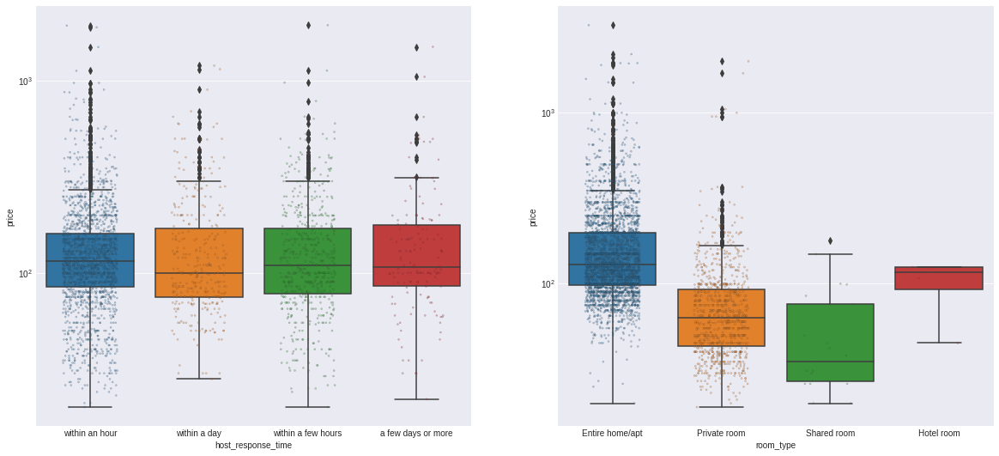

In [98]:
#Boxplot of categorical variables
fig, ax = plt.subplots(1, 2, figsize=(20,9))
for i, axis in enumerate(ax.flatten()):
    data = df[['price', cat_vars[i]]]
    sns.boxplot(data=data, x=cat_vars[i], y='price', ax=axis)
    sns.stripplot(data=data, x=cat_vars[i], y='price', ax=axis, s=2, alpha=.3, jitter=0.25, edgecolor='#333333', linewidth=.5)
    axis.set_yscale('log')

There does not seem to be strong association with any `host_response_time` category and price. However, the entire home/apt category has the highest prices. This is similar to how variables related to the size of the listing is related to price.

### Q7 What is the association between datetime variables and price?

In [99]:
# host since and other date times
date_vars = df.columns[df.dtypes == 'datetime64[ns]']
display(date_vars)

Index(['host_since', 'first_review', 'last_review'], dtype='object')

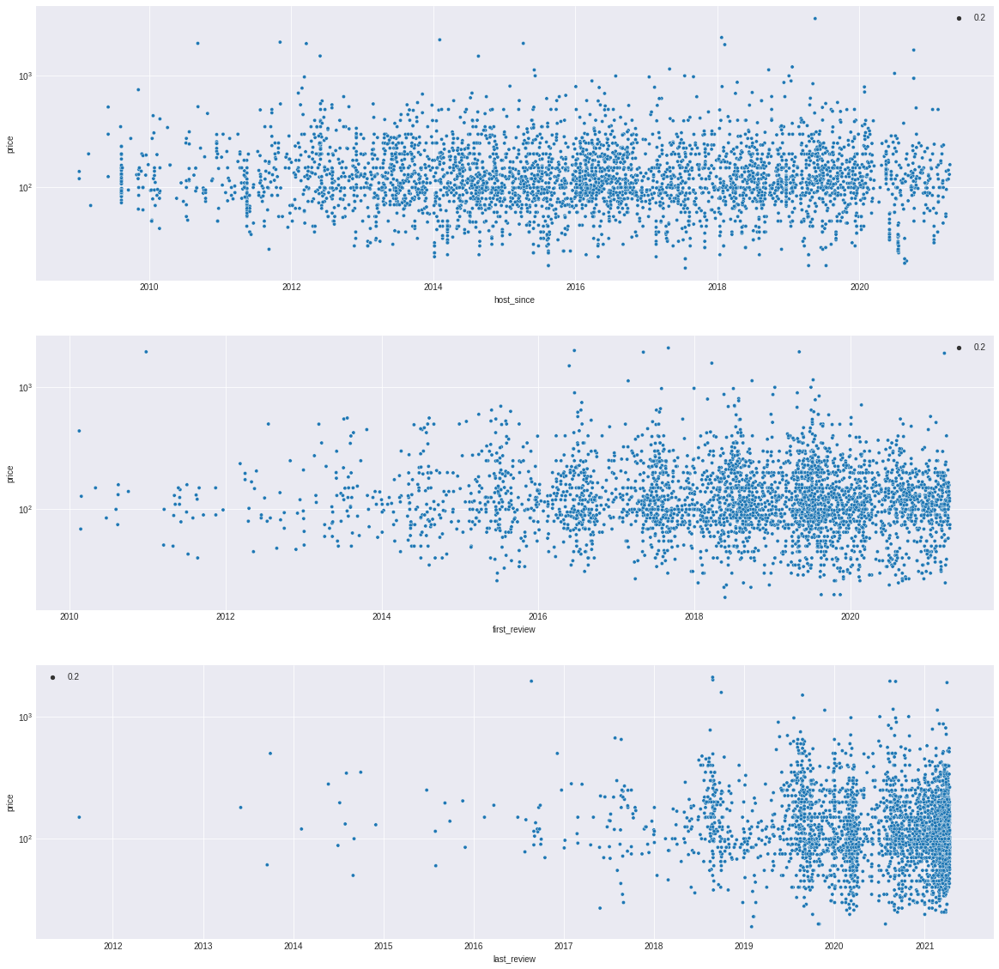

In [135]:
fig, ax = plt.subplots(3, 1, figsize=(20,20))
for i, axis in enumerate(ax):
    sns.scatterplot(data=df, x=date_vars[i], y='price', ax=axis, size=0.2)
    axis.set_yscale('log')

There doesn't appear to be any association between how long a host has been on AirBnb, how long ago the first review of a listing is, or how long ago a listing has been reviewed, with the price of the listing.

### Q7 Are bedroom numbers highly correlated to price?

In Q4, we saw that the size of a listing is moderately correlated with its price. Let's take a closer look at this relationship by plotting bedrooms and beds vs. price.

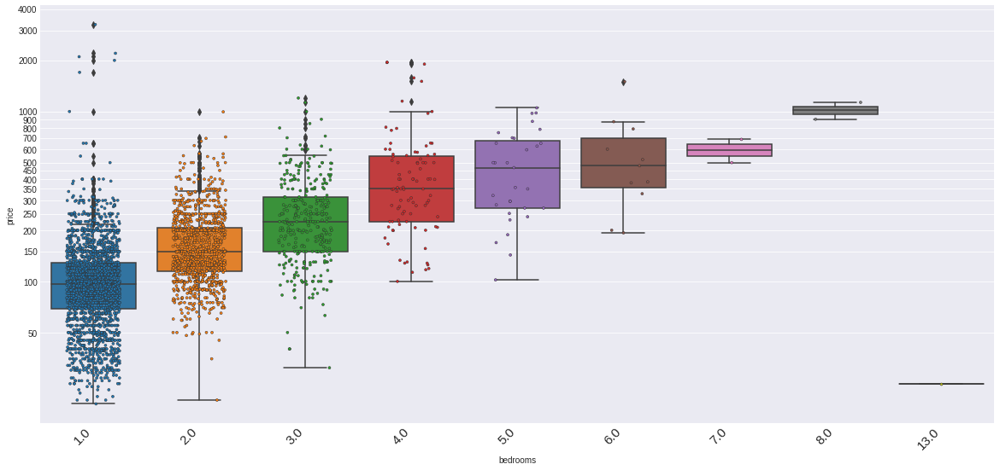

In [137]:
fig, ax = plt.subplots(figsize=(20,9))
sns.stripplot(data=df, x='bedrooms', y='price', ax=ax, s=3, alpha=1, jitter=0.25, edgecolor='#333333', linewidth=.5);
sns.boxplot(data=df, x='bedrooms', y='price', ax=ax);
plt.xticks(rotation=45, ha='right', size=15);
plt.yscale('log')
y_ticks = list(chain(range(50,500,50), range(500, 1000, 100), range(1000, 5000, 1000)))
plt.yticks(ticks=y_ticks, labels=y_ticks);


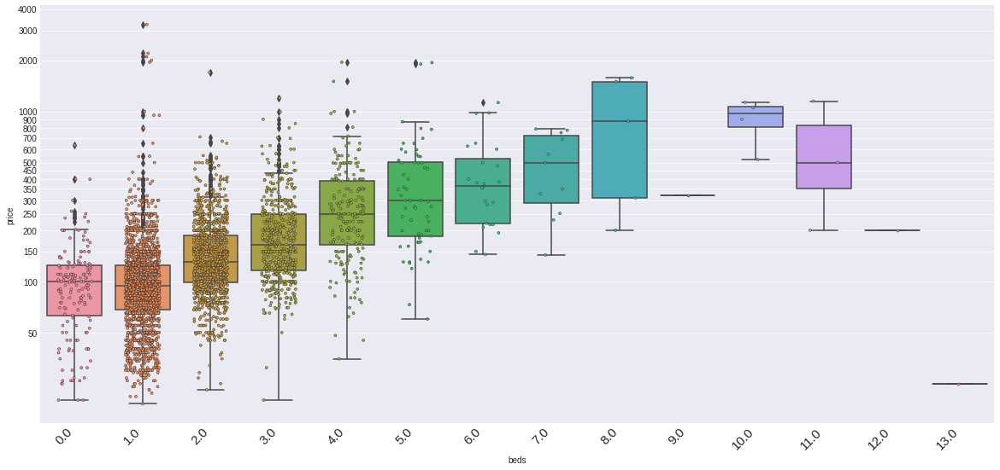

In [138]:
fig, ax = plt.subplots(figsize=(20,9))
sns.stripplot(data=df, x='beds', y='price', ax=ax, s=3, alpha=1, jitter=0.25, edgecolor='#333333', linewidth=.5);
sns.boxplot(data=df, x='beds', y='price', ax=ax);
plt.xticks(rotation=45, ha='right', size=15);
plt.yscale('log')
y_ticks = list(chain(range(50,500,50), range(500, 1000, 100), range(1000, 5000, 1000)))
plt.yticks(ticks=y_ticks, labels=y_ticks);


The listings generally follow the trend of more bedrooms/beds having a higher price. However there are some outliers and anomalies.

There is a listing that has 13 bedrooms/beds. Going to the listing (see the link), it appears to be a joke listing for a haunted house, with no availability in the upcoming year.

In [147]:
display(df.query('beds == 13'))
display_link(df.query('beds == 13')['id'].iloc[0])

,id,neighbourhood,latitude,longitude,price,minimum_nights,availability_365,host_id,calculated_host_listings_count,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,accommodates,room_type,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
2918,39106874,Hastings-Sunrise,49.28346,-123.04316,25,31,0,20440735,1,2014-08-23,NaN,NaN,NaN,0.0,1.0,0.0,13,Entire home/apt,1.0,13.0,13.0,1,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


There's a 12 bed but two bedroom listing that is "dorm" style:

In [149]:
display(df.query('beds == 12'))
display_link(df.query('beds == 12')['id'].iloc[0])

,id,neighbourhood,latitude,longitude,price,minimum_nights,availability_365,host_id,calculated_host_listings_count,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,accommodates,room_type,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
1166,20002260,Oakridge,49.23272,-123.13075,200,2,0,141955126,1,NaT,NaN,NaN,NaN,NaN,NaN,NaN,12,Entire home/apt,2.0,2.0,12.0,1,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,0,0,2017-08-06,2018-08-20,0.18,83.0,9.0,9.0,9.0,10.0,9.0,8.0


Some listings have 0 beds but non-zero bedrooms. This seems to be oversights on the part of the host, and indeed some listings have already amended their number of bed (e.g. listing 322824).

In [80]:
df.query('beds == 0').head(10)

,id,neighbourhood,latitude,longitude,price,minimum_nights,availability_365,host_id,calculated_host_listings_count,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,accommodates,room_type,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
34,125176,Riley Park,49.24615,-123.09462,85,2,312,622926,1,2011-05-24,within an hour,1.0,1.00,0.0,1.0,1.0,3,Private room,1.0,1.0,0.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,496,6,0,2011-08-01,2021-02-28,4.20,94.0,10.0,9.0,10.0,9.0,10.0,10.0
44,248014,Grandview-Woodland,49.29103,-123.05782,100,31,140,1299977,1,2011-10-16,within a day,0.6,NaN,0.0,1.0,1.0,3,Entire home/apt,1.0,2.0,0.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1,0,0,2014-09-04,2014-09-04,0.01,100.0,10.0,8.0,10.0,10.0,10.0,10.0
52,322824,Downtown,49.27608,-123.12452,175,30,242,1652613,1,2012-01-25,within a few hours,1.0,0.00,0.0,1.0,1.0,2,Entire home/apt,1.0,1.0,0.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,142,0,0,2012-04-01,2019-07-26,1.29,98.0,10.0,10.0,10.0,10.0,10.0,10.0
126,1343411,Downtown Eastside,49.27627,-123.10013,95,1,0,6904778,1,2013-06-14,NaN,NaN,1.00,0.0,1.0,1.0,2,Entire home/apt,1.0,1.0,0.0,0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,55,6,0,2015-09-15,2020-11-22,0.81,94.0,10.0,9.0,10.0,10.0,9.0,10.0
138,1507975,Riley Park,49.24882,-123.09121,64,3,253,51695,2,2009-11-05,within an hour,1.0,0.79,1.0,1.0,1.0,2,Private room,1.0,1.0,0.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,255,4,2,2013-08-16,2021-04-03,2.73,94.0,10.0,10.0,10.0,10.0,10.0,10.0
147,1703616,Kitsilano,49.26548,-123.14579,100,30,263,8993938,1,2013-09-22,within an hour,1.0,0.33,0.0,1.0,1.0,4,Entire home/apt,1.5,1.0,0.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0,0,0,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
161,1956739,Downtown,49.28474,-123.10712,139,180,347,4292086,14,2012-11-30,within an hour,1.0,0.89,1.0,1.0,1.0,2,Entire home/apt,1.0,1.0,0.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,100,0,0,2013-12-22,2015-09-27,1.12,95.0,10.0,10.0,10.0,10.0,10.0,9.0
207,2847310,Downtown Eastside,49.28247,-123.10342,161,2,314,6576530,1,2013-05-26,within a few hours,0.9,0.95,1.0,1.0,0.0,2,Ent

In [152]:
display_link(125176)
display_link(248014)
display_link(322824)

There are a number of extremely expensive one bedroom listings. This are explored below.

### Q8 Are some AirBnBs mispriced?

Let's take a closer look at one bedroom prices.

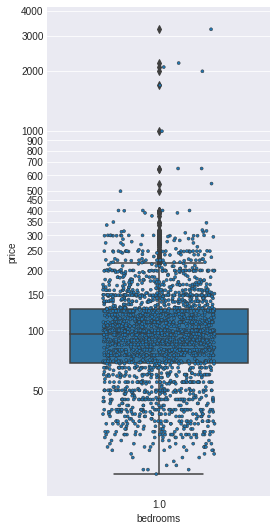

In [161]:
fig, ax = plt.subplots(figsize=(4,9))
sns.stripplot(data=df.query('bedrooms == 1'), x='bedrooms', y='price', ax=ax, s=3, alpha=1, jitter=0.25, edgecolor='#333333', linewidth=.5);
sns.boxplot(data=df.query('bedrooms == 1'), x='bedrooms', y='price', ax=ax);
ax.set_yscale('log')
plt.yticks(ticks=y_ticks, labels=y_ticks);

Some of the outlier have very high prices:

In [169]:
display(df.query('(bedrooms == 1) & (price > 1000)'))
df.query('(bedrooms == 1) & (price > 1000)').id.apply(display_link);


,id,neighbourhood,latitude,longitude,price,minimum_nights,availability_365,host_id,calculated_host_listings_count,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,accommodates,room_type,bathrooms_text,bedrooms,beds,instant_bookable,amenity_wifi,amenity_heating,amenity_smoke alarm,amenity_essentials,amenity_kitchen,amenity_long term stays allowed,amenity_hangers,amenity_washer,amenity_dryer,amenity_hair dryer,amenity_hot water,amenity_iron,amenity_shampoo,amenity_dedicated workspace,amenity_tv,amenity_carbon monoxide alarm,amenity_dishes and silverware,amenity_fire extinguisher,amenity_refrigerator,amenity_cooking basics,amenity_microwave,amenity_coffee maker,amenity_stove,amenity_oven,amenity_free parking on premises,amenity_private entrance,amenity_bed linens,amenity_free street parking,amenity_dishwasher,amenity_first aid kit,amenity_patio or balcony,amenity_extra pillows and blankets,amenity_elevator,amenity_cable tv,amenity_luggage dropoff allowed,amenity_air conditioning,amenity_gym,amenity_backyard,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,reviews_per_month,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
346,5089343,West End,49.28165,-123.12841,2000,2,0,1368497,1,2011-11-04,NaN,NaN,NaN,0.0,1.0,1.0,2,Private room,1.0,1.0,1.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,73,0,0,2016-06-19,2018-08-27,1.25,99.0,10.0,10.0,10.0,10.0,10.0,10.0
1221,20634127,West End,49.28400,-123.13360,2100,30,0,11886329,1,2014-02-02,NaN,NaN,NaN,0.0,1.0,1.0,2,Entire home/apt,1.0,1.0,1.0,0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,11,0,0,2017-09-02,2018-08-26,0.25,100.0,10.0,10.0,10.0,10.0,10.0,10.0
2713,37181228,Downtown,49.27886,-123.12598,3250,180,363,262528648,1,2019-05-18,NaN,NaN,NaN,0.0,1.0,0.0,2,Entire home/apt,1.0,1.0,1.0,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0,0,0,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3592,44306270,Downtown,49.27403,-123.12521,2200,180,179,169212821,1,2018-01-22,NaN,NaN,NaN,0.0,1.0,1.0,2,Entire home/apt,1.0,1.0,1.0,1,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4044,47562842,Renfrew-Collingwood,49.24585,-123.02397,1700,1,179,370922996,3,2020-10-06,NaN,NaN,NaN,0.0,1.0,1.0,1,Private room,1.0,1.0,2.0,1,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0,0,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Listing 37181228 and 44306270 look like they're actually a monthly rental price that's been mispriced as a nightly price. Notably they have a 6 month minimum stay.

I believe the other 3 listings are similarly mispriced, based on my knowledge of Vancouver monthly rental prices. Notably listing 5089343 says they are a 6 month sublet even though its not annotated in their minimum night limit.



### Q9 Are review ratings related to the price of listings?

First, let's take a look at the number of reviews a listing has versus its rating.

<AxesSubplot:xlabel='number_of_reviews', ylabel='review_scores_rating'>

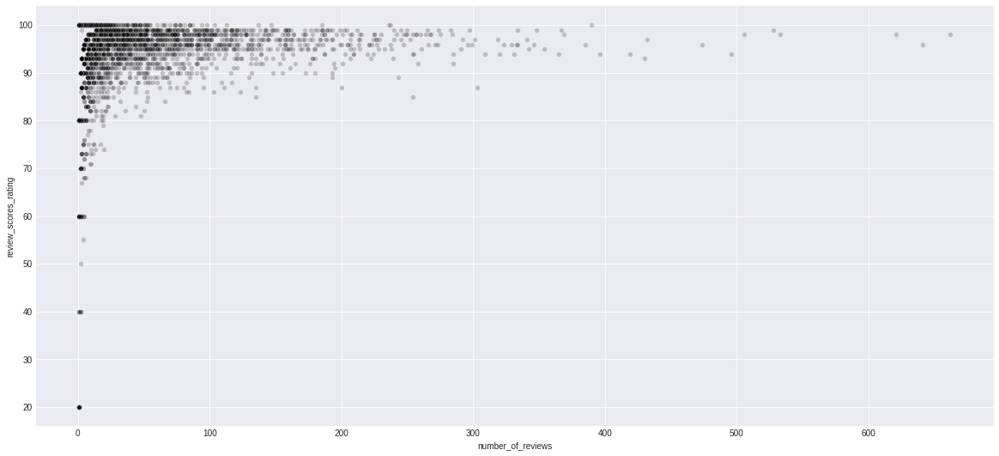

In [107]:
fig, ax = plt.subplots(figsize=(20,9))
sns.scatterplot(data=df, x='number_of_reviews', y='review_scores_rating', s=30, alpha=0.2, color='black', ax=ax)

There is a notable absence of lower ratings as the number for reviews increase. This is due to consistently low ratings getting [listings removed](https://www.airbnb.ca/help/article/2159/how-does-my-experiences-rating-or-reviews-affect-my-ability-to-host#:~:text=Guests%20like%20to%20know%20they,and%2For%20removed%20from%20Airbnb.) from AirBnB.

Plotting price against the review ratings shows there isn't much relationship between prices and ratings, although some of the higher priced outliers do have better ratings. Note the absence of some of the most expensive properties that don't have reviews.

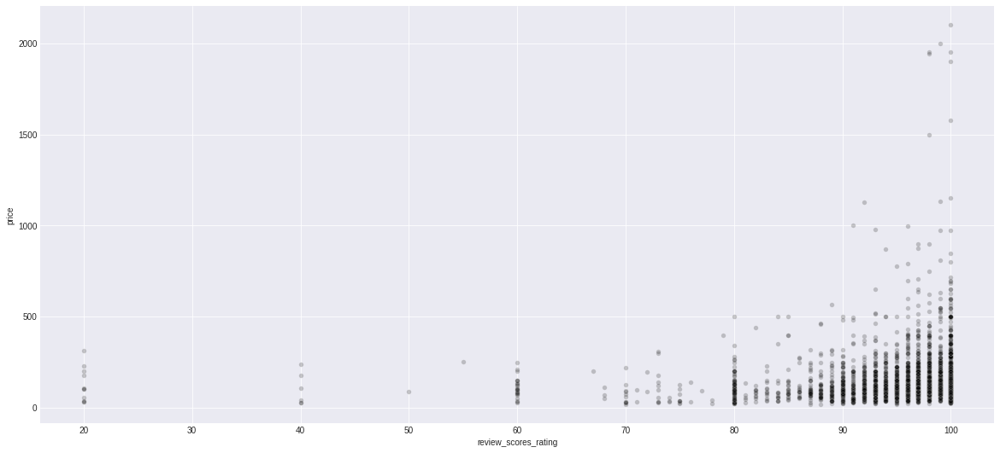

In [108]:
fig, ax = plt.subplots(figsize=(20,9))
sns.scatterplot(data=df, x='review_scores_rating', y='price', s=30, alpha=0.2, color='black', ax=ax);

Removing very low ratings doesn't improve the correlation much.

In [176]:
display(df.corr().loc['review_scores_rating', 'price'])
display(df.query('review_scores_rating > 80').corr().loc['review_scores_rating', 'price'])

0.09799890047217603

0.10590171832230968

In [109]:
df['price'].corr(df['review_scores_rating'])

0.09799890047217624

## Linear modelling

In [ ]:
## Predicting for price
# Drop columns that aren't useful
df_price = df.drop(labels=['id', 'latitude', 'longitude', 'host_id'], axis=1).copy()

In [ ]:
# Helper func to get timedeltas
def time_since(old_time, new_time):
    """
    Return a timedelta obj that is new_time - old_time (datetime objs).
    """
    return new_time - old_time

In [ ]:
# These datetime columns are dates in the past
df_price.columns[df_price.dtypes == 'datetime64[ns]']

In [ ]:
# Convert datetime columns 'host_since', 'first_review', and 'last_review' to days until when the data was scraped
DATE_SCRAPED = pd.to_datetime('2021-04-15', format='%Y-%m-%d')
col_apply_inplace(df_price, ['host_since', 'first_review', 'last_review'], time_since, new_time=DATE_SCRAPED)

In [ ]:
df_price.info()

In [ ]:
# These are the quantitative variables where NA's have to be filled.
df_price.columns[df_price.isna().sum()>0]

For reviews, the median or mean makes sense.

For first_review or last_review, and reviews_per_month, NA's basically mean there's no reviews, so 0 makes sense.



In [ ]:
df_price['host_since'].dt.days.plot.hist(bins=50)

In [ ]:
df_price['host_is_superhost'].value_counts().plot.bar()

In [ ]:
type(df_price['host_since'][0])

In [ ]:
df_price[df_price['host_since'].isna()]

In [ ]:
listings[listings['host_since'].isna()]

In [ ]:
df_price.head(1).loc[:,(df_price.dtypes == 'int64' )| (df_price.dtypes == 'float64')]

In [ ]:
# These columns are strings that will have to be converted to dummies
dummy_cols = df_price.columns[df_price.dtypes == 'object']
print(dummy_cols)

In [ ]:
df_price_dummied = pd.get_dummies(df_price, columns=dummy_cols, prefix=dummy_cols, drop_first=True)

In [ ]:
df_price_dummied.head(1)

In [ ]:
df_price_dummied.info()

In [ ]:
df_price_dummied_filled = df_price_dummied.fillna(df_price_dummied.median())

In [ ]:
df_price_dummied.shape

In [ ]:
# rename
df_pdf = df_price_dummied_filled.copy()

In [ ]:
df_pdf.info()

In [ ]:
df_pdf['host_since'].dt.days.hist(bins=50)

In [ ]:
# Change timedelta to days
cols_td = df_pdf.columns[df_pdf.dtypes == "timedelta64[ns]"]
df_pdf[cols_td] = df_pdf[cols_td].apply(lambda x: x.dt.days)

In [ ]:
X = df_pdf.loc[:,~(df_pdf.columns == 'price')]

In [ ]:
X.shape

In [ ]:
y = df['price']

In [ ]:
y.shape

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 7, test_size = 0.3)

In [ ]:
lm_model = LinearRegression(normalize=True)

In [ ]:
lm_model.fit(X_train, y_train)

In [ ]:
y_preds = lm_model.predict(X_test)

In [ ]:
r_score = r2_score(y_test, y_preds)

In [ ]:
print(r_score)

In [ ]:
lm_model.get_params()

In [ ]:
y_test

In [ ]:
y_test_reset = y_test.reset_index(drop=True)

In [ ]:
results = pd.concat([pd.Series(y_preds), y_test_reset, y_preds - y_test_reset, (y_preds - y_test_reset)/y_test_reset], axis=1)
print(results)

In [ ]:
plt.figure(figsize=(14,8))
plt.scatter(y_test_reset, y_preds, s=4, alpha=0.3);


In [ ]:
plt.figure(figsize=(14,8))
plt.scatter(y_test_reset, (y_preds - y_test_reset)/y_test_reset, s=4, alpha=0.3);

In [ ]:
plt.figure(figsize=(14,8))
plt.scatter(y_test_reset, y_preds - y_test_reset, s=4, alpha=0.3);

In [ ]:
coefs = pd.concat([X.columns.to_series().reset_index(drop=True), pd.Series(lm_model.coef_)], axis=1)
coefs.columns = ['feature', 'coef']
print(coefs)

In [ ]:
coefs.sort_values(by='coef')

In [ ]:
for i, col in enumerate(X.columns):
    print(X.columns[i] + " " + str(np.round(lm_model.coef_[i], decimals=3)))

# Predicting rating


In [ ]:
df_pdf.columns

In [ ]:
df_review = df_pdf.drop(labels=['number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
       'last_review', 'reviews_per_month',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value'], axis=1).copy()

In [ ]:
y2 = df_review['review_scores_rating']
X2 = df_review.drop(labels=['review_scores_rating'], axis=1)

In [ ]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, random_state=7, test_size=0.3)

In [ ]:
lm_model2 = LinearRegression(normalize=True)

In [ ]:
lm_model2.fit(X2_train, y2_train)

In [ ]:
y2_preds = lm_model2.predict(X2_test)

In [ ]:
r_score = r2_score(y2_test, y2_preds)
print(r_score)

In [ ]:
y2_test_reset = y2_test.reset_index(drop=True)
results2 = pd.concat([pd.Series(y2_preds), y2_test_reset, y2_preds - y2_test_reset, (y2_preds - y2_test_reset)/y2_test_reset], axis=1)
print(results2)

In [ ]:
plt.figure(figsize=(14,9))
plt.scatter(y2_test_reset, y2_preds,  s=4, alpha=0.3)
plt.xlim(0,120)
plt.ylim(0,120)

In [ ]:
plt.figure(figsize=(14,9))
plt.scatter(y2_test_reset, (y2_preds - y2_test_reset)/y2_test_reset, s=4, alpha=0.3);

In [ ]:
plt.figure(figsize=(14,9))
plt.scatter(y2_test_reset, (y2_preds - y2_test_reset), s=4, alpha=0.3);

In [ ]:
coefs2 = pd.concat([X2.columns.to_series().reset_index(drop=True), pd.Series(lm_model2.coef_)], axis=1)
coefs2.columns = ['feature', 'coef']
print(coefs2)

In [ ]:
coefs2.sort_values(by='coef')

check what happens when drop extremes for r2 scores

# Predicting binarily

In [ ]:
df_pdf['price'].describe()

In [ ]:
df_pdf_bi = df_pdf.copy()

In [ ]:
df_pdf_bi['premium'] = (df_pdf['price'] > 115).astype(int)

In [ ]:
df_pdf_bi.head()

In [ ]:
X3 = df_pdf_bi.drop(labels=['premium'], axis=1)
y3 = df_pdf_bi['premium']

In [ ]:
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, random_state=7, test_size=0.3)
lm_model3 = LinearRegression(normalize=True)
lm_model3.fit(X3_train, y3_train)
y3_preds = lm_model3.predict(X3_test)
r_score3 = r2_score(y3_test, y3_preds)
print(r_score3)

In [ ]:
fpr, tpr, thresholds = roc_curve(y3_test, y3_preds)
roc_auc = auc(fpr, tpr)
display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)

In [ ]:
display.plot()
plt.show()

In [ ]:
thresholds

In [ ]:
spearmanr(y3_test, y3_preds)

In [ ]:
pearsonr(y3_test, y3_preds)

In [ ]:
plt.figure(figsize=(14,9))
sns.swarmplot(x=y3_test, y=y3_preds, s=7)

Capping predictions between 0 and 1?!??!

# Model after withdrawing some params

e.g. remove hotel because it's only 4
Pricing mismatchs.
Joke posts with no availability.

# Conclusions and Discussion

model across time and cities

TODO: mispricing based on desperation??
Some should be monthly instead of daily.

## Resources